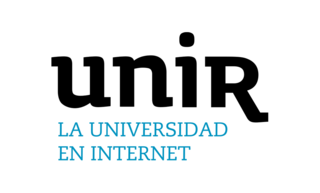

_Máster Universitario en Inteligencia Artificial_

_Trabajo Fin de Máster_

- Gustavo Mateos Santos
- gustavo.mateos830@comunidadunir.net

# Clasificación automática de estrellas variables con modelos Transformer aplicados a series temporales



In [3]:
# Install missing packages
%pip install torch lightkurve
%pip install -q pyarrow

Note: you may need to restart the kernel to use updated packages.
^C
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import torch, lightkurve as lk

print("Torch:", torch.__version__)
print("Lightkurve:", lk.__version__)

Torch: 2.2.2
Lightkurve: 2.5.0


| Fuente       | Misión | Etiquetado | Tipo         | Método de acceso                   |
| ------------ | ------ | ---------- | ------------ | ---------------------------------- |
| Kepler EB    | Kepler | Sí         | Binaries     | NASA Exoplanet Archive / Villanova |
| K2VARCAT     | K2     | Sí         | Multiclase   | MAST HLSP                          |
| TESS-SVC     | TESS   | Semi       | Variabilidad | MAST HLSP                          |
| TESS-EB      | TESS   | Sí         | EB continuas | MAST HLSP                          |
| VSX (AAVSO)  | Todos  | Sí         | Multiclase   | AAVSO + MAST                       |
| Gaia DR3 Var | Todos  | Sí         | Multiclase   | ESA Gaia Archive                   |

Diseño del esquema del dataset. Vamos a unificar las curvas descargadas en un dataset estructurado tipo CSV/Parquet con este esquema mínimo:

| id\_mision | id\_objeto | mision | clase\_variable | fecha\_inicio | fecha\_fin | tiempo | magnitud | error | origen\_etiqueta |
| ---------- | ---------- | ------ | --------------- | ------------- | ---------- | ------ | -------- | ----- | ---------------- |

Estrategia de implementación técnica
Podemos hacerlo en varias etapas:

- Script 1: descarga de curvas etiquetadas de Kepler EB y TESS-EB (usando ID + clase desde CSV original)
- Script 2: procesamiento de K2VARCAT (CSV disponible con clase + ID)
- Script 3: combinación cruzada entre TIC (TESS Input Catalog) y VSX (requiere posiciones celestes + nombre)
- Script 4: cruce de Gaia DR3 variables con coordenadas de Kepler/K2/TESS
- Script 5: exportación consolidada en formato CSV/Parquet final con clases normalizadas

### 📥 Script 1: descarga y consolidación de curvas de Kepler y TESS de la clase EB (entorno local o SageMaker)
Esta sección permite ejecutar el script 1, ya sea con el catálogo completo (en SageMaker) o con una muestra reducida (en local), y verificar el resultado consolidado.


In [ ]:
import warnings
import os, sys, platform
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Lanzando el script de ejemplo directamente
# !python src/script_2_k2varcat_multiclase.py.py

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_1_kepler_tess_eb import main as run_script_1

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

existing = len(glob.glob("/home/ec2-user/backup/data/raw/kepler/*.csv")) + len(glob.glob("/home/ec2-user/backup/data/raw/tess/*.csv"))
print(f"🗃️ Curvas ya existentes en disco: {existing}", flush=True)

# Ejecutar con la opción adecuada
if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    # Solo Kepler, solo pendientes
    run_script_1(mission="Kepler", only_pending=True)
    # Ambos, solo pendientes
    #run_script_1(mission="ALL", only_pending=True)
else:
    print("💻 Ejecutando en entorno local → catálogo de prueba")
    run_script_1(use_sample=True)

🔇 Warnings silenciados: UserWarning, FutureWarning
📁 Usando RAW_DIR: /home/ec2-user/backup/data/raw


[05/16/25 11:50:07] INFO     Found credentials from IAM Role:                                   ]8;id=329048;file:///home/ec2-user/anaconda3/envs/pytorch_p310/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=354539;file:///home/ec2-user/anaconda3/envs/pytorch_p310/lib/python3.10/site-packages/botocore/credentials.py#1132\1132]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/ec2-user/.config/sagemaker/config.yaml
🗃️ Curvas ya existentes en disco: 7707
🔁 Ejecutando en SageMaker → catálogo completo
[⬇] Descargando catálogos completos de Kepler y TESS...
[⬇] Descargando catálogo Kepler EB...
[📂] Cargando catálogo Kepler EB desde copia local...
[⬇] Descargando catálogo TESS EB...
[⬇] Generando CSV de entrada para descarga de curvas...
📝 CSV generado con 0 estrellas → data/lists/eb_ids.csv
[⬇] Descargando curvas de luz...

🚀 Procesando misión: Kepler (only_pending=True)
📝 CSV generado con 0 estrellas → data/lists/eb_ids_kepler_pendientes.csv
[⬇] Descargando 0 curvas en paralelo con 8 hilos...


🚀 Descargando curvas: 0it [00:00, ?it/s]


	📦 0 objetos procesados hasta ahora...
[✓] Descarga finalizada: 0 objetos procesados.
[⭢] Leyendo y fusionando curvas descargadas...


[📁] Usando 37 lotes ya existentes en /home/ec2-user/temp_batches
[⏳] Uniendo todos los lotes en /home/ec2-user/backup/processed/dataset_eb_kepler.parquet...


📚 Uniendo lotes: 100%|██████████| 37/37 [01:46<00:00,  2.88s/it]


[✅] Dataset parquet construido → /home/ec2-user/backup/processed/dataset_eb_kepler.parquet
🧹 Carpeta temporal eliminada: /home/ec2-user/temp_batches
[⭢] Fusionando metadatos (etiquetas)...
[⏱] Tiempo total: 108.39 segundos


In [ ]:
from src.utils.cleanup_raw import cleanup_raw_data

# Limpiar los datos de prueba
#cleanup_raw_data('/home/ec2-user/backup/data/raw', confirm=True)

##### 📥 Comprobación de los fichero de curvas Kepler y TESS (EB) mergeado y consolidado

##### ⚠️ Comprobación de la columna "clase_variable"

In [ ]:
import pyarrow.parquet as pq
from pathlib import Path

for name in ["kepler", "tess"]:
    path = Path(f"data/processed/dataset_eb_{name}_labeled.parquet")
    if not path.exists():
        print(f"❌ Archivo no encontrado: {path}")
        continue

    try:
        parquet_file = pq.ParquetFile(path)
        schema = parquet_file.schema_arrow
        columns = schema.names

        print(f"\n📦 {name.upper()} contiene {len(columns)} columnas:")
        print(columns)

        if "clase_variable" in columns:
            print(f"✅ 'clase_variable' está presente en {name.upper()}")
        else:
            print(f"⚠️  'clase_variable' NO está presente en {name.upper()}")
    except Exception as e:
        print(f"❌ Error leyendo {path}: {e}")



📦 KEPLER contiene 31 columnas:
['tiempo', 'magnitud', 'error', 'quality', 'timecorr', 'centroid_col', 'centroid_row', 'cadenceno', 'sap_flux', 'sap_flux_err', 'sap_bkg', 'sap_bkg_err', 'pdcsap_flux', 'pdcsap_flux_err', 'sap_quality', 'psf_centr1', 'psf_centr1_err', 'psf_centr2', 'psf_centr2_err', 'mom_centr1', 'mom_centr1_err', 'mom_centr2', 'mom_centr2_err', 'pos_corr1', 'pos_corr2', 'id_objeto', 'id_mision', 'mision', 'fecha_inicio', 'fecha_fin', 'clase_variable']
✅ 'clase_variable' está presente en KEPLER

📦 TESS contiene 30 columnas:
['tiempo', 'magnitud', 'error', 'timecorr', 'cadenceno', 'centroid_col', 'centroid_row', 'sap_flux', 'sap_flux_err', 'sap_bkg', 'sap_bkg_err', 'pdcsap_flux', 'pdcsap_flux_err', 'quality', 'psf_centr1', 'psf_centr1_err', 'psf_centr2', 'psf_centr2_err', 'mom_centr1', 'mom_centr1_err', 'mom_centr2', 'mom_centr2_err', 'pos_corr1', 'pos_corr2', 'id_objeto', 'id_mision', 'mision', 'fecha_inicio', 'fecha_fin', 'clase_variable']
✅ 'clase_variable' está presen

### ✅ FIX de la columna "clase_variable"

In [ ]:
from pathlib import Path
import pyarrow.dataset as ds
import pyarrow as pa
import pyarrow.parquet as pq
from tqdm import tqdm

def reparar_parquet_streaming(parquet_path: Path, output_path: Path, clase_default: str = "EB"):
    dataset = ds.dataset(parquet_path, format="parquet")

    # Preparamos el escritor con el esquema extendido
    sample_batch = next(dataset.to_batches(batch_size=100))
    schema_original = sample_batch.schema
    schema_nueva = schema_original.append(pa.field("clase_variable", pa.string()))

    writer = pq.ParquetWriter(output_path, schema=schema_nueva, compression="snappy")

    print(f"[🔧] Reparando parquet: {parquet_path.name}")
    fragmentos = dataset.to_batches(batch_size=50000)

    for batch in tqdm(fragmentos, desc="🛠️ Reparando por lotes"):
        n = batch.num_rows
        columna_clase = pa.array([clase_default] * n, type=pa.string())
        batch_corregido = batch.append_column("clase_variable", columna_clase)
        writer.write_table(pa.Table.from_batches([batch_corregido], schema=schema_nueva))

    writer.close()
    print(f"[✅] Reparación completada → {output_path}")

# Ejemplo de uso:
reparar_parquet_streaming(Path("data/processed/dataset_eb_tess.parquet"),
                          Path("data/processed/dataset_eb_tess_labeled.parquet"))

[🔧] Reparando parquet: dataset_eb_tess.parquet


🛠️ Reparando por lotes: 2426it [10:19,  3.91it/s]


[✅] Reparación completada → data\processed\dataset_eb_tess_labeled.parquet


### 📥 Script 2: descarga y consolidación de curvas de K2 (multiclase) (entorno local o SageMaker)
Esta sección permite ejecutar el script 2, ya sea con el catálogo completo (en SageMaker) o con una muestra reducida (en local), y verificar el resultado consolidado.

| Posición | Nombre          | Descripción                                                                   |
| -------- | --------------- | ----------------------------------------------------------------------------- |
| 0        | `EPIC_ID`       | Identificador del catálogo EPIC                                               |
| 1        | `K2_TYPE`       | Tipo de curva: EB, AP, QP, P                                                  |
| 2        | `RANGE_PCT`     | Rango de la curva de luz (en %)                                               |
| 3        | `PERIOD_DAYS`   | Periodo estimado (días). 0 para sistemas aperiódicos                          |
| 4        | `AMPLITUDE_PCT` | Amplitud (en %), interpretada según el tipo                                   |
| 5        | `PROPOSAL_INFO` | Texto libre con número de propuesta y/o tipo de variable                      |
| 6        | `AMP_ERR1`      | Sin descripción clara — puede ser un valor derivado técnico (puede ignorarse) |
| 7        | `AMP_ERR2`      | Ídem                                                                          |


Aunque search_lightcurve() encuentra resultados, estos están en un formato no compatible con las versiones actuales de Lightkurve (que está diseñado para los productos SPOC y algunos QLP).
En resumen:
Los datos de K2VARCAT en MAST existen.
Pero no se pueden abrir ni procesar directamente con Lightkurve, ni con .download() ni con .download_all().

- Usar EPIC_ID + clase del CSV de K2VARCAT.
- Buscar curvas reales usando author="EVEREST" (sí compatibles con Lightkurve).
- Descargar y procesar curvas para esos objetos.
- Guardar todo en formato .parquet con esquema estándar.

In [ ]:
import warnings
import os, sys
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Lanzando el script de ejemplo directamente
# !python src/script_2_k2varcat_multiclase.py.py

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_2_k2varcat_everest import main as run_script_2

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    run_script_2(limit=None, workers=10)
else:
    print("💻 Ejecutando en entorno local → catálogo de prueba")
    run_script_2(limit=None, workers=8)


🔇 Warnings silenciados: UserWarning, FutureWarning
💻 Ejecutando en entorno local → catálogo de prueba
✅ Catálogo ya descargado: data/raw/k2varcat_official.csv


📦 Procesando curvas EVEREST: 100%|██████████| 8395/8395 [43:51<00:00,  3.19it/s]  


Resumen de estado: {'❌': 3478, '🟡': 3024, '✅': 1893}
✅ Dataset final guardado en: data/processed/dataset_k2varcat.parquet


#### Borrado caché Lightcurve

In [ ]:
import shutil
import os

# Ruta por defecto en sistemas Windows / Unix
cache_dir = os.path.expanduser("~/.lightkurve/cache")

# Intentar vaciar con método oficial de Lightkurve (si existe)
try:
    from lightkurve import clear_download_cache
    print("🧹 Limpiando caché con Lightkurve...")
    clear_download_cache()
except ImportError:
    print("⚠️ clear_download_cache no está disponible en esta versión de Lightkurve. Se eliminará manualmente.")

# Borrar carpeta cache si todavía quedan ficheros residuales
if os.path.exists(cache_dir):
    try:
        shutil.rmtree(cache_dir)
        print(f"✅ Caché eliminada: {cache_dir}")
    except Exception as e:
        print(f"⚠️ No se pudo eliminar completamente la carpeta: {e}")
else:
    print("ℹ️ No se encontró la carpeta de caché")

# Confirmación de espacio liberado (solo si quieres usarlo)
import psutil
total, used, free = shutil.disk_usage(".")
print(f"💾 Espacio libre actual: {free // (1024 ** 3)} GB")


⚠️ clear_download_cache no está disponible en esta versión de Lightkurve. Se eliminará manualmente.
✅ Caché eliminada: C:\Users\hav3f/.lightkurve/cache
💾 Espacio libre actual: 96 GB


In [ ]:
import shutil

chunks_dir = "data/processed/k2varcat_chunks"
shutil.rmtree(chunks_dir)
print(f"✅ Directorio eliminado: {chunks_dir}")


### 📥 Script 3: descarga y consolidación de curvas de K2 (multiclase) (entorno local o SageMaker)

#### 🎯 Objetivo:

Cruzar objetos del catálogo TIC (TESS Input Catalog) con el catálogo **VSX (AAVSO Variable Star Index)** para:

-   Obtener variables etiquetadas con clases del VSX.
    
-   Localizar sus posiciones celestes (RA, DEC).
    
-   Buscar sus curvas reales mediante ID TIC o coordenadas.
    
#### ✅ Fuentes necesarias:

**TIC**

ID TIC, RA/DEC, magnitudes, TESS target info

MAST via Vizier o CDS

**VSX**

Nombre variable, RA/DEC, tipo variable (EA, DSCT, RRab, etc.)

tic_dec00_00N__02_00N.csv.gz - 4.51GB

tic_dec02_00N__04_00N.csv.gz - 4.77GB

tic_dec02_00S__00_00N.csv.gz - 5.04GB

tic_dec04_00N__06_00N.csv.gz - 4.57GB

tic_dec04_00S__02_00S.csv.gz - 4.40GB

tic_dec06_00N__08_00N.csv.gz - 4.65GB

tic_dec06_00S__04_00S.csv.gz - 5.01GB

tic_dec08_00N__10_00N.csv.gz - 4.87GB

tic_dec08_00S__06_00S.csv.gz - 5.51GB

tic_dec10_00N__12_00N.csv.gz - 5.09GB

tic_dec10_00S__08_00S.csv.gz - 5.40GB

tic_dec12_00N__14_00N.csv.gz - 5.03GB

tic_dec12_00S__10_00S.csv.gz - 5.40GB

tic_dec14_00N__16_00N.csv.gz - 4.94GB

tic_dec14_00S__12_00S.csv.gz - 5.90GB

tic_dec16_00N__18_00N.csv.gz - 4.76GB

tic_dec16_00S__14_00S.csv.gz - 6.93GB

tic_dec18_00N__20_00N.csv.gz - 4.77GB

tic_dec18_00S__16_00S.csv.gz - 7.79GB

tic_dec20_00S__18_00S.csv.gz - 7.99GB

**TOTAL: 107 GB**

In [ ]:
import warnings
import os, sys
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Lanzando el script de ejemplo directamente
# !python src/script_2_k2varcat_multiclase.py.py

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_3_vsx_tic_match import main as run_script_3

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    run_script_3(limit=None, radio_arcsec=3.0, limit_bins=5)
else:
    print("💻 Ejecutando en entorno local → catálogo completo")
    run_script_3(limit=5000, radio_arcsec=3.0, limit_bins=30, max_download_workers=4)


🔇 Warnings silenciados: UserWarning, FutureWarning
💻 Ejecutando en entorno local → catálogo completo
📉 Catálogo VSX reducido a franja DEC -20 → 20 (3900 objetos)
🎯 Limitando a 30 regiones DEC (bins únicos)
📦 Archivos DEC necesarios: ['tic_dec00_00N__02_00N.csv.gz', 'tic_dec02_00N__04_00N.csv.gz', 'tic_dec02_00S__00_00N.csv.gz', 'tic_dec04_00N__06_00N.csv.gz', 'tic_dec04_00S__02_00S.csv.gz', 'tic_dec06_00N__08_00N.csv.gz', 'tic_dec06_00S__04_00S.csv.gz', 'tic_dec08_00N__10_00N.csv.gz', 'tic_dec08_00S__06_00S.csv.gz', 'tic_dec10_00N__12_00N.csv.gz', 'tic_dec10_00S__08_00S.csv.gz', 'tic_dec12_00N__14_00N.csv.gz', 'tic_dec12_00S__10_00S.csv.gz', 'tic_dec14_00N__16_00N.csv.gz', 'tic_dec14_00S__12_00S.csv.gz', 'tic_dec16_00N__18_00N.csv.gz', 'tic_dec16_00S__14_00S.csv.gz', 'tic_dec18_00N__20_00N.csv.gz', 'tic_dec18_00S__16_00S.csv.gz', 'tic_dec20_00S__18_00S.csv.gz']
🟡 Ya existe: tic_dec00_00N__02_00N.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec02_00S__00_00N.csv.gz. No se vuelve a

⬇️ Descargando TIC: 100%|██████████| 20/20 [00:00<00:00, 661.85it/s]

🟡 Ya existe: tic_dec10_00N__12_00N.csv.gz. No se vuelve a descargar.🟡 Ya existe: tic_dec08_00S__06_00S.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec12_00N__14_00N.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec10_00S__08_00S.csv.gz. No se vuelve a descargar.

🟡 Ya existe: tic_dec12_00S__10_00S.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec14_00S__12_00S.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec14_00N__16_00N.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec16_00S__14_00S.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec16_00N__18_00N.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec18_00N__20_00N.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec18_00S__16_00S.csv.gz. No se vuelve a descargar.
🟡 Ya existe: tic_dec20_00S__18_00S.csv.gz. No se vuelve a descargar.


📂 Procesando en chunks tic_dec06_00N__08_00N.csv.gz...
⏱️ Chunks procesados en 389.62 s
📂 Procesando en chunks tic_dec02_00N__04_00N.csv.gz...
⏱️ Chunks procesados en 422.36 s
📂 Procesando en chunks tic_dec08_00N__10_00N.csv.gz...
⏱️ Chunks procesados en 407.71 s
📂 Procesando en chunks tic_dec02_00S__00_00N.csv.gz...
⏱️ Chunks procesados en 348.85 s
📂 Procesando en chunks tic_dec04_00S__02_00S.csv.gz...
⏱️ Chunks procesados en 304.94 s
📂 Procesando en chunks tic_dec00_00N__02_00N.csv.gz...
⏱️ Chunks procesados en 284.42 s
📂 Procesando en chunks tic_dec06_00S__04_00S.csv.gz...
⏱️ Chunks procesados en 306.23 s
📂 Procesando en chunks tic_dec04_00N__06_00N.csv.gz...
⏱️ Chunks procesados en 266.55 s
📂 Procesando en chunks tic_dec08_00S__06_00S.csv.gz...
⏱️ Chunks procesados en 336.47 s
📂 Procesando en chunks tic_dec12_00N__14_00N.csv.gz...
⏱️ Chunks procesados en 274.89 s
📂 Procesando en chunks tic_dec10_00S__08_00S.csv.gz...
⏱️ Chunks procesados en 303.38 s
📂 Procesando en chunks tic_dec10

🧮 Procesando por lotes: 1it [00:00, 55.55it/s]


✅ Resumen exportado a: data/processed/summary\dataset_vsx_tic_labeled_summary.csv


PermissionError: [WinError 5] Acceso denegado: 'data\\processed\\temp_vsx_tic'

### ℹ️ Verificación de estructura y metada

In [ ]:
import pyarrow.dataset as ds
from collections import Counter
from tqdm import tqdm
import json
import csv
from datetime import datetime
import os

def inspect_and_export_summary(parquet_path, output_format="json"):
    print(f"\n📁 Inspeccionando: {parquet_path}")
    dataset = ds.dataset(parquet_path, format="parquet")
    schema = dataset.schema

    summary = {
        "file": parquet_path,
        "columns": {field.name: str(field.type) for field in schema},
        "class_distribution": {},
        "total_rows": 0,
        "total_objects": 0,
        "timestamp": datetime.now().isoformat()
    }

    class_counter = Counter()
    objetos = set()

    for batch in tqdm(dataset.to_batches(columns=["clase_variable", "id_objeto"]), desc="🧮 Procesando por lotes"):
        summary["total_rows"] += batch.num_rows
        if "clase_variable" in batch.schema.names:
            clases = batch.column("clase_variable").to_pylist()
            class_counter.update(clases)
        if "id_objeto" in batch.schema.names:
            objetos.update(batch.column("id_objeto").to_pylist())

    summary["class_distribution"] = dict(class_counter)
    summary["total_objects"] = len(objetos)

    # Salida
    output_dir = "data/processed/summary"
    os.makedirs(output_dir, exist_ok=True)
    basename = os.path.splitext(os.path.basename(parquet_path))[0]
    output_path = os.path.join(output_dir, f"{basename}_summary.{output_format}")

    if output_format == "json":
        with open(output_path, "w", encoding="utf-8") as f:
            json.dump(summary, f, indent=2, ensure_ascii=False)
    elif output_format == "csv":
        with open(output_path, "w", newline='', encoding="utf-8") as f:
            writer = csv.writer(f)
            writer.writerow(["Clase", "Recuento"])
            for clase, count in class_counter.items():
                writer.writerow([clase, count])
        # Añadir resumen general en info.txt
        with open(output_path.replace(".csv", "_info.txt"), "w", encoding="utf-8") as f:
            f.write(f"Fichero: {summary['file']}\n")
            f.write(f"Filas totales: {summary['total_rows']}\n")
            f.write(f"Curvas únicas (id_objeto): {summary['total_objects']}\n")
            f.write(f"Columnas: {list(summary['columns'].keys())}\n")
            f.write(f"Fecha: {summary['timestamp']}\n")
    else:
        raise ValueError("❌ Formato no soportado. Usa 'json' o 'csv'.")

    print(f"✅ Resumen exportado a: {output_path}")

# 🔧 Uso de ejemplo
#inspect_and_export_summary("data/processed/dataset_eb_kepler_labeled.parquet", output_format="csv")
#inspect_and_export_summary("data/processed/dataset_eb_tess_labeled.parquet", output_format="csv")
# Inspeccionar el parquet de K2
#inspect_and_export_summary("data/processed/dataset_k2varcat_labeled.parquet", output_format="csv")
# Inspeccionar el parquet de VSX-TIC-TESS
inspect_and_export_summary("data/processed/dataset_vsx_tess_labeled.parquet", output_format="csv")



📁 Inspeccionando: data/processed/dataset_vsx_tess_labeled.parquet


🧮 Procesando por lotes: 314it [03:04,  1.70it/s]

✅ Resumen exportado a: data/processed/summary\dataset_vsx_tess_labeled_summary.csv


📊 ¿Qué indica el recuento?
No representa el número de estrellas, sino la suma de todas las observaciones individuales que componen las curvas.

#### **Kepler**

| Métrica                          | Valor         |
| -------------------------------- | ------------- |
| 🔢 Filas totales (observaciones) | 71,735,011    |
| 🌟 Curvas únicas (`id_objeto`)   | 2762         |
| 🧬 Clases presentes              | EB |

71,7 millones de puntos de luz (observaciones) etiquetados como "EB" (eclipsing binary), pertenecientes a 2762 curvas de luz.

#### **TESS**

| Métrica                          | Valor         |
| -------------------------------- | ------------- |
| 🔢 Filas totales (observaciones) | 120,747,997    |
| 🌟 Curvas únicas (`id_objeto`)   | 4142         |
| 🧬 Clases presentes              | EB |
 
120,7 millones de observaciones etiquetadas como "EB", pertenecientes a 4142 curvas de luz.

#### **K2**

| Métrica                          | Valor         |
| -------------------------------- | ------------- |
| 🔢 Filas totales (observaciones) | 17,895,159    |
| 🌟 Curvas únicas (`id_objeto`)   | 4917         |
| 🧬 Clases presentes              | AP, QP, P, EB |

17,8 millones de observaciones etiquetadas multiclase, pertenecientes a 4917 curvas de luz.

Distribución de clases: 

| Clase | Observaciones |
| ----- | ------------- |
| AP    | 9,884,704     |
| QP    | 7,344,096     |
| P     | 433,803       |
| EB    | 232,556       |

NOTA: la clase `EB`, que no estaba en el subconjunto reducido pero sí aparece en el total, lo cual valida que el catálogo completo contiene ejemplos de todas las clases previstas.

#### **VSX <> TIC**


-   **Total de coincidencias**: 3989
-   **Objetos únicos**: 3879 → solo hay unos pocos objetos duplicados (esperable si hay múltiples matches por posición con el mismo `id_objeto` VSX)
-   **Columnas correctas**: identificadores, posición cruzada, tipo de variable y fuente.

📊 Distribución de clases

-   El sistema ha capturado una gran variedad de clases reales como:  
    -   `ROT`, `RRAB`, `DSCT`, `RS`, `EA`, `EW`, `EB`, `GDOR`, `ACV`, etc.
-   Hay algunas clases **ambiguas o sin limpiar**, como:
    -   Compuestos (`DSCT|GDOR|SXPHE`, `ESD|EC`)
    -   Vacíos: `''` → 16 filas
    -   Etiquetas complejas (más de 3 clases unidas por `|`)

🔁 Esto es habitual en VSX, y podrás **normalizar esas clases** para agrupar mejor.

✅ `dataset_vsx_tic_labeled.parquet` es un **catálogo cruzado** que contiene:

* Estrellas variables identificadas en VSX
* Posiciones (RA/DEC) y tipos de variabilidad (`clase_variable`)
* Su correspondiente `tic_id` en el catálogo TIC

🚫 Pero **no contiene curvas de luz**, a diferencia de tus datasets previos de Kepler, K2 y TESS.

🧭 Por tanto, los **pasos siguientes correctos** son:

#### ✅ 1. Limpieza y consolidación de clases (`clase_variable`)

* VSX usa nomenclaturas complejas: combinaciones (`DSCT|GDOR|SXPHE`), ambigüedades (`VAR`, `MISC`) y valores vacíos.
* Necesitas definir una taxonomía unificada (por ejemplo, agrupar todos los `RR*` en `RR Lyrae`, o filtrar `UNKNOWN`).
* Resultado: una columna `clase_variable_normalizada` útil para clasificación supervisada.

👉 Esto se puede hacer ya sobre el `.parquet` actual sin descargar nada más.

#### ✅ 2. Usar `tic_id` para descargar curvas reales de TESS

* Usas `Lightkurve` o MAST para buscar y descargar curvas de luz (`PDCSAP_FLUX`) por `tic_id`.
* Construyes un nuevo `.parquet` que **sí contendrá curvas reales** (tiempo, magnitud, error...).
* Este será tu dataset VSX-TESS etiquetado real.

👉 Esto será el que puedes fusionar con Kepler, K2 y TESS ya procesados. **...Eso es lo que hemos hecho (ver celda abajo con llamada a `script_3a_clean_vsx_classes`) y tenemos**: 

##### 📌 `dataset_vsx_tess_labeled.parquet`

#### **VSX <> TIC** => TESS

| Métrica                          | Valor         |
| -------------------------------- | ------------- |
| 🔢 Filas totales (observaciones) | 41,1 millones    |
| 🌟 Curvas únicas (`id_objeto`)   | 1594         |
| 🧬 Clases presentes              | múltiples |
| 🟢 Columnas              | tiempo, magnitud, error, clase_variable, etc. |


📊 Distribución de clases
✅ Cosas correctas:
- Las clases originales del catálogo VSX han sido conservadas.
- Muchas de ellas fueron etiquetadas por patrones múltiples (DSCT|GDOR|SXPHE, EC|ESD, etc.).
- Existen clases ya normalizadas como ROT, EA, RS, EB, RRAB…
- La clase vacía , se ha detectado como tal y separada (468006 filas): podemos limpiar eso después si hace falta.





In [ ]:
from src.fase1.script_3a_clean_vsx_classes import main as run_normalization
run_normalization()

📥 Leyendo: data/processed/dataset_vsx_tic_labeled.parquet
🔧 Normalizando clases...
🔎 Clases únicas encontradas: 33
💾 Guardando dataset limpio en: data/processed/dataset_vsx_tic_labeled_clean.parquet
📊 Exportando resumen de clases...
✅ Proceso completado


In [ ]:
import warnings
import os, sys
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_3b_download_tess_curves_from_vsx import main as run_vsx_tess_download

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    run_vsx_tess_download(limit=None, workers=4)
else:
    print("💻 Ejecutando en entorno local → catálogo completo")
    run_vsx_tess_download(limit=None, workers=8)


🔇 Warnings silenciados: UserWarning, FutureWarning
💻 Ejecutando en entorno local → catálogo completo
📥 Cargando dataset: data/processed/dataset_vsx_tic_labeled.parquet


100%|██████████| 3987/3987 [12:00:11<00:00, 10.84s/it]  


✅ Guardados 41143597 registros en parquet temporales.
📦 Unificando resultados...
✅ Dataset final guardado en: data/processed/dataset_vsx_tess_labeled.parquet (41143597 filas)

📁 Inspeccionando: data/processed/dataset_vsx_tess_labeled.parquet


NameError: name 'ds' is not defined

In [ ]:
# NORMALIZACION DE CLASES EN EL FICHERO FINAL DE ESTE SCRIPT

from src.fase1.script_3c_clean_vsx_tess_classes import limpiar_dataset, inspect_and_export_summary

path = limpiar_dataset()
inspect_and_export_summary(path, output_format="csv")


📥 Leídas 41143597 filas desde data/processed/dataset_vsx_tess_labeled.parquet
✅ Guardado dataset limpio en: data/processed/dataset_vsx_tess_labeled_clean.parquet

📁 Inspeccionando: data/processed/dataset_vsx_tess_labeled_clean.parquet


🧮 Procesando por lotes: 314it [03:52,  1.35it/s]

✅ Resumen exportado a: data/processed/summary\dataset_vsx_tess_labeled_clean_summary.csv


| Clase        | Recuento        |
| ------------ | --------------- |
| Rotational   | 26.2 millones ✅ |
| Eclipsing    | 3.1 millones ✅  |
| Delta\_Scuti | 2.9 millones ✅  |
| RS\_CVn      | 1.7 millones ✅  |
| RR\_Lyrae    | 427 mil ✅       |
| Cataclysmic  | 535 mil ✅       |
| White\_Dwarf | 219 mil ✅       |
| Irregular    | 3.6 millones ✅  |
| BY\_Dra      | 277 mil ✅       |
| Beta\_Cep    | 181 mil ✅       |
| YSO          | 138 mil ✅       |
| RARE         | 1.17 millones ✅ |
| UNKNOWN      | 468 mil ⚠️      |


#### ✅ 3. Script 4: cruce con Gaia DR3

Este paso (cruce por coordenadas) tendrá más sentido cuando tengas todo lo anterior consolidado.



In [ ]:
%run src/inspect_parquets_for_gaia.py


🔍 Analizando datasets para cruce con Gaia DR3:

📁 dataset_eb_kepler_labeled.parquet
🔑 Columnas detectadas: ['tiempo', 'magnitud', 'error', 'quality', 'timecorr', 'centroid_col', 'centroid_row', 'cadenceno', 'sap_flux', 'sap_flux_err', 'sap_bkg', 'sap_bkg_err', 'pdcsap_flux', 'pdcsap_flux_err', 'sap_quality', 'psf_centr1', 'psf_centr1_err', 'psf_centr2', 'psf_centr2_err', 'mom_centr1', 'mom_centr1_err', 'mom_centr2', 'mom_centr2_err', 'pos_corr1', 'pos_corr2', 'id_objeto', 'id_mision', 'mision', 'fecha_inicio', 'fecha_fin', 'clase_variable']

⚠️ Coordenadas insuficientes para cruce con Gaia
       tiempo  magnitud     error  quality  timecorr  centroid_col
0  131.512362  1.065252  0.000161        0  0.001369     860.09303
1  131.532797  0.974507  0.000158        0  0.001369     860.09343

------------------------------------------------------------

📁 dataset_eb_tess_labeled.parquet
🔑 Columnas detectadas: ['tiempo', 'magnitud', 'error', 'timecorr', 'cadenceno', 'centroid_col', 'centroid

In [ ]:
%run src/fase1/script_3c_merge_coordinates_into_clean_vsx.py

📂 Cargando dataset limpio: dataset_vsx_tic_labeled_clean.parquet
📂 Cargando dataset original: dataset_vsx_tic_labeled.parquet
🧾 Columnas del original: ['id_objeto', 'nombre_vsx', 'clase_variable', 'ra', 'dec', 'tic_id', 'tic_ra', 'tic_dec', 'origen_etiqueta']
🧹 Eliminando columnas conflictivas del limpio: ['ra', 'dec', 'tic_ra', 'tic_dec']
🧭 Usando coordenadas: tic_ra → ra, tic_dec → dec
✅ Columnas finales en df_merged: ['id_objeto', 'nombre_vsx', 'clase_variable', 'tic_id', 'origen_etiqueta', 'clase_variable_normalizada', 'ra', 'dec']
⚠️ Filas sin coordenadas tras merge: 0
✅ Guardado con coordenadas: data\processed\dataset_vsx_tic_labeled_clean_with_coords.parquet (3989 filas)


In [ ]:
import warnings
import os, sys
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_4_gaia_dr3_vsx_tic_crossmatch import main as run_gaiadr3

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    run_gaiadr3(limit=None, workers=4)
else:
    print("💻 Ejecutando en entorno local → catalogo completo")
    run_gaiadr3(limit=None, workers=8)


🔇 Warnings silenciados: UserWarning, FutureWarning
💻 Ejecutando en entorno local → catalogo completo
📄 Cargando: dataset_vsx_tic_labeled_clean_fixed.parquet
📊 Total inicial: 3989
📊 Tras normalizar id_objeto: 3989
📊 Tras filtrar coordenadas válidas: 3989
📊 Final tras drop_duplicates: 3987
📦 Dataset listo: 3987 objetos únicos con coordenadas
📦 Dataset listo: 3987 objetos únicos con coordenadas
📊 Procesando dataset completo con 3987 objetos


100%|██████████| 3987/3987 [06:44<00:00,  9.85it/s]  


✅ Guardado en data\processed\dataset_gaia_dr3_vsx_tic_labeled.parquet (3987 filas)

📁 Inspeccionando: data\processed\dataset_gaia_dr3_vsx_tic_labeled.parquet


🧮 Procesando por lotes: 1it [00:00, 55.27it/s]

✅ Resumen exportado a: data\processed\summary\dataset_gaia_dr3_vsx_tic_labeled_summary.csv


#### ✅ **NORMALIZACION DE LOS ID OBJETO EN LOS DISTINTOS DATASETS**

**Objetivo**

Corregir los valores de la columna id_objeto en estos ficheros:

- dataset_eb_kepler_labeled.parquet
- dataset_eb_tess_labeled.parquet
- dataset_k2varcat_labeled.parquet
- dataset_vsx_tess_labeled.parquet

Para que cumplan esta regla:

| Misión       | Formato correcto `id_objeto` |
| ------------ | ---------------------------- |
| Kepler       | `KIC_<id>`                   |
| K2 (EVEREST) | `EPIC_<id>`                  |
| TESS         | `TIC_<id>`                   |
| VSX-TESS     | `TIC_<id>`                   |


Y eliminar sufijos .0, espacios o símbolos indeseados.



In [ ]:
%run src/fase1/script_5a_normalize_ids.py --mision kepler



🔧 Procesando KEPLER → dataset_eb_kepler_labeled.parquet
📝 Procesando batch #1...
✅ Primera tanda procesada. Esquema: ['tiempo', 'magnitud', 'error', 'quality', 'timecorr', 'centroid_col', 'centroid_row', 'cadenceno', 'sap_flux', 'sap_flux_err', 'sap_bkg', 'sap_bkg_err', 'pdcsap_flux', 'pdcsap_flux_err', 'sap_quality', 'psf_centr1', 'psf_centr1_err', 'psf_centr2', 'psf_centr2_err', 'mom_centr1', 'mom_centr1_err', 'mom_centr2', 'mom_centr2_err', 'pos_corr1', 'pos_corr2', 'id_objeto', 'id_mision', 'mision', 'fecha_inicio', 'fecha_fin', 'clase_variable']
✅ Batch #1 escrito: 50000 filas
📝 Procesando batch #2...
✅ Batch #2 escrito: 50000 filas
📝 Procesando batch #3...
✅ Batch #3 escrito: 50000 filas
📝 Procesando batch #4...
✅ Batch #4 escrito: 50000 filas
📝 Procesando batch #5...
✅ Batch #5 escrito: 50000 filas
📝 Procesando batch #6...
✅ Batch #6 escrito: 50000 filas
📝 Procesando batch #7...
✅ Batch #7 escrito: 50000 filas
📝 Procesando batch #8...
✅ Batch #8 escrito: 50000 filas
📝 Procesand

In [ ]:
%run src/fase1/script_5a_normalize_ids.py --mision tess


🔧 Procesando TESS → dataset_eb_tess_labeled.parquet
📝 Procesando batch #1...
✅ Batch #1 guardado en dataset_eb_tess_labeled_batch_0000.parquet (50000 filas)
📝 Procesando batch #2...
✅ Batch #2 guardado en dataset_eb_tess_labeled_batch_0001.parquet (50000 filas)
📝 Procesando batch #3...
✅ Batch #3 guardado en dataset_eb_tess_labeled_batch_0002.parquet (50000 filas)
📝 Procesando batch #4...
✅ Batch #4 guardado en dataset_eb_tess_labeled_batch_0003.parquet (50000 filas)
📝 Procesando batch #5...
✅ Batch #5 guardado en dataset_eb_tess_labeled_batch_0004.parquet (50000 filas)
📝 Procesando batch #6...
✅ Batch #6 guardado en dataset_eb_tess_labeled_batch_0005.parquet (50000 filas)
📝 Procesando batch #7...
✅ Batch #7 guardado en dataset_eb_tess_labeled_batch_0006.parquet (50000 filas)
📝 Procesando batch #8...
✅ Batch #8 guardado en dataset_eb_tess_labeled_batch_0007.parquet (50000 filas)
📝 Procesando batch #9...
✅ Batch #9 guardado en dataset_eb_tess_labeled_batch_0008.parquet (50000 filas)
📝 

In [ ]:
from pyarrow import dataset as ds
import pyarrow.parquet as pq
import pyarrow as pa
from pathlib import Path

# Configuración
stem = "dataset_eb_tess_labeled_batch"
temp_dir = Path("data/processed/normalized_temp")
output_path = Path("data/processed/dataset_eb_tess_labeled_fixed.parquet")
batch_files = sorted(temp_dir.glob(f"{stem}_*.parquet"))

print(f"🔗 Unificando {len(batch_files)} batches por streaming...")

# Crear dataset de entrada
dataset = ds.dataset(batch_files, format="parquet")

# Inicializar escritor
writer = None
for i, batch in enumerate(dataset.to_batches()):
    table = pa.Table.from_batches([batch])
    if writer is None:
        writer = pq.ParquetWriter(output_path, table.schema)
    writer.write_table(table)
    if (i + 1) % 100 == 0:
        print(f"✅ {i+1} batches escritos...")

# Cerrar
if writer:
    writer.close()
    print(f"✅ Escritura completada: {output_path}")



🔗 Unificando 2426 batches por streaming...
✅ 100 batches escritos...
✅ 200 batches escritos...
✅ 300 batches escritos...
✅ 400 batches escritos...
✅ 500 batches escritos...
✅ 600 batches escritos...
✅ 700 batches escritos...
✅ 800 batches escritos...
✅ 900 batches escritos...
✅ 1000 batches escritos...
✅ 1100 batches escritos...
✅ 1200 batches escritos...
✅ 1300 batches escritos...
✅ 1400 batches escritos...
✅ 1500 batches escritos...
✅ 1600 batches escritos...
✅ 1700 batches escritos...
✅ 1800 batches escritos...
✅ 1900 batches escritos...
✅ 2000 batches escritos...
✅ 2100 batches escritos...
✅ 2200 batches escritos...
✅ 2300 batches escritos...
✅ 2400 batches escritos...
✅ Escritura completada: data\processed\dataset_eb_tess_labeled_fixed.parquet


In [ ]:
%run src/fase1/script_5a_normalize_ids.py --mision k2

# Ejecutado en otro notebook

In [ ]:
%run src/fase1/script_5a_normalize_ids.py --mision vsx_tess

# Ejecutado en otro notebook

#### ✅ **Verificación estructural completa de todos los .parquet**
Podemos hacer un informe resumen automático para cada uno de los datasets que tienes en data/processed/, con foco en:

Dataset	¿id_objeto limpio?	¿tic_id presente?	¿ra/dec presentes?	¿clase_variable?	¿clase_variable_normalizada?	Nº de filas

Esto te daría un estado global del proyecto.

In [ ]:
%pip install tabulate
%run src/utils/inspect_all_parquets.py


Note: you may need to restart the kernel to use updated packages.
📊 Inspección de 5 datasets...

📂 Inspeccionando: dataset_eb_kepler_labeled_fixed.parquet
📂 Inspeccionando: dataset_eb_tess_labeled_fixed.parquet
📂 Inspeccionando: dataset_k2varcat_labeled_fixed.parquet
📂 Inspeccionando: dataset_vsx_tess_labeled_fixed.parquet
📂 Inspeccionando: dataset_gaia_dr3_vsx_tic_labeled.parquet

⏱️ Tiempo total: 233.67 segundos

| dataset                                  |      rows | id_objeto_ok   | mision   | ra    | dec   | clase_variable   | clase_variable_normalizada   | origen_etiqueta   |
|:-----------------------------------------|----------:|:---------------|:---------|:------|:------|:-----------------|:-----------------------------|:------------------|
| dataset_eb_kepler_labeled_fixed.parquet  |  71735011 | True           | True     | False | False | True             | False                        | False             |
| dataset_eb_tess_labeled_fixed.parquet    | 120747997 | True       

| dataset                                  |      rows | id_objeto_ok   | mision   | ra    | dec   | clase_variable   | clase_variable_normalizada   | origen_etiqueta   |
|:-----------------------------------------|----------:|:---------------|:---------|:------|:------|:-----------------|:-----------------------------|:------------------|
| dataset_eb_kepler_labeled_fixed.parquet  |  71735011 | True           | True     | False | False | True             | False                        | False             |
| dataset_eb_tess_labeled_fixed.parquet    | 120747997 | True           | True     | False | False | True             | False                        | False             |
| dataset_k2varcat_labeled_fixed.parquet   |  17895159 | True           | True     | False | False | True             | False                        | True              |
| dataset_vsx_tess_labeled_fixed.parquet   |  41143597 | True           | True     | False | False | True             | True                         | True              |
| dataset_gaia_dr3_vsx_tic_labeled.parquet |      3987 | True           | True     | False | False | True             | False                        | True              |

#### ✅ Script 5. Fusionar todos los datasets

Una vez tengas:

| Dataset             | Contenido          | Etiquetas      |
| ------------------- | ------------------ | -------------- |
| Kepler              | Curvas reales      | `EB`           |
| K2VARCAT            | Curvas reales      | Multiclase     |
| TESS-EB             | Curvas reales      | `EB`           |
| VSX-TIC (TESS) | Curvas reales TESS | Multiclase VSX |
| Cruce Gaia DR3 | Curvas reales | Multiclase |

Podremos unificar todos en un solo `.parquet` final para modelado.

✅ Próximos pasos recomendados
Consolidar todos los datasets etiquetados en un único .parquet global:

- dataset_eb_kepler_labeled.parquet
- dataset_eb_tess_labeled.parquet
- dataset_k2varcat_labeled.parquet
- dataset_vsx_tess_labeled.parquet
- dataset_gaia_dr3_vsx_tic_labeled.parquet

Normalizar todos los id_objeto al mismo formato.

Preferiblemente: TIC_<id> cuando esté disponible.

En Kepler/K2 puedes usar KIC_<id> y EPIC_<id> según misión

Asignar columna mision y origen_etiqueta correctamente en cada dataset

Guardar todo como: all_missions_labeled.parquet

¿Quieres que prepare ahora el script script_5_unify_all_missions.py que realice esa consolidación automática con verificación y exportación final?

**Dudas antes de continuar con el script de unificacion**: 
1) No todos los dataset tienen la clase_variable_normalizada, quiza sería mejor normalizar primero, o incluir esa normalizacion en el script de unificacion. 
2) Al final no llegamos a hacer el cruce de Gaia DR3 con los parquet de las otras misiones porque no teniamos "ra" y "dec", ¿nos podemos plantear completar ese paso o es mejor abandonar la idea y seguir con lo que tenemos? 
3) ¿Como de complicado sería incorporar coordenadas al dataset? 
3) ¿Estamos seguros de que en los ficheros consolidados tenemos todas las variables independientes necesarias para la clasificacion? Si despues de varios días descargando curvas de luz y generando ficheros consolidados, ahora resulta que nos faltan datos sería un contratiempo enorme para mis fechas de entrega. 

#### ✅ 1) ¿Normalizar `clase_variable` antes o dentro del script de unificación?

**Recomendación:** incluir la normalización **dentro** del script de unificación.

**Ventajas:**

* Garantiza que todas las clases queden en un único campo `clase_variable_normalizada`
* Evita inconsistencias por tener algunos ficheros ya normalizados y otros no
* Permite adaptar un único diccionario de equivalencias (`EA` → `Eclipsing Binary`, `RRAB` → `RR Lyrae AB`, etc.)

✳️ **Solución técnica:** en el script de consolidación, aplicar `map()` con un diccionario de clases estándar a cada dataset.

#### ⚠️ 2) ¿Completar el cruce con Gaia DR3 para Kepler, K2 y TESS usando `ra`/`dec`?

Actualmente **no se ha hecho**, porque:

* Los ficheros de curvas no incluían coordenadas (`ra`, `dec`) desde el principio.
* El cruce con Gaia requiere coordenadas ICRS para hacer el `CIRCLE(...)` de búsqueda.

**Opciones ahora:**

| Opción                                                       | Viable | Comentario                                                    |
| ------------------------------------------------------------ | ------ | ------------------------------------------------------------- |
| Recuperar `ra/dec` desde KIC/EPIC/TIC vía catálogos externos | ✅      | Se puede hacer con `astroquery` usando `KIC`, `EPIC`, o `TIC` |
| Intentar cruce con Gaia para objetos que ya tienen TIC ID    | ✅      | VSX-TESS y Gaia-VSX ya tienen TIC, podemos complementarlos    |
| Abandonar ese cruce y usar solo lo ya procesado              | ✅      | Sería más rápido y permite enfocarte en el modelo             |

✳️ **Mi consejo: avanza con lo que tienes consolidado** (es suficiente para entrenar y justificar el modelo). Si sobra tiempo, el cruce Gaia puede añadirse como mejora posterior.

#### ❓ 3) ¿Es complicado incorporar `ra`/`dec` ahora?

No, **pero depende del origen** de los objetos:

* **Kepler**: puedes recuperar coordenadas con `astroquery.mast` + `KIC_ID`
* **K2**: igual, usando `EPIC_ID`
* **TESS**: puedes usar `astroquery.mast.Catalogs.query_object("TIC <id>", catalog="TIC")`
* **VSX-Gaia**: ya vienen de Gaia DR3, así que puedes completar desde `source_id`

✳️ ¿Merece la pena hacerlo ahora? **Solo si necesitas coordenadas como feature de entrada o para el cruce con otros catálogos**.

#### ✅ 4) ¿Tenemos todas las variables necesarias para entrenar?

Sí, **si el objetivo es entrenar el modelo con curvas de luz + clase**, y no con metadatos adicionales.

Tus datasets contienen:

* `tiempo`, `magnitud`, `error` → necesarios para construir secuencias temporales
* `id_objeto`, `mision`, `clase_variable` → para agrupar, etiquetar y evaluar
* (algunos tienen `clase_variable_normalizada`, que podemos consolidar)

✔️ Eso es suficiente para generar los ejemplos tokenizados y alimentar un Transformer (como ATAT o AstroConformer).

#### 🧠 Conclusión operativa

| Paso | Acción recomendada                                                               |
| ---- | -------------------------------------------------------------------------------- |
| 1    | Generar script de unificación con normalización integrada                        |
| 2    | Dejar el cruce Gaia como mejora opcional post-entrenamiento                      |
| 3    | No invertir tiempo en añadir coordenadas a todos los objetos ahora               |
| 4    | Confirmar que el pipeline de clasificación puede iniciarse con lo ya consolidado |


=> Preparamos el `script_6_unify_all_missions.py` incluyendo:

* la normalización de clases
* validación de columnas mínimas
* exportación como `all_missions_labeled.parquet`


In [ ]:
%run src/script_6_unify_all_missions.py


🔎 Detectando tipos reales por columna...
🧩 Inferiendo tipos compatibles por columna
✅ Esquema global construido con 112 columnas

📂 Procesando: dataset_eb_kepler_labeled_fixed.parquet
📂 Procesando: dataset_eb_tess_labeled_fixed.parquet
📂 Procesando: dataset_k2varcat_labeled_fixed.parquet
📂 Procesando: dataset_vsx_tess_labeled_fixed.parquet


C:\Users\hav3f\OneDrive - UNIR\MASTER UNIR - INTELIGENCIA ARTIFICIAL\ASIGNATURAS\CUATRIMESTRE 2\TRABAJO FIN DE MASTER\IMPLEMENTACION\src\script_6_unify_all_missions.py:113: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_batch[col] = None
C:\Users\hav3f\OneDrive - UNIR\MASTER UNIR - INTELIGENCIA ARTIFICIAL\ASIGNATURAS\CUATRIMESTRE 2\TRABAJO FIN DE MASTER\IMPLEMENTACION\src\script_6_unify_all_missions.py:113: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_batch[col] = None
C:\Users\hav3f\OneDrive - UNIR\MASTER UNIR - INTELIGEN

📂 Procesando: dataset_gaia_dr3_vsx_tic_labeled.parquet
⚠️ dataset_gaia_dr3_vsx_tic_labeled.parquet no contiene columnas requeridas: ['tiempo', 'magnitud']. Se omitirá.
✅ Dataset final guardado como: data\processed\all_missions_labeled.parquet
📄 Resumen de clases exportado: processed\summary\clase_variable_normalizada_summary.csv


🎉 El resultado confirma que:

#### ✅ El proceso de consolidación ha sido un éxito

* **`all_missions_labeled.parquet`** se ha generado correctamente
* Se ha consolidado el esquema completo con **112 columnas**
* Se ha aplicado la normalización de clases de forma coherente
* El fichero de resumen `clase_variable_normalizada_summary.csv` ha sido exportado correctamente

#### ⚠️ Sobre el mensaje:

```
⚠️ dataset_gaia_dr3_vsx_tic_labeled.parquet no contiene columnas requeridas: ['tiempo', 'magnitud']. Se omitirá.
```
Significa que el fichero:

```
dataset_gaia_dr3_vsx_tic_labeled.parquet
```
**fue excluido de la consolidación final**, porque no contiene las columnas mínimas necesarias para modelos basados en curvas de luz:

* `tiempo`
* `magnitud`

¿Es correcto que se excluya? **Sí**, por dos razones:

1. Este dataset contiene **estadísticas agregadas** de Gaia DR3 (`mean_mag`, `std_dev_mag`, etc.), pero **no curvas de luz crudas** (`tiempo`, `magnitud`, `error`...).
2. Por tanto, **no puede ser usado como entrada directa para tu modelo Transformer**, que requiere series temporales completas.

Opcionalmente, podríamos:

* Usarlo como fuente de *features agregadas* (por ejemplo, concatenadas con embeddings de curvas reales)
* Reutilizarlo para un enfoque alternativo basado en clasificación estática
* O bien, **dejarlo como paso de exploración científica descartado** en la versión final

#### ✅ Conclusión

* La omisión es **correcta y deseable**
* El dataset Gaia DR3 etiquetado **no se incorpora a `all_missions_labeled.parquet`**
* La consolidación final incluye **solo curvas reales con `tiempo` y `magnitud`**


#### 📊 Resumen de clases final:

| Clase                | Recuento    |
| -------------------- | ----------- |
| Eclipsing Binary     | 194,215,921 |
| Rotational           | 28,300,949  |
| Other                | 22,272,945  |
| Delta Scuti          | 2,794,650   |
| Irregular            | 1,731,817   |
| Variable             | 981,653     |
| White Dwarf          | 508,231     |
| RR Lyrae             | 362,043     |
| Cataclysmic          | 215,248     |
| Young Stellar Object | 138,307     |

Esto da una visión clara del balance de clases antes de tokenizar o entrenar.

#### ✅ ¿Siguiente paso?

Preparar un `script_7_validate_final_dataset.py` para verificar:

* Esquema final (`columns`, `dtypes`)
* Valores nulos por campo
* Recuento por misión (`mision`)
* Recuento por dataset fuente (`source_dataset`)
* Balance de clases (`clase_variable_normalizada`)?

O pasar directamente al preprocesado para el modelo Transformer.


#### ✅ Script de validación final del dataset `script_7_validate_final_dataset.py`:

* Carga el `.parquet` final usando PyArrow en modo eficiente.
* Muestra esquema y ejemplo de datos.
* Calcular nulos, clases, misiones y datasets por lotes.
* Presenta distribución por:
  * `clase_variable_normalizada`
  * `mision`
  * `source_dataset` (si existe)
  * Incluye gráficos de barras para:
    - clase_variable_normalizada
    - mision
    - source_dataset (si existe)

Note: you may need to restart the kernel to use updated packages.
📂 Validando: all_missions_labeled.parquet

🧩 Esquema detectado:
- tiempo: double
- magnitud: double
- error: double
- quality: double
- timecorr: double
- centroid_col: double
- centroid_row: double
- cadenceno: double
- sap_flux: double
- sap_flux_err: double
- sap_bkg: double
- sap_bkg_err: double
- pdcsap_flux: double
- pdcsap_flux_err: double
- sap_quality: double
- psf_centr1: double
- psf_centr1_err: double
- psf_centr2: double
- psf_centr2_err: double
- mom_centr1: double
- mom_centr1_err: double
- mom_centr2: double
- mom_centr2_err: double
- pos_corr1: double
- pos_corr2: double
- id_objeto: string
- id_mision: string
- mision: string
- fecha_inicio: double
- fecha_fin: double
- clase_variable: string
- clase_variable_normalizada: string
- source_dataset: string
- flux: double
- flux_err: double
- fcor: double
- cbv01: double
- cbv02: double
- cbv03: double
- cbv04: double
- cbv05: double
- cbv06: double
- bkg: 

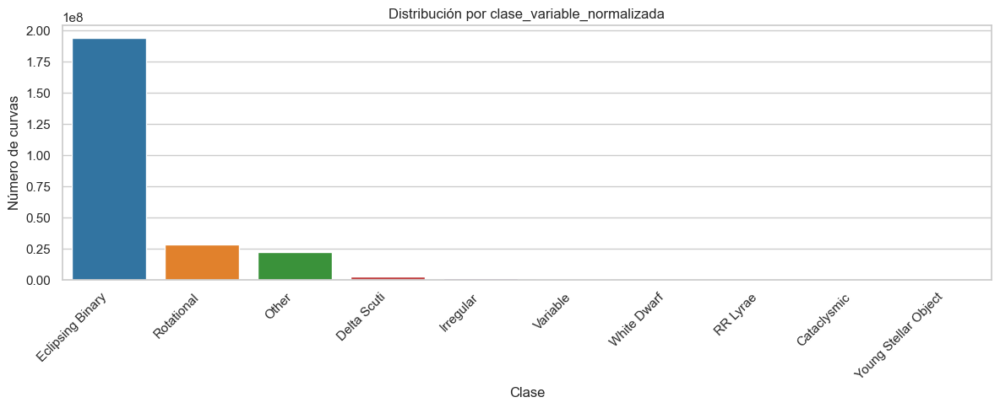


🛰️ Recuento por mision:
Tess      120747997
Kepler     71735011
TESS       41143597
K2         17895159


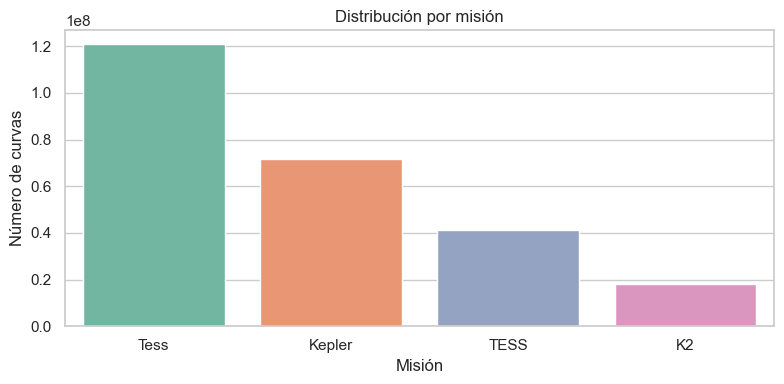


📁 Recuento por dataset fuente:
dataset_eb_tess_labeled_fixed.parquet      120747997
dataset_eb_kepler_labeled_fixed.parquet     71735011
dataset_vsx_tess_labeled_fixed.parquet      41143597
dataset_k2varcat_labeled_fixed.parquet      17895159


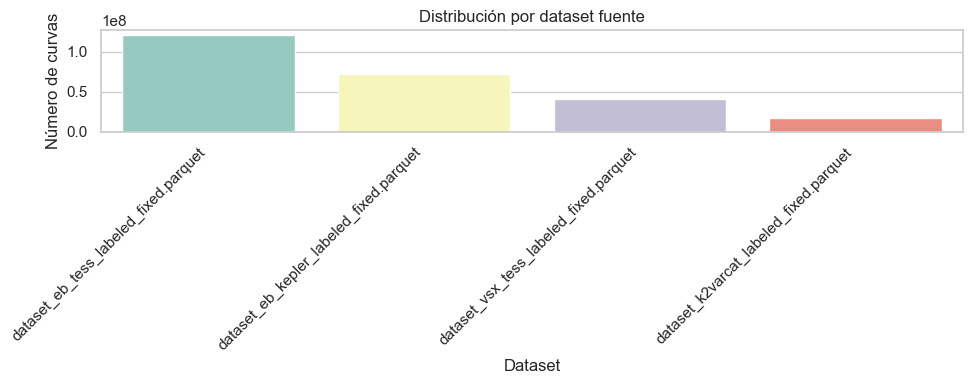

In [ ]:
%pip install seaborn
%run src/script_7_validate_final_dataset.py


🔍 Todo apunta a que la consolidación y validación han sido un éxito:

#### ✅ Validación completada correctamente

* **251 millones de curvas de luz** consolidadas.
* **112 columnas unificadas**.
* Distribución clara por clase, misión y dataset fuente.
* `id_objeto`, `tiempo`, `magnitud`, `mision`, `clase_variable_normalizada` → **sin nulos**.
* `clase_variable` tiene \~468K nulos (esperado: son los casos etiquetados como `"UNKNOWN"` o `Other`).

#### 📊 Distribuciones visuales

Los tres gráficos reflejan:

1. **Desbalance evidente** de clases (habrá que tratarlo en el modelo).
2. **Duplicidad aparente** en la columna `mision` (`Tess` vs `TESS`). 
3. Dataset `vsx_tess` y `k2varcat` aportan proporciones menores, pero valiosas.

Punto 2 se podría unificar antes de entrenar:

```python
df["mision"] = df["mision"].str.upper()
```

In [ ]:
import pyarrow.dataset as ds
import pandas as pd
import numpy as np

dataset = ds.dataset("data/processed/all_missions_labeled.parquet", format="parquet")
scanner = dataset.scanner(columns=["id_objeto", "magnitud", "clase_variable_normalizada"])

curves_by_class = {}
invalid_counts = {}

for batch in scanner.to_batches():
    df = batch.to_pandas()
    for id_obj, group in df.groupby("id_objeto"):
        magnitudes = group["magnitud"].to_numpy()
        label = group["clase_variable_normalizada"].iloc[0]

        if label not in curves_by_class:
            curves_by_class[label] = 0
            invalid_counts[label] = 0

        if np.all(np.isnan(magnitudes)) or np.std(magnitudes) == 0:
            invalid_counts[label] += 1
            continue

        curves_by_class[label] += 1

curves_by_class = pd.Series(curves_by_class).sort_values(ascending=False)
invalid_counts = pd.Series(invalid_counts).sort_values(ascending=False)

print("✅ Curvas válidas por clase:")
print(curves_by_class)

print("\n❌ Curvas inválidas por clase:")
print(invalid_counts)


c:\Users\hav3f\anaconda3\envs\astro_transformer\Lib\site-packages\numpy\_core\_methods.py:171: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
c:\Users\hav3f\anaconda3\envs\astro_transformer\Lib\site-packages\numpy\_core\_methods.py:171: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
c:\Users\hav3f\anaconda3\envs\astro_transformer\Lib\site-packages\numpy\_core\_methods.py:171: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
c:\Users\hav3f\anaconda3\envs\astro_transformer\Lib\site-packages\numpy\_core\_methods.py:171: RuntimeWarning: invalid value encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
c:\Users\hav3f\anaconda3\envs\astro_transformer\Lib\site-packages\numpy\_core\_methods.py:171: RuntimeWarning: invalid value encountered in reduce
 

✅ Curvas válidas por clase:
Eclipsing Binary        19621
Other                    5142
Rotational               1390
Delta Scuti               121
Irregular                  61
Variable                   55
RR Lyrae                   23
Young Stellar Object       11
White Dwarf                 8
Cataclysmic                 5
dtype: int64

❌ Curvas inválidas por clase:
Eclipsing Binary        0
Other                   0
Rotational              0
Irregular               0
Delta Scuti             0
Young Stellar Object    0
Variable                0
RR Lyrae                0
Cataclysmic             0
White Dwarf             0
dtype: int64


In [ ]:
import pyarrow.dataset as ds

dataset = ds.dataset("data/processed/all_missions_labeled.parquet", format="parquet")
scanner = dataset.scanner(columns=["id_objeto"])
ids = set()
for batch in scanner.to_batches():
    df = batch.to_pandas()
    ids.update(df["id_objeto"].unique())

print(f"🧮 Total de objetos únicos en el .parquet: {len(ids):,}")


🧮 Total de objetos únicos en el .parquet: 13,415


✅ Plan de acción recomendado:

📦 Buscar y procesar más curvas de clases minoritarias
Revisamos fuentes que ya exploramos parcialmente, pero de las cuales aún podemos extraer más datos:

`dataset_gaia_dr3_vsx_tic_labeled.parquet`
→ Tiene muchas etiquetas y clases minoritarias bien representadas, pero no curvas. Sin embargo, puede usarse para encontrar más TIC IDs con clases relevantes, y luego intentar descargar curvas desde MAST (TESS).

`dataset_vsx_tic_labeled_clean.parquet`
→ Ya está limpio y etiquetado, con muchos tic_id no descargados aún. Se podría lanzar una nueva ronda de descarga desde TESS centrada solo en clases minoritarias.

`dataset_vsx_tess_labeled_clean.parquet`
→ Ya contiene curvas, pero probablemente filtraste muchas clases. Opción: volver a inspeccionar este dataset y extrae solo las clases con pocos ejemplos para reforzar el conjunto.

Catálogos como ASAS-SN o ZTF
→ Si da tiempo, puedes considerar integraciones rápidas desde esos catálogos, que están bien etiquetados y contienen millones de curvas.

**Opptamos por la primera opción**: para ello necesitamos que en el catálogo GAIA DR3 tengamos coordenadas y así podamos descargar tambien esas curvas.

✅ 1. **Antes solo incluíamos curvas que ya teníamos descargadas por misión (Kepler, K2, TESS)**

Lo que teníamos en los `.parquet_fixed` eran datasets generados a partir de:

* Misiones específicas con catálogos acotados (`K2VARCAT`, `VSX` con TESS, etc.).
* Solo los objetos para los que *ya se había descargado la curva de luz y estaba disponible*.
* **No se priorizó la representatividad de clases.**

✅ 2. Ahora estamos buscando expresamente **objetos de clases minoritarias con coordenadas confiables** y descargando curvas a demanda. Con el nuevo enfoque:

* **Ampliamos la diversidad de clases minoritarias** de forma explícita.
* El cruce con Gaia DR3 + VSX + TIC **nos da acceso a objetos que antes no habíamos incluido** porque no estaban en los conjuntos principales, o no se habían descargado sus curvas.
* Solo mantenemos objetos con `ra`, `dec` y `tic_id`, y luego descargamos **por coordenadas si es necesario**, lo que **aumenta las posibilidades de encontrar curvas útiles**.

✅ 3. **Estamos limpiando, normalizando y controlando duplicados**

* Solo se incorporan objetos nuevos, únicos (`drop_duplicates("id_objeto")`).
* Se descartan curvas inválidas, cortas o con `NaN`.
* Las clases se normalizan para integrarse con el resto del dataset.

¿Ayudará eso al entrenamiento? A la hora de entrenar con el dataset "reforzado": 

* **Decidimos qué clases reforzar** si aplicamos `max_per_class`, `min_curves`, etc.
* **Se añade la clase normalizada** y no una etiqueta dispersa.
* **Las curvas descargadas están filtradas y limpias**.
* Al final tenemos un dataset unificado más balanceado, más representativo y más coherente.

🚫 ¿Podría pasar que al final tengamos pocos objetos útiles nuevos? => Sí, pero ahora **hemos maximizado las posibilidades**:

* Si no se encuentra más, es porque **literalmente no hay más curvas públicas disponibles con esas etiquetas y calidad mínima.**

In [ ]:
from pathlib import Path
import sys
import pandas as pd

GAIA_FILE = Path("data/processed/dataset_gaia_dr3_vsx_tic_labeled.parquet")
COORDS_FILE = Path("data/processed/dataset_vsx_tic_labeled_clean_fixed.parquet")
OUTPUT_FILE = Path("data/processed/dataset_gaia_dr3_vsx_tic_labeled_with_coords.parquet")

df_vsx = pd.read_parquet(COORDS_FILE, engine="pyarrow")
df_gaia = pd.read_parquet(GAIA_FILE, engine="pyarrow")

print("🔹 Columnas en VSX limpio (coordenadas):")
print(df_vsx.columns.tolist())
print("\n🔹 Columnas en GAIA DR3 (antes):")
print(df_gaia.columns.tolist())

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_3d_merge_gaia_with_coords import main as merge_gaia_with_coords

merge_gaia_with_coords()

df_gaia2 = pd.read_parquet("data/processed/dataset_gaia_dr3_vsx_tic_labeled_with_coords.parquet", engine="pyarrow")
print("\n🔹 Columnas en GAIA DR3 (despues):")
print(df_gaia2.columns.tolist())


🔹 Columnas en VSX limpio (coordenadas):
['id_objeto', 'nombre_vsx', 'clase_variable', 'tic_id', 'origen_etiqueta', 'clase_variable_normalizada', 'ra', 'dec']

🔹 Columnas en GAIA DR3 (antes):
['solution_id', 'source_id', 'num_selected_g_fov', 'mean_obs_time_g_fov', 'time_duration_g_fov', 'min_mag_g_fov', 'max_mag_g_fov', 'mean_mag_g_fov', 'median_mag_g_fov', 'range_mag_g_fov', 'trimmed_range_mag_g_fov', 'std_dev_mag_g_fov', 'skewness_mag_g_fov', 'kurtosis_mag_g_fov', 'mad_mag_g_fov', 'abbe_mag_g_fov', 'iqr_mag_g_fov', 'stetson_mag_g_fov', 'std_dev_over_rms_err_mag_g_fov', 'outlier_median_g_fov', 'num_selected_bp', 'mean_obs_time_bp', 'time_duration_bp', 'min_mag_bp', 'max_mag_bp', 'mean_mag_bp', 'median_mag_bp', 'range_mag_bp', 'trimmed_range_mag_bp', 'std_dev_mag_bp', 'skewness_mag_bp', 'kurtosis_mag_bp', 'mad_mag_bp', 'abbe_mag_bp', 'iqr_mag_bp', 'stetson_mag_bp', 'std_dev_over_rms_err_mag_bp', 'outlier_median_bp', 'num_selected_rp', 'mean_obs_time_rp', 'time_duration_rp', 'min_mag_rp

**Normalizacion de clases**:

In [ ]:
from src.fase1.script_3a_clean_vsx_classes import main as run_normalization
run_normalization()

📥 Leyendo: data/processed/dataset_gaia_dr3_vsx_tic_labeled_with_coords.parquet
🔧 Normalizando clases...
🔎 Clases únicas encontradas: 33
💾 Guardando dataset limpio en: data/processed/dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean.parquet
📊 Exportando resumen de clases...
✅ Proceso completado


In [ ]:
import warnings
import os, sys
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_3e_complement_gaia_curves import main as complement_gaia_curves

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    complement_gaia_curves(limit=None, workers=8)
else:
    print("💻 Ejecutando en entorno local → catálogo completo")
    complement_gaia_curves(limit=None, workers=10)

🔇 Warnings silenciados: UserWarning, FutureWarning
💻 Ejecutando en entorno local → catálogo completo
📥 Cargando dataset: data\processed\dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean.parquet
🚀 Iniciando procesamiento paralelo con Pool...


  0%|          | 1/3987 [00:40<44:58:33, 40.62s/it]

❌ 1: TIC 611089486 → Sin resultados (None)
❌ 2: TIC 611117919 → Sin resultados (None)
✅ 3: TIC 401396570 → 19478 puntos


  0%|          | 4/3987 [00:43<8:22:44,  7.57s/it] 

✅ 4: TIC 408508257 → 17186 puntos


  0%|          | 5/3987 [00:48<7:39:08,  6.92s/it]

❌ 5: TIC 520936760 → Sin resultados (None)


  0%|          | 6/3987 [00:50<5:41:59,  5.15s/it]

❌ 6: TIC 611096930 → Sin resultados (None)


  0%|          | 7/3987 [00:50<4:02:33,  3.66s/it]

❌ 7: TIC 293282381 → Sin resultados (None)
❌ 8: TIC 405272902 → Sin resultados (None)
❌ 9: TIC 408503945 → Sin resultados (None)


  0%|          | 10/3987 [00:51<1:51:42,  1.69s/it]

✅ 10: TIC 408503779 → 17258 puntos


  0%|          | 11/3987 [00:52<1:42:38,  1.55s/it]

❌ 11: TIC 408503665 → Sin resultados (None)
❌ 12: TIC 611119043 → Sin resultados (None)


  0%|          | 13/3987 [00:54<1:37:13,  1.47s/it]

❌ 13: TIC 408503811 → Sin resultados (None)


  0%|          | 14/3987 [00:57<1:56:44,  1.76s/it]

❌ 14: TIC 408504000 → Sin resultados (None)


  0%|          | 15/3987 [00:58<1:47:13,  1.62s/it]

✅ 15: TIC 408503973 → 24926 puntos


  0%|          | 16/3987 [00:59<1:29:01,  1.35s/it]

❌ 16: TIC 408503687 → Sin resultados (None)


  0%|          | 17/3987 [01:01<1:36:33,  1.46s/it]

❌ 17: TIC 408504061 → Sin resultados (None)
✅ 18: TIC 257486498 → 10671 puntos


  0%|          | 19/3987 [01:03<1:31:54,  1.39s/it]

❌ 19: TIC 418735190 → Sin resultados (None)


  1%|          | 20/3987 [01:03<1:11:41,  1.08s/it]

❌ 20: TIC 418735320 → Sin resultados (None)


  1%|          | 21/3987 [01:04<57:40,  1.15it/s]  

❌ 21: TIC 418735477 → Sin resultados (None)


  1%|          | 22/3987 [01:05<1:05:03,  1.02it/s]

❌ 22: TIC 418735227 → Sin resultados (None)


  1%|          | 23/3987 [01:06<1:07:42,  1.02s/it]

✅ 23: TIC 418735269 → 11102 puntos
✅ 24: TIC 418735229 → 11082 puntos


  1%|          | 25/3987 [01:08<59:29,  1.11it/s]  

❌ 25: TIC 418735181 → Sin resultados (None)


  1%|          | 26/3987 [01:09<1:06:01,  1.00s/it]

✅ 26: TIC 418735372 → 11083 puntos


  1%|          | 27/3987 [01:10<58:45,  1.12it/s]  

❌ 27: TIC 405251216 → Sin resultados (None)
✅ 28: TIC 418735437 → 22714 puntos


  1%|          | 29/3987 [01:13<1:26:13,  1.31s/it]

✅ 29: TIC 405251443 → 13895 puntos


  1%|          | 30/3987 [01:14<1:25:40,  1.30s/it]

✅ 30: TIC 405251352 → 16136 puntos


  1%|          | 31/3987 [01:15<1:19:03,  1.20s/it]

✅ 31: TIC 405251490 → 13956 puntos


  1%|          | 32/3987 [01:16<1:08:45,  1.04s/it]

❌ 32: TIC 405251232 → Sin resultados (None)


  1%|          | 33/3987 [01:18<1:27:14,  1.32s/it]

❌ 33: TIC 408505989 → Sin resultados (None)


  1%|          | 34/3987 [01:18<1:09:29,  1.05s/it]

❌ 34: TIC 408505996 → Sin resultados (None)


  1%|          | 35/3987 [01:19<57:24,  1.15it/s]  

❌ 35: TIC 408506012 → Sin resultados (None)


  1%|          | 36/3987 [01:19<49:21,  1.33it/s]

✅ 36: TIC 403021914 → 24958 puntos


  1%|          | 37/3987 [01:22<1:23:54,  1.27s/it]

✅ 37: TIC 403021880 → 13881 puntos


  1%|          | 38/3987 [01:23<1:19:08,  1.20s/it]

❌ 38: TIC 403021712 → Sin resultados (None)


  1%|          | 39/3987 [01:24<1:28:49,  1.35s/it]

❌ 39: TIC 403021854 → Sin resultados (None)


  1%|          | 40/3987 [01:25<1:12:07,  1.10s/it]

❌ 40: TIC 405251322 → Sin resultados (None)
✅ 41: TIC 403021917 → 24926 puntos


  1%|          | 42/3987 [01:26<48:36,  1.35it/s]  

✅ 42: TIC 405268184 → 24934 puntos


  1%|          | 43/3987 [01:26<51:11,  1.28it/s]

✅ 43: TIC 405268090 → 11102 puntos


  1%|          | 44/3987 [01:30<1:40:42,  1.53s/it]

❌ 44: TIC 257503074 → Sin resultados (None)


  1%|          | 45/3987 [01:33<2:16:35,  2.08s/it]

❌ 45: TIC 405268041 → Sin resultados (None)


  1%|          | 46/3987 [01:34<1:45:22,  1.60s/it]

❌ 46: TIC 405268372 → Sin resultados (None)


  1%|          | 47/3987 [01:34<1:19:46,  1.21s/it]

❌ 47: TIC 405270157 → Sin resultados (None)


  1%|          | 49/3987 [01:35<53:11,  1.23it/s]  

❌ 48: TIC 405270068 → Sin resultados (None)
❌ 49: TIC 405270398 → Sin resultados (None)


  1%|▏         | 50/3987 [01:35<48:07,  1.36it/s]

❌ 50: TIC 405270119 → Sin resultados (None)


  1%|▏         | 51/3987 [01:37<1:00:56,  1.08it/s]

❌ 51: TIC 405251305 → Sin resultados (None)


  1%|▏         | 52/3987 [01:39<1:27:48,  1.34s/it]

❌ 52: TIC 405270030 → Sin resultados (None)


  1%|▏         | 53/3987 [01:42<1:53:30,  1.73s/it]

✅ 53: TIC 403021985 → 11090 puntos
❌ 54: TIC 403021896 → Sin resultados (None)


  1%|▏         | 55/3987 [01:42<1:07:36,  1.03s/it]

✅ 55: TIC 403021964 → 24965 puntos


  1%|▏         | 56/3987 [01:42<55:52,  1.17it/s]  

❌ 56: TIC 403021760 → Sin resultados (None)


  1%|▏         | 57/3987 [01:46<1:37:22,  1.49s/it]

❌ 57: TIC 405270049 → Sin resultados (None)


  1%|▏         | 59/3987 [01:47<1:08:45,  1.05s/it]

❌ 58: TIC 257523557 → Sin resultados (None)
❌ 59: TIC 405272678 → Sin resultados (None)


  2%|▏         | 60/3987 [01:48<1:08:08,  1.04s/it]

❌ 60: TIC 405272631 → Sin resultados (None)


  2%|▏         | 61/3987 [01:49<58:14,  1.12it/s]  

❌ 61: TIC 611095808 → Sin resultados (None)


  2%|▏         | 62/3987 [01:51<1:18:51,  1.21s/it]

❌ 62: TIC 405272776 → Sin resultados (None)


  2%|▏         | 63/3987 [01:51<1:10:21,  1.08s/it]

❌ 63: TIC 405270576 → Sin resultados (None)
✅ 64: TIC 405270325 → 22820 puntos


  2%|▏         | 65/3987 [01:52<44:30,  1.47it/s]  

✅ 65: TIC 405272867 → 24969 puntos
✅ 66: TIC 405272581 → 30994 puntos


  2%|▏         | 67/3987 [01:55<1:16:32,  1.17s/it]

❌ 67: TIC 405291701 → Sin resultados (None)


  2%|▏         | 68/3987 [01:58<1:42:54,  1.58s/it]

✅ 68: TIC 405272638 → 17179 puntos


  2%|▏         | 69/3987 [01:58<1:24:44,  1.30s/it]

✅ 69: TIC 405272865 → 13935 puntos


  2%|▏         | 70/3987 [02:00<1:19:55,  1.22s/it]

✅ 70: TIC 405273011 → 13957 puntos


  2%|▏         | 71/3987 [02:00<58:31,  1.12it/s]  

❌ 71: TIC 405291688 → Sin resultados (None)


  2%|▏         | 72/3987 [02:00<49:03,  1.33it/s]

❌ 72: TIC 405291670 → Sin resultados (None)
✅ 73: TIC 405291817 → 24864 puntos


  2%|▏         | 74/3987 [02:02<50:37,  1.29it/s]

❌ 74: TIC 403022201 → Sin resultados (None)
✅ 75: TIC 405273043 → 22721 puntos


  2%|▏         | 76/3987 [02:04<1:09:26,  1.07s/it]

❌ 76: TIC 403022090 → Sin resultados (None)


  2%|▏         | 77/3987 [02:07<1:56:24,  1.79s/it]

❌ 77: TIC 403022162 → Sin resultados (None)
✅ 78: TIC 405291574 → 31017 puntos


  2%|▏         | 79/3987 [02:09<1:22:39,  1.27s/it]

❌ 79: TIC 403022289 → Sin resultados (None)


  2%|▏         | 80/3987 [02:09<1:04:43,  1.01it/s]

❌ 80: TIC 611094751 → Sin resultados (None)


  2%|▏         | 81/3987 [02:10<54:03,  1.20it/s]  

✅ 81: TIC 403024257 → 24924 puntos


  2%|▏         | 82/3987 [02:10<42:50,  1.52it/s]

❌ 82: TIC 403024075 → Sin resultados (None)


  2%|▏         | 83/3987 [02:11<56:15,  1.16it/s]

❌ 83: TIC 403024215 → Sin resultados (None)


  2%|▏         | 84/3987 [02:12<47:30,  1.37it/s]

✅ 84: TIC 403024239 → 24867 puntos


  2%|▏         | 85/3987 [02:14<1:24:56,  1.31s/it]

❌ 85: TIC 403024233 → Sin resultados (None)


  2%|▏         | 86/3987 [02:17<1:48:41,  1.67s/it]

✅ 86: TIC 403024032 → 30972 puntos


  2%|▏         | 87/3987 [02:17<1:25:34,  1.32s/it]

❌ 87: TIC 403024619 → Sin resultados (None)


  2%|▏         | 88/3987 [02:19<1:27:48,  1.35s/it]

❌ 88: TIC 403024553 → Sin resultados (None)
✅ 89: TIC 405186394 → 30914 puntos


  2%|▏         | 90/3987 [02:20<59:24,  1.09it/s]  

❌ 90: TIC 403024346 → Sin resultados (None)


  2%|▏         | 91/3987 [02:21<1:02:19,  1.04it/s]

❌ 91: TIC 418756096 → Sin resultados (None)
✅ 92: TIC 418756021 → 130174 puntos


  2%|▏         | 93/3987 [02:22<53:03,  1.22it/s]  

❌ 93: TIC 405187715 → Sin resultados (None)


  2%|▏         | 94/3987 [02:23<54:41,  1.19it/s]

❌ 94: TIC 611097538 → Sin resultados (None)


  2%|▏         | 95/3987 [02:25<1:23:39,  1.29s/it]

✅ 95: TIC 403024093 → 31007 puntos


  2%|▏         | 96/3987 [02:26<1:03:37,  1.02it/s]

❌ 96: TIC 403023990 → Sin resultados (None)
✅ 97: TIC 405187645 → 22233 puntos


  2%|▏         | 98/3987 [02:27<49:24,  1.31it/s]  

✅ 98: TIC 405187699 → 22252 puntos


  2%|▏         | 99/3987 [02:30<1:43:33,  1.60s/it]

✅ 99: TIC 418756065 → 26014 puntos


  3%|▎         | 100/3987 [02:31<1:28:13,  1.36s/it]

❌ 100: TIC 418756058 → Sin resultados (None)
✅ 101: TIC 405187450 → 17253 puntos


  3%|▎         | 102/3987 [02:34<1:44:14,  1.61s/it]

✅ 102: TIC 405187705 → 17238 puntos


  3%|▎         | 103/3987 [02:35<1:31:27,  1.41s/it]

✅ 103: TIC 405187419 → 26218 puntos


  3%|▎         | 104/3987 [02:35<1:06:42,  1.03s/it]

❌ 104: TIC 405293567 → Sin resultados (None)


  3%|▎         | 105/3987 [02:37<1:12:12,  1.12s/it]

❌ 105: TIC 405187572 → Sin resultados (None)


  3%|▎         | 106/3987 [02:38<1:23:12,  1.29s/it]

❌ 106: TIC 405293620 → Sin resultados (None)


  3%|▎         | 107/3987 [02:41<1:50:25,  1.71s/it]

❌ 107: TIC 405293728 → Sin resultados (None)


  3%|▎         | 108/3987 [02:42<1:32:29,  1.43s/it]

❌ 108: TIC 405303737 → Sin resultados (None)


  3%|▎         | 109/3987 [02:43<1:22:28,  1.28s/it]

✅ 109: TIC 611096808 → 17279 puntos
❌ 110: TIC 405304055 → Sin resultados (None)


  3%|▎         | 111/3987 [02:43<48:40,  1.33it/s]  

❌ 111: TIC 405303778 → Sin resultados (None)


  3%|▎         | 112/3987 [02:46<1:18:41,  1.22s/it]

❌ 112: TIC 405303921 → Sin resultados (None)


  3%|▎         | 113/3987 [02:47<1:17:44,  1.20s/it]

❌ 113: TIC 405304060 → Sin resultados (None)


  3%|▎         | 114/3987 [02:47<1:00:36,  1.06it/s]

❌ 114: TIC 405304054 → Sin resultados (None)


  3%|▎         | 115/3987 [02:48<52:01,  1.24it/s]  

❌ 115: TIC 418756172 → Sin resultados (None)


  3%|▎         | 116/3987 [02:51<1:46:37,  1.65s/it]

✅ 116: TIC 397586672 → 17290 puntos


  3%|▎         | 117/3987 [02:53<1:51:39,  1.73s/it]

❌ 117: TIC 397586593 → Sin resultados (None)
❌ 118: TIC 397586728 → Sin resultados (None)


  3%|▎         | 119/3987 [02:56<1:43:48,  1.61s/it]

❌ 119: TIC 272125616 → Sin resultados (None)


  3%|▎         | 120/3987 [02:57<1:37:58,  1.52s/it]

✅ 120: TIC 405304972 → 30846 puntos


  3%|▎         | 121/3987 [02:58<1:16:10,  1.18s/it]

✅ 121: TIC 397586787 → 17228 puntos
❌ 122: TIC 405333300 → Sin resultados (None)
❌ 123: TIC 405305260 → Sin resultados (None)
✅ 124: TIC 405333432 → 24870 puntos


  3%|▎         | 124/3987 [03:00<1:05:23,  1.02s/it]

❌ 125: TIC 611147061 → Sin resultados (None)


  3%|▎         | 126/3987 [03:01<55:01,  1.17it/s]  

❌ 126: TIC 403026404 → Sin resultados (None)
❌ 127: TIC 403026131 → Sin resultados (None)


  3%|▎         | 128/3987 [03:02<48:05,  1.34it/s]

❌ 128: TIC 403026413 → Sin resultados (None)


  3%|▎         | 129/3987 [03:04<53:42,  1.20it/s]

✅ 129: TIC 403026267 → 24870 puntos
✅ 130: TIC 408506195 → 22250 puntos


  3%|▎         | 131/3987 [03:08<1:27:27,  1.36s/it]

✅ 131: TIC 408506320 → 31018 puntos


  3%|▎         | 132/3987 [03:08<1:12:28,  1.13s/it]

✅ 132: TIC 408506090 → 26228 puntos
❌ 133: TIC 408506137 → Sin resultados (None)


  3%|▎         | 134/3987 [03:09<51:12,  1.25it/s]  

❌ 134: TIC 405188151 → Sin resultados (None)
✅ 135: TIC 405187986 → 17251 puntos


  3%|▎         | 136/3987 [03:10<46:01,  1.39it/s]

✅ 136: TIC 405187959 → 17216 puntos


  3%|▎         | 137/3987 [03:12<1:14:12,  1.16s/it]

❌ 137: TIC 408508046 → Sin resultados (None)
✅ 138: TIC 405187909 → 31050 puntos


  3%|▎         | 139/3987 [03:15<1:12:47,  1.14s/it]

✅ 139: TIC 405187846 → 22257 puntos


  4%|▎         | 140/3987 [03:17<1:25:26,  1.33s/it]

❌ 140: TIC 408508033 → Sin resultados (None)
✅ 141: TIC 408507897 → 37136 puntos


  4%|▎         | 142/3987 [03:19<1:23:00,  1.30s/it]

❌ 142: TIC 408507940 → Sin resultados (None)


  4%|▎         | 143/3987 [03:20<1:07:51,  1.06s/it]

❌ 143: TIC 408507909 → Sin resultados (None)


  4%|▎         | 144/3987 [03:20<54:43,  1.17it/s]  

❌ 144: TIC 405189825 → Sin resultados (None)


  4%|▎         | 145/3987 [03:21<55:08,  1.16it/s]

❌ 145: TIC 405189886 → Sin resultados (None)


  4%|▎         | 146/3987 [03:22<54:39,  1.17it/s]

❌ 146: TIC 405190310 → Sin resultados (None)


  4%|▎         | 147/3987 [03:23<1:00:48,  1.05it/s]

❌ 147: TIC 405190364 → Sin resultados (None)


  4%|▎         | 148/3987 [03:28<2:16:28,  2.13s/it]

✅ 148: TIC 405190368 → 17207 puntos


  4%|▎         | 149/3987 [03:28<1:39:46,  1.56s/it]

✅ 149: TIC 405190394 → 17258 puntos
❌ 150: TIC 405190215 → Sin resultados (None)
✅ 151: TIC 405190447 → 30820 puntos


  4%|▍         | 151/3987 [03:29<59:34,  1.07it/s]  

✅ 152: TIC 418754064 → 17220 puntos


  4%|▍         | 153/3987 [03:30<55:55,  1.14it/s]

❌ 153: TIC 418754208 → Sin resultados (None)


  4%|▍         | 154/3987 [03:32<1:08:20,  1.07s/it]

❌ 154: TIC 418754100 → Sin resultados (None)


  4%|▍         | 155/3987 [03:33<1:09:37,  1.09s/it]

✅ 155: TIC 418754099 → 17316 puntos


  4%|▍         | 156/3987 [03:34<1:05:17,  1.02s/it]

❌ 156: TIC 418753938 → Sin resultados (None)


  4%|▍         | 157/3987 [03:34<54:55,  1.16it/s]  

❌ 157: TIC 293282391 → Sin resultados (None)


  4%|▍         | 158/3987 [03:35<1:01:41,  1.03it/s]

✅ 158: TIC 293285072 → 17262 puntos


  4%|▍         | 159/3987 [03:37<1:18:52,  1.24s/it]

✅ 159: TIC 293285080 → 17292 puntos


  4%|▍         | 160/3987 [03:41<2:15:30,  2.12s/it]

❌ 160: TIC 405251538 → Sin resultados (None)


  4%|▍         | 161/3987 [03:42<1:49:27,  1.72s/it]

❌ 161: TIC 293285063 → Sin resultados (None)


  4%|▍         | 162/3987 [03:43<1:25:27,  1.34s/it]

❌ 162: TIC 293285069 → Sin resultados (None)


  4%|▍         | 163/3987 [03:43<1:12:46,  1.14s/it]

❌ 163: TIC 408505937 → Sin resultados (None)
❌ 164: TIC 408505859 → Sin resultados (None)


  4%|▍         | 165/3987 [03:44<43:38,  1.46it/s]  

❌ 165: TIC 408505961 → Sin resultados (None)


  4%|▍         | 166/3987 [03:44<36:50,  1.73it/s]

❌ 166: TIC 405267700 → Sin resultados (None)


  4%|▍         | 167/3987 [03:44<37:20,  1.71it/s]

❌ 167: TIC 405267759 → Sin resultados (None)


  4%|▍         | 168/3987 [03:47<1:13:28,  1.15s/it]

❌ 168: TIC 405267598 → Sin resultados (None)


  4%|▍         | 169/3987 [03:48<1:11:52,  1.13s/it]

✅ 169: TIC 405267685 → 13953 puntos


  4%|▍         | 170/3987 [03:50<1:17:32,  1.22s/it]

✅ 170: TIC 405267706 → 24870 puntos


  4%|▍         | 171/3987 [03:54<2:13:19,  2.10s/it]

❌ 171: TIC 405270811 → Sin resultados (None)


  4%|▍         | 172/3987 [03:55<1:46:43,  1.68s/it]

❌ 172: TIC 405270595 → Sin resultados (None)


  4%|▍         | 173/3987 [03:55<1:26:32,  1.36s/it]

✅ 173: TIC 405270553 → 24870 puntos


  4%|▍         | 174/3987 [03:56<1:17:44,  1.22s/it]

❌ 174: TIC 405270736 → Sin resultados (None)


  4%|▍         | 175/3987 [03:59<1:53:56,  1.79s/it]

✅ 175: TIC 405270831 → 22222 puntos


  4%|▍         | 176/3987 [04:00<1:35:48,  1.51s/it]

✅ 176: TIC 403022261 → 24905 puntos


  4%|▍         | 177/3987 [04:01<1:18:20,  1.23s/it]

✅ 177: TIC 405186503 → 17186 puntos


  4%|▍         | 179/3987 [04:03<1:04:53,  1.02s/it]

❌ 178: TIC 405186527 → Sin resultados (None)
❌ 179: TIC 405186660 → Sin resultados (None)


  5%|▍         | 180/3987 [04:04<1:04:54,  1.02s/it]

✅ 180: TIC 405186543 → 26226 puntos


  5%|▍         | 181/3987 [04:07<1:42:49,  1.62s/it]

❌ 181: TIC 405186549 → Sin resultados (None)


  5%|▍         | 182/3987 [04:08<1:30:19,  1.42s/it]

❌ 182: TIC 405186666 → Sin resultados (None)


  5%|▍         | 183/3987 [04:08<1:17:39,  1.22s/it]

❌ 183: TIC 405186541 → Sin resultados (None)


  5%|▍         | 185/3987 [04:11<1:08:22,  1.08s/it]

❌ 184: TIC 405293540 → Sin resultados (None)
❌ 185: TIC 405303949 → Sin resultados (None)


  5%|▍         | 186/3987 [04:13<1:32:46,  1.46s/it]

❌ 186: TIC 405303836 → Sin resultados (None)


  5%|▍         | 187/3987 [04:14<1:16:14,  1.20s/it]

❌ 187: TIC 405303979 → Sin resultados (None)


  5%|▍         | 188/3987 [04:16<1:38:30,  1.56s/it]

✅ 188: TIC 405303987 → 30938 puntos


  5%|▍         | 189/3987 [04:16<1:18:30,  1.24s/it]

❌ 189: TIC 418756397 → Sin resultados (None)


  5%|▍         | 190/3987 [04:17<1:08:50,  1.09s/it]

✅ 190: TIC 418756182 → 30961 puntos


  5%|▍         | 191/3987 [04:17<54:45,  1.16it/s]  

✅ 191: TIC 401421618 → 30912 puntos


  5%|▍         | 192/3987 [04:18<43:17,  1.46it/s]

❌ 192: TIC 401421892 → Sin resultados (None)


  5%|▍         | 193/3987 [04:18<36:37,  1.73it/s]

❌ 193: TIC 401421639 → Sin resultados (None)


  5%|▍         | 194/3987 [04:23<1:51:13,  1.76s/it]

❌ 194: TIC 401421868 → Sin resultados (None)
✅ 195: TIC 405333468 → 19451 puntos


  5%|▍         | 196/3987 [04:23<1:02:14,  1.02it/s]

❌ 196: TIC 405333560 → Sin resultados (None)


  5%|▍         | 198/3987 [04:25<56:25,  1.12it/s]  

❌ 197: TIC 405333555 → Sin resultados (None)
❌ 198: TIC 403026346 → Sin resultados (None)


  5%|▍         | 199/3987 [04:26<1:01:05,  1.03it/s]

✅ 199: TIC 403026300 → 17297 puntos


  5%|▌         | 200/3987 [04:28<1:12:39,  1.15s/it]

❌ 200: TIC 403026298 → Sin resultados (None)


  5%|▌         | 201/3987 [04:29<1:09:23,  1.10s/it]

✅ 201: TIC 405187905 → 17347 puntos


  5%|▌         | 202/3987 [04:31<1:26:49,  1.38s/it]

❌ 202: TIC 405188065 → Sin resultados (None)


  5%|▌         | 203/3987 [04:32<1:31:37,  1.45s/it]

✅ 203: TIC 405209847 → 30764 puntos
✅ 204: TIC 405210034 → 30804 puntos


  5%|▌         | 205/3987 [04:34<1:06:29,  1.05s/it]

❌ 205: TIC 405210062 → Sin resultados (None)


  5%|▌         | 206/3987 [04:34<56:35,  1.11it/s]  

❌ 206: TIC 405209757 → Sin resultados (None)


  5%|▌         | 207/3987 [04:35<48:41,  1.29it/s]

✅ 207: TIC 405209794 → 17184 puntos


  5%|▌         | 208/3987 [04:35<38:07,  1.65it/s]

✅ 208: TIC 405210101 → 17184 puntos


  5%|▌         | 209/3987 [04:37<1:03:49,  1.01s/it]

❌ 209: TIC 405209703 → Sin resultados (None)
✅ 210: TIC 418754109 → 24836 puntos


  5%|▌         | 211/3987 [04:39<1:17:15,  1.23s/it]

✅ 211: TIC 418753975 → 17248 puntos


  5%|▌         | 212/3987 [04:41<1:22:27,  1.31s/it]

❌ 212: TIC 418754198 → Sin resultados (None)


  5%|▌         | 213/3987 [04:42<1:12:05,  1.15s/it]

❌ 213: TIC 405210144 → Sin resultados (None)


  5%|▌         | 214/3987 [04:44<1:26:11,  1.37s/it]

✅ 214: TIC 418754226 → 17315 puntos


  5%|▌         | 215/3987 [04:44<1:04:36,  1.03s/it]

❌ 215: TIC 405210302 → Sin resultados (None)


  5%|▌         | 216/3987 [04:45<1:06:52,  1.06s/it]

❌ 216: TIC 405210449 → Sin resultados (None)


  5%|▌         | 217/3987 [04:46<1:13:10,  1.16s/it]

❌ 217: TIC 405210193 → Sin resultados (None)


  5%|▌         | 218/3987 [04:47<1:01:27,  1.02it/s]

❌ 218: TIC 405212552 → Sin resultados (None)


  5%|▌         | 219/3987 [04:48<1:10:06,  1.12s/it]

❌ 219: TIC 405293560 → Sin resultados (None)
✅ 220: TIC 405210192 → 274830 puntos


  6%|▌         | 221/3987 [04:50<1:00:39,  1.03it/s]

✅ 221: TIC 405188030 → 17268 puntos
❌ 222: TIC 418753672 → Sin resultados (None)


  6%|▌         | 223/3987 [04:51<38:12,  1.64it/s]  

❌ 223: TIC 405210348 → Sin resultados (None)


  6%|▌         | 224/3987 [04:53<1:03:15,  1.01s/it]

❌ 224: TIC 405212419 → Sin resultados (None)


  6%|▌         | 225/3987 [04:55<1:18:08,  1.25s/it]

✅ 225: TIC 405212371 → 17265 puntos


  6%|▌         | 226/3987 [04:56<1:22:11,  1.31s/it]

❌ 226: TIC 405212511 → Sin resultados (None)


  6%|▌         | 227/3987 [04:57<1:14:28,  1.19s/it]

✅ 227: TIC 405213011 → 19430 puntos


  6%|▌         | 229/3987 [05:00<1:16:08,  1.22s/it]

❌ 228: TIC 405213014 → Sin resultados (None)
❌ 229: TIC 405212567 → Sin resultados (None)


  6%|▌         | 230/3987 [05:01<1:09:21,  1.11s/it]

❌ 230: TIC 405212739 → Sin resultados (None)


  6%|▌         | 231/3987 [05:02<1:09:50,  1.12s/it]

❌ 231: TIC 405213117 → Sin resultados (None)
❌ 232: TIC 405212840 → Sin resultados (None)


  6%|▌         | 233/3987 [05:03<52:34,  1.19it/s]  

✅ 233: TIC 405212787 → 30872 puntos
❌ 234: TIC 405213004 → Sin resultados (None)


  6%|▌         | 235/3987 [05:03<37:02,  1.69it/s]

❌ 235: TIC 397589459 → Sin resultados (None)


  6%|▌         | 236/3987 [05:04<40:15,  1.55it/s]

✅ 236: TIC 397589275 → 17207 puntos


  6%|▌         | 237/3987 [05:10<1:50:43,  1.77s/it]

✅ 237: TIC 397589301 → 37313 puntos


  6%|▌         | 238/3987 [05:11<1:45:16,  1.68s/it]

❌ 238: TIC 397589613 → Sin resultados (None)


  6%|▌         | 239/3987 [05:12<1:25:42,  1.37s/it]

❌ 239: TIC 397589495 → Sin resultados (None)
❌ 240: TIC 403026610 → Sin resultados (None)


  6%|▌         | 241/3987 [05:12<57:41,  1.08it/s]  

❌ 241: TIC 403026595 → Sin resultados (None)
✅ 242: TIC 293306547 → 30921 puntos


  6%|▌         | 243/3987 [05:13<41:38,  1.50it/s]

❌ 243: TIC 403026704 → Sin resultados (None)


  6%|▌         | 244/3987 [05:14<54:04,  1.15it/s]

✅ 244: TIC 408508409 → 17203 puntos


  6%|▌         | 245/3987 [05:15<44:16,  1.41it/s]

❌ 245: TIC 401422076 → Sin resultados (None)


  6%|▌         | 246/3987 [05:17<1:19:28,  1.27s/it]

✅ 246: TIC 408508326 → 30890 puntos


  6%|▌         | 247/3987 [05:19<1:20:51,  1.30s/it]

✅ 247: TIC 403026449 → 30836 puntos


  6%|▌         | 248/3987 [05:22<1:58:05,  1.90s/it]

✅ 248: TIC 408508438 → 30825 puntos


  6%|▌         | 249/3987 [05:22<1:25:48,  1.38s/it]

❌ 249: TIC 408508543 → Sin resultados (None)


  6%|▋         | 250/3987 [05:23<1:22:52,  1.33s/it]

❌ 250: TIC 401422292 → Sin resultados (None)


  6%|▋         | 251/3987 [05:24<1:02:48,  1.01s/it]

❌ 251: TIC 401422165 → Sin resultados (None)
✅ 252: TIC 401422037 → 113857 puntos


  6%|▋         | 252/3987 [05:25<1:04:01,  1.03s/it]

❌ 253: TIC 401422293 → Sin resultados (None)


  6%|▋         | 254/3987 [05:26<47:23,  1.31it/s]  

❌ 254: TIC 611064060 → Sin resultados (None)


  6%|▋         | 255/3987 [05:27<59:13,  1.05it/s]

❌ 255: TIC 10002366150 → Sin resultados (None)


  6%|▋         | 256/3987 [05:33<2:09:30,  2.08s/it]

❌ 256: TIC 610876952 → Sin resultados (None)


  6%|▋         | 257/3987 [05:34<1:53:41,  1.83s/it]

❌ 257: TIC 611066599 → Sin resultados (None)
✅ 258: TIC 610876587 → 24642 puntos


  6%|▋         | 259/3987 [05:34<1:08:25,  1.10s/it]

❌ 259: TIC 611063939 → Sin resultados (None)


  7%|▋         | 260/3987 [05:36<1:19:31,  1.28s/it]

✅ 260: TIC 611073070 → 25693 puntos
❌ 261: TIC 611062377 → Sin resultados (None)


  7%|▋         | 262/3987 [05:37<59:15,  1.05it/s]  

❌ 262: TIC 611062910 → Sin resultados (None)


  7%|▋         | 263/3987 [05:38<58:33,  1.06it/s]

✅ 263: TIC 610878896 → 11266 puntos


  7%|▋         | 264/3987 [05:39<52:41,  1.18it/s]

✅ 264: TIC 610863463 → 24835 puntos


  7%|▋         | 265/3987 [05:41<1:13:31,  1.19s/it]

✅ 265: TIC 293220241 → 24890 puntos


  7%|▋         | 266/3987 [05:41<1:04:00,  1.03s/it]

✅ 266: TIC 293221023 → 13994 puntos


  7%|▋         | 267/3987 [05:43<1:22:32,  1.33s/it]

✅ 267: TIC 293223152 → 24632 puntos


  7%|▋         | 268/3987 [05:44<1:16:14,  1.23s/it]

❌ 268: TIC 257468057 → Sin resultados (None)


  7%|▋         | 269/3987 [05:45<1:10:46,  1.14s/it]

❌ 269: TIC 257468060 → Sin resultados (None)
✅ 270: TIC 257468075 → 24642 puntos


  7%|▋         | 271/3987 [05:48<1:11:59,  1.16s/it]

❌ 271: TIC 257468098 → Sin resultados (None)


  7%|▋         | 272/3987 [05:48<1:01:24,  1.01it/s]

❌ 272: TIC 257469106 → Sin resultados (None)


  7%|▋         | 273/3987 [05:50<1:11:17,  1.15s/it]

❌ 273: TIC 257469033 → Sin resultados (None)


  7%|▋         | 274/3987 [05:54<2:16:06,  2.20s/it]

❌ 274: TIC 257469373 → Sin resultados (None)


  7%|▋         | 275/3987 [05:55<1:49:28,  1.77s/it]

❌ 275: TIC 257469111 → Sin resultados (None)
✅ 276: TIC 257486967 → 24638 puntos


  7%|▋         | 276/3987 [05:56<1:35:09,  1.54s/it]

❌ 277: TIC 257502388 → Sin resultados (None)


  7%|▋         | 278/3987 [05:57<1:07:04,  1.09s/it]

❌ 278: TIC 257502381 → Sin resultados (None)


  7%|▋         | 279/3987 [05:58<1:00:18,  1.02it/s]

✅ 279: TIC 257502547 → 13954 puntos


  7%|▋         | 280/3987 [05:59<1:05:17,  1.06s/it]

❌ 280: TIC 257502461 → Sin resultados (None)


  7%|▋         | 281/3987 [06:04<2:00:36,  1.95s/it]

❌ 281: TIC 257502545 → Sin resultados (None)


  7%|▋         | 282/3987 [06:05<1:43:59,  1.68s/it]

❌ 282: TIC 257502283 → Sin resultados (None)


  7%|▋         | 283/3987 [06:06<1:45:31,  1.71s/it]

❌ 283: TIC 257502577 → Sin resultados (None)


  7%|▋         | 284/3987 [06:08<1:49:20,  1.77s/it]

❌ 284: TIC 257503791 → Sin resultados (None)


  7%|▋         | 285/3987 [06:09<1:32:04,  1.49s/it]

❌ 285: TIC 257503858 → Sin resultados (None)


  7%|▋         | 286/3987 [06:10<1:13:50,  1.20s/it]

❌ 286: TIC 257503718 → Sin resultados (None)


  7%|▋         | 288/3987 [06:10<45:05,  1.37it/s]  

❌ 287: TIC 257503885 → Sin resultados (None)
✅ 288: TIC 257503882 → 10713 puntos


  7%|▋         | 289/3987 [06:12<1:04:22,  1.04s/it]

❌ 289: TIC 257503642 → Sin resultados (None)


  7%|▋         | 290/3987 [06:13<1:09:11,  1.12s/it]

✅ 290: TIC 293264369 → 24806 puntos


  7%|▋         | 291/3987 [06:14<55:29,  1.11it/s]  

❌ 291: TIC 611066248 → Sin resultados (None)


  7%|▋         | 292/3987 [06:15<1:08:00,  1.10s/it]

✅ 292: TIC 293265849 → 11073 puntos


  7%|▋         | 293/3987 [06:17<1:22:32,  1.34s/it]

✅ 293: TIC 293265874 → 16163 puntos
✅ 294: TIC 293265915 → 24790 puntos


  7%|▋         | 295/3987 [06:18<1:03:01,  1.02s/it]

✅ 295: TIC 293265664 → 24838 puntos
❌ 296: TIC 293265757 → Sin resultados (None)
✅ 297: TIC 293266021 → 24823 puntos


  7%|▋         | 298/3987 [06:21<1:02:34,  1.02s/it]

✅ 298: TIC 293221017 → 25693 puntos


  7%|▋         | 299/3987 [06:24<1:29:39,  1.46s/it]

❌ 299: TIC 257469232 → Sin resultados (None)


  8%|▊         | 300/3987 [06:25<1:30:19,  1.47s/it]

❌ 300: TIC 257469114 → Sin resultados (None)


  8%|▊         | 301/3987 [06:26<1:21:24,  1.33s/it]

❌ 301: TIC 427317404 → Sin resultados (None)


  8%|▊         | 302/3987 [06:27<1:13:50,  1.20s/it]

❌ 302: TIC 257503722 → Sin resultados (None)


  8%|▊         | 303/3987 [06:28<1:07:38,  1.10s/it]

❌ 303: TIC 257469354 → Sin resultados (None)


  8%|▊         | 304/3987 [06:29<1:01:30,  1.00s/it]

✅ 304: TIC 611073200 → 13958 puntos


  8%|▊         | 305/3987 [06:34<2:23:15,  2.33s/it]

✅ 305: TIC 427317538 → 13941 puntos


  8%|▊         | 306/3987 [06:34<1:44:05,  1.70s/it]

✅ 306: TIC 427327775 → 24890 puntos
❌ 307: TIC 427327917 → Sin resultados (None)


  8%|▊         | 309/3987 [06:37<1:12:52,  1.19s/it]

❌ 308: TIC 427328141 → Sin resultados (None)
❌ 309: TIC 427328043 → Sin resultados (None)


  8%|▊         | 310/3987 [06:38<1:01:57,  1.01s/it]

❌ 310: TIC 427328105 → Sin resultados (None)


  8%|▊         | 311/3987 [06:38<54:09,  1.13it/s]  

❌ 311: TIC 427328117 → Sin resultados (None)


  8%|▊         | 312/3987 [06:39<44:11,  1.39it/s]

❌ 312: TIC 427328079 → Sin resultados (None)
❌ 313: TIC 611072712 → Sin resultados (None)


  8%|▊         | 314/3987 [06:39<35:45,  1.71it/s]

❌ 314: TIC 427329114 → Sin resultados (None)


  8%|▊         | 315/3987 [06:41<49:20,  1.24it/s]

✅ 315: TIC 427330423 → 25440 puntos


  8%|▊         | 316/3987 [06:42<49:12,  1.24it/s]

✅ 316: TIC 427330757 → 10713 puntos


  8%|▊         | 317/3987 [06:44<1:13:02,  1.19s/it]

✅ 317: TIC 468869077 → 22838 puntos


  8%|▊         | 318/3987 [06:45<1:09:37,  1.14s/it]

❌ 318: TIC 468868919 → Sin resultados (None)


  8%|▊         | 319/3987 [06:47<1:21:20,  1.33s/it]

✅ 319: TIC 427330607 → 24807 puntos


  8%|▊         | 320/3987 [06:48<1:23:04,  1.36s/it]

❌ 320: TIC 468869031 → Sin resultados (None)


  8%|▊         | 321/3987 [06:49<1:18:40,  1.29s/it]

❌ 321: TIC 58719730 → Sin resultados (None)
✅ 322: TIC 468868917 → 14362 puntos


  8%|▊         | 323/3987 [06:52<1:24:32,  1.38s/it]

✅ 323: TIC 58719968 → 14365 puntos


  8%|▊         | 324/3987 [06:54<1:25:35,  1.40s/it]

❌ 324: TIC 58719708 → Sin resultados (None)


  8%|▊         | 325/3987 [06:55<1:18:04,  1.28s/it]

✅ 325: TIC 611073709 → 27837 puntos
❌ 326: TIC 58719735 → Sin resultados (None)


  8%|▊         | 327/3987 [06:56<1:02:10,  1.02s/it]

❌ 327: TIC 58719679 → Sin resultados (None)


  8%|▊         | 328/3987 [06:57<53:51,  1.13it/s]  

❌ 328: TIC 58719633 → Sin resultados (None)


  8%|▊         | 329/3987 [07:02<2:11:42,  2.16s/it]

❌ 329: TIC 38380582 → Sin resultados (None)


  8%|▊         | 330/3987 [07:03<1:42:19,  1.68s/it]

❌ 330: TIC 38380824 → Sin resultados (None)


  8%|▊         | 331/3987 [07:03<1:22:35,  1.36s/it]

✅ 331: TIC 38380888 → 30687 puntos


  8%|▊         | 332/3987 [07:03<1:02:22,  1.02s/it]

❌ 332: TIC 38380695 → Sin resultados (None)


  8%|▊         | 333/3987 [07:04<48:54,  1.25it/s]  

❌ 333: TIC 38380670 → Sin resultados (None)


  8%|▊         | 334/3987 [07:05<53:55,  1.13it/s]

❌ 334: TIC 38380573 → Sin resultados (None)


  8%|▊         | 335/3987 [07:05<43:26,  1.40it/s]

❌ 335: TIC 38380574 → Sin resultados (None)


  8%|▊         | 336/3987 [07:07<1:04:11,  1.06s/it]

✅ 336: TIC 611072029 → 17356 puntos
✅ 337: TIC 293283214 → 13897 puntos


  8%|▊         | 338/3987 [07:10<1:18:37,  1.29s/it]

❌ 338: TIC 293284368 → Sin resultados (None)


  9%|▊         | 339/3987 [07:11<1:06:20,  1.09s/it]

✅ 339: TIC 293284314 → 19273 puntos


  9%|▊         | 340/3987 [07:12<1:15:49,  1.25s/it]

❌ 340: TIC 293284261 → Sin resultados (None)


  9%|▊         | 341/3987 [07:14<1:30:13,  1.48s/it]

❌ 341: TIC 293284375 → Sin resultados (None)
✅ 342: TIC 427330733 → 16050 puntos


  9%|▊         | 343/3987 [07:16<1:07:10,  1.11s/it]

❌ 343: TIC 38380780 → Sin resultados (None)


  9%|▊         | 344/3987 [07:18<1:19:29,  1.31s/it]

❌ 344: TIC 38380910 → Sin resultados (None)
❌ 345: TIC 293284102 → Sin resultados (None)


  9%|▊         | 347/3987 [07:18<39:46,  1.53it/s]  

❌ 346: TIC 611075019 → Sin resultados (None)
❌ 347: TIC 293304540 → Sin resultados (None)


  9%|▊         | 348/3987 [07:21<1:13:46,  1.22s/it]

✅ 348: TIC 293284404 → 30812 puntos


  9%|▉         | 349/3987 [07:21<57:23,  1.06it/s]  

❌ 349: TIC 293284433 → Sin resultados (None)


  9%|▉         | 350/3987 [07:27<2:17:59,  2.28s/it]

❌ 350: TIC 38380737 → Sin resultados (None)
❌ 351: TIC 293267079 → Sin resultados (None)


  9%|▉         | 352/3987 [07:28<1:20:18,  1.33s/it]

✅ 352: TIC 293343636 → 24692 puntos
❌ 353: TIC 293343681 → Sin resultados (None)


  9%|▉         | 354/3987 [07:29<54:13,  1.12it/s]  

❌ 354: TIC 611066601 → Sin resultados (None)


  9%|▉         | 355/3987 [07:30<59:46,  1.01it/s]

❌ 355: TIC 293343458 → Sin resultados (None)


  9%|▉         | 356/3987 [07:30<52:08,  1.16it/s]

❌ 356: TIC 257487206 → Sin resultados (None)


  9%|▉         | 357/3987 [07:32<1:12:30,  1.20s/it]

✅ 357: TIC 257487023 → 24638 puntos


  9%|▉         | 358/3987 [07:34<1:20:34,  1.33s/it]

✅ 358: TIC 257487135 → 13930 puntos


  9%|▉         | 359/3987 [07:35<1:06:09,  1.09s/it]

✅ 359: TIC 257487266 → 13761 puntos


  9%|▉         | 360/3987 [07:36<1:17:43,  1.29s/it]

✅ 360: TIC 257486921 → 24611 puntos


  9%|▉         | 361/3987 [07:38<1:17:05,  1.28s/it]

❌ 361: TIC 257488372 → Sin resultados (None)


  9%|▉         | 362/3987 [07:38<1:06:11,  1.10s/it]

❌ 362: TIC 257488257 → Sin resultados (None)
✅ 363: TIC 257487139 → 24612 puntos


  9%|▉         | 364/3987 [07:40<1:04:23,  1.07s/it]

✅ 364: TIC 257488227 → 24669 puntos


  9%|▉         | 365/3987 [07:43<1:36:33,  1.60s/it]

❌ 365: TIC 257488243 → Sin resultados (None)


  9%|▉         | 366/3987 [07:44<1:20:08,  1.33s/it]

❌ 366: TIC 257501418 → Sin resultados (None)


  9%|▉         | 367/3987 [07:45<1:10:30,  1.17s/it]

❌ 367: TIC 257501353 → Sin resultados (None)
✅ 368: TIC 257501511 → 24591 puntos


  9%|▉         | 369/3987 [07:46<48:24,  1.25it/s]  

❌ 369: TIC 257501421 → Sin resultados (None)


  9%|▉         | 370/3987 [07:46<48:30,  1.24it/s]

❌ 370: TIC 257501472 → Sin resultados (None)


  9%|▉         | 371/3987 [07:47<46:33,  1.29it/s]

✅ 371: TIC 257501450 → 24671 puntos


  9%|▉         | 372/3987 [07:52<1:57:35,  1.95s/it]

✅ 372: TIC 257522827 → 22855 puntos


  9%|▉         | 373/3987 [07:52<1:25:10,  1.41s/it]

❌ 373: TIC 257524168 → Sin resultados (None)


  9%|▉         | 374/3987 [07:52<1:07:53,  1.13s/it]

✅ 374: TIC 257524228 → 10715 puntos


  9%|▉         | 375/3987 [07:53<1:01:28,  1.02s/it]

✅ 375: TIC 257525386 → 14600 puntos


  9%|▉         | 376/3987 [07:54<52:54,  1.14it/s]  

❌ 376: TIC 257525185 → Sin resultados (None)


  9%|▉         | 377/3987 [07:54<48:11,  1.25it/s]

✅ 377: TIC 257525479 → 10711 puntos


  9%|▉         | 378/3987 [07:55<53:04,  1.13it/s]

❌ 378: TIC 257525259 → Sin resultados (None)
✅ 379: TIC 429032475 → 14590 puntos


 10%|▉         | 380/3987 [07:56<43:35,  1.38it/s]

✅ 380: TIC 429032809 → 13882 puntos


 10%|▉         | 381/3987 [07:58<59:00,  1.02it/s]

❌ 381: TIC 429032614 → Sin resultados (None)


 10%|▉         | 382/3987 [07:59<56:08,  1.07it/s]

❌ 382: TIC 429032634 → Sin resultados (None)


 10%|▉         | 383/3987 [08:05<2:24:43,  2.41s/it]

❌ 383: TIC 257557605 → Sin resultados (None)


 10%|▉         | 384/3987 [08:06<2:05:15,  2.09s/it]

❌ 384: TIC 429032740 → Sin resultados (None)


 10%|▉         | 386/3987 [08:07<1:08:37,  1.14s/it]

❌ 385: TIC 257557810 → Sin resultados (None)
❌ 386: TIC 293223037 → Sin resultados (None)


 10%|▉         | 387/3987 [08:10<1:48:16,  1.80s/it]

❌ 387: TIC 257524247 → Sin resultados (None)


 10%|▉         | 388/3987 [08:11<1:35:31,  1.59s/it]

❌ 388: TIC 257501352 → Sin resultados (None)


 10%|▉         | 389/3987 [08:12<1:17:43,  1.30s/it]

❌ 389: TIC 293256475 → Sin resultados (None)


 10%|▉         | 390/3987 [08:12<1:06:19,  1.11s/it]

✅ 390: TIC 293257907 → 24835 puntos


 10%|▉         | 391/3987 [08:13<52:03,  1.15it/s]  

❌ 391: TIC 293257809 → Sin resultados (None)


 10%|▉         | 392/3987 [08:13<41:28,  1.44it/s]

❌ 392: TIC 293257926 → Sin resultados (None)


 10%|▉         | 393/3987 [08:14<47:13,  1.27it/s]

✅ 393: TIC 427317214 → 14618 puntos


 10%|▉         | 394/3987 [08:14<37:22,  1.60it/s]

❌ 394: TIC 427317239 → Sin resultados (None)


 10%|▉         | 395/3987 [08:15<34:38,  1.73it/s]

✅ 395: TIC 293257849 → 11071 puntos


 10%|▉         | 396/3987 [08:16<44:44,  1.34it/s]

❌ 396: TIC 427329157 → Sin resultados (None)
✅ 397: TIC 427329233 → 14579 puntos


 10%|▉         | 398/3987 [08:21<1:53:48,  1.90s/it]

❌ 398: TIC 427329212 → Sin resultados (None)


 10%|█         | 399/3987 [08:22<1:27:43,  1.47s/it]

❌ 399: TIC 427330722 → Sin resultados (None)


 10%|█         | 400/3987 [08:22<1:12:25,  1.21s/it]

❌ 400: TIC 257524006 → Sin resultados (None)
✅ 401: TIC 427330506 → 13970 puntos


 10%|█         | 402/3987 [08:23<48:34,  1.23it/s]  

✅ 402: TIC 293256535 → 13868 puntos


 10%|█         | 403/3987 [08:23<35:58,  1.66it/s]

❌ 403: TIC 257525117 → Sin resultados (None)


 10%|█         | 404/3987 [08:24<31:47,  1.88it/s]

✅ 404: TIC 427330679 → 24848 puntos


 10%|█         | 405/3987 [08:26<1:00:08,  1.01s/it]

✅ 405: TIC 293256679 → 14360 puntos


 10%|█         | 406/3987 [08:28<1:16:55,  1.29s/it]

❌ 406: TIC 293220709 → Sin resultados (None)


 10%|█         | 407/3987 [08:28<1:04:25,  1.08s/it]

❌ 407: TIC 427329391 → Sin resultados (None)


 10%|█         | 408/3987 [08:29<1:04:44,  1.09s/it]

❌ 408: TIC 272125117 → Sin resultados (None)


 10%|█         | 409/3987 [08:30<1:01:30,  1.03s/it]

✅ 409: TIC 272125236 → 13931 puntos


 10%|█         | 410/3987 [08:33<1:39:32,  1.67s/it]

❌ 410: TIC 272124931 → Sin resultados (None)
❌ 411: TIC 272125189 → Sin resultados (None)


 10%|█         | 412/3987 [08:35<1:13:52,  1.24s/it]

✅ 412: TIC 272125265 → 13805 puntos


 10%|█         | 413/3987 [08:36<1:09:20,  1.16s/it]

❌ 413: TIC 427330610 → Sin resultados (None)


 10%|█         | 414/3987 [08:39<1:41:05,  1.70s/it]

❌ 414: TIC 272124966 → Sin resultados (None)


 10%|█         | 415/3987 [08:42<2:01:09,  2.04s/it]

❌ 415: TIC 58719706 → Sin resultados (None)


 10%|█         | 416/3987 [08:44<2:07:19,  2.14s/it]

❌ 416: TIC 272125044 → Sin resultados (None)


 10%|█         | 417/3987 [08:45<1:38:55,  1.66s/it]

✅ 417: TIC 58719718 → 19555 puntos


 10%|█         | 418/3987 [08:45<1:17:16,  1.30s/it]

❌ 418: TIC 58720931 → Sin resultados (None)


 11%|█         | 419/3987 [08:47<1:29:05,  1.50s/it]

❌ 419: TIC 58720905 → Sin resultados (None)
✅ 420: TIC 58721003 → 10694 puntos


 11%|█         | 421/3987 [08:51<1:34:51,  1.60s/it]

❌ 421: TIC 58721030 → Sin resultados (None)


 11%|█         | 422/3987 [08:51<1:15:16,  1.27s/it]

❌ 422: TIC 610877272 → Sin resultados (None)


 11%|█         | 423/3987 [08:52<1:01:19,  1.03s/it]

❌ 423: TIC 58732984 → Sin resultados (None)


 11%|█         | 425/3987 [08:53<52:35,  1.13it/s]  

❌ 424: TIC 58732813 → Sin resultados (None)
❌ 425: TIC 58732781 → Sin resultados (None)


 11%|█         | 426/3987 [08:54<42:18,  1.40it/s]

✅ 426: TIC 58732721 → 17317 puntos


 11%|█         | 427/3987 [08:57<1:30:14,  1.52s/it]

✅ 427: TIC 58733982 → 30868 puntos
❌ 428: TIC 58733031 → Sin resultados (None)


 11%|█         | 429/3987 [08:58<1:04:53,  1.09s/it]

✅ 429: TIC 58733813 → 14333 puntos


 11%|█         | 430/3987 [08:59<55:46,  1.06it/s]  

❌ 430: TIC 58732849 → Sin resultados (None)


 11%|█         | 431/3987 [09:02<1:30:33,  1.53s/it]

❌ 431: TIC 58734082 → Sin resultados (None)


 11%|█         | 432/3987 [09:06<2:16:25,  2.30s/it]

❌ 432: TIC 58733801 → Sin resultados (None)
✅ 433: TIC 58733805 → 17354 puntos


 11%|█         | 434/3987 [09:09<1:44:31,  1.77s/it]

✅ 434: TIC 58733905 → 14329 puntos


 11%|█         | 435/3987 [09:09<1:25:03,  1.44s/it]

❌ 435: TIC 38384374 → Sin resultados (None)


 11%|█         | 436/3987 [09:11<1:26:01,  1.45s/it]

❌ 436: TIC 58733778 → Sin resultados (None)


 11%|█         | 437/3987 [09:13<1:46:04,  1.79s/it]

✅ 437: TIC 58734096 → 17329 puntos


 11%|█         | 438/3987 [09:14<1:35:49,  1.62s/it]

❌ 438: TIC 38384339 → Sin resultados (None)


 11%|█         | 439/3987 [09:16<1:26:03,  1.46s/it]

✅ 439: TIC 38384696 → 30882 puntos
✅ 440: TIC 38384338 → 14333 puntos


 11%|█         | 441/3987 [09:19<1:36:00,  1.62s/it]

❌ 441: TIC 38384550 → Sin resultados (None)


 11%|█         | 442/3987 [09:20<1:38:27,  1.67s/it]

✅ 442: TIC 38384633 → 10698 puntos


 11%|█         | 443/3987 [09:21<1:19:34,  1.35s/it]

✅ 443: TIC 58734916 → 14321 puntos


 11%|█         | 444/3987 [09:24<1:40:49,  1.71s/it]

✅ 444: TIC 58735020 → 17312 puntos
✅ 445: TIC 38384406 → 30838 puntos


 11%|█         | 446/3987 [09:24<58:30,  1.01it/s]  

✅ 446: TIC 38384691 → 16790 puntos
❌ 447: TIC 58735072 → Sin resultados (None)


 11%|█         | 448/3987 [09:25<42:24,  1.39it/s]

✅ 448: TIC 58734936 → 22289 puntos


 11%|█▏        | 449/3987 [09:26<50:57,  1.16it/s]

✅ 449: TIC 58734974 → 17326 puntos


 11%|█▏        | 450/3987 [09:28<59:57,  1.02s/it]

❌ 450: TIC 38398096 → Sin resultados (None)


 11%|█▏        | 451/3987 [09:32<1:46:33,  1.81s/it]

❌ 451: TIC 38397843 → Sin resultados (None)


 11%|█▏        | 452/3987 [09:32<1:27:41,  1.49s/it]

❌ 452: TIC 38398182 → Sin resultados (None)
✅ 453: TIC 38397992 → 19304 puntos


 11%|█▏        | 454/3987 [09:34<1:06:24,  1.13s/it]

✅ 454: TIC 58735233 → 10987 puntos


 11%|█▏        | 455/3987 [09:35<1:01:15,  1.04s/it]

❌ 455: TIC 427331891 → Sin resultados (None)


 11%|█▏        | 456/3987 [09:35<48:22,  1.22it/s]  

❌ 456: TIC 293267371 → Sin resultados (None)


 11%|█▏        | 457/3987 [09:37<1:00:31,  1.03s/it]

❌ 457: TIC 293266977 → Sin resultados (None)


 11%|█▏        | 458/3987 [09:40<1:39:43,  1.70s/it]

❌ 458: TIC 293283008 → Sin resultados (None)


 12%|█▏        | 459/3987 [09:40<1:17:35,  1.32s/it]

❌ 459: TIC 293283062 → Sin resultados (None)


 12%|█▏        | 460/3987 [09:41<1:03:30,  1.08s/it]

❌ 460: TIC 293304392 → Sin resultados (None)


 12%|█▏        | 461/3987 [09:42<1:03:09,  1.07s/it]

❌ 461: TIC 293304674 → Sin resultados (None)


 12%|█▏        | 462/3987 [09:43<56:59,  1.03it/s]  

❌ 462: TIC 293304341 → Sin resultados (None)


 12%|█▏        | 463/3987 [09:46<1:46:08,  1.81s/it]

❌ 463: TIC 293304459 → Sin resultados (None)
✅ 464: TIC 293305789 → 13912 puntos


 12%|█▏        | 465/3987 [09:47<1:01:47,  1.05s/it]

✅ 465: TIC 293304528 → 17326 puntos


 12%|█▏        | 466/3987 [09:50<1:39:23,  1.69s/it]

❌ 466: TIC 293305655 → Sin resultados (None)


 12%|█▏        | 467/3987 [09:51<1:18:34,  1.34s/it]

✅ 467: TIC 293305988 → 30831 puntos


 12%|█▏        | 468/3987 [09:51<1:06:28,  1.13s/it]

❌ 468: TIC 293305760 → Sin resultados (None)


 12%|█▏        | 469/3987 [09:52<56:20,  1.04it/s]  

❌ 469: TIC 293305930 → Sin resultados (None)


 12%|█▏        | 470/3987 [09:53<51:40,  1.13it/s]

❌ 470: TIC 293305987 → Sin resultados (None)


 12%|█▏        | 471/3987 [09:54<57:50,  1.01it/s]

❌ 471: TIC 293306012 → Sin resultados (None)


 12%|█▏        | 472/3987 [09:56<1:15:08,  1.28s/it]

❌ 472: TIC 293305910 → Sin resultados (None)
✅ 473: TIC 293343352 → 30808 puntos


 12%|█▏        | 473/3987 [09:57<1:09:37,  1.19s/it]

✅ 474: TIC 293307170 → 24870 puntos


 12%|█▏        | 474/3987 [09:57<53:41,  1.09it/s]  

✅ 475: TIC 293307199 → 30695 puntos


 12%|█▏        | 475/3987 [09:57<41:48,  1.40it/s]

❌ 476: TIC 293306043 → Sin resultados (None)


 12%|█▏        | 477/3987 [09:58<29:31,  1.98it/s]

❌ 477: TIC 293307155 → Sin resultados (None)


 12%|█▏        | 478/3987 [09:59<37:14,  1.57it/s]

✅ 478: TIC 520936748 → 17196 puntos


 12%|█▏        | 479/3987 [10:03<1:23:52,  1.43s/it]

✅ 479: TIC 293307254 → 24744 puntos
✅ 480: TIC 293343361 → 25370 puntos


 12%|█▏        | 480/3987 [10:03<1:10:42,  1.21s/it]

✅ 481: TIC 418759631 → 39457 puntos


 12%|█▏        | 482/3987 [10:06<1:16:50,  1.32s/it]

❌ 482: TIC 403021524 → Sin resultados (None)
✅ 483: TIC 403021549 → 64482 puntos


 12%|█▏        | 484/3987 [10:10<1:34:16,  1.61s/it]

✅ 484: TIC 403021478 → 39434 puntos
✅ 485: TIC 403021418 → 61769 puntos


 12%|█▏        | 486/3987 [10:11<54:40,  1.07it/s]  

❌ 486: TIC 403021363 → Sin resultados (None)


 12%|█▏        | 487/3987 [10:12<58:47,  1.01s/it]

❌ 487: TIC 403021498 → Sin resultados (None)


 12%|█▏        | 488/3987 [10:16<1:44:49,  1.80s/it]

✅ 488: TIC 403021394 → 31061 puntos


 12%|█▏        | 489/3987 [10:16<1:16:52,  1.32s/it]

❌ 489: TIC 405268570 → Sin resultados (None)


 12%|█▏        | 490/3987 [10:16<1:01:16,  1.05s/it]

❌ 490: TIC 405268419 → Sin resultados (None)


 12%|█▏        | 491/3987 [10:17<53:51,  1.08it/s]  

❌ 491: TIC 405269892 → Sin resultados (None)


 12%|█▏        | 492/3987 [10:17<48:20,  1.21it/s]

✅ 492: TIC 405269887 → 32548 puntos


 12%|█▏        | 493/3987 [10:19<1:00:32,  1.04s/it]

❌ 493: TIC 405269914 → Sin resultados (None)


 12%|█▏        | 494/3987 [10:21<1:23:12,  1.43s/it]

❌ 494: TIC 405271240 → Sin resultados (None)


 12%|█▏        | 495/3987 [10:22<1:10:37,  1.21s/it]

✅ 495: TIC 405271164 → 17276 puntos


 12%|█▏        | 496/3987 [10:24<1:22:01,  1.41s/it]

✅ 496: TIC 405271174 → 41595 puntos


 12%|█▏        | 497/3987 [10:25<1:08:48,  1.18s/it]

❌ 497: TIC 405272411 → Sin resultados (None)


 12%|█▏        | 498/3987 [10:26<1:06:18,  1.14s/it]

❌ 498: TIC 405271145 → Sin resultados (None)


 13%|█▎        | 499/3987 [10:26<58:27,  1.01s/it]  

❌ 499: TIC 405272522 → Sin resultados (None)


 13%|█▎        | 500/3987 [10:30<1:45:46,  1.82s/it]

❌ 500: TIC 405291997 → Sin resultados (None)
✅ 501: TIC 405291880 → 31048 puntos


 13%|█▎        | 502/3987 [10:33<1:46:37,  1.84s/it]

❌ 502: TIC 403023905 → Sin resultados (None)
✅ 503: TIC 611102020 → 27811 puntos


 13%|█▎        | 504/3987 [10:36<1:29:26,  1.54s/it]

❌ 504: TIC 403024887 → Sin resultados (None)


 13%|█▎        | 505/3987 [10:36<1:12:58,  1.26s/it]

❌ 505: TIC 403024916 → Sin resultados (None)
✅ 506: TIC 403024905 → 41524 puntos


 13%|█▎        | 507/3987 [10:37<45:31,  1.27it/s]  

❌ 507: TIC 405186015 → Sin resultados (None)


 13%|█▎        | 508/3987 [10:37<37:55,  1.53it/s]

❌ 508: TIC 405186042 → Sin resultados (None)


 13%|█▎        | 509/3987 [10:40<1:11:27,  1.23s/it]

❌ 509: TIC 418755679 → Sin resultados (None)
✅ 510: TIC 418755728 → 30945 puntos


 13%|█▎        | 510/3987 [10:41<1:04:59,  1.12s/it]

✅ 511: TIC 418755645 → 27710 puntos


 13%|█▎        | 511/3987 [10:42<57:02,  1.02it/s]  

✅ 512: TIC 418753322 → 31038 puntos


 13%|█▎        | 513/3987 [10:46<1:30:59,  1.57s/it]

✅ 513: TIC 418753191 → 24867 puntos


 13%|█▎        | 514/3987 [10:52<2:46:43,  2.88s/it]

❌ 514: TIC 418753387 → Sin resultados (None)


 13%|█▎        | 515/3987 [10:53<2:14:26,  2.32s/it]

❌ 515: TIC 418753321 → Sin resultados (None)
❌ 516: TIC 418753385 → Sin resultados (None)


 13%|█▎        | 517/3987 [10:53<1:16:39,  1.33s/it]

❌ 517: TIC 405304157 → Sin resultados (None)


 13%|█▎        | 518/3987 [10:55<1:25:38,  1.48s/it]

❌ 518: TIC 405304417 → Sin resultados (None)


 13%|█▎        | 519/3987 [10:57<1:29:22,  1.55s/it]

❌ 519: TIC 293344659 → Sin resultados (None)


 13%|█▎        | 520/3987 [11:00<1:47:46,  1.87s/it]

❌ 520: TIC 403021403 → Sin resultados (None)
✅ 521: TIC 405305290 → 22227 puntos


 13%|█▎        | 522/3987 [11:06<2:26:56,  2.54s/it]

❌ 522: TIC 405305422 → Sin resultados (None)


 13%|█▎        | 523/3987 [11:07<2:10:48,  2.27s/it]

❌ 523: TIC 405305415 → Sin resultados (None)


 13%|█▎        | 524/3987 [11:08<1:46:14,  1.84s/it]

✅ 524: TIC 405332937 → 31014 puntos


 13%|█▎        | 525/3987 [11:09<1:23:41,  1.45s/it]

❌ 525: TIC 405333057 → Sin resultados (None)


 13%|█▎        | 527/3987 [11:10<1:00:31,  1.05s/it]

❌ 526: TIC 611150980 → Sin resultados (None)
❌ 527: TIC 405270025 → Sin resultados (None)


 13%|█▎        | 528/3987 [11:15<2:12:05,  2.29s/it]

✅ 528: TIC 611158428 → 30404 puntos
❌ 529: TIC 405305301 → Sin resultados (None)


 13%|█▎        | 530/3987 [11:16<1:19:39,  1.38s/it]

❌ 530: TIC 403025804 → Sin resultados (None)


 13%|█▎        | 531/3987 [11:19<1:43:32,  1.80s/it]

❌ 531: TIC 611158717 → Sin resultados (None)
✅ 532: TIC 397586276 → 31002 puntos


 13%|█▎        | 532/3987 [11:22<1:52:33,  1.95s/it]

✅ 533: TIC 405304392 → 31062 puntos


 13%|█▎        | 533/3987 [11:22<1:32:10,  1.60s/it]

✅ 534: TIC 405304477 → 31027 puntos


 13%|█▎        | 534/3987 [11:25<1:58:39,  2.06s/it]

✅ 535: TIC 403025990 → 31067 puntos


 13%|█▎        | 536/3987 [11:29<1:56:54,  2.03s/it]

❌ 536: TIC 403025979 → Sin resultados (None)


 13%|█▎        | 537/3987 [11:33<2:30:56,  2.62s/it]

✅ 537: TIC 408507849 → 17195 puntos


 13%|█▎        | 538/3987 [11:34<2:02:52,  2.14s/it]

❌ 538: TIC 403026117 → Sin resultados (None)


 14%|█▎        | 539/3987 [11:34<1:31:22,  1.59s/it]

❌ 539: TIC 611155440 → Sin resultados (None)


 14%|█▎        | 540/3987 [11:35<1:20:27,  1.40s/it]

❌ 540: TIC 611153026 → Sin resultados (None)


 14%|█▎        | 541/3987 [11:37<1:20:55,  1.41s/it]

❌ 541: TIC 405189358 → Sin resultados (None)


 14%|█▎        | 542/3987 [11:37<1:07:46,  1.18s/it]

❌ 542: TIC 405209243 → Sin resultados (None)
✅ 543: TIC 418754566 → 17224 puntos


 14%|█▎        | 544/3987 [11:40<1:22:49,  1.44s/it]

❌ 544: TIC 408504219 → Sin resultados (None)


 14%|█▎        | 545/3987 [11:45<2:12:13,  2.30s/it]

❌ 545: TIC 611155828 → Sin resultados (None)


 14%|█▎        | 546/3987 [11:45<1:40:54,  1.76s/it]

❌ 546: TIC 418754301 → Sin resultados (None)


 14%|█▎        | 547/3987 [11:49<2:15:08,  2.36s/it]

❌ 547: TIC 408504316 → Sin resultados (None)


 14%|█▎        | 548/3987 [11:50<2:01:29,  2.12s/it]

❌ 548: TIC 408504333 → Sin resultados (None)


 14%|█▍        | 549/3987 [11:51<1:34:46,  1.65s/it]

❌ 549: TIC 408504152 → Sin resultados (None)


 14%|█▍        | 550/3987 [11:52<1:21:47,  1.43s/it]

✅ 550: TIC 408504180 → 56371 puntos


 14%|█▍        | 551/3987 [11:53<1:22:16,  1.44s/it]

❌ 551: TIC 408504439 → Sin resultados (None)


 14%|█▍        | 552/3987 [11:54<1:12:37,  1.27s/it]

❌ 552: TIC 418735642 → Sin resultados (None)


 14%|█▍        | 553/3987 [11:56<1:27:51,  1.54s/it]

❌ 553: TIC 408504138 → Sin resultados (None)


 14%|█▍        | 554/3987 [11:57<1:10:17,  1.23s/it]

❌ 554: TIC 418735844 → Sin resultados (None)


 14%|█▍        | 555/3987 [11:57<57:49,  1.01s/it]  

✅ 555: TIC 418735902 → 11060 puntos


 14%|█▍        | 556/3987 [11:59<1:04:00,  1.12s/it]

✅ 556: TIC 418735872 → 39369 puntos


 14%|█▍        | 557/3987 [12:04<2:13:56,  2.34s/it]

❌ 557: TIC 418735623 → Sin resultados (None)
✅ 558: TIC 418735690 → 36133 puntos


 14%|█▍        | 559/3987 [12:06<1:41:24,  1.78s/it]

❌ 559: TIC 405266294 → Sin resultados (None)


 14%|█▍        | 560/3987 [12:09<1:55:15,  2.02s/it]

❌ 560: TIC 405266100 → Sin resultados (None)


 14%|█▍        | 561/3987 [12:10<1:41:21,  1.78s/it]

❌ 561: TIC 408505292 → Sin resultados (None)
❌ 562: TIC 405266051 → Sin resultados (None)


 14%|█▍        | 563/3987 [12:11<1:01:58,  1.09s/it]

✅ 563: TIC 405266161 → 24722 puntos


 14%|█▍        | 564/3987 [12:11<57:31,  1.01s/it]  

❌ 564: TIC 408505504 → Sin resultados (None)


 14%|█▍        | 565/3987 [12:13<1:08:26,  1.20s/it]

❌ 565: TIC 408505366 → Sin resultados (None)


 14%|█▍        | 566/3987 [12:13<56:26,  1.01it/s]  

❌ 566: TIC 408505493 → Sin resultados (None)


 14%|█▍        | 567/3987 [12:14<52:35,  1.08it/s]

✅ 567: TIC 611102755 → 39374 puntos


 14%|█▍        | 568/3987 [12:17<1:20:23,  1.41s/it]

❌ 568: TIC 405267267 → Sin resultados (None)


 14%|█▍        | 570/3987 [12:19<1:09:32,  1.22s/it]

❌ 569: TIC 405267168 → Sin resultados (None)
❌ 570: TIC 418735894 → Sin resultados (None)
✅ 571: TIC 418735862 → 39549 puntos


 14%|█▍        | 572/3987 [12:21<1:00:08,  1.06s/it]

✅ 572: TIC 405266202 → 11102 puntos
❌ 573: TIC 405267392 → Sin resultados (None)


 14%|█▍        | 574/3987 [12:22<40:25,  1.41it/s]  

❌ 574: TIC 405267322 → Sin resultados (None)


 14%|█▍        | 575/3987 [12:23<47:18,  1.20it/s]

✅ 575: TIC 405268555 → 39437 puntos


 14%|█▍        | 576/3987 [12:24<57:58,  1.02s/it]

❌ 576: TIC 405267536 → Sin resultados (None)


 14%|█▍        | 577/3987 [12:25<59:14,  1.04s/it]

❌ 577: TIC 405269827 → Sin resultados (None)
✅ 578: TIC 405269650 → 30934 puntos


 15%|█▍        | 579/3987 [12:28<1:08:48,  1.21s/it]

✅ 579: TIC 405268522 → 41459 puntos


 15%|█▍        | 580/3987 [12:29<1:02:56,  1.11s/it]

❌ 580: TIC 405268431 → Sin resultados (None)


 15%|█▍        | 581/3987 [12:30<54:39,  1.04it/s]  

❌ 581: TIC 405268474 → Sin resultados (None)


 15%|█▍        | 582/3987 [12:31<56:21,  1.01it/s]

✅ 582: TIC 405270889 → 56793 puntos


 15%|█▍        | 583/3987 [12:32<59:53,  1.06s/it]

✅ 583: TIC 405269690 → 39095 puntos


 15%|█▍        | 584/3987 [12:32<48:17,  1.17it/s]

❌ 584: TIC 405269811 → Sin resultados (None)


 15%|█▍        | 585/3987 [12:33<42:21,  1.34it/s]

✅ 585: TIC 405271013 → 35356 puntos


 15%|█▍        | 586/3987 [12:35<1:07:30,  1.19s/it]

✅ 586: TIC 405272172 → 30383 puntos


 15%|█▍        | 587/3987 [12:37<1:19:22,  1.40s/it]

✅ 587: TIC 405272243 → 27676 puntos


 15%|█▍        | 588/3987 [12:40<1:46:10,  1.87s/it]

✅ 588: TIC 405272284 → 22226 puntos


 15%|█▍        | 589/3987 [12:41<1:26:42,  1.53s/it]

❌ 589: TIC 405271091 → Sin resultados (None)


 15%|█▍        | 590/3987 [12:41<1:05:28,  1.16s/it]

❌ 590: TIC 405272254 → Sin resultados (None)


 15%|█▍        | 591/3987 [12:42<55:40,  1.02it/s]  

❌ 591: TIC 405272315 → Sin resultados (None)
❌ 592: TIC 405292131 → Sin resultados (None)
✅ 593: TIC 405292209 → 27621 puntos


 15%|█▍        | 594/3987 [12:46<1:09:24,  1.23s/it]

❌ 594: TIC 403022447 → Sin resultados (None)


 15%|█▍        | 595/3987 [12:47<1:05:17,  1.15s/it]

✅ 595: TIC 403022418 → 29845 puntos


 15%|█▍        | 596/3987 [12:48<1:07:54,  1.20s/it]

✅ 596: TIC 403022665 → 31028 puntos
❌ 597: TIC 403022527 → Sin resultados (None)
✅ 598: TIC 403022406 → 31099 puntos


 15%|█▍        | 598/3987 [12:51<1:16:47,  1.36s/it]

❌ 599: TIC 405187404 → Sin resultados (None)


 15%|█▌        | 600/3987 [12:52<53:29,  1.06it/s]  

❌ 600: TIC 418753260 → Sin resultados (None)


 15%|█▌        | 601/3987 [12:52<45:41,  1.24it/s]

❌ 601: TIC 405187138 → Sin resultados (None)


 15%|█▌        | 602/3987 [12:54<52:44,  1.07it/s]

✅ 602: TIC 405187295 → 32699 puntos


 15%|█▌        | 603/3987 [12:57<1:33:18,  1.65s/it]

❌ 603: TIC 405187118 → Sin resultados (None)


 15%|█▌        | 604/3987 [13:02<2:09:16,  2.29s/it]

✅ 604: TIC 405293444 → 31062 puntos


 15%|█▌        | 605/3987 [13:02<1:39:56,  1.77s/it]

❌ 605: TIC 405293280 → Sin resultados (None)


 15%|█▌        | 606/3987 [13:03<1:27:54,  1.56s/it]

❌ 606: TIC 405293322 → Sin resultados (None)


 15%|█▌        | 607/3987 [13:04<1:13:30,  1.30s/it]

❌ 607: TIC 405293257 → Sin resultados (None)


 15%|█▌        | 608/3987 [13:09<2:13:42,  2.37s/it]

✅ 608: TIC 405304314 → 41509 puntos


 15%|█▌        | 609/3987 [13:10<2:00:14,  2.14s/it]

❌ 609: TIC 418759747 → Sin resultados (None)


 15%|█▌        | 610/3987 [13:11<1:31:36,  1.63s/it]

❌ 610: TIC 418759801 → Sin resultados (None)


 15%|█▌        | 611/3987 [13:12<1:31:23,  1.62s/it]

✅ 611: TIC 405272335 → 17229 puntos


 15%|█▌        | 612/3987 [13:14<1:27:44,  1.56s/it]

✅ 612: TIC 403022681 → 17150 puntos


 15%|█▌        | 613/3987 [13:15<1:28:42,  1.58s/it]

✅ 613: TIC 405187396 → 31043 puntos


 15%|█▌        | 614/3987 [13:20<2:15:57,  2.42s/it]

❌ 614: TIC 418759736 → Sin resultados (None)
✅ 615: TIC 418759684 → 36499 puntos


 15%|█▌        | 617/3987 [13:22<1:07:41,  1.21s/it]

❌ 616: TIC 405187198 → Sin resultados (None)
❌ 617: TIC 405293463 → Sin resultados (None)


 16%|█▌        | 618/3987 [13:23<1:09:56,  1.25s/it]

❌ 618: TIC 418759782 → Sin resultados (None)


 16%|█▌        | 619/3987 [13:24<1:10:31,  1.26s/it]

❌ 619: TIC 418759679 → Sin resultados (None)


 16%|█▌        | 620/3987 [13:25<58:01,  1.03s/it]  

❌ 620: TIC 401398194 → Sin resultados (None)


 16%|█▌        | 621/3987 [13:26<53:26,  1.05it/s]

✅ 621: TIC 401398294 → 31054 puntos


 16%|█▌        | 622/3987 [13:27<54:19,  1.03it/s]

❌ 622: TIC 401421362 → Sin resultados (None)


 16%|█▌        | 623/3987 [13:30<1:28:07,  1.57s/it]

❌ 623: TIC 401398253 → Sin resultados (None)


 16%|█▌        | 624/3987 [13:31<1:16:52,  1.37s/it]

✅ 624: TIC 397586547 → 30945 puntos


 16%|█▌        | 625/3987 [13:32<1:17:52,  1.39s/it]

❌ 625: TIC 397586468 → Sin resultados (None)


 16%|█▌        | 626/3987 [13:33<1:09:27,  1.24s/it]

✅ 626: TIC 397586436 → 31007 puntos


 16%|█▌        | 627/3987 [13:35<1:20:11,  1.43s/it]

✅ 627: TIC 397586548 → 17220 puntos
❌ 628: TIC 418759814 → Sin resultados (None)


 16%|█▌        | 629/3987 [13:37<1:04:38,  1.16s/it]

❌ 629: TIC 401398326 → Sin resultados (None)


 16%|█▌        | 631/3987 [13:40<1:09:40,  1.25s/it]

❌ 630: TIC 397586411 → Sin resultados (None)
❌ 631: TIC 397586402 → Sin resultados (None)


 16%|█▌        | 632/3987 [13:41<1:16:45,  1.37s/it]

✅ 632: TIC 397586454 → 24870 puntos


 16%|█▌        | 633/3987 [13:42<57:09,  1.02s/it]  

✅ 633: TIC 611147937 → 17208 puntos


 16%|█▌        | 634/3987 [13:42<48:36,  1.15it/s]

❌ 634: TIC 405333246 → Sin resultados (None)
✅ 635: TIC 405333196 → 24830 puntos


 16%|█▌        | 635/3987 [13:44<1:00:01,  1.07s/it]

❌ 636: TIC 405333131 → Sin resultados (None)


 16%|█▌        | 637/3987 [13:44<37:18,  1.50it/s]  

❌ 637: TIC 405332912 → Sin resultados (None)
✅ 638: TIC 405188231 → 32605 puntos


 16%|█▌        | 639/3987 [13:49<1:12:51,  1.31s/it]

❌ 639: TIC 403026002 → Sin resultados (None)
✅ 640: TIC 405188338 → 39551 puntos


 16%|█▌        | 640/3987 [13:49<1:05:51,  1.18s/it]

❌ 641: TIC 405188333 → Sin resultados (None)


 16%|█▌        | 642/3987 [13:50<49:00,  1.14it/s]  

❌ 642: TIC 405188194 → Sin resultados (None)


 16%|█▌        | 643/3987 [13:51<43:25,  1.28it/s]

✅ 643: TIC 408507680 → 17133 puntos


 16%|█▌        | 644/3987 [13:53<56:05,  1.01s/it]

❌ 644: TIC 405188413 → Sin resultados (None)


 16%|█▌        | 645/3987 [13:54<1:04:43,  1.16s/it]

❌ 645: TIC 397586448 → Sin resultados (None)


 16%|█▌        | 646/3987 [13:56<1:18:24,  1.41s/it]

❌ 646: TIC 405189650 → Sin resultados (None)


 16%|█▌        | 647/3987 [13:58<1:24:05,  1.51s/it]

✅ 647: TIC 408507498 → 17203 puntos


 16%|█▋        | 648/3987 [14:01<1:47:24,  1.93s/it]

✅ 648: TIC 405190745 → 22189 puntos


 16%|█▋        | 649/3987 [14:02<1:35:11,  1.71s/it]

❌ 649: TIC 405189668 → Sin resultados (None)


 16%|█▋        | 650/3987 [14:03<1:20:50,  1.45s/it]

❌ 650: TIC 405190888 → Sin resultados (None)


 16%|█▋        | 651/3987 [14:03<1:04:02,  1.15s/it]

❌ 651: TIC 405209583 → Sin resultados (None)


 16%|█▋        | 652/3987 [14:08<2:05:12,  2.25s/it]

✅ 652: TIC 405209428 → 31042 puntos


 16%|█▋        | 653/3987 [14:11<2:05:17,  2.25s/it]

❌ 653: TIC 405209410 → Sin resultados (None)


 16%|█▋        | 654/3987 [14:11<1:38:05,  1.77s/it]

❌ 654: TIC 405210916 → Sin resultados (None)


 16%|█▋        | 655/3987 [14:12<1:16:26,  1.38s/it]

✅ 655: TIC 418754333 → 24827 puntos


 16%|█▋        | 656/3987 [14:14<1:31:35,  1.65s/it]

✅ 656: TIC 405210731 → 30960 puntos


 16%|█▋        | 657/3987 [14:16<1:34:51,  1.71s/it]

❌ 657: TIC 405210908 → Sin resultados (None)


 17%|█▋        | 658/3987 [14:17<1:27:19,  1.57s/it]

✅ 658: TIC 405211964 → 31055 puntos


 17%|█▋        | 659/3987 [14:18<1:09:53,  1.26s/it]

❌ 659: TIC 405212168 → Sin resultados (None)


 17%|█▋        | 660/3987 [14:18<53:55,  1.03it/s]  

❌ 660: TIC 405211930 → Sin resultados (None)


 17%|█▋        | 661/3987 [14:19<1:04:43,  1.17s/it]

❌ 661: TIC 405211855 → Sin resultados (None)


 17%|█▋        | 662/3987 [14:21<1:13:20,  1.32s/it]

✅ 662: TIC 405212059 → 17224 puntos


 17%|█▋        | 663/3987 [14:25<1:50:27,  1.99s/it]

❌ 663: TIC 405211789 → Sin resultados (None)
❌ 664: TIC 405211928 → Sin resultados (None)
✅ 665: TIC 408507840 → 30991 puntos


 17%|█▋        | 666/3987 [14:30<1:44:02,  1.88s/it]

✅ 666: TIC 408507582 → 22175 puntos


 17%|█▋        | 667/3987 [14:30<1:18:57,  1.43s/it]

❌ 667: TIC 405189522 → Sin resultados (None)


 17%|█▋        | 668/3987 [14:31<1:14:20,  1.34s/it]

❌ 668: TIC 405189722 → Sin resultados (None)
✅ 669: TIC 397589881 → 30914 puntos


 17%|█▋        | 670/3987 [14:34<1:19:37,  1.44s/it]

✅ 670: TIC 403027066 → 24751 puntos


 17%|█▋        | 671/3987 [14:36<1:36:25,  1.74s/it]

❌ 671: TIC 397589910 → Sin resultados (None)


 17%|█▋        | 672/3987 [14:37<1:19:53,  1.45s/it]

✅ 672: TIC 403027109 → 17251 puntos
✅ 673: TIC 408508683 → 22220 puntos


 17%|█▋        | 674/3987 [14:39<1:04:11,  1.16s/it]

✅ 674: TIC 405212162 → 31035 puntos


 17%|█▋        | 675/3987 [14:41<1:17:26,  1.40s/it]

❌ 675: TIC 408508607 → Sin resultados (None)


 17%|█▋        | 676/3987 [14:41<1:01:44,  1.12s/it]

✅ 676: TIC 397589938 → 3261 puntos


 17%|█▋        | 677/3987 [14:43<1:14:35,  1.35s/it]

❌ 677: TIC 405213146 → Sin resultados (None)


 17%|█▋        | 679/3987 [14:45<58:29,  1.06s/it]  

❌ 678: TIC 405213329 → Sin resultados (None)
❌ 679: TIC 397589987 → Sin resultados (None)


 17%|█▋        | 681/3987 [14:50<1:31:53,  1.67s/it]

❌ 680: TIC 401422617 → Sin resultados (None)
❌ 681: TIC 401422763 → Sin resultados (None)


 17%|█▋        | 682/3987 [14:53<1:51:02,  2.02s/it]

✅ 682: TIC 610560146 → 10591 puntos


 17%|█▋        | 683/3987 [14:54<1:26:35,  1.57s/it]

❌ 683: TIC 610557944 → Sin resultados (None)
✅ 684: TIC 610818361 → 10591 puntos


 17%|█▋        | 685/3987 [14:57<1:16:10,  1.38s/it]

❌ 685: TIC 610847852 → Sin resultados (None)


 17%|█▋        | 686/3987 [14:58<1:18:28,  1.43s/it]

❌ 686: TIC 300930357 → Sin resultados (None)


 17%|█▋        | 687/3987 [14:59<1:02:28,  1.14s/it]

❌ 687: TIC 610847829 → Sin resultados (None)


 17%|█▋        | 688/3987 [14:59<51:23,  1.07it/s]  

❌ 688: TIC 301054054 → Sin resultados (None)


 17%|█▋        | 689/3987 [15:00<43:54,  1.25it/s]

❌ 689: TIC 301054026 → Sin resultados (None)


 17%|█▋        | 690/3987 [15:05<1:57:13,  2.13s/it]

❌ 690: TIC 610560129 → Sin resultados (None)


 17%|█▋        | 691/3987 [15:08<2:08:15,  2.33s/it]

❌ 691: TIC 610854944 → Sin resultados (None)
✅ 692: TIC 300906985 → 24747 puntos


 17%|█▋        | 693/3987 [15:11<1:57:49,  2.15s/it]

✅ 693: TIC 610822161 → 24709 puntos


 17%|█▋        | 694/3987 [15:12<1:34:02,  1.71s/it]

✅ 694: TIC 300907372 → 24713 puntos


 17%|█▋        | 695/3987 [15:13<1:27:15,  1.59s/it]

❌ 695: TIC 300906958 → Sin resultados (None)


 17%|█▋        | 696/3987 [15:14<1:12:13,  1.32s/it]

✅ 696: TIC 300932167 → 13921 puntos


 17%|█▋        | 697/3987 [15:16<1:16:00,  1.39s/it]

❌ 697: TIC 138662887 → Sin resultados (None)


 18%|█▊        | 698/3987 [15:16<1:03:38,  1.16s/it]

❌ 698: TIC 138663025 → Sin resultados (None)


 18%|█▊        | 699/3987 [15:19<1:31:25,  1.67s/it]

❌ 699: TIC 138667031 → Sin resultados (None)


 18%|█▊        | 700/3987 [15:21<1:35:58,  1.75s/it]

❌ 700: TIC 138666837 → Sin resultados (None)


 18%|█▊        | 701/3987 [15:23<1:41:05,  1.85s/it]

✅ 701: TIC 138666806 → 3248 puntos


 18%|█▊        | 702/3987 [15:24<1:21:29,  1.49s/it]

✅ 702: TIC 138668739 → 24728 puntos


 18%|█▊        | 703/3987 [15:24<1:05:48,  1.20s/it]

✅ 703: TIC 138668684 → 13907 puntos
✅ 704: TIC 138684245 → 11336 puntos


 18%|█▊        | 705/3987 [15:26<56:44,  1.04s/it]  

❌ 705: TIC 138684243 → Sin resultados (None)


 18%|█▊        | 706/3987 [15:27<46:03,  1.19it/s]

✅ 706: TIC 138668693 → 13230 puntos
❌ 707: TIC 138668729 → Sin resultados (None)


 18%|█▊        | 708/3987 [15:29<49:42,  1.10it/s]

✅ 708: TIC 138668663 → 11330 puntos


 18%|█▊        | 709/3987 [15:30<50:03,  1.09it/s]

✅ 709: TIC 287149654 → 24633 puntos


 18%|█▊        | 710/3987 [15:31<52:11,  1.05it/s]

❌ 710: TIC 287153352 → Sin resultados (None)


 18%|█▊        | 711/3987 [15:38<2:20:21,  2.57s/it]

✅ 711: TIC 287149625 → 24712 puntos


 18%|█▊        | 712/3987 [15:38<1:48:56,  2.00s/it]

✅ 712: TIC 300886883 → 3248 puntos


 18%|█▊        | 713/3987 [15:39<1:24:43,  1.55s/it]

❌ 713: TIC 300888740 → Sin resultados (None)


 18%|█▊        | 714/3987 [15:41<1:36:04,  1.76s/it]

❌ 714: TIC 138666907 → Sin resultados (None)
✅ 715: TIC 138666864 → 5543 puntos


 18%|█▊        | 716/3987 [15:46<2:01:53,  2.24s/it]

❌ 716: TIC 138668725 → Sin resultados (None)


 18%|█▊        | 717/3987 [15:48<2:03:33,  2.27s/it]

❌ 717: TIC 138666883 → Sin resultados (None)
❌ 718: TIC 300888816 → Sin resultados (None)


 18%|█▊        | 719/3987 [15:50<1:26:58,  1.60s/it]

❌ 719: TIC 138684391 → Sin resultados (None)


 18%|█▊        | 720/3987 [15:52<1:28:11,  1.62s/it]

❌ 720: TIC 138684366 → Sin resultados (None)


 18%|█▊        | 721/3987 [15:57<2:15:33,  2.49s/it]

✅ 721: TIC 138684343 → 3214 puntos


 18%|█▊        | 722/3987 [15:57<1:46:44,  1.96s/it]

❌ 722: TIC 300888595 → Sin resultados (None)


 18%|█▊        | 723/3987 [15:58<1:24:36,  1.56s/it]

❌ 723: TIC 300888786 → Sin resultados (None)


 18%|█▊        | 724/3987 [15:58<1:07:08,  1.23s/it]

❌ 724: TIC 300888533 → Sin resultados (None)


 18%|█▊        | 725/3987 [16:00<1:23:27,  1.54s/it]

✅ 725: TIC 300888931 → 11329 puntos


 18%|█▊        | 726/3987 [16:02<1:23:02,  1.53s/it]

✅ 726: TIC 300889093 → 24593 puntos


 18%|█▊        | 727/3987 [16:03<1:13:34,  1.35s/it]

❌ 727: TIC 300889097 → Sin resultados (None)


 18%|█▊        | 728/3987 [16:03<1:02:18,  1.15s/it]

❌ 728: TIC 300932031 → Sin resultados (None)


 18%|█▊        | 729/3987 [16:06<1:20:59,  1.49s/it]

❌ 729: TIC 300906753 → Sin resultados (None)


 18%|█▊        | 730/3987 [16:06<1:06:20,  1.22s/it]

✅ 730: TIC 300932140 → 24684 puntos


 18%|█▊        | 731/3987 [16:08<1:09:03,  1.27s/it]

❌ 731: TIC 300932043 → Sin resultados (None)


 18%|█▊        | 732/3987 [16:09<1:07:37,  1.25s/it]

✅ 732: TIC 300940865 → 13905 puntos


 18%|█▊        | 733/3987 [16:10<1:01:41,  1.14s/it]

❌ 733: TIC 300940852 → Sin resultados (None)


 18%|█▊        | 734/3987 [16:11<1:02:53,  1.16s/it]

✅ 734: TIC 300941021 → 10786 puntos


 18%|█▊        | 735/3987 [16:14<1:40:51,  1.86s/it]

✅ 735: TIC 300941012 → 24730 puntos


 18%|█▊        | 736/3987 [16:16<1:33:15,  1.72s/it]

✅ 736: TIC 300942634 → 13963 puntos


 18%|█▊        | 737/3987 [16:17<1:22:11,  1.52s/it]

✅ 737: TIC 300942626 → 13958 puntos
✅ 738: TIC 300942621 → 24656 puntos


 19%|█▊        | 739/3987 [16:19<1:05:04,  1.20s/it]

✅ 739: TIC 300943109 → 16118 puntos


 19%|█▊        | 740/3987 [16:20<1:06:35,  1.23s/it]

✅ 740: TIC 300966029 → 24709 puntos


 19%|█▊        | 741/3987 [16:23<1:37:14,  1.80s/it]

✅ 741: TIC 300966214 → 13874 puntos


 19%|█▊        | 742/3987 [16:26<1:55:40,  2.14s/it]

✅ 742: TIC 300966088 → 24746 puntos


 19%|█▊        | 743/3987 [16:29<2:01:25,  2.25s/it]

❌ 743: TIC 300966439 → Sin resultados (None)


 19%|█▊        | 744/3987 [16:29<1:29:19,  1.65s/it]

❌ 744: TIC 610847312 → Sin resultados (None)


 19%|█▊        | 746/3987 [16:32<1:23:40,  1.55s/it]

❌ 745: TIC 300966632 → Sin resultados (None)
❌ 746: TIC 300974279 → Sin resultados (None)


 19%|█▊        | 747/3987 [16:34<1:30:10,  1.67s/it]

✅ 747: TIC 300974152 → 5512 puntos


 19%|█▉        | 748/3987 [16:35<1:16:43,  1.42s/it]

❌ 748: TIC 300888846 → Sin resultados (None)


 19%|█▉        | 749/3987 [16:37<1:24:32,  1.57s/it]

❌ 749: TIC 300940958 → Sin resultados (None)


 19%|█▉        | 750/3987 [16:38<1:19:16,  1.47s/it]

✅ 750: TIC 300940990 → 5542 puntos


 19%|█▉        | 751/3987 [16:41<1:39:49,  1.85s/it]

✅ 751: TIC 300888651 → 13726 puntos


 19%|█▉        | 752/3987 [16:42<1:27:57,  1.63s/it]

❌ 752: TIC 300888811 → Sin resultados (None)
✅ 753: TIC 300966281 → 110871 puntos


 19%|█▉        | 754/3987 [16:44<59:48,  1.11s/it]  

✅ 754: TIC 300974510 → 24691 puntos
❌ 755: TIC 300974568 → Sin resultados (None)


 19%|█▉        | 756/3987 [16:45<44:10,  1.22it/s]

❌ 756: TIC 301014606 → Sin resultados (None)


 19%|█▉        | 757/3987 [16:46<47:35,  1.13it/s]

❌ 757: TIC 301014841 → Sin resultados (None)


 19%|█▉        | 758/3987 [16:47<1:00:00,  1.12s/it]

❌ 758: TIC 610855057 → Sin resultados (None)


 19%|█▉        | 759/3987 [16:51<1:37:58,  1.82s/it]

❌ 759: TIC 301015260 → Sin resultados (None)


 19%|█▉        | 760/3987 [16:55<2:02:32,  2.28s/it]

✅ 760: TIC 300974225 → 10561 puntos


 19%|█▉        | 761/3987 [16:56<1:55:30,  2.15s/it]

❌ 761: TIC 610846430 → Sin resultados (None)


 19%|█▉        | 762/3987 [16:57<1:39:05,  1.84s/it]

❌ 762: TIC 301016953 → Sin resultados (None)


 19%|█▉        | 763/3987 [16:59<1:26:51,  1.62s/it]

✅ 763: TIC 301015292 → 11323 puntos


 19%|█▉        | 764/3987 [16:59<1:04:59,  1.21s/it]

✅ 764: TIC 301017356 → 22667 puntos


 19%|█▉        | 765/3987 [17:00<1:06:58,  1.25s/it]

✅ 765: TIC 301017336 → 19386 puntos
❌ 766: TIC 301017385 → Sin resultados (None)
❌ 767: TIC 301017503 → Sin resultados (None)


 19%|█▉        | 768/3987 [17:02<51:58,  1.03it/s]  

✅ 768: TIC 301034501 → 22620 puntos


 19%|█▉        | 769/3987 [17:03<45:04,  1.19it/s]

❌ 769: TIC 301034421 → Sin resultados (None)


 19%|█▉        | 770/3987 [17:06<1:17:04,  1.44s/it]

❌ 770: TIC 301035041 → Sin resultados (None)


 19%|█▉        | 771/3987 [17:08<1:27:24,  1.63s/it]

✅ 771: TIC 301034960 → 24647 puntos


 19%|█▉        | 772/3987 [17:10<1:32:34,  1.73s/it]

❌ 772: TIC 301053603 → Sin resultados (None)


 19%|█▉        | 773/3987 [17:16<2:26:58,  2.74s/it]

❌ 773: TIC 301053728 → Sin resultados (None)


 19%|█▉        | 774/3987 [17:17<1:59:41,  2.24s/it]

❌ 774: TIC 301053983 → Sin resultados (None)


 19%|█▉        | 775/3987 [17:18<1:43:35,  1.94s/it]

❌ 775: TIC 301054008 → Sin resultados (None)
❌ 776: TIC 301053923 → Sin resultados (None)


 19%|█▉        | 777/3987 [17:20<1:22:48,  1.55s/it]

❌ 777: TIC 138689968 → Sin resultados (None)


 20%|█▉        | 778/3987 [17:21<1:10:39,  1.32s/it]

❌ 778: TIC 138684543 → Sin resultados (None)


 20%|█▉        | 779/3987 [17:22<1:05:15,  1.22s/it]

❌ 779: TIC 138690466 → Sin resultados (None)


 20%|█▉        | 780/3987 [17:23<1:05:17,  1.22s/it]

❌ 780: TIC 136818534 → Sin resultados (None)


 20%|█▉        | 781/3987 [17:23<55:46,  1.04s/it]  

✅ 781: TIC 38314053 → 24571 puntos


 20%|█▉        | 782/3987 [17:25<1:10:55,  1.33s/it]

❌ 782: TIC 136818699 → Sin resultados (None)


 20%|█▉        | 783/3987 [17:31<2:07:53,  2.40s/it]

❌ 783: TIC 38314030 → Sin resultados (None)


 20%|█▉        | 784/3987 [17:32<1:49:59,  2.06s/it]

✅ 784: TIC 38313862 → 24651 puntos
✅ 785: TIC 244137169 → 24737 puntos


 20%|█▉        | 786/3987 [17:35<1:44:46,  1.96s/it]

❌ 786: TIC 38313723 → Sin resultados (None)


 20%|█▉        | 787/3987 [17:37<1:37:28,  1.83s/it]

❌ 787: TIC 244137767 → Sin resultados (None)


 20%|█▉        | 788/3987 [17:37<1:17:41,  1.46s/it]

❌ 788: TIC 244137883 → Sin resultados (None)
❌ 789: TIC 244137514 → Sin resultados (None)


 20%|█▉        | 790/3987 [17:38<54:11,  1.02s/it]  

❌ 790: TIC 244137549 → Sin resultados (None)


 20%|█▉        | 791/3987 [17:39<57:51,  1.09s/it]

❌ 791: TIC 244137748 → Sin resultados (None)


 20%|█▉        | 792/3987 [17:42<1:12:17,  1.36s/it]

✅ 792: TIC 244159745 → 13935 puntos


 20%|█▉        | 793/3987 [17:42<1:03:02,  1.18s/it]

❌ 793: TIC 244159810 → Sin resultados (None)
✅ 794: TIC 610560630 → 25897 puntos


 20%|█▉        | 795/3987 [17:47<1:37:50,  1.84s/it]

✅ 795: TIC 138663136 → 13944 puntos
❌ 796: TIC 138662893 → Sin resultados (None)


 20%|█▉        | 797/3987 [17:49<1:19:28,  1.49s/it]

❌ 797: TIC 300888473 → Sin resultados (None)


 20%|██        | 798/3987 [17:50<1:11:19,  1.34s/it]

✅ 798: TIC 300929942 → 24663 puntos


 20%|██        | 799/3987 [17:52<1:22:21,  1.55s/it]

❌ 799: TIC 300929649 → Sin resultados (None)


 20%|██        | 800/3987 [17:54<1:30:34,  1.71s/it]

✅ 800: TIC 300929973 → 13930 puntos


 20%|██        | 801/3987 [17:54<1:12:27,  1.36s/it]

❌ 801: TIC 300929914 → Sin resultados (None)


 20%|██        | 802/3987 [17:57<1:24:48,  1.60s/it]

❌ 802: TIC 300929809 → Sin resultados (None)


 20%|██        | 805/3987 [18:01<1:08:52,  1.30s/it]

❌ 803: TIC 300929981 → Sin resultados (None)
❌ 804: TIC 300929960 → Sin resultados (None)
❌ 805: TIC 300930387 → Sin resultados (None)


 20%|██        | 806/3987 [18:02<1:03:04,  1.19s/it]

❌ 806: TIC 300930045 → Sin resultados (None)


 20%|██        | 807/3987 [18:03<58:28,  1.10s/it]  

✅ 807: TIC 300930277 → 27810 puntos


 20%|██        | 808/3987 [18:06<1:27:03,  1.64s/it]

✅ 808: TIC 300930131 → 15947 puntos


 20%|██        | 809/3987 [18:06<1:05:37,  1.24s/it]

✅ 809: TIC 138690240 → 13763 puntos


 20%|██        | 810/3987 [18:07<1:01:42,  1.17s/it]

✅ 810: TIC 244137308 → 11347 puntos


 20%|██        | 811/3987 [18:09<1:20:19,  1.52s/it]

❌ 811: TIC 244137348 → Sin resultados (None)
❌ 812: TIC 244137739 → Sin resultados (None)


 20%|██        | 813/3987 [18:12<1:22:35,  1.56s/it]

❌ 813: TIC 244159980 → Sin resultados (None)


 20%|██        | 814/3987 [18:14<1:22:05,  1.55s/it]

❌ 814: TIC 244137753 → Sin resultados (None)


 20%|██        | 815/3987 [18:18<1:49:56,  2.08s/it]

❌ 815: TIC 300930089 → Sin resultados (None)


 20%|██        | 816/3987 [18:20<1:50:29,  2.09s/it]

❌ 816: TIC 300930375 → Sin resultados (None)


 20%|██        | 817/3987 [18:22<1:55:32,  2.19s/it]

❌ 817: TIC 429033239 → Sin resultados (None)


 21%|██        | 818/3987 [18:22<1:27:48,  1.66s/it]

❌ 818: TIC 300931906 → Sin resultados (None)


 21%|██        | 819/3987 [18:23<1:12:34,  1.37s/it]

❌ 819: TIC 300942989 → Sin resultados (None)


 21%|██        | 820/3987 [18:24<1:00:19,  1.14s/it]

❌ 820: TIC 300930126 → Sin resultados (None)


 21%|██        | 821/3987 [18:24<54:43,  1.04s/it]  

✅ 821: TIC 300942804 → 22585 puntos


 21%|██        | 823/3987 [18:25<32:52,  1.60it/s]

❌ 822: TIC 300929901 → Sin resultados (None)
❌ 823: TIC 300966727 → Sin resultados (None)


 21%|██        | 824/3987 [18:25<26:28,  1.99it/s]

❌ 824: TIC 300965920 → Sin resultados (None)


 21%|██        | 825/3987 [18:26<38:37,  1.36it/s]

❌ 825: TIC 300974502 → Sin resultados (None)


 21%|██        | 826/3987 [18:28<55:09,  1.05s/it]

❌ 826: TIC 136798440 → Sin resultados (None)


 21%|██        | 827/3987 [18:30<1:06:00,  1.25s/it]

✅ 827: TIC 136798374 → 13742 puntos


 21%|██        | 828/3987 [18:32<1:18:31,  1.49s/it]

✅ 828: TIC 136818776 → 24747 puntos


 21%|██        | 829/3987 [18:32<1:03:07,  1.20s/it]

✅ 829: TIC 38272730 → 13945 puntos


 21%|██        | 830/3987 [18:35<1:23:46,  1.59s/it]

✅ 830: TIC 38272501 → 11305 puntos


 21%|██        | 831/3987 [18:36<1:09:33,  1.32s/it]

❌ 831: TIC 38272619 → Sin resultados (None)


 21%|██        | 832/3987 [18:37<1:04:48,  1.23s/it]

✅ 832: TIC 244135049 → 13747 puntos


 21%|██        | 833/3987 [18:37<57:33,  1.09s/it]  

❌ 833: TIC 610546628 → Sin resultados (None)
❌ 834: TIC 610816314 → Sin resultados (None)


 21%|██        | 835/3987 [18:38<38:14,  1.37it/s]

✅ 835: TIC 300973780 → 22640 puntos


 21%|██        | 836/3987 [18:40<56:49,  1.08s/it]

❌ 836: TIC 610558590 → Sin resultados (None)


 21%|██        | 837/3987 [18:42<1:01:05,  1.16s/it]

❌ 837: TIC 610556844 → Sin resultados (None)


 21%|██        | 838/3987 [18:44<1:23:11,  1.59s/it]

✅ 838: TIC 300942735 → 10507 puntos


 21%|██        | 839/3987 [18:46<1:21:33,  1.55s/it]

❌ 839: TIC 300943055 → Sin resultados (None)


 21%|██        | 840/3987 [18:46<1:07:52,  1.29s/it]

❌ 840: TIC 300943415 → Sin resultados (None)


 21%|██        | 841/3987 [18:47<1:01:51,  1.18s/it]

✅ 841: TIC 610553627 → 13848 puntos
✅ 842: TIC 301034608 → 10504 puntos


 21%|██        | 843/3987 [18:48<35:12,  1.49it/s]  

✅ 843: TIC 301053804 → 10543 puntos


 21%|██        | 844/3987 [18:49<39:05,  1.34it/s]

❌ 844: TIC 610816645 → Sin resultados (None)


 21%|██        | 845/3987 [18:51<1:02:05,  1.19s/it]

✅ 845: TIC 38376216 → 13890 puntos


 21%|██        | 846/3987 [18:51<47:05,  1.11it/s]  

❌ 846: TIC 300908235 → Sin resultados (None)


 21%|██        | 847/3987 [18:54<1:12:37,  1.39s/it]

✅ 847: TIC 38376130 → 24779 puntos


 21%|██▏       | 848/3987 [18:54<56:13,  1.07s/it]  

✅ 848: TIC 300908222 → 25897 puntos


 21%|██▏       | 849/3987 [18:55<51:36,  1.01it/s]

✅ 849: TIC 300908339 → 13881 puntos


 21%|██▏       | 850/3987 [18:55<39:39,  1.32it/s]

❌ 850: TIC 300906308 → Sin resultados (None)


 21%|██▏       | 851/3987 [18:58<1:18:08,  1.50s/it]

❌ 851: TIC 300905734 → Sin resultados (None)
✅ 852: TIC 138667112 → 24722 puntos


 21%|██▏       | 852/3987 [19:00<1:22:34,  1.58s/it]

❌ 853: TIC 287153443 → Sin resultados (None)
✅ 854: TIC 287153598 → 24743 puntos


 21%|██▏       | 855/3987 [19:01<43:20,  1.20it/s]  

✅ 855: TIC 287153570 → 24715 puntos


 21%|██▏       | 856/3987 [19:02<44:19,  1.18it/s]

✅ 856: TIC 300908211 → 24721 puntos


 21%|██▏       | 857/3987 [19:02<35:01,  1.49it/s]

❌ 857: TIC 300930451 → Sin resultados (None)


 22%|██▏       | 858/3987 [19:03<37:55,  1.38it/s]

❌ 858: TIC 300930536 → Sin resultados (None)


 22%|██▏       | 859/3987 [19:04<48:26,  1.08it/s]

✅ 859: TIC 300931714 → 25897 puntos


 22%|██▏       | 860/3987 [19:07<1:18:50,  1.51s/it]

❌ 860: TIC 300931792 → Sin resultados (None)


 22%|██▏       | 861/3987 [19:09<1:14:34,  1.43s/it]

❌ 861: TIC 300931636 → Sin resultados (None)


 22%|██▏       | 862/3987 [19:09<1:05:13,  1.25s/it]

✅ 862: TIC 300931617 → 13890 puntos


 22%|██▏       | 863/3987 [19:11<1:12:28,  1.39s/it]

❌ 863: TIC 300931726 → Sin resultados (None)
❌ 864: TIC 38313680 → Sin resultados (None)


 22%|██▏       | 865/3987 [19:12<46:51,  1.11it/s]  

✅ 865: TIC 300967113 → 24742 puntos


 22%|██▏       | 866/3987 [19:12<38:35,  1.35it/s]

✅ 866: TIC 300966856 → 15939 puntos


 22%|██▏       | 867/3987 [19:13<37:29,  1.39it/s]

❌ 867: TIC 300973963 → Sin resultados (None)


 22%|██▏       | 868/3987 [19:15<54:01,  1.04s/it]

❌ 868: TIC 300975065 → Sin resultados (None)


 22%|██▏       | 869/3987 [19:19<1:42:38,  1.98s/it]

❌ 869: TIC 38376112 → Sin resultados (None)


 22%|██▏       | 870/3987 [19:19<1:21:12,  1.56s/it]

✅ 870: TIC 300905738 → 24691 puntos


 22%|██▏       | 871/3987 [19:20<1:10:05,  1.35s/it]

❌ 871: TIC 287153670 → Sin resultados (None)


 22%|██▏       | 872/3987 [19:21<54:01,  1.04s/it]  

❌ 872: TIC 300967024 → Sin resultados (None)


 22%|██▏       | 873/3987 [19:21<51:23,  1.01it/s]

❌ 873: TIC 38376316 → Sin resultados (None)


 22%|██▏       | 874/3987 [19:23<1:03:48,  1.23s/it]

✅ 874: TIC 287153688 → 14630 puntos
❌ 875: TIC 300975053 → Sin resultados (None)


 22%|██▏       | 876/3987 [19:24<48:57,  1.06it/s]  

❌ 876: TIC 38376257 → Sin resultados (None)


 22%|██▏       | 877/3987 [19:25<41:44,  1.24it/s]

❌ 877: TIC 300974958 → Sin resultados (None)


 22%|██▏       | 878/3987 [19:27<53:22,  1.03s/it]

✅ 878: TIC 300974968 → 24704 puntos
❌ 879: TIC 301035157 → Sin resultados (None)


 22%|██▏       | 880/3987 [19:29<1:03:24,  1.22s/it]

❌ 880: TIC 138690755 → Sin resultados (None)


 22%|██▏       | 881/3987 [19:31<1:10:52,  1.37s/it]

✅ 881: TIC 301034129 → 24915 puntos


 22%|██▏       | 882/3987 [19:32<57:43,  1.12s/it]  

❌ 882: TIC 138690638 → Sin resultados (None)


 22%|██▏       | 883/3987 [19:33<59:42,  1.15s/it]

❌ 883: TIC 516176573 → Sin resultados (None)


 22%|██▏       | 884/3987 [19:34<51:10,  1.01it/s]

✅ 884: TIC 301035097 → 14789 puntos


 22%|██▏       | 885/3987 [19:35<1:04:37,  1.25s/it]

❌ 885: TIC 138690660 → Sin resultados (None)


 22%|██▏       | 886/3987 [19:37<1:12:22,  1.40s/it]

❌ 886: TIC 138690862 → Sin resultados (None)


 22%|██▏       | 887/3987 [19:38<59:56,  1.16s/it]  

❌ 887: TIC 244135765 → Sin resultados (None)


 22%|██▏       | 888/3987 [19:39<58:18,  1.13s/it]

❌ 888: TIC 610553543 → Sin resultados (None)
✅ 889: TIC 138662725 → 24689 puntos


 22%|██▏       | 890/3987 [19:39<35:51,  1.44it/s]

❌ 890: TIC 244136854 → Sin resultados (None)


 22%|██▏       | 891/3987 [19:42<1:06:32,  1.29s/it]

✅ 891: TIC 138691646 → 13848 puntos


 22%|██▏       | 892/3987 [19:43<1:03:28,  1.23s/it]

❌ 892: TIC 138662839 → Sin resultados (None)


 22%|██▏       | 893/3987 [19:44<52:40,  1.02s/it]  

✅ 893: TIC 138662648 → 13885 puntos
❌ 894: TIC 138662647 → Sin resultados (None)


 22%|██▏       | 895/3987 [19:45<47:25,  1.09it/s]

❌ 895: TIC 138662789 → Sin resultados (None)


 22%|██▏       | 896/3987 [19:47<54:55,  1.07s/it]

✅ 896: TIC 138662860 → 24713 puntos


 23%|██▎       | 898/3987 [19:47<36:10,  1.42it/s]

❌ 897: TIC 138662652 → Sin resultados (None)
❌ 898: TIC 138667087 → Sin resultados (None)


 23%|██▎       | 899/3987 [19:48<34:43,  1.48it/s]

✅ 899: TIC 138667448 → 11473 puntos


 23%|██▎       | 900/3987 [19:50<54:19,  1.06s/it]

❌ 900: TIC 138667123 → Sin resultados (None)
✅ 901: TIC 138667432 → 24703 puntos


 23%|██▎       | 902/3987 [19:55<1:41:06,  1.97s/it]

❌ 902: TIC 610553058 → Sin resultados (None)


 23%|██▎       | 903/3987 [19:56<1:24:45,  1.65s/it]

✅ 903: TIC 610552967 → 24756 puntos


 23%|██▎       | 904/3987 [19:57<1:21:34,  1.59s/it]

❌ 904: TIC 138668510 → Sin resultados (None)


 23%|██▎       | 905/3987 [19:58<1:04:14,  1.25s/it]

❌ 905: TIC 300887138 → Sin resultados (None)


 23%|██▎       | 907/3987 [19:58<37:27,  1.37it/s]  

❌ 906: TIC 300887203 → Sin resultados (None)
✅ 907: TIC 300887317 → 24731 puntos


 23%|██▎       | 908/3987 [20:02<1:18:10,  1.52s/it]

❌ 908: TIC 300887167 → Sin resultados (None)


 23%|██▎       | 909/3987 [20:02<59:17,  1.16s/it]  

❌ 909: TIC 300887237 → Sin resultados (None)


 23%|██▎       | 910/3987 [20:05<1:32:19,  1.80s/it]

✅ 910: TIC 300887059 → 24661 puntos


 23%|██▎       | 911/3987 [20:06<1:20:05,  1.56s/it]

❌ 911: TIC 300888194 → Sin resultados (None)


 23%|██▎       | 912/3987 [20:07<1:13:55,  1.44s/it]

❌ 912: TIC 300887009 → Sin resultados (None)
❌ 913: TIC 610552763 → Sin resultados (None)


 23%|██▎       | 914/3987 [20:08<51:11,  1.00it/s]  

❌ 914: TIC 610556290 → Sin resultados (None)
✅ 915: TIC 300888462 → 24727 puntos


 23%|██▎       | 916/3987 [20:09<36:31,  1.40it/s]

❌ 916: TIC 300888193 → Sin resultados (None)


 23%|██▎       | 917/3987 [20:12<1:02:47,  1.23s/it]

✅ 917: TIC 300889346 → 13921 puntos
❌ 918: TIC 300889389 → Sin resultados (None)


 23%|██▎       | 919/3987 [20:12<41:04,  1.24it/s]  

❌ 919: TIC 300889354 → Sin resultados (None)


 23%|██▎       | 920/3987 [20:13<40:07,  1.27it/s]

✅ 920: TIC 138667313 → 22391 puntos


 23%|██▎       | 921/3987 [20:15<1:00:57,  1.19s/it]

❌ 921: TIC 287153694 → Sin resultados (None)
✅ 922: TIC 138662704 → 24715 puntos


 23%|██▎       | 923/3987 [20:21<1:46:31,  2.09s/it]

❌ 923: TIC 300888260 → Sin resultados (None)
❌ 924: TIC 300887270 → Sin resultados (None)


 23%|██▎       | 925/3987 [20:23<1:16:33,  1.50s/it]

❌ 925: TIC 300888418 → Sin resultados (None)


 23%|██▎       | 926/3987 [20:25<1:25:03,  1.67s/it]

❌ 926: TIC 300907996 → Sin resultados (None)


 23%|██▎       | 927/3987 [20:25<1:11:20,  1.40s/it]

❌ 927: TIC 300904124 → Sin resultados (None)


 23%|██▎       | 928/3987 [20:26<1:02:36,  1.23s/it]

❌ 928: TIC 610551947 → Sin resultados (None)
❌ 929: TIC 300929577 → Sin resultados (None)


 23%|██▎       | 930/3987 [20:27<46:58,  1.08it/s]  

❌ 930: TIC 300908456 → Sin resultados (None)


 23%|██▎       | 932/3987 [20:30<52:00,  1.02s/it]  

❌ 931: TIC 610552049 → Sin resultados (None)
❌ 932: TIC 610552057 → Sin resultados (None)


 23%|██▎       | 933/3987 [20:30<43:39,  1.17it/s]

❌ 933: TIC 300930562 → Sin resultados (None)


 23%|██▎       | 934/3987 [20:32<1:01:37,  1.21s/it]

❌ 934: TIC 300941248 → Sin resultados (None)
✅ 935: TIC 610546037 → 24670 puntos


 23%|██▎       | 936/3987 [20:33<36:16,  1.40it/s]  

✅ 936: TIC 300941329 → 11352 puntos


 24%|██▎       | 937/3987 [20:33<34:18,  1.48it/s]

❌ 937: TIC 300942593 → Sin resultados (None)
✅ 938: TIC 300942521 → 13941 puntos


 24%|██▎       | 939/3987 [20:37<1:09:12,  1.36s/it]

❌ 939: TIC 300929303 → Sin resultados (None)


 24%|██▎       | 940/3987 [20:37<54:27,  1.07s/it]  

✅ 940: TIC 300942211 → 16206 puntos


 24%|██▎       | 941/3987 [20:39<56:52,  1.12s/it]

❌ 941: TIC 300942391 → Sin resultados (None)


 24%|██▎       | 942/3987 [20:39<47:26,  1.07it/s]

✅ 942: TIC 300942258 → 25897 puntos


 24%|██▎       | 943/3987 [20:41<57:32,  1.13s/it]

❌ 943: TIC 300942493 → Sin resultados (None)


 24%|██▎       | 944/3987 [20:41<45:55,  1.10it/s]

❌ 944: TIC 300942213 → Sin resultados (None)


 24%|██▎       | 945/3987 [20:44<1:12:58,  1.44s/it]

✅ 945: TIC 300964517 → 16213 puntos


 24%|██▎       | 946/3987 [20:45<1:11:18,  1.41s/it]

❌ 946: TIC 300964622 → Sin resultados (None)


 24%|██▍       | 947/3987 [20:47<1:13:10,  1.44s/it]

✅ 947: TIC 300964523 → 24728 puntos


 24%|██▍       | 948/3987 [20:47<55:36,  1.10s/it]  

❌ 948: TIC 300965812 → Sin resultados (None)


 24%|██▍       | 949/3987 [20:49<1:11:09,  1.41s/it]

❌ 949: TIC 300965771 → Sin resultados (None)


 24%|██▍       | 950/3987 [20:50<1:11:01,  1.40s/it]

❌ 950: TIC 300965690 → Sin resultados (None)


 24%|██▍       | 951/3987 [20:51<57:28,  1.14s/it]  

❌ 951: TIC 300967091 → Sin resultados (None)


 24%|██▍       | 952/3987 [20:52<54:05,  1.07s/it]

❌ 952: TIC 300966872 → Sin resultados (None)


 24%|██▍       | 953/3987 [20:52<42:09,  1.20it/s]

❌ 953: TIC 300965615 → Sin resultados (None)


 24%|██▍       | 954/3987 [20:52<33:20,  1.52it/s]

❌ 954: TIC 300967125 → Sin resultados (None)


 24%|██▍       | 955/3987 [20:54<46:49,  1.08it/s]

❌ 955: TIC 610550371 → Sin resultados (None)


 24%|██▍       | 956/3987 [20:56<1:05:16,  1.29s/it]

❌ 956: TIC 610550370 → Sin resultados (None)


 24%|██▍       | 957/3987 [20:57<59:31,  1.18s/it]  

✅ 957: TIC 300976245 → 16163 puntos


 24%|██▍       | 958/3987 [20:58<54:02,  1.07s/it]

✅ 958: TIC 300976413 → 24759 puntos


 24%|██▍       | 959/3987 [20:59<49:32,  1.02it/s]

❌ 959: TIC 300976288 → Sin resultados (None)


 24%|██▍       | 960/3987 [21:03<1:41:45,  2.02s/it]

❌ 960: TIC 301015596 → Sin resultados (None)
✅ 961: TIC 301015726 → 24765 puntos


 24%|██▍       | 962/3987 [21:04<1:00:18,  1.20s/it]

❌ 962: TIC 301015612 → Sin resultados (None)
❌ 963: TIC 301015420 → Sin resultados (None)


 24%|██▍       | 964/3987 [21:05<46:53,  1.07it/s]  

✅ 964: TIC 301016747 → 22464 puntos


 24%|██▍       | 965/3987 [21:07<1:00:57,  1.21s/it]

✅ 965: TIC 301016697 → 24772 puntos


 24%|██▍       | 966/3987 [21:07<46:57,  1.07it/s]  

❌ 966: TIC 301033124 → Sin resultados (None)


 24%|██▍       | 967/3987 [21:09<54:14,  1.08s/it]

✅ 967: TIC 301033058 → 24742 puntos


 24%|██▍       | 968/3987 [21:09<48:12,  1.04it/s]

✅ 968: TIC 301032992 → 13746 puntos


 24%|██▍       | 969/3987 [21:11<57:27,  1.14s/it]

✅ 969: TIC 301032884 → 13907 puntos


 24%|██▍       | 970/3987 [21:12<57:42,  1.15s/it]

❌ 970: TIC 301032810 → Sin resultados (None)


 24%|██▍       | 971/3987 [21:13<47:11,  1.06it/s]

❌ 971: TIC 301034054 → Sin resultados (None)


 24%|██▍       | 972/3987 [21:13<38:39,  1.30it/s]

✅ 972: TIC 301033941 → 25897 puntos


 24%|██▍       | 973/3987 [21:16<1:14:42,  1.49s/it]

❌ 973: TIC 301034201 → Sin resultados (None)


 24%|██▍       | 974/3987 [21:17<1:03:03,  1.26s/it]

✅ 974: TIC 301035333 → 24693 puntos


 24%|██▍       | 975/3987 [21:19<1:10:01,  1.40s/it]

❌ 975: TIC 301035317 → Sin resultados (None)


 24%|██▍       | 976/3987 [21:20<1:06:06,  1.32s/it]

❌ 976: TIC 301053397 → Sin resultados (None)


 25%|██▍       | 977/3987 [21:20<56:24,  1.12s/it]  

✅ 977: TIC 301035285 → 24962 puntos


 25%|██▍       | 978/3987 [21:21<44:43,  1.12it/s]

✅ 978: TIC 301054637 → 22448 puntos


 25%|██▍       | 979/3987 [21:22<46:26,  1.08it/s]

❌ 979: TIC 301054561 → Sin resultados (None)
❌ 980: TIC 301054654 → Sin resultados (None)


 25%|██▍       | 981/3987 [21:23<37:35,  1.33it/s]

✅ 981: TIC 301054630 → 24975 puntos
❌ 982: TIC 138684911 → Sin resultados (None)


 25%|██▍       | 983/3987 [21:27<1:02:43,  1.25s/it]

❌ 983: TIC 138684957 → Sin resultados (None)


 25%|██▍       | 984/3987 [21:28<59:24,  1.19s/it]  

❌ 984: TIC 138685111 → Sin resultados (None)


 25%|██▍       | 985/3987 [21:28<49:31,  1.01it/s]

✅ 985: TIC 300965578 → 14789 puntos
❌ 986: TIC 610549524 → Sin resultados (None)


 25%|██▍       | 987/3987 [21:30<46:11,  1.08it/s]

✅ 987: TIC 610548723 → 14536 puntos


 25%|██▍       | 988/3987 [21:31<53:19,  1.07s/it]

✅ 988: TIC 138686021 → 19329 puntos


 25%|██▍       | 989/3987 [21:32<46:41,  1.07it/s]

✅ 989: TIC 138685909 → 19296 puntos
❌ 990: TIC 136798127 → Sin resultados (None)


 25%|██▍       | 991/3987 [21:33<40:32,  1.23it/s]

❌ 991: TIC 136798219 → Sin resultados (None)


 25%|██▍       | 992/3987 [21:34<36:05,  1.38it/s]

✅ 992: TIC 610547411 → 10559 puntos


 25%|██▍       | 993/3987 [21:38<1:17:53,  1.56s/it]

✅ 993: TIC 136798079 → 24683 puntos


 25%|██▍       | 994/3987 [21:40<1:21:51,  1.64s/it]

❌ 994: TIC 136798262 → Sin resultados (None)


 25%|██▍       | 996/3987 [21:41<59:31,  1.19s/it]  

❌ 995: TIC 301054636 → Sin resultados (None)
❌ 996: TIC 136819126 → Sin resultados (None)


 25%|██▌       | 997/3987 [21:42<46:21,  1.07it/s]

✅ 997: TIC 301053323 → 10606 puntos
❌ 998: TIC 136819088 → Sin resultados (None)


 25%|██▌       | 999/3987 [21:42<28:31,  1.75it/s]

✅ 999: TIC 136818995 → 24975 puntos


 25%|██▌       | 1000/3987 [21:43<31:19,  1.59it/s]

❌ 1000: TIC 38272867 → Sin resultados (None)


 25%|██▌       | 1001/3987 [21:43<26:56,  1.85it/s]

❌ 1001: TIC 136819150 → Sin resultados (None)


 25%|██▌       | 1002/3987 [21:44<32:14,  1.54it/s]

✅ 1002: TIC 38313380 → 10987 puntos
❌ 1003: TIC 38272994 → Sin resultados (None)


 25%|██▌       | 1004/3987 [21:49<1:11:14,  1.43s/it]

❌ 1004: TIC 38272813 → Sin resultados (None)


 25%|██▌       | 1005/3987 [21:50<1:11:50,  1.45s/it]

❌ 1005: TIC 610540998 → Sin resultados (None)


 25%|██▌       | 1006/3987 [21:52<1:18:56,  1.59s/it]

❌ 1006: TIC 244134769 → Sin resultados (None)


 25%|██▌       | 1007/3987 [21:53<1:12:59,  1.47s/it]

❌ 1007: TIC 244134746 → Sin resultados (None)
✅ 1008: TIC 244134503 → 10685 puntos


 25%|██▌       | 1009/3987 [21:54<44:31,  1.11it/s]  

❌ 1009: TIC 244135761 → Sin resultados (None)


 25%|██▌       | 1010/3987 [21:56<1:02:54,  1.27s/it]

✅ 1010: TIC 244135766 → 10987 puntos


 25%|██▌       | 1011/3987 [21:57<53:50,  1.09s/it]  

❌ 1011: TIC 244136698 → Sin resultados (None)


 25%|██▌       | 1012/3987 [21:58<53:17,  1.07s/it]

❌ 1012: TIC 38273064 → Sin resultados (None)


 25%|██▌       | 1013/3987 [22:00<1:01:38,  1.24s/it]

❌ 1013: TIC 244134773 → Sin resultados (None)
✅ 1014: TIC 244137956 → 10641 puntos


 25%|██▌       | 1014/3987 [22:02<1:13:38,  1.49s/it]

❌ 1015: TIC 244159396 → Sin resultados (None)
✅ 1016: TIC 244159519 → 19455 puntos


 25%|██▌       | 1016/3987 [22:03<55:13,  1.12s/it]  

✅ 1017: TIC 244136085 → 24685 puntos


 26%|██▌       | 1017/3987 [22:04<54:09,  1.09s/it]

✅ 1018: TIC 244159349 → 24844 puntos


 26%|██▌       | 1018/3987 [22:05<49:17,  1.00it/s]

✅ 1019: TIC 610857321 → 13907 puntos


 26%|██▌       | 1019/3987 [22:08<1:22:29,  1.67s/it]

✅ 1020: TIC 611059516 → 19005 puntos


 26%|██▌       | 1021/3987 [22:11<1:18:13,  1.58s/it]

❌ 1021: TIC 293219456 → Sin resultados (None)
❌ 1022: TIC 293224176 → Sin resultados (None)
✅ 1023: TIC 244137471 → 17303 puntos


 26%|██▌       | 1024/3987 [22:13<44:20,  1.11it/s]  

❌ 1024: TIC 257502100 → Sin resultados (None)


 26%|██▌       | 1025/3987 [22:13<43:22,  1.14it/s]

❌ 1025: TIC 244138166 → Sin resultados (None)
❌ 1026: TIC 257468884 → Sin resultados (None)


 26%|██▌       | 1027/3987 [22:18<1:20:17,  1.63s/it]

✅ 1027: TIC 257468810 → 24595 puntos
✅ 1028: TIC 257468900 → 19093 puntos


 26%|██▌       | 1029/3987 [22:19<53:59,  1.10s/it]  

✅ 1029: TIC 257487460 → 24708 puntos


 26%|██▌       | 1030/3987 [22:19<42:53,  1.15it/s]

❌ 1030: TIC 257487337 → Sin resultados (None)
✅ 1031: TIC 257487913 → 14133 puntos


 26%|██▌       | 1033/3987 [22:25<1:19:03,  1.61s/it]

❌ 1032: TIC 257487744 → Sin resultados (None)
✅ 1033: TIC 257487824 → 13721 puntos


 26%|██▌       | 1034/3987 [22:26<1:06:39,  1.35s/it]

❌ 1034: TIC 257502073 → Sin resultados (None)


 26%|██▌       | 1035/3987 [22:26<54:39,  1.11s/it]  

❌ 1035: TIC 611058827 → Sin resultados (None)


 26%|██▌       | 1036/3987 [22:27<51:02,  1.04s/it]

❌ 1036: TIC 257502227 → Sin resultados (None)


 26%|██▌       | 1037/3987 [22:28<45:33,  1.08it/s]

❌ 1037: TIC 257502088 → Sin resultados (None)


 26%|██▌       | 1038/3987 [22:33<1:43:41,  2.11s/it]

❌ 1038: TIC 257502090 → Sin resultados (None)


 26%|██▌       | 1040/3987 [22:34<1:04:03,  1.30s/it]

❌ 1039: TIC 610853162 → Sin resultados (None)
❌ 1040: TIC 257468702 → Sin resultados (None)


 26%|██▌       | 1041/3987 [22:35<51:41,  1.05s/it]  

❌ 1041: TIC 38381322 → Sin resultados (None)


 26%|██▌       | 1042/3987 [22:37<1:10:09,  1.43s/it]

✅ 1042: TIC 257468370 → 24591 puntos


 26%|██▌       | 1043/3987 [22:38<1:03:41,  1.30s/it]

✅ 1043: TIC 257502186 → 13921 puntos


 26%|██▌       | 1044/3987 [22:39<57:21,  1.17s/it]  

❌ 1044: TIC 257504295 → Sin resultados (None)


 26%|██▌       | 1045/3987 [22:41<1:18:54,  1.61s/it]

✅ 1045: TIC 611060870 → 13942 puntos
❌ 1046: TIC 257468673 → Sin resultados (None)


 26%|██▋       | 1047/3987 [22:42<48:39,  1.01it/s]  

✅ 1047: TIC 257502177 → 24581 puntos


 26%|██▋       | 1048/3987 [22:43<48:28,  1.01it/s]

✅ 1048: TIC 257503930 → 13663 puntos


 26%|██▋       | 1049/3987 [22:46<1:19:39,  1.63s/it]

❌ 1049: TIC 257503969 → Sin resultados (None)


 26%|██▋       | 1050/3987 [22:47<1:05:04,  1.33s/it]

❌ 1050: TIC 611059494 → Sin resultados (None)


 26%|██▋       | 1051/3987 [22:48<59:36,  1.22s/it]  

❌ 1051: TIC 257522371 → Sin resultados (None)


 26%|██▋       | 1052/3987 [22:49<52:32,  1.07s/it]

❌ 1052: TIC 257522433 → Sin resultados (None)


 26%|██▋       | 1053/3987 [22:51<1:16:29,  1.56s/it]

✅ 1053: TIC 257522462 → 24629 puntos


 26%|██▋       | 1054/3987 [22:52<1:00:33,  1.24s/it]

❌ 1054: TIC 257522532 → Sin resultados (None)


 26%|██▋       | 1055/3987 [22:52<49:54,  1.02s/it]  

❌ 1055: TIC 257522651 → Sin resultados (None)


 26%|██▋       | 1056/3987 [22:56<1:32:05,  1.89s/it]

❌ 1056: TIC 257522401 → Sin resultados (None)


 27%|██▋       | 1057/3987 [22:57<1:21:22,  1.67s/it]

✅ 1057: TIC 611062204 → 14561 puntos
✅ 1058: TIC 611061547 → 22383 puntos


 27%|██▋       | 1058/3987 [22:57<59:22,  1.22s/it]  

❌ 1059: TIC 610857617 → Sin resultados (None)


 27%|██▋       | 1060/3987 [23:01<1:12:46,  1.49s/it]

❌ 1060: TIC 429033097 → Sin resultados (None)


 27%|██▋       | 1061/3987 [23:03<1:15:23,  1.55s/it]

❌ 1061: TIC 429032835 → Sin resultados (None)


 27%|██▋       | 1062/3987 [23:04<1:14:48,  1.53s/it]

❌ 1062: TIC 611061354 → Sin resultados (None)


 27%|██▋       | 1063/3987 [23:05<1:01:00,  1.25s/it]

✅ 1063: TIC 610858368 → 13978 puntos


 27%|██▋       | 1064/3987 [23:06<1:05:37,  1.35s/it]

✅ 1064: TIC 610857805 → 24526 puntos


 27%|██▋       | 1065/3987 [23:07<54:45,  1.12s/it]  

❌ 1065: TIC 611061634 → Sin resultados (None)


 27%|██▋       | 1067/3987 [23:08<38:12,  1.27it/s]

❌ 1066: TIC 293266262 → Sin resultados (None)
✅ 1067: TIC 293258701 → 14507 puntos


 27%|██▋       | 1068/3987 [23:08<32:27,  1.50it/s]

❌ 1068: TIC 293266343 → Sin resultados (None)


 27%|██▋       | 1069/3987 [23:11<1:05:32,  1.35s/it]

❌ 1069: TIC 293266159 → Sin resultados (None)


 27%|██▋       | 1070/3987 [23:13<1:14:46,  1.54s/it]

❌ 1070: TIC 293266315 → Sin resultados (None)


 27%|██▋       | 1071/3987 [23:14<1:02:08,  1.28s/it]

✅ 1071: TIC 610861143 → 19409 puntos


 27%|██▋       | 1072/3987 [23:14<49:01,  1.01s/it]  

❌ 1072: TIC 610855988 → Sin resultados (None)


 27%|██▋       | 1073/3987 [23:15<40:20,  1.20it/s]

✅ 1073: TIC 293266215 → 14416 puntos
✅ 1074: TIC 427317694 → 14413 puntos


 27%|██▋       | 1075/3987 [23:18<55:09,  1.14s/it]

❌ 1075: TIC 427317685 → Sin resultados (None)


 27%|██▋       | 1076/3987 [23:18<47:01,  1.03it/s]

❌ 1076: TIC 427327447 → Sin resultados (None)


 27%|██▋       | 1077/3987 [23:23<1:48:36,  2.24s/it]

❌ 1077: TIC 427327650 → Sin resultados (None)


 27%|██▋       | 1078/3987 [23:24<1:23:04,  1.71s/it]

❌ 1078: TIC 427327671 → Sin resultados (None)


 27%|██▋       | 1079/3987 [23:26<1:22:10,  1.70s/it]

❌ 1079: TIC 427327505 → Sin resultados (None)


 27%|██▋       | 1080/3987 [23:26<1:01:37,  1.27s/it]

❌ 1080: TIC 427329557 → Sin resultados (None)


 27%|██▋       | 1081/3987 [23:28<1:11:01,  1.47s/it]

✅ 1081: TIC 427330313 → 19347 puntos


 27%|██▋       | 1082/3987 [23:28<51:25,  1.06s/it]  

❌ 1082: TIC 427330074 → Sin resultados (None)


 27%|██▋       | 1083/3987 [23:29<56:46,  1.17s/it]

❌ 1083: TIC 427330292 → Sin resultados (None)


 27%|██▋       | 1084/3987 [23:31<1:01:43,  1.28s/it]

❌ 1084: TIC 610859765 → Sin resultados (None)


 27%|██▋       | 1085/3987 [23:36<2:00:29,  2.49s/it]

❌ 1085: TIC 427330338 → Sin resultados (None)
✅ 1086: TIC 468868725 → 24847 puntos


 27%|██▋       | 1087/3987 [23:37<1:10:43,  1.46s/it]

❌ 1087: TIC 301034682 → Sin resultados (None)


 27%|██▋       | 1088/3987 [23:37<55:13,  1.14s/it]  

❌ 1088: TIC 610862876 → Sin resultados (None)


 27%|██▋       | 1089/3987 [23:45<2:23:33,  2.97s/it]

❌ 1089: TIC 58714202 → Sin resultados (None)


 27%|██▋       | 1090/3987 [23:45<1:43:51,  2.15s/it]

❌ 1090: TIC 58714212 → Sin resultados (None)


 27%|██▋       | 1091/3987 [23:45<1:16:21,  1.58s/it]

❌ 1091: TIC 38381294 → Sin resultados (None)


 27%|██▋       | 1092/3987 [23:49<1:46:41,  2.21s/it]

✅ 1092: TIC 38381235 → 24721 puntos


 27%|██▋       | 1093/3987 [23:49<1:20:05,  1.66s/it]

❌ 1093: TIC 610860626 → Sin resultados (None)


 27%|██▋       | 1094/3987 [23:51<1:23:36,  1.73s/it]

✅ 1094: TIC 38380986 → 24700 puntos
❌ 1095: TIC 38384232 → Sin resultados (None)


 27%|██▋       | 1096/3987 [23:53<1:09:51,  1.45s/it]

❌ 1096: TIC 38384269 → Sin resultados (None)


 28%|██▊       | 1097/3987 [23:55<1:14:24,  1.54s/it]

❌ 1097: TIC 610859787 → Sin resultados (None)
❌ 1098: TIC 38381152 → Sin resultados (None)


 28%|██▊       | 1099/3987 [23:56<51:15,  1.06s/it]  

❌ 1099: TIC 427317868 → Sin resultados (None)


 28%|██▊       | 1100/3987 [23:57<51:25,  1.07s/it]

❌ 1100: TIC 468868790 → Sin resultados (None)


 28%|██▊       | 1101/3987 [23:57<42:16,  1.14it/s]

❌ 1101: TIC 58734700 → Sin resultados (None)


 28%|██▊       | 1102/3987 [23:59<54:18,  1.13s/it]

❌ 1102: TIC 38384122 → Sin resultados (None)


 28%|██▊       | 1103/3987 [24:03<1:22:52,  1.72s/it]

❌ 1103: TIC 58734890 → Sin resultados (None)


 28%|██▊       | 1104/3987 [24:03<1:07:14,  1.40s/it]

❌ 1104: TIC 58734752 → Sin resultados (None)


 28%|██▊       | 1105/3987 [24:05<1:07:52,  1.41s/it]

❌ 1105: TIC 58734713 → Sin resultados (None)


 28%|██▊       | 1106/3987 [24:05<57:28,  1.20s/it]  

✅ 1106: TIC 38397816 → 13957 puntos
❌ 1107: TIC 58734827 → Sin resultados (None)


 28%|██▊       | 1108/3987 [24:08<56:23,  1.18s/it]

❌ 1108: TIC 58734774 → Sin resultados (None)


 28%|██▊       | 1109/3987 [24:08<51:22,  1.07s/it]

❌ 1109: TIC 610860405 → Sin resultados (None)


 28%|██▊       | 1110/3987 [24:09<52:29,  1.09s/it]

✅ 1110: TIC 38397663 → 5438 puntos


 28%|██▊       | 1111/3987 [24:12<1:13:01,  1.52s/it]

❌ 1111: TIC 427332269 → Sin resultados (None)


 28%|██▊       | 1112/3987 [24:13<1:00:37,  1.27s/it]

✅ 1112: TIC 610853189 → 30809 puntos
✅ 1113: TIC 427332143 → 24606 puntos


 28%|██▊       | 1114/3987 [24:13<33:46,  1.42it/s]  

❌ 1114: TIC 293266904 → Sin resultados (None)


 28%|██▊       | 1115/3987 [24:14<34:34,  1.38it/s]

❌ 1115: TIC 293266953 → Sin resultados (None)


 28%|██▊       | 1116/3987 [24:16<57:37,  1.20s/it]

❌ 1116: TIC 293266605 → Sin resultados (None)


 28%|██▊       | 1117/3987 [24:21<1:45:33,  2.21s/it]

❌ 1117: TIC 293266877 → Sin resultados (None)


 28%|██▊       | 1118/3987 [24:21<1:24:24,  1.77s/it]

❌ 1118: TIC 293266964 → Sin resultados (None)


 28%|██▊       | 1119/3987 [24:23<1:26:40,  1.81s/it]

✅ 1119: TIC 293283394 → 17258 puntos


 28%|██▊       | 1120/3987 [24:24<1:10:39,  1.48s/it]

❌ 1120: TIC 293283418 → Sin resultados (None)
✅ 1121: TIC 293284065 → 275271 puntos


 28%|██▊       | 1122/3987 [24:25<45:08,  1.06it/s]  

✅ 1122: TIC 293283821 → 24809 puntos
❌ 1123: TIC 293283789 → Sin resultados (None)
❌ 1124: TIC 610866945 → Sin resultados (None)


 28%|██▊       | 1125/3987 [24:26<25:02,  1.91it/s]

✅ 1125: TIC 610874210 → 10987 puntos
❌ 1126: TIC 293342831 → Sin resultados (None)


 28%|██▊       | 1127/3987 [24:27<27:17,  1.75it/s]

❌ 1127: TIC 610852842 → Sin resultados (None)


 28%|██▊       | 1128/3987 [24:32<1:07:36,  1.42s/it]

✅ 1128: TIC 293342468 → 11584 puntos


 28%|██▊       | 1129/3987 [24:34<1:12:19,  1.52s/it]

❌ 1129: TIC 293343099 → Sin resultados (None)


 28%|██▊       | 1130/3987 [24:35<1:10:26,  1.48s/it]

❌ 1130: TIC 293343229 → Sin resultados (None)


 28%|██▊       | 1131/3987 [24:36<1:02:54,  1.32s/it]

✅ 1131: TIC 427332121 → 17251 puntos
❌ 1132: TIC 427332229 → Sin resultados (None)


 28%|██▊       | 1133/3987 [24:36<38:57,  1.22it/s]  

❌ 1133: TIC 293266849 → Sin resultados (None)


 28%|██▊       | 1134/3987 [24:37<43:28,  1.09it/s]

✅ 1134: TIC 244160043 → 6651 puntos


 28%|██▊       | 1135/3987 [24:38<37:47,  1.26it/s]

❌ 1135: TIC 422843144 → Sin resultados (None)


 28%|██▊       | 1136/3987 [24:41<1:05:40,  1.38s/it]

✅ 1136: TIC 293343210 → 25668 puntos
✅ 1137: TIC 257487425 → 13812 puntos


 29%|██▊       | 1138/3987 [24:42<54:29,  1.15s/it]  

❌ 1138: TIC 257487456 → Sin resultados (None)


 29%|██▊       | 1139/3987 [24:43<50:47,  1.07s/it]

❌ 1139: TIC 138666669 → Sin resultados (None)


 29%|██▊       | 1140/3987 [24:48<1:43:38,  2.18s/it]

❌ 1140: TIC 257487665 → Sin resultados (None)
❌ 1141: TIC 257487599 → Sin resultados (None)


 29%|██▊       | 1142/3987 [24:49<1:01:14,  1.29s/it]

❌ 1142: TIC 257488036 → Sin resultados (None)


 29%|██▊       | 1143/3987 [24:49<52:28,  1.11s/it]  

✅ 1143: TIC 257501697 → 14135 puntos


 29%|██▊       | 1144/3987 [24:49<41:25,  1.14it/s]

❌ 1144: TIC 257501649 → Sin resultados (None)


 29%|██▊       | 1145/3987 [24:51<50:46,  1.07s/it]

❌ 1145: TIC 293283277 → Sin resultados (None)


 29%|██▊       | 1146/3987 [24:52<46:34,  1.02it/s]

✅ 1146: TIC 257501961 → 14133 puntos


 29%|██▉       | 1147/3987 [24:56<1:29:29,  1.89s/it]

✅ 1147: TIC 257501976 → 16408 puntos


 29%|██▉       | 1148/3987 [24:56<1:06:27,  1.40s/it]

❌ 1148: TIC 611059475 → Sin resultados (None)
❌ 1149: TIC 257524590 → Sin resultados (None)


 29%|██▉       | 1150/3987 [24:57<41:21,  1.14it/s]  

❌ 1150: TIC 257524678 → Sin resultados (None)


 29%|██▉       | 1151/3987 [24:59<55:01,  1.16s/it]

✅ 1151: TIC 257524527 → 16041 puntos


 29%|██▉       | 1152/3987 [24:59<47:55,  1.01s/it]

❌ 1152: TIC 257524364 → Sin resultados (None)


 29%|██▉       | 1153/3987 [25:00<47:50,  1.01s/it]

✅ 1153: TIC 257524496 → 18991 puntos


 29%|██▉       | 1154/3987 [25:04<1:20:33,  1.71s/it]

✅ 1154: TIC 257524427 → 11589 puntos
❌ 1155: TIC 293283437 → Sin resultados (None)


 29%|██▉       | 1156/3987 [25:06<1:09:51,  1.48s/it]

❌ 1156: TIC 293283867 → Sin resultados (None)


 29%|██▉       | 1157/3987 [25:07<57:43,  1.22s/it]  

✅ 1157: TIC 293283406 → 13674 puntos


 29%|██▉       | 1158/3987 [25:09<1:12:37,  1.54s/it]

❌ 1158: TIC 293343056 → Sin resultados (None)


 29%|██▉       | 1159/3987 [25:10<1:03:31,  1.35s/it]

✅ 1159: TIC 257524739 → 14135 puntos


 29%|██▉       | 1160/3987 [25:12<1:18:41,  1.67s/it]

❌ 1160: TIC 257524779 → Sin resultados (None)


 29%|██▉       | 1161/3987 [25:14<1:22:14,  1.75s/it]

✅ 1161: TIC 429033041 → 13850 puntos


 29%|██▉       | 1163/3987 [25:15<46:31,  1.01it/s]  

❌ 1162: TIC 257524898 → Sin resultados (None)
❌ 1163: TIC 257558230 → Sin resultados (None)


 29%|██▉       | 1164/3987 [25:17<59:32,  1.27s/it]

✅ 1164: TIC 257558080 → 24529 puntos


 29%|██▉       | 1165/3987 [25:18<56:35,  1.20s/it]

❌ 1165: TIC 293256384 → Sin resultados (None)


 29%|██▉       | 1166/3987 [25:20<1:04:15,  1.37s/it]

✅ 1166: TIC 293258379 → 19426 puntos


 29%|██▉       | 1167/3987 [25:21<59:56,  1.28s/it]  

❌ 1167: TIC 257501911 → Sin resultados (None)


 29%|██▉       | 1168/3987 [25:21<47:48,  1.02s/it]

❌ 1168: TIC 257501663 → Sin resultados (None)
✅ 1169: TIC 257501538 → 19562 puntos


 29%|██▉       | 1170/3987 [25:27<1:24:23,  1.80s/it]

❌ 1170: TIC 293258218 → Sin resultados (None)


 29%|██▉       | 1171/3987 [25:27<1:05:49,  1.40s/it]

❌ 1171: TIC 293258348 → Sin resultados (None)


 29%|██▉       | 1172/3987 [25:28<58:45,  1.25s/it]  

✅ 1172: TIC 293258580 → 24767 puntos


 29%|██▉       | 1173/3987 [25:30<1:04:15,  1.37s/it]

❌ 1173: TIC 293258561 → Sin resultados (None)


 29%|██▉       | 1174/3987 [25:32<1:21:00,  1.73s/it]

❌ 1174: TIC 427329626 → Sin resultados (None)


 29%|██▉       | 1175/3987 [25:34<1:27:25,  1.87s/it]

❌ 1175: TIC 427329937 → Sin resultados (None)


 29%|██▉       | 1176/3987 [25:35<1:11:44,  1.53s/it]

✅ 1176: TIC 427330204 → 10987 puntos


 30%|██▉       | 1177/3987 [25:38<1:28:26,  1.89s/it]

❌ 1177: TIC 427330201 → Sin resultados (None)


 30%|██▉       | 1178/3987 [25:39<1:18:10,  1.67s/it]

❌ 1178: TIC 272124792 → Sin resultados (None)


 30%|██▉       | 1179/3987 [25:40<1:11:31,  1.53s/it]

❌ 1179: TIC 272124830 → Sin resultados (None)


 30%|██▉       | 1180/3987 [25:41<1:04:20,  1.38s/it]

❌ 1180: TIC 58721209 → Sin resultados (None)


 30%|██▉       | 1181/3987 [25:44<1:29:26,  1.91s/it]

❌ 1181: TIC 272124594 → Sin resultados (None)
❌ 1182: TIC 58733091 → Sin resultados (None)


 30%|██▉       | 1183/3987 [25:45<54:05,  1.16s/it]  

❌ 1183: TIC 58733519 → Sin resultados (None)


 30%|██▉       | 1184/3987 [25:46<50:19,  1.08s/it]

❌ 1184: TIC 58733645 → Sin resultados (None)


 30%|██▉       | 1185/3987 [25:47<44:33,  1.05it/s]

❌ 1185: TIC 427332100 → Sin resultados (None)


 30%|██▉       | 1186/3987 [25:48<43:16,  1.08it/s]

❌ 1186: TIC 293304763 → Sin resultados (None)


 30%|██▉       | 1187/3987 [25:48<40:22,  1.16it/s]

✅ 1187: TIC 293304834 → 17247 puntos


 30%|██▉       | 1188/3987 [25:51<1:08:44,  1.47s/it]

✅ 1188: TIC 293304726 → 11555 puntos


 30%|██▉       | 1189/3987 [25:52<1:05:09,  1.40s/it]

✅ 1189: TIC 300930031 → 11556 puntos


 30%|██▉       | 1190/3987 [25:53<52:27,  1.13s/it]  

❌ 1190: TIC 293305421 → Sin resultados (None)


 30%|██▉       | 1191/3987 [25:53<41:50,  1.11it/s]

❌ 1191: TIC 293305238 → Sin resultados (None)


 30%|██▉       | 1192/3987 [25:54<39:49,  1.17it/s]

❌ 1192: TIC 293305256 → Sin resultados (None)


 30%|██▉       | 1193/3987 [25:55<40:22,  1.15it/s]

✅ 1193: TIC 293342677 → 14609 puntos


 30%|██▉       | 1194/3987 [25:58<1:12:36,  1.56s/it]

✅ 1194: TIC 293342494 → 13978 puntos


 30%|██▉       | 1195/3987 [25:58<56:03,  1.20s/it]  

❌ 1195: TIC 293342861 → Sin resultados (None)


 30%|██▉       | 1196/3987 [25:59<42:26,  1.10it/s]

❌ 1196: TIC 293342809 → Sin resultados (None)


 30%|███       | 1197/3987 [26:00<50:24,  1.08s/it]

❌ 1197: TIC 293256065 → Sin resultados (None)
✅ 1198: TIC 293224432 → 22205 puntos


 30%|███       | 1199/3987 [26:01<40:59,  1.13it/s]

✅ 1199: TIC 293256342 → 11542 puntos


 30%|███       | 1200/3987 [26:03<52:52,  1.14s/it]

✅ 1200: TIC 293342917 → 5526 puntos


 30%|███       | 1201/3987 [26:03<40:33,  1.14it/s]

❌ 1201: TIC 293342954 → Sin resultados (None)


 30%|███       | 1202/3987 [26:04<38:46,  1.20it/s]

✅ 1202: TIC 293343195 → 14424 puntos


 30%|███       | 1203/3987 [26:05<37:28,  1.24it/s]

❌ 1203: TIC 293343201 → Sin resultados (None)


 30%|███       | 1204/3987 [26:08<1:04:19,  1.39s/it]

✅ 1204: TIC 610530409 → 798 puntos


 30%|███       | 1205/3987 [26:08<52:43,  1.14s/it]  

❌ 1205: TIC 610543140 → Sin resultados (None)


 30%|███       | 1206/3987 [26:11<1:11:57,  1.55s/it]

❌ 1206: TIC 610543354 → Sin resultados (None)


 30%|███       | 1207/3987 [26:11<58:52,  1.27s/it]  

❌ 1207: TIC 10000582201 → Sin resultados (None)


 30%|███       | 1208/3987 [26:14<1:16:47,  1.66s/it]

✅ 1208: TIC 610541951 → 24735 puntos


 30%|███       | 1209/3987 [26:16<1:19:47,  1.72s/it]

✅ 1209: TIC 610544012 → 24770 puntos


 30%|███       | 1210/3987 [26:16<1:00:09,  1.30s/it]

❌ 1210: TIC 610541299 → Sin resultados (None)


 30%|███       | 1211/3987 [26:17<59:41,  1.29s/it]  

❌ 1211: TIC 610543221 → Sin resultados (None)


 30%|███       | 1212/3987 [26:19<1:07:29,  1.46s/it]

✅ 1212: TIC 38375873 → 11456 puntos


 30%|███       | 1213/3987 [26:19<50:03,  1.08s/it]  

❌ 1213: TIC 293258304 → Sin resultados (None)


 30%|███       | 1214/3987 [26:22<1:03:32,  1.37s/it]

❌ 1214: TIC 427332165 → Sin resultados (None)
❌ 1215: TIC 58733452 → Sin resultados (None)


 30%|███       | 1216/3987 [26:22<39:37,  1.17it/s]  

❌ 1216: TIC 300905297 → Sin resultados (None)


 31%|███       | 1217/3987 [26:23<45:14,  1.02it/s]

❌ 1217: TIC 300905222 → Sin resultados (None)


 31%|███       | 1218/3987 [26:24<42:42,  1.08it/s]

❌ 1218: TIC 300905083 → Sin resultados (None)


 31%|███       | 1219/3987 [26:26<48:18,  1.05s/it]

❌ 1219: TIC 300908786 → Sin resultados (None)


 31%|███       | 1220/3987 [26:28<1:05:18,  1.42s/it]

✅ 1220: TIC 300908887 → 17251 puntos
❌ 1221: TIC 300909220 → Sin resultados (None)


 31%|███       | 1222/3987 [26:31<1:04:45,  1.41s/it]

✅ 1222: TIC 300909264 → 13890 puntos


 31%|███       | 1223/3987 [26:32<59:00,  1.28s/it]  

✅ 1223: TIC 293305535 → 25897 puntos


 31%|███       | 1224/3987 [26:32<47:47,  1.04s/it]

❌ 1224: TIC 300909577 → Sin resultados (None)


 31%|███       | 1225/3987 [26:32<39:31,  1.16it/s]

❌ 1225: TIC 300909342 → Sin resultados (None)


 31%|███       | 1226/3987 [26:33<37:14,  1.24it/s]

✅ 1226: TIC 300909539 → 24745 puntos


 31%|███       | 1227/3987 [26:33<29:35,  1.55it/s]

✅ 1227: TIC 300909091 → 24728 puntos


 31%|███       | 1228/3987 [26:33<25:22,  1.81it/s]

✅ 1228: TIC 300904376 → 14424 puntos


 31%|███       | 1229/3987 [26:35<32:01,  1.43it/s]

❌ 1229: TIC 287154009 → Sin resultados (None)
❌ 1230: TIC 176282656 → Sin resultados (None)


 31%|███       | 1231/3987 [26:39<1:07:09,  1.46s/it]

❌ 1231: TIC 300931135 → Sin resultados (None)


 31%|███       | 1232/3987 [26:40<54:13,  1.18s/it]  

❌ 1232: TIC 300931103 → Sin resultados (None)


 31%|███       | 1233/3987 [26:40<50:26,  1.10s/it]

✅ 1233: TIC 300965358 → 24742 puntos


 31%|███       | 1234/3987 [26:41<44:09,  1.04it/s]

❌ 1234: TIC 300904325 → Sin resultados (None)


 31%|███       | 1235/3987 [26:43<57:29,  1.25s/it]

❌ 1235: TIC 300904755 → Sin resultados (None)


 31%|███       | 1236/3987 [26:46<1:23:53,  1.83s/it]

❌ 1236: TIC 300965340 → Sin resultados (None)


 31%|███       | 1237/3987 [26:47<1:10:53,  1.55s/it]

❌ 1237: TIC 138662298 → Sin resultados (None)


 31%|███       | 1238/3987 [26:48<1:00:48,  1.33s/it]

✅ 1238: TIC 138662399 → 16137 puntos
❌ 1239: TIC 138667731 → Sin resultados (None)


 31%|███       | 1240/3987 [26:49<47:58,  1.05s/it]  

❌ 1240: TIC 138667480 → Sin resultados (None)


 31%|███       | 1241/3987 [26:50<39:44,  1.15it/s]

❌ 1241: TIC 138667506 → Sin resultados (None)


 31%|███       | 1242/3987 [26:51<39:41,  1.15it/s]

❌ 1242: TIC 138667494 → Sin resultados (None)


 31%|███       | 1243/3987 [26:52<45:02,  1.02it/s]

✅ 1243: TIC 610530781 → 24753 puntos


 31%|███       | 1244/3987 [26:52<37:23,  1.22it/s]

❌ 1244: TIC 610530351 → Sin resultados (None)
✅ 1245: TIC 138667861 → 24753 puntos


 31%|███▏      | 1246/3987 [26:55<57:18,  1.25s/it]

❌ 1246: TIC 138668108 → Sin resultados (None)


 31%|███▏      | 1247/3987 [26:59<1:34:13,  2.06s/it]

✅ 1247: TIC 287154001 → 24784 puntos


 31%|███▏      | 1248/3987 [27:01<1:25:41,  1.88s/it]

✅ 1248: TIC 138667913 → 24748 puntos


 31%|███▏      | 1249/3987 [27:01<1:08:28,  1.50s/it]

❌ 1249: TIC 287153813 → Sin resultados (None)


 31%|███▏      | 1250/3987 [27:02<52:02,  1.14s/it]  

❌ 1250: TIC 300887690 → Sin resultados (None)


 31%|███▏      | 1251/3987 [27:03<50:19,  1.10s/it]

❌ 1251: TIC 300887485 → Sin resultados (None)


 31%|███▏      | 1252/3987 [27:03<43:14,  1.05it/s]

✅ 1252: TIC 300887467 → 13942 puntos


 31%|███▏      | 1253/3987 [27:05<48:05,  1.06s/it]

❌ 1253: TIC 176257010 → Sin resultados (None)


 31%|███▏      | 1255/3987 [27:06<33:37,  1.35it/s]

❌ 1254: TIC 300887959 → Sin resultados (None)
❌ 1255: TIC 610543796 → Sin resultados (None)
❌ 1256: TIC 300887851 → Sin resultados (None)


 32%|███▏      | 1257/3987 [27:07<30:20,  1.50it/s]

✅ 1257: TIC 300888033 → 24750 puntos


 32%|███▏      | 1258/3987 [27:11<1:13:32,  1.62s/it]

❌ 1258: TIC 300887883 → Sin resultados (None)


 32%|███▏      | 1259/3987 [27:14<1:22:38,  1.82s/it]

✅ 1259: TIC 300887848 → 13939 puntos


 32%|███▏      | 1260/3987 [27:14<1:10:01,  1.54s/it]

✅ 1260: TIC 300887884 → 11373 puntos


 32%|███▏      | 1261/3987 [27:16<1:15:30,  1.66s/it]

✅ 1261: TIC 300904388 → 24711 puntos


 32%|███▏      | 1262/3987 [27:17<1:00:41,  1.34s/it]

❌ 1262: TIC 300904411 → Sin resultados (None)


 32%|███▏      | 1263/3987 [27:17<51:09,  1.13s/it]  

❌ 1263: TIC 300905152 → Sin resultados (None)


 32%|███▏      | 1264/3987 [27:18<49:08,  1.08s/it]

✅ 1264: TIC 300908678 → 24764 puntos


 32%|███▏      | 1265/3987 [27:19<37:35,  1.21it/s]

❌ 1265: TIC 610543599 → Sin resultados (None)


 32%|███▏      | 1266/3987 [27:19<36:57,  1.23it/s]

❌ 1266: TIC 300908635 → Sin resultados (None)


 32%|███▏      | 1267/3987 [27:20<31:30,  1.44it/s]

❌ 1267: TIC 300908899 → Sin resultados (None)


 32%|███▏      | 1268/3987 [27:20<27:07,  1.67it/s]

❌ 1268: TIC 300908746 → Sin resultados (None)


 32%|███▏      | 1269/3987 [27:26<1:31:00,  2.01s/it]

❌ 1269: TIC 300909448 → Sin resultados (None)


 32%|███▏      | 1270/3987 [27:26<1:14:47,  1.65s/it]

❌ 1270: TIC 300930881 → Sin resultados (None)


 32%|███▏      | 1271/3987 [27:27<1:05:51,  1.45s/it]

❌ 1271: TIC 300931300 → Sin resultados (None)
❌ 1272: TIC 300931293 → Sin resultados (None)


 32%|███▏      | 1273/3987 [27:30<1:08:09,  1.51s/it]

❌ 1273: TIC 300908981 → Sin resultados (None)


 32%|███▏      | 1274/3987 [27:31<54:31,  1.21s/it]  

❌ 1274: TIC 300931299 → Sin resultados (None)


 32%|███▏      | 1275/3987 [27:31<44:53,  1.01it/s]

✅ 1275: TIC 300941598 → 24735 puntos


 32%|███▏      | 1276/3987 [27:33<57:22,  1.27s/it]

✅ 1276: TIC 610544951 → 13925 puntos


 32%|███▏      | 1277/3987 [27:34<54:46,  1.21s/it]

❌ 1277: TIC 300941667 → Sin resultados (None)


 32%|███▏      | 1278/3987 [27:36<56:40,  1.26s/it]

✅ 1278: TIC 300941780 → 11376 puntos
❌ 1279: TIC 300942043 → Sin resultados (None)
❌ 1280: TIC 300941975 → Sin resultados (None)


 32%|███▏      | 1281/3987 [27:37<33:06,  1.36it/s]

✅ 1281: TIC 300942008 → 24784 puntos


 32%|███▏      | 1282/3987 [27:37<34:49,  1.29it/s]

❌ 1282: TIC 300942163 → Sin resultados (None)


 32%|███▏      | 1283/3987 [27:38<31:00,  1.45it/s]

✅ 1283: TIC 300964793 → 31286 puntos


 32%|███▏      | 1284/3987 [27:38<28:56,  1.56it/s]

✅ 1284: TIC 300941813 → 11473 puntos
❌ 1285: TIC 138667902 → Sin resultados (None)


 32%|███▏      | 1286/3987 [27:41<45:51,  1.02s/it]

❌ 1286: TIC 300887612 → Sin resultados (None)


 32%|███▏      | 1287/3987 [27:42<44:01,  1.02it/s]

✅ 1287: TIC 300887463 → 24783 puntos


 32%|███▏      | 1288/3987 [27:44<48:59,  1.09s/it]

✅ 1288: TIC 300964992 → 24753 puntos


 32%|███▏      | 1289/3987 [27:46<1:01:51,  1.38s/it]

✅ 1289: TIC 300964865 → 24770 puntos


 32%|███▏      | 1290/3987 [27:48<1:08:56,  1.53s/it]

✅ 1290: TIC 300909402 → 31273 puntos


 32%|███▏      | 1291/3987 [27:48<53:02,  1.18s/it]  

✅ 1291: TIC 300904407 → 24761 puntos


 32%|███▏      | 1292/3987 [27:48<41:35,  1.08it/s]

❌ 1292: TIC 300964878 → Sin resultados (None)


 32%|███▏      | 1293/3987 [27:50<51:22,  1.14s/it]

❌ 1293: TIC 300965115 → Sin resultados (None)


 32%|███▏      | 1294/3987 [27:50<40:51,  1.10it/s]

❌ 1294: TIC 300965174 → Sin resultados (None)


 32%|███▏      | 1295/3987 [27:54<1:10:13,  1.57s/it]

❌ 1295: TIC 300965009 → Sin resultados (None)


 33%|███▎      | 1296/3987 [27:55<1:08:32,  1.53s/it]

❌ 1296: TIC 300965400 → Sin resultados (None)


 33%|███▎      | 1297/3987 [27:57<1:19:13,  1.77s/it]

❌ 1297: TIC 300967517 → Sin resultados (None)


 33%|███▎      | 1298/3987 [27:58<1:00:33,  1.35s/it]

❌ 1298: TIC 300973568 → Sin resultados (None)


 33%|███▎      | 1299/3987 [27:58<45:16,  1.01s/it]  

❌ 1299: TIC 300967417 → Sin resultados (None)


 33%|███▎      | 1300/3987 [27:58<37:03,  1.21it/s]

❌ 1300: TIC 300973552 → Sin resultados (None)


 33%|███▎      | 1301/3987 [28:00<48:48,  1.09s/it]

✅ 1301: TIC 37652569 → 22506 puntos


 33%|███▎      | 1302/3987 [28:03<1:10:22,  1.57s/it]

✅ 1302: TIC 300975506 → 29979 puntos


 33%|███▎      | 1303/3987 [28:05<1:18:31,  1.76s/it]

✅ 1303: TIC 300975611 → 31294 puntos


 33%|███▎      | 1304/3987 [28:05<1:02:11,  1.39s/it]

❌ 1304: TIC 300965326 → Sin resultados (None)


 33%|███▎      | 1305/3987 [28:08<1:20:40,  1.80s/it]

❌ 1305: TIC 300975441 → Sin resultados (None)
❌ 1306: TIC 300967393 → Sin resultados (None)


 33%|███▎      | 1307/3987 [28:09<49:32,  1.11s/it]  

❌ 1307: TIC 300965082 → Sin resultados (None)


 33%|███▎      | 1309/3987 [28:10<37:14,  1.20it/s]

❌ 1308: TIC 300967165 → Sin resultados (None)
❌ 1309: TIC 300975418 → Sin resultados (None)


 33%|███▎      | 1310/3987 [28:13<1:01:19,  1.37s/it]

❌ 1310: TIC 300975356 → Sin resultados (None)


 33%|███▎      | 1311/3987 [28:14<1:02:14,  1.40s/it]

❌ 1311: TIC 610542228 → Sin resultados (None)


 33%|███▎      | 1312/3987 [28:16<1:12:26,  1.62s/it]

❌ 1312: TIC 300976036 → Sin resultados (None)
✅ 1313: TIC 300976017 → 1875 puntos


 33%|███▎      | 1314/3987 [28:17<47:47,  1.07s/it]  

❌ 1314: TIC 300975633 → Sin resultados (None)


 33%|███▎      | 1315/3987 [28:18<40:33,  1.10it/s]

✅ 1315: TIC 300975883 → 24742 puntos


 33%|███▎      | 1316/3987 [28:18<31:16,  1.42it/s]

❌ 1316: TIC 301015952 → Sin resultados (None)


 33%|███▎      | 1317/3987 [28:19<33:46,  1.32it/s]

✅ 1317: TIC 301015899 → 24744 puntos


 33%|███▎      | 1318/3987 [28:20<33:23,  1.33it/s]

❌ 1318: TIC 301016123 → Sin resultados (None)


 33%|███▎      | 1319/3987 [28:20<28:53,  1.54it/s]

✅ 1319: TIC 301015782 → 25897 puntos


 33%|███▎      | 1320/3987 [28:25<1:26:39,  1.95s/it]

✅ 1320: TIC 301015942 → 31253 puntos


 33%|███▎      | 1321/3987 [28:27<1:23:36,  1.88s/it]

❌ 1321: TIC 301016071 → Sin resultados (None)


 33%|███▎      | 1322/3987 [28:27<1:03:21,  1.43s/it]

✅ 1322: TIC 301016341 → 24715 puntos


 33%|███▎      | 1323/3987 [28:27<46:54,  1.06s/it]  

❌ 1323: TIC 301015919 → Sin resultados (None)


 33%|███▎      | 1324/3987 [28:28<43:29,  1.02it/s]

❌ 1324: TIC 301015900 → Sin resultados (None)


 33%|███▎      | 1325/3987 [28:29<37:38,  1.18it/s]

✅ 1325: TIC 301016248 → 24748 puntos
❌ 1326: TIC 301015960 → Sin resultados (None)


 33%|███▎      | 1327/3987 [28:30<28:39,  1.55it/s]

❌ 1327: TIC 301016485 → Sin resultados (None)


 33%|███▎      | 1328/3987 [28:31<38:21,  1.16it/s]

✅ 1328: TIC 301016203 → 24681 puntos


 33%|███▎      | 1329/3987 [28:32<35:36,  1.24it/s]

✅ 1329: TIC 301033446 → 1875 puntos


 33%|███▎      | 1330/3987 [28:36<1:12:28,  1.64s/it]

✅ 1330: TIC 301016403 → 1875 puntos


 33%|███▎      | 1331/3987 [28:37<1:03:41,  1.44s/it]

✅ 1331: TIC 37665095 → 24653 puntos


 33%|███▎      | 1332/3987 [28:37<48:12,  1.09s/it]  

❌ 1332: TIC 301033286 → Sin resultados (None)


 33%|███▎      | 1333/3987 [28:38<46:54,  1.06s/it]

✅ 1333: TIC 301033482 → 16199 puntos


 33%|███▎      | 1334/3987 [28:39<42:33,  1.04it/s]

❌ 1334: TIC 301033674 → Sin resultados (None)


 33%|███▎      | 1335/3987 [28:40<49:56,  1.13s/it]

✅ 1335: TIC 301033556 → 31297 puntos


 34%|███▎      | 1336/3987 [28:42<55:15,  1.25s/it]

✅ 1336: TIC 301033715 → 24724 puntos


 34%|███▎      | 1337/3987 [28:42<47:49,  1.08s/it]

✅ 1337: TIC 301052856 → 1875 puntos


 34%|███▎      | 1338/3987 [28:44<50:28,  1.14s/it]

✅ 1338: TIC 301052845 → 19658 puntos


 34%|███▎      | 1339/3987 [28:44<43:41,  1.01it/s]

✅ 1339: TIC 301033846 → 11121 puntos


 34%|███▎      | 1340/3987 [28:45<38:03,  1.16it/s]

✅ 1340: TIC 301055057 → 24703 puntos


 34%|███▎      | 1341/3987 [28:45<29:08,  1.51it/s]

✅ 1341: TIC 138685185 → 1541 puntos


 34%|███▎      | 1342/3987 [28:45<24:44,  1.78it/s]

❌ 1342: TIC 138685341 → Sin resultados (None)


 34%|███▎      | 1343/3987 [28:47<43:19,  1.02it/s]

❌ 1343: TIC 301052979 → Sin resultados (None)


 34%|███▎      | 1344/3987 [28:48<42:03,  1.05it/s]

✅ 1344: TIC 610538633 → 3322 puntos


 34%|███▎      | 1345/3987 [28:50<56:49,  1.29s/it]

❌ 1345: TIC 138685484 → Sin resultados (None)


 34%|███▍      | 1346/3987 [28:51<48:01,  1.09s/it]

❌ 1346: TIC 138685655 → Sin resultados (None)


 34%|███▍      | 1347/3987 [28:53<58:44,  1.34s/it]

❌ 1347: TIC 138685733 → Sin resultados (None)
✅ 1348: TIC 138691318 → 19647 puntos


 34%|███▍      | 1349/3987 [28:55<1:04:26,  1.47s/it]

❌ 1349: TIC 138690929 → Sin resultados (None)
✅ 1350: TIC 138685809 → 31122 puntos


 34%|███▍      | 1350/3987 [28:56<55:33,  1.26s/it]  

❌ 1351: TIC 408012925 → Sin resultados (None)


 34%|███▍      | 1352/3987 [28:58<50:40,  1.15s/it]

❌ 1352: TIC 136819424 → Sin resultados (None)


 34%|███▍      | 1353/3987 [28:59<48:12,  1.10s/it]

✅ 1353: TIC 136819333 → 28434 puntos


 34%|███▍      | 1354/3987 [29:02<1:04:18,  1.47s/it]

❌ 1354: TIC 136819312 → Sin resultados (None)


 34%|███▍      | 1355/3987 [29:04<1:10:21,  1.60s/it]

✅ 1355: TIC 136819381 → 22667 puntos


 34%|███▍      | 1356/3987 [29:04<55:28,  1.27s/it]  

❌ 1356: TIC 38312905 → Sin resultados (None)


 34%|███▍      | 1357/3987 [29:05<46:04,  1.05s/it]

✅ 1357: TIC 38313021 → 798 puntos


 34%|███▍      | 1358/3987 [29:06<45:07,  1.03s/it]

❌ 1358: TIC 610537103 → Sin resultados (None)


 34%|███▍      | 1359/3987 [29:08<57:39,  1.32s/it]

✅ 1359: TIC 38313178 → 28515 puntos


 34%|███▍      | 1360/3987 [29:08<44:03,  1.01s/it]

❌ 1360: TIC 244134202 → Sin resultados (None)


 34%|███▍      | 1361/3987 [29:09<40:34,  1.08it/s]

✅ 1361: TIC 244134457 → 19450 puntos


 34%|███▍      | 1362/3987 [29:10<42:34,  1.03it/s]

✅ 1362: TIC 244136215 → 34906 puntos


 34%|███▍      | 1363/3987 [29:12<1:05:43,  1.50s/it]

❌ 1363: TIC 244136095 → Sin resultados (None)


 34%|███▍      | 1364/3987 [29:13<58:09,  1.33s/it]  

✅ 1364: TIC 37746646 → 31487 puntos


 34%|███▍      | 1365/3987 [29:15<1:05:39,  1.50s/it]

✅ 1365: TIC 244136477 → 19416 puntos


 34%|███▍      | 1366/3987 [29:15<48:22,  1.11s/it]  

❌ 1366: TIC 610537886 → Sin resultados (None)
✅ 1367: TIC 244136644 → 4399 puntos


 34%|███▍      | 1368/3987 [29:17<43:17,  1.01it/s]

❌ 1368: TIC 610540123 → Sin resultados (None)


 34%|███▍      | 1369/3987 [29:20<1:13:31,  1.69s/it]

✅ 1369: TIC 244138333 → 13766 puntos
❌ 1370: TIC 244138249 → Sin resultados (None)


 34%|███▍      | 1371/3987 [29:21<41:43,  1.04it/s]  

❌ 1371: TIC 37748723 → Sin resultados (None)
✅ 1372: TIC 244159279 → 1875 puntos


 34%|███▍      | 1373/3987 [29:21<29:04,  1.50it/s]

✅ 1373: TIC 244138738 → 20433 puntos


 34%|███▍      | 1374/3987 [29:23<37:18,  1.17it/s]

✅ 1374: TIC 244159280 → 15934 puntos


 34%|███▍      | 1375/3987 [29:25<1:01:00,  1.40s/it]

✅ 1375: TIC 300908645 → 31502 puntos
✅ 1376: TIC 610540729 → 1875 puntos


 35%|███▍      | 1377/3987 [29:27<49:56,  1.15s/it]  

✅ 1377: TIC 293264757 → 798 puntos


 35%|███▍      | 1378/3987 [29:27<38:30,  1.13it/s]

✅ 1378: TIC 136819432 → 3279 puntos
❌ 1379: TIC 300909495 → Sin resultados (None)


 35%|███▍      | 1380/3987 [29:29<35:21,  1.23it/s]

✅ 1380: TIC 244136580 → 1875 puntos


 35%|███▍      | 1381/3987 [29:30<42:03,  1.03it/s]

❌ 1381: TIC 244136465 → Sin resultados (None)


 35%|███▍      | 1382/3987 [29:31<42:49,  1.01it/s]

✅ 1382: TIC 244136595 → 798 puntos


 35%|███▍      | 1383/3987 [29:32<46:48,  1.08s/it]

✅ 1383: TIC 244138653 → 11095 puntos


 35%|███▍      | 1384/3987 [29:33<43:36,  1.01s/it]

✅ 1384: TIC 244138377 → 4399 puntos


 35%|███▍      | 1385/3987 [29:33<33:26,  1.30it/s]

❌ 1385: TIC 611089412 → Sin resultados (None)
✅ 1386: TIC 58720077 → 11102 puntos


 35%|███▍      | 1387/3987 [29:37<57:22,  1.32s/it]

✅ 1387: TIC 58720439 → 17254 puntos


 35%|███▍      | 1388/3987 [29:39<1:16:24,  1.76s/it]

❌ 1388: TIC 611082463 → Sin resultados (None)


 35%|███▍      | 1389/3987 [29:41<1:15:38,  1.75s/it]

❌ 1389: TIC 611074862 → Sin resultados (None)


 35%|███▍      | 1390/3987 [29:42<58:31,  1.35s/it]  

❌ 1390: TIC 293221417 → Sin resultados (None)


 35%|███▍      | 1391/3987 [29:43<1:01:21,  1.42s/it]

❌ 1391: TIC 293221159 → Sin resultados (None)


 35%|███▍      | 1392/3987 [29:44<55:10,  1.28s/it]  

❌ 1392: TIC 293222820 → Sin resultados (None)


 35%|███▍      | 1393/3987 [29:45<53:12,  1.23s/it]

✅ 1393: TIC 293222652 → 17352 puntos


 35%|███▍      | 1394/3987 [29:47<56:42,  1.31s/it]

❌ 1394: TIC 293222753 → Sin resultados (None)


 35%|███▌      | 1396/3987 [29:48<37:11,  1.16it/s]

❌ 1395: TIC 293282064 → Sin resultados (None)
❌ 1396: TIC 293222577 → Sin resultados (None)


 35%|███▌      | 1397/3987 [29:49<39:42,  1.09it/s]

✅ 1397: TIC 257486842 → 13975 puntos


 35%|███▌      | 1398/3987 [29:50<39:14,  1.10it/s]

❌ 1398: TIC 257503355 → Sin resultados (None)


 35%|███▌      | 1399/3987 [29:51<38:25,  1.12it/s]

✅ 1399: TIC 611085064 → 25906 puntos


 35%|███▌      | 1400/3987 [29:52<43:52,  1.02s/it]

❌ 1400: TIC 427328199 → Sin resultados (None)


 35%|███▌      | 1401/3987 [29:54<57:38,  1.34s/it]

✅ 1401: TIC 293282639 → 30847 puntos


 35%|███▌      | 1402/3987 [29:55<57:21,  1.33s/it]

✅ 1402: TIC 293282759 → 30842 puntos


 35%|███▌      | 1403/3987 [29:57<1:02:56,  1.46s/it]

❌ 1403: TIC 293282537 → Sin resultados (None)


 35%|███▌      | 1404/3987 [29:59<1:11:14,  1.66s/it]

❌ 1404: TIC 257467680 → Sin resultados (None)


 35%|███▌      | 1405/3987 [30:00<58:25,  1.36s/it]  

❌ 1405: TIC 257467811 → Sin resultados (None)


 35%|███▌      | 1406/3987 [30:01<53:50,  1.25s/it]

❌ 1406: TIC 257467837 → Sin resultados (None)


 35%|███▌      | 1407/3987 [30:01<40:52,  1.05it/s]

❌ 1407: TIC 257467689 → Sin resultados (None)


 35%|███▌      | 1408/3987 [30:04<1:11:13,  1.66s/it]

✅ 1408: TIC 257467910 → 25078 puntos


 35%|███▌      | 1409/3987 [30:04<51:13,  1.19s/it]  

❌ 1409: TIC 257467955 → Sin resultados (None)


 35%|███▌      | 1410/3987 [30:05<39:21,  1.09it/s]

❌ 1410: TIC 257467951 → Sin resultados (None)


 35%|███▌      | 1411/3987 [30:06<45:00,  1.05s/it]

❌ 1411: TIC 257486234 → Sin resultados (None)
✅ 1412: TIC 257486239 → 30814 puntos


 35%|███▌      | 1413/3987 [30:07<31:40,  1.35it/s]

✅ 1413: TIC 257469418 → 24870 puntos


 35%|███▌      | 1414/3987 [30:07<27:55,  1.54it/s]

❌ 1414: TIC 611083527 → Sin resultados (None)


 35%|███▌      | 1415/3987 [30:11<1:02:05,  1.45s/it]

✅ 1415: TIC 293282222 → 49646 puntos


 36%|███▌      | 1416/3987 [30:12<1:06:11,  1.54s/it]

✅ 1416: TIC 611077406 → 10690 puntos


 36%|███▌      | 1417/3987 [30:14<1:11:25,  1.67s/it]

✅ 1417: TIC 611087699 → 13898 puntos


 36%|███▌      | 1418/3987 [30:15<57:31,  1.34s/it]  

❌ 1418: TIC 293282583 → Sin resultados (None)


 36%|███▌      | 1419/3987 [30:15<45:47,  1.07s/it]

✅ 1419: TIC 257467674 → 14578 puntos


 36%|███▌      | 1420/3987 [30:17<47:44,  1.12s/it]

✅ 1420: TIC 257469551 → 14625 puntos


 36%|███▌      | 1421/3987 [30:17<38:41,  1.11it/s]

❌ 1421: TIC 257486297 → Sin resultados (None)


 36%|███▌      | 1422/3987 [30:17<31:44,  1.35it/s]

✅ 1422: TIC 257469522 → 13932 puntos


 36%|███▌      | 1423/3987 [30:18<30:13,  1.41it/s]

❌ 1423: TIC 257486306 → Sin resultados (None)
❌ 1424: TIC 257469493 → Sin resultados (None)
✅ 1425: TIC 257469442 → 102123 puntos


 36%|███▌      | 1425/3987 [30:21<45:37,  1.07s/it]

❌ 1426: TIC 257486579 → Sin resultados (None)
❌ 1427: TIC 257486638 → Sin resultados (None)


 36%|███▌      | 1428/3987 [30:24<40:48,  1.05it/s]

❌ 1428: TIC 257486802 → Sin resultados (None)


 36%|███▌      | 1429/3987 [30:26<53:52,  1.26s/it]

✅ 1429: TIC 257486714 → 22703 puntos


 36%|███▌      | 1430/3987 [30:28<58:36,  1.38s/it]

❌ 1430: TIC 257486762 → Sin resultados (None)


 36%|███▌      | 1431/3987 [30:28<49:36,  1.16s/it]

❌ 1431: TIC 257486786 → Sin resultados (None)


 36%|███▌      | 1432/3987 [30:29<44:36,  1.05s/it]

❌ 1432: TIC 257488562 → Sin resultados (None)


 36%|███▌      | 1434/3987 [30:32<49:26,  1.16s/it]  

❌ 1433: TIC 257488673 → Sin resultados (None)
❌ 1434: TIC 257488841 → Sin resultados (None)


 36%|███▌      | 1435/3987 [30:34<52:20,  1.23s/it]

❌ 1435: TIC 257488788 → Sin resultados (None)


 36%|███▌      | 1436/3987 [30:34<41:49,  1.02it/s]

❌ 1436: TIC 408506055 → Sin resultados (None)


 36%|███▌      | 1437/3987 [30:36<49:58,  1.18s/it]

✅ 1437: TIC 257488692 → 10697 puntos


 36%|███▌      | 1438/3987 [30:36<43:18,  1.02s/it]

❌ 1438: TIC 257489214 → Sin resultados (None)
✅ 1439: TIC 257488997 → 104738 puntos


 36%|███▌      | 1441/3987 [30:38<30:44,  1.38it/s]

❌ 1440: TIC 257489107 → Sin resultados (None)
❌ 1441: TIC 257489115 → Sin resultados (None)


 36%|███▌      | 1442/3987 [30:41<49:03,  1.16s/it]

❌ 1442: TIC 257488953 → Sin resultados (None)


 36%|███▌      | 1443/3987 [30:41<45:17,  1.07s/it]

✅ 1443: TIC 257489177 → 10695 puntos


 36%|███▌      | 1444/3987 [30:44<1:00:34,  1.43s/it]

✅ 1444: TIC 257489025 → 10698 puntos


 36%|███▌      | 1445/3987 [30:45<52:14,  1.23s/it]  

✅ 1445: TIC 257467793 → 10694 puntos


 36%|███▋      | 1446/3987 [30:46<1:00:57,  1.44s/it]

❌ 1446: TIC 257469552 → Sin resultados (None)


 36%|███▋      | 1447/3987 [30:47<55:21,  1.31s/it]  

✅ 1447: TIC 257489079 → 16144 puntos


 36%|███▋      | 1448/3987 [30:49<56:27,  1.33s/it]

❌ 1448: TIC 257489168 → Sin resultados (None)
✅ 1449: TIC 257489217 → 10711 puntos


 36%|███▋      | 1450/3987 [30:50<37:49,  1.12it/s]

❌ 1450: TIC 257488943 → Sin resultados (None)


 36%|███▋      | 1451/3987 [30:51<40:00,  1.06it/s]

❌ 1451: TIC 403022021 → Sin resultados (None)


 36%|███▋      | 1452/3987 [30:52<42:54,  1.02s/it]

❌ 1452: TIC 257502861 → Sin resultados (None)


 36%|███▋      | 1453/3987 [30:53<48:56,  1.16s/it]

✅ 1453: TIC 257502987 → 14664 puntos


 36%|███▋      | 1454/3987 [30:54<42:58,  1.02s/it]

✅ 1454: TIC 257503055 → 10697 puntos
✅ 1455: TIC 257502902 → 19457 puntos


 37%|███▋      | 1456/3987 [30:54<24:07,  1.75it/s]

❌ 1456: TIC 257502864 → Sin resultados (None)


 37%|███▋      | 1457/3987 [30:56<33:49,  1.25it/s]

✅ 1457: TIC 257503290 → 14581 puntos


 37%|███▋      | 1458/3987 [30:58<52:18,  1.24s/it]

✅ 1458: TIC 257489212 → 10706 puntos


 37%|███▋      | 1459/3987 [30:59<42:44,  1.01s/it]

❌ 1459: TIC 257488762 → Sin resultados (None)


 37%|███▋      | 1460/3987 [30:59<36:30,  1.15it/s]

✅ 1460: TIC 257486622 → 22721 puntos
❌ 1461: TIC 257489247 → Sin resultados (None)


 37%|███▋      | 1462/3987 [31:02<51:51,  1.23s/it]

✅ 1462: TIC 403022015 → 19479 puntos


 37%|███▋      | 1463/3987 [31:03<47:50,  1.14s/it]

❌ 1463: TIC 257489124 → Sin resultados (None)


 37%|███▋      | 1464/3987 [31:05<54:24,  1.29s/it]

✅ 1464: TIC 257503293 → 24906 puntos


 37%|███▋      | 1465/3987 [31:06<50:57,  1.21s/it]

❌ 1465: TIC 257503407 → Sin resultados (None)


 37%|███▋      | 1466/3987 [31:08<56:09,  1.34s/it]

❌ 1466: TIC 257503493 → Sin resultados (None)
✅ 1467: TIC 257503023 → 13957 puntos


 37%|███▋      | 1468/3987 [31:11<1:04:55,  1.55s/it]

❌ 1468: TIC 257523294 → Sin resultados (None)


 37%|███▋      | 1469/3987 [31:12<1:03:05,  1.50s/it]

❌ 1469: TIC 257523211 → Sin resultados (None)


 37%|███▋      | 1470/3987 [31:13<55:06,  1.31s/it]  

✅ 1470: TIC 257523450 → 10697 puntos


 37%|███▋      | 1471/3987 [31:14<46:38,  1.11s/it]

✅ 1471: TIC 257523266 → 13964 puntos


 37%|███▋      | 1472/3987 [31:15<46:20,  1.11s/it]

✅ 1472: TIC 611085697 → 24896 puntos


 37%|███▋      | 1473/3987 [31:15<42:39,  1.02s/it]

✅ 1473: TIC 611081183 → 14600 puntos


 37%|███▋      | 1474/3987 [31:16<32:33,  1.29it/s]

❌ 1474: TIC 257523710 → Sin resultados (None)


 37%|███▋      | 1475/3987 [31:17<34:26,  1.22it/s]

✅ 1475: TIC 257523802 → 14599 puntos


 37%|███▋      | 1476/3987 [31:17<34:25,  1.22it/s]

❌ 1476: TIC 257523817 → Sin resultados (None)


 37%|███▋      | 1477/3987 [31:18<35:35,  1.18it/s]

✅ 1477: TIC 257523676 → 13926 puntos


 37%|███▋      | 1478/3987 [31:19<27:31,  1.52it/s]

❌ 1478: TIC 257556980 → Sin resultados (None)


 37%|███▋      | 1479/3987 [31:19<23:44,  1.76it/s]

❌ 1479: TIC 257523609 → Sin resultados (None)


 37%|███▋      | 1480/3987 [31:20<36:01,  1.16it/s]

✅ 1480: TIC 257556934 → 13902 puntos


 37%|███▋      | 1481/3987 [31:24<1:05:00,  1.56s/it]

❌ 1481: TIC 257503361 → Sin resultados (None)


 37%|███▋      | 1482/3987 [31:25<56:22,  1.35s/it]  

❌ 1482: TIC 257503331 → Sin resultados (None)


 37%|███▋      | 1483/3987 [31:27<1:04:48,  1.55s/it]

✅ 1483: TIC 257503286 → 13930 puntos
❌ 1484: TIC 257557009 → Sin resultados (None)


 37%|███▋      | 1485/3987 [31:29<1:01:47,  1.48s/it]

✅ 1485: TIC 257556879 → 13948 puntos


 37%|███▋      | 1486/3987 [31:30<54:26,  1.31s/it]  

✅ 1486: TIC 257523403 → 24911 puntos


 37%|███▋      | 1487/3987 [31:31<52:19,  1.26s/it]

❌ 1487: TIC 257557008 → Sin resultados (None)


 37%|███▋      | 1488/3987 [31:32<51:31,  1.24s/it]

❌ 1488: TIC 257556950 → Sin resultados (None)


 37%|███▋      | 1489/3987 [31:33<44:48,  1.08s/it]

❌ 1489: TIC 429032285 → Sin resultados (None)


 37%|███▋      | 1490/3987 [31:34<43:28,  1.04s/it]

❌ 1490: TIC 429032056 → Sin resultados (None)


 37%|███▋      | 1491/3987 [31:36<58:46,  1.41s/it]

✅ 1491: TIC 429032224 → 13936 puntos


 37%|███▋      | 1493/3987 [31:39<51:11,  1.23s/it]  

❌ 1492: TIC 429032395 → Sin resultados (None)
❌ 1493: TIC 429032235 → Sin resultados (None)


 37%|███▋      | 1494/3987 [31:40<48:54,  1.18s/it]

✅ 1494: TIC 429032186 → 11086 puntos
❌ 1495: TIC 611081704 → Sin resultados (None)


 38%|███▊      | 1496/3987 [31:40<28:50,  1.44it/s]

❌ 1496: TIC 257557363 → Sin resultados (None)


 38%|███▊      | 1497/3987 [31:43<51:41,  1.25s/it]

✅ 1497: TIC 257557502 → 11102 puntos


 38%|███▊      | 1499/3987 [31:44<31:49,  1.30it/s]

❌ 1498: TIC 257557349 → Sin resultados (None)
✅ 1499: TIC 293222435 → 13954 puntos


 38%|███▊      | 1500/3987 [31:44<31:29,  1.32it/s]

❌ 1500: TIC 403022028 → Sin resultados (None)


 38%|███▊      | 1501/3987 [31:45<36:19,  1.14it/s]

❌ 1501: TIC 293222387 → Sin resultados (None)


 38%|███▊      | 1502/3987 [31:49<1:12:20,  1.75s/it]

❌ 1502: TIC 257556825 → Sin resultados (None)


 38%|███▊      | 1503/3987 [31:50<1:00:37,  1.46s/it]

❌ 1503: TIC 293256959 → Sin resultados (None)


 38%|███▊      | 1504/3987 [31:52<1:09:22,  1.68s/it]

✅ 1504: TIC 293256914 → 22806 puntos


 38%|███▊      | 1505/3987 [31:55<1:23:28,  2.02s/it]

❌ 1505: TIC 293222242 → Sin resultados (None)


 38%|███▊      | 1506/3987 [31:56<1:09:01,  1.67s/it]

✅ 1506: TIC 257557418 → 17207 puntos


 38%|███▊      | 1507/3987 [31:56<52:14,  1.26s/it]  

❌ 1507: TIC 293222191 → Sin resultados (None)


 38%|███▊      | 1508/3987 [31:57<39:24,  1.05it/s]

❌ 1508: TIC 293257274 → Sin resultados (None)
❌ 1509: TIC 293256953 → Sin resultados (None)


 38%|███▊      | 1510/3987 [31:57<23:57,  1.72it/s]

❌ 1510: TIC 293257148 → Sin resultados (None)


 38%|███▊      | 1511/3987 [31:58<25:57,  1.59it/s]

❌ 1511: TIC 293256931 → Sin resultados (None)


 38%|███▊      | 1512/3987 [31:58<22:53,  1.80it/s]

❌ 1512: TIC 293256930 → Sin resultados (None)


 38%|███▊      | 1513/3987 [31:59<23:12,  1.78it/s]

✅ 1513: TIC 405186723 → 22839 puntos


 38%|███▊      | 1514/3987 [32:01<42:01,  1.02s/it]

❌ 1514: TIC 293257639 → Sin resultados (None)


 38%|███▊      | 1515/3987 [32:03<52:15,  1.27s/it]

✅ 1515: TIC 293257221 → 78833 puntos


 38%|███▊      | 1516/3987 [32:06<1:12:16,  1.76s/it]

❌ 1516: TIC 293257408 → Sin resultados (None)


 38%|███▊      | 1517/3987 [32:06<54:29,  1.32s/it]  

❌ 1517: TIC 293257377 → Sin resultados (None)
✅ 1518: TIC 293257733 → 24865 puntos


 38%|███▊      | 1519/3987 [32:06<30:48,  1.33it/s]

✅ 1519: TIC 418753901 → 13917 puntos


 38%|███▊      | 1520/3987 [32:07<37:07,  1.11it/s]

✅ 1520: TIC 293265051 → 11102 puntos


 38%|███▊      | 1521/3987 [32:08<28:49,  1.43it/s]

❌ 1521: TIC 293264823 → Sin resultados (None)


 38%|███▊      | 1522/3987 [32:11<57:09,  1.39s/it]

❌ 1522: TIC 293265306 → Sin resultados (None)


 38%|███▊      | 1523/3987 [32:11<46:55,  1.14s/it]

✅ 1523: TIC 293265536 → 17310 puntos
❌ 1524: TIC 293264786 → Sin resultados (None)


 38%|███▊      | 1525/3987 [32:13<46:06,  1.12s/it]

❌ 1525: TIC 293265356 → Sin resultados (None)


 38%|███▊      | 1526/3987 [32:14<40:17,  1.02it/s]

❌ 1526: TIC 293265620 → Sin resultados (None)
✅ 1527: TIC 293265563 → 13933 puntos


 38%|███▊      | 1528/3987 [32:14<25:27,  1.61it/s]

✅ 1528: TIC 293265336 → 30846 puntos


 38%|███▊      | 1529/3987 [32:16<35:34,  1.15it/s]

✅ 1529: TIC 293265296 → 13971 puntos


 38%|███▊      | 1530/3987 [32:19<58:37,  1.43s/it]

✅ 1530: TIC 427316996 → 13982 puntos


 38%|███▊      | 1531/3987 [32:20<51:41,  1.26s/it]

✅ 1531: TIC 427316838 → 30850 puntos


 38%|███▊      | 1532/3987 [32:23<1:15:06,  1.84s/it]

❌ 1532: TIC 427317126 → Sin resultados (None)


 38%|███▊      | 1533/3987 [32:25<1:22:08,  2.01s/it]

✅ 1533: TIC 427316946 → 30858 puntos
❌ 1534: TIC 427316945 → Sin resultados (None)


 39%|███▊      | 1535/3987 [32:26<52:18,  1.28s/it]  

✅ 1535: TIC 427317088 → 20051 puntos


 39%|███▊      | 1536/3987 [32:27<43:57,  1.08s/it]

❌ 1536: TIC 427328435 → Sin resultados (None)
✅ 1537: TIC 427328211 → 24791 puntos


 39%|███▊      | 1538/3987 [32:27<28:19,  1.44it/s]

❌ 1538: TIC 427328348 → Sin resultados (None)
❌ 1539: TIC 427329024 → Sin resultados (None)


 39%|███▊      | 1540/3987 [32:28<19:48,  2.06it/s]

❌ 1540: TIC 427330790 → Sin resultados (None)


 39%|███▊      | 1541/3987 [32:29<29:36,  1.38it/s]

❌ 1541: TIC 427328968 → Sin resultados (None)


 39%|███▊      | 1542/3987 [32:33<1:01:26,  1.51s/it]

✅ 1542: TIC 427328721 → 30897 puntos


 39%|███▊      | 1543/3987 [32:34<57:38,  1.41s/it]  

✅ 1543: TIC 427328352 → 25995 puntos


 39%|███▊      | 1544/3987 [32:35<48:29,  1.19s/it]

❌ 1544: TIC 427330825 → Sin resultados (None)
✅ 1545: TIC 427331036 → 30861 puntos


 39%|███▉      | 1546/3987 [32:36<38:51,  1.05it/s]

✅ 1546: TIC 427330909 → 24870 puntos


 39%|███▉      | 1547/3987 [32:37<44:20,  1.09s/it]

❌ 1547: TIC 468869482 → Sin resultados (None)


 39%|███▉      | 1548/3987 [32:39<51:15,  1.26s/it]

✅ 1548: TIC 468869266 → 30874 puntos


 39%|███▉      | 1549/3987 [32:41<1:01:01,  1.50s/it]

❌ 1549: TIC 468869362 → Sin resultados (None)


 39%|███▉      | 1550/3987 [32:42<58:49,  1.45s/it]  

❌ 1550: TIC 468869368 → Sin resultados (None)


 39%|███▉      | 1551/3987 [32:44<55:27,  1.37s/it]

✅ 1551: TIC 468869401 → 30854 puntos
✅ 1552: TIC 272125479 → 30906 puntos


 39%|███▉      | 1553/3987 [32:45<42:40,  1.05s/it]

✅ 1553: TIC 272125500 → 17263 puntos


 39%|███▉      | 1554/3987 [32:45<31:32,  1.29it/s]

❌ 1554: TIC 272125330 → Sin resultados (None)


 39%|███▉      | 1555/3987 [32:45<26:16,  1.54it/s]

✅ 1555: TIC 272125515 → 17288 puntos


 39%|███▉      | 1556/3987 [32:47<38:55,  1.04it/s]

❌ 1556: TIC 272125328 → Sin resultados (None)


 39%|███▉      | 1557/3987 [32:49<55:17,  1.37s/it]

❌ 1557: TIC 272125565 → Sin resultados (None)


 39%|███▉      | 1558/3987 [32:50<45:59,  1.14s/it]

✅ 1558: TIC 272125566 → 24870 puntos


 39%|███▉      | 1559/3987 [32:50<34:13,  1.18it/s]

❌ 1559: TIC 272125571 → Sin resultados (None)


 39%|███▉      | 1560/3987 [32:55<1:19:20,  1.96s/it]

❌ 1560: TIC 58720024 → Sin resultados (None)


 39%|███▉      | 1561/3987 [32:57<1:25:23,  2.11s/it]

✅ 1561: TIC 58720250 → 24870 puntos


 39%|███▉      | 1562/3987 [32:57<1:01:47,  1.53s/it]

❌ 1562: TIC 272125345 → Sin resultados (None)
✅ 1563: TIC 58720286 → 22292 puntos


 39%|███▉      | 1564/3987 [32:59<53:44,  1.33s/it]  

❌ 1564: TIC 58720120 → Sin resultados (None)


 39%|███▉      | 1565/3987 [33:01<54:03,  1.34s/it]

✅ 1565: TIC 58720605 → 24870 puntos


 39%|███▉      | 1566/3987 [33:03<1:02:59,  1.56s/it]

❌ 1566: TIC 58720654 → Sin resultados (None)


 39%|███▉      | 1567/3987 [33:03<51:35,  1.28s/it]  

✅ 1567: TIC 58720387 → 17352 puntos


 39%|███▉      | 1568/3987 [33:06<1:05:00,  1.61s/it]

❌ 1568: TIC 58720646 → Sin resultados (None)


 39%|███▉      | 1569/3987 [33:08<1:12:37,  1.80s/it]

✅ 1569: TIC 58720468 → 30899 puntos


 39%|███▉      | 1570/3987 [33:11<1:25:17,  2.12s/it]

❌ 1570: TIC 58720680 → Sin resultados (None)


 39%|███▉      | 1571/3987 [33:13<1:28:37,  2.20s/it]

❌ 1571: TIC 58720651 → Sin resultados (None)


 39%|███▉      | 1572/3987 [33:14<1:11:28,  1.78s/it]

❌ 1572: TIC 58720383 → Sin resultados (None)


 39%|███▉      | 1573/3987 [33:15<1:05:51,  1.64s/it]

❌ 1573: TIC 38380389 → Sin resultados (None)


 39%|███▉      | 1574/3987 [33:16<54:02,  1.34s/it]  

❌ 1574: TIC 38380349 → Sin resultados (None)


 40%|███▉      | 1575/3987 [33:17<47:53,  1.19s/it]

❌ 1575: TIC 38380274 → Sin resultados (None)
✅ 1576: TIC 38380446 → 17318 puntos


 40%|███▉      | 1577/3987 [33:19<40:04,  1.00it/s]

✅ 1577: TIC 38380500 → 24870 puntos


 40%|███▉      | 1578/3987 [33:20<45:05,  1.12s/it]

✅ 1578: TIC 38380239 → 30861 puntos


 40%|███▉      | 1579/3987 [33:21<37:32,  1.07it/s]

✅ 1579: TIC 58732360 → 19522 puntos


 40%|███▉      | 1580/3987 [33:22<42:17,  1.05s/it]

❌ 1580: TIC 611078816 → Sin resultados (None)


 40%|███▉      | 1582/3987 [33:25<41:57,  1.05s/it]

❌ 1581: TIC 58732341 → Sin resultados (None)
✅ 1582: TIC 58732355 → 17282 puntos
✅ 1583: TIC 58732454 → 24870 puntos


 40%|███▉      | 1584/3987 [33:30<1:24:29,  2.11s/it]

❌ 1584: TIC 58734405 → Sin resultados (None)


 40%|███▉      | 1585/3987 [33:33<1:29:36,  2.24s/it]

❌ 1585: TIC 58734315 → Sin resultados (None)


 40%|███▉      | 1587/3987 [33:34<52:22,  1.31s/it]  

❌ 1586: TIC 58734165 → Sin resultados (None)
✅ 1587: TIC 38384804 → 17302 puntos


 40%|███▉      | 1588/3987 [33:37<1:18:37,  1.97s/it]

✅ 1588: TIC 58720231 → 17303 puntos


 40%|███▉      | 1589/3987 [33:38<1:06:45,  1.67s/it]

✅ 1589: TIC 427317112 → 17325 puntos
❌ 1590: TIC 58732571 → Sin resultados (None)


 40%|███▉      | 1591/3987 [33:39<43:12,  1.08s/it]  

✅ 1591: TIC 38380229 → 17263 puntos


 40%|███▉      | 1592/3987 [33:40<43:58,  1.10s/it]

❌ 1592: TIC 611086085 → Sin resultados (None)


 40%|███▉      | 1593/3987 [33:41<37:03,  1.08it/s]

❌ 1593: TIC 58720405 → Sin resultados (None)


 40%|███▉      | 1594/3987 [33:43<49:44,  1.25s/it]

✅ 1594: TIC 58732620 → 26168 puntos


 40%|████      | 1595/3987 [33:44<48:02,  1.21s/it]

❌ 1595: TIC 38384974 → Sin resultados (None)


 40%|████      | 1596/3987 [33:45<46:17,  1.16s/it]

❌ 1596: TIC 38384827 → Sin resultados (None)


 40%|████      | 1597/3987 [33:47<56:47,  1.43s/it]

❌ 1597: TIC 38385015 → Sin resultados (None)


 40%|████      | 1598/3987 [33:48<47:10,  1.18s/it]

✅ 1598: TIC 427331622 → 30850 puntos


 40%|████      | 1599/3987 [33:48<35:16,  1.13it/s]

❌ 1599: TIC 427331611 → Sin resultados (None)
✅ 1600: TIC 38398213 → 30808 puntos


 40%|████      | 1601/3987 [33:50<40:19,  1.01s/it]

❌ 1601: TIC 427331376 → Sin resultados (None)


 40%|████      | 1602/3987 [33:51<41:29,  1.04s/it]

❌ 1602: TIC 427331561 → Sin resultados (None)


 40%|████      | 1603/3987 [33:53<48:42,  1.23s/it]

❌ 1603: TIC 293282122 → Sin resultados (None)


 40%|████      | 1604/3987 [33:54<45:19,  1.14s/it]

✅ 1604: TIC 293282362 → 30833 puntos


 40%|████      | 1605/3987 [33:56<55:29,  1.40s/it]

❌ 1605: TIC 293282123 → Sin resultados (None)


 40%|████      | 1606/3987 [33:57<50:45,  1.28s/it]

❌ 1606: TIC 293282095 → Sin resultados (None)


 40%|████      | 1607/3987 [33:58<49:19,  1.24s/it]

❌ 1607: TIC 293282178 → Sin resultados (None)


 40%|████      | 1608/3987 [33:58<42:20,  1.07s/it]

❌ 1608: TIC 611080136 → Sin resultados (None)


 40%|████      | 1609/3987 [34:00<49:51,  1.26s/it]

❌ 1609: TIC 293282716 → Sin resultados (None)


 40%|████      | 1610/3987 [34:01<50:24,  1.27s/it]

✅ 1610: TIC 293282653 → 30829 puntos
❌ 1611: TIC 293282535 → Sin resultados (None)


 40%|████      | 1612/3987 [34:02<36:41,  1.08it/s]

❌ 1612: TIC 293284832 → Sin resultados (None)


 40%|████      | 1613/3987 [34:06<58:11,  1.47s/it]

✅ 1613: TIC 293284884 → 17340 puntos


 40%|████      | 1614/3987 [34:08<1:03:08,  1.60s/it]

❌ 1614: TIC 293284857 → Sin resultados (None)


 41%|████      | 1617/3987 [34:08<28:51,  1.37it/s]  

❌ 1615: TIC 293285117 → Sin resultados (None)
❌ 1616: TIC 293285163 → Sin resultados (None)
✅ 1617: TIC 293304236 → 30806 puntos
❌ 1618: TIC 293304225 → Sin resultados (None)


 41%|████      | 1619/3987 [34:09<27:06,  1.46it/s]

❌ 1619: TIC 293304099 → Sin resultados (None)


 41%|████      | 1620/3987 [34:11<38:14,  1.03it/s]

❌ 1620: TIC 293306129 → Sin resultados (None)


 41%|████      | 1621/3987 [34:13<44:00,  1.12s/it]

✅ 1621: TIC 293306476 → 17322 puntos


 41%|████      | 1622/3987 [34:14<47:13,  1.20s/it]

✅ 1622: TIC 293306530 → 17299 puntos


 41%|████      | 1623/3987 [34:16<53:35,  1.36s/it]

❌ 1623: TIC 293306089 → Sin resultados (None)


 41%|████      | 1624/3987 [34:18<59:54,  1.52s/it]

✅ 1624: TIC 293306346 → 30857 puntos


 41%|████      | 1625/3987 [34:19<56:09,  1.43s/it]

❌ 1625: TIC 293306373 → Sin resultados (None)
✅ 1626: TIC 293306500 → 22239 puntos


 41%|████      | 1627/3987 [34:20<42:07,  1.07s/it]

❌ 1627: TIC 293306130 → Sin resultados (None)


 41%|████      | 1628/3987 [34:23<56:14,  1.43s/it]

❌ 1628: TIC 293306171 → Sin resultados (None)


 41%|████      | 1629/3987 [34:25<1:00:22,  1.54s/it]

❌ 1629: TIC 293306601 → Sin resultados (None)


 41%|████      | 1631/3987 [34:25<36:06,  1.09it/s]  

❌ 1630: TIC 293306915 → Sin resultados (None)
❌ 1631: TIC 293306854 → Sin resultados (None)


 41%|████      | 1632/3987 [34:27<48:29,  1.24s/it]

❌ 1632: TIC 293306584 → Sin resultados (None)


 41%|████      | 1633/3987 [34:29<51:12,  1.31s/it]

✅ 1633: TIC 58735585 → 30830 puntos
✅ 1634: TIC 58735570 → 24808 puntos


 41%|████      | 1635/3987 [34:31<44:43,  1.14s/it]

❌ 1635: TIC 38398319 → Sin resultados (None)


 41%|████      | 1636/3987 [34:33<56:00,  1.43s/it]

✅ 1636: TIC 427331261 → 30850 puntos


 41%|████      | 1637/3987 [34:34<57:57,  1.48s/it]

❌ 1637: TIC 293267427 → Sin resultados (None)


 41%|████      | 1638/3987 [34:35<49:13,  1.26s/it]

❌ 1638: TIC 293306987 → Sin resultados (None)


 41%|████      | 1639/3987 [34:36<48:36,  1.24s/it]

❌ 1639: TIC 293306695 → Sin resultados (None)


 41%|████      | 1640/3987 [34:37<38:52,  1.01it/s]

❌ 1640: TIC 293306943 → Sin resultados (None)


 41%|████      | 1641/3987 [34:37<32:34,  1.20it/s]

❌ 1641: TIC 293282601 → Sin resultados (None)


 41%|████      | 1642/3987 [34:37<25:23,  1.54it/s]

❌ 1642: TIC 293306688 → Sin resultados (None)


 41%|████      | 1643/3987 [34:39<33:48,  1.16it/s]

❌ 1643: TIC 293306742 → Sin resultados (None)


 41%|████      | 1644/3987 [34:40<41:52,  1.07s/it]

✅ 1644: TIC 293306761 → 30825 puntos


 41%|████▏     | 1645/3987 [34:41<35:34,  1.10it/s]

❌ 1645: TIC 403026444 → Sin resultados (None)


 41%|████▏     | 1646/3987 [34:42<37:45,  1.03it/s]

✅ 1646: TIC 293344079 → 17302 puntos


 41%|████▏     | 1648/3987 [34:46<49:16,  1.26s/it]  

❌ 1647: TIC 293343980 → Sin resultados (None)
❌ 1648: TIC 293257120 → Sin resultados (None)


 41%|████▏     | 1649/3987 [34:47<44:23,  1.14s/it]

✅ 1649: TIC 293344200 → 17333 puntos
❌ 1650: TIC 293256965 → Sin resultados (None)


 41%|████▏     | 1652/3987 [34:49<32:57,  1.18it/s]

❌ 1651: TIC 293257220 → Sin resultados (None)
✅ 1652: TIC 429032361 → 17191 puntos


 41%|████▏     | 1653/3987 [34:49<25:26,  1.53it/s]

✅ 1653: TIC 38384958 → 798 puntos
❌ 1654: TIC 293343946 → Sin resultados (None)


 42%|████▏     | 1655/3987 [34:54<58:31,  1.51s/it]

✅ 1655: TIC 10000268438 → 798 puntos


 42%|████▏     | 1656/3987 [34:55<51:42,  1.33s/it]

✅ 1656: TIC 38398206 → 38875 puntos


 42%|████▏     | 1657/3987 [34:56<51:37,  1.33s/it]

❌ 1657: TIC 610512018 → Sin resultados (None)


 42%|████▏     | 1658/3987 [34:57<50:38,  1.30s/it]

✅ 1658: TIC 610531701 → 31192 puntos


 42%|████▏     | 1659/3987 [34:59<52:19,  1.35s/it]

❌ 1659: TIC 610512376 → Sin resultados (None)


 42%|████▏     | 1660/3987 [35:02<1:13:53,  1.91s/it]

❌ 1660: TIC 176218626 → Sin resultados (None)


 42%|████▏     | 1661/3987 [35:03<1:01:52,  1.60s/it]

✅ 1661: TIC 176280065 → 31229 puntos


 42%|████▏     | 1662/3987 [35:03<45:49,  1.18s/it]  

❌ 1662: TIC 176280109 → Sin resultados (None)


 42%|████▏     | 1663/3987 [35:03<35:51,  1.08it/s]

❌ 1663: TIC 176279922 → Sin resultados (None)


 42%|████▏     | 1664/3987 [35:05<37:50,  1.02it/s]

❌ 1664: TIC 176280224 → Sin resultados (None)
✅ 1665: TIC 176280177 → 31121 puntos


 42%|████▏     | 1666/3987 [35:05<25:47,  1.50it/s]

❌ 1666: TIC 176280603 → Sin resultados (None)


 42%|████▏     | 1667/3987 [35:06<27:22,  1.41it/s]

❌ 1667: TIC 176280090 → Sin resultados (None)


 42%|████▏     | 1668/3987 [35:08<40:10,  1.04s/it]

❌ 1668: TIC 176280736 → Sin resultados (None)


 42%|████▏     | 1669/3987 [35:08<34:46,  1.11it/s]

✅ 1669: TIC 176280710 → 13983 puntos


 42%|████▏     | 1670/3987 [35:10<47:52,  1.24s/it]

❌ 1670: TIC 176280632 → Sin resultados (None)


 42%|████▏     | 1671/3987 [35:12<54:01,  1.40s/it]

❌ 1671: TIC 176280740 → Sin resultados (None)


 42%|████▏     | 1672/3987 [35:16<1:22:59,  2.15s/it]

❌ 1672: TIC 176287554 → Sin resultados (None)


 42%|████▏     | 1673/3987 [35:17<1:03:30,  1.65s/it]

❌ 1673: TIC 176280720 → Sin resultados (None)


 42%|████▏     | 1674/3987 [35:18<1:05:50,  1.71s/it]

❌ 1674: TIC 176287417 → Sin resultados (None)


 42%|████▏     | 1675/3987 [35:20<1:02:39,  1.63s/it]

❌ 1675: TIC 37746778 → Sin resultados (None)


 42%|████▏     | 1677/3987 [35:21<37:03,  1.04it/s]  

❌ 1676: TIC 176287724 → Sin resultados (None)
✅ 1677: TIC 37662989 → 1875 puntos


 42%|████▏     | 1678/3987 [35:22<37:37,  1.02it/s]

❌ 1678: TIC 176218900 → Sin resultados (None)
❌ 1679: TIC 610528796 → Sin resultados (None)


 42%|████▏     | 1680/3987 [35:23<31:20,  1.23it/s]

❌ 1680: TIC 176219322 → Sin resultados (None)


 42%|████▏     | 1681/3987 [35:24<37:29,  1.03it/s]

✅ 1681: TIC 176219284 → 17318 puntos


 42%|████▏     | 1682/3987 [35:25<33:32,  1.15it/s]

❌ 1682: TIC 176219129 → Sin resultados (None)


 42%|████▏     | 1683/3987 [35:26<36:21,  1.06it/s]

✅ 1683: TIC 176219390 → 25897 puntos


 42%|████▏     | 1684/3987 [35:27<33:48,  1.14it/s]

✅ 1684: TIC 176221033 → 17392 puntos


 42%|████▏     | 1685/3987 [35:29<44:56,  1.17s/it]

✅ 1685: TIC 176221038 → 31196 puntos


 42%|████▏     | 1686/3987 [35:32<1:08:04,  1.77s/it]

✅ 1686: TIC 176221210 → 20624 puntos
✅ 1687: TIC 176221061 → 17434 puntos


 42%|████▏     | 1688/3987 [35:32<36:51,  1.04it/s]  

✅ 1688: TIC 610523146 → 31170 puntos


 42%|████▏     | 1689/3987 [35:34<46:57,  1.23s/it]

❌ 1689: TIC 176254949 → Sin resultados (None)


 42%|████▏     | 1690/3987 [35:35<41:14,  1.08s/it]

❌ 1690: TIC 176254948 → Sin resultados (None)


 42%|████▏     | 1691/3987 [35:35<32:45,  1.17it/s]

❌ 1691: TIC 610523173 → Sin resultados (None)


 42%|████▏     | 1692/3987 [35:39<1:08:08,  1.78s/it]

✅ 1692: TIC 176221385 → 24813 puntos


 42%|████▏     | 1693/3987 [35:41<1:10:31,  1.84s/it]

✅ 1693: TIC 176255053 → 24733 puntos


 42%|████▏     | 1694/3987 [35:42<57:43,  1.51s/it]  

❌ 1694: TIC 176221421 → Sin resultados (None)


 43%|████▎     | 1695/3987 [35:43<53:16,  1.39s/it]

❌ 1695: TIC 176256626 → Sin resultados (None)


 43%|████▎     | 1696/3987 [35:44<44:12,  1.16s/it]

❌ 1696: TIC 610526046 → Sin resultados (None)
✅ 1697: TIC 176282534 → 11430 puntos


 43%|████▎     | 1698/3987 [35:45<35:19,  1.08it/s]

✅ 1698: TIC 176282537 → 31187 puntos


 43%|████▎     | 1699/3987 [35:46<37:48,  1.01it/s]

❌ 1699: TIC 176282581 → Sin resultados (None)


 43%|████▎     | 1700/3987 [35:49<56:56,  1.49s/it]

✅ 1700: TIC 176282284 → 24798 puntos


 43%|████▎     | 1702/3987 [35:49<30:42,  1.24it/s]

❌ 1701: TIC 176282500 → Sin resultados (None)
❌ 1702: TIC 176282415 → Sin resultados (None)


 43%|████▎     | 1703/3987 [35:51<39:54,  1.05s/it]

❌ 1703: TIC 176282478 → Sin resultados (None)


 43%|████▎     | 1704/3987 [35:53<57:30,  1.51s/it]

❌ 1704: TIC 176282854 → Sin resultados (None)


 43%|████▎     | 1705/3987 [35:55<1:00:11,  1.58s/it]

❌ 1705: TIC 176284795 → Sin resultados (None)


 43%|████▎     | 1706/3987 [35:56<49:30,  1.30s/it]  

✅ 1706: TIC 176282921 → 31234 puntos


 43%|████▎     | 1707/3987 [35:56<43:37,  1.15s/it]

❌ 1707: TIC 176284903 → Sin resultados (None)


 43%|████▎     | 1708/3987 [35:57<42:47,  1.13s/it]

✅ 1708: TIC 176284805 → 40704 puntos


 43%|████▎     | 1709/3987 [35:58<32:36,  1.16it/s]

❌ 1709: TIC 176282706 → Sin resultados (None)


 43%|████▎     | 1710/3987 [35:58<27:28,  1.38it/s]

❌ 1710: TIC 176284653 → Sin resultados (None)


 43%|████▎     | 1711/3987 [35:59<30:34,  1.24it/s]

❌ 1711: TIC 176284807 → Sin resultados (None)


 43%|████▎     | 1712/3987 [36:00<30:49,  1.23it/s]

✅ 1712: TIC 176285260 → 24806 puntos


 43%|████▎     | 1713/3987 [36:02<47:04,  1.24s/it]

✅ 1713: TIC 176285000 → 24749 puntos


 43%|████▎     | 1714/3987 [36:05<1:06:03,  1.74s/it]

❌ 1714: TIC 176285185 → Sin resultados (None)


 43%|████▎     | 1715/3987 [36:06<52:27,  1.39s/it]  

❌ 1715: TIC 176285120 → Sin resultados (None)


 43%|████▎     | 1716/3987 [36:07<48:33,  1.28s/it]

❌ 1716: TIC 176285333 → Sin resultados (None)


 43%|████▎     | 1717/3987 [36:08<51:15,  1.35s/it]

❌ 1717: TIC 176285238 → Sin resultados (None)


 43%|████▎     | 1718/3987 [36:09<44:46,  1.18s/it]

❌ 1718: TIC 176287194 → Sin resultados (None)


 43%|████▎     | 1719/3987 [36:11<54:35,  1.44s/it]

✅ 1719: TIC 610528271 → 17434 puntos


 43%|████▎     | 1720/3987 [36:12<45:16,  1.20s/it]

✅ 1720: TIC 176287114 → 16203 puntos


 43%|████▎     | 1721/3987 [36:12<36:33,  1.03it/s]

✅ 1721: TIC 176287199 → 13900 puntos
❌ 1722: TIC 176287072 → Sin resultados (None)


 43%|████▎     | 1724/3987 [36:13<21:47,  1.73it/s]

❌ 1723: TIC 176287642 → Sin resultados (None)
❌ 1724: TIC 176287710 → Sin resultados (None)


 43%|████▎     | 1726/3987 [36:14<18:46,  2.01it/s]

❌ 1725: TIC 176287222 → Sin resultados (None)
✅ 1726: TIC 176287498 → 24795 puntos


 43%|████▎     | 1727/3987 [36:17<41:38,  1.11s/it]

✅ 1727: TIC 176298260 → 24773 puntos


 43%|████▎     | 1728/3987 [36:18<45:35,  1.21s/it]

✅ 1728: TIC 176298234 → 13937 puntos


 43%|████▎     | 1729/3987 [36:19<41:38,  1.11s/it]

✅ 1729: TIC 610527502 → 13925 puntos


 43%|████▎     | 1730/3987 [36:20<43:51,  1.17s/it]

✅ 1730: TIC 176298097 → 31296 puntos


 43%|████▎     | 1731/3987 [36:22<49:56,  1.33s/it]

✅ 1731: TIC 176298334 → 3322 puntos


 43%|████▎     | 1732/3987 [36:26<1:20:24,  2.14s/it]

❌ 1732: TIC 176298122 → Sin resultados (None)


 43%|████▎     | 1733/3987 [36:28<1:19:52,  2.13s/it]

✅ 1733: TIC 37652421 → 5688 puntos


 43%|████▎     | 1734/3987 [36:29<1:01:05,  1.63s/it]

✅ 1734: TIC 37652477 → 31272 puntos


 44%|████▎     | 1735/3987 [36:29<44:49,  1.19s/it]  

❌ 1735: TIC 176298489 → Sin resultados (None)


 44%|████▎     | 1736/3987 [36:29<37:34,  1.00s/it]

❌ 1736: TIC 37652506 → Sin resultados (None)


 44%|████▎     | 1737/3987 [36:31<45:14,  1.21s/it]

✅ 1737: TIC 37652597 → 11322 puntos


 44%|████▎     | 1738/3987 [36:33<53:29,  1.43s/it]

✅ 1738: TIC 37652784 → 4399 puntos


 44%|████▎     | 1739/3987 [36:34<47:43,  1.27s/it]

✅ 1739: TIC 610524567 → 4399 puntos


 44%|████▎     | 1741/3987 [36:34<27:22,  1.37it/s]

❌ 1740: TIC 37652820 → Sin resultados (None)
✅ 1741: TIC 37662831 → 798 puntos


 44%|████▎     | 1742/3987 [36:36<34:17,  1.09it/s]

❌ 1742: TIC 37652870 → Sin resultados (None)


 44%|████▎     | 1743/3987 [36:39<58:58,  1.58s/it]

✅ 1743: TIC 37663385 → 19664 puntos


 44%|████▎     | 1744/3987 [36:41<1:00:51,  1.63s/it]

✅ 1744: TIC 37663100 → 4399 puntos


 44%|████▍     | 1745/3987 [36:41<51:48,  1.39s/it]  

✅ 1745: TIC 37663359 → 24207 puntos


 44%|████▍     | 1746/3987 [36:42<38:57,  1.04s/it]

❌ 1746: TIC 37663245 → Sin resultados (None)


 44%|████▍     | 1747/3987 [36:43<48:35,  1.30s/it]

✅ 1747: TIC 37665017 → 19687 puntos


 44%|████▍     | 1748/3987 [36:44<43:12,  1.16s/it]

✅ 1748: TIC 37665077 → 4399 puntos


 44%|████▍     | 1749/3987 [36:48<1:10:18,  1.88s/it]

✅ 1749: TIC 37664890 → 4399 puntos


 44%|████▍     | 1750/3987 [36:48<52:37,  1.41s/it]  

❌ 1750: TIC 37664990 → Sin resultados (None)


 44%|████▍     | 1751/3987 [36:50<59:42,  1.60s/it]

❌ 1751: TIC 37665019 → Sin resultados (None)


 44%|████▍     | 1752/3987 [36:51<51:37,  1.39s/it]

✅ 1752: TIC 37664904 → 1875 puntos


 44%|████▍     | 1753/3987 [36:52<40:27,  1.09s/it]

✅ 1753: TIC 37694402 → 4399 puntos


 44%|████▍     | 1754/3987 [36:53<43:21,  1.17s/it]

✅ 1754: TIC 37664887 → 798 puntos


 44%|████▍     | 1755/3987 [36:53<36:31,  1.02it/s]

✅ 1755: TIC 37665147 → 4399 puntos


 44%|████▍     | 1756/3987 [36:54<32:55,  1.13it/s]

✅ 1756: TIC 37694382 → 4399 puntos


 44%|████▍     | 1757/3987 [36:55<33:59,  1.09it/s]

✅ 1757: TIC 37694254 → 11211 puntos


 44%|████▍     | 1758/3987 [36:56<31:22,  1.18it/s]

✅ 1758: TIC 37694322 → 5690 puntos


 44%|████▍     | 1759/3987 [37:00<1:08:45,  1.85s/it]

✅ 1759: TIC 37665135 → 31284 puntos


 44%|████▍     | 1760/3987 [37:03<1:18:52,  2.13s/it]

✅ 1760: TIC 37695979 → 4399 puntos


 44%|████▍     | 1761/3987 [37:04<1:05:11,  1.76s/it]

✅ 1761: TIC 37695887 → 25537 puntos


 44%|████▍     | 1762/3987 [37:04<52:10,  1.41s/it]  

❌ 1762: TIC 610501899 → Sin resultados (None)


 44%|████▍     | 1763/3987 [37:04<39:19,  1.06s/it]

❌ 1763: TIC 37664962 → Sin resultados (None)


 44%|████▍     | 1764/3987 [37:06<45:34,  1.23s/it]

✅ 1764: TIC 37695899 → 34520 puntos


 44%|████▍     | 1765/3987 [37:08<51:35,  1.39s/it]

✅ 1765: TIC 37694310 → 1875 puntos


 44%|████▍     | 1766/3987 [37:10<55:19,  1.49s/it]

✅ 1766: TIC 37695971 → 17109 puntos


 44%|████▍     | 1767/3987 [37:11<57:57,  1.57s/it]

✅ 1767: TIC 37696265 → 1875 puntos


 44%|████▍     | 1768/3987 [37:12<43:54,  1.19s/it]

✅ 1768: TIC 37696331 → 4399 puntos
✅ 1769: TIC 610514676 → 15638 puntos


 44%|████▍     | 1770/3987 [37:14<51:34,  1.40s/it]

✅ 1770: TIC 398667560 → 18307 puntos


 44%|████▍     | 1771/3987 [37:15<41:46,  1.13s/it]

✅ 1771: TIC 398667389 → 19670 puntos


 44%|████▍     | 1772/3987 [37:15<35:00,  1.05it/s]

✅ 1772: TIC 398667971 → 4399 puntos


 44%|████▍     | 1773/3987 [37:17<39:50,  1.08s/it]

❌ 1773: TIC 398667862 → Sin resultados (None)


 44%|████▍     | 1774/3987 [37:18<40:18,  1.09s/it]

✅ 1774: TIC 398667906 → 1875 puntos
✅ 1775: TIC 408002866 → 31295 puntos


 45%|████▍     | 1776/3987 [37:19<26:47,  1.38it/s]

✅ 1776: TIC 408002725 → 1875 puntos


 45%|████▍     | 1777/3987 [37:19<21:39,  1.70it/s]

✅ 1777: TIC 398667941 → 1875 puntos


 45%|████▍     | 1778/3987 [37:19<21:42,  1.70it/s]

✅ 1778: TIC 408005099 → 4399 puntos


 45%|████▍     | 1779/3987 [37:23<52:45,  1.43s/it]

✅ 1779: TIC 408005341 → 28177 puntos


 45%|████▍     | 1780/3987 [37:23<40:47,  1.11s/it]

✅ 1780: TIC 408005098 → 17087 puntos


 45%|████▍     | 1781/3987 [37:24<33:28,  1.10it/s]

✅ 1781: TIC 408005193 → 31228 puntos


 45%|████▍     | 1782/3987 [37:26<49:57,  1.36s/it]

✅ 1782: TIC 408012826 → 31157 puntos


 45%|████▍     | 1783/3987 [37:27<45:41,  1.24s/it]

✅ 1783: TIC 408012786 → 4399 puntos


 45%|████▍     | 1784/3987 [37:28<42:49,  1.17s/it]

✅ 1784: TIC 408012692 → 15327 puntos


 45%|████▍     | 1785/3987 [37:28<33:54,  1.08it/s]

❌ 1785: TIC 408012514 → Sin resultados (None)
✅ 1786: TIC 408013364 → 31197 puntos


 45%|████▍     | 1787/3987 [37:29<19:57,  1.84it/s]

✅ 1787: TIC 408013351 → 15327 puntos


 45%|████▍     | 1788/3987 [37:31<43:26,  1.19s/it]

✅ 1788: TIC 408012947 → 18282 puntos


 45%|████▍     | 1789/3987 [37:34<56:42,  1.55s/it]

❌ 1789: TIC 610532561 → Sin resultados (None)


 45%|████▍     | 1790/3987 [37:34<43:55,  1.20s/it]

✅ 1790: TIC 408015159 → 31130 puntos


 45%|████▍     | 1791/3987 [37:36<52:20,  1.43s/it]

✅ 1791: TIC 37717074 → 11153 puntos


 45%|████▍     | 1792/3987 [37:39<1:05:17,  1.78s/it]

✅ 1792: TIC 37716868 → 1875 puntos


 45%|████▍     | 1793/3987 [37:39<48:49,  1.34s/it]  

✅ 1793: TIC 37717237 → 26821 puntos


 45%|████▍     | 1794/3987 [37:40<43:21,  1.19s/it]

✅ 1794: TIC 37717335 → 1875 puntos


 45%|████▌     | 1795/3987 [37:40<32:23,  1.13it/s]

✅ 1795: TIC 37744300 → 24214 puntos


 45%|████▌     | 1796/3987 [37:41<35:24,  1.03it/s]

✅ 1796: TIC 37744727 → 38875 puntos


 45%|████▌     | 1797/3987 [37:42<36:49,  1.01s/it]

✅ 1797: TIC 37744534 → 4399 puntos


 45%|████▌     | 1798/3987 [37:45<52:31,  1.44s/it]

✅ 1798: TIC 610512756 → 22708 puntos


 45%|████▌     | 1799/3987 [37:46<46:48,  1.28s/it]

❌ 1799: TIC 37744737 → Sin resultados (None)


 45%|████▌     | 1800/3987 [37:47<42:19,  1.16s/it]

✅ 1800: TIC 610512568 → 31186 puntos


 45%|████▌     | 1801/3987 [37:48<47:42,  1.31s/it]

✅ 1801: TIC 37746242 → 4399 puntos


 45%|████▌     | 1802/3987 [37:49<37:30,  1.03s/it]

❌ 1802: TIC 37746285 → Sin resultados (None)
✅ 1803: TIC 408012537 → 31150 puntos


 45%|████▌     | 1804/3987 [37:52<46:04,  1.27s/it]

✅ 1804: TIC 408005250 → 31199 puntos


 45%|████▌     | 1805/3987 [37:53<47:38,  1.31s/it]

✅ 1805: TIC 37744603 → 31155 puntos


 45%|████▌     | 1806/3987 [37:53<34:59,  1.04it/s]

✅ 1806: TIC 408012870 → 4399 puntos


 45%|████▌     | 1807/3987 [37:54<36:01,  1.01it/s]

❌ 1807: TIC 37746299 → Sin resultados (None)


 45%|████▌     | 1808/3987 [37:56<45:46,  1.26s/it]

❌ 1808: TIC 610519341 → Sin resultados (None)


 45%|████▌     | 1809/3987 [37:59<1:01:51,  1.70s/it]

✅ 1809: TIC 610513825 → 19660 puntos


 45%|████▌     | 1810/3987 [37:59<47:41,  1.31s/it]  

❌ 1810: TIC 610532519 → Sin resultados (None)


 45%|████▌     | 1811/3987 [38:02<57:19,  1.58s/it]

✅ 1811: TIC 611204673 → 11102 puntos


 45%|████▌     | 1812/3987 [38:05<1:20:29,  2.22s/it]

✅ 1812: TIC 611197405 → 27661 puntos
❌ 1813: TIC 611204809 → Sin resultados (None)
✅ 1814: TIC 611214345 → 15846 puntos


 46%|████▌     | 1815/3987 [38:06<40:59,  1.13s/it]  

✅ 1815: TIC 611204924 → 31107 puntos


 46%|████▌     | 1816/3987 [38:09<53:30,  1.48s/it]

✅ 1816: TIC 611203459 → 22011 puntos


 46%|████▌     | 1817/3987 [38:11<1:04:49,  1.79s/it]

❌ 1817: TIC 611182630 → Sin resultados (None)


 46%|████▌     | 1818/3987 [38:12<55:49,  1.54s/it]  

❌ 1818: TIC 611187969 → Sin resultados (None)
✅ 1819: TIC 357331520 → 38873 puntos


 46%|████▌     | 1820/3987 [38:18<1:27:05,  2.41s/it]

✅ 1820: TIC 456482672 → 27753 puntos


 46%|████▌     | 1821/3987 [38:19<1:13:49,  2.05s/it]

❌ 1821: TIC 611200103 → Sin resultados (None)


 46%|████▌     | 1822/3987 [38:21<1:08:23,  1.90s/it]

❌ 1822: TIC 456482940 → Sin resultados (None)


 46%|████▌     | 1823/3987 [38:21<52:34,  1.46s/it]  

✅ 1823: TIC 405230494 → 27661 puntos


 46%|████▌     | 1824/3987 [38:22<41:28,  1.15s/it]

❌ 1824: TIC 405230652 → Sin resultados (None)


 46%|████▌     | 1825/3987 [38:22<32:20,  1.11it/s]

❌ 1825: TIC 405230245 → Sin resultados (None)


 46%|████▌     | 1826/3987 [38:22<29:11,  1.23it/s]

❌ 1826: TIC 611201157 → Sin resultados (None)


 46%|████▌     | 1827/3987 [38:24<38:42,  1.08s/it]

❌ 1827: TIC 405230516 → Sin resultados (None)


 46%|████▌     | 1828/3987 [38:25<32:07,  1.12it/s]

✅ 1828: TIC 405230786 → 13744 puntos


 46%|████▌     | 1829/3987 [38:25<29:20,  1.23it/s]

❌ 1829: TIC 405230788 → Sin resultados (None)


 46%|████▌     | 1830/3987 [38:29<55:57,  1.56s/it]

✅ 1830: TIC 405230883 → 41614 puntos


 46%|████▌     | 1831/3987 [38:29<46:15,  1.29s/it]

✅ 1831: TIC 405231162 → 41599 puntos


 46%|████▌     | 1832/3987 [38:29<33:29,  1.07it/s]

❌ 1832: TIC 405247507 → Sin resultados (None)


 46%|████▌     | 1833/3987 [38:31<41:44,  1.16s/it]

❌ 1833: TIC 405247547 → Sin resultados (None)


 46%|████▌     | 1834/3987 [38:32<34:48,  1.03it/s]

✅ 1834: TIC 405247295 → 22002 puntos


 46%|████▌     | 1835/3987 [38:33<42:08,  1.17s/it]

✅ 1835: TIC 405247534 → 21894 puntos


 46%|████▌     | 1836/3987 [38:38<1:21:43,  2.28s/it]

❌ 1836: TIC 405247314 → Sin resultados (None)


 46%|████▌     | 1837/3987 [38:39<1:04:11,  1.79s/it]

✅ 1837: TIC 395317690 → 17017 puntos


 46%|████▌     | 1838/3987 [38:39<47:24,  1.32s/it]  

❌ 1838: TIC 611199012 → Sin resultados (None)


 46%|████▌     | 1839/3987 [38:42<1:01:24,  1.72s/it]

❌ 1839: TIC 395320787 → Sin resultados (None)
❌ 1840: TIC 395320916 → Sin resultados (None)


 46%|████▌     | 1841/3987 [38:46<1:05:41,  1.84s/it]

❌ 1841: TIC 395320803 → Sin resultados (None)


 46%|████▌     | 1842/3987 [38:48<1:09:37,  1.95s/it]

❌ 1842: TIC 395320781 → Sin resultados (None)
❌ 1843: TIC 395323267 → Sin resultados (None)


 46%|████▋     | 1844/3987 [38:49<52:45,  1.48s/it]  

❌ 1844: TIC 395322956 → Sin resultados (None)


 46%|████▋     | 1845/3987 [38:50<46:44,  1.31s/it]

❌ 1845: TIC 357368691 → Sin resultados (None)


 46%|████▋     | 1847/3987 [38:53<43:00,  1.21s/it]

❌ 1846: TIC 357369193 → Sin resultados (None)
❌ 1847: TIC 395353955 → Sin resultados (None)


 46%|████▋     | 1848/3987 [38:55<54:34,  1.53s/it]

❌ 1848: TIC 395354032 → Sin resultados (None)
❌ 1849: TIC 357392126 → Sin resultados (None)


 46%|████▋     | 1850/3987 [38:57<50:26,  1.42s/it]

✅ 1850: TIC 357391874 → 11557 puntos


 46%|████▋     | 1851/3987 [38:58<43:54,  1.23s/it]

❌ 1851: TIC 357392614 → Sin resultados (None)


 46%|████▋     | 1852/3987 [38:59<34:51,  1.02it/s]

❌ 1852: TIC 357392545 → Sin resultados (None)


 46%|████▋     | 1853/3987 [39:01<46:45,  1.31s/it]

❌ 1853: TIC 357392624 → Sin resultados (None)
❌ 1854: TIC 357394822 → Sin resultados (None)


 47%|████▋     | 1855/3987 [39:02<39:07,  1.10s/it]

✅ 1855: TIC 357394958 → 26139 puntos


 47%|████▋     | 1856/3987 [39:03<37:01,  1.04s/it]

✅ 1856: TIC 357409869 → 24839 puntos


 47%|████▋     | 1857/3987 [39:07<1:03:41,  1.79s/it]

❌ 1857: TIC 51939815 → Sin resultados (None)


 47%|████▋     | 1858/3987 [39:08<58:04,  1.64s/it]  

❌ 1858: TIC 51939853 → Sin resultados (None)


 47%|████▋     | 1859/3987 [39:11<1:10:49,  2.00s/it]

❌ 1859: TIC 51939926 → Sin resultados (None)


 47%|████▋     | 1860/3987 [39:12<55:40,  1.57s/it]  

✅ 1860: TIC 357413000 → 31085 puntos


 47%|████▋     | 1861/3987 [39:15<1:11:14,  2.01s/it]

❌ 1861: TIC 51940294 → Sin resultados (None)


 47%|████▋     | 1862/3987 [39:16<1:04:50,  1.83s/it]

❌ 1862: TIC 51940156 → Sin resultados (None)


 47%|████▋     | 1863/3987 [39:18<1:01:23,  1.73s/it]

❌ 1863: TIC 51940383 → Sin resultados (None)


 47%|████▋     | 1864/3987 [39:19<58:13,  1.65s/it]  

❌ 1864: TIC 405247326 → Sin resultados (None)
✅ 1865: TIC 357392152 → 17155 puntos


 47%|████▋     | 1866/3987 [39:22<52:36,  1.49s/it]

✅ 1866: TIC 456482785 → 11102 puntos


 47%|████▋     | 1867/3987 [39:22<40:51,  1.16s/it]

✅ 1867: TIC 405230591 → 17333 puntos


 47%|████▋     | 1868/3987 [39:22<33:30,  1.05it/s]

✅ 1868: TIC 357394800 → 11561 puntos


 47%|████▋     | 1869/3987 [39:27<1:07:24,  1.91s/it]

✅ 1869: TIC 51939946 → 22278 puntos


 47%|████▋     | 1870/3987 [39:27<53:43,  1.52s/it]  

❌ 1870: TIC 357392534 → Sin resultados (None)


 47%|████▋     | 1871/3987 [39:29<59:35,  1.69s/it]

❌ 1871: TIC 51940428 → Sin resultados (None)


 47%|████▋     | 1872/3987 [39:35<1:47:07,  3.04s/it]

❌ 1872: TIC 51943036 → Sin resultados (None)


 47%|████▋     | 1873/3987 [39:36<1:17:38,  2.20s/it]

❌ 1873: TIC 51942785 → Sin resultados (None)


 47%|████▋     | 1874/3987 [39:38<1:14:25,  2.11s/it]

❌ 1874: TIC 51942891 → Sin resultados (None)


 47%|████▋     | 1875/3987 [39:38<58:01,  1.65s/it]  

✅ 1875: TIC 51943407 → 31123 puntos


 47%|████▋     | 1876/3987 [39:41<1:08:23,  1.94s/it]

❌ 1876: TIC 51942990 → Sin resultados (None)
❌ 1877: TIC 51943488 → Sin resultados (None)


 47%|████▋     | 1878/3987 [39:43<58:17,  1.66s/it]  

✅ 1878: TIC 51943287 → 31107 puntos


 47%|████▋     | 1879/3987 [39:44<47:31,  1.35s/it]

❌ 1879: TIC 51943521 → Sin resultados (None)


 47%|████▋     | 1880/3987 [39:45<44:10,  1.26s/it]

❌ 1880: TIC 51988128 → Sin resultados (None)


 47%|████▋     | 1881/3987 [39:49<1:10:44,  2.02s/it]

✅ 1881: TIC 51988634 → 36838 puntos


 47%|████▋     | 1882/3987 [39:51<1:09:01,  1.97s/it]

❌ 1882: TIC 51988695 → Sin resultados (None)


 47%|████▋     | 1883/3987 [39:58<1:58:25,  3.38s/it]

❌ 1883: TIC 51988615 → Sin resultados (None)


 47%|████▋     | 1884/3987 [39:59<1:39:09,  2.83s/it]

❌ 1884: TIC 51988444 → Sin resultados (None)


 47%|████▋     | 1886/3987 [40:04<1:25:18,  2.44s/it]

❌ 1885: TIC 611209026 → Sin resultados (None)
❌ 1886: TIC 52005129 → Sin resultados (None)


 47%|████▋     | 1887/3987 [40:05<1:14:35,  2.13s/it]

❌ 1887: TIC 52004788 → Sin resultados (None)


 47%|████▋     | 1888/3987 [40:06<56:18,  1.61s/it]  

❌ 1888: TIC 52004748 → Sin resultados (None)


 47%|████▋     | 1889/3987 [40:07<48:25,  1.38s/it]

❌ 1889: TIC 52004831 → Sin resultados (None)


 47%|████▋     | 1890/3987 [40:09<54:56,  1.57s/it]

❌ 1890: TIC 52005010 → Sin resultados (None)


 47%|████▋     | 1891/3987 [40:09<45:36,  1.31s/it]

❌ 1891: TIC 52004804 → Sin resultados (None)


 47%|████▋     | 1892/3987 [40:10<35:17,  1.01s/it]

❌ 1892: TIC 52005360 → Sin resultados (None)


 47%|████▋     | 1893/3987 [40:12<49:23,  1.42s/it]

✅ 1893: TIC 52005399 → 24823 puntos


 48%|████▊     | 1894/3987 [40:13<47:47,  1.37s/it]

✅ 1894: TIC 52005247 → 31105 puntos


 48%|████▊     | 1895/3987 [40:15<49:43,  1.43s/it]

✅ 1895: TIC 52005222 → 41808 puntos


 48%|████▊     | 1896/3987 [40:15<38:07,  1.09s/it]

❌ 1896: TIC 52005532 → Sin resultados (None)


 48%|████▊     | 1897/3987 [40:17<46:24,  1.33s/it]

✅ 1897: TIC 52020762 → 72350 puntos


 48%|████▊     | 1898/3987 [40:18<42:14,  1.21s/it]

✅ 1898: TIC 52051822 → 24817 puntos


 48%|████▊     | 1899/3987 [40:24<1:27:38,  2.52s/it]

❌ 1899: TIC 52051945 → Sin resultados (None)


 48%|████▊     | 1900/3987 [40:24<1:07:19,  1.94s/it]

❌ 1900: TIC 611208731 → Sin resultados (None)


 48%|████▊     | 1901/3987 [40:28<1:23:58,  2.42s/it]

✅ 1901: TIC 51942740 → 58571 puntos


 48%|████▊     | 1903/3987 [40:28<46:12,  1.33s/it]  

❌ 1902: TIC 52052328 → Sin resultados (None)
❌ 1903: TIC 52052210 → Sin resultados (None)


 48%|████▊     | 1904/3987 [40:33<1:17:09,  2.22s/it]

✅ 1904: TIC 52051949 → 37028 puntos


 48%|████▊     | 1905/3987 [40:34<1:07:22,  1.94s/it]

✅ 1905: TIC 52054528 → 38892 puntos


 48%|████▊     | 1906/3987 [40:37<1:15:36,  2.18s/it]

✅ 1906: TIC 303192885 → 41047 puntos


 48%|████▊     | 1907/3987 [40:39<1:13:20,  2.12s/it]

❌ 1907: TIC 611208656 → Sin resultados (None)


 48%|████▊     | 1908/3987 [40:40<1:02:25,  1.80s/it]

✅ 1908: TIC 303193410 → 52742 puntos
❌ 1909: TIC 303193481 → Sin resultados (None)


 48%|████▊     | 1910/3987 [40:42<50:33,  1.46s/it]  

❌ 1910: TIC 303193152 → Sin resultados (None)


 48%|████▊     | 1911/3987 [40:42<43:25,  1.26s/it]

❌ 1911: TIC 303193328 → Sin resultados (None)


 48%|████▊     | 1912/3987 [40:46<1:07:49,  1.96s/it]

✅ 1912: TIC 303193251 → 52632 puntos


 48%|████▊     | 1913/3987 [40:48<1:04:08,  1.86s/it]

❌ 1913: TIC 303195442 → Sin resultados (None)
✅ 1914: TIC 456501790 → 30975 puntos


 48%|████▊     | 1915/3987 [40:50<48:54,  1.42s/it]  

❌ 1915: TIC 456501899 → Sin resultados (None)


 48%|████▊     | 1916/3987 [40:50<40:31,  1.17s/it]

❌ 1916: TIC 51987935 → Sin resultados (None)
❌ 1917: TIC 51988160 → Sin resultados (None)


 48%|████▊     | 1918/3987 [40:54<50:42,  1.47s/it]

✅ 1918: TIC 51988374 → 17131 puntos


 48%|████▊     | 1919/3987 [40:56<53:10,  1.54s/it]

✅ 1919: TIC 456501976 → 24870 puntos


 48%|████▊     | 1920/3987 [40:57<49:23,  1.43s/it]

❌ 1920: TIC 456501677 → Sin resultados (None)
✅ 1921: TIC 51988313 → 31081 puntos


 48%|████▊     | 1922/3987 [41:00<55:27,  1.61s/it]

✅ 1922: TIC 456483059 → 30953 puntos


 48%|████▊     | 1923/3987 [41:04<1:18:55,  2.29s/it]

✅ 1923: TIC 52020535 → 41428 puntos


 48%|████▊     | 1924/3987 [41:04<1:01:22,  1.78s/it]

❌ 1924: TIC 611202022 → Sin resultados (None)


 48%|████▊     | 1925/3987 [41:06<57:27,  1.67s/it]  

❌ 1925: TIC 405230381 → Sin resultados (None)
❌ 1926: TIC 52051923 → Sin resultados (None)


 48%|████▊     | 1926/3987 [41:06<42:29,  1.24s/it]

✅ 1927: TIC 405230435 → 47736 puntos


 48%|████▊     | 1927/3987 [41:07<35:07,  1.02s/it]

❌ 1928: TIC 405231056 → Sin resultados (None)


 48%|████▊     | 1929/3987 [41:07<25:52,  1.33it/s]

✅ 1929: TIC 427687863 → 24870 puntos


 48%|████▊     | 1930/3987 [41:08<24:09,  1.42it/s]

❌ 1930: TIC 395317740 → Sin resultados (None)


 48%|████▊     | 1931/3987 [41:10<37:29,  1.09s/it]

✅ 1931: TIC 395317362 → 21917 puntos
❌ 1932: TIC 395317855 → Sin resultados (None)


 48%|████▊     | 1933/3987 [41:11<30:44,  1.11it/s]

❌ 1933: TIC 395318073 → Sin resultados (None)


 49%|████▊     | 1934/3987 [41:13<32:16,  1.06it/s]

✅ 1934: TIC 395317907 → 27650 puntos


 49%|████▊     | 1935/3987 [41:15<42:04,  1.23s/it]

✅ 1935: TIC 456501592 → 16945 puntos


 49%|████▊     | 1936/3987 [41:15<33:43,  1.01it/s]

❌ 1936: TIC 395317909 → Sin resultados (None)
✅ 1937: TIC 395320456 → 32775 puntos


 49%|████▊     | 1938/3987 [41:16<30:41,  1.11it/s]

❌ 1938: TIC 395320444 → Sin resultados (None)


 49%|████▊     | 1939/3987 [41:18<40:02,  1.17s/it]

✅ 1939: TIC 395320193 → 13668 puntos


 49%|████▊     | 1940/3987 [41:21<55:47,  1.64s/it]

✅ 1940: TIC 395320295 → 27610 puntos


 49%|████▊     | 1941/3987 [41:22<46:42,  1.37s/it]

❌ 1941: TIC 395320412 → Sin resultados (None)


 49%|████▊     | 1942/3987 [41:27<1:20:26,  2.36s/it]

❌ 1942: TIC 395320083 → Sin resultados (None)


 49%|████▊     | 1943/3987 [41:27<1:01:17,  1.80s/it]

✅ 1943: TIC 395320648 → 41465 puntos


 49%|████▉     | 1944/3987 [41:28<49:18,  1.45s/it]  

❌ 1944: TIC 395320651 → Sin resultados (None)


 49%|████▉     | 1945/3987 [41:30<1:00:54,  1.79s/it]

❌ 1945: TIC 395320526 → Sin resultados (None)


 49%|████▉     | 1946/3987 [41:31<46:03,  1.35s/it]  

❌ 1946: TIC 456501901 → Sin resultados (None)
✅ 1947: TIC 456501638 → 41650 puntos


 49%|████▉     | 1947/3987 [41:31<35:01,  1.03s/it]

❌ 1948: TIC 357331202 → Sin resultados (None)


 49%|████▉     | 1949/3987 [41:31<21:51,  1.55it/s]

✅ 1949: TIC 357331450 → 22067 puntos


 49%|████▉     | 1950/3987 [41:32<19:07,  1.78it/s]

❌ 1950: TIC 357350309 → Sin resultados (None)


 49%|████▉     | 1951/3987 [41:34<39:59,  1.18s/it]

✅ 1951: TIC 357350372 → 41582 puntos


 49%|████▉     | 1952/3987 [41:37<55:53,  1.65s/it]

❌ 1952: TIC 357353004 → Sin resultados (None)


 49%|████▉     | 1953/3987 [41:39<54:52,  1.62s/it]

❌ 1953: TIC 357353115 → Sin resultados (None)


 49%|████▉     | 1954/3987 [41:43<1:16:49,  2.27s/it]

❌ 1954: TIC 357353369 → Sin resultados (None)


 49%|████▉     | 1955/3987 [41:44<1:10:58,  2.10s/it]

❌ 1955: TIC 357353784 → Sin resultados (None)


 49%|████▉     | 1956/3987 [41:45<57:17,  1.69s/it]  

✅ 1956: TIC 357353721 → 27828 puntos
❌ 1957: TIC 357353722 → Sin resultados (None)


 49%|████▉     | 1958/3987 [41:46<34:13,  1.01s/it]

✅ 1958: TIC 357353609 → 22058 puntos


 49%|████▉     | 1959/3987 [41:46<27:07,  1.25it/s]

❌ 1959: TIC 357353445 → Sin resultados (None)


 49%|████▉     | 1960/3987 [41:48<36:15,  1.07s/it]

✅ 1960: TIC 357368968 → 41588 puntos


 49%|████▉     | 1961/3987 [41:48<32:04,  1.05it/s]

✅ 1961: TIC 357368987 → 24844 puntos


 49%|████▉     | 1962/3987 [41:49<26:35,  1.27it/s]

❌ 1962: TIC 357368891 → Sin resultados (None)


 49%|████▉     | 1963/3987 [41:52<55:49,  1.65s/it]

❌ 1963: TIC 357369525 → Sin resultados (None)


 49%|████▉     | 1964/3987 [41:53<46:58,  1.39s/it]

✅ 1964: TIC 357369367 → 16951 puntos


 49%|████▉     | 1965/3987 [41:53<36:38,  1.09s/it]

✅ 1965: TIC 357369372 → 13563 puntos


 49%|████▉     | 1966/3987 [41:55<41:43,  1.24s/it]

✅ 1966: TIC 395317973 → 16937 puntos
✅ 1967: TIC 611195931 → 41644 puntos


 49%|████▉     | 1968/3987 [41:57<35:42,  1.06s/it]

✅ 1968: TIC 357369397 → 41644 puntos


 49%|████▉     | 1969/3987 [41:58<30:16,  1.11it/s]

✅ 1969: TIC 395354333 → 11406 puntos


 49%|████▉     | 1970/3987 [42:04<1:22:48,  2.46s/it]

❌ 1970: TIC 395317875 → Sin resultados (None)
✅ 1971: TIC 395320096 → 39062 puntos


 49%|████▉     | 1972/3987 [42:05<47:10,  1.40s/it]  

❌ 1972: TIC 395320624 → Sin resultados (None)


 49%|████▉     | 1973/3987 [42:06<46:40,  1.39s/it]

✅ 1973: TIC 357353843 → 41476 puntos
❌ 1974: TIC 395354294 → Sin resultados (None)


 50%|████▉     | 1975/3987 [42:07<33:47,  1.01s/it]

✅ 1975: TIC 395353992 → 22011 puntos


 50%|████▉     | 1976/3987 [42:08<32:06,  1.04it/s]

❌ 1976: TIC 395353931 → Sin resultados (None)


 50%|████▉     | 1977/3987 [42:09<29:55,  1.12it/s]

❌ 1977: TIC 357410459 → Sin resultados (None)


 50%|████▉     | 1978/3987 [42:09<30:23,  1.10it/s]

✅ 1978: TIC 395354320 → 11484 puntos


 50%|████▉     | 1979/3987 [42:11<34:47,  1.04s/it]

❌ 1979: TIC 395354373 → Sin resultados (None)


 50%|████▉     | 1980/3987 [42:12<36:57,  1.10s/it]

✅ 1980: TIC 357410440 → 31107 puntos


 50%|████▉     | 1981/3987 [42:13<36:17,  1.09s/it]

❌ 1981: TIC 357410380 → Sin resultados (None)


 50%|████▉     | 1982/3987 [42:13<28:18,  1.18it/s]

❌ 1982: TIC 357410304 → Sin resultados (None)


 50%|████▉     | 1983/3987 [42:16<42:22,  1.27s/it]

❌ 1983: TIC 357412848 → Sin resultados (None)


 50%|████▉     | 1984/3987 [42:16<36:01,  1.08s/it]

❌ 1984: TIC 357410408 → Sin resultados (None)


 50%|████▉     | 1985/3987 [42:18<37:23,  1.12s/it]

❌ 1985: TIC 51942629 → Sin resultados (None)


 50%|████▉     | 1986/3987 [42:21<1:05:07,  1.95s/it]

✅ 1986: TIC 52020437 → 43906 puntos


 50%|████▉     | 1987/3987 [42:25<1:16:41,  2.30s/it]

✅ 1987: TIC 52020421 → 41769 puntos
❌ 1988: TIC 52020519 → Sin resultados (None)


 50%|████▉     | 1989/3987 [42:25<43:54,  1.32s/it]  

❌ 1989: TIC 52020847 → Sin resultados (None)


 50%|████▉     | 1990/3987 [42:27<50:09,  1.51s/it]

✅ 1990: TIC 52020718 → 38760 puntos


 50%|████▉     | 1991/3987 [42:29<52:16,  1.57s/it]

✅ 1991: TIC 52020591 → 41975 puntos


 50%|████▉     | 1992/3987 [42:32<1:03:18,  1.90s/it]

❌ 1992: TIC 52020965 → Sin resultados (None)


 50%|████▉     | 1993/3987 [42:32<53:10,  1.60s/it]  

❌ 1993: TIC 52021236 → Sin resultados (None)
✅ 1994: TIC 52021138 → 41887 puntos


 50%|█████     | 1995/3987 [42:33<35:08,  1.06s/it]

✅ 1995: TIC 610499721 → 41952 puntos


 50%|█████     | 1996/3987 [42:34<29:21,  1.13it/s]

❌ 1996: TIC 52054908 → Sin resultados (None)


 50%|█████     | 1998/3987 [42:35<23:30,  1.41it/s]

❌ 1997: TIC 52054693 → Sin resultados (None)
✅ 1998: TIC 610491524 → 2952 puntos


 50%|█████     | 1999/3987 [42:39<1:00:11,  1.82s/it]

✅ 1999: TIC 610498470 → 13983 puntos


 50%|█████     | 2000/3987 [42:43<1:17:06,  2.33s/it]

✅ 2000: TIC 610497818 → 17410 puntos


 50%|█████     | 2001/3987 [42:44<58:53,  1.78s/it]  

❌ 2001: TIC 9803320 → Sin resultados (None)


 50%|█████     | 2002/3987 [42:44<47:11,  1.43s/it]

❌ 2002: TIC 508854467 → Sin resultados (None)


 50%|█████     | 2003/3987 [42:45<41:41,  1.26s/it]

❌ 2003: TIC 176280757 → Sin resultados (None)


 50%|█████     | 2004/3987 [42:46<35:56,  1.09s/it]

❌ 2004: TIC 176218559 → Sin resultados (None)


 50%|█████     | 2005/3987 [42:46<29:14,  1.13it/s]

❌ 2005: TIC 176280897 → Sin resultados (None)


 50%|█████     | 2006/3987 [42:47<31:53,  1.04it/s]

✅ 2006: TIC 176283157 → 17441 puntos


 50%|█████     | 2007/3987 [42:48<30:17,  1.09it/s]

❌ 2007: TIC 176283155 → Sin resultados (None)


 50%|█████     | 2008/3987 [42:51<49:22,  1.50s/it]

❌ 2008: TIC 176283412 → Sin resultados (None)


 50%|█████     | 2009/3987 [42:53<59:00,  1.79s/it]

✅ 2009: TIC 176286941 → 31038 puntos


 50%|█████     | 2010/3987 [42:54<49:37,  1.51s/it]

✅ 2010: TIC 176286827 → 17447 puntos


 50%|█████     | 2011/3987 [42:55<43:59,  1.34s/it]

❌ 2011: TIC 176286689 → Sin resultados (None)


 50%|█████     | 2012/3987 [42:58<1:04:01,  1.94s/it]

❌ 2012: TIC 176286613 → Sin resultados (None)


 50%|█████     | 2013/3987 [42:59<48:12,  1.47s/it]  

❌ 2013: TIC 176296593 → Sin resultados (None)


 51%|█████     | 2014/3987 [42:59<36:07,  1.10s/it]

❌ 2014: TIC 176296697 → Sin resultados (None)


 51%|█████     | 2016/3987 [43:00<26:14,  1.25it/s]

❌ 2015: TIC 176297727 → Sin resultados (None)
❌ 2016: TIC 37662720 → Sin resultados (None)


 51%|█████     | 2017/3987 [43:01<21:14,  1.55it/s]

❌ 2017: TIC 37653821 → Sin resultados (None)


 51%|█████     | 2018/3987 [43:02<25:54,  1.27it/s]

❌ 2018: TIC 37662609 → Sin resultados (None)


 51%|█████     | 2019/3987 [43:02<24:29,  1.34it/s]

❌ 2019: TIC 37662680 → Sin resultados (None)


 51%|█████     | 2020/3987 [43:04<33:35,  1.02s/it]

❌ 2020: TIC 610493856 → Sin resultados (None)


 51%|█████     | 2021/3987 [43:05<34:01,  1.04s/it]

✅ 2021: TIC 37663444 → 1875 puntos


 51%|█████     | 2022/3987 [43:05<26:21,  1.24it/s]

✅ 2022: TIC 398667300 → 1875 puntos


 51%|█████     | 2023/3987 [43:05<19:51,  1.65it/s]

❌ 2023: TIC 398667263 → Sin resultados (None)


 51%|█████     | 2024/3987 [43:09<48:22,  1.48s/it]

✅ 2024: TIC 398667088 → 2952 puntos


 51%|█████     | 2025/3987 [43:11<57:50,  1.77s/it]

✅ 2025: TIC 398667091 → 3322 puntos


 51%|█████     | 2026/3987 [43:14<1:08:33,  2.10s/it]

❌ 2026: TIC 610488461 → Sin resultados (None)


 51%|█████     | 2027/3987 [43:16<1:02:36,  1.92s/it]

❌ 2027: TIC 610523472 → Sin resultados (None)


 51%|█████     | 2028/3987 [43:16<50:05,  1.53s/it]  

✅ 2028: TIC 176296592 → 30114 puntos
✅ 2029: TIC 610500496 → 31272 puntos


 51%|█████     | 2030/3987 [43:17<32:36,  1.00it/s]

❌ 2030: TIC 176284281 → Sin resultados (None)


 51%|█████     | 2031/3987 [43:19<37:12,  1.14s/it]

✅ 2031: TIC 508855131 → 1875 puntos
❌ 2032: TIC 398668477 → Sin resultados (None)


 51%|█████     | 2033/3987 [43:20<31:20,  1.04it/s]

✅ 2033: TIC 37717873 → 17441 puntos


 51%|█████     | 2035/3987 [43:23<31:36,  1.03it/s]

❌ 2034: TIC 398668251 → Sin resultados (None)
✅ 2035: TIC 408002933 → 1875 puntos


 51%|█████     | 2036/3987 [43:23<28:27,  1.14it/s]

❌ 2036: TIC 37717797 → Sin resultados (None)


 51%|█████     | 2037/3987 [43:24<24:43,  1.31it/s]

✅ 2037: TIC 408003259 → 11378 puntos


 51%|█████     | 2038/3987 [43:24<23:29,  1.38it/s]

❌ 2038: TIC 610497769 → Sin resultados (None)


 51%|█████     | 2039/3987 [43:28<47:56,  1.48s/it]

✅ 2039: TIC 37717827 → 31255 puntos
✅ 2040: TIC 398667137 → 4399 puntos


 51%|█████     | 2041/3987 [43:32<1:04:57,  2.00s/it]

✅ 2041: TIC 610488376 → 11234 puntos


 51%|█████     | 2042/3987 [43:32<48:57,  1.51s/it]  

❌ 2042: TIC 37717846 → Sin resultados (None)


 51%|█████     | 2043/3987 [43:35<59:15,  1.83s/it]

✅ 2043: TIC 37718624 → 1875 puntos


 51%|█████▏    | 2044/3987 [43:35<46:14,  1.43s/it]

❌ 2044: TIC 37718593 → Sin resultados (None)
✅ 2045: TIC 37747256 → 3322 puntos


 51%|█████▏    | 2046/3987 [43:39<54:27,  1.68s/it]

✅ 2046: TIC 37718645 → 31199 puntos


 51%|█████▏    | 2047/3987 [43:39<40:49,  1.26s/it]

✅ 2047: TIC 37747074 → 19689 puntos
✅ 2048: TIC 37748076 → 219145 puntos


 51%|█████▏    | 2049/3987 [43:44<1:02:09,  1.92s/it]

❌ 2049: TIC 176218437 → Sin resultados (None)
✅ 2050: TIC 176219500 → 31253 puntos


 51%|█████▏    | 2051/3987 [43:44<37:24,  1.16s/it]  

✅ 2051: TIC 176219453 → 33056 puntos


 51%|█████▏    | 2052/3987 [43:45<28:01,  1.15it/s]

❌ 2052: TIC 176219653 → Sin resultados (None)


 51%|█████▏    | 2053/3987 [43:49<1:05:02,  2.02s/it]

✅ 2053: TIC 176219464 → 31241 puntos
❌ 2054: TIC 176219774 → Sin resultados (None)


 52%|█████▏    | 2055/3987 [43:50<41:45,  1.30s/it]  

✅ 2055: TIC 176220787 → 31237 puntos


 52%|█████▏    | 2056/3987 [43:51<39:35,  1.23s/it]

✅ 2056: TIC 176220621 → 23125 puntos
❌ 2057: TIC 176220892 → Sin resultados (None)


 52%|█████▏    | 2058/3987 [43:52<30:25,  1.06it/s]

✅ 2058: TIC 176220744 → 26280 puntos


 52%|█████▏    | 2059/3987 [43:53<24:14,  1.33it/s]

❌ 2059: TIC 176220696 → Sin resultados (None)


 52%|█████▏    | 2060/3987 [43:54<26:57,  1.19it/s]

✅ 2060: TIC 176219679 → 26256 puntos


 52%|█████▏    | 2061/3987 [43:55<36:28,  1.14s/it]

❌ 2061: TIC 176220781 → Sin resultados (None)


 52%|█████▏    | 2062/3987 [43:57<39:30,  1.23s/it]

✅ 2062: TIC 176220907 → 26990 puntos


 52%|█████▏    | 2063/3987 [43:58<34:23,  1.07s/it]

❌ 2063: TIC 176255362 → Sin resultados (None)


 52%|█████▏    | 2064/3987 [44:00<46:09,  1.44s/it]

✅ 2064: TIC 176220584 → 31253 puntos


 52%|█████▏    | 2065/3987 [44:02<54:20,  1.70s/it]

❌ 2065: TIC 176255195 → Sin resultados (None)


 52%|█████▏    | 2066/3987 [44:04<50:01,  1.56s/it]

❌ 2066: TIC 176255291 → Sin resultados (None)


 52%|█████▏    | 2067/3987 [44:08<1:18:18,  2.45s/it]

✅ 2067: TIC 176255140 → 17440 puntos


 52%|█████▏    | 2068/3987 [44:09<1:01:14,  1.91s/it]

✅ 2068: TIC 176256370 → 13977 puntos


 52%|█████▏    | 2069/3987 [44:13<1:23:43,  2.62s/it]

✅ 2069: TIC 176256506 → 13956 puntos


 52%|█████▏    | 2070/3987 [44:15<1:17:50,  2.44s/it]

❌ 2070: TIC 176256540 → Sin resultados (None)


 52%|█████▏    | 2071/3987 [44:15<58:30,  1.83s/it]  

✅ 2071: TIC 176256435 → 26058 puntos


 52%|█████▏    | 2072/3987 [44:18<1:04:50,  2.03s/it]

❌ 2072: TIC 176257540 → Sin resultados (None)


 52%|█████▏    | 2073/3987 [44:18<48:02,  1.51s/it]  

❌ 2073: TIC 610496640 → Sin resultados (None)


 52%|█████▏    | 2074/3987 [44:20<51:28,  1.61s/it]

❌ 2074: TIC 176281918 → Sin resultados (None)


 52%|█████▏    | 2075/3987 [44:21<41:46,  1.31s/it]

❌ 2075: TIC 176282214 → Sin resultados (None)
❌ 2076: TIC 176282121 → Sin resultados (None)


 52%|█████▏    | 2077/3987 [44:21<23:24,  1.36it/s]

❌ 2077: TIC 176282101 → Sin resultados (None)


 52%|█████▏    | 2078/3987 [44:23<32:06,  1.01s/it]

❌ 2078: TIC 176282019 → Sin resultados (None)


 52%|█████▏    | 2079/3987 [44:23<30:22,  1.05it/s]

❌ 2079: TIC 176283066 → Sin resultados (None)


 52%|█████▏    | 2080/3987 [44:26<48:35,  1.53s/it]

✅ 2080: TIC 176284415 → 31266 puntos


 52%|█████▏    | 2081/3987 [44:27<40:50,  1.29s/it]

❌ 2081: TIC 176283220 → Sin resultados (None)


 52%|█████▏    | 2082/3987 [44:29<45:21,  1.43s/it]

❌ 2082: TIC 176256381 → Sin resultados (None)


 52%|█████▏    | 2083/3987 [44:30<41:17,  1.30s/it]

✅ 2083: TIC 176256552 → 13983 puntos


 52%|█████▏    | 2084/3987 [44:32<50:20,  1.59s/it]

✅ 2084: TIC 176284413 → 31116 puntos


 52%|█████▏    | 2085/3987 [44:34<49:35,  1.56s/it]

❌ 2085: TIC 176284329 → Sin resultados (None)


 52%|█████▏    | 2086/3987 [44:35<45:16,  1.43s/it]

❌ 2086: TIC 176284208 → Sin resultados (None)


 52%|█████▏    | 2087/3987 [44:37<56:18,  1.78s/it]

❌ 2087: TIC 176284392 → Sin resultados (None)


 52%|█████▏    | 2088/3987 [44:38<42:56,  1.36s/it]

❌ 2088: TIC 176285457 → Sin resultados (None)


 52%|█████▏    | 2089/3987 [44:39<38:14,  1.21s/it]

✅ 2089: TIC 610496425 → 26034 puntos


 52%|█████▏    | 2090/3987 [44:41<47:35,  1.51s/it]

❌ 2090: TIC 176285518 → Sin resultados (None)
❌ 2091: TIC 176297860 → Sin resultados (None)


 52%|█████▏    | 2092/3987 [44:42<33:46,  1.07s/it]

✅ 2092: TIC 176297965 → 31103 puntos


 52%|█████▏    | 2093/3987 [44:42<26:49,  1.18it/s]

❌ 2093: TIC 176297900 → Sin resultados (None)


 53%|█████▎    | 2094/3987 [44:43<28:44,  1.10it/s]

❌ 2094: TIC 176284214 → Sin resultados (None)


 53%|█████▎    | 2095/3987 [44:47<55:08,  1.75s/it]

✅ 2095: TIC 176297828 → 13951 puntos


 53%|█████▎    | 2096/3987 [44:49<56:53,  1.80s/it]

❌ 2096: TIC 176284577 → Sin resultados (None)


 53%|█████▎    | 2097/3987 [44:50<48:41,  1.55s/it]

❌ 2097: TIC 610494328 → Sin resultados (None)


 53%|█████▎    | 2098/3987 [44:50<37:17,  1.18s/it]

❌ 2098: TIC 176298778 → Sin resultados (None)


 53%|█████▎    | 2099/3987 [44:52<46:34,  1.48s/it]

✅ 2099: TIC 176298775 → 24660 puntos
✅ 2100: TIC 176298779 → 17447 puntos


 53%|█████▎    | 2101/3987 [44:56<51:29,  1.64s/it]

❌ 2101: TIC 176298990 → Sin resultados (None)


 53%|█████▎    | 2102/3987 [44:56<43:53,  1.40s/it]

❌ 2102: TIC 37651896 → Sin resultados (None)


 53%|█████▎    | 2103/3987 [44:58<49:42,  1.58s/it]

❌ 2103: TIC 37652083 → Sin resultados (None)


 53%|█████▎    | 2104/3987 [45:00<45:28,  1.45s/it]

❌ 2104: TIC 37652986 → Sin resultados (None)


 53%|█████▎    | 2105/3987 [45:03<1:01:06,  1.95s/it]

✅ 2105: TIC 37652951 → 30996 puntos
❌ 2106: TIC 37662685 → Sin resultados (None)


 53%|█████▎    | 2107/3987 [45:03<35:17,  1.13s/it]  

✅ 2107: TIC 37662700 → 26148 puntos
❌ 2108: TIC 37662606 → Sin resultados (None)


 53%|█████▎    | 2109/3987 [45:04<28:20,  1.10it/s]

❌ 2109: TIC 37653093 → Sin resultados (None)


 53%|█████▎    | 2110/3987 [45:05<30:43,  1.02it/s]

✅ 2110: TIC 37663573 → 24678 puntos


 53%|█████▎    | 2111/3987 [45:07<36:27,  1.17s/it]

❌ 2111: TIC 37663723 → Sin resultados (None)


 53%|█████▎    | 2112/3987 [45:08<37:52,  1.21s/it]

❌ 2112: TIC 37664576 → Sin resultados (None)


 53%|█████▎    | 2113/3987 [45:16<1:28:12,  2.82s/it]

❌ 2113: TIC 37664628 → Sin resultados (None)


 53%|█████▎    | 2114/3987 [45:17<1:18:12,  2.51s/it]

❌ 2114: TIC 37664675 → Sin resultados (None)


 53%|█████▎    | 2115/3987 [45:18<1:00:32,  1.94s/it]

✅ 2115: TIC 37664593 → 4399 puntos


 53%|█████▎    | 2117/3987 [45:19<36:43,  1.18s/it]  

❌ 2116: TIC 37664542 → Sin resultados (None)
❌ 2117: TIC 37694569 → Sin resultados (None)


 53%|█████▎    | 2118/3987 [45:21<47:54,  1.54s/it]

✅ 2118: TIC 37694556 → 24675 puntos


 53%|█████▎    | 2119/3987 [45:23<48:32,  1.56s/it]

✅ 2119: TIC 37694717 → 4399 puntos


 53%|█████▎    | 2120/3987 [45:26<59:23,  1.91s/it]

❌ 2120: TIC 37694489 → Sin resultados (None)


 53%|█████▎    | 2121/3987 [45:27<51:08,  1.64s/it]

❌ 2121: TIC 37694645 → Sin resultados (None)


 53%|█████▎    | 2122/3987 [45:27<41:07,  1.32s/it]

✅ 2122: TIC 37695625 → 1875 puntos


 53%|█████▎    | 2123/3987 [45:30<56:37,  1.82s/it]

✅ 2123: TIC 610497410 → 24686 puntos


 53%|█████▎    | 2124/3987 [45:32<55:45,  1.80s/it]

✅ 2124: TIC 37695493 → 3322 puntos


 53%|█████▎    | 2125/3987 [45:32<44:23,  1.43s/it]

✅ 2125: TIC 37695489 → 28696 puntos


 53%|█████▎    | 2126/3987 [45:33<33:12,  1.07s/it]

✅ 2126: TIC 37695581 → 19686 puntos


 53%|█████▎    | 2127/3987 [45:33<28:26,  1.09it/s]

❌ 2127: TIC 37696492 → Sin resultados (None)


 53%|█████▎    | 2128/3987 [45:35<37:11,  1.20s/it]

❌ 2128: TIC 37696558 → Sin resultados (None)


 53%|█████▎    | 2129/3987 [45:36<37:08,  1.20s/it]

✅ 2129: TIC 398667072 → 19670 puntos


 53%|█████▎    | 2130/3987 [45:37<29:45,  1.04it/s]

✅ 2130: TIC 398667013 → 4399 puntos


 53%|█████▎    | 2131/3987 [45:38<30:05,  1.03it/s]

✅ 2131: TIC 398668249 → 4399 puntos


 53%|█████▎    | 2132/3987 [45:40<44:34,  1.44s/it]

✅ 2132: TIC 398668299 → 3322 puntos
✅ 2133: TIC 398668117 → 1875 puntos


 54%|█████▎    | 2134/3987 [45:41<25:04,  1.23it/s]

❌ 2134: TIC 398668225 → Sin resultados (None)


 54%|█████▎    | 2135/3987 [45:42<33:11,  1.08s/it]

✅ 2135: TIC 398668161 → 1875 puntos


 54%|█████▎    | 2136/3987 [45:44<37:07,  1.20s/it]

❌ 2136: TIC 398668337 → Sin resultados (None)


 54%|█████▎    | 2137/3987 [45:44<30:23,  1.01it/s]

❌ 2137: TIC 408003269 → Sin resultados (None)


 54%|█████▎    | 2138/3987 [45:45<24:26,  1.26it/s]

✅ 2138: TIC 408003017 → 798 puntos


 54%|█████▎    | 2139/3987 [45:45<19:37,  1.57it/s]

✅ 2139: TIC 398668126 → 22751 puntos


 54%|█████▎    | 2140/3987 [45:46<19:22,  1.59it/s]

❌ 2140: TIC 408002923 → Sin resultados (None)


 54%|█████▎    | 2141/3987 [45:47<23:43,  1.30it/s]

✅ 2141: TIC 408003286 → 31267 puntos


 54%|█████▎    | 2142/3987 [45:49<41:10,  1.34s/it]

✅ 2142: TIC 408003051 → 4399 puntos


 54%|█████▎    | 2143/3987 [45:50<32:49,  1.07s/it]

✅ 2143: TIC 408004473 → 4399 puntos


 54%|█████▍    | 2144/3987 [45:51<34:38,  1.13s/it]

✅ 2144: TIC 408004159 → 15688 puntos


 54%|█████▍    | 2145/3987 [45:52<34:43,  1.13s/it]

✅ 2145: TIC 408004226 → 4399 puntos


 54%|█████▍    | 2146/3987 [45:53<32:48,  1.07s/it]

✅ 2146: TIC 408005504 → 19684 puntos


 54%|█████▍    | 2147/3987 [45:54<31:43,  1.03s/it]

✅ 2147: TIC 408004193 → 1423 puntos


 54%|█████▍    | 2148/3987 [45:55<32:55,  1.07s/it]

✅ 2148: TIC 408004149 → 31188 puntos


 54%|█████▍    | 2149/3987 [45:56<31:58,  1.04s/it]

✅ 2149: TIC 408005732 → 4399 puntos
✅ 2150: TIC 408005767 → 1875 puntos


 54%|█████▍    | 2151/3987 [45:58<34:22,  1.12s/it]

✅ 2151: TIC 408005720 → 31198 puntos


 54%|█████▍    | 2152/3987 [45:59<27:11,  1.12it/s]

✅ 2152: TIC 408005529 → 4399 puntos
✅ 2153: TIC 408005497 → 1875 puntos


 54%|█████▍    | 2154/3987 [46:01<37:08,  1.22s/it]

✅ 2154: TIC 408005679 → 38875 puntos


 54%|█████▍    | 2155/3987 [46:02<32:56,  1.08s/it]

❌ 2155: TIC 408006640 → Sin resultados (None)


 54%|█████▍    | 2156/3987 [46:03<30:49,  1.01s/it]

✅ 2156: TIC 408012439 → 5690 puntos


 54%|█████▍    | 2157/3987 [46:03<24:39,  1.24it/s]

✅ 2157: TIC 610490622 → 31208 puntos


 54%|█████▍    | 2158/3987 [46:06<44:41,  1.47s/it]

✅ 2158: TIC 408013451 → 17114 puntos


 54%|█████▍    | 2159/3987 [46:07<42:49,  1.41s/it]

✅ 2159: TIC 408013393 → 1875 puntos


 54%|█████▍    | 2160/3987 [46:09<41:29,  1.36s/it]

✅ 2160: TIC 408013714 → 31198 puntos


 54%|█████▍    | 2161/3987 [46:09<30:17,  1.00it/s]

❌ 2161: TIC 408013435 → Sin resultados (None)


 54%|█████▍    | 2162/3987 [46:11<44:08,  1.45s/it]

❌ 2162: TIC 408006551 → Sin resultados (None)


 54%|█████▍    | 2163/3987 [46:12<36:35,  1.20s/it]

✅ 2163: TIC 408013666 → 1875 puntos


 54%|█████▍    | 2165/3987 [46:12<21:24,  1.42it/s]

❌ 2164: TIC 408013395 → Sin resultados (None)
❌ 2165: TIC 408013397 → Sin resultados (None)


 54%|█████▍    | 2167/3987 [46:14<22:41,  1.34it/s]

❌ 2166: TIC 408014538 → Sin resultados (None)
✅ 2167: TIC 408013573 → 4399 puntos


 54%|█████▍    | 2168/3987 [46:16<32:39,  1.08s/it]

❌ 2168: TIC 408014589 → Sin resultados (None)


 54%|█████▍    | 2169/3987 [46:17<29:56,  1.01it/s]

✅ 2169: TIC 408014793 → 20496 puntos


 54%|█████▍    | 2170/3987 [46:22<1:02:29,  2.06s/it]

✅ 2170: TIC 408014870 → 5690 puntos


 54%|█████▍    | 2171/3987 [46:23<56:24,  1.86s/it]  

❌ 2171: TIC 408014750 → Sin resultados (None)


 55%|█████▍    | 2174/3987 [46:24<27:22,  1.10it/s]

❌ 2172: TIC 408014851 → Sin resultados (None)
❌ 2173: TIC 37718785 → Sin resultados (None)
❌ 2174: TIC 37716482 → Sin resultados (None)


 55%|█████▍    | 2175/3987 [46:24<22:27,  1.34it/s]

✅ 2175: TIC 408014577 → 1875 puntos


 55%|█████▍    | 2176/3987 [46:25<19:37,  1.54it/s]

✅ 2176: TIC 37718854 → 4399 puntos


 55%|█████▍    | 2177/3987 [46:30<55:31,  1.84s/it]

✅ 2177: TIC 408014517 → 38875 puntos


 55%|█████▍    | 2178/3987 [46:30<42:32,  1.41s/it]

✅ 2178: TIC 37744983 → 4399 puntos


 55%|█████▍    | 2179/3987 [46:30<33:27,  1.11s/it]

✅ 2179: TIC 37746155 → 31138 puntos


 55%|█████▍    | 2180/3987 [46:34<54:26,  1.81s/it]

✅ 2180: TIC 37745907 → 17851 puntos


 55%|█████▍    | 2181/3987 [46:35<44:29,  1.48s/it]

✅ 2181: TIC 37749213 → 29857 puntos


 55%|█████▍    | 2182/3987 [46:37<53:29,  1.78s/it]

❌ 2182: TIC 37749330 → Sin resultados (None)


 55%|█████▍    | 2183/3987 [46:39<57:20,  1.91s/it]

✅ 2183: TIC 611190294 → 27647 puntos


 55%|█████▍    | 2185/3987 [46:41<36:25,  1.21s/it]

❌ 2184: TIC 611192042 → Sin resultados (None)
❌ 2185: TIC 611194234 → Sin resultados (None)


 55%|█████▍    | 2186/3987 [46:41<32:35,  1.09s/it]

✅ 2186: TIC 403020955 → 41580 puntos


 55%|█████▍    | 2187/3987 [46:42<26:04,  1.15it/s]

✅ 2187: TIC 403023270 → 41443 puntos


 55%|█████▍    | 2188/3987 [46:44<35:18,  1.18s/it]

✅ 2188: TIC 403023260 → 24795 puntos


 55%|█████▍    | 2189/3987 [46:44<31:24,  1.05s/it]

❌ 2189: TIC 405332295 → Sin resultados (None)


 55%|█████▍    | 2190/3987 [46:48<57:09,  1.91s/it]

✅ 2190: TIC 403023542 → 19902 puntos
❌ 2191: TIC 405332604 → Sin resultados (None)


 55%|█████▍    | 2192/3987 [46:49<36:01,  1.20s/it]

✅ 2192: TIC 405332800 → 30955 puntos
❌ 2193: TIC 405188838 → Sin resultados (None)


 55%|█████▌    | 2194/3987 [46:49<22:33,  1.32it/s]

❌ 2194: TIC 405188660 → Sin resultados (None)


 55%|█████▌    | 2195/3987 [46:52<36:30,  1.22s/it]

✅ 2195: TIC 405188829 → 31145 puntos


 55%|█████▌    | 2196/3987 [46:53<34:38,  1.16s/it]

✅ 2196: TIC 405188846 → 41458 puntos


 55%|█████▌    | 2197/3987 [46:53<28:03,  1.06it/s]

✅ 2197: TIC 405188597 → 17345 puntos


 55%|█████▌    | 2198/3987 [46:56<44:04,  1.48s/it]

✅ 2198: TIC 405189016 → 50705 puntos


 55%|█████▌    | 2199/3987 [46:59<52:00,  1.75s/it]

❌ 2199: TIC 408504506 → Sin resultados (None)


 55%|█████▌    | 2200/3987 [47:01<57:14,  1.92s/it]

❌ 2200: TIC 408504621 → Sin resultados (None)


 55%|█████▌    | 2201/3987 [47:02<46:51,  1.57s/it]

❌ 2201: TIC 408504648 → Sin resultados (None)


 55%|█████▌    | 2202/3987 [47:03<44:19,  1.49s/it]

❌ 2202: TIC 408504771 → Sin resultados (None)


 55%|█████▌    | 2203/3987 [47:06<52:13,  1.76s/it]

✅ 2203: TIC 408504608 → 64492 puntos


 55%|█████▌    | 2204/3987 [47:08<56:29,  1.90s/it]

✅ 2204: TIC 408504786 → 39607 puntos


 55%|█████▌    | 2205/3987 [47:10<59:51,  2.02s/it]

❌ 2205: TIC 408504777 → Sin resultados (None)


 55%|█████▌    | 2206/3987 [47:10<45:38,  1.54s/it]

❌ 2206: TIC 408504573 → Sin resultados (None)
❌ 2207: TIC 408504568 → Sin resultados (None)


 55%|█████▌    | 2208/3987 [47:12<33:23,  1.13s/it]

❌ 2208: TIC 418752642 → Sin resultados (None)


 55%|█████▌    | 2209/3987 [47:12<29:44,  1.00s/it]

✅ 2209: TIC 408504756 → 64571 puntos
❌ 2210: TIC 418752691 → Sin resultados (None)


 55%|█████▌    | 2211/3987 [47:16<39:59,  1.35s/it]

❌ 2211: TIC 418752420 → Sin resultados (None)


 55%|█████▌    | 2212/3987 [47:18<42:09,  1.43s/it]

❌ 2212: TIC 418752566 → Sin resultados (None)


 56%|█████▌    | 2213/3987 [47:20<46:00,  1.56s/it]

✅ 2213: TIC 418752381 → 27622 puntos


 56%|█████▌    | 2214/3987 [47:21<45:36,  1.54s/it]

❌ 2214: TIC 418752721 → Sin resultados (None)


 56%|█████▌    | 2215/3987 [47:22<36:50,  1.25s/it]

❌ 2215: TIC 418752717 → Sin resultados (None)


 56%|█████▌    | 2216/3987 [47:23<34:55,  1.18s/it]

✅ 2216: TIC 418752457 → 41606 puntos


 56%|█████▌    | 2217/3987 [47:26<50:35,  1.71s/it]

❌ 2217: TIC 405266654 → Sin resultados (None)


 56%|█████▌    | 2218/3987 [47:27<47:42,  1.62s/it]

❌ 2218: TIC 408505148 → Sin resultados (None)


 56%|█████▌    | 2219/3987 [47:29<50:28,  1.71s/it]

✅ 2219: TIC 405247604 → 41464 puntos


 56%|█████▌    | 2220/3987 [47:32<1:04:33,  2.19s/it]

❌ 2220: TIC 408504911 → Sin resultados (None)


 56%|█████▌    | 2221/3987 [47:34<57:57,  1.97s/it]  

❌ 2221: TIC 403021120 → Sin resultados (None)
✅ 2222: TIC 403021074 → 27635 puntos


 56%|█████▌    | 2223/3987 [47:37<50:43,  1.73s/it]

❌ 2223: TIC 403021021 → Sin resultados (None)


 56%|█████▌    | 2224/3987 [47:41<1:08:07,  2.32s/it]

❌ 2224: TIC 403021173 → Sin resultados (None)


 56%|█████▌    | 2225/3987 [47:42<56:07,  1.91s/it]  

❌ 2225: TIC 405268910 → Sin resultados (None)
❌ 2226: TIC 405268906 → Sin resultados (None)


 56%|█████▌    | 2227/3987 [47:44<44:27,  1.52s/it]

❌ 2227: TIC 405268960 → Sin resultados (None)


 56%|█████▌    | 2228/3987 [47:49<1:12:39,  2.48s/it]

❌ 2228: TIC 405269384 → Sin resultados (None)


 56%|█████▌    | 2231/3987 [47:50<36:03,  1.23s/it]  

❌ 2229: TIC 405269402 → Sin resultados (None)
❌ 2230: TIC 405269244 → Sin resultados (None)
❌ 2231: TIC 405269204 → Sin resultados (None)


 56%|█████▌    | 2232/3987 [47:52<37:08,  1.27s/it]

❌ 2232: TIC 611192146 → Sin resultados (None)


 56%|█████▌    | 2233/3987 [47:52<31:39,  1.08s/it]

✅ 2233: TIC 405269328 → 24814 puntos


 56%|█████▌    | 2234/3987 [47:55<47:36,  1.63s/it]

✅ 2234: TIC 405269469 → 41418 puntos


 56%|█████▌    | 2235/3987 [47:56<39:23,  1.35s/it]

❌ 2235: TIC 611196726 → Sin resultados (None)


 56%|█████▌    | 2236/3987 [47:59<56:21,  1.93s/it]

❌ 2236: TIC 405271505 → Sin resultados (None)


 56%|█████▌    | 2237/3987 [48:01<55:43,  1.91s/it]

❌ 2237: TIC 611162221 → Sin resultados (None)
❌ 2238: TIC 405292380 → Sin resultados (None)


 56%|█████▌    | 2239/3987 [48:02<36:30,  1.25s/it]

❌ 2239: TIC 405292637 → Sin resultados (None)
❌ 2240: TIC 403023073 → Sin resultados (None)


 56%|█████▌    | 2241/3987 [48:04<31:21,  1.08s/it]

❌ 2241: TIC 405292491 → Sin resultados (None)


 56%|█████▌    | 2242/3987 [48:06<38:07,  1.31s/it]

✅ 2242: TIC 403023091 → 27801 puntos


 56%|█████▋    | 2243/3987 [48:07<38:54,  1.34s/it]

✅ 2243: TIC 403022999 → 41628 puntos


 56%|█████▋    | 2244/3987 [48:08<36:28,  1.26s/it]

❌ 2244: TIC 403023108 → Sin resultados (None)


 56%|█████▋    | 2245/3987 [48:11<48:01,  1.65s/it]

✅ 2245: TIC 403023033 → 27627 puntos


 56%|█████▋    | 2246/3987 [48:13<50:21,  1.74s/it]

❌ 2246: TIC 403022974 → Sin resultados (None)


 56%|█████▋    | 2247/3987 [48:13<43:12,  1.49s/it]

❌ 2247: TIC 403023213 → Sin resultados (None)


 56%|█████▋    | 2248/3987 [48:15<41:40,  1.44s/it]

❌ 2248: TIC 403022779 → Sin resultados (None)


 56%|█████▋    | 2249/3987 [48:17<44:58,  1.55s/it]

❌ 2249: TIC 403023311 → Sin resultados (None)


 56%|█████▋    | 2250/3987 [48:20<1:02:57,  2.17s/it]

❌ 2250: TIC 403023514 → Sin resultados (None)


 56%|█████▋    | 2251/3987 [48:22<56:20,  1.95s/it]  

❌ 2251: TIC 403022810 → Sin resultados (None)


 56%|█████▋    | 2252/3987 [48:24<55:41,  1.93s/it]

❌ 2252: TIC 403023303 → Sin resultados (None)


 57%|█████▋    | 2254/3987 [48:24<33:13,  1.15s/it]

❌ 2253: TIC 403023220 → Sin resultados (None)
❌ 2254: TIC 403023552 → Sin resultados (None)


 57%|█████▋    | 2255/3987 [48:26<33:47,  1.17s/it]

❌ 2255: TIC 403023343 → Sin resultados (None)


 57%|█████▋    | 2256/3987 [48:26<28:21,  1.02it/s]

❌ 2256: TIC 403023487 → Sin resultados (None)


 57%|█████▋    | 2257/3987 [48:27<25:22,  1.14it/s]

❌ 2257: TIC 611162548 → Sin resultados (None)


 57%|█████▋    | 2258/3987 [48:29<36:27,  1.27s/it]

❌ 2258: TIC 403023571 → Sin resultados (None)


 57%|█████▋    | 2259/3987 [48:32<51:34,  1.79s/it]

❌ 2259: TIC 403023234 → Sin resultados (None)


 57%|█████▋    | 2260/3987 [48:33<42:53,  1.49s/it]

✅ 2260: TIC 403025359 → 41576 puntos


 57%|█████▋    | 2261/3987 [48:37<1:02:01,  2.16s/it]

✅ 2261: TIC 403025152 → 27741 puntos
❌ 2262: TIC 403025427 → Sin resultados (None)


 57%|█████▋    | 2263/3987 [48:39<47:59,  1.67s/it]  

❌ 2263: TIC 403025260 → Sin resultados (None)


 57%|█████▋    | 2265/3987 [48:41<39:48,  1.39s/it]

❌ 2264: TIC 611166884 → Sin resultados (None)
✅ 2265: TIC 403025314 → 41623 puntos


 57%|█████▋    | 2266/3987 [48:42<39:00,  1.36s/it]

❌ 2266: TIC 405185762 → Sin resultados (None)


 57%|█████▋    | 2267/3987 [48:45<44:45,  1.56s/it]

❌ 2267: TIC 403025085 → Sin resultados (None)


 57%|█████▋    | 2268/3987 [48:46<40:41,  1.42s/it]

❌ 2268: TIC 405185930 → Sin resultados (None)


 57%|█████▋    | 2269/3987 [48:51<1:17:12,  2.70s/it]

✅ 2269: TIC 405185694 → 27816 puntos
❌ 2270: TIC 403025392 → Sin resultados (None)


 57%|█████▋    | 2271/3987 [48:52<44:09,  1.54s/it]  

❌ 2271: TIC 405185860 → Sin resultados (None)


 57%|█████▋    | 2272/3987 [48:53<41:42,  1.46s/it]

❌ 2272: TIC 405185830 → Sin resultados (None)


 57%|█████▋    | 2273/3987 [48:53<34:56,  1.22s/it]

❌ 2273: TIC 405185923 → Sin resultados (None)


 57%|█████▋    | 2274/3987 [48:56<41:16,  1.45s/it]

❌ 2274: TIC 405185663 → Sin resultados (None)


 57%|█████▋    | 2275/3987 [49:00<1:09:12,  2.43s/it]

❌ 2275: TIC 611195519 → Sin resultados (None)


 57%|█████▋    | 2276/3987 [49:01<55:50,  1.96s/it]  

✅ 2276: TIC 405186004 → 30057 puntos


 57%|█████▋    | 2277/3987 [49:02<41:38,  1.46s/it]

❌ 2277: TIC 405185799 → Sin resultados (None)


 57%|█████▋    | 2278/3987 [49:03<42:25,  1.49s/it]

❌ 2278: TIC 405185797 → Sin resultados (None)
✅ 2279: TIC 418755229 → 24799 puntos


 57%|█████▋    | 2280/3987 [49:04<25:51,  1.10it/s]

❌ 2280: TIC 418755160 → Sin resultados (None)
✅ 2281: TIC 418755226 → 27756 puntos


 57%|█████▋    | 2282/3987 [49:05<21:05,  1.35it/s]

✅ 2282: TIC 418755133 → 32699 puntos


 57%|█████▋    | 2283/3987 [49:08<38:22,  1.35s/it]

❌ 2283: TIC 418755322 → Sin resultados (None)


 57%|█████▋    | 2284/3987 [49:09<38:55,  1.37s/it]

✅ 2284: TIC 418752950 → 56875 puntos


 57%|█████▋    | 2285/3987 [49:11<43:14,  1.52s/it]

❌ 2285: TIC 418752931 → Sin resultados (None)
✅ 2286: TIC 418752937 → 27652 puntos


 57%|█████▋    | 2287/3987 [49:12<29:47,  1.05s/it]

✅ 2287: TIC 418753052 → 27612 puntos
✅ 2288: TIC 418753098 → 27653 puntos


 57%|█████▋    | 2289/3987 [49:13<23:06,  1.22it/s]

❌ 2289: TIC 418752946 → Sin resultados (None)


 57%|█████▋    | 2290/3987 [49:14<23:04,  1.23it/s]

❌ 2290: TIC 405186964 → Sin resultados (None)


 57%|█████▋    | 2291/3987 [49:15<26:01,  1.09it/s]

❌ 2291: TIC 405186958 → Sin resultados (None)


 57%|█████▋    | 2292/3987 [49:19<51:37,  1.83s/it]

✅ 2292: TIC 405186749 → 27739 puntos


 58%|█████▊    | 2293/3987 [49:22<59:32,  2.11s/it]

✅ 2293: TIC 405186874 → 27755 puntos


 58%|█████▊    | 2294/3987 [49:24<58:57,  2.09s/it]

✅ 2294: TIC 405186913 → 27778 puntos


 58%|█████▊    | 2295/3987 [49:25<48:11,  1.71s/it]

❌ 2295: TIC 405293041 → Sin resultados (None)


 58%|█████▊    | 2296/3987 [49:25<37:21,  1.33s/it]

❌ 2296: TIC 405292904 → Sin resultados (None)


 58%|█████▊    | 2297/3987 [49:26<32:07,  1.14s/it]

✅ 2297: TIC 405292849 → 36509 puntos


 58%|█████▊    | 2299/3987 [49:26<20:25,  1.38it/s]

❌ 2298: TIC 405292997 → Sin resultados (None)
❌ 2299: TIC 611168250 → Sin resultados (None)


 58%|█████▊    | 2300/3987 [49:27<15:08,  1.86it/s]

❌ 2300: TIC 611194970 → Sin resultados (None)


 58%|█████▊    | 2301/3987 [49:27<14:26,  1.95it/s]

❌ 2301: TIC 405304850 → Sin resultados (None)


 58%|█████▊    | 2302/3987 [49:28<19:34,  1.44it/s]

✅ 2302: TIC 418760174 → 56881 puntos


 58%|█████▊    | 2303/3987 [49:32<44:40,  1.59s/it]

✅ 2303: TIC 405304568 → 27644 puntos


 58%|█████▊    | 2304/3987 [49:33<40:52,  1.46s/it]

✅ 2304: TIC 418759957 → 27729 puntos


 58%|█████▊    | 2305/3987 [49:33<32:27,  1.16s/it]

❌ 2305: TIC 418760181 → Sin resultados (None)


 58%|█████▊    | 2306/3987 [49:36<42:33,  1.52s/it]

❌ 2306: TIC 418760146 → Sin resultados (None)


 58%|█████▊    | 2307/3987 [49:39<53:09,  1.90s/it]

✅ 2307: TIC 418760147 → 27531 puntos


 58%|█████▊    | 2308/3987 [49:39<40:51,  1.46s/it]

❌ 2308: TIC 418760189 → Sin resultados (None)


 58%|█████▊    | 2309/3987 [49:42<53:29,  1.91s/it]

❌ 2309: TIC 418760265 → Sin resultados (None)


 58%|█████▊    | 2310/3987 [49:42<39:55,  1.43s/it]

❌ 2310: TIC 401398174 → Sin resultados (None)


 58%|█████▊    | 2311/3987 [49:45<51:38,  1.85s/it]

✅ 2311: TIC 401398048 → 41455 puntos
✅ 2312: TIC 401398172 → 41632 puntos


 58%|█████▊    | 2312/3987 [49:46<47:53,  1.72s/it]

❌ 2313: TIC 401397883 → Sin resultados (None)


 58%|█████▊    | 2314/3987 [49:47<30:35,  1.10s/it]

✅ 2314: TIC 401397995 → 24782 puntos
❌ 2315: TIC 397585998 → Sin resultados (None)


 58%|█████▊    | 2316/3987 [49:48<25:16,  1.10it/s]

❌ 2316: TIC 397586070 → Sin resultados (None)


 58%|█████▊    | 2317/3987 [49:50<26:30,  1.05it/s]

❌ 2317: TIC 397586103 → Sin resultados (None)


 58%|█████▊    | 2318/3987 [49:54<48:01,  1.73s/it]

✅ 2318: TIC 397586170 → 17159 puntos


 58%|█████▊    | 2319/3987 [49:55<42:17,  1.52s/it]

❌ 2319: TIC 611168558 → Sin resultados (None)


 58%|█████▊    | 2320/3987 [49:56<41:07,  1.48s/it]

❌ 2320: TIC 403025724 → Sin resultados (None)


 58%|█████▊    | 2321/3987 [49:58<40:58,  1.48s/it]

❌ 2321: TIC 403025624 → Sin resultados (None)


 58%|█████▊    | 2322/3987 [49:58<34:25,  1.24s/it]

❌ 2322: TIC 408506751 → Sin resultados (None)


 58%|█████▊    | 2323/3987 [49:59<28:50,  1.04s/it]

❌ 2323: TIC 408506934 → Sin resultados (None)


 58%|█████▊    | 2324/3987 [50:01<39:38,  1.43s/it]

✅ 2324: TIC 408507025 → 17340 puntos
❌ 2325: TIC 51943125 → Sin resultados (None)


 58%|█████▊    | 2326/3987 [50:02<24:23,  1.14it/s]

✅ 2326: TIC 51943118 → 17324 puntos


 58%|█████▊    | 2327/3987 [50:07<56:38,  2.05s/it]

❌ 2327: TIC 405188588 → Sin resultados (None)


 58%|█████▊    | 2328/3987 [50:08<47:35,  1.72s/it]

❌ 2328: TIC 405188543 → Sin resultados (None)


 58%|█████▊    | 2329/3987 [50:10<46:41,  1.69s/it]

❌ 2329: TIC 408507308 → Sin resultados (None)


 58%|█████▊    | 2330/3987 [50:13<57:28,  2.08s/it]

✅ 2330: TIC 401397921 → 31152 puntos


 58%|█████▊    | 2331/3987 [50:16<1:05:33,  2.38s/it]

❌ 2331: TIC 397586088 → Sin resultados (None)


 58%|█████▊    | 2332/3987 [50:16<51:06,  1.85s/it]  

❌ 2332: TIC 408507005 → Sin resultados (None)


 59%|█████▊    | 2333/3987 [50:18<45:43,  1.66s/it]

❌ 2333: TIC 408507165 → Sin resultados (None)


 59%|█████▊    | 2334/3987 [50:18<34:00,  1.23s/it]

❌ 2334: TIC 408506808 → Sin resultados (None)


 59%|█████▊    | 2335/3987 [50:18<27:49,  1.01s/it]

❌ 2335: TIC 408507271 → Sin resultados (None)


 59%|█████▊    | 2336/3987 [50:19<26:39,  1.03it/s]

✅ 2336: TIC 408507297 → 24816 puntos


 59%|█████▊    | 2337/3987 [50:20<22:27,  1.22it/s]

✅ 2337: TIC 408507386 → 30948 puntos


 59%|█████▊    | 2338/3987 [50:21<24:05,  1.14it/s]

❌ 2338: TIC 405188956 → Sin resultados (None)
❌ 2339: TIC 405191170 → Sin resultados (None)
❌ 2340: TIC 405191290 → Sin resultados (None)


 59%|█████▊    | 2341/3987 [50:25<34:57,  1.27s/it]

✅ 2341: TIC 405191101 → 22105 puntos


 59%|█████▊    | 2342/3987 [50:28<44:16,  1.61s/it]

❌ 2342: TIC 405191278 → Sin resultados (None)


 59%|█████▉    | 2343/3987 [50:29<37:25,  1.37s/it]

❌ 2343: TIC 405191414 → Sin resultados (None)


 59%|█████▉    | 2344/3987 [50:30<39:49,  1.45s/it]

❌ 2344: TIC 405191529 → Sin resultados (None)


 59%|█████▉    | 2345/3987 [50:32<42:05,  1.54s/it]

❌ 2345: TIC 418754986 → Sin resultados (None)
✅ 2346: TIC 418754908 → 22287 puntos


 59%|█████▉    | 2348/3987 [50:33<20:35,  1.33it/s]

❌ 2347: TIC 418754833 → Sin resultados (None)
❌ 2348: TIC 52020866 → Sin resultados (None)
✅ 2349: TIC 418754834 → 31062 puntos


 59%|█████▉    | 2350/3987 [50:34<16:32,  1.65it/s]

✅ 2350: TIC 418754729 → 39551 puntos


 59%|█████▉    | 2351/3987 [50:38<43:34,  1.60s/it]

❌ 2351: TIC 418754903 → Sin resultados (None)


 59%|█████▉    | 2352/3987 [50:39<39:49,  1.46s/it]

❌ 2352: TIC 611180594 → Sin resultados (None)


 59%|█████▉    | 2353/3987 [50:40<37:54,  1.39s/it]

❌ 2353: TIC 405211222 → Sin resultados (None)


 59%|█████▉    | 2354/3987 [50:41<28:52,  1.06s/it]

❌ 2354: TIC 405211454 → Sin resultados (None)


 59%|█████▉    | 2355/3987 [50:42<34:43,  1.28s/it]

❌ 2355: TIC 405211375 → Sin resultados (None)


 59%|█████▉    | 2356/3987 [50:44<36:37,  1.35s/it]

❌ 2356: TIC 405211717 → Sin resultados (None)


 59%|█████▉    | 2357/3987 [50:45<33:32,  1.23s/it]

✅ 2357: TIC 405211600 → 24781 puntos


 59%|█████▉    | 2358/3987 [50:48<47:05,  1.73s/it]

❌ 2358: TIC 405211392 → Sin resultados (None)


 59%|█████▉    | 2359/3987 [50:50<49:20,  1.82s/it]

✅ 2359: TIC 405226937 → 17302 puntos


 59%|█████▉    | 2360/3987 [50:53<1:02:00,  2.29s/it]

✅ 2360: TIC 405213732 → 17116 puntos


 59%|█████▉    | 2361/3987 [50:53<45:32,  1.68s/it]  

❌ 2361: TIC 405213636 → Sin resultados (None)


 59%|█████▉    | 2362/3987 [50:55<43:22,  1.60s/it]

❌ 2362: TIC 397590194 → Sin resultados (None)


 59%|█████▉    | 2363/3987 [50:55<33:30,  1.24s/it]

✅ 2363: TIC 405226969 → 30933 puntos


 59%|█████▉    | 2364/3987 [50:56<32:37,  1.21s/it]

❌ 2364: TIC 397590032 → Sin resultados (None)


 59%|█████▉    | 2365/3987 [50:58<34:23,  1.27s/it]

❌ 2365: TIC 397590259 → Sin resultados (None)


 59%|█████▉    | 2366/3987 [51:00<38:43,  1.43s/it]

❌ 2366: TIC 405191093 → Sin resultados (None)


 59%|█████▉    | 2367/3987 [51:00<30:55,  1.15s/it]

❌ 2367: TIC 397590143 → Sin resultados (None)


 59%|█████▉    | 2368/3987 [51:00<24:29,  1.10it/s]

❌ 2368: TIC 405211144 → Sin resultados (None)


 59%|█████▉    | 2369/3987 [51:01<19:00,  1.42it/s]

❌ 2369: TIC 405209229 → Sin resultados (None)


 59%|█████▉    | 2370/3987 [51:03<34:13,  1.27s/it]

✅ 2370: TIC 403027297 → 41906 puntos


 59%|█████▉    | 2371/3987 [51:04<28:28,  1.06s/it]

✅ 2371: TIC 403027336 → 17168 puntos


 59%|█████▉    | 2372/3987 [51:04<23:16,  1.16it/s]

✅ 2372: TIC 403027246 → 26013 puntos


 60%|█████▉    | 2373/3987 [51:07<35:35,  1.32s/it]

✅ 2373: TIC 403027453 → 30995 puntos
✅ 2374: TIC 401422917 → 191930 puntos


 60%|█████▉    | 2375/3987 [51:10<42:29,  1.58s/it]

❌ 2375: TIC 401423013 → Sin resultados (None)


 60%|█████▉    | 2376/3987 [51:11<34:06,  1.27s/it]

✅ 2376: TIC 303193098 → 28107 puntos


 60%|█████▉    | 2377/3987 [51:12<31:24,  1.17s/it]

✅ 2377: TIC 401423064 → 36809 puntos


 60%|█████▉    | 2378/3987 [51:16<58:37,  2.19s/it]

❌ 2378: TIC 401423160 → Sin resultados (None)


 60%|█████▉    | 2379/3987 [51:17<49:19,  1.84s/it]

❌ 2379: TIC 456483038 → Sin resultados (None)


 60%|█████▉    | 2380/3987 [51:19<50:42,  1.89s/it]

❌ 2380: TIC 405266548 → Sin resultados (None)


 60%|█████▉    | 2381/3987 [51:20<43:28,  1.62s/it]

✅ 2381: TIC 405266500 → 27649 puntos


 60%|█████▉    | 2382/3987 [51:21<32:49,  1.23s/it]

✅ 2382: TIC 405266556 → 45765 puntos


 60%|█████▉    | 2383/3987 [51:21<25:38,  1.04it/s]

❌ 2383: TIC 405266711 → Sin resultados (None)


 60%|█████▉    | 2384/3987 [51:21<22:02,  1.21it/s]

❌ 2384: TIC 405230704 → Sin resultados (None)


 60%|█████▉    | 2385/3987 [51:26<50:01,  1.87s/it]

❌ 2385: TIC 405266990 → Sin resultados (None)


 60%|█████▉    | 2386/3987 [51:27<47:41,  1.79s/it]

❌ 2386: TIC 405267106 → Sin resultados (None)


 60%|█████▉    | 2387/3987 [51:29<45:00,  1.69s/it]

✅ 2387: TIC 405267056 → 64493 puntos


 60%|█████▉    | 2388/3987 [51:31<51:13,  1.92s/it]

❌ 2388: TIC 405267118 → Sin resultados (None)


 60%|█████▉    | 2389/3987 [51:32<41:29,  1.56s/it]

❌ 2389: TIC 405266847 → Sin resultados (None)


 60%|█████▉    | 2390/3987 [51:33<41:42,  1.57s/it]

✅ 2390: TIC 405266794 → 27650 puntos


 60%|█████▉    | 2391/3987 [51:35<38:16,  1.44s/it]

❌ 2391: TIC 405271562 → Sin resultados (None)


 60%|█████▉    | 2392/3987 [51:37<47:59,  1.81s/it]

❌ 2392: TIC 405271326 → Sin resultados (None)


 60%|██████    | 2393/3987 [51:38<35:44,  1.35s/it]

❌ 2393: TIC 405271556 → Sin resultados (None)


 60%|██████    | 2394/3987 [51:40<45:58,  1.73s/it]

❌ 2394: TIC 405271678 → Sin resultados (None)


 60%|██████    | 2395/3987 [51:42<46:17,  1.74s/it]

❌ 2395: TIC 405271346 → Sin resultados (None)


 60%|██████    | 2396/3987 [51:45<52:37,  1.98s/it]

❌ 2396: TIC 405271488 → Sin resultados (None)


 60%|██████    | 2397/3987 [51:46<51:56,  1.96s/it]

❌ 2397: TIC 405271777 → Sin resultados (None)


 60%|██████    | 2398/3987 [51:48<49:22,  1.86s/it]

❌ 2398: TIC 405271941 → Sin resultados (None)


 60%|██████    | 2399/3987 [51:52<1:04:07,  2.42s/it]

❌ 2399: TIC 405271815 → Sin resultados (None)


 60%|██████    | 2400/3987 [51:53<51:10,  1.93s/it]  

❌ 2400: TIC 405186942 → Sin resultados (None)


 60%|██████    | 2401/3987 [51:54<45:38,  1.73s/it]

✅ 2401: TIC 405186951 → 31121 puntos


 60%|██████    | 2402/3987 [51:54<34:53,  1.32s/it]

❌ 2402: TIC 405292871 → Sin resultados (None)


 60%|██████    | 2403/3987 [51:55<28:37,  1.08s/it]

❌ 2403: TIC 405293089 → Sin resultados (None)


 60%|██████    | 2404/3987 [51:57<38:35,  1.46s/it]

❌ 2404: TIC 405293024 → Sin resultados (None)


 60%|██████    | 2405/3987 [51:58<30:37,  1.16s/it]

✅ 2405: TIC 405293056 → 27034 puntos
✅ 2406: TIC 405332636 → 29001 puntos


 60%|██████    | 2407/3987 [52:00<26:37,  1.01s/it]

✅ 2407: TIC 611180696 → 17461 puntos


 60%|██████    | 2408/3987 [52:01<27:35,  1.05s/it]

✅ 2408: TIC 610440114 → 47370 puntos


 60%|██████    | 2409/3987 [52:04<45:31,  1.73s/it]

❌ 2409: TIC 610485581 → Sin resultados (None)


 60%|██████    | 2410/3987 [52:05<41:00,  1.56s/it]

❌ 2410: TIC 176278995 → Sin resultados (None)


 60%|██████    | 2411/3987 [52:06<31:36,  1.20s/it]

❌ 2411: TIC 176297504 → Sin resultados (None)


 60%|██████    | 2412/3987 [52:08<42:37,  1.62s/it]

❌ 2412: TIC 610441141 → Sin resultados (None)


 61%|██████    | 2413/3987 [52:10<41:36,  1.59s/it]

❌ 2413: TIC 471013862 → Sin resultados (None)


 61%|██████    | 2414/3987 [52:10<32:45,  1.25s/it]

❌ 2414: TIC 610484811 → Sin resultados (None)


 61%|██████    | 2415/3987 [52:11<29:49,  1.14s/it]

❌ 2415: TIC 176281425 → Sin resultados (None)
❌ 2416: TIC 176281417 → Sin resultados (None)


 61%|██████    | 2417/3987 [52:11<18:30,  1.41it/s]

✅ 2417: TIC 176297226 → 11445 puntos


 61%|██████    | 2418/3987 [52:12<19:10,  1.36it/s]

❌ 2418: TIC 37653303 → Sin resultados (None)
❌ 2419: TIC 405266589 → Sin resultados (None)


 61%|██████    | 2420/3987 [52:18<41:42,  1.60s/it]

✅ 2420: TIC 405266462 → 64575 puntos


 61%|██████    | 2421/3987 [52:19<40:56,  1.57s/it]

❌ 2421: TIC 398666684 → Sin resultados (None)


 61%|██████    | 2422/3987 [52:24<1:02:37,  2.40s/it]

❌ 2422: TIC 405271631 → Sin resultados (None)


 61%|██████    | 2424/3987 [52:25<35:40,  1.37s/it]  

❌ 2423: TIC 502119391 → Sin resultados (None)
❌ 2424: TIC 408003558 → Sin resultados (None)
✅ 2425: TIC 610440457 → 32159 puntos


 61%|██████    | 2426/3987 [52:27<30:46,  1.18s/it]

❌ 2426: TIC 176218174 → Sin resultados (None)


 61%|██████    | 2427/3987 [52:28<27:13,  1.05s/it]

✅ 2427: TIC 610440434 → 26277 puntos


 61%|██████    | 2428/3987 [52:31<48:06,  1.85s/it]

✅ 2428: TIC 176220097 → 27826 puntos


 61%|██████    | 2429/3987 [52:33<47:14,  1.82s/it]

❌ 2429: TIC 176219831 → Sin resultados (None)


 61%|██████    | 2430/3987 [52:38<1:12:24,  2.79s/it]

✅ 2430: TIC 176220112 → 49322 puntos


 61%|██████    | 2431/3987 [52:39<57:33,  2.22s/it]  

❌ 2431: TIC 405271848 → Sin resultados (None)


 61%|██████    | 2432/3987 [52:41<55:26,  2.14s/it]

❌ 2432: TIC 610438132 → Sin resultados (None)


 61%|██████    | 2433/3987 [52:45<1:05:38,  2.53s/it]

❌ 2433: TIC 405332706 → Sin resultados (None)


 61%|██████    | 2434/3987 [52:46<53:57,  2.08s/it]  

❌ 2434: TIC 176220457 → Sin resultados (None)


 61%|██████    | 2435/3987 [52:47<45:27,  1.76s/it]

❌ 2435: TIC 176255707 → Sin resultados (None)


 61%|██████    | 2436/3987 [52:47<34:09,  1.32s/it]

❌ 2436: TIC 117611662 → Sin resultados (None)
❌ 2437: TIC 176256080 → Sin resultados (None)


 61%|██████    | 2438/3987 [52:48<23:30,  1.10it/s]

❌ 2438: TIC 176256110 → Sin resultados (None)


 61%|██████    | 2439/3987 [52:51<37:03,  1.44s/it]

✅ 2439: TIC 610483004 → 26997 puntos


 61%|██████    | 2440/3987 [52:53<42:44,  1.66s/it]

✅ 2440: TIC 610485633 → 26844 puntos


 61%|██████    | 2441/3987 [52:54<34:23,  1.33s/it]

❌ 2441: TIC 176256222 → Sin resultados (None)


 61%|██████    | 2442/3987 [52:56<43:02,  1.67s/it]

❌ 2442: TIC 176256002 → Sin resultados (None)
✅ 2443: TIC 176278951 → 49517 puntos


 61%|██████▏   | 2444/3987 [52:58<32:50,  1.28s/it]

❌ 2444: TIC 176278941 → Sin resultados (None)


 61%|██████▏   | 2445/3987 [52:58<26:37,  1.04s/it]

❌ 2445: TIC 176279059 → Sin resultados (None)


 61%|██████▏   | 2446/3987 [52:59<24:52,  1.03it/s]

✅ 2446: TIC 176220383 → 49603 puntos


 61%|██████▏   | 2447/3987 [53:01<35:29,  1.38s/it]

❌ 2447: TIC 176220478 → Sin resultados (None)


 61%|██████▏   | 2448/3987 [53:03<37:08,  1.45s/it]

❌ 2448: TIC 176220018 → Sin resultados (None)


 61%|██████▏   | 2449/3987 [53:07<55:56,  2.18s/it]

❌ 2449: TIC 176279344 → Sin resultados (None)


 61%|██████▏   | 2450/3987 [53:10<1:05:26,  2.55s/it]

✅ 2450: TIC 176279159 → 49639 puntos


 61%|██████▏   | 2451/3987 [53:11<52:43,  2.06s/it]  

❌ 2451: TIC 176279226 → Sin resultados (None)


 61%|██████▏   | 2452/3987 [53:12<40:29,  1.58s/it]

✅ 2452: TIC 176279335 → 40704 puntos


 62%|██████▏   | 2453/3987 [53:12<30:49,  1.21s/it]

✅ 2453: TIC 176279427 → 44430 puntos


 62%|██████▏   | 2454/3987 [53:12<24:59,  1.02it/s]

❌ 2454: TIC 176279289 → Sin resultados (None)


 62%|██████▏   | 2455/3987 [53:15<36:01,  1.41s/it]

❌ 2455: TIC 176281477 → Sin resultados (None)


 62%|██████▏   | 2456/3987 [53:18<49:59,  1.96s/it]

✅ 2456: TIC 176281472 → 31278 puntos


 62%|██████▏   | 2457/3987 [53:19<40:26,  1.59s/it]

✅ 2457: TIC 176281685 → 14807 puntos
❌ 2458: TIC 176220371 → Sin resultados (None)


 62%|██████▏   | 2459/3987 [53:19<24:22,  1.04it/s]

❌ 2459: TIC 610441073 → Sin resultados (None)


 62%|██████▏   | 2460/3987 [53:20<23:36,  1.08it/s]

❌ 2460: TIC 176283540 → Sin resultados (None)
❌ 2461: TIC 176281694 → Sin resultados (None)


 62%|██████▏   | 2462/3987 [53:24<34:42,  1.37s/it]

✅ 2462: TIC 176283581 → 31268 puntos
❌ 2463: TIC 176283872 → Sin resultados (None)


 62%|██████▏   | 2464/3987 [53:25<26:19,  1.04s/it]

✅ 2464: TIC 176284021 → 11473 puntos


 62%|██████▏   | 2465/3987 [53:29<43:19,  1.71s/it]

❌ 2465: TIC 176284069 → Sin resultados (None)


 62%|██████▏   | 2466/3987 [53:30<36:06,  1.42s/it]

✅ 2466: TIC 176283722 → 31239 puntos


 62%|██████▏   | 2467/3987 [53:30<28:07,  1.11s/it]

❌ 2467: TIC 176283994 → Sin resultados (None)


 62%|██████▏   | 2468/3987 [53:31<28:24,  1.12s/it]

✅ 2468: TIC 176286096 → 20417 puntos


 62%|██████▏   | 2469/3987 [53:32<29:49,  1.18s/it]

❌ 2469: TIC 176285842 → Sin resultados (None)


 62%|██████▏   | 2470/3987 [53:33<25:30,  1.01s/it]

✅ 2470: TIC 176286332 → 40704 puntos


 62%|██████▏   | 2471/3987 [53:34<26:32,  1.05s/it]

❌ 2471: TIC 610493097 → Sin resultados (None)


 62%|██████▏   | 2472/3987 [53:36<29:38,  1.17s/it]

❌ 2472: TIC 176281431 → Sin resultados (None)
❌ 2473: TIC 176286254 → Sin resultados (None)


 62%|██████▏   | 2474/3987 [53:36<20:29,  1.23it/s]

✅ 2474: TIC 176286422 → 23455 puntos


 62%|██████▏   | 2475/3987 [53:37<18:34,  1.36it/s]

❌ 2475: TIC 176281555 → Sin resultados (None)


 62%|██████▏   | 2476/3987 [53:39<30:48,  1.22s/it]

✅ 2476: TIC 176283532 → 31282 puntos


 62%|██████▏   | 2477/3987 [53:45<57:30,  2.29s/it]

❌ 2477: TIC 176286362 → Sin resultados (None)


 62%|██████▏   | 2478/3987 [53:45<44:47,  1.78s/it]

❌ 2478: TIC 176297114 → Sin resultados (None)


 62%|██████▏   | 2479/3987 [53:45<35:04,  1.40s/it]

✅ 2479: TIC 176297252 → 14800 puntos


 62%|██████▏   | 2480/3987 [53:46<26:01,  1.04s/it]

❌ 2480: TIC 176297177 → Sin resultados (None)


 62%|██████▏   | 2481/3987 [53:46<22:28,  1.12it/s]

✅ 2481: TIC 176297165 → 23764 puntos
❌ 2482: TIC 176297596 → Sin resultados (None)


 62%|██████▏   | 2483/3987 [53:50<32:04,  1.28s/it]

✅ 2483: TIC 176297466 → 13995 puntos


 62%|██████▏   | 2484/3987 [53:51<31:31,  1.26s/it]

❌ 2484: TIC 176297451 → Sin resultados (None)


 62%|██████▏   | 2485/3987 [53:53<39:45,  1.59s/it]

❌ 2485: TIC 176297360 → Sin resultados (None)


 62%|██████▏   | 2486/3987 [53:54<31:25,  1.26s/it]

❌ 2486: TIC 176297615 → Sin resultados (None)


 62%|██████▏   | 2487/3987 [53:55<29:04,  1.16s/it]

❌ 2487: TIC 176299391 → Sin resultados (None)


 62%|██████▏   | 2488/3987 [53:57<36:35,  1.46s/it]

❌ 2488: TIC 176299297 → Sin resultados (None)


 62%|██████▏   | 2489/3987 [53:59<43:58,  1.76s/it]

❌ 2489: TIC 610437128 → Sin resultados (None)


 62%|██████▏   | 2490/3987 [54:00<37:28,  1.50s/it]

❌ 2490: TIC 37651567 → Sin resultados (None)


 62%|██████▏   | 2491/3987 [54:01<31:51,  1.28s/it]

✅ 2491: TIC 37651756 → 17126 puntos


 63%|██████▎   | 2492/3987 [54:02<32:37,  1.31s/it]

❌ 2492: TIC 176286425 → Sin resultados (None)


 63%|██████▎   | 2493/3987 [54:04<31:53,  1.28s/it]

✅ 2493: TIC 176285775 → 22670 puntos


 63%|██████▎   | 2494/3987 [54:07<49:13,  1.98s/it]

❌ 2494: TIC 37651562 → Sin resultados (None)


 63%|██████▎   | 2495/3987 [54:08<37:47,  1.52s/it]

❌ 2495: TIC 37653264 → Sin resultados (None)


 63%|██████▎   | 2496/3987 [54:10<45:03,  1.81s/it]

✅ 2496: TIC 37653391 → 25691 puntos


 63%|██████▎   | 2497/3987 [54:11<34:01,  1.37s/it]

✅ 2497: TIC 37653279 → 13904 puntos


 63%|██████▎   | 2498/3987 [54:11<29:23,  1.18s/it]

❌ 2498: TIC 37653285 → Sin resultados (None)


 63%|██████▎   | 2499/3987 [54:14<42:09,  1.70s/it]

❌ 2499: TIC 176286330 → Sin resultados (None)


 63%|██████▎   | 2500/3987 [54:15<36:52,  1.49s/it]

❌ 2500: TIC 176286294 → Sin resultados (None)


 63%|██████▎   | 2501/3987 [54:16<31:22,  1.27s/it]

✅ 2501: TIC 37653476 → 22773 puntos


 63%|██████▎   | 2502/3987 [54:18<39:20,  1.59s/it]

✅ 2502: TIC 37653692 → 17472 puntos


 63%|██████▎   | 2503/3987 [54:19<34:18,  1.39s/it]

✅ 2503: TIC 37653610 → 26242 puntos


 63%|██████▎   | 2505/3987 [54:19<19:26,  1.27it/s]

❌ 2504: TIC 37653538 → Sin resultados (None)
❌ 2505: TIC 37653505 → Sin resultados (None)


 63%|██████▎   | 2506/3987 [54:22<29:16,  1.19s/it]

❌ 2506: TIC 37653607 → Sin resultados (None)


 63%|██████▎   | 2507/3987 [54:23<32:56,  1.34s/it]

✅ 2507: TIC 37653589 → 14187 puntos


 63%|██████▎   | 2508/3987 [54:29<1:01:10,  2.48s/it]

❌ 2508: TIC 37663805 → Sin resultados (None)


 63%|██████▎   | 2509/3987 [54:29<46:02,  1.87s/it]  

❌ 2509: TIC 37663975 → Sin resultados (None)
❌ 2510: TIC 610436552 → Sin resultados (None)
❌ 2511: TIC 37664310 → Sin resultados (None)


 63%|██████▎   | 2512/3987 [54:32<32:11,  1.31s/it]

✅ 2512: TIC 37664192 → 25675 puntos


 63%|██████▎   | 2513/3987 [54:34<40:24,  1.64s/it]

❌ 2513: TIC 37664353 → Sin resultados (None)


 63%|██████▎   | 2514/3987 [54:35<35:25,  1.44s/it]

❌ 2514: TIC 37695030 → Sin resultados (None)


 63%|██████▎   | 2515/3987 [54:36<28:42,  1.17s/it]

❌ 2515: TIC 37651818 → Sin resultados (None)
✅ 2516: TIC 37651659 → 117860 puntos


 63%|██████▎   | 2517/3987 [54:39<34:45,  1.42s/it]

✅ 2517: TIC 610486099 → 14180 puntos
✅ 2518: TIC 289672924 → 31147 puntos


 63%|██████▎   | 2519/3987 [54:42<35:29,  1.45s/it]

❌ 2519: TIC 37695342 → Sin resultados (None)


 63%|██████▎   | 2520/3987 [54:42<29:39,  1.21s/it]

❌ 2520: TIC 37697003 → Sin resultados (None)


 63%|██████▎   | 2521/3987 [54:44<33:57,  1.39s/it]

❌ 2521: TIC 37695286 → Sin resultados (None)


 63%|██████▎   | 2522/3987 [54:45<28:15,  1.16s/it]

❌ 2522: TIC 37696768 → Sin resultados (None)


 63%|██████▎   | 2523/3987 [54:46<29:32,  1.21s/it]

❌ 2523: TIC 37696976 → Sin resultados (None)


 63%|██████▎   | 2524/3987 [54:48<32:49,  1.35s/it]

❌ 2524: TIC 37653712 → Sin resultados (None)


 63%|██████▎   | 2525/3987 [54:48<26:14,  1.08s/it]

❌ 2525: TIC 37653289 → Sin resultados (None)


 63%|██████▎   | 2526/3987 [54:51<39:48,  1.63s/it]

✅ 2526: TIC 37664200 → 14160 puntos


 63%|██████▎   | 2527/3987 [54:52<33:07,  1.36s/it]

❌ 2527: TIC 37653435 → Sin resultados (None)


 63%|██████▎   | 2528/3987 [54:52<26:45,  1.10s/it]

❌ 2528: TIC 37664304 → Sin resultados (None)
✅ 2529: TIC 37694804 → 25676 puntos


 63%|██████▎   | 2530/3987 [54:53<18:49,  1.29it/s]

❌ 2530: TIC 37696948 → Sin resultados (None)


 63%|██████▎   | 2531/3987 [54:54<18:29,  1.31it/s]

✅ 2531: TIC 37696893 → 25573 puntos


 64%|██████▎   | 2532/3987 [54:55<20:32,  1.18it/s]

✅ 2532: TIC 398666682 → 25619 puntos


 64%|██████▎   | 2533/3987 [54:57<32:13,  1.33s/it]

✅ 2533: TIC 289674885 → 22702 puntos


 64%|██████▎   | 2534/3987 [54:58<28:31,  1.18s/it]

✅ 2534: TIC 398666744 → 31124 puntos


 64%|██████▎   | 2535/3987 [54:59<24:06,  1.00it/s]

❌ 2535: TIC 398666679 → Sin resultados (None)


 64%|██████▎   | 2536/3987 [55:02<43:40,  1.81s/it]

❌ 2536: TIC 398668627 → Sin resultados (None)


 64%|██████▎   | 2537/3987 [55:03<36:47,  1.52s/it]

✅ 2537: TIC 398668780 → 31269 puntos
❌ 2538: TIC 398668659 → Sin resultados (None)


 64%|██████▎   | 2539/3987 [55:04<21:19,  1.13it/s]

✅ 2539: TIC 398668749 → 25636 puntos


 64%|██████▎   | 2540/3987 [55:04<21:09,  1.14it/s]

✅ 2540: TIC 398668541 → 24718 puntos


 64%|██████▎   | 2541/3987 [55:05<19:50,  1.22it/s]

❌ 2541: TIC 398668501 → Sin resultados (None)


 64%|██████▍   | 2542/3987 [55:05<16:10,  1.49it/s]

❌ 2542: TIC 398668631 → Sin resultados (None)
✅ 2543: TIC 398668579 → 31152 puntos


 64%|██████▍   | 2544/3987 [55:09<30:18,  1.26s/it]

✅ 2544: TIC 398668640 → 17470 puntos


 64%|██████▍   | 2545/3987 [55:11<34:59,  1.46s/it]

✅ 2545: TIC 398668785 → 25661 puntos


 64%|██████▍   | 2547/3987 [55:13<27:48,  1.16s/it]

❌ 2546: TIC 408003820 → Sin resultados (None)
❌ 2547: TIC 408003759 → Sin resultados (None)
✅ 2548: TIC 408003774 → 1875 puntos


 64%|██████▍   | 2549/3987 [55:13<18:43,  1.28it/s]

✅ 2549: TIC 408006003 → 18548 puntos


 64%|██████▍   | 2550/3987 [55:15<27:23,  1.14s/it]

✅ 2550: TIC 408005787 → 10683 puntos
❌ 2551: TIC 398668526 → Sin resultados (None)


 64%|██████▍   | 2553/3987 [55:18<22:51,  1.05it/s]

❌ 2552: TIC 610484295 → Sin resultados (None)
✅ 2553: TIC 398668556 → 4399 puntos


 64%|██████▍   | 2554/3987 [55:20<28:29,  1.19s/it]

❌ 2554: TIC 408003653 → Sin resultados (None)


 64%|██████▍   | 2555/3987 [55:21<26:09,  1.10s/it]

✅ 2555: TIC 408003526 → 22767 puntos


 64%|██████▍   | 2556/3987 [55:21<20:29,  1.16it/s]

✅ 2556: TIC 610482377 → 1875 puntos


 64%|██████▍   | 2557/3987 [55:26<46:13,  1.94s/it]

✅ 2557: TIC 408003707 → 31273 puntos
❌ 2558: TIC 408006296 → Sin resultados (None)


 64%|██████▍   | 2559/3987 [55:26<28:15,  1.19s/it]

❌ 2559: TIC 408014121 → Sin resultados (None)


 64%|██████▍   | 2560/3987 [55:27<22:38,  1.05it/s]

❌ 2560: TIC 408006429 → Sin resultados (None)


 64%|██████▍   | 2561/3987 [55:31<41:26,  1.74s/it]

❌ 2561: TIC 408013843 → Sin resultados (None)


 64%|██████▍   | 2562/3987 [55:31<34:13,  1.44s/it]

✅ 2562: TIC 610456466 → 4399 puntos


 64%|██████▍   | 2563/3987 [55:33<34:23,  1.45s/it]

❌ 2563: TIC 408013915 → Sin resultados (None)


 64%|██████▍   | 2564/3987 [55:35<43:41,  1.84s/it]

✅ 2564: TIC 408013987 → 31203 puntos
❌ 2565: TIC 37716303 → Sin resultados (None)


 64%|██████▍   | 2566/3987 [55:36<24:36,  1.04s/it]

❌ 2566: TIC 37716415 → Sin resultados (None)
✅ 2567: TIC 408006139 → 1875 puntos


 64%|██████▍   | 2568/3987 [55:37<23:07,  1.02it/s]

✅ 2568: TIC 37716287 → 18269 puntos


 64%|██████▍   | 2569/3987 [55:38<22:00,  1.07it/s]

✅ 2569: TIC 37716216 → 17247 puntos


 64%|██████▍   | 2570/3987 [55:40<32:25,  1.37s/it]

✅ 2570: TIC 37716152 → 15097 puntos


 64%|██████▍   | 2571/3987 [55:43<40:39,  1.72s/it]

✅ 2571: TIC 610488102 → 4399 puntos


 65%|██████▍   | 2572/3987 [55:44<32:46,  1.39s/it]

✅ 2572: TIC 37716169 → 12978 puntos


 65%|██████▍   | 2573/3987 [55:44<24:21,  1.03s/it]

❌ 2573: TIC 37717972 → Sin resultados (None)


 65%|██████▍   | 2574/3987 [55:45<23:43,  1.01s/it]

✅ 2574: TIC 37717955 → 25729 puntos


 65%|██████▍   | 2575/3987 [55:47<29:15,  1.24s/it]

✅ 2575: TIC 408014125 → 1875 puntos


 65%|██████▍   | 2576/3987 [55:48<28:41,  1.22s/it]

✅ 2576: TIC 408014291 → 31153 puntos


 65%|██████▍   | 2577/3987 [55:49<28:27,  1.21s/it]

❌ 2577: TIC 408006304 → Sin resultados (None)


 65%|██████▍   | 2578/3987 [55:50<26:14,  1.12s/it]

❌ 2578: TIC 408014276 → Sin resultados (None)


 65%|██████▍   | 2579/3987 [55:50<21:00,  1.12it/s]

✅ 2579: TIC 12862099 → 14023 puntos


 65%|██████▍   | 2580/3987 [55:51<23:19,  1.01it/s]

✅ 2580: TIC 37718474 → 25641 puntos
❌ 2581: TIC 37718491 → Sin resultados (None)


 65%|██████▍   | 2582/3987 [55:57<42:21,  1.81s/it]

✅ 2582: TIC 37718056 → 25797 puntos


 65%|██████▍   | 2583/3987 [55:59<41:43,  1.78s/it]

❌ 2583: TIC 37718284 → Sin resultados (None)


 65%|██████▍   | 2584/3987 [56:00<40:34,  1.73s/it]

✅ 2584: TIC 37718303 → 1875 puntos


 65%|██████▍   | 2585/3987 [56:01<31:46,  1.36s/it]

✅ 2585: TIC 37718297 → 1875 puntos
❌ 2586: TIC 37745752 → Sin resultados (None)
❌ 2587: TIC 37745701 → Sin resultados (None)


 65%|██████▍   | 2588/3987 [56:02<19:08,  1.22it/s]

✅ 2588: TIC 37745596 → 16149 puntos


 65%|██████▍   | 2589/3987 [56:06<37:10,  1.60s/it]

✅ 2589: TIC 37745677 → 4399 puntos


 65%|██████▍   | 2590/3987 [56:08<35:12,  1.51s/it]

✅ 2590: TIC 37745617 → 4399 puntos


 65%|██████▍   | 2591/3987 [56:08<29:51,  1.28s/it]

❌ 2591: TIC 37747364 → Sin resultados (None)


 65%|██████▌   | 2592/3987 [56:08<24:20,  1.05s/it]

❌ 2592: TIC 37747636 → Sin resultados (None)
❌ 2593: TIC 32488149 → Sin resultados (None)
✅ 2594: TIC 610461426 → 4399 puntos


 65%|██████▌   | 2595/3987 [56:09<14:37,  1.59it/s]

❌ 2595: TIC 610454824 → Sin resultados (None)


 65%|██████▌   | 2596/3987 [56:16<48:33,  2.09s/it]

✅ 2596: TIC 37747689 → 19686 puntos


 65%|██████▌   | 2597/3987 [56:17<42:31,  1.84s/it]

✅ 2597: TIC 37747973 → 3157 puntos


 65%|██████▌   | 2598/3987 [56:18<36:19,  1.57s/it]

❌ 2598: TIC 37747796 → Sin resultados (None)
✅ 2599: TIC 610460504 → 6531 puntos


 65%|██████▌   | 2600/3987 [56:19<24:35,  1.06s/it]

✅ 2600: TIC 37747836 → 25752 puntos


 65%|██████▌   | 2601/3987 [56:20<25:49,  1.12s/it]

✅ 2601: TIC 37747717 → 4399 puntos
✅ 2602: TIC 37747822 → 4399 puntos


 65%|██████▌   | 2603/3987 [56:23<29:09,  1.26s/it]

✅ 2603: TIC 37749616 → 1875 puntos


 65%|██████▌   | 2604/3987 [56:25<30:02,  1.30s/it]

✅ 2604: TIC 610487721 → 1875 puntos


 65%|██████▌   | 2605/3987 [56:25<24:05,  1.05s/it]

✅ 2605: TIC 37749732 → 2224 puntos


 65%|██████▌   | 2606/3987 [56:26<20:01,  1.15it/s]

✅ 2606: TIC 10000395465 → 4399 puntos


 65%|██████▌   | 2607/3987 [56:26<18:28,  1.25it/s]

✅ 2607: TIC 610432390 → 1028 puntos


 65%|██████▌   | 2608/3987 [56:28<23:57,  1.04s/it]

❌ 2608: TIC 610446310 → Sin resultados (None)


 65%|██████▌   | 2609/3987 [56:34<55:50,  2.43s/it]

✅ 2609: TIC 610432451 → 33770 puntos


 65%|██████▌   | 2610/3987 [56:34<45:36,  1.99s/it]

❌ 2610: TIC 610432369 → Sin resultados (None)
✅ 2611: TIC 610432399 → 4399 puntos


 66%|██████▌   | 2612/3987 [56:35<26:13,  1.14s/it]

❌ 2612: TIC 37716293 → Sin resultados (None)


 66%|██████▌   | 2613/3987 [56:36<22:12,  1.03it/s]

❌ 2613: TIC 37718029 → Sin resultados (None)


 66%|██████▌   | 2614/3987 [56:36<19:19,  1.18it/s]

✅ 2614: TIC 12862069 → 1875 puntos


 66%|██████▌   | 2615/3987 [56:37<17:36,  1.30it/s]

✅ 2615: TIC 37717984 → 12939 puntos


 66%|██████▌   | 2616/3987 [56:39<29:29,  1.29s/it]

❌ 2616: TIC 289594280 → Sin resultados (None)


 66%|██████▌   | 2617/3987 [56:42<36:28,  1.60s/it]

❌ 2617: TIC 289595482 → Sin resultados (None)


 66%|██████▌   | 2618/3987 [56:42<30:29,  1.34s/it]

✅ 2618: TIC 289594775 → 23120 puntos
✅ 2619: TIC 37745318 → 28518 puntos


 66%|██████▌   | 2620/3987 [56:45<28:08,  1.24s/it]

✅ 2620: TIC 289594664 → 4399 puntos
✅ 2621: TIC 138706926 → 2224 puntos


 66%|██████▌   | 2622/3987 [56:46<18:16,  1.25it/s]

✅ 2622: TIC 117547478 → 51324 puntos


 66%|██████▌   | 2623/3987 [56:48<31:02,  1.37s/it]

✅ 2623: TIC 117547265 → 33770 puntos


 66%|██████▌   | 2624/3987 [56:49<26:00,  1.14s/it]

✅ 2624: TIC 117547257 → 2224 puntos


 66%|██████▌   | 2625/3987 [56:52<34:49,  1.53s/it]

✅ 2625: TIC 117547323 → 2224 puntos


 66%|██████▌   | 2626/3987 [56:53<31:42,  1.40s/it]

❌ 2626: TIC 117549306 → Sin resultados (None)


 66%|██████▌   | 2627/3987 [56:55<38:25,  1.70s/it]

✅ 2627: TIC 37747818 → 13756 puntos


 66%|██████▌   | 2628/3987 [56:57<41:25,  1.83s/it]

❌ 2628: TIC 117549517 → Sin resultados (None)


 66%|██████▌   | 2629/3987 [56:58<33:47,  1.49s/it]

✅ 2629: TIC 117549624 → 2224 puntos
✅ 2630: TIC 117611336 → 29613 puntos


 66%|██████▌   | 2630/3987 [56:58<25:12,  1.11s/it]

✅ 2631: TIC 117611520 → 45115 puntos


 66%|██████▌   | 2632/3987 [56:59<20:52,  1.08it/s]

✅ 2632: TIC 117611940 → 51239 puntos


 66%|██████▌   | 2633/3987 [57:06<57:09,  2.53s/it]

✅ 2633: TIC 117611604 → 1028 puntos


 66%|██████▌   | 2634/3987 [57:06<43:04,  1.91s/it]

❌ 2634: TIC 117549559 → Sin resultados (None)


 66%|██████▌   | 2635/3987 [57:07<33:27,  1.48s/it]

❌ 2635: TIC 610429247 → Sin resultados (None)


 66%|██████▌   | 2636/3987 [57:07<28:52,  1.28s/it]

❌ 2636: TIC 117611962 → Sin resultados (None)


 66%|██████▌   | 2637/3987 [57:10<35:16,  1.57s/it]

✅ 2637: TIC 117611752 → 12921 puntos


 66%|██████▌   | 2638/3987 [57:10<26:39,  1.19s/it]

✅ 2638: TIC 117625504 → 2224 puntos
❌ 2639: TIC 117613507 → Sin resultados (None)


 66%|██████▌   | 2640/3987 [57:10<16:05,  1.39it/s]

❌ 2640: TIC 117625655 → Sin resultados (None)


 66%|██████▌   | 2641/3987 [57:11<14:51,  1.51it/s]

❌ 2641: TIC 117613514 → Sin resultados (None)


 66%|██████▋   | 2642/3987 [57:14<27:05,  1.21s/it]

✅ 2642: TIC 117626057 → 31924 puntos


 66%|██████▋   | 2643/3987 [57:15<30:19,  1.35s/it]

✅ 2643: TIC 117625961 → 4680 puntos


 66%|██████▋   | 2644/3987 [57:16<23:08,  1.03s/it]

❌ 2644: TIC 610437288 → Sin resultados (None)


 66%|██████▋   | 2645/3987 [57:17<28:52,  1.29s/it]

✅ 2645: TIC 117626065 → 44197 puntos


 66%|██████▋   | 2646/3987 [57:18<21:12,  1.05it/s]

❌ 2646: TIC 117625952 → Sin resultados (None)


 66%|██████▋   | 2647/3987 [57:21<38:16,  1.71s/it]

✅ 2647: TIC 117549789 → 51317 puntos


 66%|██████▋   | 2648/3987 [57:22<34:35,  1.55s/it]

✅ 2648: TIC 117549819 → 4680 puntos
❌ 2649: TIC 439398703 → Sin resultados (None)


 66%|██████▋   | 2650/3987 [57:23<20:25,  1.09it/s]

✅ 2650: TIC 439398467 → 23120 puntos


 66%|██████▋   | 2651/3987 [57:23<17:28,  1.27it/s]

❌ 2651: TIC 439398676 → Sin resultados (None)


 67%|██████▋   | 2652/3987 [57:24<18:00,  1.24it/s]

❌ 2652: TIC 439398686 → Sin resultados (None)


 67%|██████▋   | 2653/3987 [57:26<23:17,  1.05s/it]

✅ 2653: TIC 439398948 → 2224 puntos


 67%|██████▋   | 2654/3987 [57:26<19:23,  1.15it/s]

✅ 2654: TIC 439399055 → 31925 puntos


 67%|██████▋   | 2655/3987 [57:31<42:41,  1.92s/it]

✅ 2655: TIC 117625549 → 4680 puntos
✅ 2656: TIC 117613481 → 41128 puntos


 67%|██████▋   | 2657/3987 [57:32<31:23,  1.42s/it]

✅ 2657: TIC 117625968 → 4680 puntos


 67%|██████▋   | 2658/3987 [57:32<23:17,  1.05s/it]

❌ 2658: TIC 610433098 → Sin resultados (None)


 67%|██████▋   | 2660/3987 [57:35<25:07,  1.14s/it]

❌ 2659: TIC 610435234 → Sin resultados (None)
❌ 2660: TIC 289576186 → Sin resultados (None)


 67%|██████▋   | 2661/3987 [57:37<31:03,  1.41s/it]

❌ 2661: TIC 439398870 → Sin resultados (None)


 67%|██████▋   | 2662/3987 [57:39<31:16,  1.42s/it]

✅ 2662: TIC 610435785 → 23712 puntos


 67%|██████▋   | 2663/3987 [57:41<33:50,  1.53s/it]

❌ 2663: TIC 289575903 → Sin resultados (None)


 67%|██████▋   | 2664/3987 [57:41<27:31,  1.25s/it]

✅ 2664: TIC 289576155 → 35517 puntos


 67%|██████▋   | 2665/3987 [57:43<29:37,  1.34s/it]

❌ 2665: TIC 289576053 → Sin resultados (None)


 67%|██████▋   | 2666/3987 [57:44<31:14,  1.42s/it]

❌ 2666: TIC 289575939 → Sin resultados (None)


 67%|██████▋   | 2667/3987 [57:45<25:23,  1.15s/it]

❌ 2667: TIC 289576256 → Sin resultados (None)


 67%|██████▋   | 2668/3987 [57:47<31:25,  1.43s/it]

❌ 2668: TIC 610435741 → Sin resultados (None)


 67%|██████▋   | 2669/3987 [57:48<30:22,  1.38s/it]

✅ 2669: TIC 289578117 → 23737 puntos


 67%|██████▋   | 2670/3987 [57:49<23:42,  1.08s/it]

❌ 2670: TIC 289578241 → Sin resultados (None)


 67%|██████▋   | 2671/3987 [57:49<19:14,  1.14it/s]

❌ 2671: TIC 289578008 → Sin resultados (None)


 67%|██████▋   | 2672/3987 [57:53<39:47,  1.82s/it]

✅ 2672: TIC 610435458 → 23720 puntos


 67%|██████▋   | 2673/3987 [57:54<36:21,  1.66s/it]

✅ 2673: TIC 289578676 → 9477 puntos


 67%|██████▋   | 2674/3987 [57:55<28:52,  1.32s/it]

❌ 2674: TIC 289578531 → Sin resultados (None)


 67%|██████▋   | 2675/3987 [57:56<25:11,  1.15s/it]

❌ 2675: TIC 289578511 → Sin resultados (None)


 67%|██████▋   | 2676/3987 [57:57<29:23,  1.35s/it]

❌ 2676: TIC 289578578 → Sin resultados (None)


 67%|██████▋   | 2677/3987 [57:58<25:36,  1.17s/it]

✅ 2677: TIC 289578552 → 4680 puntos


 67%|██████▋   | 2678/3987 [57:59<24:41,  1.13s/it]

✅ 2678: TIC 289578401 → 26623 puntos
❌ 2679: TIC 439399025 → Sin resultados (None)


 67%|██████▋   | 2680/3987 [57:59<14:38,  1.49it/s]

✅ 2680: TIC 289578487 → 14705 puntos


 67%|██████▋   | 2681/3987 [58:00<13:55,  1.56it/s]

❌ 2681: TIC 289578151 → Sin resultados (None)


 67%|██████▋   | 2682/3987 [58:03<26:55,  1.24s/it]

✅ 2682: TIC 289578663 → 23749 puntos


 67%|██████▋   | 2683/3987 [58:03<21:40,  1.00it/s]

❌ 2683: TIC 289578140 → Sin resultados (None)


 67%|██████▋   | 2684/3987 [58:04<17:55,  1.21it/s]

❌ 2684: TIC 289591302 → Sin resultados (None)


 67%|██████▋   | 2685/3987 [58:07<32:38,  1.50s/it]

❌ 2685: TIC 289578582 → Sin resultados (None)


 67%|██████▋   | 2686/3987 [58:10<41:43,  1.92s/it]

✅ 2686: TIC 289591269 → 9522 puntos
❌ 2687: TIC 289591162 → Sin resultados (None)


 67%|██████▋   | 2688/3987 [58:13<36:28,  1.69s/it]

✅ 2688: TIC 289578579 → 9482 puntos


 67%|██████▋   | 2689/3987 [58:13<31:50,  1.47s/it]

❌ 2689: TIC 289591388 → Sin resultados (None)


 67%|██████▋   | 2690/3987 [58:14<25:15,  1.17s/it]

❌ 2690: TIC 289591544 → Sin resultados (None)


 67%|██████▋   | 2691/3987 [58:14<23:06,  1.07s/it]

❌ 2691: TIC 289591742 → Sin resultados (None)


 68%|██████▊   | 2692/3987 [58:15<17:58,  1.20it/s]

❌ 2692: TIC 289594594 → Sin resultados (None)


 68%|██████▊   | 2693/3987 [58:17<24:47,  1.15s/it]

❌ 2693: TIC 289594272 → Sin resultados (None)


 68%|██████▊   | 2694/3987 [58:18<24:40,  1.15s/it]

❌ 2694: TIC 610436739 → Sin resultados (None)


 68%|██████▊   | 2695/3987 [58:18<21:20,  1.01it/s]

❌ 2695: TIC 289624251 → Sin resultados (None)


 68%|██████▊   | 2696/3987 [58:19<20:08,  1.07it/s]

✅ 2696: TIC 289591743 → 12921 puntos


 68%|██████▊   | 2697/3987 [58:20<20:58,  1.02it/s]

✅ 2697: TIC 289591661 → 14788 puntos


 68%|██████▊   | 2698/3987 [58:21<18:58,  1.13it/s]

❌ 2698: TIC 289624242 → Sin resultados (None)


 68%|██████▊   | 2699/3987 [58:22<19:02,  1.13it/s]

❌ 2699: TIC 289591148 → Sin resultados (None)


 68%|██████▊   | 2700/3987 [58:25<35:05,  1.64s/it]

✅ 2700: TIC 289626296 → 12805 puntos


 68%|██████▊   | 2701/3987 [58:26<26:50,  1.25s/it]

❌ 2701: TIC 289625800 → Sin resultados (None)


 68%|██████▊   | 2702/3987 [58:26<20:34,  1.04it/s]

❌ 2702: TIC 289646459 → Sin resultados (None)


 68%|██████▊   | 2703/3987 [58:27<23:48,  1.11s/it]

❌ 2703: TIC 289595293 → Sin resultados (None)


 68%|██████▊   | 2704/3987 [58:29<24:52,  1.16s/it]

✅ 2704: TIC 289646710 → 3478 puntos


 68%|██████▊   | 2705/3987 [58:29<19:56,  1.07it/s]

❌ 2705: TIC 289646500 → Sin resultados (None)


 68%|██████▊   | 2706/3987 [58:30<20:18,  1.05it/s]

❌ 2706: TIC 289646582 → Sin resultados (None)


 68%|██████▊   | 2707/3987 [58:34<36:56,  1.73s/it]

❌ 2707: TIC 289646436 → Sin resultados (None)


 68%|██████▊   | 2708/3987 [58:34<28:14,  1.32s/it]

✅ 2708: TIC 289646541 → 25707 puntos


 68%|██████▊   | 2709/3987 [58:34<20:43,  1.03it/s]

❌ 2709: TIC 610436312 → Sin resultados (None)


 68%|██████▊   | 2710/3987 [58:35<21:21,  1.00s/it]

✅ 2710: TIC 289646678 → 14182 puntos


 68%|██████▊   | 2711/3987 [58:36<17:37,  1.21it/s]

❌ 2711: TIC 289647042 → Sin resultados (None)


 68%|██████▊   | 2712/3987 [58:36<15:08,  1.40it/s]

❌ 2712: TIC 289646839 → Sin resultados (None)


 68%|██████▊   | 2713/3987 [58:37<18:02,  1.18it/s]

✅ 2713: TIC 289673058 → 6424 puntos
❌ 2714: TIC 289673195 → Sin resultados (None)


 68%|██████▊   | 2715/3987 [58:43<36:55,  1.74s/it]

❌ 2715: TIC 289673238 → Sin resultados (None)


 68%|██████▊   | 2716/3987 [58:44<31:58,  1.51s/it]

✅ 2716: TIC 289673174 → 25708 puntos


 68%|██████▊   | 2717/3987 [58:44<28:06,  1.33s/it]

❌ 2717: TIC 289674752 → Sin resultados (None)


 68%|██████▊   | 2719/3987 [58:46<22:08,  1.05s/it]

❌ 2718: TIC 289674684 → Sin resultados (None)
❌ 2719: TIC 610426980 → Sin resultados (None)


 68%|██████▊   | 2720/3987 [58:46<17:47,  1.19it/s]

❌ 2720: TIC 289674836 → Sin resultados (None)


 68%|██████▊   | 2721/3987 [58:47<16:57,  1.24it/s]

❌ 2721: TIC 289674818 → Sin resultados (None)


 68%|██████▊   | 2722/3987 [58:47<13:37,  1.55it/s]

❌ 2722: TIC 289674872 → Sin resultados (None)


 68%|██████▊   | 2723/3987 [58:49<20:35,  1.02it/s]

✅ 2723: TIC 289674929 → 3489 puntos
❌ 2724: TIC 289702413 → Sin resultados (None)


 68%|██████▊   | 2725/3987 [58:51<22:01,  1.05s/it]

✅ 2725: TIC 289702287 → 25713 puntos


 68%|██████▊   | 2726/3987 [58:53<25:42,  1.22s/it]

✅ 2726: TIC 289675072 → 3478 puntos


 68%|██████▊   | 2727/3987 [58:55<29:22,  1.40s/it]

✅ 2727: TIC 289702448 → 6427 puntos


 68%|██████▊   | 2728/3987 [58:56<26:03,  1.24s/it]

✅ 2728: TIC 289702634 → 3466 puntos
❌ 2729: TIC 289712163 → Sin resultados (None)


 68%|██████▊   | 2730/3987 [58:56<17:18,  1.21it/s]

✅ 2730: TIC 289712249 → 6423 puntos


 68%|██████▊   | 2731/3987 [58:57<16:44,  1.25it/s]

❌ 2731: TIC 289712267 → Sin resultados (None)


 69%|██████▊   | 2732/3987 [58:58<14:24,  1.45it/s]

✅ 2732: TIC 289712247 → 6427 puntos


 69%|██████▊   | 2733/3987 [58:59<17:20,  1.21it/s]

❌ 2733: TIC 289712438 → Sin resultados (None)


 69%|██████▊   | 2734/3987 [59:01<24:27,  1.17s/it]

✅ 2734: TIC 289712805 → 6432 puntos


 69%|██████▊   | 2735/3987 [59:03<27:56,  1.34s/it]

✅ 2735: TIC 289712749 → 3470 puntos
✅ 2736: TIC 289718843 → 3455 puntos


 69%|██████▊   | 2737/3987 [59:04<20:38,  1.01it/s]

❌ 2737: TIC 289718819 → Sin resultados (None)


 69%|██████▊   | 2738/3987 [59:07<35:41,  1.71s/it]

✅ 2738: TIC 289718869 → 3480 puntos


 69%|██████▊   | 2739/3987 [59:10<43:42,  2.10s/it]

✅ 2739: TIC 12861999 → 3452 puntos


 69%|██████▊   | 2740/3987 [59:11<37:53,  1.82s/it]

✅ 2740: TIC 12861833 → 3481 puntos


 69%|██████▊   | 2741/3987 [59:13<36:04,  1.74s/it]

✅ 2741: TIC 12861885 → 14762 puntos


 69%|██████▉   | 2742/3987 [59:13<26:41,  1.29s/it]

❌ 2742: TIC 12862063 → Sin resultados (None)


 69%|██████▉   | 2743/3987 [59:14<23:30,  1.13s/it]

❌ 2743: TIC 289714180 → Sin resultados (None)


 69%|██████▉   | 2744/3987 [59:14<19:24,  1.07it/s]

✅ 2744: TIC 610420604 → 3322 puntos
❌ 2745: TIC 12862142 → Sin resultados (None)


 69%|██████▉   | 2746/3987 [59:15<12:24,  1.67it/s]

❌ 2746: TIC 289714222 → Sin resultados (None)


 69%|██████▉   | 2747/3987 [59:17<23:03,  1.12s/it]

❌ 2747: TIC 12862400 → Sin resultados (None)


 69%|██████▉   | 2748/3987 [59:18<20:16,  1.02it/s]

✅ 2748: TIC 12863837 → 12956 puntos


 69%|██████▉   | 2749/3987 [59:23<43:30,  2.11s/it]

✅ 2749: TIC 12862161 → 6440 puntos


 69%|██████▉   | 2750/3987 [59:25<42:04,  2.04s/it]

❌ 2750: TIC 12862223 → Sin resultados (None)


 69%|██████▉   | 2751/3987 [59:26<33:27,  1.62s/it]

❌ 2751: TIC 12863812 → Sin resultados (None)


 69%|██████▉   | 2752/3987 [59:28<39:37,  1.92s/it]

❌ 2752: TIC 12863754 → Sin resultados (None)


 69%|██████▉   | 2753/3987 [59:29<29:33,  1.44s/it]

❌ 2753: TIC 12863752 → Sin resultados (None)


 69%|██████▉   | 2754/3987 [59:30<28:11,  1.37s/it]

❌ 2754: TIC 12863753 → Sin resultados (None)


 69%|██████▉   | 2755/3987 [59:31<26:03,  1.27s/it]

✅ 2755: TIC 12863667 → 3476 puntos


 69%|██████▉   | 2756/3987 [59:31<20:20,  1.01it/s]

❌ 2756: TIC 12864168 → Sin resultados (None)


 69%|██████▉   | 2757/3987 [59:32<21:02,  1.03s/it]

✅ 2757: TIC 12863687 → 14807 puntos
✅ 2758: TIC 12864075 → 12952 puntos


 69%|██████▉   | 2759/3987 [59:35<28:12,  1.38s/it]

❌ 2759: TIC 12864151 → Sin resultados (None)


 69%|██████▉   | 2760/3987 [59:36<27:02,  1.32s/it]

✅ 2760: TIC 12864195 → 12946 puntos


 69%|██████▉   | 2761/3987 [59:38<31:30,  1.54s/it]

✅ 2761: TIC 12878609 → 6531 puntos
❌ 2762: TIC 12878556 → Sin resultados (None)


 69%|██████▉   | 2763/3987 [59:39<18:59,  1.07it/s]

❌ 2763: TIC 12863992 → Sin resultados (None)


 69%|██████▉   | 2764/3987 [59:40<18:11,  1.12it/s]

❌ 2764: TIC 12865513 → Sin resultados (None)


 69%|██████▉   | 2765/3987 [59:42<24:48,  1.22s/it]

❌ 2765: TIC 12878612 → Sin resultados (None)


 69%|██████▉   | 2766/3987 [59:43<25:41,  1.26s/it]

✅ 2766: TIC 12878925 → 4399 puntos


 69%|██████▉   | 2767/3987 [59:45<30:54,  1.52s/it]

✅ 2767: TIC 12878992 → 1875 puntos


 69%|██████▉   | 2768/3987 [59:47<32:02,  1.58s/it]

✅ 2768: TIC 12878729 → 1875 puntos


 69%|██████▉   | 2769/3987 [59:47<23:59,  1.18s/it]

✅ 2769: TIC 610454286 → 1875 puntos


 69%|██████▉   | 2770/3987 [59:49<29:31,  1.46s/it]

✅ 2770: TIC 32488046 → 1875 puntos
✅ 2771: TIC 289625937 → 4399 puntos


 70%|██████▉   | 2772/3987 [59:52<25:47,  1.27s/it]

❌ 2772: TIC 32488048 → Sin resultados (None)


 70%|██████▉   | 2773/3987 [59:52<20:09,  1.00it/s]

❌ 2773: TIC 32487852 → Sin resultados (None)


 70%|██████▉   | 2774/3987 [59:53<19:11,  1.05it/s]

✅ 2774: TIC 610446141 → 5690 puntos


 70%|██████▉   | 2775/3987 [59:55<27:29,  1.36s/it]

❌ 2775: TIC 289626049 → Sin resultados (None)


 70%|██████▉   | 2776/3987 [59:56<22:09,  1.10s/it]

✅ 2776: TIC 289672677 → 14777 puntos


 70%|██████▉   | 2777/3987 [59:57<20:08,  1.00it/s]

✅ 2777: TIC 289672770 → 6438 puntos


 70%|██████▉   | 2778/3987 [59:59<30:14,  1.50s/it]

❌ 2778: TIC 289672894 → Sin resultados (None)


 70%|██████▉   | 2779/3987 [1:00:02<37:49,  1.88s/it]

❌ 2779: TIC 289672769 → Sin resultados (None)


 70%|██████▉   | 2781/3987 [1:00:04<28:52,  1.44s/it]

❌ 2780: TIC 610456133 → Sin resultados (None)
❌ 2781: TIC 289673120 → Sin resultados (None)


 70%|██████▉   | 2782/3987 [1:00:05<22:21,  1.11s/it]

❌ 2782: TIC 12878547 → Sin resultados (None)
✅ 2783: TIC 289673009 → 1875 puntos


 70%|██████▉   | 2783/3987 [1:00:05<20:02,  1.00it/s]

❌ 2784: TIC 289702583 → Sin resultados (None)
❌ 2785: TIC 12878892 → Sin resultados (None)
❌ 2786: TIC 610445994 → Sin resultados (None)


 70%|██████▉   | 2787/3987 [1:00:07<13:44,  1.46it/s]

❌ 2787: TIC 610453306 → Sin resultados (None)


 70%|██████▉   | 2788/3987 [1:00:13<32:06,  1.61s/it]

✅ 2788: TIC 12880285 → 4399 puntos


 70%|██████▉   | 2789/3987 [1:00:15<31:15,  1.57s/it]

❌ 2789: TIC 12880413 → Sin resultados (None)


 70%|██████▉   | 2790/3987 [1:00:16<29:24,  1.47s/it]

❌ 2790: TIC 12878995 → Sin resultados (None)
✅ 2791: TIC 610453405 → 1875 puntos


 70%|███████   | 2791/3987 [1:00:17<26:51,  1.35s/it]

✅ 2792: TIC 12880430 → 6417 puntos


 70%|███████   | 2792/3987 [1:00:18<27:56,  1.40s/it]

✅ 2793: TIC 12880390 → 1875 puntos


 70%|███████   | 2793/3987 [1:00:19<25:49,  1.30s/it]

✅ 2794: TIC 32488007 → 9975 puntos


 70%|███████   | 2794/3987 [1:00:20<20:59,  1.06s/it]

✅ 2795: TIC 32487834 → 1875 puntos


 70%|███████   | 2795/3987 [1:00:21<22:21,  1.13s/it]

✅ 2796: TIC 32488099 → 12952 puntos


 70%|███████   | 2797/3987 [1:00:22<13:35,  1.46it/s]

✅ 2797: TIC 32488011 → 6531 puntos


 70%|███████   | 2798/3987 [1:00:25<31:52,  1.61s/it]

✅ 2798: TIC 32487998 → 6531 puntos


 70%|███████   | 2800/3987 [1:00:26<19:51,  1.00s/it]

❌ 2799: TIC 32487952 → Sin resultados (None)
✅ 2800: TIC 610446151 → 1875 puntos


 70%|███████   | 2801/3987 [1:00:28<23:56,  1.21s/it]

✅ 2801: TIC 32488521 → 1875 puntos


 70%|███████   | 2802/3987 [1:00:29<20:17,  1.03s/it]

✅ 2802: TIC 611223743 → 17330 puntos


 70%|███████   | 2803/3987 [1:00:29<18:51,  1.05it/s]

✅ 2803: TIC 611225751 → 11595 puntos


 70%|███████   | 2804/3987 [1:00:34<42:43,  2.17s/it]

❌ 2804: TIC 357391753 → Sin resultados (None)


 70%|███████   | 2805/3987 [1:00:37<43:28,  2.21s/it]

❌ 2805: TIC 357394726 → Sin resultados (None)


 70%|███████   | 2806/3987 [1:00:39<44:02,  2.24s/it]

❌ 2806: TIC 303157029 → Sin resultados (None)


 70%|███████   | 2807/3987 [1:00:39<34:05,  1.73s/it]

✅ 2807: TIC 303156693 → 10492 puntos


 70%|███████   | 2808/3987 [1:00:40<29:22,  1.50s/it]

❌ 2808: TIC 303156547 → Sin resultados (None)


 70%|███████   | 2809/3987 [1:00:42<28:29,  1.45s/it]

❌ 2809: TIC 405229975 → Sin resultados (None)


 70%|███████   | 2810/3987 [1:00:44<30:09,  1.54s/it]

✅ 2810: TIC 405230129 → 13310 puntos


 71%|███████   | 2811/3987 [1:00:45<29:57,  1.53s/it]

❌ 2811: TIC 405231474 → Sin resultados (None)


 71%|███████   | 2812/3987 [1:00:46<28:58,  1.48s/it]

❌ 2812: TIC 405231526 → Sin resultados (None)


 71%|███████   | 2813/3987 [1:00:47<23:12,  1.19s/it]

❌ 2813: TIC 405247033 → Sin resultados (None)


 71%|███████   | 2814/3987 [1:00:49<26:48,  1.37s/it]

❌ 2814: TIC 395317330 → Sin resultados (None)


 71%|███████   | 2816/3987 [1:00:49<15:31,  1.26it/s]

❌ 2815: TIC 405247104 → Sin resultados (None)
❌ 2816: TIC 611223593 → Sin resultados (None)


 71%|███████   | 2817/3987 [1:00:49<12:12,  1.60it/s]

❌ 2817: TIC 395318601 → Sin resultados (None)


 71%|███████   | 2818/3987 [1:00:52<23:17,  1.20s/it]

❌ 2818: TIC 357366686 → Sin resultados (None)


 71%|███████   | 2819/3987 [1:00:54<30:44,  1.58s/it]

❌ 2819: TIC 357369635 → Sin resultados (None)


 71%|███████   | 2820/3987 [1:00:56<28:29,  1.46s/it]

❌ 2820: TIC 611215341 → Sin resultados (None)


 71%|███████   | 2821/3987 [1:00:57<30:04,  1.55s/it]

❌ 2821: TIC 395352536 → Sin resultados (None)


 71%|███████   | 2822/3987 [1:00:58<25:26,  1.31s/it]

✅ 2822: TIC 395323921 → 11407 puntos


 71%|███████   | 2823/3987 [1:00:59<20:48,  1.07s/it]

✅ 2823: TIC 395353524 → 10831 puntos


 71%|███████   | 2824/3987 [1:00:59<16:02,  1.21it/s]

❌ 2824: TIC 357391661 → Sin resultados (None)


 71%|███████   | 2825/3987 [1:01:00<17:33,  1.10it/s]

❌ 2825: TIC 395353800 → Sin resultados (None)


 71%|███████   | 2826/3987 [1:01:02<21:59,  1.14s/it]

❌ 2826: TIC 395353663 → Sin resultados (None)


 71%|███████   | 2827/3987 [1:01:05<32:56,  1.70s/it]

❌ 2827: TIC 611215820 → Sin resultados (None)
✅ 2828: TIC 357392752 → 21622 puntos


 71%|███████   | 2828/3987 [1:01:06<27:45,  1.44s/it]

❌ 2829: TIC 357391444 → Sin resultados (None)
✅ 2830: TIC 357394231 → 11412 puntos


 71%|███████   | 2830/3987 [1:01:07<22:33,  1.17s/it]

❌ 2831: TIC 357394325 → Sin resultados (None)
❌ 2832: TIC 357394297 → Sin resultados (None)


 71%|███████   | 2833/3987 [1:01:11<23:55,  1.24s/it]

❌ 2833: TIC 357394639 → Sin resultados (None)


 71%|███████   | 2834/3987 [1:01:12<21:10,  1.10s/it]

❌ 2834: TIC 357394747 → Sin resultados (None)


 71%|███████   | 2835/3987 [1:01:12<19:14,  1.00s/it]

❌ 2835: TIC 357394258 → Sin resultados (None)


 71%|███████   | 2836/3987 [1:01:15<24:37,  1.28s/it]

❌ 2836: TIC 357394629 → Sin resultados (None)


 71%|███████   | 2837/3987 [1:01:15<22:25,  1.17s/it]

✅ 2837: TIC 357394485 → 13914 puntos
❌ 2838: TIC 357394543 → Sin resultados (None)


 71%|███████   | 2839/3987 [1:01:18<22:38,  1.18s/it]

✅ 2839: TIC 357412274 → 24870 puntos


 71%|███████   | 2840/3987 [1:01:20<25:25,  1.33s/it]

❌ 2840: TIC 51925253 → Sin resultados (None)


 71%|███████▏  | 2841/3987 [1:01:21<23:56,  1.25s/it]

❌ 2841: TIC 51924917 → Sin resultados (None)


 71%|███████▏  | 2842/3987 [1:01:25<39:16,  2.06s/it]

✅ 2842: TIC 51940720 → 22248 puntos


 71%|███████▏  | 2843/3987 [1:01:25<30:35,  1.60s/it]

✅ 2843: TIC 51940860 → 32410 puntos


 71%|███████▏  | 2844/3987 [1:01:26<23:44,  1.25s/it]

✅ 2844: TIC 51940835 → 24869 puntos
✅ 2845: TIC 51940779 → 21622 puntos


 71%|███████▏  | 2845/3987 [1:01:27<26:27,  1.39s/it]

❌ 2846: TIC 51985992 → Sin resultados (None)


 71%|███████▏  | 2847/3987 [1:01:29<19:53,  1.05s/it]

✅ 2847: TIC 51940963 → 38909 puntos
✅ 2848: TIC 611211948 → 37751 puntos


 71%|███████▏  | 2849/3987 [1:01:34<36:51,  1.94s/it]

❌ 2849: TIC 51985993 → Sin resultados (None)
✅ 2850: TIC 51986159 → 24860 puntos


 72%|███████▏  | 2851/3987 [1:01:35<22:56,  1.21s/it]

✅ 2851: TIC 51986055 → 37697 puntos


 72%|███████▏  | 2852/3987 [1:01:35<18:48,  1.01it/s]

❌ 2852: TIC 51985781 → Sin resultados (None)
❌ 2853: TIC 51987549 → Sin resultados (None)


 72%|███████▏  | 2854/3987 [1:01:38<22:18,  1.18s/it]

❌ 2854: TIC 51989189 → Sin resultados (None)
❌ 2855: TIC 51987617 → Sin resultados (None)


 72%|███████▏  | 2856/3987 [1:01:43<36:36,  1.94s/it]

❌ 2856: TIC 51988843 → Sin resultados (None)


 72%|███████▏  | 2857/3987 [1:01:44<32:38,  1.73s/it]

❌ 2857: TIC 52004350 → Sin resultados (None)


 72%|███████▏  | 2858/3987 [1:01:46<30:38,  1.63s/it]

❌ 2858: TIC 52021840 → Sin resultados (None)


 72%|███████▏  | 2859/3987 [1:01:47<29:39,  1.58s/it]

❌ 2859: TIC 52004668 → Sin resultados (None)


 72%|███████▏  | 2861/3987 [1:01:49<22:02,  1.17s/it]

❌ 2860: TIC 52006197 → Sin resultados (None)
❌ 2861: TIC 611211639 → Sin resultados (None)


 72%|███████▏  | 2862/3987 [1:01:49<18:04,  1.04it/s]

❌ 2862: TIC 52021834 → Sin resultados (None)


 72%|███████▏  | 2863/3987 [1:01:53<31:00,  1.66s/it]

❌ 2863: TIC 52021701 → Sin resultados (None)


 72%|███████▏  | 2864/3987 [1:01:55<34:21,  1.84s/it]

❌ 2864: TIC 52021888 → Sin resultados (None)


 72%|███████▏  | 2865/3987 [1:01:57<37:25,  2.00s/it]

❌ 2865: TIC 52052720 → Sin resultados (None)


 72%|███████▏  | 2866/3987 [1:01:58<30:38,  1.64s/it]

✅ 2866: TIC 52054075 → 21622 puntos


 72%|███████▏  | 2867/3987 [1:01:59<23:58,  1.28s/it]

❌ 2867: TIC 52021658 → Sin resultados (None)


 72%|███████▏  | 2868/3987 [1:01:59<19:31,  1.05s/it]

✅ 2868: TIC 52054308 → 28098 puntos


 72%|███████▏  | 2869/3987 [1:02:00<16:42,  1.12it/s]

✅ 2869: TIC 611213583 → 24855 puntos
❌ 2870: TIC 52054045 → Sin resultados (None)


 72%|███████▏  | 2871/3987 [1:02:02<17:51,  1.04it/s]

✅ 2871: TIC 52053924 → 17330 puntos
❌ 2872: TIC 52054248 → Sin resultados (None)


 72%|███████▏  | 2873/3987 [1:02:03<16:50,  1.10it/s]

✅ 2873: TIC 52054387 → 43948 puntos


 72%|███████▏  | 2874/3987 [1:02:05<19:27,  1.05s/it]

❌ 2874: TIC 52054102 → Sin resultados (None)


 72%|███████▏  | 2875/3987 [1:02:06<21:46,  1.18s/it]

❌ 2875: TIC 303193648 → Sin resultados (None)


 72%|███████▏  | 2876/3987 [1:02:08<23:15,  1.26s/it]

❌ 2876: TIC 303193697 → Sin resultados (None)


 72%|███████▏  | 2877/3987 [1:02:09<24:04,  1.30s/it]

❌ 2877: TIC 303193561 → Sin resultados (None)


 72%|███████▏  | 2879/3987 [1:02:10<15:11,  1.22it/s]

❌ 2878: TIC 303193695 → Sin resultados (None)
❌ 2879: TIC 303193699 → Sin resultados (None)


 72%|███████▏  | 2880/3987 [1:02:12<21:58,  1.19s/it]

✅ 2880: TIC 456482397 → 17330 puntos


 72%|███████▏  | 2881/3987 [1:02:13<17:38,  1.05it/s]

✅ 2881: TIC 456482334 → 10492 puntos
❌ 2882: TIC 456482393 → Sin resultados (None)


 72%|███████▏  | 2883/3987 [1:02:14<16:01,  1.15it/s]

❌ 2883: TIC 456482547 → Sin resultados (None)


 72%|███████▏  | 2884/3987 [1:02:15<13:57,  1.32it/s]

✅ 2884: TIC 456482258 → 17330 puntos


 72%|███████▏  | 2885/3987 [1:02:15<13:15,  1.39it/s]

✅ 2885: TIC 456482223 → 33188 puntos
✅ 2886: TIC 456482284 → 38777 puntos


 72%|███████▏  | 2887/3987 [1:02:18<19:53,  1.08s/it]

❌ 2887: TIC 456502294 → Sin resultados (None)


 72%|███████▏  | 2888/3987 [1:02:20<25:58,  1.42s/it]

❌ 2888: TIC 456502175 → Sin resultados (None)


 72%|███████▏  | 2889/3987 [1:02:21<21:56,  1.20s/it]

✅ 2889: TIC 456502009 → 10489 puntos


 72%|███████▏  | 2890/3987 [1:02:22<23:03,  1.26s/it]

❌ 2890: TIC 456502146 → Sin resultados (None)


 73%|███████▎  | 2891/3987 [1:02:24<25:19,  1.39s/it]

❌ 2891: TIC 427687238 → Sin resultados (None)


 73%|███████▎  | 2892/3987 [1:02:25<22:29,  1.23s/it]

❌ 2892: TIC 611216803 → Sin resultados (None)


 73%|███████▎  | 2893/3987 [1:02:26<24:32,  1.35s/it]

✅ 2893: TIC 427687200 → 13525 puntos


 73%|███████▎  | 2894/3987 [1:02:29<32:35,  1.79s/it]

❌ 2894: TIC 611225782 → Sin resultados (None)


 73%|███████▎  | 2896/3987 [1:02:30<18:18,  1.01s/it]

❌ 2895: TIC 427687229 → Sin resultados (None)
❌ 2896: TIC 427687276 → Sin resultados (None)


 73%|███████▎  | 2897/3987 [1:02:30<15:16,  1.19it/s]

❌ 2897: TIC 427687383 → Sin resultados (None)


 73%|███████▎  | 2898/3987 [1:02:31<16:22,  1.11it/s]

❌ 2898: TIC 427687532 → Sin resultados (None)


 73%|███████▎  | 2899/3987 [1:02:31<12:37,  1.44it/s]

❌ 2899: TIC 395316979 → Sin resultados (None)


 73%|███████▎  | 2900/3987 [1:02:32<13:52,  1.31it/s]

❌ 2900: TIC 427687197 → Sin resultados (None)


 73%|███████▎  | 2901/3987 [1:02:36<30:48,  1.70s/it]

❌ 2901: TIC 395318643 → Sin resultados (None)


 73%|███████▎  | 2902/3987 [1:02:37<23:55,  1.32s/it]

❌ 2902: TIC 395318294 → Sin resultados (None)


 73%|███████▎  | 2903/3987 [1:02:38<22:47,  1.26s/it]

❌ 2903: TIC 395318479 → Sin resultados (None)


 73%|███████▎  | 2904/3987 [1:02:39<21:40,  1.20s/it]

✅ 2904: TIC 611227313 → 10492 puntos


 73%|███████▎  | 2905/3987 [1:02:40<22:55,  1.27s/it]

✅ 2905: TIC 395319714 → 10492 puntos


 73%|███████▎  | 2906/3987 [1:02:40<16:50,  1.07it/s]

❌ 2906: TIC 395318534 → Sin resultados (None)


 73%|███████▎  | 2908/3987 [1:02:41<12:34,  1.43it/s]

❌ 2907: TIC 395319930 → Sin resultados (None)
✅ 2908: TIC 395319656 → 15935 puntos


 73%|███████▎  | 2909/3987 [1:02:42<10:02,  1.79it/s]

✅ 2909: TIC 395320045 → 17330 puntos


 73%|███████▎  | 2910/3987 [1:02:42<10:39,  1.68it/s]

✅ 2910: TIC 395319698 → 17330 puntos


 73%|███████▎  | 2911/3987 [1:02:44<14:39,  1.22it/s]

✅ 2911: TIC 395319744 → 17330 puntos


 73%|███████▎  | 2912/3987 [1:02:45<16:00,  1.12it/s]

❌ 2912: TIC 395321049 → Sin resultados (None)


 73%|███████▎  | 2914/3987 [1:02:46<11:23,  1.57it/s]

❌ 2913: TIC 395320984 → Sin resultados (None)
✅ 2914: TIC 395321259 → 10492 puntos


 73%|███████▎  | 2915/3987 [1:02:48<18:19,  1.03s/it]

✅ 2915: TIC 395321302 → 15870 puntos


 73%|███████▎  | 2916/3987 [1:02:50<27:50,  1.56s/it]

✅ 2916: TIC 395321002 → 10492 puntos


 73%|███████▎  | 2917/3987 [1:02:53<33:42,  1.89s/it]

❌ 2917: TIC 395321188 → Sin resultados (None)


 73%|███████▎  | 2918/3987 [1:02:54<29:23,  1.65s/it]

❌ 2918: TIC 395322376 → Sin resultados (None)


 73%|███████▎  | 2919/3987 [1:02:55<25:25,  1.43s/it]

❌ 2919: TIC 395322586 → Sin resultados (None)


 73%|███████▎  | 2920/3987 [1:02:56<21:27,  1.21s/it]

❌ 2920: TIC 357330815 → Sin resultados (None)


 73%|███████▎  | 2921/3987 [1:02:56<17:52,  1.01s/it]

❌ 2921: TIC 357330886 → Sin resultados (None)


 73%|███████▎  | 2922/3987 [1:02:57<14:05,  1.26it/s]

❌ 2922: TIC 357351244 → Sin resultados (None)


 73%|███████▎  | 2923/3987 [1:02:57<13:57,  1.27it/s]

❌ 2923: TIC 357330880 → Sin resultados (None)


 73%|███████▎  | 2924/3987 [1:02:58<12:52,  1.38it/s]

❌ 2924: TIC 357331051 → Sin resultados (None)


 73%|███████▎  | 2925/3987 [1:02:58<10:20,  1.71it/s]

❌ 2925: TIC 357330773 → Sin resultados (None)


 73%|███████▎  | 2927/3987 [1:03:02<20:30,  1.16s/it]

❌ 2926: TIC 357350878 → Sin resultados (None)
❌ 2927: TIC 357351084 → Sin resultados (None)


 73%|███████▎  | 2928/3987 [1:03:05<29:15,  1.66s/it]

✅ 2928: TIC 357350887 → 11552 puntos
❌ 2929: TIC 357352710 → Sin resultados (None)


 74%|███████▎  | 2931/3987 [1:03:06<14:26,  1.22it/s]

❌ 2930: TIC 357368496 → Sin resultados (None)
❌ 2931: TIC 357354011 → Sin resultados (None)


 74%|███████▎  | 2932/3987 [1:03:06<11:59,  1.47it/s]

❌ 2932: TIC 357368457 → Sin resultados (None)


 74%|███████▎  | 2934/3987 [1:03:09<15:20,  1.14it/s]

❌ 2933: TIC 357368131 → Sin resultados (None)
❌ 2934: TIC 357368092 → Sin resultados (None)


 74%|███████▎  | 2935/3987 [1:03:11<22:11,  1.27s/it]

✅ 2935: TIC 357368334 → 10831 puntos


 74%|███████▎  | 2936/3987 [1:03:11<18:12,  1.04s/it]

✅ 2936: TIC 357368468 → 5441 puntos


 74%|███████▎  | 2937/3987 [1:03:16<35:15,  2.02s/it]

❌ 2937: TIC 357369932 → Sin resultados (None)


 74%|███████▎  | 2939/3987 [1:03:18<25:47,  1.48s/it]

❌ 2938: TIC 357369764 → Sin resultados (None)
❌ 2939: TIC 357369862 → Sin resultados (None)


 74%|███████▎  | 2940/3987 [1:03:19<25:06,  1.44s/it]

❌ 2940: TIC 395353734 → Sin resultados (None)


 74%|███████▍  | 2942/3987 [1:03:20<14:11,  1.23it/s]

❌ 2941: TIC 395353510 → Sin resultados (None)
✅ 2942: TIC 395353745 → 16290 puntos


 74%|███████▍  | 2943/3987 [1:03:22<19:15,  1.11s/it]

❌ 2943: TIC 395353803 → Sin resultados (None)
❌ 2944: TIC 395323936 → Sin resultados (None)


 74%|███████▍  | 2945/3987 [1:03:22<12:15,  1.42it/s]

❌ 2945: TIC 357412366 → Sin resultados (None)


 74%|███████▍  | 2946/3987 [1:03:23<12:11,  1.42it/s]

❌ 2946: TIC 357410735 → Sin resultados (None)
✅ 2947: TIC 357412046 → 21622 puntos


 74%|███████▍  | 2948/3987 [1:03:25<17:34,  1.02s/it]

✅ 2948: TIC 51942551 → 17991 puntos


 74%|███████▍  | 2949/3987 [1:03:27<23:30,  1.36s/it]

❌ 2949: TIC 357412128 → Sin resultados (None)


 74%|███████▍  | 2950/3987 [1:03:31<35:32,  2.06s/it]

✅ 2950: TIC 51942322 → 24863 puntos
✅ 2951: TIC 51942256 → 143726 puntos


 74%|███████▍  | 2952/3987 [1:03:32<19:51,  1.15s/it]

❌ 2952: TIC 51942187 → Sin resultados (None)


 74%|███████▍  | 2953/3987 [1:03:33<17:38,  1.02s/it]

✅ 2953: TIC 51942308 → 32410 puntos


 74%|███████▍  | 2954/3987 [1:03:35<26:53,  1.56s/it]

✅ 2954: TIC 52005911 → 33031 puntos


 74%|███████▍  | 2955/3987 [1:03:36<20:17,  1.18s/it]

✅ 2955: TIC 52006002 → 22321 puntos


 74%|███████▍  | 2956/3987 [1:03:40<36:06,  2.10s/it]

✅ 2956: TIC 52020286 → 27990 puntos
✅ 2957: TIC 52020376 → 28126 puntos


 74%|███████▍  | 2958/3987 [1:03:42<25:45,  1.50s/it]

❌ 2958: TIC 52005901 → Sin resultados (None)


 74%|███████▍  | 2959/3987 [1:03:42<20:17,  1.18s/it]

✅ 2959: TIC 52019834 → 32410 puntos


 74%|███████▍  | 2960/3987 [1:03:43<17:33,  1.03s/it]

❌ 2960: TIC 52020192 → Sin resultados (None)


 74%|███████▍  | 2961/3987 [1:03:45<24:22,  1.43s/it]

✅ 2961: TIC 52019930 → 43785 puntos


 74%|███████▍  | 2962/3987 [1:03:46<20:12,  1.18s/it]

❌ 2962: TIC 52021413 → Sin resultados (None)


 74%|███████▍  | 2963/3987 [1:03:46<17:23,  1.02s/it]

✅ 2963: TIC 52020197 → 43787 puntos


 74%|███████▍  | 2964/3987 [1:03:47<16:25,  1.04it/s]

❌ 2964: TIC 52021491 → Sin resultados (None)


 74%|███████▍  | 2965/3987 [1:03:50<25:02,  1.47s/it]

✅ 2965: TIC 52023182 → 28109 puntos


 74%|███████▍  | 2966/3987 [1:03:51<24:43,  1.45s/it]

❌ 2966: TIC 52022968 → Sin resultados (None)


 74%|███████▍  | 2967/3987 [1:03:53<27:45,  1.63s/it]

✅ 2967: TIC 52023231 → 33054 puntos


 74%|███████▍  | 2968/3987 [1:03:54<23:35,  1.39s/it]

❌ 2968: TIC 52023212 → Sin resultados (None)
✅ 2969: TIC 52023050 → 28118 puntos


 74%|███████▍  | 2970/3987 [1:03:55<16:15,  1.04it/s]

✅ 2970: TIC 52023323 → 18300 puntos
❌ 2971: TIC 303193875 → Sin resultados (None)


 75%|███████▍  | 2972/3987 [1:03:56<13:45,  1.23it/s]

❌ 2972: TIC 611419156 → Sin resultados (None)


 75%|███████▍  | 2973/3987 [1:03:57<13:06,  1.29it/s]

✅ 2973: TIC 303194996 → 1028 puntos


 75%|███████▍  | 2974/3987 [1:03:57<11:08,  1.51it/s]

❌ 2974: TIC 610409015 → Sin resultados (None)


 75%|███████▍  | 2975/3987 [1:04:00<22:12,  1.32s/it]

✅ 2975: TIC 610414940 → 14943 puntos


 75%|███████▍  | 2976/3987 [1:04:01<20:01,  1.19s/it]

❌ 2976: TIC 117548779 → Sin resultados (None)


 75%|███████▍  | 2977/3987 [1:04:02<18:10,  1.08s/it]

❌ 2977: TIC 610408431 → Sin resultados (None)


 75%|███████▍  | 2978/3987 [1:04:03<16:57,  1.01s/it]

❌ 2978: TIC 610424898 → Sin resultados (None)


 75%|███████▍  | 2979/3987 [1:04:05<22:54,  1.36s/it]

✅ 2979: TIC 610421102 → 4680 puntos


 75%|███████▍  | 2980/3987 [1:04:06<18:29,  1.10s/it]

✅ 2980: TIC 610412958 → 16411 puntos


 75%|███████▍  | 2981/3987 [1:04:08<25:11,  1.50s/it]

✅ 2981: TIC 289593521 → 31537 puntos
❌ 2982: TIC 289593750 → Sin resultados (None)


 75%|███████▍  | 2983/3987 [1:04:09<15:17,  1.09it/s]

❌ 2983: TIC 289593974 → Sin resultados (None)


 75%|███████▍  | 2984/3987 [1:04:09<14:54,  1.12it/s]

✅ 2984: TIC 610409039 → 4680 puntos
❌ 2985: TIC 117547838 → Sin resultados (None)


 75%|███████▍  | 2986/3987 [1:04:11<13:27,  1.24it/s]

❌ 2986: TIC 117548909 → Sin resultados (None)


 75%|███████▍  | 2987/3987 [1:04:12<14:43,  1.13it/s]

✅ 2987: TIC 117547940 → 2224 puntos


 75%|███████▍  | 2988/3987 [1:04:14<20:11,  1.21s/it]

✅ 2988: TIC 117547712 → 4680 puntos
✅ 2989: TIC 117548919 → 31597 puntos


 75%|███████▍  | 2990/3987 [1:04:15<16:06,  1.03it/s]

✅ 2990: TIC 117550165 → 4680 puntos


 75%|███████▌  | 2991/3987 [1:04:17<18:51,  1.14s/it]

✅ 2991: TIC 117547814 → 31603 puntos
❌ 2992: TIC 117549949 → Sin resultados (None)


 75%|███████▌  | 2993/3987 [1:04:18<15:27,  1.07it/s]

✅ 2993: TIC 117550151 → 4680 puntos


 75%|███████▌  | 2994/3987 [1:04:19<15:18,  1.08it/s]

✅ 2994: TIC 117550195 → 31605 puntos


 75%|███████▌  | 2995/3987 [1:04:20<16:35,  1.00s/it]

✅ 2995: TIC 117550215 → 4680 puntos
✅ 2996: TIC 117611175 → 4680 puntos


 75%|███████▌  | 2997/3987 [1:04:21<10:46,  1.53it/s]

✅ 2997: TIC 117611084 → 5908 puntos


 75%|███████▌  | 2998/3987 [1:04:22<15:01,  1.10it/s]

✅ 2998: TIC 117610988 → 2224 puntos


 75%|███████▌  | 2999/3987 [1:04:26<26:50,  1.63s/it]

✅ 2999: TIC 117610909 → 25328 puntos


 75%|███████▌  | 3001/3987 [1:04:27<16:05,  1.02it/s]

❌ 3000: TIC 117612332 → Sin resultados (None)
❌ 3001: TIC 117612184 → Sin resultados (None)


 75%|███████▌  | 3002/3987 [1:04:27<15:40,  1.05it/s]

✅ 3002: TIC 117612374 → 2224 puntos


 75%|███████▌  | 3003/3987 [1:04:30<21:16,  1.30s/it]

❌ 3003: TIC 610408564 → Sin resultados (None)


 75%|███████▌  | 3004/3987 [1:04:31<20:40,  1.26s/it]

✅ 3004: TIC 117612354 → 18926 puntos


 75%|███████▌  | 3005/3987 [1:04:32<20:32,  1.25s/it]

✅ 3005: TIC 117612328 → 4680 puntos


 75%|███████▌  | 3006/3987 [1:04:33<18:48,  1.15s/it]

✅ 3006: TIC 117612127 → 4680 puntos


 75%|███████▌  | 3007/3987 [1:04:34<20:05,  1.23s/it]

❌ 3007: TIC 117613349 → Sin resultados (None)


 75%|███████▌  | 3008/3987 [1:04:35<18:58,  1.16s/it]

✅ 3008: TIC 117613414 → 5908 puntos


 75%|███████▌  | 3009/3987 [1:04:36<14:29,  1.12it/s]

✅ 3009: TIC 117613267 → 2224 puntos
❌ 3010: TIC 117613405 → Sin resultados (None)


 76%|███████▌  | 3011/3987 [1:04:36<11:16,  1.44it/s]

✅ 3011: TIC 117613314 → 4680 puntos


 76%|███████▌  | 3012/3987 [1:04:38<13:31,  1.20it/s]

✅ 3012: TIC 117613200 → 14943 puntos


 76%|███████▌  | 3013/3987 [1:04:40<19:13,  1.18s/it]

✅ 3013: TIC 117613107 → 2224 puntos


 76%|███████▌  | 3014/3987 [1:04:44<29:58,  1.85s/it]

❌ 3014: TIC 117613390 → Sin resultados (None)


 76%|███████▌  | 3015/3987 [1:04:45<27:53,  1.72s/it]

❌ 3015: TIC 117626155 → Sin resultados (None)


 76%|███████▌  | 3016/3987 [1:04:45<21:53,  1.35s/it]

✅ 3016: TIC 610421854 → 31649 puntos
❌ 3017: TIC 439398309 → Sin resultados (None)


 76%|███████▌  | 3018/3987 [1:04:46<13:53,  1.16it/s]

✅ 3018: TIC 439399425 → 4680 puntos
✅ 3019: TIC 439398419 → 31748 puntos


 76%|███████▌  | 3019/3987 [1:04:46<11:10,  1.44it/s]

❌ 3020: TIC 610408520 → Sin resultados (None)


 76%|███████▌  | 3021/3987 [1:04:48<13:31,  1.19it/s]

❌ 3021: TIC 117626211 → Sin resultados (None)


 76%|███████▌  | 3022/3987 [1:04:49<13:01,  1.24it/s]

❌ 3022: TIC 610425784 → Sin resultados (None)


 76%|███████▌  | 3023/3987 [1:04:51<16:46,  1.04s/it]

❌ 3023: TIC 439399475 → Sin resultados (None)


 76%|███████▌  | 3024/3987 [1:04:54<25:48,  1.61s/it]

✅ 3024: TIC 610407984 → 31827 puntos
✅ 3025: TIC 439399309 → 4680 puntos


 76%|███████▌  | 3026/3987 [1:04:59<34:36,  2.16s/it]

✅ 3026: TIC 289575878 → 4680 puntos


 76%|███████▌  | 3028/3987 [1:05:00<22:08,  1.39s/it]

❌ 3027: TIC 610424168 → Sin resultados (None)
❌ 3028: TIC 610424202 → Sin resultados (None)


 76%|███████▌  | 3029/3987 [1:05:01<18:38,  1.17s/it]

✅ 3029: TIC 610425320 → 4680 puntos


 76%|███████▌  | 3030/3987 [1:05:01<14:42,  1.08it/s]

❌ 3030: TIC 289575837 → Sin resultados (None)


 76%|███████▌  | 3031/3987 [1:05:02<14:48,  1.08it/s]

✅ 3031: TIC 289575691 → 18300 puntos


 76%|███████▌  | 3032/3987 [1:05:03<15:59,  1.00s/it]

✅ 3032: TIC 289576837 → 21879 puntos
✅ 3033: TIC 610425248 → 31819 puntos


 76%|███████▌  | 3034/3987 [1:05:04<13:32,  1.17it/s]

❌ 3034: TIC 289577840 → Sin resultados (None)


 76%|███████▌  | 3035/3987 [1:05:06<16:20,  1.03s/it]

❌ 3035: TIC 289576809 → Sin resultados (None)


 76%|███████▌  | 3036/3987 [1:05:07<18:10,  1.15s/it]

✅ 3036: TIC 289577594 → 31694 puntos


 76%|███████▌  | 3037/3987 [1:05:08<14:38,  1.08it/s]

✅ 3037: TIC 289577869 → 16367 puntos


 76%|███████▌  | 3038/3987 [1:05:08<13:44,  1.15it/s]

✅ 3038: TIC 289577867 → 4680 puntos


 76%|███████▌  | 3039/3987 [1:05:10<17:57,  1.14s/it]

❌ 3039: TIC 289577891 → Sin resultados (None)


 76%|███████▌  | 3040/3987 [1:05:11<15:16,  1.03it/s]

✅ 3040: TIC 289579811 → 14145 puntos


 76%|███████▋  | 3041/3987 [1:05:13<22:50,  1.45s/it]

✅ 3041: TIC 289578743 → 31676 puntos


 76%|███████▋  | 3042/3987 [1:05:15<21:39,  1.37s/it]

✅ 3042: TIC 289579816 → 4680 puntos
✅ 3043: TIC 289579921 → 4680 puntos


 76%|███████▋  | 3044/3987 [1:05:16<17:45,  1.13s/it]

✅ 3044: TIC 289580015 → 22319 puntos


 76%|███████▋  | 3045/3987 [1:05:21<32:54,  2.10s/it]

❌ 3045: TIC 289592096 → Sin resultados (None)
✅ 3046: TIC 289592056 → 24800 puntos


 76%|███████▋  | 3047/3987 [1:05:23<26:36,  1.70s/it]

✅ 3047: TIC 289592082 → 4680 puntos


 76%|███████▋  | 3048/3987 [1:05:23<21:00,  1.34s/it]

❌ 3048: TIC 289594174 → Sin resultados (None)


 76%|███████▋  | 3049/3987 [1:05:25<22:03,  1.41s/it]

❌ 3049: TIC 289624345 → Sin resultados (None)


 76%|███████▋  | 3050/3987 [1:05:28<29:55,  1.92s/it]

✅ 3050: TIC 289624513 → 23111 puntos
❌ 3051: TIC 610413640 → Sin resultados (None)


 77%|███████▋  | 3052/3987 [1:05:28<16:54,  1.09s/it]

✅ 3052: TIC 610414925 → 2224 puntos


 77%|███████▋  | 3053/3987 [1:05:29<14:36,  1.07it/s]

❌ 3053: TIC 610423638 → Sin resultados (None)


 77%|███████▋  | 3054/3987 [1:05:30<13:40,  1.14it/s]

❌ 3054: TIC 289646198 → Sin resultados (None)


 77%|███████▋  | 3055/3987 [1:05:30<12:42,  1.22it/s]

❌ 3055: TIC 289576718 → Sin resultados (None)


 77%|███████▋  | 3056/3987 [1:05:32<15:53,  1.02s/it]

❌ 3056: TIC 289576669 → Sin resultados (None)


 77%|███████▋  | 3057/3987 [1:05:32<13:39,  1.13it/s]

✅ 3057: TIC 289646108 → 14657 puntos


 77%|███████▋  | 3058/3987 [1:05:33<11:30,  1.35it/s]

✅ 3058: TIC 289646185 → 14226 puntos


 77%|███████▋  | 3059/3987 [1:05:34<15:13,  1.02it/s]

❌ 3059: TIC 289647283 → Sin resultados (None)


 77%|███████▋  | 3060/3987 [1:05:36<16:41,  1.08s/it]

✅ 3060: TIC 289647291 → 24640 puntos


 77%|███████▋  | 3061/3987 [1:05:37<19:45,  1.28s/it]

✅ 3061: TIC 289647388 → 24663 puntos


 77%|███████▋  | 3062/3987 [1:05:39<22:07,  1.44s/it]

✅ 3062: TIC 289647188 → 2224 puntos


 77%|███████▋  | 3063/3987 [1:05:40<18:12,  1.18s/it]

❌ 3063: TIC 289593465 → Sin resultados (None)


 77%|███████▋  | 3064/3987 [1:05:42<23:07,  1.50s/it]

✅ 3064: TIC 289646402 → 24702 puntos


 77%|███████▋  | 3065/3987 [1:05:44<26:23,  1.72s/it]

❌ 3065: TIC 610427145 → Sin resultados (None)


 77%|███████▋  | 3066/3987 [1:05:47<30:16,  1.97s/it]

❌ 3066: TIC 289646282 → Sin resultados (None)


 77%|███████▋  | 3067/3987 [1:05:47<24:22,  1.59s/it]

❌ 3067: TIC 289648156 → Sin resultados (None)
❌ 3068: TIC 610415199 → Sin resultados (None)


 77%|███████▋  | 3069/3987 [1:05:49<17:25,  1.14s/it]

❌ 3069: TIC 289648366 → Sin resultados (None)


 77%|███████▋  | 3070/3987 [1:05:51<22:26,  1.47s/it]

❌ 3070: TIC 289673494 → Sin resultados (None)


 77%|███████▋  | 3071/3987 [1:05:52<19:32,  1.28s/it]

❌ 3071: TIC 289673260 → Sin resultados (None)


 77%|███████▋  | 3072/3987 [1:05:53<17:10,  1.13s/it]

❌ 3072: TIC 610415213 → Sin resultados (None)


 77%|███████▋  | 3073/3987 [1:05:53<16:04,  1.06s/it]

❌ 3073: TIC 289673516 → Sin resultados (None)


 77%|███████▋  | 3074/3987 [1:05:56<21:42,  1.43s/it]

✅ 3074: TIC 610426663 → 24653 puntos
✅ 3075: TIC 289700999 → 6402 puntos


 77%|███████▋  | 3076/3987 [1:05:58<21:09,  1.39s/it]

✅ 3076: TIC 289674382 → 24817 puntos


 77%|███████▋  | 3077/3987 [1:05:59<16:48,  1.11s/it]

❌ 3077: TIC 289701204 → Sin resultados (None)


 77%|███████▋  | 3078/3987 [1:05:59<13:00,  1.17it/s]

❌ 3078: TIC 289702216 → Sin resultados (None)


 77%|███████▋  | 3079/3987 [1:06:01<19:00,  1.26s/it]

❌ 3079: TIC 289702998 → Sin resultados (None)
✅ 3080: TIC 289702010 → 6390 puntos


 77%|███████▋  | 3080/3987 [1:06:03<21:11,  1.40s/it]

❌ 3081: TIC 289703173 → Sin resultados (None)


 77%|███████▋  | 3082/3987 [1:06:06<24:19,  1.61s/it]

❌ 3082: TIC 289703022 → Sin resultados (None)


 77%|███████▋  | 3083/3987 [1:06:08<22:59,  1.53s/it]

❌ 3083: TIC 610418991 → Sin resultados (None)
❌ 3084: TIC 289702970 → Sin resultados (None)


 77%|███████▋  | 3085/3987 [1:06:11<22:20,  1.49s/it]

❌ 3085: TIC 289712123 → Sin resultados (None)


 77%|███████▋  | 3086/3987 [1:06:12<20:56,  1.39s/it]

❌ 3086: TIC 289713018 → Sin resultados (None)


 77%|███████▋  | 3087/3987 [1:06:15<29:26,  1.96s/it]

❌ 3087: TIC 12861713 → Sin resultados (None)
❌ 3088: TIC 12861676 → Sin resultados (None)


 77%|███████▋  | 3089/3987 [1:06:17<20:59,  1.40s/it]

✅ 3089: TIC 12862467 → 6431 puntos


 78%|███████▊  | 3090/3987 [1:06:18<20:10,  1.35s/it]

✅ 3090: TIC 12862555 → 3462 puntos


 78%|███████▊  | 3092/3987 [1:06:19<15:36,  1.05s/it]

❌ 3091: TIC 610418582 → Sin resultados (None)
❌ 3092: TIC 12862549 → Sin resultados (None)


 78%|███████▊  | 3093/3987 [1:06:21<17:51,  1.20s/it]

❌ 3093: TIC 12862491 → Sin resultados (None)


 78%|███████▊  | 3094/3987 [1:06:23<22:13,  1.49s/it]

❌ 3094: TIC 12863663 → Sin resultados (None)


 78%|███████▊  | 3095/3987 [1:06:25<21:52,  1.47s/it]

❌ 3095: TIC 12863657 → Sin resultados (None)


 78%|███████▊  | 3096/3987 [1:06:27<26:33,  1.79s/it]

✅ 3096: TIC 12863361 → 15897 puntos


 78%|███████▊  | 3097/3987 [1:06:28<20:39,  1.39s/it]

✅ 3097: TIC 12863431 → 6426 puntos


 78%|███████▊  | 3098/3987 [1:06:28<15:56,  1.08s/it]

❌ 3098: TIC 12863637 → Sin resultados (None)


 78%|███████▊  | 3099/3987 [1:06:29<15:06,  1.02s/it]

✅ 3099: TIC 12863387 → 14807 puntos
❌ 3100: TIC 12864517 → Sin resultados (None)


 78%|███████▊  | 3101/3987 [1:06:30<10:49,  1.36it/s]

❌ 3101: TIC 12864374 → Sin resultados (None)


 78%|███████▊  | 3102/3987 [1:06:30<09:49,  1.50it/s]

❌ 3102: TIC 12864301 → Sin resultados (None)


 78%|███████▊  | 3103/3987 [1:06:33<20:23,  1.38s/it]

❌ 3103: TIC 610419603 → Sin resultados (None)


 78%|███████▊  | 3104/3987 [1:06:36<25:41,  1.75s/it]

✅ 3104: TIC 12864306 → 25278 puntos


 78%|███████▊  | 3105/3987 [1:06:37<19:44,  1.34s/it]

❌ 3105: TIC 289701226 → Sin resultados (None)


 78%|███████▊  | 3106/3987 [1:06:37<17:01,  1.16s/it]

❌ 3106: TIC 12865251 → Sin resultados (None)


 78%|███████▊  | 3107/3987 [1:06:38<13:57,  1.05it/s]

✅ 3107: TIC 12865345 → 3472 puntos


 78%|███████▊  | 3108/3987 [1:06:41<22:08,  1.51s/it]

✅ 3108: TIC 12865409 → 3477 puntos


 78%|███████▊  | 3109/3987 [1:06:42<23:42,  1.62s/it]

✅ 3109: TIC 289702895 → 3471 puntos


 78%|███████▊  | 3110/3987 [1:06:43<18:54,  1.29s/it]

✅ 3110: TIC 289711992 → 3463 puntos


 78%|███████▊  | 3111/3987 [1:06:45<21:18,  1.46s/it]

❌ 3111: TIC 12861481 → Sin resultados (None)
✅ 3112: TIC 12879091 → 102076 puntos


 78%|███████▊  | 3113/3987 [1:06:47<20:57,  1.44s/it]

✅ 3113: TIC 610415995 → 4399 puntos


 78%|███████▊  | 3114/3987 [1:06:48<18:09,  1.25s/it]

❌ 3114: TIC 32487801 → Sin resultados (None)


 78%|███████▊  | 3115/3987 [1:06:49<15:19,  1.05s/it]

✅ 3115: TIC 32487676 → 4399 puntos
❌ 3116: TIC 32487566 → Sin resultados (None)
❌ 3117: TIC 32488614 → Sin resultados (None)


 78%|███████▊  | 3118/3987 [1:06:50<10:03,  1.44it/s]

❌ 3118: TIC 32488661 → Sin resultados (None)


 78%|███████▊  | 3119/3987 [1:06:52<14:24,  1.00it/s]

❌ 3119: TIC 32488836 → Sin resultados (None)


 78%|███████▊  | 3120/3987 [1:06:55<20:05,  1.39s/it]

✅ 3120: TIC 32488729 → 24815 puntos
✅ 3121: TIC 289625600 → 1875 puntos


 78%|███████▊  | 3121/3987 [1:06:56<20:47,  1.44s/it]

✅ 3122: TIC 289625599 → 2224 puntos


 78%|███████▊  | 3123/3987 [1:06:59<19:03,  1.32s/it]

❌ 3123: TIC 289626510 → Sin resultados (None)


 78%|███████▊  | 3124/3987 [1:07:00<18:20,  1.28s/it]

❌ 3124: TIC 289626649 → Sin resultados (None)


 78%|███████▊  | 3125/3987 [1:07:01<16:36,  1.16s/it]

✅ 3125: TIC 289626659 → 31720 puntos


 78%|███████▊  | 3126/3987 [1:07:03<20:03,  1.40s/it]

❌ 3126: TIC 289647126 → Sin resultados (None)


 78%|███████▊  | 3127/3987 [1:07:03<16:04,  1.12s/it]

❌ 3127: TIC 289648237 → Sin resultados (None)


 78%|███████▊  | 3128/3987 [1:07:04<15:32,  1.08s/it]

❌ 3128: TIC 12863477 → Sin resultados (None)


 78%|███████▊  | 3129/3987 [1:07:05<14:32,  1.02s/it]

❌ 3129: TIC 12879973 → Sin resultados (None)


 79%|███████▊  | 3130/3987 [1:07:08<24:23,  1.71s/it]

❌ 3130: TIC 12864566 → Sin resultados (None)


 79%|███████▊  | 3132/3987 [1:07:09<14:19,  1.01s/it]

❌ 3131: TIC 289648248 → Sin resultados (None)
❌ 3132: TIC 289673560 → Sin resultados (None)


 79%|███████▊  | 3133/3987 [1:07:09<10:52,  1.31it/s]

❌ 3133: TIC 289648420 → Sin resultados (None)


 79%|███████▊  | 3134/3987 [1:07:10<11:55,  1.19it/s]

❌ 3134: TIC 289674273 → Sin resultados (None)


 79%|███████▊  | 3135/3987 [1:07:10<09:39,  1.47it/s]

❌ 3135: TIC 289713049 → Sin resultados (None)


 79%|███████▊  | 3136/3987 [1:07:14<21:39,  1.53s/it]

❌ 3136: TIC 289714042 → Sin resultados (None)


 79%|███████▊  | 3137/3987 [1:07:17<26:54,  1.90s/it]

✅ 3137: TIC 289714052 → 14564 puntos


 79%|███████▊  | 3138/3987 [1:07:18<23:22,  1.65s/it]

✅ 3138: TIC 289713821 → 6391 puntos
❌ 3139: TIC 289713959 → Sin resultados (None)
❌ 3140: TIC 12879146 → Sin resultados (None)


 79%|███████▉  | 3141/3987 [1:07:19<12:09,  1.16it/s]

❌ 3141: TIC 32487451 → Sin resultados (None)


 79%|███████▉  | 3142/3987 [1:07:19<10:13,  1.38it/s]

❌ 3142: TIC 12880103 → Sin resultados (None)


 79%|███████▉  | 3143/3987 [1:07:20<10:31,  1.34it/s]

❌ 3143: TIC 12880182 → Sin resultados (None)


 79%|███████▉  | 3144/3987 [1:07:20<10:38,  1.32it/s]

❌ 3144: TIC 117547602 → Sin resultados (None)


 79%|███████▉  | 3145/3987 [1:07:24<22:29,  1.60s/it]

✅ 3145: TIC 611229134 → 6371 puntos


 79%|███████▉  | 3146/3987 [1:07:26<23:02,  1.64s/it]

❌ 3146: TIC 611235113 → Sin resultados (None)
✅ 3147: TIC 395352667 → 21622 puntos


 79%|███████▉  | 3148/3987 [1:07:27<14:56,  1.07s/it]

❌ 3148: TIC 611235683 → Sin resultados (None)


 79%|███████▉  | 3149/3987 [1:07:29<17:46,  1.27s/it]

❌ 3149: TIC 289626551 → Sin resultados (None)


 79%|███████▉  | 3150/3987 [1:07:29<13:30,  1.03it/s]

❌ 3150: TIC 289626655 → Sin resultados (None)


 79%|███████▉  | 3151/3987 [1:07:31<19:01,  1.37s/it]

✅ 3151: TIC 289713840 → 4680 puntos


 79%|███████▉  | 3152/3987 [1:07:31<14:24,  1.03s/it]

❌ 3152: TIC 303155556 → Sin resultados (None)
✅ 3153: TIC 303155840 → 17330 puntos


 79%|███████▉  | 3154/3987 [1:07:32<09:31,  1.46it/s]

❌ 3154: TIC 303155363 → Sin resultados (None)


 79%|███████▉  | 3155/3987 [1:07:33<10:41,  1.30it/s]

❌ 3155: TIC 303155368 → Sin resultados (None)


 79%|███████▉  | 3156/3987 [1:07:35<14:15,  1.03s/it]

❌ 3156: TIC 303155820 → Sin resultados (None)


 79%|███████▉  | 3157/3987 [1:07:37<17:18,  1.25s/it]

✅ 3157: TIC 51941149 → 10492 puntos


 79%|███████▉  | 3158/3987 [1:07:40<26:31,  1.92s/it]

✅ 3158: TIC 456481984 → 21622 puntos


 79%|███████▉  | 3159/3987 [1:07:41<23:00,  1.67s/it]

✅ 3159: TIC 456481827 → 21622 puntos
❌ 3160: TIC 456481882 → Sin resultados (None)


 79%|███████▉  | 3161/3987 [1:07:41<13:18,  1.03it/s]

❌ 3161: TIC 405229442 → Sin resultados (None)


 79%|███████▉  | 3162/3987 [1:07:42<11:49,  1.16it/s]

✅ 3162: TIC 12865483 → 6386 puntos


 79%|███████▉  | 3163/3987 [1:07:44<16:47,  1.22s/it]

❌ 3163: TIC 12879168 → Sin resultados (None)
✅ 3164: TIC 12865458 → 17330 puntos


 79%|███████▉  | 3164/3987 [1:07:45<16:25,  1.20s/it]

❌ 3165: TIC 405229402 → Sin resultados (None)
✅ 3166: TIC 405229633 → 6421 puntos


 79%|███████▉  | 3167/3987 [1:07:48<12:40,  1.08it/s]

❌ 3167: TIC 405229689 → Sin resultados (None)


 79%|███████▉  | 3168/3987 [1:07:48<10:53,  1.25it/s]

❌ 3168: TIC 405246078 → Sin resultados (None)
✅ 3169: TIC 405245761 → 17330 puntos


 80%|███████▉  | 3170/3987 [1:07:51<17:28,  1.28s/it]

✅ 3170: TIC 405229599 → 10492 puntos


 80%|███████▉  | 3171/3987 [1:07:52<15:23,  1.13s/it]

❌ 3171: TIC 405245836 → Sin resultados (None)
❌ 3172: TIC 405245771 → Sin resultados (None)


 80%|███████▉  | 3173/3987 [1:07:53<11:04,  1.22it/s]

✅ 3173: TIC 405246385 → 10492 puntos


 80%|███████▉  | 3175/3987 [1:07:57<16:44,  1.24s/it]

❌ 3174: TIC 405245867 → Sin resultados (None)
❌ 3175: TIC 238297224 → Sin resultados (None)


 80%|███████▉  | 3176/3987 [1:07:57<12:46,  1.06it/s]

❌ 3176: TIC 405246147 → Sin resultados (None)


 80%|███████▉  | 3177/3987 [1:07:59<13:37,  1.01s/it]

❌ 3177: TIC 405246378 → Sin resultados (None)


 80%|███████▉  | 3178/3987 [1:07:59<11:43,  1.15it/s]

❌ 3178: TIC 405246255 → Sin resultados (None)


 80%|███████▉  | 3179/3987 [1:08:03<23:45,  1.76s/it]

❌ 3179: TIC 405246214 → Sin resultados (None)


 80%|███████▉  | 3180/3987 [1:08:04<19:09,  1.42s/it]

❌ 3180: TIC 405246188 → Sin resultados (None)


 80%|███████▉  | 3181/3987 [1:08:04<15:31,  1.16s/it]

✅ 3181: TIC 427686700 → 10492 puntos


 80%|███████▉  | 3183/3987 [1:08:06<13:53,  1.04s/it]

❌ 3182: TIC 405246239 → Sin resultados (None)
❌ 3183: TIC 395316593 → Sin resultados (None)


 80%|███████▉  | 3184/3987 [1:08:06<10:27,  1.28it/s]

❌ 3184: TIC 405245969 → Sin resultados (None)


 80%|███████▉  | 3185/3987 [1:08:09<15:44,  1.18s/it]

❌ 3185: TIC 395316864 → Sin resultados (None)


 80%|███████▉  | 3186/3987 [1:08:09<11:52,  1.12it/s]

❌ 3186: TIC 395316603 → Sin resultados (None)


 80%|███████▉  | 3187/3987 [1:08:11<18:57,  1.42s/it]

✅ 3187: TIC 405229588 → 10492 puntos


 80%|███████▉  | 3188/3987 [1:08:14<23:50,  1.79s/it]

✅ 3188: TIC 51941305 → 32410 puntos


 80%|███████▉  | 3189/3987 [1:08:16<24:19,  1.83s/it]

❌ 3189: TIC 395316550 → Sin resultados (None)


 80%|████████  | 3190/3987 [1:08:16<18:52,  1.42s/it]

❌ 3190: TIC 395318956 → Sin resultados (None)


 80%|████████  | 3191/3987 [1:08:18<17:56,  1.35s/it]

✅ 3191: TIC 395319555 → 21622 puntos
❌ 3192: TIC 611235441 → Sin resultados (None)


 80%|████████  | 3193/3987 [1:08:18<10:36,  1.25it/s]

❌ 3193: TIC 395321394 → Sin resultados (None)


 80%|████████  | 3194/3987 [1:08:19<09:41,  1.36it/s]

❌ 3194: TIC 357366882 → Sin resultados (None)
❌ 3195: TIC 357367200 → Sin resultados (None)


 80%|████████  | 3196/3987 [1:08:19<08:12,  1.61it/s]

❌ 3196: TIC 405246220 → Sin resultados (None)


 80%|████████  | 3197/3987 [1:08:21<11:23,  1.16it/s]

✅ 3197: TIC 405246387 → 17991 puntos


 80%|████████  | 3198/3987 [1:08:22<11:13,  1.17it/s]

✅ 3198: TIC 357367696 → 10492 puntos


 80%|████████  | 3199/3987 [1:08:25<17:17,  1.32s/it]

✅ 3199: TIC 357370273 → 21622 puntos


 80%|████████  | 3200/3987 [1:08:25<14:50,  1.13s/it]

❌ 3200: TIC 611474093 → Sin resultados (None)


 80%|████████  | 3201/3987 [1:08:29<22:56,  1.75s/it]

✅ 3201: TIC 357370482 → 10831 puntos


 80%|████████  | 3202/3987 [1:08:29<18:37,  1.42s/it]

❌ 3202: TIC 357370286 → Sin resultados (None)
✅ 3203: TIC 357370073 → 32410 puntos


 80%|████████  | 3204/3987 [1:08:31<16:33,  1.27s/it]

❌ 3204: TIC 395353225 → Sin resultados (None)


 80%|████████  | 3205/3987 [1:08:32<15:09,  1.16s/it]

❌ 3205: TIC 357391159 → Sin resultados (None)


 80%|████████  | 3206/3987 [1:08:35<20:09,  1.55s/it]

❌ 3206: TIC 357370546 → Sin resultados (None)


 80%|████████  | 3207/3987 [1:08:36<19:58,  1.54s/it]

❌ 3207: TIC 357391196 → Sin resultados (None)


 80%|████████  | 3208/3987 [1:08:37<16:38,  1.28s/it]

❌ 3208: TIC 357391303 → Sin resultados (None)


 80%|████████  | 3209/3987 [1:08:38<15:24,  1.19s/it]

❌ 3209: TIC 357370568 → Sin resultados (None)


 81%|████████  | 3210/3987 [1:08:39<15:22,  1.19s/it]

❌ 3210: TIC 395318744 → Sin resultados (None)


 81%|████████  | 3211/3987 [1:08:39<12:36,  1.03it/s]

❌ 3211: TIC 395319298 → Sin resultados (None)
❌ 3212: TIC 395319357 → Sin resultados (None)


 81%|████████  | 3213/3987 [1:08:40<08:25,  1.53it/s]

❌ 3213: TIC 357370803 → Sin resultados (None)


 81%|████████  | 3214/3987 [1:08:43<16:07,  1.25s/it]

✅ 3214: TIC 357370763 → 17991 puntos


 81%|████████  | 3215/3987 [1:08:43<13:01,  1.01s/it]

❌ 3215: TIC 357391283 → Sin resultados (None)


 81%|████████  | 3216/3987 [1:08:44<12:13,  1.05it/s]

✅ 3216: TIC 357370411 → 21619 puntos


 81%|████████  | 3217/3987 [1:08:44<09:23,  1.37it/s]

❌ 3217: TIC 357393315 → Sin resultados (None)


 81%|████████  | 3218/3987 [1:08:45<09:57,  1.29it/s]

✅ 3218: TIC 357370592 → 21622 puntos


 81%|████████  | 3219/3987 [1:08:48<15:31,  1.21s/it]

✅ 3219: TIC 357393411 → 17991 puntos


 81%|████████  | 3220/3987 [1:08:48<11:57,  1.07it/s]

✅ 3220: TIC 357393587 → 21616 puntos


 81%|████████  | 3221/3987 [1:08:48<09:27,  1.35it/s]

✅ 3221: TIC 357393259 → 21621 puntos


 81%|████████  | 3222/3987 [1:08:50<12:00,  1.06it/s]

❌ 3222: TIC 357393883 → Sin resultados (None)


 81%|████████  | 3223/3987 [1:08:53<22:21,  1.76s/it]

❌ 3223: TIC 611471509 → Sin resultados (None)


 81%|████████  | 3224/3987 [1:08:54<17:10,  1.35s/it]

❌ 3224: TIC 357394046 → Sin resultados (None)


 81%|████████  | 3225/3987 [1:08:55<17:11,  1.35s/it]

❌ 3225: TIC 357393826 → Sin resultados (None)


 81%|████████  | 3226/3987 [1:08:58<23:12,  1.83s/it]

❌ 3226: TIC 611224381 → Sin resultados (None)


 81%|████████  | 3227/3987 [1:09:00<23:07,  1.83s/it]

❌ 3227: TIC 357394194 → Sin resultados (None)
❌ 3228: TIC 611225037 → Sin resultados (None)


 81%|████████  | 3229/3987 [1:09:00<14:28,  1.15s/it]

✅ 3229: TIC 357411169 → 32410 puntos


 81%|████████  | 3230/3987 [1:09:01<11:46,  1.07it/s]

✅ 3230: TIC 150783264 → 21622 puntos


 81%|████████  | 3231/3987 [1:09:02<13:16,  1.05s/it]

❌ 3231: TIC 150783284 → Sin resultados (None)


 81%|████████  | 3232/3987 [1:09:04<14:30,  1.15s/it]

❌ 3232: TIC 611224802 → Sin resultados (None)
❌ 3233: TIC 51924785 → Sin resultados (None)


 81%|████████  | 3234/3987 [1:09:07<18:01,  1.44s/it]

❌ 3234: TIC 51924867 → Sin resultados (None)


 81%|████████  | 3235/3987 [1:09:08<15:39,  1.25s/it]

❌ 3235: TIC 357393296 → Sin resultados (None)


 81%|████████  | 3236/3987 [1:09:08<13:28,  1.08s/it]

❌ 3236: TIC 51924612 → Sin resultados (None)


 81%|████████  | 3237/3987 [1:09:09<11:43,  1.07it/s]

✅ 3237: TIC 51924392 → 21622 puntos


 81%|████████  | 3238/3987 [1:09:09<09:25,  1.32it/s]

❌ 3238: TIC 51941521 → Sin resultados (None)


 81%|████████  | 3239/3987 [1:09:11<12:19,  1.01it/s]

❌ 3239: TIC 611224541 → Sin resultados (None)


 81%|████████▏ | 3240/3987 [1:09:15<25:37,  2.06s/it]

✅ 3240: TIC 611432042 → 32410 puntos


 81%|████████▏ | 3241/3987 [1:09:16<21:23,  1.72s/it]

✅ 3241: TIC 51987052 → 32410 puntos


 81%|████████▏ | 3242/3987 [1:09:17<17:20,  1.40s/it]

❌ 3242: TIC 357394019 → Sin resultados (None)


 81%|████████▏ | 3243/3987 [1:09:19<19:02,  1.54s/it]

✅ 3243: TIC 611432207 → 32410 puntos


 81%|████████▏ | 3244/3987 [1:09:21<19:44,  1.59s/it]

❌ 3244: TIC 51989353 → Sin resultados (None)


 81%|████████▏ | 3245/3987 [1:09:22<19:24,  1.57s/it]

❌ 3245: TIC 51989248 → Sin resultados (None)


 81%|████████▏ | 3246/3987 [1:09:23<15:53,  1.29s/it]

❌ 3246: TIC 52006749 → Sin resultados (None)


 81%|████████▏ | 3247/3987 [1:09:23<13:34,  1.10s/it]

❌ 3247: TIC 52003887 → Sin resultados (None)


 81%|████████▏ | 3248/3987 [1:09:25<14:38,  1.19s/it]

✅ 3248: TIC 51986317 → 21622 puntos


 81%|████████▏ | 3249/3987 [1:09:26<16:05,  1.31s/it]

❌ 3249: TIC 52006317 → Sin resultados (None)
✅ 3250: TIC 52006695 → 32410 puntos


 82%|████████▏ | 3251/3987 [1:09:29<16:22,  1.33s/it]

❌ 3251: TIC 150900196 → Sin resultados (None)


 82%|████████▏ | 3252/3987 [1:09:29<12:17,  1.00s/it]

❌ 3252: TIC 52019808 → Sin resultados (None)


 82%|████████▏ | 3253/3987 [1:09:30<10:00,  1.22it/s]

❌ 3253: TIC 52022649 → Sin resultados (None)


 82%|████████▏ | 3254/3987 [1:09:31<13:26,  1.10s/it]

✅ 3254: TIC 52022367 → 32410 puntos


 82%|████████▏ | 3255/3987 [1:09:33<16:45,  1.37s/it]

❌ 3255: TIC 52022559 → Sin resultados (None)


 82%|████████▏ | 3256/3987 [1:09:35<15:52,  1.30s/it]

❌ 3256: TIC 52022497 → Sin resultados (None)


 82%|████████▏ | 3257/3987 [1:09:37<18:23,  1.51s/it]

❌ 3257: TIC 150949036 → Sin resultados (None)


 82%|████████▏ | 3258/3987 [1:09:37<13:40,  1.13s/it]

❌ 3258: TIC 611432503 → Sin resultados (None)


 82%|████████▏ | 3259/3987 [1:09:38<11:59,  1.01it/s]

❌ 3259: TIC 611429116 → Sin resultados (None)


 82%|████████▏ | 3260/3987 [1:09:38<10:42,  1.13it/s]

✅ 3260: TIC 303194387 → 17330 puntos


 82%|████████▏ | 3261/3987 [1:09:42<20:28,  1.69s/it]

✅ 3261: TIC 303194204 → 21622 puntos


 82%|████████▏ | 3262/3987 [1:09:43<17:17,  1.43s/it]

❌ 3262: TIC 52006653 → Sin resultados (None)


 82%|████████▏ | 3263/3987 [1:09:43<13:26,  1.11s/it]

❌ 3263: TIC 52006648 → Sin resultados (None)


 82%|████████▏ | 3264/3987 [1:09:44<12:58,  1.08s/it]

❌ 3264: TIC 52006662 → Sin resultados (None)


 82%|████████▏ | 3265/3987 [1:09:46<14:53,  1.24s/it]

❌ 3265: TIC 456482029 → Sin resultados (None)


 82%|████████▏ | 3266/3987 [1:09:46<12:34,  1.05s/it]

❌ 3266: TIC 456481880 → Sin resultados (None)


 82%|████████▏ | 3267/3987 [1:09:47<12:12,  1.02s/it]

✅ 3267: TIC 456502765 → 10831 puntos


 82%|████████▏ | 3268/3987 [1:09:48<11:19,  1.06it/s]

✅ 3268: TIC 427687025 → 32410 puntos


 82%|████████▏ | 3269/3987 [1:09:48<09:56,  1.20it/s]

❌ 3269: TIC 427686993 → Sin resultados (None)


 82%|████████▏ | 3270/3987 [1:09:50<11:19,  1.05it/s]

❌ 3270: TIC 427686748 → Sin resultados (None)


 82%|████████▏ | 3271/3987 [1:09:51<12:05,  1.01s/it]

✅ 3271: TIC 238300607 → 14341 puntos


 82%|████████▏ | 3272/3987 [1:09:53<14:42,  1.23s/it]

❌ 3272: TIC 238300603 → Sin resultados (None)


 82%|████████▏ | 3273/3987 [1:09:54<14:00,  1.18s/it]

✅ 3273: TIC 395318887 → 10831 puntos


 82%|████████▏ | 3274/3987 [1:09:56<16:45,  1.41s/it]

❌ 3274: TIC 395318954 → Sin resultados (None)


 82%|████████▏ | 3275/3987 [1:09:58<19:41,  1.66s/it]

❌ 3275: TIC 395318798 → Sin resultados (None)


 82%|████████▏ | 3276/3987 [1:09:58<15:43,  1.33s/it]

❌ 3276: TIC 395318700 → Sin resultados (None)


 82%|████████▏ | 3277/3987 [1:09:59<12:15,  1.04s/it]

✅ 3277: TIC 395319379 → 14721 puntos
❌ 3278: TIC 395319512 → Sin resultados (None)


 82%|████████▏ | 3279/3987 [1:09:59<08:08,  1.45it/s]

❌ 3279: TIC 395319271 → Sin resultados (None)


 82%|████████▏ | 3280/3987 [1:10:00<06:57,  1.69it/s]

❌ 3280: TIC 395321854 → Sin resultados (None)
✅ 3281: TIC 238303893 → 10831 puntos


 82%|████████▏ | 3282/3987 [1:10:05<19:26,  1.65s/it]

❌ 3282: TIC 395321807 → Sin resultados (None)


 82%|████████▏ | 3283/3987 [1:10:05<15:17,  1.30s/it]

❌ 3283: TIC 395321759 → Sin resultados (None)


 82%|████████▏ | 3284/3987 [1:10:08<20:00,  1.71s/it]

✅ 3284: TIC 395321960 → 10831 puntos


 82%|████████▏ | 3285/3987 [1:10:08<16:20,  1.40s/it]

❌ 3285: TIC 395322066 → Sin resultados (None)


 82%|████████▏ | 3286/3987 [1:10:10<17:28,  1.50s/it]

❌ 3286: TIC 395321978 → Sin resultados (None)


 82%|████████▏ | 3287/3987 [1:10:11<14:44,  1.26s/it]

❌ 3287: TIC 395322099 → Sin resultados (None)


 82%|████████▏ | 3288/3987 [1:10:12<15:14,  1.31s/it]

❌ 3288: TIC 395322366 → Sin resultados (None)


 82%|████████▏ | 3289/3987 [1:10:14<17:49,  1.53s/it]

❌ 3289: TIC 395322279 → Sin resultados (None)


 83%|████████▎ | 3290/3987 [1:10:15<13:47,  1.19s/it]

❌ 3290: TIC 357330559 → Sin resultados (None)


 83%|████████▎ | 3291/3987 [1:10:15<11:40,  1.01s/it]

❌ 3291: TIC 456502865 → Sin resultados (None)


 83%|████████▎ | 3292/3987 [1:10:16<09:30,  1.22it/s]

❌ 3292: TIC 611237013 → Sin resultados (None)


 83%|████████▎ | 3293/3987 [1:10:16<07:36,  1.52it/s]

❌ 3293: TIC 357330063 → Sin resultados (None)


 83%|████████▎ | 3294/3987 [1:10:19<16:23,  1.42s/it]

❌ 3294: TIC 357330136 → Sin resultados (None)


 83%|████████▎ | 3295/3987 [1:10:21<18:55,  1.64s/it]

❌ 3295: TIC 357351432 → Sin resultados (None)


 83%|████████▎ | 3296/3987 [1:10:22<15:58,  1.39s/it]

❌ 3296: TIC 357351386 → Sin resultados (None)


 83%|████████▎ | 3297/3987 [1:10:22<12:22,  1.08s/it]

✅ 3297: TIC 357351684 → 10831 puntos


 83%|████████▎ | 3298/3987 [1:10:23<10:36,  1.08it/s]

❌ 3298: TIC 357351819 → Sin resultados (None)


 83%|████████▎ | 3299/3987 [1:10:24<09:20,  1.23it/s]

❌ 3299: TIC 427686966 → Sin resultados (None)
❌ 3300: TIC 357351643 → Sin resultados (None)
✅ 3301: TIC 357352230 → 32410 puntos


 83%|████████▎ | 3303/3987 [1:10:28<11:24,  1.00s/it]

❌ 3302: TIC 357351976 → Sin resultados (None)
❌ 3303: TIC 357330371 → Sin resultados (None)


 83%|████████▎ | 3304/3987 [1:10:30<14:10,  1.24s/it]

✅ 3304: TIC 395322251 → 10831 puntos


 83%|████████▎ | 3305/3987 [1:10:30<11:28,  1.01s/it]

❌ 3305: TIC 357352233 → Sin resultados (None)


 83%|████████▎ | 3306/3987 [1:10:32<15:54,  1.40s/it]

✅ 3306: TIC 357351873 → 10831 puntos


 83%|████████▎ | 3307/3987 [1:10:34<16:25,  1.45s/it]

✅ 3307: TIC 357352306 → 32410 puntos


 83%|████████▎ | 3308/3987 [1:10:36<18:04,  1.60s/it]

❌ 3308: TIC 357352155 → Sin resultados (None)
✅ 3309: TIC 357330101 → 21622 puntos


 83%|████████▎ | 3310/3987 [1:10:36<10:28,  1.08it/s]

✅ 3310: TIC 357351994 → 10831 puntos
✅ 3311: TIC 357367080 → 32410 puntos


 83%|████████▎ | 3312/3987 [1:10:38<10:15,  1.10it/s]

✅ 3312: TIC 357367735 → 21622 puntos


 83%|████████▎ | 3313/3987 [1:10:39<08:51,  1.27it/s]

❌ 3313: TIC 357370367 → Sin resultados (None)


 83%|████████▎ | 3314/3987 [1:10:40<09:52,  1.14it/s]

❌ 3314: TIC 395353011 → Sin resultados (None)


 83%|████████▎ | 3315/3987 [1:10:41<09:31,  1.17it/s]

❌ 3315: TIC 395352933 → Sin resultados (None)


 83%|████████▎ | 3316/3987 [1:10:43<14:37,  1.31s/it]

✅ 3316: TIC 395353117 → 32410 puntos


 83%|████████▎ | 3317/3987 [1:10:47<22:06,  1.98s/it]

✅ 3317: TIC 357330137 → 21622 puntos


 83%|████████▎ | 3318/3987 [1:10:47<16:09,  1.45s/it]

❌ 3318: TIC 395353096 → Sin resultados (None)


 83%|████████▎ | 3319/3987 [1:10:47<12:33,  1.13s/it]

❌ 3319: TIC 357351628 → Sin resultados (None)


 83%|████████▎ | 3320/3987 [1:10:48<10:13,  1.09it/s]

❌ 3320: TIC 395353237 → Sin resultados (None)


 83%|████████▎ | 3321/3987 [1:10:49<11:33,  1.04s/it]

❌ 3321: TIC 395353454 → Sin resultados (None)


 83%|████████▎ | 3322/3987 [1:10:51<14:24,  1.30s/it]

✅ 3322: TIC 357411108 → 10831 puntos
❌ 3323: TIC 357411499 → Sin resultados (None)


 83%|████████▎ | 3324/3987 [1:10:54<15:20,  1.39s/it]

✅ 3324: TIC 357411738 → 21622 puntos
❌ 3325: TIC 357411190 → Sin resultados (None)


 83%|████████▎ | 3326/3987 [1:10:56<14:03,  1.28s/it]

❌ 3326: TIC 357411677 → Sin resultados (None)
❌ 3327: TIC 357411903 → Sin resultados (None)


 83%|████████▎ | 3328/3987 [1:10:57<09:53,  1.11it/s]

❌ 3328: TIC 357411929 → Sin resultados (None)


 83%|████████▎ | 3329/3987 [1:10:58<10:12,  1.07it/s]

❌ 3329: TIC 51941485 → Sin resultados (None)


 84%|████████▎ | 3330/3987 [1:11:01<16:20,  1.49s/it]

✅ 3330: TIC 611224765 → 21622 puntos


 84%|████████▎ | 3331/3987 [1:11:04<19:21,  1.77s/it]

✅ 3331: TIC 51941447 → 21620 puntos


 84%|████████▎ | 3332/3987 [1:11:05<16:30,  1.51s/it]

✅ 3332: TIC 611471027 → 32410 puntos


 84%|████████▎ | 3333/3987 [1:11:05<12:25,  1.14s/it]

❌ 3333: TIC 611432384 → Sin resultados (None)


 84%|████████▎ | 3334/3987 [1:11:05<10:17,  1.06it/s]

❌ 3334: TIC 51941746 → Sin resultados (None)


 84%|████████▎ | 3335/3987 [1:11:07<12:58,  1.19s/it]

❌ 3335: TIC 611433324 → Sin resultados (None)


 84%|████████▎ | 3336/3987 [1:11:07<10:43,  1.01it/s]

❌ 3336: TIC 150783279 → Sin resultados (None)


 84%|████████▎ | 3337/3987 [1:11:11<18:30,  1.71s/it]

❌ 3337: TIC 357411368 → Sin resultados (None)


 84%|████████▎ | 3338/3987 [1:11:11<14:05,  1.30s/it]

❌ 3338: TIC 611433742 → Sin resultados (None)


 84%|████████▎ | 3339/3987 [1:11:12<10:58,  1.02s/it]

❌ 3339: TIC 52006960 → Sin resultados (None)


 84%|████████▍ | 3340/3987 [1:11:13<13:16,  1.23s/it]

❌ 3340: TIC 52022854 → Sin resultados (None)


 84%|████████▍ | 3341/3987 [1:11:14<10:08,  1.06it/s]

❌ 3341: TIC 52053079 → Sin resultados (None)


 84%|████████▍ | 3342/3987 [1:11:15<10:22,  1.04it/s]

✅ 3342: TIC 52053029 → 21622 puntos


 84%|████████▍ | 3343/3987 [1:11:16<11:29,  1.07s/it]

✅ 3343: TIC 52022875 → 21622 puntos


 84%|████████▍ | 3344/3987 [1:11:16<09:14,  1.16it/s]

❌ 3344: TIC 52053608 → Sin resultados (None)


 84%|████████▍ | 3345/3987 [1:11:17<08:21,  1.28it/s]

❌ 3345: TIC 52053412 → Sin resultados (None)


 84%|████████▍ | 3346/3987 [1:11:22<23:09,  2.17s/it]

✅ 3346: TIC 357411913 → 17991 puntos


 84%|████████▍ | 3348/3987 [1:11:23<13:05,  1.23s/it]

❌ 3347: TIC 52053551 → Sin resultados (None)
✅ 3348: TIC 303194306 → 21622 puntos
✅ 3349: TIC 303194111 → 32410 puntos


 84%|████████▍ | 3351/3987 [1:11:25<09:52,  1.07it/s]

❌ 3350: TIC 303194459 → Sin resultados (None)
❌ 3351: TIC 611239108 → Sin resultados (None)


 84%|████████▍ | 3352/3987 [1:11:26<10:15,  1.03it/s]

❌ 3352: TIC 611472969 → Sin resultados (None)


 84%|████████▍ | 3353/3987 [1:11:28<12:02,  1.14s/it]

❌ 3353: TIC 611492186 → Sin resultados (None)


 84%|████████▍ | 3355/3987 [1:11:29<08:23,  1.26it/s]

❌ 3354: TIC 611482177 → Sin resultados (None)
✅ 3355: TIC 150856045 → 32410 puntos


 84%|████████▍ | 3356/3987 [1:11:34<21:34,  2.05s/it]

✅ 3356: TIC 611481798 → 21622 puntos


 84%|████████▍ | 3357/3987 [1:11:36<19:41,  1.87s/it]

❌ 3357: TIC 611472856 → Sin resultados (None)


 84%|████████▍ | 3358/3987 [1:11:37<18:24,  1.76s/it]

❌ 3358: TIC 611482902 → Sin resultados (None)


 84%|████████▍ | 3359/3987 [1:11:39<19:40,  1.88s/it]

❌ 3359: TIC 611477335 → Sin resultados (None)


 84%|████████▍ | 3360/3987 [1:11:40<15:35,  1.49s/it]

❌ 3360: TIC 611438982 → Sin resultados (None)


 84%|████████▍ | 3361/3987 [1:11:41<14:33,  1.39s/it]

✅ 3361: TIC 258913040 → 32410 puntos


 84%|████████▍ | 3362/3987 [1:11:42<12:46,  1.23s/it]

✅ 3362: TIC 258913335 → 21622 puntos


 84%|████████▍ | 3363/3987 [1:11:43<11:36,  1.12s/it]

✅ 3363: TIC 258913484 → 21622 puntos


 84%|████████▍ | 3364/3987 [1:11:43<10:28,  1.01s/it]

✅ 3364: TIC 258913663 → 21619 puntos
✅ 3365: TIC 258913326 → 32410 puntos


 84%|████████▍ | 3366/3987 [1:11:47<15:57,  1.54s/it]

❌ 3366: TIC 258913372 → Sin resultados (None)


 84%|████████▍ | 3367/3987 [1:11:48<13:32,  1.31s/it]

❌ 3367: TIC 150859315 → Sin resultados (None)


 84%|████████▍ | 3368/3987 [1:11:49<10:46,  1.04s/it]

✅ 3368: TIC 52022039 → 10831 puntos


 84%|████████▍ | 3369/3987 [1:11:50<12:59,  1.26s/it]

❌ 3369: TIC 380157579 → Sin resultados (None)


 85%|████████▍ | 3370/3987 [1:11:54<21:38,  2.10s/it]

❌ 3370: TIC 611237890 → Sin resultados (None)


 85%|████████▍ | 3371/3987 [1:11:55<15:48,  1.54s/it]

❌ 3371: TIC 238303865 → Sin resultados (None)


 85%|████████▍ | 3373/3987 [1:11:55<08:50,  1.16it/s]

❌ 3372: TIC 611490544 → Sin resultados (None)
❌ 3373: TIC 303194035 → Sin resultados (None)
❌ 3374: TIC 611238289 → Sin resultados (None)


 85%|████████▍ | 3375/3987 [1:11:56<07:08,  1.43it/s]

❌ 3375: TIC 611474080 → Sin resultados (None)


 85%|████████▍ | 3376/3987 [1:11:57<07:28,  1.36it/s]

❌ 3376: TIC 514212118 → Sin resultados (None)


 85%|████████▍ | 3377/3987 [1:11:57<06:39,  1.53it/s]

❌ 3377: TIC 301788520 → Sin resultados (None)
✅ 3378: TIC 301788570 → 17991 puntos


 85%|████████▍ | 3379/3987 [1:11:58<05:54,  1.72it/s]

❌ 3379: TIC 426957007 → Sin resultados (None)


 85%|████████▍ | 3380/3987 [1:12:00<10:31,  1.04s/it]

✅ 3380: TIC 456834384 → 21622 puntos


 85%|████████▍ | 3381/3987 [1:12:06<23:06,  2.29s/it]

✅ 3381: TIC 456834049 → 32410 puntos


 85%|████████▍ | 3382/3987 [1:12:07<19:08,  1.90s/it]

✅ 3382: TIC 456834098 → 21622 puntos


 85%|████████▍ | 3383/3987 [1:12:07<15:20,  1.52s/it]

❌ 3383: TIC 456834107 → Sin resultados (None)


 85%|████████▍ | 3384/3987 [1:12:10<17:49,  1.77s/it]

✅ 3384: TIC 456834234 → 32410 puntos


 85%|████████▍ | 3385/3987 [1:12:10<13:22,  1.33s/it]

❌ 3385: TIC 150814878 → Sin resultados (None)


 85%|████████▍ | 3386/3987 [1:12:11<11:09,  1.11s/it]

❌ 3386: TIC 258913824 → Sin resultados (None)


 85%|████████▍ | 3387/3987 [1:12:14<16:46,  1.68s/it]

✅ 3387: TIC 258913199 → 32410 puntos


 85%|████████▍ | 3388/3987 [1:12:15<14:38,  1.47s/it]

❌ 3388: TIC 258913101 → Sin resultados (None)


 85%|████████▌ | 3389/3987 [1:12:15<12:02,  1.21s/it]

✅ 3389: TIC 258913487 → 21622 puntos


 85%|████████▌ | 3390/3987 [1:12:17<13:07,  1.32s/it]

❌ 3390: TIC 150815357 → Sin resultados (None)


 85%|████████▌ | 3391/3987 [1:12:18<11:37,  1.17s/it]

❌ 3391: TIC 611473427 → Sin resultados (None)


 85%|████████▌ | 3392/3987 [1:12:18<10:32,  1.06s/it]

❌ 3392: TIC 611472734 → Sin resultados (None)


 85%|████████▌ | 3393/3987 [1:12:22<17:22,  1.75s/it]

✅ 3393: TIC 150856809 → 21619 puntos


 85%|████████▌ | 3394/3987 [1:12:23<14:19,  1.45s/it]

✅ 3394: TIC 238303630 → 17991 puntos


 85%|████████▌ | 3395/3987 [1:12:23<10:34,  1.07s/it]

❌ 3395: TIC 611483154 → Sin resultados (None)


 85%|████████▌ | 3396/3987 [1:12:24<09:59,  1.01s/it]

❌ 3396: TIC 150899709 → Sin resultados (None)


 85%|████████▌ | 3397/3987 [1:12:25<10:17,  1.05s/it]

❌ 3397: TIC 611487788 → Sin resultados (None)


 85%|████████▌ | 3398/3987 [1:12:26<11:04,  1.13s/it]

❌ 3398: TIC 150900120 → Sin resultados (None)


 85%|████████▌ | 3399/3987 [1:12:27<11:34,  1.18s/it]

✅ 3399: TIC 150899751 → 21622 puntos
❌ 3400: TIC 150900605 → Sin resultados (None)


 85%|████████▌ | 3402/3987 [1:12:28<06:27,  1.51it/s]

❌ 3401: TIC 150782990 → Sin resultados (None)
❌ 3402: TIC 150900305 → Sin resultados (None)


 85%|████████▌ | 3403/3987 [1:12:29<07:25,  1.31it/s]

✅ 3403: TIC 150900624 → 21622 puntos


 85%|████████▌ | 3404/3987 [1:12:32<13:32,  1.39s/it]

❌ 3404: TIC 150900344 → Sin resultados (None)


 85%|████████▌ | 3405/3987 [1:12:34<12:46,  1.32s/it]

✅ 3405: TIC 150906276 → 32410 puntos


 85%|████████▌ | 3406/3987 [1:12:34<10:09,  1.05s/it]

✅ 3406: TIC 150906853 → 32410 puntos


 85%|████████▌ | 3407/3987 [1:12:35<09:40,  1.00s/it]

✅ 3407: TIC 150909617 → 21622 puntos


 85%|████████▌ | 3408/3987 [1:12:36<08:40,  1.11it/s]

✅ 3408: TIC 150899748 → 17991 puntos


 86%|████████▌ | 3409/3987 [1:12:39<15:52,  1.65s/it]

❌ 3409: TIC 150815350 → Sin resultados (None)


 86%|████████▌ | 3410/3987 [1:12:40<14:35,  1.52s/it]

❌ 3410: TIC 150909403 → Sin resultados (None)


 86%|████████▌ | 3411/3987 [1:12:43<18:48,  1.96s/it]

❌ 3411: TIC 380152474 → Sin resultados (None)


 86%|████████▌ | 3412/3987 [1:12:44<14:21,  1.50s/it]

✅ 3412: TIC 150899663 → 21622 puntos


 86%|████████▌ | 3413/3987 [1:12:44<10:22,  1.09s/it]

❌ 3413: TIC 150899684 → Sin resultados (None)


 86%|████████▌ | 3414/3987 [1:12:44<08:25,  1.13it/s]

❌ 3414: TIC 380152391 → Sin resultados (None)


 86%|████████▌ | 3415/3987 [1:12:46<12:43,  1.34s/it]

❌ 3415: TIC 150899740 → Sin resultados (None)


 86%|████████▌ | 3416/3987 [1:12:47<10:25,  1.10s/it]

❌ 3416: TIC 150899679 → Sin resultados (None)


 86%|████████▌ | 3417/3987 [1:12:50<14:44,  1.55s/it]

❌ 3417: TIC 380152712 → Sin resultados (None)
✅ 3418: TIC 380152362 → 21622 puntos


 86%|████████▌ | 3419/3987 [1:12:50<07:57,  1.19it/s]

❌ 3419: TIC 380152673 → Sin resultados (None)


 86%|████████▌ | 3420/3987 [1:12:53<14:04,  1.49s/it]

✅ 3420: TIC 238281710 → 10831 puntos


 86%|████████▌ | 3422/3987 [1:12:54<08:34,  1.10it/s]

❌ 3421: TIC 611489402 → Sin resultados (None)
❌ 3422: TIC 238281954 → Sin resultados (None)


 86%|████████▌ | 3423/3987 [1:12:56<11:56,  1.27s/it]

✅ 3423: TIC 238281711 → 10831 puntos
✅ 3424: TIC 238296884 → 32410 puntos


 86%|████████▌ | 3424/3987 [1:12:56<08:53,  1.06it/s]

❌ 3425: TIC 238297814 → Sin resultados (None)


 86%|████████▌ | 3426/3987 [1:12:58<08:58,  1.04it/s]

❌ 3426: TIC 238297455 → Sin resultados (None)


 86%|████████▌ | 3427/3987 [1:13:01<13:15,  1.42s/it]

✅ 3427: TIC 238297686 → 10831 puntos


 86%|████████▌ | 3428/3987 [1:13:02<13:36,  1.46s/it]

✅ 3428: TIC 238300475 → 17991 puntos


 86%|████████▌ | 3429/3987 [1:13:03<10:16,  1.10s/it]

✅ 3429: TIC 238300192 → 10831 puntos


 86%|████████▌ | 3430/3987 [1:13:04<10:02,  1.08s/it]

❌ 3430: TIC 238300051 → Sin resultados (None)


 86%|████████▌ | 3431/3987 [1:13:04<07:50,  1.18it/s]

❌ 3431: TIC 611238942 → Sin resultados (None)


 86%|████████▌ | 3432/3987 [1:13:07<14:11,  1.54s/it]

❌ 3432: TIC 238300363 → Sin resultados (None)


 86%|████████▌ | 3433/3987 [1:13:08<12:37,  1.37s/it]

✅ 3433: TIC 238300312 → 21622 puntos


 86%|████████▌ | 3434/3987 [1:13:08<09:48,  1.06s/it]

✅ 3434: TIC 238300674 → 17991 puntos


 86%|████████▌ | 3435/3987 [1:13:09<08:39,  1.06it/s]

✅ 3435: TIC 150909603 → 32410 puntos


 86%|████████▌ | 3436/3987 [1:13:10<08:22,  1.10it/s]

✅ 3436: TIC 238301036 → 32410 puntos


 86%|████████▌ | 3437/3987 [1:13:11<07:38,  1.20it/s]

✅ 3437: TIC 238300894 → 21622 puntos


 86%|████████▌ | 3438/3987 [1:13:12<09:01,  1.01it/s]

❌ 3438: TIC 238303685 → Sin resultados (None)


 86%|████████▋ | 3439/3987 [1:13:12<07:22,  1.24it/s]

❌ 3439: TIC 238303433 → Sin resultados (None)
✅ 3440: TIC 238303624 → 17991 puntos


 86%|████████▋ | 3440/3987 [1:13:13<06:02,  1.51it/s]

❌ 3441: TIC 238304364 → Sin resultados (None)
✅ 3442: TIC 238304232 → 32410 puntos


 86%|████████▋ | 3443/3987 [1:13:15<06:03,  1.50it/s]

❌ 3443: TIC 238304244 → Sin resultados (None)


 86%|████████▋ | 3444/3987 [1:13:16<07:38,  1.18it/s]

✅ 3444: TIC 238304390 → 10831 puntos


 86%|████████▋ | 3445/3987 [1:13:17<07:47,  1.16it/s]

✅ 3445: TIC 258867855 → 32410 puntos


 86%|████████▋ | 3446/3987 [1:13:23<20:45,  2.30s/it]

❌ 3446: TIC 258867627 → Sin resultados (None)


 86%|████████▋ | 3447/3987 [1:13:24<16:16,  1.81s/it]

❌ 3447: TIC 258868105 → Sin resultados (None)


 87%|████████▋ | 3450/3987 [1:13:24<07:12,  1.24it/s]

❌ 3448: TIC 258867602 → Sin resultados (None)
❌ 3449: TIC 258868067 → Sin resultados (None)
❌ 3450: TIC 611239587 → Sin resultados (None)


 87%|████████▋ | 3451/3987 [1:13:24<06:06,  1.46it/s]

❌ 3451: TIC 238300059 → Sin resultados (None)


 87%|████████▋ | 3452/3987 [1:13:28<11:54,  1.33s/it]

✅ 3452: TIC 258867890 → 10831 puntos


 87%|████████▋ | 3453/3987 [1:13:29<12:14,  1.38s/it]

❌ 3453: TIC 258867684 → Sin resultados (None)


 87%|████████▋ | 3454/3987 [1:13:31<12:34,  1.42s/it]

✅ 3454: TIC 258868045 → 21622 puntos


 87%|████████▋ | 3455/3987 [1:13:32<13:10,  1.49s/it]

❌ 3455: TIC 238300654 → Sin resultados (None)


 87%|████████▋ | 3456/3987 [1:13:33<10:23,  1.17s/it]

✅ 3456: TIC 301745156 → 32410 puntos


 87%|████████▋ | 3457/3987 [1:13:36<16:08,  1.83s/it]

❌ 3457: TIC 258867901 → Sin resultados (None)


 87%|████████▋ | 3458/3987 [1:13:38<15:10,  1.72s/it]

❌ 3458: TIC 301744973 → Sin resultados (None)


 87%|████████▋ | 3460/3987 [1:13:39<10:29,  1.19s/it]

❌ 3459: TIC 258868493 → Sin resultados (None)
❌ 3460: TIC 258868307 → Sin resultados (None)


 87%|████████▋ | 3461/3987 [1:13:39<07:36,  1.15it/s]

❌ 3461: TIC 258868670 → Sin resultados (None)


 87%|████████▋ | 3462/3987 [1:13:40<06:25,  1.36it/s]

❌ 3462: TIC 301745684 → Sin resultados (None)


 87%|████████▋ | 3464/3987 [1:13:41<05:33,  1.57it/s]

❌ 3463: TIC 301745089 → Sin resultados (None)
❌ 3464: TIC 301745654 → Sin resultados (None)


 87%|████████▋ | 3465/3987 [1:13:43<09:41,  1.11s/it]

✅ 3465: TIC 301745610 → 21622 puntos


 87%|████████▋ | 3466/3987 [1:13:46<13:05,  1.51s/it]

❌ 3466: TIC 301788130 → Sin resultados (None)
✅ 3467: TIC 258877155 → 21622 puntos


 87%|████████▋ | 3468/3987 [1:13:47<09:09,  1.06s/it]

❌ 3468: TIC 301787909 → Sin resultados (None)


 87%|████████▋ | 3469/3987 [1:13:49<11:26,  1.32s/it]

❌ 3469: TIC 258877176 → Sin resultados (None)
✅ 3470: TIC 301745274 → 21622 puntos


 87%|████████▋ | 3471/3987 [1:13:50<07:38,  1.13it/s]

❌ 3471: TIC 258877326 → Sin resultados (None)


 87%|████████▋ | 3472/3987 [1:13:52<11:24,  1.33s/it]

✅ 3472: TIC 258877133 → 21622 puntos


 87%|████████▋ | 3473/3987 [1:13:53<09:34,  1.12s/it]

✅ 3473: TIC 258877290 → 21622 puntos


 87%|████████▋ | 3474/3987 [1:13:53<07:41,  1.11it/s]

❌ 3474: TIC 258877215 → Sin resultados (None)


 87%|████████▋ | 3475/3987 [1:13:56<13:15,  1.55s/it]

❌ 3475: TIC 258877131 → Sin resultados (None)
✅ 3476: TIC 301788724 → 21622 puntos


 87%|████████▋ | 3477/3987 [1:13:57<08:54,  1.05s/it]

✅ 3477: TIC 258877300 → 21622 puntos


 87%|████████▋ | 3478/3987 [1:14:00<12:43,  1.50s/it]

✅ 3478: TIC 258877493 → 32410 puntos


 87%|████████▋ | 3479/3987 [1:14:01<12:40,  1.50s/it]

❌ 3479: TIC 301788824 → Sin resultados (None)


 87%|████████▋ | 3480/3987 [1:14:02<09:50,  1.17s/it]

✅ 3480: TIC 301788611 → 21622 puntos
❌ 3481: TIC 301788791 → Sin resultados (None)


 87%|████████▋ | 3482/3987 [1:14:04<10:28,  1.24s/it]

❌ 3482: TIC 301788658 → Sin resultados (None)


 87%|████████▋ | 3483/3987 [1:14:08<14:39,  1.75s/it]

✅ 3483: TIC 301791266 → 21622 puntos


 87%|████████▋ | 3485/3987 [1:14:08<08:30,  1.02s/it]

❌ 3484: TIC 301791395 → Sin resultados (None)
❌ 3485: TIC 301791173 → Sin resultados (None)


 87%|████████▋ | 3486/3987 [1:14:08<06:58,  1.20it/s]

✅ 3486: TIC 301788585 → 17991 puntos
❌ 3487: TIC 301791392 → Sin resultados (None)


 87%|████████▋ | 3488/3987 [1:14:09<05:03,  1.65it/s]

❌ 3488: TIC 258877852 → Sin resultados (None)


 88%|████████▊ | 3489/3987 [1:14:10<06:02,  1.38it/s]

✅ 3489: TIC 258878173 → 21622 puntos


 88%|████████▊ | 3490/3987 [1:14:11<06:23,  1.30it/s]

❌ 3490: TIC 258878100 → Sin resultados (None)


 88%|████████▊ | 3491/3987 [1:14:12<06:14,  1.32it/s]

✅ 3491: TIC 258913433 → 17991 puntos


 88%|████████▊ | 3493/3987 [1:14:18<13:32,  1.64s/it]

❌ 3492: TIC 258878202 → Sin resultados (None)
❌ 3493: TIC 258913090 → Sin resultados (None)


 88%|████████▊ | 3494/3987 [1:14:18<10:59,  1.34s/it]

❌ 3494: TIC 258878236 → Sin resultados (None)
❌ 3495: TIC 426956905 → Sin resultados (None)


 88%|████████▊ | 3496/3987 [1:14:19<07:15,  1.13it/s]

❌ 3496: TIC 426956963 → Sin resultados (None)
❌ 3497: TIC 426956543 → Sin resultados (None)


 88%|████████▊ | 3498/3987 [1:14:21<06:41,  1.22it/s]

❌ 3498: TIC 426956831 → Sin resultados (None)


 88%|████████▊ | 3499/3987 [1:14:21<06:12,  1.31it/s]

✅ 3499: TIC 426956837 → 17991 puntos


 88%|████████▊ | 3500/3987 [1:14:24<11:12,  1.38s/it]

✅ 3500: TIC 426956718 → 21622 puntos


 88%|████████▊ | 3501/3987 [1:14:25<08:44,  1.08s/it]

❌ 3501: TIC 426956711 → Sin resultados (None)


 88%|████████▊ | 3502/3987 [1:14:27<11:18,  1.40s/it]

❌ 3502: TIC 426957009 → Sin resultados (None)
✅ 3503: TIC 150783032 → 17991 puntos


 88%|████████▊ | 3504/3987 [1:14:28<07:55,  1.01it/s]

❌ 3504: TIC 150782856 → Sin resultados (None)


 88%|████████▊ | 3505/3987 [1:14:30<09:53,  1.23s/it]

✅ 3505: TIC 150782894 → 17991 puntos


 88%|████████▊ | 3506/3987 [1:14:32<11:48,  1.47s/it]

❌ 3506: TIC 150783041 → Sin resultados (None)


 88%|████████▊ | 3507/3987 [1:14:32<09:19,  1.16s/it]

❌ 3507: TIC 150782715 → Sin resultados (None)
✅ 3508: TIC 150783545 → 32410 puntos


 88%|████████▊ | 3508/3987 [1:14:33<07:27,  1.07it/s]

✅ 3509: TIC 150783700 → 94400 puntos


 88%|████████▊ | 3510/3987 [1:14:33<04:46,  1.67it/s]

✅ 3510: TIC 150783753 → 17991 puntos


 88%|████████▊ | 3511/3987 [1:14:34<04:29,  1.77it/s]

❌ 3511: TIC 150783641 → Sin resultados (None)


 88%|████████▊ | 3512/3987 [1:14:36<07:39,  1.03it/s]

❌ 3512: TIC 150783717 → Sin resultados (None)


 88%|████████▊ | 3513/3987 [1:14:36<06:22,  1.24it/s]

✅ 3513: TIC 150783398 → 21622 puntos
❌ 3514: TIC 150783451 → Sin resultados (None)


 88%|████████▊ | 3515/3987 [1:14:38<07:05,  1.11it/s]

❌ 3515: TIC 150783670 → Sin resultados (None)


 88%|████████▊ | 3516/3987 [1:14:40<09:51,  1.25s/it]

✅ 3516: TIC 150783000 → 21622 puntos


 88%|████████▊ | 3517/3987 [1:14:41<09:07,  1.17s/it]

❌ 3517: TIC 150783382 → Sin resultados (None)
❌ 3518: TIC 150814930 → Sin resultados (None)


 88%|████████▊ | 3519/3987 [1:14:42<06:31,  1.20it/s]

✅ 3519: TIC 150814755 → 32410 puntos


 88%|████████▊ | 3520/3987 [1:14:46<11:12,  1.44s/it]

❌ 3520: TIC 150814784 → Sin resultados (None)
✅ 3521: TIC 150815062 → 21622 puntos


 88%|████████▊ | 3523/3987 [1:14:47<06:42,  1.15it/s]

❌ 3522: TIC 150814582 → Sin resultados (None)
❌ 3523: TIC 150814692 → Sin resultados (None)


 88%|████████▊ | 3524/3987 [1:14:47<05:36,  1.38it/s]

✅ 3524: TIC 150814734 → 21622 puntos


 88%|████████▊ | 3525/3987 [1:14:49<07:43,  1.00s/it]

❌ 3525: TIC 150814672 → Sin resultados (None)


 88%|████████▊ | 3526/3987 [1:14:52<12:34,  1.64s/it]

✅ 3526: TIC 150814652 → 32410 puntos


 88%|████████▊ | 3527/3987 [1:14:54<13:24,  1.75s/it]

✅ 3527: TIC 150817882 → 32410 puntos


 89%|████████▊ | 3529/3987 [1:14:55<08:16,  1.08s/it]

❌ 3528: TIC 150814687 → Sin resultados (None)
❌ 3529: TIC 150817834 → Sin resultados (None)


 89%|████████▊ | 3530/3987 [1:14:58<12:19,  1.62s/it]

❌ 3530: TIC 150817984 → Sin resultados (None)
✅ 3531: TIC 150852954 → 21622 puntos


 89%|████████▊ | 3532/3987 [1:14:59<08:26,  1.11s/it]

❌ 3532: TIC 150853241 → Sin resultados (None)


 89%|████████▊ | 3533/3987 [1:15:01<08:35,  1.13s/it]

❌ 3533: TIC 150853037 → Sin resultados (None)


 89%|████████▊ | 3534/3987 [1:15:02<09:33,  1.27s/it]

✅ 3534: TIC 150852967 → 17991 puntos


 89%|████████▊ | 3535/3987 [1:15:04<10:35,  1.41s/it]

✅ 3535: TIC 150853766 → 32410 puntos


 89%|████████▊ | 3536/3987 [1:15:05<10:20,  1.38s/it]

❌ 3536: TIC 150853609 → Sin resultados (None)


 89%|████████▊ | 3537/3987 [1:15:05<07:43,  1.03s/it]

❌ 3537: TIC 150856128 → Sin resultados (None)
❌ 3538: TIC 150853616 → Sin resultados (None)
✅ 3539: TIC 150856078 → 21622 puntos


 89%|████████▉ | 3540/3987 [1:15:10<10:00,  1.34s/it]

✅ 3540: TIC 150856021 → 21622 puntos


 89%|████████▉ | 3541/3987 [1:15:11<10:03,  1.35s/it]

❌ 3541: TIC 150856365 → Sin resultados (None)


 89%|████████▉ | 3542/3987 [1:15:12<08:29,  1.15s/it]

❌ 3542: TIC 150853099 → Sin resultados (None)


 89%|████████▉ | 3543/3987 [1:15:13<08:31,  1.15s/it]

❌ 3543: TIC 150855983 → Sin resultados (None)
✅ 3544: TIC 150856318 → 21622 puntos


 89%|████████▉ | 3544/3987 [1:15:13<06:38,  1.11it/s]

❌ 3545: TIC 150853597 → Sin resultados (None)


 89%|████████▉ | 3546/3987 [1:15:14<05:19,  1.38it/s]

✅ 3546: TIC 150855955 → 32410 puntos


 89%|████████▉ | 3547/3987 [1:15:15<05:58,  1.23it/s]

❌ 3547: TIC 150856283 → Sin resultados (None)


 89%|████████▉ | 3548/3987 [1:15:17<07:58,  1.09s/it]

✅ 3548: TIC 150855950 → 32410 puntos


 89%|████████▉ | 3549/3987 [1:15:21<13:54,  1.91s/it]

✅ 3549: TIC 150856177 → 21622 puntos


 89%|████████▉ | 3550/3987 [1:15:22<12:21,  1.70s/it]

❌ 3550: TIC 150859449 → Sin resultados (None)


 89%|████████▉ | 3551/3987 [1:15:23<10:43,  1.47s/it]

❌ 3551: TIC 150859484 → Sin resultados (None)


 89%|████████▉ | 3552/3987 [1:15:24<09:19,  1.29s/it]

❌ 3552: TIC 150856627 → Sin resultados (None)


 89%|████████▉ | 3553/3987 [1:15:28<15:23,  2.13s/it]

❌ 3553: TIC 150859451 → Sin resultados (None)


 89%|████████▉ | 3554/3987 [1:15:29<11:25,  1.58s/it]

❌ 3554: TIC 150856030 → Sin resultados (None)


 89%|████████▉ | 3555/3987 [1:15:30<11:42,  1.63s/it]

❌ 3555: TIC 150856748 → Sin resultados (None)


 89%|████████▉ | 3556/3987 [1:15:31<09:07,  1.27s/it]

❌ 3556: TIC 150859499 → Sin resultados (None)
❌ 3557: TIC 150859378 → Sin resultados (None)


 89%|████████▉ | 3558/3987 [1:15:32<07:08,  1.00it/s]

❌ 3558: TIC 150856664 → Sin resultados (None)


 89%|████████▉ | 3559/3987 [1:15:33<07:15,  1.02s/it]

✅ 3559: TIC 150856609 → 21622 puntos


 89%|████████▉ | 3560/3987 [1:15:34<06:17,  1.13it/s]

❌ 3560: TIC 150859341 → Sin resultados (None)


 89%|████████▉ | 3561/3987 [1:15:34<05:19,  1.33it/s]

✅ 3561: TIC 150859332 → 21622 puntos


 89%|████████▉ | 3562/3987 [1:15:35<05:39,  1.25it/s]

✅ 3562: TIC 150859416 → 17991 puntos


 89%|████████▉ | 3563/3987 [1:15:38<09:20,  1.32s/it]

✅ 3563: TIC 150856639 → 21622 puntos


 89%|████████▉ | 3564/3987 [1:15:38<07:32,  1.07s/it]

✅ 3564: TIC 150861978 → 32410 puntos


 89%|████████▉ | 3565/3987 [1:15:41<11:37,  1.65s/it]

✅ 3565: TIC 150861834 → 21622 puntos


 89%|████████▉ | 3566/3987 [1:15:43<11:36,  1.65s/it]

❌ 3566: TIC 150856496 → Sin resultados (None)


 89%|████████▉ | 3567/3987 [1:15:45<13:48,  1.97s/it]

❌ 3567: TIC 150862291 → Sin resultados (None)


 89%|████████▉ | 3568/3987 [1:15:46<11:20,  1.62s/it]

❌ 3568: TIC 150861972 → Sin resultados (None)


 90%|████████▉ | 3569/3987 [1:15:47<09:48,  1.41s/it]

❌ 3569: TIC 150862273 → Sin resultados (None)


 90%|████████▉ | 3570/3987 [1:15:48<09:10,  1.32s/it]

❌ 3570: TIC 150862261 → Sin resultados (None)


 90%|████████▉ | 3571/3987 [1:15:49<07:35,  1.09s/it]

✅ 3571: TIC 150862272 → 21622 puntos


 90%|████████▉ | 3572/3987 [1:15:49<06:14,  1.11it/s]

✅ 3572: TIC 150862417 → 32797 puntos


 90%|████████▉ | 3573/3987 [1:15:50<05:30,  1.25it/s]

❌ 3573: TIC 150862829 → Sin resultados (None)


 90%|████████▉ | 3574/3987 [1:15:51<06:37,  1.04it/s]

❌ 3574: TIC 150862205 → Sin resultados (None)


 90%|████████▉ | 3575/3987 [1:15:53<08:38,  1.26s/it]

✅ 3575: TIC 150862178 → 21622 puntos


 90%|████████▉ | 3576/3987 [1:15:56<10:54,  1.59s/it]

✅ 3576: TIC 150862714 → 32410 puntos


 90%|████████▉ | 3577/3987 [1:15:56<08:14,  1.21s/it]

❌ 3577: TIC 150862724 → Sin resultados (None)


 90%|████████▉ | 3578/3987 [1:15:56<06:13,  1.10it/s]

❌ 3578: TIC 150862474 → Sin resultados (None)
❌ 3579: TIC 150862582 → Sin resultados (None)


 90%|████████▉ | 3580/3987 [1:15:58<06:30,  1.04it/s]

❌ 3580: TIC 611483830 → Sin resultados (None)


 90%|████████▉ | 3581/3987 [1:16:01<09:08,  1.35s/it]

❌ 3581: TIC 150862427 → Sin resultados (None)


 90%|████████▉ | 3583/3987 [1:16:04<08:48,  1.31s/it]

❌ 3582: TIC 150862652 → Sin resultados (None)
❌ 3583: TIC 150862812 → Sin resultados (None)


 90%|████████▉ | 3584/3987 [1:16:04<07:02,  1.05s/it]

❌ 3584: TIC 611481856 → Sin resultados (None)


 90%|████████▉ | 3585/3987 [1:16:06<08:25,  1.26s/it]

❌ 3585: TIC 150862836 → Sin resultados (None)


 90%|████████▉ | 3586/3987 [1:16:06<07:09,  1.07s/it]

✅ 3586: TIC 150900075 → 21622 puntos


 90%|████████▉ | 3587/3987 [1:16:07<05:29,  1.21it/s]

❌ 3587: TIC 150862494 → Sin resultados (None)
❌ 3588: TIC 150899866 → Sin resultados (None)


 90%|█████████ | 3589/3987 [1:16:08<05:40,  1.17it/s]

❌ 3589: TIC 150900164 → Sin resultados (None)


 90%|█████████ | 3590/3987 [1:16:11<07:56,  1.20s/it]

✅ 3590: TIC 150900274 → 32410 puntos
❌ 3591: TIC 150900463 → Sin resultados (None)


 90%|█████████ | 3592/3987 [1:16:12<06:07,  1.07it/s]

❌ 3592: TIC 150903324 → Sin resultados (None)


 90%|█████████ | 3593/3987 [1:16:14<07:46,  1.18s/it]

❌ 3593: TIC 150900417 → Sin resultados (None)


 90%|█████████ | 3594/3987 [1:16:14<06:50,  1.04s/it]

✅ 3594: TIC 150902998 → 21622 puntos
❌ 3595: TIC 150903256 → Sin resultados (None)
✅ 3596: TIC 150903443 → 17991 puntos


 90%|█████████ | 3596/3987 [1:16:15<04:16,  1.52it/s]

✅ 3597: TIC 150902941 → 32410 puntos


 90%|█████████ | 3597/3987 [1:16:16<04:41,  1.39it/s]

❌ 3598: TIC 150903060 → Sin resultados (None)


 90%|█████████ | 3599/3987 [1:16:17<04:11,  1.54it/s]

✅ 3599: TIC 150903178 → 32410 puntos


 90%|█████████ | 3600/3987 [1:16:20<08:04,  1.25s/it]

✅ 3600: TIC 150903315 → 21622 puntos


 90%|█████████ | 3601/3987 [1:16:24<11:48,  1.83s/it]

❌ 3601: TIC 150903175 → Sin resultados (None)


 90%|█████████ | 3602/3987 [1:16:26<12:58,  2.02s/it]

✅ 3602: TIC 150902992 → 21622 puntos
❌ 3603: TIC 150903047 → Sin resultados (None)


 90%|█████████ | 3604/3987 [1:16:27<08:08,  1.27s/it]

❌ 3604: TIC 150903395 → Sin resultados (None)


 90%|█████████ | 3605/3987 [1:16:28<08:03,  1.27s/it]

❌ 3605: TIC 150903729 → Sin resultados (None)


 90%|█████████ | 3606/3987 [1:16:29<07:17,  1.15s/it]

❌ 3606: TIC 150903355 → Sin resultados (None)


 90%|█████████ | 3607/3987 [1:16:30<07:15,  1.15s/it]

❌ 3607: TIC 150903635 → Sin resultados (None)


 90%|█████████ | 3608/3987 [1:16:32<09:25,  1.49s/it]

❌ 3608: TIC 150903514 → Sin resultados (None)
❌ 3609: TIC 150903833 → Sin resultados (None)


 91%|█████████ | 3610/3987 [1:16:33<06:16,  1.00it/s]

❌ 3610: TIC 150903963 → Sin resultados (None)


 91%|█████████ | 3611/3987 [1:16:35<07:08,  1.14s/it]

❌ 3611: TIC 150903705 → Sin resultados (None)


 91%|█████████ | 3612/3987 [1:16:36<07:05,  1.14s/it]

❌ 3612: TIC 150903681 → Sin resultados (None)


 91%|█████████ | 3613/3987 [1:16:41<13:08,  2.11s/it]

❌ 3613: TIC 150903986 → Sin resultados (None)


 91%|█████████ | 3614/3987 [1:16:43<12:44,  2.05s/it]

❌ 3614: TIC 150906596 → Sin resultados (None)


 91%|█████████ | 3615/3987 [1:16:43<10:40,  1.72s/it]

❌ 3615: TIC 150903654 → Sin resultados (None)


 91%|█████████ | 3616/3987 [1:16:44<08:06,  1.31s/it]

❌ 3616: TIC 150906603 → Sin resultados (None)


 91%|█████████ | 3618/3987 [1:16:45<06:05,  1.01it/s]

❌ 3617: TIC 150906587 → Sin resultados (None)
❌ 3618: TIC 150906361 → Sin resultados (None)


 91%|█████████ | 3619/3987 [1:16:45<04:39,  1.32it/s]

❌ 3619: TIC 150906466 → Sin resultados (None)
❌ 3620: TIC 150906702 → Sin resultados (None)


 91%|█████████ | 3621/3987 [1:16:47<04:26,  1.37it/s]

❌ 3621: TIC 150906600 → Sin resultados (None)


 91%|█████████ | 3622/3987 [1:16:53<12:05,  1.99s/it]

✅ 3622: TIC 611477742 → 21622 puntos


 91%|█████████ | 3623/3987 [1:16:54<11:32,  1.90s/it]

❌ 3623: TIC 150906350 → Sin resultados (None)


 91%|█████████ | 3624/3987 [1:16:55<09:36,  1.59s/it]

❌ 3624: TIC 150907014 → Sin resultados (None)


 91%|█████████ | 3625/3987 [1:16:55<07:22,  1.22s/it]

❌ 3625: TIC 150906908 → Sin resultados (None)


 91%|█████████ | 3626/3987 [1:16:56<06:39,  1.11s/it]

❌ 3626: TIC 150906858 → Sin resultados (None)


 91%|█████████ | 3627/3987 [1:16:57<06:02,  1.01s/it]

❌ 3627: TIC 150907338 → Sin resultados (None)


 91%|█████████ | 3628/3987 [1:16:57<04:48,  1.24it/s]

❌ 3628: TIC 150906884 → Sin resultados (None)


 91%|█████████ | 3629/3987 [1:17:00<08:00,  1.34s/it]

❌ 3629: TIC 150907317 → Sin resultados (None)


 91%|█████████ | 3630/3987 [1:17:01<08:24,  1.41s/it]

❌ 3630: TIC 150906963 → Sin resultados (None)


 91%|█████████ | 3631/3987 [1:17:02<06:21,  1.07s/it]

❌ 3631: TIC 150907015 → Sin resultados (None)


 91%|█████████ | 3632/3987 [1:17:03<07:28,  1.26s/it]

❌ 3632: TIC 150907141 → Sin resultados (None)


 91%|█████████ | 3633/3987 [1:17:05<07:06,  1.20s/it]

✅ 3633: TIC 150907312 → 32410 puntos


 91%|█████████ | 3634/3987 [1:17:06<07:00,  1.19s/it]

❌ 3634: TIC 150907281 → Sin resultados (None)


 91%|█████████ | 3635/3987 [1:17:10<11:40,  1.99s/it]

❌ 3635: TIC 150906909 → Sin resultados (None)


 91%|█████████ | 3636/3987 [1:17:12<11:55,  2.04s/it]

❌ 3636: TIC 150948971 → Sin resultados (None)


 91%|█████████ | 3638/3987 [1:17:12<06:45,  1.16s/it]

❌ 3637: TIC 150906859 → Sin resultados (None)
❌ 3638: TIC 150909455 → Sin resultados (None)


 91%|█████████▏| 3639/3987 [1:17:14<07:01,  1.21s/it]

❌ 3639: TIC 150948973 → Sin resultados (None)


 91%|█████████▏| 3640/3987 [1:17:15<07:34,  1.31s/it]

❌ 3640: TIC 150948897 → Sin resultados (None)


 91%|█████████▏| 3641/3987 [1:17:17<07:48,  1.35s/it]

❌ 3641: TIC 150909561 → Sin resultados (None)


 91%|█████████▏| 3642/3987 [1:17:17<06:02,  1.05s/it]

❌ 3642: TIC 150948956 → Sin resultados (None)


 91%|█████████▏| 3643/3987 [1:17:18<06:33,  1.14s/it]

❌ 3643: TIC 150909586 → Sin resultados (None)


 91%|█████████▏| 3644/3987 [1:17:20<07:03,  1.24s/it]

❌ 3644: TIC 150909644 → Sin resultados (None)


 91%|█████████▏| 3645/3987 [1:17:21<06:17,  1.10s/it]

❌ 3645: TIC 150948868 → Sin resultados (None)


 91%|█████████▏| 3646/3987 [1:17:22<06:42,  1.18s/it]

✅ 3646: TIC 610406919 → 5908 puntos


 91%|█████████▏| 3647/3987 [1:17:23<06:57,  1.23s/it]

✅ 3647: TIC 610286742 → 4680 puntos


 91%|█████████▏| 3648/3987 [1:17:26<08:47,  1.55s/it]

✅ 3648: TIC 289577398 → 3484 puntos


 92%|█████████▏| 3649/3987 [1:17:26<06:39,  1.18s/it]

✅ 3649: TIC 610400523 → 2224 puntos


 92%|█████████▏| 3650/3987 [1:17:27<05:27,  1.03it/s]

✅ 3650: TIC 289592595 → 1028 puntos


 92%|█████████▏| 3651/3987 [1:17:28<06:36,  1.18s/it]

✅ 3651: TIC 610403068 → 11700 puntos


 92%|█████████▏| 3652/3987 [1:17:30<08:16,  1.48s/it]

❌ 3652: TIC 610406367 → Sin resultados (None)


 92%|█████████▏| 3653/3987 [1:17:31<07:02,  1.26s/it]

✅ 3653: TIC 514918956 → 31504 puntos


 92%|█████████▏| 3654/3987 [1:17:32<05:44,  1.03s/it]

❌ 3654: TIC 117550418 → Sin resultados (None)


 92%|█████████▏| 3655/3987 [1:17:33<05:33,  1.00s/it]

✅ 3655: TIC 610407218 → 4680 puntos


 92%|█████████▏| 3656/3987 [1:17:33<04:23,  1.26it/s]

❌ 3656: TIC 117612491 → Sin resultados (None)


 92%|█████████▏| 3657/3987 [1:17:35<06:21,  1.15s/it]

✅ 3657: TIC 117612433 → 31434 puntos


 92%|█████████▏| 3658/3987 [1:17:36<05:51,  1.07s/it]

✅ 3658: TIC 289592987 → 2224 puntos


 92%|█████████▏| 3659/3987 [1:17:36<04:39,  1.17it/s]

❌ 3659: TIC 506362895 → Sin resultados (None)


 92%|█████████▏| 3660/3987 [1:17:37<04:41,  1.16it/s]

✅ 3660: TIC 117612517 → 30396 puntos


 92%|█████████▏| 3661/3987 [1:17:39<05:52,  1.08s/it]

❌ 3661: TIC 289592477 → Sin resultados (None)


 92%|█████████▏| 3662/3987 [1:17:39<04:48,  1.13it/s]

✅ 3662: TIC 117612587 → 4680 puntos


 92%|█████████▏| 3663/3987 [1:17:40<04:45,  1.14it/s]

❌ 3663: TIC 117612480 → Sin resultados (None)


 92%|█████████▏| 3664/3987 [1:17:42<06:53,  1.28s/it]

✅ 3664: TIC 117612547 → 22934 puntos


 92%|█████████▏| 3665/3987 [1:17:43<06:09,  1.15s/it]

✅ 3665: TIC 117612677 → 22857 puntos
✅ 3666: TIC 117626651 → 4680 puntos


 92%|█████████▏| 3667/3987 [1:17:44<05:18,  1.01it/s]

✅ 3667: TIC 117612549 → 18886 puntos
✅ 3668: TIC 117612834 → 47971 puntos


 92%|█████████▏| 3669/3987 [1:17:46<04:35,  1.16it/s]

✅ 3669: TIC 117612839 → 22997 puntos


 92%|█████████▏| 3670/3987 [1:17:47<04:12,  1.26it/s]

✅ 3670: TIC 117626637 → 4680 puntos


 92%|█████████▏| 3671/3987 [1:17:48<05:08,  1.02it/s]

✅ 3671: TIC 117626504 → 32159 puntos
✅ 3672: TIC 117626466 → 31410 puntos


 92%|█████████▏| 3673/3987 [1:17:49<03:28,  1.51it/s]

❌ 3673: TIC 439399717 → Sin resultados (None)


 92%|█████████▏| 3675/3987 [1:17:50<02:58,  1.75it/s]

❌ 3674: TIC 117626654 → Sin resultados (None)
✅ 3675: TIC 117626454 → 2224 puntos


 92%|█████████▏| 3676/3987 [1:17:52<05:16,  1.02s/it]

❌ 3676: TIC 439399707 → Sin resultados (None)


 92%|█████████▏| 3677/3987 [1:17:54<06:02,  1.17s/it]

✅ 3677: TIC 439399635 → 31549 puntos


 92%|█████████▏| 3678/3987 [1:17:56<08:10,  1.59s/it]

✅ 3678: TIC 289575423 → 30281 puntos


 92%|█████████▏| 3679/3987 [1:17:57<07:19,  1.43s/it]

❌ 3679: TIC 289575268 → Sin resultados (None)


 92%|█████████▏| 3680/3987 [1:17:58<05:45,  1.13s/it]

✅ 3680: TIC 289577477 → 4680 puntos


 92%|█████████▏| 3681/3987 [1:17:58<04:23,  1.16it/s]

❌ 3681: TIC 289577371 → Sin resultados (None)


 92%|█████████▏| 3682/3987 [1:17:58<03:38,  1.40it/s]

✅ 3682: TIC 289579026 → 2224 puntos


 92%|█████████▏| 3683/3987 [1:17:59<04:04,  1.24it/s]

✅ 3683: TIC 289577485 → 11700 puntos


 92%|█████████▏| 3684/3987 [1:18:00<03:45,  1.34it/s]

✅ 3684: TIC 289577363 → 30314 puntos


 92%|█████████▏| 3685/3987 [1:18:01<03:42,  1.36it/s]

✅ 3685: TIC 289579042 → 30238 puntos


 92%|█████████▏| 3686/3987 [1:18:01<03:37,  1.39it/s]

✅ 3686: TIC 289579098 → 4680 puntos


 92%|█████████▏| 3687/3987 [1:18:02<03:48,  1.31it/s]

✅ 3687: TIC 289579514 → 1028 puntos


 93%|█████████▎| 3688/3987 [1:18:05<06:41,  1.34s/it]

✅ 3688: TIC 289579462 → 4680 puntos


 93%|█████████▎| 3689/3987 [1:18:07<08:29,  1.71s/it]

✅ 3689: TIC 289579474 → 31452 puntos
✅ 3690: TIC 289577242 → 4680 puntos


 93%|█████████▎| 3691/3987 [1:18:08<04:47,  1.03it/s]

✅ 3691: TIC 289579512 → 4680 puntos


 93%|█████████▎| 3692/3987 [1:18:09<04:31,  1.08it/s]

✅ 3692: TIC 289579497 → 14231 puntos


 93%|█████████▎| 3693/3987 [1:18:10<05:01,  1.03s/it]

✅ 3693: TIC 289592253 → 2224 puntos


 93%|█████████▎| 3694/3987 [1:18:11<04:27,  1.09it/s]

❌ 3694: TIC 289624690 → Sin resultados (None)


 93%|█████████▎| 3695/3987 [1:18:13<06:55,  1.42s/it]

✅ 3695: TIC 289626949 → 31537 puntos
❌ 3696: TIC 289626835 → Sin resultados (None)


 93%|█████████▎| 3697/3987 [1:18:13<03:57,  1.22it/s]

✅ 3697: TIC 289625312 → 18875 puntos


 93%|█████████▎| 3698/3987 [1:18:14<03:54,  1.23it/s]

✅ 3698: TIC 289646074 → 27600 puntos


 93%|█████████▎| 3699/3987 [1:18:17<06:03,  1.26s/it]

✅ 3699: TIC 289626932 → 30276 puntos
✅ 3700: TIC 289645743 → 4680 puntos


 93%|█████████▎| 3701/3987 [1:18:17<03:48,  1.25it/s]

✅ 3701: TIC 289645958 → 14943 puntos


 93%|█████████▎| 3702/3987 [1:18:19<04:43,  1.01it/s]

✅ 3702: TIC 114850565 → 31440 puntos
✅ 3703: TIC 289647565 → 24299 puntos


 93%|█████████▎| 3704/3987 [1:18:20<04:06,  1.15it/s]

❌ 3704: TIC 114850572 → Sin resultados (None)


 93%|█████████▎| 3705/3987 [1:18:21<04:07,  1.14it/s]

✅ 3705: TIC 289647476 → 4680 puntos


 93%|█████████▎| 3706/3987 [1:18:22<04:21,  1.07it/s]

✅ 3706: TIC 289647442 → 4680 puntos


 93%|█████████▎| 3707/3987 [1:18:26<08:36,  1.84s/it]

❌ 3707: TIC 289647438 → Sin resultados (None)


 93%|█████████▎| 3710/3987 [1:18:28<04:49,  1.05s/it]

❌ 3708: TIC 289701568 → Sin resultados (None)
❌ 3709: TIC 114876927 → Sin resultados (None)
❌ 3710: TIC 289703405 → Sin resultados (None)
✅ 3711: TIC 289701809 → 18141 puntos


 93%|█████████▎| 3712/3987 [1:18:29<03:14,  1.41it/s]

❌ 3712: TIC 289647629 → Sin resultados (None)


 93%|█████████▎| 3713/3987 [1:18:32<05:32,  1.21s/it]

✅ 3713: TIC 289713433 → 21818 puntos


 93%|█████████▎| 3714/3987 [1:18:34<07:12,  1.58s/it]

❌ 3714: TIC 289713447 → Sin resultados (None)


 93%|█████████▎| 3715/3987 [1:18:35<06:01,  1.33s/it]

✅ 3715: TIC 289713432 → 24523 puntos
❌ 3716: TIC 289713311 → Sin resultados (None)


 93%|█████████▎| 3717/3987 [1:18:35<03:51,  1.17it/s]

❌ 3717: TIC 289713316 → Sin resultados (None)


 93%|█████████▎| 3718/3987 [1:18:38<05:18,  1.18s/it]

❌ 3718: TIC 419051111 → Sin resultados (None)


 93%|█████████▎| 3719/3987 [1:18:39<05:14,  1.17s/it]

❌ 3719: TIC 289713702 → Sin resultados (None)


 93%|█████████▎| 3720/3987 [1:18:40<05:53,  1.32s/it]

❌ 3720: TIC 289713386 → Sin resultados (None)


 93%|█████████▎| 3721/3987 [1:18:42<06:28,  1.46s/it]

❌ 3721: TIC 12861208 → Sin resultados (None)


 93%|█████████▎| 3722/3987 [1:18:43<04:53,  1.11s/it]

❌ 3722: TIC 12861394 → Sin resultados (None)


 93%|█████████▎| 3723/3987 [1:18:45<06:28,  1.47s/it]

❌ 3723: TIC 12861182 → Sin resultados (None)
✅ 3724: TIC 12861178 → 24636 puntos


 93%|█████████▎| 3725/3987 [1:18:46<04:28,  1.03s/it]

✅ 3725: TIC 289713677 → 13013 puntos


 93%|█████████▎| 3726/3987 [1:18:47<04:07,  1.05it/s]

✅ 3726: TIC 12861200 → 12953 puntos


 93%|█████████▎| 3727/3987 [1:18:47<03:07,  1.38it/s]

✅ 3727: TIC 12861377 → 9474 puntos


 94%|█████████▎| 3728/3987 [1:18:47<02:48,  1.53it/s]

❌ 3728: TIC 610304852 → Sin resultados (None)


 94%|█████████▎| 3729/3987 [1:18:52<07:57,  1.85s/it]

❌ 3729: TIC 12862819 → Sin resultados (None)
✅ 3730: TIC 12863041 → 14145 puntos


 94%|█████████▎| 3731/3987 [1:18:53<05:21,  1.25s/it]

✅ 3731: TIC 12862987 → 24631 puntos


 94%|█████████▎| 3732/3987 [1:18:55<06:03,  1.43s/it]

✅ 3732: TIC 12863254 → 18219 puntos


 94%|█████████▎| 3733/3987 [1:18:56<05:41,  1.35s/it]

❌ 3733: TIC 12862821 → Sin resultados (None)


 94%|█████████▎| 3734/3987 [1:18:57<05:19,  1.26s/it]

✅ 3734: TIC 12863350 → 14075 puntos


 94%|█████████▎| 3735/3987 [1:18:58<04:52,  1.16s/it]

❌ 3735: TIC 12863187 → Sin resultados (None)


 94%|█████████▎| 3736/3987 [1:19:00<05:39,  1.35s/it]

❌ 3736: TIC 12863111 → Sin resultados (None)


 94%|█████████▎| 3737/3987 [1:19:01<04:54,  1.18s/it]

✅ 3737: TIC 12863096 → 9488 puntos


 94%|█████████▍| 3738/3987 [1:19:03<05:49,  1.40s/it]

❌ 3738: TIC 12864699 → Sin resultados (None)


 94%|█████████▍| 3739/3987 [1:19:03<04:36,  1.12s/it]

✅ 3739: TIC 12864654 → 24714 puntos


 94%|█████████▍| 3740/3987 [1:19:04<03:41,  1.12it/s]

❌ 3740: TIC 12865069 → Sin resultados (None)


 94%|█████████▍| 3741/3987 [1:19:04<03:04,  1.34it/s]

❌ 3741: TIC 12865007 → Sin resultados (None)


 94%|█████████▍| 3742/3987 [1:19:05<02:57,  1.38it/s]

✅ 3742: TIC 399588658 → 4680 puntos


 94%|█████████▍| 3743/3987 [1:19:07<05:13,  1.29s/it]

✅ 3743: TIC 117548128 → 21770 puntos


 94%|█████████▍| 3744/3987 [1:19:09<05:11,  1.28s/it]

✅ 3744: TIC 117548040 → 31359 puntos


 94%|█████████▍| 3745/3987 [1:19:11<06:30,  1.61s/it]

✅ 3745: TIC 12864733 → 4680 puntos


 94%|█████████▍| 3746/3987 [1:19:11<05:06,  1.27s/it]

❌ 3746: TIC 117548210 → Sin resultados (None)
✅ 3747: TIC 12864608 → 2224 puntos


 94%|█████████▍| 3748/3987 [1:19:12<03:22,  1.18it/s]

❌ 3748: TIC 117548187 → Sin resultados (None)


 94%|█████████▍| 3749/3987 [1:19:14<04:44,  1.19s/it]

✅ 3749: TIC 117548060 → 5908 puntos
❌ 3750: TIC 117548218 → Sin resultados (None)


 94%|█████████▍| 3751/3987 [1:19:15<03:01,  1.30it/s]

✅ 3751: TIC 117548372 → 4680 puntos
❌ 3752: TIC 117548549 → Sin resultados (None)


 94%|█████████▍| 3753/3987 [1:19:19<05:09,  1.32s/it]

✅ 3753: TIC 117548423 → 18848 puntos


 94%|█████████▍| 3754/3987 [1:19:20<05:06,  1.32s/it]

✅ 3754: TIC 117548471 → 15233 puntos
✅ 3755: TIC 117548589 → 31461 puntos


 94%|█████████▍| 3756/3987 [1:19:21<03:15,  1.18it/s]

✅ 3756: TIC 117610791 → 2224 puntos


 94%|█████████▍| 3757/3987 [1:19:21<02:47,  1.38it/s]

✅ 3757: TIC 117610788 → 2224 puntos
❌ 3758: TIC 117613046 → Sin resultados (None)


 94%|█████████▍| 3759/3987 [1:19:22<02:14,  1.70it/s]

✅ 3759: TIC 117550584 → 30107 puntos


 94%|█████████▍| 3760/3987 [1:19:25<04:10,  1.10s/it]

✅ 3760: TIC 439397917 → 31462 puntos


 94%|█████████▍| 3761/3987 [1:19:25<03:25,  1.10it/s]

✅ 3761: TIC 439397958 → 2224 puntos
✅ 3762: TIC 610404953 → 4680 puntos


 94%|█████████▍| 3763/3987 [1:19:29<04:40,  1.25s/it]

✅ 3763: TIC 439397882 → 31628 puntos


 94%|█████████▍| 3764/3987 [1:19:30<04:22,  1.18s/it]

✅ 3764: TIC 289577575 → 2224 puntos
✅ 3765: TIC 289575347 → 4680 puntos


 94%|█████████▍| 3766/3987 [1:19:30<02:51,  1.28it/s]

❌ 3766: TIC 289577210 → Sin resultados (None)
✅ 3767: TIC 289577322 → 31451 puntos


 95%|█████████▍| 3768/3987 [1:19:33<03:45,  1.03s/it]

✅ 3768: TIC 289577489 → 2224 puntos


 95%|█████████▍| 3769/3987 [1:19:34<03:33,  1.02it/s]

✅ 3769: TIC 610401397 → 31417 puntos


 95%|█████████▍| 3770/3987 [1:19:36<04:51,  1.34s/it]

❌ 3770: TIC 610401247 → Sin resultados (None)


 95%|█████████▍| 3771/3987 [1:19:39<06:04,  1.69s/it]

✅ 3771: TIC 289592481 → 2224 puntos


 95%|█████████▍| 3772/3987 [1:19:40<05:16,  1.47s/it]

✅ 3772: TIC 289579074 → 18941 puntos
✅ 3773: TIC 610401255 → 3484 puntos


 95%|█████████▍| 3774/3987 [1:19:40<03:07,  1.13it/s]

✅ 3774: TIC 289592217 → 2224 puntos
❌ 3775: TIC 117550512 → Sin resultados (None)


 95%|█████████▍| 3776/3987 [1:19:40<01:51,  1.90it/s]

❌ 3776: TIC 117550764 → Sin resultados (None)


 95%|█████████▍| 3777/3987 [1:19:41<02:12,  1.59it/s]

✅ 3777: TIC 289592170 → 15409 puntos


 95%|█████████▍| 3778/3987 [1:19:42<01:50,  1.90it/s]

❌ 3778: TIC 289593139 → Sin resultados (None)


 95%|█████████▍| 3779/3987 [1:19:42<02:09,  1.61it/s]

✅ 3779: TIC 289592841 → 2224 puntos


 95%|█████████▍| 3780/3987 [1:19:45<04:02,  1.17s/it]

✅ 3780: TIC 289592340 → 48050 puntos
✅ 3781: TIC 289624954 → 31363 puntos


 95%|█████████▍| 3782/3987 [1:19:47<03:54,  1.14s/it]

✅ 3782: TIC 289579301 → 2224 puntos


 95%|█████████▍| 3783/3987 [1:19:48<03:10,  1.07it/s]

✅ 3783: TIC 289624666 → 22881 puntos


 95%|█████████▍| 3784/3987 [1:19:51<05:46,  1.71s/it]

✅ 3784: TIC 289624918 → 18854 puntos


 95%|█████████▍| 3785/3987 [1:19:52<04:09,  1.24s/it]

❌ 3785: TIC 289624887 → Sin resultados (None)


 95%|█████████▍| 3786/3987 [1:19:53<04:34,  1.37s/it]

✅ 3786: TIC 289624663 → 31476 puntos


 95%|█████████▍| 3787/3987 [1:19:55<04:54,  1.47s/it]

❌ 3787: TIC 289625050 → Sin resultados (None)
✅ 3788: TIC 289625035 → 2224 puntos


 95%|█████████▌| 3788/3987 [1:19:55<03:42,  1.12s/it]

❌ 3789: TIC 289625107 → Sin resultados (None)
❌ 3790: TIC 289645770 → Sin resultados (None)


 95%|█████████▌| 3791/3987 [1:19:58<03:26,  1.05s/it]

✅ 3791: TIC 289645807 → 4680 puntos
❌ 3792: TIC 610286217 → Sin resultados (None)


 95%|█████████▌| 3793/3987 [1:19:59<02:48,  1.15it/s]

✅ 3793: TIC 289647852 → 24299 puntos


 95%|█████████▌| 3794/3987 [1:20:03<04:45,  1.48s/it]

✅ 3794: TIC 289647847 → 31440 puntos
✅ 3795: TIC 289648090 → 12976 puntos


 95%|█████████▌| 3796/3987 [1:20:04<03:10,  1.00it/s]

✅ 3796: TIC 610288294 → 2224 puntos


 95%|█████████▌| 3797/3987 [1:20:04<02:48,  1.13it/s]

✅ 3797: TIC 289674067 → 4680 puntos


 95%|█████████▌| 3798/3987 [1:20:04<02:09,  1.46it/s]

❌ 3798: TIC 289673903 → Sin resultados (None)
❌ 3799: TIC 289701315 → Sin resultados (None)
✅ 3800: TIC 289701526 → 24301 puntos


 95%|█████████▌| 3801/3987 [1:20:07<02:33,  1.21it/s]

✅ 3801: TIC 610410115 → 4680 puntos


 95%|█████████▌| 3802/3987 [1:20:09<03:07,  1.02s/it]

❌ 3802: TIC 610287356 → Sin resultados (None)


 95%|█████████▌| 3803/3987 [1:20:13<05:33,  1.82s/it]

✅ 3803: TIC 289701697 → 24423 puntos


 95%|█████████▌| 3804/3987 [1:20:13<04:34,  1.50s/it]

❌ 3804: TIC 289703199 → Sin resultados (None)


 95%|█████████▌| 3806/3987 [1:20:15<03:30,  1.16s/it]

❌ 3805: TIC 289703365 → Sin resultados (None)
❌ 3806: TIC 289711739 → Sin resultados (None)


 95%|█████████▌| 3807/3987 [1:20:17<03:40,  1.22s/it]

❌ 3807: TIC 289703597 → Sin resultados (None)


 96%|█████████▌| 3808/3987 [1:20:19<04:16,  1.43s/it]

❌ 3808: TIC 289713206 → Sin resultados (None)


 96%|█████████▌| 3809/3987 [1:20:19<03:22,  1.14s/it]

❌ 3809: TIC 289713622 → Sin resultados (None)


 96%|█████████▌| 3810/3987 [1:20:22<04:29,  1.53s/it]

❌ 3810: TIC 610304789 → Sin resultados (None)


 96%|█████████▌| 3811/3987 [1:20:22<03:38,  1.24s/it]

❌ 3811: TIC 610300611 → Sin resultados (None)
✅ 3812: TIC 12879434 → 9521 puntos


 96%|█████████▌| 3813/3987 [1:20:24<02:56,  1.01s/it]

❌ 3813: TIC 12879304 → Sin resultados (None)


 96%|█████████▌| 3814/3987 [1:20:25<02:58,  1.03s/it]

✅ 3814: TIC 12879733 → 6337 puntos


 96%|█████████▌| 3815/3987 [1:20:27<04:16,  1.49s/it]

❌ 3815: TIC 12879702 → Sin resultados (None)


 96%|█████████▌| 3816/3987 [1:20:28<03:46,  1.32s/it]

✅ 3816: TIC 289625121 → 4680 puntos
✅ 3817: TIC 289673841 → 30493 puntos


 96%|█████████▌| 3818/3987 [1:20:30<03:15,  1.16s/it]

❌ 3818: TIC 289674151 → Sin resultados (None)


 96%|█████████▌| 3819/3987 [1:20:32<03:56,  1.41s/it]

❌ 3819: TIC 32487412 → Sin resultados (None)


 96%|█████████▌| 3820/3987 [1:20:33<03:19,  1.19s/it]

❌ 3820: TIC 32489012 → Sin resultados (None)


 96%|█████████▌| 3821/3987 [1:20:33<02:37,  1.06it/s]

❌ 3821: TIC 32489021 → Sin resultados (None)


 96%|█████████▌| 3822/3987 [1:20:34<02:35,  1.06it/s]

✅ 3822: TIC 289701464 → 1028 puntos


 96%|█████████▌| 3823/3987 [1:20:35<02:53,  1.06s/it]

❌ 3823: TIC 610304955 → Sin resultados (None)
✅ 3824: TIC 610299817 → 3436 puntos


 96%|█████████▌| 3825/3987 [1:20:39<03:51,  1.43s/it]

❌ 3825: TIC 114875119 → Sin resultados (None)
✅ 3826: TIC 152069479 → 3484 puntos


 96%|█████████▌| 3826/3987 [1:20:41<04:03,  1.51s/it]

✅ 3827: TIC 508254691 → 1028 puntos


 96%|█████████▌| 3827/3987 [1:20:42<03:14,  1.22s/it]

✅ 3828: TIC 610280626 → 31316 puntos


 96%|█████████▌| 3830/3987 [1:20:42<01:29,  1.76it/s]

❌ 3829: TIC 399578329 → Sin resultados (None)
✅ 3830: TIC 20880956 → 14084 puntos
✅ 3831: TIC 152069469 → 4680 puntos


 96%|█████████▌| 3831/3987 [1:20:43<01:18,  2.00it/s]

✅ 3832: TIC 152069433 → 12835 puntos


 96%|█████████▌| 3833/3987 [1:20:45<02:07,  1.21it/s]

❌ 3833: TIC 152069570 → Sin resultados (None)
✅ 3834: TIC 152069367 → 12937 puntos


 96%|█████████▌| 3835/3987 [1:20:50<03:54,  1.54s/it]

✅ 3835: TIC 152069748 → 2224 puntos


 96%|█████████▌| 3836/3987 [1:20:50<03:09,  1.26s/it]

✅ 3836: TIC 152069683 → 18910 puntos


 96%|█████████▌| 3837/3987 [1:20:50<02:22,  1.05it/s]

✅ 3837: TIC 152069792 → 17938 puntos


 96%|█████████▋| 3838/3987 [1:20:51<01:46,  1.39it/s]

✅ 3838: TIC 152069663 → 4680 puntos
✅ 3839: TIC 152069681 → 4680 puntos


 96%|█████████▋| 3840/3987 [1:20:52<01:40,  1.46it/s]

✅ 3840: TIC 152069690 → 5908 puntos


 96%|█████████▋| 3841/3987 [1:20:54<02:32,  1.05s/it]

❌ 3841: TIC 327994900 → Sin resultados (None)


 96%|█████████▋| 3842/3987 [1:20:57<03:58,  1.64s/it]

✅ 3842: TIC 327994523 → 31293 puntos


 96%|█████████▋| 3843/3987 [1:20:59<04:09,  1.73s/it]

✅ 3843: TIC 32487320 → 2224 puntos


 96%|█████████▋| 3845/3987 [1:21:00<02:32,  1.07s/it]

❌ 3844: TIC 32489192 → Sin resultados (None)
❌ 3845: TIC 327994624 → Sin resultados (None)


 96%|█████████▋| 3846/3987 [1:21:00<01:52,  1.25it/s]

❌ 3846: TIC 327994557 → Sin resultados (None)


 96%|█████████▋| 3847/3987 [1:21:01<01:56,  1.20it/s]

❌ 3847: TIC 327994874 → Sin resultados (None)


 97%|█████████▋| 3848/3987 [1:21:01<01:30,  1.54it/s]

❌ 3848: TIC 610399463 → Sin resultados (None)


 97%|█████████▋| 3849/3987 [1:21:03<02:46,  1.21s/it]

✅ 3849: TIC 152087148 → 4680 puntos


 97%|█████████▋| 3850/3987 [1:21:04<02:13,  1.02it/s]

❌ 3850: TIC 152087356 → Sin resultados (None)


 97%|█████████▋| 3851/3987 [1:21:05<02:03,  1.10it/s]

❌ 3851: TIC 610398066 → Sin resultados (None)


 97%|█████████▋| 3852/3987 [1:21:06<02:04,  1.08it/s]

✅ 3852: TIC 152087267 → 17971 puntos


 97%|█████████▋| 3853/3987 [1:21:07<02:24,  1.08s/it]

✅ 3853: TIC 152087146 → 2224 puntos


 97%|█████████▋| 3854/3987 [1:21:10<03:45,  1.69s/it]

✅ 3854: TIC 610274924 → 4680 puntos
✅ 3855: TIC 610276760 → 2224 puntos


 97%|█████████▋| 3855/3987 [1:21:10<02:42,  1.23s/it]

✅ 3856: TIC 152087339 → 31314 puntos


 97%|█████████▋| 3856/3987 [1:21:12<03:04,  1.41s/it]

✅ 3857: TIC 152087360 → 31269 puntos


 97%|█████████▋| 3858/3987 [1:21:13<01:47,  1.20it/s]

✅ 3858: TIC 152087414 → 13633 puntos


 97%|█████████▋| 3859/3987 [1:21:13<01:24,  1.51it/s]

✅ 3859: TIC 152087697 → 18428 puntos


 97%|█████████▋| 3860/3987 [1:21:14<01:28,  1.43it/s]

✅ 3860: TIC 610398459 → 24472 puntos


 97%|█████████▋| 3861/3987 [1:21:15<01:37,  1.29it/s]

❌ 3861: TIC 152069801 → Sin resultados (None)


 97%|█████████▋| 3862/3987 [1:21:17<02:29,  1.20s/it]

✅ 3862: TIC 152087691 → 4680 puntos
✅ 3863: TIC 152087726 → 131157 puntos


 97%|█████████▋| 3864/3987 [1:21:19<02:00,  1.02it/s]

✅ 3864: TIC 152087476 → 2224 puntos


 97%|█████████▋| 3865/3987 [1:21:19<01:36,  1.26it/s]

❌ 3865: TIC 152087440 → Sin resultados (None)
❌ 3866: TIC 152070789 → Sin resultados (None)


 97%|█████████▋| 3867/3987 [1:21:23<02:31,  1.26s/it]

✅ 3867: TIC 138712191 → 4680 puntos


 97%|█████████▋| 3868/3987 [1:21:23<02:15,  1.14s/it]

✅ 3868: TIC 152087589 → 12937 puntos


 97%|█████████▋| 3869/3987 [1:21:24<01:54,  1.03it/s]

❌ 3869: TIC 138712145 → Sin resultados (None)


 97%|█████████▋| 3870/3987 [1:21:25<02:07,  1.09s/it]

✅ 3870: TIC 138711993 → 22748 puntos
❌ 3871: TIC 138711944 → Sin resultados (None)


 97%|█████████▋| 3872/3987 [1:21:29<02:56,  1.53s/it]

✅ 3872: TIC 20880560 → 4680 puntos


 97%|█████████▋| 3873/3987 [1:21:30<02:42,  1.42s/it]

❌ 3873: TIC 20880529 → Sin resultados (None)


 97%|█████████▋| 3874/3987 [1:21:33<03:09,  1.68s/it]

✅ 3874: TIC 20880544 → 16256 puntos


 97%|█████████▋| 3875/3987 [1:21:34<03:01,  1.62s/it]

❌ 3875: TIC 20881079 → Sin resultados (None)
✅ 3876: TIC 20880598 → 22792 puntos


 97%|█████████▋| 3876/3987 [1:21:36<02:45,  1.49s/it]

✅ 3877: TIC 20881105 → 14223 puntos


 97%|█████████▋| 3877/3987 [1:21:36<02:11,  1.20s/it]

❌ 3878: TIC 20880918 → Sin resultados (None)


 97%|█████████▋| 3879/3987 [1:21:39<02:13,  1.23s/it]

✅ 3879: TIC 20880916 → 30089 puntos


 97%|█████████▋| 3880/3987 [1:21:40<02:05,  1.18s/it]

❌ 3880: TIC 20892133 → Sin resultados (None)
✅ 3881: TIC 20892293 → 2224 puntos


 97%|█████████▋| 3881/3987 [1:21:40<01:55,  1.09s/it]

✅ 3882: TIC 20892180 → 18852 puntos


 97%|█████████▋| 3882/3987 [1:21:41<01:44,  1.00it/s]

❌ 3883: TIC 20892149 → Sin resultados (None)


 97%|█████████▋| 3884/3987 [1:21:44<02:05,  1.22s/it]

✅ 3884: TIC 20892082 → 4680 puntos


 97%|█████████▋| 3885/3987 [1:21:46<02:10,  1.28s/it]

✅ 3885: TIC 20892431 → 2224 puntos
❌ 3886: TIC 610278290 → Sin resultados (None)


 97%|█████████▋| 3887/3987 [1:21:46<01:24,  1.19it/s]

❌ 3887: TIC 20892693 → Sin resultados (None)


 98%|█████████▊| 3888/3987 [1:21:51<03:01,  1.83s/it]

✅ 3888: TIC 20897896 → 18887 puntos


 98%|█████████▊| 3889/3987 [1:21:53<02:46,  1.70s/it]

✅ 3889: TIC 20897739 → 20081 puntos


 98%|█████████▊| 3890/3987 [1:21:53<02:09,  1.34s/it]

❌ 3890: TIC 20897900 → Sin resultados (None)
✅ 3891: TIC 20897797 → 18887 puntos


 98%|█████████▊| 3892/3987 [1:21:54<01:23,  1.14it/s]

❌ 3892: TIC 20898225 → Sin resultados (None)


 98%|█████████▊| 3893/3987 [1:21:56<01:54,  1.22s/it]

❌ 3893: TIC 20892205 → Sin resultados (None)


 98%|█████████▊| 3894/3987 [1:21:57<01:53,  1.22s/it]

✅ 3894: TIC 610278165 → 4680 puntos


 98%|█████████▊| 3895/3987 [1:21:57<01:26,  1.06it/s]

❌ 3895: TIC 229013042 → Sin resultados (None)


 98%|█████████▊| 3896/3987 [1:21:58<01:14,  1.22it/s]

❌ 3896: TIC 610282082 → Sin resultados (None)


 98%|█████████▊| 3897/3987 [1:21:59<01:19,  1.13it/s]

❌ 3897: TIC 20898149 → Sin resultados (None)


 98%|█████████▊| 3898/3987 [1:22:03<02:37,  1.77s/it]

✅ 3898: TIC 20898260 → 18027 puntos


 98%|█████████▊| 3899/3987 [1:22:03<01:55,  1.31s/it]

✅ 3899: TIC 114808133 → 4680 puntos


 98%|█████████▊| 3900/3987 [1:22:03<01:24,  1.03it/s]

❌ 3900: TIC 229012693 → Sin resultados (None)


 98%|█████████▊| 3901/3987 [1:22:04<01:22,  1.04it/s]

✅ 3901: TIC 114808311 → 9431 puntos


 98%|█████████▊| 3902/3987 [1:22:04<01:00,  1.40it/s]

❌ 3902: TIC 610282057 → Sin resultados (None)


 98%|█████████▊| 3903/3987 [1:22:07<02:07,  1.52s/it]

❌ 3903: TIC 114808321 → Sin resultados (None)


 98%|█████████▊| 3904/3987 [1:22:09<02:07,  1.53s/it]

❌ 3904: TIC 610286637 → Sin resultados (None)


 98%|█████████▊| 3905/3987 [1:22:10<01:57,  1.43s/it]

❌ 3905: TIC 610278426 → Sin resultados (None)


 98%|█████████▊| 3906/3987 [1:22:11<01:32,  1.15s/it]

❌ 3906: TIC 114819410 → Sin resultados (None)


 98%|█████████▊| 3907/3987 [1:22:11<01:16,  1.04it/s]

❌ 3907: TIC 114819170 → Sin resultados (None)


 98%|█████████▊| 3908/3987 [1:22:12<01:23,  1.05s/it]

❌ 3908: TIC 114850356 → Sin resultados (None)


 98%|█████████▊| 3909/3987 [1:22:13<01:17,  1.01it/s]

❌ 3909: TIC 114819292 → Sin resultados (None)
✅ 3910: TIC 114819218 → 4680 puntos


 98%|█████████▊| 3911/3987 [1:22:15<01:03,  1.19it/s]

✅ 3911: TIC 114850324 → 4680 puntos
✅ 3912: TIC 114850817 → 33243 puntos


 98%|█████████▊| 3912/3987 [1:22:16<01:22,  1.10s/it]

✅ 3913: TIC 114850951 → 3484 puntos


 98%|█████████▊| 3913/3987 [1:22:17<01:13,  1.01it/s]

✅ 3914: TIC 114850333 → 18920 puntos


 98%|█████████▊| 3915/3987 [1:22:18<00:44,  1.62it/s]

✅ 3915: TIC 114850909 → 2224 puntos
✅ 3916: TIC 114858753 → 31395 puntos


 98%|█████████▊| 3917/3987 [1:22:19<00:55,  1.27it/s]

✅ 3917: TIC 114858864 → 2224 puntos


 98%|█████████▊| 3918/3987 [1:22:21<01:22,  1.20s/it]

✅ 3918: TIC 114858879 → 31365 puntos


 98%|█████████▊| 3919/3987 [1:22:23<01:20,  1.18s/it]

✅ 3919: TIC 114858887 → 21646 puntos


 98%|█████████▊| 3920/3987 [1:22:23<01:05,  1.02it/s]

✅ 3920: TIC 114819221 → 9536 puntos


 98%|█████████▊| 3921/3987 [1:22:25<01:22,  1.25s/it]

✅ 3921: TIC 114818735 → 13746 puntos
✅ 3922: TIC 114859133 → 49698 puntos


 98%|█████████▊| 3922/3987 [1:22:26<01:09,  1.07s/it]

✅ 3923: TIC 114810080 → 4680 puntos


 98%|█████████▊| 3924/3987 [1:22:27<00:50,  1.25it/s]

✅ 3924: TIC 114860845 → 4680 puntos


 98%|█████████▊| 3925/3987 [1:22:27<00:41,  1.49it/s]

✅ 3925: TIC 114860860 → 4680 puntos


 98%|█████████▊| 3926/3987 [1:22:30<01:16,  1.26s/it]

✅ 3926: TIC 114860830 → 13303 puntos


 98%|█████████▊| 3927/3987 [1:22:32<01:38,  1.64s/it]

✅ 3927: TIC 114860842 → 4680 puntos


 99%|█████████▊| 3928/3987 [1:22:33<01:26,  1.47s/it]

❌ 3928: TIC 114860934 → Sin resultados (None)
✅ 3929: TIC 114860945 → 2224 puntos


 99%|█████████▊| 3931/3987 [1:22:34<00:34,  1.62it/s]

❌ 3930: TIC 114860927 → Sin resultados (None)
❌ 3931: TIC 114876838 → Sin resultados (None)
✅ 3932: TIC 114876876 → 31444 puntos


 99%|█████████▊| 3932/3987 [1:22:37<01:08,  1.25s/it]

✅ 3933: TIC 114876777 → 9410 puntos


 99%|█████████▊| 3933/3987 [1:22:37<00:52,  1.02it/s]

❌ 3934: TIC 114876638 → Sin resultados (None)
✅ 3935: TIC 114876959 → 4680 puntos


 99%|█████████▊| 3936/3987 [1:22:39<00:48,  1.04it/s]

✅ 3936: TIC 114858675 → 18135 puntos


 99%|█████████▊| 3937/3987 [1:22:42<01:06,  1.32s/it]

✅ 3937: TIC 114877049 → 4680 puntos


 99%|█████████▉| 3938/3987 [1:22:43<01:11,  1.45s/it]

✅ 3938: TIC 114877333 → 2224 puntos
✅ 3939: TIC 114914061 → 31332 puntos


 99%|█████████▉| 3940/3987 [1:22:46<01:13,  1.56s/it]

✅ 3940: TIC 114877288 → 15426 puntos
✅ 3941: TIC 114914070 → 18947 puntos


 99%|█████████▉| 3941/3987 [1:22:47<00:53,  1.15s/it]

❌ 3942: TIC 419051146 → Sin resultados (None)


 99%|█████████▉| 3943/3987 [1:22:47<00:31,  1.39it/s]

❌ 3943: TIC 114860771 → Sin resultados (None)
✅ 3944: TIC 114914162 → 4680 puntos


 99%|█████████▉| 3945/3987 [1:22:49<00:33,  1.26it/s]

❌ 3945: TIC 114876782 → Sin resultados (None)
✅ 3946: TIC 114875001 → 31469 puntos


 99%|█████████▉| 3947/3987 [1:22:49<00:24,  1.62it/s]

✅ 3947: TIC 114876817 → 32387 puntos


 99%|█████████▉| 3948/3987 [1:22:52<00:47,  1.21s/it]

✅ 3948: TIC 419051464 → 4680 puntos


 99%|█████████▉| 3949/3987 [1:22:53<00:37,  1.01it/s]

✅ 3949: TIC 114877304 → 31389 puntos
✅ 3950: TIC 419051145 → 31443 puntos


 99%|█████████▉| 3951/3987 [1:22:54<00:34,  1.04it/s]

✅ 3951: TIC 419051284 → 2224 puntos


 99%|█████████▉| 3952/3987 [1:22:58<00:57,  1.63s/it]

✅ 3952: TIC 419053058 → 4680 puntos
❌ 3953: TIC 419051155 → Sin resultados (None)


 99%|█████████▉| 3954/3987 [1:22:58<00:33,  1.00s/it]

✅ 3954: TIC 610284284 → 4680 puntos


 99%|█████████▉| 3955/3987 [1:22:59<00:31,  1.02it/s]

✅ 3955: TIC 610274806 → 4680 puntos


 99%|█████████▉| 3956/3987 [1:22:59<00:24,  1.24it/s]

❌ 3956: TIC 419063689 → Sin resultados (None)
✅ 3957: TIC 419063793 → 2224 puntos


 99%|█████████▉| 3958/3987 [1:23:00<00:19,  1.47it/s]

✅ 3958: TIC 419063730 → 4680 puntos


 99%|█████████▉| 3959/3987 [1:23:03<00:35,  1.26s/it]

✅ 3959: TIC 419065197 → 4680 puntos


 99%|█████████▉| 3960/3987 [1:23:04<00:26,  1.00it/s]

❌ 3960: TIC 419065165 → Sin resultados (None)


 99%|█████████▉| 3961/3987 [1:23:04<00:22,  1.15it/s]

✅ 3961: TIC 419065253 → 2224 puntos


 99%|█████████▉| 3962/3987 [1:23:05<00:20,  1.19it/s]

✅ 3962: TIC 419065160 → 32387 puntos


 99%|█████████▉| 3963/3987 [1:23:06<00:23,  1.02it/s]

✅ 3963: TIC 419065636 → 13887 puntos


 99%|█████████▉| 3964/3987 [1:23:07<00:18,  1.23it/s]

✅ 3964: TIC 610275579 → 14087 puntos


 99%|█████████▉| 3965/3987 [1:23:09<00:28,  1.31s/it]

❌ 3965: TIC 419065446 → Sin resultados (None)
✅ 3966: TIC 610276740 → 2224 puntos


 99%|█████████▉| 3967/3987 [1:23:10<00:17,  1.13it/s]

❌ 3967: TIC 399578552 → Sin resultados (None)


100%|█████████▉| 3968/3987 [1:23:11<00:17,  1.11it/s]

❌ 3968: TIC 399578493 → Sin resultados (None)


100%|█████████▉| 3969/3987 [1:23:14<00:29,  1.63s/it]

❌ 3969: TIC 399588527 → Sin resultados (None)


100%|█████████▉| 3970/3987 [1:23:15<00:22,  1.31s/it]

✅ 3970: TIC 419065183 → 8176 puntos


100%|█████████▉| 3971/3987 [1:23:16<00:18,  1.16s/it]

✅ 3971: TIC 419065483 → 24472 puntos


100%|█████████▉| 3972/3987 [1:23:16<00:12,  1.17it/s]

❌ 3972: TIC 399588579 → Sin resultados (None)
✅ 3973: TIC 399588622 → 3542 puntos


100%|█████████▉| 3973/3987 [1:23:16<00:11,  1.23it/s]

❌ 3974: TIC 399588386 → Sin resultados (None)
✅ 3975: TIC 399588487 → 2224 puntos


100%|█████████▉| 3976/3987 [1:23:21<00:16,  1.54s/it]

❌ 3976: TIC 610292195 → Sin resultados (None)


100%|█████████▉| 3977/3987 [1:23:22<00:13,  1.39s/it]

❌ 3977: TIC 610292191 → Sin resultados (None)


100%|█████████▉| 3978/3987 [1:23:23<00:10,  1.13s/it]

❌ 3978: TIC 211435786 → Sin resultados (None)


100%|█████████▉| 3979/3987 [1:23:24<00:09,  1.20s/it]

✅ 3979: TIC 211435988 → 28129 puntos


100%|█████████▉| 3980/3987 [1:23:25<00:07,  1.10s/it]

❌ 3980: TIC 211435784 → Sin resultados (None)


100%|█████████▉| 3981/3987 [1:23:27<00:08,  1.42s/it]

❌ 3981: TIC 211435771 → Sin resultados (None)
❌ 3982: TIC 211436140 → Sin resultados (None)


100%|█████████▉| 3983/3987 [1:23:28<00:04,  1.01s/it]

❌ 3983: TIC 211436064 → Sin resultados (None)


100%|█████████▉| 3984/3987 [1:23:30<00:03,  1.10s/it]

❌ 3984: TIC 211436021 → Sin resultados (None)


100%|█████████▉| 3986/3987 [1:23:31<00:00,  1.14it/s]

❌ 3985: TIC 211436082 → Sin resultados (None)
❌ 3986: TIC 211436277 → Sin resultados (None)


100%|██████████| 3987/3987 [1:23:33<00:00,  1.26s/it]

❌ 3987: TIC 211436030 → Sin resultados (None)
🔚 Cerrando pool de procesos...


✅ Guardados 34876407 registros en parquet temporales.
📦 Unificando resultados...
✅ Dataset final guardado en: data\processed\dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet (35556243 filas)

📁 Inspeccionando: data\processed\dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet


🧮 Procesando por lotes: 272it [02:57,  1.54it/s]


✅ Resumen exportado a: data/processed/summary\dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented_summary.csv
🧹 Eliminando temporales...
📝 Guardando resumen por TIC en gaia_download_summary.csv...
✅ Resumen guardado.


In [ ]:
import pyarrow.parquet as pq
df = pq.read_table("data/processed/dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet").to_pandas()
print(df["id_objeto"].nunique(), "objetos únicos")


1691 objetos únicos


El proceso ha finalizado con éxito (a la segunda) y los resultados son prometedores:

✅ Resumen final del dataset descargado desde Gaia DR3:

* 📁 Archivo generado:
  `data/processed/dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet`
* 🧮 **Filas totales (puntos de luz)**: `35,556,243`
* 🌟 **Objetos únicos (curvas)**: `1,691`
* 📚 **Columnas**: 9 (incluye etiquetas y metadatos clave)

📊 Distribución de clases (sin normalizar aún):

* 🔝 Clases más frecuentes:
  * `ROT`: 22.4 M
  * `DSCT|GDOR|SXPHE`: 2.47 M
  * `RS`: 1.73 M
  * `VAR`: 0.74 M
  * `EW`: 0.73 M
  * `V1093HER`: 301 K
  * `WD`: 167 K
  * `BCEP+SPB`: 143 K
* 🧪 También hay clases multietiqueta, raras, y combinadas que deben **normalizarse**.

**Siguientes pasos**:

1. ✅ Ejecutar `script_6c_normalize_gaiadr3.py` para aplicar:
* Normalización definitiva de clases → `clase_variable_normalizada`
* Esquema compatible con el resto del pipeline
* Exportar a:
  `data/processed/dataset_gaia_complemented_normalized.parquet`

2. ✅ Validar con `script_7_validate_final_dataset.py`

* 10 clases finalizadas (`clase_variable_normalizada`)
* Nueva distribución más balanceada
* Listo para el preprocesado con `script_1_transformer_preprocessing.py` (en el notebook de fase 2)


1. **Normalizamos clases y esquema en el nuevo dataset generado a partir de GaiaDR3 tomando como base el dataset que teníamos unificado de antes**:

In [ ]:
%run src/fase1/script_6c_normalize_gaiadr3.py

📥 Leyendo esquema desde all_missions_labeled.parquet
🔄 Procesando Gaia y normalizando clases...


Procesando Gaia: 71141batch [1:59:44,  9.90batch/s]


✅ Dataset guardado como: data\processed\dataset_gaia_complemented_normalized.parquet
📊 Total filas escritas: 35,556,243
📄 Resumen exportado: processed\summary\clase_variable_normalizada_summary_gaia.csv


2. **Validamos el conjunto de los dos datasets: el unificado de antes con la nueva aportacion de Gaia DR3**:

📂 Validando los siguientes archivos:
- data/processed/all_missions_labeled.parquet
- data/processed/dataset_gaia_complemented_normalized.parquet

🧩 Esquema detectado:
- tiempo: double
- magnitud: double
- error: double
- quality: double
- timecorr: double
- centroid_col: double
- centroid_row: double
- cadenceno: double
- sap_flux: double
- sap_flux_err: double
- sap_bkg: double
- sap_bkg_err: double
- pdcsap_flux: double
- pdcsap_flux_err: double
- sap_quality: double
- psf_centr1: double
- psf_centr1_err: double
- psf_centr2: double
- psf_centr2_err: double
- mom_centr1: double
- mom_centr1_err: double
- mom_centr2: double
- mom_centr2_err: double
- pos_corr1: double
- pos_corr2: double
- id_objeto: string
- id_mision: string
- mision: string
- fecha_inicio: double
- fecha_fin: double
- clase_variable: string
- clase_variable_normalizada: string
- source_dataset: string
- flux: double
- flux_err: double
- fcor: double
- cbv01: double
- cbv02: double
- cbv03: double
- cbv04: double
- 

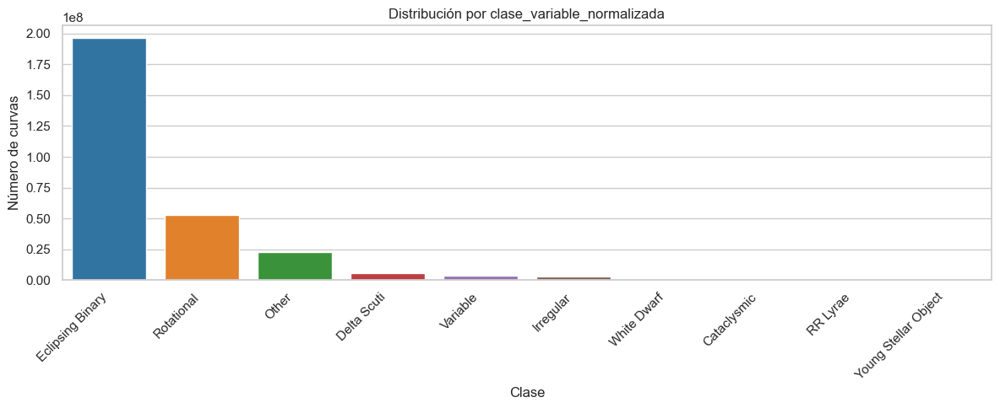


🛰️ Recuento por mision:
Tess      120747997
TESS       76699840
Kepler     71735011
K2         17895159


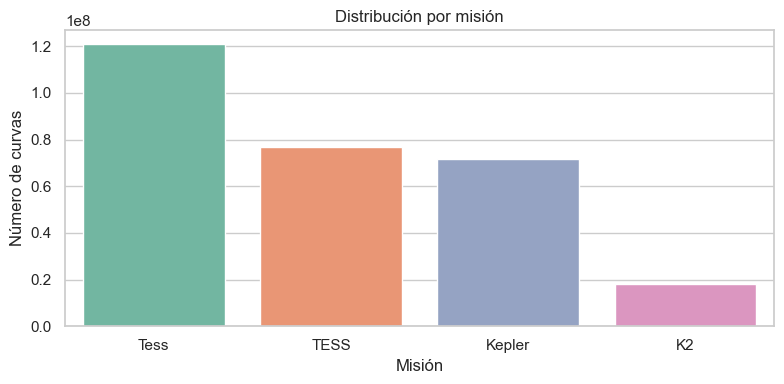


📁 Recuento por dataset fuente:
dataset_eb_tess_labeled_fixed.parquet                                      120747997
dataset_eb_kepler_labeled_fixed.parquet                                     71735011
dataset_vsx_tess_labeled_fixed.parquet                                      41143597
dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet     35556243
dataset_k2varcat_labeled_fixed.parquet                                      17895159


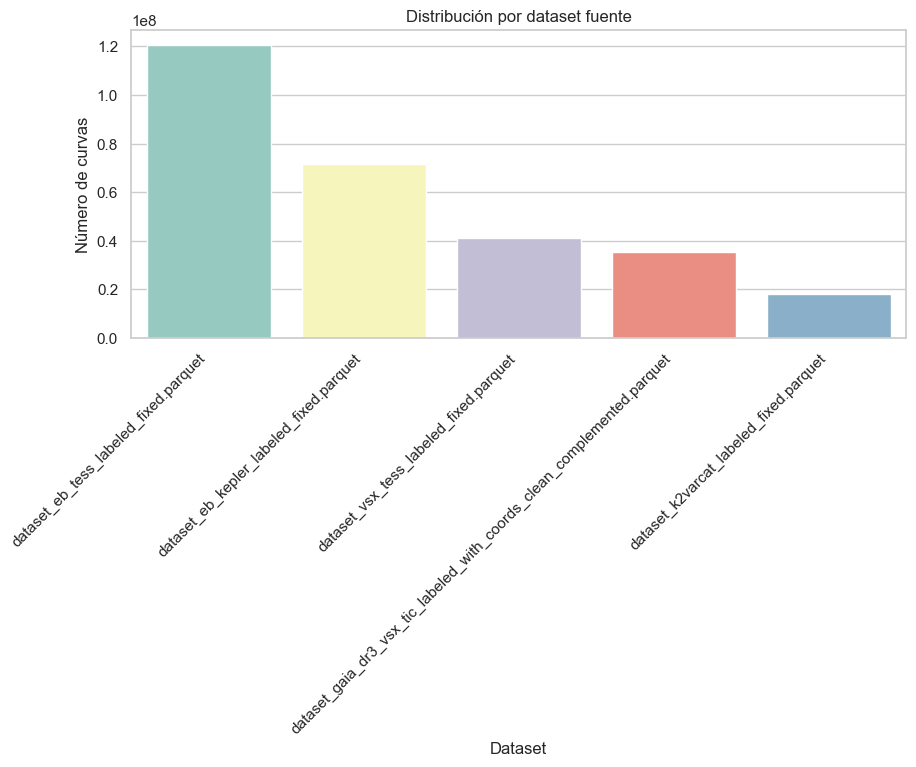

In [ ]:
#%pip install seaborn
%run src/fase1/script_7_validate_final_dataset.py

In [ ]:
import sys
import os

# Añadir el directorio src al path
script_dir = os.path.abspath("src")
if script_dir not in sys.path:
    sys.path.append(script_dir)

from src.fase2.script_1_transformer_preprocessing_optimizado_2 import main as transformer_preprocessing_optimizado2

# Ejecutar una prueba con todos los objetos y SEQ_LENGTH=25000
train_loader, val_loader = transformer_preprocessing_optimizado2(
    seq_length=25000,
    batch_size=64,
    num_workers=8,
    device="cpu",
    limit_objects=None,
    max_per_class=None
)

📂 Cargando datos en lotes con PyArrow...


Agrupando curvas por objeto: 1127351batch [42:05, 446.35batch/s]


🚀 Procesando 15080 curvas en paralelo usando 8 CPUs...
📊 Recuento por clase codificada:
 4 (Other): 4417
 2 (Eclipsing Binary): 6317
 6 (Rotational): 2117
 1 (Delta Scuti): 197
 3 (Irregular): 105
 7 (Variable): 113
 5 (RR Lyrae): 32
 8 (White Dwarf): 7
 9 (Young Stellar Object): 16
 0 (Cataclysmic): 9

📉 Resumen de curvas descartadas:
🔸 All nan                       : 0
🔸 Low std                       : 0
🔸 Short curve                   : 0
🔸 Nan or inf after norm         : 0
🔸 Ok                            : 0
✅ Datos preparados como secuencias normalizadas y máscaras.


### **Revisión del diccionario `NORMALIZATION_DICT`**

La idea es quitar peso a la clase "**OTHER**" que esta influyendo demasiado en el entrenamiento del modelo. 

#### ✅ Clases bien mapeadas en el dict actual:

* `EB`, `EA`, `EW`, `DSCT`, `BY`, `RRAB`, `RRC`, `RRD`, `ACV`, `CV`, `UG`, `WD`, `YSO`, etc.

#### ⚠️ Clases importantes **no mapeadas pero frecuentes**:

Se podrían añadir como clases válidas o al menos no perderlas en `"Unknown"`:

| Clase          | Sugerencia             |                         |                           |
| -------------- | ---------------------- | ----------------------- | ------------------------- |
| `ZZA`          | White Dwarf            |                         |                           |
| `DSCT:`        | Delta Scuti            |                         |                           |
| `UGZ`          | Cataclysmic            |                         |                           |
| `V1093HER`     | White Dwarf (opcional) |                         |                           |
| `BCEP+SPB`     | Maybe RR Lyrae?        |                         |                           |
| `EA+BY+UV`     | No clara → Unknown     |                         |                           |
| `ROAM`, `ROAP` | Rotational             |                         |                           |
| \`RRC          | EC\`                   | RR Lyrae (si parseas \` | \`)                       |
| \`DSCT         | GDOR                   | SXPHE\`                 | Delta Scuti (conservador) |

✅ Vamos a generar un nuevo mapa o diccionario de clases unificado: `normalization_dict.py`:

* Unifica criterios de clasificación
* Separa correctamente `"Unknown"` y evita inflar `"Other"`
* Incluye clases frecuentes que no estaban mapeadas (`ZZA`, `V1093HER`, `DSCT:`, `ROAP`, `UGZ`…).
* Evita que residuos vayan a “Other” sin control.
* Las etiquetas ambiguas o sin mapear ahora se asignan explícitamente a `"Unknown"`.

Y adaptamos los scripts que usábamos para normalizar todos los .parquet generados hasta ahora:

2. ✔️ `script_6_unify_all_missions.py` 
    * Usa `normalize_label()` desde el módulo
    * Filtra curvas válidas y descarta etiquetas desconocidas
3. ✔️ `script_6c_normalize_gaiadr3.py` 
    * Aplica el mismo criterio y normalización para Gaia DR3 complementado

Con esto podemos regenerar ambos datasets (`all_missions_labeled.parquet` y `dataset_gaia_complemented_normalized.parquet`) de forma limpia y coherente antes de validar y relanzar todo el pipeline.

1. **Normalizacion de los primeros datasets**: 
    - `dataset_eb_kepler_labeled_fixed.parquet`
    - `dataset_eb_tess_labeled_fixed.parquet`
    - `dataset_k2varcat_labeled_fixed.parquet`
    - `dataset_vsx_tess_labeled_fixed.parquet`

Crea resumen `clase_variable_normalizada_summary.csv`

In [ ]:
%run src/fase1/script_6_unify_all_missions.py

🔎 Detectando tipos reales por columna...
🧩 Inferiendo tipos compatibles por columna
✅ Esquema global construido con 44 columnas

📂 Procesando: dataset_eb_kepler_labeled_fixed.parquet
📂 Procesando: dataset_eb_tess_labeled_fixed.parquet
📂 Procesando: dataset_k2varcat_labeled_fixed.parquet
📂 Procesando: dataset_vsx_tess_labeled_fixed.parquet
✅ Dataset final guardado como: data\processed\all_missions_labeled.parquet
📄 Resumen de clases exportado: processed\summary\clase_variable_normalizada_summary.csv


2. **Normalizacion del posterior de Gaia DR3**: 
    - `dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet`

Crea resumen: `clase_variable_normalizada_summary_gaia.csv`

#### ✅ `script_6_unify_all_missions.py` — Resultado correcto

* 📁 Se consolidaron **44 columnas** en el esquema global.
* 📊 Se procesaron correctamente los 4 datasets principales.
* 📄 Se guardó el fichero unificado `all_missions_labeled.parquet`.
* 🧮 El resumen `clase_variable_normalizada_summary.csv` muestra:

| Clase                | Nº curvas |
| -------------------- | --------- |
| Eclipsing Binary     | 194,090   |
| Rotational           | 26,611    |
| Delta Scuti          | 2,714     |
| Irregular            | 1,386     |
| Variable             | 929       |
| White Dwarf          | 828       |
| RR Lyrae             | 334       |
| Cataclysmic          | 324       |
| Young Stellar Object | 138       |


In [ ]:
import torch
import gc
import os

# Limpiar memoria de PyTorch si hay algo cargado en GPU (por si acaso)
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Forzar liberación de memoria Python general
gc.collect()

# Configurar PyTorch para minimizar fragmentación futura
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

%run src/fase1/script_6c_normalize_gaiadr3.py

📥 Leyendo esquema desde all_missions_labeled.parquet
🔄 Procesando Gaia y normalizando clases...


Procesando Gaia: 17802batch [32:39,  9.08batch/s]


✅ Dataset guardado como: data\processed\dataset_gaia_complemented_normalized.parquet
📊 Total filas escritas: 29,794,442
📄 Resumen exportado: processed\summary\clase_variable_normalizada_summary_gaia.csv


3. **Validación final de los nuevos datasets**:

Note: you may need to restart the kernel to use updated packages.
📂 Validando los siguientes archivos:
- data/processed/all_missions_labeled.parquet
- data/processed/dataset_gaia_complemented_normalized.parquet

🧩 Esquema detectado:
- tiempo: double
- magnitud: double
- error: double
- quality: double
- timecorr: double
- centroid_col: double
- centroid_row: double
- cadenceno: double
- sap_flux: double
- sap_flux_err: double
- sap_bkg: double
- sap_bkg_err: double
- pdcsap_flux: double
- pdcsap_flux_err: double
- sap_quality: double
- psf_centr1: double
- psf_centr1_err: double
- psf_centr2: double
- psf_centr2_err: double
- mom_centr1: double
- mom_centr1_err: double
- mom_centr2: double
- mom_centr2_err: double
- pos_corr1: double
- pos_corr2: double
- id_objeto: string
- id_mision: string
- mision: string
- fecha_inicio: double
- fecha_fin: double
- clase_variable: string
- clase_variable_normalizada: string
- source_dataset: string
- flux: double
- flux_err: double
- fcor: double


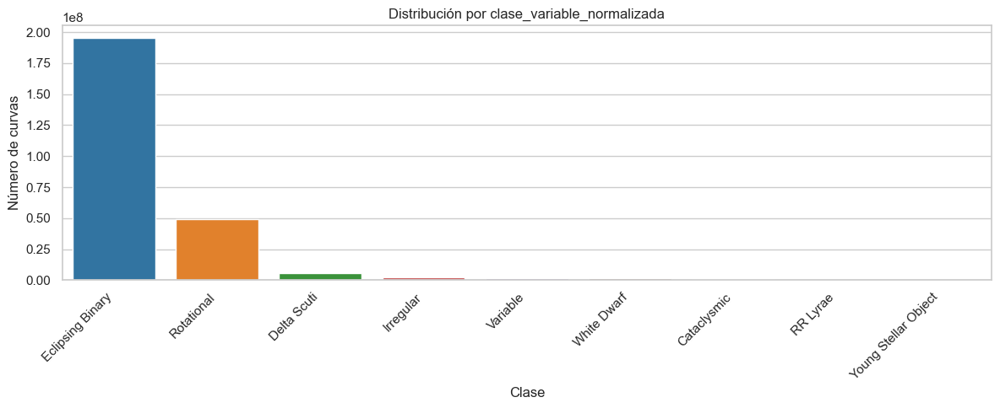


🛰️ Recuento por mision:
Tess      120747997
Kepler     71735011
TESS       64436539
K2           232556


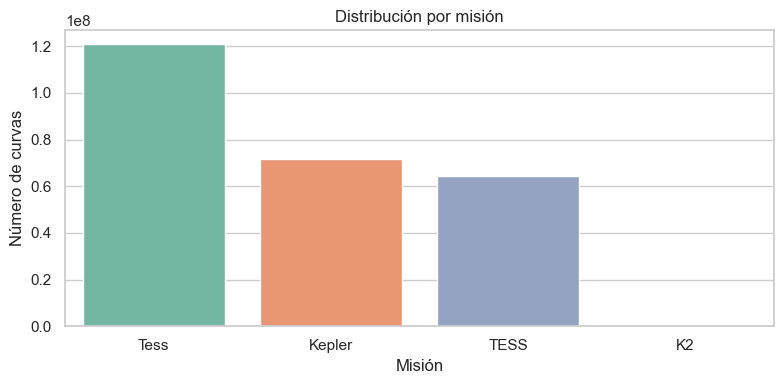


📁 Recuento por dataset fuente:
dataset_eb_tess_labeled_fixed.parquet                                      120747997
dataset_eb_kepler_labeled_fixed.parquet                                     71735011
dataset_vsx_tess_labeled_fixed.parquet                                      34642097
dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet     29794442
dataset_k2varcat_labeled_fixed.parquet                                        232556


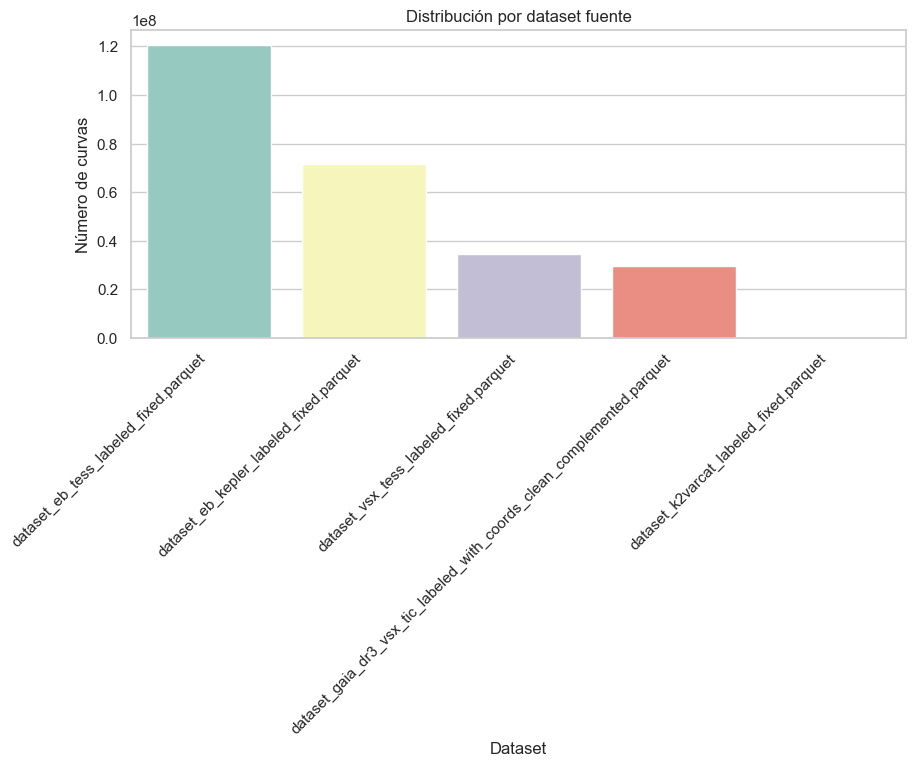

In [ ]:
#%pip install seaborn
%run src/fase1/script_7_validate_final_dataset.py

El `script_7_validate_final_dataset.py` confirma lo siguiente:

📦 Dataset total consolidado:

* **257.152.103 observaciones**
* **44 columnas estándar**
* Sin valores nulos en campos críticos (`tiempo`, `magnitud`, `clase_variable_normalizada`, `id_objeto`)

📊 Distribución por clase (`clase_variable_normalizada`)

| Clase                | Nº observaciones |
| -------------------- | ---------------- |
| Eclipsing Binary     | 195.482.030      |
| Rotational           | 49.338.424       |
| Delta Scuti          | 5.434.112        |
| Irregular            | 2.340.876        |
| Variable             | 1.669.448        |
| White Dwarf          | 1.571.998        |
| Cataclysmic          | 601.691          |
| RR Lyrae             | 470.647          |
| Young Stellar Object | 242.877          |

✔️ Las 9 clases finales están bien representadas y no hay residuos como “Other” o “Unknown”.

🛰 Distribución por misión

| Misión | Observaciones |
| ------ | ------------- |
| Tess   | 120.747.997   |
| Kepler | 71.735.011    |
| TESS   | 64.436.539    |
| K2     | 232.556       |

✔️ El duplicado entre `Tess` y `TESS` podría deberse a etiquetas distintas de origen, pero en práctica es el mismo instrumento (puedes unificarlos en el preprocesado si quieres).

🗂 Dataset por fuente

| Dataset fuente                                                            | Nº observaciones |
| ------------------------------------------------------------------------- | ---------------- |
| `dataset_eb_tess_labeled_fixed.parquet`                                   | 120.747.997      |
| `dataset_eb_kepler_labeled_fixed.parquet`                                 | 71.735.011       |
| `dataset_vsx_tess_labeled_fixed.parquet`                                  | 34.642.097       |
| `dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet` | 29.794.442       |
| `dataset_k2varcat_labeled_fixed.parquet`                                  | 232.556          |

✔️ El aporte de Gaia y VSX ha sido decisivo para reforzar clases minoritarias.

🧠 Conclusión

✅ Dataset consolidado y validado **listo para un nuevo preprocesamiento y entrenamiento**. 

4. **Nuevo preprocesado para generar los datasets de entrenamiento y validación**:

`SEQ_LENGTH=25000`

`max_per_class=None`

Luego pasaremos a SageMaker para hacer un nuevo entrenamiento optimizado con encoder congelado (`script_2_transformer_training_optimizado2.py`), y el posterior fine-tuning (`script_2_transformer_fine_tuning_optimizado`)

In [ ]:
import sys
import os
import torch

# Añadir el directorio src al path
script_dir = os.path.abspath("src")
if script_dir not in sys.path:
    sys.path.append(script_dir)

from src.fase2.script_1_transformer_preprocessing_optimizado_2 import main as transformer_preprocessing_optimizado2

# Ejecutar una prueba con todos los objetos y SEQ_LENGTH=25000
train_loader, val_loader = transformer_preprocessing_optimizado2(
    seq_length=25000,
    batch_size=64,
    num_workers=8,
    device="cpu",
    limit_objects=None,
    max_per_class=None
)

# Guardar datasets serializados para no perderlos al reiniciar el kernel y poder subirlos a SageMaker
torch.save(train_loader.dataset, "data/train/train_dataset.pt")
torch.save(val_loader.dataset, "data/train/val_dataset.pt")

📂 Cargando datos en lotes con PyArrow...


Agrupando curvas por objeto: 1010201batch [28:39, 587.50batch/s]


🚀 Procesando 9729 curvas en paralelo usando 8 CPUs...
📊 Recuento por clase codificada:
 1 (Delta Scuti): 198
 2 (Eclipsing Binary): 6274
 5 (Rotational): 1925
 3 (Irregular): 71
 6 (Variable): 81
 7 (White Dwarf): 10
 8 (Young Stellar Object): 21
 4 (RR Lyrae): 28
 0 (Cataclysmic): 5

📉 Resumen de curvas descartadas:
🔸 All nan                       : 0
🔸 Low std                       : 0
🔸 Short curve                   : 0
🔸 Nan or inf after norm         : 0
🔸 Ok                            : 0
✅ Datos preparados como secuencias normalizadas y máscaras.


In [ ]:
%run src/fase1/script_6c_normalize_gaiadr3.py

📂 Cargando IDs ya presentes en el dataset consolidado...
🔍 Cargando candidatos desde Gaia DR3...
🎯 Total candidatos únicos desde Gaia: 154
📥 Descargando curvas TESS con Lightkurve...


  0%|          | 0/154 [00:00<?, ?it/s]No data found for target "TIC 405272865".
No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (2.30823781, 6.09139983)>".
  9%|▉         | 14/154 [00:55<09:16,  3.97s/it]


KeyboardInterrupt: 

In [ ]:
import pandas as pd

df = pd.read_parquet("data/processed/dataset_gaia_complemented_normalized.parquet")
print(df.columns)


### **Descarga de mas curvas TESS de otra franja en el hemisferio sur, y luego otra más en el norte, normalizando y filtrando para descargar solo clases minoritarias**:

In [ ]:
import warnings
import os, sys
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_3_vsx_tic_match_north import main as run_script_3_north

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    run_script_3_north(limit=None, radio_arcsec=3.0, limit_bins=5)
else:
    print("💻 Ejecutando en entorno local → catálogo completo")
    run_script_3_north(limit=None, radio_arcsec=3.0, limit_bins=20, max_download_workers=8)

🔇 Warnings silenciados: UserWarning, FutureWarning
💻 Ejecutando en entorno local → catálogo completo
📉 Catálogo VSX reducido a franja DEC 20 → 90 (39942 objetos)
🎯 Limitando a 20 regiones DEC (bins únicos)
📦 Archivos DEC necesarios: ['tic_dec20_00N__22_00N.csv.gz', 'tic_dec22_00N__24_00N.csv.gz', 'tic_dec24_00N__26_00N.csv.gz', 'tic_dec26_00N__28_00N.csv.gz', 'tic_dec28_00N__30_00N.csv.gz', 'tic_dec30_00N__32_00N.csv.gz', 'tic_dec32_00N__34_00N.csv.gz', 'tic_dec34_00N__36_00N.csv.gz', 'tic_dec36_00N__38_00N.csv.gz', 'tic_dec38_00N__40_00N.csv.gz', 'tic_dec40_00N__42_00N.csv.gz', 'tic_dec42_00N__44_00N.csv.gz', 'tic_dec44_00N__46_00N.csv.gz', 'tic_dec46_00N__48_00N.csv.gz', 'tic_dec48_00N__50_00N.csv.gz', 'tic_dec50_00N__52_00N.csv.gz', 'tic_dec52_00N__54_00N.csv.gz', 'tic_dec54_00N__56_00N.csv.gz', 'tic_dec56_00N__58_00N.csv.gz', 'tic_dec58_00N__60_00N.csv.gz']
⬇️ Descargando tic_dec20_00N__22_00N.csv.gz...
⬇️ Descargando tic_dec22_00N__24_00N.csv.gz...
⬇️ Descargando tic_dec24_00N__26

⬇️ Descargando TIC:   5%|▌         | 1/20 [13:55<4:24:33, 835.43s/it]

⬇️ Descargando tic_dec36_00N__38_00N.csv.gz...


⬇️ Descargando TIC:  10%|█         | 2/20 [14:09<1:45:43, 352.43s/it]

⬇️ Descargando tic_dec38_00N__40_00N.csv.gz...


⬇️ Descargando TIC:  15%|█▌        | 3/20 [15:10<1:02:09, 219.40s/it]

⬇️ Descargando tic_dec40_00N__42_00N.csv.gz...


⬇️ Descargando TIC:  20%|██        | 4/20 [15:55<40:08, 150.55s/it]  

⬇️ Descargando tic_dec42_00N__44_00N.csv.gz...


⬇️ Descargando TIC:  25%|██▌       | 5/20 [18:06<35:48, 143.24s/it]

⬇️ Descargando tic_dec44_00N__46_00N.csv.gz...


⬇️ Descargando TIC:  30%|███       | 6/20 [20:02<31:19, 134.27s/it]

⬇️ Descargando tic_dec46_00N__48_00N.csv.gz...


⬇️ Descargando TIC:  35%|███▌      | 7/20 [20:27<21:17, 98.27s/it] 

⬇️ Descargando tic_dec48_00N__50_00N.csv.gz...


⬇️ Descargando TIC:  40%|████      | 8/20 [20:37<14:02, 70.20s/it]

⬇️ Descargando tic_dec50_00N__52_00N.csv.gz...


⬇️ Descargando TIC:  45%|████▌     | 9/20 [24:15<21:22, 116.56s/it]

⬇️ Descargando tic_dec52_00N__54_00N.csv.gz...


⬇️ Descargando TIC:  50%|█████     | 10/20 [25:16<16:34, 99.47s/it]

⬇️ Descargando tic_dec54_00N__56_00N.csv.gz...


⬇️ Descargando TIC:  55%|█████▌    | 11/20 [27:12<15:40, 104.50s/it]

⬇️ Descargando tic_dec56_00N__58_00N.csv.gz...


⬇️ Descargando TIC:  60%|██████    | 12/20 [27:15<09:48, 73.57s/it] 

⬇️ Descargando tic_dec58_00N__60_00N.csv.gz...


⬇️ Descargando TIC: 100%|██████████| 20/20 [38:54<00:00, 116.71s/it]


📂 Procesando en chunks tic_dec30_00N__32_00N.csv.gz...
⏱️ Chunks procesados en 211.35 s
📂 Procesando en chunks tic_dec28_00N__30_00N.csv.gz...
⏱️ Chunks procesados en 225.94 s
📂 Procesando en chunks tic_dec34_00N__36_00N.csv.gz...
⏱️ Chunks procesados en 191.72 s
📂 Procesando en chunks tic_dec24_00N__26_00N.csv.gz...
⏱️ Chunks procesados en 223.72 s
📂 Procesando en chunks tic_dec32_00N__34_00N.csv.gz...
⏱️ Chunks procesados en 207.43 s
📂 Procesando en chunks tic_dec20_00N__22_00N.csv.gz...
⏱️ Chunks procesados en 237.80 s
📂 Procesando en chunks tic_dec22_00N__24_00N.csv.gz...
⏱️ Chunks procesados en 224.54 s
📂 Procesando en chunks tic_dec26_00N__28_00N.csv.gz...
⏱️ Chunks procesados en 221.81 s
📂 Procesando en chunks tic_dec36_00N__38_00N.csv.gz...
⏱️ Chunks procesados en 190.17 s
📂 Procesando en chunks tic_dec38_00N__40_00N.csv.gz...
⏱️ Chunks procesados en 176.90 s
📂 Procesando en chunks tic_dec40_00N__42_00N.csv.gz...
⏱️ Chunks procesados en 162.92 s
📂 Procesando en chunks tic_dec42

🧮 Procesando por lotes: 1it [00:00,  8.33it/s]

✅ Resumen exportado a: data/processed/summary\dataset_vsx_tic_labeled_north_summary.csv
🧹 Archivos temporales eliminados. Compruébalo.


In [ ]:
import warnings
import os, sys
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_3b_download_tess_curves_from_vsx_north import main as run_vsx_tess_download_north

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    run_vsx_tess_download_north(limit=None, workers=4)
else:
    print("💻 Ejecutando en entorno local → catálogo completo")
    run_vsx_tess_download_north(limit=None, workers=8)

🔇 Warnings silenciados: UserWarning, FutureWarning
💻 Ejecutando en entorno local → catálogo completo
📥 Cargando dataset: data/processed/dataset_vsx_tic_labeled_north.parquet


100%|██████████| 4618/4618 [12:25:00<00:00,  9.68s/it]  


✅ Guardados 56757771 registros en parquet temporales.
📦 Unificando resultados...


In [ ]:
# Esto quedo pendiente de ejecutar en la celda anterior

import pandas as pd
from pathlib import Path
from src.fase1.script_3b_download_tess_curves_from_vsx_north import inspect_and_export_summary

TEMP_DIR = Path("data/processed/temp_vsx_tess_north")
OUTPUT_PARQUET = "data/processed/dataset_vsx_tess_labeled_north.parquet"

print("📦 Unificando resultados...")
files = sorted(TEMP_DIR.glob("vsx_tess_chunk_*.parquet"))
if not files:
    print("⚠️ No se generaron archivos temporales para unir.")
else:
    dfs = [pd.read_parquet(f) for f in files]
    df_final = pd.concat(dfs, ignore_index=True)
    df_final.to_parquet(OUTPUT_PARQUET, index=False)
    print(f"✅ Dataset final guardado en: {OUTPUT_PARQUET} ({len(df_final)} filas)")
    inspect_and_export_summary(OUTPUT_PARQUET, output_format="csv")

📦 Unificando resultados...
✅ Dataset final guardado en: data/processed/dataset_vsx_tess_labeled_north.parquet (56757771 filas)

📁 Inspeccionando: data/processed/dataset_vsx_tess_labeled_north.parquet


🧮 Procesando por lotes: 434it [06:43,  1.07it/s]

✅ Resumen exportado a: data/processed/summary\dataset_vsx_tess_labeled_north_summary.csv


📂 Validando los siguientes archivos:
- data/processed/all_missions_labeled.parquet
- data/processed/dataset_gaia_complemented_normalized.parquet
- data/processed/dataset_vsx_tess_labeled_south.parquet
- data/processed/dataset_vsx_tess_labeled_north.parquet

🧩 Esquema detectado:
- tiempo: double
- magnitud: double
- error: double
- quality: double
- timecorr: double
- centroid_col: double
- centroid_row: double
- cadenceno: double
- sap_flux: double
- sap_flux_err: double
- sap_bkg: double
- sap_bkg_err: double
- pdcsap_flux: double
- pdcsap_flux_err: double
- sap_quality: double
- psf_centr1: double
- psf_centr1_err: double
- psf_centr2: double
- psf_centr2_err: double
- mom_centr1: double
- mom_centr1_err: double
- mom_centr2: double
- mom_centr2_err: double
- pos_corr1: double
- pos_corr2: double
- id_objeto: string
- id_mision: string
- mision: string
- fecha_inicio: double
- fecha_fin: double
- clase_variable: string
- clase_variable_normalizada: string
- source_dataset: string
- f

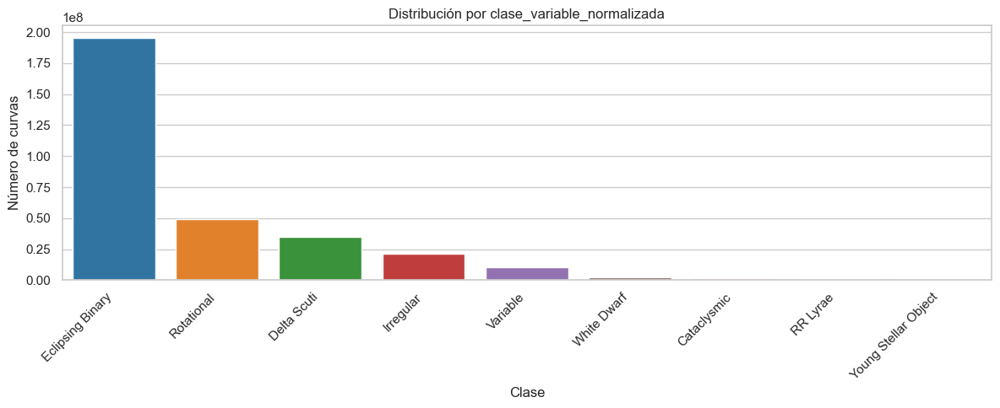


🛰️ Recuento por mision:
TESS      124289747
Tess      120747997
Kepler     71735011
K2           232556


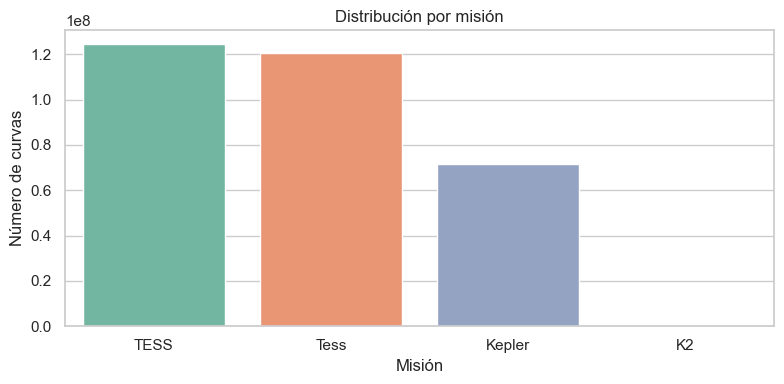


📁 Recuento por dataset fuente:
dataset_eb_tess_labeled_fixed.parquet                                      120747997
dataset_eb_kepler_labeled_fixed.parquet                                     71735011
dataset_vsx_tess_labeled_fixed.parquet                                      34642097
dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet     29794442
dataset_k2varcat_labeled_fixed.parquet                                        232556


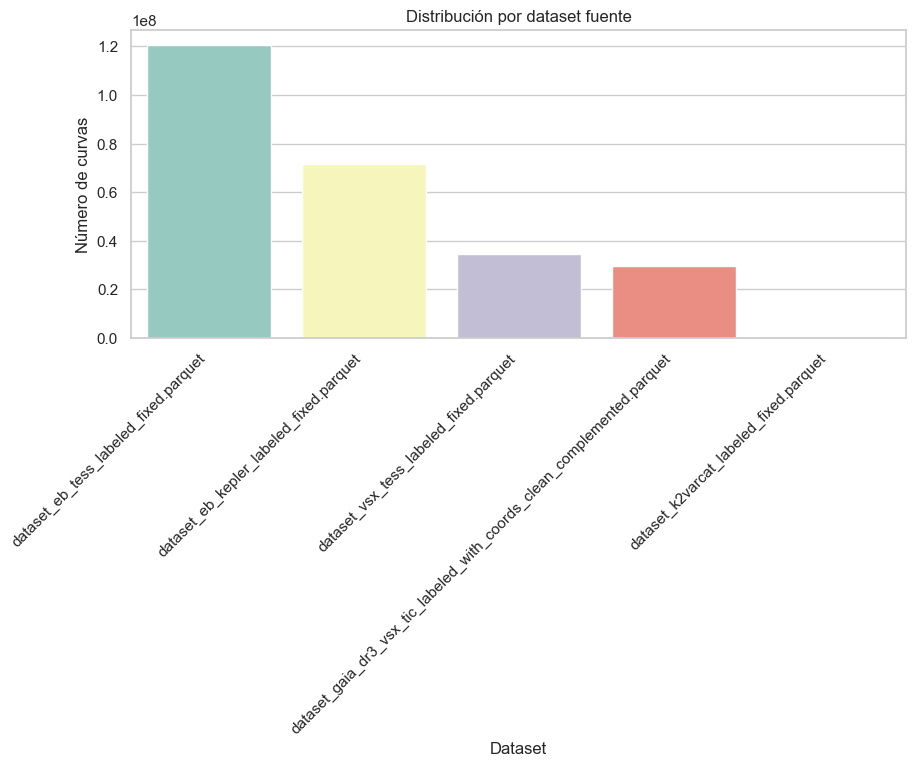

In [ ]:
%run src/fase1/script_7_validate_final_dataset.py


El resultado de la validación confirma que el dataset consolidado es ahora mucho más equilibrado y completo que en versiones anteriores. Los puntos clave a destacar tras la ejecución del `script_7_validate_final_dataset.py` y la consolidación de los 4 `.parquet` son:

* **Filas totales**: `317,005,311` curvas de luz reales.
* **Curvas válidas por clase**:
  * Eclipsing Binary: 195M
  * Rotational: 49M
  * Delta Scuti: 34M
  * Irregular: 21M
  * Variable: 10M
  * White Dwarf: 2.2M
  * Cataclysmic: 1.5M
  * RR Lyrae: 1.1M
  * Young Stellar Object: 944K

Este refuerzo ha elevado significativamente la representación de clases **antes minoritarias**, como *Delta Scuti*, *White Dwarf*, *Cataclysmic* y *RR Lyrae*, que ahora están en el orden de **millones de curvas**, un escenario mucho más favorable para el entrenamiento.

* **Misiones más representadas**:
  * TESS/Tess combinadas → \~245M curvas
  * Kepler → 71M
  * K2 → 232K

* **Ficheros fuente integrados**:
  * Incluye tanto catálogos originales como los nuevos refuerzos descargados de VSX-TIC en franjas sur y norte.

In [ ]:
import sys
import os
import torch

# Añadir el directorio src al path
script_dir = os.path.abspath("src")
if script_dir not in sys.path:
    sys.path.append(script_dir)

from src.fase2.script_1_transformer_preprocessing_optimizado_2 import main as transformer_preprocessing_optimizado2

# Ejecutar una prueba con todos los objetos y SEQ_LENGTH=25000
train_loader, val_loader = transformer_preprocessing_optimizado2(
    seq_length=25000,
    batch_size=64,
    num_workers=8,
    device="cpu",
    limit_objects=None,
    max_per_class=None
)

# Guardar datasets serializados para no perderlos al reiniciar el kernel y poder subirlos a SageMaker
torch.save(train_loader.dataset, "data/train/train_dataset.pt")
torch.save(val_loader.dataset, "data/train/val_dataset.pt")

📂 Cargando datos en lotes con PyArrow...


Agrupando curvas por objeto: 1244004batch [53:02, 390.89batch/s]


🚀 Procesando 11033 curvas en paralelo usando 8 CPUs...
📊 Recuento por clase codificada:
 3 (Irregular): 339
 5 (Rotational): 1925
 2 (Eclipsing Binary): 6274
 4 (RR Lyrae): 61
 1 (Delta Scuti): 730
 6 (Variable): 320
 8 (Young Stellar Object): 95
 0 (Cataclysmic): 13
 7 (White Dwarf): 14

📉 Resumen de curvas descartadas:
🔸 All nan                       : 0
🔸 Low std                       : 0
🔸 Short curve                   : 0
🔸 Nan or inf after norm         : 0
🔸 Ok                            : 0
✅ Datos preparados como secuencias normalizadas y máscaras.


* **Curvas procesadas**: `11.033`
* **Curvas descartadas**: `0` (ninguna por `NaN`, `std`, longitud o normalización ⇒ ✔️ calidad)
* **Clases codificadas (LabelEncoder):**

| Clase codificada | Clase normalizada    | Nº de curvas |
| ---------------- | -------------------- | ------------ |
| 0                | Cataclysmic          | 13           |
| 1                | Delta Scuti          | 730          |
| 2                | Eclipsing Binary     | 6.274        |
| 3                | Irregular            | 339          |
| 4                | RR Lyrae             | 61           |
| 5                | Rotational           | 1.925        |
| 6                | Variable             | 320          |
| 7                | White Dwarf          | 14           |
| 8                | Young Stellar Object | 95           |


* La clase dominante sigue siendo **Eclipsing Binary**, pero las clases minoritarias están mucho mejor representadas que antes del refuerzo.
* Se nota un gran incremento en **Delta Scuti**, **RR Lyrae**, **Cataclysmic** y **YSO**, que anteriormente tenían muy pocas curvas (¡algunas menos de 10!).
* Esto permitirá al modelo **aprender representaciones más robustas** de esas clases en la nueva fase de entrenamiento.

**Siguientes pasos** (en SageMaker)

1. **Entrenamiento (`script_2_transformer_training_optimizado2.py`)**

   * `freeze_encoder = True`
   * `dropout = 0.3`, `lr = 3e-5`, `patience = 6`, `batch_size = 32` (o 16 en GPU)

2. **Fine-tuning (`script_2_transformer_fine_tuning_optimizado.py`)**

   * `freeze_encoder = False`
   * Doble `learning_rate`, `label_smoothing = 0.1`


---

### NUEVA AMPLIACIÓN DE LA BÚSQUEDA: BÚSQUEDA DIRECTA POR CLASES MINORITARIAS, SIN RESTRICCION POR FRANJAS

**1. Nuevo nombre de script:**
`script_3_vsx_tic_match_clases_objetivo.py`

**2. Cambios funcionales:**
* Quitar el filtro de declinación (`DEC_MIN`, `DEC_MAX`).
* Filtrar el catálogo VSX por las `CLASES_OBJETIVO` directamente.
* Mantener la lógica de descarga de bins DEC que correspondan a esos objetos.
* Adaptar el nombre de salida y carpeta temporal para que no sobrescriba otros resultados.

### `CLASES_OBJETIVO`:

```python
CLASES_OBJETIVO = [
    "Cataclysmic", "White Dwarf", "RR Lyrae", "Young Stellar Object"
]
```

In [ ]:
import warnings
import os, sys
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_3_vsx_tic_match_clases_objetivo import main as run_script_3_clases_objetivo 

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    run_script_3_clases_objetivo(limit=None, radio_arcsec=3.0, limit_bins=5)
else:
    print("💻 Ejecutando en entorno local → catálogo completo")
    run_script_3_clases_objetivo(limit=None, radio_arcsec=3.0, limit_bins=20, max_download_workers=8)

🔇 Warnings silenciados: UserWarning, FutureWarning
💻 Ejecutando en entorno local → catálogo completo
🎯 Filtrado por clases objetivo: ['Cataclysmic', 'White Dwarf', 'RR Lyrae', 'Young Stellar Object'] → 2089 objetos
🎯 Limitando a 20 regiones DEC (bins únicos)
📦 Archivos DEC necesarios: ['tic_dec00_00N__02_00N.csv.gz', 'tic_dec02_00N__04_00N.csv.gz', 'tic_dec02_00S__00_00N.csv.gz', 'tic_dec04_00N__06_00N.csv.gz', 'tic_dec04_00S__02_00S.csv.gz', 'tic_dec06_00N__08_00N.csv.gz', 'tic_dec06_00S__04_00S.csv.gz', 'tic_dec08_00N__10_00N.csv.gz', 'tic_dec08_00S__06_00S.csv.gz', 'tic_dec10_00N__12_00N.csv.gz', 'tic_dec10_00S__08_00S.csv.gz', 'tic_dec12_00N__14_00N.csv.gz', 'tic_dec12_00S__10_00S.csv.gz', 'tic_dec14_00N__16_00N.csv.gz', 'tic_dec14_00S__12_00S.csv.gz', 'tic_dec16_00N__18_00N.csv.gz', 'tic_dec16_00S__14_00S.csv.gz', 'tic_dec18_00N__20_00N.csv.gz', 'tic_dec18_00S__16_00S.csv.gz', 'tic_dec20_00N__22_00N.csv.gz']
⬇️ Descargando tic_dec00_00N__02_00N.csv.gz...
⬇️ Descargando tic_dec02_0

⬇️ Descargando TIC:   5%|▌         | 1/20 [18:53<5:58:55, 1133.47s/it]

⬇️ Descargando tic_dec08_00S__06_00S.csv.gz...


⬇️ Descargando TIC:  10%|█         | 2/20 [19:08<2:22:35, 475.30s/it] 

⬇️ Descargando tic_dec10_00N__12_00N.csv.gz...


⬇️ Descargando TIC:  15%|█▌        | 3/20 [19:11<1:13:36, 259.80s/it]

⬇️ Descargando tic_dec10_00S__08_00S.csv.gz...


⬇️ Descargando TIC:  20%|██        | 4/20 [19:15<42:23, 158.94s/it]  

⬇️ Descargando tic_dec12_00N__14_00N.csv.gz...


⬇️ Descargando TIC:  25%|██▌       | 5/20 [21:25<37:07, 148.50s/it]

⬇️ Descargando tic_dec12_00S__10_00S.csv.gz...


⬇️ Descargando TIC:  30%|███       | 6/20 [23:28<32:38, 139.89s/it]

⬇️ Descargando tic_dec14_00N__16_00N.csv.gz...


⬇️ Descargando TIC:  35%|███▌      | 7/20 [23:31<20:35, 95.04s/it] 

⬇️ Descargando tic_dec14_00S__12_00S.csv.gz...


⬇️ Descargando TIC:  40%|████      | 8/20 [24:31<16:47, 83.94s/it]

⬇️ Descargando tic_dec16_00N__18_00N.csv.gz...


⬇️ Descargando TIC:  45%|████▌     | 9/20 [35:27<48:09, 262.71s/it]

⬇️ Descargando tic_dec16_00S__14_00S.csv.gz...


⬇️ Descargando TIC:  50%|█████     | 10/20 [36:52<34:37, 207.74s/it]

⬇️ Descargando tic_dec18_00N__20_00N.csv.gz...


⬇️ Descargando TIC:  55%|█████▌    | 11/20 [38:11<25:17, 168.58s/it]

⬇️ Descargando tic_dec18_00S__16_00S.csv.gz...


⬇️ Descargando TIC:  60%|██████    | 12/20 [41:53<24:36, 184.61s/it]

⬇️ Descargando tic_dec20_00N__22_00N.csv.gz...


⬇️ Descargando TIC: 100%|██████████| 20/20 [1:00:08<00:00, 180.45s/it]


📂 Procesando en chunks tic_dec00_00N__02_00N.csv.gz...
⏱️ Chunks procesados en 215.65 s
📂 Procesando en chunks tic_dec04_00N__06_00N.csv.gz...
⏱️ Chunks procesados en 227.55 s
📂 Procesando en chunks tic_dec06_00S__04_00S.csv.gz...
⏱️ Chunks procesados en 259.14 s
📂 Procesando en chunks tic_dec06_00N__08_00N.csv.gz...
⏱️ Chunks procesados en 261.37 s
📂 Procesando en chunks tic_dec08_00N__10_00N.csv.gz...
⏱️ Chunks procesados en 245.97 s
📂 Procesando en chunks tic_dec02_00S__00_00N.csv.gz...
⏱️ Chunks procesados en 255.71 s
📂 Procesando en chunks tic_dec02_00N__04_00N.csv.gz...
⏱️ Chunks procesados en 242.72 s
📂 Procesando en chunks tic_dec04_00S__02_00S.csv.gz...
⏱️ Chunks procesados en 225.45 s
📂 Procesando en chunks tic_dec10_00S__08_00S.csv.gz...
⏱️ Chunks procesados en 280.84 s
📂 Procesando en chunks tic_dec10_00N__12_00N.csv.gz...
⏱️ Chunks procesados en 258.34 s
📂 Procesando en chunks tic_dec08_00S__06_00S.csv.gz...
⏱️ Chunks procesados en 288.01 s
📂 Procesando en chunks tic_dec12

🧮 Procesando por lotes: 1it [00:00, 333.46it/s]

✅ Resumen exportado a: data/processed/summary\dataset_vsx_tic_labeled_ampliado_summary.csv
🧹 Archivos temporales eliminados.


Revisado el contenido `dataset_vsx_tic_labeled_ampliado_summary_info.txt` generado:

* Se han detectado **269 filas válidas** correspondientes a **264 curvas únicas**, lo cual indica que prácticamente todos los objetos han aportado al menos una curva.
* Las columnas necesarias para la descarga (`tic_id`, `ra`, `dec`, `clase_variable`) están correctamente presentes.
* El número total de entradas es relativamente pequeño, pero tratándose de un refuerzo dirigido exclusivamente a clases muy minoritarias (`Cataclysmic`, `White Dwarf`, `RR Lyrae`, `Young Stellar Object`), **puede ser un resultado útil**.

Este conjunto ampliado puede marcar la diferencia para reforzar la clasificación de esas clases concretas, especialmente si luego aplicas un **fine-tuning con énfasis en reequilibrar los pesos**.

Continuamos con el script `script_3b_download_tess_curves_from_vsx_ampliado.py` para completar la descarga de curvas reales TESS para estos objetos.


In [ ]:
import warnings
import os, sys
import glob
from astropy.units import UnitsWarning
from pathlib import Path

# Ignorar warnings comunes de librerías externas
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UnitsWarning)
print("🔇 Warnings silenciados: UserWarning, FutureWarning")
# Desactivar Rich para evitar problemas de compatibilidad
os.environ["RICH_NO_RICH"] = "1"

# Asegurarse de que el directorio 'src' esté en el path de Python
src_path = Path("src").resolve()
if src_path not in sys.path:
    sys.path.append(str(src_path))
from src.fase1.script_3b_download_tess_curves_from_vsx_ampliado import main as run_vsx_tess_download_ampliado

# Detectar entorno local/AWS y ejecutar el script
try:
    import sagemaker
    is_sagemaker = True
except ImportError:
    is_sagemaker = False

if is_sagemaker:
    print("🔁 Ejecutando en SageMaker → catálogo completo")
    run_vsx_tess_download_ampliado(limit=None, workers=4)
else:
    print("💻 Ejecutando en entorno local → catálogo completo")
    run_vsx_tess_download_ampliado(limit=None, workers=8)

🔇 Warnings silenciados: UserWarning, FutureWarning
💻 Ejecutando en entorno local → catálogo completo
📥 Cargando dataset: data/processed/dataset_vsx_tic_labeled_ampliado.parquet


100%|██████████| 269/269 [25:48<00:00,  5.76s/it]


✅ Guardados 1459970 registros en parquet temporales.
📦 Unificando resultados...
✅ Dataset final guardado en: data/processed/dataset_vsx_tess_labeled_ampliado.parquet (57452150 filas)

📁 Inspeccionando: data/processed/dataset_vsx_tess_labeled_ampliado.parquet


🧮 Procesando por lotes: 439it [11:09,  1.52s/it]


✅ Resumen exportado a: data/processed/summary\dataset_vsx_tess_labeled_ampliado_summary.csv
🧹 Eliminando temporales...


El nuevo barrido ha generado un total de **1.152 curvas únicas** provenientes de las clases minoritarias objetivo (`Cataclysmic`, `White Dwarf`, `RR Lyrae`, `Young Stellar Object`), con un total de **57.452.150 filas** en el archivo `dataset_vsx_tess_labeled_ampliado.parquet`.
Esto representa una ampliación muy valiosa para reforzar el entrenamiento:

1. Repetir el **preprocesado** completo con el nuevo parámetro `max_per_class_override={"Eclipsing Binary": 3000}` para limitar el peso de la clase más predominante.
2. Ejecutar el **entrenamiento y fine-tuning**, ahora con las clases minoritarias reforzadas y la clase dominante recortada.

📂 Validando los siguientes archivos:
- data/processed/all_missions_labeled.parquet
- data/processed/dataset_gaia_complemented_normalized.parquet
- data/processed/dataset_vsx_tess_labeled_south.parquet
- data/processed/dataset_vsx_tess_labeled_north.parquet
- data/processed/dataset_vsx_tess_labeled_ampliado.parquet

🧩 Esquema detectado:
- tiempo: double
- magnitud: double
- error: double
- quality: double
- timecorr: double
- centroid_col: double
- centroid_row: double
- cadenceno: double
- sap_flux: double
- sap_flux_err: double
- sap_bkg: double
- sap_bkg_err: double
- pdcsap_flux: double
- pdcsap_flux_err: double
- sap_quality: double
- psf_centr1: double
- psf_centr1_err: double
- psf_centr2: double
- psf_centr2_err: double
- mom_centr1: double
- mom_centr1_err: double
- mom_centr2: double
- mom_centr2_err: double
- pos_corr1: double
- pos_corr2: double
- id_objeto: string
- id_mision: string
- mision: string
- fecha_inicio: double
- fecha_fin: double
- clase_variable: string
- clas

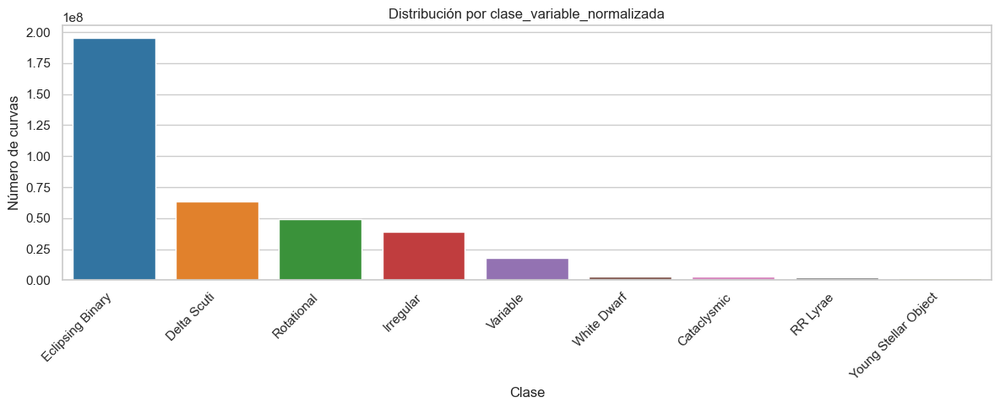


🛰️ Recuento por mision:
TESS      181741897
Tess      120747997
Kepler     71735011
K2           232556


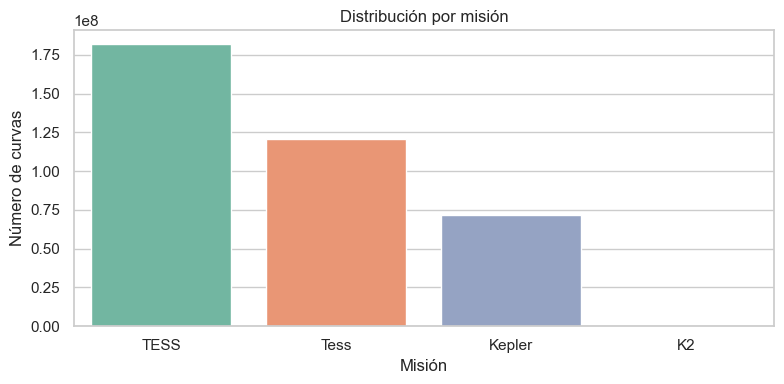


📁 Recuento por dataset fuente:
dataset_eb_tess_labeled_fixed.parquet                                      120747997
dataset_eb_kepler_labeled_fixed.parquet                                     71735011
dataset_vsx_tess_labeled_fixed.parquet                                      34642097
dataset_gaia_dr3_vsx_tic_labeled_with_coords_clean_complemented.parquet     29794442
dataset_k2varcat_labeled_fixed.parquet                                        232556


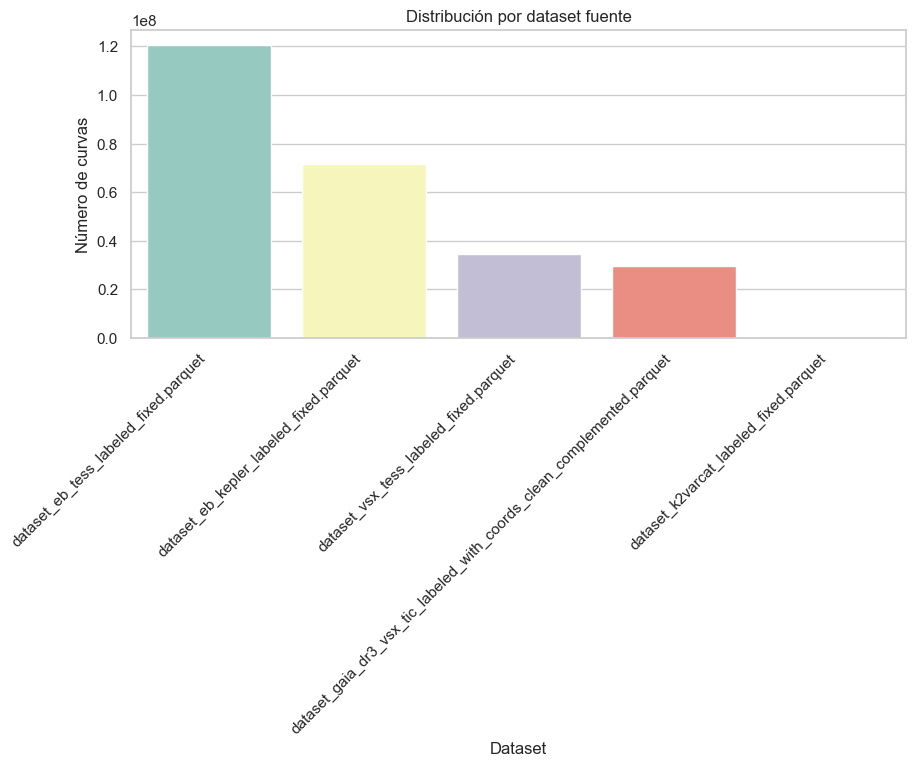

In [ ]:
%run src/fase1/script_7_validate_final_dataset.py

In [ ]:
import sys
import os
import torch

# Añadir el directorio src al path
script_dir = os.path.abspath("src")
if script_dir not in sys.path:
    sys.path.append(script_dir)

from src.fase2.script_1_transformer_preprocessing_optimizado_2 import main as transformer_preprocessing_optimizado2

# Ejecutar una prueba con todos los objetos y SEQ_LENGTH=25000
# Ahora permite aplicar un max_per_class a nivel de clase especifica
train_loader, val_loader = transformer_preprocessing_optimizado2(
    seq_length=25000,
    batch_size=64,
    num_workers=8,
    device="cpu",
    limit_objects=None,
    max_per_class=None,
    max_per_class_override={
        "Eclipsing Binary": 2000
    }    
)

# Guardar datasets serializados para no perderlos al reiniciar el kernel y poder subirlos a SageMaker
torch.save(train_loader.dataset, "data/train/train_dataset_3000.pt")
torch.save(val_loader.dataset, "data/train/val_dataset_3000.pt")

📂 Cargando datos en lotes con PyArrow...


Agrupando curvas por objeto: 1468427batch [35:55, 681.39batch/s]


🚀 Procesando 6968 curvas en paralelo usando 8 CPUs...
📊 Recuento por clase codificada:
 5 (Rotational): 1925
 1 (Delta Scuti): 730
 2 (Eclipsing Binary): 2637
 3 (Irregular): 339
 6 (Variable): 320
 8 (Young Stellar Object): 103
 4 (RR Lyrae): 76
 0 (Cataclysmic): 15
 7 (White Dwarf): 20

📉 Resumen de curvas descartadas:
🔸 All nan                       : 0
🔸 Low std                       : 0
🔸 Short curve                   : 0
🔸 Nan or inf after norm         : 0
🔸 Ok                            : 0
✅ Datos preparados como secuencias normalizadas y máscaras.


In [ ]:
import sys
import os
import torch

# Añadir el directorio src al path
script_dir = os.path.abspath("src")
if script_dir not in sys.path:
    sys.path.append(script_dir)

from src.fase2.script_1_transformer_preprocessing_optimizado_2 import main as transformer_preprocessing_optimizado2

# Ejecutar una prueba con todos los objetos y SEQ_LENGTH=25000
# Ahora permite aplicar un max_per_class a nivel de clase especifica
train_loader, val_loader = transformer_preprocessing_optimizado2(
    seq_length=25000,
    batch_size=64,
    num_workers=8,
    device="cpu",
    limit_objects=None,
    max_per_class=None,
    max_per_class_override={
        "Eclipsing Binary": 2000
    }    
)

# Guardar datasets serializados para no perderlos al reiniciar el kernel y poder subirlos a SageMaker
torch.save(train_loader.dataset, "data/train/train_dataset_2000.pt")
torch.save(val_loader.dataset, "data/train/val_dataset_2000.pt")

📂 Cargando datos en lotes con PyArrow...


Agrupando curvas por objeto: 1468427batch [40:47, 599.91batch/s]


🚀 Procesando 5968 curvas en paralelo usando 8 CPUs...
📊 Recuento por clase codificada:
 5 (Rotational): 1925
 2 (Eclipsing Binary): 1774
 1 (Delta Scuti): 730
 6 (Variable): 320
 8 (Young Stellar Object): 103
 3 (Irregular): 339
 4 (RR Lyrae): 76
 0 (Cataclysmic): 15
 7 (White Dwarf): 20

📉 Resumen de curvas descartadas:
🔸 All nan                       : 0
🔸 Low std                       : 0
🔸 Short curve                   : 0
🔸 Nan or inf after norm         : 0
🔸 Ok                            : 0
✅ Datos preparados como secuencias normalizadas y máscaras.


NameError: name 'torch' is not defined

In [ ]:
import torch
# Guardar datasets serializados para no perderlos al reiniciar el kernel y poder subirlos a SageMaker
torch.save(train_loader.dataset, "data/train/train_dataset_2000.pt")
torch.save(val_loader.dataset, "data/train/val_dataset_2000.pt")

### INTENTO DE DESCARGAR CURVAS DE CLASES MINORITARIAS DE OTROS CATÁLOGOS NO EXPLORADOS (ZTF)

El script `script_8_ztf_download.py` está implementado con las siguientes características:

* Descarga el catálogo etiquetado ZTF desde VizieR (`J/ApJS/249/18`).
* Filtra las clases objetivo (`Cataclysmic`, `White Dwarf`, `RR Lyrae`, `Young Stellar Object`, `Variable`).
* Normaliza las etiquetas usando `normalize_label()` de `utils/normalization_dicty.py`.
* Descarga las curvas reales con `download_from_csv_parallel()` de `utils/download_curves.py`.
* Genera el `.parquet` final y crea resumen con `inspect_and_export_summary()`.


In [ ]:
#%pip install astroquery

import sys
import os
import torch

# Añadir el directorio src al path
script_dir = os.path.abspath("src")
if script_dir not in sys.path:
    sys.path.append(script_dir)

from src.fase1.script_8_ztf_download_snad2 import main as ztf_download_snad

# Script de descarga de curvas de luz de clases "raras" desde catalogo ZTF
ztf_download_snad()

📂 Cargando catálogo desde: catalogs\ztf_variable_candidates.tsv
✅ Filtradas 48013 curvas con clases objetivo: ['Cataclysmic', 'White Dwarf', 'RR Lyrae', 'Young Stellar Object', 'Variable']


⬇ Descargando curvas ZTF (paralelo): 100%|██████████| 48013/48013 [7:41:25<00:00,  1.73it/s]   



📊 Resumen de descarga:
⚠️ Sin datos para ZTFJ000418.29+420634.1 → 1
⚠️ Sin datos para ZTFJ004134.49+243530.2 → 1
⚠️ Sin datos para ZTFJ005146.41+614834.5 → 1
⚠️ Sin datos para ZTFJ010831.21-101436.2 → 1
⚠️ Sin datos para ZTFJ012557.78-143557.2 → 1
⚠️ Sin datos para ZTFJ013138.79+701208.8 → 1
⚠️ Sin datos para ZTFJ014020.17+084401.3 → 1
⚠️ Sin datos para ZTFJ014148.37+300133.7 → 1
⚠️ Sin datos para ZTFJ022528.78+501645.6 → 1
⚠️ Sin datos para ZTFJ030612.59+564050.0 → 1
⚠️ Sin datos para ZTFJ034837.58+000804.8 → 1
⚠️ Sin datos para ZTFJ041328.90-011030.1 → 1
⚠️ Sin datos para ZTFJ041538.31+152029.3 → 1
⚠️ Sin datos para ZTFJ044542.92+233151.7 → 1
⚠️ Sin datos para ZTFJ050334.61+664757.8 → 1
⚠️ Sin datos para ZTFJ051922.05-183249.7 → 1
⚠️ Sin datos para ZTFJ052555.54-013014.3 → 1
⚠️ Sin datos para ZTFJ053354.46+344556.3 → 1
⚠️ Sin datos para ZTFJ053619.68+664009.0 → 1
⚠️ Sin datos para ZTFJ054703.02+174447.5 → 1
⚠️ Sin datos para ZTFJ060311.42+425930.4 → 1
⚠️ Sin datos para ZTFJ061454.59

ArrowInvalid: No match for FieldRef.Name(clase_variable) in oid: double
expid: double
hjd: double
mjd: double
mag: double
magerr: double
catflags: double
filtercode: string
ra: double
dec: double
chi: double
sharp: double
filefracday: double
field: double
ccdid: string
qid: string
limitmag: double
magzp: double
magzprms: double
clrcoeff: double
clrcounc: double
exptime: double
airmass: double
programid: double
tiempo: double
magnitud: double
id_objeto: string
clase_variable_normalizada: string
band: string
__fragment_index: int32
__batch_index: int32
__last_in_fragment: bool
__filename: string

In [ ]:
import sys
import os
import torch
from pathlib import Path
# Añadir el directorio src al path
script_dir = os.path.abspath("src")
if script_dir not in sys.path:
    sys.path.append(script_dir)
from utils.inspect_and_export_summary import inspect_and_export_summary

OUTPUT_DIR = Path("data/processed")
OUTPUT_PARQUET = OUTPUT_DIR / "dataset_ztf_labeled.parquet"
inspect_and_export_summary(OUTPUT_PARQUET, output_format="csv")


📁 Inspeccionando: data\processed\dataset_ztf_labeled.parquet


🧮 Procesando por lotes: 137it [05:49,  2.55s/it]

✅ Resumen exportado a: data/processed/summary\dataset_ztf_labeled_summary.csv


In [ ]:
import pandas as pd
df = pd.read_parquet("data/processed/dataset_ztf_labeled.parquet")
print(df["clase_variable_normalizada"].value_counts())


clase_variable_normalizada
RR Lyrae    17392662
Variable      469477
Name: count, dtype: int64


Solo se han descargado curvas de dos clases:

* **RR Lyrae**: 17.392.662 observaciones (≈ 97% del total).
* **Variable**: 469.477 observaciones.
* ❌ **Clases como `White Dwarf`, `Cataclysmic`, `Young Stellar Object`, `Delta Scuti`, `Eclipsing Binary`, etc. no están representadas.**

¿Por qué ocurre esto?
Es probable que el fichero `ztf_variable_candidates.tsv` **no contenga objetos etiquetados originalmente con esas clases**, o que su número sea tan pequeño que no hayan generado curvas válidas con la API de SNAD.

Para diagnosticar con precisión ejecutamos la siguiente celda sobre el TSV original para ver qué clases normalizadas contenía **antes** de la descarga:

Según el resultado que obtengamos:

- Si **el TSV ya estaba dominado por RR Lyrae y Variable**, necesitaremos **buscar catálogos alternativos para las clases faltantes**.
- Si el TSV **sí contiene objetos etiquetados como White Dwarf, Cataclysmic, etc.**, entonces tenemos un problema en el filtrado o en la consulta API.


In [ ]:
from utils.normalization_dict import normalize_label
import pandas as pd
from io import StringIO

# Cargar TSV con parseo VOTable
def cargar_votable_csv_local(path):
    with open(path, "r", encoding="utf-8") as f:
        content = f.read()
    start = content.find("<![CDATA[") + len("<![CDATA[")
    end = content.find("]]></CSV>")
    csv_text = content[start:end].strip()
    df = pd.read_csv(StringIO(csv_text), sep=";", low_memory=False)
    return df

df = cargar_votable_csv_local("catalogs/ztf_variable_candidates.tsv")
df["clase_variable_normalizada"] = df["Type"].astype(str).apply(lambda x: normalize_label(x.strip().upper()))
print(df["clase_variable_normalizada"].value_counts())


clase_variable_normalizada
Eclipsing Binary    419650
Rotational          166090
Irregular           131140
RR Lyrae             46393
Delta Scuti          16709
Variable              1620
Unknown                  2
Name: count, dtype: int64


Diagnóstico confirmado: el TSV original contiene:

| Clase normalizada    | Objetos              |
| -------------------- | -------------------- |
| **Eclipsing Binary** | 419.650              |
| **Rotational**       | 166.090              |
| **Irregular**        | 131.140              |
| **RR Lyrae**         | 46.393 ✅ descargadas |
| **Delta Scuti**      | 16.709               |
| **Variable**         | 1.620 ✅ descargadas  |
| Unknown              | 2                    |

Problema detectado:

El script actual `script_8_ztf_download_snad2` filtraba **solo** por estas clases objetivo:

```python
CLASSES_OBJETIVO = [
    "Cataclysmic", "White Dwarf", "RR Lyrae", "Young Stellar Object", "Variable"
]
```

Pero el TSV **no tiene ninguna** curva etiquetada como `Cataclysmic`, `White Dwarf` ni `Young Stellar Object`. Por eso no se descargaron.

Solución propuesta:

Actualizamos el script con la lista `CLASSES_OBJETIVO` para incluir las clases realmente presentes en el catálogo y que nos interesan (Eclipsin Binary no queremos descargar mas), y así aprovechar el catálogo ya que lo tenemos:

```python
CLASSES_OBJETIVO = [
    "Delta Scuti", "Rotational", "Irregular"
]
```

Y volvemos a lanzar (siguiente celda) el script de descarga **solo sobre estas nuevas clases**, excluyendo `RR Lyrae` y `Variable` ya descargadas.


In [ ]:
import sys
import os
import torch
from tqdm import tqdm
import nest_asyncio
nest_asyncio.apply()
import asyncio

# Añadir el directorio src al path
script_dir = os.path.abspath("src")
if script_dir not in sys.path:
    sys.path.append(script_dir)

from src.fase1.script_8_ztf_download_snad_async import run_async_download

# Script de descarga de curvas de luz de clases "raras" desde catalogo ZTF
await run_async_download(chunk_size = 20)


📂 Cargando catálogo desde: catalogs\ztf_variable_candidates.tsv
✅ Filtradas 313939 curvas con clases objetivo: ['Delta Scuti', 'Rotational', 'Irregular']
🟦 Procesando chunk 0-20...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 0-20: 100%|██████████| 20/20 [00:23<00:00,  1.16s/it]


🟦 Procesando chunk 20-40...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20-40: 100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


🟦 Procesando chunk 40-60...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 40-60: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


🟦 Procesando chunk 60-80...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 60-80: 100%|██████████| 20/20 [00:22<00:00,  1.12s/it]


🟦 Procesando chunk 80-100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 80-100: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


🟦 Procesando chunk 100-120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 100-120: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


🟦 Procesando chunk 120-140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 120-140: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


🟦 Procesando chunk 140-160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 140-160: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


🟦 Procesando chunk 160-180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 160-180: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


🟦 Procesando chunk 180-200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 180-200: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


🟦 Procesando chunk 200-220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 200-220: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


🟦 Procesando chunk 220-240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 220-240: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


🟦 Procesando chunk 240-260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 240-260: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


🟦 Procesando chunk 260-280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 260-280: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


🟦 Procesando chunk 280-300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 280-300: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


🟦 Procesando chunk 300-320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 300-320: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


🟦 Procesando chunk 320-340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 320-340: 100%|██████████| 20/20 [00:21<00:00,  1.06s/it]


🟦 Procesando chunk 340-360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 340-360: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


🟦 Procesando chunk 360-380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 360-380: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


🟦 Procesando chunk 380-400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 380-400: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


🟦 Procesando chunk 400-420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 400-420: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


🟦 Procesando chunk 420-440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 420-440: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


🟦 Procesando chunk 440-460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 440-460: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


🟦 Procesando chunk 460-480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 460-480: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


🟦 Procesando chunk 480-500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 480-500: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


🟦 Procesando chunk 500-520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 500-520: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 520-540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 520-540: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


🟦 Procesando chunk 540-560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 540-560: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


🟦 Procesando chunk 560-580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 560-580: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


🟦 Procesando chunk 580-600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 580-600: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


🟦 Procesando chunk 600-620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 600-620: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


🟦 Procesando chunk 620-640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 620-640: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


🟦 Procesando chunk 640-660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 640-660: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


🟦 Procesando chunk 660-680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 660-680:  95%|█████████▌| 19/20 [00:15<00:00,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000248.82+672901.7 (15 curvas)
❌ Excepción para ZTFJ000248.82+672901.7: name 'time' is not defined


⬇ Descargando ZTF 660-680: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ000248.11+611539.5 (57 curvas)
❌ Excepción para ZTFJ000248.11+611539.5: name 'time' is not defined
🟦 Procesando chunk 680-700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 680-700: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ000253.99+740134.4 (9 curvas)
❌ Excepción para ZTFJ000253.99+740134.4: name 'time' is not defined
🟦 Procesando chunk 700-720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 700-720:  95%|█████████▌| 19/20 [00:14<00:00,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000255.10+673013.6 (11 curvas)
❌ Excepción para ZTFJ000255.10+673013.6: name 'time' is not defined


⬇ Descargando ZTF 700-720: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ000255.49+632935.0 (18 curvas)
❌ Excepción para ZTFJ000255.49+632935.0: name 'time' is not defined
🟦 Procesando chunk 720-740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 720-740: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


🟦 Procesando chunk 740-760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 740-760:  45%|████▌     | 9/20 [00:16<00:15,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ000303.53+590042.2 (17 curvas)
❌ Excepción para ZTFJ000303.53+590042.2: name 'time' is not defined


⬇ Descargando ZTF 740-760:  55%|█████▌    | 11/20 [00:17<00:09,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ000306.38+614452.2 (34 curvas)
❌ Excepción para ZTFJ000306.38+614452.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ000306.79+673606.0 (9 curvas)
❌ Excepción para ZTFJ000306.79+673606.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ000303.19+462750.3 (5 curvas)
❌ Excepción para ZTFJ000303.19+462750.3: name 'time' is not defined


⬇ Descargando ZTF 740-760:  65%|██████▌   | 13/20 [00:17<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000304.22+534214.8 (8 curvas)
❌ Excepción para ZTFJ000304.22+534214.8: name 'time' is not defined


⬇ Descargando ZTF 740-760:  70%|███████   | 14/20 [00:17<00:04,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000307.72+592857.7 (9 curvas)
❌ Excepción para ZTFJ000307.72+592857.7: name 'time' is not defined


⬇ Descargando ZTF 740-760:  75%|███████▌  | 15/20 [00:18<00:03,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000308.49+674059.7 (11 curvas)
❌ Excepción para ZTFJ000308.49+674059.7: name 'time' is not defined


⬇ Descargando ZTF 740-760:  80%|████████  | 16/20 [00:18<00:02,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000306.93+573738.6 (35 curvas)
❌ Excepción para ZTFJ000306.93+573738.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ000307.63+550441.8 (8 curvas)
❌ Excepción para ZTFJ000307.63+550441.8: name 'time' is not defined


⬇ Descargando ZTF 740-760:  85%|████████▌ | 17/20 [00:18<00:01,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000307.24+640910.2 (14 curvas)
❌ Excepción para ZTFJ000307.24+640910.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ000303.61+222844.0 (7 curvas)
❌ Excepción para ZTFJ000303.61+222844.0: name 'time' is not defined


⬇ Descargando ZTF 740-760: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ000308.56+610054.4 (39 curvas)
❌ Excepción para ZTFJ000308.56+610054.4: name 'time' is not defined
🟦 Procesando chunk 760-780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 760-780:   5%|▌         | 1/20 [00:15<04:51, 15.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ000309.60+672251.2 (19 curvas)
❌ Excepción para ZTFJ000309.60+672251.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ000309.29+634408.3 (7 curvas)
❌ Excepción para ZTFJ000309.29+634408.3: name 'time' is not defined


⬇ Descargando ZTF 760-780:  40%|████      | 8/20 [00:15<00:17,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ000308.70+614908.7 (25 curvas)
❌ Excepción para ZTFJ000308.70+614908.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ000309.98+532519.3 (8 curvas)
❌ Excepción para ZTFJ000309.98+532519.3: name 'time' is not defined


⬇ Descargando ZTF 760-780:  55%|█████▌    | 11/20 [00:16<00:08,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000310.05+561439.7 (37 curvas)
❌ Excepción para ZTFJ000310.05+561439.7: name 'time' is not defined


⬇ Descargando ZTF 760-780:  65%|██████▌   | 13/20 [00:16<00:05,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000310.20+631736.2 (14 curvas)
❌ Excepción para ZTFJ000310.20+631736.2: name 'time' is not defined


⬇ Descargando ZTF 760-780:  70%|███████   | 14/20 [00:17<00:04,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000310.96+674513.2 (20 curvas)
❌ Excepción para ZTFJ000310.96+674513.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ000310.06+651208.6 (25 curvas)
❌ Excepción para ZTFJ000310.06+651208.6: name 'time' is not defined


⬇ Descargando ZTF 760-780:  75%|███████▌  | 15/20 [00:18<00:03,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000311.05+673539.0 (21 curvas)
❌ Excepción para ZTFJ000311.05+673539.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ000310.40+714939.4 (18 curvas)
❌ Excepción para ZTFJ000310.40+714939.4: name 'time' is not defined


⬇ Descargando ZTF 760-780:  90%|█████████ | 18/20 [00:18<00:00,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000310.48+635932.3 (39 curvas)
❌ Excepción para ZTFJ000310.48+635932.3: name 'time' is not defined


⬇ Descargando ZTF 760-780:  95%|█████████▌| 19/20 [00:18<00:00,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ000311.16+385513.2 (16 curvas)
❌ Excepción para ZTFJ000311.16+385513.2: name 'time' is not defined


⬇ Descargando ZTF 760-780: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ000311.55+633210.6 (25 curvas)
❌ Excepción para ZTFJ000311.55+633210.6: name 'time' is not defined
🟦 Procesando chunk 780-800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 780-800: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


🟦 Procesando chunk 800-820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 800-820: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 820-840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 820-840: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 840-860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 840-860: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


🟦 Procesando chunk 860-880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 860-880: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


🟦 Procesando chunk 880-900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 880-900: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 900-920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 900-920: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


🟦 Procesando chunk 920-940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 920-940: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


🟦 Procesando chunk 940-960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 940-960: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


🟦 Procesando chunk 960-980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 960-980: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


🟦 Procesando chunk 980-1000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 980-1000: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


🟦 Procesando chunk 1000-1020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1000-1020: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 1020-1040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1020-1040: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


🟦 Procesando chunk 1040-1060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1040-1060: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


🟦 Procesando chunk 1060-1080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1060-1080: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


🟦 Procesando chunk 1080-1100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1080-1100: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


🟦 Procesando chunk 1100-1120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1100-1120: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


🟦 Procesando chunk 1120-1140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1120-1140: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


🟦 Procesando chunk 1140-1160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1140-1160: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


🟦 Procesando chunk 1160-1180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1160-1180: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 1180-1200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1180-1200: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


🟦 Procesando chunk 1200-1220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1200-1220: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 1220-1240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1220-1240: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


🟦 Procesando chunk 1240-1260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1240-1260: 100%|██████████| 20/20 [00:14<00:00,  1.33it/s]


🟦 Procesando chunk 1260-1280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1260-1280: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


🟦 Procesando chunk 1280-1300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1280-1300: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


🟦 Procesando chunk 1300-1320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1300-1320: 100%|██████████| 20/20 [00:13<00:00,  1.43it/s]


🟦 Procesando chunk 1320-1340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1320-1340: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


🟦 Procesando chunk 1340-1360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1340-1360: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


🟦 Procesando chunk 1360-1380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1360-1380: 100%|██████████| 20/20 [00:13<00:00,  1.45it/s]


🟦 Procesando chunk 1380-1400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1380-1400: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


🟦 Procesando chunk 1400-1420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1400-1420: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


🟦 Procesando chunk 1420-1440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1420-1440: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


🟦 Procesando chunk 1440-1460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1440-1460: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


🟦 Procesando chunk 1460-1480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1460-1480: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


🟦 Procesando chunk 1480-1500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1480-1500: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 1500-1520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1500-1520: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 1520-1540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1520-1540: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


🟦 Procesando chunk 1540-1560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1540-1560: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


🟦 Procesando chunk 1560-1580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1560-1580: 100%|██████████| 20/20 [00:26<00:00,  1.33s/it]


🟦 Procesando chunk 1580-1600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1580-1600: 100%|██████████| 20/20 [00:20<00:00,  1.04s/it]


🟦 Procesando chunk 1600-1620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1600-1620: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


🟦 Procesando chunk 1620-1640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1620-1640: 100%|██████████| 20/20 [00:10<00:00,  1.83it/s]


🟦 Procesando chunk 1640-1660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1640-1660: 100%|██████████| 20/20 [00:10<00:00,  1.93it/s]


🟦 Procesando chunk 1660-1680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1660-1680: 100%|██████████| 20/20 [00:10<00:00,  1.99it/s]


🟦 Procesando chunk 1680-1700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1680-1700: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


🟦 Procesando chunk 1700-1720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1700-1720: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]


🟦 Procesando chunk 1720-1740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1720-1740: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]


🟦 Procesando chunk 1740-1760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1740-1760: 100%|██████████| 20/20 [00:09<00:00,  2.09it/s]


🟦 Procesando chunk 1760-1780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1760-1780: 100%|██████████| 20/20 [00:10<00:00,  1.95it/s]


🟦 Procesando chunk 1780-1800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1780-1800: 100%|██████████| 20/20 [00:10<00:00,  1.99it/s]


🟦 Procesando chunk 1800-1820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1800-1820: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]


🟦 Procesando chunk 1820-1840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1820-1840: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]


🟦 Procesando chunk 1840-1860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1840-1860: 100%|██████████| 20/20 [00:10<00:00,  1.92it/s]


🟦 Procesando chunk 1860-1880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1860-1880: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]


🟦 Procesando chunk 1880-1900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1880-1900: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]


🟦 Procesando chunk 1900-1920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1900-1920: 100%|██████████| 20/20 [00:09<00:00,  2.12it/s]


🟦 Procesando chunk 1920-1940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1920-1940: 100%|██████████| 20/20 [00:10<00:00,  1.87it/s]


🟦 Procesando chunk 1940-1960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1940-1960: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


🟦 Procesando chunk 1960-1980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1960-1980: 100%|██████████| 20/20 [00:10<00:00,  1.99it/s]


⚠️ Sin datos para ZTFJ000840.73+590542.0
🟦 Procesando chunk 1980-2000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 1980-2000: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]


🟦 Procesando chunk 2000-2020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2000-2020: 100%|██████████| 20/20 [00:09<00:00,  2.18it/s]


🟦 Procesando chunk 2020-2040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2020-2040: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]


🟦 Procesando chunk 2040-2060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2040-2060: 100%|██████████| 20/20 [00:10<00:00,  1.98it/s]


🟦 Procesando chunk 2060-2080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2060-2080: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]


🟦 Procesando chunk 2080-2100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2080-2100: 100%|██████████| 20/20 [00:09<00:00,  2.12it/s]


🟦 Procesando chunk 2100-2120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2100-2120: 100%|██████████| 20/20 [00:09<00:00,  2.04it/s]


🟦 Procesando chunk 2120-2140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2120-2140: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


🟦 Procesando chunk 2140-2160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2140-2160: 100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


🟦 Procesando chunk 2160-2180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2160-2180: 100%|██████████| 20/20 [00:10<00:00,  1.98it/s]


⚠️ Sin datos para ZTFJ000945.45+590655.5
🟦 Procesando chunk 2180-2200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2180-2200: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]


🟦 Procesando chunk 2200-2220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2200-2220: 100%|██████████| 20/20 [00:09<00:00,  2.08it/s]


🟦 Procesando chunk 2220-2240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2220-2240: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


⚠️ Sin datos para ZTFJ001009.50+455910.9
🟦 Procesando chunk 2240-2260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2240-2260: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


🟦 Procesando chunk 2260-2280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2260-2280: 100%|██████████| 20/20 [00:09<00:00,  2.14it/s]


🟦 Procesando chunk 2280-2300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2280-2300: 100%|██████████| 20/20 [00:09<00:00,  2.13it/s]


🟦 Procesando chunk 2300-2320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2300-2320: 100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


🟦 Procesando chunk 2320-2340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2320-2340: 100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


🟦 Procesando chunk 2340-2360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2340-2360: 100%|██████████| 20/20 [00:09<00:00,  2.14it/s]


🟦 Procesando chunk 2360-2380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2360-2380: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


🟦 Procesando chunk 2380-2400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2380-2400: 100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


🟦 Procesando chunk 2400-2420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2400-2420: 100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


🟦 Procesando chunk 2420-2440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2420-2440: 100%|██████████| 20/20 [00:09<00:00,  2.11it/s]


🟦 Procesando chunk 2440-2460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2440-2460: 100%|██████████| 20/20 [00:09<00:00,  2.17it/s]


🟦 Procesando chunk 2460-2480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2460-2480: 100%|██████████| 20/20 [00:09<00:00,  2.01it/s]


🟦 Procesando chunk 2480-2500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2480-2500: 100%|██████████| 20/20 [00:09<00:00,  2.13it/s]


⚠️ Sin datos para ZTFJ001148.44+481437.8
🟦 Procesando chunk 2500-2520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2500-2520: 100%|██████████| 20/20 [00:09<00:00,  2.12it/s]


⚠️ Sin datos para ZTFJ001158.90+480406.4
🟦 Procesando chunk 2520-2540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2520-2540: 100%|██████████| 20/20 [00:09<00:00,  2.17it/s]


🟦 Procesando chunk 2540-2560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2540-2560: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]


🟦 Procesando chunk 2560-2580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2560-2580: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


🟦 Procesando chunk 2580-2600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2580-2600: 100%|██████████| 20/20 [00:09<00:00,  2.19it/s]


🟦 Procesando chunk 2600-2620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2600-2620: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]


🟦 Procesando chunk 2620-2640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2620-2640: 100%|██████████| 20/20 [00:09<00:00,  2.12it/s]


🟦 Procesando chunk 2640-2660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2640-2660: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


🟦 Procesando chunk 2660-2680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2660-2680: 100%|██████████| 20/20 [00:10<00:00,  1.97it/s]


⚠️ Sin datos para ZTFJ001305.66+270235.2
🟦 Procesando chunk 2680-2700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2680-2700: 100%|██████████| 20/20 [00:09<00:00,  2.22it/s]


🟦 Procesando chunk 2700-2720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2700-2720: 100%|██████████| 20/20 [00:10<00:00,  1.98it/s]


🟦 Procesando chunk 2720-2740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2720-2740: 100%|██████████| 20/20 [00:09<00:00,  2.08it/s]


🟦 Procesando chunk 2740-2760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2740-2760: 100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


🟦 Procesando chunk 2760-2780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2760-2780: 100%|██████████| 20/20 [00:09<00:00,  2.08it/s]


🟦 Procesando chunk 2780-2800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2780-2800: 100%|██████████| 20/20 [00:09<00:00,  2.09it/s]


🟦 Procesando chunk 2800-2820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2800-2820: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]


🟦 Procesando chunk 2820-2840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2820-2840: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


🟦 Procesando chunk 2840-2860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2840-2860: 100%|██████████| 20/20 [00:09<00:00,  2.09it/s]


🟦 Procesando chunk 2860-2880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2860-2880: 100%|██████████| 20/20 [00:09<00:00,  2.09it/s]


🟦 Procesando chunk 2880-2900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2880-2900: 100%|██████████| 20/20 [00:09<00:00,  2.17it/s]


🟦 Procesando chunk 2900-2920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2900-2920: 100%|██████████| 20/20 [00:09<00:00,  2.01it/s]


🟦 Procesando chunk 2920-2940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2920-2940: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]


🟦 Procesando chunk 2940-2960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2940-2960: 100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


🟦 Procesando chunk 2960-2980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2960-2980: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]


🟦 Procesando chunk 2980-3000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 2980-3000: 100%|██████████| 20/20 [00:09<00:00,  2.02it/s]


🟦 Procesando chunk 3000-3020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3000-3020: 100%|██████████| 20/20 [00:09<00:00,  2.01it/s]


🟦 Procesando chunk 3020-3040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3020-3040: 100%|██████████| 20/20 [00:09<00:00,  2.08it/s]


🟦 Procesando chunk 3040-3060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3040-3060: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


🟦 Procesando chunk 3060-3080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3060-3080: 100%|██████████| 20/20 [00:09<00:00,  2.11it/s]


🟦 Procesando chunk 3080-3100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3080-3100: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]


🟦 Procesando chunk 3100-3120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3100-3120: 100%|██████████| 20/20 [00:09<00:00,  2.01it/s]


🟦 Procesando chunk 3120-3140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3120-3140: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]


🟦 Procesando chunk 3140-3160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3140-3160: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]


⚠️ Sin datos para ZTFJ001652.20+612805.8
🟦 Procesando chunk 3160-3180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3160-3180: 100%|██████████| 20/20 [00:09<00:00,  2.15it/s]


⚠️ Sin datos para ZTFJ001658.89+613745.6
🟦 Procesando chunk 3180-3200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3180-3200: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s]


⚠️ Sin datos para ZTFJ001701.97+612813.0
🟦 Procesando chunk 3200-3220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3200-3220: 100%|██████████| 20/20 [00:09<00:00,  2.08it/s]


⚠️ Sin datos para ZTFJ001711.79+475715.8
🟦 Procesando chunk 3220-3240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3220-3240: 100%|██████████| 20/20 [00:09<00:00,  2.04it/s]


🟦 Procesando chunk 3240-3260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3240-3260: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]


🟦 Procesando chunk 3260-3280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3260-3280: 100%|██████████| 20/20 [00:09<00:00,  2.19it/s]


🟦 Procesando chunk 3280-3300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3280-3300: 100%|██████████| 20/20 [00:10<00:00,  1.99it/s]


⚠️ Sin datos para ZTFJ001741.27+613050.1
🟦 Procesando chunk 3300-3320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3300-3320: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]


🟦 Procesando chunk 3320-3340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3320-3340: 100%|██████████| 20/20 [00:09<00:00,  2.12it/s]


🟦 Procesando chunk 3340-3360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3340-3360: 100%|██████████| 20/20 [00:09<00:00,  2.13it/s]


🟦 Procesando chunk 3360-3380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3360-3380: 100%|██████████| 20/20 [00:09<00:00,  2.17it/s]


🟦 Procesando chunk 3380-3400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3380-3400:  60%|██████    | 12/20 [00:10<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001814.16+631519.4 (14 curvas)
❌ Excepción para ZTFJ001814.16+631519.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001813.64+633026.0 (7 curvas)
❌ Excepción para ZTFJ001813.64+633026.0: name 'time' is not defined


⬇ Descargando ZTF 3380-3400:  85%|████████▌ | 17/20 [00:11<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001815.87+615130.5 (28 curvas)
❌ Excepción para ZTFJ001815.87+615130.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001812.94+513358.7 (6 curvas)
❌ Excepción para ZTFJ001812.94+513358.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001816.13+665713.9 (5 curvas)
❌ Excepción para ZTFJ001816.13+665713.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001812.93+654904.5 (17 curvas)
❌ Excepción para ZTFJ001812.93+654904.5: name 'time' is not defined


⬇ Descargando ZTF 3380-3400:  95%|█████████▌| 19/20 [00:11<00:00,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001816.52+585137.8 (21 curvas)
❌ Excepción para ZTFJ001816.52+585137.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001817.26+584006.8 (16 curvas)
❌ Excepción para ZTFJ001817.26+584006.8: name 'time' is not defined


⬇ Descargando ZTF 3380-3400: 100%|██████████| 20/20 [00:11<00:00,  1.72it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001818.12+611539.2 (13 curvas)
❌ Excepción para ZTFJ001818.12+611539.2: name 'time' is not defined
🟦 Procesando chunk 3400-3420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3400-3420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001820.08+453932.2 (11 curvas)
❌ Excepción para ZTFJ001820.08+453932.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001819.64+595903.3 (12 curvas)
❌ Excepción para ZTFJ001819.64+595903.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001819.49+470844.1 (12 curvas)
❌ Excepción para ZTFJ001819.49+470844.1: name 'time' is not defined


⬇ Descargando ZTF 3400-3420:  30%|███       | 6/20 [00:10<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001818.63+575027.0 (15 curvas)
❌ Excepción para ZTFJ001818.63+575027.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001819.25+451706.5 (12 curvas)
❌ Excepción para ZTFJ001819.25+451706.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001821.85+641839.9 (7 curvas)
❌ Excepción para ZTFJ001821.85+641839.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001823.39+615227.8 (9 curvas)
❌ Excepción para ZTFJ001823.39+615227.8: name 'time' is not defined


⬇ Descargando ZTF 3400-3420:  45%|████▌     | 9/20 [00:10<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001823.99+392839.6 (5 curvas)
❌ Excepción para ZTFJ001823.99+392839.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001820.83+692751.1 (9 curvas)
❌ Excepción para ZTFJ001820.83+692751.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001822.46+660423.5 (5 curvas)
❌ Excepción para ZTFJ001822.46+660423.5: name 'time' is not defined


⬇ Descargando ZTF 3400-3420:  55%|█████▌    | 11/20 [00:11<00:05,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001822.66+480547.9 (9 curvas)
❌ Excepción para ZTFJ001822.66+480547.9: name 'time' is not defined


⬇ Descargando ZTF 3400-3420:  65%|██████▌   | 13/20 [00:11<00:03,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001824.39+543143.2 (15 curvas)
❌ Excepción para ZTFJ001824.39+543143.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001825.58+605625.3 (22 curvas)
❌ Excepción para ZTFJ001825.58+605625.3: name 'time' is not defined


⬇ Descargando ZTF 3400-3420:  70%|███████   | 14/20 [00:11<00:02,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001825.64+670205.9 (15 curvas)
❌ Excepción para ZTFJ001825.64+670205.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001825.40+632950.0 (29 curvas)
❌ Excepción para ZTFJ001825.40+632950.0: name 'time' is not defined


⬇ Descargando ZTF 3400-3420:  90%|█████████ | 18/20 [00:12<00:00,  4.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001825.96+595231.0 (22 curvas)
❌ Excepción para ZTFJ001825.96+595231.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001826.63+652303.3 (6 curvas)
❌ Excepción para ZTFJ001826.63+652303.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001826.85+604302.2 (15 curvas)
❌ Excepción para ZTFJ001826.85+604302.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001828.04+032342.0 (6 curvas)
❌ Excepción para ZTFJ001828.04+032342.0: name 'time' is not defined


⬇ Descargando ZTF 3400-3420: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001827.78+294731.2 (27 curvas)
❌ Excepción para ZTFJ001827.78+294731.2: name 'time' is not defined
🟦 Procesando chunk 3420-3440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3420-3440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001828.36+685210.0 (6 curvas)
❌ Excepción para ZTFJ001828.36+685210.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001828.83+623645.3 (10 curvas)
❌ Excepción para ZTFJ001828.83+623645.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001828.74+684059.6 (12 curvas)
❌ Excepción para ZTFJ001828.74+684059.6: name 'time' is not defined


⬇ Descargando ZTF 3420-3440:   5%|▌         | 1/20 [00:10<03:10, 10.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001828.74+460347.3 (9 curvas)
❌ Excepción para ZTFJ001828.74+460347.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001828.23+605839.2 (21 curvas)
❌ Excepción para ZTFJ001828.23+605839.2: name 'time' is not defined


⬇ Descargando ZTF 3420-3440:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001832.21+643337.9 (6 curvas)
❌ Excepción para ZTFJ001832.21+643337.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001831.42+604905.8 (14 curvas)
❌ Excepción para ZTFJ001831.42+604905.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001829.68+635457.6 (8 curvas)
❌ Excepción para ZTFJ001829.68+635457.6: name 'time' is not defined


⬇ Descargando ZTF 3420-3440:  50%|█████     | 10/20 [00:10<00:06,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001833.45+610406.6 (19 curvas)
❌ Excepción para ZTFJ001833.45+610406.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001833.51+614322.2 (6 curvas)
❌ Excepción para ZTFJ001833.51+614322.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001831.95+700523.2 (4 curvas)
❌ Excepción para ZTFJ001831.95+700523.2: name 'time' is not defined


⬇ Descargando ZTF 3420-3440:  60%|██████    | 12/20 [00:11<00:03,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001833.59+610912.5 (17 curvas)
❌ Excepción para ZTFJ001833.59+610912.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001830.98+394906.9 (8 curvas)
❌ Excepción para ZTFJ001830.98+394906.9: name 'time' is not defined


⬇ Descargando ZTF 3420-3440:  75%|███████▌  | 15/20 [00:11<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001834.29+595641.8 (13 curvas)
❌ Excepción para ZTFJ001834.29+595641.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001834.43+603429.4 (19 curvas)
❌ Excepción para ZTFJ001834.43+603429.4: name 'time' is not defined


⬇ Descargando ZTF 3420-3440:  85%|████████▌ | 17/20 [00:11<00:00,  3.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001833.91+681923.1 (15 curvas)
❌ Excepción para ZTFJ001833.91+681923.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001834.26+571703.9 (10 curvas)
❌ Excepción para ZTFJ001834.26+571703.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001834.72+611330.5 (10 curvas)
❌ Excepción para ZTFJ001834.72+611330.5: name 'time' is not defined


⬇ Descargando ZTF 3420-3440:  95%|█████████▌| 19/20 [00:12<00:00,  4.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001833.98+501123.3 (14 curvas)
❌ Excepción para ZTFJ001833.98+501123.3: name 'time' is not defined


⬇ Descargando ZTF 3420-3440: 100%|██████████| 20/20 [00:13<00:00,  1.53it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001834.86+554316.7 (16 curvas)
❌ Excepción para ZTFJ001834.86+554316.7: name 'time' is not defined
🟦 Procesando chunk 3440-3460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3440-3460:   5%|▌         | 1/20 [00:09<03:05,  9.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001835.25+632730.6 (6 curvas)
❌ Excepción para ZTFJ001835.25+632730.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001835.29+630205.9 (6 curvas)
❌ Excepción para ZTFJ001835.29+630205.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001836.01+494729.6 (10 curvas)
❌ Excepción para ZTFJ001836.01+494729.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001836.56+611952.0 (14 curvas)
❌ Excepción para ZTFJ001836.56+611952.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001836.41+602514.1 (3 curvas)
❌ Excepción para ZTFJ001836.41+602514.1: name 'time' is not defined


⬇ Descargando ZTF 3440-3460:  30%|███       | 6/20 [00:10<00:17,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001838.29+684520.8 (9 curvas)
❌ Excepción para ZTFJ001838.29+684520.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001837.55+590807.6 (9 curvas)
❌ Excepción para ZTFJ001837.55+590807.6: name 'time' is not defined


⬇ Descargando ZTF 3440-3460:  40%|████      | 8/20 [00:10<00:10,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001838.97+613738.5 (18 curvas)
❌ Excepción para ZTFJ001838.97+613738.5: name 'time' is not defined


⬇ Descargando ZTF 3440-3460:  50%|█████     | 10/20 [00:11<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001839.70+614151.5 (14 curvas)
❌ Excepción para ZTFJ001839.70+614151.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001838.26+492144.8 (3 curvas)
❌ Excepción para ZTFJ001838.26+492144.8: name 'time' is not defined


⬇ Descargando ZTF 3440-3460:  60%|██████    | 12/20 [00:11<00:03,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001837.17+571829.4 (8 curvas)
❌ Excepción para ZTFJ001837.17+571829.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001839.84+605214.3 (11 curvas)
❌ Excepción para ZTFJ001839.84+605214.3: name 'time' is not defined


⬇ Descargando ZTF 3440-3460:  75%|███████▌  | 15/20 [00:11<00:01,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001839.46+510453.6 (16 curvas)
❌ Excepción para ZTFJ001839.46+510453.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001837.61+443929.1 (9 curvas)
❌ Excepción para ZTFJ001837.61+443929.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001841.03+583344.1 (10 curvas)
❌ Excepción para ZTFJ001841.03+583344.1: name 'time' is not defined


⬇ Descargando ZTF 3440-3460:  85%|████████▌ | 17/20 [00:12<00:00,  4.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001841.10+615245.1 (12 curvas)
❌ Excepción para ZTFJ001841.10+615245.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001840.42+580052.9 (21 curvas)
❌ Excepción para ZTFJ001840.42+580052.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001841.31+665300.4 (6 curvas)
❌ Excepción para ZTFJ001841.31+665300.4: name 'time' is not defined


⬇ Descargando ZTF 3440-3460:  95%|█████████▌| 19/20 [00:12<00:00,  4.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001841.62+534649.5 (13 curvas)
❌ Excepción para ZTFJ001841.62+534649.5: name 'time' is not defined


⬇ Descargando ZTF 3440-3460: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001840.14+323303.4 (11 curvas)
❌ Excepción para ZTFJ001840.14+323303.4: name 'time' is not defined
🟦 Procesando chunk 3460-3480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3460-3480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001841.81+660645.4 (10 curvas)
❌ Excepción para ZTFJ001841.81+660645.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001842.65+432727.8 (7 curvas)
❌ Excepción para ZTFJ001842.65+432727.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001843.09+622817.9 (13 curvas)
❌ Excepción para ZTFJ001843.09+622817.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001842.51+501629.9 (12 curvas)
❌ Excepción para ZTFJ001842.51+501629.9: name 'time' is not defined


⬇ Descargando ZTF 3460-3480:   5%|▌         | 1/20 [00:09<03:05,  9.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001843.03+725256.6 (21 curvas)
❌ Excepción para ZTFJ001843.03+725256.6: name 'time' is not defined


⬇ Descargando ZTF 3460-3480:  40%|████      | 8/20 [00:10<00:10,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001844.18+654855.9 (16 curvas)
❌ Excepción para ZTFJ001844.18+654855.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001845.66+585041.2 (14 curvas)
❌ Excepción para ZTFJ001845.66+585041.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001844.37+592910.1 (14 curvas)
❌ Excepción para ZTFJ001844.37+592910.1: name 'time' is not defined


⬇ Descargando ZTF 3460-3480:  50%|█████     | 10/20 [00:10<00:06,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001844.09+541030.1 (6 curvas)
❌ Excepción para ZTFJ001844.09+541030.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001843.15+644418.1 (6 curvas)
❌ Excepción para ZTFJ001843.15+644418.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001846.15+625029.0 (11 curvas)
❌ Excepción para ZTFJ001846.15+625029.0: name 'time' is not defined


⬇ Descargando ZTF 3460-3480:  65%|██████▌   | 13/20 [00:11<00:03,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001846.64+590605.3 (2 curvas)
❌ Excepción para ZTFJ001846.64+590605.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001845.90+652046.3 (7 curvas)
❌ Excepción para ZTFJ001845.90+652046.3: name 'time' is not defined


⬇ Descargando ZTF 3460-3480:  75%|███████▌  | 15/20 [00:11<00:01,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001846.96+704605.8 (4 curvas)
❌ Excepción para ZTFJ001846.96+704605.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001846.27+653129.6 (10 curvas)
❌ Excepción para ZTFJ001846.27+653129.6: name 'time' is not defined


⬇ Descargando ZTF 3460-3480:  85%|████████▌ | 17/20 [00:11<00:00,  3.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001847.38+590506.0 (9 curvas)
❌ Excepción para ZTFJ001847.38+590506.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001845.90+274432.0 (6 curvas)
❌ Excepción para ZTFJ001845.90+274432.0: name 'time' is not defined


⬇ Descargando ZTF 3460-3480:  90%|█████████ | 18/20 [00:11<00:00,  4.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001846.50+633531.5 (9 curvas)
❌ Excepción para ZTFJ001846.50+633531.5: name 'time' is not defined


⬇ Descargando ZTF 3460-3480: 100%|██████████| 20/20 [00:12<00:00,  1.62it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001847.81+714718.0 (6 curvas)
❌ Excepción para ZTFJ001847.81+714718.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001847.41+582630.8 (18 curvas)
❌ Excepción para ZTFJ001847.41+582630.8: name 'time' is not defined
🟦 Procesando chunk 3480-3500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3480-3500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001848.00+651423.6 (13 curvas)
❌ Excepción para ZTFJ001848.00+651423.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001848.30+763728.5 (3 curvas)
❌ Excepción para ZTFJ001848.30+763728.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001847.92+714222.6 (8 curvas)
❌ Excepción para ZTFJ001847.92+714222.6: name 'time' is not defined


⬇ Descargando ZTF 3480-3500:   5%|▌         | 1/20 [00:09<03:08,  9.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001847.91+613722.0 (23 curvas)
❌ Excepción para ZTFJ001847.91+613722.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001848.57+612150.9 (15 curvas)
❌ Excepción para ZTFJ001848.57+612150.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001848.76+625701.1 (7 curvas)
❌ Excepción para ZTFJ001848.76+625701.1: name 'time' is not defined


⬇ Descargando ZTF 3480-3500:  30%|███       | 6/20 [00:10<00:17,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001851.14+723749.0 (11 curvas)
❌ Excepción para ZTFJ001851.14+723749.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001853.18+703034.3 (4 curvas)
❌ Excepción para ZTFJ001853.18+703034.3: name 'time' is not defined


⬇ Descargando ZTF 3480-3500:  45%|████▌     | 9/20 [00:10<00:09,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001853.73+590356.3 (11 curvas)
❌ Excepción para ZTFJ001853.73+590356.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001855.63+592821.0 (15 curvas)
❌ Excepción para ZTFJ001855.63+592821.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001854.55+633124.9 (6 curvas)
❌ Excepción para ZTFJ001854.55+633124.9: name 'time' is not defined


⬇ Descargando ZTF 3480-3500:  55%|█████▌    | 11/20 [00:11<00:05,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001854.83+623856.0 (12 curvas)
❌ Excepción para ZTFJ001854.83+623856.0: name 'time' is not defined


⬇ Descargando ZTF 3480-3500:  70%|███████   | 14/20 [00:11<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001856.91+595943.1 (6 curvas)
❌ Excepción para ZTFJ001856.91+595943.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001855.93+591240.7 (11 curvas)
❌ Excepción para ZTFJ001855.93+591240.7: name 'time' is not defined


⬇ Descargando ZTF 3480-3500:  85%|████████▌ | 17/20 [00:12<00:00,  3.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001855.71+592336.2 (10 curvas)
❌ Excepción para ZTFJ001855.71+592336.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001856.17+645001.5 (6 curvas)
❌ Excepción para ZTFJ001856.17+645001.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001857.61+662852.8 (5 curvas)
❌ Excepción para ZTFJ001857.61+662852.8: name 'time' is not defined


⬇ Descargando ZTF 3480-3500:  90%|█████████ | 18/20 [00:12<00:00,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001857.72+610219.7 (19 curvas)
❌ Excepción para ZTFJ001857.72+610219.7: name 'time' is not defined


⬇ Descargando ZTF 3480-3500:  95%|█████████▌| 19/20 [00:13<00:00,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001854.56-010855.4 (6 curvas)
❌ Excepción para ZTFJ001854.56-010855.4: name 'time' is not defined


⬇ Descargando ZTF 3480-3500: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001857.19+614949.1 (38 curvas)
❌ Excepción para ZTFJ001857.19+614949.1: name 'time' is not defined
🟦 Procesando chunk 3500-3520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3500-3520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001857.88+500544.1 (13 curvas)
❌ Excepción para ZTFJ001857.88+500544.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001859.51+720726.8 (11 curvas)
❌ Excepción para ZTFJ001859.51+720726.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001900.07+615503.3 (10 curvas)
❌ Excepción para ZTFJ001900.07+615503.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001858.71+645225.7 (7 curvas)
❌ Excepción para ZTFJ001858.71+645225.7: name 'time' is not defined


⬇ Descargando ZTF 3500-3520:   5%|▌         | 1/20 [00:09<03:04,  9.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001858.28+643211.5 (15 curvas)
❌ Excepción para ZTFJ001858.28+643211.5: name 'time' is not defined


⬇ Descargando ZTF 3500-3520:  30%|███       | 6/20 [00:10<00:17,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001901.45+591329.3 (5 curvas)
❌ Excepción para ZTFJ001901.45+591329.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001900.51+502417.1 (10 curvas)
❌ Excepción para ZTFJ001900.51+502417.1: name 'time' is not defined


⬇ Descargando ZTF 3500-3520:  50%|█████     | 10/20 [00:10<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001901.55+715247.9 (5 curvas)
❌ Excepción para ZTFJ001901.55+715247.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001901.55+600640.8 (18 curvas)
❌ Excepción para ZTFJ001901.55+600640.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001900.11+712536.9 (8 curvas)
❌ Excepción para ZTFJ001900.11+712536.9: name 'time' is not defined


⬇ Descargando ZTF 3500-3520:  60%|██████    | 12/20 [00:11<00:04,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001900.84+710753.2 (8 curvas)
❌ Excepción para ZTFJ001900.84+710753.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001901.78+634159.1 (4 curvas)
❌ Excepción para ZTFJ001901.78+634159.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001901.75+642808.5 (11 curvas)
❌ Excepción para ZTFJ001901.75+642808.5: name 'time' is not defined


⬇ Descargando ZTF 3500-3520:  70%|███████   | 14/20 [00:11<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001902.51+480555.2 (19 curvas)
❌ Excepción para ZTFJ001902.51+480555.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001903.05+574342.5 (12 curvas)
❌ Excepción para ZTFJ001903.05+574342.5: name 'time' is not defined


⬇ Descargando ZTF 3500-3520:  80%|████████  | 16/20 [00:11<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001902.41+591441.9 (10 curvas)
❌ Excepción para ZTFJ001902.41+591441.9: name 'time' is not defined


⬇ Descargando ZTF 3500-3520:  85%|████████▌ | 17/20 [00:12<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001903.91+623053.2 (15 curvas)
❌ Excepción para ZTFJ001903.91+623053.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001903.18+562031.4 (13 curvas)
❌ Excepción para ZTFJ001903.18+562031.4: name 'time' is not defined


⬇ Descargando ZTF 3500-3520: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001902.59+104031.9 (12 curvas)
❌ Excepción para ZTFJ001902.59+104031.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001902.45+142647.9 (9 curvas)
❌ Excepción para ZTFJ001902.45+142647.9: name 'time' is not defined
🟦 Procesando chunk 3520-3540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3520-3540:   5%|▌         | 1/20 [00:09<03:01,  9.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001904.94+692522.9 (11 curvas)
❌ Excepción para ZTFJ001904.94+692522.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001904.22+662213.4 (6 curvas)
❌ Excepción para ZTFJ001904.22+662213.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001904.52+664509.1 (10 curvas)
❌ Excepción para ZTFJ001904.52+664509.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001904.18+462252.1 (6 curvas)
❌ Excepción para ZTFJ001904.18+462252.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001904.57+500343.9 (8 curvas)
❌ Excepción para ZTFJ001904.57+500343.9: name 'time' is not defined


⬇ Descargando ZTF 3520-3540:  35%|███▌      | 7/20 [00:10<00:13,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001906.10+623050.4 (7 curvas)
❌ Excepción para ZTFJ001906.10+623050.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001906.31+605602.9 (10 curvas)
❌ Excepción para ZTFJ001906.31+605602.9: name 'time' is not defined


⬇ Descargando ZTF 3520-3540:  45%|████▌     | 9/20 [00:10<00:07,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001905.88+593849.0 (18 curvas)
❌ Excepción para ZTFJ001905.88+593849.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001907.34+604346.7 (15 curvas)
❌ Excepción para ZTFJ001907.34+604346.7: name 'time' is not defined


⬇ Descargando ZTF 3520-3540:  50%|█████     | 10/20 [00:11<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001907.00+515316.4 (10 curvas)
❌ Excepción para ZTFJ001907.00+515316.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001906.01+675626.0 (5 curvas)
❌ Excepción para ZTFJ001906.01+675626.0: name 'time' is not defined


⬇ Descargando ZTF 3520-3540:  65%|██████▌   | 13/20 [00:11<00:02,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001908.82+701735.8 (8 curvas)
❌ Excepción para ZTFJ001908.82+701735.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001908.71+611931.8 (5 curvas)
❌ Excepción para ZTFJ001908.71+611931.8: name 'time' is not defined


⬇ Descargando ZTF 3520-3540:  75%|███████▌  | 15/20 [00:11<00:01,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001911.13+630359.7 (5 curvas)
❌ Excepción para ZTFJ001911.13+630359.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001910.63+520203.3 (15 curvas)
❌ Excepción para ZTFJ001910.63+520203.3: name 'time' is not defined


⬇ Descargando ZTF 3520-3540:  85%|████████▌ | 17/20 [00:12<00:00,  4.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001911.14+591813.8 (17 curvas)
❌ Excepción para ZTFJ001911.14+591813.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001911.41+590149.4 (5 curvas)
❌ Excepción para ZTFJ001911.41+590149.4: name 'time' is not defined


⬇ Descargando ZTF 3520-3540:  95%|█████████▌| 19/20 [00:13<00:00,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001907.17+181640.2 (13 curvas)
❌ Excepción para ZTFJ001907.17+181640.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001911.24+190613.6 (11 curvas)
❌ Excepción para ZTFJ001911.24+190613.6: name 'time' is not defined


⬇ Descargando ZTF 3520-3540: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001910.86+262952.5 (23 curvas)
❌ Excepción para ZTFJ001910.86+262952.5: name 'time' is not defined
🟦 Procesando chunk 3540-3560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3540-3560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001911.99+651939.3 (11 curvas)
❌ Excepción para ZTFJ001911.99+651939.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001912.86+463933.9 (9 curvas)
❌ Excepción para ZTFJ001912.86+463933.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001912.09+655514.9 (9 curvas)
❌ Excepción para ZTFJ001912.09+655514.9: name 'time' is not defined


⬇ Descargando ZTF 3540-3560:   5%|▌         | 1/20 [00:09<03:06,  9.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001912.44+723843.4 (15 curvas)
❌ Excepción para ZTFJ001912.44+723843.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001912.40+571305.1 (15 curvas)
❌ Excepción para ZTFJ001912.40+571305.1: name 'time' is not defined


⬇ Descargando ZTF 3540-3560:  30%|███       | 6/20 [00:09<00:17,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001913.09+554246.8 (16 curvas)
❌ Excepción para ZTFJ001913.09+554246.8: name 'time' is not defined


⬇ Descargando ZTF 3540-3560:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001913.08+652255.4 (8 curvas)
❌ Excepción para ZTFJ001913.08+652255.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001913.58+613409.8 (10 curvas)
❌ Excepción para ZTFJ001913.58+613409.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001916.63+641215.6 (3 curvas)
❌ Excepción para ZTFJ001916.63+641215.6: name 'time' is not defined


⬇ Descargando ZTF 3540-3560:  60%|██████    | 12/20 [00:11<00:04,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001916.85+710347.8 (11 curvas)
❌ Excepción para ZTFJ001916.85+710347.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001915.36+614858.0 (10 curvas)
❌ Excepción para ZTFJ001915.36+614858.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001915.69+650810.2 (12 curvas)
❌ Excepción para ZTFJ001915.69+650810.2: name 'time' is not defined


⬇ Descargando ZTF 3540-3560:  65%|██████▌   | 13/20 [00:11<00:03,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001914.24+614849.7 (14 curvas)
❌ Excepción para ZTFJ001914.24+614849.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001918.04+663402.4 (6 curvas)
❌ Excepción para ZTFJ001918.04+663402.4: name 'time' is not defined


⬇ Descargando ZTF 3540-3560:  75%|███████▌  | 15/20 [00:11<00:01,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001919.72+591248.9 (6 curvas)
❌ Excepción para ZTFJ001919.72+591248.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001918.85+595340.2 (14 curvas)
❌ Excepción para ZTFJ001918.85+595340.2: name 'time' is not defined


⬇ Descargando ZTF 3540-3560:  85%|████████▌ | 17/20 [00:11<00:00,  3.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001918.94+553619.1 (13 curvas)
❌ Excepción para ZTFJ001918.94+553619.1: name 'time' is not defined


⬇ Descargando ZTF 3540-3560:  90%|█████████ | 18/20 [00:12<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001919.90+472620.2 (5 curvas)
❌ Excepción para ZTFJ001919.90+472620.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001919.82+633012.8 (6 curvas)
❌ Excepción para ZTFJ001919.82+633012.8: name 'time' is not defined


⬇ Descargando ZTF 3540-3560: 100%|██████████| 20/20 [00:12<00:00,  1.57it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001913.48+225638.4 (22 curvas)
❌ Excepción para ZTFJ001913.48+225638.4: name 'time' is not defined
🟦 Procesando chunk 3560-3580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3560-3580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001920.48+685719.2 (16 curvas)
❌ Excepción para ZTFJ001920.48+685719.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001920.41+665221.7 (9 curvas)
❌ Excepción para ZTFJ001920.41+665221.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001920.62+561804.3 (12 curvas)
❌ Excepción para ZTFJ001920.62+561804.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001921.55+061921.0 (3 curvas)
❌ Excepción para ZTFJ001921.55+061921.0: name 'time' is not defined


⬇ Descargando ZTF 3560-3580:   5%|▌         | 1/20 [00:10<03:11, 10.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001921.41+622648.6 (7 curvas)
❌ Excepción para ZTFJ001921.41+622648.6: name 'time' is not defined


⬇ Descargando ZTF 3560-3580:  30%|███       | 6/20 [00:10<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001923.59+630331.7 (8 curvas)
❌ Excepción para ZTFJ001923.59+630331.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001921.57+641318.8 (10 curvas)
❌ Excepción para ZTFJ001921.57+641318.8: name 'time' is not defined


⬇ Descargando ZTF 3560-3580:  50%|█████     | 10/20 [00:10<00:06,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001922.23+654956.2 (10 curvas)
❌ Excepción para ZTFJ001922.23+654956.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001922.73+721300.1 (6 curvas)
❌ Excepción para ZTFJ001922.73+721300.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001921.84+644444.5 (10 curvas)
❌ Excepción para ZTFJ001921.84+644444.5: name 'time' is not defined


⬇ Descargando ZTF 3560-3580:  60%|██████    | 12/20 [00:11<00:03,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001923.59+614206.9 (11 curvas)
❌ Excepción para ZTFJ001923.59+614206.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001924.72+720946.1 (5 curvas)
❌ Excepción para ZTFJ001924.72+720946.1: name 'time' is not defined


⬇ Descargando ZTF 3560-3580:  70%|███████   | 14/20 [00:11<00:02,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001925.60+635047.2 (9 curvas)
❌ Excepción para ZTFJ001925.60+635047.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001925.88+633036.7 (5 curvas)
❌ Excepción para ZTFJ001925.88+633036.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001926.17+660444.0 (6 curvas)
❌ Excepción para ZTFJ001926.17+660444.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001924.30+495011.4 (9 curvas)
❌ Excepción para ZTFJ001924.30+495011.4: name 'time' is not defined


⬇ Descargando ZTF 3560-3580:  85%|████████▌ | 17/20 [00:11<00:00,  4.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001928.60+715208.8 (10 curvas)
❌ Excepción para ZTFJ001928.60+715208.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001928.77+651856.0 (10 curvas)
❌ Excepción para ZTFJ001928.77+651856.0: name 'time' is not defined


⬇ Descargando ZTF 3560-3580: 100%|██████████| 20/20 [00:12<00:00,  4.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001928.72+641722.8 (6 curvas)
❌ Excepción para ZTFJ001928.72+641722.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001926.35+302830.7 (13 curvas)
❌ Excepción para ZTFJ001926.35+302830.7: name 'time' is not defined


⬇ Descargando ZTF 3560-3580: 100%|██████████| 20/20 [00:12<00:00,  1.65it/s]


🟦 Procesando chunk 3580-3600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3580-3600:   5%|▌         | 1/20 [00:09<03:05,  9.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001928.85+595351.4 (21 curvas)
❌ Excepción para ZTFJ001928.85+595351.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001930.11+584806.9 (5 curvas)
❌ Excepción para ZTFJ001930.11+584806.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001929.81+634456.1 (3 curvas)
❌ Excepción para ZTFJ001929.81+634456.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001930.74+643729.0 (19 curvas)
❌ Excepción para ZTFJ001930.74+643729.0: name 'time' is not defined


⬇ Descargando ZTF 3580-3600:  30%|███       | 6/20 [00:10<00:15,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001929.10+621646.7 (15 curvas)
❌ Excepción para ZTFJ001929.10+621646.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001931.43+661600.1 (8 curvas)
❌ Excepción para ZTFJ001931.43+661600.1: name 'time' is not defined


⬇ Descargando ZTF 3580-3600:  40%|████      | 8/20 [00:10<00:09,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001931.35+694401.5 (5 curvas)
❌ Excepción para ZTFJ001931.35+694401.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001932.44+643330.3 (6 curvas)
❌ Excepción para ZTFJ001932.44+643330.3: name 'time' is not defined


⬇ Descargando ZTF 3580-3600:  60%|██████    | 12/20 [00:10<00:02,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001931.45+621843.9 (12 curvas)
❌ Excepción para ZTFJ001931.45+621843.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001931.37+693702.2 (12 curvas)
❌ Excepción para ZTFJ001931.37+693702.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001933.34+650914.3 (6 curvas)
❌ Excepción para ZTFJ001933.34+650914.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001932.27+643809.7 (6 curvas)
❌ Excepción para ZTFJ001932.27+643809.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001935.80+701254.1 (4 curvas)
❌ Excepción para ZTFJ001935.80+701254.1: name 'time' is not defined


⬇ Descargando ZTF 3580-3600:  70%|███████   | 14/20 [00:11<00:02,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001935.67+641948.1 (11 curvas)
❌ Excepción para ZTFJ001935.67+641948.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001933.78+520832.3 (10 curvas)
❌ Excepción para ZTFJ001933.78+520832.3: name 'time' is not defined


⬇ Descargando ZTF 3580-3600:  80%|████████  | 16/20 [00:11<00:01,  3.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001934.45+641238.3 (23 curvas)
❌ Excepción para ZTFJ001934.45+641238.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001935.65+680848.7 (10 curvas)
❌ Excepción para ZTFJ001935.65+680848.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001936.35+681141.4 (5 curvas)
❌ Excepción para ZTFJ001936.35+681141.4: name 'time' is not defined


⬇ Descargando ZTF 3580-3600: 100%|██████████| 20/20 [00:12<00:00,  1.58it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001937.66+642314.4 (17 curvas)
❌ Excepción para ZTFJ001937.66+642314.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001937.90+593659.9 (16 curvas)
❌ Excepción para ZTFJ001937.90+593659.9: name 'time' is not defined
🟦 Procesando chunk 3600-3620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3600-3620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001938.78+575851.4 (10 curvas)
❌ Excepción para ZTFJ001938.78+575851.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001938.20+584024.1 (25 curvas)
❌ Excepción para ZTFJ001938.20+584024.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001939.45+585953.0 (11 curvas)
❌ Excepción para ZTFJ001939.45+585953.0: name 'time' is not defined


⬇ Descargando ZTF 3600-3620:   5%|▌         | 1/20 [00:09<03:09,  9.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001938.72+625741.5 (15 curvas)
❌ Excepción para ZTFJ001938.72+625741.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001938.77+543633.0 (13 curvas)
❌ Excepción para ZTFJ001938.77+543633.0: name 'time' is not defined


⬇ Descargando ZTF 3600-3620:  30%|███       | 6/20 [00:10<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001939.57+622938.8 (9 curvas)
❌ Excepción para ZTFJ001939.57+622938.8: name 'time' is not defined


⬇ Descargando ZTF 3600-3620:  40%|████      | 8/20 [00:11<00:11,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001940.43+675341.6 (5 curvas)
❌ Excepción para ZTFJ001940.43+675341.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001943.07+624757.2 (12 curvas)
❌ Excepción para ZTFJ001943.07+624757.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001940.26+592744.4 (9 curvas)
❌ Excepción para ZTFJ001940.26+592744.4: name 'time' is not defined


⬇ Descargando ZTF 3600-3620:  50%|█████     | 10/20 [00:11<00:06,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001941.68+680640.6 (13 curvas)
❌ Excepción para ZTFJ001941.68+680640.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001943.66+615135.6 (12 curvas)
❌ Excepción para ZTFJ001943.66+615135.6: name 'time' is not defined


⬇ Descargando ZTF 3600-3620:  65%|██████▌   | 13/20 [00:12<00:03,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001943.41+585252.8 (9 curvas)
❌ Excepción para ZTFJ001943.41+585252.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001944.32+622901.9 (13 curvas)
❌ Excepción para ZTFJ001944.32+622901.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001942.17+305619.3 (10 curvas)
❌ Excepción para ZTFJ001942.17+305619.3: name 'time' is not defined


⬇ Descargando ZTF 3600-3620:  75%|███████▌  | 15/20 [00:12<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001944.31+615930.4 (18 curvas)
❌ Excepción para ZTFJ001944.31+615930.4: name 'time' is not defined


⬇ Descargando ZTF 3600-3620:  80%|████████  | 16/20 [00:13<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001945.01+632806.0 (5 curvas)
❌ Excepción para ZTFJ001945.01+632806.0: name 'time' is not defined


⬇ Descargando ZTF 3600-3620:  95%|█████████▌| 19/20 [00:14<00:00,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001946.12+610812.1 (22 curvas)
❌ Excepción para ZTFJ001946.12+610812.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001945.20+524920.5 (5 curvas)
❌ Excepción para ZTFJ001945.20+524920.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001944.25+002443.5 (8 curvas)
❌ Excepción para ZTFJ001944.25+002443.5: name 'time' is not defined


⬇ Descargando ZTF 3600-3620: 100%|██████████| 20/20 [00:14<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001946.70+223037.0 (14 curvas)
❌ Excepción para ZTFJ001946.70+223037.0: name 'time' is not defined
🟦 Procesando chunk 3620-3640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3620-3640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001949.35+591333.8 (17 curvas)
❌ Excepción para ZTFJ001949.35+591333.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001949.08+675403.7 (7 curvas)
❌ Excepción para ZTFJ001949.08+675403.7: name 'time' is not defined


⬇ Descargando ZTF 3620-3640:   5%|▌         | 1/20 [00:10<03:15, 10.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001948.28+625635.8 (12 curvas)
❌ Excepción para ZTFJ001948.28+625635.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001948.41+704723.4 (6 curvas)
❌ Excepción para ZTFJ001948.41+704723.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001948.73+594912.0 (14 curvas)
❌ Excepción para ZTFJ001948.73+594912.0: name 'time' is not defined


⬇ Descargando ZTF 3620-3640:  30%|███       | 6/20 [00:10<00:18,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001950.00+621944.5 (12 curvas)
❌ Excepción para ZTFJ001950.00+621944.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001950.63+612716.0 (14 curvas)
❌ Excepción para ZTFJ001950.63+612716.0: name 'time' is not defined


⬇ Descargando ZTF 3620-3640:  55%|█████▌    | 11/20 [00:11<00:05,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001950.32+613722.7 (20 curvas)
❌ Excepción para ZTFJ001950.32+613722.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001951.20+610046.5 (18 curvas)
❌ Excepción para ZTFJ001951.20+610046.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001950.20+562928.6 (8 curvas)
❌ Excepción para ZTFJ001950.20+562928.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001951.86+585823.6 (10 curvas)
❌ Excepción para ZTFJ001951.86+585823.6: name 'time' is not defined


⬇ Descargando ZTF 3620-3640:  65%|██████▌   | 13/20 [00:11<00:03,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001952.48+651837.2 (11 curvas)
❌ Excepción para ZTFJ001952.48+651837.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001952.07+593603.2 (29 curvas)
❌ Excepción para ZTFJ001952.07+593603.2: name 'time' is not defined


⬇ Descargando ZTF 3620-3640:  75%|███████▌  | 15/20 [00:11<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001951.75+631941.0 (4 curvas)
❌ Excepción para ZTFJ001951.75+631941.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001954.62+602622.3 (5 curvas)
❌ Excepción para ZTFJ001954.62+602622.3: name 'time' is not defined


⬇ Descargando ZTF 3620-3640:  85%|████████▌ | 17/20 [00:11<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001954.13+032310.4 (7 curvas)
❌ Excepción para ZTFJ001954.13+032310.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001954.66+611948.1 (24 curvas)
❌ Excepción para ZTFJ001954.66+611948.1: name 'time' is not defined


⬇ Descargando ZTF 3620-3640: 100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ001954.71+620144.2 (14 curvas)
❌ Excepción para ZTFJ001954.71+620144.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001956.37+544444.5 (10 curvas)
❌ Excepción para ZTFJ001956.37+544444.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001956.49+614200.9 (16 curvas)
❌ Excepción para ZTFJ001956.49+614200.9: name 'time' is not defined
🟦 Procesando chunk 3640-3660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3640-3660:   5%|▌         | 1/20 [00:11<03:30, 11.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ001958.25+584209.5 (8 curvas)
❌ Excepción para ZTFJ001958.25+584209.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001957.24+722429.8 (11 curvas)
❌ Excepción para ZTFJ001957.24+722429.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001957.98+571334.8 (5 curvas)
❌ Excepción para ZTFJ001957.98+571334.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001958.76+460858.8 (3 curvas)
❌ Excepción para ZTFJ001958.76+460858.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001957.42+265315.6 (10 curvas)
❌ Excepción para ZTFJ001957.42+265315.6: name 'time' is not defined


⬇ Descargando ZTF 3640-3660:  40%|████      | 8/20 [00:11<00:11,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001959.57+634552.0 (6 curvas)
❌ Excepción para ZTFJ001959.57+634552.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001959.30+654117.9 (14 curvas)
❌ Excepción para ZTFJ001959.30+654117.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001959.32+525038.9 (7 curvas)
❌ Excepción para ZTFJ001959.32+525038.9: name 'time' is not defined


⬇ Descargando ZTF 3640-3660:  50%|█████     | 10/20 [00:11<00:07,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001959.33+563538.7 (2 curvas)
❌ Excepción para ZTFJ001959.33+563538.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002001.25+622113.6 (5 curvas)
❌ Excepción para ZTFJ002001.25+622113.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002001.06+625937.6 (9 curvas)
❌ Excepción para ZTFJ002001.06+625937.6: name 'time' is not defined


⬇ Descargando ZTF 3640-3660:  60%|██████    | 12/20 [00:12<00:04,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ001959.58+532907.5 (8 curvas)
❌ Excepción para ZTFJ001959.58+532907.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ001959.75+622945.5 (14 curvas)
❌ Excepción para ZTFJ001959.75+622945.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002002.43+594430.3 (2 curvas)
❌ Excepción para ZTFJ002002.43+594430.3: name 'time' is not defined


⬇ Descargando ZTF 3640-3660:  75%|███████▌  | 15/20 [00:12<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002001.27+532753.7 (13 curvas)
❌ Excepción para ZTFJ002001.27+532753.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002002.72+561151.2 (11 curvas)
❌ Excepción para ZTFJ002002.72+561151.2: name 'time' is not defined


⬇ Descargando ZTF 3640-3660:  90%|█████████ | 18/20 [00:12<00:00,  3.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002004.04+622023.7 (16 curvas)
❌ Excepción para ZTFJ002004.04+622023.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002002.93+643035.0 (12 curvas)
❌ Excepción para ZTFJ002002.93+643035.0: name 'time' is not defined


⬇ Descargando ZTF 3640-3660:  95%|█████████▌| 19/20 [00:13<00:00,  3.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002005.00+602902.9 (3 curvas)
❌ Excepción para ZTFJ002005.00+602902.9: name 'time' is not defined


⬇ Descargando ZTF 3640-3660: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002004.85+633340.8 (14 curvas)
❌ Excepción para ZTFJ002004.85+633340.8: name 'time' is not defined
🟦 Procesando chunk 3660-3680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3660-3680:   5%|▌         | 1/20 [00:10<03:22, 10.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002005.47+614422.5 (18 curvas)
❌ Excepción para ZTFJ002005.47+614422.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002005.38+794343.7 (11 curvas)
❌ Excepción para ZTFJ002005.38+794343.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002006.32+450500.8 (6 curvas)
❌ Excepción para ZTFJ002006.32+450500.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002006.29+630938.2 (13 curvas)
❌ Excepción para ZTFJ002006.29+630938.2: name 'time' is not defined


⬇ Descargando ZTF 3660-3680:  30%|███       | 6/20 [00:10<00:16,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002006.58+615919.7 (24 curvas)
❌ Excepción para ZTFJ002006.58+615919.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002008.04+621927.3 (3 curvas)
❌ Excepción para ZTFJ002008.04+621927.3: name 'time' is not defined


⬇ Descargando ZTF 3660-3680:  40%|████      | 8/20 [00:11<00:10,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002007.97+660719.9 (6 curvas)
❌ Excepción para ZTFJ002007.97+660719.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002008.78+720232.2 (18 curvas)
❌ Excepción para ZTFJ002008.78+720232.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002010.23+670750.4 (15 curvas)
❌ Excepción para ZTFJ002010.23+670750.4: name 'time' is not defined


⬇ Descargando ZTF 3660-3680:  55%|█████▌    | 11/20 [00:12<00:04,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002011.77+653018.9 (15 curvas)
❌ Excepción para ZTFJ002011.77+653018.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002007.88+242747.6 (3 curvas)
❌ Excepción para ZTFJ002007.88+242747.6: name 'time' is not defined


⬇ Descargando ZTF 3660-3680:  65%|██████▌   | 13/20 [00:12<00:03,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002008.81+603848.6 (36 curvas)
❌ Excepción para ZTFJ002008.81+603848.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002014.35+615122.5 (26 curvas)
❌ Excepción para ZTFJ002014.35+615122.5: name 'time' is not defined


⬇ Descargando ZTF 3660-3680:  70%|███████   | 14/20 [00:13<00:02,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002013.78+425510.9 (4 curvas)
❌ Excepción para ZTFJ002013.78+425510.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002014.09+634301.0 (13 curvas)
❌ Excepción para ZTFJ002014.09+634301.0: name 'time' is not defined


⬇ Descargando ZTF 3660-3680:  80%|████████  | 16/20 [00:13<00:01,  3.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002016.68+694019.3 (9 curvas)
❌ Excepción para ZTFJ002016.68+694019.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002016.17+602348.7 (12 curvas)
❌ Excepción para ZTFJ002016.17+602348.7: name 'time' is not defined


⬇ Descargando ZTF 3660-3680:  90%|█████████ | 18/20 [00:13<00:00,  4.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002016.87+540957.6 (4 curvas)
❌ Excepción para ZTFJ002016.87+540957.6: name 'time' is not defined


⬇ Descargando ZTF 3660-3680: 100%|██████████| 20/20 [00:13<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002011.49+645146.8 (22 curvas)
❌ Excepción para ZTFJ002011.49+645146.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002014.36+624127.0 (18 curvas)
❌ Excepción para ZTFJ002014.36+624127.0: name 'time' is not defined
🟦 Procesando chunk 3680-3700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3680-3700:   5%|▌         | 1/20 [00:10<03:11, 10.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002017.44+680019.6 (10 curvas)
❌ Excepción para ZTFJ002017.44+680019.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002018.06+590936.7 (2 curvas)
❌ Excepción para ZTFJ002018.06+590936.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002016.88+590634.8 (5 curvas)
❌ Excepción para ZTFJ002016.88+590634.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002017.96-003525.6 (5 curvas)
❌ Excepción para ZTFJ002017.96-003525.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002018.87+602550.8 (12 curvas)
❌ Excepción para ZTFJ002018.87+602550.8: name 'time' is not defined


⬇ Descargando ZTF 3680-3700:  30%|███       | 6/20 [00:11<00:19,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002018.97+594947.0 (8 curvas)
❌ Excepción para ZTFJ002018.97+594947.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002019.07+622706.5 (10 curvas)
❌ Excepción para ZTFJ002019.07+622706.5: name 'time' is not defined


⬇ Descargando ZTF 3680-3700:  40%|████      | 8/20 [00:11<00:12,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002019.55+784407.0 (7 curvas)
❌ Excepción para ZTFJ002019.55+784407.0: name 'time' is not defined


⬇ Descargando ZTF 3680-3700:  45%|████▌     | 9/20 [00:11<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002021.25+710151.1 (5 curvas)
❌ Excepción para ZTFJ002021.25+710151.1: name 'time' is not defined


⬇ Descargando ZTF 3680-3700:  50%|█████     | 10/20 [00:12<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002022.03+600401.6 (13 curvas)
❌ Excepción para ZTFJ002022.03+600401.6: name 'time' is not defined


⬇ Descargando ZTF 3680-3700:  60%|██████    | 12/20 [00:12<00:04,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002022.21+622409.7 (20 curvas)
❌ Excepción para ZTFJ002022.21+622409.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002020.20+021919.3 (7 curvas)
❌ Excepción para ZTFJ002020.20+021919.3: name 'time' is not defined


⬇ Descargando ZTF 3680-3700:  75%|███████▌  | 15/20 [00:13<00:01,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002022.64+392951.2 (4 curvas)
❌ Excepción para ZTFJ002022.64+392951.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002023.19+775057.7 (5 curvas)
❌ Excepción para ZTFJ002023.19+775057.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002022.00+463153.6 (12 curvas)
❌ Excepción para ZTFJ002022.00+463153.6: name 'time' is not defined


⬇ Descargando ZTF 3680-3700:  85%|████████▌ | 17/20 [00:13<00:00,  4.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002023.35+630237.7 (10 curvas)
❌ Excepción para ZTFJ002023.35+630237.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002023.94+615826.7 (12 curvas)
❌ Excepción para ZTFJ002023.94+615826.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002024.52+612452.8 (13 curvas)
❌ Excepción para ZTFJ002024.52+612452.8: name 'time' is not defined


⬇ Descargando ZTF 3680-3700: 100%|██████████| 20/20 [00:13<00:00,  1.46it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002023.67+625817.5 (21 curvas)
❌ Excepción para ZTFJ002023.67+625817.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002024.11+642407.4 (16 curvas)
❌ Excepción para ZTFJ002024.11+642407.4: name 'time' is not defined
🟦 Procesando chunk 3700-3720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3700-3720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002025.49+694756.9 (2 curvas)
❌ Excepción para ZTFJ002025.49+694756.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002025.47+664329.9 (11 curvas)
❌ Excepción para ZTFJ002025.47+664329.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002025.23+384652.0 (6 curvas)
❌ Excepción para ZTFJ002025.23+384652.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002025.49+554233.0 (5 curvas)
❌ Excepción para ZTFJ002025.49+554233.0: name 'time' is not defined


⬇ Descargando ZTF 3700-3720:   5%|▌         | 1/20 [00:09<03:01,  9.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002025.82+624230.6 (23 curvas)
❌ Excepción para ZTFJ002025.82+624230.6: name 'time' is not defined


⬇ Descargando ZTF 3700-3720:  30%|███       | 6/20 [00:09<00:17,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002027.32+584158.9 (15 curvas)
❌ Excepción para ZTFJ002027.32+584158.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002026.91+595249.2 (21 curvas)
❌ Excepción para ZTFJ002026.91+595249.2: name 'time' is not defined


⬇ Descargando ZTF 3700-3720:  35%|███▌      | 7/20 [00:10<00:13,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002029.27+643139.7 (20 curvas)
❌ Excepción para ZTFJ002029.27+643139.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002026.38+632848.1 (24 curvas)
❌ Excepción para ZTFJ002026.38+632848.1: name 'time' is not defined


⬇ Descargando ZTF 3700-3720:  45%|████▌     | 9/20 [00:10<00:07,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002028.44+604600.5 (23 curvas)
❌ Excepción para ZTFJ002028.44+604600.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002029.29+605031.9 (13 curvas)
❌ Excepción para ZTFJ002029.29+605031.9: name 'time' is not defined


⬇ Descargando ZTF 3700-3720:  65%|██████▌   | 13/20 [00:11<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002030.07+654219.5 (6 curvas)
❌ Excepción para ZTFJ002030.07+654219.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002029.40+583039.6 (9 curvas)
❌ Excepción para ZTFJ002029.40+583039.6: name 'time' is not defined


⬇ Descargando ZTF 3700-3720:  75%|███████▌  | 15/20 [00:11<00:01,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002029.80+685134.4 (17 curvas)
❌ Excepción para ZTFJ002029.80+685134.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002031.11+610455.7 (16 curvas)
❌ Excepción para ZTFJ002031.11+610455.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002030.72+691148.1 (13 curvas)
❌ Excepción para ZTFJ002030.72+691148.1: name 'time' is not defined


⬇ Descargando ZTF 3700-3720:  85%|████████▌ | 17/20 [00:11<00:00,  4.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002030.69+641149.4 (6 curvas)
❌ Excepción para ZTFJ002030.69+641149.4: name 'time' is not defined


⬇ Descargando ZTF 3700-3720:  95%|█████████▌| 19/20 [00:12<00:00,  4.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002031.72+461823.0 (6 curvas)
❌ Excepción para ZTFJ002031.72+461823.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002032.53+613729.8 (6 curvas)
❌ Excepción para ZTFJ002032.53+613729.8: name 'time' is not defined


⬇ Descargando ZTF 3700-3720: 100%|██████████| 20/20 [00:12<00:00,  1.56it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002031.87+345547.9 (4 curvas)
❌ Excepción para ZTFJ002031.87+345547.9: name 'time' is not defined
🟦 Procesando chunk 3720-3740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3720-3740:   5%|▌         | 1/20 [00:10<03:14, 10.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002035.00+612256.0 (14 curvas)
❌ Excepción para ZTFJ002035.00+612256.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002034.19+680625.5 (6 curvas)
❌ Excepción para ZTFJ002034.19+680625.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002033.29+154910.1 (16 curvas)
❌ Excepción para ZTFJ002033.29+154910.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002033.96+450154.6 (8 curvas)
❌ Excepción para ZTFJ002033.96+450154.6: name 'time' is not defined


⬇ Descargando ZTF 3720-3740:  20%|██        | 4/20 [00:10<00:31,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002034.32+622848.7 (24 curvas)
❌ Excepción para ZTFJ002034.32+622848.7: name 'time' is not defined


⬇ Descargando ZTF 3720-3740:  30%|███       | 6/20 [00:10<00:16,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002035.53+595139.4 (14 curvas)
❌ Excepción para ZTFJ002035.53+595139.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002035.63+635125.3 (10 curvas)
❌ Excepción para ZTFJ002035.63+635125.3: name 'time' is not defined


⬇ Descargando ZTF 3720-3740:  40%|████      | 8/20 [00:11<00:09,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002036.12+642904.3 (18 curvas)
❌ Excepción para ZTFJ002036.12+642904.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002036.07+572142.3 (21 curvas)
❌ Excepción para ZTFJ002036.07+572142.3: name 'time' is not defined


⬇ Descargando ZTF 3720-3740:  50%|█████     | 10/20 [00:11<00:05,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002035.34+615910.8 (42 curvas)
❌ Excepción para ZTFJ002035.34+615910.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002036.14+584358.5 (11 curvas)
❌ Excepción para ZTFJ002036.14+584358.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002036.39+671321.2 (10 curvas)
❌ Excepción para ZTFJ002036.39+671321.2: name 'time' is not defined


⬇ Descargando ZTF 3720-3740:  65%|██████▌   | 13/20 [00:11<00:02,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002036.66+643250.4 (18 curvas)
❌ Excepción para ZTFJ002036.66+643250.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002036.49+632747.9 (24 curvas)
❌ Excepción para ZTFJ002036.49+632747.9: name 'time' is not defined


⬇ Descargando ZTF 3720-3740:  75%|███████▌  | 15/20 [00:11<00:01,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002036.88+605549.3 (16 curvas)
❌ Excepción para ZTFJ002036.88+605549.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002036.94+591848.7 (25 curvas)
❌ Excepción para ZTFJ002036.94+591848.7: name 'time' is not defined


⬇ Descargando ZTF 3720-3740:  85%|████████▌ | 17/20 [00:11<00:00,  4.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002037.88+652427.2 (10 curvas)
❌ Excepción para ZTFJ002037.88+652427.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002037.17+652319.0 (9 curvas)
❌ Excepción para ZTFJ002037.17+652319.0: name 'time' is not defined


⬇ Descargando ZTF 3720-3740:  95%|█████████▌| 19/20 [00:12<00:00,  4.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002037.97+623055.9 (10 curvas)
❌ Excepción para ZTFJ002037.97+623055.9: name 'time' is not defined


⬇ Descargando ZTF 3720-3740: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002038.84+435048.5 (3 curvas)
❌ Excepción para ZTFJ002038.84+435048.5: name 'time' is not defined
🟦 Procesando chunk 3740-3760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3740-3760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002039.33+705629.2 (5 curvas)
❌ Excepción para ZTFJ002039.33+705629.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002039.61+615958.1 (23 curvas)
❌ Excepción para ZTFJ002039.61+615958.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002039.14+622001.2 (12 curvas)
❌ Excepción para ZTFJ002039.14+622001.2: name 'time' is not defined


⬇ Descargando ZTF 3740-3760:   5%|▌         | 1/20 [00:10<03:12, 10.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002039.42+480136.1 (6 curvas)
❌ Excepción para ZTFJ002039.42+480136.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002039.41+585530.7 (13 curvas)
❌ Excepción para ZTFJ002039.41+585530.7: name 'time' is not defined


⬇ Descargando ZTF 3740-3760:  40%|████      | 8/20 [00:10<00:10,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002041.08+661725.7 (6 curvas)
❌ Excepción para ZTFJ002041.08+661725.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002039.64+655338.9 (15 curvas)
❌ Excepción para ZTFJ002039.64+655338.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002040.71+695847.2 (8 curvas)
❌ Excepción para ZTFJ002040.71+695847.2: name 'time' is not defined


⬇ Descargando ZTF 3740-3760:  50%|█████     | 10/20 [00:10<00:06,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002041.62+435248.3 (5 curvas)
❌ Excepción para ZTFJ002041.62+435248.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002040.95+670855.2 (9 curvas)
❌ Excepción para ZTFJ002040.95+670855.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002044.80+705534.7 (10 curvas)
❌ Excepción para ZTFJ002044.80+705534.7: name 'time' is not defined


⬇ Descargando ZTF 3740-3760:  60%|██████    | 12/20 [00:10<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002044.82+695642.5 (5 curvas)
❌ Excepción para ZTFJ002044.82+695642.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002045.50+623750.2 (14 curvas)
❌ Excepción para ZTFJ002045.50+623750.2: name 'time' is not defined


⬇ Descargando ZTF 3740-3760:  70%|███████   | 14/20 [00:11<00:02,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002046.49+591731.7 (10 curvas)
❌ Excepción para ZTFJ002046.49+591731.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002046.32+643051.9 (13 curvas)
❌ Excepción para ZTFJ002046.32+643051.9: name 'time' is not defined


⬇ Descargando ZTF 3740-3760:  85%|████████▌ | 17/20 [00:11<00:00,  4.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002046.22+592156.0 (19 curvas)
❌ Excepción para ZTFJ002046.22+592156.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002046.76+651803.8 (13 curvas)
❌ Excepción para ZTFJ002046.76+651803.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002046.11+784907.7 (6 curvas)
❌ Excepción para ZTFJ002046.11+784907.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002048.01+652815.8 (7 curvas)
❌ Excepción para ZTFJ002048.01+652815.8: name 'time' is not defined


⬇ Descargando ZTF 3740-3760: 100%|██████████| 20/20 [00:12<00:00,  1.57it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002047.11+371545.1 (7 curvas)
❌ Excepción para ZTFJ002047.11+371545.1: name 'time' is not defined
🟦 Procesando chunk 3760-3780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3760-3780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002050.35+593247.3 (11 curvas)
❌ Excepción para ZTFJ002050.35+593247.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002050.51+614331.9 (8 curvas)
❌ Excepción para ZTFJ002050.51+614331.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002050.84+593455.5 (18 curvas)
❌ Excepción para ZTFJ002050.84+593455.5: name 'time' is not defined


⬇ Descargando ZTF 3760-3780:  15%|█▌        | 3/20 [00:10<00:46,  2.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002048.81+152632.8 (15 curvas)
❌ Excepción para ZTFJ002048.81+152632.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002049.42+625034.5 (27 curvas)
❌ Excepción para ZTFJ002049.42+625034.5: name 'time' is not defined


⬇ Descargando ZTF 3760-3780:  30%|███       | 6/20 [00:10<00:15,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002051.74+622541.3 (13 curvas)
❌ Excepción para ZTFJ002051.74+622541.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002051.55+662400.0 (9 curvas)
❌ Excepción para ZTFJ002051.55+662400.0: name 'time' is not defined


⬇ Descargando ZTF 3760-3780:  45%|████▌     | 9/20 [00:11<00:08,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002052.10+631956.2 (12 curvas)
❌ Excepción para ZTFJ002052.10+631956.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002052.45+631327.8 (19 curvas)
❌ Excepción para ZTFJ002052.45+631327.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002052.67+594222.0 (6 curvas)
❌ Excepción para ZTFJ002052.67+594222.0: name 'time' is not defined


⬇ Descargando ZTF 3760-3780:  65%|██████▌   | 13/20 [00:12<00:02,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002052.39+412013.6 (8 curvas)
❌ Excepción para ZTFJ002052.39+412013.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002052.85+555740.5 (16 curvas)
❌ Excepción para ZTFJ002052.85+555740.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002053.73+612902.3 (18 curvas)
❌ Excepción para ZTFJ002053.73+612902.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002053.94+611509.6 (6 curvas)
❌ Excepción para ZTFJ002053.94+611509.6: name 'time' is not defined


⬇ Descargando ZTF 3760-3780:  80%|████████  | 16/20 [00:13<00:01,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002054.23+614313.9 (20 curvas)
❌ Excepción para ZTFJ002054.23+614313.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002050.99+124543.1 (12 curvas)
❌ Excepción para ZTFJ002050.99+124543.1: name 'time' is not defined


⬇ Descargando ZTF 3760-3780:  90%|█████████ | 18/20 [00:13<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002054.58+634124.3 (9 curvas)
❌ Excepción para ZTFJ002054.58+634124.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002053.48+500907.5 (4 curvas)
❌ Excepción para ZTFJ002053.48+500907.5: name 'time' is not defined


⬇ Descargando ZTF 3760-3780:  95%|█████████▌| 19/20 [00:14<00:00,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002054.15+320350.1 (8 curvas)
❌ Excepción para ZTFJ002054.15+320350.1: name 'time' is not defined


⬇ Descargando ZTF 3760-3780: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002054.64+360922.7 (14 curvas)
❌ Excepción para ZTFJ002054.64+360922.7: name 'time' is not defined
🟦 Procesando chunk 3780-3800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3780-3800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002055.95+643705.8 (12 curvas)
❌ Excepción para ZTFJ002055.95+643705.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002056.72+624009.1 (6 curvas)
❌ Excepción para ZTFJ002056.72+624009.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002054.93+654454.6 (8 curvas)
❌ Excepción para ZTFJ002054.93+654454.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002056.81+624021.1 (23 curvas)
❌ Excepción para ZTFJ002056.81+624021.1: name 'time' is not defined


⬇ Descargando ZTF 3780-3800:   5%|▌         | 1/20 [00:10<03:11, 10.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002056.07+642642.2 (26 curvas)
❌ Excepción para ZTFJ002056.07+642642.2: name 'time' is not defined


⬇ Descargando ZTF 3780-3800:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002057.28+680704.6 (11 curvas)
❌ Excepción para ZTFJ002057.28+680704.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002057.80+585034.5 (10 curvas)
❌ Excepción para ZTFJ002057.80+585034.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002057.94+623738.9 (17 curvas)
❌ Excepción para ZTFJ002057.94+623738.9: name 'time' is not defined


⬇ Descargando ZTF 3780-3800:  50%|█████     | 10/20 [00:10<00:06,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002059.86+632441.1 (15 curvas)
❌ Excepción para ZTFJ002059.86+632441.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002057.00+460631.7 (3 curvas)
❌ Excepción para ZTFJ002057.00+460631.7: name 'time' is not defined


⬇ Descargando ZTF 3780-3800:  60%|██████    | 12/20 [00:11<00:03,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002100.11+623723.4 (14 curvas)
❌ Excepción para ZTFJ002100.11+623723.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002100.03+592833.7 (8 curvas)
❌ Excepción para ZTFJ002100.03+592833.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002102.02+624538.6 (13 curvas)
❌ Excepción para ZTFJ002102.02+624538.6: name 'time' is not defined


⬇ Descargando ZTF 3780-3800:  70%|███████   | 14/20 [00:11<00:02,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002101.04+645103.8 (12 curvas)
❌ Excepción para ZTFJ002101.04+645103.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002101.46+605204.7 (18 curvas)
❌ Excepción para ZTFJ002101.46+605204.7: name 'time' is not defined


⬇ Descargando ZTF 3780-3800:  80%|████████  | 16/20 [00:11<00:01,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002102.25+604051.5 (10 curvas)
❌ Excepción para ZTFJ002102.25+604051.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002102.87+623714.8 (14 curvas)
❌ Excepción para ZTFJ002102.87+623714.8: name 'time' is not defined


⬇ Descargando ZTF 3780-3800:  90%|█████████ | 18/20 [00:11<00:00,  3.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002103.31+623743.3 (25 curvas)
❌ Excepción para ZTFJ002103.31+623743.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002103.12+512832.8 (15 curvas)
❌ Excepción para ZTFJ002103.12+512832.8: name 'time' is not defined


⬇ Descargando ZTF 3780-3800: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002102.19+794128.9 (17 curvas)
❌ Excepción para ZTFJ002102.19+794128.9: name 'time' is not defined
🟦 Procesando chunk 3800-3820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3800-3820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002103.70+622434.4 (10 curvas)
❌ Excepción para ZTFJ002103.70+622434.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002104.38+602314.2 (9 curvas)
❌ Excepción para ZTFJ002104.38+602314.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002103.37+491013.2 (5 curvas)
❌ Excepción para ZTFJ002103.37+491013.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002103.69+304215.0 (10 curvas)
❌ Excepción para ZTFJ002103.69+304215.0: name 'time' is not defined


⬇ Descargando ZTF 3800-3820:   5%|▌         | 1/20 [00:10<03:13, 10.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002104.47+285550.6 (20 curvas)
❌ Excepción para ZTFJ002104.47+285550.6: name 'time' is not defined


⬇ Descargando ZTF 3800-3820:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002105.12+585038.3 (6 curvas)
❌ Excepción para ZTFJ002105.12+585038.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002105.11+605949.6 (17 curvas)
❌ Excepción para ZTFJ002105.11+605949.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002106.27+652949.1 (15 curvas)
❌ Excepción para ZTFJ002106.27+652949.1: name 'time' is not defined


⬇ Descargando ZTF 3800-3820:  50%|█████     | 10/20 [00:10<00:06,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002104.60+680520.7 (12 curvas)
❌ Excepción para ZTFJ002104.60+680520.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002106.88+635136.9 (16 curvas)
❌ Excepción para ZTFJ002106.88+635136.9: name 'time' is not defined


⬇ Descargando ZTF 3800-3820:  60%|██████    | 12/20 [00:11<00:03,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002107.11+560955.7 (7 curvas)
❌ Excepción para ZTFJ002107.11+560955.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002108.54+614147.0 (5 curvas)
❌ Excepción para ZTFJ002108.54+614147.0: name 'time' is not defined


⬇ Descargando ZTF 3800-3820:  70%|███████   | 14/20 [00:11<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002108.59+642405.5 (27 curvas)
❌ Excepción para ZTFJ002108.59+642405.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002108.47+514838.9 (7 curvas)
❌ Excepción para ZTFJ002108.47+514838.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002107.23+611820.8 (5 curvas)
❌ Excepción para ZTFJ002107.23+611820.8: name 'time' is not defined


⬇ Descargando ZTF 3800-3820:  80%|████████  | 16/20 [00:11<00:01,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002107.17+623716.9 (27 curvas)
❌ Excepción para ZTFJ002107.17+623716.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002108.99+653133.5 (7 curvas)
❌ Excepción para ZTFJ002108.99+653133.5: name 'time' is not defined


⬇ Descargando ZTF 3800-3820: 100%|██████████| 20/20 [00:12<00:00,  1.57it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002109.89+651941.5 (10 curvas)
❌ Excepción para ZTFJ002109.89+651941.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002109.35+482814.7 (6 curvas)
❌ Excepción para ZTFJ002109.35+482814.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002108.82+442753.8 (6 curvas)
❌ Excepción para ZTFJ002108.82+442753.8: name 'time' is not defined
🟦 Procesando chunk 3820-3840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3820-3840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002110.79+694308.3 (5 curvas)
❌ Excepción para ZTFJ002110.79+694308.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002110.37+615334.5 (14 curvas)
❌ Excepción para ZTFJ002110.37+615334.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002111.02+612241.3 (12 curvas)
❌ Excepción para ZTFJ002111.02+612241.3: name 'time' is not defined


⬇ Descargando ZTF 3820-3840:   5%|▌         | 1/20 [00:10<03:11, 10.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002110.38+594201.4 (13 curvas)
❌ Excepción para ZTFJ002110.38+594201.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002109.94+630910.5 (13 curvas)
❌ Excepción para ZTFJ002109.94+630910.5: name 'time' is not defined


⬇ Descargando ZTF 3820-3840:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002111.73+603240.8 (11 curvas)
❌ Excepción para ZTFJ002111.73+603240.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002112.21+612421.8 (11 curvas)
❌ Excepción para ZTFJ002112.21+612421.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002111.27+625845.8 (15 curvas)
❌ Excepción para ZTFJ002111.27+625845.8: name 'time' is not defined


⬇ Descargando ZTF 3820-3840:  50%|█████     | 10/20 [00:10<00:06,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002111.13+590440.8 (14 curvas)
❌ Excepción para ZTFJ002111.13+590440.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002111.84+623554.6 (12 curvas)
❌ Excepción para ZTFJ002111.84+623554.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002114.21+652806.2 (10 curvas)
❌ Excepción para ZTFJ002114.21+652806.2: name 'time' is not defined


⬇ Descargando ZTF 3820-3840:  70%|███████   | 14/20 [00:11<00:02,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002114.28+651512.9 (11 curvas)
❌ Excepción para ZTFJ002114.28+651512.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002114.83+623930.1 (2 curvas)
❌ Excepción para ZTFJ002114.83+623930.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002113.49+641324.7 (17 curvas)
❌ Excepción para ZTFJ002113.49+641324.7: name 'time' is not defined


⬇ Descargando ZTF 3820-3840:  80%|████████  | 16/20 [00:11<00:01,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002115.32+661819.2 (5 curvas)
❌ Excepción para ZTFJ002115.32+661819.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002115.23+633435.7 (22 curvas)
❌ Excepción para ZTFJ002115.23+633435.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002115.17+702608.0 (7 curvas)
❌ Excepción para ZTFJ002115.17+702608.0: name 'time' is not defined


⬇ Descargando ZTF 3820-3840: 100%|██████████| 20/20 [00:12<00:00,  1.67it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002112.78+434006.7 (5 curvas)
❌ Excepción para ZTFJ002112.78+434006.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002115.48+653429.0 (5 curvas)
❌ Excepción para ZTFJ002115.48+653429.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002114.76+462845.1 (10 curvas)
❌ Excepción para ZTFJ002114.76+462845.1: name 'time' is not defined
🟦 Procesando chunk 3840-3860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3840-3860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002116.78+713216.2 (6 curvas)
❌ Excepción para ZTFJ002116.78+713216.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002115.65+393943.4 (10 curvas)
❌ Excepción para ZTFJ002115.65+393943.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002116.48+425223.5 (11 curvas)
❌ Excepción para ZTFJ002116.48+425223.5: name 'time' is not defined


⬇ Descargando ZTF 3840-3860:   5%|▌         | 1/20 [00:10<03:11, 10.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002116.28+712427.7 (15 curvas)
❌ Excepción para ZTFJ002116.28+712427.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002118.71+641325.1 (16 curvas)
❌ Excepción para ZTFJ002118.71+641325.1: name 'time' is not defined


⬇ Descargando ZTF 3840-3860:  30%|███       | 6/20 [00:10<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002119.21+712219.3 (3 curvas)
❌ Excepción para ZTFJ002119.21+712219.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002119.68+602619.5 (12 curvas)
❌ Excepción para ZTFJ002119.68+602619.5: name 'time' is not defined


⬇ Descargando ZTF 3840-3860:  40%|████      | 8/20 [00:10<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002118.72+570349.1 (5 curvas)
❌ Excepción para ZTFJ002118.72+570349.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002119.79+602336.1 (14 curvas)
❌ Excepción para ZTFJ002119.79+602336.1: name 'time' is not defined


⬇ Descargando ZTF 3840-3860:  50%|█████     | 10/20 [00:10<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002119.82+595545.4 (14 curvas)
❌ Excepción para ZTFJ002119.82+595545.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002119.89+615653.2 (14 curvas)
❌ Excepción para ZTFJ002119.89+615653.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002120.03+614715.1 (11 curvas)
❌ Excepción para ZTFJ002120.03+614715.1: name 'time' is not defined


⬇ Descargando ZTF 3840-3860:  65%|██████▌   | 13/20 [00:11<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002120.44+590508.5 (15 curvas)
❌ Excepción para ZTFJ002120.44+590508.5: name 'time' is not defined


⬇ Descargando ZTF 3840-3860:  75%|███████▌  | 15/20 [00:11<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002120.82+621723.7 (18 curvas)
❌ Excepción para ZTFJ002120.82+621723.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002122.08+592846.2 (4 curvas)
❌ Excepción para ZTFJ002122.08+592846.2: name 'time' is not defined


⬇ Descargando ZTF 3840-3860:  85%|████████▌ | 17/20 [00:11<00:00,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002120.66+512138.7 (9 curvas)
❌ Excepción para ZTFJ002120.66+512138.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002121.51+685750.9 (16 curvas)
❌ Excepción para ZTFJ002121.51+685750.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002122.93+613546.5 (5 curvas)
❌ Excepción para ZTFJ002122.93+613546.5: name 'time' is not defined


⬇ Descargando ZTF 3840-3860: 100%|██████████| 20/20 [00:12<00:00,  1.66it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002122.87+633655.5 (10 curvas)
❌ Excepción para ZTFJ002122.87+633655.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002121.09+441948.1 (12 curvas)
❌ Excepción para ZTFJ002121.09+441948.1: name 'time' is not defined
🟦 Procesando chunk 3860-3880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3860-3880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002122.97+715038.8 (7 curvas)
❌ Excepción para ZTFJ002122.97+715038.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002123.79+682555.4 (10 curvas)
❌ Excepción para ZTFJ002123.79+682555.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002123.48+474925.8 (12 curvas)
❌ Excepción para ZTFJ002123.48+474925.8: name 'time' is not defined


⬇ Descargando ZTF 3860-3880:   5%|▌         | 1/20 [00:10<03:10, 10.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002123.06+623110.8 (23 curvas)
❌ Excepción para ZTFJ002123.06+623110.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002123.32+641956.1 (28 curvas)
❌ Excepción para ZTFJ002123.32+641956.1: name 'time' is not defined


⬇ Descargando ZTF 3860-3880:  30%|███       | 6/20 [00:10<00:17,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002125.56+591355.0 (11 curvas)
❌ Excepción para ZTFJ002125.56+591355.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002126.10+652118.9 (15 curvas)
❌ Excepción para ZTFJ002126.10+652118.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002125.86+615320.3 (18 curvas)
❌ Excepción para ZTFJ002125.86+615320.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002126.15+723320.3 (16 curvas)
❌ Excepción para ZTFJ002126.15+723320.3: name 'time' is not defined


⬇ Descargando ZTF 3860-3880:  55%|█████▌    | 11/20 [00:10<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002125.01+435012.1 (6 curvas)
❌ Excepción para ZTFJ002125.01+435012.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002124.49+481116.4 (17 curvas)
❌ Excepción para ZTFJ002124.49+481116.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002126.88+595959.2 (23 curvas)
❌ Excepción para ZTFJ002126.88+595959.2: name 'time' is not defined


⬇ Descargando ZTF 3860-3880:  70%|███████   | 14/20 [00:11<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002126.42+611620.3 (9 curvas)
❌ Excepción para ZTFJ002126.42+611620.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002127.72+623306.0 (20 curvas)
❌ Excepción para ZTFJ002127.72+623306.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002127.19+645619.0 (5 curvas)
❌ Excepción para ZTFJ002127.19+645619.0: name 'time' is not defined


⬇ Descargando ZTF 3860-3880:  80%|████████  | 16/20 [00:11<00:01,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002127.42+590709.3 (14 curvas)
❌ Excepción para ZTFJ002127.42+590709.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002128.12+612841.7 (7 curvas)
❌ Excepción para ZTFJ002128.12+612841.7: name 'time' is not defined


⬇ Descargando ZTF 3860-3880: 100%|██████████| 20/20 [00:12<00:00,  1.66it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002127.61+624952.7 (16 curvas)
❌ Excepción para ZTFJ002127.61+624952.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002128.36+592000.0 (7 curvas)
❌ Excepción para ZTFJ002128.36+592000.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002128.37+610715.6 (14 curvas)
❌ Excepción para ZTFJ002128.37+610715.6: name 'time' is not defined
🟦 Procesando chunk 3880-3900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3880-3900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002129.03+272337.6 (10 curvas)
❌ Excepción para ZTFJ002129.03+272337.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002130.08+625935.0 (18 curvas)
❌ Excepción para ZTFJ002130.08+625935.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002130.14+612628.5 (18 curvas)
❌ Excepción para ZTFJ002130.14+612628.5: name 'time' is not defined


⬇ Descargando ZTF 3880-3900:   5%|▌         | 1/20 [00:10<03:14, 10.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002128.62+622755.2 (17 curvas)
❌ Excepción para ZTFJ002128.62+622755.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002129.43+682518.7 (16 curvas)
❌ Excepción para ZTFJ002129.43+682518.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002130.18+614541.0 (6 curvas)
❌ Excepción para ZTFJ002130.18+614541.0: name 'time' is not defined


⬇ Descargando ZTF 3880-3900:  35%|███▌      | 7/20 [00:10<00:14,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002131.24+653855.6 (11 curvas)
❌ Excepción para ZTFJ002131.24+653855.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002131.28+591317.0 (18 curvas)
❌ Excepción para ZTFJ002131.28+591317.0: name 'time' is not defined


⬇ Descargando ZTF 3880-3900:  50%|█████     | 10/20 [00:11<00:07,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002132.13+665913.5 (14 curvas)
❌ Excepción para ZTFJ002132.13+665913.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002132.38+612259.2 (17 curvas)
❌ Excepción para ZTFJ002132.38+612259.2: name 'time' is not defined


⬇ Descargando ZTF 3880-3900:  55%|█████▌    | 11/20 [00:11<00:05,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002131.27+724806.8 (11 curvas)
❌ Excepción para ZTFJ002131.27+724806.8: name 'time' is not defined


⬇ Descargando ZTF 3880-3900:  60%|██████    | 12/20 [00:11<00:04,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002132.44+644101.8 (11 curvas)
❌ Excepción para ZTFJ002132.44+644101.8: name 'time' is not defined


⬇ Descargando ZTF 3880-3900:  65%|██████▌   | 13/20 [00:11<00:03,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002132.60+605127.6 (17 curvas)
❌ Excepción para ZTFJ002132.60+605127.6: name 'time' is not defined


⬇ Descargando ZTF 3880-3900:  70%|███████   | 14/20 [00:12<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002133.45+652927.0 (10 curvas)
❌ Excepción para ZTFJ002133.45+652927.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002133.06+632129.2 (21 curvas)
❌ Excepción para ZTFJ002133.06+632129.2: name 'time' is not defined


⬇ Descargando ZTF 3880-3900:  80%|████████  | 16/20 [00:12<00:01,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002133.45+641935.2 (16 curvas)
❌ Excepción para ZTFJ002133.45+641935.2: name 'time' is not defined


⬇ Descargando ZTF 3880-3900:  85%|████████▌ | 17/20 [00:12<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002133.96+604837.0 (6 curvas)
❌ Excepción para ZTFJ002133.96+604837.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002130.82+173856.6 (12 curvas)
❌ Excepción para ZTFJ002130.82+173856.6: name 'time' is not defined


⬇ Descargando ZTF 3880-3900: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002132.58+182817.4 (18 curvas)
❌ Excepción para ZTFJ002132.58+182817.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002133.83+632932.1 (20 curvas)
❌ Excepción para ZTFJ002133.83+632932.1: name 'time' is not defined
🟦 Procesando chunk 3900-3920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3900-3920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002134.47+671114.8 (7 curvas)
❌ Excepción para ZTFJ002134.47+671114.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002134.63+562836.1 (12 curvas)
❌ Excepción para ZTFJ002134.63+562836.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002135.28+610045.4 (15 curvas)
❌ Excepción para ZTFJ002135.28+610045.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002134.42+632634.5 (14 curvas)
❌ Excepción para ZTFJ002134.42+632634.5: name 'time' is not defined


⬇ Descargando ZTF 3900-3920:   5%|▌         | 1/20 [00:09<03:09,  9.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002134.03+641544.2 (19 curvas)
❌ Excepción para ZTFJ002134.03+641544.2: name 'time' is not defined


⬇ Descargando ZTF 3900-3920:  35%|███▌      | 7/20 [00:10<00:13,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002136.91+592115.2 (13 curvas)
❌ Excepción para ZTFJ002136.91+592115.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002137.21+622851.6 (20 curvas)
❌ Excepción para ZTFJ002137.21+622851.6: name 'time' is not defined


⬇ Descargando ZTF 3900-3920:  45%|████▌     | 9/20 [00:10<00:07,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002136.44+592232.6 (20 curvas)
❌ Excepción para ZTFJ002136.44+592232.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002137.27+615215.9 (22 curvas)
❌ Excepción para ZTFJ002137.27+615215.9: name 'time' is not defined


⬇ Descargando ZTF 3900-3920:  50%|█████     | 10/20 [00:11<00:05,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002137.97+680606.1 (9 curvas)
❌ Excepción para ZTFJ002137.97+680606.1: name 'time' is not defined


⬇ Descargando ZTF 3900-3920:  55%|█████▌    | 11/20 [00:11<00:04,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002138.15+623519.7 (23 curvas)
❌ Excepción para ZTFJ002138.15+623519.7: name 'time' is not defined


⬇ Descargando ZTF 3900-3920:  75%|███████▌  | 15/20 [00:11<00:01,  4.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002137.12+371322.9 (12 curvas)
❌ Excepción para ZTFJ002137.12+371322.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002135.36+401955.7 (8 curvas)
❌ Excepción para ZTFJ002135.36+401955.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002137.87+703145.4 (8 curvas)
❌ Excepción para ZTFJ002137.87+703145.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002138.54+614345.3 (14 curvas)
❌ Excepción para ZTFJ002138.54+614345.3: name 'time' is not defined


⬇ Descargando ZTF 3900-3920:  85%|████████▌ | 17/20 [00:12<00:00,  5.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002138.16+644852.8 (15 curvas)
❌ Excepción para ZTFJ002138.16+644852.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002138.65+724345.5 (19 curvas)
❌ Excepción para ZTFJ002138.65+724345.5: name 'time' is not defined


⬇ Descargando ZTF 3900-3920:  95%|█████████▌| 19/20 [00:12<00:00,  5.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002138.90+613532.7 (13 curvas)
❌ Excepción para ZTFJ002138.90+613532.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002140.04+662857.7 (7 curvas)
❌ Excepción para ZTFJ002140.04+662857.7: name 'time' is not defined


⬇ Descargando ZTF 3900-3920: 100%|██████████| 20/20 [00:12<00:00,  1.61it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002140.58+595128.3 (14 curvas)
❌ Excepción para ZTFJ002140.58+595128.3: name 'time' is not defined
🟦 Procesando chunk 3920-3940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3920-3940:   5%|▌         | 1/20 [00:09<03:08,  9.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002142.09+681839.0 (14 curvas)
❌ Excepción para ZTFJ002142.09+681839.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002141.28+602736.3 (4 curvas)
❌ Excepción para ZTFJ002141.28+602736.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002141.79+595704.1 (10 curvas)
❌ Excepción para ZTFJ002141.79+595704.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002142.72+660725.3 (9 curvas)
❌ Excepción para ZTFJ002142.72+660725.3: name 'time' is not defined


⬇ Descargando ZTF 3920-3940:  25%|██▌       | 5/20 [00:10<00:22,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002141.65+624646.9 (31 curvas)
❌ Excepción para ZTFJ002141.65+624646.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002143.07+591309.5 (7 curvas)
❌ Excepción para ZTFJ002143.07+591309.5: name 'time' is not defined


⬇ Descargando ZTF 3920-3940:  35%|███▌      | 7/20 [00:10<00:12,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002144.58+612844.7 (11 curvas)
❌ Excepción para ZTFJ002144.58+612844.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002143.01+593300.4 (7 curvas)
❌ Excepción para ZTFJ002143.01+593300.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002144.64+624212.0 (6 curvas)
❌ Excepción para ZTFJ002144.64+624212.0: name 'time' is not defined


⬇ Descargando ZTF 3920-3940:  50%|█████     | 10/20 [00:10<00:06,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002144.65+642953.9 (18 curvas)
❌ Excepción para ZTFJ002144.65+642953.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002145.09+624502.7 (8 curvas)
❌ Excepción para ZTFJ002145.09+624502.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002145.58+591455.1 (6 curvas)
❌ Excepción para ZTFJ002145.58+591455.1: name 'time' is not defined


⬇ Descargando ZTF 3920-3940:  65%|██████▌   | 13/20 [00:11<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002146.36+641149.2 (18 curvas)
❌ Excepción para ZTFJ002146.36+641149.2: name 'time' is not defined


⬇ Descargando ZTF 3920-3940:  75%|███████▌  | 15/20 [00:11<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002146.84+585826.1 (18 curvas)
❌ Excepción para ZTFJ002146.84+585826.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002143.00+472044.1 (13 curvas)
❌ Excepción para ZTFJ002143.00+472044.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002147.04+604835.3 (8 curvas)
❌ Excepción para ZTFJ002147.04+604835.3: name 'time' is not defined


⬇ Descargando ZTF 3920-3940:  95%|█████████▌| 19/20 [00:12<00:00,  4.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002148.17+614545.3 (22 curvas)
❌ Excepción para ZTFJ002148.17+614545.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002148.45+622204.0 (6 curvas)
❌ Excepción para ZTFJ002148.45+622204.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002146.30+541904.5 (8 curvas)
❌ Excepción para ZTFJ002146.30+541904.5: name 'time' is not defined


⬇ Descargando ZTF 3920-3940: 100%|██████████| 20/20 [00:12<00:00,  1.60it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002145.39+544021.9 (12 curvas)
❌ Excepción para ZTFJ002145.39+544021.9: name 'time' is not defined
🟦 Procesando chunk 3940-3960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3940-3960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002148.94+445218.4 (11 curvas)
❌ Excepción para ZTFJ002148.94+445218.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002150.07+700655.9 (11 curvas)
❌ Excepción para ZTFJ002150.07+700655.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002149.93+485758.6 (10 curvas)
❌ Excepción para ZTFJ002149.93+485758.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002148.49+642129.2 (13 curvas)
❌ Excepción para ZTFJ002148.49+642129.2: name 'time' is not defined


⬇ Descargando ZTF 3940-3960:   5%|▌         | 1/20 [00:10<03:10, 10.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002148.85+681257.1 (24 curvas)
❌ Excepción para ZTFJ002148.85+681257.1: name 'time' is not defined


⬇ Descargando ZTF 3940-3960:  30%|███       | 6/20 [00:10<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002151.32+632602.2 (11 curvas)
❌ Excepción para ZTFJ002151.32+632602.2: name 'time' is not defined


⬇ Descargando ZTF 3940-3960:  40%|████      | 8/20 [00:10<00:11,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002151.98+642325.9 (14 curvas)
❌ Excepción para ZTFJ002151.98+642325.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002153.76+625035.5 (14 curvas)
❌ Excepción para ZTFJ002153.76+625035.5: name 'time' is not defined


⬇ Descargando ZTF 3940-3960:  50%|█████     | 10/20 [00:10<00:06,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002151.79+512110.2 (8 curvas)
❌ Excepción para ZTFJ002151.79+512110.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002150.98+524507.3 (3 curvas)
❌ Excepción para ZTFJ002150.98+524507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002152.06+612005.9 (18 curvas)
❌ Excepción para ZTFJ002152.06+612005.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002155.12+181248.1 (12 curvas)
❌ Excepción para ZTFJ002155.12+181248.1: name 'time' is not defined


⬇ Descargando ZTF 3940-3960:  70%|███████   | 14/20 [00:11<00:02,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002155.86+644902.9 (16 curvas)
❌ Excepción para ZTFJ002155.86+644902.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002156.18+625531.9 (20 curvas)
❌ Excepción para ZTFJ002156.18+625531.9: name 'time' is not defined


⬇ Descargando ZTF 3940-3960:  80%|████████  | 16/20 [00:11<00:01,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002155.42+684116.5 (10 curvas)
❌ Excepción para ZTFJ002155.42+684116.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002157.10+614345.8 (12 curvas)
❌ Excepción para ZTFJ002157.10+614345.8: name 'time' is not defined


⬇ Descargando ZTF 3940-3960:  90%|█████████ | 18/20 [00:12<00:00,  3.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002157.18+615227.3 (26 curvas)
❌ Excepción para ZTFJ002157.18+615227.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002157.38+614507.8 (18 curvas)
❌ Excepción para ZTFJ002157.38+614507.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002157.78+720022.6 (6 curvas)
❌ Excepción para ZTFJ002157.78+720022.6: name 'time' is not defined


⬇ Descargando ZTF 3940-3960: 100%|██████████| 20/20 [00:12<00:00,  1.64it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002154.57+380128.4 (7 curvas)
❌ Excepción para ZTFJ002154.57+380128.4: name 'time' is not defined
🟦 Procesando chunk 3960-3980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3960-3980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002157.91+681054.5 (7 curvas)
❌ Excepción para ZTFJ002157.91+681054.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002158.47+652158.3 (14 curvas)
❌ Excepción para ZTFJ002158.47+652158.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002158.37+643043.2 (18 curvas)
❌ Excepción para ZTFJ002158.37+643043.2: name 'time' is not defined


⬇ Descargando ZTF 3960-3980:   5%|▌         | 1/20 [00:10<03:11, 10.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002158.17+614434.5 (29 curvas)
❌ Excepción para ZTFJ002158.17+614434.5: name 'time' is not defined


⬇ Descargando ZTF 3960-3980:  35%|███▌      | 7/20 [00:10<00:13,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002158.07+614443.4 (49 curvas)
❌ Excepción para ZTFJ002158.07+614443.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002158.95+613244.9 (8 curvas)
❌ Excepción para ZTFJ002158.95+613244.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002159.49+614254.1 (18 curvas)
❌ Excepción para ZTFJ002159.49+614254.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002158.74+531650.9 (4 curvas)
❌ Excepción para ZTFJ002158.74+531650.9: name 'time' is not defined


⬇ Descargando ZTF 3960-3980:  45%|████▌     | 9/20 [00:10<00:07,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002159.81+681343.7 (19 curvas)
❌ Excepción para ZTFJ002159.81+681343.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002201.11+591737.9 (5 curvas)
❌ Excepción para ZTFJ002201.11+591737.9: name 'time' is not defined


⬇ Descargando ZTF 3960-3980:  55%|█████▌    | 11/20 [00:10<00:04,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002201.00+642912.4 (18 curvas)
❌ Excepción para ZTFJ002201.00+642912.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002201.18+690849.7 (9 curvas)
❌ Excepción para ZTFJ002201.18+690849.7: name 'time' is not defined


⬇ Descargando ZTF 3960-3980:  65%|██████▌   | 13/20 [00:11<00:02,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002200.73+461142.3 (6 curvas)
❌ Excepción para ZTFJ002200.73+461142.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002200.90+313704.1 (3 curvas)
❌ Excepción para ZTFJ002200.90+313704.1: name 'time' is not defined


⬇ Descargando ZTF 3960-3980:  75%|███████▌  | 15/20 [00:11<00:01,  3.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002201.98+614303.3 (25 curvas)
❌ Excepción para ZTFJ002201.98+614303.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002201.43+622002.1 (29 curvas)
❌ Excepción para ZTFJ002201.43+622002.1: name 'time' is not defined


⬇ Descargando ZTF 3960-3980:  90%|█████████ | 18/20 [00:12<00:00,  4.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002202.45+625040.8 (13 curvas)
❌ Excepción para ZTFJ002202.45+625040.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002202.22+621851.2 (22 curvas)
❌ Excepción para ZTFJ002202.22+621851.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002201.85+583241.7 (8 curvas)
❌ Excepción para ZTFJ002201.85+583241.7: name 'time' is not defined


⬇ Descargando ZTF 3960-3980: 100%|██████████| 20/20 [00:12<00:00,  1.64it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002202.69+614851.9 (7 curvas)
❌ Excepción para ZTFJ002202.69+614851.9: name 'time' is not defined
🟦 Procesando chunk 3980-4000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 3980-4000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002203.00+625423.0 (10 curvas)
❌ Excepción para ZTFJ002203.00+625423.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002204.02+452346.3 (13 curvas)
❌ Excepción para ZTFJ002204.02+452346.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002203.89+610557.0 (12 curvas)
❌ Excepción para ZTFJ002203.89+610557.0: name 'time' is not defined


⬇ Descargando ZTF 3980-4000:   5%|▌         | 1/20 [00:10<03:11, 10.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002204.26+604347.2 (20 curvas)
❌ Excepción para ZTFJ002204.26+604347.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002203.98+614304.4 (26 curvas)
❌ Excepción para ZTFJ002203.98+614304.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002205.15+440842.5 (8 curvas)
❌ Excepción para ZTFJ002205.15+440842.5: name 'time' is not defined


⬇ Descargando ZTF 3980-4000:  35%|███▌      | 7/20 [00:10<00:14,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002206.26+624727.8 (23 curvas)
❌ Excepción para ZTFJ002206.26+624727.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002207.06+614616.6 (26 curvas)
❌ Excepción para ZTFJ002207.06+614616.6: name 'time' is not defined


⬇ Descargando ZTF 3980-4000:  55%|█████▌    | 11/20 [00:11<00:05,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002207.11+683604.3 (15 curvas)
❌ Excepción para ZTFJ002207.11+683604.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002205.43+593229.6 (11 curvas)
❌ Excepción para ZTFJ002205.43+593229.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002207.62+614846.9 (12 curvas)
❌ Excepción para ZTFJ002207.62+614846.9: name 'time' is not defined


⬇ Descargando ZTF 3980-4000:  65%|██████▌   | 13/20 [00:11<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002208.16+585352.5 (13 curvas)
❌ Excepción para ZTFJ002208.16+585352.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002208.26+612545.4 (22 curvas)
❌ Excepción para ZTFJ002208.26+612545.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002208.37+631755.8 (9 curvas)
❌ Excepción para ZTFJ002208.37+631755.8: name 'time' is not defined


⬇ Descargando ZTF 3980-4000:  70%|███████   | 14/20 [00:11<00:02,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002206.31+502411.5 (9 curvas)
❌ Excepción para ZTFJ002206.31+502411.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002206.08+405531.1 (9 curvas)
❌ Excepción para ZTFJ002206.08+405531.1: name 'time' is not defined


⬇ Descargando ZTF 3980-4000:  90%|█████████ | 18/20 [00:12<00:00,  4.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002209.03+643245.6 (17 curvas)
❌ Excepción para ZTFJ002209.03+643245.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002209.10+625847.1 (12 curvas)
❌ Excepción para ZTFJ002209.10+625847.1: name 'time' is not defined


⬇ Descargando ZTF 3980-4000: 100%|██████████| 20/20 [00:12<00:00,  1.60it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002208.44+583320.5 (18 curvas)
❌ Excepción para ZTFJ002208.44+583320.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002209.38+582441.0 (9 curvas)
❌ Excepción para ZTFJ002209.38+582441.0: name 'time' is not defined
🟦 Procesando chunk 4000-4020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4000-4020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002210.75+591251.8 (7 curvas)
❌ Excepción para ZTFJ002210.75+591251.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002210.27+614223.4 (12 curvas)
❌ Excepción para ZTFJ002210.27+614223.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002210.67+641050.3 (6 curvas)
❌ Excepción para ZTFJ002210.67+641050.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002210.04+030015.6 (7 curvas)
❌ Excepción para ZTFJ002210.04+030015.6: name 'time' is not defined


⬇ Descargando ZTF 4000-4020:   5%|▌         | 1/20 [00:10<03:10, 10.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002209.94+634502.0 (13 curvas)
❌ Excepción para ZTFJ002209.94+634502.0: name 'time' is not defined


⬇ Descargando ZTF 4000-4020:  30%|███       | 6/20 [00:10<00:18,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002211.04+681139.1 (7 curvas)
❌ Excepción para ZTFJ002211.04+681139.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002211.90+590139.9 (9 curvas)
❌ Excepción para ZTFJ002211.90+590139.9: name 'time' is not defined


⬇ Descargando ZTF 4000-4020:  40%|████      | 8/20 [00:10<00:11,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002211.98+624739.4 (18 curvas)
❌ Excepción para ZTFJ002211.98+624739.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002212.04+644803.3 (11 curvas)
❌ Excepción para ZTFJ002212.04+644803.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002211.84+611028.5 (12 curvas)
❌ Excepción para ZTFJ002211.84+611028.5: name 'time' is not defined


⬇ Descargando ZTF 4000-4020:  65%|██████▌   | 13/20 [00:11<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002212.07+614047.5 (22 curvas)
❌ Excepción para ZTFJ002212.07+614047.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002212.15+643240.5 (16 curvas)
❌ Excepción para ZTFJ002212.15+643240.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002212.44+624132.2 (9 curvas)
❌ Excepción para ZTFJ002212.44+624132.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002214.54+650720.7 (4 curvas)
❌ Excepción para ZTFJ002214.54+650720.7: name 'time' is not defined


⬇ Descargando ZTF 4000-4020:  75%|███████▌  | 15/20 [00:11<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002213.26+615526.5 (15 curvas)
❌ Excepción para ZTFJ002213.26+615526.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002215.89+712844.5 (9 curvas)
❌ Excepción para ZTFJ002215.89+712844.5: name 'time' is not defined


⬇ Descargando ZTF 4000-4020:  90%|█████████ | 18/20 [00:12<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002213.14+513943.0 (7 curvas)
❌ Excepción para ZTFJ002213.14+513943.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002216.13+615159.2 (18 curvas)
❌ Excepción para ZTFJ002216.13+615159.2: name 'time' is not defined


⬇ Descargando ZTF 4000-4020: 100%|██████████| 20/20 [00:12<00:00,  1.56it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002213.86+402046.4 (11 curvas)
❌ Excepción para ZTFJ002213.86+402046.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002214.69+370746.6 (13 curvas)
❌ Excepción para ZTFJ002214.69+370746.6: name 'time' is not defined
🟦 Procesando chunk 4020-4040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4020-4040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002217.03+571119.3 (8 curvas)
❌ Excepción para ZTFJ002217.03+571119.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002217.06+504935.1 (10 curvas)
❌ Excepción para ZTFJ002217.06+504935.1: name 'time' is not defined


⬇ Descargando ZTF 4020-4040:   5%|▌         | 1/20 [00:09<03:09,  9.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002216.67+613953.3 (18 curvas)
❌ Excepción para ZTFJ002216.67+613953.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002216.60+691210.0 (17 curvas)
❌ Excepción para ZTFJ002216.60+691210.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002216.15+610707.2 (20 curvas)
❌ Excepción para ZTFJ002216.15+610707.2: name 'time' is not defined


⬇ Descargando ZTF 4020-4040:  30%|███       | 6/20 [00:10<00:18,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002217.64+681253.1 (10 curvas)
❌ Excepción para ZTFJ002217.64+681253.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002217.39+612014.2 (12 curvas)
❌ Excepción para ZTFJ002217.39+612014.2: name 'time' is not defined


⬇ Descargando ZTF 4020-4040:  40%|████      | 8/20 [00:10<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002217.35+595616.2 (19 curvas)
❌ Excepción para ZTFJ002217.35+595616.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002218.41+651316.1 (5 curvas)
❌ Excepción para ZTFJ002218.41+651316.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002217.53+534410.2 (6 curvas)
❌ Excepción para ZTFJ002217.53+534410.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002217.34+665756.1 (14 curvas)
❌ Excepción para ZTFJ002217.34+665756.1: name 'time' is not defined


⬇ Descargando ZTF 4020-4040:  45%|████▌     | 9/20 [00:11<00:08,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002217.86+441228.2 (10 curvas)
❌ Excepción para ZTFJ002217.86+441228.2: name 'time' is not defined


⬇ Descargando ZTF 4020-4040:  70%|███████   | 14/20 [00:11<00:02,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002218.65+594602.2 (21 curvas)
❌ Excepción para ZTFJ002218.65+594602.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002220.20+615535.8 (13 curvas)
❌ Excepción para ZTFJ002220.20+615535.8: name 'time' is not defined


⬇ Descargando ZTF 4020-4040:  75%|███████▌  | 15/20 [00:11<00:01,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002219.60+624516.2 (24 curvas)
❌ Excepción para ZTFJ002219.60+624516.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002220.39+605903.0 (12 curvas)
❌ Excepción para ZTFJ002220.39+605903.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002219.08+184049.9 (7 curvas)
❌ Excepción para ZTFJ002219.08+184049.9: name 'time' is not defined


⬇ Descargando ZTF 4020-4040:  85%|████████▌ | 17/20 [00:11<00:00,  3.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002220.43+585519.8 (13 curvas)
❌ Excepción para ZTFJ002220.43+585519.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002221.52+592248.2 (11 curvas)
❌ Excepción para ZTFJ002221.52+592248.2: name 'time' is not defined


⬇ Descargando ZTF 4020-4040: 100%|██████████| 20/20 [00:12<00:00,  1.62it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002220.50+552706.8 (9 curvas)
❌ Excepción para ZTFJ002220.50+552706.8: name 'time' is not defined
🟦 Procesando chunk 4040-4060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4040-4060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002224.52+483211.4 (7 curvas)
❌ Excepción para ZTFJ002224.52+483211.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002222.83+655720.3 (12 curvas)
❌ Excepción para ZTFJ002222.83+655720.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002223.96+611350.1 (18 curvas)
❌ Excepción para ZTFJ002223.96+611350.1: name 'time' is not defined


⬇ Descargando ZTF 4040-4060:   5%|▌         | 1/20 [00:09<03:08,  9.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002224.19+614357.8 (24 curvas)
❌ Excepción para ZTFJ002224.19+614357.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002221.91+624328.6 (22 curvas)
❌ Excepción para ZTFJ002221.91+624328.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002224.54+701459.0 (7 curvas)
❌ Excepción para ZTFJ002224.54+701459.0: name 'time' is not defined


⬇ Descargando ZTF 4040-4060:  35%|███▌      | 7/20 [00:10<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002226.14+624838.7 (24 curvas)
❌ Excepción para ZTFJ002226.14+624838.7: name 'time' is not defined


⬇ Descargando ZTF 4040-4060:  45%|████▌     | 9/20 [00:10<00:09,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002227.62+632033.5 (31 curvas)
❌ Excepción para ZTFJ002227.62+632033.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002227.92+652714.7 (20 curvas)
❌ Excepción para ZTFJ002227.92+652714.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002227.57+541213.1 (3 curvas)
❌ Excepción para ZTFJ002227.57+541213.1: name 'time' is not defined


⬇ Descargando ZTF 4040-4060:  55%|█████▌    | 11/20 [00:10<00:05,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002227.20+622426.1 (13 curvas)
❌ Excepción para ZTFJ002227.20+622426.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002228.23+613814.6 (9 curvas)
❌ Excepción para ZTFJ002228.23+613814.6: name 'time' is not defined


⬇ Descargando ZTF 4040-4060:  65%|██████▌   | 13/20 [00:11<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002228.24+614452.8 (24 curvas)
❌ Excepción para ZTFJ002228.24+614452.8: name 'time' is not defined


⬇ Descargando ZTF 4040-4060:  75%|███████▌  | 15/20 [00:11<00:02,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002228.62+614506.1 (19 curvas)
❌ Excepción para ZTFJ002228.62+614506.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002228.06+653427.1 (10 curvas)
❌ Excepción para ZTFJ002228.06+653427.1: name 'time' is not defined


⬇ Descargando ZTF 4040-4060:  90%|█████████ | 18/20 [00:12<00:00,  3.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002230.26+591338.5 (10 curvas)
❌ Excepción para ZTFJ002230.26+591338.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002226.86+414818.2 (6 curvas)
❌ Excepción para ZTFJ002226.86+414818.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002228.56+674412.7 (17 curvas)
❌ Excepción para ZTFJ002228.56+674412.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002228.95+714436.1 (4 curvas)
❌ Excepción para ZTFJ002228.95+714436.1: name 'time' is not defined


⬇ Descargando ZTF 4040-4060: 100%|██████████| 20/20 [00:12<00:00,  1.61it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002228.31+513005.1 (13 curvas)
❌ Excepción para ZTFJ002228.31+513005.1: name 'time' is not defined
🟦 Procesando chunk 4060-4080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4060-4080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002230.29+492515.9 (3 curvas)
❌ Excepción para ZTFJ002230.29+492515.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002231.25+460034.0 (6 curvas)
❌ Excepción para ZTFJ002231.25+460034.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002230.35+665653.0 (9 curvas)
❌ Excepción para ZTFJ002230.35+665653.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002230.89+574456.1 (15 curvas)
❌ Excepción para ZTFJ002230.89+574456.1: name 'time' is not defined


⬇ Descargando ZTF 4060-4080:   5%|▌         | 1/20 [00:09<03:05,  9.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002232.63+624256.3 (12 curvas)
❌ Excepción para ZTFJ002232.63+624256.3: name 'time' is not defined


⬇ Descargando ZTF 4060-4080:  30%|███       | 6/20 [00:09<00:17,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002232.88+603012.8 (5 curvas)
❌ Excepción para ZTFJ002232.88+603012.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002232.99+612806.7 (15 curvas)
❌ Excepción para ZTFJ002232.99+612806.7: name 'time' is not defined


⬇ Descargando ZTF 4060-4080:  55%|█████▌    | 11/20 [00:10<00:04,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002233.84+614605.3 (24 curvas)
❌ Excepción para ZTFJ002233.84+614605.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002234.18+662602.1 (11 curvas)
❌ Excepción para ZTFJ002234.18+662602.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002234.26+604332.5 (8 curvas)
❌ Excepción para ZTFJ002234.26+604332.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002235.20+602941.0 (6 curvas)
❌ Excepción para ZTFJ002235.20+602941.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002235.28+610253.9 (6 curvas)
❌ Excepción para ZTFJ002235.28+610253.9: name 'time' is not defined


⬇ Descargando ZTF 4060-4080:  65%|██████▌   | 13/20 [00:10<00:03,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002237.25+614815.3 (25 curvas)
❌ Excepción para ZTFJ002237.25+614815.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002236.51+715212.4 (21 curvas)
❌ Excepción para ZTFJ002236.51+715212.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002238.14+655551.8 (10 curvas)
❌ Excepción para ZTFJ002238.14+655551.8: name 'time' is not defined


⬇ Descargando ZTF 4060-4080:  75%|███████▌  | 15/20 [00:11<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002238.28+612833.2 (6 curvas)
❌ Excepción para ZTFJ002238.28+612833.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002238.01+572638.6 (15 curvas)
❌ Excepción para ZTFJ002238.01+572638.6: name 'time' is not defined


⬇ Descargando ZTF 4060-4080:  90%|█████████ | 18/20 [00:11<00:00,  3.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002239.04+635447.3 (9 curvas)
❌ Excepción para ZTFJ002239.04+635447.3: name 'time' is not defined


⬇ Descargando ZTF 4060-4080:  95%|█████████▌| 19/20 [00:11<00:00,  3.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002240.16+593721.9 (28 curvas)
❌ Excepción para ZTFJ002240.16+593721.9: name 'time' is not defined


⬇ Descargando ZTF 4060-4080: 100%|██████████| 20/20 [00:12<00:00,  1.65it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002240.24+724604.5 (6 curvas)
❌ Excepción para ZTFJ002240.24+724604.5: name 'time' is not defined
🟦 Procesando chunk 4080-4100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4080-4100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002240.48+632133.0 (20 curvas)
❌ Excepción para ZTFJ002240.48+632133.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002240.71+561729.1 (7 curvas)
❌ Excepción para ZTFJ002240.71+561729.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002241.63+625039.3 (5 curvas)
❌ Excepción para ZTFJ002241.63+625039.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002241.51+464002.2 (10 curvas)
❌ Excepción para ZTFJ002241.51+464002.2: name 'time' is not defined


⬇ Descargando ZTF 4080-4100:   5%|▌         | 1/20 [00:09<03:08,  9.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002241.04+614533.5 (15 curvas)
❌ Excepción para ZTFJ002241.04+614533.5: name 'time' is not defined


⬇ Descargando ZTF 4080-4100:  30%|███       | 6/20 [00:10<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002241.93+602424.2 (5 curvas)
❌ Excepción para ZTFJ002241.93+602424.2: name 'time' is not defined


⬇ Descargando ZTF 4080-4100:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002242.82+651306.8 (16 curvas)
❌ Excepción para ZTFJ002242.82+651306.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002243.43+625910.2 (13 curvas)
❌ Excepción para ZTFJ002243.43+625910.2: name 'time' is not defined


⬇ Descargando ZTF 4080-4100:  45%|████▌     | 9/20 [00:11<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002242.94+625906.9 (20 curvas)
❌ Excepción para ZTFJ002242.94+625906.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002242.65+584405.6 (15 curvas)
❌ Excepción para ZTFJ002242.65+584405.6: name 'time' is not defined


⬇ Descargando ZTF 4080-4100:  55%|█████▌    | 11/20 [00:11<00:04,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002243.71+582600.8 (8 curvas)
❌ Excepción para ZTFJ002243.71+582600.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002246.46+652256.7 (15 curvas)
❌ Excepción para ZTFJ002246.46+652256.7: name 'time' is not defined


⬇ Descargando ZTF 4080-4100:  75%|███████▌  | 15/20 [00:11<00:01,  4.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002245.92+695740.1 (9 curvas)
❌ Excepción para ZTFJ002245.92+695740.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002246.82+650307.0 (8 curvas)
❌ Excepción para ZTFJ002246.82+650307.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002245.97+491901.8 (5 curvas)
❌ Excepción para ZTFJ002245.97+491901.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002243.80+653529.9 (9 curvas)
❌ Excepción para ZTFJ002243.80+653529.9: name 'time' is not defined


⬇ Descargando ZTF 4080-4100:  95%|█████████▌| 19/20 [00:12<00:00,  6.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002247.17+632904.9 (18 curvas)
❌ Excepción para ZTFJ002247.17+632904.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002248.80+641846.7 (12 curvas)
❌ Excepción para ZTFJ002248.80+641846.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002249.16+695935.7 (9 curvas)
❌ Excepción para ZTFJ002249.16+695935.7: name 'time' is not defined


⬇ Descargando ZTF 4080-4100: 100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002249.80+622638.5 (18 curvas)
❌ Excepción para ZTFJ002249.80+622638.5: name 'time' is not defined
🟦 Procesando chunk 4100-4120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4100-4120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002252.18+621718.4 (10 curvas)
❌ Excepción para ZTFJ002252.18+621718.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002250.21+431634.6 (9 curvas)
❌ Excepción para ZTFJ002250.21+431634.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002249.96+615832.1 (24 curvas)
❌ Excepción para ZTFJ002249.96+615832.1: name 'time' is not defined


⬇ Descargando ZTF 4100-4120:   5%|▌         | 1/20 [00:10<03:18, 10.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002250.86+614418.0 (16 curvas)
❌ Excepción para ZTFJ002250.86+614418.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002252.42+590808.3 (20 curvas)
❌ Excepción para ZTFJ002252.42+590808.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002253.27+635100.7 (8 curvas)
❌ Excepción para ZTFJ002253.27+635100.7: name 'time' is not defined


⬇ Descargando ZTF 4100-4120:  35%|███▌      | 7/20 [00:10<00:14,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002252.50+654028.6 (12 curvas)
❌ Excepción para ZTFJ002252.50+654028.6: name 'time' is not defined


⬇ Descargando ZTF 4100-4120:  45%|████▌     | 9/20 [00:11<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002255.33+614818.6 (12 curvas)
❌ Excepción para ZTFJ002255.33+614818.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002254.00+634020.3 (9 curvas)
❌ Excepción para ZTFJ002254.00+634020.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002255.28+605927.1 (22 curvas)
❌ Excepción para ZTFJ002255.28+605927.1: name 'time' is not defined


⬇ Descargando ZTF 4100-4120:  55%|█████▌    | 11/20 [00:11<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002253.49+624154.9 (18 curvas)
❌ Excepción para ZTFJ002253.49+624154.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002255.81+643146.0 (3 curvas)
❌ Excepción para ZTFJ002255.81+643146.0: name 'time' is not defined


⬇ Descargando ZTF 4100-4120:  75%|███████▌  | 15/20 [00:12<00:01,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002256.29+614110.6 (23 curvas)
❌ Excepción para ZTFJ002256.29+614110.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002255.58+612547.6 (18 curvas)
❌ Excepción para ZTFJ002255.58+612547.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002254.88+505913.0 (10 curvas)
❌ Excepción para ZTFJ002254.88+505913.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002256.59+534315.4 (10 curvas)
❌ Excepción para ZTFJ002256.59+534315.4: name 'time' is not defined


⬇ Descargando ZTF 4100-4120:  85%|████████▌ | 17/20 [00:12<00:00,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002256.97+632127.4 (24 curvas)
❌ Excepción para ZTFJ002256.97+632127.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002257.38+514557.5 (7 curvas)
❌ Excepción para ZTFJ002257.38+514557.5: name 'time' is not defined


⬇ Descargando ZTF 4100-4120: 100%|██████████| 20/20 [00:12<00:00,  1.56it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002256.61+573301.0 (20 curvas)
❌ Excepción para ZTFJ002256.61+573301.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002256.74+434430.7 (10 curvas)
❌ Excepción para ZTFJ002256.74+434430.7: name 'time' is not defined
🟦 Procesando chunk 4120-4140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4120-4140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002257.51+725534.4 (5 curvas)
❌ Excepción para ZTFJ002257.51+725534.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002257.67+631643.8 (10 curvas)
❌ Excepción para ZTFJ002257.67+631643.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002259.37+582807.7 (9 curvas)
❌ Excepción para ZTFJ002259.37+582807.7: name 'time' is not defined


⬇ Descargando ZTF 4120-4140:  15%|█▌        | 3/20 [00:10<00:46,  2.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002259.39+603518.2 (16 curvas)
❌ Excepción para ZTFJ002259.39+603518.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002257.45+451207.9 (19 curvas)
❌ Excepción para ZTFJ002257.45+451207.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002259.45+642023.0 (8 curvas)
❌ Excepción para ZTFJ002259.45+642023.0: name 'time' is not defined


⬇ Descargando ZTF 4120-4140:  35%|███▌      | 7/20 [00:10<00:11,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002259.55+625344.8 (9 curvas)
❌ Excepción para ZTFJ002259.55+625344.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002259.45+622748.4 (31 curvas)
❌ Excepción para ZTFJ002259.45+622748.4: name 'time' is not defined


⬇ Descargando ZTF 4120-4140:  45%|████▌     | 9/20 [00:11<00:07,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002259.47+622435.1 (17 curvas)
❌ Excepción para ZTFJ002259.47+622435.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002300.32+615629.7 (17 curvas)
❌ Excepción para ZTFJ002300.32+615629.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002300.24+693840.9 (7 curvas)
❌ Excepción para ZTFJ002300.24+693840.9: name 'time' is not defined


⬇ Descargando ZTF 4120-4140:  60%|██████    | 12/20 [00:11<00:03,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002300.41+431512.9 (5 curvas)
❌ Excepción para ZTFJ002300.41+431512.9: name 'time' is not defined


⬇ Descargando ZTF 4120-4140:  70%|███████   | 14/20 [00:11<00:02,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002301.66+592719.6 (12 curvas)
❌ Excepción para ZTFJ002301.66+592719.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002301.22+721921.3 (5 curvas)
❌ Excepción para ZTFJ002301.22+721921.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002301.85+623851.3 (31 curvas)
❌ Excepción para ZTFJ002301.85+623851.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002301.78+605542.0 (14 curvas)
❌ Excepción para ZTFJ002301.78+605542.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002301.86+653413.5 (8 curvas)
❌ Excepción para ZTFJ002301.86+653413.5: name 'time' is not defined


⬇ Descargando ZTF 4120-4140:  80%|████████  | 16/20 [00:12<00:01,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002301.15+482001.6 (14 curvas)
❌ Excepción para ZTFJ002301.15+482001.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002302.15+603933.9 (12 curvas)
❌ Excepción para ZTFJ002302.15+603933.9: name 'time' is not defined


⬇ Descargando ZTF 4120-4140: 100%|██████████| 20/20 [00:12<00:00,  1.60it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002302.30+492348.3 (7 curvas)
❌ Excepción para ZTFJ002302.30+492348.3: name 'time' is not defined
🟦 Procesando chunk 4140-4160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4140-4160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002302.99+612604.9 (6 curvas)
❌ Excepción para ZTFJ002302.99+612604.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002302.42+614341.8 (8 curvas)
❌ Excepción para ZTFJ002302.42+614341.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002304.26+702818.8 (6 curvas)
❌ Excepción para ZTFJ002304.26+702818.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002304.57+631810.0 (17 curvas)
❌ Excepción para ZTFJ002304.57+631810.0: name 'time' is not defined


⬇ Descargando ZTF 4140-4160:   5%|▌         | 1/20 [00:09<03:07,  9.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002303.92+610804.7 (20 curvas)
❌ Excepción para ZTFJ002303.92+610804.7: name 'time' is not defined


⬇ Descargando ZTF 4140-4160:  30%|███       | 6/20 [00:10<00:17,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002305.33+615642.5 (16 curvas)
❌ Excepción para ZTFJ002305.33+615642.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002305.07+590101.2 (8 curvas)
❌ Excepción para ZTFJ002305.07+590101.2: name 'time' is not defined


⬇ Descargando ZTF 4140-4160:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002305.03+670044.9 (5 curvas)
❌ Excepción para ZTFJ002305.03+670044.9: name 'time' is not defined


⬇ Descargando ZTF 4140-4160:  50%|█████     | 10/20 [00:10<00:06,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002306.90+623535.2 (17 curvas)
❌ Excepción para ZTFJ002306.90+623535.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002305.47+553908.2 (9 curvas)
❌ Excepción para ZTFJ002305.47+553908.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002306.69+600506.2 (10 curvas)
❌ Excepción para ZTFJ002306.69+600506.2: name 'time' is not defined


⬇ Descargando ZTF 4140-4160:  60%|██████    | 12/20 [00:11<00:03,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002309.28+584855.4 (9 curvas)
❌ Excepción para ZTFJ002309.28+584855.4: name 'time' is not defined


⬇ Descargando ZTF 4140-4160:  70%|███████   | 14/20 [00:11<00:02,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002308.93+674611.6 (13 curvas)
❌ Excepción para ZTFJ002308.93+674611.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002308.03+362434.2 (7 curvas)
❌ Excepción para ZTFJ002308.03+362434.2: name 'time' is not defined


⬇ Descargando ZTF 4140-4160:  85%|████████▌ | 17/20 [00:11<00:00,  5.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002310.48+602348.6 (4 curvas)
❌ Excepción para ZTFJ002310.48+602348.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002309.93+710505.2 (4 curvas)
❌ Excepción para ZTFJ002309.93+710505.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002310.23+442945.9 (10 curvas)
❌ Excepción para ZTFJ002310.23+442945.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002310.51+684430.2 (7 curvas)
❌ Excepción para ZTFJ002310.51+684430.2: name 'time' is not defined


⬇ Descargando ZTF 4140-4160: 100%|██████████| 20/20 [00:12<00:00,  1.64it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002310.59+611813.2 (17 curvas)
❌ Excepción para ZTFJ002310.59+611813.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002310.27+423844.7 (6 curvas)
❌ Excepción para ZTFJ002310.27+423844.7: name 'time' is not defined
🟦 Procesando chunk 4160-4180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4160-4180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002311.14+531750.6 (6 curvas)
❌ Excepción para ZTFJ002311.14+531750.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002311.61+621759.2 (7 curvas)
❌ Excepción para ZTFJ002311.61+621759.2: name 'time' is not defined


⬇ Descargando ZTF 4160-4180:   5%|▌         | 1/20 [00:10<03:14, 10.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002311.24+630542.3 (30 curvas)
❌ Excepción para ZTFJ002311.24+630542.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002312.61+641116.9 (19 curvas)
❌ Excepción para ZTFJ002312.61+641116.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002312.59+653306.2 (13 curvas)
❌ Excepción para ZTFJ002312.59+653306.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002313.57+590430.9 (10 curvas)
❌ Excepción para ZTFJ002313.57+590430.9: name 'time' is not defined


⬇ Descargando ZTF 4160-4180:  35%|███▌      | 7/20 [00:10<00:14,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002317.18+622139.2 (11 curvas)
❌ Excepción para ZTFJ002317.18+622139.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002314.90+681429.6 (13 curvas)
❌ Excepción para ZTFJ002314.90+681429.6: name 'time' is not defined


⬇ Descargando ZTF 4160-4180:  45%|████▌     | 9/20 [00:11<00:09,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002316.39+564244.9 (9 curvas)
❌ Excepción para ZTFJ002316.39+564244.9: name 'time' is not defined


⬇ Descargando ZTF 4160-4180:  50%|█████     | 10/20 [00:11<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002319.27+644504.4 (16 curvas)
❌ Excepción para ZTFJ002319.27+644504.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002315.85+463524.6 (7 curvas)
❌ Excepción para ZTFJ002315.85+463524.6: name 'time' is not defined


⬇ Descargando ZTF 4160-4180:  70%|███████   | 14/20 [00:11<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002321.15+583435.1 (11 curvas)
❌ Excepción para ZTFJ002321.15+583435.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002321.44+603153.6 (12 curvas)
❌ Excepción para ZTFJ002321.44+603153.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002314.32+291915.8 (8 curvas)
❌ Excepción para ZTFJ002314.32+291915.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002322.15+434108.1 (7 curvas)
❌ Excepción para ZTFJ002322.15+434108.1: name 'time' is not defined


⬇ Descargando ZTF 4160-4180:  80%|████████  | 16/20 [00:12<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002318.28+281725.8 (9 curvas)
❌ Excepción para ZTFJ002318.28+281725.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002323.41+631318.5 (20 curvas)
❌ Excepción para ZTFJ002323.41+631318.5: name 'time' is not defined


⬇ Descargando ZTF 4160-4180:  85%|████████▌ | 17/20 [00:12<00:00,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002322.82+632026.5 (26 curvas)
❌ Excepción para ZTFJ002322.82+632026.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002324.44+644228.4 (14 curvas)
❌ Excepción para ZTFJ002324.44+644228.4: name 'time' is not defined


⬇ Descargando ZTF 4160-4180: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002322.56+683649.3 (17 curvas)
❌ Excepción para ZTFJ002322.56+683649.3: name 'time' is not defined
🟦 Procesando chunk 4180-4200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4180-4200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002324.91+694904.4 (7 curvas)
❌ Excepción para ZTFJ002324.91+694904.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002324.59+644408.3 (11 curvas)
❌ Excepción para ZTFJ002324.59+644408.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002324.75+633258.6 (12 curvas)
❌ Excepción para ZTFJ002324.75+633258.6: name 'time' is not defined


⬇ Descargando ZTF 4180-4200:  15%|█▌        | 3/20 [00:10<00:45,  2.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002325.55+614730.9 (17 curvas)
❌ Excepción para ZTFJ002325.55+614730.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002325.25+613342.0 (28 curvas)
❌ Excepción para ZTFJ002325.25+613342.0: name 'time' is not defined


⬇ Descargando ZTF 4180-4200:  35%|███▌      | 7/20 [00:10<00:11,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002325.56+680918.4 (11 curvas)
❌ Excepción para ZTFJ002325.56+680918.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002327.10+590031.0 (7 curvas)
❌ Excepción para ZTFJ002327.10+590031.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002326.85+615649.2 (15 curvas)
❌ Excepción para ZTFJ002326.85+615649.2: name 'time' is not defined


⬇ Descargando ZTF 4180-4200:  45%|████▌     | 9/20 [00:10<00:06,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002325.89+673356.7 (7 curvas)
❌ Excepción para ZTFJ002325.89+673356.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002327.17+630337.4 (11 curvas)
❌ Excepción para ZTFJ002327.17+630337.4: name 'time' is not defined


⬇ Descargando ZTF 4180-4200:  65%|██████▌   | 13/20 [00:10<00:02,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002328.10+621735.6 (12 curvas)
❌ Excepción para ZTFJ002328.10+621735.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002327.18+613009.8 (16 curvas)
❌ Excepción para ZTFJ002327.18+613009.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002328.43+585050.8 (12 curvas)
❌ Excepción para ZTFJ002328.43+585050.8: name 'time' is not defined


⬇ Descargando ZTF 4180-4200:  75%|███████▌  | 15/20 [00:11<00:01,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002329.33+625543.6 (30 curvas)
❌ Excepción para ZTFJ002329.33+625543.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002329.69+590026.8 (12 curvas)
❌ Excepción para ZTFJ002329.69+590026.8: name 'time' is not defined


⬇ Descargando ZTF 4180-4200:  80%|████████  | 16/20 [00:11<00:01,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002329.27+521155.9 (6 curvas)
❌ Excepción para ZTFJ002329.27+521155.9: name 'time' is not defined


⬇ Descargando ZTF 4180-4200:  85%|████████▌ | 17/20 [00:11<00:00,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002330.51+613147.5 (25 curvas)
❌ Excepción para ZTFJ002330.51+613147.5: name 'time' is not defined


⬇ Descargando ZTF 4180-4200:  90%|█████████ | 18/20 [00:12<00:00,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002328.80+323311.6 (18 curvas)
❌ Excepción para ZTFJ002328.80+323311.6: name 'time' is not defined


⬇ Descargando ZTF 4180-4200: 100%|██████████| 20/20 [00:13<00:00,  1.53it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002329.34+365229.3 (10 curvas)
❌ Excepción para ZTFJ002329.34+365229.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002330.31+235549.8 (12 curvas)
❌ Excepción para ZTFJ002330.31+235549.8: name 'time' is not defined
🟦 Procesando chunk 4200-4220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4200-4220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002331.43+450457.8 (5 curvas)
❌ Excepción para ZTFJ002331.43+450457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002331.41+713953.2 (12 curvas)
❌ Excepción para ZTFJ002331.41+713953.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002332.01+605504.2 (13 curvas)
❌ Excepción para ZTFJ002332.01+605504.2: name 'time' is not defined


⬇ Descargando ZTF 4200-4220:  10%|█         | 2/20 [00:10<01:19,  4.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002331.56+594451.1 (19 curvas)
❌ Excepción para ZTFJ002331.56+594451.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002331.29+612007.6 (30 curvas)
❌ Excepción para ZTFJ002331.29+612007.6: name 'time' is not defined


⬇ Descargando ZTF 4200-4220:  30%|███       | 6/20 [00:10<00:14,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002332.36+622508.0 (18 curvas)
❌ Excepción para ZTFJ002332.36+622508.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002332.57+623406.2 (8 curvas)
❌ Excepción para ZTFJ002332.57+623406.2: name 'time' is not defined


⬇ Descargando ZTF 4200-4220:  40%|████      | 8/20 [00:11<00:08,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002332.38+581605.1 (11 curvas)
❌ Excepción para ZTFJ002332.38+581605.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002332.60+612535.8 (9 curvas)
❌ Excepción para ZTFJ002332.60+612535.8: name 'time' is not defined


⬇ Descargando ZTF 4200-4220:  60%|██████    | 12/20 [00:11<00:03,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002333.79+681635.3 (23 curvas)
❌ Excepción para ZTFJ002333.79+681635.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002333.16+533324.0 (9 curvas)
❌ Excepción para ZTFJ002333.16+533324.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002333.62+661748.0 (12 curvas)
❌ Excepción para ZTFJ002333.62+661748.0: name 'time' is not defined


⬇ Descargando ZTF 4200-4220:  70%|███████   | 14/20 [00:11<00:01,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002335.79+682404.5 (18 curvas)
❌ Excepción para ZTFJ002335.79+682404.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002336.57+623211.4 (13 curvas)
❌ Excepción para ZTFJ002336.57+623211.4: name 'time' is not defined


⬇ Descargando ZTF 4200-4220:  75%|███████▌  | 15/20 [00:12<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002335.46+465928.0 (11 curvas)
❌ Excepción para ZTFJ002335.46+465928.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002337.55+581951.1 (8 curvas)
❌ Excepción para ZTFJ002337.55+581951.1: name 'time' is not defined


⬇ Descargando ZTF 4200-4220:  90%|█████████ | 18/20 [00:12<00:00,  4.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002334.56+500034.8 (10 curvas)
❌ Excepción para ZTFJ002334.56+500034.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002337.67+645819.6 (9 curvas)
❌ Excepción para ZTFJ002337.67+645819.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002337.28+485854.8 (6 curvas)
❌ Excepción para ZTFJ002337.28+485854.8: name 'time' is not defined


⬇ Descargando ZTF 4200-4220: 100%|██████████| 20/20 [00:12<00:00,  1.58it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002336.15+482703.1 (11 curvas)
❌ Excepción para ZTFJ002336.15+482703.1: name 'time' is not defined
🟦 Procesando chunk 4220-4240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4220-4240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002338.53+680809.2 (10 curvas)
❌ Excepción para ZTFJ002338.53+680809.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002338.86+283745.1 (8 curvas)
❌ Excepción para ZTFJ002338.86+283745.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002338.37+653703.9 (12 curvas)
❌ Excepción para ZTFJ002338.37+653703.9: name 'time' is not defined


⬇ Descargando ZTF 4220-4240:   5%|▌         | 1/20 [00:10<03:14, 10.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002340.19+613700.1 (14 curvas)
❌ Excepción para ZTFJ002340.19+613700.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002338.09+624547.2 (17 curvas)
❌ Excepción para ZTFJ002338.09+624547.2: name 'time' is not defined


⬇ Descargando ZTF 4220-4240:  30%|███       | 6/20 [00:10<00:17,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002341.12+680510.2 (13 curvas)
❌ Excepción para ZTFJ002341.12+680510.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002340.70+641505.3 (23 curvas)
❌ Excepción para ZTFJ002340.70+641505.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002343.44+615406.2 (10 curvas)
❌ Excepción para ZTFJ002343.44+615406.2: name 'time' is not defined


⬇ Descargando ZTF 4220-4240:  45%|████▌     | 9/20 [00:11<00:09,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002341.35+661329.8 (18 curvas)
❌ Excepción para ZTFJ002341.35+661329.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002343.37+634350.6 (5 curvas)
❌ Excepción para ZTFJ002343.37+634350.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002343.92+625555.3 (16 curvas)
❌ Excepción para ZTFJ002343.92+625555.3: name 'time' is not defined


⬇ Descargando ZTF 4220-4240:  60%|██████    | 12/20 [00:12<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002343.56+594501.5 (12 curvas)
❌ Excepción para ZTFJ002343.56+594501.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002344.07+593158.2 (12 curvas)
❌ Excepción para ZTFJ002344.07+593158.2: name 'time' is not defined


⬇ Descargando ZTF 4220-4240:  75%|███████▌  | 15/20 [00:12<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002342.15+522829.3 (15 curvas)
❌ Excepción para ZTFJ002342.15+522829.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002344.89+625138.1 (20 curvas)
❌ Excepción para ZTFJ002344.89+625138.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002344.74+694959.2 (10 curvas)
❌ Excepción para ZTFJ002344.74+694959.2: name 'time' is not defined


⬇ Descargando ZTF 4220-4240:  85%|████████▌ | 17/20 [00:13<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002346.37+634507.3 (9 curvas)
❌ Excepción para ZTFJ002346.37+634507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002344.98+502100.1 (5 curvas)
❌ Excepción para ZTFJ002344.98+502100.1: name 'time' is not defined


⬇ Descargando ZTF 4220-4240:  95%|█████████▌| 19/20 [00:13<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002345.17+644554.8 (7 curvas)
❌ Excepción para ZTFJ002345.17+644554.8: name 'time' is not defined


⬇ Descargando ZTF 4220-4240: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002341.73+535141.6 (21 curvas)
❌ Excepción para ZTFJ002341.73+535141.6: name 'time' is not defined
🟦 Procesando chunk 4240-4260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4240-4260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002346.66+724053.4 (5 curvas)
❌ Excepción para ZTFJ002346.66+724053.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002346.55+622338.0 (12 curvas)
❌ Excepción para ZTFJ002346.55+622338.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002347.61+583621.3 (14 curvas)
❌ Excepción para ZTFJ002347.61+583621.3: name 'time' is not defined


⬇ Descargando ZTF 4240-4260:   5%|▌         | 1/20 [00:10<03:20, 10.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002346.77+622254.3 (16 curvas)
❌ Excepción para ZTFJ002346.77+622254.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002347.18+661511.0 (19 curvas)
❌ Excepción para ZTFJ002347.18+661511.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002347.93+614621.0 (12 curvas)
❌ Excepción para ZTFJ002347.93+614621.0: name 'time' is not defined


⬇ Descargando ZTF 4240-4260:  45%|████▌     | 9/20 [00:11<00:09,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002349.02+645720.6 (8 curvas)
❌ Excepción para ZTFJ002349.02+645720.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002348.80+622708.3 (9 curvas)
❌ Excepción para ZTFJ002348.80+622708.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002349.64+582735.9 (16 curvas)
❌ Excepción para ZTFJ002349.64+582735.9: name 'time' is not defined


⬇ Descargando ZTF 4240-4260:  55%|█████▌    | 11/20 [00:11<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002349.18+635457.4 (11 curvas)
❌ Excepción para ZTFJ002349.18+635457.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002350.26+602733.2 (9 curvas)
❌ Excepción para ZTFJ002350.26+602733.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002348.57+475357.5 (6 curvas)
❌ Excepción para ZTFJ002348.57+475357.5: name 'time' is not defined


⬇ Descargando ZTF 4240-4260:  75%|███████▌  | 15/20 [00:11<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002350.56+724137.5 (16 curvas)
❌ Excepción para ZTFJ002350.56+724137.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002350.85+651707.5 (7 curvas)
❌ Excepción para ZTFJ002350.85+651707.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002350.90+590832.6 (10 curvas)
❌ Excepción para ZTFJ002350.90+590832.6: name 'time' is not defined


⬇ Descargando ZTF 4240-4260:  85%|████████▌ | 17/20 [00:12<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002350.75+581015.5 (13 curvas)
❌ Excepción para ZTFJ002350.75+581015.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002351.24+635810.5 (21 curvas)
❌ Excepción para ZTFJ002351.24+635810.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002350.94+492612.4 (7 curvas)
❌ Excepción para ZTFJ002350.94+492612.4: name 'time' is not defined


⬇ Descargando ZTF 4240-4260: 100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002351.37+463904.4 (6 curvas)
❌ Excepción para ZTFJ002351.37+463904.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002351.40+611810.6 (17 curvas)
❌ Excepción para ZTFJ002351.40+611810.6: name 'time' is not defined
🟦 Procesando chunk 4260-4280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4260-4280:   5%|▌         | 1/20 [00:09<03:09,  9.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002351.71+633413.8 (13 curvas)
❌ Excepción para ZTFJ002351.71+633413.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002353.55+594750.6 (7 curvas)
❌ Excepción para ZTFJ002353.55+594750.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002352.91+523542.8 (7 curvas)
❌ Excepción para ZTFJ002352.91+523542.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002352.46+702812.9 (5 curvas)
❌ Excepción para ZTFJ002352.46+702812.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002352.97+624545.7 (12 curvas)
❌ Excepción para ZTFJ002352.97+624545.7: name 'time' is not defined


⬇ Descargando ZTF 4260-4280:  30%|███       | 6/20 [00:10<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002354.34+594226.1 (17 curvas)
❌ Excepción para ZTFJ002354.34+594226.1: name 'time' is not defined


⬇ Descargando ZTF 4260-4280:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002354.60+492446.6 (3 curvas)
❌ Excepción para ZTFJ002354.60+492446.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002354.01+522809.3 (23 curvas)
❌ Excepción para ZTFJ002354.01+522809.3: name 'time' is not defined


⬇ Descargando ZTF 4260-4280:  50%|█████     | 10/20 [00:11<00:05,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002354.96+472839.2 (17 curvas)
❌ Excepción para ZTFJ002354.96+472839.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002355.54+622739.7 (11 curvas)
❌ Excepción para ZTFJ002355.54+622739.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002355.06+724547.1 (8 curvas)
❌ Excepción para ZTFJ002355.06+724547.1: name 'time' is not defined


⬇ Descargando ZTF 4260-4280:  60%|██████    | 12/20 [00:11<00:03,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002355.61+623229.1 (10 curvas)
❌ Excepción para ZTFJ002355.61+623229.1: name 'time' is not defined


⬇ Descargando ZTF 4260-4280:  70%|███████   | 14/20 [00:11<00:01,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002355.90+593413.0 (16 curvas)
❌ Excepción para ZTFJ002355.90+593413.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002355.94+622433.8 (14 curvas)
❌ Excepción para ZTFJ002355.94+622433.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002356.01+670405.0 (5 curvas)
❌ Excepción para ZTFJ002356.01+670405.0: name 'time' is not defined


⬇ Descargando ZTF 4260-4280:  90%|█████████ | 18/20 [00:12<00:00,  6.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002354.70+783800.0 (18 curvas)
❌ Excepción para ZTFJ002354.70+783800.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002355.07+442251.1 (15 curvas)
❌ Excepción para ZTFJ002355.07+442251.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002356.40+624103.7 (12 curvas)
❌ Excepción para ZTFJ002356.40+624103.7: name 'time' is not defined


⬇ Descargando ZTF 4260-4280: 100%|██████████| 20/20 [00:12<00:00,  1.62it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002356.62+645834.7 (11 curvas)
❌ Excepción para ZTFJ002356.62+645834.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002356.67+613546.2 (20 curvas)
❌ Excepción para ZTFJ002356.67+613546.2: name 'time' is not defined
🟦 Procesando chunk 4280-4300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4280-4300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002359.33+665350.4 (12 curvas)
❌ Excepción para ZTFJ002359.33+665350.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002357.35+621833.5 (10 curvas)
❌ Excepción para ZTFJ002357.35+621833.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002357.03+585447.5 (8 curvas)
❌ Excepción para ZTFJ002357.03+585447.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002357.48+621919.3 (14 curvas)
❌ Excepción para ZTFJ002357.48+621919.3: name 'time' is not defined


⬇ Descargando ZTF 4280-4300:  30%|███       | 6/20 [00:10<00:18,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002358.03+625101.4 (12 curvas)
❌ Excepción para ZTFJ002358.03+625101.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002400.21+635432.5 (9 curvas)
❌ Excepción para ZTFJ002400.21+635432.5: name 'time' is not defined


⬇ Descargando ZTF 4280-4300:  45%|████▌     | 9/20 [00:10<00:08,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002400.12+623857.4 (22 curvas)
❌ Excepción para ZTFJ002400.12+623857.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002401.33+694705.1 (5 curvas)
❌ Excepción para ZTFJ002401.33+694705.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002400.23+724335.6 (15 curvas)
❌ Excepción para ZTFJ002400.23+724335.6: name 'time' is not defined


⬇ Descargando ZTF 4280-4300:  55%|█████▌    | 11/20 [00:10<00:05,  1.70it/s]

⚠️ Sin datos para ZTFJ002402.39+615058.1
✅ fetch_curve terminada para id_objeto=ZTFJ002401.96+603418.1 (9 curvas)
❌ Excepción para ZTFJ002401.96+603418.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002402.39+635130.0 (2 curvas)
❌ Excepción para ZTFJ002402.39+635130.0: name 'time' is not defined


⬇ Descargando ZTF 4280-4300:  65%|██████▌   | 13/20 [00:11<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002401.70+705507.9 (3 curvas)
❌ Excepción para ZTFJ002401.70+705507.9: name 'time' is not defined


⬇ Descargando ZTF 4280-4300:  70%|███████   | 14/20 [00:11<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002402.73+684921.0 (10 curvas)
❌ Excepción para ZTFJ002402.73+684921.0: name 'time' is not defined


⬇ Descargando ZTF 4280-4300:  85%|████████▌ | 17/20 [00:12<00:00,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002403.69+612323.2 (26 curvas)
❌ Excepción para ZTFJ002403.69+612323.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002403.71+720403.4 (11 curvas)
❌ Excepción para ZTFJ002403.71+720403.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002401.83+551317.5 (12 curvas)
❌ Excepción para ZTFJ002401.83+551317.5: name 'time' is not defined


⬇ Descargando ZTF 4280-4300:  90%|█████████ | 18/20 [00:12<00:00,  3.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002400.26+375947.1 (11 curvas)
❌ Excepción para ZTFJ002400.26+375947.1: name 'time' is not defined


⬇ Descargando ZTF 4280-4300:  95%|█████████▌| 19/20 [00:13<00:00,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002403.59+390543.7 (13 curvas)
❌ Excepción para ZTFJ002403.59+390543.7: name 'time' is not defined


⬇ Descargando ZTF 4280-4300: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002403.87+541554.1 (20 curvas)
❌ Excepción para ZTFJ002403.87+541554.1: name 'time' is not defined
🟦 Procesando chunk 4300-4320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4300-4320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002406.46+450538.9 (7 curvas)
❌ Excepción para ZTFJ002406.46+450538.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002404.40+605113.6 (17 curvas)
❌ Excepción para ZTFJ002404.40+605113.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002404.15+522727.6 (6 curvas)
❌ Excepción para ZTFJ002404.15+522727.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002406.99+614211.3 (7 curvas)
❌ Excepción para ZTFJ002406.99+614211.3: name 'time' is not defined


⬇ Descargando ZTF 4300-4320:   5%|▌         | 1/20 [00:10<03:17, 10.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002408.56+501426.4 (19 curvas)
❌ Excepción para ZTFJ002408.56+501426.4: name 'time' is not defined


⬇ Descargando ZTF 4300-4320:  30%|███       | 6/20 [00:10<00:19,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002409.24+614443.5 (16 curvas)
❌ Excepción para ZTFJ002409.24+614443.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002409.93+472927.4 (12 curvas)
❌ Excepción para ZTFJ002409.93+472927.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002410.14+590836.6 (9 curvas)
❌ Excepción para ZTFJ002410.14+590836.6: name 'time' is not defined


⬇ Descargando ZTF 4300-4320:  50%|█████     | 10/20 [00:11<00:06,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002411.10+651816.0 (15 curvas)
❌ Excepción para ZTFJ002411.10+651816.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002410.78+622837.9 (24 curvas)
❌ Excepción para ZTFJ002410.78+622837.9: name 'time' is not defined


⬇ Descargando ZTF 4300-4320:  60%|██████    | 12/20 [00:11<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002411.15+595056.8 (22 curvas)
❌ Excepción para ZTFJ002411.15+595056.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002412.11+575707.9 (12 curvas)
❌ Excepción para ZTFJ002412.11+575707.9: name 'time' is not defined


⬇ Descargando ZTF 4300-4320:  65%|██████▌   | 13/20 [00:11<00:03,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002413.49+522357.0 (10 curvas)
❌ Excepción para ZTFJ002413.49+522357.0: name 'time' is not defined


⬇ Descargando ZTF 4300-4320:  75%|███████▌  | 15/20 [00:12<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002413.85+585128.0 (12 curvas)
❌ Excepción para ZTFJ002413.85+585128.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002412.42+664259.5 (10 curvas)
❌ Excepción para ZTFJ002412.42+664259.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002413.75+591132.4 (8 curvas)
❌ Excepción para ZTFJ002413.75+591132.4: name 'time' is not defined


⬇ Descargando ZTF 4300-4320:  90%|█████████ | 18/20 [00:12<00:00,  4.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002412.31+400759.8 (13 curvas)
❌ Excepción para ZTFJ002412.31+400759.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002414.41+614421.8 (20 curvas)
❌ Excepción para ZTFJ002414.41+614421.8: name 'time' is not defined


⬇ Descargando ZTF 4300-4320: 100%|██████████| 20/20 [00:12<00:00,  1.57it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002414.42+604749.1 (13 curvas)
❌ Excepción para ZTFJ002414.42+604749.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002411.68+073944.2 (8 curvas)
❌ Excepción para ZTFJ002411.68+073944.2: name 'time' is not defined
🟦 Procesando chunk 4320-4340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4320-4340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002414.52+701954.6 (4 curvas)
❌ Excepción para ZTFJ002414.52+701954.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002414.51+294837.3 (17 curvas)
❌ Excepción para ZTFJ002414.51+294837.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002414.46+603229.2 (14 curvas)
❌ Excepción para ZTFJ002414.46+603229.2: name 'time' is not defined


⬇ Descargando ZTF 4320-4340:  25%|██▌       | 5/20 [00:10<00:22,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002415.35+622022.2 (16 curvas)
❌ Excepción para ZTFJ002415.35+622022.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002414.51+582834.3 (21 curvas)
❌ Excepción para ZTFJ002414.51+582834.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ002416.75+615112.8


⬇ Descargando ZTF 4320-4340:  45%|████▌     | 9/20 [00:10<00:07,  1.51it/s]

⚠️ Sin datos para ZTFJ002417.86+614546.3
✅ fetch_curve terminada para id_objeto=ZTFJ002416.20+452747.8 (7 curvas)
❌ Excepción para ZTFJ002416.20+452747.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002416.65+615516.4 (15 curvas)
❌ Excepción para ZTFJ002416.65+615516.4: name 'time' is not defined


⬇ Descargando ZTF 4320-4340:  55%|█████▌    | 11/20 [00:10<00:04,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002415.92+631531.6 (15 curvas)
❌ Excepción para ZTFJ002415.92+631531.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002417.46+631828.4 (13 curvas)
❌ Excepción para ZTFJ002417.46+631828.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002418.36+630354.1 (12 curvas)
❌ Excepción para ZTFJ002418.36+630354.1: name 'time' is not defined


⬇ Descargando ZTF 4320-4340:  65%|██████▌   | 13/20 [00:11<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002418.82+683822.2 (13 curvas)
❌ Excepción para ZTFJ002418.82+683822.2: name 'time' is not defined


⬇ Descargando ZTF 4320-4340:  70%|███████   | 14/20 [00:11<00:02,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002419.70+615501.2 (8 curvas)
❌ Excepción para ZTFJ002419.70+615501.2: name 'time' is not defined


⬇ Descargando ZTF 4320-4340:  85%|████████▌ | 17/20 [00:12<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002419.85+624441.0 (26 curvas)
❌ Excepción para ZTFJ002419.85+624441.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002418.93+610740.0 (18 curvas)
❌ Excepción para ZTFJ002418.93+610740.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002419.03+504331.6 (5 curvas)
❌ Excepción para ZTFJ002419.03+504331.6: name 'time' is not defined


⬇ Descargando ZTF 4320-4340:  90%|█████████ | 18/20 [00:12<00:00,  3.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002419.11+561556.6 (12 curvas)
❌ Excepción para ZTFJ002419.11+561556.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002419.04+620230.0 (18 curvas)
❌ Excepción para ZTFJ002419.04+620230.0: name 'time' is not defined


⬇ Descargando ZTF 4320-4340: 100%|██████████| 20/20 [00:12<00:00,  1.60it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002420.22+634533.2 (9 curvas)
❌ Excepción para ZTFJ002420.22+634533.2: name 'time' is not defined
🟦 Procesando chunk 4340-4360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4340-4360:   5%|▌         | 1/20 [00:10<03:27, 10.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002422.09+771612.5 (4 curvas)
❌ Excepción para ZTFJ002422.09+771612.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002421.79+673523.2 (6 curvas)
❌ Excepción para ZTFJ002421.79+673523.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002420.26+635436.1 (12 curvas)
❌ Excepción para ZTFJ002420.26+635436.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002423.37+705340.0 (9 curvas)
❌ Excepción para ZTFJ002423.37+705340.0: name 'time' is not defined


⬇ Descargando ZTF 4340-4360:  20%|██        | 4/20 [00:11<00:33,  2.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002420.88+655020.0 (17 curvas)
❌ Excepción para ZTFJ002420.88+655020.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002424.31+575933.9 (5 curvas)
❌ Excepción para ZTFJ002424.31+575933.9: name 'time' is not defined


⬇ Descargando ZTF 4340-4360:  35%|███▌      | 7/20 [00:11<00:13,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002424.62+632832.5 (12 curvas)
❌ Excepción para ZTFJ002424.62+632832.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002424.69+450630.3 (15 curvas)
❌ Excepción para ZTFJ002424.69+450630.3: name 'time' is not defined


⬇ Descargando ZTF 4340-4360:  45%|████▌     | 9/20 [00:11<00:07,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002424.18+643508.0 (6 curvas)
❌ Excepción para ZTFJ002424.18+643508.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002424.35+642143.7 (20 curvas)
❌ Excepción para ZTFJ002424.35+642143.7: name 'time' is not defined


⬇ Descargando ZTF 4340-4360:  55%|█████▌    | 11/20 [00:11<00:04,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002425.91+622103.4 (17 curvas)
❌ Excepción para ZTFJ002425.91+622103.4: name 'time' is not defined


⬇ Descargando ZTF 4340-4360:  60%|██████    | 12/20 [00:12<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002425.25+581841.9 (25 curvas)
❌ Excepción para ZTFJ002425.25+581841.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002426.18+632824.7 (13 curvas)
❌ Excepción para ZTFJ002426.18+632824.7: name 'time' is not defined


⬇ Descargando ZTF 4340-4360:  75%|███████▌  | 15/20 [00:12<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002426.10+680212.1 (11 curvas)
❌ Excepción para ZTFJ002426.10+680212.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002426.77+615930.8 (16 curvas)
❌ Excepción para ZTFJ002426.77+615930.8: name 'time' is not defined


⬇ Descargando ZTF 4340-4360:  85%|████████▌ | 17/20 [00:13<00:00,  3.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002426.69+582254.5 (8 curvas)
❌ Excepción para ZTFJ002426.69+582254.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002425.22+740530.4 (6 curvas)
❌ Excepción para ZTFJ002425.22+740530.4: name 'time' is not defined


⬇ Descargando ZTF 4340-4360: 100%|██████████| 20/20 [00:13<00:00,  5.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002426.87+571654.0 (7 curvas)
❌ Excepción para ZTFJ002426.87+571654.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002427.13+703436.1 (7 curvas)
❌ Excepción para ZTFJ002427.13+703436.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002425.03+525307.4 (18 curvas)
❌ Excepción para ZTFJ002425.03+525307.4: name 'time' is not defined


⬇ Descargando ZTF 4340-4360: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


🟦 Procesando chunk 4360-4380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4360-4380:   5%|▌         | 1/20 [00:09<03:06,  9.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002428.69+265723.3 (7 curvas)
❌ Excepción para ZTFJ002428.69+265723.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002429.65+592345.2 (10 curvas)
❌ Excepción para ZTFJ002429.65+592345.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002428.63+593130.2 (16 curvas)
❌ Excepción para ZTFJ002428.63+593130.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002428.28+591028.0 (5 curvas)
❌ Excepción para ZTFJ002428.28+591028.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002427.76+603119.8 (6 curvas)
❌ Excepción para ZTFJ002427.76+603119.8: name 'time' is not defined


⬇ Descargando ZTF 4360-4380:  35%|███▌      | 7/20 [00:10<00:13,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002429.65+614151.7 (6 curvas)
❌ Excepción para ZTFJ002429.65+614151.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002430.64+631758.8 (9 curvas)
❌ Excepción para ZTFJ002430.64+631758.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002430.06+625409.8 (10 curvas)
❌ Excepción para ZTFJ002430.06+625409.8: name 'time' is not defined


⬇ Descargando ZTF 4360-4380:  50%|█████     | 10/20 [00:10<00:05,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002430.06+582742.1 (19 curvas)
❌ Excepción para ZTFJ002430.06+582742.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002433.02+623251.9 (15 curvas)
❌ Excepción para ZTFJ002433.02+623251.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002433.56+584049.0 (5 curvas)
❌ Excepción para ZTFJ002433.56+584049.0: name 'time' is not defined


⬇ Descargando ZTF 4360-4380:  70%|███████   | 14/20 [00:10<00:01,  3.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002431.18+455343.3 (8 curvas)
❌ Excepción para ZTFJ002431.18+455343.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002433.84+594736.8 (12 curvas)
❌ Excepción para ZTFJ002433.84+594736.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002434.03+684342.2 (9 curvas)
❌ Excepción para ZTFJ002434.03+684342.2: name 'time' is not defined


⬇ Descargando ZTF 4360-4380:  80%|████████  | 16/20 [00:11<00:01,  3.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002432.11+684820.3 (14 curvas)
❌ Excepción para ZTFJ002432.11+684820.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002434.83+613908.1 (25 curvas)
❌ Excepción para ZTFJ002434.83+613908.1: name 'time' is not defined


⬇ Descargando ZTF 4360-4380:  85%|████████▌ | 17/20 [00:11<00:00,  4.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002435.09+683406.2 (7 curvas)
❌ Excepción para ZTFJ002435.09+683406.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002435.15+551456.3 (10 curvas)
❌ Excepción para ZTFJ002435.15+551456.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002435.52+633100.0 (12 curvas)
❌ Excepción para ZTFJ002435.52+633100.0: name 'time' is not defined


⬇ Descargando ZTF 4360-4380: 100%|██████████| 20/20 [00:11<00:00,  1.70it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002435.57+624716.9 (22 curvas)
❌ Excepción para ZTFJ002435.57+624716.9: name 'time' is not defined
🟦 Procesando chunk 4380-4400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4380-4400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002438.48+680450.5 (4 curvas)
❌ Excepción para ZTFJ002438.48+680450.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002435.92+450119.7 (8 curvas)
❌ Excepción para ZTFJ002435.92+450119.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002436.36+585447.0 (5 curvas)
❌ Excepción para ZTFJ002436.36+585447.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002436.97+624453.4 (13 curvas)
❌ Excepción para ZTFJ002436.97+624453.4: name 'time' is not defined


⬇ Descargando ZTF 4380-4400:   5%|▌         | 1/20 [00:10<03:13, 10.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002436.81+633641.2 (29 curvas)
❌ Excepción para ZTFJ002436.81+633641.2: name 'time' is not defined


⬇ Descargando ZTF 4380-4400:  30%|███       | 6/20 [00:10<00:18,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002439.43+662606.0 (10 curvas)
❌ Excepción para ZTFJ002439.43+662606.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002439.02+610736.7 (18 curvas)
❌ Excepción para ZTFJ002439.02+610736.7: name 'time' is not defined


⬇ Descargando ZTF 4380-4400:  45%|████▌     | 9/20 [00:10<00:08,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002439.10+700447.6 (13 curvas)
❌ Excepción para ZTFJ002439.10+700447.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002439.95+612547.4 (12 curvas)
❌ Excepción para ZTFJ002439.95+612547.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002440.38+631411.2 (12 curvas)
❌ Excepción para ZTFJ002440.38+631411.2: name 'time' is not defined


⬇ Descargando ZTF 4380-4400:  55%|█████▌    | 11/20 [00:10<00:05,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002440.59+715930.9 (20 curvas)
❌ Excepción para ZTFJ002440.59+715930.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002441.64+624820.7 (14 curvas)
❌ Excepción para ZTFJ002441.64+624820.7: name 'time' is not defined


⬇ Descargando ZTF 4380-4400:  65%|██████▌   | 13/20 [00:11<00:03,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002440.73+623318.7 (13 curvas)
❌ Excepción para ZTFJ002440.73+623318.7: name 'time' is not defined


⬇ Descargando ZTF 4380-4400:  75%|███████▌  | 15/20 [00:11<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002442.25+613214.4 (19 curvas)
❌ Excepción para ZTFJ002442.25+613214.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002441.76+622202.7 (19 curvas)
❌ Excepción para ZTFJ002441.76+622202.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002439.44+425846.2 (5 curvas)
❌ Excepción para ZTFJ002439.44+425846.2: name 'time' is not defined


⬇ Descargando ZTF 4380-4400:  80%|████████  | 16/20 [00:11<00:01,  3.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002442.78+623746.3 (19 curvas)
❌ Excepción para ZTFJ002442.78+623746.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002441.94+651726.1 (13 curvas)
❌ Excepción para ZTFJ002441.94+651726.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002442.88+663431.6 (11 curvas)
❌ Excepción para ZTFJ002442.88+663431.6: name 'time' is not defined


⬇ Descargando ZTF 4380-4400: 100%|██████████| 20/20 [00:12<00:00,  1.64it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002443.41+612505.6 (18 curvas)
❌ Excepción para ZTFJ002443.41+612505.6: name 'time' is not defined
🟦 Procesando chunk 4400-4420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4400-4420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002444.18+603424.6 (11 curvas)
❌ Excepción para ZTFJ002444.18+603424.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002443.45+381941.3 (8 curvas)
❌ Excepción para ZTFJ002443.45+381941.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002446.56+561314.5 (12 curvas)
❌ Excepción para ZTFJ002446.56+561314.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002444.09+643826.8 (13 curvas)
❌ Excepción para ZTFJ002444.09+643826.8: name 'time' is not defined


⬇ Descargando ZTF 4400-4420:   5%|▌         | 1/20 [00:10<03:16, 10.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002443.86+604058.3 (16 curvas)
❌ Excepción para ZTFJ002443.86+604058.3: name 'time' is not defined


⬇ Descargando ZTF 4400-4420:  30%|███       | 6/20 [00:10<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002447.15+622550.0 (14 curvas)
❌ Excepción para ZTFJ002447.15+622550.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002446.68+625801.0 (17 curvas)
❌ Excepción para ZTFJ002446.68+625801.0: name 'time' is not defined


⬇ Descargando ZTF 4400-4420:  45%|████▌     | 9/20 [00:11<00:09,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002447.57+584235.6 (27 curvas)
❌ Excepción para ZTFJ002447.57+584235.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002447.92+612858.2 (20 curvas)
❌ Excepción para ZTFJ002447.92+612858.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002448.53+723802.4 (9 curvas)
❌ Excepción para ZTFJ002448.53+723802.4: name 'time' is not defined


⬇ Descargando ZTF 4400-4420:  55%|█████▌    | 11/20 [00:11<00:05,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002447.66+613231.3 (22 curvas)
❌ Excepción para ZTFJ002447.66+613231.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002449.38+623606.5 (15 curvas)
❌ Excepción para ZTFJ002449.38+623606.5: name 'time' is not defined


⬇ Descargando ZTF 4400-4420:  65%|██████▌   | 13/20 [00:11<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002449.81+633650.0 (18 curvas)
❌ Excepción para ZTFJ002449.81+633650.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002449.96+641140.5 (11 curvas)
❌ Excepción para ZTFJ002449.96+641140.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002450.12+581351.4 (10 curvas)
❌ Excepción para ZTFJ002450.12+581351.4: name 'time' is not defined


⬇ Descargando ZTF 4400-4420:  85%|████████▌ | 17/20 [00:11<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002449.74+603528.4 (17 curvas)
❌ Excepción para ZTFJ002449.74+603528.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002448.94+571515.1 (22 curvas)
❌ Excepción para ZTFJ002448.94+571515.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002450.19+623301.2 (10 curvas)
❌ Excepción para ZTFJ002450.19+623301.2: name 'time' is not defined


⬇ Descargando ZTF 4400-4420:  95%|█████████▌| 19/20 [00:12<00:00,  4.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002450.69+584828.6 (14 curvas)
❌ Excepción para ZTFJ002450.69+584828.6: name 'time' is not defined


⬇ Descargando ZTF 4400-4420: 100%|██████████| 20/20 [00:12<00:00,  1.62it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002450.76+623427.8 (25 curvas)
❌ Excepción para ZTFJ002450.76+623427.8: name 'time' is not defined
🟦 Procesando chunk 4420-4440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4420-4440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002453.90+695948.9 (5 curvas)
❌ Excepción para ZTFJ002453.90+695948.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002451.86+653537.7 (3 curvas)
❌ Excepción para ZTFJ002451.86+653537.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002451.70+642950.0 (22 curvas)
❌ Excepción para ZTFJ002451.70+642950.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002451.87+595542.5 (16 curvas)
❌ Excepción para ZTFJ002451.87+595542.5: name 'time' is not defined


⬇ Descargando ZTF 4420-4440:   5%|▌         | 1/20 [00:10<03:15, 10.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002451.26+623614.3 (20 curvas)
❌ Excepción para ZTFJ002451.26+623614.3: name 'time' is not defined


⬇ Descargando ZTF 4420-4440:  30%|███       | 6/20 [00:10<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002454.40+622724.7 (27 curvas)
❌ Excepción para ZTFJ002454.40+622724.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002454.05+622451.9 (16 curvas)
❌ Excepción para ZTFJ002454.05+622451.9: name 'time' is not defined


⬇ Descargando ZTF 4420-4440:  40%|████      | 8/20 [00:10<00:11,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002455.37+614324.4 (21 curvas)
❌ Excepción para ZTFJ002455.37+614324.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002455.76+633421.9 (26 curvas)
❌ Excepción para ZTFJ002455.76+633421.9: name 'time' is not defined


⬇ Descargando ZTF 4420-4440:  50%|█████     | 10/20 [00:11<00:06,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002455.38+690142.3 (17 curvas)
❌ Excepción para ZTFJ002455.38+690142.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002456.17+583219.4 (6 curvas)
❌ Excepción para ZTFJ002456.17+583219.4: name 'time' is not defined


⬇ Descargando ZTF 4420-4440:  65%|██████▌   | 13/20 [00:11<00:03,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002456.16+583918.9 (34 curvas)
❌ Excepción para ZTFJ002456.16+583918.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002455.98+655042.5 (9 curvas)
❌ Excepción para ZTFJ002455.98+655042.5: name 'time' is not defined


⬇ Descargando ZTF 4420-4440:  75%|███████▌  | 15/20 [00:12<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002458.94+610455.5 (17 curvas)
❌ Excepción para ZTFJ002458.94+610455.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002500.06+623035.7 (14 curvas)
❌ Excepción para ZTFJ002500.06+623035.7: name 'time' is not defined


⬇ Descargando ZTF 4420-4440:  90%|█████████ | 18/20 [00:12<00:00,  4.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002456.99+274244.7 (4 curvas)
❌ Excepción para ZTFJ002456.99+274244.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002500.13+624824.3 (16 curvas)
❌ Excepción para ZTFJ002500.13+624824.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002500.29+593124.0 (4 curvas)
❌ Excepción para ZTFJ002500.29+593124.0: name 'time' is not defined


⬇ Descargando ZTF 4420-4440:  95%|█████████▌| 19/20 [00:12<00:00,  4.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002459.37+675548.7 (15 curvas)
❌ Excepción para ZTFJ002459.37+675548.7: name 'time' is not defined


⬇ Descargando ZTF 4420-4440: 100%|██████████| 20/20 [00:13<00:00,  1.53it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002456.50+513742.3 (26 curvas)
❌ Excepción para ZTFJ002456.50+513742.3: name 'time' is not defined
🟦 Procesando chunk 4440-4460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4440-4460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002500.90+655801.0 (12 curvas)
❌ Excepción para ZTFJ002500.90+655801.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002500.55+623551.5 (16 curvas)
❌ Excepción para ZTFJ002500.55+623551.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002500.49+510247.4 (10 curvas)
❌ Excepción para ZTFJ002500.49+510247.4: name 'time' is not defined


⬇ Descargando ZTF 4440-4460:   5%|▌         | 1/20 [00:10<03:17, 10.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002501.29+623105.0 (17 curvas)
❌ Excepción para ZTFJ002501.29+623105.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002500.52+612433.3 (20 curvas)
❌ Excepción para ZTFJ002500.52+612433.3: name 'time' is not defined


⬇ Descargando ZTF 4440-4460:  30%|███       | 6/20 [00:10<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002501.62+612122.8 (19 curvas)
❌ Excepción para ZTFJ002501.62+612122.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002504.00+622154.2 (13 curvas)
❌ Excepción para ZTFJ002504.00+622154.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002504.97+715439.7 (12 curvas)
❌ Excepción para ZTFJ002504.97+715439.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002501.96+590514.2 (5 curvas)
❌ Excepción para ZTFJ002501.96+590514.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002505.73+560851.9 (10 curvas)
❌ Excepción para ZTFJ002505.73+560851.9: name 'time' is not defined


⬇ Descargando ZTF 4440-4460:  50%|█████     | 10/20 [00:11<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002505.07+641554.1 (29 curvas)
❌ Excepción para ZTFJ002505.07+641554.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ002507.35+615455.6
✅ fetch_curve terminada para id_objeto=ZTFJ002505.81+584227.4 (9 curvas)
❌ Excepción para ZTFJ002505.81+584227.4: name 'time' is not defined


⬇ Descargando ZTF 4440-4460:  70%|███████   | 14/20 [00:12<00:02,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002507.56+632931.9 (17 curvas)
❌ Excepción para ZTFJ002507.56+632931.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002508.00+684416.0 (18 curvas)
❌ Excepción para ZTFJ002508.00+684416.0: name 'time' is not defined


⬇ Descargando ZTF 4440-4460:  80%|████████  | 16/20 [00:12<00:01,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002508.49+623848.8 (20 curvas)
❌ Excepción para ZTFJ002508.49+623848.8: name 'time' is not defined


⬇ Descargando ZTF 4440-4460:  95%|█████████▌| 19/20 [00:13<00:00,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002508.39+631742.3 (13 curvas)
❌ Excepción para ZTFJ002508.39+631742.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002506.82+174022.3 (12 curvas)
❌ Excepción para ZTFJ002506.82+174022.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002507.57+533850.8 (16 curvas)
❌ Excepción para ZTFJ002507.57+533850.8: name 'time' is not defined


⬇ Descargando ZTF 4440-4460: 100%|██████████| 20/20 [00:14<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002508.42+542753.6 (35 curvas)
❌ Excepción para ZTFJ002508.42+542753.6: name 'time' is not defined
🟦 Procesando chunk 4460-4480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4460-4480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002508.86+623815.7 (12 curvas)
❌ Excepción para ZTFJ002508.86+623815.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002509.84+573830.8 (5 curvas)
❌ Excepción para ZTFJ002509.84+573830.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002509.59+604730.0 (12 curvas)
❌ Excepción para ZTFJ002509.59+604730.0: name 'time' is not defined


⬇ Descargando ZTF 4460-4480:  30%|███       | 6/20 [00:10<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002508.58+622146.8 (30 curvas)
❌ Excepción para ZTFJ002508.58+622146.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002509.72+623826.3 (18 curvas)
❌ Excepción para ZTFJ002509.72+623826.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002512.33+680156.2 (5 curvas)
❌ Excepción para ZTFJ002512.33+680156.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002510.06+700851.8 (7 curvas)
❌ Excepción para ZTFJ002510.06+700851.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002510.42+643319.5 (19 curvas)
❌ Excepción para ZTFJ002510.42+643319.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002513.05+613447.1 (6 curvas)
❌ Excepción para ZTFJ002513.05+613447.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002513.24+603610.8 (7 curvas)
❌ Excepción para ZTFJ002513.24+603610.8: name 'time' is not defined


⬇ Descargando ZTF 4460-4480:  55%|█████▌    | 11/20 [00:11<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002513.34+623639.9 (19 curvas)
❌ Excepción para ZTFJ002513.34+623639.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002514.41+632958.2 (12 curvas)
❌ Excepción para ZTFJ002514.41+632958.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002514.51+624217.8 (17 curvas)
❌ Excepción para ZTFJ002514.51+624217.8: name 'time' is not defined


⬇ Descargando ZTF 4460-4480:  85%|████████▌ | 17/20 [00:11<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002512.67+610638.5 (20 curvas)
❌ Excepción para ZTFJ002512.67+610638.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002514.91+624651.0 (7 curvas)
❌ Excepción para ZTFJ002514.91+624651.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002514.02+401814.6 (6 curvas)
❌ Excepción para ZTFJ002514.02+401814.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002515.11+623926.8 (15 curvas)
❌ Excepción para ZTFJ002515.11+623926.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002515.11+625028.6 (18 curvas)
❌ Excepción para ZTFJ002515.11+625028.6: name 'time' is not defined


⬇ Descargando ZTF 4460-4480:  95%|█████████▌| 19/20 [00:12<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002515.33+611527.9 (26 curvas)
❌ Excepción para ZTFJ002515.33+611527.9: name 'time' is not defined


⬇ Descargando ZTF 4460-4480: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002515.28+113736.6 (12 curvas)
❌ Excepción para ZTFJ002515.28+113736.6: name 'time' is not defined
🟦 Procesando chunk 4480-4500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4480-4500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002516.51+604048.2 (4 curvas)
❌ Excepción para ZTFJ002516.51+604048.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ002516.01+614942.8
✅ fetch_curve terminada para id_objeto=ZTFJ002516.63+554708.0 (10 curvas)
❌ Excepción para ZTFJ002516.63+554708.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002516.47+621653.8 (15 curvas)
❌ Excepción para ZTFJ002516.47+621653.8: name 'time' is not defined


⬇ Descargando ZTF 4480-4500:   5%|▌         | 1/20 [00:10<03:10, 10.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002515.70+625435.7 (23 curvas)
❌ Excepción para ZTFJ002515.70+625435.7: name 'time' is not defined


⬇ Descargando ZTF 4480-4500:  30%|███       | 6/20 [00:10<00:18,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002517.83+624027.8 (6 curvas)
❌ Excepción para ZTFJ002517.83+624027.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002518.01+594112.5 (17 curvas)
❌ Excepción para ZTFJ002518.01+594112.5: name 'time' is not defined


⬇ Descargando ZTF 4480-4500:  40%|████      | 8/20 [00:10<00:10,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002517.81+605437.7 (31 curvas)
❌ Excepción para ZTFJ002517.81+605437.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002518.20+661707.7 (5 curvas)
❌ Excepción para ZTFJ002518.20+661707.7: name 'time' is not defined


⬇ Descargando ZTF 4480-4500:  50%|█████     | 10/20 [00:11<00:06,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002518.93+622931.9 (18 curvas)
❌ Excepción para ZTFJ002518.93+622931.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002519.02+604641.0 (8 curvas)
❌ Excepción para ZTFJ002519.02+604641.0: name 'time' is not defined


⬇ Descargando ZTF 4480-4500:  60%|██████    | 12/20 [00:11<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002519.16+643543.9 (8 curvas)
❌ Excepción para ZTFJ002519.16+643543.9: name 'time' is not defined


⬇ Descargando ZTF 4480-4500:  70%|███████   | 14/20 [00:11<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002519.88+623913.2 (23 curvas)
❌ Excepción para ZTFJ002519.88+623913.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002517.58+163108.7 (8 curvas)
❌ Excepción para ZTFJ002517.58+163108.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002516.93+330403.6 (9 curvas)
❌ Excepción para ZTFJ002516.93+330403.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002518.41+425615.7 (10 curvas)
❌ Excepción para ZTFJ002518.41+425615.7: name 'time' is not defined


⬇ Descargando ZTF 4480-4500:  85%|████████▌ | 17/20 [00:12<00:00,  3.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002520.24+592416.7 (11 curvas)
❌ Excepción para ZTFJ002520.24+592416.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002520.09+634603.7 (6 curvas)
❌ Excepción para ZTFJ002520.09+634603.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002520.38+624747.8 (13 curvas)
❌ Excepción para ZTFJ002520.38+624747.8: name 'time' is not defined


⬇ Descargando ZTF 4480-4500: 100%|██████████| 20/20 [00:12<00:00,  1.64it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002520.54+710035.2 (4 curvas)
❌ Excepción para ZTFJ002520.54+710035.2: name 'time' is not defined
🟦 Procesando chunk 4500-4520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4500-4520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002522.30+624020.9 (11 curvas)
❌ Excepción para ZTFJ002522.30+624020.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002521.36+622507.2 (12 curvas)
❌ Excepción para ZTFJ002521.36+622507.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002521.08+581440.7 (22 curvas)
❌ Excepción para ZTFJ002521.08+581440.7: name 'time' is not defined


⬇ Descargando ZTF 4500-4520:   5%|▌         | 1/20 [00:10<03:17, 10.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002520.75+604713.8 (10 curvas)
❌ Excepción para ZTFJ002520.75+604713.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002522.77+631410.2 (18 curvas)
❌ Excepción para ZTFJ002522.77+631410.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002522.83+623858.7 (19 curvas)
❌ Excepción para ZTFJ002522.83+623858.7: name 'time' is not defined


⬇ Descargando ZTF 4500-4520:  35%|███▌      | 7/20 [00:10<00:14,  1.12s/it]

⚠️ Sin datos para ZTFJ002524.10+614906.1
✅ fetch_curve terminada para id_objeto=ZTFJ002524.60+723045.7 (3 curvas)
❌ Excepción para ZTFJ002524.60+723045.7: name 'time' is not defined


⬇ Descargando ZTF 4500-4520:  50%|█████     | 10/20 [00:10<00:07,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002524.13+603523.9 (14 curvas)
❌ Excepción para ZTFJ002524.13+603523.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002525.15+590907.2 (13 curvas)
❌ Excepción para ZTFJ002525.15+590907.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ002525.48+614913.8


⬇ Descargando ZTF 4500-4520:  60%|██████    | 12/20 [00:11<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002526.88+625152.3 (20 curvas)
❌ Excepción para ZTFJ002526.88+625152.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002527.58+643020.6 (10 curvas)
❌ Excepción para ZTFJ002527.58+643020.6: name 'time' is not defined


⬇ Descargando ZTF 4500-4520:  75%|███████▌  | 15/20 [00:12<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002523.20+600413.7 (16 curvas)
❌ Excepción para ZTFJ002523.20+600413.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002525.31+521529.3 (8 curvas)
❌ Excepción para ZTFJ002525.31+521529.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002527.20+560508.4 (12 curvas)
❌ Excepción para ZTFJ002527.20+560508.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002528.16+612813.2 (12 curvas)
❌ Excepción para ZTFJ002528.16+612813.2: name 'time' is not defined


⬇ Descargando ZTF 4500-4520:  80%|████████  | 16/20 [00:12<00:01,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002525.39+541853.4 (39 curvas)
❌ Excepción para ZTFJ002525.39+541853.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002528.94+644327.6 (6 curvas)
❌ Excepción para ZTFJ002528.94+644327.6: name 'time' is not defined


⬇ Descargando ZTF 4500-4520: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002528.87+600119.9 (32 curvas)
❌ Excepción para ZTFJ002528.87+600119.9: name 'time' is not defined
🟦 Procesando chunk 4520-4540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4520-4540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002529.85+632308.2 (10 curvas)
❌ Excepción para ZTFJ002529.85+632308.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002531.62+615907.2 (22 curvas)
❌ Excepción para ZTFJ002531.62+615907.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002531.64+595424.8 (24 curvas)
❌ Excepción para ZTFJ002531.64+595424.8: name 'time' is not defined


⬇ Descargando ZTF 4520-4540:   5%|▌         | 1/20 [00:10<03:18, 10.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002531.12+595018.7 (12 curvas)
❌ Excepción para ZTFJ002531.12+595018.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002529.46+622212.8 (22 curvas)
❌ Excepción para ZTFJ002529.46+622212.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002531.87+621912.5 (11 curvas)
❌ Excepción para ZTFJ002531.87+621912.5: name 'time' is not defined


⬇ Descargando ZTF 4520-4540:  35%|███▌      | 7/20 [00:11<00:15,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002532.95+613244.5 (24 curvas)
❌ Excepción para ZTFJ002532.95+613244.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002533.03+602958.5 (2 curvas)
❌ Excepción para ZTFJ002533.03+602958.5: name 'time' is not defined


⬇ Descargando ZTF 4520-4540:  45%|████▌     | 9/20 [00:11<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002532.05+585409.6 (9 curvas)
❌ Excepción para ZTFJ002532.05+585409.6: name 'time' is not defined


⬇ Descargando ZTF 4520-4540:  55%|█████▌    | 11/20 [00:11<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002533.70+610928.4 (18 curvas)
❌ Excepción para ZTFJ002533.70+610928.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002533.78+612031.8 (23 curvas)
❌ Excepción para ZTFJ002533.78+612031.8: name 'time' is not defined


⬇ Descargando ZTF 4520-4540:  60%|██████    | 12/20 [00:12<00:04,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002534.37+482555.2 (4 curvas)
❌ Excepción para ZTFJ002534.37+482555.2: name 'time' is not defined


⬇ Descargando ZTF 4520-4540:  75%|███████▌  | 15/20 [00:12<00:01,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002532.34+470735.3 (12 curvas)
❌ Excepción para ZTFJ002532.34+470735.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002531.88+355406.1 (10 curvas)
❌ Excepción para ZTFJ002531.88+355406.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002535.86+710403.1 (9 curvas)
❌ Excepción para ZTFJ002535.86+710403.1: name 'time' is not defined


⬇ Descargando ZTF 4520-4540:  85%|████████▌ | 17/20 [00:12<00:00,  3.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002535.78+441650.9 (11 curvas)
❌ Excepción para ZTFJ002535.78+441650.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002536.67+584709.9 (13 curvas)
❌ Excepción para ZTFJ002536.67+584709.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002536.41+595335.9 (13 curvas)
❌ Excepción para ZTFJ002536.41+595335.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002533.22+735354.0 (12 curvas)
❌ Excepción para ZTFJ002533.22+735354.0: name 'time' is not defined


⬇ Descargando ZTF 4520-4540: 100%|██████████| 20/20 [00:12<00:00,  1.54it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002536.40+694224.2 (5 curvas)
❌ Excepción para ZTFJ002536.40+694224.2: name 'time' is not defined
🟦 Procesando chunk 4540-4560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4540-4560:   5%|▌         | 1/20 [00:10<03:14, 10.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002540.17+465503.4 (6 curvas)
❌ Excepción para ZTFJ002540.17+465503.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002539.04+621542.5 (20 curvas)
❌ Excepción para ZTFJ002539.04+621542.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002537.08+700138.9 (5 curvas)
❌ Excepción para ZTFJ002537.08+700138.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002539.20+771321.4 (4 curvas)
❌ Excepción para ZTFJ002539.20+771321.4: name 'time' is not defined


⬇ Descargando ZTF 4540-4560:  25%|██▌       | 5/20 [00:10<00:23,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002539.23+634554.3 (14 curvas)
❌ Excepción para ZTFJ002539.23+634554.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002542.02+613605.2 (6 curvas)
❌ Excepción para ZTFJ002542.02+613605.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002540.61+573550.4 (16 curvas)
❌ Excepción para ZTFJ002540.61+573550.4: name 'time' is not defined


⬇ Descargando ZTF 4540-4560:  40%|████      | 8/20 [00:11<00:11,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002540.73+765758.8 (6 curvas)
❌ Excepción para ZTFJ002540.73+765758.8: name 'time' is not defined


⬇ Descargando ZTF 4540-4560:  50%|█████     | 10/20 [00:11<00:07,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002544.33+585653.4 (11 curvas)
❌ Excepción para ZTFJ002544.33+585653.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002541.62+614847.0 (23 curvas)
❌ Excepción para ZTFJ002541.62+614847.0: name 'time' is not defined


⬇ Descargando ZTF 4540-4560:  55%|█████▌    | 11/20 [00:12<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002543.60+554223.5 (18 curvas)
❌ Excepción para ZTFJ002543.60+554223.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002545.59+623607.6 (21 curvas)
❌ Excepción para ZTFJ002545.59+623607.6: name 'time' is not defined


⬇ Descargando ZTF 4540-4560:  60%|██████    | 12/20 [00:12<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002543.93+445212.5 (14 curvas)
❌ Excepción para ZTFJ002543.93+445212.5: name 'time' is not defined


⬇ Descargando ZTF 4540-4560:  70%|███████   | 14/20 [00:12<00:02,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002546.25+610254.3 (18 curvas)
❌ Excepción para ZTFJ002546.25+610254.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002546.19+442628.4 (14 curvas)
❌ Excepción para ZTFJ002546.19+442628.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002546.92+603126.0 (11 curvas)
❌ Excepción para ZTFJ002546.92+603126.0: name 'time' is not defined


⬇ Descargando ZTF 4540-4560:  95%|█████████▌| 19/20 [00:13<00:00,  4.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002546.91+583534.9 (9 curvas)
❌ Excepción para ZTFJ002546.91+583534.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002542.89+392558.8 (13 curvas)
❌ Excepción para ZTFJ002542.89+392558.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002547.63+600558.5 (8 curvas)
❌ Excepción para ZTFJ002547.63+600558.5: name 'time' is not defined


⬇ Descargando ZTF 4540-4560: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002547.86+580429.6 (10 curvas)
❌ Excepción para ZTFJ002547.86+580429.6: name 'time' is not defined
🟦 Procesando chunk 4560-4580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4560-4580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002547.96+670925.8 (7 curvas)
❌ Excepción para ZTFJ002547.96+670925.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002548.00+652404.1 (16 curvas)
❌ Excepción para ZTFJ002548.00+652404.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002548.38+683252.3 (6 curvas)
❌ Excepción para ZTFJ002548.38+683252.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002548.90+723157.4 (3 curvas)
❌ Excepción para ZTFJ002548.90+723157.4: name 'time' is not defined


⬇ Descargando ZTF 4560-4580:   5%|▌         | 1/20 [00:10<03:13, 10.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002548.82+621853.0 (21 curvas)
❌ Excepción para ZTFJ002548.82+621853.0: name 'time' is not defined


⬇ Descargando ZTF 4560-4580:  30%|███       | 6/20 [00:10<00:18,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002553.03+624137.5 (7 curvas)
❌ Excepción para ZTFJ002553.03+624137.5: name 'time' is not defined


⬇ Descargando ZTF 4560-4580:  40%|████      | 8/20 [00:10<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002552.70+674842.3 (9 curvas)
❌ Excepción para ZTFJ002552.70+674842.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002551.50+713736.8 (8 curvas)
❌ Excepción para ZTFJ002551.50+713736.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002553.59+662243.1 (9 curvas)
❌ Excepción para ZTFJ002553.59+662243.1: name 'time' is not defined


⬇ Descargando ZTF 4560-4580:  65%|██████▌   | 13/20 [00:11<00:03,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002556.15+625608.6 (10 curvas)
❌ Excepción para ZTFJ002556.15+625608.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002554.39+323710.4 (4 curvas)
❌ Excepción para ZTFJ002554.39+323710.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002550.49+380645.3 (5 curvas)
❌ Excepción para ZTFJ002550.49+380645.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002554.60+605159.5 (9 curvas)
❌ Excepción para ZTFJ002554.60+605159.5: name 'time' is not defined


⬇ Descargando ZTF 4560-4580:  75%|███████▌  | 15/20 [00:11<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002554.86+614329.2 (36 curvas)
❌ Excepción para ZTFJ002554.86+614329.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002556.17+702028.8 (6 curvas)
❌ Excepción para ZTFJ002556.17+702028.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002557.06+611838.0 (27 curvas)
❌ Excepción para ZTFJ002557.06+611838.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002557.04+624246.5 (22 curvas)
❌ Excepción para ZTFJ002557.04+624246.5: name 'time' is not defined


⬇ Descargando ZTF 4560-4580: 100%|██████████| 20/20 [00:12<00:00,  1.62it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002557.64+600130.4 (14 curvas)
❌ Excepción para ZTFJ002557.64+600130.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002557.80+613101.9 (7 curvas)
❌ Excepción para ZTFJ002557.80+613101.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002557.34+575512.0 (5 curvas)
❌ Excepción para ZTFJ002557.34+575512.0: name 'time' is not defined
🟦 Procesando chunk 4580-4600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4580-4600:   5%|▌         | 1/20 [00:10<03:18, 10.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002559.01+080041.2 (6 curvas)
❌ Excepción para ZTFJ002559.01+080041.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002601.39+613208.3 (10 curvas)
❌ Excepción para ZTFJ002601.39+613208.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002602.22+713609.7 (7 curvas)
❌ Excepción para ZTFJ002602.22+713609.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002600.33+452945.7 (6 curvas)
❌ Excepción para ZTFJ002600.33+452945.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002601.59+442023.8 (8 curvas)
❌ Excepción para ZTFJ002601.59+442023.8: name 'time' is not defined


⬇ Descargando ZTF 4580-4600:  30%|███       | 6/20 [00:10<00:19,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002603.93+623543.8 (12 curvas)
❌ Excepción para ZTFJ002603.93+623543.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002604.06+594240.8 (14 curvas)
❌ Excepción para ZTFJ002604.06+594240.8: name 'time' is not defined


⬇ Descargando ZTF 4580-4600:  40%|████      | 8/20 [00:11<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002602.33+605901.5 (23 curvas)
❌ Excepción para ZTFJ002602.33+605901.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002603.29+703100.0 (16 curvas)
❌ Excepción para ZTFJ002603.29+703100.0: name 'time' is not defined


⬇ Descargando ZTF 4580-4600:  55%|█████▌    | 11/20 [00:11<00:05,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002603.91+615258.5 (35 curvas)
❌ Excepción para ZTFJ002603.91+615258.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002604.51+645831.4 (4 curvas)
❌ Excepción para ZTFJ002604.51+645831.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002604.37+624445.9 (17 curvas)
❌ Excepción para ZTFJ002604.37+624445.9: name 'time' is not defined


⬇ Descargando ZTF 4580-4600:  65%|██████▌   | 13/20 [00:11<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002605.25+624355.0 (10 curvas)
❌ Excepción para ZTFJ002605.25+624355.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002604.54+375339.0 (6 curvas)
❌ Excepción para ZTFJ002604.54+375339.0: name 'time' is not defined


⬇ Descargando ZTF 4580-4600:  85%|████████▌ | 17/20 [00:12<00:00,  4.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002604.76+543610.5 (20 curvas)
❌ Excepción para ZTFJ002604.76+543610.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002606.78+604338.2 (9 curvas)
❌ Excepción para ZTFJ002606.78+604338.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002604.97+445911.6 (6 curvas)
❌ Excepción para ZTFJ002604.97+445911.6: name 'time' is not defined


⬇ Descargando ZTF 4580-4600:  95%|█████████▌| 19/20 [00:13<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002605.83+535507.4 (17 curvas)
❌ Excepción para ZTFJ002605.83+535507.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002607.29+665405.5 (8 curvas)
❌ Excepción para ZTFJ002607.29+665405.5: name 'time' is not defined


⬇ Descargando ZTF 4580-4600: 100%|██████████| 20/20 [00:13<00:00,  1.46it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002607.18+253802.2 (11 curvas)
❌ Excepción para ZTFJ002607.18+253802.2: name 'time' is not defined
🟦 Procesando chunk 4600-4620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4600-4620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002610.57+412410.0 (6 curvas)
❌ Excepción para ZTFJ002610.57+412410.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002608.97+155153.6 (6 curvas)
❌ Excepción para ZTFJ002608.97+155153.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002607.42+675940.9 (13 curvas)
❌ Excepción para ZTFJ002607.42+675940.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002609.57+272315.8 (8 curvas)
❌ Excepción para ZTFJ002609.57+272315.8: name 'time' is not defined


⬇ Descargando ZTF 4600-4620:  30%|███       | 6/20 [00:10<00:17,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002607.89+685804.8 (25 curvas)
❌ Excepción para ZTFJ002607.89+685804.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002610.60+685558.7 (8 curvas)
❌ Excepción para ZTFJ002610.60+685558.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002613.51+675308.8 (9 curvas)
❌ Excepción para ZTFJ002613.51+675308.8: name 'time' is not defined


⬇ Descargando ZTF 4600-4620:  45%|████▌     | 9/20 [00:10<00:08,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002616.15+684146.5 (14 curvas)
❌ Excepción para ZTFJ002616.15+684146.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002616.41+702432.9 (8 curvas)
❌ Excepción para ZTFJ002616.41+702432.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002613.62+574216.8 (12 curvas)
❌ Excepción para ZTFJ002613.62+574216.8: name 'time' is not defined


⬇ Descargando ZTF 4600-4620:  55%|█████▌    | 11/20 [00:10<00:05,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002614.25+653942.1 (4 curvas)
❌ Excepción para ZTFJ002614.25+653942.1: name 'time' is not defined


⬇ Descargando ZTF 4600-4620:  65%|██████▌   | 13/20 [00:11<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002617.39+660227.4 (8 curvas)
❌ Excepción para ZTFJ002617.39+660227.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002617.50+722050.7 (8 curvas)
❌ Excepción para ZTFJ002617.50+722050.7: name 'time' is not defined


⬇ Descargando ZTF 4600-4620:  75%|███████▌  | 15/20 [00:12<00:02,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002618.15+725751.3 (6 curvas)
❌ Excepción para ZTFJ002618.15+725751.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002619.49+532307.5 (8 curvas)
❌ Excepción para ZTFJ002619.49+532307.5: name 'time' is not defined


⬇ Descargando ZTF 4600-4620:  85%|████████▌ | 17/20 [00:12<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002619.26+481803.5 (15 curvas)
❌ Excepción para ZTFJ002619.26+481803.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002619.61+532141.9 (25 curvas)
❌ Excepción para ZTFJ002619.61+532141.9: name 'time' is not defined


⬇ Descargando ZTF 4600-4620: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002613.20+505638.1 (32 curvas)
❌ Excepción para ZTFJ002613.20+505638.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002623.76+473012.0 (8 curvas)
❌ Excepción para ZTFJ002623.76+473012.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002622.93+562517.2 (19 curvas)
❌ Excepción para ZTFJ002622.93+562517.2: name 'time' is not defined
🟦 Procesando chunk 4620-4640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4620-4640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002628.89+705655.3 (4 curvas)
❌ Excepción para ZTFJ002628.89+705655.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002624.80+465602.2 (7 curvas)
❌ Excepción para ZTFJ002624.80+465602.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002627.90+371547.9 (6 curvas)
❌ Excepción para ZTFJ002627.90+371547.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002625.98+522647.1 (16 curvas)
❌ Excepción para ZTFJ002625.98+522647.1: name 'time' is not defined


⬇ Descargando ZTF 4620-4640:   5%|▌         | 1/20 [00:10<03:12, 10.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002629.10+553416.7 (10 curvas)
❌ Excepción para ZTFJ002629.10+553416.7: name 'time' is not defined


⬇ Descargando ZTF 4620-4640:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002632.40+580237.3 (10 curvas)
❌ Excepción para ZTFJ002632.40+580237.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002630.19+553414.2 (15 curvas)
❌ Excepción para ZTFJ002630.19+553414.2: name 'time' is not defined


⬇ Descargando ZTF 4620-4640:  40%|████      | 8/20 [00:10<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002633.07+715219.9 (6 curvas)
❌ Excepción para ZTFJ002633.07+715219.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002634.36+582336.4 (15 curvas)
❌ Excepción para ZTFJ002634.36+582336.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002634.02+524111.7 (8 curvas)
❌ Excepción para ZTFJ002634.02+524111.7: name 'time' is not defined


⬇ Descargando ZTF 4620-4640:  50%|█████     | 10/20 [00:11<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002634.64+574546.8 (16 curvas)
❌ Excepción para ZTFJ002634.64+574546.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002630.31+510951.5 (15 curvas)
❌ Excepción para ZTFJ002630.31+510951.5: name 'time' is not defined


⬇ Descargando ZTF 4620-4640:  65%|██████▌   | 13/20 [00:11<00:03,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002635.12+714739.3 (12 curvas)
❌ Excepción para ZTFJ002635.12+714739.3: name 'time' is not defined


⬇ Descargando ZTF 4620-4640:  70%|███████   | 14/20 [00:12<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002636.80+253433.0 (6 curvas)
❌ Excepción para ZTFJ002636.80+253433.0: name 'time' is not defined


⬇ Descargando ZTF 4620-4640:  75%|███████▌  | 15/20 [00:12<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002643.15+471028.4 (7 curvas)
❌ Excepción para ZTFJ002643.15+471028.4: name 'time' is not defined


⬇ Descargando ZTF 4620-4640:  90%|█████████ | 18/20 [00:13<00:00,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002638.98+475244.1 (10 curvas)
❌ Excepción para ZTFJ002638.98+475244.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002636.98+440330.3 (9 curvas)
❌ Excepción para ZTFJ002636.98+440330.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002644.37+700251.3 (7 curvas)
❌ Excepción para ZTFJ002644.37+700251.3: name 'time' is not defined


⬇ Descargando ZTF 4620-4640: 100%|██████████| 20/20 [00:13<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002644.51+523628.2 (10 curvas)
❌ Excepción para ZTFJ002644.51+523628.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002642.31+404121.0 (13 curvas)
❌ Excepción para ZTFJ002642.31+404121.0: name 'time' is not defined
🟦 Procesando chunk 4640-4660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4640-4660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002655.19+295924.3 (6 curvas)
❌ Excepción para ZTFJ002655.19+295924.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002653.36+481533.9 (7 curvas)
❌ Excepción para ZTFJ002653.36+481533.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002650.10+490225.9 (17 curvas)
❌ Excepción para ZTFJ002650.10+490225.9: name 'time' is not defined


⬇ Descargando ZTF 4640-4660:   5%|▌         | 1/20 [00:10<03:12, 10.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002645.43+685951.6 (12 curvas)
❌ Excepción para ZTFJ002645.43+685951.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002645.39+680737.7 (16 curvas)
❌ Excepción para ZTFJ002645.39+680737.7: name 'time' is not defined


⬇ Descargando ZTF 4640-4660:  30%|███       | 6/20 [00:10<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002657.01+582753.1 (6 curvas)
❌ Excepción para ZTFJ002657.01+582753.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002656.82+523639.8 (15 curvas)
❌ Excepción para ZTFJ002656.82+523639.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002657.32+702550.8 (9 curvas)
❌ Excepción para ZTFJ002657.32+702550.8: name 'time' is not defined


⬇ Descargando ZTF 4640-4660:  50%|█████     | 10/20 [00:11<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002657.49+523616.3 (22 curvas)
❌ Excepción para ZTFJ002657.49+523616.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002657.57+531853.5 (18 curvas)
❌ Excepción para ZTFJ002657.57+531853.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002656.41+465023.2 (16 curvas)
❌ Excepción para ZTFJ002656.41+465023.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002658.29+783307.7 (9 curvas)
❌ Excepción para ZTFJ002658.29+783307.7: name 'time' is not defined


⬇ Descargando ZTF 4640-4660:  65%|██████▌   | 13/20 [00:12<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002659.35+470810.3 (15 curvas)
❌ Excepción para ZTFJ002659.35+470810.3: name 'time' is not defined


⬇ Descargando ZTF 4640-4660:  70%|███████   | 14/20 [00:12<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002658.54+441216.0 (7 curvas)
❌ Excepción para ZTFJ002658.54+441216.0: name 'time' is not defined


⬇ Descargando ZTF 4640-4660:  75%|███████▌  | 15/20 [00:13<00:02,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002701.90+552009.0 (6 curvas)
❌ Excepción para ZTFJ002701.90+552009.0: name 'time' is not defined


⬇ Descargando ZTF 4640-4660: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002700.33+413503.4 (7 curvas)
❌ Excepción para ZTFJ002700.33+413503.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002658.50+492720.6 (12 curvas)
❌ Excepción para ZTFJ002658.50+492720.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002706.88+560434.8 (12 curvas)
❌ Excepción para ZTFJ002706.88+560434.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002703.45+233249.4 (5 curvas)
❌ Excepción para ZTFJ002703.45+233249.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002702.01+045704.4 (5 curvas)
❌ Excepción para ZTFJ002702.01+045704.4: name 'time' is not defined


🟦 Procesando chunk 4660-4680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4660-4680:   5%|▌         | 1/20 [00:09<03:07,  9.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002707.80+573740.7 (8 curvas)
❌ Excepción para ZTFJ002707.80+573740.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002710.50+015038.7 (10 curvas)
❌ Excepción para ZTFJ002710.50+015038.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002709.30+593722.0 (16 curvas)
❌ Excepción para ZTFJ002709.30+593722.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002707.65+715438.1 (11 curvas)
❌ Excepción para ZTFJ002707.65+715438.1: name 'time' is not defined


⬇ Descargando ZTF 4660-4680:  30%|███       | 6/20 [00:10<00:16,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002710.22+505839.5 (39 curvas)
❌ Excepción para ZTFJ002710.22+505839.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002711.08+674217.8 (10 curvas)
❌ Excepción para ZTFJ002711.08+674217.8: name 'time' is not defined


⬇ Descargando ZTF 4660-4680:  35%|███▌      | 7/20 [00:10<00:13,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002712.88+592309.1 (6 curvas)
❌ Excepción para ZTFJ002712.88+592309.1: name 'time' is not defined


⬇ Descargando ZTF 4660-4680:  40%|████      | 8/20 [00:11<00:09,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002712.63+675321.7 (5 curvas)
❌ Excepción para ZTFJ002712.63+675321.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002712.23+590107.2 (8 curvas)
❌ Excepción para ZTFJ002712.23+590107.2: name 'time' is not defined


⬇ Descargando ZTF 4660-4680:  50%|█████     | 10/20 [00:11<00:06,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002712.31+720446.4 (12 curvas)
❌ Excepción para ZTFJ002712.31+720446.4: name 'time' is not defined


⬇ Descargando ZTF 4660-4680:  55%|█████▌    | 11/20 [00:12<00:05,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002711.91+433809.0 (14 curvas)
❌ Excepción para ZTFJ002711.91+433809.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002714.25+584128.4 (10 curvas)
❌ Excepción para ZTFJ002714.25+584128.4: name 'time' is not defined


⬇ Descargando ZTF 4660-4680:  65%|██████▌   | 13/20 [00:12<00:02,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002714.23+305348.3 (10 curvas)
❌ Excepción para ZTFJ002714.23+305348.3: name 'time' is not defined


⬇ Descargando ZTF 4660-4680:  70%|███████   | 14/20 [00:12<00:02,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002714.99+460338.2 (8 curvas)
❌ Excepción para ZTFJ002714.99+460338.2: name 'time' is not defined


⬇ Descargando ZTF 4660-4680:  80%|████████  | 16/20 [00:13<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002715.22+385933.5 (8 curvas)
❌ Excepción para ZTFJ002715.22+385933.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002715.73+682849.9 (14 curvas)
❌ Excepción para ZTFJ002715.73+682849.9: name 'time' is not defined


⬇ Descargando ZTF 4660-4680: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002714.96+220829.6 (9 curvas)
❌ Excepción para ZTFJ002714.96+220829.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002716.00+633313.4 (18 curvas)
❌ Excepción para ZTFJ002716.00+633313.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002716.09+610509.8 (16 curvas)
❌ Excepción para ZTFJ002716.09+610509.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002716.34+675030.5 (5 curvas)
❌ Excepción para ZTFJ002716.34+675030.5: name 'time' is not defined
🟦 Procesando chunk 4680-4700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4680-4700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002716.81+585051.9 (8 curvas)
❌ Excepción para ZTFJ002716.81+585051.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002718.03+700131.5 (7 curvas)
❌ Excepción para ZTFJ002718.03+700131.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002718.39+550530.9 (6 curvas)
❌ Excepción para ZTFJ002718.39+550530.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002718.30+582647.3 (14 curvas)
❌ Excepción para ZTFJ002718.30+582647.3: name 'time' is not defined


⬇ Descargando ZTF 4680-4700:   5%|▌         | 1/20 [00:10<03:11, 10.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002717.86+543843.9 (18 curvas)
❌ Excepción para ZTFJ002717.86+543843.9: name 'time' is not defined


⬇ Descargando ZTF 4680-4700:  30%|███       | 6/20 [00:10<00:18,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002720.11+590709.1 (9 curvas)
❌ Excepción para ZTFJ002720.11+590709.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002720.37+590705.0 (8 curvas)
❌ Excepción para ZTFJ002720.37+590705.0: name 'time' is not defined


⬇ Descargando ZTF 4680-4700:  45%|████▌     | 9/20 [00:11<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002720.36+514916.3 (16 curvas)
❌ Excepción para ZTFJ002720.36+514916.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002718.78+604215.1 (14 curvas)
❌ Excepción para ZTFJ002718.78+604215.1: name 'time' is not defined


⬇ Descargando ZTF 4680-4700:  60%|██████    | 12/20 [00:11<00:03,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002720.52+615641.4 (15 curvas)
❌ Excepción para ZTFJ002720.52+615641.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002718.77+244320.4 (6 curvas)
❌ Excepción para ZTFJ002718.77+244320.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002722.40+665122.7 (8 curvas)
❌ Excepción para ZTFJ002722.40+665122.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002722.25+664611.8 (26 curvas)
❌ Excepción para ZTFJ002722.25+664611.8: name 'time' is not defined


⬇ Descargando ZTF 4680-4700:  75%|███████▌  | 15/20 [00:12<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002722.90+593054.5 (18 curvas)
❌ Excepción para ZTFJ002722.90+593054.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002723.29+584117.0 (14 curvas)
❌ Excepción para ZTFJ002723.29+584117.0: name 'time' is not defined


⬇ Descargando ZTF 4680-4700:  85%|████████▌ | 17/20 [00:12<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002723.17+653054.7 (11 curvas)
❌ Excepción para ZTFJ002723.17+653054.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002723.54+615403.2 (5 curvas)
❌ Excepción para ZTFJ002723.54+615403.2: name 'time' is not defined


⬇ Descargando ZTF 4680-4700:  90%|█████████ | 18/20 [00:13<00:00,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002723.71+432429.7 (7 curvas)
❌ Excepción para ZTFJ002723.71+432429.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002722.79+201549.6 (5 curvas)
❌ Excepción para ZTFJ002722.79+201549.6: name 'time' is not defined


⬇ Descargando ZTF 4680-4700: 100%|██████████| 20/20 [00:13<00:00,  1.46it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002723.29+223543.8 (15 curvas)
❌ Excepción para ZTFJ002723.29+223543.8: name 'time' is not defined
🟦 Procesando chunk 4700-4720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4700-4720:   5%|▌         | 1/20 [00:10<03:13, 10.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002723.83+633518.0 (8 curvas)
❌ Excepción para ZTFJ002723.83+633518.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002724.54+585441.9 (6 curvas)
❌ Excepción para ZTFJ002724.54+585441.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002724.75+585029.7 (5 curvas)
❌ Excepción para ZTFJ002724.75+585029.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002724.04+694023.4 (4 curvas)
❌ Excepción para ZTFJ002724.04+694023.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002725.12+585427.1 (4 curvas)
❌ Excepción para ZTFJ002725.12+585427.1: name 'time' is not defined


⬇ Descargando ZTF 4700-4720:  30%|███       | 6/20 [00:10<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002726.55+702311.1 (3 curvas)
❌ Excepción para ZTFJ002726.55+702311.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002727.06+651014.1 (2 curvas)
❌ Excepción para ZTFJ002727.06+651014.1: name 'time' is not defined


⬇ Descargando ZTF 4700-4720:  40%|████      | 8/20 [00:11<00:12,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002725.56+625836.1 (15 curvas)
❌ Excepción para ZTFJ002725.56+625836.1: name 'time' is not defined


⬇ Descargando ZTF 4700-4720:  50%|█████     | 10/20 [00:12<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002727.41+615732.8 (11 curvas)
❌ Excepción para ZTFJ002727.41+615732.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002725.50+371018.8 (8 curvas)
❌ Excepción para ZTFJ002725.50+371018.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002727.24+643346.9 (9 curvas)
❌ Excepción para ZTFJ002727.24+643346.9: name 'time' is not defined


⬇ Descargando ZTF 4700-4720:  60%|██████    | 12/20 [00:12<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002729.02+591948.0 (4 curvas)
❌ Excepción para ZTFJ002729.02+591948.0: name 'time' is not defined


⬇ Descargando ZTF 4700-4720:  75%|███████▌  | 15/20 [00:14<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002729.42+452016.1 (13 curvas)
❌ Excepción para ZTFJ002729.42+452016.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002727.84+480327.4 (11 curvas)
❌ Excepción para ZTFJ002727.84+480327.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002726.65+285322.3 (14 curvas)
❌ Excepción para ZTFJ002726.65+285322.3: name 'time' is not defined


⬇ Descargando ZTF 4700-4720:  80%|████████  | 16/20 [00:14<00:02,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002730.70+423756.6 (5 curvas)
❌ Excepción para ZTFJ002730.70+423756.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002727.00+475150.7 (24 curvas)
❌ Excepción para ZTFJ002727.00+475150.7: name 'time' is not defined


⬇ Descargando ZTF 4700-4720:  90%|█████████ | 18/20 [00:15<00:00,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002731.66+431233.3 (6 curvas)
❌ Excepción para ZTFJ002731.66+431233.3: name 'time' is not defined


⬇ Descargando ZTF 4700-4720: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002731.14+613020.0 (12 curvas)
❌ Excepción para ZTFJ002731.14+613020.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002730.97+685412.1 (23 curvas)
❌ Excepción para ZTFJ002730.97+685412.1: name 'time' is not defined
🟦 Procesando chunk 4720-4740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4720-4740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002731.72+630121.7 (8 curvas)
❌ Excepción para ZTFJ002731.72+630121.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002734.23+593735.6 (16 curvas)
❌ Excepción para ZTFJ002734.23+593735.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002732.68+373409.2 (10 curvas)
❌ Excepción para ZTFJ002732.68+373409.2: name 'time' is not defined


⬇ Descargando ZTF 4720-4740:  15%|█▌        | 3/20 [00:10<00:45,  2.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002732.40+614925.8 (20 curvas)
❌ Excepción para ZTFJ002732.40+614925.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002733.45+613636.5 (32 curvas)
❌ Excepción para ZTFJ002733.45+613636.5: name 'time' is not defined


⬇ Descargando ZTF 4720-4740:  35%|███▌      | 7/20 [00:10<00:11,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002734.66+612530.1 (9 curvas)
❌ Excepción para ZTFJ002734.66+612530.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002735.00+623950.7 (11 curvas)
❌ Excepción para ZTFJ002735.00+623950.7: name 'time' is not defined


⬇ Descargando ZTF 4720-4740:  45%|████▌     | 9/20 [00:10<00:06,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002734.83+623442.2 (14 curvas)
❌ Excepción para ZTFJ002734.83+623442.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002736.10+625136.7 (4 curvas)
❌ Excepción para ZTFJ002736.10+625136.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002735.72+604100.8 (24 curvas)
❌ Excepción para ZTFJ002735.72+604100.8: name 'time' is not defined


⬇ Descargando ZTF 4720-4740:  55%|█████▌    | 11/20 [00:11<00:04,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002736.34+622124.6 (15 curvas)
❌ Excepción para ZTFJ002736.34+622124.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002738.18+681345.1 (10 curvas)
❌ Excepción para ZTFJ002738.18+681345.1: name 'time' is not defined


⬇ Descargando ZTF 4720-4740:  65%|██████▌   | 13/20 [00:11<00:02,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002736.28+641520.8 (24 curvas)
❌ Excepción para ZTFJ002736.28+641520.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002736.84+595539.3 (18 curvas)
❌ Excepción para ZTFJ002736.84+595539.3: name 'time' is not defined


⬇ Descargando ZTF 4720-4740:  80%|████████  | 16/20 [00:11<00:01,  3.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002739.53+583954.3 (18 curvas)
❌ Excepción para ZTFJ002739.53+583954.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002740.13+623655.9 (18 curvas)
❌ Excepción para ZTFJ002740.13+623655.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002740.30+641146.3 (11 curvas)
❌ Excepción para ZTFJ002740.30+641146.3: name 'time' is not defined


⬇ Descargando ZTF 4720-4740: 100%|██████████| 20/20 [00:11<00:00,  1.67it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002740.62+645640.8 (8 curvas)
❌ Excepción para ZTFJ002740.62+645640.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002741.12+693851.5 (2 curvas)
❌ Excepción para ZTFJ002741.12+693851.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002737.58+431516.3 (10 curvas)
❌ Excepción para ZTFJ002737.58+431516.3: name 'time' is not defined
🟦 Procesando chunk 4740-4760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4740-4760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002742.51+592647.2 (7 curvas)
❌ Excepción para ZTFJ002742.51+592647.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002742.95+624804.1 (14 curvas)
❌ Excepción para ZTFJ002742.95+624804.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002742.58+644045.2 (8 curvas)
❌ Excepción para ZTFJ002742.58+644045.2: name 'time' is not defined


⬇ Descargando ZTF 4740-4760:   5%|▌         | 1/20 [00:10<03:15, 10.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002743.02+723811.2 (15 curvas)
❌ Excepción para ZTFJ002743.02+723811.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002742.47+681520.5 (13 curvas)
❌ Excepción para ZTFJ002742.47+681520.5: name 'time' is not defined


⬇ Descargando ZTF 4740-4760:  40%|████      | 8/20 [00:10<00:11,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002743.47+583704.5 (8 curvas)
❌ Excepción para ZTFJ002743.47+583704.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002744.03+591805.5 (13 curvas)
❌ Excepción para ZTFJ002744.03+591805.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002744.42+592412.7 (20 curvas)
❌ Excepción para ZTFJ002744.42+592412.7: name 'time' is not defined


⬇ Descargando ZTF 4740-4760:  50%|█████     | 10/20 [00:11<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002744.68+622608.5 (15 curvas)
❌ Excepción para ZTFJ002744.68+622608.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002746.16+604302.0 (19 curvas)
❌ Excepción para ZTFJ002746.16+604302.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002744.60+600649.9 (14 curvas)
❌ Excepción para ZTFJ002744.60+600649.9: name 'time' is not defined


⬇ Descargando ZTF 4740-4760:  65%|██████▌   | 13/20 [00:12<00:03,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002746.42+631750.4 (9 curvas)
❌ Excepción para ZTFJ002746.42+631750.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002747.41+625320.2 (7 curvas)
❌ Excepción para ZTFJ002747.41+625320.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002746.19+471815.7 (6 curvas)
❌ Excepción para ZTFJ002746.19+471815.7: name 'time' is not defined


⬇ Descargando ZTF 4740-4760:  75%|███████▌  | 15/20 [00:12<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002749.87+644040.1 (7 curvas)
❌ Excepción para ZTFJ002749.87+644040.1: name 'time' is not defined


⬇ Descargando ZTF 4740-4760:  80%|████████  | 16/20 [00:12<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002747.37+253417.0 (7 curvas)
❌ Excepción para ZTFJ002747.37+253417.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002747.75+225248.4 (8 curvas)
❌ Excepción para ZTFJ002747.75+225248.4: name 'time' is not defined


⬇ Descargando ZTF 4740-4760:  95%|█████████▌| 19/20 [00:13<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002749.89+423859.7 (9 curvas)
❌ Excepción para ZTFJ002749.89+423859.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002749.00+434654.7 (11 curvas)
❌ Excepción para ZTFJ002749.00+434654.7: name 'time' is not defined


⬇ Descargando ZTF 4740-4760: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002750.03+440325.4 (8 curvas)
❌ Excepción para ZTFJ002750.03+440325.4: name 'time' is not defined
🟦 Procesando chunk 4760-4780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4760-4780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002751.03+625419.8 (15 curvas)
❌ Excepción para ZTFJ002751.03+625419.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002750.86+584205.1 (6 curvas)
❌ Excepción para ZTFJ002750.86+584205.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002750.90+635507.9 (14 curvas)
❌ Excepción para ZTFJ002750.90+635507.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002751.04+584740.5 (11 curvas)
❌ Excepción para ZTFJ002751.04+584740.5: name 'time' is not defined


⬇ Descargando ZTF 4760-4780:   5%|▌         | 1/20 [00:10<03:12, 10.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002750.52+585842.9 (14 curvas)
❌ Excepción para ZTFJ002750.52+585842.9: name 'time' is not defined


⬇ Descargando ZTF 4760-4780:  30%|███       | 6/20 [00:10<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002752.16+631750.8 (8 curvas)
❌ Excepción para ZTFJ002752.16+631750.8: name 'time' is not defined


⬇ Descargando ZTF 4760-4780:  45%|████▌     | 9/20 [00:10<00:08,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002753.77+625044.2 (13 curvas)
❌ Excepción para ZTFJ002753.77+625044.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002752.23+441837.0 (16 curvas)
❌ Excepción para ZTFJ002752.23+441837.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002754.07+714904.7 (9 curvas)
❌ Excepción para ZTFJ002754.07+714904.7: name 'time' is not defined


⬇ Descargando ZTF 4760-4780:  55%|█████▌    | 11/20 [00:10<00:05,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002754.42+600542.4 (17 curvas)
❌ Excepción para ZTFJ002754.42+600542.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002754.48+600247.2 (6 curvas)
❌ Excepción para ZTFJ002754.48+600247.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002756.36+623434.5 (22 curvas)
❌ Excepción para ZTFJ002756.36+623434.5: name 'time' is not defined


⬇ Descargando ZTF 4760-4780:  65%|██████▌   | 13/20 [00:11<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002754.06+300943.3 (13 curvas)
❌ Excepción para ZTFJ002754.06+300943.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002754.69+690344.4 (17 curvas)
❌ Excepción para ZTFJ002754.69+690344.4: name 'time' is not defined


⬇ Descargando ZTF 4760-4780:  80%|████████  | 16/20 [00:12<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002757.89+611501.1 (40 curvas)
❌ Excepción para ZTFJ002757.89+611501.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002757.24+652616.9 (5 curvas)
❌ Excepción para ZTFJ002757.24+652616.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002758.27+723922.2 (11 curvas)
❌ Excepción para ZTFJ002758.27+723922.2: name 'time' is not defined


⬇ Descargando ZTF 4760-4780:  90%|█████████ | 18/20 [00:12<00:00,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002756.60+485631.8 (22 curvas)
❌ Excepción para ZTFJ002756.60+485631.8: name 'time' is not defined


⬇ Descargando ZTF 4760-4780:  95%|█████████▌| 19/20 [00:13<00:00,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002758.69+485758.6 (31 curvas)
❌ Excepción para ZTFJ002758.69+485758.6: name 'time' is not defined


⬇ Descargando ZTF 4760-4780: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002759.34+501456.6 (23 curvas)
❌ Excepción para ZTFJ002759.34+501456.6: name 'time' is not defined
🟦 Procesando chunk 4780-4800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4780-4800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002759.76+624636.2 (26 curvas)
❌ Excepción para ZTFJ002759.76+624636.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002800.28+644423.5 (17 curvas)
❌ Excepción para ZTFJ002800.28+644423.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002800.96+214509.5 (8 curvas)
❌ Excepción para ZTFJ002800.96+214509.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002801.47+262043.4 (8 curvas)
❌ Excepción para ZTFJ002801.47+262043.4: name 'time' is not defined


⬇ Descargando ZTF 4780-4800:   5%|▌         | 1/20 [00:10<03:15, 10.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002759.70+712802.8 (13 curvas)
❌ Excepción para ZTFJ002759.70+712802.8: name 'time' is not defined


⬇ Descargando ZTF 4780-4800:  40%|████      | 8/20 [00:10<00:11,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002802.80+595021.5 (12 curvas)
❌ Excepción para ZTFJ002802.80+595021.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002801.50+681941.2 (18 curvas)
❌ Excepción para ZTFJ002801.50+681941.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002801.56+610758.5 (14 curvas)
❌ Excepción para ZTFJ002801.56+610758.5: name 'time' is not defined


⬇ Descargando ZTF 4780-4800:  50%|█████     | 10/20 [00:11<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002803.58+630405.4 (15 curvas)
❌ Excepción para ZTFJ002803.58+630405.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002804.41+660824.8 (7 curvas)
❌ Excepción para ZTFJ002804.41+660824.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002802.53+630946.5 (22 curvas)
❌ Excepción para ZTFJ002802.53+630946.5: name 'time' is not defined


⬇ Descargando ZTF 4780-4800:  60%|██████    | 12/20 [00:11<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002804.54+612851.3 (20 curvas)
❌ Excepción para ZTFJ002804.54+612851.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002802.36+471834.7 (21 curvas)
❌ Excepción para ZTFJ002802.36+471834.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002804.96+604916.2 (7 curvas)
❌ Excepción para ZTFJ002804.96+604916.2: name 'time' is not defined


⬇ Descargando ZTF 4780-4800:  80%|████████  | 16/20 [00:11<00:01,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002804.67+643049.1 (20 curvas)
❌ Excepción para ZTFJ002804.67+643049.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002805.15+623559.0 (11 curvas)
❌ Excepción para ZTFJ002805.15+623559.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002805.06+704754.9 (7 curvas)
❌ Excepción para ZTFJ002805.06+704754.9: name 'time' is not defined


⬇ Descargando ZTF 4780-4800:  90%|█████████ | 18/20 [00:12<00:00,  4.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002805.88+593635.7 (5 curvas)
❌ Excepción para ZTFJ002805.88+593635.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002805.25+683936.4 (15 curvas)
❌ Excepción para ZTFJ002805.25+683936.4: name 'time' is not defined


⬇ Descargando ZTF 4780-4800: 100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002805.46+625448.7 (19 curvas)
❌ Excepción para ZTFJ002805.46+625448.7: name 'time' is not defined
🟦 Procesando chunk 4800-4820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4800-4820:   5%|▌         | 1/20 [00:10<03:13, 10.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002807.88+602756.9 (4 curvas)
❌ Excepción para ZTFJ002807.88+602756.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002806.95+643838.7 (8 curvas)
❌ Excepción para ZTFJ002806.95+643838.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002806.32+665244.2 (9 curvas)
❌ Excepción para ZTFJ002806.32+665244.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002807.27+615955.3 (8 curvas)
❌ Excepción para ZTFJ002807.27+615955.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002806.49+633010.8 (11 curvas)
❌ Excepción para ZTFJ002806.49+633010.8: name 'time' is not defined


⬇ Descargando ZTF 4800-4820:  30%|███       | 6/20 [00:10<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002808.49+602929.6 (7 curvas)
❌ Excepción para ZTFJ002808.49+602929.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002808.95+624309.3 (12 curvas)
❌ Excepción para ZTFJ002808.95+624309.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002808.25+630259.2 (22 curvas)
❌ Excepción para ZTFJ002808.25+630259.2: name 'time' is not defined


⬇ Descargando ZTF 4800-4820:  55%|█████▌    | 11/20 [00:11<00:05,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002809.50+591751.5 (13 curvas)
❌ Excepción para ZTFJ002809.50+591751.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002808.94+613536.6 (8 curvas)
❌ Excepción para ZTFJ002808.94+613536.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002810.32+621851.9 (12 curvas)
❌ Excepción para ZTFJ002810.32+621851.9: name 'time' is not defined


⬇ Descargando ZTF 4800-4820:  75%|███████▌  | 15/20 [00:11<00:01,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002810.71+585556.4 (8 curvas)
❌ Excepción para ZTFJ002810.71+585556.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002810.46+584137.7 (10 curvas)
❌ Excepción para ZTFJ002810.46+584137.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002813.24+584302.2 (2 curvas)
❌ Excepción para ZTFJ002813.24+584302.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002810.73+635158.8 (7 curvas)
❌ Excepción para ZTFJ002810.73+635158.8: name 'time' is not defined


⬇ Descargando ZTF 4800-4820:  85%|████████▌ | 17/20 [00:11<00:00,  3.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002814.22+611330.9 (17 curvas)
❌ Excepción para ZTFJ002814.22+611330.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002813.81+582759.8 (5 curvas)
❌ Excepción para ZTFJ002813.81+582759.8: name 'time' is not defined


⬇ Descargando ZTF 4800-4820: 100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002814.17+231340.1 (6 curvas)
❌ Excepción para ZTFJ002814.17+231340.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002814.81+592658.2 (18 curvas)
❌ Excepción para ZTFJ002814.81+592658.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002810.72+310348.2 (5 curvas)
❌ Excepción para ZTFJ002810.72+310348.2: name 'time' is not defined
🟦 Procesando chunk 4820-4840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4820-4840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002815.00+585129.6 (12 curvas)
❌ Excepción para ZTFJ002815.00+585129.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002816.31+723828.2 (10 curvas)
❌ Excepción para ZTFJ002816.31+723828.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002815.22+631328.4 (19 curvas)
❌ Excepción para ZTFJ002815.22+631328.4: name 'time' is not defined


⬇ Descargando ZTF 4820-4840:   5%|▌         | 1/20 [00:10<03:17, 10.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002816.55+595930.1 (18 curvas)
❌ Excepción para ZTFJ002816.55+595930.1: name 'time' is not defined


⬇ Descargando ZTF 4820-4840:  35%|███▌      | 7/20 [00:10<00:13,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002816.67+482506.3 (36 curvas)
❌ Excepción para ZTFJ002816.67+482506.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002817.88+621618.5 (9 curvas)
❌ Excepción para ZTFJ002817.88+621618.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002817.47+630049.5 (12 curvas)
❌ Excepción para ZTFJ002817.47+630049.5: name 'time' is not defined


⬇ Descargando ZTF 4820-4840:  45%|████▌     | 9/20 [00:10<00:07,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002819.29+594538.8 (14 curvas)
❌ Excepción para ZTFJ002819.29+594538.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002818.10+552142.5 (6 curvas)
❌ Excepción para ZTFJ002818.10+552142.5: name 'time' is not defined


⬇ Descargando ZTF 4820-4840:  55%|█████▌    | 11/20 [00:11<00:04,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002820.84+610722.0 (4 curvas)
❌ Excepción para ZTFJ002820.84+610722.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002821.00+624752.7 (22 curvas)
❌ Excepción para ZTFJ002821.00+624752.7: name 'time' is not defined


⬇ Descargando ZTF 4820-4840:  65%|██████▌   | 13/20 [00:11<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002820.62+633617.2 (16 curvas)
❌ Excepción para ZTFJ002820.62+633617.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002821.57+621909.1 (17 curvas)
❌ Excepción para ZTFJ002821.57+621909.1: name 'time' is not defined


⬇ Descargando ZTF 4820-4840:  70%|███████   | 14/20 [00:11<00:02,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002822.59+613122.5 (8 curvas)
❌ Excepción para ZTFJ002822.59+613122.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002822.33+614350.0 (13 curvas)
❌ Excepción para ZTFJ002822.33+614350.0: name 'time' is not defined


⬇ Descargando ZTF 4820-4840:  85%|████████▌ | 17/20 [00:12<00:00,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002822.28+613430.0 (15 curvas)
❌ Excepción para ZTFJ002822.28+613430.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002822.92+631722.5 (27 curvas)
❌ Excepción para ZTFJ002822.92+631722.5: name 'time' is not defined


⬇ Descargando ZTF 4820-4840:  95%|█████████▌| 19/20 [00:12<00:00,  4.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002821.44+495049.6 (20 curvas)
❌ Excepción para ZTFJ002821.44+495049.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002822.70+622715.3 (16 curvas)
❌ Excepción para ZTFJ002822.70+622715.3: name 'time' is not defined


⬇ Descargando ZTF 4820-4840: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002820.21+462842.9 (18 curvas)
❌ Excepción para ZTFJ002820.21+462842.9: name 'time' is not defined
🟦 Procesando chunk 4840-4860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4840-4860:   5%|▌         | 1/20 [00:10<03:18, 10.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002823.62+663819.2 (13 curvas)
❌ Excepción para ZTFJ002823.62+663819.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002824.01+610849.8 (6 curvas)
❌ Excepción para ZTFJ002824.01+610849.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002823.35+775059.8 (3 curvas)
❌ Excepción para ZTFJ002823.35+775059.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002824.79+603338.4 (12 curvas)
❌ Excepción para ZTFJ002824.79+603338.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002822.96+625037.1 (16 curvas)
❌ Excepción para ZTFJ002822.96+625037.1: name 'time' is not defined


⬇ Descargando ZTF 4840-4860:  30%|███       | 6/20 [00:10<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002826.13+610908.3 (20 curvas)
❌ Excepción para ZTFJ002826.13+610908.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002825.79+621953.0 (24 curvas)
❌ Excepción para ZTFJ002825.79+621953.0: name 'time' is not defined


⬇ Descargando ZTF 4840-4860:  40%|████      | 8/20 [00:11<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002826.32+625907.2 (13 curvas)
❌ Excepción para ZTFJ002826.32+625907.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002824.95+583214.6 (10 curvas)
❌ Excepción para ZTFJ002824.95+583214.6: name 'time' is not defined


⬇ Descargando ZTF 4840-4860:  50%|█████     | 10/20 [00:11<00:07,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002826.44+610941.3 (19 curvas)
❌ Excepción para ZTFJ002826.44+610941.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002826.42+614305.9 (27 curvas)
❌ Excepción para ZTFJ002826.42+614305.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002827.13+683225.8 (5 curvas)
❌ Excepción para ZTFJ002827.13+683225.8: name 'time' is not defined


⬇ Descargando ZTF 4840-4860:  70%|███████   | 14/20 [00:12<00:02,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002827.68+635205.1 (5 curvas)
❌ Excepción para ZTFJ002827.68+635205.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002828.12+631135.1 (18 curvas)
❌ Excepción para ZTFJ002828.12+631135.1: name 'time' is not defined


⬇ Descargando ZTF 4840-4860:  75%|███████▌  | 15/20 [00:12<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002826.71+653130.7 (7 curvas)
❌ Excepción para ZTFJ002826.71+653130.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002827.88+620307.5 (16 curvas)
❌ Excepción para ZTFJ002827.88+620307.5: name 'time' is not defined


⬇ Descargando ZTF 4840-4860:  90%|█████████ | 18/20 [00:12<00:00,  3.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002828.29+615944.5 (20 curvas)
❌ Excepción para ZTFJ002828.29+615944.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002828.15+490524.7 (12 curvas)
❌ Excepción para ZTFJ002828.15+490524.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002828.81+592509.9 (3 curvas)
❌ Excepción para ZTFJ002828.81+592509.9: name 'time' is not defined


⬇ Descargando ZTF 4840-4860: 100%|██████████| 20/20 [00:13<00:00,  1.54it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002826.98+505309.8 (31 curvas)
❌ Excepción para ZTFJ002826.98+505309.8: name 'time' is not defined
🟦 Procesando chunk 4860-4880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4860-4880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002830.20+590349.3 (3 curvas)
❌ Excepción para ZTFJ002830.20+590349.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002829.42+624531.4 (4 curvas)
❌ Excepción para ZTFJ002829.42+624531.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002829.47+684527.3 (12 curvas)
❌ Excepción para ZTFJ002829.47+684527.3: name 'time' is not defined


⬇ Descargando ZTF 4860-4880:  20%|██        | 4/20 [00:10<00:31,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002830.43+465838.7 (16 curvas)
❌ Excepción para ZTFJ002830.43+465838.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002829.47+632201.1 (25 curvas)
❌ Excepción para ZTFJ002829.47+632201.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002831.32+623348.7 (19 curvas)
❌ Excepción para ZTFJ002831.32+623348.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002832.39+683809.4 (20 curvas)
❌ Excepción para ZTFJ002832.39+683809.4: name 'time' is not defined


⬇ Descargando ZTF 4860-4880:  35%|███▌      | 7/20 [00:10<00:12,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002832.16+632118.3 (21 curvas)
❌ Excepción para ZTFJ002832.16+632118.3: name 'time' is not defined


⬇ Descargando ZTF 4860-4880:  45%|████▌     | 9/20 [00:10<00:07,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002833.77+701341.8 (3 curvas)
❌ Excepción para ZTFJ002833.77+701341.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002831.02+482753.4 (10 curvas)
❌ Excepción para ZTFJ002831.02+482753.4: name 'time' is not defined


⬇ Descargando ZTF 4860-4880:  55%|█████▌    | 11/20 [00:11<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002833.49+505126.0 (14 curvas)
❌ Excepción para ZTFJ002833.49+505126.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002832.77+625011.6 (35 curvas)
❌ Excepción para ZTFJ002832.77+625011.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002833.93+591526.6 (7 curvas)
❌ Excepción para ZTFJ002833.93+591526.6: name 'time' is not defined


⬇ Descargando ZTF 4860-4880:  65%|██████▌   | 13/20 [00:11<00:02,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002832.49+630413.1 (23 curvas)
❌ Excepción para ZTFJ002832.49+630413.1: name 'time' is not defined


⬇ Descargando ZTF 4860-4880:  75%|███████▌  | 15/20 [00:11<00:01,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002834.64+613602.9 (12 curvas)
❌ Excepción para ZTFJ002834.64+613602.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002834.83+682757.5 (5 curvas)
❌ Excepción para ZTFJ002834.83+682757.5: name 'time' is not defined


⬇ Descargando ZTF 4860-4880:  85%|████████▌ | 17/20 [00:12<00:00,  3.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002834.48+464507.8 (18 curvas)
❌ Excepción para ZTFJ002834.48+464507.8: name 'time' is not defined


⬇ Descargando ZTF 4860-4880: 100%|██████████| 20/20 [00:12<00:00,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002834.48+641853.8 (24 curvas)
❌ Excepción para ZTFJ002834.48+641853.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002835.94+492054.1 (10 curvas)
❌ Excepción para ZTFJ002835.94+492054.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002833.77+404803.7 (7 curvas)
❌ Excepción para ZTFJ002833.77+404803.7: name 'time' is not defined


🟦 Procesando chunk 4880-4900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4880-4900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002836.05+615455.7 (9 curvas)
❌ Excepción para ZTFJ002836.05+615455.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002836.58+590835.6 (3 curvas)
❌ Excepción para ZTFJ002836.58+590835.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002838.69+633952.9 (23 curvas)
❌ Excepción para ZTFJ002838.69+633952.9: name 'time' is not defined


⬇ Descargando ZTF 4880-4900:   5%|▌         | 1/20 [00:10<03:16, 10.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002836.39+632503.6 (12 curvas)
❌ Excepción para ZTFJ002836.39+632503.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002837.31+623721.6 (14 curvas)
❌ Excepción para ZTFJ002837.31+623721.6: name 'time' is not defined


⬇ Descargando ZTF 4880-4900:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002839.42+600625.0 (6 curvas)
❌ Excepción para ZTFJ002839.42+600625.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002840.50+612239.2 (6 curvas)
❌ Excepción para ZTFJ002840.50+612239.2: name 'time' is not defined


⬇ Descargando ZTF 4880-4900:  40%|████      | 8/20 [00:11<00:11,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002839.32+593457.8 (11 curvas)
❌ Excepción para ZTFJ002839.32+593457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002839.67+603257.5 (14 curvas)
❌ Excepción para ZTFJ002839.67+603257.5: name 'time' is not defined


⬇ Descargando ZTF 4880-4900:  50%|█████     | 10/20 [00:11<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002840.83+631528.1 (12 curvas)
❌ Excepción para ZTFJ002840.83+631528.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002838.87+543244.6 (17 curvas)
❌ Excepción para ZTFJ002838.87+543244.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002841.99+643423.5 (7 curvas)
❌ Excepción para ZTFJ002841.99+643423.5: name 'time' is not defined


⬇ Descargando ZTF 4880-4900:  60%|██████    | 12/20 [00:11<00:04,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002841.33+622247.0 (19 curvas)
❌ Excepción para ZTFJ002841.33+622247.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002843.18+625032.0 (8 curvas)
❌ Excepción para ZTFJ002843.18+625032.0: name 'time' is not defined


⬇ Descargando ZTF 4880-4900:  75%|███████▌  | 15/20 [00:11<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002841.23+451600.2 (12 curvas)
❌ Excepción para ZTFJ002841.23+451600.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002842.91+461234.3 (21 curvas)
❌ Excepción para ZTFJ002842.91+461234.3: name 'time' is not defined


⬇ Descargando ZTF 4880-4900:  85%|████████▌ | 17/20 [00:12<00:00,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002843.66+642637.2 (6 curvas)
❌ Excepción para ZTFJ002843.66+642637.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002843.22+614232.0 (12 curvas)
❌ Excepción para ZTFJ002843.22+614232.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002844.41+602429.1 (4 curvas)
❌ Excepción para ZTFJ002844.41+602429.1: name 'time' is not defined


⬇ Descargando ZTF 4880-4900: 100%|██████████| 20/20 [00:12<00:00,  1.58it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002844.49+674258.2 (5 curvas)
❌ Excepción para ZTFJ002844.49+674258.2: name 'time' is not defined
🟦 Procesando chunk 4900-4920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4900-4920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002844.80+623556.7 (12 curvas)
❌ Excepción para ZTFJ002844.80+623556.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002845.20+200050.1 (7 curvas)
❌ Excepción para ZTFJ002845.20+200050.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002845.75+485246.7 (11 curvas)
❌ Excepción para ZTFJ002845.75+485246.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002845.67+482335.0 (16 curvas)
❌ Excepción para ZTFJ002845.67+482335.0: name 'time' is not defined


⬇ Descargando ZTF 4900-4920:   5%|▌         | 1/20 [00:10<03:16, 10.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002844.92+594425.4 (11 curvas)
❌ Excepción para ZTFJ002844.92+594425.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002846.21+635236.8 (5 curvas)
❌ Excepción para ZTFJ002846.21+635236.8: name 'time' is not defined


⬇ Descargando ZTF 4900-4920:  35%|███▌      | 7/20 [00:10<00:14,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002846.30+624015.5 (24 curvas)
❌ Excepción para ZTFJ002846.30+624015.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002847.21+614035.6 (12 curvas)
❌ Excepción para ZTFJ002847.21+614035.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002846.58+625259.0 (20 curvas)
❌ Excepción para ZTFJ002846.58+625259.0: name 'time' is not defined


⬇ Descargando ZTF 4900-4920:  60%|██████    | 12/20 [00:11<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002846.41+483135.5 (11 curvas)
❌ Excepción para ZTFJ002846.41+483135.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002848.29+653130.5 (13 curvas)
❌ Excepción para ZTFJ002848.29+653130.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002849.18+653709.0 (5 curvas)
❌ Excepción para ZTFJ002849.18+653709.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002848.55+595841.8 (3 curvas)
❌ Excepción para ZTFJ002848.55+595841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002847.62+463816.3 (19 curvas)
❌ Excepción para ZTFJ002847.62+463816.3: name 'time' is not defined


⬇ Descargando ZTF 4900-4920:  80%|████████  | 16/20 [00:12<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002849.34+625627.6 (21 curvas)
❌ Excepción para ZTFJ002849.34+625627.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002851.18+630203.0 (15 curvas)
❌ Excepción para ZTFJ002851.18+630203.0: name 'time' is not defined


⬇ Descargando ZTF 4900-4920:  90%|█████████ | 18/20 [00:12<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002851.24+603829.0 (11 curvas)
❌ Excepción para ZTFJ002851.24+603829.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002851.61+633335.2 (18 curvas)
❌ Excepción para ZTFJ002851.61+633335.2: name 'time' is not defined


⬇ Descargando ZTF 4900-4920:  95%|█████████▌| 19/20 [00:12<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002851.00+624614.2 (15 curvas)
❌ Excepción para ZTFJ002851.00+624614.2: name 'time' is not defined


⬇ Descargando ZTF 4900-4920: 100%|██████████| 20/20 [00:12<00:00,  1.57it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002851.14+451644.2 (24 curvas)
❌ Excepción para ZTFJ002851.14+451644.2: name 'time' is not defined
🟦 Procesando chunk 4920-4940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4920-4940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002852.71+572114.7 (5 curvas)
❌ Excepción para ZTFJ002852.71+572114.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002851.71+390516.8 (25 curvas)
❌ Excepción para ZTFJ002851.71+390516.8: name 'time' is not defined


⬇ Descargando ZTF 4920-4940:  10%|█         | 2/20 [00:10<01:15,  4.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002853.98+593254.1 (9 curvas)
❌ Excepción para ZTFJ002853.98+593254.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002851.69+583208.5 (16 curvas)
❌ Excepción para ZTFJ002851.69+583208.5: name 'time' is not defined


⬇ Descargando ZTF 4920-4940:  35%|███▌      | 7/20 [00:10<00:09,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002852.26+631307.0 (32 curvas)
❌ Excepción para ZTFJ002852.26+631307.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002854.32+613658.0 (11 curvas)
❌ Excepción para ZTFJ002854.32+613658.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002855.08+622354.7 (12 curvas)
❌ Excepción para ZTFJ002855.08+622354.7: name 'time' is not defined


⬇ Descargando ZTF 4920-4940:  45%|████▌     | 9/20 [00:10<00:05,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002854.70+585840.1 (12 curvas)
❌ Excepción para ZTFJ002854.70+585840.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002854.40+675048.1 (9 curvas)
❌ Excepción para ZTFJ002854.40+675048.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002855.32+584715.5 (1 curvas)
❌ Excepción para ZTFJ002855.32+584715.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002855.40+591924.4 (7 curvas)
❌ Excepción para ZTFJ002855.40+591924.4: name 'time' is not defined


⬇ Descargando ZTF 4920-4940:  60%|██████    | 12/20 [00:11<00:02,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002857.29+623239.6 (24 curvas)
❌ Excepción para ZTFJ002857.29+623239.6: name 'time' is not defined


⬇ Descargando ZTF 4920-4940:  70%|███████   | 14/20 [00:11<00:01,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002857.26+632033.3 (25 curvas)
❌ Excepción para ZTFJ002857.26+632033.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002856.66+214249.8 (8 curvas)
❌ Excepción para ZTFJ002856.66+214249.8: name 'time' is not defined


⬇ Descargando ZTF 4920-4940:  75%|███████▌  | 15/20 [00:11<00:01,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002858.72+614755.6 (9 curvas)
❌ Excepción para ZTFJ002858.72+614755.6: name 'time' is not defined


⬇ Descargando ZTF 4920-4940:  85%|████████▌ | 17/20 [00:12<00:00,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002859.40+652735.2 (15 curvas)
❌ Excepción para ZTFJ002859.40+652735.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002859.37+645524.2 (22 curvas)
❌ Excepción para ZTFJ002859.37+645524.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002859.44+642709.3 (5 curvas)
❌ Excepción para ZTFJ002859.44+642709.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002858.29+013538.6 (5 curvas)
❌ Excepción para ZTFJ002858.29+013538.6: name 'time' is not defined


⬇ Descargando ZTF 4920-4940: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002858.01+080614.1 (10 curvas)
❌ Excepción para ZTFJ002858.01+080614.1: name 'time' is not defined
🟦 Procesando chunk 4940-4960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4940-4960:   5%|▌         | 1/20 [00:10<03:10, 10.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002901.49+630330.9 (13 curvas)
❌ Excepción para ZTFJ002901.49+630330.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002901.69+652748.6 (13 curvas)
❌ Excepción para ZTFJ002901.69+652748.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002901.78+602553.0 (6 curvas)
❌ Excepción para ZTFJ002901.78+602553.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002901.90+532147.4 (19 curvas)
❌ Excepción para ZTFJ002901.90+532147.4: name 'time' is not defined


⬇ Descargando ZTF 4940-4960:  20%|██        | 4/20 [00:10<00:30,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002901.44+461950.1 (18 curvas)
❌ Excepción para ZTFJ002901.44+461950.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002902.21+622928.3 (23 curvas)
❌ Excepción para ZTFJ002902.21+622928.3: name 'time' is not defined


⬇ Descargando ZTF 4940-4960:  35%|███▌      | 7/20 [00:10<00:12,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002903.07+593334.1 (4 curvas)
❌ Excepción para ZTFJ002903.07+593334.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002903.20+642202.4 (8 curvas)
❌ Excepción para ZTFJ002903.20+642202.4: name 'time' is not defined


⬇ Descargando ZTF 4940-4960:  45%|████▌     | 9/20 [00:11<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002903.86+625151.0 (14 curvas)
❌ Excepción para ZTFJ002903.86+625151.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002902.11+695740.3 (7 curvas)
❌ Excepción para ZTFJ002902.11+695740.3: name 'time' is not defined


⬇ Descargando ZTF 4940-4960:  60%|██████    | 12/20 [00:11<00:03,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002904.99+600756.9 (5 curvas)
❌ Excepción para ZTFJ002904.99+600756.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002904.78+634905.6 (12 curvas)
❌ Excepción para ZTFJ002904.78+634905.6: name 'time' is not defined


⬇ Descargando ZTF 4940-4960:  75%|███████▌  | 15/20 [00:11<00:01,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002905.23+650047.4 (6 curvas)
❌ Excepción para ZTFJ002905.23+650047.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002905.30+615807.6 (4 curvas)
❌ Excepción para ZTFJ002905.30+615807.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002902.87+423617.8 (9 curvas)
❌ Excepción para ZTFJ002902.87+423617.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002902.56+525059.3 (9 curvas)
❌ Excepción para ZTFJ002902.56+525059.3: name 'time' is not defined


⬇ Descargando ZTF 4940-4960:  85%|████████▌ | 17/20 [00:12<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002905.76+625836.4 (25 curvas)
❌ Excepción para ZTFJ002905.76+625836.4: name 'time' is not defined


⬇ Descargando ZTF 4940-4960:  90%|█████████ | 18/20 [00:12<00:00,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002905.37+681151.1 (10 curvas)
❌ Excepción para ZTFJ002905.37+681151.1: name 'time' is not defined


⬇ Descargando ZTF 4940-4960: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002905.30+404858.9 (15 curvas)
❌ Excepción para ZTFJ002905.30+404858.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002905.42+513552.9 (22 curvas)
❌ Excepción para ZTFJ002905.42+513552.9: name 'time' is not defined
🟦 Procesando chunk 4960-4980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4960-4980:   5%|▌         | 1/20 [00:10<03:13, 10.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002908.19+605516.1 (3 curvas)
❌ Excepción para ZTFJ002908.19+605516.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002908.08+594500.7 (9 curvas)
❌ Excepción para ZTFJ002908.08+594500.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002905.91+673538.1 (2 curvas)
❌ Excepción para ZTFJ002905.91+673538.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002906.58+593120.4 (11 curvas)
❌ Excepción para ZTFJ002906.58+593120.4: name 'time' is not defined


⬇ Descargando ZTF 4960-4980:  20%|██        | 4/20 [00:10<00:31,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002906.77+611449.9 (15 curvas)
❌ Excepción para ZTFJ002906.77+611449.9: name 'time' is not defined


⬇ Descargando ZTF 4960-4980:  35%|███▌      | 7/20 [00:10<00:12,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002908.37+622251.7 (25 curvas)
❌ Excepción para ZTFJ002908.37+622251.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002909.09+631719.5 (21 curvas)
❌ Excepción para ZTFJ002909.09+631719.5: name 'time' is not defined


⬇ Descargando ZTF 4960-4980:  45%|████▌     | 9/20 [00:11<00:07,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002908.25+610715.8 (6 curvas)
❌ Excepción para ZTFJ002908.25+610715.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002909.38+634920.7 (7 curvas)
❌ Excepción para ZTFJ002909.38+634920.7: name 'time' is not defined


⬇ Descargando ZTF 4960-4980:  60%|██████    | 12/20 [00:11<00:03,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002908.22+714513.1 (15 curvas)
❌ Excepción para ZTFJ002908.22+714513.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002910.16+624757.5 (10 curvas)
❌ Excepción para ZTFJ002910.16+624757.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002908.95+491215.9 (11 curvas)
❌ Excepción para ZTFJ002908.95+491215.9: name 'time' is not defined


⬇ Descargando ZTF 4960-4980:  70%|███████   | 14/20 [00:11<00:01,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002910.34+614922.2 (13 curvas)
❌ Excepción para ZTFJ002910.34+614922.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002909.35+662957.9 (20 curvas)
❌ Excepción para ZTFJ002909.35+662957.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002910.39+590305.8 (6 curvas)
❌ Excepción para ZTFJ002910.39+590305.8: name 'time' is not defined


⬇ Descargando ZTF 4960-4980:  85%|████████▌ | 17/20 [00:11<00:00,  5.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002911.63+625442.5 (15 curvas)
❌ Excepción para ZTFJ002911.63+625442.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002911.94+592511.3 (4 curvas)
❌ Excepción para ZTFJ002911.94+592511.3: name 'time' is not defined


⬇ Descargando ZTF 4960-4980:  95%|█████████▌| 19/20 [00:12<00:00,  4.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002911.96+614341.8 (11 curvas)
❌ Excepción para ZTFJ002911.96+614341.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002911.77+731402.0 (6 curvas)
❌ Excepción para ZTFJ002911.77+731402.0: name 'time' is not defined


⬇ Descargando ZTF 4960-4980: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002912.02+725058.3 (14 curvas)
❌ Excepción para ZTFJ002912.02+725058.3: name 'time' is not defined
🟦 Procesando chunk 4980-5000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 4980-5000:   5%|▌         | 1/20 [00:10<03:15, 10.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002913.53+262234.7 (7 curvas)
❌ Excepción para ZTFJ002913.53+262234.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002914.16+721936.8 (5 curvas)
❌ Excepción para ZTFJ002914.16+721936.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002914.63+034444.1 (10 curvas)
❌ Excepción para ZTFJ002914.63+034444.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002912.65+621828.6 (13 curvas)
❌ Excepción para ZTFJ002912.65+621828.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002913.79+592514.7 (5 curvas)
❌ Excepción para ZTFJ002913.79+592514.7: name 'time' is not defined


⬇ Descargando ZTF 4980-5000:  30%|███       | 6/20 [00:10<00:19,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002914.86+612404.1 (16 curvas)
❌ Excepción para ZTFJ002914.86+612404.1: name 'time' is not defined


⬇ Descargando ZTF 4980-5000:  40%|████      | 8/20 [00:11<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002915.18+612849.4 (12 curvas)
❌ Excepción para ZTFJ002915.18+612849.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002915.75+791141.3 (5 curvas)
❌ Excepción para ZTFJ002915.75+791141.3: name 'time' is not defined


⬇ Descargando ZTF 4980-5000:  55%|█████▌    | 11/20 [00:11<00:04,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002917.70+580257.2 (11 curvas)
❌ Excepción para ZTFJ002917.70+580257.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002917.07+554835.3 (9 curvas)
❌ Excepción para ZTFJ002917.07+554835.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002918.20+661539.5 (4 curvas)
❌ Excepción para ZTFJ002918.20+661539.5: name 'time' is not defined


⬇ Descargando ZTF 4980-5000:  65%|██████▌   | 13/20 [00:11<00:02,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002918.65+583308.2 (10 curvas)
❌ Excepción para ZTFJ002918.65+583308.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002920.07+630331.7 (22 curvas)
❌ Excepción para ZTFJ002920.07+630331.7: name 'time' is not defined


⬇ Descargando ZTF 4980-5000:  80%|████████  | 16/20 [00:12<00:00,  4.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002921.85+632605.0 (24 curvas)
❌ Excepción para ZTFJ002921.85+632605.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002921.16+595237.3 (7 curvas)
❌ Excepción para ZTFJ002921.16+595237.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002922.29+583922.0 (9 curvas)
❌ Excepción para ZTFJ002922.29+583922.0: name 'time' is not defined


⬇ Descargando ZTF 4980-5000:  85%|████████▌ | 17/20 [00:12<00:00,  3.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002921.91+505238.0 (22 curvas)
❌ Excepción para ZTFJ002921.91+505238.0: name 'time' is not defined


⬇ Descargando ZTF 4980-5000: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002921.68+362452.6 (3 curvas)
❌ Excepción para ZTFJ002921.68+362452.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002922.35+524854.5 (14 curvas)
❌ Excepción para ZTFJ002922.35+524854.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002922.53+495908.3 (17 curvas)
❌ Excepción para ZTFJ002922.53+495908.3: name 'time' is not defined


🟦 Procesando chunk 5000-5020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5000-5020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002923.30+630423.7 (5 curvas)
❌ Excepción para ZTFJ002923.30+630423.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002922.93+543203.8 (8 curvas)
❌ Excepción para ZTFJ002922.93+543203.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002924.22+594341.5 (5 curvas)
❌ Excepción para ZTFJ002924.22+594341.5: name 'time' is not defined


⬇ Descargando ZTF 5000-5020:   5%|▌         | 1/20 [00:10<03:16, 10.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002923.36+633117.4 (19 curvas)
❌ Excepción para ZTFJ002923.36+633117.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002923.79+555853.1 (6 curvas)
❌ Excepción para ZTFJ002923.79+555853.1: name 'time' is not defined


⬇ Descargando ZTF 5000-5020:  30%|███       | 6/20 [00:10<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002924.95+681220.6 (10 curvas)
❌ Excepción para ZTFJ002924.95+681220.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002924.35+612150.6 (5 curvas)
❌ Excepción para ZTFJ002924.35+612150.6: name 'time' is not defined


⬇ Descargando ZTF 5000-5020:  45%|████▌     | 9/20 [00:11<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002925.83+622619.5 (13 curvas)
❌ Excepción para ZTFJ002925.83+622619.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002926.76+632707.5 (14 curvas)
❌ Excepción para ZTFJ002926.76+632707.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002926.50+700124.6 (6 curvas)
❌ Excepción para ZTFJ002926.50+700124.6: name 'time' is not defined


⬇ Descargando ZTF 5000-5020:  60%|██████    | 12/20 [00:12<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002927.30+593643.8 (6 curvas)
❌ Excepción para ZTFJ002927.30+593643.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002925.74+543917.7 (9 curvas)
❌ Excepción para ZTFJ002925.74+543917.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002927.08+604950.4 (9 curvas)
❌ Excepción para ZTFJ002927.08+604950.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002927.39+775123.0 (4 curvas)
❌ Excepción para ZTFJ002927.39+775123.0: name 'time' is not defined


⬇ Descargando ZTF 5000-5020:  80%|████████  | 16/20 [00:13<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002929.04+643726.5 (8 curvas)
❌ Excepción para ZTFJ002929.04+643726.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002924.47+372404.4 (9 curvas)
❌ Excepción para ZTFJ002924.47+372404.4: name 'time' is not defined


⬇ Descargando ZTF 5000-5020:  90%|█████████ | 18/20 [00:13<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002928.82+613435.4 (15 curvas)
❌ Excepción para ZTFJ002928.82+613435.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002928.92+623628.1 (29 curvas)
❌ Excepción para ZTFJ002928.92+623628.1: name 'time' is not defined


⬇ Descargando ZTF 5000-5020:  95%|█████████▌| 19/20 [00:13<00:00,  3.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002928.84+541842.6 (14 curvas)
❌ Excepción para ZTFJ002928.84+541842.6: name 'time' is not defined


⬇ Descargando ZTF 5000-5020: 100%|██████████| 20/20 [00:13<00:00,  1.45it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002929.09+611313.6 (13 curvas)
❌ Excepción para ZTFJ002929.09+611313.6: name 'time' is not defined
🟦 Procesando chunk 5020-5040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5020-5040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002930.24+602746.3 (7 curvas)
❌ Excepción para ZTFJ002930.24+602746.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002930.32+121450.9 (10 curvas)
❌ Excepción para ZTFJ002930.32+121450.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002930.26+631146.6 (30 curvas)
❌ Excepción para ZTFJ002930.26+631146.6: name 'time' is not defined


⬇ Descargando ZTF 5020-5040:   5%|▌         | 1/20 [00:10<03:23, 10.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002929.29+623228.6 (18 curvas)
❌ Excepción para ZTFJ002929.29+623228.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002929.66+613258.0 (10 curvas)
❌ Excepción para ZTFJ002929.66+613258.0: name 'time' is not defined


⬇ Descargando ZTF 5020-5040:  40%|████      | 8/20 [00:11<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002931.18+623054.2 (24 curvas)
❌ Excepción para ZTFJ002931.18+623054.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002930.77+591039.3 (16 curvas)
❌ Excepción para ZTFJ002930.77+591039.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002931.66+705124.9 (7 curvas)
❌ Excepción para ZTFJ002931.66+705124.9: name 'time' is not defined


⬇ Descargando ZTF 5020-5040:  50%|█████     | 10/20 [00:11<00:07,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002932.26+715733.4 (9 curvas)
❌ Excepción para ZTFJ002932.26+715733.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002933.22+542740.2 (10 curvas)
❌ Excepción para ZTFJ002933.22+542740.2: name 'time' is not defined


⬇ Descargando ZTF 5020-5040:  60%|██████    | 12/20 [00:12<00:04,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002933.19+460743.4 (16 curvas)
❌ Excepción para ZTFJ002933.19+460743.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002933.44+635648.1 (13 curvas)
❌ Excepción para ZTFJ002933.44+635648.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002932.33+611348.3 (13 curvas)
❌ Excepción para ZTFJ002932.33+611348.3: name 'time' is not defined


⬇ Descargando ZTF 5020-5040:  70%|███████   | 14/20 [00:12<00:02,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002932.38+614201.2 (15 curvas)
❌ Excepción para ZTFJ002932.38+614201.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002933.63+642537.4 (15 curvas)
❌ Excepción para ZTFJ002933.63+642537.4: name 'time' is not defined


⬇ Descargando ZTF 5020-5040:  85%|████████▌ | 17/20 [00:13<00:00,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002933.37+495320.7 (33 curvas)
❌ Excepción para ZTFJ002933.37+495320.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002934.19+724753.8 (8 curvas)
❌ Excepción para ZTFJ002934.19+724753.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002934.74+705927.9 (10 curvas)
❌ Excepción para ZTFJ002934.74+705927.9: name 'time' is not defined


⬇ Descargando ZTF 5020-5040: 100%|██████████| 20/20 [00:13<00:00,  1.46it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002934.89+610548.2 (18 curvas)
❌ Excepción para ZTFJ002934.89+610548.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002935.66+483719.6 (11 curvas)
❌ Excepción para ZTFJ002935.66+483719.6: name 'time' is not defined
🟦 Procesando chunk 5040-5060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5040-5060:   5%|▌         | 1/20 [00:10<03:10, 10.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002938.37+723219.2 (10 curvas)
❌ Excepción para ZTFJ002938.37+723219.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002937.80+590207.6 (5 curvas)
❌ Excepción para ZTFJ002937.80+590207.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002937.72+652621.8 (5 curvas)
❌ Excepción para ZTFJ002937.72+652621.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002937.96+603038.9 (4 curvas)
❌ Excepción para ZTFJ002937.96+603038.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002936.28+495540.8 (21 curvas)
❌ Excepción para ZTFJ002936.28+495540.8: name 'time' is not defined


⬇ Descargando ZTF 5040-5060:  30%|███       | 6/20 [00:10<00:17,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002938.43+661335.3 (3 curvas)
❌ Excepción para ZTFJ002938.43+661335.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002939.65+630833.7 (16 curvas)
❌ Excepción para ZTFJ002939.65+630833.7: name 'time' is not defined


⬇ Descargando ZTF 5040-5060:  45%|████▌     | 9/20 [00:10<00:08,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002939.38+582637.3 (16 curvas)
❌ Excepción para ZTFJ002939.38+582637.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002940.00+605439.5 (20 curvas)
❌ Excepción para ZTFJ002940.00+605439.5: name 'time' is not defined


⬇ Descargando ZTF 5040-5060:  55%|█████▌    | 11/20 [00:10<00:05,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002940.14+600755.7 (7 curvas)
❌ Excepción para ZTFJ002940.14+600755.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002940.16+710701.6 (11 curvas)
❌ Excepción para ZTFJ002940.16+710701.6: name 'time' is not defined


⬇ Descargando ZTF 5040-5060:  65%|██████▌   | 13/20 [00:11<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002940.83+690036.7 (19 curvas)
❌ Excepción para ZTFJ002940.83+690036.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002940.07+654856.5 (14 curvas)
❌ Excepción para ZTFJ002940.07+654856.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002941.28+673930.6 (3 curvas)
❌ Excepción para ZTFJ002941.28+673930.6: name 'time' is not defined


⬇ Descargando ZTF 5040-5060:  70%|███████   | 14/20 [00:11<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002941.01+624324.7 (20 curvas)
❌ Excepción para ZTFJ002941.01+624324.7: name 'time' is not defined


⬇ Descargando ZTF 5040-5060:  90%|█████████ | 18/20 [00:12<00:00,  3.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002943.36+602502.0 (11 curvas)
❌ Excepción para ZTFJ002943.36+602502.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002942.00+600724.2 (6 curvas)
❌ Excepción para ZTFJ002942.00+600724.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002942.59+612337.7 (15 curvas)
❌ Excepción para ZTFJ002942.59+612337.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002942.51+721720.0 (10 curvas)
❌ Excepción para ZTFJ002942.51+721720.0: name 'time' is not defined


⬇ Descargando ZTF 5040-5060: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002940.63+401439.5 (14 curvas)
❌ Excepción para ZTFJ002940.63+401439.5: name 'time' is not defined
🟦 Procesando chunk 5060-5080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5060-5080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002946.31+522956.4 (8 curvas)
❌ Excepción para ZTFJ002946.31+522956.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002946.14+630428.6 (19 curvas)
❌ Excepción para ZTFJ002946.14+630428.6: name 'time' is not defined


⬇ Descargando ZTF 5060-5080:   5%|▌         | 1/20 [00:10<03:19, 10.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002943.71+624947.2 (25 curvas)
❌ Excepción para ZTFJ002943.71+624947.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002945.53+624721.6 (22 curvas)
❌ Excepción para ZTFJ002945.53+624721.6: name 'time' is not defined


⬇ Descargando ZTF 5060-5080:  10%|█         | 2/20 [00:10<01:19,  4.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002947.10+390323.9 (16 curvas)
❌ Excepción para ZTFJ002947.10+390323.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002947.59+645824.2 (8 curvas)
❌ Excepción para ZTFJ002947.59+645824.2: name 'time' is not defined


⬇ Descargando ZTF 5060-5080:  35%|███▌      | 7/20 [00:10<00:11,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002947.83+631417.9 (14 curvas)
❌ Excepción para ZTFJ002947.83+631417.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002948.45+632328.3 (12 curvas)
❌ Excepción para ZTFJ002948.45+632328.3: name 'time' is not defined


⬇ Descargando ZTF 5060-5080:  50%|█████     | 10/20 [00:11<00:05,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002950.62+645137.5 (12 curvas)
❌ Excepción para ZTFJ002950.62+645137.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002949.27+615359.3 (17 curvas)
❌ Excepción para ZTFJ002949.27+615359.3: name 'time' is not defined


⬇ Descargando ZTF 5060-5080:  60%|██████    | 12/20 [00:11<00:03,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002947.82+614626.0 (19 curvas)
❌ Excepción para ZTFJ002947.82+614626.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002947.95+505823.3 (12 curvas)
❌ Excepción para ZTFJ002947.95+505823.3: name 'time' is not defined


⬇ Descargando ZTF 5060-5080:  65%|██████▌   | 13/20 [00:12<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002952.34+613612.3 (15 curvas)
❌ Excepción para ZTFJ002952.34+613612.3: name 'time' is not defined


⬇ Descargando ZTF 5060-5080:  75%|███████▌  | 15/20 [00:12<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002952.83+622838.8 (25 curvas)
❌ Excepción para ZTFJ002952.83+622838.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002951.66+480424.9 (11 curvas)
❌ Excepción para ZTFJ002951.66+480424.9: name 'time' is not defined


⬇ Descargando ZTF 5060-5080:  80%|████████  | 16/20 [00:12<00:01,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002951.13+372448.8 (17 curvas)
❌ Excepción para ZTFJ002951.13+372448.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002952.15+604812.2 (27 curvas)
❌ Excepción para ZTFJ002952.15+604812.2: name 'time' is not defined


⬇ Descargando ZTF 5060-5080:  85%|████████▌ | 17/20 [00:13<00:00,  3.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002951.28+335022.7 (5 curvas)
❌ Excepción para ZTFJ002951.28+335022.7: name 'time' is not defined


⬇ Descargando ZTF 5060-5080: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ002953.64+580207.1 (4 curvas)
❌ Excepción para ZTFJ002953.64+580207.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002952.97+594400.5 (15 curvas)
❌ Excepción para ZTFJ002952.97+594400.5: name 'time' is not defined
🟦 Procesando chunk 5080-5100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5080-5100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002954.21+585601.9 (12 curvas)
❌ Excepción para ZTFJ002954.21+585601.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002955.77+604840.1 (10 curvas)
❌ Excepción para ZTFJ002955.77+604840.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002955.67+633521.5 (20 curvas)
❌ Excepción para ZTFJ002955.67+633521.5: name 'time' is not defined


⬇ Descargando ZTF 5080-5100:   5%|▌         | 1/20 [00:09<03:09,  9.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002956.82+584649.0 (13 curvas)
❌ Excepción para ZTFJ002956.82+584649.0: name 'time' is not defined


⬇ Descargando ZTF 5080-5100:  30%|███       | 6/20 [00:10<00:16,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ002955.03+461501.2 (28 curvas)
❌ Excepción para ZTFJ002955.03+461501.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002957.15+615116.9 (13 curvas)
❌ Excepción para ZTFJ002957.15+615116.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002957.21+701056.4 (6 curvas)
❌ Excepción para ZTFJ002957.21+701056.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002958.99+622843.6 (10 curvas)
❌ Excepción para ZTFJ002958.99+622843.6: name 'time' is not defined


⬇ Descargando ZTF 5080-5100:  55%|█████▌    | 11/20 [00:10<00:04,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002959.23+615936.3 (18 curvas)
❌ Excepción para ZTFJ002959.23+615936.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002959.58+590450.9 (3 curvas)
❌ Excepción para ZTFJ002959.58+590450.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002959.41+652735.0 (6 curvas)
❌ Excepción para ZTFJ002959.41+652735.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002959.84+624914.9 (9 curvas)
❌ Excepción para ZTFJ002959.84+624914.9: name 'time' is not defined


⬇ Descargando ZTF 5080-5100:  65%|██████▌   | 13/20 [00:10<00:02,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ002959.32+543704.2 (8 curvas)
❌ Excepción para ZTFJ002959.32+543704.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ002959.94+643544.7 (12 curvas)
❌ Excepción para ZTFJ002959.94+643544.7: name 'time' is not defined


⬇ Descargando ZTF 5080-5100:  75%|███████▌  | 15/20 [00:11<00:01,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003000.26+610259.1 (19 curvas)
❌ Excepción para ZTFJ003000.26+610259.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003000.44+605420.1 (8 curvas)
❌ Excepción para ZTFJ003000.44+605420.1: name 'time' is not defined


⬇ Descargando ZTF 5080-5100:  85%|████████▌ | 17/20 [00:11<00:00,  4.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003000.11+685157.3 (31 curvas)
❌ Excepción para ZTFJ003000.11+685157.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003000.48+594218.6 (15 curvas)
❌ Excepción para ZTFJ003000.48+594218.6: name 'time' is not defined


⬇ Descargando ZTF 5080-5100: 100%|██████████| 20/20 [00:11<00:00,  1.70it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003000.75+612751.6 (24 curvas)
❌ Excepción para ZTFJ003000.75+612751.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003000.78+612238.8 (20 curvas)
❌ Excepción para ZTFJ003000.78+612238.8: name 'time' is not defined
🟦 Procesando chunk 5100-5120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5100-5120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003001.95+642024.0 (4 curvas)
❌ Excepción para ZTFJ003001.95+642024.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003003.57+701331.8 (10 curvas)
❌ Excepción para ZTFJ003003.57+701331.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003002.23+650636.9 (19 curvas)
❌ Excepción para ZTFJ003002.23+650636.9: name 'time' is not defined


⬇ Descargando ZTF 5100-5120:   5%|▌         | 1/20 [00:10<03:12, 10.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003002.04+613527.3 (21 curvas)
❌ Excepción para ZTFJ003002.04+613527.3: name 'time' is not defined


⬇ Descargando ZTF 5100-5120:  25%|██▌       | 5/20 [00:10<00:23,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003003.83+490826.1 (29 curvas)
❌ Excepción para ZTFJ003003.83+490826.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003004.72+602752.3 (7 curvas)
❌ Excepción para ZTFJ003004.72+602752.3: name 'time' is not defined


⬇ Descargando ZTF 5100-5120:  45%|████▌     | 9/20 [00:10<00:07,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003004.44+615434.4 (26 curvas)
❌ Excepción para ZTFJ003004.44+615434.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003005.03+590348.4 (10 curvas)
❌ Excepción para ZTFJ003005.03+590348.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003005.05+641135.5 (19 curvas)
❌ Excepción para ZTFJ003005.05+641135.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003005.88+611701.2 (10 curvas)
❌ Excepción para ZTFJ003005.88+611701.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003005.97+705940.9 (4 curvas)
❌ Excepción para ZTFJ003005.97+705940.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003005.72+625033.5 (20 curvas)
❌ Excepción para ZTFJ003005.72+625033.5: name 'time' is not defined


⬇ Descargando ZTF 5100-5120:  55%|█████▌    | 11/20 [00:11<00:04,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003005.88+604058.4 (16 curvas)
❌ Excepción para ZTFJ003005.88+604058.4: name 'time' is not defined


⬇ Descargando ZTF 5100-5120:  70%|███████   | 14/20 [00:11<00:02,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003007.07+610904.5 (26 curvas)
❌ Excepción para ZTFJ003007.07+610904.5: name 'time' is not defined


⬇ Descargando ZTF 5100-5120:  80%|████████  | 16/20 [00:11<00:01,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003006.30+501148.9 (25 curvas)
❌ Excepción para ZTFJ003006.30+501148.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003007.18+482118.7 (13 curvas)
❌ Excepción para ZTFJ003007.18+482118.7: name 'time' is not defined


⬇ Descargando ZTF 5100-5120:  85%|████████▌ | 17/20 [00:12<00:00,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003008.54+651410.0 (14 curvas)
❌ Excepción para ZTFJ003008.54+651410.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003007.96+504930.7 (13 curvas)
❌ Excepción para ZTFJ003007.96+504930.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003009.59+615322.9 (5 curvas)
❌ Excepción para ZTFJ003009.59+615322.9: name 'time' is not defined


⬇ Descargando ZTF 5100-5120: 100%|██████████| 20/20 [00:13<00:00,  1.53it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003008.54+375334.2 (15 curvas)
❌ Excepción para ZTFJ003008.54+375334.2: name 'time' is not defined
🟦 Procesando chunk 5120-5140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5120-5140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003010.67+613255.9 (8 curvas)
❌ Excepción para ZTFJ003010.67+613255.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003009.60+715339.3 (12 curvas)
❌ Excepción para ZTFJ003009.60+715339.3: name 'time' is not defined


⬇ Descargando ZTF 5120-5140:   5%|▌         | 1/20 [00:10<03:21, 10.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003010.06+594901.3 (23 curvas)
❌ Excepción para ZTFJ003010.06+594901.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003009.85+623246.0 (14 curvas)
❌ Excepción para ZTFJ003009.85+623246.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003010.56+582646.2 (10 curvas)
❌ Excepción para ZTFJ003010.56+582646.2: name 'time' is not defined


⬇ Descargando ZTF 5120-5140:  30%|███       | 6/20 [00:10<00:18,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003011.89+482247.6 (18 curvas)
❌ Excepción para ZTFJ003011.89+482247.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003012.07+610920.2 (9 curvas)
❌ Excepción para ZTFJ003012.07+610920.2: name 'time' is not defined


⬇ Descargando ZTF 5120-5140:  45%|████▌     | 9/20 [00:11<00:09,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003012.30+622603.8 (29 curvas)
❌ Excepción para ZTFJ003012.30+622603.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003012.08+593855.6 (9 curvas)
❌ Excepción para ZTFJ003012.08+593855.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003013.92+615317.6 (11 curvas)
❌ Excepción para ZTFJ003013.92+615317.6: name 'time' is not defined


⬇ Descargando ZTF 5120-5140:  60%|██████    | 12/20 [00:11<00:04,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003014.09+593053.6 (13 curvas)
❌ Excepción para ZTFJ003014.09+593053.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003011.98+551647.3 (17 curvas)
❌ Excepción para ZTFJ003011.98+551647.3: name 'time' is not defined


⬇ Descargando ZTF 5120-5140:  65%|██████▌   | 13/20 [00:12<00:03,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003014.55+585800.7 (8 curvas)
❌ Excepción para ZTFJ003014.55+585800.7: name 'time' is not defined


⬇ Descargando ZTF 5120-5140:  75%|███████▌  | 15/20 [00:12<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003014.73+622635.6 (16 curvas)
❌ Excepción para ZTFJ003014.73+622635.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003013.91+424352.8 (9 curvas)
❌ Excepción para ZTFJ003013.91+424352.8: name 'time' is not defined


⬇ Descargando ZTF 5120-5140:  80%|████████  | 16/20 [00:12<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003015.80+551430.5 (8 curvas)
❌ Excepción para ZTFJ003015.80+551430.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003014.11+531826.1 (25 curvas)
❌ Excepción para ZTFJ003014.11+531826.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003015.45+690018.6 (7 curvas)
❌ Excepción para ZTFJ003015.45+690018.6: name 'time' is not defined


⬇ Descargando ZTF 5120-5140:  95%|█████████▌| 19/20 [00:13<00:00,  4.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003014.87+474815.5 (24 curvas)
❌ Excepción para ZTFJ003014.87+474815.5: name 'time' is not defined


⬇ Descargando ZTF 5120-5140: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003014.69+413109.5 (24 curvas)
❌ Excepción para ZTFJ003014.69+413109.5: name 'time' is not defined
🟦 Procesando chunk 5140-5160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5140-5160:   5%|▌         | 1/20 [00:10<03:12, 10.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003016.48+585059.1 (8 curvas)
❌ Excepción para ZTFJ003016.48+585059.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003017.06+593844.1 (9 curvas)
❌ Excepción para ZTFJ003017.06+593844.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003017.57+451038.1 (6 curvas)
❌ Excepción para ZTFJ003017.57+451038.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003016.94+605619.7 (9 curvas)
❌ Excepción para ZTFJ003016.94+605619.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003016.50+704245.3 (9 curvas)
❌ Excepción para ZTFJ003016.50+704245.3: name 'time' is not defined


⬇ Descargando ZTF 5140-5160:  30%|███       | 6/20 [00:10<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003018.29+605926.5 (5 curvas)
❌ Excepción para ZTFJ003018.29+605926.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003020.16+620006.7 (15 curvas)
❌ Excepción para ZTFJ003020.16+620006.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003019.28+624208.4 (15 curvas)
❌ Excepción para ZTFJ003019.28+624208.4: name 'time' is not defined


⬇ Descargando ZTF 5140-5160:  40%|████      | 8/20 [00:10<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003020.55+602119.4 (6 curvas)
❌ Excepción para ZTFJ003020.55+602119.4: name 'time' is not defined


⬇ Descargando ZTF 5140-5160:  50%|█████     | 10/20 [00:11<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003017.88+692832.8 (8 curvas)
❌ Excepción para ZTFJ003017.88+692832.8: name 'time' is not defined


⬇ Descargando ZTF 5140-5160:  60%|██████    | 12/20 [00:11<00:03,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003021.06+583304.0 (13 curvas)
❌ Excepción para ZTFJ003021.06+583304.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003021.35+594555.6 (11 curvas)
❌ Excepción para ZTFJ003021.35+594555.6: name 'time' is not defined


⬇ Descargando ZTF 5140-5160:  75%|███████▌  | 15/20 [00:12<00:01,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003021.16+632220.2 (20 curvas)
❌ Excepción para ZTFJ003021.16+632220.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003021.90+641102.2 (21 curvas)
❌ Excepción para ZTFJ003021.90+641102.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003020.69+665242.8 (13 curvas)
❌ Excepción para ZTFJ003020.69+665242.8: name 'time' is not defined


⬇ Descargando ZTF 5140-5160:  85%|████████▌ | 17/20 [00:12<00:00,  4.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003020.62+490345.5 (10 curvas)
❌ Excepción para ZTFJ003020.62+490345.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003022.70+651526.7 (11 curvas)
❌ Excepción para ZTFJ003022.70+651526.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003024.36+652246.1 (5 curvas)
❌ Excepción para ZTFJ003024.36+652246.1: name 'time' is not defined


⬇ Descargando ZTF 5140-5160: 100%|██████████| 20/20 [00:12<00:00,  1.60it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003024.45+622737.8 (12 curvas)
❌ Excepción para ZTFJ003024.45+622737.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003022.19+562213.9 (5 curvas)
❌ Excepción para ZTFJ003022.19+562213.9: name 'time' is not defined
🟦 Procesando chunk 5160-5180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5160-5180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003025.65+653318.9 (10 curvas)
❌ Excepción para ZTFJ003025.65+653318.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003024.47+694739.6 (4 curvas)
❌ Excepción para ZTFJ003024.47+694739.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003025.31+645626.7 (6 curvas)
❌ Excepción para ZTFJ003025.31+645626.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003024.60+574317.6 (8 curvas)
❌ Excepción para ZTFJ003024.60+574317.6: name 'time' is not defined


⬇ Descargando ZTF 5160-5180:  30%|███       | 6/20 [00:10<00:19,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003024.62+592954.5 (14 curvas)
❌ Excepción para ZTFJ003024.62+592954.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003025.79+590404.0 (4 curvas)
❌ Excepción para ZTFJ003025.79+590404.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003026.47+684258.9 (6 curvas)
❌ Excepción para ZTFJ003026.47+684258.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003027.42+632747.7 (12 curvas)
❌ Excepción para ZTFJ003027.42+632747.7: name 'time' is not defined


⬇ Descargando ZTF 5160-5180:  45%|████▌     | 9/20 [00:11<00:09,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003026.14+602622.0 (11 curvas)
❌ Excepción para ZTFJ003026.14+602622.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003029.19+645026.8 (11 curvas)
❌ Excepción para ZTFJ003029.19+645026.8: name 'time' is not defined


⬇ Descargando ZTF 5160-5180:  55%|█████▌    | 11/20 [00:11<00:05,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003029.45+602830.7 (8 curvas)
❌ Excepción para ZTFJ003029.45+602830.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003029.60+611244.4 (20 curvas)
❌ Excepción para ZTFJ003029.60+611244.4: name 'time' is not defined


⬇ Descargando ZTF 5160-5180:  65%|██████▌   | 13/20 [00:11<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003029.78+623918.6 (7 curvas)
❌ Excepción para ZTFJ003029.78+623918.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003030.31+634316.8 (12 curvas)
❌ Excepción para ZTFJ003030.31+634316.8: name 'time' is not defined


⬇ Descargando ZTF 5160-5180:  85%|████████▌ | 17/20 [00:12<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003030.91+595049.2 (8 curvas)
❌ Excepción para ZTFJ003030.91+595049.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003031.44+643446.4 (12 curvas)
❌ Excepción para ZTFJ003031.44+643446.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003028.87+264953.5 (11 curvas)
❌ Excepción para ZTFJ003028.87+264953.5: name 'time' is not defined


⬇ Descargando ZTF 5160-5180: 100%|██████████| 20/20 [00:12<00:00,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003032.05+575552.2 (9 curvas)
❌ Excepción para ZTFJ003032.05+575552.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003032.09+675739.8 (9 curvas)
❌ Excepción para ZTFJ003032.09+675739.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003031.13+471730.5 (5 curvas)
❌ Excepción para ZTFJ003031.13+471730.5: name 'time' is not defined


🟦 Procesando chunk 5180-5200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5180-5200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003032.61+590950.8 (7 curvas)
❌ Excepción para ZTFJ003032.61+590950.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003032.62+534910.4 (17 curvas)
❌ Excepción para ZTFJ003032.62+534910.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003033.82+653121.7 (11 curvas)
❌ Excepción para ZTFJ003033.82+653121.7: name 'time' is not defined


⬇ Descargando ZTF 5180-5200:   5%|▌         | 1/20 [00:10<03:19, 10.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003033.65+551030.8 (10 curvas)
❌ Excepción para ZTFJ003033.65+551030.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003034.17+654913.1 (15 curvas)
❌ Excepción para ZTFJ003034.17+654913.1: name 'time' is not defined


⬇ Descargando ZTF 5180-5200:  30%|███       | 6/20 [00:10<00:19,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003036.54+632914.4 (16 curvas)
❌ Excepción para ZTFJ003036.54+632914.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003036.53+625253.6 (6 curvas)
❌ Excepción para ZTFJ003036.53+625253.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003037.43+594324.7 (22 curvas)
❌ Excepción para ZTFJ003037.43+594324.7: name 'time' is not defined


⬇ Descargando ZTF 5180-5200:  50%|█████     | 10/20 [00:11<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003036.56+531031.8 (3 curvas)
❌ Excepción para ZTFJ003036.56+531031.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003035.46+552015.4 (19 curvas)
❌ Excepción para ZTFJ003035.46+552015.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ003038.60+595627.0


⬇ Descargando ZTF 5180-5200:  70%|███████   | 14/20 [00:11<00:02,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003037.85+532442.9 (16 curvas)
❌ Excepción para ZTFJ003037.85+532442.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003038.89+624043.5 (8 curvas)
❌ Excepción para ZTFJ003038.89+624043.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003038.70+633022.6 (16 curvas)
❌ Excepción para ZTFJ003038.70+633022.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003041.97+631345.1 (25 curvas)
❌ Excepción para ZTFJ003041.97+631345.1: name 'time' is not defined


⬇ Descargando ZTF 5180-5200:  85%|████████▌ | 17/20 [00:12<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003039.31+560439.5 (18 curvas)
❌ Excepción para ZTFJ003039.31+560439.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003039.20+523158.2 (25 curvas)
❌ Excepción para ZTFJ003039.20+523158.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003041.39+495400.3 (15 curvas)
❌ Excepción para ZTFJ003041.39+495400.3: name 'time' is not defined


⬇ Descargando ZTF 5180-5200:  95%|█████████▌| 19/20 [00:13<00:00,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003041.01+272044.7 (7 curvas)
❌ Excepción para ZTFJ003041.01+272044.7: name 'time' is not defined


⬇ Descargando ZTF 5180-5200: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003042.25-010541.5 (13 curvas)
❌ Excepción para ZTFJ003042.25-010541.5: name 'time' is not defined
🟦 Procesando chunk 5200-5220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5200-5220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003042.82+502904.1 (7 curvas)
❌ Excepción para ZTFJ003042.82+502904.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003042.67+651120.7 (8 curvas)
❌ Excepción para ZTFJ003042.67+651120.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003043.51+721808.3 (9 curvas)
❌ Excepción para ZTFJ003043.51+721808.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003043.30+621857.1 (16 curvas)
❌ Excepción para ZTFJ003043.30+621857.1: name 'time' is not defined


⬇ Descargando ZTF 5200-5220:   5%|▌         | 1/20 [00:10<03:16, 10.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003043.21+630056.0 (12 curvas)
❌ Excepción para ZTFJ003043.21+630056.0: name 'time' is not defined


⬇ Descargando ZTF 5200-5220:  40%|████      | 8/20 [00:10<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003044.82+625010.3 (19 curvas)
❌ Excepción para ZTFJ003044.82+625010.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003046.32+623419.7 (14 curvas)
❌ Excepción para ZTFJ003046.32+623419.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003046.36+613715.9 (15 curvas)
❌ Excepción para ZTFJ003046.36+613715.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003043.77+592746.5 (10 curvas)
❌ Excepción para ZTFJ003043.77+592746.5: name 'time' is not defined


⬇ Descargando ZTF 5200-5220:  50%|█████     | 10/20 [00:11<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003046.56+631842.5 (17 curvas)
❌ Excepción para ZTFJ003046.56+631842.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003043.76+702057.2 (8 curvas)
❌ Excepción para ZTFJ003043.76+702057.2: name 'time' is not defined


⬇ Descargando ZTF 5200-5220:  60%|██████    | 12/20 [00:11<00:04,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003046.79+670448.4 (10 curvas)
❌ Excepción para ZTFJ003046.79+670448.4: name 'time' is not defined


⬇ Descargando ZTF 5200-5220:  65%|██████▌   | 13/20 [00:12<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003047.54+613549.5 (8 curvas)
❌ Excepción para ZTFJ003047.54+613549.5: name 'time' is not defined


⬇ Descargando ZTF 5200-5220:  70%|███████   | 14/20 [00:12<00:03,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003047.38+405032.2 (6 curvas)
❌ Excepción para ZTFJ003047.38+405032.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003047.46+594316.6 (29 curvas)
❌ Excepción para ZTFJ003047.46+594316.6: name 'time' is not defined


⬇ Descargando ZTF 5200-5220:  85%|████████▌ | 17/20 [00:12<00:00,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003046.46+372540.0 (10 curvas)
❌ Excepción para ZTFJ003046.46+372540.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003048.65+624042.2 (23 curvas)
❌ Excepción para ZTFJ003048.65+624042.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003049.97+551945.9 (6 curvas)
❌ Excepción para ZTFJ003049.97+551945.9: name 'time' is not defined


⬇ Descargando ZTF 5200-5220:  95%|█████████▌| 19/20 [00:13<00:00,  3.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003047.70+633015.9 (20 curvas)
❌ Excepción para ZTFJ003047.70+633015.9: name 'time' is not defined


⬇ Descargando ZTF 5200-5220: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003047.14+220839.7 (13 curvas)
❌ Excepción para ZTFJ003047.14+220839.7: name 'time' is not defined
🟦 Procesando chunk 5220-5240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5220-5240:   5%|▌         | 1/20 [00:10<03:12, 10.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003050.75+622316.2 (9 curvas)
❌ Excepción para ZTFJ003050.75+622316.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003050.26+641612.6 (8 curvas)
❌ Excepción para ZTFJ003050.26+641612.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003050.46+583611.1 (10 curvas)
❌ Excepción para ZTFJ003050.46+583611.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003050.33+610730.0 (19 curvas)
❌ Excepción para ZTFJ003050.33+610730.0: name 'time' is not defined


⬇ Descargando ZTF 5220-5240:  15%|█▌        | 3/20 [00:10<00:46,  2.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003050.53+605413.8 (20 curvas)
❌ Excepción para ZTFJ003050.53+605413.8: name 'time' is not defined


⬇ Descargando ZTF 5220-5240:  30%|███       | 6/20 [00:10<00:15,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003052.34+624358.1 (23 curvas)
❌ Excepción para ZTFJ003052.34+624358.1: name 'time' is not defined


⬇ Descargando ZTF 5220-5240:  35%|███▌      | 7/20 [00:10<00:11,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003052.35+613740.2 (21 curvas)
❌ Excepción para ZTFJ003052.35+613740.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003052.38+632251.3 (10 curvas)
❌ Excepción para ZTFJ003052.38+632251.3: name 'time' is not defined


⬇ Descargando ZTF 5220-5240:  45%|████▌     | 9/20 [00:11<00:06,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003053.03+463209.9 (4 curvas)
❌ Excepción para ZTFJ003053.03+463209.9: name 'time' is not defined


⬇ Descargando ZTF 5220-5240:  50%|█████     | 10/20 [00:12<00:07,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003053.36+665103.4 (10 curvas)
❌ Excepción para ZTFJ003053.36+665103.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003052.06+730216.0 (14 curvas)
❌ Excepción para ZTFJ003052.06+730216.0: name 'time' is not defined


⬇ Descargando ZTF 5220-5240:  65%|██████▌   | 13/20 [00:12<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003053.37+725300.1 (6 curvas)
❌ Excepción para ZTFJ003053.37+725300.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003053.42+632832.8 (18 curvas)
❌ Excepción para ZTFJ003053.42+632832.8: name 'time' is not defined


⬇ Descargando ZTF 5220-5240:  70%|███████   | 14/20 [00:12<00:02,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003052.08+184050.4 (5 curvas)
❌ Excepción para ZTFJ003052.08+184050.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003053.07+423312.3 (10 curvas)
❌ Excepción para ZTFJ003053.07+423312.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003054.77+590006.8 (7 curvas)
❌ Excepción para ZTFJ003054.77+590006.8: name 'time' is not defined


⬇ Descargando ZTF 5220-5240:  85%|████████▌ | 17/20 [00:13<00:00,  4.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003055.92+652131.0 (14 curvas)
❌ Excepción para ZTFJ003055.92+652131.0: name 'time' is not defined


⬇ Descargando ZTF 5220-5240:  90%|█████████ | 18/20 [00:13<00:00,  4.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003056.34+501121.7 (15 curvas)
❌ Excepción para ZTFJ003056.34+501121.7: name 'time' is not defined


⬇ Descargando ZTF 5220-5240: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003055.16+643849.6 (15 curvas)
❌ Excepción para ZTFJ003055.16+643849.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003052.92+392853.2 (16 curvas)
❌ Excepción para ZTFJ003052.92+392853.2: name 'time' is not defined
🟦 Procesando chunk 5240-5260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5240-5260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003058.70+655631.8 (4 curvas)
❌ Excepción para ZTFJ003058.70+655631.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003057.88+625320.2 (7 curvas)
❌ Excepción para ZTFJ003057.88+625320.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ003056.77+595805.8
✅ fetch_curve terminada para id_objeto=ZTFJ003057.14+632012.9 (13 curvas)
❌ Excepción para ZTFJ003057.14+632012.9: name 'time' is not defined


⬇ Descargando ZTF 5240-5260:   5%|▌         | 1/20 [00:10<03:14, 10.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003057.79+622227.3 (18 curvas)
❌ Excepción para ZTFJ003057.79+622227.3: name 'time' is not defined


⬇ Descargando ZTF 5240-5260:  30%|███       | 6/20 [00:10<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003059.20+632220.6 (19 curvas)
❌ Excepción para ZTFJ003059.20+632220.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003059.42+631704.0 (12 curvas)
❌ Excepción para ZTFJ003059.42+631704.0: name 'time' is not defined


⬇ Descargando ZTF 5240-5260:  45%|████▌     | 9/20 [00:11<00:08,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003059.97+712740.1 (15 curvas)
❌ Excepción para ZTFJ003059.97+712740.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003059.94+584351.0 (17 curvas)
❌ Excepción para ZTFJ003059.94+584351.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003100.67+652053.4 (14 curvas)
❌ Excepción para ZTFJ003100.67+652053.4: name 'time' is not defined


⬇ Descargando ZTF 5240-5260:  60%|██████    | 12/20 [00:11<00:04,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003100.14+404148.8 (6 curvas)
❌ Excepción para ZTFJ003100.14+404148.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003104.78+603022.7 (8 curvas)
❌ Excepción para ZTFJ003104.78+603022.7: name 'time' is not defined


⬇ Descargando ZTF 5240-5260:  70%|███████   | 14/20 [00:12<00:02,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003104.86+645236.8 (12 curvas)
❌ Excepción para ZTFJ003104.86+645236.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003100.91+611533.2 (15 curvas)
❌ Excepción para ZTFJ003100.91+611533.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003105.14+700904.9 (4 curvas)
❌ Excepción para ZTFJ003105.14+700904.9: name 'time' is not defined


⬇ Descargando ZTF 5240-5260:  85%|████████▌ | 17/20 [00:12<00:00,  4.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003105.25+590630.1 (6 curvas)
❌ Excepción para ZTFJ003105.25+590630.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003102.44+271959.8 (6 curvas)
❌ Excepción para ZTFJ003102.44+271959.8: name 'time' is not defined


⬇ Descargando ZTF 5240-5260: 100%|██████████| 20/20 [00:13<00:00,  1.50it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003105.41+675949.1 (23 curvas)
❌ Excepción para ZTFJ003105.41+675949.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003104.23+200958.4 (8 curvas)
❌ Excepción para ZTFJ003104.23+200958.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003105.24+691455.7 (17 curvas)
❌ Excepción para ZTFJ003105.24+691455.7: name 'time' is not defined
🟦 Procesando chunk 5260-5280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5260-5280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003108.58+593512.0 (4 curvas)
❌ Excepción para ZTFJ003108.58+593512.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003107.85+680419.0 (14 curvas)
❌ Excepción para ZTFJ003107.85+680419.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003108.59+632256.2 (5 curvas)
❌ Excepción para ZTFJ003108.59+632256.2: name 'time' is not defined


⬇ Descargando ZTF 5260-5280:  30%|███       | 6/20 [00:10<00:17,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003108.87+542258.6 (24 curvas)
❌ Excepción para ZTFJ003108.87+542258.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003108.42+613111.0 (15 curvas)
❌ Excepción para ZTFJ003108.42+613111.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003109.15+623125.7 (6 curvas)
❌ Excepción para ZTFJ003109.15+623125.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003109.20+623950.1 (31 curvas)
❌ Excepción para ZTFJ003109.20+623950.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003110.00+604516.5 (13 curvas)
❌ Excepción para ZTFJ003110.00+604516.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003110.43+623638.4 (20 curvas)
❌ Excepción para ZTFJ003110.43+623638.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003109.48+604254.5 (13 curvas)
❌ Excepción para ZTFJ003109.48+604254.5: name 'time' is not defined


⬇ Descargando ZTF 5260-5280:  55%|█████▌    | 11/20 [00:11<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003109.41+554046.7 (12 curvas)
❌ Excepción para ZTFJ003109.41+554046.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003110.92+644616.5 (6 curvas)
❌ Excepción para ZTFJ003110.92+644616.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003113.87+613258.3 (17 curvas)
❌ Excepción para ZTFJ003113.87+613258.3: name 'time' is not defined


⬇ Descargando ZTF 5260-5280:  70%|███████   | 14/20 [00:11<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003114.39+624044.6 (10 curvas)
❌ Excepción para ZTFJ003114.39+624044.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003111.04+563629.4 (3 curvas)
❌ Excepción para ZTFJ003111.04+563629.4: name 'time' is not defined


⬇ Descargando ZTF 5260-5280:  80%|████████  | 16/20 [00:12<00:01,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003114.15+625211.9 (12 curvas)
❌ Excepción para ZTFJ003114.15+625211.9: name 'time' is not defined


⬇ Descargando ZTF 5260-5280:  90%|█████████ | 18/20 [00:12<00:00,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003114.71+631335.7 (9 curvas)
❌ Excepción para ZTFJ003114.71+631335.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003114.51+604546.9 (19 curvas)
❌ Excepción para ZTFJ003114.51+604546.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003114.16+550823.6 (14 curvas)
❌ Excepción para ZTFJ003114.16+550823.6: name 'time' is not defined


⬇ Descargando ZTF 5260-5280: 100%|██████████| 20/20 [00:13<00:00,  1.50it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003110.72+395608.8 (14 curvas)
❌ Excepción para ZTFJ003110.72+395608.8: name 'time' is not defined
🟦 Procesando chunk 5280-5300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5280-5300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003115.92+562759.0 (7 curvas)
❌ Excepción para ZTFJ003115.92+562759.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003115.78+452110.3 (7 curvas)
❌ Excepción para ZTFJ003115.78+452110.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003118.66+491102.7 (7 curvas)
❌ Excepción para ZTFJ003118.66+491102.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003117.16+791442.5 (4 curvas)
❌ Excepción para ZTFJ003117.16+791442.5: name 'time' is not defined


⬇ Descargando ZTF 5280-5300:   5%|▌         | 1/20 [00:10<03:15, 10.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003115.41+632232.7 (12 curvas)
❌ Excepción para ZTFJ003115.41+632232.7: name 'time' is not defined


⬇ Descargando ZTF 5280-5300:  35%|███▌      | 7/20 [00:11<00:14,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003119.12+633708.3 (9 curvas)
❌ Excepción para ZTFJ003119.12+633708.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003119.25+631102.5 (23 curvas)
❌ Excepción para ZTFJ003119.25+631102.5: name 'time' is not defined


⬇ Descargando ZTF 5280-5300:  40%|████      | 8/20 [00:11<00:11,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003118.68+630818.5 (16 curvas)
❌ Excepción para ZTFJ003118.68+630818.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003118.82+500046.5 (18 curvas)
❌ Excepción para ZTFJ003118.82+500046.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003120.03+645225.5 (10 curvas)
❌ Excepción para ZTFJ003120.03+645225.5: name 'time' is not defined


⬇ Descargando ZTF 5280-5300:  60%|██████    | 12/20 [00:11<00:03,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003121.50+652453.8 (15 curvas)
❌ Excepción para ZTFJ003121.50+652453.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003122.53+641316.0 (13 curvas)
❌ Excepción para ZTFJ003122.53+641316.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003122.83+632932.6 (9 curvas)
❌ Excepción para ZTFJ003122.83+632932.6: name 'time' is not defined


⬇ Descargando ZTF 5280-5300:  70%|███████   | 14/20 [00:12<00:02,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003122.91+631256.6 (18 curvas)
❌ Excepción para ZTFJ003122.91+631256.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003124.10+701407.5 (4 curvas)
❌ Excepción para ZTFJ003124.10+701407.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003121.66+704717.2 (10 curvas)
❌ Excepción para ZTFJ003121.66+704717.2: name 'time' is not defined


⬇ Descargando ZTF 5280-5300:  75%|███████▌  | 15/20 [00:12<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003120.34+675422.8 (17 curvas)
❌ Excepción para ZTFJ003120.34+675422.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003123.76+625141.9 (15 curvas)
❌ Excepción para ZTFJ003123.76+625141.9: name 'time' is not defined


⬇ Descargando ZTF 5280-5300: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003124.37+622859.7 (8 curvas)
❌ Excepción para ZTFJ003124.37+622859.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003125.71+680908.2 (15 curvas)
❌ Excepción para ZTFJ003125.71+680908.2: name 'time' is not defined
🟦 Procesando chunk 5300-5320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5300-5320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003125.73+673820.7 (4 curvas)
❌ Excepción para ZTFJ003125.73+673820.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003127.11+632310.5 (9 curvas)
❌ Excepción para ZTFJ003127.11+632310.5: name 'time' is not defined


⬇ Descargando ZTF 5300-5320:   5%|▌         | 1/20 [00:10<03:16, 10.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003127.58+620148.0 (22 curvas)
❌ Excepción para ZTFJ003127.58+620148.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003126.30+582846.3 (10 curvas)
❌ Excepción para ZTFJ003126.30+582846.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003126.36+685832.9 (20 curvas)
❌ Excepción para ZTFJ003126.36+685832.9: name 'time' is not defined


⬇ Descargando ZTF 5300-5320:  40%|████      | 8/20 [00:10<00:11,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003130.02+591220.8 (6 curvas)
❌ Excepción para ZTFJ003130.02+591220.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003128.59+604230.7 (11 curvas)
❌ Excepción para ZTFJ003128.59+604230.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003131.42+680020.5 (6 curvas)
❌ Excepción para ZTFJ003131.42+680020.5: name 'time' is not defined


⬇ Descargando ZTF 5300-5320:  50%|█████     | 10/20 [00:11<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003130.64+634328.1 (9 curvas)
❌ Excepción para ZTFJ003130.64+634328.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003131.54+613025.9 (18 curvas)
❌ Excepción para ZTFJ003131.54+613025.9: name 'time' is not defined


⬇ Descargando ZTF 5300-5320:  60%|██████    | 12/20 [00:11<00:04,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003134.27+583706.9 (15 curvas)
❌ Excepción para ZTFJ003134.27+583706.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003130.03+720903.0 (13 curvas)
❌ Excepción para ZTFJ003130.03+720903.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003135.19+791440.8 (3 curvas)
❌ Excepción para ZTFJ003135.19+791440.8: name 'time' is not defined


⬇ Descargando ZTF 5300-5320:  75%|███████▌  | 15/20 [00:12<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003132.48+631159.5 (21 curvas)
❌ Excepción para ZTFJ003132.48+631159.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003135.01+603354.3 (19 curvas)
❌ Excepción para ZTFJ003135.01+603354.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003135.20+623921.0 (11 curvas)
❌ Excepción para ZTFJ003135.20+623921.0: name 'time' is not defined


⬇ Descargando ZTF 5300-5320:  85%|████████▌ | 17/20 [00:12<00:00,  4.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003135.88+625222.0 (13 curvas)
❌ Excepción para ZTFJ003135.88+625222.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003137.32+624506.2 (17 curvas)
❌ Excepción para ZTFJ003137.32+624506.2: name 'time' is not defined


⬇ Descargando ZTF 5300-5320:  95%|█████████▌| 19/20 [00:12<00:00,  3.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003136.55+713128.7 (11 curvas)
❌ Excepción para ZTFJ003136.55+713128.7: name 'time' is not defined


⬇ Descargando ZTF 5300-5320: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003137.38+345415.7 (3 curvas)
❌ Excepción para ZTFJ003137.38+345415.7: name 'time' is not defined
🟦 Procesando chunk 5320-5340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5320-5340:   5%|▌         | 1/20 [00:10<03:12, 10.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003137.80+630822.4 (22 curvas)
❌ Excepción para ZTFJ003137.80+630822.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003138.43+592912.0 (4 curvas)
❌ Excepción para ZTFJ003138.43+592912.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003137.52+461611.2 (5 curvas)
❌ Excepción para ZTFJ003137.52+461611.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003138.41+643049.7 (9 curvas)
❌ Excepción para ZTFJ003138.41+643049.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003137.38+624652.8 (12 curvas)
❌ Excepción para ZTFJ003137.38+624652.8: name 'time' is not defined


⬇ Descargando ZTF 5320-5340:  30%|███       | 6/20 [00:10<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003138.58+631725.5 (10 curvas)
❌ Excepción para ZTFJ003138.58+631725.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003139.18+623916.9 (9 curvas)
❌ Excepción para ZTFJ003139.18+623916.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003138.59+630354.6 (20 curvas)
❌ Excepción para ZTFJ003138.59+630354.6: name 'time' is not defined


⬇ Descargando ZTF 5320-5340:  40%|████      | 8/20 [00:10<00:11,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003139.73+602254.7 (12 curvas)
❌ Excepción para ZTFJ003139.73+602254.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003139.73+703222.4 (5 curvas)
❌ Excepción para ZTFJ003139.73+703222.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003140.10+630134.2 (6 curvas)
❌ Excepción para ZTFJ003140.10+630134.2: name 'time' is not defined


⬇ Descargando ZTF 5320-5340:  60%|██████    | 12/20 [00:11<00:04,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003141.33+624028.7 (24 curvas)
❌ Excepción para ZTFJ003141.33+624028.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003140.04+610142.4 (11 curvas)
❌ Excepción para ZTFJ003140.04+610142.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003141.55+642022.4 (12 curvas)
❌ Excepción para ZTFJ003141.55+642022.4: name 'time' is not defined


⬇ Descargando ZTF 5320-5340:  80%|████████  | 16/20 [00:11<00:01,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003142.87+620203.5 (29 curvas)
❌ Excepción para ZTFJ003142.87+620203.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003142.36+710349.7 (9 curvas)
❌ Excepción para ZTFJ003142.36+710349.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003143.42+622445.7 (13 curvas)
❌ Excepción para ZTFJ003143.42+622445.7: name 'time' is not defined


⬇ Descargando ZTF 5320-5340:  95%|█████████▌| 19/20 [00:12<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003144.53+635354.4 (11 curvas)
❌ Excepción para ZTFJ003144.53+635354.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003145.08+040714.5 (5 curvas)
❌ Excepción para ZTFJ003145.08+040714.5: name 'time' is not defined


⬇ Descargando ZTF 5320-5340: 100%|██████████| 20/20 [00:13<00:00,  1.49it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003144.19+091513.2 (8 curvas)
❌ Excepción para ZTFJ003144.19+091513.2: name 'time' is not defined
🟦 Procesando chunk 5340-5360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5340-5360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003146.44+643923.4 (6 curvas)
❌ Excepción para ZTFJ003146.44+643923.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003145.50+643606.2 (5 curvas)
❌ Excepción para ZTFJ003145.50+643606.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003146.35+631510.6 (4 curvas)
❌ Excepción para ZTFJ003146.35+631510.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003145.31+633336.0 (24 curvas)
❌ Excepción para ZTFJ003145.31+633336.0: name 'time' is not defined


⬇ Descargando ZTF 5340-5360:   5%|▌         | 1/20 [00:10<03:21, 10.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003146.05+685835.5 (16 curvas)
❌ Excepción para ZTFJ003146.05+685835.5: name 'time' is not defined


⬇ Descargando ZTF 5340-5360:  30%|███       | 6/20 [00:10<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003146.45+624113.3 (18 curvas)
❌ Excepción para ZTFJ003146.45+624113.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003146.51+612632.5 (15 curvas)
❌ Excepción para ZTFJ003146.51+612632.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003147.72+605236.9 (8 curvas)
❌ Excepción para ZTFJ003147.72+605236.9: name 'time' is not defined


⬇ Descargando ZTF 5340-5360:  55%|█████▌    | 11/20 [00:11<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003146.75+470002.3 (11 curvas)
❌ Excepción para ZTFJ003146.75+470002.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003148.11+570134.4 (12 curvas)
❌ Excepción para ZTFJ003148.11+570134.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003149.74+675820.6 (6 curvas)
❌ Excepción para ZTFJ003149.74+675820.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003147.09+771858.6 (2 curvas)
❌ Excepción para ZTFJ003147.09+771858.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003148.37+590426.0 (7 curvas)
❌ Excepción para ZTFJ003148.37+590426.0: name 'time' is not defined


⬇ Descargando ZTF 5340-5360:  80%|████████  | 16/20 [00:12<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003151.11+631813.7 (15 curvas)
❌ Excepción para ZTFJ003151.11+631813.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003150.38+634259.9 (14 curvas)
❌ Excepción para ZTFJ003150.38+634259.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003151.57+674746.5 (16 curvas)
❌ Excepción para ZTFJ003151.57+674746.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003152.22+634436.2 (8 curvas)
❌ Excepción para ZTFJ003152.22+634436.2: name 'time' is not defined


⬇ Descargando ZTF 5340-5360:  90%|█████████ | 18/20 [00:12<00:00,  3.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003152.18+604445.1 (12 curvas)
❌ Excepción para ZTFJ003152.18+604445.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003152.26+614806.4 (10 curvas)
❌ Excepción para ZTFJ003152.26+614806.4: name 'time' is not defined


⬇ Descargando ZTF 5340-5360: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003152.43+523635.6 (16 curvas)
❌ Excepción para ZTFJ003152.43+523635.6: name 'time' is not defined
🟦 Procesando chunk 5360-5380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5360-5380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003153.82+651700.3 (6 curvas)
❌ Excepción para ZTFJ003153.82+651700.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003152.45+660040.9 (5 curvas)
❌ Excepción para ZTFJ003152.45+660040.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003154.54+624107.2 (26 curvas)
❌ Excepción para ZTFJ003154.54+624107.2: name 'time' is not defined


⬇ Descargando ZTF 5360-5380:   5%|▌         | 1/20 [00:10<03:16, 10.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003152.44+700704.3 (16 curvas)
❌ Excepción para ZTFJ003152.44+700704.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003152.53+370537.3 (20 curvas)
❌ Excepción para ZTFJ003152.53+370537.3: name 'time' is not defined


⬇ Descargando ZTF 5360-5380:  30%|███       | 6/20 [00:10<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003155.48+615110.9 (19 curvas)
❌ Excepción para ZTFJ003155.48+615110.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003157.05+605933.7 (10 curvas)
❌ Excepción para ZTFJ003157.05+605933.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003155.38+541932.6 (8 curvas)
❌ Excepción para ZTFJ003155.38+541932.6: name 'time' is not defined


⬇ Descargando ZTF 5360-5380:  45%|████▌     | 9/20 [00:11<00:09,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003156.74+651810.0 (24 curvas)
❌ Excepción para ZTFJ003156.74+651810.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003157.79+623315.6 (20 curvas)
❌ Excepción para ZTFJ003157.79+623315.6: name 'time' is not defined


⬇ Descargando ZTF 5360-5380:  65%|██████▌   | 13/20 [00:11<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003156.11+703805.6 (13 curvas)
❌ Excepción para ZTFJ003156.11+703805.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003155.97+722510.6 (5 curvas)
❌ Excepción para ZTFJ003155.97+722510.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003158.35+605033.7 (15 curvas)
❌ Excepción para ZTFJ003158.35+605033.7: name 'time' is not defined


⬇ Descargando ZTF 5360-5380:  70%|███████   | 14/20 [00:12<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003158.94+624608.5 (6 curvas)
❌ Excepción para ZTFJ003158.94+624608.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003158.38+610446.4 (12 curvas)
❌ Excepción para ZTFJ003158.38+610446.4: name 'time' is not defined


⬇ Descargando ZTF 5360-5380:  80%|████████  | 16/20 [00:12<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003158.73+631930.4 (24 curvas)
❌ Excepción para ZTFJ003158.73+631930.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003157.31+384623.0 (12 curvas)
❌ Excepción para ZTFJ003157.31+384623.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003159.29+644701.8 (11 curvas)
❌ Excepción para ZTFJ003159.29+644701.8: name 'time' is not defined


⬇ Descargando ZTF 5360-5380: 100%|██████████| 20/20 [00:13<00:00,  1.50it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003159.53+263445.8 (8 curvas)
❌ Excepción para ZTFJ003159.53+263445.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003159.27+431228.9 (5 curvas)
❌ Excepción para ZTFJ003159.27+431228.9: name 'time' is not defined
🟦 Procesando chunk 5380-5400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5380-5400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003159.96+550335.1 (9 curvas)
❌ Excepción para ZTFJ003159.96+550335.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003159.75+612852.2 (4 curvas)
❌ Excepción para ZTFJ003159.75+612852.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003159.79+595516.7 (12 curvas)
❌ Excepción para ZTFJ003159.79+595516.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003159.63+584124.3 (10 curvas)
❌ Excepción para ZTFJ003159.63+584124.3: name 'time' is not defined


⬇ Descargando ZTF 5380-5400:   5%|▌         | 1/20 [00:10<03:15, 10.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003159.86+641038.7 (19 curvas)
❌ Excepción para ZTFJ003159.86+641038.7: name 'time' is not defined


⬇ Descargando ZTF 5380-5400:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003200.06+630445.9 (16 curvas)
❌ Excepción para ZTFJ003200.06+630445.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003200.66+613802.9 (11 curvas)
❌ Excepción para ZTFJ003200.66+613802.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003201.27+592115.1 (4 curvas)
❌ Excepción para ZTFJ003201.27+592115.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003200.14+660406.0 (10 curvas)
❌ Excepción para ZTFJ003200.14+660406.0: name 'time' is not defined


⬇ Descargando ZTF 5380-5400:  60%|██████    | 12/20 [00:11<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003201.67+605909.9 (18 curvas)
❌ Excepción para ZTFJ003201.67+605909.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003201.74+651450.7 (12 curvas)
❌ Excepción para ZTFJ003201.74+651450.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003201.90+652635.0 (5 curvas)
❌ Excepción para ZTFJ003201.90+652635.0: name 'time' is not defined


⬇ Descargando ZTF 5380-5400:  70%|███████   | 14/20 [00:11<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003201.81+610121.8 (18 curvas)
❌ Excepción para ZTFJ003201.81+610121.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003202.45+624857.8 (7 curvas)
❌ Excepción para ZTFJ003202.45+624857.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003202.22+613831.4 (21 curvas)
❌ Excepción para ZTFJ003202.22+613831.4: name 'time' is not defined


⬇ Descargando ZTF 5380-5400:  80%|████████  | 16/20 [00:11<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003201.85+495614.1 (11 curvas)
❌ Excepción para ZTFJ003201.85+495614.1: name 'time' is not defined


⬇ Descargando ZTF 5380-5400:  85%|████████▌ | 17/20 [00:11<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003204.74+630316.8 (13 curvas)
❌ Excepción para ZTFJ003204.74+630316.8: name 'time' is not defined


⬇ Descargando ZTF 5380-5400:  90%|█████████ | 18/20 [00:12<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003204.25+585241.9 (12 curvas)
❌ Excepción para ZTFJ003204.25+585241.9: name 'time' is not defined


⬇ Descargando ZTF 5380-5400: 100%|██████████| 20/20 [00:12<00:00,  1.59it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003202.72+533100.1 (17 curvas)
❌ Excepción para ZTFJ003202.72+533100.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003204.01+655002.7 (15 curvas)
❌ Excepción para ZTFJ003204.01+655002.7: name 'time' is not defined
🟦 Procesando chunk 5400-5420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5400-5420:   5%|▌         | 1/20 [00:10<03:14, 10.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003207.53+621937.4 (7 curvas)
❌ Excepción para ZTFJ003207.53+621937.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003207.79+643400.4 (6 curvas)
❌ Excepción para ZTFJ003207.79+643400.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003205.39+700020.5 (10 curvas)
❌ Excepción para ZTFJ003205.39+700020.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003207.27+440959.6 (8 curvas)
❌ Excepción para ZTFJ003207.27+440959.6: name 'time' is not defined


⬇ Descargando ZTF 5400-5420:  20%|██        | 4/20 [00:10<00:31,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003206.01+623657.3 (28 curvas)
❌ Excepción para ZTFJ003206.01+623657.3: name 'time' is not defined


⬇ Descargando ZTF 5400-5420:  35%|███▌      | 7/20 [00:10<00:13,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003209.36+594024.3 (9 curvas)
❌ Excepción para ZTFJ003209.36+594024.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003209.69+622535.9 (22 curvas)
❌ Excepción para ZTFJ003209.69+622535.9: name 'time' is not defined


⬇ Descargando ZTF 5400-5420:  45%|████▌     | 9/20 [00:11<00:07,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003208.56+551507.3 (8 curvas)
❌ Excepción para ZTFJ003208.56+551507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003209.01+633337.2 (10 curvas)
❌ Excepción para ZTFJ003209.01+633337.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003209.47+705555.9 (3 curvas)
❌ Excepción para ZTFJ003209.47+705555.9: name 'time' is not defined


⬇ Descargando ZTF 5400-5420:  55%|█████▌    | 11/20 [00:11<00:04,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003210.01+705335.2 (6 curvas)
❌ Excepción para ZTFJ003210.01+705335.2: name 'time' is not defined


⬇ Descargando ZTF 5400-5420:  65%|██████▌   | 13/20 [00:11<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003210.50+633017.4 (21 curvas)
❌ Excepción para ZTFJ003210.50+633017.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003210.47+610539.0 (14 curvas)
❌ Excepción para ZTFJ003210.47+610539.0: name 'time' is not defined


⬇ Descargando ZTF 5400-5420:  70%|███████   | 14/20 [00:11<00:02,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003212.29+594217.4 (11 curvas)
❌ Excepción para ZTFJ003212.29+594217.4: name 'time' is not defined


⬇ Descargando ZTF 5400-5420:  75%|███████▌  | 15/20 [00:12<00:02,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003212.47+575834.0 (9 curvas)
❌ Excepción para ZTFJ003212.47+575834.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003211.21+534504.1 (17 curvas)
❌ Excepción para ZTFJ003211.21+534504.1: name 'time' is not defined


⬇ Descargando ZTF 5400-5420:  95%|█████████▌| 19/20 [00:13<00:00,  3.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003210.73+171120.5 (7 curvas)
❌ Excepción para ZTFJ003210.73+171120.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003211.92+472904.8 (6 curvas)
❌ Excepción para ZTFJ003211.92+472904.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003212.68+384736.8 (15 curvas)
❌ Excepción para ZTFJ003212.68+384736.8: name 'time' is not defined


⬇ Descargando ZTF 5400-5420: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003210.56+375109.2 (22 curvas)
❌ Excepción para ZTFJ003210.56+375109.2: name 'time' is not defined
🟦 Procesando chunk 5420-5440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5420-5440:   5%|▌         | 1/20 [00:10<03:17, 10.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003213.52+441535.6 (5 curvas)
❌ Excepción para ZTFJ003213.52+441535.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ003214.08+705914.3
✅ fetch_curve terminada para id_objeto=ZTFJ003215.41+720204.0 (10 curvas)
❌ Excepción para ZTFJ003215.41+720204.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003213.18+632730.4 (7 curvas)
❌ Excepción para ZTFJ003213.18+632730.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003214.25+273736.6 (12 curvas)
❌ Excepción para ZTFJ003214.25+273736.6: name 'time' is not defined


⬇ Descargando ZTF 5420-5440:  30%|███       | 6/20 [00:10<00:18,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003217.50+631735.0 (13 curvas)
❌ Excepción para ZTFJ003217.50+631735.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003216.54+590256.6 (18 curvas)
❌ Excepción para ZTFJ003216.54+590256.6: name 'time' is not defined


⬇ Descargando ZTF 5420-5440:  40%|████      | 8/20 [00:11<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003216.91+621619.5 (8 curvas)
❌ Excepción para ZTFJ003216.91+621619.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003215.55+602820.9 (16 curvas)
❌ Excepción para ZTFJ003215.55+602820.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003217.97+652711.3 (11 curvas)
❌ Excepción para ZTFJ003217.97+652711.3: name 'time' is not defined


⬇ Descargando ZTF 5420-5440:  65%|██████▌   | 13/20 [00:11<00:03,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003217.64+495846.1 (18 curvas)
❌ Excepción para ZTFJ003217.64+495846.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003218.37+713452.8 (7 curvas)
❌ Excepción para ZTFJ003218.37+713452.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003218.18+582426.9 (7 curvas)
❌ Excepción para ZTFJ003218.18+582426.9: name 'time' is not defined


⬇ Descargando ZTF 5420-5440:  75%|███████▌  | 15/20 [00:11<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003217.79+400723.4 (12 curvas)
❌ Excepción para ZTFJ003217.79+400723.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003218.38+552141.2 (5 curvas)
❌ Excepción para ZTFJ003218.38+552141.2: name 'time' is not defined


⬇ Descargando ZTF 5420-5440:  80%|████████  | 16/20 [00:12<00:01,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003218.91+630851.4 (25 curvas)
❌ Excepción para ZTFJ003218.91+630851.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003219.07+643904.3 (6 curvas)
❌ Excepción para ZTFJ003219.07+643904.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003218.87+631043.5 (8 curvas)
❌ Excepción para ZTFJ003218.87+631043.5: name 'time' is not defined


⬇ Descargando ZTF 5420-5440:  95%|█████████▌| 19/20 [00:12<00:00,  4.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003220.47+610021.2 (9 curvas)
❌ Excepción para ZTFJ003220.47+610021.2: name 'time' is not defined


⬇ Descargando ZTF 5420-5440: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003220.35+363806.6 (30 curvas)
❌ Excepción para ZTFJ003220.35+363806.6: name 'time' is not defined
🟦 Procesando chunk 5440-5460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5440-5460:   0%|          | 0/20 [00:00<?, ?it/s]

⚠️ Sin datos para ZTFJ003221.72+625937.4
✅ fetch_curve terminada para id_objeto=ZTFJ003221.28+593150.8 (27 curvas)
❌ Excepción para ZTFJ003221.28+593150.8: name 'time' is not defined


⬇ Descargando ZTF 5440-5460:   5%|▌         | 1/20 [00:10<03:18, 10.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003221.72+391157.4 (24 curvas)
❌ Excepción para ZTFJ003221.72+391157.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003221.49+641710.3 (14 curvas)
❌ Excepción para ZTFJ003221.49+641710.3: name 'time' is not defined


⬇ Descargando ZTF 5440-5460:  10%|█         | 2/20 [00:10<01:19,  4.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003222.46+623044.5 (36 curvas)
❌ Excepción para ZTFJ003222.46+623044.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003223.78+793829.0 (5 curvas)
❌ Excepción para ZTFJ003223.78+793829.0: name 'time' is not defined


⬇ Descargando ZTF 5440-5460:  45%|████▌     | 9/20 [00:11<00:06,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003224.79+681033.7 (6 curvas)
❌ Excepción para ZTFJ003224.79+681033.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003225.73+675020.7 (8 curvas)
❌ Excepción para ZTFJ003225.73+675020.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003224.45+732920.8 (6 curvas)
❌ Excepción para ZTFJ003224.45+732920.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ003226.22+625704.3


⬇ Descargando ZTF 5440-5460:  55%|█████▌    | 11/20 [00:11<00:04,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003225.64+603415.4 (24 curvas)
❌ Excepción para ZTFJ003225.64+603415.4: name 'time' is not defined


⬇ Descargando ZTF 5440-5460:  65%|██████▌   | 13/20 [00:11<00:02,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003228.12+630858.8 (28 curvas)
❌ Excepción para ZTFJ003228.12+630858.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003228.16+634315.9 (14 curvas)
❌ Excepción para ZTFJ003228.16+634315.9: name 'time' is not defined


⬇ Descargando ZTF 5440-5460:  70%|███████   | 14/20 [00:12<00:02,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003227.45+523501.2 (16 curvas)
❌ Excepción para ZTFJ003227.45+523501.2: name 'time' is not defined


⬇ Descargando ZTF 5440-5460:  80%|████████  | 16/20 [00:12<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003230.10+641503.0 (13 curvas)
❌ Excepción para ZTFJ003230.10+641503.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003228.88+645505.4 (17 curvas)
❌ Excepción para ZTFJ003228.88+645505.4: name 'time' is not defined


⬇ Descargando ZTF 5440-5460: 100%|██████████| 20/20 [00:13<00:00,  1.53it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003224.37+503602.3 (15 curvas)
❌ Excepción para ZTFJ003224.37+503602.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003227.50+222658.7 (16 curvas)
❌ Excepción para ZTFJ003227.50+222658.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003228.71+423639.0 (13 curvas)
❌ Excepción para ZTFJ003228.71+423639.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003230.37+534401.2 (6 curvas)
❌ Excepción para ZTFJ003230.37+534401.2: name 'time' is not defined
🟦 Procesando chunk 5460-5480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5460-5480:   0%|          | 0/20 [00:00<?, ?it/s]

⚠️ Sin datos para ZTFJ003232.14+630024.6
✅ fetch_curve terminada para id_objeto=ZTFJ003230.70+510532.0 (9 curvas)
❌ Excepción para ZTFJ003230.70+510532.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003231.15+632256.9 (15 curvas)
❌ Excepción para ZTFJ003231.15+632256.9: name 'time' is not defined


⬇ Descargando ZTF 5460-5480:   5%|▌         | 1/20 [00:10<03:26, 10.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003232.29+610144.7 (27 curvas)
❌ Excepción para ZTFJ003232.29+610144.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003231.50+642250.6 (22 curvas)
❌ Excepción para ZTFJ003231.50+642250.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003233.25+623039.1 (12 curvas)
❌ Excepción para ZTFJ003233.25+623039.1: name 'time' is not defined


⬇ Descargando ZTF 5460-5480:  35%|███▌      | 7/20 [00:11<00:15,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003233.86+622348.6 (25 curvas)
❌ Excepción para ZTFJ003233.86+622348.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003237.58+644202.5 (11 curvas)
❌ Excepción para ZTFJ003237.58+644202.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003235.58+621600.1 (15 curvas)
❌ Excepción para ZTFJ003235.58+621600.1: name 'time' is not defined


⬇ Descargando ZTF 5460-5480:  50%|█████     | 10/20 [00:11<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003234.76+593649.0 (12 curvas)
❌ Excepción para ZTFJ003234.76+593649.0: name 'time' is not defined


⬇ Descargando ZTF 5460-5480:  60%|██████    | 12/20 [00:11<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003237.66+625019.3 (12 curvas)
❌ Excepción para ZTFJ003237.66+625019.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ003238.36+201408.2


⬇ Descargando ZTF 5460-5480:  70%|███████   | 14/20 [00:12<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003237.91+603525.9 (9 curvas)
❌ Excepción para ZTFJ003237.91+603525.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003239.56+585927.5 (4 curvas)
❌ Excepción para ZTFJ003239.56+585927.5: name 'time' is not defined


⬇ Descargando ZTF 5460-5480:  80%|████████  | 16/20 [00:13<00:01,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003240.12+680557.2 (11 curvas)
❌ Excepción para ZTFJ003240.12+680557.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003237.94+571751.9 (12 curvas)
❌ Excepción para ZTFJ003237.94+571751.9: name 'time' is not defined


⬇ Descargando ZTF 5460-5480:  85%|████████▌ | 17/20 [00:13<00:01,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003240.64+614903.2 (9 curvas)
❌ Excepción para ZTFJ003240.64+614903.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003241.55+614801.4 (11 curvas)
❌ Excepción para ZTFJ003241.55+614801.4: name 'time' is not defined


⬇ Descargando ZTF 5460-5480: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003235.45+233151.2 (10 curvas)
❌ Excepción para ZTFJ003235.45+233151.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003242.45+762321.8 (8 curvas)
❌ Excepción para ZTFJ003242.45+762321.8: name 'time' is not defined
🟦 Procesando chunk 5480-5500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5480-5500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003243.14+725435.9 (8 curvas)
❌ Excepción para ZTFJ003243.14+725435.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003242.76+714338.1 (7 curvas)
❌ Excepción para ZTFJ003242.76+714338.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003244.05+632433.2 (5 curvas)
❌ Excepción para ZTFJ003244.05+632433.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003243.03+584707.7 (9 curvas)
❌ Excepción para ZTFJ003243.03+584707.7: name 'time' is not defined


⬇ Descargando ZTF 5480-5500:  30%|███       | 6/20 [00:10<00:18,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003242.82+631243.9 (27 curvas)
❌ Excepción para ZTFJ003242.82+631243.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003246.34+630505.9 (7 curvas)
❌ Excepción para ZTFJ003246.34+630505.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003244.94+632350.1 (12 curvas)
❌ Excepción para ZTFJ003244.94+632350.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003244.18+681453.5 (7 curvas)
❌ Excepción para ZTFJ003244.18+681453.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ003247.63+625205.9


⬇ Descargando ZTF 5480-5500:  50%|█████     | 10/20 [00:10<00:07,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003247.93+592327.5 (13 curvas)
❌ Excepción para ZTFJ003247.93+592327.5: name 'time' is not defined


⬇ Descargando ZTF 5480-5500:  60%|██████    | 12/20 [00:11<00:04,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003247.44+583923.4 (22 curvas)
❌ Excepción para ZTFJ003247.44+583923.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003248.14+623728.9 (20 curvas)
❌ Excepción para ZTFJ003248.14+623728.9: name 'time' is not defined


⬇ Descargando ZTF 5480-5500:  70%|███████   | 14/20 [00:11<00:02,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003245.01+522412.8 (32 curvas)
❌ Excepción para ZTFJ003245.01+522412.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003247.95+740935.8 (5 curvas)
❌ Excepción para ZTFJ003247.95+740935.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003249.43+551750.8 (7 curvas)
❌ Excepción para ZTFJ003249.43+551750.8: name 'time' is not defined


⬇ Descargando ZTF 5480-5500:  90%|█████████ | 18/20 [00:11<00:00,  3.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003250.77+623205.8 (20 curvas)
❌ Excepción para ZTFJ003250.77+623205.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ003252.39+630134.3
✅ fetch_curve terminada para id_objeto=ZTFJ003252.08+642652.3 (4 curvas)
❌ Excepción para ZTFJ003252.08+642652.3: name 'time' is not defined


⬇ Descargando ZTF 5480-5500: 100%|██████████| 20/20 [00:12<00:00,  1.65it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003251.42+631309.1 (24 curvas)
❌ Excepción para ZTFJ003251.42+631309.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003252.31+525350.8 (13 curvas)
❌ Excepción para ZTFJ003252.31+525350.8: name 'time' is not defined
🟦 Procesando chunk 5500-5520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5500-5520:   5%|▌         | 1/20 [00:10<03:10, 10.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003252.46+602208.9 (3 curvas)
❌ Excepción para ZTFJ003252.46+602208.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003252.48+573237.7 (4 curvas)
❌ Excepción para ZTFJ003252.48+573237.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ003252.57+201645.5
✅ fetch_curve terminada para id_objeto=ZTFJ003253.88+653417.1 (9 curvas)
❌ Excepción para ZTFJ003253.88+653417.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003253.91+590243.9 (17 curvas)
❌ Excepción para ZTFJ003253.91+590243.9: name 'time' is not defined


⬇ Descargando ZTF 5500-5520:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003254.09+593305.2 (12 curvas)
❌ Excepción para ZTFJ003254.09+593305.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003254.04+590345.3 (19 curvas)
❌ Excepción para ZTFJ003254.04+590345.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003254.39+614636.6 (14 curvas)
❌ Excepción para ZTFJ003254.39+614636.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003254.54+582614.4 (8 curvas)
❌ Excepción para ZTFJ003254.54+582614.4: name 'time' is not defined


⬇ Descargando ZTF 5500-5520:  55%|█████▌    | 11/20 [00:11<00:05,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003255.89+475908.0 (15 curvas)
❌ Excepción para ZTFJ003255.89+475908.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003257.03+632637.9 (21 curvas)
❌ Excepción para ZTFJ003257.03+632637.9: name 'time' is not defined


⬇ Descargando ZTF 5500-5520:  60%|██████    | 12/20 [00:11<00:03,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003256.98+594005.4 (24 curvas)
❌ Excepción para ZTFJ003256.98+594005.4: name 'time' is not defined


⬇ Descargando ZTF 5500-5520:  70%|███████   | 14/20 [00:11<00:02,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003257.81+643957.9 (17 curvas)
❌ Excepción para ZTFJ003257.81+643957.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003258.17+652211.9 (9 curvas)
❌ Excepción para ZTFJ003258.17+652211.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003258.75+631151.7 (16 curvas)
❌ Excepción para ZTFJ003258.75+631151.7: name 'time' is not defined


⬇ Descargando ZTF 5500-5520:  85%|████████▌ | 17/20 [00:11<00:00,  4.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003257.08+264132.1 (7 curvas)
❌ Excepción para ZTFJ003257.08+264132.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003300.46+624427.0 (8 curvas)
❌ Excepción para ZTFJ003300.46+624427.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003259.63+664345.3 (14 curvas)
❌ Excepción para ZTFJ003259.63+664345.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003301.94+571836.3 (8 curvas)
❌ Excepción para ZTFJ003301.94+571836.3: name 'time' is not defined


⬇ Descargando ZTF 5500-5520: 100%|██████████| 20/20 [00:12<00:00,  1.64it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003300.91+614955.8 (20 curvas)
❌ Excepción para ZTFJ003300.91+614955.8: name 'time' is not defined
🟦 Procesando chunk 5520-5540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5520-5540:   5%|▌         | 1/20 [00:10<03:15, 10.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003303.61+585024.5 (9 curvas)
❌ Excepción para ZTFJ003303.61+585024.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003303.47+612203.6 (6 curvas)
❌ Excepción para ZTFJ003303.47+612203.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003303.26-013332.9 (7 curvas)
❌ Excepción para ZTFJ003303.26-013332.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003302.52+653454.1 (10 curvas)
❌ Excepción para ZTFJ003302.52+653454.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003303.06+472423.6 (8 curvas)
❌ Excepción para ZTFJ003303.06+472423.6: name 'time' is not defined


⬇ Descargando ZTF 5520-5540:  35%|███▌      | 7/20 [00:11<00:14,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003304.29+722757.5 (16 curvas)
❌ Excepción para ZTFJ003304.29+722757.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003303.88+632043.6 (10 curvas)
❌ Excepción para ZTFJ003303.88+632043.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003303.96+592844.3 (18 curvas)
❌ Excepción para ZTFJ003303.96+592844.3: name 'time' is not defined


⬇ Descargando ZTF 5520-5540:  40%|████      | 8/20 [00:11<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003303.81+604850.8 (21 curvas)
❌ Excepción para ZTFJ003303.81+604850.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003305.59+631949.4 (5 curvas)
❌ Excepción para ZTFJ003305.59+631949.4: name 'time' is not defined


⬇ Descargando ZTF 5520-5540:  55%|█████▌    | 11/20 [00:11<00:04,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003306.89+621752.4 (16 curvas)
❌ Excepción para ZTFJ003306.89+621752.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003303.75+513816.0 (8 curvas)
❌ Excepción para ZTFJ003303.75+513816.0: name 'time' is not defined


⬇ Descargando ZTF 5520-5540:  70%|███████   | 14/20 [00:12<00:02,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003306.43+675341.7 (7 curvas)
❌ Excepción para ZTFJ003306.43+675341.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003310.35+624929.6 (23 curvas)
❌ Excepción para ZTFJ003310.35+624929.6: name 'time' is not defined


⬇ Descargando ZTF 5520-5540:  75%|███████▌  | 15/20 [00:12<00:01,  3.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003306.97+611650.1 (10 curvas)
❌ Excepción para ZTFJ003306.97+611650.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003310.93+592747.4 (5 curvas)
❌ Excepción para ZTFJ003310.93+592747.4: name 'time' is not defined


⬇ Descargando ZTF 5520-5540:  85%|████████▌ | 17/20 [00:12<00:00,  3.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003311.44+643427.3 (20 curvas)
❌ Excepción para ZTFJ003311.44+643427.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003312.37+585745.1 (6 curvas)
❌ Excepción para ZTFJ003312.37+585745.1: name 'time' is not defined


⬇ Descargando ZTF 5520-5540: 100%|██████████| 20/20 [00:13<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003306.73+224756.5 (7 curvas)
❌ Excepción para ZTFJ003306.73+224756.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003307.63+244244.9 (10 curvas)
❌ Excepción para ZTFJ003307.63+244244.9: name 'time' is not defined


⬇ Descargando ZTF 5520-5540: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


🟦 Procesando chunk 5540-5560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5540-5560:   0%|          | 0/20 [00:00<?, ?it/s]

⚠️ Sin datos para ZTFJ003314.78+625955.7
✅ fetch_curve terminada para id_objeto=ZTFJ003316.55+632409.6 (14 curvas)
❌ Excepción para ZTFJ003316.55+632409.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003314.35+744931.2 (1 curvas)
❌ Excepción para ZTFJ003314.35+744931.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003315.64+653336.5 (8 curvas)
❌ Excepción para ZTFJ003315.64+653336.5: name 'time' is not defined


⬇ Descargando ZTF 5540-5560:   5%|▌         | 1/20 [00:10<03:15, 10.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003315.21+580308.3 (12 curvas)
❌ Excepción para ZTFJ003315.21+580308.3: name 'time' is not defined


⬇ Descargando ZTF 5540-5560:  30%|███       | 6/20 [00:10<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003317.92+633257.6 (10 curvas)
❌ Excepción para ZTFJ003317.92+633257.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003317.81+632146.7 (18 curvas)
❌ Excepción para ZTFJ003317.81+632146.7: name 'time' is not defined


⬇ Descargando ZTF 5540-5560:  40%|████      | 8/20 [00:11<00:11,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003318.66+585337.3 (10 curvas)
❌ Excepción para ZTFJ003318.66+585337.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003318.00+573652.8 (8 curvas)
❌ Excepción para ZTFJ003318.00+573652.8: name 'time' is not defined


⬇ Descargando ZTF 5540-5560:  55%|█████▌    | 11/20 [00:11<00:05,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003318.31+580739.2 (10 curvas)
❌ Excepción para ZTFJ003318.31+580739.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003319.16+704402.8 (13 curvas)
❌ Excepción para ZTFJ003319.16+704402.8: name 'time' is not defined


⬇ Descargando ZTF 5540-5560:  65%|██████▌   | 13/20 [00:11<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003319.03+553718.8 (5 curvas)
❌ Excepción para ZTFJ003319.03+553718.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003319.26+595135.1 (18 curvas)
❌ Excepción para ZTFJ003319.26+595135.1: name 'time' is not defined


⬇ Descargando ZTF 5540-5560:  75%|███████▌  | 15/20 [00:12<00:01,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003319.77+633411.3 (17 curvas)
❌ Excepción para ZTFJ003319.77+633411.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003319.99+624606.2 (12 curvas)
❌ Excepción para ZTFJ003319.99+624606.2: name 'time' is not defined


⬇ Descargando ZTF 5540-5560:  85%|████████▌ | 17/20 [00:12<00:00,  4.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003319.97+690204.0 (8 curvas)
❌ Excepción para ZTFJ003319.97+690204.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003320.17+641359.7 (8 curvas)
❌ Excepción para ZTFJ003320.17+641359.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003318.72+162610.3 (7 curvas)
❌ Excepción para ZTFJ003318.72+162610.3: name 'time' is not defined


⬇ Descargando ZTF 5540-5560: 100%|██████████| 20/20 [00:12<00:00,  1.60it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003320.20+665939.6 (13 curvas)
❌ Excepción para ZTFJ003320.20+665939.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003320.49+610411.8 (6 curvas)
❌ Excepción para ZTFJ003320.49+610411.8: name 'time' is not defined
🟦 Procesando chunk 5560-5580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5560-5580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003323.23+683622.0 (7 curvas)
❌ Excepción para ZTFJ003323.23+683622.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003321.94+615748.1 (9 curvas)
❌ Excepción para ZTFJ003321.94+615748.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003321.53+412715.2 (6 curvas)
❌ Excepción para ZTFJ003321.53+412715.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003322.89+614037.4 (18 curvas)
❌ Excepción para ZTFJ003322.89+614037.4: name 'time' is not defined


⬇ Descargando ZTF 5560-5580:  30%|███       | 6/20 [00:10<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003321.55+644741.7 (14 curvas)
❌ Excepción para ZTFJ003321.55+644741.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003323.53+573823.7 (12 curvas)
❌ Excepción para ZTFJ003323.53+573823.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003323.36+631951.6 (13 curvas)
❌ Excepción para ZTFJ003323.36+631951.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003323.91+611353.3 (12 curvas)
❌ Excepción para ZTFJ003323.91+611353.3: name 'time' is not defined


⬇ Descargando ZTF 5560-5580:  45%|████▌     | 9/20 [00:11<00:09,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003324.49+614302.8 (5 curvas)
❌ Excepción para ZTFJ003324.49+614302.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003325.59+631837.7 (12 curvas)
❌ Excepción para ZTFJ003325.59+631837.7: name 'time' is not defined


⬇ Descargando ZTF 5560-5580:  55%|█████▌    | 11/20 [00:11<00:05,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003325.04+584810.3 (20 curvas)
❌ Excepción para ZTFJ003325.04+584810.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003326.54+674354.9 (3 curvas)
❌ Excepción para ZTFJ003326.54+674354.9: name 'time' is not defined


⬇ Descargando ZTF 5560-5580:  65%|██████▌   | 13/20 [00:11<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003324.57+692853.9 (9 curvas)
❌ Excepción para ZTFJ003324.57+692853.9: name 'time' is not defined


⬇ Descargando ZTF 5560-5580:  75%|███████▌  | 15/20 [00:11<00:01,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003327.16+605600.4 (9 curvas)
❌ Excepción para ZTFJ003327.16+605600.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003326.84+274351.0 (4 curvas)
❌ Excepción para ZTFJ003326.84+274351.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003327.29+634611.8 (4 curvas)
❌ Excepción para ZTFJ003327.29+634611.8: name 'time' is not defined


⬇ Descargando ZTF 5560-5580:  85%|████████▌ | 17/20 [00:12<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003327.88+684857.8 (19 curvas)
❌ Excepción para ZTFJ003327.88+684857.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003328.65+611525.0 (5 curvas)
❌ Excepción para ZTFJ003328.65+611525.0: name 'time' is not defined


⬇ Descargando ZTF 5560-5580: 100%|██████████| 20/20 [00:12<00:00,  1.59it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003323.56+142659.0 (15 curvas)
❌ Excepción para ZTFJ003323.56+142659.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003325.70+515357.0 (9 curvas)
❌ Excepción para ZTFJ003325.70+515357.0: name 'time' is not defined
🟦 Procesando chunk 5580-5600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5580-5600:   5%|▌         | 1/20 [00:10<03:12, 10.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003329.76+704316.1 (8 curvas)
❌ Excepción para ZTFJ003329.76+704316.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003329.10+655645.0 (14 curvas)
❌ Excepción para ZTFJ003329.10+655645.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003331.08+605613.0 (5 curvas)
❌ Excepción para ZTFJ003331.08+605613.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ003329.17+625653.1
✅ fetch_curve terminada para id_objeto=ZTFJ003329.87+644139.7 (14 curvas)
❌ Excepción para ZTFJ003329.87+644139.7: name 'time' is not defined


⬇ Descargando ZTF 5580-5600:  30%|███       | 6/20 [00:10<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003333.53+685742.1 (6 curvas)
❌ Excepción para ZTFJ003333.53+685742.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003332.37+463203.4 (6 curvas)
❌ Excepción para ZTFJ003332.37+463203.4: name 'time' is not defined


⬇ Descargando ZTF 5580-5600:  40%|████      | 8/20 [00:11<00:11,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003334.14+585028.7 (8 curvas)
❌ Excepción para ZTFJ003334.14+585028.7: name 'time' is not defined


⬇ Descargando ZTF 5580-5600:  45%|████▌     | 9/20 [00:11<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003334.29+654244.4 (6 curvas)
❌ Excepción para ZTFJ003334.29+654244.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003333.99+080908.0 (8 curvas)
❌ Excepción para ZTFJ003333.99+080908.0: name 'time' is not defined


⬇ Descargando ZTF 5580-5600:  55%|█████▌    | 11/20 [00:12<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003334.69+660027.5 (9 curvas)
❌ Excepción para ZTFJ003334.69+660027.5: name 'time' is not defined


⬇ Descargando ZTF 5580-5600:  65%|██████▌   | 13/20 [00:13<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003334.71+221753.6 (7 curvas)
❌ Excepción para ZTFJ003334.71+221753.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003335.37+562422.0 (21 curvas)
❌ Excepción para ZTFJ003335.37+562422.0: name 'time' is not defined


⬇ Descargando ZTF 5580-5600:  70%|███████   | 14/20 [00:13<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003335.49+662133.4 (4 curvas)
❌ Excepción para ZTFJ003335.49+662133.4: name 'time' is not defined


⬇ Descargando ZTF 5580-5600:  75%|███████▌  | 15/20 [00:13<00:02,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003331.45+644840.3 (20 curvas)
❌ Excepción para ZTFJ003331.45+644840.3: name 'time' is not defined


⬇ Descargando ZTF 5580-5600:  80%|████████  | 16/20 [00:13<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003339.00+600428.3 (29 curvas)
❌ Excepción para ZTFJ003339.00+600428.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003333.02+502219.1 (16 curvas)
❌ Excepción para ZTFJ003333.02+502219.1: name 'time' is not defined


⬇ Descargando ZTF 5580-5600:  95%|█████████▌| 19/20 [00:14<00:00,  4.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003332.96+611353.1 (18 curvas)
❌ Excepción para ZTFJ003332.96+611353.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003336.00+440457.1 (10 curvas)
❌ Excepción para ZTFJ003336.00+440457.1: name 'time' is not defined


⬇ Descargando ZTF 5580-5600: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003339.68+510101.7 (14 curvas)
❌ Excepción para ZTFJ003339.68+510101.7: name 'time' is not defined
🟦 Procesando chunk 5600-5620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5600-5620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003343.31+644500.9 (19 curvas)
❌ Excepción para ZTFJ003343.31+644500.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003343.21+650649.2 (14 curvas)
❌ Excepción para ZTFJ003343.21+650649.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003342.53+621950.6 (15 curvas)
❌ Excepción para ZTFJ003342.53+621950.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003341.66+751928.9 (3 curvas)
❌ Excepción para ZTFJ003341.66+751928.9: name 'time' is not defined


⬇ Descargando ZTF 5600-5620:   5%|▌         | 1/20 [00:10<03:22, 10.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003340.71+615004.0 (10 curvas)
❌ Excepción para ZTFJ003340.71+615004.0: name 'time' is not defined


⬇ Descargando ZTF 5600-5620:  30%|███       | 6/20 [00:11<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003345.01+584802.3 (15 curvas)
❌ Excepción para ZTFJ003345.01+584802.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003344.42+610617.7 (24 curvas)
❌ Excepción para ZTFJ003344.42+610617.7: name 'time' is not defined


⬇ Descargando ZTF 5600-5620:  40%|████      | 8/20 [00:11<00:11,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003343.54+651820.8 (29 curvas)
❌ Excepción para ZTFJ003343.54+651820.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003343.42+622957.9 (23 curvas)
❌ Excepción para ZTFJ003343.42+622957.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003345.21+593224.8 (8 curvas)
❌ Excepción para ZTFJ003345.21+593224.8: name 'time' is not defined


⬇ Descargando ZTF 5600-5620:  65%|██████▌   | 13/20 [00:12<00:03,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003343.57+604846.6 (15 curvas)
❌ Excepción para ZTFJ003343.57+604846.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003345.71+633944.5 (6 curvas)
❌ Excepción para ZTFJ003345.71+633944.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ003346.94+625400.2
✅ fetch_curve terminada para id_objeto=ZTFJ003346.33+572833.3 (10 curvas)
❌ Excepción para ZTFJ003346.33+572833.3: name 'time' is not defined


⬇ Descargando ZTF 5600-5620:  75%|███████▌  | 15/20 [00:12<00:01,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003349.55+655020.6 (30 curvas)
❌ Excepción para ZTFJ003349.55+655020.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003349.34+642640.4 (12 curvas)
❌ Excepción para ZTFJ003349.34+642640.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003350.39+592947.5 (6 curvas)
❌ Excepción para ZTFJ003350.39+592947.5: name 'time' is not defined


⬇ Descargando ZTF 5600-5620:  90%|█████████ | 18/20 [00:13<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003351.87+653503.5 (16 curvas)
❌ Excepción para ZTFJ003351.87+653503.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003350.11+482044.5 (14 curvas)
❌ Excepción para ZTFJ003350.11+482044.5: name 'time' is not defined


⬇ Descargando ZTF 5600-5620: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003347.12+440103.5 (12 curvas)
❌ Excepción para ZTFJ003347.12+440103.5: name 'time' is not defined
🟦 Procesando chunk 5620-5640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5620-5640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003354.82+651634.3 (13 curvas)
❌ Excepción para ZTFJ003354.82+651634.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003353.31+652300.3 (6 curvas)
❌ Excepción para ZTFJ003353.31+652300.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003352.79+651435.7 (7 curvas)
❌ Excepción para ZTFJ003352.79+651435.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003352.84+615613.1 (11 curvas)
❌ Excepción para ZTFJ003352.84+615613.1: name 'time' is not defined


⬇ Descargando ZTF 5620-5640:   5%|▌         | 1/20 [00:10<03:15, 10.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003355.30+632108.9 (12 curvas)
❌ Excepción para ZTFJ003355.30+632108.9: name 'time' is not defined


⬇ Descargando ZTF 5620-5640:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003357.87+611427.4 (13 curvas)
❌ Excepción para ZTFJ003357.87+611427.4: name 'time' is not defined


⬇ Descargando ZTF 5620-5640:  40%|████      | 8/20 [00:11<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003357.74+505908.7 (21 curvas)
❌ Excepción para ZTFJ003357.74+505908.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003359.96+614215.4 (18 curvas)
❌ Excepción para ZTFJ003359.96+614215.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003400.34+631957.6 (17 curvas)
❌ Excepción para ZTFJ003400.34+631957.6: name 'time' is not defined


⬇ Descargando ZTF 5620-5640:  45%|████▌     | 9/20 [00:11<00:08,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003358.44+605720.5 (12 curvas)
❌ Excepción para ZTFJ003358.44+605720.5: name 'time' is not defined


⬇ Descargando ZTF 5620-5640:  60%|██████    | 12/20 [00:11<00:04,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003401.59+581806.0 (18 curvas)
❌ Excepción para ZTFJ003401.59+581806.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003401.82+641411.3 (21 curvas)
❌ Excepción para ZTFJ003401.82+641411.3: name 'time' is not defined


⬇ Descargando ZTF 5620-5640:  70%|███████   | 14/20 [00:12<00:02,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003357.33+411650.5 (14 curvas)
❌ Excepción para ZTFJ003357.33+411650.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003401.09+200126.0 (9 curvas)
❌ Excepción para ZTFJ003401.09+200126.0: name 'time' is not defined


⬇ Descargando ZTF 5620-5640:  75%|███████▌  | 15/20 [00:12<00:01,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003402.70+641111.1 (18 curvas)
❌ Excepción para ZTFJ003402.70+641111.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003402.47+594237.8 (15 curvas)
❌ Excepción para ZTFJ003402.47+594237.8: name 'time' is not defined


⬇ Descargando ZTF 5620-5640:  90%|█████████ | 18/20 [00:12<00:00,  4.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003400.78+153638.3 (4 curvas)
❌ Excepción para ZTFJ003400.78+153638.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003402.86+602837.2 (10 curvas)
❌ Excepción para ZTFJ003402.86+602837.2: name 'time' is not defined


⬇ Descargando ZTF 5620-5640: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003403.86+612251.9 (22 curvas)
❌ Excepción para ZTFJ003403.86+612251.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003403.20+554037.3 (9 curvas)
❌ Excepción para ZTFJ003403.20+554037.3: name 'time' is not defined
🟦 Procesando chunk 5640-5660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5640-5660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003407.43+491954.0 (6 curvas)
❌ Excepción para ZTFJ003407.43+491954.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003405.25+614555.2 (21 curvas)
❌ Excepción para ZTFJ003405.25+614555.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003405.12+580647.4 (4 curvas)
❌ Excepción para ZTFJ003405.12+580647.4: name 'time' is not defined


⬇ Descargando ZTF 5640-5660:   5%|▌         | 1/20 [00:11<03:47, 11.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003407.01+622946.6 (12 curvas)
❌ Excepción para ZTFJ003407.01+622946.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003405.66+632022.2 (17 curvas)
❌ Excepción para ZTFJ003405.66+632022.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003407.76+634809.6 (2 curvas)
❌ Excepción para ZTFJ003407.76+634809.6: name 'time' is not defined


⬇ Descargando ZTF 5640-5660:  35%|███▌      | 7/20 [00:12<00:16,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003408.53+625105.9 (13 curvas)
❌ Excepción para ZTFJ003408.53+625105.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003410.67+594353.4 (6 curvas)
❌ Excepción para ZTFJ003410.67+594353.4: name 'time' is not defined


⬇ Descargando ZTF 5640-5660:  50%|█████     | 10/20 [00:12<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003407.68+605104.7 (14 curvas)
❌ Excepción para ZTFJ003407.68+605104.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003410.64+632753.2 (7 curvas)
❌ Excepción para ZTFJ003410.64+632753.2: name 'time' is not defined


⬇ Descargando ZTF 5640-5660:  60%|██████    | 12/20 [00:12<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003409.34+625335.0 (33 curvas)
❌ Excepción para ZTFJ003409.34+625335.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003411.66+625007.2 (24 curvas)
❌ Excepción para ZTFJ003411.66+625007.2: name 'time' is not defined


⬇ Descargando ZTF 5640-5660:  70%|███████   | 14/20 [00:13<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003411.88+610859.9 (16 curvas)
❌ Excepción para ZTFJ003411.88+610859.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003411.81+652859.4 (13 curvas)
❌ Excepción para ZTFJ003411.81+652859.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003412.44-013154.6 (6 curvas)
❌ Excepción para ZTFJ003412.44-013154.6: name 'time' is not defined


⬇ Descargando ZTF 5640-5660:  85%|████████▌ | 17/20 [00:13<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003412.75+614939.2 (18 curvas)
❌ Excepción para ZTFJ003412.75+614939.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003414.28+630740.5 (16 curvas)
❌ Excepción para ZTFJ003414.28+630740.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003411.38+393232.8 (11 curvas)
❌ Excepción para ZTFJ003411.38+393232.8: name 'time' is not defined


⬇ Descargando ZTF 5640-5660: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003417.32+595930.2 (16 curvas)
❌ Excepción para ZTFJ003417.32+595930.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003414.78+750047.8 (2 curvas)
❌ Excepción para ZTFJ003414.78+750047.8: name 'time' is not defined
🟦 Procesando chunk 5660-5680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5660-5680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003419.95+502152.8 (16 curvas)
❌ Excepción para ZTFJ003419.95+502152.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003420.60+591938.4 (17 curvas)
❌ Excepción para ZTFJ003420.60+591938.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003418.30+633144.2 (7 curvas)
❌ Excepción para ZTFJ003418.30+633144.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003417.66+625105.0 (12 curvas)
❌ Excepción para ZTFJ003417.66+625105.0: name 'time' is not defined


⬇ Descargando ZTF 5660-5680:   5%|▌         | 1/20 [00:10<03:20, 10.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003418.05+624002.2 (13 curvas)
❌ Excepción para ZTFJ003418.05+624002.2: name 'time' is not defined


⬇ Descargando ZTF 5660-5680:  30%|███       | 6/20 [00:10<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003423.04+634016.8 (4 curvas)
❌ Excepción para ZTFJ003423.04+634016.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003421.36+651829.8 (17 curvas)
❌ Excepción para ZTFJ003421.36+651829.8: name 'time' is not defined


⬇ Descargando ZTF 5660-5680:  40%|████      | 8/20 [00:11<00:11,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003423.81+624348.9 (25 curvas)
❌ Excepción para ZTFJ003423.81+624348.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003421.02+643527.2 (6 curvas)
❌ Excepción para ZTFJ003421.02+643527.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003422.19+600411.6 (8 curvas)
❌ Excepción para ZTFJ003422.19+600411.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003423.28+575757.7 (10 curvas)
❌ Excepción para ZTFJ003423.28+575757.7: name 'time' is not defined


⬇ Descargando ZTF 5660-5680:  45%|████▌     | 9/20 [00:11<00:09,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003423.91+623823.7 (17 curvas)
❌ Excepción para ZTFJ003423.91+623823.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003425.10+632244.6 (16 curvas)
❌ Excepción para ZTFJ003425.10+632244.6: name 'time' is not defined


⬇ Descargando ZTF 5660-5680:  70%|███████   | 14/20 [00:11<00:02,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003425.56+623443.7 (21 curvas)
❌ Excepción para ZTFJ003425.56+623443.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003426.12+655015.2 (13 curvas)
❌ Excepción para ZTFJ003426.12+655015.2: name 'time' is not defined


⬇ Descargando ZTF 5660-5680:  80%|████████  | 16/20 [00:12<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003425.16+635219.4 (14 curvas)
❌ Excepción para ZTFJ003425.16+635219.4: name 'time' is not defined


⬇ Descargando ZTF 5660-5680:  85%|████████▌ | 17/20 [00:12<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003429.34+580425.6 (18 curvas)
❌ Excepción para ZTFJ003429.34+580425.6: name 'time' is not defined


⬇ Descargando ZTF 5660-5680: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003427.79+591015.2 (6 curvas)
❌ Excepción para ZTFJ003427.79+591015.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003426.31+643252.4 (6 curvas)
❌ Excepción para ZTFJ003426.31+643252.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003429.12+565949.2 (6 curvas)
❌ Excepción para ZTFJ003429.12+565949.2: name 'time' is not defined


🟦 Procesando chunk 5680-5700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5680-5700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003431.58+595042.1 (6 curvas)
❌ Excepción para ZTFJ003431.58+595042.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003430.60+604109.2 (10 curvas)
❌ Excepción para ZTFJ003430.60+604109.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003431.67+631757.6 (14 curvas)
❌ Excepción para ZTFJ003431.67+631757.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003432.79+484847.2 (9 curvas)
❌ Excepción para ZTFJ003432.79+484847.2: name 'time' is not defined


⬇ Descargando ZTF 5680-5700:  30%|███       | 6/20 [00:10<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003432.28+512900.3 (19 curvas)
❌ Excepción para ZTFJ003432.28+512900.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003434.83+635519.9 (5 curvas)
❌ Excepción para ZTFJ003434.83+635519.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003432.87+623910.3 (7 curvas)
❌ Excepción para ZTFJ003432.87+623910.3: name 'time' is not defined


⬇ Descargando ZTF 5680-5700:  45%|████▌     | 9/20 [00:11<00:09,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003436.71+615716.7 (8 curvas)
❌ Excepción para ZTFJ003436.71+615716.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003436.96+632211.9 (12 curvas)
❌ Excepción para ZTFJ003436.96+632211.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003435.49+653033.6 (13 curvas)
❌ Excepción para ZTFJ003435.49+653033.6: name 'time' is not defined


⬇ Descargando ZTF 5680-5700:  55%|█████▌    | 11/20 [00:11<00:05,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003435.24+643002.7 (10 curvas)
❌ Excepción para ZTFJ003435.24+643002.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003435.08+484557.4 (11 curvas)
❌ Excepción para ZTFJ003435.08+484557.4: name 'time' is not defined


⬇ Descargando ZTF 5680-5700:  75%|███████▌  | 15/20 [00:12<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003436.96+625047.3 (24 curvas)
❌ Excepción para ZTFJ003436.96+625047.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003437.34+623946.9 (11 curvas)
❌ Excepción para ZTFJ003437.34+623946.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003437.40+634629.3 (10 curvas)
❌ Excepción para ZTFJ003437.40+634629.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003438.70+580539.8 (8 curvas)
❌ Excepción para ZTFJ003438.70+580539.8: name 'time' is not defined


⬇ Descargando ZTF 5680-5700:  90%|█████████ | 18/20 [00:12<00:00,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003441.75+485454.1 (5 curvas)
❌ Excepción para ZTFJ003441.75+485454.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003437.09+452512.6 (10 curvas)
❌ Excepción para ZTFJ003437.09+452512.6: name 'time' is not defined


⬇ Descargando ZTF 5680-5700: 100%|██████████| 20/20 [00:12<00:00,  1.54it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003441.10+641033.5 (14 curvas)
❌ Excepción para ZTFJ003441.10+641033.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003437.70+450158.8 (13 curvas)
❌ Excepción para ZTFJ003437.70+450158.8: name 'time' is not defined
🟦 Procesando chunk 5700-5720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5700-5720:   5%|▌         | 1/20 [00:10<03:18, 10.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003442.89+641948.5 (4 curvas)
❌ Excepción para ZTFJ003442.89+641948.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003442.72+654010.8 (2 curvas)
❌ Excepción para ZTFJ003442.72+654010.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003443.01+605929.7 (5 curvas)
❌ Excepción para ZTFJ003443.01+605929.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003443.77+642255.5 (5 curvas)
❌ Excepción para ZTFJ003443.77+642255.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003442.86+632324.5 (10 curvas)
❌ Excepción para ZTFJ003442.86+632324.5: name 'time' is not defined


⬇ Descargando ZTF 5700-5720:  40%|████      | 8/20 [00:11<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003444.82+573135.1 (8 curvas)
❌ Excepción para ZTFJ003444.82+573135.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003445.01+641311.9 (15 curvas)
❌ Excepción para ZTFJ003445.01+641311.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003445.83+642842.4 (15 curvas)
❌ Excepción para ZTFJ003445.83+642842.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003445.96+612009.8 (5 curvas)
❌ Excepción para ZTFJ003445.96+612009.8: name 'time' is not defined


⬇ Descargando ZTF 5700-5720:  55%|█████▌    | 11/20 [00:11<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003445.52+611303.5 (25 curvas)
❌ Excepción para ZTFJ003445.52+611303.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003446.15+621731.9 (25 curvas)
❌ Excepción para ZTFJ003446.15+621731.9: name 'time' is not defined


⬇ Descargando ZTF 5700-5720:  60%|██████    | 12/20 [00:11<00:04,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003450.76+632543.2 (20 curvas)
❌ Excepción para ZTFJ003450.76+632543.2: name 'time' is not defined


⬇ Descargando ZTF 5700-5720:  65%|██████▌   | 13/20 [00:12<00:03,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003448.78+651347.7 (11 curvas)
❌ Excepción para ZTFJ003448.78+651347.7: name 'time' is not defined


⬇ Descargando ZTF 5700-5720:  70%|███████   | 14/20 [00:12<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003451.38+623347.5 (25 curvas)
❌ Excepción para ZTFJ003451.38+623347.5: name 'time' is not defined


⬇ Descargando ZTF 5700-5720:  75%|███████▌  | 15/20 [00:13<00:02,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003451.60+621846.5 (5 curvas)
❌ Excepción para ZTFJ003451.60+621846.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003451.19+501107.0 (18 curvas)
❌ Excepción para ZTFJ003451.19+501107.0: name 'time' is not defined


⬇ Descargando ZTF 5700-5720:  95%|█████████▌| 19/20 [00:13<00:00,  4.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003449.48+432806.8 (12 curvas)
❌ Excepción para ZTFJ003449.48+432806.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003449.33+343709.2 (5 curvas)
❌ Excepción para ZTFJ003449.33+343709.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003452.31+615035.6 (11 curvas)
❌ Excepción para ZTFJ003452.31+615035.6: name 'time' is not defined


⬇ Descargando ZTF 5700-5720: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003447.53+402941.1 (21 curvas)
❌ Excepción para ZTFJ003447.53+402941.1: name 'time' is not defined
🟦 Procesando chunk 5720-5740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5720-5740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003452.51+622124.9 (10 curvas)
❌ Excepción para ZTFJ003452.51+622124.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003453.17+614128.5 (10 curvas)
❌ Excepción para ZTFJ003453.17+614128.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003452.97+605617.9 (8 curvas)
❌ Excepción para ZTFJ003452.97+605617.9: name 'time' is not defined


⬇ Descargando ZTF 5720-5740:   5%|▌         | 1/20 [00:10<03:18, 10.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003454.39+612205.9 (19 curvas)
❌ Excepción para ZTFJ003454.39+612205.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003452.69+612918.6 (13 curvas)
❌ Excepción para ZTFJ003452.69+612918.6: name 'time' is not defined


⬇ Descargando ZTF 5720-5740:  30%|███       | 6/20 [00:10<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003455.48+633957.3 (5 curvas)
❌ Excepción para ZTFJ003455.48+633957.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003454.90+485612.6 (10 curvas)
❌ Excepción para ZTFJ003454.90+485612.6: name 'time' is not defined


⬇ Descargando ZTF 5720-5740:  40%|████      | 8/20 [00:11<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003456.46+632120.8 (18 curvas)
❌ Excepción para ZTFJ003456.46+632120.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003454.58+645901.2 (23 curvas)
❌ Excepción para ZTFJ003454.58+645901.2: name 'time' is not defined


⬇ Descargando ZTF 5720-5740:  50%|█████     | 10/20 [00:11<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003458.22+612331.9 (4 curvas)
❌ Excepción para ZTFJ003458.22+612331.9: name 'time' is not defined


⬇ Descargando ZTF 5720-5740:  55%|█████▌    | 11/20 [00:11<00:05,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003458.66+592605.2 (13 curvas)
❌ Excepción para ZTFJ003458.66+592605.2: name 'time' is not defined


⬇ Descargando ZTF 5720-5740:  60%|██████    | 12/20 [00:12<00:04,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003500.51+631423.2 (12 curvas)
❌ Excepción para ZTFJ003500.51+631423.2: name 'time' is not defined


⬇ Descargando ZTF 5720-5740:  75%|███████▌  | 15/20 [00:12<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003457.32+584225.2 (12 curvas)
❌ Excepción para ZTFJ003457.32+584225.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003454.80+385636.0 (7 curvas)
❌ Excepción para ZTFJ003454.80+385636.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003456.92+434451.4 (10 curvas)
❌ Excepción para ZTFJ003456.92+434451.4: name 'time' is not defined


⬇ Descargando ZTF 5720-5740:  95%|█████████▌| 19/20 [00:13<00:00,  5.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003459.34+483457.6 (7 curvas)
❌ Excepción para ZTFJ003459.34+483457.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003501.43+630955.6 (12 curvas)
❌ Excepción para ZTFJ003501.43+630955.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003502.99+632503.1 (9 curvas)
❌ Excepción para ZTFJ003502.99+632503.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003503.03+612244.7 (3 curvas)
❌ Excepción para ZTFJ003503.03+612244.7: name 'time' is not defined


⬇ Descargando ZTF 5720-5740: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003502.73+632645.4 (18 curvas)
❌ Excepción para ZTFJ003502.73+632645.4: name 'time' is not defined
🟦 Procesando chunk 5740-5760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5740-5760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003503.30+662116.0 (4 curvas)
❌ Excepción para ZTFJ003503.30+662116.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003504.58+603722.5 (8 curvas)
❌ Excepción para ZTFJ003504.58+603722.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003503.60+593400.9 (21 curvas)
❌ Excepción para ZTFJ003503.60+593400.9: name 'time' is not defined


⬇ Descargando ZTF 5740-5760:   5%|▌         | 1/20 [00:10<03:19, 10.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003503.36+614008.7 (17 curvas)
❌ Excepción para ZTFJ003503.36+614008.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003504.27+654839.4 (10 curvas)
❌ Excepción para ZTFJ003504.27+654839.4: name 'time' is not defined


⬇ Descargando ZTF 5740-5760:  30%|███       | 6/20 [00:10<00:19,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003508.02+641458.8 (14 curvas)
❌ Excepción para ZTFJ003508.02+641458.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003504.81+644052.7 (14 curvas)
❌ Excepción para ZTFJ003504.81+644052.7: name 'time' is not defined


⬇ Descargando ZTF 5740-5760:  50%|█████     | 10/20 [00:11<00:07,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003506.26+602954.3 (13 curvas)
❌ Excepción para ZTFJ003506.26+602954.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003508.46+695638.5 (4 curvas)
❌ Excepción para ZTFJ003508.46+695638.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003508.53+705307.3 (4 curvas)
❌ Excepción para ZTFJ003508.53+705307.3: name 'time' is not defined


⬇ Descargando ZTF 5740-5760:  60%|██████    | 12/20 [00:12<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003509.63+463418.8 (5 curvas)
❌ Excepción para ZTFJ003509.63+463418.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003509.54+602618.9 (9 curvas)
❌ Excepción para ZTFJ003509.54+602618.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003507.14+070624.9 (16 curvas)
❌ Excepción para ZTFJ003507.14+070624.9: name 'time' is not defined


⬇ Descargando ZTF 5740-5760:  80%|████████  | 16/20 [00:13<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003504.79+010845.9 (11 curvas)
❌ Excepción para ZTFJ003504.79+010845.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003509.31+543438.9 (3 curvas)
❌ Excepción para ZTFJ003509.31+543438.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003510.58+485414.2 (12 curvas)
❌ Excepción para ZTFJ003510.58+485414.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ003513.45+664510.8


⬇ Descargando ZTF 5740-5760:  90%|█████████ | 18/20 [00:13<00:00,  3.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003511.32+600620.8 (14 curvas)
❌ Excepción para ZTFJ003511.32+600620.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003512.53+622216.4 (12 curvas)
❌ Excepción para ZTFJ003512.53+622216.4: name 'time' is not defined


⬇ Descargando ZTF 5740-5760: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003513.03+600134.9 (13 curvas)
❌ Excepción para ZTFJ003513.03+600134.9: name 'time' is not defined
🟦 Procesando chunk 5760-5780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5760-5780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003515.78+642415.5 (7 curvas)
❌ Excepción para ZTFJ003515.78+642415.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003514.52+525331.0 (14 curvas)
❌ Excepción para ZTFJ003514.52+525331.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003514.39+704450.1 (3 curvas)
❌ Excepción para ZTFJ003514.39+704450.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003514.11+612104.9 (17 curvas)
❌ Excepción para ZTFJ003514.11+612104.9: name 'time' is not defined


⬇ Descargando ZTF 5760-5780:   5%|▌         | 1/20 [00:10<03:15, 10.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003515.77+623728.8 (11 curvas)
❌ Excepción para ZTFJ003515.77+623728.8: name 'time' is not defined


⬇ Descargando ZTF 5760-5780:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003516.25+632254.5 (15 curvas)
❌ Excepción para ZTFJ003516.25+632254.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003516.65+625539.5 (19 curvas)
❌ Excepción para ZTFJ003516.65+625539.5: name 'time' is not defined


⬇ Descargando ZTF 5760-5780:  40%|████      | 8/20 [00:10<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003517.26+625437.7 (12 curvas)
❌ Excepción para ZTFJ003517.26+625437.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003517.84+653353.7 (6 curvas)
❌ Excepción para ZTFJ003517.84+653353.7: name 'time' is not defined


⬇ Descargando ZTF 5760-5780:  55%|█████▌    | 11/20 [00:11<00:05,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003518.65+613447.9 (4 curvas)
❌ Excepción para ZTFJ003518.65+613447.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003517.91+713544.9 (8 curvas)
❌ Excepción para ZTFJ003517.91+713544.9: name 'time' is not defined


⬇ Descargando ZTF 5760-5780:  65%|██████▌   | 13/20 [00:11<00:03,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003516.25+681102.7 (6 curvas)
❌ Excepción para ZTFJ003516.25+681102.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003518.31+513028.0 (28 curvas)
❌ Excepción para ZTFJ003518.31+513028.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003518.88+584423.5 (17 curvas)
❌ Excepción para ZTFJ003518.88+584423.5: name 'time' is not defined


⬇ Descargando ZTF 5760-5780:  75%|███████▌  | 15/20 [00:12<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003519.42+652804.3 (5 curvas)
❌ Excepción para ZTFJ003519.42+652804.3: name 'time' is not defined


⬇ Descargando ZTF 5760-5780:  80%|████████  | 16/20 [00:12<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003517.37+022447.1 (11 curvas)
❌ Excepción para ZTFJ003517.37+022447.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003518.71+673904.1 (11 curvas)
❌ Excepción para ZTFJ003518.71+673904.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003519.30+625827.9 (4 curvas)
❌ Excepción para ZTFJ003519.30+625827.9: name 'time' is not defined


⬇ Descargando ZTF 5760-5780: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003520.05+503041.3 (8 curvas)
❌ Excepción para ZTFJ003520.05+503041.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003519.06+664858.6 (8 curvas)
❌ Excepción para ZTFJ003519.06+664858.6: name 'time' is not defined
🟦 Procesando chunk 5780-5800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5780-5800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003520.77+655515.8 (3 curvas)
❌ Excepción para ZTFJ003520.77+655515.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003520.48+664752.8 (7 curvas)
❌ Excepción para ZTFJ003520.48+664752.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003521.80+623415.5 (7 curvas)
❌ Excepción para ZTFJ003521.80+623415.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003520.79+684541.0 (8 curvas)
❌ Excepción para ZTFJ003520.79+684541.0: name 'time' is not defined


⬇ Descargando ZTF 5780-5800:   5%|▌         | 1/20 [00:10<03:11, 10.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003521.98+624812.2 (14 curvas)
❌ Excepción para ZTFJ003521.98+624812.2: name 'time' is not defined


⬇ Descargando ZTF 5780-5800:  40%|████      | 8/20 [00:10<00:10,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003525.96+600028.5 (6 curvas)
❌ Excepción para ZTFJ003525.96+600028.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003526.47+615823.1 (2 curvas)
❌ Excepción para ZTFJ003526.47+615823.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003522.08+585143.3 (6 curvas)
❌ Excepción para ZTFJ003522.08+585143.3: name 'time' is not defined


⬇ Descargando ZTF 5780-5800:  50%|█████     | 10/20 [00:10<00:06,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003526.01+651746.2 (7 curvas)
❌ Excepción para ZTFJ003526.01+651746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003526.65+631526.2 (3 curvas)
❌ Excepción para ZTFJ003526.65+631526.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003526.12+624044.0 (12 curvas)
❌ Excepción para ZTFJ003526.12+624044.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003527.72+631108.9 (3 curvas)
❌ Excepción para ZTFJ003527.72+631108.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003526.99+621836.4 (7 curvas)
❌ Excepción para ZTFJ003526.99+621836.4: name 'time' is not defined


⬇ Descargando ZTF 5780-5800:  80%|████████  | 16/20 [00:11<00:01,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003528.12+612531.6 (11 curvas)
❌ Excepción para ZTFJ003528.12+612531.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003528.37+622956.8 (4 curvas)
❌ Excepción para ZTFJ003528.37+622956.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003528.20+613755.0 (11 curvas)
❌ Excepción para ZTFJ003528.20+613755.0: name 'time' is not defined


⬇ Descargando ZTF 5780-5800:  90%|█████████ | 18/20 [00:11<00:00,  3.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003527.95+635608.1 (1 curvas)
❌ Excepción para ZTFJ003527.95+635608.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003528.69+603101.0 (6 curvas)
❌ Excepción para ZTFJ003528.69+603101.0: name 'time' is not defined


⬇ Descargando ZTF 5780-5800: 100%|██████████| 20/20 [00:12<00:00,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003527.07+282553.8 (12 curvas)
❌ Excepción para ZTFJ003527.07+282553.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003528.52+690701.0 (10 curvas)
❌ Excepción para ZTFJ003528.52+690701.0: name 'time' is not defined


⬇ Descargando ZTF 5780-5800: 100%|██████████| 20/20 [00:12<00:00,  1.64it/s]


🟦 Procesando chunk 5800-5820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5800-5820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003529.63+610133.6 (13 curvas)
❌ Excepción para ZTFJ003529.63+610133.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003530.29+563523.3 (7 curvas)
❌ Excepción para ZTFJ003530.29+563523.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003528.70+591045.1 (15 curvas)
❌ Excepción para ZTFJ003528.70+591045.1: name 'time' is not defined


⬇ Descargando ZTF 5800-5820:   5%|▌         | 1/20 [00:10<03:21, 10.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003530.70+615541.0 (18 curvas)
❌ Excepción para ZTFJ003530.70+615541.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003529.29+612850.8 (16 curvas)
❌ Excepción para ZTFJ003529.29+612850.8: name 'time' is not defined


⬇ Descargando ZTF 5800-5820:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003532.60+642219.0 (8 curvas)
❌ Excepción para ZTFJ003532.60+642219.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003531.44+655703.5 (4 curvas)
❌ Excepción para ZTFJ003531.44+655703.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003533.99+615628.7 (6 curvas)
❌ Excepción para ZTFJ003533.99+615628.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003534.03+623041.5 (9 curvas)
❌ Excepción para ZTFJ003534.03+623041.5: name 'time' is not defined


⬇ Descargando ZTF 5800-5820:  50%|█████     | 10/20 [00:11<00:07,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003535.42+630853.1 (9 curvas)
❌ Excepción para ZTFJ003535.42+630853.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003536.08+631150.0 (8 curvas)
❌ Excepción para ZTFJ003536.08+631150.0: name 'time' is not defined


⬇ Descargando ZTF 5800-5820:  70%|███████   | 14/20 [00:12<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003530.89+665512.8 (8 curvas)
❌ Excepción para ZTFJ003530.89+665512.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003536.73+634132.4 (3 curvas)
❌ Excepción para ZTFJ003536.73+634132.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003534.47+684859.2 (12 curvas)
❌ Excepción para ZTFJ003534.47+684859.2: name 'time' is not defined


⬇ Descargando ZTF 5800-5820:  80%|████████  | 16/20 [00:12<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003534.49-060425.3 (3 curvas)
❌ Excepción para ZTFJ003534.49-060425.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003536.83+553314.4 (10 curvas)
❌ Excepción para ZTFJ003536.83+553314.4: name 'time' is not defined


⬇ Descargando ZTF 5800-5820:  90%|█████████ | 18/20 [00:12<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003538.35+644200.3 (7 curvas)
❌ Excepción para ZTFJ003538.35+644200.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003537.48+580024.2 (10 curvas)
❌ Excepción para ZTFJ003537.48+580024.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003537.41+522447.0 (15 curvas)
❌ Excepción para ZTFJ003537.41+522447.0: name 'time' is not defined


⬇ Descargando ZTF 5800-5820: 100%|██████████| 20/20 [00:13<00:00,  1.46it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003538.34+450920.8 (20 curvas)
❌ Excepción para ZTFJ003538.34+450920.8: name 'time' is not defined
🟦 Procesando chunk 5820-5840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5820-5840:   5%|▌         | 1/20 [00:10<03:17, 10.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003539.51+613212.9 (5 curvas)
❌ Excepción para ZTFJ003539.51+613212.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003538.94+624117.5 (4 curvas)
❌ Excepción para ZTFJ003538.94+624117.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003538.83+624727.4 (5 curvas)
❌ Excepción para ZTFJ003538.83+624727.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003539.71+654949.0 (8 curvas)
❌ Excepción para ZTFJ003539.71+654949.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003539.33+590555.5 (9 curvas)
❌ Excepción para ZTFJ003539.33+590555.5: name 'time' is not defined


⬇ Descargando ZTF 5820-5840:  30%|███       | 6/20 [00:10<00:18,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003540.50+613417.4 (5 curvas)
❌ Excepción para ZTFJ003540.50+613417.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003542.59+642712.6 (7 curvas)
❌ Excepción para ZTFJ003542.59+642712.6: name 'time' is not defined


⬇ Descargando ZTF 5820-5840:  40%|████      | 8/20 [00:11<00:11,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003542.69+681320.6 (8 curvas)
❌ Excepción para ZTFJ003542.69+681320.6: name 'time' is not defined


⬇ Descargando ZTF 5820-5840:  45%|████▌     | 9/20 [00:11<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003542.17+583017.4 (10 curvas)
❌ Excepción para ZTFJ003542.17+583017.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003541.22+472737.9 (6 curvas)
❌ Excepción para ZTFJ003541.22+472737.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003542.60+682449.9 (9 curvas)
❌ Excepción para ZTFJ003542.60+682449.9: name 'time' is not defined


⬇ Descargando ZTF 5820-5840:  65%|██████▌   | 13/20 [00:11<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003542.42+700450.9 (16 curvas)
❌ Excepción para ZTFJ003542.42+700450.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003543.02+630823.5 (5 curvas)
❌ Excepción para ZTFJ003543.02+630823.5: name 'time' is not defined


⬇ Descargando ZTF 5820-5840:  75%|███████▌  | 15/20 [00:11<00:01,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003544.30+635209.2 (3 curvas)
❌ Excepción para ZTFJ003544.30+635209.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003544.72+690825.4 (5 curvas)
❌ Excepción para ZTFJ003544.72+690825.4: name 'time' is not defined


⬇ Descargando ZTF 5820-5840:  80%|████████  | 16/20 [00:12<00:01,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003543.20+603525.4 (17 curvas)
❌ Excepción para ZTFJ003543.20+603525.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003544.89+623149.5 (15 curvas)
❌ Excepción para ZTFJ003544.89+623149.5: name 'time' is not defined


⬇ Descargando ZTF 5820-5840: 100%|██████████| 20/20 [00:12<00:00,  1.57it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003544.83+663629.7 (5 curvas)
❌ Excepción para ZTFJ003544.83+663629.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003542.76-044320.2 (5 curvas)
❌ Excepción para ZTFJ003542.76-044320.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003544.35+242328.5 (7 curvas)
❌ Excepción para ZTFJ003544.35+242328.5: name 'time' is not defined
🟦 Procesando chunk 5840-5860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5840-5860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003546.17+485337.7 (5 curvas)
❌ Excepción para ZTFJ003546.17+485337.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003546.99+470749.9 (7 curvas)
❌ Excepción para ZTFJ003546.99+470749.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003548.77+673652.3 (4 curvas)
❌ Excepción para ZTFJ003548.77+673652.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003547.67+592820.0 (16 curvas)
❌ Excepción para ZTFJ003547.67+592820.0: name 'time' is not defined


⬇ Descargando ZTF 5840-5860:  30%|███       | 6/20 [00:10<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003548.05+675820.2 (8 curvas)
❌ Excepción para ZTFJ003548.05+675820.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003549.21+643005.7 (3 curvas)
❌ Excepción para ZTFJ003549.21+643005.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003549.73+622800.4 (7 curvas)
❌ Excepción para ZTFJ003549.73+622800.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003550.15+625412.4 (14 curvas)
❌ Excepción para ZTFJ003550.15+625412.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003550.09+652735.1 (7 curvas)
❌ Excepción para ZTFJ003550.09+652735.1: name 'time' is not defined


⬇ Descargando ZTF 5840-5860:  60%|██████    | 12/20 [00:11<00:04,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003551.52+611924.9 (20 curvas)
❌ Excepción para ZTFJ003551.52+611924.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003549.44+661533.6 (4 curvas)
❌ Excepción para ZTFJ003549.44+661533.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003551.91+595346.1 (8 curvas)
❌ Excepción para ZTFJ003551.91+595346.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003549.46+622249.1 (13 curvas)
❌ Excepción para ZTFJ003549.46+622249.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003551.95+630249.4 (13 curvas)
❌ Excepción para ZTFJ003551.95+630249.4: name 'time' is not defined


⬇ Descargando ZTF 5840-5860:  75%|███████▌  | 15/20 [00:11<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003553.23+603714.4 (9 curvas)
❌ Excepción para ZTFJ003553.23+603714.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003553.25+614758.0 (10 curvas)
❌ Excepción para ZTFJ003553.25+614758.0: name 'time' is not defined


⬇ Descargando ZTF 5840-5860:  90%|█████████ | 18/20 [00:12<00:00,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003551.95+551651.0 (10 curvas)
❌ Excepción para ZTFJ003551.95+551651.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003553.62+602645.5 (3 curvas)
❌ Excepción para ZTFJ003553.62+602645.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003552.05+554344.3 (5 curvas)
❌ Excepción para ZTFJ003552.05+554344.3: name 'time' is not defined


⬇ Descargando ZTF 5840-5860: 100%|██████████| 20/20 [00:12<00:00,  1.57it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003552.31+254321.2 (5 curvas)
❌ Excepción para ZTFJ003552.31+254321.2: name 'time' is not defined
🟦 Procesando chunk 5860-5880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5860-5880:   5%|▌         | 1/20 [00:10<03:14, 10.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003555.22+760152.9 (5 curvas)
❌ Excepción para ZTFJ003555.22+760152.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003553.77+603306.0 (9 curvas)
❌ Excepción para ZTFJ003553.77+603306.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003553.63+614259.4 (7 curvas)
❌ Excepción para ZTFJ003553.63+614259.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003554.72+602429.3 (8 curvas)
❌ Excepción para ZTFJ003554.72+602429.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003553.68+622831.9 (14 curvas)
❌ Excepción para ZTFJ003553.68+622831.9: name 'time' is not defined


⬇ Descargando ZTF 5860-5880:  30%|███       | 6/20 [00:10<00:18,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003556.86+613951.7 (10 curvas)
❌ Excepción para ZTFJ003556.86+613951.7: name 'time' is not defined


⬇ Descargando ZTF 5860-5880:  40%|████      | 8/20 [00:11<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003556.90+590714.9 (5 curvas)
❌ Excepción para ZTFJ003556.90+590714.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003555.96+584234.8 (9 curvas)
❌ Excepción para ZTFJ003555.96+584234.8: name 'time' is not defined


⬇ Descargando ZTF 5860-5880:  45%|████▌     | 9/20 [00:11<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003557.03+661806.5 (5 curvas)
❌ Excepción para ZTFJ003557.03+661806.5: name 'time' is not defined


⬇ Descargando ZTF 5860-5880:  50%|█████     | 10/20 [00:11<00:06,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003557.05+624805.7 (7 curvas)
❌ Excepción para ZTFJ003557.05+624805.7: name 'time' is not defined


⬇ Descargando ZTF 5860-5880:  60%|██████    | 12/20 [00:12<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003557.59+612958.1 (12 curvas)
❌ Excepción para ZTFJ003557.59+612958.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003556.35+665909.1 (13 curvas)
❌ Excepción para ZTFJ003556.35+665909.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003556.28+430137.0 (8 curvas)
❌ Excepción para ZTFJ003556.28+430137.0: name 'time' is not defined


⬇ Descargando ZTF 5860-5880:  75%|███████▌  | 15/20 [00:12<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003555.39+442317.9 (7 curvas)
❌ Excepción para ZTFJ003555.39+442317.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003558.15+523001.0 (3 curvas)
❌ Excepción para ZTFJ003558.15+523001.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003558.90+632714.3 (6 curvas)
❌ Excepción para ZTFJ003558.90+632714.3: name 'time' is not defined


⬇ Descargando ZTF 5860-5880:  95%|█████████▌| 19/20 [00:13<00:00,  5.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003558.50+704407.6 (18 curvas)
❌ Excepción para ZTFJ003558.50+704407.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003557.05+724012.8 (11 curvas)
❌ Excepción para ZTFJ003557.05+724012.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003559.55+722611.2 (11 curvas)
❌ Excepción para ZTFJ003559.55+722611.2: name 'time' is not defined


⬇ Descargando ZTF 5860-5880: 100%|██████████| 20/20 [00:13<00:00,  1.50it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003559.90+641414.1 (9 curvas)
❌ Excepción para ZTFJ003559.90+641414.1: name 'time' is not defined
🟦 Procesando chunk 5880-5900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5880-5900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003602.26+661545.3 (4 curvas)
❌ Excepción para ZTFJ003602.26+661545.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003601.61+623213.3 (4 curvas)
❌ Excepción para ZTFJ003601.61+623213.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003559.95+264234.0 (17 curvas)
❌ Excepción para ZTFJ003559.95+264234.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003602.26+624656.8 (8 curvas)
❌ Excepción para ZTFJ003602.26+624656.8: name 'time' is not defined


⬇ Descargando ZTF 5880-5900:   5%|▌         | 1/20 [00:10<03:16, 10.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003600.13+650907.2 (15 curvas)
❌ Excepción para ZTFJ003600.13+650907.2: name 'time' is not defined


⬇ Descargando ZTF 5880-5900:  40%|████      | 8/20 [00:11<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003603.92+595835.5 (20 curvas)
❌ Excepción para ZTFJ003603.92+595835.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003603.00+633117.6 (4 curvas)
❌ Excepción para ZTFJ003603.00+633117.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003605.07+622043.1 (6 curvas)
❌ Excepción para ZTFJ003605.07+622043.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003604.03+513845.3 (3 curvas)
❌ Excepción para ZTFJ003604.03+513845.3: name 'time' is not defined


⬇ Descargando ZTF 5880-5900:  55%|█████▌    | 11/20 [00:11<00:05,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003605.17+264921.5 (6 curvas)
❌ Excepción para ZTFJ003605.17+264921.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003605.86+652235.6 (6 curvas)
❌ Excepción para ZTFJ003605.86+652235.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003606.36+622049.5 (11 curvas)
❌ Excepción para ZTFJ003606.36+622049.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003606.83+594123.8 (4 curvas)
❌ Excepción para ZTFJ003606.83+594123.8: name 'time' is not defined


⬇ Descargando ZTF 5880-5900:  75%|███████▌  | 15/20 [00:12<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003602.34+080613.6 (11 curvas)
❌ Excepción para ZTFJ003602.34+080613.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003605.74+695631.2 (21 curvas)
❌ Excepción para ZTFJ003605.74+695631.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003607.04+621646.1 (9 curvas)
❌ Excepción para ZTFJ003607.04+621646.1: name 'time' is not defined


⬇ Descargando ZTF 5880-5900:  85%|████████▌ | 17/20 [00:12<00:00,  3.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003607.34+521640.8 (9 curvas)
❌ Excepción para ZTFJ003607.34+521640.8: name 'time' is not defined


⬇ Descargando ZTF 5880-5900:  90%|█████████ | 18/20 [00:12<00:00,  3.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003607.84+622118.1 (9 curvas)
❌ Excepción para ZTFJ003607.84+622118.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003607.57+650452.3 (10 curvas)
❌ Excepción para ZTFJ003607.57+650452.3: name 'time' is not defined


⬇ Descargando ZTF 5880-5900: 100%|██████████| 20/20 [00:12<00:00,  1.56it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003607.44+435604.0 (13 curvas)
❌ Excepción para ZTFJ003607.44+435604.0: name 'time' is not defined
🟦 Procesando chunk 5900-5920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5900-5920:   5%|▌         | 1/20 [00:10<03:16, 10.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003609.16+615631.0 (9 curvas)
❌ Excepción para ZTFJ003609.16+615631.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003609.04+730704.0 (5 curvas)
❌ Excepción para ZTFJ003609.04+730704.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003609.60+602903.9 (11 curvas)
❌ Excepción para ZTFJ003609.60+602903.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003612.64+671357.3 (11 curvas)
❌ Excepción para ZTFJ003612.64+671357.3: name 'time' is not defined


⬇ Descargando ZTF 5900-5920:  35%|███▌      | 7/20 [00:10<00:13,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003611.65+582849.7 (29 curvas)
❌ Excepción para ZTFJ003611.65+582849.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003613.67+603436.6 (7 curvas)
❌ Excepción para ZTFJ003613.67+603436.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003612.75+643937.4 (8 curvas)
❌ Excepción para ZTFJ003612.75+643937.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003614.74+600147.7 (14 curvas)
❌ Excepción para ZTFJ003614.74+600147.7: name 'time' is not defined


⬇ Descargando ZTF 5900-5920:  45%|████▌     | 9/20 [00:10<00:07,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003616.34+631129.0 (2 curvas)
❌ Excepción para ZTFJ003616.34+631129.0: name 'time' is not defined


⬇ Descargando ZTF 5900-5920:  55%|█████▌    | 11/20 [00:11<00:04,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003618.39+602809.9 (10 curvas)
❌ Excepción para ZTFJ003618.39+602809.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003618.24+612706.9 (13 curvas)
❌ Excepción para ZTFJ003618.24+612706.9: name 'time' is not defined


⬇ Descargando ZTF 5900-5920:  65%|██████▌   | 13/20 [00:11<00:02,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003613.71+710438.0 (9 curvas)
❌ Excepción para ZTFJ003613.71+710438.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003618.48+621544.9 (9 curvas)
❌ Excepción para ZTFJ003618.48+621544.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003619.09+654055.7 (9 curvas)
❌ Excepción para ZTFJ003619.09+654055.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003620.15+615726.1 (14 curvas)
❌ Excepción para ZTFJ003620.15+615726.1: name 'time' is not defined


⬇ Descargando ZTF 5900-5920:  75%|███████▌  | 15/20 [00:12<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003620.25+590504.8 (17 curvas)
❌ Excepción para ZTFJ003620.25+590504.8: name 'time' is not defined


⬇ Descargando ZTF 5900-5920:  90%|█████████ | 18/20 [00:12<00:00,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003620.63+615707.7 (30 curvas)
❌ Excepción para ZTFJ003620.63+615707.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003620.56+725614.5 (5 curvas)
❌ Excepción para ZTFJ003620.56+725614.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003618.57+201650.2 (6 curvas)
❌ Excepción para ZTFJ003618.57+201650.2: name 'time' is not defined


⬇ Descargando ZTF 5900-5920: 100%|██████████| 20/20 [00:13<00:00,  1.50it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003620.03+294242.2 (17 curvas)
❌ Excepción para ZTFJ003620.03+294242.2: name 'time' is not defined
🟦 Procesando chunk 5920-5940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5920-5940:   5%|▌         | 1/20 [00:10<03:25, 10.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003622.04+463851.6 (6 curvas)
❌ Excepción para ZTFJ003622.04+463851.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ003623.34+602119.7
✅ fetch_curve terminada para id_objeto=ZTFJ003621.60+470821.4 (8 curvas)
❌ Excepción para ZTFJ003621.60+470821.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003621.67+655314.4 (11 curvas)
❌ Excepción para ZTFJ003621.67+655314.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003622.66+624425.4 (8 curvas)
❌ Excepción para ZTFJ003622.66+624425.4: name 'time' is not defined


⬇ Descargando ZTF 5920-5940:  30%|███       | 6/20 [00:11<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003624.63+654755.1 (6 curvas)
❌ Excepción para ZTFJ003624.63+654755.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003624.50+644030.6 (9 curvas)
❌ Excepción para ZTFJ003624.50+644030.6: name 'time' is not defined


⬇ Descargando ZTF 5920-5940:  40%|████      | 8/20 [00:11<00:11,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003624.68+600158.3 (25 curvas)
❌ Excepción para ZTFJ003624.68+600158.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003625.60+661555.4 (4 curvas)
❌ Excepción para ZTFJ003625.60+661555.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003625.87+604536.0 (2 curvas)
❌ Excepción para ZTFJ003625.87+604536.0: name 'time' is not defined


⬇ Descargando ZTF 5920-5940:  65%|██████▌   | 13/20 [00:12<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003626.15+604032.9 (13 curvas)
❌ Excepción para ZTFJ003626.15+604032.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003626.78+615524.9 (12 curvas)
❌ Excepción para ZTFJ003626.78+615524.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003626.26+603546.1 (13 curvas)
❌ Excepción para ZTFJ003626.26+603546.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003626.61+631728.5 (9 curvas)
❌ Excepción para ZTFJ003626.61+631728.5: name 'time' is not defined


⬇ Descargando ZTF 5920-5940:  85%|████████▌ | 17/20 [00:12<00:00,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003627.46+202920.8 (6 curvas)
❌ Excepción para ZTFJ003627.46+202920.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003627.13+622417.2 (2 curvas)
❌ Excepción para ZTFJ003627.13+622417.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003627.41+654014.4 (14 curvas)
❌ Excepción para ZTFJ003627.41+654014.4: name 'time' is not defined


⬇ Descargando ZTF 5920-5940:  90%|█████████ | 18/20 [00:12<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003625.20+334852.3 (15 curvas)
❌ Excepción para ZTFJ003625.20+334852.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003626.86+341219.5 (6 curvas)
❌ Excepción para ZTFJ003626.86+341219.5: name 'time' is not defined


⬇ Descargando ZTF 5920-5940: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003627.94+621953.4 (15 curvas)
❌ Excepción para ZTFJ003627.94+621953.4: name 'time' is not defined
🟦 Procesando chunk 5940-5960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5940-5960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003631.62+612105.0 (9 curvas)
❌ Excepción para ZTFJ003631.62+612105.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003628.38+663347.5 (11 curvas)
❌ Excepción para ZTFJ003628.38+663347.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003630.10+513010.7 (6 curvas)
❌ Excepción para ZTFJ003630.10+513010.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003630.80+631110.1 (18 curvas)
❌ Excepción para ZTFJ003630.80+631110.1: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:   5%|▌         | 1/20 [00:10<03:19, 10.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003628.51+643909.3 (17 curvas)
❌ Excepción para ZTFJ003628.51+643909.3: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:  30%|███       | 6/20 [00:12<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003632.49+641206.2 (13 curvas)
❌ Excepción para ZTFJ003632.49+641206.2: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:  35%|███▌      | 7/20 [00:13<00:19,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003632.66+641229.7 (8 curvas)
❌ Excepción para ZTFJ003632.66+641229.7: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:  40%|████      | 8/20 [00:13<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003633.84+643757.0 (26 curvas)
❌ Excepción para ZTFJ003633.84+643757.0: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:  45%|████▌     | 9/20 [00:14<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003632.13+693632.2 (31 curvas)
❌ Excepción para ZTFJ003632.13+693632.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003635.22+470550.1 (8 curvas)
❌ Excepción para ZTFJ003635.22+470550.1: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:  65%|██████▌   | 13/20 [00:14<00:03,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003632.65+624742.2 (20 curvas)
❌ Excepción para ZTFJ003632.65+624742.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003632.53+603445.9 (11 curvas)
❌ Excepción para ZTFJ003632.53+603445.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003636.03+612922.3 (7 curvas)
❌ Excepción para ZTFJ003636.03+612922.3: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:  70%|███████   | 14/20 [00:15<00:02,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003635.93+581532.5 (16 curvas)
❌ Excepción para ZTFJ003635.93+581532.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003632.08+680818.6 (10 curvas)
❌ Excepción para ZTFJ003632.08+680818.6: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:  80%|████████  | 16/20 [00:15<00:01,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003636.28+613228.7 (6 curvas)
❌ Excepción para ZTFJ003636.28+613228.7: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:  85%|████████▌ | 17/20 [00:15<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003636.57+680119.7 (8 curvas)
❌ Excepción para ZTFJ003636.57+680119.7: name 'time' is not defined


⬇ Descargando ZTF 5940-5960:  95%|█████████▌| 19/20 [00:15<00:00,  3.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003636.19+553726.6 (17 curvas)
❌ Excepción para ZTFJ003636.19+553726.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003636.94+661654.7 (20 curvas)
❌ Excepción para ZTFJ003636.94+661654.7: name 'time' is not defined


⬇ Descargando ZTF 5940-5960: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003636.78+670503.4 (10 curvas)
❌ Excepción para ZTFJ003636.78+670503.4: name 'time' is not defined
🟦 Procesando chunk 5960-5980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5960-5980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003639.26+671435.9 (7 curvas)
❌ Excepción para ZTFJ003639.26+671435.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003639.07+614324.3 (8 curvas)
❌ Excepción para ZTFJ003639.07+614324.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003637.71+600551.8 (24 curvas)
❌ Excepción para ZTFJ003637.71+600551.8: name 'time' is not defined


⬇ Descargando ZTF 5960-5980:   5%|▌         | 1/20 [00:10<03:22, 10.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003639.13+644957.7 (18 curvas)
❌ Excepción para ZTFJ003639.13+644957.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003639.69+602937.1 (6 curvas)
❌ Excepción para ZTFJ003639.69+602937.1: name 'time' is not defined


⬇ Descargando ZTF 5960-5980:  30%|███       | 6/20 [00:10<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003640.11+603924.4 (9 curvas)
❌ Excepción para ZTFJ003640.11+603924.4: name 'time' is not defined


⬇ Descargando ZTF 5960-5980:  45%|████▌     | 9/20 [00:11<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003641.61+483558.3 (4 curvas)
❌ Excepción para ZTFJ003641.61+483558.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003640.18+623926.8 (13 curvas)
❌ Excepción para ZTFJ003640.18+623926.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003642.16+612345.5 (7 curvas)
❌ Excepción para ZTFJ003642.16+612345.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003643.70+612305.4 (6 curvas)
❌ Excepción para ZTFJ003643.70+612305.4: name 'time' is not defined


⬇ Descargando ZTF 5960-5980:  60%|██████    | 12/20 [00:12<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003640.74+624600.4 (15 curvas)
❌ Excepción para ZTFJ003640.74+624600.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003645.30+600350.6 (13 curvas)
❌ Excepción para ZTFJ003645.30+600350.6: name 'time' is not defined


⬇ Descargando ZTF 5960-5980:  70%|███████   | 14/20 [00:12<00:02,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003643.58+571844.0 (9 curvas)
❌ Excepción para ZTFJ003643.58+571844.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003645.44+651345.1 (17 curvas)
❌ Excepción para ZTFJ003645.44+651345.1: name 'time' is not defined


⬇ Descargando ZTF 5960-5980:  85%|████████▌ | 17/20 [00:12<00:00,  3.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003645.73+661504.4 (8 curvas)
❌ Excepción para ZTFJ003645.73+661504.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003646.05+604906.4 (8 curvas)
❌ Excepción para ZTFJ003646.05+604906.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003643.76+543437.7 (11 curvas)
❌ Excepción para ZTFJ003643.76+543437.7: name 'time' is not defined


⬇ Descargando ZTF 5960-5980:  90%|█████████ | 18/20 [00:13<00:00,  4.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003646.24+603118.0 (15 curvas)
❌ Excepción para ZTFJ003646.24+603118.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003646.27+602633.8 (5 curvas)
❌ Excepción para ZTFJ003646.27+602633.8: name 'time' is not defined


⬇ Descargando ZTF 5960-5980: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003644.10-060858.1 (16 curvas)
❌ Excepción para ZTFJ003644.10-060858.1: name 'time' is not defined
🟦 Procesando chunk 5980-6000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 5980-6000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003648.80+710416.8 (6 curvas)
❌ Excepción para ZTFJ003648.80+710416.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003646.40+674517.2 (12 curvas)
❌ Excepción para ZTFJ003646.40+674517.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003648.03+621533.1 (14 curvas)
❌ Excepción para ZTFJ003648.03+621533.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003648.96+661914.1 (14 curvas)
❌ Excepción para ZTFJ003648.96+661914.1: name 'time' is not defined


⬇ Descargando ZTF 5980-6000:   5%|▌         | 1/20 [00:10<03:18, 10.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003649.53+602949.3 (8 curvas)
❌ Excepción para ZTFJ003649.53+602949.3: name 'time' is not defined


⬇ Descargando ZTF 5980-6000:  30%|███       | 6/20 [00:10<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003649.90+622600.0 (8 curvas)
❌ Excepción para ZTFJ003649.90+622600.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003649.56+591213.4 (13 curvas)
❌ Excepción para ZTFJ003649.56+591213.4: name 'time' is not defined


⬇ Descargando ZTF 5980-6000:  40%|████      | 8/20 [00:11<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003650.12+553728.9 (9 curvas)
❌ Excepción para ZTFJ003650.12+553728.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003651.69+592303.0 (10 curvas)
❌ Excepción para ZTFJ003651.69+592303.0: name 'time' is not defined


⬇ Descargando ZTF 5980-6000:  60%|██████    | 12/20 [00:11<00:04,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003651.56+685545.1 (11 curvas)
❌ Excepción para ZTFJ003651.56+685545.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003651.75+604640.9 (6 curvas)
❌ Excepción para ZTFJ003651.75+604640.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003649.57+562713.1 (8 curvas)
❌ Excepción para ZTFJ003649.57+562713.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003653.24+592423.9 (20 curvas)
❌ Excepción para ZTFJ003653.24+592423.9: name 'time' is not defined


⬇ Descargando ZTF 5980-6000:  80%|████████  | 16/20 [00:12<00:01,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003653.72+623439.2 (16 curvas)
❌ Excepción para ZTFJ003653.72+623439.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003653.43+632316.0 (10 curvas)
❌ Excepción para ZTFJ003653.43+632316.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003653.54+632252.8 (5 curvas)
❌ Excepción para ZTFJ003653.54+632252.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003655.14+634912.9 (4 curvas)
❌ Excepción para ZTFJ003655.14+634912.9: name 'time' is not defined


⬇ Descargando ZTF 5980-6000:  90%|█████████ | 18/20 [00:12<00:00,  4.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003655.20+625133.1 (14 curvas)
❌ Excepción para ZTFJ003655.20+625133.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003655.38+553624.5 (15 curvas)
❌ Excepción para ZTFJ003655.38+553624.5: name 'time' is not defined


⬇ Descargando ZTF 5980-6000: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003655.89+585700.5 (10 curvas)
❌ Excepción para ZTFJ003655.89+585700.5: name 'time' is not defined
🟦 Procesando chunk 6000-6020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6000-6020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003659.39+630801.8 (13 curvas)
❌ Excepción para ZTFJ003659.39+630801.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003657.97+574313.5 (10 curvas)
❌ Excepción para ZTFJ003657.97+574313.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003659.71+445728.9 (6 curvas)
❌ Excepción para ZTFJ003659.71+445728.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003658.40+541556.4 (16 curvas)
❌ Excepción para ZTFJ003658.40+541556.4: name 'time' is not defined


⬇ Descargando ZTF 6000-6020:  30%|███       | 6/20 [00:10<00:18,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003657.23+584603.0 (11 curvas)
❌ Excepción para ZTFJ003657.23+584603.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003659.99+660858.2 (5 curvas)
❌ Excepción para ZTFJ003659.99+660858.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003701.48+655419.3 (12 curvas)
❌ Excepción para ZTFJ003701.48+655419.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003701.39+674452.2 (8 curvas)
❌ Excepción para ZTFJ003701.39+674452.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003701.62+705650.4 (4 curvas)
❌ Excepción para ZTFJ003701.62+705650.4: name 'time' is not defined


⬇ Descargando ZTF 6000-6020:  50%|█████     | 10/20 [00:11<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003702.84+542755.0 (14 curvas)
❌ Excepción para ZTFJ003702.84+542755.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003702.23+614625.5 (23 curvas)
❌ Excepción para ZTFJ003702.23+614625.5: name 'time' is not defined


⬇ Descargando ZTF 6000-6020:  70%|███████   | 14/20 [00:12<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003701.36+611339.2 (42 curvas)
❌ Excepción para ZTFJ003701.36+611339.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003704.14+701136.4 (7 curvas)
❌ Excepción para ZTFJ003704.14+701136.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003704.90+631848.5 (11 curvas)
❌ Excepción para ZTFJ003704.90+631848.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003704.22+203742.1 (6 curvas)
❌ Excepción para ZTFJ003704.22+203742.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003705.58+644056.5 (10 curvas)
❌ Excepción para ZTFJ003705.58+644056.5: name 'time' is not defined


⬇ Descargando ZTF 6000-6020:  85%|████████▌ | 17/20 [00:12<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003708.26+634518.2 (6 curvas)
❌ Excepción para ZTFJ003708.26+634518.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003709.84+600130.7 (10 curvas)
❌ Excepción para ZTFJ003709.84+600130.7: name 'time' is not defined


⬇ Descargando ZTF 6000-6020: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003708.98+610634.0 (27 curvas)
❌ Excepción para ZTFJ003708.98+610634.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003708.73+690042.2 (8 curvas)
❌ Excepción para ZTFJ003708.73+690042.2: name 'time' is not defined
🟦 Procesando chunk 6020-6040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6020-6040:   5%|▌         | 1/20 [00:09<03:09,  9.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003710.13+595642.3 (4 curvas)
❌ Excepción para ZTFJ003710.13+595642.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003710.21+605547.5 (6 curvas)
❌ Excepción para ZTFJ003710.21+605547.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003711.09+473114.3 (6 curvas)
❌ Excepción para ZTFJ003711.09+473114.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003710.74+713031.2 (6 curvas)
❌ Excepción para ZTFJ003710.74+713031.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003710.29+582902.8 (16 curvas)
❌ Excepción para ZTFJ003710.29+582902.8: name 'time' is not defined


⬇ Descargando ZTF 6020-6040:  35%|███▌      | 7/20 [00:10<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003713.39+595400.8 (5 curvas)
❌ Excepción para ZTFJ003713.39+595400.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003714.38+623835.6 (16 curvas)
❌ Excepción para ZTFJ003714.38+623835.6: name 'time' is not defined


⬇ Descargando ZTF 6020-6040:  40%|████      | 8/20 [00:10<00:10,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003714.92+611125.0 (16 curvas)
❌ Excepción para ZTFJ003714.92+611125.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003711.23+630126.5 (12 curvas)
❌ Excepción para ZTFJ003711.23+630126.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003715.71+624532.7 (14 curvas)
❌ Excepción para ZTFJ003715.71+624532.7: name 'time' is not defined


⬇ Descargando ZTF 6020-6040:  50%|█████     | 10/20 [00:10<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003712.91+482006.1 (6 curvas)
❌ Excepción para ZTFJ003712.91+482006.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003716.29+604450.3 (8 curvas)
❌ Excepción para ZTFJ003716.29+604450.3: name 'time' is not defined


⬇ Descargando ZTF 6020-6040:  70%|███████   | 14/20 [00:11<00:01,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003716.49+592512.3 (13 curvas)
❌ Excepción para ZTFJ003716.49+592512.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003717.01+645123.8 (5 curvas)
❌ Excepción para ZTFJ003717.01+645123.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003716.54+584624.1 (8 curvas)
❌ Excepción para ZTFJ003716.54+584624.1: name 'time' is not defined


⬇ Descargando ZTF 6020-6040:  85%|████████▌ | 17/20 [00:12<00:00,  3.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003717.88+623540.7 (20 curvas)
❌ Excepción para ZTFJ003717.88+623540.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003714.20+374651.4 (12 curvas)
❌ Excepción para ZTFJ003714.20+374651.4: name 'time' is not defined


⬇ Descargando ZTF 6020-6040:  95%|█████████▌| 19/20 [00:12<00:00,  4.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003718.33+633336.5 (10 curvas)
❌ Excepción para ZTFJ003718.33+633336.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003717.31+015736.2 (7 curvas)
❌ Excepción para ZTFJ003717.31+015736.2: name 'time' is not defined


⬇ Descargando ZTF 6020-6040: 100%|██████████| 20/20 [00:12<00:00,  1.59it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003716.78+315144.8 (6 curvas)
❌ Excepción para ZTFJ003716.78+315144.8: name 'time' is not defined
🟦 Procesando chunk 6040-6060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6040-6060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003719.78+624146.0 (3 curvas)
❌ Excepción para ZTFJ003719.78+624146.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003719.54+625219.3 (9 curvas)
❌ Excepción para ZTFJ003719.54+625219.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003719.43+722040.2 (4 curvas)
❌ Excepción para ZTFJ003719.43+722040.2: name 'time' is not defined


⬇ Descargando ZTF 6040-6060:   5%|▌         | 1/20 [00:10<03:25, 10.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003720.13+624513.7 (19 curvas)
❌ Excepción para ZTFJ003720.13+624513.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003719.48+705149.6 (23 curvas)
❌ Excepción para ZTFJ003719.48+705149.6: name 'time' is not defined


⬇ Descargando ZTF 6040-6060:  30%|███       | 6/20 [00:11<00:19,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003723.06+624506.3 (9 curvas)
❌ Excepción para ZTFJ003723.06+624506.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003724.80+623250.0 (15 curvas)
❌ Excepción para ZTFJ003724.80+623250.0: name 'time' is not defined


⬇ Descargando ZTF 6040-6060:  40%|████      | 8/20 [00:11<00:12,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003722.76+463353.3 (10 curvas)
❌ Excepción para ZTFJ003722.76+463353.3: name 'time' is not defined


⬇ Descargando ZTF 6040-6060:  45%|████▌     | 9/20 [00:12<00:10,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003720.36+573507.1 (15 curvas)
❌ Excepción para ZTFJ003720.36+573507.1: name 'time' is not defined


⬇ Descargando ZTF 6040-6060:  55%|█████▌    | 11/20 [00:12<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003722.37+534211.7 (8 curvas)
❌ Excepción para ZTFJ003722.37+534211.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003725.82+663852.1 (18 curvas)
❌ Excepción para ZTFJ003725.82+663852.1: name 'time' is not defined


⬇ Descargando ZTF 6040-6060:  60%|██████    | 12/20 [00:12<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003726.58+664424.8 (12 curvas)
❌ Excepción para ZTFJ003726.58+664424.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003727.06+625139.9 (9 curvas)
❌ Excepción para ZTFJ003727.06+625139.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003721.79+713627.0 (9 curvas)
❌ Excepción para ZTFJ003721.79+713627.0: name 'time' is not defined


⬇ Descargando ZTF 6040-6060:  80%|████████  | 16/20 [00:13<00:01,  3.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003727.74+623002.2 (8 curvas)
❌ Excepción para ZTFJ003727.74+623002.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003727.79+655013.4 (25 curvas)
❌ Excepción para ZTFJ003727.79+655013.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003727.96+705945.1 (5 curvas)
❌ Excepción para ZTFJ003727.96+705945.1: name 'time' is not defined


⬇ Descargando ZTF 6040-6060:  90%|█████████ | 18/20 [00:13<00:00,  4.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003728.26+552000.3 (12 curvas)
❌ Excepción para ZTFJ003728.26+552000.3: name 'time' is not defined


⬇ Descargando ZTF 6040-6060:  95%|█████████▌| 19/20 [00:13<00:00,  4.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003728.37+334624.7 (5 curvas)
❌ Excepción para ZTFJ003728.37+334624.7: name 'time' is not defined


⬇ Descargando ZTF 6040-6060: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003729.46+224133.5 (9 curvas)
❌ Excepción para ZTFJ003729.46+224133.5: name 'time' is not defined
🟦 Procesando chunk 6060-6080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6060-6080:   5%|▌         | 1/20 [00:10<03:17, 10.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003729.79+625042.6 (12 curvas)
❌ Excepción para ZTFJ003729.79+625042.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003730.73+462635.9 (8 curvas)
❌ Excepción para ZTFJ003730.73+462635.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003730.78+622821.2 (5 curvas)
❌ Excepción para ZTFJ003730.78+622821.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003729.51+624429.1 (2 curvas)
❌ Excepción para ZTFJ003729.51+624429.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003729.81+632220.0 (13 curvas)
❌ Excepción para ZTFJ003729.81+632220.0: name 'time' is not defined


⬇ Descargando ZTF 6060-6080:  30%|███       | 6/20 [00:10<00:18,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003732.71+685856.6 (10 curvas)
❌ Excepción para ZTFJ003732.71+685856.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003731.03+631012.4 (21 curvas)
❌ Excepción para ZTFJ003731.03+631012.4: name 'time' is not defined


⬇ Descargando ZTF 6060-6080:  40%|████      | 8/20 [00:10<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003731.10+574334.6 (19 curvas)
❌ Excepción para ZTFJ003731.10+574334.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003732.78+621656.9 (7 curvas)
❌ Excepción para ZTFJ003732.78+621656.9: name 'time' is not defined


⬇ Descargando ZTF 6060-6080:  50%|█████     | 10/20 [00:11<00:07,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003733.01+583323.8 (14 curvas)
❌ Excepción para ZTFJ003733.01+583323.8: name 'time' is not defined


⬇ Descargando ZTF 6060-6080:  55%|█████▌    | 11/20 [00:11<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003730.84+470500.3 (22 curvas)
❌ Excepción para ZTFJ003730.84+470500.3: name 'time' is not defined


⬇ Descargando ZTF 6060-6080:  60%|██████    | 12/20 [00:12<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003733.26+645636.8 (13 curvas)
❌ Excepción para ZTFJ003733.26+645636.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003733.33+592136.4 (9 curvas)
❌ Excepción para ZTFJ003733.33+592136.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003733.31+604945.6 (8 curvas)
❌ Excepción para ZTFJ003733.31+604945.6: name 'time' is not defined


⬇ Descargando ZTF 6060-6080:  85%|████████▌ | 17/20 [00:12<00:00,  4.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003733.30+582538.7 (24 curvas)
❌ Excepción para ZTFJ003733.30+582538.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003731.45-030443.8 (5 curvas)
❌ Excepción para ZTFJ003731.45-030443.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003733.48+604838.2 (19 curvas)
❌ Excepción para ZTFJ003733.48+604838.2: name 'time' is not defined


⬇ Descargando ZTF 6060-6080:  95%|█████████▌| 19/20 [00:12<00:00,  4.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003734.09+562516.7 (8 curvas)
❌ Excepción para ZTFJ003734.09+562516.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003733.89+604048.7 (18 curvas)
❌ Excepción para ZTFJ003733.89+604048.7: name 'time' is not defined


⬇ Descargando ZTF 6060-6080: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003734.20+122615.2 (16 curvas)
❌ Excepción para ZTFJ003734.20+122615.2: name 'time' is not defined
🟦 Procesando chunk 6080-6100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6080-6100:   5%|▌         | 1/20 [00:11<03:36, 11.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003737.90+671306.0 (8 curvas)
❌ Excepción para ZTFJ003737.90+671306.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003734.68+625249.2 (13 curvas)
❌ Excepción para ZTFJ003734.68+625249.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003737.99+645814.2 (15 curvas)
❌ Excepción para ZTFJ003737.99+645814.2: name 'time' is not defined


⬇ Descargando ZTF 6080-6100:  10%|█         | 2/20 [00:11<01:27,  4.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003735.35+621505.4 (25 curvas)
❌ Excepción para ZTFJ003735.35+621505.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003737.50+621447.5 (34 curvas)
❌ Excepción para ZTFJ003737.50+621447.5: name 'time' is not defined


⬇ Descargando ZTF 6080-6100:  35%|███▌      | 7/20 [00:11<00:12,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003738.38+631309.6 (10 curvas)
❌ Excepción para ZTFJ003738.38+631309.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003738.41+623634.9 (20 curvas)
❌ Excepción para ZTFJ003738.41+623634.9: name 'time' is not defined


⬇ Descargando ZTF 6080-6100:  45%|████▌     | 9/20 [00:12<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003738.34+512230.5 (12 curvas)
❌ Excepción para ZTFJ003738.34+512230.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003739.80+622631.4 (7 curvas)
❌ Excepción para ZTFJ003739.80+622631.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003739.71+632935.4 (5 curvas)
❌ Excepción para ZTFJ003739.71+632935.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003738.81+625507.4 (15 curvas)
❌ Excepción para ZTFJ003738.81+625507.4: name 'time' is not defined


⬇ Descargando ZTF 6080-6100:  65%|██████▌   | 13/20 [00:12<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003740.49+605333.3 (17 curvas)
❌ Excepción para ZTFJ003740.49+605333.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003741.02+603131.3 (11 curvas)
❌ Excepción para ZTFJ003741.02+603131.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003739.88+564028.8 (4 curvas)
❌ Excepción para ZTFJ003739.88+564028.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003740.61+755249.7 (4 curvas)
❌ Excepción para ZTFJ003740.61+755249.7: name 'time' is not defined


⬇ Descargando ZTF 6080-6100:  80%|████████  | 16/20 [00:13<00:01,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003740.16+594209.1 (21 curvas)
❌ Excepción para ZTFJ003740.16+594209.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003742.61+624010.5 (11 curvas)
❌ Excepción para ZTFJ003742.61+624010.5: name 'time' is not defined


⬇ Descargando ZTF 6080-6100:  90%|█████████ | 18/20 [00:13<00:00,  4.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003743.12+645830.8 (10 curvas)
❌ Excepción para ZTFJ003743.12+645830.8: name 'time' is not defined


⬇ Descargando ZTF 6080-6100: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003742.26+631035.2 (25 curvas)
❌ Excepción para ZTFJ003742.26+631035.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003741.70+721201.1 (5 curvas)
❌ Excepción para ZTFJ003741.70+721201.1: name 'time' is not defined
🟦 Procesando chunk 6100-6120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6100-6120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003746.65+624711.3 (13 curvas)
❌ Excepción para ZTFJ003746.65+624711.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003745.56+615146.3 (15 curvas)
❌ Excepción para ZTFJ003745.56+615146.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003743.79+610800.6 (12 curvas)
❌ Excepción para ZTFJ003743.79+610800.6: name 'time' is not defined


⬇ Descargando ZTF 6100-6120:   5%|▌         | 1/20 [00:10<03:26, 10.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003743.22+605222.0 (17 curvas)
❌ Excepción para ZTFJ003743.22+605222.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003746.69+590916.4 (14 curvas)
❌ Excepción para ZTFJ003746.69+590916.4: name 'time' is not defined


⬇ Descargando ZTF 6100-6120:  40%|████      | 8/20 [00:11<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003747.60+605345.7 (8 curvas)
❌ Excepción para ZTFJ003747.60+605345.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003748.25+645555.6 (11 curvas)
❌ Excepción para ZTFJ003748.25+645555.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003747.29+535110.8 (6 curvas)
❌ Excepción para ZTFJ003747.29+535110.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003746.89+623448.7 (13 curvas)
❌ Excepción para ZTFJ003746.89+623448.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003746.93+580351.6 (15 curvas)
❌ Excepción para ZTFJ003746.93+580351.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003750.06+630024.5 (10 curvas)
❌ Excepción para ZTFJ003750.06+630024.5: name 'time' is not defined


⬇ Descargando ZTF 6100-6120:  50%|█████     | 10/20 [00:11<00:07,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003748.92+624909.5 (15 curvas)
❌ Excepción para ZTFJ003748.92+624909.5: name 'time' is not defined


⬇ Descargando ZTF 6100-6120:  75%|███████▌  | 15/20 [00:12<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003750.15+630144.6 (21 curvas)
❌ Excepción para ZTFJ003750.15+630144.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003750.14+723357.5 (3 curvas)
❌ Excepción para ZTFJ003750.14+723357.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003751.55+592428.0 (11 curvas)
❌ Excepción para ZTFJ003751.55+592428.0: name 'time' is not defined


⬇ Descargando ZTF 6100-6120:  85%|████████▌ | 17/20 [00:12<00:00,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003751.76+591551.2 (9 curvas)
❌ Excepción para ZTFJ003751.76+591551.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003749.32+504926.1 (12 curvas)
❌ Excepción para ZTFJ003749.32+504926.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003751.52+552842.7 (5 curvas)
❌ Excepción para ZTFJ003751.52+552842.7: name 'time' is not defined


⬇ Descargando ZTF 6100-6120:  95%|█████████▌| 19/20 [00:13<00:00,  3.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003751.79+611825.4 (20 curvas)
❌ Excepción para ZTFJ003751.79+611825.4: name 'time' is not defined


⬇ Descargando ZTF 6100-6120: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003752.16+514704.0 (13 curvas)
❌ Excepción para ZTFJ003752.16+514704.0: name 'time' is not defined
🟦 Procesando chunk 6120-6140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6120-6140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003753.14+453915.1 (13 curvas)
❌ Excepción para ZTFJ003753.14+453915.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003753.51+614749.1 (11 curvas)
❌ Excepción para ZTFJ003753.51+614749.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003752.22+615529.5 (10 curvas)
❌ Excepción para ZTFJ003752.22+615529.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003753.92+695924.6 (20 curvas)
❌ Excepción para ZTFJ003753.92+695924.6: name 'time' is not defined


⬇ Descargando ZTF 6120-6140:   5%|▌         | 1/20 [00:10<03:28, 10.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003752.33+584726.8 (13 curvas)
❌ Excepción para ZTFJ003752.33+584726.8: name 'time' is not defined


⬇ Descargando ZTF 6120-6140:  30%|███       | 6/20 [00:11<00:19,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003754.04+623920.3 (12 curvas)
❌ Excepción para ZTFJ003754.04+623920.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003755.48+594457.4 (16 curvas)
❌ Excepción para ZTFJ003755.48+594457.4: name 'time' is not defined


⬇ Descargando ZTF 6120-6140:  45%|████▌     | 9/20 [00:11<00:09,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003755.50+624555.3 (10 curvas)
❌ Excepción para ZTFJ003755.50+624555.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003754.56+651527.0 (11 curvas)
❌ Excepción para ZTFJ003754.56+651527.0: name 'time' is not defined


⬇ Descargando ZTF 6120-6140:  55%|█████▌    | 11/20 [00:11<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003755.65+725937.8 (12 curvas)
❌ Excepción para ZTFJ003755.65+725937.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003755.86+583659.1 (11 curvas)
❌ Excepción para ZTFJ003755.86+583659.1: name 'time' is not defined


⬇ Descargando ZTF 6120-6140:  65%|██████▌   | 13/20 [00:12<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003757.77+602223.5 (10 curvas)
❌ Excepción para ZTFJ003757.77+602223.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003758.44+630249.1 (14 curvas)
❌ Excepción para ZTFJ003758.44+630249.1: name 'time' is not defined


⬇ Descargando ZTF 6120-6140:  70%|███████   | 14/20 [00:12<00:02,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003758.53+625043.5 (15 curvas)
❌ Excepción para ZTFJ003758.53+625043.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003759.18+600227.3 (12 curvas)
❌ Excepción para ZTFJ003759.18+600227.3: name 'time' is not defined


⬇ Descargando ZTF 6120-6140: 100%|██████████| 20/20 [00:12<00:00,  1.58it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003757.04+562641.8 (18 curvas)
❌ Excepción para ZTFJ003757.04+562641.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003800.31+630339.7 (14 curvas)
❌ Excepción para ZTFJ003800.31+630339.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003800.56+622348.5 (3 curvas)
❌ Excepción para ZTFJ003800.56+622348.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003759.90+544102.7 (5 curvas)
❌ Excepción para ZTFJ003759.90+544102.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003800.76+591234.4 (6 curvas)
❌ Excepción para ZTFJ003800.76+591234.4: name 'time' is not defined
🟦 Procesando chunk 6140-6160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6140-6160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003801.67+580600.0 (6 curvas)
❌ Excepción para ZTFJ003801.67+580600.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003801.44+183714.3 (9 curvas)
❌ Excepción para ZTFJ003801.44+183714.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003801.59+595012.8 (15 curvas)
❌ Excepción para ZTFJ003801.59+595012.8: name 'time' is not defined


⬇ Descargando ZTF 6140-6160:  30%|███       | 6/20 [00:11<00:19,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003802.62+613750.5 (28 curvas)
❌ Excepción para ZTFJ003802.62+613750.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003802.21+710100.0 (9 curvas)
❌ Excepción para ZTFJ003802.21+710100.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003802.98+603834.1 (9 curvas)
❌ Excepción para ZTFJ003802.98+603834.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003803.19+600227.5 (22 curvas)
❌ Excepción para ZTFJ003803.19+600227.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003803.35+614101.8 (13 curvas)
❌ Excepción para ZTFJ003803.35+614101.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003803.24+644752.3 (9 curvas)
❌ Excepción para ZTFJ003803.24+644752.3: name 'time' is not defined


⬇ Descargando ZTF 6140-6160:  55%|█████▌    | 11/20 [00:11<00:06,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003804.59+633147.9 (13 curvas)
❌ Excepción para ZTFJ003804.59+633147.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003803.68+690818.8 (10 curvas)
❌ Excepción para ZTFJ003803.68+690818.8: name 'time' is not defined


⬇ Descargando ZTF 6140-6160:  70%|███████   | 14/20 [00:12<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003803.94+652050.2 (17 curvas)
❌ Excepción para ZTFJ003803.94+652050.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003803.32+790319.3 (2 curvas)
❌ Excepción para ZTFJ003803.32+790319.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003805.02+582550.7 (15 curvas)
❌ Excepción para ZTFJ003805.02+582550.7: name 'time' is not defined


⬇ Descargando ZTF 6140-6160:  80%|████████  | 16/20 [00:12<00:01,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003804.99+585311.8 (11 curvas)
❌ Excepción para ZTFJ003804.99+585311.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003805.23+605201.0 (19 curvas)
❌ Excepción para ZTFJ003805.23+605201.0: name 'time' is not defined


⬇ Descargando ZTF 6140-6160:  90%|█████████ | 18/20 [00:12<00:00,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003805.50+623212.3 (12 curvas)
❌ Excepción para ZTFJ003805.50+623212.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003805.58+584545.3 (8 curvas)
❌ Excepción para ZTFJ003805.58+584545.3: name 'time' is not defined


⬇ Descargando ZTF 6140-6160: 100%|██████████| 20/20 [00:13<00:00,  1.53it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003805.24+633945.3 (10 curvas)
❌ Excepción para ZTFJ003805.24+633945.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003806.62+571204.2 (10 curvas)
❌ Excepción para ZTFJ003806.62+571204.2: name 'time' is not defined
🟦 Procesando chunk 6160-6180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6160-6180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003807.04+725017.1 (4 curvas)
❌ Excepción para ZTFJ003807.04+725017.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003807.82+731402.0 (5 curvas)
❌ Excepción para ZTFJ003807.82+731402.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003808.27+681743.5 (10 curvas)
❌ Excepción para ZTFJ003808.27+681743.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003808.05+613555.0 (18 curvas)
❌ Excepción para ZTFJ003808.05+613555.0: name 'time' is not defined


⬇ Descargando ZTF 6160-6180:  35%|███▌      | 7/20 [00:10<00:14,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003806.71+652416.6 (12 curvas)
❌ Excepción para ZTFJ003806.71+652416.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003809.24+615844.8 (6 curvas)
❌ Excepción para ZTFJ003809.24+615844.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003809.28+705452.5 (3 curvas)
❌ Excepción para ZTFJ003809.28+705452.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003809.90+634046.1 (5 curvas)
❌ Excepción para ZTFJ003809.90+634046.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003810.39+613814.1 (17 curvas)
❌ Excepción para ZTFJ003810.39+613814.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003811.47+624917.4 (10 curvas)
❌ Excepción para ZTFJ003811.47+624917.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003810.60+613954.4 (13 curvas)
❌ Excepción para ZTFJ003810.60+613954.4: name 'time' is not defined


⬇ Descargando ZTF 6160-6180:  65%|██████▌   | 13/20 [00:11<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003812.29+600139.7 (12 curvas)
❌ Excepción para ZTFJ003812.29+600139.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003810.21+673238.4 (6 curvas)
❌ Excepción para ZTFJ003810.21+673238.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003812.50+584615.4 (13 curvas)
❌ Excepción para ZTFJ003812.50+584615.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003810.07+340150.9 (7 curvas)
❌ Excepción para ZTFJ003810.07+340150.9: name 'time' is not defined


⬇ Descargando ZTF 6160-6180:  80%|████████  | 16/20 [00:11<00:01,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003812.82+621443.7 (26 curvas)
❌ Excepción para ZTFJ003812.82+621443.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003813.25+671621.7 (15 curvas)
❌ Excepción para ZTFJ003813.25+671621.7: name 'time' is not defined


⬇ Descargando ZTF 6160-6180:  95%|█████████▌| 19/20 [00:12<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003813.54+603601.5 (16 curvas)
❌ Excepción para ZTFJ003813.54+603601.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003813.75+642909.9 (5 curvas)
❌ Excepción para ZTFJ003813.75+642909.9: name 'time' is not defined


⬇ Descargando ZTF 6160-6180: 100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003814.11+612953.6 (7 curvas)
❌ Excepción para ZTFJ003814.11+612953.6: name 'time' is not defined
🟦 Procesando chunk 6180-6200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6180-6200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003814.33+610252.1 (10 curvas)
❌ Excepción para ZTFJ003814.33+610252.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003814.20+725719.5 (6 curvas)
❌ Excepción para ZTFJ003814.20+725719.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003814.64+624042.8 (12 curvas)
❌ Excepción para ZTFJ003814.64+624042.8: name 'time' is not defined


⬇ Descargando ZTF 6180-6200:   5%|▌         | 1/20 [00:11<03:34, 11.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003815.04+631736.1 (15 curvas)
❌ Excepción para ZTFJ003815.04+631736.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003814.33+643059.6 (15 curvas)
❌ Excepción para ZTFJ003814.33+643059.6: name 'time' is not defined


⬇ Descargando ZTF 6180-6200:  30%|███       | 6/20 [00:11<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003815.20+612029.0 (13 curvas)
❌ Excepción para ZTFJ003815.20+612029.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003816.89+612606.2 (19 curvas)
❌ Excepción para ZTFJ003816.89+612606.2: name 'time' is not defined


⬇ Descargando ZTF 6180-6200:  45%|████▌     | 9/20 [00:12<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003816.33+582705.4 (24 curvas)
❌ Excepción para ZTFJ003816.33+582705.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003816.76+662423.6 (8 curvas)
❌ Excepción para ZTFJ003816.76+662423.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003817.20+612401.5 (17 curvas)
❌ Excepción para ZTFJ003817.20+612401.5: name 'time' is not defined


⬇ Descargando ZTF 6180-6200:  55%|█████▌    | 11/20 [00:12<00:05,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003816.46+670516.4 (17 curvas)
❌ Excepción para ZTFJ003816.46+670516.4: name 'time' is not defined


⬇ Descargando ZTF 6180-6200:  60%|██████    | 12/20 [00:12<00:04,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003817.21+610446.5 (12 curvas)
❌ Excepción para ZTFJ003817.21+610446.5: name 'time' is not defined


⬇ Descargando ZTF 6180-6200:  65%|██████▌   | 13/20 [00:13<00:03,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003818.76+341259.1 (7 curvas)
❌ Excepción para ZTFJ003818.76+341259.1: name 'time' is not defined


⬇ Descargando ZTF 6180-6200:  70%|███████   | 14/20 [00:13<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003817.78+573456.8 (14 curvas)
❌ Excepción para ZTFJ003817.78+573456.8: name 'time' is not defined


⬇ Descargando ZTF 6180-6200:  80%|████████  | 16/20 [00:13<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003819.52+602011.0 (10 curvas)
❌ Excepción para ZTFJ003819.52+602011.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003819.22+683922.2 (13 curvas)
❌ Excepción para ZTFJ003819.22+683922.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003820.20+572448.4 (5 curvas)
❌ Excepción para ZTFJ003820.20+572448.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003820.24+572137.9 (11 curvas)
❌ Excepción para ZTFJ003820.24+572137.9: name 'time' is not defined


⬇ Descargando ZTF 6180-6200: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003820.49+653618.7 (8 curvas)
❌ Excepción para ZTFJ003820.49+653618.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003820.70+622527.9 (8 curvas)
❌ Excepción para ZTFJ003820.70+622527.9: name 'time' is not defined
🟦 Procesando chunk 6200-6220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6200-6220:   5%|▌         | 1/20 [00:10<03:20, 10.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003821.44+594346.0 (5 curvas)
❌ Excepción para ZTFJ003821.44+594346.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003824.56+714413.3 (4 curvas)
❌ Excepción para ZTFJ003824.56+714413.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003822.37+612931.6 (11 curvas)
❌ Excepción para ZTFJ003822.37+612931.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003821.20+554307.3 (12 curvas)
❌ Excepción para ZTFJ003821.20+554307.3: name 'time' is not defined


⬇ Descargando ZTF 6200-6220:  30%|███       | 6/20 [00:10<00:16,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003822.52+580215.3 (31 curvas)
❌ Excepción para ZTFJ003822.52+580215.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003825.07+605237.2 (13 curvas)
❌ Excepción para ZTFJ003825.07+605237.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003827.30+615902.0 (19 curvas)
❌ Excepción para ZTFJ003827.30+615902.0: name 'time' is not defined


⬇ Descargando ZTF 6200-6220:  40%|████      | 8/20 [00:11<00:10,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003831.11+635409.4 (4 curvas)
❌ Excepción para ZTFJ003831.11+635409.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003830.81+565717.7 (5 curvas)
❌ Excepción para ZTFJ003830.81+565717.7: name 'time' is not defined


⬇ Descargando ZTF 6200-6220:  45%|████▌     | 9/20 [00:11<00:07,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003830.98+611519.9 (10 curvas)
❌ Excepción para ZTFJ003830.98+611519.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003827.62+725243.3 (11 curvas)
❌ Excepción para ZTFJ003827.62+725243.3: name 'time' is not defined


⬇ Descargando ZTF 6200-6220:  65%|██████▌   | 13/20 [00:12<00:02,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003832.65+650055.1 (8 curvas)
❌ Excepción para ZTFJ003832.65+650055.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003827.75-042116.5 (8 curvas)
❌ Excepción para ZTFJ003827.75-042116.5: name 'time' is not defined


⬇ Descargando ZTF 6200-6220:  70%|███████   | 14/20 [00:12<00:01,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003833.46+625444.3 (21 curvas)
❌ Excepción para ZTFJ003833.46+625444.3: name 'time' is not defined


⬇ Descargando ZTF 6200-6220:  75%|███████▌  | 15/20 [00:12<00:01,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003831.41+535126.9 (9 curvas)
❌ Excepción para ZTFJ003831.41+535126.9: name 'time' is not defined


⬇ Descargando ZTF 6200-6220:  80%|████████  | 16/20 [00:13<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003834.83+583259.6 (6 curvas)
❌ Excepción para ZTFJ003834.83+583259.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003834.25+702253.0 (5 curvas)
❌ Excepción para ZTFJ003834.25+702253.0: name 'time' is not defined


⬇ Descargando ZTF 6200-6220:  90%|█████████ | 18/20 [00:13<00:00,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003834.48+582601.7 (24 curvas)
❌ Excepción para ZTFJ003834.48+582601.7: name 'time' is not defined


⬇ Descargando ZTF 6200-6220:  95%|█████████▌| 19/20 [00:14<00:00,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003832.96+483152.1 (15 curvas)
❌ Excepción para ZTFJ003832.96+483152.1: name 'time' is not defined


⬇ Descargando ZTF 6200-6220: 100%|██████████| 20/20 [00:14<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003833.16+412850.4 (37 curvas)
❌ Excepción para ZTFJ003833.16+412850.4: name 'time' is not defined
🟦 Procesando chunk 6220-6240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6220-6240:   5%|▌         | 1/20 [00:10<03:12, 10.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003836.61+510342.1 (8 curvas)
❌ Excepción para ZTFJ003836.61+510342.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003837.24+132631.4 (4 curvas)
❌ Excepción para ZTFJ003837.24+132631.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003837.62+595658.7 (11 curvas)
❌ Excepción para ZTFJ003837.62+595658.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003835.04+501722.6 (8 curvas)
❌ Excepción para ZTFJ003835.04+501722.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003837.85+301353.2 (5 curvas)
❌ Excepción para ZTFJ003837.85+301353.2: name 'time' is not defined


⬇ Descargando ZTF 6220-6240:  40%|████      | 8/20 [00:10<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003839.16+584502.4 (7 curvas)
❌ Excepción para ZTFJ003839.16+584502.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003839.23+604218.3 (11 curvas)
❌ Excepción para ZTFJ003839.23+604218.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003838.84+622029.7 (16 curvas)
❌ Excepción para ZTFJ003838.84+622029.7: name 'time' is not defined


⬇ Descargando ZTF 6220-6240:  50%|█████     | 10/20 [00:11<00:06,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003838.05+615103.2 (31 curvas)
❌ Excepción para ZTFJ003838.05+615103.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003840.03+585640.7 (8 curvas)
❌ Excepción para ZTFJ003840.03+585640.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003839.57+632108.6 (10 curvas)
❌ Excepción para ZTFJ003839.57+632108.6: name 'time' is not defined


⬇ Descargando ZTF 6220-6240:  65%|██████▌   | 13/20 [00:11<00:03,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003839.73+644740.1 (5 curvas)
❌ Excepción para ZTFJ003839.73+644740.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003840.23+531611.4 (4 curvas)
❌ Excepción para ZTFJ003840.23+531611.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003842.71+585136.7 (17 curvas)
❌ Excepción para ZTFJ003842.71+585136.7: name 'time' is not defined


⬇ Descargando ZTF 6220-6240:  80%|████████  | 16/20 [00:11<00:01,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003841.99+705548.1 (9 curvas)
❌ Excepción para ZTFJ003841.99+705548.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003840.74+643846.6 (10 curvas)
❌ Excepción para ZTFJ003840.74+643846.6: name 'time' is not defined


⬇ Descargando ZTF 6220-6240:  90%|█████████ | 18/20 [00:12<00:00,  4.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003843.76+642246.0 (8 curvas)
❌ Excepción para ZTFJ003843.76+642246.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003844.55+650523.0 (18 curvas)
❌ Excepción para ZTFJ003844.55+650523.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003844.96+492947.4 (4 curvas)
❌ Excepción para ZTFJ003844.96+492947.4: name 'time' is not defined


⬇ Descargando ZTF 6220-6240: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003844.03+273729.9 (12 curvas)
❌ Excepción para ZTFJ003844.03+273729.9: name 'time' is not defined
🟦 Procesando chunk 6240-6260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6240-6260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003845.27+652603.0 (6 curvas)
❌ Excepción para ZTFJ003845.27+652603.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003846.06+582135.1 (12 curvas)
❌ Excepción para ZTFJ003846.06+582135.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003846.17+561555.0 (8 curvas)
❌ Excepción para ZTFJ003846.17+561555.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003846.16+574158.3 (10 curvas)
❌ Excepción para ZTFJ003846.16+574158.3: name 'time' is not defined


⬇ Descargando ZTF 6240-6260:   5%|▌         | 1/20 [00:10<03:20, 10.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003847.98+605103.0 (12 curvas)
❌ Excepción para ZTFJ003847.98+605103.0: name 'time' is not defined


⬇ Descargando ZTF 6240-6260:  30%|███       | 6/20 [00:10<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003849.17+632820.1 (9 curvas)
❌ Excepción para ZTFJ003849.17+632820.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003848.29+611523.9 (18 curvas)
❌ Excepción para ZTFJ003848.29+611523.9: name 'time' is not defined


⬇ Descargando ZTF 6240-6260:  45%|████▌     | 9/20 [00:11<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003849.47+603012.1 (9 curvas)
❌ Excepción para ZTFJ003849.47+603012.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003849.24+621959.9 (11 curvas)
❌ Excepción para ZTFJ003849.24+621959.9: name 'time' is not defined


⬇ Descargando ZTF 6240-6260:  50%|█████     | 10/20 [00:11<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003850.56+601909.4 (15 curvas)
❌ Excepción para ZTFJ003850.56+601909.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003848.88+714150.3 (6 curvas)
❌ Excepción para ZTFJ003848.88+714150.3: name 'time' is not defined


⬇ Descargando ZTF 6240-6260:  60%|██████    | 12/20 [00:12<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003851.86+604604.6 (31 curvas)
❌ Excepción para ZTFJ003851.86+604604.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003849.33-054842.7 (6 curvas)
❌ Excepción para ZTFJ003849.33-054842.7: name 'time' is not defined


⬇ Descargando ZTF 6240-6260:  80%|████████  | 16/20 [00:12<00:01,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003851.37+633552.1 (22 curvas)
❌ Excepción para ZTFJ003851.37+633552.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003850.81+584115.0 (14 curvas)
❌ Excepción para ZTFJ003850.81+584115.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003853.24+661604.9 (13 curvas)
❌ Excepción para ZTFJ003853.24+661604.9: name 'time' is not defined


⬇ Descargando ZTF 6240-6260:  90%|█████████ | 18/20 [00:12<00:00,  4.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003850.68+191911.2 (7 curvas)
❌ Excepción para ZTFJ003850.68+191911.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003854.08+683946.5 (15 curvas)
❌ Excepción para ZTFJ003854.08+683946.5: name 'time' is not defined


⬇ Descargando ZTF 6240-6260: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003852.93+453349.7 (9 curvas)
❌ Excepción para ZTFJ003852.93+453349.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003854.12+582551.4 (28 curvas)
❌ Excepción para ZTFJ003854.12+582551.4: name 'time' is not defined
🟦 Procesando chunk 6260-6280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6260-6280:   5%|▌         | 1/20 [00:10<03:17, 10.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003856.81+621915.1 (5 curvas)
❌ Excepción para ZTFJ003856.81+621915.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003854.66+695136.6 (7 curvas)
❌ Excepción para ZTFJ003854.66+695136.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003856.57+680233.1 (9 curvas)
❌ Excepción para ZTFJ003856.57+680233.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003857.15+650742.6 (7 curvas)
❌ Excepción para ZTFJ003857.15+650742.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003856.98+593150.0 (17 curvas)
❌ Excepción para ZTFJ003856.98+593150.0: name 'time' is not defined


⬇ Descargando ZTF 6260-6280:  30%|███       | 6/20 [00:10<00:18,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003857.17+701134.6 (8 curvas)
❌ Excepción para ZTFJ003857.17+701134.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003859.10+622054.2 (19 curvas)
❌ Excepción para ZTFJ003859.10+622054.2: name 'time' is not defined


⬇ Descargando ZTF 6260-6280:  40%|████      | 8/20 [00:11<00:11,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003858.28+594333.5 (10 curvas)
❌ Excepción para ZTFJ003858.28+594333.5: name 'time' is not defined


⬇ Descargando ZTF 6260-6280:  50%|█████     | 10/20 [00:11<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003858.06+623819.1 (8 curvas)
❌ Excepción para ZTFJ003858.06+623819.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003900.31+634421.6 (6 curvas)
❌ Excepción para ZTFJ003900.31+634421.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003859.96+502441.1 (6 curvas)
❌ Excepción para ZTFJ003859.96+502441.1: name 'time' is not defined


⬇ Descargando ZTF 6260-6280:  65%|██████▌   | 13/20 [00:11<00:03,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003900.59+700109.0 (5 curvas)
❌ Excepción para ZTFJ003900.59+700109.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003859.87+483040.3 (13 curvas)
❌ Excepción para ZTFJ003859.87+483040.3: name 'time' is not defined


⬇ Descargando ZTF 6260-6280:  75%|███████▌  | 15/20 [00:12<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003900.68+582943.7 (13 curvas)
❌ Excepción para ZTFJ003900.68+582943.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003901.35+633318.2 (7 curvas)
❌ Excepción para ZTFJ003901.35+633318.2: name 'time' is not defined


⬇ Descargando ZTF 6260-6280:  95%|█████████▌| 19/20 [00:12<00:00,  5.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003858.26+432947.0 (19 curvas)
❌ Excepción para ZTFJ003858.26+432947.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003902.34+622819.2 (6 curvas)
❌ Excepción para ZTFJ003902.34+622819.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003900.78+532008.9 (6 curvas)
❌ Excepción para ZTFJ003900.78+532008.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003902.85+593858.0 (11 curvas)
❌ Excepción para ZTFJ003902.85+593858.0: name 'time' is not defined


⬇ Descargando ZTF 6260-6280: 100%|██████████| 20/20 [00:13<00:00,  1.54it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003903.00+623734.2 (19 curvas)
❌ Excepción para ZTFJ003903.00+623734.2: name 'time' is not defined
🟦 Procesando chunk 6280-6300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6280-6300:   5%|▌         | 1/20 [00:10<03:21, 10.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003905.14+112438.8 (6 curvas)
❌ Excepción para ZTFJ003905.14+112438.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003903.14+443635.2 (5 curvas)
❌ Excepción para ZTFJ003903.14+443635.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003904.43+644137.4 (15 curvas)
❌ Excepción para ZTFJ003904.43+644137.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003904.67+644253.2 (21 curvas)
❌ Excepción para ZTFJ003904.67+644253.2: name 'time' is not defined


⬇ Descargando ZTF 6280-6300:  35%|███▌      | 7/20 [00:10<00:12,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003904.64+605154.0 (26 curvas)
❌ Excepción para ZTFJ003904.64+605154.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003906.77+635222.2 (5 curvas)
❌ Excepción para ZTFJ003906.77+635222.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003906.26+715054.7 (8 curvas)
❌ Excepción para ZTFJ003906.26+715054.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003906.16+682109.4 (5 curvas)
❌ Excepción para ZTFJ003906.16+682109.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003905.28+661837.8 (9 curvas)
❌ Excepción para ZTFJ003905.28+661837.8: name 'time' is not defined


⬇ Descargando ZTF 6280-6300:  50%|█████     | 10/20 [00:11<00:05,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003907.70+644036.7 (10 curvas)
❌ Excepción para ZTFJ003907.70+644036.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003908.65+635248.9 (2 curvas)
❌ Excepción para ZTFJ003908.65+635248.9: name 'time' is not defined


⬇ Descargando ZTF 6280-6300:  60%|██████    | 12/20 [00:11<00:03,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003908.01+612741.5 (16 curvas)
❌ Excepción para ZTFJ003908.01+612741.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003908.73+593309.6 (19 curvas)
❌ Excepción para ZTFJ003908.73+593309.6: name 'time' is not defined


⬇ Descargando ZTF 6280-6300:  75%|███████▌  | 15/20 [00:12<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003908.99+603106.5 (12 curvas)
❌ Excepción para ZTFJ003908.99+603106.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003907.61+265359.8 (11 curvas)
❌ Excepción para ZTFJ003907.61+265359.8: name 'time' is not defined


⬇ Descargando ZTF 6280-6300:  80%|████████  | 16/20 [00:12<00:01,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003907.20+475951.5 (17 curvas)
❌ Excepción para ZTFJ003907.20+475951.5: name 'time' is not defined


⬇ Descargando ZTF 6280-6300:  85%|████████▌ | 17/20 [00:12<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003909.63+611144.0 (18 curvas)
❌ Excepción para ZTFJ003909.63+611144.0: name 'time' is not defined


⬇ Descargando ZTF 6280-6300:  90%|█████████ | 18/20 [00:12<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003910.58+621501.8 (20 curvas)
❌ Excepción para ZTFJ003910.58+621501.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003909.48+542824.8 (7 curvas)
❌ Excepción para ZTFJ003909.48+542824.8: name 'time' is not defined


⬇ Descargando ZTF 6280-6300: 100%|██████████| 20/20 [00:13<00:00,  1.53it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003909.81+643047.4 (8 curvas)
❌ Excepción para ZTFJ003909.81+643047.4: name 'time' is not defined
🟦 Procesando chunk 6300-6320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6300-6320:   5%|▌         | 1/20 [00:10<03:15, 10.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003912.41+594656.5 (6 curvas)
❌ Excepción para ZTFJ003912.41+594656.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003910.97+663241.6 (4 curvas)
❌ Excepción para ZTFJ003910.97+663241.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003911.07+561735.2 (12 curvas)
❌ Excepción para ZTFJ003911.07+561735.2: name 'time' is not defined


⬇ Descargando ZTF 6300-6320:  15%|█▌        | 3/20 [00:10<00:47,  2.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003912.36+583733.0 (35 curvas)
❌ Excepción para ZTFJ003912.36+583733.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003912.30+624519.1 (20 curvas)
❌ Excepción para ZTFJ003912.30+624519.1: name 'time' is not defined


⬇ Descargando ZTF 6300-6320:  30%|███       | 6/20 [00:10<00:15,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003914.14+680536.8 (15 curvas)
❌ Excepción para ZTFJ003914.14+680536.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003913.14+614217.8 (12 curvas)
❌ Excepción para ZTFJ003913.14+614217.8: name 'time' is not defined


⬇ Descargando ZTF 6300-6320:  40%|████      | 8/20 [00:11<00:09,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003915.48+583244.8 (11 curvas)
❌ Excepción para ZTFJ003915.48+583244.8: name 'time' is not defined


⬇ Descargando ZTF 6300-6320:  50%|█████     | 10/20 [00:11<00:05,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003913.98+485203.0 (6 curvas)
❌ Excepción para ZTFJ003913.98+485203.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003914.39+724700.4 (5 curvas)
❌ Excepción para ZTFJ003914.39+724700.4: name 'time' is not defined


⬇ Descargando ZTF 6300-6320:  55%|█████▌    | 11/20 [00:11<00:04,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003916.28+664058.5 (6 curvas)
❌ Excepción para ZTFJ003916.28+664058.5: name 'time' is not defined


⬇ Descargando ZTF 6300-6320:  65%|██████▌   | 13/20 [00:12<00:02,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003919.09+590637.9 (5 curvas)
❌ Excepción para ZTFJ003919.09+590637.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003917.18+632817.1 (16 curvas)
❌ Excepción para ZTFJ003917.18+632817.1: name 'time' is not defined


⬇ Descargando ZTF 6300-6320:  75%|███████▌  | 15/20 [00:12<00:01,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003919.22+671100.4 (5 curvas)
❌ Excepción para ZTFJ003919.22+671100.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003914.63+704005.9 (11 curvas)
❌ Excepción para ZTFJ003914.63+704005.9: name 'time' is not defined


⬇ Descargando ZTF 6300-6320:  85%|████████▌ | 17/20 [00:12<00:00,  5.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003919.71+635419.2 (4 curvas)
❌ Excepción para ZTFJ003919.71+635419.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003916.13+425010.7 (7 curvas)
❌ Excepción para ZTFJ003916.13+425010.7: name 'time' is not defined


⬇ Descargando ZTF 6300-6320: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003916.94+653956.0 (14 curvas)
❌ Excepción para ZTFJ003916.94+653956.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003919.88+631103.7 (17 curvas)
❌ Excepción para ZTFJ003919.88+631103.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003919.96+634734.9 (4 curvas)
❌ Excepción para ZTFJ003919.96+634734.9: name 'time' is not defined
🟦 Procesando chunk 6320-6340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6320-6340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003921.35+614308.3 (9 curvas)
❌ Excepción para ZTFJ003921.35+614308.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003920.56+274800.2 (8 curvas)
❌ Excepción para ZTFJ003920.56+274800.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003920.84+591200.1 (8 curvas)
❌ Excepción para ZTFJ003920.84+591200.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003921.47+681626.3 (3 curvas)
❌ Excepción para ZTFJ003921.47+681626.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003920.01+475900.3 (14 curvas)
❌ Excepción para ZTFJ003920.01+475900.3: name 'time' is not defined


⬇ Descargando ZTF 6320-6340:  40%|████      | 8/20 [00:11<00:11,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003921.72+623646.2 (8 curvas)
❌ Excepción para ZTFJ003921.72+623646.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003922.63+594359.0 (13 curvas)
❌ Excepción para ZTFJ003922.63+594359.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003922.02+611854.0 (10 curvas)
❌ Excepción para ZTFJ003922.02+611854.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003921.78+654740.9 (6 curvas)
❌ Excepción para ZTFJ003921.78+654740.9: name 'time' is not defined


⬇ Descargando ZTF 6320-6340:  60%|██████    | 12/20 [00:11<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003922.50+633947.5 (8 curvas)
❌ Excepción para ZTFJ003922.50+633947.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003922.92+723418.1 (8 curvas)
❌ Excepción para ZTFJ003922.92+723418.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003924.15+614307.5 (9 curvas)
❌ Excepción para ZTFJ003924.15+614307.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003924.81+643130.5 (9 curvas)
❌ Excepción para ZTFJ003924.81+643130.5: name 'time' is not defined


⬇ Descargando ZTF 6320-6340:  75%|███████▌  | 15/20 [00:12<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003925.56+631100.3 (12 curvas)
❌ Excepción para ZTFJ003925.56+631100.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003925.30+642919.7 (18 curvas)
❌ Excepción para ZTFJ003925.30+642919.7: name 'time' is not defined


⬇ Descargando ZTF 6320-6340:  80%|████████  | 16/20 [00:12<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003923.92+470926.0 (8 curvas)
❌ Excepción para ZTFJ003923.92+470926.0: name 'time' is not defined


⬇ Descargando ZTF 6320-6340:  85%|████████▌ | 17/20 [00:12<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003927.58+670400.6 (11 curvas)
❌ Excepción para ZTFJ003927.58+670400.6: name 'time' is not defined


⬇ Descargando ZTF 6320-6340: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003926.63+651442.3 (16 curvas)
❌ Excepción para ZTFJ003926.63+651442.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003924.82+250143.6 (11 curvas)
❌ Excepción para ZTFJ003924.82+250143.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003924.89+420749.4 (5 curvas)
❌ Excepción para ZTFJ003924.89+420749.4: name 'time' is not defined
🟦 Procesando chunk 6340-6360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6340-6360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003928.44+615827.8 (17 curvas)
❌ Excepción para ZTFJ003928.44+615827.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003928.38+765747.4 (5 curvas)
❌ Excepción para ZTFJ003928.38+765747.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003928.60+642938.3 (5 curvas)
❌ Excepción para ZTFJ003928.60+642938.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003928.49+544411.6 (19 curvas)
❌ Excepción para ZTFJ003928.49+544411.6: name 'time' is not defined


⬇ Descargando ZTF 6340-6360:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003928.72+624539.8 (10 curvas)
❌ Excepción para ZTFJ003928.72+624539.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003929.28+634427.4 (2 curvas)
❌ Excepción para ZTFJ003929.28+634427.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003929.87+643147.1 (7 curvas)
❌ Excepción para ZTFJ003929.87+643147.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003929.98+605812.6 (30 curvas)
❌ Excepción para ZTFJ003929.98+605812.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003931.99+643930.0 (5 curvas)
❌ Excepción para ZTFJ003931.99+643930.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003930.45+602009.5 (15 curvas)
❌ Excepción para ZTFJ003930.45+602009.5: name 'time' is not defined


⬇ Descargando ZTF 6340-6360:  70%|███████   | 14/20 [00:11<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003931.79+341411.1 (7 curvas)
❌ Excepción para ZTFJ003931.79+341411.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003934.13+592206.8 (7 curvas)
❌ Excepción para ZTFJ003934.13+592206.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003934.81+714531.1 (5 curvas)
❌ Excepción para ZTFJ003934.81+714531.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ003935.67+492536.2


⬇ Descargando ZTF 6340-6360:  85%|████████▌ | 17/20 [00:11<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003932.70+605558.9 (23 curvas)
❌ Excepción para ZTFJ003932.70+605558.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003936.79+624638.1 (13 curvas)
❌ Excepción para ZTFJ003936.79+624638.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003937.29+622826.1 (7 curvas)
❌ Excepción para ZTFJ003937.29+622826.1: name 'time' is not defined


⬇ Descargando ZTF 6340-6360: 100%|██████████| 20/20 [00:12<00:00,  1.66it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003937.54+614508.8 (23 curvas)
❌ Excepción para ZTFJ003937.54+614508.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003937.92+612233.6 (7 curvas)
❌ Excepción para ZTFJ003937.92+612233.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003936.60+501823.7 (7 curvas)
❌ Excepción para ZTFJ003936.60+501823.7: name 'time' is not defined
🟦 Procesando chunk 6360-6380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6360-6380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003939.08+634350.0 (3 curvas)
❌ Excepción para ZTFJ003939.08+634350.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003939.07+222322.5 (8 curvas)
❌ Excepción para ZTFJ003939.07+222322.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003938.71+613825.2 (9 curvas)
❌ Excepción para ZTFJ003938.71+613825.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003939.09+641440.1 (11 curvas)
❌ Excepción para ZTFJ003939.09+641440.1: name 'time' is not defined


⬇ Descargando ZTF 6360-6380:   5%|▌         | 1/20 [00:10<03:18, 10.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003938.22+674815.2 (20 curvas)
❌ Excepción para ZTFJ003938.22+674815.2: name 'time' is not defined


⬇ Descargando ZTF 6360-6380:  30%|███       | 6/20 [00:10<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003941.66+641433.6 (9 curvas)
❌ Excepción para ZTFJ003941.66+641433.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003939.68+642522.7 (13 curvas)
❌ Excepción para ZTFJ003939.68+642522.7: name 'time' is not defined


⬇ Descargando ZTF 6360-6380:  50%|█████     | 10/20 [00:11<00:06,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003941.37+621720.8 (8 curvas)
❌ Excepción para ZTFJ003941.37+621720.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003942.95+674558.7 (17 curvas)
❌ Excepción para ZTFJ003942.95+674558.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003943.93+612133.6 (7 curvas)
❌ Excepción para ZTFJ003943.93+612133.6: name 'time' is not defined


⬇ Descargando ZTF 6360-6380:  60%|██████    | 12/20 [00:11<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003944.30+584531.1 (15 curvas)
❌ Excepción para ZTFJ003944.30+584531.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003945.00+613938.5 (18 curvas)
❌ Excepción para ZTFJ003945.00+613938.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003942.11+643307.0 (14 curvas)
❌ Excepción para ZTFJ003942.11+643307.0: name 'time' is not defined


⬇ Descargando ZTF 6360-6380:  70%|███████   | 14/20 [00:11<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003945.55+543951.5 (5 curvas)
❌ Excepción para ZTFJ003945.55+543951.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003948.45+615017.4 (6 curvas)
❌ Excepción para ZTFJ003948.45+615017.4: name 'time' is not defined


⬇ Descargando ZTF 6360-6380:  80%|████████  | 16/20 [00:12<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003942.84+462736.1 (12 curvas)
❌ Excepción para ZTFJ003942.84+462736.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003949.55+634330.6 (10 curvas)
❌ Excepción para ZTFJ003949.55+634330.6: name 'time' is not defined


⬇ Descargando ZTF 6360-6380:  90%|█████████ | 18/20 [00:12<00:00,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003949.35+615819.1 (17 curvas)
❌ Excepción para ZTFJ003949.35+615819.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003949.21+675544.1 (18 curvas)
❌ Excepción para ZTFJ003949.21+675544.1: name 'time' is not defined


⬇ Descargando ZTF 6360-6380: 100%|██████████| 20/20 [00:12<00:00,  1.56it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003946.11+251653.3 (14 curvas)
❌ Excepción para ZTFJ003946.11+251653.3: name 'time' is not defined
🟦 Procesando chunk 6380-6400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6380-6400:   5%|▌         | 1/20 [00:11<03:37, 11.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003951.00+593652.2 (12 curvas)
❌ Excepción para ZTFJ003951.00+593652.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003952.64+571841.8 (6 curvas)
❌ Excepción para ZTFJ003952.64+571841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003950.98+592207.2 (7 curvas)
❌ Excepción para ZTFJ003950.98+592207.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003952.33+641619.8 (10 curvas)
❌ Excepción para ZTFJ003952.33+641619.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003950.68+682123.2 (5 curvas)
❌ Excepción para ZTFJ003950.68+682123.2: name 'time' is not defined


⬇ Descargando ZTF 6380-6400:  30%|███       | 6/20 [00:11<00:20,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003955.00+670532.9 (10 curvas)
❌ Excepción para ZTFJ003955.00+670532.9: name 'time' is not defined


⬇ Descargando ZTF 6380-6400:  40%|████      | 8/20 [00:14<00:17,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003953.01+671334.1 (5 curvas)
❌ Excepción para ZTFJ003953.01+671334.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003955.46+630830.9 (20 curvas)
❌ Excepción para ZTFJ003955.46+630830.9: name 'time' is not defined


⬇ Descargando ZTF 6380-6400:  45%|████▌     | 9/20 [00:15<00:14,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ003955.09+624252.7 (18 curvas)
❌ Excepción para ZTFJ003955.09+624252.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003956.67+342813.1 (6 curvas)
❌ Excepción para ZTFJ003956.67+342813.1: name 'time' is not defined


⬇ Descargando ZTF 6380-6400:  55%|█████▌    | 11/20 [00:15<00:08,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003956.97+614712.7 (24 curvas)
❌ Excepción para ZTFJ003956.97+614712.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003957.02+192643.7 (5 curvas)
❌ Excepción para ZTFJ003957.02+192643.7: name 'time' is not defined


⬇ Descargando ZTF 6380-6400:  70%|███████   | 14/20 [00:16<00:03,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003954.32+590100.9 (9 curvas)
❌ Excepción para ZTFJ003954.32+590100.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003957.70+635212.5 (6 curvas)
❌ Excepción para ZTFJ003957.70+635212.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003957.42+613544.9 (20 curvas)
❌ Excepción para ZTFJ003957.42+613544.9: name 'time' is not defined


⬇ Descargando ZTF 6380-6400:  80%|████████  | 16/20 [00:16<00:01,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003957.96+624012.0 (6 curvas)
❌ Excepción para ZTFJ003957.96+624012.0: name 'time' is not defined


⬇ Descargando ZTF 6380-6400:  85%|████████▌ | 17/20 [00:16<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003958.84+613846.4 (11 curvas)
❌ Excepción para ZTFJ003958.84+613846.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003956.47+543354.2 (11 curvas)
❌ Excepción para ZTFJ003956.47+543354.2: name 'time' is not defined


⬇ Descargando ZTF 6380-6400:  95%|█████████▌| 19/20 [00:17<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ003958.70+461739.0 (11 curvas)
❌ Excepción para ZTFJ003958.70+461739.0: name 'time' is not defined


⬇ Descargando ZTF 6380-6400: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ003956.93+581821.7 (23 curvas)
❌ Excepción para ZTFJ003956.93+581821.7: name 'time' is not defined
🟦 Procesando chunk 6400-6420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6400-6420:   5%|▌         | 1/20 [00:10<03:21, 10.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004001.96+644800.9 (6 curvas)
❌ Excepción para ZTFJ004001.96+644800.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003959.04+683839.6 (9 curvas)
❌ Excepción para ZTFJ003959.04+683839.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004001.24+502337.2 (7 curvas)
❌ Excepción para ZTFJ004001.24+502337.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ003959.62+641452.8 (5 curvas)
❌ Excepción para ZTFJ003959.62+641452.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004001.96+553858.2 (14 curvas)
❌ Excepción para ZTFJ004001.96+553858.2: name 'time' is not defined


⬇ Descargando ZTF 6400-6420:  30%|███       | 6/20 [00:10<00:19,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004003.32+613327.9 (16 curvas)
❌ Excepción para ZTFJ004003.32+613327.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004002.59+602530.6 (14 curvas)
❌ Excepción para ZTFJ004002.59+602530.6: name 'time' is not defined


⬇ Descargando ZTF 6400-6420:  50%|█████     | 10/20 [00:11<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004002.53+624402.9 (15 curvas)
❌ Excepción para ZTFJ004002.53+624402.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004003.54+654226.6 (15 curvas)
❌ Excepción para ZTFJ004003.54+654226.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004003.72+670614.6 (11 curvas)
❌ Excepción para ZTFJ004003.72+670614.6: name 'time' is not defined


⬇ Descargando ZTF 6400-6420:  60%|██████    | 12/20 [00:11<00:04,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004004.34+601947.9 (3 curvas)
❌ Excepción para ZTFJ004004.34+601947.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004005.49+654844.8 (12 curvas)
❌ Excepción para ZTFJ004005.49+654844.8: name 'time' is not defined


⬇ Descargando ZTF 6400-6420:  75%|███████▌  | 15/20 [00:12<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004005.95+603222.5 (10 curvas)
❌ Excepción para ZTFJ004005.95+603222.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004005.77+600137.3 (14 curvas)
❌ Excepción para ZTFJ004005.77+600137.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004003.71+691101.2 (14 curvas)
❌ Excepción para ZTFJ004003.71+691101.2: name 'time' is not defined


⬇ Descargando ZTF 6400-6420:  90%|█████████ | 18/20 [00:12<00:00,  4.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004006.05+652718.2 (10 curvas)
❌ Excepción para ZTFJ004006.05+652718.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004005.76+575355.9 (18 curvas)
❌ Excepción para ZTFJ004005.76+575355.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004006.74+690947.1 (5 curvas)
❌ Excepción para ZTFJ004006.74+690947.1: name 'time' is not defined


⬇ Descargando ZTF 6400-6420:  95%|█████████▌| 19/20 [00:12<00:00,  4.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004006.23+273456.7 (9 curvas)
❌ Excepción para ZTFJ004006.23+273456.7: name 'time' is not defined


⬇ Descargando ZTF 6400-6420: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004006.99+630647.7 (11 curvas)
❌ Excepción para ZTFJ004006.99+630647.7: name 'time' is not defined
🟦 Procesando chunk 6420-6440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6420-6440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004007.66+684554.6 (5 curvas)
❌ Excepción para ZTFJ004007.66+684554.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004008.08+680421.3 (16 curvas)
❌ Excepción para ZTFJ004008.08+680421.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004007.79+594816.1 (14 curvas)
❌ Excepción para ZTFJ004007.79+594816.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004008.58+634824.2 (8 curvas)
❌ Excepción para ZTFJ004008.58+634824.2: name 'time' is not defined


⬇ Descargando ZTF 6420-6440:   5%|▌         | 1/20 [00:10<03:22, 10.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004008.18+651301.5 (16 curvas)
❌ Excepción para ZTFJ004008.18+651301.5: name 'time' is not defined


⬇ Descargando ZTF 6420-6440:  30%|███       | 6/20 [00:10<00:19,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004011.57+664441.8 (10 curvas)
❌ Excepción para ZTFJ004011.57+664441.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004010.03+671242.0 (19 curvas)
❌ Excepción para ZTFJ004010.03+671242.0: name 'time' is not defined


⬇ Descargando ZTF 6420-6440:  40%|████      | 8/20 [00:11<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004012.33+652244.1 (14 curvas)
❌ Excepción para ZTFJ004012.33+652244.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004011.78+443947.2 (14 curvas)
❌ Excepción para ZTFJ004011.78+443947.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004010.42+644444.9 (15 curvas)
❌ Excepción para ZTFJ004010.42+644444.9: name 'time' is not defined


⬇ Descargando ZTF 6420-6440:  45%|████▌     | 9/20 [00:11<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004010.66+704452.0 (12 curvas)
❌ Excepción para ZTFJ004010.66+704452.0: name 'time' is not defined


⬇ Descargando ZTF 6420-6440:  60%|██████    | 12/20 [00:12<00:04,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004012.65+632852.9 (10 curvas)
❌ Excepción para ZTFJ004012.65+632852.9: name 'time' is not defined


⬇ Descargando ZTF 6420-6440:  65%|██████▌   | 13/20 [00:12<00:03,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004014.13+611350.1 (20 curvas)
❌ Excepción para ZTFJ004014.13+611350.1: name 'time' is not defined


⬇ Descargando ZTF 6420-6440:  70%|███████   | 14/20 [00:12<00:02,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004016.24+615039.8 (7 curvas)
❌ Excepción para ZTFJ004016.24+615039.8: name 'time' is not defined


⬇ Descargando ZTF 6420-6440:  80%|████████  | 16/20 [00:13<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004014.17+614524.9 (22 curvas)
❌ Excepción para ZTFJ004014.17+614524.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004009.91+232752.3 (10 curvas)
❌ Excepción para ZTFJ004009.91+232752.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004015.46+605616.0 (18 curvas)
❌ Excepción para ZTFJ004015.46+605616.0: name 'time' is not defined


⬇ Descargando ZTF 6420-6440:  95%|█████████▌| 19/20 [00:13<00:00,  4.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004016.50+625918.6 (13 curvas)
❌ Excepción para ZTFJ004016.50+625918.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004016.75+642057.8 (14 curvas)
❌ Excepción para ZTFJ004016.75+642057.8: name 'time' is not defined


⬇ Descargando ZTF 6420-6440: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004013.70+234150.4 (14 curvas)
❌ Excepción para ZTFJ004013.70+234150.4: name 'time' is not defined
🟦 Procesando chunk 6440-6460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6440-6460:   5%|▌         | 1/20 [00:10<03:22, 10.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004016.76+660308.9 (9 curvas)
❌ Excepción para ZTFJ004016.76+660308.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004018.39+720134.9 (10 curvas)
❌ Excepción para ZTFJ004018.39+720134.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004017.80+203243.3 (4 curvas)
❌ Excepción para ZTFJ004017.80+203243.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004018.12+611809.1 (9 curvas)
❌ Excepción para ZTFJ004018.12+611809.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004016.80+623157.8 (16 curvas)
❌ Excepción para ZTFJ004016.80+623157.8: name 'time' is not defined


⬇ Descargando ZTF 6440-6460:  30%|███       | 6/20 [00:11<00:19,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004018.51+610803.3 (11 curvas)
❌ Excepción para ZTFJ004018.51+610803.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004018.80+591630.4 (10 curvas)
❌ Excepción para ZTFJ004018.80+591630.4: name 'time' is not defined


⬇ Descargando ZTF 6440-6460:  45%|████▌     | 9/20 [00:11<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004019.42+701347.9 (13 curvas)
❌ Excepción para ZTFJ004019.42+701347.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004020.73+761005.6 (6 curvas)
❌ Excepción para ZTFJ004020.73+761005.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004020.11+674333.0 (7 curvas)
❌ Excepción para ZTFJ004020.11+674333.0: name 'time' is not defined


⬇ Descargando ZTF 6440-6460:  55%|█████▌    | 11/20 [00:11<00:04,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004021.41+633020.6 (11 curvas)
❌ Excepción para ZTFJ004021.41+633020.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004021.46+671105.5 (5 curvas)
❌ Excepción para ZTFJ004021.46+671105.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004020.89+632502.2 (10 curvas)
❌ Excepción para ZTFJ004020.89+632502.2: name 'time' is not defined


⬇ Descargando ZTF 6440-6460:  75%|███████▌  | 15/20 [00:12<00:01,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004021.60+602948.8 (7 curvas)
❌ Excepción para ZTFJ004021.60+602948.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004019.55+490510.0 (21 curvas)
❌ Excepción para ZTFJ004019.55+490510.0: name 'time' is not defined


⬇ Descargando ZTF 6440-6460:  80%|████████  | 16/20 [00:12<00:01,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004023.77+650505.5 (15 curvas)
❌ Excepción para ZTFJ004023.77+650505.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004024.66+613521.4 (8 curvas)
❌ Excepción para ZTFJ004024.66+613521.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004025.70+652526.6 (15 curvas)
❌ Excepción para ZTFJ004025.70+652526.6: name 'time' is not defined


⬇ Descargando ZTF 6440-6460:  90%|█████████ | 18/20 [00:12<00:00,  4.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004024.59+625234.4 (14 curvas)
❌ Excepción para ZTFJ004024.59+625234.4: name 'time' is not defined


⬇ Descargando ZTF 6440-6460: 100%|██████████| 20/20 [00:12<00:00,  1.54it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004021.98+740102.9 (5 curvas)
❌ Excepción para ZTFJ004021.98+740102.9: name 'time' is not defined
🟦 Procesando chunk 6460-6480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6460-6480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004026.20-050133.9 (5 curvas)
❌ Excepción para ZTFJ004026.20-050133.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004026.29+630943.5 (7 curvas)
❌ Excepción para ZTFJ004026.29+630943.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004027.12+613741.9 (13 curvas)
❌ Excepción para ZTFJ004027.12+613741.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004028.07+495537.6 (13 curvas)
❌ Excepción para ZTFJ004028.07+495537.6: name 'time' is not defined


⬇ Descargando ZTF 6460-6480:   5%|▌         | 1/20 [00:11<03:30, 11.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004027.18+590333.0 (15 curvas)
❌ Excepción para ZTFJ004027.18+590333.0: name 'time' is not defined


⬇ Descargando ZTF 6460-6480:  30%|███       | 6/20 [00:11<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004029.62+650219.7 (15 curvas)
❌ Excepción para ZTFJ004029.62+650219.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004028.55+705610.6 (6 curvas)
❌ Excepción para ZTFJ004028.55+705610.6: name 'time' is not defined


⬇ Descargando ZTF 6460-6480:  45%|████▌     | 9/20 [00:11<00:09,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004030.69+630840.3 (6 curvas)
❌ Excepción para ZTFJ004030.69+630840.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004030.36+611130.7 (18 curvas)
❌ Excepción para ZTFJ004030.36+611130.7: name 'time' is not defined


⬇ Descargando ZTF 6460-6480:  55%|█████▌    | 11/20 [00:12<00:05,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004031.43+615655.1 (8 curvas)
❌ Excepción para ZTFJ004031.43+615655.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004028.75+690615.0 (10 curvas)
❌ Excepción para ZTFJ004028.75+690615.0: name 'time' is not defined


⬇ Descargando ZTF 6460-6480:  70%|███████   | 14/20 [00:12<00:01,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004028.49+235922.6 (12 curvas)
❌ Excepción para ZTFJ004028.49+235922.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004031.86+643641.1 (12 curvas)
❌ Excepción para ZTFJ004031.86+643641.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004031.91+643549.4 (15 curvas)
❌ Excepción para ZTFJ004031.91+643549.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ004032.66+562752.5


⬇ Descargando ZTF 6460-6480:  85%|████████▌ | 17/20 [00:13<00:00,  4.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004033.07+644333.7 (20 curvas)
❌ Excepción para ZTFJ004033.07+644333.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004028.08+294243.9 (12 curvas)
❌ Excepción para ZTFJ004028.08+294243.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004033.50+274641.8 (3 curvas)
❌ Excepción para ZTFJ004033.50+274641.8: name 'time' is not defined


⬇ Descargando ZTF 6460-6480: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004033.68+622914.2 (11 curvas)
❌ Excepción para ZTFJ004033.68+622914.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004032.27+491611.6 (20 curvas)
❌ Excepción para ZTFJ004032.27+491611.6: name 'time' is not defined
🟦 Procesando chunk 6480-6500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6480-6500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004034.25+661056.8 (9 curvas)
❌ Excepción para ZTFJ004034.25+661056.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004033.85+571240.0 (11 curvas)
❌ Excepción para ZTFJ004033.85+571240.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004034.96+720721.0 (14 curvas)
❌ Excepción para ZTFJ004034.96+720721.0: name 'time' is not defined


⬇ Descargando ZTF 6480-6500:   5%|▌         | 1/20 [00:11<03:32, 11.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004036.69+632702.0 (20 curvas)
❌ Excepción para ZTFJ004036.69+632702.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004036.52+663037.3 (15 curvas)
❌ Excepción para ZTFJ004036.52+663037.3: name 'time' is not defined


⬇ Descargando ZTF 6480-6500:  40%|████      | 8/20 [00:11<00:11,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004037.45+625439.7 (10 curvas)
❌ Excepción para ZTFJ004037.45+625439.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004037.45+704345.0 (18 curvas)
❌ Excepción para ZTFJ004037.45+704345.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004038.01+614700.7 (13 curvas)
❌ Excepción para ZTFJ004038.01+614700.7: name 'time' is not defined


⬇ Descargando ZTF 6480-6500:  50%|█████     | 10/20 [00:11<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004037.94+490844.0 (10 curvas)
❌ Excepción para ZTFJ004037.94+490844.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004039.01+611657.6 (7 curvas)
❌ Excepción para ZTFJ004039.01+611657.6: name 'time' is not defined


⬇ Descargando ZTF 6480-6500:  60%|██████    | 12/20 [00:12<00:04,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004039.84+632148.0 (4 curvas)
❌ Excepción para ZTFJ004039.84+632148.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004039.49+615050.0 (23 curvas)
❌ Excepción para ZTFJ004039.49+615050.0: name 'time' is not defined


⬇ Descargando ZTF 6480-6500:  70%|███████   | 14/20 [00:12<00:02,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004042.34+612356.6 (11 curvas)
❌ Excepción para ZTFJ004042.34+612356.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004042.69+621915.2 (7 curvas)
❌ Excepción para ZTFJ004042.69+621915.2: name 'time' is not defined


⬇ Descargando ZTF 6480-6500:  80%|████████  | 16/20 [00:12<00:01,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004041.54+665630.4 (12 curvas)
❌ Excepción para ZTFJ004041.54+665630.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004043.09+611829.5 (7 curvas)
❌ Excepción para ZTFJ004043.09+611829.5: name 'time' is not defined


⬇ Descargando ZTF 6480-6500:  90%|█████████ | 18/20 [00:12<00:00,  4.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004043.64+595804.0 (12 curvas)
❌ Excepción para ZTFJ004043.64+595804.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004044.35+674722.5 (10 curvas)
❌ Excepción para ZTFJ004044.35+674722.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004038.71+512610.2 (15 curvas)
❌ Excepción para ZTFJ004038.71+512610.2: name 'time' is not defined


⬇ Descargando ZTF 6480-6500: 100%|██████████| 20/20 [00:12<00:00,  1.54it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004042.95+430700.2 (7 curvas)
❌ Excepción para ZTFJ004042.95+430700.2: name 'time' is not defined
🟦 Procesando chunk 6500-6520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6500-6520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004046.03+710453.5 (4 curvas)
❌ Excepción para ZTFJ004046.03+710453.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004045.63+712758.3 (7 curvas)
❌ Excepción para ZTFJ004045.63+712758.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004045.55+605018.1 (20 curvas)
❌ Excepción para ZTFJ004045.55+605018.1: name 'time' is not defined


⬇ Descargando ZTF 6500-6520:   5%|▌         | 1/20 [00:10<03:24, 10.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004046.29+621709.0 (15 curvas)
❌ Excepción para ZTFJ004046.29+621709.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004044.72+512403.4 (11 curvas)
❌ Excepción para ZTFJ004044.72+512403.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004047.04+665858.2 (11 curvas)
❌ Excepción para ZTFJ004047.04+665858.2: name 'time' is not defined


⬇ Descargando ZTF 6500-6520:  35%|███▌      | 7/20 [00:11<00:16,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004047.90+614633.7 (24 curvas)
❌ Excepción para ZTFJ004047.90+614633.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004047.42+704004.6 (18 curvas)
❌ Excepción para ZTFJ004047.42+704004.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004048.81+655641.8 (9 curvas)
❌ Excepción para ZTFJ004048.81+655641.8: name 'time' is not defined


⬇ Descargando ZTF 6500-6520:  55%|█████▌    | 11/20 [00:11<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004046.92+273039.3 (14 curvas)
❌ Excepción para ZTFJ004046.92+273039.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004048.18+702221.2 (26 curvas)
❌ Excepción para ZTFJ004048.18+702221.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004049.22+611457.7 (7 curvas)
❌ Excepción para ZTFJ004049.22+611457.7: name 'time' is not defined


⬇ Descargando ZTF 6500-6520:  75%|███████▌  | 15/20 [00:12<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004049.42+631701.3 (11 curvas)
❌ Excepción para ZTFJ004049.42+631701.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004050.05+725241.8 (9 curvas)
❌ Excepción para ZTFJ004050.05+725241.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004049.72+633641.9 (9 curvas)
❌ Excepción para ZTFJ004049.72+633641.9: name 'time' is not defined


⬇ Descargando ZTF 6500-6520:  95%|█████████▌| 19/20 [00:12<00:00,  4.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004050.12+641725.2 (4 curvas)
❌ Excepción para ZTFJ004050.12+641725.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004050.39+642145.4 (12 curvas)
❌ Excepción para ZTFJ004050.39+642145.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004050.59+640915.5 (8 curvas)
❌ Excepción para ZTFJ004050.59+640915.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004050.65+605500.1 (4 curvas)
❌ Excepción para ZTFJ004050.65+605500.1: name 'time' is not defined


⬇ Descargando ZTF 6500-6520: 100%|██████████| 20/20 [00:13<00:00,  1.46it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004050.72+003629.6 (11 curvas)
❌ Excepción para ZTFJ004050.72+003629.6: name 'time' is not defined
🟦 Procesando chunk 6520-6540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6520-6540:   5%|▌         | 1/20 [00:10<03:16, 10.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004054.71+623824.3 (10 curvas)
❌ Excepción para ZTFJ004054.71+623824.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004054.09+634047.3 (4 curvas)
❌ Excepción para ZTFJ004054.09+634047.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004054.95+613720.3 (11 curvas)
❌ Excepción para ZTFJ004054.95+613720.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004053.40+643120.8 (13 curvas)
❌ Excepción para ZTFJ004053.40+643120.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004053.53+645334.5 (9 curvas)
❌ Excepción para ZTFJ004053.53+645334.5: name 'time' is not defined


⬇ Descargando ZTF 6520-6540:  40%|████      | 8/20 [00:10<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004055.43+615519.8 (6 curvas)
❌ Excepción para ZTFJ004055.43+615519.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004055.71+605321.2 (14 curvas)
❌ Excepción para ZTFJ004055.71+605321.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004055.82+634957.4 (3 curvas)
❌ Excepción para ZTFJ004055.82+634957.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004059.39+622535.7 (8 curvas)
❌ Excepción para ZTFJ004059.39+622535.7: name 'time' is not defined


⬇ Descargando ZTF 6520-6540:  50%|█████     | 10/20 [00:10<00:06,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004059.61+643248.0 (7 curvas)
❌ Excepción para ZTFJ004059.61+643248.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004058.28+513108.2 (10 curvas)
❌ Excepción para ZTFJ004058.28+513108.2: name 'time' is not defined


⬇ Descargando ZTF 6520-6540:  70%|███████   | 14/20 [00:11<00:02,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004100.46+665219.5 (13 curvas)
❌ Excepción para ZTFJ004100.46+665219.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004059.80+642104.0 (12 curvas)
❌ Excepción para ZTFJ004059.80+642104.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004100.03+673802.6 (10 curvas)
❌ Excepción para ZTFJ004100.03+673802.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004100.75+622936.1 (4 curvas)
❌ Excepción para ZTFJ004100.75+622936.1: name 'time' is not defined


⬇ Descargando ZTF 6520-6540:  90%|█████████ | 18/20 [00:11<00:00,  4.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004101.15+653157.4 (14 curvas)
❌ Excepción para ZTFJ004101.15+653157.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004103.53+632154.5 (7 curvas)
❌ Excepción para ZTFJ004103.53+632154.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004104.55+653358.6 (7 curvas)
❌ Excepción para ZTFJ004104.55+653358.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004103.38+653027.9 (10 curvas)
❌ Excepción para ZTFJ004103.38+653027.9: name 'time' is not defined


⬇ Descargando ZTF 6520-6540: 100%|██████████| 20/20 [00:11<00:00,  1.67it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004103.12+345930.0 (6 curvas)
❌ Excepción para ZTFJ004103.12+345930.0: name 'time' is not defined
🟦 Procesando chunk 6540-6560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6540-6560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004107.32+653449.2 (11 curvas)
❌ Excepción para ZTFJ004107.32+653449.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004105.45+643312.1 (14 curvas)
❌ Excepción para ZTFJ004105.45+643312.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004105.54+631936.4 (15 curvas)
❌ Excepción para ZTFJ004105.54+631936.4: name 'time' is not defined


⬇ Descargando ZTF 6540-6560:  10%|█         | 2/20 [00:10<01:21,  4.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004106.78+605447.0 (13 curvas)
❌ Excepción para ZTFJ004106.78+605447.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004107.51+623708.8 (21 curvas)
❌ Excepción para ZTFJ004107.51+623708.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004107.70+624232.9 (10 curvas)
❌ Excepción para ZTFJ004107.70+624232.9: name 'time' is not defined


⬇ Descargando ZTF 6540-6560:  50%|█████     | 10/20 [00:11<00:05,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004109.29+623908.5 (16 curvas)
❌ Excepción para ZTFJ004109.29+623908.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004109.36+705801.9 (10 curvas)
❌ Excepción para ZTFJ004109.36+705801.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004108.05+740056.5 (4 curvas)
❌ Excepción para ZTFJ004108.05+740056.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004110.33+714154.1 (8 curvas)
❌ Excepción para ZTFJ004110.33+714154.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004111.70+632624.0 (8 curvas)
❌ Excepción para ZTFJ004111.70+632624.0: name 'time' is not defined


⬇ Descargando ZTF 6540-6560:  60%|██████    | 12/20 [00:11<00:03,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004113.64+604810.5 (18 curvas)
❌ Excepción para ZTFJ004113.64+604810.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004113.86+623122.8 (14 curvas)
❌ Excepción para ZTFJ004113.86+623122.8: name 'time' is not defined


⬇ Descargando ZTF 6540-6560:  70%|███████   | 14/20 [00:12<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004113.69+443356.7 (4 curvas)
❌ Excepción para ZTFJ004113.69+443356.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004115.86+675853.3 (5 curvas)
❌ Excepción para ZTFJ004115.86+675853.3: name 'time' is not defined


⬇ Descargando ZTF 6540-6560:  85%|████████▌ | 17/20 [00:12<00:00,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004114.96+693623.3 (11 curvas)
❌ Excepción para ZTFJ004114.96+693623.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004115.16+650354.7 (15 curvas)
❌ Excepción para ZTFJ004115.16+650354.7: name 'time' is not defined


⬇ Descargando ZTF 6540-6560: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004109.83+284733.2 (12 curvas)
❌ Excepción para ZTFJ004109.83+284733.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004116.82+612004.9 (11 curvas)
❌ Excepción para ZTFJ004116.82+612004.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004116.96+613816.7 (14 curvas)
❌ Excepción para ZTFJ004116.96+613816.7: name 'time' is not defined
🟦 Procesando chunk 6560-6580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6560-6580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004118.17+703920.8 (12 curvas)
❌ Excepción para ZTFJ004118.17+703920.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004117.90+635015.0 (5 curvas)
❌ Excepción para ZTFJ004117.90+635015.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ004120.34+660659.6
✅ fetch_curve terminada para id_objeto=ZTFJ004117.16+521301.4 (13 curvas)
❌ Excepción para ZTFJ004117.16+521301.4: name 'time' is not defined


⬇ Descargando ZTF 6560-6580:   5%|▌         | 1/20 [00:11<03:29, 11.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004119.54+703536.0 (14 curvas)
❌ Excepción para ZTFJ004119.54+703536.0: name 'time' is not defined


⬇ Descargando ZTF 6560-6580:  40%|████      | 8/20 [00:11<00:11,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004121.38+650413.1 (6 curvas)
❌ Excepción para ZTFJ004121.38+650413.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004122.76+645228.5 (6 curvas)
❌ Excepción para ZTFJ004122.76+645228.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004121.13+624853.7 (13 curvas)
❌ Excepción para ZTFJ004121.13+624853.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ004124.45+660905.5


⬇ Descargando ZTF 6560-6580:  60%|██████    | 12/20 [00:11<00:03,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004121.24+682055.6 (14 curvas)
❌ Excepción para ZTFJ004121.24+682055.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004125.25+673322.2 (2 curvas)
❌ Excepción para ZTFJ004125.25+673322.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004124.51+634141.6 (16 curvas)
❌ Excepción para ZTFJ004124.51+634141.6: name 'time' is not defined


⬇ Descargando ZTF 6560-6580:  70%|███████   | 14/20 [00:12<00:02,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004124.63+613323.2 (15 curvas)
❌ Excepción para ZTFJ004124.63+613323.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004123.75+723149.1 (7 curvas)
❌ Excepción para ZTFJ004123.75+723149.1: name 'time' is not defined


⬇ Descargando ZTF 6560-6580:  80%|████████  | 16/20 [00:12<00:01,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004127.05+671746.8 (17 curvas)
❌ Excepción para ZTFJ004127.05+671746.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004126.16+612619.8 (11 curvas)
❌ Excepción para ZTFJ004126.16+612619.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004127.61+624704.3 (16 curvas)
❌ Excepción para ZTFJ004127.61+624704.3: name 'time' is not defined


⬇ Descargando ZTF 6560-6580: 100%|██████████| 20/20 [00:12<00:00,  5.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004127.36+650612.4 (12 curvas)
❌ Excepción para ZTFJ004127.36+650612.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004128.73+611006.4 (8 curvas)
❌ Excepción para ZTFJ004128.73+611006.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004125.80+453439.0 (9 curvas)
❌ Excepción para ZTFJ004125.80+453439.0: name 'time' is not defined


⬇ Descargando ZTF 6560-6580: 100%|██████████| 20/20 [00:12<00:00,  1.56it/s]


🟦 Procesando chunk 6580-6600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6580-6600:   5%|▌         | 1/20 [00:10<03:20, 10.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004129.31+654710.3 (11 curvas)
❌ Excepción para ZTFJ004129.31+654710.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004131.41+614746.2 (8 curvas)
❌ Excepción para ZTFJ004131.41+614746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004128.94+665707.2 (16 curvas)
❌ Excepción para ZTFJ004128.94+665707.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004131.40+632257.2 (14 curvas)
❌ Excepción para ZTFJ004131.40+632257.2: name 'time' is not defined


⬇ Descargando ZTF 6580-6600:  35%|███▌      | 7/20 [00:10<00:12,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004129.09+615327.3 (27 curvas)
❌ Excepción para ZTFJ004129.09+615327.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004132.11+641255.6 (6 curvas)
❌ Excepción para ZTFJ004132.11+641255.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004133.61+665258.8 (6 curvas)
❌ Excepción para ZTFJ004133.61+665258.8: name 'time' is not defined


⬇ Descargando ZTF 6580-6600:  50%|█████     | 10/20 [00:11<00:05,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004133.24+675115.6 (4 curvas)
❌ Excepción para ZTFJ004133.24+675115.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004136.46+652042.4 (5 curvas)
❌ Excepción para ZTFJ004136.46+652042.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004136.32+614947.8 (13 curvas)
❌ Excepción para ZTFJ004136.32+614947.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004137.57+641058.0 (9 curvas)
❌ Excepción para ZTFJ004137.57+641058.0: name 'time' is not defined


⬇ Descargando ZTF 6580-6600:  70%|███████   | 14/20 [00:11<00:02,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004138.91+650042.7 (15 curvas)
❌ Excepción para ZTFJ004138.91+650042.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004140.97+674132.3 (6 curvas)
❌ Excepción para ZTFJ004140.97+674132.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004136.50+631009.9 (5 curvas)
❌ Excepción para ZTFJ004136.50+631009.9: name 'time' is not defined


⬇ Descargando ZTF 6580-6600:  80%|████████  | 16/20 [00:12<00:01,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004141.74+725502.2 (8 curvas)
❌ Excepción para ZTFJ004141.74+725502.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004132.84+585102.9 (16 curvas)
❌ Excepción para ZTFJ004132.84+585102.9: name 'time' is not defined


⬇ Descargando ZTF 6580-6600:  90%|█████████ | 18/20 [00:12<00:00,  3.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004142.00+665133.6 (12 curvas)
❌ Excepción para ZTFJ004142.00+665133.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004142.47+650422.8 (22 curvas)
❌ Excepción para ZTFJ004142.47+650422.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004140.19+473140.5 (3 curvas)
❌ Excepción para ZTFJ004140.19+473140.5: name 'time' is not defined


⬇ Descargando ZTF 6580-6600: 100%|██████████| 20/20 [00:12<00:00,  1.55it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004141.46+533905.1 (14 curvas)
❌ Excepción para ZTFJ004141.46+533905.1: name 'time' is not defined
🟦 Procesando chunk 6600-6620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6600-6620:   5%|▌         | 1/20 [00:10<03:17, 10.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004146.57+460740.8 (4 curvas)
❌ Excepción para ZTFJ004146.57+460740.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004145.88+263111.1 (11 curvas)
❌ Excepción para ZTFJ004145.88+263111.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004142.53+115904.4 (4 curvas)
❌ Excepción para ZTFJ004142.53+115904.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004145.09+630943.7 (5 curvas)
❌ Excepción para ZTFJ004145.09+630943.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004144.51+530701.1 (15 curvas)
❌ Excepción para ZTFJ004144.51+530701.1: name 'time' is not defined


⬇ Descargando ZTF 6600-6620:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

⚠️ Sin datos para ZTFJ004150.36+584737.1


⬇ Descargando ZTF 6600-6620:  45%|████▌     | 9/20 [00:10<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004147.26+685709.3 (15 curvas)
❌ Excepción para ZTFJ004147.26+685709.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004146.80+724705.6 (12 curvas)
❌ Excepción para ZTFJ004146.80+724705.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004149.41+531116.7 (3 curvas)
❌ Excepción para ZTFJ004149.41+531116.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004150.55+653211.9 (12 curvas)
❌ Excepción para ZTFJ004150.55+653211.9: name 'time' is not defined


⬇ Descargando ZTF 6600-6620:  55%|█████▌    | 11/20 [00:11<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004152.95+722559.3 (5 curvas)
❌ Excepción para ZTFJ004152.95+722559.3: name 'time' is not defined


⬇ Descargando ZTF 6600-6620:  60%|██████    | 12/20 [00:12<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004150.12-005240.6 (6 curvas)
❌ Excepción para ZTFJ004150.12-005240.6: name 'time' is not defined


⬇ Descargando ZTF 6600-6620:  70%|███████   | 14/20 [00:12<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004151.66+590959.2 (10 curvas)
❌ Excepción para ZTFJ004151.66+590959.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004153.07-120123.3 (4 curvas)
❌ Excepción para ZTFJ004153.07-120123.3: name 'time' is not defined


⬇ Descargando ZTF 6600-6620:  80%|████████  | 16/20 [00:12<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004150.86+435527.8 (18 curvas)
❌ Excepción para ZTFJ004150.86+435527.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004156.02+634230.7 (17 curvas)
❌ Excepción para ZTFJ004156.02+634230.7: name 'time' is not defined


⬇ Descargando ZTF 6600-6620:  90%|█████████ | 18/20 [00:13<00:00,  4.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004156.48+723108.2 (5 curvas)
❌ Excepción para ZTFJ004156.48+723108.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004155.90+432232.5 (9 curvas)
❌ Excepción para ZTFJ004155.90+432232.5: name 'time' is not defined


⬇ Descargando ZTF 6600-6620:  95%|█████████▌| 19/20 [00:13<00:00,  4.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004156.51+704941.4 (12 curvas)
❌ Excepción para ZTFJ004156.51+704941.4: name 'time' is not defined


⬇ Descargando ZTF 6600-6620: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004154.90+413332.3 (26 curvas)
❌ Excepción para ZTFJ004154.90+413332.3: name 'time' is not defined
🟦 Procesando chunk 6620-6640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6620-6640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004156.84+683953.3 (10 curvas)
❌ Excepción para ZTFJ004156.84+683953.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004159.16+522616.4 (8 curvas)
❌ Excepción para ZTFJ004159.16+522616.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004200.49+704853.7 (14 curvas)
❌ Excepción para ZTFJ004200.49+704853.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004157.65+625437.8 (8 curvas)
❌ Excepción para ZTFJ004157.65+625437.8: name 'time' is not defined


⬇ Descargando ZTF 6620-6640:   5%|▌         | 1/20 [00:10<03:26, 10.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004157.47+622153.5 (5 curvas)
❌ Excepción para ZTFJ004157.47+622153.5: name 'time' is not defined


⬇ Descargando ZTF 6620-6640:  30%|███       | 6/20 [00:11<00:19,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004204.92+533033.9 (3 curvas)
❌ Excepción para ZTFJ004204.92+533033.9: name 'time' is not defined


⬇ Descargando ZTF 6620-6640:  40%|████      | 8/20 [00:11<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004201.18+633638.4 (17 curvas)
❌ Excepción para ZTFJ004201.18+633638.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004202.13+593750.8 (5 curvas)
❌ Excepción para ZTFJ004202.13+593750.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004201.20+591711.9 (10 curvas)
❌ Excepción para ZTFJ004201.20+591711.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004205.18+642824.3 (4 curvas)
❌ Excepción para ZTFJ004205.18+642824.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004201.37+582623.9 (8 curvas)
❌ Excepción para ZTFJ004201.37+582623.9: name 'time' is not defined


⬇ Descargando ZTF 6620-6640:  65%|██████▌   | 13/20 [00:12<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004206.60+705308.8 (12 curvas)
❌ Excepción para ZTFJ004206.60+705308.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004206.07+704138.2 (9 curvas)
❌ Excepción para ZTFJ004206.07+704138.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004208.30+624219.8 (11 curvas)
❌ Excepción para ZTFJ004208.30+624219.8: name 'time' is not defined


⬇ Descargando ZTF 6620-6640:  75%|███████▌  | 15/20 [00:12<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004207.39+642843.4 (19 curvas)
❌ Excepción para ZTFJ004207.39+642843.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004205.66+585132.1 (11 curvas)
❌ Excepción para ZTFJ004205.66+585132.1: name 'time' is not defined


⬇ Descargando ZTF 6620-6640:  85%|████████▌ | 17/20 [00:13<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004209.81+531300.2 (5 curvas)
❌ Excepción para ZTFJ004209.81+531300.2: name 'time' is not defined


⬇ Descargando ZTF 6620-6640:  95%|█████████▌| 19/20 [00:13<00:00,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004209.00+680605.4 (15 curvas)
❌ Excepción para ZTFJ004209.00+680605.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004210.22+593128.9 (20 curvas)
❌ Excepción para ZTFJ004210.22+593128.9: name 'time' is not defined


⬇ Descargando ZTF 6620-6640: 100%|██████████| 20/20 [00:13<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004209.92+423103.5 (11 curvas)
❌ Excepción para ZTFJ004209.92+423103.5: name 'time' is not defined
🟦 Procesando chunk 6640-6660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6640-6660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004211.35+560133.5 (2 curvas)
❌ Excepción para ZTFJ004211.35+560133.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004212.13+454139.5 (10 curvas)
❌ Excepción para ZTFJ004212.13+454139.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004212.23+625929.1 (18 curvas)
❌ Excepción para ZTFJ004212.23+625929.1: name 'time' is not defined


⬇ Descargando ZTF 6640-6660:  10%|█         | 2/20 [00:11<01:22,  4.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004210.92+623415.3 (11 curvas)
❌ Excepción para ZTFJ004210.92+623415.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004211.66+671736.9 (31 curvas)
❌ Excepción para ZTFJ004211.66+671736.9: name 'time' is not defined


⬇ Descargando ZTF 6640-6660:  40%|████      | 8/20 [00:11<00:09,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004213.47+671430.7 (6 curvas)
❌ Excepción para ZTFJ004213.47+671430.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ004214.63+584827.1
✅ fetch_curve terminada para id_objeto=ZTFJ004216.48+641942.4 (10 curvas)
❌ Excepción para ZTFJ004216.48+641942.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004216.65+665650.2 (2 curvas)
❌ Excepción para ZTFJ004216.65+665650.2: name 'time' is not defined


⬇ Descargando ZTF 6640-6660:  50%|█████     | 10/20 [00:11<00:06,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004214.15+670940.4 (8 curvas)
❌ Excepción para ZTFJ004214.15+670940.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004217.16+670517.6 (10 curvas)
❌ Excepción para ZTFJ004217.16+670517.6: name 'time' is not defined


⬇ Descargando ZTF 6640-6660:  70%|███████   | 14/20 [00:12<00:02,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004217.80+435031.9 (10 curvas)
❌ Excepción para ZTFJ004217.80+435031.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004217.32+641139.2 (8 curvas)
❌ Excepción para ZTFJ004217.32+641139.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004219.29+653004.2 (7 curvas)
❌ Excepción para ZTFJ004219.29+653004.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004217.72+524111.7 (6 curvas)
❌ Excepción para ZTFJ004217.72+524111.7: name 'time' is not defined


⬇ Descargando ZTF 6640-6660:  85%|████████▌ | 17/20 [00:12<00:00,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004217.55+413504.0 (49 curvas)
❌ Excepción para ZTFJ004217.55+413504.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004220.72+585913.4 (15 curvas)
❌ Excepción para ZTFJ004220.72+585913.4: name 'time' is not defined


⬇ Descargando ZTF 6640-6660: 100%|██████████| 20/20 [00:12<00:00,  1.54it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004223.35+583519.1 (12 curvas)
❌ Excepción para ZTFJ004223.35+583519.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004224.41+594224.7 (6 curvas)
❌ Excepción para ZTFJ004224.41+594224.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004222.24+701340.1 (7 curvas)
❌ Excepción para ZTFJ004222.24+701340.1: name 'time' is not defined
🟦 Procesando chunk 6660-6680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6660-6680:   5%|▌         | 1/20 [00:10<03:19, 10.52s/it]

⚠️ Sin datos para ZTFJ004224.61+585033.2
✅ fetch_curve terminada para id_objeto=ZTFJ004226.37+582450.0 (12 curvas)
❌ Excepción para ZTFJ004226.37+582450.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004226.54+685707.4 (10 curvas)
❌ Excepción para ZTFJ004226.54+685707.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004225.40+583304.1 (7 curvas)
❌ Excepción para ZTFJ004225.40+583304.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004225.25+694640.8 (5 curvas)
❌ Excepción para ZTFJ004225.25+694640.8: name 'time' is not defined


⬇ Descargando ZTF 6660-6680:  30%|███       | 6/20 [00:10<00:18,  1.33s/it]

⚠️ Sin datos para ZTFJ004226.79+660540.6
✅ fetch_curve terminada para id_objeto=ZTFJ004228.05+632829.4 (6 curvas)
❌ Excepción para ZTFJ004228.05+632829.4: name 'time' is not defined


⬇ Descargando ZTF 6660-6680:  45%|████▌     | 9/20 [00:11<00:09,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004228.60+645559.8 (10 curvas)
❌ Excepción para ZTFJ004228.60+645559.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004228.61+585637.1 (14 curvas)
❌ Excepción para ZTFJ004228.61+585637.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004228.50+540429.2 (13 curvas)
❌ Excepción para ZTFJ004228.50+540429.2: name 'time' is not defined


⬇ Descargando ZTF 6660-6680:  55%|█████▌    | 11/20 [00:11<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004227.83+703623.2 (24 curvas)
❌ Excepción para ZTFJ004227.83+703623.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004230.23+664059.2 (7 curvas)
❌ Excepción para ZTFJ004230.23+664059.2: name 'time' is not defined


⬇ Descargando ZTF 6660-6680:  65%|██████▌   | 13/20 [00:11<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004226.94+602721.5 (9 curvas)
❌ Excepción para ZTFJ004226.94+602721.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004230.36+715356.0 (7 curvas)
❌ Excepción para ZTFJ004230.36+715356.0: name 'time' is not defined


⬇ Descargando ZTF 6660-6680:  80%|████████  | 16/20 [00:12<00:01,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004231.04+591801.6 (8 curvas)
❌ Excepción para ZTFJ004231.04+591801.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004229.21+532740.3 (13 curvas)
❌ Excepción para ZTFJ004229.21+532740.3: name 'time' is not defined


⬇ Descargando ZTF 6660-6680:  85%|████████▌ | 17/20 [00:12<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004231.33+644139.6 (13 curvas)
❌ Excepción para ZTFJ004231.33+644139.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004231.61+702901.4 (13 curvas)
❌ Excepción para ZTFJ004231.61+702901.4: name 'time' is not defined


⬇ Descargando ZTF 6660-6680:  95%|█████████▌| 19/20 [00:12<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004231.60+602047.1 (6 curvas)
❌ Excepción para ZTFJ004231.60+602047.1: name 'time' is not defined


⬇ Descargando ZTF 6660-6680: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004231.84+412910.3 (35 curvas)
❌ Excepción para ZTFJ004231.84+412910.3: name 'time' is not defined
🟦 Procesando chunk 6680-6700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6680-6700:   5%|▌         | 1/20 [00:11<03:30, 11.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004232.01+603433.8 (5 curvas)
❌ Excepción para ZTFJ004232.01+603433.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004232.19+522556.3 (11 curvas)
❌ Excepción para ZTFJ004232.19+522556.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004233.61+640804.4 (7 curvas)
❌ Excepción para ZTFJ004233.61+640804.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004232.15+705552.1 (11 curvas)
❌ Excepción para ZTFJ004232.15+705552.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004232.17+600010.2 (8 curvas)
❌ Excepción para ZTFJ004232.17+600010.2: name 'time' is not defined


⬇ Descargando ZTF 6680-6700:  30%|███       | 6/20 [00:11<00:19,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004235.96+592738.9 (2 curvas)
❌ Excepción para ZTFJ004235.96+592738.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004234.68+593928.9 (8 curvas)
❌ Excepción para ZTFJ004234.68+593928.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004233.70+592909.0 (16 curvas)
❌ Excepción para ZTFJ004233.70+592909.0: name 'time' is not defined


⬇ Descargando ZTF 6680-6700:  50%|█████     | 10/20 [00:11<00:07,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004236.05+641522.1 (8 curvas)
❌ Excepción para ZTFJ004236.05+641522.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004236.11+663557.1 (10 curvas)
❌ Excepción para ZTFJ004236.11+663557.1: name 'time' is not defined


⬇ Descargando ZTF 6680-6700:  55%|█████▌    | 11/20 [00:12<00:05,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004235.51+521226.0 (10 curvas)
❌ Excepción para ZTFJ004235.51+521226.0: name 'time' is not defined


⬇ Descargando ZTF 6680-6700:  60%|██████    | 12/20 [00:12<00:04,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004237.02+662533.8 (19 curvas)
❌ Excepción para ZTFJ004237.02+662533.8: name 'time' is not defined


⬇ Descargando ZTF 6680-6700:  65%|██████▌   | 13/20 [00:12<00:03,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004237.45+643649.2 (9 curvas)
❌ Excepción para ZTFJ004237.45+643649.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004235.50+550814.8 (6 curvas)
❌ Excepción para ZTFJ004235.50+550814.8: name 'time' is not defined


⬇ Descargando ZTF 6680-6700:  80%|████████  | 16/20 [00:13<00:01,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004237.35+491018.5 (10 curvas)
❌ Excepción para ZTFJ004237.35+491018.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004238.22+644508.8 (13 curvas)
❌ Excepción para ZTFJ004238.22+644508.8: name 'time' is not defined


⬇ Descargando ZTF 6680-6700:  90%|█████████ | 18/20 [00:13<00:00,  4.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004238.01+642401.7 (9 curvas)
❌ Excepción para ZTFJ004238.01+642401.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004236.14+395256.6 (8 curvas)
❌ Excepción para ZTFJ004236.14+395256.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004238.27+695217.8 (11 curvas)
❌ Excepción para ZTFJ004238.27+695217.8: name 'time' is not defined


⬇ Descargando ZTF 6680-6700: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004237.22+582411.6 (19 curvas)
❌ Excepción para ZTFJ004237.22+582411.6: name 'time' is not defined
🟦 Procesando chunk 6700-6720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6700-6720:   0%|          | 0/20 [00:00<?, ?it/s]

⚠️ Sin datos para ZTFJ004239.30+660757.2
✅ fetch_curve terminada para id_objeto=ZTFJ004238.27+665002.5 (4 curvas)
❌ Excepción para ZTFJ004238.27+665002.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ004239.99+584911.9
✅ fetch_curve terminada para id_objeto=ZTFJ004238.53+252910.3 (6 curvas)
❌ Excepción para ZTFJ004238.53+252910.3: name 'time' is not defined


⬇ Descargando ZTF 6700-6720:   5%|▌         | 1/20 [00:10<03:21, 10.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004240.02+642441.9 (23 curvas)
❌ Excepción para ZTFJ004240.02+642441.9: name 'time' is not defined


⬇ Descargando ZTF 6700-6720:  30%|███       | 6/20 [00:10<00:19,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004241.13+610104.2 (10 curvas)
❌ Excepción para ZTFJ004241.13+610104.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004240.92+642926.8 (15 curvas)
❌ Excepción para ZTFJ004240.92+642926.8: name 'time' is not defined


⬇ Descargando ZTF 6700-6720:  50%|█████     | 10/20 [00:11<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004241.32+652809.3 (12 curvas)
❌ Excepción para ZTFJ004241.32+652809.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004241.03+674537.7 (15 curvas)
❌ Excepción para ZTFJ004241.03+674537.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004241.66+634708.0 (3 curvas)
❌ Excepción para ZTFJ004241.66+634708.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004241.55+595238.3 (7 curvas)
❌ Excepción para ZTFJ004241.55+595238.3: name 'time' is not defined


⬇ Descargando ZTF 6700-6720:  60%|██████    | 12/20 [00:11<00:04,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004243.36+641921.2 (26 curvas)
❌ Excepción para ZTFJ004243.36+641921.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004240.78+254248.4 (7 curvas)
❌ Excepción para ZTFJ004240.78+254248.4: name 'time' is not defined


⬇ Descargando ZTF 6700-6720:  75%|███████▌  | 15/20 [00:12<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004244.20+723213.6 (5 curvas)
❌ Excepción para ZTFJ004244.20+723213.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004243.03+543409.8 (10 curvas)
❌ Excepción para ZTFJ004243.03+543409.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004243.69+690345.7 (10 curvas)
❌ Excepción para ZTFJ004243.69+690345.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004244.29+654347.8 (13 curvas)
❌ Excepción para ZTFJ004244.29+654347.8: name 'time' is not defined


⬇ Descargando ZTF 6700-6720:  95%|█████████▌| 19/20 [00:12<00:00,  3.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004244.95+704146.4 (12 curvas)
❌ Excepción para ZTFJ004244.95+704146.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004244.91+602705.0 (13 curvas)
❌ Excepción para ZTFJ004244.91+602705.0: name 'time' is not defined


⬇ Descargando ZTF 6700-6720: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004244.72+574813.7 (13 curvas)
❌ Excepción para ZTFJ004244.72+574813.7: name 'time' is not defined
🟦 Procesando chunk 6720-6740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6720-6740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004247.97+643351.9 (16 curvas)
❌ Excepción para ZTFJ004247.97+643351.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ004247.43+584144.9
✅ fetch_curve terminada para id_objeto=ZTFJ004247.70+643430.6 (13 curvas)
❌ Excepción para ZTFJ004247.70+643430.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004246.87+644550.2 (11 curvas)
❌ Excepción para ZTFJ004246.87+644550.2: name 'time' is not defined


⬇ Descargando ZTF 6720-6740:   5%|▌         | 1/20 [00:10<03:27, 10.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004245.08+643532.4 (17 curvas)
❌ Excepción para ZTFJ004245.08+643532.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004248.65+593518.9 (2 curvas)
❌ Excepción para ZTFJ004248.65+593518.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004248.47+644834.4 (3 curvas)
❌ Excepción para ZTFJ004248.47+644834.4: name 'time' is not defined


⬇ Descargando ZTF 6720-6740:  40%|████      | 8/20 [00:11<00:12,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004250.04+670725.8 (11 curvas)
❌ Excepción para ZTFJ004250.04+670725.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004248.79+665401.1 (18 curvas)
❌ Excepción para ZTFJ004248.79+665401.1: name 'time' is not defined


⬇ Descargando ZTF 6720-6740:  60%|██████    | 12/20 [00:11<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004248.89+644354.7 (17 curvas)
❌ Excepción para ZTFJ004248.89+644354.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004247.99+272050.1 (5 curvas)
❌ Excepción para ZTFJ004247.99+272050.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004249.03+512048.1 (5 curvas)
❌ Excepción para ZTFJ004249.03+512048.1: name 'time' is not defined


⬇ Descargando ZTF 6720-6740:  80%|████████  | 16/20 [00:12<00:01,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004250.84+670106.1 (17 curvas)
❌ Excepción para ZTFJ004250.84+670106.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004251.56+665215.3 (8 curvas)
❌ Excepción para ZTFJ004251.56+665215.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ004252.39+584611.9
✅ fetch_curve terminada para id_objeto=ZTFJ004252.22+605008.5 (4 curvas)
❌ Excepción para ZTFJ004252.22+605008.5: name 'time' is not defined


⬇ Descargando ZTF 6720-6740:  90%|█████████ | 18/20 [00:12<00:00,  3.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004253.64+715246.2 (10 curvas)
❌ Excepción para ZTFJ004253.64+715246.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004253.52+574831.4 (7 curvas)
❌ Excepción para ZTFJ004253.52+574831.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004253.44+604352.0 (28 curvas)
❌ Excepción para ZTFJ004253.44+604352.0: name 'time' is not defined


⬇ Descargando ZTF 6720-6740: 100%|██████████| 20/20 [00:13<00:00,  1.52it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004253.53+410312.2 (31 curvas)
❌ Excepción para ZTFJ004253.53+410312.2: name 'time' is not defined
🟦 Procesando chunk 6740-6760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6740-6760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004253.99+611052.4 (17 curvas)
❌ Excepción para ZTFJ004253.99+611052.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004254.88+643233.3 (13 curvas)
❌ Excepción para ZTFJ004254.88+643233.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004254.66+611021.6 (13 curvas)
❌ Excepción para ZTFJ004254.66+611021.6: name 'time' is not defined


⬇ Descargando ZTF 6740-6760:   5%|▌         | 1/20 [00:10<03:17, 10.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004254.15+414033.6 (25 curvas)
❌ Excepción para ZTFJ004254.15+414033.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004253.89+690906.2 (13 curvas)
❌ Excepción para ZTFJ004253.89+690906.2: name 'time' is not defined


⬇ Descargando ZTF 6740-6760:  30%|███       | 6/20 [00:10<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004255.50+595115.8 (11 curvas)
❌ Excepción para ZTFJ004255.50+595115.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004258.12+725834.5 (8 curvas)
❌ Excepción para ZTFJ004258.12+725834.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ004300.51+660929.6


⬇ Descargando ZTF 6740-6760:  45%|████▌     | 9/20 [00:11<00:09,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004259.89+603701.7 (17 curvas)
❌ Excepción para ZTFJ004259.89+603701.7: name 'time' is not defined


⬇ Descargando ZTF 6740-6760:  55%|█████▌    | 11/20 [00:12<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004259.85+573331.0 (10 curvas)
❌ Excepción para ZTFJ004259.85+573331.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004301.98+681529.7 (9 curvas)
❌ Excepción para ZTFJ004301.98+681529.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004301.66+684550.1 (6 curvas)
❌ Excepción para ZTFJ004301.66+684550.1: name 'time' is not defined


⬇ Descargando ZTF 6740-6760:  65%|██████▌   | 13/20 [00:12<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004258.17+245229.4 (4 curvas)
❌ Excepción para ZTFJ004258.17+245229.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004302.92+644229.1 (13 curvas)
❌ Excepción para ZTFJ004302.92+644229.1: name 'time' is not defined


⬇ Descargando ZTF 6740-6760:  85%|████████▌ | 17/20 [00:13<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004303.75+665520.4 (10 curvas)
❌ Excepción para ZTFJ004303.75+665520.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004306.04+650110.1 (6 curvas)
❌ Excepción para ZTFJ004306.04+650110.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004302.34+585307.9 (3 curvas)
❌ Excepción para ZTFJ004302.34+585307.9: name 'time' is not defined


⬇ Descargando ZTF 6740-6760:  90%|█████████ | 18/20 [00:13<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004306.38+710646.6 (8 curvas)
❌ Excepción para ZTFJ004306.38+710646.6: name 'time' is not defined


⬇ Descargando ZTF 6740-6760:  95%|█████████▌| 19/20 [00:13<00:00,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004302.76+712329.4 (8 curvas)
❌ Excepción para ZTFJ004302.76+712329.4: name 'time' is not defined


⬇ Descargando ZTF 6740-6760: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004256.97+333601.8 (14 curvas)
❌ Excepción para ZTFJ004256.97+333601.8: name 'time' is not defined
🟦 Procesando chunk 6760-6780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6760-6780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004310.31+612713.1 (13 curvas)
❌ Excepción para ZTFJ004310.31+612713.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ004309.89+584221.7
✅ fetch_curve terminada para id_objeto=ZTFJ004310.58+665937.1 (10 curvas)
❌ Excepción para ZTFJ004310.58+665937.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004308.01+563651.5 (6 curvas)
❌ Excepción para ZTFJ004308.01+563651.5: name 'time' is not defined


⬇ Descargando ZTF 6760-6780:  30%|███       | 6/20 [00:10<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004308.77+664141.9 (15 curvas)
❌ Excepción para ZTFJ004308.77+664141.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004311.43+610624.3 (6 curvas)
❌ Excepción para ZTFJ004311.43+610624.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004311.99+605620.8 (17 curvas)
❌ Excepción para ZTFJ004311.99+605620.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004313.85+705738.0 (6 curvas)
❌ Excepción para ZTFJ004313.85+705738.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004314.08+670813.5 (17 curvas)
❌ Excepción para ZTFJ004314.08+670813.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004314.22+645030.1 (14 curvas)
❌ Excepción para ZTFJ004314.22+645030.1: name 'time' is not defined


⬇ Descargando ZTF 6760-6780:  65%|██████▌   | 13/20 [00:11<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004311.74+551537.4 (8 curvas)
❌ Excepción para ZTFJ004311.74+551537.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004312.83+583441.0 (12 curvas)
❌ Excepción para ZTFJ004312.83+583441.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004314.34+714935.0 (8 curvas)
❌ Excepción para ZTFJ004314.34+714935.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004314.98+594505.9 (6 curvas)
❌ Excepción para ZTFJ004314.98+594505.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004315.14+612501.4 (18 curvas)
❌ Excepción para ZTFJ004315.14+612501.4: name 'time' is not defined


⬇ Descargando ZTF 6760-6780:  80%|████████  | 16/20 [00:12<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004315.67+665505.3 (12 curvas)
❌ Excepción para ZTFJ004315.67+665505.3: name 'time' is not defined


⬇ Descargando ZTF 6760-6780:  90%|█████████ | 18/20 [00:12<00:00,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004315.42+651048.3 (10 curvas)
❌ Excepción para ZTFJ004315.42+651048.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004315.87+592930.0 (5 curvas)
❌ Excepción para ZTFJ004315.87+592930.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004315.21+434809.6 (7 curvas)
❌ Excepción para ZTFJ004315.21+434809.6: name 'time' is not defined


⬇ Descargando ZTF 6760-6780: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004316.32+413730.6 (26 curvas)
❌ Excepción para ZTFJ004316.32+413730.6: name 'time' is not defined
🟦 Procesando chunk 6780-6800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6780-6800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004319.87+593656.8 (9 curvas)
❌ Excepción para ZTFJ004319.87+593656.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004319.98+603318.5 (20 curvas)
❌ Excepción para ZTFJ004319.98+603318.5: name 'time' is not defined


⬇ Descargando ZTF 6780-6800:   5%|▌         | 1/20 [00:10<03:26, 10.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004317.62+604009.8 (14 curvas)
❌ Excepción para ZTFJ004317.62+604009.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004320.47+584630.7 (7 curvas)
❌ Excepción para ZTFJ004320.47+584630.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004318.05+582824.5 (9 curvas)
❌ Excepción para ZTFJ004318.05+582824.5: name 'time' is not defined


⬇ Descargando ZTF 6780-6800:  30%|███       | 6/20 [00:11<00:19,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004321.13+705653.7 (5 curvas)
❌ Excepción para ZTFJ004321.13+705653.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004321.22+594503.2 (5 curvas)
❌ Excepción para ZTFJ004321.22+594503.2: name 'time' is not defined


⬇ Descargando ZTF 6780-6800:  50%|█████     | 10/20 [00:11<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004322.77+623251.3 (11 curvas)
❌ Excepción para ZTFJ004322.77+623251.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004323.32+644229.3 (10 curvas)
❌ Excepción para ZTFJ004323.32+644229.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004321.77+615450.4 (14 curvas)
❌ Excepción para ZTFJ004321.77+615450.4: name 'time' is not defined


⬇ Descargando ZTF 6780-6800:  60%|██████    | 12/20 [00:11<00:04,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004323.29+715814.8 (9 curvas)
❌ Excepción para ZTFJ004323.29+715814.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004326.35+612350.9 (10 curvas)
❌ Excepción para ZTFJ004326.35+612350.9: name 'time' is not defined


⬇ Descargando ZTF 6780-6800:  80%|████████  | 16/20 [00:12<00:01,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004322.38+425625.0 (12 curvas)
❌ Excepción para ZTFJ004322.38+425625.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004325.61+410206.6 (6 curvas)
❌ Excepción para ZTFJ004325.61+410206.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004326.71+595801.6 (6 curvas)
❌ Excepción para ZTFJ004326.71+595801.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004328.35+665805.2 (6 curvas)
❌ Excepción para ZTFJ004328.35+665805.2: name 'time' is not defined


⬇ Descargando ZTF 6780-6800:  90%|█████████ | 18/20 [00:12<00:00,  3.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004332.75+593804.3 (5 curvas)
❌ Excepción para ZTFJ004332.75+593804.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004329.22+592430.4 (2 curvas)
❌ Excepción para ZTFJ004329.22+592430.4: name 'time' is not defined


⬇ Descargando ZTF 6780-6800:  95%|█████████▌| 19/20 [00:13<00:00,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004328.25+271057.1 (5 curvas)
❌ Excepción para ZTFJ004328.25+271057.1: name 'time' is not defined


⬇ Descargando ZTF 6780-6800: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004330.89+571855.9 (16 curvas)
❌ Excepción para ZTFJ004330.89+571855.9: name 'time' is not defined
🟦 Procesando chunk 6800-6820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6800-6820:   5%|▌         | 1/20 [00:10<03:26, 10.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004333.45+594635.7 (2 curvas)
❌ Excepción para ZTFJ004333.45+594635.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004334.99+604314.2 (3 curvas)
❌ Excepción para ZTFJ004334.99+604314.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004335.16+553902.8 (9 curvas)
❌ Excepción para ZTFJ004335.16+553902.8: name 'time' is not defined


⬇ Descargando ZTF 6800-6820:  15%|█▌        | 3/20 [00:11<00:49,  2.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004333.37+582553.3 (17 curvas)
❌ Excepción para ZTFJ004333.37+582553.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004335.79+654420.2 (23 curvas)
❌ Excepción para ZTFJ004335.79+654420.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004336.06+600336.6 (7 curvas)
❌ Excepción para ZTFJ004336.06+600336.6: name 'time' is not defined


⬇ Descargando ZTF 6800-6820:  35%|███▌      | 7/20 [00:11<00:12,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004335.86+592041.5 (4 curvas)
❌ Excepción para ZTFJ004335.86+592041.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004336.58+593428.2 (7 curvas)
❌ Excepción para ZTFJ004336.58+593428.2: name 'time' is not defined


⬇ Descargando ZTF 6800-6820:  45%|████▌     | 9/20 [00:12<00:08,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004336.52+693908.9 (6 curvas)
❌ Excepción para ZTFJ004336.52+693908.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004339.14+622704.6 (3 curvas)
❌ Excepción para ZTFJ004339.14+622704.6: name 'time' is not defined


⬇ Descargando ZTF 6800-6820:  60%|██████    | 12/20 [00:12<00:03,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004338.48+663017.0 (22 curvas)
❌ Excepción para ZTFJ004338.48+663017.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004338.42+535349.3 (8 curvas)
❌ Excepción para ZTFJ004338.42+535349.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004340.18+724607.1 (6 curvas)
❌ Excepción para ZTFJ004340.18+724607.1: name 'time' is not defined


⬇ Descargando ZTF 6800-6820:  80%|████████  | 16/20 [00:12<00:01,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004342.27+594257.0 (3 curvas)
❌ Excepción para ZTFJ004342.27+594257.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004339.36+625803.2 (8 curvas)
❌ Excepción para ZTFJ004339.36+625803.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004341.15+622655.4 (14 curvas)
❌ Excepción para ZTFJ004341.15+622655.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004335.90+505336.1 (11 curvas)
❌ Excepción para ZTFJ004335.90+505336.1: name 'time' is not defined


⬇ Descargando ZTF 6800-6820:  90%|█████████ | 18/20 [00:13<00:00,  4.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004342.64+602948.8 (4 curvas)
❌ Excepción para ZTFJ004342.64+602948.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004342.26+580250.6 (7 curvas)
❌ Excepción para ZTFJ004342.26+580250.6: name 'time' is not defined


⬇ Descargando ZTF 6800-6820: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004342.54+372520.0 (26 curvas)
❌ Excepción para ZTFJ004342.54+372520.0: name 'time' is not defined
🟦 Procesando chunk 6820-6840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6820-6840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004344.44+752038.3 (6 curvas)
❌ Excepción para ZTFJ004344.44+752038.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004344.19+704613.7 (14 curvas)
❌ Excepción para ZTFJ004344.19+704613.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004343.55+651813.5 (11 curvas)
❌ Excepción para ZTFJ004343.55+651813.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004344.68+605408.0 (8 curvas)
❌ Excepción para ZTFJ004344.68+605408.0: name 'time' is not defined


⬇ Descargando ZTF 6820-6840:  30%|███       | 6/20 [00:11<00:19,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004342.99+541623.2 (18 curvas)
❌ Excepción para ZTFJ004342.99+541623.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004347.02+592824.7 (3 curvas)
❌ Excepción para ZTFJ004347.02+592824.7: name 'time' is not defined


⬇ Descargando ZTF 6820-6840:  45%|████▌     | 9/20 [00:12<00:10,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004346.79+540839.6 (18 curvas)
❌ Excepción para ZTFJ004346.79+540839.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004346.61+593200.0 (5 curvas)
❌ Excepción para ZTFJ004346.61+593200.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004346.97+625426.8 (6 curvas)
❌ Excepción para ZTFJ004346.97+625426.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004350.37+600025.9 (1 curvas)
❌ Excepción para ZTFJ004350.37+600025.9: name 'time' is not defined


⬇ Descargando ZTF 6820-6840:  60%|██████    | 12/20 [00:13<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004347.54+411028.5 (39 curvas)
❌ Excepción para ZTFJ004347.54+411028.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004347.44+252702.0 (9 curvas)
❌ Excepción para ZTFJ004347.44+252702.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004351.54+654113.2 (9 curvas)
❌ Excepción para ZTFJ004351.54+654113.2: name 'time' is not defined


⬇ Descargando ZTF 6820-6840:  70%|███████   | 14/20 [00:13<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004352.41+602205.0 (6 curvas)
❌ Excepción para ZTFJ004352.41+602205.0: name 'time' is not defined


⬇ Descargando ZTF 6820-6840:  75%|███████▌  | 15/20 [00:13<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004351.67+683530.6 (5 curvas)
❌ Excepción para ZTFJ004351.67+683530.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004351.77+700828.2 (11 curvas)
❌ Excepción para ZTFJ004351.77+700828.2: name 'time' is not defined


⬇ Descargando ZTF 6820-6840:  85%|████████▌ | 17/20 [00:13<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004354.58+615741.7 (10 curvas)
❌ Excepción para ZTFJ004354.58+615741.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004353.38+632521.9 (10 curvas)
❌ Excepción para ZTFJ004353.38+632521.9: name 'time' is not defined


⬇ Descargando ZTF 6820-6840:  95%|█████████▌| 19/20 [00:14<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004353.15+500337.9 (14 curvas)
❌ Excepción para ZTFJ004353.15+500337.9: name 'time' is not defined


⬇ Descargando ZTF 6820-6840: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004351.23+294912.6 (18 curvas)
❌ Excepción para ZTFJ004351.23+294912.6: name 'time' is not defined
🟦 Procesando chunk 6840-6860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6840-6860:   5%|▌         | 1/20 [00:10<03:22, 10.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004356.11+593042.4 (3 curvas)
❌ Excepción para ZTFJ004356.11+593042.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004355.12+631452.4 (10 curvas)
❌ Excepción para ZTFJ004355.12+631452.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004355.28+615238.7 (6 curvas)
❌ Excepción para ZTFJ004355.28+615238.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004355.46+585010.2 (9 curvas)
❌ Excepción para ZTFJ004355.46+585010.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004354.91+700404.6 (8 curvas)
❌ Excepción para ZTFJ004354.91+700404.6: name 'time' is not defined


⬇ Descargando ZTF 6840-6860:  30%|███       | 6/20 [00:11<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004356.92+662058.4 (6 curvas)
❌ Excepción para ZTFJ004356.92+662058.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004357.37+632711.1 (9 curvas)
❌ Excepción para ZTFJ004357.37+632711.1: name 'time' is not defined


⬇ Descargando ZTF 6840-6860:  50%|█████     | 10/20 [00:12<00:07,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004358.15+653722.6 (16 curvas)
❌ Excepción para ZTFJ004358.15+653722.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004358.30+655209.0 (10 curvas)
❌ Excepción para ZTFJ004358.30+655209.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004358.40+675839.4 (12 curvas)
❌ Excepción para ZTFJ004358.40+675839.4: name 'time' is not defined


⬇ Descargando ZTF 6840-6860:  60%|██████    | 12/20 [00:12<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004358.49+585644.8 (10 curvas)
❌ Excepción para ZTFJ004358.49+585644.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004358.71+624400.6 (5 curvas)
❌ Excepción para ZTFJ004358.71+624400.6: name 'time' is not defined


⬇ Descargando ZTF 6840-6860:  65%|██████▌   | 13/20 [00:12<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004358.41+660737.9 (12 curvas)
❌ Excepción para ZTFJ004358.41+660737.9: name 'time' is not defined


⬇ Descargando ZTF 6840-6860:  75%|███████▌  | 15/20 [00:13<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004358.88+631107.2 (7 curvas)
❌ Excepción para ZTFJ004358.88+631107.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004400.90+585605.8 (15 curvas)
❌ Excepción para ZTFJ004400.90+585605.8: name 'time' is not defined


⬇ Descargando ZTF 6840-6860:  85%|████████▌ | 17/20 [00:13<00:00,  3.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004400.43+654459.1 (13 curvas)
❌ Excepción para ZTFJ004400.43+654459.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004402.22+680534.4 (8 curvas)
❌ Excepción para ZTFJ004402.22+680534.4: name 'time' is not defined


⬇ Descargando ZTF 6840-6860:  90%|█████████ | 18/20 [00:14<00:00,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004402.03+283524.1 (6 curvas)
❌ Excepción para ZTFJ004402.03+283524.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004401.67+075347.1 (6 curvas)
❌ Excepción para ZTFJ004401.67+075347.1: name 'time' is not defined


⬇ Descargando ZTF 6840-6860: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004400.18+723844.9 (9 curvas)
❌ Excepción para ZTFJ004400.18+723844.9: name 'time' is not defined
🟦 Procesando chunk 6860-6880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6860-6880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004402.57+682619.2 (14 curvas)
❌ Excepción para ZTFJ004402.57+682619.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004404.02+595313.7 (4 curvas)
❌ Excepción para ZTFJ004404.02+595313.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004403.09+605606.3 (8 curvas)
❌ Excepción para ZTFJ004403.09+605606.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004403.13+700312.7 (12 curvas)
❌ Excepción para ZTFJ004403.13+700312.7: name 'time' is not defined


⬇ Descargando ZTF 6860-6880:   5%|▌         | 1/20 [00:10<03:23, 10.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004402.40+554902.6 (12 curvas)
❌ Excepción para ZTFJ004402.40+554902.6: name 'time' is not defined


⬇ Descargando ZTF 6860-6880:  30%|███       | 6/20 [00:11<00:19,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004406.98+595824.5 (6 curvas)
❌ Excepción para ZTFJ004406.98+595824.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004406.25+701519.1 (6 curvas)
❌ Excepción para ZTFJ004406.25+701519.1: name 'time' is not defined


⬇ Descargando ZTF 6860-6880:  50%|█████     | 10/20 [00:12<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004405.15+552719.2 (10 curvas)
❌ Excepción para ZTFJ004405.15+552719.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004405.67+585346.5 (10 curvas)
❌ Excepción para ZTFJ004405.67+585346.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004407.35+515542.2 (10 curvas)
❌ Excepción para ZTFJ004407.35+515542.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004409.16+595946.7 (10 curvas)
❌ Excepción para ZTFJ004409.16+595946.7: name 'time' is not defined


⬇ Descargando ZTF 6860-6880:  60%|██████    | 12/20 [00:13<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004411.11+621612.9 (16 curvas)
❌ Excepción para ZTFJ004411.11+621612.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004409.83+621222.2 (24 curvas)
❌ Excepción para ZTFJ004409.83+621222.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004408.17+214420.9 (10 curvas)
❌ Excepción para ZTFJ004408.17+214420.9: name 'time' is not defined


⬇ Descargando ZTF 6860-6880:  65%|██████▌   | 13/20 [00:13<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004410.59+631820.8 (8 curvas)
❌ Excepción para ZTFJ004410.59+631820.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004406.52+364846.4 (11 curvas)
❌ Excepción para ZTFJ004406.52+364846.4: name 'time' is not defined


⬇ Descargando ZTF 6860-6880:  85%|████████▌ | 17/20 [00:13<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004412.00+600256.3 (2 curvas)
❌ Excepción para ZTFJ004412.00+600256.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004411.14+632217.3 (13 curvas)
❌ Excepción para ZTFJ004411.14+632217.3: name 'time' is not defined


⬇ Descargando ZTF 6860-6880:  95%|█████████▌| 19/20 [00:13<00:00,  3.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004411.12+663529.7 (9 curvas)
❌ Excepción para ZTFJ004411.12+663529.7: name 'time' is not defined


⬇ Descargando ZTF 6860-6880: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004411.18+583350.6 (16 curvas)
❌ Excepción para ZTFJ004411.18+583350.6: name 'time' is not defined
🟦 Procesando chunk 6880-6900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6880-6900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004412.89+201107.5 (7 curvas)
❌ Excepción para ZTFJ004412.89+201107.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004413.57+622447.9 (11 curvas)
❌ Excepción para ZTFJ004413.57+622447.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004414.70+460829.9 (8 curvas)
❌ Excepción para ZTFJ004414.70+460829.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004414.60+554831.9 (14 curvas)
❌ Excepción para ZTFJ004414.60+554831.9: name 'time' is not defined


⬇ Descargando ZTF 6880-6900:   5%|▌         | 1/20 [00:10<03:24, 10.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004414.66+665452.9 (22 curvas)
❌ Excepción para ZTFJ004414.66+665452.9: name 'time' is not defined


⬇ Descargando ZTF 6880-6900:  40%|████      | 8/20 [00:11<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004415.72+625403.0 (7 curvas)
❌ Excepción para ZTFJ004415.72+625403.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004415.64+540803.5 (14 curvas)
❌ Excepción para ZTFJ004415.64+540803.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004415.25+584159.4 (19 curvas)
❌ Excepción para ZTFJ004415.25+584159.4: name 'time' is not defined


⬇ Descargando ZTF 6880-6900:  50%|█████     | 10/20 [00:11<00:06,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004415.95+624027.5 (5 curvas)
❌ Excepción para ZTFJ004415.95+624027.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004415.32+713237.5 (18 curvas)
❌ Excepción para ZTFJ004415.32+713237.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004416.99+604219.9 (1 curvas)
❌ Excepción para ZTFJ004416.99+604219.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004417.29+615507.7 (6 curvas)
❌ Excepción para ZTFJ004417.29+615507.7: name 'time' is not defined


⬇ Descargando ZTF 6880-6900:  60%|██████    | 12/20 [00:12<00:04,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004415.76+411750.5 (47 curvas)
❌ Excepción para ZTFJ004415.76+411750.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004416.77+540051.0 (7 curvas)
❌ Excepción para ZTFJ004416.77+540051.0: name 'time' is not defined


⬇ Descargando ZTF 6880-6900:  75%|███████▌  | 15/20 [00:12<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004418.99+603115.0 (3 curvas)
❌ Excepción para ZTFJ004418.99+603115.0: name 'time' is not defined


⬇ Descargando ZTF 6880-6900:  85%|████████▌ | 17/20 [00:13<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004417.54+592911.2 (10 curvas)
❌ Excepción para ZTFJ004417.54+592911.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004417.56+720411.0 (23 curvas)
❌ Excepción para ZTFJ004417.56+720411.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004416.64-102145.6 (9 curvas)
❌ Excepción para ZTFJ004416.64-102145.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004419.27+605758.0 (8 curvas)
❌ Excepción para ZTFJ004419.27+605758.0: name 'time' is not defined


⬇ Descargando ZTF 6880-6900: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004417.33+571107.4 (21 curvas)
❌ Excepción para ZTFJ004417.33+571107.4: name 'time' is not defined
🟦 Procesando chunk 6900-6920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6900-6920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004421.13+561405.9 (8 curvas)
❌ Excepción para ZTFJ004421.13+561405.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004419.38+665036.9 (10 curvas)
❌ Excepción para ZTFJ004419.38+665036.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004419.88+702356.5 (8 curvas)
❌ Excepción para ZTFJ004419.88+702356.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004421.67+660102.4 (14 curvas)
❌ Excepción para ZTFJ004421.67+660102.4: name 'time' is not defined


⬇ Descargando ZTF 6900-6920:   5%|▌         | 1/20 [00:10<03:23, 10.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004419.41+602017.2 (9 curvas)
❌ Excepción para ZTFJ004419.41+602017.2: name 'time' is not defined


⬇ Descargando ZTF 6900-6920:  30%|███       | 6/20 [00:11<00:19,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004423.82+603027.2 (10 curvas)
❌ Excepción para ZTFJ004423.82+603027.2: name 'time' is not defined


⬇ Descargando ZTF 6900-6920:  40%|████      | 8/20 [00:11<00:12,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004422.46+675315.2 (8 curvas)
❌ Excepción para ZTFJ004422.46+675315.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004422.63+633541.0 (10 curvas)
❌ Excepción para ZTFJ004422.63+633541.0: name 'time' is not defined


⬇ Descargando ZTF 6900-6920:  50%|█████     | 10/20 [00:12<00:07,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004423.85+630519.4 (9 curvas)
❌ Excepción para ZTFJ004423.85+630519.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004423.07+281313.8 (7 curvas)
❌ Excepción para ZTFJ004423.07+281313.8: name 'time' is not defined


⬇ Descargando ZTF 6900-6920:  60%|██████    | 12/20 [00:12<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004425.43+675722.1 (2 curvas)
❌ Excepción para ZTFJ004425.43+675722.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004426.79+654620.8 (10 curvas)
❌ Excepción para ZTFJ004426.79+654620.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004422.87+485823.6 (7 curvas)
❌ Excepción para ZTFJ004422.87+485823.6: name 'time' is not defined


⬇ Descargando ZTF 6900-6920:  75%|███████▌  | 15/20 [00:13<00:01,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004428.18+611134.3 (10 curvas)
❌ Excepción para ZTFJ004428.18+611134.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004426.47+704724.3 (20 curvas)
❌ Excepción para ZTFJ004426.47+704724.3: name 'time' is not defined


⬇ Descargando ZTF 6900-6920:  85%|████████▌ | 17/20 [00:13<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004428.25+654139.1 (11 curvas)
❌ Excepción para ZTFJ004428.25+654139.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004428.13+592629.9 (15 curvas)
❌ Excepción para ZTFJ004428.13+592629.9: name 'time' is not defined


⬇ Descargando ZTF 6900-6920: 100%|██████████| 20/20 [00:14<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004425.57+413633.6 (32 curvas)
❌ Excepción para ZTFJ004425.57+413633.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004428.23+603455.0 (15 curvas)
❌ Excepción para ZTFJ004428.23+603455.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004427.37+265555.0 (10 curvas)
❌ Excepción para ZTFJ004427.37+265555.0: name 'time' is not defined
🟦 Procesando chunk 6920-6940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6920-6940:   5%|▌         | 1/20 [00:10<03:17, 10.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004430.84+704557.4 (12 curvas)
❌ Excepción para ZTFJ004430.84+704557.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004429.62+694607.4 (8 curvas)
❌ Excepción para ZTFJ004429.62+694607.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004428.97+595702.5 (8 curvas)
❌ Excepción para ZTFJ004428.97+595702.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004430.72+592146.7 (6 curvas)
❌ Excepción para ZTFJ004430.72+592146.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004429.40+670209.8 (11 curvas)
❌ Excepción para ZTFJ004429.40+670209.8: name 'time' is not defined


⬇ Descargando ZTF 6920-6940:  35%|███▌      | 7/20 [00:11<00:14,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004431.84+591942.0 (14 curvas)
❌ Excepción para ZTFJ004431.84+591942.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004431.51+675713.1 (8 curvas)
❌ Excepción para ZTFJ004431.51+675713.1: name 'time' is not defined


⬇ Descargando ZTF 6920-6940:  40%|████      | 8/20 [00:11<00:11,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004432.29+611759.8 (4 curvas)
❌ Excepción para ZTFJ004432.29+611759.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004433.26+725407.7 (4 curvas)
❌ Excepción para ZTFJ004433.26+725407.7: name 'time' is not defined


⬇ Descargando ZTF 6920-6940:  50%|█████     | 10/20 [00:11<00:06,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004431.26+623424.0 (18 curvas)
❌ Excepción para ZTFJ004431.26+623424.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004432.88+631721.0 (12 curvas)
❌ Excepción para ZTFJ004432.88+631721.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004431.75+285212.8 (8 curvas)
❌ Excepción para ZTFJ004431.75+285212.8: name 'time' is not defined


⬇ Descargando ZTF 6920-6940:  65%|██████▌   | 13/20 [00:11<00:02,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004433.97+592624.5 (4 curvas)
❌ Excepción para ZTFJ004433.97+592624.5: name 'time' is not defined


⬇ Descargando ZTF 6920-6940:  70%|███████   | 14/20 [00:12<00:02,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004433.34+551311.7 (6 curvas)
❌ Excepción para ZTFJ004433.34+551311.7: name 'time' is not defined


⬇ Descargando ZTF 6920-6940:  75%|███████▌  | 15/20 [00:12<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004435.18+654903.5 (13 curvas)
❌ Excepción para ZTFJ004435.18+654903.5: name 'time' is not defined


⬇ Descargando ZTF 6920-6940:  80%|████████  | 16/20 [00:13<00:01,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004433.41+434344.4 (21 curvas)
❌ Excepción para ZTFJ004433.41+434344.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004433.87+415956.2 (26 curvas)
❌ Excepción para ZTFJ004433.87+415956.2: name 'time' is not defined


⬇ Descargando ZTF 6920-6940:  85%|████████▌ | 17/20 [00:13<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004434.01+674601.1 (15 curvas)
❌ Excepción para ZTFJ004434.01+674601.1: name 'time' is not defined


⬇ Descargando ZTF 6920-6940:  95%|█████████▌| 19/20 [00:13<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004435.31+585524.4 (35 curvas)
❌ Excepción para ZTFJ004435.31+585524.4: name 'time' is not defined


⬇ Descargando ZTF 6920-6940: 100%|██████████| 20/20 [00:14<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004433.72+415224.3 (25 curvas)
❌ Excepción para ZTFJ004433.72+415224.3: name 'time' is not defined
🟦 Procesando chunk 6940-6960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6940-6960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004439.23+643023.9 (6 curvas)
❌ Excepción para ZTFJ004439.23+643023.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004438.61+663807.2 (7 curvas)
❌ Excepción para ZTFJ004438.61+663807.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004438.08+583403.0 (16 curvas)
❌ Excepción para ZTFJ004438.08+583403.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004438.33+544050.7 (11 curvas)
❌ Excepción para ZTFJ004438.33+544050.7: name 'time' is not defined


⬇ Descargando ZTF 6940-6960:  30%|███       | 6/20 [00:11<00:19,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004436.93+272759.1 (13 curvas)
❌ Excepción para ZTFJ004436.93+272759.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004439.67+625410.2 (10 curvas)
❌ Excepción para ZTFJ004439.67+625410.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004440.96+634222.4 (4 curvas)
❌ Excepción para ZTFJ004440.96+634222.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004441.57+682104.4 (19 curvas)
❌ Excepción para ZTFJ004441.57+682104.4: name 'time' is not defined


⬇ Descargando ZTF 6940-6960:  50%|█████     | 10/20 [00:11<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004441.10+602326.4 (13 curvas)
❌ Excepción para ZTFJ004441.10+602326.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004442.13+654257.6 (6 curvas)
❌ Excepción para ZTFJ004442.13+654257.6: name 'time' is not defined


⬇ Descargando ZTF 6940-6960:  60%|██████    | 12/20 [00:12<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004440.96+735235.6 (3 curvas)
❌ Excepción para ZTFJ004440.96+735235.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004442.78+602348.5 (14 curvas)
❌ Excepción para ZTFJ004442.78+602348.5: name 'time' is not defined


⬇ Descargando ZTF 6940-6960:  70%|███████   | 14/20 [00:12<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004443.10+632243.3 (14 curvas)
❌ Excepción para ZTFJ004443.10+632243.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004443.05+641508.8 (8 curvas)
❌ Excepción para ZTFJ004443.05+641508.8: name 'time' is not defined


⬇ Descargando ZTF 6940-6960:  75%|███████▌  | 15/20 [00:12<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004440.31+483546.3 (13 curvas)
❌ Excepción para ZTFJ004440.31+483546.3: name 'time' is not defined


⬇ Descargando ZTF 6940-6960:  85%|████████▌ | 17/20 [00:13<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004442.18+480331.8 (8 curvas)
❌ Excepción para ZTFJ004442.18+480331.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004443.24+621148.5 (18 curvas)
❌ Excepción para ZTFJ004443.24+621148.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004443.05+580844.2 (7 curvas)
❌ Excepción para ZTFJ004443.05+580844.2: name 'time' is not defined


⬇ Descargando ZTF 6940-6960:  95%|█████████▌| 19/20 [00:13<00:00,  3.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004443.25+603717.1 (8 curvas)
❌ Excepción para ZTFJ004443.25+603717.1: name 'time' is not defined


⬇ Descargando ZTF 6940-6960: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004443.32+570427.9 (14 curvas)
❌ Excepción para ZTFJ004443.32+570427.9: name 'time' is not defined
🟦 Procesando chunk 6960-6980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6960-6980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004444.06+595404.3 (10 curvas)
❌ Excepción para ZTFJ004444.06+595404.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004444.82+535253.2 (5 curvas)
❌ Excepción para ZTFJ004444.82+535253.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004443.34+550128.8 (30 curvas)
❌ Excepción para ZTFJ004443.34+550128.8: name 'time' is not defined


⬇ Descargando ZTF 6960-6980:  15%|█▌        | 3/20 [00:10<00:48,  2.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004444.71+611150.5 (12 curvas)
❌ Excepción para ZTFJ004444.71+611150.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004445.27+552158.2 (24 curvas)
❌ Excepción para ZTFJ004445.27+552158.2: name 'time' is not defined


⬇ Descargando ZTF 6960-6980:  35%|███▌      | 7/20 [00:11<00:12,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004446.09+631137.0 (12 curvas)
❌ Excepción para ZTFJ004446.09+631137.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004445.73+253631.4 (10 curvas)
❌ Excepción para ZTFJ004445.73+253631.4: name 'time' is not defined


⬇ Descargando ZTF 6960-6980:  45%|████▌     | 9/20 [00:11<00:06,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004446.19+670623.8 (14 curvas)
❌ Excepción para ZTFJ004446.19+670623.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004445.58+552631.2 (14 curvas)
❌ Excepción para ZTFJ004445.58+552631.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004446.20+714113.9 (16 curvas)
❌ Excepción para ZTFJ004446.20+714113.9: name 'time' is not defined


⬇ Descargando ZTF 6960-6980:  65%|██████▌   | 13/20 [00:12<00:02,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004445.55+484503.0 (12 curvas)
❌ Excepción para ZTFJ004445.55+484503.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004446.76+594757.5 (4 curvas)
❌ Excepción para ZTFJ004446.76+594757.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004446.78+581106.0 (7 curvas)
❌ Excepción para ZTFJ004446.78+581106.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004446.85+710845.1 (5 curvas)
❌ Excepción para ZTFJ004446.85+710845.1: name 'time' is not defined


⬇ Descargando ZTF 6960-6980:  85%|████████▌ | 17/20 [00:12<00:00,  5.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004446.87+614546.6 (8 curvas)
❌ Excepción para ZTFJ004446.87+614546.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004446.99+584413.4 (17 curvas)
❌ Excepción para ZTFJ004446.99+584413.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004449.47+585653.6 (6 curvas)
❌ Excepción para ZTFJ004449.47+585653.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ004449.48+551532.2


⬇ Descargando ZTF 6960-6980:  95%|█████████▌| 19/20 [00:12<00:00,  5.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004449.22+702142.0 (13 curvas)
❌ Excepción para ZTFJ004449.22+702142.0: name 'time' is not defined


⬇ Descargando ZTF 6960-6980: 100%|██████████| 20/20 [00:13<00:00,  1.50it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004447.03+164643.7 (12 curvas)
❌ Excepción para ZTFJ004447.03+164643.7: name 'time' is not defined
🟦 Procesando chunk 6980-7000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 6980-7000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004451.29+592046.7 (4 curvas)
❌ Excepción para ZTFJ004451.29+592046.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004451.00+544230.3 (16 curvas)
❌ Excepción para ZTFJ004451.00+544230.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004450.17+584936.6 (16 curvas)
❌ Excepción para ZTFJ004450.17+584936.6: name 'time' is not defined


⬇ Descargando ZTF 6980-7000:   5%|▌         | 1/20 [00:10<03:26, 10.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004450.30+542530.8 (14 curvas)
❌ Excepción para ZTFJ004450.30+542530.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004449.86+415855.6 (29 curvas)
❌ Excepción para ZTFJ004449.86+415855.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004451.95+611833.6 (9 curvas)
❌ Excepción para ZTFJ004451.95+611833.6: name 'time' is not defined


⬇ Descargando ZTF 6980-7000:  35%|███▌      | 7/20 [00:11<00:15,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004451.63+513611.4 (11 curvas)
❌ Excepción para ZTFJ004451.63+513611.4: name 'time' is not defined


⬇ Descargando ZTF 6980-7000:  45%|████▌     | 9/20 [00:12<00:10,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004453.12+590425.6 (22 curvas)
❌ Excepción para ZTFJ004453.12+590425.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004454.08+543335.7 (10 curvas)
❌ Excepción para ZTFJ004454.08+543335.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004453.51+613543.9 (10 curvas)
❌ Excepción para ZTFJ004453.51+613543.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004453.89+522540.3 (5 curvas)
❌ Excepción para ZTFJ004453.89+522540.3: name 'time' is not defined


⬇ Descargando ZTF 6980-7000:  70%|███████   | 14/20 [00:12<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004454.18+540938.0 (5 curvas)
❌ Excepción para ZTFJ004454.18+540938.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004454.63+600130.6 (4 curvas)
❌ Excepción para ZTFJ004454.63+600130.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004456.19+584243.4 (10 curvas)
❌ Excepción para ZTFJ004456.19+584243.4: name 'time' is not defined


⬇ Descargando ZTF 6980-7000:  80%|████████  | 16/20 [00:12<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004456.83+595436.0 (4 curvas)
❌ Excepción para ZTFJ004456.83+595436.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004454.72+521414.5 (9 curvas)
❌ Excepción para ZTFJ004454.72+521414.5: name 'time' is not defined


⬇ Descargando ZTF 6980-7000:  90%|█████████ | 18/20 [00:13<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004457.76+590109.6 (6 curvas)
❌ Excepción para ZTFJ004457.76+590109.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004458.48+602041.9 (10 curvas)
❌ Excepción para ZTFJ004458.48+602041.9: name 'time' is not defined


⬇ Descargando ZTF 6980-7000: 100%|██████████| 20/20 [00:13<00:00,  1.49it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004455.64+623049.8 (12 curvas)
❌ Excepción para ZTFJ004455.64+623049.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004458.04+413149.6 (16 curvas)
❌ Excepción para ZTFJ004458.04+413149.6: name 'time' is not defined
🟦 Procesando chunk 7000-7020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7000-7020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004500.05+645640.7 (8 curvas)
❌ Excepción para ZTFJ004500.05+645640.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004458.72+102653.2 (15 curvas)
❌ Excepción para ZTFJ004458.72+102653.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004500.00+605508.8 (22 curvas)
❌ Excepción para ZTFJ004500.00+605508.8: name 'time' is not defined


⬇ Descargando ZTF 7000-7020:   5%|▌         | 1/20 [00:10<03:23, 10.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004500.53+602507.2 (12 curvas)
❌ Excepción para ZTFJ004500.53+602507.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004500.64+642527.1 (10 curvas)
❌ Excepción para ZTFJ004500.64+642527.1: name 'time' is not defined


⬇ Descargando ZTF 7000-7020:  30%|███       | 6/20 [00:11<00:19,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004501.29+622604.5 (6 curvas)
❌ Excepción para ZTFJ004501.29+622604.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004501.78+615139.6 (3 curvas)
❌ Excepción para ZTFJ004501.78+615139.6: name 'time' is not defined


⬇ Descargando ZTF 7000-7020:  40%|████      | 8/20 [00:11<00:11,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004501.12+484102.6 (7 curvas)
❌ Excepción para ZTFJ004501.12+484102.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004502.41+623531.7 (9 curvas)
❌ Excepción para ZTFJ004502.41+623531.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ004502.49+551837.6
✅ fetch_curve terminada para id_objeto=ZTFJ004500.79+261935.6 (6 curvas)
❌ Excepción para ZTFJ004500.79+261935.6: name 'time' is not defined


⬇ Descargando ZTF 7000-7020:  60%|██████    | 12/20 [00:11<00:04,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004503.44+634808.6 (5 curvas)
❌ Excepción para ZTFJ004503.44+634808.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004504.24+663335.6 (13 curvas)
❌ Excepción para ZTFJ004504.24+663335.6: name 'time' is not defined


⬇ Descargando ZTF 7000-7020:  70%|███████   | 14/20 [00:12<00:02,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004501.58+642407.3 (21 curvas)
❌ Excepción para ZTFJ004501.58+642407.3: name 'time' is not defined


⬇ Descargando ZTF 7000-7020:  75%|███████▌  | 15/20 [00:12<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004505.23+630945.3 (6 curvas)
❌ Excepción para ZTFJ004505.23+630945.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004503.94+552200.9 (7 curvas)
❌ Excepción para ZTFJ004503.94+552200.9: name 'time' is not defined


⬇ Descargando ZTF 7000-7020:  85%|████████▌ | 17/20 [00:12<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004505.66+585059.4 (13 curvas)
❌ Excepción para ZTFJ004505.66+585059.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004504.59+625003.1 (4 curvas)
❌ Excepción para ZTFJ004504.59+625003.1: name 'time' is not defined


⬇ Descargando ZTF 7000-7020:  95%|█████████▌| 19/20 [00:13<00:00,  3.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004504.29+655929.6 (10 curvas)
❌ Excepción para ZTFJ004504.29+655929.6: name 'time' is not defined


⬇ Descargando ZTF 7000-7020: 100%|██████████| 20/20 [00:13<00:00,  1.45it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004505.11+544013.4 (7 curvas)
❌ Excepción para ZTFJ004505.11+544013.4: name 'time' is not defined
🟦 Procesando chunk 7020-7040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7020-7040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004506.59+720722.6 (10 curvas)
❌ Excepción para ZTFJ004506.59+720722.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004506.36+602339.1 (9 curvas)
❌ Excepción para ZTFJ004506.36+602339.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004506.11+644647.8 (5 curvas)
❌ Excepción para ZTFJ004506.11+644647.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004506.12+453101.3 (5 curvas)
❌ Excepción para ZTFJ004506.12+453101.3: name 'time' is not defined


⬇ Descargando ZTF 7020-7040:   5%|▌         | 1/20 [00:11<03:31, 11.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004505.81+591111.6 (16 curvas)
❌ Excepción para ZTFJ004505.81+591111.6: name 'time' is not defined


⬇ Descargando ZTF 7020-7040:  30%|███       | 6/20 [00:11<00:19,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004506.99+643107.9 (7 curvas)
❌ Excepción para ZTFJ004506.99+643107.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004507.04+642824.3 (20 curvas)
❌ Excepción para ZTFJ004507.04+642824.3: name 'time' is not defined


⬇ Descargando ZTF 7020-7040:  40%|████      | 8/20 [00:11<00:11,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004507.56+595406.8 (3 curvas)
❌ Excepción para ZTFJ004507.56+595406.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004506.87+624018.3 (10 curvas)
❌ Excepción para ZTFJ004506.87+624018.3: name 'time' is not defined


⬇ Descargando ZTF 7020-7040:  60%|██████    | 12/20 [00:12<00:04,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004507.93+584414.5 (9 curvas)
❌ Excepción para ZTFJ004507.93+584414.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004508.05+663948.6 (12 curvas)
❌ Excepción para ZTFJ004508.05+663948.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004507.08+532647.6 (9 curvas)
❌ Excepción para ZTFJ004507.08+532647.6: name 'time' is not defined


⬇ Descargando ZTF 7020-7040:  70%|███████   | 14/20 [00:12<00:02,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004507.28+495433.5 (14 curvas)
❌ Excepción para ZTFJ004507.28+495433.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004510.04+600308.7 (13 curvas)
❌ Excepción para ZTFJ004510.04+600308.7: name 'time' is not defined


⬇ Descargando ZTF 7020-7040:  80%|████████  | 16/20 [00:12<00:01,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004508.88+703556.9 (10 curvas)
❌ Excepción para ZTFJ004508.88+703556.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004510.59+680847.8 (2 curvas)
❌ Excepción para ZTFJ004510.59+680847.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004511.45+644650.8 (6 curvas)
❌ Excepción para ZTFJ004511.45+644650.8: name 'time' is not defined


⬇ Descargando ZTF 7020-7040:  95%|█████████▌| 19/20 [00:13<00:00,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004510.79+611148.2 (18 curvas)
❌ Excepción para ZTFJ004510.79+611148.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004510.25+612648.6 (15 curvas)
❌ Excepción para ZTFJ004510.25+612648.6: name 'time' is not defined


⬇ Descargando ZTF 7020-7040: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004511.15+555220.7 (14 curvas)
❌ Excepción para ZTFJ004511.15+555220.7: name 'time' is not defined
🟦 Procesando chunk 7040-7060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7040-7060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004511.68+611733.9 (6 curvas)
❌ Excepción para ZTFJ004511.68+611733.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004512.11+642947.4 (4 curvas)
❌ Excepción para ZTFJ004512.11+642947.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004511.47+611852.8 (3 curvas)
❌ Excepción para ZTFJ004511.47+611852.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004511.71+570412.2 (15 curvas)
❌ Excepción para ZTFJ004511.71+570412.2: name 'time' is not defined


⬇ Descargando ZTF 7040-7060:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004513.06+590733.9 (21 curvas)
❌ Excepción para ZTFJ004513.06+590733.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004513.78+713732.7 (9 curvas)
❌ Excepción para ZTFJ004513.78+713732.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004514.53+624608.6 (7 curvas)
❌ Excepción para ZTFJ004514.53+624608.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004513.81+625505.3 (17 curvas)
❌ Excepción para ZTFJ004513.81+625505.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004514.70+644741.4 (12 curvas)
❌ Excepción para ZTFJ004514.70+644741.4: name 'time' is not defined


⬇ Descargando ZTF 7040-7060:  50%|█████     | 10/20 [00:11<00:07,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004515.03+611801.9 (4 curvas)
❌ Excepción para ZTFJ004515.03+611801.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004514.85+640947.5 (20 curvas)
❌ Excepción para ZTFJ004514.85+640947.5: name 'time' is not defined


⬇ Descargando ZTF 7040-7060:  70%|███████   | 14/20 [00:12<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004514.42+413746.5 (49 curvas)
❌ Excepción para ZTFJ004514.42+413746.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004515.23+642735.9 (9 curvas)
❌ Excepción para ZTFJ004515.23+642735.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004514.58+754830.6 (4 curvas)
❌ Excepción para ZTFJ004514.58+754830.6: name 'time' is not defined


⬇ Descargando ZTF 7040-7060:  80%|████████  | 16/20 [00:12<00:01,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004515.67+593832.6 (12 curvas)
❌ Excepción para ZTFJ004515.67+593832.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004515.40+592303.7 (14 curvas)
❌ Excepción para ZTFJ004515.40+592303.7: name 'time' is not defined


⬇ Descargando ZTF 7040-7060:  85%|████████▌ | 17/20 [00:12<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004518.37+585147.7 (8 curvas)
❌ Excepción para ZTFJ004518.37+585147.7: name 'time' is not defined


⬇ Descargando ZTF 7040-7060: 100%|██████████| 20/20 [00:13<00:00,  1.53it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004516.86+252112.0 (6 curvas)
❌ Excepción para ZTFJ004516.86+252112.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004517.52+514537.2 (5 curvas)
❌ Excepción para ZTFJ004517.52+514537.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004515.15+541719.3 (18 curvas)
❌ Excepción para ZTFJ004515.15+541719.3: name 'time' is not defined
🟦 Procesando chunk 7060-7080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7060-7080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004520.51+594326.2 (8 curvas)
❌ Excepción para ZTFJ004520.51+594326.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004518.42+623048.4 (4 curvas)
❌ Excepción para ZTFJ004518.42+623048.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004519.28+604917.6 (10 curvas)
❌ Excepción para ZTFJ004519.28+604917.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004520.14+642457.5 (16 curvas)
❌ Excepción para ZTFJ004520.14+642457.5: name 'time' is not defined


⬇ Descargando ZTF 7060-7080:   5%|▌         | 1/20 [00:11<03:32, 11.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004521.97+623850.0 (17 curvas)
❌ Excepción para ZTFJ004521.97+623850.0: name 'time' is not defined


⬇ Descargando ZTF 7060-7080:  30%|███       | 6/20 [00:11<00:20,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004523.72+625600.5 (7 curvas)
❌ Excepción para ZTFJ004523.72+625600.5: name 'time' is not defined


⬇ Descargando ZTF 7060-7080:  40%|████      | 8/20 [00:12<00:12,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004524.53+643247.2 (7 curvas)
❌ Excepción para ZTFJ004524.53+643247.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004524.43+595454.4 (7 curvas)
❌ Excepción para ZTFJ004524.43+595454.4: name 'time' is not defined


⬇ Descargando ZTF 7060-7080:  45%|████▌     | 9/20 [00:12<00:10,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004525.23+642024.3 (8 curvas)
❌ Excepción para ZTFJ004525.23+642024.3: name 'time' is not defined


⬇ Descargando ZTF 7060-7080:  50%|█████     | 10/20 [00:12<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004524.92+680154.6 (10 curvas)
❌ Excepción para ZTFJ004524.92+680154.6: name 'time' is not defined


⬇ Descargando ZTF 7060-7080:  65%|██████▌   | 13/20 [00:13<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004526.24+603130.7 (12 curvas)
❌ Excepción para ZTFJ004526.24+603130.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004522.16+471444.1 (8 curvas)
❌ Excepción para ZTFJ004522.16+471444.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004522.40+652957.0 (7 curvas)
❌ Excepción para ZTFJ004522.40+652957.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004523.36+093016.0 (6 curvas)
❌ Excepción para ZTFJ004523.36+093016.0: name 'time' is not defined


⬇ Descargando ZTF 7060-7080:  80%|████████  | 16/20 [00:13<00:01,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004528.04+755022.3 (4 curvas)
❌ Excepción para ZTFJ004528.04+755022.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004527.67+585358.9 (20 curvas)
❌ Excepción para ZTFJ004527.67+585358.9: name 'time' is not defined


⬇ Descargando ZTF 7060-7080:  85%|████████▌ | 17/20 [00:14<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004526.92+735909.1 (9 curvas)
❌ Excepción para ZTFJ004526.92+735909.1: name 'time' is not defined


⬇ Descargando ZTF 7060-7080:  90%|█████████ | 18/20 [00:14<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004527.53+670433.5 (15 curvas)
❌ Excepción para ZTFJ004527.53+670433.5: name 'time' is not defined


⬇ Descargando ZTF 7060-7080: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004528.25+212059.2 (7 curvas)
❌ Excepción para ZTFJ004528.25+212059.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004526.31+613853.3 (14 curvas)
❌ Excepción para ZTFJ004526.31+613853.3: name 'time' is not defined
🟦 Procesando chunk 7080-7100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7080-7100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004528.78+684424.7 (9 curvas)
❌ Excepción para ZTFJ004528.78+684424.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004528.76+435117.1 (8 curvas)
❌ Excepción para ZTFJ004528.76+435117.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004530.71+553428.0 (14 curvas)
❌ Excepción para ZTFJ004530.71+553428.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004530.17+554447.6 (15 curvas)
❌ Excepción para ZTFJ004530.17+554447.6: name 'time' is not defined


⬇ Descargando ZTF 7080-7100:   5%|▌         | 1/20 [00:10<03:18, 10.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004529.83+653402.9 (16 curvas)
❌ Excepción para ZTFJ004529.83+653402.9: name 'time' is not defined


⬇ Descargando ZTF 7080-7100:  30%|███       | 6/20 [00:10<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004531.31+604155.8 (21 curvas)
❌ Excepción para ZTFJ004531.31+604155.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004531.42+595953.1 (9 curvas)
❌ Excepción para ZTFJ004531.42+595953.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004531.91+605334.1 (10 curvas)
❌ Excepción para ZTFJ004531.91+605334.1: name 'time' is not defined


⬇ Descargando ZTF 7080-7100:  45%|████▌     | 9/20 [00:10<00:08,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004532.77+622108.3 (12 curvas)
❌ Excepción para ZTFJ004532.77+622108.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004531.80+625658.3 (22 curvas)
❌ Excepción para ZTFJ004531.80+625658.3: name 'time' is not defined


⬇ Descargando ZTF 7080-7100:  55%|█████▌    | 11/20 [00:11<00:05,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004533.55+624639.1 (8 curvas)
❌ Excepción para ZTFJ004533.55+624639.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004532.97+632848.3 (15 curvas)
❌ Excepción para ZTFJ004532.97+632848.3: name 'time' is not defined


⬇ Descargando ZTF 7080-7100:  65%|██████▌   | 13/20 [00:11<00:03,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004533.05+611231.2 (7 curvas)
❌ Excepción para ZTFJ004533.05+611231.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004532.94+460733.8 (12 curvas)
❌ Excepción para ZTFJ004532.94+460733.8: name 'time' is not defined


⬇ Descargando ZTF 7080-7100:  85%|████████▌ | 17/20 [00:12<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004533.91+603145.5 (13 curvas)
❌ Excepción para ZTFJ004533.91+603145.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004533.67+463451.3 (5 curvas)
❌ Excepción para ZTFJ004533.67+463451.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004533.87+424149.3 (12 curvas)
❌ Excepción para ZTFJ004533.87+424149.3: name 'time' is not defined


⬇ Descargando ZTF 7080-7100: 100%|██████████| 20/20 [00:12<00:00,  1.57it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004534.39+644938.6 (17 curvas)
❌ Excepción para ZTFJ004534.39+644938.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004534.16+665055.0 (15 curvas)
❌ Excepción para ZTFJ004534.16+665055.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004534.33+561627.0 (9 curvas)
❌ Excepción para ZTFJ004534.33+561627.0: name 'time' is not defined
🟦 Procesando chunk 7100-7120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7100-7120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004536.27+594241.7 (7 curvas)
❌ Excepción para ZTFJ004536.27+594241.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004534.40+603544.1 (7 curvas)
❌ Excepción para ZTFJ004534.40+603544.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004534.94+684311.3 (9 curvas)
❌ Excepción para ZTFJ004534.94+684311.3: name 'time' is not defined


⬇ Descargando ZTF 7100-7120:  30%|███       | 6/20 [00:11<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004535.58+450306.7 (21 curvas)
❌ Excepción para ZTFJ004535.58+450306.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004534.90+671339.9 (16 curvas)
❌ Excepción para ZTFJ004534.90+671339.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004536.94+641040.0 (7 curvas)
❌ Excepción para ZTFJ004536.94+641040.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004537.49+602611.2 (5 curvas)
❌ Excepción para ZTFJ004537.49+602611.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004539.96+482138.4 (7 curvas)
❌ Excepción para ZTFJ004539.96+482138.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004536.35+683723.9 (9 curvas)
❌ Excepción para ZTFJ004536.35+683723.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004539.68+685736.0 (10 curvas)
❌ Excepción para ZTFJ004539.68+685736.0: name 'time' is not defined


⬇ Descargando ZTF 7100-7120:  55%|█████▌    | 11/20 [00:12<00:06,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004542.20+593049.6 (3 curvas)
❌ Excepción para ZTFJ004542.20+593049.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004539.58+255208.9 (6 curvas)
❌ Excepción para ZTFJ004539.58+255208.9: name 'time' is not defined


⬇ Descargando ZTF 7100-7120:  65%|██████▌   | 13/20 [00:13<00:04,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004541.76+593734.0 (4 curvas)
❌ Excepción para ZTFJ004541.76+593734.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004542.20+461157.8 (6 curvas)
❌ Excepción para ZTFJ004542.20+461157.8: name 'time' is not defined


⬇ Descargando ZTF 7100-7120:  75%|███████▌  | 15/20 [00:13<00:02,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004541.18+414403.3 (37 curvas)
❌ Excepción para ZTFJ004541.18+414403.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004542.56+531622.1 (7 curvas)
❌ Excepción para ZTFJ004542.56+531622.1: name 'time' is not defined


⬇ Descargando ZTF 7100-7120:  90%|█████████ | 18/20 [00:14<00:00,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004544.41+632621.5 (16 curvas)
❌ Excepción para ZTFJ004544.41+632621.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004541.92+534547.3 (9 curvas)
❌ Excepción para ZTFJ004541.92+534547.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004542.97+543249.4 (8 curvas)
❌ Excepción para ZTFJ004542.97+543249.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004544.30+640740.1 (13 curvas)
❌ Excepción para ZTFJ004544.30+640740.1: name 'time' is not defined


⬇ Descargando ZTF 7100-7120: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


🟦 Procesando chunk 7120-7140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7120-7140:   5%|▌         | 1/20 [00:11<03:31, 11.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004546.17+701511.4 (7 curvas)
❌ Excepción para ZTFJ004546.17+701511.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004548.13+621709.9 (5 curvas)
❌ Excepción para ZTFJ004548.13+621709.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004544.46+674757.4 (10 curvas)
❌ Excepción para ZTFJ004544.46+674757.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004544.48+582938.7 (8 curvas)
❌ Excepción para ZTFJ004544.48+582938.7: name 'time' is not defined


⬇ Descargando ZTF 7120-7140:  25%|██▌       | 5/20 [00:11<00:25,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004547.43+650943.8 (26 curvas)
❌ Excepción para ZTFJ004547.43+650943.8: name 'time' is not defined


⬇ Descargando ZTF 7120-7140:  35%|███▌      | 7/20 [00:12<00:15,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004549.38+602003.6 (8 curvas)
❌ Excepción para ZTFJ004549.38+602003.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004548.38+283709.4 (10 curvas)
❌ Excepción para ZTFJ004548.38+283709.4: name 'time' is not defined


⬇ Descargando ZTF 7120-7140:  40%|████      | 8/20 [00:12<00:12,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004548.82+611238.1 (18 curvas)
❌ Excepción para ZTFJ004548.82+611238.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004550.43+603956.2 (11 curvas)
❌ Excepción para ZTFJ004550.43+603956.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004549.68+102737.8 (7 curvas)
❌ Excepción para ZTFJ004549.68+102737.8: name 'time' is not defined


⬇ Descargando ZTF 7120-7140:  50%|█████     | 10/20 [00:12<00:06,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004549.26+580732.9 (27 curvas)
❌ Excepción para ZTFJ004549.26+580732.9: name 'time' is not defined


⬇ Descargando ZTF 7120-7140:  60%|██████    | 12/20 [00:13<00:03,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004551.54+622953.4 (12 curvas)
❌ Excepción para ZTFJ004551.54+622953.4: name 'time' is not defined


⬇ Descargando ZTF 7120-7140:  75%|███████▌  | 15/20 [00:13<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004551.67+554323.1 (14 curvas)
❌ Excepción para ZTFJ004551.67+554323.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004551.74+693341.6 (3 curvas)
❌ Excepción para ZTFJ004551.74+693341.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004549.96+645908.2 (34 curvas)
❌ Excepción para ZTFJ004549.96+645908.2: name 'time' is not defined


⬇ Descargando ZTF 7120-7140:  85%|████████▌ | 17/20 [00:14<00:00,  3.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004550.50+612639.0 (31 curvas)
❌ Excepción para ZTFJ004550.50+612639.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004552.12+595849.9 (8 curvas)
❌ Excepción para ZTFJ004552.12+595849.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004552.12+595855.8 (8 curvas)
❌ Excepción para ZTFJ004552.12+595855.8: name 'time' is not defined


⬇ Descargando ZTF 7120-7140:  95%|█████████▌| 19/20 [00:14<00:00,  4.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004552.35+703103.0 (16 curvas)
❌ Excepción para ZTFJ004552.35+703103.0: name 'time' is not defined


⬇ Descargando ZTF 7120-7140: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004552.35+540512.1 (17 curvas)
❌ Excepción para ZTFJ004552.35+540512.1: name 'time' is not defined
🟦 Procesando chunk 7140-7160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7140-7160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004553.69+410005.5 (7 curvas)
❌ Excepción para ZTFJ004553.69+410005.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004555.17+613202.6 (16 curvas)
❌ Excepción para ZTFJ004555.17+613202.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004554.52+590145.3 (10 curvas)
❌ Excepción para ZTFJ004554.52+590145.3: name 'time' is not defined


⬇ Descargando ZTF 7140-7160:   5%|▌         | 1/20 [00:10<03:23, 10.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004554.77+623954.2 (10 curvas)
❌ Excepción para ZTFJ004554.77+623954.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004555.08+664520.2 (21 curvas)
❌ Excepción para ZTFJ004555.08+664520.2: name 'time' is not defined


⬇ Descargando ZTF 7140-7160:  30%|███       | 6/20 [00:11<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004555.94+642157.0 (8 curvas)
❌ Excepción para ZTFJ004555.94+642157.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004557.00+541747.1 (16 curvas)
❌ Excepción para ZTFJ004557.00+541747.1: name 'time' is not defined


⬇ Descargando ZTF 7140-7160:  40%|████      | 8/20 [00:11<00:11,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004558.10+553039.3 (16 curvas)
❌ Excepción para ZTFJ004558.10+553039.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004558.84+631532.5 (17 curvas)
❌ Excepción para ZTFJ004558.84+631532.5: name 'time' is not defined


⬇ Descargando ZTF 7140-7160:  55%|█████▌    | 11/20 [00:11<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004556.16+495625.2 (18 curvas)
❌ Excepción para ZTFJ004556.16+495625.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004555.56+502322.1 (9 curvas)
❌ Excepción para ZTFJ004555.56+502322.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004559.75+631242.6 (17 curvas)
❌ Excepción para ZTFJ004559.75+631242.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004600.09+592651.6 (13 curvas)
❌ Excepción para ZTFJ004600.09+592651.6: name 'time' is not defined


⬇ Descargando ZTF 7140-7160:  70%|███████   | 14/20 [00:12<00:02,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004601.30+603406.2 (25 curvas)
❌ Excepción para ZTFJ004601.30+603406.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004601.33+663056.5 (5 curvas)
❌ Excepción para ZTFJ004601.33+663056.5: name 'time' is not defined


⬇ Descargando ZTF 7140-7160:  80%|████████  | 16/20 [00:12<00:01,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004600.21+691054.2 (12 curvas)
❌ Excepción para ZTFJ004600.21+691054.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004602.31+714131.9 (5 curvas)
❌ Excepción para ZTFJ004602.31+714131.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004601.33+593741.4 (8 curvas)
❌ Excepción para ZTFJ004601.33+593741.4: name 'time' is not defined


⬇ Descargando ZTF 7140-7160:  95%|█████████▌| 19/20 [00:12<00:00,  4.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004602.78+714925.1 (6 curvas)
❌ Excepción para ZTFJ004602.78+714925.1: name 'time' is not defined


⬇ Descargando ZTF 7140-7160: 100%|██████████| 20/20 [00:13<00:00,  1.50it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004600.93+391131.7 (6 curvas)
❌ Excepción para ZTFJ004600.93+391131.7: name 'time' is not defined
🟦 Procesando chunk 7160-7180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7160-7180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004602.80+453410.8 (5 curvas)
❌ Excepción para ZTFJ004602.80+453410.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004604.21+551941.1 (12 curvas)
❌ Excepción para ZTFJ004604.21+551941.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004603.88+585758.2 (17 curvas)
❌ Excepción para ZTFJ004603.88+585758.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004604.38+591556.6 (11 curvas)
❌ Excepción para ZTFJ004604.38+591556.6: name 'time' is not defined


⬇ Descargando ZTF 7160-7180:  30%|███       | 6/20 [00:11<00:19,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004603.10+641911.0 (14 curvas)
❌ Excepción para ZTFJ004603.10+641911.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004605.91+552529.8 (9 curvas)
❌ Excepción para ZTFJ004605.91+552529.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004607.71+585333.4 (7 curvas)
❌ Excepción para ZTFJ004607.71+585333.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004609.54+595425.1 (10 curvas)
❌ Excepción para ZTFJ004609.54+595425.1: name 'time' is not defined


⬇ Descargando ZTF 7160-7180:  45%|████▌     | 9/20 [00:11<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004607.13+654518.2 (4 curvas)
❌ Excepción para ZTFJ004607.13+654518.2: name 'time' is not defined


⬇ Descargando ZTF 7160-7180:  55%|█████▌    | 11/20 [00:12<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004609.31+584747.7 (14 curvas)
❌ Excepción para ZTFJ004609.31+584747.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004610.23+603549.4 (11 curvas)
❌ Excepción para ZTFJ004610.23+603549.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004610.00+595933.5 (10 curvas)
❌ Excepción para ZTFJ004610.00+595933.5: name 'time' is not defined


⬇ Descargando ZTF 7160-7180:  70%|███████   | 14/20 [00:12<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004610.91+622332.0 (20 curvas)
❌ Excepción para ZTFJ004610.91+622332.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004610.35+210530.0 (5 curvas)
❌ Excepción para ZTFJ004610.35+210530.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004609.68+702049.8 (15 curvas)
❌ Excepción para ZTFJ004609.68+702049.8: name 'time' is not defined


⬇ Descargando ZTF 7160-7180:  80%|████████  | 16/20 [00:13<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004614.86+590054.2 (15 curvas)
❌ Excepción para ZTFJ004614.86+590054.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004614.38+601913.1 (4 curvas)
❌ Excepción para ZTFJ004614.38+601913.1: name 'time' is not defined


⬇ Descargando ZTF 7160-7180:  90%|█████████ | 18/20 [00:13<00:00,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004607.94+135900.4 (6 curvas)
❌ Excepción para ZTFJ004607.94+135900.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004613.61+615316.7 (15 curvas)
❌ Excepción para ZTFJ004613.61+615316.7: name 'time' is not defined


⬇ Descargando ZTF 7160-7180: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004615.17+481530.4 (17 curvas)
❌ Excepción para ZTFJ004615.17+481530.4: name 'time' is not defined
🟦 Procesando chunk 7180-7200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7180-7200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004616.53+682645.9 (9 curvas)
❌ Excepción para ZTFJ004616.53+682645.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004615.80+630757.6 (21 curvas)
❌ Excepción para ZTFJ004615.80+630757.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004615.66+621119.1 (26 curvas)
❌ Excepción para ZTFJ004615.66+621119.1: name 'time' is not defined


⬇ Descargando ZTF 7180-7200:  10%|█         | 2/20 [00:10<01:20,  4.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004616.39+622554.1 (11 curvas)
❌ Excepción para ZTFJ004616.39+622554.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004616.99+642054.5 (23 curvas)
❌ Excepción para ZTFJ004616.99+642054.5: name 'time' is not defined


⬇ Descargando ZTF 7180-7200:  30%|███       | 6/20 [00:11<00:15,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004617.61+591702.5 (11 curvas)
❌ Excepción para ZTFJ004617.61+591702.5: name 'time' is not defined


⬇ Descargando ZTF 7180-7200:  40%|████      | 8/20 [00:11<00:09,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004619.22+600118.4 (4 curvas)
❌ Excepción para ZTFJ004619.22+600118.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004618.86+635153.7 (9 curvas)
❌ Excepción para ZTFJ004618.86+635153.7: name 'time' is not defined


⬇ Descargando ZTF 7180-7200:  45%|████▌     | 9/20 [00:11<00:07,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004617.78+691212.2 (5 curvas)
❌ Excepción para ZTFJ004617.78+691212.2: name 'time' is not defined


⬇ Descargando ZTF 7180-7200:  50%|█████     | 10/20 [00:12<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004618.98+651519.4 (21 curvas)
❌ Excepción para ZTFJ004618.98+651519.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004617.38+233549.7 (10 curvas)
❌ Excepción para ZTFJ004617.38+233549.7: name 'time' is not defined


⬇ Descargando ZTF 7180-7200:  70%|███████   | 14/20 [00:13<00:02,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004619.22+532908.9 (26 curvas)
❌ Excepción para ZTFJ004619.22+532908.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004621.36+481439.7 (8 curvas)
❌ Excepción para ZTFJ004621.36+481439.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004620.79+604958.4 (16 curvas)
❌ Excepción para ZTFJ004620.79+604958.4: name 'time' is not defined


⬇ Descargando ZTF 7180-7200:  80%|████████  | 16/20 [00:13<00:01,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004621.88+612623.1 (12 curvas)
❌ Excepción para ZTFJ004621.88+612623.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004620.23+314058.9 (5 curvas)
❌ Excepción para ZTFJ004620.23+314058.9: name 'time' is not defined


⬇ Descargando ZTF 7180-7200:  85%|████████▌ | 17/20 [00:13<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004622.08+645339.7 (14 curvas)
❌ Excepción para ZTFJ004622.08+645339.7: name 'time' is not defined


⬇ Descargando ZTF 7180-7200:  90%|█████████ | 18/20 [00:14<00:00,  3.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004621.92+605531.2 (32 curvas)
❌ Excepción para ZTFJ004621.92+605531.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004624.24+602333.7 (7 curvas)
❌ Excepción para ZTFJ004624.24+602333.7: name 'time' is not defined


⬇ Descargando ZTF 7180-7200: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004622.79+344420.6 (8 curvas)
❌ Excepción para ZTFJ004622.79+344420.6: name 'time' is not defined
🟦 Procesando chunk 7200-7220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7200-7220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004624.80+593656.9 (7 curvas)
❌ Excepción para ZTFJ004624.80+593656.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004625.97+654855.2 (4 curvas)
❌ Excepción para ZTFJ004625.97+654855.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004625.92+701229.0 (18 curvas)
❌ Excepción para ZTFJ004625.92+701229.0: name 'time' is not defined


⬇ Descargando ZTF 7200-7220:   5%|▌         | 1/20 [00:11<03:30, 11.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004625.18+591843.4 (16 curvas)
❌ Excepción para ZTFJ004625.18+591843.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004625.07+584632.7 (15 curvas)
❌ Excepción para ZTFJ004625.07+584632.7: name 'time' is not defined


⬇ Descargando ZTF 7200-7220:  30%|███       | 6/20 [00:11<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004626.28+602802.0 (6 curvas)
❌ Excepción para ZTFJ004626.28+602802.0: name 'time' is not defined


⬇ Descargando ZTF 7200-7220:  40%|████      | 8/20 [00:12<00:12,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004627.28+605004.0 (16 curvas)
❌ Excepción para ZTFJ004627.28+605004.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004627.23+432504.1 (8 curvas)
❌ Excepción para ZTFJ004627.23+432504.1: name 'time' is not defined


⬇ Descargando ZTF 7200-7220:  45%|████▌     | 9/20 [00:12<00:09,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004626.37+683844.5 (15 curvas)
❌ Excepción para ZTFJ004626.37+683844.5: name 'time' is not defined


⬇ Descargando ZTF 7200-7220:  50%|█████     | 10/20 [00:12<00:07,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004629.30+632254.9 (11 curvas)
❌ Excepción para ZTFJ004629.30+632254.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004630.93+592953.6 (3 curvas)
❌ Excepción para ZTFJ004630.93+592953.6: name 'time' is not defined


⬇ Descargando ZTF 7200-7220:  60%|██████    | 12/20 [00:12<00:04,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004627.24+572254.5 (20 curvas)
❌ Excepción para ZTFJ004627.24+572254.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004629.11+610725.4 (19 curvas)
❌ Excepción para ZTFJ004629.11+610725.4: name 'time' is not defined


⬇ Descargando ZTF 7200-7220:  75%|███████▌  | 15/20 [00:13<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004631.55+604328.7 (8 curvas)
❌ Excepción para ZTFJ004631.55+604328.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004631.41+645108.9 (25 curvas)
❌ Excepción para ZTFJ004631.41+645108.9: name 'time' is not defined


⬇ Descargando ZTF 7200-7220:  80%|████████  | 16/20 [00:14<00:01,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004632.18+415935.7 (42 curvas)
❌ Excepción para ZTFJ004632.18+415935.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004631.93+542454.6 (8 curvas)
❌ Excepción para ZTFJ004631.93+542454.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004632.48+614455.0 (29 curvas)
❌ Excepción para ZTFJ004632.48+614455.0: name 'time' is not defined


⬇ Descargando ZTF 7200-7220: 100%|██████████| 20/20 [00:14<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004633.76+613427.1 (45 curvas)
❌ Excepción para ZTFJ004633.76+613427.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004629.12+392445.2 (19 curvas)
❌ Excepción para ZTFJ004629.12+392445.2: name 'time' is not defined
🟦 Procesando chunk 7220-7240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7220-7240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004634.09+685509.1 (6 curvas)
❌ Excepción para ZTFJ004634.09+685509.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004636.41+584634.0 (4 curvas)
❌ Excepción para ZTFJ004636.41+584634.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004635.51+632929.3 (16 curvas)
❌ Excepción para ZTFJ004635.51+632929.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004634.17+553343.9 (13 curvas)
❌ Excepción para ZTFJ004634.17+553343.9: name 'time' is not defined


⬇ Descargando ZTF 7220-7240:   5%|▌         | 1/20 [00:10<03:22, 10.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004634.26+595455.5 (12 curvas)
❌ Excepción para ZTFJ004634.26+595455.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004636.90+645647.9 (7 curvas)
❌ Excepción para ZTFJ004636.90+645647.9: name 'time' is not defined


⬇ Descargando ZTF 7220-7240:  35%|███▌      | 7/20 [00:11<00:15,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004637.34+585007.8 (10 curvas)
❌ Excepción para ZTFJ004637.34+585007.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004637.19+593326.4 (9 curvas)
❌ Excepción para ZTFJ004637.19+593326.4: name 'time' is not defined


⬇ Descargando ZTF 7220-7240:  50%|█████     | 10/20 [00:11<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004638.31+571358.6 (8 curvas)
❌ Excepción para ZTFJ004638.31+571358.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004638.82+595133.3 (12 curvas)
❌ Excepción para ZTFJ004638.82+595133.3: name 'time' is not defined


⬇ Descargando ZTF 7220-7240:  60%|██████    | 12/20 [00:12<00:04,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004637.55+680052.5 (2 curvas)
❌ Excepción para ZTFJ004637.55+680052.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004640.54+495059.8 (7 curvas)
❌ Excepción para ZTFJ004640.54+495059.8: name 'time' is not defined


⬇ Descargando ZTF 7220-7240:  70%|███████   | 14/20 [00:12<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004640.32+551246.1 (11 curvas)
❌ Excepción para ZTFJ004640.32+551246.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004640.60+714808.9 (12 curvas)
❌ Excepción para ZTFJ004640.60+714808.9: name 'time' is not defined


⬇ Descargando ZTF 7220-7240:  80%|████████  | 16/20 [00:13<00:01,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004641.49+625552.3 (33 curvas)
❌ Excepción para ZTFJ004641.49+625552.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004642.77+612343.1 (8 curvas)
❌ Excepción para ZTFJ004642.77+612343.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004637.09+182903.0 (9 curvas)
❌ Excepción para ZTFJ004637.09+182903.0: name 'time' is not defined


⬇ Descargando ZTF 7220-7240:  90%|█████████ | 18/20 [00:13<00:00,  4.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004641.52+652148.9 (16 curvas)
❌ Excepción para ZTFJ004641.52+652148.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004638.89+144817.0 (9 curvas)
❌ Excepción para ZTFJ004638.89+144817.0: name 'time' is not defined


⬇ Descargando ZTF 7220-7240: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004642.87+602425.7 (25 curvas)
❌ Excepción para ZTFJ004642.87+602425.7: name 'time' is not defined
🟦 Procesando chunk 7240-7260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7240-7260:   5%|▌         | 1/20 [00:11<03:34, 11.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004643.78+625511.6 (6 curvas)
❌ Excepción para ZTFJ004643.78+625511.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004642.89+642652.1 (11 curvas)
❌ Excepción para ZTFJ004642.89+642652.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004643.55+692941.6 (14 curvas)
❌ Excepción para ZTFJ004643.55+692941.6: name 'time' is not defined


⬇ Descargando ZTF 7240-7260:  10%|█         | 2/20 [00:11<01:27,  4.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004644.55+622342.7 (22 curvas)
❌ Excepción para ZTFJ004644.55+622342.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004645.12+553336.8 (24 curvas)
❌ Excepción para ZTFJ004645.12+553336.8: name 'time' is not defined


⬇ Descargando ZTF 7240-7260:  30%|███       | 6/20 [00:11<00:15,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004646.33+701442.4 (17 curvas)
❌ Excepción para ZTFJ004646.33+701442.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004645.59+584818.1 (10 curvas)
❌ Excepción para ZTFJ004645.59+584818.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004645.68+585520.3 (8 curvas)
❌ Excepción para ZTFJ004645.68+585520.3: name 'time' is not defined


⬇ Descargando ZTF 7240-7260:  45%|████▌     | 9/20 [00:12<00:07,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004648.01+625804.5 (9 curvas)
❌ Excepción para ZTFJ004648.01+625804.5: name 'time' is not defined


⬇ Descargando ZTF 7240-7260:  55%|█████▌    | 11/20 [00:12<00:04,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004647.30+594441.1 (12 curvas)
❌ Excepción para ZTFJ004647.30+594441.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004646.72+603743.4 (24 curvas)
❌ Excepción para ZTFJ004646.72+603743.4: name 'time' is not defined


⬇ Descargando ZTF 7240-7260:  65%|██████▌   | 13/20 [00:12<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004648.10+632638.3 (12 curvas)
❌ Excepción para ZTFJ004648.10+632638.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004648.11+595221.1 (11 curvas)
❌ Excepción para ZTFJ004648.11+595221.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004647.45+505533.6 (6 curvas)
❌ Excepción para ZTFJ004647.45+505533.6: name 'time' is not defined


⬇ Descargando ZTF 7240-7260:  80%|████████  | 16/20 [00:14<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004648.14+670530.3 (17 curvas)
❌ Excepción para ZTFJ004648.14+670530.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004648.62+663737.1 (4 curvas)
❌ Excepción para ZTFJ004648.62+663737.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004649.59+640718.3 (7 curvas)
❌ Excepción para ZTFJ004649.59+640718.3: name 'time' is not defined


⬇ Descargando ZTF 7240-7260:  90%|█████████ | 18/20 [00:14<00:00,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004647.62+345449.6 (9 curvas)
❌ Excepción para ZTFJ004647.62+345449.6: name 'time' is not defined


⬇ Descargando ZTF 7240-7260: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004648.39+653813.9 (22 curvas)
❌ Excepción para ZTFJ004648.39+653813.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004650.21+581601.8 (21 curvas)
❌ Excepción para ZTFJ004650.21+581601.8: name 'time' is not defined
🟦 Procesando chunk 7260-7280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7260-7280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004650.96+601745.7 (3 curvas)
❌ Excepción para ZTFJ004650.96+601745.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004652.44+550524.2 (9 curvas)
❌ Excepción para ZTFJ004652.44+550524.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004651.15+603136.5 (22 curvas)
❌ Excepción para ZTFJ004651.15+603136.5: name 'time' is not defined


⬇ Descargando ZTF 7260-7280:   5%|▌         | 1/20 [00:11<03:29, 11.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004650.45+605546.9 (16 curvas)
❌ Excepción para ZTFJ004650.45+605546.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004651.91+425942.9 (13 curvas)
❌ Excepción para ZTFJ004651.91+425942.9: name 'time' is not defined


⬇ Descargando ZTF 7260-7280:  30%|███       | 6/20 [00:11<00:19,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004652.91+502011.8 (6 curvas)
❌ Excepción para ZTFJ004652.91+502011.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004653.34+591456.5 (16 curvas)
❌ Excepción para ZTFJ004653.34+591456.5: name 'time' is not defined


⬇ Descargando ZTF 7260-7280:  40%|████      | 8/20 [00:11<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004653.26+605955.6 (31 curvas)
❌ Excepción para ZTFJ004653.26+605955.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004652.44+141807.2 (7 curvas)
❌ Excepción para ZTFJ004652.44+141807.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004653.63+641248.2 (14 curvas)
❌ Excepción para ZTFJ004653.63+641248.2: name 'time' is not defined


⬇ Descargando ZTF 7260-7280:  45%|████▌     | 9/20 [00:12<00:09,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004652.99+581952.4 (19 curvas)
❌ Excepción para ZTFJ004652.99+581952.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004653.63+653655.7 (13 curvas)
❌ Excepción para ZTFJ004653.63+653655.7: name 'time' is not defined


⬇ Descargando ZTF 7260-7280:  75%|███████▌  | 15/20 [00:13<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004654.34+645849.1 (16 curvas)
❌ Excepción para ZTFJ004654.34+645849.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004654.59+635605.9 (4 curvas)
❌ Excepción para ZTFJ004654.59+635605.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004654.22+580829.7 (26 curvas)
❌ Excepción para ZTFJ004654.22+580829.7: name 'time' is not defined


⬇ Descargando ZTF 7260-7280:  85%|████████▌ | 17/20 [00:13<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004654.01+270823.6 (4 curvas)
❌ Excepción para ZTFJ004654.01+270823.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004654.74+535739.4 (8 curvas)
❌ Excepción para ZTFJ004654.74+535739.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004656.75+595337.7 (5 curvas)
❌ Excepción para ZTFJ004656.75+595337.7: name 'time' is not defined


⬇ Descargando ZTF 7260-7280: 100%|██████████| 20/20 [00:13<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004656.60+704800.5 (12 curvas)
❌ Excepción para ZTFJ004656.60+704800.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004655.30+543830.4 (12 curvas)
❌ Excepción para ZTFJ004655.30+543830.4: name 'time' is not defined
🟦 Procesando chunk 7280-7300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7280-7300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004659.41+632600.1 (6 curvas)
❌ Excepción para ZTFJ004659.41+632600.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004658.53+542633.5 (18 curvas)
❌ Excepción para ZTFJ004658.53+542633.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004657.71+654426.6 (16 curvas)
❌ Excepción para ZTFJ004657.71+654426.6: name 'time' is not defined


⬇ Descargando ZTF 7280-7300:   5%|▌         | 1/20 [00:11<03:38, 11.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004700.10+632735.3 (11 curvas)
❌ Excepción para ZTFJ004700.10+632735.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004659.57+613525.5 (25 curvas)
❌ Excepción para ZTFJ004659.57+613525.5: name 'time' is not defined


⬇ Descargando ZTF 7280-7300:  35%|███▌      | 7/20 [00:12<00:16,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004700.81+593812.0 (21 curvas)
❌ Excepción para ZTFJ004700.81+593812.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004701.17+663810.3 (6 curvas)
❌ Excepción para ZTFJ004701.17+663810.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004701.92+570923.9 (21 curvas)
❌ Excepción para ZTFJ004701.92+570923.9: name 'time' is not defined


⬇ Descargando ZTF 7280-7300:  50%|█████     | 10/20 [00:12<00:07,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004700.42+624620.0 (10 curvas)
❌ Excepción para ZTFJ004700.42+624620.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004701.92+613651.9 (16 curvas)
❌ Excepción para ZTFJ004701.92+613651.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004702.26+551248.8 (15 curvas)
❌ Excepción para ZTFJ004702.26+551248.8: name 'time' is not defined


⬇ Descargando ZTF 7280-7300:  65%|██████▌   | 13/20 [00:13<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004701.34+550228.8 (39 curvas)
❌ Excepción para ZTFJ004701.34+550228.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004702.76+571537.3 (22 curvas)
❌ Excepción para ZTFJ004702.76+571537.3: name 'time' is not defined


⬇ Descargando ZTF 7280-7300:  80%|████████  | 16/20 [00:13<00:01,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004703.04+690324.6 (12 curvas)
❌ Excepción para ZTFJ004703.04+690324.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004704.83+582600.4 (11 curvas)
❌ Excepción para ZTFJ004704.83+582600.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004703.17+622458.3 (7 curvas)
❌ Excepción para ZTFJ004703.17+622458.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004705.04+685920.0 (8 curvas)
❌ Excepción para ZTFJ004705.04+685920.0: name 'time' is not defined


⬇ Descargando ZTF 7280-7300:  95%|█████████▌| 19/20 [00:13<00:00,  5.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004705.37+671330.1 (7 curvas)
❌ Excepción para ZTFJ004705.37+671330.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004706.31+655006.2 (11 curvas)
❌ Excepción para ZTFJ004706.31+655006.2: name 'time' is not defined


⬇ Descargando ZTF 7280-7300: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004706.37+643958.9 (21 curvas)
❌ Excepción para ZTFJ004706.37+643958.9: name 'time' is not defined
🟦 Procesando chunk 7300-7320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7300-7320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004706.81+700819.2 (12 curvas)
❌ Excepción para ZTFJ004706.81+700819.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004708.59+424302.5 (13 curvas)
❌ Excepción para ZTFJ004708.59+424302.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004706.88+543132.0 (31 curvas)
❌ Excepción para ZTFJ004706.88+543132.0: name 'time' is not defined


⬇ Descargando ZTF 7300-7320:  15%|█▌        | 3/20 [00:11<00:48,  2.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004708.02+371507.4 (12 curvas)
❌ Excepción para ZTFJ004708.02+371507.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004708.21+584623.5 (20 curvas)
❌ Excepción para ZTFJ004708.21+584623.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004708.97+624521.0 (10 curvas)
❌ Excepción para ZTFJ004708.97+624521.0: name 'time' is not defined


⬇ Descargando ZTF 7300-7320:  45%|████▌     | 9/20 [00:12<00:08,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004710.19+582507.2 (23 curvas)
❌ Excepción para ZTFJ004710.19+582507.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004711.88+630406.8 (14 curvas)
❌ Excepción para ZTFJ004711.88+630406.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004711.30+604422.5 (29 curvas)
❌ Excepción para ZTFJ004711.30+604422.5: name 'time' is not defined


⬇ Descargando ZTF 7300-7320:  55%|█████▌    | 11/20 [00:12<00:05,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004712.05+623658.8 (7 curvas)
❌ Excepción para ZTFJ004712.05+623658.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004713.67+602601.7 (4 curvas)
❌ Excepción para ZTFJ004713.67+602601.7: name 'time' is not defined


⬇ Descargando ZTF 7300-7320:  60%|██████    | 12/20 [00:12<00:04,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004714.27+622238.8 (6 curvas)
❌ Excepción para ZTFJ004714.27+622238.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004710.68+594139.6 (11 curvas)
❌ Excepción para ZTFJ004710.68+594139.6: name 'time' is not defined


⬇ Descargando ZTF 7300-7320:  70%|███████   | 14/20 [00:13<00:02,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004711.36+223211.2 (11 curvas)
❌ Excepción para ZTFJ004711.36+223211.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004712.50+573823.9 (21 curvas)
❌ Excepción para ZTFJ004712.50+573823.9: name 'time' is not defined


⬇ Descargando ZTF 7300-7320:  75%|███████▌  | 15/20 [00:13<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004714.93+585523.8 (20 curvas)
❌ Excepción para ZTFJ004714.93+585523.8: name 'time' is not defined


⬇ Descargando ZTF 7300-7320:  90%|█████████ | 18/20 [00:13<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004715.75+611120.0 (24 curvas)
❌ Excepción para ZTFJ004715.75+611120.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004716.68+550824.1 (22 curvas)
❌ Excepción para ZTFJ004716.68+550824.1: name 'time' is not defined


⬇ Descargando ZTF 7300-7320:  95%|█████████▌| 19/20 [00:14<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004715.21+560347.5 (12 curvas)
❌ Excepción para ZTFJ004715.21+560347.5: name 'time' is not defined


⬇ Descargando ZTF 7300-7320: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004715.01+304311.3 (9 curvas)
❌ Excepción para ZTFJ004715.01+304311.3: name 'time' is not defined
🟦 Procesando chunk 7320-7340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7320-7340:   5%|▌         | 1/20 [00:10<03:17, 10.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004716.93+663311.7 (8 curvas)
❌ Excepción para ZTFJ004716.93+663311.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004717.92-025821.9 (8 curvas)
❌ Excepción para ZTFJ004717.92-025821.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004718.90+200957.1 (5 curvas)
❌ Excepción para ZTFJ004718.90+200957.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004718.65+633826.5 (23 curvas)
❌ Excepción para ZTFJ004718.65+633826.5: name 'time' is not defined


⬇ Descargando ZTF 7320-7340:  20%|██        | 4/20 [00:10<00:33,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004717.85+644333.4 (27 curvas)
❌ Excepción para ZTFJ004717.85+644333.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004719.78+715147.0 (8 curvas)
❌ Excepción para ZTFJ004719.78+715147.0: name 'time' is not defined


⬇ Descargando ZTF 7320-7340:  35%|███▌      | 7/20 [00:11<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004723.68+630640.4 (15 curvas)
❌ Excepción para ZTFJ004723.68+630640.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004721.88+632013.2 (10 curvas)
❌ Excepción para ZTFJ004721.88+632013.2: name 'time' is not defined


⬇ Descargando ZTF 7320-7340:  45%|████▌     | 9/20 [00:12<00:09,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004724.22+631733.3 (13 curvas)
❌ Excepción para ZTFJ004724.22+631733.3: name 'time' is not defined


⬇ Descargando ZTF 7320-7340:  50%|█████     | 10/20 [00:12<00:07,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004724.12+622803.6 (7 curvas)
❌ Excepción para ZTFJ004724.12+622803.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004721.80+660805.0 (7 curvas)
❌ Excepción para ZTFJ004721.80+660805.0: name 'time' is not defined


⬇ Descargando ZTF 7320-7340:  60%|██████    | 12/20 [00:13<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004724.70+641834.4 (15 curvas)
❌ Excepción para ZTFJ004724.70+641834.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004724.90+680653.7 (7 curvas)
❌ Excepción para ZTFJ004724.90+680653.7: name 'time' is not defined


⬇ Descargando ZTF 7320-7340:  75%|███████▌  | 15/20 [00:14<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004725.52+612029.8 (25 curvas)
❌ Excepción para ZTFJ004725.52+612029.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004726.18+651633.4 (5 curvas)
❌ Excepción para ZTFJ004726.18+651633.4: name 'time' is not defined


⬇ Descargando ZTF 7320-7340:  90%|█████████ | 18/20 [00:14<00:00,  3.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004726.21+680332.3 (12 curvas)
❌ Excepción para ZTFJ004726.21+680332.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004725.90+611531.4 (5 curvas)
❌ Excepción para ZTFJ004725.90+611531.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004718.93+324108.2 (10 curvas)
❌ Excepción para ZTFJ004718.93+324108.2: name 'time' is not defined


⬇ Descargando ZTF 7320-7340: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004726.62+614630.7 (19 curvas)
❌ Excepción para ZTFJ004726.62+614630.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004720.03+291529.4 (11 curvas)
❌ Excepción para ZTFJ004720.03+291529.4: name 'time' is not defined
🟦 Procesando chunk 7340-7360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7340-7360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004727.70+612308.1 (8 curvas)
❌ Excepción para ZTFJ004727.70+612308.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004727.77+603235.3 (11 curvas)
❌ Excepción para ZTFJ004727.77+603235.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004728.64+465500.8 (15 curvas)
❌ Excepción para ZTFJ004728.64+465500.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004726.66+585452.4 (10 curvas)
❌ Excepción para ZTFJ004726.66+585452.4: name 'time' is not defined


⬇ Descargando ZTF 7340-7360:   5%|▌         | 1/20 [00:10<03:24, 10.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004727.70+222801.9 (8 curvas)
❌ Excepción para ZTFJ004727.70+222801.9: name 'time' is not defined


⬇ Descargando ZTF 7340-7360:  35%|███▌      | 7/20 [00:11<00:15,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004729.45+605743.2 (29 curvas)
❌ Excepción para ZTFJ004729.45+605743.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004729.87+662242.8 (6 curvas)
❌ Excepción para ZTFJ004729.87+662242.8: name 'time' is not defined


⬇ Descargando ZTF 7340-7360:  40%|████      | 8/20 [00:11<00:11,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004728.71+610409.4 (12 curvas)
❌ Excepción para ZTFJ004728.71+610409.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004728.83+545524.5 (19 curvas)
❌ Excepción para ZTFJ004728.83+545524.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004728.81+694336.3 (7 curvas)
❌ Excepción para ZTFJ004728.81+694336.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004730.53+612745.4 (16 curvas)
❌ Excepción para ZTFJ004730.53+612745.4: name 'time' is not defined


⬇ Descargando ZTF 7340-7360:  60%|██████    | 12/20 [00:12<00:04,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004732.14+664757.0 (13 curvas)
❌ Excepción para ZTFJ004732.14+664757.0: name 'time' is not defined


⬇ Descargando ZTF 7340-7360:  65%|██████▌   | 13/20 [00:12<00:03,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004731.28+584456.6 (15 curvas)
❌ Excepción para ZTFJ004731.28+584456.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004732.15+714201.8 (8 curvas)
❌ Excepción para ZTFJ004732.15+714201.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004731.36+700206.1 (7 curvas)
❌ Excepción para ZTFJ004731.36+700206.1: name 'time' is not defined


⬇ Descargando ZTF 7340-7360:  85%|████████▌ | 17/20 [00:13<00:00,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004732.66+613326.3 (12 curvas)
❌ Excepción para ZTFJ004732.66+613326.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004730.91+224507.9 (18 curvas)
❌ Excepción para ZTFJ004730.91+224507.9: name 'time' is not defined


⬇ Descargando ZTF 7340-7360:  90%|█████████ | 18/20 [00:13<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004731.30+593839.5 (26 curvas)
❌ Excepción para ZTFJ004731.30+593839.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004732.90+704444.9 (13 curvas)
❌ Excepción para ZTFJ004732.90+704444.9: name 'time' is not defined


⬇ Descargando ZTF 7340-7360: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004733.28+643922.7 (30 curvas)
❌ Excepción para ZTFJ004733.28+643922.7: name 'time' is not defined
🟦 Procesando chunk 7360-7380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7360-7380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004737.95+604142.9 (16 curvas)
❌ Excepción para ZTFJ004737.95+604142.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004735.86+663745.6 (17 curvas)
❌ Excepción para ZTFJ004735.86+663745.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004737.97+650006.1 (27 curvas)
❌ Excepción para ZTFJ004737.97+650006.1: name 'time' is not defined


⬇ Descargando ZTF 7360-7380:  25%|██▌       | 5/20 [00:11<00:25,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004734.87+523823.4 (11 curvas)
❌ Excepción para ZTFJ004734.87+523823.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004735.84+582723.6 (26 curvas)
❌ Excepción para ZTFJ004735.84+582723.6: name 'time' is not defined


⬇ Descargando ZTF 7360-7380:  35%|███▌      | 7/20 [00:11<00:14,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004739.08+701947.1 (9 curvas)
❌ Excepción para ZTFJ004739.08+701947.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004738.34+181517.8 (7 curvas)
❌ Excepción para ZTFJ004738.34+181517.8: name 'time' is not defined


⬇ Descargando ZTF 7360-7380:  45%|████▌     | 9/20 [00:11<00:08,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004740.58+585037.0 (7 curvas)
❌ Excepción para ZTFJ004740.58+585037.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004739.62+624619.6 (10 curvas)
❌ Excepción para ZTFJ004739.62+624619.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004740.32+705138.7 (7 curvas)
❌ Excepción para ZTFJ004740.32+705138.7: name 'time' is not defined


⬇ Descargando ZTF 7360-7380:  60%|██████    | 12/20 [00:12<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004740.75+604755.1 (23 curvas)
❌ Excepción para ZTFJ004740.75+604755.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004741.46+614557.6 (16 curvas)
❌ Excepción para ZTFJ004741.46+614557.6: name 'time' is not defined


⬇ Descargando ZTF 7360-7380:  65%|██████▌   | 13/20 [00:12<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004740.07+505035.0 (18 curvas)
❌ Excepción para ZTFJ004740.07+505035.0: name 'time' is not defined


⬇ Descargando ZTF 7360-7380:  75%|███████▌  | 15/20 [00:13<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004743.13+603824.5 (32 curvas)
❌ Excepción para ZTFJ004743.13+603824.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004743.19+671335.7 (15 curvas)
❌ Excepción para ZTFJ004743.19+671335.7: name 'time' is not defined


⬇ Descargando ZTF 7360-7380:  80%|████████  | 16/20 [00:13<00:01,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004742.06+570724.9 (21 curvas)
❌ Excepción para ZTFJ004742.06+570724.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004742.18+700729.3 (14 curvas)
❌ Excepción para ZTFJ004742.18+700729.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004743.11+602004.1 (2 curvas)
❌ Excepción para ZTFJ004743.11+602004.1: name 'time' is not defined


⬇ Descargando ZTF 7360-7380:  95%|█████████▌| 19/20 [00:13<00:00,  5.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004743.25+603211.7 (32 curvas)
❌ Excepción para ZTFJ004743.25+603211.7: name 'time' is not defined


⬇ Descargando ZTF 7360-7380: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004744.11+573331.5 (18 curvas)
❌ Excepción para ZTFJ004744.11+573331.5: name 'time' is not defined
🟦 Procesando chunk 7380-7400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7380-7400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004746.46+724832.8 (14 curvas)
❌ Excepción para ZTFJ004746.46+724832.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004745.23+640742.3 (18 curvas)
❌ Excepción para ZTFJ004745.23+640742.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004745.62+584036.1 (17 curvas)
❌ Excepción para ZTFJ004745.62+584036.1: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:   5%|▌         | 1/20 [00:10<03:28, 10.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004745.77+602352.2 (18 curvas)
❌ Excepción para ZTFJ004745.77+602352.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004745.38+585151.3 (20 curvas)
❌ Excepción para ZTFJ004745.38+585151.3: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:  30%|███       | 6/20 [00:11<00:19,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004747.64+551114.4 (14 curvas)
❌ Excepción para ZTFJ004747.64+551114.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004750.03+644325.2 (7 curvas)
❌ Excepción para ZTFJ004750.03+644325.2: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:  40%|████      | 8/20 [00:11<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004751.06+605626.4 (16 curvas)
❌ Excepción para ZTFJ004751.06+605626.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004751.55+651250.5 (8 curvas)
❌ Excepción para ZTFJ004751.55+651250.5: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:  50%|█████     | 10/20 [00:12<00:07,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004749.31+534157.6 (10 curvas)
❌ Excepción para ZTFJ004749.31+534157.6: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:  55%|█████▌    | 11/20 [00:12<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004752.11+584722.1 (6 curvas)
❌ Excepción para ZTFJ004752.11+584722.1: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:  60%|██████    | 12/20 [00:12<00:04,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004752.17+582857.3 (15 curvas)
❌ Excepción para ZTFJ004752.17+582857.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004748.03+591734.4 (15 curvas)
❌ Excepción para ZTFJ004748.03+591734.4: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:  70%|███████   | 14/20 [00:12<00:02,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004746.87+630749.1 (22 curvas)
❌ Excepción para ZTFJ004746.87+630749.1: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:  75%|███████▌  | 15/20 [00:13<00:02,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004753.41+651851.5 (29 curvas)
❌ Excepción para ZTFJ004753.41+651851.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004751.85+550450.3 (14 curvas)
❌ Excepción para ZTFJ004751.85+550450.3: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:  85%|████████▌ | 17/20 [00:14<00:01,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004755.23+705435.4 (13 curvas)
❌ Excepción para ZTFJ004755.23+705435.4: name 'time' is not defined


⬇ Descargando ZTF 7380-7400:  95%|█████████▌| 19/20 [00:14<00:00,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004754.35+590818.6 (24 curvas)
❌ Excepción para ZTFJ004754.35+590818.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004753.86+595037.6 (20 curvas)
❌ Excepción para ZTFJ004753.86+595037.6: name 'time' is not defined


⬇ Descargando ZTF 7380-7400: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004753.65+512953.5 (8 curvas)
❌ Excepción para ZTFJ004753.65+512953.5: name 'time' is not defined
🟦 Procesando chunk 7400-7420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7400-7420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004756.51+660041.7 (8 curvas)
❌ Excepción para ZTFJ004756.51+660041.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004756.39+621846.4 (6 curvas)
❌ Excepción para ZTFJ004756.39+621846.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004756.29+115704.0 (11 curvas)
❌ Excepción para ZTFJ004756.29+115704.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004756.74+423308.5 (15 curvas)
❌ Excepción para ZTFJ004756.74+423308.5: name 'time' is not defined


⬇ Descargando ZTF 7400-7420:   5%|▌         | 1/20 [00:11<03:33, 11.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004757.01+610959.6 (23 curvas)
❌ Excepción para ZTFJ004757.01+610959.6: name 'time' is not defined


⬇ Descargando ZTF 7400-7420:  30%|███       | 6/20 [00:11<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004757.69+703846.0 (8 curvas)
❌ Excepción para ZTFJ004757.69+703846.0: name 'time' is not defined


⬇ Descargando ZTF 7400-7420:  40%|████      | 8/20 [00:11<00:12,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004757.10+612203.1 (23 curvas)
❌ Excepción para ZTFJ004757.10+612203.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004800.30+724752.4 (4 curvas)
❌ Excepción para ZTFJ004800.30+724752.4: name 'time' is not defined


⬇ Descargando ZTF 7400-7420:  45%|████▌     | 9/20 [00:12<00:09,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004757.48+680459.2 (10 curvas)
❌ Excepción para ZTFJ004757.48+680459.2: name 'time' is not defined


⬇ Descargando ZTF 7400-7420:  55%|█████▌    | 11/20 [00:12<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004757.71+590359.6 (17 curvas)
❌ Excepción para ZTFJ004757.71+590359.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004800.78+590636.2 (20 curvas)
❌ Excepción para ZTFJ004800.78+590636.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004757.85+563128.5 (8 curvas)
❌ Excepción para ZTFJ004757.85+563128.5: name 'time' is not defined


⬇ Descargando ZTF 7400-7420:  65%|██████▌   | 13/20 [00:13<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004801.44+611513.8 (30 curvas)
❌ Excepción para ZTFJ004801.44+611513.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004800.34+533218.8 (9 curvas)
❌ Excepción para ZTFJ004800.34+533218.8: name 'time' is not defined


⬇ Descargando ZTF 7400-7420:  70%|███████   | 14/20 [00:13<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004801.84+605739.6 (39 curvas)
❌ Excepción para ZTFJ004801.84+605739.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004800.39+631221.2 (12 curvas)
❌ Excepción para ZTFJ004800.39+631221.2: name 'time' is not defined


⬇ Descargando ZTF 7400-7420:  85%|████████▌ | 17/20 [00:14<00:00,  3.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004801.21+634212.0 (18 curvas)
❌ Excepción para ZTFJ004801.21+634212.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004802.23+595015.5 (18 curvas)
❌ Excepción para ZTFJ004802.23+595015.5: name 'time' is not defined


⬇ Descargando ZTF 7400-7420:  95%|█████████▌| 19/20 [00:14<00:00,  4.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004802.57+614326.5 (7 curvas)
❌ Excepción para ZTFJ004802.57+614326.5: name 'time' is not defined


⬇ Descargando ZTF 7400-7420: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004802.41+625104.0 (19 curvas)
❌ Excepción para ZTFJ004802.41+625104.0: name 'time' is not defined
🟦 Procesando chunk 7420-7440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7420-7440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004804.30+660138.8 (8 curvas)
❌ Excepción para ZTFJ004804.30+660138.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004804.26+661904.1 (16 curvas)
❌ Excepción para ZTFJ004804.26+661904.1: name 'time' is not defined


⬇ Descargando ZTF 7420-7440:   5%|▌         | 1/20 [00:11<03:32, 11.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004803.47+585319.6 (32 curvas)
❌ Excepción para ZTFJ004803.47+585319.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004804.11+625608.9 (15 curvas)
❌ Excepción para ZTFJ004804.11+625608.9: name 'time' is not defined


⬇ Descargando ZTF 7420-7440:  30%|███       | 6/20 [00:11<00:16,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004803.43+640703.2 (24 curvas)
❌ Excepción para ZTFJ004803.43+640703.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004804.33+603643.3 (17 curvas)
❌ Excepción para ZTFJ004804.33+603643.3: name 'time' is not defined


⬇ Descargando ZTF 7420-7440:  40%|████      | 8/20 [00:11<00:09,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004805.45+623533.3 (10 curvas)
❌ Excepción para ZTFJ004805.45+623533.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004806.96+602018.6 (6 curvas)
❌ Excepción para ZTFJ004806.96+602018.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004804.56+615241.8 (9 curvas)
❌ Excepción para ZTFJ004804.56+615241.8: name 'time' is not defined


⬇ Descargando ZTF 7420-7440:  50%|█████     | 10/20 [00:11<00:05,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004804.35+684802.1 (16 curvas)
❌ Excepción para ZTFJ004804.35+684802.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004809.09+601729.3 (3 curvas)
❌ Excepción para ZTFJ004809.09+601729.3: name 'time' is not defined


⬇ Descargando ZTF 7420-7440:  70%|███████   | 14/20 [00:12<00:01,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004807.01+583829.4 (17 curvas)
❌ Excepción para ZTFJ004807.01+583829.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004810.00+533401.1 (5 curvas)
❌ Excepción para ZTFJ004810.00+533401.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004808.82+630228.6 (8 curvas)
❌ Excepción para ZTFJ004808.82+630228.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004807.01+630850.8 (16 curvas)
❌ Excepción para ZTFJ004807.01+630850.8: name 'time' is not defined


⬇ Descargando ZTF 7420-7440:  80%|████████  | 16/20 [00:12<00:01,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004811.47+700728.8 (14 curvas)
❌ Excepción para ZTFJ004811.47+700728.8: name 'time' is not defined


⬇ Descargando ZTF 7420-7440:  85%|████████▌ | 17/20 [00:13<00:00,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004810.42+673105.9 (16 curvas)
❌ Excepción para ZTFJ004810.42+673105.9: name 'time' is not defined


⬇ Descargando ZTF 7420-7440:  90%|█████████ | 18/20 [00:13<00:00,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004811.54+685354.4 (14 curvas)
❌ Excepción para ZTFJ004811.54+685354.4: name 'time' is not defined


⬇ Descargando ZTF 7420-7440: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004810.42+472518.5 (22 curvas)
❌ Excepción para ZTFJ004810.42+472518.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004811.12+473719.0 (10 curvas)
❌ Excepción para ZTFJ004811.12+473719.0: name 'time' is not defined
🟦 Procesando chunk 7440-7460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7440-7460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004812.25+602509.8 (6 curvas)
❌ Excepción para ZTFJ004812.25+602509.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004811.86+104207.3 (14 curvas)
❌ Excepción para ZTFJ004811.86+104207.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004811.72+162901.7 (6 curvas)
❌ Excepción para ZTFJ004811.72+162901.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004812.78+675313.2 (5 curvas)
❌ Excepción para ZTFJ004812.78+675313.2: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:   5%|▌         | 1/20 [00:10<03:28, 10.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004813.02+593733.1 (18 curvas)
❌ Excepción para ZTFJ004813.02+593733.1: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:  30%|███       | 6/20 [00:11<00:19,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004816.38+660413.4 (11 curvas)
❌ Excepción para ZTFJ004816.38+660413.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004815.36+582806.0 (31 curvas)
❌ Excepción para ZTFJ004815.36+582806.0: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:  40%|████      | 8/20 [00:12<00:12,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004814.31+592540.9 (17 curvas)
❌ Excepción para ZTFJ004814.31+592540.9: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:  50%|█████     | 10/20 [00:13<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004816.75+543029.3 (8 curvas)
❌ Excepción para ZTFJ004816.75+543029.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004816.88+654301.1 (11 curvas)
❌ Excepción para ZTFJ004816.88+654301.1: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:  55%|█████▌    | 11/20 [00:14<00:08,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004814.56+132926.9 (7 curvas)
❌ Excepción para ZTFJ004814.56+132926.9: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:  65%|██████▌   | 13/20 [00:14<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004817.61+575201.7 (30 curvas)
❌ Excepción para ZTFJ004817.61+575201.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004819.01+675213.9 (14 curvas)
❌ Excepción para ZTFJ004819.01+675213.9: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:  70%|███████   | 14/20 [00:14<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004816.59+130521.4 (9 curvas)
❌ Excepción para ZTFJ004816.59+130521.4: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:  75%|███████▌  | 15/20 [00:15<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004819.13+702526.6 (11 curvas)
❌ Excepción para ZTFJ004819.13+702526.6: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:  85%|████████▌ | 17/20 [00:15<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004816.10+291705.0 (24 curvas)
❌ Excepción para ZTFJ004816.10+291705.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004819.30+615105.7 (17 curvas)
❌ Excepción para ZTFJ004819.30+615105.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004819.68+705955.7 (6 curvas)
❌ Excepción para ZTFJ004819.68+705955.7: name 'time' is not defined


⬇ Descargando ZTF 7440-7460:  95%|█████████▌| 19/20 [00:16<00:00,  4.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004819.50+691216.3 (10 curvas)
❌ Excepción para ZTFJ004819.50+691216.3: name 'time' is not defined


⬇ Descargando ZTF 7440-7460: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004818.97+394111.8 (12 curvas)
❌ Excepción para ZTFJ004818.97+394111.8: name 'time' is not defined
🟦 Procesando chunk 7460-7480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7460-7480:   5%|▌         | 1/20 [00:10<03:17, 10.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004820.42+602136.1 (7 curvas)
❌ Excepción para ZTFJ004820.42+602136.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004819.74+533556.2 (6 curvas)
❌ Excepción para ZTFJ004819.74+533556.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004819.91+482412.0 (8 curvas)
❌ Excepción para ZTFJ004819.91+482412.0: name 'time' is not defined


⬇ Descargando ZTF 7460-7480:  10%|█         | 2/20 [00:10<01:20,  4.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004820.59+643210.5 (21 curvas)
❌ Excepción para ZTFJ004820.59+643210.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004820.19+560117.9 (20 curvas)
❌ Excepción para ZTFJ004820.19+560117.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004820.78+591647.0 (10 curvas)
❌ Excepción para ZTFJ004820.78+591647.0: name 'time' is not defined


⬇ Descargando ZTF 7460-7480:  35%|███▌      | 7/20 [00:11<00:12,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004821.46+622530.2 (12 curvas)
❌ Excepción para ZTFJ004821.46+622530.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004822.41+604007.2 (20 curvas)
❌ Excepción para ZTFJ004822.41+604007.2: name 'time' is not defined


⬇ Descargando ZTF 7460-7480:  45%|████▌     | 9/20 [00:11<00:07,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004821.42+632343.3 (7 curvas)
❌ Excepción para ZTFJ004821.42+632343.3: name 'time' is not defined


⬇ Descargando ZTF 7460-7480:  55%|█████▌    | 11/20 [00:11<00:04,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004823.25+664905.7 (18 curvas)
❌ Excepción para ZTFJ004823.25+664905.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004825.63+702715.6 (12 curvas)
❌ Excepción para ZTFJ004825.63+702715.6: name 'time' is not defined


⬇ Descargando ZTF 7460-7480:  60%|██████    | 12/20 [00:12<00:03,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004825.13+642224.8 (16 curvas)
❌ Excepción para ZTFJ004825.13+642224.8: name 'time' is not defined


⬇ Descargando ZTF 7460-7480:  70%|███████   | 14/20 [00:12<00:02,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004827.48+611118.7 (39 curvas)
❌ Excepción para ZTFJ004827.48+611118.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004826.79+682242.4 (22 curvas)
❌ Excepción para ZTFJ004826.79+682242.4: name 'time' is not defined


⬇ Descargando ZTF 7460-7480:  80%|████████  | 16/20 [00:13<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004828.38+630345.8 (32 curvas)
❌ Excepción para ZTFJ004828.38+630345.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004829.02+662743.9 (5 curvas)
❌ Excepción para ZTFJ004829.02+662743.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004828.95+642811.0 (15 curvas)
❌ Excepción para ZTFJ004828.95+642811.0: name 'time' is not defined


⬇ Descargando ZTF 7460-7480:  90%|█████████ | 18/20 [00:13<00:00,  4.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004829.12+703837.1 (12 curvas)
❌ Excepción para ZTFJ004829.12+703837.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004827.38+623418.2 (14 curvas)
❌ Excepción para ZTFJ004827.38+623418.2: name 'time' is not defined


⬇ Descargando ZTF 7460-7480: 100%|██████████| 20/20 [00:13<00:00,  1.48it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004820.78+214514.2 (18 curvas)
❌ Excepción para ZTFJ004820.78+214514.2: name 'time' is not defined
🟦 Procesando chunk 7480-7500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7480-7500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004829.43+655718.6 (8 curvas)
❌ Excepción para ZTFJ004829.43+655718.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004829.84+585653.4 (17 curvas)
❌ Excepción para ZTFJ004829.84+585653.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004831.62+430621.9 (22 curvas)
❌ Excepción para ZTFJ004831.62+430621.9: name 'time' is not defined


⬇ Descargando ZTF 7480-7500:   5%|▌         | 1/20 [00:11<03:29, 11.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004832.34+542047.8 (10 curvas)
❌ Excepción para ZTFJ004832.34+542047.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004830.47+585733.9 (32 curvas)
❌ Excepción para ZTFJ004830.47+585733.9: name 'time' is not defined


⬇ Descargando ZTF 7480-7500:  30%|███       | 6/20 [00:11<00:19,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004834.37+602425.0 (24 curvas)
❌ Excepción para ZTFJ004834.37+602425.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004834.39+651741.7 (34 curvas)
❌ Excepción para ZTFJ004834.39+651741.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004837.04+665628.4 (11 curvas)
❌ Excepción para ZTFJ004837.04+665628.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004836.98+654801.7 (17 curvas)
❌ Excepción para ZTFJ004836.98+654801.7: name 'time' is not defined


⬇ Descargando ZTF 7480-7500:  55%|█████▌    | 11/20 [00:12<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004834.76+624426.8 (29 curvas)
❌ Excepción para ZTFJ004834.76+624426.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004838.63+643513.7 (12 curvas)
❌ Excepción para ZTFJ004838.63+643513.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004839.22+680821.2 (11 curvas)
❌ Excepción para ZTFJ004839.22+680821.2: name 'time' is not defined


⬇ Descargando ZTF 7480-7500:  65%|██████▌   | 13/20 [00:12<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004839.37+624524.7 (28 curvas)
❌ Excepción para ZTFJ004839.37+624524.7: name 'time' is not defined


⬇ Descargando ZTF 7480-7500:  75%|███████▌  | 15/20 [00:13<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004840.89+542159.2 (18 curvas)
❌ Excepción para ZTFJ004840.89+542159.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004841.76+705624.3 (8 curvas)
❌ Excepción para ZTFJ004841.76+705624.3: name 'time' is not defined


⬇ Descargando ZTF 7480-7500:  85%|████████▌ | 17/20 [00:13<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004841.66+631416.6 (34 curvas)
❌ Excepción para ZTFJ004841.66+631416.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004841.77+713238.8 (18 curvas)
❌ Excepción para ZTFJ004841.77+713238.8: name 'time' is not defined


⬇ Descargando ZTF 7480-7500:  90%|█████████ | 18/20 [00:13<00:00,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004842.65+610005.8 (16 curvas)
❌ Excepción para ZTFJ004842.65+610005.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004839.39+422948.8 (12 curvas)
❌ Excepción para ZTFJ004839.39+422948.8: name 'time' is not defined


⬇ Descargando ZTF 7480-7500: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004842.49+580520.3 (12 curvas)
❌ Excepción para ZTFJ004842.49+580520.3: name 'time' is not defined
🟦 Procesando chunk 7500-7520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7500-7520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004844.13+305142.5 (15 curvas)
❌ Excepción para ZTFJ004844.13+305142.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004843.53+635818.6 (13 curvas)
❌ Excepción para ZTFJ004843.53+635818.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004844.77+704304.9 (18 curvas)
❌ Excepción para ZTFJ004844.77+704304.9: name 'time' is not defined


⬇ Descargando ZTF 7500-7520:   5%|▌         | 1/20 [00:11<03:34, 11.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004845.24+635857.6 (17 curvas)
❌ Excepción para ZTFJ004845.24+635857.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004845.44+632319.6 (23 curvas)
❌ Excepción para ZTFJ004845.44+632319.6: name 'time' is not defined


⬇ Descargando ZTF 7500-7520:  30%|███       | 6/20 [00:11<00:20,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004846.71+603728.0 (8 curvas)
❌ Excepción para ZTFJ004846.71+603728.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004846.37+583748.9 (13 curvas)
❌ Excepción para ZTFJ004846.37+583748.9: name 'time' is not defined


⬇ Descargando ZTF 7500-7520:  40%|████      | 8/20 [00:12<00:12,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004847.50+591516.9 (9 curvas)
❌ Excepción para ZTFJ004847.50+591516.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004846.02+713408.7 (15 curvas)
❌ Excepción para ZTFJ004846.02+713408.7: name 'time' is not defined


⬇ Descargando ZTF 7500-7520:  45%|████▌     | 9/20 [00:12<00:09,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004846.27+592635.3 (19 curvas)
❌ Excepción para ZTFJ004846.27+592635.3: name 'time' is not defined


⬇ Descargando ZTF 7500-7520:  55%|█████▌    | 11/20 [00:12<00:05,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004846.13+631815.4 (33 curvas)
❌ Excepción para ZTFJ004846.13+631815.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004848.73+614206.6 (8 curvas)
❌ Excepción para ZTFJ004848.73+614206.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004848.24+593019.0 (14 curvas)
❌ Excepción para ZTFJ004848.24+593019.0: name 'time' is not defined


⬇ Descargando ZTF 7500-7520:  75%|███████▌  | 15/20 [00:12<00:01,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004847.88+710424.0 (11 curvas)
❌ Excepción para ZTFJ004847.88+710424.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004849.90+601938.9 (8 curvas)
❌ Excepción para ZTFJ004849.90+601938.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004849.57+593138.3 (7 curvas)
❌ Excepción para ZTFJ004849.57+593138.3: name 'time' is not defined


⬇ Descargando ZTF 7500-7520:  90%|█████████ | 18/20 [00:13<00:00,  4.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004850.80+712159.9 (18 curvas)
❌ Excepción para ZTFJ004850.80+712159.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004850.39+641237.5 (19 curvas)
❌ Excepción para ZTFJ004850.39+641237.5: name 'time' is not defined


⬇ Descargando ZTF 7500-7520:  95%|█████████▌| 19/20 [00:14<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004851.40+604118.7 (11 curvas)
❌ Excepción para ZTFJ004851.40+604118.7: name 'time' is not defined


⬇ Descargando ZTF 7500-7520: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004850.86+421205.9 (13 curvas)
❌ Excepción para ZTFJ004850.86+421205.9: name 'time' is not defined
🟦 Procesando chunk 7520-7540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7520-7540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004852.91+584633.1 (13 curvas)
❌ Excepción para ZTFJ004852.91+584633.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004851.44+592807.0 (18 curvas)
❌ Excepción para ZTFJ004851.44+592807.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004853.04+660524.1 (11 curvas)
❌ Excepción para ZTFJ004853.04+660524.1: name 'time' is not defined


⬇ Descargando ZTF 7520-7540:   5%|▌         | 1/20 [00:11<03:33, 11.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004852.70+593236.3 (21 curvas)
❌ Excepción para ZTFJ004852.70+593236.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004852.50+313415.9 (13 curvas)
❌ Excepción para ZTFJ004852.50+313415.9: name 'time' is not defined


⬇ Descargando ZTF 7520-7540:  30%|███       | 6/20 [00:11<00:19,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004854.00+710046.0 (7 curvas)
❌ Excepción para ZTFJ004854.00+710046.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004854.61+604327.1 (32 curvas)
❌ Excepción para ZTFJ004854.61+604327.1: name 'time' is not defined


⬇ Descargando ZTF 7520-7540:  45%|████▌     | 9/20 [00:13<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004855.78+623613.7 (28 curvas)
❌ Excepción para ZTFJ004855.78+623613.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004856.19+612441.6 (8 curvas)
❌ Excepción para ZTFJ004856.19+612441.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004856.05+571700.9 (8 curvas)
❌ Excepción para ZTFJ004856.05+571700.9: name 'time' is not defined


⬇ Descargando ZTF 7520-7540:  55%|█████▌    | 11/20 [00:13<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004855.57+570209.8 (16 curvas)
❌ Excepción para ZTFJ004855.57+570209.8: name 'time' is not defined


⬇ Descargando ZTF 7520-7540:  60%|██████    | 12/20 [00:14<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004857.52+680201.6 (9 curvas)
❌ Excepción para ZTFJ004857.52+680201.6: name 'time' is not defined


⬇ Descargando ZTF 7520-7540:  75%|███████▌  | 15/20 [00:14<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004857.92+710131.1 (12 curvas)
❌ Excepción para ZTFJ004857.92+710131.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004856.19+620848.4 (15 curvas)
❌ Excepción para ZTFJ004856.19+620848.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004854.89+295825.0 (26 curvas)
❌ Excepción para ZTFJ004854.89+295825.0: name 'time' is not defined


⬇ Descargando ZTF 7520-7540:  85%|████████▌ | 17/20 [00:15<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004858.51+602154.0 (9 curvas)
❌ Excepción para ZTFJ004858.51+602154.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004858.60+670001.4 (9 curvas)
❌ Excepción para ZTFJ004858.60+670001.4: name 'time' is not defined


⬇ Descargando ZTF 7520-7540:  90%|█████████ | 18/20 [00:15<00:00,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004857.55+581352.3 (20 curvas)
❌ Excepción para ZTFJ004857.55+581352.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004856.22+375712.4 (8 curvas)
❌ Excepción para ZTFJ004856.22+375712.4: name 'time' is not defined


⬇ Descargando ZTF 7520-7540: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004858.14+361256.0 (7 curvas)
❌ Excepción para ZTFJ004858.14+361256.0: name 'time' is not defined
🟦 Procesando chunk 7540-7560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7540-7560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004902.69+611720.3 (17 curvas)
❌ Excepción para ZTFJ004902.69+611720.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004900.04+122054.3 (14 curvas)
❌ Excepción para ZTFJ004900.04+122054.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004900.26+634842.0 (13 curvas)
❌ Excepción para ZTFJ004900.26+634842.0: name 'time' is not defined


⬇ Descargando ZTF 7540-7560:   5%|▌         | 1/20 [00:11<03:30, 11.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004859.42+520300.2 (17 curvas)
❌ Excepción para ZTFJ004859.42+520300.2: name 'time' is not defined


⬇ Descargando ZTF 7540-7560:  25%|██▌       | 5/20 [00:11<00:25,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004901.91+652455.4 (30 curvas)
❌ Excepción para ZTFJ004901.91+652455.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004902.74+694822.4 (11 curvas)
❌ Excepción para ZTFJ004902.74+694822.4: name 'time' is not defined


⬇ Descargando ZTF 7540-7560:  35%|███▌      | 7/20 [00:11<00:14,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004904.05+642002.5 (14 curvas)
❌ Excepción para ZTFJ004904.05+642002.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004903.52+584750.3 (22 curvas)
❌ Excepción para ZTFJ004903.52+584750.3: name 'time' is not defined


⬇ Descargando ZTF 7540-7560:  45%|████▌     | 9/20 [00:11<00:08,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004905.06+673725.0 (3 curvas)
❌ Excepción para ZTFJ004905.06+673725.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004906.47+660322.2 (9 curvas)
❌ Excepción para ZTFJ004906.47+660322.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004902.97+560417.8 (22 curvas)
❌ Excepción para ZTFJ004902.97+560417.8: name 'time' is not defined


⬇ Descargando ZTF 7540-7560:  55%|█████▌    | 11/20 [00:12<00:05,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004904.79+615156.4 (29 curvas)
❌ Excepción para ZTFJ004904.79+615156.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004905.18+593751.6 (5 curvas)
❌ Excepción para ZTFJ004905.18+593751.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004906.86+680547.5 (4 curvas)
❌ Excepción para ZTFJ004906.86+680547.5: name 'time' is not defined


⬇ Descargando ZTF 7540-7560:  75%|███████▌  | 15/20 [00:12<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004907.78+604059.5 (15 curvas)
❌ Excepción para ZTFJ004907.78+604059.5: name 'time' is not defined


⬇ Descargando ZTF 7540-7560:  80%|████████  | 16/20 [00:13<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004908.12+584516.9 (22 curvas)
❌ Excepción para ZTFJ004908.12+584516.9: name 'time' is not defined


⬇ Descargando ZTF 7540-7560:  90%|█████████ | 18/20 [00:14<00:00,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004908.76+632826.0 (12 curvas)
❌ Excepción para ZTFJ004908.76+632826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004907.79+600002.8 (31 curvas)
❌ Excepción para ZTFJ004907.79+600002.8: name 'time' is not defined


⬇ Descargando ZTF 7540-7560: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004907.82+265556.9 (13 curvas)
❌ Excepción para ZTFJ004907.82+265556.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004905.17+263441.2 (25 curvas)
❌ Excepción para ZTFJ004905.17+263441.2: name 'time' is not defined
🟦 Procesando chunk 7560-7580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7560-7580:   5%|▌         | 1/20 [00:11<03:35, 11.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004910.43+704849.8 (12 curvas)
❌ Excepción para ZTFJ004910.43+704849.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004909.50+700251.8 (7 curvas)
❌ Excepción para ZTFJ004909.50+700251.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004910.57+682924.5 (8 curvas)
❌ Excepción para ZTFJ004910.57+682924.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004909.73+583606.4 (24 curvas)
❌ Excepción para ZTFJ004909.73+583606.4: name 'time' is not defined


⬇ Descargando ZTF 7560-7580:  20%|██        | 4/20 [00:11<00:35,  2.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004909.66+561035.7 (23 curvas)
❌ Excepción para ZTFJ004909.66+561035.7: name 'time' is not defined


⬇ Descargando ZTF 7560-7580:  30%|███       | 6/20 [00:12<00:20,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004911.00+642635.9 (12 curvas)
❌ Excepción para ZTFJ004911.00+642635.9: name 'time' is not defined


⬇ Descargando ZTF 7560-7580:  40%|████      | 8/20 [00:12<00:11,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004912.48+625425.6 (12 curvas)
❌ Excepción para ZTFJ004912.48+625425.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004910.97+552219.7 (30 curvas)
❌ Excepción para ZTFJ004910.97+552219.7: name 'time' is not defined


⬇ Descargando ZTF 7560-7580:  45%|████▌     | 9/20 [00:13<00:08,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004912.71+593441.6 (11 curvas)
❌ Excepción para ZTFJ004912.71+593441.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004912.59+570009.9 (21 curvas)
❌ Excepción para ZTFJ004912.59+570009.9: name 'time' is not defined


⬇ Descargando ZTF 7560-7580:  60%|██████    | 12/20 [00:13<00:03,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004913.30+583451.2 (14 curvas)
❌ Excepción para ZTFJ004913.30+583451.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004913.43+660236.1 (20 curvas)
❌ Excepción para ZTFJ004913.43+660236.1: name 'time' is not defined


⬇ Descargando ZTF 7560-7580:  65%|██████▌   | 13/20 [00:13<00:02,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004914.07+615059.7 (13 curvas)
❌ Excepción para ZTFJ004914.07+615059.7: name 'time' is not defined


⬇ Descargando ZTF 7560-7580:  75%|███████▌  | 15/20 [00:13<00:01,  3.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004914.15+605329.2 (15 curvas)
❌ Excepción para ZTFJ004914.15+605329.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004915.52+663901.2 (10 curvas)
❌ Excepción para ZTFJ004915.52+663901.2: name 'time' is not defined


⬇ Descargando ZTF 7560-7580:  85%|████████▌ | 17/20 [00:15<00:01,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004916.42+630202.0 (19 curvas)
❌ Excepción para ZTFJ004916.42+630202.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004916.61+651004.3 (17 curvas)
❌ Excepción para ZTFJ004916.61+651004.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004911.62+252156.6 (13 curvas)
❌ Excepción para ZTFJ004911.62+252156.6: name 'time' is not defined


⬇ Descargando ZTF 7560-7580:  95%|█████████▌| 19/20 [00:16<00:00,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004913.64+514736.1 (25 curvas)
❌ Excepción para ZTFJ004913.64+514736.1: name 'time' is not defined


⬇ Descargando ZTF 7560-7580: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004914.12+181152.8 (13 curvas)
❌ Excepción para ZTFJ004914.12+181152.8: name 'time' is not defined
🟦 Procesando chunk 7580-7600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7580-7600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004918.36+664219.1 (5 curvas)
❌ Excepción para ZTFJ004918.36+664219.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004917.47+673715.3 (2 curvas)
❌ Excepción para ZTFJ004917.47+673715.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004918.11+630413.6 (21 curvas)
❌ Excepción para ZTFJ004918.11+630413.6: name 'time' is not defined


⬇ Descargando ZTF 7580-7600:   5%|▌         | 1/20 [00:11<03:30, 11.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004917.25+610236.1 (22 curvas)
❌ Excepción para ZTFJ004917.25+610236.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004917.59+631005.3 (15 curvas)
❌ Excepción para ZTFJ004917.59+631005.3: name 'time' is not defined


⬇ Descargando ZTF 7580-7600:  30%|███       | 6/20 [00:11<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004920.40+664314.4 (18 curvas)
❌ Excepción para ZTFJ004920.40+664314.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004919.83+560754.0 (20 curvas)
❌ Excepción para ZTFJ004919.83+560754.0: name 'time' is not defined


⬇ Descargando ZTF 7580-7600:  45%|████▌     | 9/20 [00:12<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004918.48+652822.9 (24 curvas)
❌ Excepción para ZTFJ004918.48+652822.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004921.57+611117.0 (14 curvas)
❌ Excepción para ZTFJ004921.57+611117.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004920.25+682318.4 (18 curvas)
❌ Excepción para ZTFJ004920.25+682318.4: name 'time' is not defined


⬇ Descargando ZTF 7580-7600:  60%|██████    | 12/20 [00:12<00:04,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004921.91+670824.8 (18 curvas)
❌ Excepción para ZTFJ004921.91+670824.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004919.34+570722.1 (25 curvas)
❌ Excepción para ZTFJ004919.34+570722.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004923.14+664013.1 (9 curvas)
❌ Excepción para ZTFJ004923.14+664013.1: name 'time' is not defined


⬇ Descargando ZTF 7580-7600:  70%|███████   | 14/20 [00:12<00:02,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004925.67+611806.4 (22 curvas)
❌ Excepción para ZTFJ004925.67+611806.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004925.49+584109.2 (9 curvas)
❌ Excepción para ZTFJ004925.49+584109.2: name 'time' is not defined


⬇ Descargando ZTF 7580-7600:  80%|████████  | 16/20 [00:12<00:01,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004922.04+650908.0 (30 curvas)
❌ Excepción para ZTFJ004922.04+650908.0: name 'time' is not defined


⬇ Descargando ZTF 7580-7600:  85%|████████▌ | 17/20 [00:13<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004926.35+681519.1 (15 curvas)
❌ Excepción para ZTFJ004926.35+681519.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004927.77+551744.6 (8 curvas)
❌ Excepción para ZTFJ004927.77+551744.6: name 'time' is not defined


⬇ Descargando ZTF 7580-7600:  95%|█████████▌| 19/20 [00:13<00:00,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004927.73+653130.5 (19 curvas)
❌ Excepción para ZTFJ004927.73+653130.5: name 'time' is not defined


⬇ Descargando ZTF 7580-7600: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004927.04+504641.8 (12 curvas)
❌ Excepción para ZTFJ004927.04+504641.8: name 'time' is not defined
🟦 Procesando chunk 7600-7620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7600-7620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004928.07+634646.2 (4 curvas)
❌ Excepción para ZTFJ004928.07+634646.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004928.18+100301.1 (13 curvas)
❌ Excepción para ZTFJ004928.18+100301.1: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:   5%|▌         | 1/20 [00:10<03:28, 10.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004927.97+571128.0 (19 curvas)
❌ Excepción para ZTFJ004927.97+571128.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004928.09+543500.8 (14 curvas)
❌ Excepción para ZTFJ004928.09+543500.8: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:  15%|█▌        | 3/20 [00:11<00:49,  2.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004927.95+622235.8 (27 curvas)
❌ Excepción para ZTFJ004927.95+622235.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004928.90+663156.1 (5 curvas)
❌ Excepción para ZTFJ004928.90+663156.1: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:  35%|███▌      | 7/20 [00:11<00:12,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004929.04+585342.1 (17 curvas)
❌ Excepción para ZTFJ004929.04+585342.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004929.81+634624.0 (8 curvas)
❌ Excepción para ZTFJ004929.81+634624.0: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:  45%|████▌     | 9/20 [00:12<00:09,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004930.19+623847.8 (42 curvas)
❌ Excepción para ZTFJ004930.19+623847.8: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:  50%|█████     | 10/20 [00:13<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004930.64+633926.8 (28 curvas)
❌ Excepción para ZTFJ004930.64+633926.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004931.26+604111.0 (18 curvas)
❌ Excepción para ZTFJ004931.26+604111.0: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:  60%|██████    | 12/20 [00:13<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004928.97+465003.5 (15 curvas)
❌ Excepción para ZTFJ004928.97+465003.5: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:  70%|███████   | 14/20 [00:14<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004928.60+230507.2 (23 curvas)
❌ Excepción para ZTFJ004928.60+230507.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004931.46+624616.8 (9 curvas)
❌ Excepción para ZTFJ004931.46+624616.8: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:  75%|███████▌  | 15/20 [00:14<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004929.16+580323.0 (23 curvas)
❌ Excepción para ZTFJ004929.16+580323.0: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:  85%|████████▌ | 17/20 [00:15<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004931.55+695136.3 (8 curvas)
❌ Excepción para ZTFJ004931.55+695136.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004931.92+712209.0 (10 curvas)
❌ Excepción para ZTFJ004931.92+712209.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004931.45+592225.6 (7 curvas)
❌ Excepción para ZTFJ004931.45+592225.6: name 'time' is not defined


⬇ Descargando ZTF 7600-7620:  95%|█████████▌| 19/20 [00:16<00:00,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004931.71+582029.4 (11 curvas)
❌ Excepción para ZTFJ004931.71+582029.4: name 'time' is not defined


⬇ Descargando ZTF 7600-7620: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004931.98+112826.1 (12 curvas)
❌ Excepción para ZTFJ004931.98+112826.1: name 'time' is not defined
🟦 Procesando chunk 7620-7640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7620-7640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004934.29+590021.3 (8 curvas)
❌ Excepción para ZTFJ004934.29+590021.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004933.61+502017.4 (17 curvas)
❌ Excepción para ZTFJ004933.61+502017.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004933.50+644659.3 (6 curvas)
❌ Excepción para ZTFJ004933.50+644659.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004933.84+405301.9 (16 curvas)
❌ Excepción para ZTFJ004933.84+405301.9: name 'time' is not defined


⬇ Descargando ZTF 7620-7640:   5%|▌         | 1/20 [00:11<03:31, 11.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004934.30+622748.3 (12 curvas)
❌ Excepción para ZTFJ004934.30+622748.3: name 'time' is not defined


⬇ Descargando ZTF 7620-7640:  30%|███       | 6/20 [00:11<00:20,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004935.40+700629.0 (16 curvas)
❌ Excepción para ZTFJ004935.40+700629.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004935.06+585852.7 (14 curvas)
❌ Excepción para ZTFJ004935.06+585852.7: name 'time' is not defined


⬇ Descargando ZTF 7620-7640:  45%|████▌     | 9/20 [00:12<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004935.90+624505.5 (24 curvas)
❌ Excepción para ZTFJ004935.90+624505.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004935.10+624701.7 (24 curvas)
❌ Excepción para ZTFJ004935.10+624701.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004935.20+592649.3 (9 curvas)
❌ Excepción para ZTFJ004935.20+592649.3: name 'time' is not defined


⬇ Descargando ZTF 7620-7640:  55%|█████▌    | 11/20 [00:12<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004936.45+644150.4 (9 curvas)
❌ Excepción para ZTFJ004936.45+644150.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004937.06+595403.0 (7 curvas)
❌ Excepción para ZTFJ004937.06+595403.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004936.56+595125.6 (10 curvas)
❌ Excepción para ZTFJ004936.56+595125.6: name 'time' is not defined


⬇ Descargando ZTF 7620-7640:  60%|██████    | 12/20 [00:13<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004936.97+652640.8 (25 curvas)
❌ Excepción para ZTFJ004936.97+652640.8: name 'time' is not defined


⬇ Descargando ZTF 7620-7640:  80%|████████  | 16/20 [00:13<00:01,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004937.86+505641.5 (8 curvas)
❌ Excepción para ZTFJ004937.86+505641.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004938.94+595905.9 (7 curvas)
❌ Excepción para ZTFJ004938.94+595905.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004938.35+684817.0 (13 curvas)
❌ Excepción para ZTFJ004938.35+684817.0: name 'time' is not defined


⬇ Descargando ZTF 7620-7640:  90%|█████████ | 18/20 [00:14<00:00,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004939.42+643602.1 (16 curvas)
❌ Excepción para ZTFJ004939.42+643602.1: name 'time' is not defined


⬇ Descargando ZTF 7620-7640: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004937.92+614517.0 (33 curvas)
❌ Excepción para ZTFJ004937.92+614517.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004939.37+321059.7 (20 curvas)
❌ Excepción para ZTFJ004939.37+321059.7: name 'time' is not defined
🟦 Procesando chunk 7640-7660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7640-7660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004939.99+661318.8 (12 curvas)
❌ Excepción para ZTFJ004939.99+661318.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004942.33+551143.6 (16 curvas)
❌ Excepción para ZTFJ004942.33+551143.6: name 'time' is not defined


⬇ Descargando ZTF 7640-7660:   5%|▌         | 1/20 [00:11<03:42, 11.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004943.00+302743.2 (14 curvas)
❌ Excepción para ZTFJ004943.00+302743.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004940.83+631359.7 (17 curvas)
❌ Excepción para ZTFJ004940.83+631359.7: name 'time' is not defined


⬇ Descargando ZTF 7640-7660:  35%|███▌      | 7/20 [00:12<00:12,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004940.17+602405.1 (24 curvas)
❌ Excepción para ZTFJ004940.17+602405.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004944.88+645958.3 (10 curvas)
❌ Excepción para ZTFJ004944.88+645958.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004945.48+643642.4 (15 curvas)
❌ Excepción para ZTFJ004945.48+643642.4: name 'time' is not defined


⬇ Descargando ZTF 7640-7660:  45%|████▌     | 9/20 [00:12<00:08,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004946.46+683424.1 (8 curvas)
❌ Excepción para ZTFJ004946.46+683424.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004945.17+653443.8 (22 curvas)
❌ Excepción para ZTFJ004945.17+653443.8: name 'time' is not defined


⬇ Descargando ZTF 7640-7660:  55%|█████▌    | 11/20 [00:13<00:05,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004946.30+624132.4 (39 curvas)
❌ Excepción para ZTFJ004946.30+624132.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ004947.72+574747.8
✅ fetch_curve terminada para id_objeto=ZTFJ004947.32+594836.5 (29 curvas)
❌ Excepción para ZTFJ004947.32+594836.5: name 'time' is not defined


⬇ Descargando ZTF 7640-7660:  60%|██████    | 12/20 [00:13<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004947.59+623151.2 (29 curvas)
❌ Excepción para ZTFJ004947.59+623151.2: name 'time' is not defined


⬇ Descargando ZTF 7640-7660:  70%|███████   | 14/20 [00:13<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004948.47+683609.2 (19 curvas)
❌ Excepción para ZTFJ004948.47+683609.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004948.50+594920.1 (12 curvas)
❌ Excepción para ZTFJ004948.50+594920.1: name 'time' is not defined


⬇ Descargando ZTF 7640-7660:  85%|████████▌ | 17/20 [00:14<00:00,  3.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004950.90+622829.7 (16 curvas)
❌ Excepción para ZTFJ004950.90+622829.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004949.61+615131.8 (15 curvas)
❌ Excepción para ZTFJ004949.61+615131.8: name 'time' is not defined


⬇ Descargando ZTF 7640-7660:  90%|█████████ | 18/20 [00:14<00:00,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004949.23+570610.0 (22 curvas)
❌ Excepción para ZTFJ004949.23+570610.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004948.95+495148.9 (7 curvas)
❌ Excepción para ZTFJ004948.95+495148.9: name 'time' is not defined


⬇ Descargando ZTF 7640-7660: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ004948.95+583414.3 (29 curvas)
❌ Excepción para ZTFJ004948.95+583414.3: name 'time' is not defined
🟦 Procesando chunk 7660-7680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7660-7680:   5%|▌         | 1/20 [00:10<03:25, 10.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004950.93+200326.9 (12 curvas)
❌ Excepción para ZTFJ004950.93+200326.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004952.54+333153.9 (12 curvas)
❌ Excepción para ZTFJ004952.54+333153.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004952.12+650202.1 (10 curvas)
❌ Excepción para ZTFJ004952.12+650202.1: name 'time' is not defined


⬇ Descargando ZTF 7660-7680:  10%|█         | 2/20 [00:11<01:23,  4.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ004951.28+530634.1 (27 curvas)
❌ Excepción para ZTFJ004951.28+530634.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004951.30+560938.4 (25 curvas)
❌ Excepción para ZTFJ004951.30+560938.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004953.25+703403.4 (7 curvas)
❌ Excepción para ZTFJ004953.25+703403.4: name 'time' is not defined


⬇ Descargando ZTF 7660-7680:  45%|████▌     | 9/20 [00:11<00:06,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004954.49+583436.6 (20 curvas)
❌ Excepción para ZTFJ004954.49+583436.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004953.95+712305.6 (3 curvas)
❌ Excepción para ZTFJ004953.95+712305.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004957.11+661113.3 (6 curvas)
❌ Excepción para ZTFJ004957.11+661113.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004955.90+650248.4 (8 curvas)
❌ Excepción para ZTFJ004955.90+650248.4: name 'time' is not defined


⬇ Descargando ZTF 7660-7680:  55%|█████▌    | 11/20 [00:11<00:04,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ004957.46+591333.1 (14 curvas)
❌ Excepción para ZTFJ004957.46+591333.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005000.38+584156.3 (18 curvas)
❌ Excepción para ZTFJ005000.38+584156.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ004957.38+675253.4 (5 curvas)
❌ Excepción para ZTFJ004957.38+675253.4: name 'time' is not defined


⬇ Descargando ZTF 7660-7680:  70%|███████   | 14/20 [00:12<00:02,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005001.90+633326.1 (28 curvas)
❌ Excepción para ZTFJ005001.90+633326.1: name 'time' is not defined


⬇ Descargando ZTF 7660-7680:  80%|████████  | 16/20 [00:13<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005002.26+642306.0 (16 curvas)
❌ Excepción para ZTFJ005002.26+642306.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005002.57+690604.7 (12 curvas)
❌ Excepción para ZTFJ005002.57+690604.7: name 'time' is not defined


⬇ Descargando ZTF 7660-7680:  90%|█████████ | 18/20 [00:13<00:00,  3.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005000.82+512837.8 (20 curvas)
❌ Excepción para ZTFJ005000.82+512837.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005002.48+770912.0 (8 curvas)
❌ Excepción para ZTFJ005002.48+770912.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005000.43+434418.7 (14 curvas)
❌ Excepción para ZTFJ005000.43+434418.7: name 'time' is not defined


⬇ Descargando ZTF 7660-7680: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005002.86+070033.0 (8 curvas)
❌ Excepción para ZTFJ005002.86+070033.0: name 'time' is not defined
🟦 Procesando chunk 7680-7700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7680-7700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005006.19+594918.3 (8 curvas)
❌ Excepción para ZTFJ005006.19+594918.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005003.29+090438.6 (7 curvas)
❌ Excepción para ZTFJ005003.29+090438.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005003.04+535335.3 (12 curvas)
❌ Excepción para ZTFJ005003.04+535335.3: name 'time' is not defined


⬇ Descargando ZTF 7680-7700:  20%|██        | 4/20 [00:11<00:34,  2.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005005.01+435549.9 (28 curvas)
❌ Excepción para ZTFJ005005.01+435549.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005002.86+651548.2 (22 curvas)
❌ Excepción para ZTFJ005002.86+651548.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005006.42+682751.0 (5 curvas)
❌ Excepción para ZTFJ005006.42+682751.0: name 'time' is not defined


⬇ Descargando ZTF 7680-7700:  35%|███▌      | 7/20 [00:11<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005006.58+633755.3 (21 curvas)
❌ Excepción para ZTFJ005006.58+633755.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005006.77+664355.8 (10 curvas)
❌ Excepción para ZTFJ005006.77+664355.8: name 'time' is not defined


⬇ Descargando ZTF 7680-7700:  45%|████▌     | 9/20 [00:11<00:08,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005006.90+673237.7 (14 curvas)
❌ Excepción para ZTFJ005006.90+673237.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005009.19+660515.9 (4 curvas)
❌ Excepción para ZTFJ005009.19+660515.9: name 'time' is not defined


⬇ Descargando ZTF 7680-7700:  55%|█████▌    | 11/20 [00:12<00:05,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005008.56+690136.1 (11 curvas)
❌ Excepción para ZTFJ005008.56+690136.1: name 'time' is not defined


⬇ Descargando ZTF 7680-7700:  60%|██████    | 12/20 [00:13<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005008.94+411040.4 (5 curvas)
❌ Excepción para ZTFJ005008.94+411040.4: name 'time' is not defined


⬇ Descargando ZTF 7680-7700:  65%|██████▌   | 13/20 [00:13<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005007.47+471534.9 (16 curvas)
❌ Excepción para ZTFJ005007.47+471534.9: name 'time' is not defined


⬇ Descargando ZTF 7680-7700:  70%|███████   | 14/20 [00:14<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005010.94+615512.9 (9 curvas)
❌ Excepción para ZTFJ005010.94+615512.9: name 'time' is not defined


⬇ Descargando ZTF 7680-7700:  75%|███████▌  | 15/20 [00:14<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005009.33+420112.7 (12 curvas)
❌ Excepción para ZTFJ005009.33+420112.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005010.05+531125.4 (12 curvas)
❌ Excepción para ZTFJ005010.05+531125.4: name 'time' is not defined


⬇ Descargando ZTF 7680-7700:  90%|█████████ | 18/20 [00:14<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005012.78+644055.5 (13 curvas)
❌ Excepción para ZTFJ005012.78+644055.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005009.50+542624.8 (16 curvas)
❌ Excepción para ZTFJ005009.50+542624.8: name 'time' is not defined


⬇ Descargando ZTF 7680-7700: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005013.15+601914.9 (8 curvas)
❌ Excepción para ZTFJ005013.15+601914.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005006.31+353910.0 (19 curvas)
❌ Excepción para ZTFJ005006.31+353910.0: name 'time' is not defined
🟦 Procesando chunk 7700-7720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7700-7720:   5%|▌         | 1/20 [00:10<03:28, 10.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005015.29+372926.0 (7 curvas)
❌ Excepción para ZTFJ005015.29+372926.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005013.64+644531.3 (10 curvas)
❌ Excepción para ZTFJ005013.64+644531.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005014.17+642803.5 (10 curvas)
❌ Excepción para ZTFJ005014.17+642803.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005013.29+682539.7 (17 curvas)
❌ Excepción para ZTFJ005013.29+682539.7: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  10%|█         | 2/20 [00:11<01:24,  4.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005014.61+603315.5 (60 curvas)
❌ Excepción para ZTFJ005014.61+603315.5: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  30%|███       | 6/20 [00:11<00:16,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005015.72+633625.0 (9 curvas)
❌ Excepción para ZTFJ005015.72+633625.0: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  35%|███▌      | 7/20 [00:16<00:24,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005016.96+683655.2 (15 curvas)
❌ Excepción para ZTFJ005016.96+683655.2: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  40%|████      | 8/20 [00:17<00:19,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005017.43+631751.6 (21 curvas)
❌ Excepción para ZTFJ005017.43+631751.6: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  50%|█████     | 10/20 [00:17<00:09,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005016.48+584751.7 (15 curvas)
❌ Excepción para ZTFJ005016.48+584751.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005015.37+463504.9 (9 curvas)
❌ Excepción para ZTFJ005015.37+463504.9: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  55%|█████▌    | 11/20 [00:18<00:08,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005015.44+611330.5 (40 curvas)
❌ Excepción para ZTFJ005015.44+611330.5: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  60%|██████    | 12/20 [00:18<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005018.32+713032.8 (7 curvas)
❌ Excepción para ZTFJ005018.32+713032.8: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  70%|███████   | 14/20 [00:19<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005015.30+583026.3 (36 curvas)
❌ Excepción para ZTFJ005015.30+583026.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005018.83+585416.0 (5 curvas)
❌ Excepción para ZTFJ005018.83+585416.0: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  80%|████████  | 16/20 [00:19<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005018.03+605209.4 (31 curvas)
❌ Excepción para ZTFJ005018.03+605209.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005019.04+585341.2 (17 curvas)
❌ Excepción para ZTFJ005019.04+585341.2: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  85%|████████▌ | 17/20 [00:20<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005018.56+611940.7 (30 curvas)
❌ Excepción para ZTFJ005018.56+611940.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005019.19+670740.0 (29 curvas)
❌ Excepción para ZTFJ005019.19+670740.0: name 'time' is not defined


⬇ Descargando ZTF 7700-7720:  95%|█████████▌| 19/20 [00:20<00:00,  4.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005019.45+792937.7 (3 curvas)
❌ Excepción para ZTFJ005019.45+792937.7: name 'time' is not defined


⬇ Descargando ZTF 7700-7720: 100%|██████████| 20/20 [00:20<00:00,  1.03s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ005019.31+490341.2 (15 curvas)
❌ Excepción para ZTFJ005019.31+490341.2: name 'time' is not defined
🟦 Procesando chunk 7720-7740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7720-7740:   5%|▌         | 1/20 [00:10<03:20, 10.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005019.92+595656.1 (11 curvas)
❌ Excepción para ZTFJ005019.92+595656.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005020.68+500926.4 (6 curvas)
❌ Excepción para ZTFJ005020.68+500926.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005019.80+522005.1 (7 curvas)
❌ Excepción para ZTFJ005019.80+522005.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005020.51+612847.3 (12 curvas)
❌ Excepción para ZTFJ005020.51+612847.3: name 'time' is not defined


⬇ Descargando ZTF 7720-7740:  25%|██▌       | 5/20 [00:10<00:24,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005020.16+630215.1 (34 curvas)
❌ Excepción para ZTFJ005020.16+630215.1: name 'time' is not defined


⬇ Descargando ZTF 7720-7740:  35%|███▌      | 7/20 [00:11<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005021.49+685725.7 (14 curvas)
❌ Excepción para ZTFJ005021.49+685725.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005020.95+591925.8 (5 curvas)
❌ Excepción para ZTFJ005020.95+591925.8: name 'time' is not defined


⬇ Descargando ZTF 7720-7740:  45%|████▌     | 9/20 [00:11<00:08,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005021.95+592906.4 (9 curvas)
❌ Excepción para ZTFJ005021.95+592906.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005021.53+594014.0 (15 curvas)
❌ Excepción para ZTFJ005021.53+594014.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005022.21+664453.3 (7 curvas)
❌ Excepción para ZTFJ005022.21+664453.3: name 'time' is not defined


⬇ Descargando ZTF 7720-7740:  55%|█████▌    | 11/20 [00:11<00:05,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005022.54+673453.2 (9 curvas)
❌ Excepción para ZTFJ005022.54+673453.2: name 'time' is not defined


⬇ Descargando ZTF 7720-7740:  60%|██████    | 12/20 [00:12<00:04,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005022.56+652940.7 (32 curvas)
❌ Excepción para ZTFJ005022.56+652940.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005021.92+555929.5 (8 curvas)
❌ Excepción para ZTFJ005021.92+555929.5: name 'time' is not defined


⬇ Descargando ZTF 7720-7740:  65%|██████▌   | 13/20 [00:12<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005023.07+623719.2 (17 curvas)
❌ Excepción para ZTFJ005023.07+623719.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005022.44+510339.2 (7 curvas)
❌ Excepción para ZTFJ005022.44+510339.2: name 'time' is not defined


⬇ Descargando ZTF 7720-7740:  80%|████████  | 16/20 [00:13<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005023.41+631717.5 (15 curvas)
❌ Excepción para ZTFJ005023.41+631717.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005023.23+631410.2 (23 curvas)
❌ Excepción para ZTFJ005023.23+631410.2: name 'time' is not defined


⬇ Descargando ZTF 7720-7740:  90%|█████████ | 18/20 [00:13<00:00,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005022.45+604801.0 (41 curvas)
❌ Excepción para ZTFJ005022.45+604801.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005023.74+552138.4 (8 curvas)
❌ Excepción para ZTFJ005023.74+552138.4: name 'time' is not defined


⬇ Descargando ZTF 7720-7740: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005023.94+650618.5 (26 curvas)
❌ Excepción para ZTFJ005023.94+650618.5: name 'time' is not defined
🟦 Procesando chunk 7740-7760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7740-7760:   5%|▌         | 1/20 [00:10<03:17, 10.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005025.38+630305.5 (16 curvas)
❌ Excepción para ZTFJ005025.38+630305.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005025.62+683020.3 (10 curvas)
❌ Excepción para ZTFJ005025.62+683020.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005024.65+651148.5 (22 curvas)
❌ Excepción para ZTFJ005024.65+651148.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005024.27+601328.4 (20 curvas)
❌ Excepción para ZTFJ005024.27+601328.4: name 'time' is not defined


⬇ Descargando ZTF 7740-7760:  10%|█         | 2/20 [00:10<01:21,  4.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005024.15+632756.0 (25 curvas)
❌ Excepción para ZTFJ005024.15+632756.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005025.79+633605.5 (7 curvas)
❌ Excepción para ZTFJ005025.79+633605.5: name 'time' is not defined


⬇ Descargando ZTF 7740-7760:  35%|███▌      | 7/20 [00:11<00:11,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005025.73+643024.3 (20 curvas)
❌ Excepción para ZTFJ005025.73+643024.3: name 'time' is not defined


⬇ Descargando ZTF 7740-7760:  45%|████▌     | 9/20 [00:11<00:07,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005026.33+593630.0 (15 curvas)
❌ Excepción para ZTFJ005026.33+593630.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005027.24+500747.6 (7 curvas)
❌ Excepción para ZTFJ005027.24+500747.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005025.82+652019.2 (27 curvas)
❌ Excepción para ZTFJ005025.82+652019.2: name 'time' is not defined


⬇ Descargando ZTF 7740-7760:  60%|██████    | 12/20 [00:12<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005027.93+613007.7 (11 curvas)
❌ Excepción para ZTFJ005027.93+613007.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005027.45+612328.0 (21 curvas)
❌ Excepción para ZTFJ005027.45+612328.0: name 'time' is not defined


⬇ Descargando ZTF 7740-7760:  65%|██████▌   | 13/20 [00:12<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005027.08+582201.3 (18 curvas)
❌ Excepción para ZTFJ005027.08+582201.3: name 'time' is not defined


⬇ Descargando ZTF 7740-7760:  70%|███████   | 14/20 [00:12<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005028.77+584701.3 (22 curvas)
❌ Excepción para ZTFJ005028.77+584701.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005028.47+571820.2 (14 curvas)
❌ Excepción para ZTFJ005028.47+571820.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005028.67+584137.0 (7 curvas)
❌ Excepción para ZTFJ005028.67+584137.0: name 'time' is not defined


⬇ Descargando ZTF 7740-7760:  75%|███████▌  | 15/20 [00:13<00:02,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005027.99+580032.2 (32 curvas)
❌ Excepción para ZTFJ005027.99+580032.2: name 'time' is not defined


⬇ Descargando ZTF 7740-7760:  90%|█████████ | 18/20 [00:13<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005029.15+615115.8 (27 curvas)
❌ Excepción para ZTFJ005029.15+615115.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005027.77+145901.6 (13 curvas)
❌ Excepción para ZTFJ005027.77+145901.6: name 'time' is not defined


⬇ Descargando ZTF 7740-7760: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005028.82+391030.2 (9 curvas)
❌ Excepción para ZTFJ005028.82+391030.2: name 'time' is not defined
🟦 Procesando chunk 7760-7780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7760-7780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005029.72+192022.0 (5 curvas)
❌ Excepción para ZTFJ005029.72+192022.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ005030.11+641230.3
✅ fetch_curve terminada para id_objeto=ZTFJ005030.01+583504.5 (22 curvas)
❌ Excepción para ZTFJ005030.01+583504.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005030.35+565742.8 (9 curvas)
❌ Excepción para ZTFJ005030.35+565742.8: name 'time' is not defined


⬇ Descargando ZTF 7760-7780:   5%|▌         | 1/20 [00:10<03:21, 10.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005030.01+630604.1 (22 curvas)
❌ Excepción para ZTFJ005030.01+630604.1: name 'time' is not defined


⬇ Descargando ZTF 7760-7780:  30%|███       | 6/20 [00:10<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005030.98+644741.3 (17 curvas)
❌ Excepción para ZTFJ005030.98+644741.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005030.64+624051.8 (22 curvas)
❌ Excepción para ZTFJ005030.64+624051.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005032.87+624439.0 (21 curvas)
❌ Excepción para ZTFJ005032.87+624439.0: name 'time' is not defined


⬇ Descargando ZTF 7760-7780:  45%|████▌     | 9/20 [00:11<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005032.60+631902.7 (28 curvas)
❌ Excepción para ZTFJ005032.60+631902.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005033.79+662816.3 (5 curvas)
❌ Excepción para ZTFJ005033.79+662816.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005033.99+591532.0 (14 curvas)
❌ Excepción para ZTFJ005033.99+591532.0: name 'time' is not defined


⬇ Descargando ZTF 7760-7780:  65%|██████▌   | 13/20 [00:12<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005031.15+582401.9 (23 curvas)
❌ Excepción para ZTFJ005031.15+582401.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005033.04+221726.9 (8 curvas)
❌ Excepción para ZTFJ005033.04+221726.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005035.36+664149.3 (11 curvas)
❌ Excepción para ZTFJ005035.36+664149.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005034.16+701821.9 (3 curvas)
❌ Excepción para ZTFJ005034.16+701821.9: name 'time' is not defined


⬇ Descargando ZTF 7760-7780:  80%|████████  | 16/20 [00:12<00:01,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005035.42+611822.3 (29 curvas)
❌ Excepción para ZTFJ005035.42+611822.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005036.20+700243.7 (8 curvas)
❌ Excepción para ZTFJ005036.20+700243.7: name 'time' is not defined


⬇ Descargando ZTF 7760-7780:  90%|█████████ | 18/20 [00:12<00:00,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005035.81+613317.6 (20 curvas)
❌ Excepción para ZTFJ005035.81+613317.6: name 'time' is not defined


⬇ Descargando ZTF 7760-7780:  95%|█████████▌| 19/20 [00:13<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005035.57+634308.1 (24 curvas)
❌ Excepción para ZTFJ005035.57+634308.1: name 'time' is not defined


⬇ Descargando ZTF 7760-7780: 100%|██████████| 20/20 [00:13<00:00,  1.46it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005035.43+164447.9 (6 curvas)
❌ Excepción para ZTFJ005035.43+164447.9: name 'time' is not defined
🟦 Procesando chunk 7780-7800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7780-7800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005037.47+621601.4 (8 curvas)
❌ Excepción para ZTFJ005037.47+621601.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005037.51+673427.2 (6 curvas)
❌ Excepción para ZTFJ005037.51+673427.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005037.51+623529.8 (14 curvas)
❌ Excepción para ZTFJ005037.51+623529.8: name 'time' is not defined


⬇ Descargando ZTF 7780-7800:  15%|█▌        | 3/20 [00:11<00:52,  3.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005037.13+594701.0 (22 curvas)
❌ Excepción para ZTFJ005037.13+594701.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005037.55+645631.0 (19 curvas)
❌ Excepción para ZTFJ005037.55+645631.0: name 'time' is not defined


⬇ Descargando ZTF 7780-7800:  30%|███       | 6/20 [00:12<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005038.23+603957.0 (21 curvas)
❌ Excepción para ZTFJ005038.23+603957.0: name 'time' is not defined


⬇ Descargando ZTF 7780-7800:  40%|████      | 8/20 [00:12<00:10,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005037.95+570417.9 (36 curvas)
❌ Excepción para ZTFJ005037.95+570417.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005038.05+435036.7 (14 curvas)
❌ Excepción para ZTFJ005038.05+435036.7: name 'time' is not defined


⬇ Descargando ZTF 7780-7800:  45%|████▌     | 9/20 [00:13<00:08,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005038.34+643016.9 (25 curvas)
❌ Excepción para ZTFJ005038.34+643016.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005038.46+601307.2 (13 curvas)
❌ Excepción para ZTFJ005038.46+601307.2: name 'time' is not defined


⬇ Descargando ZTF 7780-7800:  60%|██████    | 12/20 [00:13<00:03,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005039.15+632257.3 (22 curvas)
❌ Excepción para ZTFJ005039.15+632257.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005039.30+713847.6 (7 curvas)
❌ Excepción para ZTFJ005039.30+713847.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005039.46+701157.3 (6 curvas)
❌ Excepción para ZTFJ005039.46+701157.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005038.20+180258.9 (12 curvas)
❌ Excepción para ZTFJ005038.20+180258.9: name 'time' is not defined


⬇ Descargando ZTF 7780-7800:  80%|████████  | 16/20 [00:14<00:01,  3.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005041.67+644659.7 (10 curvas)
❌ Excepción para ZTFJ005041.67+644659.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005039.71+623207.9 (14 curvas)
❌ Excepción para ZTFJ005039.71+623207.9: name 'time' is not defined


⬇ Descargando ZTF 7780-7800:  85%|████████▌ | 17/20 [00:14<00:00,  4.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005040.68+645539.5 (23 curvas)
❌ Excepción para ZTFJ005040.68+645539.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005041.79+593121.0 (28 curvas)
❌ Excepción para ZTFJ005041.79+593121.0: name 'time' is not defined


⬇ Descargando ZTF 7780-7800:  90%|█████████ | 18/20 [00:14<00:00,  4.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005040.86+292715.9 (9 curvas)
❌ Excepción para ZTFJ005040.86+292715.9: name 'time' is not defined


⬇ Descargando ZTF 7780-7800: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005042.06+371744.5 (7 curvas)
❌ Excepción para ZTFJ005042.06+371744.5: name 'time' is not defined
🟦 Procesando chunk 7800-7820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7800-7820:   5%|▌         | 1/20 [00:11<03:39, 11.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005043.29+463030.5 (10 curvas)
❌ Excepción para ZTFJ005043.29+463030.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005042.33+565108.9 (24 curvas)
❌ Excepción para ZTFJ005042.33+565108.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005043.51+582655.3 (13 curvas)
❌ Excepción para ZTFJ005043.51+582655.3: name 'time' is not defined


⬇ Descargando ZTF 7800-7820:  25%|██▌       | 5/20 [00:11<00:22,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005043.73+582146.6 (18 curvas)
❌ Excepción para ZTFJ005043.73+582146.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005042.74+632342.5 (29 curvas)
❌ Excepción para ZTFJ005042.74+632342.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ005046.58+641218.1


⬇ Descargando ZTF 7800-7820:  40%|████      | 8/20 [00:12<00:08,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005045.09+503024.3 (12 curvas)
❌ Excepción para ZTFJ005045.09+503024.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005046.85+591400.7 (13 curvas)
❌ Excepción para ZTFJ005046.85+591400.7: name 'time' is not defined


⬇ Descargando ZTF 7800-7820:  50%|█████     | 10/20 [00:12<00:04,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005044.57+654004.4 (9 curvas)
❌ Excepción para ZTFJ005044.57+654004.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005047.19+680649.4 (10 curvas)
❌ Excepción para ZTFJ005047.19+680649.4: name 'time' is not defined


⬇ Descargando ZTF 7800-7820:  55%|█████▌    | 11/20 [00:12<00:03,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005047.25+680501.2 (19 curvas)
❌ Excepción para ZTFJ005047.25+680501.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005047.38+585310.1 (7 curvas)
❌ Excepción para ZTFJ005047.38+585310.1: name 'time' is not defined


⬇ Descargando ZTF 7800-7820:  70%|███████   | 14/20 [00:13<00:01,  4.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005047.75+612326.3 (15 curvas)
❌ Excepción para ZTFJ005047.75+612326.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005047.83+262032.7 (5 curvas)
❌ Excepción para ZTFJ005047.83+262032.7: name 'time' is not defined


⬇ Descargando ZTF 7800-7820:  80%|████████  | 16/20 [00:13<00:00,  4.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005048.13+633336.3 (17 curvas)
❌ Excepción para ZTFJ005048.13+633336.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005047.43+425913.5 (10 curvas)
❌ Excepción para ZTFJ005047.43+425913.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005050.13+591729.4 (15 curvas)
❌ Excepción para ZTFJ005050.13+591729.4: name 'time' is not defined


⬇ Descargando ZTF 7800-7820:  90%|█████████ | 18/20 [00:13<00:00,  6.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005050.15+593713.0 (11 curvas)
❌ Excepción para ZTFJ005050.15+593713.0: name 'time' is not defined


⬇ Descargando ZTF 7800-7820: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005050.45+643500.3 (23 curvas)
❌ Excepción para ZTFJ005050.45+643500.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005049.92+613324.1 (24 curvas)
❌ Excepción para ZTFJ005049.92+613324.1: name 'time' is not defined
🟦 Procesando chunk 7820-7840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7820-7840:   5%|▌         | 1/20 [00:10<03:22, 10.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005051.07+593728.4 (7 curvas)
❌ Excepción para ZTFJ005051.07+593728.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ005051.30+642006.4
✅ fetch_curve terminada para id_objeto=ZTFJ005050.72+521935.5 (17 curvas)
❌ Excepción para ZTFJ005050.72+521935.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005051.97+612431.1 (47 curvas)
❌ Excepción para ZTFJ005051.97+612431.1: name 'time' is not defined


⬇ Descargando ZTF 7820-7840:  30%|███       | 6/20 [00:11<00:16,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005051.55+633536.8 (28 curvas)
❌ Excepción para ZTFJ005051.55+633536.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005052.66+652050.8 (18 curvas)
❌ Excepción para ZTFJ005052.66+652050.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005053.82+684806.0 (6 curvas)
❌ Excepción para ZTFJ005053.82+684806.0: name 'time' is not defined


⬇ Descargando ZTF 7820-7840:  40%|████      | 8/20 [00:11<00:09,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005053.53+633759.3 (19 curvas)
❌ Excepción para ZTFJ005053.53+633759.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005054.15+683303.8 (9 curvas)
❌ Excepción para ZTFJ005054.15+683303.8: name 'time' is not defined


⬇ Descargando ZTF 7820-7840:  50%|█████     | 10/20 [00:12<00:06,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005054.29+681859.1 (6 curvas)
❌ Excepción para ZTFJ005054.29+681859.1: name 'time' is not defined


⬇ Descargando ZTF 7820-7840:  55%|█████▌    | 11/20 [00:12<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005054.77+662137.1 (17 curvas)
❌ Excepción para ZTFJ005054.77+662137.1: name 'time' is not defined


⬇ Descargando ZTF 7820-7840:  65%|██████▌   | 13/20 [00:13<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005055.21+644649.2 (10 curvas)
❌ Excepción para ZTFJ005055.21+644649.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005054.71+410857.6 (6 curvas)
❌ Excepción para ZTFJ005054.71+410857.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005053.08+481907.1 (6 curvas)
❌ Excepción para ZTFJ005053.08+481907.1: name 'time' is not defined


⬇ Descargando ZTF 7820-7840:  75%|███████▌  | 15/20 [00:13<00:01,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005054.20+573815.0 (21 curvas)
❌ Excepción para ZTFJ005054.20+573815.0: name 'time' is not defined


⬇ Descargando ZTF 7820-7840:  80%|████████  | 16/20 [00:13<00:01,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005055.80+660934.8 (26 curvas)
❌ Excepción para ZTFJ005055.80+660934.8: name 'time' is not defined


⬇ Descargando ZTF 7820-7840:  85%|████████▌ | 17/20 [00:13<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005055.67+595633.2 (28 curvas)
❌ Excepción para ZTFJ005055.67+595633.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005057.51+623615.3 (7 curvas)
❌ Excepción para ZTFJ005057.51+623615.3: name 'time' is not defined


⬇ Descargando ZTF 7820-7840:  95%|█████████▌| 19/20 [00:14<00:00,  4.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005057.21+581659.1 (18 curvas)
❌ Excepción para ZTFJ005057.21+581659.1: name 'time' is not defined


⬇ Descargando ZTF 7820-7840: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005056.41+362757.8 (15 curvas)
❌ Excepción para ZTFJ005056.41+362757.8: name 'time' is not defined
🟦 Procesando chunk 7840-7860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7840-7860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005057.76+681109.3 (14 curvas)
❌ Excepción para ZTFJ005057.76+681109.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005059.68+610354.4 (8 curvas)
❌ Excepción para ZTFJ005059.68+610354.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005059.23+573633.7 (17 curvas)
❌ Excepción para ZTFJ005059.23+573633.7: name 'time' is not defined


⬇ Descargando ZTF 7840-7860:   5%|▌         | 1/20 [00:11<03:29, 11.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005059.63+271139.2 (17 curvas)
❌ Excepción para ZTFJ005059.63+271139.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005059.63+650723.4 (14 curvas)
❌ Excepción para ZTFJ005059.63+650723.4: name 'time' is not defined


⬇ Descargando ZTF 7840-7860:  30%|███       | 6/20 [00:11<00:19,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005101.43+680440.6 (5 curvas)
❌ Excepción para ZTFJ005101.43+680440.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005100.35+630259.9 (18 curvas)
❌ Excepción para ZTFJ005100.35+630259.9: name 'time' is not defined


⬇ Descargando ZTF 7840-7860:  40%|████      | 8/20 [00:11<00:11,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005059.89+710140.9 (8 curvas)
❌ Excepción para ZTFJ005059.89+710140.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005102.24+681851.6 (9 curvas)
❌ Excepción para ZTFJ005102.24+681851.6: name 'time' is not defined


⬇ Descargando ZTF 7840-7860:  50%|█████     | 10/20 [00:12<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005101.44+651350.5 (27 curvas)
❌ Excepción para ZTFJ005101.44+651350.5: name 'time' is not defined


⬇ Descargando ZTF 7840-7860:  55%|█████▌    | 11/20 [00:12<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005102.61+593450.1 (8 curvas)
❌ Excepción para ZTFJ005102.61+593450.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005101.63+631032.3 (31 curvas)
❌ Excepción para ZTFJ005101.63+631032.3: name 'time' is not defined


⬇ Descargando ZTF 7840-7860:  60%|██████    | 12/20 [00:13<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005102.40+631058.1 (29 curvas)
❌ Excepción para ZTFJ005102.40+631058.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005103.79+643244.7 (9 curvas)
❌ Excepción para ZTFJ005103.79+643244.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005102.67+540350.6 (17 curvas)
❌ Excepción para ZTFJ005102.67+540350.6: name 'time' is not defined


⬇ Descargando ZTF 7840-7860:  85%|████████▌ | 17/20 [00:13<00:00,  3.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005103.33+643845.7 (23 curvas)
❌ Excepción para ZTFJ005103.33+643845.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005103.80+645001.9 (5 curvas)
❌ Excepción para ZTFJ005103.80+645001.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005103.86+660452.8 (6 curvas)
❌ Excepción para ZTFJ005103.86+660452.8: name 'time' is not defined


⬇ Descargando ZTF 7840-7860:  95%|█████████▌| 19/20 [00:13<00:00,  4.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005103.86+592045.1 (18 curvas)
❌ Excepción para ZTFJ005103.86+592045.1: name 'time' is not defined


⬇ Descargando ZTF 7840-7860: 100%|██████████| 20/20 [00:13<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005103.93+594210.9 (9 curvas)
❌ Excepción para ZTFJ005103.93+594210.9: name 'time' is not defined
🟦 Procesando chunk 7860-7880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7860-7880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005104.82+591433.1 (14 curvas)
❌ Excepción para ZTFJ005104.82+591433.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005105.70+671154.7 (14 curvas)
❌ Excepción para ZTFJ005105.70+671154.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005104.93+593015.7 (19 curvas)
❌ Excepción para ZTFJ005104.93+593015.7: name 'time' is not defined


⬇ Descargando ZTF 7860-7880:  15%|█▌        | 3/20 [00:11<00:52,  3.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005104.64+645030.0 (23 curvas)
❌ Excepción para ZTFJ005104.64+645030.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005104.43+612800.4 (26 curvas)
❌ Excepción para ZTFJ005104.43+612800.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005105.98+634715.9 (8 curvas)
❌ Excepción para ZTFJ005105.98+634715.9: name 'time' is not defined


⬇ Descargando ZTF 7860-7880:  35%|███▌      | 7/20 [00:12<00:13,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005105.91+601733.9 (14 curvas)
❌ Excepción para ZTFJ005105.91+601733.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005106.04+634821.1 (15 curvas)
❌ Excepción para ZTFJ005106.04+634821.1: name 'time' is not defined


⬇ Descargando ZTF 7860-7880:  50%|█████     | 10/20 [00:12<00:06,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005106.44+584109.2 (12 curvas)
❌ Excepción para ZTFJ005106.44+584109.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005106.71+601559.9 (19 curvas)
❌ Excepción para ZTFJ005106.71+601559.9: name 'time' is not defined


⬇ Descargando ZTF 7860-7880:  55%|█████▌    | 11/20 [00:13<00:05,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005107.50+611311.1 (10 curvas)
❌ Excepción para ZTFJ005107.50+611311.1: name 'time' is not defined


⬇ Descargando ZTF 7860-7880:  60%|██████    | 12/20 [00:13<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005107.24+683450.8 (14 curvas)
❌ Excepción para ZTFJ005107.24+683450.8: name 'time' is not defined


⬇ Descargando ZTF 7860-7880:  70%|███████   | 14/20 [00:13<00:02,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005107.03+610128.2 (50 curvas)
❌ Excepción para ZTFJ005107.03+610128.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005106.55+603823.6 (23 curvas)
❌ Excepción para ZTFJ005106.55+603823.6: name 'time' is not defined


⬇ Descargando ZTF 7860-7880:  75%|███████▌  | 15/20 [00:14<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005107.94+603834.9 (53 curvas)
❌ Excepción para ZTFJ005107.94+603834.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005106.91+704103.7 (5 curvas)
❌ Excepción para ZTFJ005106.91+704103.7: name 'time' is not defined


⬇ Descargando ZTF 7860-7880:  90%|█████████ | 18/20 [00:14<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005109.28+593750.0 (28 curvas)
❌ Excepción para ZTFJ005109.28+593750.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005107.80+693847.8 (16 curvas)
❌ Excepción para ZTFJ005107.80+693847.8: name 'time' is not defined


⬇ Descargando ZTF 7860-7880:  95%|█████████▌| 19/20 [00:15<00:00,  3.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005109.76+391954.5 (7 curvas)
❌ Excepción para ZTFJ005109.76+391954.5: name 'time' is not defined


⬇ Descargando ZTF 7860-7880: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005107.97+330304.2 (23 curvas)
❌ Excepción para ZTFJ005107.97+330304.2: name 'time' is not defined
🟦 Procesando chunk 7880-7900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7880-7900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005109.79+585656.6 (24 curvas)
❌ Excepción para ZTFJ005109.79+585656.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005110.26+521654.8 (14 curvas)
❌ Excepción para ZTFJ005110.26+521654.8: name 'time' is not defined


⬇ Descargando ZTF 7880-7900:   5%|▌         | 1/20 [00:11<03:37, 11.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005111.75+604351.0 (29 curvas)
❌ Excepción para ZTFJ005111.75+604351.0: name 'time' is not defined


⬇ Descargando ZTF 7880-7900:  15%|█▌        | 3/20 [00:11<00:51,  3.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005110.78+590307.8 (43 curvas)
❌ Excepción para ZTFJ005110.78+590307.8: name 'time' is not defined


⬇ Descargando ZTF 7880-7900:  35%|███▌      | 7/20 [00:12<00:12,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005109.90+652118.0 (44 curvas)
❌ Excepción para ZTFJ005109.90+652118.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005112.77+654427.9 (8 curvas)
❌ Excepción para ZTFJ005112.77+654427.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005111.95+692636.2 (13 curvas)
❌ Excepción para ZTFJ005111.95+692636.2: name 'time' is not defined


⬇ Descargando ZTF 7880-7900:  40%|████      | 8/20 [00:12<00:09,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005113.21+612619.5 (32 curvas)
❌ Excepción para ZTFJ005113.21+612619.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005114.89+663325.3 (8 curvas)
❌ Excepción para ZTFJ005114.89+663325.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005112.17+463245.4 (16 curvas)
❌ Excepción para ZTFJ005112.17+463245.4: name 'time' is not defined


⬇ Descargando ZTF 7880-7900:  45%|████▌     | 9/20 [00:12<00:07,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005114.05+623815.9 (12 curvas)
❌ Excepción para ZTFJ005114.05+623815.9: name 'time' is not defined


⬇ Descargando ZTF 7880-7900:  65%|██████▌   | 13/20 [00:13<00:02,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005116.07+604823.2 (27 curvas)
❌ Excepción para ZTFJ005116.07+604823.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005116.18+601025.2 (14 curvas)
❌ Excepción para ZTFJ005116.18+601025.2: name 'time' is not defined


⬇ Descargando ZTF 7880-7900:  70%|███████   | 14/20 [00:13<00:02,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005116.37+605752.8 (11 curvas)
❌ Excepción para ZTFJ005116.37+605752.8: name 'time' is not defined


⬇ Descargando ZTF 7880-7900:  80%|████████  | 16/20 [00:14<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005116.33+640921.1 (36 curvas)
❌ Excepción para ZTFJ005116.33+640921.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005117.67+614156.6 (25 curvas)
❌ Excepción para ZTFJ005117.67+614156.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005115.49+485807.9 (11 curvas)
❌ Excepción para ZTFJ005115.49+485807.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005116.97+642026.0 (15 curvas)
❌ Excepción para ZTFJ005116.97+642026.0: name 'time' is not defined


⬇ Descargando ZTF 7880-7900: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005117.83+692755.2 (11 curvas)
❌ Excepción para ZTFJ005117.83+692755.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005116.01+561520.9 (10 curvas)
❌ Excepción para ZTFJ005116.01+561520.9: name 'time' is not defined
🟦 Procesando chunk 7900-7920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7900-7920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005118.81+035817.7 (8 curvas)
❌ Excepción para ZTFJ005118.81+035817.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005118.78+700632.2 (17 curvas)
❌ Excepción para ZTFJ005118.78+700632.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005119.36+600838.6 (11 curvas)
❌ Excepción para ZTFJ005119.36+600838.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005117.99+550617.6 (13 curvas)
❌ Excepción para ZTFJ005117.99+550617.6: name 'time' is not defined


⬇ Descargando ZTF 7900-7920:   5%|▌         | 1/20 [00:11<03:33, 11.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005117.90+634239.7 (10 curvas)
❌ Excepción para ZTFJ005117.90+634239.7: name 'time' is not defined


⬇ Descargando ZTF 7900-7920:  30%|███       | 6/20 [00:11<00:20,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005119.51+660114.5 (10 curvas)
❌ Excepción para ZTFJ005119.51+660114.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005121.73+584006.4 (8 curvas)
❌ Excepción para ZTFJ005121.73+584006.4: name 'time' is not defined


⬇ Descargando ZTF 7900-7920:  40%|████      | 8/20 [00:11<00:12,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005120.12+611643.1 (15 curvas)
❌ Excepción para ZTFJ005120.12+611643.1: name 'time' is not defined


⬇ Descargando ZTF 7900-7920:  50%|█████     | 10/20 [00:12<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005120.37+593820.2 (18 curvas)
❌ Excepción para ZTFJ005120.37+593820.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005122.30+602800.8 (36 curvas)
❌ Excepción para ZTFJ005122.30+602800.8: name 'time' is not defined


⬇ Descargando ZTF 7900-7920:  55%|█████▌    | 11/20 [00:12<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005122.96+295120.0 (9 curvas)
❌ Excepción para ZTFJ005122.96+295120.0: name 'time' is not defined


⬇ Descargando ZTF 7900-7920:  60%|██████    | 12/20 [00:13<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005124.58+610649.2 (31 curvas)
❌ Excepción para ZTFJ005124.58+610649.2: name 'time' is not defined


⬇ Descargando ZTF 7900-7920:  65%|██████▌   | 13/20 [00:13<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005123.56+570343.7 (49 curvas)
❌ Excepción para ZTFJ005123.56+570343.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005123.07+015716.8 (6 curvas)
❌ Excepción para ZTFJ005123.07+015716.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005123.81+764205.9 (5 curvas)
❌ Excepción para ZTFJ005123.81+764205.9: name 'time' is not defined


⬇ Descargando ZTF 7900-7920:  70%|███████   | 14/20 [00:13<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005124.97+603056.6 (25 curvas)
❌ Excepción para ZTFJ005124.97+603056.6: name 'time' is not defined


⬇ Descargando ZTF 7900-7920:  90%|█████████ | 18/20 [00:14<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005125.71+565003.0 (23 curvas)
❌ Excepción para ZTFJ005125.71+565003.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005125.23+712118.8 (10 curvas)
❌ Excepción para ZTFJ005125.23+712118.8: name 'time' is not defined


⬇ Descargando ZTF 7900-7920: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005125.74+611902.7 (21 curvas)
❌ Excepción para ZTFJ005125.74+611902.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005125.64+575138.3 (22 curvas)
❌ Excepción para ZTFJ005125.64+575138.3: name 'time' is not defined
🟦 Procesando chunk 7920-7940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7920-7940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005128.88+661828.8 (7 curvas)
❌ Excepción para ZTFJ005128.88+661828.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005127.67+590233.8 (12 curvas)
❌ Excepción para ZTFJ005127.67+590233.8: name 'time' is not defined


⬇ Descargando ZTF 7920-7940:   5%|▌         | 1/20 [00:11<03:35, 11.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005128.19+642946.5 (18 curvas)
❌ Excepción para ZTFJ005128.19+642946.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005127.52+445556.7 (12 curvas)
❌ Excepción para ZTFJ005127.52+445556.7: name 'time' is not defined


⬇ Descargando ZTF 7920-7940:  25%|██▌       | 5/20 [00:11<00:25,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005128.07+645651.7 (23 curvas)
❌ Excepción para ZTFJ005128.07+645651.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005128.98+584934.4 (14 curvas)
❌ Excepción para ZTFJ005128.98+584934.4: name 'time' is not defined


⬇ Descargando ZTF 7920-7940:  40%|████      | 8/20 [00:12<00:11,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005129.99+610048.7 (22 curvas)
❌ Excepción para ZTFJ005129.99+610048.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005129.49+583525.8 (25 curvas)
❌ Excepción para ZTFJ005129.49+583525.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005130.30+603635.0 (10 curvas)
❌ Excepción para ZTFJ005130.30+603635.0: name 'time' is not defined


⬇ Descargando ZTF 7920-7940:  50%|█████     | 10/20 [00:12<00:07,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005131.08+624300.1 (11 curvas)
❌ Excepción para ZTFJ005131.08+624300.1: name 'time' is not defined


⬇ Descargando ZTF 7920-7940:  60%|██████    | 12/20 [00:12<00:04,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005129.28+631317.1 (21 curvas)
❌ Excepción para ZTFJ005129.28+631317.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005134.63+663509.8 (7 curvas)
❌ Excepción para ZTFJ005134.63+663509.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005133.48+700506.8 (5 curvas)
❌ Excepción para ZTFJ005133.48+700506.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005133.71+490255.4 (11 curvas)
❌ Excepción para ZTFJ005133.71+490255.4: name 'time' is not defined


⬇ Descargando ZTF 7920-7940:  80%|████████  | 16/20 [00:13<00:01,  2.92it/s]

⚠️ Sin datos para ZTFJ005135.39+615132.9
✅ fetch_curve terminada para id_objeto=ZTFJ005135.23+521718.0 (8 curvas)
❌ Excepción para ZTFJ005135.23+521718.0: name 'time' is not defined


⬇ Descargando ZTF 7920-7940:  90%|█████████ | 18/20 [00:13<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005134.78+601435.1 (29 curvas)
❌ Excepción para ZTFJ005134.78+601435.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005132.95+771614.3 (7 curvas)
❌ Excepción para ZTFJ005132.95+771614.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005136.45+522504.3 (13 curvas)
❌ Excepción para ZTFJ005136.45+522504.3: name 'time' is not defined


⬇ Descargando ZTF 7920-7940: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005135.23+641829.3 (20 curvas)
❌ Excepción para ZTFJ005135.23+641829.3: name 'time' is not defined
🟦 Procesando chunk 7940-7960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7940-7960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005137.65+684517.1 (18 curvas)
❌ Excepción para ZTFJ005137.65+684517.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005136.98+593420.9 (16 curvas)
❌ Excepción para ZTFJ005136.98+593420.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005137.59+682151.6 (22 curvas)
❌ Excepción para ZTFJ005137.59+682151.6: name 'time' is not defined


⬇ Descargando ZTF 7940-7960:   5%|▌         | 1/20 [00:11<03:36, 11.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005136.55+590921.9 (21 curvas)
❌ Excepción para ZTFJ005136.55+590921.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005137.10+613819.7 (21 curvas)
❌ Excepción para ZTFJ005137.10+613819.7: name 'time' is not defined


⬇ Descargando ZTF 7940-7960:  35%|███▌      | 7/20 [00:11<00:15,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005137.97+584850.6 (13 curvas)
❌ Excepción para ZTFJ005137.97+584850.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ005139.67+614953.1
✅ fetch_curve terminada para id_objeto=ZTFJ005140.06+601909.4 (16 curvas)
❌ Excepción para ZTFJ005140.06+601909.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005139.63+650218.1 (21 curvas)
❌ Excepción para ZTFJ005139.63+650218.1: name 'time' is not defined


⬇ Descargando ZTF 7940-7960:  50%|█████     | 10/20 [00:12<00:08,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005139.33+583825.8 (16 curvas)
❌ Excepción para ZTFJ005139.33+583825.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005139.55+594936.2 (9 curvas)
❌ Excepción para ZTFJ005139.55+594936.2: name 'time' is not defined


⬇ Descargando ZTF 7940-7960:  60%|██████    | 12/20 [00:12<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005138.71+625321.1 (15 curvas)
❌ Excepción para ZTFJ005138.71+625321.1: name 'time' is not defined


⬇ Descargando ZTF 7940-7960:  70%|███████   | 14/20 [00:13<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005142.00+603233.5 (27 curvas)
❌ Excepción para ZTFJ005142.00+603233.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005140.38+644632.5 (14 curvas)
❌ Excepción para ZTFJ005140.38+644632.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005141.03+451023.1 (5 curvas)
❌ Excepción para ZTFJ005141.03+451023.1: name 'time' is not defined


⬇ Descargando ZTF 7940-7960:  80%|████████  | 16/20 [00:13<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005142.04+613220.6 (36 curvas)
❌ Excepción para ZTFJ005142.04+613220.6: name 'time' is not defined


⬇ Descargando ZTF 7940-7960:  85%|████████▌ | 17/20 [00:13<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005141.52+524316.3 (15 curvas)
❌ Excepción para ZTFJ005141.52+524316.3: name 'time' is not defined


⬇ Descargando ZTF 7940-7960: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005143.08+565955.7 (39 curvas)
❌ Excepción para ZTFJ005143.08+565955.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005142.92+674154.0 (10 curvas)
❌ Excepción para ZTFJ005142.92+674154.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005142.77+461306.0 (15 curvas)
❌ Excepción para ZTFJ005142.77+461306.0: name 'time' is not defined
🟦 Procesando chunk 7960-7980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7960-7980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005148.53+604427.7 (8 curvas)
❌ Excepción para ZTFJ005148.53+604427.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005146.08+702134.1 (17 curvas)
❌ Excepción para ZTFJ005146.08+702134.1: name 'time' is not defined


⬇ Descargando ZTF 7960-7980:   5%|▌         | 1/20 [00:10<03:25, 10.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005147.48+561152.5 (19 curvas)
❌ Excepción para ZTFJ005147.48+561152.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005145.02+560214.6 (25 curvas)
❌ Excepción para ZTFJ005145.02+560214.6: name 'time' is not defined


⬇ Descargando ZTF 7960-7980:  10%|█         | 2/20 [00:11<01:22,  4.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005146.21+624700.2 (15 curvas)
❌ Excepción para ZTFJ005146.21+624700.2: name 'time' is not defined


⬇ Descargando ZTF 7960-7980:  30%|███       | 6/20 [00:11<00:15,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005150.10+601433.5 (10 curvas)
❌ Excepción para ZTFJ005150.10+601433.5: name 'time' is not defined


⬇ Descargando ZTF 7960-7980:  40%|████      | 8/20 [00:11<00:08,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005150.93+693810.6 (16 curvas)
❌ Excepción para ZTFJ005150.93+693810.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005149.20+631114.9 (20 curvas)
❌ Excepción para ZTFJ005149.20+631114.9: name 'time' is not defined


⬇ Descargando ZTF 7960-7980:  45%|████▌     | 9/20 [00:11<00:06,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005151.17+713544.2 (15 curvas)
❌ Excepción para ZTFJ005151.17+713544.2: name 'time' is not defined


⬇ Descargando ZTF 7960-7980:  50%|█████     | 10/20 [00:12<00:05,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005151.71+645942.6 (27 curvas)
❌ Excepción para ZTFJ005151.71+645942.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005149.68+594750.2 (25 curvas)
❌ Excepción para ZTFJ005149.68+594750.2: name 'time' is not defined


⬇ Descargando ZTF 7960-7980:  65%|██████▌   | 13/20 [00:12<00:01,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005151.80+555417.2 (10 curvas)
❌ Excepción para ZTFJ005151.80+555417.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005151.33+451953.0 (7 curvas)
❌ Excepción para ZTFJ005151.33+451953.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005152.28+630219.9 (7 curvas)
❌ Excepción para ZTFJ005152.28+630219.9: name 'time' is not defined


⬇ Descargando ZTF 7960-7980:  75%|███████▌  | 15/20 [00:13<00:01,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005155.77+594834.7 (12 curvas)
❌ Excepción para ZTFJ005155.77+594834.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005155.79+644908.7 (19 curvas)
❌ Excepción para ZTFJ005155.79+644908.7: name 'time' is not defined


⬇ Descargando ZTF 7960-7980:  80%|████████  | 16/20 [00:13<00:01,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005157.01+593343.6 (20 curvas)
❌ Excepción para ZTFJ005157.01+593343.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005155.51+531836.7 (8 curvas)
❌ Excepción para ZTFJ005155.51+531836.7: name 'time' is not defined


⬇ Descargando ZTF 7960-7980: 100%|██████████| 20/20 [00:14<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005153.94+593334.8 (40 curvas)
❌ Excepción para ZTFJ005153.94+593334.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005157.02+633229.0 (15 curvas)
❌ Excepción para ZTFJ005157.02+633229.0: name 'time' is not defined
🟦 Procesando chunk 7980-8000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 7980-8000:   5%|▌         | 1/20 [00:10<03:20, 10.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005158.31+393623.6 (5 curvas)
❌ Excepción para ZTFJ005158.31+393623.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005157.75+643545.8 (13 curvas)
❌ Excepción para ZTFJ005157.75+643545.8: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  10%|█         | 2/20 [00:10<01:21,  4.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005158.21+562009.2 (27 curvas)
❌ Excepción para ZTFJ005158.21+562009.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005157.79+634524.5 (24 curvas)
❌ Excepción para ZTFJ005157.79+634524.5: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  15%|█▌        | 3/20 [00:11<00:43,  2.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005157.96+630246.7 (21 curvas)
❌ Excepción para ZTFJ005157.96+630246.7: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  30%|███       | 6/20 [00:11<00:14,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005159.38+612209.0 (16 curvas)
❌ Excepción para ZTFJ005159.38+612209.0: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  35%|███▌      | 7/20 [00:12<00:10,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005158.60+604544.0 (30 curvas)
❌ Excepción para ZTFJ005158.60+604544.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005158.46+684846.0 (6 curvas)
❌ Excepción para ZTFJ005158.46+684846.0: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  45%|████▌     | 9/20 [00:12<00:05,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005200.67+632347.3 (14 curvas)
❌ Excepción para ZTFJ005200.67+632347.3: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  50%|█████     | 10/20 [00:13<00:06,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005158.68+501104.4 (13 curvas)
❌ Excepción para ZTFJ005158.68+501104.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005203.47+574031.0 (24 curvas)
❌ Excepción para ZTFJ005203.47+574031.0: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  65%|██████▌   | 13/20 [00:13<00:02,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005203.87+592727.2 (14 curvas)
❌ Excepción para ZTFJ005203.87+592727.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005202.24+652434.4 (21 curvas)
❌ Excepción para ZTFJ005202.24+652434.4: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  70%|███████   | 14/20 [00:13<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005204.12+650259.1 (9 curvas)
❌ Excepción para ZTFJ005204.12+650259.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005203.66+642108.1 (19 curvas)
❌ Excepción para ZTFJ005203.66+642108.1: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  80%|████████  | 16/20 [00:14<00:01,  3.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005205.44+634612.4 (25 curvas)
❌ Excepción para ZTFJ005205.44+634612.4: name 'time' is not defined


⬇ Descargando ZTF 7980-8000:  85%|████████▌ | 17/20 [00:14<00:00,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005208.32+451055.0 (7 curvas)
❌ Excepción para ZTFJ005208.32+451055.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005205.13+705153.4 (5 curvas)
❌ Excepción para ZTFJ005205.13+705153.4: name 'time' is not defined


⬇ Descargando ZTF 7980-8000: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005207.98+613357.3 (26 curvas)
❌ Excepción para ZTFJ005207.98+613357.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005208.44+591846.8 (10 curvas)
❌ Excepción para ZTFJ005208.44+591846.8: name 'time' is not defined
🟦 Procesando chunk 8000-8020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8000-8020:   5%|▌         | 1/20 [00:10<03:22, 10.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005209.70+673808.3 (10 curvas)
❌ Excepción para ZTFJ005209.70+673808.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005208.55+650800.9 (10 curvas)
❌ Excepción para ZTFJ005208.55+650800.9: name 'time' is not defined


⬇ Descargando ZTF 8000-8020:  10%|█         | 2/20 [00:10<01:22,  4.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005209.67+611920.4 (25 curvas)
❌ Excepción para ZTFJ005209.67+611920.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005210.91+550430.2 (21 curvas)
❌ Excepción para ZTFJ005210.91+550430.2: name 'time' is not defined


⬇ Descargando ZTF 8000-8020:  25%|██▌       | 5/20 [00:11<00:20,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005209.76+625953.6 (20 curvas)
❌ Excepción para ZTFJ005209.76+625953.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005211.02+624756.0 (15 curvas)
❌ Excepción para ZTFJ005211.02+624756.0: name 'time' is not defined


⬇ Descargando ZTF 8000-8020:  40%|████      | 8/20 [00:11<00:08,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005212.00+610610.8 (22 curvas)
❌ Excepción para ZTFJ005212.00+610610.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005213.58+630244.2 (13 curvas)
❌ Excepción para ZTFJ005213.58+630244.2: name 'time' is not defined


⬇ Descargando ZTF 8000-8020:  45%|████▌     | 9/20 [00:11<00:06,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005215.25+713422.3 (10 curvas)
❌ Excepción para ZTFJ005215.25+713422.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005213.01+603330.4 (23 curvas)
❌ Excepción para ZTFJ005213.01+603330.4: name 'time' is not defined


⬇ Descargando ZTF 8000-8020:  55%|█████▌    | 11/20 [00:12<00:03,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005215.46+640549.4 (7 curvas)
❌ Excepción para ZTFJ005215.46+640549.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005215.13+640241.0 (13 curvas)
❌ Excepción para ZTFJ005215.13+640241.0: name 'time' is not defined


⬇ Descargando ZTF 8000-8020:  65%|██████▌   | 13/20 [00:12<00:02,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005216.32+625629.2 (5 curvas)
❌ Excepción para ZTFJ005216.32+625629.2: name 'time' is not defined


⬇ Descargando ZTF 8000-8020:  70%|███████   | 14/20 [00:12<00:02,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005217.92+594106.8 (32 curvas)
❌ Excepción para ZTFJ005217.92+594106.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005215.95+674338.4 (13 curvas)
❌ Excepción para ZTFJ005215.95+674338.4: name 'time' is not defined


⬇ Descargando ZTF 8000-8020:  85%|████████▌ | 17/20 [00:13<00:00,  3.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005218.86+634033.1 (6 curvas)
❌ Excepción para ZTFJ005218.86+634033.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005219.04+560547.3 (9 curvas)
❌ Excepción para ZTFJ005219.04+560547.3: name 'time' is not defined


⬇ Descargando ZTF 8000-8020:  90%|█████████ | 18/20 [00:13<00:00,  3.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005219.22+643712.2 (29 curvas)
❌ Excepción para ZTFJ005219.22+643712.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005216.37+581840.5 (20 curvas)
❌ Excepción para ZTFJ005216.37+581840.5: name 'time' is not defined


⬇ Descargando ZTF 8000-8020: 100%|██████████| 20/20 [00:13<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005216.54+541556.0 (17 curvas)
❌ Excepción para ZTFJ005216.54+541556.0: name 'time' is not defined
🟦 Procesando chunk 8020-8040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8020-8040:   5%|▌         | 1/20 [00:11<03:29, 11.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005219.31+590624.5 (9 curvas)
❌ Excepción para ZTFJ005219.31+590624.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005220.28+591624.7 (28 curvas)
❌ Excepción para ZTFJ005220.28+591624.7: name 'time' is not defined


⬇ Descargando ZTF 8020-8040:  10%|█         | 2/20 [00:11<01:23,  4.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005221.24+644917.6 (14 curvas)
❌ Excepción para ZTFJ005221.24+644917.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005220.80+630910.8 (16 curvas)
❌ Excepción para ZTFJ005220.80+630910.8: name 'time' is not defined


⬇ Descargando ZTF 8020-8040:  15%|█▌        | 3/20 [00:11<00:45,  2.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005220.58+632248.6 (22 curvas)
❌ Excepción para ZTFJ005220.58+632248.6: name 'time' is not defined


⬇ Descargando ZTF 8020-8040:  30%|███       | 6/20 [00:11<00:13,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005221.88+612738.3 (38 curvas)
❌ Excepción para ZTFJ005221.88+612738.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005222.17+632856.9 (5 curvas)
❌ Excepción para ZTFJ005222.17+632856.9: name 'time' is not defined


⬇ Descargando ZTF 8020-8040:  35%|███▌      | 7/20 [00:12<00:10,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005222.04+594259.2 (44 curvas)
❌ Excepción para ZTFJ005222.04+594259.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005221.76+734546.1 (8 curvas)
❌ Excepción para ZTFJ005221.76+734546.1: name 'time' is not defined


⬇ Descargando ZTF 8020-8040:  50%|█████     | 10/20 [00:12<00:04,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005223.07+601540.8 (6 curvas)
❌ Excepción para ZTFJ005223.07+601540.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005222.37+622101.2 (8 curvas)
❌ Excepción para ZTFJ005222.37+622101.2: name 'time' is not defined


⬇ Descargando ZTF 8020-8040:  60%|██████    | 12/20 [00:13<00:03,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005223.46+523109.9 (7 curvas)
❌ Excepción para ZTFJ005223.46+523109.9: name 'time' is not defined


⬇ Descargando ZTF 8020-8040:  70%|███████   | 14/20 [00:13<00:01,  3.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005224.45+630342.4 (14 curvas)
❌ Excepción para ZTFJ005224.45+630342.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005222.88+584121.5 (20 curvas)
❌ Excepción para ZTFJ005222.88+584121.5: name 'time' is not defined


⬇ Descargando ZTF 8020-8040:  75%|███████▌  | 15/20 [00:13<00:01,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005223.00+651320.3 (20 curvas)
❌ Excepción para ZTFJ005223.00+651320.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005224.79+670909.7 (16 curvas)
❌ Excepción para ZTFJ005224.79+670909.7: name 'time' is not defined


⬇ Descargando ZTF 8020-8040:  90%|█████████ | 18/20 [00:14<00:00,  4.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005227.69+644545.7 (18 curvas)
❌ Excepción para ZTFJ005227.69+644545.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005225.40+601939.9 (14 curvas)
❌ Excepción para ZTFJ005225.40+601939.9: name 'time' is not defined


⬇ Descargando ZTF 8020-8040: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005228.09+444749.5 (6 curvas)
❌ Excepción para ZTFJ005228.09+444749.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005227.00+470453.8 (8 curvas)
❌ Excepción para ZTFJ005227.00+470453.8: name 'time' is not defined
🟦 Procesando chunk 8040-8060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8040-8060:   5%|▌         | 1/20 [00:11<03:37, 11.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005229.92+685415.0 (9 curvas)
❌ Excepción para ZTFJ005229.92+685415.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005228.92+632524.7 (5 curvas)
❌ Excepción para ZTFJ005228.92+632524.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005230.05+595010.4 (13 curvas)
❌ Excepción para ZTFJ005230.05+595010.4: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  20%|██        | 4/20 [00:11<00:36,  2.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005229.05+651658.6 (32 curvas)
❌ Excepción para ZTFJ005229.05+651658.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005228.41+623428.2 (26 curvas)
❌ Excepción para ZTFJ005228.41+623428.2: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005230.34+651705.9 (13 curvas)
❌ Excepción para ZTFJ005230.34+651705.9: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  35%|███▌      | 7/20 [00:14<00:18,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005232.25+634215.9 (7 curvas)
❌ Excepción para ZTFJ005232.25+634215.9: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  40%|████      | 8/20 [00:14<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005231.05+645139.9 (9 curvas)
❌ Excepción para ZTFJ005231.05+645139.9: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  45%|████▌     | 9/20 [00:15<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005233.21+593128.6 (35 curvas)
❌ Excepción para ZTFJ005233.21+593128.6: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  55%|█████▌    | 11/20 [00:15<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005232.54+553653.6 (36 curvas)
❌ Excepción para ZTFJ005232.54+553653.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005231.26+425118.1 (14 curvas)
❌ Excepción para ZTFJ005231.26+425118.1: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  60%|██████    | 12/20 [00:16<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005230.88+584238.5 (18 curvas)
❌ Excepción para ZTFJ005230.88+584238.5: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  65%|██████▌   | 13/20 [00:16<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005230.83+563523.3 (44 curvas)
❌ Excepción para ZTFJ005230.83+563523.3: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  70%|███████   | 14/20 [00:17<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005234.11+571121.4 (38 curvas)
❌ Excepción para ZTFJ005234.11+571121.4: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  80%|████████  | 16/20 [00:17<00:01,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005233.31+603006.6 (53 curvas)
❌ Excepción para ZTFJ005233.31+603006.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005236.15+675423.0 (12 curvas)
❌ Excepción para ZTFJ005236.15+675423.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005235.31+583747.7 (24 curvas)
❌ Excepción para ZTFJ005235.31+583747.7: name 'time' is not defined


⬇ Descargando ZTF 8040-8060:  95%|█████████▌| 19/20 [00:18<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005234.17+612027.4 (36 curvas)
❌ Excepción para ZTFJ005234.17+612027.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005236.68+591718.2 (20 curvas)
❌ Excepción para ZTFJ005236.68+591718.2: name 'time' is not defined


⬇ Descargando ZTF 8040-8060: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005234.56+343535.3 (7 curvas)
❌ Excepción para ZTFJ005234.56+343535.3: name 'time' is not defined
🟦 Procesando chunk 8060-8080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8060-8080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005237.90+580211.8 (11 curvas)
❌ Excepción para ZTFJ005237.90+580211.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005238.63+611837.4 (15 curvas)
❌ Excepción para ZTFJ005238.63+611837.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005237.05+592621.2 (18 curvas)
❌ Excepción para ZTFJ005237.05+592621.2: name 'time' is not defined


⬇ Descargando ZTF 8060-8080:  25%|██▌       | 5/20 [00:11<00:25,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005239.03+653403.7 (8 curvas)
❌ Excepción para ZTFJ005239.03+653403.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005238.94+623341.3 (27 curvas)
❌ Excepción para ZTFJ005238.94+623341.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005239.15+612051.8 (13 curvas)
❌ Excepción para ZTFJ005239.15+612051.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005239.84+624758.0 (11 curvas)
❌ Excepción para ZTFJ005239.84+624758.0: name 'time' is not defined


⬇ Descargando ZTF 8060-8080:  40%|████      | 8/20 [00:11<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005240.02+612120.6 (22 curvas)
❌ Excepción para ZTFJ005240.02+612120.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005241.01+601808.5 (20 curvas)
❌ Excepción para ZTFJ005241.01+601808.5: name 'time' is not defined


⬇ Descargando ZTF 8060-8080:  50%|█████     | 10/20 [00:12<00:07,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005242.03+580532.6 (40 curvas)
❌ Excepción para ZTFJ005242.03+580532.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005241.78+501003.4 (6 curvas)
❌ Excepción para ZTFJ005241.78+501003.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005242.06+584830.2 (39 curvas)
❌ Excepción para ZTFJ005242.06+584830.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005242.66+585132.1 (20 curvas)
❌ Excepción para ZTFJ005242.66+585132.1: name 'time' is not defined


⬇ Descargando ZTF 8060-8080:  60%|██████    | 12/20 [00:12<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005240.92+551903.9 (18 curvas)
❌ Excepción para ZTFJ005240.92+551903.9: name 'time' is not defined


⬇ Descargando ZTF 8060-8080:  75%|███████▌  | 15/20 [00:13<00:01,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005244.16+642404.5 (18 curvas)
❌ Excepción para ZTFJ005244.16+642404.5: name 'time' is not defined


⬇ Descargando ZTF 8060-8080:  85%|████████▌ | 17/20 [00:13<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005243.20+571710.6 (32 curvas)
❌ Excepción para ZTFJ005243.20+571710.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005245.08+580239.6 (18 curvas)
❌ Excepción para ZTFJ005245.08+580239.6: name 'time' is not defined


⬇ Descargando ZTF 8060-8080:  90%|█████████ | 18/20 [00:13<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005245.45+605758.2 (32 curvas)
❌ Excepción para ZTFJ005245.45+605758.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005244.52+510042.0 (7 curvas)
❌ Excepción para ZTFJ005244.52+510042.0: name 'time' is not defined


⬇ Descargando ZTF 8060-8080: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005246.36+563613.1 (45 curvas)
❌ Excepción para ZTFJ005246.36+563613.1: name 'time' is not defined
🟦 Procesando chunk 8080-8100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8080-8100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005246.60+701039.6 (15 curvas)
❌ Excepción para ZTFJ005246.60+701039.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005248.42+645846.2 (6 curvas)
❌ Excepción para ZTFJ005248.42+645846.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005248.87+601214.0 (30 curvas)
❌ Excepción para ZTFJ005248.87+601214.0: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  15%|█▌        | 3/20 [00:11<00:53,  3.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005247.77+563610.9 (43 curvas)
❌ Excepción para ZTFJ005247.77+563610.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005246.65+631736.7 (13 curvas)
❌ Excepción para ZTFJ005246.65+631736.7: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  30%|███       | 6/20 [00:12<00:17,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005250.14+644025.7 (16 curvas)
❌ Excepción para ZTFJ005250.14+644025.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005250.17+540140.1 (5 curvas)
❌ Excepción para ZTFJ005250.17+540140.1: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  40%|████      | 8/20 [00:12<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005250.75+690601.8 (21 curvas)
❌ Excepción para ZTFJ005250.75+690601.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005253.21+595756.6 (30 curvas)
❌ Excepción para ZTFJ005253.21+595756.6: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  50%|█████     | 10/20 [00:13<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005250.93+492258.4 (4 curvas)
❌ Excepción para ZTFJ005250.93+492258.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005252.25+490341.8 (12 curvas)
❌ Excepción para ZTFJ005252.25+490341.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005251.42+534556.3 (5 curvas)
❌ Excepción para ZTFJ005251.42+534556.3: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  65%|██████▌   | 13/20 [00:13<00:03,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005253.54+502105.6 (7 curvas)
❌ Excepción para ZTFJ005253.54+502105.6: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  70%|███████   | 14/20 [00:14<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005253.72+563714.5 (55 curvas)
❌ Excepción para ZTFJ005253.72+563714.5: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  75%|███████▌  | 15/20 [00:14<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005254.06+642821.7 (17 curvas)
❌ Excepción para ZTFJ005254.06+642821.7: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  80%|████████  | 16/20 [00:15<00:01,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005253.77+583133.3 (16 curvas)
❌ Excepción para ZTFJ005253.77+583133.3: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  85%|████████▌ | 17/20 [00:15<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005253.97+715658.5 (11 curvas)
❌ Excepción para ZTFJ005253.97+715658.5: name 'time' is not defined


⬇ Descargando ZTF 8080-8100:  90%|█████████ | 18/20 [00:15<00:00,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005254.06+602345.2 (20 curvas)
❌ Excepción para ZTFJ005254.06+602345.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005253.77+475259.4 (7 curvas)
❌ Excepción para ZTFJ005253.77+475259.4: name 'time' is not defined


⬇ Descargando ZTF 8080-8100: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005254.62+612552.0 (27 curvas)
❌ Excepción para ZTFJ005254.62+612552.0: name 'time' is not defined
🟦 Procesando chunk 8100-8120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8100-8120:   5%|▌         | 1/20 [00:11<03:32, 11.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005255.86+480110.7 (10 curvas)
❌ Excepción para ZTFJ005255.86+480110.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005255.79+563701.5 (37 curvas)
❌ Excepción para ZTFJ005255.79+563701.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005255.99+595750.9 (43 curvas)
❌ Excepción para ZTFJ005255.99+595750.9: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  10%|█         | 2/20 [00:11<01:29,  4.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005255.30+650750.1 (26 curvas)
❌ Excepción para ZTFJ005255.30+650750.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005254.77+605054.8 (32 curvas)
❌ Excepción para ZTFJ005254.77+605054.8: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  30%|███       | 6/20 [00:12<00:16,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005256.09+563707.1 (39 curvas)
❌ Excepción para ZTFJ005256.09+563707.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005256.17+651513.7 (10 curvas)
❌ Excepción para ZTFJ005256.17+651513.7: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  40%|████      | 8/20 [00:12<00:10,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005256.29+601144.4 (26 curvas)
❌ Excepción para ZTFJ005256.29+601144.4: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  45%|████▌     | 9/20 [00:13<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005257.65+594959.0 (26 curvas)
❌ Excepción para ZTFJ005257.65+594959.0: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  55%|█████▌    | 11/20 [00:13<00:05,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005256.70+604003.1 (26 curvas)
❌ Excepción para ZTFJ005256.70+604003.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005258.68+524321.4 (6 curvas)
❌ Excepción para ZTFJ005258.68+524321.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005256.46+625451.2 (12 curvas)
❌ Excepción para ZTFJ005256.46+625451.2: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  60%|██████    | 12/20 [00:13<00:03,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005258.92+653220.6 (16 curvas)
❌ Excepción para ZTFJ005258.92+653220.6: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  70%|███████   | 14/20 [00:14<00:01,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005259.36+595241.6 (32 curvas)
❌ Excepción para ZTFJ005259.36+595241.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005259.75+702933.0 (8 curvas)
❌ Excepción para ZTFJ005259.75+702933.0: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  80%|████████  | 16/20 [00:14<00:01,  3.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005259.98+693753.7 (6 curvas)
❌ Excepción para ZTFJ005259.98+693753.7: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  85%|████████▌ | 17/20 [00:14<00:00,  4.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005259.46+632227.8 (23 curvas)
❌ Excepción para ZTFJ005259.46+632227.8: name 'time' is not defined


⬇ Descargando ZTF 8100-8120:  90%|█████████ | 18/20 [00:14<00:00,  4.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005259.83+622148.8 (24 curvas)
❌ Excepción para ZTFJ005259.83+622148.8: name 'time' is not defined


⬇ Descargando ZTF 8100-8120: 100%|██████████| 20/20 [00:15<00:00,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005300.18+654547.0 (7 curvas)
❌ Excepción para ZTFJ005300.18+654547.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005300.66+390843.7 (9 curvas)
❌ Excepción para ZTFJ005300.66+390843.7: name 'time' is not defined


⬇ Descargando ZTF 8100-8120: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


🟦 Procesando chunk 8120-8140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8120-8140:   5%|▌         | 1/20 [00:11<03:34, 11.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005300.79+712330.5 (5 curvas)
❌ Excepción para ZTFJ005300.79+712330.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005303.28+675259.9 (12 curvas)
❌ Excepción para ZTFJ005303.28+675259.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005303.29+641912.0 (13 curvas)
❌ Excepción para ZTFJ005303.29+641912.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005302.81+603547.6 (28 curvas)
❌ Excepción para ZTFJ005302.81+603547.6: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  20%|██        | 4/20 [00:11<00:36,  2.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005302.14+581958.2 (31 curvas)
❌ Excepción para ZTFJ005302.14+581958.2: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  30%|███       | 6/20 [00:12<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005304.12+552436.1 (11 curvas)
❌ Excepción para ZTFJ005304.12+552436.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005304.76+614138.9 (11 curvas)
❌ Excepción para ZTFJ005304.76+614138.9: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  35%|███▌      | 7/20 [00:12<00:14,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005305.36+625311.5 (16 curvas)
❌ Excepción para ZTFJ005305.36+625311.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005305.89+563658.2 (29 curvas)
❌ Excepción para ZTFJ005305.89+563658.2: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  45%|████▌     | 9/20 [00:12<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005306.16+604344.3 (24 curvas)
❌ Excepción para ZTFJ005306.16+604344.3: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  55%|█████▌    | 11/20 [00:13<00:04,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005307.28+643731.6 (13 curvas)
❌ Excepción para ZTFJ005307.28+643731.6: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  65%|██████▌   | 13/20 [00:13<00:03,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005306.69+630450.9 (23 curvas)
❌ Excepción para ZTFJ005306.69+630450.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ005308.07+611025.3


⬇ Descargando ZTF 8120-8140:  75%|███████▌  | 15/20 [00:14<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005307.09+645451.0 (11 curvas)
❌ Excepción para ZTFJ005307.09+645451.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005307.83+465228.8 (9 curvas)
❌ Excepción para ZTFJ005307.83+465228.8: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  80%|████████  | 16/20 [00:14<00:01,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005310.14+651335.2 (6 curvas)
❌ Excepción para ZTFJ005310.14+651335.2: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  85%|████████▌ | 17/20 [00:14<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005306.54+285353.7 (13 curvas)
❌ Excepción para ZTFJ005306.54+285353.7: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  90%|█████████ | 18/20 [00:15<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005309.72+585334.5 (26 curvas)
❌ Excepción para ZTFJ005309.72+585334.5: name 'time' is not defined


⬇ Descargando ZTF 8120-8140:  95%|█████████▌| 19/20 [00:15<00:00,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005307.76+611558.9 (37 curvas)
❌ Excepción para ZTFJ005307.76+611558.9: name 'time' is not defined


⬇ Descargando ZTF 8120-8140: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005310.44+543047.7 (12 curvas)
❌ Excepción para ZTFJ005310.44+543047.7: name 'time' is not defined
🟦 Procesando chunk 8140-8160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8140-8160:   5%|▌         | 1/20 [00:10<03:22, 10.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005312.55+371133.1 (8 curvas)
❌ Excepción para ZTFJ005312.55+371133.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005312.77+653611.5 (18 curvas)
❌ Excepción para ZTFJ005312.77+653611.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005311.11+513958.4 (13 curvas)
❌ Excepción para ZTFJ005311.11+513958.4: name 'time' is not defined


⬇ Descargando ZTF 8140-8160:  15%|█▌        | 3/20 [00:10<00:48,  2.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005311.02+581811.1 (18 curvas)
❌ Excepción para ZTFJ005311.02+581811.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005312.80+551651.8 (18 curvas)
❌ Excepción para ZTFJ005312.80+551651.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005314.09+514021.4 (6 curvas)
❌ Excepción para ZTFJ005314.09+514021.4: name 'time' is not defined


⬇ Descargando ZTF 8140-8160:  35%|███▌      | 7/20 [00:11<00:12,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005316.12+641612.3 (11 curvas)
❌ Excepción para ZTFJ005316.12+641612.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005314.43+645912.0 (12 curvas)
❌ Excepción para ZTFJ005314.43+645912.0: name 'time' is not defined


⬇ Descargando ZTF 8140-8160:  45%|████▌     | 9/20 [00:12<00:08,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005316.18+642023.7 (19 curvas)
❌ Excepción para ZTFJ005316.18+642023.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005314.67+594658.2 (20 curvas)
❌ Excepción para ZTFJ005314.67+594658.2: name 'time' is not defined


⬇ Descargando ZTF 8140-8160:  50%|█████     | 10/20 [00:12<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005315.52+584855.2 (16 curvas)
❌ Excepción para ZTFJ005315.52+584855.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005316.30+585347.7 (22 curvas)
❌ Excepción para ZTFJ005316.30+585347.7: name 'time' is not defined


⬇ Descargando ZTF 8140-8160:  70%|███████   | 14/20 [00:12<00:02,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005313.62+201332.4 (6 curvas)
❌ Excepción para ZTFJ005313.62+201332.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005316.67+654952.7 (2 curvas)
❌ Excepción para ZTFJ005316.67+654952.7: name 'time' is not defined


⬇ Descargando ZTF 8140-8160:  75%|███████▌  | 15/20 [00:13<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005317.23+563636.8 (34 curvas)
❌ Excepción para ZTFJ005317.23+563636.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005317.21+660844.3 (11 curvas)
❌ Excepción para ZTFJ005317.21+660844.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005317.96+623611.5 (5 curvas)
❌ Excepción para ZTFJ005317.96+623611.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005317.02+642510.3 (11 curvas)
❌ Excepción para ZTFJ005317.02+642510.3: name 'time' is not defined


⬇ Descargando ZTF 8140-8160:  80%|████████  | 16/20 [00:13<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005316.45+472735.5 (13 curvas)
❌ Excepción para ZTFJ005316.45+472735.5: name 'time' is not defined


⬇ Descargando ZTF 8140-8160: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005318.24+712102.7 (15 curvas)
❌ Excepción para ZTFJ005318.24+712102.7: name 'time' is not defined
🟦 Procesando chunk 8160-8180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8160-8180:   5%|▌         | 1/20 [00:11<03:34, 11.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005318.54+182047.1 (10 curvas)
❌ Excepción para ZTFJ005318.54+182047.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005319.18+291506.1 (11 curvas)
❌ Excepción para ZTFJ005319.18+291506.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005318.47+705001.4 (10 curvas)
❌ Excepción para ZTFJ005318.47+705001.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005318.34+624900.9 (8 curvas)
❌ Excepción para ZTFJ005318.34+624900.9: name 'time' is not defined


⬇ Descargando ZTF 8160-8180:  20%|██        | 4/20 [00:11<00:34,  2.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005318.63+583839.3 (21 curvas)
❌ Excepción para ZTFJ005318.63+583839.3: name 'time' is not defined


⬇ Descargando ZTF 8160-8180:  35%|███▌      | 7/20 [00:12<00:16,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005320.52+184226.1 (6 curvas)
❌ Excepción para ZTFJ005320.52+184226.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005320.56+613836.9 (32 curvas)
❌ Excepción para ZTFJ005320.56+613836.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005321.16+423735.1 (6 curvas)
❌ Excepción para ZTFJ005321.16+423735.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005319.46-030935.6 (4 curvas)
❌ Excepción para ZTFJ005319.46-030935.6: name 'time' is not defined


⬇ Descargando ZTF 8160-8180:  50%|█████     | 10/20 [00:13<00:07,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005320.12+353647.3 (13 curvas)
❌ Excepción para ZTFJ005320.12+353647.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005321.41+623109.1 (7 curvas)
❌ Excepción para ZTFJ005321.41+623109.1: name 'time' is not defined


⬇ Descargando ZTF 8160-8180:  60%|██████    | 12/20 [00:13<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005323.98+612407.4 (31 curvas)
❌ Excepción para ZTFJ005323.98+612407.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005325.18+611843.7 (12 curvas)
❌ Excepción para ZTFJ005325.18+611843.7: name 'time' is not defined


⬇ Descargando ZTF 8160-8180:  75%|███████▌  | 15/20 [00:14<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005324.29+604707.7 (36 curvas)
❌ Excepción para ZTFJ005324.29+604707.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005321.85+363516.3 (6 curvas)
❌ Excepción para ZTFJ005321.85+363516.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005322.19+573659.0 (14 curvas)
❌ Excepción para ZTFJ005322.19+573659.0: name 'time' is not defined


⬇ Descargando ZTF 8160-8180:  90%|█████████ | 18/20 [00:14<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005325.22+650156.3 (8 curvas)
❌ Excepción para ZTFJ005325.22+650156.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005325.37+654136.0 (10 curvas)
❌ Excepción para ZTFJ005325.37+654136.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005325.26+592248.0 (15 curvas)
❌ Excepción para ZTFJ005325.26+592248.0: name 'time' is not defined


⬇ Descargando ZTF 8160-8180: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005325.63+612617.5 (30 curvas)
❌ Excepción para ZTFJ005325.63+612617.5: name 'time' is not defined
🟦 Procesando chunk 8180-8200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8180-8200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005326.09+702834.1 (13 curvas)
❌ Excepción para ZTFJ005326.09+702834.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005326.57+541058.9 (7 curvas)
❌ Excepción para ZTFJ005326.57+541058.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005326.83+631952.3 (11 curvas)
❌ Excepción para ZTFJ005326.83+631952.3: name 'time' is not defined


⬇ Descargando ZTF 8180-8200:  25%|██▌       | 5/20 [00:11<00:25,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005326.32+593116.6 (22 curvas)
❌ Excepción para ZTFJ005326.32+593116.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005325.86+625522.3 (24 curvas)
❌ Excepción para ZTFJ005325.86+625522.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005329.04+655946.2 (6 curvas)
❌ Excepción para ZTFJ005329.04+655946.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005327.72+633211.2 (19 curvas)
❌ Excepción para ZTFJ005327.72+633211.2: name 'time' is not defined


⬇ Descargando ZTF 8180-8200:  40%|████      | 8/20 [00:12<00:13,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005329.16+390426.0 (9 curvas)
❌ Excepción para ZTFJ005329.16+390426.0: name 'time' is not defined


⬇ Descargando ZTF 8180-8200:  45%|████▌     | 9/20 [00:12<00:10,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005330.54+572945.9 (24 curvas)
❌ Excepción para ZTFJ005330.54+572945.9: name 'time' is not defined


⬇ Descargando ZTF 8180-8200:  50%|█████     | 10/20 [00:13<00:08,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005331.67+612730.4 (28 curvas)
❌ Excepción para ZTFJ005331.67+612730.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005330.32+602018.2 (17 curvas)
❌ Excepción para ZTFJ005330.32+602018.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005330.79+334825.4 (5 curvas)
❌ Excepción para ZTFJ005330.79+334825.4: name 'time' is not defined


⬇ Descargando ZTF 8180-8200:  55%|█████▌    | 11/20 [00:13<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005332.54+633108.5 (12 curvas)
❌ Excepción para ZTFJ005332.54+633108.5: name 'time' is not defined


⬇ Descargando ZTF 8180-8200:  75%|███████▌  | 15/20 [00:13<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005332.72+601938.1 (17 curvas)
❌ Excepción para ZTFJ005332.72+601938.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005332.99+654752.5 (3 curvas)
❌ Excepción para ZTFJ005332.99+654752.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005332.80+645733.0 (7 curvas)
❌ Excepción para ZTFJ005332.80+645733.0: name 'time' is not defined


⬇ Descargando ZTF 8180-8200:  85%|████████▌ | 17/20 [00:14<00:00,  3.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005332.68+583600.7 (18 curvas)
❌ Excepción para ZTFJ005332.68+583600.7: name 'time' is not defined


⬇ Descargando ZTF 8180-8200: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005333.06+650412.6 (23 curvas)
❌ Excepción para ZTFJ005333.06+650412.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005333.37+563713.5 (13 curvas)
❌ Excepción para ZTFJ005333.37+563713.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005333.24+624836.9 (11 curvas)
❌ Excepción para ZTFJ005333.24+624836.9: name 'time' is not defined
🟦 Procesando chunk 8200-8220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8200-8220:   5%|▌         | 1/20 [00:11<03:37, 11.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005333.73+404833.8 (6 curvas)
❌ Excepción para ZTFJ005333.73+404833.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005333.44+602305.8 (14 curvas)
❌ Excepción para ZTFJ005333.44+602305.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005334.55+573728.0 (22 curvas)
❌ Excepción para ZTFJ005334.55+573728.0: name 'time' is not defined


⬇ Descargando ZTF 8200-8220:  10%|█         | 2/20 [00:11<01:29,  4.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005333.96+575524.4 (49 curvas)
❌ Excepción para ZTFJ005333.96+575524.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005333.40+624036.6 (20 curvas)
❌ Excepción para ZTFJ005333.40+624036.6: name 'time' is not defined


⬇ Descargando ZTF 8200-8220:  30%|███       | 6/20 [00:12<00:16,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005336.29+704138.7 (10 curvas)
❌ Excepción para ZTFJ005336.29+704138.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005336.09+583530.4 (20 curvas)
❌ Excepción para ZTFJ005336.09+583530.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005334.88+613006.0 (14 curvas)
❌ Excepción para ZTFJ005334.88+613006.0: name 'time' is not defined


⬇ Descargando ZTF 8200-8220:  55%|█████▌    | 11/20 [00:12<00:04,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005337.49+613018.8 (50 curvas)
❌ Excepción para ZTFJ005337.49+613018.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005336.65+713600.1 (8 curvas)
❌ Excepción para ZTFJ005336.65+713600.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005337.78+634250.2 (14 curvas)
❌ Excepción para ZTFJ005337.78+634250.2: name 'time' is not defined


⬇ Descargando ZTF 8200-8220:  65%|██████▌   | 13/20 [00:13<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005337.79+653039.6 (9 curvas)
❌ Excepción para ZTFJ005337.79+653039.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005338.03+632029.0 (12 curvas)
❌ Excepción para ZTFJ005338.03+632029.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005337.89+533015.2 (11 curvas)
❌ Excepción para ZTFJ005337.89+533015.2: name 'time' is not defined


⬇ Descargando ZTF 8200-8220:  75%|███████▌  | 15/20 [00:14<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005340.25+603403.1 (28 curvas)
❌ Excepción para ZTFJ005340.25+603403.1: name 'time' is not defined


⬇ Descargando ZTF 8200-8220:  85%|████████▌ | 17/20 [00:14<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005339.87+595231.2 (33 curvas)
❌ Excepción para ZTFJ005339.87+595231.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005339.02+641453.8 (15 curvas)
❌ Excepción para ZTFJ005339.02+641453.8: name 'time' is not defined


⬇ Descargando ZTF 8200-8220:  95%|█████████▌| 19/20 [00:15<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005339.80+550054.6 (30 curvas)
❌ Excepción para ZTFJ005339.80+550054.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005340.64+692446.1 (18 curvas)
❌ Excepción para ZTFJ005340.64+692446.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005339.24+413948.9 (10 curvas)
❌ Excepción para ZTFJ005339.24+413948.9: name 'time' is not defined


⬇ Descargando ZTF 8200-8220: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


🟦 Procesando chunk 8220-8240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8220-8240:   5%|▌         | 1/20 [00:11<03:33, 11.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005340.67+193930.0 (4 curvas)
❌ Excepción para ZTFJ005340.67+193930.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005342.29+591400.9 (17 curvas)
❌ Excepción para ZTFJ005342.29+591400.9: name 'time' is not defined


⬇ Descargando ZTF 8220-8240:  15%|█▌        | 3/20 [00:11<00:44,  2.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005343.51+611519.3 (22 curvas)
❌ Excepción para ZTFJ005343.51+611519.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005343.85+622643.0 (26 curvas)
❌ Excepción para ZTFJ005343.85+622643.0: name 'time' is not defined


⬇ Descargando ZTF 8220-8240:  30%|███       | 6/20 [00:11<00:11,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005340.86+601657.1 (28 curvas)
❌ Excepción para ZTFJ005340.86+601657.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005347.18+704232.3 (13 curvas)
❌ Excepción para ZTFJ005347.18+704232.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005345.61+640526.9 (12 curvas)
❌ Excepción para ZTFJ005345.61+640526.9: name 'time' is not defined


⬇ Descargando ZTF 8220-8240:  40%|████      | 8/20 [00:12<00:06,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005345.88+572607.6 (40 curvas)
❌ Excepción para ZTFJ005345.88+572607.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005348.90+650250.9 (16 curvas)
❌ Excepción para ZTFJ005348.90+650250.9: name 'time' is not defined


⬇ Descargando ZTF 8220-8240:  45%|████▌     | 9/20 [00:12<00:05,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005347.52+612741.3 (22 curvas)
❌ Excepción para ZTFJ005347.52+612741.3: name 'time' is not defined


⬇ Descargando ZTF 8220-8240:  55%|█████▌    | 11/20 [00:13<00:03,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005348.91+481934.2 (10 curvas)
❌ Excepción para ZTFJ005348.91+481934.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005348.39+520419.6 (15 curvas)
❌ Excepción para ZTFJ005348.39+520419.6: name 'time' is not defined


⬇ Descargando ZTF 8220-8240:  75%|███████▌  | 15/20 [00:13<00:01,  4.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005349.05+603250.9 (28 curvas)
❌ Excepción para ZTFJ005349.05+603250.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005350.09+551148.4 (9 curvas)
❌ Excepción para ZTFJ005350.09+551148.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005349.43+643208.5 (21 curvas)
❌ Excepción para ZTFJ005349.43+643208.5: name 'time' is not defined


⬇ Descargando ZTF 8220-8240:  80%|████████  | 16/20 [00:14<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005350.91+702007.4 (14 curvas)
❌ Excepción para ZTFJ005350.91+702007.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005351.29+694608.4 (10 curvas)
❌ Excepción para ZTFJ005351.29+694608.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005350.90+502947.1 (6 curvas)
❌ Excepción para ZTFJ005350.90+502947.1: name 'time' is not defined


⬇ Descargando ZTF 8220-8240: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005350.19+595700.0 (22 curvas)
❌ Excepción para ZTFJ005350.19+595700.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005350.46+751534.2 (4 curvas)
❌ Excepción para ZTFJ005350.46+751534.2: name 'time' is not defined
🟦 Procesando chunk 8240-8260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8240-8260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005351.46+552021.0 (11 curvas)
❌ Excepción para ZTFJ005351.46+552021.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005351.47+541442.9 (14 curvas)
❌ Excepción para ZTFJ005351.47+541442.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005351.78+262044.4 (10 curvas)
❌ Excepción para ZTFJ005351.78+262044.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005352.74+630901.5 (11 curvas)
❌ Excepción para ZTFJ005352.74+630901.5: name 'time' is not defined


⬇ Descargando ZTF 8240-8260:   5%|▌         | 1/20 [00:11<03:34, 11.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005351.97+625509.6 (12 curvas)
❌ Excepción para ZTFJ005351.97+625509.6: name 'time' is not defined


⬇ Descargando ZTF 8240-8260:  30%|███       | 6/20 [00:11<00:20,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005353.19+645626.4 (5 curvas)
❌ Excepción para ZTFJ005353.19+645626.4: name 'time' is not defined


⬇ Descargando ZTF 8240-8260:  40%|████      | 8/20 [00:12<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005353.82+604841.8 (47 curvas)
❌ Excepción para ZTFJ005353.82+604841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005354.12+770636.2 (7 curvas)
❌ Excepción para ZTFJ005354.12+770636.2: name 'time' is not defined


⬇ Descargando ZTF 8240-8260:  50%|█████     | 10/20 [00:12<00:07,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005354.30+602629.2 (19 curvas)
❌ Excepción para ZTFJ005354.30+602629.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005356.77+702136.0 (18 curvas)
❌ Excepción para ZTFJ005356.77+702136.0: name 'time' is not defined


⬇ Descargando ZTF 8240-8260:  60%|██████    | 12/20 [00:12<00:04,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005355.49+642044.5 (13 curvas)
❌ Excepción para ZTFJ005355.49+642044.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005356.81+654729.4 (9 curvas)
❌ Excepción para ZTFJ005356.81+654729.4: name 'time' is not defined


⬇ Descargando ZTF 8240-8260:  65%|██████▌   | 13/20 [00:13<00:03,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005355.07+653101.2 (25 curvas)
❌ Excepción para ZTFJ005355.07+653101.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005357.18+655854.5 (6 curvas)
❌ Excepción para ZTFJ005357.18+655854.5: name 'time' is not defined


⬇ Descargando ZTF 8240-8260:  85%|████████▌ | 17/20 [00:13<00:00,  4.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005355.62+442312.9 (8 curvas)
❌ Excepción para ZTFJ005355.62+442312.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005359.51+705903.9 (5 curvas)
❌ Excepción para ZTFJ005359.51+705903.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005400.02+575417.2 (15 curvas)
❌ Excepción para ZTFJ005400.02+575417.2: name 'time' is not defined


⬇ Descargando ZTF 8240-8260:  90%|█████████ | 18/20 [00:13<00:00,  4.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005358.42+423510.4 (12 curvas)
❌ Excepción para ZTFJ005358.42+423510.4: name 'time' is not defined


⬇ Descargando ZTF 8240-8260:  95%|█████████▌| 19/20 [00:14<00:00,  3.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005400.85+623559.7 (9 curvas)
❌ Excepción para ZTFJ005400.85+623559.7: name 'time' is not defined


⬇ Descargando ZTF 8240-8260: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005401.34+594811.3 (20 curvas)
❌ Excepción para ZTFJ005401.34+594811.3: name 'time' is not defined
🟦 Procesando chunk 8260-8280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8260-8280:   5%|▌         | 1/20 [00:11<03:29, 11.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005402.31+693501.2 (13 curvas)
❌ Excepción para ZTFJ005402.31+693501.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005403.35+631829.9 (7 curvas)
❌ Excepción para ZTFJ005403.35+631829.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005403.10+641745.1 (16 curvas)
❌ Excepción para ZTFJ005403.10+641745.1: name 'time' is not defined


⬇ Descargando ZTF 8260-8280:  10%|█         | 2/20 [00:11<01:25,  4.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005402.11+590217.8 (36 curvas)
❌ Excepción para ZTFJ005402.11+590217.8: name 'time' is not defined


⬇ Descargando ZTF 8260-8280:  25%|██▌       | 5/20 [00:11<00:21,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005403.82+630202.6 (27 curvas)
❌ Excepción para ZTFJ005403.82+630202.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005405.19+621415.9 (8 curvas)
❌ Excepción para ZTFJ005405.19+621415.9: name 'time' is not defined


⬇ Descargando ZTF 8260-8280:  35%|███▌      | 7/20 [00:11<00:11,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005405.54+654600.7 (4 curvas)
❌ Excepción para ZTFJ005405.54+654600.7: name 'time' is not defined


⬇ Descargando ZTF 8260-8280:  40%|████      | 8/20 [00:12<00:09,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005406.07+631812.3 (17 curvas)
❌ Excepción para ZTFJ005406.07+631812.3: name 'time' is not defined


⬇ Descargando ZTF 8260-8280:  45%|████▌     | 9/20 [00:12<00:07,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005404.92+581516.9 (55 curvas)
❌ Excepción para ZTFJ005404.92+581516.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005406.43+563504.8 (8 curvas)
❌ Excepción para ZTFJ005406.43+563504.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005405.59+593922.1 (16 curvas)
❌ Excepción para ZTFJ005405.59+593922.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005405.47+785159.9 (6 curvas)
❌ Excepción para ZTFJ005405.47+785159.9: name 'time' is not defined


⬇ Descargando ZTF 8260-8280:  55%|█████▌    | 11/20 [00:13<00:04,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005407.99+652951.2 (16 curvas)
❌ Excepción para ZTFJ005407.99+652951.2: name 'time' is not defined


⬇ Descargando ZTF 8260-8280:  75%|███████▌  | 15/20 [00:13<00:01,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005409.72+654703.5 (8 curvas)
❌ Excepción para ZTFJ005409.72+654703.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005409.98+580455.3 (12 curvas)
❌ Excepción para ZTFJ005409.98+580455.3: name 'time' is not defined


⬇ Descargando ZTF 8260-8280:  80%|████████  | 16/20 [00:13<00:01,  3.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005410.26+613342.4 (11 curvas)
❌ Excepción para ZTFJ005410.26+613342.4: name 'time' is not defined


⬇ Descargando ZTF 8260-8280:  85%|████████▌ | 17/20 [00:14<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005409.99+563401.7 (12 curvas)
❌ Excepción para ZTFJ005409.99+563401.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005408.12+585213.6 (31 curvas)
❌ Excepción para ZTFJ005408.12+585213.6: name 'time' is not defined


⬇ Descargando ZTF 8260-8280: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005408.28+735430.7 (7 curvas)
❌ Excepción para ZTFJ005408.28+735430.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005410.11+500605.2 (6 curvas)
❌ Excepción para ZTFJ005410.11+500605.2: name 'time' is not defined
🟦 Procesando chunk 8280-8300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8280-8300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005410.48+605942.0 (11 curvas)
❌ Excepción para ZTFJ005410.48+605942.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005411.73+555745.9 (14 curvas)
❌ Excepción para ZTFJ005411.73+555745.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005410.81+472407.6 (14 curvas)
❌ Excepción para ZTFJ005410.81+472407.6: name 'time' is not defined


⬇ Descargando ZTF 8280-8300:   5%|▌         | 1/20 [00:11<03:45, 11.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005411.78+634246.0 (17 curvas)
❌ Excepción para ZTFJ005411.78+634246.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005411.48+581231.4 (34 curvas)
❌ Excepción para ZTFJ005411.48+581231.4: name 'time' is not defined


⬇ Descargando ZTF 8280-8300:  30%|███       | 6/20 [00:12<00:20,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005412.53+610406.4 (20 curvas)
❌ Excepción para ZTFJ005412.53+610406.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005412.93+622603.9 (18 curvas)
❌ Excepción para ZTFJ005412.93+622603.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005413.43+610354.2 (23 curvas)
❌ Excepción para ZTFJ005413.43+610354.2: name 'time' is not defined


⬇ Descargando ZTF 8280-8300:  45%|████▌     | 9/20 [00:12<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005413.31+631752.2 (28 curvas)
❌ Excepción para ZTFJ005413.31+631752.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005413.24+592843.0 (11 curvas)
❌ Excepción para ZTFJ005413.24+592843.0: name 'time' is not defined


⬇ Descargando ZTF 8280-8300:  55%|█████▌    | 11/20 [00:13<00:06,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005416.46+585457.4 (29 curvas)
❌ Excepción para ZTFJ005416.46+585457.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005414.63+653344.4 (24 curvas)
❌ Excepción para ZTFJ005414.63+653344.4: name 'time' is not defined


⬇ Descargando ZTF 8280-8300:  65%|██████▌   | 13/20 [00:13<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005417.28+551736.1 (21 curvas)
❌ Excepción para ZTFJ005417.28+551736.1: name 'time' is not defined


⬇ Descargando ZTF 8280-8300:  80%|████████  | 16/20 [00:13<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005417.38+624508.8 (31 curvas)
❌ Excepción para ZTFJ005417.38+624508.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005418.16+481357.9 (11 curvas)
❌ Excepción para ZTFJ005418.16+481357.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005418.20+584227.6 (20 curvas)
❌ Excepción para ZTFJ005418.20+584227.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005418.71+410712.1 (6 curvas)
❌ Excepción para ZTFJ005418.71+410712.1: name 'time' is not defined


⬇ Descargando ZTF 8280-8300:  90%|█████████ | 18/20 [00:14<00:00,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005419.11+602739.7 (18 curvas)
❌ Excepción para ZTFJ005419.11+602739.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005416.80+254504.3 (8 curvas)
❌ Excepción para ZTFJ005416.80+254504.3: name 'time' is not defined


⬇ Descargando ZTF 8280-8300: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005419.13+575252.8 (25 curvas)
❌ Excepción para ZTFJ005419.13+575252.8: name 'time' is not defined
🟦 Procesando chunk 8300-8320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8300-8320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005422.31+543614.0 (19 curvas)
❌ Excepción para ZTFJ005422.31+543614.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005421.28+601433.2 (13 curvas)
❌ Excepción para ZTFJ005421.28+601433.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005421.33+642932.6 (21 curvas)
❌ Excepción para ZTFJ005421.33+642932.6: name 'time' is not defined


⬇ Descargando ZTF 8300-8320:  20%|██        | 4/20 [00:11<00:35,  2.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005421.77+632132.9 (23 curvas)
❌ Excepción para ZTFJ005421.77+632132.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005420.52+652100.5 (24 curvas)
❌ Excepción para ZTFJ005420.52+652100.5: name 'time' is not defined


⬇ Descargando ZTF 8300-8320:  35%|███▌      | 7/20 [00:12<00:14,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005424.41+630835.5 (32 curvas)
❌ Excepción para ZTFJ005424.41+630835.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005422.33+575045.4 (33 curvas)
❌ Excepción para ZTFJ005422.33+575045.4: name 'time' is not defined


⬇ Descargando ZTF 8300-8320:  45%|████▌     | 9/20 [00:12<00:08,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005422.83+443426.3 (6 curvas)
❌ Excepción para ZTFJ005422.83+443426.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005424.99+704407.7 (20 curvas)
❌ Excepción para ZTFJ005424.99+704407.7: name 'time' is not defined


⬇ Descargando ZTF 8300-8320:  55%|█████▌    | 11/20 [00:13<00:04,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005423.25+253452.3 (10 curvas)
❌ Excepción para ZTFJ005423.25+253452.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005425.46+593224.7 (14 curvas)
❌ Excepción para ZTFJ005425.46+593224.7: name 'time' is not defined


⬇ Descargando ZTF 8300-8320:  60%|██████    | 12/20 [00:13<00:03,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005425.89+604516.7 (25 curvas)
❌ Excepción para ZTFJ005425.89+604516.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005426.08+633321.7 (8 curvas)
❌ Excepción para ZTFJ005426.08+633321.7: name 'time' is not defined


⬇ Descargando ZTF 8300-8320:  70%|███████   | 14/20 [00:13<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005426.54+593729.4 (20 curvas)
❌ Excepción para ZTFJ005426.54+593729.4: name 'time' is not defined


⬇ Descargando ZTF 8300-8320:  75%|███████▌  | 15/20 [00:14<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005428.12+661421.4 (8 curvas)
❌ Excepción para ZTFJ005428.12+661421.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005427.02+435537.1 (11 curvas)
❌ Excepción para ZTFJ005427.02+435537.1: name 'time' is not defined


⬇ Descargando ZTF 8300-8320:  95%|█████████▌| 19/20 [00:14<00:00,  4.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005428.10+592955.5 (31 curvas)
❌ Excepción para ZTFJ005428.10+592955.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005426.48+054053.5 (12 curvas)
❌ Excepción para ZTFJ005426.48+054053.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005427.93+523158.6 (8 curvas)
❌ Excepción para ZTFJ005427.93+523158.6: name 'time' is not defined


⬇ Descargando ZTF 8300-8320: 100%|██████████| 20/20 [00:14<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005428.64+630420.0 (22 curvas)
❌ Excepción para ZTFJ005428.64+630420.0: name 'time' is not defined
🟦 Procesando chunk 8320-8340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8320-8340:   5%|▌         | 1/20 [00:11<03:32, 11.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005429.74+455841.0 (5 curvas)
❌ Excepción para ZTFJ005429.74+455841.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005428.88+720801.9 (9 curvas)
❌ Excepción para ZTFJ005428.88+720801.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005429.22+482126.2 (9 curvas)
❌ Excepción para ZTFJ005429.22+482126.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005430.36+604817.0 (9 curvas)
❌ Excepción para ZTFJ005430.36+604817.0: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  20%|██        | 4/20 [00:11<00:34,  2.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005430.29+642833.7 (17 curvas)
❌ Excepción para ZTFJ005430.29+642833.7: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  35%|███▌      | 7/20 [00:12<00:14,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005432.17+601928.0 (26 curvas)
❌ Excepción para ZTFJ005432.17+601928.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005433.46+580352.8 (29 curvas)
❌ Excepción para ZTFJ005433.46+580352.8: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  45%|████▌     | 9/20 [00:12<00:08,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005433.15+592320.8 (13 curvas)
❌ Excepción para ZTFJ005433.15+592320.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005433.03+523924.7 (9 curvas)
❌ Excepción para ZTFJ005433.03+523924.7: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  55%|█████▌    | 11/20 [00:12<00:05,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005430.48+630357.7 (53 curvas)
❌ Excepción para ZTFJ005430.48+630357.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005433.89+701607.9 (14 curvas)
❌ Excepción para ZTFJ005433.89+701607.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005435.31+610007.1 (14 curvas)
❌ Excepción para ZTFJ005435.31+610007.1: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  60%|██████    | 12/20 [00:13<00:04,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005434.02+552429.2 (12 curvas)
❌ Excepción para ZTFJ005434.02+552429.2: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  75%|███████▌  | 15/20 [00:13<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005434.82+603424.0 (33 curvas)
❌ Excepción para ZTFJ005434.82+603424.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005436.32+633924.8 (15 curvas)
❌ Excepción para ZTFJ005436.32+633924.8: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  80%|████████  | 16/20 [00:13<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005436.81+601524.0 (6 curvas)
❌ Excepción para ZTFJ005436.81+601524.0: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  85%|████████▌ | 17/20 [00:14<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005437.05+633710.4 (15 curvas)
❌ Excepción para ZTFJ005437.05+633710.4: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  90%|█████████ | 18/20 [00:14<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005436.79+593943.5 (33 curvas)
❌ Excepción para ZTFJ005436.79+593943.5: name 'time' is not defined


⬇ Descargando ZTF 8320-8340:  95%|█████████▌| 19/20 [00:14<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005437.37+633354.5 (23 curvas)
❌ Excepción para ZTFJ005437.37+633354.5: name 'time' is not defined


⬇ Descargando ZTF 8320-8340: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005435.64+722934.1 (4 curvas)
❌ Excepción para ZTFJ005435.64+722934.1: name 'time' is not defined
🟦 Procesando chunk 8340-8360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8340-8360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005438.28+603657.5 (21 curvas)
❌ Excepción para ZTFJ005438.28+603657.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005437.62+610626.1 (12 curvas)
❌ Excepción para ZTFJ005437.62+610626.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005437.97+633156.1 (14 curvas)
❌ Excepción para ZTFJ005437.97+633156.1: name 'time' is not defined


⬇ Descargando ZTF 8340-8360:   5%|▌         | 1/20 [00:11<03:31, 11.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005438.15+625406.8 (14 curvas)
❌ Excepción para ZTFJ005438.15+625406.8: name 'time' is not defined


⬇ Descargando ZTF 8340-8360:  20%|██        | 4/20 [00:11<00:35,  2.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005437.82+581627.8 (38 curvas)
❌ Excepción para ZTFJ005437.82+581627.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005439.75+595815.7 (9 curvas)
❌ Excepción para ZTFJ005439.75+595815.7: name 'time' is not defined


⬇ Descargando ZTF 8340-8360:  40%|████      | 8/20 [00:11<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005438.76+625507.3 (18 curvas)
❌ Excepción para ZTFJ005438.76+625507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005439.91+554136.1 (18 curvas)
❌ Excepción para ZTFJ005439.91+554136.1: name 'time' is not defined


⬇ Descargando ZTF 8340-8360:  55%|█████▌    | 11/20 [00:12<00:04,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005438.68+531846.5 (7 curvas)
❌ Excepción para ZTFJ005438.68+531846.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005440.16+642933.0 (10 curvas)
❌ Excepción para ZTFJ005440.16+642933.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005443.36+385813.9 (14 curvas)
❌ Excepción para ZTFJ005443.36+385813.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005443.96+574007.1 (24 curvas)
❌ Excepción para ZTFJ005443.96+574007.1: name 'time' is not defined


⬇ Descargando ZTF 8340-8360:  65%|██████▌   | 13/20 [00:12<00:02,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005444.34+574644.3 (41 curvas)
❌ Excepción para ZTFJ005444.34+574644.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005446.20+605158.1 (20 curvas)
❌ Excepción para ZTFJ005446.20+605158.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005444.75+601530.7 (19 curvas)
❌ Excepción para ZTFJ005444.75+601530.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005444.73+702836.9 (20 curvas)
❌ Excepción para ZTFJ005444.73+702836.9: name 'time' is not defined


⬇ Descargando ZTF 8340-8360:  70%|███████   | 14/20 [00:13<00:02,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005446.62+610216.5 (22 curvas)
❌ Excepción para ZTFJ005446.62+610216.5: name 'time' is not defined


⬇ Descargando ZTF 8340-8360:  95%|█████████▌| 19/20 [00:13<00:00,  4.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005448.00+630731.9 (20 curvas)
❌ Excepción para ZTFJ005448.00+630731.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005446.97+650049.2 (21 curvas)
❌ Excepción para ZTFJ005446.97+650049.2: name 'time' is not defined


⬇ Descargando ZTF 8340-8360: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005447.28+601234.5 (30 curvas)
❌ Excepción para ZTFJ005447.28+601234.5: name 'time' is not defined
🟦 Procesando chunk 8360-8380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8360-8380:  10%|█         | 2/20 [00:11<01:26,  4.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005448.51+542844.7 (12 curvas)
❌ Excepción para ZTFJ005448.51+542844.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005449.53+643800.4 (8 curvas)
❌ Excepción para ZTFJ005449.53+643800.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005448.51+594914.0 (28 curvas)
❌ Excepción para ZTFJ005448.51+594914.0: name 'time' is not defined


⬇ Descargando ZTF 8360-8380:  20%|██        | 4/20 [00:11<00:30,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005449.48+593153.9 (40 curvas)
❌ Excepción para ZTFJ005449.48+593153.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005451.63+605129.5 (11 curvas)
❌ Excepción para ZTFJ005451.63+605129.5: name 'time' is not defined


⬇ Descargando ZTF 8360-8380:  35%|███▌      | 7/20 [00:12<00:11,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005453.03+411418.1 (14 curvas)
❌ Excepción para ZTFJ005453.03+411418.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005457.62+563609.6 (14 curvas)
❌ Excepción para ZTFJ005457.62+563609.6: name 'time' is not defined


⬇ Descargando ZTF 8360-8380:  40%|████      | 8/20 [00:12<00:08,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005455.79+533011.5 (12 curvas)
❌ Excepción para ZTFJ005455.79+533011.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005458.30+602546.9 (19 curvas)
❌ Excepción para ZTFJ005458.30+602546.9: name 'time' is not defined


⬇ Descargando ZTF 8360-8380:  45%|████▌     | 9/20 [00:12<00:06,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005453.57+673805.3 (7 curvas)
❌ Excepción para ZTFJ005453.57+673805.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005458.96+720520.6 (3 curvas)
❌ Excepción para ZTFJ005458.96+720520.6: name 'time' is not defined


⬇ Descargando ZTF 8360-8380:  60%|██████    | 12/20 [00:13<00:02,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005450.52+604755.7 (29 curvas)
❌ Excepción para ZTFJ005450.52+604755.7: name 'time' is not defined


⬇ Descargando ZTF 8360-8380:  70%|███████   | 14/20 [00:13<00:01,  3.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005459.03+604335.9 (45 curvas)
❌ Excepción para ZTFJ005459.03+604335.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005458.56+664202.8 (5 curvas)
❌ Excepción para ZTFJ005458.56+664202.8: name 'time' is not defined


⬇ Descargando ZTF 8360-8380:  75%|███████▌  | 15/20 [00:13<00:01,  3.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005459.18+645848.0 (18 curvas)
❌ Excepción para ZTFJ005459.18+645848.0: name 'time' is not defined


⬇ Descargando ZTF 8360-8380:  85%|████████▌ | 17/20 [00:14<00:00,  4.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005500.26+602440.0 (32 curvas)
❌ Excepción para ZTFJ005500.26+602440.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005459.72+652636.2 (21 curvas)
❌ Excepción para ZTFJ005459.72+652636.2: name 'time' is not defined


⬇ Descargando ZTF 8360-8380:  90%|█████████ | 18/20 [00:14<00:00,  4.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005500.81+601426.2 (22 curvas)
❌ Excepción para ZTFJ005500.81+601426.2: name 'time' is not defined


⬇ Descargando ZTF 8360-8380: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005500.74+601720.0 (18 curvas)
❌ Excepción para ZTFJ005500.74+601720.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005500.33+591838.5 (18 curvas)
❌ Excepción para ZTFJ005500.33+591838.5: name 'time' is not defined
🟦 Procesando chunk 8380-8400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8380-8400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005503.21+703613.8 (10 curvas)
❌ Excepción para ZTFJ005503.21+703613.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005506.01+461012.0 (18 curvas)
❌ Excepción para ZTFJ005506.01+461012.0: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  10%|█         | 2/20 [00:11<01:24,  4.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005504.31+632740.6 (13 curvas)
❌ Excepción para ZTFJ005504.31+632740.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005504.97+594716.0 (28 curvas)
❌ Excepción para ZTFJ005504.97+594716.0: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  20%|██        | 4/20 [00:11<00:29,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005501.15+643222.7 (26 curvas)
❌ Excepción para ZTFJ005501.15+643222.7: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  30%|███       | 6/20 [00:12<00:16,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005507.55+702251.9 (12 curvas)
❌ Excepción para ZTFJ005507.55+702251.9: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  35%|███▌      | 7/20 [00:13<00:13,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005506.33+703350.8 (5 curvas)
❌ Excepción para ZTFJ005506.33+703350.8: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  40%|████      | 8/20 [00:13<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005507.77+304910.1 (3 curvas)
❌ Excepción para ZTFJ005507.77+304910.1: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  45%|████▌     | 9/20 [00:14<00:09,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005507.99+501147.6 (14 curvas)
❌ Excepción para ZTFJ005507.99+501147.6: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  50%|█████     | 10/20 [00:14<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005508.87+583012.7 (38 curvas)
❌ Excepción para ZTFJ005508.87+583012.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005507.19+632443.3 (13 curvas)
❌ Excepción para ZTFJ005507.19+632443.3: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  65%|██████▌   | 13/20 [00:15<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005506.59+595814.1 (33 curvas)
❌ Excepción para ZTFJ005506.59+595814.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005506.64+653345.0 (16 curvas)
❌ Excepción para ZTFJ005506.64+653345.0: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  70%|███████   | 14/20 [00:15<00:02,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005510.00+712338.5 (5 curvas)
❌ Excepción para ZTFJ005510.00+712338.5: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  80%|████████  | 16/20 [00:16<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005509.76+584746.4 (24 curvas)
❌ Excepción para ZTFJ005509.76+584746.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005509.00+721430.9 (21 curvas)
❌ Excepción para ZTFJ005509.00+721430.9: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  85%|████████▌ | 17/20 [00:16<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005509.91+621706.9 (28 curvas)
❌ Excepción para ZTFJ005509.91+621706.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005511.94+665347.2 (3 curvas)
❌ Excepción para ZTFJ005511.94+665347.2: name 'time' is not defined


⬇ Descargando ZTF 8380-8400:  95%|█████████▌| 19/20 [00:16<00:00,  3.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005512.21+423051.0 (13 curvas)
❌ Excepción para ZTFJ005512.21+423051.0: name 'time' is not defined


⬇ Descargando ZTF 8380-8400: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005510.46+511306.7 (20 curvas)
❌ Excepción para ZTFJ005510.46+511306.7: name 'time' is not defined
🟦 Procesando chunk 8400-8420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8400-8420:   5%|▌         | 1/20 [00:11<03:35, 11.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005514.58+720820.9 (19 curvas)
❌ Excepción para ZTFJ005514.58+720820.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005513.90+622118.2 (9 curvas)
❌ Excepción para ZTFJ005513.90+622118.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005514.86+621724.7 (19 curvas)
❌ Excepción para ZTFJ005514.86+621724.7: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  15%|█▌        | 3/20 [00:11<00:52,  3.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005514.36+611223.3 (40 curvas)
❌ Excepción para ZTFJ005514.36+611223.3: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  20%|██        | 4/20 [00:12<00:34,  2.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005514.33+594119.5 (30 curvas)
❌ Excepción para ZTFJ005514.33+594119.5: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  35%|███▌      | 7/20 [00:12<00:11,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005516.45+601840.7 (11 curvas)
❌ Excepción para ZTFJ005516.45+601840.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005516.53+622157.1 (21 curvas)
❌ Excepción para ZTFJ005516.53+622157.1: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  45%|████▌     | 9/20 [00:12<00:06,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005515.20+671215.0 (3 curvas)
❌ Excepción para ZTFJ005515.20+671215.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005516.65+542232.1 (12 curvas)
❌ Excepción para ZTFJ005516.65+542232.1: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  50%|█████     | 10/20 [00:12<00:04,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005521.62+710055.4 (10 curvas)
❌ Excepción para ZTFJ005521.62+710055.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005517.46+742102.0 (3 curvas)
❌ Excepción para ZTFJ005517.46+742102.0: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  60%|██████    | 12/20 [00:13<00:02,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005518.86+602150.6 (19 curvas)
❌ Excepción para ZTFJ005518.86+602150.6: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  65%|██████▌   | 13/20 [00:13<00:02,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005521.85+644735.4 (18 curvas)
❌ Excepción para ZTFJ005521.85+644735.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005523.09+601037.2 (10 curvas)
❌ Excepción para ZTFJ005523.09+601037.2: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  75%|███████▌  | 15/20 [00:14<00:01,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005523.76+653021.2 (25 curvas)
❌ Excepción para ZTFJ005523.76+653021.2: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  80%|████████  | 16/20 [00:14<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005519.51+613906.9 (42 curvas)
❌ Excepción para ZTFJ005519.51+613906.9: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  85%|████████▌ | 17/20 [00:14<00:00,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005521.86+651539.5 (28 curvas)
❌ Excepción para ZTFJ005521.86+651539.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005524.75+591317.3 (13 curvas)
❌ Excepción para ZTFJ005524.75+591317.3: name 'time' is not defined


⬇ Descargando ZTF 8400-8420:  95%|█████████▌| 19/20 [00:14<00:00,  4.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005524.14+305811.7 (5 curvas)
❌ Excepción para ZTFJ005524.14+305811.7: name 'time' is not defined


⬇ Descargando ZTF 8400-8420: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005524.27+491830.7 (11 curvas)
❌ Excepción para ZTFJ005524.27+491830.7: name 'time' is not defined
🟦 Procesando chunk 8420-8440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8420-8440:   5%|▌         | 1/20 [00:11<03:34, 11.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005525.25+544304.6 (15 curvas)
❌ Excepción para ZTFJ005525.25+544304.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005526.13+443940.0 (6 curvas)
❌ Excepción para ZTFJ005526.13+443940.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005525.76+625434.7 (24 curvas)
❌ Excepción para ZTFJ005525.76+625434.7: name 'time' is not defined


⬇ Descargando ZTF 8420-8440:  15%|█▌        | 3/20 [00:11<00:51,  3.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005525.26+650728.1 (16 curvas)
❌ Excepción para ZTFJ005525.26+650728.1: name 'time' is not defined


⬇ Descargando ZTF 8420-8440:  25%|██▌       | 5/20 [00:11<00:23,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005525.81+601710.9 (29 curvas)
❌ Excepción para ZTFJ005525.81+601710.9: name 'time' is not defined


⬇ Descargando ZTF 8420-8440:  30%|███       | 6/20 [00:12<00:17,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005526.60+651759.4 (9 curvas)
❌ Excepción para ZTFJ005526.60+651759.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005528.38+601510.9 (15 curvas)
❌ Excepción para ZTFJ005528.38+601510.9: name 'time' is not defined


⬇ Descargando ZTF 8420-8440:  35%|███▌      | 7/20 [00:12<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005529.70+603724.6 (26 curvas)
❌ Excepción para ZTFJ005529.70+603724.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005526.20+602917.8 (30 curvas)
❌ Excepción para ZTFJ005526.20+602917.8: name 'time' is not defined


⬇ Descargando ZTF 8420-8440:  55%|█████▌    | 11/20 [00:13<00:03,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005529.36+601214.0 (36 curvas)
❌ Excepción para ZTFJ005529.36+601214.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005530.70+723313.2 (12 curvas)
❌ Excepción para ZTFJ005530.70+723313.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005529.74+535220.2 (10 curvas)
❌ Excepción para ZTFJ005529.74+535220.2: name 'time' is not defined


⬇ Descargando ZTF 8420-8440:  65%|██████▌   | 13/20 [00:13<00:02,  3.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005530.85+652031.3 (17 curvas)
❌ Excepción para ZTFJ005530.85+652031.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005534.85+702402.0 (5 curvas)
❌ Excepción para ZTFJ005534.85+702402.0: name 'time' is not defined


⬇ Descargando ZTF 8420-8440:  75%|███████▌  | 15/20 [00:14<00:01,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005534.21+652921.2 (37 curvas)
❌ Excepción para ZTFJ005534.21+652921.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005533.94+682855.2 (2 curvas)
❌ Excepción para ZTFJ005533.94+682855.2: name 'time' is not defined


⬇ Descargando ZTF 8420-8440:  90%|█████████ | 18/20 [00:14<00:00,  4.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005533.19+633411.9 (23 curvas)
❌ Excepción para ZTFJ005533.19+633411.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005534.98+623346.6 (19 curvas)
❌ Excepción para ZTFJ005534.98+623346.6: name 'time' is not defined


⬇ Descargando ZTF 8420-8440:  95%|█████████▌| 19/20 [00:15<00:00,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005539.04+703917.1 (10 curvas)
❌ Excepción para ZTFJ005539.04+703917.1: name 'time' is not defined


⬇ Descargando ZTF 8420-8440: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005535.27+584851.1 (17 curvas)
❌ Excepción para ZTFJ005535.27+584851.1: name 'time' is not defined
🟦 Procesando chunk 8440-8460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8440-8460:   5%|▌         | 1/20 [00:11<03:36, 11.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005539.08+661009.7 (10 curvas)
❌ Excepción para ZTFJ005539.08+661009.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005540.69+522657.1 (9 curvas)
❌ Excepción para ZTFJ005540.69+522657.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005539.64+490431.6 (6 curvas)
❌ Excepción para ZTFJ005539.64+490431.6: name 'time' is not defined


⬇ Descargando ZTF 8440-8460:  20%|██        | 4/20 [00:11<00:36,  2.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005539.15+602830.0 (29 curvas)
❌ Excepción para ZTFJ005539.15+602830.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005540.75+633428.6 (26 curvas)
❌ Excepción para ZTFJ005540.75+633428.6: name 'time' is not defined


⬇ Descargando ZTF 8440-8460:  35%|███▌      | 7/20 [00:11<00:13,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005541.46+652319.7 (11 curvas)
❌ Excepción para ZTFJ005541.46+652319.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005540.87+673431.8 (6 curvas)
❌ Excepción para ZTFJ005540.87+673431.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005542.08+651656.2 (30 curvas)
❌ Excepción para ZTFJ005542.08+651656.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005542.13+490448.9 (4 curvas)
❌ Excepción para ZTFJ005542.13+490448.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005542.99+651514.2 (11 curvas)
❌ Excepción para ZTFJ005542.99+651514.2: name 'time' is not defined


⬇ Descargando ZTF 8440-8460:  45%|████▌     | 9/20 [00:12<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005542.84+630111.0 (13 curvas)
❌ Excepción para ZTFJ005542.84+630111.0: name 'time' is not defined


⬇ Descargando ZTF 8440-8460:  60%|██████    | 12/20 [00:13<00:04,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005543.54+632340.6 (24 curvas)
❌ Excepción para ZTFJ005543.54+632340.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005544.81+632818.5 (14 curvas)
❌ Excepción para ZTFJ005544.81+632818.5: name 'time' is not defined


⬇ Descargando ZTF 8440-8460:  65%|██████▌   | 13/20 [00:13<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005544.07+622836.0 (17 curvas)
❌ Excepción para ZTFJ005544.07+622836.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005544.90+601836.2 (12 curvas)
❌ Excepción para ZTFJ005544.90+601836.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005543.51+433248.1 (10 curvas)
❌ Excepción para ZTFJ005543.51+433248.1: name 'time' is not defined


⬇ Descargando ZTF 8440-8460:  85%|████████▌ | 17/20 [00:13<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005546.87+644429.5 (31 curvas)
❌ Excepción para ZTFJ005546.87+644429.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005547.09+442828.5 (10 curvas)
❌ Excepción para ZTFJ005547.09+442828.5: name 'time' is not defined


⬇ Descargando ZTF 8440-8460: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005547.67+591825.3 (31 curvas)
❌ Excepción para ZTFJ005547.67+591825.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005548.24+650512.5 (8 curvas)
❌ Excepción para ZTFJ005548.24+650512.5: name 'time' is not defined
🟦 Procesando chunk 8460-8480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8460-8480:   5%|▌         | 1/20 [00:11<03:35, 11.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005548.32+553912.4 (12 curvas)
❌ Excepción para ZTFJ005548.32+553912.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005550.20+615120.5 (18 curvas)
❌ Excepción para ZTFJ005550.20+615120.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005549.73+395647.4 (18 curvas)
❌ Excepción para ZTFJ005549.73+395647.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005551.92+584526.0 (21 curvas)
❌ Excepción para ZTFJ005551.92+584526.0: name 'time' is not defined


⬇ Descargando ZTF 8460-8480:  20%|██        | 4/20 [00:11<00:35,  2.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005552.59+653132.6 (25 curvas)
❌ Excepción para ZTFJ005552.59+653132.6: name 'time' is not defined


⬇ Descargando ZTF 8460-8480:  30%|███       | 6/20 [00:11<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005555.46+594922.6 (34 curvas)
❌ Excepción para ZTFJ005555.46+594922.6: name 'time' is not defined


⬇ Descargando ZTF 8460-8480:  35%|███▌      | 7/20 [00:12<00:15,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005557.78+630631.4 (49 curvas)
❌ Excepción para ZTFJ005557.78+630631.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005559.10+661904.2 (12 curvas)
❌ Excepción para ZTFJ005559.10+661904.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005555.01+543731.6 (13 curvas)
❌ Excepción para ZTFJ005555.01+543731.6: name 'time' is not defined


⬇ Descargando ZTF 8460-8480:  40%|████      | 8/20 [00:13<00:11,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005558.52+633227.1 (9 curvas)
❌ Excepción para ZTFJ005558.52+633227.1: name 'time' is not defined


⬇ Descargando ZTF 8460-8480:  55%|█████▌    | 11/20 [00:13<00:04,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005601.34+584548.6 (13 curvas)
❌ Excepción para ZTFJ005601.34+584548.6: name 'time' is not defined


⬇ Descargando ZTF 8460-8480:  70%|███████   | 14/20 [00:13<00:01,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005559.69+690259.8 (10 curvas)
❌ Excepción para ZTFJ005559.69+690259.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005600.22+624530.5 (8 curvas)
❌ Excepción para ZTFJ005600.22+624530.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005600.99+670449.2 (5 curvas)
❌ Excepción para ZTFJ005600.99+670449.2: name 'time' is not defined


⬇ Descargando ZTF 8460-8480:  80%|████████  | 16/20 [00:14<00:01,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005602.78+632551.9 (14 curvas)
❌ Excepción para ZTFJ005602.78+632551.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005601.54+640628.1 (20 curvas)
❌ Excepción para ZTFJ005601.54+640628.1: name 'time' is not defined


⬇ Descargando ZTF 8460-8480:  85%|████████▌ | 17/20 [00:14<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005605.95+632426.8 (23 curvas)
❌ Excepción para ZTFJ005605.95+632426.8: name 'time' is not defined


⬇ Descargando ZTF 8460-8480:  90%|█████████ | 18/20 [00:15<00:00,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005604.55+612558.5 (32 curvas)
❌ Excepción para ZTFJ005604.55+612558.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005602.85+634157.0 (20 curvas)
❌ Excepción para ZTFJ005602.85+634157.0: name 'time' is not defined


⬇ Descargando ZTF 8460-8480: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005606.80+625052.6 (33 curvas)
❌ Excepción para ZTFJ005606.80+625052.6: name 'time' is not defined
🟦 Procesando chunk 8480-8500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8480-8500:   5%|▌         | 1/20 [00:10<03:27, 10.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005607.21+661410.1 (7 curvas)
❌ Excepción para ZTFJ005607.21+661410.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005608.58+682225.7 (4 curvas)
❌ Excepción para ZTFJ005608.58+682225.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005607.55+604355.6 (34 curvas)
❌ Excepción para ZTFJ005607.55+604355.6: name 'time' is not defined


⬇ Descargando ZTF 8480-8500:  20%|██        | 4/20 [00:11<00:33,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005606.91+634443.3 (25 curvas)
❌ Excepción para ZTFJ005606.91+634443.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005610.31+651706.7 (17 curvas)
❌ Excepción para ZTFJ005610.31+651706.7: name 'time' is not defined


⬇ Descargando ZTF 8480-8500:  35%|███▌      | 7/20 [00:11<00:13,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005610.65+603316.9 (30 curvas)
❌ Excepción para ZTFJ005610.65+603316.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005611.60+604534.3 (29 curvas)
❌ Excepción para ZTFJ005611.60+604534.3: name 'time' is not defined


⬇ Descargando ZTF 8480-8500:  40%|████      | 8/20 [00:12<00:09,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005612.21+785058.3 (6 curvas)
❌ Excepción para ZTFJ005612.21+785058.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005612.47+660155.8 (5 curvas)
❌ Excepción para ZTFJ005612.47+660155.8: name 'time' is not defined


⬇ Descargando ZTF 8480-8500:  50%|█████     | 10/20 [00:12<00:05,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005609.18+355121.9 (6 curvas)
❌ Excepción para ZTFJ005609.18+355121.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005612.59+625707.8 (15 curvas)
❌ Excepción para ZTFJ005612.59+625707.8: name 'time' is not defined


⬇ Descargando ZTF 8480-8500:  55%|█████▌    | 11/20 [00:12<00:04,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005608.96+510220.2 (8 curvas)
❌ Excepción para ZTFJ005608.96+510220.2: name 'time' is not defined


⬇ Descargando ZTF 8480-8500:  65%|██████▌   | 13/20 [00:12<00:02,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005615.39+660429.7 (12 curvas)
❌ Excepción para ZTFJ005615.39+660429.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005613.90+645422.2 (9 curvas)
❌ Excepción para ZTFJ005613.90+645422.2: name 'time' is not defined


⬇ Descargando ZTF 8480-8500:  75%|███████▌  | 15/20 [00:13<00:01,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005613.74+551959.0 (9 curvas)
❌ Excepción para ZTFJ005613.74+551959.0: name 'time' is not defined


⬇ Descargando ZTF 8480-8500:  80%|████████  | 16/20 [00:13<00:01,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005615.70+392651.9 (7 curvas)
❌ Excepción para ZTFJ005615.70+392651.9: name 'time' is not defined


⬇ Descargando ZTF 8480-8500:  85%|████████▌ | 17/20 [00:14<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005616.89+645241.3 (39 curvas)
❌ Excepción para ZTFJ005616.89+645241.3: name 'time' is not defined


⬇ Descargando ZTF 8480-8500: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005615.25+724015.7 (13 curvas)
❌ Excepción para ZTFJ005615.25+724015.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005616.87+581835.7 (7 curvas)
❌ Excepción para ZTFJ005616.87+581835.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005615.89+370257.9 (11 curvas)
❌ Excepción para ZTFJ005615.89+370257.9: name 'time' is not defined
🟦 Procesando chunk 8500-8520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8500-8520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005617.29+613214.8 (10 curvas)
❌ Excepción para ZTFJ005617.29+613214.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005617.39+625246.8 (12 curvas)
❌ Excepción para ZTFJ005617.39+625246.8: name 'time' is not defined


⬇ Descargando ZTF 8500-8520:   5%|▌         | 1/20 [00:11<03:39, 11.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005618.50+603536.0 (34 curvas)
❌ Excepción para ZTFJ005618.50+603536.0: name 'time' is not defined


⬇ Descargando ZTF 8500-8520:  20%|██        | 4/20 [00:11<00:35,  2.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005618.56+630941.7 (27 curvas)
❌ Excepción para ZTFJ005618.56+630941.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005617.22+624819.1 (21 curvas)
❌ Excepción para ZTFJ005617.22+624819.1: name 'time' is not defined


⬇ Descargando ZTF 8500-8520:  35%|███▌      | 7/20 [00:12<00:14,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005619.13+612105.8 (24 curvas)
❌ Excepción para ZTFJ005619.13+612105.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005619.05+642037.3 (16 curvas)
❌ Excepción para ZTFJ005619.05+642037.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005620.76+651105.8 (9 curvas)
❌ Excepción para ZTFJ005620.76+651105.8: name 'time' is not defined


⬇ Descargando ZTF 8500-8520:  45%|████▌     | 9/20 [00:12<00:07,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005620.71+630553.4 (16 curvas)
❌ Excepción para ZTFJ005620.71+630553.4: name 'time' is not defined


⬇ Descargando ZTF 8500-8520:  50%|█████     | 10/20 [00:12<00:05,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005619.96+611724.9 (36 curvas)
❌ Excepción para ZTFJ005619.96+611724.9: name 'time' is not defined


⬇ Descargando ZTF 8500-8520:  65%|██████▌   | 13/20 [00:13<00:02,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005622.99+650404.5 (19 curvas)
❌ Excepción para ZTFJ005622.99+650404.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005622.04+553831.2 (7 curvas)
❌ Excepción para ZTFJ005622.04+553831.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005621.51+664250.0 (16 curvas)
❌ Excepción para ZTFJ005621.51+664250.0: name 'time' is not defined


⬇ Descargando ZTF 8500-8520:  75%|███████▌  | 15/20 [00:13<00:01,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005622.98+594321.2 (19 curvas)
❌ Excepción para ZTFJ005622.98+594321.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005625.62+631918.8 (17 curvas)
❌ Excepción para ZTFJ005625.62+631918.8: name 'time' is not defined


⬇ Descargando ZTF 8500-8520:  80%|████████  | 16/20 [00:14<00:01,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005626.73+631222.3 (14 curvas)
❌ Excepción para ZTFJ005626.73+631222.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005626.39+631140.6 (21 curvas)
❌ Excepción para ZTFJ005626.39+631140.6: name 'time' is not defined


⬇ Descargando ZTF 8500-8520:  90%|█████████ | 18/20 [00:14<00:00,  4.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005626.93+630141.2 (12 curvas)
❌ Excepción para ZTFJ005626.93+630141.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005627.28+630456.4 (16 curvas)
❌ Excepción para ZTFJ005627.28+630456.4: name 'time' is not defined


⬇ Descargando ZTF 8500-8520: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005627.44+251652.8 (7 curvas)
❌ Excepción para ZTFJ005627.44+251652.8: name 'time' is not defined
🟦 Procesando chunk 8520-8540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8520-8540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005628.33+604709.5 (47 curvas)
❌ Excepción para ZTFJ005628.33+604709.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005627.51+670244.5 (12 curvas)
❌ Excepción para ZTFJ005627.51+670244.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005629.09+622142.4 (19 curvas)
❌ Excepción para ZTFJ005629.09+622142.4: name 'time' is not defined


⬇ Descargando ZTF 8520-8540:  15%|█▌        | 3/20 [00:11<00:52,  3.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005627.92+603355.9 (46 curvas)
❌ Excepción para ZTFJ005627.92+603355.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005628.22+651610.2 (30 curvas)
❌ Excepción para ZTFJ005628.22+651610.2: name 'time' is not defined


⬇ Descargando ZTF 8520-8540:  35%|███▌      | 7/20 [00:12<00:13,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005632.90+584041.3 (24 curvas)
❌ Excepción para ZTFJ005632.90+584041.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005632.94+622823.8 (10 curvas)
❌ Excepción para ZTFJ005632.94+622823.8: name 'time' is not defined


⬇ Descargando ZTF 8520-8540:  40%|████      | 8/20 [00:13<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005633.05+593944.0 (18 curvas)
❌ Excepción para ZTFJ005633.05+593944.0: name 'time' is not defined


⬇ Descargando ZTF 8520-8540:  50%|█████     | 10/20 [00:13<00:06,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005635.04+583943.0 (18 curvas)
❌ Excepción para ZTFJ005635.04+583943.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005633.60+511646.9 (11 curvas)
❌ Excepción para ZTFJ005633.60+511646.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005633.75+522105.4 (6 curvas)
❌ Excepción para ZTFJ005633.75+522105.4: name 'time' is not defined


⬇ Descargando ZTF 8520-8540:  65%|██████▌   | 13/20 [00:14<00:02,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005635.04+502546.0 (6 curvas)
❌ Excepción para ZTFJ005635.04+502546.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005636.65+622906.5 (9 curvas)
❌ Excepción para ZTFJ005636.65+622906.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005630.83+322828.0 (9 curvas)
❌ Excepción para ZTFJ005630.83+322828.0: name 'time' is not defined


⬇ Descargando ZTF 8520-8540:  80%|████████  | 16/20 [00:15<00:01,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005640.14+630853.1 (26 curvas)
❌ Excepción para ZTFJ005640.14+630853.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005638.22+582124.9 (12 curvas)
❌ Excepción para ZTFJ005638.22+582124.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005635.90+732744.2 (8 curvas)
❌ Excepción para ZTFJ005635.90+732744.2: name 'time' is not defined


⬇ Descargando ZTF 8520-8540:  90%|█████████ | 18/20 [00:15<00:00,  4.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005641.41+660541.2 (7 curvas)
❌ Excepción para ZTFJ005641.41+660541.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005638.31+313643.4 (5 curvas)
❌ Excepción para ZTFJ005638.31+313643.4: name 'time' is not defined


⬇ Descargando ZTF 8520-8540: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005638.86+163400.1 (7 curvas)
❌ Excepción para ZTFJ005638.86+163400.1: name 'time' is not defined
🟦 Procesando chunk 8540-8560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8540-8560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005642.45+172300.1 (5 curvas)
❌ Excepción para ZTFJ005642.45+172300.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005642.17+682902.0 (7 curvas)
❌ Excepción para ZTFJ005642.17+682902.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005642.31+595909.1 (9 curvas)
❌ Excepción para ZTFJ005642.31+595909.1: name 'time' is not defined


⬇ Descargando ZTF 8540-8560:   5%|▌         | 1/20 [00:10<03:27, 10.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005643.16+650848.4 (21 curvas)
❌ Excepción para ZTFJ005643.16+650848.4: name 'time' is not defined


⬇ Descargando ZTF 8540-8560:  20%|██        | 4/20 [00:11<00:34,  2.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005643.06+641256.7 (29 curvas)
❌ Excepción para ZTFJ005643.06+641256.7: name 'time' is not defined


⬇ Descargando ZTF 8540-8560:  30%|███       | 6/20 [00:11<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005643.83+624746.1 (28 curvas)
❌ Excepción para ZTFJ005643.83+624746.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005646.01+492525.9 (5 curvas)
❌ Excepción para ZTFJ005646.01+492525.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005643.97+620638.5 (25 curvas)
❌ Excepción para ZTFJ005643.97+620638.5: name 'time' is not defined


⬇ Descargando ZTF 8540-8560:  35%|███▌      | 7/20 [00:11<00:13,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005647.15+582156.9 (15 curvas)
❌ Excepción para ZTFJ005647.15+582156.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005647.27+693039.9 (12 curvas)
❌ Excepción para ZTFJ005647.27+693039.9: name 'time' is not defined


⬇ Descargando ZTF 8540-8560:  55%|█████▌    | 11/20 [00:12<00:04,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005649.44+625431.6 (9 curvas)
❌ Excepción para ZTFJ005649.44+625431.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005648.59+771931.0 (8 curvas)
❌ Excepción para ZTFJ005648.59+771931.0: name 'time' is not defined


⬇ Descargando ZTF 8540-8560:  65%|██████▌   | 13/20 [00:12<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005650.88+655651.4 (9 curvas)
❌ Excepción para ZTFJ005650.88+655651.4: name 'time' is not defined


⬇ Descargando ZTF 8540-8560:  75%|███████▌  | 15/20 [00:13<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005650.08+631813.9 (21 curvas)
❌ Excepción para ZTFJ005650.08+631813.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005652.38+523753.8 (6 curvas)
❌ Excepción para ZTFJ005652.38+523753.8: name 'time' is not defined


⬇ Descargando ZTF 8540-8560:  80%|████████  | 16/20 [00:13<00:01,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005653.13+651016.6 (30 curvas)
❌ Excepción para ZTFJ005653.13+651016.6: name 'time' is not defined


⬇ Descargando ZTF 8540-8560:  85%|████████▌ | 17/20 [00:14<00:01,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005652.72+622049.9 (23 curvas)
❌ Excepción para ZTFJ005652.72+622049.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005652.44+612620.2 (26 curvas)
❌ Excepción para ZTFJ005652.44+612620.2: name 'time' is not defined


⬇ Descargando ZTF 8540-8560: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005650.90+184339.6 (6 curvas)
❌ Excepción para ZTFJ005650.90+184339.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005652.18+583411.3 (20 curvas)
❌ Excepción para ZTFJ005652.18+583411.3: name 'time' is not defined
🟦 Procesando chunk 8560-8580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8560-8580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005656.36+515134.8 (6 curvas)
❌ Excepción para ZTFJ005656.36+515134.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005657.11+611906.3 (12 curvas)
❌ Excepción para ZTFJ005657.11+611906.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005656.59+665643.4 (10 curvas)
❌ Excepción para ZTFJ005656.59+665643.4: name 'time' is not defined


⬇ Descargando ZTF 8560-8580:   5%|▌         | 1/20 [00:11<03:42, 11.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005654.59+532544.3 (12 curvas)
❌ Excepción para ZTFJ005654.59+532544.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005657.11+654546.5 (24 curvas)
❌ Excepción para ZTFJ005657.11+654546.5: name 'time' is not defined


⬇ Descargando ZTF 8560-8580:  35%|███▌      | 7/20 [00:13<00:17,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005657.14+630901.9 (26 curvas)
❌ Excepción para ZTFJ005657.14+630901.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005657.31+472015.5 (6 curvas)
❌ Excepción para ZTFJ005657.31+472015.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005657.73+613755.1 (12 curvas)
❌ Excepción para ZTFJ005657.73+613755.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005658.32+445500.9 (4 curvas)
❌ Excepción para ZTFJ005658.32+445500.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005657.50-022836.9 (5 curvas)
❌ Excepción para ZTFJ005657.50-022836.9: name 'time' is not defined


⬇ Descargando ZTF 8560-8580:  55%|█████▌    | 11/20 [00:13<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005658.53+590306.5 (11 curvas)
❌ Excepción para ZTFJ005658.53+590306.5: name 'time' is not defined


⬇ Descargando ZTF 8560-8580:  65%|██████▌   | 13/20 [00:14<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005700.23+631117.0 (22 curvas)
❌ Excepción para ZTFJ005700.23+631117.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005658.86+490504.9 (11 curvas)
❌ Excepción para ZTFJ005658.86+490504.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005658.44+695128.0 (9 curvas)
❌ Excepción para ZTFJ005658.44+695128.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005658.96+581648.8 (6 curvas)
❌ Excepción para ZTFJ005658.96+581648.8: name 'time' is not defined


⬇ Descargando ZTF 8560-8580:  80%|████████  | 16/20 [00:14<00:01,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005659.60+504810.8 (18 curvas)
❌ Excepción para ZTFJ005659.60+504810.8: name 'time' is not defined


⬇ Descargando ZTF 8560-8580:  90%|█████████ | 18/20 [00:14<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005701.04+595638.6 (11 curvas)
❌ Excepción para ZTFJ005701.04+595638.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005700.86+634739.3 (12 curvas)
❌ Excepción para ZTFJ005700.86+634739.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005700.24+625018.8 (29 curvas)
❌ Excepción para ZTFJ005700.24+625018.8: name 'time' is not defined


⬇ Descargando ZTF 8560-8580: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005700.78+572335.4 (6 curvas)
❌ Excepción para ZTFJ005700.78+572335.4: name 'time' is not defined
🟦 Procesando chunk 8580-8600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8580-8600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005703.54+501801.1 (12 curvas)
❌ Excepción para ZTFJ005703.54+501801.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005701.71+450949.6 (4 curvas)
❌ Excepción para ZTFJ005701.71+450949.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005702.95+664738.3 (16 curvas)
❌ Excepción para ZTFJ005702.95+664738.3: name 'time' is not defined


⬇ Descargando ZTF 8580-8600:  15%|█▌        | 3/20 [00:11<00:49,  2.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005702.00+642912.2 (20 curvas)
❌ Excepción para ZTFJ005702.00+642912.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005704.25+624846.6 (18 curvas)
❌ Excepción para ZTFJ005704.25+624846.6: name 'time' is not defined


⬇ Descargando ZTF 8580-8600:  35%|███▌      | 7/20 [00:11<00:12,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005704.91+765810.1 (7 curvas)
❌ Excepción para ZTFJ005704.91+765810.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005706.94+625134.7 (21 curvas)
❌ Excepción para ZTFJ005706.94+625134.7: name 'time' is not defined


⬇ Descargando ZTF 8580-8600:  45%|████▌     | 9/20 [00:12<00:06,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005704.30+630336.2 (22 curvas)
❌ Excepción para ZTFJ005704.30+630336.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005707.08+613005.2 (17 curvas)
❌ Excepción para ZTFJ005707.08+613005.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005706.84+174232.9 (6 curvas)
❌ Excepción para ZTFJ005706.84+174232.9: name 'time' is not defined


⬇ Descargando ZTF 8580-8600:  50%|█████     | 10/20 [00:12<00:04,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005707.10+611439.6 (10 curvas)
❌ Excepción para ZTFJ005707.10+611439.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005707.35+633145.3 (16 curvas)
❌ Excepción para ZTFJ005707.35+633145.3: name 'time' is not defined


⬇ Descargando ZTF 8580-8600:  70%|███████   | 14/20 [00:12<00:01,  3.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005710.25+632556.1 (19 curvas)
❌ Excepción para ZTFJ005710.25+632556.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005709.59+585723.7 (18 curvas)
❌ Excepción para ZTFJ005709.59+585723.7: name 'time' is not defined


⬇ Descargando ZTF 8580-8600:  75%|███████▌  | 15/20 [00:13<00:01,  3.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005708.24+644047.3 (5 curvas)
❌ Excepción para ZTFJ005708.24+644047.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005711.03+654442.5 (18 curvas)
❌ Excepción para ZTFJ005711.03+654442.5: name 'time' is not defined


⬇ Descargando ZTF 8580-8600:  90%|█████████ | 18/20 [00:13<00:00,  5.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005711.35+630026.3 (14 curvas)
❌ Excepción para ZTFJ005711.35+630026.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005711.43+593800.1 (25 curvas)
❌ Excepción para ZTFJ005711.43+593800.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005711.83+595321.9 (11 curvas)
❌ Excepción para ZTFJ005711.83+595321.9: name 'time' is not defined


⬇ Descargando ZTF 8580-8600: 100%|██████████| 20/20 [00:13<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005711.09+342756.9 (8 curvas)
❌ Excepción para ZTFJ005711.09+342756.9: name 'time' is not defined
🟦 Procesando chunk 8600-8620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8600-8620:   5%|▌         | 1/20 [00:11<03:31, 11.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005714.71+693201.6 (12 curvas)
❌ Excepción para ZTFJ005714.71+693201.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005713.79+655339.7 (8 curvas)
❌ Excepción para ZTFJ005713.79+655339.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005712.40+610024.2 (22 curvas)
❌ Excepción para ZTFJ005712.40+610024.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005713.37+645641.8 (8 curvas)
❌ Excepción para ZTFJ005713.37+645641.8: name 'time' is not defined


⬇ Descargando ZTF 8600-8620:  35%|███▌      | 7/20 [00:11<00:14,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005713.57+625636.3 (32 curvas)
❌ Excepción para ZTFJ005713.57+625636.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ005718.50+684517.9
✅ fetch_curve terminada para id_objeto=ZTFJ005715.37+625057.3 (10 curvas)
❌ Excepción para ZTFJ005715.37+625057.3: name 'time' is not defined


⬇ Descargando ZTF 8600-8620:  45%|████▌     | 9/20 [00:11<00:08,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005718.60+663950.3 (10 curvas)
❌ Excepción para ZTFJ005718.60+663950.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005717.40+623422.3 (12 curvas)
❌ Excepción para ZTFJ005717.40+623422.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005719.45+622759.4 (8 curvas)
❌ Excepción para ZTFJ005719.45+622759.4: name 'time' is not defined


⬇ Descargando ZTF 8600-8620:  55%|█████▌    | 11/20 [00:12<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005718.69+633944.7 (15 curvas)
❌ Excepción para ZTFJ005718.69+633944.7: name 'time' is not defined


⬇ Descargando ZTF 8600-8620:  60%|██████    | 12/20 [00:12<00:04,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005719.97+623812.8 (10 curvas)
❌ Excepción para ZTFJ005719.97+623812.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005719.96+662941.9 (10 curvas)
❌ Excepción para ZTFJ005719.96+662941.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005716.51+690813.6 (12 curvas)
❌ Excepción para ZTFJ005716.51+690813.6: name 'time' is not defined


⬇ Descargando ZTF 8600-8620:  80%|████████  | 16/20 [00:13<00:01,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005719.54+624824.5 (17 curvas)
❌ Excepción para ZTFJ005719.54+624824.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005720.39+633750.9 (14 curvas)
❌ Excepción para ZTFJ005720.39+633750.9: name 'time' is not defined


⬇ Descargando ZTF 8600-8620:  85%|████████▌ | 17/20 [00:13<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005721.09+631310.8 (35 curvas)
❌ Excepción para ZTFJ005721.09+631310.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005722.06+634626.2 (7 curvas)
❌ Excepción para ZTFJ005722.06+634626.2: name 'time' is not defined


⬇ Descargando ZTF 8600-8620: 100%|██████████| 20/20 [00:14<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005721.64+582028.8 (19 curvas)
❌ Excepción para ZTFJ005721.64+582028.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005722.30+580114.3 (21 curvas)
❌ Excepción para ZTFJ005722.30+580114.3: name 'time' is not defined
🟦 Procesando chunk 8620-8640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8620-8640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005724.50+645535.8 (16 curvas)
❌ Excepción para ZTFJ005724.50+645535.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005722.72+450602.9 (5 curvas)
❌ Excepción para ZTFJ005722.72+450602.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005723.44+610907.8 (19 curvas)
❌ Excepción para ZTFJ005723.44+610907.8: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:   5%|▌         | 1/20 [00:10<03:27, 10.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005723.81+642022.8 (13 curvas)
❌ Excepción para ZTFJ005723.81+642022.8: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  20%|██        | 4/20 [00:11<00:33,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005724.08+595131.2 (32 curvas)
❌ Excepción para ZTFJ005724.08+595131.2: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  30%|███       | 6/20 [00:11<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005729.12+633508.3 (24 curvas)
❌ Excepción para ZTFJ005729.12+633508.3: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  35%|███▌      | 7/20 [00:12<00:14,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005729.26+654256.7 (9 curvas)
❌ Excepción para ZTFJ005729.26+654256.7: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  45%|████▌     | 9/20 [00:13<00:08,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005731.26+622141.5 (12 curvas)
❌ Excepción para ZTFJ005731.26+622141.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ005731.69+602012.1


⬇ Descargando ZTF 8620-8640:  50%|█████     | 10/20 [00:13<00:06,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005726.26+264740.5 (6 curvas)
❌ Excepción para ZTFJ005726.26+264740.5: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  55%|█████▌    | 11/20 [00:14<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005727.52+634755.3 (9 curvas)
❌ Excepción para ZTFJ005727.52+634755.3: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  60%|██████    | 12/20 [00:14<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005725.53+643044.6 (16 curvas)
❌ Excepción para ZTFJ005725.53+643044.6: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  65%|██████▌   | 13/20 [00:14<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005724.51+633551.5 (36 curvas)
❌ Excepción para ZTFJ005724.51+633551.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005734.00+645516.5 (15 curvas)
❌ Excepción para ZTFJ005734.00+645516.5: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  75%|███████▌  | 15/20 [00:15<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005732.39+673031.3 (15 curvas)
❌ Excepción para ZTFJ005732.39+673031.3: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  80%|████████  | 16/20 [00:15<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005734.11+630201.5 (23 curvas)
❌ Excepción para ZTFJ005734.11+630201.5: name 'time' is not defined


⬇ Descargando ZTF 8620-8640:  85%|████████▌ | 17/20 [00:15<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005734.30+641553.1 (12 curvas)
❌ Excepción para ZTFJ005734.30+641553.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005733.23+380103.3 (10 curvas)
❌ Excepción para ZTFJ005733.23+380103.3: name 'time' is not defined


⬇ Descargando ZTF 8620-8640: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005734.19+583307.0 (16 curvas)
❌ Excepción para ZTFJ005734.19+583307.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005733.28+005841.4 (6 curvas)
❌ Excepción para ZTFJ005733.28+005841.4: name 'time' is not defined
🟦 Procesando chunk 8640-8660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8640-8660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005734.33+664640.6 (8 curvas)
❌ Excepción para ZTFJ005734.33+664640.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005735.15+562352.7 (9 curvas)
❌ Excepción para ZTFJ005735.15+562352.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005734.45+661807.3 (7 curvas)
❌ Excepción para ZTFJ005734.45+661807.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005735.41+650907.9 (21 curvas)
❌ Excepción para ZTFJ005735.41+650907.9: name 'time' is not defined


⬇ Descargando ZTF 8640-8660:  30%|███       | 6/20 [00:11<00:19,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005734.79+605610.2 (25 curvas)
❌ Excepción para ZTFJ005734.79+605610.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005735.70+664052.3 (5 curvas)
❌ Excepción para ZTFJ005735.70+664052.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005735.84+612808.2 (12 curvas)
❌ Excepción para ZTFJ005735.84+612808.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005735.86+563026.1 (4 curvas)
❌ Excepción para ZTFJ005735.86+563026.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005735.97+575004.3 (14 curvas)
❌ Excepción para ZTFJ005735.97+575004.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005736.78+612230.1 (26 curvas)
❌ Excepción para ZTFJ005736.78+612230.1: name 'time' is not defined


⬇ Descargando ZTF 8640-8660:  55%|█████▌    | 11/20 [00:12<00:06,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005740.95+645427.2 (9 curvas)
❌ Excepción para ZTFJ005740.95+645427.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005739.38+442825.1 (5 curvas)
❌ Excepción para ZTFJ005739.38+442825.1: name 'time' is not defined


⬇ Descargando ZTF 8640-8660:  65%|██████▌   | 13/20 [00:12<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005740.05+603302.0 (36 curvas)
❌ Excepción para ZTFJ005740.05+603302.0: name 'time' is not defined


⬇ Descargando ZTF 8640-8660:  75%|███████▌  | 15/20 [00:12<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005741.18+514727.4 (7 curvas)
❌ Excepción para ZTFJ005741.18+514727.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005739.06+750904.8 (12 curvas)
❌ Excepción para ZTFJ005739.06+750904.8: name 'time' is not defined


⬇ Descargando ZTF 8640-8660:  85%|████████▌ | 17/20 [00:13<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005742.81+604907.1 (16 curvas)
❌ Excepción para ZTFJ005742.81+604907.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005742.67+640835.3 (10 curvas)
❌ Excepción para ZTFJ005742.67+640835.3: name 'time' is not defined


⬇ Descargando ZTF 8640-8660:  90%|█████████ | 18/20 [00:13<00:00,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005736.09+302635.1 (14 curvas)
❌ Excepción para ZTFJ005736.09+302635.1: name 'time' is not defined


⬇ Descargando ZTF 8640-8660: 100%|██████████| 20/20 [00:13<00:00,  1.45it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005744.06+592115.4 (24 curvas)
❌ Excepción para ZTFJ005744.06+592115.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005743.00+455853.7 (3 curvas)
❌ Excepción para ZTFJ005743.00+455853.7: name 'time' is not defined
🟦 Procesando chunk 8660-8680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8660-8680:   5%|▌         | 1/20 [00:11<03:35, 11.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005745.65+555549.2 (10 curvas)
❌ Excepción para ZTFJ005745.65+555549.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005745.20+585900.5 (10 curvas)
❌ Excepción para ZTFJ005745.20+585900.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005745.15+591940.7 (6 curvas)
❌ Excepción para ZTFJ005745.15+591940.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005744.14+562458.9 (9 curvas)
❌ Excepción para ZTFJ005744.14+562458.9: name 'time' is not defined


⬇ Descargando ZTF 8660-8680:  25%|██▌       | 5/20 [00:11<00:25,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005744.61+624808.8 (32 curvas)
❌ Excepción para ZTFJ005744.61+624808.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005747.45+640753.7 (24 curvas)
❌ Excepción para ZTFJ005747.45+640753.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005747.91+661220.0 (20 curvas)
❌ Excepción para ZTFJ005747.91+661220.0: name 'time' is not defined


⬇ Descargando ZTF 8660-8680:  40%|████      | 8/20 [00:12<00:12,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005748.06+574030.4 (27 curvas)
❌ Excepción para ZTFJ005748.06+574030.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005747.73+651325.3 (8 curvas)
❌ Excepción para ZTFJ005747.73+651325.3: name 'time' is not defined


⬇ Descargando ZTF 8660-8680:  50%|█████     | 10/20 [00:12<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005747.04+641314.6 (29 curvas)
❌ Excepción para ZTFJ005747.04+641314.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005748.53+652906.0 (16 curvas)
❌ Excepción para ZTFJ005748.53+652906.0: name 'time' is not defined


⬇ Descargando ZTF 8660-8680:  60%|██████    | 12/20 [00:13<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005749.81+651526.2 (12 curvas)
❌ Excepción para ZTFJ005749.81+651526.2: name 'time' is not defined


⬇ Descargando ZTF 8660-8680:  65%|██████▌   | 13/20 [00:13<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005749.64+644113.6 (21 curvas)
❌ Excepción para ZTFJ005749.64+644113.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005749.89+593815.0 (11 curvas)
❌ Excepción para ZTFJ005749.89+593815.0: name 'time' is not defined


⬇ Descargando ZTF 8660-8680:  80%|████████  | 16/20 [00:13<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005750.56+302931.8 (7 curvas)
❌ Excepción para ZTFJ005750.56+302931.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005748.13+401220.4 (8 curvas)
❌ Excepción para ZTFJ005748.13+401220.4: name 'time' is not defined


⬇ Descargando ZTF 8660-8680:  90%|█████████ | 18/20 [00:14<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005751.03+623601.4 (18 curvas)
❌ Excepción para ZTFJ005751.03+623601.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005750.83+505007.6 (13 curvas)
❌ Excepción para ZTFJ005750.83+505007.6: name 'time' is not defined


⬇ Descargando ZTF 8660-8680:  95%|█████████▌| 19/20 [00:15<00:00,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005752.19+340306.9 (6 curvas)
❌ Excepción para ZTFJ005752.19+340306.9: name 'time' is not defined


⬇ Descargando ZTF 8660-8680: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005751.80+681342.5 (9 curvas)
❌ Excepción para ZTFJ005751.80+681342.5: name 'time' is not defined
🟦 Procesando chunk 8680-8700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8680-8700:   5%|▌         | 1/20 [00:11<03:32, 11.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005755.66+222739.6 (16 curvas)
❌ Excepción para ZTFJ005755.66+222739.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005756.72+693659.9 (6 curvas)
❌ Excepción para ZTFJ005756.72+693659.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005757.50+653106.9 (15 curvas)
❌ Excepción para ZTFJ005757.50+653106.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005755.17+644215.3 (10 curvas)
❌ Excepción para ZTFJ005755.17+644215.3: name 'time' is not defined


⬇ Descargando ZTF 8680-8700:  25%|██▌       | 5/20 [00:11<00:25,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005753.09+623941.1 (21 curvas)
❌ Excepción para ZTFJ005753.09+623941.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005759.56+621247.4 (30 curvas)
❌ Excepción para ZTFJ005759.56+621247.4: name 'time' is not defined


⬇ Descargando ZTF 8680-8700:  35%|███▌      | 7/20 [00:12<00:17,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005800.62+585829.4 (13 curvas)
❌ Excepción para ZTFJ005800.62+585829.4: name 'time' is not defined


⬇ Descargando ZTF 8680-8700:  40%|████      | 8/20 [00:13<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005801.18+624418.4 (20 curvas)
❌ Excepción para ZTFJ005801.18+624418.4: name 'time' is not defined


⬇ Descargando ZTF 8680-8700:  45%|████▌     | 9/20 [00:14<00:12,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005801.56+633718.3 (16 curvas)
❌ Excepción para ZTFJ005801.56+633718.3: name 'time' is not defined


⬇ Descargando ZTF 8680-8700:  55%|█████▌    | 11/20 [00:15<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005801.60+614035.0 (16 curvas)
❌ Excepción para ZTFJ005801.60+614035.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005757.60+591632.4 (26 curvas)
❌ Excepción para ZTFJ005757.60+591632.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005758.77+740054.1 (7 curvas)
❌ Excepción para ZTFJ005758.77+740054.1: name 'time' is not defined


⬇ Descargando ZTF 8680-8700:  70%|███████   | 14/20 [00:15<00:02,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005802.33+604223.5 (22 curvas)
❌ Excepción para ZTFJ005802.33+604223.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005759.18+613311.2 (17 curvas)
❌ Excepción para ZTFJ005759.18+613311.2: name 'time' is not defined


⬇ Descargando ZTF 8680-8700:  80%|████████  | 16/20 [00:16<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005758.40+604453.0 (20 curvas)
❌ Excepción para ZTFJ005758.40+604453.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005804.02+631955.8 (22 curvas)
❌ Excepción para ZTFJ005804.02+631955.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005805.36+605928.5 (16 curvas)
❌ Excepción para ZTFJ005805.36+605928.5: name 'time' is not defined


⬇ Descargando ZTF 8680-8700: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005805.51+603716.9 (18 curvas)
❌ Excepción para ZTFJ005805.51+603716.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005802.58+701605.8 (5 curvas)
❌ Excepción para ZTFJ005802.58+701605.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005805.41+713240.1 (7 curvas)
❌ Excepción para ZTFJ005805.41+713240.1: name 'time' is not defined
🟦 Procesando chunk 8700-8720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8700-8720:   5%|▌         | 1/20 [00:10<03:28, 10.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005808.03+575833.3 (11 curvas)
❌ Excepción para ZTFJ005808.03+575833.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005807.65+380151.5 (4 curvas)
❌ Excepción para ZTFJ005807.65+380151.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005808.53+394427.9 (7 curvas)
❌ Excepción para ZTFJ005808.53+394427.9: name 'time' is not defined


⬇ Descargando ZTF 8700-8720:  20%|██        | 4/20 [00:11<00:34,  2.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005806.33+631609.1 (15 curvas)
❌ Excepción para ZTFJ005806.33+631609.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005807.38+625650.1 (20 curvas)
❌ Excepción para ZTFJ005807.38+625650.1: name 'time' is not defined


⬇ Descargando ZTF 8700-8720:  30%|███       | 6/20 [00:11<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005810.86+653158.9 (26 curvas)
❌ Excepción para ZTFJ005810.86+653158.9: name 'time' is not defined


⬇ Descargando ZTF 8700-8720:  35%|███▌      | 7/20 [00:11<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005811.31+632231.9 (22 curvas)
❌ Excepción para ZTFJ005811.31+632231.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005811.62+665711.6 (9 curvas)
❌ Excepción para ZTFJ005811.62+665711.6: name 'time' is not defined


⬇ Descargando ZTF 8700-8720:  50%|█████     | 10/20 [00:12<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005814.88+612146.9 (16 curvas)
❌ Excepción para ZTFJ005814.88+612146.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005816.26+604431.1 (14 curvas)
❌ Excepción para ZTFJ005816.26+604431.1: name 'time' is not defined


⬇ Descargando ZTF 8700-8720:  55%|█████▌    | 11/20 [00:13<00:05,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005809.02+733501.6 (10 curvas)
❌ Excepción para ZTFJ005809.02+733501.6: name 'time' is not defined


⬇ Descargando ZTF 8700-8720:  60%|██████    | 12/20 [00:13<00:04,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005819.37+580541.8 (9 curvas)
❌ Excepción para ZTFJ005819.37+580541.8: name 'time' is not defined


⬇ Descargando ZTF 8700-8720:  65%|██████▌   | 13/20 [00:13<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005820.28+605315.8 (25 curvas)
❌ Excepción para ZTFJ005820.28+605315.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005817.95+723749.5 (9 curvas)
❌ Excepción para ZTFJ005817.95+723749.5: name 'time' is not defined


⬇ Descargando ZTF 8700-8720:  80%|████████  | 16/20 [00:14<00:01,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005823.48+581321.5 (16 curvas)
❌ Excepción para ZTFJ005823.48+581321.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005812.33+675849.8 (21 curvas)
❌ Excepción para ZTFJ005812.33+675849.8: name 'time' is not defined


⬇ Descargando ZTF 8700-8720:  90%|█████████ | 18/20 [00:14<00:00,  4.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005825.76+615140.5 (30 curvas)
❌ Excepción para ZTFJ005825.76+615140.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005823.18+645447.4 (18 curvas)
❌ Excepción para ZTFJ005823.18+645447.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005826.32+632218.2 (13 curvas)
❌ Excepción para ZTFJ005826.32+632218.2: name 'time' is not defined


⬇ Descargando ZTF 8700-8720: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005823.74+623618.8 (33 curvas)
❌ Excepción para ZTFJ005823.74+623618.8: name 'time' is not defined
🟦 Procesando chunk 8720-8740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8720-8740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005826.76+682906.2 (6 curvas)
❌ Excepción para ZTFJ005826.76+682906.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005826.76+613744.8 (16 curvas)
❌ Excepción para ZTFJ005826.76+613744.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005826.90+304601.4 (6 curvas)
❌ Excepción para ZTFJ005826.90+304601.4: name 'time' is not defined


⬇ Descargando ZTF 8720-8740:   5%|▌         | 1/20 [00:11<03:34, 11.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005827.09+641637.9 (16 curvas)
❌ Excepción para ZTFJ005827.09+641637.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005828.66+603830.8 (16 curvas)
❌ Excepción para ZTFJ005828.66+603830.8: name 'time' is not defined


⬇ Descargando ZTF 8720-8740:  30%|███       | 6/20 [00:11<00:20,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005831.22+604431.0 (29 curvas)
❌ Excepción para ZTFJ005831.22+604431.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005828.85+612844.8 (23 curvas)
❌ Excepción para ZTFJ005828.85+612844.8: name 'time' is not defined


⬇ Descargando ZTF 8720-8740:  40%|████      | 8/20 [00:11<00:12,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005831.89+602423.6 (7 curvas)
❌ Excepción para ZTFJ005831.89+602423.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005832.57+601923.0 (9 curvas)
❌ Excepción para ZTFJ005832.57+601923.0: name 'time' is not defined


⬇ Descargando ZTF 8720-8740:  45%|████▌     | 9/20 [00:12<00:09,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005831.92+603127.7 (34 curvas)
❌ Excepción para ZTFJ005831.92+603127.7: name 'time' is not defined


⬇ Descargando ZTF 8720-8740:  60%|██████    | 12/20 [00:12<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005834.12+604853.6 (15 curvas)
❌ Excepción para ZTFJ005834.12+604853.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005833.94+630409.5 (15 curvas)
❌ Excepción para ZTFJ005833.94+630409.5: name 'time' is not defined


⬇ Descargando ZTF 8720-8740:  70%|███████   | 14/20 [00:13<00:02,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005833.48+615225.9 (21 curvas)
❌ Excepción para ZTFJ005833.48+615225.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005834.91+633553.5 (15 curvas)
❌ Excepción para ZTFJ005834.91+633553.5: name 'time' is not defined


⬇ Descargando ZTF 8720-8740:  75%|███████▌  | 15/20 [00:13<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005833.39+163456.1 (8 curvas)
❌ Excepción para ZTFJ005833.39+163456.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005835.60+634236.0 (8 curvas)
❌ Excepción para ZTFJ005835.60+634236.0: name 'time' is not defined


⬇ Descargando ZTF 8720-8740:  90%|█████████ | 18/20 [00:13<00:00,  3.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005835.70+613313.2 (33 curvas)
❌ Excepción para ZTFJ005835.70+613313.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005836.33+654033.6 (27 curvas)
❌ Excepción para ZTFJ005836.33+654033.6: name 'time' is not defined


⬇ Descargando ZTF 8720-8740: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005835.60+173416.4 (11 curvas)
❌ Excepción para ZTFJ005835.60+173416.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005836.46+611228.7 (23 curvas)
❌ Excepción para ZTFJ005836.46+611228.7: name 'time' is not defined
🟦 Procesando chunk 8740-8760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8740-8760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005839.21+320105.4 (18 curvas)
❌ Excepción para ZTFJ005839.21+320105.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005837.91+580346.8 (17 curvas)
❌ Excepción para ZTFJ005837.91+580346.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005839.22+363850.4 (9 curvas)
❌ Excepción para ZTFJ005839.22+363850.4: name 'time' is not defined


⬇ Descargando ZTF 8740-8760:  10%|█         | 2/20 [00:11<01:22,  4.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005836.47+622439.8 (11 curvas)
❌ Excepción para ZTFJ005836.47+622439.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005839.12+614518.1 (24 curvas)
❌ Excepción para ZTFJ005839.12+614518.1: name 'time' is not defined


⬇ Descargando ZTF 8740-8760:  30%|███       | 6/20 [00:11<00:15,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005839.26+583048.6 (5 curvas)
❌ Excepción para ZTFJ005839.26+583048.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005840.85+633123.3 (7 curvas)
❌ Excepción para ZTFJ005840.85+633123.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005841.00+602446.7 (7 curvas)
❌ Excepción para ZTFJ005841.00+602446.7: name 'time' is not defined


⬇ Descargando ZTF 8740-8760:  45%|████▌     | 9/20 [00:11<00:07,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005840.11+751625.6 (3 curvas)
❌ Excepción para ZTFJ005840.11+751625.6: name 'time' is not defined


⬇ Descargando ZTF 8740-8760:  55%|█████▌    | 11/20 [00:12<00:05,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005842.59+642210.7 (28 curvas)
❌ Excepción para ZTFJ005842.59+642210.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005842.69+583314.9 (13 curvas)
❌ Excepción para ZTFJ005842.69+583314.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005841.47+562846.8 (7 curvas)
❌ Excepción para ZTFJ005841.47+562846.8: name 'time' is not defined


⬇ Descargando ZTF 8740-8760:  65%|██████▌   | 13/20 [00:12<00:03,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005843.40+613849.5 (16 curvas)
❌ Excepción para ZTFJ005843.40+613849.5: name 'time' is not defined


⬇ Descargando ZTF 8740-8760:  70%|███████   | 14/20 [00:13<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005841.95+674654.7 (14 curvas)
❌ Excepción para ZTFJ005841.95+674654.7: name 'time' is not defined


⬇ Descargando ZTF 8740-8760:  80%|████████  | 16/20 [00:13<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005841.88+571039.1 (24 curvas)
❌ Excepción para ZTFJ005841.88+571039.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005842.84+565811.3 (6 curvas)
❌ Excepción para ZTFJ005842.84+565811.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005843.44+584927.6 (14 curvas)
❌ Excepción para ZTFJ005843.44+584927.6: name 'time' is not defined


⬇ Descargando ZTF 8740-8760:  90%|█████████ | 18/20 [00:14<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005843.55+653059.1 (41 curvas)
❌ Excepción para ZTFJ005843.55+653059.1: name 'time' is not defined


⬇ Descargando ZTF 8740-8760: 100%|██████████| 20/20 [00:14<00:00,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005842.83+685100.7 (15 curvas)
❌ Excepción para ZTFJ005842.83+685100.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005843.86+363056.8 (5 curvas)
❌ Excepción para ZTFJ005843.86+363056.8: name 'time' is not defined


⬇ Descargando ZTF 8740-8760: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


🟦 Procesando chunk 8760-8780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8760-8780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005845.23+593734.4 (10 curvas)
❌ Excepción para ZTFJ005845.23+593734.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005845.47+595857.1 (19 curvas)
❌ Excepción para ZTFJ005845.47+595857.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005844.71+560413.1 (18 curvas)
❌ Excepción para ZTFJ005844.71+560413.1: name 'time' is not defined


⬇ Descargando ZTF 8760-8780:   5%|▌         | 1/20 [00:11<03:38, 11.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005845.17+704004.5 (14 curvas)
❌ Excepción para ZTFJ005845.17+704004.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005845.83+310805.7 (16 curvas)
❌ Excepción para ZTFJ005845.83+310805.7: name 'time' is not defined


⬇ Descargando ZTF 8760-8780:  30%|███       | 6/20 [00:12<00:22,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005846.59+615231.1 (33 curvas)
❌ Excepción para ZTFJ005846.59+615231.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005846.92+644910.9 (6 curvas)
❌ Excepción para ZTFJ005846.92+644910.9: name 'time' is not defined


⬇ Descargando ZTF 8760-8780:  40%|████      | 8/20 [00:12<00:13,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005846.82+365514.3 (15 curvas)
❌ Excepción para ZTFJ005846.82+365514.3: name 'time' is not defined


⬇ Descargando ZTF 8760-8780:  50%|█████     | 10/20 [00:13<00:07,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005846.98+653559.0 (12 curvas)
❌ Excepción para ZTFJ005846.98+653559.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005847.04+585011.7 (10 curvas)
❌ Excepción para ZTFJ005847.04+585011.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005846.19+523304.7 (12 curvas)
❌ Excepción para ZTFJ005846.19+523304.7: name 'time' is not defined


⬇ Descargando ZTF 8760-8780:  65%|██████▌   | 13/20 [00:13<00:03,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005845.90+470205.6 (14 curvas)
❌ Excepción para ZTFJ005845.90+470205.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005847.70+673118.2 (18 curvas)
❌ Excepción para ZTFJ005847.70+673118.2: name 'time' is not defined


⬇ Descargando ZTF 8760-8780:  75%|███████▌  | 15/20 [00:13<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005847.86+621815.9 (9 curvas)
❌ Excepción para ZTFJ005847.86+621815.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005847.48+625932.6 (20 curvas)
❌ Excepción para ZTFJ005847.48+625932.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005849.96+584642.3 (12 curvas)
❌ Excepción para ZTFJ005849.96+584642.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005849.64+590926.0 (10 curvas)
❌ Excepción para ZTFJ005849.64+590926.0: name 'time' is not defined


⬇ Descargando ZTF 8760-8780:  85%|████████▌ | 17/20 [00:14<00:00,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005847.79+595505.8 (28 curvas)
❌ Excepción para ZTFJ005847.79+595505.8: name 'time' is not defined


⬇ Descargando ZTF 8760-8780:  95%|█████████▌| 19/20 [00:14<00:00,  4.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005850.14+675614.5 (13 curvas)
❌ Excepción para ZTFJ005850.14+675614.5: name 'time' is not defined


⬇ Descargando ZTF 8760-8780: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005850.19+682648.2 (16 curvas)
❌ Excepción para ZTFJ005850.19+682648.2: name 'time' is not defined
🟦 Procesando chunk 8780-8800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8780-8800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005850.24+674448.0 (8 curvas)
❌ Excepción para ZTFJ005850.24+674448.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005851.24+214610.2 (7 curvas)
❌ Excepción para ZTFJ005851.24+214610.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005850.86+352846.8 (12 curvas)
❌ Excepción para ZTFJ005850.86+352846.8: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:   5%|▌         | 1/20 [00:11<03:34, 11.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005851.09+651319.8 (16 curvas)
❌ Excepción para ZTFJ005851.09+651319.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005850.53+461700.9 (12 curvas)
❌ Excepción para ZTFJ005850.53+461700.9: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:  30%|███       | 6/20 [00:11<00:20,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005856.68+614014.5 (9 curvas)
❌ Excepción para ZTFJ005856.68+614014.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005852.36+621440.1 (9 curvas)
❌ Excepción para ZTFJ005852.36+621440.1: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:  40%|████      | 8/20 [00:12<00:13,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005857.27+590137.6 (5 curvas)
❌ Excepción para ZTFJ005857.27+590137.6: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:  50%|█████     | 10/20 [00:13<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005857.35+712307.2 (7 curvas)
❌ Excepción para ZTFJ005857.35+712307.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005854.90+665401.6 (19 curvas)
❌ Excepción para ZTFJ005854.90+665401.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005857.87+634558.1 (9 curvas)
❌ Excepción para ZTFJ005857.87+634558.1: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:  60%|██████    | 12/20 [00:13<00:04,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005853.53+711804.6 (16 curvas)
❌ Excepción para ZTFJ005853.53+711804.6: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:  65%|██████▌   | 13/20 [00:13<00:03,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005855.99+333405.9 (14 curvas)
❌ Excepción para ZTFJ005855.99+333405.9: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:  70%|███████   | 14/20 [00:13<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005858.40+650542.0 (35 curvas)
❌ Excepción para ZTFJ005858.40+650542.0: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:  75%|███████▌  | 15/20 [00:14<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005900.19+630904.2 (8 curvas)
❌ Excepción para ZTFJ005900.19+630904.2: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:  80%|████████  | 16/20 [00:14<00:01,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005859.28+471751.2 (17 curvas)
❌ Excepción para ZTFJ005859.28+471751.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005858.29+573421.9 (12 curvas)
❌ Excepción para ZTFJ005858.29+573421.9: name 'time' is not defined


⬇ Descargando ZTF 8780-8800:  90%|█████████ | 18/20 [00:15<00:00,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005859.47+703437.8 (18 curvas)
❌ Excepción para ZTFJ005859.47+703437.8: name 'time' is not defined


⬇ Descargando ZTF 8780-8800: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005902.80+681814.5 (27 curvas)
❌ Excepción para ZTFJ005902.80+681814.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005902.83+513417.8 (10 curvas)
❌ Excepción para ZTFJ005902.83+513417.8: name 'time' is not defined
🟦 Procesando chunk 8800-8820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8800-8820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005903.28+741230.7 (3 curvas)
❌ Excepción para ZTFJ005903.28+741230.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005906.52+432131.1 (14 curvas)
❌ Excepción para ZTFJ005906.52+432131.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005904.89+563212.3 (3 curvas)
❌ Excepción para ZTFJ005904.89+563212.3: name 'time' is not defined


⬇ Descargando ZTF 8800-8820:   5%|▌         | 1/20 [00:10<03:24, 10.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005906.91+595543.0 (18 curvas)
❌ Excepción para ZTFJ005906.91+595543.0: name 'time' is not defined


⬇ Descargando ZTF 8800-8820:  35%|███▌      | 7/20 [00:11<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005902.90+653153.0 (30 curvas)
❌ Excepción para ZTFJ005902.90+653153.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005909.13+634849.8 (8 curvas)
❌ Excepción para ZTFJ005909.13+634849.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005908.38+645449.8 (14 curvas)
❌ Excepción para ZTFJ005908.38+645449.8: name 'time' is not defined


⬇ Descargando ZTF 8800-8820:  45%|████▌     | 9/20 [00:11<00:08,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005910.11+471825.8 (6 curvas)
❌ Excepción para ZTFJ005910.11+471825.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005909.68+563544.8 (11 curvas)
❌ Excepción para ZTFJ005909.68+563544.8: name 'time' is not defined


⬇ Descargando ZTF 8800-8820:  50%|█████     | 10/20 [00:11<00:06,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005910.08+653842.5 (15 curvas)
❌ Excepción para ZTFJ005910.08+653842.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005910.26+585324.0 (6 curvas)
❌ Excepción para ZTFJ005910.26+585324.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005909.56+183410.1 (6 curvas)
❌ Excepción para ZTFJ005909.56+183410.1: name 'time' is not defined


⬇ Descargando ZTF 8800-8820:  70%|███████   | 14/20 [00:12<00:02,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005912.08+642519.1 (15 curvas)
❌ Excepción para ZTFJ005912.08+642519.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005911.16+573946.8 (9 curvas)
❌ Excepción para ZTFJ005911.16+573946.8: name 'time' is not defined


⬇ Descargando ZTF 8800-8820:  85%|████████▌ | 17/20 [00:12<00:00,  4.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005910.78+702438.9 (9 curvas)
❌ Excepción para ZTFJ005910.78+702438.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005912.47+681943.5 (12 curvas)
❌ Excepción para ZTFJ005912.47+681943.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005912.77+583910.5 (8 curvas)
❌ Excepción para ZTFJ005912.77+583910.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005910.90+524421.1 (11 curvas)
❌ Excepción para ZTFJ005910.90+524421.1: name 'time' is not defined


⬇ Descargando ZTF 8800-8820: 100%|██████████| 20/20 [00:13<00:00,  1.51it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005907.55+222533.8 (17 curvas)
❌ Excepción para ZTFJ005907.55+222533.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005913.75+613835.2 (16 curvas)
❌ Excepción para ZTFJ005913.75+613835.2: name 'time' is not defined
🟦 Procesando chunk 8820-8840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8820-8840:   5%|▌         | 1/20 [00:11<03:34, 11.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005914.54+553508.2 (9 curvas)
❌ Excepción para ZTFJ005914.54+553508.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005914.47+661301.6 (6 curvas)
❌ Excepción para ZTFJ005914.47+661301.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005914.49+715204.8 (8 curvas)
❌ Excepción para ZTFJ005914.49+715204.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005915.46+633724.8 (9 curvas)
❌ Excepción para ZTFJ005915.46+633724.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005914.07+582855.6 (14 curvas)
❌ Excepción para ZTFJ005914.07+582855.6: name 'time' is not defined


⬇ Descargando ZTF 8820-8840:  30%|███       | 6/20 [00:11<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005915.72+634551.8 (11 curvas)
❌ Excepción para ZTFJ005915.72+634551.8: name 'time' is not defined


⬇ Descargando ZTF 8820-8840:  40%|████      | 8/20 [00:12<00:12,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005916.16+554933.6 (12 curvas)
❌ Excepción para ZTFJ005916.16+554933.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005917.03+700238.7 (9 curvas)
❌ Excepción para ZTFJ005917.03+700238.7: name 'time' is not defined


⬇ Descargando ZTF 8820-8840:  50%|█████     | 10/20 [00:12<00:07,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005915.47+571258.2 (13 curvas)
❌ Excepción para ZTFJ005915.47+571258.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005917.14+680356.0 (19 curvas)
❌ Excepción para ZTFJ005917.14+680356.0: name 'time' is not defined


⬇ Descargando ZTF 8820-8840:  60%|██████    | 12/20 [00:13<00:04,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005917.49+611608.8 (6 curvas)
❌ Excepción para ZTFJ005917.49+611608.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005917.52+315605.4 (4 curvas)
❌ Excepción para ZTFJ005917.52+315605.4: name 'time' is not defined


⬇ Descargando ZTF 8820-8840:  65%|██████▌   | 13/20 [00:13<00:03,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005918.37+485016.9 (3 curvas)
❌ Excepción para ZTFJ005918.37+485016.9: name 'time' is not defined


⬇ Descargando ZTF 8820-8840:  70%|███████   | 14/20 [00:13<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005919.53+650331.7 (31 curvas)
❌ Excepción para ZTFJ005919.53+650331.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005919.53+583629.9 (8 curvas)
❌ Excepción para ZTFJ005919.53+583629.9: name 'time' is not defined


⬇ Descargando ZTF 8820-8840:  85%|████████▌ | 17/20 [00:14<00:00,  3.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005920.88+715337.4 (12 curvas)
❌ Excepción para ZTFJ005920.88+715337.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005920.48+643144.5 (12 curvas)
❌ Excepción para ZTFJ005920.48+643144.5: name 'time' is not defined


⬇ Descargando ZTF 8820-8840:  95%|█████████▌| 19/20 [00:14<00:00,  4.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005916.58+234902.7 (10 curvas)
❌ Excepción para ZTFJ005916.58+234902.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005921.03+621736.6 (18 curvas)
❌ Excepción para ZTFJ005921.03+621736.6: name 'time' is not defined


⬇ Descargando ZTF 8820-8840: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005919.30+265733.7 (11 curvas)
❌ Excepción para ZTFJ005919.30+265733.7: name 'time' is not defined
🟦 Procesando chunk 8840-8860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8840-8860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005921.76+682024.4 (25 curvas)
❌ Excepción para ZTFJ005921.76+682024.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005922.73+742422.0 (3 curvas)
❌ Excepción para ZTFJ005922.73+742422.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005923.42+684019.6 (13 curvas)
❌ Excepción para ZTFJ005923.42+684019.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005922.93+610059.4 (22 curvas)
❌ Excepción para ZTFJ005922.93+610059.4: name 'time' is not defined


⬇ Descargando ZTF 8840-8860:   5%|▌         | 1/20 [00:11<03:38, 11.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005921.54+602425.6 (9 curvas)
❌ Excepción para ZTFJ005921.54+602425.6: name 'time' is not defined


⬇ Descargando ZTF 8840-8860:  30%|███       | 6/20 [00:11<00:20,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005924.78+602421.9 (8 curvas)
❌ Excepción para ZTFJ005924.78+602421.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005924.11+604420.3 (16 curvas)
❌ Excepción para ZTFJ005924.11+604420.3: name 'time' is not defined


⬇ Descargando ZTF 8840-8860:  50%|█████     | 10/20 [00:12<00:07,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005926.21+682723.7 (19 curvas)
❌ Excepción para ZTFJ005926.21+682723.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005925.85+503749.2 (13 curvas)
❌ Excepción para ZTFJ005925.85+503749.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005926.73+563749.0 (9 curvas)
❌ Excepción para ZTFJ005926.73+563749.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005926.91+524854.1 (12 curvas)
❌ Excepción para ZTFJ005926.91+524854.1: name 'time' is not defined


⬇ Descargando ZTF 8840-8860:  60%|██████    | 12/20 [00:12<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005927.43+624741.5 (17 curvas)
❌ Excepción para ZTFJ005927.43+624741.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005925.58+481808.4 (9 curvas)
❌ Excepción para ZTFJ005925.58+481808.4: name 'time' is not defined


⬇ Descargando ZTF 8840-8860:  75%|███████▌  | 15/20 [00:13<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005928.63+610145.6 (18 curvas)
❌ Excepción para ZTFJ005928.63+610145.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005928.14+603315.8 (15 curvas)
❌ Excepción para ZTFJ005928.14+603315.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005930.69+601614.5 (10 curvas)
❌ Excepción para ZTFJ005930.69+601614.5: name 'time' is not defined


⬇ Descargando ZTF 8840-8860:  85%|████████▌ | 17/20 [00:13<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005931.86+712150.0 (13 curvas)
❌ Excepción para ZTFJ005931.86+712150.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005925.17+381012.1 (19 curvas)
❌ Excepción para ZTFJ005925.17+381012.1: name 'time' is not defined


⬇ Descargando ZTF 8840-8860:  95%|█████████▌| 19/20 [00:13<00:00,  3.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005932.38+602814.0 (12 curvas)
❌ Excepción para ZTFJ005932.38+602814.0: name 'time' is not defined


⬇ Descargando ZTF 8840-8860: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005932.37+435336.6 (5 curvas)
❌ Excepción para ZTFJ005932.37+435336.6: name 'time' is not defined
🟦 Procesando chunk 8860-8880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8860-8880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005934.02+591153.4 (16 curvas)
❌ Excepción para ZTFJ005934.02+591153.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005933.26+673706.4 (23 curvas)
❌ Excepción para ZTFJ005933.26+673706.4: name 'time' is not defined


⬇ Descargando ZTF 8860-8880:   5%|▌         | 1/20 [00:11<03:40, 11.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005934.10+634841.8 (18 curvas)
❌ Excepción para ZTFJ005934.10+634841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005934.01+604318.4 (15 curvas)
❌ Excepción para ZTFJ005934.01+604318.4: name 'time' is not defined


⬇ Descargando ZTF 8860-8880:  10%|█         | 2/20 [00:11<01:27,  4.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005933.89+585454.1 (21 curvas)
❌ Excepción para ZTFJ005933.89+585454.1: name 'time' is not defined


⬇ Descargando ZTF 8860-8880:  30%|███       | 6/20 [00:11<00:16,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005934.93+602942.7 (8 curvas)
❌ Excepción para ZTFJ005934.93+602942.7: name 'time' is not defined


⬇ Descargando ZTF 8860-8880:  40%|████      | 8/20 [00:12<00:10,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005934.27+651814.9 (25 curvas)
❌ Excepción para ZTFJ005934.27+651814.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005936.53+582615.5 (5 curvas)
❌ Excepción para ZTFJ005936.53+582615.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005936.59+683010.0 (13 curvas)
❌ Excepción para ZTFJ005936.59+683010.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005934.92+595911.2 (13 curvas)
❌ Excepción para ZTFJ005934.92+595911.2: name 'time' is not defined


⬇ Descargando ZTF 8860-8880:  55%|█████▌    | 11/20 [00:12<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005936.78+563715.0 (6 curvas)
❌ Excepción para ZTFJ005936.78+563715.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005939.70+522859.1 (14 curvas)
❌ Excepción para ZTFJ005939.70+522859.1: name 'time' is not defined


⬇ Descargando ZTF 8860-8880:  75%|███████▌  | 15/20 [00:14<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005940.13+601757.1 (10 curvas)
❌ Excepción para ZTFJ005940.13+601757.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005938.65+495859.4 (4 curvas)
❌ Excepción para ZTFJ005938.65+495859.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005935.71+671209.6 (15 curvas)
❌ Excepción para ZTFJ005935.71+671209.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005938.76+532553.0 (8 curvas)
❌ Excepción para ZTFJ005938.76+532553.0: name 'time' is not defined


⬇ Descargando ZTF 8860-8880:  85%|████████▌ | 17/20 [00:15<00:01,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005936.85+361815.2 (15 curvas)
❌ Excepción para ZTFJ005936.85+361815.2: name 'time' is not defined


⬇ Descargando ZTF 8860-8880:  95%|█████████▌| 19/20 [00:16<00:00,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005940.75+592731.4 (18 curvas)
❌ Excepción para ZTFJ005940.75+592731.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005941.03+644050.8 (16 curvas)
❌ Excepción para ZTFJ005941.03+644050.8: name 'time' is not defined


⬇ Descargando ZTF 8860-8880: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005941.14+612728.5 (6 curvas)
❌ Excepción para ZTFJ005941.14+612728.5: name 'time' is not defined
🟦 Procesando chunk 8880-8900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8880-8900:   5%|▌         | 1/20 [00:10<03:27, 10.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005942.21+683800.1 (7 curvas)
❌ Excepción para ZTFJ005942.21+683800.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005941.42+662514.2 (7 curvas)
❌ Excepción para ZTFJ005941.42+662514.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005943.43+614814.5 (18 curvas)
❌ Excepción para ZTFJ005943.43+614814.5: name 'time' is not defined


⬇ Descargando ZTF 8880-8900:  15%|█▌        | 3/20 [00:11<00:50,  2.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005941.81+640750.9 (30 curvas)
❌ Excepción para ZTFJ005941.81+640750.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005942.27+611424.2 (26 curvas)
❌ Excepción para ZTFJ005942.27+611424.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005943.74+715527.3 (8 curvas)
❌ Excepción para ZTFJ005943.74+715527.3: name 'time' is not defined


⬇ Descargando ZTF 8880-8900:  35%|███▌      | 7/20 [00:11<00:12,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005944.33+601659.3 (16 curvas)
❌ Excepción para ZTFJ005944.33+601659.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005943.80+625653.6 (18 curvas)
❌ Excepción para ZTFJ005943.80+625653.6: name 'time' is not defined


⬇ Descargando ZTF 8880-8900:  45%|████▌     | 9/20 [00:11<00:07,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005945.44+614237.4 (9 curvas)
❌ Excepción para ZTFJ005945.44+614237.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005944.63+584958.8 (17 curvas)
❌ Excepción para ZTFJ005944.63+584958.8: name 'time' is not defined


⬇ Descargando ZTF 8880-8900:  55%|█████▌    | 11/20 [00:12<00:05,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005947.64+582738.4 (15 curvas)
❌ Excepción para ZTFJ005947.64+582738.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005947.06+580750.9 (12 curvas)
❌ Excepción para ZTFJ005947.06+580750.9: name 'time' is not defined


⬇ Descargando ZTF 8880-8900:  70%|███████   | 14/20 [00:13<00:02,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005949.20+660658.5 (14 curvas)
❌ Excepción para ZTFJ005949.20+660658.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005949.81+663420.9 (16 curvas)
❌ Excepción para ZTFJ005949.81+663420.9: name 'time' is not defined


⬇ Descargando ZTF 8880-8900:  75%|███████▌  | 15/20 [00:13<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005946.26+265452.2 (15 curvas)
❌ Excepción para ZTFJ005946.26+265452.2: name 'time' is not defined


⬇ Descargando ZTF 8880-8900:  80%|████████  | 16/20 [00:13<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005950.26+601954.0 (15 curvas)
❌ Excepción para ZTFJ005950.26+601954.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005949.55+665552.0 (10 curvas)
❌ Excepción para ZTFJ005949.55+665552.0: name 'time' is not defined


⬇ Descargando ZTF 8880-8900:  85%|████████▌ | 17/20 [00:13<00:00,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005947.47+540048.7 (18 curvas)
❌ Excepción para ZTFJ005947.47+540048.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005951.07+640419.2 (20 curvas)
❌ Excepción para ZTFJ005951.07+640419.2: name 'time' is not defined


⬇ Descargando ZTF 8880-8900: 100%|██████████| 20/20 [00:14<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005950.51+652803.4 (21 curvas)
❌ Excepción para ZTFJ005950.51+652803.4: name 'time' is not defined
🟦 Procesando chunk 8900-8920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8900-8920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005955.10+622939.6 (8 curvas)
❌ Excepción para ZTFJ005955.10+622939.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005955.79+683619.0 (20 curvas)
❌ Excepción para ZTFJ005955.79+683619.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005952.23+320851.8 (7 curvas)
❌ Excepción para ZTFJ005952.23+320851.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005954.17+622745.1 (9 curvas)
❌ Excepción para ZTFJ005954.17+622745.1: name 'time' is not defined


⬇ Descargando ZTF 8900-8920:   5%|▌         | 1/20 [00:11<03:39, 11.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005953.28+634258.8 (8 curvas)
❌ Excepción para ZTFJ005953.28+634258.8: name 'time' is not defined


⬇ Descargando ZTF 8900-8920:  30%|███       | 6/20 [00:11<00:20,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005957.44+615008.8 (4 curvas)
❌ Excepción para ZTFJ005957.44+615008.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005956.91+673009.6 (7 curvas)
❌ Excepción para ZTFJ005956.91+673009.6: name 'time' is not defined


⬇ Descargando ZTF 8900-8920:  40%|████      | 8/20 [00:12<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ005956.13+571758.7 (18 curvas)
❌ Excepción para ZTFJ005956.13+571758.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005956.60+600156.6 (18 curvas)
❌ Excepción para ZTFJ005956.60+600156.6: name 'time' is not defined


⬇ Descargando ZTF 8900-8920:  50%|█████     | 10/20 [00:12<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005957.54+594454.0 (10 curvas)
❌ Excepción para ZTFJ005957.54+594454.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005956.65+372339.4 (8 curvas)
❌ Excepción para ZTFJ005956.65+372339.4: name 'time' is not defined


⬇ Descargando ZTF 8900-8920:  65%|██████▌   | 13/20 [00:13<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005958.54+631128.3 (14 curvas)
❌ Excepción para ZTFJ005958.54+631128.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005958.73+585945.6 (24 curvas)
❌ Excepción para ZTFJ005958.73+585945.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005959.34+585556.3 (7 curvas)
❌ Excepción para ZTFJ005959.34+585556.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005958.80+590822.1 (6 curvas)
❌ Excepción para ZTFJ005958.80+590822.1: name 'time' is not defined


⬇ Descargando ZTF 8900-8920:  85%|████████▌ | 17/20 [00:13<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005959.41+573944.6 (17 curvas)
❌ Excepción para ZTFJ005959.41+573944.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ005957.67+304939.9 (11 curvas)
❌ Excepción para ZTFJ005957.67+304939.9: name 'time' is not defined


⬇ Descargando ZTF 8900-8920:  90%|█████████ | 18/20 [00:14<00:00,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ005959.51+651253.7 (30 curvas)
❌ Excepción para ZTFJ005959.51+651253.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010000.36+605626.7 (10 curvas)
❌ Excepción para ZTFJ010000.36+605626.7: name 'time' is not defined


⬇ Descargando ZTF 8900-8920: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ005959.56+431810.9 (12 curvas)
❌ Excepción para ZTFJ005959.56+431810.9: name 'time' is not defined
🟦 Procesando chunk 8920-8940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8920-8940:   5%|▌         | 1/20 [00:10<03:27, 10.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010003.27+602407.8 (8 curvas)
❌ Excepción para ZTFJ010003.27+602407.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010005.11+580308.9 (16 curvas)
❌ Excepción para ZTFJ010005.11+580308.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010002.68+524113.0 (6 curvas)
❌ Excepción para ZTFJ010002.68+524113.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010004.80+510219.3 (9 curvas)
❌ Excepción para ZTFJ010004.80+510219.3: name 'time' is not defined


⬇ Descargando ZTF 8920-8940:  30%|███       | 6/20 [00:11<00:17,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010001.21+652448.3 (21 curvas)
❌ Excepción para ZTFJ010001.21+652448.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010005.17+665651.4 (10 curvas)
❌ Excepción para ZTFJ010005.17+665651.4: name 'time' is not defined


⬇ Descargando ZTF 8920-8940:  40%|████      | 8/20 [00:11<00:09,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010005.47+673723.0 (18 curvas)
❌ Excepción para ZTFJ010005.47+673723.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010005.41+583637.0 (23 curvas)
❌ Excepción para ZTFJ010005.41+583637.0: name 'time' is not defined


⬇ Descargando ZTF 8920-8940:  50%|█████     | 10/20 [00:11<00:05,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010007.16+633109.1 (5 curvas)
❌ Excepción para ZTFJ010007.16+633109.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010006.61+565723.2 (24 curvas)
❌ Excepción para ZTFJ010006.61+565723.2: name 'time' is not defined


⬇ Descargando ZTF 8920-8940:  60%|██████    | 12/20 [00:12<00:03,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010007.43+621427.0 (16 curvas)
❌ Excepción para ZTFJ010007.43+621427.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010008.02+614842.3 (5 curvas)
❌ Excepción para ZTFJ010008.02+614842.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010009.06+623214.4 (18 curvas)
❌ Excepción para ZTFJ010009.06+623214.4: name 'time' is not defined


⬇ Descargando ZTF 8920-8940:  75%|███████▌  | 15/20 [00:12<00:01,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010007.50+542223.9 (6 curvas)
❌ Excepción para ZTFJ010007.50+542223.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010009.81+652139.5 (26 curvas)
❌ Excepción para ZTFJ010009.81+652139.5: name 'time' is not defined


⬇ Descargando ZTF 8920-8940:  80%|████████  | 16/20 [00:12<00:01,  3.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010007.51+542533.6 (6 curvas)
❌ Excepción para ZTFJ010007.51+542533.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010009.84+580851.7 (11 curvas)
❌ Excepción para ZTFJ010009.84+580851.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010010.93+623313.4 (9 curvas)
❌ Excepción para ZTFJ010010.93+623313.4: name 'time' is not defined


⬇ Descargando ZTF 8920-8940:  95%|█████████▌| 19/20 [00:13<00:00,  5.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010011.03+604202.1 (17 curvas)
❌ Excepción para ZTFJ010011.03+604202.1: name 'time' is not defined


⬇ Descargando ZTF 8920-8940: 100%|██████████| 20/20 [00:13<00:00,  1.45it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010009.66+451645.2 (6 curvas)
❌ Excepción para ZTFJ010009.66+451645.2: name 'time' is not defined
🟦 Procesando chunk 8940-8960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8940-8960:   5%|▌         | 1/20 [00:10<03:24, 10.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010011.34+700742.7 (12 curvas)
❌ Excepción para ZTFJ010011.34+700742.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010014.44+614905.1 (7 curvas)
❌ Excepción para ZTFJ010014.44+614905.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010011.06+601905.6 (3 curvas)
❌ Excepción para ZTFJ010011.06+601905.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010012.48+582037.1 (12 curvas)
❌ Excepción para ZTFJ010012.48+582037.1: name 'time' is not defined


⬇ Descargando ZTF 8940-8960:  20%|██        | 4/20 [00:10<00:33,  2.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010013.97+640900.6 (24 curvas)
❌ Excepción para ZTFJ010013.97+640900.6: name 'time' is not defined


⬇ Descargando ZTF 8940-8960:  35%|███▌      | 7/20 [00:11<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010016.77+610937.3 (10 curvas)
❌ Excepción para ZTFJ010016.77+610937.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010015.61+591219.5 (10 curvas)
❌ Excepción para ZTFJ010015.61+591219.5: name 'time' is not defined


⬇ Descargando ZTF 8940-8960:  45%|████▌     | 9/20 [00:11<00:08,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010016.27+612620.1 (5 curvas)
❌ Excepción para ZTFJ010016.27+612620.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010016.07+611657.6 (6 curvas)
❌ Excepción para ZTFJ010016.07+611657.6: name 'time' is not defined


⬇ Descargando ZTF 8940-8960:  55%|█████▌    | 11/20 [00:12<00:05,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010014.51+630425.4 (12 curvas)
❌ Excepción para ZTFJ010014.51+630425.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010017.10+605454.2 (8 curvas)
❌ Excepción para ZTFJ010017.10+605454.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010020.54+610843.7 (16 curvas)
❌ Excepción para ZTFJ010020.54+610843.7: name 'time' is not defined


⬇ Descargando ZTF 8940-8960:  65%|██████▌   | 13/20 [00:12<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010017.63+625638.4 (10 curvas)
❌ Excepción para ZTFJ010017.63+625638.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010018.01+604835.2 (14 curvas)
❌ Excepción para ZTFJ010018.01+604835.2: name 'time' is not defined


⬇ Descargando ZTF 8940-8960:  85%|████████▌ | 17/20 [00:12<00:00,  3.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010021.02+621151.2 (17 curvas)
❌ Excepción para ZTFJ010021.02+621151.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010022.90+612005.5 (7 curvas)
❌ Excepción para ZTFJ010022.90+612005.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010020.81+603352.8 (11 curvas)
❌ Excepción para ZTFJ010020.81+603352.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010023.43+580020.3 (11 curvas)
❌ Excepción para ZTFJ010023.43+580020.3: name 'time' is not defined


⬇ Descargando ZTF 8940-8960: 100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010022.96+701813.2 (26 curvas)
❌ Excepción para ZTFJ010022.96+701813.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010022.98+295723.9 (9 curvas)
❌ Excepción para ZTFJ010022.98+295723.9: name 'time' is not defined
🟦 Procesando chunk 8960-8980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8960-8980:   5%|▌         | 1/20 [00:11<03:39, 11.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010025.56+714234.5 (8 curvas)
❌ Excepción para ZTFJ010025.56+714234.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010023.51+590902.3 (6 curvas)
❌ Excepción para ZTFJ010023.51+590902.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010025.30+594327.5 (16 curvas)
❌ Excepción para ZTFJ010025.30+594327.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010024.66+612215.6 (9 curvas)
❌ Excepción para ZTFJ010024.66+612215.6: name 'time' is not defined


⬇ Descargando ZTF 8960-8980:  30%|███       | 6/20 [00:11<00:16,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010025.84+643018.0 (18 curvas)
❌ Excepción para ZTFJ010025.84+643018.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010026.72+671222.3 (19 curvas)
❌ Excepción para ZTFJ010026.72+671222.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010027.30+612626.0 (15 curvas)
❌ Excepción para ZTFJ010027.30+612626.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010028.65+661639.8 (7 curvas)
❌ Excepción para ZTFJ010028.65+661639.8: name 'time' is not defined


⬇ Descargando ZTF 8960-8980:  45%|████▌     | 9/20 [00:12<00:08,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010027.21+674825.2 (25 curvas)
❌ Excepción para ZTFJ010027.21+674825.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010029.96+784620.1 (4 curvas)
❌ Excepción para ZTFJ010029.96+784620.1: name 'time' is not defined


⬇ Descargando ZTF 8960-8980:  55%|█████▌    | 11/20 [00:13<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010030.25+633355.8 (12 curvas)
❌ Excepción para ZTFJ010030.25+633355.8: name 'time' is not defined


⬇ Descargando ZTF 8960-8980:  65%|██████▌   | 13/20 [00:13<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010027.61+461005.6 (20 curvas)
❌ Excepción para ZTFJ010027.61+461005.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010031.27+582540.8 (7 curvas)
❌ Excepción para ZTFJ010031.27+582540.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010029.15+690310.9 (14 curvas)
❌ Excepción para ZTFJ010029.15+690310.9: name 'time' is not defined


⬇ Descargando ZTF 8960-8980:  85%|████████▌ | 17/20 [00:14<00:00,  3.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010031.30+595748.2 (22 curvas)
❌ Excepción para ZTFJ010031.30+595748.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010032.03+584436.9 (5 curvas)
❌ Excepción para ZTFJ010032.03+584436.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010028.92+153318.4 (10 curvas)
❌ Excepción para ZTFJ010028.92+153318.4: name 'time' is not defined


⬇ Descargando ZTF 8960-8980: 100%|██████████| 20/20 [00:14<00:00,  4.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010029.57+212212.5 (14 curvas)
❌ Excepción para ZTFJ010029.57+212212.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010032.05+394654.1 (3 curvas)
❌ Excepción para ZTFJ010032.05+394654.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010032.08+721535.9 (8 curvas)
❌ Excepción para ZTFJ010032.08+721535.9: name 'time' is not defined


⬇ Descargando ZTF 8960-8980: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


🟦 Procesando chunk 8980-9000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 8980-9000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010035.07+455943.2 (6 curvas)
❌ Excepción para ZTFJ010035.07+455943.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010035.23+645130.8 (13 curvas)
❌ Excepción para ZTFJ010035.23+645130.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010034.86+553622.0 (18 curvas)
❌ Excepción para ZTFJ010034.86+553622.0: name 'time' is not defined


⬇ Descargando ZTF 8980-9000:   5%|▌         | 1/20 [00:11<03:29, 11.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010034.02+595306.8 (12 curvas)
❌ Excepción para ZTFJ010034.02+595306.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010035.05+614442.5 (8 curvas)
❌ Excepción para ZTFJ010035.05+614442.5: name 'time' is not defined


⬇ Descargando ZTF 8980-9000:  30%|███       | 6/20 [00:11<00:19,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010036.83+633245.9 (4 curvas)
❌ Excepción para ZTFJ010036.83+633245.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010037.09+605643.4 (8 curvas)
❌ Excepción para ZTFJ010037.09+605643.4: name 'time' is not defined


⬇ Descargando ZTF 8980-9000:  40%|████      | 8/20 [00:12<00:12,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010038.73+610346.5 (3 curvas)
❌ Excepción para ZTFJ010038.73+610346.5: name 'time' is not defined


⬇ Descargando ZTF 8980-9000:  50%|█████     | 10/20 [00:12<00:07,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010039.14+711753.9 (16 curvas)
❌ Excepción para ZTFJ010039.14+711753.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010039.07+634109.2 (11 curvas)
❌ Excepción para ZTFJ010039.07+634109.2: name 'time' is not defined


⬇ Descargando ZTF 8980-9000:  60%|██████    | 12/20 [00:12<00:04,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010038.70+712348.2 (12 curvas)
❌ Excepción para ZTFJ010038.70+712348.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010036.85+162139.9 (8 curvas)
❌ Excepción para ZTFJ010036.85+162139.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010038.18+475149.3 (6 curvas)
❌ Excepción para ZTFJ010038.18+475149.3: name 'time' is not defined


⬇ Descargando ZTF 8980-9000:  70%|███████   | 14/20 [00:13<00:02,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010039.21+591406.7 (13 curvas)
❌ Excepción para ZTFJ010039.21+591406.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010040.11+603707.3 (5 curvas)
❌ Excepción para ZTFJ010040.11+603707.3: name 'time' is not defined


⬇ Descargando ZTF 8980-9000:  80%|████████  | 16/20 [00:13<00:01,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010041.28+640807.8 (5 curvas)
❌ Excepción para ZTFJ010041.28+640807.8: name 'time' is not defined


⬇ Descargando ZTF 8980-9000:  90%|█████████ | 18/20 [00:14<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010039.24+513231.4 (3 curvas)
❌ Excepción para ZTFJ010039.24+513231.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010040.07+593401.8 (10 curvas)
❌ Excepción para ZTFJ010040.07+593401.8: name 'time' is not defined


⬇ Descargando ZTF 8980-9000: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010039.52+625038.4 (11 curvas)
❌ Excepción para ZTFJ010039.52+625038.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010041.10+531916.2 (6 curvas)
❌ Excepción para ZTFJ010041.10+531916.2: name 'time' is not defined
🟦 Procesando chunk 9000-9020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9000-9020:   5%|▌         | 1/20 [00:11<03:38, 11.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010041.86+460520.7 (4 curvas)
❌ Excepción para ZTFJ010041.86+460520.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010041.62+631522.2 (5 curvas)
❌ Excepción para ZTFJ010041.62+631522.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010041.81+621308.9 (19 curvas)
❌ Excepción para ZTFJ010041.81+621308.9: name 'time' is not defined


⬇ Descargando ZTF 9000-9020:  15%|█▌        | 3/20 [00:11<00:52,  3.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010041.33+642044.4 (17 curvas)
❌ Excepción para ZTFJ010041.33+642044.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010041.45+604142.5 (14 curvas)
❌ Excepción para ZTFJ010041.45+604142.5: name 'time' is not defined


⬇ Descargando ZTF 9000-9020:  40%|████      | 8/20 [00:12<00:09,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010044.13+630545.5 (16 curvas)
❌ Excepción para ZTFJ010044.13+630545.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010043.80+654908.5 (7 curvas)
❌ Excepción para ZTFJ010043.80+654908.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010046.34+645700.1 (9 curvas)
❌ Excepción para ZTFJ010046.34+645700.1: name 'time' is not defined


⬇ Descargando ZTF 9000-9020:  50%|█████     | 10/20 [00:12<00:05,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010045.62+543205.6 (8 curvas)
❌ Excepción para ZTFJ010045.62+543205.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010047.33+622732.3 (13 curvas)
❌ Excepción para ZTFJ010047.33+622732.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010047.61+621359.8 (6 curvas)
❌ Excepción para ZTFJ010047.61+621359.8: name 'time' is not defined


⬇ Descargando ZTF 9000-9020:  60%|██████    | 12/20 [00:12<00:03,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010048.25+621611.3 (11 curvas)
❌ Excepción para ZTFJ010048.25+621611.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010046.07+715936.7 (7 curvas)
❌ Excepción para ZTFJ010046.07+715936.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010048.51+640835.8 (10 curvas)
❌ Excepción para ZTFJ010048.51+640835.8: name 'time' is not defined


⬇ Descargando ZTF 9000-9020:  80%|████████  | 16/20 [00:13<00:00,  4.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010047.93+581229.0 (8 curvas)
❌ Excepción para ZTFJ010047.93+581229.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010047.92+714905.9 (17 curvas)
❌ Excepción para ZTFJ010047.92+714905.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010049.70+625059.7 (16 curvas)
❌ Excepción para ZTFJ010049.70+625059.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010049.57+674441.6 (23 curvas)
❌ Excepción para ZTFJ010049.57+674441.6: name 'time' is not defined


⬇ Descargando ZTF 9000-9020:  90%|█████████ | 18/20 [00:13<00:00,  3.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010050.31+621731.6 (19 curvas)
❌ Excepción para ZTFJ010050.31+621731.6: name 'time' is not defined


⬇ Descargando ZTF 9000-9020: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010050.49+083912.7 (8 curvas)
❌ Excepción para ZTFJ010050.49+083912.7: name 'time' is not defined
🟦 Procesando chunk 9020-9040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9020-9040:   5%|▌         | 1/20 [00:11<03:41, 11.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010053.43+542710.6 (6 curvas)
❌ Excepción para ZTFJ010053.43+542710.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010051.77+633635.5 (7 curvas)
❌ Excepción para ZTFJ010051.77+633635.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010053.79+602558.9 (6 curvas)
❌ Excepción para ZTFJ010053.79+602558.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010052.73+623011.5 (10 curvas)
❌ Excepción para ZTFJ010052.73+623011.5: name 'time' is not defined


⬇ Descargando ZTF 9020-9040:  30%|███       | 6/20 [00:12<00:17,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010052.31+651558.0 (24 curvas)
❌ Excepción para ZTFJ010052.31+651558.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010057.06+641032.6 (5 curvas)
❌ Excepción para ZTFJ010057.06+641032.6: name 'time' is not defined


⬇ Descargando ZTF 9020-9040:  40%|████      | 8/20 [00:12<00:10,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010055.93+584819.3 (11 curvas)
❌ Excepción para ZTFJ010055.93+584819.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010055.60+562839.5 (10 curvas)
❌ Excepción para ZTFJ010055.60+562839.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010054.54+562956.5 (8 curvas)
❌ Excepción para ZTFJ010054.54+562956.5: name 'time' is not defined


⬇ Descargando ZTF 9020-9040:  50%|█████     | 10/20 [00:12<00:06,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010058.62+634100.8 (5 curvas)
❌ Excepción para ZTFJ010058.62+634100.8: name 'time' is not defined


⬇ Descargando ZTF 9020-9040:  55%|█████▌    | 11/20 [00:13<00:05,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010058.42+592914.0 (12 curvas)
❌ Excepción para ZTFJ010058.42+592914.0: name 'time' is not defined


⬇ Descargando ZTF 9020-9040:  60%|██████    | 12/20 [00:13<00:04,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010059.05+631152.4 (15 curvas)
❌ Excepción para ZTFJ010059.05+631152.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010057.96+500247.2 (11 curvas)
❌ Excepción para ZTFJ010057.96+500247.2: name 'time' is not defined


⬇ Descargando ZTF 9020-9040:  70%|███████   | 14/20 [00:14<00:02,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010058.07+704611.2 (17 curvas)
❌ Excepción para ZTFJ010058.07+704611.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010059.76+580801.8 (10 curvas)
❌ Excepción para ZTFJ010059.76+580801.8: name 'time' is not defined


⬇ Descargando ZTF 9020-9040:  80%|████████  | 16/20 [00:14<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010058.95+700135.6 (21 curvas)
❌ Excepción para ZTFJ010058.95+700135.6: name 'time' is not defined


⬇ Descargando ZTF 9020-9040:  85%|████████▌ | 17/20 [00:15<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010059.79+601725.2 (17 curvas)
❌ Excepción para ZTFJ010059.79+601725.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010058.53+414235.5 (6 curvas)
❌ Excepción para ZTFJ010058.53+414235.5: name 'time' is not defined


⬇ Descargando ZTF 9020-9040: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010100.01+563404.8 (9 curvas)
❌ Excepción para ZTFJ010100.01+563404.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010059.44+491926.3 (3 curvas)
❌ Excepción para ZTFJ010059.44+491926.3: name 'time' is not defined
🟦 Procesando chunk 9040-9060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9040-9060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010101.64+340852.3 (7 curvas)
❌ Excepción para ZTFJ010101.64+340852.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010102.66+692325.8 (5 curvas)
❌ Excepción para ZTFJ010102.66+692325.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010104.95+670320.0 (10 curvas)
❌ Excepción para ZTFJ010104.95+670320.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010103.72+632952.0 (14 curvas)
❌ Excepción para ZTFJ010103.72+632952.0: name 'time' is not defined


⬇ Descargando ZTF 9040-9060:   5%|▌         | 1/20 [00:11<03:43, 11.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010106.17+640602.0 (20 curvas)
❌ Excepción para ZTFJ010106.17+640602.0: name 'time' is not defined


⬇ Descargando ZTF 9040-9060:  30%|███       | 6/20 [00:12<00:21,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010107.31+720351.9 (19 curvas)
❌ Excepción para ZTFJ010107.31+720351.9: name 'time' is not defined


⬇ Descargando ZTF 9040-9060:  35%|███▌      | 7/20 [00:12<00:17,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010106.56+681132.3 (23 curvas)
❌ Excepción para ZTFJ010106.56+681132.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010107.57+685748.5 (6 curvas)
❌ Excepción para ZTFJ010107.57+685748.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010108.70+693510.9 (7 curvas)
❌ Excepción para ZTFJ010108.70+693510.9: name 'time' is not defined


⬇ Descargando ZTF 9040-9060:  50%|█████     | 10/20 [00:13<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010109.54+611410.8 (14 curvas)
❌ Excepción para ZTFJ010109.54+611410.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010110.00+563118.4 (7 curvas)
❌ Excepción para ZTFJ010110.00+563118.4: name 'time' is not defined


⬇ Descargando ZTF 9040-9060:  60%|██████    | 12/20 [00:13<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010108.82+582122.7 (20 curvas)
❌ Excepción para ZTFJ010108.82+582122.7: name 'time' is not defined


⬇ Descargando ZTF 9040-9060:  75%|███████▌  | 15/20 [00:14<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010110.84+604328.7 (9 curvas)
❌ Excepción para ZTFJ010110.84+604328.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010110.29+314308.5 (4 curvas)
❌ Excepción para ZTFJ010110.29+314308.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010108.05+330658.0 (9 curvas)
❌ Excepción para ZTFJ010108.05+330658.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010110.96+314354.9 (5 curvas)
❌ Excepción para ZTFJ010110.96+314354.9: name 'time' is not defined


⬇ Descargando ZTF 9040-9060:  85%|████████▌ | 17/20 [00:14<00:00,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010110.05+614205.4 (24 curvas)
❌ Excepción para ZTFJ010110.05+614205.4: name 'time' is not defined


⬇ Descargando ZTF 9040-9060:  95%|█████████▌| 19/20 [00:15<00:00,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010112.32+625048.7 (10 curvas)
❌ Excepción para ZTFJ010112.32+625048.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010112.01+613455.8 (16 curvas)
❌ Excepción para ZTFJ010112.01+613455.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010112.83+613410.9 (15 curvas)
❌ Excepción para ZTFJ010112.83+613410.9: name 'time' is not defined


⬇ Descargando ZTF 9040-9060: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


🟦 Procesando chunk 9060-9080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9060-9080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010113.10+641646.1 (12 curvas)
❌ Excepción para ZTFJ010113.10+641646.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010113.87+490030.1 (10 curvas)
❌ Excepción para ZTFJ010113.87+490030.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010114.21+593338.2 (6 curvas)
❌ Excepción para ZTFJ010114.21+593338.2: name 'time' is not defined


⬇ Descargando ZTF 9060-9080:   5%|▌         | 1/20 [00:11<03:39, 11.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010114.63+622514.5 (15 curvas)
❌ Excepción para ZTFJ010114.63+622514.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010114.88+294622.9 (13 curvas)
❌ Excepción para ZTFJ010114.88+294622.9: name 'time' is not defined


⬇ Descargando ZTF 9060-9080:  30%|███       | 6/20 [00:11<00:20,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010116.67+571556.7 (10 curvas)
❌ Excepción para ZTFJ010116.67+571556.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010115.77+685004.5 (14 curvas)
❌ Excepción para ZTFJ010115.77+685004.5: name 'time' is not defined


⬇ Descargando ZTF 9060-9080:  45%|████▌     | 9/20 [00:12<00:09,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010116.95+630900.5 (24 curvas)
❌ Excepción para ZTFJ010116.95+630900.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010118.69+563613.5 (12 curvas)
❌ Excepción para ZTFJ010118.69+563613.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010119.49+604642.0 (14 curvas)
❌ Excepción para ZTFJ010119.49+604642.0: name 'time' is not defined


⬇ Descargando ZTF 9060-9080:  55%|█████▌    | 11/20 [00:12<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010119.84+684301.7 (6 curvas)
❌ Excepción para ZTFJ010119.84+684301.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010119.61+575959.3 (9 curvas)
❌ Excepción para ZTFJ010119.61+575959.3: name 'time' is not defined


⬇ Descargando ZTF 9060-9080:  70%|███████   | 14/20 [00:13<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010121.99+602428.5 (13 curvas)
❌ Excepción para ZTFJ010121.99+602428.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010121.47+541030.0 (6 curvas)
❌ Excepción para ZTFJ010121.47+541030.0: name 'time' is not defined


⬇ Descargando ZTF 9060-9080:  75%|███████▌  | 15/20 [00:13<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010122.64+650447.3 (33 curvas)
❌ Excepción para ZTFJ010122.64+650447.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010122.71+680335.0 (7 curvas)
❌ Excepción para ZTFJ010122.71+680335.0: name 'time' is not defined


⬇ Descargando ZTF 9060-9080:  80%|████████  | 16/20 [00:13<00:01,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010123.54+650843.2 (13 curvas)
❌ Excepción para ZTFJ010123.54+650843.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010123.18+603731.3 (8 curvas)
❌ Excepción para ZTFJ010123.18+603731.3: name 'time' is not defined


⬇ Descargando ZTF 9060-9080:  95%|█████████▌| 19/20 [00:14<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010121.59+281254.2 (12 curvas)
❌ Excepción para ZTFJ010121.59+281254.2: name 'time' is not defined


⬇ Descargando ZTF 9060-9080: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010123.59+440838.4 (14 curvas)
❌ Excepción para ZTFJ010123.59+440838.4: name 'time' is not defined
🟦 Procesando chunk 9080-9100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9080-9100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010124.58+581338.0 (5 curvas)
❌ Excepción para ZTFJ010124.58+581338.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010124.25+573708.2 (13 curvas)
❌ Excepción para ZTFJ010124.25+573708.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010125.63+533123.8 (19 curvas)
❌ Excepción para ZTFJ010125.63+533123.8: name 'time' is not defined


⬇ Descargando ZTF 9080-9100:   5%|▌         | 1/20 [00:11<03:30, 11.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010124.07+602236.5 (10 curvas)
❌ Excepción para ZTFJ010124.07+602236.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010124.72+585623.2 (4 curvas)
❌ Excepción para ZTFJ010124.72+585623.2: name 'time' is not defined


⬇ Descargando ZTF 9080-9100:  35%|███▌      | 7/20 [00:11<00:15,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010126.49+633755.4 (13 curvas)
❌ Excepción para ZTFJ010126.49+633755.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010125.63+681915.7 (10 curvas)
❌ Excepción para ZTFJ010125.63+681915.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010125.68+621438.5 (6 curvas)
❌ Excepción para ZTFJ010125.68+621438.5: name 'time' is not defined


⬇ Descargando ZTF 9080-9100:  50%|█████     | 10/20 [00:12<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010127.76+612529.8 (6 curvas)
❌ Excepción para ZTFJ010127.76+612529.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010126.17+674010.1 (21 curvas)
❌ Excepción para ZTFJ010126.17+674010.1: name 'time' is not defined


⬇ Descargando ZTF 9080-9100:  55%|█████▌    | 11/20 [00:12<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010130.69+621507.2 (14 curvas)
❌ Excepción para ZTFJ010130.69+621507.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010127.78+602855.3 (9 curvas)
❌ Excepción para ZTFJ010127.78+602855.3: name 'time' is not defined


⬇ Descargando ZTF 9080-9100:  65%|██████▌   | 13/20 [00:13<00:03,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010133.41+633514.2 (8 curvas)
❌ Excepción para ZTFJ010133.41+633514.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010131.90+590014.4 (6 curvas)
❌ Excepción para ZTFJ010131.90+590014.4: name 'time' is not defined


⬇ Descargando ZTF 9080-9100:  80%|████████  | 16/20 [00:13<00:01,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010134.34+622021.7 (9 curvas)
❌ Excepción para ZTFJ010134.34+622021.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010132.03+630659.6 (18 curvas)
❌ Excepción para ZTFJ010132.03+630659.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010131.15+422935.7 (9 curvas)
❌ Excepción para ZTFJ010131.15+422935.7: name 'time' is not defined


⬇ Descargando ZTF 9080-9100:  95%|█████████▌| 19/20 [00:14<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010133.85+644556.4 (12 curvas)
❌ Excepción para ZTFJ010133.85+644556.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010134.43+515344.4 (9 curvas)
❌ Excepción para ZTFJ010134.43+515344.4: name 'time' is not defined


⬇ Descargando ZTF 9080-9100: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010132.49+472348.2 (15 curvas)
❌ Excepción para ZTFJ010132.49+472348.2: name 'time' is not defined
🟦 Procesando chunk 9100-9120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9100-9120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010135.72+613250.5 (10 curvas)
❌ Excepción para ZTFJ010135.72+613250.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010134.79+625551.1 (6 curvas)
❌ Excepción para ZTFJ010134.79+625551.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010136.74+410710.3 (7 curvas)
❌ Excepción para ZTFJ010136.74+410710.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010136.47+604750.3 (17 curvas)
❌ Excepción para ZTFJ010136.47+604750.3: name 'time' is not defined


⬇ Descargando ZTF 9100-9120:   5%|▌         | 1/20 [00:11<03:32, 11.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010137.06+602629.0 (17 curvas)
❌ Excepción para ZTFJ010137.06+602629.0: name 'time' is not defined


⬇ Descargando ZTF 9100-9120:  30%|███       | 6/20 [00:11<00:20,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010138.15+634004.8 (5 curvas)
❌ Excepción para ZTFJ010138.15+634004.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010137.75+614425.5 (19 curvas)
❌ Excepción para ZTFJ010137.75+614425.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010137.49+594638.5 (3 curvas)
❌ Excepción para ZTFJ010137.49+594638.5: name 'time' is not defined


⬇ Descargando ZTF 9100-9120:  45%|████▌     | 9/20 [00:11<00:09,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010137.51+615442.0 (8 curvas)
❌ Excepción para ZTFJ010137.51+615442.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010138.18+611530.3 (24 curvas)
❌ Excepción para ZTFJ010138.18+611530.3: name 'time' is not defined


⬇ Descargando ZTF 9100-9120:  55%|█████▌    | 11/20 [00:12<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010140.30+643052.4 (6 curvas)
❌ Excepción para ZTFJ010140.30+643052.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010138.31+612701.3 (24 curvas)
❌ Excepción para ZTFJ010138.31+612701.3: name 'time' is not defined


⬇ Descargando ZTF 9100-9120:  65%|██████▌   | 13/20 [00:12<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010140.74+622615.7 (20 curvas)
❌ Excepción para ZTFJ010140.74+622615.7: name 'time' is not defined


⬇ Descargando ZTF 9100-9120:  70%|███████   | 14/20 [00:12<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010141.52+583030.9 (20 curvas)
❌ Excepción para ZTFJ010141.52+583030.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010138.50+725007.3 (5 curvas)
❌ Excepción para ZTFJ010138.50+725007.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010142.18+592122.6 (5 curvas)
❌ Excepción para ZTFJ010142.18+592122.6: name 'time' is not defined


⬇ Descargando ZTF 9100-9120:  90%|█████████ | 18/20 [00:13<00:00,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010142.80+622905.1 (21 curvas)
❌ Excepción para ZTFJ010142.80+622905.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010142.34+614010.4 (19 curvas)
❌ Excepción para ZTFJ010142.34+614010.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010141.88+704029.5 (7 curvas)
❌ Excepción para ZTFJ010141.88+704029.5: name 'time' is not defined


⬇ Descargando ZTF 9100-9120: 100%|██████████| 20/20 [00:13<00:00,  1.44it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010144.86+692625.7 (20 curvas)
❌ Excepción para ZTFJ010144.86+692625.7: name 'time' is not defined
🟦 Procesando chunk 9120-9140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9120-9140:   5%|▌         | 1/20 [00:11<03:31, 11.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010148.27+255031.8 (8 curvas)
❌ Excepción para ZTFJ010148.27+255031.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010146.40+612619.5 (6 curvas)
❌ Excepción para ZTFJ010146.40+612619.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010146.30+622426.0 (8 curvas)
❌ Excepción para ZTFJ010146.30+622426.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010148.90+641149.1 (8 curvas)
❌ Excepción para ZTFJ010148.90+641149.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010146.08+515348.5 (6 curvas)
❌ Excepción para ZTFJ010146.08+515348.5: name 'time' is not defined


⬇ Descargando ZTF 9120-9140:  30%|███       | 6/20 [00:11<00:20,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010150.63+612835.5 (16 curvas)
❌ Excepción para ZTFJ010150.63+612835.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010152.09+603807.8 (14 curvas)
❌ Excepción para ZTFJ010152.09+603807.8: name 'time' is not defined


⬇ Descargando ZTF 9120-9140:  45%|████▌     | 9/20 [00:12<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010150.55+614305.5 (28 curvas)
❌ Excepción para ZTFJ010150.55+614305.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010151.87+675505.5 (24 curvas)
❌ Excepción para ZTFJ010151.87+675505.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010152.82+624759.4 (18 curvas)
❌ Excepción para ZTFJ010152.82+624759.4: name 'time' is not defined


⬇ Descargando ZTF 9120-9140:  55%|█████▌    | 11/20 [00:13<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010151.55+695441.1 (14 curvas)
❌ Excepción para ZTFJ010151.55+695441.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010152.46+582643.3 (16 curvas)
❌ Excepción para ZTFJ010152.46+582643.3: name 'time' is not defined


⬇ Descargando ZTF 9120-9140:  65%|██████▌   | 13/20 [00:13<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010154.30+590656.7 (4 curvas)
❌ Excepción para ZTFJ010154.30+590656.7: name 'time' is not defined


⬇ Descargando ZTF 9120-9140:  70%|███████   | 14/20 [00:13<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010153.69+654007.5 (6 curvas)
❌ Excepción para ZTFJ010153.69+654007.5: name 'time' is not defined


⬇ Descargando ZTF 9120-9140:  75%|███████▌  | 15/20 [00:14<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010153.93+670413.8 (15 curvas)
❌ Excepción para ZTFJ010153.93+670413.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010154.82+590013.8 (4 curvas)
❌ Excepción para ZTFJ010154.82+590013.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010153.20+243857.9 (8 curvas)
❌ Excepción para ZTFJ010153.20+243857.9: name 'time' is not defined


⬇ Descargando ZTF 9120-9140:  90%|█████████ | 18/20 [00:14<00:00,  4.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010155.04+610504.1 (12 curvas)
❌ Excepción para ZTFJ010155.04+610504.1: name 'time' is not defined


⬇ Descargando ZTF 9120-9140:  95%|█████████▌| 19/20 [00:14<00:00,  3.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010153.37+595331.9 (26 curvas)
❌ Excepción para ZTFJ010153.37+595331.9: name 'time' is not defined


⬇ Descargando ZTF 9120-9140: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010155.44-002055.8 (7 curvas)
❌ Excepción para ZTFJ010155.44-002055.8: name 'time' is not defined
🟦 Procesando chunk 9140-9160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9140-9160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010155.52+324003.2 (7 curvas)
❌ Excepción para ZTFJ010155.52+324003.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010156.93+250728.4 (17 curvas)
❌ Excepción para ZTFJ010156.93+250728.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010156.63+585431.8 (4 curvas)
❌ Excepción para ZTFJ010156.63+585431.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010156.38+683708.1 (13 curvas)
❌ Excepción para ZTFJ010156.38+683708.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010155.51+633025.4 (10 curvas)
❌ Excepción para ZTFJ010155.51+633025.4: name 'time' is not defined


⬇ Descargando ZTF 9140-9160:  30%|███       | 6/20 [00:11<00:19,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010157.83+614120.2 (12 curvas)
❌ Excepción para ZTFJ010157.83+614120.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010157.43+633746.6 (14 curvas)
❌ Excepción para ZTFJ010157.43+633746.6: name 'time' is not defined


⬇ Descargando ZTF 9140-9160:  45%|████▌     | 9/20 [00:11<00:09,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010157.38+673127.2 (17 curvas)
❌ Excepción para ZTFJ010157.38+673127.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010158.74+632944.4 (9 curvas)
❌ Excepción para ZTFJ010158.74+632944.4: name 'time' is not defined


⬇ Descargando ZTF 9140-9160:  50%|█████     | 10/20 [00:12<00:06,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010158.06+634940.6 (20 curvas)
❌ Excepción para ZTFJ010158.06+634940.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010158.88+683657.2 (14 curvas)
❌ Excepción para ZTFJ010158.88+683657.2: name 'time' is not defined


⬇ Descargando ZTF 9140-9160:  65%|██████▌   | 13/20 [00:12<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010157.87+585110.6 (11 curvas)
❌ Excepción para ZTFJ010157.87+585110.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010157.45+695248.2 (28 curvas)
❌ Excepción para ZTFJ010157.45+695248.2: name 'time' is not defined


⬇ Descargando ZTF 9140-9160:  75%|███████▌  | 15/20 [00:12<00:01,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010200.23+613701.5 (26 curvas)
❌ Excepción para ZTFJ010200.23+613701.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010201.65+634359.1 (6 curvas)
❌ Excepción para ZTFJ010201.65+634359.1: name 'time' is not defined


⬇ Descargando ZTF 9140-9160:  80%|████████  | 16/20 [00:13<00:01,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010202.81+631528.2 (6 curvas)
❌ Excepción para ZTFJ010202.81+631528.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010159.60+593533.0 (9 curvas)
❌ Excepción para ZTFJ010159.60+593533.0: name 'time' is not defined


⬇ Descargando ZTF 9140-9160:  90%|█████████ | 18/20 [00:13<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010159.68+542237.3 (14 curvas)
❌ Excepción para ZTFJ010159.68+542237.3: name 'time' is not defined


⬇ Descargando ZTF 9140-9160:  95%|█████████▌| 19/20 [00:14<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010200.32+285203.1 (6 curvas)
❌ Excepción para ZTFJ010200.32+285203.1: name 'time' is not defined


⬇ Descargando ZTF 9140-9160: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010201.82+055310.5 (12 curvas)
❌ Excepción para ZTFJ010201.82+055310.5: name 'time' is not defined
🟦 Procesando chunk 9160-9180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9160-9180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010204.63+703729.7 (16 curvas)
❌ Excepción para ZTFJ010204.63+703729.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010203.87+572510.0 (3 curvas)
❌ Excepción para ZTFJ010203.87+572510.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010203.97+614255.5 (24 curvas)
❌ Excepción para ZTFJ010203.97+614255.5: name 'time' is not defined


⬇ Descargando ZTF 9160-9180:   5%|▌         | 1/20 [00:11<03:47, 11.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010204.13+693901.8 (16 curvas)
❌ Excepción para ZTFJ010204.13+693901.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010204.60+621734.4 (11 curvas)
❌ Excepción para ZTFJ010204.60+621734.4: name 'time' is not defined


⬇ Descargando ZTF 9160-9180:  30%|███       | 6/20 [00:12<00:20,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010205.12+602512.9 (10 curvas)
❌ Excepción para ZTFJ010205.12+602512.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010208.73+630449.0 (5 curvas)
❌ Excepción para ZTFJ010208.73+630449.0: name 'time' is not defined


⬇ Descargando ZTF 9160-9180:  45%|████▌     | 9/20 [00:12<00:10,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010205.14+703402.2 (26 curvas)
❌ Excepción para ZTFJ010205.14+703402.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010205.52+674846.0 (31 curvas)
❌ Excepción para ZTFJ010205.52+674846.0: name 'time' is not defined


⬇ Descargando ZTF 9160-9180:  55%|█████▌    | 11/20 [00:12<00:06,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010209.14+655848.8 (9 curvas)
❌ Excepción para ZTFJ010209.14+655848.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010209.67+615127.5 (22 curvas)
❌ Excepción para ZTFJ010209.67+615127.5: name 'time' is not defined


⬇ Descargando ZTF 9160-9180:  65%|██████▌   | 13/20 [00:13<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010209.70+612844.0 (17 curvas)
❌ Excepción para ZTFJ010209.70+612844.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010208.89+572141.0 (9 curvas)
❌ Excepción para ZTFJ010208.89+572141.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010211.88+614204.1 (8 curvas)
❌ Excepción para ZTFJ010211.88+614204.1: name 'time' is not defined


⬇ Descargando ZTF 9160-9180:  75%|███████▌  | 15/20 [00:13<00:02,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010210.37+640540.7 (13 curvas)
❌ Excepción para ZTFJ010210.37+640540.7: name 'time' is not defined


⬇ Descargando ZTF 9160-9180:  80%|████████  | 16/20 [00:14<00:01,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010210.08+722934.4 (9 curvas)
❌ Excepción para ZTFJ010210.08+722934.4: name 'time' is not defined


⬇ Descargando ZTF 9160-9180:  90%|█████████ | 18/20 [00:14<00:00,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010211.92+601902.3 (16 curvas)
❌ Excepción para ZTFJ010211.92+601902.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010213.39+453553.9 (10 curvas)
❌ Excepción para ZTFJ010213.39+453553.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010213.31+391701.3 (7 curvas)
❌ Excepción para ZTFJ010213.31+391701.3: name 'time' is not defined


⬇ Descargando ZTF 9160-9180: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010213.96+343519.3 (17 curvas)
❌ Excepción para ZTFJ010213.96+343519.3: name 'time' is not defined
🟦 Procesando chunk 9180-9200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9180-9200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010218.29+584140.7 (5 curvas)
❌ Excepción para ZTFJ010218.29+584140.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010214.26+695355.8 (11 curvas)
❌ Excepción para ZTFJ010214.26+695355.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010214.79+592758.6 (16 curvas)
❌ Excepción para ZTFJ010214.79+592758.6: name 'time' is not defined


⬇ Descargando ZTF 9180-9200:   5%|▌         | 1/20 [00:11<03:33, 11.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010216.45+625557.7 (12 curvas)
❌ Excepción para ZTFJ010216.45+625557.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010218.79+635143.8 (10 curvas)
❌ Excepción para ZTFJ010218.79+635143.8: name 'time' is not defined


⬇ Descargando ZTF 9180-9200:  30%|███       | 6/20 [00:11<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010220.00+624830.4 (7 curvas)
❌ Excepción para ZTFJ010220.00+624830.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010219.61+703523.4 (16 curvas)
❌ Excepción para ZTFJ010219.61+703523.4: name 'time' is not defined


⬇ Descargando ZTF 9180-9200:  45%|████▌     | 9/20 [00:12<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010221.37+584805.5 (8 curvas)
❌ Excepción para ZTFJ010221.37+584805.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010222.37+604520.5 (16 curvas)
❌ Excepción para ZTFJ010222.37+604520.5: name 'time' is not defined


⬇ Descargando ZTF 9180-9200:  55%|█████▌    | 11/20 [00:12<00:05,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010224.03+515654.6 (17 curvas)
❌ Excepción para ZTFJ010224.03+515654.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010219.89+335050.7 (12 curvas)
❌ Excepción para ZTFJ010219.89+335050.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010222.02+592447.8 (18 curvas)
❌ Excepción para ZTFJ010222.02+592447.8: name 'time' is not defined


⬇ Descargando ZTF 9180-9200:  70%|███████   | 14/20 [00:12<00:02,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010224.16+704737.5 (14 curvas)
❌ Excepción para ZTFJ010224.16+704737.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010225.14+611428.1 (18 curvas)
❌ Excepción para ZTFJ010225.14+611428.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010225.83+585212.7 (2 curvas)
❌ Excepción para ZTFJ010225.83+585212.7: name 'time' is not defined


⬇ Descargando ZTF 9180-9200:  80%|████████  | 16/20 [00:13<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010226.07+672322.6 (8 curvas)
❌ Excepción para ZTFJ010226.07+672322.6: name 'time' is not defined


⬇ Descargando ZTF 9180-9200:  90%|█████████ | 18/20 [00:14<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010225.86+524137.5 (8 curvas)
❌ Excepción para ZTFJ010225.86+524137.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010227.87+520552.2 (11 curvas)
❌ Excepción para ZTFJ010227.87+520552.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010226.01+711053.1 (9 curvas)
❌ Excepción para ZTFJ010226.01+711053.1: name 'time' is not defined


⬇ Descargando ZTF 9180-9200: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010225.58+480324.9 (8 curvas)
❌ Excepción para ZTFJ010225.58+480324.9: name 'time' is not defined
🟦 Procesando chunk 9200-9220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9200-9220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010227.98+690515.4 (24 curvas)
❌ Excepción para ZTFJ010227.98+690515.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010229.15+615601.5 (8 curvas)
❌ Excepción para ZTFJ010229.15+615601.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010228.42+653035.4 (3 curvas)
❌ Excepción para ZTFJ010228.42+653035.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010227.91+585011.0 (11 curvas)
❌ Excepción para ZTFJ010227.91+585011.0: name 'time' is not defined


⬇ Descargando ZTF 9200-9220:   5%|▌         | 1/20 [00:11<03:42, 11.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010228.91+521814.0 (12 curvas)
❌ Excepción para ZTFJ010228.91+521814.0: name 'time' is not defined


⬇ Descargando ZTF 9200-9220:  30%|███       | 6/20 [00:12<00:21,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010230.50+633333.8 (14 curvas)
❌ Excepción para ZTFJ010230.50+633333.8: name 'time' is not defined


⬇ Descargando ZTF 9200-9220:  40%|████      | 8/20 [00:12<00:12,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010229.81+610329.0 (26 curvas)
❌ Excepción para ZTFJ010229.81+610329.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010230.49+594757.5 (12 curvas)
❌ Excepción para ZTFJ010230.49+594757.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010232.81+604938.0 (10 curvas)
❌ Excepción para ZTFJ010232.81+604938.0: name 'time' is not defined


⬇ Descargando ZTF 9200-9220:  50%|█████     | 10/20 [00:12<00:07,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010231.99+542550.9 (26 curvas)
❌ Excepción para ZTFJ010231.99+542550.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010230.78+681743.1 (36 curvas)
❌ Excepción para ZTFJ010230.78+681743.1: name 'time' is not defined


⬇ Descargando ZTF 9200-9220:  65%|██████▌   | 13/20 [00:13<00:03,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010235.50+594736.6 (14 curvas)
❌ Excepción para ZTFJ010235.50+594736.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010233.53+533536.3 (5 curvas)
❌ Excepción para ZTFJ010233.53+533536.3: name 'time' is not defined


⬇ Descargando ZTF 9200-9220:  75%|███████▌  | 15/20 [00:13<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010237.68+603004.0 (13 curvas)
❌ Excepción para ZTFJ010237.68+603004.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010237.56+715012.4 (7 curvas)
❌ Excepción para ZTFJ010237.56+715012.4: name 'time' is not defined


⬇ Descargando ZTF 9200-9220:  80%|████████  | 16/20 [00:13<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010239.00+715914.6 (15 curvas)
❌ Excepción para ZTFJ010239.00+715914.6: name 'time' is not defined


⬇ Descargando ZTF 9200-9220:  90%|█████████ | 18/20 [00:14<00:00,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010241.40+611650.6 (15 curvas)
❌ Excepción para ZTFJ010241.40+611650.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010237.85+700345.0 (22 curvas)
❌ Excepción para ZTFJ010237.85+700345.0: name 'time' is not defined


⬇ Descargando ZTF 9200-9220:  95%|█████████▌| 19/20 [00:14<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010242.60+664720.9 (14 curvas)
❌ Excepción para ZTFJ010242.60+664720.9: name 'time' is not defined


⬇ Descargando ZTF 9200-9220: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010239.05-083056.9 (7 curvas)
❌ Excepción para ZTFJ010239.05-083056.9: name 'time' is not defined
🟦 Procesando chunk 9220-9240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9220-9240:   5%|▌         | 1/20 [00:11<03:30, 11.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010244.55+681856.4 (9 curvas)
❌ Excepción para ZTFJ010244.55+681856.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010243.56+615143.2 (8 curvas)
❌ Excepción para ZTFJ010243.56+615143.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010243.15+705406.1 (7 curvas)
❌ Excepción para ZTFJ010243.15+705406.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010244.04+603615.3 (9 curvas)
❌ Excepción para ZTFJ010244.04+603615.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010242.68+610141.9 (18 curvas)
❌ Excepción para ZTFJ010242.68+610141.9: name 'time' is not defined


⬇ Descargando ZTF 9220-9240:  35%|███▌      | 7/20 [00:11<00:15,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010246.05+703519.1 (26 curvas)
❌ Excepción para ZTFJ010246.05+703519.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010246.19+674654.4 (38 curvas)
❌ Excepción para ZTFJ010246.19+674654.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010246.13+670129.4 (13 curvas)
❌ Excepción para ZTFJ010246.13+670129.4: name 'time' is not defined


⬇ Descargando ZTF 9220-9240:  45%|████▌     | 9/20 [00:12<00:10,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010244.60+564422.9 (7 curvas)
❌ Excepción para ZTFJ010244.60+564422.9: name 'time' is not defined


⬇ Descargando ZTF 9220-9240:  55%|█████▌    | 11/20 [00:13<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010246.33+595521.0 (20 curvas)
❌ Excepción para ZTFJ010246.33+595521.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010247.09+594747.5 (18 curvas)
❌ Excepción para ZTFJ010247.09+594747.5: name 'time' is not defined


⬇ Descargando ZTF 9220-9240:  60%|██████    | 12/20 [00:13<00:04,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010246.19+724729.9 (21 curvas)
❌ Excepción para ZTFJ010246.19+724729.9: name 'time' is not defined


⬇ Descargando ZTF 9220-9240:  65%|██████▌   | 13/20 [00:14<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010247.43+602317.8 (6 curvas)
❌ Excepción para ZTFJ010247.43+602317.8: name 'time' is not defined


⬇ Descargando ZTF 9220-9240:  70%|███████   | 14/20 [00:14<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010246.79+362332.4 (5 curvas)
❌ Excepción para ZTFJ010246.79+362332.4: name 'time' is not defined


⬇ Descargando ZTF 9220-9240:  80%|████████  | 16/20 [00:14<00:01,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010249.77+680119.4 (13 curvas)
❌ Excepción para ZTFJ010249.77+680119.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010247.90+683357.1 (14 curvas)
❌ Excepción para ZTFJ010247.90+683357.1: name 'time' is not defined


⬇ Descargando ZTF 9220-9240:  85%|████████▌ | 17/20 [00:14<00:00,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010247.06+385413.0 (9 curvas)
❌ Excepción para ZTFJ010247.06+385413.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010250.63+625045.5 (18 curvas)
❌ Excepción para ZTFJ010250.63+625045.5: name 'time' is not defined


⬇ Descargando ZTF 9220-9240: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010251.04+602331.4 (6 curvas)
❌ Excepción para ZTFJ010251.04+602331.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010250.60+345602.9 (6 curvas)
❌ Excepción para ZTFJ010250.60+345602.9: name 'time' is not defined
🟦 Procesando chunk 9240-9260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9240-9260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010252.87+695753.6 (7 curvas)
❌ Excepción para ZTFJ010252.87+695753.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010253.71+665050.8 (18 curvas)
❌ Excepción para ZTFJ010253.71+665050.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010254.24+595107.5 (8 curvas)
❌ Excepción para ZTFJ010254.24+595107.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010251.64+613351.8 (12 curvas)
❌ Excepción para ZTFJ010251.64+613351.8: name 'time' is not defined


⬇ Descargando ZTF 9240-9260:   5%|▌         | 1/20 [00:11<03:42, 11.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010252.13+604342.9 (24 curvas)
❌ Excepción para ZTFJ010252.13+604342.9: name 'time' is not defined


⬇ Descargando ZTF 9240-9260:  30%|███       | 6/20 [00:11<00:20,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010257.27+672631.4 (4 curvas)
❌ Excepción para ZTFJ010257.27+672631.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010255.02+594548.3 (6 curvas)
❌ Excepción para ZTFJ010255.02+594548.3: name 'time' is not defined


⬇ Descargando ZTF 9240-9260:  45%|████▌     | 9/20 [00:12<00:09,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010256.36+585642.7 (19 curvas)
❌ Excepción para ZTFJ010256.36+585642.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010256.69+481331.5 (6 curvas)
❌ Excepción para ZTFJ010256.69+481331.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010258.05+611721.2 (20 curvas)
❌ Excepción para ZTFJ010258.05+611721.2: name 'time' is not defined


⬇ Descargando ZTF 9240-9260:  60%|██████    | 12/20 [00:13<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010259.53+324956.5 (13 curvas)
❌ Excepción para ZTFJ010259.53+324956.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010259.27+603926.8 (18 curvas)
❌ Excepción para ZTFJ010259.27+603926.8: name 'time' is not defined


⬇ Descargando ZTF 9240-9260:  65%|██████▌   | 13/20 [00:13<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010258.62+234924.3 (3 curvas)
❌ Excepción para ZTFJ010258.62+234924.3: name 'time' is not defined


⬇ Descargando ZTF 9240-9260:  75%|███████▌  | 15/20 [00:14<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010300.63+595909.8 (18 curvas)
❌ Excepción para ZTFJ010300.63+595909.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010300.69+704831.1 (13 curvas)
❌ Excepción para ZTFJ010300.69+704831.1: name 'time' is not defined


⬇ Descargando ZTF 9240-9260:  80%|████████  | 16/20 [00:14<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010258.36+433926.1 (19 curvas)
❌ Excepción para ZTFJ010258.36+433926.1: name 'time' is not defined


⬇ Descargando ZTF 9240-9260:  85%|████████▌ | 17/20 [00:14<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010301.36+614834.7 (16 curvas)
❌ Excepción para ZTFJ010301.36+614834.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010258.76+581528.1 (12 curvas)
❌ Excepción para ZTFJ010258.76+581528.1: name 'time' is not defined


⬇ Descargando ZTF 9240-9260: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010300.98+615839.1 (28 curvas)
❌ Excepción para ZTFJ010300.98+615839.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010302.40+621654.0 (18 curvas)
❌ Excepción para ZTFJ010302.40+621654.0: name 'time' is not defined
🟦 Procesando chunk 9260-9280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9260-9280:   5%|▌         | 1/20 [00:11<03:30, 11.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010302.69+550332.6 (5 curvas)
❌ Excepción para ZTFJ010302.69+550332.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010303.37+614005.7 (9 curvas)
❌ Excepción para ZTFJ010303.37+614005.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010303.12+723553.0 (8 curvas)
❌ Excepción para ZTFJ010303.12+723553.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010302.76+690603.5 (7 curvas)
❌ Excepción para ZTFJ010302.76+690603.5: name 'time' is not defined


⬇ Descargando ZTF 9260-9280:  25%|██▌       | 5/20 [00:11<00:25,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010303.51+625924.1 (27 curvas)
❌ Excepción para ZTFJ010303.51+625924.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010305.04+624339.5 (5 curvas)
❌ Excepción para ZTFJ010305.04+624339.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010305.86+584858.2 (22 curvas)
❌ Excepción para ZTFJ010305.86+584858.2: name 'time' is not defined


⬇ Descargando ZTF 9260-9280:  50%|█████     | 10/20 [00:12<00:07,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010305.88+605221.7 (20 curvas)
❌ Excepción para ZTFJ010305.88+605221.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010304.81+715021.4 (6 curvas)
❌ Excepción para ZTFJ010304.81+715021.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010306.00+715456.7 (12 curvas)
❌ Excepción para ZTFJ010306.00+715456.7: name 'time' is not defined


⬇ Descargando ZTF 9260-9280:  60%|██████    | 12/20 [00:12<00:04,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010306.42+612627.6 (24 curvas)
❌ Excepción para ZTFJ010306.42+612627.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010306.96+593744.6 (12 curvas)
❌ Excepción para ZTFJ010306.96+593744.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010307.22+611645.1 (11 curvas)
❌ Excepción para ZTFJ010307.22+611645.1: name 'time' is not defined


⬇ Descargando ZTF 9260-9280:  65%|██████▌   | 13/20 [00:12<00:03,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010308.01+603131.1 (12 curvas)
❌ Excepción para ZTFJ010308.01+603131.1: name 'time' is not defined


⬇ Descargando ZTF 9260-9280:  85%|████████▌ | 17/20 [00:13<00:00,  3.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010308.31+614207.4 (15 curvas)
❌ Excepción para ZTFJ010308.31+614207.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010308.88+603017.6 (6 curvas)
❌ Excepción para ZTFJ010308.88+603017.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010308.24+621351.1 (13 curvas)
❌ Excepción para ZTFJ010308.24+621351.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010308.03+583043.9 (6 curvas)
❌ Excepción para ZTFJ010308.03+583043.9: name 'time' is not defined


⬇ Descargando ZTF 9260-9280:  95%|█████████▌| 19/20 [00:15<00:00,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010307.16+405416.6 (15 curvas)
❌ Excepción para ZTFJ010307.16+405416.6: name 'time' is not defined


⬇ Descargando ZTF 9260-9280: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010308.93+413711.9 (13 curvas)
❌ Excepción para ZTFJ010308.93+413711.9: name 'time' is not defined
🟦 Procesando chunk 9280-9300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9280-9300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010311.10+263403.9 (7 curvas)
❌ Excepción para ZTFJ010311.10+263403.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010310.37+601702.2 (8 curvas)
❌ Excepción para ZTFJ010310.37+601702.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010309.50+670205.0 (14 curvas)
❌ Excepción para ZTFJ010309.50+670205.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010309.40+534359.2 (7 curvas)
❌ Excepción para ZTFJ010309.40+534359.2: name 'time' is not defined


⬇ Descargando ZTF 9280-9300:   5%|▌         | 1/20 [00:11<03:38, 11.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010311.05+400202.7 (21 curvas)
❌ Excepción para ZTFJ010311.05+400202.7: name 'time' is not defined


⬇ Descargando ZTF 9280-9300:  30%|███       | 6/20 [00:11<00:20,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010311.61+615237.5 (14 curvas)
❌ Excepción para ZTFJ010311.61+615237.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010313.00+614554.3 (9 curvas)
❌ Excepción para ZTFJ010313.00+614554.3: name 'time' is not defined


⬇ Descargando ZTF 9280-9300:  40%|████      | 8/20 [00:12<00:12,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010313.48+601723.9 (18 curvas)
❌ Excepción para ZTFJ010313.48+601723.9: name 'time' is not defined


⬇ Descargando ZTF 9280-9300:  55%|█████▌    | 11/20 [00:12<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010314.57+681524.6 (21 curvas)
❌ Excepción para ZTFJ010314.57+681524.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010311.53+492334.5 (6 curvas)
❌ Excepción para ZTFJ010311.53+492334.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010314.25+602151.0 (8 curvas)
❌ Excepción para ZTFJ010314.25+602151.0: name 'time' is not defined


⬇ Descargando ZTF 9280-9300:  65%|██████▌   | 13/20 [00:13<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010314.59+612324.0 (15 curvas)
❌ Excepción para ZTFJ010314.59+612324.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010315.59+703716.1 (16 curvas)
❌ Excepción para ZTFJ010315.59+703716.1: name 'time' is not defined


⬇ Descargando ZTF 9280-9300:  70%|███████   | 14/20 [00:13<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010314.28+682147.2 (23 curvas)
❌ Excepción para ZTFJ010314.28+682147.2: name 'time' is not defined


⬇ Descargando ZTF 9280-9300:  80%|████████  | 16/20 [00:13<00:01,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010315.50+721534.2 (20 curvas)
❌ Excepción para ZTFJ010315.50+721534.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010316.95+603701.8 (15 curvas)
❌ Excepción para ZTFJ010316.95+603701.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010315.82+254659.0 (4 curvas)
❌ Excepción para ZTFJ010315.82+254659.0: name 'time' is not defined


⬇ Descargando ZTF 9280-9300:  90%|█████████ | 18/20 [00:14<00:00,  3.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010317.01+645503.1 (6 curvas)
❌ Excepción para ZTFJ010317.01+645503.1: name 'time' is not defined


⬇ Descargando ZTF 9280-9300: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010318.22+444145.2 (5 curvas)
❌ Excepción para ZTFJ010318.22+444145.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010312.99+022110.1 (10 curvas)
❌ Excepción para ZTFJ010312.99+022110.1: name 'time' is not defined
🟦 Procesando chunk 9300-9320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9300-9320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010322.91+735700.2 (6 curvas)
❌ Excepción para ZTFJ010322.91+735700.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010321.16+720317.1 (14 curvas)
❌ Excepción para ZTFJ010321.16+720317.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010319.16+502821.1 (14 curvas)
❌ Excepción para ZTFJ010319.16+502821.1: name 'time' is not defined


⬇ Descargando ZTF 9300-9320:  10%|█         | 2/20 [00:11<01:22,  4.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010319.53+384203.7 (18 curvas)
❌ Excepción para ZTFJ010319.53+384203.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010318.90+685535.3 (30 curvas)
❌ Excepción para ZTFJ010318.90+685535.3: name 'time' is not defined


⬇ Descargando ZTF 9300-9320:  30%|███       | 6/20 [00:11<00:15,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010325.77+605130.7 (6 curvas)
❌ Excepción para ZTFJ010325.77+605130.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010326.12+742342.6 (4 curvas)
❌ Excepción para ZTFJ010326.12+742342.6: name 'time' is not defined


⬇ Descargando ZTF 9300-9320:  40%|████      | 8/20 [00:11<00:09,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010324.28+712233.6 (12 curvas)
❌ Excepción para ZTFJ010324.28+712233.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010325.58+603102.9 (20 curvas)
❌ Excepción para ZTFJ010325.58+603102.9: name 'time' is not defined


⬇ Descargando ZTF 9300-9320:  55%|█████▌    | 11/20 [00:12<00:04,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010328.18+681930.7 (10 curvas)
❌ Excepción para ZTFJ010328.18+681930.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010326.64+604410.4 (18 curvas)
❌ Excepción para ZTFJ010326.64+604410.4: name 'time' is not defined


⬇ Descargando ZTF 9300-9320:  65%|██████▌   | 13/20 [00:12<00:02,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010328.45+523931.9 (15 curvas)
❌ Excepción para ZTFJ010328.45+523931.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010325.57+695601.8 (14 curvas)
❌ Excepción para ZTFJ010325.57+695601.8: name 'time' is not defined


⬇ Descargando ZTF 9300-9320:  70%|███████   | 14/20 [00:12<00:01,  3.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010328.75+605403.0 (12 curvas)
❌ Excepción para ZTFJ010328.75+605403.0: name 'time' is not defined


⬇ Descargando ZTF 9300-9320:  85%|████████▌ | 17/20 [00:12<00:00,  5.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010330.10+715108.9 (17 curvas)
❌ Excepción para ZTFJ010330.10+715108.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010330.41+480834.6 (7 curvas)
❌ Excepción para ZTFJ010330.41+480834.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010329.83+550826.1 (7 curvas)
❌ Excepción para ZTFJ010329.83+550826.1: name 'time' is not defined


⬇ Descargando ZTF 9300-9320:  95%|█████████▌| 19/20 [00:13<00:00,  5.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010328.87+461648.8 (8 curvas)
❌ Excepción para ZTFJ010328.87+461648.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010331.33+661714.8 (6 curvas)
❌ Excepción para ZTFJ010331.33+661714.8: name 'time' is not defined


⬇ Descargando ZTF 9300-9320: 100%|██████████| 20/20 [00:13<00:00,  1.49it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010331.18+653933.2 (10 curvas)
❌ Excepción para ZTFJ010331.18+653933.2: name 'time' is not defined
🟦 Procesando chunk 9320-9340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9320-9340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010331.62+715535.9 (6 curvas)
❌ Excepción para ZTFJ010331.62+715535.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010332.65+670227.3 (24 curvas)
❌ Excepción para ZTFJ010332.65+670227.3: name 'time' is not defined


⬇ Descargando ZTF 9320-9340:   5%|▌         | 1/20 [00:11<03:38, 11.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010331.79+683231.6 (20 curvas)
❌ Excepción para ZTFJ010331.79+683231.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010332.30+595831.8 (20 curvas)
❌ Excepción para ZTFJ010332.30+595831.8: name 'time' is not defined


⬇ Descargando ZTF 9320-9340:  10%|█         | 2/20 [00:11<01:27,  4.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010331.72+612638.4 (33 curvas)
❌ Excepción para ZTFJ010331.72+612638.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010333.08+703600.3 (11 curvas)
❌ Excepción para ZTFJ010333.08+703600.3: name 'time' is not defined


⬇ Descargando ZTF 9320-9340:  35%|███▌      | 7/20 [00:11<00:12,  1.03it/s]

⚠️ Sin datos para ZTFJ010335.17+610038.2


⬇ Descargando ZTF 9320-9340:  45%|████▌     | 9/20 [00:12<00:07,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010334.97+602119.2 (16 curvas)
❌ Excepción para ZTFJ010334.97+602119.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010337.63+584938.6 (5 curvas)
❌ Excepción para ZTFJ010337.63+584938.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010335.45+660253.1 (6 curvas)
❌ Excepción para ZTFJ010335.45+660253.1: name 'time' is not defined


⬇ Descargando ZTF 9320-9340:  55%|█████▌    | 11/20 [00:12<00:04,  1.87it/s]

⚠️ Sin datos para ZTFJ010338.72+613706.8


⬇ Descargando ZTF 9320-9340:  60%|██████    | 12/20 [00:13<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010334.95+384908.1 (17 curvas)
❌ Excepción para ZTFJ010334.95+384908.1: name 'time' is not defined


⬇ Descargando ZTF 9320-9340:  65%|██████▌   | 13/20 [00:13<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010338.85+680554.2 (21 curvas)
❌ Excepción para ZTFJ010338.85+680554.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010334.21+425948.4 (9 curvas)
❌ Excepción para ZTFJ010334.21+425948.4: name 'time' is not defined


⬇ Descargando ZTF 9320-9340:  75%|███████▌  | 15/20 [00:13<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010340.14+534557.3 (5 curvas)
❌ Excepción para ZTFJ010340.14+534557.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010338.93+361816.3 (5 curvas)
❌ Excepción para ZTFJ010338.93+361816.3: name 'time' is not defined


⬇ Descargando ZTF 9320-9340:  85%|████████▌ | 17/20 [00:14<00:01,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010340.93+593654.1 (17 curvas)
❌ Excepción para ZTFJ010340.93+593654.1: name 'time' is not defined


⬇ Descargando ZTF 9320-9340: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010339.18+473301.2 (30 curvas)
❌ Excepción para ZTFJ010339.18+473301.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010338.22+035734.9 (12 curvas)
❌ Excepción para ZTFJ010338.22+035734.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010340.46+575319.6 (17 curvas)
❌ Excepción para ZTFJ010340.46+575319.6: name 'time' is not defined
🟦 Procesando chunk 9340-9360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9340-9360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010341.72+315841.6 (4 curvas)
❌ Excepción para ZTFJ010341.72+315841.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010342.62+304235.1 (8 curvas)
❌ Excepción para ZTFJ010342.62+304235.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010341.55+720036.3 (9 curvas)
❌ Excepción para ZTFJ010341.55+720036.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010342.43+511739.1 (7 curvas)
❌ Excepción para ZTFJ010342.43+511739.1: name 'time' is not defined


⬇ Descargando ZTF 9340-9360:   5%|▌         | 1/20 [00:10<03:27, 10.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010342.83+605220.3 (14 curvas)
❌ Excepción para ZTFJ010342.83+605220.3: name 'time' is not defined


⬇ Descargando ZTF 9340-9360:  30%|███       | 6/20 [00:11<00:19,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010343.32+603249.6 (18 curvas)
❌ Excepción para ZTFJ010343.32+603249.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010343.89+594801.2 (21 curvas)
❌ Excepción para ZTFJ010343.89+594801.2: name 'time' is not defined


⬇ Descargando ZTF 9340-9360:  40%|████      | 8/20 [00:11<00:11,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010344.95+660344.7 (12 curvas)
❌ Excepción para ZTFJ010344.95+660344.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010343.63+583300.2 (16 curvas)
❌ Excepción para ZTFJ010343.63+583300.2: name 'time' is not defined


⬇ Descargando ZTF 9340-9360:  50%|█████     | 10/20 [00:11<00:07,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010344.97+595503.5 (23 curvas)
❌ Excepción para ZTFJ010344.97+595503.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010344.56+594205.0 (25 curvas)
❌ Excepción para ZTFJ010344.56+594205.0: name 'time' is not defined


⬇ Descargando ZTF 9340-9360:  60%|██████    | 12/20 [00:12<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010345.27+612932.3 (18 curvas)
❌ Excepción para ZTFJ010345.27+612932.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010347.44+603022.2 (10 curvas)
❌ Excepción para ZTFJ010347.44+603022.2: name 'time' is not defined


⬇ Descargando ZTF 9340-9360:  80%|████████  | 16/20 [00:13<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010346.59+701602.8 (18 curvas)
❌ Excepción para ZTFJ010346.59+701602.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010346.64+412841.0 (9 curvas)
❌ Excepción para ZTFJ010346.64+412841.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010348.27+592828.7 (11 curvas)
❌ Excepción para ZTFJ010348.27+592828.7: name 'time' is not defined


⬇ Descargando ZTF 9340-9360:  85%|████████▌ | 17/20 [00:13<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010347.34+675130.8 (10 curvas)
❌ Excepción para ZTFJ010347.34+675130.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010347.93+533830.7 (5 curvas)
❌ Excepción para ZTFJ010347.93+533830.7: name 'time' is not defined


⬇ Descargando ZTF 9340-9360:  95%|█████████▌| 19/20 [00:13<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010350.54+442409.6 (6 curvas)
❌ Excepción para ZTFJ010350.54+442409.6: name 'time' is not defined


⬇ Descargando ZTF 9340-9360: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010348.44+641821.4 (14 curvas)
❌ Excepción para ZTFJ010348.44+641821.4: name 'time' is not defined
🟦 Procesando chunk 9360-9380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9360-9380:   5%|▌         | 1/20 [00:11<03:36, 11.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010351.31+531821.3 (5 curvas)
❌ Excepción para ZTFJ010351.31+531821.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010355.59+643947.0 (7 curvas)
❌ Excepción para ZTFJ010355.59+643947.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010356.55+673821.8 (9 curvas)
❌ Excepción para ZTFJ010356.55+673821.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010350.60+574348.5 (14 curvas)
❌ Excepción para ZTFJ010350.60+574348.5: name 'time' is not defined


⬇ Descargando ZTF 9360-9380:  20%|██        | 4/20 [00:11<00:35,  2.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010353.16+611142.9 (23 curvas)
❌ Excepción para ZTFJ010353.16+611142.9: name 'time' is not defined


⬇ Descargando ZTF 9360-9380:  35%|███▌      | 7/20 [00:11<00:13,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010356.57+603312.2 (12 curvas)
❌ Excepción para ZTFJ010356.57+603312.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010357.24+584244.0 (8 curvas)
❌ Excepción para ZTFJ010357.24+584244.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010357.82+594130.2 (6 curvas)
❌ Excepción para ZTFJ010357.82+594130.2: name 'time' is not defined


⬇ Descargando ZTF 9360-9380:  50%|█████     | 10/20 [00:12<00:06,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010359.27+601943.6 (9 curvas)
❌ Excepción para ZTFJ010359.27+601943.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010356.91+703319.3 (14 curvas)
❌ Excepción para ZTFJ010356.91+703319.3: name 'time' is not defined


⬇ Descargando ZTF 9360-9380:  55%|█████▌    | 11/20 [00:12<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010357.44+634846.1 (11 curvas)
❌ Excepción para ZTFJ010357.44+634846.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010359.38+611136.9 (11 curvas)
❌ Excepción para ZTFJ010359.38+611136.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010358.14+591009.0 (7 curvas)
❌ Excepción para ZTFJ010358.14+591009.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010358.88+472409.4 (6 curvas)
❌ Excepción para ZTFJ010358.88+472409.4: name 'time' is not defined


⬇ Descargando ZTF 9360-9380:  60%|██████    | 12/20 [00:12<00:03,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010359.73+604323.9 (9 curvas)
❌ Excepción para ZTFJ010359.73+604323.9: name 'time' is not defined


⬇ Descargando ZTF 9360-9380:  80%|████████  | 16/20 [00:13<00:01,  3.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010402.88+574220.5 (13 curvas)
❌ Excepción para ZTFJ010402.88+574220.5: name 'time' is not defined


⬇ Descargando ZTF 9360-9380:  85%|████████▌ | 17/20 [00:13<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010402.81+592244.6 (30 curvas)
❌ Excepción para ZTFJ010402.81+592244.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010403.78+564123.2 (7 curvas)
❌ Excepción para ZTFJ010403.78+564123.2: name 'time' is not defined


⬇ Descargando ZTF 9360-9380: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010401.35+632704.2 (24 curvas)
❌ Excepción para ZTFJ010401.35+632704.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010402.86+125254.3 (5 curvas)
❌ Excepción para ZTFJ010402.86+125254.3: name 'time' is not defined
🟦 Procesando chunk 9380-9400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9380-9400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010408.14+592715.4 (13 curvas)
❌ Excepción para ZTFJ010408.14+592715.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010407.87+664843.2 (7 curvas)
❌ Excepción para ZTFJ010407.87+664843.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010404.59+592827.2 (19 curvas)
❌ Excepción para ZTFJ010404.59+592827.2: name 'time' is not defined


⬇ Descargando ZTF 9380-9400:   5%|▌         | 1/20 [00:12<03:52, 12.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010404.01+433422.7 (11 curvas)
❌ Excepción para ZTFJ010404.01+433422.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010405.48+603931.0 (17 curvas)
❌ Excepción para ZTFJ010405.48+603931.0: name 'time' is not defined


⬇ Descargando ZTF 9380-9400:  30%|███       | 6/20 [00:12<00:22,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010410.51+633451.3 (2 curvas)
❌ Excepción para ZTFJ010410.51+633451.3: name 'time' is not defined


⬇ Descargando ZTF 9380-9400:  35%|███▌      | 7/20 [00:13<00:17,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010409.56+664030.5 (8 curvas)
❌ Excepción para ZTFJ010409.56+664030.5: name 'time' is not defined


⬇ Descargando ZTF 9380-9400:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010409.27+482742.7 (7 curvas)
❌ Excepción para ZTFJ010409.27+482742.7: name 'time' is not defined


⬇ Descargando ZTF 9380-9400:  45%|████▌     | 9/20 [00:13<00:10,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010410.61+583726.9 (27 curvas)
❌ Excepción para ZTFJ010410.61+583726.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010413.27+642428.6 (13 curvas)
❌ Excepción para ZTFJ010413.27+642428.6: name 'time' is not defined


⬇ Descargando ZTF 9380-9400:  55%|█████▌    | 11/20 [00:14<00:06,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010413.17+404030.8 (9 curvas)
❌ Excepción para ZTFJ010413.17+404030.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010413.34+723338.3 (3 curvas)
❌ Excepción para ZTFJ010413.34+723338.3: name 'time' is not defined


⬇ Descargando ZTF 9380-9400:  70%|███████   | 14/20 [00:15<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010409.41+365542.0 (10 curvas)
❌ Excepción para ZTFJ010409.41+365542.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010414.12+662453.9 (7 curvas)
❌ Excepción para ZTFJ010414.12+662453.9: name 'time' is not defined


⬇ Descargando ZTF 9380-9400:  80%|████████  | 16/20 [00:15<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010413.51+631722.8 (28 curvas)
❌ Excepción para ZTFJ010413.51+631722.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010414.23+634413.7 (23 curvas)
❌ Excepción para ZTFJ010414.23+634413.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010416.48+634103.9 (3 curvas)
❌ Excepción para ZTFJ010416.48+634103.9: name 'time' is not defined


⬇ Descargando ZTF 9380-9400:  90%|█████████ | 18/20 [00:15<00:00,  3.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010417.03+433853.1 (9 curvas)
❌ Excepción para ZTFJ010417.03+433853.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010417.42+481018.1 (6 curvas)
❌ Excepción para ZTFJ010417.42+481018.1: name 'time' is not defined


⬇ Descargando ZTF 9380-9400: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010415.42+204414.9 (6 curvas)
❌ Excepción para ZTFJ010415.42+204414.9: name 'time' is not defined
🟦 Procesando chunk 9400-9420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9400-9420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010420.72+652057.9 (7 curvas)
❌ Excepción para ZTFJ010420.72+652057.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010419.63+711539.0 (10 curvas)
❌ Excepción para ZTFJ010419.63+711539.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010418.04+633428.2 (4 curvas)
❌ Excepción para ZTFJ010418.04+633428.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010423.46+721722.5 (16 curvas)
❌ Excepción para ZTFJ010423.46+721722.5: name 'time' is not defined


⬇ Descargando ZTF 9400-9420:   5%|▌         | 1/20 [00:11<03:41, 11.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010419.31+693647.6 (14 curvas)
❌ Excepción para ZTFJ010419.31+693647.6: name 'time' is not defined


⬇ Descargando ZTF 9400-9420:  30%|███       | 6/20 [00:11<00:20,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010423.62+633204.4 (5 curvas)
❌ Excepción para ZTFJ010423.62+633204.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010423.58+640913.4 (18 curvas)
❌ Excepción para ZTFJ010423.58+640913.4: name 'time' is not defined


⬇ Descargando ZTF 9400-9420:  45%|████▌     | 9/20 [00:12<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010423.94+684128.2 (16 curvas)
❌ Excepción para ZTFJ010423.94+684128.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010426.20+584842.8 (23 curvas)
❌ Excepción para ZTFJ010426.20+584842.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010430.77+694218.3 (5 curvas)
❌ Excepción para ZTFJ010430.77+694218.3: name 'time' is not defined


⬇ Descargando ZTF 9400-9420:  55%|█████▌    | 11/20 [00:13<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010429.70+635349.8 (12 curvas)
❌ Excepción para ZTFJ010429.70+635349.8: name 'time' is not defined


⬇ Descargando ZTF 9400-9420:  60%|██████    | 12/20 [00:13<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010426.53+625913.9 (9 curvas)
❌ Excepción para ZTFJ010426.53+625913.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010425.72+431535.7 (15 curvas)
❌ Excepción para ZTFJ010425.72+431535.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010432.46+693215.6 (9 curvas)
❌ Excepción para ZTFJ010432.46+693215.6: name 'time' is not defined


⬇ Descargando ZTF 9400-9420:  75%|███████▌  | 15/20 [00:14<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010432.50+630709.0 (42 curvas)
❌ Excepción para ZTFJ010432.50+630709.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010432.47+551639.1 (6 curvas)
❌ Excepción para ZTFJ010432.47+551639.1: name 'time' is not defined


⬇ Descargando ZTF 9400-9420:  85%|████████▌ | 17/20 [00:14<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010435.13+712440.2 (12 curvas)
❌ Excepción para ZTFJ010435.13+712440.2: name 'time' is not defined


⬇ Descargando ZTF 9400-9420:  90%|█████████ | 18/20 [00:14<00:00,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010435.37+584757.3 (10 curvas)
❌ Excepción para ZTFJ010435.37+584757.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010436.27+720844.8 (6 curvas)
❌ Excepción para ZTFJ010436.27+720844.8: name 'time' is not defined


⬇ Descargando ZTF 9400-9420: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010434.56+553825.0 (17 curvas)
❌ Excepción para ZTFJ010434.56+553825.0: name 'time' is not defined
🟦 Procesando chunk 9420-9440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9420-9440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010438.07+631013.2 (8 curvas)
❌ Excepción para ZTFJ010438.07+631013.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010438.18+683121.8 (10 curvas)
❌ Excepción para ZTFJ010438.18+683121.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010440.31+630833.5 (16 curvas)
❌ Excepción para ZTFJ010440.31+630833.5: name 'time' is not defined


⬇ Descargando ZTF 9420-9440:   5%|▌         | 1/20 [00:11<03:46, 11.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010440.91+410132.1 (9 curvas)
❌ Excepción para ZTFJ010440.91+410132.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010436.55+654037.9 (13 curvas)
❌ Excepción para ZTFJ010436.55+654037.9: name 'time' is not defined


⬇ Descargando ZTF 9420-9440:  30%|███       | 6/20 [00:12<00:21,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010441.96+625255.5 (19 curvas)
❌ Excepción para ZTFJ010441.96+625255.5: name 'time' is not defined


⬇ Descargando ZTF 9420-9440:  40%|████      | 8/20 [00:13<00:13,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010445.35+672412.0 (10 curvas)
❌ Excepción para ZTFJ010445.35+672412.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010441.33+513652.5 (7 curvas)
❌ Excepción para ZTFJ010441.33+513652.5: name 'time' is not defined


⬇ Descargando ZTF 9420-9440:  45%|████▌     | 9/20 [00:13<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010445.07+490432.4 (8 curvas)
❌ Excepción para ZTFJ010445.07+490432.4: name 'time' is not defined


⬇ Descargando ZTF 9420-9440:  55%|█████▌    | 11/20 [00:14<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010445.67+713334.6 (12 curvas)
❌ Excepción para ZTFJ010445.67+713334.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010447.13+674405.2 (12 curvas)
❌ Excepción para ZTFJ010447.13+674405.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010448.05+632906.8 (18 curvas)
❌ Excepción para ZTFJ010448.05+632906.8: name 'time' is not defined


⬇ Descargando ZTF 9420-9440:  65%|██████▌   | 13/20 [00:15<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010449.10+590539.9 (13 curvas)
❌ Excepción para ZTFJ010449.10+590539.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010442.12+005718.7 (12 curvas)
❌ Excepción para ZTFJ010442.12+005718.7: name 'time' is not defined


⬇ Descargando ZTF 9420-9440:  75%|███████▌  | 15/20 [00:15<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010452.42+632814.6 (23 curvas)
❌ Excepción para ZTFJ010452.42+632814.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010449.31+463234.5 (8 curvas)
❌ Excepción para ZTFJ010449.31+463234.5: name 'time' is not defined


⬇ Descargando ZTF 9420-9440: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010445.23+380711.8 (19 curvas)
❌ Excepción para ZTFJ010445.23+380711.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010452.49+701350.0 (10 curvas)
❌ Excepción para ZTFJ010452.49+701350.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010448.34+420211.7 (12 curvas)
❌ Excepción para ZTFJ010448.34+420211.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010451.50+050856.1 (6 curvas)
❌ Excepción para ZTFJ010451.50+050856.1: name 'time' is not defined


🟦 Procesando chunk 9440-9460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9440-9460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010453.34+020521.8 (33 curvas)
❌ Excepción para ZTFJ010453.34+020521.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010453.13+450137.5 (4 curvas)
❌ Excepción para ZTFJ010453.13+450137.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010453.07+311455.2 (6 curvas)
❌ Excepción para ZTFJ010453.07+311455.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010452.99+531159.9 (16 curvas)
❌ Excepción para ZTFJ010452.99+531159.9: name 'time' is not defined


⬇ Descargando ZTF 9440-9460:  30%|███       | 6/20 [00:11<00:20,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010453.33+624814.7 (14 curvas)
❌ Excepción para ZTFJ010453.33+624814.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010453.58+584117.0 (7 curvas)
❌ Excepción para ZTFJ010453.58+584117.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010454.52+711916.4 (12 curvas)
❌ Excepción para ZTFJ010454.52+711916.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010456.92+441917.6 (5 curvas)
❌ Excepción para ZTFJ010456.92+441917.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010458.51+693025.2 (7 curvas)
❌ Excepción para ZTFJ010458.51+693025.2: name 'time' is not defined


⬇ Descargando ZTF 9440-9460:  50%|█████     | 10/20 [00:12<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010458.30+495305.3 (7 curvas)
❌ Excepción para ZTFJ010458.30+495305.3: name 'time' is not defined


⬇ Descargando ZTF 9440-9460:  60%|██████    | 12/20 [00:13<00:05,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010459.12+020915.1 (32 curvas)
❌ Excepción para ZTFJ010459.12+020915.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010457.12+514109.4 (8 curvas)
❌ Excepción para ZTFJ010457.12+514109.4: name 'time' is not defined


⬇ Descargando ZTF 9440-9460:  70%|███████   | 14/20 [00:13<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010459.42+694033.1 (16 curvas)
❌ Excepción para ZTFJ010459.42+694033.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010459.76+674906.3 (36 curvas)
❌ Excepción para ZTFJ010459.76+674906.3: name 'time' is not defined


⬇ Descargando ZTF 9440-9460:  75%|███████▌  | 15/20 [00:14<00:02,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010500.70+021048.4 (31 curvas)
❌ Excepción para ZTFJ010500.70+021048.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010501.33+720348.1 (12 curvas)
❌ Excepción para ZTFJ010501.33+720348.1: name 'time' is not defined


⬇ Descargando ZTF 9440-9460:  85%|████████▌ | 17/20 [00:14<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010458.35+265629.7 (8 curvas)
❌ Excepción para ZTFJ010458.35+265629.7: name 'time' is not defined


⬇ Descargando ZTF 9440-9460:  90%|█████████ | 18/20 [00:15<00:00,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010500.11-054003.7 (4 curvas)
❌ Excepción para ZTFJ010500.11-054003.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010501.47+751521.3 (7 curvas)
❌ Excepción para ZTFJ010501.47+751521.3: name 'time' is not defined


⬇ Descargando ZTF 9440-9460: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010500.04+373055.9 (20 curvas)
❌ Excepción para ZTFJ010500.04+373055.9: name 'time' is not defined
🟦 Procesando chunk 9460-9480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9460-9480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010504.44+693002.4 (8 curvas)
❌ Excepción para ZTFJ010504.44+693002.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010505.58+581418.1 (11 curvas)
❌ Excepción para ZTFJ010505.58+581418.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010506.36+705638.2 (11 curvas)
❌ Excepción para ZTFJ010506.36+705638.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010505.66+431429.7 (14 curvas)
❌ Excepción para ZTFJ010505.66+431429.7: name 'time' is not defined


⬇ Descargando ZTF 9460-9480:  30%|███       | 6/20 [00:11<00:19,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010502.13+364932.6 (31 curvas)
❌ Excepción para ZTFJ010502.13+364932.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ010508.95+613457.6


⬇ Descargando ZTF 9460-9480:  45%|████▌     | 9/20 [00:12<00:09,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010506.52+632232.5 (27 curvas)
❌ Excepción para ZTFJ010506.52+632232.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010508.71+683409.0 (7 curvas)
❌ Excepción para ZTFJ010508.71+683409.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010511.26+635115.2 (14 curvas)
❌ Excepción para ZTFJ010511.26+635115.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010511.27+485910.6 (9 curvas)
❌ Excepción para ZTFJ010511.27+485910.6: name 'time' is not defined


⬇ Descargando ZTF 9460-9480:  55%|█████▌    | 11/20 [00:13<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010512.16+513310.4 (18 curvas)
❌ Excepción para ZTFJ010512.16+513310.4: name 'time' is not defined


⬇ Descargando ZTF 9460-9480:  70%|███████   | 14/20 [00:13<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010513.47+673946.1 (15 curvas)
❌ Excepción para ZTFJ010513.47+673946.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010506.65+224639.5 (8 curvas)
❌ Excepción para ZTFJ010506.65+224639.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010512.89+504457.9 (10 curvas)
❌ Excepción para ZTFJ010512.89+504457.9: name 'time' is not defined


⬇ Descargando ZTF 9460-9480:  75%|███████▌  | 15/20 [00:14<00:02,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010513.11+183034.7 (9 curvas)
❌ Excepción para ZTFJ010513.11+183034.7: name 'time' is not defined


⬇ Descargando ZTF 9460-9480:  80%|████████  | 16/20 [00:15<00:02,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010515.04+605925.5 (2 curvas)
❌ Excepción para ZTFJ010515.04+605925.5: name 'time' is not defined


⬇ Descargando ZTF 9460-9480:  95%|█████████▌| 19/20 [00:15<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010516.05+435535.3 (12 curvas)
❌ Excepción para ZTFJ010516.05+435535.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010514.31+333521.7 (11 curvas)
❌ Excepción para ZTFJ010514.31+333521.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010516.18+562730.4 (11 curvas)
❌ Excepción para ZTFJ010516.18+562730.4: name 'time' is not defined


⬇ Descargando ZTF 9460-9480: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010514.65+555805.4 (25 curvas)
❌ Excepción para ZTFJ010514.65+555805.4: name 'time' is not defined
🟦 Procesando chunk 9480-9500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9480-9500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010520.04+631521.5 (10 curvas)
❌ Excepción para ZTFJ010520.04+631521.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010516.19+655650.6 (12 curvas)
❌ Excepción para ZTFJ010516.19+655650.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010521.33+635139.0 (15 curvas)
❌ Excepción para ZTFJ010521.33+635139.0: name 'time' is not defined


⬇ Descargando ZTF 9480-9500:   5%|▌         | 1/20 [00:11<03:47, 11.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010519.38+642745.3 (21 curvas)
❌ Excepción para ZTFJ010519.38+642745.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010520.90+371414.1 (12 curvas)
❌ Excepción para ZTFJ010520.90+371414.1: name 'time' is not defined


⬇ Descargando ZTF 9480-9500:  30%|███       | 6/20 [00:12<00:21,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010521.38+664906.4 (15 curvas)
❌ Excepción para ZTFJ010521.38+664906.4: name 'time' is not defined


⬇ Descargando ZTF 9480-9500:  40%|████      | 8/20 [00:13<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010525.56+643131.2 (8 curvas)
❌ Excepción para ZTFJ010525.56+643131.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010522.75+703628.9 (19 curvas)
❌ Excepción para ZTFJ010522.75+703628.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010525.81+653616.2 (7 curvas)
❌ Excepción para ZTFJ010525.81+653616.2: name 'time' is not defined


⬇ Descargando ZTF 9480-9500:  55%|█████▌    | 11/20 [00:13<00:06,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010523.27+380221.7 (15 curvas)
❌ Excepción para ZTFJ010523.27+380221.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010526.59+624324.4 (13 curvas)
❌ Excepción para ZTFJ010526.59+624324.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010525.21+613540.0 (15 curvas)
❌ Excepción para ZTFJ010525.21+613540.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010526.51+660606.0 (12 curvas)
❌ Excepción para ZTFJ010526.51+660606.0: name 'time' is not defined


⬇ Descargando ZTF 9480-9500:  70%|███████   | 14/20 [00:14<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010527.38+655859.6 (12 curvas)
❌ Excepción para ZTFJ010527.38+655859.6: name 'time' is not defined


⬇ Descargando ZTF 9480-9500:  85%|████████▌ | 17/20 [00:14<00:00,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010526.09+264104.5 (7 curvas)
❌ Excepción para ZTFJ010526.09+264104.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010526.72+581807.5 (12 curvas)
❌ Excepción para ZTFJ010526.72+581807.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010527.22+712938.5 (12 curvas)
❌ Excepción para ZTFJ010527.22+712938.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010527.14+630038.4 (11 curvas)
❌ Excepción para ZTFJ010527.14+630038.4: name 'time' is not defined


⬇ Descargando ZTF 9480-9500: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010528.92+163017.8 (8 curvas)
❌ Excepción para ZTFJ010528.92+163017.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010528.89+294151.8 (7 curvas)
❌ Excepción para ZTFJ010528.89+294151.8: name 'time' is not defined
🟦 Procesando chunk 9500-9520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9500-9520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010532.38+630452.8 (10 curvas)
❌ Excepción para ZTFJ010532.38+630452.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010529.67+631225.5 (16 curvas)
❌ Excepción para ZTFJ010529.67+631225.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010530.81+641408.8 (22 curvas)
❌ Excepción para ZTFJ010530.81+641408.8: name 'time' is not defined


⬇ Descargando ZTF 9500-9520:   5%|▌         | 1/20 [00:12<03:53, 12.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010531.23+615924.7 (28 curvas)
❌ Excepción para ZTFJ010531.23+615924.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010532.45+424534.4 (11 curvas)
❌ Excepción para ZTFJ010532.45+424534.4: name 'time' is not defined


⬇ Descargando ZTF 9500-9520:  30%|███       | 6/20 [00:13<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010532.68+603452.8 (5 curvas)
❌ Excepción para ZTFJ010532.68+603452.8: name 'time' is not defined


⬇ Descargando ZTF 9500-9520:  35%|███▌      | 7/20 [00:13<00:18,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010534.51+410220.6 (19 curvas)
❌ Excepción para ZTFJ010534.51+410220.6: name 'time' is not defined


⬇ Descargando ZTF 9500-9520:  40%|████      | 8/20 [00:14<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010537.22+622335.6 (7 curvas)
❌ Excepción para ZTFJ010537.22+622335.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010532.48+255930.9 (9 curvas)
❌ Excepción para ZTFJ010532.48+255930.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010537.76+695204.4 (7 curvas)
❌ Excepción para ZTFJ010537.76+695204.4: name 'time' is not defined


⬇ Descargando ZTF 9500-9520:  55%|█████▌    | 11/20 [00:15<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010534.79+192455.0 (11 curvas)
❌ Excepción para ZTFJ010534.79+192455.0: name 'time' is not defined


⬇ Descargando ZTF 9500-9520:  60%|██████    | 12/20 [00:15<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010532.96+524600.4 (24 curvas)
❌ Excepción para ZTFJ010532.96+524600.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010539.69+701621.6 (8 curvas)
❌ Excepción para ZTFJ010539.69+701621.6: name 'time' is not defined


⬇ Descargando ZTF 9500-9520:  75%|███████▌  | 15/20 [00:15<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010539.26+615134.9 (21 curvas)
❌ Excepción para ZTFJ010539.26+615134.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010542.88+631420.1 (15 curvas)
❌ Excepción para ZTFJ010542.88+631420.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010539.35+662540.2 (12 curvas)
❌ Excepción para ZTFJ010539.35+662540.2: name 'time' is not defined


⬇ Descargando ZTF 9500-9520:  95%|█████████▌| 19/20 [00:17<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010543.01+551610.0 (12 curvas)
❌ Excepción para ZTFJ010543.01+551610.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010538.75+154050.8 (7 curvas)
❌ Excepción para ZTFJ010538.75+154050.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010540.29+375448.5 (26 curvas)
❌ Excepción para ZTFJ010540.29+375448.5: name 'time' is not defined


⬇ Descargando ZTF 9500-9520: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010543.54+400521.0 (18 curvas)
❌ Excepción para ZTFJ010543.54+400521.0: name 'time' is not defined
🟦 Procesando chunk 9520-9540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9520-9540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010544.87+545020.1 (13 curvas)
❌ Excepción para ZTFJ010544.87+545020.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010544.95+625022.9 (16 curvas)
❌ Excepción para ZTFJ010544.95+625022.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010544.37+602952.5 (9 curvas)
❌ Excepción para ZTFJ010544.37+602952.5: name 'time' is not defined


⬇ Descargando ZTF 9520-9540:  10%|█         | 2/20 [00:11<01:28,  4.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010543.96+613830.4 (21 curvas)
❌ Excepción para ZTFJ010543.96+613830.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010545.13+442845.0 (21 curvas)
❌ Excepción para ZTFJ010545.13+442845.0: name 'time' is not defined


⬇ Descargando ZTF 9520-9540:  35%|███▌      | 7/20 [00:12<00:12,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010545.71+633147.0 (12 curvas)
❌ Excepción para ZTFJ010545.71+633147.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010546.22+494803.5 (12 curvas)
❌ Excepción para ZTFJ010546.22+494803.5: name 'time' is not defined


⬇ Descargando ZTF 9520-9540:  45%|████▌     | 9/20 [00:12<00:07,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010545.42+600110.8 (10 curvas)
❌ Excepción para ZTFJ010545.42+600110.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010546.71+605829.7 (18 curvas)
❌ Excepción para ZTFJ010546.71+605829.7: name 'time' is not defined


⬇ Descargando ZTF 9520-9540:  55%|█████▌    | 11/20 [00:13<00:04,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010546.33+683054.9 (21 curvas)
❌ Excepción para ZTFJ010546.33+683054.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010547.14+443503.6 (4 curvas)
❌ Excepción para ZTFJ010547.14+443503.6: name 'time' is not defined


⬇ Descargando ZTF 9520-9540:  60%|██████    | 12/20 [00:14<00:04,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010548.51+394940.1 (26 curvas)
❌ Excepción para ZTFJ010548.51+394940.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010547.88+612155.0 (18 curvas)
❌ Excepción para ZTFJ010547.88+612155.0: name 'time' is not defined


⬇ Descargando ZTF 9520-9540:  65%|██████▌   | 13/20 [00:14<00:03,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010550.90+613545.0 (17 curvas)
❌ Excepción para ZTFJ010550.90+613545.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010551.83+712819.4 (6 curvas)
❌ Excepción para ZTFJ010551.83+712819.4: name 'time' is not defined


⬇ Descargando ZTF 9520-9540:  80%|████████  | 16/20 [00:14<00:00,  4.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010547.48+411305.7 (12 curvas)
❌ Excepción para ZTFJ010547.48+411305.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010552.31+700525.1 (9 curvas)
❌ Excepción para ZTFJ010552.31+700525.1: name 'time' is not defined


⬇ Descargando ZTF 9520-9540: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010554.72+633026.4 (17 curvas)
❌ Excepción para ZTFJ010554.72+633026.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010552.93+581812.8 (12 curvas)
❌ Excepción para ZTFJ010552.93+581812.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010552.98+670431.5 (10 curvas)
❌ Excepción para ZTFJ010552.98+670431.5: name 'time' is not defined
🟦 Procesando chunk 9540-9560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9540-9560:   5%|▌         | 1/20 [00:11<03:36, 11.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010556.82+610303.2 (13 curvas)
❌ Excepción para ZTFJ010556.82+610303.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010557.00+602525.9 (7 curvas)
❌ Excepción para ZTFJ010557.00+602525.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010556.08+555211.3 (6 curvas)
❌ Excepción para ZTFJ010556.08+555211.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010558.39+630117.7 (8 curvas)
❌ Excepción para ZTFJ010558.39+630117.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010556.05+532819.8 (16 curvas)
❌ Excepción para ZTFJ010556.05+532819.8: name 'time' is not defined


⬇ Descargando ZTF 9540-9560:  30%|███       | 6/20 [00:12<00:21,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010558.86+532020.9 (24 curvas)
❌ Excepción para ZTFJ010558.86+532020.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010558.94+614348.8 (10 curvas)
❌ Excepción para ZTFJ010558.94+614348.8: name 'time' is not defined


⬇ Descargando ZTF 9540-9560:  40%|████      | 8/20 [00:12<00:12,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010559.57+594224.1 (6 curvas)
❌ Excepción para ZTFJ010559.57+594224.1: name 'time' is not defined


⬇ Descargando ZTF 9540-9560:  45%|████▌     | 9/20 [00:12<00:10,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010559.03+664708.6 (9 curvas)
❌ Excepción para ZTFJ010559.03+664708.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010600.81+611308.5 (18 curvas)
❌ Excepción para ZTFJ010600.81+611308.5: name 'time' is not defined


⬇ Descargando ZTF 9540-9560:  60%|██████    | 12/20 [00:13<00:04,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010601.23+613236.1 (17 curvas)
❌ Excepción para ZTFJ010601.23+613236.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010600.85+522637.1 (11 curvas)
❌ Excepción para ZTFJ010600.85+522637.1: name 'time' is not defined


⬇ Descargando ZTF 9540-9560:  65%|██████▌   | 13/20 [00:13<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010601.75+610518.2 (6 curvas)
❌ Excepción para ZTFJ010601.75+610518.2: name 'time' is not defined


⬇ Descargando ZTF 9540-9560:  75%|███████▌  | 15/20 [00:13<00:01,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010601.83+611445.8 (26 curvas)
❌ Excepción para ZTFJ010601.83+611445.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010602.18+623355.7 (12 curvas)
❌ Excepción para ZTFJ010602.18+623355.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010601.46+265924.6 (6 curvas)
❌ Excepción para ZTFJ010601.46+265924.6: name 'time' is not defined


⬇ Descargando ZTF 9540-9560:  85%|████████▌ | 17/20 [00:14<00:00,  3.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010600.68+090342.8 (10 curvas)
❌ Excepción para ZTFJ010600.68+090342.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010602.14+481732.6 (9 curvas)
❌ Excepción para ZTFJ010602.14+481732.6: name 'time' is not defined


⬇ Descargando ZTF 9540-9560:  95%|█████████▌| 19/20 [00:14<00:00,  4.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010602.63+605901.1 (12 curvas)
❌ Excepción para ZTFJ010602.63+605901.1: name 'time' is not defined


⬇ Descargando ZTF 9540-9560: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010602.46+680030.0 (16 curvas)
❌ Excepción para ZTFJ010602.46+680030.0: name 'time' is not defined
🟦 Procesando chunk 9560-9580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9560-9580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010603.12+012008.5 (8 curvas)
❌ Excepción para ZTFJ010603.12+012008.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010603.16+224839.2 (13 curvas)
❌ Excepción para ZTFJ010603.16+224839.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010603.55+670230.0 (10 curvas)
❌ Excepción para ZTFJ010603.55+670230.0: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:   5%|▌         | 1/20 [00:11<03:31, 11.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010603.42+700334.6 (13 curvas)
❌ Excepción para ZTFJ010603.42+700334.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010602.63+593224.0 (23 curvas)
❌ Excepción para ZTFJ010602.63+593224.0: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:  30%|███       | 6/20 [00:11<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010605.42+603638.1 (16 curvas)
❌ Excepción para ZTFJ010605.42+603638.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010605.82+613935.0 (23 curvas)
❌ Excepción para ZTFJ010605.82+613935.0: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:  45%|████▌     | 9/20 [00:12<00:09,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010604.44+663731.4 (17 curvas)
❌ Excepción para ZTFJ010604.44+663731.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010606.08+633950.6 (8 curvas)
❌ Excepción para ZTFJ010606.08+633950.6: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:  50%|█████     | 10/20 [00:12<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010604.19+690137.7 (13 curvas)
❌ Excepción para ZTFJ010604.19+690137.7: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:  55%|█████▌    | 11/20 [00:12<00:05,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010606.09+614335.6 (25 curvas)
❌ Excepción para ZTFJ010606.09+614335.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010605.80+580924.4 (13 curvas)
❌ Excepción para ZTFJ010605.80+580924.4: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:  65%|██████▌   | 13/20 [00:13<00:03,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010606.69+641717.1 (10 curvas)
❌ Excepción para ZTFJ010606.69+641717.1: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:  70%|███████   | 14/20 [00:13<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010607.69+411033.5 (12 curvas)
❌ Excepción para ZTFJ010607.69+411033.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010607.33+555230.4 (7 curvas)
❌ Excepción para ZTFJ010607.33+555230.4: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:  80%|████████  | 16/20 [00:14<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010606.70+605001.5 (9 curvas)
❌ Excepción para ZTFJ010606.70+605001.5: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:  85%|████████▌ | 17/20 [00:14<00:00,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010608.10+622647.9 (14 curvas)
❌ Excepción para ZTFJ010608.10+622647.9: name 'time' is not defined


⬇ Descargando ZTF 9560-9580:  95%|█████████▌| 19/20 [00:14<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010606.50+511327.7 (10 curvas)
❌ Excepción para ZTFJ010606.50+511327.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010606.60+544323.9 (27 curvas)
❌ Excepción para ZTFJ010606.60+544323.9: name 'time' is not defined


⬇ Descargando ZTF 9560-9580: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010608.40+213842.2 (11 curvas)
❌ Excepción para ZTFJ010608.40+213842.2: name 'time' is not defined
🟦 Procesando chunk 9580-9600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9580-9600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010610.62+591128.9 (11 curvas)
❌ Excepción para ZTFJ010610.62+591128.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010611.03+365354.4 (13 curvas)
❌ Excepción para ZTFJ010611.03+365354.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010609.84+672110.3 (27 curvas)
❌ Excepción para ZTFJ010609.84+672110.3: name 'time' is not defined


⬇ Descargando ZTF 9580-9600:   5%|▌         | 1/20 [00:12<03:48, 12.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010608.77+543644.2 (33 curvas)
❌ Excepción para ZTFJ010608.77+543644.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010609.90+675446.7 (21 curvas)
❌ Excepción para ZTFJ010609.90+675446.7: name 'time' is not defined


⬇ Descargando ZTF 9580-9600:  30%|███       | 6/20 [00:12<00:21,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010611.28+613854.2 (19 curvas)
❌ Excepción para ZTFJ010611.28+613854.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010614.07+612055.5 (14 curvas)
❌ Excepción para ZTFJ010614.07+612055.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010614.37+613456.9 (6 curvas)
❌ Excepción para ZTFJ010614.37+613456.9: name 'time' is not defined


⬇ Descargando ZTF 9580-9600:  50%|█████     | 10/20 [00:13<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010611.73+595624.1 (13 curvas)
❌ Excepción para ZTFJ010611.73+595624.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010612.52+412317.6 (11 curvas)
❌ Excepción para ZTFJ010612.52+412317.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010615.07+520830.7 (9 curvas)
❌ Excepción para ZTFJ010615.07+520830.7: name 'time' is not defined


⬇ Descargando ZTF 9580-9600:  60%|██████    | 12/20 [00:14<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010611.42+425112.9 (21 curvas)
❌ Excepción para ZTFJ010611.42+425112.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010615.96+684724.2 (13 curvas)
❌ Excepción para ZTFJ010615.96+684724.2: name 'time' is not defined


⬇ Descargando ZTF 9580-9600:  70%|███████   | 14/20 [00:14<00:03,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010616.86+684301.2 (13 curvas)
❌ Excepción para ZTFJ010616.86+684301.2: name 'time' is not defined


⬇ Descargando ZTF 9580-9600:  75%|███████▌  | 15/20 [00:14<00:02,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010616.19+570415.9 (7 curvas)
❌ Excepción para ZTFJ010616.19+570415.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010616.54+602454.5 (4 curvas)
❌ Excepción para ZTFJ010616.54+602454.5: name 'time' is not defined


⬇ Descargando ZTF 9580-9600:  95%|█████████▌| 19/20 [00:15<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010616.85+533102.9 (19 curvas)
❌ Excepción para ZTFJ010616.85+533102.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010618.03+631413.2 (12 curvas)
❌ Excepción para ZTFJ010618.03+631413.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010617.66+442506.6 (6 curvas)
❌ Excepción para ZTFJ010617.66+442506.6: name 'time' is not defined


⬇ Descargando ZTF 9580-9600: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010616.52+250957.4 (7 curvas)
❌ Excepción para ZTFJ010616.52+250957.4: name 'time' is not defined
🟦 Procesando chunk 9600-9620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9600-9620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010619.55+615158.8 (12 curvas)
❌ Excepción para ZTFJ010619.55+615158.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010620.70+601746.1 (11 curvas)
❌ Excepción para ZTFJ010620.70+601746.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010620.40+394837.5 (12 curvas)
❌ Excepción para ZTFJ010620.40+394837.5: name 'time' is not defined


⬇ Descargando ZTF 9600-9620:   5%|▌         | 1/20 [00:11<03:30, 11.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010618.13+540323.4 (18 curvas)
❌ Excepción para ZTFJ010618.13+540323.4: name 'time' is not defined


⬇ Descargando ZTF 9600-9620:  35%|███▌      | 7/20 [00:11<00:12,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010620.73+613753.7 (33 curvas)
❌ Excepción para ZTFJ010620.73+613753.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010621.51+594906.6 (16 curvas)
❌ Excepción para ZTFJ010621.51+594906.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010624.06+711914.8 (18 curvas)
❌ Excepción para ZTFJ010624.06+711914.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010624.94+631047.4 (15 curvas)
❌ Excepción para ZTFJ010624.94+631047.4: name 'time' is not defined


⬇ Descargando ZTF 9600-9620:  45%|████▌     | 9/20 [00:11<00:08,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010625.12+683306.2 (13 curvas)
❌ Excepción para ZTFJ010625.12+683306.2: name 'time' is not defined


⬇ Descargando ZTF 9600-9620:  50%|█████     | 10/20 [00:12<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010626.93+641905.4 (34 curvas)
❌ Excepción para ZTFJ010626.93+641905.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010625.06+654802.3 (12 curvas)
❌ Excepción para ZTFJ010625.06+654802.3: name 'time' is not defined


⬇ Descargando ZTF 9600-9620:  65%|██████▌   | 13/20 [00:12<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010627.25+624600.4 (37 curvas)
❌ Excepción para ZTFJ010627.25+624600.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010624.65+495813.0 (8 curvas)
❌ Excepción para ZTFJ010624.65+495813.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010625.41+663242.7 (11 curvas)
❌ Excepción para ZTFJ010625.41+663242.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010630.18+712502.6 (4 curvas)
❌ Excepción para ZTFJ010630.18+712502.6: name 'time' is not defined


⬇ Descargando ZTF 9600-9620:  80%|████████  | 16/20 [00:13<00:01,  3.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010629.47+631808.6 (23 curvas)
❌ Excepción para ZTFJ010629.47+631808.6: name 'time' is not defined


⬇ Descargando ZTF 9600-9620:  85%|████████▌ | 17/20 [00:14<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010631.65+562408.5 (12 curvas)
❌ Excepción para ZTFJ010631.65+562408.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010633.11+725327.6 (9 curvas)
❌ Excepción para ZTFJ010633.11+725327.6: name 'time' is not defined


⬇ Descargando ZTF 9600-9620: 100%|██████████| 20/20 [00:15<00:00,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010631.80+341504.2 (14 curvas)
❌ Excepción para ZTFJ010631.80+341504.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010631.86+495707.6 (35 curvas)
❌ Excepción para ZTFJ010631.86+495707.6: name 'time' is not defined


⬇ Descargando ZTF 9600-9620: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


🟦 Procesando chunk 9620-9640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9620-9640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010633.42+712606.8 (6 curvas)
❌ Excepción para ZTFJ010633.42+712606.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010635.45+595610.7 (15 curvas)
❌ Excepción para ZTFJ010635.45+595610.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010633.33+283712.3 (10 curvas)
❌ Excepción para ZTFJ010633.33+283712.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010633.54+261825.6 (6 curvas)
❌ Excepción para ZTFJ010633.54+261825.6: name 'time' is not defined


⬇ Descargando ZTF 9620-9640:  30%|███       | 6/20 [00:11<00:20,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010635.29+622636.7 (18 curvas)
❌ Excepción para ZTFJ010635.29+622636.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ010636.74+533312.8
✅ fetch_curve terminada para id_objeto=ZTFJ010638.30+634304.8 (10 curvas)
❌ Excepción para ZTFJ010638.30+634304.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010637.34+675504.6 (26 curvas)
❌ Excepción para ZTFJ010637.34+675504.6: name 'time' is not defined


⬇ Descargando ZTF 9620-9640:  50%|█████     | 10/20 [00:12<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010636.63+615039.9 (24 curvas)
❌ Excepción para ZTFJ010636.63+615039.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010638.91+660446.1 (16 curvas)
❌ Excepción para ZTFJ010638.91+660446.1: name 'time' is not defined


⬇ Descargando ZTF 9620-9640:  60%|██████    | 12/20 [00:12<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010638.34+723929.5 (14 curvas)
❌ Excepción para ZTFJ010638.34+723929.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010640.32+632311.1 (18 curvas)
❌ Excepción para ZTFJ010640.32+632311.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010635.48+512650.6 (9 curvas)
❌ Excepción para ZTFJ010635.48+512650.6: name 'time' is not defined


⬇ Descargando ZTF 9620-9640:  75%|███████▌  | 15/20 [00:13<00:02,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010639.23+593926.0 (15 curvas)
❌ Excepción para ZTFJ010639.23+593926.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010640.65+593903.8 (21 curvas)
❌ Excepción para ZTFJ010640.65+593903.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010642.85+595819.3 (22 curvas)
❌ Excepción para ZTFJ010642.85+595819.3: name 'time' is not defined


⬇ Descargando ZTF 9620-9640:  85%|████████▌ | 17/20 [00:13<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010645.08+611918.8 (27 curvas)
❌ Excepción para ZTFJ010645.08+611918.8: name 'time' is not defined


⬇ Descargando ZTF 9620-9640:  90%|█████████ | 18/20 [00:14<00:00,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010643.96+615007.3 (33 curvas)
❌ Excepción para ZTFJ010643.96+615007.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010640.76+523242.6 (16 curvas)
❌ Excepción para ZTFJ010640.76+523242.6: name 'time' is not defined


⬇ Descargando ZTF 9620-9640: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010641.44+410343.9 (14 curvas)
❌ Excepción para ZTFJ010641.44+410343.9: name 'time' is not defined
🟦 Procesando chunk 9640-9660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9640-9660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010645.50+614521.1 (4 curvas)
❌ Excepción para ZTFJ010645.50+614521.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010646.15+664932.4 (27 curvas)
❌ Excepción para ZTFJ010646.15+664932.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010646.12+715143.2 (12 curvas)
❌ Excepción para ZTFJ010646.12+715143.2: name 'time' is not defined


⬇ Descargando ZTF 9640-9660:   5%|▌         | 1/20 [00:11<03:36, 11.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010647.36+601756.2 (24 curvas)
❌ Excepción para ZTFJ010647.36+601756.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010646.20+602228.2 (7 curvas)
❌ Excepción para ZTFJ010646.20+602228.2: name 'time' is not defined


⬇ Descargando ZTF 9640-9660:  30%|███       | 6/20 [00:11<00:20,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010651.46+610720.5 (11 curvas)
❌ Excepción para ZTFJ010651.46+610720.5: name 'time' is not defined


⬇ Descargando ZTF 9640-9660:  40%|████      | 8/20 [00:12<00:12,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010650.38+623827.0 (15 curvas)
❌ Excepción para ZTFJ010650.38+623827.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010647.86+524940.9 (14 curvas)
❌ Excepción para ZTFJ010647.86+524940.9: name 'time' is not defined


⬇ Descargando ZTF 9640-9660:  55%|█████▌    | 11/20 [00:12<00:05,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010651.37+654242.8 (19 curvas)
❌ Excepción para ZTFJ010651.37+654242.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010651.42+445106.0 (16 curvas)
❌ Excepción para ZTFJ010651.42+445106.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010652.28+610201.7 (10 curvas)
❌ Excepción para ZTFJ010652.28+610201.7: name 'time' is not defined


⬇ Descargando ZTF 9640-9660:  60%|██████    | 12/20 [00:13<00:04,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010652.39+594257.9 (19 curvas)
❌ Excepción para ZTFJ010652.39+594257.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010652.27+594100.1 (22 curvas)
❌ Excepción para ZTFJ010652.27+594100.1: name 'time' is not defined


⬇ Descargando ZTF 9640-9660:  70%|███████   | 14/20 [00:13<00:02,  2.64it/s]

⚠️ Sin datos para ZTFJ010655.73+532802.6
✅ fetch_curve terminada para id_objeto=ZTFJ010652.63+523710.9 (19 curvas)
❌ Excepción para ZTFJ010652.63+523710.9: name 'time' is not defined


⬇ Descargando ZTF 9640-9660:  80%|████████  | 16/20 [00:13<00:01,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010655.85+614316.8 (9 curvas)
❌ Excepción para ZTFJ010655.85+614316.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010657.23+614013.2 (12 curvas)
❌ Excepción para ZTFJ010657.23+614013.2: name 'time' is not defined


⬇ Descargando ZTF 9640-9660:  90%|█████████ | 18/20 [00:13<00:00,  3.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010653.50+693941.8 (8 curvas)
❌ Excepción para ZTFJ010653.50+693941.8: name 'time' is not defined


⬇ Descargando ZTF 9640-9660:  95%|█████████▌| 19/20 [00:14<00:00,  3.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010657.27+625048.3 (28 curvas)
❌ Excepción para ZTFJ010657.27+625048.3: name 'time' is not defined


⬇ Descargando ZTF 9640-9660: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010654.20+510133.3 (14 curvas)
❌ Excepción para ZTFJ010654.20+510133.3: name 'time' is not defined
🟦 Procesando chunk 9660-9680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9660-9680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010659.42+693054.5 (11 curvas)
❌ Excepción para ZTFJ010659.42+693054.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010658.97+571223.9 (13 curvas)
❌ Excepción para ZTFJ010658.97+571223.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010658.10+531534.2 (21 curvas)
❌ Excepción para ZTFJ010658.10+531534.2: name 'time' is not defined


⬇ Descargando ZTF 9660-9680:   5%|▌         | 1/20 [00:11<03:38, 11.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010658.64+591231.8 (13 curvas)
❌ Excepción para ZTFJ010658.64+591231.8: name 'time' is not defined


⬇ Descargando ZTF 9660-9680:  35%|███▌      | 7/20 [00:11<00:13,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010657.98+664827.9 (34 curvas)
❌ Excepción para ZTFJ010657.98+664827.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010659.49+590202.8 (4 curvas)
❌ Excepción para ZTFJ010659.49+590202.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010700.54+630256.6 (10 curvas)
❌ Excepción para ZTFJ010700.54+630256.6: name 'time' is not defined


⬇ Descargando ZTF 9660-9680:  45%|████▌     | 9/20 [00:12<00:07,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010700.28+661110.7 (16 curvas)
❌ Excepción para ZTFJ010700.28+661110.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010700.56+664716.9 (22 curvas)
❌ Excepción para ZTFJ010700.56+664716.9: name 'time' is not defined


⬇ Descargando ZTF 9660-9680:  55%|█████▌    | 11/20 [00:12<00:05,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010702.54+614856.3 (45 curvas)
❌ Excepción para ZTFJ010702.54+614856.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010703.74+623602.9 (20 curvas)
❌ Excepción para ZTFJ010703.74+623602.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010701.56+724617.8 (17 curvas)
❌ Excepción para ZTFJ010701.56+724617.8: name 'time' is not defined


⬇ Descargando ZTF 9660-9680:  65%|██████▌   | 13/20 [00:14<00:04,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010702.67+173000.6 (7 curvas)
❌ Excepción para ZTFJ010702.67+173000.6: name 'time' is not defined


⬇ Descargando ZTF 9660-9680:  70%|███████   | 14/20 [00:15<00:04,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010705.83+621323.5 (10 curvas)
❌ Excepción para ZTFJ010705.83+621323.5: name 'time' is not defined


⬇ Descargando ZTF 9660-9680:  75%|███████▌  | 15/20 [00:15<00:03,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010705.72+321056.7 (6 curvas)
❌ Excepción para ZTFJ010705.72+321056.7: name 'time' is not defined


⬇ Descargando ZTF 9660-9680:  80%|████████  | 16/20 [00:16<00:02,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010704.54+492446.9 (13 curvas)
❌ Excepción para ZTFJ010704.54+492446.9: name 'time' is not defined


⬇ Descargando ZTF 9660-9680:  90%|█████████ | 18/20 [00:16<00:00,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010705.91+610632.6 (25 curvas)
❌ Excepción para ZTFJ010705.91+610632.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010702.70+501813.9 (27 curvas)
❌ Excepción para ZTFJ010702.70+501813.9: name 'time' is not defined


⬇ Descargando ZTF 9660-9680: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010706.43+631211.4 (25 curvas)
❌ Excepción para ZTFJ010706.43+631211.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010705.98+682545.2 (27 curvas)
❌ Excepción para ZTFJ010705.98+682545.2: name 'time' is not defined
🟦 Procesando chunk 9680-9700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9680-9700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010709.01+305935.9 (7 curvas)
❌ Excepción para ZTFJ010709.01+305935.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010707.05+623302.4 (8 curvas)
❌ Excepción para ZTFJ010707.05+623302.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010708.44+690113.4 (10 curvas)
❌ Excepción para ZTFJ010708.44+690113.4: name 'time' is not defined


⬇ Descargando ZTF 9680-9700:  20%|██        | 4/20 [00:12<00:36,  2.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010708.64+632142.3 (22 curvas)
❌ Excepción para ZTFJ010708.64+632142.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010707.61+584636.4 (22 curvas)
❌ Excepción para ZTFJ010707.61+584636.4: name 'time' is not defined


⬇ Descargando ZTF 9680-9700:  30%|███       | 6/20 [00:12<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010709.28+624830.6 (15 curvas)
❌ Excepción para ZTFJ010709.28+624830.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010710.33+594848.1 (24 curvas)
❌ Excepción para ZTFJ010710.33+594848.1: name 'time' is not defined


⬇ Descargando ZTF 9680-9700:  40%|████      | 8/20 [00:12<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010710.49+602849.0 (7 curvas)
❌ Excepción para ZTFJ010710.49+602849.0: name 'time' is not defined


⬇ Descargando ZTF 9680-9700:  45%|████▌     | 9/20 [00:13<00:09,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010710.89+664837.5 (27 curvas)
❌ Excepción para ZTFJ010710.89+664837.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010712.97+633114.0 (13 curvas)
❌ Excepción para ZTFJ010712.97+633114.0: name 'time' is not defined


⬇ Descargando ZTF 9680-9700:  60%|██████    | 12/20 [00:13<00:04,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010712.71+650835.9 (7 curvas)
❌ Excepción para ZTFJ010712.71+650835.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010711.26+500413.5 (13 curvas)
❌ Excepción para ZTFJ010711.26+500413.5: name 'time' is not defined


⬇ Descargando ZTF 9680-9700:  70%|███████   | 14/20 [00:14<00:02,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010715.30+624658.9 (16 curvas)
❌ Excepción para ZTFJ010715.30+624658.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010713.59+604937.0 (11 curvas)
❌ Excepción para ZTFJ010713.59+604937.0: name 'time' is not defined


⬇ Descargando ZTF 9680-9700:  80%|████████  | 16/20 [00:14<00:01,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010715.51+641057.8 (11 curvas)
❌ Excepción para ZTFJ010715.51+641057.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010715.68+534944.6 (10 curvas)
❌ Excepción para ZTFJ010715.68+534944.6: name 'time' is not defined


⬇ Descargando ZTF 9680-9700:  85%|████████▌ | 17/20 [00:15<00:00,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010716.62+681648.2 (16 curvas)
❌ Excepción para ZTFJ010716.62+681648.2: name 'time' is not defined


⬇ Descargando ZTF 9680-9700:  90%|█████████ | 18/20 [00:15<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010716.96+644818.6 (14 curvas)
❌ Excepción para ZTFJ010716.96+644818.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010711.15+504321.3 (34 curvas)
❌ Excepción para ZTFJ010711.15+504321.3: name 'time' is not defined


⬇ Descargando ZTF 9680-9700: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010716.23+513126.0 (20 curvas)
❌ Excepción para ZTFJ010716.23+513126.0: name 'time' is not defined
🟦 Procesando chunk 9700-9720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9700-9720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010718.38+335201.4 (10 curvas)
❌ Excepción para ZTFJ010718.38+335201.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010719.22+605717.2 (15 curvas)
❌ Excepción para ZTFJ010719.22+605717.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010719.82+693305.4 (14 curvas)
❌ Excepción para ZTFJ010719.82+693305.4: name 'time' is not defined


⬇ Descargando ZTF 9700-9720:   5%|▌         | 1/20 [00:11<03:35, 11.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010718.55+595140.4 (13 curvas)
❌ Excepción para ZTFJ010718.55+595140.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010717.59+593418.6 (13 curvas)
❌ Excepción para ZTFJ010717.59+593418.6: name 'time' is not defined


⬇ Descargando ZTF 9700-9720:  30%|███       | 6/20 [00:11<00:20,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010719.83+533804.0 (15 curvas)
❌ Excepción para ZTFJ010719.83+533804.0: name 'time' is not defined


⬇ Descargando ZTF 9700-9720:  45%|████▌     | 9/20 [00:12<00:09,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010720.96+620029.2 (29 curvas)
❌ Excepción para ZTFJ010720.96+620029.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010721.03+631204.5 (9 curvas)
❌ Excepción para ZTFJ010721.03+631204.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010720.35+625317.2 (24 curvas)
❌ Excepción para ZTFJ010720.35+625317.2: name 'time' is not defined


⬇ Descargando ZTF 9700-9720:  60%|██████    | 12/20 [00:12<00:03,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010719.99+680305.9 (20 curvas)
❌ Excepción para ZTFJ010719.99+680305.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010721.85+624800.8 (14 curvas)
❌ Excepción para ZTFJ010721.85+624800.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010720.00+634905.8 (12 curvas)
❌ Excepción para ZTFJ010720.00+634905.8: name 'time' is not defined


⬇ Descargando ZTF 9700-9720:  70%|███████   | 14/20 [00:13<00:02,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010723.78+604923.9 (22 curvas)
❌ Excepción para ZTFJ010723.78+604923.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010723.82+595416.7 (14 curvas)
❌ Excepción para ZTFJ010723.82+595416.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010723.90+582249.7 (12 curvas)
❌ Excepción para ZTFJ010723.90+582249.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010723.83+634504.2 (21 curvas)
❌ Excepción para ZTFJ010723.83+634504.2: name 'time' is not defined


⬇ Descargando ZTF 9700-9720:  80%|████████  | 16/20 [00:13<00:01,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010724.50+605605.2 (16 curvas)
❌ Excepción para ZTFJ010724.50+605605.2: name 'time' is not defined


⬇ Descargando ZTF 9700-9720:  95%|█████████▌| 19/20 [00:14<00:00,  3.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010724.89+735527.6 (6 curvas)
❌ Excepción para ZTFJ010724.89+735527.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010724.74+225752.0 (16 curvas)
❌ Excepción para ZTFJ010724.74+225752.0: name 'time' is not defined


⬇ Descargando ZTF 9700-9720: 100%|██████████| 20/20 [00:14<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010725.42+713816.4 (18 curvas)
❌ Excepción para ZTFJ010725.42+713816.4: name 'time' is not defined
🟦 Procesando chunk 9720-9740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9720-9740:   5%|▌         | 1/20 [00:11<03:46, 11.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010726.03+370732.9 (19 curvas)
❌ Excepción para ZTFJ010726.03+370732.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ010726.93+533336.7
✅ fetch_curve terminada para id_objeto=ZTFJ010727.43+665159.3 (17 curvas)
❌ Excepción para ZTFJ010727.43+665159.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010728.12+595541.9 (12 curvas)
❌ Excepción para ZTFJ010728.12+595541.9: name 'time' is not defined


⬇ Descargando ZTF 9720-9740:  30%|███       | 6/20 [00:12<00:17,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010728.08+600104.4 (18 curvas)
❌ Excepción para ZTFJ010728.08+600104.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010728.83+532017.6 (10 curvas)
❌ Excepción para ZTFJ010728.83+532017.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010729.56+625221.6 (16 curvas)
❌ Excepción para ZTFJ010729.56+625221.6: name 'time' is not defined


⬇ Descargando ZTF 9720-9740:  40%|████      | 8/20 [00:12<00:10,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010729.86+600413.0 (8 curvas)
❌ Excepción para ZTFJ010729.86+600413.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010728.94+724304.3 (9 curvas)
❌ Excepción para ZTFJ010728.94+724304.3: name 'time' is not defined


⬇ Descargando ZTF 9720-9740:  55%|█████▌    | 11/20 [00:13<00:04,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010728.38+585716.3 (18 curvas)
❌ Excepción para ZTFJ010728.38+585716.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010730.29+602928.5 (9 curvas)
❌ Excepción para ZTFJ010730.29+602928.5: name 'time' is not defined


⬇ Descargando ZTF 9720-9740:  65%|██████▌   | 13/20 [00:13<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010731.42+650216.1 (7 curvas)
❌ Excepción para ZTFJ010731.42+650216.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010730.03+655543.1 (16 curvas)
❌ Excepción para ZTFJ010730.03+655543.1: name 'time' is not defined


⬇ Descargando ZTF 9720-9740:  75%|███████▌  | 15/20 [00:14<00:01,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010731.42+534614.1 (9 curvas)
❌ Excepción para ZTFJ010731.42+534614.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010731.41+611341.2 (23 curvas)
❌ Excepción para ZTFJ010731.41+611341.2: name 'time' is not defined


⬇ Descargando ZTF 9720-9740:  80%|████████  | 16/20 [00:14<00:01,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010731.95+625509.3 (14 curvas)
❌ Excepción para ZTFJ010731.95+625509.3: name 'time' is not defined


⬇ Descargando ZTF 9720-9740:  90%|█████████ | 18/20 [00:14<00:00,  4.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010731.36+220340.7 (9 curvas)
❌ Excepción para ZTFJ010731.36+220340.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010734.63+603920.6 (12 curvas)
❌ Excepción para ZTFJ010734.63+603920.6: name 'time' is not defined


⬇ Descargando ZTF 9720-9740:  95%|█████████▌| 19/20 [00:15<00:00,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010732.48+575321.5 (15 curvas)
❌ Excepción para ZTFJ010732.48+575321.5: name 'time' is not defined


⬇ Descargando ZTF 9720-9740: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010733.66+670006.2 (36 curvas)
❌ Excepción para ZTFJ010733.66+670006.2: name 'time' is not defined
🟦 Procesando chunk 9740-9760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9740-9760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010736.76+694338.2 (8 curvas)
❌ Excepción para ZTFJ010736.76+694338.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010737.55+623701.3 (7 curvas)
❌ Excepción para ZTFJ010737.55+623701.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010737.67+633757.3 (3 curvas)
❌ Excepción para ZTFJ010737.67+633757.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010737.70+711851.4 (17 curvas)
❌ Excepción para ZTFJ010737.70+711851.4: name 'time' is not defined


⬇ Descargando ZTF 9740-9760:  30%|███       | 6/20 [00:11<00:20,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010734.89+580323.6 (12 curvas)
❌ Excepción para ZTFJ010734.89+580323.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010738.83+631526.9 (9 curvas)
❌ Excepción para ZTFJ010738.83+631526.9: name 'time' is not defined


⬇ Descargando ZTF 9740-9760:  45%|████▌     | 9/20 [00:12<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010738.02+614333.9 (10 curvas)
❌ Excepción para ZTFJ010738.02+614333.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010739.75+624607.3 (17 curvas)
❌ Excepción para ZTFJ010739.75+624607.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010740.20+335437.9 (5 curvas)
❌ Excepción para ZTFJ010740.20+335437.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010739.59+694456.8 (28 curvas)
❌ Excepción para ZTFJ010739.59+694456.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010739.34+721157.9 (11 curvas)
❌ Excepción para ZTFJ010739.34+721157.9: name 'time' is not defined


⬇ Descargando ZTF 9740-9760:  65%|██████▌   | 13/20 [00:12<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010740.42+632227.8 (21 curvas)
❌ Excepción para ZTFJ010740.42+632227.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010740.44+623245.5 (20 curvas)
❌ Excepción para ZTFJ010740.44+623245.5: name 'time' is not defined


⬇ Descargando ZTF 9740-9760:  75%|███████▌  | 15/20 [00:13<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010740.80+703456.9 (8 curvas)
❌ Excepción para ZTFJ010740.80+703456.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010741.68+595527.4 (6 curvas)
❌ Excepción para ZTFJ010741.68+595527.4: name 'time' is not defined


⬇ Descargando ZTF 9740-9760:  80%|████████  | 16/20 [00:13<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010740.54+501153.9 (22 curvas)
❌ Excepción para ZTFJ010740.54+501153.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010740.86+570435.2 (6 curvas)
❌ Excepción para ZTFJ010740.86+570435.2: name 'time' is not defined


⬇ Descargando ZTF 9740-9760:  90%|█████████ | 18/20 [00:14<00:00,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010741.51+655309.5 (25 curvas)
❌ Excepción para ZTFJ010741.51+655309.5: name 'time' is not defined


⬇ Descargando ZTF 9740-9760:  95%|█████████▌| 19/20 [00:14<00:00,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010742.11+242442.5 (6 curvas)
❌ Excepción para ZTFJ010742.11+242442.5: name 'time' is not defined


⬇ Descargando ZTF 9740-9760: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010742.12+381604.4 (12 curvas)
❌ Excepción para ZTFJ010742.12+381604.4: name 'time' is not defined
🟦 Procesando chunk 9760-9780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9760-9780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010742.84+603758.6 (12 curvas)
❌ Excepción para ZTFJ010742.84+603758.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010743.50+630522.9 (25 curvas)
❌ Excepción para ZTFJ010743.50+630522.9: name 'time' is not defined


⬇ Descargando ZTF 9760-9780:   5%|▌         | 1/20 [00:11<03:41, 11.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010743.16+701926.4 (16 curvas)
❌ Excepción para ZTFJ010743.16+701926.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010744.19+641629.7 (25 curvas)
❌ Excepción para ZTFJ010744.19+641629.7: name 'time' is not defined


⬇ Descargando ZTF 9760-9780:  10%|█         | 2/20 [00:11<01:27,  4.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010742.40+655626.6 (29 curvas)
❌ Excepción para ZTFJ010742.40+655626.6: name 'time' is not defined


⬇ Descargando ZTF 9760-9780:  30%|███       | 6/20 [00:12<00:16,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010744.42+613633.6 (23 curvas)
❌ Excepción para ZTFJ010744.42+613633.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010744.79+713811.6 (7 curvas)
❌ Excepción para ZTFJ010744.79+713811.6: name 'time' is not defined


⬇ Descargando ZTF 9760-9780:  40%|████      | 8/20 [00:12<00:09,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010744.58+590301.9 (11 curvas)
❌ Excepción para ZTFJ010744.58+590301.9: name 'time' is not defined


⬇ Descargando ZTF 9760-9780:  50%|█████     | 10/20 [00:12<00:05,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010745.19+635058.7 (9 curvas)
❌ Excepción para ZTFJ010745.19+635058.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010744.77+631843.8 (9 curvas)
❌ Excepción para ZTFJ010744.77+631843.8: name 'time' is not defined


⬇ Descargando ZTF 9760-9780:  55%|█████▌    | 11/20 [00:13<00:05,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010745.59+584458.5 (17 curvas)
❌ Excepción para ZTFJ010745.59+584458.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010746.53+614437.4 (15 curvas)
❌ Excepción para ZTFJ010746.53+614437.4: name 'time' is not defined


⬇ Descargando ZTF 9760-9780:  65%|██████▌   | 13/20 [00:13<00:02,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010745.48+692629.9 (22 curvas)
❌ Excepción para ZTFJ010745.48+692629.9: name 'time' is not defined


⬇ Descargando ZTF 9760-9780:  70%|███████   | 14/20 [00:13<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010745.58+683353.2 (30 curvas)
❌ Excepción para ZTFJ010745.58+683353.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010746.96+625432.5 (10 curvas)
❌ Excepción para ZTFJ010746.96+625432.5: name 'time' is not defined


⬇ Descargando ZTF 9760-9780:  80%|████████  | 16/20 [00:14<00:01,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010744.96+494357.6 (44 curvas)
❌ Excepción para ZTFJ010744.96+494357.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010747.83+614405.9 (14 curvas)
❌ Excepción para ZTFJ010747.83+614405.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010747.59+640936.6 (12 curvas)
❌ Excepción para ZTFJ010747.59+640936.6: name 'time' is not defined


⬇ Descargando ZTF 9760-9780: 100%|██████████| 20/20 [00:14<00:00,  1.39it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010747.34+310011.5 (12 curvas)
❌ Excepción para ZTFJ010747.34+310011.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010748.19+604549.3 (16 curvas)
❌ Excepción para ZTFJ010748.19+604549.3: name 'time' is not defined
🟦 Procesando chunk 9780-9800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9780-9800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010748.59+514146.9 (9 curvas)
❌ Excepción para ZTFJ010748.59+514146.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010750.04+624719.2 (8 curvas)
❌ Excepción para ZTFJ010750.04+624719.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010748.41+613429.8 (14 curvas)
❌ Excepción para ZTFJ010748.41+613429.8: name 'time' is not defined


⬇ Descargando ZTF 9780-9800:   5%|▌         | 1/20 [00:13<04:09, 13.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010750.13+615147.9 (25 curvas)
❌ Excepción para ZTFJ010750.13+615147.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010749.26+491445.9 (11 curvas)
❌ Excepción para ZTFJ010749.26+491445.9: name 'time' is not defined


⬇ Descargando ZTF 9780-9800:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010752.21+593421.8 (6 curvas)
❌ Excepción para ZTFJ010752.21+593421.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010751.22+693734.4 (16 curvas)
❌ Excepción para ZTFJ010751.22+693734.4: name 'time' is not defined


⬇ Descargando ZTF 9780-9800:  40%|████      | 8/20 [00:13<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010752.38+660012.5 (16 curvas)
❌ Excepción para ZTFJ010752.38+660012.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010750.20+282627.7 (6 curvas)
❌ Excepción para ZTFJ010750.20+282627.7: name 'time' is not defined


⬇ Descargando ZTF 9780-9800:  55%|█████▌    | 11/20 [00:14<00:06,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010750.90+604138.4 (26 curvas)
❌ Excepción para ZTFJ010750.90+604138.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010754.39+624430.4 (16 curvas)
❌ Excepción para ZTFJ010754.39+624430.4: name 'time' is not defined


⬇ Descargando ZTF 9780-9800:  65%|██████▌   | 13/20 [00:15<00:03,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010752.61+414133.0 (3 curvas)
❌ Excepción para ZTFJ010752.61+414133.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010750.39+480330.7 (24 curvas)
❌ Excepción para ZTFJ010750.39+480330.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010753.59+404036.5 (12 curvas)
❌ Excepción para ZTFJ010753.59+404036.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010756.47+631957.0 (14 curvas)
❌ Excepción para ZTFJ010756.47+631957.0: name 'time' is not defined


⬇ Descargando ZTF 9780-9800:  70%|███████   | 14/20 [00:15<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010755.74+570837.2 (12 curvas)
❌ Excepción para ZTFJ010755.74+570837.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010758.06+625850.3 (8 curvas)
❌ Excepción para ZTFJ010758.06+625850.3: name 'time' is not defined


⬇ Descargando ZTF 9780-9800: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010758.62+614804.0 (18 curvas)
❌ Excepción para ZTFJ010758.62+614804.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010758.56+694603.5 (13 curvas)
❌ Excepción para ZTFJ010758.56+694603.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010757.93+345604.9 (6 curvas)
❌ Excepción para ZTFJ010757.93+345604.9: name 'time' is not defined
🟦 Procesando chunk 9800-9820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9800-9820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010759.89+684359.8 (12 curvas)
❌ Excepción para ZTFJ010759.89+684359.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010759.83+313728.5 (3 curvas)
❌ Excepción para ZTFJ010759.83+313728.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010800.23+535411.1 (20 curvas)
❌ Excepción para ZTFJ010800.23+535411.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010758.70+624832.5 (10 curvas)
❌ Excepción para ZTFJ010758.70+624832.5: name 'time' is not defined


⬇ Descargando ZTF 9800-9820:   5%|▌         | 1/20 [00:11<03:43, 11.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010800.33+534620.3 (21 curvas)
❌ Excepción para ZTFJ010800.33+534620.3: name 'time' is not defined


⬇ Descargando ZTF 9800-9820:  30%|███       | 6/20 [00:12<00:21,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010803.40+614741.7 (12 curvas)
❌ Excepción para ZTFJ010803.40+614741.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010801.18+651045.2 (4 curvas)
❌ Excepción para ZTFJ010801.18+651045.2: name 'time' is not defined


⬇ Descargando ZTF 9800-9820:  40%|████      | 8/20 [00:12<00:13,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010803.49+683546.0 (40 curvas)
❌ Excepción para ZTFJ010803.49+683546.0: name 'time' is not defined


⬇ Descargando ZTF 9800-9820:  50%|█████     | 10/20 [00:13<00:07,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010802.11+630652.9 (24 curvas)
❌ Excepción para ZTFJ010802.11+630652.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010803.70+642638.4 (15 curvas)
❌ Excepción para ZTFJ010803.70+642638.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010802.69+515429.9 (14 curvas)
❌ Excepción para ZTFJ010802.69+515429.9: name 'time' is not defined


⬇ Descargando ZTF 9800-9820:  60%|██████    | 12/20 [00:13<00:04,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010803.61+681655.3 (34 curvas)
❌ Excepción para ZTFJ010803.61+681655.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010805.66+562554.4 (11 curvas)
❌ Excepción para ZTFJ010805.66+562554.4: name 'time' is not defined


⬇ Descargando ZTF 9800-9820:  70%|███████   | 14/20 [00:13<00:02,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010807.03+624950.8 (16 curvas)
❌ Excepción para ZTFJ010807.03+624950.8: name 'time' is not defined


⬇ Descargando ZTF 9800-9820:  80%|████████  | 16/20 [00:14<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010808.73+672451.3 (14 curvas)
❌ Excepción para ZTFJ010808.73+672451.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010806.67+642923.6 (13 curvas)
❌ Excepción para ZTFJ010806.67+642923.6: name 'time' is not defined


⬇ Descargando ZTF 9800-9820:  85%|████████▌ | 17/20 [00:14<00:00,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010807.20+701549.2 (21 curvas)
❌ Excepción para ZTFJ010807.20+701549.2: name 'time' is not defined


⬇ Descargando ZTF 9800-9820: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010806.49+482855.8 (15 curvas)
❌ Excepción para ZTFJ010806.49+482855.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010808.77+603541.1 (13 curvas)
❌ Excepción para ZTFJ010808.77+603541.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010808.09+433741.4 (7 curvas)
❌ Excepción para ZTFJ010808.09+433741.4: name 'time' is not defined
🟦 Procesando chunk 9820-9840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9820-9840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010809.87+612642.9 (12 curvas)
❌ Excepción para ZTFJ010809.87+612642.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010810.29+614129.2 (7 curvas)
❌ Excepción para ZTFJ010810.29+614129.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010810.48+622124.8 (13 curvas)
❌ Excepción para ZTFJ010810.48+622124.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010809.15+633947.7 (6 curvas)
❌ Excepción para ZTFJ010809.15+633947.7: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:   5%|▌         | 1/20 [00:12<03:50, 12.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010809.42+603703.0 (20 curvas)
❌ Excepción para ZTFJ010809.42+603703.0: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:  30%|███       | 6/20 [00:12<00:22,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010813.49+722345.2 (17 curvas)
❌ Excepción para ZTFJ010813.49+722345.2: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:  35%|███▌      | 7/20 [00:13<00:18,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010810.82+662806.9 (13 curvas)
❌ Excepción para ZTFJ010810.82+662806.9: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:  45%|████▌     | 9/20 [00:14<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010813.88+585513.1 (14 curvas)
❌ Excepción para ZTFJ010813.88+585513.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010812.46+511908.9 (22 curvas)
❌ Excepción para ZTFJ010812.46+511908.9: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:  50%|█████     | 10/20 [00:14<00:07,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010811.61+193720.5 (15 curvas)
❌ Excepción para ZTFJ010811.61+193720.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010811.04+485711.8 (18 curvas)
❌ Excepción para ZTFJ010811.04+485711.8: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:  60%|██████    | 12/20 [00:14<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010813.68+560657.5 (45 curvas)
❌ Excepción para ZTFJ010813.68+560657.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010814.40+641132.8 (13 curvas)
❌ Excepción para ZTFJ010814.40+641132.8: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:  70%|███████   | 14/20 [00:14<00:02,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010816.17+693317.2 (19 curvas)
❌ Excepción para ZTFJ010816.17+693317.2: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:  75%|███████▌  | 15/20 [00:15<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010818.78+610454.1 (24 curvas)
❌ Excepción para ZTFJ010818.78+610454.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010818.51+590638.5 (6 curvas)
❌ Excepción para ZTFJ010818.51+590638.5: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:  90%|█████████ | 18/20 [00:15<00:00,  3.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010819.13+680515.5 (30 curvas)
❌ Excepción para ZTFJ010819.13+680515.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010814.18+211306.2 (9 curvas)
❌ Excepción para ZTFJ010814.18+211306.2: name 'time' is not defined


⬇ Descargando ZTF 9820-9840:  95%|█████████▌| 19/20 [00:15<00:00,  4.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010819.56+573132.5 (17 curvas)
❌ Excepción para ZTFJ010819.56+573132.5: name 'time' is not defined


⬇ Descargando ZTF 9820-9840: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010820.75-000342.8 (5 curvas)
❌ Excepción para ZTFJ010820.75-000342.8: name 'time' is not defined
🟦 Procesando chunk 9840-9860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9840-9860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010824.78+615931.7 (10 curvas)
❌ Excepción para ZTFJ010824.78+615931.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010823.62+642521.4 (14 curvas)
❌ Excepción para ZTFJ010823.62+642521.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010822.26+632926.0 (17 curvas)
❌ Excepción para ZTFJ010822.26+632926.0: name 'time' is not defined


⬇ Descargando ZTF 9840-9860:   5%|▌         | 1/20 [00:12<03:51, 12.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010822.80+633648.3 (9 curvas)
❌ Excepción para ZTFJ010822.80+633648.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010821.46+611058.1 (12 curvas)
❌ Excepción para ZTFJ010821.46+611058.1: name 'time' is not defined


⬇ Descargando ZTF 9840-9860:  30%|███       | 6/20 [00:12<00:22,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010828.71+535055.4 (11 curvas)
❌ Excepción para ZTFJ010828.71+535055.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010828.44+612113.0 (18 curvas)
❌ Excepción para ZTFJ010828.44+612113.0: name 'time' is not defined


⬇ Descargando ZTF 9840-9860:  40%|████      | 8/20 [00:12<00:13,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010826.96+625708.4 (17 curvas)
❌ Excepción para ZTFJ010826.96+625708.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010828.96+585334.6 (9 curvas)
❌ Excepción para ZTFJ010828.96+585334.6: name 'time' is not defined


⬇ Descargando ZTF 9840-9860:  50%|█████     | 10/20 [00:13<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010827.13+604839.8 (17 curvas)
❌ Excepción para ZTFJ010827.13+604839.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010825.83+613917.4 (17 curvas)
❌ Excepción para ZTFJ010825.83+613917.4: name 'time' is not defined


⬇ Descargando ZTF 9840-9860:  60%|██████    | 12/20 [00:13<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010829.60+611924.6 (21 curvas)
❌ Excepción para ZTFJ010829.60+611924.6: name 'time' is not defined


⬇ Descargando ZTF 9840-9860:  70%|███████   | 14/20 [00:15<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010832.10+654300.2 (32 curvas)
❌ Excepción para ZTFJ010832.10+654300.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010830.50+410055.3 (21 curvas)
❌ Excepción para ZTFJ010830.50+410055.3: name 'time' is not defined


⬇ Descargando ZTF 9840-9860:  75%|███████▌  | 15/20 [00:15<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010831.94+431106.1 (11 curvas)
❌ Excepción para ZTFJ010831.94+431106.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010831.78+661219.0 (20 curvas)
❌ Excepción para ZTFJ010831.78+661219.0: name 'time' is not defined


⬇ Descargando ZTF 9840-9860:  85%|████████▌ | 17/20 [00:15<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010832.38+603127.4 (9 curvas)
❌ Excepción para ZTFJ010832.38+603127.4: name 'time' is not defined


⬇ Descargando ZTF 9840-9860:  90%|█████████ | 18/20 [00:15<00:00,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010834.04+602651.1 (9 curvas)
❌ Excepción para ZTFJ010834.04+602651.1: name 'time' is not defined


⬇ Descargando ZTF 9840-9860: 100%|██████████| 20/20 [00:16<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010832.30+465637.3 (13 curvas)
❌ Excepción para ZTFJ010832.30+465637.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010832.86+561548.5 (31 curvas)
❌ Excepción para ZTFJ010832.86+561548.5: name 'time' is not defined


⬇ Descargando ZTF 9840-9860: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


🟦 Procesando chunk 9860-9880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9860-9880:   5%|▌         | 1/20 [00:11<03:40, 11.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010834.36+605148.0 (10 curvas)
❌ Excepción para ZTFJ010834.36+605148.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010834.49+652254.6 (8 curvas)
❌ Excepción para ZTFJ010834.49+652254.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010834.72+633128.4 (20 curvas)
❌ Excepción para ZTFJ010834.72+633128.4: name 'time' is not defined


⬇ Descargando ZTF 9860-9880:  15%|█▌        | 3/20 [00:12<00:53,  3.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010836.20+614219.8 (18 curvas)
❌ Excepción para ZTFJ010836.20+614219.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010835.04+615943.0 (32 curvas)
❌ Excepción para ZTFJ010835.04+615943.0: name 'time' is not defined


⬇ Descargando ZTF 9860-9880:  35%|███▌      | 7/20 [00:12<00:13,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010836.34+653700.2 (9 curvas)
❌ Excepción para ZTFJ010836.34+653700.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010841.23+633613.7 (8 curvas)
❌ Excepción para ZTFJ010841.23+633613.7: name 'time' is not defined


⬇ Descargando ZTF 9860-9880:  45%|████▌     | 9/20 [00:12<00:07,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010842.06+623410.1 (9 curvas)
❌ Excepción para ZTFJ010842.06+623410.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010836.36+615302.2 (33 curvas)
❌ Excepción para ZTFJ010836.36+615302.2: name 'time' is not defined


⬇ Descargando ZTF 9860-9880:  55%|█████▌    | 11/20 [00:13<00:04,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010841.89+654653.3 (35 curvas)
❌ Excepción para ZTFJ010841.89+654653.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010836.31+755538.1 (5 curvas)
❌ Excepción para ZTFJ010836.31+755538.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010839.33+375828.1 (12 curvas)
❌ Excepción para ZTFJ010839.33+375828.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010842.36+701529.1 (7 curvas)
❌ Excepción para ZTFJ010842.36+701529.1: name 'time' is not defined


⬇ Descargando ZTF 9860-9880:  75%|███████▌  | 15/20 [00:13<00:01,  4.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010842.88+615732.6 (29 curvas)
❌ Excepción para ZTFJ010842.88+615732.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010844.55+644044.4 (8 curvas)
❌ Excepción para ZTFJ010844.55+644044.4: name 'time' is not defined


⬇ Descargando ZTF 9860-9880:  85%|████████▌ | 17/20 [00:14<00:00,  5.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010844.07+632348.1 (12 curvas)
❌ Excepción para ZTFJ010844.07+632348.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010843.18+380900.4 (10 curvas)
❌ Excepción para ZTFJ010843.18+380900.4: name 'time' is not defined


⬇ Descargando ZTF 9860-9880:  90%|█████████ | 18/20 [00:14<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010844.57+593404.6 (6 curvas)
❌ Excepción para ZTFJ010844.57+593404.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010844.68+720905.1 (10 curvas)
❌ Excepción para ZTFJ010844.68+720905.1: name 'time' is not defined


⬇ Descargando ZTF 9860-9880: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010844.00+480313.0 (18 curvas)
❌ Excepción para ZTFJ010844.00+480313.0: name 'time' is not defined
🟦 Procesando chunk 9880-9900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9880-9900:   5%|▌         | 1/20 [00:12<03:59, 12.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010847.06+705422.3 (5 curvas)
❌ Excepción para ZTFJ010847.06+705422.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010846.58+630152.1 (12 curvas)
❌ Excepción para ZTFJ010846.58+630152.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010846.14+632920.7 (13 curvas)
❌ Excepción para ZTFJ010846.14+632920.7: name 'time' is not defined


⬇ Descargando ZTF 9880-9900:  10%|█         | 2/20 [00:12<01:36,  5.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010846.55+605453.5 (19 curvas)
❌ Excepción para ZTFJ010846.55+605453.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010845.16+672343.1 (24 curvas)
❌ Excepción para ZTFJ010845.16+672343.1: name 'time' is not defined


⬇ Descargando ZTF 9880-9900:  30%|███       | 6/20 [00:13<00:17,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010847.61+722248.2 (11 curvas)
❌ Excepción para ZTFJ010847.61+722248.2: name 'time' is not defined


⬇ Descargando ZTF 9880-9900:  40%|████      | 8/20 [00:13<00:10,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010851.49+624818.3 (7 curvas)
❌ Excepción para ZTFJ010851.49+624818.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010848.47+623102.9 (6 curvas)
❌ Excepción para ZTFJ010848.47+623102.9: name 'time' is not defined


⬇ Descargando ZTF 9880-9900:  50%|█████     | 10/20 [00:13<00:06,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010849.71+602529.8 (14 curvas)
❌ Excepción para ZTFJ010849.71+602529.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ010852.32+582103.3


⬇ Descargando ZTF 9880-9900:  60%|██████    | 12/20 [00:14<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010848.39+571914.3 (10 curvas)
❌ Excepción para ZTFJ010848.39+571914.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010853.69+604216.1 (11 curvas)
❌ Excepción para ZTFJ010853.69+604216.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010853.46+375024.7 (4 curvas)
❌ Excepción para ZTFJ010853.46+375024.7: name 'time' is not defined


⬇ Descargando ZTF 9880-9900:  70%|███████   | 14/20 [00:14<00:02,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010853.93+611455.5 (32 curvas)
❌ Excepción para ZTFJ010853.93+611455.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010852.09+614706.1 (28 curvas)
❌ Excepción para ZTFJ010852.09+614706.1: name 'time' is not defined


⬇ Descargando ZTF 9880-9900:  75%|███████▌  | 15/20 [00:14<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010854.05+604413.7 (26 curvas)
❌ Excepción para ZTFJ010854.05+604413.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010857.16+625100.9 (17 curvas)
❌ Excepción para ZTFJ010857.16+625100.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010854.66+613514.7 (24 curvas)
❌ Excepción para ZTFJ010854.66+613514.7: name 'time' is not defined


⬇ Descargando ZTF 9880-9900: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010853.98+660440.4 (32 curvas)
❌ Excepción para ZTFJ010853.98+660440.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010857.20+662028.3 (21 curvas)
❌ Excepción para ZTFJ010857.20+662028.3: name 'time' is not defined
🟦 Procesando chunk 9900-9920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9900-9920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010857.56+595436.0 (11 curvas)
❌ Excepción para ZTFJ010857.56+595436.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010857.94+360145.6 (7 curvas)
❌ Excepción para ZTFJ010857.94+360145.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010857.96+603022.9 (11 curvas)
❌ Excepción para ZTFJ010857.96+603022.9: name 'time' is not defined


⬇ Descargando ZTF 9900-9920:   5%|▌         | 1/20 [00:11<03:42, 11.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010857.98+694510.7 (20 curvas)
❌ Excepción para ZTFJ010857.98+694510.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010858.50+612008.5 (19 curvas)
❌ Excepción para ZTFJ010858.50+612008.5: name 'time' is not defined


⬇ Descargando ZTF 9900-9920:  30%|███       | 6/20 [00:12<00:21,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010900.04+604430.0 (12 curvas)
❌ Excepción para ZTFJ010900.04+604430.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010859.88+594454.4 (6 curvas)
❌ Excepción para ZTFJ010859.88+594454.4: name 'time' is not defined


⬇ Descargando ZTF 9900-9920:  45%|████▌     | 9/20 [00:12<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010859.23+543500.2 (16 curvas)
❌ Excepción para ZTFJ010859.23+543500.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010859.46+595007.6 (22 curvas)
❌ Excepción para ZTFJ010859.46+595007.6: name 'time' is not defined


⬇ Descargando ZTF 9900-9920:  50%|█████     | 10/20 [00:12<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010859.20+223846.7 (12 curvas)
❌ Excepción para ZTFJ010859.20+223846.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010900.57+622226.7 (9 curvas)
❌ Excepción para ZTFJ010900.57+622226.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010900.67+653131.6 (12 curvas)
❌ Excepción para ZTFJ010900.67+653131.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010903.82+615219.9 (15 curvas)
❌ Excepción para ZTFJ010903.82+615219.9: name 'time' is not defined


⬇ Descargando ZTF 9900-9920:  70%|███████   | 14/20 [00:13<00:02,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010903.97+513927.0 (19 curvas)
❌ Excepción para ZTFJ010903.97+513927.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010904.73+611928.0 (11 curvas)
❌ Excepción para ZTFJ010904.73+611928.0: name 'time' is not defined


⬇ Descargando ZTF 9900-9920:  80%|████████  | 16/20 [00:13<00:01,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010904.82+554928.2 (15 curvas)
❌ Excepción para ZTFJ010904.82+554928.2: name 'time' is not defined


⬇ Descargando ZTF 9900-9920: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010904.91+611346.2 (20 curvas)
❌ Excepción para ZTFJ010904.91+611346.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010905.19+642410.0 (8 curvas)
❌ Excepción para ZTFJ010905.19+642410.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010907.03+660745.6 (15 curvas)
❌ Excepción para ZTFJ010907.03+660745.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010904.55+213907.9 (6 curvas)
❌ Excepción para ZTFJ010904.55+213907.9: name 'time' is not defined
🟦 Procesando chunk 9920-9940...
🟩 Lanzadas 20 tareas para este chunk.



⬇ Descargando ZTF 9920-9940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010909.05+640857.4 (7 curvas)
❌ Excepción para ZTFJ010909.05+640857.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010908.17+181607.5 (10 curvas)
❌ Excepción para ZTFJ010908.17+181607.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010908.49+643845.7 (25 curvas)
❌ Excepción para ZTFJ010908.49+643845.7: name 'time' is not defined


⬇ Descargando ZTF 9920-9940:  15%|█▌        | 3/20 [00:12<00:55,  3.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010909.33+511650.1 (22 curvas)
❌ Excepción para ZTFJ010909.33+511650.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010907.15+603545.9 (28 curvas)
❌ Excepción para ZTFJ010907.15+603545.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010909.80+650521.6 (7 curvas)
❌ Excepción para ZTFJ010909.80+650521.6: name 'time' is not defined


⬇ Descargando ZTF 9920-9940:  35%|███▌      | 7/20 [00:13<00:14,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010910.32+584843.4 (13 curvas)
❌ Excepción para ZTFJ010910.32+584843.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010910.43+625618.5 (9 curvas)
❌ Excepción para ZTFJ010910.43+625618.5: name 'time' is not defined


⬇ Descargando ZTF 9920-9940:  45%|████▌     | 9/20 [00:13<00:08,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010910.59+590707.1 (17 curvas)
❌ Excepción para ZTFJ010910.59+590707.1: name 'time' is not defined


⬇ Descargando ZTF 9920-9940:  50%|█████     | 10/20 [00:13<00:06,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010912.07+625726.2 (7 curvas)
❌ Excepción para ZTFJ010912.07+625726.2: name 'time' is not defined


⬇ Descargando ZTF 9920-9940:  55%|█████▌    | 11/20 [00:13<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010911.23+714643.7 (24 curvas)
❌ Excepción para ZTFJ010911.23+714643.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010912.70+613815.8 (17 curvas)
❌ Excepción para ZTFJ010912.70+613815.8: name 'time' is not defined


⬇ Descargando ZTF 9920-9940:  70%|███████   | 14/20 [00:14<00:01,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010911.89+501441.6 (16 curvas)
❌ Excepción para ZTFJ010911.89+501441.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010912.70+655844.2 (20 curvas)
❌ Excepción para ZTFJ010912.70+655844.2: name 'time' is not defined


⬇ Descargando ZTF 9920-9940:  75%|███████▌  | 15/20 [00:14<00:01,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010913.15+641353.5 (20 curvas)
❌ Excepción para ZTFJ010913.15+641353.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010914.55+693753.7 (8 curvas)
❌ Excepción para ZTFJ010914.55+693753.7: name 'time' is not defined


⬇ Descargando ZTF 9920-9940:  80%|████████  | 16/20 [00:14<00:01,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010913.26+605242.3 (23 curvas)
❌ Excepción para ZTFJ010913.26+605242.3: name 'time' is not defined


⬇ Descargando ZTF 9920-9940: 100%|██████████| 20/20 [00:15<00:00,  5.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010914.71+605750.7 (24 curvas)
❌ Excepción para ZTFJ010914.71+605750.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010915.04+634933.0 (5 curvas)
❌ Excepción para ZTFJ010915.04+634933.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010911.77+131204.7 (13 curvas)
❌ Excepción para ZTFJ010911.77+131204.7: name 'time' is not defined


⬇ Descargando ZTF 9920-9940: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


🟦 Procesando chunk 9940-9960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9940-9960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010917.55+642517.9 (8 curvas)
❌ Excepción para ZTFJ010917.55+642517.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010915.92+321302.4 (10 curvas)
❌ Excepción para ZTFJ010915.92+321302.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010915.56+612519.9 (12 curvas)
❌ Excepción para ZTFJ010915.56+612519.9: name 'time' is not defined


⬇ Descargando ZTF 9940-9960:   5%|▌         | 1/20 [00:12<03:48, 12.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010916.79+592422.7 (21 curvas)
❌ Excepción para ZTFJ010916.79+592422.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010917.28+692932.1 (16 curvas)
❌ Excepción para ZTFJ010917.28+692932.1: name 'time' is not defined


⬇ Descargando ZTF 9940-9960:  30%|███       | 6/20 [00:12<00:21,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010917.94+630740.9 (10 curvas)
❌ Excepción para ZTFJ010917.94+630740.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010917.63+604639.1 (18 curvas)
❌ Excepción para ZTFJ010917.63+604639.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010917.84+614612.2 (16 curvas)
❌ Excepción para ZTFJ010917.84+614612.2: name 'time' is not defined


⬇ Descargando ZTF 9940-9960:  45%|████▌     | 9/20 [00:12<00:10,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010920.04+604823.5 (31 curvas)
❌ Excepción para ZTFJ010920.04+604823.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010920.27+605254.9 (13 curvas)
❌ Excepción para ZTFJ010920.27+605254.9: name 'time' is not defined


⬇ Descargando ZTF 9940-9960:  60%|██████    | 12/20 [00:13<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010918.06+652250.1 (22 curvas)
❌ Excepción para ZTFJ010918.06+652250.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010920.43+633126.9 (16 curvas)
❌ Excepción para ZTFJ010920.43+633126.9: name 'time' is not defined


⬇ Descargando ZTF 9940-9960:  70%|███████   | 14/20 [00:13<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010920.54+603913.1 (19 curvas)
❌ Excepción para ZTFJ010920.54+603913.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010919.39+544124.8 (26 curvas)
❌ Excepción para ZTFJ010919.39+544124.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010921.60+592431.8 (12 curvas)
❌ Excepción para ZTFJ010921.60+592431.8: name 'time' is not defined


⬇ Descargando ZTF 9940-9960:  80%|████████  | 16/20 [00:14<00:01,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010921.81+611510.2 (18 curvas)
❌ Excepción para ZTFJ010921.81+611510.2: name 'time' is not defined


⬇ Descargando ZTF 9940-9960:  85%|████████▌ | 17/20 [00:14<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010921.23+621553.8 (15 curvas)
❌ Excepción para ZTFJ010921.23+621553.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010922.28+360217.5 (12 curvas)
❌ Excepción para ZTFJ010922.28+360217.5: name 'time' is not defined


⬇ Descargando ZTF 9940-9960:  95%|█████████▌| 19/20 [00:14<00:00,  3.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010920.55-021539.4 (8 curvas)
❌ Excepción para ZTFJ010920.55-021539.4: name 'time' is not defined


⬇ Descargando ZTF 9940-9960: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010922.30+582133.3 (23 curvas)
❌ Excepción para ZTFJ010922.30+582133.3: name 'time' is not defined
🟦 Procesando chunk 9960-9980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9960-9980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010924.69+723244.2 (9 curvas)
❌ Excepción para ZTFJ010924.69+723244.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010923.13+604302.0 (10 curvas)
❌ Excepción para ZTFJ010923.13+604302.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010924.21+213800.6 (8 curvas)
❌ Excepción para ZTFJ010924.21+213800.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010926.44+630157.9 (17 curvas)
❌ Excepción para ZTFJ010926.44+630157.9: name 'time' is not defined


⬇ Descargando ZTF 9960-9980:   5%|▌         | 1/20 [00:11<03:43, 11.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010924.24+655617.6 (23 curvas)
❌ Excepción para ZTFJ010924.24+655617.6: name 'time' is not defined


⬇ Descargando ZTF 9960-9980:  30%|███       | 6/20 [00:12<00:21,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010929.80+614703.2 (6 curvas)
❌ Excepción para ZTFJ010929.80+614703.2: name 'time' is not defined


⬇ Descargando ZTF 9960-9980:  40%|████      | 8/20 [00:12<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010927.16+570918.3 (10 curvas)
❌ Excepción para ZTFJ010927.16+570918.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010928.81+570828.3 (18 curvas)
❌ Excepción para ZTFJ010928.81+570828.3: name 'time' is not defined


⬇ Descargando ZTF 9960-9980:  45%|████▌     | 9/20 [00:12<00:10,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010928.85+595935.0 (24 curvas)
❌ Excepción para ZTFJ010928.85+595935.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010930.35+532932.1 (9 curvas)
❌ Excepción para ZTFJ010930.35+532932.1: name 'time' is not defined


⬇ Descargando ZTF 9960-9980:  60%|██████    | 12/20 [00:13<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010931.68+610609.5 (10 curvas)
❌ Excepción para ZTFJ010931.68+610609.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010931.60+702940.7 (22 curvas)
❌ Excepción para ZTFJ010931.60+702940.7: name 'time' is not defined


⬇ Descargando ZTF 9960-9980:  70%|███████   | 14/20 [00:14<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010931.03+542329.1 (19 curvas)
❌ Excepción para ZTFJ010931.03+542329.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010931.72+615559.6 (13 curvas)
❌ Excepción para ZTFJ010931.72+615559.6: name 'time' is not defined


⬇ Descargando ZTF 9960-9980:  80%|████████  | 16/20 [00:14<00:01,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010931.83+593048.8 (5 curvas)
❌ Excepción para ZTFJ010931.83+593048.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010927.70+325212.3 (10 curvas)
❌ Excepción para ZTFJ010927.70+325212.3: name 'time' is not defined


⬇ Descargando ZTF 9960-9980:  85%|████████▌ | 17/20 [00:15<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010932.38+511040.4 (14 curvas)
❌ Excepción para ZTFJ010932.38+511040.4: name 'time' is not defined


⬇ Descargando ZTF 9960-9980:  95%|█████████▌| 19/20 [00:15<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010933.32+612227.0 (31 curvas)
❌ Excepción para ZTFJ010933.32+612227.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010933.85+404453.4 (14 curvas)
❌ Excepción para ZTFJ010933.85+404453.4: name 'time' is not defined


⬇ Descargando ZTF 9960-9980: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010933.55+612623.4 (33 curvas)
❌ Excepción para ZTFJ010933.55+612623.4: name 'time' is not defined
🟦 Procesando chunk 9980-10000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 9980-10000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010934.10+533713.1 (13 curvas)
❌ Excepción para ZTFJ010934.10+533713.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010935.77+610129.7 (19 curvas)
❌ Excepción para ZTFJ010935.77+610129.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010935.75+682015.6 (22 curvas)
❌ Excepción para ZTFJ010935.75+682015.6: name 'time' is not defined


⬇ Descargando ZTF 9980-10000:   5%|▌         | 1/20 [00:12<03:51, 12.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010933.86+674013.9 (41 curvas)
❌ Excepción para ZTFJ010933.86+674013.9: name 'time' is not defined


⬇ Descargando ZTF 9980-10000:  30%|███       | 6/20 [00:12<00:18,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010935.71+614211.6 (24 curvas)
❌ Excepción para ZTFJ010935.71+614211.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010936.37+624751.8 (18 curvas)
❌ Excepción para ZTFJ010936.37+624751.8: name 'time' is not defined


⬇ Descargando ZTF 9980-10000:  40%|████      | 8/20 [00:12<00:10,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010937.63+651709.1 (23 curvas)
❌ Excepción para ZTFJ010937.63+651709.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010938.67+212119.3 (6 curvas)
❌ Excepción para ZTFJ010938.67+212119.3: name 'time' is not defined


⬇ Descargando ZTF 9980-10000:  45%|████▌     | 9/20 [00:13<00:08,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010936.77+541020.8 (10 curvas)
❌ Excepción para ZTFJ010936.77+541020.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010937.86+590513.5 (9 curvas)
❌ Excepción para ZTFJ010937.86+590513.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010938.86+630233.2 (2 curvas)
❌ Excepción para ZTFJ010938.86+630233.2: name 'time' is not defined


⬇ Descargando ZTF 9980-10000:  50%|█████     | 10/20 [00:13<00:06,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010937.73+654542.6 (25 curvas)
❌ Excepción para ZTFJ010937.73+654542.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010939.38+632554.7 (10 curvas)
❌ Excepción para ZTFJ010939.38+632554.7: name 'time' is not defined


⬇ Descargando ZTF 9980-10000:  75%|███████▌  | 15/20 [00:14<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010942.22+622509.8 (13 curvas)
❌ Excepción para ZTFJ010942.22+622509.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010940.44+624408.2 (7 curvas)
❌ Excepción para ZTFJ010940.44+624408.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010940.75+700630.0 (4 curvas)
❌ Excepción para ZTFJ010940.75+700630.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010940.93+594034.5 (11 curvas)
❌ Excepción para ZTFJ010940.93+594034.5: name 'time' is not defined


⬇ Descargando ZTF 9980-10000:  90%|█████████ | 18/20 [00:14<00:00,  4.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010944.96+655610.5 (13 curvas)
❌ Excepción para ZTFJ010944.96+655610.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010942.91+602803.6 (7 curvas)
❌ Excepción para ZTFJ010942.91+602803.6: name 'time' is not defined


⬇ Descargando ZTF 9980-10000: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010941.19+624137.2 (21 curvas)
❌ Excepción para ZTFJ010941.19+624137.2: name 'time' is not defined
🟦 Procesando chunk 10000-10020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10000-10020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010945.37+594415.2 (6 curvas)
❌ Excepción para ZTFJ010945.37+594415.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010948.36+604603.3 (11 curvas)
❌ Excepción para ZTFJ010948.36+604603.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010945.92+491039.2 (11 curvas)
❌ Excepción para ZTFJ010945.92+491039.2: name 'time' is not defined


⬇ Descargando ZTF 10000-10020:   5%|▌         | 1/20 [00:11<03:41, 11.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010946.68+614422.7 (22 curvas)
❌ Excepción para ZTFJ010946.68+614422.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010946.81+605814.7 (25 curvas)
❌ Excepción para ZTFJ010946.81+605814.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010949.09+593958.7 (9 curvas)
❌ Excepción para ZTFJ010949.09+593958.7: name 'time' is not defined


⬇ Descargando ZTF 10000-10020:  35%|███▌      | 7/20 [00:12<00:16,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010949.39+612245.5 (11 curvas)
❌ Excepción para ZTFJ010949.39+612245.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010949.26+650829.5 (9 curvas)
❌ Excepción para ZTFJ010949.26+650829.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010948.67+384232.9 (5 curvas)
❌ Excepción para ZTFJ010948.67+384232.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010949.58+605626.3 (12 curvas)
❌ Excepción para ZTFJ010949.58+605626.3: name 'time' is not defined


⬇ Descargando ZTF 10000-10020:  45%|████▌     | 9/20 [00:12<00:10,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010949.19+654106.0 (11 curvas)
❌ Excepción para ZTFJ010949.19+654106.0: name 'time' is not defined


⬇ Descargando ZTF 10000-10020:  60%|██████    | 12/20 [00:12<00:04,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010949.68+611804.8 (23 curvas)
❌ Excepción para ZTFJ010949.68+611804.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ010950.88+684257.3
✅ fetch_curve terminada para id_objeto=ZTFJ010953.01+654626.8 (25 curvas)
❌ Excepción para ZTFJ010953.01+654626.8: name 'time' is not defined


⬇ Descargando ZTF 10000-10020:  75%|███████▌  | 15/20 [00:13<00:02,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010955.91+651831.6 (11 curvas)
❌ Excepción para ZTFJ010955.91+651831.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010950.89+230503.3 (7 curvas)
❌ Excepción para ZTFJ010950.89+230503.3: name 'time' is not defined


⬇ Descargando ZTF 10000-10020:  85%|████████▌ | 17/20 [00:13<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010955.15+674231.5 (21 curvas)
❌ Excepción para ZTFJ010955.15+674231.5: name 'time' is not defined


⬇ Descargando ZTF 10000-10020: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ010956.87+674657.0 (25 curvas)
❌ Excepción para ZTFJ010956.87+674657.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010950.38+172911.0 (5 curvas)
❌ Excepción para ZTFJ010950.38+172911.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010956.95+681307.4 (18 curvas)
❌ Excepción para ZTFJ010956.95+681307.4: name 'time' is not defined
🟦 Procesando chunk 10020-10040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10020-10040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ010958.31+333118.9 (5 curvas)
❌ Excepción para ZTFJ010958.31+333118.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010958.97+263546.7 (13 curvas)
❌ Excepción para ZTFJ010958.97+263546.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010958.79+625229.3 (16 curvas)
❌ Excepción para ZTFJ010958.79+625229.3: name 'time' is not defined


⬇ Descargando ZTF 10020-10040:   5%|▌         | 1/20 [00:11<03:47, 11.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010959.43+665407.7 (28 curvas)
❌ Excepción para ZTFJ010959.43+665407.7: name 'time' is not defined


⬇ Descargando ZTF 10020-10040:  15%|█▌        | 3/20 [00:12<00:54,  3.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010957.64+625037.0 (26 curvas)
❌ Excepción para ZTFJ010957.64+625037.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ010959.44+630658.5 (6 curvas)
❌ Excepción para ZTFJ010959.44+630658.5: name 'time' is not defined


⬇ Descargando ZTF 10020-10040:  35%|███▌      | 7/20 [00:12<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ010959.94+660355.6 (20 curvas)
❌ Excepción para ZTFJ010959.94+660355.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011000.68+625634.5 (12 curvas)
❌ Excepción para ZTFJ011000.68+625634.5: name 'time' is not defined


⬇ Descargando ZTF 10020-10040:  50%|█████     | 10/20 [00:13<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011000.68+712113.3 (19 curvas)
❌ Excepción para ZTFJ011000.68+712113.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011003.70+632647.2 (20 curvas)
❌ Excepción para ZTFJ011003.70+632647.2: name 'time' is not defined


⬇ Descargando ZTF 10020-10040:  55%|█████▌    | 11/20 [00:13<00:05,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011001.15+664022.9 (15 curvas)
❌ Excepción para ZTFJ011001.15+664022.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011002.49+602600.6 (6 curvas)
❌ Excepción para ZTFJ011002.49+602600.6: name 'time' is not defined


⬇ Descargando ZTF 10020-10040:  65%|██████▌   | 13/20 [00:13<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011003.89+603714.0 (41 curvas)
❌ Excepción para ZTFJ011003.89+603714.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011005.45+681945.5 (22 curvas)
❌ Excepción para ZTFJ011005.45+681945.5: name 'time' is not defined


⬇ Descargando ZTF 10020-10040:  70%|███████   | 14/20 [00:13<00:02,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011005.67+591153.4 (13 curvas)
❌ Excepción para ZTFJ011005.67+591153.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011008.64+723545.0 (10 curvas)
❌ Excepción para ZTFJ011008.64+723545.0: name 'time' is not defined


⬇ Descargando ZTF 10020-10040:  85%|████████▌ | 17/20 [00:13<00:00,  4.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011006.38+692558.0 (14 curvas)
❌ Excepción para ZTFJ011006.38+692558.0: name 'time' is not defined


⬇ Descargando ZTF 10020-10040:  95%|█████████▌| 19/20 [00:14<00:00,  4.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011009.48+704442.2 (5 curvas)
❌ Excepción para ZTFJ011009.48+704442.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011010.15+600329.4 (10 curvas)
❌ Excepción para ZTFJ011010.15+600329.4: name 'time' is not defined


⬇ Descargando ZTF 10020-10040: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011008.52+463751.6 (10 curvas)
❌ Excepción para ZTFJ011008.52+463751.6: name 'time' is not defined
🟦 Procesando chunk 10040-10060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10040-10060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011011.64+651203.6 (13 curvas)
❌ Excepción para ZTFJ011011.64+651203.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011012.60+633035.0 (9 curvas)
❌ Excepción para ZTFJ011012.60+633035.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011012.80+584425.2 (20 curvas)
❌ Excepción para ZTFJ011012.80+584425.2: name 'time' is not defined


⬇ Descargando ZTF 10040-10060:   5%|▌         | 1/20 [00:11<03:46, 11.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011011.67+624155.6 (15 curvas)
❌ Excepción para ZTFJ011011.67+624155.6: name 'time' is not defined


⬇ Descargando ZTF 10040-10060:  25%|██▌       | 5/20 [00:12<00:27,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011010.85+610252.0 (35 curvas)
❌ Excepción para ZTFJ011010.85+610252.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011016.45+633348.6 (12 curvas)
❌ Excepción para ZTFJ011016.45+633348.6: name 'time' is not defined


⬇ Descargando ZTF 10040-10060:  35%|███▌      | 7/20 [00:12<00:15,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011015.05+615419.0 (23 curvas)
❌ Excepción para ZTFJ011015.05+615419.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011019.26+660910.5 (11 curvas)
❌ Excepción para ZTFJ011019.26+660910.5: name 'time' is not defined


⬇ Descargando ZTF 10040-10060:  55%|█████▌    | 11/20 [00:13<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011020.07+604517.3 (18 curvas)
❌ Excepción para ZTFJ011020.07+604517.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011020.89+583324.5 (3 curvas)
❌ Excepción para ZTFJ011020.89+583324.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011018.90+382248.7 (9 curvas)
❌ Excepción para ZTFJ011018.90+382248.7: name 'time' is not defined


⬇ Descargando ZTF 10040-10060:  65%|██████▌   | 13/20 [00:13<00:03,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011016.46+502029.8 (18 curvas)
❌ Excepción para ZTFJ011016.46+502029.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011020.34+595442.9 (16 curvas)
❌ Excepción para ZTFJ011020.34+595442.9: name 'time' is not defined


⬇ Descargando ZTF 10040-10060:  70%|███████   | 14/20 [00:14<00:02,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011022.12+603328.9 (17 curvas)
❌ Excepción para ZTFJ011022.12+603328.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011021.43+610812.8 (21 curvas)
❌ Excepción para ZTFJ011021.43+610812.8: name 'time' is not defined


⬇ Descargando ZTF 10040-10060:  80%|████████  | 16/20 [00:14<00:01,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011022.28+660712.5 (16 curvas)
❌ Excepción para ZTFJ011022.28+660712.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011022.85+613310.3 (12 curvas)
❌ Excepción para ZTFJ011022.85+613310.3: name 'time' is not defined


⬇ Descargando ZTF 10040-10060:  90%|█████████ | 18/20 [00:14<00:00,  4.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011023.43+665750.8 (23 curvas)
❌ Excepción para ZTFJ011023.43+665750.8: name 'time' is not defined


⬇ Descargando ZTF 10040-10060:  95%|█████████▌| 19/20 [00:15<00:00,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011026.26+463122.8 (10 curvas)
❌ Excepción para ZTFJ011026.26+463122.8: name 'time' is not defined


⬇ Descargando ZTF 10040-10060: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011024.14+271915.1 (9 curvas)
❌ Excepción para ZTFJ011024.14+271915.1: name 'time' is not defined
🟦 Procesando chunk 10060-10080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10060-10080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011029.29+391352.6 (11 curvas)
❌ Excepción para ZTFJ011029.29+391352.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011026.57+705506.9 (4 curvas)
❌ Excepción para ZTFJ011026.57+705506.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011026.58+411303.7 (6 curvas)
❌ Excepción para ZTFJ011026.58+411303.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011028.64+681131.8 (23 curvas)
❌ Excepción para ZTFJ011028.64+681131.8: name 'time' is not defined


⬇ Descargando ZTF 10060-10080:  30%|███       | 6/20 [00:12<00:21,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011028.73+614925.7 (23 curvas)
❌ Excepción para ZTFJ011028.73+614925.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011029.37+604006.7 (12 curvas)
❌ Excepción para ZTFJ011029.37+604006.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011030.47+630238.7 (16 curvas)
❌ Excepción para ZTFJ011030.47+630238.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011031.06+634316.3 (6 curvas)
❌ Excepción para ZTFJ011031.06+634316.3: name 'time' is not defined


⬇ Descargando ZTF 10060-10080:  45%|████▌     | 9/20 [00:12<00:10,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011031.39+593524.1 (26 curvas)
❌ Excepción para ZTFJ011031.39+593524.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011029.60+685433.8 (17 curvas)
❌ Excepción para ZTFJ011029.60+685433.8: name 'time' is not defined


⬇ Descargando ZTF 10060-10080:  55%|█████▌    | 11/20 [00:13<00:06,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011031.86+651834.5 (26 curvas)
❌ Excepción para ZTFJ011031.86+651834.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011032.34+631924.7 (11 curvas)
❌ Excepción para ZTFJ011032.34+631924.7: name 'time' is not defined


⬇ Descargando ZTF 10060-10080:  70%|███████   | 14/20 [00:13<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011034.29+590138.4 (14 curvas)
❌ Excepción para ZTFJ011034.29+590138.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011034.54+605213.5 (6 curvas)
❌ Excepción para ZTFJ011034.54+605213.5: name 'time' is not defined


⬇ Descargando ZTF 10060-10080:  75%|███████▌  | 15/20 [00:14<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011033.26+612718.8 (17 curvas)
❌ Excepción para ZTFJ011033.26+612718.8: name 'time' is not defined


⬇ Descargando ZTF 10060-10080:  85%|████████▌ | 17/20 [00:14<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011034.65+603107.8 (6 curvas)
❌ Excepción para ZTFJ011034.65+603107.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011032.40+504300.9 (15 curvas)
❌ Excepción para ZTFJ011032.40+504300.9: name 'time' is not defined


⬇ Descargando ZTF 10060-10080:  95%|█████████▌| 19/20 [00:15<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011030.44+450611.5 (10 curvas)
❌ Excepción para ZTFJ011030.44+450611.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011034.97+654951.5 (20 curvas)
❌ Excepción para ZTFJ011034.97+654951.5: name 'time' is not defined


⬇ Descargando ZTF 10060-10080: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011035.10+691715.3 (27 curvas)
❌ Excepción para ZTFJ011035.10+691715.3: name 'time' is not defined
🟦 Procesando chunk 10080-10100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10080-10100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011039.74+613057.8 (12 curvas)
❌ Excepción para ZTFJ011039.74+613057.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011041.54+683343.3 (22 curvas)
❌ Excepción para ZTFJ011041.54+683343.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011040.17+610353.8 (16 curvas)
❌ Excepción para ZTFJ011040.17+610353.8: name 'time' is not defined


⬇ Descargando ZTF 10080-10100:   5%|▌         | 1/20 [00:11<03:45, 11.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011037.97+605023.9 (27 curvas)
❌ Excepción para ZTFJ011037.97+605023.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011040.30+583056.9 (18 curvas)
❌ Excepción para ZTFJ011040.30+583056.9: name 'time' is not defined


⬇ Descargando ZTF 10080-10100:  30%|███       | 6/20 [00:12<00:21,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011044.23+665811.3 (31 curvas)
❌ Excepción para ZTFJ011044.23+665811.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011041.94+610453.2 (12 curvas)
❌ Excepción para ZTFJ011041.94+610453.2: name 'time' is not defined


⬇ Descargando ZTF 10080-10100:  45%|████▌     | 9/20 [00:12<00:09,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011043.70+612926.4 (19 curvas)
❌ Excepción para ZTFJ011043.70+612926.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011043.36+612114.3 (12 curvas)
❌ Excepción para ZTFJ011043.36+612114.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011042.82+353435.4 (11 curvas)
❌ Excepción para ZTFJ011042.82+353435.4: name 'time' is not defined


⬇ Descargando ZTF 10080-10100:  55%|█████▌    | 11/20 [00:13<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011045.26+613242.8 (18 curvas)
❌ Excepción para ZTFJ011045.26+613242.8: name 'time' is not defined


⬇ Descargando ZTF 10080-10100:  60%|██████    | 12/20 [00:13<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011045.06+612204.4 (15 curvas)
❌ Excepción para ZTFJ011045.06+612204.4: name 'time' is not defined


⬇ Descargando ZTF 10080-10100:  75%|███████▌  | 15/20 [00:14<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011045.41+653815.4 (11 curvas)
❌ Excepción para ZTFJ011045.41+653815.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011045.87+594221.9 (14 curvas)
❌ Excepción para ZTFJ011045.87+594221.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011044.76+462301.6 (7 curvas)
❌ Excepción para ZTFJ011044.76+462301.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011046.19+613747.7 (14 curvas)
❌ Excepción para ZTFJ011046.19+613747.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011044.75+365111.8 (11 curvas)
❌ Excepción para ZTFJ011044.75+365111.8: name 'time' is not defined


⬇ Descargando ZTF 10080-10100: 100%|██████████| 20/20 [00:14<00:00,  4.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011046.84+683350.6 (31 curvas)
❌ Excepción para ZTFJ011046.84+683350.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011047.78+622347.4 (16 curvas)
❌ Excepción para ZTFJ011047.78+622347.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011046.88+583522.5 (10 curvas)
❌ Excepción para ZTFJ011046.88+583522.5: name 'time' is not defined


⬇ Descargando ZTF 10080-10100: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


🟦 Procesando chunk 10100-10120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10100-10120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011049.33+625559.1 (10 curvas)
❌ Excepción para ZTFJ011049.33+625559.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011049.14+643217.4 (15 curvas)
❌ Excepción para ZTFJ011049.14+643217.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011048.03+603219.3 (11 curvas)
❌ Excepción para ZTFJ011048.03+603219.3: name 'time' is not defined


⬇ Descargando ZTF 10100-10120:  10%|█         | 2/20 [00:11<01:28,  4.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011049.14+485011.9 (10 curvas)
❌ Excepción para ZTFJ011049.14+485011.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011049.71+612922.1 (22 curvas)
❌ Excepción para ZTFJ011049.71+612922.1: name 'time' is not defined


⬇ Descargando ZTF 10100-10120:  40%|████      | 8/20 [00:12<00:09,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011049.89+583255.0 (14 curvas)
❌ Excepción para ZTFJ011049.89+583255.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011050.15+604011.6 (25 curvas)
❌ Excepción para ZTFJ011050.15+604011.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011052.67+610852.2 (13 curvas)
❌ Excepción para ZTFJ011052.67+610852.2: name 'time' is not defined


⬇ Descargando ZTF 10100-10120:  45%|████▌     | 9/20 [00:12<00:06,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011052.12+593833.7 (18 curvas)
❌ Excepción para ZTFJ011052.12+593833.7: name 'time' is not defined


⬇ Descargando ZTF 10100-10120:  55%|█████▌    | 11/20 [00:13<00:03,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011056.89+614103.8 (20 curvas)
❌ Excepción para ZTFJ011056.89+614103.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011052.92+641744.6 (16 curvas)
❌ Excepción para ZTFJ011052.92+641744.6: name 'time' is not defined


⬇ Descargando ZTF 10100-10120:  60%|██████    | 12/20 [00:13<00:02,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011054.04+602823.3 (7 curvas)
❌ Excepción para ZTFJ011054.04+602823.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011058.21+704812.8 (14 curvas)
❌ Excepción para ZTFJ011058.21+704812.8: name 'time' is not defined


⬇ Descargando ZTF 10100-10120:  75%|███████▌  | 15/20 [00:13<00:01,  4.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011050.63+432827.9 (15 curvas)
❌ Excepción para ZTFJ011050.63+432827.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011058.37+593312.5 (8 curvas)
❌ Excepción para ZTFJ011058.37+593312.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011100.73+630350.5 (6 curvas)
❌ Excepción para ZTFJ011100.73+630350.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011100.47+544412.0 (9 curvas)
❌ Excepción para ZTFJ011100.47+544412.0: name 'time' is not defined


⬇ Descargando ZTF 10100-10120:  90%|█████████ | 18/20 [00:14<00:00,  5.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011102.99+592400.0 (8 curvas)
❌ Excepción para ZTFJ011102.99+592400.0: name 'time' is not defined


⬇ Descargando ZTF 10100-10120: 100%|██████████| 20/20 [00:14<00:00,  5.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011101.10+680211.0 (28 curvas)
❌ Excepción para ZTFJ011101.10+680211.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011103.13+703750.5 (12 curvas)
❌ Excepción para ZTFJ011103.13+703750.5: name 'time' is not defined


⬇ Descargando ZTF 10100-10120: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


🟦 Procesando chunk 10120-10140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10120-10140:   5%|▌         | 1/20 [00:11<03:44, 11.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011103.48+534340.2 (13 curvas)
❌ Excepción para ZTFJ011103.48+534340.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011103.86+355319.2 (9 curvas)
❌ Excepción para ZTFJ011103.86+355319.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011104.07+613501.7 (9 curvas)
❌ Excepción para ZTFJ011104.07+613501.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011103.41+574728.5 (12 curvas)
❌ Excepción para ZTFJ011103.41+574728.5: name 'time' is not defined


⬇ Descargando ZTF 10120-10140:  25%|██▌       | 5/20 [00:11<00:26,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011104.01+612733.0 (31 curvas)
❌ Excepción para ZTFJ011104.01+612733.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011105.18+680901.8 (16 curvas)
❌ Excepción para ZTFJ011105.18+680901.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011107.85+714247.4 (7 curvas)
❌ Excepción para ZTFJ011107.85+714247.4: name 'time' is not defined


⬇ Descargando ZTF 10120-10140:  40%|████      | 8/20 [00:13<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011108.66+704355.7 (12 curvas)
❌ Excepción para ZTFJ011108.66+704355.7: name 'time' is not defined


⬇ Descargando ZTF 10120-10140:  50%|█████     | 10/20 [00:13<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011105.81+700334.5 (17 curvas)
❌ Excepción para ZTFJ011105.81+700334.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011107.26+461242.4 (7 curvas)
❌ Excepción para ZTFJ011107.26+461242.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011107.93+381119.0 (6 curvas)
❌ Excepción para ZTFJ011107.93+381119.0: name 'time' is not defined


⬇ Descargando ZTF 10120-10140:  60%|██████    | 12/20 [00:14<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011106.53+451331.2 (8 curvas)
❌ Excepción para ZTFJ011106.53+451331.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011109.15+595041.5 (14 curvas)
❌ Excepción para ZTFJ011109.15+595041.5: name 'time' is not defined


⬇ Descargando ZTF 10120-10140:  75%|███████▌  | 15/20 [00:14<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011109.62+605430.7 (27 curvas)
❌ Excepción para ZTFJ011109.62+605430.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011111.19+604332.2 (12 curvas)
❌ Excepción para ZTFJ011111.19+604332.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011110.23+583408.8 (17 curvas)
❌ Excepción para ZTFJ011110.23+583408.8: name 'time' is not defined


⬇ Descargando ZTF 10120-10140:  80%|████████  | 16/20 [00:14<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011112.24+614150.9 (19 curvas)
❌ Excepción para ZTFJ011112.24+614150.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011112.62+610627.9 (18 curvas)
❌ Excepción para ZTFJ011112.62+610627.9: name 'time' is not defined


⬇ Descargando ZTF 10120-10140: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011112.92+613855.4 (23 curvas)
❌ Excepción para ZTFJ011112.92+613855.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011112.97+712035.7 (12 curvas)
❌ Excepción para ZTFJ011112.97+712035.7: name 'time' is not defined
🟦 Procesando chunk 10140-10160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10140-10160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011113.86+624446.4 (6 curvas)
❌ Excepción para ZTFJ011113.86+624446.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011114.94+622930.4 (11 curvas)
❌ Excepción para ZTFJ011114.94+622930.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011114.91+610818.6 (21 curvas)
❌ Excepción para ZTFJ011114.91+610818.6: name 'time' is not defined


⬇ Descargando ZTF 10140-10160:   5%|▌         | 1/20 [00:11<03:43, 11.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011113.96+610013.9 (20 curvas)
❌ Excepción para ZTFJ011113.96+610013.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011114.89+573255.9 (15 curvas)
❌ Excepción para ZTFJ011114.89+573255.9: name 'time' is not defined


⬇ Descargando ZTF 10140-10160:  30%|███       | 6/20 [00:12<00:21,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011115.70+605635.4 (28 curvas)
❌ Excepción para ZTFJ011115.70+605635.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011115.90+622211.7 (17 curvas)
❌ Excepción para ZTFJ011115.90+622211.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011117.58+663219.5 (20 curvas)
❌ Excepción para ZTFJ011117.58+663219.5: name 'time' is not defined


⬇ Descargando ZTF 10140-10160:  50%|█████     | 10/20 [00:12<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011117.55+590459.5 (18 curvas)
❌ Excepción para ZTFJ011117.55+590459.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011117.63+591645.9 (22 curvas)
❌ Excepción para ZTFJ011117.63+591645.9: name 'time' is not defined


⬇ Descargando ZTF 10140-10160:  60%|██████    | 12/20 [00:13<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011120.61+613028.9 (17 curvas)
❌ Excepción para ZTFJ011120.61+613028.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ011120.93+650226.4


⬇ Descargando ZTF 10140-10160:  65%|██████▌   | 13/20 [00:13<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011118.49+603425.3 (14 curvas)
❌ Excepción para ZTFJ011118.49+603425.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011115.93+303806.2 (7 curvas)
❌ Excepción para ZTFJ011115.93+303806.2: name 'time' is not defined


⬇ Descargando ZTF 10140-10160:  70%|███████   | 14/20 [00:13<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011121.49+612643.2 (22 curvas)
❌ Excepción para ZTFJ011121.49+612643.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011117.75+325318.4 (16 curvas)
❌ Excepción para ZTFJ011117.75+325318.4: name 'time' is not defined


⬇ Descargando ZTF 10140-10160:  90%|█████████ | 18/20 [00:14<00:00,  3.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011122.63+573456.1 (8 curvas)
❌ Excepción para ZTFJ011122.63+573456.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011122.16+585548.2 (11 curvas)
❌ Excepción para ZTFJ011122.16+585548.2: name 'time' is not defined


⬇ Descargando ZTF 10140-10160: 100%|██████████| 20/20 [00:14<00:00,  4.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011121.52+633115.8 (8 curvas)
❌ Excepción para ZTFJ011121.52+633115.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011118.51+784120.8 (8 curvas)
❌ Excepción para ZTFJ011118.51+784120.8: name 'time' is not defined


⬇ Descargando ZTF 10140-10160: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


🟦 Procesando chunk 10160-10180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10160-10180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011122.83+491500.4 (3 curvas)
❌ Excepción para ZTFJ011122.83+491500.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011123.50+542559.3 (8 curvas)
❌ Excepción para ZTFJ011123.50+542559.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011124.49+574452.0 (7 curvas)
❌ Excepción para ZTFJ011124.49+574452.0: name 'time' is not defined


⬇ Descargando ZTF 10160-10180:   5%|▌         | 1/20 [00:12<03:54, 12.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011123.72+613207.0 (18 curvas)
❌ Excepción para ZTFJ011123.72+613207.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011123.03+573316.5 (23 curvas)
❌ Excepción para ZTFJ011123.03+573316.5: name 'time' is not defined


⬇ Descargando ZTF 10160-10180:  30%|███       | 6/20 [00:12<00:21,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011126.75+590518.6 (4 curvas)
❌ Excepción para ZTFJ011126.75+590518.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011127.50+614449.4 (17 curvas)
❌ Excepción para ZTFJ011127.50+614449.4: name 'time' is not defined


⬇ Descargando ZTF 10160-10180:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011126.65+575838.8 (13 curvas)
❌ Excepción para ZTFJ011126.65+575838.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011127.24+642643.3 (13 curvas)
❌ Excepción para ZTFJ011127.24+642643.3: name 'time' is not defined


⬇ Descargando ZTF 10160-10180:  55%|█████▌    | 11/20 [00:13<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011127.72+542344.0 (25 curvas)
❌ Excepción para ZTFJ011127.72+542344.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011127.83+630806.1 (12 curvas)
❌ Excepción para ZTFJ011127.83+630806.1: name 'time' is not defined


⬇ Descargando ZTF 10160-10180:  60%|██████    | 12/20 [00:13<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011129.62+614229.7 (11 curvas)
❌ Excepción para ZTFJ011129.62+614229.7: name 'time' is not defined


⬇ Descargando ZTF 10160-10180:  65%|██████▌   | 13/20 [00:13<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011129.06+375105.8 (8 curvas)
❌ Excepción para ZTFJ011129.06+375105.8: name 'time' is not defined


⬇ Descargando ZTF 10160-10180:  75%|███████▌  | 15/20 [00:14<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011128.38+504221.2 (16 curvas)
❌ Excepción para ZTFJ011128.38+504221.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011131.83+605440.9 (14 curvas)
❌ Excepción para ZTFJ011131.83+605440.9: name 'time' is not defined


⬇ Descargando ZTF 10160-10180:  85%|████████▌ | 17/20 [00:14<00:00,  3.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011131.20+660430.2 (21 curvas)
❌ Excepción para ZTFJ011131.20+660430.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011129.56+510603.4 (20 curvas)
❌ Excepción para ZTFJ011129.56+510603.4: name 'time' is not defined


⬇ Descargando ZTF 10160-10180: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011132.82+573152.1 (13 curvas)
❌ Excepción para ZTFJ011132.82+573152.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011131.19+561918.4 (7 curvas)
❌ Excepción para ZTFJ011131.19+561918.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011132.37+585406.1 (14 curvas)
❌ Excepción para ZTFJ011132.37+585406.1: name 'time' is not defined
🟦 Procesando chunk 10180-10200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10180-10200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011136.27+683451.4 (12 curvas)
❌ Excepción para ZTFJ011136.27+683451.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011133.12+361830.2 (11 curvas)
❌ Excepción para ZTFJ011133.12+361830.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011133.02+375110.1 (6 curvas)
❌ Excepción para ZTFJ011133.02+375110.1: name 'time' is not defined


⬇ Descargando ZTF 10180-10200:  20%|██        | 4/20 [00:12<00:37,  2.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011135.21+675805.3 (20 curvas)
❌ Excepción para ZTFJ011135.21+675805.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011136.37+605333.7 (34 curvas)
❌ Excepción para ZTFJ011136.37+605333.7: name 'time' is not defined


⬇ Descargando ZTF 10180-10200:  30%|███       | 6/20 [00:12<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011136.63+604550.4 (30 curvas)
❌ Excepción para ZTFJ011136.63+604550.4: name 'time' is not defined


⬇ Descargando ZTF 10180-10200:  35%|███▌      | 7/20 [00:13<00:14,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011136.95+594130.1 (30 curvas)
❌ Excepción para ZTFJ011136.95+594130.1: name 'time' is not defined


⬇ Descargando ZTF 10180-10200:  45%|████▌     | 9/20 [00:13<00:08,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011138.46+583351.2 (16 curvas)
❌ Excepción para ZTFJ011138.46+583351.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011137.19+685447.0 (21 curvas)
❌ Excepción para ZTFJ011137.19+685447.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011137.50+582748.8 (8 curvas)
❌ Excepción para ZTFJ011137.50+582748.8: name 'time' is not defined


⬇ Descargando ZTF 10180-10200:  60%|██████    | 12/20 [00:14<00:03,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011136.61+540215.9 (8 curvas)
❌ Excepción para ZTFJ011136.61+540215.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011136.54+651509.2 (19 curvas)
❌ Excepción para ZTFJ011136.54+651509.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011139.42+621616.3 (6 curvas)
❌ Excepción para ZTFJ011139.42+621616.3: name 'time' is not defined


⬇ Descargando ZTF 10180-10200:  75%|███████▌  | 15/20 [00:14<00:01,  3.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011140.38+604942.6 (16 curvas)
❌ Excepción para ZTFJ011140.38+604942.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011140.95+613127.9 (16 curvas)
❌ Excepción para ZTFJ011140.95+613127.9: name 'time' is not defined


⬇ Descargando ZTF 10180-10200:  85%|████████▌ | 17/20 [00:14<00:00,  4.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011141.49+622717.0 (10 curvas)
❌ Excepción para ZTFJ011141.49+622717.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011139.24+734937.5 (7 curvas)
❌ Excepción para ZTFJ011139.24+734937.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011141.60+612244.6 (12 curvas)
❌ Excepción para ZTFJ011141.60+612244.6: name 'time' is not defined


⬇ Descargando ZTF 10180-10200: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011142.34+491557.2 (10 curvas)
❌ Excepción para ZTFJ011142.34+491557.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011139.80+583927.2 (13 curvas)
❌ Excepción para ZTFJ011139.80+583927.2: name 'time' is not defined
🟦 Procesando chunk 10200-10220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10200-10220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011143.57+615202.4 (30 curvas)
❌ Excepción para ZTFJ011143.57+615202.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011144.06+663214.3 (14 curvas)
❌ Excepción para ZTFJ011144.06+663214.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011145.46+791051.3 (18 curvas)
❌ Excepción para ZTFJ011145.46+791051.3: name 'time' is not defined


⬇ Descargando ZTF 10200-10220:  15%|█▌        | 3/20 [00:12<00:53,  3.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011144.73+611356.9 (11 curvas)
❌ Excepción para ZTFJ011144.73+611356.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011142.51+600526.3 (22 curvas)
❌ Excepción para ZTFJ011142.51+600526.3: name 'time' is not defined


⬇ Descargando ZTF 10200-10220:  30%|███       | 6/20 [00:12<00:17,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011145.93+592012.4 (12 curvas)
❌ Excepción para ZTFJ011145.93+592012.4: name 'time' is not defined


⬇ Descargando ZTF 10200-10220:  40%|████      | 8/20 [00:13<00:12,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011147.85+610328.9 (25 curvas)
❌ Excepción para ZTFJ011147.85+610328.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011146.02+580015.8 (14 curvas)
❌ Excepción para ZTFJ011146.02+580015.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011146.44+711401.6 (8 curvas)
❌ Excepción para ZTFJ011146.44+711401.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011145.47+194704.5 (5 curvas)
❌ Excepción para ZTFJ011145.47+194704.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011147.00+581807.9 (10 curvas)
❌ Excepción para ZTFJ011147.00+581807.9: name 'time' is not defined


⬇ Descargando ZTF 10200-10220:  60%|██████    | 12/20 [00:13<00:04,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011147.87+682059.0 (15 curvas)
❌ Excepción para ZTFJ011147.87+682059.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011147.94+610553.0 (19 curvas)
❌ Excepción para ZTFJ011147.94+610553.0: name 'time' is not defined


⬇ Descargando ZTF 10200-10220:  80%|████████  | 16/20 [00:14<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011148.53+475754.0 (8 curvas)
❌ Excepción para ZTFJ011148.53+475754.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011149.56+584205.2 (10 curvas)
❌ Excepción para ZTFJ011149.56+584205.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011151.18+585923.4 (11 curvas)
❌ Excepción para ZTFJ011151.18+585923.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011152.42+633142.3 (8 curvas)
❌ Excepción para ZTFJ011152.42+633142.3: name 'time' is not defined


⬇ Descargando ZTF 10200-10220:  90%|█████████ | 18/20 [00:15<00:00,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011151.24+723432.8 (12 curvas)
❌ Excepción para ZTFJ011151.24+723432.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011154.15+531456.6 (15 curvas)
❌ Excepción para ZTFJ011154.15+531456.6: name 'time' is not defined


⬇ Descargando ZTF 10200-10220: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011153.66+552331.0 (6 curvas)
❌ Excepción para ZTFJ011153.66+552331.0: name 'time' is not defined
🟦 Procesando chunk 10220-10240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10220-10240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011154.74+604147.4 (6 curvas)
❌ Excepción para ZTFJ011154.74+604147.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011156.19+585400.5 (9 curvas)
❌ Excepción para ZTFJ011156.19+585400.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011154.83+614702.6 (15 curvas)
❌ Excepción para ZTFJ011154.83+614702.6: name 'time' is not defined


⬇ Descargando ZTF 10220-10240:   5%|▌         | 1/20 [00:11<03:45, 11.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011157.16+595122.3 (27 curvas)
❌ Excepción para ZTFJ011157.16+595122.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011156.41+593749.6 (20 curvas)
❌ Excepción para ZTFJ011156.41+593749.6: name 'time' is not defined


⬇ Descargando ZTF 10220-10240:  35%|███▌      | 7/20 [00:13<00:17,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011158.16+630058.9 (11 curvas)
❌ Excepción para ZTFJ011158.16+630058.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011157.84+583515.7 (10 curvas)
❌ Excepción para ZTFJ011157.84+583515.7: name 'time' is not defined


⬇ Descargando ZTF 10220-10240:  40%|████      | 8/20 [00:13<00:12,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011157.27+491304.5 (7 curvas)
❌ Excepción para ZTFJ011157.27+491304.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011157.71+484530.8 (15 curvas)
❌ Excepción para ZTFJ011157.71+484530.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011157.96+303220.5 (7 curvas)
❌ Excepción para ZTFJ011157.96+303220.5: name 'time' is not defined


⬇ Descargando ZTF 10220-10240:  55%|█████▌    | 11/20 [00:13<00:05,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011158.41+584039.7 (17 curvas)
❌ Excepción para ZTFJ011158.41+584039.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011158.77+633947.3 (6 curvas)
❌ Excepción para ZTFJ011158.77+633947.3: name 'time' is not defined


⬇ Descargando ZTF 10220-10240:  70%|███████   | 14/20 [00:13<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011158.95+584949.9 (18 curvas)
❌ Excepción para ZTFJ011158.95+584949.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011158.82+533806.9 (18 curvas)
❌ Excepción para ZTFJ011158.82+533806.9: name 'time' is not defined


⬇ Descargando ZTF 10220-10240:  80%|████████  | 16/20 [00:14<00:01,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011159.10+612943.0 (8 curvas)
❌ Excepción para ZTFJ011159.10+612943.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011158.99+664014.8 (18 curvas)
❌ Excepción para ZTFJ011158.99+664014.8: name 'time' is not defined


⬇ Descargando ZTF 10220-10240:  90%|█████████ | 18/20 [00:14<00:00,  3.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011159.73+583937.4 (18 curvas)
❌ Excepción para ZTFJ011159.73+583937.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011159.25+514605.7 (6 curvas)
❌ Excepción para ZTFJ011159.25+514605.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011201.03+644221.2 (14 curvas)
❌ Excepción para ZTFJ011201.03+644221.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011201.10+612419.6 (11 curvas)
❌ Excepción para ZTFJ011201.10+612419.6: name 'time' is not defined


⬇ Descargando ZTF 10220-10240: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


🟦 Procesando chunk 10240-10260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10240-10260:   5%|▌         | 1/20 [00:11<03:42, 11.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011201.52+691925.8 (9 curvas)
❌ Excepción para ZTFJ011201.52+691925.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011202.03+613047.6 (15 curvas)
❌ Excepción para ZTFJ011202.03+613047.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011203.30+584553.6 (21 curvas)
❌ Excepción para ZTFJ011203.30+584553.6: name 'time' is not defined


⬇ Descargando ZTF 10240-10260:  10%|█         | 2/20 [00:12<01:29,  5.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011201.55+604615.7 (18 curvas)
❌ Excepción para ZTFJ011201.55+604615.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011202.04+692602.3 (15 curvas)
❌ Excepción para ZTFJ011202.04+692602.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011205.18+584657.4 (4 curvas)
❌ Excepción para ZTFJ011205.18+584657.4: name 'time' is not defined


⬇ Descargando ZTF 10240-10260:  40%|████      | 8/20 [00:12<00:10,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011204.08+610612.5 (26 curvas)
❌ Excepción para ZTFJ011204.08+610612.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011207.37+683332.4 (19 curvas)
❌ Excepción para ZTFJ011207.37+683332.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011203.79+202440.1 (8 curvas)
❌ Excepción para ZTFJ011203.79+202440.1: name 'time' is not defined


⬇ Descargando ZTF 10240-10260:  50%|█████     | 10/20 [00:12<00:06,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011207.99+612842.1 (12 curvas)
❌ Excepción para ZTFJ011207.99+612842.1: name 'time' is not defined


⬇ Descargando ZTF 10240-10260:  55%|█████▌    | 11/20 [00:13<00:05,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011205.93+465706.6 (15 curvas)
❌ Excepción para ZTFJ011205.93+465706.6: name 'time' is not defined


⬇ Descargando ZTF 10240-10260:  60%|██████    | 12/20 [00:13<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011208.77+593038.9 (15 curvas)
❌ Excepción para ZTFJ011208.77+593038.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011208.34+325107.8 (5 curvas)
❌ Excepción para ZTFJ011208.34+325107.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011207.81+221324.2 (5 curvas)
❌ Excepción para ZTFJ011207.81+221324.2: name 'time' is not defined


⬇ Descargando ZTF 10240-10260:  65%|██████▌   | 13/20 [00:13<00:03,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011209.14+585156.3 (12 curvas)
❌ Excepción para ZTFJ011209.14+585156.3: name 'time' is not defined


⬇ Descargando ZTF 10240-10260:  80%|████████  | 16/20 [00:14<00:01,  3.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011209.19+510622.7 (14 curvas)
❌ Excepción para ZTFJ011209.19+510622.7: name 'time' is not defined


⬇ Descargando ZTF 10240-10260:  90%|█████████ | 18/20 [00:14<00:00,  4.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011209.63+722505.1 (10 curvas)
❌ Excepción para ZTFJ011209.63+722505.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011208.31+562447.2 (13 curvas)
❌ Excepción para ZTFJ011208.31+562447.2: name 'time' is not defined


⬇ Descargando ZTF 10240-10260: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011209.24+324449.3 (4 curvas)
❌ Excepción para ZTFJ011209.24+324449.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011210.64+714823.2 (7 curvas)
❌ Excepción para ZTFJ011210.64+714823.2: name 'time' is not defined
🟦 Procesando chunk 10260-10280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10260-10280:   5%|▌         | 1/20 [00:11<03:45, 11.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011210.66+532545.3 (14 curvas)
❌ Excepción para ZTFJ011210.66+532545.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011211.92+645243.4 (6 curvas)
❌ Excepción para ZTFJ011211.92+645243.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011212.84-010753.6 (6 curvas)
❌ Excepción para ZTFJ011212.84-010753.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011212.56-050406.0 (5 curvas)
❌ Excepción para ZTFJ011212.56-050406.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011211.09+595725.8 (16 curvas)
❌ Excepción para ZTFJ011211.09+595725.8: name 'time' is not defined


⬇ Descargando ZTF 10260-10280:  30%|███       | 6/20 [00:12<00:21,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011213.79+605110.6 (8 curvas)
❌ Excepción para ZTFJ011213.79+605110.6: name 'time' is not defined


⬇ Descargando ZTF 10260-10280:  40%|████      | 8/20 [00:12<00:12,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011213.82+592110.5 (15 curvas)
❌ Excepción para ZTFJ011213.82+592110.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011214.27+645530.5 (11 curvas)
❌ Excepción para ZTFJ011214.27+645530.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ011215.07+650238.9


⬇ Descargando ZTF 10260-10280:  50%|█████     | 10/20 [00:12<00:07,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011213.68+632110.6 (8 curvas)
❌ Excepción para ZTFJ011213.68+632110.6: name 'time' is not defined


⬇ Descargando ZTF 10260-10280:  60%|██████    | 12/20 [00:13<00:04,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011212.94+352219.3 (11 curvas)
❌ Excepción para ZTFJ011212.94+352219.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011216.34+572953.9 (11 curvas)
❌ Excepción para ZTFJ011216.34+572953.9: name 'time' is not defined


⬇ Descargando ZTF 10260-10280:  65%|██████▌   | 13/20 [00:13<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011216.42+591832.5 (10 curvas)
❌ Excepción para ZTFJ011216.42+591832.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011214.99+633240.0 (20 curvas)
❌ Excepción para ZTFJ011214.99+633240.0: name 'time' is not defined


⬇ Descargando ZTF 10260-10280:  80%|████████  | 16/20 [00:14<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011216.68+682018.3 (48 curvas)
❌ Excepción para ZTFJ011216.68+682018.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011215.96+695513.0 (12 curvas)
❌ Excepción para ZTFJ011215.96+695513.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011215.43+555928.9 (8 curvas)
❌ Excepción para ZTFJ011215.43+555928.9: name 'time' is not defined


⬇ Descargando ZTF 10260-10280: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011217.96+680340.1 (17 curvas)
❌ Excepción para ZTFJ011217.96+680340.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011217.96+631754.3 (16 curvas)
❌ Excepción para ZTFJ011217.96+631754.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011218.23+624708.5 (7 curvas)
❌ Excepción para ZTFJ011218.23+624708.5: name 'time' is not defined
🟦 Procesando chunk 10280-10300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10280-10300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011221.96+294955.7 (9 curvas)
❌ Excepción para ZTFJ011221.96+294955.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011218.98+172545.9 (10 curvas)
❌ Excepción para ZTFJ011218.98+172545.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011221.71+654224.7 (18 curvas)
❌ Excepción para ZTFJ011221.71+654224.7: name 'time' is not defined


⬇ Descargando ZTF 10280-10300:  15%|█▌        | 3/20 [00:12<00:53,  3.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011222.70+625659.3 (11 curvas)
❌ Excepción para ZTFJ011222.70+625659.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011219.52+512146.9 (20 curvas)
❌ Excepción para ZTFJ011219.52+512146.9: name 'time' is not defined


⬇ Descargando ZTF 10280-10300:  30%|███       | 6/20 [00:12<00:17,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011223.32+603408.6 (19 curvas)
❌ Excepción para ZTFJ011223.32+603408.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ011225.68+614146.2
✅ fetch_curve terminada para id_objeto=ZTFJ011224.05+585341.8 (7 curvas)
❌ Excepción para ZTFJ011224.05+585341.8: name 'time' is not defined


⬇ Descargando ZTF 10280-10300:  45%|████▌     | 9/20 [00:13<00:08,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011226.69+512527.2 (22 curvas)
❌ Excepción para ZTFJ011226.69+512527.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011223.54+615812.9 (22 curvas)
❌ Excepción para ZTFJ011223.54+615812.9: name 'time' is not defined


⬇ Descargando ZTF 10280-10300:  65%|██████▌   | 13/20 [00:13<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011223.09+642102.6 (19 curvas)
❌ Excepción para ZTFJ011223.09+642102.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011226.39+622541.5 (7 curvas)
❌ Excepción para ZTFJ011226.39+622541.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ011226.91+614418.9
✅ fetch_curve terminada para id_objeto=ZTFJ011228.95+681504.4 (28 curvas)
❌ Excepción para ZTFJ011228.95+681504.4: name 'time' is not defined


⬇ Descargando ZTF 10280-10300:  75%|███████▌  | 15/20 [00:14<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011229.00+723606.6 (14 curvas)
❌ Excepción para ZTFJ011229.00+723606.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011226.82+533512.2 (15 curvas)
❌ Excepción para ZTFJ011226.82+533512.2: name 'time' is not defined


⬇ Descargando ZTF 10280-10300:  85%|████████▌ | 17/20 [00:14<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011228.40+552401.8 (7 curvas)
❌ Excepción para ZTFJ011228.40+552401.8: name 'time' is not defined


⬇ Descargando ZTF 10280-10300:  95%|█████████▌| 19/20 [00:15<00:00,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011229.64+715318.0 (13 curvas)
❌ Excepción para ZTFJ011229.64+715318.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011226.82+440738.2 (16 curvas)
❌ Excepción para ZTFJ011226.82+440738.2: name 'time' is not defined


⬇ Descargando ZTF 10280-10300: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011226.90+152751.9 (12 curvas)
❌ Excepción para ZTFJ011226.90+152751.9: name 'time' is not defined
🟦 Procesando chunk 10300-10320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10300-10320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011231.61+593105.0 (13 curvas)
❌ Excepción para ZTFJ011231.61+593105.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011231.60+590030.5 (5 curvas)
❌ Excepción para ZTFJ011231.60+590030.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011231.37+505132.9 (11 curvas)
❌ Excepción para ZTFJ011231.37+505132.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011231.51+643606.3 (17 curvas)
❌ Excepción para ZTFJ011231.51+643606.3: name 'time' is not defined


⬇ Descargando ZTF 10300-10320:   5%|▌         | 1/20 [00:13<04:15, 13.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011231.31+712134.4 (18 curvas)
❌ Excepción para ZTFJ011231.31+712134.4: name 'time' is not defined


⬇ Descargando ZTF 10300-10320:  30%|███       | 6/20 [00:13<00:24,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011234.39+655408.8 (11 curvas)
❌ Excepción para ZTFJ011234.39+655408.8: name 'time' is not defined


⬇ Descargando ZTF 10300-10320:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011231.88+635328.6 (18 curvas)
❌ Excepción para ZTFJ011231.88+635328.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011232.43+542516.2 (8 curvas)
❌ Excepción para ZTFJ011232.43+542516.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011231.96+651327.4 (11 curvas)
❌ Excepción para ZTFJ011231.96+651327.4: name 'time' is not defined


⬇ Descargando ZTF 10300-10320:  55%|█████▌    | 11/20 [00:14<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011234.68+333920.8 (8 curvas)
❌ Excepción para ZTFJ011234.68+333920.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011234.72+543529.1 (17 curvas)
❌ Excepción para ZTFJ011234.72+543529.1: name 'time' is not defined


⬇ Descargando ZTF 10300-10320:  65%|██████▌   | 13/20 [00:15<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011234.78+535009.1 (13 curvas)
❌ Excepción para ZTFJ011234.78+535009.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011237.52+602615.3 (6 curvas)
❌ Excepción para ZTFJ011237.52+602615.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011236.00+590949.2 (12 curvas)
❌ Excepción para ZTFJ011236.00+590949.2: name 'time' is not defined


⬇ Descargando ZTF 10300-10320:  75%|███████▌  | 15/20 [00:15<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011235.63+694302.7 (10 curvas)
❌ Excepción para ZTFJ011235.63+694302.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011238.04+701027.8 (10 curvas)
❌ Excepción para ZTFJ011238.04+701027.8: name 'time' is not defined


⬇ Descargando ZTF 10300-10320:  90%|█████████ | 18/20 [00:16<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011239.79+691548.3 (25 curvas)
❌ Excepción para ZTFJ011239.79+691548.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011235.84+414245.7 (9 curvas)
❌ Excepción para ZTFJ011235.84+414245.7: name 'time' is not defined


⬇ Descargando ZTF 10300-10320:  95%|█████████▌| 19/20 [00:17<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011239.92+721106.6 (9 curvas)
❌ Excepción para ZTFJ011239.92+721106.6: name 'time' is not defined


⬇ Descargando ZTF 10300-10320: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011239.59+244513.4 (10 curvas)
❌ Excepción para ZTFJ011239.59+244513.4: name 'time' is not defined
🟦 Procesando chunk 10320-10340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10320-10340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011240.76+610155.0 (16 curvas)
❌ Excepción para ZTFJ011240.76+610155.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011242.02+594450.1 (21 curvas)
❌ Excepción para ZTFJ011242.02+594450.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011240.79+582932.7 (9 curvas)
❌ Excepción para ZTFJ011240.79+582932.7: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  15%|█▌        | 3/20 [00:12<00:53,  3.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011242.41+625208.9 (18 curvas)
❌ Excepción para ZTFJ011242.41+625208.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011242.45+582757.3 (16 curvas)
❌ Excepción para ZTFJ011242.45+582757.3: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  30%|███       | 6/20 [00:12<00:17,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011242.80+680358.1 (21 curvas)
❌ Excepción para ZTFJ011242.80+680358.1: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  40%|████      | 8/20 [00:12<00:10,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011242.74+583232.4 (21 curvas)
❌ Excepción para ZTFJ011242.74+583232.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011243.78+691825.7 (21 curvas)
❌ Excepción para ZTFJ011243.78+691825.7: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  45%|████▌     | 9/20 [00:12<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011243.86+613004.9 (15 curvas)
❌ Excepción para ZTFJ011243.86+613004.9: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  50%|█████     | 10/20 [00:13<00:06,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011244.08+495014.9 (6 curvas)
❌ Excepción para ZTFJ011244.08+495014.9: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  55%|█████▌    | 11/20 [00:13<00:04,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011244.57+532816.4 (6 curvas)
❌ Excepción para ZTFJ011244.57+532816.4: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  65%|██████▌   | 13/20 [00:14<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011246.51+542513.4 (18 curvas)
❌ Excepción para ZTFJ011246.51+542513.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011243.96+724129.0 (17 curvas)
❌ Excepción para ZTFJ011243.96+724129.0: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  75%|███████▌  | 15/20 [00:14<00:01,  3.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011245.61+641032.2 (18 curvas)
❌ Excepción para ZTFJ011245.61+641032.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011246.06+405624.9 (9 curvas)
❌ Excepción para ZTFJ011246.06+405624.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011245.28+522724.2 (7 curvas)
❌ Excepción para ZTFJ011245.28+522724.2: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  80%|████████  | 16/20 [00:14<00:00,  4.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011246.62+625745.9 (13 curvas)
❌ Excepción para ZTFJ011246.62+625745.9: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  90%|█████████ | 18/20 [00:14<00:00,  5.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011246.83+542131.5 (31 curvas)
❌ Excepción para ZTFJ011246.83+542131.5: name 'time' is not defined


⬇ Descargando ZTF 10320-10340:  95%|█████████▌| 19/20 [00:15<00:00,  4.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011247.37+592319.7 (24 curvas)
❌ Excepción para ZTFJ011247.37+592319.7: name 'time' is not defined


⬇ Descargando ZTF 10320-10340: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011248.40+613615.6 (31 curvas)
❌ Excepción para ZTFJ011248.40+613615.6: name 'time' is not defined
🟦 Procesando chunk 10340-10360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10340-10360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011248.69+593858.5 (12 curvas)
❌ Excepción para ZTFJ011248.69+593858.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011250.35+121422.7 (5 curvas)
❌ Excepción para ZTFJ011250.35+121422.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011248.51+551245.3 (7 curvas)
❌ Excepción para ZTFJ011248.51+551245.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011249.22+655302.6 (20 curvas)
❌ Excepción para ZTFJ011249.22+655302.6: name 'time' is not defined


⬇ Descargando ZTF 10340-10360:   5%|▌         | 1/20 [00:12<03:57, 12.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011249.46+723236.8 (18 curvas)
❌ Excepción para ZTFJ011249.46+723236.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ011252.60+614338.8


⬇ Descargando ZTF 10340-10360:  40%|████      | 8/20 [00:13<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011254.97+591721.7 (24 curvas)
❌ Excepción para ZTFJ011254.97+591721.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011251.23+623749.3 (11 curvas)
❌ Excepción para ZTFJ011251.23+623749.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011253.34+604417.9 (22 curvas)
❌ Excepción para ZTFJ011253.34+604417.9: name 'time' is not defined


⬇ Descargando ZTF 10340-10360:  45%|████▌     | 9/20 [00:13<00:11,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011252.02+615108.6 (29 curvas)
❌ Excepción para ZTFJ011252.02+615108.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011256.40+395945.3 (4 curvas)
❌ Excepción para ZTFJ011256.40+395945.3: name 'time' is not defined


⬇ Descargando ZTF 10340-10360:  60%|██████    | 12/20 [00:13<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011259.53+602209.6 (5 curvas)
❌ Excepción para ZTFJ011259.53+602209.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011257.65+641242.9 (10 curvas)
❌ Excepción para ZTFJ011257.65+641242.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011259.33+685251.2 (11 curvas)
❌ Excepción para ZTFJ011259.33+685251.2: name 'time' is not defined


⬇ Descargando ZTF 10340-10360:  70%|███████   | 14/20 [00:14<00:02,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011300.49+592443.6 (7 curvas)
❌ Excepción para ZTFJ011300.49+592443.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011301.53+660139.6 (10 curvas)
❌ Excepción para ZTFJ011301.53+660139.6: name 'time' is not defined


⬇ Descargando ZTF 10340-10360:  95%|█████████▌| 19/20 [00:15<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011301.91+654834.3 (19 curvas)
❌ Excepción para ZTFJ011301.91+654834.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011301.91+593637.1 (7 curvas)
❌ Excepción para ZTFJ011301.91+593637.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011301.69+562726.4 (10 curvas)
❌ Excepción para ZTFJ011301.69+562726.4: name 'time' is not defined


⬇ Descargando ZTF 10340-10360: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011302.97+255309.1 (10 curvas)
❌ Excepción para ZTFJ011302.97+255309.1: name 'time' is not defined
🟦 Procesando chunk 10360-10380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10360-10380:   5%|▌         | 1/20 [00:11<03:42, 11.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011305.70+650252.5 (12 curvas)
❌ Excepción para ZTFJ011305.70+650252.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011306.18+590401.7 (10 curvas)
❌ Excepción para ZTFJ011306.18+590401.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011306.08+584211.0 (13 curvas)
❌ Excepción para ZTFJ011306.08+584211.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011303.14+291717.1 (6 curvas)
❌ Excepción para ZTFJ011303.14+291717.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011303.24+502458.9 (7 curvas)
❌ Excepción para ZTFJ011303.24+502458.9: name 'time' is not defined


⬇ Descargando ZTF 10360-10380:  35%|███▌      | 7/20 [00:12<00:16,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011306.86+541834.1 (8 curvas)
❌ Excepción para ZTFJ011306.86+541834.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011306.77+610625.8 (7 curvas)
❌ Excepción para ZTFJ011306.77+610625.8: name 'time' is not defined


⬇ Descargando ZTF 10360-10380:  45%|████▌     | 9/20 [00:13<00:09,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011306.66+592731.6 (20 curvas)
❌ Excepción para ZTFJ011306.66+592731.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011306.85+680936.3 (15 curvas)
❌ Excepción para ZTFJ011306.85+680936.3: name 'time' is not defined


⬇ Descargando ZTF 10360-10380:  50%|█████     | 10/20 [00:13<00:06,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011307.45+612717.0 (16 curvas)
❌ Excepción para ZTFJ011307.45+612717.0: name 'time' is not defined


⬇ Descargando ZTF 10360-10380:  55%|█████▌    | 11/20 [00:13<00:05,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011306.84+575720.1 (21 curvas)
❌ Excepción para ZTFJ011306.84+575720.1: name 'time' is not defined


⬇ Descargando ZTF 10360-10380:  60%|██████    | 12/20 [00:13<00:03,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011307.48+512835.7 (28 curvas)
❌ Excepción para ZTFJ011307.48+512835.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011309.63+291747.1 (6 curvas)
❌ Excepción para ZTFJ011309.63+291747.1: name 'time' is not defined


⬇ Descargando ZTF 10360-10380:  70%|███████   | 14/20 [00:14<00:01,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011309.52+595109.2 (16 curvas)
❌ Excepción para ZTFJ011309.52+595109.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011308.12+213525.9 (5 curvas)
❌ Excepción para ZTFJ011308.12+213525.9: name 'time' is not defined


⬇ Descargando ZTF 10360-10380:  80%|████████  | 16/20 [00:14<00:01,  3.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011310.09+581512.8 (11 curvas)
❌ Excepción para ZTFJ011310.09+581512.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011309.75+644644.6 (17 curvas)
❌ Excepción para ZTFJ011309.75+644644.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ011311.06+614659.2
✅ fetch_curve terminada para id_objeto=ZTFJ011311.78+534804.3 (7 curvas)
❌ Excepción para ZTFJ011311.78+534804.3: name 'time' is not defined


⬇ Descargando ZTF 10360-10380: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011310.20+612151.7 (12 curvas)
❌ Excepción para ZTFJ011310.20+612151.7: name 'time' is not defined
🟦 Procesando chunk 10380-10400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10380-10400:   5%|▌         | 1/20 [00:12<03:54, 12.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011312.75+374220.7 (4 curvas)
❌ Excepción para ZTFJ011312.75+374220.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011314.88+584825.2 (6 curvas)
❌ Excepción para ZTFJ011314.88+584825.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011314.45+593557.4 (16 curvas)
❌ Excepción para ZTFJ011314.45+593557.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011314.16+701943.2 (13 curvas)
❌ Excepción para ZTFJ011314.16+701943.2: name 'time' is not defined


⬇ Descargando ZTF 10380-10400:  15%|█▌        | 3/20 [00:12<00:55,  3.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011315.27+595419.4 (26 curvas)
❌ Excepción para ZTFJ011315.27+595419.4: name 'time' is not defined


⬇ Descargando ZTF 10380-10400:  30%|███       | 6/20 [00:13<00:19,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011317.58+592459.1 (31 curvas)
❌ Excepción para ZTFJ011317.58+592459.1: name 'time' is not defined


⬇ Descargando ZTF 10380-10400:  45%|████▌     | 9/20 [00:13<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011316.25+561808.8 (20 curvas)
❌ Excepción para ZTFJ011316.25+561808.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011317.37+510231.4 (12 curvas)
❌ Excepción para ZTFJ011317.37+510231.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011316.16+721955.8 (16 curvas)
❌ Excepción para ZTFJ011316.16+721955.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011318.17+691648.8 (5 curvas)
❌ Excepción para ZTFJ011318.17+691648.8: name 'time' is not defined


⬇ Descargando ZTF 10380-10400:  60%|██████    | 12/20 [00:14<00:03,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011318.27+362403.9 (4 curvas)
❌ Excepción para ZTFJ011318.27+362403.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011318.77+630025.4 (8 curvas)
❌ Excepción para ZTFJ011318.77+630025.4: name 'time' is not defined


⬇ Descargando ZTF 10380-10400:  75%|███████▌  | 15/20 [00:14<00:01,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011320.24+585023.9 (5 curvas)
❌ Excepción para ZTFJ011320.24+585023.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011318.43+590018.2 (11 curvas)
❌ Excepción para ZTFJ011318.43+590018.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011318.24+420830.2 (4 curvas)
❌ Excepción para ZTFJ011318.24+420830.2: name 'time' is not defined


⬇ Descargando ZTF 10380-10400:  85%|████████▌ | 17/20 [00:14<00:00,  4.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011320.90+513316.2 (13 curvas)
❌ Excepción para ZTFJ011320.90+513316.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011320.11+480903.3 (7 curvas)
❌ Excepción para ZTFJ011320.11+480903.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011321.90+625819.0 (6 curvas)
❌ Excepción para ZTFJ011321.90+625819.0: name 'time' is not defined


⬇ Descargando ZTF 10380-10400: 100%|██████████| 20/20 [00:15<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011321.17+282212.3 (9 curvas)
❌ Excepción para ZTFJ011321.17+282212.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011321.26+441648.2 (13 curvas)
❌ Excepción para ZTFJ011321.26+441648.2: name 'time' is not defined


⬇ Descargando ZTF 10380-10400: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


🟦 Procesando chunk 10400-10420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10400-10420:   5%|▌         | 1/20 [00:12<03:50, 12.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011322.64+711139.0 (4 curvas)
❌ Excepción para ZTFJ011322.64+711139.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011324.67+605050.8 (21 curvas)
❌ Excepción para ZTFJ011324.67+605050.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011322.98+610430.5 (13 curvas)
❌ Excepción para ZTFJ011322.98+610430.5: name 'time' is not defined


⬇ Descargando ZTF 10400-10420:  20%|██        | 4/20 [00:12<00:38,  2.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011322.85+584015.9 (46 curvas)
❌ Excepción para ZTFJ011322.85+584015.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011323.06+584010.7 (39 curvas)
❌ Excepción para ZTFJ011323.06+584010.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011327.17+594132.6 (10 curvas)
❌ Excepción para ZTFJ011327.17+594132.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011328.36+630644.6 (9 curvas)
❌ Excepción para ZTFJ011328.36+630644.6: name 'time' is not defined


⬇ Descargando ZTF 10400-10420:  30%|███       | 6/20 [00:12<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011324.89+594142.4 (21 curvas)
❌ Excepción para ZTFJ011324.89+594142.4: name 'time' is not defined


⬇ Descargando ZTF 10400-10420:  45%|████▌     | 9/20 [00:13<00:09,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011331.86+624254.1 (9 curvas)
❌ Excepción para ZTFJ011331.86+624254.1: name 'time' is not defined


⬇ Descargando ZTF 10400-10420:  55%|█████▌    | 11/20 [00:13<00:05,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011329.01+612151.0 (27 curvas)
❌ Excepción para ZTFJ011329.01+612151.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011331.92+582626.9 (18 curvas)
❌ Excepción para ZTFJ011331.92+582626.9: name 'time' is not defined


⬇ Descargando ZTF 10400-10420:  65%|██████▌   | 13/20 [00:14<00:03,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011332.44+590753.9 (3 curvas)
❌ Excepción para ZTFJ011332.44+590753.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011330.09+633310.5 (18 curvas)
❌ Excepción para ZTFJ011330.09+633310.5: name 'time' is not defined


⬇ Descargando ZTF 10400-10420:  70%|███████   | 14/20 [00:14<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011329.12+495502.8 (22 curvas)
❌ Excepción para ZTFJ011329.12+495502.8: name 'time' is not defined


⬇ Descargando ZTF 10400-10420:  75%|███████▌  | 15/20 [00:15<00:02,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011332.70+634656.2 (6 curvas)
❌ Excepción para ZTFJ011332.70+634656.2: name 'time' is not defined


⬇ Descargando ZTF 10400-10420:  80%|████████  | 16/20 [00:15<00:01,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011333.72+631948.5 (8 curvas)
❌ Excepción para ZTFJ011333.72+631948.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011332.07+741552.8 (8 curvas)
❌ Excepción para ZTFJ011332.07+741552.8: name 'time' is not defined


⬇ Descargando ZTF 10400-10420:  90%|█████████ | 18/20 [00:16<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011332.77+421349.7 (4 curvas)
❌ Excepción para ZTFJ011332.77+421349.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011332.09+531641.9 (5 curvas)
❌ Excepción para ZTFJ011332.09+531641.9: name 'time' is not defined


⬇ Descargando ZTF 10400-10420: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011334.14+651650.6 (14 curvas)
❌ Excepción para ZTFJ011334.14+651650.6: name 'time' is not defined
🟦 Procesando chunk 10420-10440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10420-10440:   5%|▌         | 1/20 [00:12<03:54, 12.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011335.41+581736.7 (7 curvas)
❌ Excepción para ZTFJ011335.41+581736.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011334.79+633156.4 (4 curvas)
❌ Excepción para ZTFJ011334.79+633156.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ011334.87+613745.0
✅ fetch_curve terminada para id_objeto=ZTFJ011334.55+573117.8 (12 curvas)
❌ Excepción para ZTFJ011334.55+573117.8: name 'time' is not defined


⬇ Descargando ZTF 10420-10440:  20%|██        | 4/20 [00:12<00:38,  2.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011335.55+590801.4 (24 curvas)
❌ Excepción para ZTFJ011335.55+590801.4: name 'time' is not defined


⬇ Descargando ZTF 10420-10440:  35%|███▌      | 7/20 [00:12<00:15,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011336.23+612706.2 (22 curvas)
❌ Excepción para ZTFJ011336.23+612706.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011336.53+692937.7 (11 curvas)
❌ Excepción para ZTFJ011336.53+692937.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011335.90+723147.5 (25 curvas)
❌ Excepción para ZTFJ011335.90+723147.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011336.55+681225.6 (23 curvas)
❌ Excepción para ZTFJ011336.55+681225.6: name 'time' is not defined


⬇ Descargando ZTF 10420-10440:  55%|█████▌    | 11/20 [00:13<00:05,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011337.02+480711.2 (10 curvas)
❌ Excepción para ZTFJ011337.02+480711.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011337.55+610901.3 (17 curvas)
❌ Excepción para ZTFJ011337.55+610901.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011337.93+634312.3 (9 curvas)
❌ Excepción para ZTFJ011337.93+634312.3: name 'time' is not defined


⬇ Descargando ZTF 10420-10440:  65%|██████▌   | 13/20 [00:13<00:03,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011338.34+615821.1 (14 curvas)
❌ Excepción para ZTFJ011338.34+615821.1: name 'time' is not defined


⬇ Descargando ZTF 10420-10440:  70%|███████   | 14/20 [00:14<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011337.70+770423.4 (5 curvas)
❌ Excepción para ZTFJ011337.70+770423.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011339.87+641829.8 (5 curvas)
❌ Excepción para ZTFJ011339.87+641829.8: name 'time' is not defined


⬇ Descargando ZTF 10420-10440:  80%|████████  | 16/20 [00:14<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011338.41+561936.8 (18 curvas)
❌ Excepción para ZTFJ011338.41+561936.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011339.43+595116.8 (18 curvas)
❌ Excepción para ZTFJ011339.43+595116.8: name 'time' is not defined


⬇ Descargando ZTF 10420-10440:  85%|████████▌ | 17/20 [00:15<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011339.17+692345.2 (29 curvas)
❌ Excepción para ZTFJ011339.17+692345.2: name 'time' is not defined


⬇ Descargando ZTF 10420-10440: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011340.18+655155.7 (14 curvas)
❌ Excepción para ZTFJ011340.18+655155.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011340.49+613536.8 (17 curvas)
❌ Excepción para ZTFJ011340.49+613536.8: name 'time' is not defined
🟦 Procesando chunk 10440-10460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10440-10460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011341.87+631844.6 (12 curvas)
❌ Excepción para ZTFJ011341.87+631844.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011342.11+515221.9 (12 curvas)
❌ Excepción para ZTFJ011342.11+515221.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011342.27+643257.0 (20 curvas)
❌ Excepción para ZTFJ011342.27+643257.0: name 'time' is not defined


⬇ Descargando ZTF 10440-10460:   5%|▌         | 1/20 [00:11<03:46, 11.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011342.93+643322.7 (13 curvas)
❌ Excepción para ZTFJ011342.93+643322.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011341.83+652345.9 (14 curvas)
❌ Excepción para ZTFJ011341.83+652345.9: name 'time' is not defined


⬇ Descargando ZTF 10440-10460:  40%|████      | 8/20 [00:12<00:12,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011344.36+541023.3 (7 curvas)
❌ Excepción para ZTFJ011344.36+541023.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011345.34+592545.1 (12 curvas)
❌ Excepción para ZTFJ011345.34+592545.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011343.38+580606.7 (11 curvas)
❌ Excepción para ZTFJ011343.38+580606.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011345.33+652032.0 (13 curvas)
❌ Excepción para ZTFJ011345.33+652032.0: name 'time' is not defined


⬇ Descargando ZTF 10440-10460:  50%|█████     | 10/20 [00:13<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011344.50+604446.9 (33 curvas)
❌ Excepción para ZTFJ011344.50+604446.9: name 'time' is not defined


⬇ Descargando ZTF 10440-10460:  55%|█████▌    | 11/20 [00:13<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011346.47+612257.3 (15 curvas)
❌ Excepción para ZTFJ011346.47+612257.3: name 'time' is not defined


⬇ Descargando ZTF 10440-10460:  65%|██████▌   | 13/20 [00:13<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011346.93+624823.6 (8 curvas)
❌ Excepción para ZTFJ011346.93+624823.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011347.19+713108.7 (7 curvas)
❌ Excepción para ZTFJ011347.19+713108.7: name 'time' is not defined


⬇ Descargando ZTF 10440-10460:  70%|███████   | 14/20 [00:13<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011348.25+590325.0 (4 curvas)
❌ Excepción para ZTFJ011348.25+590325.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011346.63+485312.4 (5 curvas)
❌ Excepción para ZTFJ011346.63+485312.4: name 'time' is not defined


⬇ Descargando ZTF 10440-10460:  85%|████████▌ | 17/20 [00:14<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011345.43+683145.9 (50 curvas)
❌ Excepción para ZTFJ011345.43+683145.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011345.95+561748.9 (16 curvas)
❌ Excepción para ZTFJ011345.95+561748.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011350.31+590200.9 (5 curvas)
❌ Excepción para ZTFJ011350.31+590200.9: name 'time' is not defined


⬇ Descargando ZTF 10440-10460:  95%|█████████▌| 19/20 [00:14<00:00,  3.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011348.51+684831.2 (9 curvas)
❌ Excepción para ZTFJ011348.51+684831.2: name 'time' is not defined


⬇ Descargando ZTF 10440-10460: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011350.16+382256.7 (6 curvas)
❌ Excepción para ZTFJ011350.16+382256.7: name 'time' is not defined
🟦 Procesando chunk 10460-10480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10460-10480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011350.37+605856.8 (12 curvas)
❌ Excepción para ZTFJ011350.37+605856.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011352.61+603343.4 (15 curvas)
❌ Excepción para ZTFJ011352.61+603343.4: name 'time' is not defined


⬇ Descargando ZTF 10460-10480:   5%|▌         | 1/20 [00:13<04:10, 13.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011350.40+595747.3 (15 curvas)
❌ Excepción para ZTFJ011350.40+595747.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011351.07+652632.6 (20 curvas)
❌ Excepción para ZTFJ011351.07+652632.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011353.21+641500.2 (14 curvas)
❌ Excepción para ZTFJ011353.21+641500.2: name 'time' is not defined


⬇ Descargando ZTF 10460-10480:  30%|███       | 6/20 [00:13<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011354.33+603727.1 (18 curvas)
❌ Excepción para ZTFJ011354.33+603727.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011355.60+575611.5 (10 curvas)
❌ Excepción para ZTFJ011355.60+575611.5: name 'time' is not defined


⬇ Descargando ZTF 10460-10480:  40%|████      | 8/20 [00:14<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011353.77+375707.4 (11 curvas)
❌ Excepción para ZTFJ011353.77+375707.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011354.65+611350.5 (29 curvas)
❌ Excepción para ZTFJ011354.65+611350.5: name 'time' is not defined


⬇ Descargando ZTF 10460-10480:  50%|█████     | 10/20 [00:14<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011356.01+603617.3 (14 curvas)
❌ Excepción para ZTFJ011356.01+603617.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011356.00+611345.8 (20 curvas)
❌ Excepción para ZTFJ011356.00+611345.8: name 'time' is not defined


⬇ Descargando ZTF 10460-10480:  65%|██████▌   | 13/20 [00:14<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011356.46+683148.4 (23 curvas)
❌ Excepción para ZTFJ011356.46+683148.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011357.09+605441.1 (11 curvas)
❌ Excepción para ZTFJ011357.09+605441.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011355.94+600321.4 (19 curvas)
❌ Excepción para ZTFJ011355.94+600321.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011357.22+624902.4 (6 curvas)
❌ Excepción para ZTFJ011357.22+624902.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ011357.25+243220.6


⬇ Descargando ZTF 10460-10480:  85%|████████▌ | 17/20 [00:15<00:00,  3.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011353.88+433339.3 (11 curvas)
❌ Excepción para ZTFJ011353.88+433339.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011357.49+600701.5 (18 curvas)
❌ Excepción para ZTFJ011357.49+600701.5: name 'time' is not defined


⬇ Descargando ZTF 10460-10480:  95%|█████████▌| 19/20 [00:15<00:00,  3.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011358.14+690035.3 (12 curvas)
❌ Excepción para ZTFJ011358.14+690035.3: name 'time' is not defined


⬇ Descargando ZTF 10460-10480: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011358.55+583849.7 (15 curvas)
❌ Excepción para ZTFJ011358.55+583849.7: name 'time' is not defined
🟦 Procesando chunk 10480-10500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10480-10500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011359.29+253157.6 (12 curvas)
❌ Excepción para ZTFJ011359.29+253157.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011359.73+592817.4 (8 curvas)
❌ Excepción para ZTFJ011359.73+592817.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011359.38+715706.3 (12 curvas)
❌ Excepción para ZTFJ011359.38+715706.3: name 'time' is not defined


⬇ Descargando ZTF 10480-10500:   5%|▌         | 1/20 [00:12<03:52, 12.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011358.60+613535.6 (20 curvas)
❌ Excepción para ZTFJ011358.60+613535.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011359.67+642534.1 (21 curvas)
❌ Excepción para ZTFJ011359.67+642534.1: name 'time' is not defined


⬇ Descargando ZTF 10480-10500:  30%|███       | 6/20 [00:12<00:21,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011401.20+604133.7 (9 curvas)
❌ Excepción para ZTFJ011401.20+604133.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011401.15+631842.1 (15 curvas)
❌ Excepción para ZTFJ011401.15+631842.1: name 'time' is not defined


⬇ Descargando ZTF 10480-10500:  50%|█████     | 10/20 [00:12<00:08,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011401.22+613704.5 (11 curvas)
❌ Excepción para ZTFJ011401.22+613704.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011402.22+571431.3 (5 curvas)
❌ Excepción para ZTFJ011402.22+571431.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011402.02+613859.1 (13 curvas)
❌ Excepción para ZTFJ011402.02+613859.1: name 'time' is not defined


⬇ Descargando ZTF 10480-10500:  60%|██████    | 12/20 [00:13<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011401.86+571755.0 (13 curvas)
❌ Excepción para ZTFJ011401.86+571755.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011401.61+553308.6 (5 curvas)
❌ Excepción para ZTFJ011401.61+553308.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011405.47+562040.0 (11 curvas)
❌ Excepción para ZTFJ011405.47+562040.0: name 'time' is not defined


⬇ Descargando ZTF 10480-10500:  70%|███████   | 14/20 [00:13<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011404.54+475208.7 (6 curvas)
❌ Excepción para ZTFJ011404.54+475208.7: name 'time' is not defined


⬇ Descargando ZTF 10480-10500:  80%|████████  | 16/20 [00:13<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011405.11+624549.6 (20 curvas)
❌ Excepción para ZTFJ011405.11+624549.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011405.75+592327.9 (8 curvas)
❌ Excepción para ZTFJ011405.75+592327.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011405.79+563514.7 (8 curvas)
❌ Excepción para ZTFJ011405.79+563514.7: name 'time' is not defined


⬇ Descargando ZTF 10480-10500:  90%|█████████ | 18/20 [00:14<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011405.51+574208.4 (6 curvas)
❌ Excepción para ZTFJ011405.51+574208.4: name 'time' is not defined


⬇ Descargando ZTF 10480-10500: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011408.28+421719.1 (10 curvas)
❌ Excepción para ZTFJ011408.28+421719.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011408.00+792131.9 (6 curvas)
❌ Excepción para ZTFJ011408.00+792131.9: name 'time' is not defined
🟦 Procesando chunk 10500-10520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10500-10520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011410.91+523953.0 (6 curvas)
❌ Excepción para ZTFJ011410.91+523953.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011410.92+600635.7 (7 curvas)
❌ Excepción para ZTFJ011410.92+600635.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011409.92+644636.0 (7 curvas)
❌ Excepción para ZTFJ011409.92+644636.0: name 'time' is not defined


⬇ Descargando ZTF 10500-10520:   5%|▌         | 1/20 [00:12<03:55, 12.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011411.22+611605.1 (21 curvas)
❌ Excepción para ZTFJ011411.22+611605.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011411.97+645459.0 (13 curvas)
❌ Excepción para ZTFJ011411.97+645459.0: name 'time' is not defined


⬇ Descargando ZTF 10500-10520:  30%|███       | 6/20 [00:12<00:22,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011412.26+594245.8 (15 curvas)
❌ Excepción para ZTFJ011412.26+594245.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011412.68+534434.7 (14 curvas)
❌ Excepción para ZTFJ011412.68+534434.7: name 'time' is not defined


⬇ Descargando ZTF 10500-10520:  40%|████      | 8/20 [00:13<00:13,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011413.83+643404.5 (15 curvas)
❌ Excepción para ZTFJ011413.83+643404.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011413.45+603354.7 (10 curvas)
❌ Excepción para ZTFJ011413.45+603354.7: name 'time' is not defined


⬇ Descargando ZTF 10500-10520:  50%|█████     | 10/20 [00:13<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011413.89+655137.2 (14 curvas)
❌ Excepción para ZTFJ011413.89+655137.2: name 'time' is not defined


⬇ Descargando ZTF 10500-10520:  55%|█████▌    | 11/20 [00:13<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011413.86+694118.1 (8 curvas)
❌ Excepción para ZTFJ011413.86+694118.1: name 'time' is not defined


⬇ Descargando ZTF 10500-10520:  65%|██████▌   | 13/20 [00:14<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011414.69+612154.0 (25 curvas)
❌ Excepción para ZTFJ011414.69+612154.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011413.00+335524.4 (10 curvas)
❌ Excepción para ZTFJ011413.00+335524.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011414.81+622754.4 (10 curvas)
❌ Excepción para ZTFJ011414.81+622754.4: name 'time' is not defined


⬇ Descargando ZTF 10500-10520:  80%|████████  | 16/20 [00:14<00:01,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011415.22+590625.7 (5 curvas)
❌ Excepción para ZTFJ011415.22+590625.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011413.80+401139.1 (11 curvas)
❌ Excepción para ZTFJ011413.80+401139.1: name 'time' is not defined


⬇ Descargando ZTF 10500-10520:  90%|█████████ | 18/20 [00:14<00:00,  4.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011416.05+612318.6 (12 curvas)
❌ Excepción para ZTFJ011416.05+612318.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011415.86+500709.2 (13 curvas)
❌ Excepción para ZTFJ011415.86+500709.2: name 'time' is not defined


⬇ Descargando ZTF 10500-10520: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011416.01+475942.8 (9 curvas)
❌ Excepción para ZTFJ011416.01+475942.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011415.74+441057.9 (5 curvas)
❌ Excepción para ZTFJ011415.74+441057.9: name 'time' is not defined
🟦 Procesando chunk 10520-10540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10520-10540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011416.40+582025.3 (7 curvas)
❌ Excepción para ZTFJ011416.40+582025.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011416.24+461353.7 (9 curvas)
❌ Excepción para ZTFJ011416.24+461353.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011417.48+561956.4 (17 curvas)
❌ Excepción para ZTFJ011417.48+561956.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011417.34+590714.2 (12 curvas)
❌ Excepción para ZTFJ011417.34+590714.2: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:   5%|▌         | 1/20 [00:12<03:57, 12.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011418.13+642735.9 (15 curvas)
❌ Excepción para ZTFJ011418.13+642735.9: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:  35%|███▌      | 7/20 [00:13<00:17,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011418.92+594916.1 (35 curvas)
❌ Excepción para ZTFJ011418.92+594916.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011419.79+582745.9 (13 curvas)
❌ Excepción para ZTFJ011419.79+582745.9: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:  40%|████      | 8/20 [00:13<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011418.83+560944.5 (28 curvas)
❌ Excepción para ZTFJ011418.83+560944.5: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:  50%|█████     | 10/20 [00:14<00:07,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011420.52+642914.8 (27 curvas)
❌ Excepción para ZTFJ011420.52+642914.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011418.94+441626.1 (13 curvas)
❌ Excepción para ZTFJ011418.94+441626.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011419.42+511958.0 (12 curvas)
❌ Excepción para ZTFJ011419.42+511958.0: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:  60%|██████    | 12/20 [00:14<00:03,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011419.94+451020.8 (11 curvas)
❌ Excepción para ZTFJ011419.94+451020.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011420.53+582334.9 (14 curvas)
❌ Excepción para ZTFJ011420.53+582334.9: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:  70%|███████   | 14/20 [00:14<00:01,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011420.56+612040.0 (18 curvas)
❌ Excepción para ZTFJ011420.56+612040.0: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:  75%|███████▌  | 15/20 [00:15<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011422.28+604536.2 (12 curvas)
❌ Excepción para ZTFJ011422.28+604536.2: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:  80%|████████  | 16/20 [00:15<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011420.59+590119.0 (26 curvas)
❌ Excepción para ZTFJ011420.59+590119.0: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:  85%|████████▌ | 17/20 [00:16<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011420.79+704730.8 (13 curvas)
❌ Excepción para ZTFJ011420.79+704730.8: name 'time' is not defined


⬇ Descargando ZTF 10520-10540:  95%|█████████▌| 19/20 [00:16<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011422.29+633808.3 (8 curvas)
❌ Excepción para ZTFJ011422.29+633808.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011421.33+522258.1 (6 curvas)
❌ Excepción para ZTFJ011421.33+522258.1: name 'time' is not defined


⬇ Descargando ZTF 10520-10540: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011420.77+470802.6 (6 curvas)
❌ Excepción para ZTFJ011420.77+470802.6: name 'time' is not defined
🟦 Procesando chunk 10540-10560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10540-10560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011424.83+570040.1 (9 curvas)
❌ Excepción para ZTFJ011424.83+570040.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011422.42+590757.7 (12 curvas)
❌ Excepción para ZTFJ011422.42+590757.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011423.77+720638.9 (18 curvas)
❌ Excepción para ZTFJ011423.77+720638.9: name 'time' is not defined


⬇ Descargando ZTF 10540-10560:   5%|▌         | 1/20 [00:12<03:55, 12.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011422.93+635231.5 (18 curvas)
❌ Excepción para ZTFJ011422.93+635231.5: name 'time' is not defined


⬇ Descargando ZTF 10540-10560:  10%|█         | 2/20 [00:12<01:34,  5.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011425.30+654026.3 (18 curvas)
❌ Excepción para ZTFJ011425.30+654026.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011426.39+590356.6 (10 curvas)
❌ Excepción para ZTFJ011426.39+590356.6: name 'time' is not defined


⬇ Descargando ZTF 10540-10560:  40%|████      | 8/20 [00:13<00:10,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011426.79+501901.3 (10 curvas)
❌ Excepción para ZTFJ011426.79+501901.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011427.10+641919.9 (18 curvas)
❌ Excepción para ZTFJ011427.10+641919.9: name 'time' is not defined


⬇ Descargando ZTF 10540-10560:  50%|█████     | 10/20 [00:13<00:06,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011427.63+404732.0 (6 curvas)
❌ Excepción para ZTFJ011427.63+404732.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011430.14+632002.6 (20 curvas)
❌ Excepción para ZTFJ011430.14+632002.6: name 'time' is not defined


⬇ Descargando ZTF 10540-10560:  55%|█████▌    | 11/20 [00:13<00:04,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011427.77+243312.1 (7 curvas)
❌ Excepción para ZTFJ011427.77+243312.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011427.23+491948.4 (4 curvas)
❌ Excepción para ZTFJ011427.23+491948.4: name 'time' is not defined


⬇ Descargando ZTF 10540-10560:  65%|██████▌   | 13/20 [00:14<00:02,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011431.34+612349.1 (11 curvas)
❌ Excepción para ZTFJ011431.34+612349.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011427.72+324140.0 (6 curvas)
❌ Excepción para ZTFJ011427.72+324140.0: name 'time' is not defined


⬇ Descargando ZTF 10540-10560:  75%|███████▌  | 15/20 [00:14<00:01,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011431.94+623117.9 (5 curvas)
❌ Excepción para ZTFJ011431.94+623117.9: name 'time' is not defined


⬇ Descargando ZTF 10540-10560:  90%|█████████ | 18/20 [00:14<00:00,  4.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011432.22+605501.4 (23 curvas)
❌ Excepción para ZTFJ011432.22+605501.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011432.37+244030.3 (11 curvas)
❌ Excepción para ZTFJ011432.37+244030.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011430.62+424613.4 (11 curvas)
❌ Excepción para ZTFJ011430.62+424613.4: name 'time' is not defined


⬇ Descargando ZTF 10540-10560: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011432.53+453157.7 (7 curvas)
❌ Excepción para ZTFJ011432.53+453157.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011432.60+613426.7 (18 curvas)
❌ Excepción para ZTFJ011432.60+613426.7: name 'time' is not defined
🟦 Procesando chunk 10560-10580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10560-10580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011433.20+683749.5 (14 curvas)
❌ Excepción para ZTFJ011433.20+683749.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011433.31+641721.9 (15 curvas)
❌ Excepción para ZTFJ011433.31+641721.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011433.19+613841.1 (24 curvas)
❌ Excepción para ZTFJ011433.19+613841.1: name 'time' is not defined


⬇ Descargando ZTF 10560-10580:  10%|█         | 2/20 [00:12<01:35,  5.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011433.07+704805.0 (12 curvas)
❌ Excepción para ZTFJ011433.07+704805.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011434.27+654646.4 (32 curvas)
❌ Excepción para ZTFJ011434.27+654646.4: name 'time' is not defined


⬇ Descargando ZTF 10560-10580:  30%|███       | 6/20 [00:13<00:17,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011435.13+610640.6 (9 curvas)
❌ Excepción para ZTFJ011435.13+610640.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011437.10+501417.5 (8 curvas)
❌ Excepción para ZTFJ011437.10+501417.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011434.45+602026.6 (12 curvas)
❌ Excepción para ZTFJ011434.45+602026.6: name 'time' is not defined


⬇ Descargando ZTF 10560-10580:  50%|█████     | 10/20 [00:13<00:05,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011437.26+471500.5 (6 curvas)
❌ Excepción para ZTFJ011437.26+471500.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011435.81+603432.3 (17 curvas)
❌ Excepción para ZTFJ011435.81+603432.3: name 'time' is not defined


⬇ Descargando ZTF 10560-10580:  60%|██████    | 12/20 [00:13<00:03,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011437.43+613806.4 (18 curvas)
❌ Excepción para ZTFJ011437.43+613806.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011437.48+641601.8 (10 curvas)
❌ Excepción para ZTFJ011437.48+641601.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011437.69+605213.7 (10 curvas)
❌ Excepción para ZTFJ011437.69+605213.7: name 'time' is not defined


⬇ Descargando ZTF 10560-10580:  75%|███████▌  | 15/20 [00:14<00:01,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011437.62+610131.0 (24 curvas)
❌ Excepción para ZTFJ011437.62+610131.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011437.62+584418.1 (15 curvas)
❌ Excepción para ZTFJ011437.62+584418.1: name 'time' is not defined


⬇ Descargando ZTF 10560-10580:  80%|████████  | 16/20 [00:14<00:01,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011443.05+642233.6 (20 curvas)
❌ Excepción para ZTFJ011443.05+642233.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011442.43+614152.6 (25 curvas)
❌ Excepción para ZTFJ011442.43+614152.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011443.71+604908.6 (18 curvas)
❌ Excepción para ZTFJ011443.71+604908.6: name 'time' is not defined


⬇ Descargando ZTF 10560-10580:  85%|████████▌ | 17/20 [00:14<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011438.07+614727.4 (19 curvas)
❌ Excepción para ZTFJ011438.07+614727.4: name 'time' is not defined


⬇ Descargando ZTF 10560-10580: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011443.84+240227.0 (7 curvas)
❌ Excepción para ZTFJ011443.84+240227.0: name 'time' is not defined
🟦 Procesando chunk 10580-10600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10580-10600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011444.12+395544.8 (8 curvas)
❌ Excepción para ZTFJ011444.12+395544.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011444.03+604001.0 (6 curvas)
❌ Excepción para ZTFJ011444.03+604001.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011443.98+610429.1 (12 curvas)
❌ Excepción para ZTFJ011443.98+610429.1: name 'time' is not defined


⬇ Descargando ZTF 10580-10600:   5%|▌         | 1/20 [00:12<03:50, 12.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011444.39+645220.8 (21 curvas)
❌ Excepción para ZTFJ011444.39+645220.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011444.08+594239.5 (21 curvas)
❌ Excepción para ZTFJ011444.08+594239.5: name 'time' is not defined


⬇ Descargando ZTF 10580-10600:  30%|███       | 6/20 [00:12<00:21,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011445.58+630324.7 (5 curvas)
❌ Excepción para ZTFJ011445.58+630324.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011445.64+450933.4 (12 curvas)
❌ Excepción para ZTFJ011445.64+450933.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011445.01+511018.0 (11 curvas)
❌ Excepción para ZTFJ011445.01+511018.0: name 'time' is not defined


⬇ Descargando ZTF 10580-10600:  50%|█████     | 10/20 [00:12<00:08,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011445.84+643432.3 (22 curvas)
❌ Excepción para ZTFJ011445.84+643432.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011446.11+480645.6 (6 curvas)
❌ Excepción para ZTFJ011446.11+480645.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011445.77+614914.8 (9 curvas)
❌ Excepción para ZTFJ011445.77+614914.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011446.19+633917.4 (7 curvas)
❌ Excepción para ZTFJ011446.19+633917.4: name 'time' is not defined


⬇ Descargando ZTF 10580-10600:  65%|██████▌   | 13/20 [00:13<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011445.71+284007.2 (10 curvas)
❌ Excepción para ZTFJ011445.71+284007.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011448.26+643344.1 (21 curvas)
❌ Excepción para ZTFJ011448.26+643344.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011448.39+585811.6 (11 curvas)
❌ Excepción para ZTFJ011448.39+585811.6: name 'time' is not defined


⬇ Descargando ZTF 10580-10600:  80%|████████  | 16/20 [00:13<00:01,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011446.45+612718.9 (15 curvas)
❌ Excepción para ZTFJ011446.45+612718.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011447.63+612710.1 (29 curvas)
❌ Excepción para ZTFJ011447.63+612710.1: name 'time' is not defined


⬇ Descargando ZTF 10580-10600:  95%|█████████▌| 19/20 [00:14<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011449.54+595226.1 (13 curvas)
❌ Excepción para ZTFJ011449.54+595226.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011448.88+583857.1 (12 curvas)
❌ Excepción para ZTFJ011448.88+583857.1: name 'time' is not defined


⬇ Descargando ZTF 10580-10600: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011449.24+724604.8 (16 curvas)
❌ Excepción para ZTFJ011449.24+724604.8: name 'time' is not defined
🟦 Procesando chunk 10600-10620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10600-10620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011449.70+572341.0 (8 curvas)
❌ Excepción para ZTFJ011449.70+572341.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011449.74+381745.9 (9 curvas)
❌ Excepción para ZTFJ011449.74+381745.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011450.89+551629.2 (5 curvas)
❌ Excepción para ZTFJ011450.89+551629.2: name 'time' is not defined


⬇ Descargando ZTF 10600-10620:   5%|▌         | 1/20 [00:12<03:52, 12.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011450.68+653112.2 (19 curvas)
❌ Excepción para ZTFJ011450.68+653112.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011450.12+643454.6 (17 curvas)
❌ Excepción para ZTFJ011450.12+643454.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011451.84+720524.5 (2 curvas)
❌ Excepción para ZTFJ011451.84+720524.5: name 'time' is not defined


⬇ Descargando ZTF 10600-10620:  35%|███▌      | 7/20 [00:12<00:17,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011451.30+595402.1 (22 curvas)
❌ Excepción para ZTFJ011451.30+595402.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011452.43+632806.8 (10 curvas)
❌ Excepción para ZTFJ011452.43+632806.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011451.20+674037.5 (9 curvas)
❌ Excepción para ZTFJ011451.20+674037.5: name 'time' is not defined


⬇ Descargando ZTF 10600-10620:  50%|█████     | 10/20 [00:13<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011453.54+615446.9 (32 curvas)
❌ Excepción para ZTFJ011453.54+615446.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011453.59+633644.4 (10 curvas)
❌ Excepción para ZTFJ011453.59+633644.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011453.31+600615.6 (16 curvas)
❌ Excepción para ZTFJ011453.31+600615.6: name 'time' is not defined


⬇ Descargando ZTF 10600-10620:  80%|████████  | 16/20 [00:13<00:01,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011452.49+770432.6 (9 curvas)
❌ Excepción para ZTFJ011452.49+770432.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011453.75+585338.7 (6 curvas)
❌ Excepción para ZTFJ011453.75+585338.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011453.96+673936.3 (4 curvas)
❌ Excepción para ZTFJ011453.96+673936.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011454.42+592446.4 (9 curvas)
❌ Excepción para ZTFJ011454.42+592446.4: name 'time' is not defined


⬇ Descargando ZTF 10600-10620:  90%|█████████ | 18/20 [00:14<00:00,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011457.23+551519.2 (11 curvas)
❌ Excepción para ZTFJ011457.23+551519.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011456.69+594213.3 (11 curvas)
❌ Excepción para ZTFJ011456.69+594213.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011456.67+451830.9 (14 curvas)
❌ Excepción para ZTFJ011456.67+451830.9: name 'time' is not defined


⬇ Descargando ZTF 10600-10620: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011454.60+343715.0 (7 curvas)
❌ Excepción para ZTFJ011454.60+343715.0: name 'time' is not defined
🟦 Procesando chunk 10620-10640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10620-10640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011457.52+300247.9 (6 curvas)
❌ Excepción para ZTFJ011457.52+300247.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011500.69+612521.2 (10 curvas)
❌ Excepción para ZTFJ011500.69+612521.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011458.43+630424.0 (19 curvas)
❌ Excepción para ZTFJ011458.43+630424.0: name 'time' is not defined


⬇ Descargando ZTF 10620-10640:   5%|▌         | 1/20 [00:12<04:00, 12.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011458.88+643044.5 (13 curvas)
❌ Excepción para ZTFJ011458.88+643044.5: name 'time' is not defined


⬇ Descargando ZTF 10620-10640:  15%|█▌        | 3/20 [00:12<00:57,  3.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011500.17+583006.9 (18 curvas)
❌ Excepción para ZTFJ011500.17+583006.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011500.91+585018.2 (7 curvas)
❌ Excepción para ZTFJ011500.91+585018.2: name 'time' is not defined


⬇ Descargando ZTF 10620-10640:  45%|████▌     | 9/20 [00:13<00:08,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011501.73+600417.6 (13 curvas)
❌ Excepción para ZTFJ011501.73+600417.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011501.17+622803.0 (14 curvas)
❌ Excepción para ZTFJ011501.17+622803.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011502.64+451938.6 (7 curvas)
❌ Excepción para ZTFJ011502.64+451938.6: name 'time' is not defined


⬇ Descargando ZTF 10620-10640:  55%|█████▌    | 11/20 [00:13<00:05,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011503.55+614059.6 (9 curvas)
❌ Excepción para ZTFJ011503.55+614059.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011500.72+711014.2 (6 curvas)
❌ Excepción para ZTFJ011500.72+711014.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011504.56+613313.6 (19 curvas)
❌ Excepción para ZTFJ011504.56+613313.6: name 'time' is not defined


⬇ Descargando ZTF 10620-10640:  65%|██████▌   | 13/20 [00:13<00:03,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011504.58+595951.5 (18 curvas)
❌ Excepción para ZTFJ011504.58+595951.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011503.05+384935.9 (7 curvas)
❌ Excepción para ZTFJ011503.05+384935.9: name 'time' is not defined


⬇ Descargando ZTF 10620-10640:  80%|████████  | 16/20 [00:14<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011504.61+591044.2 (16 curvas)
❌ Excepción para ZTFJ011504.61+591044.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011506.84+595826.0 (14 curvas)
❌ Excepción para ZTFJ011506.84+595826.0: name 'time' is not defined


⬇ Descargando ZTF 10620-10640:  90%|█████████ | 18/20 [00:14<00:00,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011504.86+692829.9 (22 curvas)
❌ Excepción para ZTFJ011504.86+692829.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011506.98+642154.8 (13 curvas)
❌ Excepción para ZTFJ011506.98+642154.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011505.62+335209.8 (12 curvas)
❌ Excepción para ZTFJ011505.62+335209.8: name 'time' is not defined


⬇ Descargando ZTF 10620-10640: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011506.53+415537.5 (10 curvas)
❌ Excepción para ZTFJ011506.53+415537.5: name 'time' is not defined
🟦 Procesando chunk 10640-10660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10640-10660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011508.97+590804.5 (10 curvas)
❌ Excepción para ZTFJ011508.97+590804.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011509.91+704300.6 (7 curvas)
❌ Excepción para ZTFJ011509.91+704300.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011509.40+585516.9 (17 curvas)
❌ Excepción para ZTFJ011509.40+585516.9: name 'time' is not defined


⬇ Descargando ZTF 10640-10660:   5%|▌         | 1/20 [00:12<03:49, 12.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011507.43+622337.5 (15 curvas)
❌ Excepción para ZTFJ011507.43+622337.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011508.97+642000.2 (18 curvas)
❌ Excepción para ZTFJ011508.97+642000.2: name 'time' is not defined


⬇ Descargando ZTF 10640-10660:  30%|███       | 6/20 [00:12<00:21,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011510.31+641455.4 (14 curvas)
❌ Excepción para ZTFJ011510.31+641455.4: name 'time' is not defined


⬇ Descargando ZTF 10640-10660:  45%|████▌     | 9/20 [00:12<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011511.91+603101.8 (10 curvas)
❌ Excepción para ZTFJ011511.91+603101.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011511.73+541913.5 (5 curvas)
❌ Excepción para ZTFJ011511.73+541913.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011510.19+544211.9 (5 curvas)
❌ Excepción para ZTFJ011510.19+544211.9: name 'time' is not defined


⬇ Descargando ZTF 10640-10660:  55%|█████▌    | 11/20 [00:13<00:06,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011512.68+605717.5 (19 curvas)
❌ Excepción para ZTFJ011512.68+605717.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011511.45+531323.2 (8 curvas)
❌ Excepción para ZTFJ011511.45+531323.2: name 'time' is not defined


⬇ Descargando ZTF 10640-10660:  70%|███████   | 14/20 [00:13<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011513.05+602718.5 (12 curvas)
❌ Excepción para ZTFJ011513.05+602718.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011510.33+665814.8 (7 curvas)
❌ Excepción para ZTFJ011510.33+665814.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011513.29+624625.1 (6 curvas)
❌ Excepción para ZTFJ011513.29+624625.1: name 'time' is not defined


⬇ Descargando ZTF 10640-10660:  75%|███████▌  | 15/20 [00:14<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011512.99+715502.4 (13 curvas)
❌ Excepción para ZTFJ011512.99+715502.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011513.25+653927.5 (7 curvas)
❌ Excepción para ZTFJ011513.25+653927.5: name 'time' is not defined


⬇ Descargando ZTF 10640-10660:  90%|█████████ | 18/20 [00:14<00:00,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011514.54+604939.0 (16 curvas)
❌ Excepción para ZTFJ011514.54+604939.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011514.63+603610.2 (24 curvas)
❌ Excepción para ZTFJ011514.63+603610.2: name 'time' is not defined


⬇ Descargando ZTF 10640-10660: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011514.08+562716.7 (12 curvas)
❌ Excepción para ZTFJ011514.08+562716.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011514.91+584539.4 (22 curvas)
❌ Excepción para ZTFJ011514.91+584539.4: name 'time' is not defined
🟦 Procesando chunk 10660-10680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10660-10680:   5%|▌         | 1/20 [00:12<03:55, 12.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011516.79+645316.2 (16 curvas)
❌ Excepción para ZTFJ011516.79+645316.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011515.82+584555.1 (3 curvas)
❌ Excepción para ZTFJ011515.82+584555.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011517.23+624659.3 (9 curvas)
❌ Excepción para ZTFJ011517.23+624659.3: name 'time' is not defined


⬇ Descargando ZTF 10660-10680:  15%|█▌        | 3/20 [00:12<00:56,  3.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011515.24+612551.3 (20 curvas)
❌ Excepción para ZTFJ011515.24+612551.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011515.17+645056.5 (23 curvas)
❌ Excepción para ZTFJ011515.17+645056.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011517.84+584125.4 (6 curvas)
❌ Excepción para ZTFJ011517.84+584125.4: name 'time' is not defined


⬇ Descargando ZTF 10660-10680:  40%|████      | 8/20 [00:12<00:10,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011517.59+585653.9 (15 curvas)
❌ Excepción para ZTFJ011517.59+585653.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011517.32+490748.5 (14 curvas)
❌ Excepción para ZTFJ011517.32+490748.5: name 'time' is not defined


⬇ Descargando ZTF 10660-10680:  50%|█████     | 10/20 [00:13<00:05,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011518.74+630355.1 (11 curvas)
❌ Excepción para ZTFJ011518.74+630355.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011519.36+642436.2 (14 curvas)
❌ Excepción para ZTFJ011519.36+642436.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011522.05+531613.1 (3 curvas)
❌ Excepción para ZTFJ011522.05+531613.1: name 'time' is not defined


⬇ Descargando ZTF 10660-10680:  65%|██████▌   | 13/20 [00:13<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011520.24+712203.6 (14 curvas)
❌ Excepción para ZTFJ011520.24+712203.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011519.84+413904.6 (10 curvas)
❌ Excepción para ZTFJ011519.84+413904.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011523.29+451708.8 (12 curvas)
❌ Excepción para ZTFJ011523.29+451708.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011523.08+591829.8 (8 curvas)
❌ Excepción para ZTFJ011523.08+591829.8: name 'time' is not defined


⬇ Descargando ZTF 10660-10680:  85%|████████▌ | 17/20 [00:14<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011522.85+720019.6 (14 curvas)
❌ Excepción para ZTFJ011522.85+720019.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011523.50+624507.5 (16 curvas)
❌ Excepción para ZTFJ011523.50+624507.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011524.91+685623.3 (6 curvas)
❌ Excepción para ZTFJ011524.91+685623.3: name 'time' is not defined


⬇ Descargando ZTF 10660-10680:  90%|█████████ | 18/20 [00:14<00:00,  3.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011524.50+611536.9 (16 curvas)
❌ Excepción para ZTFJ011524.50+611536.9: name 'time' is not defined


⬇ Descargando ZTF 10660-10680: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011524.18+654719.6 (39 curvas)
❌ Excepción para ZTFJ011524.18+654719.6: name 'time' is not defined
🟦 Procesando chunk 10680-10700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10680-10700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011529.24+522840.1 (14 curvas)
❌ Excepción para ZTFJ011529.24+522840.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011524.92+705937.7 (2 curvas)
❌ Excepción para ZTFJ011524.92+705937.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011525.10+604333.5 (7 curvas)
❌ Excepción para ZTFJ011525.10+604333.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011529.00+594006.2 (15 curvas)
❌ Excepción para ZTFJ011529.00+594006.2: name 'time' is not defined


⬇ Descargando ZTF 10680-10700:   5%|▌         | 1/20 [00:11<03:43, 11.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011528.34+644504.2 (22 curvas)
❌ Excepción para ZTFJ011528.34+644504.2: name 'time' is not defined


⬇ Descargando ZTF 10680-10700:  30%|███       | 6/20 [00:12<00:20,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011531.69+522811.3 (14 curvas)
❌ Excepción para ZTFJ011531.69+522811.3: name 'time' is not defined


⬇ Descargando ZTF 10680-10700:  40%|████      | 8/20 [00:13<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011529.44+654219.0 (16 curvas)
❌ Excepción para ZTFJ011529.44+654219.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011532.75+701240.8 (8 curvas)
❌ Excepción para ZTFJ011532.75+701240.8: name 'time' is not defined


⬇ Descargando ZTF 10680-10700:  45%|████▌     | 9/20 [00:13<00:10,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011532.94+605715.7 (13 curvas)
❌ Excepción para ZTFJ011532.94+605715.7: name 'time' is not defined


⬇ Descargando ZTF 10680-10700:  60%|██████    | 12/20 [00:13<00:04,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011533.76+642837.4 (16 curvas)
❌ Excepción para ZTFJ011533.76+642837.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011533.93+625209.8 (9 curvas)
❌ Excepción para ZTFJ011533.93+625209.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011535.03+625430.8 (12 curvas)
❌ Excepción para ZTFJ011535.03+625430.8: name 'time' is not defined


⬇ Descargando ZTF 10680-10700:  75%|███████▌  | 15/20 [00:13<00:01,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011535.07+595724.5 (5 curvas)
❌ Excepción para ZTFJ011535.07+595724.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011529.71+404308.2 (9 curvas)
❌ Excepción para ZTFJ011529.71+404308.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011535.56+652415.3 (9 curvas)
❌ Excepción para ZTFJ011535.56+652415.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011533.13+410357.1 (16 curvas)
❌ Excepción para ZTFJ011533.13+410357.1: name 'time' is not defined


⬇ Descargando ZTF 10680-10700:  85%|████████▌ | 17/20 [00:14<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011537.50+583822.7 (15 curvas)
❌ Excepción para ZTFJ011537.50+583822.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011537.34+595023.2 (7 curvas)
❌ Excepción para ZTFJ011537.34+595023.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011537.49+461523.3 (5 curvas)
❌ Excepción para ZTFJ011537.49+461523.3: name 'time' is not defined


⬇ Descargando ZTF 10680-10700: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011537.18+713143.6 (8 curvas)
❌ Excepción para ZTFJ011537.18+713143.6: name 'time' is not defined
🟦 Procesando chunk 10700-10720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10700-10720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011538.25+575133.1 (3 curvas)
❌ Excepción para ZTFJ011538.25+575133.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011537.89+585506.8 (6 curvas)
❌ Excepción para ZTFJ011537.89+585506.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011540.03+622623.5 (10 curvas)
❌ Excepción para ZTFJ011540.03+622623.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011540.85+584451.2 (8 curvas)
❌ Excepción para ZTFJ011540.85+584451.2: name 'time' is not defined


⬇ Descargando ZTF 10700-10720:   5%|▌         | 1/20 [00:12<03:56, 12.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011539.15+600559.4 (15 curvas)
❌ Excepción para ZTFJ011539.15+600559.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011541.45+682816.6 (6 curvas)
❌ Excepción para ZTFJ011541.45+682816.6: name 'time' is not defined


⬇ Descargando ZTF 10700-10720:  35%|███▌      | 7/20 [00:12<00:17,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011542.52+643103.9 (6 curvas)
❌ Excepción para ZTFJ011542.52+643103.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011542.28+595801.6 (17 curvas)
❌ Excepción para ZTFJ011542.28+595801.6: name 'time' is not defined


⬇ Descargando ZTF 10700-10720:  45%|████▌     | 9/20 [00:13<00:11,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011542.71+584025.2 (17 curvas)
❌ Excepción para ZTFJ011542.71+584025.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011541.23+633925.3 (11 curvas)
❌ Excepción para ZTFJ011541.23+633925.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011543.34+482903.3 (6 curvas)
❌ Excepción para ZTFJ011543.34+482903.3: name 'time' is not defined


⬇ Descargando ZTF 10700-10720:  70%|███████   | 14/20 [00:13<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011542.74+584755.0 (15 curvas)
❌ Excepción para ZTFJ011542.74+584755.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011542.91+515045.8 (6 curvas)
❌ Excepción para ZTFJ011542.91+515045.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011543.77+595956.0 (9 curvas)
❌ Excepción para ZTFJ011543.77+595956.0: name 'time' is not defined


⬇ Descargando ZTF 10700-10720:  80%|████████  | 16/20 [00:13<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011544.65+603745.4 (6 curvas)
❌ Excepción para ZTFJ011544.65+603745.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011543.90+612126.6 (5 curvas)
❌ Excepción para ZTFJ011543.90+612126.6: name 'time' is not defined


⬇ Descargando ZTF 10700-10720:  90%|█████████ | 18/20 [00:14<00:00,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011544.14+641852.8 (23 curvas)
❌ Excepción para ZTFJ011544.14+641852.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011544.43+610710.4 (14 curvas)
❌ Excepción para ZTFJ011544.43+610710.4: name 'time' is not defined


⬇ Descargando ZTF 10700-10720:  95%|█████████▌| 19/20 [00:14<00:00,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011548.04+624040.5 (12 curvas)
❌ Excepción para ZTFJ011548.04+624040.5: name 'time' is not defined


⬇ Descargando ZTF 10700-10720: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011545.11+323120.7 (13 curvas)
❌ Excepción para ZTFJ011545.11+323120.7: name 'time' is not defined
🟦 Procesando chunk 10720-10740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10720-10740:   5%|▌         | 1/20 [00:12<03:49, 12.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011548.39+300633.3 (9 curvas)
❌ Excepción para ZTFJ011548.39+300633.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011550.94+624046.0 (8 curvas)
❌ Excepción para ZTFJ011550.94+624046.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011551.82+603323.1 (10 curvas)
❌ Excepción para ZTFJ011551.82+603323.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011551.86+602736.0 (9 curvas)
❌ Excepción para ZTFJ011551.86+602736.0: name 'time' is not defined


⬇ Descargando ZTF 10720-10740:  30%|███       | 6/20 [00:12<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011549.60+712834.9 (21 curvas)
❌ Excepción para ZTFJ011549.60+712834.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011551.98+600229.2 (17 curvas)
❌ Excepción para ZTFJ011551.98+600229.2: name 'time' is not defined


⬇ Descargando ZTF 10720-10740:  50%|█████     | 10/20 [00:12<00:05,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011553.69+600233.4 (10 curvas)
❌ Excepción para ZTFJ011553.69+600233.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011552.83+632121.9 (16 curvas)
❌ Excepción para ZTFJ011552.83+632121.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011556.24+643321.9 (6 curvas)
❌ Excepción para ZTFJ011556.24+643321.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011553.55+592850.5 (5 curvas)
❌ Excepción para ZTFJ011553.55+592850.5: name 'time' is not defined


⬇ Descargando ZTF 10720-10740:  60%|██████    | 12/20 [00:13<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011556.96+510527.9 (12 curvas)
❌ Excepción para ZTFJ011556.96+510527.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011557.47+610616.4 (8 curvas)
❌ Excepción para ZTFJ011557.47+610616.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011558.05+590401.8 (3 curvas)
❌ Excepción para ZTFJ011558.05+590401.8: name 'time' is not defined


⬇ Descargando ZTF 10720-10740:  75%|███████▌  | 15/20 [00:13<00:01,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011557.80+654424.5 (24 curvas)
❌ Excepción para ZTFJ011557.80+654424.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011558.46+610446.1 (6 curvas)
❌ Excepción para ZTFJ011558.46+610446.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011557.75+613409.1 (15 curvas)
❌ Excepción para ZTFJ011557.75+613409.1: name 'time' is not defined


⬇ Descargando ZTF 10720-10740:  95%|█████████▌| 19/20 [00:14<00:00,  4.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011559.81+590231.0 (8 curvas)
❌ Excepción para ZTFJ011559.81+590231.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011557.69+663219.0 (12 curvas)
❌ Excepción para ZTFJ011557.69+663219.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011557.53+303821.4 (8 curvas)
❌ Excepción para ZTFJ011557.53+303821.4: name 'time' is not defined


⬇ Descargando ZTF 10720-10740: 100%|██████████| 20/20 [00:14<00:00,  1.40it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011558.93+580125.1 (2 curvas)
❌ Excepción para ZTFJ011558.93+580125.1: name 'time' is not defined
🟦 Procesando chunk 10740-10760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10740-10760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011600.23+630733.0 (8 curvas)
❌ Excepción para ZTFJ011600.23+630733.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011601.85+735410.2 (5 curvas)
❌ Excepción para ZTFJ011601.85+735410.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011603.99+584944.3 (9 curvas)
❌ Excepción para ZTFJ011603.99+584944.3: name 'time' is not defined


⬇ Descargando ZTF 10740-10760:   5%|▌         | 1/20 [00:12<03:55, 12.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011603.19+650944.8 (19 curvas)
❌ Excepción para ZTFJ011603.19+650944.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011601.21+622613.3 (10 curvas)
❌ Excepción para ZTFJ011601.21+622613.3: name 'time' is not defined


⬇ Descargando ZTF 10740-10760:  30%|███       | 6/20 [00:12<00:21,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011604.03+633537.1 (14 curvas)
❌ Excepción para ZTFJ011604.03+633537.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011604.71+583348.4 (5 curvas)
❌ Excepción para ZTFJ011604.71+583348.4: name 'time' is not defined


⬇ Descargando ZTF 10740-10760:  50%|█████     | 10/20 [00:13<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011604.14+632029.0 (15 curvas)
❌ Excepción para ZTFJ011604.14+632029.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011605.22+605035.3 (4 curvas)
❌ Excepción para ZTFJ011605.22+605035.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011604.45+481411.1 (7 curvas)
❌ Excepción para ZTFJ011604.45+481411.1: name 'time' is not defined


⬇ Descargando ZTF 10740-10760:  60%|██████    | 12/20 [00:13<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011604.07+365618.0 (9 curvas)
❌ Excepción para ZTFJ011604.07+365618.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011604.71+501144.8 (10 curvas)
❌ Excepción para ZTFJ011604.71+501144.8: name 'time' is not defined


⬇ Descargando ZTF 10740-10760:  70%|███████   | 14/20 [00:14<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011606.00+721006.2 (8 curvas)
❌ Excepción para ZTFJ011606.00+721006.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011607.25+581646.3 (8 curvas)
❌ Excepción para ZTFJ011607.25+581646.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011605.89+502047.7 (7 curvas)
❌ Excepción para ZTFJ011605.89+502047.7: name 'time' is not defined


⬇ Descargando ZTF 10740-10760:  85%|████████▌ | 17/20 [00:14<00:01,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011607.42+590934.0 (6 curvas)
❌ Excepción para ZTFJ011607.42+590934.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011607.84+712101.5 (10 curvas)
❌ Excepción para ZTFJ011607.84+712101.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011607.82+553910.1 (3 curvas)
❌ Excepción para ZTFJ011607.82+553910.1: name 'time' is not defined


⬇ Descargando ZTF 10740-10760:  95%|█████████▌| 19/20 [00:15<00:00,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011608.30+612310.1 (9 curvas)
❌ Excepción para ZTFJ011608.30+612310.1: name 'time' is not defined


⬇ Descargando ZTF 10740-10760: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011608.01+354656.0 (12 curvas)
❌ Excepción para ZTFJ011608.01+354656.0: name 'time' is not defined
🟦 Procesando chunk 10760-10780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10760-10780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011609.38+192020.2 (5 curvas)
❌ Excepción para ZTFJ011609.38+192020.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011608.40+110937.5 (12 curvas)
❌ Excepción para ZTFJ011608.40+110937.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011610.85+342518.0 (6 curvas)
❌ Excepción para ZTFJ011610.85+342518.0: name 'time' is not defined


⬇ Descargando ZTF 10760-10780:   5%|▌         | 1/20 [00:12<03:52, 12.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011610.72+615415.1 (13 curvas)
❌ Excepción para ZTFJ011610.72+615415.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011609.63+360238.6 (12 curvas)
❌ Excepción para ZTFJ011609.63+360238.6: name 'time' is not defined


⬇ Descargando ZTF 10760-10780:  30%|███       | 6/20 [00:12<00:21,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011612.79+651909.2 (12 curvas)
❌ Excepción para ZTFJ011612.79+651909.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011615.02+605347.9 (9 curvas)
❌ Excepción para ZTFJ011615.02+605347.9: name 'time' is not defined


⬇ Descargando ZTF 10760-10780:  40%|████      | 8/20 [00:13<00:13,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011611.12+414457.8 (13 curvas)
❌ Excepción para ZTFJ011611.12+414457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011615.86+663255.7 (6 curvas)
❌ Excepción para ZTFJ011615.86+663255.7: name 'time' is not defined


⬇ Descargando ZTF 10760-10780:  50%|█████     | 10/20 [00:13<00:08,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011613.87+463756.5 (7 curvas)
❌ Excepción para ZTFJ011613.87+463756.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011616.78+642757.7 (10 curvas)
❌ Excepción para ZTFJ011616.78+642757.7: name 'time' is not defined


⬇ Descargando ZTF 10760-10780:  60%|██████    | 12/20 [00:13<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011614.75+701038.2 (14 curvas)
❌ Excepción para ZTFJ011614.75+701038.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011617.41+610353.3 (7 curvas)
❌ Excepción para ZTFJ011617.41+610353.3: name 'time' is not defined


⬇ Descargando ZTF 10760-10780:  75%|███████▌  | 15/20 [00:14<00:02,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011618.54+610645.1 (13 curvas)
❌ Excepción para ZTFJ011618.54+610645.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011617.80+693856.0 (13 curvas)
❌ Excepción para ZTFJ011617.80+693856.0: name 'time' is not defined


⬇ Descargando ZTF 10760-10780:  85%|████████▌ | 17/20 [00:14<00:00,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011619.21+604707.6 (11 curvas)
❌ Excepción para ZTFJ011619.21+604707.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011620.57+574615.6 (5 curvas)
❌ Excepción para ZTFJ011620.57+574615.6: name 'time' is not defined


⬇ Descargando ZTF 10760-10780:  95%|█████████▌| 19/20 [00:14<00:00,  3.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011622.02+625953.4 (12 curvas)
❌ Excepción para ZTFJ011622.02+625953.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011611.73+222441.5 (17 curvas)
❌ Excepción para ZTFJ011611.73+222441.5: name 'time' is not defined


⬇ Descargando ZTF 10760-10780: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011618.91+430721.3 (15 curvas)
❌ Excepción para ZTFJ011618.91+430721.3: name 'time' is not defined
🟦 Procesando chunk 10780-10800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10780-10800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011623.41+535526.3 (5 curvas)
❌ Excepción para ZTFJ011623.41+535526.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011625.32+104428.2 (11 curvas)
❌ Excepción para ZTFJ011625.32+104428.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011624.16+715222.3 (6 curvas)
❌ Excepción para ZTFJ011624.16+715222.3: name 'time' is not defined


⬇ Descargando ZTF 10780-10800:   5%|▌         | 1/20 [00:12<03:55, 12.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011623.69+632218.2 (18 curvas)
❌ Excepción para ZTFJ011623.69+632218.2: name 'time' is not defined


⬇ Descargando ZTF 10780-10800:  35%|███▌      | 7/20 [00:12<00:15,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011623.01+632850.1 (29 curvas)
❌ Excepción para ZTFJ011623.01+632850.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011625.35+584802.7 (7 curvas)
❌ Excepción para ZTFJ011625.35+584802.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011626.04+633439.4 (11 curvas)
❌ Excepción para ZTFJ011626.04+633439.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011625.77+664203.9 (4 curvas)
❌ Excepción para ZTFJ011625.77+664203.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011626.53+590849.3 (2 curvas)
❌ Excepción para ZTFJ011626.53+590849.3: name 'time' is not defined


⬇ Descargando ZTF 10780-10800:  50%|█████     | 10/20 [00:13<00:07,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011626.80+591243.0 (9 curvas)
❌ Excepción para ZTFJ011626.80+591243.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011626.76+632058.3 (22 curvas)
❌ Excepción para ZTFJ011626.76+632058.3: name 'time' is not defined


⬇ Descargando ZTF 10780-10800:  60%|██████    | 12/20 [00:13<00:04,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011627.57+600313.8 (7 curvas)
❌ Excepción para ZTFJ011627.57+600313.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011627.59+630405.8 (10 curvas)
❌ Excepción para ZTFJ011627.59+630405.8: name 'time' is not defined


⬇ Descargando ZTF 10780-10800:  70%|███████   | 14/20 [00:13<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011627.68+563331.3 (6 curvas)
❌ Excepción para ZTFJ011627.68+563331.3: name 'time' is not defined


⬇ Descargando ZTF 10780-10800:  80%|████████  | 16/20 [00:13<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011629.53+643207.9 (14 curvas)
❌ Excepción para ZTFJ011629.53+643207.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011629.42+583737.6 (11 curvas)
❌ Excepción para ZTFJ011629.42+583737.6: name 'time' is not defined


⬇ Descargando ZTF 10780-10800:  85%|████████▌ | 17/20 [00:14<00:00,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011629.56+594107.2 (7 curvas)
❌ Excepción para ZTFJ011629.56+594107.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011628.31+562343.3 (10 curvas)
❌ Excepción para ZTFJ011628.31+562343.3: name 'time' is not defined


⬇ Descargando ZTF 10780-10800: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011629.66+653811.6 (16 curvas)
❌ Excepción para ZTFJ011629.66+653811.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011628.52+464648.7 (9 curvas)
❌ Excepción para ZTFJ011628.52+464648.7: name 'time' is not defined
🟦 Procesando chunk 10800-10820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10800-10820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011630.35+594830.0 (5 curvas)
❌ Excepción para ZTFJ011630.35+594830.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011630.79+695145.3 (4 curvas)
❌ Excepción para ZTFJ011630.79+695145.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011629.75+615802.3 (9 curvas)
❌ Excepción para ZTFJ011629.75+615802.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011630.98+642603.5 (21 curvas)
❌ Excepción para ZTFJ011630.98+642603.5: name 'time' is not defined


⬇ Descargando ZTF 10800-10820:  30%|███       | 6/20 [00:12<00:21,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011631.64+610635.6 (7 curvas)
❌ Excepción para ZTFJ011631.64+610635.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011631.97+594121.7 (7 curvas)
❌ Excepción para ZTFJ011631.97+594121.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011635.71+633719.5 (7 curvas)
❌ Excepción para ZTFJ011635.71+633719.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011634.02+602540.4 (17 curvas)
❌ Excepción para ZTFJ011634.02+602540.4: name 'time' is not defined


⬇ Descargando ZTF 10800-10820:  45%|████▌     | 9/20 [00:13<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011634.62+583823.2 (10 curvas)
❌ Excepción para ZTFJ011634.62+583823.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011636.94+585743.9 (3 curvas)
❌ Excepción para ZTFJ011636.94+585743.9: name 'time' is not defined


⬇ Descargando ZTF 10800-10820:  65%|██████▌   | 13/20 [00:13<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011636.48+570814.3 (6 curvas)
❌ Excepción para ZTFJ011636.48+570814.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011637.00+623938.0 (11 curvas)
❌ Excepción para ZTFJ011637.00+623938.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011632.62+230057.3 (8 curvas)
❌ Excepción para ZTFJ011632.62+230057.3: name 'time' is not defined


⬇ Descargando ZTF 10800-10820:  75%|███████▌  | 15/20 [00:14<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011638.30+612536.9 (17 curvas)
❌ Excepción para ZTFJ011638.30+612536.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011637.54+654237.4 (13 curvas)
❌ Excepción para ZTFJ011637.54+654237.4: name 'time' is not defined


⬇ Descargando ZTF 10800-10820:  85%|████████▌ | 17/20 [00:14<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011640.22+583603.1 (9 curvas)
❌ Excepción para ZTFJ011640.22+583603.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011638.41+593915.0 (10 curvas)
❌ Excepción para ZTFJ011638.41+593915.0: name 'time' is not defined


⬇ Descargando ZTF 10800-10820:  90%|█████████ | 18/20 [00:14<00:00,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011639.30+722011.5 (16 curvas)
❌ Excepción para ZTFJ011639.30+722011.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011639.62+521541.1 (4 curvas)
❌ Excepción para ZTFJ011639.62+521541.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011641.08+721934.3 (17 curvas)
❌ Excepción para ZTFJ011641.08+721934.3: name 'time' is not defined


⬇ Descargando ZTF 10800-10820: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


🟦 Procesando chunk 10820-10840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10820-10840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011642.32+715814.0 (6 curvas)
❌ Excepción para ZTFJ011642.32+715814.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011641.51+255841.8 (16 curvas)
❌ Excepción para ZTFJ011641.51+255841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011641.21+585800.9 (8 curvas)
❌ Excepción para ZTFJ011641.21+585800.9: name 'time' is not defined


⬇ Descargando ZTF 10820-10840:   5%|▌         | 1/20 [00:12<03:55, 12.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011641.30+615655.7 (17 curvas)
❌ Excepción para ZTFJ011641.30+615655.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011642.89+600505.4 (17 curvas)
❌ Excepción para ZTFJ011642.89+600505.4: name 'time' is not defined


⬇ Descargando ZTF 10820-10840:  30%|███       | 6/20 [00:12<00:22,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011644.39+612850.4 (10 curvas)
❌ Excepción para ZTFJ011644.39+612850.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011642.93+635702.8 (12 curvas)
❌ Excepción para ZTFJ011642.93+635702.8: name 'time' is not defined


⬇ Descargando ZTF 10820-10840:  40%|████      | 8/20 [00:13<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011645.78+621656.5 (10 curvas)
❌ Excepción para ZTFJ011645.78+621656.5: name 'time' is not defined


⬇ Descargando ZTF 10820-10840:  45%|████▌     | 9/20 [00:13<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011644.65+492615.1 (6 curvas)
❌ Excepción para ZTFJ011644.65+492615.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011643.31+370239.1 (7 curvas)
❌ Excepción para ZTFJ011643.31+370239.1: name 'time' is not defined


⬇ Descargando ZTF 10820-10840:  55%|█████▌    | 11/20 [00:14<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011646.44+405048.6 (11 curvas)
❌ Excepción para ZTFJ011646.44+405048.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011645.81+680258.4 (12 curvas)
❌ Excepción para ZTFJ011645.81+680258.4: name 'time' is not defined


⬇ Descargando ZTF 10820-10840:  75%|███████▌  | 15/20 [00:14<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011646.59+590204.9 (22 curvas)
❌ Excepción para ZTFJ011646.59+590204.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011648.23+682240.6 (12 curvas)
❌ Excepción para ZTFJ011648.23+682240.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011648.30+585450.5 (5 curvas)
❌ Excepción para ZTFJ011648.30+585450.5: name 'time' is not defined


⬇ Descargando ZTF 10820-10840:  85%|████████▌ | 17/20 [00:15<00:00,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011645.86+271936.4 (11 curvas)
❌ Excepción para ZTFJ011645.86+271936.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011648.91+634812.0 (5 curvas)
❌ Excepción para ZTFJ011648.91+634812.0: name 'time' is not defined


⬇ Descargando ZTF 10820-10840:  90%|█████████ | 18/20 [00:15<00:00,  3.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011648.80+611349.2 (11 curvas)
❌ Excepción para ZTFJ011648.80+611349.2: name 'time' is not defined


⬇ Descargando ZTF 10820-10840: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011649.18+590500.2 (14 curvas)
❌ Excepción para ZTFJ011649.18+590500.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011649.18+590025.3 (18 curvas)
❌ Excepción para ZTFJ011649.18+590025.3: name 'time' is not defined
🟦 Procesando chunk 10840-10860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10840-10860:   0%|          | 0/20 [00:00<?, ?it/s]

⚠️ Sin datos para ZTFJ011650.08+714628.3
✅ fetch_curve terminada para id_objeto=ZTFJ011649.48+504740.3 (3 curvas)
❌ Excepción para ZTFJ011649.48+504740.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011654.77+610158.1 (13 curvas)
❌ Excepción para ZTFJ011654.77+610158.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011650.41+622336.5 (10 curvas)
❌ Excepción para ZTFJ011650.41+622336.5: name 'time' is not defined


⬇ Descargando ZTF 10840-10860:   5%|▌         | 1/20 [00:12<03:52, 12.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011650.22+631345.3 (11 curvas)
❌ Excepción para ZTFJ011650.22+631345.3: name 'time' is not defined


⬇ Descargando ZTF 10840-10860:  30%|███       | 6/20 [00:16<00:30,  2.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011655.02+441745.2 (10 curvas)
❌ Excepción para ZTFJ011655.02+441745.2: name 'time' is not defined


⬇ Descargando ZTF 10840-10860:  40%|████      | 8/20 [00:16<00:17,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011656.38+650902.6 (8 curvas)
❌ Excepción para ZTFJ011656.38+650902.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011658.26+415606.3 (8 curvas)
❌ Excepción para ZTFJ011658.26+415606.3: name 'time' is not defined


⬇ Descargando ZTF 10840-10860:  50%|█████     | 10/20 [00:17<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011656.25+600403.0 (12 curvas)
❌ Excepción para ZTFJ011656.25+600403.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011700.02+624521.1 (6 curvas)
❌ Excepción para ZTFJ011700.02+624521.1: name 'time' is not defined


⬇ Descargando ZTF 10840-10860:  55%|█████▌    | 11/20 [00:17<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011658.73+652346.8 (12 curvas)
❌ Excepción para ZTFJ011658.73+652346.8: name 'time' is not defined


⬇ Descargando ZTF 10840-10860:  65%|██████▌   | 13/20 [00:17<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011700.05+584656.4 (6 curvas)
❌ Excepción para ZTFJ011700.05+584656.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011704.49+710901.1 (10 curvas)
❌ Excepción para ZTFJ011704.49+710901.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011658.20+642316.1 (15 curvas)
❌ Excepción para ZTFJ011658.20+642316.1: name 'time' is not defined


⬇ Descargando ZTF 10840-10860:  75%|███████▌  | 15/20 [00:18<00:01,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011655.75+635335.4 (28 curvas)
❌ Excepción para ZTFJ011655.75+635335.4: name 'time' is not defined


⬇ Descargando ZTF 10840-10860:  90%|█████████ | 18/20 [00:18<00:00,  4.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011704.59+592726.2 (29 curvas)
❌ Excepción para ZTFJ011704.59+592726.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011702.00+534858.5 (12 curvas)
❌ Excepción para ZTFJ011702.00+534858.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011706.51+643730.9 (10 curvas)
❌ Excepción para ZTFJ011706.51+643730.9: name 'time' is not defined


⬇ Descargando ZTF 10840-10860:  95%|█████████▌| 19/20 [00:18<00:00,  4.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011706.40+680858.0 (15 curvas)
❌ Excepción para ZTFJ011706.40+680858.0: name 'time' is not defined


⬇ Descargando ZTF 10840-10860: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011705.33+551906.6 (6 curvas)
❌ Excepción para ZTFJ011705.33+551906.6: name 'time' is not defined
🟦 Procesando chunk 10860-10880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10860-10880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011708.64+631907.1 (6 curvas)
❌ Excepción para ZTFJ011708.64+631907.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011707.43+723512.9 (15 curvas)
❌ Excepción para ZTFJ011707.43+723512.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011707.56+612644.8 (12 curvas)
❌ Excepción para ZTFJ011707.56+612644.8: name 'time' is not defined


⬇ Descargando ZTF 10860-10880:  10%|█         | 2/20 [00:12<01:35,  5.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011707.36+704019.4 (12 curvas)
❌ Excepción para ZTFJ011707.36+704019.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011708.51+642809.2 (26 curvas)
❌ Excepción para ZTFJ011708.51+642809.2: name 'time' is not defined


⬇ Descargando ZTF 10860-10880:  30%|███       | 6/20 [00:12<00:17,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011708.87+615535.1 (20 curvas)
❌ Excepción para ZTFJ011708.87+615535.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011710.19+614937.8 (21 curvas)
❌ Excepción para ZTFJ011710.19+614937.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011712.78+452453.2 (11 curvas)
❌ Excepción para ZTFJ011712.78+452453.2: name 'time' is not defined


⬇ Descargando ZTF 10860-10880:  55%|█████▌    | 11/20 [00:14<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011714.39+644704.9 (27 curvas)
❌ Excepción para ZTFJ011714.39+644704.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011715.20+700745.8 (7 curvas)
❌ Excepción para ZTFJ011715.20+700745.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011709.04+525003.5 (14 curvas)
❌ Excepción para ZTFJ011709.04+525003.5: name 'time' is not defined


⬇ Descargando ZTF 10860-10880:  65%|██████▌   | 13/20 [00:15<00:03,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011711.00+521356.3 (13 curvas)
❌ Excepción para ZTFJ011711.00+521356.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011715.56+644521.2 (12 curvas)
❌ Excepción para ZTFJ011715.56+644521.2: name 'time' is not defined


⬇ Descargando ZTF 10860-10880:  75%|███████▌  | 15/20 [00:15<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011720.37+602608.0 (9 curvas)
❌ Excepción para ZTFJ011720.37+602608.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011722.62+652127.3 (3 curvas)
❌ Excepción para ZTFJ011722.62+652127.3: name 'time' is not defined


⬇ Descargando ZTF 10860-10880:  85%|████████▌ | 17/20 [00:16<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011723.00+624201.9 (5 curvas)
❌ Excepción para ZTFJ011723.00+624201.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011722.41+725236.7 (7 curvas)
❌ Excepción para ZTFJ011722.41+725236.7: name 'time' is not defined


⬇ Descargando ZTF 10860-10880: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011709.54-021318.0 (10 curvas)
❌ Excepción para ZTFJ011709.54-021318.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011723.44+600032.6 (14 curvas)
❌ Excepción para ZTFJ011723.44+600032.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011722.89+572704.5 (14 curvas)
❌ Excepción para ZTFJ011722.89+572704.5: name 'time' is not defined


🟦 Procesando chunk 10880-10900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10880-10900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011724.59+603845.8 (7 curvas)
❌ Excepción para ZTFJ011724.59+603845.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011725.91+624158.2 (6 curvas)
❌ Excepción para ZTFJ011725.91+624158.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011725.10+651721.9 (3 curvas)
❌ Excepción para ZTFJ011725.10+651721.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011723.57+654151.0 (7 curvas)
❌ Excepción para ZTFJ011723.57+654151.0: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:   5%|▌         | 1/20 [00:12<03:54, 12.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011724.77+642913.6 (19 curvas)
❌ Excepción para ZTFJ011724.77+642913.6: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:  35%|███▌      | 7/20 [00:13<00:17,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011727.54+604425.6 (15 curvas)
❌ Excepción para ZTFJ011727.54+604425.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011726.43+584649.8 (14 curvas)
❌ Excepción para ZTFJ011726.43+584649.8: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:  40%|████      | 8/20 [00:13<00:12,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011728.30+522807.0 (10 curvas)
❌ Excepción para ZTFJ011728.30+522807.0: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:  45%|████▌     | 9/20 [00:13<00:10,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011726.61+534640.6 (10 curvas)
❌ Excepción para ZTFJ011726.61+534640.6: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:  55%|█████▌    | 11/20 [00:14<00:05,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011731.22+602405.9 (12 curvas)
❌ Excepción para ZTFJ011731.22+602405.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011728.69+594039.4 (6 curvas)
❌ Excepción para ZTFJ011728.69+594039.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011726.78+581813.6 (18 curvas)
❌ Excepción para ZTFJ011726.78+581813.6: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:  65%|██████▌   | 13/20 [00:14<00:02,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011729.64+712243.2 (30 curvas)
❌ Excepción para ZTFJ011729.64+712243.2: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:  70%|███████   | 14/20 [00:14<00:02,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011732.73+624553.4 (21 curvas)
❌ Excepción para ZTFJ011732.73+624553.4: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:  75%|███████▌  | 15/20 [00:15<00:02,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011732.23+724244.2 (11 curvas)
❌ Excepción para ZTFJ011732.23+724244.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011732.27+674909.9 (16 curvas)
❌ Excepción para ZTFJ011732.27+674909.9: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:  85%|████████▌ | 17/20 [00:16<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011733.78+574153.5 (12 curvas)
❌ Excepción para ZTFJ011733.78+574153.5: name 'time' is not defined


⬇ Descargando ZTF 10880-10900:  95%|█████████▌| 19/20 [00:16<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011734.53+611800.9 (10 curvas)
❌ Excepción para ZTFJ011734.53+611800.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011734.53+582306.7 (17 curvas)
❌ Excepción para ZTFJ011734.53+582306.7: name 'time' is not defined


⬇ Descargando ZTF 10880-10900: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011733.66+151810.9 (24 curvas)
❌ Excepción para ZTFJ011733.66+151810.9: name 'time' is not defined
🟦 Procesando chunk 10900-10920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10900-10920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011736.20+644931.9 (8 curvas)
❌ Excepción para ZTFJ011736.20+644931.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011737.40+723437.2 (6 curvas)
❌ Excepción para ZTFJ011737.40+723437.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011735.11+625113.0 (10 curvas)
❌ Excepción para ZTFJ011735.11+625113.0: name 'time' is not defined


⬇ Descargando ZTF 10900-10920:  15%|█▌        | 3/20 [00:12<00:56,  3.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011736.27+585348.9 (15 curvas)
❌ Excepción para ZTFJ011736.27+585348.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011734.87+614134.7 (26 curvas)
❌ Excepción para ZTFJ011734.87+614134.7: name 'time' is not defined


⬇ Descargando ZTF 10900-10920:  35%|███▌      | 7/20 [00:12<00:14,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011738.08+680903.1 (5 curvas)
❌ Excepción para ZTFJ011738.08+680903.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011737.78+604437.0 (12 curvas)
❌ Excepción para ZTFJ011737.78+604437.0: name 'time' is not defined


⬇ Descargando ZTF 10900-10920:  45%|████▌     | 9/20 [00:13<00:09,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011740.07+624407.5 (15 curvas)
❌ Excepción para ZTFJ011740.07+624407.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011740.96+604425.4 (20 curvas)
❌ Excepción para ZTFJ011740.96+604425.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011741.38+591823.4 (6 curvas)
❌ Excepción para ZTFJ011741.38+591823.4: name 'time' is not defined


⬇ Descargando ZTF 10900-10920:  55%|█████▌    | 11/20 [00:13<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011740.31+570434.8 (19 curvas)
❌ Excepción para ZTFJ011740.31+570434.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011738.95+305523.4 (5 curvas)
❌ Excepción para ZTFJ011738.95+305523.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011742.03+655522.2 (5 curvas)
❌ Excepción para ZTFJ011742.03+655522.2: name 'time' is not defined


⬇ Descargando ZTF 10900-10920:  60%|██████    | 12/20 [00:14<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011742.23+593417.2 (10 curvas)
❌ Excepción para ZTFJ011742.23+593417.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011742.30+593710.6 (7 curvas)
❌ Excepción para ZTFJ011742.30+593710.6: name 'time' is not defined


⬇ Descargando ZTF 10900-10920:  80%|████████  | 16/20 [00:14<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011743.71+651958.0 (10 curvas)
❌ Excepción para ZTFJ011743.71+651958.0: name 'time' is not defined


⬇ Descargando ZTF 10900-10920:  85%|████████▌ | 17/20 [00:15<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011743.39+721136.9 (19 curvas)
❌ Excepción para ZTFJ011743.39+721136.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011742.45+653628.8 (15 curvas)
❌ Excepción para ZTFJ011742.45+653628.8: name 'time' is not defined


⬇ Descargando ZTF 10900-10920: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011742.40+543251.7 (11 curvas)
❌ Excepción para ZTFJ011742.40+543251.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011742.50+511511.5 (13 curvas)
❌ Excepción para ZTFJ011742.50+511511.5: name 'time' is not defined
🟦 Procesando chunk 10920-10940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10920-10940:   5%|▌         | 1/20 [00:12<03:55, 12.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011746.83+592030.2 (6 curvas)
❌ Excepción para ZTFJ011746.83+592030.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011746.02+704612.5 (9 curvas)
❌ Excepción para ZTFJ011746.02+704612.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011744.85+353055.1 (9 curvas)
❌ Excepción para ZTFJ011744.85+353055.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011744.17+604117.3 (12 curvas)
❌ Excepción para ZTFJ011744.17+604117.3: name 'time' is not defined


⬇ Descargando ZTF 10920-10940:  30%|███       | 6/20 [00:12<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011744.02+584345.8 (25 curvas)
❌ Excepción para ZTFJ011744.02+584345.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011749.52+722909.9 (4 curvas)
❌ Excepción para ZTFJ011749.52+722909.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011748.89+604107.2 (17 curvas)
❌ Excepción para ZTFJ011748.89+604107.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011748.48+615212.7 (5 curvas)
❌ Excepción para ZTFJ011748.48+615212.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011749.77+634418.9 (5 curvas)
❌ Excepción para ZTFJ011749.77+634418.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011748.72+511648.4 (13 curvas)
❌ Excepción para ZTFJ011748.72+511648.4: name 'time' is not defined


⬇ Descargando ZTF 10920-10940:  60%|██████    | 12/20 [00:13<00:03,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011749.58+653204.7 (10 curvas)
❌ Excepción para ZTFJ011749.58+653204.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011749.90+614805.9 (10 curvas)
❌ Excepción para ZTFJ011749.90+614805.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011750.94+643153.5 (7 curvas)
❌ Excepción para ZTFJ011750.94+643153.5: name 'time' is not defined


⬇ Descargando ZTF 10920-10940:  80%|████████  | 16/20 [00:14<00:01,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011752.25+610828.2 (12 curvas)
❌ Excepción para ZTFJ011752.25+610828.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011750.75+694339.6 (7 curvas)
❌ Excepción para ZTFJ011750.75+694339.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011752.35+634653.9 (8 curvas)
❌ Excepción para ZTFJ011752.35+634653.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011752.59+575012.0 (6 curvas)
❌ Excepción para ZTFJ011752.59+575012.0: name 'time' is not defined


⬇ Descargando ZTF 10920-10940:  90%|█████████ | 18/20 [00:14<00:00,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011753.36+651537.0 (10 curvas)
❌ Excepción para ZTFJ011753.36+651537.0: name 'time' is not defined


⬇ Descargando ZTF 10920-10940: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011753.44+623724.2 (15 curvas)
❌ Excepción para ZTFJ011753.44+623724.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011751.35+325607.2 (9 curvas)
❌ Excepción para ZTFJ011751.35+325607.2: name 'time' is not defined
🟦 Procesando chunk 10940-10960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10940-10960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011755.47+604531.2 (8 curvas)
❌ Excepción para ZTFJ011755.47+604531.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011754.24+695240.2 (8 curvas)
❌ Excepción para ZTFJ011754.24+695240.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011754.55+602701.3 (10 curvas)
❌ Excepción para ZTFJ011754.55+602701.3: name 'time' is not defined


⬇ Descargando ZTF 10940-10960:   5%|▌         | 1/20 [00:13<04:08, 13.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011754.13+571217.9 (21 curvas)
❌ Excepción para ZTFJ011754.13+571217.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011753.65+652710.9 (6 curvas)
❌ Excepción para ZTFJ011753.65+652710.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011756.53+603623.9 (6 curvas)
❌ Excepción para ZTFJ011756.53+603623.9: name 'time' is not defined


⬇ Descargando ZTF 10940-10960:  45%|████▌     | 9/20 [00:13<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011755.72+612126.4 (5 curvas)
❌ Excepción para ZTFJ011755.72+612126.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011757.03+654446.7 (9 curvas)
❌ Excepción para ZTFJ011757.03+654446.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011758.25+653012.3 (8 curvas)
❌ Excepción para ZTFJ011758.25+653012.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011759.41+652153.6 (1 curvas)
❌ Excepción para ZTFJ011759.41+652153.6: name 'time' is not defined


⬇ Descargando ZTF 10940-10960:  65%|██████▌   | 13/20 [00:14<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011758.62+702522.5 (8 curvas)
❌ Excepción para ZTFJ011758.62+702522.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011757.49+564208.9 (3 curvas)
❌ Excepción para ZTFJ011757.49+564208.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011800.07+603916.4 (12 curvas)
❌ Excepción para ZTFJ011800.07+603916.4: name 'time' is not defined


⬇ Descargando ZTF 10940-10960:  75%|███████▌  | 15/20 [00:14<00:02,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011758.40+561117.7 (6 curvas)
❌ Excepción para ZTFJ011758.40+561117.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011757.62+314540.9 (8 curvas)
❌ Excepción para ZTFJ011757.62+314540.9: name 'time' is not defined


⬇ Descargando ZTF 10940-10960:  80%|████████  | 16/20 [00:14<00:01,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011801.26+602750.9 (6 curvas)
❌ Excepción para ZTFJ011801.26+602750.9: name 'time' is not defined


⬇ Descargando ZTF 10940-10960:  85%|████████▌ | 17/20 [00:14<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011800.51+610120.1 (20 curvas)
❌ Excepción para ZTFJ011800.51+610120.1: name 'time' is not defined


⬇ Descargando ZTF 10940-10960:  95%|█████████▌| 19/20 [00:15<00:00,  3.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011801.26+594948.2 (19 curvas)
❌ Excepción para ZTFJ011801.26+594948.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011801.30+605416.8 (5 curvas)
❌ Excepción para ZTFJ011801.30+605416.8: name 'time' is not defined


⬇ Descargando ZTF 10940-10960: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011800.59+571938.6 (15 curvas)
❌ Excepción para ZTFJ011800.59+571938.6: name 'time' is not defined
🟦 Procesando chunk 10960-10980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10960-10980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011801.73+695928.6 (5 curvas)
❌ Excepción para ZTFJ011801.73+695928.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011801.92+595618.5 (10 curvas)
❌ Excepción para ZTFJ011801.92+595618.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011801.96+591417.7 (8 curvas)
❌ Excepción para ZTFJ011801.96+591417.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011801.58+604446.2 (11 curvas)
❌ Excepción para ZTFJ011801.58+604446.2: name 'time' is not defined


⬇ Descargando ZTF 10960-10980:   5%|▌         | 1/20 [00:12<03:56, 12.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011803.02+623728.5 (11 curvas)
❌ Excepción para ZTFJ011803.02+623728.5: name 'time' is not defined


⬇ Descargando ZTF 10960-10980:  30%|███       | 6/20 [00:12<00:22,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011803.21+635545.3 (14 curvas)
❌ Excepción para ZTFJ011803.21+635545.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011803.73+651906.7 (5 curvas)
❌ Excepción para ZTFJ011803.73+651906.7: name 'time' is not defined


⬇ Descargando ZTF 10960-10980:  40%|████      | 8/20 [00:13<00:13,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011804.91+585438.0 (20 curvas)
❌ Excepción para ZTFJ011804.91+585438.0: name 'time' is not defined


⬇ Descargando ZTF 10960-10980:  50%|█████     | 10/20 [00:13<00:08,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011806.06+603819.6 (29 curvas)
❌ Excepción para ZTFJ011806.06+603819.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011806.40+710056.0 (9 curvas)
❌ Excepción para ZTFJ011806.40+710056.0: name 'time' is not defined


⬇ Descargando ZTF 10960-10980:  60%|██████    | 12/20 [00:13<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011805.14+583124.7 (6 curvas)
❌ Excepción para ZTFJ011805.14+583124.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011804.44+612843.2 (22 curvas)
❌ Excepción para ZTFJ011804.44+612843.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011807.80+624233.5 (14 curvas)
❌ Excepción para ZTFJ011807.80+624233.5: name 'time' is not defined


⬇ Descargando ZTF 10960-10980:  80%|████████  | 16/20 [00:14<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011808.22+572212.4 (24 curvas)
❌ Excepción para ZTFJ011808.22+572212.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011807.80+561835.4 (12 curvas)
❌ Excepción para ZTFJ011807.80+561835.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011805.64+323141.4 (18 curvas)
❌ Excepción para ZTFJ011805.64+323141.4: name 'time' is not defined


⬇ Descargando ZTF 10960-10980:  85%|████████▌ | 17/20 [00:14<00:00,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011808.22+642147.1 (5 curvas)
❌ Excepción para ZTFJ011808.22+642147.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011808.43+613542.5 (6 curvas)
❌ Excepción para ZTFJ011808.43+613542.5: name 'time' is not defined


⬇ Descargando ZTF 10960-10980: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011806.80+505223.9 (18 curvas)
❌ Excepción para ZTFJ011806.80+505223.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011810.59+061351.9 (7 curvas)
❌ Excepción para ZTFJ011810.59+061351.9: name 'time' is not defined
🟦 Procesando chunk 10980-11000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 10980-11000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011810.62+621626.9 (6 curvas)
❌ Excepción para ZTFJ011810.62+621626.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011815.41+613256.7 (17 curvas)
❌ Excepción para ZTFJ011815.41+613256.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011812.13+424555.6 (5 curvas)
❌ Excepción para ZTFJ011812.13+424555.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011815.46+724018.2 (11 curvas)
❌ Excepción para ZTFJ011815.46+724018.2: name 'time' is not defined


⬇ Descargando ZTF 10980-11000:   5%|▌         | 1/20 [00:12<03:57, 12.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011811.93+713322.5 (14 curvas)
❌ Excepción para ZTFJ011811.93+713322.5: name 'time' is not defined


⬇ Descargando ZTF 10980-11000:  30%|███       | 6/20 [00:12<00:22,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011816.86+715136.9 (9 curvas)
❌ Excepción para ZTFJ011816.86+715136.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011816.86+714924.3 (10 curvas)
❌ Excepción para ZTFJ011816.86+714924.3: name 'time' is not defined


⬇ Descargando ZTF 10980-11000:  45%|████▌     | 9/20 [00:14<00:12,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011819.45+631711.2 (12 curvas)
❌ Excepción para ZTFJ011819.45+631711.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011817.10+685815.4 (12 curvas)
❌ Excepción para ZTFJ011817.10+685815.4: name 'time' is not defined


⬇ Descargando ZTF 10980-11000:  55%|█████▌    | 11/20 [00:14<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011816.75+301835.1 (14 curvas)
❌ Excepción para ZTFJ011816.75+301835.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011820.48+675600.6 (10 curvas)
❌ Excepción para ZTFJ011820.48+675600.6: name 'time' is not defined


⬇ Descargando ZTF 10980-11000:  65%|██████▌   | 13/20 [00:15<00:04,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011819.63+334159.3 (8 curvas)
❌ Excepción para ZTFJ011819.63+334159.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011822.73+594919.0 (8 curvas)
❌ Excepción para ZTFJ011822.73+594919.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011821.74+592341.6 (12 curvas)
❌ Excepción para ZTFJ011821.74+592341.6: name 'time' is not defined


⬇ Descargando ZTF 10980-11000:  80%|████████  | 16/20 [00:15<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011820.81+583333.0 (29 curvas)
❌ Excepción para ZTFJ011820.81+583333.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011820.20+251632.5 (16 curvas)
❌ Excepción para ZTFJ011820.20+251632.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011823.69+534830.6 (6 curvas)
❌ Excepción para ZTFJ011823.69+534830.6: name 'time' is not defined


⬇ Descargando ZTF 10980-11000: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011823.34+600156.2 (22 curvas)
❌ Excepción para ZTFJ011823.34+600156.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011825.68+622900.9 (15 curvas)
❌ Excepción para ZTFJ011825.68+622900.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011827.51+624001.4 (9 curvas)
❌ Excepción para ZTFJ011827.51+624001.4: name 'time' is not defined


🟦 Procesando chunk 11000-11020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11000-11020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011827.68+480448.3 (6 curvas)
❌ Excepción para ZTFJ011827.68+480448.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011827.52+542837.5 (9 curvas)
❌ Excepción para ZTFJ011827.52+542837.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011830.22+534705.6 (10 curvas)
❌ Excepción para ZTFJ011830.22+534705.6: name 'time' is not defined


⬇ Descargando ZTF 11000-11020:   5%|▌         | 1/20 [00:12<03:51, 12.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011828.29+622806.7 (17 curvas)
❌ Excepción para ZTFJ011828.29+622806.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011829.75+653555.8 (23 curvas)
❌ Excepción para ZTFJ011829.75+653555.8: name 'time' is not defined


⬇ Descargando ZTF 11000-11020:  35%|███▌      | 7/20 [00:12<00:15,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011831.39+620217.3 (8 curvas)
❌ Excepción para ZTFJ011831.39+620217.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011831.42+613908.7 (11 curvas)
❌ Excepción para ZTFJ011831.42+613908.7: name 'time' is not defined


⬇ Descargando ZTF 11000-11020:  45%|████▌     | 9/20 [00:12<00:09,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011831.72+612556.9 (9 curvas)
❌ Excepción para ZTFJ011831.72+612556.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011831.50+624328.4 (15 curvas)
❌ Excepción para ZTFJ011831.50+624328.4: name 'time' is not defined


⬇ Descargando ZTF 11000-11020:  50%|█████     | 10/20 [00:13<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011832.53+652456.5 (6 curvas)
❌ Excepción para ZTFJ011832.53+652456.5: name 'time' is not defined


⬇ Descargando ZTF 11000-11020:  60%|██████    | 12/20 [00:14<00:04,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011832.74+653451.0 (7 curvas)
❌ Excepción para ZTFJ011832.74+653451.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011831.96+634433.1 (9 curvas)
❌ Excepción para ZTFJ011831.96+634433.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011830.39+385812.5 (6 curvas)
❌ Excepción para ZTFJ011830.39+385812.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011830.26+434044.8 (6 curvas)
❌ Excepción para ZTFJ011830.26+434044.8: name 'time' is not defined


⬇ Descargando ZTF 11000-11020:  70%|███████   | 14/20 [00:14<00:02,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011832.59+605218.4 (20 curvas)
❌ Excepción para ZTFJ011832.59+605218.4: name 'time' is not defined


⬇ Descargando ZTF 11000-11020:  80%|████████  | 16/20 [00:14<00:01,  3.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011833.43+631654.8 (11 curvas)
❌ Excepción para ZTFJ011833.43+631654.8: name 'time' is not defined


⬇ Descargando ZTF 11000-11020:  95%|█████████▌| 19/20 [00:15<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011833.21+440119.0 (3 curvas)
❌ Excepción para ZTFJ011833.21+440119.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011832.96+662812.7 (9 curvas)
❌ Excepción para ZTFJ011832.96+662812.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011834.52+411852.7 (5 curvas)
❌ Excepción para ZTFJ011834.52+411852.7: name 'time' is not defined


⬇ Descargando ZTF 11000-11020: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011834.56+491706.1 (6 curvas)
❌ Excepción para ZTFJ011834.56+491706.1: name 'time' is not defined
🟦 Procesando chunk 11020-11040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11020-11040:   5%|▌         | 1/20 [00:12<03:51, 12.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011835.07+592541.4 (7 curvas)
❌ Excepción para ZTFJ011835.07+592541.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011835.57+642156.5 (3 curvas)
❌ Excepción para ZTFJ011835.57+642156.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011834.58+540636.1 (7 curvas)
❌ Excepción para ZTFJ011834.58+540636.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011835.45+582932.2 (10 curvas)
❌ Excepción para ZTFJ011835.45+582932.2: name 'time' is not defined


⬇ Descargando ZTF 11020-11040:  20%|██        | 4/20 [00:12<00:37,  2.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011836.05+511220.3 (26 curvas)
❌ Excepción para ZTFJ011836.05+511220.3: name 'time' is not defined


⬇ Descargando ZTF 11020-11040:  30%|███       | 6/20 [00:12<00:20,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011837.72+591233.1 (10 curvas)
❌ Excepción para ZTFJ011837.72+591233.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011837.08+652336.3 (14 curvas)
❌ Excepción para ZTFJ011837.08+652336.3: name 'time' is not defined


⬇ Descargando ZTF 11020-11040:  45%|████▌     | 9/20 [00:13<00:08,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011836.41+632114.5 (12 curvas)
❌ Excepción para ZTFJ011836.41+632114.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011837.94+621734.1 (16 curvas)
❌ Excepción para ZTFJ011837.94+621734.1: name 'time' is not defined


⬇ Descargando ZTF 11020-11040:  60%|██████    | 12/20 [00:13<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011839.59+612922.6 (13 curvas)
❌ Excepción para ZTFJ011839.59+612922.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011837.50+505020.5 (13 curvas)
❌ Excepción para ZTFJ011837.50+505020.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011837.16+390945.0 (12 curvas)
❌ Excepción para ZTFJ011837.16+390945.0: name 'time' is not defined


⬇ Descargando ZTF 11020-11040:  65%|██████▌   | 13/20 [00:13<00:02,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011842.46+534942.1 (9 curvas)
❌ Excepción para ZTFJ011842.46+534942.1: name 'time' is not defined


⬇ Descargando ZTF 11020-11040:  75%|███████▌  | 15/20 [00:14<00:01,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011843.81+642835.3 (11 curvas)
❌ Excepción para ZTFJ011843.81+642835.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011838.49+492450.7 (6 curvas)
❌ Excepción para ZTFJ011838.49+492450.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011844.91+605413.6 (6 curvas)
❌ Excepción para ZTFJ011844.91+605413.6: name 'time' is not defined


⬇ Descargando ZTF 11020-11040:  85%|████████▌ | 17/20 [00:14<00:00,  4.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011843.41+644622.1 (14 curvas)
❌ Excepción para ZTFJ011843.41+644622.1: name 'time' is not defined


⬇ Descargando ZTF 11020-11040:  95%|█████████▌| 19/20 [00:15<00:00,  5.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011840.20+483708.1 (13 curvas)
❌ Excepción para ZTFJ011840.20+483708.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011846.87+604038.3 (14 curvas)
❌ Excepción para ZTFJ011846.87+604038.3: name 'time' is not defined


⬇ Descargando ZTF 11020-11040: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011847.11+653915.3 (11 curvas)
❌ Excepción para ZTFJ011847.11+653915.3: name 'time' is not defined
🟦 Procesando chunk 11040-11060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11040-11060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011847.73+543429.3 (6 curvas)
❌ Excepción para ZTFJ011847.73+543429.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011849.66+711439.8 (5 curvas)
❌ Excepción para ZTFJ011849.66+711439.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011849.10+434332.7 (8 curvas)
❌ Excepción para ZTFJ011849.10+434332.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011847.65+665247.8 (6 curvas)
❌ Excepción para ZTFJ011847.65+665247.8: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:   5%|▌         | 1/20 [00:12<03:55, 12.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011847.22+644311.1 (11 curvas)
❌ Excepción para ZTFJ011847.22+644311.1: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:  30%|███       | 6/20 [00:12<00:22,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011852.12+604635.7 (5 curvas)
❌ Excepción para ZTFJ011852.12+604635.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011849.97+624004.3 (11 curvas)
❌ Excepción para ZTFJ011849.97+624004.3: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011849.75+581426.7 (12 curvas)
❌ Excepción para ZTFJ011849.75+581426.7: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:  50%|█████     | 10/20 [00:13<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011852.57+624118.3 (8 curvas)
❌ Excepción para ZTFJ011852.57+624118.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011849.83+624343.5 (12 curvas)
❌ Excepción para ZTFJ011849.83+624343.5: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:  55%|█████▌    | 11/20 [00:13<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011854.11+591342.2 (12 curvas)
❌ Excepción para ZTFJ011854.11+591342.2: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:  60%|██████    | 12/20 [00:14<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011852.61+542748.6 (19 curvas)
❌ Excepción para ZTFJ011852.61+542748.6: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:  70%|███████   | 14/20 [00:14<00:02,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011855.41+604545.3 (16 curvas)
❌ Excepción para ZTFJ011855.41+604545.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011855.49+604601.0 (19 curvas)
❌ Excepción para ZTFJ011855.49+604601.0: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:  75%|███████▌  | 15/20 [00:14<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011855.40+550733.9 (16 curvas)
❌ Excepción para ZTFJ011855.40+550733.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011855.49+622007.9 (9 curvas)
❌ Excepción para ZTFJ011855.49+622007.9: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:  90%|█████████ | 18/20 [00:15<00:00,  4.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011852.41+553840.8 (19 curvas)
❌ Excepción para ZTFJ011852.41+553840.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011856.08+624200.9 (10 curvas)
❌ Excepción para ZTFJ011856.08+624200.9: name 'time' is not defined


⬇ Descargando ZTF 11040-11060:  95%|█████████▌| 19/20 [00:15<00:00,  4.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011855.41+350148.6 (7 curvas)
❌ Excepción para ZTFJ011855.41+350148.6: name 'time' is not defined


⬇ Descargando ZTF 11040-11060: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011856.34+532744.7 (13 curvas)
❌ Excepción para ZTFJ011856.34+532744.7: name 'time' is not defined
🟦 Procesando chunk 11060-11080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11060-11080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011857.50+581459.2 (29 curvas)
❌ Excepción para ZTFJ011857.50+581459.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011857.87+622754.8 (11 curvas)
❌ Excepción para ZTFJ011857.87+622754.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011859.28+641506.5 (7 curvas)
❌ Excepción para ZTFJ011859.28+641506.5: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:   5%|▌         | 1/20 [00:13<04:14, 13.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011858.00+532442.8 (17 curvas)
❌ Excepción para ZTFJ011858.00+532442.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011859.96+585153.2 (28 curvas)
❌ Excepción para ZTFJ011859.96+585153.2: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011902.35+641938.7 (9 curvas)
❌ Excepción para ZTFJ011902.35+641938.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011900.59+631434.1 (6 curvas)
❌ Excepción para ZTFJ011900.59+631434.1: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011902.42+711603.5 (10 curvas)
❌ Excepción para ZTFJ011902.42+711603.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011901.24+643547.9 (16 curvas)
❌ Excepción para ZTFJ011901.24+643547.9: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:  50%|█████     | 10/20 [00:14<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011900.00+573244.4 (24 curvas)
❌ Excepción para ZTFJ011900.00+573244.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011900.56+590417.3 (22 curvas)
❌ Excepción para ZTFJ011900.56+590417.3: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:  65%|██████▌   | 13/20 [00:15<00:03,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011902.36+562817.8 (18 curvas)
❌ Excepción para ZTFJ011902.36+562817.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011902.98+641602.2 (4 curvas)
❌ Excepción para ZTFJ011902.98+641602.2: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:  70%|███████   | 14/20 [00:15<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011902.93+614904.7 (15 curvas)
❌ Excepción para ZTFJ011902.93+614904.7: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:  75%|███████▌  | 15/20 [00:15<00:02,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011902.45+561848.4 (17 curvas)
❌ Excepción para ZTFJ011902.45+561848.4: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:  80%|████████  | 16/20 [00:16<00:02,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011903.59+603434.7 (15 curvas)
❌ Excepción para ZTFJ011903.59+603434.7: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:  85%|████████▌ | 17/20 [00:16<00:01,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011903.93+524005.3 (7 curvas)
❌ Excepción para ZTFJ011903.93+524005.3: name 'time' is not defined


⬇ Descargando ZTF 11060-11080:  90%|█████████ | 18/20 [00:17<00:00,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011904.43+743831.1 (4 curvas)
❌ Excepción para ZTFJ011904.43+743831.1: name 'time' is not defined


⬇ Descargando ZTF 11060-11080: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011903.81+252847.2 (26 curvas)
❌ Excepción para ZTFJ011903.81+252847.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011905.22+243146.9 (23 curvas)
❌ Excepción para ZTFJ011905.22+243146.9: name 'time' is not defined
🟦 Procesando chunk 11080-11100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11080-11100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011906.25+540218.6 (9 curvas)
❌ Excepción para ZTFJ011906.25+540218.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011905.85+554915.0 (6 curvas)
❌ Excepción para ZTFJ011905.85+554915.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011907.02+581632.7 (22 curvas)
❌ Excepción para ZTFJ011907.02+581632.7: name 'time' is not defined


⬇ Descargando ZTF 11080-11100:   5%|▌         | 1/20 [00:12<04:06, 12.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011909.56+561828.8 (15 curvas)
❌ Excepción para ZTFJ011909.56+561828.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011909.92+641304.1 (11 curvas)
❌ Excepción para ZTFJ011909.92+641304.1: name 'time' is not defined


⬇ Descargando ZTF 11080-11100:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011911.27+603536.2 (14 curvas)
❌ Excepción para ZTFJ011911.27+603536.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011911.52+623035.2 (5 curvas)
❌ Excepción para ZTFJ011911.52+623035.2: name 'time' is not defined


⬇ Descargando ZTF 11080-11100:  40%|████      | 8/20 [00:13<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011914.50+641309.6 (7 curvas)
❌ Excepción para ZTFJ011914.50+641309.6: name 'time' is not defined


⬇ Descargando ZTF 11080-11100:  45%|████▌     | 9/20 [00:14<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011915.25+623832.4 (6 curvas)
❌ Excepción para ZTFJ011915.25+623832.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011912.05+653602.8 (14 curvas)
❌ Excepción para ZTFJ011912.05+653602.8: name 'time' is not defined


⬇ Descargando ZTF 11080-11100:  60%|██████    | 12/20 [00:14<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011910.90+651818.4 (9 curvas)
❌ Excepción para ZTFJ011910.90+651818.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011910.15+461200.7 (11 curvas)
❌ Excepción para ZTFJ011910.15+461200.7: name 'time' is not defined


⬇ Descargando ZTF 11080-11100:  65%|██████▌   | 13/20 [00:14<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011915.42+584256.2 (15 curvas)
❌ Excepción para ZTFJ011915.42+584256.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011911.38+215407.8 (10 curvas)
❌ Excepción para ZTFJ011911.38+215407.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011917.35+622606.0 (10 curvas)
❌ Excepción para ZTFJ011917.35+622606.0: name 'time' is not defined


⬇ Descargando ZTF 11080-11100:  70%|███████   | 14/20 [00:15<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011916.19+653009.3 (12 curvas)
❌ Excepción para ZTFJ011916.19+653009.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011915.79+603315.3 (12 curvas)
❌ Excepción para ZTFJ011915.79+603315.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011917.45+603026.3 (8 curvas)
❌ Excepción para ZTFJ011917.45+603026.3: name 'time' is not defined


⬇ Descargando ZTF 11080-11100:  95%|█████████▌| 19/20 [00:15<00:00,  4.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011918.06+602551.7 (11 curvas)
❌ Excepción para ZTFJ011918.06+602551.7: name 'time' is not defined


⬇ Descargando ZTF 11080-11100: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011918.27+552842.8 (19 curvas)
❌ Excepción para ZTFJ011918.27+552842.8: name 'time' is not defined
🟦 Procesando chunk 11100-11120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11100-11120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011918.65+574518.5 (6 curvas)
❌ Excepción para ZTFJ011918.65+574518.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011920.36+055909.3 (7 curvas)
❌ Excepción para ZTFJ011920.36+055909.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011920.70+591204.5 (14 curvas)
❌ Excepción para ZTFJ011920.70+591204.5: name 'time' is not defined


⬇ Descargando ZTF 11100-11120:   5%|▌         | 1/20 [00:12<04:02, 12.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011918.66+610304.0 (14 curvas)
❌ Excepción para ZTFJ011918.66+610304.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011919.19+571953.1 (18 curvas)
❌ Excepción para ZTFJ011919.19+571953.1: name 'time' is not defined


⬇ Descargando ZTF 11100-11120:  30%|███       | 6/20 [00:13<00:23,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011920.71+610508.5 (19 curvas)
❌ Excepción para ZTFJ011920.71+610508.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011920.95+625832.4 (8 curvas)
❌ Excepción para ZTFJ011920.95+625832.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011921.58+713830.5 (6 curvas)
❌ Excepción para ZTFJ011921.58+713830.5: name 'time' is not defined


⬇ Descargando ZTF 11100-11120:  35%|███▌      | 7/20 [00:13<00:18,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011920.86+603747.6 (15 curvas)
❌ Excepción para ZTFJ011920.86+603747.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011920.70+643443.4 (14 curvas)
❌ Excepción para ZTFJ011920.70+643443.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011921.69+634956.7 (6 curvas)
❌ Excepción para ZTFJ011921.69+634956.7: name 'time' is not defined


⬇ Descargando ZTF 11100-11120:  60%|██████    | 12/20 [00:14<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011922.19+603331.2 (16 curvas)
❌ Excepción para ZTFJ011922.19+603331.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011921.77+721432.8 (7 curvas)
❌ Excepción para ZTFJ011921.77+721432.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011924.69+643538.4 (15 curvas)
❌ Excepción para ZTFJ011924.69+643538.4: name 'time' is not defined


⬇ Descargando ZTF 11100-11120:  75%|███████▌  | 15/20 [00:14<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011922.33+585142.0 (14 curvas)
❌ Excepción para ZTFJ011922.33+585142.0: name 'time' is not defined


⬇ Descargando ZTF 11100-11120:  85%|████████▌ | 17/20 [00:14<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011925.21+615210.9 (17 curvas)
❌ Excepción para ZTFJ011925.21+615210.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011922.07+530906.3 (8 curvas)
❌ Excepción para ZTFJ011922.07+530906.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011925.44+641434.1 (10 curvas)
❌ Excepción para ZTFJ011925.44+641434.1: name 'time' is not defined


⬇ Descargando ZTF 11100-11120:  95%|█████████▌| 19/20 [00:15<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011925.25+655610.9 (5 curvas)
❌ Excepción para ZTFJ011925.25+655610.9: name 'time' is not defined


⬇ Descargando ZTF 11100-11120: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011926.01+402557.4 (24 curvas)
❌ Excepción para ZTFJ011926.01+402557.4: name 'time' is not defined
🟦 Procesando chunk 11120-11140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11120-11140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011928.15+715913.9 (5 curvas)
❌ Excepción para ZTFJ011928.15+715913.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011931.34+702105.1 (4 curvas)
❌ Excepción para ZTFJ011931.34+702105.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011930.01+680412.2 (10 curvas)
❌ Excepción para ZTFJ011930.01+680412.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011929.57+721833.4 (18 curvas)
❌ Excepción para ZTFJ011929.57+721833.4: name 'time' is not defined


⬇ Descargando ZTF 11120-11140:   5%|▌         | 1/20 [00:12<03:54, 12.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011931.94+344415.2 (17 curvas)
❌ Excepción para ZTFJ011931.94+344415.2: name 'time' is not defined


⬇ Descargando ZTF 11120-11140:  30%|███       | 6/20 [00:12<00:22,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011934.25+710642.2 (7 curvas)
❌ Excepción para ZTFJ011934.25+710642.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011932.15+530952.3 (3 curvas)
❌ Excepción para ZTFJ011932.15+530952.3: name 'time' is not defined


⬇ Descargando ZTF 11120-11140:  40%|████      | 8/20 [00:13<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011934.74+684304.7 (6 curvas)
❌ Excepción para ZTFJ011934.74+684304.7: name 'time' is not defined


⬇ Descargando ZTF 11120-11140:  45%|████▌     | 9/20 [00:13<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011932.30+540658.7 (21 curvas)
❌ Excepción para ZTFJ011932.30+540658.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011931.99+395509.1 (6 curvas)
❌ Excepción para ZTFJ011931.99+395509.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011942.03+723641.1 (10 curvas)
❌ Excepción para ZTFJ011942.03+723641.1: name 'time' is not defined


⬇ Descargando ZTF 11120-11140:  70%|███████   | 14/20 [00:14<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011943.68+582200.0 (12 curvas)
❌ Excepción para ZTFJ011943.68+582200.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011939.90+670904.7 (9 curvas)
❌ Excepción para ZTFJ011939.90+670904.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011948.90+563222.7 (12 curvas)
❌ Excepción para ZTFJ011948.90+563222.7: name 'time' is not defined


⬇ Descargando ZTF 11120-11140:  75%|███████▌  | 15/20 [00:14<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011952.55+711824.8 (5 curvas)
❌ Excepción para ZTFJ011952.55+711824.8: name 'time' is not defined


⬇ Descargando ZTF 11120-11140:  85%|████████▌ | 17/20 [00:15<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011953.04+540249.5 (12 curvas)
❌ Excepción para ZTFJ011953.04+540249.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011946.21+693059.7 (4 curvas)
❌ Excepción para ZTFJ011946.21+693059.7: name 'time' is not defined


⬇ Descargando ZTF 11120-11140:  95%|█████████▌| 19/20 [00:15<00:00,  3.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011950.22+513212.4 (12 curvas)
❌ Excepción para ZTFJ011950.22+513212.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011954.83+420927.1 (9 curvas)
❌ Excepción para ZTFJ011954.83+420927.1: name 'time' is not defined


⬇ Descargando ZTF 11120-11140: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ011944.14+360317.3 (12 curvas)
❌ Excepción para ZTFJ011944.14+360317.3: name 'time' is not defined
🟦 Procesando chunk 11140-11160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11140-11160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ011955.91+570738.3 (12 curvas)
❌ Excepción para ZTFJ011955.91+570738.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011955.40+445908.1 (12 curvas)
❌ Excepción para ZTFJ011955.40+445908.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011959.19+680218.2 (15 curvas)
❌ Excepción para ZTFJ011959.19+680218.2: name 'time' is not defined


⬇ Descargando ZTF 11140-11160:   5%|▌         | 1/20 [00:12<04:04, 12.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ011955.57+563223.8 (15 curvas)
❌ Excepción para ZTFJ011955.57+563223.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ011956.17+302102.1 (19 curvas)
❌ Excepción para ZTFJ011956.17+302102.1: name 'time' is not defined


⬇ Descargando ZTF 11140-11160:  30%|███       | 6/20 [00:13<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012000.54+540226.5 (16 curvas)
❌ Excepción para ZTFJ012000.54+540226.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012008.21+573336.5 (11 curvas)
❌ Excepción para ZTFJ012008.21+573336.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012009.10+720133.9 (3 curvas)
❌ Excepción para ZTFJ012009.10+720133.9: name 'time' is not defined


⬇ Descargando ZTF 11140-11160:  45%|████▌     | 9/20 [00:13<00:10,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012003.23+575103.6 (19 curvas)
❌ Excepción para ZTFJ012003.23+575103.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012009.70+543623.2 (10 curvas)
❌ Excepción para ZTFJ012009.70+543623.2: name 'time' is not defined


⬇ Descargando ZTF 11140-11160:  60%|██████    | 12/20 [00:14<00:05,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012013.64+653128.1 (10 curvas)
❌ Excepción para ZTFJ012013.64+653128.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012008.80+343557.1 (12 curvas)
❌ Excepción para ZTFJ012008.80+343557.1: name 'time' is not defined


⬇ Descargando ZTF 11140-11160:  70%|███████   | 14/20 [00:15<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012020.94+572908.4 (7 curvas)
❌ Excepción para ZTFJ012020.94+572908.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012014.73+345744.0 (6 curvas)
❌ Excepción para ZTFJ012014.73+345744.0: name 'time' is not defined


⬇ Descargando ZTF 11140-11160:  75%|███████▌  | 15/20 [00:15<00:02,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012014.03+142515.8 (5 curvas)
❌ Excepción para ZTFJ012014.03+142515.8: name 'time' is not defined


⬇ Descargando ZTF 11140-11160:  85%|████████▌ | 17/20 [00:16<00:01,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012024.28+575232.8 (13 curvas)
❌ Excepción para ZTFJ012024.28+575232.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012016.39+724534.1 (22 curvas)
❌ Excepción para ZTFJ012016.39+724534.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012018.71+454157.0 (11 curvas)
❌ Excepción para ZTFJ012018.71+454157.0: name 'time' is not defined


⬇ Descargando ZTF 11140-11160:  95%|█████████▌| 19/20 [00:17<00:00,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012023.14+441425.9 (10 curvas)
❌ Excepción para ZTFJ012023.14+441425.9: name 'time' is not defined


⬇ Descargando ZTF 11140-11160: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012023.29+284852.4 (13 curvas)
❌ Excepción para ZTFJ012023.29+284852.4: name 'time' is not defined
🟦 Procesando chunk 11160-11180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11160-11180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012025.87+510413.1 (15 curvas)
❌ Excepción para ZTFJ012025.87+510413.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012027.81+465353.3 (5 curvas)
❌ Excepción para ZTFJ012027.81+465353.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012027.71+693750.0 (13 curvas)
❌ Excepción para ZTFJ012027.71+693750.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012025.94+494633.0 (12 curvas)
❌ Excepción para ZTFJ012025.94+494633.0: name 'time' is not defined


⬇ Descargando ZTF 11160-11180:   5%|▌         | 1/20 [00:12<03:57, 12.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012025.00+500144.8 (12 curvas)
❌ Excepción para ZTFJ012025.00+500144.8: name 'time' is not defined


⬇ Descargando ZTF 11160-11180:  30%|███       | 6/20 [00:12<00:22,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012028.81+675804.8 (8 curvas)
❌ Excepción para ZTFJ012028.81+675804.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012034.03+565815.3 (15 curvas)
❌ Excepción para ZTFJ012034.03+565815.3: name 'time' is not defined


⬇ Descargando ZTF 11160-11180:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012033.22+495835.2 (13 curvas)
❌ Excepción para ZTFJ012033.22+495835.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012028.49+521922.0 (8 curvas)
❌ Excepción para ZTFJ012028.49+521922.0: name 'time' is not defined


⬇ Descargando ZTF 11160-11180:  50%|█████     | 10/20 [00:14<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012035.46+713421.8 (4 curvas)
❌ Excepción para ZTFJ012035.46+713421.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012034.43+521141.4 (7 curvas)
❌ Excepción para ZTFJ012034.43+521141.4: name 'time' is not defined


⬇ Descargando ZTF 11160-11180:  55%|█████▌    | 11/20 [00:14<00:06,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012034.12+593721.4 (13 curvas)
❌ Excepción para ZTFJ012034.12+593721.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012037.95+540209.4 (7 curvas)
❌ Excepción para ZTFJ012037.95+540209.4: name 'time' is not defined


⬇ Descargando ZTF 11160-11180:  70%|███████   | 14/20 [00:15<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012028.44+352429.8 (21 curvas)
❌ Excepción para ZTFJ012028.44+352429.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012041.40+592805.3 (2 curvas)
❌ Excepción para ZTFJ012041.40+592805.3: name 'time' is not defined


⬇ Descargando ZTF 11160-11180:  80%|████████  | 16/20 [00:15<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012043.25+590837.7 (3 curvas)
❌ Excepción para ZTFJ012043.25+590837.7: name 'time' is not defined


⬇ Descargando ZTF 11160-11180:  85%|████████▌ | 17/20 [00:16<00:01,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012039.77+641057.5 (8 curvas)
❌ Excepción para ZTFJ012039.77+641057.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012041.62+615026.1 (12 curvas)
❌ Excepción para ZTFJ012041.62+615026.1: name 'time' is not defined


⬇ Descargando ZTF 11160-11180: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012038.80+511508.0 (22 curvas)
❌ Excepción para ZTFJ012038.80+511508.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012041.16+380848.8 (12 curvas)
❌ Excepción para ZTFJ012041.16+380848.8: name 'time' is not defined
🟦 Procesando chunk 11180-11200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11180-11200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012044.73+651123.6 (10 curvas)
❌ Excepción para ZTFJ012044.73+651123.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012043.57+512657.1 (11 curvas)
❌ Excepción para ZTFJ012043.57+512657.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012043.44+123322.7 (7 curvas)
❌ Excepción para ZTFJ012043.44+123322.7: name 'time' is not defined


⬇ Descargando ZTF 11180-11200:   5%|▌         | 1/20 [00:14<04:30, 14.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012043.49+582822.1 (16 curvas)
❌ Excepción para ZTFJ012043.49+582822.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012044.55+654450.2 (12 curvas)
❌ Excepción para ZTFJ012044.55+654450.2: name 'time' is not defined


⬇ Descargando ZTF 11180-11200:  30%|███       | 6/20 [00:14<00:24,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012045.24+615040.6 (10 curvas)
❌ Excepción para ZTFJ012045.24+615040.6: name 'time' is not defined


⬇ Descargando ZTF 11180-11200:  45%|████▌     | 9/20 [00:15<00:12,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012046.34+605757.9 (15 curvas)
❌ Excepción para ZTFJ012046.34+605757.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012044.98+605248.5 (11 curvas)
❌ Excepción para ZTFJ012044.98+605248.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012046.46+613750.3 (13 curvas)
❌ Excepción para ZTFJ012046.46+613750.3: name 'time' is not defined


⬇ Descargando ZTF 11180-11200:  55%|█████▌    | 11/20 [00:15<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012046.31+615456.4 (17 curvas)
❌ Excepción para ZTFJ012046.31+615456.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012047.13+602952.4 (8 curvas)
❌ Excepción para ZTFJ012047.13+602952.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012047.31+501910.7 (7 curvas)
❌ Excepción para ZTFJ012047.31+501910.7: name 'time' is not defined


⬇ Descargando ZTF 11180-11200:  65%|██████▌   | 13/20 [00:15<00:04,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012046.39+732125.3 (9 curvas)
❌ Excepción para ZTFJ012046.39+732125.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012047.86+650048.4 (8 curvas)
❌ Excepción para ZTFJ012047.86+650048.4: name 'time' is not defined


⬇ Descargando ZTF 11180-11200:  75%|███████▌  | 15/20 [00:16<00:02,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012049.03+610133.2 (7 curvas)
❌ Excepción para ZTFJ012049.03+610133.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012049.51+645509.0 (8 curvas)
❌ Excepción para ZTFJ012049.51+645509.0: name 'time' is not defined


⬇ Descargando ZTF 11180-11200:  85%|████████▌ | 17/20 [00:16<00:01,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012048.60+624309.1 (26 curvas)
❌ Excepción para ZTFJ012048.60+624309.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012051.19+615836.0 (21 curvas)
❌ Excepción para ZTFJ012051.19+615836.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012049.81+633140.8 (7 curvas)
❌ Excepción para ZTFJ012049.81+633140.8: name 'time' is not defined


⬇ Descargando ZTF 11180-11200: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012049.56+615854.9 (22 curvas)
❌ Excepción para ZTFJ012049.56+615854.9: name 'time' is not defined
🟦 Procesando chunk 11200-11220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11200-11220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012052.10+522434.4 (6 curvas)
❌ Excepción para ZTFJ012052.10+522434.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012052.84+612407.6 (3 curvas)
❌ Excepción para ZTFJ012052.84+612407.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012051.46+602842.8 (8 curvas)
❌ Excepción para ZTFJ012051.46+602842.8: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:   5%|▌         | 1/20 [00:12<04:05, 12.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012053.14+613017.7 (20 curvas)
❌ Excepción para ZTFJ012053.14+613017.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012051.63+622848.8 (18 curvas)
❌ Excepción para ZTFJ012051.63+622848.8: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:  30%|███       | 6/20 [00:13<00:22,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012054.14+602615.5 (12 curvas)
❌ Excepción para ZTFJ012054.14+602615.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012055.13+421021.2 (6 curvas)
❌ Excepción para ZTFJ012055.13+421021.2: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:  40%|████      | 8/20 [00:13<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012055.63+675606.6 (14 curvas)
❌ Excepción para ZTFJ012055.63+675606.6: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:  45%|████▌     | 9/20 [00:14<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012057.19+615519.4 (28 curvas)
❌ Excepción para ZTFJ012057.19+615519.4: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:  50%|█████     | 10/20 [00:14<00:08,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012055.17+450752.0 (12 curvas)
❌ Excepción para ZTFJ012055.17+450752.0: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:  60%|██████    | 12/20 [00:15<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012056.34+653321.8 (30 curvas)
❌ Excepción para ZTFJ012056.34+653321.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012059.19+585633.1 (14 curvas)
❌ Excepción para ZTFJ012059.19+585633.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012058.74+651954.3 (13 curvas)
❌ Excepción para ZTFJ012058.74+651954.3: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:  70%|███████   | 14/20 [00:15<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012056.93+341210.3 (20 curvas)
❌ Excepción para ZTFJ012056.93+341210.3: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:  75%|███████▌  | 15/20 [00:15<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012059.92+571132.9 (18 curvas)
❌ Excepción para ZTFJ012059.92+571132.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012059.40+644607.3 (19 curvas)
❌ Excepción para ZTFJ012059.40+644607.3: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:  90%|█████████ | 18/20 [00:16<00:00,  4.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012058.01+033306.1 (10 curvas)
❌ Excepción para ZTFJ012058.01+033306.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012101.19+650206.8 (15 curvas)
❌ Excepción para ZTFJ012101.19+650206.8: name 'time' is not defined


⬇ Descargando ZTF 11200-11220:  95%|█████████▌| 19/20 [00:16<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012101.06+594406.6 (17 curvas)
❌ Excepción para ZTFJ012101.06+594406.6: name 'time' is not defined


⬇ Descargando ZTF 11200-11220: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012101.11+294516.8 (14 curvas)
❌ Excepción para ZTFJ012101.11+294516.8: name 'time' is not defined
🟦 Procesando chunk 11220-11240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11220-11240:   5%|▌         | 1/20 [00:12<03:53, 12.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012102.30+591145.4 (20 curvas)
❌ Excepción para ZTFJ012102.30+591145.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012102.09+665236.1 (13 curvas)
❌ Excepción para ZTFJ012102.09+665236.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012103.57+562341.6 (16 curvas)
❌ Excepción para ZTFJ012103.57+562341.6: name 'time' is not defined


⬇ Descargando ZTF 11220-11240:  15%|█▌        | 3/20 [00:12<00:55,  3.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012102.54+594321.0 (22 curvas)
❌ Excepción para ZTFJ012102.54+594321.0: name 'time' is not defined


⬇ Descargando ZTF 11220-11240:  35%|███▌      | 7/20 [00:12<00:12,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012104.05+654343.2 (22 curvas)
❌ Excepción para ZTFJ012104.05+654343.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012106.32+603710.5 (8 curvas)
❌ Excepción para ZTFJ012106.32+603710.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012107.43+612606.5 (8 curvas)
❌ Excepción para ZTFJ012107.43+612606.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012109.14+563202.3 (6 curvas)
❌ Excepción para ZTFJ012109.14+563202.3: name 'time' is not defined


⬇ Descargando ZTF 11220-11240:  45%|████▌     | 9/20 [00:12<00:06,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012108.91+642717.4 (8 curvas)
❌ Excepción para ZTFJ012108.91+642717.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012111.50+590736.7 (5 curvas)
❌ Excepción para ZTFJ012111.50+590736.7: name 'time' is not defined


⬇ Descargando ZTF 11220-11240:  55%|█████▌    | 11/20 [00:13<00:04,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012111.28+593304.7 (6 curvas)
❌ Excepción para ZTFJ012111.28+593304.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012110.81+600407.1 (11 curvas)
❌ Excepción para ZTFJ012110.81+600407.1: name 'time' is not defined


⬇ Descargando ZTF 11220-11240:  60%|██████    | 12/20 [00:13<00:03,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012112.05+592600.9 (28 curvas)
❌ Excepción para ZTFJ012112.05+592600.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012111.68+610411.9 (15 curvas)
❌ Excepción para ZTFJ012111.68+610411.9: name 'time' is not defined


⬇ Descargando ZTF 11220-11240:  70%|███████   | 14/20 [00:14<00:02,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012110.18+634205.7 (7 curvas)
❌ Excepción para ZTFJ012110.18+634205.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012113.18+612920.2 (12 curvas)
❌ Excepción para ZTFJ012113.18+612920.2: name 'time' is not defined


⬇ Descargando ZTF 11220-11240:  90%|█████████ | 18/20 [00:14<00:00,  4.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012113.73+605820.2 (23 curvas)
❌ Excepción para ZTFJ012113.73+605820.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012117.81+651439.4 (11 curvas)
❌ Excepción para ZTFJ012117.81+651439.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012115.41+585048.9 (10 curvas)
❌ Excepción para ZTFJ012115.41+585048.9: name 'time' is not defined


⬇ Descargando ZTF 11220-11240: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012116.35+584143.1 (7 curvas)
❌ Excepción para ZTFJ012116.35+584143.1: name 'time' is not defined
🟦 Procesando chunk 11240-11260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11240-11260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012122.56+594550.4 (7 curvas)
❌ Excepción para ZTFJ012122.56+594550.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012118.42+632726.7 (12 curvas)
❌ Excepción para ZTFJ012118.42+632726.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012124.54+610244.1 (13 curvas)
❌ Excepción para ZTFJ012124.54+610244.1: name 'time' is not defined


⬇ Descargando ZTF 11240-11260:   5%|▌         | 1/20 [00:12<03:57, 12.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012118.28+615332.8 (18 curvas)
❌ Excepción para ZTFJ012118.28+615332.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012117.98+652237.6 (15 curvas)
❌ Excepción para ZTFJ012117.98+652237.6: name 'time' is not defined


⬇ Descargando ZTF 11240-11260:  30%|███       | 6/20 [00:12<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012126.61+585816.0 (7 curvas)
❌ Excepción para ZTFJ012126.61+585816.0: name 'time' is not defined


⬇ Descargando ZTF 11240-11260:  40%|████      | 8/20 [00:13<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012127.19+633354.5 (12 curvas)
❌ Excepción para ZTFJ012127.19+633354.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012127.10+641507.3 (8 curvas)
❌ Excepción para ZTFJ012127.10+641507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012128.78+584740.0 (12 curvas)
❌ Excepción para ZTFJ012128.78+584740.0: name 'time' is not defined


⬇ Descargando ZTF 11240-11260:  50%|█████     | 10/20 [00:13<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012124.61+654559.2 (17 curvas)
❌ Excepción para ZTFJ012124.61+654559.2: name 'time' is not defined


⬇ Descargando ZTF 11240-11260:  55%|█████▌    | 11/20 [00:13<00:06,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012132.33+602010.4 (15 curvas)
❌ Excepción para ZTFJ012132.33+602010.4: name 'time' is not defined


⬇ Descargando ZTF 11240-11260:  60%|██████    | 12/20 [00:14<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012131.77+642246.6 (6 curvas)
❌ Excepción para ZTFJ012131.77+642246.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012130.52+585714.6 (4 curvas)
❌ Excepción para ZTFJ012130.52+585714.6: name 'time' is not defined


⬇ Descargando ZTF 11240-11260:  70%|███████   | 14/20 [00:15<00:03,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012133.00+634157.9 (11 curvas)
❌ Excepción para ZTFJ012133.00+634157.9: name 'time' is not defined


⬇ Descargando ZTF 11240-11260:  80%|████████  | 16/20 [00:15<00:01,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012135.18+554352.0 (7 curvas)
❌ Excepción para ZTFJ012135.18+554352.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012133.25+610241.6 (19 curvas)
❌ Excepción para ZTFJ012133.25+610241.6: name 'time' is not defined


⬇ Descargando ZTF 11240-11260:  95%|█████████▌| 19/20 [00:15<00:00,  3.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012135.21+602801.6 (7 curvas)
❌ Excepción para ZTFJ012135.21+602801.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012128.17+270900.7 (6 curvas)
❌ Excepción para ZTFJ012128.17+270900.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012133.68+471836.1 (6 curvas)
❌ Excepción para ZTFJ012133.68+471836.1: name 'time' is not defined


⬇ Descargando ZTF 11240-11260: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012135.31+795937.4 (4 curvas)
❌ Excepción para ZTFJ012135.31+795937.4: name 'time' is not defined
🟦 Procesando chunk 11260-11280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11260-11280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012136.34+633351.3 (5 curvas)
❌ Excepción para ZTFJ012136.34+633351.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012137.61+123047.0 (7 curvas)
❌ Excepción para ZTFJ012137.61+123047.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012137.04+583913.0 (5 curvas)
❌ Excepción para ZTFJ012137.04+583913.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012137.12+653304.4 (20 curvas)
❌ Excepción para ZTFJ012137.12+653304.4: name 'time' is not defined


⬇ Descargando ZTF 11260-11280:   5%|▌         | 1/20 [00:12<04:06, 12.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012136.20+651444.9 (26 curvas)
❌ Excepción para ZTFJ012136.20+651444.9: name 'time' is not defined


⬇ Descargando ZTF 11260-11280:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

⚠️ Sin datos para ZTFJ012141.14+643651.7
✅ fetch_curve terminada para id_objeto=ZTFJ012140.14+592002.0 (18 curvas)
❌ Excepción para ZTFJ012140.14+592002.0: name 'time' is not defined


⬇ Descargando ZTF 11260-11280:  45%|████▌     | 9/20 [00:14<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012143.28+604705.7 (25 curvas)
❌ Excepción para ZTFJ012143.28+604705.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012143.62+565734.3 (12 curvas)
❌ Excepción para ZTFJ012143.62+565734.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012145.03+645056.4 (5 curvas)
❌ Excepción para ZTFJ012145.03+645056.4: name 'time' is not defined


⬇ Descargando ZTF 11260-11280:  55%|█████▌    | 11/20 [00:14<00:07,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012139.28+622657.4 (7 curvas)
❌ Excepción para ZTFJ012139.28+622657.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012145.88+635453.0 (6 curvas)
❌ Excepción para ZTFJ012145.88+635453.0: name 'time' is not defined


⬇ Descargando ZTF 11260-11280:  65%|██████▌   | 13/20 [00:15<00:04,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012146.54+642608.9 (10 curvas)
❌ Excepción para ZTFJ012146.54+642608.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012145.50+443625.8 (6 curvas)
❌ Excepción para ZTFJ012145.50+443625.8: name 'time' is not defined


⬇ Descargando ZTF 11260-11280:  80%|████████  | 16/20 [00:15<00:01,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012137.95+635548.4 (20 curvas)
❌ Excepción para ZTFJ012137.95+635548.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012145.96+591411.7 (24 curvas)
❌ Excepción para ZTFJ012145.96+591411.7: name 'time' is not defined


⬇ Descargando ZTF 11260-11280:  90%|█████████ | 18/20 [00:15<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012147.30+580213.7 (17 curvas)
❌ Excepción para ZTFJ012147.30+580213.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012150.17+603808.7 (10 curvas)
❌ Excepción para ZTFJ012150.17+603808.7: name 'time' is not defined


⬇ Descargando ZTF 11260-11280:  95%|█████████▌| 19/20 [00:16<00:00,  3.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012149.26+603954.1 (24 curvas)
❌ Excepción para ZTFJ012149.26+603954.1: name 'time' is not defined


⬇ Descargando ZTF 11260-11280: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012150.10+500800.6 (43 curvas)
❌ Excepción para ZTFJ012150.10+500800.6: name 'time' is not defined
🟦 Procesando chunk 11280-11300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11280-11300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012152.39+371345.0 (20 curvas)
❌ Excepción para ZTFJ012152.39+371345.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012153.48+584712.2 (7 curvas)
❌ Excepción para ZTFJ012153.48+584712.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012153.36+320906.5 (8 curvas)
❌ Excepción para ZTFJ012153.36+320906.5: name 'time' is not defined


⬇ Descargando ZTF 11280-11300:   5%|▌         | 1/20 [00:12<03:59, 12.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012151.68+360416.7 (22 curvas)
❌ Excepción para ZTFJ012151.68+360416.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012150.51+605543.6 (16 curvas)
❌ Excepción para ZTFJ012150.51+605543.6: name 'time' is not defined


⬇ Descargando ZTF 11280-11300:  35%|███▌      | 7/20 [00:13<00:17,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012157.15+614529.6 (24 curvas)
❌ Excepción para ZTFJ012157.15+614529.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012156.08+654321.4 (14 curvas)
❌ Excepción para ZTFJ012156.08+654321.4: name 'time' is not defined


⬇ Descargando ZTF 11280-11300:  50%|█████     | 10/20 [00:13<00:07,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012157.42+535343.7 (11 curvas)
❌ Excepción para ZTFJ012157.42+535343.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012159.24+613554.3 (11 curvas)
❌ Excepción para ZTFJ012159.24+613554.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012153.84+471549.8 (6 curvas)
❌ Excepción para ZTFJ012153.84+471549.8: name 'time' is not defined


⬇ Descargando ZTF 11280-11300:  55%|█████▌    | 11/20 [00:13<00:05,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012157.17+462557.3 (11 curvas)
❌ Excepción para ZTFJ012157.17+462557.3: name 'time' is not defined


⬇ Descargando ZTF 11280-11300:  60%|██████    | 12/20 [00:14<00:04,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012202.04+641642.3 (26 curvas)
❌ Excepción para ZTFJ012202.04+641642.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012159.45+625901.2 (15 curvas)
❌ Excepción para ZTFJ012159.45+625901.2: name 'time' is not defined


⬇ Descargando ZTF 11280-11300:  65%|██████▌   | 13/20 [00:14<00:03,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012202.98+613746.7 (27 curvas)
❌ Excepción para ZTFJ012202.98+613746.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012200.04+552421.5 (6 curvas)
❌ Excepción para ZTFJ012200.04+552421.5: name 'time' is not defined


⬇ Descargando ZTF 11280-11300:  80%|████████  | 16/20 [00:15<00:01,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012201.33+341943.2 (18 curvas)
❌ Excepción para ZTFJ012201.33+341943.2: name 'time' is not defined


⬇ Descargando ZTF 11280-11300:  90%|█████████ | 18/20 [00:15<00:00,  4.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012203.00+634034.4 (20 curvas)
❌ Excepción para ZTFJ012203.00+634034.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012206.44+590734.2 (13 curvas)
❌ Excepción para ZTFJ012206.44+590734.2: name 'time' is not defined


⬇ Descargando ZTF 11280-11300: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012206.81+654817.5 (15 curvas)
❌ Excepción para ZTFJ012206.81+654817.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012205.86+380445.9 (12 curvas)
❌ Excepción para ZTFJ012205.86+380445.9: name 'time' is not defined
🟦 Procesando chunk 11300-11320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11300-11320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012208.86+700119.2 (6 curvas)
❌ Excepción para ZTFJ012208.86+700119.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012207.80+642443.9 (9 curvas)
❌ Excepción para ZTFJ012207.80+642443.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012208.85+605424.8 (15 curvas)
❌ Excepción para ZTFJ012208.85+605424.8: name 'time' is not defined


⬇ Descargando ZTF 11300-11320:  10%|█         | 2/20 [00:12<01:34,  5.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012207.67+614142.6 (20 curvas)
❌ Excepción para ZTFJ012207.67+614142.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012207.81+634106.8 (18 curvas)
❌ Excepción para ZTFJ012207.81+634106.8: name 'time' is not defined


⬇ Descargando ZTF 11300-11320:  30%|███       | 6/20 [00:12<00:17,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012211.49+622840.1 (7 curvas)
❌ Excepción para ZTFJ012211.49+622840.1: name 'time' is not defined


⬇ Descargando ZTF 11300-11320:  40%|████      | 8/20 [00:13<00:10,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012209.54+650431.8 (20 curvas)
❌ Excepción para ZTFJ012209.54+650431.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012209.14+583650.0 (14 curvas)
❌ Excepción para ZTFJ012209.14+583650.0: name 'time' is not defined


⬇ Descargando ZTF 11300-11320:  50%|█████     | 10/20 [00:13<00:06,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012212.94+605143.3 (9 curvas)
❌ Excepción para ZTFJ012212.94+605143.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012212.03+710000.9 (9 curvas)
❌ Excepción para ZTFJ012212.03+710000.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012212.08+642145.4 (7 curvas)
❌ Excepción para ZTFJ012212.08+642145.4: name 'time' is not defined


⬇ Descargando ZTF 11300-11320:  65%|██████▌   | 13/20 [00:14<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012211.98+475131.4 (13 curvas)
❌ Excepción para ZTFJ012211.98+475131.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012216.38+613523.3 (16 curvas)
❌ Excepción para ZTFJ012216.38+613523.3: name 'time' is not defined


⬇ Descargando ZTF 11300-11320:  70%|███████   | 14/20 [00:14<00:02,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012215.90+641040.7 (10 curvas)
❌ Excepción para ZTFJ012215.90+641040.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012216.26+572305.2 (9 curvas)
❌ Excepción para ZTFJ012216.26+572305.2: name 'time' is not defined


⬇ Descargando ZTF 11300-11320:  80%|████████  | 16/20 [00:14<00:01,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012217.02+632804.6 (17 curvas)
❌ Excepción para ZTFJ012217.02+632804.6: name 'time' is not defined


⬇ Descargando ZTF 11300-11320:  90%|█████████ | 18/20 [00:14<00:00,  4.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012218.08+581702.6 (6 curvas)
❌ Excepción para ZTFJ012218.08+581702.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012213.11+294754.8 (6 curvas)
❌ Excepción para ZTFJ012213.11+294754.8: name 'time' is not defined


⬇ Descargando ZTF 11300-11320: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012218.85+594009.8 (23 curvas)
❌ Excepción para ZTFJ012218.85+594009.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012218.39+792338.5 (7 curvas)
❌ Excepción para ZTFJ012218.39+792338.5: name 'time' is not defined
🟦 Procesando chunk 11320-11340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11320-11340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012223.80+611351.4 (5 curvas)
❌ Excepción para ZTFJ012223.80+611351.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012223.01+582408.4 (7 curvas)
❌ Excepción para ZTFJ012223.01+582408.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012219.18+641425.8 (4 curvas)
❌ Excepción para ZTFJ012219.18+641425.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012219.21+620040.7 (18 curvas)
❌ Excepción para ZTFJ012219.21+620040.7: name 'time' is not defined


⬇ Descargando ZTF 11320-11340:   5%|▌         | 1/20 [00:12<03:52, 12.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012222.29+645248.7 (17 curvas)
❌ Excepción para ZTFJ012222.29+645248.7: name 'time' is not defined


⬇ Descargando ZTF 11320-11340:  30%|███       | 6/20 [00:12<00:21,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012224.56+641410.0 (5 curvas)
❌ Excepción para ZTFJ012224.56+641410.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012225.47+652458.7 (7 curvas)
❌ Excepción para ZTFJ012225.47+652458.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012224.60+584451.6 (12 curvas)
❌ Excepción para ZTFJ012224.60+584451.6: name 'time' is not defined


⬇ Descargando ZTF 11320-11340:  55%|█████▌    | 11/20 [00:12<00:06,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012224.25+665737.3 (9 curvas)
❌ Excepción para ZTFJ012224.25+665737.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012224.60+594742.0 (17 curvas)
❌ Excepción para ZTFJ012224.60+594742.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012225.69+613233.2 (11 curvas)
❌ Excepción para ZTFJ012225.69+613233.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012225.52+613359.1 (36 curvas)
❌ Excepción para ZTFJ012225.52+613359.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012228.59+665314.7 (11 curvas)
❌ Excepción para ZTFJ012228.59+665314.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012227.51+593950.0 (12 curvas)
❌ Excepción para ZTFJ012227.51+593950.0: name 'time' is not defined


⬇ Descargando ZTF 11320-11340:  65%|██████▌   | 13/20 [00:13<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012227.08+641921.5 (15 curvas)
❌ Excepción para ZTFJ012227.08+641921.5: name 'time' is not defined


⬇ Descargando ZTF 11320-11340:  80%|████████  | 16/20 [00:14<00:01,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012229.51+551939.9 (13 curvas)
❌ Excepción para ZTFJ012229.51+551939.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012229.58+622028.4 (9 curvas)
❌ Excepción para ZTFJ012229.58+622028.4: name 'time' is not defined


⬇ Descargando ZTF 11320-11340:  90%|█████████ | 18/20 [00:14<00:00,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012230.09+652152.8 (11 curvas)
❌ Excepción para ZTFJ012230.09+652152.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012229.66+632032.4 (18 curvas)
❌ Excepción para ZTFJ012229.66+632032.4: name 'time' is not defined


⬇ Descargando ZTF 11320-11340: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012231.03+511127.9 (6 curvas)
❌ Excepción para ZTFJ012231.03+511127.9: name 'time' is not defined
🟦 Procesando chunk 11340-11360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11340-11360:   5%|▌         | 1/20 [00:12<03:58, 12.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012233.18+614831.6 (6 curvas)
❌ Excepción para ZTFJ012233.18+614831.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012231.14+651915.1 (19 curvas)
❌ Excepción para ZTFJ012231.14+651915.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012231.71+642712.3 (14 curvas)
❌ Excepción para ZTFJ012231.71+642712.3: name 'time' is not defined


⬇ Descargando ZTF 11340-11360:  10%|█         | 2/20 [00:12<01:35,  5.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012231.90+654011.2 (15 curvas)
❌ Excepción para ZTFJ012231.90+654011.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012233.67+644616.7 (20 curvas)
❌ Excepción para ZTFJ012233.67+644616.7: name 'time' is not defined


⬇ Descargando ZTF 11340-11360:  30%|███       | 6/20 [00:13<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012234.89+654102.3 (28 curvas)
❌ Excepción para ZTFJ012234.89+654102.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012238.04+592818.2 (14 curvas)
❌ Excepción para ZTFJ012238.04+592818.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012234.06+564036.0 (10 curvas)
❌ Excepción para ZTFJ012234.06+564036.0: name 'time' is not defined


⬇ Descargando ZTF 11340-11360:  55%|█████▌    | 11/20 [00:13<00:04,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012235.00+604109.9 (17 curvas)
❌ Excepción para ZTFJ012235.00+604109.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012234.01+414333.4 (5 curvas)
❌ Excepción para ZTFJ012234.01+414333.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012238.18+592606.7 (12 curvas)
❌ Excepción para ZTFJ012238.18+592606.7: name 'time' is not defined


⬇ Descargando ZTF 11340-11360:  65%|██████▌   | 13/20 [00:13<00:02,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012239.72+641256.6 (9 curvas)
❌ Excepción para ZTFJ012239.72+641256.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012239.87+645039.1 (10 curvas)
❌ Excepción para ZTFJ012239.87+645039.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012244.14+590131.3 (14 curvas)
❌ Excepción para ZTFJ012244.14+590131.3: name 'time' is not defined


⬇ Descargando ZTF 11340-11360:  85%|████████▌ | 17/20 [00:14<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012243.45+612827.5 (12 curvas)
❌ Excepción para ZTFJ012243.45+612827.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012240.28+712532.1 (4 curvas)
❌ Excepción para ZTFJ012240.28+712532.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012245.21+653353.1 (8 curvas)
❌ Excepción para ZTFJ012245.21+653353.1: name 'time' is not defined


⬇ Descargando ZTF 11340-11360: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012245.53+671008.9 (12 curvas)
❌ Excepción para ZTFJ012245.53+671008.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012242.38+702038.0 (8 curvas)
❌ Excepción para ZTFJ012242.38+702038.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012244.09+713623.2 (8 curvas)
❌ Excepción para ZTFJ012244.09+713623.2: name 'time' is not defined
🟦 Procesando chunk 11360-11380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11360-11380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012246.80+633559.7 (6 curvas)
❌ Excepción para ZTFJ012246.80+633559.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012249.40+511856.3 (7 curvas)
❌ Excepción para ZTFJ012249.40+511856.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012247.67+621816.2 (11 curvas)
❌ Excepción para ZTFJ012247.67+621816.2: name 'time' is not defined


⬇ Descargando ZTF 11360-11380:   5%|▌         | 1/20 [00:12<03:58, 12.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012245.59+604747.9 (21 curvas)
❌ Excepción para ZTFJ012245.59+604747.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012246.57+652250.8 (17 curvas)
❌ Excepción para ZTFJ012246.57+652250.8: name 'time' is not defined


⬇ Descargando ZTF 11360-11380:  30%|███       | 6/20 [00:12<00:22,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012250.77+650745.5 (9 curvas)
❌ Excepción para ZTFJ012250.77+650745.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012251.07+593609.1 (13 curvas)
❌ Excepción para ZTFJ012251.07+593609.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012252.74+613515.5 (6 curvas)
❌ Excepción para ZTFJ012252.74+613515.5: name 'time' is not defined


⬇ Descargando ZTF 11360-11380:  45%|████▌     | 9/20 [00:13<00:10,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012251.49+575032.7 (12 curvas)
❌ Excepción para ZTFJ012251.49+575032.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012252.86+643233.2 (10 curvas)
❌ Excepción para ZTFJ012252.86+643233.2: name 'time' is not defined


⬇ Descargando ZTF 11360-11380:  55%|█████▌    | 11/20 [00:13<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012253.41+624043.7 (8 curvas)
❌ Excepción para ZTFJ012253.41+624043.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012254.33+592540.4 (15 curvas)
❌ Excepción para ZTFJ012254.33+592540.4: name 'time' is not defined


⬇ Descargando ZTF 11360-11380:  65%|██████▌   | 13/20 [00:13<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012255.60+593243.2 (12 curvas)
❌ Excepción para ZTFJ012255.60+593243.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012252.38+363832.2 (5 curvas)
❌ Excepción para ZTFJ012252.38+363832.2: name 'time' is not defined


⬇ Descargando ZTF 11360-11380:  85%|████████▌ | 17/20 [00:14<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012254.84+604254.9 (19 curvas)
❌ Excepción para ZTFJ012254.84+604254.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012253.69+782537.6 (5 curvas)
❌ Excepción para ZTFJ012253.69+782537.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012256.73+645345.8 (6 curvas)
❌ Excepción para ZTFJ012256.73+645345.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012258.68+613803.2 (7 curvas)
❌ Excepción para ZTFJ012258.68+613803.2: name 'time' is not defined


⬇ Descargando ZTF 11360-11380: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012259.12+511837.6 (7 curvas)
❌ Excepción para ZTFJ012259.12+511837.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012256.19+560144.8 (13 curvas)
❌ Excepción para ZTFJ012256.19+560144.8: name 'time' is not defined
🟦 Procesando chunk 11380-11400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11380-11400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012300.70+643924.3 (6 curvas)
❌ Excepción para ZTFJ012300.70+643924.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012259.25+592916.8 (7 curvas)
❌ Excepción para ZTFJ012259.25+592916.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012259.78+362816.8 (11 curvas)
❌ Excepción para ZTFJ012259.78+362816.8: name 'time' is not defined


⬇ Descargando ZTF 11380-11400:  15%|█▌        | 3/20 [00:12<00:56,  3.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012300.71+584121.6 (22 curvas)
❌ Excepción para ZTFJ012300.71+584121.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012300.79+603910.6 (23 curvas)
❌ Excepción para ZTFJ012300.79+603910.6: name 'time' is not defined


⬇ Descargando ZTF 11380-11400:  30%|███       | 6/20 [00:12<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012301.08+604328.8 (17 curvas)
❌ Excepción para ZTFJ012301.08+604328.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012301.44+663617.1 (4 curvas)
❌ Excepción para ZTFJ012301.44+663617.1: name 'time' is not defined


⬇ Descargando ZTF 11380-11400:  40%|████      | 8/20 [00:13<00:10,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012301.08+583353.1 (17 curvas)
❌ Excepción para ZTFJ012301.08+583353.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012302.10+643317.6 (22 curvas)
❌ Excepción para ZTFJ012302.10+643317.6: name 'time' is not defined


⬇ Descargando ZTF 11380-11400:  50%|█████     | 10/20 [00:13<00:06,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012303.39+642315.7 (11 curvas)
❌ Excepción para ZTFJ012303.39+642315.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012304.99+643807.1 (9 curvas)
❌ Excepción para ZTFJ012304.99+643807.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012301.27+730211.5 (6 curvas)
❌ Excepción para ZTFJ012301.27+730211.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012303.83+653707.2 (10 curvas)
❌ Excepción para ZTFJ012303.83+653707.2: name 'time' is not defined


⬇ Descargando ZTF 11380-11400:  60%|██████    | 12/20 [00:14<00:04,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012304.71+604831.7 (18 curvas)
❌ Excepción para ZTFJ012304.71+604831.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012304.88+584758.0 (17 curvas)
❌ Excepción para ZTFJ012304.88+584758.0: name 'time' is not defined


⬇ Descargando ZTF 11380-11400:  75%|███████▌  | 15/20 [00:14<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012306.28+645339.1 (19 curvas)
❌ Excepción para ZTFJ012306.28+645339.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012306.66+613550.6 (12 curvas)
❌ Excepción para ZTFJ012306.66+613550.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012307.64+650557.7 (9 curvas)
❌ Excepción para ZTFJ012307.64+650557.7: name 'time' is not defined


⬇ Descargando ZTF 11380-11400:  90%|█████████ | 18/20 [00:14<00:00,  3.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012307.70+593700.0 (12 curvas)
❌ Excepción para ZTFJ012307.70+593700.0: name 'time' is not defined


⬇ Descargando ZTF 11380-11400: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012308.13+754959.0 (16 curvas)
❌ Excepción para ZTFJ012308.13+754959.0: name 'time' is not defined
🟦 Procesando chunk 11400-11420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11400-11420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012308.74+593342.5 (15 curvas)
❌ Excepción para ZTFJ012308.74+593342.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012308.44+634307.0 (8 curvas)
❌ Excepción para ZTFJ012308.44+634307.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012308.19+602816.4 (9 curvas)
❌ Excepción para ZTFJ012308.19+602816.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012310.49+612417.4 (9 curvas)
❌ Excepción para ZTFJ012310.49+612417.4: name 'time' is not defined


⬇ Descargando ZTF 11400-11420:   5%|▌         | 1/20 [00:12<04:01, 12.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012310.46+605936.7 (13 curvas)
❌ Excepción para ZTFJ012310.46+605936.7: name 'time' is not defined


⬇ Descargando ZTF 11400-11420:  30%|███       | 6/20 [00:13<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012310.56+604519.5 (21 curvas)
❌ Excepción para ZTFJ012310.56+604519.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012312.95+623018.8 (17 curvas)
❌ Excepción para ZTFJ012312.95+623018.8: name 'time' is not defined


⬇ Descargando ZTF 11400-11420:  40%|████      | 8/20 [00:14<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012312.83+594736.1 (23 curvas)
❌ Excepción para ZTFJ012312.83+594736.1: name 'time' is not defined


⬇ Descargando ZTF 11400-11420:  45%|████▌     | 9/20 [00:14<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012313.79+632812.3 (16 curvas)
❌ Excepción para ZTFJ012313.79+632812.3: name 'time' is not defined


⬇ Descargando ZTF 11400-11420:  50%|█████     | 10/20 [00:14<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012314.27+584735.6 (14 curvas)
❌ Excepción para ZTFJ012314.27+584735.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012311.24+740440.9 (17 curvas)
❌ Excepción para ZTFJ012311.24+740440.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012312.75+484830.4 (13 curvas)
❌ Excepción para ZTFJ012312.75+484830.4: name 'time' is not defined


⬇ Descargando ZTF 11400-11420:  55%|█████▌    | 11/20 [00:15<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012315.48+610747.4 (13 curvas)
❌ Excepción para ZTFJ012315.48+610747.4: name 'time' is not defined


⬇ Descargando ZTF 11400-11420:  70%|███████   | 14/20 [00:15<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012312.59+010358.6 (10 curvas)
❌ Excepción para ZTFJ012312.59+010358.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012319.62+622559.3 (16 curvas)
❌ Excepción para ZTFJ012319.62+622559.3: name 'time' is not defined


⬇ Descargando ZTF 11400-11420:  80%|████████  | 16/20 [00:15<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012317.24+594508.6 (25 curvas)
❌ Excepción para ZTFJ012317.24+594508.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012316.89+585310.9 (7 curvas)
❌ Excepción para ZTFJ012316.89+585310.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012315.89+500112.2 (6 curvas)
❌ Excepción para ZTFJ012315.89+500112.2: name 'time' is not defined


⬇ Descargando ZTF 11400-11420: 100%|██████████| 20/20 [00:16<00:00,  5.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012319.72+622439.6 (12 curvas)
❌ Excepción para ZTFJ012319.72+622439.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012320.50+510621.6 (9 curvas)
❌ Excepción para ZTFJ012320.50+510621.6: name 'time' is not defined


⬇ Descargando ZTF 11400-11420: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


🟦 Procesando chunk 11420-11440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11420-11440:   5%|▌         | 1/20 [00:11<03:47, 11.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012322.03+650208.6 (9 curvas)
❌ Excepción para ZTFJ012322.03+650208.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012322.31+761813.6 (13 curvas)
❌ Excepción para ZTFJ012322.31+761813.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012321.76+644901.9 (12 curvas)
❌ Excepción para ZTFJ012321.76+644901.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012321.00+632114.5 (6 curvas)
❌ Excepción para ZTFJ012321.00+632114.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012322.17+634556.6 (8 curvas)
❌ Excepción para ZTFJ012322.17+634556.6: name 'time' is not defined


⬇ Descargando ZTF 11420-11440:  30%|███       | 6/20 [00:12<00:21,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012324.06+605930.3 (6 curvas)
❌ Excepción para ZTFJ012324.06+605930.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012322.80+594015.2 (13 curvas)
❌ Excepción para ZTFJ012322.80+594015.2: name 'time' is not defined


⬇ Descargando ZTF 11420-11440:  40%|████      | 8/20 [00:13<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012327.28+592505.3 (14 curvas)
❌ Excepción para ZTFJ012327.28+592505.3: name 'time' is not defined


⬇ Descargando ZTF 11420-11440:  50%|█████     | 10/20 [00:13<00:08,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012326.81+592540.5 (20 curvas)
❌ Excepción para ZTFJ012326.81+592540.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012327.34+631101.8 (10 curvas)
❌ Excepción para ZTFJ012327.34+631101.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012323.02+794104.2 (11 curvas)
❌ Excepción para ZTFJ012323.02+794104.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012322.54+485145.9 (12 curvas)
❌ Excepción para ZTFJ012322.54+485145.9: name 'time' is not defined


⬇ Descargando ZTF 11420-11440:  65%|██████▌   | 13/20 [00:14<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012328.77+603800.7 (15 curvas)
❌ Excepción para ZTFJ012328.77+603800.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012329.06+584832.1 (7 curvas)
❌ Excepción para ZTFJ012329.06+584832.1: name 'time' is not defined


⬇ Descargando ZTF 11420-11440:  80%|████████  | 16/20 [00:14<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012324.09+343751.3 (21 curvas)
❌ Excepción para ZTFJ012324.09+343751.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012329.92+635711.1 (15 curvas)
❌ Excepción para ZTFJ012329.92+635711.1: name 'time' is not defined


⬇ Descargando ZTF 11420-11440:  85%|████████▌ | 17/20 [00:15<00:00,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012329.02+722750.4 (13 curvas)
❌ Excepción para ZTFJ012329.02+722750.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012330.12+615114.0 (8 curvas)
❌ Excepción para ZTFJ012330.12+615114.0: name 'time' is not defined


⬇ Descargando ZTF 11420-11440: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012327.82+380913.3 (13 curvas)
❌ Excepción para ZTFJ012327.82+380913.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012330.35+443259.7 (10 curvas)
❌ Excepción para ZTFJ012330.35+443259.7: name 'time' is not defined
🟦 Procesando chunk 11440-11460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11440-11460:   5%|▌         | 1/20 [00:12<04:04, 12.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012333.05+654920.7 (7 curvas)
❌ Excepción para ZTFJ012333.05+654920.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012330.90+610603.7 (15 curvas)
❌ Excepción para ZTFJ012330.90+610603.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012330.39+760746.2 (9 curvas)
❌ Excepción para ZTFJ012330.39+760746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012332.94+540100.8 (5 curvas)
❌ Excepción para ZTFJ012332.94+540100.8: name 'time' is not defined


⬇ Descargando ZTF 11440-11460:  25%|██▌       | 5/20 [00:12<00:29,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012330.45+440926.8 (14 curvas)
❌ Excepción para ZTFJ012330.45+440926.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012333.12+643615.9 (21 curvas)
❌ Excepción para ZTFJ012333.12+643615.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012335.16+644510.4 (15 curvas)
❌ Excepción para ZTFJ012335.16+644510.4: name 'time' is not defined


⬇ Descargando ZTF 11440-11460:  45%|████▌     | 9/20 [00:14<00:11,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012338.89+603445.3 (11 curvas)
❌ Excepción para ZTFJ012338.89+603445.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012334.23+662515.6 (10 curvas)
❌ Excepción para ZTFJ012334.23+662515.6: name 'time' is not defined


⬇ Descargando ZTF 11440-11460:  55%|█████▌    | 11/20 [00:14<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012339.06+655617.9 (7 curvas)
❌ Excepción para ZTFJ012339.06+655617.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012333.60+404421.8 (7 curvas)
❌ Excepción para ZTFJ012333.60+404421.8: name 'time' is not defined


⬇ Descargando ZTF 11440-11460:  65%|██████▌   | 13/20 [00:14<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012339.54+590538.5 (15 curvas)
❌ Excepción para ZTFJ012339.54+590538.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012341.03+605530.8 (2 curvas)
❌ Excepción para ZTFJ012341.03+605530.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012340.31+652332.9 (8 curvas)
❌ Excepción para ZTFJ012340.31+652332.9: name 'time' is not defined


⬇ Descargando ZTF 11440-11460:  80%|████████  | 16/20 [00:15<00:01,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012338.75+310925.9 (8 curvas)
❌ Excepción para ZTFJ012338.75+310925.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012339.11+620146.2 (23 curvas)
❌ Excepción para ZTFJ012339.11+620146.2: name 'time' is not defined


⬇ Descargando ZTF 11440-11460:  90%|█████████ | 18/20 [00:15<00:00,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012341.50+603622.1 (15 curvas)
❌ Excepción para ZTFJ012341.50+603622.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012343.08+620133.9 (19 curvas)
❌ Excepción para ZTFJ012343.08+620133.9: name 'time' is not defined


⬇ Descargando ZTF 11440-11460:  95%|█████████▌| 19/20 [00:15<00:00,  3.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012342.74+583249.1 (12 curvas)
❌ Excepción para ZTFJ012342.74+583249.1: name 'time' is not defined


⬇ Descargando ZTF 11440-11460: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012341.85+330515.0 (8 curvas)
❌ Excepción para ZTFJ012341.85+330515.0: name 'time' is not defined
🟦 Procesando chunk 11460-11480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11460-11480:   5%|▌         | 1/20 [00:12<03:59, 12.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012343.27+615015.8 (6 curvas)
❌ Excepción para ZTFJ012343.27+615015.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012348.07+594149.0 (15 curvas)
❌ Excepción para ZTFJ012348.07+594149.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012343.76+533120.0 (4 curvas)
❌ Excepción para ZTFJ012343.76+533120.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012344.66+614456.2 (6 curvas)
❌ Excepción para ZTFJ012344.66+614456.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012346.44+584054.3 (10 curvas)
❌ Excepción para ZTFJ012346.44+584054.3: name 'time' is not defined


⬇ Descargando ZTF 11460-11480:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012349.19+590655.2 (12 curvas)
❌ Excepción para ZTFJ012349.19+590655.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012350.33+614835.4 (4 curvas)
❌ Excepción para ZTFJ012350.33+614835.4: name 'time' is not defined


⬇ Descargando ZTF 11460-11480:  40%|████      | 8/20 [00:13<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012351.06+582814.2 (7 curvas)
❌ Excepción para ZTFJ012351.06+582814.2: name 'time' is not defined


⬇ Descargando ZTF 11460-11480:  50%|█████     | 10/20 [00:14<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012351.28+333445.9 (6 curvas)
❌ Excepción para ZTFJ012351.28+333445.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012349.05+645956.5 (7 curvas)
❌ Excepción para ZTFJ012349.05+645956.5: name 'time' is not defined


⬇ Descargando ZTF 11460-11480:  60%|██████    | 12/20 [00:15<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012351.39+653709.2 (11 curvas)
❌ Excepción para ZTFJ012351.39+653709.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012351.54+585010.7 (16 curvas)
❌ Excepción para ZTFJ012351.54+585010.7: name 'time' is not defined


⬇ Descargando ZTF 11460-11480:  65%|██████▌   | 13/20 [00:16<00:04,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012351.82+724747.2 (6 curvas)
❌ Excepción para ZTFJ012351.82+724747.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012352.94+622424.6 (10 curvas)
❌ Excepción para ZTFJ012352.94+622424.6: name 'time' is not defined


⬇ Descargando ZTF 11460-11480:  75%|███████▌  | 15/20 [00:16<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012352.96+643915.8 (10 curvas)
❌ Excepción para ZTFJ012352.96+643915.8: name 'time' is not defined


⬇ Descargando ZTF 11460-11480:  80%|████████  | 16/20 [00:16<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012354.84+630349.4 (6 curvas)
❌ Excepción para ZTFJ012354.84+630349.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012349.26+611440.7 (7 curvas)
❌ Excepción para ZTFJ012349.26+611440.7: name 'time' is not defined


⬇ Descargando ZTF 11460-11480: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012349.00+654547.9 (18 curvas)
❌ Excepción para ZTFJ012349.00+654547.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012349.21+592148.5 (12 curvas)
❌ Excepción para ZTFJ012349.21+592148.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012355.36+730531.3 (13 curvas)
❌ Excepción para ZTFJ012355.36+730531.3: name 'time' is not defined
🟦 Procesando chunk 11480-11500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11480-11500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012357.27+483801.0 (8 curvas)
❌ Excepción para ZTFJ012357.27+483801.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012358.13+543614.4 (7 curvas)
❌ Excepción para ZTFJ012358.13+543614.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012358.36+602601.0 (12 curvas)
❌ Excepción para ZTFJ012358.36+602601.0: name 'time' is not defined


⬇ Descargando ZTF 11480-11500:   5%|▌         | 1/20 [00:12<03:56, 12.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012356.23+632949.9 (13 curvas)
❌ Excepción para ZTFJ012356.23+632949.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012355.69+612800.0 (15 curvas)
❌ Excepción para ZTFJ012355.69+612800.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012359.90+634714.6 (3 curvas)
❌ Excepción para ZTFJ012359.90+634714.6: name 'time' is not defined


⬇ Descargando ZTF 11480-11500:  35%|███▌      | 7/20 [00:12<00:17,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012359.43+623752.1 (12 curvas)
❌ Excepción para ZTFJ012359.43+623752.1: name 'time' is not defined


⬇ Descargando ZTF 11480-11500:  45%|████▌     | 9/20 [00:13<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012401.76+621901.5 (16 curvas)
❌ Excepción para ZTFJ012401.76+621901.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012402.38+612658.8 (25 curvas)
❌ Excepción para ZTFJ012402.38+612658.8: name 'time' is not defined


⬇ Descargando ZTF 11480-11500:  55%|█████▌    | 11/20 [00:13<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012402.23+592910.3 (19 curvas)
❌ Excepción para ZTFJ012402.23+592910.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012403.41+652307.4 (10 curvas)
❌ Excepción para ZTFJ012403.41+652307.4: name 'time' is not defined


⬇ Descargando ZTF 11480-11500:  60%|██████    | 12/20 [00:14<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012403.24+610109.1 (16 curvas)
❌ Excepción para ZTFJ012403.24+610109.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012403.15+481903.0 (13 curvas)
❌ Excepción para ZTFJ012403.15+481903.0: name 'time' is not defined


⬇ Descargando ZTF 11480-11500:  65%|██████▌   | 13/20 [00:14<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012401.56+690451.7 (11 curvas)
❌ Excepción para ZTFJ012401.56+690451.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012404.30+623635.2 (6 curvas)
❌ Excepción para ZTFJ012404.30+623635.2: name 'time' is not defined


⬇ Descargando ZTF 11480-11500:  75%|███████▌  | 15/20 [00:14<00:02,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012404.10+610349.7 (22 curvas)
❌ Excepción para ZTFJ012404.10+610349.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012404.98+623340.2 (22 curvas)
❌ Excepción para ZTFJ012404.98+623340.2: name 'time' is not defined


⬇ Descargando ZTF 11480-11500: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012405.57+604753.8 (20 curvas)
❌ Excepción para ZTFJ012405.57+604753.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012406.23+585750.6 (11 curvas)
❌ Excepción para ZTFJ012406.23+585750.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012407.03+632556.0 (12 curvas)
❌ Excepción para ZTFJ012407.03+632556.0: name 'time' is not defined
🟦 Procesando chunk 11500-11520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11500-11520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012408.31+683450.5 (8 curvas)
❌ Excepción para ZTFJ012408.31+683450.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012407.65+645529.9 (9 curvas)
❌ Excepción para ZTFJ012407.65+645529.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012408.66+582916.1 (5 curvas)
❌ Excepción para ZTFJ012408.66+582916.1: name 'time' is not defined


⬇ Descargando ZTF 11500-11520:  20%|██        | 4/20 [00:12<00:39,  2.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012408.37+613736.3 (17 curvas)
❌ Excepción para ZTFJ012408.37+613736.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012407.80+614539.0 (27 curvas)
❌ Excepción para ZTFJ012407.80+614539.0: name 'time' is not defined


⬇ Descargando ZTF 11500-11520:  30%|███       | 6/20 [00:13<00:19,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012408.69+624703.8 (11 curvas)
❌ Excepción para ZTFJ012408.69+624703.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012409.27+615212.5 (12 curvas)
❌ Excepción para ZTFJ012409.27+615212.5: name 'time' is not defined


⬇ Descargando ZTF 11500-11520:  40%|████      | 8/20 [00:13<00:11,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012411.37+631841.7 (15 curvas)
❌ Excepción para ZTFJ012411.37+631841.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012411.29+603425.8 (24 curvas)
❌ Excepción para ZTFJ012411.29+603425.8: name 'time' is not defined


⬇ Descargando ZTF 11500-11520:  55%|█████▌    | 11/20 [00:14<00:05,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012409.32+365051.1 (8 curvas)
❌ Excepción para ZTFJ012409.32+365051.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012412.34+641808.2 (14 curvas)
❌ Excepción para ZTFJ012412.34+641808.2: name 'time' is not defined


⬇ Descargando ZTF 11500-11520:  60%|██████    | 12/20 [00:14<00:04,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012412.43+632439.2 (29 curvas)
❌ Excepción para ZTFJ012412.43+632439.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012413.16+642730.9 (10 curvas)
❌ Excepción para ZTFJ012413.16+642730.9: name 'time' is not defined


⬇ Descargando ZTF 11500-11520:  65%|██████▌   | 13/20 [00:14<00:03,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012412.65+642429.9 (15 curvas)
❌ Excepción para ZTFJ012412.65+642429.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012409.95+431337.6 (10 curvas)
❌ Excepción para ZTFJ012409.95+431337.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012412.38+353521.1 (8 curvas)
❌ Excepción para ZTFJ012412.38+353521.1: name 'time' is not defined


⬇ Descargando ZTF 11500-11520:  85%|████████▌ | 17/20 [00:15<00:00,  3.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012415.27+651048.2 (11 curvas)
❌ Excepción para ZTFJ012415.27+651048.2: name 'time' is not defined


⬇ Descargando ZTF 11500-11520:  90%|█████████ | 18/20 [00:15<00:00,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012413.18+694054.0 (4 curvas)
❌ Excepción para ZTFJ012413.18+694054.0: name 'time' is not defined


⬇ Descargando ZTF 11500-11520:  95%|█████████▌| 19/20 [00:15<00:00,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012415.42+605757.3 (27 curvas)
❌ Excepción para ZTFJ012415.42+605757.3: name 'time' is not defined


⬇ Descargando ZTF 11500-11520: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012415.41+143049.9 (5 curvas)
❌ Excepción para ZTFJ012415.41+143049.9: name 'time' is not defined
🟦 Procesando chunk 11520-11540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11520-11540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012415.91+615014.4 (13 curvas)
❌ Excepción para ZTFJ012415.91+615014.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012416.59+634313.5 (3 curvas)
❌ Excepción para ZTFJ012416.59+634313.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012415.77+595700.9 (19 curvas)
❌ Excepción para ZTFJ012415.77+595700.9: name 'time' is not defined


⬇ Descargando ZTF 11520-11540:   5%|▌         | 1/20 [00:13<04:08, 13.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012417.77+434414.2 (16 curvas)
❌ Excepción para ZTFJ012417.77+434414.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012417.32+584802.7 (15 curvas)
❌ Excepción para ZTFJ012417.32+584802.7: name 'time' is not defined


⬇ Descargando ZTF 11520-11540:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012418.06+592430.1 (16 curvas)
❌ Excepción para ZTFJ012418.06+592430.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012419.13+652809.2 (14 curvas)
❌ Excepción para ZTFJ012419.13+652809.2: name 'time' is not defined


⬇ Descargando ZTF 11520-11540:  40%|████      | 8/20 [00:13<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012417.97+505840.5 (6 curvas)
❌ Excepción para ZTFJ012417.97+505840.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012419.92+603927.1 (22 curvas)
❌ Excepción para ZTFJ012419.92+603927.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012418.11+603648.2 (18 curvas)
❌ Excepción para ZTFJ012418.11+603648.2: name 'time' is not defined


⬇ Descargando ZTF 11520-11540:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012420.31+510137.0 (12 curvas)
❌ Excepción para ZTFJ012420.31+510137.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012420.45+602115.1 (12 curvas)
❌ Excepción para ZTFJ012420.45+602115.1: name 'time' is not defined


⬇ Descargando ZTF 11520-11540:  70%|███████   | 14/20 [00:14<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012421.00+593711.1 (15 curvas)
❌ Excepción para ZTFJ012421.00+593711.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012421.27+643654.8 (17 curvas)
❌ Excepción para ZTFJ012421.27+643654.8: name 'time' is not defined


⬇ Descargando ZTF 11520-11540:  75%|███████▌  | 15/20 [00:14<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012422.08+482102.7 (21 curvas)
❌ Excepción para ZTFJ012422.08+482102.7: name 'time' is not defined


⬇ Descargando ZTF 11520-11540:  80%|████████  | 16/20 [00:15<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012424.89+641805.5 (4 curvas)
❌ Excepción para ZTFJ012424.89+641805.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012423.43+673849.6 (3 curvas)
❌ Excepción para ZTFJ012423.43+673849.6: name 'time' is not defined


⬇ Descargando ZTF 11520-11540:  90%|█████████ | 18/20 [00:15<00:00,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012423.56+381518.5 (11 curvas)
❌ Excepción para ZTFJ012423.56+381518.5: name 'time' is not defined


⬇ Descargando ZTF 11520-11540:  95%|█████████▌| 19/20 [00:15<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012424.42+340340.2 (9 curvas)
❌ Excepción para ZTFJ012424.42+340340.2: name 'time' is not defined


⬇ Descargando ZTF 11520-11540: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012424.31+400625.5 (24 curvas)
❌ Excepción para ZTFJ012424.31+400625.5: name 'time' is not defined
🟦 Procesando chunk 11540-11560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11540-11560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012427.95+615203.5 (6 curvas)
❌ Excepción para ZTFJ012427.95+615203.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012427.91+585704.1 (2 curvas)
❌ Excepción para ZTFJ012427.91+585704.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012427.91+404020.7 (7 curvas)
❌ Excepción para ZTFJ012427.91+404020.7: name 'time' is not defined


⬇ Descargando ZTF 11540-11560:   5%|▌         | 1/20 [00:12<04:02, 12.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012428.28+584841.7 (26 curvas)
❌ Excepción para ZTFJ012428.28+584841.7: name 'time' is not defined


⬇ Descargando ZTF 11540-11560:  20%|██        | 4/20 [00:12<00:39,  2.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012425.65+594722.4 (28 curvas)
❌ Excepción para ZTFJ012425.65+594722.4: name 'time' is not defined


⬇ Descargando ZTF 11540-11560:  35%|███▌      | 7/20 [00:13<00:14,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012428.37+614741.9 (21 curvas)
❌ Excepción para ZTFJ012428.37+614741.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012429.24+632808.2 (6 curvas)
❌ Excepción para ZTFJ012429.24+632808.2: name 'time' is not defined


⬇ Descargando ZTF 11540-11560:  40%|████      | 8/20 [00:13<00:11,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012428.73+605044.4 (41 curvas)
❌ Excepción para ZTFJ012428.73+605044.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012428.68+724041.4 (6 curvas)
❌ Excepción para ZTFJ012428.68+724041.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012429.49+590430.9 (3 curvas)
❌ Excepción para ZTFJ012429.49+590430.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012429.47+570340.3 (5 curvas)
❌ Excepción para ZTFJ012429.47+570340.3: name 'time' is not defined


⬇ Descargando ZTF 11540-11560:  50%|█████     | 10/20 [00:14<00:06,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012428.48+590213.8 (18 curvas)
❌ Excepción para ZTFJ012428.48+590213.8: name 'time' is not defined


⬇ Descargando ZTF 11540-11560:  70%|███████   | 14/20 [00:14<00:02,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012430.22+594515.9 (16 curvas)
❌ Excepción para ZTFJ012430.22+594515.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012430.34+740019.5 (12 curvas)
❌ Excepción para ZTFJ012430.34+740019.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012430.25+654601.1 (4 curvas)
❌ Excepción para ZTFJ012430.25+654601.1: name 'time' is not defined


⬇ Descargando ZTF 11540-11560:  85%|████████▌ | 17/20 [00:14<00:00,  4.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012430.51+593848.0 (10 curvas)
❌ Excepción para ZTFJ012430.51+593848.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012430.53+641432.2 (8 curvas)
❌ Excepción para ZTFJ012430.53+641432.2: name 'time' is not defined


⬇ Descargando ZTF 11540-11560:  95%|█████████▌| 19/20 [00:15<00:00,  5.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012434.37+613101.3 (9 curvas)
❌ Excepción para ZTFJ012434.37+613101.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012429.80+485710.2 (11 curvas)
❌ Excepción para ZTFJ012429.80+485710.2: name 'time' is not defined


⬇ Descargando ZTF 11540-11560: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012433.15+634301.0 (8 curvas)
❌ Excepción para ZTFJ012433.15+634301.0: name 'time' is not defined
🟦 Procesando chunk 11560-11580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11560-11580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012435.27+415244.9 (9 curvas)
❌ Excepción para ZTFJ012435.27+415244.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012436.38+585642.3 (7 curvas)
❌ Excepción para ZTFJ012436.38+585642.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012434.81+645021.6 (6 curvas)
❌ Excepción para ZTFJ012434.81+645021.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012434.58+673212.3 (9 curvas)
❌ Excepción para ZTFJ012434.58+673212.3: name 'time' is not defined


⬇ Descargando ZTF 11560-11580:   5%|▌         | 1/20 [00:13<04:07, 13.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012436.06+610825.6 (16 curvas)
❌ Excepción para ZTFJ012436.06+610825.6: name 'time' is not defined


⬇ Descargando ZTF 11560-11580:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012438.02+634700.5 (7 curvas)
❌ Excepción para ZTFJ012438.02+634700.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012438.58+583801.8 (16 curvas)
❌ Excepción para ZTFJ012438.58+583801.8: name 'time' is not defined


⬇ Descargando ZTF 11560-11580:  40%|████      | 8/20 [00:13<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012436.95+603207.4 (15 curvas)
❌ Excepción para ZTFJ012436.95+603207.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012439.66+604004.6 (13 curvas)
❌ Excepción para ZTFJ012439.66+604004.6: name 'time' is not defined


⬇ Descargando ZTF 11560-11580:  45%|████▌     | 9/20 [00:14<00:11,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012438.96+652847.9 (25 curvas)
❌ Excepción para ZTFJ012438.96+652847.9: name 'time' is not defined


⬇ Descargando ZTF 11560-11580:  55%|█████▌    | 11/20 [00:14<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012441.36+593524.5 (16 curvas)
❌ Excepción para ZTFJ012441.36+593524.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012438.84+565908.7 (5 curvas)
❌ Excepción para ZTFJ012438.84+565908.7: name 'time' is not defined


⬇ Descargando ZTF 11560-11580:  65%|██████▌   | 13/20 [00:14<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012438.58+570729.1 (19 curvas)
❌ Excepción para ZTFJ012438.58+570729.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012440.89+594330.4 (14 curvas)
❌ Excepción para ZTFJ012440.89+594330.4: name 'time' is not defined


⬇ Descargando ZTF 11560-11580:  75%|███████▌  | 15/20 [00:15<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012442.02+605345.3 (16 curvas)
❌ Excepción para ZTFJ012442.02+605345.3: name 'time' is not defined


⬇ Descargando ZTF 11560-11580:  90%|█████████ | 18/20 [00:15<00:00,  3.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012441.05+440436.0 (13 curvas)
❌ Excepción para ZTFJ012441.05+440436.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012442.12+612515.6 (9 curvas)
❌ Excepción para ZTFJ012442.12+612515.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012442.42+594132.2 (11 curvas)
❌ Excepción para ZTFJ012442.42+594132.2: name 'time' is not defined


⬇ Descargando ZTF 11560-11580: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012441.55+562527.6 (10 curvas)
❌ Excepción para ZTFJ012441.55+562527.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012442.12+532000.2 (2 curvas)
❌ Excepción para ZTFJ012442.12+532000.2: name 'time' is not defined
🟦 Procesando chunk 11580-11600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11580-11600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012442.82+585719.5 (10 curvas)
❌ Excepción para ZTFJ012442.82+585719.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012442.93+602229.0 (8 curvas)
❌ Excepción para ZTFJ012442.93+602229.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012443.82+594335.0 (8 curvas)
❌ Excepción para ZTFJ012443.82+594335.0: name 'time' is not defined


⬇ Descargando ZTF 11580-11600:   5%|▌         | 1/20 [00:13<04:09, 13.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012442.71+613927.3 (21 curvas)
❌ Excepción para ZTFJ012442.71+613927.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012443.00+433036.4 (18 curvas)
❌ Excepción para ZTFJ012443.00+433036.4: name 'time' is not defined


⬇ Descargando ZTF 11580-11600:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012444.29+615201.1 (11 curvas)
❌ Excepción para ZTFJ012444.29+615201.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012447.30+652218.7 (8 curvas)
❌ Excepción para ZTFJ012447.30+652218.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012444.17+620004.8 (10 curvas)
❌ Excepción para ZTFJ012444.17+620004.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012449.38+612829.4 (22 curvas)
❌ Excepción para ZTFJ012449.38+612829.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012449.71+603320.0 (15 curvas)
❌ Excepción para ZTFJ012449.71+603320.0: name 'time' is not defined


⬇ Descargando ZTF 11580-11600:  55%|█████▌    | 11/20 [00:14<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012452.77+604156.0 (18 curvas)
❌ Excepción para ZTFJ012452.77+604156.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012448.48+595135.4 (8 curvas)
❌ Excepción para ZTFJ012448.48+595135.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012453.10+623408.5 (15 curvas)
❌ Excepción para ZTFJ012453.10+623408.5: name 'time' is not defined


⬇ Descargando ZTF 11580-11600:  80%|████████  | 16/20 [00:14<00:01,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012453.17+630252.0 (13 curvas)
❌ Excepción para ZTFJ012453.17+630252.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012444.51+364951.9 (12 curvas)
❌ Excepción para ZTFJ012444.51+364951.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012454.58+590441.5 (4 curvas)
❌ Excepción para ZTFJ012454.58+590441.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012455.08+614527.8 (5 curvas)
❌ Excepción para ZTFJ012455.08+614527.8: name 'time' is not defined


⬇ Descargando ZTF 11580-11600:  90%|█████████ | 18/20 [00:15<00:00,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012453.88+551044.9 (10 curvas)
❌ Excepción para ZTFJ012453.88+551044.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012455.14+434629.0 (19 curvas)
❌ Excepción para ZTFJ012455.14+434629.0: name 'time' is not defined


⬇ Descargando ZTF 11580-11600: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012454.04+533129.8 (6 curvas)
❌ Excepción para ZTFJ012454.04+533129.8: name 'time' is not defined
🟦 Procesando chunk 11600-11620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11600-11620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012456.43+144947.8 (11 curvas)
❌ Excepción para ZTFJ012456.43+144947.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012457.34+594246.3 (17 curvas)
❌ Excepción para ZTFJ012457.34+594246.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012455.29+645808.3 (12 curvas)
❌ Excepción para ZTFJ012455.29+645808.3: name 'time' is not defined


⬇ Descargando ZTF 11600-11620:   5%|▌         | 1/20 [00:12<04:00, 12.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012458.26+644613.2 (14 curvas)
❌ Excepción para ZTFJ012458.26+644613.2: name 'time' is not defined


⬇ Descargando ZTF 11600-11620:  35%|███▌      | 7/20 [00:13<00:13,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012457.54+585005.2 (25 curvas)
❌ Excepción para ZTFJ012457.54+585005.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012458.98+475640.9 (6 curvas)
❌ Excepción para ZTFJ012458.98+475640.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012459.64+610657.2 (6 curvas)
❌ Excepción para ZTFJ012459.64+610657.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012500.52+634844.1 (3 curvas)
❌ Excepción para ZTFJ012500.52+634844.1: name 'time' is not defined


⬇ Descargando ZTF 11600-11620:  45%|████▌     | 9/20 [00:13<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012502.49+652259.0 (14 curvas)
❌ Excepción para ZTFJ012502.49+652259.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012502.42+624826.9 (18 curvas)
❌ Excepción para ZTFJ012502.42+624826.9: name 'time' is not defined


⬇ Descargando ZTF 11600-11620:  55%|█████▌    | 11/20 [00:13<00:05,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012501.00+611744.1 (21 curvas)
❌ Excepción para ZTFJ012501.00+611744.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012501.63+511114.7 (8 curvas)
❌ Excepción para ZTFJ012501.63+511114.7: name 'time' is not defined


⬇ Descargando ZTF 11600-11620:  65%|██████▌   | 13/20 [00:14<00:03,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012502.53+641952.8 (21 curvas)
❌ Excepción para ZTFJ012502.53+641952.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012500.96+221421.4 (6 curvas)
❌ Excepción para ZTFJ012500.96+221421.4: name 'time' is not defined


⬇ Descargando ZTF 11600-11620:  80%|████████  | 16/20 [00:14<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012504.19+644953.8 (12 curvas)
❌ Excepción para ZTFJ012504.19+644953.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012502.90+694213.4 (10 curvas)
❌ Excepción para ZTFJ012502.90+694213.4: name 'time' is not defined


⬇ Descargando ZTF 11600-11620:  85%|████████▌ | 17/20 [00:15<00:00,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012502.91+341037.0 (9 curvas)
❌ Excepción para ZTFJ012502.91+341037.0: name 'time' is not defined


⬇ Descargando ZTF 11600-11620:  90%|█████████ | 18/20 [00:15<00:00,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012504.67+243304.3 (4 curvas)
❌ Excepción para ZTFJ012504.67+243304.3: name 'time' is not defined


⬇ Descargando ZTF 11600-11620:  95%|█████████▌| 19/20 [00:16<00:00,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012505.15-015815.9 (6 curvas)
❌ Excepción para ZTFJ012505.15-015815.9: name 'time' is not defined


⬇ Descargando ZTF 11600-11620: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012503.67+581550.7 (31 curvas)
❌ Excepción para ZTFJ012503.67+581550.7: name 'time' is not defined
🟦 Procesando chunk 11620-11640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11620-11640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012511.05+652318.8 (10 curvas)
❌ Excepción para ZTFJ012511.05+652318.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012508.91+424059.8 (26 curvas)
❌ Excepción para ZTFJ012508.91+424059.8: name 'time' is not defined


⬇ Descargando ZTF 11620-11640:   5%|▌         | 1/20 [00:12<03:50, 12.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012511.03+611244.8 (13 curvas)
❌ Excepción para ZTFJ012511.03+611244.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012510.37+611223.0 (23 curvas)
❌ Excepción para ZTFJ012510.37+611223.0: name 'time' is not defined


⬇ Descargando ZTF 11620-11640:  30%|███       | 6/20 [00:12<00:16,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012508.06+591006.1 (24 curvas)
❌ Excepción para ZTFJ012508.06+591006.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012511.10+611813.2 (18 curvas)
❌ Excepción para ZTFJ012511.10+611813.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012513.60+653147.7 (14 curvas)
❌ Excepción para ZTFJ012513.60+653147.7: name 'time' is not defined


⬇ Descargando ZTF 11620-11640:  40%|████      | 8/20 [00:13<00:10,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012513.10+614037.5 (13 curvas)
❌ Excepción para ZTFJ012513.10+614037.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012514.19+622728.5 (17 curvas)
❌ Excepción para ZTFJ012514.19+622728.5: name 'time' is not defined


⬇ Descargando ZTF 11620-11640:  50%|█████     | 10/20 [00:13<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012515.83+590653.7 (23 curvas)
❌ Excepción para ZTFJ012515.83+590653.7: name 'time' is not defined


⬇ Descargando ZTF 11620-11640:  55%|█████▌    | 11/20 [00:13<00:05,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012514.58+592235.3 (30 curvas)
❌ Excepción para ZTFJ012514.58+592235.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012514.34+270337.6 (5 curvas)
❌ Excepción para ZTFJ012514.34+270337.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012513.81+580048.9 (17 curvas)
❌ Excepción para ZTFJ012513.81+580048.9: name 'time' is not defined


⬇ Descargando ZTF 11620-11640:  60%|██████    | 12/20 [00:14<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012515.34+630219.5 (28 curvas)
❌ Excepción para ZTFJ012515.34+630219.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012515.83+653427.3 (14 curvas)
❌ Excepción para ZTFJ012515.83+653427.3: name 'time' is not defined


⬇ Descargando ZTF 11620-11640:  85%|████████▌ | 17/20 [00:14<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012517.98+644539.0 (19 curvas)
❌ Excepción para ZTFJ012517.98+644539.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012518.16+641132.8 (19 curvas)
❌ Excepción para ZTFJ012518.16+641132.8: name 'time' is not defined


⬇ Descargando ZTF 11620-11640:  95%|█████████▌| 19/20 [00:15<00:00,  3.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012517.95+441339.2 (13 curvas)
❌ Excepción para ZTFJ012517.95+441339.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012517.35+725812.4 (16 curvas)
❌ Excepción para ZTFJ012517.35+725812.4: name 'time' is not defined


⬇ Descargando ZTF 11620-11640: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012516.57+452725.3 (8 curvas)
❌ Excepción para ZTFJ012516.57+452725.3: name 'time' is not defined
🟦 Procesando chunk 11640-11660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11640-11660:   5%|▌         | 1/20 [00:12<03:51, 12.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012518.74+120000.7 (7 curvas)
❌ Excepción para ZTFJ012518.74+120000.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012520.58+704500.8 (4 curvas)
❌ Excepción para ZTFJ012520.58+704500.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012519.43+484530.0 (6 curvas)
❌ Excepción para ZTFJ012519.43+484530.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012518.92+573917.8 (8 curvas)
❌ Excepción para ZTFJ012518.92+573917.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012518.70+610511.1 (13 curvas)
❌ Excepción para ZTFJ012518.70+610511.1: name 'time' is not defined


⬇ Descargando ZTF 11640-11660:  30%|███       | 6/20 [00:12<00:22,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012520.87+624242.9 (11 curvas)
❌ Excepción para ZTFJ012520.87+624242.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012522.77+654612.2 (12 curvas)
❌ Excepción para ZTFJ012522.77+654612.2: name 'time' is not defined


⬇ Descargando ZTF 11640-11660:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012521.91+590327.7 (12 curvas)
❌ Excepción para ZTFJ012521.91+590327.7: name 'time' is not defined


⬇ Descargando ZTF 11640-11660:  50%|█████     | 10/20 [00:13<00:07,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012523.52+641925.9 (21 curvas)
❌ Excepción para ZTFJ012523.52+641925.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012523.55+603031.4 (15 curvas)
❌ Excepción para ZTFJ012523.55+603031.4: name 'time' is not defined


⬇ Descargando ZTF 11640-11660:  60%|██████    | 12/20 [00:13<00:04,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012522.59+481811.3 (12 curvas)
❌ Excepción para ZTFJ012522.59+481811.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012525.31+725156.2 (8 curvas)
❌ Excepción para ZTFJ012525.31+725156.2: name 'time' is not defined


⬇ Descargando ZTF 11640-11660:  65%|██████▌   | 13/20 [00:14<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012524.42+502555.4 (12 curvas)
❌ Excepción para ZTFJ012524.42+502555.4: name 'time' is not defined


⬇ Descargando ZTF 11640-11660:  75%|███████▌  | 15/20 [00:14<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012525.94+604605.3 (16 curvas)
❌ Excepción para ZTFJ012525.94+604605.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012524.96+393004.4 (3 curvas)
❌ Excepción para ZTFJ012524.96+393004.4: name 'time' is not defined


⬇ Descargando ZTF 11640-11660:  85%|████████▌ | 17/20 [00:15<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012527.35+654436.8 (12 curvas)
❌ Excepción para ZTFJ012527.35+654436.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012527.52+510529.4 (8 curvas)
❌ Excepción para ZTFJ012527.52+510529.4: name 'time' is not defined


⬇ Descargando ZTF 11640-11660:  90%|█████████ | 18/20 [00:15<00:00,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012525.60+521650.9 (10 curvas)
❌ Excepción para ZTFJ012525.60+521650.9: name 'time' is not defined


⬇ Descargando ZTF 11640-11660: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012526.80+411332.8 (7 curvas)
❌ Excepción para ZTFJ012526.80+411332.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012525.74+202326.0 (5 curvas)
❌ Excepción para ZTFJ012525.74+202326.0: name 'time' is not defined
🟦 Procesando chunk 11660-11680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11660-11680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012528.19+131051.5 (9 curvas)
❌ Excepción para ZTFJ012528.19+131051.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012529.50+652812.4 (12 curvas)
❌ Excepción para ZTFJ012529.50+652812.4: name 'time' is not defined


⬇ Descargando ZTF 11660-11680:   5%|▌         | 1/20 [00:13<04:11, 13.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012528.00+624624.2 (18 curvas)
❌ Excepción para ZTFJ012528.00+624624.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012529.88+593812.1 (16 curvas)
❌ Excepción para ZTFJ012529.88+593812.1: name 'time' is not defined


⬇ Descargando ZTF 11660-11680:  30%|███       | 6/20 [00:13<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012530.76+582915.9 (25 curvas)
❌ Excepción para ZTFJ012530.76+582915.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012531.31+583727.0 (15 curvas)
❌ Excepción para ZTFJ012531.31+583727.0: name 'time' is not defined


⬇ Descargando ZTF 11660-11680:  40%|████      | 8/20 [00:14<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012534.62+652324.9 (10 curvas)
❌ Excepción para ZTFJ012534.62+652324.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012535.70+622046.5 (13 curvas)
❌ Excepción para ZTFJ012535.70+622046.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012535.89+512432.0 (5 curvas)
❌ Excepción para ZTFJ012535.89+512432.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012532.65+390951.4 (6 curvas)
❌ Excepción para ZTFJ012532.65+390951.4: name 'time' is not defined


⬇ Descargando ZTF 11660-11680:  50%|█████     | 10/20 [00:14<00:06,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012535.86+604941.7 (10 curvas)
❌ Excepción para ZTFJ012535.86+604941.7: name 'time' is not defined


⬇ Descargando ZTF 11660-11680:  60%|██████    | 12/20 [00:14<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012536.17+623621.7 (17 curvas)
❌ Excepción para ZTFJ012536.17+623621.7: name 'time' is not defined


⬇ Descargando ZTF 11660-11680:  70%|███████   | 14/20 [00:15<00:03,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012536.39+600404.7 (31 curvas)
❌ Excepción para ZTFJ012536.39+600404.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012536.01+404403.3 (14 curvas)
❌ Excepción para ZTFJ012536.01+404403.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012536.94+593053.1 (12 curvas)
❌ Excepción para ZTFJ012536.94+593053.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012536.44+370517.8 (7 curvas)
❌ Excepción para ZTFJ012536.44+370517.8: name 'time' is not defined


⬇ Descargando ZTF 11660-11680:  85%|████████▌ | 17/20 [00:16<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012539.27+613630.5 (11 curvas)
❌ Excepción para ZTFJ012539.27+613630.5: name 'time' is not defined


⬇ Descargando ZTF 11660-11680: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012539.21+524704.1 (5 curvas)
❌ Excepción para ZTFJ012539.21+524704.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012537.10-044454.3 (10 curvas)
❌ Excepción para ZTFJ012537.10-044454.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012539.18+212345.9 (8 curvas)
❌ Excepción para ZTFJ012539.18+212345.9: name 'time' is not defined
🟦 Procesando chunk 11680-11700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11680-11700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012540.32+624956.6 (8 curvas)
❌ Excepción para ZTFJ012540.32+624956.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012540.35+371450.7 (7 curvas)
❌ Excepción para ZTFJ012540.35+371450.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012540.94+634556.3 (5 curvas)
❌ Excepción para ZTFJ012540.94+634556.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012541.31+642238.3 (16 curvas)
❌ Excepción para ZTFJ012541.31+642238.3: name 'time' is not defined


⬇ Descargando ZTF 11680-11700:   5%|▌         | 1/20 [00:12<04:04, 12.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012540.63+604044.1 (16 curvas)
❌ Excepción para ZTFJ012540.63+604044.1: name 'time' is not defined


⬇ Descargando ZTF 11680-11700:  30%|███       | 6/20 [00:13<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012541.90+590539.6 (11 curvas)
❌ Excepción para ZTFJ012541.90+590539.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012543.34+605006.2 (10 curvas)
❌ Excepción para ZTFJ012543.34+605006.2: name 'time' is not defined


⬇ Descargando ZTF 11680-11700:  45%|████▌     | 9/20 [00:13<00:10,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012545.19+613945.4 (8 curvas)
❌ Excepción para ZTFJ012545.19+613945.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012547.12+605150.8 (6 curvas)
❌ Excepción para ZTFJ012547.12+605150.8: name 'time' is not defined


⬇ Descargando ZTF 11680-11700:  55%|█████▌    | 11/20 [00:13<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012541.91+740817.6 (7 curvas)
❌ Excepción para ZTFJ012541.91+740817.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012544.63+521906.6 (5 curvas)
❌ Excepción para ZTFJ012544.63+521906.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012547.19+574603.2 (14 curvas)
❌ Excepción para ZTFJ012547.19+574603.2: name 'time' is not defined


⬇ Descargando ZTF 11680-11700:  70%|███████   | 14/20 [00:14<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012547.16+641954.9 (21 curvas)
❌ Excepción para ZTFJ012547.16+641954.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012549.07+585619.2 (15 curvas)
❌ Excepción para ZTFJ012549.07+585619.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012548.05+572851.5 (11 curvas)
❌ Excepción para ZTFJ012548.05+572851.5: name 'time' is not defined


⬇ Descargando ZTF 11680-11700:  80%|████████  | 16/20 [00:14<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012544.99+362736.0 (9 curvas)
❌ Excepción para ZTFJ012544.99+362736.0: name 'time' is not defined


⬇ Descargando ZTF 11680-11700:  90%|█████████ | 18/20 [00:15<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012550.06+623455.3 (19 curvas)
❌ Excepción para ZTFJ012550.06+623455.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012550.73+614758.3 (19 curvas)
❌ Excepción para ZTFJ012550.73+614758.3: name 'time' is not defined


⬇ Descargando ZTF 11680-11700:  95%|█████████▌| 19/20 [00:15<00:00,  3.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012549.76+631313.3 (11 curvas)
❌ Excepción para ZTFJ012549.76+631313.3: name 'time' is not defined


⬇ Descargando ZTF 11680-11700: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012548.69+462413.2 (18 curvas)
❌ Excepción para ZTFJ012548.69+462413.2: name 'time' is not defined
🟦 Procesando chunk 11700-11720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11700-11720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012551.35+585934.7 (11 curvas)
❌ Excepción para ZTFJ012551.35+585934.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012551.29+465744.9 (17 curvas)
❌ Excepción para ZTFJ012551.29+465744.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012551.08+585036.7 (8 curvas)
❌ Excepción para ZTFJ012551.08+585036.7: name 'time' is not defined


⬇ Descargando ZTF 11700-11720:   5%|▌         | 1/20 [00:12<04:01, 12.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012552.59+370007.9 (6 curvas)
❌ Excepción para ZTFJ012552.59+370007.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012550.97+583452.3 (13 curvas)
❌ Excepción para ZTFJ012550.97+583452.3: name 'time' is not defined


⬇ Descargando ZTF 11700-11720:  30%|███       | 6/20 [00:13<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012555.34+642736.6 (5 curvas)
❌ Excepción para ZTFJ012555.34+642736.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012556.28+613206.0 (7 curvas)
❌ Excepción para ZTFJ012556.28+613206.0: name 'time' is not defined


⬇ Descargando ZTF 11700-11720:  40%|████      | 8/20 [00:13<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012554.74+613234.0 (31 curvas)
❌ Excepción para ZTFJ012554.74+613234.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012556.68+621449.8 (12 curvas)
❌ Excepción para ZTFJ012556.68+621449.8: name 'time' is not defined


⬇ Descargando ZTF 11700-11720:  45%|████▌     | 9/20 [00:13<00:10,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012554.27+581806.1 (17 curvas)
❌ Excepción para ZTFJ012554.27+581806.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012555.18+621925.7 (21 curvas)
❌ Excepción para ZTFJ012555.18+621925.7: name 'time' is not defined


⬇ Descargando ZTF 11700-11720:  60%|██████    | 12/20 [00:14<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012557.21+651148.8 (13 curvas)
❌ Excepción para ZTFJ012557.21+651148.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012557.22+594957.5 (20 curvas)
❌ Excepción para ZTFJ012557.22+594957.5: name 'time' is not defined


⬇ Descargando ZTF 11700-11720:  70%|███████   | 14/20 [00:14<00:02,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012557.95+624952.5 (23 curvas)
❌ Excepción para ZTFJ012557.95+624952.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012558.36+632932.1 (6 curvas)
❌ Excepción para ZTFJ012558.36+632932.1: name 'time' is not defined


⬇ Descargando ZTF 11700-11720:  80%|████████  | 16/20 [00:14<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012559.34+651235.1 (10 curvas)
❌ Excepción para ZTFJ012559.34+651235.1: name 'time' is not defined


⬇ Descargando ZTF 11700-11720:  90%|█████████ | 18/20 [00:15<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012559.56+612006.4 (14 curvas)
❌ Excepción para ZTFJ012559.56+612006.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012558.13+593905.3 (16 curvas)
❌ Excepción para ZTFJ012558.13+593905.3: name 'time' is not defined


⬇ Descargando ZTF 11700-11720:  95%|█████████▌| 19/20 [00:15<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012600.26+572647.1 (8 curvas)
❌ Excepción para ZTFJ012600.26+572647.1: name 'time' is not defined


⬇ Descargando ZTF 11700-11720: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012558.06+151813.7 (10 curvas)
❌ Excepción para ZTFJ012558.06+151813.7: name 'time' is not defined
🟦 Procesando chunk 11720-11740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11720-11740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012600.79+483604.8 (12 curvas)
❌ Excepción para ZTFJ012600.79+483604.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012600.85+595535.0 (4 curvas)
❌ Excepción para ZTFJ012600.85+595535.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012602.02+593724.7 (12 curvas)
❌ Excepción para ZTFJ012602.02+593724.7: name 'time' is not defined


⬇ Descargando ZTF 11720-11740:   5%|▌         | 1/20 [00:12<03:56, 12.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012601.63+605502.4 (24 curvas)
❌ Excepción para ZTFJ012601.63+605502.4: name 'time' is not defined


⬇ Descargando ZTF 11720-11740:  15%|█▌        | 3/20 [00:12<00:56,  3.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012600.57+622632.2 (30 curvas)
❌ Excepción para ZTFJ012600.57+622632.2: name 'time' is not defined


⬇ Descargando ZTF 11720-11740:  30%|███       | 6/20 [00:13<00:19,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012602.92+744020.9 (6 curvas)
❌ Excepción para ZTFJ012602.92+744020.9: name 'time' is not defined


⬇ Descargando ZTF 11720-11740:  35%|███▌      | 7/20 [00:13<00:15,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012605.49+633221.8 (11 curvas)
❌ Excepción para ZTFJ012605.49+633221.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012602.39+334114.5 (10 curvas)
❌ Excepción para ZTFJ012602.39+334114.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012602.62+661217.9 (9 curvas)
❌ Excepción para ZTFJ012602.62+661217.9: name 'time' is not defined


⬇ Descargando ZTF 11720-11740:  55%|█████▌    | 11/20 [00:14<00:04,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012604.87+515238.9 (10 curvas)
❌ Excepción para ZTFJ012604.87+515238.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012604.47+425343.0 (24 curvas)
❌ Excepción para ZTFJ012604.47+425343.0: name 'time' is not defined


⬇ Descargando ZTF 11720-11740:  65%|██████▌   | 13/20 [00:14<00:03,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012606.89+642417.4 (20 curvas)
❌ Excepción para ZTFJ012606.89+642417.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012606.69+592644.8 (11 curvas)
❌ Excepción para ZTFJ012606.69+592644.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012606.12+631910.3 (19 curvas)
❌ Excepción para ZTFJ012606.12+631910.3: name 'time' is not defined


⬇ Descargando ZTF 11720-11740:  85%|████████▌ | 17/20 [00:15<00:00,  4.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012607.49+123835.7 (8 curvas)
❌ Excepción para ZTFJ012607.49+123835.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012608.62+580658.9 (12 curvas)
❌ Excepción para ZTFJ012608.62+580658.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012605.57+671314.9 (8 curvas)
❌ Excepción para ZTFJ012605.57+671314.9: name 'time' is not defined


⬇ Descargando ZTF 11720-11740:  95%|█████████▌| 19/20 [00:15<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012609.63+641523.4 (10 curvas)
❌ Excepción para ZTFJ012609.63+641523.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012609.95+605614.6 (27 curvas)
❌ Excepción para ZTFJ012609.95+605614.6: name 'time' is not defined


⬇ Descargando ZTF 11720-11740: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012607.57+450341.7 (18 curvas)
❌ Excepción para ZTFJ012607.57+450341.7: name 'time' is not defined
🟦 Procesando chunk 11740-11760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11740-11760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012611.25+634252.3 (10 curvas)
❌ Excepción para ZTFJ012611.25+634252.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012611.92+733740.0 (6 curvas)
❌ Excepción para ZTFJ012611.92+733740.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012610.82+625859.9 (11 curvas)
❌ Excepción para ZTFJ012610.82+625859.9: name 'time' is not defined


⬇ Descargando ZTF 11740-11760:   5%|▌         | 1/20 [00:13<04:08, 13.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012611.25+585746.2 (13 curvas)
❌ Excepción para ZTFJ012611.25+585746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012612.17+625406.3 (18 curvas)
❌ Excepción para ZTFJ012612.17+625406.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012613.37+621815.7 (8 curvas)
❌ Excepción para ZTFJ012613.37+621815.7: name 'time' is not defined


⬇ Descargando ZTF 11740-11760:  35%|███▌      | 7/20 [00:13<00:18,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012615.64+603140.0 (16 curvas)
❌ Excepción para ZTFJ012615.64+603140.0: name 'time' is not defined


⬇ Descargando ZTF 11740-11760:  50%|█████     | 10/20 [00:14<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012617.72+682252.1 (11 curvas)
❌ Excepción para ZTFJ012617.72+682252.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012617.80+652526.7 (11 curvas)
❌ Excepción para ZTFJ012617.80+652526.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012616.31+492050.4 (4 curvas)
❌ Excepción para ZTFJ012616.31+492050.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012617.04+223323.8 (4 curvas)
❌ Excepción para ZTFJ012617.04+223323.8: name 'time' is not defined


⬇ Descargando ZTF 11740-11760:  60%|██████    | 12/20 [00:14<00:06,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012617.96+651627.7 (16 curvas)
❌ Excepción para ZTFJ012617.96+651627.7: name 'time' is not defined


⬇ Descargando ZTF 11740-11760:  70%|███████   | 14/20 [00:15<00:03,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012618.53+602839.2 (8 curvas)
❌ Excepción para ZTFJ012618.53+602839.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012618.19+570905.5 (16 curvas)
❌ Excepción para ZTFJ012618.19+570905.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012619.07+485123.5 (7 curvas)
❌ Excepción para ZTFJ012619.07+485123.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012617.53+064803.5 (14 curvas)
❌ Excepción para ZTFJ012617.53+064803.5: name 'time' is not defined


⬇ Descargando ZTF 11740-11760:  80%|████████  | 16/20 [00:15<00:01,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012618.98+575413.2 (28 curvas)
❌ Excepción para ZTFJ012618.98+575413.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012619.29+605938.9 (29 curvas)
❌ Excepción para ZTFJ012619.29+605938.9: name 'time' is not defined


⬇ Descargando ZTF 11740-11760: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012619.37+623634.2 (12 curvas)
❌ Excepción para ZTFJ012619.37+623634.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012620.02+505500.7 (6 curvas)
❌ Excepción para ZTFJ012620.02+505500.7: name 'time' is not defined
🟦 Procesando chunk 11760-11780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11760-11780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012621.60+591407.6 (12 curvas)
❌ Excepción para ZTFJ012621.60+591407.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012620.04+714145.3 (12 curvas)
❌ Excepción para ZTFJ012620.04+714145.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012620.15+584231.6 (13 curvas)
❌ Excepción para ZTFJ012620.15+584231.6: name 'time' is not defined


⬇ Descargando ZTF 11760-11780:   5%|▌         | 1/20 [00:13<04:13, 13.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012620.08+651331.9 (16 curvas)
❌ Excepción para ZTFJ012620.08+651331.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012620.93+643823.5 (14 curvas)
❌ Excepción para ZTFJ012620.93+643823.5: name 'time' is not defined


⬇ Descargando ZTF 11760-11780:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012622.15+612353.2 (11 curvas)
❌ Excepción para ZTFJ012622.15+612353.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012621.98+612641.3 (6 curvas)
❌ Excepción para ZTFJ012621.98+612641.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012622.49+583837.5 (6 curvas)
❌ Excepción para ZTFJ012622.49+583837.5: name 'time' is not defined


⬇ Descargando ZTF 11760-11780:  45%|████▌     | 9/20 [00:13<00:11,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012622.25+581138.0 (9 curvas)
❌ Excepción para ZTFJ012622.25+581138.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012622.60+590550.1 (6 curvas)
❌ Excepción para ZTFJ012622.60+590550.1: name 'time' is not defined


⬇ Descargando ZTF 11760-11780:  55%|█████▌    | 11/20 [00:14<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012621.87+654532.9 (29 curvas)
❌ Excepción para ZTFJ012621.87+654532.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012624.13+600234.0 (14 curvas)
❌ Excepción para ZTFJ012624.13+600234.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012622.74+720051.8 (4 curvas)
❌ Excepción para ZTFJ012622.74+720051.8: name 'time' is not defined


⬇ Descargando ZTF 11760-11780:  60%|██████    | 12/20 [00:14<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012622.91+594118.3 (18 curvas)
❌ Excepción para ZTFJ012622.91+594118.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012622.76+463049.6 (9 curvas)
❌ Excepción para ZTFJ012622.76+463049.6: name 'time' is not defined


⬇ Descargando ZTF 11760-11780:  85%|████████▌ | 17/20 [00:15<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012624.33+584458.6 (17 curvas)
❌ Excepción para ZTFJ012624.33+584458.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012624.13+645132.8 (23 curvas)
❌ Excepción para ZTFJ012624.13+645132.8: name 'time' is not defined


⬇ Descargando ZTF 11760-11780:  90%|█████████ | 18/20 [00:15<00:00,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012624.41+604249.2 (21 curvas)
❌ Excepción para ZTFJ012624.41+604249.2: name 'time' is not defined


⬇ Descargando ZTF 11760-11780:  95%|█████████▌| 19/20 [00:16<00:00,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012625.62+460456.5 (12 curvas)
❌ Excepción para ZTFJ012625.62+460456.5: name 'time' is not defined


⬇ Descargando ZTF 11760-11780: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012625.62+555829.4 (23 curvas)
❌ Excepción para ZTFJ012625.62+555829.4: name 'time' is not defined
🟦 Procesando chunk 11780-11800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11780-11800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012626.56+584754.6 (21 curvas)
❌ Excepción para ZTFJ012626.56+584754.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012627.59+562722.4 (11 curvas)
❌ Excepción para ZTFJ012627.59+562722.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012627.12+650844.1 (12 curvas)
❌ Excepción para ZTFJ012627.12+650844.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012626.30+624807.4 (19 curvas)
❌ Excepción para ZTFJ012626.30+624807.4: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:   5%|▌         | 1/20 [00:13<04:11, 13.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012626.87+592709.3 (24 curvas)
❌ Excepción para ZTFJ012626.87+592709.3: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  30%|███       | 6/20 [00:13<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012627.65+604833.6 (8 curvas)
❌ Excepción para ZTFJ012627.65+604833.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012628.87+622031.3 (11 curvas)
❌ Excepción para ZTFJ012628.87+622031.3: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  40%|████      | 8/20 [00:13<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012629.29+591531.5 (10 curvas)
❌ Excepción para ZTFJ012629.29+591531.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012628.29+615404.2 (25 curvas)
❌ Excepción para ZTFJ012628.29+615404.2: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  50%|█████     | 10/20 [00:14<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012628.57+635429.0 (12 curvas)
❌ Excepción para ZTFJ012628.57+635429.0: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  55%|█████▌    | 11/20 [00:14<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012630.58+634745.2 (9 curvas)
❌ Excepción para ZTFJ012630.58+634745.2: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  60%|██████    | 12/20 [00:14<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012630.79+593454.2 (25 curvas)
❌ Excepción para ZTFJ012630.79+593454.2: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  65%|██████▌   | 13/20 [00:14<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012630.80+605544.9 (20 curvas)
❌ Excepción para ZTFJ012630.80+605544.9: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  70%|███████   | 14/20 [00:15<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012631.60+485513.6 (25 curvas)
❌ Excepción para ZTFJ012631.60+485513.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012628.34+751714.6 (11 curvas)
❌ Excepción para ZTFJ012628.34+751714.6: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  80%|████████  | 16/20 [00:15<00:01,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012633.10+602643.3 (11 curvas)
❌ Excepción para ZTFJ012633.10+602643.3: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  85%|████████▌ | 17/20 [00:15<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012634.20+583740.1 (23 curvas)
❌ Excepción para ZTFJ012634.20+583740.1: name 'time' is not defined


⬇ Descargando ZTF 11780-11800:  90%|█████████ | 18/20 [00:16<00:00,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012634.30+371100.5 (8 curvas)
❌ Excepción para ZTFJ012634.30+371100.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012631.39+670253.4 (13 curvas)
❌ Excepción para ZTFJ012631.39+670253.4: name 'time' is not defined


⬇ Descargando ZTF 11780-11800: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012634.71+565521.2 (17 curvas)
❌ Excepción para ZTFJ012634.71+565521.2: name 'time' is not defined
🟦 Procesando chunk 11800-11820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11800-11820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012635.58+142532.1 (7 curvas)
❌ Excepción para ZTFJ012635.58+142532.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012636.26+702114.2 (12 curvas)
❌ Excepción para ZTFJ012636.26+702114.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012635.18+562535.8 (16 curvas)
❌ Excepción para ZTFJ012635.18+562535.8: name 'time' is not defined


⬇ Descargando ZTF 11800-11820:   5%|▌         | 1/20 [00:12<04:03, 12.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012635.35+614731.2 (12 curvas)
❌ Excepción para ZTFJ012635.35+614731.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012635.38+634814.0 (9 curvas)
❌ Excepción para ZTFJ012635.38+634814.0: name 'time' is not defined


⬇ Descargando ZTF 11800-11820:  30%|███       | 6/20 [00:13<00:22,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012638.89+595250.9 (18 curvas)
❌ Excepción para ZTFJ012638.89+595250.9: name 'time' is not defined


⬇ Descargando ZTF 11800-11820:  50%|█████     | 10/20 [00:13<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012639.93+621521.9 (16 curvas)
❌ Excepción para ZTFJ012639.93+621521.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012640.00+602615.8 (4 curvas)
❌ Excepción para ZTFJ012640.00+602615.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012639.09+585048.2 (10 curvas)
❌ Excepción para ZTFJ012639.09+585048.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012636.57+665002.5 (12 curvas)
❌ Excepción para ZTFJ012636.57+665002.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012640.96+604645.4 (5 curvas)
❌ Excepción para ZTFJ012640.96+604645.4: name 'time' is not defined


⬇ Descargando ZTF 11800-11820:  60%|██████    | 12/20 [00:14<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012640.30+603524.0 (13 curvas)
❌ Excepción para ZTFJ012640.30+603524.0: name 'time' is not defined


⬇ Descargando ZTF 11800-11820:  70%|███████   | 14/20 [00:14<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012644.87+595812.1 (8 curvas)
❌ Excepción para ZTFJ012644.87+595812.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012644.57+681622.2 (17 curvas)
❌ Excepción para ZTFJ012644.57+681622.2: name 'time' is not defined


⬇ Descargando ZTF 11800-11820:  85%|████████▌ | 17/20 [00:15<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012642.56+561650.1 (14 curvas)
❌ Excepción para ZTFJ012642.56+561650.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012640.98+561504.2 (14 curvas)
❌ Excepción para ZTFJ012640.98+561504.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012645.71+625519.0 (14 curvas)
❌ Excepción para ZTFJ012645.71+625519.0: name 'time' is not defined


⬇ Descargando ZTF 11800-11820: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012644.93+641811.2 (10 curvas)
❌ Excepción para ZTFJ012644.93+641811.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012645.93+590550.4 (6 curvas)
❌ Excepción para ZTFJ012645.93+590550.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012643.16+522910.4 (12 curvas)
❌ Excepción para ZTFJ012643.16+522910.4: name 'time' is not defined
🟦 Procesando chunk 11820-11840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11820-11840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012648.14+020103.9 (5 curvas)
❌ Excepción para ZTFJ012648.14+020103.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012647.00+634113.1 (11 curvas)
❌ Excepción para ZTFJ012647.00+634113.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012648.56+611236.7 (17 curvas)
❌ Excepción para ZTFJ012648.56+611236.7: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:   5%|▌         | 1/20 [00:13<04:09, 13.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012646.78+561317.6 (9 curvas)
❌ Excepción para ZTFJ012646.78+561317.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012646.61+565319.5 (12 curvas)
❌ Excepción para ZTFJ012646.61+565319.5: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:  35%|███▌      | 7/20 [00:13<00:18,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012648.65+603209.0 (5 curvas)
❌ Excepción para ZTFJ012648.65+603209.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012649.22+610000.0 (8 curvas)
❌ Excepción para ZTFJ012649.22+610000.0: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:  40%|████      | 8/20 [00:14<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012650.67+574640.0 (8 curvas)
❌ Excepción para ZTFJ012650.67+574640.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012650.84+581824.0 (8 curvas)
❌ Excepción para ZTFJ012650.84+581824.0: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:  50%|█████     | 10/20 [00:14<00:07,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012651.08+642901.3 (12 curvas)
❌ Excepción para ZTFJ012651.08+642901.3: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:  55%|█████▌    | 11/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012651.95+584815.1 (11 curvas)
❌ Excepción para ZTFJ012651.95+584815.1: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:  60%|██████    | 12/20 [00:15<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012650.12+573537.6 (21 curvas)
❌ Excepción para ZTFJ012650.12+573537.6: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:  65%|██████▌   | 13/20 [00:15<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012650.48+572936.2 (8 curvas)
❌ Excepción para ZTFJ012650.48+572936.2: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:  70%|███████   | 14/20 [00:15<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012651.52+430418.5 (20 curvas)
❌ Excepción para ZTFJ012651.52+430418.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012652.10+604537.6 (13 curvas)
❌ Excepción para ZTFJ012652.10+604537.6: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:  80%|████████  | 16/20 [00:15<00:01,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012652.23+615941.4 (11 curvas)
❌ Excepción para ZTFJ012652.23+615941.4: name 'time' is not defined


⬇ Descargando ZTF 11820-11840:  90%|█████████ | 18/20 [00:16<00:00,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012652.73+565214.6 (19 curvas)
❌ Excepción para ZTFJ012652.73+565214.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012653.74+614241.0 (16 curvas)
❌ Excepción para ZTFJ012653.74+614241.0: name 'time' is not defined


⬇ Descargando ZTF 11820-11840: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012652.00+541515.6 (14 curvas)
❌ Excepción para ZTFJ012652.00+541515.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012652.54+623250.2 (13 curvas)
❌ Excepción para ZTFJ012652.54+623250.2: name 'time' is not defined
🟦 Procesando chunk 11840-11860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11840-11860:   5%|▌         | 1/20 [00:12<03:52, 12.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012654.12+364203.4 (8 curvas)
❌ Excepción para ZTFJ012654.12+364203.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012653.83+584508.8 (10 curvas)
❌ Excepción para ZTFJ012653.83+584508.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012654.06+610849.5 (18 curvas)
❌ Excepción para ZTFJ012654.06+610849.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012654.84+580107.7 (19 curvas)
❌ Excepción para ZTFJ012654.84+580107.7: name 'time' is not defined


⬇ Descargando ZTF 11840-11860:  15%|█▌        | 3/20 [00:12<00:56,  3.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012654.18+572249.0 (29 curvas)
❌ Excepción para ZTFJ012654.18+572249.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012654.89+632526.5 (9 curvas)
❌ Excepción para ZTFJ012654.89+632526.5: name 'time' is not defined


⬇ Descargando ZTF 11840-11860:  40%|████      | 8/20 [00:13<00:10,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012656.66+584305.5 (14 curvas)
❌ Excepción para ZTFJ012656.66+584305.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012656.81+592246.8 (14 curvas)
❌ Excepción para ZTFJ012656.81+592246.8: name 'time' is not defined


⬇ Descargando ZTF 11840-11860:  45%|████▌     | 9/20 [00:13<00:08,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012658.27+630139.7 (23 curvas)
❌ Excepción para ZTFJ012658.27+630139.7: name 'time' is not defined


⬇ Descargando ZTF 11840-11860:  55%|█████▌    | 11/20 [00:13<00:04,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012656.81+634000.5 (14 curvas)
❌ Excepción para ZTFJ012656.81+634000.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012658.46+632229.0 (13 curvas)
❌ Excepción para ZTFJ012658.46+632229.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012659.47+561920.3 (8 curvas)
❌ Excepción para ZTFJ012659.47+561920.3: name 'time' is not defined


⬇ Descargando ZTF 11840-11860:  60%|██████    | 12/20 [00:14<00:04,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012659.20+614539.2 (18 curvas)
❌ Excepción para ZTFJ012659.20+614539.2: name 'time' is not defined


⬇ Descargando ZTF 11840-11860:  70%|███████   | 14/20 [00:14<00:02,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012658.75+662934.5 (13 curvas)
❌ Excepción para ZTFJ012658.75+662934.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012700.10+591742.8 (8 curvas)
❌ Excepción para ZTFJ012700.10+591742.8: name 'time' is not defined


⬇ Descargando ZTF 11840-11860:  75%|███████▌  | 15/20 [00:15<00:01,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012700.55+632821.6 (11 curvas)
❌ Excepción para ZTFJ012700.55+632821.6: name 'time' is not defined


⬇ Descargando ZTF 11840-11860:  80%|████████  | 16/20 [00:15<00:01,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012700.53+622635.2 (27 curvas)
❌ Excepción para ZTFJ012700.53+622635.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012700.63+641246.0 (11 curvas)
❌ Excepción para ZTFJ012700.63+641246.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012701.31+741309.8 (8 curvas)
❌ Excepción para ZTFJ012701.31+741309.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012702.13+560456.6 (16 curvas)
❌ Excepción para ZTFJ012702.13+560456.6: name 'time' is not defined


⬇ Descargando ZTF 11840-11860: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


🟦 Procesando chunk 11860-11880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11860-11880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012705.41+420344.5 (3 curvas)
❌ Excepción para ZTFJ012705.41+420344.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012707.85+481530.7 (6 curvas)
❌ Excepción para ZTFJ012707.85+481530.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012705.60+715505.9 (6 curvas)
❌ Excepción para ZTFJ012705.60+715505.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012707.29+565826.8 (17 curvas)
❌ Excepción para ZTFJ012707.29+565826.8: name 'time' is not defined


⬇ Descargando ZTF 11860-11880:   5%|▌         | 1/20 [00:13<04:13, 13.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012702.73+614327.4 (16 curvas)
❌ Excepción para ZTFJ012702.73+614327.4: name 'time' is not defined


⬇ Descargando ZTF 11860-11880:  30%|███       | 6/20 [00:13<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012711.18+642110.7 (12 curvas)
❌ Excepción para ZTFJ012711.18+642110.7: name 'time' is not defined


⬇ Descargando ZTF 11860-11880:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012711.62+622223.8 (6 curvas)
❌ Excepción para ZTFJ012711.62+622223.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012708.97+590010.1 (16 curvas)
❌ Excepción para ZTFJ012708.97+590010.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012709.41+661700.5 (5 curvas)
❌ Excepción para ZTFJ012709.41+661700.5: name 'time' is not defined


⬇ Descargando ZTF 11860-11880:  50%|█████     | 10/20 [00:14<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012708.37+694338.7 (6 curvas)
❌ Excepción para ZTFJ012708.37+694338.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012711.78+612947.2 (3 curvas)
❌ Excepción para ZTFJ012711.78+612947.2: name 'time' is not defined


⬇ Descargando ZTF 11860-11880:  60%|██████    | 12/20 [00:16<00:06,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012712.54+652525.3 (10 curvas)
❌ Excepción para ZTFJ012712.54+652525.3: name 'time' is not defined


⬇ Descargando ZTF 11860-11880:  65%|██████▌   | 13/20 [00:16<00:04,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012711.16+273648.9 (6 curvas)
❌ Excepción para ZTFJ012711.16+273648.9: name 'time' is not defined


⬇ Descargando ZTF 11860-11880:  75%|███████▌  | 15/20 [00:17<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012712.76+621610.1 (24 curvas)
❌ Excepción para ZTFJ012712.76+621610.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012712.32+414125.6 (12 curvas)
❌ Excepción para ZTFJ012712.32+414125.6: name 'time' is not defined


⬇ Descargando ZTF 11860-11880:  80%|████████  | 16/20 [00:17<00:01,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012712.49+545308.3 (25 curvas)
❌ Excepción para ZTFJ012712.49+545308.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012712.53+394244.4 (8 curvas)
❌ Excepción para ZTFJ012712.53+394244.4: name 'time' is not defined


⬇ Descargando ZTF 11860-11880:  85%|████████▌ | 17/20 [00:17<00:01,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012712.89+634832.7 (11 curvas)
❌ Excepción para ZTFJ012712.89+634832.7: name 'time' is not defined


⬇ Descargando ZTF 11860-11880: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012713.83+592228.3 (23 curvas)
❌ Excepción para ZTFJ012713.83+592228.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012713.53+631535.0 (16 curvas)
❌ Excepción para ZTFJ012713.53+631535.0: name 'time' is not defined
🟦 Procesando chunk 11880-11900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11880-11900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012714.04+654220.6 (7 curvas)
❌ Excepción para ZTFJ012714.04+654220.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012713.88+730216.0 (7 curvas)
❌ Excepción para ZTFJ012713.88+730216.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012715.15+624810.1 (12 curvas)
❌ Excepción para ZTFJ012715.15+624810.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012714.25+624727.2 (13 curvas)
❌ Excepción para ZTFJ012714.25+624727.2: name 'time' is not defined


⬇ Descargando ZTF 11880-11900:  30%|███       | 6/20 [00:12<00:22,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012714.99+602845.8 (12 curvas)
❌ Excepción para ZTFJ012714.99+602845.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012716.85+614748.1 (7 curvas)
❌ Excepción para ZTFJ012716.85+614748.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012718.61+584042.5 (18 curvas)
❌ Excepción para ZTFJ012718.61+584042.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012718.66+572541.1 (18 curvas)
❌ Excepción para ZTFJ012718.66+572541.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012719.87+552925.3 (9 curvas)
❌ Excepción para ZTFJ012719.87+552925.3: name 'time' is not defined


⬇ Descargando ZTF 11880-11900:  50%|█████     | 10/20 [00:15<00:11,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012717.76+613057.8 (8 curvas)
❌ Excepción para ZTFJ012717.76+613057.8: name 'time' is not defined


⬇ Descargando ZTF 11880-11900:  60%|██████    | 12/20 [00:15<00:06,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012719.91+612549.0 (13 curvas)
❌ Excepción para ZTFJ012719.91+612549.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012716.26+613001.4 (14 curvas)
❌ Excepción para ZTFJ012716.26+613001.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012720.12+652316.8 (11 curvas)
❌ Excepción para ZTFJ012720.12+652316.8: name 'time' is not defined


⬇ Descargando ZTF 11880-11900:  75%|███████▌  | 15/20 [00:16<00:02,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012720.02+560815.0 (21 curvas)
❌ Excepción para ZTFJ012720.02+560815.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012717.05+511612.4 (8 curvas)
❌ Excepción para ZTFJ012717.05+511612.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012720.85+564004.1 (2 curvas)
❌ Excepción para ZTFJ012720.85+564004.1: name 'time' is not defined


⬇ Descargando ZTF 11880-11900:  90%|█████████ | 18/20 [00:16<00:00,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012717.26+690820.2 (21 curvas)
❌ Excepción para ZTFJ012717.26+690820.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012721.13+553848.0 (13 curvas)
❌ Excepción para ZTFJ012721.13+553848.0: name 'time' is not defined


⬇ Descargando ZTF 11880-11900: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012722.13+573157.3 (26 curvas)
❌ Excepción para ZTFJ012722.13+573157.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012721.47+571236.4 (15 curvas)
❌ Excepción para ZTFJ012721.47+571236.4: name 'time' is not defined
🟦 Procesando chunk 11900-11920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11900-11920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012722.89+584913.3 (9 curvas)
❌ Excepción para ZTFJ012722.89+584913.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012724.08+745723.1 (16 curvas)
❌ Excepción para ZTFJ012724.08+745723.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012723.83+565335.8 (14 curvas)
❌ Excepción para ZTFJ012723.83+565335.8: name 'time' is not defined


⬇ Descargando ZTF 11900-11920:  30%|███       | 6/20 [00:12<00:21,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012724.04+613352.8 (14 curvas)
❌ Excepción para ZTFJ012724.04+613352.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012724.03+632059.2 (14 curvas)
❌ Excepción para ZTFJ012724.03+632059.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012724.72+584406.9 (14 curvas)
❌ Excepción para ZTFJ012724.72+584406.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012725.82+612511.0 (16 curvas)
❌ Excepción para ZTFJ012725.82+612511.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012726.06+613912.9 (11 curvas)
❌ Excepción para ZTFJ012726.06+613912.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012727.29+612833.7 (16 curvas)
❌ Excepción para ZTFJ012727.29+612833.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012725.83+575808.6 (16 curvas)
❌ Excepción para ZTFJ012725.83+575808.6: name 'time' is not defined


⬇ Descargando ZTF 11900-11920:  55%|█████▌    | 11/20 [00:13<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012726.70+630806.6 (9 curvas)
❌ Excepción para ZTFJ012726.70+630806.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012728.13+565329.4 (16 curvas)
❌ Excepción para ZTFJ012728.13+565329.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012728.05+605251.3 (16 curvas)
❌ Excepción para ZTFJ012728.05+605251.3: name 'time' is not defined


⬇ Descargando ZTF 11900-11920:  70%|███████   | 14/20 [00:13<00:03,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012727.04+721931.5 (18 curvas)
❌ Excepción para ZTFJ012727.04+721931.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012728.72+652440.8 (15 curvas)
❌ Excepción para ZTFJ012728.72+652440.8: name 'time' is not defined


⬇ Descargando ZTF 11900-11920:  80%|████████  | 16/20 [00:14<00:01,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012730.43+604422.9 (18 curvas)
❌ Excepción para ZTFJ012730.43+604422.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012730.55+573632.9 (16 curvas)
❌ Excepción para ZTFJ012730.55+573632.9: name 'time' is not defined


⬇ Descargando ZTF 11900-11920:  95%|█████████▌| 19/20 [00:14<00:00,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012730.73+574911.6 (22 curvas)
❌ Excepción para ZTFJ012730.73+574911.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012731.22+623309.5 (13 curvas)
❌ Excepción para ZTFJ012731.22+623309.5: name 'time' is not defined


⬇ Descargando ZTF 11900-11920: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012728.73+594934.5 (18 curvas)
❌ Excepción para ZTFJ012728.73+594934.5: name 'time' is not defined
🟦 Procesando chunk 11920-11940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11920-11940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012731.49+530551.1 (18 curvas)
❌ Excepción para ZTFJ012731.49+530551.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012731.75+631146.3 (5 curvas)
❌ Excepción para ZTFJ012731.75+631146.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012731.45+634043.1 (5 curvas)
❌ Excepción para ZTFJ012731.45+634043.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012731.57+594530.3 (18 curvas)
❌ Excepción para ZTFJ012731.57+594530.3: name 'time' is not defined


⬇ Descargando ZTF 11920-11940:   5%|▌         | 1/20 [00:12<03:55, 12.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012731.44+623336.6 (19 curvas)
❌ Excepción para ZTFJ012731.44+623336.6: name 'time' is not defined


⬇ Descargando ZTF 11920-11940:  30%|███       | 6/20 [00:12<00:22,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012732.27+624200.4 (17 curvas)
❌ Excepción para ZTFJ012732.27+624200.4: name 'time' is not defined


⬇ Descargando ZTF 11920-11940:  40%|████      | 8/20 [00:13<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012734.43+650618.6 (4 curvas)
❌ Excepción para ZTFJ012734.43+650618.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012734.95+720003.9 (20 curvas)
❌ Excepción para ZTFJ012734.95+720003.9: name 'time' is not defined


⬇ Descargando ZTF 11920-11940:  45%|████▌     | 9/20 [00:13<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012736.28+641638.0 (26 curvas)
❌ Excepción para ZTFJ012736.28+641638.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012734.65+625835.0 (14 curvas)
❌ Excepción para ZTFJ012734.65+625835.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012735.67+580028.2 (8 curvas)
❌ Excepción para ZTFJ012735.67+580028.2: name 'time' is not defined


⬇ Descargando ZTF 11920-11940:  70%|███████   | 14/20 [00:14<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012735.27+644440.2 (10 curvas)
❌ Excepción para ZTFJ012735.27+644440.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012732.05+113440.5 (7 curvas)
❌ Excepción para ZTFJ012732.05+113440.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012736.40+624659.2 (6 curvas)
❌ Excepción para ZTFJ012736.40+624659.2: name 'time' is not defined


⬇ Descargando ZTF 11920-11940:  80%|████████  | 16/20 [00:15<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012737.40+485230.1 (12 curvas)
❌ Excepción para ZTFJ012737.40+485230.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012737.04+623230.7 (11 curvas)
❌ Excepción para ZTFJ012737.04+623230.7: name 'time' is not defined


⬇ Descargando ZTF 11920-11940:  90%|█████████ | 18/20 [00:15<00:00,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012739.46+644952.4 (14 curvas)
❌ Excepción para ZTFJ012739.46+644952.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012740.92+604715.0 (6 curvas)
❌ Excepción para ZTFJ012740.92+604715.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012739.73+573139.3 (10 curvas)
❌ Excepción para ZTFJ012739.73+573139.3: name 'time' is not defined


⬇ Descargando ZTF 11920-11940: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012736.69+555416.2 (13 curvas)
❌ Excepción para ZTFJ012736.69+555416.2: name 'time' is not defined
🟦 Procesando chunk 11940-11960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11940-11960:   5%|▌         | 1/20 [00:12<03:50, 12.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012741.75+234229.4 (12 curvas)
❌ Excepción para ZTFJ012741.75+234229.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012741.79+681518.6 (6 curvas)
❌ Excepción para ZTFJ012741.79+681518.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012742.10+693452.6 (4 curvas)
❌ Excepción para ZTFJ012742.10+693452.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012742.28+585524.2 (18 curvas)
❌ Excepción para ZTFJ012742.28+585524.2: name 'time' is not defined


⬇ Descargando ZTF 11940-11960:  20%|██        | 4/20 [00:12<00:37,  2.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012741.23+592402.0 (28 curvas)
❌ Excepción para ZTFJ012741.23+592402.0: name 'time' is not defined


⬇ Descargando ZTF 11940-11960:  30%|███       | 6/20 [00:12<00:20,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012743.11+580644.1 (23 curvas)
❌ Excepción para ZTFJ012743.11+580644.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012743.42+553033.8 (7 curvas)
❌ Excepción para ZTFJ012743.42+553033.8: name 'time' is not defined


⬇ Descargando ZTF 11940-11960:  45%|████▌     | 9/20 [00:13<00:08,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012743.12+645616.9 (32 curvas)
❌ Excepción para ZTFJ012743.12+645616.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012742.75+613731.4 (13 curvas)
❌ Excepción para ZTFJ012742.75+613731.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012743.23+130530.6 (13 curvas)
❌ Excepción para ZTFJ012743.23+130530.6: name 'time' is not defined


⬇ Descargando ZTF 11940-11960:  55%|█████▌    | 11/20 [00:13<00:04,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012746.19+643341.7 (6 curvas)
❌ Excepción para ZTFJ012746.19+643341.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012744.32+581923.1 (40 curvas)
❌ Excepción para ZTFJ012744.32+581923.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012746.66+603009.8 (3 curvas)
❌ Excepción para ZTFJ012746.66+603009.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012747.39+594828.3 (21 curvas)
❌ Excepción para ZTFJ012747.39+594828.3: name 'time' is not defined


⬇ Descargando ZTF 11940-11960:  75%|███████▌  | 15/20 [00:14<00:01,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012747.55+593154.2 (18 curvas)
❌ Excepción para ZTFJ012747.55+593154.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012748.59+620105.5 (19 curvas)
❌ Excepción para ZTFJ012748.59+620105.5: name 'time' is not defined


⬇ Descargando ZTF 11940-11960:  85%|████████▌ | 17/20 [00:14<00:00,  3.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012749.98+574715.4 (24 curvas)
❌ Excepción para ZTFJ012749.98+574715.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012752.03+643346.9 (10 curvas)
❌ Excepción para ZTFJ012752.03+643346.9: name 'time' is not defined


⬇ Descargando ZTF 11940-11960: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012750.87+604812.4 (23 curvas)
❌ Excepción para ZTFJ012750.87+604812.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012749.73+563442.8 (13 curvas)
❌ Excepción para ZTFJ012749.73+563442.8: name 'time' is not defined
🟦 Procesando chunk 11960-11980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11960-11980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012752.20+612640.1 (16 curvas)
❌ Excepción para ZTFJ012752.20+612640.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012752.58+594702.3 (10 curvas)
❌ Excepción para ZTFJ012752.58+594702.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012753.47+632639.3 (14 curvas)
❌ Excepción para ZTFJ012753.47+632639.3: name 'time' is not defined


⬇ Descargando ZTF 11960-11980:   5%|▌         | 1/20 [00:13<04:07, 13.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012752.06+712335.1 (21 curvas)
❌ Excepción para ZTFJ012752.06+712335.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012754.87+532531.3 (9 curvas)
❌ Excepción para ZTFJ012754.87+532531.3: name 'time' is not defined


⬇ Descargando ZTF 11960-11980:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012755.00+565229.0 (20 curvas)
❌ Excepción para ZTFJ012755.00+565229.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012757.16+612329.0 (7 curvas)
❌ Excepción para ZTFJ012757.16+612329.0: name 'time' is not defined


⬇ Descargando ZTF 11960-11980:  45%|████▌     | 9/20 [00:14<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012757.53+631734.1 (19 curvas)
❌ Excepción para ZTFJ012757.53+631734.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012757.24+654322.7 (12 curvas)
❌ Excepción para ZTFJ012757.24+654322.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012758.45+595556.1 (8 curvas)
❌ Excepción para ZTFJ012758.45+595556.1: name 'time' is not defined


⬇ Descargando ZTF 11960-11980:  60%|██████    | 12/20 [00:15<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012759.98+592956.6 (26 curvas)
❌ Excepción para ZTFJ012759.98+592956.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012755.09+541729.1 (8 curvas)
❌ Excepción para ZTFJ012755.09+541729.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012800.03+621856.9 (18 curvas)
❌ Excepción para ZTFJ012800.03+621856.9: name 'time' is not defined


⬇ Descargando ZTF 11960-11980:  75%|███████▌  | 15/20 [00:15<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012800.83+644335.9 (13 curvas)
❌ Excepción para ZTFJ012800.83+644335.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012800.09+603637.6 (18 curvas)
❌ Excepción para ZTFJ012800.09+603637.6: name 'time' is not defined


⬇ Descargando ZTF 11960-11980:  85%|████████▌ | 17/20 [00:15<00:00,  3.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012801.04+580851.6 (10 curvas)
❌ Excepción para ZTFJ012801.04+580851.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012801.35+684138.2 (10 curvas)
❌ Excepción para ZTFJ012801.35+684138.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012801.12+661721.6 (22 curvas)
❌ Excepción para ZTFJ012801.12+661721.6: name 'time' is not defined


⬇ Descargando ZTF 11960-11980:  95%|█████████▌| 19/20 [00:16<00:00,  3.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012802.47+631445.4 (16 curvas)
❌ Excepción para ZTFJ012802.47+631445.4: name 'time' is not defined


⬇ Descargando ZTF 11960-11980: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012801.78+540246.4 (8 curvas)
❌ Excepción para ZTFJ012801.78+540246.4: name 'time' is not defined
🟦 Procesando chunk 11980-12000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 11980-12000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012802.89+634753.4 (7 curvas)
❌ Excepción para ZTFJ012802.89+634753.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012802.78+573052.5 (21 curvas)
❌ Excepción para ZTFJ012802.78+573052.5: name 'time' is not defined


⬇ Descargando ZTF 11980-12000:   5%|▌         | 1/20 [00:12<04:03, 12.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012802.87+625349.7 (17 curvas)
❌ Excepción para ZTFJ012802.87+625349.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012803.39+593233.2 (17 curvas)
❌ Excepción para ZTFJ012803.39+593233.2: name 'time' is not defined


⬇ Descargando ZTF 11980-12000:  25%|██▌       | 5/20 [00:13<00:29,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012802.49+593106.0 (40 curvas)
❌ Excepción para ZTFJ012802.49+593106.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012803.46+660556.0 (14 curvas)
❌ Excepción para ZTFJ012803.46+660556.0: name 'time' is not defined


⬇ Descargando ZTF 11980-12000:  35%|███▌      | 7/20 [00:13<00:16,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012804.80+630957.4 (14 curvas)
❌ Excepción para ZTFJ012804.80+630957.4: name 'time' is not defined


⬇ Descargando ZTF 11980-12000:  45%|████▌     | 9/20 [00:13<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012804.90+560138.1 (8 curvas)
❌ Excepción para ZTFJ012804.90+560138.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012803.75+725652.7 (9 curvas)
❌ Excepción para ZTFJ012803.75+725652.7: name 'time' is not defined


⬇ Descargando ZTF 11980-12000:  60%|██████    | 12/20 [00:14<00:03,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012807.27+644638.6 (11 curvas)
❌ Excepción para ZTFJ012807.27+644638.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012803.89+492957.8 (5 curvas)
❌ Excepción para ZTFJ012803.89+492957.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012804.97+385559.5 (3 curvas)
❌ Excepción para ZTFJ012804.97+385559.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012807.69+594844.8 (19 curvas)
❌ Excepción para ZTFJ012807.69+594844.8: name 'time' is not defined


⬇ Descargando ZTF 11980-12000:  70%|███████   | 14/20 [00:14<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012809.58+565131.8 (12 curvas)
❌ Excepción para ZTFJ012809.58+565131.8: name 'time' is not defined


⬇ Descargando ZTF 11980-12000:  75%|███████▌  | 15/20 [00:15<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012809.08+613719.8 (24 curvas)
❌ Excepción para ZTFJ012809.08+613719.8: name 'time' is not defined


⬇ Descargando ZTF 11980-12000:  80%|████████  | 16/20 [00:15<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012808.96+610713.4 (26 curvas)
❌ Excepción para ZTFJ012808.96+610713.4: name 'time' is not defined


⬇ Descargando ZTF 11980-12000:  90%|█████████ | 18/20 [00:15<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012810.76+613730.0 (18 curvas)
❌ Excepción para ZTFJ012810.76+613730.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012807.84+582702.8 (18 curvas)
❌ Excepción para ZTFJ012807.84+582702.8: name 'time' is not defined


⬇ Descargando ZTF 11980-12000: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012810.71+642109.9 (13 curvas)
❌ Excepción para ZTFJ012810.71+642109.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012809.87+774919.2 (4 curvas)
❌ Excepción para ZTFJ012809.87+774919.2: name 'time' is not defined
🟦 Procesando chunk 12000-12020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12000-12020:   5%|▌         | 1/20 [00:12<03:56, 12.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012813.19+702339.2 (8 curvas)
❌ Excepción para ZTFJ012813.19+702339.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012811.44+682937.6 (11 curvas)
❌ Excepción para ZTFJ012811.44+682937.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012812.16+543852.3 (6 curvas)
❌ Excepción para ZTFJ012812.16+543852.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012810.79+565658.1 (12 curvas)
❌ Excepción para ZTFJ012810.79+565658.1: name 'time' is not defined


⬇ Descargando ZTF 12000-12020:  20%|██        | 4/20 [00:12<00:38,  2.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012811.04+561631.8 (19 curvas)
❌ Excepción para ZTFJ012811.04+561631.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012814.48+593046.5 (12 curvas)
❌ Excepción para ZTFJ012814.48+593046.5: name 'time' is not defined


⬇ Descargando ZTF 12000-12020:  35%|███▌      | 7/20 [00:13<00:15,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012814.20+685134.8 (13 curvas)
❌ Excepción para ZTFJ012814.20+685134.8: name 'time' is not defined


⬇ Descargando ZTF 12000-12020:  45%|████▌     | 9/20 [00:13<00:09,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012814.24+500015.0 (7 curvas)
❌ Excepción para ZTFJ012814.24+500015.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012814.99+705600.8 (6 curvas)
❌ Excepción para ZTFJ012814.99+705600.8: name 'time' is not defined


⬇ Descargando ZTF 12000-12020:  50%|█████     | 10/20 [00:14<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012815.64+713258.5 (18 curvas)
❌ Excepción para ZTFJ012815.64+713258.5: name 'time' is not defined


⬇ Descargando ZTF 12000-12020:  60%|██████    | 12/20 [00:14<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012816.01+570253.7 (22 curvas)
❌ Excepción para ZTFJ012816.01+570253.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012815.68+571131.3 (11 curvas)
❌ Excepción para ZTFJ012815.68+571131.3: name 'time' is not defined


⬇ Descargando ZTF 12000-12020:  65%|██████▌   | 13/20 [00:14<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012817.81+555545.2 (24 curvas)
❌ Excepción para ZTFJ012817.81+555545.2: name 'time' is not defined


⬇ Descargando ZTF 12000-12020:  70%|███████   | 14/20 [00:15<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012816.59+690119.4 (14 curvas)
❌ Excepción para ZTFJ012816.59+690119.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012821.12+605541.3 (13 curvas)
❌ Excepción para ZTFJ012821.12+605541.3: name 'time' is not defined


⬇ Descargando ZTF 12000-12020:  80%|████████  | 16/20 [00:15<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012820.91+505158.2 (6 curvas)
❌ Excepción para ZTFJ012820.91+505158.2: name 'time' is not defined


⬇ Descargando ZTF 12000-12020:  90%|█████████ | 18/20 [00:16<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012820.42+562546.6 (15 curvas)
❌ Excepción para ZTFJ012820.42+562546.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012824.66+604032.1 (21 curvas)
❌ Excepción para ZTFJ012824.66+604032.1: name 'time' is not defined


⬇ Descargando ZTF 12000-12020: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012823.41+600514.9 (24 curvas)
❌ Excepción para ZTFJ012823.41+600514.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012824.61+562700.8 (23 curvas)
❌ Excepción para ZTFJ012824.61+562700.8: name 'time' is not defined
🟦 Procesando chunk 12020-12040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12020-12040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012825.60+521700.4 (4 curvas)
❌ Excepción para ZTFJ012825.60+521700.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012826.75+690228.8 (18 curvas)
❌ Excepción para ZTFJ012826.75+690228.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012825.61+524356.5 (7 curvas)
❌ Excepción para ZTFJ012825.61+524356.5: name 'time' is not defined


⬇ Descargando ZTF 12020-12040:   5%|▌         | 1/20 [00:12<04:04, 12.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012826.61+753946.1 (18 curvas)
❌ Excepción para ZTFJ012826.61+753946.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012830.29+592333.7 (12 curvas)
❌ Excepción para ZTFJ012830.29+592333.7: name 'time' is not defined


⬇ Descargando ZTF 12020-12040:  30%|███       | 6/20 [00:13<00:22,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012831.27+610245.4 (6 curvas)
❌ Excepción para ZTFJ012831.27+610245.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012830.74+603300.5 (14 curvas)
❌ Excepción para ZTFJ012830.74+603300.5: name 'time' is not defined


⬇ Descargando ZTF 12020-12040:  50%|█████     | 10/20 [00:14<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012833.17+651847.1 (12 curvas)
❌ Excepción para ZTFJ012833.17+651847.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012830.90+653429.1 (9 curvas)
❌ Excepción para ZTFJ012830.90+653429.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012833.69+582530.8 (14 curvas)
❌ Excepción para ZTFJ012833.69+582530.8: name 'time' is not defined


⬇ Descargando ZTF 12020-12040:  55%|█████▌    | 11/20 [00:14<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012832.25+544258.5 (4 curvas)
❌ Excepción para ZTFJ012832.25+544258.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012834.61+633722.6 (10 curvas)
❌ Excepción para ZTFJ012834.61+633722.6: name 'time' is not defined


⬇ Descargando ZTF 12020-12040:  75%|███████▌  | 15/20 [00:15<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012836.12+565549.1 (24 curvas)
❌ Excepción para ZTFJ012836.12+565549.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012834.83+641249.3 (8 curvas)
❌ Excepción para ZTFJ012834.83+641249.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012836.18+611207.5 (3 curvas)
❌ Excepción para ZTFJ012836.18+611207.5: name 'time' is not defined


⬇ Descargando ZTF 12020-12040:  85%|████████▌ | 17/20 [00:16<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012836.88+615322.4 (12 curvas)
❌ Excepción para ZTFJ012836.88+615322.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012834.86+560446.9 (24 curvas)
❌ Excepción para ZTFJ012834.86+560446.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012837.13+621637.6 (8 curvas)
❌ Excepción para ZTFJ012837.13+621637.6: name 'time' is not defined


⬇ Descargando ZTF 12020-12040: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012837.14+471209.3 (15 curvas)
❌ Excepción para ZTFJ012837.14+471209.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012838.21+405512.0 (16 curvas)
❌ Excepción para ZTFJ012838.21+405512.0: name 'time' is not defined
🟦 Procesando chunk 12040-12060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12040-12060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012838.26+643524.8 (12 curvas)
❌ Excepción para ZTFJ012838.26+643524.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012839.30+704029.7 (7 curvas)
❌ Excepción para ZTFJ012839.30+704029.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012838.82+764402.1 (8 curvas)
❌ Excepción para ZTFJ012838.82+764402.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012839.58+524247.4 (9 curvas)
❌ Excepción para ZTFJ012839.58+524247.4: name 'time' is not defined


⬇ Descargando ZTF 12040-12060:   5%|▌         | 1/20 [00:12<03:59, 12.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012838.40+652110.3 (23 curvas)
❌ Excepción para ZTFJ012838.40+652110.3: name 'time' is not defined


⬇ Descargando ZTF 12040-12060:  30%|███       | 6/20 [00:12<00:22,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012839.97+602930.6 (3 curvas)
❌ Excepción para ZTFJ012839.97+602930.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012840.25+592923.7 (18 curvas)
❌ Excepción para ZTFJ012840.25+592923.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012840.44+591802.6 (8 curvas)
❌ Excepción para ZTFJ012840.44+591802.6: name 'time' is not defined


⬇ Descargando ZTF 12040-12060:  55%|█████▌    | 11/20 [00:13<00:06,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012841.42+610717.6 (25 curvas)
❌ Excepción para ZTFJ012841.42+610717.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012841.63+643826.0 (15 curvas)
❌ Excepción para ZTFJ012841.63+643826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012840.60+593557.5 (8 curvas)
❌ Excepción para ZTFJ012840.60+593557.5: name 'time' is not defined


⬇ Descargando ZTF 12040-12060:  65%|██████▌   | 13/20 [00:13<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012841.95+635004.8 (6 curvas)
❌ Excepción para ZTFJ012841.95+635004.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012842.04+683758.7 (8 curvas)
❌ Excepción para ZTFJ012842.04+683758.7: name 'time' is not defined


⬇ Descargando ZTF 12040-12060:  75%|███████▌  | 15/20 [00:14<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012840.31+541610.9 (21 curvas)
❌ Excepción para ZTFJ012840.31+541610.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012842.66+614031.4 (23 curvas)
❌ Excepción para ZTFJ012842.66+614031.4: name 'time' is not defined


⬇ Descargando ZTF 12040-12060:  80%|████████  | 16/20 [00:14<00:01,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012843.86+582606.8 (17 curvas)
❌ Excepción para ZTFJ012843.86+582606.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012842.14+433217.9 (11 curvas)
❌ Excepción para ZTFJ012842.14+433217.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012843.34+475900.1 (7 curvas)
❌ Excepción para ZTFJ012843.34+475900.1: name 'time' is not defined


⬇ Descargando ZTF 12040-12060: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012844.00+561557.8 (9 curvas)
❌ Excepción para ZTFJ012844.00+561557.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012844.09+584735.7 (17 curvas)
❌ Excepción para ZTFJ012844.09+584735.7: name 'time' is not defined
🟦 Procesando chunk 12060-12080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12060-12080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012845.28+584901.9 (5 curvas)
❌ Excepción para ZTFJ012845.28+584901.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012845.11+600432.8 (4 curvas)
❌ Excepción para ZTFJ012845.11+600432.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012844.53+634753.2 (15 curvas)
❌ Excepción para ZTFJ012844.53+634753.2: name 'time' is not defined


⬇ Descargando ZTF 12060-12080:  15%|█▌        | 3/20 [00:12<00:54,  3.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012845.38+602958.1 (9 curvas)
❌ Excepción para ZTFJ012845.38+602958.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012844.28+574559.2 (24 curvas)
❌ Excepción para ZTFJ012844.28+574559.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012846.20+634436.5 (10 curvas)
❌ Excepción para ZTFJ012846.20+634436.5: name 'time' is not defined


⬇ Descargando ZTF 12060-12080:  35%|███▌      | 7/20 [00:13<00:15,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012848.17+592138.0 (22 curvas)
❌ Excepción para ZTFJ012848.17+592138.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012849.06+585951.0 (10 curvas)
❌ Excepción para ZTFJ012849.06+585951.0: name 'time' is not defined


⬇ Descargando ZTF 12060-12080:  45%|████▌     | 9/20 [00:13<00:09,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012848.72+535759.6 (6 curvas)
❌ Excepción para ZTFJ012848.72+535759.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012847.40+580841.9 (9 curvas)
❌ Excepción para ZTFJ012847.40+580841.9: name 'time' is not defined


⬇ Descargando ZTF 12060-12080:  60%|██████    | 12/20 [00:14<00:04,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012849.46+643105.4 (11 curvas)
❌ Excepción para ZTFJ012849.46+643105.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012850.83+584256.2 (15 curvas)
❌ Excepción para ZTFJ012850.83+584256.2: name 'time' is not defined


⬇ Descargando ZTF 12060-12080:  65%|██████▌   | 13/20 [00:14<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012849.97+631117.9 (22 curvas)
❌ Excepción para ZTFJ012849.97+631117.9: name 'time' is not defined


⬇ Descargando ZTF 12060-12080:  70%|███████   | 14/20 [00:14<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012849.19+611629.5 (19 curvas)
❌ Excepción para ZTFJ012849.19+611629.5: name 'time' is not defined


⬇ Descargando ZTF 12060-12080:  75%|███████▌  | 15/20 [00:14<00:02,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012851.86+705143.8 (6 curvas)
❌ Excepción para ZTFJ012851.86+705143.8: name 'time' is not defined


⬇ Descargando ZTF 12060-12080:  80%|████████  | 16/20 [00:15<00:01,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012851.11+562955.3 (16 curvas)
❌ Excepción para ZTFJ012851.11+562955.3: name 'time' is not defined


⬇ Descargando ZTF 12060-12080:  90%|█████████ | 18/20 [00:15<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012848.96+301412.5 (11 curvas)
❌ Excepción para ZTFJ012848.96+301412.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012852.08+622030.7 (12 curvas)
❌ Excepción para ZTFJ012852.08+622030.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012851.90+410119.7 (9 curvas)
❌ Excepción para ZTFJ012851.90+410119.7: name 'time' is not defined


⬇ Descargando ZTF 12060-12080: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012850.88+322927.8 (7 curvas)
❌ Excepción para ZTFJ012850.88+322927.8: name 'time' is not defined
🟦 Procesando chunk 12080-12100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12080-12100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012853.64+613220.4 (12 curvas)
❌ Excepción para ZTFJ012853.64+613220.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012853.14+593335.2 (12 curvas)
❌ Excepción para ZTFJ012853.14+593335.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012853.91+580241.7 (9 curvas)
❌ Excepción para ZTFJ012853.91+580241.7: name 'time' is not defined


⬇ Descargando ZTF 12080-12100:   5%|▌         | 1/20 [00:13<04:13, 13.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012852.59+512950.1 (8 curvas)
❌ Excepción para ZTFJ012852.59+512950.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012854.12+603440.0 (17 curvas)
❌ Excepción para ZTFJ012854.12+603440.0: name 'time' is not defined


⬇ Descargando ZTF 12080-12100:  30%|███       | 6/20 [00:13<00:23,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012854.17+590130.8 (15 curvas)
❌ Excepción para ZTFJ012854.17+590130.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012855.74+683826.8 (10 curvas)
❌ Excepción para ZTFJ012855.74+683826.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012854.88+614249.6 (18 curvas)
❌ Excepción para ZTFJ012854.88+614249.6: name 'time' is not defined


⬇ Descargando ZTF 12080-12100:  50%|█████     | 10/20 [00:14<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012856.46+634412.3 (13 curvas)
❌ Excepción para ZTFJ012856.46+634412.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012856.39+632557.1 (16 curvas)
❌ Excepción para ZTFJ012856.39+632557.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012858.55+603916.6 (20 curvas)
❌ Excepción para ZTFJ012858.55+603916.6: name 'time' is not defined


⬇ Descargando ZTF 12080-12100:  70%|███████   | 14/20 [00:15<00:03,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012858.60+594038.6 (25 curvas)
❌ Excepción para ZTFJ012858.60+594038.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012859.69+690646.0 (9 curvas)
❌ Excepción para ZTFJ012859.69+690646.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012856.52+521557.8 (15 curvas)
❌ Excepción para ZTFJ012856.52+521557.8: name 'time' is not defined


⬇ Descargando ZTF 12080-12100:  80%|████████  | 16/20 [00:15<00:01,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012900.13+695251.2 (10 curvas)
❌ Excepción para ZTFJ012900.13+695251.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012857.08+251918.0 (9 curvas)
❌ Excepción para ZTFJ012857.08+251918.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012901.12+593822.5 (14 curvas)
❌ Excepción para ZTFJ012901.12+593822.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012901.75+590126.3 (12 curvas)
❌ Excepción para ZTFJ012901.75+590126.3: name 'time' is not defined


⬇ Descargando ZTF 12080-12100: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012901.38+593827.5 (23 curvas)
❌ Excepción para ZTFJ012901.38+593827.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012903.41+535623.7 (7 curvas)
❌ Excepción para ZTFJ012903.41+535623.7: name 'time' is not defined
🟦 Procesando chunk 12100-12120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12100-12120:   5%|▌         | 1/20 [00:13<04:12, 13.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012905.08+585114.1 (6 curvas)
❌ Excepción para ZTFJ012905.08+585114.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012906.59+642558.8 (20 curvas)
❌ Excepción para ZTFJ012906.59+642558.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012905.13+643500.9 (10 curvas)
❌ Excepción para ZTFJ012905.13+643500.9: name 'time' is not defined


⬇ Descargando ZTF 12100-12120:  10%|█         | 2/20 [00:13<01:42,  5.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012904.01+542828.3 (34 curvas)
❌ Excepción para ZTFJ012904.01+542828.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012903.71+583457.4 (9 curvas)
❌ Excepción para ZTFJ012903.71+583457.4: name 'time' is not defined


⬇ Descargando ZTF 12100-12120:  30%|███       | 6/20 [00:13<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012906.65+613151.0 (6 curvas)
❌ Excepción para ZTFJ012906.65+613151.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012906.59+641727.8 (18 curvas)
❌ Excepción para ZTFJ012906.59+641727.8: name 'time' is not defined


⬇ Descargando ZTF 12100-12120:  45%|████▌     | 9/20 [00:14<00:08,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012906.98+592715.0 (11 curvas)
❌ Excepción para ZTFJ012906.98+592715.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012907.97+634800.9 (6 curvas)
❌ Excepción para ZTFJ012907.97+634800.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012907.30+701846.8 (12 curvas)
❌ Excepción para ZTFJ012907.30+701846.8: name 'time' is not defined


⬇ Descargando ZTF 12100-12120:  55%|█████▌    | 11/20 [00:14<00:05,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012908.01+650901.0 (17 curvas)
❌ Excepción para ZTFJ012908.01+650901.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012910.14+613422.2 (13 curvas)
❌ Excepción para ZTFJ012910.14+613422.2: name 'time' is not defined


⬇ Descargando ZTF 12100-12120:  75%|███████▌  | 15/20 [00:14<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012908.64+610250.7 (26 curvas)
❌ Excepción para ZTFJ012908.64+610250.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012910.40+652453.8 (9 curvas)
❌ Excepción para ZTFJ012910.40+652453.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012908.07+534303.6 (14 curvas)
❌ Excepción para ZTFJ012908.07+534303.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012910.59+554829.1 (7 curvas)
❌ Excepción para ZTFJ012910.59+554829.1: name 'time' is not defined


⬇ Descargando ZTF 12100-12120:  85%|████████▌ | 17/20 [00:15<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012911.30+604705.0 (19 curvas)
❌ Excepción para ZTFJ012911.30+604705.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012911.82+643705.2 (8 curvas)
❌ Excepción para ZTFJ012911.82+643705.2: name 'time' is not defined


⬇ Descargando ZTF 12100-12120:  95%|█████████▌| 19/20 [00:15<00:00,  3.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012911.53+631251.5 (10 curvas)
❌ Excepción para ZTFJ012911.53+631251.5: name 'time' is not defined


⬇ Descargando ZTF 12100-12120: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012910.82+440501.0 (9 curvas)
❌ Excepción para ZTFJ012910.82+440501.0: name 'time' is not defined
🟦 Procesando chunk 12120-12140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12120-12140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012913.04+533210.2 (9 curvas)
❌ Excepción para ZTFJ012913.04+533210.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012912.98+533154.5 (11 curvas)
❌ Excepción para ZTFJ012912.98+533154.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012912.06+565832.9 (12 curvas)
❌ Excepción para ZTFJ012912.06+565832.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012912.41+615236.2 (17 curvas)
❌ Excepción para ZTFJ012912.41+615236.2: name 'time' is not defined


⬇ Descargando ZTF 12120-12140:   5%|▌         | 1/20 [00:12<04:02, 12.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012912.79+584507.4 (14 curvas)
❌ Excepción para ZTFJ012912.79+584507.4: name 'time' is not defined


⬇ Descargando ZTF 12120-12140:  30%|███       | 6/20 [00:12<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012913.78+561342.1 (15 curvas)
❌ Excepción para ZTFJ012913.78+561342.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012913.05+651602.3 (16 curvas)
❌ Excepción para ZTFJ012913.05+651602.3: name 'time' is not defined


⬇ Descargando ZTF 12120-12140:  45%|████▌     | 9/20 [00:13<00:10,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012914.11+600544.5 (6 curvas)
❌ Excepción para ZTFJ012914.11+600544.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012916.74+615033.4 (8 curvas)
❌ Excepción para ZTFJ012916.74+615033.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012914.35+553029.1 (6 curvas)
❌ Excepción para ZTFJ012914.35+553029.1: name 'time' is not defined


⬇ Descargando ZTF 12120-12140:  60%|██████    | 12/20 [00:14<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012914.42+550651.7 (15 curvas)
❌ Excepción para ZTFJ012914.42+550651.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012917.47+583354.3 (15 curvas)
❌ Excepción para ZTFJ012917.47+583354.3: name 'time' is not defined


⬇ Descargando ZTF 12120-12140:  70%|███████   | 14/20 [00:14<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012917.00+635501.7 (4 curvas)
❌ Excepción para ZTFJ012917.00+635501.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012918.18+651911.8 (15 curvas)
❌ Excepción para ZTFJ012918.18+651911.8: name 'time' is not defined


⬇ Descargando ZTF 12120-12140:  80%|████████  | 16/20 [00:15<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012915.95+512305.0 (5 curvas)
❌ Excepción para ZTFJ012915.95+512305.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012917.63+530911.4 (8 curvas)
❌ Excepción para ZTFJ012917.63+530911.4: name 'time' is not defined


⬇ Descargando ZTF 12120-12140:  85%|████████▌ | 17/20 [00:15<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012917.84+534025.4 (20 curvas)
❌ Excepción para ZTFJ012917.84+534025.4: name 'time' is not defined


⬇ Descargando ZTF 12120-12140:  90%|█████████ | 18/20 [00:15<00:00,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012919.03+622114.0 (13 curvas)
❌ Excepción para ZTFJ012919.03+622114.0: name 'time' is not defined


⬇ Descargando ZTF 12120-12140:  95%|█████████▌| 19/20 [00:16<00:00,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012918.57+524016.6 (20 curvas)
❌ Excepción para ZTFJ012918.57+524016.6: name 'time' is not defined


⬇ Descargando ZTF 12120-12140: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012918.89+321600.0 (8 curvas)
❌ Excepción para ZTFJ012918.89+321600.0: name 'time' is not defined
🟦 Procesando chunk 12140-12160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12140-12160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012919.74+435405.6 (6 curvas)
❌ Excepción para ZTFJ012919.74+435405.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012921.60+631206.3 (6 curvas)
❌ Excepción para ZTFJ012921.60+631206.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012919.61+613133.3 (8 curvas)
❌ Excepción para ZTFJ012919.61+613133.3: name 'time' is not defined


⬇ Descargando ZTF 12140-12160:   5%|▌         | 1/20 [00:12<04:06, 12.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012919.47+580730.1 (19 curvas)
❌ Excepción para ZTFJ012919.47+580730.1: name 'time' is not defined


⬇ Descargando ZTF 12140-12160:  35%|███▌      | 7/20 [00:13<00:16,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012919.30+592451.1 (34 curvas)
❌ Excepción para ZTFJ012919.30+592451.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012923.04+631658.5 (5 curvas)
❌ Excepción para ZTFJ012923.04+631658.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012923.41+604448.0 (13 curvas)
❌ Excepción para ZTFJ012923.41+604448.0: name 'time' is not defined


⬇ Descargando ZTF 12140-12160:  45%|████▌     | 9/20 [00:13<00:09,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012922.37+693243.6 (8 curvas)
❌ Excepción para ZTFJ012922.37+693243.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012924.56+613628.5 (15 curvas)
❌ Excepción para ZTFJ012924.56+613628.5: name 'time' is not defined


⬇ Descargando ZTF 12140-12160:  55%|█████▌    | 11/20 [00:14<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012924.80+534959.9 (8 curvas)
❌ Excepción para ZTFJ012924.80+534959.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012924.99+584007.1 (14 curvas)
❌ Excepción para ZTFJ012924.99+584007.1: name 'time' is not defined


⬇ Descargando ZTF 12140-12160:  60%|██████    | 12/20 [00:14<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012925.29+634022.0 (27 curvas)
❌ Excepción para ZTFJ012925.29+634022.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012924.90+591053.1 (8 curvas)
❌ Excepción para ZTFJ012924.90+591053.1: name 'time' is not defined


⬇ Descargando ZTF 12140-12160:  70%|███████   | 14/20 [00:14<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012925.84+624748.3 (14 curvas)
❌ Excepción para ZTFJ012925.84+624748.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012927.15+643146.4 (11 curvas)
❌ Excepción para ZTFJ012927.15+643146.4: name 'time' is not defined


⬇ Descargando ZTF 12140-12160:  80%|████████  | 16/20 [00:14<00:01,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012927.55+651147.8 (16 curvas)
❌ Excepción para ZTFJ012927.55+651147.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012927.92+583935.6 (13 curvas)
❌ Excepción para ZTFJ012927.92+583935.6: name 'time' is not defined


⬇ Descargando ZTF 12140-12160:  90%|█████████ | 18/20 [00:15<00:00,  3.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012928.15+621809.5 (15 curvas)
❌ Excepción para ZTFJ012928.15+621809.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012927.11+511030.5 (7 curvas)
❌ Excepción para ZTFJ012927.11+511030.5: name 'time' is not defined


⬇ Descargando ZTF 12140-12160: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012924.00+162530.5 (10 curvas)
❌ Excepción para ZTFJ012924.00+162530.5: name 'time' is not defined
🟦 Procesando chunk 12160-12180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12160-12180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012929.19+364045.2 (8 curvas)
❌ Excepción para ZTFJ012929.19+364045.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012929.30+653919.8 (5 curvas)
❌ Excepción para ZTFJ012929.30+653919.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012928.55+555522.5 (16 curvas)
❌ Excepción para ZTFJ012928.55+555522.5: name 'time' is not defined


⬇ Descargando ZTF 12160-12180:  30%|███       | 6/20 [00:13<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012928.79+652701.9 (18 curvas)
❌ Excepción para ZTFJ012928.79+652701.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012928.68+592130.5 (12 curvas)
❌ Excepción para ZTFJ012928.68+592130.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012929.68+632532.1 (12 curvas)
❌ Excepción para ZTFJ012929.68+632532.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012931.10+624839.1 (6 curvas)
❌ Excepción para ZTFJ012931.10+624839.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012929.73+674511.2 (12 curvas)
❌ Excepción para ZTFJ012929.73+674511.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012930.51+594844.4 (15 curvas)
❌ Excepción para ZTFJ012930.51+594844.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012933.56+594559.0 (16 curvas)
❌ Excepción para ZTFJ012933.56+594559.0: name 'time' is not defined


⬇ Descargando ZTF 12160-12180:  55%|█████▌    | 11/20 [00:14<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012930.90+595113.3 (28 curvas)
❌ Excepción para ZTFJ012930.90+595113.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012931.80+523437.0 (7 curvas)
❌ Excepción para ZTFJ012931.80+523437.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012932.07+694243.5 (37 curvas)
❌ Excepción para ZTFJ012932.07+694243.5: name 'time' is not defined


⬇ Descargando ZTF 12160-12180:  70%|███████   | 14/20 [00:15<00:03,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012933.75+603110.4 (13 curvas)
❌ Excepción para ZTFJ012933.75+603110.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012934.23+610139.7 (6 curvas)
❌ Excepción para ZTFJ012934.23+610139.7: name 'time' is not defined


⬇ Descargando ZTF 12160-12180:  80%|████████  | 16/20 [00:15<00:02,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012931.19+091855.5 (7 curvas)
❌ Excepción para ZTFJ012931.19+091855.5: name 'time' is not defined


⬇ Descargando ZTF 12160-12180:  85%|████████▌ | 17/20 [00:16<00:01,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012934.76+603644.6 (28 curvas)
❌ Excepción para ZTFJ012934.76+603644.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012934.27+330621.3 (6 curvas)
❌ Excepción para ZTFJ012934.27+330621.3: name 'time' is not defined


⬇ Descargando ZTF 12160-12180: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012934.97+563457.8 (14 curvas)
❌ Excepción para ZTFJ012934.97+563457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012933.84-201332.7 (6 curvas)
❌ Excepción para ZTFJ012933.84-201332.7: name 'time' is not defined
🟦 Procesando chunk 12180-12200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12180-12200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012934.98+522817.8 (14 curvas)
❌ Excepción para ZTFJ012934.98+522817.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012936.60+661215.5 (8 curvas)
❌ Excepción para ZTFJ012936.60+661215.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012935.21+650205.9 (6 curvas)
❌ Excepción para ZTFJ012935.21+650205.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012935.57+550209.3 (16 curvas)
❌ Excepción para ZTFJ012935.57+550209.3: name 'time' is not defined


⬇ Descargando ZTF 12180-12200:  30%|███       | 6/20 [00:12<00:22,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012937.04+604447.6 (15 curvas)
❌ Excepción para ZTFJ012937.04+604447.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012937.30+674819.3 (10 curvas)
❌ Excepción para ZTFJ012937.30+674819.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012937.20+643546.3 (6 curvas)
❌ Excepción para ZTFJ012937.20+643546.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012937.12+602412.2 (10 curvas)
❌ Excepción para ZTFJ012937.12+602412.2: name 'time' is not defined


⬇ Descargando ZTF 12180-12200:  45%|████▌     | 9/20 [00:13<00:10,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012937.94+763727.0 (9 curvas)
❌ Excepción para ZTFJ012937.94+763727.0: name 'time' is not defined


⬇ Descargando ZTF 12180-12200:  55%|█████▌    | 11/20 [00:13<00:07,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012938.70+603816.1 (14 curvas)
❌ Excepción para ZTFJ012938.70+603816.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012937.91+582409.3 (10 curvas)
❌ Excepción para ZTFJ012937.91+582409.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012938.43+605554.1 (7 curvas)
❌ Excepción para ZTFJ012938.43+605554.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012937.93+695221.0 (6 curvas)
❌ Excepción para ZTFJ012937.93+695221.0: name 'time' is not defined


⬇ Descargando ZTF 12180-12200:  70%|███████   | 14/20 [00:14<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012938.89+652821.1 (16 curvas)
❌ Excepción para ZTFJ012938.89+652821.1: name 'time' is not defined


⬇ Descargando ZTF 12180-12200:  75%|███████▌  | 15/20 [00:14<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012938.93+631413.0 (27 curvas)
❌ Excepción para ZTFJ012938.93+631413.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012938.23+540338.2 (11 curvas)
❌ Excepción para ZTFJ012938.23+540338.2: name 'time' is not defined


⬇ Descargando ZTF 12180-12200:  90%|█████████ | 18/20 [00:15<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012939.02+560252.4 (16 curvas)
❌ Excepción para ZTFJ012939.02+560252.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012939.71+602400.8 (9 curvas)
❌ Excepción para ZTFJ012939.71+602400.8: name 'time' is not defined


⬇ Descargando ZTF 12180-12200: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012938.96+424248.2 (15 curvas)
❌ Excepción para ZTFJ012938.96+424248.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012939.22+460326.2 (5 curvas)
❌ Excepción para ZTFJ012939.22+460326.2: name 'time' is not defined
🟦 Procesando chunk 12200-12220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12200-12220:   5%|▌         | 1/20 [00:11<03:45, 11.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012940.73+610141.5 (6 curvas)
❌ Excepción para ZTFJ012940.73+610141.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012941.41+223314.4 (15 curvas)
❌ Excepción para ZTFJ012941.41+223314.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012940.95+604506.0 (12 curvas)
❌ Excepción para ZTFJ012940.95+604506.0: name 'time' is not defined


⬇ Descargando ZTF 12200-12220:  20%|██        | 4/20 [00:12<00:37,  2.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012941.38+624327.6 (22 curvas)
❌ Excepción para ZTFJ012941.38+624327.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012941.21+583941.4 (30 curvas)
❌ Excepción para ZTFJ012941.21+583941.4: name 'time' is not defined


⬇ Descargando ZTF 12200-12220:  30%|███       | 6/20 [00:12<00:19,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012942.86+623638.5 (19 curvas)
❌ Excepción para ZTFJ012942.86+623638.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012943.26+553809.5 (6 curvas)
❌ Excepción para ZTFJ012943.26+553809.5: name 'time' is not defined


⬇ Descargando ZTF 12200-12220:  40%|████      | 8/20 [00:12<00:10,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012944.00+614141.6 (6 curvas)
❌ Excepción para ZTFJ012944.00+614141.6: name 'time' is not defined


⬇ Descargando ZTF 12200-12220:  50%|█████     | 10/20 [00:13<00:06,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012943.53+600249.5 (22 curvas)
❌ Excepción para ZTFJ012943.53+600249.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012942.16+505123.8 (8 curvas)
❌ Excepción para ZTFJ012942.16+505123.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012944.24+602631.8 (6 curvas)
❌ Excepción para ZTFJ012944.24+602631.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012943.55+671530.3 (10 curvas)
❌ Excepción para ZTFJ012943.55+671530.3: name 'time' is not defined


⬇ Descargando ZTF 12200-12220:  65%|██████▌   | 13/20 [00:13<00:02,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012944.84+592012.8 (6 curvas)
❌ Excepción para ZTFJ012944.84+592012.8: name 'time' is not defined


⬇ Descargando ZTF 12200-12220:  75%|███████▌  | 15/20 [00:13<00:01,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012944.75+430256.2 (17 curvas)
❌ Excepción para ZTFJ012944.75+430256.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012945.99+604539.3 (12 curvas)
❌ Excepción para ZTFJ012945.99+604539.3: name 'time' is not defined


⬇ Descargando ZTF 12200-12220:  85%|████████▌ | 17/20 [00:14<00:00,  3.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012945.90+603944.6 (30 curvas)
❌ Excepción para ZTFJ012945.90+603944.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012947.04+600611.5 (25 curvas)
❌ Excepción para ZTFJ012947.04+600611.5: name 'time' is not defined


⬇ Descargando ZTF 12200-12220:  90%|█████████ | 18/20 [00:14<00:00,  4.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012947.82+560331.8 (10 curvas)
❌ Excepción para ZTFJ012947.82+560331.8: name 'time' is not defined


⬇ Descargando ZTF 12200-12220: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012946.80+491820.9 (7 curvas)
❌ Excepción para ZTFJ012946.80+491820.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012946.71+150457.3 (8 curvas)
❌ Excepción para ZTFJ012946.71+150457.3: name 'time' is not defined
🟦 Procesando chunk 12220-12240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12220-12240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012948.97+624245.0 (10 curvas)
❌ Excepción para ZTFJ012948.97+624245.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012948.04+381538.0 (6 curvas)
❌ Excepción para ZTFJ012948.04+381538.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012948.28+612815.3 (12 curvas)
❌ Excepción para ZTFJ012948.28+612815.3: name 'time' is not defined


⬇ Descargando ZTF 12220-12240:   5%|▌         | 1/20 [00:12<03:54, 12.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012948.59+382135.9 (19 curvas)
❌ Excepción para ZTFJ012948.59+382135.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012947.94+584719.3 (14 curvas)
❌ Excepción para ZTFJ012947.94+584719.3: name 'time' is not defined


⬇ Descargando ZTF 12220-12240:  30%|███       | 6/20 [00:12<00:21,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012949.61+643949.8 (10 curvas)
❌ Excepción para ZTFJ012949.61+643949.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012949.33+623838.8 (8 curvas)
❌ Excepción para ZTFJ012949.33+623838.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012949.74+611353.0 (9 curvas)
❌ Excepción para ZTFJ012949.74+611353.0: name 'time' is not defined


⬇ Descargando ZTF 12220-12240:  45%|████▌     | 9/20 [00:12<00:10,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012951.19+542821.9 (14 curvas)
❌ Excepción para ZTFJ012951.19+542821.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012955.03+614923.3 (20 curvas)
❌ Excepción para ZTFJ012955.03+614923.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012952.99+611315.5 (5 curvas)
❌ Excepción para ZTFJ012952.99+611315.5: name 'time' is not defined


⬇ Descargando ZTF 12220-12240:  65%|██████▌   | 13/20 [00:13<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012955.30+650254.8 (21 curvas)
❌ Excepción para ZTFJ012955.30+650254.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012953.41+522406.1 (12 curvas)
❌ Excepción para ZTFJ012953.41+522406.1: name 'time' is not defined


⬇ Descargando ZTF 12220-12240:  75%|███████▌  | 15/20 [00:14<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ012950.24+532520.9 (16 curvas)
❌ Excepción para ZTFJ012950.24+532520.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012955.93+605948.7 (12 curvas)
❌ Excepción para ZTFJ012955.93+605948.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012956.98+563626.9 (7 curvas)
❌ Excepción para ZTFJ012956.98+563626.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012956.44+624502.4 (21 curvas)
❌ Excepción para ZTFJ012956.44+624502.4: name 'time' is not defined


⬇ Descargando ZTF 12220-12240: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ012957.11+652119.5 (7 curvas)
❌ Excepción para ZTFJ012957.11+652119.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012957.81+611401.7 (8 curvas)
❌ Excepción para ZTFJ012957.81+611401.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012955.65+553306.6 (12 curvas)
❌ Excepción para ZTFJ012955.65+553306.6: name 'time' is not defined
🟦 Procesando chunk 12240-12260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12240-12260:   5%|▌         | 1/20 [00:12<04:00, 12.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012957.94+704430.9 (4 curvas)
❌ Excepción para ZTFJ012957.94+704430.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012958.31+611735.9 (12 curvas)
❌ Excepción para ZTFJ012958.31+611735.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013000.32+570709.8 (13 curvas)
❌ Excepción para ZTFJ013000.32+570709.8: name 'time' is not defined


⬇ Descargando ZTF 12240-12260:  10%|█         | 2/20 [00:12<01:36,  5.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ012958.39+572006.2 (14 curvas)
❌ Excepción para ZTFJ012958.39+572006.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ012958.63+560802.4 (19 curvas)
❌ Excepción para ZTFJ012958.63+560802.4: name 'time' is not defined


⬇ Descargando ZTF 12240-12260:  35%|███▌      | 7/20 [00:13<00:13,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013001.97+625512.7 (16 curvas)
❌ Excepción para ZTFJ013001.97+625512.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013001.81+603142.2 (18 curvas)
❌ Excepción para ZTFJ013001.81+603142.2: name 'time' is not defined


⬇ Descargando ZTF 12240-12260:  40%|████      | 8/20 [00:13<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013001.28+575302.9 (5 curvas)
❌ Excepción para ZTFJ013001.28+575302.9: name 'time' is not defined


⬇ Descargando ZTF 12240-12260:  50%|█████     | 10/20 [00:14<00:05,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013001.14+092402.1 (3 curvas)
❌ Excepción para ZTFJ013001.14+092402.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013002.79+692805.0 (13 curvas)
❌ Excepción para ZTFJ013002.79+692805.0: name 'time' is not defined


⬇ Descargando ZTF 12240-12260:  55%|█████▌    | 11/20 [00:14<00:04,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013000.51+551638.3 (20 curvas)
❌ Excepción para ZTFJ013000.51+551638.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013002.78+643243.0 (15 curvas)
❌ Excepción para ZTFJ013002.78+643243.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013003.38+683333.3 (8 curvas)
❌ Excepción para ZTFJ013003.38+683333.3: name 'time' is not defined


⬇ Descargando ZTF 12240-12260:  65%|██████▌   | 13/20 [00:14<00:02,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013003.46+610827.8 (12 curvas)
❌ Excepción para ZTFJ013003.46+610827.8: name 'time' is not defined


⬇ Descargando ZTF 12240-12260:  75%|███████▌  | 15/20 [00:15<00:01,  3.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013004.37+612830.6 (18 curvas)
❌ Excepción para ZTFJ013004.37+612830.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013005.57+581850.4 (6 curvas)
❌ Excepción para ZTFJ013005.57+581850.4: name 'time' is not defined


⬇ Descargando ZTF 12240-12260:  85%|████████▌ | 17/20 [00:15<00:00,  4.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013004.08+714959.8 (7 curvas)
❌ Excepción para ZTFJ013004.08+714959.8: name 'time' is not defined


⬇ Descargando ZTF 12240-12260:  90%|█████████ | 18/20 [00:15<00:00,  4.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013003.93+543626.3 (19 curvas)
❌ Excepción para ZTFJ013003.93+543626.3: name 'time' is not defined


⬇ Descargando ZTF 12240-12260: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013005.76+501000.7 (10 curvas)
❌ Excepción para ZTFJ013005.76+501000.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013006.32+515354.8 (8 curvas)
❌ Excepción para ZTFJ013006.32+515354.8: name 'time' is not defined
🟦 Procesando chunk 12260-12280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12260-12280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013009.55+460351.6 (6 curvas)
❌ Excepción para ZTFJ013009.55+460351.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013008.36+540133.7 (15 curvas)
❌ Excepción para ZTFJ013008.36+540133.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013006.61+573928.4 (11 curvas)
❌ Excepción para ZTFJ013006.61+573928.4: name 'time' is not defined


⬇ Descargando ZTF 12260-12280:   5%|▌         | 1/20 [00:13<04:10, 13.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013009.40+541708.4 (19 curvas)
❌ Excepción para ZTFJ013009.40+541708.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013007.95+570601.5 (11 curvas)
❌ Excepción para ZTFJ013007.95+570601.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013009.64+670610.5 (5 curvas)
❌ Excepción para ZTFJ013009.64+670610.5: name 'time' is not defined


⬇ Descargando ZTF 12260-12280:  35%|███▌      | 7/20 [00:13<00:18,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013010.81+553558.4 (7 curvas)
❌ Excepción para ZTFJ013010.81+553558.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013010.86+603605.4 (17 curvas)
❌ Excepción para ZTFJ013010.86+603605.4: name 'time' is not defined


⬇ Descargando ZTF 12260-12280:  45%|████▌     | 9/20 [00:14<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013011.30+594418.5 (21 curvas)
❌ Excepción para ZTFJ013011.30+594418.5: name 'time' is not defined


⬇ Descargando ZTF 12260-12280:  55%|█████▌    | 11/20 [00:14<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013010.80+405444.2 (17 curvas)
❌ Excepción para ZTFJ013010.80+405444.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013010.54+490632.7 (6 curvas)
❌ Excepción para ZTFJ013010.54+490632.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013012.13+642650.8 (11 curvas)
❌ Excepción para ZTFJ013012.13+642650.8: name 'time' is not defined


⬇ Descargando ZTF 12260-12280:  70%|███████   | 14/20 [00:15<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013011.56+552600.9 (21 curvas)
❌ Excepción para ZTFJ013011.56+552600.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013012.26+575033.0 (20 curvas)
❌ Excepción para ZTFJ013012.26+575033.0: name 'time' is not defined


⬇ Descargando ZTF 12260-12280:  75%|███████▌  | 15/20 [00:15<00:02,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013011.02+453719.9 (26 curvas)
❌ Excepción para ZTFJ013011.02+453719.9: name 'time' is not defined


⬇ Descargando ZTF 12260-12280:  80%|████████  | 16/20 [00:15<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013013.31+572430.3 (18 curvas)
❌ Excepción para ZTFJ013013.31+572430.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013014.65+630314.4 (8 curvas)
❌ Excepción para ZTFJ013014.65+630314.4: name 'time' is not defined


⬇ Descargando ZTF 12260-12280:  90%|█████████ | 18/20 [00:16<00:00,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013013.87+415755.0 (13 curvas)
❌ Excepción para ZTFJ013013.87+415755.0: name 'time' is not defined


⬇ Descargando ZTF 12260-12280:  95%|█████████▌| 19/20 [00:16<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013015.68+595217.6 (8 curvas)
❌ Excepción para ZTFJ013015.68+595217.6: name 'time' is not defined


⬇ Descargando ZTF 12260-12280: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013015.49+353653.4 (9 curvas)
❌ Excepción para ZTFJ013015.49+353653.4: name 'time' is not defined
🟦 Procesando chunk 12280-12300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12280-12300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013017.46+593300.2 (10 curvas)
❌ Excepción para ZTFJ013017.46+593300.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013016.12+623703.9 (13 curvas)
❌ Excepción para ZTFJ013016.12+623703.9: name 'time' is not defined


⬇ Descargando ZTF 12280-12300:   5%|▌         | 1/20 [00:12<04:06, 12.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013018.62+584632.7 (13 curvas)
❌ Excepción para ZTFJ013018.62+584632.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013017.75+643236.0 (14 curvas)
❌ Excepción para ZTFJ013017.75+643236.0: name 'time' is not defined


⬇ Descargando ZTF 12280-12300:  10%|█         | 2/20 [00:13<01:38,  5.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013017.17+560145.1 (21 curvas)
❌ Excepción para ZTFJ013017.17+560145.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013018.97+622320.6 (7 curvas)
❌ Excepción para ZTFJ013018.97+622320.6: name 'time' is not defined


⬇ Descargando ZTF 12280-12300:  35%|███▌      | 7/20 [00:13<00:14,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013020.29+532406.0 (12 curvas)
❌ Excepción para ZTFJ013020.29+532406.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013019.88+612130.2 (21 curvas)
❌ Excepción para ZTFJ013019.88+612130.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013021.67+553126.5 (12 curvas)
❌ Excepción para ZTFJ013021.67+553126.5: name 'time' is not defined


⬇ Descargando ZTF 12280-12300:  45%|████▌     | 9/20 [00:14<00:09,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013019.03+611307.3 (12 curvas)
❌ Excepción para ZTFJ013019.03+611307.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013022.99+614123.4 (16 curvas)
❌ Excepción para ZTFJ013022.99+614123.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013020.40+664511.9 (15 curvas)
❌ Excepción para ZTFJ013020.40+664511.9: name 'time' is not defined


⬇ Descargando ZTF 12280-12300:  60%|██████    | 12/20 [00:14<00:04,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013023.24+573125.3 (5 curvas)
❌ Excepción para ZTFJ013023.24+573125.3: name 'time' is not defined


⬇ Descargando ZTF 12280-12300:  70%|███████   | 14/20 [00:14<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013024.08+600118.6 (16 curvas)
❌ Excepción para ZTFJ013024.08+600118.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013025.34+614021.9 (13 curvas)
❌ Excepción para ZTFJ013025.34+614021.9: name 'time' is not defined


⬇ Descargando ZTF 12280-12300:  85%|████████▌ | 17/20 [00:15<00:00,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013024.14+555625.9 (14 curvas)
❌ Excepción para ZTFJ013024.14+555625.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013026.70+622043.9 (16 curvas)
❌ Excepción para ZTFJ013026.70+622043.9: name 'time' is not defined


⬇ Descargando ZTF 12280-12300:  90%|█████████ | 18/20 [00:15<00:00,  3.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013028.26+673911.1 (5 curvas)
❌ Excepción para ZTFJ013028.26+673911.1: name 'time' is not defined


⬇ Descargando ZTF 12280-12300:  95%|█████████▌| 19/20 [00:15<00:00,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013027.93+624228.8 (23 curvas)
❌ Excepción para ZTFJ013027.93+624228.8: name 'time' is not defined


⬇ Descargando ZTF 12280-12300: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013026.96+084133.5 (5 curvas)
❌ Excepción para ZTFJ013026.96+084133.5: name 'time' is not defined
🟦 Procesando chunk 12300-12320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12300-12320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013029.90+633725.9 (11 curvas)
❌ Excepción para ZTFJ013029.90+633725.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013028.55+614441.7 (6 curvas)
❌ Excepción para ZTFJ013028.55+614441.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013030.33+635326.2 (6 curvas)
❌ Excepción para ZTFJ013030.33+635326.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013028.40+593338.5 (6 curvas)
❌ Excepción para ZTFJ013028.40+593338.5: name 'time' is not defined


⬇ Descargando ZTF 12300-12320:   5%|▌         | 1/20 [00:13<04:09, 13.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013029.68+622029.1 (19 curvas)
❌ Excepción para ZTFJ013029.68+622029.1: name 'time' is not defined


⬇ Descargando ZTF 12300-12320:  40%|████      | 8/20 [00:13<00:13,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013030.71+585041.4 (6 curvas)
❌ Excepción para ZTFJ013030.71+585041.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013032.81+614919.7 (11 curvas)
❌ Excepción para ZTFJ013032.81+614919.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013032.82+612001.1 (10 curvas)
❌ Excepción para ZTFJ013032.82+612001.1: name 'time' is not defined


⬇ Descargando ZTF 12300-12320:  50%|█████     | 10/20 [00:13<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013033.18+595635.4 (7 curvas)
❌ Excepción para ZTFJ013033.18+595635.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013030.93+643326.0 (24 curvas)
❌ Excepción para ZTFJ013030.93+643326.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013033.27+632734.1 (16 curvas)
❌ Excepción para ZTFJ013033.27+632734.1: name 'time' is not defined


⬇ Descargando ZTF 12300-12320:  60%|██████    | 12/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013035.17+580835.3 (21 curvas)
❌ Excepción para ZTFJ013035.17+580835.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013035.43+610159.7 (19 curvas)
❌ Excepción para ZTFJ013035.43+610159.7: name 'time' is not defined


⬇ Descargando ZTF 12300-12320:  75%|███████▌  | 15/20 [00:14<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013033.71+600502.0 (12 curvas)
❌ Excepción para ZTFJ013033.71+600502.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013035.63+585517.4 (9 curvas)
❌ Excepción para ZTFJ013035.63+585517.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013036.25+612010.7 (10 curvas)
❌ Excepción para ZTFJ013036.25+612010.7: name 'time' is not defined


⬇ Descargando ZTF 12300-12320:  85%|████████▌ | 17/20 [00:14<00:00,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013036.34+624856.6 (10 curvas)
❌ Excepción para ZTFJ013036.34+624856.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013036.35+594055.3 (5 curvas)
❌ Excepción para ZTFJ013036.35+594055.3: name 'time' is not defined


⬇ Descargando ZTF 12300-12320:  95%|█████████▌| 19/20 [00:15<00:00,  3.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013036.56+614601.0 (12 curvas)
❌ Excepción para ZTFJ013036.56+614601.0: name 'time' is not defined


⬇ Descargando ZTF 12300-12320: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013034.59+012156.1 (17 curvas)
❌ Excepción para ZTFJ013034.59+012156.1: name 'time' is not defined
🟦 Procesando chunk 12320-12340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12320-12340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013037.97+625428.1 (10 curvas)
❌ Excepción para ZTFJ013037.97+625428.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013037.99+610338.8 (21 curvas)
❌ Excepción para ZTFJ013037.99+610338.8: name 'time' is not defined


⬇ Descargando ZTF 12320-12340:   5%|▌         | 1/20 [00:12<03:59, 12.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013037.38+615404.7 (15 curvas)
❌ Excepción para ZTFJ013037.38+615404.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013037.22+595722.7 (7 curvas)
❌ Excepción para ZTFJ013037.22+595722.7: name 'time' is not defined


⬇ Descargando ZTF 12320-12340:  10%|█         | 2/20 [00:12<01:35,  5.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013036.62+594023.6 (15 curvas)
❌ Excepción para ZTFJ013036.62+594023.6: name 'time' is not defined


⬇ Descargando ZTF 12320-12340:  30%|███       | 6/20 [00:13<00:17,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013038.09+685430.3 (14 curvas)
❌ Excepción para ZTFJ013038.09+685430.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013039.87+634207.4 (25 curvas)
❌ Excepción para ZTFJ013039.87+634207.4: name 'time' is not defined


⬇ Descargando ZTF 12320-12340:  40%|████      | 8/20 [00:13<00:10,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013039.33+595816.8 (13 curvas)
❌ Excepción para ZTFJ013039.33+595816.8: name 'time' is not defined


⬇ Descargando ZTF 12320-12340:  50%|█████     | 10/20 [00:13<00:06,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013038.74+553822.6 (37 curvas)
❌ Excepción para ZTFJ013038.74+553822.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013041.58+710442.6 (12 curvas)
❌ Excepción para ZTFJ013041.58+710442.6: name 'time' is not defined


⬇ Descargando ZTF 12320-12340:  55%|█████▌    | 11/20 [00:14<00:04,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013040.20+722355.2 (24 curvas)
❌ Excepción para ZTFJ013040.20+722355.2: name 'time' is not defined


⬇ Descargando ZTF 12320-12340:  60%|██████    | 12/20 [00:14<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013040.41+532948.9 (20 curvas)
❌ Excepción para ZTFJ013040.41+532948.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013041.60+532433.4 (8 curvas)
❌ Excepción para ZTFJ013041.60+532433.4: name 'time' is not defined


⬇ Descargando ZTF 12320-12340:  75%|███████▌  | 15/20 [00:14<00:01,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013041.79+543349.5 (18 curvas)
❌ Excepción para ZTFJ013041.79+543349.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013042.51+602518.0 (2 curvas)
❌ Excepción para ZTFJ013042.51+602518.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013042.05+605544.4 (17 curvas)
❌ Excepción para ZTFJ013042.05+605544.4: name 'time' is not defined


⬇ Descargando ZTF 12320-12340:  85%|████████▌ | 17/20 [00:14<00:00,  4.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013044.10+624051.3 (11 curvas)
❌ Excepción para ZTFJ013044.10+624051.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013044.61+614600.8 (12 curvas)
❌ Excepción para ZTFJ013044.61+614600.8: name 'time' is not defined


⬇ Descargando ZTF 12320-12340: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013045.10+592047.4 (6 curvas)
❌ Excepción para ZTFJ013045.10+592047.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013045.17+524254.4 (7 curvas)
❌ Excepción para ZTFJ013045.17+524254.4: name 'time' is not defined
🟦 Procesando chunk 12340-12360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12340-12360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013045.49+292253.1 (4 curvas)
❌ Excepción para ZTFJ013045.49+292253.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013046.34+595427.9 (7 curvas)
❌ Excepción para ZTFJ013046.34+595427.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013047.05+641741.5 (18 curvas)
❌ Excepción para ZTFJ013047.05+641741.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013046.08+602233.5 (11 curvas)
❌ Excepción para ZTFJ013046.08+602233.5: name 'time' is not defined


⬇ Descargando ZTF 12340-12360:  30%|███       | 6/20 [00:12<00:21,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013047.54+602032.4 (8 curvas)
❌ Excepción para ZTFJ013047.54+602032.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013048.89+625809.3 (8 curvas)
❌ Excepción para ZTFJ013048.89+625809.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013050.34+603213.9 (5 curvas)
❌ Excepción para ZTFJ013050.34+603213.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013049.49+610011.4 (13 curvas)
❌ Excepción para ZTFJ013049.49+610011.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013049.55+533704.2 (10 curvas)
❌ Excepción para ZTFJ013049.55+533704.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013049.84+584019.1 (9 curvas)
❌ Excepción para ZTFJ013049.84+584019.1: name 'time' is not defined


⬇ Descargando ZTF 12340-12360:  55%|█████▌    | 11/20 [00:13<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013051.40+641517.1 (9 curvas)
❌ Excepción para ZTFJ013051.40+641517.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013048.60+550220.5 (15 curvas)
❌ Excepción para ZTFJ013048.60+550220.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013050.45+542018.5 (18 curvas)
❌ Excepción para ZTFJ013050.45+542018.5: name 'time' is not defined


⬇ Descargando ZTF 12340-12360:  70%|███████   | 14/20 [00:14<00:03,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013051.64+604115.1 (6 curvas)
❌ Excepción para ZTFJ013051.64+604115.1: name 'time' is not defined


⬇ Descargando ZTF 12340-12360:  80%|████████  | 16/20 [00:14<00:02,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013051.15+502507.6 (8 curvas)
❌ Excepción para ZTFJ013051.15+502507.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013051.99+610822.6 (15 curvas)
❌ Excepción para ZTFJ013051.99+610822.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013050.57+434858.6 (19 curvas)
❌ Excepción para ZTFJ013050.57+434858.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013052.68+594708.1 (9 curvas)
❌ Excepción para ZTFJ013052.68+594708.1: name 'time' is not defined


⬇ Descargando ZTF 12340-12360: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013051.48+582318.3 (18 curvas)
❌ Excepción para ZTFJ013051.48+582318.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013051.81+313851.2 (4 curvas)
❌ Excepción para ZTFJ013051.81+313851.2: name 'time' is not defined
🟦 Procesando chunk 12360-12380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12360-12380:   5%|▌         | 1/20 [00:12<03:52, 12.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013053.38+471212.9 (6 curvas)
❌ Excepción para ZTFJ013053.38+471212.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013053.40+635214.5 (3 curvas)
❌ Excepción para ZTFJ013053.40+635214.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013053.72+603041.7 (3 curvas)
❌ Excepción para ZTFJ013053.72+603041.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013053.02+554252.4 (13 curvas)
❌ Excepción para ZTFJ013053.02+554252.4: name 'time' is not defined


⬇ Descargando ZTF 12360-12380:  20%|██        | 4/20 [00:12<00:37,  2.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013053.18+562313.9 (18 curvas)
❌ Excepción para ZTFJ013053.18+562313.9: name 'time' is not defined


⬇ Descargando ZTF 12360-12380:  35%|███▌      | 7/20 [00:12<00:15,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013055.52+634108.6 (12 curvas)
❌ Excepción para ZTFJ013055.52+634108.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013055.83+602420.8 (9 curvas)
❌ Excepción para ZTFJ013055.83+602420.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013054.10+754005.2 (7 curvas)
❌ Excepción para ZTFJ013054.10+754005.2: name 'time' is not defined


⬇ Descargando ZTF 12360-12380:  45%|████▌     | 9/20 [00:13<00:09,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013057.31+604135.1 (8 curvas)
❌ Excepción para ZTFJ013057.31+604135.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013057.50+613500.5 (14 curvas)
❌ Excepción para ZTFJ013057.50+613500.5: name 'time' is not defined


⬇ Descargando ZTF 12360-12380:  60%|██████    | 12/20 [00:13<00:04,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013056.16+583743.8 (15 curvas)
❌ Excepción para ZTFJ013056.16+583743.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013056.77+652712.0 (7 curvas)
❌ Excepción para ZTFJ013056.77+652712.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013057.75+630603.5 (18 curvas)
❌ Excepción para ZTFJ013057.75+630603.5: name 'time' is not defined


⬇ Descargando ZTF 12360-12380:  70%|███████   | 14/20 [00:14<00:02,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013055.49+540152.8 (11 curvas)
❌ Excepción para ZTFJ013055.49+540152.8: name 'time' is not defined


⬇ Descargando ZTF 12360-12380:  80%|████████  | 16/20 [00:15<00:01,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013058.89+651454.6 (11 curvas)
❌ Excepción para ZTFJ013058.89+651454.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013058.83+621544.6 (7 curvas)
❌ Excepción para ZTFJ013058.83+621544.6: name 'time' is not defined


⬇ Descargando ZTF 12360-12380:  85%|████████▌ | 17/20 [00:15<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013058.31+544237.8 (13 curvas)
❌ Excepción para ZTFJ013058.31+544237.8: name 'time' is not defined


⬇ Descargando ZTF 12360-12380:  90%|█████████ | 18/20 [00:16<00:00,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013059.84+653412.6 (14 curvas)
❌ Excepción para ZTFJ013059.84+653412.6: name 'time' is not defined


⬇ Descargando ZTF 12360-12380:  95%|█████████▌| 19/20 [00:16<00:00,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013058.35+181925.2 (11 curvas)
❌ Excepción para ZTFJ013058.35+181925.2: name 'time' is not defined


⬇ Descargando ZTF 12360-12380: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013059.00+070418.8 (15 curvas)
❌ Excepción para ZTFJ013059.00+070418.8: name 'time' is not defined
🟦 Procesando chunk 12380-12400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12380-12400:   5%|▌         | 1/20 [00:12<03:53, 12.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013101.07+535422.8 (11 curvas)
❌ Excepción para ZTFJ013101.07+535422.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013101.49+635405.3 (3 curvas)
❌ Excepción para ZTFJ013101.49+635405.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013102.51+615126.0 (7 curvas)
❌ Excepción para ZTFJ013102.51+615126.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013102.15+513857.5 (9 curvas)
❌ Excepción para ZTFJ013102.15+513857.5: name 'time' is not defined


⬇ Descargando ZTF 12380-12400:  30%|███       | 6/20 [00:12<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013100.54+622311.3 (27 curvas)
❌ Excepción para ZTFJ013100.54+622311.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013104.48+641459.4 (15 curvas)
❌ Excepción para ZTFJ013104.48+641459.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013102.65+614444.4 (6 curvas)
❌ Excepción para ZTFJ013102.65+614444.4: name 'time' is not defined


⬇ Descargando ZTF 12380-12400:  45%|████▌     | 9/20 [00:13<00:08,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013104.74+571312.1 (12 curvas)
❌ Excepción para ZTFJ013104.74+571312.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013104.75+633433.5 (12 curvas)
❌ Excepción para ZTFJ013104.75+633433.5: name 'time' is not defined


⬇ Descargando ZTF 12380-12400:  55%|█████▌    | 11/20 [00:13<00:04,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013105.98+622846.7 (9 curvas)
❌ Excepción para ZTFJ013105.98+622846.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013109.03+634646.7 (9 curvas)
❌ Excepción para ZTFJ013109.03+634646.7: name 'time' is not defined


⬇ Descargando ZTF 12380-12400:  65%|██████▌   | 13/20 [00:14<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013109.03+654236.6 (12 curvas)
❌ Excepción para ZTFJ013109.03+654236.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013109.82+631529.4 (26 curvas)
❌ Excepción para ZTFJ013109.82+631529.4: name 'time' is not defined


⬇ Descargando ZTF 12380-12400:  75%|███████▌  | 15/20 [00:15<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013104.33+473443.4 (9 curvas)
❌ Excepción para ZTFJ013104.33+473443.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013110.71+595342.4 (9 curvas)
❌ Excepción para ZTFJ013110.71+595342.4: name 'time' is not defined


⬇ Descargando ZTF 12380-12400:  85%|████████▌ | 17/20 [00:15<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013111.89+635415.5 (10 curvas)
❌ Excepción para ZTFJ013111.89+635415.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013108.15+575953.4 (16 curvas)
❌ Excepción para ZTFJ013108.15+575953.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013112.49+540154.0 (8 curvas)
❌ Excepción para ZTFJ013112.49+540154.0: name 'time' is not defined


⬇ Descargando ZTF 12380-12400: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013111.42+522337.8 (19 curvas)
❌ Excepción para ZTFJ013111.42+522337.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013109.42+193542.1 (10 curvas)
❌ Excepción para ZTFJ013109.42+193542.1: name 'time' is not defined
🟦 Procesando chunk 12400-12420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12400-12420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013113.23+685011.2 (5 curvas)
❌ Excepción para ZTFJ013113.23+685011.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013115.37+362030.5 (12 curvas)
❌ Excepción para ZTFJ013115.37+362030.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013114.15+592706.2 (6 curvas)
❌ Excepción para ZTFJ013114.15+592706.2: name 'time' is not defined


⬇ Descargando ZTF 12400-12420:   5%|▌         | 1/20 [00:11<03:44, 11.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013113.01+633143.5 (20 curvas)
❌ Excepción para ZTFJ013113.01+633143.5: name 'time' is not defined


⬇ Descargando ZTF 12400-12420:  35%|███▌      | 7/20 [00:12<00:13,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013114.30+625437.1 (29 curvas)
❌ Excepción para ZTFJ013114.30+625437.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013116.13+715126.6 (11 curvas)
❌ Excepción para ZTFJ013116.13+715126.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013115.48+622733.2 (10 curvas)
❌ Excepción para ZTFJ013115.48+622733.2: name 'time' is not defined


⬇ Descargando ZTF 12400-12420:  45%|████▌     | 9/20 [00:12<00:08,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013116.29+630314.8 (7 curvas)
❌ Excepción para ZTFJ013116.29+630314.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013116.31+635258.1 (10 curvas)
❌ Excepción para ZTFJ013116.31+635258.1: name 'time' is not defined


⬇ Descargando ZTF 12400-12420:  55%|█████▌    | 11/20 [00:12<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013117.08+611957.2 (6 curvas)
❌ Excepción para ZTFJ013117.08+611957.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013117.25+652423.0 (14 curvas)
❌ Excepción para ZTFJ013117.25+652423.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013118.46+554510.3 (12 curvas)
❌ Excepción para ZTFJ013118.46+554510.3: name 'time' is not defined


⬇ Descargando ZTF 12400-12420:  65%|██████▌   | 13/20 [00:12<00:02,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013119.41+643142.0 (10 curvas)
❌ Excepción para ZTFJ013119.41+643142.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013119.75+602508.5 (11 curvas)
❌ Excepción para ZTFJ013119.75+602508.5: name 'time' is not defined


⬇ Descargando ZTF 12400-12420:  75%|███████▌  | 15/20 [00:13<00:01,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013120.69+583903.2 (8 curvas)
❌ Excepción para ZTFJ013120.69+583903.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013121.75+553540.9 (14 curvas)
❌ Excepción para ZTFJ013121.75+553540.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013120.52+690503.6 (15 curvas)
❌ Excepción para ZTFJ013120.52+690503.6: name 'time' is not defined


⬇ Descargando ZTF 12400-12420:  95%|█████████▌| 19/20 [00:13<00:00,  4.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013120.99+572608.7 (11 curvas)
❌ Excepción para ZTFJ013120.99+572608.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013122.31+644248.1 (15 curvas)
❌ Excepción para ZTFJ013122.31+644248.1: name 'time' is not defined


⬇ Descargando ZTF 12400-12420: 100%|██████████| 20/20 [00:14<00:00,  1.43it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013119.78+481313.5 (6 curvas)
❌ Excepción para ZTFJ013119.78+481313.5: name 'time' is not defined
🟦 Procesando chunk 12420-12440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12420-12440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013123.94+640943.6 (10 curvas)
❌ Excepción para ZTFJ013123.94+640943.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013124.54+634338.3 (7 curvas)
❌ Excepción para ZTFJ013124.54+634338.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013123.35+623046.5 (15 curvas)
❌ Excepción para ZTFJ013123.35+623046.5: name 'time' is not defined


⬇ Descargando ZTF 12420-12440:   5%|▌         | 1/20 [00:12<04:01, 12.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013124.70+520831.4 (15 curvas)
❌ Excepción para ZTFJ013124.70+520831.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013122.52+635418.6 (15 curvas)
❌ Excepción para ZTFJ013122.52+635418.6: name 'time' is not defined


⬇ Descargando ZTF 12420-12440:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013124.87+622422.2 (12 curvas)
❌ Excepción para ZTFJ013124.87+622422.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013125.66+595834.8 (6 curvas)
❌ Excepción para ZTFJ013125.66+595834.8: name 'time' is not defined


⬇ Descargando ZTF 12420-12440:  40%|████      | 8/20 [00:13<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013124.86+631414.5 (18 curvas)
❌ Excepción para ZTFJ013124.86+631414.5: name 'time' is not defined


⬇ Descargando ZTF 12420-12440:  45%|████▌     | 9/20 [00:13<00:10,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013126.64+584203.8 (21 curvas)
❌ Excepción para ZTFJ013126.64+584203.8: name 'time' is not defined


⬇ Descargando ZTF 12420-12440:  55%|█████▌    | 11/20 [00:14<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013126.75+570304.2 (10 curvas)
❌ Excepción para ZTFJ013126.75+570304.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013125.98+535818.9 (8 curvas)
❌ Excepción para ZTFJ013125.98+535818.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013127.39+602317.6 (12 curvas)
❌ Excepción para ZTFJ013127.39+602317.6: name 'time' is not defined


⬇ Descargando ZTF 12420-12440:  65%|██████▌   | 13/20 [00:14<00:03,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013125.72+462059.2 (10 curvas)
❌ Excepción para ZTFJ013125.72+462059.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013126.60+524644.7 (14 curvas)
❌ Excepción para ZTFJ013126.60+524644.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013127.99+572034.7 (10 curvas)
❌ Excepción para ZTFJ013127.99+572034.7: name 'time' is not defined


⬇ Descargando ZTF 12420-12440:  75%|███████▌  | 15/20 [00:14<00:01,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013128.01+632308.1 (18 curvas)
❌ Excepción para ZTFJ013128.01+632308.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013128.21+601941.1 (9 curvas)
❌ Excepción para ZTFJ013128.21+601941.1: name 'time' is not defined


⬇ Descargando ZTF 12420-12440:  90%|█████████ | 18/20 [00:15<00:00,  4.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013128.27+631118.8 (20 curvas)
❌ Excepción para ZTFJ013128.27+631118.8: name 'time' is not defined


⬇ Descargando ZTF 12420-12440: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013128.47+651841.8 (17 curvas)
❌ Excepción para ZTFJ013128.47+651841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013128.30+702644.3 (9 curvas)
❌ Excepción para ZTFJ013128.30+702644.3: name 'time' is not defined
🟦 Procesando chunk 12440-12460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12440-12460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013129.19+580100.6 (12 curvas)
❌ Excepción para ZTFJ013129.19+580100.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013129.50+581816.5 (16 curvas)
❌ Excepción para ZTFJ013129.50+581816.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013129.63+574532.6 (6 curvas)
❌ Excepción para ZTFJ013129.63+574532.6: name 'time' is not defined


⬇ Descargando ZTF 12440-12460:   5%|▌         | 1/20 [00:12<04:00, 12.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013129.86+582615.1 (23 curvas)
❌ Excepción para ZTFJ013129.86+582615.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013129.94+534622.3 (16 curvas)
❌ Excepción para ZTFJ013129.94+534622.3: name 'time' is not defined


⬇ Descargando ZTF 12440-12460:  30%|███       | 6/20 [00:12<00:22,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013131.47+625516.5 (9 curvas)
❌ Excepción para ZTFJ013131.47+625516.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013132.32+551533.6 (8 curvas)
❌ Excepción para ZTFJ013132.32+551533.6: name 'time' is not defined


⬇ Descargando ZTF 12440-12460:  45%|████▌     | 9/20 [00:13<00:11,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013131.35+592923.4 (6 curvas)
❌ Excepción para ZTFJ013131.35+592923.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013132.77+593243.6 (21 curvas)
❌ Excepción para ZTFJ013132.77+593243.6: name 'time' is not defined


⬇ Descargando ZTF 12440-12460:  55%|█████▌    | 11/20 [00:13<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013133.22+604951.9 (5 curvas)
❌ Excepción para ZTFJ013133.22+604951.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013133.33+632801.7 (10 curvas)
❌ Excepción para ZTFJ013133.33+632801.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013133.72+622353.5 (16 curvas)
❌ Excepción para ZTFJ013133.72+622353.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013131.53+531709.4 (10 curvas)
❌ Excepción para ZTFJ013131.53+531709.4: name 'time' is not defined


⬇ Descargando ZTF 12440-12460:  65%|██████▌   | 13/20 [00:14<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013133.24+522647.7 (14 curvas)
❌ Excepción para ZTFJ013133.24+522647.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013133.88+543131.3 (19 curvas)
❌ Excepción para ZTFJ013133.88+543131.3: name 'time' is not defined


⬇ Descargando ZTF 12440-12460:  75%|███████▌  | 15/20 [00:14<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013134.57+612756.9 (9 curvas)
❌ Excepción para ZTFJ013134.57+612756.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013134.90+481421.5 (6 curvas)
❌ Excepción para ZTFJ013134.90+481421.5: name 'time' is not defined


⬇ Descargando ZTF 12440-12460:  95%|█████████▌| 19/20 [00:15<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013135.58+595948.1 (12 curvas)
❌ Excepción para ZTFJ013135.58+595948.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013135.51+555832.0 (7 curvas)
❌ Excepción para ZTFJ013135.51+555832.0: name 'time' is not defined


⬇ Descargando ZTF 12440-12460: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013135.56+573554.0 (27 curvas)
❌ Excepción para ZTFJ013135.56+573554.0: name 'time' is not defined
🟦 Procesando chunk 12460-12480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12460-12480:   5%|▌         | 1/20 [00:12<04:04, 12.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013137.81+592544.1 (7 curvas)
❌ Excepción para ZTFJ013137.81+592544.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013136.75+453234.8 (13 curvas)
❌ Excepción para ZTFJ013136.75+453234.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013137.54+580217.7 (9 curvas)
❌ Excepción para ZTFJ013137.54+580217.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013137.68+513158.1 (9 curvas)
❌ Excepción para ZTFJ013137.68+513158.1: name 'time' is not defined


⬇ Descargando ZTF 12460-12480:  25%|██▌       | 5/20 [00:13<00:29,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013136.76+533536.1 (31 curvas)
❌ Excepción para ZTFJ013136.76+533536.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013138.25+552610.3 (8 curvas)
❌ Excepción para ZTFJ013138.25+552610.3: name 'time' is not defined


⬇ Descargando ZTF 12460-12480:  35%|███▌      | 7/20 [00:13<00:16,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013138.53+604315.5 (4 curvas)
❌ Excepción para ZTFJ013138.53+604315.5: name 'time' is not defined


⬇ Descargando ZTF 12460-12480:  45%|████▌     | 9/20 [00:14<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013140.45+623453.1 (42 curvas)
❌ Excepción para ZTFJ013140.45+623453.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013141.17+603758.6 (7 curvas)
❌ Excepción para ZTFJ013141.17+603758.6: name 'time' is not defined


⬇ Descargando ZTF 12460-12480:  50%|█████     | 10/20 [00:14<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013140.39+563250.2 (16 curvas)
❌ Excepción para ZTFJ013140.39+563250.2: name 'time' is not defined


⬇ Descargando ZTF 12460-12480:  55%|█████▌    | 11/20 [00:15<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013141.31+591538.1 (29 curvas)
❌ Excepción para ZTFJ013141.31+591538.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013141.08+510934.7 (13 curvas)
❌ Excepción para ZTFJ013141.08+510934.7: name 'time' is not defined


⬇ Descargando ZTF 12460-12480:  75%|███████▌  | 15/20 [00:15<00:01,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013138.22+450149.6 (12 curvas)
❌ Excepción para ZTFJ013138.22+450149.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013141.28+513440.8 (8 curvas)
❌ Excepción para ZTFJ013141.28+513440.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013141.76+550740.3 (21 curvas)
❌ Excepción para ZTFJ013141.76+550740.3: name 'time' is not defined


⬇ Descargando ZTF 12460-12480:  85%|████████▌ | 17/20 [00:15<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013142.75+572231.5 (10 curvas)
❌ Excepción para ZTFJ013142.75+572231.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013142.22+520710.7 (16 curvas)
❌ Excepción para ZTFJ013142.22+520710.7: name 'time' is not defined


⬇ Descargando ZTF 12460-12480:  95%|█████████▌| 19/20 [00:16<00:00,  4.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013142.97+584213.8 (17 curvas)
❌ Excepción para ZTFJ013142.97+584213.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013142.98+602704.6 (10 curvas)
❌ Excepción para ZTFJ013142.98+602704.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013144.26+615511.1 (9 curvas)
❌ Excepción para ZTFJ013144.26+615511.1: name 'time' is not defined


⬇ Descargando ZTF 12460-12480: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


🟦 Procesando chunk 12480-12500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12480-12500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013144.40+653053.4 (11 curvas)
❌ Excepción para ZTFJ013144.40+653053.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013145.60+461717.3 (8 curvas)
❌ Excepción para ZTFJ013145.60+461717.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013145.58+533738.0 (9 curvas)
❌ Excepción para ZTFJ013145.58+533738.0: name 'time' is not defined


⬇ Descargando ZTF 12480-12500:  15%|█▌        | 3/20 [00:12<00:56,  3.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013144.36+585133.1 (20 curvas)
❌ Excepción para ZTFJ013144.36+585133.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013144.62+622141.5 (22 curvas)
❌ Excepción para ZTFJ013144.62+622141.5: name 'time' is not defined


⬇ Descargando ZTF 12480-12500:  30%|███       | 6/20 [00:12<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013145.77+611207.9 (12 curvas)
❌ Excepción para ZTFJ013145.77+611207.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013146.27+705805.4 (12 curvas)
❌ Excepción para ZTFJ013146.27+705805.4: name 'time' is not defined


⬇ Descargando ZTF 12480-12500:  40%|████      | 8/20 [00:13<00:10,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013146.49+621953.5 (8 curvas)
❌ Excepción para ZTFJ013146.49+621953.5: name 'time' is not defined


⬇ Descargando ZTF 12480-12500:  45%|████▌     | 9/20 [00:13<00:08,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013147.38+650350.7 (8 curvas)
❌ Excepción para ZTFJ013147.38+650350.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013146.80+445925.6 (12 curvas)
❌ Excepción para ZTFJ013146.80+445925.6: name 'time' is not defined


⬇ Descargando ZTF 12480-12500:  50%|█████     | 10/20 [00:13<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013147.33+590737.3 (19 curvas)
❌ Excepción para ZTFJ013147.33+590737.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013147.78+653723.0 (24 curvas)
❌ Excepción para ZTFJ013147.78+653723.0: name 'time' is not defined


⬇ Descargando ZTF 12480-12500:  60%|██████    | 12/20 [00:14<00:03,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013148.77+631252.5 (14 curvas)
❌ Excepción para ZTFJ013148.77+631252.5: name 'time' is not defined


⬇ Descargando ZTF 12480-12500:  70%|███████   | 14/20 [00:14<00:02,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013148.30+542049.6 (27 curvas)
❌ Excepción para ZTFJ013148.30+542049.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013149.32+610526.0 (5 curvas)
❌ Excepción para ZTFJ013149.32+610526.0: name 'time' is not defined


⬇ Descargando ZTF 12480-12500:  80%|████████  | 16/20 [00:14<00:01,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013149.63+603557.4 (16 curvas)
❌ Excepción para ZTFJ013149.63+603557.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013148.27+264019.9 (13 curvas)
❌ Excepción para ZTFJ013148.27+264019.9: name 'time' is not defined


⬇ Descargando ZTF 12480-12500:  95%|█████████▌| 19/20 [00:16<00:00,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013150.03+553318.8 (30 curvas)
❌ Excepción para ZTFJ013150.03+553318.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013149.62+334655.5 (5 curvas)
❌ Excepción para ZTFJ013149.62+334655.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013150.34+465433.9 (18 curvas)
❌ Excepción para ZTFJ013150.34+465433.9: name 'time' is not defined


⬇ Descargando ZTF 12480-12500: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


🟦 Procesando chunk 12500-12520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12500-12520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013151.12+575111.2 (18 curvas)
❌ Excepción para ZTFJ013151.12+575111.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013152.61+543637.5 (12 curvas)
❌ Excepción para ZTFJ013152.61+543637.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013150.54+603244.3 (11 curvas)
❌ Excepción para ZTFJ013150.54+603244.3: name 'time' is not defined


⬇ Descargando ZTF 12500-12520:   5%|▌         | 1/20 [00:12<03:55, 12.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013151.45+575819.8 (19 curvas)
❌ Excepción para ZTFJ013151.45+575819.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013151.80+532715.4 (9 curvas)
❌ Excepción para ZTFJ013151.80+532715.4: name 'time' is not defined


⬇ Descargando ZTF 12500-12520:  30%|███       | 6/20 [00:12<00:22,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013152.78+602448.4 (4 curvas)
❌ Excepción para ZTFJ013152.78+602448.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013153.94+611237.9 (5 curvas)
❌ Excepción para ZTFJ013153.94+611237.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013153.72+694157.3 (12 curvas)
❌ Excepción para ZTFJ013153.72+694157.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013154.75+602501.7 (5 curvas)
❌ Excepción para ZTFJ013154.75+602501.7: name 'time' is not defined


⬇ Descargando ZTF 12500-12520:  50%|█████     | 10/20 [00:13<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013153.06+622338.3 (20 curvas)
❌ Excepción para ZTFJ013153.06+622338.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013155.19+712818.7 (6 curvas)
❌ Excepción para ZTFJ013155.19+712818.7: name 'time' is not defined


⬇ Descargando ZTF 12500-12520:  60%|██████    | 12/20 [00:13<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013155.87+524244.2 (16 curvas)
❌ Excepción para ZTFJ013155.87+524244.2: name 'time' is not defined


⬇ Descargando ZTF 12500-12520:  70%|███████   | 14/20 [00:14<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013154.96+533629.1 (37 curvas)
❌ Excepción para ZTFJ013154.96+533629.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013155.51+604232.8 (23 curvas)
❌ Excepción para ZTFJ013155.51+604232.8: name 'time' is not defined


⬇ Descargando ZTF 12500-12520:  75%|███████▌  | 15/20 [00:14<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013155.19+664253.5 (15 curvas)
❌ Excepción para ZTFJ013155.19+664253.5: name 'time' is not defined


⬇ Descargando ZTF 12500-12520:  80%|████████  | 16/20 [00:14<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013157.01+541705.1 (26 curvas)
❌ Excepción para ZTFJ013157.01+541705.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013157.87+454352.5 (9 curvas)
❌ Excepción para ZTFJ013157.87+454352.5: name 'time' is not defined


⬇ Descargando ZTF 12500-12520: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013155.59+511309.3 (11 curvas)
❌ Excepción para ZTFJ013155.59+511309.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013158.02+513106.5 (7 curvas)
❌ Excepción para ZTFJ013158.02+513106.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013158.29+534836.7 (8 curvas)
❌ Excepción para ZTFJ013158.29+534836.7: name 'time' is not defined
🟦 Procesando chunk 12520-12540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12520-12540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013158.81+722059.0 (7 curvas)
❌ Excepción para ZTFJ013158.81+722059.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013200.62+632212.4 (12 curvas)
❌ Excepción para ZTFJ013200.62+632212.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013158.66+622332.7 (16 curvas)
❌ Excepción para ZTFJ013158.66+622332.7: name 'time' is not defined


⬇ Descargando ZTF 12520-12540:  15%|█▌        | 3/20 [00:13<00:58,  3.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013158.85+641830.3 (15 curvas)
❌ Excepción para ZTFJ013158.85+641830.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013159.60+552301.3 (31 curvas)
❌ Excepción para ZTFJ013159.60+552301.3: name 'time' is not defined


⬇ Descargando ZTF 12520-12540:  30%|███       | 6/20 [00:13<00:19,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013203.06+534020.3 (9 curvas)
❌ Excepción para ZTFJ013203.06+534020.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013203.97+632722.9 (8 curvas)
❌ Excepción para ZTFJ013203.97+632722.9: name 'time' is not defined


⬇ Descargando ZTF 12520-12540:  40%|████      | 8/20 [00:13<00:11,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013201.98+604933.1 (14 curvas)
❌ Excepción para ZTFJ013201.98+604933.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013204.10+460008.0 (8 curvas)
❌ Excepción para ZTFJ013204.10+460008.0: name 'time' is not defined


⬇ Descargando ZTF 12520-12540:  50%|█████     | 10/20 [00:13<00:06,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013205.13+563101.5 (16 curvas)
❌ Excepción para ZTFJ013205.13+563101.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013203.78+562811.5 (6 curvas)
❌ Excepción para ZTFJ013203.78+562811.5: name 'time' is not defined


⬇ Descargando ZTF 12520-12540:  60%|██████    | 12/20 [00:14<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013204.74+523017.5 (15 curvas)
❌ Excepción para ZTFJ013204.74+523017.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ013205.94+701244.0


⬇ Descargando ZTF 12520-12540:  75%|███████▌  | 15/20 [00:15<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013206.39+544253.1 (25 curvas)
❌ Excepción para ZTFJ013206.39+544253.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013205.32+532419.3 (17 curvas)
❌ Excepción para ZTFJ013205.32+532419.3: name 'time' is not defined


⬇ Descargando ZTF 12520-12540:  80%|████████  | 16/20 [00:15<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013208.37+652402.1 (15 curvas)
❌ Excepción para ZTFJ013208.37+652402.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013208.27+611435.8 (18 curvas)
❌ Excepción para ZTFJ013208.27+611435.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013208.58+641833.4 (5 curvas)
❌ Excepción para ZTFJ013208.58+641833.4: name 'time' is not defined


⬇ Descargando ZTF 12520-12540:  95%|█████████▌| 19/20 [00:15<00:00,  4.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013208.41+594355.4 (21 curvas)
❌ Excepción para ZTFJ013208.41+594355.4: name 'time' is not defined


⬇ Descargando ZTF 12520-12540: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013207.19+330025.6 (6 curvas)
❌ Excepción para ZTFJ013207.19+330025.6: name 'time' is not defined
🟦 Procesando chunk 12540-12560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12540-12560:   5%|▌         | 1/20 [00:12<03:59, 12.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013209.08+654812.5 (14 curvas)
❌ Excepción para ZTFJ013209.08+654812.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013209.38+641017.9 (8 curvas)
❌ Excepción para ZTFJ013209.38+641017.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013210.52+610632.7 (17 curvas)
❌ Excepción para ZTFJ013210.52+610632.7: name 'time' is not defined


⬇ Descargando ZTF 12540-12560:  15%|█▌        | 3/20 [00:12<00:56,  3.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013209.99+541109.8 (14 curvas)
❌ Excepción para ZTFJ013209.99+541109.8: name 'time' is not defined


⬇ Descargando ZTF 12540-12560:  25%|██▌       | 5/20 [00:13<00:25,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013211.28+580240.0 (32 curvas)
❌ Excepción para ZTFJ013211.28+580240.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013211.88+632733.9 (10 curvas)
❌ Excepción para ZTFJ013211.88+632733.9: name 'time' is not defined


⬇ Descargando ZTF 12540-12560:  35%|███▌      | 7/20 [00:13<00:14,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013212.28+714340.6 (24 curvas)
❌ Excepción para ZTFJ013212.28+714340.6: name 'time' is not defined


⬇ Descargando ZTF 12540-12560:  50%|█████     | 10/20 [00:13<00:05,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013212.94+560448.5 (22 curvas)
❌ Excepción para ZTFJ013212.94+560448.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013213.23+624750.5 (12 curvas)
❌ Excepción para ZTFJ013213.23+624750.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013212.07+571318.4 (11 curvas)
❌ Excepción para ZTFJ013212.07+571318.4: name 'time' is not defined


⬇ Descargando ZTF 12540-12560:  60%|██████    | 12/20 [00:14<00:03,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013213.95+531614.9 (10 curvas)
❌ Excepción para ZTFJ013213.95+531614.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013213.35+675706.1 (13 curvas)
❌ Excepción para ZTFJ013213.35+675706.1: name 'time' is not defined


⬇ Descargando ZTF 12540-12560:  70%|███████   | 14/20 [00:14<00:01,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013213.43+545936.5 (12 curvas)
❌ Excepción para ZTFJ013213.43+545936.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013213.99+634939.5 (9 curvas)
❌ Excepción para ZTFJ013213.99+634939.5: name 'time' is not defined


⬇ Descargando ZTF 12540-12560:  80%|████████  | 16/20 [00:15<00:00,  4.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013214.11+581408.4 (16 curvas)
❌ Excepción para ZTFJ013214.11+581408.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013214.92+683815.8 (15 curvas)
❌ Excepción para ZTFJ013214.92+683815.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013212.19+110654.8 (8 curvas)
❌ Excepción para ZTFJ013212.19+110654.8: name 'time' is not defined


⬇ Descargando ZTF 12540-12560:  95%|█████████▌| 19/20 [00:15<00:00,  4.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013215.66+634927.6 (14 curvas)
❌ Excepción para ZTFJ013215.66+634927.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013215.19+563721.8 (17 curvas)
❌ Excepción para ZTFJ013215.19+563721.8: name 'time' is not defined


⬇ Descargando ZTF 12540-12560: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013214.69+534204.8 (25 curvas)
❌ Excepción para ZTFJ013214.69+534204.8: name 'time' is not defined
🟦 Procesando chunk 12560-12580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12560-12580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013216.25+631057.2 (11 curvas)
❌ Excepción para ZTFJ013216.25+631057.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013216.97+644733.2 (14 curvas)
❌ Excepción para ZTFJ013216.97+644733.2: name 'time' is not defined


⬇ Descargando ZTF 12560-12580:   5%|▌         | 1/20 [00:12<04:05, 12.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013215.78+581707.3 (16 curvas)
❌ Excepción para ZTFJ013215.78+581707.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013216.81+610430.1 (15 curvas)
❌ Excepción para ZTFJ013216.81+610430.1: name 'time' is not defined


⬇ Descargando ZTF 12560-12580:  30%|███       | 6/20 [00:13<00:18,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013215.74+653906.0 (27 curvas)
❌ Excepción para ZTFJ013215.74+653906.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013217.88+554558.8 (14 curvas)
❌ Excepción para ZTFJ013217.88+554558.8: name 'time' is not defined


⬇ Descargando ZTF 12560-12580:  40%|████      | 8/20 [00:13<00:10,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013219.02+594846.3 (11 curvas)
❌ Excepción para ZTFJ013219.02+594846.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013218.08+644245.0 (10 curvas)
❌ Excepción para ZTFJ013218.08+644245.0: name 'time' is not defined


⬇ Descargando ZTF 12560-12580:  50%|█████     | 10/20 [00:13<00:06,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013220.69+541257.7 (8 curvas)
❌ Excepción para ZTFJ013220.69+541257.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013219.18+551602.6 (9 curvas)
❌ Excepción para ZTFJ013219.18+551602.6: name 'time' is not defined


⬇ Descargando ZTF 12560-12580:  60%|██████    | 12/20 [00:14<00:04,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013221.77+594532.2 (20 curvas)
❌ Excepción para ZTFJ013221.77+594532.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013220.13+615813.6 (13 curvas)
❌ Excepción para ZTFJ013220.13+615813.6: name 'time' is not defined


⬇ Descargando ZTF 12560-12580:  65%|██████▌   | 13/20 [00:14<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013219.41+612836.3 (13 curvas)
❌ Excepción para ZTFJ013219.41+612836.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013221.50+492746.0 (3 curvas)
❌ Excepción para ZTFJ013221.50+492746.0: name 'time' is not defined


⬇ Descargando ZTF 12560-12580:  85%|████████▌ | 17/20 [00:15<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013222.10+580231.9 (14 curvas)
❌ Excepción para ZTFJ013222.10+580231.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013219.24+435141.0 (8 curvas)
❌ Excepción para ZTFJ013219.24+435141.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013222.19+625510.7 (10 curvas)
❌ Excepción para ZTFJ013222.19+625510.7: name 'time' is not defined


⬇ Descargando ZTF 12560-12580:  90%|█████████ | 18/20 [00:15<00:00,  3.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013221.93+604921.5 (24 curvas)
❌ Excepción para ZTFJ013221.93+604921.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013222.32+641009.5 (6 curvas)
❌ Excepción para ZTFJ013222.32+641009.5: name 'time' is not defined


⬇ Descargando ZTF 12560-12580: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013222.73+573908.1 (19 curvas)
❌ Excepción para ZTFJ013222.73+573908.1: name 'time' is not defined
🟦 Procesando chunk 12580-12600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12580-12600:   5%|▌         | 1/20 [00:12<04:06, 13.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013223.72+520103.6 (7 curvas)
❌ Excepción para ZTFJ013223.72+520103.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013222.99+695041.6 (10 curvas)
❌ Excepción para ZTFJ013222.99+695041.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013222.97+561552.9 (10 curvas)
❌ Excepción para ZTFJ013222.97+561552.9: name 'time' is not defined


⬇ Descargando ZTF 12580-12600:  15%|█▌        | 3/20 [00:13<00:59,  3.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013223.17+590852.2 (21 curvas)
❌ Excepción para ZTFJ013223.17+590852.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013222.82+625049.3 (26 curvas)
❌ Excepción para ZTFJ013222.82+625049.3: name 'time' is not defined


⬇ Descargando ZTF 12580-12600:  30%|███       | 6/20 [00:13<00:19,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013224.43+631012.7 (23 curvas)
❌ Excepción para ZTFJ013224.43+631012.7: name 'time' is not defined


⬇ Descargando ZTF 12580-12600:  35%|███▌      | 7/20 [00:13<00:14,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013224.17+720828.8 (7 curvas)
❌ Excepción para ZTFJ013224.17+720828.8: name 'time' is not defined


⬇ Descargando ZTF 12580-12600:  40%|████      | 8/20 [00:14<00:11,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013224.16+511455.2 (8 curvas)
❌ Excepción para ZTFJ013224.16+511455.2: name 'time' is not defined


⬇ Descargando ZTF 12580-12600:  45%|████▌     | 9/20 [00:14<00:08,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013224.68+614228.5 (14 curvas)
❌ Excepción para ZTFJ013224.68+614228.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013224.90+614226.0 (14 curvas)
❌ Excepción para ZTFJ013224.90+614226.0: name 'time' is not defined


⬇ Descargando ZTF 12580-12600:  60%|██████    | 12/20 [00:15<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013225.03+533304.1 (16 curvas)
❌ Excepción para ZTFJ013225.03+533304.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013224.84+664934.3 (13 curvas)
❌ Excepción para ZTFJ013224.84+664934.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013225.38+571326.5 (10 curvas)
❌ Excepción para ZTFJ013225.38+571326.5: name 'time' is not defined


⬇ Descargando ZTF 12580-12600:  70%|███████   | 14/20 [00:15<00:02,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013225.41+624125.2 (24 curvas)
❌ Excepción para ZTFJ013225.41+624125.2: name 'time' is not defined


⬇ Descargando ZTF 12580-12600:  75%|███████▌  | 15/20 [00:16<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013226.35+533735.1 (19 curvas)
❌ Excepción para ZTFJ013226.35+533735.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013225.40+573308.7 (30 curvas)
❌ Excepción para ZTFJ013225.40+573308.7: name 'time' is not defined


⬇ Descargando ZTF 12580-12600:  90%|█████████ | 18/20 [00:16<00:00,  3.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013225.96+600042.0 (13 curvas)
❌ Excepción para ZTFJ013225.96+600042.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013227.09+531841.8 (11 curvas)
❌ Excepción para ZTFJ013227.09+531841.8: name 'time' is not defined


⬇ Descargando ZTF 12580-12600: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013227.33+602032.8 (9 curvas)
❌ Excepción para ZTFJ013227.33+602032.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013225.84+084441.5 (13 curvas)
❌ Excepción para ZTFJ013225.84+084441.5: name 'time' is not defined
🟦 Procesando chunk 12600-12620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12600-12620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013227.65+585549.4 (10 curvas)
❌ Excepción para ZTFJ013227.65+585549.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013229.66+481245.8 (11 curvas)
❌ Excepción para ZTFJ013229.66+481245.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013228.35+712359.4 (9 curvas)
❌ Excepción para ZTFJ013228.35+712359.4: name 'time' is not defined


⬇ Descargando ZTF 12600-12620:   5%|▌         | 1/20 [00:12<03:57, 12.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013228.53+541716.6 (20 curvas)
❌ Excepción para ZTFJ013228.53+541716.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013229.66+580611.3 (9 curvas)
❌ Excepción para ZTFJ013229.66+580611.3: name 'time' is not defined


⬇ Descargando ZTF 12600-12620:  30%|███       | 6/20 [00:12<00:22,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013230.63+573945.2 (13 curvas)
❌ Excepción para ZTFJ013230.63+573945.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013231.32+625844.9 (17 curvas)
❌ Excepción para ZTFJ013231.32+625844.9: name 'time' is not defined


⬇ Descargando ZTF 12600-12620:  40%|████      | 8/20 [00:13<00:13,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013229.76+673907.4 (4 curvas)
❌ Excepción para ZTFJ013229.76+673907.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013230.79+643011.6 (6 curvas)
❌ Excepción para ZTFJ013230.79+643011.6: name 'time' is not defined


⬇ Descargando ZTF 12600-12620:  50%|█████     | 10/20 [00:14<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013230.69+570804.7 (23 curvas)
❌ Excepción para ZTFJ013230.69+570804.7: name 'time' is not defined


⬇ Descargando ZTF 12600-12620:  60%|██████    | 12/20 [00:14<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013235.40+551517.9 (16 curvas)
❌ Excepción para ZTFJ013235.40+551517.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013231.56+483409.4 (12 curvas)
❌ Excepción para ZTFJ013231.56+483409.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013235.39+510755.9 (12 curvas)
❌ Excepción para ZTFJ013235.39+510755.9: name 'time' is not defined


⬇ Descargando ZTF 12600-12620:  75%|███████▌  | 15/20 [00:15<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013233.61+082450.4 (13 curvas)
❌ Excepción para ZTFJ013233.61+082450.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013235.96+580119.7 (23 curvas)
❌ Excepción para ZTFJ013235.96+580119.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013236.21+642225.5 (9 curvas)
❌ Excepción para ZTFJ013236.21+642225.5: name 'time' is not defined


⬇ Descargando ZTF 12600-12620:  85%|████████▌ | 17/20 [00:15<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013236.87+581743.3 (8 curvas)
❌ Excepción para ZTFJ013236.87+581743.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013237.13+634508.4 (4 curvas)
❌ Excepción para ZTFJ013237.13+634508.4: name 'time' is not defined


⬇ Descargando ZTF 12600-12620:  95%|█████████▌| 19/20 [00:15<00:00,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013236.81+582016.5 (32 curvas)
❌ Excepción para ZTFJ013236.81+582016.5: name 'time' is not defined


⬇ Descargando ZTF 12600-12620: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013236.71+584007.8 (29 curvas)
❌ Excepción para ZTFJ013236.71+584007.8: name 'time' is not defined
🟦 Procesando chunk 12620-12640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12620-12640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013237.23+611106.3 (8 curvas)
❌ Excepción para ZTFJ013237.23+611106.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013239.17+622449.4 (17 curvas)
❌ Excepción para ZTFJ013239.17+622449.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013239.19+632413.6 (19 curvas)
❌ Excepción para ZTFJ013239.19+632413.6: name 'time' is not defined


⬇ Descargando ZTF 12620-12640:   5%|▌         | 1/20 [00:11<03:45, 11.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013238.29+643655.0 (11 curvas)
❌ Excepción para ZTFJ013238.29+643655.0: name 'time' is not defined


⬇ Descargando ZTF 12620-12640:  10%|█         | 2/20 [00:12<01:30,  5.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013237.29+582434.4 (17 curvas)
❌ Excepción para ZTFJ013237.29+582434.4: name 'time' is not defined


⬇ Descargando ZTF 12620-12640:  30%|███       | 6/20 [00:12<00:16,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013239.38+574736.3 (16 curvas)
❌ Excepción para ZTFJ013239.38+574736.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013240.62+630018.7 (14 curvas)
❌ Excepción para ZTFJ013240.62+630018.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013239.61+653418.4 (16 curvas)
❌ Excepción para ZTFJ013239.61+653418.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013239.41+611914.8 (23 curvas)
❌ Excepción para ZTFJ013239.41+611914.8: name 'time' is not defined


⬇ Descargando ZTF 12620-12640:  60%|██████    | 12/20 [00:12<00:03,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013240.78+630520.0 (5 curvas)
❌ Excepción para ZTFJ013240.78+630520.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013241.48+524337.7 (10 curvas)
❌ Excepción para ZTFJ013241.48+524337.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013241.80+622506.9 (9 curvas)
❌ Excepción para ZTFJ013241.80+622506.9: name 'time' is not defined


⬇ Descargando ZTF 12620-12640:  70%|███████   | 14/20 [00:13<00:02,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013241.80+594827.7 (21 curvas)
❌ Excepción para ZTFJ013241.80+594827.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013241.85+650239.8 (18 curvas)
❌ Excepción para ZTFJ013241.85+650239.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013241.92+573147.2 (21 curvas)
❌ Excepción para ZTFJ013241.92+573147.2: name 'time' is not defined


⬇ Descargando ZTF 12620-12640:  85%|████████▌ | 17/20 [00:14<00:00,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013242.07+612745.6 (13 curvas)
❌ Excepción para ZTFJ013242.07+612745.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013243.49+604735.9 (18 curvas)
❌ Excepción para ZTFJ013243.49+604735.9: name 'time' is not defined


⬇ Descargando ZTF 12620-12640:  90%|█████████ | 18/20 [00:14<00:00,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013244.34+614535.2 (19 curvas)
❌ Excepción para ZTFJ013244.34+614535.2: name 'time' is not defined


⬇ Descargando ZTF 12620-12640:  95%|█████████▌| 19/20 [00:15<00:00,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013241.90+302047.4 (24 curvas)
❌ Excepción para ZTFJ013241.90+302047.4: name 'time' is not defined


⬇ Descargando ZTF 12620-12640: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013242.93+302205.0 (47 curvas)
❌ Excepción para ZTFJ013242.93+302205.0: name 'time' is not defined
🟦 Procesando chunk 12640-12660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12640-12660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013244.52+631133.9 (14 curvas)
❌ Excepción para ZTFJ013244.52+631133.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013245.05+524539.6 (18 curvas)
❌ Excepción para ZTFJ013245.05+524539.6: name 'time' is not defined


⬇ Descargando ZTF 12640-12660:   5%|▌         | 1/20 [00:12<04:04, 12.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013246.13+482200.5 (12 curvas)
❌ Excepción para ZTFJ013246.13+482200.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013245.35+652837.8 (24 curvas)
❌ Excepción para ZTFJ013245.35+652837.8: name 'time' is not defined


⬇ Descargando ZTF 12640-12660:  30%|███       | 6/20 [00:13<00:17,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013245.91+610228.4 (20 curvas)
❌ Excepción para ZTFJ013245.91+610228.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013247.18+594106.1 (18 curvas)
❌ Excepción para ZTFJ013247.18+594106.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013247.23+641201.2 (5 curvas)
❌ Excepción para ZTFJ013247.23+641201.2: name 'time' is not defined


⬇ Descargando ZTF 12640-12660:  40%|████      | 8/20 [00:13<00:10,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013248.01+302450.1 (21 curvas)
❌ Excepción para ZTFJ013248.01+302450.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013247.25+644824.7 (23 curvas)
❌ Excepción para ZTFJ013247.25+644824.7: name 'time' is not defined


⬇ Descargando ZTF 12640-12660:  50%|█████     | 10/20 [00:13<00:06,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013248.62+610813.2 (15 curvas)
❌ Excepción para ZTFJ013248.62+610813.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013248.96+631727.6 (12 curvas)
❌ Excepción para ZTFJ013248.96+631727.6: name 'time' is not defined


⬇ Descargando ZTF 12640-12660:  65%|██████▌   | 13/20 [00:14<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013248.20+580328.0 (22 curvas)
❌ Excepción para ZTFJ013248.20+580328.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013249.76+491421.0 (7 curvas)
❌ Excepción para ZTFJ013249.76+491421.0: name 'time' is not defined


⬇ Descargando ZTF 12640-12660:  75%|███████▌  | 15/20 [00:14<00:01,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013249.04+531705.5 (14 curvas)
❌ Excepción para ZTFJ013249.04+531705.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013250.22+643532.3 (5 curvas)
❌ Excepción para ZTFJ013250.22+643532.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013250.15+542035.8 (9 curvas)
❌ Excepción para ZTFJ013250.15+542035.8: name 'time' is not defined


⬇ Descargando ZTF 12640-12660:  85%|████████▌ | 17/20 [00:14<00:00,  3.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013251.34+580132.3 (8 curvas)
❌ Excepción para ZTFJ013251.34+580132.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013248.24+290651.3 (8 curvas)
❌ Excepción para ZTFJ013248.24+290651.3: name 'time' is not defined


⬇ Descargando ZTF 12640-12660:  95%|█████████▌| 19/20 [00:15<00:00,  4.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013250.82+443124.5 (12 curvas)
❌ Excepción para ZTFJ013250.82+443124.5: name 'time' is not defined


⬇ Descargando ZTF 12640-12660: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013250.66+302251.0 (26 curvas)
❌ Excepción para ZTFJ013250.66+302251.0: name 'time' is not defined
🟦 Procesando chunk 12660-12680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12660-12680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013251.56+624035.2 (9 curvas)
❌ Excepción para ZTFJ013251.56+624035.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013254.75+583645.5 (9 curvas)
❌ Excepción para ZTFJ013254.75+583645.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013255.05+650916.3 (15 curvas)
❌ Excepción para ZTFJ013255.05+650916.3: name 'time' is not defined


⬇ Descargando ZTF 12660-12680:   5%|▌         | 1/20 [00:13<04:11, 13.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013252.78+514014.4 (15 curvas)
❌ Excepción para ZTFJ013252.78+514014.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013253.07+604048.7 (10 curvas)
❌ Excepción para ZTFJ013253.07+604048.7: name 'time' is not defined


⬇ Descargando ZTF 12660-12680:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013255.12+604849.1 (23 curvas)
❌ Excepción para ZTFJ013255.12+604849.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013255.39+621635.0 (24 curvas)
❌ Excepción para ZTFJ013255.39+621635.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013256.01+625911.3 (25 curvas)
❌ Excepción para ZTFJ013256.01+625911.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013256.69+631748.0 (18 curvas)
❌ Excepción para ZTFJ013256.69+631748.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013255.52+621639.7 (30 curvas)
❌ Excepción para ZTFJ013255.52+621639.7: name 'time' is not defined


⬇ Descargando ZTF 12660-12680:  55%|█████▌    | 11/20 [00:14<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013255.46+523345.4 (15 curvas)
❌ Excepción para ZTFJ013255.46+523345.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013256.79+643637.6 (15 curvas)
❌ Excepción para ZTFJ013256.79+643637.6: name 'time' is not defined


⬇ Descargando ZTF 12660-12680:  75%|███████▌  | 15/20 [00:14<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013257.32+555248.7 (11 curvas)
❌ Excepción para ZTFJ013257.32+555248.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013258.47+674853.4 (11 curvas)
❌ Excepción para ZTFJ013258.47+674853.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013258.79+611633.8 (12 curvas)
❌ Excepción para ZTFJ013258.79+611633.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013259.62+652827.5 (14 curvas)
❌ Excepción para ZTFJ013259.62+652827.5: name 'time' is not defined


⬇ Descargando ZTF 12660-12680:  85%|████████▌ | 17/20 [00:15<00:01,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013258.85+560423.5 (7 curvas)
❌ Excepción para ZTFJ013258.85+560423.5: name 'time' is not defined


⬇ Descargando ZTF 12660-12680:  90%|█████████ | 18/20 [00:16<00:00,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013300.47+302329.7 (56 curvas)
❌ Excepción para ZTFJ013300.47+302329.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013300.06+725718.9 (15 curvas)
❌ Excepción para ZTFJ013300.06+725718.9: name 'time' is not defined


⬇ Descargando ZTF 12660-12680: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013300.68+301118.0 (23 curvas)
❌ Excepción para ZTFJ013300.68+301118.0: name 'time' is not defined
🟦 Procesando chunk 12680-12700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12680-12700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013302.90+531056.9 (6 curvas)
❌ Excepción para ZTFJ013302.90+531056.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013303.56+600157.7 (6 curvas)
❌ Excepción para ZTFJ013303.56+600157.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013303.88+683013.4 (18 curvas)
❌ Excepción para ZTFJ013303.88+683013.4: name 'time' is not defined


⬇ Descargando ZTF 12680-12700:  20%|██        | 4/20 [00:13<00:40,  2.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013303.11+604647.6 (17 curvas)
❌ Excepción para ZTFJ013303.11+604647.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013301.69+532130.9 (24 curvas)
❌ Excepción para ZTFJ013301.69+532130.9: name 'time' is not defined


⬇ Descargando ZTF 12680-12700:  30%|███       | 6/20 [00:13<00:20,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013304.51+625754.2 (10 curvas)
❌ Excepción para ZTFJ013304.51+625754.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013304.59+601801.7 (7 curvas)
❌ Excepción para ZTFJ013304.59+601801.7: name 'time' is not defined


⬇ Descargando ZTF 12680-12700:  40%|████      | 8/20 [00:13<00:11,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013304.31+603922.4 (13 curvas)
❌ Excepción para ZTFJ013304.31+603922.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013304.70+574920.1 (17 curvas)
❌ Excepción para ZTFJ013304.70+574920.1: name 'time' is not defined


⬇ Descargando ZTF 12680-12700:  50%|█████     | 10/20 [00:13<00:06,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013304.70+652851.7 (17 curvas)
❌ Excepción para ZTFJ013304.70+652851.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013305.72+604323.5 (9 curvas)
❌ Excepción para ZTFJ013305.72+604323.5: name 'time' is not defined


⬇ Descargando ZTF 12680-12700:  65%|██████▌   | 13/20 [00:14<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013305.00+552403.0 (10 curvas)
❌ Excepción para ZTFJ013305.00+552403.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013305.71+554113.3 (8 curvas)
❌ Excepción para ZTFJ013305.71+554113.3: name 'time' is not defined


⬇ Descargando ZTF 12680-12700:  70%|███████   | 14/20 [00:15<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013306.06+554149.6 (13 curvas)
❌ Excepción para ZTFJ013306.06+554149.6: name 'time' is not defined


⬇ Descargando ZTF 12680-12700:  75%|███████▌  | 15/20 [00:15<00:02,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013309.03+645406.5 (17 curvas)
❌ Excepción para ZTFJ013309.03+645406.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013306.90+552120.9 (11 curvas)
❌ Excepción para ZTFJ013306.90+552120.9: name 'time' is not defined


⬇ Descargando ZTF 12680-12700:  90%|█████████ | 18/20 [00:16<00:00,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013309.04+604904.9 (6 curvas)
❌ Excepción para ZTFJ013309.04+604904.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013307.51+495706.1 (13 curvas)
❌ Excepción para ZTFJ013307.51+495706.1: name 'time' is not defined


⬇ Descargando ZTF 12680-12700: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013304.87+395141.2 (12 curvas)
❌ Excepción para ZTFJ013304.87+395141.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013306.43+615332.4 (17 curvas)
❌ Excepción para ZTFJ013306.43+615332.4: name 'time' is not defined
🟦 Procesando chunk 12700-12720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12700-12720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013311.34+563415.7 (6 curvas)
❌ Excepción para ZTFJ013311.34+563415.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013309.69+380122.1 (6 curvas)
❌ Excepción para ZTFJ013309.69+380122.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013310.62+613146.4 (19 curvas)
❌ Excepción para ZTFJ013310.62+613146.4: name 'time' is not defined


⬇ Descargando ZTF 12700-12720:   5%|▌         | 1/20 [00:12<04:06, 12.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013309.47+485533.9 (20 curvas)
❌ Excepción para ZTFJ013309.47+485533.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013311.50+570704.8 (13 curvas)
❌ Excepción para ZTFJ013311.50+570704.8: name 'time' is not defined


⬇ Descargando ZTF 12700-12720:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013311.95+623041.7 (13 curvas)
❌ Excepción para ZTFJ013311.95+623041.7: name 'time' is not defined


⬇ Descargando ZTF 12700-12720:  45%|████▌     | 9/20 [00:13<00:11,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013312.24+570850.5 (27 curvas)
❌ Excepción para ZTFJ013312.24+570850.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013312.89+574535.1 (17 curvas)
❌ Excepción para ZTFJ013312.89+574535.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013313.32+615117.6 (8 curvas)
❌ Excepción para ZTFJ013313.32+615117.6: name 'time' is not defined


⬇ Descargando ZTF 12700-12720:  55%|█████▌    | 11/20 [00:14<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013313.40+615650.6 (9 curvas)
❌ Excepción para ZTFJ013313.40+615650.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013313.29+595400.2 (23 curvas)
❌ Excepción para ZTFJ013313.29+595400.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013313.94+611154.5 (9 curvas)
❌ Excepción para ZTFJ013313.94+611154.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013314.42+633554.3 (11 curvas)
❌ Excepción para ZTFJ013314.42+633554.3: name 'time' is not defined


⬇ Descargando ZTF 12700-12720:  65%|██████▌   | 13/20 [00:14<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013314.02+604535.4 (16 curvas)
❌ Excepción para ZTFJ013314.02+604535.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013315.14+601952.6 (6 curvas)
❌ Excepción para ZTFJ013315.14+601952.6: name 'time' is not defined


⬇ Descargando ZTF 12700-12720:  85%|████████▌ | 17/20 [00:14<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013316.49+575447.5 (29 curvas)
❌ Excepción para ZTFJ013316.49+575447.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013316.89+605017.8 (22 curvas)
❌ Excepción para ZTFJ013316.89+605017.8: name 'time' is not defined


⬇ Descargando ZTF 12700-12720:  90%|█████████ | 18/20 [00:15<00:00,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013317.02+681650.9 (8 curvas)
❌ Excepción para ZTFJ013317.02+681650.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013317.12+631431.1 (12 curvas)
❌ Excepción para ZTFJ013317.12+631431.1: name 'time' is not defined


⬇ Descargando ZTF 12700-12720: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013317.02+743355.5 (7 curvas)
❌ Excepción para ZTFJ013317.02+743355.5: name 'time' is not defined
🟦 Procesando chunk 12720-12740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12720-12740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013319.11+633232.0 (13 curvas)
❌ Excepción para ZTFJ013319.11+633232.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013319.28+590946.7 (6 curvas)
❌ Excepción para ZTFJ013319.28+590946.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013317.81+652125.1 (14 curvas)
❌ Excepción para ZTFJ013317.81+652125.1: name 'time' is not defined


⬇ Descargando ZTF 12720-12740:  15%|█▌        | 3/20 [00:12<00:54,  3.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013317.48+641445.8 (13 curvas)
❌ Excepción para ZTFJ013317.48+641445.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013319.19+611916.4 (16 curvas)
❌ Excepción para ZTFJ013319.19+611916.4: name 'time' is not defined


⬇ Descargando ZTF 12720-12740:  30%|███       | 6/20 [00:12<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013322.97+570506.2 (21 curvas)
❌ Excepción para ZTFJ013322.97+570506.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013321.07+634618.1 (11 curvas)
❌ Excepción para ZTFJ013321.07+634618.1: name 'time' is not defined


⬇ Descargando ZTF 12720-12740:  45%|████▌     | 9/20 [00:13<00:08,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013321.82+744235.9 (8 curvas)
❌ Excepción para ZTFJ013321.82+744235.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013324.00+673647.3 (4 curvas)
❌ Excepción para ZTFJ013324.00+673647.3: name 'time' is not defined


⬇ Descargando ZTF 12720-12740:  50%|█████     | 10/20 [00:13<00:06,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013323.76+593224.5 (18 curvas)
❌ Excepción para ZTFJ013323.76+593224.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013323.97+460523.6 (5 curvas)
❌ Excepción para ZTFJ013323.97+460523.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013323.02+515056.7 (8 curvas)
❌ Excepción para ZTFJ013323.02+515056.7: name 'time' is not defined


⬇ Descargando ZTF 12720-12740:  55%|█████▌    | 11/20 [00:13<00:05,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013324.05+651108.8 (20 curvas)
❌ Excepción para ZTFJ013324.05+651108.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013324.41+591829.5 (6 curvas)
❌ Excepción para ZTFJ013324.41+591829.5: name 'time' is not defined


⬇ Descargando ZTF 12720-12740:  80%|████████  | 16/20 [00:14<00:01,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013326.71+611331.6 (10 curvas)
❌ Excepción para ZTFJ013326.71+611331.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013326.68+644416.8 (15 curvas)
❌ Excepción para ZTFJ013326.68+644416.8: name 'time' is not defined


⬇ Descargando ZTF 12720-12740: 100%|██████████| 20/20 [00:14<00:00,  6.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013325.79+462647.0 (3 curvas)
❌ Excepción para ZTFJ013325.79+462647.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013326.79+470149.7 (6 curvas)
❌ Excepción para ZTFJ013326.79+470149.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013326.94+621750.3 (7 curvas)
❌ Excepción para ZTFJ013326.94+621750.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013324.62+242741.3 (6 curvas)
❌ Excepción para ZTFJ013324.62+242741.3: name 'time' is not defined


⬇ Descargando ZTF 12720-12740: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


🟦 Procesando chunk 12740-12760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12740-12760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013328.34+631931.9 (22 curvas)
❌ Excepción para ZTFJ013328.34+631931.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013328.70+504400.9 (17 curvas)
❌ Excepción para ZTFJ013328.70+504400.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013328.98+611818.8 (23 curvas)
❌ Excepción para ZTFJ013328.98+611818.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013330.13+530809.5 (18 curvas)
❌ Excepción para ZTFJ013330.13+530809.5: name 'time' is not defined


⬇ Descargando ZTF 12740-12760:  30%|███       | 6/20 [00:13<00:23,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013329.43+301848.2 (28 curvas)
❌ Excepción para ZTFJ013329.43+301848.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013331.84+552152.9 (21 curvas)
❌ Excepción para ZTFJ013331.84+552152.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013331.92+603247.2 (7 curvas)
❌ Excepción para ZTFJ013331.92+603247.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013334.10+634521.9 (11 curvas)
❌ Excepción para ZTFJ013334.10+634521.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013333.17+604040.3 (11 curvas)
❌ Excepción para ZTFJ013333.17+604040.3: name 'time' is not defined


⬇ Descargando ZTF 12740-12760:  50%|█████     | 10/20 [00:14<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013332.30+643843.1 (10 curvas)
❌ Excepción para ZTFJ013332.30+643843.1: name 'time' is not defined


⬇ Descargando ZTF 12740-12760:  60%|██████    | 12/20 [00:14<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013334.26+595948.1 (31 curvas)
❌ Excepción para ZTFJ013334.26+595948.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013334.25+594032.5 (22 curvas)
❌ Excepción para ZTFJ013334.25+594032.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013332.82+570223.9 (24 curvas)
❌ Excepción para ZTFJ013332.82+570223.9: name 'time' is not defined


⬇ Descargando ZTF 12740-12760:  70%|███████   | 14/20 [00:15<00:03,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013335.54+595608.9 (3 curvas)
❌ Excepción para ZTFJ013335.54+595608.9: name 'time' is not defined


⬇ Descargando ZTF 12740-12760:  75%|███████▌  | 15/20 [00:16<00:03,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013334.79+302029.0 (57 curvas)
❌ Excepción para ZTFJ013334.79+302029.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013335.73+554325.7 (7 curvas)
❌ Excepción para ZTFJ013335.73+554325.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013334.99+275131.6 (3 curvas)
❌ Excepción para ZTFJ013334.99+275131.6: name 'time' is not defined


⬇ Descargando ZTF 12740-12760:  95%|█████████▌| 19/20 [00:16<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013334.14+615133.9 (30 curvas)
❌ Excepción para ZTFJ013334.14+615133.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013335.18+371749.4 (10 curvas)
❌ Excepción para ZTFJ013335.18+371749.4: name 'time' is not defined


⬇ Descargando ZTF 12740-12760: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013335.93+463113.2 (6 curvas)
❌ Excepción para ZTFJ013335.93+463113.2: name 'time' is not defined
🟦 Procesando chunk 12760-12780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12760-12780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013336.34+470354.1 (6 curvas)
❌ Excepción para ZTFJ013336.34+470354.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013336.87+743205.1 (8 curvas)
❌ Excepción para ZTFJ013336.87+743205.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013336.91+562448.3 (12 curvas)
❌ Excepción para ZTFJ013336.91+562448.3: name 'time' is not defined


⬇ Descargando ZTF 12760-12780:   5%|▌         | 1/20 [00:12<04:03, 12.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013336.00+614034.6 (19 curvas)
❌ Excepción para ZTFJ013336.00+614034.6: name 'time' is not defined


⬇ Descargando ZTF 12760-12780:  25%|██▌       | 5/20 [00:13<00:29,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013336.44+302152.3 (49 curvas)
❌ Excepción para ZTFJ013336.44+302152.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013338.89+553458.4 (5 curvas)
❌ Excepción para ZTFJ013338.89+553458.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013338.72+605417.4 (9 curvas)
❌ Excepción para ZTFJ013338.72+605417.4: name 'time' is not defined


⬇ Descargando ZTF 12760-12780:  50%|█████     | 10/20 [00:13<00:07,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013338.35+625820.5 (18 curvas)
❌ Excepción para ZTFJ013338.35+625820.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013339.24+464138.0 (4 curvas)
❌ Excepción para ZTFJ013339.24+464138.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013339.51+554152.1 (13 curvas)
❌ Excepción para ZTFJ013339.51+554152.1: name 'time' is not defined


⬇ Descargando ZTF 12760-12780:  60%|██████    | 12/20 [00:14<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013339.56+610705.0 (22 curvas)
❌ Excepción para ZTFJ013339.56+610705.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013343.27+624250.2 (8 curvas)
❌ Excepción para ZTFJ013343.27+624250.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013340.67+594224.0 (5 curvas)
❌ Excepción para ZTFJ013340.67+594224.0: name 'time' is not defined


⬇ Descargando ZTF 12760-12780:  75%|███████▌  | 15/20 [00:14<00:02,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013339.84+302018.9 (48 curvas)
❌ Excepción para ZTFJ013339.84+302018.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013344.38+461450.9 (7 curvas)
❌ Excepción para ZTFJ013344.38+461450.9: name 'time' is not defined


⬇ Descargando ZTF 12760-12780:  80%|████████  | 16/20 [00:14<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013344.58+613006.6 (22 curvas)
❌ Excepción para ZTFJ013344.58+613006.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013345.14+602805.7 (7 curvas)
❌ Excepción para ZTFJ013345.14+602805.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013343.75+522517.5 (11 curvas)
❌ Excepción para ZTFJ013343.75+522517.5: name 'time' is not defined


⬇ Descargando ZTF 12760-12780:  90%|█████████ | 18/20 [00:15<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013346.22+483542.5 (8 curvas)
❌ Excepción para ZTFJ013346.22+483542.5: name 'time' is not defined


⬇ Descargando ZTF 12760-12780: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013344.08+302251.5 (59 curvas)
❌ Excepción para ZTFJ013344.08+302251.5: name 'time' is not defined
🟦 Procesando chunk 12780-12800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12780-12800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013346.62+112432.1 (9 curvas)
❌ Excepción para ZTFJ013346.62+112432.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013347.22+691143.0 (7 curvas)
❌ Excepción para ZTFJ013347.22+691143.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013347.59+532935.7 (15 curvas)
❌ Excepción para ZTFJ013347.59+532935.7: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:   5%|▌         | 1/20 [00:13<04:08, 13.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013348.06+610928.9 (17 curvas)
❌ Excepción para ZTFJ013348.06+610928.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013347.90+551501.7 (14 curvas)
❌ Excepción para ZTFJ013347.90+551501.7: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013349.67+551810.6 (21 curvas)
❌ Excepción para ZTFJ013349.67+551810.6: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:  40%|████      | 8/20 [00:14<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013349.12+623725.8 (26 curvas)
❌ Excepción para ZTFJ013349.12+623725.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013348.48+645617.8 (18 curvas)
❌ Excepción para ZTFJ013348.48+645617.8: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:  50%|█████     | 10/20 [00:14<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013348.33+495502.7 (11 curvas)
❌ Excepción para ZTFJ013348.33+495502.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013348.61+702623.6 (9 curvas)
❌ Excepción para ZTFJ013348.61+702623.6: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:  55%|█████▌    | 11/20 [00:14<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013351.70+602736.6 (5 curvas)
❌ Excepción para ZTFJ013351.70+602736.6: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:  60%|██████    | 12/20 [00:15<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013349.81+512915.9 (15 curvas)
❌ Excepción para ZTFJ013349.81+512915.9: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:  65%|██████▌   | 13/20 [00:15<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013349.77+382742.7 (6 curvas)
❌ Excepción para ZTFJ013349.77+382742.7: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:  70%|███████   | 14/20 [00:15<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013353.57+661952.4 (6 curvas)
❌ Excepción para ZTFJ013353.57+661952.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013351.19+413550.4 (11 curvas)
❌ Excepción para ZTFJ013351.19+413550.4: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:  75%|███████▌  | 15/20 [00:16<00:02,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013354.23+572640.0 (32 curvas)
❌ Excepción para ZTFJ013354.23+572640.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013350.37+343704.6 (6 curvas)
❌ Excepción para ZTFJ013350.37+343704.6: name 'time' is not defined


⬇ Descargando ZTF 12780-12800:  90%|█████████ | 18/20 [00:16<00:00,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013352.70+540655.1 (20 curvas)
❌ Excepción para ZTFJ013352.70+540655.1: name 'time' is not defined


⬇ Descargando ZTF 12780-12800: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013354.29+301724.5 (36 curvas)
❌ Excepción para ZTFJ013354.29+301724.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013354.32+433747.4 (3 curvas)
❌ Excepción para ZTFJ013354.32+433747.4: name 'time' is not defined
🟦 Procesando chunk 12800-12820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12800-12820:   0%|          | 0/20 [00:00<?, ?it/s]

⚠️ Sin datos para ZTFJ013356.29+591954.8
✅ fetch_curve terminada para id_objeto=ZTFJ013356.28+634737.8 (11 curvas)
❌ Excepción para ZTFJ013356.28+634737.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013355.21+630735.1 (13 curvas)
❌ Excepción para ZTFJ013355.21+630735.1: name 'time' is not defined


⬇ Descargando ZTF 12800-12820:  15%|█▌        | 3/20 [00:12<00:54,  3.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013356.32+294200.9 (13 curvas)
❌ Excepción para ZTFJ013356.32+294200.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013356.25+602647.4 (12 curvas)
❌ Excepción para ZTFJ013356.25+602647.4: name 'time' is not defined


⬇ Descargando ZTF 12800-12820:  30%|███       | 6/20 [00:12<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013357.54+603724.2 (6 curvas)
❌ Excepción para ZTFJ013357.54+603724.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013357.32+571255.5 (14 curvas)
❌ Excepción para ZTFJ013357.32+571255.5: name 'time' is not defined


⬇ Descargando ZTF 12800-12820:  45%|████▌     | 9/20 [00:13<00:08,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013357.11+610509.0 (17 curvas)
❌ Excepción para ZTFJ013357.11+610509.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013356.67+614710.1 (18 curvas)
❌ Excepción para ZTFJ013356.67+614710.1: name 'time' is not defined


⬇ Descargando ZTF 12800-12820:  50%|█████     | 10/20 [00:13<00:06,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013359.43+724209.3 (4 curvas)
❌ Excepción para ZTFJ013359.43+724209.3: name 'time' is not defined


⬇ Descargando ZTF 12800-12820:  60%|██████    | 12/20 [00:14<00:03,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013359.30+302230.6 (34 curvas)
❌ Excepción para ZTFJ013359.30+302230.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013400.85+610537.1 (8 curvas)
❌ Excepción para ZTFJ013400.85+610537.1: name 'time' is not defined


⬇ Descargando ZTF 12800-12820:  65%|██████▌   | 13/20 [00:14<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013400.57+652809.4 (26 curvas)
❌ Excepción para ZTFJ013400.57+652809.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013358.59+763100.8 (10 curvas)
❌ Excepción para ZTFJ013358.59+763100.8: name 'time' is not defined


⬇ Descargando ZTF 12800-12820:  80%|████████  | 16/20 [00:14<00:01,  3.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013401.68+612148.7 (33 curvas)
❌ Excepción para ZTFJ013401.68+612148.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013400.36+013230.6 (6 curvas)
❌ Excepción para ZTFJ013400.36+013230.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013403.17+595005.0 (20 curvas)
❌ Excepción para ZTFJ013403.17+595005.0: name 'time' is not defined


⬇ Descargando ZTF 12800-12820:  90%|█████████ | 18/20 [00:14<00:00,  5.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013403.93+461704.4 (12 curvas)
❌ Excepción para ZTFJ013403.93+461704.4: name 'time' is not defined


⬇ Descargando ZTF 12800-12820:  95%|█████████▌| 19/20 [00:15<00:00,  5.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013404.36+613924.7 (27 curvas)
❌ Excepción para ZTFJ013404.36+613924.7: name 'time' is not defined


⬇ Descargando ZTF 12800-12820: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013405.07+542611.5 (15 curvas)
❌ Excepción para ZTFJ013405.07+542611.5: name 'time' is not defined
🟦 Procesando chunk 12820-12840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12820-12840:   5%|▌         | 1/20 [00:13<04:08, 13.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013406.13+743536.6 (6 curvas)
❌ Excepción para ZTFJ013406.13+743536.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013405.27+725157.5 (14 curvas)
❌ Excepción para ZTFJ013405.27+725157.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013407.31+643607.6 (12 curvas)
❌ Excepción para ZTFJ013407.31+643607.6: name 'time' is not defined


⬇ Descargando ZTF 12820-12840:  15%|█▌        | 3/20 [00:13<00:59,  3.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013407.25+550911.4 (20 curvas)
❌ Excepción para ZTFJ013407.25+550911.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013405.79+612825.0 (29 curvas)
❌ Excepción para ZTFJ013405.79+612825.0: name 'time' is not defined


⬇ Descargando ZTF 12820-12840:  30%|███       | 6/20 [00:13<00:20,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013408.56+630022.6 (7 curvas)
❌ Excepción para ZTFJ013408.56+630022.6: name 'time' is not defined


⬇ Descargando ZTF 12820-12840:  35%|███▌      | 7/20 [00:14<00:15,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013408.81+582234.2 (8 curvas)
❌ Excepción para ZTFJ013408.81+582234.2: name 'time' is not defined


⬇ Descargando ZTF 12820-12840:  45%|████▌     | 9/20 [00:14<00:08,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013408.06+381703.6 (6 curvas)
❌ Excepción para ZTFJ013408.06+381703.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013408.04+412317.1 (10 curvas)
❌ Excepción para ZTFJ013408.04+412317.1: name 'time' is not defined


⬇ Descargando ZTF 12820-12840:  55%|█████▌    | 11/20 [00:14<00:04,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013409.49+633438.9 (7 curvas)
❌ Excepción para ZTFJ013409.49+633438.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013411.21+603148.7 (10 curvas)
❌ Excepción para ZTFJ013411.21+603148.7: name 'time' is not defined


⬇ Descargando ZTF 12820-12840:  65%|██████▌   | 13/20 [00:15<00:02,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013409.56+571333.0 (16 curvas)
❌ Excepción para ZTFJ013409.56+571333.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013409.25+693849.6 (17 curvas)
❌ Excepción para ZTFJ013409.25+693849.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013411.27+573839.9 (8 curvas)
❌ Excepción para ZTFJ013411.27+573839.9: name 'time' is not defined


⬇ Descargando ZTF 12820-12840:  70%|███████   | 14/20 [00:15<00:02,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013411.60+622258.9 (23 curvas)
❌ Excepción para ZTFJ013411.60+622258.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013408.07+734628.7 (25 curvas)
❌ Excepción para ZTFJ013408.07+734628.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013412.19+562703.2 (7 curvas)
❌ Excepción para ZTFJ013412.19+562703.2: name 'time' is not defined


⬇ Descargando ZTF 12820-12840:  90%|█████████ | 18/20 [00:16<00:00,  5.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013412.97+615902.2 (30 curvas)
❌ Excepción para ZTFJ013412.97+615902.2: name 'time' is not defined


⬇ Descargando ZTF 12820-12840:  95%|█████████▌| 19/20 [00:16<00:00,  4.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013412.28+705042.3 (6 curvas)
❌ Excepción para ZTFJ013412.28+705042.3: name 'time' is not defined


⬇ Descargando ZTF 12820-12840: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013413.20+754434.0 (16 curvas)
❌ Excepción para ZTFJ013413.20+754434.0: name 'time' is not defined
🟦 Procesando chunk 12840-12860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12840-12860:   5%|▌         | 1/20 [00:12<04:05, 12.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013413.37+641907.2 (13 curvas)
❌ Excepción para ZTFJ013413.37+641907.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013413.60+674139.2 (2 curvas)
❌ Excepción para ZTFJ013413.60+674139.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013414.47+571325.5 (8 curvas)
❌ Excepción para ZTFJ013414.47+571325.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013414.56+612912.4 (20 curvas)
❌ Excepción para ZTFJ013414.56+612912.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013413.72+575614.5 (27 curvas)
❌ Excepción para ZTFJ013413.72+575614.5: name 'time' is not defined


⬇ Descargando ZTF 12840-12860:  35%|███▌      | 7/20 [00:13<00:14,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013415.13+602331.5 (5 curvas)
❌ Excepción para ZTFJ013415.13+602331.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013416.71+622307.7 (7 curvas)
❌ Excepción para ZTFJ013416.71+622307.7: name 'time' is not defined


⬇ Descargando ZTF 12840-12860:  40%|████      | 8/20 [00:13<00:10,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013414.85+690439.6 (27 curvas)
❌ Excepción para ZTFJ013414.85+690439.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013416.79+550437.5 (4 curvas)
❌ Excepción para ZTFJ013416.79+550437.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013416.84+604302.6 (9 curvas)
❌ Excepción para ZTFJ013416.84+604302.6: name 'time' is not defined


⬇ Descargando ZTF 12840-12860:  50%|█████     | 10/20 [00:14<00:05,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013414.93+604433.2 (22 curvas)
❌ Excepción para ZTFJ013414.93+604433.2: name 'time' is not defined


⬇ Descargando ZTF 12840-12860:  60%|██████    | 12/20 [00:14<00:03,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013417.95+623641.6 (18 curvas)
❌ Excepción para ZTFJ013417.95+623641.6: name 'time' is not defined


⬇ Descargando ZTF 12840-12860:  65%|██████▌   | 13/20 [00:14<00:02,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013418.24+603409.2 (10 curvas)
❌ Excepción para ZTFJ013418.24+603409.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013417.42+671423.9 (9 curvas)
❌ Excepción para ZTFJ013417.42+671423.9: name 'time' is not defined


⬇ Descargando ZTF 12840-12860:  80%|████████  | 16/20 [00:15<00:01,  3.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013417.89+604538.4 (32 curvas)
❌ Excepción para ZTFJ013417.89+604538.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013419.69+541425.5 (20 curvas)
❌ Excepción para ZTFJ013419.69+541425.5: name 'time' is not defined


⬇ Descargando ZTF 12840-12860:  85%|████████▌ | 17/20 [00:15<00:00,  3.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013421.24+602333.0 (24 curvas)
❌ Excepción para ZTFJ013421.24+602333.0: name 'time' is not defined


⬇ Descargando ZTF 12840-12860:  90%|█████████ | 18/20 [00:15<00:00,  3.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013421.27+604400.4 (33 curvas)
❌ Excepción para ZTFJ013421.27+604400.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013421.50+644017.7 (20 curvas)
❌ Excepción para ZTFJ013421.50+644017.7: name 'time' is not defined


⬇ Descargando ZTF 12840-12860: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013421.41+603427.4 (20 curvas)
❌ Excepción para ZTFJ013421.41+603427.4: name 'time' is not defined
🟦 Procesando chunk 12860-12880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12860-12880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013421.79+524932.7 (8 curvas)
❌ Excepción para ZTFJ013421.79+524932.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013422.28+580250.3 (21 curvas)
❌ Excepción para ZTFJ013422.28+580250.3: name 'time' is not defined


⬇ Descargando ZTF 12860-12880:   5%|▌         | 1/20 [00:12<03:51, 12.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013422.66+624646.0 (21 curvas)
❌ Excepción para ZTFJ013422.66+624646.0: name 'time' is not defined


⬇ Descargando ZTF 12860-12880:  10%|█         | 2/20 [00:12<01:33,  5.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013421.91+612950.8 (39 curvas)
❌ Excepción para ZTFJ013421.91+612950.8: name 'time' is not defined


⬇ Descargando ZTF 12860-12880:  20%|██        | 4/20 [00:12<00:32,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013421.86+570510.8 (29 curvas)
❌ Excepción para ZTFJ013421.86+570510.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013422.70+631422.0 (20 curvas)
❌ Excepción para ZTFJ013422.70+631422.0: name 'time' is not defined


⬇ Descargando ZTF 12860-12880:  30%|███       | 6/20 [00:13<00:16,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013424.31+652536.3 (15 curvas)
❌ Excepción para ZTFJ013424.31+652536.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013424.65+524443.7 (8 curvas)
❌ Excepción para ZTFJ013424.65+524443.7: name 'time' is not defined


⬇ Descargando ZTF 12860-12880:  45%|████▌     | 9/20 [00:13<00:06,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013424.45+550456.9 (25 curvas)
❌ Excepción para ZTFJ013424.45+550456.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013425.11+645947.9 (7 curvas)
❌ Excepción para ZTFJ013425.11+645947.9: name 'time' is not defined


⬇ Descargando ZTF 12860-12880:  60%|██████    | 12/20 [00:13<00:03,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013425.63+612643.1 (30 curvas)
❌ Excepción para ZTFJ013425.63+612643.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013426.12+524035.6 (14 curvas)
❌ Excepción para ZTFJ013426.12+524035.6: name 'time' is not defined


⬇ Descargando ZTF 12860-12880:  65%|██████▌   | 13/20 [00:13<00:02,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013426.54+602323.7 (10 curvas)
❌ Excepción para ZTFJ013426.54+602323.7: name 'time' is not defined


⬇ Descargando ZTF 12860-12880:  80%|████████  | 16/20 [00:14<00:01,  3.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013428.92+631753.2 (15 curvas)
❌ Excepción para ZTFJ013428.92+631753.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013428.29+551456.0 (8 curvas)
❌ Excepción para ZTFJ013428.29+551456.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013425.87+511901.3 (10 curvas)
❌ Excepción para ZTFJ013425.87+511901.3: name 'time' is not defined


⬇ Descargando ZTF 12860-12880:  90%|█████████ | 18/20 [00:14<00:00,  5.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013428.80+521449.1 (10 curvas)
❌ Excepción para ZTFJ013428.80+521449.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013429.01+634848.5 (5 curvas)
❌ Excepción para ZTFJ013429.01+634848.5: name 'time' is not defined


⬇ Descargando ZTF 12860-12880: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013428.60+762545.1 (25 curvas)
❌ Excepción para ZTFJ013428.60+762545.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013429.71+534627.6 (9 curvas)
❌ Excepción para ZTFJ013429.71+534627.6: name 'time' is not defined
🟦 Procesando chunk 12880-12900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12880-12900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013430.03+544143.1 (10 curvas)
❌ Excepción para ZTFJ013430.03+544143.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013430.85+625818.8 (11 curvas)
❌ Excepción para ZTFJ013430.85+625818.8: name 'time' is not defined


⬇ Descargando ZTF 12880-12900:   5%|▌         | 1/20 [00:12<03:58, 12.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013431.93+652615.0 (21 curvas)
❌ Excepción para ZTFJ013431.93+652615.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013432.65+644350.7 (15 curvas)
❌ Excepción para ZTFJ013432.65+644350.7: name 'time' is not defined


⬇ Descargando ZTF 12880-12900:  30%|███       | 6/20 [00:12<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013431.65+533708.6 (24 curvas)
❌ Excepción para ZTFJ013431.65+533708.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013433.45+561238.8 (9 curvas)
❌ Excepción para ZTFJ013433.45+561238.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013433.73+574052.2 (6 curvas)
❌ Excepción para ZTFJ013433.73+574052.2: name 'time' is not defined


⬇ Descargando ZTF 12880-12900:  40%|████      | 8/20 [00:13<00:10,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013433.34+633725.9 (12 curvas)
❌ Excepción para ZTFJ013433.34+633725.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013435.12+625539.5 (9 curvas)
❌ Excepción para ZTFJ013435.12+625539.5: name 'time' is not defined


⬇ Descargando ZTF 12880-12900:  50%|█████     | 10/20 [00:13<00:06,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013434.86+642811.8 (15 curvas)
❌ Excepción para ZTFJ013434.86+642811.8: name 'time' is not defined


⬇ Descargando ZTF 12880-12900:  60%|██████    | 12/20 [00:13<00:03,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013437.09+643148.9 (15 curvas)
❌ Excepción para ZTFJ013437.09+643148.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013436.61+554427.7 (9 curvas)
❌ Excepción para ZTFJ013436.61+554427.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013438.47+563142.9 (5 curvas)
❌ Excepción para ZTFJ013438.47+563142.9: name 'time' is not defined


⬇ Descargando ZTF 12880-12900:  70%|███████   | 14/20 [00:14<00:02,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013438.75+633052.4 (20 curvas)
❌ Excepción para ZTFJ013438.75+633052.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013439.58+643831.8 (12 curvas)
❌ Excepción para ZTFJ013439.58+643831.8: name 'time' is not defined


⬇ Descargando ZTF 12880-12900:  80%|████████  | 16/20 [00:14<00:01,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013441.64+611509.1 (26 curvas)
❌ Excepción para ZTFJ013441.64+611509.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013441.74+675726.9 (10 curvas)
❌ Excepción para ZTFJ013441.74+675726.9: name 'time' is not defined


⬇ Descargando ZTF 12880-12900:  85%|████████▌ | 17/20 [00:15<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013441.31+631145.1 (35 curvas)
❌ Excepción para ZTFJ013441.31+631145.1: name 'time' is not defined


⬇ Descargando ZTF 12880-12900:  95%|█████████▌| 19/20 [00:15<00:00,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013435.25+222851.1 (9 curvas)
❌ Excepción para ZTFJ013435.25+222851.1: name 'time' is not defined


⬇ Descargando ZTF 12880-12900: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013440.98+582847.1 (16 curvas)
❌ Excepción para ZTFJ013440.98+582847.1: name 'time' is not defined
🟦 Procesando chunk 12900-12920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12900-12920:   5%|▌         | 1/20 [00:12<04:01, 12.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013443.52+631433.0 (5 curvas)
❌ Excepción para ZTFJ013443.52+631433.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013443.74+224801.8 (8 curvas)
❌ Excepción para ZTFJ013443.74+224801.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013444.18+575828.9 (13 curvas)
❌ Excepción para ZTFJ013444.18+575828.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013443.89+513449.0 (15 curvas)
❌ Excepción para ZTFJ013443.89+513449.0: name 'time' is not defined


⬇ Descargando ZTF 12900-12920:  25%|██▌       | 5/20 [00:12<00:28,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013442.09+642026.7 (20 curvas)
❌ Excepción para ZTFJ013442.09+642026.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013448.95+615450.6 (28 curvas)
❌ Excepción para ZTFJ013448.95+615450.6: name 'time' is not defined


⬇ Descargando ZTF 12900-12920:  40%|████      | 8/20 [00:13<00:13,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013445.13+642543.1 (21 curvas)
❌ Excepción para ZTFJ013445.13+642543.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013449.04+581050.9 (18 curvas)
❌ Excepción para ZTFJ013449.04+581050.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013450.51+643846.5 (6 curvas)
❌ Excepción para ZTFJ013450.51+643846.5: name 'time' is not defined


⬇ Descargando ZTF 12900-12920:  50%|█████     | 10/20 [00:14<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013446.74+480706.5 (6 curvas)
❌ Excepción para ZTFJ013446.74+480706.5: name 'time' is not defined


⬇ Descargando ZTF 12900-12920:  60%|██████    | 12/20 [00:15<00:05,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013453.68+582058.5 (19 curvas)
❌ Excepción para ZTFJ013453.68+582058.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013449.95+570730.9 (10 curvas)
❌ Excepción para ZTFJ013449.95+570730.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013451.26+512740.1 (7 curvas)
❌ Excepción para ZTFJ013451.26+512740.1: name 'time' is not defined


⬇ Descargando ZTF 12900-12920:  70%|███████   | 14/20 [00:15<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013453.32+553322.4 (16 curvas)
❌ Excepción para ZTFJ013453.32+553322.4: name 'time' is not defined


⬇ Descargando ZTF 12900-12920:  75%|███████▌  | 15/20 [00:15<00:02,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013454.31+615601.8 (34 curvas)
❌ Excepción para ZTFJ013454.31+615601.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013454.46+624242.5 (10 curvas)
❌ Excepción para ZTFJ013454.46+624242.5: name 'time' is not defined


⬇ Descargando ZTF 12900-12920:  95%|█████████▌| 19/20 [00:16<00:00,  3.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013453.76+641045.5 (12 curvas)
❌ Excepción para ZTFJ013453.76+641045.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013447.86+431629.9 (7 curvas)
❌ Excepción para ZTFJ013447.86+431629.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013454.30+535548.2 (17 curvas)
❌ Excepción para ZTFJ013454.30+535548.2: name 'time' is not defined


⬇ Descargando ZTF 12900-12920: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013454.46+581906.8 (17 curvas)
❌ Excepción para ZTFJ013454.46+581906.8: name 'time' is not defined
🟦 Procesando chunk 12920-12940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12920-12940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013456.71+662942.6 (8 curvas)
❌ Excepción para ZTFJ013456.71+662942.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013454.55+625024.0 (16 curvas)
❌ Excepción para ZTFJ013454.55+625024.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013456.55+644559.9 (10 curvas)
❌ Excepción para ZTFJ013456.55+644559.9: name 'time' is not defined


⬇ Descargando ZTF 12920-12940:   5%|▌         | 1/20 [00:12<04:04, 12.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013456.37+552411.1 (14 curvas)
❌ Excepción para ZTFJ013456.37+552411.1: name 'time' is not defined


⬇ Descargando ZTF 12920-12940:  25%|██▌       | 5/20 [00:13<00:29,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013456.82+560225.1 (35 curvas)
❌ Excepción para ZTFJ013456.82+560225.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013458.39+520310.5 (7 curvas)
❌ Excepción para ZTFJ013458.39+520310.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013457.99+681818.7 (2 curvas)
❌ Excepción para ZTFJ013457.99+681818.7: name 'time' is not defined


⬇ Descargando ZTF 12920-12940:  35%|███▌      | 7/20 [00:13<00:16,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013458.16+645117.8 (15 curvas)
❌ Excepción para ZTFJ013458.16+645117.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013456.92+370802.5 (5 curvas)
❌ Excepción para ZTFJ013456.92+370802.5: name 'time' is not defined


⬇ Descargando ZTF 12920-12940:  50%|█████     | 10/20 [00:13<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013458.69+521644.6 (6 curvas)
❌ Excepción para ZTFJ013458.69+521644.6: name 'time' is not defined


⬇ Descargando ZTF 12920-12940:  55%|█████▌    | 11/20 [00:14<00:06,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013459.34+570711.1 (26 curvas)
❌ Excepción para ZTFJ013459.34+570711.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013458.57+615936.7 (19 curvas)
❌ Excepción para ZTFJ013458.57+615936.7: name 'time' is not defined


⬇ Descargando ZTF 12920-12940:  65%|██████▌   | 13/20 [00:14<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013459.02+725735.2 (11 curvas)
❌ Excepción para ZTFJ013459.02+725735.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013458.50+582710.0 (14 curvas)
❌ Excepción para ZTFJ013458.50+582710.0: name 'time' is not defined


⬇ Descargando ZTF 12920-12940:  75%|███████▌  | 15/20 [00:14<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013459.44+624821.2 (16 curvas)
❌ Excepción para ZTFJ013459.44+624821.2: name 'time' is not defined


⬇ Descargando ZTF 12920-12940:  80%|████████  | 16/20 [00:15<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013459.34+471426.4 (11 curvas)
❌ Excepción para ZTFJ013459.34+471426.4: name 'time' is not defined


⬇ Descargando ZTF 12920-12940:  90%|█████████ | 18/20 [00:15<00:00,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013500.71+524302.7 (8 curvas)
❌ Excepción para ZTFJ013500.71+524302.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013501.00+371324.3 (11 curvas)
❌ Excepción para ZTFJ013501.00+371324.3: name 'time' is not defined


⬇ Descargando ZTF 12920-12940: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013501.59+542131.5 (9 curvas)
❌ Excepción para ZTFJ013501.59+542131.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013501.09+450916.2 (13 curvas)
❌ Excepción para ZTFJ013501.09+450916.2: name 'time' is not defined
🟦 Procesando chunk 12940-12960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12940-12960:   5%|▌         | 1/20 [00:12<04:02, 12.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013502.12+655221.0 (6 curvas)
❌ Excepción para ZTFJ013502.12+655221.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013503.47+642437.5 (1 curvas)
❌ Excepción para ZTFJ013503.47+642437.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013503.04+531919.5 (11 curvas)
❌ Excepción para ZTFJ013503.04+531919.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013505.00+473315.7 (18 curvas)
❌ Excepción para ZTFJ013505.00+473315.7: name 'time' is not defined


⬇ Descargando ZTF 12940-12960:  25%|██▌       | 5/20 [00:12<00:29,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013507.76+553033.6 (27 curvas)
❌ Excepción para ZTFJ013507.76+553033.6: name 'time' is not defined


⬇ Descargando ZTF 12940-12960:  35%|███▌      | 7/20 [00:13<00:16,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013507.87+541152.8 (14 curvas)
❌ Excepción para ZTFJ013507.87+541152.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013508.00+524955.1 (7 curvas)
❌ Excepción para ZTFJ013508.00+524955.1: name 'time' is not defined


⬇ Descargando ZTF 12940-12960:  45%|████▌     | 9/20 [00:13<00:09,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013510.41+634833.9 (5 curvas)
❌ Excepción para ZTFJ013510.41+634833.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013510.09+565550.0 (10 curvas)
❌ Excepción para ZTFJ013510.09+565550.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013512.94+641157.8 (4 curvas)
❌ Excepción para ZTFJ013512.94+641157.8: name 'time' is not defined


⬇ Descargando ZTF 12940-12960:  55%|█████▌    | 11/20 [00:14<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013509.63+630806.6 (19 curvas)
❌ Excepción para ZTFJ013509.63+630806.6: name 'time' is not defined


⬇ Descargando ZTF 12940-12960:  60%|██████    | 12/20 [00:14<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013513.67+581035.6 (32 curvas)
❌ Excepción para ZTFJ013513.67+581035.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013508.53+654436.7 (18 curvas)
❌ Excepción para ZTFJ013508.53+654436.7: name 'time' is not defined


⬇ Descargando ZTF 12940-12960:  75%|███████▌  | 15/20 [00:14<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013514.50+551050.2 (7 curvas)
❌ Excepción para ZTFJ013514.50+551050.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013513.96+562348.5 (19 curvas)
❌ Excepción para ZTFJ013513.96+562348.5: name 'time' is not defined


⬇ Descargando ZTF 12940-12960:  80%|████████  | 16/20 [00:15<00:01,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013515.25+534113.2 (5 curvas)
❌ Excepción para ZTFJ013515.25+534113.2: name 'time' is not defined


⬇ Descargando ZTF 12940-12960:  85%|████████▌ | 17/20 [00:15<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013515.16+585421.8 (13 curvas)
❌ Excepción para ZTFJ013515.16+585421.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013515.81+585158.1 (13 curvas)
❌ Excepción para ZTFJ013515.81+585158.1: name 'time' is not defined


⬇ Descargando ZTF 12940-12960:  95%|█████████▌| 19/20 [00:16<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013514.61+772022.9 (17 curvas)
❌ Excepción para ZTFJ013514.61+772022.9: name 'time' is not defined


⬇ Descargando ZTF 12940-12960: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013515.66+440529.3 (18 curvas)
❌ Excepción para ZTFJ013515.66+440529.3: name 'time' is not defined
🟦 Procesando chunk 12960-12980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12960-12980:   5%|▌         | 1/20 [00:11<03:43, 11.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013516.91+061157.1 (5 curvas)
❌ Excepción para ZTFJ013516.91+061157.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013517.22+532726.5 (15 curvas)
❌ Excepción para ZTFJ013517.22+532726.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013517.70+580518.6 (34 curvas)
❌ Excepción para ZTFJ013517.70+580518.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013516.85+654929.1 (19 curvas)
❌ Excepción para ZTFJ013516.85+654929.1: name 'time' is not defined


⬇ Descargando ZTF 12960-12980:  30%|███       | 6/20 [00:12<00:17,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013517.36+552112.4 (29 curvas)
❌ Excepción para ZTFJ013517.36+552112.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013519.68+563840.2 (14 curvas)
❌ Excepción para ZTFJ013519.68+563840.2: name 'time' is not defined


⬇ Descargando ZTF 12960-12980:  40%|████      | 8/20 [00:13<00:10,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013520.34+634722.9 (11 curvas)
❌ Excepción para ZTFJ013520.34+634722.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013519.97+555839.0 (9 curvas)
❌ Excepción para ZTFJ013519.97+555839.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013520.89+631338.0 (9 curvas)
❌ Excepción para ZTFJ013520.89+631338.0: name 'time' is not defined


⬇ Descargando ZTF 12960-12980:  50%|█████     | 10/20 [00:13<00:06,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013519.95+721758.1 (14 curvas)
❌ Excepción para ZTFJ013519.95+721758.1: name 'time' is not defined


⬇ Descargando ZTF 12960-12980:  60%|██████    | 12/20 [00:13<00:04,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013520.69+262543.4 (6 curvas)
❌ Excepción para ZTFJ013520.69+262543.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013522.62+552559.4 (16 curvas)
❌ Excepción para ZTFJ013522.62+552559.4: name 'time' is not defined


⬇ Descargando ZTF 12960-12980:  70%|███████   | 14/20 [00:14<00:02,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013523.16+515607.4 (14 curvas)
❌ Excepción para ZTFJ013523.16+515607.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013523.90+542105.2 (28 curvas)
❌ Excepción para ZTFJ013523.90+542105.2: name 'time' is not defined


⬇ Descargando ZTF 12960-12980:  75%|███████▌  | 15/20 [00:14<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013522.45+485837.4 (17 curvas)
❌ Excepción para ZTFJ013522.45+485837.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013524.92+623028.8 (3 curvas)
❌ Excepción para ZTFJ013524.92+623028.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013526.10+625909.1 (12 curvas)
❌ Excepción para ZTFJ013526.10+625909.1: name 'time' is not defined


⬇ Descargando ZTF 12960-12980:  90%|█████████ | 18/20 [00:14<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013526.51+540406.8 (9 curvas)
❌ Excepción para ZTFJ013526.51+540406.8: name 'time' is not defined


⬇ Descargando ZTF 12960-12980: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013527.24+560506.2 (37 curvas)
❌ Excepción para ZTFJ013527.24+560506.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013527.40+734111.4 (8 curvas)
❌ Excepción para ZTFJ013527.40+734111.4: name 'time' is not defined
🟦 Procesando chunk 12980-13000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 12980-13000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013532.20+631640.1 (5 curvas)
❌ Excepción para ZTFJ013532.20+631640.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013531.66+413629.5 (10 curvas)
❌ Excepción para ZTFJ013531.66+413629.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013528.77+492242.0 (5 curvas)
❌ Excepción para ZTFJ013528.77+492242.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013530.52+654107.5 (14 curvas)
❌ Excepción para ZTFJ013530.52+654107.5: name 'time' is not defined


⬇ Descargando ZTF 12980-13000:   5%|▌         | 1/20 [00:12<03:50, 12.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013529.37+623116.3 (10 curvas)
❌ Excepción para ZTFJ013529.37+623116.3: name 'time' is not defined


⬇ Descargando ZTF 12980-13000:  30%|███       | 6/20 [00:12<00:21,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013533.25+652412.3 (6 curvas)
❌ Excepción para ZTFJ013533.25+652412.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013533.06+571028.0 (14 curvas)
❌ Excepción para ZTFJ013533.06+571028.0: name 'time' is not defined


⬇ Descargando ZTF 12980-13000:  40%|████      | 8/20 [00:13<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013535.63+491136.3 (8 curvas)
❌ Excepción para ZTFJ013535.63+491136.3: name 'time' is not defined


⬇ Descargando ZTF 12980-13000:  50%|█████     | 10/20 [00:13<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013536.62+581614.2 (33 curvas)
❌ Excepción para ZTFJ013536.62+581614.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013536.80+542833.8 (9 curvas)
❌ Excepción para ZTFJ013536.80+542833.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013537.32+744810.2 (8 curvas)
❌ Excepción para ZTFJ013537.32+744810.2: name 'time' is not defined


⬇ Descargando ZTF 12980-13000:  60%|██████    | 12/20 [00:14<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013538.42+541446.8 (14 curvas)
❌ Excepción para ZTFJ013538.42+541446.8: name 'time' is not defined


⬇ Descargando ZTF 12980-13000:  65%|██████▌   | 13/20 [00:15<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013540.37+645706.8 (5 curvas)
❌ Excepción para ZTFJ013540.37+645706.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013539.45+563124.7 (9 curvas)
❌ Excepción para ZTFJ013539.45+563124.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013537.88+391052.8 (10 curvas)
❌ Excepción para ZTFJ013537.88+391052.8: name 'time' is not defined


⬇ Descargando ZTF 12980-13000:  80%|████████  | 16/20 [00:15<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013540.25+501430.1 (10 curvas)
❌ Excepción para ZTFJ013540.25+501430.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013541.76+645131.7 (6 curvas)
❌ Excepción para ZTFJ013541.76+645131.7: name 'time' is not defined


⬇ Descargando ZTF 12980-13000:  90%|█████████ | 18/20 [00:15<00:00,  3.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013543.13+571456.1 (9 curvas)
❌ Excepción para ZTFJ013543.13+571456.1: name 'time' is not defined


⬇ Descargando ZTF 12980-13000:  95%|█████████▌| 19/20 [00:15<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013535.71+594931.0 (34 curvas)
❌ Excepción para ZTFJ013535.71+594931.0: name 'time' is not defined


⬇ Descargando ZTF 12980-13000: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013542.64+200016.2 (4 curvas)
❌ Excepción para ZTFJ013542.64+200016.2: name 'time' is not defined
🟦 Procesando chunk 13000-13020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13000-13020:   5%|▌         | 1/20 [00:11<03:45, 11.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013545.86+604707.3 (22 curvas)
❌ Excepción para ZTFJ013545.86+604707.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013544.36+660911.8 (3 curvas)
❌ Excepción para ZTFJ013544.36+660911.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013545.67+413149.8 (12 curvas)
❌ Excepción para ZTFJ013545.67+413149.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013545.54+552149.8 (10 curvas)
❌ Excepción para ZTFJ013545.54+552149.8: name 'time' is not defined


⬇ Descargando ZTF 13000-13020:  30%|███       | 6/20 [00:12<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013545.86+580844.3 (22 curvas)
❌ Excepción para ZTFJ013545.86+580844.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013546.79+644142.4 (10 curvas)
❌ Excepción para ZTFJ013546.79+644142.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013547.31+630648.2 (7 curvas)
❌ Excepción para ZTFJ013547.31+630648.2: name 'time' is not defined


⬇ Descargando ZTF 13000-13020:  45%|████▌     | 9/20 [00:12<00:08,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013548.11+501530.2 (12 curvas)
❌ Excepción para ZTFJ013548.11+501530.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013547.94+551814.7 (21 curvas)
❌ Excepción para ZTFJ013547.94+551814.7: name 'time' is not defined


⬇ Descargando ZTF 13000-13020:  55%|█████▌    | 11/20 [00:12<00:04,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013548.12+551746.2 (11 curvas)
❌ Excepción para ZTFJ013548.12+551746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013546.81+582525.6 (22 curvas)
❌ Excepción para ZTFJ013546.81+582525.6: name 'time' is not defined


⬇ Descargando ZTF 13000-13020:  65%|██████▌   | 13/20 [00:13<00:02,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013548.13+365202.6 (3 curvas)
❌ Excepción para ZTFJ013548.13+365202.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013551.89+483202.6 (14 curvas)
❌ Excepción para ZTFJ013551.89+483202.6: name 'time' is not defined


⬇ Descargando ZTF 13000-13020:  70%|███████   | 14/20 [00:13<00:01,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013551.92+661158.9 (12 curvas)
❌ Excepción para ZTFJ013551.92+661158.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013551.97+541823.5 (8 curvas)
❌ Excepción para ZTFJ013551.97+541823.5: name 'time' is not defined


⬇ Descargando ZTF 13000-13020:  85%|████████▌ | 17/20 [00:14<00:00,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013553.42+555350.8 (11 curvas)
❌ Excepción para ZTFJ013553.42+555350.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013553.13+531002.0 (10 curvas)
❌ Excepción para ZTFJ013553.13+531002.0: name 'time' is not defined


⬇ Descargando ZTF 13000-13020:  90%|█████████ | 18/20 [00:14<00:00,  3.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013553.37+470613.4 (15 curvas)
❌ Excepción para ZTFJ013553.37+470613.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013551.33+274231.0 (6 curvas)
❌ Excepción para ZTFJ013551.33+274231.0: name 'time' is not defined


⬇ Descargando ZTF 13000-13020: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013554.03+600418.1 (32 curvas)
❌ Excepción para ZTFJ013554.03+600418.1: name 'time' is not defined
🟦 Procesando chunk 13020-13040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13020-13040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013556.83+603420.2 (16 curvas)
❌ Excepción para ZTFJ013556.83+603420.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013554.61+685001.8 (2 curvas)
❌ Excepción para ZTFJ013554.61+685001.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013556.66+632944.8 (8 curvas)
❌ Excepción para ZTFJ013556.66+632944.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013556.48+641914.5 (15 curvas)
❌ Excepción para ZTFJ013556.48+641914.5: name 'time' is not defined


⬇ Descargando ZTF 13020-13040:   5%|▌         | 1/20 [00:12<04:02, 12.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013555.46+541632.2 (13 curvas)
❌ Excepción para ZTFJ013555.46+541632.2: name 'time' is not defined


⬇ Descargando ZTF 13020-13040:  30%|███       | 6/20 [00:13<00:22,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013557.25+594616.6 (18 curvas)
❌ Excepción para ZTFJ013557.25+594616.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013557.66+643318.1 (10 curvas)
❌ Excepción para ZTFJ013557.66+643318.1: name 'time' is not defined


⬇ Descargando ZTF 13020-13040:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013556.85+594727.2 (22 curvas)
❌ Excepción para ZTFJ013556.85+594727.2: name 'time' is not defined


⬇ Descargando ZTF 13020-13040:  50%|█████     | 10/20 [00:14<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013601.18+582453.7 (11 curvas)
❌ Excepción para ZTFJ013601.18+582453.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013559.59+523629.0 (6 curvas)
❌ Excepción para ZTFJ013559.59+523629.0: name 'time' is not defined


⬇ Descargando ZTF 13020-13040:  60%|██████    | 12/20 [00:14<00:05,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013557.92+543944.5 (18 curvas)
❌ Excepción para ZTFJ013557.92+543944.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013559.25+605144.4 (21 curvas)
❌ Excepción para ZTFJ013559.25+605144.4: name 'time' is not defined


⬇ Descargando ZTF 13020-13040:  70%|███████   | 14/20 [00:15<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013604.48+602514.0 (12 curvas)
❌ Excepción para ZTFJ013604.48+602514.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013602.62+665731.3 (10 curvas)
❌ Excepción para ZTFJ013602.62+665731.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013605.12+551953.3 (12 curvas)
❌ Excepción para ZTFJ013605.12+551953.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013604.10+514002.6 (7 curvas)
❌ Excepción para ZTFJ013604.10+514002.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013558.03+293943.9 (5 curvas)
❌ Excepción para ZTFJ013558.03+293943.9: name 'time' is not defined


⬇ Descargando ZTF 13020-13040: 100%|██████████| 20/20 [00:17<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013605.29+612516.8 (43 curvas)
❌ Excepción para ZTFJ013605.29+612516.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013605.55+790252.6 (9 curvas)
❌ Excepción para ZTFJ013605.55+790252.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013605.28+411520.0 (18 curvas)
❌ Excepción para ZTFJ013605.28+411520.0: name 'time' is not defined


⬇ Descargando ZTF 13020-13040: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


🟦 Procesando chunk 13040-13060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13040-13060:   5%|▌         | 1/20 [00:12<04:00, 12.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013605.81+650431.4 (8 curvas)
❌ Excepción para ZTFJ013605.81+650431.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013606.86+552425.2 (13 curvas)
❌ Excepción para ZTFJ013606.86+552425.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013605.82+533635.3 (15 curvas)
❌ Excepción para ZTFJ013605.82+533635.3: name 'time' is not defined


⬇ Descargando ZTF 13040-13060:  20%|██        | 4/20 [00:13<00:39,  2.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013605.66+582618.2 (33 curvas)
❌ Excepción para ZTFJ013605.66+582618.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013606.96+523129.9 (7 curvas)
❌ Excepción para ZTFJ013606.96+523129.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013607.27+643830.2 (7 curvas)
❌ Excepción para ZTFJ013607.27+643830.2: name 'time' is not defined


⬇ Descargando ZTF 13040-13060:  35%|███▌      | 7/20 [00:13<00:15,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013607.08+581051.3 (16 curvas)
❌ Excepción para ZTFJ013607.08+581051.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013609.65+603431.8 (33 curvas)
❌ Excepción para ZTFJ013609.65+603431.8: name 'time' is not defined


⬇ Descargando ZTF 13040-13060:  45%|████▌     | 9/20 [00:14<00:10,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013609.02+541956.9 (11 curvas)
❌ Excepción para ZTFJ013609.02+541956.9: name 'time' is not defined


⬇ Descargando ZTF 13040-13060:  50%|█████     | 10/20 [00:14<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013610.69+691245.6 (5 curvas)
❌ Excepción para ZTFJ013610.69+691245.6: name 'time' is not defined


⬇ Descargando ZTF 13040-13060:  55%|█████▌    | 11/20 [00:15<00:06,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013607.59+713923.1 (16 curvas)
❌ Excepción para ZTFJ013607.59+713923.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013608.94+583554.7 (23 curvas)
❌ Excepción para ZTFJ013608.94+583554.7: name 'time' is not defined


⬇ Descargando ZTF 13040-13060:  60%|██████    | 12/20 [00:15<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013610.76+532219.8 (10 curvas)
❌ Excepción para ZTFJ013610.76+532219.8: name 'time' is not defined


⬇ Descargando ZTF 13040-13060:  70%|███████   | 14/20 [00:16<00:03,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013606.87+202237.0 (12 curvas)
❌ Excepción para ZTFJ013606.87+202237.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013611.87+513520.9 (8 curvas)
❌ Excepción para ZTFJ013611.87+513520.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013611.62+394940.0 (6 curvas)
❌ Excepción para ZTFJ013611.62+394940.0: name 'time' is not defined


⬇ Descargando ZTF 13040-13060:  90%|█████████ | 18/20 [00:17<00:00,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013611.01+221949.5 (12 curvas)
❌ Excepción para ZTFJ013611.01+221949.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013612.45+543528.4 (18 curvas)
❌ Excepción para ZTFJ013612.45+543528.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013612.82+652711.2 (5 curvas)
❌ Excepción para ZTFJ013612.82+652711.2: name 'time' is not defined


⬇ Descargando ZTF 13040-13060: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013612.09+783602.1 (10 curvas)
❌ Excepción para ZTFJ013612.09+783602.1: name 'time' is not defined
🟦 Procesando chunk 13060-13080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13060-13080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013613.44+612300.4 (19 curvas)
❌ Excepción para ZTFJ013613.44+612300.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013613.03+553022.5 (15 curvas)
❌ Excepción para ZTFJ013613.03+553022.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013614.00+643133.8 (9 curvas)
❌ Excepción para ZTFJ013614.00+643133.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013613.08+414414.6 (11 curvas)
❌ Excepción para ZTFJ013613.08+414414.6: name 'time' is not defined


⬇ Descargando ZTF 13060-13080:   5%|▌         | 1/20 [00:12<03:56, 12.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013614.09+595725.2 (20 curvas)
❌ Excepción para ZTFJ013614.09+595725.2: name 'time' is not defined


⬇ Descargando ZTF 13060-13080:  30%|███       | 6/20 [00:12<00:21,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013614.80+580559.2 (16 curvas)
❌ Excepción para ZTFJ013614.80+580559.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013614.81+531458.1 (4 curvas)
❌ Excepción para ZTFJ013614.81+531458.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013615.06+513729.3 (6 curvas)
❌ Excepción para ZTFJ013615.06+513729.3: name 'time' is not defined


⬇ Descargando ZTF 13060-13080:  45%|████▌     | 9/20 [00:13<00:10,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013614.33+242250.4 (7 curvas)
❌ Excepción para ZTFJ013614.33+242250.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013616.69+651839.8 (13 curvas)
❌ Excepción para ZTFJ013616.69+651839.8: name 'time' is not defined


⬇ Descargando ZTF 13060-13080:  55%|█████▌    | 11/20 [00:13<00:06,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013617.50+640651.2 (11 curvas)
❌ Excepción para ZTFJ013617.50+640651.2: name 'time' is not defined


⬇ Descargando ZTF 13060-13080:  60%|██████    | 12/20 [00:14<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013616.36+584244.0 (36 curvas)
❌ Excepción para ZTFJ013616.36+584244.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013616.06+401551.3 (12 curvas)
❌ Excepción para ZTFJ013616.06+401551.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013617.53+514728.9 (8 curvas)
❌ Excepción para ZTFJ013617.53+514728.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013618.19+540053.8 (6 curvas)
❌ Excepción para ZTFJ013618.19+540053.8: name 'time' is not defined


⬇ Descargando ZTF 13060-13080:  80%|████████  | 16/20 [00:15<00:01,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013619.56+563653.5 (5 curvas)
❌ Excepción para ZTFJ013619.56+563653.5: name 'time' is not defined


⬇ Descargando ZTF 13060-13080:  85%|████████▌ | 17/20 [00:15<00:01,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013619.81+641108.4 (19 curvas)
❌ Excepción para ZTFJ013619.81+641108.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013619.47+663710.5 (8 curvas)
❌ Excepción para ZTFJ013619.47+663710.5: name 'time' is not defined


⬇ Descargando ZTF 13060-13080: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013619.70+603435.7 (37 curvas)
❌ Excepción para ZTFJ013619.70+603435.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013618.59+511759.6 (20 curvas)
❌ Excepción para ZTFJ013618.59+511759.6: name 'time' is not defined
🟦 Procesando chunk 13080-13100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13080-13100:   5%|▌         | 1/20 [00:12<04:02, 12.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013620.38+583141.8 (9 curvas)
❌ Excepción para ZTFJ013620.38+583141.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013620.08+560104.9 (6 curvas)
❌ Excepción para ZTFJ013620.08+560104.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013620.56+655153.2 (10 curvas)
❌ Excepción para ZTFJ013620.56+655153.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013620.71+571439.5 (12 curvas)
❌ Excepción para ZTFJ013620.71+571439.5: name 'time' is not defined


⬇ Descargando ZTF 13080-13100:  20%|██        | 4/20 [00:12<00:39,  2.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013620.73+315832.2 (17 curvas)
❌ Excepción para ZTFJ013620.73+315832.2: name 'time' is not defined


⬇ Descargando ZTF 13080-13100:  35%|███▌      | 7/20 [00:13<00:15,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013622.71+603111.5 (13 curvas)
❌ Excepción para ZTFJ013622.71+603111.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013622.75+514444.0 (13 curvas)
❌ Excepción para ZTFJ013622.75+514444.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013623.21+551810.8 (12 curvas)
❌ Excepción para ZTFJ013623.21+551810.8: name 'time' is not defined


⬇ Descargando ZTF 13080-13100:  45%|████▌     | 9/20 [00:13<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013623.87+535314.1 (7 curvas)
❌ Excepción para ZTFJ013623.87+535314.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013623.64+565838.0 (21 curvas)
❌ Excepción para ZTFJ013623.64+565838.0: name 'time' is not defined


⬇ Descargando ZTF 13080-13100:  55%|█████▌    | 11/20 [00:14<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013621.88+651357.3 (10 curvas)
❌ Excepción para ZTFJ013621.88+651357.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013622.69+603712.6 (16 curvas)
❌ Excepción para ZTFJ013622.69+603712.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013624.41+562555.4 (8 curvas)
❌ Excepción para ZTFJ013624.41+562555.4: name 'time' is not defined


⬇ Descargando ZTF 13080-13100:  65%|██████▌   | 13/20 [00:14<00:03,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013625.55+514258.3 (12 curvas)
❌ Excepción para ZTFJ013625.55+514258.3: name 'time' is not defined


⬇ Descargando ZTF 13080-13100:  75%|███████▌  | 15/20 [00:14<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013627.48+523134.0 (10 curvas)
❌ Excepción para ZTFJ013627.48+523134.0: name 'time' is not defined


⬇ Descargando ZTF 13080-13100:  80%|████████  | 16/20 [00:14<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013625.61+580722.1 (22 curvas)
❌ Excepción para ZTFJ013625.61+580722.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013628.46+472424.4 (6 curvas)
❌ Excepción para ZTFJ013628.46+472424.4: name 'time' is not defined


⬇ Descargando ZTF 13080-13100:  85%|████████▌ | 17/20 [00:15<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013628.28+550725.4 (19 curvas)
❌ Excepción para ZTFJ013628.28+550725.4: name 'time' is not defined


⬇ Descargando ZTF 13080-13100: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013626.27+600106.8 (44 curvas)
❌ Excepción para ZTFJ013626.27+600106.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013627.48+452036.6 (6 curvas)
❌ Excepción para ZTFJ013627.48+452036.6: name 'time' is not defined
🟦 Procesando chunk 13100-13120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13100-13120:   5%|▌         | 1/20 [00:12<04:00, 12.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013629.35+534015.2 (9 curvas)
❌ Excepción para ZTFJ013629.35+534015.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013629.49+534924.5 (7 curvas)
❌ Excepción para ZTFJ013629.49+534924.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013629.28+532640.0 (5 curvas)
❌ Excepción para ZTFJ013629.28+532640.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013630.42+561112.1 (18 curvas)
❌ Excepción para ZTFJ013630.42+561112.1: name 'time' is not defined


⬇ Descargando ZTF 13100-13120:  25%|██▌       | 5/20 [00:12<00:28,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013630.15+643131.5 (26 curvas)
❌ Excepción para ZTFJ013630.15+643131.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013631.28+534441.9 (6 curvas)
❌ Excepción para ZTFJ013631.28+534441.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013630.81+561308.8 (13 curvas)
❌ Excepción para ZTFJ013630.81+561308.8: name 'time' is not defined


⬇ Descargando ZTF 13100-13120:  40%|████      | 8/20 [00:13<00:13,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013631.61+471456.7 (13 curvas)
❌ Excepción para ZTFJ013631.61+471456.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013634.01+753906.7 (12 curvas)
❌ Excepción para ZTFJ013634.01+753906.7: name 'time' is not defined


⬇ Descargando ZTF 13100-13120:  55%|█████▌    | 11/20 [00:14<00:06,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013634.02+603821.4 (24 curvas)
❌ Excepción para ZTFJ013634.02+603821.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013636.24+513342.6 (17 curvas)
❌ Excepción para ZTFJ013636.24+513342.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013632.59+390559.2 (5 curvas)
❌ Excepción para ZTFJ013632.59+390559.2: name 'time' is not defined


⬇ Descargando ZTF 13100-13120:  70%|███████   | 14/20 [00:14<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013637.93+614808.9 (18 curvas)
❌ Excepción para ZTFJ013637.93+614808.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013640.55+604722.3 (13 curvas)
❌ Excepción para ZTFJ013640.55+604722.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013642.28+513424.0 (8 curvas)
❌ Excepción para ZTFJ013642.28+513424.0: name 'time' is not defined


⬇ Descargando ZTF 13100-13120:  85%|████████▌ | 17/20 [00:15<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013634.69+613948.8 (39 curvas)
❌ Excepción para ZTFJ013634.69+613948.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013643.10+522518.0 (6 curvas)
❌ Excepción para ZTFJ013643.10+522518.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013636.32+714222.0 (15 curvas)
❌ Excepción para ZTFJ013636.32+714222.0: name 'time' is not defined


⬇ Descargando ZTF 13100-13120:  95%|█████████▌| 19/20 [00:15<00:00,  4.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013642.61+613244.4 (11 curvas)
❌ Excepción para ZTFJ013642.61+613244.4: name 'time' is not defined


⬇ Descargando ZTF 13100-13120: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013642.94+653322.0 (8 curvas)
❌ Excepción para ZTFJ013642.94+653322.0: name 'time' is not defined
🟦 Procesando chunk 13120-13140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13120-13140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013645.71+531201.0 (3 curvas)
❌ Excepción para ZTFJ013645.71+531201.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013643.14+551034.4 (7 curvas)
❌ Excepción para ZTFJ013643.14+551034.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013645.76+291256.3 (6 curvas)
❌ Excepción para ZTFJ013645.76+291256.3: name 'time' is not defined


⬇ Descargando ZTF 13120-13140:   5%|▌         | 1/20 [00:13<04:10, 13.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013644.30+571208.3 (22 curvas)
❌ Excepción para ZTFJ013644.30+571208.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013645.58+601915.2 (11 curvas)
❌ Excepción para ZTFJ013645.58+601915.2: name 'time' is not defined


⬇ Descargando ZTF 13120-13140:  30%|███       | 6/20 [00:13<00:22,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013646.51+602959.4 (8 curvas)
❌ Excepción para ZTFJ013646.51+602959.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013645.86+501731.2 (12 curvas)
❌ Excepción para ZTFJ013645.86+501731.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013648.49+532146.8 (5 curvas)
❌ Excepción para ZTFJ013648.49+532146.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013647.02+570014.8 (9 curvas)
❌ Excepción para ZTFJ013647.02+570014.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013648.62+563455.8 (3 curvas)
❌ Excepción para ZTFJ013648.62+563455.8: name 'time' is not defined


⬇ Descargando ZTF 13120-13140:  55%|█████▌    | 11/20 [00:14<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013646.71+475257.6 (18 curvas)
❌ Excepción para ZTFJ013646.71+475257.6: name 'time' is not defined


⬇ Descargando ZTF 13120-13140:  70%|███████   | 14/20 [00:14<00:03,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013649.40+700245.8 (11 curvas)
❌ Excepción para ZTFJ013649.40+700245.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013650.33+652809.4 (4 curvas)
❌ Excepción para ZTFJ013650.33+652809.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013649.80+624512.0 (6 curvas)
❌ Excepción para ZTFJ013649.80+624512.0: name 'time' is not defined


⬇ Descargando ZTF 13120-13140:  80%|████████  | 16/20 [00:15<00:02,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013652.04+604529.3 (24 curvas)
❌ Excepción para ZTFJ013652.04+604529.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013650.25+112136.7 (7 curvas)
❌ Excepción para ZTFJ013650.25+112136.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013651.63+715513.6 (7 curvas)
❌ Excepción para ZTFJ013651.63+715513.6: name 'time' is not defined


⬇ Descargando ZTF 13120-13140:  90%|█████████ | 18/20 [00:15<00:00,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013649.51+580557.4 (21 curvas)
❌ Excepción para ZTFJ013649.51+580557.4: name 'time' is not defined


⬇ Descargando ZTF 13120-13140: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013651.90+401746.0 (10 curvas)
❌ Excepción para ZTFJ013651.90+401746.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013652.77+683654.3 (9 curvas)
❌ Excepción para ZTFJ013652.77+683654.3: name 'time' is not defined
🟦 Procesando chunk 13140-13160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13140-13160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013652.95+593323.3 (8 curvas)
❌ Excepción para ZTFJ013652.95+593323.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013653.42+515658.2 (13 curvas)
❌ Excepción para ZTFJ013653.42+515658.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013653.63+491808.1 (4 curvas)
❌ Excepción para ZTFJ013653.63+491808.1: name 'time' is not defined


⬇ Descargando ZTF 13140-13160:   5%|▌         | 1/20 [00:13<04:09, 13.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013654.93+575046.0 (22 curvas)
❌ Excepción para ZTFJ013654.93+575046.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013653.28+603746.6 (30 curvas)
❌ Excepción para ZTFJ013653.28+603746.6: name 'time' is not defined


⬇ Descargando ZTF 13140-13160:  35%|███▌      | 7/20 [00:13<00:18,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013656.02+613656.1 (9 curvas)
❌ Excepción para ZTFJ013656.02+613656.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013657.89+592602.8 (5 curvas)
❌ Excepción para ZTFJ013657.89+592602.8: name 'time' is not defined


⬇ Descargando ZTF 13140-13160:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013656.57+701409.9 (4 curvas)
❌ Excepción para ZTFJ013656.57+701409.9: name 'time' is not defined


⬇ Descargando ZTF 13140-13160:  50%|█████     | 10/20 [00:14<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013657.99+624209.0 (9 curvas)
❌ Excepción para ZTFJ013657.99+624209.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013659.05+490159.0 (6 curvas)
❌ Excepción para ZTFJ013659.05+490159.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013657.69+375949.8 (10 curvas)
❌ Excepción para ZTFJ013657.69+375949.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013659.26+555249.6 (8 curvas)
❌ Excepción para ZTFJ013659.26+555249.6: name 'time' is not defined


⬇ Descargando ZTF 13140-13160:  70%|███████   | 14/20 [00:15<00:02,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013658.35+581128.7 (32 curvas)
❌ Excepción para ZTFJ013658.35+581128.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013659.43+531345.1 (10 curvas)
❌ Excepción para ZTFJ013659.43+531345.1: name 'time' is not defined


⬇ Descargando ZTF 13140-13160:  75%|███████▌  | 15/20 [00:15<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013659.84+583512.1 (41 curvas)
❌ Excepción para ZTFJ013659.84+583512.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013700.95+554617.7 (7 curvas)
❌ Excepción para ZTFJ013700.95+554617.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013701.29+611557.9 (10 curvas)
❌ Excepción para ZTFJ013701.29+611557.9: name 'time' is not defined


⬇ Descargando ZTF 13140-13160:  80%|████████  | 16/20 [00:15<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013700.72+624233.8 (20 curvas)
❌ Excepción para ZTFJ013700.72+624233.8: name 'time' is not defined


⬇ Descargando ZTF 13140-13160:  90%|█████████ | 18/20 [00:16<00:00,  3.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013659.74+581433.3 (32 curvas)
❌ Excepción para ZTFJ013659.74+581433.3: name 'time' is not defined


⬇ Descargando ZTF 13140-13160: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013701.33+413412.3 (9 curvas)
❌ Excepción para ZTFJ013701.33+413412.3: name 'time' is not defined
🟦 Procesando chunk 13160-13180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13160-13180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013701.86+572004.3 (10 curvas)
❌ Excepción para ZTFJ013701.86+572004.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013701.38+604617.6 (10 curvas)
❌ Excepción para ZTFJ013701.38+604617.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013702.62+150758.0 (11 curvas)
❌ Excepción para ZTFJ013702.62+150758.0: name 'time' is not defined


⬇ Descargando ZTF 13160-13180:   5%|▌         | 1/20 [00:13<04:15, 13.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013702.64+610311.9 (26 curvas)
❌ Excepción para ZTFJ013702.64+610311.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013702.58+625316.8 (18 curvas)
❌ Excepción para ZTFJ013702.58+625316.8: name 'time' is not defined


⬇ Descargando ZTF 13160-13180:  35%|███▌      | 7/20 [00:13<00:18,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013705.79+624058.7 (8 curvas)
❌ Excepción para ZTFJ013705.79+624058.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013703.07+551454.9 (14 curvas)
❌ Excepción para ZTFJ013703.07+551454.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013704.41+584117.2 (18 curvas)
❌ Excepción para ZTFJ013704.41+584117.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013706.34+533939.0 (10 curvas)
❌ Excepción para ZTFJ013706.34+533939.0: name 'time' is not defined


⬇ Descargando ZTF 13160-13180:  55%|█████▌    | 11/20 [00:14<00:07,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013706.38+604643.5 (25 curvas)
❌ Excepción para ZTFJ013706.38+604643.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013706.96+575646.5 (9 curvas)
❌ Excepción para ZTFJ013706.96+575646.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013707.41+541535.7 (25 curvas)
❌ Excepción para ZTFJ013707.41+541535.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013706.17+664820.2 (5 curvas)
❌ Excepción para ZTFJ013706.17+664820.2: name 'time' is not defined


⬇ Descargando ZTF 13160-13180:  65%|██████▌   | 13/20 [00:14<00:04,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013707.25+613220.5 (27 curvas)
❌ Excepción para ZTFJ013707.25+613220.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013709.04+532719.5 (8 curvas)
❌ Excepción para ZTFJ013709.04+532719.5: name 'time' is not defined


⬇ Descargando ZTF 13160-13180:  75%|███████▌  | 15/20 [00:15<00:02,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013707.60+590544.5 (19 curvas)
❌ Excepción para ZTFJ013707.60+590544.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013709.82+495828.4 (12 curvas)
❌ Excepción para ZTFJ013709.82+495828.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013710.23+613454.7 (7 curvas)
❌ Excepción para ZTFJ013710.23+613454.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013709.76+630945.0 (5 curvas)
❌ Excepción para ZTFJ013709.76+630945.0: name 'time' is not defined


⬇ Descargando ZTF 13160-13180: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013710.64+525133.9 (10 curvas)
❌ Excepción para ZTFJ013710.64+525133.9: name 'time' is not defined
🟦 Procesando chunk 13180-13200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13180-13200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013714.69+253553.6 (7 curvas)
❌ Excepción para ZTFJ013714.69+253553.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013714.31+534809.1 (8 curvas)
❌ Excepción para ZTFJ013714.31+534809.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013711.93+482450.8 (11 curvas)
❌ Excepción para ZTFJ013711.93+482450.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013711.79+531857.3 (8 curvas)
❌ Excepción para ZTFJ013711.79+531857.3: name 'time' is not defined


⬇ Descargando ZTF 13180-13200:   5%|▌         | 1/20 [00:12<04:00, 12.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013713.95+562120.7 (15 curvas)
❌ Excepción para ZTFJ013713.95+562120.7: name 'time' is not defined


⬇ Descargando ZTF 13180-13200:  30%|███       | 6/20 [00:13<00:24,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013715.01+654539.2 (20 curvas)
❌ Excepción para ZTFJ013715.01+654539.2: name 'time' is not defined


⬇ Descargando ZTF 13180-13200:  35%|███▌      | 7/20 [00:14<00:19,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013715.56+681806.1 (13 curvas)
❌ Excepción para ZTFJ013715.56+681806.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013717.69+472310.5 (6 curvas)
❌ Excepción para ZTFJ013717.69+472310.5: name 'time' is not defined


⬇ Descargando ZTF 13180-13200:  50%|█████     | 10/20 [00:14<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013718.29+553836.2 (12 curvas)
❌ Excepción para ZTFJ013718.29+553836.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013717.58+724447.4 (22 curvas)
❌ Excepción para ZTFJ013717.58+724447.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013714.88+171704.0 (7 curvas)
❌ Excepción para ZTFJ013714.88+171704.0: name 'time' is not defined


⬇ Descargando ZTF 13180-13200:  60%|██████    | 12/20 [00:15<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013718.82+560821.4 (14 curvas)
❌ Excepción para ZTFJ013718.82+560821.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013720.37+515340.3 (6 curvas)
❌ Excepción para ZTFJ013720.37+515340.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013718.93+524454.3 (9 curvas)
❌ Excepción para ZTFJ013718.93+524454.3: name 'time' is not defined


⬇ Descargando ZTF 13180-13200:  80%|████████  | 16/20 [00:15<00:01,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013719.34+602858.5 (30 curvas)
❌ Excepción para ZTFJ013719.34+602858.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013715.76+423743.3 (15 curvas)
❌ Excepción para ZTFJ013715.76+423743.3: name 'time' is not defined


⬇ Descargando ZTF 13180-13200:  90%|█████████ | 18/20 [00:16<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013720.38+701357.1 (8 curvas)
❌ Excepción para ZTFJ013720.38+701357.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013721.10+680015.7 (14 curvas)
❌ Excepción para ZTFJ013721.10+680015.7: name 'time' is not defined


⬇ Descargando ZTF 13180-13200:  95%|█████████▌| 19/20 [00:16<00:00,  3.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013720.80+623953.7 (8 curvas)
❌ Excepción para ZTFJ013720.80+623953.7: name 'time' is not defined


⬇ Descargando ZTF 13180-13200: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013720.64+773622.7 (12 curvas)
❌ Excepción para ZTFJ013720.64+773622.7: name 'time' is not defined
🟦 Procesando chunk 13200-13220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13200-13220:   5%|▌         | 1/20 [00:13<04:10, 13.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013723.03+283908.8 (11 curvas)
❌ Excepción para ZTFJ013723.03+283908.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013721.65+101031.9 (7 curvas)
❌ Excepción para ZTFJ013721.65+101031.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013721.58+655155.4 (10 curvas)
❌ Excepción para ZTFJ013721.58+655155.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013722.89+692906.7 (8 curvas)
❌ Excepción para ZTFJ013722.89+692906.7: name 'time' is not defined


⬇ Descargando ZTF 13200-13220:  25%|██▌       | 5/20 [00:13<00:30,  2.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013721.25+612426.9 (35 curvas)
❌ Excepción para ZTFJ013721.25+612426.9: name 'time' is not defined


⬇ Descargando ZTF 13200-13220:  35%|███▌      | 7/20 [00:13<00:17,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013723.83+520532.6 (3 curvas)
❌ Excepción para ZTFJ013723.83+520532.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013723.88+623711.8 (6 curvas)
❌ Excepción para ZTFJ013723.88+623711.8: name 'time' is not defined


⬇ Descargando ZTF 13200-13220:  40%|████      | 8/20 [00:14<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013725.45+623555.3 (13 curvas)
❌ Excepción para ZTFJ013725.45+623555.3: name 'time' is not defined


⬇ Descargando ZTF 13200-13220:  45%|████▌     | 9/20 [00:14<00:10,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013726.17+600121.6 (24 curvas)
❌ Excepción para ZTFJ013726.17+600121.6: name 'time' is not defined


⬇ Descargando ZTF 13200-13220:  50%|█████     | 10/20 [00:15<00:08,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013723.69+423946.4 (10 curvas)
❌ Excepción para ZTFJ013723.69+423946.4: name 'time' is not defined


⬇ Descargando ZTF 13200-13220:  55%|█████▌    | 11/20 [00:15<00:06,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013726.42+630908.2 (10 curvas)
❌ Excepción para ZTFJ013726.42+630908.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013725.64+661916.7 (23 curvas)
❌ Excepción para ZTFJ013725.64+661916.7: name 'time' is not defined


⬇ Descargando ZTF 13200-13220:  70%|███████   | 14/20 [00:16<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013723.03+575205.6 (19 curvas)
❌ Excepción para ZTFJ013723.03+575205.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013726.63+611710.6 (16 curvas)
❌ Excepción para ZTFJ013726.63+611710.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013727.67+664123.7 (8 curvas)
❌ Excepción para ZTFJ013727.67+664123.7: name 'time' is not defined


⬇ Descargando ZTF 13200-13220:  85%|████████▌ | 17/20 [00:16<00:00,  3.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013726.74+615843.2 (34 curvas)
❌ Excepción para ZTFJ013726.74+615843.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013729.50+604708.4 (18 curvas)
❌ Excepción para ZTFJ013729.50+604708.4: name 'time' is not defined


⬇ Descargando ZTF 13200-13220:  90%|█████████ | 18/20 [00:17<00:00,  3.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013727.06+605155.7 (15 curvas)
❌ Excepción para ZTFJ013727.06+605155.7: name 'time' is not defined


⬇ Descargando ZTF 13200-13220: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013729.97+512609.4 (19 curvas)
❌ Excepción para ZTFJ013729.97+512609.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013728.49+631933.9 (16 curvas)
❌ Excepción para ZTFJ013728.49+631933.9: name 'time' is not defined
🟦 Procesando chunk 13220-13240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13220-13240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013730.02+475541.0 (9 curvas)
❌ Excepción para ZTFJ013730.02+475541.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013732.06+633732.5 (10 curvas)
❌ Excepción para ZTFJ013732.06+633732.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013730.59+594529.2 (13 curvas)
❌ Excepción para ZTFJ013730.59+594529.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013731.17+604643.0 (14 curvas)
❌ Excepción para ZTFJ013731.17+604643.0: name 'time' is not defined


⬇ Descargando ZTF 13220-13240:   5%|▌         | 1/20 [00:13<04:17, 13.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013732.08+624037.7 (9 curvas)
❌ Excepción para ZTFJ013732.08+624037.7: name 'time' is not defined


⬇ Descargando ZTF 13220-13240:  35%|███▌      | 7/20 [00:14<00:18,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013733.13+631731.8 (7 curvas)
❌ Excepción para ZTFJ013733.13+631731.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013733.11+543524.1 (8 curvas)
❌ Excepción para ZTFJ013733.11+543524.1: name 'time' is not defined


⬇ Descargando ZTF 13220-13240:  40%|████      | 8/20 [00:14<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013733.97+583529.2 (28 curvas)
❌ Excepción para ZTFJ013733.97+583529.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013732.51+610935.0 (29 curvas)
❌ Excepción para ZTFJ013732.51+610935.0: name 'time' is not defined


⬇ Descargando ZTF 13220-13240:  45%|████▌     | 9/20 [00:15<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013733.62+610904.4 (30 curvas)
❌ Excepción para ZTFJ013733.62+610904.4: name 'time' is not defined


⬇ Descargando ZTF 13220-13240:  55%|█████▌    | 11/20 [00:15<00:06,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013734.29+604629.6 (43 curvas)
❌ Excepción para ZTFJ013734.29+604629.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013734.31+531338.8 (6 curvas)
❌ Excepción para ZTFJ013734.31+531338.8: name 'time' is not defined


⬇ Descargando ZTF 13220-13240:  70%|███████   | 14/20 [00:16<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013735.43+530640.1 (6 curvas)
❌ Excepción para ZTFJ013735.43+530640.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013735.50+601716.3 (5 curvas)
❌ Excepción para ZTFJ013735.50+601716.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013735.37+460336.7 (12 curvas)
❌ Excepción para ZTFJ013735.37+460336.7: name 'time' is not defined


⬇ Descargando ZTF 13220-13240:  85%|████████▌ | 17/20 [00:16<00:00,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013735.99+603637.8 (28 curvas)
❌ Excepción para ZTFJ013735.99+603637.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013736.01+521053.7 (9 curvas)
❌ Excepción para ZTFJ013736.01+521053.7: name 'time' is not defined


⬇ Descargando ZTF 13220-13240:  90%|█████████ | 18/20 [00:17<00:00,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013735.85+542814.5 (18 curvas)
❌ Excepción para ZTFJ013735.85+542814.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013737.01+625131.9 (19 curvas)
❌ Excepción para ZTFJ013737.01+625131.9: name 'time' is not defined


⬇ Descargando ZTF 13220-13240: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013736.58+135956.0 (8 curvas)
❌ Excepción para ZTFJ013736.58+135956.0: name 'time' is not defined
🟦 Procesando chunk 13240-13260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13240-13260:   5%|▌         | 1/20 [00:12<04:03, 12.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013738.26+475347.7 (15 curvas)
❌ Excepción para ZTFJ013738.26+475347.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013737.99+681546.3 (6 curvas)
❌ Excepción para ZTFJ013737.99+681546.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013737.45+512652.5 (9 curvas)
❌ Excepción para ZTFJ013737.45+512652.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013738.09+531732.2 (3 curvas)
❌ Excepción para ZTFJ013738.09+531732.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013738.28+514921.4 (13 curvas)
❌ Excepción para ZTFJ013738.28+514921.4: name 'time' is not defined


⬇ Descargando ZTF 13240-13260:  35%|███▌      | 7/20 [00:13<00:17,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013743.43+602432.5 (23 curvas)
❌ Excepción para ZTFJ013743.43+602432.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013740.15+614444.5 (35 curvas)
❌ Excepción para ZTFJ013740.15+614444.5: name 'time' is not defined


⬇ Descargando ZTF 13240-13260:  40%|████      | 8/20 [00:13<00:13,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013742.89+473533.3 (17 curvas)
❌ Excepción para ZTFJ013742.89+473533.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013740.97+632923.6 (12 curvas)
❌ Excepción para ZTFJ013740.97+632923.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013744.09+512642.1 (8 curvas)
❌ Excepción para ZTFJ013744.09+512642.1: name 'time' is not defined


⬇ Descargando ZTF 13240-13260:  60%|██████    | 12/20 [00:14<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013739.59+551502.6 (10 curvas)
❌ Excepción para ZTFJ013739.59+551502.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013745.15+553908.5 (11 curvas)
❌ Excepción para ZTFJ013745.15+553908.5: name 'time' is not defined


⬇ Descargando ZTF 13240-13260:  70%|███████   | 14/20 [00:14<00:02,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013744.28+563353.8 (11 curvas)
❌ Excepción para ZTFJ013744.28+563353.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013745.46+613458.2 (23 curvas)
❌ Excepción para ZTFJ013745.46+613458.2: name 'time' is not defined


⬇ Descargando ZTF 13240-13260:  80%|████████  | 16/20 [00:14<00:01,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013745.25+583735.2 (28 curvas)
❌ Excepción para ZTFJ013745.25+583735.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013746.46+700854.5 (4 curvas)
❌ Excepción para ZTFJ013746.46+700854.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013746.08+591907.3 (16 curvas)
❌ Excepción para ZTFJ013746.08+591907.3: name 'time' is not defined


⬇ Descargando ZTF 13240-13260:  90%|█████████ | 18/20 [00:15<00:00,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013747.35+195707.7 (7 curvas)
❌ Excepción para ZTFJ013747.35+195707.7: name 'time' is not defined


⬇ Descargando ZTF 13240-13260:  95%|█████████▌| 19/20 [00:15<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013747.46+622502.4 (31 curvas)
❌ Excepción para ZTFJ013747.46+622502.4: name 'time' is not defined


⬇ Descargando ZTF 13240-13260: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013747.45+394009.8 (22 curvas)
❌ Excepción para ZTFJ013747.45+394009.8: name 'time' is not defined
🟦 Procesando chunk 13260-13280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13260-13280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013747.59+561342.7 (5 curvas)
❌ Excepción para ZTFJ013747.59+561342.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013749.05+611641.7 (15 curvas)
❌ Excepción para ZTFJ013749.05+611641.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013747.98+554141.6 (7 curvas)
❌ Excepción para ZTFJ013747.98+554141.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013749.88+713929.8 (5 curvas)
❌ Excepción para ZTFJ013749.88+713929.8: name 'time' is not defined


⬇ Descargando ZTF 13260-13280:   5%|▌         | 1/20 [00:12<04:06, 12.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013749.53+581726.7 (16 curvas)
❌ Excepción para ZTFJ013749.53+581726.7: name 'time' is not defined


⬇ Descargando ZTF 13260-13280:  30%|███       | 6/20 [00:13<00:23,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013751.29+632637.9 (8 curvas)
❌ Excepción para ZTFJ013751.29+632637.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013750.74+540533.6 (13 curvas)
❌ Excepción para ZTFJ013750.74+540533.6: name 'time' is not defined


⬇ Descargando ZTF 13260-13280:  40%|████      | 8/20 [00:13<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013753.36+623415.5 (12 curvas)
❌ Excepción para ZTFJ013753.36+623415.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013754.69+600022.6 (17 curvas)
❌ Excepción para ZTFJ013754.69+600022.6: name 'time' is not defined


⬇ Descargando ZTF 13260-13280:  50%|█████     | 10/20 [00:14<00:08,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013752.24+581110.2 (36 curvas)
❌ Excepción para ZTFJ013752.24+581110.2: name 'time' is not defined


⬇ Descargando ZTF 13260-13280:  55%|█████▌    | 11/20 [00:14<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013755.75+613740.6 (38 curvas)
❌ Excepción para ZTFJ013755.75+613740.6: name 'time' is not defined


⬇ Descargando ZTF 13260-13280:  60%|██████    | 12/20 [00:14<00:05,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013755.21+582208.5 (25 curvas)
❌ Excepción para ZTFJ013755.21+582208.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013756.74+664227.1 (6 curvas)
❌ Excepción para ZTFJ013756.74+664227.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013755.91+543811.7 (12 curvas)
❌ Excepción para ZTFJ013755.91+543811.7: name 'time' is not defined


⬇ Descargando ZTF 13260-13280:  75%|███████▌  | 15/20 [00:15<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013756.77+611211.6 (24 curvas)
❌ Excepción para ZTFJ013756.77+611211.6: name 'time' is not defined


⬇ Descargando ZTF 13260-13280:  80%|████████  | 16/20 [00:15<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013800.68+610930.8 (8 curvas)
❌ Excepción para ZTFJ013800.68+610930.8: name 'time' is not defined


⬇ Descargando ZTF 13260-13280: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013757.59+560700.5 (13 curvas)
❌ Excepción para ZTFJ013757.59+560700.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013801.46+702801.2 (4 curvas)
❌ Excepción para ZTFJ013801.46+702801.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013800.77+454050.9 (6 curvas)
❌ Excepción para ZTFJ013800.77+454050.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013756.79+240102.1 (6 curvas)
❌ Excepción para ZTFJ013756.79+240102.1: name 'time' is not defined
🟦 Procesando chunk 13280-13300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13280-13300:   5%|▌         | 1/20 [00:12<03:59, 12.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013804.83+533641.4 (5 curvas)
❌ Excepción para ZTFJ013804.83+533641.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013802.77+621707.0 (8 curvas)
❌ Excepción para ZTFJ013802.77+621707.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013802.95+621532.1 (10 curvas)
❌ Excepción para ZTFJ013802.95+621532.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013802.99+510053.9 (6 curvas)
❌ Excepción para ZTFJ013802.99+510053.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013801.90+415453.1 (10 curvas)
❌ Excepción para ZTFJ013801.90+415453.1: name 'time' is not defined


⬇ Descargando ZTF 13280-13300:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013805.62+555814.9 (10 curvas)
❌ Excepción para ZTFJ013805.62+555814.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013807.69+713721.2 (11 curvas)
❌ Excepción para ZTFJ013807.69+713721.2: name 'time' is not defined


⬇ Descargando ZTF 13280-13300:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013807.84+594238.7 (6 curvas)
❌ Excepción para ZTFJ013807.84+594238.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013809.10+523354.2 (4 curvas)
❌ Excepción para ZTFJ013809.10+523354.2: name 'time' is not defined


⬇ Descargando ZTF 13280-13300:  55%|█████▌    | 11/20 [00:13<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013808.88+532256.3 (18 curvas)
❌ Excepción para ZTFJ013808.88+532256.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013806.68+541857.0 (9 curvas)
❌ Excepción para ZTFJ013806.68+541857.0: name 'time' is not defined


⬇ Descargando ZTF 13280-13300:  65%|██████▌   | 13/20 [00:14<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013808.46+605445.9 (28 curvas)
❌ Excepción para ZTFJ013808.46+605445.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013809.61+490723.8 (13 curvas)
❌ Excepción para ZTFJ013809.61+490723.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013806.57+703758.9 (5 curvas)
❌ Excepción para ZTFJ013806.57+703758.9: name 'time' is not defined


⬇ Descargando ZTF 13280-13300:  75%|███████▌  | 15/20 [00:14<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013809.37+591922.1 (22 curvas)
❌ Excepción para ZTFJ013809.37+591922.1: name 'time' is not defined


⬇ Descargando ZTF 13280-13300:  85%|████████▌ | 17/20 [00:14<00:00,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013810.66+551212.7 (12 curvas)
❌ Excepción para ZTFJ013810.66+551212.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013809.66+521831.1 (8 curvas)
❌ Excepción para ZTFJ013809.66+521831.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013812.63+531920.1 (11 curvas)
❌ Excepción para ZTFJ013812.63+531920.1: name 'time' is not defined


⬇ Descargando ZTF 13280-13300: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013810.22+602704.8 (25 curvas)
❌ Excepción para ZTFJ013810.22+602704.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013812.04+602203.5 (11 curvas)
❌ Excepción para ZTFJ013812.04+602203.5: name 'time' is not defined
🟦 Procesando chunk 13300-13320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13300-13320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013813.49+485224.7 (11 curvas)
❌ Excepción para ZTFJ013813.49+485224.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013813.64+650140.3 (10 curvas)
❌ Excepción para ZTFJ013813.64+650140.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013813.39+563916.9 (18 curvas)
❌ Excepción para ZTFJ013813.39+563916.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013812.98+543212.9 (12 curvas)
❌ Excepción para ZTFJ013812.98+543212.9: name 'time' is not defined


⬇ Descargando ZTF 13300-13320:   5%|▌         | 1/20 [00:12<03:54, 12.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013812.95+541235.1 (5 curvas)
❌ Excepción para ZTFJ013812.95+541235.1: name 'time' is not defined


⬇ Descargando ZTF 13300-13320:  30%|███       | 6/20 [00:12<00:22,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013816.01+602457.4 (11 curvas)
❌ Excepción para ZTFJ013816.01+602457.4: name 'time' is not defined


⬇ Descargando ZTF 13300-13320:  40%|████      | 8/20 [00:13<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013815.87+621251.2 (11 curvas)
❌ Excepción para ZTFJ013815.87+621251.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013815.47+604512.6 (16 curvas)
❌ Excepción para ZTFJ013815.47+604512.6: name 'time' is not defined


⬇ Descargando ZTF 13300-13320:  45%|████▌     | 9/20 [00:13<00:10,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013814.65+632009.8 (17 curvas)
❌ Excepción para ZTFJ013814.65+632009.8: name 'time' is not defined


⬇ Descargando ZTF 13300-13320:  50%|█████     | 10/20 [00:13<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013815.11+571820.5 (25 curvas)
❌ Excepción para ZTFJ013815.11+571820.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013816.13+612106.8 (17 curvas)
❌ Excepción para ZTFJ013816.13+612106.8: name 'time' is not defined


⬇ Descargando ZTF 13300-13320:  60%|██████    | 12/20 [00:14<00:04,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013816.73+624527.9 (23 curvas)
❌ Excepción para ZTFJ013816.73+624527.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013816.51+643205.8 (6 curvas)
❌ Excepción para ZTFJ013816.51+643205.8: name 'time' is not defined


⬇ Descargando ZTF 13300-13320:  75%|███████▌  | 15/20 [00:14<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013816.75+584348.7 (23 curvas)
❌ Excepción para ZTFJ013816.75+584348.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013819.09+602948.8 (18 curvas)
❌ Excepción para ZTFJ013819.09+602948.8: name 'time' is not defined


⬇ Descargando ZTF 13300-13320:  80%|████████  | 16/20 [00:15<00:01,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013819.46+644911.3 (11 curvas)
❌ Excepción para ZTFJ013819.46+644911.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013819.55+661630.9 (7 curvas)
❌ Excepción para ZTFJ013819.55+661630.9: name 'time' is not defined


⬇ Descargando ZTF 13300-13320:  90%|█████████ | 18/20 [00:15<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013817.62+595847.4 (18 curvas)
❌ Excepción para ZTFJ013817.62+595847.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013819.69+511517.8 (6 curvas)
❌ Excepción para ZTFJ013819.69+511517.8: name 'time' is not defined


⬇ Descargando ZTF 13300-13320: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013819.72+584925.7 (39 curvas)
❌ Excepción para ZTFJ013819.72+584925.7: name 'time' is not defined
🟦 Procesando chunk 13320-13340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13320-13340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013822.15+624208.3 (7 curvas)
❌ Excepción para ZTFJ013822.15+624208.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013822.14+653249.5 (7 curvas)
❌ Excepción para ZTFJ013822.14+653249.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013821.36+553704.0 (7 curvas)
❌ Excepción para ZTFJ013821.36+553704.0: name 'time' is not defined


⬇ Descargando ZTF 13320-13340:  20%|██        | 4/20 [00:12<00:37,  2.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013819.76+605422.2 (20 curvas)
❌ Excepción para ZTFJ013819.76+605422.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013822.56+583709.4 (28 curvas)
❌ Excepción para ZTFJ013822.56+583709.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013824.94+623651.1 (5 curvas)
❌ Excepción para ZTFJ013824.94+623651.1: name 'time' is not defined


⬇ Descargando ZTF 13320-13340:  35%|███▌      | 7/20 [00:12<00:15,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013824.34+614428.1 (14 curvas)
❌ Excepción para ZTFJ013824.34+614428.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013824.79+590759.0 (12 curvas)
❌ Excepción para ZTFJ013824.79+590759.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013822.68+674350.4 (5 curvas)
❌ Excepción para ZTFJ013822.68+674350.4: name 'time' is not defined


⬇ Descargando ZTF 13320-13340:  55%|█████▌    | 11/20 [00:13<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013825.13+604218.5 (21 curvas)
❌ Excepción para ZTFJ013825.13+604218.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013826.28+703015.0 (5 curvas)
❌ Excepción para ZTFJ013826.28+703015.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013826.26+585430.8 (29 curvas)
❌ Excepción para ZTFJ013826.26+585430.8: name 'time' is not defined


⬇ Descargando ZTF 13320-13340:  65%|██████▌   | 13/20 [00:13<00:03,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013827.05+623852.6 (14 curvas)
❌ Excepción para ZTFJ013827.05+623852.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013827.60+645855.1 (14 curvas)
❌ Excepción para ZTFJ013827.60+645855.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013829.27+650257.9 (6 curvas)
❌ Excepción para ZTFJ013829.27+650257.9: name 'time' is not defined


⬇ Descargando ZTF 13320-13340:  75%|███████▌  | 15/20 [00:14<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013828.11+610040.0 (22 curvas)
❌ Excepción para ZTFJ013828.11+610040.0: name 'time' is not defined


⬇ Descargando ZTF 13320-13340:  85%|████████▌ | 17/20 [00:14<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013830.51+614008.8 (41 curvas)
❌ Excepción para ZTFJ013830.51+614008.8: name 'time' is not defined


⬇ Descargando ZTF 13320-13340:  90%|█████████ | 18/20 [00:14<00:00,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013831.17+512433.4 (13 curvas)
❌ Excepción para ZTFJ013831.17+512433.4: name 'time' is not defined


⬇ Descargando ZTF 13320-13340:  95%|█████████▌| 19/20 [00:15<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013831.80+643746.5 (11 curvas)
❌ Excepción para ZTFJ013831.80+643746.5: name 'time' is not defined


⬇ Descargando ZTF 13320-13340: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013834.30+431146.7 (17 curvas)
❌ Excepción para ZTFJ013834.30+431146.7: name 'time' is not defined
🟦 Procesando chunk 13340-13360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13340-13360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013836.08+535325.9 (5 curvas)
❌ Excepción para ZTFJ013836.08+535325.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013836.24+582536.1 (4 curvas)
❌ Excepción para ZTFJ013836.24+582536.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013834.96+743628.7 (8 curvas)
❌ Excepción para ZTFJ013834.96+743628.7: name 'time' is not defined


⬇ Descargando ZTF 13340-13360:   5%|▌         | 1/20 [00:13<04:19, 13.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013835.17+544001.8 (24 curvas)
❌ Excepción para ZTFJ013835.17+544001.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013834.65+524358.6 (9 curvas)
❌ Excepción para ZTFJ013834.65+524358.6: name 'time' is not defined


⬇ Descargando ZTF 13340-13360:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013836.70+624046.1 (16 curvas)
❌ Excepción para ZTFJ013836.70+624046.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013837.87+633018.8 (10 curvas)
❌ Excepción para ZTFJ013837.87+633018.8: name 'time' is not defined


⬇ Descargando ZTF 13340-13360:  45%|████▌     | 9/20 [00:14<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013839.14+612850.6 (18 curvas)
❌ Excepción para ZTFJ013839.14+612850.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013839.77+613309.1 (25 curvas)
❌ Excepción para ZTFJ013839.77+613309.1: name 'time' is not defined


⬇ Descargando ZTF 13340-13360:  55%|█████▌    | 11/20 [00:14<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013839.80+613701.4 (15 curvas)
❌ Excepción para ZTFJ013839.80+613701.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013840.21+615233.0 (12 curvas)
❌ Excepción para ZTFJ013840.21+615233.0: name 'time' is not defined


⬇ Descargando ZTF 13340-13360:  65%|██████▌   | 13/20 [00:14<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013837.18+651114.2 (16 curvas)
❌ Excepción para ZTFJ013837.18+651114.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013841.32+615029.4 (16 curvas)
❌ Excepción para ZTFJ013841.32+615029.4: name 'time' is not defined


⬇ Descargando ZTF 13340-13360:  70%|███████   | 14/20 [00:15<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013840.90+685331.6 (12 curvas)
❌ Excepción para ZTFJ013840.90+685331.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013842.47+582638.6 (7 curvas)
❌ Excepción para ZTFJ013842.47+582638.6: name 'time' is not defined


⬇ Descargando ZTF 13340-13360:  75%|███████▌  | 15/20 [00:15<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013842.34+602931.8 (24 curvas)
❌ Excepción para ZTFJ013842.34+602931.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013842.12+632704.7 (11 curvas)
❌ Excepción para ZTFJ013842.12+632704.7: name 'time' is not defined


⬇ Descargando ZTF 13340-13360:  95%|█████████▌| 19/20 [00:15<00:00,  3.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013844.02+625408.8 (8 curvas)
❌ Excepción para ZTFJ013844.02+625408.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013842.75+704520.9 (4 curvas)
❌ Excepción para ZTFJ013842.75+704520.9: name 'time' is not defined


⬇ Descargando ZTF 13340-13360: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013843.54+604853.6 (22 curvas)
❌ Excepción para ZTFJ013843.54+604853.6: name 'time' is not defined
🟦 Procesando chunk 13360-13380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13360-13380:   5%|▌         | 1/20 [00:12<03:52, 12.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013845.25+702259.7 (4 curvas)
❌ Excepción para ZTFJ013845.25+702259.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013845.73+645730.8 (8 curvas)
❌ Excepción para ZTFJ013845.73+645730.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013844.38+610043.5 (14 curvas)
❌ Excepción para ZTFJ013844.38+610043.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013846.60+675602.9 (4 curvas)
❌ Excepción para ZTFJ013846.60+675602.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013845.92+644858.2 (12 curvas)
❌ Excepción para ZTFJ013845.92+644858.2: name 'time' is not defined


⬇ Descargando ZTF 13360-13380:  30%|███       | 6/20 [00:12<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013847.91+590142.5 (15 curvas)
❌ Excepción para ZTFJ013847.91+590142.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013847.93+635115.3 (9 curvas)
❌ Excepción para ZTFJ013847.93+635115.3: name 'time' is not defined


⬇ Descargando ZTF 13360-13380:  45%|████▌     | 9/20 [00:13<00:09,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013847.91+584432.7 (35 curvas)
❌ Excepción para ZTFJ013847.91+584432.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013848.23+542729.0 (8 curvas)
❌ Excepción para ZTFJ013848.23+542729.0: name 'time' is not defined


⬇ Descargando ZTF 13360-13380:  55%|█████▌    | 11/20 [00:13<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013850.56+523708.6 (7 curvas)
❌ Excepción para ZTFJ013850.56+523708.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013846.80+451628.1 (18 curvas)
❌ Excepción para ZTFJ013846.80+451628.1: name 'time' is not defined


⬇ Descargando ZTF 13360-13380:  65%|██████▌   | 13/20 [00:14<00:03,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013847.39+651101.2 (31 curvas)
❌ Excepción para ZTFJ013847.39+651101.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013848.43+603319.9 (14 curvas)
❌ Excepción para ZTFJ013848.43+603319.9: name 'time' is not defined


⬇ Descargando ZTF 13360-13380:  75%|███████▌  | 15/20 [00:14<00:01,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013852.82+615010.6 (8 curvas)
❌ Excepción para ZTFJ013852.82+615010.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013849.07+534106.9 (15 curvas)
❌ Excepción para ZTFJ013849.07+534106.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013852.89+644023.9 (8 curvas)
❌ Excepción para ZTFJ013852.89+644023.9: name 'time' is not defined


⬇ Descargando ZTF 13360-13380:  85%|████████▌ | 17/20 [00:15<00:00,  3.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013852.44+635132.4 (5 curvas)
❌ Excepción para ZTFJ013852.44+635132.4: name 'time' is not defined


⬇ Descargando ZTF 13360-13380:  95%|█████████▌| 19/20 [00:15<00:00,  4.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013853.48+604923.2 (22 curvas)
❌ Excepción para ZTFJ013853.48+604923.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013852.56+641603.5 (15 curvas)
❌ Excepción para ZTFJ013852.56+641603.5: name 'time' is not defined


⬇ Descargando ZTF 13360-13380: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013852.98+222034.6 (6 curvas)
❌ Excepción para ZTFJ013852.98+222034.6: name 'time' is not defined
🟦 Procesando chunk 13380-13400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13380-13400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013854.87+644907.8 (22 curvas)
❌ Excepción para ZTFJ013854.87+644907.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013855.77+645808.6 (14 curvas)
❌ Excepción para ZTFJ013855.77+645808.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013854.00+630055.1 (22 curvas)
❌ Excepción para ZTFJ013854.00+630055.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013853.78+610850.0 (24 curvas)
❌ Excepción para ZTFJ013853.78+610850.0: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:   5%|▌         | 1/20 [00:13<04:09, 13.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013854.68+602657.3 (32 curvas)
❌ Excepción para ZTFJ013854.68+602657.3: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:  30%|███       | 6/20 [00:14<00:25,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013857.01+585311.5 (32 curvas)
❌ Excepción para ZTFJ013857.01+585311.5: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:  35%|███▌      | 7/20 [00:14<00:19,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013857.30+622444.5 (5 curvas)
❌ Excepción para ZTFJ013857.30+622444.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013857.22+522517.5 (6 curvas)
❌ Excepción para ZTFJ013857.22+522517.5: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013857.27+611425.8 (33 curvas)
❌ Excepción para ZTFJ013857.27+611425.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013856.20+594241.2 (27 curvas)
❌ Excepción para ZTFJ013856.20+594241.2: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:  55%|█████▌    | 11/20 [00:15<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013856.04+595826.3 (20 curvas)
❌ Excepción para ZTFJ013856.04+595826.3: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:  60%|██████    | 12/20 [00:15<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013859.06+601944.2 (14 curvas)
❌ Excepción para ZTFJ013859.06+601944.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013857.88+680802.5 (14 curvas)
❌ Excepción para ZTFJ013857.88+680802.5: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:  70%|███████   | 14/20 [00:16<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013900.43+645957.3 (23 curvas)
❌ Excepción para ZTFJ013900.43+645957.3: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:  75%|███████▌  | 15/20 [00:16<00:02,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013900.49+645349.7 (38 curvas)
❌ Excepción para ZTFJ013900.49+645349.7: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:  80%|████████  | 16/20 [00:17<00:02,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013859.07+433322.4 (11 curvas)
❌ Excepción para ZTFJ013859.07+433322.4: name 'time' is not defined


⬇ Descargando ZTF 13380-13400:  95%|█████████▌| 19/20 [00:18<00:00,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013901.12+501159.3 (8 curvas)
❌ Excepción para ZTFJ013901.12+501159.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013902.63+495541.5 (16 curvas)
❌ Excepción para ZTFJ013902.63+495541.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013857.95+034349.9 (6 curvas)
❌ Excepción para ZTFJ013857.95+034349.9: name 'time' is not defined


⬇ Descargando ZTF 13380-13400: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013901.54+593143.4 (19 curvas)
❌ Excepción para ZTFJ013901.54+593143.4: name 'time' is not defined
🟦 Procesando chunk 13400-13420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13400-13420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013902.76+643225.4 (5 curvas)
❌ Excepción para ZTFJ013902.76+643225.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013903.02+613022.1 (9 curvas)
❌ Excepción para ZTFJ013903.02+613022.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013903.62+592440.8 (8 curvas)
❌ Excepción para ZTFJ013903.62+592440.8: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:   5%|▌         | 1/20 [00:12<04:03, 12.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013903.54+582927.7 (16 curvas)
❌ Excepción para ZTFJ013903.54+582927.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013904.03+651932.1 (20 curvas)
❌ Excepción para ZTFJ013904.03+651932.1: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013906.03+611546.4 (18 curvas)
❌ Excepción para ZTFJ013906.03+611546.4: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:  40%|████      | 8/20 [00:13<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013906.14+645551.0 (19 curvas)
❌ Excepción para ZTFJ013906.14+645551.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013904.19+622048.0 (10 curvas)
❌ Excepción para ZTFJ013904.19+622048.0: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:  45%|████▌     | 9/20 [00:13<00:10,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013907.06+595611.3 (12 curvas)
❌ Excepción para ZTFJ013907.06+595611.3: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:  50%|█████     | 10/20 [00:14<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013906.30+645004.9 (33 curvas)
❌ Excepción para ZTFJ013906.30+645004.9: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:  55%|█████▌    | 11/20 [00:14<00:06,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013907.78+612812.6 (25 curvas)
❌ Excepción para ZTFJ013907.78+612812.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013904.60+471955.3 (15 curvas)
❌ Excepción para ZTFJ013904.60+471955.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013907.11+652900.4 (8 curvas)
❌ Excepción para ZTFJ013907.11+652900.4: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:  70%|███████   | 14/20 [00:15<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013909.35+594543.0 (22 curvas)
❌ Excepción para ZTFJ013909.35+594543.0: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:  75%|███████▌  | 15/20 [00:15<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013910.31+631632.0 (17 curvas)
❌ Excepción para ZTFJ013910.31+631632.0: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:  80%|████████  | 16/20 [00:15<00:01,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013909.14+643916.9 (30 curvas)
❌ Excepción para ZTFJ013909.14+643916.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013911.09+604457.5 (26 curvas)
❌ Excepción para ZTFJ013911.09+604457.5: name 'time' is not defined


⬇ Descargando ZTF 13400-13420:  85%|████████▌ | 17/20 [00:16<00:01,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013908.00+603712.1 (27 curvas)
❌ Excepción para ZTFJ013908.00+603712.1: name 'time' is not defined


⬇ Descargando ZTF 13400-13420: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013910.90+614729.3 (35 curvas)
❌ Excepción para ZTFJ013910.90+614729.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013911.27+652748.8 (16 curvas)
❌ Excepción para ZTFJ013911.27+652748.8: name 'time' is not defined
🟦 Procesando chunk 13420-13440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13420-13440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013912.15+673830.3 (2 curvas)
❌ Excepción para ZTFJ013912.15+673830.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013912.51+631959.6 (11 curvas)
❌ Excepción para ZTFJ013912.51+631959.6: name 'time' is not defined


⬇ Descargando ZTF 13420-13440:   5%|▌         | 1/20 [00:13<04:21, 13.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013911.48+614330.6 (28 curvas)
❌ Excepción para ZTFJ013911.48+614330.6: name 'time' is not defined


⬇ Descargando ZTF 13420-13440:  10%|█         | 2/20 [00:14<01:46,  5.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013911.35+424118.8 (24 curvas)
❌ Excepción para ZTFJ013911.35+424118.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013913.40+651053.2 (16 curvas)
❌ Excepción para ZTFJ013913.40+651053.2: name 'time' is not defined


⬇ Descargando ZTF 13420-13440:  30%|███       | 6/20 [00:14<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013914.26+644151.8 (8 curvas)
❌ Excepción para ZTFJ013914.26+644151.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013913.78+622145.3 (10 curvas)
❌ Excepción para ZTFJ013913.78+622145.3: name 'time' is not defined


⬇ Descargando ZTF 13420-13440:  40%|████      | 8/20 [00:14<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013914.41+603029.3 (16 curvas)
❌ Excepción para ZTFJ013914.41+603029.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013915.50+644839.1 (22 curvas)
❌ Excepción para ZTFJ013915.50+644839.1: name 'time' is not defined


⬇ Descargando ZTF 13420-13440:  50%|█████     | 10/20 [00:15<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013914.98+514957.8 (9 curvas)
❌ Excepción para ZTFJ013914.98+514957.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013915.48+710102.9 (4 curvas)
❌ Excepción para ZTFJ013915.48+710102.9: name 'time' is not defined


⬇ Descargando ZTF 13420-13440:  60%|██████    | 12/20 [00:15<00:04,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013916.43+602339.3 (13 curvas)
❌ Excepción para ZTFJ013916.43+602339.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013917.31+695923.5 (4 curvas)
❌ Excepción para ZTFJ013917.31+695923.5: name 'time' is not defined


⬇ Descargando ZTF 13420-13440:  75%|███████▌  | 15/20 [00:16<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013913.97+341047.0 (8 curvas)
❌ Excepción para ZTFJ013913.97+341047.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013918.51+601916.7 (6 curvas)
❌ Excepción para ZTFJ013918.51+601916.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013915.12+245325.7 (10 curvas)
❌ Excepción para ZTFJ013915.12+245325.7: name 'time' is not defined


⬇ Descargando ZTF 13420-13440:  80%|████████  | 16/20 [00:16<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013917.83+593424.3 (25 curvas)
❌ Excepción para ZTFJ013917.83+593424.3: name 'time' is not defined


⬇ Descargando ZTF 13420-13440: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013918.53+653425.1 (11 curvas)
❌ Excepción para ZTFJ013918.53+653425.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013918.97+584301.5 (11 curvas)
❌ Excepción para ZTFJ013918.97+584301.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013918.90+670217.8 (11 curvas)
❌ Excepción para ZTFJ013918.90+670217.8: name 'time' is not defined
🟦 Procesando chunk 13440-13460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13440-13460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013920.87+473154.1 (11 curvas)
❌ Excepción para ZTFJ013920.87+473154.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013920.53+624007.7 (4 curvas)
❌ Excepción para ZTFJ013920.53+624007.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013920.89+035303.9 (6 curvas)
❌ Excepción para ZTFJ013920.89+035303.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013919.44+585710.1 (9 curvas)
❌ Excepción para ZTFJ013919.44+585710.1: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:   5%|▌         | 1/20 [00:12<04:00, 12.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013919.08+632827.9 (18 curvas)
❌ Excepción para ZTFJ013919.08+632827.9: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:  30%|███       | 6/20 [00:13<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013922.59+514354.3 (9 curvas)
❌ Excepción para ZTFJ013922.59+514354.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013922.72+512946.4 (11 curvas)
❌ Excepción para ZTFJ013922.72+512946.4: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:  40%|████      | 8/20 [00:13<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013922.84+632424.4 (11 curvas)
❌ Excepción para ZTFJ013922.84+632424.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013921.06+604225.2 (12 curvas)
❌ Excepción para ZTFJ013921.06+604225.2: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:  55%|█████▌    | 11/20 [00:13<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013923.69+603905.8 (16 curvas)
❌ Excepción para ZTFJ013923.69+603905.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013921.39+413537.2 (10 curvas)
❌ Excepción para ZTFJ013921.39+413537.2: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:  65%|██████▌   | 13/20 [00:13<00:03,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013925.46+611428.8 (8 curvas)
❌ Excepción para ZTFJ013925.46+611428.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013925.92+584802.4 (15 curvas)
❌ Excepción para ZTFJ013925.92+584802.4: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:  70%|███████   | 14/20 [00:14<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013926.03+605112.5 (22 curvas)
❌ Excepción para ZTFJ013926.03+605112.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013925.85+605630.9 (19 curvas)
❌ Excepción para ZTFJ013925.85+605630.9: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:  80%|████████  | 16/20 [00:14<00:01,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013927.65+613733.0 (14 curvas)
❌ Excepción para ZTFJ013927.65+613733.0: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:  85%|████████▌ | 17/20 [00:14<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013927.01+743047.8 (12 curvas)
❌ Excepción para ZTFJ013927.01+743047.8: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:  90%|█████████ | 18/20 [00:15<00:00,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013928.07+590029.7 (45 curvas)
❌ Excepción para ZTFJ013928.07+590029.7: name 'time' is not defined


⬇ Descargando ZTF 13440-13460:  95%|█████████▌| 19/20 [00:15<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013928.13+572510.7 (28 curvas)
❌ Excepción para ZTFJ013928.13+572510.7: name 'time' is not defined


⬇ Descargando ZTF 13440-13460: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013927.95+395528.7 (30 curvas)
❌ Excepción para ZTFJ013927.95+395528.7: name 'time' is not defined
🟦 Procesando chunk 13460-13480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13460-13480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013929.93+571600.0 (21 curvas)
❌ Excepción para ZTFJ013929.93+571600.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013929.43+603312.3 (12 curvas)
❌ Excepción para ZTFJ013929.43+603312.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013928.79+614733.5 (17 curvas)
❌ Excepción para ZTFJ013928.79+614733.5: name 'time' is not defined


⬇ Descargando ZTF 13460-13480:   5%|▌         | 1/20 [00:13<04:15, 13.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013930.41+632546.1 (13 curvas)
❌ Excepción para ZTFJ013930.41+632546.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013929.16+604855.7 (15 curvas)
❌ Excepción para ZTFJ013929.16+604855.7: name 'time' is not defined


⬇ Descargando ZTF 13460-13480:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013930.68+613253.5 (22 curvas)
❌ Excepción para ZTFJ013930.68+613253.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013931.06+652339.6 (12 curvas)
❌ Excepción para ZTFJ013931.06+652339.6: name 'time' is not defined


⬇ Descargando ZTF 13460-13480:  40%|████      | 8/20 [00:14<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013932.05+524501.1 (4 curvas)
❌ Excepción para ZTFJ013932.05+524501.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013932.39+631937.3 (17 curvas)
❌ Excepción para ZTFJ013932.39+631937.3: name 'time' is not defined


⬇ Descargando ZTF 13460-13480:  55%|█████▌    | 11/20 [00:14<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013931.04+590606.9 (36 curvas)
❌ Excepción para ZTFJ013931.04+590606.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013934.77+645543.1 (7 curvas)
❌ Excepción para ZTFJ013934.77+645543.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013934.88+604347.3 (11 curvas)
❌ Excepción para ZTFJ013934.88+604347.3: name 'time' is not defined


⬇ Descargando ZTF 13460-13480:  65%|██████▌   | 13/20 [00:14<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013932.99+625433.3 (16 curvas)
❌ Excepción para ZTFJ013932.99+625433.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013934.64+471233.6 (12 curvas)
❌ Excepción para ZTFJ013934.64+471233.6: name 'time' is not defined


⬇ Descargando ZTF 13460-13480:  75%|███████▌  | 15/20 [00:15<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013935.24+645404.7 (34 curvas)
❌ Excepción para ZTFJ013935.24+645404.7: name 'time' is not defined


⬇ Descargando ZTF 13460-13480:  80%|████████  | 16/20 [00:15<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013935.60+594324.4 (21 curvas)
❌ Excepción para ZTFJ013935.60+594324.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013935.76+645705.6 (21 curvas)
❌ Excepción para ZTFJ013935.76+645705.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013936.48+594443.9 (19 curvas)
❌ Excepción para ZTFJ013936.48+594443.9: name 'time' is not defined


⬇ Descargando ZTF 13460-13480: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013935.81+583445.4 (35 curvas)
❌ Excepción para ZTFJ013935.81+583445.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013935.93+575934.9 (18 curvas)
❌ Excepción para ZTFJ013935.93+575934.9: name 'time' is not defined
🟦 Procesando chunk 13480-13500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13480-13500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013937.57+563059.2 (2 curvas)
❌ Excepción para ZTFJ013937.57+563059.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013936.52+640930.7 (16 curvas)
❌ Excepción para ZTFJ013936.52+640930.7: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:   5%|▌         | 1/20 [00:13<04:11, 13.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013938.44+584430.1 (32 curvas)
❌ Excepción para ZTFJ013938.44+584430.1: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:  10%|█         | 2/20 [00:13<01:42,  5.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013938.09+575819.4 (36 curvas)
❌ Excepción para ZTFJ013938.09+575819.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013938.80+595154.5 (30 curvas)
❌ Excepción para ZTFJ013938.80+595154.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013940.15+515052.0 (13 curvas)
❌ Excepción para ZTFJ013940.15+515052.0: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:  35%|███▌      | 7/20 [00:14<00:16,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013941.94+632211.2 (31 curvas)
❌ Excepción para ZTFJ013941.94+632211.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013941.69+625217.4 (8 curvas)
❌ Excepción para ZTFJ013941.69+625217.4: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:  45%|████▌     | 9/20 [00:14<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013941.17+194132.6 (7 curvas)
❌ Excepción para ZTFJ013941.17+194132.6: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:  50%|█████     | 10/20 [00:15<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013940.80+411137.1 (21 curvas)
❌ Excepción para ZTFJ013940.80+411137.1: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:  55%|█████▌    | 11/20 [00:15<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013942.42+611458.3 (12 curvas)
❌ Excepción para ZTFJ013942.42+611458.3: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:  65%|██████▌   | 13/20 [00:16<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013942.34+653548.1 (27 curvas)
❌ Excepción para ZTFJ013942.34+653548.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013941.48+124659.1 (13 curvas)
❌ Excepción para ZTFJ013941.48+124659.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013942.29+414445.7 (12 curvas)
❌ Excepción para ZTFJ013942.29+414445.7: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:  75%|███████▌  | 15/20 [00:16<00:01,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013942.12+365003.3 (14 curvas)
❌ Excepción para ZTFJ013942.12+365003.3: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:  80%|████████  | 16/20 [00:17<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013944.31+650439.3 (31 curvas)
❌ Excepción para ZTFJ013944.31+650439.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013944.47+595955.2 (25 curvas)
❌ Excepción para ZTFJ013944.47+595955.2: name 'time' is not defined


⬇ Descargando ZTF 13480-13500:  95%|█████████▌| 19/20 [00:17<00:00,  4.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013944.18+561438.1 (7 curvas)
❌ Excepción para ZTFJ013944.18+561438.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013945.30+645206.2 (16 curvas)
❌ Excepción para ZTFJ013945.30+645206.2: name 'time' is not defined


⬇ Descargando ZTF 13480-13500: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013945.04+394121.3 (14 curvas)
❌ Excepción para ZTFJ013945.04+394121.3: name 'time' is not defined
🟦 Procesando chunk 13500-13520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13500-13520:   5%|▌         | 1/20 [00:13<04:10, 13.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013947.06+514554.5 (10 curvas)
❌ Excepción para ZTFJ013947.06+514554.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013945.58+582818.2 (21 curvas)
❌ Excepción para ZTFJ013945.58+582818.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013947.05+634607.4 (6 curvas)
❌ Excepción para ZTFJ013947.05+634607.4: name 'time' is not defined


⬇ Descargando ZTF 13500-13520:  10%|█         | 2/20 [00:13<01:39,  5.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013946.09+644956.7 (24 curvas)
❌ Excepción para ZTFJ013946.09+644956.7: name 'time' is not defined


⬇ Descargando ZTF 13500-13520:  30%|███       | 6/20 [00:13<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013945.78+645819.4 (45 curvas)
❌ Excepción para ZTFJ013945.78+645819.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013947.21+645105.5 (18 curvas)
❌ Excepción para ZTFJ013947.21+645105.5: name 'time' is not defined


⬇ Descargando ZTF 13500-13520:  35%|███▌      | 7/20 [00:14<00:13,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013947.27+561826.6 (10 curvas)
❌ Excepción para ZTFJ013947.27+561826.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013947.49+591602.2 (22 curvas)
❌ Excepción para ZTFJ013947.49+591602.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013948.23+555004.4 (6 curvas)
❌ Excepción para ZTFJ013948.23+555004.4: name 'time' is not defined


⬇ Descargando ZTF 13500-13520:  50%|█████     | 10/20 [00:14<00:04,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013948.35+520418.8 (10 curvas)
❌ Excepción para ZTFJ013948.35+520418.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013948.67+562955.9 (3 curvas)
❌ Excepción para ZTFJ013948.67+562955.9: name 'time' is not defined


⬇ Descargando ZTF 13500-13520:  60%|██████    | 12/20 [00:14<00:02,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013948.86+624342.5 (8 curvas)
❌ Excepción para ZTFJ013948.86+624342.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013950.25+622653.4 (12 curvas)
❌ Excepción para ZTFJ013950.25+622653.4: name 'time' is not defined


⬇ Descargando ZTF 13500-13520:  80%|████████  | 16/20 [00:15<00:00,  4.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013950.18+603048.0 (18 curvas)
❌ Excepción para ZTFJ013950.18+603048.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013951.07+633827.9 (5 curvas)
❌ Excepción para ZTFJ013951.07+633827.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013951.09+555702.8 (5 curvas)
❌ Excepción para ZTFJ013951.09+555702.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013949.07+572143.8 (8 curvas)
❌ Excepción para ZTFJ013949.07+572143.8: name 'time' is not defined


⬇ Descargando ZTF 13500-13520:  90%|█████████ | 18/20 [00:15<00:00,  4.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013951.78+595238.9 (14 curvas)
❌ Excepción para ZTFJ013951.78+595238.9: name 'time' is not defined


⬇ Descargando ZTF 13500-13520:  95%|█████████▌| 19/20 [00:15<00:00,  4.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013951.16+673805.6 (5 curvas)
❌ Excepción para ZTFJ013951.16+673805.6: name 'time' is not defined


⬇ Descargando ZTF 13500-13520: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013950.64+613300.1 (27 curvas)
❌ Excepción para ZTFJ013950.64+613300.1: name 'time' is not defined
🟦 Procesando chunk 13520-13540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13520-13540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013952.93+642718.2 (26 curvas)
❌ Excepción para ZTFJ013952.93+642718.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013953.06+632623.0 (16 curvas)
❌ Excepción para ZTFJ013953.06+632623.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013952.91+645732.9 (28 curvas)
❌ Excepción para ZTFJ013952.91+645732.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013951.81+561718.2 (21 curvas)
❌ Excepción para ZTFJ013951.81+561718.2: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:   5%|▌         | 1/20 [00:13<04:13, 13.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013953.27+633623.7 (11 curvas)
❌ Excepción para ZTFJ013953.27+633623.7: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013953.65+653429.6 (9 curvas)
❌ Excepción para ZTFJ013953.65+653429.6: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013953.74+583405.5 (23 curvas)
❌ Excepción para ZTFJ013953.74+583405.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013954.62+511731.6 (12 curvas)
❌ Excepción para ZTFJ013954.62+511731.6: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013955.87+512109.4 (6 curvas)
❌ Excepción para ZTFJ013955.87+512109.4: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013955.76+641026.0 (21 curvas)
❌ Excepción para ZTFJ013955.76+641026.0: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:  55%|█████▌    | 11/20 [00:15<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013953.38+570317.1 (38 curvas)
❌ Excepción para ZTFJ013953.38+570317.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013955.90+580038.7 (25 curvas)
❌ Excepción para ZTFJ013955.90+580038.7: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:  65%|██████▌   | 13/20 [00:15<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013954.79+073149.8 (7 curvas)
❌ Excepción para ZTFJ013954.79+073149.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013955.21+645744.8 (24 curvas)
❌ Excepción para ZTFJ013955.21+645744.8: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:  70%|███████   | 14/20 [00:16<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013956.11+590301.9 (27 curvas)
❌ Excepción para ZTFJ013956.11+590301.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013956.77+512646.6 (14 curvas)
❌ Excepción para ZTFJ013956.77+512646.6: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:  80%|████████  | 16/20 [00:16<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013956.48+595842.9 (36 curvas)
❌ Excepción para ZTFJ013956.48+595842.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013956.73+605213.0 (16 curvas)
❌ Excepción para ZTFJ013956.73+605213.0: name 'time' is not defined


⬇ Descargando ZTF 13520-13540:  90%|█████████ | 18/20 [00:16<00:00,  3.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013957.76+604523.8 (17 curvas)
❌ Excepción para ZTFJ013957.76+604523.8: name 'time' is not defined


⬇ Descargando ZTF 13520-13540: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ013957.79+595947.9 (36 curvas)
❌ Excepción para ZTFJ013957.79+595947.9: name 'time' is not defined
🟦 Procesando chunk 13540-13560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13540-13560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ013957.86+601725.8 (7 curvas)
❌ Excepción para ZTFJ013957.86+601725.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013958.42+642509.5 (8 curvas)
❌ Excepción para ZTFJ013958.42+642509.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013958.48+624154.8 (8 curvas)
❌ Excepción para ZTFJ013958.48+624154.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013958.01+562759.9 (2 curvas)
❌ Excepción para ZTFJ013958.01+562759.9: name 'time' is not defined


⬇ Descargando ZTF 13540-13560:   5%|▌         | 1/20 [00:12<04:05, 12.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013957.83+644453.7 (16 curvas)
❌ Excepción para ZTFJ013957.83+644453.7: name 'time' is not defined


⬇ Descargando ZTF 13540-13560:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013959.83+590156.2 (17 curvas)
❌ Excepción para ZTFJ013959.83+590156.2: name 'time' is not defined


⬇ Descargando ZTF 13540-13560:  35%|███▌      | 7/20 [00:13<00:18,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013959.90+585917.6 (28 curvas)
❌ Excepción para ZTFJ013959.90+585917.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013959.72+551618.2 (10 curvas)
❌ Excepción para ZTFJ013959.72+551618.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ013958.96+563922.6 (16 curvas)
❌ Excepción para ZTFJ013958.96+563922.6: name 'time' is not defined


⬇ Descargando ZTF 13540-13560:  40%|████      | 8/20 [00:14<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ013958.78+614451.3 (27 curvas)
❌ Excepción para ZTFJ013958.78+614451.3: name 'time' is not defined


⬇ Descargando ZTF 13540-13560:  55%|█████▌    | 11/20 [00:14<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014000.51+571935.5 (9 curvas)
❌ Excepción para ZTFJ014000.51+571935.5: name 'time' is not defined


⬇ Descargando ZTF 13540-13560:  65%|██████▌   | 13/20 [00:14<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014001.12+645408.7 (15 curvas)
❌ Excepción para ZTFJ014001.12+645408.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014000.33+423018.8 (9 curvas)
❌ Excepción para ZTFJ014000.33+423018.8: name 'time' is not defined


⬇ Descargando ZTF 13540-13560:  75%|███████▌  | 15/20 [00:15<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014000.49+615508.3 (30 curvas)
❌ Excepción para ZTFJ014000.49+615508.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014002.39+645628.9 (12 curvas)
❌ Excepción para ZTFJ014002.39+645628.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014001.73+694106.6 (4 curvas)
❌ Excepción para ZTFJ014001.73+694106.6: name 'time' is not defined


⬇ Descargando ZTF 13540-13560:  90%|█████████ | 18/20 [00:15<00:00,  4.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014002.42+645536.2 (41 curvas)
❌ Excepción para ZTFJ014002.42+645536.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014002.57+582537.5 (6 curvas)
❌ Excepción para ZTFJ014002.57+582537.5: name 'time' is not defined


⬇ Descargando ZTF 13540-13560:  95%|█████████▌| 19/20 [00:16<00:00,  3.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014002.23+391455.7 (16 curvas)
❌ Excepción para ZTFJ014002.23+391455.7: name 'time' is not defined


⬇ Descargando ZTF 13540-13560: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014003.13+584821.9 (29 curvas)
❌ Excepción para ZTFJ014003.13+584821.9: name 'time' is not defined
🟦 Procesando chunk 13560-13580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13560-13580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014003.69+561743.7 (13 curvas)
❌ Excepción para ZTFJ014003.69+561743.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014004.46+584038.5 (15 curvas)
❌ Excepción para ZTFJ014004.46+584038.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014004.32+581732.9 (12 curvas)
❌ Excepción para ZTFJ014004.32+581732.9: name 'time' is not defined


⬇ Descargando ZTF 13560-13580:   5%|▌         | 1/20 [00:12<03:53, 12.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014003.85+644831.0 (18 curvas)
❌ Excepción para ZTFJ014003.85+644831.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014004.03+594236.5 (12 curvas)
❌ Excepción para ZTFJ014004.03+594236.5: name 'time' is not defined


⬇ Descargando ZTF 13560-13580:  30%|███       | 6/20 [00:12<00:21,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014005.33+641505.9 (8 curvas)
❌ Excepción para ZTFJ014005.33+641505.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014005.63+563610.2 (11 curvas)
❌ Excepción para ZTFJ014005.63+563610.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014004.92+650717.7 (27 curvas)
❌ Excepción para ZTFJ014004.92+650717.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014006.38+562218.9 (21 curvas)
❌ Excepción para ZTFJ014006.38+562218.9: name 'time' is not defined


⬇ Descargando ZTF 13560-13580:  55%|█████▌    | 11/20 [00:13<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014006.29+645807.3 (34 curvas)
❌ Excepción para ZTFJ014006.29+645807.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014006.57+645503.3 (29 curvas)
❌ Excepción para ZTFJ014006.57+645503.3: name 'time' is not defined


⬇ Descargando ZTF 13560-13580:  65%|██████▌   | 13/20 [00:13<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014008.31+645150.3 (11 curvas)
❌ Excepción para ZTFJ014008.31+645150.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014007.42+584319.0 (24 curvas)
❌ Excepción para ZTFJ014007.42+584319.0: name 'time' is not defined


⬇ Descargando ZTF 13560-13580:  75%|███████▌  | 15/20 [00:14<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014007.68+603334.9 (33 curvas)
❌ Excepción para ZTFJ014007.68+603334.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014007.26+375706.2 (10 curvas)
❌ Excepción para ZTFJ014007.26+375706.2: name 'time' is not defined


⬇ Descargando ZTF 13560-13580:  80%|████████  | 16/20 [00:14<00:01,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014008.78+650256.9 (27 curvas)
❌ Excepción para ZTFJ014008.78+650256.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014009.36+651609.8 (23 curvas)
❌ Excepción para ZTFJ014009.36+651609.8: name 'time' is not defined


⬇ Descargando ZTF 13560-13580:  85%|████████▌ | 17/20 [00:14<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014009.60+693515.2 (8 curvas)
❌ Excepción para ZTFJ014009.60+693515.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014010.74+590419.5 (9 curvas)
❌ Excepción para ZTFJ014010.74+590419.5: name 'time' is not defined


⬇ Descargando ZTF 13560-13580: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014010.51+604100.4 (25 curvas)
❌ Excepción para ZTFJ014010.51+604100.4: name 'time' is not defined
🟦 Procesando chunk 13580-13600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13580-13600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014012.62+580857.6 (17 curvas)
❌ Excepción para ZTFJ014012.62+580857.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014012.66+553549.9 (5 curvas)
❌ Excepción para ZTFJ014012.66+553549.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014012.09+644353.1 (20 curvas)
❌ Excepción para ZTFJ014012.09+644353.1: name 'time' is not defined


⬇ Descargando ZTF 13580-13600:   5%|▌         | 1/20 [00:12<03:57, 12.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014012.09+574743.6 (17 curvas)
❌ Excepción para ZTFJ014012.09+574743.6: name 'time' is not defined


⬇ Descargando ZTF 13580-13600:  25%|██▌       | 5/20 [00:12<00:29,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014012.72+640742.2 (37 curvas)
❌ Excepción para ZTFJ014012.72+640742.2: name 'time' is not defined


⬇ Descargando ZTF 13580-13600:  35%|███▌      | 7/20 [00:13<00:16,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014013.81+580001.2 (27 curvas)
❌ Excepción para ZTFJ014013.81+580001.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014014.77+542545.9 (9 curvas)
❌ Excepción para ZTFJ014014.77+542545.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014017.62+585110.4 (12 curvas)
❌ Excepción para ZTFJ014017.62+585110.4: name 'time' is not defined


⬇ Descargando ZTF 13580-13600:  45%|████▌     | 9/20 [00:13<00:09,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014015.10+644619.3 (18 curvas)
❌ Excepción para ZTFJ014015.10+644619.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014017.83+585121.8 (9 curvas)
❌ Excepción para ZTFJ014017.83+585121.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014017.86+601733.3 (7 curvas)
❌ Excepción para ZTFJ014017.86+601733.3: name 'time' is not defined


⬇ Descargando ZTF 13580-13600:  60%|██████    | 12/20 [00:14<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014020.51+593725.3 (16 curvas)
❌ Excepción para ZTFJ014020.51+593725.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014020.85+634526.4 (8 curvas)
❌ Excepción para ZTFJ014020.85+634526.4: name 'time' is not defined


⬇ Descargando ZTF 13580-13600:  65%|██████▌   | 13/20 [00:14<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014021.07+592748.2 (13 curvas)
❌ Excepción para ZTFJ014021.07+592748.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014020.64+401519.0 (21 curvas)
❌ Excepción para ZTFJ014020.64+401519.0: name 'time' is not defined


⬇ Descargando ZTF 13580-13600:  70%|███████   | 14/20 [00:15<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014020.27+614901.0 (36 curvas)
❌ Excepción para ZTFJ014020.27+614901.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014021.34+585449.5 (39 curvas)
❌ Excepción para ZTFJ014021.34+585449.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014021.18+585007.7 (15 curvas)
❌ Excepción para ZTFJ014021.18+585007.7: name 'time' is not defined


⬇ Descargando ZTF 13580-13600:  85%|████████▌ | 17/20 [00:15<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014021.54+561801.7 (20 curvas)
❌ Excepción para ZTFJ014021.54+561801.7: name 'time' is not defined


⬇ Descargando ZTF 13580-13600: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014022.24+633304.4 (14 curvas)
❌ Excepción para ZTFJ014022.24+633304.4: name 'time' is not defined
🟦 Procesando chunk 13600-13620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13600-13620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014023.93+644636.9 (7 curvas)
❌ Excepción para ZTFJ014023.93+644636.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014022.43+624022.0 (9 curvas)
❌ Excepción para ZTFJ014022.43+624022.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014022.71+665844.2 (13 curvas)
❌ Excepción para ZTFJ014022.71+665844.2: name 'time' is not defined


⬇ Descargando ZTF 13600-13620:  20%|██        | 4/20 [00:13<00:40,  2.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014022.83+605139.3 (18 curvas)
❌ Excepción para ZTFJ014022.83+605139.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014023.45+582028.5 (12 curvas)
❌ Excepción para ZTFJ014023.45+582028.5: name 'time' is not defined


⬇ Descargando ZTF 13600-13620:  35%|███▌      | 7/20 [00:13<00:16,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014026.99+650231.9 (9 curvas)
❌ Excepción para ZTFJ014026.99+650231.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014027.31+600029.9 (12 curvas)
❌ Excepción para ZTFJ014027.31+600029.9: name 'time' is not defined


⬇ Descargando ZTF 13600-13620:  45%|████▌     | 9/20 [00:14<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014027.65+602226.2 (6 curvas)
❌ Excepción para ZTFJ014027.65+602226.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014024.33+401831.7 (12 curvas)
❌ Excepción para ZTFJ014024.33+401831.7: name 'time' is not defined


⬇ Descargando ZTF 13600-13620:  50%|█████     | 10/20 [00:14<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014028.86+542731.8 (19 curvas)
❌ Excepción para ZTFJ014028.86+542731.8: name 'time' is not defined


⬇ Descargando ZTF 13600-13620:  55%|█████▌    | 11/20 [00:14<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014026.58+641459.1 (27 curvas)
❌ Excepción para ZTFJ014026.58+641459.1: name 'time' is not defined


⬇ Descargando ZTF 13600-13620:  60%|██████    | 12/20 [00:15<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014028.89+645147.8 (31 curvas)
❌ Excepción para ZTFJ014028.89+645147.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014029.59+603156.2 (21 curvas)
❌ Excepción para ZTFJ014029.59+603156.2: name 'time' is not defined


⬇ Descargando ZTF 13600-13620:  70%|███████   | 14/20 [00:15<00:02,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014025.14+433048.5 (10 curvas)
❌ Excepción para ZTFJ014025.14+433048.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014030.03+553901.1 (21 curvas)
❌ Excepción para ZTFJ014030.03+553901.1: name 'time' is not defined


⬇ Descargando ZTF 13600-13620:  80%|████████  | 16/20 [00:15<00:01,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014029.78+641933.8 (21 curvas)
❌ Excepción para ZTFJ014029.78+641933.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014031.44+564135.0 (16 curvas)
❌ Excepción para ZTFJ014031.44+564135.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014032.13+622620.3 (7 curvas)
❌ Excepción para ZTFJ014032.13+622620.3: name 'time' is not defined


⬇ Descargando ZTF 13600-13620: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014032.09+624144.2 (16 curvas)
❌ Excepción para ZTFJ014032.09+624144.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014031.90+541742.0 (6 curvas)
❌ Excepción para ZTFJ014031.90+541742.0: name 'time' is not defined
🟦 Procesando chunk 13620-13640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13620-13640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014032.81+624849.8 (7 curvas)
❌ Excepción para ZTFJ014032.81+624849.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014033.36+611909.9 (19 curvas)
❌ Excepción para ZTFJ014033.36+611909.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014034.76+791209.5 (12 curvas)
❌ Excepción para ZTFJ014034.76+791209.5: name 'time' is not defined


⬇ Descargando ZTF 13620-13640:   5%|▌         | 1/20 [00:13<04:17, 13.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014034.30+544141.8 (34 curvas)
❌ Excepción para ZTFJ014034.30+544141.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014034.25+574244.5 (16 curvas)
❌ Excepción para ZTFJ014034.25+574244.5: name 'time' is not defined


⬇ Descargando ZTF 13620-13640:  30%|███       | 6/20 [00:13<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014035.92+625439.3 (7 curvas)
❌ Excepción para ZTFJ014035.92+625439.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014035.51+610127.1 (10 curvas)
❌ Excepción para ZTFJ014035.51+610127.1: name 'time' is not defined


⬇ Descargando ZTF 13620-13640:  50%|█████     | 10/20 [00:14<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014036.35+615205.9 (14 curvas)
❌ Excepción para ZTFJ014036.35+615205.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014036.66+603247.6 (18 curvas)
❌ Excepción para ZTFJ014036.66+603247.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014037.73+532105.2 (7 curvas)
❌ Excepción para ZTFJ014037.73+532105.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014037.79+703830.4 (4 curvas)
❌ Excepción para ZTFJ014037.79+703830.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014037.66+623514.0 (21 curvas)
❌ Excepción para ZTFJ014037.66+623514.0: name 'time' is not defined


⬇ Descargando ZTF 13620-13640:  65%|██████▌   | 13/20 [00:14<00:04,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014038.90+713947.4 (9 curvas)
❌ Excepción para ZTFJ014038.90+713947.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014038.78+631453.6 (13 curvas)
❌ Excepción para ZTFJ014038.78+631453.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014039.21+573030.3 (18 curvas)
❌ Excepción para ZTFJ014039.21+573030.3: name 'time' is not defined


⬇ Descargando ZTF 13620-13640:  75%|███████▌  | 15/20 [00:14<00:02,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014040.35+575631.1 (27 curvas)
❌ Excepción para ZTFJ014040.35+575631.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014040.41+553231.7 (12 curvas)
❌ Excepción para ZTFJ014040.41+553231.7: name 'time' is not defined


⬇ Descargando ZTF 13620-13640:  90%|█████████ | 18/20 [00:15<00:00,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014040.72+643146.4 (24 curvas)
❌ Excepción para ZTFJ014040.72+643146.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014040.50+550228.6 (6 curvas)
❌ Excepción para ZTFJ014040.50+550228.6: name 'time' is not defined


⬇ Descargando ZTF 13620-13640: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014040.36+582749.2 (26 curvas)
❌ Excepción para ZTFJ014040.36+582749.2: name 'time' is not defined
🟦 Procesando chunk 13640-13660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13640-13660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014042.43+531315.0 (4 curvas)
❌ Excepción para ZTFJ014042.43+531315.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014041.88+571212.4 (17 curvas)
❌ Excepción para ZTFJ014041.88+571212.4: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:   5%|▌         | 1/20 [00:12<03:52, 12.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014041.92+585036.7 (30 curvas)
❌ Excepción para ZTFJ014041.92+585036.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014041.95+590244.3 (24 curvas)
❌ Excepción para ZTFJ014041.95+590244.3: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:  25%|██▌       | 5/20 [00:12<00:28,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014041.75+641700.3 (46 curvas)
❌ Excepción para ZTFJ014041.75+641700.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014042.73+592212.4 (26 curvas)
❌ Excepción para ZTFJ014042.73+592212.4: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:  35%|███▌      | 7/20 [00:12<00:16,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014043.06+604558.8 (17 curvas)
❌ Excepción para ZTFJ014043.06+604558.8: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:  40%|████      | 8/20 [00:13<00:12,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014043.11+565915.4 (8 curvas)
❌ Excepción para ZTFJ014043.11+565915.4: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:  50%|█████     | 10/20 [00:13<00:07,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014043.27+551622.2 (25 curvas)
❌ Excepción para ZTFJ014043.27+551622.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014043.94+605005.2 (22 curvas)
❌ Excepción para ZTFJ014043.94+605005.2: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:  60%|██████    | 12/20 [00:13<00:03,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014044.45+535050.1 (6 curvas)
❌ Excepción para ZTFJ014044.45+535050.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014044.46+635704.8 (19 curvas)
❌ Excepción para ZTFJ014044.46+635704.8: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:  65%|██████▌   | 13/20 [00:14<00:02,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014044.50+581349.1 (34 curvas)
❌ Excepción para ZTFJ014044.50+581349.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014046.21+610358.2 (8 curvas)
❌ Excepción para ZTFJ014046.21+610358.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014045.98+605139.8 (17 curvas)
❌ Excepción para ZTFJ014045.98+605139.8: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:  75%|███████▌  | 15/20 [00:14<00:01,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014045.56+124329.8 (8 curvas)
❌ Excepción para ZTFJ014045.56+124329.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014046.41+552240.5 (7 curvas)
❌ Excepción para ZTFJ014046.41+552240.5: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:  90%|█████████ | 18/20 [00:15<00:00,  3.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014046.80+412450.0 (6 curvas)
❌ Excepción para ZTFJ014046.80+412450.0: name 'time' is not defined


⬇ Descargando ZTF 13640-13660:  95%|█████████▌| 19/20 [00:15<00:00,  3.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014047.11+651829.6 (24 curvas)
❌ Excepción para ZTFJ014047.11+651829.6: name 'time' is not defined


⬇ Descargando ZTF 13640-13660: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014045.95+632400.6 (22 curvas)
❌ Excepción para ZTFJ014045.95+632400.6: name 'time' is not defined
🟦 Procesando chunk 13660-13680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13660-13680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014049.07+530950.7 (4 curvas)
❌ Excepción para ZTFJ014049.07+530950.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014048.86+664729.2 (6 curvas)
❌ Excepción para ZTFJ014048.86+664729.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014048.80+651849.8 (18 curvas)
❌ Excepción para ZTFJ014048.80+651849.8: name 'time' is not defined


⬇ Descargando ZTF 13660-13680:   5%|▌         | 1/20 [00:13<04:13, 13.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014047.86+603107.8 (24 curvas)
❌ Excepción para ZTFJ014047.86+603107.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014047.61+561943.7 (16 curvas)
❌ Excepción para ZTFJ014047.61+561943.7: name 'time' is not defined


⬇ Descargando ZTF 13660-13680:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014049.40+660222.6 (9 curvas)
❌ Excepción para ZTFJ014049.40+660222.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014050.32+660231.9 (9 curvas)
❌ Excepción para ZTFJ014050.32+660231.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014050.19+641819.9 (37 curvas)
❌ Excepción para ZTFJ014050.19+641819.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014050.44+543122.4 (5 curvas)
❌ Excepción para ZTFJ014050.44+543122.4: name 'time' is not defined


⬇ Descargando ZTF 13660-13680:  50%|█████     | 10/20 [00:14<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014051.30+622642.4 (11 curvas)
❌ Excepción para ZTFJ014051.30+622642.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014050.09+385521.2 (10 curvas)
❌ Excepción para ZTFJ014050.09+385521.2: name 'time' is not defined


⬇ Descargando ZTF 13660-13680:  60%|██████    | 12/20 [00:15<00:06,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014051.03+611717.3 (14 curvas)
❌ Excepción para ZTFJ014051.03+611717.3: name 'time' is not defined


⬇ Descargando ZTF 13660-13680:  70%|███████   | 14/20 [00:15<00:03,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014052.04+524147.2 (2 curvas)
❌ Excepción para ZTFJ014052.04+524147.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014052.45+575351.4 (18 curvas)
❌ Excepción para ZTFJ014052.45+575351.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014050.46+233450.3 (7 curvas)
❌ Excepción para ZTFJ014050.46+233450.3: name 'time' is not defined


⬇ Descargando ZTF 13660-13680:  90%|█████████ | 18/20 [00:16<00:00,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014052.76+645227.0 (23 curvas)
❌ Excepción para ZTFJ014052.76+645227.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014050.62+333953.9 (9 curvas)
❌ Excepción para ZTFJ014050.62+333953.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014052.87+602028.5 (8 curvas)
❌ Excepción para ZTFJ014052.87+602028.5: name 'time' is not defined


⬇ Descargando ZTF 13660-13680: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014052.95+624146.6 (20 curvas)
❌ Excepción para ZTFJ014052.95+624146.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014053.02+554050.5 (18 curvas)
❌ Excepción para ZTFJ014053.02+554050.5: name 'time' is not defined
🟦 Procesando chunk 13680-13700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13680-13700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014053.29+202506.0 (6 curvas)
❌ Excepción para ZTFJ014053.29+202506.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014053.20+640121.9 (13 curvas)
❌ Excepción para ZTFJ014053.20+640121.9: name 'time' is not defined


⬇ Descargando ZTF 13680-13700:   5%|▌         | 1/20 [00:13<04:08, 13.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014053.55+611429.5 (20 curvas)
❌ Excepción para ZTFJ014053.55+611429.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014053.68+614912.4 (18 curvas)
❌ Excepción para ZTFJ014053.68+614912.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014053.40+634423.6 (6 curvas)
❌ Excepción para ZTFJ014053.40+634423.6: name 'time' is not defined


⬇ Descargando ZTF 13680-13700:  35%|███▌      | 7/20 [00:13<00:18,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014054.01+562515.2 (5 curvas)
❌ Excepción para ZTFJ014054.01+562515.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014054.98+551459.3 (14 curvas)
❌ Excepción para ZTFJ014054.98+551459.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014055.04+574423.2 (8 curvas)
❌ Excepción para ZTFJ014055.04+574423.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014055.44+573059.2 (16 curvas)
❌ Excepción para ZTFJ014055.44+573059.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014055.93+543836.3 (5 curvas)
❌ Excepción para ZTFJ014055.93+543836.3: name 'time' is not defined


⬇ Descargando ZTF 13680-13700:  60%|██████    | 12/20 [00:13<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014055.54+644725.8 (20 curvas)
❌ Excepción para ZTFJ014055.54+644725.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014055.88+552157.5 (19 curvas)
❌ Excepción para ZTFJ014055.88+552157.5: name 'time' is not defined


⬇ Descargando ZTF 13680-13700:  70%|███████   | 14/20 [00:14<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014057.23+561943.7 (10 curvas)
❌ Excepción para ZTFJ014057.23+561943.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014057.66+623739.1 (11 curvas)
❌ Excepción para ZTFJ014057.66+623739.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014057.41+705148.0 (5 curvas)
❌ Excepción para ZTFJ014057.41+705148.0: name 'time' is not defined


⬇ Descargando ZTF 13680-13700:  80%|████████  | 16/20 [00:14<00:01,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014059.05+541405.1 (7 curvas)
❌ Excepción para ZTFJ014059.05+541405.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014059.39+584549.3 (10 curvas)
❌ Excepción para ZTFJ014059.39+584549.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014059.17+563253.2 (6 curvas)
❌ Excepción para ZTFJ014059.17+563253.2: name 'time' is not defined


⬇ Descargando ZTF 13680-13700: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014059.06+550216.8 (18 curvas)
❌ Excepción para ZTFJ014059.06+550216.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014059.97+625847.1 (7 curvas)
❌ Excepción para ZTFJ014059.97+625847.1: name 'time' is not defined
🟦 Procesando chunk 13700-13720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13700-13720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014102.03+552628.8 (13 curvas)
❌ Excepción para ZTFJ014102.03+552628.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014101.03+613101.3 (9 curvas)
❌ Excepción para ZTFJ014101.03+613101.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014101.64+632626.1 (17 curvas)
❌ Excepción para ZTFJ014101.64+632626.1: name 'time' is not defined


⬇ Descargando ZTF 13700-13720:   5%|▌         | 1/20 [00:12<03:53, 12.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014101.99+623831.9 (16 curvas)
❌ Excepción para ZTFJ014101.99+623831.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014100.28+565837.8 (16 curvas)
❌ Excepción para ZTFJ014100.28+565837.8: name 'time' is not defined


⬇ Descargando ZTF 13700-13720:  35%|███▌      | 7/20 [00:13<00:17,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014103.22+590516.4 (46 curvas)
❌ Excepción para ZTFJ014103.22+590516.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014103.14+613917.4 (18 curvas)
❌ Excepción para ZTFJ014103.14+613917.4: name 'time' is not defined


⬇ Descargando ZTF 13700-13720:  40%|████      | 8/20 [00:13<00:13,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014102.62+653409.9 (16 curvas)
❌ Excepción para ZTFJ014102.62+653409.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014103.60+245806.5 (8 curvas)
❌ Excepción para ZTFJ014103.60+245806.5: name 'time' is not defined


⬇ Descargando ZTF 13700-13720:  55%|█████▌    | 11/20 [00:14<00:05,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014102.24+580323.8 (32 curvas)
❌ Excepción para ZTFJ014102.24+580323.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014104.52+613136.3 (15 curvas)
❌ Excepción para ZTFJ014104.52+613136.3: name 'time' is not defined


⬇ Descargando ZTF 13700-13720:  65%|██████▌   | 13/20 [00:14<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014104.89+611802.1 (8 curvas)
❌ Excepción para ZTFJ014104.89+611802.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014103.99+662203.8 (10 curvas)
❌ Excepción para ZTFJ014103.99+662203.8: name 'time' is not defined


⬇ Descargando ZTF 13700-13720:  70%|███████   | 14/20 [00:14<00:02,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014105.78+653503.5 (20 curvas)
❌ Excepción para ZTFJ014105.78+653503.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014104.42+722435.7 (7 curvas)
❌ Excepción para ZTFJ014104.42+722435.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014104.70+622025.6 (6 curvas)
❌ Excepción para ZTFJ014104.70+622025.6: name 'time' is not defined


⬇ Descargando ZTF 13700-13720:  90%|█████████ | 18/20 [00:15<00:00,  4.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014107.04+571202.6 (40 curvas)
❌ Excepción para ZTFJ014107.04+571202.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014107.15+650749.5 (22 curvas)
❌ Excepción para ZTFJ014107.15+650749.5: name 'time' is not defined


⬇ Descargando ZTF 13700-13720: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014107.28+645356.2 (26 curvas)
❌ Excepción para ZTFJ014107.28+645356.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014107.47+570331.8 (16 curvas)
❌ Excepción para ZTFJ014107.47+570331.8: name 'time' is not defined
🟦 Procesando chunk 13720-13740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13720-13740:   5%|▌         | 1/20 [00:12<04:04, 12.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014108.09+513527.8 (8 curvas)
❌ Excepción para ZTFJ014108.09+513527.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014108.68+561220.8 (7 curvas)
❌ Excepción para ZTFJ014108.68+561220.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014109.43+532529.7 (7 curvas)
❌ Excepción para ZTFJ014109.43+532529.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014109.89+431539.4 (1 curvas)
❌ Excepción para ZTFJ014109.89+431539.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014108.56+643346.1 (12 curvas)
❌ Excepción para ZTFJ014108.56+643346.1: name 'time' is not defined


⬇ Descargando ZTF 13720-13740:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014111.43+622514.6 (12 curvas)
❌ Excepción para ZTFJ014111.43+622514.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014110.88+613058.6 (13 curvas)
❌ Excepción para ZTFJ014110.88+613058.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014110.26+531737.1 (6 curvas)
❌ Excepción para ZTFJ014110.26+531737.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014111.33+572516.7 (6 curvas)
❌ Excepción para ZTFJ014111.33+572516.7: name 'time' is not defined


⬇ Descargando ZTF 13720-13740:  50%|█████     | 10/20 [00:13<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014111.59+551047.5 (25 curvas)
❌ Excepción para ZTFJ014111.59+551047.5: name 'time' is not defined


⬇ Descargando ZTF 13720-13740:  60%|██████    | 12/20 [00:14<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014111.77+544239.4 (15 curvas)
❌ Excepción para ZTFJ014111.77+544239.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014111.78+571820.8 (29 curvas)
❌ Excepción para ZTFJ014111.78+571820.8: name 'time' is not defined


⬇ Descargando ZTF 13720-13740:  65%|██████▌   | 13/20 [00:14<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014111.69+583436.4 (26 curvas)
❌ Excepción para ZTFJ014111.69+583436.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014111.80+541315.7 (9 curvas)
❌ Excepción para ZTFJ014111.80+541315.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014111.63+194618.3 (3 curvas)
❌ Excepción para ZTFJ014111.63+194618.3: name 'time' is not defined


⬇ Descargando ZTF 13720-13740:  75%|███████▌  | 15/20 [00:14<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014112.17+563812.6 (23 curvas)
❌ Excepción para ZTFJ014112.17+563812.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014113.07+625459.7 (10 curvas)
❌ Excepción para ZTFJ014113.07+625459.7: name 'time' is not defined


⬇ Descargando ZTF 13720-13740:  95%|█████████▌| 19/20 [00:15<00:00,  3.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014113.10+643045.0 (16 curvas)
❌ Excepción para ZTFJ014113.10+643045.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014113.11+621958.2 (17 curvas)
❌ Excepción para ZTFJ014113.11+621958.2: name 'time' is not defined


⬇ Descargando ZTF 13720-13740: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014113.68+644426.5 (24 curvas)
❌ Excepción para ZTFJ014113.68+644426.5: name 'time' is not defined
🟦 Procesando chunk 13740-13760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13740-13760:   5%|▌         | 1/20 [00:12<04:00, 12.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014114.26+524340.3 (5 curvas)
❌ Excepción para ZTFJ014114.26+524340.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014115.16+632944.8 (16 curvas)
❌ Excepción para ZTFJ014115.16+632944.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014114.63+562103.0 (14 curvas)
❌ Excepción para ZTFJ014114.63+562103.0: name 'time' is not defined


⬇ Descargando ZTF 13740-13760:  10%|█         | 2/20 [00:12<01:35,  5.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014114.21+650537.9 (16 curvas)
❌ Excepción para ZTFJ014114.21+650537.9: name 'time' is not defined


⬇ Descargando ZTF 13740-13760:  30%|███       | 6/20 [00:13<00:15,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014114.00+653012.8 (31 curvas)
❌ Excepción para ZTFJ014114.00+653012.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014115.86+613452.7 (22 curvas)
❌ Excepción para ZTFJ014115.86+613452.7: name 'time' is not defined


⬇ Descargando ZTF 13740-13760:  35%|███▌      | 7/20 [00:13<00:11,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014116.47+614208.6 (22 curvas)
❌ Excepción para ZTFJ014116.47+614208.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014117.52+541105.3 (5 curvas)
❌ Excepción para ZTFJ014117.52+541105.3: name 'time' is not defined


⬇ Descargando ZTF 13740-13760:  50%|█████     | 10/20 [00:13<00:04,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014116.36+513318.9 (12 curvas)
❌ Excepción para ZTFJ014116.36+513318.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014117.56+601841.7 (9 curvas)
❌ Excepción para ZTFJ014117.56+601841.7: name 'time' is not defined


⬇ Descargando ZTF 13740-13760:  55%|█████▌    | 11/20 [00:13<00:03,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014117.65+604132.7 (14 curvas)
❌ Excepción para ZTFJ014117.65+604132.7: name 'time' is not defined


⬇ Descargando ZTF 13740-13760:  65%|██████▌   | 13/20 [00:14<00:02,  3.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014118.21+581413.9 (27 curvas)
❌ Excepción para ZTFJ014118.21+581413.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014118.50+562544.8 (5 curvas)
❌ Excepción para ZTFJ014118.50+562544.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014117.80+630436.6 (16 curvas)
❌ Excepción para ZTFJ014117.80+630436.6: name 'time' is not defined


⬇ Descargando ZTF 13740-13760:  75%|███████▌  | 15/20 [00:14<00:01,  4.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014118.89+580831.3 (34 curvas)
❌ Excepción para ZTFJ014118.89+580831.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014118.89+633643.8 (12 curvas)
❌ Excepción para ZTFJ014118.89+633643.8: name 'time' is not defined


⬇ Descargando ZTF 13740-13760:  85%|████████▌ | 17/20 [00:15<00:00,  4.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014119.20+631952.3 (29 curvas)
❌ Excepción para ZTFJ014119.20+631952.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014120.22+513253.5 (7 curvas)
❌ Excepción para ZTFJ014120.22+513253.5: name 'time' is not defined


⬇ Descargando ZTF 13740-13760: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014119.73+593906.1 (27 curvas)
❌ Excepción para ZTFJ014119.73+593906.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014119.99+631921.9 (16 curvas)
❌ Excepción para ZTFJ014119.99+631921.9: name 'time' is not defined
🟦 Procesando chunk 13760-13780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13760-13780:   5%|▌         | 1/20 [00:12<03:59, 12.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014122.56+605203.4 (17 curvas)
❌ Excepción para ZTFJ014122.56+605203.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014120.63+562438.0 (6 curvas)
❌ Excepción para ZTFJ014120.63+562438.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014122.14+624513.5 (12 curvas)
❌ Excepción para ZTFJ014122.14+624513.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014124.07+645547.2 (12 curvas)
❌ Excepción para ZTFJ014124.07+645547.2: name 'time' is not defined


⬇ Descargando ZTF 13760-13780:  25%|██▌       | 5/20 [00:13<00:29,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014123.36+640703.7 (56 curvas)
❌ Excepción para ZTFJ014123.36+640703.7: name 'time' is not defined


⬇ Descargando ZTF 13760-13780:  30%|███       | 6/20 [00:13<00:21,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014124.31+524814.5 (5 curvas)
❌ Excepción para ZTFJ014124.31+524814.5: name 'time' is not defined


⬇ Descargando ZTF 13760-13780:  35%|███▌      | 7/20 [00:13<00:16,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014126.70+651840.6 (40 curvas)
❌ Excepción para ZTFJ014126.70+651840.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014126.23+652345.9 (19 curvas)
❌ Excepción para ZTFJ014126.23+652345.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014127.48+564054.9 (12 curvas)
❌ Excepción para ZTFJ014127.48+564054.9: name 'time' is not defined


⬇ Descargando ZTF 13760-13780:  50%|█████     | 10/20 [00:14<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014127.73+650923.8 (31 curvas)
❌ Excepción para ZTFJ014127.73+650923.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014126.85+503805.0 (6 curvas)
❌ Excepción para ZTFJ014126.85+503805.0: name 'time' is not defined


⬇ Descargando ZTF 13760-13780:  60%|██████    | 12/20 [00:14<00:03,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014128.32+605652.2 (18 curvas)
❌ Excepción para ZTFJ014128.32+605652.2: name 'time' is not defined


⬇ Descargando ZTF 13760-13780:  65%|██████▌   | 13/20 [00:14<00:03,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014128.79+643111.8 (20 curvas)
❌ Excepción para ZTFJ014128.79+643111.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014128.71+540118.2 (7 curvas)
❌ Excepción para ZTFJ014128.71+540118.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014130.07+570810.8 (13 curvas)
❌ Excepción para ZTFJ014130.07+570810.8: name 'time' is not defined


⬇ Descargando ZTF 13760-13780:  70%|███████   | 14/20 [00:14<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014129.37+640724.5 (16 curvas)
❌ Excepción para ZTFJ014129.37+640724.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014129.70+543121.5 (7 curvas)
❌ Excepción para ZTFJ014129.70+543121.5: name 'time' is not defined


⬇ Descargando ZTF 13760-13780: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014130.25+590855.7 (33 curvas)
❌ Excepción para ZTFJ014130.25+590855.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014130.57+562805.7 (6 curvas)
❌ Excepción para ZTFJ014130.57+562805.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014130.43+555041.4 (13 curvas)
❌ Excepción para ZTFJ014130.43+555041.4: name 'time' is not defined
🟦 Procesando chunk 13780-13800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13780-13800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014131.22+543915.2 (6 curvas)
❌ Excepción para ZTFJ014131.22+543915.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014131.11+532149.1 (10 curvas)
❌ Excepción para ZTFJ014131.11+532149.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014130.73+604853.7 (26 curvas)
❌ Excepción para ZTFJ014130.73+604853.7: name 'time' is not defined


⬇ Descargando ZTF 13780-13800:   5%|▌         | 1/20 [00:13<04:21, 13.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014130.73+651620.7 (16 curvas)
❌ Excepción para ZTFJ014130.73+651620.7: name 'time' is not defined


⬇ Descargando ZTF 13780-13800:  25%|██▌       | 5/20 [00:13<00:31,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014131.29+625612.1 (33 curvas)
❌ Excepción para ZTFJ014131.29+625612.1: name 'time' is not defined


⬇ Descargando ZTF 13780-13800:  35%|███▌      | 7/20 [00:14<00:18,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014133.43+621130.8 (3 curvas)
❌ Excepción para ZTFJ014133.43+621130.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014131.98+581502.5 (21 curvas)
❌ Excepción para ZTFJ014131.98+581502.5: name 'time' is not defined


⬇ Descargando ZTF 13780-13800:  40%|████      | 8/20 [00:14<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014131.79+561448.3 (19 curvas)
❌ Excepción para ZTFJ014131.79+561448.3: name 'time' is not defined


⬇ Descargando ZTF 13780-13800:  45%|████▌     | 9/20 [00:15<00:10,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014133.51+650055.4 (36 curvas)
❌ Excepción para ZTFJ014133.51+650055.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014133.89+705829.9 (5 curvas)
❌ Excepción para ZTFJ014133.89+705829.9: name 'time' is not defined


⬇ Descargando ZTF 13780-13800:  55%|█████▌    | 11/20 [00:15<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014132.63+641538.3 (21 curvas)
❌ Excepción para ZTFJ014132.63+641538.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014133.67+593533.7 (21 curvas)
❌ Excepción para ZTFJ014133.67+593533.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014134.28+644615.3 (17 curvas)
❌ Excepción para ZTFJ014134.28+644615.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014134.21+584603.0 (17 curvas)
❌ Excepción para ZTFJ014134.21+584603.0: name 'time' is not defined


⬇ Descargando ZTF 13780-13800:  65%|██████▌   | 13/20 [00:16<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014134.06+610736.5 (30 curvas)
❌ Excepción para ZTFJ014134.06+610736.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014135.54+602346.5 (9 curvas)
❌ Excepción para ZTFJ014135.54+602346.5: name 'time' is not defined


⬇ Descargando ZTF 13780-13800: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014134.49+565625.4 (16 curvas)
❌ Excepción para ZTFJ014134.49+565625.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014134.96+551140.4 (12 curvas)
❌ Excepción para ZTFJ014134.96+551140.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014136.06+571218.1 (14 curvas)
❌ Excepción para ZTFJ014136.06+571218.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014135.97+542245.1 (4 curvas)
❌ Excepción para ZTFJ014135.97+542245.1: name 'time' is not defined
🟦 Procesando chunk 13800-13820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13800-13820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014139.42+553855.6 (7 curvas)
❌ Excepción para ZTFJ014139.42+553855.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014137.29+614053.0 (14 curvas)
❌ Excepción para ZTFJ014137.29+614053.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014138.38+554512.3 (12 curvas)
❌ Excepción para ZTFJ014138.38+554512.3: name 'time' is not defined


⬇ Descargando ZTF 13800-13820:  15%|█▌        | 3/20 [00:13<00:57,  3.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014138.95+592451.6 (14 curvas)
❌ Excepción para ZTFJ014138.95+592451.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014136.12+641516.3 (20 curvas)
❌ Excepción para ZTFJ014136.12+641516.3: name 'time' is not defined


⬇ Descargando ZTF 13800-13820:  30%|███       | 6/20 [00:13<00:18,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014141.17+575614.3 (8 curvas)
❌ Excepción para ZTFJ014141.17+575614.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014142.60+542508.6 (10 curvas)
❌ Excepción para ZTFJ014142.60+542508.6: name 'time' is not defined


⬇ Descargando ZTF 13800-13820:  40%|████      | 8/20 [00:13<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014142.88+591658.0 (33 curvas)
❌ Excepción para ZTFJ014142.88+591658.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014142.92+624757.8 (13 curvas)
❌ Excepción para ZTFJ014142.92+624757.8: name 'time' is not defined


⬇ Descargando ZTF 13800-13820:  50%|█████     | 10/20 [00:13<00:06,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014143.57+544152.6 (14 curvas)
❌ Excepción para ZTFJ014143.57+544152.6: name 'time' is not defined


⬇ Descargando ZTF 13800-13820:  60%|██████    | 12/20 [00:14<00:04,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014142.95+625359.7 (16 curvas)
❌ Excepción para ZTFJ014142.95+625359.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014144.89+563038.7 (4 curvas)
❌ Excepción para ZTFJ014144.89+563038.7: name 'time' is not defined


⬇ Descargando ZTF 13800-13820:  65%|██████▌   | 13/20 [00:14<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014143.76+602905.4 (33 curvas)
❌ Excepción para ZTFJ014143.76+602905.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014144.01+643359.0 (22 curvas)
❌ Excepción para ZTFJ014144.01+643359.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014145.40+401110.9 (9 curvas)
❌ Excepción para ZTFJ014145.40+401110.9: name 'time' is not defined


⬇ Descargando ZTF 13800-13820:  85%|████████▌ | 17/20 [00:15<00:00,  3.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014145.71+645840.0 (16 curvas)
❌ Excepción para ZTFJ014145.71+645840.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014146.09+553546.1 (7 curvas)
❌ Excepción para ZTFJ014146.09+553546.1: name 'time' is not defined


⬇ Descargando ZTF 13800-13820:  95%|█████████▌| 19/20 [00:15<00:00,  3.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014146.07+605509.9 (34 curvas)
❌ Excepción para ZTFJ014146.07+605509.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014146.43+630916.4 (12 curvas)
❌ Excepción para ZTFJ014146.43+630916.4: name 'time' is not defined


⬇ Descargando ZTF 13800-13820: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014146.05+354827.8 (11 curvas)
❌ Excepción para ZTFJ014146.05+354827.8: name 'time' is not defined
🟦 Procesando chunk 13820-13840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13820-13840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014146.62+581803.4 (8 curvas)
❌ Excepción para ZTFJ014146.62+581803.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014146.94+590346.7 (23 curvas)
❌ Excepción para ZTFJ014146.94+590346.7: name 'time' is not defined


⬇ Descargando ZTF 13820-13840:   5%|▌         | 1/20 [00:13<04:14, 13.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014146.68+570355.0 (22 curvas)
❌ Excepción para ZTFJ014146.68+570355.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014147.80+521727.2 (14 curvas)
❌ Excepción para ZTFJ014147.80+521727.2: name 'time' is not defined


⬇ Descargando ZTF 13820-13840:  15%|█▌        | 3/20 [00:13<01:00,  3.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014147.72+581838.8 (24 curvas)
❌ Excepción para ZTFJ014147.72+581838.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014147.89+634722.7 (6 curvas)
❌ Excepción para ZTFJ014147.89+634722.7: name 'time' is not defined


⬇ Descargando ZTF 13820-13840:  35%|███▌      | 7/20 [00:13<00:15,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014147.81+564040.6 (29 curvas)
❌ Excepción para ZTFJ014147.81+564040.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014148.01+604153.9 (16 curvas)
❌ Excepción para ZTFJ014148.01+604153.9: name 'time' is not defined


⬇ Descargando ZTF 13820-13840:  45%|████▌     | 9/20 [00:14<00:09,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014148.05+612042.5 (28 curvas)
❌ Excepción para ZTFJ014148.05+612042.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014149.15+570911.0 (14 curvas)
❌ Excepción para ZTFJ014149.15+570911.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014149.52+693955.7 (4 curvas)
❌ Excepción para ZTFJ014149.52+693955.7: name 'time' is not defined


⬇ Descargando ZTF 13820-13840:  50%|█████     | 10/20 [00:14<00:07,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014148.57+581626.3 (15 curvas)
❌ Excepción para ZTFJ014148.57+581626.3: name 'time' is not defined


⬇ Descargando ZTF 13820-13840:  70%|███████   | 14/20 [00:15<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014150.81+653123.1 (16 curvas)
❌ Excepción para ZTFJ014150.81+653123.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014150.58+532844.9 (10 curvas)
❌ Excepción para ZTFJ014150.58+532844.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014149.18+765621.1 (11 curvas)
❌ Excepción para ZTFJ014149.18+765621.1: name 'time' is not defined


⬇ Descargando ZTF 13820-13840:  85%|████████▌ | 17/20 [00:15<00:00,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014151.77+721918.6 (15 curvas)
❌ Excepción para ZTFJ014151.77+721918.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014151.53+582714.1 (7 curvas)
❌ Excepción para ZTFJ014151.53+582714.1: name 'time' is not defined


⬇ Descargando ZTF 13820-13840: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014150.85+515734.3 (11 curvas)
❌ Excepción para ZTFJ014150.85+515734.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014151.88+514741.0 (9 curvas)
❌ Excepción para ZTFJ014151.88+514741.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014152.33+560517.8 (13 curvas)
❌ Excepción para ZTFJ014152.33+560517.8: name 'time' is not defined
🟦 Procesando chunk 13840-13860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13840-13860:   5%|▌         | 1/20 [00:13<04:08, 13.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014153.12+571159.6 (6 curvas)
❌ Excepción para ZTFJ014153.12+571159.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014153.77+370913.3 (11 curvas)
❌ Excepción para ZTFJ014153.77+370913.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014153.01+534239.1 (7 curvas)
❌ Excepción para ZTFJ014153.01+534239.1: name 'time' is not defined


⬇ Descargando ZTF 13840-13860:  20%|██        | 4/20 [00:13<00:41,  2.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014153.92+593547.3 (22 curvas)
❌ Excepción para ZTFJ014153.92+593547.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014154.14+623941.5 (16 curvas)
❌ Excepción para ZTFJ014154.14+623941.5: name 'time' is not defined


⬇ Descargando ZTF 13840-13860:  35%|███▌      | 7/20 [00:13<00:15,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014154.53+623405.6 (9 curvas)
❌ Excepción para ZTFJ014154.53+623405.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014155.05+533640.4 (12 curvas)
❌ Excepción para ZTFJ014155.05+533640.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014155.43+633559.8 (13 curvas)
❌ Excepción para ZTFJ014155.43+633559.8: name 'time' is not defined


⬇ Descargando ZTF 13840-13860:  45%|████▌     | 9/20 [00:13<00:07,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014155.50+603232.4 (16 curvas)
❌ Excepción para ZTFJ014155.50+603232.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014156.09+604451.3 (16 curvas)
❌ Excepción para ZTFJ014156.09+604451.3: name 'time' is not defined


⬇ Descargando ZTF 13840-13860:  55%|█████▌    | 11/20 [00:14<00:04,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014157.21+610005.0 (29 curvas)
❌ Excepción para ZTFJ014157.21+610005.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014158.28+640943.7 (6 curvas)
❌ Excepción para ZTFJ014158.28+640943.7: name 'time' is not defined


⬇ Descargando ZTF 13840-13860:  60%|██████    | 12/20 [00:14<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014156.31+523414.1 (15 curvas)
❌ Excepción para ZTFJ014156.31+523414.1: name 'time' is not defined


⬇ Descargando ZTF 13840-13860:  70%|███████   | 14/20 [00:14<00:02,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014157.89+640546.1 (25 curvas)
❌ Excepción para ZTFJ014157.89+640546.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014159.23+585956.4 (18 curvas)
❌ Excepción para ZTFJ014159.23+585956.4: name 'time' is not defined


⬇ Descargando ZTF 13840-13860:  75%|███████▌  | 15/20 [00:15<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014159.80+584935.2 (22 curvas)
❌ Excepción para ZTFJ014159.80+584935.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014200.32+571338.5 (13 curvas)
❌ Excepción para ZTFJ014200.32+571338.5: name 'time' is not defined


⬇ Descargando ZTF 13840-13860:  85%|████████▌ | 17/20 [00:15<00:00,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014157.97+612917.1 (43 curvas)
❌ Excepción para ZTFJ014157.97+612917.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014201.86+530832.7 (13 curvas)
❌ Excepción para ZTFJ014201.86+530832.7: name 'time' is not defined


⬇ Descargando ZTF 13840-13860: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014201.97+625244.3 (16 curvas)
❌ Excepción para ZTFJ014201.97+625244.3: name 'time' is not defined
🟦 Procesando chunk 13860-13880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13860-13880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014202.20+614537.2 (13 curvas)
❌ Excepción para ZTFJ014202.20+614537.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014202.08+462009.9 (6 curvas)
❌ Excepción para ZTFJ014202.08+462009.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014203.53+643212.5 (19 curvas)
❌ Excepción para ZTFJ014203.53+643212.5: name 'time' is not defined


⬇ Descargando ZTF 13860-13880:   5%|▌         | 1/20 [00:13<04:21, 13.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014204.07+595123.2 (20 curvas)
❌ Excepción para ZTFJ014204.07+595123.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014203.41+585828.7 (33 curvas)
❌ Excepción para ZTFJ014203.41+585828.7: name 'time' is not defined


⬇ Descargando ZTF 13860-13880:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014206.32+554327.2 (12 curvas)
❌ Excepción para ZTFJ014206.32+554327.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014205.15+652854.3 (20 curvas)
❌ Excepción para ZTFJ014205.15+652854.3: name 'time' is not defined


⬇ Descargando ZTF 13860-13880:  40%|████      | 8/20 [00:14<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014207.96+640053.8 (10 curvas)
❌ Excepción para ZTFJ014207.96+640053.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014208.53+625209.6 (25 curvas)
❌ Excepción para ZTFJ014208.53+625209.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014208.71+575532.1 (14 curvas)
❌ Excepción para ZTFJ014208.71+575532.1: name 'time' is not defined


⬇ Descargando ZTF 13860-13880:  50%|█████     | 10/20 [00:15<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014207.65+591959.6 (23 curvas)
❌ Excepción para ZTFJ014207.65+591959.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014208.90+615423.1 (11 curvas)
❌ Excepción para ZTFJ014208.90+615423.1: name 'time' is not defined


⬇ Descargando ZTF 13860-13880:  65%|██████▌   | 13/20 [00:15<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014210.19+515403.2 (5 curvas)
❌ Excepción para ZTFJ014210.19+515403.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014210.01+605626.1 (29 curvas)
❌ Excepción para ZTFJ014210.01+605626.1: name 'time' is not defined


⬇ Descargando ZTF 13860-13880:  85%|████████▌ | 17/20 [00:16<00:01,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014210.98+633535.7 (21 curvas)
❌ Excepción para ZTFJ014210.98+633535.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014207.01+381735.1 (7 curvas)
❌ Excepción para ZTFJ014207.01+381735.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014209.32+130413.2 (15 curvas)
❌ Excepción para ZTFJ014209.32+130413.2: name 'time' is not defined


⬇ Descargando ZTF 13860-13880: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014211.60+590458.0 (33 curvas)
❌ Excepción para ZTFJ014211.60+590458.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014210.69+444205.4 (7 curvas)
❌ Excepción para ZTFJ014210.69+444205.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014211.68+531508.4 (3 curvas)
❌ Excepción para ZTFJ014211.68+531508.4: name 'time' is not defined
🟦 Procesando chunk 13880-13900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13880-13900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014211.93+514010.3 (7 curvas)
❌ Excepción para ZTFJ014211.93+514010.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014213.30+555932.6 (8 curvas)
❌ Excepción para ZTFJ014213.30+555932.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014213.21+630437.4 (17 curvas)
❌ Excepción para ZTFJ014213.21+630437.4: name 'time' is not defined


⬇ Descargando ZTF 13880-13900:   5%|▌         | 1/20 [00:13<04:08, 13.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014213.13+605000.2 (16 curvas)
❌ Excepción para ZTFJ014213.13+605000.2: name 'time' is not defined


⬇ Descargando ZTF 13880-13900:  30%|███       | 6/20 [00:13<00:19,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014213.89+610652.9 (35 curvas)
❌ Excepción para ZTFJ014213.89+610652.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014215.18+640304.1 (14 curvas)
❌ Excepción para ZTFJ014215.18+640304.1: name 'time' is not defined


⬇ Descargando ZTF 13880-13900:  40%|████      | 8/20 [00:13<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014214.62+580226.0 (28 curvas)
❌ Excepción para ZTFJ014214.62+580226.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014214.02+522803.3 (10 curvas)
❌ Excepción para ZTFJ014214.02+522803.3: name 'time' is not defined


⬇ Descargando ZTF 13880-13900:  50%|█████     | 10/20 [00:14<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014215.82+613544.1 (8 curvas)
❌ Excepción para ZTFJ014215.82+613544.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014215.52+543133.3 (10 curvas)
❌ Excepción para ZTFJ014215.52+543133.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014216.68+521458.1 (9 curvas)
❌ Excepción para ZTFJ014216.68+521458.1: name 'time' is not defined


⬇ Descargando ZTF 13880-13900:  55%|█████▌    | 11/20 [00:14<00:05,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014215.67+630209.9 (13 curvas)
❌ Excepción para ZTFJ014215.67+630209.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014215.33+572532.3 (25 curvas)
❌ Excepción para ZTFJ014215.33+572532.3: name 'time' is not defined


⬇ Descargando ZTF 13880-13900:  70%|███████   | 14/20 [00:14<00:02,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014217.25+624656.8 (10 curvas)
❌ Excepción para ZTFJ014217.25+624656.8: name 'time' is not defined


⬇ Descargando ZTF 13880-13900:  80%|████████  | 16/20 [00:15<00:01,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014217.56+602823.0 (40 curvas)
❌ Excepción para ZTFJ014217.56+602823.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014218.25+551236.2 (4 curvas)
❌ Excepción para ZTFJ014218.25+551236.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014218.47+603820.9 (36 curvas)
❌ Excepción para ZTFJ014218.47+603820.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014218.78+595509.5 (10 curvas)
❌ Excepción para ZTFJ014218.78+595509.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014219.05+513719.4 (6 curvas)
❌ Excepción para ZTFJ014219.05+513719.4: name 'time' is not defined


⬇ Descargando ZTF 13880-13900: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014219.12+522348.4 (16 curvas)
❌ Excepción para ZTFJ014219.12+522348.4: name 'time' is not defined
🟦 Procesando chunk 13900-13920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13900-13920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014221.42+615029.8 (18 curvas)
❌ Excepción para ZTFJ014221.42+615029.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014220.42+652038.4 (8 curvas)
❌ Excepción para ZTFJ014220.42+652038.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014219.91+625053.1 (18 curvas)
❌ Excepción para ZTFJ014219.91+625053.1: name 'time' is not defined


⬇ Descargando ZTF 13900-13920:   5%|▌         | 1/20 [00:14<04:32, 14.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014220.22+543121.9 (18 curvas)
❌ Excepción para ZTFJ014220.22+543121.9: name 'time' is not defined


⬇ Descargando ZTF 13900-13920:  25%|██▌       | 5/20 [00:14<00:32,  2.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014221.10+650045.2 (33 curvas)
❌ Excepción para ZTFJ014221.10+650045.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014221.98+630511.1 (22 curvas)
❌ Excepción para ZTFJ014221.98+630511.1: name 'time' is not defined


⬇ Descargando ZTF 13900-13920:  35%|███▌      | 7/20 [00:15<00:18,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014222.05+605303.0 (35 curvas)
❌ Excepción para ZTFJ014222.05+605303.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014222.60+613910.7 (19 curvas)
❌ Excepción para ZTFJ014222.60+613910.7: name 'time' is not defined


⬇ Descargando ZTF 13900-13920:  40%|████      | 8/20 [00:15<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014222.56+611748.6 (23 curvas)
❌ Excepción para ZTFJ014222.56+611748.6: name 'time' is not defined


⬇ Descargando ZTF 13900-13920:  50%|█████     | 10/20 [00:15<00:08,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014222.51+634331.6 (30 curvas)
❌ Excepción para ZTFJ014222.51+634331.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014223.13+561356.1 (4 curvas)
❌ Excepción para ZTFJ014223.13+561356.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014222.68+521258.5 (5 curvas)
❌ Excepción para ZTFJ014222.68+521258.5: name 'time' is not defined


⬇ Descargando ZTF 13900-13920:  55%|█████▌    | 11/20 [00:16<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014222.84+580037.6 (22 curvas)
❌ Excepción para ZTFJ014222.84+580037.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014223.67+561141.0 (11 curvas)
❌ Excepción para ZTFJ014223.67+561141.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014224.78+582705.6 (7 curvas)
❌ Excepción para ZTFJ014224.78+582705.6: name 'time' is not defined


⬇ Descargando ZTF 13900-13920:  80%|████████  | 16/20 [00:16<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014224.00+632354.7 (29 curvas)
❌ Excepción para ZTFJ014224.00+632354.7: name 'time' is not defined


⬇ Descargando ZTF 13900-13920:  90%|█████████ | 18/20 [00:16<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014224.29+615400.0 (23 curvas)
❌ Excepción para ZTFJ014224.29+615400.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014226.08+645941.0 (19 curvas)
❌ Excepción para ZTFJ014226.08+645941.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014225.66+724017.6 (8 curvas)
❌ Excepción para ZTFJ014225.66+724017.6: name 'time' is not defined


⬇ Descargando ZTF 13900-13920: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014225.81+573524.0 (30 curvas)
❌ Excepción para ZTFJ014225.81+573524.0: name 'time' is not defined
🟦 Procesando chunk 13920-13940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13920-13940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014226.50+521946.3 (10 curvas)
❌ Excepción para ZTFJ014226.50+521946.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014226.88+465012.3 (12 curvas)
❌ Excepción para ZTFJ014226.88+465012.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014226.43+570341.3 (12 curvas)
❌ Excepción para ZTFJ014226.43+570341.3: name 'time' is not defined


⬇ Descargando ZTF 13920-13940:  20%|██        | 4/20 [00:12<00:39,  2.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014226.56+590014.9 (21 curvas)
❌ Excepción para ZTFJ014226.56+590014.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014226.21+581951.4 (18 curvas)
❌ Excepción para ZTFJ014226.21+581951.4: name 'time' is not defined


⬇ Descargando ZTF 13920-13940:  30%|███       | 6/20 [00:13<00:20,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014227.12+590142.4 (17 curvas)
❌ Excepción para ZTFJ014227.12+590142.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014228.24+624208.1 (29 curvas)
❌ Excepción para ZTFJ014228.24+624208.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014227.19+200608.3 (6 curvas)
❌ Excepción para ZTFJ014227.19+200608.3: name 'time' is not defined


⬇ Descargando ZTF 13920-13940:  50%|█████     | 10/20 [00:14<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014228.90+625527.4 (18 curvas)
❌ Excepción para ZTFJ014228.90+625527.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014227.00+525315.1 (17 curvas)
❌ Excepción para ZTFJ014227.00+525315.1: name 'time' is not defined


⬇ Descargando ZTF 13920-13940:  60%|██████    | 12/20 [00:14<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014229.59+550851.5 (12 curvas)
❌ Excepción para ZTFJ014229.59+550851.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014229.52+641021.8 (20 curvas)
❌ Excepción para ZTFJ014229.52+641021.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014230.30+560827.4 (9 curvas)
❌ Excepción para ZTFJ014230.30+560827.4: name 'time' is not defined


⬇ Descargando ZTF 13920-13940:  65%|██████▌   | 13/20 [00:15<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014227.62+614258.7 (69 curvas)
❌ Excepción para ZTFJ014227.62+614258.7: name 'time' is not defined


⬇ Descargando ZTF 13920-13940:  75%|███████▌  | 15/20 [00:15<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014229.72+605149.4 (26 curvas)
❌ Excepción para ZTFJ014229.72+605149.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014230.71+605631.8 (18 curvas)
❌ Excepción para ZTFJ014230.71+605631.8: name 'time' is not defined


⬇ Descargando ZTF 13920-13940:  85%|████████▌ | 17/20 [00:15<00:00,  3.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014230.82+541022.5 (10 curvas)
❌ Excepción para ZTFJ014230.82+541022.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014231.22+604937.8 (11 curvas)
❌ Excepción para ZTFJ014231.22+604937.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014230.47+501645.8 (12 curvas)
❌ Excepción para ZTFJ014230.47+501645.8: name 'time' is not defined


⬇ Descargando ZTF 13920-13940: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014231.42+603644.3 (32 curvas)
❌ Excepción para ZTFJ014231.42+603644.3: name 'time' is not defined
🟦 Procesando chunk 13940-13960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13940-13960:   5%|▌         | 1/20 [00:13<04:10, 13.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014231.49+532405.5 (6 curvas)
❌ Excepción para ZTFJ014231.49+532405.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014232.11+740051.4 (8 curvas)
❌ Excepción para ZTFJ014232.11+740051.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ014232.34+613005.4
✅ fetch_curve terminada para id_objeto=ZTFJ014232.76+625438.4 (21 curvas)
❌ Excepción para ZTFJ014232.76+625438.4: name 'time' is not defined


⬇ Descargando ZTF 13940-13960:  20%|██        | 4/20 [00:13<00:41,  2.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014233.12+611603.5 (31 curvas)
❌ Excepción para ZTFJ014233.12+611603.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014233.17+615016.9 (5 curvas)
❌ Excepción para ZTFJ014233.17+615016.9: name 'time' is not defined


⬇ Descargando ZTF 13940-13960:  35%|███▌      | 7/20 [00:14<00:16,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014235.08+573406.6 (22 curvas)
❌ Excepción para ZTFJ014235.08+573406.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014234.97+642631.3 (15 curvas)
❌ Excepción para ZTFJ014234.97+642631.3: name 'time' is not defined


⬇ Descargando ZTF 13940-13960:  40%|████      | 8/20 [00:14<00:13,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014234.29+543450.5 (15 curvas)
❌ Excepción para ZTFJ014234.29+543450.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ014237.07+612650.1


⬇ Descargando ZTF 13940-13960:  60%|██████    | 12/20 [00:14<00:04,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014233.61+642843.1 (29 curvas)
❌ Excepción para ZTFJ014233.61+642843.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014234.06+471900.4 (6 curvas)
❌ Excepción para ZTFJ014234.06+471900.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014236.39+650029.8 (15 curvas)
❌ Excepción para ZTFJ014236.39+650029.8: name 'time' is not defined


⬇ Descargando ZTF 13940-13960:  70%|███████   | 14/20 [00:15<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014237.10+630441.6 (15 curvas)
❌ Excepción para ZTFJ014237.10+630441.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014237.35+543454.3 (18 curvas)
❌ Excepción para ZTFJ014237.35+543454.3: name 'time' is not defined


⬇ Descargando ZTF 13940-13960:  80%|████████  | 16/20 [00:15<00:01,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014237.93+574854.2 (18 curvas)
❌ Excepción para ZTFJ014237.93+574854.2: name 'time' is not defined


⬇ Descargando ZTF 13940-13960:  90%|█████████ | 18/20 [00:15<00:00,  3.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014238.31+580924.2 (35 curvas)
❌ Excepción para ZTFJ014238.31+580924.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014238.16+571141.6 (21 curvas)
❌ Excepción para ZTFJ014238.16+571141.6: name 'time' is not defined


⬇ Descargando ZTF 13940-13960: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014238.33+633631.9 (10 curvas)
❌ Excepción para ZTFJ014238.33+633631.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014238.32+200315.7 (7 curvas)
❌ Excepción para ZTFJ014238.32+200315.7: name 'time' is not defined
🟦 Procesando chunk 13960-13980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13960-13980:   5%|▌         | 1/20 [00:12<04:05, 12.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014239.12+585747.6 (19 curvas)
❌ Excepción para ZTFJ014239.12+585747.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014239.72+532233.3 (6 curvas)
❌ Excepción para ZTFJ014239.72+532233.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014239.01+623113.5 (16 curvas)
❌ Excepción para ZTFJ014239.01+623113.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014238.51+645108.2 (25 curvas)
❌ Excepción para ZTFJ014238.51+645108.2: name 'time' is not defined


⬇ Descargando ZTF 13960-13980:  35%|███▌      | 7/20 [00:13<00:15,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014239.43+605225.7 (35 curvas)
❌ Excepción para ZTFJ014239.43+605225.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014239.94+593541.1 (4 curvas)
❌ Excepción para ZTFJ014239.94+593541.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014239.92+650536.7 (15 curvas)
❌ Excepción para ZTFJ014239.92+650536.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014240.37+523756.6 (6 curvas)
❌ Excepción para ZTFJ014240.37+523756.6: name 'time' is not defined


⬇ Descargando ZTF 13960-13980:  55%|█████▌    | 11/20 [00:14<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014242.74+571032.7 (16 curvas)
❌ Excepción para ZTFJ014242.74+571032.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014240.58+544913.6 (18 curvas)
❌ Excepción para ZTFJ014240.58+544913.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014241.21+565959.2 (18 curvas)
❌ Excepción para ZTFJ014241.21+565959.2: name 'time' is not defined


⬇ Descargando ZTF 13960-13980:  60%|██████    | 12/20 [00:14<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014240.50+630918.7 (15 curvas)
❌ Excepción para ZTFJ014240.50+630918.7: name 'time' is not defined


⬇ Descargando ZTF 13960-13980:  65%|██████▌   | 13/20 [00:14<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014242.80+604808.7 (16 curvas)
❌ Excepción para ZTFJ014242.80+604808.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014243.57+605730.9 (8 curvas)
❌ Excepción para ZTFJ014243.57+605730.9: name 'time' is not defined


⬇ Descargando ZTF 13960-13980:  80%|████████  | 16/20 [00:15<00:01,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014243.04+642348.2 (21 curvas)
❌ Excepción para ZTFJ014243.04+642348.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014244.27+535324.1 (5 curvas)
❌ Excepción para ZTFJ014244.27+535324.1: name 'time' is not defined


⬇ Descargando ZTF 13960-13980:  90%|█████████ | 18/20 [00:15<00:00,  4.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014244.63+541237.1 (19 curvas)
❌ Excepción para ZTFJ014244.63+541237.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014244.64+580737.9 (17 curvas)
❌ Excepción para ZTFJ014244.64+580737.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014242.53+235715.3 (6 curvas)
❌ Excepción para ZTFJ014242.53+235715.3: name 'time' is not defined


⬇ Descargando ZTF 13960-13980: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014245.21+572027.7 (18 curvas)
❌ Excepción para ZTFJ014245.21+572027.7: name 'time' is not defined
🟦 Procesando chunk 13980-14000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 13980-14000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014245.28+604520.4 (11 curvas)
❌ Excepción para ZTFJ014245.28+604520.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014248.13+534701.3 (9 curvas)
❌ Excepción para ZTFJ014248.13+534701.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014246.93+424204.1 (9 curvas)
❌ Excepción para ZTFJ014246.93+424204.1: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:   5%|▌         | 1/20 [00:12<04:01, 12.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014246.59+602010.1 (12 curvas)
❌ Excepción para ZTFJ014246.59+602010.1: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:  20%|██        | 4/20 [00:12<00:39,  2.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014248.13+631002.6 (23 curvas)
❌ Excepción para ZTFJ014248.13+631002.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014248.98+520921.1 (5 curvas)
❌ Excepción para ZTFJ014248.98+520921.1: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:  35%|███▌      | 7/20 [00:13<00:15,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014248.84+581146.3 (35 curvas)
❌ Excepción para ZTFJ014248.84+581146.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014248.77+515135.9 (10 curvas)
❌ Excepción para ZTFJ014248.77+515135.9: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:  45%|████▌     | 9/20 [00:13<00:09,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014248.97+611047.3 (11 curvas)
❌ Excepción para ZTFJ014248.97+611047.3: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:  60%|██████    | 12/20 [00:14<00:04,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014250.04+642416.5 (23 curvas)
❌ Excepción para ZTFJ014250.04+642416.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ014250.27+451732.5
✅ fetch_curve terminada para id_objeto=ZTFJ014249.31+621713.2 (10 curvas)
❌ Excepción para ZTFJ014249.31+621713.2: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:  70%|███████   | 14/20 [00:14<00:02,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014249.47+644255.0 (25 curvas)
❌ Excepción para ZTFJ014249.47+644255.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014249.25+614429.6 (31 curvas)
❌ Excepción para ZTFJ014249.25+614429.6: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:  75%|███████▌  | 15/20 [00:14<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014250.36+533657.8 (12 curvas)
❌ Excepción para ZTFJ014250.36+533657.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014250.66+570349.2 (21 curvas)
❌ Excepción para ZTFJ014250.66+570349.2: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:  85%|████████▌ | 17/20 [00:14<00:00,  4.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014251.77+544738.8 (10 curvas)
❌ Excepción para ZTFJ014251.77+544738.8: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:  90%|█████████ | 18/20 [00:15<00:00,  3.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014251.09+595528.9 (4 curvas)
❌ Excepción para ZTFJ014251.09+595528.9: name 'time' is not defined


⬇ Descargando ZTF 13980-14000:  95%|█████████▌| 19/20 [00:15<00:00,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014251.71+631658.9 (24 curvas)
❌ Excepción para ZTFJ014251.71+631658.9: name 'time' is not defined


⬇ Descargando ZTF 13980-14000: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014250.72+495307.2 (12 curvas)
❌ Excepción para ZTFJ014250.72+495307.2: name 'time' is not defined
🟦 Procesando chunk 14000-14020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14000-14020:   5%|▌         | 1/20 [00:12<04:00, 12.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014253.03+522104.2 (8 curvas)
❌ Excepción para ZTFJ014253.03+522104.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014252.60+512836.9 (5 curvas)
❌ Excepción para ZTFJ014252.60+512836.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014252.53+565923.8 (6 curvas)
❌ Excepción para ZTFJ014252.53+565923.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014252.30+572715.3 (15 curvas)
❌ Excepción para ZTFJ014252.30+572715.3: name 'time' is not defined


⬇ Descargando ZTF 14000-14020:  25%|██▌       | 5/20 [00:12<00:28,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014252.51+650828.4 (25 curvas)
❌ Excepción para ZTFJ014252.51+650828.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014253.10+581503.9 (20 curvas)
❌ Excepción para ZTFJ014253.10+581503.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014253.94+580648.0 (25 curvas)
❌ Excepción para ZTFJ014253.94+580648.0: name 'time' is not defined


⬇ Descargando ZTF 14000-14020:  40%|████      | 8/20 [00:13<00:13,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014253.52+582805.8 (12 curvas)
❌ Excepción para ZTFJ014253.52+582805.8: name 'time' is not defined


⬇ Descargando ZTF 14000-14020:  50%|█████     | 10/20 [00:13<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014253.17+640541.5 (34 curvas)
❌ Excepción para ZTFJ014253.17+640541.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014254.48+522651.3 (8 curvas)
❌ Excepción para ZTFJ014254.48+522651.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014253.27+443822.1 (6 curvas)
❌ Excepción para ZTFJ014253.27+443822.1: name 'time' is not defined


⬇ Descargando ZTF 14000-14020:  60%|██████    | 12/20 [00:14<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014255.72+581154.0 (21 curvas)
❌ Excepción para ZTFJ014255.72+581154.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014256.96+645949.8 (10 curvas)
❌ Excepción para ZTFJ014256.96+645949.8: name 'time' is not defined


⬇ Descargando ZTF 14000-14020:  75%|███████▌  | 15/20 [00:14<00:02,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014254.72+622347.9 (17 curvas)
❌ Excepción para ZTFJ014254.72+622347.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014254.67+593118.8 (20 curvas)
❌ Excepción para ZTFJ014254.67+593118.8: name 'time' is not defined


⬇ Descargando ZTF 14000-14020:  80%|████████  | 16/20 [00:14<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014258.48+650351.6 (16 curvas)
❌ Excepción para ZTFJ014258.48+650351.6: name 'time' is not defined


⬇ Descargando ZTF 14000-14020:  85%|████████▌ | 17/20 [00:15<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014259.16+582543.7 (10 curvas)
❌ Excepción para ZTFJ014259.16+582543.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014259.38+632340.2 (8 curvas)
❌ Excepción para ZTFJ014259.38+632340.2: name 'time' is not defined


⬇ Descargando ZTF 14000-14020:  90%|█████████ | 18/20 [00:15<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014256.74+611554.2 (27 curvas)
❌ Excepción para ZTFJ014256.74+611554.2: name 'time' is not defined


⬇ Descargando ZTF 14000-14020: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014258.29+101936.5 (10 curvas)
❌ Excepción para ZTFJ014258.29+101936.5: name 'time' is not defined
🟦 Procesando chunk 14020-14040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14020-14040:   5%|▌         | 1/20 [00:13<04:11, 13.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014301.26+035039.8 (6 curvas)
❌ Excepción para ZTFJ014301.26+035039.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014259.47+234942.7 (7 curvas)
❌ Excepción para ZTFJ014259.47+234942.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014259.63+522407.0 (13 curvas)
❌ Excepción para ZTFJ014259.63+522407.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014300.36+631518.3 (12 curvas)
❌ Excepción para ZTFJ014300.36+631518.3: name 'time' is not defined


⬇ Descargando ZTF 14020-14040:  15%|█▌        | 3/20 [00:13<00:58,  3.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014259.48+630528.9 (19 curvas)
❌ Excepción para ZTFJ014259.48+630528.9: name 'time' is not defined


⬇ Descargando ZTF 14020-14040:  30%|███       | 6/20 [00:13<00:19,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014301.80+515301.1 (6 curvas)
❌ Excepción para ZTFJ014301.80+515301.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014301.85+555450.9 (8 curvas)
❌ Excepción para ZTFJ014301.85+555450.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014301.80+632205.1 (15 curvas)
❌ Excepción para ZTFJ014301.80+632205.1: name 'time' is not defined


⬇ Descargando ZTF 14020-14040:  40%|████      | 8/20 [00:13<00:11,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014302.14+551220.3 (8 curvas)
❌ Excepción para ZTFJ014302.14+551220.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014301.90+554404.3 (10 curvas)
❌ Excepción para ZTFJ014301.90+554404.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014302.73+523942.1 (7 curvas)
❌ Excepción para ZTFJ014302.73+523942.1: name 'time' is not defined


⬇ Descargando ZTF 14020-14040:  60%|██████    | 12/20 [00:14<00:04,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014305.61+561038.8 (6 curvas)
❌ Excepción para ZTFJ014305.61+561038.8: name 'time' is not defined


⬇ Descargando ZTF 14020-14040:  70%|███████   | 14/20 [00:14<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014305.06+634702.3 (6 curvas)
❌ Excepción para ZTFJ014305.06+634702.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014306.01+631717.3 (13 curvas)
❌ Excepción para ZTFJ014306.01+631717.3: name 'time' is not defined


⬇ Descargando ZTF 14020-14040:  75%|███████▌  | 15/20 [00:15<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014305.40+580602.3 (32 curvas)
❌ Excepción para ZTFJ014305.40+580602.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014303.27+583614.3 (11 curvas)
❌ Excepción para ZTFJ014303.27+583614.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ014306.32+613032.4


⬇ Descargando ZTF 14020-14040:  80%|████████  | 16/20 [00:15<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014306.07+515903.1 (13 curvas)
❌ Excepción para ZTFJ014306.07+515903.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014302.46+543000.6 (16 curvas)
❌ Excepción para ZTFJ014302.46+543000.6: name 'time' is not defined


⬇ Descargando ZTF 14020-14040: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014306.40+651308.3 (24 curvas)
❌ Excepción para ZTFJ014306.40+651308.3: name 'time' is not defined
🟦 Procesando chunk 14040-14060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14040-14060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014307.67+405045.5 (6 curvas)
❌ Excepción para ZTFJ014307.67+405045.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ014308.05+612116.3
✅ fetch_curve terminada para id_objeto=ZTFJ014309.26+543429.7 (13 curvas)
❌ Excepción para ZTFJ014309.26+543429.7: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:   5%|▌         | 1/20 [00:13<04:07, 13.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014306.69+601321.1 (24 curvas)
❌ Excepción para ZTFJ014306.69+601321.1: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:  20%|██        | 4/20 [00:13<00:40,  2.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014306.50+625646.6 (24 curvas)
❌ Excepción para ZTFJ014306.50+625646.6: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:  30%|███       | 6/20 [00:13<00:21,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014310.21+614613.5 (36 curvas)
❌ Excepción para ZTFJ014310.21+614613.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014312.39+535416.5 (8 curvas)
❌ Excepción para ZTFJ014312.39+535416.5: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:  45%|████▌     | 9/20 [00:14<00:09,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014312.73+521334.5 (5 curvas)
❌ Excepción para ZTFJ014312.73+521334.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ014314.31+602954.5


⬇ Descargando ZTF 14040-14060:  50%|█████     | 10/20 [00:14<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014314.34+640427.7 (9 curvas)
❌ Excepción para ZTFJ014314.34+640427.7: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:  55%|█████▌    | 11/20 [00:15<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014313.01+753308.2 (16 curvas)
❌ Excepción para ZTFJ014313.01+753308.2: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:  60%|██████    | 12/20 [00:15<00:04,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014314.81+512540.9 (6 curvas)
❌ Excepción para ZTFJ014314.81+512540.9: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:  70%|███████   | 14/20 [00:15<00:02,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014315.39+604752.6 (16 curvas)
❌ Excepción para ZTFJ014315.39+604752.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014315.69+592558.8 (14 curvas)
❌ Excepción para ZTFJ014315.69+592558.8: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:  80%|████████  | 16/20 [00:16<00:01,  3.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014312.05+325721.9 (7 curvas)
❌ Excepción para ZTFJ014312.05+325721.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014309.30+535347.1 (20 curvas)
❌ Excepción para ZTFJ014309.30+535347.1: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:  85%|████████▌ | 17/20 [00:16<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014315.87+643328.3 (37 curvas)
❌ Excepción para ZTFJ014315.87+643328.3: name 'time' is not defined


⬇ Descargando ZTF 14040-14060:  95%|█████████▌| 19/20 [00:17<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014311.02+604208.8 (40 curvas)
❌ Excepción para ZTFJ014311.02+604208.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014316.01+575852.4 (22 curvas)
❌ Excepción para ZTFJ014316.01+575852.4: name 'time' is not defined


⬇ Descargando ZTF 14040-14060: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014315.91+055804.2 (12 curvas)
❌ Excepción para ZTFJ014315.91+055804.2: name 'time' is not defined
🟦 Procesando chunk 14060-14080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14060-14080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014316.26+433956.0 (9 curvas)
❌ Excepción para ZTFJ014316.26+433956.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014316.15+645243.3 (20 curvas)
❌ Excepción para ZTFJ014316.15+645243.3: name 'time' is not defined


⬇ Descargando ZTF 14060-14080:  10%|█         | 2/20 [00:12<01:36,  5.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014316.33+590519.5 (25 curvas)
❌ Excepción para ZTFJ014316.33+590519.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014316.07+651313.4 (17 curvas)
❌ Excepción para ZTFJ014316.07+651313.4: name 'time' is not defined


⬇ Descargando ZTF 14060-14080:  25%|██▌       | 5/20 [00:13<00:24,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014316.78+642427.3 (34 curvas)
❌ Excepción para ZTFJ014316.78+642427.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014316.90+590032.4 (21 curvas)
❌ Excepción para ZTFJ014316.90+590032.4: name 'time' is not defined


⬇ Descargando ZTF 14060-14080:  30%|███       | 6/20 [00:13<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014317.39+624840.9 (16 curvas)
❌ Excepción para ZTFJ014317.39+624840.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014318.84+570024.9 (10 curvas)
❌ Excepción para ZTFJ014318.84+570024.9: name 'time' is not defined


⬇ Descargando ZTF 14060-14080:  45%|████▌     | 9/20 [00:13<00:07,  1.51it/s]

⚠️ Sin datos para ZTFJ014319.80+603640.6


⬇ Descargando ZTF 14060-14080:  55%|█████▌    | 11/20 [00:14<00:04,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014320.07+602202.0 (5 curvas)
❌ Excepción para ZTFJ014320.07+602202.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014318.07+414353.0 (8 curvas)
❌ Excepción para ZTFJ014318.07+414353.0: name 'time' is not defined


⬇ Descargando ZTF 14060-14080:  60%|██████    | 12/20 [00:14<00:03,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014317.65+511405.2 (12 curvas)
❌ Excepción para ZTFJ014317.65+511405.2: name 'time' is not defined


⬇ Descargando ZTF 14060-14080:  70%|███████   | 14/20 [00:14<00:01,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014318.94+581321.8 (12 curvas)
❌ Excepción para ZTFJ014318.94+581321.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014319.14+510010.2 (6 curvas)
❌ Excepción para ZTFJ014319.14+510010.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014320.46+521509.6 (7 curvas)
❌ Excepción para ZTFJ014320.46+521509.6: name 'time' is not defined


⬇ Descargando ZTF 14060-14080:  80%|████████  | 16/20 [00:15<00:01,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014320.98+573105.9 (17 curvas)
❌ Excepción para ZTFJ014320.98+573105.9: name 'time' is not defined


⬇ Descargando ZTF 14060-14080:  85%|████████▌ | 17/20 [00:15<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014320.93+584306.4 (10 curvas)
❌ Excepción para ZTFJ014320.93+584306.4: name 'time' is not defined


⬇ Descargando ZTF 14060-14080:  95%|█████████▌| 19/20 [00:16<00:00,  3.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014320.30+581625.5 (40 curvas)
❌ Excepción para ZTFJ014320.30+581625.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014320.42+472744.0 (17 curvas)
❌ Excepción para ZTFJ014320.42+472744.0: name 'time' is not defined


⬇ Descargando ZTF 14060-14080: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014320.60+210337.3 (5 curvas)
❌ Excepción para ZTFJ014320.60+210337.3: name 'time' is not defined
🟦 Procesando chunk 14080-14100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14080-14100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014321.05+440843.7 (11 curvas)
❌ Excepción para ZTFJ014321.05+440843.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014321.80+592150.8 (7 curvas)
❌ Excepción para ZTFJ014321.80+592150.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014321.50+640250.7 (18 curvas)
❌ Excepción para ZTFJ014321.50+640250.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014323.76+211803.0 (5 curvas)
❌ Excepción para ZTFJ014323.76+211803.0: name 'time' is not defined


⬇ Descargando ZTF 14080-14100:   5%|▌         | 1/20 [00:12<04:06, 12.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014323.13+644818.1 (23 curvas)
❌ Excepción para ZTFJ014323.13+644818.1: name 'time' is not defined


⬇ Descargando ZTF 14080-14100:  30%|███       | 6/20 [00:13<00:22,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014324.19+590311.9 (10 curvas)
❌ Excepción para ZTFJ014324.19+590311.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014323.78+624521.1 (16 curvas)
❌ Excepción para ZTFJ014323.78+624521.1: name 'time' is not defined


⬇ Descargando ZTF 14080-14100:  40%|████      | 8/20 [00:13<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014323.76+602455.5 (16 curvas)
❌ Excepción para ZTFJ014323.76+602455.5: name 'time' is not defined


⬇ Descargando ZTF 14080-14100:  50%|█████     | 10/20 [00:13<00:08,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014325.63+644530.3 (29 curvas)
❌ Excepción para ZTFJ014325.63+644530.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014326.59+592456.6 (7 curvas)
❌ Excepción para ZTFJ014326.59+592456.6: name 'time' is not defined


⬇ Descargando ZTF 14080-14100:  65%|██████▌   | 13/20 [00:14<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014325.92+601305.9 (22 curvas)
❌ Excepción para ZTFJ014325.92+601305.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014325.20+492414.2 (5 curvas)
❌ Excepción para ZTFJ014325.20+492414.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014326.82+555828.6 (8 curvas)
❌ Excepción para ZTFJ014326.82+555828.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014327.25+630750.7 (15 curvas)
❌ Excepción para ZTFJ014327.25+630750.7: name 'time' is not defined


⬇ Descargando ZTF 14080-14100:  75%|███████▌  | 15/20 [00:15<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014327.69+584159.6 (23 curvas)
❌ Excepción para ZTFJ014327.69+584159.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014326.99+562113.9 (16 curvas)
❌ Excepción para ZTFJ014326.99+562113.9: name 'time' is not defined


⬇ Descargando ZTF 14080-14100:  90%|█████████ | 18/20 [00:15<00:00,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014326.76+282315.2 (3 curvas)
❌ Excepción para ZTFJ014326.76+282315.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014325.98+543151.6 (14 curvas)
❌ Excepción para ZTFJ014325.98+543151.6: name 'time' is not defined


⬇ Descargando ZTF 14080-14100: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014329.32+625216.1 (39 curvas)
❌ Excepción para ZTFJ014329.32+625216.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014329.88+645717.1 (25 curvas)
❌ Excepción para ZTFJ014329.88+645717.1: name 'time' is not defined
🟦 Procesando chunk 14100-14120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14100-14120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014330.89+472706.8 (11 curvas)
❌ Excepción para ZTFJ014330.89+472706.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014330.18+560614.9 (9 curvas)
❌ Excepción para ZTFJ014330.18+560614.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014330.56+440334.7 (19 curvas)
❌ Excepción para ZTFJ014330.56+440334.7: name 'time' is not defined


⬇ Descargando ZTF 14100-14120:   5%|▌         | 1/20 [00:13<04:09, 13.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014330.29+631739.0 (17 curvas)
❌ Excepción para ZTFJ014330.29+631739.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014330.37+645756.2 (20 curvas)
❌ Excepción para ZTFJ014330.37+645756.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ014331.46+602820.2


⬇ Descargando ZTF 14100-14120:  35%|███▌      | 7/20 [00:13<00:18,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014331.77+651834.9 (22 curvas)
❌ Excepción para ZTFJ014331.77+651834.9: name 'time' is not defined


⬇ Descargando ZTF 14100-14120:  45%|████▌     | 9/20 [00:14<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014331.90+641109.4 (40 curvas)
❌ Excepción para ZTFJ014331.90+641109.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014331.79+540424.1 (15 curvas)
❌ Excepción para ZTFJ014331.79+540424.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014332.34+564007.3 (10 curvas)
❌ Excepción para ZTFJ014332.34+564007.3: name 'time' is not defined


⬇ Descargando ZTF 14100-14120:  55%|█████▌    | 11/20 [00:14<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014332.76+614738.7 (21 curvas)
❌ Excepción para ZTFJ014332.76+614738.7: name 'time' is not defined


⬇ Descargando ZTF 14100-14120:  65%|██████▌   | 13/20 [00:14<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014332.71+605752.1 (37 curvas)
❌ Excepción para ZTFJ014332.71+605752.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014333.04+630254.3 (7 curvas)
❌ Excepción para ZTFJ014333.04+630254.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014333.74+395626.8 (6 curvas)
❌ Excepción para ZTFJ014333.74+395626.8: name 'time' is not defined


⬇ Descargando ZTF 14100-14120:  75%|███████▌  | 15/20 [00:14<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014333.43+585602.6 (15 curvas)
❌ Excepción para ZTFJ014333.43+585602.6: name 'time' is not defined


⬇ Descargando ZTF 14100-14120:  80%|████████  | 16/20 [00:15<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014333.82+604642.9 (20 curvas)
❌ Excepción para ZTFJ014333.82+604642.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014334.20+625525.4 (18 curvas)
❌ Excepción para ZTFJ014334.20+625525.4: name 'time' is not defined


⬇ Descargando ZTF 14100-14120:  95%|█████████▌| 19/20 [00:15<00:00,  4.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014333.94+625234.2 (24 curvas)
❌ Excepción para ZTFJ014333.94+625234.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014335.37+592607.2 (22 curvas)
❌ Excepción para ZTFJ014335.37+592607.2: name 'time' is not defined


⬇ Descargando ZTF 14100-14120: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014334.69+613802.7 (43 curvas)
❌ Excepción para ZTFJ014334.69+613802.7: name 'time' is not defined
🟦 Procesando chunk 14120-14140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14120-14140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014336.28+534506.5 (7 curvas)
❌ Excepción para ZTFJ014336.28+534506.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014337.15+585121.4 (19 curvas)
❌ Excepción para ZTFJ014337.15+585121.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014336.63+695356.9 (6 curvas)
❌ Excepción para ZTFJ014336.63+695356.9: name 'time' is not defined


⬇ Descargando ZTF 14120-14140:   5%|▌         | 1/20 [00:13<04:23, 13.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014335.62+590137.7 (24 curvas)
❌ Excepción para ZTFJ014335.62+590137.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014335.69+650759.3 (18 curvas)
❌ Excepción para ZTFJ014335.69+650759.3: name 'time' is not defined


⬇ Descargando ZTF 14120-14140:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014337.19+515221.3 (11 curvas)
❌ Excepción para ZTFJ014337.19+515221.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ014338.88+603502.7
✅ fetch_curve terminada para id_objeto=ZTFJ014338.15+582826.1 (12 curvas)
❌ Excepción para ZTFJ014338.15+582826.1: name 'time' is not defined


⬇ Descargando ZTF 14120-14140:  45%|████▌     | 9/20 [00:14<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014337.38+611328.5 (24 curvas)
❌ Excepción para ZTFJ014337.38+611328.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014339.16+575241.5 (19 curvas)
❌ Excepción para ZTFJ014339.16+575241.5: name 'time' is not defined


⬇ Descargando ZTF 14120-14140:  55%|█████▌    | 11/20 [00:14<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014338.19+593954.1 (16 curvas)
❌ Excepción para ZTFJ014338.19+593954.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014338.97+391121.2 (7 curvas)
❌ Excepción para ZTFJ014338.97+391121.2: name 'time' is not defined


⬇ Descargando ZTF 14120-14140:  70%|███████   | 14/20 [00:15<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014339.81+651639.2 (37 curvas)
❌ Excepción para ZTFJ014339.81+651639.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014340.56+551259.4 (4 curvas)
❌ Excepción para ZTFJ014340.56+551259.4: name 'time' is not defined


⬇ Descargando ZTF 14120-14140:  75%|███████▌  | 15/20 [00:15<00:02,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014339.93+512507.9 (12 curvas)
❌ Excepción para ZTFJ014339.93+512507.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014342.10+532008.8 (11 curvas)
❌ Excepción para ZTFJ014342.10+532008.8: name 'time' is not defined


⬇ Descargando ZTF 14120-14140:  85%|████████▌ | 17/20 [00:16<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014341.50+584424.2 (18 curvas)
❌ Excepción para ZTFJ014341.50+584424.2: name 'time' is not defined


⬇ Descargando ZTF 14120-14140:  90%|█████████ | 18/20 [00:16<00:00,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014343.15+584151.3 (32 curvas)
❌ Excepción para ZTFJ014343.15+584151.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014343.61+631307.8 (22 curvas)
❌ Excepción para ZTFJ014343.61+631307.8: name 'time' is not defined


⬇ Descargando ZTF 14120-14140: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014343.69+610357.6 (23 curvas)
❌ Excepción para ZTFJ014343.69+610357.6: name 'time' is not defined
🟦 Procesando chunk 14140-14160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14140-14160:   5%|▌         | 1/20 [00:13<04:11, 13.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014345.71+564345.5 (5 curvas)
❌ Excepción para ZTFJ014345.71+564345.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014344.07+572726.8 (11 curvas)
❌ Excepción para ZTFJ014344.07+572726.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014345.26+582344.6 (10 curvas)
❌ Excepción para ZTFJ014345.26+582344.6: name 'time' is not defined


⬇ Descargando ZTF 14140-14160:  10%|█         | 2/20 [00:13<01:41,  5.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014345.16+605012.1 (20 curvas)
❌ Excepción para ZTFJ014345.16+605012.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014345.36+630912.1 (22 curvas)
❌ Excepción para ZTFJ014345.36+630912.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014346.39+571308.0 (10 curvas)
❌ Excepción para ZTFJ014346.39+571308.0: name 'time' is not defined


⬇ Descargando ZTF 14140-14160:  45%|████▌     | 9/20 [00:14<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014346.75+634502.1 (11 curvas)
❌ Excepción para ZTFJ014346.75+634502.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014347.05+651641.0 (9 curvas)
❌ Excepción para ZTFJ014347.05+651641.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014346.05+685348.9 (5 curvas)
❌ Excepción para ZTFJ014346.05+685348.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014346.33+671244.2 (9 curvas)
❌ Excepción para ZTFJ014346.33+671244.2: name 'time' is not defined


⬇ Descargando ZTF 14140-14160:  55%|█████▌    | 11/20 [00:14<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014347.27+593739.5 (6 curvas)
❌ Excepción para ZTFJ014347.27+593739.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014347.31+632756.8 (9 curvas)
❌ Excepción para ZTFJ014347.31+632756.8: name 'time' is not defined


⬇ Descargando ZTF 14140-14160:  65%|██████▌   | 13/20 [00:15<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014346.53+694349.2 (10 curvas)
❌ Excepción para ZTFJ014346.53+694349.2: name 'time' is not defined


⬇ Descargando ZTF 14140-14160:  70%|███████   | 14/20 [00:15<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014347.54+605248.3 (25 curvas)
❌ Excepción para ZTFJ014347.54+605248.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014347.98+594023.0 (25 curvas)
❌ Excepción para ZTFJ014347.98+594023.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014348.34+584127.4 (23 curvas)
❌ Excepción para ZTFJ014348.34+584127.4: name 'time' is not defined


⬇ Descargando ZTF 14140-14160:  75%|███████▌  | 15/20 [00:16<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014347.17+535014.7 (15 curvas)
❌ Excepción para ZTFJ014347.17+535014.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014349.38+593100.0 (7 curvas)
❌ Excepción para ZTFJ014349.38+593100.0: name 'time' is not defined


⬇ Descargando ZTF 14140-14160: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014348.42+611006.8 (43 curvas)
❌ Excepción para ZTFJ014348.42+611006.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014349.49+625603.9 (6 curvas)
❌ Excepción para ZTFJ014349.49+625603.9: name 'time' is not defined
🟦 Procesando chunk 14160-14180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14160-14180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014349.98+424312.8 (10 curvas)
❌ Excepción para ZTFJ014349.98+424312.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014350.06+432821.6 (5 curvas)
❌ Excepción para ZTFJ014350.06+432821.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014350.34+654644.9 (8 curvas)
❌ Excepción para ZTFJ014350.34+654644.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014349.58+631518.7 (12 curvas)
❌ Excepción para ZTFJ014349.58+631518.7: name 'time' is not defined


⬇ Descargando ZTF 14160-14180:   5%|▌         | 1/20 [00:13<04:07, 13.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014349.54+622952.6 (20 curvas)
❌ Excepción para ZTFJ014349.54+622952.6: name 'time' is not defined


⬇ Descargando ZTF 14160-14180:  30%|███       | 6/20 [00:13<00:23,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014350.70+532713.5 (8 curvas)
❌ Excepción para ZTFJ014350.70+532713.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014350.65+533952.9 (10 curvas)
❌ Excepción para ZTFJ014350.65+533952.9: name 'time' is not defined


⬇ Descargando ZTF 14160-14180:  40%|████      | 8/20 [00:13<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014351.20+591442.2 (21 curvas)
❌ Excepción para ZTFJ014351.20+591442.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014351.31+623800.9 (8 curvas)
❌ Excepción para ZTFJ014351.31+623800.9: name 'time' is not defined


⬇ Descargando ZTF 14160-14180:  55%|█████▌    | 11/20 [00:14<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014352.67+575120.7 (7 curvas)
❌ Excepción para ZTFJ014352.67+575120.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014352.64+633510.1 (11 curvas)
❌ Excepción para ZTFJ014352.64+633510.1: name 'time' is not defined


⬇ Descargando ZTF 14160-14180:  65%|██████▌   | 13/20 [00:14<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014351.91+441633.3 (12 curvas)
❌ Excepción para ZTFJ014351.91+441633.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014351.94+653841.8 (20 curvas)
❌ Excepción para ZTFJ014351.94+653841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014351.28+580606.9 (12 curvas)
❌ Excepción para ZTFJ014351.28+580606.9: name 'time' is not defined


⬇ Descargando ZTF 14160-14180:  80%|████████  | 16/20 [00:15<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014352.68+642453.3 (32 curvas)
❌ Excepción para ZTFJ014352.68+642453.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014352.99+562821.6 (2 curvas)
❌ Excepción para ZTFJ014352.99+562821.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014353.10+531207.9 (9 curvas)
❌ Excepción para ZTFJ014353.10+531207.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014353.57+554020.3 (9 curvas)
❌ Excepción para ZTFJ014353.57+554020.3: name 'time' is not defined


⬇ Descargando ZTF 14160-14180:  95%|█████████▌| 19/20 [00:15<00:00,  4.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014353.92+642028.8 (19 curvas)
❌ Excepción para ZTFJ014353.92+642028.8: name 'time' is not defined


⬇ Descargando ZTF 14160-14180: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014354.05+643301.2 (24 curvas)
❌ Excepción para ZTFJ014354.05+643301.2: name 'time' is not defined
🟦 Procesando chunk 14180-14200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14180-14200:   5%|▌         | 1/20 [00:15<04:57, 15.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014355.94+560611.1 (8 curvas)
❌ Excepción para ZTFJ014355.94+560611.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014356.82+421308.8 (4 curvas)
❌ Excepción para ZTFJ014356.82+421308.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014355.17+580605.3 (6 curvas)
❌ Excepción para ZTFJ014355.17+580605.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014356.10+610626.9 (14 curvas)
❌ Excepción para ZTFJ014356.10+610626.9: name 'time' is not defined


⬇ Descargando ZTF 14180-14200:  30%|███       | 6/20 [00:15<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014354.90+611733.4 (32 curvas)
❌ Excepción para ZTFJ014354.90+611733.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014357.89+581553.1 (6 curvas)
❌ Excepción para ZTFJ014357.89+581553.1: name 'time' is not defined


⬇ Descargando ZTF 14180-14200:  40%|████      | 8/20 [00:16<00:13,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014357.98+634800.1 (8 curvas)
❌ Excepción para ZTFJ014357.98+634800.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014358.32+584104.7 (5 curvas)
❌ Excepción para ZTFJ014358.32+584104.7: name 'time' is not defined


⬇ Descargando ZTF 14180-14200:  50%|█████     | 10/20 [00:16<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014358.49+563854.4 (12 curvas)
❌ Excepción para ZTFJ014358.49+563854.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014357.05+594657.2 (13 curvas)
❌ Excepción para ZTFJ014357.05+594657.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014359.93+643700.6 (22 curvas)
❌ Excepción para ZTFJ014359.93+643700.6: name 'time' is not defined


⬇ Descargando ZTF 14180-14200:  60%|██████    | 12/20 [00:17<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014400.00+624059.0 (31 curvas)
❌ Excepción para ZTFJ014400.00+624059.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014400.53+533605.9 (9 curvas)
❌ Excepción para ZTFJ014400.53+533605.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014400.33+463117.0 (8 curvas)
❌ Excepción para ZTFJ014400.33+463117.0: name 'time' is not defined


⬇ Descargando ZTF 14180-14200:  65%|██████▌   | 13/20 [00:17<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014401.43+590223.9 (25 curvas)
❌ Excepción para ZTFJ014401.43+590223.9: name 'time' is not defined


⬇ Descargando ZTF 14180-14200:  80%|████████  | 16/20 [00:17<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014400.64+641536.8 (21 curvas)
❌ Excepción para ZTFJ014400.64+641536.8: name 'time' is not defined


⬇ Descargando ZTF 14180-14200:  85%|████████▌ | 17/20 [00:17<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014401.51+623809.7 (24 curvas)
❌ Excepción para ZTFJ014401.51+623809.7: name 'time' is not defined


⬇ Descargando ZTF 14180-14200:  90%|█████████ | 18/20 [00:19<00:01,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014401.60+532234.1 (14 curvas)
❌ Excepción para ZTFJ014401.60+532234.1: name 'time' is not defined


⬇ Descargando ZTF 14180-14200: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014402.45+473415.8 (9 curvas)
❌ Excepción para ZTFJ014402.45+473415.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014401.81+115330.1 (8 curvas)
❌ Excepción para ZTFJ014401.81+115330.1: name 'time' is not defined
🟦 Procesando chunk 14200-14220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14200-14220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014403.62+581016.2 (13 curvas)
❌ Excepción para ZTFJ014403.62+581016.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014402.90+522519.1 (20 curvas)
❌ Excepción para ZTFJ014402.90+522519.1: name 'time' is not defined


⬇ Descargando ZTF 14200-14220:   5%|▌         | 1/20 [00:12<03:52, 12.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014403.28+540843.1 (18 curvas)
❌ Excepción para ZTFJ014403.28+540843.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014402.87+522310.9 (10 curvas)
❌ Excepción para ZTFJ014402.87+522310.9: name 'time' is not defined


⬇ Descargando ZTF 14200-14220:  35%|███▌      | 7/20 [00:12<00:13,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014403.46+642024.9 (22 curvas)
❌ Excepción para ZTFJ014403.46+642024.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ014404.18+573406.4
✅ fetch_curve terminada para id_objeto=ZTFJ014406.71+580812.0 (6 curvas)
❌ Excepción para ZTFJ014406.71+580812.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014406.92+543309.6 (11 curvas)
❌ Excepción para ZTFJ014406.92+543309.6: name 'time' is not defined


⬇ Descargando ZTF 14200-14220:  55%|█████▌    | 11/20 [00:13<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014405.34+601928.9 (11 curvas)
❌ Excepción para ZTFJ014405.34+601928.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014407.02+554835.3 (5 curvas)
❌ Excepción para ZTFJ014407.02+554835.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014407.32+612308.0 (14 curvas)
❌ Excepción para ZTFJ014407.32+612308.0: name 'time' is not defined


⬇ Descargando ZTF 14200-14220:  65%|██████▌   | 13/20 [00:13<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014404.52+544027.4 (15 curvas)
❌ Excepción para ZTFJ014404.52+544027.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014407.17+562026.2 (11 curvas)
❌ Excepción para ZTFJ014407.17+562026.2: name 'time' is not defined


⬇ Descargando ZTF 14200-14220:  80%|████████  | 16/20 [00:14<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014408.82+540518.5 (20 curvas)
❌ Excepción para ZTFJ014408.82+540518.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014407.92+582314.4 (6 curvas)
❌ Excepción para ZTFJ014407.92+582314.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014408.94+624512.6 (9 curvas)
❌ Excepción para ZTFJ014408.94+624512.6: name 'time' is not defined


⬇ Descargando ZTF 14200-14220:  95%|█████████▌| 19/20 [00:14<00:00,  4.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014408.88+611801.5 (29 curvas)
❌ Excepción para ZTFJ014408.88+611801.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014409.01+512511.0 (7 curvas)
❌ Excepción para ZTFJ014409.01+512511.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014409.08+591730.0 (8 curvas)
❌ Excepción para ZTFJ014409.08+591730.0: name 'time' is not defined


⬇ Descargando ZTF 14200-14220: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014409.87+641435.1 (23 curvas)
❌ Excepción para ZTFJ014409.87+641435.1: name 'time' is not defined
🟦 Procesando chunk 14220-14240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14220-14240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014412.05+563214.5 (9 curvas)
❌ Excepción para ZTFJ014412.05+563214.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014411.30+521815.9 (12 curvas)
❌ Excepción para ZTFJ014411.30+521815.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014411.20+532532.7 (31 curvas)
❌ Excepción para ZTFJ014411.20+532532.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014412.26+641227.1 (18 curvas)
❌ Excepción para ZTFJ014412.26+641227.1: name 'time' is not defined


⬇ Descargando ZTF 14220-14240:   5%|▌         | 1/20 [00:14<04:36, 14.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014412.63+645836.8 (8 curvas)
❌ Excepción para ZTFJ014412.63+645836.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ014412.68+573548.4


⬇ Descargando ZTF 14220-14240:  35%|███▌      | 7/20 [00:14<00:20,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014412.84+691109.6 (13 curvas)
❌ Excepción para ZTFJ014412.84+691109.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014412.89+571517.0 (7 curvas)
❌ Excepción para ZTFJ014412.89+571517.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014414.28+571842.9 (15 curvas)
❌ Excepción para ZTFJ014414.28+571842.9: name 'time' is not defined


⬇ Descargando ZTF 14220-14240:  50%|█████     | 10/20 [00:15<00:10,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014413.27+641306.8 (37 curvas)
❌ Excepción para ZTFJ014413.27+641306.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014412.94+555752.6 (8 curvas)
❌ Excepción para ZTFJ014412.94+555752.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014414.70+581827.3 (10 curvas)
❌ Excepción para ZTFJ014414.70+581827.3: name 'time' is not defined


⬇ Descargando ZTF 14220-14240:  60%|██████    | 12/20 [00:16<00:06,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014413.57+510820.2 (25 curvas)
❌ Excepción para ZTFJ014413.57+510820.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014415.90+610336.0 (26 curvas)
❌ Excepción para ZTFJ014415.90+610336.0: name 'time' is not defined


⬇ Descargando ZTF 14220-14240:  75%|███████▌  | 15/20 [00:16<00:02,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014416.24+533023.9 (16 curvas)
❌ Excepción para ZTFJ014416.24+533023.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014419.16+592024.9 (12 curvas)
❌ Excepción para ZTFJ014419.16+592024.9: name 'time' is not defined


⬇ Descargando ZTF 14220-14240:  95%|█████████▌| 19/20 [00:16<00:00,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014419.68+603928.9 (26 curvas)
❌ Excepción para ZTFJ014419.68+603928.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014420.20+534305.6 (8 curvas)
❌ Excepción para ZTFJ014420.20+534305.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014418.99+602545.5 (14 curvas)
❌ Excepción para ZTFJ014418.99+602545.5: name 'time' is not defined


⬇ Descargando ZTF 14220-14240: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014418.60+633351.4 (18 curvas)
❌ Excepción para ZTFJ014418.60+633351.4: name 'time' is not defined
🟦 Procesando chunk 14240-14260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14240-14260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014420.93+414057.2 (9 curvas)
❌ Excepción para ZTFJ014420.93+414057.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014421.34+503931.5 (12 curvas)
❌ Excepción para ZTFJ014421.34+503931.5: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:   5%|▌         | 1/20 [00:12<04:05, 12.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014421.65+584923.7 (12 curvas)
❌ Excepción para ZTFJ014421.65+584923.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014421.35+610054.6 (40 curvas)
❌ Excepción para ZTFJ014421.35+610054.6: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:  20%|██        | 4/20 [00:13<00:42,  2.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014420.26+611255.1 (34 curvas)
❌ Excepción para ZTFJ014420.26+611255.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014422.13+625403.2 (17 curvas)
❌ Excepción para ZTFJ014422.13+625403.2: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:  30%|███       | 6/20 [00:14<00:22,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014422.17+633952.1 (15 curvas)
❌ Excepción para ZTFJ014422.17+633952.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014422.19+515511.7 (5 curvas)
❌ Excepción para ZTFJ014422.19+515511.7: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:  40%|████      | 8/20 [00:14<00:12,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014422.07+594020.9 (19 curvas)
❌ Excepción para ZTFJ014422.07+594020.9: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:  55%|█████▌    | 11/20 [00:14<00:05,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014422.69+642053.3 (21 curvas)
❌ Excepción para ZTFJ014422.69+642053.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014422.77+571042.6 (13 curvas)
❌ Excepción para ZTFJ014422.77+571042.6: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:  60%|██████    | 12/20 [00:14<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014423.53+603227.0 (20 curvas)
❌ Excepción para ZTFJ014423.53+603227.0: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:  65%|██████▌   | 13/20 [00:15<00:03,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014423.16+521728.2 (17 curvas)
❌ Excepción para ZTFJ014423.16+521728.2: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:  70%|███████   | 14/20 [00:15<00:02,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014423.80+542407.3 (22 curvas)
❌ Excepción para ZTFJ014423.80+542407.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014424.24+512839.8 (5 curvas)
❌ Excepción para ZTFJ014424.24+512839.8: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:  80%|████████  | 16/20 [00:15<00:01,  3.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014423.83+492655.9 (17 curvas)
❌ Excepción para ZTFJ014423.83+492655.9: name 'time' is not defined


⬇ Descargando ZTF 14240-14260:  85%|████████▌ | 17/20 [00:16<00:00,  3.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014424.33+623830.8 (24 curvas)
❌ Excepción para ZTFJ014424.33+623830.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014424.31+560655.4 (19 curvas)
❌ Excepción para ZTFJ014424.31+560655.4: name 'time' is not defined


⬇ Descargando ZTF 14240-14260: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014425.10+561709.0 (8 curvas)
❌ Excepción para ZTFJ014425.10+561709.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014424.65+601728.2 (8 curvas)
❌ Excepción para ZTFJ014424.65+601728.2: name 'time' is not defined
🟦 Procesando chunk 14260-14280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14260-14280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014425.97+512032.7 (11 curvas)
❌ Excepción para ZTFJ014425.97+512032.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ014426.85+570837.1
✅ fetch_curve terminada para id_objeto=ZTFJ014426.73+685058.3 (12 curvas)
❌ Excepción para ZTFJ014426.73+685058.3: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  20%|██        | 4/20 [00:14<00:43,  2.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014426.76+542442.9 (27 curvas)
❌ Excepción para ZTFJ014426.76+542442.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014425.80+560710.5 (17 curvas)
❌ Excepción para ZTFJ014425.80+560710.5: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  30%|███       | 6/20 [00:14<00:22,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014426.99+430630.7 (3 curvas)
❌ Excepción para ZTFJ014426.99+430630.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ014428.72+571045.0


⬇ Descargando ZTF 14260-14280:  40%|████      | 8/20 [00:15<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014429.54+494928.6 (12 curvas)
❌ Excepción para ZTFJ014429.54+494928.6: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  45%|████▌     | 9/20 [00:16<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014430.04+634248.9 (18 curvas)
❌ Excepción para ZTFJ014430.04+634248.9: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  50%|█████     | 10/20 [00:16<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014430.32+511336.4 (6 curvas)
❌ Excepción para ZTFJ014430.32+511336.4: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  55%|█████▌    | 11/20 [00:17<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014430.38+583518.5 (8 curvas)
❌ Excepción para ZTFJ014430.38+583518.5: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  60%|██████    | 12/20 [00:17<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014427.95+131752.0 (10 curvas)
❌ Excepción para ZTFJ014427.95+131752.0: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  65%|██████▌   | 13/20 [00:18<00:04,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014427.99+375853.5 (12 curvas)
❌ Excepción para ZTFJ014427.99+375853.5: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  75%|███████▌  | 15/20 [00:18<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014430.52+593312.3 (37 curvas)
❌ Excepción para ZTFJ014430.52+593312.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014430.53+621853.8 (7 curvas)
❌ Excepción para ZTFJ014430.53+621853.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014431.68+561416.6 (10 curvas)
❌ Excepción para ZTFJ014431.68+561416.6: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  85%|████████▌ | 17/20 [00:18<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014426.92+604435.0 (11 curvas)
❌ Excepción para ZTFJ014426.92+604435.0: name 'time' is not defined


⬇ Descargando ZTF 14260-14280:  90%|█████████ | 18/20 [00:19<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014431.69+603505.6 (20 curvas)
❌ Excepción para ZTFJ014431.69+603505.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014427.50+642925.6 (11 curvas)
❌ Excepción para ZTFJ014427.50+642925.6: name 'time' is not defined


⬇ Descargando ZTF 14260-14280: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014431.80+695807.0 (9 curvas)
❌ Excepción para ZTFJ014431.80+695807.0: name 'time' is not defined
🟦 Procesando chunk 14280-14300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14280-14300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014432.79+543755.3 (13 curvas)
❌ Excepción para ZTFJ014432.79+543755.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014432.69+540859.1 (10 curvas)
❌ Excepción para ZTFJ014432.69+540859.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014433.06+591227.8 (15 curvas)
❌ Excepción para ZTFJ014433.06+591227.8: name 'time' is not defined


⬇ Descargando ZTF 14280-14300:  15%|█▌        | 3/20 [00:13<01:00,  3.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014432.98+625121.8 (35 curvas)
❌ Excepción para ZTFJ014432.98+625121.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014433.38+575357.9 (24 curvas)
❌ Excepción para ZTFJ014433.38+575357.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014433.56+581352.5 (13 curvas)
❌ Excepción para ZTFJ014433.56+581352.5: name 'time' is not defined


⬇ Descargando ZTF 14280-14300:  35%|███▌      | 7/20 [00:14<00:15,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014433.53+592300.8 (10 curvas)
❌ Excepción para ZTFJ014433.53+592300.8: name 'time' is not defined


⬇ Descargando ZTF 14280-14300:  45%|████▌     | 9/20 [00:14<00:09,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014434.64+624214.8 (30 curvas)
❌ Excepción para ZTFJ014434.64+624214.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014434.79+601617.1 (16 curvas)
❌ Excepción para ZTFJ014434.79+601617.1: name 'time' is not defined


⬇ Descargando ZTF 14280-14300:  50%|█████     | 10/20 [00:14<00:07,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014435.12+534746.5 (16 curvas)
❌ Excepción para ZTFJ014435.12+534746.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014434.20+630224.4 (9 curvas)
❌ Excepción para ZTFJ014434.20+630224.4: name 'time' is not defined


⬇ Descargando ZTF 14280-14300:  60%|██████    | 12/20 [00:15<00:03,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014436.00+625819.2 (38 curvas)
❌ Excepción para ZTFJ014436.00+625819.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014434.12+212434.8 (5 curvas)
❌ Excepción para ZTFJ014434.12+212434.8: name 'time' is not defined


⬇ Descargando ZTF 14280-14300:  70%|███████   | 14/20 [00:15<00:02,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014437.04+611537.6 (41 curvas)
❌ Excepción para ZTFJ014437.04+611537.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014437.42+560344.7 (8 curvas)
❌ Excepción para ZTFJ014437.42+560344.7: name 'time' is not defined


⬇ Descargando ZTF 14280-14300:  75%|███████▌  | 15/20 [00:15<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014437.40+652451.3 (19 curvas)
❌ Excepción para ZTFJ014437.40+652451.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014437.56+604953.3 (14 curvas)
❌ Excepción para ZTFJ014437.56+604953.3: name 'time' is not defined


⬇ Descargando ZTF 14280-14300:  90%|█████████ | 18/20 [00:16<00:00,  3.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014438.11+521901.7 (20 curvas)
❌ Excepción para ZTFJ014438.11+521901.7: name 'time' is not defined


⬇ Descargando ZTF 14280-14300: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014438.23+630926.3 (25 curvas)
❌ Excepción para ZTFJ014438.23+630926.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014438.91+651929.7 (11 curvas)
❌ Excepción para ZTFJ014438.91+651929.7: name 'time' is not defined
🟦 Procesando chunk 14300-14320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14300-14320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014440.97+581405.4 (12 curvas)
❌ Excepción para ZTFJ014440.97+581405.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014440.65+534415.7 (17 curvas)
❌ Excepción para ZTFJ014440.65+534415.7: name 'time' is not defined


⬇ Descargando ZTF 14300-14320:   5%|▌         | 1/20 [00:13<04:08, 13.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014441.16+592707.3 (31 curvas)
❌ Excepción para ZTFJ014441.16+592707.3: name 'time' is not defined


⬇ Descargando ZTF 14300-14320:  10%|█         | 2/20 [00:13<01:41,  5.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014439.65+603625.3 (30 curvas)
❌ Excepción para ZTFJ014439.65+603625.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014438.98+652012.3 (24 curvas)
❌ Excepción para ZTFJ014438.98+652012.3: name 'time' is not defined


⬇ Descargando ZTF 14300-14320:  30%|███       | 6/20 [00:13<00:18,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014441.51+560625.1 (14 curvas)
❌ Excepción para ZTFJ014441.51+560625.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014441.28+663531.5 (9 curvas)
❌ Excepción para ZTFJ014441.28+663531.5: name 'time' is not defined


⬇ Descargando ZTF 14300-14320:  45%|████▌     | 9/20 [00:14<00:08,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014442.24+643718.5 (29 curvas)
❌ Excepción para ZTFJ014442.24+643718.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014442.42+511945.3 (8 curvas)
❌ Excepción para ZTFJ014442.42+511945.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014442.38+610827.9 (12 curvas)
❌ Excepción para ZTFJ014442.38+610827.9: name 'time' is not defined


⬇ Descargando ZTF 14300-14320:  55%|█████▌    | 11/20 [00:14<00:05,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014443.30+562445.4 (9 curvas)
❌ Excepción para ZTFJ014443.30+562445.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014444.02+554928.1 (7 curvas)
❌ Excepción para ZTFJ014444.02+554928.1: name 'time' is not defined


⬇ Descargando ZTF 14300-14320:  75%|███████▌  | 15/20 [00:14<00:01,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014445.27+561957.1 (7 curvas)
❌ Excepción para ZTFJ014445.27+561957.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014445.01+532247.6 (10 curvas)
❌ Excepción para ZTFJ014445.01+532247.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014445.53+562225.9 (10 curvas)
❌ Excepción para ZTFJ014445.53+562225.9: name 'time' is not defined


⬇ Descargando ZTF 14300-14320:  85%|████████▌ | 17/20 [00:14<00:00,  3.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014446.34+584134.6 (6 curvas)
❌ Excepción para ZTFJ014446.34+584134.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014447.72+572002.6 (8 curvas)
❌ Excepción para ZTFJ014447.72+572002.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014446.19+593939.4 (23 curvas)
❌ Excepción para ZTFJ014446.19+593939.4: name 'time' is not defined


⬇ Descargando ZTF 14300-14320: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014447.89+641411.7 (30 curvas)
❌ Excepción para ZTFJ014447.89+641411.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014446.88+400109.5 (15 curvas)
❌ Excepción para ZTFJ014446.88+400109.5: name 'time' is not defined
🟦 Procesando chunk 14320-14340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14320-14340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014448.51+521356.8 (13 curvas)
❌ Excepción para ZTFJ014448.51+521356.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014448.33+585305.1 (10 curvas)
❌ Excepción para ZTFJ014448.33+585305.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014448.48+603101.9 (26 curvas)
❌ Excepción para ZTFJ014448.48+603101.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014448.12+645815.9 (26 curvas)
❌ Excepción para ZTFJ014448.12+645815.9: name 'time' is not defined


⬇ Descargando ZTF 14320-14340:   5%|▌         | 1/20 [00:13<04:13, 13.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014448.04+561823.1 (10 curvas)
❌ Excepción para ZTFJ014448.04+561823.1: name 'time' is not defined


⬇ Descargando ZTF 14320-14340:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014448.59+591218.0 (20 curvas)
❌ Excepción para ZTFJ014448.59+591218.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014449.88+610928.4 (11 curvas)
❌ Excepción para ZTFJ014449.88+610928.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014448.74+581750.6 (16 curvas)
❌ Excepción para ZTFJ014448.74+581750.6: name 'time' is not defined


⬇ Descargando ZTF 14320-14340:  55%|█████▌    | 11/20 [00:14<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014448.76+595333.5 (8 curvas)
❌ Excepción para ZTFJ014448.76+595333.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014448.85+551647.9 (4 curvas)
❌ Excepción para ZTFJ014448.85+551647.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ014450.40+570605.0
✅ fetch_curve terminada para id_objeto=ZTFJ014449.62+520801.6 (16 curvas)
❌ Excepción para ZTFJ014449.62+520801.6: name 'time' is not defined


⬇ Descargando ZTF 14320-14340:  70%|███████   | 14/20 [00:15<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014451.37+645630.5 (17 curvas)
❌ Excepción para ZTFJ014451.37+645630.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014450.55+631045.5 (22 curvas)
❌ Excepción para ZTFJ014450.55+631045.5: name 'time' is not defined


⬇ Descargando ZTF 14320-14340:  85%|████████▌ | 17/20 [00:15<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014451.21+632835.3 (43 curvas)
❌ Excepción para ZTFJ014451.21+632835.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014450.89+660418.3 (8 curvas)
❌ Excepción para ZTFJ014450.89+660418.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014453.84+522251.6 (11 curvas)
❌ Excepción para ZTFJ014453.84+522251.6: name 'time' is not defined


⬇ Descargando ZTF 14320-14340:  90%|█████████ | 18/20 [00:16<00:00,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014452.64+524358.4 (33 curvas)
❌ Excepción para ZTFJ014452.64+524358.4: name 'time' is not defined


⬇ Descargando ZTF 14320-14340: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014454.02+644550.2 (27 curvas)
❌ Excepción para ZTFJ014454.02+644550.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014452.86+572728.4 (6 curvas)
❌ Excepción para ZTFJ014452.86+572728.4: name 'time' is not defined
🟦 Procesando chunk 14340-14360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14340-14360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014455.38+522959.4 (10 curvas)
❌ Excepción para ZTFJ014455.38+522959.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014455.16+580551.3 (19 curvas)
❌ Excepción para ZTFJ014455.16+580551.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014455.02+221309.2 (7 curvas)
❌ Excepción para ZTFJ014455.02+221309.2: name 'time' is not defined


⬇ Descargando ZTF 14340-14360:   5%|▌         | 1/20 [00:13<04:12, 13.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014454.98+560542.5 (9 curvas)
❌ Excepción para ZTFJ014454.98+560542.5: name 'time' is not defined


⬇ Descargando ZTF 14340-14360:  30%|███       | 6/20 [00:13<00:23,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014455.26+611242.0 (59 curvas)
❌ Excepción para ZTFJ014455.26+611242.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014456.16+634057.1 (16 curvas)
❌ Excepción para ZTFJ014456.16+634057.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014456.10+523728.1 (14 curvas)
❌ Excepción para ZTFJ014456.10+523728.1: name 'time' is not defined


⬇ Descargando ZTF 14340-14360:  40%|████      | 8/20 [00:14<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014457.05+580916.8 (17 curvas)
❌ Excepción para ZTFJ014457.05+580916.8: name 'time' is not defined


⬇ Descargando ZTF 14340-14360:  45%|████▌     | 9/20 [00:14<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014458.02+563306.1 (2 curvas)
❌ Excepción para ZTFJ014458.02+563306.1: name 'time' is not defined


⬇ Descargando ZTF 14340-14360:  50%|█████     | 10/20 [00:15<00:08,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014457.99+591928.7 (12 curvas)
❌ Excepción para ZTFJ014457.99+591928.7: name 'time' is not defined


⬇ Descargando ZTF 14340-14360:  55%|█████▌    | 11/20 [00:15<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014455.97+710107.4 (10 curvas)
❌ Excepción para ZTFJ014455.97+710107.4: name 'time' is not defined


⬇ Descargando ZTF 14340-14360:  65%|██████▌   | 13/20 [00:15<00:03,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014459.85+581042.4 (36 curvas)
❌ Excepción para ZTFJ014459.85+581042.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014459.06+615403.7 (20 curvas)
❌ Excepción para ZTFJ014459.06+615403.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014457.78+751227.1 (9 curvas)
❌ Excepción para ZTFJ014457.78+751227.1: name 'time' is not defined


⬇ Descargando ZTF 14340-14360:  75%|███████▌  | 15/20 [00:16<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014500.18+645740.1 (52 curvas)
❌ Excepción para ZTFJ014500.18+645740.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014457.75+404444.8 (15 curvas)
❌ Excepción para ZTFJ014457.75+404444.8: name 'time' is not defined


⬇ Descargando ZTF 14340-14360:  95%|█████████▌| 19/20 [00:17<00:00,  4.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014500.39+534037.7 (24 curvas)
❌ Excepción para ZTFJ014500.39+534037.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014500.28+563807.6 (4 curvas)
❌ Excepción para ZTFJ014500.28+563807.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014500.80+624545.7 (15 curvas)
❌ Excepción para ZTFJ014500.80+624545.7: name 'time' is not defined


⬇ Descargando ZTF 14340-14360: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014501.42+542950.7 (10 curvas)
❌ Excepción para ZTFJ014501.42+542950.7: name 'time' is not defined
🟦 Procesando chunk 14360-14380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14360-14380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014502.68+785308.7 (10 curvas)
❌ Excepción para ZTFJ014502.68+785308.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014501.53+220645.6 (11 curvas)
❌ Excepción para ZTFJ014501.53+220645.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014502.39+695309.5 (4 curvas)
❌ Excepción para ZTFJ014502.39+695309.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014501.79+725146.4 (5 curvas)
❌ Excepción para ZTFJ014501.79+725146.4: name 'time' is not defined


⬇ Descargando ZTF 14360-14380:   5%|▌         | 1/20 [00:13<04:22, 13.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014502.11+542046.2 (22 curvas)
❌ Excepción para ZTFJ014502.11+542046.2: name 'time' is not defined


⬇ Descargando ZTF 14360-14380:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014502.91+602812.9 (26 curvas)
❌ Excepción para ZTFJ014502.91+602812.9: name 'time' is not defined


⬇ Descargando ZTF 14360-14380:  35%|███▌      | 7/20 [00:14<00:19,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014503.69+640626.6 (15 curvas)
❌ Excepción para ZTFJ014503.69+640626.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014504.05+581354.1 (18 curvas)
❌ Excepción para ZTFJ014504.05+581354.1: name 'time' is not defined


⬇ Descargando ZTF 14360-14380:  40%|████      | 8/20 [00:15<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014503.78+651824.0 (28 curvas)
❌ Excepción para ZTFJ014503.78+651824.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014502.73+373009.7 (10 curvas)
❌ Excepción para ZTFJ014502.73+373009.7: name 'time' is not defined


⬇ Descargando ZTF 14360-14380:  60%|██████    | 12/20 [00:15<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014506.12+611132.5 (30 curvas)
❌ Excepción para ZTFJ014506.12+611132.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014507.77+581803.1 (12 curvas)
❌ Excepción para ZTFJ014507.77+581803.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014506.26+520026.8 (17 curvas)
❌ Excepción para ZTFJ014506.26+520026.8: name 'time' is not defined


⬇ Descargando ZTF 14360-14380:  75%|███████▌  | 15/20 [00:16<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014506.90+540038.7 (24 curvas)
❌ Excepción para ZTFJ014506.90+540038.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014502.77+163702.1 (10 curvas)
❌ Excepción para ZTFJ014502.77+163702.1: name 'time' is not defined


⬇ Descargando ZTF 14360-14380:  85%|████████▌ | 17/20 [00:16<00:00,  3.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014508.84+631031.8 (20 curvas)
❌ Excepción para ZTFJ014508.84+631031.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014508.42+630258.4 (25 curvas)
❌ Excepción para ZTFJ014508.42+630258.4: name 'time' is not defined


⬇ Descargando ZTF 14360-14380:  90%|█████████ | 18/20 [00:16<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014508.85+671532.7 (4 curvas)
❌ Excepción para ZTFJ014508.85+671532.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014510.51+495801.9 (17 curvas)
❌ Excepción para ZTFJ014510.51+495801.9: name 'time' is not defined


⬇ Descargando ZTF 14360-14380: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014510.15+622018.1 (38 curvas)
❌ Excepción para ZTFJ014510.15+622018.1: name 'time' is not defined
🟦 Procesando chunk 14380-14400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14380-14400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014511.75+575338.6 (17 curvas)
❌ Excepción para ZTFJ014511.75+575338.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014512.72+543342.4 (26 curvas)
❌ Excepción para ZTFJ014512.72+543342.4: name 'time' is not defined


⬇ Descargando ZTF 14380-14400:   5%|▌         | 1/20 [00:13<04:18, 13.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014512.79+525024.6 (16 curvas)
❌ Excepción para ZTFJ014512.79+525024.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014511.45+593736.5 (14 curvas)
❌ Excepción para ZTFJ014511.45+593736.5: name 'time' is not defined


⬇ Descargando ZTF 14380-14400:  35%|███▌      | 7/20 [00:14<00:17,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014510.67+620833.1 (45 curvas)
❌ Excepción para ZTFJ014510.67+620833.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014513.79+522926.1 (8 curvas)
❌ Excepción para ZTFJ014513.79+522926.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014513.84+551611.5 (6 curvas)
❌ Excepción para ZTFJ014513.84+551611.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014513.34+624351.4 (15 curvas)
❌ Excepción para ZTFJ014513.34+624351.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014513.84+211105.7 (7 curvas)
❌ Excepción para ZTFJ014513.84+211105.7: name 'time' is not defined


⬇ Descargando ZTF 14380-14400:  55%|█████▌    | 11/20 [00:14<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014514.03+624858.4 (16 curvas)
❌ Excepción para ZTFJ014514.03+624858.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014515.23+562001.7 (16 curvas)
❌ Excepción para ZTFJ014515.23+562001.7: name 'time' is not defined


⬇ Descargando ZTF 14380-14400:  65%|██████▌   | 13/20 [00:14<00:03,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014516.01+575546.4 (12 curvas)
❌ Excepción para ZTFJ014516.01+575546.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014516.22+624337.6 (9 curvas)
❌ Excepción para ZTFJ014516.22+624337.6: name 'time' is not defined


⬇ Descargando ZTF 14380-14400:  75%|███████▌  | 15/20 [00:15<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014515.49+633020.2 (14 curvas)
❌ Excepción para ZTFJ014515.49+633020.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014517.20+584330.3 (8 curvas)
❌ Excepción para ZTFJ014517.20+584330.3: name 'time' is not defined


⬇ Descargando ZTF 14380-14400:  80%|████████  | 16/20 [00:15<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014517.23+661613.0 (8 curvas)
❌ Excepción para ZTFJ014517.23+661613.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014518.07+523404.1 (10 curvas)
❌ Excepción para ZTFJ014518.07+523404.1: name 'time' is not defined


⬇ Descargando ZTF 14380-14400:  90%|█████████ | 18/20 [00:15<00:00,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014518.52+584305.4 (32 curvas)
❌ Excepción para ZTFJ014518.52+584305.4: name 'time' is not defined


⬇ Descargando ZTF 14380-14400:  95%|█████████▌| 19/20 [00:16<00:00,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014519.57+704429.7 (6 curvas)
❌ Excepción para ZTFJ014519.57+704429.7: name 'time' is not defined


⬇ Descargando ZTF 14380-14400: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014518.93+760718.7 (14 curvas)
❌ Excepción para ZTFJ014518.93+760718.7: name 'time' is not defined
🟦 Procesando chunk 14400-14420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14400-14420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014520.98+683141.8 (10 curvas)
❌ Excepción para ZTFJ014520.98+683141.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014520.28+243937.0 (11 curvas)
❌ Excepción para ZTFJ014520.28+243937.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014519.77+572847.8 (8 curvas)
❌ Excepción para ZTFJ014519.77+572847.8: name 'time' is not defined


⬇ Descargando ZTF 14400-14420:   5%|▌         | 1/20 [00:13<04:20, 13.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014520.79+544915.2 (25 curvas)
❌ Excepción para ZTFJ014520.79+544915.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014521.12+630024.4 (11 curvas)
❌ Excepción para ZTFJ014521.12+630024.4: name 'time' is not defined


⬇ Descargando ZTF 14400-14420:  30%|███       | 6/20 [00:13<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014522.71+564435.6 (10 curvas)
❌ Excepción para ZTFJ014522.71+564435.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014522.93+624613.7 (18 curvas)
❌ Excepción para ZTFJ014522.93+624613.7: name 'time' is not defined


⬇ Descargando ZTF 14400-14420:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014523.20+523307.8 (21 curvas)
❌ Excepción para ZTFJ014523.20+523307.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014523.70+724632.6 (4 curvas)
❌ Excepción para ZTFJ014523.70+724632.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014522.05+591919.7 (9 curvas)
❌ Excepción para ZTFJ014522.05+591919.7: name 'time' is not defined


⬇ Descargando ZTF 14400-14420:  60%|██████    | 12/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014521.74+551905.5 (8 curvas)
❌ Excepción para ZTFJ014521.74+551905.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014523.78+580907.4 (16 curvas)
❌ Excepción para ZTFJ014523.78+580907.4: name 'time' is not defined


⬇ Descargando ZTF 14400-14420:  65%|██████▌   | 13/20 [00:15<00:04,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014524.83+611140.1 (38 curvas)
❌ Excepción para ZTFJ014524.83+611140.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014524.19+441109.7 (6 curvas)
❌ Excepción para ZTFJ014524.19+441109.7: name 'time' is not defined


⬇ Descargando ZTF 14400-14420:  80%|████████  | 16/20 [00:16<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014524.33+593821.4 (35 curvas)
❌ Excepción para ZTFJ014524.33+593821.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014525.15+521040.7 (22 curvas)
❌ Excepción para ZTFJ014525.15+521040.7: name 'time' is not defined


⬇ Descargando ZTF 14400-14420:  85%|████████▌ | 17/20 [00:16<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014525.34+521441.2 (25 curvas)
❌ Excepción para ZTFJ014525.34+521441.2: name 'time' is not defined


⬇ Descargando ZTF 14400-14420:  90%|█████████ | 18/20 [00:16<00:00,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014526.32+603634.2 (21 curvas)
❌ Excepción para ZTFJ014526.32+603634.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014523.80+734611.2 (5 curvas)
❌ Excepción para ZTFJ014523.80+734611.2: name 'time' is not defined


⬇ Descargando ZTF 14400-14420: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014525.98-051816.7 (8 curvas)
❌ Excepción para ZTFJ014525.98-051816.7: name 'time' is not defined
🟦 Procesando chunk 14420-14440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14420-14440:   5%|▌         | 1/20 [00:13<04:12, 13.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014526.89+572758.7 (10 curvas)
❌ Excepción para ZTFJ014526.89+572758.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014526.78+634302.7 (15 curvas)
❌ Excepción para ZTFJ014526.78+634302.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014527.46+625509.5 (13 curvas)
❌ Excepción para ZTFJ014527.46+625509.5: name 'time' is not defined


⬇ Descargando ZTF 14420-14440:  15%|█▌        | 3/20 [00:13<01:00,  3.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014526.99+622817.3 (53 curvas)
❌ Excepción para ZTFJ014526.99+622817.3: name 'time' is not defined


⬇ Descargando ZTF 14420-14440:  20%|██        | 4/20 [00:13<00:38,  2.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014527.50+613431.3 (38 curvas)
❌ Excepción para ZTFJ014527.50+613431.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014528.25+620556.0 (11 curvas)
❌ Excepción para ZTFJ014528.25+620556.0: name 'time' is not defined


⬇ Descargando ZTF 14420-14440:  35%|███▌      | 7/20 [00:14<00:13,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014528.16+641610.6 (27 curvas)
❌ Excepción para ZTFJ014528.16+641610.6: name 'time' is not defined


⬇ Descargando ZTF 14420-14440:  40%|████      | 8/20 [00:14<00:10,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014529.09+595309.4 (13 curvas)
❌ Excepción para ZTFJ014529.09+595309.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014528.98+214553.7 (5 curvas)
❌ Excepción para ZTFJ014528.98+214553.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014529.54+573336.7 (11 curvas)
❌ Excepción para ZTFJ014529.54+573336.7: name 'time' is not defined


⬇ Descargando ZTF 14420-14440:  45%|████▌     | 9/20 [00:14<00:07,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014529.82+621811.4 (17 curvas)
❌ Excepción para ZTFJ014529.82+621811.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014531.47+562306.1 (8 curvas)
❌ Excepción para ZTFJ014531.47+562306.1: name 'time' is not defined


⬇ Descargando ZTF 14420-14440:  65%|██████▌   | 13/20 [00:15<00:02,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014532.89+520551.6 (20 curvas)
❌ Excepción para ZTFJ014532.89+520551.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014534.07+534755.3 (8 curvas)
❌ Excepción para ZTFJ014534.07+534755.3: name 'time' is not defined


⬇ Descargando ZTF 14420-14440:  80%|████████  | 16/20 [00:15<00:01,  3.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014532.43+513118.8 (11 curvas)
❌ Excepción para ZTFJ014532.43+513118.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014530.77+581839.8 (17 curvas)
❌ Excepción para ZTFJ014530.77+581839.8: name 'time' is not defined


⬇ Descargando ZTF 14420-14440:  85%|████████▌ | 17/20 [00:15<00:00,  4.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014531.92+610339.6 (16 curvas)
❌ Excepción para ZTFJ014531.92+610339.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014534.44+631013.7 (7 curvas)
❌ Excepción para ZTFJ014534.44+631013.7: name 'time' is not defined


⬇ Descargando ZTF 14420-14440:  95%|█████████▌| 19/20 [00:15<00:00,  4.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014534.37+444544.2 (8 curvas)
❌ Excepción para ZTFJ014534.37+444544.2: name 'time' is not defined


⬇ Descargando ZTF 14420-14440: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014534.61+585423.7 (22 curvas)
❌ Excepción para ZTFJ014534.61+585423.7: name 'time' is not defined
🟦 Procesando chunk 14440-14460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14440-14460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014535.25+554143.2 (8 curvas)
❌ Excepción para ZTFJ014535.25+554143.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014535.09+575537.2 (13 curvas)
❌ Excepción para ZTFJ014535.09+575537.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014534.77+495807.3 (6 curvas)
❌ Excepción para ZTFJ014534.77+495807.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014535.07+614857.5 (25 curvas)
❌ Excepción para ZTFJ014535.07+614857.5: name 'time' is not defined


⬇ Descargando ZTF 14440-14460:   5%|▌         | 1/20 [00:12<03:55, 12.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014534.72+513443.5 (17 curvas)
❌ Excepción para ZTFJ014534.72+513443.5: name 'time' is not defined


⬇ Descargando ZTF 14440-14460:  30%|███       | 6/20 [00:12<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014537.81+610759.1 (16 curvas)
❌ Excepción para ZTFJ014537.81+610759.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014536.04+610517.2 (25 curvas)
❌ Excepción para ZTFJ014536.04+610517.2: name 'time' is not defined


⬇ Descargando ZTF 14440-14460:  40%|████      | 8/20 [00:13<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014538.07+641752.5 (24 curvas)
❌ Excepción para ZTFJ014538.07+641752.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014535.90+605228.0 (31 curvas)
❌ Excepción para ZTFJ014535.90+605228.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014539.16+530814.3 (9 curvas)
❌ Excepción para ZTFJ014539.16+530814.3: name 'time' is not defined


⬇ Descargando ZTF 14440-14460:  60%|██████    | 12/20 [00:13<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014536.74+653809.9 (23 curvas)
❌ Excepción para ZTFJ014536.74+653809.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014538.18+601824.0 (13 curvas)
❌ Excepción para ZTFJ014538.18+601824.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014539.99+552308.2 (11 curvas)
❌ Excepción para ZTFJ014539.99+552308.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014539.53+582941.8 (20 curvas)
❌ Excepción para ZTFJ014539.53+582941.8: name 'time' is not defined


⬇ Descargando ZTF 14440-14460:  80%|████████  | 16/20 [00:14<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014539.72+641557.4 (39 curvas)
❌ Excepción para ZTFJ014539.72+641557.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014540.43+602755.0 (19 curvas)
❌ Excepción para ZTFJ014540.43+602755.0: name 'time' is not defined


⬇ Descargando ZTF 14440-14460:  90%|█████████ | 18/20 [00:15<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014541.55+512626.6 (16 curvas)
❌ Excepción para ZTFJ014541.55+512626.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014540.43+535156.5 (17 curvas)
❌ Excepción para ZTFJ014540.43+535156.5: name 'time' is not defined


⬇ Descargando ZTF 14440-14460:  95%|█████████▌| 19/20 [00:15<00:00,  3.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014541.10+611150.7 (30 curvas)
❌ Excepción para ZTFJ014541.10+611150.7: name 'time' is not defined


⬇ Descargando ZTF 14440-14460: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014541.67+605534.2 (42 curvas)
❌ Excepción para ZTFJ014541.67+605534.2: name 'time' is not defined
🟦 Procesando chunk 14460-14480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14460-14480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014542.14+715702.1 (4 curvas)
❌ Excepción para ZTFJ014542.14+715702.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014541.68+535256.3 (29 curvas)
❌ Excepción para ZTFJ014541.68+535256.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014542.13+623359.3 (12 curvas)
❌ Excepción para ZTFJ014542.13+623359.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014541.95+612633.7 (24 curvas)
❌ Excepción para ZTFJ014541.95+612633.7: name 'time' is not defined


⬇ Descargando ZTF 14460-14480:   5%|▌         | 1/20 [00:13<04:17, 13.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014542.58+641906.6 (47 curvas)
❌ Excepción para ZTFJ014542.58+641906.6: name 'time' is not defined


⬇ Descargando ZTF 14460-14480:  30%|███       | 6/20 [00:14<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014543.38+544241.5 (13 curvas)
❌ Excepción para ZTFJ014543.38+544241.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014543.32+605259.5 (19 curvas)
❌ Excepción para ZTFJ014543.32+605259.5: name 'time' is not defined


⬇ Descargando ZTF 14460-14480:  45%|████▌     | 9/20 [00:14<00:11,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014544.44+564128.4 (12 curvas)
❌ Excepción para ZTFJ014544.44+564128.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014544.04+652817.3 (21 curvas)
❌ Excepción para ZTFJ014544.04+652817.3: name 'time' is not defined


⬇ Descargando ZTF 14460-14480:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014545.47+624320.9 (24 curvas)
❌ Excepción para ZTFJ014545.47+624320.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014545.54+624335.0 (9 curvas)
❌ Excepción para ZTFJ014545.54+624335.0: name 'time' is not defined


⬇ Descargando ZTF 14460-14480:  60%|██████    | 12/20 [00:15<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014544.59+371939.5 (15 curvas)
❌ Excepción para ZTFJ014544.59+371939.5: name 'time' is not defined


⬇ Descargando ZTF 14460-14480:  70%|███████   | 14/20 [00:15<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014546.72+623259.6 (20 curvas)
❌ Excepción para ZTFJ014546.72+623259.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014543.26+113426.8 (15 curvas)
❌ Excepción para ZTFJ014543.26+113426.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014545.30+221717.4 (10 curvas)
❌ Excepción para ZTFJ014545.30+221717.4: name 'time' is not defined


⬇ Descargando ZTF 14460-14480:  75%|███████▌  | 15/20 [00:16<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014545.84+643747.4 (31 curvas)
❌ Excepción para ZTFJ014545.84+643747.4: name 'time' is not defined


⬇ Descargando ZTF 14460-14480:  85%|████████▌ | 17/20 [00:16<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014546.24+653130.8 (55 curvas)
❌ Excepción para ZTFJ014546.24+653130.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014546.92+591400.5 (21 curvas)
❌ Excepción para ZTFJ014546.92+591400.5: name 'time' is not defined


⬇ Descargando ZTF 14460-14480:  90%|█████████ | 18/20 [00:16<00:00,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014546.93+455728.0 (3 curvas)
❌ Excepción para ZTFJ014546.93+455728.0: name 'time' is not defined


⬇ Descargando ZTF 14460-14480: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014546.99+611230.4 (18 curvas)
❌ Excepción para ZTFJ014546.99+611230.4: name 'time' is not defined
🟦 Procesando chunk 14480-14500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14480-14500:   5%|▌         | 1/20 [00:13<04:19, 13.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014547.75+652956.4 (13 curvas)
❌ Excepción para ZTFJ014547.75+652956.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014547.88+004813.1 (10 curvas)
❌ Excepción para ZTFJ014547.88+004813.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014547.74+581248.4 (10 curvas)
❌ Excepción para ZTFJ014547.74+581248.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014548.07+670441.0 (7 curvas)
❌ Excepción para ZTFJ014548.07+670441.0: name 'time' is not defined


⬇ Descargando ZTF 14480-14500:  25%|██▌       | 5/20 [00:13<00:31,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014548.40+651422.5 (45 curvas)
❌ Excepción para ZTFJ014548.40+651422.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014549.16+602058.2 (7 curvas)
❌ Excepción para ZTFJ014549.16+602058.2: name 'time' is not defined


⬇ Descargando ZTF 14480-14500:  45%|████▌     | 9/20 [00:14<00:10,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014548.89+610646.1 (24 curvas)
❌ Excepción para ZTFJ014548.89+610646.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014550.33+573403.1 (11 curvas)
❌ Excepción para ZTFJ014550.33+573403.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014549.61+595806.5 (13 curvas)
❌ Excepción para ZTFJ014549.61+595806.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014549.76+565846.0 (14 curvas)
❌ Excepción para ZTFJ014549.76+565846.0: name 'time' is not defined


⬇ Descargando ZTF 14480-14500:  55%|█████▌    | 11/20 [00:15<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014549.08+593236.2 (34 curvas)
❌ Excepción para ZTFJ014549.08+593236.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014551.03+581307.0 (10 curvas)
❌ Excepción para ZTFJ014551.03+581307.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014551.28+683533.2 (5 curvas)
❌ Excepción para ZTFJ014551.28+683533.2: name 'time' is not defined


⬇ Descargando ZTF 14480-14500:  60%|██████    | 12/20 [00:15<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014550.44+515116.4 (12 curvas)
❌ Excepción para ZTFJ014550.44+515116.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014550.74+622949.0 (20 curvas)
❌ Excepción para ZTFJ014550.74+622949.0: name 'time' is not defined


⬇ Descargando ZTF 14480-14500:  80%|████████  | 16/20 [00:15<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014553.05+574158.7 (5 curvas)
❌ Excepción para ZTFJ014553.05+574158.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014553.34+532006.5 (30 curvas)
❌ Excepción para ZTFJ014553.34+532006.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014552.74+562949.2 (2 curvas)
❌ Excepción para ZTFJ014552.74+562949.2: name 'time' is not defined


⬇ Descargando ZTF 14480-14500: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014553.49+640649.4 (43 curvas)
❌ Excepción para ZTFJ014553.49+640649.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014553.49+540557.2 (21 curvas)
❌ Excepción para ZTFJ014553.49+540557.2: name 'time' is not defined
🟦 Procesando chunk 14500-14520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14500-14520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014555.07+602236.3 (9 curvas)
❌ Excepción para ZTFJ014555.07+602236.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014554.86+441631.2 (15 curvas)
❌ Excepción para ZTFJ014554.86+441631.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014554.36+544108.3 (8 curvas)
❌ Excepción para ZTFJ014554.36+544108.3: name 'time' is not defined


⬇ Descargando ZTF 14500-14520:   5%|▌         | 1/20 [00:14<04:39, 14.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014554.05+634020.5 (24 curvas)
❌ Excepción para ZTFJ014554.05+634020.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014555.54+495708.9 (39 curvas)
❌ Excepción para ZTFJ014555.54+495708.9: name 'time' is not defined


⬇ Descargando ZTF 14500-14520:  35%|███▌      | 7/20 [00:14<00:20,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014557.69+522726.4 (8 curvas)
❌ Excepción para ZTFJ014557.69+522726.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014557.93+642309.6 (18 curvas)
❌ Excepción para ZTFJ014557.93+642309.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014559.22+523929.7 (32 curvas)
❌ Excepción para ZTFJ014559.22+523929.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014600.10+624033.7 (21 curvas)
❌ Excepción para ZTFJ014600.10+624033.7: name 'time' is not defined


⬇ Descargando ZTF 14500-14520:  60%|██████    | 12/20 [00:15<00:06,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014557.96+651154.3 (14 curvas)
❌ Excepción para ZTFJ014557.96+651154.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014559.62+614315.9 (12 curvas)
❌ Excepción para ZTFJ014559.62+614315.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014555.54+725310.1 (9 curvas)
❌ Excepción para ZTFJ014555.54+725310.1: name 'time' is not defined


⬇ Descargando ZTF 14500-14520:  70%|███████   | 14/20 [00:16<00:03,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014600.49+632250.1 (19 curvas)
❌ Excepción para ZTFJ014600.49+632250.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014600.31+590552.1 (15 curvas)
❌ Excepción para ZTFJ014600.31+590552.1: name 'time' is not defined


⬇ Descargando ZTF 14500-14520:  75%|███████▌  | 15/20 [00:16<00:02,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014600.64+585957.0 (24 curvas)
❌ Excepción para ZTFJ014600.64+585957.0: name 'time' is not defined


⬇ Descargando ZTF 14500-14520:  80%|████████  | 16/20 [00:17<00:02,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014600.76+584550.5 (22 curvas)
❌ Excepción para ZTFJ014600.76+584550.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014600.56+581920.8 (24 curvas)
❌ Excepción para ZTFJ014600.56+581920.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014601.61+603238.6 (19 curvas)
❌ Excepción para ZTFJ014601.61+603238.6: name 'time' is not defined


⬇ Descargando ZTF 14500-14520:  90%|█████████ | 18/20 [00:17<00:00,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014600.78+603416.3 (32 curvas)
❌ Excepción para ZTFJ014600.78+603416.3: name 'time' is not defined


⬇ Descargando ZTF 14500-14520: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014602.15+592305.4 (28 curvas)
❌ Excepción para ZTFJ014602.15+592305.4: name 'time' is not defined
🟦 Procesando chunk 14520-14540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14520-14540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014602.43+643445.7 (9 curvas)
❌ Excepción para ZTFJ014602.43+643445.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014604.33+563216.2 (5 curvas)
❌ Excepción para ZTFJ014604.33+563216.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014603.29+561550.4 (4 curvas)
❌ Excepción para ZTFJ014603.29+561550.4: name 'time' is not defined


⬇ Descargando ZTF 14520-14540:   5%|▌         | 1/20 [00:13<04:14, 13.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014603.05+494855.0 (16 curvas)
❌ Excepción para ZTFJ014603.05+494855.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014603.20+610648.0 (20 curvas)
❌ Excepción para ZTFJ014603.20+610648.0: name 'time' is not defined


⬇ Descargando ZTF 14520-14540:  30%|███       | 6/20 [00:13<00:23,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014605.19+654047.5 (17 curvas)
❌ Excepción para ZTFJ014605.19+654047.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014605.71+603159.9 (14 curvas)
❌ Excepción para ZTFJ014605.71+603159.9: name 'time' is not defined


⬇ Descargando ZTF 14520-14540:  45%|████▌     | 9/20 [00:14<00:10,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014606.43+603305.9 (23 curvas)
❌ Excepción para ZTFJ014606.43+603305.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014606.13+570608.7 (26 curvas)
❌ Excepción para ZTFJ014606.13+570608.7: name 'time' is not defined


⬇ Descargando ZTF 14520-14540:  55%|█████▌    | 11/20 [00:14<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014607.12+603237.7 (16 curvas)
❌ Excepción para ZTFJ014607.12+603237.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014605.77+533608.4 (31 curvas)
❌ Excepción para ZTFJ014605.77+533608.4: name 'time' is not defined


⬇ Descargando ZTF 14520-14540:  65%|██████▌   | 13/20 [00:14<00:03,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014607.65+610759.8 (22 curvas)
❌ Excepción para ZTFJ014607.65+610759.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014607.60+695708.6 (7 curvas)
❌ Excepción para ZTFJ014607.60+695708.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014608.03+563610.3 (3 curvas)
❌ Excepción para ZTFJ014608.03+563610.3: name 'time' is not defined


⬇ Descargando ZTF 14520-14540:  75%|███████▌  | 15/20 [00:15<00:01,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014607.96+595351.3 (14 curvas)
❌ Excepción para ZTFJ014607.96+595351.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014608.39+551106.7 (12 curvas)
❌ Excepción para ZTFJ014608.39+551106.7: name 'time' is not defined


⬇ Descargando ZTF 14520-14540:  85%|████████▌ | 17/20 [00:15<00:00,  3.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014608.94+590137.5 (20 curvas)
❌ Excepción para ZTFJ014608.94+590137.5: name 'time' is not defined


⬇ Descargando ZTF 14520-14540:  90%|█████████ | 18/20 [00:15<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014609.88+754617.1 (9 curvas)
❌ Excepción para ZTFJ014609.88+754617.1: name 'time' is not defined


⬇ Descargando ZTF 14520-14540: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014610.64+430526.1 (7 curvas)
❌ Excepción para ZTFJ014610.64+430526.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014611.63+435750.4 (10 curvas)
❌ Excepción para ZTFJ014611.63+435750.4: name 'time' is not defined
🟦 Procesando chunk 14540-14560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14540-14560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014613.64+560558.4 (5 curvas)
❌ Excepción para ZTFJ014613.64+560558.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014613.21+574424.3 (13 curvas)
❌ Excepción para ZTFJ014613.21+574424.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014614.77+575706.5 (19 curvas)
❌ Excepción para ZTFJ014614.77+575706.5: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:   5%|▌         | 1/20 [00:12<04:05, 12.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014612.48+645530.3 (25 curvas)
❌ Excepción para ZTFJ014612.48+645530.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014612.87+583139.3 (13 curvas)
❌ Excepción para ZTFJ014612.87+583139.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014615.13+640250.3 (6 curvas)
❌ Excepción para ZTFJ014615.13+640250.3: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:  35%|███▌      | 7/20 [00:13<00:18,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014614.84+612837.3 (24 curvas)
❌ Excepción para ZTFJ014614.84+612837.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014615.30+561147.8 (18 curvas)
❌ Excepción para ZTFJ014615.30+561147.8: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:  45%|████▌     | 9/20 [00:13<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014617.00+542422.1 (23 curvas)
❌ Excepción para ZTFJ014617.00+542422.1: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:  55%|█████▌    | 11/20 [00:14<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014616.48+644509.3 (22 curvas)
❌ Excepción para ZTFJ014616.48+644509.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014617.50+565849.9 (12 curvas)
❌ Excepción para ZTFJ014617.50+565849.9: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:  60%|██████    | 12/20 [00:14<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014617.36+653505.8 (11 curvas)
❌ Excepción para ZTFJ014617.36+653505.8: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:  65%|██████▌   | 13/20 [00:14<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014617.98+652319.8 (34 curvas)
❌ Excepción para ZTFJ014617.98+652319.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014619.33+515426.9 (14 curvas)
❌ Excepción para ZTFJ014619.33+515426.9: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:  70%|███████   | 14/20 [00:14<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014618.45+650046.9 (17 curvas)
❌ Excepción para ZTFJ014618.45+650046.9: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:  80%|████████  | 16/20 [00:15<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014619.97+633513.5 (20 curvas)
❌ Excepción para ZTFJ014619.97+633513.5: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:  85%|████████▌ | 17/20 [00:15<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014619.41+640922.5 (18 curvas)
❌ Excepción para ZTFJ014619.41+640922.5: name 'time' is not defined


⬇ Descargando ZTF 14540-14560:  95%|█████████▌| 19/20 [00:15<00:00,  3.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014619.66+631608.5 (29 curvas)
❌ Excepción para ZTFJ014619.66+631608.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014615.54+202820.7 (12 curvas)
❌ Excepción para ZTFJ014615.54+202820.7: name 'time' is not defined


⬇ Descargando ZTF 14540-14560: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014619.91+502826.1 (17 curvas)
❌ Excepción para ZTFJ014619.91+502826.1: name 'time' is not defined
🟦 Procesando chunk 14560-14580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14560-14580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014620.65+580740.8 (8 curvas)
❌ Excepción para ZTFJ014620.65+580740.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014620.18+404502.8 (7 curvas)
❌ Excepción para ZTFJ014620.18+404502.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014622.01+550437.6 (6 curvas)
❌ Excepción para ZTFJ014622.01+550437.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014621.97+624642.3 (10 curvas)
❌ Excepción para ZTFJ014621.97+624642.3: name 'time' is not defined


⬇ Descargando ZTF 14560-14580:   5%|▌         | 1/20 [00:13<04:12, 13.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014620.46+570653.9 (17 curvas)
❌ Excepción para ZTFJ014620.46+570653.9: name 'time' is not defined


⬇ Descargando ZTF 14560-14580:  40%|████      | 8/20 [00:13<00:13,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014622.20+650827.5 (12 curvas)
❌ Excepción para ZTFJ014622.20+650827.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014623.08+552048.7 (5 curvas)
❌ Excepción para ZTFJ014623.08+552048.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014623.58+562426.1 (10 curvas)
❌ Excepción para ZTFJ014623.58+562426.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014623.07+654724.9 (3 curvas)
❌ Excepción para ZTFJ014623.07+654724.9: name 'time' is not defined


⬇ Descargando ZTF 14560-14580:  50%|█████     | 10/20 [00:14<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014623.73+522108.7 (9 curvas)
❌ Excepción para ZTFJ014623.73+522108.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014622.16+544633.3 (33 curvas)
❌ Excepción para ZTFJ014622.16+544633.3: name 'time' is not defined


⬇ Descargando ZTF 14560-14580:  60%|██████    | 12/20 [00:14<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014623.88+550620.9 (6 curvas)
❌ Excepción para ZTFJ014623.88+550620.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014623.79+581314.8 (14 curvas)
❌ Excepción para ZTFJ014623.79+581314.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014624.15+625524.1 (7 curvas)
❌ Excepción para ZTFJ014624.15+625524.1: name 'time' is not defined


⬇ Descargando ZTF 14560-14580:  75%|███████▌  | 15/20 [00:14<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014624.62+561959.8 (9 curvas)
❌ Excepción para ZTFJ014624.62+561959.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014624.09+491311.6 (8 curvas)
❌ Excepción para ZTFJ014624.09+491311.6: name 'time' is not defined


⬇ Descargando ZTF 14560-14580:  85%|████████▌ | 17/20 [00:14<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014624.41+611037.3 (22 curvas)
❌ Excepción para ZTFJ014624.41+611037.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014625.00+560034.8 (6 curvas)
❌ Excepción para ZTFJ014625.00+560034.8: name 'time' is not defined


⬇ Descargando ZTF 14560-14580: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014624.94+560322.3 (21 curvas)
❌ Excepción para ZTFJ014624.94+560322.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014625.81+593524.2 (8 curvas)
❌ Excepción para ZTFJ014625.81+593524.2: name 'time' is not defined
🟦 Procesando chunk 14580-14600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14580-14600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014626.03+561601.5 (5 curvas)
❌ Excepción para ZTFJ014626.03+561601.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014625.97+603852.0 (16 curvas)
❌ Excepción para ZTFJ014625.97+603852.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014627.93+582455.5 (11 curvas)
❌ Excepción para ZTFJ014627.93+582455.5: name 'time' is not defined


⬇ Descargando ZTF 14580-14600:  10%|█         | 2/20 [00:12<01:33,  5.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014626.46+563520.0 (10 curvas)
❌ Excepción para ZTFJ014626.46+563520.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014627.21+593005.1 (24 curvas)
❌ Excepción para ZTFJ014627.21+593005.1: name 'time' is not defined


⬇ Descargando ZTF 14580-14600:  30%|███       | 6/20 [00:12<00:17,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014628.13+624811.6 (18 curvas)
❌ Excepción para ZTFJ014628.13+624811.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014629.04+561544.4 (10 curvas)
❌ Excepción para ZTFJ014629.04+561544.4: name 'time' is not defined


⬇ Descargando ZTF 14580-14600:  40%|████      | 8/20 [00:13<00:10,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014628.94+542128.7 (16 curvas)
❌ Excepción para ZTFJ014628.94+542128.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014629.09+572332.7 (16 curvas)
❌ Excepción para ZTFJ014629.09+572332.7: name 'time' is not defined


⬇ Descargando ZTF 14580-14600:  50%|█████     | 10/20 [00:13<00:05,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014628.96+611613.1 (12 curvas)
❌ Excepción para ZTFJ014628.96+611613.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014630.45+651434.3 (14 curvas)
❌ Excepción para ZTFJ014630.45+651434.3: name 'time' is not defined


⬇ Descargando ZTF 14580-14600:  60%|██████    | 12/20 [00:13<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014629.50+641449.7 (54 curvas)
❌ Excepción para ZTFJ014629.50+641449.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014630.63+623425.2 (17 curvas)
❌ Excepción para ZTFJ014630.63+623425.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014630.98+610832.7 (18 curvas)
❌ Excepción para ZTFJ014630.98+610832.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014631.56+593017.0 (7 curvas)
❌ Excepción para ZTFJ014631.56+593017.0: name 'time' is not defined


⬇ Descargando ZTF 14580-14600:  85%|████████▌ | 17/20 [00:14<00:00,  3.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014630.57+603002.2 (24 curvas)
❌ Excepción para ZTFJ014630.57+603002.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014632.29+544904.4 (30 curvas)
❌ Excepción para ZTFJ014632.29+544904.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014633.21+581911.7 (10 curvas)
❌ Excepción para ZTFJ014633.21+581911.7: name 'time' is not defined


⬇ Descargando ZTF 14580-14600: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014633.17+650600.7 (46 curvas)
❌ Excepción para ZTFJ014633.17+650600.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014633.03+735752.1 (7 curvas)
❌ Excepción para ZTFJ014633.03+735752.1: name 'time' is not defined
🟦 Procesando chunk 14600-14620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14600-14620:   5%|▌         | 1/20 [00:11<03:41, 11.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014636.47+524933.2 (10 curvas)
❌ Excepción para ZTFJ014636.47+524933.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014634.70+531120.3 (4 curvas)
❌ Excepción para ZTFJ014634.70+531120.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014635.12+492329.2 (6 curvas)
❌ Excepción para ZTFJ014635.12+492329.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014636.63+542517.0 (14 curvas)
❌ Excepción para ZTFJ014636.63+542517.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014636.44+644634.3 (9 curvas)
❌ Excepción para ZTFJ014636.44+644634.3: name 'time' is not defined


⬇ Descargando ZTF 14600-14620:  40%|████      | 8/20 [00:12<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014637.41+650053.6 (17 curvas)
❌ Excepción para ZTFJ014637.41+650053.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014637.03+602909.2 (13 curvas)
❌ Excepción para ZTFJ014637.03+602909.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014637.29+651053.0 (7 curvas)
❌ Excepción para ZTFJ014637.29+651053.0: name 'time' is not defined


⬇ Descargando ZTF 14600-14620:  50%|█████     | 10/20 [00:13<00:08,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014638.38+601617.2 (20 curvas)
❌ Excepción para ZTFJ014638.38+601617.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014639.24+643433.9 (12 curvas)
❌ Excepción para ZTFJ014639.24+643433.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014639.70+525206.6 (8 curvas)
❌ Excepción para ZTFJ014639.70+525206.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014638.70+740709.9 (6 curvas)
❌ Excepción para ZTFJ014638.70+740709.9: name 'time' is not defined


⬇ Descargando ZTF 14600-14620:  70%|███████   | 14/20 [00:13<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014639.76+640802.8 (21 curvas)
❌ Excepción para ZTFJ014639.76+640802.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014640.66+630121.2 (14 curvas)
❌ Excepción para ZTFJ014640.66+630121.2: name 'time' is not defined


⬇ Descargando ZTF 14600-14620:  75%|███████▌  | 15/20 [00:13<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014640.22+630445.0 (14 curvas)
❌ Excepción para ZTFJ014640.22+630445.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014636.72+323614.3 (6 curvas)
❌ Excepción para ZTFJ014636.72+323614.3: name 'time' is not defined


⬇ Descargando ZTF 14600-14620:  85%|████████▌ | 17/20 [00:14<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014640.86+611845.2 (23 curvas)
❌ Excepción para ZTFJ014640.86+611845.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014641.02+560247.9 (12 curvas)
❌ Excepción para ZTFJ014641.02+560247.9: name 'time' is not defined


⬇ Descargando ZTF 14600-14620: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014643.18+561329.3 (7 curvas)
❌ Excepción para ZTFJ014643.18+561329.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014641.33+512326.9 (20 curvas)
❌ Excepción para ZTFJ014641.33+512326.9: name 'time' is not defined
🟦 Procesando chunk 14620-14640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14620-14640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014643.20+562950.9 (11 curvas)
❌ Excepción para ZTFJ014643.20+562950.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014643.68+580414.5 (27 curvas)
❌ Excepción para ZTFJ014643.68+580414.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014643.37+641733.1 (18 curvas)
❌ Excepción para ZTFJ014643.37+641733.1: name 'time' is not defined


⬇ Descargando ZTF 14620-14640:   5%|▌         | 1/20 [00:13<04:20, 13.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014644.00+623755.1 (28 curvas)
❌ Excepción para ZTFJ014644.00+623755.1: name 'time' is not defined


⬇ Descargando ZTF 14620-14640:  25%|██▌       | 5/20 [00:14<00:31,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014643.97+581659.6 (44 curvas)
❌ Excepción para ZTFJ014643.97+581659.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014645.75+643628.2 (25 curvas)
❌ Excepción para ZTFJ014645.75+643628.2: name 'time' is not defined


⬇ Descargando ZTF 14620-14640:  35%|███▌      | 7/20 [00:14<00:18,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014644.73+611922.6 (32 curvas)
❌ Excepción para ZTFJ014644.73+611922.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014646.89+552031.0 (16 curvas)
❌ Excepción para ZTFJ014646.89+552031.0: name 'time' is not defined


⬇ Descargando ZTF 14620-14640:  40%|████      | 8/20 [00:14<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014645.97+571731.1 (21 curvas)
❌ Excepción para ZTFJ014645.97+571731.1: name 'time' is not defined


⬇ Descargando ZTF 14620-14640:  50%|█████     | 10/20 [00:15<00:08,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014647.21+584319.9 (14 curvas)
❌ Excepción para ZTFJ014647.21+584319.9: name 'time' is not defined


⬇ Descargando ZTF 14620-14640:  65%|██████▌   | 13/20 [00:15<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014647.43+583328.2 (34 curvas)
❌ Excepción para ZTFJ014647.43+583328.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014647.54+552700.0 (10 curvas)
❌ Excepción para ZTFJ014647.54+552700.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014647.64+543209.1 (8 curvas)
❌ Excepción para ZTFJ014647.64+543209.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014647.54+551138.5 (5 curvas)
❌ Excepción para ZTFJ014647.54+551138.5: name 'time' is not defined


⬇ Descargando ZTF 14620-14640:  85%|████████▌ | 17/20 [00:16<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014644.94+472521.1 (11 curvas)
❌ Excepción para ZTFJ014644.94+472521.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014648.38+540319.0 (10 curvas)
❌ Excepción para ZTFJ014648.38+540319.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014649.26+551034.9 (10 curvas)
❌ Excepción para ZTFJ014649.26+551034.9: name 'time' is not defined


⬇ Descargando ZTF 14620-14640: 100%|██████████| 20/20 [00:16<00:00,  4.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014649.46+640440.4 (15 curvas)
❌ Excepción para ZTFJ014649.46+640440.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014648.13+683555.4 (4 curvas)
❌ Excepción para ZTFJ014648.13+683555.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014648.84+632100.8 (20 curvas)
❌ Excepción para ZTFJ014648.84+632100.8: name 'time' is not defined


⬇ Descargando ZTF 14620-14640: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


🟦 Procesando chunk 14640-14660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14640-14660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014652.41+632652.1 (9 curvas)
❌ Excepción para ZTFJ014652.41+632652.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014649.81+544801.9 (26 curvas)
❌ Excepción para ZTFJ014649.81+544801.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014649.72+594446.7 (10 curvas)
❌ Excepción para ZTFJ014649.72+594446.7: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:   5%|▌         | 1/20 [00:12<03:56, 12.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014652.32+602217.7 (16 curvas)
❌ Excepción para ZTFJ014652.32+602217.7: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:  10%|█         | 2/20 [00:12<01:34,  5.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014651.88+642433.4 (23 curvas)
❌ Excepción para ZTFJ014651.88+642433.4: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:  30%|███       | 6/20 [00:12<00:17,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014654.15+562840.1 (5 curvas)
❌ Excepción para ZTFJ014654.15+562840.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014653.50+593055.8 (8 curvas)
❌ Excepción para ZTFJ014653.50+593055.8: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:  40%|████      | 8/20 [00:13<00:10,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014654.19+541752.2 (8 curvas)
❌ Excepción para ZTFJ014654.19+541752.2: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:  50%|█████     | 10/20 [00:13<00:06,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014652.96+651028.8 (17 curvas)
❌ Excepción para ZTFJ014652.96+651028.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014653.18+605019.7 (19 curvas)
❌ Excepción para ZTFJ014653.18+605019.7: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:  60%|██████    | 12/20 [00:14<00:03,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014656.31+552727.8 (19 curvas)
❌ Excepción para ZTFJ014656.31+552727.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014654.97+605736.9 (19 curvas)
❌ Excepción para ZTFJ014654.97+605736.9: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:  70%|███████   | 14/20 [00:15<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014657.03+671831.1 (4 curvas)
❌ Excepción para ZTFJ014657.03+671831.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014657.05+602504.7 (16 curvas)
❌ Excepción para ZTFJ014657.05+602504.7: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:  75%|███████▌  | 15/20 [00:15<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014657.41+630032.2 (11 curvas)
❌ Excepción para ZTFJ014657.41+630032.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014654.39+362119.7 (6 curvas)
❌ Excepción para ZTFJ014654.39+362119.7: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:  80%|████████  | 16/20 [00:15<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014655.75+494333.8 (29 curvas)
❌ Excepción para ZTFJ014655.75+494333.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014655.87+481059.5 (8 curvas)
❌ Excepción para ZTFJ014655.87+481059.5: name 'time' is not defined


⬇ Descargando ZTF 14640-14660:  95%|█████████▌| 19/20 [00:16<00:00,  3.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014658.15+604418.7 (18 curvas)
❌ Excepción para ZTFJ014658.15+604418.7: name 'time' is not defined


⬇ Descargando ZTF 14640-14660: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014658.16+203653.6 (8 curvas)
❌ Excepción para ZTFJ014658.16+203653.6: name 'time' is not defined
🟦 Procesando chunk 14660-14680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14660-14680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014700.11+573541.2 (7 curvas)
❌ Excepción para ZTFJ014700.11+573541.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014659.31+572638.9 (15 curvas)
❌ Excepción para ZTFJ014659.31+572638.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014658.54+613123.5 (23 curvas)
❌ Excepción para ZTFJ014658.54+613123.5: name 'time' is not defined


⬇ Descargando ZTF 14660-14680:  10%|█         | 2/20 [00:12<01:31,  5.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014658.90+572248.1 (11 curvas)
❌ Excepción para ZTFJ014658.90+572248.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014659.73+533524.2 (34 curvas)
❌ Excepción para ZTFJ014659.73+533524.2: name 'time' is not defined


⬇ Descargando ZTF 14660-14680:  30%|███       | 6/20 [00:12<00:17,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014700.12+645037.4 (25 curvas)
❌ Excepción para ZTFJ014700.12+645037.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014701.55+563523.7 (8 curvas)
❌ Excepción para ZTFJ014701.55+563523.7: name 'time' is not defined


⬇ Descargando ZTF 14660-14680:  35%|███▌      | 7/20 [00:12<00:13,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014700.52+533628.1 (22 curvas)
❌ Excepción para ZTFJ014700.52+533628.1: name 'time' is not defined


⬇ Descargando ZTF 14660-14680:  45%|████▌     | 9/20 [00:13<00:07,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014701.57+632524.2 (28 curvas)
❌ Excepción para ZTFJ014701.57+632524.2: name 'time' is not defined


⬇ Descargando ZTF 14660-14680:  55%|█████▌    | 11/20 [00:13<00:04,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014702.25+535234.7 (25 curvas)
❌ Excepción para ZTFJ014702.25+535234.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014702.37+641824.0 (24 curvas)
❌ Excepción para ZTFJ014702.37+641824.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014703.52+570220.1 (10 curvas)
❌ Excepción para ZTFJ014703.52+570220.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014703.09+553658.5 (16 curvas)
❌ Excepción para ZTFJ014703.09+553658.5: name 'time' is not defined


⬇ Descargando ZTF 14660-14680:  65%|██████▌   | 13/20 [00:13<00:02,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014702.68+605007.2 (15 curvas)
❌ Excepción para ZTFJ014702.68+605007.2: name 'time' is not defined


⬇ Descargando ZTF 14660-14680:  75%|███████▌  | 15/20 [00:14<00:01,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014704.33+630905.0 (14 curvas)
❌ Excepción para ZTFJ014704.33+630905.0: name 'time' is not defined


⬇ Descargando ZTF 14660-14680:  85%|████████▌ | 17/20 [00:14<00:00,  3.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014705.04+643804.1 (23 curvas)
❌ Excepción para ZTFJ014705.04+643804.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014703.74+385836.9 (4 curvas)
❌ Excepción para ZTFJ014703.74+385836.9: name 'time' is not defined


⬇ Descargando ZTF 14660-14680:  90%|█████████ | 18/20 [00:15<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014704.25+434704.5 (5 curvas)
❌ Excepción para ZTFJ014704.25+434704.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014705.09+433940.2 (6 curvas)
❌ Excepción para ZTFJ014705.09+433940.2: name 'time' is not defined


⬇ Descargando ZTF 14660-14680: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014704.36+510732.8 (9 curvas)
❌ Excepción para ZTFJ014704.36+510732.8: name 'time' is not defined
🟦 Procesando chunk 14680-14700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14680-14700:   5%|▌         | 1/20 [00:13<04:15, 13.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014705.38+571305.1 (8 curvas)
❌ Excepción para ZTFJ014705.38+571305.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014706.28+490924.3 (11 curvas)
❌ Excepción para ZTFJ014706.28+490924.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014706.77+643904.1 (15 curvas)
❌ Excepción para ZTFJ014706.77+643904.1: name 'time' is not defined


⬇ Descargando ZTF 14680-14700:  25%|██▌       | 5/20 [00:13<00:26,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014706.47+595313.8 (14 curvas)
❌ Excepción para ZTFJ014706.47+595313.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014706.40+581808.2 (20 curvas)
❌ Excepción para ZTFJ014706.40+581808.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014706.94+572226.9 (6 curvas)
❌ Excepción para ZTFJ014706.94+572226.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014707.47+570028.9 (4 curvas)
❌ Excepción para ZTFJ014707.47+570028.9: name 'time' is not defined


⬇ Descargando ZTF 14680-14700:  40%|████      | 8/20 [00:14<00:11,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014707.13+512449.4 (12 curvas)
❌ Excepción para ZTFJ014707.13+512449.4: name 'time' is not defined


⬇ Descargando ZTF 14680-14700:  50%|█████     | 10/20 [00:14<00:06,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014707.91+633132.5 (8 curvas)
❌ Excepción para ZTFJ014707.91+633132.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014707.47+630549.6 (8 curvas)
❌ Excepción para ZTFJ014707.47+630549.6: name 'time' is not defined


⬇ Descargando ZTF 14680-14700:  60%|██████    | 12/20 [00:15<00:04,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014708.14+625226.0 (9 curvas)
❌ Excepción para ZTFJ014708.14+625226.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014708.52+630834.7 (10 curvas)
❌ Excepción para ZTFJ014708.52+630834.7: name 'time' is not defined


⬇ Descargando ZTF 14680-14700:  65%|██████▌   | 13/20 [00:15<00:03,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014709.40+572440.2 (13 curvas)
❌ Excepción para ZTFJ014709.40+572440.2: name 'time' is not defined


⬇ Descargando ZTF 14680-14700:  70%|███████   | 14/20 [00:16<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014707.68+165207.0 (14 curvas)
❌ Excepción para ZTFJ014707.68+165207.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014707.27-025505.0 (7 curvas)
❌ Excepción para ZTFJ014707.27-025505.0: name 'time' is not defined


⬇ Descargando ZTF 14680-14700:  80%|████████  | 16/20 [00:16<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014709.48+644733.6 (23 curvas)
❌ Excepción para ZTFJ014709.48+644733.6: name 'time' is not defined


⬇ Descargando ZTF 14680-14700:  85%|████████▌ | 17/20 [00:17<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014709.56+583612.4 (41 curvas)
❌ Excepción para ZTFJ014709.56+583612.4: name 'time' is not defined


⬇ Descargando ZTF 14680-14700: 100%|██████████| 20/20 [00:17<00:00,  3.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014709.84+625441.0 (24 curvas)
❌ Excepción para ZTFJ014709.84+625441.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014709.66+531950.1 (8 curvas)
❌ Excepción para ZTFJ014709.66+531950.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014708.07+153429.6 (21 curvas)
❌ Excepción para ZTFJ014708.07+153429.6: name 'time' is not defined


⬇ Descargando ZTF 14680-14700: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


🟦 Procesando chunk 14700-14720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14700-14720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014712.09+683600.6 (6 curvas)
❌ Excepción para ZTFJ014712.09+683600.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014709.97+542305.8 (11 curvas)
❌ Excepción para ZTFJ014709.97+542305.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014710.54+544158.0 (19 curvas)
❌ Excepción para ZTFJ014710.54+544158.0: name 'time' is not defined


⬇ Descargando ZTF 14700-14720:  20%|██        | 4/20 [00:13<00:39,  2.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014711.27+604746.5 (10 curvas)
❌ Excepción para ZTFJ014711.27+604746.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014710.09+591158.9 (20 curvas)
❌ Excepción para ZTFJ014710.09+591158.9: name 'time' is not defined


⬇ Descargando ZTF 14700-14720:  30%|███       | 6/20 [00:13<00:20,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014712.53+580030.2 (10 curvas)
❌ Excepción para ZTFJ014712.53+580030.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014712.13+560705.2 (5 curvas)
❌ Excepción para ZTFJ014712.13+560705.2: name 'time' is not defined


⬇ Descargando ZTF 14700-14720:  40%|████      | 8/20 [00:13<00:11,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014713.45+580528.8 (18 curvas)
❌ Excepción para ZTFJ014713.45+580528.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014713.38+542850.2 (14 curvas)
❌ Excepción para ZTFJ014713.38+542850.2: name 'time' is not defined


⬇ Descargando ZTF 14700-14720:  50%|█████     | 10/20 [00:14<00:07,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014712.49+603253.3 (24 curvas)
❌ Excepción para ZTFJ014712.49+603253.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014714.74+612738.9 (16 curvas)
❌ Excepción para ZTFJ014714.74+612738.9: name 'time' is not defined


⬇ Descargando ZTF 14700-14720:  60%|██████    | 12/20 [00:14<00:04,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014716.32+515305.0 (13 curvas)
❌ Excepción para ZTFJ014716.32+515305.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014715.83+575306.0 (10 curvas)
❌ Excepción para ZTFJ014715.83+575306.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014715.24+784629.3 (9 curvas)
❌ Excepción para ZTFJ014715.24+784629.3: name 'time' is not defined


⬇ Descargando ZTF 14700-14720:  85%|████████▌ | 17/20 [00:14<00:00,  3.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014717.37+632805.5 (21 curvas)
❌ Excepción para ZTFJ014717.37+632805.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014718.59+551328.1 (6 curvas)
❌ Excepción para ZTFJ014718.59+551328.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014718.17+573142.2 (9 curvas)
❌ Excepción para ZTFJ014718.17+573142.2: name 'time' is not defined


⬇ Descargando ZTF 14700-14720: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014717.55+612102.3 (15 curvas)
❌ Excepción para ZTFJ014717.55+612102.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014718.84+553749.3 (6 curvas)
❌ Excepción para ZTFJ014718.84+553749.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014718.25+663625.1 (7 curvas)
❌ Excepción para ZTFJ014718.25+663625.1: name 'time' is not defined


🟦 Procesando chunk 14720-14740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14720-14740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014720.71+553842.5 (5 curvas)
❌ Excepción para ZTFJ014720.71+553842.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014720.13+610510.4 (23 curvas)
❌ Excepción para ZTFJ014720.13+610510.4: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:   5%|▌         | 1/20 [00:13<04:14, 13.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014719.06+572633.3 (18 curvas)
❌ Excepción para ZTFJ014719.06+572633.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014719.26+561827.4 (14 curvas)
❌ Excepción para ZTFJ014719.26+561827.4: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:  25%|██▌       | 5/20 [00:13<00:30,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014720.00+603357.3 (30 curvas)
❌ Excepción para ZTFJ014720.00+603357.3: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:  35%|███▌      | 7/20 [00:13<00:17,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014721.26+631644.8 (22 curvas)
❌ Excepción para ZTFJ014721.26+631644.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014721.76+580837.1 (6 curvas)
❌ Excepción para ZTFJ014721.76+580837.1: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:  45%|████▌     | 9/20 [00:14<00:10,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014721.43+610222.9 (12 curvas)
❌ Excepción para ZTFJ014721.43+610222.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014721.81+560416.6 (6 curvas)
❌ Excepción para ZTFJ014721.81+560416.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014722.45+593254.8 (7 curvas)
❌ Excepción para ZTFJ014722.45+593254.8: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:  60%|██████    | 12/20 [00:14<00:04,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014721.49+605423.0 (23 curvas)
❌ Excepción para ZTFJ014721.49+605423.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014721.38+591856.9 (20 curvas)
❌ Excepción para ZTFJ014721.38+591856.9: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:  65%|██████▌   | 13/20 [00:14<00:03,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014723.14+581139.0 (6 curvas)
❌ Excepción para ZTFJ014723.14+581139.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014722.51+514214.4 (5 curvas)
❌ Excepción para ZTFJ014722.51+514214.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014723.46+740346.8 (4 curvas)
❌ Excepción para ZTFJ014723.46+740346.8: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:  80%|████████  | 16/20 [00:15<00:01,  3.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014723.38+534846.3 (16 curvas)
❌ Excepción para ZTFJ014723.38+534846.3: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:  85%|████████▌ | 17/20 [00:15<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014724.60+641944.0 (8 curvas)
❌ Excepción para ZTFJ014724.60+641944.0: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:  90%|█████████ | 18/20 [00:15<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014722.70+652525.9 (9 curvas)
❌ Excepción para ZTFJ014722.70+652525.9: name 'time' is not defined


⬇ Descargando ZTF 14720-14740:  95%|█████████▌| 19/20 [00:16<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014724.48+622317.5 (17 curvas)
❌ Excepción para ZTFJ014724.48+622317.5: name 'time' is not defined


⬇ Descargando ZTF 14720-14740: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014723.60+191704.6 (9 curvas)
❌ Excepción para ZTFJ014723.60+191704.6: name 'time' is not defined
🟦 Procesando chunk 14740-14760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14740-14760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014725.74+572340.5 (16 curvas)
❌ Excepción para ZTFJ014725.74+572340.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014725.41+630745.0 (18 curvas)
❌ Excepción para ZTFJ014725.41+630745.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014725.27+611243.0 (25 curvas)
❌ Excepción para ZTFJ014725.27+611243.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014726.37+591058.4 (15 curvas)
❌ Excepción para ZTFJ014726.37+591058.4: name 'time' is not defined


⬇ Descargando ZTF 14740-14760:   5%|▌         | 1/20 [00:13<04:19, 13.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014725.01+632028.5 (22 curvas)
❌ Excepción para ZTFJ014725.01+632028.5: name 'time' is not defined


⬇ Descargando ZTF 14740-14760:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014726.51+430148.7 (7 curvas)
❌ Excepción para ZTFJ014726.51+430148.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014726.83+581520.3 (19 curvas)
❌ Excepción para ZTFJ014726.83+581520.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014728.14+770450.8 (5 curvas)
❌ Excepción para ZTFJ014728.14+770450.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014729.16+633431.0 (20 curvas)
❌ Excepción para ZTFJ014729.16+633431.0: name 'time' is not defined


⬇ Descargando ZTF 14740-14760:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014728.44+514557.8 (16 curvas)
❌ Excepción para ZTFJ014728.44+514557.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014729.72+533550.0 (8 curvas)
❌ Excepción para ZTFJ014729.72+533550.0: name 'time' is not defined


⬇ Descargando ZTF 14740-14760:  60%|██████    | 12/20 [00:15<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014730.50+564122.5 (17 curvas)
❌ Excepción para ZTFJ014730.50+564122.5: name 'time' is not defined


⬇ Descargando ZTF 14740-14760:  70%|███████   | 14/20 [00:15<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014729.76+520924.8 (16 curvas)
❌ Excepción para ZTFJ014729.76+520924.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014730.56+580713.8 (16 curvas)
❌ Excepción para ZTFJ014730.56+580713.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014729.93+571309.0 (8 curvas)
❌ Excepción para ZTFJ014729.93+571309.0: name 'time' is not defined


⬇ Descargando ZTF 14740-14760:  75%|███████▌  | 15/20 [00:16<00:02,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014730.15+614038.4 (31 curvas)
❌ Excepción para ZTFJ014730.15+614038.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014729.99+480648.3 (15 curvas)
❌ Excepción para ZTFJ014729.99+480648.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014730.97+572208.2 (10 curvas)
❌ Excepción para ZTFJ014730.97+572208.2: name 'time' is not defined


⬇ Descargando ZTF 14740-14760:  85%|████████▌ | 17/20 [00:16<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014730.84+562059.2 (13 curvas)
❌ Excepción para ZTFJ014730.84+562059.2: name 'time' is not defined


⬇ Descargando ZTF 14740-14760: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014731.14+590319.7 (8 curvas)
❌ Excepción para ZTFJ014731.14+590319.7: name 'time' is not defined
🟦 Procesando chunk 14760-14780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14760-14780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014732.07+373221.5 (5 curvas)
❌ Excepción para ZTFJ014732.07+373221.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014731.92+680344.0 (9 curvas)
❌ Excepción para ZTFJ014731.92+680344.0: name 'time' is not defined


⬇ Descargando ZTF 14760-14780:   5%|▌         | 1/20 [00:13<04:20, 13.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014732.15+651225.0 (26 curvas)
❌ Excepción para ZTFJ014732.15+651225.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014733.34+593116.1 (8 curvas)
❌ Excepción para ZTFJ014733.34+593116.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014732.70+575254.9 (12 curvas)
❌ Excepción para ZTFJ014732.70+575254.9: name 'time' is not defined


⬇ Descargando ZTF 14760-14780:  30%|███       | 6/20 [00:13<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014733.61+611329.0 (24 curvas)
❌ Excepción para ZTFJ014733.61+611329.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014733.74+650041.5 (18 curvas)
❌ Excepción para ZTFJ014733.74+650041.5: name 'time' is not defined


⬇ Descargando ZTF 14760-14780:  45%|████▌     | 9/20 [00:14<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014735.82+594432.5 (14 curvas)
❌ Excepción para ZTFJ014735.82+594432.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014734.77+624558.7 (15 curvas)
❌ Excepción para ZTFJ014734.77+624558.7: name 'time' is not defined


⬇ Descargando ZTF 14760-14780:  55%|█████▌    | 11/20 [00:15<00:06,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014735.09+514539.8 (16 curvas)
❌ Excepción para ZTFJ014735.09+514539.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014737.09+591442.1 (18 curvas)
❌ Excepción para ZTFJ014737.09+591442.1: name 'time' is not defined


⬇ Descargando ZTF 14760-14780:  65%|██████▌   | 13/20 [00:15<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014738.36+555257.0 (20 curvas)
❌ Excepción para ZTFJ014738.36+555257.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014738.46+604157.4 (14 curvas)
❌ Excepción para ZTFJ014738.46+604157.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014738.65+533729.1 (9 curvas)
❌ Excepción para ZTFJ014738.65+533729.1: name 'time' is not defined


⬇ Descargando ZTF 14760-14780:  70%|███████   | 14/20 [00:16<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014733.75+604317.3 (28 curvas)
❌ Excepción para ZTFJ014733.75+604317.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014736.85+504359.7 (11 curvas)
❌ Excepción para ZTFJ014736.85+504359.7: name 'time' is not defined


⬇ Descargando ZTF 14760-14780:  80%|████████  | 16/20 [00:16<00:01,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014738.90+602435.3 (19 curvas)
❌ Excepción para ZTFJ014738.90+602435.3: name 'time' is not defined


⬇ Descargando ZTF 14760-14780:  85%|████████▌ | 17/20 [00:16<00:00,  3.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014739.26+641841.0 (30 curvas)
❌ Excepción para ZTFJ014739.26+641841.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014739.37+532955.2 (14 curvas)
❌ Excepción para ZTFJ014739.37+532955.2: name 'time' is not defined


⬇ Descargando ZTF 14760-14780: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014739.92+523042.9 (24 curvas)
❌ Excepción para ZTFJ014739.92+523042.9: name 'time' is not defined
🟦 Procesando chunk 14780-14800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14780-14800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014741.65+703924.0 (2 curvas)
❌ Excepción para ZTFJ014741.65+703924.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014742.02+434300.6 (11 curvas)
❌ Excepción para ZTFJ014742.02+434300.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014742.59+592252.1 (14 curvas)
❌ Excepción para ZTFJ014742.59+592252.1: name 'time' is not defined


⬇ Descargando ZTF 14780-14800:  15%|█▌        | 3/20 [00:13<00:59,  3.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014740.01+583025.1 (15 curvas)
❌ Excepción para ZTFJ014740.01+583025.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014741.81+625210.5 (23 curvas)
❌ Excepción para ZTFJ014741.81+625210.5: name 'time' is not defined


⬇ Descargando ZTF 14780-14800:  30%|███       | 6/20 [00:13<00:19,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014742.93+580354.4 (13 curvas)
❌ Excepción para ZTFJ014742.93+580354.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014742.90+572524.9 (15 curvas)
❌ Excepción para ZTFJ014742.90+572524.9: name 'time' is not defined


⬇ Descargando ZTF 14780-14800:  40%|████      | 8/20 [00:13<00:10,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014744.14+512942.6 (10 curvas)
❌ Excepción para ZTFJ014744.14+512942.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014743.79+620636.3 (5 curvas)
❌ Excepción para ZTFJ014743.79+620636.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014744.12+603725.6 (23 curvas)
❌ Excepción para ZTFJ014744.12+603725.6: name 'time' is not defined


⬇ Descargando ZTF 14780-14800:  50%|█████     | 10/20 [00:14<00:07,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014744.57+522246.5 (24 curvas)
❌ Excepción para ZTFJ014744.57+522246.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014744.72+592505.9 (15 curvas)
❌ Excepción para ZTFJ014744.72+592505.9: name 'time' is not defined


⬇ Descargando ZTF 14780-14800:  60%|██████    | 12/20 [00:14<00:04,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014745.29+544810.1 (25 curvas)
❌ Excepción para ZTFJ014745.29+544810.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014745.30+563642.2 (14 curvas)
❌ Excepción para ZTFJ014745.30+563642.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014746.47+595536.1 (8 curvas)
❌ Excepción para ZTFJ014746.47+595536.1: name 'time' is not defined


⬇ Descargando ZTF 14780-14800:  80%|████████  | 16/20 [00:15<00:01,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014747.55+694141.4 (6 curvas)
❌ Excepción para ZTFJ014747.55+694141.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014747.59+633013.0 (7 curvas)
❌ Excepción para ZTFJ014747.59+633013.0: name 'time' is not defined


⬇ Descargando ZTF 14780-14800:  95%|█████████▌| 19/20 [00:15<00:00,  3.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014747.83+610853.5 (36 curvas)
❌ Excepción para ZTFJ014747.83+610853.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014747.50+585343.7 (7 curvas)
❌ Excepción para ZTFJ014747.50+585343.7: name 'time' is not defined


⬇ Descargando ZTF 14780-14800: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014747.17+570350.6 (23 curvas)
❌ Excepción para ZTFJ014747.17+570350.6: name 'time' is not defined
🟦 Procesando chunk 14800-14820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14800-14820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014748.35+570703.6 (10 curvas)
❌ Excepción para ZTFJ014748.35+570703.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014748.51+612810.9 (9 curvas)
❌ Excepción para ZTFJ014748.51+612810.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014748.48+623256.9 (18 curvas)
❌ Excepción para ZTFJ014748.48+623256.9: name 'time' is not defined


⬇ Descargando ZTF 14800-14820:   5%|▌         | 1/20 [00:13<04:19, 13.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014747.94+571753.3 (11 curvas)
❌ Excepción para ZTFJ014747.94+571753.3: name 'time' is not defined


⬇ Descargando ZTF 14800-14820:  30%|███       | 6/20 [00:14<00:18,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014748.28+631908.9 (29 curvas)
❌ Excepción para ZTFJ014748.28+631908.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014748.55+533407.7 (23 curvas)
❌ Excepción para ZTFJ014748.55+533407.7: name 'time' is not defined


⬇ Descargando ZTF 14800-14820:  40%|████      | 8/20 [00:14<00:11,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014748.93+563359.0 (13 curvas)
❌ Excepción para ZTFJ014748.93+563359.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014749.25+611044.3 (22 curvas)
❌ Excepción para ZTFJ014749.25+611044.3: name 'time' is not defined


⬇ Descargando ZTF 14800-14820:  50%|█████     | 10/20 [00:14<00:06,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014749.57+631455.1 (11 curvas)
❌ Excepción para ZTFJ014749.57+631455.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014750.53+563350.5 (9 curvas)
❌ Excepción para ZTFJ014750.53+563350.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014749.27+594704.1 (20 curvas)
❌ Excepción para ZTFJ014749.27+594704.1: name 'time' is not defined


⬇ Descargando ZTF 14800-14820:  65%|██████▌   | 13/20 [00:15<00:03,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014750.54+625752.3 (9 curvas)
❌ Excepción para ZTFJ014750.54+625752.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014749.42+512204.4 (12 curvas)
❌ Excepción para ZTFJ014749.42+512204.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014751.56+552815.2 (5 curvas)
❌ Excepción para ZTFJ014751.56+552815.2: name 'time' is not defined


⬇ Descargando ZTF 14800-14820:  75%|███████▌  | 15/20 [00:15<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014752.02+570408.5 (14 curvas)
❌ Excepción para ZTFJ014752.02+570408.5: name 'time' is not defined


⬇ Descargando ZTF 14800-14820:  80%|████████  | 16/20 [00:15<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014752.95+623811.1 (22 curvas)
❌ Excepción para ZTFJ014752.95+623811.1: name 'time' is not defined


⬇ Descargando ZTF 14800-14820:  90%|█████████ | 18/20 [00:16<00:00,  3.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014752.85+525020.1 (24 curvas)
❌ Excepción para ZTFJ014752.85+525020.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014752.95+613209.7 (9 curvas)
❌ Excepción para ZTFJ014752.95+613209.7: name 'time' is not defined


⬇ Descargando ZTF 14800-14820: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014751.59+201710.2 (16 curvas)
❌ Excepción para ZTFJ014751.59+201710.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014751.32+401559.3 (12 curvas)
❌ Excepción para ZTFJ014751.32+401559.3: name 'time' is not defined
🟦 Procesando chunk 14820-14840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14820-14840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014753.33+410224.7 (6 curvas)
❌ Excepción para ZTFJ014753.33+410224.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014755.01+425059.0 (9 curvas)
❌ Excepción para ZTFJ014755.01+425059.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014755.35+224416.8 (7 curvas)
❌ Excepción para ZTFJ014755.35+224416.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014754.01+500954.4 (11 curvas)
❌ Excepción para ZTFJ014754.01+500954.4: name 'time' is not defined


⬇ Descargando ZTF 14820-14840:   5%|▌         | 1/20 [00:13<04:10, 13.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014754.23+213313.7 (16 curvas)
❌ Excepción para ZTFJ014754.23+213313.7: name 'time' is not defined


⬇ Descargando ZTF 14820-14840:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014755.66+594729.1 (15 curvas)
❌ Excepción para ZTFJ014755.66+594729.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014757.29+590348.2 (13 curvas)
❌ Excepción para ZTFJ014757.29+590348.2: name 'time' is not defined


⬇ Descargando ZTF 14820-14840:  45%|████▌     | 9/20 [00:14<00:10,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014755.73+643256.1 (16 curvas)
❌ Excepción para ZTFJ014755.73+643256.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014755.53+602123.0 (6 curvas)
❌ Excepción para ZTFJ014755.53+602123.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014758.36+561754.6 (8 curvas)
❌ Excepción para ZTFJ014758.36+561754.6: name 'time' is not defined


⬇ Descargando ZTF 14820-14840:  55%|█████▌    | 11/20 [00:14<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014756.58+544445.9 (22 curvas)
❌ Excepción para ZTFJ014756.58+544445.9: name 'time' is not defined


⬇ Descargando ZTF 14820-14840:  60%|██████    | 12/20 [00:14<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014759.32+551721.5 (2 curvas)
❌ Excepción para ZTFJ014759.32+551721.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014800.41+551930.5 (6 curvas)
❌ Excepción para ZTFJ014800.41+551930.5: name 'time' is not defined


⬇ Descargando ZTF 14820-14840:  75%|███████▌  | 15/20 [00:15<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014758.60+593313.3 (28 curvas)
❌ Excepción para ZTFJ014758.60+593313.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014800.47+563435.2 (5 curvas)
❌ Excepción para ZTFJ014800.47+563435.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014759.60+580923.1 (7 curvas)
❌ Excepción para ZTFJ014759.60+580923.1: name 'time' is not defined


⬇ Descargando ZTF 14820-14840:  90%|█████████ | 18/20 [00:16<00:00,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014759.80+511918.8 (23 curvas)
❌ Excepción para ZTFJ014759.80+511918.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014800.98+513808.4 (9 curvas)
❌ Excepción para ZTFJ014800.98+513808.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014800.62+371433.7 (6 curvas)
❌ Excepción para ZTFJ014800.62+371433.7: name 'time' is not defined


⬇ Descargando ZTF 14820-14840: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014800.83+773224.6 (21 curvas)
❌ Excepción para ZTFJ014800.83+773224.6: name 'time' is not defined
🟦 Procesando chunk 14840-14860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14840-14860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014803.60+570223.3 (20 curvas)
❌ Excepción para ZTFJ014803.60+570223.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014803.24+521436.3 (21 curvas)
❌ Excepción para ZTFJ014803.24+521436.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014803.26+644343.4 (21 curvas)
❌ Excepción para ZTFJ014803.26+644343.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014803.56+631928.1 (28 curvas)
❌ Excepción para ZTFJ014803.56+631928.1: name 'time' is not defined


⬇ Descargando ZTF 14840-14860:  35%|███▌      | 7/20 [00:14<00:19,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014803.07+650053.4 (21 curvas)
❌ Excepción para ZTFJ014803.07+650053.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014804.37+533136.5 (8 curvas)
❌ Excepción para ZTFJ014804.37+533136.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014806.44+580608.7 (12 curvas)
❌ Excepción para ZTFJ014806.44+580608.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014804.89+613242.0 (14 curvas)
❌ Excepción para ZTFJ014804.89+613242.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014807.20+434055.6 (5 curvas)
❌ Excepción para ZTFJ014807.20+434055.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014806.91+525133.9 (8 curvas)
❌ Excepción para ZTFJ014806.91+525133.9: name 'time' is not defined


⬇ Descargando ZTF 14840-14860:  55%|█████▌    | 11/20 [00:14<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014806.74+562819.3 (6 curvas)
❌ Excepción para ZTFJ014806.74+562819.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014807.34+553826.8 (17 curvas)
❌ Excepción para ZTFJ014807.34+553826.8: name 'time' is not defined


⬇ Descargando ZTF 14840-14860:  70%|███████   | 14/20 [00:14<00:03,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014808.27+562941.3 (4 curvas)
❌ Excepción para ZTFJ014808.27+562941.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014808.97+562754.6 (11 curvas)
❌ Excepción para ZTFJ014808.97+562754.6: name 'time' is not defined


⬇ Descargando ZTF 14840-14860:  80%|████████  | 16/20 [00:15<00:02,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014809.46+555725.6 (15 curvas)
❌ Excepción para ZTFJ014809.46+555725.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014810.16+560039.9 (10 curvas)
❌ Excepción para ZTFJ014810.16+560039.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014808.80+582340.2 (6 curvas)
❌ Excepción para ZTFJ014808.80+582340.2: name 'time' is not defined


⬇ Descargando ZTF 14840-14860:  90%|█████████ | 18/20 [00:15<00:00,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014809.12+605757.4 (9 curvas)
❌ Excepción para ZTFJ014809.12+605757.4: name 'time' is not defined


⬇ Descargando ZTF 14840-14860: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014811.99+594938.2 (22 curvas)
❌ Excepción para ZTFJ014811.99+594938.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014810.21+603547.2 (9 curvas)
❌ Excepción para ZTFJ014810.21+603547.2: name 'time' is not defined
🟦 Procesando chunk 14860-14880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14860-14880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014812.25+591523.2 (10 curvas)
❌ Excepción para ZTFJ014812.25+591523.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014812.98+614523.9 (12 curvas)
❌ Excepción para ZTFJ014812.98+614523.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014812.31+615027.2 (10 curvas)
❌ Excepción para ZTFJ014812.31+615027.2: name 'time' is not defined


⬇ Descargando ZTF 14860-14880:   5%|▌         | 1/20 [00:13<04:19, 13.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014812.04+622708.9 (23 curvas)
❌ Excepción para ZTFJ014812.04+622708.9: name 'time' is not defined


⬇ Descargando ZTF 14860-14880:  25%|██▌       | 5/20 [00:13<00:31,  2.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014812.47+630817.8 (37 curvas)
❌ Excepción para ZTFJ014812.47+630817.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014814.37+525417.4 (8 curvas)
❌ Excepción para ZTFJ014814.37+525417.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014813.61+614354.4 (16 curvas)
❌ Excepción para ZTFJ014813.61+614354.4: name 'time' is not defined


⬇ Descargando ZTF 14860-14880:  35%|███▌      | 7/20 [00:14<00:19,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014813.52+630219.1 (15 curvas)
❌ Excepción para ZTFJ014813.52+630219.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014814.56+580507.9 (23 curvas)
❌ Excepción para ZTFJ014814.56+580507.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014813.24+634134.2 (9 curvas)
❌ Excepción para ZTFJ014813.24+634134.2: name 'time' is not defined


⬇ Descargando ZTF 14860-14880:  60%|██████    | 12/20 [00:15<00:05,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014815.22+534816.7 (26 curvas)
❌ Excepción para ZTFJ014815.22+534816.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014815.53+592717.0 (13 curvas)
❌ Excepción para ZTFJ014815.53+592717.0: name 'time' is not defined


⬇ Descargando ZTF 14860-14880:  70%|███████   | 14/20 [00:16<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014815.76+622611.1 (36 curvas)
❌ Excepción para ZTFJ014815.76+622611.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014816.42+610602.4 (16 curvas)
❌ Excepción para ZTFJ014816.42+610602.4: name 'time' is not defined


⬇ Descargando ZTF 14860-14880:  75%|███████▌  | 15/20 [00:16<00:02,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014815.93+510758.7 (17 curvas)
❌ Excepción para ZTFJ014815.93+510758.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014815.24+653823.9 (13 curvas)
❌ Excepción para ZTFJ014815.24+653823.9: name 'time' is not defined


⬇ Descargando ZTF 14860-14880:  85%|████████▌ | 17/20 [00:16<00:00,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014816.58+652955.9 (10 curvas)
❌ Excepción para ZTFJ014816.58+652955.9: name 'time' is not defined


⬇ Descargando ZTF 14860-14880:  90%|█████████ | 18/20 [00:17<00:00,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014817.58+630740.6 (30 curvas)
❌ Excepción para ZTFJ014817.58+630740.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014816.71+512859.2 (12 curvas)
❌ Excepción para ZTFJ014816.71+512859.2: name 'time' is not defined


⬇ Descargando ZTF 14860-14880: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014817.38+603656.9 (16 curvas)
❌ Excepción para ZTFJ014817.38+603656.9: name 'time' is not defined
🟦 Procesando chunk 14880-14900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14880-14900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014818.69+484808.5 (11 curvas)
❌ Excepción para ZTFJ014818.69+484808.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014818.24+602859.1 (15 curvas)
❌ Excepción para ZTFJ014818.24+602859.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014818.74+643015.9 (9 curvas)
❌ Excepción para ZTFJ014818.74+643015.9: name 'time' is not defined


⬇ Descargando ZTF 14880-14900:   5%|▌         | 1/20 [00:12<03:55, 12.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014817.65+601609.2 (17 curvas)
❌ Excepción para ZTFJ014817.65+601609.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014818.88+602949.9 (21 curvas)
❌ Excepción para ZTFJ014818.88+602949.9: name 'time' is not defined


⬇ Descargando ZTF 14880-14900:  30%|███       | 6/20 [00:12<00:21,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014819.84+555616.3 (12 curvas)
❌ Excepción para ZTFJ014819.84+555616.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014820.21+601720.8 (12 curvas)
❌ Excepción para ZTFJ014820.21+601720.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014819.40+565750.6 (8 curvas)
❌ Excepción para ZTFJ014819.40+565750.6: name 'time' is not defined


⬇ Descargando ZTF 14880-14900:  45%|████▌     | 9/20 [00:13<00:10,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014819.29+731105.4 (7 curvas)
❌ Excepción para ZTFJ014819.29+731105.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014820.96+540057.3 (9 curvas)
❌ Excepción para ZTFJ014820.96+540057.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014821.11+631518.3 (7 curvas)
❌ Excepción para ZTFJ014821.11+631518.3: name 'time' is not defined


⬇ Descargando ZTF 14880-14900:  60%|██████    | 12/20 [00:13<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014820.83+641335.0 (24 curvas)
❌ Excepción para ZTFJ014820.83+641335.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014821.78+623642.3 (17 curvas)
❌ Excepción para ZTFJ014821.78+623642.3: name 'time' is not defined


⬇ Descargando ZTF 14880-14900:  70%|███████   | 14/20 [00:14<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014822.64+603757.6 (20 curvas)
❌ Excepción para ZTFJ014822.64+603757.6: name 'time' is not defined


⬇ Descargando ZTF 14880-14900:  75%|███████▌  | 15/20 [00:14<00:02,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014822.54+642200.8 (40 curvas)
❌ Excepción para ZTFJ014822.54+642200.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014822.21+502902.9 (15 curvas)
❌ Excepción para ZTFJ014822.21+502902.9: name 'time' is not defined


⬇ Descargando ZTF 14880-14900:  90%|█████████ | 18/20 [00:14<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014822.64+525437.2 (20 curvas)
❌ Excepción para ZTFJ014822.64+525437.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014821.92+420914.9 (4 curvas)
❌ Excepción para ZTFJ014821.92+420914.9: name 'time' is not defined


⬇ Descargando ZTF 14880-14900:  95%|█████████▌| 19/20 [00:14<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014822.64+653126.0 (21 curvas)
❌ Excepción para ZTFJ014822.64+653126.0: name 'time' is not defined


⬇ Descargando ZTF 14880-14900: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014821.81+490545.2 (34 curvas)
❌ Excepción para ZTFJ014821.81+490545.2: name 'time' is not defined
🟦 Procesando chunk 14900-14920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14900-14920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014823.51+511125.3 (6 curvas)
❌ Excepción para ZTFJ014823.51+511125.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014823.39+580913.6 (7 curvas)
❌ Excepción para ZTFJ014823.39+580913.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014822.71+491824.0 (14 curvas)
❌ Excepción para ZTFJ014822.71+491824.0: name 'time' is not defined


⬇ Descargando ZTF 14900-14920:  15%|█▌        | 3/20 [00:12<00:57,  3.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014823.34+580601.6 (19 curvas)
❌ Excepción para ZTFJ014823.34+580601.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014823.25+604129.0 (17 curvas)
❌ Excepción para ZTFJ014823.25+604129.0: name 'time' is not defined


⬇ Descargando ZTF 14900-14920:  30%|███       | 6/20 [00:13<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014824.60+585218.8 (5 curvas)
❌ Excepción para ZTFJ014824.60+585218.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014824.77+645526.3 (11 curvas)
❌ Excepción para ZTFJ014824.77+645526.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014824.84+575818.5 (17 curvas)
❌ Excepción para ZTFJ014824.84+575818.5: name 'time' is not defined


⬇ Descargando ZTF 14900-14920:  55%|█████▌    | 11/20 [00:13<00:05,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014825.55+630126.1 (14 curvas)
❌ Excepción para ZTFJ014825.55+630126.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014824.55+713939.6 (8 curvas)
❌ Excepción para ZTFJ014824.55+713939.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014825.60+594328.9 (9 curvas)
❌ Excepción para ZTFJ014825.60+594328.9: name 'time' is not defined


⬇ Descargando ZTF 14900-14920:  65%|██████▌   | 13/20 [00:13<00:03,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014826.43+601451.1 (15 curvas)
❌ Excepción para ZTFJ014826.43+601451.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014826.14+593232.0 (18 curvas)
❌ Excepción para ZTFJ014826.14+593232.0: name 'time' is not defined


⬇ Descargando ZTF 14900-14920:  75%|███████▌  | 15/20 [00:14<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014827.81+593550.9 (16 curvas)
❌ Excepción para ZTFJ014827.81+593550.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014828.31+601301.7 (18 curvas)
❌ Excepción para ZTFJ014828.31+601301.7: name 'time' is not defined


⬇ Descargando ZTF 14900-14920:  85%|████████▌ | 17/20 [00:14<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014827.03+583042.1 (9 curvas)
❌ Excepción para ZTFJ014827.03+583042.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014828.31+533301.7 (16 curvas)
❌ Excepción para ZTFJ014828.31+533301.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014827.14+553437.9 (3 curvas)
❌ Excepción para ZTFJ014827.14+553437.9: name 'time' is not defined


⬇ Descargando ZTF 14900-14920:  95%|█████████▌| 19/20 [00:15<00:00,  4.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014829.06+572039.8 (15 curvas)
❌ Excepción para ZTFJ014829.06+572039.8: name 'time' is not defined


⬇ Descargando ZTF 14900-14920: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014827.47+465322.0 (16 curvas)
❌ Excepción para ZTFJ014827.47+465322.0: name 'time' is not defined
🟦 Procesando chunk 14920-14940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14920-14940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014830.78+550754.2 (11 curvas)
❌ Excepción para ZTFJ014830.78+550754.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014829.68+562845.3 (3 curvas)
❌ Excepción para ZTFJ014829.68+562845.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014830.34+552316.4 (10 curvas)
❌ Excepción para ZTFJ014830.34+552316.4: name 'time' is not defined


⬇ Descargando ZTF 14920-14940:   5%|▌         | 1/20 [00:13<04:08, 13.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014829.52+560820.9 (22 curvas)
❌ Excepción para ZTFJ014829.52+560820.9: name 'time' is not defined


⬇ Descargando ZTF 14920-14940:  30%|███       | 6/20 [00:13<00:19,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014830.10+653121.7 (42 curvas)
❌ Excepción para ZTFJ014830.10+653121.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014831.08+613023.1 (11 curvas)
❌ Excepción para ZTFJ014831.08+613023.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014832.74+645324.0 (14 curvas)
❌ Excepción para ZTFJ014832.74+645324.0: name 'time' is not defined


⬇ Descargando ZTF 14920-14940:  40%|████      | 8/20 [00:14<00:11,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014830.93+544311.1 (45 curvas)
❌ Excepción para ZTFJ014830.93+544311.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014832.87+674303.4 (5 curvas)
❌ Excepción para ZTFJ014832.87+674303.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014832.88+581556.9 (16 curvas)
❌ Excepción para ZTFJ014832.88+581556.9: name 'time' is not defined


⬇ Descargando ZTF 14920-14940:  50%|█████     | 10/20 [00:14<00:07,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014830.96+640906.2 (49 curvas)
❌ Excepción para ZTFJ014830.96+640906.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014832.93+523334.4 (8 curvas)
❌ Excepción para ZTFJ014832.93+523334.4: name 'time' is not defined


⬇ Descargando ZTF 14920-14940:  70%|███████   | 14/20 [00:15<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014834.28+643052.7 (32 curvas)
❌ Excepción para ZTFJ014834.28+643052.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014830.82+585514.0 (15 curvas)
❌ Excepción para ZTFJ014830.82+585514.0: name 'time' is not defined


⬇ Descargando ZTF 14920-14940:  80%|████████  | 16/20 [00:15<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014833.61+564245.3 (30 curvas)
❌ Excepción para ZTFJ014833.61+564245.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014834.80+581447.3 (25 curvas)
❌ Excepción para ZTFJ014834.80+581447.3: name 'time' is not defined


⬇ Descargando ZTF 14920-14940:  85%|████████▌ | 17/20 [00:15<00:00,  3.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014834.68+421858.4 (4 curvas)
❌ Excepción para ZTFJ014834.68+421858.4: name 'time' is not defined


⬇ Descargando ZTF 14920-14940:  90%|█████████ | 18/20 [00:16<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014835.88+595051.3 (28 curvas)
❌ Excepción para ZTFJ014835.88+595051.3: name 'time' is not defined


⬇ Descargando ZTF 14920-14940:  95%|█████████▌| 19/20 [00:16<00:00,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014834.53+622811.3 (47 curvas)
❌ Excepción para ZTFJ014834.53+622811.3: name 'time' is not defined


⬇ Descargando ZTF 14920-14940: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014835.21+712325.4 (5 curvas)
❌ Excepción para ZTFJ014835.21+712325.4: name 'time' is not defined
🟦 Procesando chunk 14940-14960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14940-14960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014836.41+575125.0 (6 curvas)
❌ Excepción para ZTFJ014836.41+575125.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014836.02+561916.5 (11 curvas)
❌ Excepción para ZTFJ014836.02+561916.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014835.96+632634.4 (10 curvas)
❌ Excepción para ZTFJ014835.96+632634.4: name 'time' is not defined


⬇ Descargando ZTF 14940-14960:  20%|██        | 4/20 [00:12<00:37,  2.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014835.94+580410.0 (19 curvas)
❌ Excepción para ZTFJ014835.94+580410.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014836.03+643414.7 (26 curvas)
❌ Excepción para ZTFJ014836.03+643414.7: name 'time' is not defined


⬇ Descargando ZTF 14940-14960:  30%|███       | 6/20 [00:12<00:19,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014837.88+602024.1 (18 curvas)
❌ Excepción para ZTFJ014837.88+602024.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014838.34+575312.3 (7 curvas)
❌ Excepción para ZTFJ014838.34+575312.3: name 'time' is not defined


⬇ Descargando ZTF 14940-14960:  40%|████      | 8/20 [00:13<00:11,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014836.52+643734.6 (26 curvas)
❌ Excepción para ZTFJ014836.52+643734.6: name 'time' is not defined


⬇ Descargando ZTF 14940-14960:  50%|█████     | 10/20 [00:13<00:06,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014837.12+542109.4 (27 curvas)
❌ Excepción para ZTFJ014837.12+542109.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014840.40+601434.5 (7 curvas)
❌ Excepción para ZTFJ014840.40+601434.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014839.97+604502.9 (15 curvas)
❌ Excepción para ZTFJ014839.97+604502.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014836.61+381204.9 (11 curvas)
❌ Excepción para ZTFJ014836.61+381204.9: name 'time' is not defined


⬇ Descargando ZTF 14940-14960:  65%|██████▌   | 13/20 [00:13<00:02,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014841.02+583313.6 (5 curvas)
❌ Excepción para ZTFJ014841.02+583313.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014841.27+582611.6 (10 curvas)
❌ Excepción para ZTFJ014841.27+582611.6: name 'time' is not defined


⬇ Descargando ZTF 14940-14960:  70%|███████   | 14/20 [00:14<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014840.92+650143.8 (41 curvas)
❌ Excepción para ZTFJ014840.92+650143.8: name 'time' is not defined


⬇ Descargando ZTF 14940-14960:  75%|███████▌  | 15/20 [00:14<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014841.43+642611.1 (45 curvas)
❌ Excepción para ZTFJ014841.43+642611.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014841.15+710430.0 (14 curvas)
❌ Excepción para ZTFJ014841.15+710430.0: name 'time' is not defined


⬇ Descargando ZTF 14940-14960:  90%|█████████ | 18/20 [00:15<00:00,  3.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014841.86+605018.3 (16 curvas)
❌ Excepción para ZTFJ014841.86+605018.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014842.28+613137.8 (20 curvas)
❌ Excepción para ZTFJ014842.28+613137.8: name 'time' is not defined


⬇ Descargando ZTF 14940-14960: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014842.51+633045.7 (34 curvas)
❌ Excepción para ZTFJ014842.51+633045.7: name 'time' is not defined
🟦 Procesando chunk 14960-14980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14960-14980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014844.55+605339.2 (4 curvas)
❌ Excepción para ZTFJ014844.55+605339.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014842.68+564251.0 (17 curvas)
❌ Excepción para ZTFJ014842.68+564251.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014843.96+374453.3 (6 curvas)
❌ Excepción para ZTFJ014843.96+374453.3: name 'time' is not defined


⬇ Descargando ZTF 14960-14980:   5%|▌         | 1/20 [00:13<04:15, 13.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014842.82+624249.8 (27 curvas)
❌ Excepción para ZTFJ014842.82+624249.8: name 'time' is not defined


⬇ Descargando ZTF 14960-14980:  30%|███       | 6/20 [00:13<00:21,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014844.24+632950.0 (26 curvas)
❌ Excepción para ZTFJ014844.24+632950.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014846.22+581646.2 (15 curvas)
❌ Excepción para ZTFJ014846.22+581646.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014846.35+585710.4 (5 curvas)
❌ Excepción para ZTFJ014846.35+585710.4: name 'time' is not defined


⬇ Descargando ZTF 14960-14980:  40%|████      | 8/20 [00:14<00:11,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014845.73+612700.3 (18 curvas)
❌ Excepción para ZTFJ014845.73+612700.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014846.05+604348.2 (16 curvas)
❌ Excepción para ZTFJ014846.05+604348.2: name 'time' is not defined


⬇ Descargando ZTF 14960-14980:  50%|█████     | 10/20 [00:14<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014846.56+643130.9 (16 curvas)
❌ Excepción para ZTFJ014846.56+643130.9: name 'time' is not defined


⬇ Descargando ZTF 14960-14980:  55%|█████▌    | 11/20 [00:14<00:05,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014849.06+613105.8 (7 curvas)
❌ Excepción para ZTFJ014849.06+613105.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014846.73+713319.6 (4 curvas)
❌ Excepción para ZTFJ014846.73+713319.6: name 'time' is not defined


⬇ Descargando ZTF 14960-14980:  70%|███████   | 14/20 [00:15<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014847.76+605515.9 (19 curvas)
❌ Excepción para ZTFJ014847.76+605515.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014849.88+532956.9 (11 curvas)
❌ Excepción para ZTFJ014849.88+532956.9: name 'time' is not defined


⬇ Descargando ZTF 14960-14980:  75%|███████▌  | 15/20 [00:15<00:01,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014848.00+683728.7 (13 curvas)
❌ Excepción para ZTFJ014848.00+683728.7: name 'time' is not defined


⬇ Descargando ZTF 14960-14980:  80%|████████  | 16/20 [00:15<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014850.26+623108.3 (37 curvas)
❌ Excepción para ZTFJ014850.26+623108.3: name 'time' is not defined


⬇ Descargando ZTF 14960-14980:  85%|████████▌ | 17/20 [00:16<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014849.69+634438.9 (31 curvas)
❌ Excepción para ZTFJ014849.69+634438.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014850.70+511628.9 (16 curvas)
❌ Excepción para ZTFJ014850.70+511628.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014850.54+415319.2 (6 curvas)
❌ Excepción para ZTFJ014850.54+415319.2: name 'time' is not defined


⬇ Descargando ZTF 14960-14980: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014849.61+463357.8 (15 curvas)
❌ Excepción para ZTFJ014849.61+463357.8: name 'time' is not defined
🟦 Procesando chunk 14980-15000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 14980-15000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014851.52+532015.5 (10 curvas)
❌ Excepción para ZTFJ014851.52+532015.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014852.38+604448.4 (5 curvas)
❌ Excepción para ZTFJ014852.38+604448.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014852.42+574545.8 (10 curvas)
❌ Excepción para ZTFJ014852.42+574545.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014851.82+514634.6 (16 curvas)
❌ Excepción para ZTFJ014851.82+514634.6: name 'time' is not defined


⬇ Descargando ZTF 14980-15000:   5%|▌         | 1/20 [00:12<04:02, 12.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014852.49+594549.8 (9 curvas)
❌ Excepción para ZTFJ014852.49+594549.8: name 'time' is not defined


⬇ Descargando ZTF 14980-15000:  30%|███       | 6/20 [00:13<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014853.18+602215.3 (11 curvas)
❌ Excepción para ZTFJ014853.18+602215.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014853.10+540650.3 (16 curvas)
❌ Excepción para ZTFJ014853.10+540650.3: name 'time' is not defined


⬇ Descargando ZTF 14980-15000:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014853.99+573030.4 (16 curvas)
❌ Excepción para ZTFJ014853.99+573030.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014853.91+571830.1 (13 curvas)
❌ Excepción para ZTFJ014853.91+571830.1: name 'time' is not defined


⬇ Descargando ZTF 14980-15000:  50%|█████     | 10/20 [00:13<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014854.15+664715.7 (4 curvas)
❌ Excepción para ZTFJ014854.15+664715.7: name 'time' is not defined


⬇ Descargando ZTF 14980-15000:  60%|██████    | 12/20 [00:14<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014855.51+643500.4 (36 curvas)
❌ Excepción para ZTFJ014855.51+643500.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014856.10+584835.6 (15 curvas)
❌ Excepción para ZTFJ014856.10+584835.6: name 'time' is not defined


⬇ Descargando ZTF 14980-15000:  70%|███████   | 14/20 [00:14<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014856.78+610600.5 (18 curvas)
❌ Excepción para ZTFJ014856.78+610600.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014856.03+700418.5 (3 curvas)
❌ Excepción para ZTFJ014856.03+700418.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014854.25+523821.5 (8 curvas)
❌ Excepción para ZTFJ014854.25+523821.5: name 'time' is not defined


⬇ Descargando ZTF 14980-15000:  80%|████████  | 16/20 [00:14<00:01,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014854.17+403936.1 (14 curvas)
❌ Excepción para ZTFJ014854.17+403936.1: name 'time' is not defined


⬇ Descargando ZTF 14980-15000:  90%|█████████ | 18/20 [00:15<00:00,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014857.02+582312.2 (17 curvas)
❌ Excepción para ZTFJ014857.02+582312.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014857.44+593140.7 (9 curvas)
❌ Excepción para ZTFJ014857.44+593140.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014857.38+524410.7 (16 curvas)
❌ Excepción para ZTFJ014857.38+524410.7: name 'time' is not defined


⬇ Descargando ZTF 14980-15000: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014856.99+431154.4 (8 curvas)
❌ Excepción para ZTFJ014856.99+431154.4: name 'time' is not defined
🟦 Procesando chunk 15000-15020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15000-15020:   5%|▌         | 1/20 [00:14<04:33, 14.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014857.91+450131.4 (13 curvas)
❌ Excepción para ZTFJ014857.91+450131.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014859.18+485509.6 (12 curvas)
❌ Excepción para ZTFJ014859.18+485509.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014859.29+602053.0 (8 curvas)
❌ Excepción para ZTFJ014859.29+602053.0: name 'time' is not defined


⬇ Descargando ZTF 15000-15020:  10%|█         | 2/20 [00:14<01:48,  6.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014859.18+631013.4 (22 curvas)
❌ Excepción para ZTFJ014859.18+631013.4: name 'time' is not defined


⬇ Descargando ZTF 15000-15020:  20%|██        | 4/20 [00:14<00:37,  2.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014857.59+622234.5 (36 curvas)
❌ Excepción para ZTFJ014857.59+622234.5: name 'time' is not defined


⬇ Descargando ZTF 15000-15020:  30%|███       | 6/20 [00:15<00:18,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014859.60+543225.6 (27 curvas)
❌ Excepción para ZTFJ014859.60+543225.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014900.75+611219.2 (11 curvas)
❌ Excepción para ZTFJ014900.75+611219.2: name 'time' is not defined


⬇ Descargando ZTF 15000-15020:  45%|████▌     | 9/20 [00:15<00:06,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014900.32+605820.9 (18 curvas)
❌ Excepción para ZTFJ014900.32+605820.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014900.04+553107.8 (12 curvas)
❌ Excepción para ZTFJ014900.04+553107.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014901.62+642425.2 (25 curvas)
❌ Excepción para ZTFJ014901.62+642425.2: name 'time' is not defined


⬇ Descargando ZTF 15000-15020:  60%|██████    | 12/20 [00:16<00:03,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014901.63+603035.5 (21 curvas)
❌ Excepción para ZTFJ014901.63+603035.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014903.04+611556.5 (15 curvas)
❌ Excepción para ZTFJ014903.04+611556.5: name 'time' is not defined


⬇ Descargando ZTF 15000-15020:  65%|██████▌   | 13/20 [00:16<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014903.36+424858.4 (7 curvas)
❌ Excepción para ZTFJ014903.36+424858.4: name 'time' is not defined


⬇ Descargando ZTF 15000-15020:  70%|███████   | 14/20 [00:16<00:02,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014903.38+553859.2 (15 curvas)
❌ Excepción para ZTFJ014903.38+553859.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014903.67+550759.2 (15 curvas)
❌ Excepción para ZTFJ014903.67+550759.2: name 'time' is not defined


⬇ Descargando ZTF 15000-15020:  75%|███████▌  | 15/20 [00:17<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014905.04+622138.9 (26 curvas)
❌ Excepción para ZTFJ014905.04+622138.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014905.42+532919.3 (13 curvas)
❌ Excepción para ZTFJ014905.42+532919.3: name 'time' is not defined


⬇ Descargando ZTF 15000-15020:  95%|█████████▌| 19/20 [00:17<00:00,  5.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014905.11+540607.5 (16 curvas)
❌ Excepción para ZTFJ014905.11+540607.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014905.65+625035.7 (15 curvas)
❌ Excepción para ZTFJ014905.65+625035.7: name 'time' is not defined


⬇ Descargando ZTF 15000-15020: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014903.87+650303.8 (27 curvas)
❌ Excepción para ZTFJ014903.87+650303.8: name 'time' is not defined
🟦 Procesando chunk 15020-15040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15020-15040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014908.64+582023.1 (9 curvas)
❌ Excepción para ZTFJ014908.64+582023.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014906.09+262928.8 (13 curvas)
❌ Excepción para ZTFJ014906.09+262928.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014907.94+290714.5 (19 curvas)
❌ Excepción para ZTFJ014907.94+290714.5: name 'time' is not defined


⬇ Descargando ZTF 15020-15040:   5%|▌         | 1/20 [00:13<04:25, 14.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014906.51+540559.7 (15 curvas)
❌ Excepción para ZTFJ014906.51+540559.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014906.31+622626.0 (26 curvas)
❌ Excepción para ZTFJ014906.31+622626.0: name 'time' is not defined


⬇ Descargando ZTF 15020-15040:  30%|███       | 6/20 [00:14<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014908.85+631715.7 (13 curvas)
❌ Excepción para ZTFJ014908.85+631715.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014909.00+582619.0 (19 curvas)
❌ Excepción para ZTFJ014909.00+582619.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014910.03+574443.1 (11 curvas)
❌ Excepción para ZTFJ014910.03+574443.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014910.84+593409.5 (3 curvas)
❌ Excepción para ZTFJ014910.84+593409.5: name 'time' is not defined


⬇ Descargando ZTF 15020-15040:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014910.17+604531.7 (18 curvas)
❌ Excepción para ZTFJ014910.17+604531.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014909.78+534303.7 (8 curvas)
❌ Excepción para ZTFJ014909.78+534303.7: name 'time' is not defined


⬇ Descargando ZTF 15020-15040:  65%|██████▌   | 13/20 [00:15<00:04,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014909.95+602740.2 (24 curvas)
❌ Excepción para ZTFJ014909.95+602740.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014911.56+643557.0 (13 curvas)
❌ Excepción para ZTFJ014911.56+643557.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014911.28+531151.4 (6 curvas)
❌ Excepción para ZTFJ014911.28+531151.4: name 'time' is not defined


⬇ Descargando ZTF 15020-15040:  75%|███████▌  | 15/20 [00:16<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014911.28+640701.0 (39 curvas)
❌ Excepción para ZTFJ014911.28+640701.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014912.45+595617.0 (4 curvas)
❌ Excepción para ZTFJ014912.45+595617.0: name 'time' is not defined


⬇ Descargando ZTF 15020-15040:  80%|████████  | 16/20 [00:16<00:01,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014911.42+583444.5 (31 curvas)
❌ Excepción para ZTFJ014911.42+583444.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014911.85+561017.1 (9 curvas)
❌ Excepción para ZTFJ014911.85+561017.1: name 'time' is not defined


⬇ Descargando ZTF 15020-15040: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014912.70+631454.9 (34 curvas)
❌ Excepción para ZTFJ014912.70+631454.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014913.00+153917.2 (11 curvas)
❌ Excepción para ZTFJ014913.00+153917.2: name 'time' is not defined
🟦 Procesando chunk 15040-15060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15040-15060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014914.24+542810.7 (19 curvas)
❌ Excepción para ZTFJ014914.24+542810.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014913.61+435849.2 (21 curvas)
❌ Excepción para ZTFJ014913.61+435849.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014913.44+540544.8 (19 curvas)
❌ Excepción para ZTFJ014913.44+540544.8: name 'time' is not defined


⬇ Descargando ZTF 15040-15060:   5%|▌         | 1/20 [00:13<04:16, 13.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014913.88+551902.1 (14 curvas)
❌ Excepción para ZTFJ014913.88+551902.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014913.93+560359.1 (10 curvas)
❌ Excepción para ZTFJ014913.93+560359.1: name 'time' is not defined


⬇ Descargando ZTF 15040-15060:  30%|███       | 6/20 [00:13<00:23,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014914.36+500331.7 (12 curvas)
❌ Excepción para ZTFJ014914.36+500331.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014914.68+570052.7 (5 curvas)
❌ Excepción para ZTFJ014914.68+570052.7: name 'time' is not defined


⬇ Descargando ZTF 15040-15060:  40%|████      | 8/20 [00:14<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014915.08+602325.2 (12 curvas)
❌ Excepción para ZTFJ014915.08+602325.2: name 'time' is not defined


⬇ Descargando ZTF 15040-15060:  50%|█████     | 10/20 [00:14<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014915.64+603106.9 (11 curvas)
❌ Excepción para ZTFJ014915.64+603106.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014915.04+580928.1 (6 curvas)
❌ Excepción para ZTFJ014915.04+580928.1: name 'time' is not defined


⬇ Descargando ZTF 15040-15060:  55%|█████▌    | 11/20 [00:14<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014916.14+553140.8 (14 curvas)
❌ Excepción para ZTFJ014916.14+553140.8: name 'time' is not defined


⬇ Descargando ZTF 15040-15060:  60%|██████    | 12/20 [00:15<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014916.70+542934.3 (20 curvas)
❌ Excepción para ZTFJ014916.70+542934.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014916.70+623446.8 (10 curvas)
❌ Excepción para ZTFJ014916.70+623446.8: name 'time' is not defined


⬇ Descargando ZTF 15040-15060:  65%|██████▌   | 13/20 [00:15<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014914.52+765511.8 (9 curvas)
❌ Excepción para ZTFJ014914.52+765511.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014917.03+633929.0 (7 curvas)
❌ Excepción para ZTFJ014917.03+633929.0: name 'time' is not defined


⬇ Descargando ZTF 15040-15060:  85%|████████▌ | 17/20 [00:16<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014918.14+650853.5 (18 curvas)
❌ Excepción para ZTFJ014918.14+650853.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014917.63+534253.7 (21 curvas)
❌ Excepción para ZTFJ014917.63+534253.7: name 'time' is not defined


⬇ Descargando ZTF 15040-15060:  90%|█████████ | 18/20 [00:16<00:00,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014917.35+572330.4 (15 curvas)
❌ Excepción para ZTFJ014917.35+572330.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014915.62+452030.2 (13 curvas)
❌ Excepción para ZTFJ014915.62+452030.2: name 'time' is not defined


⬇ Descargando ZTF 15040-15060: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014917.21+504419.3 (23 curvas)
❌ Excepción para ZTFJ014917.21+504419.3: name 'time' is not defined
🟦 Procesando chunk 15060-15080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15060-15080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014919.28+551204.0 (5 curvas)
❌ Excepción para ZTFJ014919.28+551204.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014918.17+534459.2 (16 curvas)
❌ Excepción para ZTFJ014918.17+534459.2: name 'time' is not defined


⬇ Descargando ZTF 15060-15080:   5%|▌         | 1/20 [00:13<04:25, 13.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014918.34+540328.4 (24 curvas)
❌ Excepción para ZTFJ014918.34+540328.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014918.99+580831.2 (27 curvas)
❌ Excepción para ZTFJ014918.99+580831.2: name 'time' is not defined


⬇ Descargando ZTF 15060-15080:  15%|█▌        | 3/20 [00:14<01:02,  3.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014919.25+604808.8 (16 curvas)
❌ Excepción para ZTFJ014919.25+604808.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014919.41+584109.3 (11 curvas)
❌ Excepción para ZTFJ014919.41+584109.3: name 'time' is not defined


⬇ Descargando ZTF 15060-15080:  35%|███▌      | 7/20 [00:14<00:15,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014920.42+442003.2 (16 curvas)
❌ Excepción para ZTFJ014920.42+442003.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014920.51+592158.0 (2 curvas)
❌ Excepción para ZTFJ014920.51+592158.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014921.27+592948.3 (7 curvas)
❌ Excepción para ZTFJ014921.27+592948.3: name 'time' is not defined


⬇ Descargando ZTF 15060-15080:  55%|█████▌    | 11/20 [00:14<00:05,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014920.50+581655.6 (28 curvas)
❌ Excepción para ZTFJ014920.50+581655.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014921.31+584131.6 (13 curvas)
❌ Excepción para ZTFJ014921.31+584131.6: name 'time' is not defined


⬇ Descargando ZTF 15060-15080:  65%|██████▌   | 13/20 [00:15<00:03,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014921.72+501408.0 (16 curvas)
❌ Excepción para ZTFJ014921.72+501408.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014921.78+591920.6 (6 curvas)
❌ Excepción para ZTFJ014921.78+591920.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014922.76+575118.8 (11 curvas)
❌ Excepción para ZTFJ014922.76+575118.8: name 'time' is not defined


⬇ Descargando ZTF 15060-15080:  75%|███████▌  | 15/20 [00:15<00:01,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014922.59+552757.1 (6 curvas)
❌ Excepción para ZTFJ014922.59+552757.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014923.64+593834.9 (5 curvas)
❌ Excepción para ZTFJ014923.64+593834.9: name 'time' is not defined


⬇ Descargando ZTF 15060-15080:  85%|████████▌ | 17/20 [00:15<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014923.12+764319.9 (5 curvas)
❌ Excepción para ZTFJ014923.12+764319.9: name 'time' is not defined


⬇ Descargando ZTF 15060-15080: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014921.32+474644.6 (15 curvas)
❌ Excepción para ZTFJ014921.32+474644.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014923.75+410300.7 (10 curvas)
❌ Excepción para ZTFJ014923.75+410300.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014923.82+620511.7 (14 curvas)
❌ Excepción para ZTFJ014923.82+620511.7: name 'time' is not defined
🟦 Procesando chunk 15080-15100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15080-15100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014923.93+593149.9 (3 curvas)
❌ Excepción para ZTFJ014923.93+593149.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014926.33+612900.5 (16 curvas)
❌ Excepción para ZTFJ014926.33+612900.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014925.38+470848.2 (18 curvas)
❌ Excepción para ZTFJ014925.38+470848.2: name 'time' is not defined


⬇ Descargando ZTF 15080-15100:   5%|▌         | 1/20 [00:13<04:18, 13.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014924.19+340102.5 (18 curvas)
❌ Excepción para ZTFJ014924.19+340102.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014925.07+610428.9 (30 curvas)
❌ Excepción para ZTFJ014925.07+610428.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014926.48+534536.0 (8 curvas)
❌ Excepción para ZTFJ014926.48+534536.0: name 'time' is not defined


⬇ Descargando ZTF 15080-15100:  35%|███▌      | 7/20 [00:13<00:19,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014927.87+552922.8 (5 curvas)
❌ Excepción para ZTFJ014927.87+552922.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014927.47+541207.0 (13 curvas)
❌ Excepción para ZTFJ014927.47+541207.0: name 'time' is not defined


⬇ Descargando ZTF 15080-15100:  45%|████▌     | 9/20 [00:14<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014926.99+533621.5 (8 curvas)
❌ Excepción para ZTFJ014926.99+533621.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014927.87+760145.9 (8 curvas)
❌ Excepción para ZTFJ014927.87+760145.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014927.95+604535.1 (12 curvas)
❌ Excepción para ZTFJ014927.95+604535.1: name 'time' is not defined


⬇ Descargando ZTF 15080-15100:  60%|██████    | 12/20 [00:14<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014928.17+595521.8 (6 curvas)
❌ Excepción para ZTFJ014928.17+595521.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014927.47+491305.3 (14 curvas)
❌ Excepción para ZTFJ014927.47+491305.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014929.62+450335.3 (5 curvas)
❌ Excepción para ZTFJ014929.62+450335.3: name 'time' is not defined


⬇ Descargando ZTF 15080-15100:  75%|███████▌  | 15/20 [00:15<00:02,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014929.77+581828.9 (14 curvas)
❌ Excepción para ZTFJ014929.77+581828.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014929.70+571250.3 (15 curvas)
❌ Excepción para ZTFJ014929.70+571250.3: name 'time' is not defined


⬇ Descargando ZTF 15080-15100:  90%|█████████ | 18/20 [00:15<00:00,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014930.47+590344.0 (4 curvas)
❌ Excepción para ZTFJ014930.47+590344.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014930.90+571917.1 (15 curvas)
❌ Excepción para ZTFJ014930.90+571917.1: name 'time' is not defined


⬇ Descargando ZTF 15080-15100: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014931.02+605403.9 (38 curvas)
❌ Excepción para ZTFJ014931.02+605403.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014931.02+380317.5 (6 curvas)
❌ Excepción para ZTFJ014931.02+380317.5: name 'time' is not defined
🟦 Procesando chunk 15100-15120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15100-15120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014932.91+535626.6 (14 curvas)
❌ Excepción para ZTFJ014932.91+535626.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014932.68+593619.5 (2 curvas)
❌ Excepción para ZTFJ014932.68+593619.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014931.31+652846.2 (20 curvas)
❌ Excepción para ZTFJ014931.31+652846.2: name 'time' is not defined


⬇ Descargando ZTF 15100-15120:   5%|▌         | 1/20 [00:12<04:06, 12.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014931.97+580428.8 (20 curvas)
❌ Excepción para ZTFJ014931.97+580428.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014932.59+524827.7 (16 curvas)
❌ Excepción para ZTFJ014932.59+524827.7: name 'time' is not defined


⬇ Descargando ZTF 15100-15120:  30%|███       | 6/20 [00:13<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014933.61+625600.7 (8 curvas)
❌ Excepción para ZTFJ014933.61+625600.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014933.06+521610.0 (8 curvas)
❌ Excepción para ZTFJ014933.06+521610.0: name 'time' is not defined


⬇ Descargando ZTF 15100-15120:  50%|█████     | 10/20 [00:13<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014934.08+642722.8 (24 curvas)
❌ Excepción para ZTFJ014934.08+642722.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014933.30+523521.2 (8 curvas)
❌ Excepción para ZTFJ014933.30+523521.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014934.17+665729.3 (8 curvas)
❌ Excepción para ZTFJ014934.17+665729.3: name 'time' is not defined


⬇ Descargando ZTF 15100-15120:  60%|██████    | 12/20 [00:14<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014934.76+490951.2 (10 curvas)
❌ Excepción para ZTFJ014934.76+490951.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014934.54+571711.7 (14 curvas)
❌ Excepción para ZTFJ014934.54+571711.7: name 'time' is not defined


⬇ Descargando ZTF 15100-15120:  70%|███████   | 14/20 [00:14<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014934.99+570108.3 (10 curvas)
❌ Excepción para ZTFJ014934.99+570108.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014935.47+564126.8 (13 curvas)
❌ Excepción para ZTFJ014935.47+564126.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014935.24+732004.8 (4 curvas)
❌ Excepción para ZTFJ014935.24+732004.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014934.52+624430.9 (30 curvas)
❌ Excepción para ZTFJ014934.52+624430.9: name 'time' is not defined


⬇ Descargando ZTF 15100-15120:  80%|████████  | 16/20 [00:15<00:01,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014935.36+623843.7 (23 curvas)
❌ Excepción para ZTFJ014935.36+623843.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014935.57+621816.0 (13 curvas)
❌ Excepción para ZTFJ014935.57+621816.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014935.77+614112.1 (15 curvas)
❌ Excepción para ZTFJ014935.77+614112.1: name 'time' is not defined


⬇ Descargando ZTF 15100-15120: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014935.93+620411.7 (17 curvas)
❌ Excepción para ZTFJ014935.93+620411.7: name 'time' is not defined
🟦 Procesando chunk 15120-15140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15120-15140:   5%|▌         | 1/20 [00:11<03:44, 11.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014937.22+602127.4 (7 curvas)
❌ Excepción para ZTFJ014937.22+602127.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014935.98+534938.8 (16 curvas)
❌ Excepción para ZTFJ014935.98+534938.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014936.88+505616.4 (18 curvas)
❌ Excepción para ZTFJ014936.88+505616.4: name 'time' is not defined


⬇ Descargando ZTF 15120-15140:  15%|█▌        | 3/20 [00:12<00:53,  3.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014936.59+632302.1 (22 curvas)
❌ Excepción para ZTFJ014936.59+632302.1: name 'time' is not defined


⬇ Descargando ZTF 15120-15140:  25%|██▌       | 5/20 [00:12<00:24,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014936.76+644152.4 (41 curvas)
❌ Excepción para ZTFJ014936.76+644152.4: name 'time' is not defined


⬇ Descargando ZTF 15120-15140:  30%|███       | 6/20 [00:12<00:17,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014937.47+645251.6 (35 curvas)
❌ Excepción para ZTFJ014937.47+645251.6: name 'time' is not defined


⬇ Descargando ZTF 15120-15140:  35%|███▌      | 7/20 [00:13<00:14,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014937.34+641126.4 (31 curvas)
❌ Excepción para ZTFJ014937.34+641126.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014939.10+371922.6 (16 curvas)
❌ Excepción para ZTFJ014939.10+371922.6: name 'time' is not defined


⬇ Descargando ZTF 15120-15140:  40%|████      | 8/20 [00:13<00:11,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014939.51+643901.2 (25 curvas)
❌ Excepción para ZTFJ014939.51+643901.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014939.38+640332.2 (25 curvas)
❌ Excepción para ZTFJ014939.38+640332.2: name 'time' is not defined


⬇ Descargando ZTF 15120-15140:  55%|█████▌    | 11/20 [00:13<00:03,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014938.19+232823.1 (10 curvas)
❌ Excepción para ZTFJ014938.19+232823.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014940.61+581317.2 (3 curvas)
❌ Excepción para ZTFJ014940.61+581317.2: name 'time' is not defined


⬇ Descargando ZTF 15120-15140:  65%|██████▌   | 13/20 [00:14<00:02,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014940.68+535216.8 (13 curvas)
❌ Excepción para ZTFJ014940.68+535216.8: name 'time' is not defined


⬇ Descargando ZTF 15120-15140:  75%|███████▌  | 15/20 [00:14<00:01,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014940.03+544936.8 (32 curvas)
❌ Excepción para ZTFJ014940.03+544936.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014940.80+563010.6 (6 curvas)
❌ Excepción para ZTFJ014940.80+563010.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014940.73+641834.1 (13 curvas)
❌ Excepción para ZTFJ014940.73+641834.1: name 'time' is not defined


⬇ Descargando ZTF 15120-15140:  90%|█████████ | 18/20 [00:14<00:00,  4.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014941.02+514754.5 (11 curvas)
❌ Excepción para ZTFJ014941.02+514754.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014940.62+543846.1 (16 curvas)
❌ Excepción para ZTFJ014940.62+543846.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014941.56+594232.6 (6 curvas)
❌ Excepción para ZTFJ014941.56+594232.6: name 'time' is not defined


⬇ Descargando ZTF 15120-15140: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014941.44+543722.3 (24 curvas)
❌ Excepción para ZTFJ014941.44+543722.3: name 'time' is not defined
🟦 Procesando chunk 15140-15160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15140-15160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014943.50+602501.4 (9 curvas)
❌ Excepción para ZTFJ014943.50+602501.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014942.51+601827.9 (10 curvas)
❌ Excepción para ZTFJ014942.51+601827.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014943.21+575324.1 (8 curvas)
❌ Excepción para ZTFJ014943.21+575324.1: name 'time' is not defined


⬇ Descargando ZTF 15140-15160:   5%|▌         | 1/20 [00:12<04:03, 12.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014943.44+604713.3 (16 curvas)
❌ Excepción para ZTFJ014943.44+604713.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014943.61+523215.6 (25 curvas)
❌ Excepción para ZTFJ014943.61+523215.6: name 'time' is not defined


⬇ Descargando ZTF 15140-15160:  30%|███       | 6/20 [00:12<00:22,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014944.71+551953.4 (5 curvas)
❌ Excepción para ZTFJ014944.71+551953.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014945.25+631006.9 (17 curvas)
❌ Excepción para ZTFJ014945.25+631006.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014945.01+570823.6 (5 curvas)
❌ Excepción para ZTFJ014945.01+570823.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014946.01+541136.1 (10 curvas)
❌ Excepción para ZTFJ014946.01+541136.1: name 'time' is not defined


⬇ Descargando ZTF 15140-15160:  50%|█████     | 10/20 [00:13<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014945.92+541149.3 (28 curvas)
❌ Excepción para ZTFJ014945.92+541149.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014946.09+535418.1 (23 curvas)
❌ Excepción para ZTFJ014946.09+535418.1: name 'time' is not defined


⬇ Descargando ZTF 15140-15160:  65%|██████▌   | 13/20 [00:13<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014947.07+551717.9 (12 curvas)
❌ Excepción para ZTFJ014947.07+551717.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014947.23+575116.9 (4 curvas)
❌ Excepción para ZTFJ014947.23+575116.9: name 'time' is not defined


⬇ Descargando ZTF 15140-15160:  75%|███████▌  | 15/20 [00:14<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014945.88+452356.1 (17 curvas)
❌ Excepción para ZTFJ014945.88+452356.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014947.42+593808.4 (5 curvas)
❌ Excepción para ZTFJ014947.42+593808.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014947.16+434435.6 (6 curvas)
❌ Excepción para ZTFJ014947.16+434435.6: name 'time' is not defined


⬇ Descargando ZTF 15140-15160:  85%|████████▌ | 17/20 [00:14<00:01,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014947.89+523704.0 (23 curvas)
❌ Excepción para ZTFJ014947.89+523704.0: name 'time' is not defined


⬇ Descargando ZTF 15140-15160:  90%|█████████ | 18/20 [00:14<00:00,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014947.65+650321.5 (17 curvas)
❌ Excepción para ZTFJ014947.65+650321.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014947.69+522835.2 (14 curvas)
❌ Excepción para ZTFJ014947.69+522835.2: name 'time' is not defined


⬇ Descargando ZTF 15140-15160: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014947.87+603736.5 (25 curvas)
❌ Excepción para ZTFJ014947.87+603736.5: name 'time' is not defined
🟦 Procesando chunk 15160-15180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15160-15180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014948.58+533533.2 (12 curvas)
❌ Excepción para ZTFJ014948.58+533533.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014949.18+521143.0 (8 curvas)
❌ Excepción para ZTFJ014949.18+521143.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014948.69+535813.6 (16 curvas)
❌ Excepción para ZTFJ014948.69+535813.6: name 'time' is not defined


⬇ Descargando ZTF 15160-15180:   5%|▌         | 1/20 [00:13<04:17, 13.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014950.06+633109.8 (20 curvas)
❌ Excepción para ZTFJ014950.06+633109.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014949.23+535332.3 (21 curvas)
❌ Excepción para ZTFJ014949.23+535332.3: name 'time' is not defined


⬇ Descargando ZTF 15160-15180:  30%|███       | 6/20 [00:13<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014950.26+592029.7 (7 curvas)
❌ Excepción para ZTFJ014950.26+592029.7: name 'time' is not defined


⬇ Descargando ZTF 15160-15180:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014950.35+613310.7 (18 curvas)
❌ Excepción para ZTFJ014950.35+613310.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014950.57+541743.9 (20 curvas)
❌ Excepción para ZTFJ014950.57+541743.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014950.40+552319.3 (10 curvas)
❌ Excepción para ZTFJ014950.40+552319.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014950.64+542011.5 (12 curvas)
❌ Excepción para ZTFJ014950.64+542011.5: name 'time' is not defined


⬇ Descargando ZTF 15160-15180:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014950.64+535342.7 (24 curvas)
❌ Excepción para ZTFJ014950.64+535342.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014951.20+602735.3 (8 curvas)
❌ Excepción para ZTFJ014951.20+602735.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014951.63+530836.4 (4 curvas)
❌ Excepción para ZTFJ014951.63+530836.4: name 'time' is not defined


⬇ Descargando ZTF 15160-15180:  70%|███████   | 14/20 [00:14<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014953.24+560349.1 (15 curvas)
❌ Excepción para ZTFJ014953.24+560349.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014951.96+565938.5 (7 curvas)
❌ Excepción para ZTFJ014951.96+565938.5: name 'time' is not defined


⬇ Descargando ZTF 15160-15180:  80%|████████  | 16/20 [00:15<00:01,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014953.51+535221.6 (21 curvas)
❌ Excepción para ZTFJ014953.51+535221.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014953.39+535544.2 (33 curvas)
❌ Excepción para ZTFJ014953.39+535544.2: name 'time' is not defined


⬇ Descargando ZTF 15160-15180:  90%|█████████ | 18/20 [00:15<00:00,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014953.46+535526.2 (30 curvas)
❌ Excepción para ZTFJ014953.46+535526.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014955.42+535214.3 (17 curvas)
❌ Excepción para ZTFJ014955.42+535214.3: name 'time' is not defined


⬇ Descargando ZTF 15160-15180: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ014955.20+643933.4 (25 curvas)
❌ Excepción para ZTFJ014955.20+643933.4: name 'time' is not defined
🟦 Procesando chunk 15180-15200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15180-15200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014956.38+535418.9 (22 curvas)
❌ Excepción para ZTFJ014956.38+535418.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014957.19+680240.8 (6 curvas)
❌ Excepción para ZTFJ014957.19+680240.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014955.81+520445.9 (11 curvas)
❌ Excepción para ZTFJ014955.81+520445.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014956.12+485533.2 (11 curvas)
❌ Excepción para ZTFJ014956.12+485533.2: name 'time' is not defined


⬇ Descargando ZTF 15180-15200:   5%|▌         | 1/20 [00:13<04:10, 13.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014957.23+625749.1 (11 curvas)
❌ Excepción para ZTFJ014957.23+625749.1: name 'time' is not defined


⬇ Descargando ZTF 15180-15200:  40%|████      | 8/20 [00:13<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ014957.27+535253.6 (10 curvas)
❌ Excepción para ZTFJ014957.27+535253.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014958.04+562233.4 (8 curvas)
❌ Excepción para ZTFJ014958.04+562233.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014957.76+591308.7 (4 curvas)
❌ Excepción para ZTFJ014957.76+591308.7: name 'time' is not defined


⬇ Descargando ZTF 15180-15200:  50%|█████     | 10/20 [00:14<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014959.29+650241.9 (30 curvas)
❌ Excepción para ZTFJ014959.29+650241.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014958.98+631528.8 (12 curvas)
❌ Excepción para ZTFJ014958.98+631528.8: name 'time' is not defined


⬇ Descargando ZTF 15180-15200:  60%|██████    | 12/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014959.31+535241.8 (9 curvas)
❌ Excepción para ZTFJ014959.31+535241.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ014957.47+101253.1 (4 curvas)
❌ Excepción para ZTFJ014957.47+101253.1: name 'time' is not defined


⬇ Descargando ZTF 15180-15200:  65%|██████▌   | 13/20 [00:15<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014959.66+535500.5 (35 curvas)
❌ Excepción para ZTFJ014959.66+535500.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015000.15+540257.6 (19 curvas)
❌ Excepción para ZTFJ015000.15+540257.6: name 'time' is not defined


⬇ Descargando ZTF 15180-15200:  70%|███████   | 14/20 [00:15<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014958.96+121832.9 (7 curvas)
❌ Excepción para ZTFJ014958.96+121832.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015000.52+630159.6 (14 curvas)
❌ Excepción para ZTFJ015000.52+630159.6: name 'time' is not defined


⬇ Descargando ZTF 15180-15200:  90%|█████████ | 18/20 [00:15<00:00,  3.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ014958.93+614509.2 (32 curvas)
❌ Excepción para ZTFJ014958.93+614509.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015000.55+535511.7 (31 curvas)
❌ Excepción para ZTFJ015000.55+535511.7: name 'time' is not defined


⬇ Descargando ZTF 15180-15200: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015000.65+500315.1 (16 curvas)
❌ Excepción para ZTFJ015000.65+500315.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015000.77+410108.0 (11 curvas)
❌ Excepción para ZTFJ015000.77+410108.0: name 'time' is not defined
🟦 Procesando chunk 15200-15220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15200-15220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015000.93+573944.1 (6 curvas)
❌ Excepción para ZTFJ015000.93+573944.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015000.83+605650.9 (22 curvas)
❌ Excepción para ZTFJ015000.83+605650.9: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:   5%|▌         | 1/20 [00:13<04:13, 13.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015001.37+652013.5 (19 curvas)
❌ Excepción para ZTFJ015001.37+652013.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015001.42+622154.2 (17 curvas)
❌ Excepción para ZTFJ015001.42+622154.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015001.14+535640.7 (18 curvas)
❌ Excepción para ZTFJ015001.14+535640.7: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015001.45+570710.4 (6 curvas)
❌ Excepción para ZTFJ015001.45+570710.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015001.47+592421.8 (6 curvas)
❌ Excepción para ZTFJ015001.47+592421.8: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  45%|████▌     | 9/20 [00:13<00:11,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015001.80+535040.2 (10 curvas)
❌ Excepción para ZTFJ015001.80+535040.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015001.66+622227.7 (15 curvas)
❌ Excepción para ZTFJ015001.66+622227.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015002.02+713801.0 (8 curvas)
❌ Excepción para ZTFJ015002.02+713801.0: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  55%|█████▌    | 11/20 [00:14<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015001.80+541556.5 (28 curvas)
❌ Excepción para ZTFJ015001.80+541556.5: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  60%|██████    | 12/20 [00:14<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015001.90+582420.1 (13 curvas)
❌ Excepción para ZTFJ015001.90+582420.1: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  65%|██████▌   | 13/20 [00:15<00:04,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015002.69+630759.3 (11 curvas)
❌ Excepción para ZTFJ015002.69+630759.3: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  70%|███████   | 14/20 [00:15<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015003.89+603641.3 (21 curvas)
❌ Excepción para ZTFJ015003.89+603641.3: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  75%|███████▌  | 15/20 [00:16<00:02,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015004.25+643932.2 (39 curvas)
❌ Excepción para ZTFJ015004.25+643932.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015001.96+290914.9 (24 curvas)
❌ Excepción para ZTFJ015001.96+290914.9: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  80%|████████  | 16/20 [00:16<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015002.16+483005.6 (20 curvas)
❌ Excepción para ZTFJ015002.16+483005.6: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  90%|█████████ | 18/20 [00:16<00:00,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015004.41+641827.7 (35 curvas)
❌ Excepción para ZTFJ015004.41+641827.7: name 'time' is not defined


⬇ Descargando ZTF 15200-15220:  95%|█████████▌| 19/20 [00:17<00:00,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015002.01+340031.5 (13 curvas)
❌ Excepción para ZTFJ015002.01+340031.5: name 'time' is not defined


⬇ Descargando ZTF 15200-15220: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015004.35+484136.0 (37 curvas)
❌ Excepción para ZTFJ015004.35+484136.0: name 'time' is not defined
🟦 Procesando chunk 15220-15240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15220-15240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015006.17+531338.5 (6 curvas)
❌ Excepción para ZTFJ015006.17+531338.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015005.64+573844.2 (2 curvas)
❌ Excepción para ZTFJ015005.64+573844.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015005.75+571640.1 (6 curvas)
❌ Excepción para ZTFJ015005.75+571640.1: name 'time' is not defined


⬇ Descargando ZTF 15220-15240:   5%|▌         | 1/20 [00:13<04:09, 13.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015006.69+644409.6 (24 curvas)
❌ Excepción para ZTFJ015006.69+644409.6: name 'time' is not defined


⬇ Descargando ZTF 15220-15240:  15%|█▌        | 3/20 [00:13<00:59,  3.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015007.26+535314.1 (37 curvas)
❌ Excepción para ZTFJ015007.26+535314.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015007.30+640154.2 (15 curvas)
❌ Excepción para ZTFJ015007.30+640154.2: name 'time' is not defined


⬇ Descargando ZTF 15220-15240:  30%|███       | 6/20 [00:13<00:19,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015007.31+550829.1 (11 curvas)
❌ Excepción para ZTFJ015007.31+550829.1: name 'time' is not defined


⬇ Descargando ZTF 15220-15240:  40%|████      | 8/20 [00:13<00:11,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015008.79+534546.6 (27 curvas)
❌ Excepción para ZTFJ015008.79+534546.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015008.97+524929.3 (16 curvas)
❌ Excepción para ZTFJ015008.97+524929.3: name 'time' is not defined


⬇ Descargando ZTF 15220-15240:  45%|████▌     | 9/20 [00:14<00:08,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015008.98+570949.3 (6 curvas)
❌ Excepción para ZTFJ015008.98+570949.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015009.05+552207.4 (5 curvas)
❌ Excepción para ZTFJ015009.05+552207.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015009.87+580700.5 (6 curvas)
❌ Excepción para ZTFJ015009.87+580700.5: name 'time' is not defined


⬇ Descargando ZTF 15220-15240:  60%|██████    | 12/20 [00:14<00:03,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015009.68+535532.1 (39 curvas)
❌ Excepción para ZTFJ015009.68+535532.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015010.28+533205.7 (11 curvas)
❌ Excepción para ZTFJ015010.28+533205.7: name 'time' is not defined


⬇ Descargando ZTF 15220-15240:  75%|███████▌  | 15/20 [00:14<00:01,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015009.93+534156.9 (27 curvas)
❌ Excepción para ZTFJ015009.93+534156.9: name 'time' is not defined


⬇ Descargando ZTF 15220-15240:  80%|████████  | 16/20 [00:16<00:01,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015011.33+541202.5 (30 curvas)
❌ Excepción para ZTFJ015011.33+541202.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015010.19+052058.0 (3 curvas)
❌ Excepción para ZTFJ015010.19+052058.0: name 'time' is not defined


⬇ Descargando ZTF 15220-15240:  95%|█████████▌| 19/20 [00:16<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015010.56+394608.7 (10 curvas)
❌ Excepción para ZTFJ015010.56+394608.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015010.45+395831.9 (19 curvas)
❌ Excepción para ZTFJ015010.45+395831.9: name 'time' is not defined


⬇ Descargando ZTF 15220-15240: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015010.59+362732.7 (13 curvas)
❌ Excepción para ZTFJ015010.59+362732.7: name 'time' is not defined
🟦 Procesando chunk 15240-15260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15240-15260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015011.75+373717.6 (10 curvas)
❌ Excepción para ZTFJ015011.75+373717.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015012.55+622653.9 (15 curvas)
❌ Excepción para ZTFJ015012.55+622653.9: name 'time' is not defined


⬇ Descargando ZTF 15240-15260:   5%|▌         | 1/20 [00:14<04:32, 14.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015012.17+610659.0 (21 curvas)
❌ Excepción para ZTFJ015012.17+610659.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015012.12+575754.5 (8 curvas)
❌ Excepción para ZTFJ015012.12+575754.5: name 'time' is not defined


⬇ Descargando ZTF 15240-15260:  10%|█         | 2/20 [00:14<01:47,  6.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015012.65+613426.3 (27 curvas)
❌ Excepción para ZTFJ015012.65+613426.3: name 'time' is not defined


⬇ Descargando ZTF 15240-15260:  30%|███       | 6/20 [00:14<00:19,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015012.77+534957.6 (8 curvas)
❌ Excepción para ZTFJ015012.77+534957.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015012.83+531407.9 (12 curvas)
❌ Excepción para ZTFJ015012.83+531407.9: name 'time' is not defined


⬇ Descargando ZTF 15240-15260:  40%|████      | 8/20 [00:15<00:12,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015012.76+650609.9 (64 curvas)
❌ Excepción para ZTFJ015012.76+650609.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015013.46+524748.3 (10 curvas)
❌ Excepción para ZTFJ015013.46+524748.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015014.76+581807.7 (7 curvas)
❌ Excepción para ZTFJ015014.76+581807.7: name 'time' is not defined


⬇ Descargando ZTF 15240-15260:  45%|████▌     | 9/20 [00:16<00:10,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015012.90+613333.2 (27 curvas)
❌ Excepción para ZTFJ015012.90+613333.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015013.13+543833.7 (19 curvas)
❌ Excepción para ZTFJ015013.13+543833.7: name 'time' is not defined


⬇ Descargando ZTF 15240-15260:  65%|██████▌   | 13/20 [00:16<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015014.79+623313.0 (29 curvas)
❌ Excepción para ZTFJ015014.79+623313.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015015.55+572159.2 (4 curvas)
❌ Excepción para ZTFJ015015.55+572159.2: name 'time' is not defined


⬇ Descargando ZTF 15240-15260:  70%|███████   | 14/20 [00:16<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015015.22+540439.7 (32 curvas)
❌ Excepción para ZTFJ015015.22+540439.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015015.71+532222.3 (8 curvas)
❌ Excepción para ZTFJ015015.71+532222.3: name 'time' is not defined


⬇ Descargando ZTF 15240-15260:  90%|█████████ | 18/20 [00:17<00:00,  3.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015016.37+540242.9 (22 curvas)
❌ Excepción para ZTFJ015016.37+540242.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015017.31+614113.7 (22 curvas)
❌ Excepción para ZTFJ015017.31+614113.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015017.58+611351.2 (10 curvas)
❌ Excepción para ZTFJ015017.58+611351.2: name 'time' is not defined


⬇ Descargando ZTF 15240-15260: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015018.46+535534.0 (36 curvas)
❌ Excepción para ZTFJ015018.46+535534.0: name 'time' is not defined
🟦 Procesando chunk 15260-15280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15260-15280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015018.84+562034.3 (4 curvas)
❌ Excepción para ZTFJ015018.84+562034.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015019.07+704023.8 (8 curvas)
❌ Excepción para ZTFJ015019.07+704023.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015018.90+591454.2 (10 curvas)
❌ Excepción para ZTFJ015018.90+591454.2: name 'time' is not defined


⬇ Descargando ZTF 15260-15280:   5%|▌         | 1/20 [00:13<04:18, 13.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015019.76+543330.6 (15 curvas)
❌ Excepción para ZTFJ015019.76+543330.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015019.24+263855.9 (10 curvas)
❌ Excepción para ZTFJ015019.24+263855.9: name 'time' is not defined


⬇ Descargando ZTF 15260-15280:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015020.23+713516.6 (8 curvas)
❌ Excepción para ZTFJ015020.23+713516.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015022.62+552127.1 (9 curvas)
❌ Excepción para ZTFJ015022.62+552127.1: name 'time' is not defined


⬇ Descargando ZTF 15260-15280:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015021.43+535647.9 (26 curvas)
❌ Excepción para ZTFJ015021.43+535647.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015021.51+571809.6 (2 curvas)
❌ Excepción para ZTFJ015021.51+571809.6: name 'time' is not defined


⬇ Descargando ZTF 15260-15280:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015023.46+641054.2 (29 curvas)
❌ Excepción para ZTFJ015023.46+641054.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015023.68+540542.0 (38 curvas)
❌ Excepción para ZTFJ015023.68+540542.0: name 'time' is not defined


⬇ Descargando ZTF 15260-15280:  70%|███████   | 14/20 [00:15<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015023.66+582124.3 (24 curvas)
❌ Excepción para ZTFJ015023.66+582124.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015024.73+581637.0 (7 curvas)
❌ Excepción para ZTFJ015024.73+581637.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015024.22+653112.2 (16 curvas)
❌ Excepción para ZTFJ015024.22+653112.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015024.55+721720.5 (4 curvas)
❌ Excepción para ZTFJ015024.55+721720.5: name 'time' is not defined


⬇ Descargando ZTF 15260-15280:  80%|████████  | 16/20 [00:15<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015025.08+640340.4 (18 curvas)
❌ Excepción para ZTFJ015025.08+640340.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015024.80+580431.9 (7 curvas)
❌ Excepción para ZTFJ015024.80+580431.9: name 'time' is not defined


⬇ Descargando ZTF 15260-15280: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015025.93+533456.1 (23 curvas)
❌ Excepción para ZTFJ015025.93+533456.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015026.04+521606.8 (8 curvas)
❌ Excepción para ZTFJ015026.04+521606.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015025.76+642936.5 (16 curvas)
❌ Excepción para ZTFJ015025.76+642936.5: name 'time' is not defined
🟦 Procesando chunk 15280-15300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15280-15300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015027.00+394355.0 (10 curvas)
❌ Excepción para ZTFJ015027.00+394355.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015027.24+470510.7 (10 curvas)
❌ Excepción para ZTFJ015027.24+470510.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015027.92+644312.9 (14 curvas)
❌ Excepción para ZTFJ015027.92+644312.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015027.59+495541.4 (12 curvas)
❌ Excepción para ZTFJ015027.59+495541.4: name 'time' is not defined


⬇ Descargando ZTF 15280-15300:  30%|███       | 6/20 [00:13<00:19,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015027.40+612739.9 (29 curvas)
❌ Excepción para ZTFJ015027.40+612739.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015027.99+624455.7 (15 curvas)
❌ Excepción para ZTFJ015027.99+624455.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015028.86+572403.0 (5 curvas)
❌ Excepción para ZTFJ015028.86+572403.0: name 'time' is not defined


⬇ Descargando ZTF 15280-15300:  40%|████      | 8/20 [00:14<00:11,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015029.07+582916.8 (15 curvas)
❌ Excepción para ZTFJ015029.07+582916.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015029.09+574141.3 (2 curvas)
❌ Excepción para ZTFJ015029.09+574141.3: name 'time' is not defined


⬇ Descargando ZTF 15280-15300:  60%|██████    | 12/20 [00:14<00:03,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015030.85+630822.2 (8 curvas)
❌ Excepción para ZTFJ015030.85+630822.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015028.34+725749.6 (4 curvas)
❌ Excepción para ZTFJ015028.34+725749.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015030.20+622326.3 (12 curvas)
❌ Excepción para ZTFJ015030.20+622326.3: name 'time' is not defined


⬇ Descargando ZTF 15280-15300:  70%|███████   | 14/20 [00:15<00:02,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015030.41+603136.2 (20 curvas)
❌ Excepción para ZTFJ015030.41+603136.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015029.42+715424.8 (4 curvas)
❌ Excepción para ZTFJ015029.42+715424.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015031.71+602727.3 (12 curvas)
❌ Excepción para ZTFJ015031.71+602727.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015033.20+533108.2 (14 curvas)
❌ Excepción para ZTFJ015033.20+533108.2: name 'time' is not defined


⬇ Descargando ZTF 15280-15300:  90%|█████████ | 18/20 [00:16<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015032.17+624615.4 (44 curvas)
❌ Excepción para ZTFJ015032.17+624615.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015032.81+505901.1 (17 curvas)
❌ Excepción para ZTFJ015032.81+505901.1: name 'time' is not defined


⬇ Descargando ZTF 15280-15300: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015033.77+512523.1 (6 curvas)
❌ Excepción para ZTFJ015033.77+512523.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015033.62+632434.6 (14 curvas)
❌ Excepción para ZTFJ015033.62+632434.6: name 'time' is not defined
🟦 Procesando chunk 15300-15320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15300-15320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015036.61+522128.8 (10 curvas)
❌ Excepción para ZTFJ015036.61+522128.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015034.07+610235.7 (14 curvas)
❌ Excepción para ZTFJ015034.07+610235.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015034.27+571135.3 (5 curvas)
❌ Excepción para ZTFJ015034.27+571135.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015036.13+590734.3 (9 curvas)
❌ Excepción para ZTFJ015036.13+590734.3: name 'time' is not defined


⬇ Descargando ZTF 15300-15320:   5%|▌         | 1/20 [00:12<03:51, 12.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015036.15+553323.3 (12 curvas)
❌ Excepción para ZTFJ015036.15+553323.3: name 'time' is not defined


⬇ Descargando ZTF 15300-15320:  30%|███       | 6/20 [00:16<00:31,  2.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015037.39+571940.9 (3 curvas)
❌ Excepción para ZTFJ015037.39+571940.9: name 'time' is not defined


⬇ Descargando ZTF 15300-15320:  35%|███▌      | 7/20 [00:16<00:24,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015036.82+551509.1 (7 curvas)
❌ Excepción para ZTFJ015036.82+551509.1: name 'time' is not defined


⬇ Descargando ZTF 15300-15320:  40%|████      | 8/20 [00:17<00:18,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015037.68+570611.2 (4 curvas)
❌ Excepción para ZTFJ015037.68+570611.2: name 'time' is not defined


⬇ Descargando ZTF 15300-15320:  50%|█████     | 10/20 [00:18<00:10,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015037.85+625113.3 (22 curvas)
❌ Excepción para ZTFJ015037.85+625113.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015037.50+223259.5 (17 curvas)
❌ Excepción para ZTFJ015037.50+223259.5: name 'time' is not defined


⬇ Descargando ZTF 15300-15320:  55%|█████▌    | 11/20 [00:18<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015037.49+541624.9 (9 curvas)
❌ Excepción para ZTFJ015037.49+541624.9: name 'time' is not defined


⬇ Descargando ZTF 15300-15320:  65%|██████▌   | 13/20 [00:18<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015039.34+613152.7 (11 curvas)
❌ Excepción para ZTFJ015039.34+613152.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015038.32+390220.2 (7 curvas)
❌ Excepción para ZTFJ015038.32+390220.2: name 'time' is not defined


⬇ Descargando ZTF 15300-15320:  75%|███████▌  | 15/20 [00:19<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015037.29+632850.0 (17 curvas)
❌ Excepción para ZTFJ015037.29+632850.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015037.20+623746.3 (18 curvas)
❌ Excepción para ZTFJ015037.20+623746.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015038.78+384926.9 (6 curvas)
❌ Excepción para ZTFJ015038.78+384926.9: name 'time' is not defined


⬇ Descargando ZTF 15300-15320:  90%|█████████ | 18/20 [00:19<00:00,  4.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015040.71+573211.6 (6 curvas)
❌ Excepción para ZTFJ015040.71+573211.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015040.63+544031.4 (9 curvas)
❌ Excepción para ZTFJ015040.63+544031.4: name 'time' is not defined


⬇ Descargando ZTF 15300-15320: 100%|██████████| 20/20 [00:20<00:00,  1.03s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ015040.97+480548.0 (15 curvas)
❌ Excepción para ZTFJ015040.97+480548.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015040.18+594742.3 (15 curvas)
❌ Excepción para ZTFJ015040.18+594742.3: name 'time' is not defined
🟦 Procesando chunk 15320-15340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15320-15340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015041.93+561652.6 (6 curvas)
❌ Excepción para ZTFJ015041.93+561652.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015041.82+580735.0 (18 curvas)
❌ Excepción para ZTFJ015041.82+580735.0: name 'time' is not defined


⬇ Descargando ZTF 15320-15340:   5%|▌         | 1/20 [00:13<04:12, 13.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015041.45+563101.7 (10 curvas)
❌ Excepción para ZTFJ015041.45+563101.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015042.79+574332.6 (6 curvas)
❌ Excepción para ZTFJ015042.79+574332.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015042.99+562953.9 (10 curvas)
❌ Excepción para ZTFJ015042.99+562953.9: name 'time' is not defined


⬇ Descargando ZTF 15320-15340:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015043.17+585804.2 (5 curvas)
❌ Excepción para ZTFJ015043.17+585804.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015043.58+545122.6 (14 curvas)
❌ Excepción para ZTFJ015043.58+545122.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015043.88+541806.4 (18 curvas)
❌ Excepción para ZTFJ015043.88+541806.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015044.51+551424.7 (4 curvas)
❌ Excepción para ZTFJ015044.51+551424.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015043.79+491438.6 (10 curvas)
❌ Excepción para ZTFJ015043.79+491438.6: name 'time' is not defined


⬇ Descargando ZTF 15320-15340:  45%|████▌     | 9/20 [00:14<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015044.05+605424.6 (32 curvas)
❌ Excepción para ZTFJ015044.05+605424.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015044.43+554959.1 (11 curvas)
❌ Excepción para ZTFJ015044.43+554959.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015044.67+572040.9 (6 curvas)
❌ Excepción para ZTFJ015044.67+572040.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015044.72+552418.4 (6 curvas)
❌ Excepción para ZTFJ015044.72+552418.4: name 'time' is not defined


⬇ Descargando ZTF 15320-15340:  75%|███████▌  | 15/20 [00:15<00:02,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015046.19+573347.2 (3 curvas)
❌ Excepción para ZTFJ015046.19+573347.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015046.53+541704.5 (15 curvas)
❌ Excepción para ZTFJ015046.53+541704.5: name 'time' is not defined


⬇ Descargando ZTF 15320-15340:  85%|████████▌ | 17/20 [00:15<00:01,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015044.56+291843.7 (21 curvas)
❌ Excepción para ZTFJ015044.56+291843.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015045.12+661230.2 (5 curvas)
❌ Excepción para ZTFJ015045.12+661230.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015046.15+614027.7 (19 curvas)
❌ Excepción para ZTFJ015046.15+614027.7: name 'time' is not defined


⬇ Descargando ZTF 15320-15340: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015044.87+624243.2 (10 curvas)
❌ Excepción para ZTFJ015044.87+624243.2: name 'time' is not defined
🟦 Procesando chunk 15340-15360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15340-15360:   5%|▌         | 1/20 [00:13<04:14, 13.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015047.87+590312.3 (17 curvas)
❌ Excepción para ZTFJ015047.87+590312.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015047.31+710552.1 (5 curvas)
❌ Excepción para ZTFJ015047.31+710552.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015047.05+485101.2 (10 curvas)
❌ Excepción para ZTFJ015047.05+485101.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015047.26+522744.1 (18 curvas)
❌ Excepción para ZTFJ015047.26+522744.1: name 'time' is not defined


⬇ Descargando ZTF 15340-15360:  20%|██        | 4/20 [00:13<00:41,  2.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015047.22+305421.6 (23 curvas)
❌ Excepción para ZTFJ015047.22+305421.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ015048.54+515630.6


⬇ Descargando ZTF 15340-15360:  35%|███▌      | 7/20 [00:13<00:16,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015048.64+541354.1 (13 curvas)
❌ Excepción para ZTFJ015048.64+541354.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015048.92+543532.7 (11 curvas)
❌ Excepción para ZTFJ015048.92+543532.7: name 'time' is not defined


⬇ Descargando ZTF 15340-15360:  45%|████▌     | 9/20 [00:14<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015048.45+625443.8 (19 curvas)
❌ Excepción para ZTFJ015048.45+625443.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015049.48+572620.7 (5 curvas)
❌ Excepción para ZTFJ015049.48+572620.7: name 'time' is not defined


⬇ Descargando ZTF 15340-15360:  55%|█████▌    | 11/20 [00:14<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015050.15+540243.6 (18 curvas)
❌ Excepción para ZTFJ015050.15+540243.6: name 'time' is not defined


⬇ Descargando ZTF 15340-15360:  65%|██████▌   | 13/20 [00:15<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015052.47+613726.8 (22 curvas)
❌ Excepción para ZTFJ015052.47+613726.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015049.98+234731.1 (7 curvas)
❌ Excepción para ZTFJ015049.98+234731.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015051.96+574704.3 (10 curvas)
❌ Excepción para ZTFJ015051.96+574704.3: name 'time' is not defined


⬇ Descargando ZTF 15340-15360:  75%|███████▌  | 15/20 [00:15<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015051.11+621203.7 (31 curvas)
❌ Excepción para ZTFJ015051.11+621203.7: name 'time' is not defined


⬇ Descargando ZTF 15340-15360:  80%|████████  | 16/20 [00:15<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015053.61+630802.0 (21 curvas)
❌ Excepción para ZTFJ015053.61+630802.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015054.58+603442.2 (19 curvas)
❌ Excepción para ZTFJ015054.58+603442.2: name 'time' is not defined


⬇ Descargando ZTF 15340-15360:  85%|████████▌ | 17/20 [00:15<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015053.96+575604.9 (10 curvas)
❌ Excepción para ZTFJ015053.96+575604.9: name 'time' is not defined


⬇ Descargando ZTF 15340-15360:  95%|█████████▌| 19/20 [00:17<00:00,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015054.66+554516.7 (10 curvas)
❌ Excepción para ZTFJ015054.66+554516.7: name 'time' is not defined


⬇ Descargando ZTF 15340-15360: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015054.89+535606.6 (24 curvas)
❌ Excepción para ZTFJ015054.89+535606.6: name 'time' is not defined
🟦 Procesando chunk 15360-15380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15360-15380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015058.63+512348.6 (8 curvas)
❌ Excepción para ZTFJ015058.63+512348.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015058.19+603009.8 (10 curvas)
❌ Excepción para ZTFJ015058.19+603009.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015055.28+470639.9 (10 curvas)
❌ Excepción para ZTFJ015055.28+470639.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015055.64+572851.0 (14 curvas)
❌ Excepción para ZTFJ015055.64+572851.0: name 'time' is not defined


⬇ Descargando ZTF 15360-15380:   5%|▌         | 1/20 [00:13<04:18, 13.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015056.61+624208.6 (13 curvas)
❌ Excepción para ZTFJ015056.61+624208.6: name 'time' is not defined


⬇ Descargando ZTF 15360-15380:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015059.03+603525.1 (12 curvas)
❌ Excepción para ZTFJ015059.03+603525.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015058.92+613149.9 (19 curvas)
❌ Excepción para ZTFJ015058.92+613149.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015059.63+563700.8 (6 curvas)
❌ Excepción para ZTFJ015059.63+563700.8: name 'time' is not defined


⬇ Descargando ZTF 15360-15380:  55%|█████▌    | 11/20 [00:15<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015059.33+505653.1 (15 curvas)
❌ Excepción para ZTFJ015059.33+505653.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015102.03+384552.0 (6 curvas)
❌ Excepción para ZTFJ015102.03+384552.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015100.77+592849.6 (5 curvas)
❌ Excepción para ZTFJ015100.77+592849.6: name 'time' is not defined


⬇ Descargando ZTF 15360-15380:  65%|██████▌   | 13/20 [00:15<00:04,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015100.76+683711.7 (12 curvas)
❌ Excepción para ZTFJ015100.76+683711.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015101.79+605356.0 (30 curvas)
❌ Excepción para ZTFJ015101.79+605356.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015102.08+554410.4 (5 curvas)
❌ Excepción para ZTFJ015102.08+554410.4: name 'time' is not defined


⬇ Descargando ZTF 15360-15380:  75%|███████▌  | 15/20 [00:16<00:02,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015102.78+523010.5 (10 curvas)
❌ Excepción para ZTFJ015102.78+523010.5: name 'time' is not defined


⬇ Descargando ZTF 15360-15380:  80%|████████  | 16/20 [00:16<00:02,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015102.94+584153.0 (10 curvas)
❌ Excepción para ZTFJ015102.94+584153.0: name 'time' is not defined


⬇ Descargando ZTF 15360-15380:  90%|█████████ | 18/20 [00:17<00:00,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015102.22+720204.9 (12 curvas)
❌ Excepción para ZTFJ015102.22+720204.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015104.20+650047.3 (26 curvas)
❌ Excepción para ZTFJ015104.20+650047.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015103.61+573601.3 (14 curvas)
❌ Excepción para ZTFJ015103.61+573601.3: name 'time' is not defined


⬇ Descargando ZTF 15360-15380: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015103.77+483910.5 (16 curvas)
❌ Excepción para ZTFJ015103.77+483910.5: name 'time' is not defined
🟦 Procesando chunk 15380-15400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15380-15400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015105.39+710211.3 (3 curvas)
❌ Excepción para ZTFJ015105.39+710211.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015105.04+720542.4 (4 curvas)
❌ Excepción para ZTFJ015105.04+720542.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015105.70+594628.5 (21 curvas)
❌ Excepción para ZTFJ015105.70+594628.5: name 'time' is not defined


⬇ Descargando ZTF 15380-15400:   5%|▌         | 1/20 [00:13<04:12, 13.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015104.78+554853.3 (12 curvas)
❌ Excepción para ZTFJ015104.78+554853.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015104.21+511529.1 (19 curvas)
❌ Excepción para ZTFJ015104.21+511529.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015105.91+550622.1 (3 curvas)
❌ Excepción para ZTFJ015105.91+550622.1: name 'time' is not defined


⬇ Descargando ZTF 15380-15400:  45%|████▌     | 9/20 [00:13<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015106.48+551515.5 (6 curvas)
❌ Excepción para ZTFJ015106.48+551515.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015107.22+552829.3 (7 curvas)
❌ Excepción para ZTFJ015107.22+552829.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015105.88+633933.6 (10 curvas)
❌ Excepción para ZTFJ015105.88+633933.6: name 'time' is not defined


⬇ Descargando ZTF 15380-15400:  55%|█████▌    | 11/20 [00:14<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015106.99+624927.6 (33 curvas)
❌ Excepción para ZTFJ015106.99+624927.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015107.75+613420.3 (6 curvas)
❌ Excepción para ZTFJ015107.75+613420.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015106.85+543849.0 (18 curvas)
❌ Excepción para ZTFJ015106.85+543849.0: name 'time' is not defined


⬇ Descargando ZTF 15380-15400:  65%|██████▌   | 13/20 [00:14<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015108.01+610847.9 (21 curvas)
❌ Excepción para ZTFJ015108.01+610847.9: name 'time' is not defined


⬇ Descargando ZTF 15380-15400:  75%|███████▌  | 15/20 [00:15<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015108.14+601610.4 (17 curvas)
❌ Excepción para ZTFJ015108.14+601610.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015108.88+584623.4 (10 curvas)
❌ Excepción para ZTFJ015108.88+584623.4: name 'time' is not defined


⬇ Descargando ZTF 15380-15400:  80%|████████  | 16/20 [00:15<00:01,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015109.67+614558.8 (13 curvas)
❌ Excepción para ZTFJ015109.67+614558.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015109.55+570521.1 (8 curvas)
❌ Excepción para ZTFJ015109.55+570521.1: name 'time' is not defined


⬇ Descargando ZTF 15380-15400:  90%|█████████ | 18/20 [00:15<00:00,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015109.61+651219.3 (29 curvas)
❌ Excepción para ZTFJ015109.61+651219.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015107.43+414159.4 (18 curvas)
❌ Excepción para ZTFJ015107.43+414159.4: name 'time' is not defined


⬇ Descargando ZTF 15380-15400: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015109.80+631147.4 (33 curvas)
❌ Excepción para ZTFJ015109.80+631147.4: name 'time' is not defined
🟦 Procesando chunk 15400-15420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15400-15420:   5%|▌         | 1/20 [00:12<04:00, 12.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015110.01+554132.5 (3 curvas)
❌ Excepción para ZTFJ015110.01+554132.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015109.81+531656.2 (7 curvas)
❌ Excepción para ZTFJ015109.81+531656.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015111.36+571313.1 (10 curvas)
❌ Excepción para ZTFJ015111.36+571313.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015110.89+340049.3 (9 curvas)
❌ Excepción para ZTFJ015110.89+340049.3: name 'time' is not defined


⬇ Descargando ZTF 15400-15420:  30%|███       | 6/20 [00:12<00:18,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015110.68+631616.6 (14 curvas)
❌ Excepción para ZTFJ015110.68+631616.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015112.45+573832.5 (4 curvas)
❌ Excepción para ZTFJ015112.45+573832.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015112.66+534226.7 (9 curvas)
❌ Excepción para ZTFJ015112.66+534226.7: name 'time' is not defined


⬇ Descargando ZTF 15400-15420:  40%|████      | 8/20 [00:13<00:11,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015112.69+541109.1 (36 curvas)
❌ Excepción para ZTFJ015112.69+541109.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015113.72+523632.2 (17 curvas)
❌ Excepción para ZTFJ015113.72+523632.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015111.45+452128.0 (5 curvas)
❌ Excepción para ZTFJ015111.45+452128.0: name 'time' is not defined


⬇ Descargando ZTF 15400-15420:  65%|██████▌   | 13/20 [00:14<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015112.10+644454.2 (24 curvas)
❌ Excepción para ZTFJ015112.10+644454.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015113.87+710002.6 (2 curvas)
❌ Excepción para ZTFJ015113.87+710002.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015113.67+425535.0 (9 curvas)
❌ Excepción para ZTFJ015113.67+425535.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015114.15+593825.8 (10 curvas)
❌ Excepción para ZTFJ015114.15+593825.8: name 'time' is not defined


⬇ Descargando ZTF 15400-15420:  75%|███████▌  | 15/20 [00:14<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015114.81+585946.7 (15 curvas)
❌ Excepción para ZTFJ015114.81+585946.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015115.37+541724.6 (14 curvas)
❌ Excepción para ZTFJ015115.37+541724.6: name 'time' is not defined


⬇ Descargando ZTF 15400-15420:  80%|████████  | 16/20 [00:14<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015114.52+620646.1 (13 curvas)
❌ Excepción para ZTFJ015114.52+620646.1: name 'time' is not defined


⬇ Descargando ZTF 15400-15420:  95%|█████████▌| 19/20 [00:15<00:00,  4.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015114.04+630340.1 (25 curvas)
❌ Excepción para ZTFJ015114.04+630340.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015114.96+562511.5 (10 curvas)
❌ Excepción para ZTFJ015114.96+562511.5: name 'time' is not defined


⬇ Descargando ZTF 15400-15420: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015115.81+190920.1 (14 curvas)
❌ Excepción para ZTFJ015115.81+190920.1: name 'time' is not defined
🟦 Procesando chunk 15420-15440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15420-15440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015116.66+604937.1 (16 curvas)
❌ Excepción para ZTFJ015116.66+604937.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015116.28+584926.3 (13 curvas)
❌ Excepción para ZTFJ015116.28+584926.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015116.49+562942.3 (3 curvas)
❌ Excepción para ZTFJ015116.49+562942.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015116.30+713442.1 (8 curvas)
❌ Excepción para ZTFJ015116.30+713442.1: name 'time' is not defined


⬇ Descargando ZTF 15420-15440:   5%|▌         | 1/20 [00:13<04:08, 13.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015116.09+633228.8 (20 curvas)
❌ Excepción para ZTFJ015116.09+633228.8: name 'time' is not defined


⬇ Descargando ZTF 15420-15440:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015117.78+541426.9 (6 curvas)
❌ Excepción para ZTFJ015117.78+541426.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015116.98+544319.2 (27 curvas)
❌ Excepción para ZTFJ015116.98+544319.2: name 'time' is not defined


⬇ Descargando ZTF 15420-15440:  40%|████      | 8/20 [00:13<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015117.44+623642.6 (14 curvas)
❌ Excepción para ZTFJ015117.44+623642.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015118.48+624337.5 (26 curvas)
❌ Excepción para ZTFJ015118.48+624337.5: name 'time' is not defined


⬇ Descargando ZTF 15420-15440:  55%|█████▌    | 11/20 [00:14<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015116.80+654122.7 (16 curvas)
❌ Excepción para ZTFJ015116.80+654122.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015117.51+392640.7 (5 curvas)
❌ Excepción para ZTFJ015117.51+392640.7: name 'time' is not defined


⬇ Descargando ZTF 15420-15440:  60%|██████    | 12/20 [00:14<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015118.52+642845.0 (27 curvas)
❌ Excepción para ZTFJ015118.52+642845.0: name 'time' is not defined


⬇ Descargando ZTF 15420-15440:  70%|███████   | 14/20 [00:15<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015119.02+633510.4 (24 curvas)
❌ Excepción para ZTFJ015119.02+633510.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015118.55+583212.5 (16 curvas)
❌ Excepción para ZTFJ015118.55+583212.5: name 'time' is not defined


⬇ Descargando ZTF 15420-15440:  80%|████████  | 16/20 [00:15<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015119.11+595129.3 (15 curvas)
❌ Excepción para ZTFJ015119.11+595129.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015119.21+404317.5 (12 curvas)
❌ Excepción para ZTFJ015119.21+404317.5: name 'time' is not defined


⬇ Descargando ZTF 15420-15440:  85%|████████▌ | 17/20 [00:16<00:01,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015118.92+561200.6 (16 curvas)
❌ Excepción para ZTFJ015118.92+561200.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015119.27+505028.7 (14 curvas)
❌ Excepción para ZTFJ015119.27+505028.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015120.63+595138.1 (16 curvas)
❌ Excepción para ZTFJ015120.63+595138.1: name 'time' is not defined


⬇ Descargando ZTF 15420-15440: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015119.80+582240.2 (16 curvas)
❌ Excepción para ZTFJ015119.80+582240.2: name 'time' is not defined
🟦 Procesando chunk 15440-15460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15440-15460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015121.15+644832.6 (15 curvas)
❌ Excepción para ZTFJ015121.15+644832.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015121.04+524212.4 (15 curvas)
❌ Excepción para ZTFJ015121.04+524212.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015120.75+561123.6 (3 curvas)
❌ Excepción para ZTFJ015120.75+561123.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015121.33+601947.1 (12 curvas)
❌ Excepción para ZTFJ015121.33+601947.1: name 'time' is not defined


⬇ Descargando ZTF 15440-15460:   5%|▌         | 1/20 [00:12<04:03, 12.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015121.46+575548.9 (20 curvas)
❌ Excepción para ZTFJ015121.46+575548.9: name 'time' is not defined


⬇ Descargando ZTF 15440-15460:  30%|███       | 6/20 [00:13<00:22,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015123.83+605116.9 (10 curvas)
❌ Excepción para ZTFJ015123.83+605116.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015122.40+571311.3 (5 curvas)
❌ Excepción para ZTFJ015122.40+571311.3: name 'time' is not defined


⬇ Descargando ZTF 15440-15460:  50%|█████     | 10/20 [00:13<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015124.30+573511.8 (8 curvas)
❌ Excepción para ZTFJ015124.30+573511.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015124.37+613503.6 (12 curvas)
❌ Excepción para ZTFJ015124.37+613503.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015124.91+520107.7 (16 curvas)
❌ Excepción para ZTFJ015124.91+520107.7: name 'time' is not defined


⬇ Descargando ZTF 15440-15460:  60%|██████    | 12/20 [00:13<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015122.62+452602.1 (8 curvas)
❌ Excepción para ZTFJ015122.62+452602.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015122.18+512837.3 (16 curvas)
❌ Excepción para ZTFJ015122.18+512837.3: name 'time' is not defined


⬇ Descargando ZTF 15440-15460:  70%|███████   | 14/20 [00:14<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015124.93+591223.9 (18 curvas)
❌ Excepción para ZTFJ015124.93+591223.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015125.45+631403.5 (16 curvas)
❌ Excepción para ZTFJ015125.45+631403.5: name 'time' is not defined


⬇ Descargando ZTF 15440-15460:  80%|████████  | 16/20 [00:14<00:01,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015127.43+452124.7 (14 curvas)
❌ Excepción para ZTFJ015127.43+452124.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015128.12+425643.3 (6 curvas)
❌ Excepción para ZTFJ015128.12+425643.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015127.98+511607.4 (11 curvas)
❌ Excepción para ZTFJ015127.98+511607.4: name 'time' is not defined


⬇ Descargando ZTF 15440-15460:  90%|█████████ | 18/20 [00:14<00:00,  3.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015128.25+512952.6 (11 curvas)
❌ Excepción para ZTFJ015128.25+512952.6: name 'time' is not defined


⬇ Descargando ZTF 15440-15460: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015129.62+535023.6 (24 curvas)
❌ Excepción para ZTFJ015129.62+535023.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015128.64+640706.8 (19 curvas)
❌ Excepción para ZTFJ015128.64+640706.8: name 'time' is not defined
🟦 Procesando chunk 15460-15480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15460-15480:   5%|▌         | 1/20 [00:12<04:00, 12.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015129.64+621652.2 (13 curvas)
❌ Excepción para ZTFJ015129.64+621652.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015129.85+602043.9 (8 curvas)
❌ Excepción para ZTFJ015129.85+602043.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015131.39+514402.2 (12 curvas)
❌ Excepción para ZTFJ015131.39+514402.2: name 'time' is not defined


⬇ Descargando ZTF 15460-15480:  20%|██        | 4/20 [00:12<00:39,  2.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015131.04+644621.0 (25 curvas)
❌ Excepción para ZTFJ015131.04+644621.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015131.38+632545.9 (13 curvas)
❌ Excepción para ZTFJ015131.38+632545.9: name 'time' is not defined


⬇ Descargando ZTF 15460-15480:  30%|███       | 6/20 [00:13<00:19,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015131.91+563332.1 (4 curvas)
❌ Excepción para ZTFJ015131.91+563332.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015131.80+623039.3 (20 curvas)
❌ Excepción para ZTFJ015131.80+623039.3: name 'time' is not defined


⬇ Descargando ZTF 15460-15480:  50%|█████     | 10/20 [00:13<00:06,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015131.49+562254.8 (7 curvas)
❌ Excepción para ZTFJ015131.49+562254.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015132.76+543025.7 (10 curvas)
❌ Excepción para ZTFJ015132.76+543025.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015132.49+512448.3 (16 curvas)
❌ Excepción para ZTFJ015132.49+512448.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015132.94+562616.0 (19 curvas)
❌ Excepción para ZTFJ015132.94+562616.0: name 'time' is not defined


⬇ Descargando ZTF 15460-15480:  65%|██████▌   | 13/20 [00:14<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015133.85+645350.3 (30 curvas)
❌ Excepción para ZTFJ015133.85+645350.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015134.55+621809.8 (13 curvas)
❌ Excepción para ZTFJ015134.55+621809.8: name 'time' is not defined


⬇ Descargando ZTF 15460-15480:  75%|███████▌  | 15/20 [00:14<00:01,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015135.28+633155.4 (22 curvas)
❌ Excepción para ZTFJ015135.28+633155.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015135.53+571503.0 (13 curvas)
❌ Excepción para ZTFJ015135.53+571503.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015135.61+570649.7 (5 curvas)
❌ Excepción para ZTFJ015135.61+570649.7: name 'time' is not defined


⬇ Descargando ZTF 15460-15480:  90%|█████████ | 18/20 [00:14<00:00,  3.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015135.65+643422.0 (26 curvas)
❌ Excepción para ZTFJ015135.65+643422.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015134.33+701524.1 (16 curvas)
❌ Excepción para ZTFJ015134.33+701524.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015135.88+594401.2 (9 curvas)
❌ Excepción para ZTFJ015135.88+594401.2: name 'time' is not defined


⬇ Descargando ZTF 15460-15480: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015136.00+244746.7 (6 curvas)
❌ Excepción para ZTFJ015136.00+244746.7: name 'time' is not defined
🟦 Procesando chunk 15480-15500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15480-15500:   5%|▌         | 1/20 [00:13<04:19, 13.65s/it]

⚠️ Sin datos para ZTFJ015137.42+550437.4
✅ fetch_curve terminada para id_objeto=ZTFJ015137.37+563713.9 (5 curvas)
❌ Excepción para ZTFJ015137.37+563713.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015137.97+595530.5 (6 curvas)
❌ Excepción para ZTFJ015137.97+595530.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015138.55+554825.9 (12 curvas)
❌ Excepción para ZTFJ015138.55+554825.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015136.05+651531.9 (12 curvas)
❌ Excepción para ZTFJ015136.05+651531.9: name 'time' is not defined


⬇ Descargando ZTF 15480-15500:  35%|███▌      | 7/20 [00:14<00:18,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015139.17+643737.7 (23 curvas)
❌ Excepción para ZTFJ015139.17+643737.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015139.69+632018.0 (12 curvas)
❌ Excepción para ZTFJ015139.69+632018.0: name 'time' is not defined


⬇ Descargando ZTF 15480-15500:  45%|████▌     | 9/20 [00:14<00:10,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015139.29+641353.2 (16 curvas)
❌ Excepción para ZTFJ015139.29+641353.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015140.64+532359.8 (16 curvas)
❌ Excepción para ZTFJ015140.64+532359.8: name 'time' is not defined


⬇ Descargando ZTF 15480-15500:  50%|█████     | 10/20 [00:14<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015138.58+575656.5 (28 curvas)
❌ Excepción para ZTFJ015138.58+575656.5: name 'time' is not defined


⬇ Descargando ZTF 15480-15500:  55%|█████▌    | 11/20 [00:15<00:05,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015143.32+563211.1 (3 curvas)
❌ Excepción para ZTFJ015143.32+563211.1: name 'time' is not defined


⬇ Descargando ZTF 15480-15500:  70%|███████   | 14/20 [00:16<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015141.89+583915.7 (22 curvas)
❌ Excepción para ZTFJ015141.89+583915.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015140.82+434429.7 (6 curvas)
❌ Excepción para ZTFJ015140.82+434429.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015141.52+495509.4 (9 curvas)
❌ Excepción para ZTFJ015141.52+495509.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015143.42+713701.3 (4 curvas)
❌ Excepción para ZTFJ015143.42+713701.3: name 'time' is not defined


⬇ Descargando ZTF 15480-15500:  80%|████████  | 16/20 [00:16<00:01,  3.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015141.63+502334.5 (18 curvas)
❌ Excepción para ZTFJ015141.63+502334.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015144.81+612607.4 (6 curvas)
❌ Excepción para ZTFJ015144.81+612607.4: name 'time' is not defined


⬇ Descargando ZTF 15480-15500: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015147.15+604854.0 (12 curvas)
❌ Excepción para ZTFJ015147.15+604854.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015145.40+653652.9 (10 curvas)
❌ Excepción para ZTFJ015145.40+653652.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015147.62+591421.8 (10 curvas)
❌ Excepción para ZTFJ015147.62+591421.8: name 'time' is not defined
🟦 Procesando chunk 15500-15520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15500-15520:   5%|▌         | 1/20 [00:13<04:12, 13.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015148.63+614000.6 (15 curvas)
❌ Excepción para ZTFJ015148.63+614000.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015148.15+425425.6 (8 curvas)
❌ Excepción para ZTFJ015148.15+425425.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015147.73+603846.6 (14 curvas)
❌ Excepción para ZTFJ015147.73+603846.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015148.71+624926.3 (8 curvas)
❌ Excepción para ZTFJ015148.71+624926.3: name 'time' is not defined


⬇ Descargando ZTF 15500-15520:  30%|███       | 6/20 [00:13<00:20,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015148.49+630733.9 (17 curvas)
❌ Excepción para ZTFJ015148.49+630733.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015149.11+614119.9 (10 curvas)
❌ Excepción para ZTFJ015149.11+614119.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015149.24+621233.8 (25 curvas)
❌ Excepción para ZTFJ015149.24+621233.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015149.37+665315.8 (11 curvas)
❌ Excepción para ZTFJ015149.37+665315.8: name 'time' is not defined


⬇ Descargando ZTF 15500-15520:  40%|████      | 8/20 [00:14<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015150.82+574952.6 (12 curvas)
❌ Excepción para ZTFJ015150.82+574952.6: name 'time' is not defined


⬇ Descargando ZTF 15500-15520:  55%|█████▌    | 11/20 [00:14<00:05,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015150.72+615614.2 (28 curvas)
❌ Excepción para ZTFJ015150.72+615614.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015150.24+270607.1 (8 curvas)
❌ Excepción para ZTFJ015150.24+270607.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015151.54+582659.2 (8 curvas)
❌ Excepción para ZTFJ015151.54+582659.2: name 'time' is not defined


⬇ Descargando ZTF 15500-15520:  65%|██████▌   | 13/20 [00:14<00:03,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015151.56+613729.4 (17 curvas)
❌ Excepción para ZTFJ015151.56+613729.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015151.82+612743.0 (14 curvas)
❌ Excepción para ZTFJ015151.82+612743.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015151.85+553939.1 (6 curvas)
❌ Excepción para ZTFJ015151.85+553939.1: name 'time' is not defined


⬇ Descargando ZTF 15500-15520:  85%|████████▌ | 17/20 [00:15<00:00,  3.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015153.12+534743.4 (16 curvas)
❌ Excepción para ZTFJ015153.12+534743.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015152.23+562440.3 (14 curvas)
❌ Excepción para ZTFJ015152.23+562440.3: name 'time' is not defined


⬇ Descargando ZTF 15500-15520:  90%|█████████ | 18/20 [00:15<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015153.92+644723.2 (40 curvas)
❌ Excepción para ZTFJ015153.92+644723.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015153.55+411654.7 (12 curvas)
❌ Excepción para ZTFJ015153.55+411654.7: name 'time' is not defined


⬇ Descargando ZTF 15500-15520: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015154.20+625721.6 (8 curvas)
❌ Excepción para ZTFJ015154.20+625721.6: name 'time' is not defined
🟦 Procesando chunk 15520-15540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15520-15540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015154.65+621432.2 (12 curvas)
❌ Excepción para ZTFJ015154.65+621432.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015155.29+601958.9 (9 curvas)
❌ Excepción para ZTFJ015155.29+601958.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015155.64+603242.4 (17 curvas)
❌ Excepción para ZTFJ015155.64+603242.4: name 'time' is not defined


⬇ Descargando ZTF 15520-15540:   5%|▌         | 1/20 [00:14<04:30, 14.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015154.87+615348.1 (26 curvas)
❌ Excepción para ZTFJ015154.87+615348.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015154.57+621345.1 (23 curvas)
❌ Excepción para ZTFJ015154.57+621345.1: name 'time' is not defined


⬇ Descargando ZTF 15520-15540:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015157.10+555033.2 (10 curvas)
❌ Excepción para ZTFJ015157.10+555033.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015157.27+634003.1 (10 curvas)
❌ Excepción para ZTFJ015157.27+634003.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015156.10+680725.8 (6 curvas)
❌ Excepción para ZTFJ015156.10+680725.8: name 'time' is not defined


⬇ Descargando ZTF 15520-15540:  50%|█████     | 10/20 [00:14<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015157.35+501137.5 (7 curvas)
❌ Excepción para ZTFJ015157.35+501137.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015157.61+613221.1 (6 curvas)
❌ Excepción para ZTFJ015157.61+613221.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015157.80+562728.8 (4 curvas)
❌ Excepción para ZTFJ015157.80+562728.8: name 'time' is not defined


⬇ Descargando ZTF 15520-15540:  60%|██████    | 12/20 [00:15<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015157.51+491536.8 (6 curvas)
❌ Excepción para ZTFJ015157.51+491536.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015158.15+631119.8 (7 curvas)
❌ Excepción para ZTFJ015158.15+631119.8: name 'time' is not defined


⬇ Descargando ZTF 15520-15540:  70%|███████   | 14/20 [00:15<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015159.04+583044.7 (7 curvas)
❌ Excepción para ZTFJ015159.04+583044.7: name 'time' is not defined


⬇ Descargando ZTF 15520-15540:  80%|████████  | 16/20 [00:15<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015157.36+371806.9 (18 curvas)
❌ Excepción para ZTFJ015157.36+371806.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015158.54+684625.6 (5 curvas)
❌ Excepción para ZTFJ015158.54+684625.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015159.01+552531.8 (15 curvas)
❌ Excepción para ZTFJ015159.01+552531.8: name 'time' is not defined


⬇ Descargando ZTF 15520-15540:  95%|█████████▌| 19/20 [00:15<00:00,  4.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015159.06+481923.3 (7 curvas)
❌ Excepción para ZTFJ015159.06+481923.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015159.91+591635.4 (12 curvas)
❌ Excepción para ZTFJ015159.91+591635.4: name 'time' is not defined


⬇ Descargando ZTF 15520-15540: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015159.94+642145.6 (27 curvas)
❌ Excepción para ZTFJ015159.94+642145.6: name 'time' is not defined
🟦 Procesando chunk 15540-15560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15540-15560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015200.37+555115.5 (13 curvas)
❌ Excepción para ZTFJ015200.37+555115.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015200.74+391354.6 (7 curvas)
❌ Excepción para ZTFJ015200.74+391354.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015200.71+563353.7 (10 curvas)
❌ Excepción para ZTFJ015200.71+563353.7: name 'time' is not defined


⬇ Descargando ZTF 15540-15560:   5%|▌         | 1/20 [00:13<04:20, 13.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015200.07+642741.7 (31 curvas)
❌ Excepción para ZTFJ015200.07+642741.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015200.06+622943.1 (15 curvas)
❌ Excepción para ZTFJ015200.06+622943.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015201.80+602923.4 (6 curvas)
❌ Excepción para ZTFJ015201.80+602923.4: name 'time' is not defined


⬇ Descargando ZTF 15540-15560:  35%|███▌      | 7/20 [00:13<00:18,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015201.98+561201.7 (14 curvas)
❌ Excepción para ZTFJ015201.98+561201.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015202.17+573144.1 (4 curvas)
❌ Excepción para ZTFJ015202.17+573144.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015204.37+630758.8 (15 curvas)
❌ Excepción para ZTFJ015204.37+630758.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015206.31+622308.8 (3 curvas)
❌ Excepción para ZTFJ015206.31+622308.8: name 'time' is not defined


⬇ Descargando ZTF 15540-15560:  55%|█████▌    | 11/20 [00:14<00:07,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015202.89+605041.0 (28 curvas)
❌ Excepción para ZTFJ015202.89+605041.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015205.14+632719.6 (24 curvas)
❌ Excepción para ZTFJ015205.14+632719.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015208.73+613336.0 (19 curvas)
❌ Excepción para ZTFJ015208.73+613336.0: name 'time' is not defined


⬇ Descargando ZTF 15540-15560:  80%|████████  | 16/20 [00:15<00:01,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015202.31+631537.3 (10 curvas)
❌ Excepción para ZTFJ015202.31+631537.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015206.95+723758.4 (6 curvas)
❌ Excepción para ZTFJ015206.95+723758.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015213.79+685111.2 (15 curvas)
❌ Excepción para ZTFJ015213.79+685111.2: name 'time' is not defined


⬇ Descargando ZTF 15540-15560:  90%|█████████ | 18/20 [00:15<00:00,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015211.74+593050.5 (9 curvas)
❌ Excepción para ZTFJ015211.74+593050.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015215.34+603612.2 (10 curvas)
❌ Excepción para ZTFJ015215.34+603612.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015214.64+441537.1 (10 curvas)
❌ Excepción para ZTFJ015214.64+441537.1: name 'time' is not defined


⬇ Descargando ZTF 15540-15560: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015214.75+645727.9 (35 curvas)
❌ Excepción para ZTFJ015214.75+645727.9: name 'time' is not defined
🟦 Procesando chunk 15560-15580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15560-15580:   5%|▌         | 1/20 [00:13<04:13, 13.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015215.88+465031.1 (8 curvas)
❌ Excepción para ZTFJ015215.88+465031.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015215.77+463156.6 (12 curvas)
❌ Excepción para ZTFJ015215.77+463156.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015216.28+642627.6 (8 curvas)
❌ Excepción para ZTFJ015216.28+642627.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015215.69+630708.1 (11 curvas)
❌ Excepción para ZTFJ015215.69+630708.1: name 'time' is not defined


⬇ Descargando ZTF 15560-15580:  30%|███       | 6/20 [00:13<00:19,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015215.84+632411.7 (14 curvas)
❌ Excepción para ZTFJ015215.84+632411.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015217.66+633439.0 (7 curvas)
❌ Excepción para ZTFJ015217.66+633439.0: name 'time' is not defined


⬇ Descargando ZTF 15560-15580:  45%|████▌     | 9/20 [00:13<00:08,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015217.68+450356.1 (4 curvas)
❌ Excepción para ZTFJ015217.68+450356.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015216.63+623232.7 (9 curvas)
❌ Excepción para ZTFJ015216.63+623232.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015218.48+615551.6 (11 curvas)
❌ Excepción para ZTFJ015218.48+615551.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015218.64+605759.6 (11 curvas)
❌ Excepción para ZTFJ015218.64+605759.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015219.45+624829.4 (8 curvas)
❌ Excepción para ZTFJ015219.45+624829.4: name 'time' is not defined


⬇ Descargando ZTF 15560-15580:  55%|█████▌    | 11/20 [00:14<00:05,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015218.03+642600.7 (40 curvas)
❌ Excepción para ZTFJ015218.03+642600.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015219.60+461134.0 (5 curvas)
❌ Excepción para ZTFJ015219.60+461134.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015221.73+603026.2 (16 curvas)
❌ Excepción para ZTFJ015221.73+603026.2: name 'time' is not defined


⬇ Descargando ZTF 15560-15580:  70%|███████   | 14/20 [00:14<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015222.20+604450.6 (18 curvas)
❌ Excepción para ZTFJ015222.20+604450.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015220.26+633618.7 (21 curvas)
❌ Excepción para ZTFJ015220.26+633618.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015225.21+634933.8 (10 curvas)
❌ Excepción para ZTFJ015225.21+634933.8: name 'time' is not defined


⬇ Descargando ZTF 15560-15580:  90%|█████████ | 18/20 [00:15<00:00,  3.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015225.57+614923.9 (18 curvas)
❌ Excepción para ZTFJ015225.57+614923.9: name 'time' is not defined


⬇ Descargando ZTF 15560-15580: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015224.89+650829.5 (32 curvas)
❌ Excepción para ZTFJ015224.89+650829.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015226.08+622955.5 (12 curvas)
❌ Excepción para ZTFJ015226.08+622955.5: name 'time' is not defined
🟦 Procesando chunk 15580-15600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15580-15600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015228.13+710527.7 (6 curvas)
❌ Excepción para ZTFJ015228.13+710527.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015226.24+400459.6 (6 curvas)
❌ Excepción para ZTFJ015226.24+400459.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015226.54+404105.2 (7 curvas)
❌ Excepción para ZTFJ015226.54+404105.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015227.53+632726.1 (10 curvas)
❌ Excepción para ZTFJ015227.53+632726.1: name 'time' is not defined


⬇ Descargando ZTF 15580-15600:   5%|▌         | 1/20 [00:12<03:53, 12.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015227.65+642246.5 (12 curvas)
❌ Excepción para ZTFJ015227.65+642246.5: name 'time' is not defined


⬇ Descargando ZTF 15580-15600:  30%|███       | 6/20 [00:12<00:21,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015228.59+630636.6 (5 curvas)
❌ Excepción para ZTFJ015228.59+630636.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015228.60+641948.9 (20 curvas)
❌ Excepción para ZTFJ015228.60+641948.9: name 'time' is not defined


⬇ Descargando ZTF 15580-15600:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015228.76+611621.2 (12 curvas)
❌ Excepción para ZTFJ015228.76+611621.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015228.71+642226.1 (9 curvas)
❌ Excepción para ZTFJ015228.71+642226.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015228.54+635658.8 (10 curvas)
❌ Excepción para ZTFJ015228.54+635658.8: name 'time' is not defined


⬇ Descargando ZTF 15580-15600:  55%|█████▌    | 11/20 [00:13<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015229.23+643422.6 (13 curvas)
❌ Excepción para ZTFJ015229.23+643422.6: name 'time' is not defined


⬇ Descargando ZTF 15580-15600:  65%|██████▌   | 13/20 [00:13<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015230.01+631844.7 (13 curvas)
❌ Excepción para ZTFJ015230.01+631844.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015231.13+433854.3 (6 curvas)
❌ Excepción para ZTFJ015231.13+433854.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015234.90+582851.1 (5 curvas)
❌ Excepción para ZTFJ015234.90+582851.1: name 'time' is not defined


⬇ Descargando ZTF 15580-15600:  75%|███████▌  | 15/20 [00:14<00:02,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015231.55+623603.0 (15 curvas)
❌ Excepción para ZTFJ015231.55+623603.0: name 'time' is not defined


⬇ Descargando ZTF 15580-15600:  85%|████████▌ | 17/20 [00:14<00:01,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015235.78+590502.3 (10 curvas)
❌ Excepción para ZTFJ015235.78+590502.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015238.22+595635.1 (12 curvas)
❌ Excepción para ZTFJ015238.22+595635.1: name 'time' is not defined


⬇ Descargando ZTF 15580-15600:  90%|█████████ | 18/20 [00:15<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015237.77+385020.1 (3 curvas)
❌ Excepción para ZTFJ015237.77+385020.1: name 'time' is not defined


⬇ Descargando ZTF 15580-15600: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015238.21+483330.8 (14 curvas)
❌ Excepción para ZTFJ015238.21+483330.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015233.75+362453.9 (13 curvas)
❌ Excepción para ZTFJ015233.75+362453.9: name 'time' is not defined
🟦 Procesando chunk 15600-15620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15600-15620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015239.88+501816.4 (6 curvas)
❌ Excepción para ZTFJ015239.88+501816.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015239.57+631453.1 (7 curvas)
❌ Excepción para ZTFJ015239.57+631453.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015238.36+594318.6 (6 curvas)
❌ Excepción para ZTFJ015238.36+594318.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015238.52+624930.1 (15 curvas)
❌ Excepción para ZTFJ015238.52+624930.1: name 'time' is not defined


⬇ Descargando ZTF 15600-15620:   5%|▌         | 1/20 [00:12<04:04, 12.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015240.64+613456.6 (15 curvas)
❌ Excepción para ZTFJ015240.64+613456.6: name 'time' is not defined


⬇ Descargando ZTF 15600-15620:  30%|███       | 6/20 [00:13<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015240.88+632104.8 (4 curvas)
❌ Excepción para ZTFJ015240.88+632104.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015241.20+642210.8 (5 curvas)
❌ Excepción para ZTFJ015241.20+642210.8: name 'time' is not defined


⬇ Descargando ZTF 15600-15620:  45%|████▌     | 9/20 [00:13<00:10,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015243.36+591631.8 (6 curvas)
❌ Excepción para ZTFJ015243.36+591631.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015243.87+590136.9 (5 curvas)
❌ Excepción para ZTFJ015243.87+590136.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015241.03+643435.3 (14 curvas)
❌ Excepción para ZTFJ015241.03+643435.3: name 'time' is not defined


⬇ Descargando ZTF 15600-15620:  60%|██████    | 12/20 [00:14<00:05,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015244.33+712601.0 (11 curvas)
❌ Excepción para ZTFJ015244.33+712601.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015243.76+510906.5 (5 curvas)
❌ Excepción para ZTFJ015243.76+510906.5: name 'time' is not defined


⬇ Descargando ZTF 15600-15620:  65%|██████▌   | 13/20 [00:14<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015244.24+430850.4 (13 curvas)
❌ Excepción para ZTFJ015244.24+430850.4: name 'time' is not defined


⬇ Descargando ZTF 15600-15620:  75%|███████▌  | 15/20 [00:15<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015247.81+644904.2 (17 curvas)
❌ Excepción para ZTFJ015247.81+644904.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015248.16+584219.3 (16 curvas)
❌ Excepción para ZTFJ015248.16+584219.3: name 'time' is not defined


⬇ Descargando ZTF 15600-15620:  80%|████████  | 16/20 [00:15<00:01,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015249.32+650342.7 (27 curvas)
❌ Excepción para ZTFJ015249.32+650342.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015249.98+623954.5 (15 curvas)
❌ Excepción para ZTFJ015249.98+623954.5: name 'time' is not defined


⬇ Descargando ZTF 15600-15620:  85%|████████▌ | 17/20 [00:16<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015249.63+613349.1 (17 curvas)
❌ Excepción para ZTFJ015249.63+613349.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015248.49+342145.2 (12 curvas)
❌ Excepción para ZTFJ015248.49+342145.2: name 'time' is not defined


⬇ Descargando ZTF 15600-15620: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015243.44+350403.5 (12 curvas)
❌ Excepción para ZTFJ015243.44+350403.5: name 'time' is not defined
🟦 Procesando chunk 15620-15640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15620-15640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015253.34+264508.4 (7 curvas)
❌ Excepción para ZTFJ015253.34+264508.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015252.80+595521.3 (17 curvas)
❌ Excepción para ZTFJ015252.80+595521.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015250.65+602616.8 (13 curvas)
❌ Excepción para ZTFJ015250.65+602616.8: name 'time' is not defined


⬇ Descargando ZTF 15620-15640:   5%|▌         | 1/20 [00:13<04:07, 13.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015250.42+601441.2 (16 curvas)
❌ Excepción para ZTFJ015250.42+601441.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015250.20+604440.5 (14 curvas)
❌ Excepción para ZTFJ015250.20+604440.5: name 'time' is not defined


⬇ Descargando ZTF 15620-15640:  40%|████      | 8/20 [00:13<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015255.68+615051.1 (24 curvas)
❌ Excepción para ZTFJ015255.68+615051.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015256.33+675647.0 (3 curvas)
❌ Excepción para ZTFJ015256.33+675647.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015256.05+621418.4 (6 curvas)
❌ Excepción para ZTFJ015256.05+621418.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015254.83+394843.1 (6 curvas)
❌ Excepción para ZTFJ015254.83+394843.1: name 'time' is not defined


⬇ Descargando ZTF 15620-15640:  55%|█████▌    | 11/20 [00:14<00:06,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015256.54+645803.3 (19 curvas)
❌ Excepción para ZTFJ015256.54+645803.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015255.54+631158.9 (21 curvas)
❌ Excepción para ZTFJ015255.54+631158.9: name 'time' is not defined


⬇ Descargando ZTF 15620-15640:  65%|██████▌   | 13/20 [00:15<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015258.27+632230.6 (9 curvas)
❌ Excepción para ZTFJ015258.27+632230.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015257.11+511404.1 (11 curvas)
❌ Excepción para ZTFJ015257.11+511404.1: name 'time' is not defined


⬇ Descargando ZTF 15620-15640:  70%|███████   | 14/20 [00:15<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015257.85+643810.3 (20 curvas)
❌ Excepción para ZTFJ015257.85+643810.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015258.23+723427.0 (8 curvas)
❌ Excepción para ZTFJ015258.23+723427.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015259.15+605634.7 (9 curvas)
❌ Excepción para ZTFJ015259.15+605634.7: name 'time' is not defined


⬇ Descargando ZTF 15620-15640:  80%|████████  | 16/20 [00:15<00:01,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015258.62+614455.3 (11 curvas)
❌ Excepción para ZTFJ015258.62+614455.3: name 'time' is not defined


⬇ Descargando ZTF 15620-15640:  90%|█████████ | 18/20 [00:15<00:00,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015256.99+322852.4 (23 curvas)
❌ Excepción para ZTFJ015256.99+322852.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015259.96+632311.5 (11 curvas)
❌ Excepción para ZTFJ015259.96+632311.5: name 'time' is not defined


⬇ Descargando ZTF 15620-15640: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015259.49+374517.0 (11 curvas)
❌ Excepción para ZTFJ015259.49+374517.0: name 'time' is not defined
🟦 Procesando chunk 15640-15660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15640-15660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015300.77+295455.1 (8 curvas)
❌ Excepción para ZTFJ015300.77+295455.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015300.44+231741.8 (11 curvas)
❌ Excepción para ZTFJ015300.44+231741.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015300.53+580556.7 (10 curvas)
❌ Excepción para ZTFJ015300.53+580556.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015300.49+632839.5 (11 curvas)
❌ Excepción para ZTFJ015300.49+632839.5: name 'time' is not defined


⬇ Descargando ZTF 15640-15660:   5%|▌         | 1/20 [00:13<04:07, 13.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015259.97+593740.3 (18 curvas)
❌ Excepción para ZTFJ015259.97+593740.3: name 'time' is not defined


⬇ Descargando ZTF 15640-15660:  30%|███       | 6/20 [00:13<00:23,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015301.85+622206.3 (5 curvas)
❌ Excepción para ZTFJ015301.85+622206.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015301.24+603957.7 (18 curvas)
❌ Excepción para ZTFJ015301.24+603957.7: name 'time' is not defined


⬇ Descargando ZTF 15640-15660:  50%|█████     | 10/20 [00:13<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015302.43+592950.3 (15 curvas)
❌ Excepción para ZTFJ015302.43+592950.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015301.32+540521.3 (11 curvas)
❌ Excepción para ZTFJ015301.32+540521.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015302.49+645252.0 (13 curvas)
❌ Excepción para ZTFJ015302.49+645252.0: name 'time' is not defined


⬇ Descargando ZTF 15640-15660:  60%|██████    | 12/20 [00:13<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015304.47+595802.6 (9 curvas)
❌ Excepción para ZTFJ015304.47+595802.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015302.52+631512.5 (16 curvas)
❌ Excepción para ZTFJ015302.52+631512.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015304.21+653413.7 (7 curvas)
❌ Excepción para ZTFJ015304.21+653413.7: name 'time' is not defined


⬇ Descargando ZTF 15640-15660:  75%|███████▌  | 15/20 [00:15<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015306.74+614944.2 (28 curvas)
❌ Excepción para ZTFJ015306.74+614944.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015305.94+592011.7 (20 curvas)
❌ Excepción para ZTFJ015305.94+592011.7: name 'time' is not defined


⬇ Descargando ZTF 15640-15660:  85%|████████▌ | 17/20 [00:15<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015305.18+532847.3 (10 curvas)
❌ Excepción para ZTFJ015305.18+532847.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015304.94+531821.8 (6 curvas)
❌ Excepción para ZTFJ015304.94+531821.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015305.67+345613.0 (7 curvas)
❌ Excepción para ZTFJ015305.67+345613.0: name 'time' is not defined


⬇ Descargando ZTF 15640-15660: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015306.75+570255.2 (7 curvas)
❌ Excepción para ZTFJ015306.75+570255.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015307.33+372745.4 (8 curvas)
❌ Excepción para ZTFJ015307.33+372745.4: name 'time' is not defined
🟦 Procesando chunk 15660-15680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15660-15680:   5%|▌         | 1/20 [00:13<04:14, 13.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015308.67+602131.6 (8 curvas)
❌ Excepción para ZTFJ015308.67+602131.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015307.82+534238.2 (9 curvas)
❌ Excepción para ZTFJ015307.82+534238.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015308.72+405742.7 (11 curvas)
❌ Excepción para ZTFJ015308.72+405742.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015307.68+612228.9 (4 curvas)
❌ Excepción para ZTFJ015307.68+612228.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015308.40+571512.4 (5 curvas)
❌ Excepción para ZTFJ015308.40+571512.4: name 'time' is not defined


⬇ Descargando ZTF 15660-15680:  35%|███▌      | 7/20 [00:14<00:18,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015310.50+595916.9 (24 curvas)
❌ Excepción para ZTFJ015310.50+595916.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015310.45+632133.0 (15 curvas)
❌ Excepción para ZTFJ015310.45+632133.0: name 'time' is not defined


⬇ Descargando ZTF 15660-15680:  40%|████      | 8/20 [00:14<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015310.62+604842.3 (12 curvas)
❌ Excepción para ZTFJ015310.62+604842.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015310.06+573057.2 (7 curvas)
❌ Excepción para ZTFJ015310.06+573057.2: name 'time' is not defined


⬇ Descargando ZTF 15660-15680:  45%|████▌     | 9/20 [00:14<00:10,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015309.46+630305.3 (19 curvas)
❌ Excepción para ZTFJ015309.46+630305.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015310.45+555008.5 (6 curvas)
❌ Excepción para ZTFJ015310.45+555008.5: name 'time' is not defined


⬇ Descargando ZTF 15660-15680:  60%|██████    | 12/20 [00:14<00:04,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015310.84+594519.9 (15 curvas)
❌ Excepción para ZTFJ015310.84+594519.9: name 'time' is not defined


⬇ Descargando ZTF 15660-15680:  65%|██████▌   | 13/20 [00:15<00:03,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015310.98+562024.7 (13 curvas)
❌ Excepción para ZTFJ015310.98+562024.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015311.53+612321.2 (23 curvas)
❌ Excepción para ZTFJ015311.53+612321.2: name 'time' is not defined


⬇ Descargando ZTF 15660-15680:  75%|███████▌  | 15/20 [00:15<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015311.08+593054.3 (27 curvas)
❌ Excepción para ZTFJ015311.08+593054.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015311.76+573820.5 (7 curvas)
❌ Excepción para ZTFJ015311.76+573820.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015311.99+501207.8 (19 curvas)
❌ Excepción para ZTFJ015311.99+501207.8: name 'time' is not defined


⬇ Descargando ZTF 15660-15680:  90%|█████████ | 18/20 [00:15<00:00,  5.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015312.18+623734.1 (10 curvas)
❌ Excepción para ZTFJ015312.18+623734.1: name 'time' is not defined


⬇ Descargando ZTF 15660-15680: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015312.13+544947.6 (54 curvas)
❌ Excepción para ZTFJ015312.13+544947.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015312.18+541328.6 (16 curvas)
❌ Excepción para ZTFJ015312.18+541328.6: name 'time' is not defined
🟦 Procesando chunk 15680-15700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15680-15700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015313.27+564121.8 (4 curvas)
❌ Excepción para ZTFJ015313.27+564121.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015313.69+541654.2 (15 curvas)
❌ Excepción para ZTFJ015313.69+541654.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015312.55+660212.4 (5 curvas)
❌ Excepción para ZTFJ015312.55+660212.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015312.58+734938.3 (11 curvas)
❌ Excepción para ZTFJ015312.58+734938.3: name 'time' is not defined


⬇ Descargando ZTF 15680-15700:   5%|▌         | 1/20 [00:13<04:11, 13.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015313.31+705827.9 (2 curvas)
❌ Excepción para ZTFJ015313.31+705827.9: name 'time' is not defined


⬇ Descargando ZTF 15680-15700:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015313.83+613401.2 (24 curvas)
❌ Excepción para ZTFJ015313.83+613401.2: name 'time' is not defined


⬇ Descargando ZTF 15680-15700:  35%|███▌      | 7/20 [00:14<00:19,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015315.11+642415.9 (6 curvas)
❌ Excepción para ZTFJ015315.11+642415.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015314.42+551307.5 (20 curvas)
❌ Excepción para ZTFJ015314.42+551307.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015314.34+583206.3 (6 curvas)
❌ Excepción para ZTFJ015314.34+583206.3: name 'time' is not defined


⬇ Descargando ZTF 15680-15700:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015314.05+641946.9 (16 curvas)
❌ Excepción para ZTFJ015314.05+641946.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015314.70+535049.5 (11 curvas)
❌ Excepción para ZTFJ015314.70+535049.5: name 'time' is not defined


⬇ Descargando ZTF 15680-15700:  65%|██████▌   | 13/20 [00:14<00:03,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015315.66+631024.7 (7 curvas)
❌ Excepción para ZTFJ015315.66+631024.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015316.24+602748.7 (9 curvas)
❌ Excepción para ZTFJ015316.24+602748.7: name 'time' is not defined


⬇ Descargando ZTF 15680-15700:  70%|███████   | 14/20 [00:15<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015316.83+571724.1 (11 curvas)
❌ Excepción para ZTFJ015316.83+571724.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015315.65+510900.5 (9 curvas)
❌ Excepción para ZTFJ015315.65+510900.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015316.29+640409.7 (14 curvas)
❌ Excepción para ZTFJ015316.29+640409.7: name 'time' is not defined


⬇ Descargando ZTF 15680-15700:  75%|███████▌  | 15/20 [00:15<00:02,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015315.19+641037.2 (14 curvas)
❌ Excepción para ZTFJ015315.19+641037.2: name 'time' is not defined


⬇ Descargando ZTF 15680-15700:  95%|█████████▌| 19/20 [00:16<00:00,  3.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015316.83+542931.0 (26 curvas)
❌ Excepción para ZTFJ015316.83+542931.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015317.84+645314.7 (20 curvas)
❌ Excepción para ZTFJ015317.84+645314.7: name 'time' is not defined


⬇ Descargando ZTF 15680-15700: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015317.58+544041.7 (27 curvas)
❌ Excepción para ZTFJ015317.58+544041.7: name 'time' is not defined
🟦 Procesando chunk 15700-15720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15700-15720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015318.70+512121.4 (12 curvas)
❌ Excepción para ZTFJ015318.70+512121.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015319.29+551207.4 (8 curvas)
❌ Excepción para ZTFJ015319.29+551207.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015318.44+562002.4 (5 curvas)
❌ Excepción para ZTFJ015318.44+562002.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015319.83+641813.8 (13 curvas)
❌ Excepción para ZTFJ015319.83+641813.8: name 'time' is not defined


⬇ Descargando ZTF 15700-15720:  35%|███▌      | 7/20 [00:13<00:18,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015319.49+635118.4 (17 curvas)
❌ Excepción para ZTFJ015319.49+635118.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ015320.02+553745.2
✅ fetch_curve terminada para id_objeto=ZTFJ015320.30+572459.3 (8 curvas)
❌ Excepción para ZTFJ015320.30+572459.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015321.85+603254.1 (12 curvas)
❌ Excepción para ZTFJ015321.85+603254.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015320.61+564151.0 (12 curvas)
❌ Excepción para ZTFJ015320.61+564151.0: name 'time' is not defined


⬇ Descargando ZTF 15700-15720:  55%|█████▌    | 11/20 [00:14<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015321.12+552249.1 (21 curvas)
❌ Excepción para ZTFJ015321.12+552249.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015322.08+630224.5 (12 curvas)
❌ Excepción para ZTFJ015322.08+630224.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015320.78+440741.2 (6 curvas)
❌ Excepción para ZTFJ015320.78+440741.2: name 'time' is not defined


⬇ Descargando ZTF 15700-15720:  75%|███████▌  | 15/20 [00:14<00:02,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015322.88+554432.5 (14 curvas)
❌ Excepción para ZTFJ015322.88+554432.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015322.69+582530.5 (6 curvas)
❌ Excepción para ZTFJ015322.69+582530.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015323.11+643125.9 (12 curvas)
❌ Excepción para ZTFJ015323.11+643125.9: name 'time' is not defined


⬇ Descargando ZTF 15700-15720:  85%|████████▌ | 17/20 [00:15<00:01,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015324.06+572008.2 (5 curvas)
❌ Excepción para ZTFJ015324.06+572008.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015325.32+563642.3 (3 curvas)
❌ Excepción para ZTFJ015325.32+563642.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015323.62+504701.7 (5 curvas)
❌ Excepción para ZTFJ015323.62+504701.7: name 'time' is not defined


⬇ Descargando ZTF 15700-15720: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015324.80+560106.0 (7 curvas)
❌ Excepción para ZTFJ015324.80+560106.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015325.76+494546.1 (11 curvas)
❌ Excepción para ZTFJ015325.76+494546.1: name 'time' is not defined
🟦 Procesando chunk 15720-15740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15720-15740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015326.75+631049.6 (8 curvas)
❌ Excepción para ZTFJ015326.75+631049.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015326.13+433206.5 (10 curvas)
❌ Excepción para ZTFJ015326.13+433206.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015326.74+572030.2 (10 curvas)
❌ Excepción para ZTFJ015326.74+572030.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015325.91+561201.9 (12 curvas)
❌ Excepción para ZTFJ015325.91+561201.9: name 'time' is not defined


⬇ Descargando ZTF 15720-15740:   5%|▌         | 1/20 [00:12<03:58, 12.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015325.98+623318.0 (20 curvas)
❌ Excepción para ZTFJ015325.98+623318.0: name 'time' is not defined


⬇ Descargando ZTF 15720-15740:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015329.16+631135.3 (21 curvas)
❌ Excepción para ZTFJ015329.16+631135.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015326.78+395143.1 (9 curvas)
❌ Excepción para ZTFJ015326.78+395143.1: name 'time' is not defined


⬇ Descargando ZTF 15720-15740:  45%|████▌     | 9/20 [00:13<00:10,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015327.68+585853.2 (15 curvas)
❌ Excepción para ZTFJ015327.68+585853.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015328.06+501136.1 (5 curvas)
❌ Excepción para ZTFJ015328.06+501136.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015329.55+601756.4 (11 curvas)
❌ Excepción para ZTFJ015329.55+601756.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015329.51+581220.8 (5 curvas)
❌ Excepción para ZTFJ015329.51+581220.8: name 'time' is not defined


⬇ Descargando ZTF 15720-15740:  60%|██████    | 12/20 [00:13<00:04,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015328.84+455955.5 (2 curvas)
❌ Excepción para ZTFJ015328.84+455955.5: name 'time' is not defined


⬇ Descargando ZTF 15720-15740:  70%|███████   | 14/20 [00:14<00:02,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015330.04+632053.0 (14 curvas)
❌ Excepción para ZTFJ015330.04+632053.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015330.37+570049.0 (10 curvas)
❌ Excepción para ZTFJ015330.37+570049.0: name 'time' is not defined


⬇ Descargando ZTF 15720-15740:  80%|████████  | 16/20 [00:14<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015330.52+550742.8 (16 curvas)
❌ Excepción para ZTFJ015330.52+550742.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015332.09+673925.0 (2 curvas)
❌ Excepción para ZTFJ015332.09+673925.0: name 'time' is not defined


⬇ Descargando ZTF 15720-15740:  90%|█████████ | 18/20 [00:14<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015332.27+621122.1 (24 curvas)
❌ Excepción para ZTFJ015332.27+621122.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015330.81+274333.5 (6 curvas)
❌ Excepción para ZTFJ015330.81+274333.5: name 'time' is not defined


⬇ Descargando ZTF 15720-15740: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015333.03+533649.9 (14 curvas)
❌ Excepción para ZTFJ015333.03+533649.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015330.14+075020.5 (7 curvas)
❌ Excepción para ZTFJ015330.14+075020.5: name 'time' is not defined
🟦 Procesando chunk 15740-15760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15740-15760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015335.19+593441.1 (12 curvas)
❌ Excepción para ZTFJ015335.19+593441.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015334.28+552423.4 (6 curvas)
❌ Excepción para ZTFJ015334.28+552423.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015333.77+705742.6 (2 curvas)
❌ Excepción para ZTFJ015333.77+705742.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015335.46+592847.5 (16 curvas)
❌ Excepción para ZTFJ015335.46+592847.5: name 'time' is not defined


⬇ Descargando ZTF 15740-15760:   5%|▌         | 1/20 [00:12<04:01, 12.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015334.25+542802.2 (26 curvas)
❌ Excepción para ZTFJ015334.25+542802.2: name 'time' is not defined


⬇ Descargando ZTF 15740-15760:  30%|███       | 6/20 [00:13<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015335.72+593215.3 (12 curvas)
❌ Excepción para ZTFJ015335.72+593215.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015336.81+562721.6 (15 curvas)
❌ Excepción para ZTFJ015336.81+562721.6: name 'time' is not defined


⬇ Descargando ZTF 15740-15760:  40%|████      | 8/20 [00:13<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015335.78+615627.9 (34 curvas)
❌ Excepción para ZTFJ015335.78+615627.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015336.55+582856.4 (7 curvas)
❌ Excepción para ZTFJ015336.55+582856.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015338.34+412854.1 (6 curvas)
❌ Excepción para ZTFJ015338.34+412854.1: name 'time' is not defined


⬇ Descargando ZTF 15740-15760:  45%|████▌     | 9/20 [00:13<00:10,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015337.33+615456.3 (20 curvas)
❌ Excepción para ZTFJ015337.33+615456.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015336.86+641406.6 (8 curvas)
❌ Excepción para ZTFJ015336.86+641406.6: name 'time' is not defined


⬇ Descargando ZTF 15740-15760:  65%|██████▌   | 13/20 [00:14<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015340.86+572153.7 (6 curvas)
❌ Excepción para ZTFJ015340.86+572153.7: name 'time' is not defined


⬇ Descargando ZTF 15740-15760:  70%|███████   | 14/20 [00:14<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015340.46+652811.2 (9 curvas)
❌ Excepción para ZTFJ015340.46+652811.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015341.83+394016.8 (5 curvas)
❌ Excepción para ZTFJ015341.83+394016.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015341.44+622311.1 (6 curvas)
❌ Excepción para ZTFJ015341.44+622311.1: name 'time' is not defined


⬇ Descargando ZTF 15740-15760:  90%|█████████ | 18/20 [00:14<00:00,  3.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015340.14+644034.6 (14 curvas)
❌ Excepción para ZTFJ015340.14+644034.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015342.38+624649.6 (6 curvas)
❌ Excepción para ZTFJ015342.38+624649.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015340.69+374837.9 (7 curvas)
❌ Excepción para ZTFJ015340.69+374837.9: name 'time' is not defined


⬇ Descargando ZTF 15740-15760: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015342.75+642037.6 (8 curvas)
❌ Excepción para ZTFJ015342.75+642037.6: name 'time' is not defined
🟦 Procesando chunk 15760-15780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15760-15780:  25%|██▌       | 5/20 [00:12<00:28,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015345.14+611029.5 (5 curvas)
❌ Excepción para ZTFJ015345.14+611029.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015343.08+570840.5 (6 curvas)
❌ Excepción para ZTFJ015343.08+570840.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015342.79+592114.2 (8 curvas)
❌ Excepción para ZTFJ015342.79+592114.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015344.83+575411.7 (5 curvas)
❌ Excepción para ZTFJ015344.83+575411.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015343.90+653002.6 (19 curvas)
❌ Excepción para ZTFJ015343.90+653002.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015346.15+572012.4 (10 curvas)
❌ Excepción para ZTFJ015346.15+572012.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015347.34+590942.2 (11 curvas)
❌ Excepción para ZTFJ015347.34+590942.2: name 'time' is not defined
✅ fetch_cu

⬇ Descargando ZTF 15760-15780:  55%|█████▌    | 11/20 [00:13<00:06,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015345.77+642456.5 (23 curvas)
❌ Excepción para ZTFJ015345.77+642456.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015348.00+632607.9 (10 curvas)
❌ Excepción para ZTFJ015348.00+632607.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015347.97+560214.1 (7 curvas)
❌ Excepción para ZTFJ015347.97+560214.1: name 'time' is not defined


⬇ Descargando ZTF 15760-15780:  65%|██████▌   | 13/20 [00:14<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015349.05+540200.0 (9 curvas)
❌ Excepción para ZTFJ015349.05+540200.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015350.41+612204.4 (15 curvas)
❌ Excepción para ZTFJ015350.41+612204.4: name 'time' is not defined


⬇ Descargando ZTF 15760-15780:  75%|███████▌  | 15/20 [00:14<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015350.89+580127.1 (5 curvas)
❌ Excepción para ZTFJ015350.89+580127.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015348.56+265946.9 (6 curvas)
❌ Excepción para ZTFJ015348.56+265946.9: name 'time' is not defined


⬇ Descargando ZTF 15760-15780:  90%|█████████ | 18/20 [00:15<00:00,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015352.22+581754.8 (10 curvas)
❌ Excepción para ZTFJ015352.22+581754.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015351.36+590630.2 (20 curvas)
❌ Excepción para ZTFJ015351.36+590630.2: name 'time' is not defined


⬇ Descargando ZTF 15760-15780: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015350.83+522555.3 (13 curvas)
❌ Excepción para ZTFJ015350.83+522555.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015350.58+061547.1 (4 curvas)
❌ Excepción para ZTFJ015350.58+061547.1: name 'time' is not defined
🟦 Procesando chunk 15780-15800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15780-15800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015354.43+624534.4 (6 curvas)
❌ Excepción para ZTFJ015354.43+624534.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015354.05+622147.5 (10 curvas)
❌ Excepción para ZTFJ015354.05+622147.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015353.29+461522.3 (13 curvas)
❌ Excepción para ZTFJ015353.29+461522.3: name 'time' is not defined


⬇ Descargando ZTF 15780-15800:   5%|▌         | 1/20 [00:13<04:08, 13.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015353.54+563619.7 (7 curvas)
❌ Excepción para ZTFJ015353.54+563619.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015352.53+650451.0 (11 curvas)
❌ Excepción para ZTFJ015352.53+650451.0: name 'time' is not defined


⬇ Descargando ZTF 15780-15800:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015355.14+585951.4 (20 curvas)
❌ Excepción para ZTFJ015355.14+585951.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015355.08+700657.3 (6 curvas)
❌ Excepción para ZTFJ015355.08+700657.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015355.36+560213.7 (5 curvas)
❌ Excepción para ZTFJ015355.36+560213.7: name 'time' is not defined


⬇ Descargando ZTF 15780-15800:  50%|█████     | 10/20 [00:13<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015355.42+714253.2 (10 curvas)
❌ Excepción para ZTFJ015355.42+714253.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015355.67+580458.0 (5 curvas)
❌ Excepción para ZTFJ015355.67+580458.0: name 'time' is not defined


⬇ Descargando ZTF 15780-15800:  60%|██████    | 12/20 [00:14<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015355.58+612428.0 (12 curvas)
❌ Excepción para ZTFJ015355.58+612428.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015355.76+555524.7 (6 curvas)
❌ Excepción para ZTFJ015355.76+555524.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015355.21+732021.9 (8 curvas)
❌ Excepción para ZTFJ015355.21+732021.9: name 'time' is not defined


⬇ Descargando ZTF 15780-15800:  70%|███████   | 14/20 [00:14<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015356.92+511732.7 (9 curvas)
❌ Excepción para ZTFJ015356.92+511732.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015356.90+524055.8 (4 curvas)
❌ Excepción para ZTFJ015356.90+524055.8: name 'time' is not defined


⬇ Descargando ZTF 15780-15800:  85%|████████▌ | 17/20 [00:15<00:01,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015358.53+602433.6 (6 curvas)
❌ Excepción para ZTFJ015358.53+602433.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015358.25+535230.2 (18 curvas)
❌ Excepción para ZTFJ015358.25+535230.2: name 'time' is not defined


⬇ Descargando ZTF 15780-15800:  90%|█████████ | 18/20 [00:15<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015355.99+470540.5 (12 curvas)
❌ Excepción para ZTFJ015355.99+470540.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015359.34+592225.8 (8 curvas)
❌ Excepción para ZTFJ015359.34+592225.8: name 'time' is not defined


⬇ Descargando ZTF 15780-15800: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015358.55+514543.7 (6 curvas)
❌ Excepción para ZTFJ015358.55+514543.7: name 'time' is not defined
🟦 Procesando chunk 15800-15820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15800-15820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015401.24+584433.5 (14 curvas)
❌ Excepción para ZTFJ015401.24+584433.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015400.57+263127.8 (8 curvas)
❌ Excepción para ZTFJ015400.57+263127.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015401.45+790800.3 (5 curvas)
❌ Excepción para ZTFJ015401.45+790800.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015359.77+631142.9 (23 curvas)
❌ Excepción para ZTFJ015359.77+631142.9: name 'time' is not defined


⬇ Descargando ZTF 15800-15820:   5%|▌         | 1/20 [00:13<04:11, 13.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015400.00+594244.7 (23 curvas)
❌ Excepción para ZTFJ015400.00+594244.7: name 'time' is not defined


⬇ Descargando ZTF 15800-15820:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015403.61+583016.7 (10 curvas)
❌ Excepción para ZTFJ015403.61+583016.7: name 'time' is not defined


⬇ Descargando ZTF 15800-15820:  40%|████      | 8/20 [00:13<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015403.55+594248.7 (30 curvas)
❌ Excepción para ZTFJ015403.55+594248.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015405.40+570523.8 (10 curvas)
❌ Excepción para ZTFJ015405.40+570523.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015405.67+562603.8 (9 curvas)
❌ Excepción para ZTFJ015405.67+562603.8: name 'time' is not defined


⬇ Descargando ZTF 15800-15820:  60%|██████    | 12/20 [00:14<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015402.94+623253.5 (22 curvas)
❌ Excepción para ZTFJ015402.94+623253.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015405.99+552638.3 (11 curvas)
❌ Excepción para ZTFJ015405.99+552638.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015406.07+534418.9 (7 curvas)
❌ Excepción para ZTFJ015406.07+534418.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015406.20+580720.8 (5 curvas)
❌ Excepción para ZTFJ015406.20+580720.8: name 'time' is not defined


⬇ Descargando ZTF 15800-15820:  75%|███████▌  | 15/20 [00:14<00:02,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015406.96+555240.4 (10 curvas)
❌ Excepción para ZTFJ015406.96+555240.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015406.52+730034.7 (7 curvas)
❌ Excepción para ZTFJ015406.52+730034.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015407.57+585810.5 (16 curvas)
❌ Excepción para ZTFJ015407.57+585810.5: name 'time' is not defined


⬇ Descargando ZTF 15800-15820:  90%|█████████ | 18/20 [00:15<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015408.14+594427.6 (13 curvas)
❌ Excepción para ZTFJ015408.14+594427.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015407.54+641834.3 (8 curvas)
❌ Excepción para ZTFJ015407.54+641834.3: name 'time' is not defined


⬇ Descargando ZTF 15800-15820:  95%|█████████▌| 19/20 [00:15<00:00,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015407.63+532857.7 (8 curvas)
❌ Excepción para ZTFJ015407.63+532857.7: name 'time' is not defined


⬇ Descargando ZTF 15800-15820: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015407.87+425118.9 (11 curvas)
❌ Excepción para ZTFJ015407.87+425118.9: name 'time' is not defined
🟦 Procesando chunk 15820-15840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15820-15840:   5%|▌         | 1/20 [00:13<04:08, 13.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015408.29+554416.8 (8 curvas)
❌ Excepción para ZTFJ015408.29+554416.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015409.28+611307.1 (7 curvas)
❌ Excepción para ZTFJ015409.28+611307.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015408.55+162028.9 (8 curvas)
❌ Excepción para ZTFJ015408.55+162028.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015408.83+642947.5 (6 curvas)
❌ Excepción para ZTFJ015408.83+642947.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015408.69+563331.4 (3 curvas)
❌ Excepción para ZTFJ015408.69+563331.4: name 'time' is not defined


⬇ Descargando ZTF 15820-15840:  30%|███       | 6/20 [00:13<00:23,  1.66s/it]

⚠️ Sin datos para ZTFJ015410.26+554046.2


⬇ Descargando ZTF 15820-15840:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015410.74+573750.5 (5 curvas)
❌ Excepción para ZTFJ015410.74+573750.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015409.74+544449.1 (6 curvas)
❌ Excepción para ZTFJ015409.74+544449.1: name 'time' is not defined


⬇ Descargando ZTF 15820-15840:  50%|█████     | 10/20 [00:14<00:08,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015410.73+544531.0 (12 curvas)
❌ Excepción para ZTFJ015410.73+544531.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015409.83+651439.6 (15 curvas)
❌ Excepción para ZTFJ015409.83+651439.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015410.18+670354.9 (4 curvas)
❌ Excepción para ZTFJ015410.18+670354.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015411.25+580638.7 (14 curvas)
❌ Excepción para ZTFJ015411.25+580638.7: name 'time' is not defined


⬇ Descargando ZTF 15820-15840:  75%|███████▌  | 15/20 [00:14<00:02,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015411.99+630758.5 (19 curvas)
❌ Excepción para ZTFJ015411.99+630758.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015411.40+602047.2 (9 curvas)
❌ Excepción para ZTFJ015411.40+602047.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015413.34+574230.9 (10 curvas)
❌ Excepción para ZTFJ015413.34+574230.9: name 'time' is not defined


⬇ Descargando ZTF 15820-15840:  85%|████████▌ | 17/20 [00:15<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015413.51+533530.6 (9 curvas)
❌ Excepción para ZTFJ015413.51+533530.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015413.69+680630.4 (8 curvas)
❌ Excepción para ZTFJ015413.69+680630.4: name 'time' is not defined


⬇ Descargando ZTF 15820-15840: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015412.96+653821.5 (18 curvas)
❌ Excepción para ZTFJ015412.96+653821.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015412.07+700341.1 (9 curvas)
❌ Excepción para ZTFJ015412.07+700341.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015413.58+674304.7 (4 curvas)
❌ Excepción para ZTFJ015413.58+674304.7: name 'time' is not defined
🟦 Procesando chunk 15840-15860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15840-15860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015414.67+483201.0 (5 curvas)
❌ Excepción para ZTFJ015414.67+483201.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015414.43+634730.1 (9 curvas)
❌ Excepción para ZTFJ015414.43+634730.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015414.16+381816.9 (6 curvas)
❌ Excepción para ZTFJ015414.16+381816.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015413.77+595227.5 (20 curvas)
❌ Excepción para ZTFJ015413.77+595227.5: name 'time' is not defined


⬇ Descargando ZTF 15840-15860:   5%|▌         | 1/20 [00:12<04:03, 12.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015414.46+295138.8 (12 curvas)
❌ Excepción para ZTFJ015414.46+295138.8: name 'time' is not defined


⬇ Descargando ZTF 15840-15860:  30%|███       | 6/20 [00:13<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015415.46+563257.0 (3 curvas)
❌ Excepción para ZTFJ015415.46+563257.0: name 'time' is not defined


⬇ Descargando ZTF 15840-15860:  40%|████      | 8/20 [00:13<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015415.87+562915.3 (22 curvas)
❌ Excepción para ZTFJ015415.87+562915.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015415.28+633117.1 (11 curvas)
❌ Excepción para ZTFJ015415.28+633117.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015417.16+595206.7 (18 curvas)
❌ Excepción para ZTFJ015417.16+595206.7: name 'time' is not defined


⬇ Descargando ZTF 15840-15860:  50%|█████     | 10/20 [00:14<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015415.68+651728.1 (24 curvas)
❌ Excepción para ZTFJ015415.68+651728.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015418.07+612504.8 (10 curvas)
❌ Excepción para ZTFJ015418.07+612504.8: name 'time' is not defined


⬇ Descargando ZTF 15840-15860:  55%|█████▌    | 11/20 [00:14<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015417.02+564510.7 (15 curvas)
❌ Excepción para ZTFJ015417.02+564510.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015415.13+525105.9 (19 curvas)
❌ Excepción para ZTFJ015415.13+525105.9: name 'time' is not defined


⬇ Descargando ZTF 15840-15860:  70%|███████   | 14/20 [00:14<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015418.78+614011.9 (13 curvas)
❌ Excepción para ZTFJ015418.78+614011.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015418.07+212914.0 (12 curvas)
❌ Excepción para ZTFJ015418.07+212914.0: name 'time' is not defined


⬇ Descargando ZTF 15840-15860:  85%|████████▌ | 17/20 [00:15<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015419.17+570336.5 (13 curvas)
❌ Excepción para ZTFJ015419.17+570336.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015419.26+602654.0 (7 curvas)
❌ Excepción para ZTFJ015419.26+602654.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015420.24+623950.0 (14 curvas)
❌ Excepción para ZTFJ015420.24+623950.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015420.07+552012.1 (2 curvas)
❌ Excepción para ZTFJ015420.07+552012.1: name 'time' is not defined


⬇ Descargando ZTF 15840-15860: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015420.41+420915.7 (5 curvas)
❌ Excepción para ZTFJ015420.41+420915.7: name 'time' is not defined
🟦 Procesando chunk 15860-15880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15860-15880:   5%|▌         | 1/20 [00:12<03:54, 12.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015421.95+623828.2 (6 curvas)
❌ Excepción para ZTFJ015421.95+623828.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015420.55+431718.1 (6 curvas)
❌ Excepción para ZTFJ015420.55+431718.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015422.08+771228.2 (10 curvas)
❌ Excepción para ZTFJ015422.08+771228.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015420.62+623102.0 (13 curvas)
❌ Excepción para ZTFJ015420.62+623102.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015421.12+621444.7 (12 curvas)
❌ Excepción para ZTFJ015421.12+621444.7: name 'time' is not defined


⬇ Descargando ZTF 15860-15880:  30%|███       | 6/20 [00:12<00:22,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015423.04+505746.9 (5 curvas)
❌ Excepción para ZTFJ015423.04+505746.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015423.24+592906.7 (22 curvas)
❌ Excepción para ZTFJ015423.24+592906.7: name 'time' is not defined


⬇ Descargando ZTF 15860-15880:  40%|████      | 8/20 [00:13<00:13,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015423.02+574240.7 (5 curvas)
❌ Excepción para ZTFJ015423.02+574240.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015423.26+614559.1 (22 curvas)
❌ Excepción para ZTFJ015423.26+614559.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015423.29+432920.5 (7 curvas)
❌ Excepción para ZTFJ015423.29+432920.5: name 'time' is not defined


⬇ Descargando ZTF 15860-15880:  60%|██████    | 12/20 [00:13<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015424.03+581832.5 (14 curvas)
❌ Excepción para ZTFJ015424.03+581832.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015423.45+514731.3 (6 curvas)
❌ Excepción para ZTFJ015423.45+514731.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015424.06+614247.3 (9 curvas)
❌ Excepción para ZTFJ015424.06+614247.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015422.97+560659.3 (11 curvas)
❌ Excepción para ZTFJ015422.97+560659.3: name 'time' is not defined


⬇ Descargando ZTF 15860-15880:  75%|███████▌  | 15/20 [00:13<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015425.44+721451.6 (9 curvas)
❌ Excepción para ZTFJ015425.44+721451.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015425.93+641238.6 (11 curvas)
❌ Excepción para ZTFJ015425.93+641238.6: name 'time' is not defined


⬇ Descargando ZTF 15860-15880:  85%|████████▌ | 17/20 [00:14<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015424.84+542305.5 (19 curvas)
❌ Excepción para ZTFJ015424.84+542305.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015425.90+645025.4 (13 curvas)
❌ Excepción para ZTFJ015425.90+645025.4: name 'time' is not defined


⬇ Descargando ZTF 15860-15880: 100%|██████████| 20/20 [00:14<00:00,  4.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015426.16+595215.1 (12 curvas)
❌ Excepción para ZTFJ015426.16+595215.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015426.80+633128.9 (21 curvas)
❌ Excepción para ZTFJ015426.80+633128.9: name 'time' is not defined


⬇ Descargando ZTF 15860-15880: 100%|██████████| 20/20 [00:14<00:00,  1.38it/s]


🟦 Procesando chunk 15880-15900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15880-15900:   5%|▌         | 1/20 [00:13<04:13, 13.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015427.32+573230.0 (6 curvas)
❌ Excepción para ZTFJ015427.32+573230.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015427.25+552654.1 (5 curvas)
❌ Excepción para ZTFJ015427.25+552654.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015427.28+512720.0 (13 curvas)
❌ Excepción para ZTFJ015427.28+512720.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015426.88+184704.5 (8 curvas)
❌ Excepción para ZTFJ015426.88+184704.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015427.90+582827.1 (9 curvas)
❌ Excepción para ZTFJ015427.90+582827.1: name 'time' is not defined


⬇ Descargando ZTF 15880-15900:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015428.12+580706.3 (15 curvas)
❌ Excepción para ZTFJ015428.12+580706.3: name 'time' is not defined


⬇ Descargando ZTF 15880-15900:  40%|████      | 8/20 [00:14<00:15,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015429.26+550757.3 (6 curvas)
❌ Excepción para ZTFJ015429.26+550757.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015429.10+571120.5 (20 curvas)
❌ Excepción para ZTFJ015429.10+571120.5: name 'time' is not defined


⬇ Descargando ZTF 15880-15900:  55%|█████▌    | 11/20 [00:14<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015430.45+571452.9 (15 curvas)
❌ Excepción para ZTFJ015430.45+571452.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015430.36+261434.9 (7 curvas)
❌ Excepción para ZTFJ015430.36+261434.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015430.84+643239.3 (20 curvas)
❌ Excepción para ZTFJ015430.84+643239.3: name 'time' is not defined


⬇ Descargando ZTF 15880-15900:  65%|██████▌   | 13/20 [00:14<00:03,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015431.26+601725.9 (7 curvas)
❌ Excepción para ZTFJ015431.26+601725.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015429.07+453157.7 (6 curvas)
❌ Excepción para ZTFJ015429.07+453157.7: name 'time' is not defined


⬇ Descargando ZTF 15880-15900:  70%|███████   | 14/20 [00:15<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015431.60+585952.8 (11 curvas)
❌ Excepción para ZTFJ015431.60+585952.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015433.74+581437.9 (11 curvas)
❌ Excepción para ZTFJ015433.74+581437.9: name 'time' is not defined


⬇ Descargando ZTF 15880-15900:  75%|███████▌  | 15/20 [00:15<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015433.02+625833.8 (15 curvas)
❌ Excepción para ZTFJ015433.02+625833.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015433.97+555727.2 (6 curvas)
❌ Excepción para ZTFJ015433.97+555727.2: name 'time' is not defined


⬇ Descargando ZTF 15880-15900:  85%|████████▌ | 17/20 [00:15<00:00,  3.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015433.06+591812.4 (25 curvas)
❌ Excepción para ZTFJ015433.06+591812.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015433.98+631721.4 (5 curvas)
❌ Excepción para ZTFJ015433.98+631721.4: name 'time' is not defined


⬇ Descargando ZTF 15880-15900: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015434.17+630728.3 (21 curvas)
❌ Excepción para ZTFJ015434.17+630728.3: name 'time' is not defined
🟦 Procesando chunk 15900-15920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15900-15920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015436.11+590400.9 (14 curvas)
❌ Excepción para ZTFJ015436.11+590400.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015435.21+581950.4 (6 curvas)
❌ Excepción para ZTFJ015435.21+581950.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015435.03+640647.6 (15 curvas)
❌ Excepción para ZTFJ015435.03+640647.6: name 'time' is not defined


⬇ Descargando ZTF 15900-15920:   5%|▌         | 1/20 [00:13<04:19, 13.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015435.87+625047.7 (12 curvas)
❌ Excepción para ZTFJ015435.87+625047.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015436.09+552309.0 (10 curvas)
❌ Excepción para ZTFJ015436.09+552309.0: name 'time' is not defined


⬇ Descargando ZTF 15900-15920:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015436.34+571042.4 (7 curvas)
❌ Excepción para ZTFJ015436.34+571042.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015436.11+602112.6 (11 curvas)
❌ Excepción para ZTFJ015436.11+602112.6: name 'time' is not defined


⬇ Descargando ZTF 15900-15920:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015436.79+601852.5 (17 curvas)
❌ Excepción para ZTFJ015436.79+601852.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015436.79+635029.5 (12 curvas)
❌ Excepción para ZTFJ015436.79+635029.5: name 'time' is not defined


⬇ Descargando ZTF 15900-15920:  45%|████▌     | 9/20 [00:14<00:10,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015436.84+573759.8 (10 curvas)
❌ Excepción para ZTFJ015436.84+573759.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015436.97+550735.4 (7 curvas)
❌ Excepción para ZTFJ015436.97+550735.4: name 'time' is not defined


⬇ Descargando ZTF 15900-15920:  65%|██████▌   | 13/20 [00:14<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015437.21+601621.1 (21 curvas)
❌ Excepción para ZTFJ015437.21+601621.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015437.02+565905.7 (18 curvas)
❌ Excepción para ZTFJ015437.02+565905.7: name 'time' is not defined


⬇ Descargando ZTF 15900-15920:  80%|████████  | 16/20 [00:15<00:01,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015437.61+543722.3 (6 curvas)
❌ Excepción para ZTFJ015437.61+543722.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015438.20+580011.3 (4 curvas)
❌ Excepción para ZTFJ015438.20+580011.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015437.98+481105.7 (5 curvas)
❌ Excepción para ZTFJ015437.98+481105.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015438.26+574623.6 (4 curvas)
❌ Excepción para ZTFJ015438.26+574623.6: name 'time' is not defined


⬇ Descargando ZTF 15900-15920: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015438.62+525011.0 (14 curvas)
❌ Excepción para ZTFJ015438.62+525011.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015439.52+623035.7 (9 curvas)
❌ Excepción para ZTFJ015439.52+623035.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015439.44+542700.4 (6 curvas)
❌ Excepción para ZTFJ015439.44+542700.4: name 'time' is not defined
🟦 Procesando chunk 15920-15940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15920-15940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015439.62+645043.2 (10 curvas)
❌ Excepción para ZTFJ015439.62+645043.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015442.05+570709.1 (7 curvas)
❌ Excepción para ZTFJ015442.05+570709.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015442.97+575452.9 (11 curvas)
❌ Excepción para ZTFJ015442.97+575452.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015442.85+592413.5 (12 curvas)
❌ Excepción para ZTFJ015442.85+592413.5: name 'time' is not defined


⬇ Descargando ZTF 15920-15940:   5%|▌         | 1/20 [00:13<04:11, 13.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015440.94+625421.2 (7 curvas)
❌ Excepción para ZTFJ015440.94+625421.2: name 'time' is not defined


⬇ Descargando ZTF 15920-15940:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015443.62+554902.7 (11 curvas)
❌ Excepción para ZTFJ015443.62+554902.7: name 'time' is not defined


⬇ Descargando ZTF 15920-15940:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015444.67+584319.7 (13 curvas)
❌ Excepción para ZTFJ015444.67+584319.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015444.63+684029.6 (5 curvas)
❌ Excepción para ZTFJ015444.63+684029.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015445.93+613149.8 (17 curvas)
❌ Excepción para ZTFJ015445.93+613149.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015443.32+390548.5 (7 curvas)
❌ Excepción para ZTFJ015443.32+390548.5: name 'time' is not defined


⬇ Descargando ZTF 15920-15940:  60%|██████    | 12/20 [00:14<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015445.07+181321.6 (4 curvas)
❌ Excepción para ZTFJ015445.07+181321.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015445.95+593824.2 (19 curvas)
❌ Excepción para ZTFJ015445.95+593824.2: name 'time' is not defined


⬇ Descargando ZTF 15920-15940:  65%|██████▌   | 13/20 [00:14<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015446.73+544811.4 (10 curvas)
❌ Excepción para ZTFJ015446.73+544811.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015446.62+574340.7 (10 curvas)
❌ Excepción para ZTFJ015446.62+574340.7: name 'time' is not defined


⬇ Descargando ZTF 15920-15940:  85%|████████▌ | 17/20 [00:15<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015446.74+551432.7 (5 curvas)
❌ Excepción para ZTFJ015446.74+551432.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015446.89+613024.0 (14 curvas)
❌ Excepción para ZTFJ015446.89+613024.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015446.10+410939.9 (6 curvas)
❌ Excepción para ZTFJ015446.10+410939.9: name 'time' is not defined


⬇ Descargando ZTF 15920-15940:  95%|█████████▌| 19/20 [00:15<00:00,  4.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015447.87+580657.6 (9 curvas)
❌ Excepción para ZTFJ015447.87+580657.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015448.45+550819.1 (11 curvas)
❌ Excepción para ZTFJ015448.45+550819.1: name 'time' is not defined


⬇ Descargando ZTF 15920-15940: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015448.48+634842.3 (10 curvas)
❌ Excepción para ZTFJ015448.48+634842.3: name 'time' is not defined
🟦 Procesando chunk 15940-15960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15940-15960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015448.66+485607.4 (5 curvas)
❌ Excepción para ZTFJ015448.66+485607.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015449.30+584159.5 (5 curvas)
❌ Excepción para ZTFJ015449.30+584159.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015448.56+535606.0 (18 curvas)
❌ Excepción para ZTFJ015448.56+535606.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015449.59+565924.9 (15 curvas)
❌ Excepción para ZTFJ015449.59+565924.9: name 'time' is not defined


⬇ Descargando ZTF 15940-15960:   5%|▌         | 1/20 [00:13<04:15, 13.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015448.60+575709.3 (17 curvas)
❌ Excepción para ZTFJ015448.60+575709.3: name 'time' is not defined


⬇ Descargando ZTF 15940-15960:  30%|███       | 6/20 [00:13<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015450.86+561002.3 (15 curvas)
❌ Excepción para ZTFJ015450.86+561002.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ015451.52+633634.6
✅ fetch_curve terminada para id_objeto=ZTFJ015450.62+551809.0 (21 curvas)
❌ Excepción para ZTFJ015450.62+551809.0: name 'time' is not defined


⬇ Descargando ZTF 15940-15960:  45%|████▌     | 9/20 [00:13<00:10,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015451.82+584646.6 (8 curvas)
❌ Excepción para ZTFJ015451.82+584646.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015451.54+585846.9 (11 curvas)
❌ Excepción para ZTFJ015451.54+585846.9: name 'time' is not defined


⬇ Descargando ZTF 15940-15960:  55%|█████▌    | 11/20 [00:14<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015452.28+554759.5 (19 curvas)
❌ Excepción para ZTFJ015452.28+554759.5: name 'time' is not defined


⬇ Descargando ZTF 15940-15960:  65%|██████▌   | 13/20 [00:14<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015452.15+604429.1 (22 curvas)
❌ Excepción para ZTFJ015452.15+604429.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015452.84+561218.4 (5 curvas)
❌ Excepción para ZTFJ015452.84+561218.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015452.78+571304.5 (5 curvas)
❌ Excepción para ZTFJ015452.78+571304.5: name 'time' is not defined


⬇ Descargando ZTF 15940-15960:  75%|███████▌  | 15/20 [00:14<00:02,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015453.71+581723.1 (18 curvas)
❌ Excepción para ZTFJ015453.71+581723.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015454.52+544710.1 (15 curvas)
❌ Excepción para ZTFJ015454.52+544710.1: name 'time' is not defined


⬇ Descargando ZTF 15940-15960:  85%|████████▌ | 17/20 [00:15<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015455.19+535426.7 (15 curvas)
❌ Excepción para ZTFJ015455.19+535426.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015455.23+462001.1 (9 curvas)
❌ Excepción para ZTFJ015455.23+462001.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015452.81+660319.0 (4 curvas)
❌ Excepción para ZTFJ015452.81+660319.0: name 'time' is not defined


⬇ Descargando ZTF 15940-15960: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015455.26+594410.3 (18 curvas)
❌ Excepción para ZTFJ015455.26+594410.3: name 'time' is not defined
🟦 Procesando chunk 15960-15980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15960-15980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015455.59+195728.7 (3 curvas)
❌ Excepción para ZTFJ015455.59+195728.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015455.29+534450.2 (12 curvas)
❌ Excepción para ZTFJ015455.29+534450.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015456.57+581533.0 (5 curvas)
❌ Excepción para ZTFJ015456.57+581533.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015455.59+650517.8 (7 curvas)
❌ Excepción para ZTFJ015455.59+650517.8: name 'time' is not defined


⬇ Descargando ZTF 15960-15980:   5%|▌         | 1/20 [00:13<04:14, 13.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015455.60+603757.7 (23 curvas)
❌ Excepción para ZTFJ015455.60+603757.7: name 'time' is not defined


⬇ Descargando ZTF 15960-15980:  45%|████▌     | 9/20 [00:13<00:11,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015457.03+595352.2 (26 curvas)
❌ Excepción para ZTFJ015457.03+595352.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015457.72+480314.1 (6 curvas)
❌ Excepción para ZTFJ015457.72+480314.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015456.64+642431.0 (5 curvas)
❌ Excepción para ZTFJ015456.64+642431.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015457.89+480847.7 (10 curvas)
❌ Excepción para ZTFJ015457.89+480847.7: name 'time' is not defined


⬇ Descargando ZTF 15960-15980:  55%|█████▌    | 11/20 [00:14<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015458.39+631841.6 (15 curvas)
❌ Excepción para ZTFJ015458.39+631841.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015458.29+413315.4 (5 curvas)
❌ Excepción para ZTFJ015458.29+413315.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015459.06+584623.9 (10 curvas)
❌ Excepción para ZTFJ015459.06+584623.9: name 'time' is not defined


⬇ Descargando ZTF 15960-15980:  75%|███████▌  | 15/20 [00:14<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015458.81+570729.0 (9 curvas)
❌ Excepción para ZTFJ015458.81+570729.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015458.86+722930.2 (5 curvas)
❌ Excepción para ZTFJ015458.86+722930.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015459.89+570506.3 (10 curvas)
❌ Excepción para ZTFJ015459.89+570506.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015501.50+390935.4 (5 curvas)
❌ Excepción para ZTFJ015501.50+390935.4: name 'time' is not defined


⬇ Descargando ZTF 15960-15980:  85%|████████▌ | 17/20 [00:15<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015459.44+515858.8 (14 curvas)
❌ Excepción para ZTFJ015459.44+515858.8: name 'time' is not defined


⬇ Descargando ZTF 15960-15980: 100%|██████████| 20/20 [00:15<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015500.24+523111.1 (10 curvas)
❌ Excepción para ZTFJ015500.24+523111.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015501.88+455907.0 (7 curvas)
❌ Excepción para ZTFJ015501.88+455907.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015459.92+471508.7 (8 curvas)
❌ Excepción para ZTFJ015459.92+471508.7: name 'time' is not defined


⬇ Descargando ZTF 15960-15980: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


🟦 Procesando chunk 15980-16000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 15980-16000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015501.95+595740.1 (11 curvas)
❌ Excepción para ZTFJ015501.95+595740.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015503.22+532403.8 (12 curvas)
❌ Excepción para ZTFJ015503.22+532403.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015502.20+602114.4 (13 curvas)
❌ Excepción para ZTFJ015502.20+602114.4: name 'time' is not defined


⬇ Descargando ZTF 15980-16000:   5%|▌         | 1/20 [00:14<04:28, 14.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015501.93+583859.2 (23 curvas)
❌ Excepción para ZTFJ015501.93+583859.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015503.00+542632.7 (20 curvas)
❌ Excepción para ZTFJ015503.00+542632.7: name 'time' is not defined


⬇ Descargando ZTF 15980-16000:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015503.30+570030.3 (6 curvas)
❌ Excepción para ZTFJ015503.30+570030.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015503.28+523211.1 (12 curvas)
❌ Excepción para ZTFJ015503.28+523211.1: name 'time' is not defined


⬇ Descargando ZTF 15980-16000:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015505.53+622419.7 (17 curvas)
❌ Excepción para ZTFJ015505.53+622419.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015505.06+632300.3 (15 curvas)
❌ Excepción para ZTFJ015505.06+632300.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015503.76+614713.2 (15 curvas)
❌ Excepción para ZTFJ015503.76+614713.2: name 'time' is not defined


⬇ Descargando ZTF 15980-16000:  55%|█████▌    | 11/20 [00:14<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015506.23+581219.4 (8 curvas)
❌ Excepción para ZTFJ015506.23+581219.4: name 'time' is not defined


⬇ Descargando ZTF 15980-16000:  65%|██████▌   | 13/20 [00:15<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015507.48+624731.3 (11 curvas)
❌ Excepción para ZTFJ015507.48+624731.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015507.50+573335.6 (11 curvas)
❌ Excepción para ZTFJ015507.50+573335.6: name 'time' is not defined


⬇ Descargando ZTF 15980-16000:  75%|███████▌  | 15/20 [00:15<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015506.45+564239.3 (5 curvas)
❌ Excepción para ZTFJ015506.45+564239.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015508.11+542150.9 (14 curvas)
❌ Excepción para ZTFJ015508.11+542150.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015508.53+594511.3 (9 curvas)
❌ Excepción para ZTFJ015508.53+594511.3: name 'time' is not defined


⬇ Descargando ZTF 15980-16000:  85%|████████▌ | 17/20 [00:16<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015506.89+522524.8 (18 curvas)
❌ Excepción para ZTFJ015506.89+522524.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015508.57+601818.7 (19 curvas)
❌ Excepción para ZTFJ015508.57+601818.7: name 'time' is not defined


⬇ Descargando ZTF 15980-16000: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015506.43+774831.4 (14 curvas)
❌ Excepción para ZTFJ015506.43+774831.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015508.57+613506.5 (13 curvas)
❌ Excepción para ZTFJ015508.57+613506.5: name 'time' is not defined
🟦 Procesando chunk 16000-16020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16000-16020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015509.27+533632.1 (11 curvas)
❌ Excepción para ZTFJ015509.27+533632.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ015509.67+634319.8
✅ fetch_curve terminada para id_objeto=ZTFJ015510.24+514632.8 (14 curvas)
❌ Excepción para ZTFJ015510.24+514632.8: name 'time' is not defined


⬇ Descargando ZTF 16000-16020:   5%|▌         | 1/20 [00:13<04:16, 13.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015508.91+614840.6 (24 curvas)
❌ Excepción para ZTFJ015508.91+614840.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015509.91+555944.1 (15 curvas)
❌ Excepción para ZTFJ015509.91+555944.1: name 'time' is not defined


⬇ Descargando ZTF 16000-16020:  35%|███▌      | 7/20 [00:14<00:18,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015510.26+542611.3 (12 curvas)
❌ Excepción para ZTFJ015510.26+542611.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015511.00+580636.6 (21 curvas)
❌ Excepción para ZTFJ015511.00+580636.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015511.75+605532.5 (19 curvas)
❌ Excepción para ZTFJ015511.75+605532.5: name 'time' is not defined


⬇ Descargando ZTF 16000-16020:  50%|█████     | 10/20 [00:14<00:07,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015511.34+570342.7 (25 curvas)
❌ Excepción para ZTFJ015511.34+570342.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015512.30+533326.6 (6 curvas)
❌ Excepción para ZTFJ015512.30+533326.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015512.27+541111.1 (9 curvas)
❌ Excepción para ZTFJ015512.27+541111.1: name 'time' is not defined


⬇ Descargando ZTF 16000-16020:  65%|██████▌   | 13/20 [00:15<00:03,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015512.34+471806.2 (4 curvas)
❌ Excepción para ZTFJ015512.34+471806.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015515.40+531535.8 (6 curvas)
❌ Excepción para ZTFJ015515.40+531535.8: name 'time' is not defined


⬇ Descargando ZTF 16000-16020:  75%|███████▌  | 15/20 [00:15<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015512.95+582858.6 (8 curvas)
❌ Excepción para ZTFJ015512.95+582858.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015515.41+534753.1 (7 curvas)
❌ Excepción para ZTFJ015515.41+534753.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015513.72+564433.2 (15 curvas)
❌ Excepción para ZTFJ015513.72+564433.2: name 'time' is not defined


⬇ Descargando ZTF 16000-16020:  85%|████████▌ | 17/20 [00:16<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015515.59+622049.2 (20 curvas)
❌ Excepción para ZTFJ015515.59+622049.2: name 'time' is not defined


⬇ Descargando ZTF 16000-16020:  90%|█████████ | 18/20 [00:16<00:00,  3.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015516.11+531454.9 (6 curvas)
❌ Excepción para ZTFJ015516.11+531454.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015516.50+544332.6 (3 curvas)
❌ Excepción para ZTFJ015516.50+544332.6: name 'time' is not defined


⬇ Descargando ZTF 16000-16020: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015515.69+540848.9 (10 curvas)
❌ Excepción para ZTFJ015515.69+540848.9: name 'time' is not defined
🟦 Procesando chunk 16020-16040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16020-16040:   5%|▌         | 1/20 [00:13<04:17, 13.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015518.95+543441.5 (5 curvas)
❌ Excepción para ZTFJ015518.95+543441.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015518.81+602655.2 (6 curvas)
❌ Excepción para ZTFJ015518.81+602655.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015516.82+445621.2 (9 curvas)
❌ Excepción para ZTFJ015516.82+445621.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015517.23+741003.0 (4 curvas)
❌ Excepción para ZTFJ015517.23+741003.0: name 'time' is not defined


⬇ Descargando ZTF 16020-16040:  25%|██▌       | 5/20 [00:13<00:30,  2.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015516.52+581430.1 (28 curvas)
❌ Excepción para ZTFJ015516.52+581430.1: name 'time' is not defined


⬇ Descargando ZTF 16020-16040:  40%|████      | 8/20 [00:14<00:13,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015520.72+571916.6 (10 curvas)
❌ Excepción para ZTFJ015520.72+571916.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015519.70+564253.9 (16 curvas)
❌ Excepción para ZTFJ015519.70+564253.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015520.98+554633.3 (10 curvas)
❌ Excepción para ZTFJ015520.98+554633.3: name 'time' is not defined


⬇ Descargando ZTF 16020-16040:  50%|█████     | 10/20 [00:14<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015519.42+562210.5 (10 curvas)
❌ Excepción para ZTFJ015519.42+562210.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015521.02+591800.2 (13 curvas)
❌ Excepción para ZTFJ015521.02+591800.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015521.13+521919.2 (8 curvas)
❌ Excepción para ZTFJ015521.13+521919.2: name 'time' is not defined


⬇ Descargando ZTF 16020-16040:  65%|██████▌   | 13/20 [00:15<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015521.78+573124.2 (12 curvas)
❌ Excepción para ZTFJ015521.78+573124.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015523.11+615551.0 (8 curvas)
❌ Excepción para ZTFJ015523.11+615551.0: name 'time' is not defined


⬇ Descargando ZTF 16020-16040:  75%|███████▌  | 15/20 [00:15<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015521.93+592605.1 (12 curvas)
❌ Excepción para ZTFJ015521.93+592605.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015520.44+492813.1 (5 curvas)
❌ Excepción para ZTFJ015520.44+492813.1: name 'time' is not defined


⬇ Descargando ZTF 16020-16040:  85%|████████▌ | 17/20 [00:15<00:00,  3.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015523.06+575220.4 (15 curvas)
❌ Excepción para ZTFJ015523.06+575220.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015523.47+591815.2 (9 curvas)
❌ Excepción para ZTFJ015523.47+591815.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015524.17+622145.1 (8 curvas)
❌ Excepción para ZTFJ015524.17+622145.1: name 'time' is not defined


⬇ Descargando ZTF 16020-16040: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015524.61+583016.2 (8 curvas)
❌ Excepción para ZTFJ015524.61+583016.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015523.22+605955.8 (8 curvas)
❌ Excepción para ZTFJ015523.22+605955.8: name 'time' is not defined
🟦 Procesando chunk 16040-16060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16040-16060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015524.90+553148.8 (6 curvas)
❌ Excepción para ZTFJ015524.90+553148.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015525.18+570539.1 (15 curvas)
❌ Excepción para ZTFJ015525.18+570539.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015525.47+590303.7 (16 curvas)
❌ Excepción para ZTFJ015525.47+590303.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015524.82+602029.3 (5 curvas)
❌ Excepción para ZTFJ015524.82+602029.3: name 'time' is not defined


⬇ Descargando ZTF 16040-16060:   5%|▌         | 1/20 [00:13<04:12, 13.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015525.55+575117.7 (13 curvas)
❌ Excepción para ZTFJ015525.55+575117.7: name 'time' is not defined


⬇ Descargando ZTF 16040-16060:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015527.35+572022.3 (6 curvas)
❌ Excepción para ZTFJ015527.35+572022.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015525.66+544032.3 (5 curvas)
❌ Excepción para ZTFJ015525.66+544032.3: name 'time' is not defined


⬇ Descargando ZTF 16040-16060:  45%|████▌     | 9/20 [00:14<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015527.69+581211.0 (17 curvas)
❌ Excepción para ZTFJ015527.69+581211.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015526.86+564411.2 (12 curvas)
❌ Excepción para ZTFJ015526.86+564411.2: name 'time' is not defined


⬇ Descargando ZTF 16040-16060:  50%|█████     | 10/20 [00:14<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015528.18+602514.3 (13 curvas)
❌ Excepción para ZTFJ015528.18+602514.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015527.72+622431.2 (16 curvas)
❌ Excepción para ZTFJ015527.72+622431.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015526.99+680119.1 (4 curvas)
❌ Excepción para ZTFJ015526.99+680119.1: name 'time' is not defined


⬇ Descargando ZTF 16040-16060:  70%|███████   | 14/20 [00:14<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015528.52+571948.3 (8 curvas)
❌ Excepción para ZTFJ015528.52+571948.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015529.35+555426.6 (4 curvas)
❌ Excepción para ZTFJ015529.35+555426.6: name 'time' is not defined


⬇ Descargando ZTF 16040-16060:  80%|████████  | 16/20 [00:15<00:01,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015530.25+550854.3 (5 curvas)
❌ Excepción para ZTFJ015530.25+550854.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015530.63+660552.3 (3 curvas)
❌ Excepción para ZTFJ015530.63+660552.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015528.49+712554.1 (8 curvas)
❌ Excepción para ZTFJ015528.49+712554.1: name 'time' is not defined


⬇ Descargando ZTF 16040-16060:  90%|█████████ | 18/20 [00:15<00:00,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015531.73+572604.6 (8 curvas)
❌ Excepción para ZTFJ015531.73+572604.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015530.84+625127.0 (21 curvas)
❌ Excepción para ZTFJ015530.84+625127.0: name 'time' is not defined


⬇ Descargando ZTF 16040-16060: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015529.95+705812.1 (8 curvas)
❌ Excepción para ZTFJ015529.95+705812.1: name 'time' is not defined
🟦 Procesando chunk 16060-16080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16060-16080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015531.83+592433.5 (12 curvas)
❌ Excepción para ZTFJ015531.83+592433.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015531.92+532136.0 (5 curvas)
❌ Excepción para ZTFJ015531.92+532136.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015532.78+562142.3 (6 curvas)
❌ Excepción para ZTFJ015532.78+562142.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015532.76+611427.9 (22 curvas)
❌ Excepción para ZTFJ015532.76+611427.9: name 'time' is not defined


⬇ Descargando ZTF 16060-16080:   5%|▌         | 1/20 [00:12<03:49, 12.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015532.09+553730.5 (18 curvas)
❌ Excepción para ZTFJ015532.09+553730.5: name 'time' is not defined


⬇ Descargando ZTF 16060-16080:  30%|███       | 6/20 [00:12<00:21,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015533.83+582150.5 (9 curvas)
❌ Excepción para ZTFJ015533.83+582150.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015534.08+563824.4 (5 curvas)
❌ Excepción para ZTFJ015534.08+563824.4: name 'time' is not defined


⬇ Descargando ZTF 16060-16080:  50%|█████     | 10/20 [00:12<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015533.61+572015.5 (23 curvas)
❌ Excepción para ZTFJ015533.61+572015.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015533.60+542810.4 (3 curvas)
❌ Excepción para ZTFJ015533.60+542810.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015534.32+604557.3 (20 curvas)
❌ Excepción para ZTFJ015534.32+604557.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015534.52+641251.5 (12 curvas)
❌ Excepción para ZTFJ015534.52+641251.5: name 'time' is not defined


⬇ Descargando ZTF 16060-16080:  65%|██████▌   | 13/20 [00:14<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015534.97+533309.1 (9 curvas)
❌ Excepción para ZTFJ015534.97+533309.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015535.04+674603.8 (6 curvas)
❌ Excepción para ZTFJ015535.04+674603.8: name 'time' is not defined


⬇ Descargando ZTF 16060-16080:  75%|███████▌  | 15/20 [00:14<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015536.24+621329.2 (23 curvas)
❌ Excepción para ZTFJ015536.24+621329.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015537.06+533053.3 (4 curvas)
❌ Excepción para ZTFJ015537.06+533053.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015536.49+555245.7 (17 curvas)
❌ Excepción para ZTFJ015536.49+555245.7: name 'time' is not defined


⬇ Descargando ZTF 16060-16080:  85%|████████▌ | 17/20 [00:14<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015534.75+485451.1 (14 curvas)
❌ Excepción para ZTFJ015534.75+485451.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015534.50+444125.9 (13 curvas)
❌ Excepción para ZTFJ015534.50+444125.9: name 'time' is not defined


⬇ Descargando ZTF 16060-16080:  95%|█████████▌| 19/20 [00:14<00:00,  4.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015538.80+601742.7 (21 curvas)
❌ Excepción para ZTFJ015538.80+601742.7: name 'time' is not defined


⬇ Descargando ZTF 16060-16080: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015537.78+701827.0 (15 curvas)
❌ Excepción para ZTFJ015537.78+701827.0: name 'time' is not defined
🟦 Procesando chunk 16080-16100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16080-16100:   5%|▌         | 1/20 [00:12<03:57, 12.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015540.52+594714.7 (16 curvas)
❌ Excepción para ZTFJ015540.52+594714.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015539.17+560602.6 (5 curvas)
❌ Excepción para ZTFJ015539.17+560602.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015540.31+581139.2 (12 curvas)
❌ Excepción para ZTFJ015540.31+581139.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015539.56+632207.9 (13 curvas)
❌ Excepción para ZTFJ015539.56+632207.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015539.77+575800.4 (5 curvas)
❌ Excepción para ZTFJ015539.77+575800.4: name 'time' is not defined


⬇ Descargando ZTF 16080-16100:  30%|███       | 6/20 [00:12<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015544.19+544007.5 (5 curvas)
❌ Excepción para ZTFJ015544.19+544007.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015542.10+592228.9 (17 curvas)
❌ Excepción para ZTFJ015542.10+592228.9: name 'time' is not defined


⬇ Descargando ZTF 16080-16100:  50%|█████     | 10/20 [00:13<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015542.68+584423.3 (8 curvas)
❌ Excepción para ZTFJ015542.68+584423.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015544.57+571432.6 (15 curvas)
❌ Excepción para ZTFJ015544.57+571432.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015543.40+583221.3 (11 curvas)
❌ Excepción para ZTFJ015543.40+583221.3: name 'time' is not defined


⬇ Descargando ZTF 16080-16100:  60%|██████    | 12/20 [00:13<00:04,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015545.66+552411.1 (10 curvas)
❌ Excepción para ZTFJ015545.66+552411.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015546.18+621811.2 (6 curvas)
❌ Excepción para ZTFJ015546.18+621811.2: name 'time' is not defined


⬇ Descargando ZTF 16080-16100:  70%|███████   | 14/20 [00:14<00:02,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015545.19+520909.7 (12 curvas)
❌ Excepción para ZTFJ015545.19+520909.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015546.41+575800.1 (12 curvas)
❌ Excepción para ZTFJ015546.41+575800.1: name 'time' is not defined


⬇ Descargando ZTF 16080-16100:  75%|███████▌  | 15/20 [00:14<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015546.99+542835.5 (7 curvas)
❌ Excepción para ZTFJ015546.99+542835.5: name 'time' is not defined


⬇ Descargando ZTF 16080-16100:  85%|████████▌ | 17/20 [00:14<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015547.08+625418.1 (22 curvas)
❌ Excepción para ZTFJ015547.08+625418.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015546.18+505553.2 (6 curvas)
❌ Excepción para ZTFJ015546.18+505553.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015547.11+564232.0 (9 curvas)
❌ Excepción para ZTFJ015547.11+564232.0: name 'time' is not defined


⬇ Descargando ZTF 16080-16100: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015541.48+045637.3 (11 curvas)
❌ Excepción para ZTFJ015541.48+045637.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015546.62+464824.2 (26 curvas)
❌ Excepción para ZTFJ015546.62+464824.2: name 'time' is not defined
🟦 Procesando chunk 16100-16120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16100-16120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015547.19+713351.3 (11 curvas)
❌ Excepción para ZTFJ015547.19+713351.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015547.22+554640.2 (8 curvas)
❌ Excepción para ZTFJ015547.22+554640.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015547.84+553624.7 (17 curvas)
❌ Excepción para ZTFJ015547.84+553624.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015547.30+521821.9 (18 curvas)
❌ Excepción para ZTFJ015547.30+521821.9: name 'time' is not defined


⬇ Descargando ZTF 16100-16120:   5%|▌         | 1/20 [00:12<04:01, 12.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015547.32+604059.7 (24 curvas)
❌ Excepción para ZTFJ015547.32+604059.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015548.03+632756.4 (6 curvas)
❌ Excepción para ZTFJ015548.03+632756.4: name 'time' is not defined


⬇ Descargando ZTF 16100-16120:  40%|████      | 8/20 [00:13<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015549.14+590519.0 (13 curvas)
❌ Excepción para ZTFJ015549.14+590519.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015549.50+510049.9 (16 curvas)
❌ Excepción para ZTFJ015549.50+510049.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015549.57+532521.4 (6 curvas)
❌ Excepción para ZTFJ015549.57+532521.4: name 'time' is not defined


⬇ Descargando ZTF 16100-16120:  60%|██████    | 12/20 [00:13<00:04,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015549.59+554034.6 (9 curvas)
❌ Excepción para ZTFJ015549.59+554034.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015550.11+575954.2 (13 curvas)
❌ Excepción para ZTFJ015550.11+575954.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015548.22+364717.3 (7 curvas)
❌ Excepción para ZTFJ015548.22+364717.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015550.96+593105.2 (6 curvas)
❌ Excepción para ZTFJ015550.96+593105.2: name 'time' is not defined


⬇ Descargando ZTF 16100-16120:  70%|███████   | 14/20 [00:14<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015552.82+594808.9 (10 curvas)
❌ Excepción para ZTFJ015552.82+594808.9: name 'time' is not defined


⬇ Descargando ZTF 16100-16120:  80%|████████  | 16/20 [00:14<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015553.35+532829.4 (5 curvas)
❌ Excepción para ZTFJ015553.35+532829.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015552.13+572834.4 (11 curvas)
❌ Excepción para ZTFJ015552.13+572834.4: name 'time' is not defined


⬇ Descargando ZTF 16100-16120:  90%|█████████ | 18/20 [00:14<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015552.69+343821.1 (6 curvas)
❌ Excepción para ZTFJ015552.69+343821.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015553.65+722445.8 (15 curvas)
❌ Excepción para ZTFJ015553.65+722445.8: name 'time' is not defined


⬇ Descargando ZTF 16100-16120: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015553.42+671424.7 (8 curvas)
❌ Excepción para ZTFJ015553.42+671424.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015554.10+562555.2 (16 curvas)
❌ Excepción para ZTFJ015554.10+562555.2: name 'time' is not defined
🟦 Procesando chunk 16120-16140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16120-16140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015554.53+614602.0 (10 curvas)
❌ Excepción para ZTFJ015554.53+614602.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015556.11+572804.4 (5 curvas)
❌ Excepción para ZTFJ015556.11+572804.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015554.62+595522.8 (12 curvas)
❌ Excepción para ZTFJ015554.62+595522.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015556.59+613846.8 (7 curvas)
❌ Excepción para ZTFJ015556.59+613846.8: name 'time' is not defined


⬇ Descargando ZTF 16120-16140:   5%|▌         | 1/20 [00:12<04:06, 12.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015555.66+581106.3 (11 curvas)
❌ Excepción para ZTFJ015555.66+581106.3: name 'time' is not defined


⬇ Descargando ZTF 16120-16140:  30%|███       | 6/20 [00:13<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015556.59+601659.8 (26 curvas)
❌ Excepción para ZTFJ015556.59+601659.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015557.52+630743.9 (6 curvas)
❌ Excepción para ZTFJ015557.52+630743.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015557.48+562910.0 (21 curvas)
❌ Excepción para ZTFJ015557.48+562910.0: name 'time' is not defined


⬇ Descargando ZTF 16120-16140:  55%|█████▌    | 11/20 [00:14<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015558.35+632656.4 (15 curvas)
❌ Excepción para ZTFJ015558.35+632656.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015558.98+563129.0 (3 curvas)
❌ Excepción para ZTFJ015558.98+563129.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015558.14+523704.5 (3 curvas)
❌ Excepción para ZTFJ015558.14+523704.5: name 'time' is not defined


⬇ Descargando ZTF 16120-16140:  70%|███████   | 14/20 [00:14<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015559.22+542648.8 (9 curvas)
❌ Excepción para ZTFJ015559.22+542648.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015559.63+543935.3 (3 curvas)
❌ Excepción para ZTFJ015559.63+543935.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015558.77+693148.0 (5 curvas)
❌ Excepción para ZTFJ015558.77+693148.0: name 'time' is not defined


⬇ Descargando ZTF 16120-16140:  75%|███████▌  | 15/20 [00:14<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015602.32+515619.9 (4 curvas)
❌ Excepción para ZTFJ015602.32+515619.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015558.27+365705.0 (8 curvas)
❌ Excepción para ZTFJ015558.27+365705.0: name 'time' is not defined


⬇ Descargando ZTF 16120-16140:  90%|█████████ | 18/20 [00:15<00:00,  4.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015602.59+595836.4 (13 curvas)
❌ Excepción para ZTFJ015602.59+595836.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015603.57+630937.5 (16 curvas)
❌ Excepción para ZTFJ015603.57+630937.5: name 'time' is not defined


⬇ Descargando ZTF 16120-16140: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015600.87+494722.4 (23 curvas)
❌ Excepción para ZTFJ015600.87+494722.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015559.25+404911.6 (11 curvas)
❌ Excepción para ZTFJ015559.25+404911.6: name 'time' is not defined
🟦 Procesando chunk 16140-16160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16140-16160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015605.37+594202.3 (14 curvas)
❌ Excepción para ZTFJ015605.37+594202.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015603.76+624740.4 (10 curvas)
❌ Excepción para ZTFJ015603.76+624740.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015605.86+630626.8 (7 curvas)
❌ Excepción para ZTFJ015605.86+630626.8: name 'time' is not defined


⬇ Descargando ZTF 16140-16160:   5%|▌         | 1/20 [00:12<03:57, 12.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015606.14+625754.3 (22 curvas)
❌ Excepción para ZTFJ015606.14+625754.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015606.09+560705.1 (11 curvas)
❌ Excepción para ZTFJ015606.09+560705.1: name 'time' is not defined


⬇ Descargando ZTF 16140-16160:  30%|███       | 6/20 [00:12<00:21,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015607.81+564011.8 (4 curvas)
❌ Excepción para ZTFJ015607.81+564011.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015608.41+602752.8 (10 curvas)
❌ Excepción para ZTFJ015608.41+602752.8: name 'time' is not defined


⬇ Descargando ZTF 16140-16160:  45%|████▌     | 9/20 [00:13<00:10,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015609.51+595137.9 (22 curvas)
❌ Excepción para ZTFJ015609.51+595137.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015610.52+564304.8 (12 curvas)
❌ Excepción para ZTFJ015610.52+564304.8: name 'time' is not defined


⬇ Descargando ZTF 16140-16160:  55%|█████▌    | 11/20 [00:13<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015607.38+603634.8 (16 curvas)
❌ Excepción para ZTFJ015607.38+603634.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015606.68+583716.2 (13 curvas)
❌ Excepción para ZTFJ015606.68+583716.2: name 'time' is not defined


⬇ Descargando ZTF 16140-16160:  65%|██████▌   | 13/20 [00:13<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015611.24+532704.3 (6 curvas)
❌ Excepción para ZTFJ015611.24+532704.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015611.29+550900.2 (4 curvas)
❌ Excepción para ZTFJ015611.29+550900.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015609.83+461552.0 (12 curvas)
❌ Excepción para ZTFJ015609.83+461552.0: name 'time' is not defined


⬇ Descargando ZTF 16140-16160:  75%|███████▌  | 15/20 [00:14<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015611.67+611249.6 (7 curvas)
❌ Excepción para ZTFJ015611.67+611249.6: name 'time' is not defined


⬇ Descargando ZTF 16140-16160:  80%|████████  | 16/20 [00:14<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015611.18+184425.5 (4 curvas)
❌ Excepción para ZTFJ015611.18+184425.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015610.53+421031.4 (3 curvas)
❌ Excepción para ZTFJ015610.53+421031.4: name 'time' is not defined


⬇ Descargando ZTF 16140-16160:  85%|████████▌ | 17/20 [00:15<00:01,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015611.54+612107.6 (15 curvas)
❌ Excepción para ZTFJ015611.54+612107.6: name 'time' is not defined


⬇ Descargando ZTF 16140-16160:  95%|█████████▌| 19/20 [00:15<00:00,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015611.43+375505.4 (5 curvas)
❌ Excepción para ZTFJ015611.43+375505.4: name 'time' is not defined


⬇ Descargando ZTF 16140-16160: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015612.24+475621.5 (15 curvas)
❌ Excepción para ZTFJ015612.24+475621.5: name 'time' is not defined
🟦 Procesando chunk 16160-16180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16160-16180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015613.73+514316.7 (6 curvas)
❌ Excepción para ZTFJ015613.73+514316.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015613.50+612634.7 (16 curvas)
❌ Excepción para ZTFJ015613.50+612634.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015614.55+552019.1 (5 curvas)
❌ Excepción para ZTFJ015614.55+552019.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015615.65+572559.4 (11 curvas)
❌ Excepción para ZTFJ015615.65+572559.4: name 'time' is not defined


⬇ Descargando ZTF 16160-16180:   5%|▌         | 1/20 [00:13<04:16, 13.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015615.88+600101.6 (11 curvas)
❌ Excepción para ZTFJ015615.88+600101.6: name 'time' is not defined


⬇ Descargando ZTF 16160-16180:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015619.14+564313.9 (10 curvas)
❌ Excepción para ZTFJ015619.14+564313.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015618.57+554352.1 (10 curvas)
❌ Excepción para ZTFJ015618.57+554352.1: name 'time' is not defined


⬇ Descargando ZTF 16160-16180:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015616.29+572239.2 (21 curvas)
❌ Excepción para ZTFJ015616.29+572239.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015619.70+630339.2 (6 curvas)
❌ Excepción para ZTFJ015619.70+630339.2: name 'time' is not defined


⬇ Descargando ZTF 16160-16180:  55%|█████▌    | 11/20 [00:14<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015617.57+544017.6 (16 curvas)
❌ Excepción para ZTFJ015617.57+544017.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015618.58+665034.5 (11 curvas)
❌ Excepción para ZTFJ015618.58+665034.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015619.58+573536.9 (6 curvas)
❌ Excepción para ZTFJ015619.58+573536.9: name 'time' is not defined


⬇ Descargando ZTF 16160-16180:  70%|███████   | 14/20 [00:14<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015620.79+515417.4 (5 curvas)
❌ Excepción para ZTFJ015620.79+515417.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015620.62+590013.7 (8 curvas)
❌ Excepción para ZTFJ015620.62+590013.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015621.05+561932.2 (8 curvas)
❌ Excepción para ZTFJ015621.05+561932.2: name 'time' is not defined


⬇ Descargando ZTF 16160-16180:  80%|████████  | 16/20 [00:15<00:01,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015621.10+544159.0 (11 curvas)
❌ Excepción para ZTFJ015621.10+544159.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015621.23+561746.3 (23 curvas)
❌ Excepción para ZTFJ015621.23+561746.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015622.71+562606.5 (12 curvas)
❌ Excepción para ZTFJ015622.71+562606.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015622.56+584728.3 (10 curvas)
❌ Excepción para ZTFJ015622.56+584728.3: name 'time' is not defined


⬇ Descargando ZTF 16160-16180: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015621.98+612307.4 (19 curvas)
❌ Excepción para ZTFJ015621.98+612307.4: name 'time' is not defined
🟦 Procesando chunk 16180-16200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16180-16200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015625.70+441810.7 (10 curvas)
❌ Excepción para ZTFJ015625.70+441810.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015624.04+560407.7 (11 curvas)
❌ Excepción para ZTFJ015624.04+560407.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015623.25+564035.5 (5 curvas)
❌ Excepción para ZTFJ015623.25+564035.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015623.05+554542.0 (5 curvas)
❌ Excepción para ZTFJ015623.05+554542.0: name 'time' is not defined


⬇ Descargando ZTF 16180-16200:   5%|▌         | 1/20 [00:14<04:27, 14.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015622.84+535022.0 (8 curvas)
❌ Excepción para ZTFJ015622.84+535022.0: name 'time' is not defined


⬇ Descargando ZTF 16180-16200:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015626.18+590057.5 (9 curvas)
❌ Excepción para ZTFJ015626.18+590057.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015626.11+593037.5 (22 curvas)
❌ Excepción para ZTFJ015626.11+593037.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015628.39+705954.4 (2 curvas)
❌ Excepción para ZTFJ015628.39+705954.4: name 'time' is not defined


⬇ Descargando ZTF 16180-16200:  50%|█████     | 10/20 [00:14<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015628.31+522816.1 (6 curvas)
❌ Excepción para ZTFJ015628.31+522816.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015628.82+531025.1 (7 curvas)
❌ Excepción para ZTFJ015628.82+531025.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015628.86+584654.6 (12 curvas)
❌ Excepción para ZTFJ015628.86+584654.6: name 'time' is not defined


⬇ Descargando ZTF 16180-16200:  70%|███████   | 14/20 [00:15<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015628.98+603338.0 (5 curvas)
❌ Excepción para ZTFJ015628.98+603338.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015626.41+612547.8 (8 curvas)
❌ Excepción para ZTFJ015626.41+612547.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015626.04+512521.4 (9 curvas)
❌ Excepción para ZTFJ015626.04+512521.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015630.14+695507.4 (6 curvas)
❌ Excepción para ZTFJ015630.14+695507.4: name 'time' is not defined


⬇ Descargando ZTF 16180-16200:  85%|████████▌ | 17/20 [00:15<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015629.95+582241.1 (25 curvas)
❌ Excepción para ZTFJ015629.95+582241.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015630.79+531728.4 (7 curvas)
❌ Excepción para ZTFJ015630.79+531728.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015631.18+551552.3 (7 curvas)
❌ Excepción para ZTFJ015631.18+551552.3: name 'time' is not defined


⬇ Descargando ZTF 16180-16200: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015630.86+313702.0 (4 curvas)
❌ Excepción para ZTFJ015630.86+313702.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015631.40+391430.9 (4 curvas)
❌ Excepción para ZTFJ015631.40+391430.9: name 'time' is not defined
🟦 Procesando chunk 16200-16220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16200-16220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015631.46+650427.5 (9 curvas)
❌ Excepción para ZTFJ015631.46+650427.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015633.44+612402.7 (17 curvas)
❌ Excepción para ZTFJ015633.44+612402.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015633.15+390451.4 (8 curvas)
❌ Excepción para ZTFJ015633.15+390451.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015632.50+595630.0 (15 curvas)
❌ Excepción para ZTFJ015632.50+595630.0: name 'time' is not defined


⬇ Descargando ZTF 16200-16220:   5%|▌         | 1/20 [00:13<04:12, 13.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015632.65+550700.5 (10 curvas)
❌ Excepción para ZTFJ015632.65+550700.5: name 'time' is not defined


⬇ Descargando ZTF 16200-16220:  40%|████      | 8/20 [00:13<00:13,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015636.08+612444.6 (7 curvas)
❌ Excepción para ZTFJ015636.08+612444.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015636.88+554552.3 (5 curvas)
❌ Excepción para ZTFJ015636.88+554552.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015635.30+622234.5 (12 curvas)
❌ Excepción para ZTFJ015635.30+622234.5: name 'time' is not defined


⬇ Descargando ZTF 16200-16220:  50%|█████     | 10/20 [00:14<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015635.07+575140.5 (10 curvas)
❌ Excepción para ZTFJ015635.07+575140.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015633.87+535313.3 (20 curvas)
❌ Excepción para ZTFJ015633.87+535313.3: name 'time' is not defined


⬇ Descargando ZTF 16200-16220:  60%|██████    | 12/20 [00:14<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015637.38+575803.4 (15 curvas)
❌ Excepción para ZTFJ015637.38+575803.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015639.54+561607.0 (5 curvas)
❌ Excepción para ZTFJ015639.54+561607.0: name 'time' is not defined


⬇ Descargando ZTF 16200-16220:  70%|███████   | 14/20 [00:14<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015638.45+584143.3 (21 curvas)
❌ Excepción para ZTFJ015638.45+584143.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015638.70+405523.6 (6 curvas)
❌ Excepción para ZTFJ015638.70+405523.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015641.17+560712.4 (8 curvas)
❌ Excepción para ZTFJ015641.17+560712.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015639.67+585503.6 (20 curvas)
❌ Excepción para ZTFJ015639.67+585503.6: name 'time' is not defined


⬇ Descargando ZTF 16200-16220:  95%|█████████▌| 19/20 [00:15<00:00,  3.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015640.76+573053.4 (34 curvas)
❌ Excepción para ZTFJ015640.76+573053.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015642.84+695211.9 (9 curvas)
❌ Excepción para ZTFJ015642.84+695211.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015641.46+520844.0 (3 curvas)
❌ Excepción para ZTFJ015641.46+520844.0: name 'time' is not defined


⬇ Descargando ZTF 16200-16220: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015644.69+370217.1 (11 curvas)
❌ Excepción para ZTFJ015644.69+370217.1: name 'time' is not defined
🟦 Procesando chunk 16220-16240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16220-16240:   5%|▌         | 1/20 [00:12<04:03, 12.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015645.96+590400.8 (10 curvas)
❌ Excepción para ZTFJ015645.96+590400.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015645.15+591843.3 (3 curvas)
❌ Excepción para ZTFJ015645.15+591843.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015646.06+653113.2 (10 curvas)
❌ Excepción para ZTFJ015646.06+653113.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015645.37+585642.7 (7 curvas)
❌ Excepción para ZTFJ015645.37+585642.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015645.92+323601.7 (4 curvas)
❌ Excepción para ZTFJ015645.92+323601.7: name 'time' is not defined


⬇ Descargando ZTF 16220-16240:  30%|███       | 6/20 [00:13<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015646.42+522851.9 (2 curvas)
❌ Excepción para ZTFJ015646.42+522851.9: name 'time' is not defined


⬇ Descargando ZTF 16220-16240:  35%|███▌      | 7/20 [00:14<00:18,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015646.54+441751.3 (4 curvas)
❌ Excepción para ZTFJ015646.54+441751.3: name 'time' is not defined


⬇ Descargando ZTF 16220-16240:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015647.87+653746.9 (10 curvas)
❌ Excepción para ZTFJ015647.87+653746.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015647.06+340110.7 (8 curvas)
❌ Excepción para ZTFJ015647.06+340110.7: name 'time' is not defined


⬇ Descargando ZTF 16220-16240:  50%|█████     | 10/20 [00:14<00:08,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015648.09+555044.4 (27 curvas)
❌ Excepción para ZTFJ015648.09+555044.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015648.00+515317.1 (7 curvas)
❌ Excepción para ZTFJ015648.00+515317.1: name 'time' is not defined


⬇ Descargando ZTF 16220-16240:  65%|██████▌   | 13/20 [00:15<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015646.41+690144.2 (7 curvas)
❌ Excepción para ZTFJ015646.41+690144.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015649.61+611641.5 (19 curvas)
❌ Excepción para ZTFJ015649.61+611641.5: name 'time' is not defined


⬇ Descargando ZTF 16220-16240:  70%|███████   | 14/20 [00:15<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015652.44+510339.0 (3 curvas)
❌ Excepción para ZTFJ015652.44+510339.0: name 'time' is not defined


⬇ Descargando ZTF 16220-16240:  80%|████████  | 16/20 [00:16<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015653.76+562842.0 (13 curvas)
❌ Excepción para ZTFJ015653.76+562842.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015648.25+601756.1 (16 curvas)
❌ Excepción para ZTFJ015648.25+601756.1: name 'time' is not defined


⬇ Descargando ZTF 16220-16240:  95%|█████████▌| 19/20 [00:16<00:00,  4.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015648.99+051909.9 (6 curvas)
❌ Excepción para ZTFJ015648.99+051909.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015654.07+490231.2 (7 curvas)
❌ Excepción para ZTFJ015654.07+490231.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015654.73+405800.2 (5 curvas)
❌ Excepción para ZTFJ015654.73+405800.2: name 'time' is not defined


⬇ Descargando ZTF 16220-16240: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015653.80+344542.6 (5 curvas)
❌ Excepción para ZTFJ015653.80+344542.6: name 'time' is not defined
🟦 Procesando chunk 16240-16260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16240-16260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015656.33+410548.2 (7 curvas)
❌ Excepción para ZTFJ015656.33+410548.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015655.46+561328.7 (5 curvas)
❌ Excepción para ZTFJ015655.46+561328.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015655.33+085350.7 (8 curvas)
❌ Excepción para ZTFJ015655.33+085350.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015655.38+651937.1 (15 curvas)
❌ Excepción para ZTFJ015655.38+651937.1: name 'time' is not defined


⬇ Descargando ZTF 16240-16260:   5%|▌         | 1/20 [00:13<04:19, 13.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015656.51+523322.5 (12 curvas)
❌ Excepción para ZTFJ015656.51+523322.5: name 'time' is not defined


⬇ Descargando ZTF 16240-16260:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015658.00+522955.9 (9 curvas)
❌ Excepción para ZTFJ015658.00+522955.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015657.23+532023.3 (12 curvas)
❌ Excepción para ZTFJ015657.23+532023.3: name 'time' is not defined


⬇ Descargando ZTF 16240-16260:  50%|█████     | 10/20 [00:14<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015657.02+521812.4 (13 curvas)
❌ Excepción para ZTFJ015657.02+521812.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015657.38+572953.8 (12 curvas)
❌ Excepción para ZTFJ015657.38+572953.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015656.96+585414.7 (6 curvas)
❌ Excepción para ZTFJ015656.96+585414.7: name 'time' is not defined


⬇ Descargando ZTF 16240-16260:  60%|██████    | 12/20 [00:14<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015659.00+533930.2 (7 curvas)
❌ Excepción para ZTFJ015659.00+533930.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015658.39+350105.4 (5 curvas)
❌ Excepción para ZTFJ015658.39+350105.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015659.38+544342.3 (7 curvas)
❌ Excepción para ZTFJ015659.38+544342.3: name 'time' is not defined


⬇ Descargando ZTF 16240-16260:  70%|███████   | 14/20 [00:15<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015659.84+543343.9 (16 curvas)
❌ Excepción para ZTFJ015659.84+543343.9: name 'time' is not defined


⬇ Descargando ZTF 16240-16260:  80%|████████  | 16/20 [00:15<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015700.21+465327.9 (8 curvas)
❌ Excepción para ZTFJ015700.21+465327.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015700.02+513846.3 (6 curvas)
❌ Excepción para ZTFJ015700.02+513846.3: name 'time' is not defined


⬇ Descargando ZTF 16240-16260:  90%|█████████ | 18/20 [00:16<00:00,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015700.46+513720.8 (16 curvas)
❌ Excepción para ZTFJ015700.46+513720.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015700.31+542826.1 (15 curvas)
❌ Excepción para ZTFJ015700.31+542826.1: name 'time' is not defined


⬇ Descargando ZTF 16240-16260: 100%|██████████| 20/20 [00:16<00:00,  3.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015700.69+533940.8 (12 curvas)
❌ Excepción para ZTFJ015700.69+533940.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015659.83+423734.3 (6 curvas)
❌ Excepción para ZTFJ015659.83+423734.3: name 'time' is not defined


⬇ Descargando ZTF 16240-16260: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


🟦 Procesando chunk 16260-16280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16260-16280:   5%|▌         | 1/20 [00:13<04:15, 13.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015701.48+581340.9 (9 curvas)
❌ Excepción para ZTFJ015701.48+581340.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015701.80+555100.3 (6 curvas)
❌ Excepción para ZTFJ015701.80+555100.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015701.94+583302.8 (2 curvas)
❌ Excepción para ZTFJ015701.94+583302.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015702.56+563129.3 (4 curvas)
❌ Excepción para ZTFJ015702.56+563129.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015700.86+554527.5 (8 curvas)
❌ Excepción para ZTFJ015700.86+554527.5: name 'time' is not defined


⬇ Descargando ZTF 16260-16280:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015703.70+574000.8 (7 curvas)
❌ Excepción para ZTFJ015703.70+574000.8: name 'time' is not defined


⬇ Descargando ZTF 16260-16280:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015705.01+582106.1 (8 curvas)
❌ Excepción para ZTFJ015705.01+582106.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015703.99+652545.4 (16 curvas)
❌ Excepción para ZTFJ015703.99+652545.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015703.48+660810.5 (5 curvas)
❌ Excepción para ZTFJ015703.48+660810.5: name 'time' is not defined


⬇ Descargando ZTF 16260-16280:  45%|████▌     | 9/20 [00:14<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015705.43+612444.0 (15 curvas)
❌ Excepción para ZTFJ015705.43+612444.0: name 'time' is not defined


⬇ Descargando ZTF 16260-16280:  65%|██████▌   | 13/20 [00:14<00:03,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015706.82+554440.4 (9 curvas)
❌ Excepción para ZTFJ015706.82+554440.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015706.78+563527.2 (5 curvas)
❌ Excepción para ZTFJ015706.78+563527.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015707.04+560754.3 (10 curvas)
❌ Excepción para ZTFJ015707.04+560754.3: name 'time' is not defined


⬇ Descargando ZTF 16260-16280:  75%|███████▌  | 15/20 [00:15<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015707.62+404902.1 (7 curvas)
❌ Excepción para ZTFJ015707.62+404902.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015703.37+161237.5 (13 curvas)
❌ Excepción para ZTFJ015703.37+161237.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015708.34+563140.1 (5 curvas)
❌ Excepción para ZTFJ015708.34+563140.1: name 'time' is not defined


⬇ Descargando ZTF 16260-16280:  85%|████████▌ | 17/20 [00:15<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015708.13+570622.6 (8 curvas)
❌ Excepción para ZTFJ015708.13+570622.6: name 'time' is not defined


⬇ Descargando ZTF 16260-16280:  95%|█████████▌| 19/20 [00:15<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015709.09+634527.4 (3 curvas)
❌ Excepción para ZTFJ015709.09+634527.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015709.72+542513.0 (12 curvas)
❌ Excepción para ZTFJ015709.72+542513.0: name 'time' is not defined


⬇ Descargando ZTF 16260-16280: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015709.67+684631.7 (7 curvas)
❌ Excepción para ZTFJ015709.67+684631.7: name 'time' is not defined
🟦 Procesando chunk 16280-16300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16280-16300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015714.88+553221.9 (3 curvas)
❌ Excepción para ZTFJ015714.88+553221.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015712.54+534133.3 (7 curvas)
❌ Excepción para ZTFJ015712.54+534133.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015715.43+555825.2 (5 curvas)
❌ Excepción para ZTFJ015715.43+555825.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015711.05+772613.0 (15 curvas)
❌ Excepción para ZTFJ015711.05+772613.0: name 'time' is not defined


⬇ Descargando ZTF 16280-16300:   5%|▌         | 1/20 [00:13<04:15, 13.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015710.51+562000.9 (15 curvas)
❌ Excepción para ZTFJ015710.51+562000.9: name 'time' is not defined


⬇ Descargando ZTF 16280-16300:  30%|███       | 6/20 [00:13<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015716.54+664847.8 (4 curvas)
❌ Excepción para ZTFJ015716.54+664847.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015717.32+634814.2 (2 curvas)
❌ Excepción para ZTFJ015717.32+634814.2: name 'time' is not defined


⬇ Descargando ZTF 16280-16300:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015716.46+552845.1 (12 curvas)
❌ Excepción para ZTFJ015716.46+552845.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015716.21+572039.5 (10 curvas)
❌ Excepción para ZTFJ015716.21+572039.5: name 'time' is not defined


⬇ Descargando ZTF 16280-16300:  60%|██████    | 12/20 [00:14<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015717.29+745342.1 (3 curvas)
❌ Excepción para ZTFJ015717.29+745342.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015718.07+513415.8 (5 curvas)
❌ Excepción para ZTFJ015718.07+513415.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015718.46+523351.2 (5 curvas)
❌ Excepción para ZTFJ015718.46+523351.2: name 'time' is not defined


⬇ Descargando ZTF 16280-16300:  75%|███████▌  | 15/20 [00:15<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015719.19+590139.4 (18 curvas)
❌ Excepción para ZTFJ015719.19+590139.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015719.14+593644.1 (14 curvas)
❌ Excepción para ZTFJ015719.14+593644.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015719.24+654405.2 (11 curvas)
❌ Excepción para ZTFJ015719.24+654405.2: name 'time' is not defined


⬇ Descargando ZTF 16280-16300:  80%|████████  | 16/20 [00:15<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015718.09+235417.1 (11 curvas)
❌ Excepción para ZTFJ015718.09+235417.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015719.29+714236.4 (8 curvas)
❌ Excepción para ZTFJ015719.29+714236.4: name 'time' is not defined


⬇ Descargando ZTF 16280-16300:  85%|████████▌ | 17/20 [00:15<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015718.99+582342.7 (27 curvas)
❌ Excepción para ZTFJ015718.99+582342.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015719.25+635221.5 (10 curvas)
❌ Excepción para ZTFJ015719.25+635221.5: name 'time' is not defined


⬇ Descargando ZTF 16280-16300: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015721.44+421653.4 (9 curvas)
❌ Excepción para ZTFJ015721.44+421653.4: name 'time' is not defined
🟦 Procesando chunk 16300-16320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16300-16320:   5%|▌         | 1/20 [00:13<04:08, 13.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015721.56+602729.3 (6 curvas)
❌ Excepción para ZTFJ015721.56+602729.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015722.76+195156.9 (6 curvas)
❌ Excepción para ZTFJ015722.76+195156.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015722.20+475728.9 (5 curvas)
❌ Excepción para ZTFJ015722.20+475728.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015721.52+593100.3 (12 curvas)
❌ Excepción para ZTFJ015721.52+593100.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015723.61+534546.0 (18 curvas)
❌ Excepción para ZTFJ015723.61+534546.0: name 'time' is not defined


⬇ Descargando ZTF 16300-16320:  30%|███       | 6/20 [00:13<00:23,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015725.52+555716.8 (3 curvas)
❌ Excepción para ZTFJ015725.52+555716.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015725.06+490216.4 (5 curvas)
❌ Excepción para ZTFJ015725.06+490216.4: name 'time' is not defined


⬇ Descargando ZTF 16300-16320:  50%|█████     | 10/20 [00:13<00:08,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015725.73+582016.8 (13 curvas)
❌ Excepción para ZTFJ015725.73+582016.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015723.62+514012.3 (13 curvas)
❌ Excepción para ZTFJ015723.62+514012.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015725.98+560048.0 (4 curvas)
❌ Excepción para ZTFJ015725.98+560048.0: name 'time' is not defined


⬇ Descargando ZTF 16300-16320:  60%|██████    | 12/20 [00:14<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015726.16+642000.5 (5 curvas)
❌ Excepción para ZTFJ015726.16+642000.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015726.27+593344.3 (8 curvas)
❌ Excepción para ZTFJ015726.27+593344.3: name 'time' is not defined


⬇ Descargando ZTF 16300-16320:  75%|███████▌  | 15/20 [00:14<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015726.68+555843.4 (8 curvas)
❌ Excepción para ZTFJ015726.68+555843.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015724.50+481657.5 (6 curvas)
❌ Excepción para ZTFJ015724.50+481657.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015726.39+574632.7 (14 curvas)
❌ Excepción para ZTFJ015726.39+574632.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015726.93+551330.9 (4 curvas)
❌ Excepción para ZTFJ015726.93+551330.9: name 'time' is not defined


⬇ Descargando ZTF 16300-16320:  85%|████████▌ | 17/20 [00:14<00:00,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015728.49+522901.5 (14 curvas)
❌ Excepción para ZTFJ015728.49+522901.5: name 'time' is not defined


⬇ Descargando ZTF 16300-16320:  90%|█████████ | 18/20 [00:15<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015733.55+635331.0 (13 curvas)
❌ Excepción para ZTFJ015733.55+635331.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015725.98+253853.4 (7 curvas)
❌ Excepción para ZTFJ015725.98+253853.4: name 'time' is not defined


⬇ Descargando ZTF 16300-16320: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015729.84+674231.9 (15 curvas)
❌ Excepción para ZTFJ015729.84+674231.9: name 'time' is not defined
🟦 Procesando chunk 16320-16340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16320-16340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015736.66+080248.7 (15 curvas)
❌ Excepción para ZTFJ015736.66+080248.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015735.36+561812.6 (10 curvas)
❌ Excepción para ZTFJ015735.36+561812.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015735.56+563044.6 (8 curvas)
❌ Excepción para ZTFJ015735.56+563044.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015735.15+562031.2 (10 curvas)
❌ Excepción para ZTFJ015735.15+562031.2: name 'time' is not defined


⬇ Descargando ZTF 16320-16340:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015734.24+535348.4 (17 curvas)
❌ Excepción para ZTFJ015734.24+535348.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015738.04+562400.5 (5 curvas)
❌ Excepción para ZTFJ015738.04+562400.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015738.14+535045.1 (11 curvas)
❌ Excepción para ZTFJ015738.14+535045.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015739.70+514422.8 (6 curvas)
❌ Excepción para ZTFJ015739.70+514422.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015738.80+562838.1 (7 curvas)
❌ Excepción para ZTFJ015738.80+562838.1: name 'time' is not defined


⬇ Descargando ZTF 16320-16340:  50%|█████     | 10/20 [00:14<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015738.98+554553.5 (18 curvas)
❌ Excepción para ZTFJ015738.98+554553.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015737.21+633145.0 (20 curvas)
❌ Excepción para ZTFJ015737.21+633145.0: name 'time' is not defined


⬇ Descargando ZTF 16320-16340:  60%|██████    | 12/20 [00:14<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015740.57+561430.5 (3 curvas)
❌ Excepción para ZTFJ015740.57+561430.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015740.57+552402.3 (5 curvas)
❌ Excepción para ZTFJ015740.57+552402.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015739.77+551743.8 (5 curvas)
❌ Excepción para ZTFJ015739.77+551743.8: name 'time' is not defined


⬇ Descargando ZTF 16320-16340:  75%|███████▌  | 15/20 [00:14<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015741.04+522844.6 (5 curvas)
❌ Excepción para ZTFJ015741.04+522844.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015742.83+561950.2 (3 curvas)
❌ Excepción para ZTFJ015742.83+561950.2: name 'time' is not defined


⬇ Descargando ZTF 16320-16340:  85%|████████▌ | 17/20 [00:15<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015742.74+554631.5 (15 curvas)
❌ Excepción para ZTFJ015742.74+554631.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015743.03+585330.8 (15 curvas)
❌ Excepción para ZTFJ015743.03+585330.8: name 'time' is not defined


⬇ Descargando ZTF 16320-16340:  95%|█████████▌| 19/20 [00:15<00:00,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015741.31+580605.2 (6 curvas)
❌ Excepción para ZTFJ015741.31+580605.2: name 'time' is not defined


⬇ Descargando ZTF 16320-16340: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015740.64+784641.7 (8 curvas)
❌ Excepción para ZTFJ015740.64+784641.7: name 'time' is not defined
🟦 Procesando chunk 16340-16360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16340-16360:   5%|▌         | 1/20 [00:13<04:14, 13.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015744.93+742157.0 (8 curvas)
❌ Excepción para ZTFJ015744.93+742157.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015744.06+531349.5 (3 curvas)
❌ Excepción para ZTFJ015744.06+531349.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015744.40+534230.3 (9 curvas)
❌ Excepción para ZTFJ015744.40+534230.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015743.86+572222.4 (5 curvas)
❌ Excepción para ZTFJ015743.86+572222.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015744.03+570244.2 (10 curvas)
❌ Excepción para ZTFJ015744.03+570244.2: name 'time' is not defined


⬇ Descargando ZTF 16340-16360:  30%|███       | 6/20 [00:13<00:24,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015745.12+570258.5 (10 curvas)
❌ Excepción para ZTFJ015745.12+570258.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015746.08+602034.2 (9 curvas)
❌ Excepción para ZTFJ015746.08+602034.2: name 'time' is not defined


⬇ Descargando ZTF 16340-16360:  40%|████      | 8/20 [00:14<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015746.59+552917.5 (5 curvas)
❌ Excepción para ZTFJ015746.59+552917.5: name 'time' is not defined


⬇ Descargando ZTF 16340-16360:  45%|████▌     | 9/20 [00:14<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015746.94+561937.0 (15 curvas)
❌ Excepción para ZTFJ015746.94+561937.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015744.93+511402.5 (4 curvas)
❌ Excepción para ZTFJ015744.93+511402.5: name 'time' is not defined


⬇ Descargando ZTF 16340-16360:  60%|██████    | 12/20 [00:15<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015747.53+630523.3 (10 curvas)
❌ Excepción para ZTFJ015747.53+630523.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015745.39+415401.0 (11 curvas)
❌ Excepción para ZTFJ015745.39+415401.0: name 'time' is not defined


⬇ Descargando ZTF 16340-16360:  70%|███████   | 14/20 [00:15<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015747.74+541159.2 (10 curvas)
❌ Excepción para ZTFJ015747.74+541159.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015749.64+593743.6 (16 curvas)
❌ Excepción para ZTFJ015749.64+593743.6: name 'time' is not defined


⬇ Descargando ZTF 16340-16360:  80%|████████  | 16/20 [00:15<00:01,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015748.52+515354.7 (17 curvas)
❌ Excepción para ZTFJ015748.52+515354.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015748.08+431628.6 (12 curvas)
❌ Excepción para ZTFJ015748.08+431628.6: name 'time' is not defined


⬇ Descargando ZTF 16340-16360:  95%|█████████▌| 19/20 [00:16<00:00,  5.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015750.09+550801.6 (12 curvas)
❌ Excepción para ZTFJ015750.09+550801.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015745.17+305919.1 (7 curvas)
❌ Excepción para ZTFJ015745.17+305919.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015751.91+652834.7 (19 curvas)
❌ Excepción para ZTFJ015751.91+652834.7: name 'time' is not defined


⬇ Descargando ZTF 16340-16360: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015749.93+690859.3 (14 curvas)
❌ Excepción para ZTFJ015749.93+690859.3: name 'time' is not defined
🟦 Procesando chunk 16360-16380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16360-16380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015752.24+583156.4 (7 curvas)
❌ Excepción para ZTFJ015752.24+583156.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015755.77+435759.7 (8 curvas)
❌ Excepción para ZTFJ015755.77+435759.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015753.42+634845.9 (6 curvas)
❌ Excepción para ZTFJ015753.42+634845.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015752.71+552907.2 (5 curvas)
❌ Excepción para ZTFJ015752.71+552907.2: name 'time' is not defined


⬇ Descargando ZTF 16360-16380:   5%|▌         | 1/20 [00:13<04:16, 13.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015752.99+591453.3 (24 curvas)
❌ Excepción para ZTFJ015752.99+591453.3: name 'time' is not defined


⬇ Descargando ZTF 16360-16380:  30%|███       | 6/20 [00:14<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015757.13+625726.6 (25 curvas)
❌ Excepción para ZTFJ015757.13+625726.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015757.53+570027.7 (14 curvas)
❌ Excepción para ZTFJ015757.53+570027.7: name 'time' is not defined


⬇ Descargando ZTF 16360-16380:  50%|█████     | 10/20 [00:14<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015756.75+654106.5 (14 curvas)
❌ Excepción para ZTFJ015756.75+654106.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015756.30+563034.3 (9 curvas)
❌ Excepción para ZTFJ015756.30+563034.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015757.42+525229.2 (5 curvas)
❌ Excepción para ZTFJ015757.42+525229.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015759.54+580229.3 (6 curvas)
❌ Excepción para ZTFJ015759.54+580229.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015758.26+580150.8 (8 curvas)
❌ Excepción para ZTFJ015758.26+580150.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015758.87+630344.1 (13 curvas)
❌ Excepción para ZTFJ015758.87+630344.1: name 'time' is not defined


⬇ Descargando ZTF 16360-16380:  60%|██████    | 12/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015759.63+523540.6 (9 curvas)
❌ Excepción para ZTFJ015759.63+523540.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015800.11+410212.2 (9 curvas)
❌ Excepción para ZTFJ015800.11+410212.2: name 'time' is not defined


⬇ Descargando ZTF 16360-16380:  80%|████████  | 16/20 [00:15<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015800.56+435356.4 (7 curvas)
❌ Excepción para ZTFJ015800.56+435356.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015800.76+652955.2 (19 curvas)
❌ Excepción para ZTFJ015800.76+652955.2: name 'time' is not defined


⬇ Descargando ZTF 16360-16380: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015801.84+633809.5 (9 curvas)
❌ Excepción para ZTFJ015801.84+633809.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015801.97+694609.4 (4 curvas)
❌ Excepción para ZTFJ015801.97+694609.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015801.62+720849.6 (7 curvas)
❌ Excepción para ZTFJ015801.62+720849.6: name 'time' is not defined
🟦 Procesando chunk 16380-16400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16380-16400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015802.83+580542.4 (10 curvas)
❌ Excepción para ZTFJ015802.83+580542.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015802.27+541020.8 (8 curvas)
❌ Excepción para ZTFJ015802.27+541020.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015803.71+541642.8 (10 curvas)
❌ Excepción para ZTFJ015803.71+541642.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015803.87+651149.9 (16 curvas)
❌ Excepción para ZTFJ015803.87+651149.9: name 'time' is not defined


⬇ Descargando ZTF 16380-16400:   5%|▌         | 1/20 [00:12<03:55, 12.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015802.36+541259.4 (12 curvas)
❌ Excepción para ZTFJ015802.36+541259.4: name 'time' is not defined


⬇ Descargando ZTF 16380-16400:  30%|███       | 6/20 [00:12<00:21,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015805.26+572706.8 (6 curvas)
❌ Excepción para ZTFJ015805.26+572706.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015803.88+585757.6 (10 curvas)
❌ Excepción para ZTFJ015803.88+585757.6: name 'time' is not defined


⬇ Descargando ZTF 16380-16400:  50%|█████     | 10/20 [00:13<00:07,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015806.75+570722.1 (11 curvas)
❌ Excepción para ZTFJ015806.75+570722.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015805.65+520952.2 (12 curvas)
❌ Excepción para ZTFJ015805.65+520952.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015808.52+633323.1 (11 curvas)
❌ Excepción para ZTFJ015808.52+633323.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015806.29+643621.5 (5 curvas)
❌ Excepción para ZTFJ015806.29+643621.5: name 'time' is not defined


⬇ Descargando ZTF 16380-16400:  60%|██████    | 12/20 [00:13<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015804.40+430356.2 (5 curvas)
❌ Excepción para ZTFJ015804.40+430356.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015810.88+632227.2 (9 curvas)
❌ Excepción para ZTFJ015810.88+632227.2: name 'time' is not defined


⬇ Descargando ZTF 16380-16400:  75%|███████▌  | 15/20 [00:14<00:02,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015813.37+542245.3 (15 curvas)
❌ Excepción para ZTFJ015813.37+542245.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015814.27+583124.2 (12 curvas)
❌ Excepción para ZTFJ015814.27+583124.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015811.20+683942.5 (7 curvas)
❌ Excepción para ZTFJ015811.20+683942.5: name 'time' is not defined


⬇ Descargando ZTF 16380-16400:  90%|█████████ | 18/20 [00:14<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015810.30+614922.1 (24 curvas)
❌ Excepción para ZTFJ015810.30+614922.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015814.92+634726.9 (12 curvas)
❌ Excepción para ZTFJ015814.92+634726.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015814.38+562218.7 (10 curvas)
❌ Excepción para ZTFJ015814.38+562218.7: name 'time' is not defined


⬇ Descargando ZTF 16380-16400: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015814.07+223411.8 (6 curvas)
❌ Excepción para ZTFJ015814.07+223411.8: name 'time' is not defined
🟦 Procesando chunk 16400-16420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16400-16420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015815.11-061129.5 (7 curvas)
❌ Excepción para ZTFJ015815.11-061129.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015816.88+573406.2 (6 curvas)
❌ Excepción para ZTFJ015816.88+573406.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015816.67+533249.1 (12 curvas)
❌ Excepción para ZTFJ015816.67+533249.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015816.01+382110.1 (5 curvas)
❌ Excepción para ZTFJ015816.01+382110.1: name 'time' is not defined


⬇ Descargando ZTF 16400-16420:   5%|▌         | 1/20 [00:12<03:52, 12.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015816.93+590806.2 (20 curvas)
❌ Excepción para ZTFJ015816.93+590806.2: name 'time' is not defined


⬇ Descargando ZTF 16400-16420:  30%|███       | 6/20 [00:12<00:21,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015819.36+634713.3 (3 curvas)
❌ Excepción para ZTFJ015819.36+634713.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015818.46+584248.2 (19 curvas)
❌ Excepción para ZTFJ015818.46+584248.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015819.69+721736.2 (8 curvas)
❌ Excepción para ZTFJ015819.69+721736.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015819.79+541435.3 (7 curvas)
❌ Excepción para ZTFJ015819.79+541435.3: name 'time' is not defined


⬇ Descargando ZTF 16400-16420:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015817.63+580903.3 (10 curvas)
❌ Excepción para ZTFJ015817.63+580903.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015819.80+631144.8 (5 curvas)
❌ Excepción para ZTFJ015819.80+631144.8: name 'time' is not defined


⬇ Descargando ZTF 16400-16420:  60%|██████    | 12/20 [00:13<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015821.53+575729.2 (21 curvas)
❌ Excepción para ZTFJ015821.53+575729.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015823.02+614758.9 (10 curvas)
❌ Excepción para ZTFJ015823.02+614758.9: name 'time' is not defined


⬇ Descargando ZTF 16400-16420:  70%|███████   | 14/20 [00:13<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015825.59+683853.0 (7 curvas)
❌ Excepción para ZTFJ015825.59+683853.0: name 'time' is not defined


⬇ Descargando ZTF 16400-16420:  80%|████████  | 16/20 [00:14<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015821.63+632825.8 (10 curvas)
❌ Excepción para ZTFJ015821.63+632825.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015824.97+561753.9 (8 curvas)
❌ Excepción para ZTFJ015824.97+561753.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015825.97+584147.1 (5 curvas)
❌ Excepción para ZTFJ015825.97+584147.1: name 'time' is not defined


⬇ Descargando ZTF 16400-16420:  95%|█████████▌| 19/20 [00:14<00:00,  3.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015826.29+513012.6 (7 curvas)
❌ Excepción para ZTFJ015826.29+513012.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015826.22+645032.2 (10 curvas)
❌ Excepción para ZTFJ015826.22+645032.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015820.01+282832.2 (8 curvas)
❌ Excepción para ZTFJ015820.01+282832.2: name 'time' is not defined


⬇ Descargando ZTF 16400-16420: 100%|██████████| 20/20 [00:14<00:00,  1.36it/s]


🟦 Procesando chunk 16420-16440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16420-16440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015828.02+382647.9 (8 curvas)
❌ Excepción para ZTFJ015828.02+382647.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015827.30+511653.7 (6 curvas)
❌ Excepción para ZTFJ015827.30+511653.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015828.94+484440.9 (11 curvas)
❌ Excepción para ZTFJ015828.94+484440.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015826.48+645932.2 (18 curvas)
❌ Excepción para ZTFJ015826.48+645932.2: name 'time' is not defined


⬇ Descargando ZTF 16420-16440:  30%|███       | 6/20 [00:12<00:22,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015828.04+583529.3 (9 curvas)
❌ Excepción para ZTFJ015828.04+583529.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015829.60+633027.0 (8 curvas)
❌ Excepción para ZTFJ015829.60+633027.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015829.47+551258.7 (8 curvas)
❌ Excepción para ZTFJ015829.47+551258.7: name 'time' is not defined


⬇ Descargando ZTF 16420-16440:  50%|█████     | 10/20 [00:13<00:08,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015829.52+623614.9 (16 curvas)
❌ Excepción para ZTFJ015829.52+623614.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ015830.22+613932.7
✅ fetch_curve terminada para id_objeto=ZTFJ015829.88+633922.7 (11 curvas)
❌ Excepción para ZTFJ015829.88+633922.7: name 'time' is not defined


⬇ Descargando ZTF 16420-16440:  65%|██████▌   | 13/20 [00:13<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015830.61+612859.3 (10 curvas)
❌ Excepción para ZTFJ015830.61+612859.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015831.65+531225.7 (6 curvas)
❌ Excepción para ZTFJ015831.65+531225.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015831.85+552436.9 (15 curvas)
❌ Excepción para ZTFJ015831.85+552436.9: name 'time' is not defined


⬇ Descargando ZTF 16420-16440:  75%|███████▌  | 15/20 [00:14<00:02,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015831.89+623920.0 (24 curvas)
❌ Excepción para ZTFJ015831.89+623920.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015831.96+632211.7 (15 curvas)
❌ Excepción para ZTFJ015831.96+632211.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015833.92+633801.1 (14 curvas)
❌ Excepción para ZTFJ015833.92+633801.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015830.03+633849.9 (9 curvas)
❌ Excepción para ZTFJ015830.03+633849.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015833.93+631953.6 (10 curvas)
❌ Excepción para ZTFJ015833.93+631953.6: name 'time' is not defined


⬇ Descargando ZTF 16420-16440: 100%|██████████| 20/20 [00:14<00:00,  1.35it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015831.91+525333.2 (10 curvas)
❌ Excepción para ZTFJ015831.91+525333.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015832.69+532212.5 (14 curvas)
❌ Excepción para ZTFJ015832.69+532212.5: name 'time' is not defined
🟦 Procesando chunk 16440-16460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16440-16460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015834.80+573255.3 (12 curvas)
❌ Excepción para ZTFJ015834.80+573255.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015835.76+583526.9 (5 curvas)
❌ Excepción para ZTFJ015835.76+583526.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015834.46+400055.6 (10 curvas)
❌ Excepción para ZTFJ015834.46+400055.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015834.59+535659.6 (15 curvas)
❌ Excepción para ZTFJ015834.59+535659.6: name 'time' is not defined


⬇ Descargando ZTF 16440-16460:   5%|▌         | 1/20 [00:13<04:11, 13.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015835.48+634147.4 (13 curvas)
❌ Excepción para ZTFJ015835.48+634147.4: name 'time' is not defined


⬇ Descargando ZTF 16440-16460:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015836.56+533154.1 (12 curvas)
❌ Excepción para ZTFJ015836.56+533154.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015835.87+543702.7 (13 curvas)
❌ Excepción para ZTFJ015835.87+543702.7: name 'time' is not defined


⬇ Descargando ZTF 16440-16460:  50%|█████     | 10/20 [00:13<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015836.04+432752.4 (14 curvas)
❌ Excepción para ZTFJ015836.04+432752.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015836.79+561752.8 (13 curvas)
❌ Excepción para ZTFJ015836.79+561752.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015837.55+683402.0 (9 curvas)
❌ Excepción para ZTFJ015837.55+683402.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015838.19+561538.9 (11 curvas)
❌ Excepción para ZTFJ015838.19+561538.9: name 'time' is not defined


⬇ Descargando ZTF 16440-16460:  65%|██████▌   | 13/20 [00:14<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015838.93+563400.4 (4 curvas)
❌ Excepción para ZTFJ015838.93+563400.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015838.95+535148.8 (14 curvas)
❌ Excepción para ZTFJ015838.95+535148.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015836.96+481524.9 (8 curvas)
❌ Excepción para ZTFJ015836.96+481524.9: name 'time' is not defined


⬇ Descargando ZTF 16440-16460:  80%|████████  | 16/20 [00:15<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015840.26+581715.2 (18 curvas)
❌ Excepción para ZTFJ015840.26+581715.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015838.86+581256.6 (8 curvas)
❌ Excepción para ZTFJ015838.86+581256.6: name 'time' is not defined


⬇ Descargando ZTF 16440-16460:  90%|█████████ | 18/20 [00:15<00:00,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015839.90+521426.2 (10 curvas)
❌ Excepción para ZTFJ015839.90+521426.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015842.14+612409.0 (12 curvas)
❌ Excepción para ZTFJ015842.14+612409.0: name 'time' is not defined


⬇ Descargando ZTF 16440-16460: 100%|██████████| 20/20 [00:15<00:00,  4.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015844.51+513925.9 (5 curvas)
❌ Excepción para ZTFJ015844.51+513925.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015839.01+295726.3 (8 curvas)
❌ Excepción para ZTFJ015839.01+295726.3: name 'time' is not defined


⬇ Descargando ZTF 16440-16460: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


🟦 Procesando chunk 16460-16480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16460-16480:   5%|▌         | 1/20 [00:13<04:10, 13.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015845.91+632414.2 (10 curvas)
❌ Excepción para ZTFJ015845.91+632414.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015847.04+562831.3 (5 curvas)
❌ Excepción para ZTFJ015847.04+562831.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015844.61+633916.0 (2 curvas)
❌ Excepción para ZTFJ015844.61+633916.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015846.58+702335.8 (7 curvas)
❌ Excepción para ZTFJ015846.58+702335.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015845.60+561035.2 (7 curvas)
❌ Excepción para ZTFJ015845.60+561035.2: name 'time' is not defined


⬇ Descargando ZTF 16460-16480:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015847.81+624331.6 (8 curvas)
❌ Excepción para ZTFJ015847.81+624331.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015847.61+561009.3 (15 curvas)
❌ Excepción para ZTFJ015847.61+561009.3: name 'time' is not defined


⬇ Descargando ZTF 16460-16480:  40%|████      | 8/20 [00:13<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015847.81+543132.0 (12 curvas)
❌ Excepción para ZTFJ015847.81+543132.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015847.51+573854.5 (15 curvas)
❌ Excepción para ZTFJ015847.51+573854.5: name 'time' is not defined


⬇ Descargando ZTF 16460-16480:  55%|█████▌    | 11/20 [00:14<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015847.38+522254.0 (21 curvas)
❌ Excepción para ZTFJ015847.38+522254.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015848.21+552310.8 (20 curvas)
❌ Excepción para ZTFJ015848.21+552310.8: name 'time' is not defined


⬇ Descargando ZTF 16460-16480:  65%|██████▌   | 13/20 [00:14<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015848.27+560105.2 (7 curvas)
❌ Excepción para ZTFJ015848.27+560105.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015849.34+554115.6 (11 curvas)
❌ Excepción para ZTFJ015849.34+554115.6: name 'time' is not defined


⬇ Descargando ZTF 16460-16480:  70%|███████   | 14/20 [00:14<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015851.60+582238.9 (11 curvas)
❌ Excepción para ZTFJ015851.60+582238.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015850.35+561132.8 (10 curvas)
❌ Excepción para ZTFJ015850.35+561132.8: name 'time' is not defined


⬇ Descargando ZTF 16460-16480:  85%|████████▌ | 17/20 [00:15<00:00,  3.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015848.45+651017.3 (19 curvas)
❌ Excepción para ZTFJ015848.45+651017.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015852.59+561029.1 (9 curvas)
❌ Excepción para ZTFJ015852.59+561029.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015852.67+534344.4 (8 curvas)
❌ Excepción para ZTFJ015852.67+534344.4: name 'time' is not defined


⬇ Descargando ZTF 16460-16480:  95%|█████████▌| 19/20 [00:15<00:00,  3.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015853.66+575141.1 (11 curvas)
❌ Excepción para ZTFJ015853.66+575141.1: name 'time' is not defined


⬇ Descargando ZTF 16460-16480: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015848.61+192608.8 (10 curvas)
❌ Excepción para ZTFJ015848.61+192608.8: name 'time' is not defined
🟦 Procesando chunk 16480-16500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16480-16500:   5%|▌         | 1/20 [00:13<04:14, 13.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015854.19+611257.6 (20 curvas)
❌ Excepción para ZTFJ015854.19+611257.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015854.16+575735.7 (10 curvas)
❌ Excepción para ZTFJ015854.16+575735.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015854.61+631626.0 (8 curvas)
❌ Excepción para ZTFJ015854.61+631626.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015854.90+235741.0 (7 curvas)
❌ Excepción para ZTFJ015854.90+235741.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015854.70+562127.6 (15 curvas)
❌ Excepción para ZTFJ015854.70+562127.6: name 'time' is not defined


⬇ Descargando ZTF 16480-16500:  30%|███       | 6/20 [00:13<00:23,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015855.69+633901.8 (8 curvas)
❌ Excepción para ZTFJ015855.69+633901.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015857.09+534541.1 (18 curvas)
❌ Excepción para ZTFJ015857.09+534541.1: name 'time' is not defined


⬇ Descargando ZTF 16480-16500:  45%|████▌     | 9/20 [00:14<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015854.99+580516.0 (16 curvas)
❌ Excepción para ZTFJ015854.99+580516.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015856.13+654552.4 (14 curvas)
❌ Excepción para ZTFJ015856.13+654552.4: name 'time' is not defined


⬇ Descargando ZTF 16480-16500:  50%|█████     | 10/20 [00:14<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015859.20+603011.9 (8 curvas)
❌ Excepción para ZTFJ015859.20+603011.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015856.85+654421.0 (10 curvas)
❌ Excepción para ZTFJ015856.85+654421.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015857.54+401030.7 (5 curvas)
❌ Excepción para ZTFJ015857.54+401030.7: name 'time' is not defined


⬇ Descargando ZTF 16480-16500:  70%|███████   | 14/20 [00:15<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015904.91+535434.2 (6 curvas)
❌ Excepción para ZTFJ015904.91+535434.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015903.88+560200.0 (10 curvas)
❌ Excepción para ZTFJ015903.88+560200.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015900.96+541746.6 (7 curvas)
❌ Excepción para ZTFJ015900.96+541746.6: name 'time' is not defined


⬇ Descargando ZTF 16480-16500:  85%|████████▌ | 17/20 [00:15<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015904.39+572606.9 (15 curvas)
❌ Excepción para ZTFJ015904.39+572606.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015905.53+624504.7 (17 curvas)
❌ Excepción para ZTFJ015905.53+624504.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015905.59+570232.9 (5 curvas)
❌ Excepción para ZTFJ015905.59+570232.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015905.78+633035.0 (5 curvas)
❌ Excepción para ZTFJ015905.78+633035.0: name 'time' is not defined


⬇ Descargando ZTF 16480-16500: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015859.33+270922.3 (10 curvas)
❌ Excepción para ZTFJ015859.33+270922.3: name 'time' is not defined
🟦 Procesando chunk 16500-16520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16500-16520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015908.52+524352.1 (6 curvas)
❌ Excepción para ZTFJ015908.52+524352.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015907.28+583523.1 (4 curvas)
❌ Excepción para ZTFJ015907.28+583523.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015907.92+614732.4 (17 curvas)
❌ Excepción para ZTFJ015907.92+614732.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015907.43+561945.3 (9 curvas)
❌ Excepción para ZTFJ015907.43+561945.3: name 'time' is not defined


⬇ Descargando ZTF 16500-16520:   5%|▌         | 1/20 [00:13<04:19, 13.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015906.92+610007.3 (12 curvas)
❌ Excepción para ZTFJ015906.92+610007.3: name 'time' is not defined


⬇ Descargando ZTF 16500-16520:  30%|███       | 6/20 [00:14<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015908.57+625601.2 (11 curvas)
❌ Excepción para ZTFJ015908.57+625601.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015908.83+631929.9 (13 curvas)
❌ Excepción para ZTFJ015908.83+631929.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015909.85+650735.8 (14 curvas)
❌ Excepción para ZTFJ015909.85+650735.8: name 'time' is not defined


⬇ Descargando ZTF 16500-16520:  50%|█████     | 10/20 [00:14<00:08,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015909.28+535141.6 (30 curvas)
❌ Excepción para ZTFJ015909.28+535141.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015909.59+395742.6 (13 curvas)
❌ Excepción para ZTFJ015909.59+395742.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015910.47+583823.2 (6 curvas)
❌ Excepción para ZTFJ015910.47+583823.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015910.04+440457.2 (3 curvas)
❌ Excepción para ZTFJ015910.04+440457.2: name 'time' is not defined


⬇ Descargando ZTF 16500-16520:  65%|██████▌   | 13/20 [00:14<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015911.76+563729.8 (2 curvas)
❌ Excepción para ZTFJ015911.76+563729.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015911.58+411902.5 (5 curvas)
❌ Excepción para ZTFJ015911.58+411902.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ015912.96+643259.9


⬇ Descargando ZTF 16500-16520:  80%|████████  | 16/20 [00:15<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015913.96+553553.5 (14 curvas)
❌ Excepción para ZTFJ015913.96+553553.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015914.35+650337.1 (22 curvas)
❌ Excepción para ZTFJ015914.35+650337.1: name 'time' is not defined


⬇ Descargando ZTF 16500-16520:  90%|█████████ | 18/20 [00:15<00:00,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015911.83+230557.6 (6 curvas)
❌ Excepción para ZTFJ015911.83+230557.6: name 'time' is not defined


⬇ Descargando ZTF 16500-16520: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015916.94+542816.4 (24 curvas)
❌ Excepción para ZTFJ015916.94+542816.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015916.63+340719.5 (9 curvas)
❌ Excepción para ZTFJ015916.63+340719.5: name 'time' is not defined
🟦 Procesando chunk 16520-16540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16520-16540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015917.42+605319.1 (16 curvas)
❌ Excepción para ZTFJ015917.42+605319.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015917.74+583654.8 (4 curvas)
❌ Excepción para ZTFJ015917.74+583654.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015917.91+581434.5 (9 curvas)
❌ Excepción para ZTFJ015917.91+581434.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015918.81+551746.8 (9 curvas)
❌ Excepción para ZTFJ015918.81+551746.8: name 'time' is not defined


⬇ Descargando ZTF 16520-16540:   5%|▌         | 1/20 [00:13<04:18, 13.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015918.80+532323.8 (12 curvas)
❌ Excepción para ZTFJ015918.80+532323.8: name 'time' is not defined


⬇ Descargando ZTF 16520-16540:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015919.80+603119.4 (13 curvas)
❌ Excepción para ZTFJ015919.80+603119.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015920.76+522111.7 (10 curvas)
❌ Excepción para ZTFJ015920.76+522111.7: name 'time' is not defined


⬇ Descargando ZTF 16520-16540:  40%|████      | 8/20 [00:14<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015921.86+604322.6 (16 curvas)
❌ Excepción para ZTFJ015921.86+604322.6: name 'time' is not defined


⬇ Descargando ZTF 16520-16540:  50%|█████     | 10/20 [00:14<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015919.42+540058.0 (24 curvas)
❌ Excepción para ZTFJ015919.42+540058.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015921.94+613504.3 (9 curvas)
❌ Excepción para ZTFJ015921.94+613504.3: name 'time' is not defined


⬇ Descargando ZTF 16520-16540:  55%|█████▌    | 11/20 [00:14<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015923.62+563453.7 (6 curvas)
❌ Excepción para ZTFJ015923.62+563453.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015924.23+550933.6 (12 curvas)
❌ Excepción para ZTFJ015924.23+550933.6: name 'time' is not defined


⬇ Descargando ZTF 16520-16540:  65%|██████▌   | 13/20 [00:15<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015918.83+462614.8 (10 curvas)
❌ Excepción para ZTFJ015918.83+462614.8: name 'time' is not defined


⬇ Descargando ZTF 16520-16540:  70%|███████   | 14/20 [00:15<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015925.75+543320.6 (12 curvas)
❌ Excepción para ZTFJ015925.75+543320.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015925.09+541825.3 (14 curvas)
❌ Excepción para ZTFJ015925.09+541825.3: name 'time' is not defined


⬇ Descargando ZTF 16520-16540:  90%|█████████ | 18/20 [00:15<00:00,  4.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015925.88+652221.0 (17 curvas)
❌ Excepción para ZTFJ015925.88+652221.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015925.00+492028.8 (6 curvas)
❌ Excepción para ZTFJ015925.00+492028.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015924.16+595309.3 (17 curvas)
❌ Excepción para ZTFJ015924.16+595309.3: name 'time' is not defined


⬇ Descargando ZTF 16520-16540: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015925.92+304340.7 (14 curvas)
❌ Excepción para ZTFJ015925.92+304340.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015926.86+674508.9 (18 curvas)
❌ Excepción para ZTFJ015926.86+674508.9: name 'time' is not defined
🟦 Procesando chunk 16540-16560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16540-16560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015927.41+551656.8 (11 curvas)
❌ Excepción para ZTFJ015927.41+551656.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015929.38+632415.7 (9 curvas)
❌ Excepción para ZTFJ015929.38+632415.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015930.44+402248.1 (16 curvas)
❌ Excepción para ZTFJ015930.44+402248.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015928.32+625701.6 (11 curvas)
❌ Excepción para ZTFJ015928.32+625701.6: name 'time' is not defined


⬇ Descargando ZTF 16540-16560:   5%|▌         | 1/20 [00:13<04:13, 13.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015931.19+513150.6 (3 curvas)
❌ Excepción para ZTFJ015931.19+513150.6: name 'time' is not defined


⬇ Descargando ZTF 16540-16560:  30%|███       | 6/20 [00:13<00:23,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015932.68+582739.0 (2 curvas)
❌ Excepción para ZTFJ015932.68+582739.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015931.47+632340.7 (16 curvas)
❌ Excepción para ZTFJ015931.47+632340.7: name 'time' is not defined


⬇ Descargando ZTF 16540-16560:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015931.30+523928.5 (15 curvas)
❌ Excepción para ZTFJ015931.30+523928.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015931.47+632642.9 (19 curvas)
❌ Excepción para ZTFJ015931.47+632642.9: name 'time' is not defined


⬇ Descargando ZTF 16540-16560:  50%|█████     | 10/20 [00:14<00:08,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015933.22+570129.9 (11 curvas)
❌ Excepción para ZTFJ015933.22+570129.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015935.46+633617.9 (6 curvas)
❌ Excepción para ZTFJ015935.46+633617.9: name 'time' is not defined


⬇ Descargando ZTF 16540-16560:  65%|██████▌   | 13/20 [00:14<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015934.06+591935.1 (10 curvas)
❌ Excepción para ZTFJ015934.06+591935.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015935.96+575651.7 (14 curvas)
❌ Excepción para ZTFJ015935.96+575651.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015936.39+580916.5 (6 curvas)
❌ Excepción para ZTFJ015936.39+580916.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015934.53+600159.8 (14 curvas)
❌ Excepción para ZTFJ015934.53+600159.8: name 'time' is not defined


⬇ Descargando ZTF 16540-16560:  80%|████████  | 16/20 [00:15<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015940.67+532421.3 (10 curvas)
❌ Excepción para ZTFJ015940.67+532421.3: name 'time' is not defined


⬇ Descargando ZTF 16540-16560:  90%|█████████ | 18/20 [00:16<00:00,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015940.31+694549.5 (11 curvas)
❌ Excepción para ZTFJ015940.31+694549.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015932.00+323043.3 (14 curvas)
❌ Excepción para ZTFJ015932.00+323043.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015940.41+581913.8 (10 curvas)
❌ Excepción para ZTFJ015940.41+581913.8: name 'time' is not defined


⬇ Descargando ZTF 16540-16560: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015941.02+573034.1 (10 curvas)
❌ Excepción para ZTFJ015941.02+573034.1: name 'time' is not defined
🟦 Procesando chunk 16560-16580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16560-16580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015942.68+563203.1 (7 curvas)
❌ Excepción para ZTFJ015942.68+563203.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015942.03+465730.4 (6 curvas)
❌ Excepción para ZTFJ015942.03+465730.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015941.43+582634.3 (12 curvas)
❌ Excepción para ZTFJ015941.43+582634.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015942.28+555026.3 (7 curvas)
❌ Excepción para ZTFJ015942.28+555026.3: name 'time' is not defined


⬇ Descargando ZTF 16560-16580:   5%|▌         | 1/20 [00:12<04:00, 12.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015942.60+582514.6 (18 curvas)
❌ Excepción para ZTFJ015942.60+582514.6: name 'time' is not defined


⬇ Descargando ZTF 16560-16580:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015943.45+554407.1 (5 curvas)
❌ Excepción para ZTFJ015943.45+554407.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015945.15+571201.9 (10 curvas)
❌ Excepción para ZTFJ015945.15+571201.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015944.76+551457.3 (6 curvas)
❌ Excepción para ZTFJ015944.76+551457.3: name 'time' is not defined


⬇ Descargando ZTF 16560-16580:  50%|█████     | 10/20 [00:13<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015945.66+583050.7 (2 curvas)
❌ Excepción para ZTFJ015945.66+583050.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015946.21+552439.6 (17 curvas)
❌ Excepción para ZTFJ015946.21+552439.6: name 'time' is not defined


⬇ Descargando ZTF 16560-16580:  60%|██████    | 12/20 [00:13<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015945.50+621751.0 (15 curvas)
❌ Excepción para ZTFJ015945.50+621751.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015945.14+660047.9 (13 curvas)
❌ Excepción para ZTFJ015945.14+660047.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015947.70+592842.6 (11 curvas)
❌ Excepción para ZTFJ015947.70+592842.6: name 'time' is not defined


⬇ Descargando ZTF 16560-16580:  80%|████████  | 16/20 [00:14<00:01,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015943.95+594330.9 (12 curvas)
❌ Excepción para ZTFJ015943.95+594330.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015947.63+661047.1 (7 curvas)
❌ Excepción para ZTFJ015947.63+661047.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015947.79+613922.7 (16 curvas)
❌ Excepción para ZTFJ015947.79+613922.7: name 'time' is not defined


⬇ Descargando ZTF 16560-16580:  90%|█████████ | 18/20 [00:14<00:00,  4.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015948.17+584208.0 (8 curvas)
❌ Excepción para ZTFJ015948.17+584208.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015948.26+605747.7 (7 curvas)
❌ Excepción para ZTFJ015948.26+605747.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015948.78+562004.5 (5 curvas)
❌ Excepción para ZTFJ015948.78+562004.5: name 'time' is not defined


⬇ Descargando ZTF 16560-16580: 100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015949.50+660243.0 (8 curvas)
❌ Excepción para ZTFJ015949.50+660243.0: name 'time' is not defined
🟦 Procesando chunk 16580-16600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16580-16600:   5%|▌         | 1/20 [00:12<03:54, 12.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015950.20+580133.8 (12 curvas)
❌ Excepción para ZTFJ015950.20+580133.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015950.16+554402.9 (10 curvas)
❌ Excepción para ZTFJ015950.16+554402.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015950.35+423853.3 (8 curvas)
❌ Excepción para ZTFJ015950.35+423853.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015949.84+605813.0 (23 curvas)
❌ Excepción para ZTFJ015949.84+605813.0: name 'time' is not defined


⬇ Descargando ZTF 16580-16600:  20%|██        | 4/20 [00:12<00:38,  2.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015949.93+552719.9 (24 curvas)
❌ Excepción para ZTFJ015949.93+552719.9: name 'time' is not defined


⬇ Descargando ZTF 16580-16600:  30%|███       | 6/20 [00:13<00:20,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ015951.39+561716.1 (9 curvas)
❌ Excepción para ZTFJ015951.39+561716.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015951.05+430252.1 (10 curvas)
❌ Excepción para ZTFJ015951.05+430252.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015951.10+575103.7 (10 curvas)
❌ Excepción para ZTFJ015951.10+575103.7: name 'time' is not defined


⬇ Descargando ZTF 16580-16600:  45%|████▌     | 9/20 [00:13<00:08,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015950.79+581818.4 (24 curvas)
❌ Excepción para ZTFJ015950.79+581818.4: name 'time' is not defined


⬇ Descargando ZTF 16580-16600:  55%|█████▌    | 11/20 [00:13<00:05,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015955.36+634243.9 (12 curvas)
❌ Excepción para ZTFJ015955.36+634243.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015951.53+632341.9 (6 curvas)
❌ Excepción para ZTFJ015951.53+632341.9: name 'time' is not defined


⬇ Descargando ZTF 16580-16600:  60%|██████    | 12/20 [00:14<00:04,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015951.03+175151.6 (4 curvas)
❌ Excepción para ZTFJ015951.03+175151.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015953.18+613705.8 (22 curvas)
❌ Excepción para ZTFJ015953.18+613705.8: name 'time' is not defined


⬇ Descargando ZTF 16580-16600:  75%|███████▌  | 15/20 [00:14<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015955.82+513503.8 (5 curvas)
❌ Excepción para ZTFJ015955.82+513503.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015956.14+554905.8 (14 curvas)
❌ Excepción para ZTFJ015956.14+554905.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015956.04+585057.0 (6 curvas)
❌ Excepción para ZTFJ015956.04+585057.0: name 'time' is not defined


⬇ Descargando ZTF 16580-16600:  95%|█████████▌| 19/20 [00:14<00:00,  4.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015956.93+583139.7 (21 curvas)
❌ Excepción para ZTFJ015956.93+583139.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015957.32+623603.0 (13 curvas)
❌ Excepción para ZTFJ015957.32+623603.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015957.69+514120.6 (12 curvas)
❌ Excepción para ZTFJ015957.69+514120.6: name 'time' is not defined


⬇ Descargando ZTF 16580-16600: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ015957.82+425840.6 (11 curvas)
❌ Excepción para ZTFJ015957.82+425840.6: name 'time' is not defined
🟦 Procesando chunk 16600-16620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16600-16620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ015959.56+621937.4 (19 curvas)
❌ Excepción para ZTFJ015959.56+621937.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ015959.47+664157.4 (10 curvas)
❌ Excepción para ZTFJ015959.47+664157.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ020000.61+643646.8
✅ fetch_curve terminada para id_objeto=ZTFJ015958.09+542642.0 (5 curvas)
❌ Excepción para ZTFJ015958.09+542642.0: name 'time' is not defined


⬇ Descargando ZTF 16600-16620:   5%|▌         | 1/20 [00:12<03:59, 12.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020000.13+505220.6 (14 curvas)
❌ Excepción para ZTFJ020000.13+505220.6: name 'time' is not defined


⬇ Descargando ZTF 16600-16620:  30%|███       | 6/20 [00:12<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020003.81+595745.8 (12 curvas)
❌ Excepción para ZTFJ020003.81+595745.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020002.12+571244.7 (7 curvas)
❌ Excepción para ZTFJ020002.12+571244.7: name 'time' is not defined


⬇ Descargando ZTF 16600-16620:  40%|████      | 8/20 [00:13<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020002.54+650431.5 (19 curvas)
❌ Excepción para ZTFJ020002.54+650431.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020002.85+563030.0 (5 curvas)
❌ Excepción para ZTFJ020002.85+563030.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020002.70+533514.3 (6 curvas)
❌ Excepción para ZTFJ020002.70+533514.3: name 'time' is not defined


⬇ Descargando ZTF 16600-16620:  65%|██████▌   | 13/20 [00:13<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020004.65+583747.9 (23 curvas)
❌ Excepción para ZTFJ020004.65+583747.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020005.00+562039.8 (13 curvas)
❌ Excepción para ZTFJ020005.00+562039.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020006.41+553950.0 (9 curvas)
❌ Excepción para ZTFJ020006.41+553950.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020006.84+585356.8 (9 curvas)
❌ Excepción para ZTFJ020006.84+585356.8: name 'time' is not defined


⬇ Descargando ZTF 16600-16620:  85%|████████▌ | 17/20 [00:14<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020007.27+603037.4 (7 curvas)
❌ Excepción para ZTFJ020007.27+603037.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020008.00+552724.2 (3 curvas)
❌ Excepción para ZTFJ020008.00+552724.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020007.64+570809.7 (12 curvas)
❌ Excepción para ZTFJ020007.64+570809.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020006.84+573551.8 (10 curvas)
❌ Excepción para ZTFJ020006.84+573551.8: name 'time' is not defined


⬇ Descargando ZTF 16600-16620: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020007.68+665255.8 (13 curvas)
❌ Excepción para ZTFJ020007.68+665255.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020008.51+575601.1 (10 curvas)
❌ Excepción para ZTFJ020008.51+575601.1: name 'time' is not defined
🟦 Procesando chunk 16620-16640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16620-16640:   5%|▌         | 1/20 [00:12<04:04, 12.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020009.60+651133.5 (15 curvas)
❌ Excepción para ZTFJ020009.60+651133.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020009.54+495721.7 (6 curvas)
❌ Excepción para ZTFJ020009.54+495721.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020009.33+554514.0 (8 curvas)
❌ Excepción para ZTFJ020009.33+554514.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020008.92+413747.4 (7 curvas)
❌ Excepción para ZTFJ020008.92+413747.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020009.29+580650.7 (13 curvas)
❌ Excepción para ZTFJ020009.29+580650.7: name 'time' is not defined


⬇ Descargando ZTF 16620-16640:  30%|███       | 6/20 [00:13<00:23,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020010.66+513932.1 (11 curvas)
❌ Excepción para ZTFJ020010.66+513932.1: name 'time' is not defined


⬇ Descargando ZTF 16620-16640:  40%|████      | 8/20 [00:13<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020009.78+605707.3 (17 curvas)
❌ Excepción para ZTFJ020009.78+605707.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020010.82+633420.4 (12 curvas)
❌ Excepción para ZTFJ020010.82+633420.4: name 'time' is not defined


⬇ Descargando ZTF 16620-16640:  45%|████▌     | 9/20 [00:13<00:10,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020011.29+590700.1 (14 curvas)
❌ Excepción para ZTFJ020011.29+590700.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ020011.82+643405.1
✅ fetch_curve terminada para id_objeto=ZTFJ020009.74+440343.8 (5 curvas)
❌ Excepción para ZTFJ020009.74+440343.8: name 'time' is not defined


⬇ Descargando ZTF 16620-16640:  60%|██████    | 12/20 [00:14<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020011.63+572542.2 (22 curvas)
❌ Excepción para ZTFJ020011.63+572542.2: name 'time' is not defined


⬇ Descargando ZTF 16620-16640:  65%|██████▌   | 13/20 [00:14<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020010.90+453802.6 (7 curvas)
❌ Excepción para ZTFJ020010.90+453802.6: name 'time' is not defined


⬇ Descargando ZTF 16620-16640:  80%|████████  | 16/20 [00:15<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020013.50+531858.7 (9 curvas)
❌ Excepción para ZTFJ020013.50+531858.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020013.99+552315.5 (4 curvas)
❌ Excepción para ZTFJ020013.99+552315.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020013.08+615421.6 (15 curvas)
❌ Excepción para ZTFJ020013.08+615421.6: name 'time' is not defined


⬇ Descargando ZTF 16620-16640: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020013.99+562516.1 (4 curvas)
❌ Excepción para ZTFJ020013.99+562516.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020014.50+551447.9 (5 curvas)
❌ Excepción para ZTFJ020014.50+551447.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020013.92+450605.6 (6 curvas)
❌ Excepción para ZTFJ020013.92+450605.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020011.95+255028.4 (8 curvas)
❌ Excepción para ZTFJ020011.95+255028.4: name 'time' is not defined


🟦 Procesando chunk 16640-16660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16640-16660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020016.34+465349.3 (11 curvas)
❌ Excepción para ZTFJ020016.34+465349.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020015.62+562012.0 (6 curvas)
❌ Excepción para ZTFJ020015.62+562012.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020016.92+675508.3 (20 curvas)
❌ Excepción para ZTFJ020016.92+675508.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020015.31+582328.7 (9 curvas)
❌ Excepción para ZTFJ020015.31+582328.7: name 'time' is not defined


⬇ Descargando ZTF 16640-16660:   5%|▌         | 1/20 [00:13<04:16, 13.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020017.03+683513.0 (23 curvas)
❌ Excepción para ZTFJ020017.03+683513.0: name 'time' is not defined


⬇ Descargando ZTF 16640-16660:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020017.42+554325.7 (3 curvas)
❌ Excepción para ZTFJ020017.42+554325.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020018.04+574336.9 (11 curvas)
❌ Excepción para ZTFJ020018.04+574336.9: name 'time' is not defined


⬇ Descargando ZTF 16640-16660:  45%|████▌     | 9/20 [00:14<00:11,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020019.47+585737.6 (18 curvas)
❌ Excepción para ZTFJ020019.47+585737.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020019.90+593455.8 (8 curvas)
❌ Excepción para ZTFJ020019.90+593455.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020021.41+591141.2 (6 curvas)
❌ Excepción para ZTFJ020021.41+591141.2: name 'time' is not defined


⬇ Descargando ZTF 16640-16660:  55%|█████▌    | 11/20 [00:14<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020020.73+561923.3 (13 curvas)
❌ Excepción para ZTFJ020020.73+561923.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020019.36+654222.9 (15 curvas)
❌ Excepción para ZTFJ020019.36+654222.9: name 'time' is not defined


⬇ Descargando ZTF 16640-16660:  65%|██████▌   | 13/20 [00:14<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020022.02+683421.6 (7 curvas)
❌ Excepción para ZTFJ020022.02+683421.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020021.70+595426.2 (24 curvas)
❌ Excepción para ZTFJ020021.70+595426.2: name 'time' is not defined


⬇ Descargando ZTF 16640-16660:  80%|████████  | 16/20 [00:14<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020022.69+582601.1 (29 curvas)
❌ Excepción para ZTFJ020022.69+582601.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020023.71+584424.2 (12 curvas)
❌ Excepción para ZTFJ020023.71+584424.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020023.58+623857.6 (5 curvas)
❌ Excepción para ZTFJ020023.58+623857.6: name 'time' is not defined


⬇ Descargando ZTF 16640-16660:  90%|█████████ | 18/20 [00:15<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020024.15+590549.9 (6 curvas)
❌ Excepción para ZTFJ020024.15+590549.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020023.03+644237.9 (25 curvas)
❌ Excepción para ZTFJ020023.03+644237.9: name 'time' is not defined


⬇ Descargando ZTF 16640-16660: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020024.63+424627.3 (7 curvas)
❌ Excepción para ZTFJ020024.63+424627.3: name 'time' is not defined
🟦 Procesando chunk 16660-16680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16660-16680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020027.58+552127.1 (2 curvas)
❌ Excepción para ZTFJ020027.58+552127.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020024.75+585950.4 (4 curvas)
❌ Excepción para ZTFJ020024.75+585950.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020025.85+560901.4 (11 curvas)
❌ Excepción para ZTFJ020025.85+560901.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020026.09+670239.0 (7 curvas)
❌ Excepción para ZTFJ020026.09+670239.0: name 'time' is not defined


⬇ Descargando ZTF 16660-16680:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020028.15+572729.5 (15 curvas)
❌ Excepción para ZTFJ020028.15+572729.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ020029.56+643631.6
✅ fetch_curve terminada para id_objeto=ZTFJ020028.87+593957.3 (20 curvas)
❌ Excepción para ZTFJ020028.87+593957.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020028.56+585348.5 (24 curvas)
❌ Excepción para ZTFJ020028.56+585348.5: name 'time' is not defined


⬇ Descargando ZTF 16660-16680:  45%|████▌     | 9/20 [00:14<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020030.64+631924.2 (7 curvas)
❌ Excepción para ZTFJ020030.64+631924.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020030.67+582934.0 (7 curvas)
❌ Excepción para ZTFJ020030.67+582934.0: name 'time' is not defined


⬇ Descargando ZTF 16660-16680:  55%|█████▌    | 11/20 [00:14<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020031.43+633715.7 (5 curvas)
❌ Excepción para ZTFJ020031.43+633715.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020031.62+563539.9 (2 curvas)
❌ Excepción para ZTFJ020031.62+563539.9: name 'time' is not defined


⬇ Descargando ZTF 16660-16680:  70%|███████   | 14/20 [00:15<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020028.92+520223.1 (11 curvas)
❌ Excepción para ZTFJ020028.92+520223.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020031.88+574049.2 (16 curvas)
❌ Excepción para ZTFJ020031.88+574049.2: name 'time' is not defined


⬇ Descargando ZTF 16660-16680:  75%|███████▌  | 15/20 [00:15<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020029.54+784728.5 (7 curvas)
❌ Excepción para ZTFJ020029.54+784728.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020032.47+514945.5 (16 curvas)
❌ Excepción para ZTFJ020032.47+514945.5: name 'time' is not defined


⬇ Descargando ZTF 16660-16680:  85%|████████▌ | 17/20 [00:15<00:00,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020033.07+594008.7 (20 curvas)
❌ Excepción para ZTFJ020033.07+594008.7: name 'time' is not defined


⬇ Descargando ZTF 16660-16680: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020031.39+462117.3 (16 curvas)
❌ Excepción para ZTFJ020031.39+462117.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020034.14+384827.9 (4 curvas)
❌ Excepción para ZTFJ020034.14+384827.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020036.71+621259.7 (9 curvas)
❌ Excepción para ZTFJ020036.71+621259.7: name 'time' is not defined
🟦 Procesando chunk 16680-16700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16680-16700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020037.60+643120.7 (12 curvas)
❌ Excepción para ZTFJ020037.60+643120.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020037.79+602132.7 (8 curvas)
❌ Excepción para ZTFJ020037.79+602132.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020037.29+615649.4 (16 curvas)
❌ Excepción para ZTFJ020037.29+615649.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020037.16+631206.3 (8 curvas)
❌ Excepción para ZTFJ020037.16+631206.3: name 'time' is not defined


⬇ Descargando ZTF 16680-16700:   5%|▌         | 1/20 [00:13<04:09, 13.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020037.63+501250.7 (15 curvas)
❌ Excepción para ZTFJ020037.63+501250.7: name 'time' is not defined


⬇ Descargando ZTF 16680-16700:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020039.36+560551.7 (14 curvas)
❌ Excepción para ZTFJ020039.36+560551.7: name 'time' is not defined


⬇ Descargando ZTF 16680-16700:  40%|████      | 8/20 [00:13<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020040.73+511919.0 (15 curvas)
❌ Excepción para ZTFJ020040.73+511919.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020040.85+553848.1 (7 curvas)
❌ Excepción para ZTFJ020040.85+553848.1: name 'time' is not defined


⬇ Descargando ZTF 16680-16700:  50%|█████     | 10/20 [00:14<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020040.09+562737.5 (10 curvas)
❌ Excepción para ZTFJ020040.09+562737.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020041.00+612338.3 (22 curvas)
❌ Excepción para ZTFJ020041.00+612338.3: name 'time' is not defined


⬇ Descargando ZTF 16680-16700:  55%|█████▌    | 11/20 [00:14<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020041.29+513416.6 (10 curvas)
❌ Excepción para ZTFJ020041.29+513416.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020039.37+730944.9 (12 curvas)
❌ Excepción para ZTFJ020039.37+730944.9: name 'time' is not defined


⬇ Descargando ZTF 16680-16700:  70%|███████   | 14/20 [00:14<00:02,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020041.69+553700.3 (4 curvas)
❌ Excepción para ZTFJ020041.69+553700.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020041.32+560452.2 (13 curvas)
❌ Excepción para ZTFJ020041.32+560452.2: name 'time' is not defined


⬇ Descargando ZTF 16680-16700:  75%|███████▌  | 15/20 [00:15<00:01,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020041.98+614155.1 (8 curvas)
❌ Excepción para ZTFJ020041.98+614155.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020042.10+560434.0 (2 curvas)
❌ Excepción para ZTFJ020042.10+560434.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020042.13+563442.5 (5 curvas)
❌ Excepción para ZTFJ020042.13+563442.5: name 'time' is not defined


⬇ Descargando ZTF 16680-16700:  90%|█████████ | 18/20 [00:15<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020044.10+553750.7 (15 curvas)
❌ Excepción para ZTFJ020044.10+553750.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020043.97+623901.8 (17 curvas)
❌ Excepción para ZTFJ020043.97+623901.8: name 'time' is not defined


⬇ Descargando ZTF 16680-16700: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020043.90+623910.4 (15 curvas)
❌ Excepción para ZTFJ020043.90+623910.4: name 'time' is not defined
🟦 Procesando chunk 16700-16720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16700-16720:   5%|▌         | 1/20 [00:12<03:52, 12.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020044.88+600504.6 (14 curvas)
❌ Excepción para ZTFJ020044.88+600504.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020044.39+550133.5 (11 curvas)
❌ Excepción para ZTFJ020044.39+550133.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020045.35+633335.1 (9 curvas)
❌ Excepción para ZTFJ020045.35+633335.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020044.31+540107.5 (7 curvas)
❌ Excepción para ZTFJ020044.31+540107.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020045.31+570744.3 (10 curvas)
❌ Excepción para ZTFJ020045.31+570744.3: name 'time' is not defined


⬇ Descargando ZTF 16700-16720:  30%|███       | 6/20 [00:12<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020046.09+554729.6 (10 curvas)
❌ Excepción para ZTFJ020046.09+554729.6: name 'time' is not defined


⬇ Descargando ZTF 16700-16720:  40%|████      | 8/20 [00:13<00:12,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020046.31+772036.2 (5 curvas)
❌ Excepción para ZTFJ020046.31+772036.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020045.59+585911.5 (11 curvas)
❌ Excepción para ZTFJ020045.59+585911.5: name 'time' is not defined


⬇ Descargando ZTF 16700-16720:  45%|████▌     | 9/20 [00:13<00:09,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020046.45+573704.0 (13 curvas)
❌ Excepción para ZTFJ020046.45+573704.0: name 'time' is not defined


⬇ Descargando ZTF 16700-16720:  50%|█████     | 10/20 [00:14<00:08,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020049.32+583108.6 (24 curvas)
❌ Excepción para ZTFJ020049.32+583108.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020047.62+521227.9 (7 curvas)
❌ Excepción para ZTFJ020047.62+521227.9: name 'time' is not defined


⬇ Descargando ZTF 16700-16720:  65%|██████▌   | 13/20 [00:14<00:03,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020047.02+725508.5 (9 curvas)
❌ Excepción para ZTFJ020047.02+725508.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020049.90+534920.2 (12 curvas)
❌ Excepción para ZTFJ020049.90+534920.2: name 'time' is not defined


⬇ Descargando ZTF 16700-16720:  70%|███████   | 14/20 [00:15<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020045.46+421656.7 (7 curvas)
❌ Excepción para ZTFJ020045.46+421656.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020047.82+355425.2 (7 curvas)
❌ Excepción para ZTFJ020047.82+355425.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020049.41+591507.5 (7 curvas)
❌ Excepción para ZTFJ020049.41+591507.5: name 'time' is not defined


⬇ Descargando ZTF 16700-16720:  95%|█████████▌| 19/20 [00:15<00:00,  4.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020049.92+583704.8 (26 curvas)
❌ Excepción para ZTFJ020049.92+583704.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020050.20+594943.9 (7 curvas)
❌ Excepción para ZTFJ020050.20+594943.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020050.98+633603.8 (6 curvas)
❌ Excepción para ZTFJ020050.98+633603.8: name 'time' is not defined


⬇ Descargando ZTF 16700-16720: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020050.97+354342.3 (10 curvas)
❌ Excepción para ZTFJ020050.97+354342.3: name 'time' is not defined
🟦 Procesando chunk 16720-16740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16720-16740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020053.24+615258.6 (17 curvas)
❌ Excepción para ZTFJ020053.24+615258.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020051.48+444506.1 (7 curvas)
❌ Excepción para ZTFJ020051.48+444506.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020053.11+643552.8 (9 curvas)
❌ Excepción para ZTFJ020053.11+643552.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020052.83+544534.9 (10 curvas)
❌ Excepción para ZTFJ020052.83+544534.9: name 'time' is not defined


⬇ Descargando ZTF 16720-16740:   5%|▌         | 1/20 [00:12<03:57, 12.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020053.02+563955.1 (8 curvas)
❌ Excepción para ZTFJ020053.02+563955.1: name 'time' is not defined


⬇ Descargando ZTF 16720-16740:  30%|███       | 6/20 [00:12<00:22,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020053.65+634440.2 (7 curvas)
❌ Excepción para ZTFJ020053.65+634440.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020055.08+581542.8 (15 curvas)
❌ Excepción para ZTFJ020055.08+581542.8: name 'time' is not defined


⬇ Descargando ZTF 16720-16740:  50%|█████     | 10/20 [00:13<00:07,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020055.35+541827.3 (10 curvas)
❌ Excepción para ZTFJ020055.35+541827.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020053.52+592351.2 (6 curvas)
❌ Excepción para ZTFJ020053.52+592351.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020054.06+652357.0 (15 curvas)
❌ Excepción para ZTFJ020054.06+652357.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020055.71+513246.5 (4 curvas)
❌ Excepción para ZTFJ020055.71+513246.5: name 'time' is not defined


⬇ Descargando ZTF 16720-16740:  60%|██████    | 12/20 [00:13<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020057.14+583658.2 (9 curvas)
❌ Excepción para ZTFJ020057.14+583658.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020057.29+583640.2 (9 curvas)
❌ Excepción para ZTFJ020057.29+583640.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020055.53+551730.8 (17 curvas)
❌ Excepción para ZTFJ020055.53+551730.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020056.01+632001.1 (14 curvas)
❌ Excepción para ZTFJ020056.01+632001.1: name 'time' is not defined


⬇ Descargando ZTF 16720-16740:  70%|███████   | 14/20 [00:14<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020056.68+625413.8 (13 curvas)
❌ Excepción para ZTFJ020056.68+625413.8: name 'time' is not defined


⬇ Descargando ZTF 16720-16740:  90%|█████████ | 18/20 [00:14<00:00,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020058.14+571527.1 (13 curvas)
❌ Excepción para ZTFJ020058.14+571527.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020058.22+653411.9 (7 curvas)
❌ Excepción para ZTFJ020058.22+653411.9: name 'time' is not defined


⬇ Descargando ZTF 16720-16740:  95%|█████████▌| 19/20 [00:15<00:00,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020057.99+512034.6 (16 curvas)
❌ Excepción para ZTFJ020057.99+512034.6: name 'time' is not defined


⬇ Descargando ZTF 16720-16740: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020058.41+692816.2 (4 curvas)
❌ Excepción para ZTFJ020058.41+692816.2: name 'time' is not defined
🟦 Procesando chunk 16740-16760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16740-16760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020100.07+695122.6 (5 curvas)
❌ Excepción para ZTFJ020100.07+695122.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020059.82+552954.3 (8 curvas)
❌ Excepción para ZTFJ020059.82+552954.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020100.41+575046.4 (15 curvas)
❌ Excepción para ZTFJ020100.41+575046.4: name 'time' is not defined


⬇ Descargando ZTF 16740-16760:   5%|▌         | 1/20 [00:14<04:27, 14.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020059.49+665839.2 (31 curvas)
❌ Excepción para ZTFJ020059.49+665839.2: name 'time' is not defined


⬇ Descargando ZTF 16740-16760:  35%|███▌      | 7/20 [00:14<00:16,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020100.08+575351.2 (34 curvas)
❌ Excepción para ZTFJ020100.08+575351.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020100.98+514737.3 (3 curvas)
❌ Excepción para ZTFJ020100.98+514737.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020101.01+564418.1 (7 curvas)
❌ Excepción para ZTFJ020101.01+564418.1: name 'time' is not defined


⬇ Descargando ZTF 16740-16760:  45%|████▌     | 9/20 [00:14<00:09,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020101.05+533555.7 (10 curvas)
❌ Excepción para ZTFJ020101.05+533555.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020101.54+551425.3 (5 curvas)
❌ Excepción para ZTFJ020101.54+551425.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020101.45+643633.8 (8 curvas)
❌ Excepción para ZTFJ020101.45+643633.8: name 'time' is not defined


⬇ Descargando ZTF 16740-16760:  60%|██████    | 12/20 [00:15<00:04,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020100.80+323111.5 (6 curvas)
❌ Excepción para ZTFJ020100.80+323111.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020102.07+535240.1 (13 curvas)
❌ Excepción para ZTFJ020102.07+535240.1: name 'time' is not defined


⬇ Descargando ZTF 16740-16760:  70%|███████   | 14/20 [00:15<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020102.08+542047.5 (20 curvas)
❌ Excepción para ZTFJ020102.08+542047.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020102.10+552123.9 (9 curvas)
❌ Excepción para ZTFJ020102.10+552123.9: name 'time' is not defined


⬇ Descargando ZTF 16740-16760:  75%|███████▌  | 15/20 [00:15<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020102.12+701928.2 (5 curvas)
❌ Excepción para ZTFJ020102.12+701928.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020102.26+572315.2 (10 curvas)
❌ Excepción para ZTFJ020102.26+572315.2: name 'time' is not defined


⬇ Descargando ZTF 16740-16760:  85%|████████▌ | 17/20 [00:16<00:00,  3.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020102.29+581913.2 (22 curvas)
❌ Excepción para ZTFJ020102.29+581913.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020102.69+591640.9 (14 curvas)
❌ Excepción para ZTFJ020102.69+591640.9: name 'time' is not defined


⬇ Descargando ZTF 16740-16760: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020102.55+592528.2 (12 curvas)
❌ Excepción para ZTFJ020102.55+592528.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020100.57+442619.7 (19 curvas)
❌ Excepción para ZTFJ020100.57+442619.7: name 'time' is not defined
🟦 Procesando chunk 16760-16780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16760-16780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020103.40+631828.8 (10 curvas)
❌ Excepción para ZTFJ020103.40+631828.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020104.00+613948.1 (13 curvas)
❌ Excepción para ZTFJ020104.00+613948.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020104.36+635158.6 (15 curvas)
❌ Excepción para ZTFJ020104.36+635158.6: name 'time' is not defined


⬇ Descargando ZTF 16760-16780:   5%|▌         | 1/20 [00:13<04:17, 13.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020103.09+650128.0 (20 curvas)
❌ Excepción para ZTFJ020103.09+650128.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020103.03+595030.1 (24 curvas)
❌ Excepción para ZTFJ020103.03+595030.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020104.41+541451.7 (6 curvas)
❌ Excepción para ZTFJ020104.41+541451.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020104.44+622136.0 (11 curvas)
❌ Excepción para ZTFJ020104.44+622136.0: name 'time' is not defined


⬇ Descargando ZTF 16760-16780:  50%|█████     | 10/20 [00:14<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020105.86+581125.5 (7 curvas)
❌ Excepción para ZTFJ020105.86+581125.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020104.44+553336.4 (4 curvas)
❌ Excepción para ZTFJ020104.44+553336.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020107.07+583401.8 (9 curvas)
❌ Excepción para ZTFJ020107.07+583401.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020106.74+603942.9 (16 curvas)
❌ Excepción para ZTFJ020106.74+603942.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020106.61+532118.9 (7 curvas)
❌ Excepción para ZTFJ020106.61+532118.9: name 'time' is not defined


⬇ Descargando ZTF 16760-16780:  65%|██████▌   | 13/20 [00:14<00:04,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020107.88+631706.7 (17 curvas)
❌ Excepción para ZTFJ020107.88+631706.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020108.40+603031.9 (13 curvas)
❌ Excepción para ZTFJ020108.40+603031.9: name 'time' is not defined


⬇ Descargando ZTF 16760-16780:  80%|████████  | 16/20 [00:15<00:01,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020109.56+634330.5 (7 curvas)
❌ Excepción para ZTFJ020109.56+634330.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020108.58+484533.4 (12 curvas)
❌ Excepción para ZTFJ020108.58+484533.4: name 'time' is not defined


⬇ Descargando ZTF 16760-16780:  90%|█████████ | 18/20 [00:15<00:00,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020109.92+594125.9 (9 curvas)
❌ Excepción para ZTFJ020109.92+594125.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020108.96+590452.5 (12 curvas)
❌ Excepción para ZTFJ020108.96+590452.5: name 'time' is not defined


⬇ Descargando ZTF 16760-16780:  95%|█████████▌| 19/20 [00:15<00:00,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020109.66+610340.0 (15 curvas)
❌ Excepción para ZTFJ020109.66+610340.0: name 'time' is not defined


⬇ Descargando ZTF 16760-16780: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020108.50+471956.2 (14 curvas)
❌ Excepción para ZTFJ020108.50+471956.2: name 'time' is not defined
🟦 Procesando chunk 16780-16800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16780-16800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020111.59+424845.2 (6 curvas)
❌ Excepción para ZTFJ020111.59+424845.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020110.06+610313.3 (7 curvas)
❌ Excepción para ZTFJ020110.06+610313.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020111.92+424619.5 (14 curvas)
❌ Excepción para ZTFJ020111.92+424619.5: name 'time' is not defined


⬇ Descargando ZTF 16780-16800:   5%|▌         | 1/20 [00:13<04:13, 13.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020111.88+500853.0 (15 curvas)
❌ Excepción para ZTFJ020111.88+500853.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020110.76+575040.4 (18 curvas)
❌ Excepción para ZTFJ020110.76+575040.4: name 'time' is not defined


⬇ Descargando ZTF 16780-16800:  30%|███       | 6/20 [00:13<00:23,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020112.34+621926.5 (10 curvas)
❌ Excepción para ZTFJ020112.34+621926.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020112.38+573226.3 (13 curvas)
❌ Excepción para ZTFJ020112.38+573226.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020112.99+591015.1 (18 curvas)
❌ Excepción para ZTFJ020112.99+591015.1: name 'time' is not defined


⬇ Descargando ZTF 16780-16800:  50%|█████     | 10/20 [00:14<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020112.97+641425.6 (11 curvas)
❌ Excepción para ZTFJ020112.97+641425.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020114.10+553353.9 (7 curvas)
❌ Excepción para ZTFJ020114.10+553353.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020113.23+523055.1 (6 curvas)
❌ Excepción para ZTFJ020113.23+523055.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020114.13+603949.2 (17 curvas)
❌ Excepción para ZTFJ020114.13+603949.2: name 'time' is not defined


⬇ Descargando ZTF 16780-16800:  65%|██████▌   | 13/20 [00:14<00:04,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020116.94+613649.3 (18 curvas)
❌ Excepción para ZTFJ020116.94+613649.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020117.03+614932.9 (10 curvas)
❌ Excepción para ZTFJ020117.03+614932.9: name 'time' is not defined


⬇ Descargando ZTF 16780-16800:  75%|███████▌  | 15/20 [00:15<00:02,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020115.35+583426.6 (29 curvas)
❌ Excepción para ZTFJ020115.35+583426.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020117.27+632226.3 (10 curvas)
❌ Excepción para ZTFJ020117.27+632226.3: name 'time' is not defined


⬇ Descargando ZTF 16780-16800:  85%|████████▌ | 17/20 [00:15<00:01,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020113.24-041430.1 (5 curvas)
❌ Excepción para ZTFJ020113.24-041430.1: name 'time' is not defined


⬇ Descargando ZTF 16780-16800:  90%|█████████ | 18/20 [00:16<00:00,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020115.39+472353.4 (11 curvas)
❌ Excepción para ZTFJ020115.39+472353.4: name 'time' is not defined


⬇ Descargando ZTF 16780-16800: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020117.97+580328.4 (12 curvas)
❌ Excepción para ZTFJ020117.97+580328.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020117.14+451553.5 (9 curvas)
❌ Excepción para ZTFJ020117.14+451553.5: name 'time' is not defined
🟦 Procesando chunk 16800-16820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16800-16820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020119.95+684000.3 (23 curvas)
❌ Excepción para ZTFJ020119.95+684000.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020118.93+591621.9 (20 curvas)
❌ Excepción para ZTFJ020118.93+591621.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020119.47+513134.5 (9 curvas)
❌ Excepción para ZTFJ020119.47+513134.5: name 'time' is not defined


⬇ Descargando ZTF 16800-16820:  20%|██        | 4/20 [00:13<00:41,  2.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020119.14+580426.9 (12 curvas)
❌ Excepción para ZTFJ020119.14+580426.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020118.42+512633.5 (21 curvas)
❌ Excepción para ZTFJ020118.42+512633.5: name 'time' is not defined


⬇ Descargando ZTF 16800-16820:  35%|███▌      | 7/20 [00:13<00:16,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020120.33+634435.1 (7 curvas)
❌ Excepción para ZTFJ020120.33+634435.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020122.30+582454.9 (17 curvas)
❌ Excepción para ZTFJ020122.30+582454.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020120.36+643715.3 (13 curvas)
❌ Excepción para ZTFJ020120.36+643715.3: name 'time' is not defined


⬇ Descargando ZTF 16800-16820:  45%|████▌     | 9/20 [00:14<00:09,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020123.36+573746.7 (12 curvas)
❌ Excepción para ZTFJ020123.36+573746.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020122.30+774955.4 (9 curvas)
❌ Excepción para ZTFJ020122.30+774955.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020123.52+632828.5 (5 curvas)
❌ Excepción para ZTFJ020123.52+632828.5: name 'time' is not defined


⬇ Descargando ZTF 16800-16820:  65%|██████▌   | 13/20 [00:14<00:03,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020122.43+514828.9 (12 curvas)
❌ Excepción para ZTFJ020122.43+514828.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020124.00+561719.3 (23 curvas)
❌ Excepción para ZTFJ020124.00+561719.3: name 'time' is not defined


⬇ Descargando ZTF 16800-16820:  75%|███████▌  | 15/20 [00:15<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020124.36+583752.7 (16 curvas)
❌ Excepción para ZTFJ020124.36+583752.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020125.25+605450.3 (11 curvas)
❌ Excepción para ZTFJ020125.25+605450.3: name 'time' is not defined


⬇ Descargando ZTF 16800-16820:  80%|████████  | 16/20 [00:15<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020125.29+611345.0 (17 curvas)
❌ Excepción para ZTFJ020125.29+611345.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020124.84+514812.0 (9 curvas)
❌ Excepción para ZTFJ020124.84+514812.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020124.86+623836.0 (11 curvas)
❌ Excepción para ZTFJ020124.86+623836.0: name 'time' is not defined


⬇ Descargando ZTF 16800-16820: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020125.35+582153.7 (9 curvas)
❌ Excepción para ZTFJ020125.35+582153.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020125.39+584122.4 (11 curvas)
❌ Excepción para ZTFJ020125.39+584122.4: name 'time' is not defined
🟦 Procesando chunk 16820-16840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16820-16840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020126.88+603659.4 (23 curvas)
❌ Excepción para ZTFJ020126.88+603659.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020125.92+584340.2 (17 curvas)
❌ Excepción para ZTFJ020125.92+584340.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020128.08+590459.0 (19 curvas)
❌ Excepción para ZTFJ020128.08+590459.0: name 'time' is not defined


⬇ Descargando ZTF 16820-16840:   5%|▌         | 1/20 [00:13<04:16, 13.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020127.39+650248.4 (19 curvas)
❌ Excepción para ZTFJ020127.39+650248.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020127.88+521622.4 (9 curvas)
❌ Excepción para ZTFJ020127.88+521622.4: name 'time' is not defined


⬇ Descargando ZTF 16820-16840:  40%|████      | 8/20 [00:13<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020129.47+554717.5 (5 curvas)
❌ Excepción para ZTFJ020129.47+554717.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020128.17+581814.0 (10 curvas)
❌ Excepción para ZTFJ020128.17+581814.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020129.94+553302.4 (8 curvas)
❌ Excepción para ZTFJ020129.94+553302.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020128.42+511549.2 (6 curvas)
❌ Excepción para ZTFJ020128.42+511549.2: name 'time' is not defined


⬇ Descargando ZTF 16820-16840:  50%|█████     | 10/20 [00:14<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020128.61+443939.0 (14 curvas)
❌ Excepción para ZTFJ020128.61+443939.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020130.40+584302.1 (16 curvas)
❌ Excepción para ZTFJ020130.40+584302.1: name 'time' is not defined


⬇ Descargando ZTF 16820-16840:  60%|██████    | 12/20 [00:14<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020132.49+555714.7 (10 curvas)
❌ Excepción para ZTFJ020132.49+555714.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020133.18+580513.9 (12 curvas)
❌ Excepción para ZTFJ020133.18+580513.9: name 'time' is not defined


⬇ Descargando ZTF 16820-16840:  70%|███████   | 14/20 [00:14<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020132.98+594942.5 (19 curvas)
❌ Excepción para ZTFJ020132.98+594942.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020132.51+542801.9 (20 curvas)
❌ Excepción para ZTFJ020132.51+542801.9: name 'time' is not defined


⬇ Descargando ZTF 16820-16840:  85%|████████▌ | 17/20 [00:15<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020134.57+515506.7 (7 curvas)
❌ Excepción para ZTFJ020134.57+515506.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020134.18+560654.5 (11 curvas)
❌ Excepción para ZTFJ020134.18+560654.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020133.88+560908.2 (11 curvas)
❌ Excepción para ZTFJ020133.88+560908.2: name 'time' is not defined


⬇ Descargando ZTF 16820-16840:  95%|█████████▌| 19/20 [00:15<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020134.89+410457.6 (7 curvas)
❌ Excepción para ZTFJ020134.89+410457.6: name 'time' is not defined


⬇ Descargando ZTF 16820-16840: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020133.84+294811.6 (16 curvas)
❌ Excepción para ZTFJ020133.84+294811.6: name 'time' is not defined
🟦 Procesando chunk 16840-16860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16840-16860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020137.07+563012.8 (5 curvas)
❌ Excepción para ZTFJ020137.07+563012.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020136.35+470943.0 (10 curvas)
❌ Excepción para ZTFJ020136.35+470943.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020135.96+644901.1 (17 curvas)
❌ Excepción para ZTFJ020135.96+644901.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020137.13+624550.8 (7 curvas)
❌ Excepción para ZTFJ020137.13+624550.8: name 'time' is not defined


⬇ Descargando ZTF 16840-16860:   5%|▌         | 1/20 [00:13<04:22, 13.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020136.91+535007.5 (18 curvas)
❌ Excepción para ZTFJ020136.91+535007.5: name 'time' is not defined


⬇ Descargando ZTF 16840-16860:  30%|███       | 6/20 [00:14<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020137.30+624122.2 (9 curvas)
❌ Excepción para ZTFJ020137.30+624122.2: name 'time' is not defined


⬇ Descargando ZTF 16840-16860:  40%|████      | 8/20 [00:14<00:14,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020139.43+570945.0 (7 curvas)
❌ Excepción para ZTFJ020139.43+570945.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020139.57+683224.3 (13 curvas)
❌ Excepción para ZTFJ020139.57+683224.3: name 'time' is not defined


⬇ Descargando ZTF 16840-16860:  45%|████▌     | 9/20 [00:14<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020138.12+580652.8 (17 curvas)
❌ Excepción para ZTFJ020138.12+580652.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020139.55+580707.5 (13 curvas)
❌ Excepción para ZTFJ020139.55+580707.5: name 'time' is not defined


⬇ Descargando ZTF 16840-16860:  55%|█████▌    | 11/20 [00:15<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020140.34+510203.5 (6 curvas)
❌ Excepción para ZTFJ020140.34+510203.5: name 'time' is not defined


⬇ Descargando ZTF 16840-16860:  60%|██████    | 12/20 [00:15<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020141.33+582736.4 (21 curvas)
❌ Excepción para ZTFJ020141.33+582736.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020141.17+612152.1 (15 curvas)
❌ Excepción para ZTFJ020141.17+612152.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020139.18+435229.8 (7 curvas)
❌ Excepción para ZTFJ020139.18+435229.8: name 'time' is not defined


⬇ Descargando ZTF 16840-16860:  80%|████████  | 16/20 [00:16<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020142.20+585508.5 (24 curvas)
❌ Excepción para ZTFJ020142.20+585508.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020140.90+425942.8 (14 curvas)
❌ Excepción para ZTFJ020140.90+425942.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020142.38+553918.2 (11 curvas)
❌ Excepción para ZTFJ020142.38+553918.2: name 'time' is not defined


⬇ Descargando ZTF 16840-16860:  95%|█████████▌| 19/20 [00:16<00:00,  4.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020142.49+575017.2 (9 curvas)
❌ Excepción para ZTFJ020142.49+575017.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020143.55+634134.8 (6 curvas)
❌ Excepción para ZTFJ020143.55+634134.8: name 'time' is not defined


⬇ Descargando ZTF 16840-16860: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020143.93+315502.2 (8 curvas)
❌ Excepción para ZTFJ020143.93+315502.2: name 'time' is not defined
🟦 Procesando chunk 16860-16880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16860-16880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020144.09+552236.7 (4 curvas)
❌ Excepción para ZTFJ020144.09+552236.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020144.30+594642.1 (22 curvas)
❌ Excepción para ZTFJ020144.30+594642.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020145.20+592741.4 (10 curvas)
❌ Excepción para ZTFJ020145.20+592741.4: name 'time' is not defined


⬇ Descargando ZTF 16860-16880:   5%|▌         | 1/20 [00:13<04:20, 13.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020145.33+583908.3 (6 curvas)
❌ Excepción para ZTFJ020145.33+583908.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020144.95+555007.9 (15 curvas)
❌ Excepción para ZTFJ020144.95+555007.9: name 'time' is not defined


⬇ Descargando ZTF 16860-16880:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020147.88+561033.6 (6 curvas)
❌ Excepción para ZTFJ020147.88+561033.6: name 'time' is not defined


⬇ Descargando ZTF 16860-16880:  40%|████      | 8/20 [00:14<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020147.28+592119.2 (30 curvas)
❌ Excepción para ZTFJ020147.28+592119.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020147.68+551626.5 (4 curvas)
❌ Excepción para ZTFJ020147.68+551626.5: name 'time' is not defined


⬇ Descargando ZTF 16860-16880:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020147.88+431259.5 (18 curvas)
❌ Excepción para ZTFJ020147.88+431259.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020148.40+533007.3 (6 curvas)
❌ Excepción para ZTFJ020148.40+533007.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020148.72+641212.1 (9 curvas)
❌ Excepción para ZTFJ020148.72+641212.1: name 'time' is not defined


⬇ Descargando ZTF 16860-16880:  60%|██████    | 12/20 [00:15<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020147.94+433315.8 (8 curvas)
❌ Excepción para ZTFJ020147.94+433315.8: name 'time' is not defined


⬇ Descargando ZTF 16860-16880:  75%|███████▌  | 15/20 [00:15<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020149.06+514411.7 (8 curvas)
❌ Excepción para ZTFJ020149.06+514411.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020149.48+522603.9 (5 curvas)
❌ Excepción para ZTFJ020149.48+522603.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020149.58+632710.3 (14 curvas)
❌ Excepción para ZTFJ020149.58+632710.3: name 'time' is not defined


⬇ Descargando ZTF 16860-16880:  85%|████████▌ | 17/20 [00:15<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020149.62+645015.1 (6 curvas)
❌ Excepción para ZTFJ020149.62+645015.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020149.73+553641.4 (14 curvas)
❌ Excepción para ZTFJ020149.73+553641.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020147.38+750914.3 (10 curvas)
❌ Excepción para ZTFJ020147.38+750914.3: name 'time' is not defined


⬇ Descargando ZTF 16860-16880: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020149.94+571508.4 (13 curvas)
❌ Excepción para ZTFJ020149.94+571508.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020148.85+334218.5 (9 curvas)
❌ Excepción para ZTFJ020148.85+334218.5: name 'time' is not defined
🟦 Procesando chunk 16880-16900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16880-16900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020150.00+682229.4 (20 curvas)
❌ Excepción para ZTFJ020150.00+682229.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020151.14+393916.2 (9 curvas)
❌ Excepción para ZTFJ020151.14+393916.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020152.09+550842.0 (5 curvas)
❌ Excepción para ZTFJ020152.09+550842.0: name 'time' is not defined


⬇ Descargando ZTF 16880-16900:   5%|▌         | 1/20 [00:12<03:56, 12.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020151.89+512209.5 (13 curvas)
❌ Excepción para ZTFJ020151.89+512209.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020151.93+550714.3 (18 curvas)
❌ Excepción para ZTFJ020151.93+550714.3: name 'time' is not defined


⬇ Descargando ZTF 16880-16900:  30%|███       | 6/20 [00:12<00:21,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020153.85+531946.9 (7 curvas)
❌ Excepción para ZTFJ020153.85+531946.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020154.04+624842.5 (12 curvas)
❌ Excepción para ZTFJ020154.04+624842.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020153.20+582920.3 (16 curvas)
❌ Excepción para ZTFJ020153.20+582920.3: name 'time' is not defined


⬇ Descargando ZTF 16880-16900:  45%|████▌     | 9/20 [00:12<00:10,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020155.11+593306.4 (12 curvas)
❌ Excepción para ZTFJ020155.11+593306.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020155.07+533123.3 (18 curvas)
❌ Excepción para ZTFJ020155.07+533123.3: name 'time' is not defined


⬇ Descargando ZTF 16880-16900:  55%|█████▌    | 11/20 [00:13<00:06,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020154.59+543801.0 (17 curvas)
❌ Excepción para ZTFJ020154.59+543801.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020155.52+554900.2 (10 curvas)
❌ Excepción para ZTFJ020155.52+554900.2: name 'time' is not defined


⬇ Descargando ZTF 16880-16900:  65%|██████▌   | 13/20 [00:13<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020155.72+634213.5 (13 curvas)
❌ Excepción para ZTFJ020155.72+634213.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020156.27+634807.7 (10 curvas)
❌ Excepción para ZTFJ020156.27+634807.7: name 'time' is not defined


⬇ Descargando ZTF 16880-16900:  80%|████████  | 16/20 [00:13<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020156.39+513408.5 (10 curvas)
❌ Excepción para ZTFJ020156.39+513408.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020155.25+573230.0 (12 curvas)
❌ Excepción para ZTFJ020155.25+573230.0: name 'time' is not defined


⬇ Descargando ZTF 16880-16900:  85%|████████▌ | 17/20 [00:14<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020155.22+463738.9 (18 curvas)
❌ Excepción para ZTFJ020155.22+463738.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020156.61+551130.6 (10 curvas)
❌ Excepción para ZTFJ020156.61+551130.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020158.37+572604.8 (5 curvas)
❌ Excepción para ZTFJ020158.37+572604.8: name 'time' is not defined


⬇ Descargando ZTF 16880-16900: 100%|██████████| 20/20 [00:14<00:00,  1.41it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020156.91+533321.5 (23 curvas)
❌ Excepción para ZTFJ020156.91+533321.5: name 'time' is not defined
🟦 Procesando chunk 16900-16920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16900-16920:   5%|▌         | 1/20 [00:12<04:01, 12.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020158.52+481958.3 (6 curvas)
❌ Excepción para ZTFJ020158.52+481958.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020200.77+244325.3 (7 curvas)
❌ Excepción para ZTFJ020200.77+244325.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020158.75+471329.0 (8 curvas)
❌ Excepción para ZTFJ020158.75+471329.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020200.05+554156.3 (5 curvas)
❌ Excepción para ZTFJ020200.05+554156.3: name 'time' is not defined


⬇ Descargando ZTF 16900-16920:  25%|██▌       | 5/20 [00:12<00:29,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020158.64+583526.1 (33 curvas)
❌ Excepción para ZTFJ020158.64+583526.1: name 'time' is not defined


⬇ Descargando ZTF 16900-16920:  35%|███▌      | 7/20 [00:13<00:16,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020201.57+620028.9 (14 curvas)
❌ Excepción para ZTFJ020201.57+620028.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020201.90+632729.5 (6 curvas)
❌ Excepción para ZTFJ020201.90+632729.5: name 'time' is not defined


⬇ Descargando ZTF 16900-16920:  45%|████▌     | 9/20 [00:13<00:09,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020201.83+561605.2 (16 curvas)
❌ Excepción para ZTFJ020201.83+561605.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020201.87+651014.1 (29 curvas)
❌ Excepción para ZTFJ020201.87+651014.1: name 'time' is not defined


⬇ Descargando ZTF 16900-16920:  50%|█████     | 10/20 [00:13<00:07,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020201.40+625103.6 (24 curvas)
❌ Excepción para ZTFJ020201.40+625103.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020203.77+531713.0 (4 curvas)
❌ Excepción para ZTFJ020203.77+531713.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020202.21+651242.3 (7 curvas)
❌ Excepción para ZTFJ020202.21+651242.3: name 'time' is not defined


⬇ Descargando ZTF 16900-16920:  70%|███████   | 14/20 [00:14<00:02,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020204.53+625004.5 (10 curvas)
❌ Excepción para ZTFJ020204.53+625004.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020203.90+512521.3 (18 curvas)
❌ Excepción para ZTFJ020203.90+512521.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020205.42+555004.5 (5 curvas)
❌ Excepción para ZTFJ020205.42+555004.5: name 'time' is not defined


⬇ Descargando ZTF 16900-16920:  85%|████████▌ | 17/20 [00:14<00:00,  4.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020204.66+541020.8 (12 curvas)
❌ Excepción para ZTFJ020204.66+541020.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020204.96+614836.0 (19 curvas)
❌ Excepción para ZTFJ020204.96+614836.0: name 'time' is not defined


⬇ Descargando ZTF 16900-16920:  95%|█████████▌| 19/20 [00:14<00:00,  4.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020206.18+524921.8 (10 curvas)
❌ Excepción para ZTFJ020206.18+524921.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020205.86+562258.7 (15 curvas)
❌ Excepción para ZTFJ020205.86+562258.7: name 'time' is not defined


⬇ Descargando ZTF 16900-16920: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020205.61+605955.2 (26 curvas)
❌ Excepción para ZTFJ020205.61+605955.2: name 'time' is not defined
🟦 Procesando chunk 16920-16940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16920-16940:   5%|▌         | 1/20 [00:14<04:30, 14.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020207.08+381257.6 (9 curvas)
❌ Excepción para ZTFJ020207.08+381257.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020207.55+531751.7 (4 curvas)
❌ Excepción para ZTFJ020207.55+531751.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020208.68+440519.2 (9 curvas)
❌ Excepción para ZTFJ020208.68+440519.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020206.63+481713.7 (10 curvas)
❌ Excepción para ZTFJ020206.63+481713.7: name 'time' is not defined


⬇ Descargando ZTF 16920-16940:  25%|██▌       | 5/20 [00:14<00:32,  2.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020206.50+653507.3 (21 curvas)
❌ Excepción para ZTFJ020206.50+653507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020208.78+651417.8 (18 curvas)
❌ Excepción para ZTFJ020208.78+651417.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020209.36+572911.5 (12 curvas)
❌ Excepción para ZTFJ020209.36+572911.5: name 'time' is not defined


⬇ Descargando ZTF 16920-16940:  40%|████      | 8/20 [00:15<00:14,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020210.26+651132.4 (22 curvas)
❌ Excepción para ZTFJ020210.26+651132.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020208.71+650551.5 (15 curvas)
❌ Excepción para ZTFJ020208.71+650551.5: name 'time' is not defined


⬇ Descargando ZTF 16920-16940:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020210.63+623148.3 (28 curvas)
❌ Excepción para ZTFJ020210.63+623148.3: name 'time' is not defined


⬇ Descargando ZTF 16920-16940:  60%|██████    | 12/20 [00:15<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020212.36+631958.2 (11 curvas)
❌ Excepción para ZTFJ020212.36+631958.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020211.93+572324.0 (15 curvas)
❌ Excepción para ZTFJ020211.93+572324.0: name 'time' is not defined


⬇ Descargando ZTF 16920-16940:  65%|██████▌   | 13/20 [00:15<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020211.34+441949.6 (14 curvas)
❌ Excepción para ZTFJ020211.34+441949.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020212.76+571129.9 (2 curvas)
❌ Excepción para ZTFJ020212.76+571129.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020210.87+435553.4 (7 curvas)
❌ Excepción para ZTFJ020210.87+435553.4: name 'time' is not defined


⬇ Descargando ZTF 16920-16940:  80%|████████  | 16/20 [00:16<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020212.78+551649.8 (5 curvas)
❌ Excepción para ZTFJ020212.78+551649.8: name 'time' is not defined


⬇ Descargando ZTF 16920-16940:  85%|████████▌ | 17/20 [00:16<00:01,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020213.57+552109.6 (14 curvas)
❌ Excepción para ZTFJ020213.57+552109.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020213.57+560124.5 (10 curvas)
❌ Excepción para ZTFJ020213.57+560124.5: name 'time' is not defined


⬇ Descargando ZTF 16920-16940: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020213.39+583537.5 (34 curvas)
❌ Excepción para ZTFJ020213.39+583537.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020213.64+735839.3 (12 curvas)
❌ Excepción para ZTFJ020213.64+735839.3: name 'time' is not defined
🟦 Procesando chunk 16940-16960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16940-16960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020215.01+480917.0 (10 curvas)
❌ Excepción para ZTFJ020215.01+480917.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020214.35+613509.7 (14 curvas)
❌ Excepción para ZTFJ020214.35+613509.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020215.72+631448.5 (5 curvas)
❌ Excepción para ZTFJ020215.72+631448.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020215.06+651509.1 (21 curvas)
❌ Excepción para ZTFJ020215.06+651509.1: name 'time' is not defined


⬇ Descargando ZTF 16940-16960:   5%|▌         | 1/20 [00:13<04:09, 13.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020215.25+554515.2 (14 curvas)
❌ Excepción para ZTFJ020215.25+554515.2: name 'time' is not defined


⬇ Descargando ZTF 16940-16960:  40%|████      | 8/20 [00:13<00:13,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020215.82+434556.5 (11 curvas)
❌ Excepción para ZTFJ020215.82+434556.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020217.97+562750.8 (5 curvas)
❌ Excepción para ZTFJ020217.97+562750.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020217.79+632014.4 (18 curvas)
❌ Excepción para ZTFJ020217.79+632014.4: name 'time' is not defined


⬇ Descargando ZTF 16940-16960:  50%|█████     | 10/20 [00:13<00:08,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020216.48+582029.3 (24 curvas)
❌ Excepción para ZTFJ020216.48+582029.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020217.55+585224.9 (16 curvas)
❌ Excepción para ZTFJ020217.55+585224.9: name 'time' is not defined


⬇ Descargando ZTF 16940-16960:  55%|█████▌    | 11/20 [00:14<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020218.80+552608.4 (15 curvas)
❌ Excepción para ZTFJ020218.80+552608.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020219.31+603941.0 (17 curvas)
❌ Excepción para ZTFJ020219.31+603941.0: name 'time' is not defined


⬇ Descargando ZTF 16940-16960:  65%|██████▌   | 13/20 [00:14<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020220.61+572122.1 (15 curvas)
❌ Excepción para ZTFJ020220.61+572122.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020220.60+540956.9 (16 curvas)
❌ Excepción para ZTFJ020220.60+540956.9: name 'time' is not defined


⬇ Descargando ZTF 16940-16960:  80%|████████  | 16/20 [00:15<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020222.20+573335.9 (20 curvas)
❌ Excepción para ZTFJ020222.20+573335.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020221.20+603648.1 (24 curvas)
❌ Excepción para ZTFJ020221.20+603648.1: name 'time' is not defined


⬇ Descargando ZTF 16940-16960:  85%|████████▌ | 17/20 [00:15<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020218.40-030324.1 (11 curvas)
❌ Excepción para ZTFJ020218.40-030324.1: name 'time' is not defined


⬇ Descargando ZTF 16940-16960:  95%|█████████▌| 19/20 [00:15<00:00,  3.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020224.92+582540.5 (27 curvas)
❌ Excepción para ZTFJ020224.92+582540.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020222.55+414033.4 (7 curvas)
❌ Excepción para ZTFJ020222.55+414033.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020225.55+581236.6 (12 curvas)
❌ Excepción para ZTFJ020225.55+581236.6: name 'time' is not defined


⬇ Descargando ZTF 16940-16960: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


🟦 Procesando chunk 16960-16980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16960-16980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020226.16+423828.6 (17 curvas)
❌ Excepción para ZTFJ020226.16+423828.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020226.43+584354.4 (9 curvas)
❌ Excepción para ZTFJ020226.43+584354.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020225.95+643822.9 (12 curvas)
❌ Excepción para ZTFJ020225.95+643822.9: name 'time' is not defined


⬇ Descargando ZTF 16960-16980:   5%|▌         | 1/20 [00:14<04:26, 14.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020226.15+560512.9 (15 curvas)
❌ Excepción para ZTFJ020226.15+560512.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020226.31+613130.3 (27 curvas)
❌ Excepción para ZTFJ020226.31+613130.3: name 'time' is not defined


⬇ Descargando ZTF 16960-16980:  30%|███       | 6/20 [00:14<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020227.87+570911.9 (10 curvas)
❌ Excepción para ZTFJ020227.87+570911.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020230.03+624516.7 (15 curvas)
❌ Excepción para ZTFJ020230.03+624516.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020226.68+624940.0 (10 curvas)
❌ Excepción para ZTFJ020226.68+624940.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020229.95+610141.9 (6 curvas)
❌ Excepción para ZTFJ020229.95+610141.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020227.62+700034.4 (6 curvas)
❌ Excepción para ZTFJ020227.62+700034.4: name 'time' is not defined


⬇ Descargando ZTF 16960-16980:  60%|██████    | 12/20 [00:15<00:05,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020229.38+623411.9 (9 curvas)
❌ Excepción para ZTFJ020229.38+623411.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020231.84+611554.2 (7 curvas)
❌ Excepción para ZTFJ020231.84+611554.2: name 'time' is not defined


⬇ Descargando ZTF 16960-16980:  70%|███████   | 14/20 [00:15<00:03,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020233.84+571946.2 (9 curvas)
❌ Excepción para ZTFJ020233.84+571946.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020230.34+565924.6 (10 curvas)
❌ Excepción para ZTFJ020230.34+565924.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020232.65+664727.9 (8 curvas)
❌ Excepción para ZTFJ020232.65+664727.9: name 'time' is not defined


⬇ Descargando ZTF 16960-16980:  85%|████████▌ | 17/20 [00:15<00:01,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020233.04+635244.6 (16 curvas)
❌ Excepción para ZTFJ020233.04+635244.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020234.69+580144.2 (13 curvas)
❌ Excepción para ZTFJ020234.69+580144.2: name 'time' is not defined


⬇ Descargando ZTF 16960-16980:  90%|█████████ | 18/20 [00:16<00:00,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020234.50+594639.1 (12 curvas)
❌ Excepción para ZTFJ020234.50+594639.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020234.37+540341.6 (8 curvas)
❌ Excepción para ZTFJ020234.37+540341.6: name 'time' is not defined


⬇ Descargando ZTF 16960-16980: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020231.73+131148.1 (8 curvas)
❌ Excepción para ZTFJ020231.73+131148.1: name 'time' is not defined
🟦 Procesando chunk 16980-17000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 16980-17000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020235.49+551602.7 (8 curvas)
❌ Excepción para ZTFJ020235.49+551602.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020236.29+621426.5 (12 curvas)
❌ Excepción para ZTFJ020236.29+621426.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020235.97+553850.7 (7 curvas)
❌ Excepción para ZTFJ020235.97+553850.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020235.76+554124.3 (12 curvas)
❌ Excepción para ZTFJ020235.76+554124.3: name 'time' is not defined


⬇ Descargando ZTF 16980-17000:   5%|▌         | 1/20 [00:13<04:20, 13.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020235.91+621545.7 (33 curvas)
❌ Excepción para ZTFJ020235.91+621545.7: name 'time' is not defined


⬇ Descargando ZTF 16980-17000:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020236.46+584920.9 (5 curvas)
❌ Excepción para ZTFJ020236.46+584920.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020237.37+575757.3 (8 curvas)
❌ Excepción para ZTFJ020237.37+575757.3: name 'time' is not defined


⬇ Descargando ZTF 16980-17000:  45%|████▌     | 9/20 [00:14<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020237.10+571325.7 (15 curvas)
❌ Excepción para ZTFJ020237.10+571325.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020236.99+575411.3 (12 curvas)
❌ Excepción para ZTFJ020236.99+575411.3: name 'time' is not defined


⬇ Descargando ZTF 16980-17000:  55%|█████▌    | 11/20 [00:14<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020239.10+613802.7 (11 curvas)
❌ Excepción para ZTFJ020239.10+613802.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020237.48+475035.5 (5 curvas)
❌ Excepción para ZTFJ020237.48+475035.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020238.88+772200.2 (12 curvas)
❌ Excepción para ZTFJ020238.88+772200.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020238.40+502606.9 (6 curvas)
❌ Excepción para ZTFJ020238.40+502606.9: name 'time' is not defined


⬇ Descargando ZTF 16980-17000:  65%|██████▌   | 13/20 [00:14<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020239.22+644032.6 (26 curvas)
❌ Excepción para ZTFJ020239.22+644032.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020240.73+571130.2 (7 curvas)
❌ Excepción para ZTFJ020240.73+571130.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020240.29+610611.5 (20 curvas)
❌ Excepción para ZTFJ020240.29+610611.5: name 'time' is not defined


⬇ Descargando ZTF 16980-17000:  75%|███████▌  | 15/20 [00:15<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020239.37+622148.5 (16 curvas)
❌ Excepción para ZTFJ020239.37+622148.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020240.95+563850.2 (4 curvas)
❌ Excepción para ZTFJ020240.95+563850.2: name 'time' is not defined


⬇ Descargando ZTF 16980-17000: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020241.02+651051.0 (27 curvas)
❌ Excepción para ZTFJ020241.02+651051.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020241.55+451751.2 (9 curvas)
❌ Excepción para ZTFJ020241.55+451751.2: name 'time' is not defined
🟦 Procesando chunk 17000-17020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17000-17020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020242.30+580452.6 (9 curvas)
❌ Excepción para ZTFJ020242.30+580452.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020242.16+643457.9 (18 curvas)
❌ Excepción para ZTFJ020242.16+643457.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020243.02+562342.0 (25 curvas)
❌ Excepción para ZTFJ020243.02+562342.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020242.36+543637.3 (11 curvas)
❌ Excepción para ZTFJ020242.36+543637.3: name 'time' is not defined


⬇ Descargando ZTF 17000-17020:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020241.82+630326.9 (20 curvas)
❌ Excepción para ZTFJ020241.82+630326.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020243.88+583847.6 (13 curvas)
❌ Excepción para ZTFJ020243.88+583847.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ020244.72+641949.7


⬇ Descargando ZTF 17000-17020:  45%|████▌     | 9/20 [00:14<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020243.44+603530.0 (23 curvas)
❌ Excepción para ZTFJ020243.44+603530.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020244.81+612123.1 (17 curvas)
❌ Excepción para ZTFJ020244.81+612123.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020246.48+593053.8 (5 curvas)
❌ Excepción para ZTFJ020246.48+593053.8: name 'time' is not defined


⬇ Descargando ZTF 17000-17020:  55%|█████▌    | 11/20 [00:15<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020248.46+595903.1 (21 curvas)
❌ Excepción para ZTFJ020248.46+595903.1: name 'time' is not defined


⬇ Descargando ZTF 17000-17020:  65%|██████▌   | 13/20 [00:15<00:04,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020245.65+424034.2 (19 curvas)
❌ Excepción para ZTFJ020245.65+424034.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020249.44+580951.6 (7 curvas)
❌ Excepción para ZTFJ020249.44+580951.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020246.81+551617.6 (14 curvas)
❌ Excepción para ZTFJ020246.81+551617.6: name 'time' is not defined


⬇ Descargando ZTF 17000-17020:  80%|████████  | 16/20 [00:16<00:01,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020249.72+631945.4 (5 curvas)
❌ Excepción para ZTFJ020249.72+631945.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020247.76+522253.8 (17 curvas)
❌ Excepción para ZTFJ020247.76+522253.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020250.85+560259.5 (6 curvas)
❌ Excepción para ZTFJ020250.85+560259.5: name 'time' is not defined


⬇ Descargando ZTF 17000-17020:  90%|█████████ | 18/20 [00:16<00:00,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020249.22+121151.5 (7 curvas)
❌ Excepción para ZTFJ020249.22+121151.5: name 'time' is not defined


⬇ Descargando ZTF 17000-17020: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020251.26+282021.6 (12 curvas)
❌ Excepción para ZTFJ020251.26+282021.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020250.04+182834.5 (9 curvas)
❌ Excepción para ZTFJ020250.04+182834.5: name 'time' is not defined
🟦 Procesando chunk 17020-17040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17020-17040:   0%|          | 0/20 [00:00<?, ?it/s]

⚠️ Sin datos para ZTFJ020252.00+642518.9
✅ fetch_curve terminada para id_objeto=ZTFJ020253.67+652200.0 (10 curvas)
❌ Excepción para ZTFJ020253.67+652200.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020253.77+572215.0 (15 curvas)
❌ Excepción para ZTFJ020253.77+572215.0: name 'time' is not defined


⬇ Descargando ZTF 17020-17040:   5%|▌         | 1/20 [00:13<04:12, 13.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020251.37+614210.8 (31 curvas)
❌ Excepción para ZTFJ020251.37+614210.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020252.70+624537.6 (14 curvas)
❌ Excepción para ZTFJ020252.70+624537.6: name 'time' is not defined


⬇ Descargando ZTF 17020-17040:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020254.17+592805.9 (17 curvas)
❌ Excepción para ZTFJ020254.17+592805.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020254.26+613513.5 (19 curvas)
❌ Excepción para ZTFJ020254.26+613513.5: name 'time' is not defined


⬇ Descargando ZTF 17020-17040:  45%|████▌     | 9/20 [00:14<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020255.16+580335.7 (29 curvas)
❌ Excepción para ZTFJ020255.16+580335.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020255.09+591029.1 (16 curvas)
❌ Excepción para ZTFJ020255.09+591029.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020255.91+650930.1 (17 curvas)
❌ Excepción para ZTFJ020255.91+650930.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020255.08+282638.4 (9 curvas)
❌ Excepción para ZTFJ020255.08+282638.4: name 'time' is not defined


⬇ Descargando ZTF 17020-17040:  65%|██████▌   | 13/20 [00:14<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020254.05+634604.4 (31 curvas)
❌ Excepción para ZTFJ020254.05+634604.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020256.46+614425.1 (10 curvas)
❌ Excepción para ZTFJ020256.46+614425.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020256.15+564334.3 (13 curvas)
❌ Excepción para ZTFJ020256.15+564334.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020256.84+622316.3 (14 curvas)
❌ Excepción para ZTFJ020256.84+622316.3: name 'time' is not defined


⬇ Descargando ZTF 17020-17040:  80%|████████  | 16/20 [00:15<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020256.72+560200.1 (17 curvas)
❌ Excepción para ZTFJ020256.72+560200.1: name 'time' is not defined


⬇ Descargando ZTF 17020-17040:  90%|█████████ | 18/20 [00:15<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020256.86+623237.9 (19 curvas)
❌ Excepción para ZTFJ020256.86+623237.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020258.85+540701.3 (18 curvas)
❌ Excepción para ZTFJ020258.85+540701.3: name 'time' is not defined


⬇ Descargando ZTF 17020-17040:  95%|█████████▌| 19/20 [00:15<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020257.64+414138.6 (7 curvas)
❌ Excepción para ZTFJ020257.64+414138.6: name 'time' is not defined


⬇ Descargando ZTF 17020-17040: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020258.46+451646.0 (18 curvas)
❌ Excepción para ZTFJ020258.46+451646.0: name 'time' is not defined
🟦 Procesando chunk 17040-17060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17040-17060:   5%|▌         | 1/20 [00:13<04:13, 13.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020259.65+600457.8 (18 curvas)
❌ Excepción para ZTFJ020259.65+600457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020259.39+554126.4 (6 curvas)
❌ Excepción para ZTFJ020259.39+554126.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020300.45+583612.5 (8 curvas)
❌ Excepción para ZTFJ020300.45+583612.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020259.46+511734.6 (10 curvas)
❌ Excepción para ZTFJ020259.46+511734.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020300.71+515126.3 (4 curvas)
❌ Excepción para ZTFJ020300.71+515126.3: name 'time' is not defined


⬇ Descargando ZTF 17040-17060:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020301.54+622127.9 (13 curvas)
❌ Excepción para ZTFJ020301.54+622127.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020301.46+610827.0 (6 curvas)
❌ Excepción para ZTFJ020301.46+610827.0: name 'time' is not defined


⬇ Descargando ZTF 17040-17060:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020302.37+633742.7 (14 curvas)
❌ Excepción para ZTFJ020302.37+633742.7: name 'time' is not defined


⬇ Descargando ZTF 17040-17060:  50%|█████     | 10/20 [00:14<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020302.39+594913.7 (19 curvas)
❌ Excepción para ZTFJ020302.39+594913.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020301.31+572805.0 (11 curvas)
❌ Excepción para ZTFJ020301.31+572805.0: name 'time' is not defined


⬇ Descargando ZTF 17040-17060:  60%|██████    | 12/20 [00:15<00:04,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020301.97+714748.6 (5 curvas)
❌ Excepción para ZTFJ020301.97+714748.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020302.87+543437.5 (18 curvas)
❌ Excepción para ZTFJ020302.87+543437.5: name 'time' is not defined


⬇ Descargando ZTF 17040-17060:  70%|███████   | 14/20 [00:15<00:02,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020303.21+551134.3 (14 curvas)
❌ Excepción para ZTFJ020303.21+551134.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020302.93+544038.9 (12 curvas)
❌ Excepción para ZTFJ020302.93+544038.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020303.59+581457.0 (14 curvas)
❌ Excepción para ZTFJ020303.59+581457.0: name 'time' is not defined


⬇ Descargando ZTF 17040-17060:  75%|███████▌  | 15/20 [00:15<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020303.20+583413.8 (24 curvas)
❌ Excepción para ZTFJ020303.20+583413.8: name 'time' is not defined


⬇ Descargando ZTF 17040-17060:  85%|████████▌ | 17/20 [00:15<00:00,  3.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020303.68+623746.3 (24 curvas)
❌ Excepción para ZTFJ020303.68+623746.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020304.05+543455.8 (14 curvas)
❌ Excepción para ZTFJ020304.05+543455.8: name 'time' is not defined


⬇ Descargando ZTF 17040-17060:  90%|█████████ | 18/20 [00:16<00:00,  4.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020303.97+575035.3 (18 curvas)
❌ Excepción para ZTFJ020303.97+575035.3: name 'time' is not defined


⬇ Descargando ZTF 17040-17060: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020304.06+580259.0 (27 curvas)
❌ Excepción para ZTFJ020304.06+580259.0: name 'time' is not defined
🟦 Procesando chunk 17060-17080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17060-17080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020306.23+633626.5 (7 curvas)
❌ Excepción para ZTFJ020306.23+633626.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020305.22+552857.3 (5 curvas)
❌ Excepción para ZTFJ020305.22+552857.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020307.46+571813.1 (5 curvas)
❌ Excepción para ZTFJ020307.46+571813.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020304.69+624548.3 (13 curvas)
❌ Excepción para ZTFJ020304.69+624548.3: name 'time' is not defined


⬇ Descargando ZTF 17060-17080:   5%|▌         | 1/20 [00:12<04:02, 12.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020305.43+561658.4 (15 curvas)
❌ Excepción para ZTFJ020305.43+561658.4: name 'time' is not defined


⬇ Descargando ZTF 17060-17080:  30%|███       | 6/20 [00:13<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020308.63+592541.3 (6 curvas)
❌ Excepción para ZTFJ020308.63+592541.3: name 'time' is not defined


⬇ Descargando ZTF 17060-17080:  40%|████      | 8/20 [00:13<00:13,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020308.81+595055.6 (20 curvas)
❌ Excepción para ZTFJ020308.81+595055.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020309.10+585503.9 (8 curvas)
❌ Excepción para ZTFJ020309.10+585503.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020309.79+560210.1 (5 curvas)
❌ Excepción para ZTFJ020309.79+560210.1: name 'time' is not defined


⬇ Descargando ZTF 17060-17080:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020309.36+573646.4 (11 curvas)
❌ Excepción para ZTFJ020309.36+573646.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020309.81+615509.4 (21 curvas)
❌ Excepción para ZTFJ020309.81+615509.4: name 'time' is not defined


⬇ Descargando ZTF 17060-17080:  60%|██████    | 12/20 [00:14<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020307.73+524924.0 (7 curvas)
❌ Excepción para ZTFJ020307.73+524924.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020307.57+504438.8 (11 curvas)
❌ Excepción para ZTFJ020307.57+504438.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020308.38+441023.3 (13 curvas)
❌ Excepción para ZTFJ020308.38+441023.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020309.99+580403.7 (19 curvas)
❌ Excepción para ZTFJ020309.99+580403.7: name 'time' is not defined


⬇ Descargando ZTF 17060-17080:  85%|████████▌ | 17/20 [00:15<00:00,  3.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020310.22+625527.7 (28 curvas)
❌ Excepción para ZTFJ020310.22+625527.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020310.86+513302.6 (11 curvas)
❌ Excepción para ZTFJ020310.86+513302.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020310.30+561504.5 (10 curvas)
❌ Excepción para ZTFJ020310.30+561504.5: name 'time' is not defined


⬇ Descargando ZTF 17060-17080: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020311.95+622928.2 (18 curvas)
❌ Excepción para ZTFJ020311.95+622928.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020311.01+522543.3 (7 curvas)
❌ Excepción para ZTFJ020311.01+522543.3: name 'time' is not defined
🟦 Procesando chunk 17080-17100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17080-17100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020313.84+450353.7 (9 curvas)
❌ Excepción para ZTFJ020313.84+450353.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020312.31+634811.3 (15 curvas)
❌ Excepción para ZTFJ020312.31+634811.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020312.22+561836.1 (2 curvas)
❌ Excepción para ZTFJ020312.22+561836.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020313.43+605721.5 (10 curvas)
❌ Excepción para ZTFJ020313.43+605721.5: name 'time' is not defined


⬇ Descargando ZTF 17080-17100:   5%|▌         | 1/20 [00:12<04:01, 12.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020313.01+585159.9 (18 curvas)
❌ Excepción para ZTFJ020313.01+585159.9: name 'time' is not defined


⬇ Descargando ZTF 17080-17100:  30%|███       | 6/20 [00:13<00:23,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020316.56+572611.4 (12 curvas)
❌ Excepción para ZTFJ020316.56+572611.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020317.25+623859.3 (15 curvas)
❌ Excepción para ZTFJ020317.25+623859.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020314.72+560740.3 (10 curvas)
❌ Excepción para ZTFJ020314.72+560740.3: name 'time' is not defined


⬇ Descargando ZTF 17080-17100:  40%|████      | 8/20 [00:13<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020314.31+603338.7 (11 curvas)
❌ Excepción para ZTFJ020314.31+603338.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020318.13+633202.6 (7 curvas)
❌ Excepción para ZTFJ020318.13+633202.6: name 'time' is not defined


⬇ Descargando ZTF 17080-17100:  60%|██████    | 12/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020318.21+580713.9 (9 curvas)
❌ Excepción para ZTFJ020318.21+580713.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020318.14+541958.1 (19 curvas)
❌ Excepción para ZTFJ020318.14+541958.1: name 'time' is not defined


⬇ Descargando ZTF 17080-17100:  65%|██████▌   | 13/20 [00:14<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020319.84+552332.3 (17 curvas)
❌ Excepción para ZTFJ020319.84+552332.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020319.76+533316.4 (12 curvas)
❌ Excepción para ZTFJ020319.76+533316.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020316.53+310229.9 (9 curvas)
❌ Excepción para ZTFJ020316.53+310229.9: name 'time' is not defined


⬇ Descargando ZTF 17080-17100:  75%|███████▌  | 15/20 [00:14<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020320.16+561149.1 (10 curvas)
❌ Excepción para ZTFJ020320.16+561149.1: name 'time' is not defined


⬇ Descargando ZTF 17080-17100:  85%|████████▌ | 17/20 [00:14<00:00,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020321.25+594306.7 (14 curvas)
❌ Excepción para ZTFJ020321.25+594306.7: name 'time' is not defined


⬇ Descargando ZTF 17080-17100:  90%|█████████ | 18/20 [00:15<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020320.43+453039.2 (10 curvas)
❌ Excepción para ZTFJ020320.43+453039.2: name 'time' is not defined


⬇ Descargando ZTF 17080-17100:  95%|█████████▌| 19/20 [00:15<00:00,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020321.18+462347.6 (13 curvas)
❌ Excepción para ZTFJ020321.18+462347.6: name 'time' is not defined


⬇ Descargando ZTF 17080-17100: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020321.25+191132.0 (7 curvas)
❌ Excepción para ZTFJ020321.25+191132.0: name 'time' is not defined
🟦 Procesando chunk 17100-17120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17100-17120:   5%|▌         | 1/20 [00:13<04:16, 13.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020321.77+512143.2 (13 curvas)
❌ Excepción para ZTFJ020321.77+512143.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020321.62+571345.8 (15 curvas)
❌ Excepción para ZTFJ020321.62+571345.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020321.86+553750.5 (10 curvas)
❌ Excepción para ZTFJ020321.86+553750.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020322.03+532207.7 (4 curvas)
❌ Excepción para ZTFJ020322.03+532207.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020321.87+502409.9 (5 curvas)
❌ Excepción para ZTFJ020321.87+502409.9: name 'time' is not defined


⬇ Descargando ZTF 17100-17120:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020322.86+622517.8 (5 curvas)
❌ Excepción para ZTFJ020322.86+622517.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020322.38+643648.8 (11 curvas)
❌ Excepción para ZTFJ020322.38+643648.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020322.86+572033.9 (10 curvas)
❌ Excepción para ZTFJ020322.86+572033.9: name 'time' is not defined


⬇ Descargando ZTF 17100-17120:  50%|█████     | 10/20 [00:14<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020322.58+604537.9 (13 curvas)
❌ Excepción para ZTFJ020322.58+604537.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020323.10+534011.9 (10 curvas)
❌ Excepción para ZTFJ020323.10+534011.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020323.63+574320.6 (10 curvas)
❌ Excepción para ZTFJ020323.63+574320.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020323.73+552642.1 (6 curvas)
❌ Excepción para ZTFJ020323.73+552642.1: name 'time' is not defined


⬇ Descargando ZTF 17100-17120:  65%|██████▌   | 13/20 [00:14<00:03,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020325.68+514738.7 (5 curvas)
❌ Excepción para ZTFJ020325.68+514738.7: name 'time' is not defined


⬇ Descargando ZTF 17100-17120:  75%|███████▌  | 15/20 [00:14<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020325.80+581612.0 (18 curvas)
❌ Excepción para ZTFJ020325.80+581612.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020326.25+590713.7 (12 curvas)
❌ Excepción para ZTFJ020326.25+590713.7: name 'time' is not defined


⬇ Descargando ZTF 17100-17120:  85%|████████▌ | 17/20 [00:15<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020326.08+582555.5 (28 curvas)
❌ Excepción para ZTFJ020326.08+582555.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020326.33+731001.7 (7 curvas)
❌ Excepción para ZTFJ020326.33+731001.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020326.36+581625.6 (8 curvas)
❌ Excepción para ZTFJ020326.36+581625.6: name 'time' is not defined


⬇ Descargando ZTF 17100-17120: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020327.73+623049.6 (13 curvas)
❌ Excepción para ZTFJ020327.73+623049.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020324.30+340627.2 (16 curvas)
❌ Excepción para ZTFJ020324.30+340627.2: name 'time' is not defined
🟦 Procesando chunk 17120-17140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17120-17140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020328.75+632410.0 (22 curvas)
❌ Excepción para ZTFJ020328.75+632410.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020328.37+550410.6 (7 curvas)
❌ Excepción para ZTFJ020328.37+550410.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020328.51+562322.0 (5 curvas)
❌ Excepción para ZTFJ020328.51+562322.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020328.63+614406.5 (12 curvas)
❌ Excepción para ZTFJ020328.63+614406.5: name 'time' is not defined


⬇ Descargando ZTF 17120-17140:   5%|▌         | 1/20 [00:12<04:04, 12.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020328.79+571041.8 (16 curvas)
❌ Excepción para ZTFJ020328.79+571041.8: name 'time' is not defined


⬇ Descargando ZTF 17120-17140:  40%|████      | 8/20 [00:13<00:13,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020329.45+554619.3 (12 curvas)
❌ Excepción para ZTFJ020329.45+554619.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020332.90+503902.9 (13 curvas)
❌ Excepción para ZTFJ020332.90+503902.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020331.06+532907.2 (12 curvas)
❌ Excepción para ZTFJ020331.06+532907.2: name 'time' is not defined


⬇ Descargando ZTF 17120-17140:  50%|█████     | 10/20 [00:13<00:08,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020333.09+513713.9 (12 curvas)
❌ Excepción para ZTFJ020333.09+513713.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020328.83+632455.4 (22 curvas)
❌ Excepción para ZTFJ020328.83+632455.4: name 'time' is not defined


⬇ Descargando ZTF 17120-17140:  65%|██████▌   | 13/20 [00:14<00:03,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020334.67+550514.2 (7 curvas)
❌ Excepción para ZTFJ020334.67+550514.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020333.03+410032.2 (12 curvas)
❌ Excepción para ZTFJ020333.03+410032.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020334.32+553258.3 (22 curvas)
❌ Excepción para ZTFJ020334.32+553258.3: name 'time' is not defined


⬇ Descargando ZTF 17120-17140:  75%|███████▌  | 15/20 [00:14<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020335.41+624509.7 (19 curvas)
❌ Excepción para ZTFJ020335.41+624509.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020335.56+595356.9 (12 curvas)
❌ Excepción para ZTFJ020335.56+595356.9: name 'time' is not defined


⬇ Descargando ZTF 17120-17140:  80%|████████  | 16/20 [00:14<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020336.35+560224.0 (12 curvas)
❌ Excepción para ZTFJ020336.35+560224.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020334.90+641147.8 (25 curvas)
❌ Excepción para ZTFJ020334.90+641147.8: name 'time' is not defined


⬇ Descargando ZTF 17120-17140: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020336.39+595700.2 (8 curvas)
❌ Excepción para ZTFJ020336.39+595700.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020335.67+661846.2 (6 curvas)
❌ Excepción para ZTFJ020335.67+661846.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020336.38+513704.4 (6 curvas)
❌ Excepción para ZTFJ020336.38+513704.4: name 'time' is not defined
🟦 Procesando chunk 17140-17160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17140-17160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020337.32+575947.3 (4 curvas)
❌ Excepción para ZTFJ020337.32+575947.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020337.11+475710.3 (7 curvas)
❌ Excepción para ZTFJ020337.11+475710.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020337.20+581434.5 (18 curvas)
❌ Excepción para ZTFJ020337.20+581434.5: name 'time' is not defined


⬇ Descargando ZTF 17140-17160:   5%|▌         | 1/20 [00:12<04:01, 12.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020337.84+524619.7 (17 curvas)
❌ Excepción para ZTFJ020337.84+524619.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020336.57+585547.7 (25 curvas)
❌ Excepción para ZTFJ020336.57+585547.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020337.94+532850.0 (7 curvas)
❌ Excepción para ZTFJ020337.94+532850.0: name 'time' is not defined


⬇ Descargando ZTF 17140-17160:  35%|███▌      | 7/20 [00:12<00:17,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020338.59+582035.7 (12 curvas)
❌ Excepción para ZTFJ020338.59+582035.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020339.00+555247.3 (6 curvas)
❌ Excepción para ZTFJ020339.00+555247.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020339.57+532937.1 (12 curvas)
❌ Excepción para ZTFJ020339.57+532937.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020339.37+572624.8 (6 curvas)
❌ Excepción para ZTFJ020339.37+572624.8: name 'time' is not defined


⬇ Descargando ZTF 17140-17160:  55%|█████▌    | 11/20 [00:13<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020338.92+504059.1 (11 curvas)
❌ Excepción para ZTFJ020338.92+504059.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020339.69+631355.5 (15 curvas)
❌ Excepción para ZTFJ020339.69+631355.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020340.08+581600.9 (4 curvas)
❌ Excepción para ZTFJ020340.08+581600.9: name 'time' is not defined


⬇ Descargando ZTF 17140-17160:  70%|███████   | 14/20 [00:13<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020340.31+551422.9 (8 curvas)
❌ Excepción para ZTFJ020340.31+551422.9: name 'time' is not defined


⬇ Descargando ZTF 17140-17160:  80%|████████  | 16/20 [00:14<00:01,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020341.81+631345.4 (21 curvas)
❌ Excepción para ZTFJ020341.81+631345.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020339.77+392302.5 (5 curvas)
❌ Excepción para ZTFJ020339.77+392302.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020342.09+590848.7 (4 curvas)
❌ Excepción para ZTFJ020342.09+590848.7: name 'time' is not defined


⬇ Descargando ZTF 17140-17160:  90%|█████████ | 18/20 [00:14<00:00,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020342.39+523024.1 (6 curvas)
❌ Excepción para ZTFJ020342.39+523024.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020341.76+582726.2 (17 curvas)
❌ Excepción para ZTFJ020341.76+582726.2: name 'time' is not defined


⬇ Descargando ZTF 17140-17160: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020341.14+371023.7 (13 curvas)
❌ Excepción para ZTFJ020341.14+371023.7: name 'time' is not defined
🟦 Procesando chunk 17160-17180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17160-17180:   5%|▌         | 1/20 [00:12<04:00, 12.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020342.43+555242.8 (2 curvas)
❌ Excepción para ZTFJ020342.43+555242.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020342.90+570126.7 (3 curvas)
❌ Excepción para ZTFJ020342.90+570126.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020343.63+582001.7 (8 curvas)
❌ Excepción para ZTFJ020343.63+582001.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020343.67+723844.7 (11 curvas)
❌ Excepción para ZTFJ020343.67+723844.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ020342.44+642347.4


⬇ Descargando ZTF 17160-17180:  40%|████      | 8/20 [00:13<00:13,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020345.74+624101.1 (9 curvas)
❌ Excepción para ZTFJ020345.74+624101.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020345.99+614902.1 (11 curvas)
❌ Excepción para ZTFJ020345.99+614902.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020344.47+622206.4 (10 curvas)
❌ Excepción para ZTFJ020344.47+622206.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020344.42+624634.0 (16 curvas)
❌ Excepción para ZTFJ020344.42+624634.0: name 'time' is not defined


⬇ Descargando ZTF 17160-17180:  50%|█████     | 10/20 [00:13<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020345.64+511801.0 (21 curvas)
❌ Excepción para ZTFJ020345.64+511801.0: name 'time' is not defined


⬇ Descargando ZTF 17160-17180:  60%|██████    | 12/20 [00:14<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020347.81+463008.7 (32 curvas)
❌ Excepción para ZTFJ020347.81+463008.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020348.97+600101.6 (5 curvas)
❌ Excepción para ZTFJ020348.97+600101.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020346.89+505521.8 (7 curvas)
❌ Excepción para ZTFJ020346.89+505521.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020347.19+500104.4 (2 curvas)
❌ Excepción para ZTFJ020347.19+500104.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020349.67+580400.2 (10 curvas)
❌ Excepción para ZTFJ020349.67+580400.2: name 'time' is not defined


⬇ Descargando ZTF 17160-17180:  85%|████████▌ | 17/20 [00:14<00:00,  4.00it/s]

⚠️ Sin datos para ZTFJ020350.03+642536.2
✅ fetch_curve terminada para id_objeto=ZTFJ020349.76+555835.1 (4 curvas)
❌ Excepción para ZTFJ020349.76+555835.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020350.28+643933.5 (14 curvas)
❌ Excepción para ZTFJ020350.28+643933.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020351.06+641741.2 (28 curvas)
❌ Excepción para ZTFJ020351.06+641741.2: name 'time' is not defined


⬇ Descargando ZTF 17160-17180: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020351.40+623111.8 (16 curvas)
❌ Excepción para ZTFJ020351.40+623111.8: name 'time' is not defined
🟦 Procesando chunk 17180-17200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17180-17200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020351.98+582053.7 (7 curvas)
❌ Excepción para ZTFJ020351.98+582053.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020352.33+551354.1 (3 curvas)
❌ Excepción para ZTFJ020352.33+551354.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020352.06+592819.4 (8 curvas)
❌ Excepción para ZTFJ020352.06+592819.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020352.16+613304.8 (16 curvas)
❌ Excepción para ZTFJ020352.16+613304.8: name 'time' is not defined


⬇ Descargando ZTF 17180-17200:   5%|▌         | 1/20 [00:13<04:13, 13.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020351.48+652609.4 (17 curvas)
❌ Excepción para ZTFJ020351.48+652609.4: name 'time' is not defined


⬇ Descargando ZTF 17180-17200:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020352.99+622043.3 (17 curvas)
❌ Excepción para ZTFJ020352.99+622043.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020352.75+651818.9 (11 curvas)
❌ Excepción para ZTFJ020352.75+651818.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020352.70+632739.0 (37 curvas)
❌ Excepción para ZTFJ020352.70+632739.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020353.61+514858.5 (17 curvas)
❌ Excepción para ZTFJ020353.61+514858.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020354.01+575056.3 (5 curvas)
❌ Excepción para ZTFJ020354.01+575056.3: name 'time' is not defined


⬇ Descargando ZTF 17180-17200:  60%|██████    | 12/20 [00:14<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020353.86+511850.4 (11 curvas)
❌ Excepción para ZTFJ020353.86+511850.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020354.48+581605.0 (9 curvas)
❌ Excepción para ZTFJ020354.48+581605.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020354.80+583930.8 (7 curvas)
❌ Excepción para ZTFJ020354.80+583930.8: name 'time' is not defined


⬇ Descargando ZTF 17180-17200:  70%|███████   | 14/20 [00:14<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020354.55+573131.9 (2 curvas)
❌ Excepción para ZTFJ020354.55+573131.9: name 'time' is not defined


⬇ Descargando ZTF 17180-17200:  80%|████████  | 16/20 [00:14<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020356.00+591811.6 (5 curvas)
❌ Excepción para ZTFJ020356.00+591811.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020354.85+634632.1 (19 curvas)
❌ Excepción para ZTFJ020354.85+634632.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020355.57+623029.6 (5 curvas)
❌ Excepción para ZTFJ020355.57+623029.6: name 'time' is not defined


⬇ Descargando ZTF 17180-17200:  90%|█████████ | 18/20 [00:15<00:00,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020355.13+624641.6 (34 curvas)
❌ Excepción para ZTFJ020355.13+624641.6: name 'time' is not defined


⬇ Descargando ZTF 17180-17200: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020355.58+625417.6 (26 curvas)
❌ Excepción para ZTFJ020355.58+625417.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020356.20+563857.4 (5 curvas)
❌ Excepción para ZTFJ020356.20+563857.4: name 'time' is not defined
🟦 Procesando chunk 17200-17220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17200-17220:   5%|▌         | 1/20 [00:13<04:20, 13.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020356.52+310001.4 (7 curvas)
❌ Excepción para ZTFJ020356.52+310001.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020356.51+611259.0 (8 curvas)
❌ Excepción para ZTFJ020356.51+611259.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020356.21+451518.6 (19 curvas)
❌ Excepción para ZTFJ020356.21+451518.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020357.24+353406.8 (6 curvas)
❌ Excepción para ZTFJ020357.24+353406.8: name 'time' is not defined


⬇ Descargando ZTF 17200-17220:  25%|██▌       | 5/20 [00:13<00:31,  2.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020358.37+542529.9 (24 curvas)
❌ Excepción para ZTFJ020358.37+542529.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020400.84+614844.1 (6 curvas)
❌ Excepción para ZTFJ020400.84+614844.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020400.90+554843.6 (4 curvas)
❌ Excepción para ZTFJ020400.90+554843.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020358.61+585923.9 (7 curvas)
❌ Excepción para ZTFJ020358.61+585923.9: name 'time' is not defined


⬇ Descargando ZTF 17200-17220:  45%|████▌     | 9/20 [00:14<00:11,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020358.53+553204.0 (6 curvas)
❌ Excepción para ZTFJ020358.53+553204.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020400.41+523630.2 (6 curvas)
❌ Excepción para ZTFJ020400.41+523630.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020400.96+563913.9 (2 curvas)
❌ Excepción para ZTFJ020400.96+563913.9: name 'time' is not defined


⬇ Descargando ZTF 17200-17220:  60%|██████    | 12/20 [00:14<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020401.37+572027.0 (4 curvas)
❌ Excepción para ZTFJ020401.37+572027.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020401.38+551753.1 (5 curvas)
❌ Excepción para ZTFJ020401.38+551753.1: name 'time' is not defined


⬇ Descargando ZTF 17200-17220:  70%|███████   | 14/20 [00:14<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020401.34+565729.9 (4 curvas)
❌ Excepción para ZTFJ020401.34+565729.9: name 'time' is not defined


⬇ Descargando ZTF 17200-17220:  80%|████████  | 16/20 [00:15<00:01,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020402.76+624016.8 (23 curvas)
❌ Excepción para ZTFJ020402.76+624016.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020403.25+534419.6 (10 curvas)
❌ Excepción para ZTFJ020403.25+534419.6: name 'time' is not defined


⬇ Descargando ZTF 17200-17220:  85%|████████▌ | 17/20 [00:15<00:01,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020403.95+605309.6 (8 curvas)
❌ Excepción para ZTFJ020403.95+605309.6: name 'time' is not defined


⬇ Descargando ZTF 17200-17220: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020401.63+663808.6 (12 curvas)
❌ Excepción para ZTFJ020401.63+663808.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020403.80-030533.1 (7 curvas)
❌ Excepción para ZTFJ020403.80-030533.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020403.04+400237.2 (7 curvas)
❌ Excepción para ZTFJ020403.04+400237.2: name 'time' is not defined


🟦 Procesando chunk 17220-17240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17220-17240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020405.04+631723.4 (17 curvas)
❌ Excepción para ZTFJ020405.04+631723.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020405.54+590440.9 (9 curvas)
❌ Excepción para ZTFJ020405.54+590440.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020404.92+561613.8 (2 curvas)
❌ Excepción para ZTFJ020404.92+561613.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020404.74+582536.5 (5 curvas)
❌ Excepción para ZTFJ020404.74+582536.5: name 'time' is not defined


⬇ Descargando ZTF 17220-17240:   5%|▌         | 1/20 [00:13<04:21, 13.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020404.51+562347.8 (6 curvas)
❌ Excepción para ZTFJ020404.51+562347.8: name 'time' is not defined


⬇ Descargando ZTF 17220-17240:  40%|████      | 8/20 [00:14<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020406.55+571933.6 (4 curvas)
❌ Excepción para ZTFJ020406.55+571933.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020406.81+612656.3 (14 curvas)
❌ Excepción para ZTFJ020406.81+612656.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020406.57+532941.3 (10 curvas)
❌ Excepción para ZTFJ020406.57+532941.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020406.39+571343.8 (8 curvas)
❌ Excepción para ZTFJ020406.39+571343.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020408.64+555753.1 (3 curvas)
❌ Excepción para ZTFJ020408.64+555753.1: name 'time' is not defined


⬇ Descargando ZTF 17220-17240:  60%|██████    | 12/20 [00:15<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020407.15+641748.2 (29 curvas)
❌ Excepción para ZTFJ020407.15+641748.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020408.54+631534.0 (24 curvas)
❌ Excepción para ZTFJ020408.54+631534.0: name 'time' is not defined


⬇ Descargando ZTF 17220-17240:  70%|███████   | 14/20 [00:15<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020408.34+635412.7 (10 curvas)
❌ Excepción para ZTFJ020408.34+635412.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020409.13+591242.0 (4 curvas)
❌ Excepción para ZTFJ020409.13+591242.0: name 'time' is not defined


⬇ Descargando ZTF 17220-17240:  80%|████████  | 16/20 [00:15<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020407.72+580435.6 (12 curvas)
❌ Excepción para ZTFJ020407.72+580435.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020410.05+613243.4 (9 curvas)
❌ Excepción para ZTFJ020410.05+613243.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020410.06+632020.5 (18 curvas)
❌ Excepción para ZTFJ020410.06+632020.5: name 'time' is not defined


⬇ Descargando ZTF 17220-17240:  95%|█████████▌| 19/20 [00:15<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020408.90+502317.6 (11 curvas)
❌ Excepción para ZTFJ020408.90+502317.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020411.39+623340.8 (31 curvas)
❌ Excepción para ZTFJ020411.39+623340.8: name 'time' is not defined


⬇ Descargando ZTF 17220-17240: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020410.07+704517.4 (9 curvas)
❌ Excepción para ZTFJ020410.07+704517.4: name 'time' is not defined
🟦 Procesando chunk 17240-17260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17240-17260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020412.58+603117.2 (8 curvas)
❌ Excepción para ZTFJ020412.58+603117.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020412.31+552457.3 (3 curvas)
❌ Excepción para ZTFJ020412.31+552457.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020412.45+573523.7 (4 curvas)
❌ Excepción para ZTFJ020412.45+573523.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020413.38+625302.5 (23 curvas)
❌ Excepción para ZTFJ020413.38+625302.5: name 'time' is not defined


⬇ Descargando ZTF 17240-17260:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020412.63+521559.8 (15 curvas)
❌ Excepción para ZTFJ020412.63+521559.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020413.45+570613.1 (4 curvas)
❌ Excepción para ZTFJ020413.45+570613.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020414.56+543530.9 (6 curvas)
❌ Excepción para ZTFJ020414.56+543530.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020414.72+612641.9 (4 curvas)
❌ Excepción para ZTFJ020414.72+612641.9: name 'time' is not defined


⬇ Descargando ZTF 17240-17260:  55%|█████▌    | 11/20 [00:13<00:06,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020415.03+633702.8 (7 curvas)
❌ Excepción para ZTFJ020415.03+633702.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020415.38+573322.6 (3 curvas)
❌ Excepción para ZTFJ020415.38+573322.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020416.25+532923.3 (12 curvas)
❌ Excepción para ZTFJ020416.25+532923.3: name 'time' is not defined


⬇ Descargando ZTF 17240-17260:  65%|██████▌   | 13/20 [00:13<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020413.78+663356.3 (19 curvas)
❌ Excepción para ZTFJ020413.78+663356.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020416.85+571912.4 (2 curvas)
❌ Excepción para ZTFJ020416.85+571912.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020418.31+634321.1 (15 curvas)
❌ Excepción para ZTFJ020418.31+634321.1: name 'time' is not defined


⬇ Descargando ZTF 17240-17260:  75%|███████▌  | 15/20 [00:14<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020416.42+433217.5 (9 curvas)
❌ Excepción para ZTFJ020416.42+433217.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020418.82+573018.8 (8 curvas)
❌ Excepción para ZTFJ020418.82+573018.8: name 'time' is not defined


⬇ Descargando ZTF 17240-17260:  85%|████████▌ | 17/20 [00:14<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020418.80+425809.8 (6 curvas)
❌ Excepción para ZTFJ020418.80+425809.8: name 'time' is not defined


⬇ Descargando ZTF 17240-17260:  95%|█████████▌| 19/20 [00:14<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020419.35+543649.4 (15 curvas)
❌ Excepción para ZTFJ020419.35+543649.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020418.36+653600.7 (9 curvas)
❌ Excepción para ZTFJ020418.36+653600.7: name 'time' is not defined


⬇ Descargando ZTF 17240-17260: 100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020418.03-001608.9 (7 curvas)
❌ Excepción para ZTFJ020418.03-001608.9: name 'time' is not defined
🟦 Procesando chunk 17260-17280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17260-17280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020420.19+602950.2 (8 curvas)
❌ Excepción para ZTFJ020420.19+602950.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020420.37+562520.2 (7 curvas)
❌ Excepción para ZTFJ020420.37+562520.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020419.79+621548.9 (12 curvas)
❌ Excepción para ZTFJ020419.79+621548.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020419.47+531127.9 (4 curvas)
❌ Excepción para ZTFJ020419.47+531127.9: name 'time' is not defined


⬇ Descargando ZTF 17260-17280:   5%|▌         | 1/20 [00:13<04:18, 13.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020420.30+452205.9 (16 curvas)
❌ Excepción para ZTFJ020420.30+452205.9: name 'time' is not defined


⬇ Descargando ZTF 17260-17280:  30%|███       | 6/20 [00:13<00:23,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020421.95+554914.5 (3 curvas)
❌ Excepción para ZTFJ020421.95+554914.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020422.43+624556.8 (15 curvas)
❌ Excepción para ZTFJ020422.43+624556.8: name 'time' is not defined


⬇ Descargando ZTF 17260-17280:  45%|████▌     | 9/20 [00:14<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020421.11+613729.1 (16 curvas)
❌ Excepción para ZTFJ020421.11+613729.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020421.65+414242.9 (7 curvas)
❌ Excepción para ZTFJ020421.65+414242.9: name 'time' is not defined


⬇ Descargando ZTF 17260-17280:  55%|█████▌    | 11/20 [00:14<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020423.70+533439.8 (8 curvas)
❌ Excepción para ZTFJ020423.70+533439.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020422.90+645317.4 (29 curvas)
❌ Excepción para ZTFJ020422.90+645317.4: name 'time' is not defined


⬇ Descargando ZTF 17260-17280:  65%|██████▌   | 13/20 [00:14<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020424.04+580142.5 (14 curvas)
❌ Excepción para ZTFJ020424.04+580142.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020424.21+561029.2 (2 curvas)
❌ Excepción para ZTFJ020424.21+561029.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020424.29+571111.3 (2 curvas)
❌ Excepción para ZTFJ020424.29+571111.3: name 'time' is not defined


⬇ Descargando ZTF 17260-17280:  75%|███████▌  | 15/20 [00:15<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020424.72+594018.3 (12 curvas)
❌ Excepción para ZTFJ020424.72+594018.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020425.13+623955.3 (10 curvas)
❌ Excepción para ZTFJ020425.13+623955.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020425.71+572203.7 (4 curvas)
❌ Excepción para ZTFJ020425.71+572203.7: name 'time' is not defined


⬇ Descargando ZTF 17260-17280:  95%|█████████▌| 19/20 [00:15<00:00,  3.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020425.92+542711.5 (10 curvas)
❌ Excepción para ZTFJ020425.92+542711.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020426.22+443502.9 (8 curvas)
❌ Excepción para ZTFJ020426.22+443502.9: name 'time' is not defined


⬇ Descargando ZTF 17260-17280: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020424.07+325248.7 (13 curvas)
❌ Excepción para ZTFJ020424.07+325248.7: name 'time' is not defined
🟦 Procesando chunk 17280-17300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17280-17300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020428.28+363901.8 (7 curvas)
❌ Excepción para ZTFJ020428.28+363901.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020427.08+470102.0 (13 curvas)
❌ Excepción para ZTFJ020427.08+470102.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020427.92+435905.0 (6 curvas)
❌ Excepción para ZTFJ020427.92+435905.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020428.19+571211.6 (6 curvas)
❌ Excepción para ZTFJ020428.19+571211.6: name 'time' is not defined


⬇ Descargando ZTF 17280-17300:   5%|▌         | 1/20 [00:13<04:20, 13.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020426.45+583427.0 (16 curvas)
❌ Excepción para ZTFJ020426.45+583427.0: name 'time' is not defined


⬇ Descargando ZTF 17280-17300:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020428.73+592520.4 (12 curvas)
❌ Excepción para ZTFJ020428.73+592520.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020429.53+613803.5 (8 curvas)
❌ Excepción para ZTFJ020429.53+613803.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020428.66+565923.1 (4 curvas)
❌ Excepción para ZTFJ020428.66+565923.1: name 'time' is not defined


⬇ Descargando ZTF 17280-17300:  40%|████      | 8/20 [00:14<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020428.46+642806.6 (17 curvas)
❌ Excepción para ZTFJ020428.46+642806.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020429.98+553842.0 (3 curvas)
❌ Excepción para ZTFJ020429.98+553842.0: name 'time' is not defined


⬇ Descargando ZTF 17280-17300:  60%|██████    | 12/20 [00:14<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020429.90+631149.2 (32 curvas)
❌ Excepción para ZTFJ020429.90+631149.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020430.15+613155.0 (12 curvas)
❌ Excepción para ZTFJ020430.15+613155.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020430.43+611815.5 (5 curvas)
❌ Excepción para ZTFJ020430.43+611815.5: name 'time' is not defined


⬇ Descargando ZTF 17280-17300:  70%|███████   | 14/20 [00:14<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020430.43+642530.4 (16 curvas)
❌ Excepción para ZTFJ020430.43+642530.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020431.29+565943.0 (2 curvas)
❌ Excepción para ZTFJ020431.29+565943.0: name 'time' is not defined


⬇ Descargando ZTF 17280-17300:  80%|████████  | 16/20 [00:15<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020431.34+643644.9 (13 curvas)
❌ Excepción para ZTFJ020431.34+643644.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020430.52+541315.3 (18 curvas)
❌ Excepción para ZTFJ020430.52+541315.3: name 'time' is not defined


⬇ Descargando ZTF 17280-17300:  90%|█████████ | 18/20 [00:15<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020431.59+533828.1 (8 curvas)
❌ Excepción para ZTFJ020431.59+533828.1: name 'time' is not defined


⬇ Descargando ZTF 17280-17300: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020431.77+434015.2 (10 curvas)
❌ Excepción para ZTFJ020431.77+434015.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020432.10+544213.6 (7 curvas)
❌ Excepción para ZTFJ020432.10+544213.6: name 'time' is not defined
🟦 Procesando chunk 17300-17320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17300-17320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020434.61+552333.9 (2 curvas)
❌ Excepción para ZTFJ020434.61+552333.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020432.77+610703.1 (5 curvas)
❌ Excepción para ZTFJ020432.77+610703.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020432.37+473018.9 (7 curvas)
❌ Excepción para ZTFJ020432.37+473018.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020436.51+625851.5 (26 curvas)
❌ Excepción para ZTFJ020436.51+625851.5: name 'time' is not defined


⬇ Descargando ZTF 17300-17320:   5%|▌         | 1/20 [00:13<04:14, 13.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020434.63+675124.3 (34 curvas)
❌ Excepción para ZTFJ020434.63+675124.3: name 'time' is not defined


⬇ Descargando ZTF 17300-17320:  30%|███       | 6/20 [00:13<00:23,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020437.51+623306.0 (25 curvas)
❌ Excepción para ZTFJ020437.51+623306.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020436.71+641627.4 (21 curvas)
❌ Excepción para ZTFJ020436.71+641627.4: name 'time' is not defined


⬇ Descargando ZTF 17300-17320:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020437.68+632931.1 (28 curvas)
❌ Excepción para ZTFJ020437.68+632931.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020437.05+552832.7 (9 curvas)
❌ Excepción para ZTFJ020437.05+552832.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020437.91+563533.9 (4 curvas)
❌ Excepción para ZTFJ020437.91+563533.9: name 'time' is not defined


⬇ Descargando ZTF 17300-17320:  50%|█████     | 10/20 [00:14<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020437.66+123136.6 (9 curvas)
❌ Excepción para ZTFJ020437.66+123136.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020437.87+571057.5 (8 curvas)
❌ Excepción para ZTFJ020437.87+571057.5: name 'time' is not defined


⬇ Descargando ZTF 17300-17320:  70%|███████   | 14/20 [00:14<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020439.66+592921.0 (6 curvas)
❌ Excepción para ZTFJ020439.66+592921.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020437.95+565929.0 (11 curvas)
❌ Excepción para ZTFJ020437.95+565929.0: name 'time' is not defined


⬇ Descargando ZTF 17300-17320:  75%|███████▌  | 15/20 [00:15<00:02,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020440.57+642421.2 (34 curvas)
❌ Excepción para ZTFJ020440.57+642421.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020439.75+584518.2 (12 curvas)
❌ Excepción para ZTFJ020439.75+584518.2: name 'time' is not defined


⬇ Descargando ZTF 17300-17320:  85%|████████▌ | 17/20 [00:15<00:01,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020440.44+612233.6 (24 curvas)
❌ Excepción para ZTFJ020440.44+612233.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020441.03+591145.9 (10 curvas)
❌ Excepción para ZTFJ020441.03+591145.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020440.91+415733.0 (6 curvas)
❌ Excepción para ZTFJ020440.91+415733.0: name 'time' is not defined


⬇ Descargando ZTF 17300-17320: 100%|██████████| 20/20 [00:15<00:00,  1.28it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020441.15+440837.7 (8 curvas)
❌ Excepción para ZTFJ020441.15+440837.7: name 'time' is not defined
🟦 Procesando chunk 17320-17340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17320-17340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020441.39+611917.0 (9 curvas)
❌ Excepción para ZTFJ020441.39+611917.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020442.01+573033.1 (8 curvas)
❌ Excepción para ZTFJ020442.01+573033.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020442.23+574845.4 (7 curvas)
❌ Excepción para ZTFJ020442.23+574845.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020441.44+542251.7 (6 curvas)
❌ Excepción para ZTFJ020441.44+542251.7: name 'time' is not defined


⬇ Descargando ZTF 17320-17340:   5%|▌         | 1/20 [00:12<04:06, 12.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020442.78+580812.2 (29 curvas)
❌ Excepción para ZTFJ020442.78+580812.2: name 'time' is not defined


⬇ Descargando ZTF 17320-17340:  30%|███       | 6/20 [00:13<00:23,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020443.96+585902.9 (13 curvas)
❌ Excepción para ZTFJ020443.96+585902.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020444.55+631931.6 (8 curvas)
❌ Excepción para ZTFJ020444.55+631931.6: name 'time' is not defined


⬇ Descargando ZTF 17320-17340:  40%|████      | 8/20 [00:13<00:14,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020444.52+554413.6 (10 curvas)
❌ Excepción para ZTFJ020444.52+554413.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020444.74+621511.6 (18 curvas)
❌ Excepción para ZTFJ020444.74+621511.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020444.29+554239.1 (10 curvas)
❌ Excepción para ZTFJ020444.29+554239.1: name 'time' is not defined


⬇ Descargando ZTF 17320-17340:  65%|██████▌   | 13/20 [00:14<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020444.77+563522.3 (6 curvas)
❌ Excepción para ZTFJ020444.77+563522.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020444.13+465639.9 (9 curvas)
❌ Excepción para ZTFJ020444.13+465639.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020444.87+625527.3 (14 curvas)
❌ Excepción para ZTFJ020444.87+625527.3: name 'time' is not defined


⬇ Descargando ZTF 17320-17340:  75%|███████▌  | 15/20 [00:14<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020445.75+612654.7 (19 curvas)
❌ Excepción para ZTFJ020445.75+612654.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020445.49+582148.0 (12 curvas)
❌ Excepción para ZTFJ020445.49+582148.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020445.45+561140.1 (8 curvas)
❌ Excepción para ZTFJ020445.45+561140.1: name 'time' is not defined


⬇ Descargando ZTF 17320-17340: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020446.41+562719.2 (15 curvas)
❌ Excepción para ZTFJ020446.41+562719.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020446.00+582815.4 (15 curvas)
❌ Excepción para ZTFJ020446.00+582815.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020447.04+432503.6 (4 curvas)
❌ Excepción para ZTFJ020447.04+432503.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020447.21+571616.8 (7 curvas)
❌ Excepción para ZTFJ020447.21+571616.8: name 'time' is not defined


🟦 Procesando chunk 17340-17360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17340-17360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020448.90+584153.8 (6 curvas)
❌ Excepción para ZTFJ020448.90+584153.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020447.75+631335.6 (9 curvas)
❌ Excepción para ZTFJ020447.75+631335.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020448.74+634931.1 (16 curvas)
❌ Excepción para ZTFJ020448.74+634931.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020447.88+564308.7 (15 curvas)
❌ Excepción para ZTFJ020447.88+564308.7: name 'time' is not defined


⬇ Descargando ZTF 17340-17360:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020448.38+615712.2 (38 curvas)
❌ Excepción para ZTFJ020448.38+615712.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020450.33+563242.6 (6 curvas)
❌ Excepción para ZTFJ020450.33+563242.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020450.52+554123.0 (9 curvas)
❌ Excepción para ZTFJ020450.52+554123.0: name 'time' is not defined


⬇ Descargando ZTF 17340-17360:  50%|█████     | 10/20 [00:14<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020450.93+625757.0 (19 curvas)
❌ Excepción para ZTFJ020450.93+625757.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020451.04+605607.7 (9 curvas)
❌ Excepción para ZTFJ020451.04+605607.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020451.94+562449.1 (8 curvas)
❌ Excepción para ZTFJ020451.94+562449.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020452.42+563234.2 (7 curvas)
❌ Excepción para ZTFJ020452.42+563234.2: name 'time' is not defined


⬇ Descargando ZTF 17340-17360:  65%|██████▌   | 13/20 [00:14<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020452.70+624709.0 (14 curvas)
❌ Excepción para ZTFJ020452.70+624709.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020451.55+753554.8 (5 curvas)
❌ Excepción para ZTFJ020451.55+753554.8: name 'time' is not defined


⬇ Descargando ZTF 17340-17360:  75%|███████▌  | 15/20 [00:14<00:02,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020453.24+582044.6 (20 curvas)
❌ Excepción para ZTFJ020453.24+582044.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020454.47+572315.7 (10 curvas)
❌ Excepción para ZTFJ020454.47+572315.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020455.89+563058.7 (6 curvas)
❌ Excepción para ZTFJ020455.89+563058.7: name 'time' is not defined


⬇ Descargando ZTF 17340-17360:  95%|█████████▌| 19/20 [00:15<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020453.84+430151.9 (9 curvas)
❌ Excepción para ZTFJ020453.84+430151.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020453.51+602234.9 (7 curvas)
❌ Excepción para ZTFJ020453.51+602234.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020456.61+575009.0 (7 curvas)
❌ Excepción para ZTFJ020456.61+575009.0: name 'time' is not defined


⬇ Descargando ZTF 17340-17360: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020456.72+551444.4 (23 curvas)
❌ Excepción para ZTFJ020456.72+551444.4: name 'time' is not defined
🟦 Procesando chunk 17360-17380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17360-17380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020459.72+560930.5 (5 curvas)
❌ Excepción para ZTFJ020459.72+560930.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020500.29+553425.8 (7 curvas)
❌ Excepción para ZTFJ020500.29+553425.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020500.37+581726.5 (13 curvas)
❌ Excepción para ZTFJ020500.37+581726.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020457.97+470405.1 (16 curvas)
❌ Excepción para ZTFJ020457.97+470405.1: name 'time' is not defined


⬇ Descargando ZTF 17360-17380:   5%|▌         | 1/20 [00:13<04:24, 13.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020459.18+445755.1 (16 curvas)
❌ Excepción para ZTFJ020459.18+445755.1: name 'time' is not defined


⬇ Descargando ZTF 17360-17380:  30%|███       | 6/20 [00:14<00:25,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020500.65+581059.6 (14 curvas)
❌ Excepción para ZTFJ020500.65+581059.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020502.70+590354.6 (8 curvas)
❌ Excepción para ZTFJ020502.70+590354.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020502.71+590452.0 (13 curvas)
❌ Excepción para ZTFJ020502.71+590452.0: name 'time' is not defined


⬇ Descargando ZTF 17360-17380:  45%|████▌     | 9/20 [00:14<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020503.06+584135.4 (21 curvas)
❌ Excepción para ZTFJ020503.06+584135.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020504.79+590516.5 (7 curvas)
❌ Excepción para ZTFJ020504.79+590516.5: name 'time' is not defined


⬇ Descargando ZTF 17360-17380:  55%|█████▌    | 11/20 [00:15<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020503.33+564056.5 (10 curvas)
❌ Excepción para ZTFJ020503.33+564056.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020503.88+571852.7 (15 curvas)
❌ Excepción para ZTFJ020503.88+571852.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020502.67+451756.5 (12 curvas)
❌ Excepción para ZTFJ020502.67+451756.5: name 'time' is not defined


⬇ Descargando ZTF 17360-17380:  75%|███████▌  | 15/20 [00:15<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020505.89+581623.0 (14 curvas)
❌ Excepción para ZTFJ020505.89+581623.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020506.36+592422.1 (13 curvas)
❌ Excepción para ZTFJ020506.36+592422.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020505.15+491020.0 (6 curvas)
❌ Excepción para ZTFJ020505.15+491020.0: name 'time' is not defined


⬇ Descargando ZTF 17360-17380:  95%|█████████▌| 19/20 [00:16<00:00,  3.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020506.52+624936.4 (23 curvas)
❌ Excepción para ZTFJ020506.52+624936.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020507.60+563950.0 (4 curvas)
❌ Excepción para ZTFJ020507.60+563950.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020506.57+572535.1 (19 curvas)
❌ Excepción para ZTFJ020506.57+572535.1: name 'time' is not defined


⬇ Descargando ZTF 17360-17380: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020508.02+330755.9 (6 curvas)
❌ Excepción para ZTFJ020508.02+330755.9: name 'time' is not defined
🟦 Procesando chunk 17380-17400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17380-17400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020510.25+653415.8 (6 curvas)
❌ Excepción para ZTFJ020510.25+653415.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020509.38+613044.3 (12 curvas)
❌ Excepción para ZTFJ020509.38+613044.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020508.52+261851.0 (9 curvas)
❌ Excepción para ZTFJ020508.52+261851.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020510.05+651736.8 (12 curvas)
❌ Excepción para ZTFJ020510.05+651736.8: name 'time' is not defined


⬇ Descargando ZTF 17380-17400:   5%|▌         | 1/20 [00:12<04:00, 12.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020508.69+572629.5 (18 curvas)
❌ Excepción para ZTFJ020508.69+572629.5: name 'time' is not defined


⬇ Descargando ZTF 17380-17400:  30%|███       | 6/20 [00:12<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020512.40+585616.1 (6 curvas)
❌ Excepción para ZTFJ020512.40+585616.1: name 'time' is not defined


⬇ Descargando ZTF 17380-17400:  40%|████      | 8/20 [00:13<00:13,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020511.88+642508.5 (33 curvas)
❌ Excepción para ZTFJ020511.88+642508.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020510.51+584823.6 (12 curvas)
❌ Excepción para ZTFJ020510.51+584823.6: name 'time' is not defined


⬇ Descargando ZTF 17380-17400:  50%|█████     | 10/20 [00:13<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020511.33+435515.4 (7 curvas)
❌ Excepción para ZTFJ020511.33+435515.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020513.82+583754.1 (17 curvas)
❌ Excepción para ZTFJ020513.82+583754.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020514.54+563937.9 (3 curvas)
❌ Excepción para ZTFJ020514.54+563937.9: name 'time' is not defined


⬇ Descargando ZTF 17380-17400:  60%|██████    | 12/20 [00:14<00:04,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020514.75+573943.9 (10 curvas)
❌ Excepción para ZTFJ020514.75+573943.9: name 'time' is not defined


⬇ Descargando ZTF 17380-17400:  65%|██████▌   | 13/20 [00:14<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020518.21+585957.0 (11 curvas)
❌ Excepción para ZTFJ020518.21+585957.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020510.75+232719.2 (7 curvas)
❌ Excepción para ZTFJ020510.75+232719.2: name 'time' is not defined


⬇ Descargando ZTF 17380-17400:  80%|████████  | 16/20 [00:15<00:01,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020515.64+643815.7 (24 curvas)
❌ Excepción para ZTFJ020515.64+643815.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020515.35+562928.7 (12 curvas)
❌ Excepción para ZTFJ020515.35+562928.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020519.02+570735.6 (5 curvas)
❌ Excepción para ZTFJ020519.02+570735.6: name 'time' is not defined


⬇ Descargando ZTF 17380-17400: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020520.31+634444.8 (21 curvas)
❌ Excepción para ZTFJ020520.31+634444.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020521.64+505135.1 (9 curvas)
❌ Excepción para ZTFJ020521.64+505135.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020520.69+741606.9 (8 curvas)
❌ Excepción para ZTFJ020520.69+741606.9: name 'time' is not defined
🟦 Procesando chunk 17400-17420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17400-17420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020525.90+570744.2 (5 curvas)
❌ Excepción para ZTFJ020525.90+570744.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020524.44+571434.2 (13 curvas)
❌ Excepción para ZTFJ020524.44+571434.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020523.94+673025.0 (6 curvas)
❌ Excepción para ZTFJ020523.94+673025.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020525.62+630906.8 (26 curvas)
❌ Excepción para ZTFJ020525.62+630906.8: name 'time' is not defined


⬇ Descargando ZTF 17400-17420:   5%|▌         | 1/20 [00:12<04:06, 12.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020525.24+382840.5 (7 curvas)
❌ Excepción para ZTFJ020525.24+382840.5: name 'time' is not defined


⬇ Descargando ZTF 17400-17420:  35%|███▌      | 7/20 [00:13<00:18,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020526.37+630931.7 (17 curvas)
❌ Excepción para ZTFJ020526.37+630931.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020527.22+624151.1 (38 curvas)
❌ Excepción para ZTFJ020527.22+624151.1: name 'time' is not defined


⬇ Descargando ZTF 17400-17420:  40%|████      | 8/20 [00:13<00:13,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020525.92+574728.3 (15 curvas)
❌ Excepción para ZTFJ020525.92+574728.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020526.06+482102.2 (10 curvas)
❌ Excepción para ZTFJ020526.06+482102.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020527.99+531136.5 (2 curvas)
❌ Excepción para ZTFJ020527.99+531136.5: name 'time' is not defined


⬇ Descargando ZTF 17400-17420:  60%|██████    | 12/20 [00:14<00:04,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020526.81+483403.0 (20 curvas)
❌ Excepción para ZTFJ020526.81+483403.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020528.81+584803.4 (14 curvas)
❌ Excepción para ZTFJ020528.81+584803.4: name 'time' is not defined


⬇ Descargando ZTF 17400-17420:  65%|██████▌   | 13/20 [00:14<00:03,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020529.68+581215.3 (13 curvas)
❌ Excepción para ZTFJ020529.68+581215.3: name 'time' is not defined


⬇ Descargando ZTF 17400-17420:  70%|███████   | 14/20 [00:14<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020530.84+600117.6 (7 curvas)
❌ Excepción para ZTFJ020530.84+600117.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020531.22+594507.4 (18 curvas)
❌ Excepción para ZTFJ020531.22+594507.4: name 'time' is not defined


⬇ Descargando ZTF 17400-17420:  80%|████████  | 16/20 [00:15<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020531.62+624642.0 (35 curvas)
❌ Excepción para ZTFJ020531.62+624642.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020530.34+675139.6 (13 curvas)
❌ Excepción para ZTFJ020530.34+675139.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020531.14+714132.9 (8 curvas)
❌ Excepción para ZTFJ020531.14+714132.9: name 'time' is not defined


⬇ Descargando ZTF 17400-17420:  90%|█████████ | 18/20 [00:15<00:00,  4.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020533.66+514754.4 (8 curvas)
❌ Excepción para ZTFJ020533.66+514754.4: name 'time' is not defined


⬇ Descargando ZTF 17400-17420: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020534.07-045047.6 (4 curvas)
❌ Excepción para ZTFJ020534.07-045047.6: name 'time' is not defined
🟦 Procesando chunk 17420-17440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17420-17440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020535.01+655326.2 (13 curvas)
❌ Excepción para ZTFJ020535.01+655326.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020535.15+610858.2 (17 curvas)
❌ Excepción para ZTFJ020535.15+610858.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020536.21+622837.7 (9 curvas)
❌ Excepción para ZTFJ020536.21+622837.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020535.59+580904.0 (2 curvas)
❌ Excepción para ZTFJ020535.59+580904.0: name 'time' is not defined


⬇ Descargando ZTF 17420-17440:   5%|▌         | 1/20 [00:12<03:58, 12.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020538.06+642027.2 (20 curvas)
❌ Excepción para ZTFJ020538.06+642027.2: name 'time' is not defined


⬇ Descargando ZTF 17420-17440:  30%|███       | 6/20 [00:12<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020538.93+622819.9 (10 curvas)
❌ Excepción para ZTFJ020538.93+622819.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020539.38+652458.5 (12 curvas)
❌ Excepción para ZTFJ020539.38+652458.5: name 'time' is not defined


⬇ Descargando ZTF 17420-17440:  40%|████      | 8/20 [00:13<00:13,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020538.55+574804.9 (11 curvas)
❌ Excepción para ZTFJ020538.55+574804.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020541.50+581541.5 (24 curvas)
❌ Excepción para ZTFJ020541.50+581541.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020541.64+590958.4 (7 curvas)
❌ Excepción para ZTFJ020541.64+590958.4: name 'time' is not defined


⬇ Descargando ZTF 17420-17440:  55%|█████▌    | 11/20 [00:13<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020542.59+613329.7 (12 curvas)
❌ Excepción para ZTFJ020542.59+613329.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020540.25+615104.0 (30 curvas)
❌ Excepción para ZTFJ020540.25+615104.0: name 'time' is not defined


⬇ Descargando ZTF 17420-17440:  75%|███████▌  | 15/20 [00:13<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020542.06+613538.3 (14 curvas)
❌ Excepción para ZTFJ020542.06+613538.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020542.80+624539.9 (7 curvas)
❌ Excepción para ZTFJ020542.80+624539.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020543.11+625341.0 (9 curvas)
❌ Excepción para ZTFJ020543.11+625341.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020544.77+575933.7 (15 curvas)
❌ Excepción para ZTFJ020544.77+575933.7: name 'time' is not defined


⬇ Descargando ZTF 17420-17440:  85%|████████▌ | 17/20 [00:14<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020543.23+465254.4 (16 curvas)
❌ Excepción para ZTFJ020543.23+465254.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020543.01+453234.4 (13 curvas)
❌ Excepción para ZTFJ020543.01+453234.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020544.41+632933.2 (24 curvas)
❌ Excepción para ZTFJ020544.41+632933.2: name 'time' is not defined


⬇ Descargando ZTF 17420-17440: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020543.93+443223.4 (13 curvas)
❌ Excepción para ZTFJ020543.93+443223.4: name 'time' is not defined
🟦 Procesando chunk 17440-17460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17440-17460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020545.33+540942.3 (12 curvas)
❌ Excepción para ZTFJ020545.33+540942.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020546.06+590150.5 (17 curvas)
❌ Excepción para ZTFJ020546.06+590150.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020546.73+294118.4 (6 curvas)
❌ Excepción para ZTFJ020546.73+294118.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020545.64+660432.9 (6 curvas)
❌ Excepción para ZTFJ020545.64+660432.9: name 'time' is not defined


⬇ Descargando ZTF 17440-17460:   5%|▌         | 1/20 [00:13<04:20, 13.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020546.61+535847.6 (9 curvas)
❌ Excepción para ZTFJ020546.61+535847.6: name 'time' is not defined


⬇ Descargando ZTF 17440-17460:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020547.78+630129.4 (13 curvas)
❌ Excepción para ZTFJ020547.78+630129.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020547.27+470947.5 (7 curvas)
❌ Excepción para ZTFJ020547.27+470947.5: name 'time' is not defined


⬇ Descargando ZTF 17440-17460:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020547.14+535347.7 (17 curvas)
❌ Excepción para ZTFJ020547.14+535347.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020549.25+325911.1 (3 curvas)
❌ Excepción para ZTFJ020549.25+325911.1: name 'time' is not defined


⬇ Descargando ZTF 17440-17460:  50%|█████     | 10/20 [00:14<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020550.42+624232.7 (12 curvas)
❌ Excepción para ZTFJ020550.42+624232.7: name 'time' is not defined


⬇ Descargando ZTF 17440-17460:  55%|█████▌    | 11/20 [00:15<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020547.57+523509.7 (9 curvas)
❌ Excepción para ZTFJ020547.57+523509.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020550.59+580919.0 (10 curvas)
❌ Excepción para ZTFJ020550.59+580919.0: name 'time' is not defined


⬇ Descargando ZTF 17440-17460:  65%|██████▌   | 13/20 [00:15<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020551.39+644008.3 (21 curvas)
❌ Excepción para ZTFJ020551.39+644008.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020549.65+470041.0 (7 curvas)
❌ Excepción para ZTFJ020549.65+470041.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020550.28+470442.4 (12 curvas)
❌ Excepción para ZTFJ020550.28+470442.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020552.24+535820.8 (6 curvas)
❌ Excepción para ZTFJ020552.24+535820.8: name 'time' is not defined


⬇ Descargando ZTF 17440-17460:  80%|████████  | 16/20 [00:15<00:01,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020551.85+631741.4 (27 curvas)
❌ Excepción para ZTFJ020551.85+631741.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020552.90+544553.6 (7 curvas)
❌ Excepción para ZTFJ020552.90+544553.6: name 'time' is not defined


⬇ Descargando ZTF 17440-17460: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020553.74+650654.9 (16 curvas)
❌ Excepción para ZTFJ020553.74+650654.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020554.59+490525.9 (6 curvas)
❌ Excepción para ZTFJ020554.59+490525.9: name 'time' is not defined
🟦 Procesando chunk 17460-17480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17460-17480:   5%|▌         | 1/20 [00:13<04:17, 13.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020558.66+611247.2 (8 curvas)
❌ Excepción para ZTFJ020558.66+611247.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020555.08+745534.2 (4 curvas)
❌ Excepción para ZTFJ020555.08+745534.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020557.15+485751.6 (17 curvas)
❌ Excepción para ZTFJ020557.15+485751.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020556.57+482201.8 (15 curvas)
❌ Excepción para ZTFJ020556.57+482201.8: name 'time' is not defined


⬇ Descargando ZTF 17460-17480:  20%|██        | 4/20 [00:13<00:41,  2.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020554.68+585233.3 (16 curvas)
❌ Excepción para ZTFJ020554.68+585233.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020559.75+544405.3 (11 curvas)
❌ Excepción para ZTFJ020559.75+544405.3: name 'time' is not defined


⬇ Descargando ZTF 17460-17480:  45%|████▌     | 9/20 [00:14<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020601.81+631611.6 (34 curvas)
❌ Excepción para ZTFJ020601.81+631611.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020601.67+461326.1 (7 curvas)
❌ Excepción para ZTFJ020601.67+461326.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020602.18+634317.7 (16 curvas)
❌ Excepción para ZTFJ020602.18+634317.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020559.52+524611.1 (20 curvas)
❌ Excepción para ZTFJ020559.52+524611.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020602.09+634940.6 (28 curvas)
❌ Excepción para ZTFJ020602.09+634940.6: name 'time' is not defined


⬇ Descargando ZTF 17460-17480:  60%|██████    | 12/20 [00:15<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020602.59+632844.3 (24 curvas)
❌ Excepción para ZTFJ020602.59+632844.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020602.81+650529.2 (15 curvas)
❌ Excepción para ZTFJ020602.81+650529.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020602.63+602112.7 (12 curvas)
❌ Excepción para ZTFJ020602.63+602112.7: name 'time' is not defined


⬇ Descargando ZTF 17460-17480:  75%|███████▌  | 15/20 [00:15<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020604.18+663939.7 (21 curvas)
❌ Excepción para ZTFJ020604.18+663939.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020605.31+552041.3 (7 curvas)
❌ Excepción para ZTFJ020605.31+552041.3: name 'time' is not defined


⬇ Descargando ZTF 17460-17480:  90%|█████████ | 18/20 [00:15<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020604.82+441337.5 (12 curvas)
❌ Excepción para ZTFJ020604.82+441337.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020606.48+625044.1 (15 curvas)
❌ Excepción para ZTFJ020606.48+625044.1: name 'time' is not defined


⬇ Descargando ZTF 17460-17480: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020604.81+380407.2 (5 curvas)
❌ Excepción para ZTFJ020604.81+380407.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020602.82+272930.6 (6 curvas)
❌ Excepción para ZTFJ020602.82+272930.6: name 'time' is not defined
🟦 Procesando chunk 17480-17500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17480-17500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020609.06+662607.2 (13 curvas)
❌ Excepción para ZTFJ020609.06+662607.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020607.04+643206.5 (8 curvas)
❌ Excepción para ZTFJ020607.04+643206.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020606.89+623820.0 (14 curvas)
❌ Excepción para ZTFJ020606.89+623820.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020606.64+512032.3 (10 curvas)
❌ Excepción para ZTFJ020606.64+512032.3: name 'time' is not defined


⬇ Descargando ZTF 17480-17500:   5%|▌         | 1/20 [00:14<04:27, 14.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020609.37+650547.5 (25 curvas)
❌ Excepción para ZTFJ020609.37+650547.5: name 'time' is not defined


⬇ Descargando ZTF 17480-17500:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020611.60+610527.3 (21 curvas)
❌ Excepción para ZTFJ020611.60+610527.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020610.95+625020.6 (28 curvas)
❌ Excepción para ZTFJ020610.95+625020.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020612.25+544243.7 (16 curvas)
❌ Excepción para ZTFJ020612.25+544243.7: name 'time' is not defined


⬇ Descargando ZTF 17480-17500:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020612.50+730535.3 (7 curvas)
❌ Excepción para ZTFJ020612.50+730535.3: name 'time' is not defined


⬇ Descargando ZTF 17480-17500:  55%|█████▌    | 11/20 [00:15<00:07,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020612.35+542739.0 (14 curvas)
❌ Excepción para ZTFJ020612.35+542739.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020612.90+651838.1 (7 curvas)
❌ Excepción para ZTFJ020612.90+651838.1: name 'time' is not defined


⬇ Descargando ZTF 17480-17500:  70%|███████   | 14/20 [00:15<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020614.90+594452.3 (13 curvas)
❌ Excepción para ZTFJ020614.90+594452.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020615.48+594617.4 (5 curvas)
❌ Excepción para ZTFJ020615.48+594617.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020615.64+622238.0 (18 curvas)
❌ Excepción para ZTFJ020615.64+622238.0: name 'time' is not defined


⬇ Descargando ZTF 17480-17500:  80%|████████  | 16/20 [00:16<00:01,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020619.83+591432.5 (12 curvas)
❌ Excepción para ZTFJ020619.83+591432.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020619.11+484927.7 (10 curvas)
❌ Excepción para ZTFJ020619.11+484927.7: name 'time' is not defined


⬇ Descargando ZTF 17480-17500:  90%|█████████ | 18/20 [00:17<00:00,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020616.49+335413.7 (6 curvas)
❌ Excepción para ZTFJ020616.49+335413.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020610.97+005339.5 (11 curvas)
❌ Excepción para ZTFJ020610.97+005339.5: name 'time' is not defined


⬇ Descargando ZTF 17480-17500: 100%|██████████| 20/20 [00:17<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020620.51+541842.5 (15 curvas)
❌ Excepción para ZTFJ020620.51+541842.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020620.62+704352.5 (11 curvas)
❌ Excepción para ZTFJ020620.62+704352.5: name 'time' is not defined


⬇ Descargando ZTF 17480-17500: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


🟦 Procesando chunk 17500-17520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17500-17520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020621.61+585317.9 (26 curvas)
❌ Excepción para ZTFJ020621.61+585317.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020621.59+592505.6 (18 curvas)
❌ Excepción para ZTFJ020621.59+592505.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020621.65+594027.2 (18 curvas)
❌ Excepción para ZTFJ020621.65+594027.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020620.96+722531.5 (7 curvas)
❌ Excepción para ZTFJ020620.96+722531.5: name 'time' is not defined


⬇ Descargando ZTF 17500-17520:   5%|▌         | 1/20 [00:13<04:20, 13.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020621.25+610118.7 (20 curvas)
❌ Excepción para ZTFJ020621.25+610118.7: name 'time' is not defined


⬇ Descargando ZTF 17500-17520:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020625.00+485119.8 (6 curvas)
❌ Excepción para ZTFJ020625.00+485119.8: name 'time' is not defined


⬇ Descargando ZTF 17500-17520:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020625.49+632058.5 (22 curvas)
❌ Excepción para ZTFJ020625.49+632058.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020622.17+593232.6 (12 curvas)
❌ Excepción para ZTFJ020622.17+593232.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020624.92+525148.1 (6 curvas)
❌ Excepción para ZTFJ020624.92+525148.1: name 'time' is not defined


⬇ Descargando ZTF 17500-17520:  60%|██████    | 12/20 [00:15<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020625.88+551227.0 (14 curvas)
❌ Excepción para ZTFJ020625.88+551227.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020624.88+421257.1 (6 curvas)
❌ Excepción para ZTFJ020624.88+421257.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020626.82+605532.9 (6 curvas)
❌ Excepción para ZTFJ020626.82+605532.9: name 'time' is not defined


⬇ Descargando ZTF 17500-17520:  65%|██████▌   | 13/20 [00:15<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020626.76+550804.8 (8 curvas)
❌ Excepción para ZTFJ020626.76+550804.8: name 'time' is not defined


⬇ Descargando ZTF 17500-17520:  80%|████████  | 16/20 [00:15<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020627.78+552011.1 (4 curvas)
❌ Excepción para ZTFJ020627.78+552011.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020627.12+560730.1 (3 curvas)
❌ Excepción para ZTFJ020627.12+560730.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020628.89+623348.6 (11 curvas)
❌ Excepción para ZTFJ020628.89+623348.6: name 'time' is not defined


⬇ Descargando ZTF 17500-17520:  85%|████████▌ | 17/20 [00:15<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020627.51+504622.6 (18 curvas)
❌ Excepción para ZTFJ020627.51+504622.6: name 'time' is not defined


⬇ Descargando ZTF 17500-17520:  90%|█████████ | 18/20 [00:16<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020626.37+251655.2 (8 curvas)
❌ Excepción para ZTFJ020626.37+251655.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020629.21+611920.2 (8 curvas)
❌ Excepción para ZTFJ020629.21+611920.2: name 'time' is not defined


⬇ Descargando ZTF 17500-17520: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020630.08+434808.1 (11 curvas)
❌ Excepción para ZTFJ020630.08+434808.1: name 'time' is not defined
🟦 Procesando chunk 17520-17540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17520-17540:   5%|▌         | 1/20 [00:14<04:27, 14.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020631.31+633050.3 (12 curvas)
❌ Excepción para ZTFJ020631.31+633050.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020630.23+450215.7 (5 curvas)
❌ Excepción para ZTFJ020630.23+450215.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020631.05+623922.3 (8 curvas)
❌ Excepción para ZTFJ020631.05+623922.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020631.35+704512.4 (6 curvas)
❌ Excepción para ZTFJ020631.35+704512.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020631.80+725312.4 (12 curvas)
❌ Excepción para ZTFJ020631.80+725312.4: name 'time' is not defined


⬇ Descargando ZTF 17520-17540:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020632.33+543353.9 (6 curvas)
❌ Excepción para ZTFJ020632.33+543353.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020633.45+553201.9 (3 curvas)
❌ Excepción para ZTFJ020633.45+553201.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020633.51+605200.5 (15 curvas)
❌ Excepción para ZTFJ020633.51+605200.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020633.62+464204.8 (15 curvas)
❌ Excepción para ZTFJ020633.62+464204.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020634.04+641413.9 (16 curvas)
❌ Excepción para ZTFJ020634.04+641413.9: name 'time' is not defined


⬇ Descargando ZTF 17520-17540:  50%|█████     | 10/20 [00:15<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020633.65+641549.3 (28 curvas)
❌ Excepción para ZTFJ020633.65+641549.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020633.94+564009.4 (4 curvas)
❌ Excepción para ZTFJ020633.94+564009.4: name 'time' is not defined


⬇ Descargando ZTF 17520-17540:  65%|██████▌   | 13/20 [00:15<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020634.71+594332.0 (7 curvas)
❌ Excepción para ZTFJ020634.71+594332.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020633.52+401728.8 (18 curvas)
❌ Excepción para ZTFJ020633.52+401728.8: name 'time' is not defined


⬇ Descargando ZTF 17520-17540:  75%|███████▌  | 15/20 [00:16<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020635.19+751800.3 (4 curvas)
❌ Excepción para ZTFJ020635.19+751800.3: name 'time' is not defined


⬇ Descargando ZTF 17520-17540:  80%|████████  | 16/20 [00:16<00:01,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020634.13+492226.4 (6 curvas)
❌ Excepción para ZTFJ020634.13+492226.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020636.13+585853.1 (6 curvas)
❌ Excepción para ZTFJ020636.13+585853.1: name 'time' is not defined


⬇ Descargando ZTF 17520-17540:  90%|█████████ | 18/20 [00:16<00:00,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020635.36+631111.8 (19 curvas)
❌ Excepción para ZTFJ020635.36+631111.8: name 'time' is not defined


⬇ Descargando ZTF 17520-17540:  95%|█████████▌| 19/20 [00:17<00:00,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020634.91+400551.9 (13 curvas)
❌ Excepción para ZTFJ020634.91+400551.9: name 'time' is not defined


⬇ Descargando ZTF 17520-17540: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020634.89+154714.1 (9 curvas)
❌ Excepción para ZTFJ020634.89+154714.1: name 'time' is not defined
🟦 Procesando chunk 17540-17560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17540-17560:   5%|▌         | 1/20 [00:13<04:15, 13.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020637.97+220835.4 (6 curvas)
❌ Excepción para ZTFJ020637.97+220835.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020637.81+645512.6 (9 curvas)
❌ Excepción para ZTFJ020637.81+645512.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020636.95+554332.9 (9 curvas)
❌ Excepción para ZTFJ020636.95+554332.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020637.70+560840.2 (6 curvas)
❌ Excepción para ZTFJ020637.70+560840.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020636.89+652916.5 (12 curvas)
❌ Excepción para ZTFJ020636.89+652916.5: name 'time' is not defined


⬇ Descargando ZTF 17540-17560:  30%|███       | 6/20 [00:13<00:23,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020638.93+551646.8 (8 curvas)
❌ Excepción para ZTFJ020638.93+551646.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020639.68+584753.3 (19 curvas)
❌ Excepción para ZTFJ020639.68+584753.3: name 'time' is not defined


⬇ Descargando ZTF 17540-17560:  45%|████▌     | 9/20 [00:14<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020638.49+541420.3 (24 curvas)
❌ Excepción para ZTFJ020638.49+541420.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020640.12+644037.8 (18 curvas)
❌ Excepción para ZTFJ020640.12+644037.8: name 'time' is not defined


⬇ Descargando ZTF 17540-17560:  50%|█████     | 10/20 [00:14<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020641.07+652905.5 (3 curvas)
❌ Excepción para ZTFJ020641.07+652905.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020638.34+654028.5 (15 curvas)
❌ Excepción para ZTFJ020638.34+654028.5: name 'time' is not defined


⬇ Descargando ZTF 17540-17560:  65%|██████▌   | 13/20 [00:15<00:03,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020641.75+590321.9 (14 curvas)
❌ Excepción para ZTFJ020641.75+590321.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020642.07+442508.6 (12 curvas)
❌ Excepción para ZTFJ020642.07+442508.6: name 'time' is not defined


⬇ Descargando ZTF 17540-17560:  75%|███████▌  | 15/20 [00:15<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020642.11+570209.9 (7 curvas)
❌ Excepción para ZTFJ020642.11+570209.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020642.55+534526.1 (15 curvas)
❌ Excepción para ZTFJ020642.55+534526.1: name 'time' is not defined


⬇ Descargando ZTF 17540-17560:  85%|████████▌ | 17/20 [00:16<00:00,  3.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020642.61+464944.8 (12 curvas)
❌ Excepción para ZTFJ020642.61+464944.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020643.06+585722.3 (14 curvas)
❌ Excepción para ZTFJ020643.06+585722.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020638.62+234653.5 (6 curvas)
❌ Excepción para ZTFJ020638.62+234653.5: name 'time' is not defined


⬇ Descargando ZTF 17540-17560: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020643.74+290751.9 (6 curvas)
❌ Excepción para ZTFJ020643.74+290751.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020642.67+253155.3 (10 curvas)
❌ Excepción para ZTFJ020642.67+253155.3: name 'time' is not defined
🟦 Procesando chunk 17560-17580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17560-17580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020643.85+590842.0 (12 curvas)
❌ Excepción para ZTFJ020643.85+590842.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020644.33+622926.4 (22 curvas)
❌ Excepción para ZTFJ020644.33+622926.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020645.82+623947.0 (18 curvas)
❌ Excepción para ZTFJ020645.82+623947.0: name 'time' is not defined


⬇ Descargando ZTF 17560-17580:  10%|█         | 2/20 [00:13<01:38,  5.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020644.67+560359.1 (23 curvas)
❌ Excepción para ZTFJ020644.67+560359.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020646.12+653120.8 (15 curvas)
❌ Excepción para ZTFJ020646.12+653120.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020646.30+770157.0 (5 curvas)
❌ Excepción para ZTFJ020646.30+770157.0: name 'time' is not defined


⬇ Descargando ZTF 17560-17580:  35%|███▌      | 7/20 [00:13<00:14,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020647.06+553729.1 (5 curvas)
❌ Excepción para ZTFJ020647.06+553729.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020647.74+612504.6 (8 curvas)
❌ Excepción para ZTFJ020647.74+612504.6: name 'time' is not defined


⬇ Descargando ZTF 17560-17580:  50%|█████     | 10/20 [00:14<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020646.73+590151.3 (17 curvas)
❌ Excepción para ZTFJ020646.73+590151.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020649.10+592753.9 (11 curvas)
❌ Excepción para ZTFJ020649.10+592753.9: name 'time' is not defined


⬇ Descargando ZTF 17560-17580:  55%|█████▌    | 11/20 [00:14<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020649.58+652601.6 (10 curvas)
❌ Excepción para ZTFJ020649.58+652601.6: name 'time' is not defined


⬇ Descargando ZTF 17560-17580:  65%|██████▌   | 13/20 [00:15<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020650.18+543842.5 (22 curvas)
❌ Excepción para ZTFJ020650.18+543842.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020650.35+583508.0 (8 curvas)
❌ Excepción para ZTFJ020650.35+583508.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020648.99+430516.2 (13 curvas)
❌ Excepción para ZTFJ020648.99+430516.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020648.90+414922.1 (6 curvas)
❌ Excepción para ZTFJ020648.90+414922.1: name 'time' is not defined


⬇ Descargando ZTF 17560-17580:  80%|████████  | 16/20 [00:15<00:01,  3.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020649.60+614353.5 (22 curvas)
❌ Excepción para ZTFJ020649.60+614353.5: name 'time' is not defined


⬇ Descargando ZTF 17560-17580:  90%|█████████ | 18/20 [00:15<00:00,  3.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020652.28+541429.1 (10 curvas)
❌ Excepción para ZTFJ020652.28+541429.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020651.18+560218.6 (10 curvas)
❌ Excepción para ZTFJ020651.18+560218.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020651.39+645827.4 (7 curvas)
❌ Excepción para ZTFJ020651.39+645827.4: name 'time' is not defined


⬇ Descargando ZTF 17560-17580: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020650.86+685020.1 (7 curvas)
❌ Excepción para ZTFJ020650.86+685020.1: name 'time' is not defined
🟦 Procesando chunk 17580-17600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17580-17600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020653.86+604753.6 (11 curvas)
❌ Excepción para ZTFJ020653.86+604753.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020654.54+454154.9 (12 curvas)
❌ Excepción para ZTFJ020654.54+454154.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020652.75+565818.6 (20 curvas)
❌ Excepción para ZTFJ020652.75+565818.6: name 'time' is not defined


⬇ Descargando ZTF 17580-17600:   5%|▌         | 1/20 [00:13<04:09, 13.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020652.99+622248.7 (22 curvas)
❌ Excepción para ZTFJ020652.99+622248.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020653.31+431900.9 (14 curvas)
❌ Excepción para ZTFJ020653.31+431900.9: name 'time' is not defined


⬇ Descargando ZTF 17580-17600:  30%|███       | 6/20 [00:13<00:23,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020654.73+642251.2 (21 curvas)
❌ Excepción para ZTFJ020654.73+642251.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020654.98+735930.6 (7 curvas)
❌ Excepción para ZTFJ020654.98+735930.6: name 'time' is not defined


⬇ Descargando ZTF 17580-17600:  45%|████▌     | 9/20 [00:13<00:11,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020658.56+583828.3 (11 curvas)
❌ Excepción para ZTFJ020658.56+583828.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020656.85+585855.8 (11 curvas)
❌ Excepción para ZTFJ020656.85+585855.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020657.08+554312.9 (6 curvas)
❌ Excepción para ZTFJ020657.08+554312.9: name 'time' is not defined


⬇ Descargando ZTF 17580-17600:  55%|█████▌    | 11/20 [00:14<00:06,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020659.22+524625.1 (15 curvas)
❌ Excepción para ZTFJ020659.22+524625.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020700.28+565637.1 (5 curvas)
❌ Excepción para ZTFJ020700.28+565637.1: name 'time' is not defined


⬇ Descargando ZTF 17580-17600:  65%|██████▌   | 13/20 [00:14<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020657.74+502444.1 (18 curvas)
❌ Excepción para ZTFJ020657.74+502444.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020700.46+571255.0 (19 curvas)
❌ Excepción para ZTFJ020700.46+571255.0: name 'time' is not defined


⬇ Descargando ZTF 17580-17600:  90%|█████████ | 18/20 [00:14<00:00,  3.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020700.91+550940.3 (10 curvas)
❌ Excepción para ZTFJ020700.91+550940.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020701.95+583326.5 (6 curvas)
❌ Excepción para ZTFJ020701.95+583326.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020701.49+602549.0 (6 curvas)
❌ Excepción para ZTFJ020701.49+602549.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020702.39+555307.5 (8 curvas)
❌ Excepción para ZTFJ020702.39+555307.5: name 'time' is not defined


⬇ Descargando ZTF 17580-17600: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020703.60+574137.7 (13 curvas)
❌ Excepción para ZTFJ020703.60+574137.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020703.34+625306.3 (16 curvas)
❌ Excepción para ZTFJ020703.34+625306.3: name 'time' is not defined
🟦 Procesando chunk 17600-17620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17600-17620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020706.72+642236.1 (18 curvas)
❌ Excepción para ZTFJ020706.72+642236.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020704.31+611715.3 (7 curvas)
❌ Excepción para ZTFJ020704.31+611715.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020706.94+704022.0 (10 curvas)
❌ Excepción para ZTFJ020706.94+704022.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020706.62+524041.0 (10 curvas)
❌ Excepción para ZTFJ020706.62+524041.0: name 'time' is not defined


⬇ Descargando ZTF 17600-17620:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020705.26+651822.5 (23 curvas)
❌ Excepción para ZTFJ020705.26+651822.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020708.30+585902.1 (6 curvas)
❌ Excepción para ZTFJ020708.30+585902.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020708.32+623938.9 (22 curvas)
❌ Excepción para ZTFJ020708.32+623938.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020708.48+571759.9 (19 curvas)
❌ Excepción para ZTFJ020708.48+571759.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020709.81+572413.1 (4 curvas)
❌ Excepción para ZTFJ020709.81+572413.1: name 'time' is not defined


⬇ Descargando ZTF 17600-17620:  55%|█████▌    | 11/20 [00:15<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020709.65+592907.5 (15 curvas)
❌ Excepción para ZTFJ020709.65+592907.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020708.87+480216.7 (12 curvas)
❌ Excepción para ZTFJ020708.87+480216.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020710.29+703809.1 (7 curvas)
❌ Excepción para ZTFJ020710.29+703809.1: name 'time' is not defined


⬇ Descargando ZTF 17600-17620:  65%|██████▌   | 13/20 [00:15<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020711.04+571151.2 (10 curvas)
❌ Excepción para ZTFJ020711.04+571151.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020711.14+591951.0 (16 curvas)
❌ Excepción para ZTFJ020711.14+591951.0: name 'time' is not defined


⬇ Descargando ZTF 17600-17620:  75%|███████▌  | 15/20 [00:16<00:02,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020712.76+394646.9 (3 curvas)
❌ Excepción para ZTFJ020712.76+394646.9: name 'time' is not defined


⬇ Descargando ZTF 17600-17620:  80%|████████  | 16/20 [00:16<00:01,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020711.62+484740.8 (12 curvas)
❌ Excepción para ZTFJ020711.62+484740.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020715.75+541330.5 (2 curvas)
❌ Excepción para ZTFJ020715.75+541330.5: name 'time' is not defined


⬇ Descargando ZTF 17600-17620:  90%|█████████ | 18/20 [00:16<00:00,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020713.63+573358.7 (8 curvas)
❌ Excepción para ZTFJ020713.63+573358.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020715.70+535505.0 (12 curvas)
❌ Excepción para ZTFJ020715.70+535505.0: name 'time' is not defined


⬇ Descargando ZTF 17600-17620: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020710.87+684803.0 (21 curvas)
❌ Excepción para ZTFJ020710.87+684803.0: name 'time' is not defined
🟦 Procesando chunk 17620-17640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17620-17640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020716.65+434827.6 (18 curvas)
❌ Excepción para ZTFJ020716.65+434827.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020716.00+421451.0 (3 curvas)
❌ Excepción para ZTFJ020716.00+421451.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020715.86+581259.2 (12 curvas)
❌ Excepción para ZTFJ020715.86+581259.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020717.30+565724.0 (19 curvas)
❌ Excepción para ZTFJ020717.30+565724.0: name 'time' is not defined


⬇ Descargando ZTF 17620-17640:   5%|▌         | 1/20 [00:13<04:21, 13.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020717.14+632136.1 (24 curvas)
❌ Excepción para ZTFJ020717.14+632136.1: name 'time' is not defined


⬇ Descargando ZTF 17620-17640:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020717.94+584353.8 (15 curvas)
❌ Excepción para ZTFJ020717.94+584353.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020717.76+604809.6 (15 curvas)
❌ Excepción para ZTFJ020717.76+604809.6: name 'time' is not defined


⬇ Descargando ZTF 17620-17640:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020719.29+591942.0 (12 curvas)
❌ Excepción para ZTFJ020719.29+591942.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020718.42+424505.8 (15 curvas)
❌ Excepción para ZTFJ020718.42+424505.8: name 'time' is not defined


⬇ Descargando ZTF 17620-17640:  60%|██████    | 12/20 [00:14<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020718.80+635251.5 (27 curvas)
❌ Excepción para ZTFJ020718.80+635251.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020719.64+563257.4 (4 curvas)
❌ Excepción para ZTFJ020719.64+563257.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020719.50+154521.4 (6 curvas)
❌ Excepción para ZTFJ020719.50+154521.4: name 'time' is not defined


⬇ Descargando ZTF 17620-17640:  70%|███████   | 14/20 [00:15<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020719.89+673425.7 (11 curvas)
❌ Excepción para ZTFJ020719.89+673425.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020720.26+532721.6 (6 curvas)
❌ Excepción para ZTFJ020720.26+532721.6: name 'time' is not defined


⬇ Descargando ZTF 17620-17640:  80%|████████  | 16/20 [00:15<00:01,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020720.99+633744.8 (9 curvas)
❌ Excepción para ZTFJ020720.99+633744.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020719.93+471450.4 (6 curvas)
❌ Excepción para ZTFJ020719.93+471450.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020720.69+433544.3 (13 curvas)
❌ Excepción para ZTFJ020720.69+433544.3: name 'time' is not defined


⬇ Descargando ZTF 17620-17640: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020720.85+532324.2 (13 curvas)
❌ Excepción para ZTFJ020720.85+532324.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020721.02+564016.5 (2 curvas)
❌ Excepción para ZTFJ020721.02+564016.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020721.01+502637.4 (17 curvas)
❌ Excepción para ZTFJ020721.01+502637.4: name 'time' is not defined
🟦 Procesando chunk 17640-17660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17640-17660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020721.79+634711.5 (16 curvas)
❌ Excepción para ZTFJ020721.79+634711.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020721.89+542526.5 (8 curvas)
❌ Excepción para ZTFJ020721.89+542526.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020721.94+623036.8 (16 curvas)
❌ Excepción para ZTFJ020721.94+623036.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020721.64+571909.4 (10 curvas)
❌ Excepción para ZTFJ020721.64+571909.4: name 'time' is not defined


⬇ Descargando ZTF 17640-17660:  30%|███       | 6/20 [00:14<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020721.72+642813.6 (21 curvas)
❌ Excepción para ZTFJ020721.72+642813.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020722.45+652310.5 (7 curvas)
❌ Excepción para ZTFJ020722.45+652310.5: name 'time' is not defined


⬇ Descargando ZTF 17640-17660:  45%|████▌     | 9/20 [00:14<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020722.19+625531.2 (18 curvas)
❌ Excepción para ZTFJ020722.19+625531.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020722.37+573457.8 (11 curvas)
❌ Excepción para ZTFJ020722.37+573457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020722.82+572041.8 (13 curvas)
❌ Excepción para ZTFJ020722.82+572041.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020722.50+595836.7 (19 curvas)
❌ Excepción para ZTFJ020722.50+595836.7: name 'time' is not defined


⬇ Descargando ZTF 17640-17660:  55%|█████▌    | 11/20 [00:14<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020723.64+584237.2 (19 curvas)
❌ Excepción para ZTFJ020723.64+584237.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020724.72+573151.8 (15 curvas)
❌ Excepción para ZTFJ020724.72+573151.8: name 'time' is not defined


⬇ Descargando ZTF 17640-17660:  65%|██████▌   | 13/20 [00:15<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020723.66+555445.0 (10 curvas)
❌ Excepción para ZTFJ020723.66+555445.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020724.93+572426.2 (23 curvas)
❌ Excepción para ZTFJ020724.93+572426.2: name 'time' is not defined


⬇ Descargando ZTF 17640-17660:  75%|███████▌  | 15/20 [00:15<00:02,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020725.87+613053.4 (8 curvas)
❌ Excepción para ZTFJ020725.87+613053.4: name 'time' is not defined


⬇ Descargando ZTF 17640-17660:  85%|████████▌ | 17/20 [00:16<00:01,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020725.73+500322.1 (5 curvas)
❌ Excepción para ZTFJ020725.73+500322.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020724.76+511229.4 (15 curvas)
❌ Excepción para ZTFJ020724.76+511229.4: name 'time' is not defined


⬇ Descargando ZTF 17640-17660:  90%|█████████ | 18/20 [00:16<00:00,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020723.04+342353.5 (9 curvas)
❌ Excepción para ZTFJ020723.04+342353.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020726.71+583647.7 (9 curvas)
❌ Excepción para ZTFJ020726.71+583647.7: name 'time' is not defined


⬇ Descargando ZTF 17640-17660: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020724.80+081158.3 (13 curvas)
❌ Excepción para ZTFJ020724.80+081158.3: name 'time' is not defined
🟦 Procesando chunk 17660-17680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17660-17680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020728.63+463834.0 (10 curvas)
❌ Excepción para ZTFJ020728.63+463834.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020729.30+544720.7 (6 curvas)
❌ Excepción para ZTFJ020729.30+544720.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020727.04+492019.8 (5 curvas)
❌ Excepción para ZTFJ020727.04+492019.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020728.21+553140.4 (10 curvas)
❌ Excepción para ZTFJ020728.21+553140.4: name 'time' is not defined


⬇ Descargando ZTF 17660-17680:   5%|▌         | 1/20 [00:13<04:20, 13.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020726.89+570050.1 (10 curvas)
❌ Excepción para ZTFJ020726.89+570050.1: name 'time' is not defined


⬇ Descargando ZTF 17660-17680:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020729.63+612121.3 (11 curvas)
❌ Excepción para ZTFJ020729.63+612121.3: name 'time' is not defined


⬇ Descargando ZTF 17660-17680:  40%|████      | 8/20 [00:14<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020729.40+534339.1 (12 curvas)
❌ Excepción para ZTFJ020729.40+534339.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020730.81+561052.3 (7 curvas)
❌ Excepción para ZTFJ020730.81+561052.3: name 'time' is not defined


⬇ Descargando ZTF 17660-17680:  50%|█████     | 10/20 [00:15<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020730.33+642438.9 (21 curvas)
❌ Excepción para ZTFJ020730.33+642438.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020729.99+675404.9 (19 curvas)
❌ Excepción para ZTFJ020729.99+675404.9: name 'time' is not defined


⬇ Descargando ZTF 17660-17680:  55%|█████▌    | 11/20 [00:15<00:06,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020731.20+585704.7 (12 curvas)
❌ Excepción para ZTFJ020731.20+585704.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020730.74+393002.7 (9 curvas)
❌ Excepción para ZTFJ020730.74+393002.7: name 'time' is not defined


⬇ Descargando ZTF 17660-17680:  65%|██████▌   | 13/20 [00:15<00:03,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020731.93+612037.3 (8 curvas)
❌ Excepción para ZTFJ020731.93+612037.3: name 'time' is not defined


⬇ Descargando ZTF 17660-17680:  70%|███████   | 14/20 [00:15<00:02,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020732.25+560810.1 (20 curvas)
❌ Excepción para ZTFJ020732.25+560810.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020735.86+542449.7 (12 curvas)
❌ Excepción para ZTFJ020735.86+542449.7: name 'time' is not defined


⬇ Descargando ZTF 17660-17680:  80%|████████  | 16/20 [00:16<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020733.37+624926.2 (24 curvas)
❌ Excepción para ZTFJ020733.37+624926.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020737.40+560651.6 (10 curvas)
❌ Excepción para ZTFJ020737.40+560651.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020736.88+642213.1 (13 curvas)
❌ Excepción para ZTFJ020736.88+642213.1: name 'time' is not defined


⬇ Descargando ZTF 17660-17680: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020730.84+574925.3 (18 curvas)
❌ Excepción para ZTFJ020730.84+574925.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020731.74+090935.6 (8 curvas)
❌ Excepción para ZTFJ020731.74+090935.6: name 'time' is not defined
🟦 Procesando chunk 17680-17700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17680-17700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020737.70+551842.0 (8 curvas)
❌ Excepción para ZTFJ020737.70+551842.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020738.36+415253.6 (7 curvas)
❌ Excepción para ZTFJ020738.36+415253.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020738.85+594018.3 (10 curvas)
❌ Excepción para ZTFJ020738.85+594018.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020738.78+570503.5 (10 curvas)
❌ Excepción para ZTFJ020738.78+570503.5: name 'time' is not defined


⬇ Descargando ZTF 17680-17700:   5%|▌         | 1/20 [00:14<04:28, 14.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020738.48+572745.0 (12 curvas)
❌ Excepción para ZTFJ020738.48+572745.0: name 'time' is not defined


⬇ Descargando ZTF 17680-17700:  40%|████      | 8/20 [00:14<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020738.90+561729.8 (5 curvas)
❌ Excepción para ZTFJ020738.90+561729.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020739.46+562515.3 (5 curvas)
❌ Excepción para ZTFJ020739.46+562515.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020739.47+563954.8 (3 curvas)
❌ Excepción para ZTFJ020739.47+563954.8: name 'time' is not defined


⬇ Descargando ZTF 17680-17700:  50%|█████     | 10/20 [00:14<00:08,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020739.66+611510.5 (19 curvas)
❌ Excepción para ZTFJ020739.66+611510.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020739.09+625953.0 (11 curvas)
❌ Excepción para ZTFJ020739.09+625953.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020739.73+652731.3 (4 curvas)
❌ Excepción para ZTFJ020739.73+652731.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020740.55+570017.9 (9 curvas)
❌ Excepción para ZTFJ020740.55+570017.9: name 'time' is not defined


⬇ Descargando ZTF 17680-17700:  60%|██████    | 12/20 [00:14<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020740.47+570249.1 (13 curvas)
❌ Excepción para ZTFJ020740.47+570249.1: name 'time' is not defined


⬇ Descargando ZTF 17680-17700:  70%|███████   | 14/20 [00:15<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020740.67+634946.3 (16 curvas)
❌ Excepción para ZTFJ020740.67+634946.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020741.52+551216.8 (11 curvas)
❌ Excepción para ZTFJ020741.52+551216.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020741.24+653314.9 (5 curvas)
❌ Excepción para ZTFJ020741.24+653314.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020740.71+342051.1 (6 curvas)
❌ Excepción para ZTFJ020740.71+342051.1: name 'time' is not defined


⬇ Descargando ZTF 17680-17700:  80%|████████  | 16/20 [00:15<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020741.10+562030.3 (15 curvas)
❌ Excepción para ZTFJ020741.10+562030.3: name 'time' is not defined


⬇ Descargando ZTF 17680-17700: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020741.81+631727.0 (20 curvas)
❌ Excepción para ZTFJ020741.81+631727.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020741.95+584207.4 (16 curvas)
❌ Excepción para ZTFJ020741.95+584207.4: name 'time' is not defined
🟦 Procesando chunk 17700-17720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17700-17720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020742.84+593131.6 (6 curvas)
❌ Excepción para ZTFJ020742.84+593131.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020742.51+440254.0 (8 curvas)
❌ Excepción para ZTFJ020742.51+440254.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020742.18+631227.3 (16 curvas)
❌ Excepción para ZTFJ020742.18+631227.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020743.18+520227.8 (6 curvas)
❌ Excepción para ZTFJ020743.18+520227.8: name 'time' is not defined


⬇ Descargando ZTF 17700-17720:   5%|▌         | 1/20 [00:13<04:23, 13.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020742.17+570140.7 (18 curvas)
❌ Excepción para ZTFJ020742.17+570140.7: name 'time' is not defined


⬇ Descargando ZTF 17700-17720:  30%|███       | 6/20 [00:14<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020743.49+551717.5 (5 curvas)
❌ Excepción para ZTFJ020743.49+551717.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020744.56+562010.9 (5 curvas)
❌ Excepción para ZTFJ020744.56+562010.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020744.10+561123.7 (16 curvas)
❌ Excepción para ZTFJ020744.10+561123.7: name 'time' is not defined


⬇ Descargando ZTF 17700-17720:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020743.93+621912.5 (14 curvas)
❌ Excepción para ZTFJ020743.93+621912.5: name 'time' is not defined


⬇ Descargando ZTF 17700-17720:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020743.49+535956.2 (22 curvas)
❌ Excepción para ZTFJ020743.49+535956.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020745.85+631844.9 (11 curvas)
❌ Excepción para ZTFJ020745.85+631844.9: name 'time' is not defined


⬇ Descargando ZTF 17700-17720:  65%|██████▌   | 13/20 [00:15<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020744.96+584155.8 (15 curvas)
❌ Excepción para ZTFJ020744.96+584155.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020745.88+540444.8 (16 curvas)
❌ Excepción para ZTFJ020745.88+540444.8: name 'time' is not defined


⬇ Descargando ZTF 17700-17720:  70%|███████   | 14/20 [00:15<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020746.39+523431.2 (9 curvas)
❌ Excepción para ZTFJ020746.39+523431.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020744.65+573228.0 (9 curvas)
❌ Excepción para ZTFJ020744.65+573228.0: name 'time' is not defined


⬇ Descargando ZTF 17700-17720:  85%|████████▌ | 17/20 [00:15<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020747.01+611859.2 (8 curvas)
❌ Excepción para ZTFJ020747.01+611859.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020748.72+612752.7 (10 curvas)
❌ Excepción para ZTFJ020748.72+612752.7: name 'time' is not defined


⬇ Descargando ZTF 17700-17720:  95%|█████████▌| 19/20 [00:15<00:00,  4.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020746.55+605903.7 (14 curvas)
❌ Excepción para ZTFJ020746.55+605903.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020748.39+592320.2 (17 curvas)
❌ Excepción para ZTFJ020748.39+592320.2: name 'time' is not defined


⬇ Descargando ZTF 17700-17720: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020746.57+314915.3 (5 curvas)
❌ Excepción para ZTFJ020746.57+314915.3: name 'time' is not defined
🟦 Procesando chunk 17720-17740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17720-17740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020750.26+420151.9 (5 curvas)
❌ Excepción para ZTFJ020750.26+420151.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020749.71+431932.1 (6 curvas)
❌ Excepción para ZTFJ020749.71+431932.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020749.44+611735.0 (8 curvas)
❌ Excepción para ZTFJ020749.44+611735.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020750.11+284914.6 (11 curvas)
❌ Excepción para ZTFJ020750.11+284914.6: name 'time' is not defined


⬇ Descargando ZTF 17720-17740:   5%|▌         | 1/20 [00:13<04:23, 13.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020750.28+542044.5 (16 curvas)
❌ Excepción para ZTFJ020750.28+542044.5: name 'time' is not defined


⬇ Descargando ZTF 17720-17740:  30%|███       | 6/20 [00:14<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020752.19+610932.4 (5 curvas)
❌ Excepción para ZTFJ020752.19+610932.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020750.67+555815.5 (8 curvas)
❌ Excepción para ZTFJ020750.67+555815.5: name 'time' is not defined


⬇ Descargando ZTF 17720-17740:  45%|████▌     | 9/20 [00:14<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020752.19+573724.1 (8 curvas)
❌ Excepción para ZTFJ020752.19+573724.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020752.64+542646.1 (23 curvas)
❌ Excepción para ZTFJ020752.64+542646.1: name 'time' is not defined


⬇ Descargando ZTF 17720-17740:  50%|█████     | 10/20 [00:15<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020751.46+440247.0 (8 curvas)
❌ Excepción para ZTFJ020751.46+440247.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020750.71+533023.1 (6 curvas)
❌ Excepción para ZTFJ020750.71+533023.1: name 'time' is not defined


⬇ Descargando ZTF 17720-17740:  60%|██████    | 12/20 [00:15<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020751.19+374130.2 (8 curvas)
❌ Excepción para ZTFJ020751.19+374130.2: name 'time' is not defined


⬇ Descargando ZTF 17720-17740:  70%|███████   | 14/20 [00:16<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020752.93+531721.8 (7 curvas)
❌ Excepción para ZTFJ020752.93+531721.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020753.75+522059.7 (5 curvas)
❌ Excepción para ZTFJ020753.75+522059.7: name 'time' is not defined


⬇ Descargando ZTF 17720-17740:  85%|████████▌ | 17/20 [00:16<00:00,  3.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020753.97+653821.5 (14 curvas)
❌ Excepción para ZTFJ020753.97+653821.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020754.47+634049.5 (8 curvas)
❌ Excepción para ZTFJ020754.47+634049.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020752.82+582254.5 (10 curvas)
❌ Excepción para ZTFJ020752.82+582254.5: name 'time' is not defined


⬇ Descargando ZTF 17720-17740: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020754.67+565851.0 (8 curvas)
❌ Excepción para ZTFJ020754.67+565851.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020754.91+542430.0 (13 curvas)
❌ Excepción para ZTFJ020754.91+542430.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020753.38+275457.7 (5 curvas)
❌ Excepción para ZTFJ020753.38+275457.7: name 'time' is not defined
🟦 Procesando chunk 17740-17760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17740-17760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020757.41+654734.7 (9 curvas)
❌ Excepción para ZTFJ020757.41+654734.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020757.71+264207.2 (16 curvas)
❌ Excepción para ZTFJ020757.71+264207.2: name 'time' is not defined


⬇ Descargando ZTF 17740-17760:   5%|▌         | 1/20 [00:14<04:26, 14.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020758.23+584427.0 (23 curvas)
❌ Excepción para ZTFJ020758.23+584427.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020756.07+553604.0 (13 curvas)
❌ Excepción para ZTFJ020756.07+553604.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020757.47+590231.7 (21 curvas)
❌ Excepción para ZTFJ020757.47+590231.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020800.75+564034.6 (2 curvas)
❌ Excepción para ZTFJ020800.75+564034.6: name 'time' is not defined


⬇ Descargando ZTF 17740-17760:  35%|███▌      | 7/20 [00:14<00:19,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020801.70+502733.0 (9 curvas)
❌ Excepción para ZTFJ020801.70+502733.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020801.47+613151.8 (9 curvas)
❌ Excepción para ZTFJ020801.47+613151.8: name 'time' is not defined


⬇ Descargando ZTF 17740-17760:  50%|█████     | 10/20 [00:15<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020800.62+532242.2 (29 curvas)
❌ Excepción para ZTFJ020800.62+532242.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020801.15+632722.0 (11 curvas)
❌ Excepción para ZTFJ020801.15+632722.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020801.60+554642.0 (5 curvas)
❌ Excepción para ZTFJ020801.60+554642.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020801.75+533139.8 (6 curvas)
❌ Excepción para ZTFJ020801.75+533139.8: name 'time' is not defined


⬇ Descargando ZTF 17740-17760:  65%|██████▌   | 13/20 [00:15<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020802.91+632804.6 (22 curvas)
❌ Excepción para ZTFJ020802.91+632804.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020803.43+540839.4 (7 curvas)
❌ Excepción para ZTFJ020803.43+540839.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020804.76+590113.8 (10 curvas)
❌ Excepción para ZTFJ020804.76+590113.8: name 'time' is not defined


⬇ Descargando ZTF 17740-17760:  90%|█████████ | 18/20 [00:15<00:00,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020801.94+515249.9 (9 curvas)
❌ Excepción para ZTFJ020801.94+515249.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020805.49+591810.9 (10 curvas)
❌ Excepción para ZTFJ020805.49+591810.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020805.80+651447.8 (7 curvas)
❌ Excepción para ZTFJ020805.80+651447.8: name 'time' is not defined


⬇ Descargando ZTF 17740-17760: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020805.72+631626.7 (6 curvas)
❌ Excepción para ZTFJ020805.72+631626.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020805.70+680730.0 (13 curvas)
❌ Excepción para ZTFJ020805.70+680730.0: name 'time' is not defined
🟦 Procesando chunk 17760-17780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17760-17780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020806.44+651209.0 (8 curvas)
❌ Excepción para ZTFJ020806.44+651209.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020806.67+561140.7 (5 curvas)
❌ Excepción para ZTFJ020806.67+561140.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020807.83+683502.1 (11 curvas)
❌ Excepción para ZTFJ020807.83+683502.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020808.01+492724.7 (9 curvas)
❌ Excepción para ZTFJ020808.01+492724.7: name 'time' is not defined


⬇ Descargando ZTF 17760-17780:  30%|███       | 6/20 [00:13<00:23,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020807.06+554303.1 (12 curvas)
❌ Excepción para ZTFJ020807.06+554303.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020809.07+551741.1 (5 curvas)
❌ Excepción para ZTFJ020809.07+551741.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020810.68+532501.7 (2 curvas)
❌ Excepción para ZTFJ020810.68+532501.7: name 'time' is not defined


⬇ Descargando ZTF 17760-17780:  45%|████▌     | 9/20 [00:15<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020808.91+720650.9 (10 curvas)
❌ Excepción para ZTFJ020808.91+720650.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020809.37+441333.1 (13 curvas)
❌ Excepción para ZTFJ020809.37+441333.1: name 'time' is not defined


⬇ Descargando ZTF 17760-17780:  55%|█████▌    | 11/20 [00:15<00:08,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020810.18+575220.5 (9 curvas)
❌ Excepción para ZTFJ020810.18+575220.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020811.95+450019.2 (11 curvas)
❌ Excepción para ZTFJ020811.95+450019.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020808.48+575238.9 (12 curvas)
❌ Excepción para ZTFJ020808.48+575238.9: name 'time' is not defined


⬇ Descargando ZTF 17760-17780:  70%|███████   | 14/20 [00:16<00:03,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020813.54+434004.2 (24 curvas)
❌ Excepción para ZTFJ020813.54+434004.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020814.76+553233.9 (8 curvas)
❌ Excepción para ZTFJ020814.76+553233.9: name 'time' is not defined


⬇ Descargando ZTF 17760-17780:  80%|████████  | 16/20 [00:16<00:01,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020811.84+575336.6 (18 curvas)
❌ Excepción para ZTFJ020811.84+575336.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020814.93+534028.3 (3 curvas)
❌ Excepción para ZTFJ020814.93+534028.3: name 'time' is not defined


⬇ Descargando ZTF 17760-17780:  90%|█████████ | 18/20 [00:16<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020814.41+572435.6 (14 curvas)
❌ Excepción para ZTFJ020814.41+572435.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020812.39+573357.6 (11 curvas)
❌ Excepción para ZTFJ020812.39+573357.6: name 'time' is not defined


⬇ Descargando ZTF 17760-17780: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020814.93+552047.6 (6 curvas)
❌ Excepción para ZTFJ020814.93+552047.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020815.06+583348.8 (9 curvas)
❌ Excepción para ZTFJ020815.06+583348.8: name 'time' is not defined
🟦 Procesando chunk 17780-17800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17780-17800:   5%|▌         | 1/20 [00:13<04:12, 13.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020815.70+590821.8 (13 curvas)
❌ Excepción para ZTFJ020815.70+590821.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020816.32+555320.9 (5 curvas)
❌ Excepción para ZTFJ020816.32+555320.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020817.63+671020.1 (17 curvas)
❌ Excepción para ZTFJ020817.63+671020.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020817.37+571841.6 (8 curvas)
❌ Excepción para ZTFJ020817.37+571841.6: name 'time' is not defined


⬇ Descargando ZTF 17780-17800:  20%|██        | 4/20 [00:13<00:40,  2.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020817.30+542720.3 (16 curvas)
❌ Excepción para ZTFJ020817.30+542720.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020818.11+535441.4 (3 curvas)
❌ Excepción para ZTFJ020818.11+535441.4: name 'time' is not defined


⬇ Descargando ZTF 17780-17800:  35%|███▌      | 7/20 [00:13<00:15,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020819.14+515746.8 (3 curvas)
❌ Excepción para ZTFJ020819.14+515746.8: name 'time' is not defined


⬇ Descargando ZTF 17780-17800:  45%|████▌     | 9/20 [00:14<00:09,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020819.49+652654.7 (10 curvas)
❌ Excepción para ZTFJ020819.49+652654.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020818.04+514111.3 (2 curvas)
❌ Excepción para ZTFJ020818.04+514111.3: name 'time' is not defined


⬇ Descargando ZTF 17780-17800:  55%|█████▌    | 11/20 [00:14<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020820.68+504449.1 (9 curvas)
❌ Excepción para ZTFJ020820.68+504449.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020817.70+684647.0 (8 curvas)
❌ Excepción para ZTFJ020817.70+684647.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020819.17+524218.3 (3 curvas)
❌ Excepción para ZTFJ020819.17+524218.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020819.35+512119.5 (7 curvas)
❌ Excepción para ZTFJ020819.35+512119.5: name 'time' is not defined


⬇ Descargando ZTF 17780-17800:  70%|███████   | 14/20 [00:14<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020821.42+524213.5 (5 curvas)
❌ Excepción para ZTFJ020821.42+524213.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020822.43+524809.3 (4 curvas)
❌ Excepción para ZTFJ020822.43+524809.3: name 'time' is not defined


⬇ Descargando ZTF 17780-17800:  80%|████████  | 16/20 [00:15<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020820.70+580915.2 (12 curvas)
❌ Excepción para ZTFJ020820.70+580915.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020822.88+594059.3 (21 curvas)
❌ Excepción para ZTFJ020822.88+594059.3: name 'time' is not defined


⬇ Descargando ZTF 17780-17800:  90%|█████████ | 18/20 [00:15<00:00,  3.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020824.04+594706.0 (8 curvas)
❌ Excepción para ZTFJ020824.04+594706.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020823.81+632835.2 (20 curvas)
❌ Excepción para ZTFJ020823.81+632835.2: name 'time' is not defined


⬇ Descargando ZTF 17780-17800: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020824.26+324937.0 (5 curvas)
❌ Excepción para ZTFJ020824.26+324937.0: name 'time' is not defined
🟦 Procesando chunk 17800-17820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17800-17820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020825.05+633225.5 (5 curvas)
❌ Excepción para ZTFJ020825.05+633225.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020825.24+534549.2 (5 curvas)
❌ Excepción para ZTFJ020825.24+534549.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020824.83+554056.0 (14 curvas)
❌ Excepción para ZTFJ020824.83+554056.0: name 'time' is not defined


⬇ Descargando ZTF 17800-17820:   5%|▌         | 1/20 [00:12<03:59, 12.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020825.58+571329.8 (18 curvas)
❌ Excepción para ZTFJ020825.58+571329.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020824.91+533822.2 (9 curvas)
❌ Excepción para ZTFJ020824.91+533822.2: name 'time' is not defined


⬇ Descargando ZTF 17800-17820:  30%|███       | 6/20 [00:12<00:22,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020826.26+542818.9 (12 curvas)
❌ Excepción para ZTFJ020826.26+542818.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020826.09+554101.6 (13 curvas)
❌ Excepción para ZTFJ020826.09+554101.6: name 'time' is not defined


⬇ Descargando ZTF 17800-17820:  45%|████▌     | 9/20 [00:13<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020827.52+561421.9 (10 curvas)
❌ Excepción para ZTFJ020827.52+561421.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020827.72+542101.7 (10 curvas)
❌ Excepción para ZTFJ020827.72+542101.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020826.64+522028.0 (5 curvas)
❌ Excepción para ZTFJ020826.64+522028.0: name 'time' is not defined


⬇ Descargando ZTF 17800-17820:  55%|█████▌    | 11/20 [00:13<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020827.29+645631.4 (12 curvas)
❌ Excepción para ZTFJ020827.29+645631.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020827.96+631825.5 (17 curvas)
❌ Excepción para ZTFJ020827.96+631825.5: name 'time' is not defined


⬇ Descargando ZTF 17800-17820:  75%|███████▌  | 15/20 [00:13<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020828.06+572716.5 (13 curvas)
❌ Excepción para ZTFJ020828.06+572716.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020828.82+650750.3 (7 curvas)
❌ Excepción para ZTFJ020828.82+650750.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020828.09+612745.8 (17 curvas)
❌ Excepción para ZTFJ020828.09+612745.8: name 'time' is not defined


⬇ Descargando ZTF 17800-17820:  85%|████████▌ | 17/20 [00:13<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020829.04+483719.7 (5 curvas)
❌ Excepción para ZTFJ020829.04+483719.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020829.29+553617.5 (11 curvas)
❌ Excepción para ZTFJ020829.29+553617.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020830.61+560140.8 (3 curvas)
❌ Excepción para ZTFJ020830.61+560140.8: name 'time' is not defined


⬇ Descargando ZTF 17800-17820: 100%|██████████| 20/20 [00:14<00:00,  1.42it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020830.55+590948.6 (19 curvas)
❌ Excepción para ZTFJ020830.55+590948.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020830.70+631605.8 (5 curvas)
❌ Excepción para ZTFJ020830.70+631605.8: name 'time' is not defined
🟦 Procesando chunk 17820-17840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17820-17840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020830.85+584920.6 (10 curvas)
❌ Excepción para ZTFJ020830.85+584920.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020830.92+592558.1 (6 curvas)
❌ Excepción para ZTFJ020830.92+592558.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ020831.48+582616.6


⬇ Descargando ZTF 17820-17840:   5%|▌         | 1/20 [00:13<04:16, 13.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020832.04+583312.0 (17 curvas)
❌ Excepción para ZTFJ020832.04+583312.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020831.89+585305.8 (30 curvas)
❌ Excepción para ZTFJ020831.89+585305.8: name 'time' is not defined


⬇ Descargando ZTF 17820-17840:  30%|███       | 6/20 [00:13<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020832.52+574714.3 (10 curvas)
❌ Excepción para ZTFJ020832.52+574714.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020833.51+572414.9 (23 curvas)
❌ Excepción para ZTFJ020833.51+572414.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020832.16+530531.4 (4 curvas)
❌ Excepción para ZTFJ020832.16+530531.4: name 'time' is not defined


⬇ Descargando ZTF 17820-17840:  50%|█████     | 10/20 [00:14<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020834.13+521229.2 (2 curvas)
❌ Excepción para ZTFJ020834.13+521229.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020833.51+551424.5 (13 curvas)
❌ Excepción para ZTFJ020833.51+551424.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020833.72+655025.6 (12 curvas)
❌ Excepción para ZTFJ020833.72+655025.6: name 'time' is not defined


⬇ Descargando ZTF 17820-17840:  60%|██████    | 12/20 [00:14<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020834.47+550839.3 (23 curvas)
❌ Excepción para ZTFJ020834.47+550839.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020834.31+572129.3 (43 curvas)
❌ Excepción para ZTFJ020834.31+572129.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020835.03+670930.0 (26 curvas)
❌ Excepción para ZTFJ020835.03+670930.0: name 'time' is not defined


⬇ Descargando ZTF 17820-17840:  80%|████████  | 16/20 [00:15<00:01,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020834.69+632701.2 (24 curvas)
❌ Excepción para ZTFJ020834.69+632701.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020834.78+701029.1 (12 curvas)
❌ Excepción para ZTFJ020834.78+701029.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020836.13+531128.8 (3 curvas)
❌ Excepción para ZTFJ020836.13+531128.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020836.89+584300.8 (9 curvas)
❌ Excepción para ZTFJ020836.89+584300.8: name 'time' is not defined


⬇ Descargando ZTF 17820-17840: 100%|██████████| 20/20 [00:16<00:00,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020836.91+651539.0 (26 curvas)
❌ Excepción para ZTFJ020836.91+651539.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020836.91+645314.9 (24 curvas)
❌ Excepción para ZTFJ020836.91+645314.9: name 'time' is not defined


⬇ Descargando ZTF 17820-17840: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


🟦 Procesando chunk 17840-17860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17840-17860:   5%|▌         | 1/20 [00:12<04:02, 12.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020838.98+532116.9 (6 curvas)
❌ Excepción para ZTFJ020838.98+532116.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020837.70+563608.1 (2 curvas)
❌ Excepción para ZTFJ020837.70+563608.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020839.07+554720.5 (5 curvas)
❌ Excepción para ZTFJ020839.07+554720.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020837.14+515503.1 (2 curvas)
❌ Excepción para ZTFJ020837.14+515503.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020838.31+572639.9 (8 curvas)
❌ Excepción para ZTFJ020838.31+572639.9: name 'time' is not defined


⬇ Descargando ZTF 17840-17860:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020839.70+554609.5 (8 curvas)
❌ Excepción para ZTFJ020839.70+554609.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020839.79+571225.8 (16 curvas)
❌ Excepción para ZTFJ020839.79+571225.8: name 'time' is not defined


⬇ Descargando ZTF 17840-17860:  45%|████▌     | 9/20 [00:13<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020840.21+614423.7 (19 curvas)
❌ Excepción para ZTFJ020840.21+614423.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020840.08+614431.5 (18 curvas)
❌ Excepción para ZTFJ020840.08+614431.5: name 'time' is not defined


⬇ Descargando ZTF 17840-17860:  60%|██████    | 12/20 [00:13<00:04,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020841.40+591128.5 (15 curvas)
❌ Excepción para ZTFJ020841.40+591128.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020840.31+592807.2 (6 curvas)
❌ Excepción para ZTFJ020840.31+592807.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020842.08+521439.0 (4 curvas)
❌ Excepción para ZTFJ020842.08+521439.0: name 'time' is not defined


⬇ Descargando ZTF 17840-17860:  70%|███████   | 14/20 [00:14<00:02,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020842.17+585100.3 (20 curvas)
❌ Excepción para ZTFJ020842.17+585100.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020844.37+593224.2 (12 curvas)
❌ Excepción para ZTFJ020844.37+593224.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020841.71+192858.6 (9 curvas)
❌ Excepción para ZTFJ020841.71+192858.6: name 'time' is not defined


⬇ Descargando ZTF 17840-17860:  75%|███████▌  | 15/20 [00:14<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020844.11+625943.6 (10 curvas)
❌ Excepción para ZTFJ020844.11+625943.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020839.15+191156.3 (6 curvas)
❌ Excepción para ZTFJ020839.15+191156.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ020844.97+443027.3


⬇ Descargando ZTF 17840-17860:  90%|█████████ | 18/20 [00:14<00:00,  5.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020844.63+591857.2 (25 curvas)
❌ Excepción para ZTFJ020844.63+591857.2: name 'time' is not defined


⬇ Descargando ZTF 17840-17860: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020845.66+563846.2 (2 curvas)
❌ Excepción para ZTFJ020845.66+563846.2: name 'time' is not defined
🟦 Procesando chunk 17860-17880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17860-17880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020846.40+592924.1 (8 curvas)
❌ Excepción para ZTFJ020846.40+592924.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020845.70+584223.4 (12 curvas)
❌ Excepción para ZTFJ020845.70+584223.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020846.68+532028.0 (8 curvas)
❌ Excepción para ZTFJ020846.68+532028.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020846.83+610822.0 (9 curvas)
❌ Excepción para ZTFJ020846.83+610822.0: name 'time' is not defined


⬇ Descargando ZTF 17860-17880:   5%|▌         | 1/20 [00:13<04:22, 13.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020846.62+565415.0 (22 curvas)
❌ Excepción para ZTFJ020846.62+565415.0: name 'time' is not defined


⬇ Descargando ZTF 17860-17880:  30%|███       | 6/20 [00:14<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020849.74+595824.7 (11 curvas)
❌ Excepción para ZTFJ020849.74+595824.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020848.84+654657.1 (33 curvas)
❌ Excepción para ZTFJ020848.84+654657.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020847.67+540000.2 (8 curvas)
❌ Excepción para ZTFJ020847.67+540000.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020850.11+572241.5 (21 curvas)
❌ Excepción para ZTFJ020850.11+572241.5: name 'time' is not defined


⬇ Descargando ZTF 17860-17880:  55%|█████▌    | 11/20 [00:14<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020849.19+583554.3 (22 curvas)
❌ Excepción para ZTFJ020849.19+583554.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020851.88+522306.1 (2 curvas)
❌ Excepción para ZTFJ020851.88+522306.1: name 'time' is not defined


⬇ Descargando ZTF 17860-17880:  65%|██████▌   | 13/20 [00:15<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020852.63+595253.6 (7 curvas)
❌ Excepción para ZTFJ020852.63+595253.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020852.74+585621.7 (12 curvas)
❌ Excepción para ZTFJ020852.74+585621.7: name 'time' is not defined


⬇ Descargando ZTF 17860-17880:  75%|███████▌  | 15/20 [00:15<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020852.56+573028.9 (24 curvas)
❌ Excepción para ZTFJ020852.56+573028.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020853.23+571409.4 (8 curvas)
❌ Excepción para ZTFJ020853.23+571409.4: name 'time' is not defined


⬇ Descargando ZTF 17860-17880:  85%|████████▌ | 17/20 [00:16<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020850.73+560547.4 (10 curvas)
❌ Excepción para ZTFJ020850.73+560547.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020853.19+555720.0 (14 curvas)
❌ Excepción para ZTFJ020853.19+555720.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ020853.83+582133.4


⬇ Descargando ZTF 17860-17880: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020852.61+561539.6 (12 curvas)
❌ Excepción para ZTFJ020852.61+561539.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020853.34+430910.9 (16 curvas)
❌ Excepción para ZTFJ020853.34+430910.9: name 'time' is not defined
🟦 Procesando chunk 17880-17900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17880-17900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020854.96+563553.0 (3 curvas)
❌ Excepción para ZTFJ020854.96+563553.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020854.73+411212.7 (7 curvas)
❌ Excepción para ZTFJ020854.73+411212.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020854.52+592358.8 (11 curvas)
❌ Excepción para ZTFJ020854.52+592358.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020854.19+584228.6 (12 curvas)
❌ Excepción para ZTFJ020854.19+584228.6: name 'time' is not defined


⬇ Descargando ZTF 17880-17900:   5%|▌         | 1/20 [00:16<05:20, 16.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020854.93+432642.5 (6 curvas)
❌ Excepción para ZTFJ020854.93+432642.5: name 'time' is not defined


⬇ Descargando ZTF 17880-17900:  30%|███       | 6/20 [00:17<00:30,  2.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020856.84+593109.9 (12 curvas)
❌ Excepción para ZTFJ020856.84+593109.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020855.84+554002.7 (12 curvas)
❌ Excepción para ZTFJ020855.84+554002.7: name 'time' is not defined


⬇ Descargando ZTF 17880-17900:  40%|████      | 8/20 [00:17<00:17,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020857.06+563909.5 (3 curvas)
❌ Excepción para ZTFJ020857.06+563909.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020855.86+603522.2 (5 curvas)
❌ Excepción para ZTFJ020855.86+603522.2: name 'time' is not defined


⬇ Descargando ZTF 17880-17900:  50%|█████     | 10/20 [00:18<00:10,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020855.69+514048.6 (4 curvas)
❌ Excepción para ZTFJ020855.69+514048.6: name 'time' is not defined


⬇ Descargando ZTF 17880-17900:  55%|█████▌    | 11/20 [00:18<00:08,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020857.99+590303.7 (10 curvas)
❌ Excepción para ZTFJ020857.99+590303.7: name 'time' is not defined


⬇ Descargando ZTF 17880-17900:  65%|██████▌   | 13/20 [00:18<00:04,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020857.70+560504.8 (21 curvas)
❌ Excepción para ZTFJ020857.70+560504.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020858.77+433653.4 (6 curvas)
❌ Excepción para ZTFJ020858.77+433653.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020856.81+532555.4 (9 curvas)
❌ Excepción para ZTFJ020856.81+532555.4: name 'time' is not defined


⬇ Descargando ZTF 17880-17900:  75%|███████▌  | 15/20 [00:19<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020857.78+533330.5 (24 curvas)
❌ Excepción para ZTFJ020857.78+533330.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020859.35+635220.1 (21 curvas)
❌ Excepción para ZTFJ020859.35+635220.1: name 'time' is not defined


⬇ Descargando ZTF 17880-17900:  85%|████████▌ | 17/20 [00:19<00:01,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020900.07+612944.4 (29 curvas)
❌ Excepción para ZTFJ020900.07+612944.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020859.95+540951.9 (3 curvas)
❌ Excepción para ZTFJ020859.95+540951.9: name 'time' is not defined


⬇ Descargando ZTF 17880-17900:  95%|█████████▌| 19/20 [00:20<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020859.52+570200.2 (24 curvas)
❌ Excepción para ZTFJ020859.52+570200.2: name 'time' is not defined


⬇ Descargando ZTF 17880-17900: 100%|██████████| 20/20 [00:20<00:00,  1.03s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ020900.02+581329.1 (49 curvas)
❌ Excepción para ZTFJ020900.02+581329.1: name 'time' is not defined
🟦 Procesando chunk 17900-17920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17900-17920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020901.61+623233.0 (9 curvas)
❌ Excepción para ZTFJ020901.61+623233.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020902.05+430704.2 (7 curvas)
❌ Excepción para ZTFJ020902.05+430704.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020902.42+590024.5 (12 curvas)
❌ Excepción para ZTFJ020902.42+590024.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020901.52+592419.3 (20 curvas)
❌ Excepción para ZTFJ020901.52+592419.3: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:   5%|▌         | 1/20 [00:14<04:32, 14.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020900.75+593450.5 (28 curvas)
❌ Excepción para ZTFJ020900.75+593450.5: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020903.46+585449.3 (18 curvas)
❌ Excepción para ZTFJ020903.46+585449.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020903.13+532613.0 (16 curvas)
❌ Excepción para ZTFJ020903.13+532613.0: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:  40%|████      | 8/20 [00:14<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020904.57+573255.4 (8 curvas)
❌ Excepción para ZTFJ020904.57+573255.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020904.46+534543.2 (10 curvas)
❌ Excepción para ZTFJ020904.46+534543.2: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020903.09+625100.0 (11 curvas)
❌ Excepción para ZTFJ020903.09+625100.0: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:  55%|█████▌    | 11/20 [00:15<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020906.34+625044.5 (10 curvas)
❌ Excepción para ZTFJ020906.34+625044.5: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:  60%|██████    | 12/20 [00:15<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020905.92+382410.3 (5 curvas)
❌ Excepción para ZTFJ020905.92+382410.3: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:  70%|███████   | 14/20 [00:16<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020906.83+513127.3 (5 curvas)
❌ Excepción para ZTFJ020906.83+513127.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020906.60+611814.1 (14 curvas)
❌ Excepción para ZTFJ020906.60+611814.1: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:  75%|███████▌  | 15/20 [00:16<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020906.17+560248.4 (19 curvas)
❌ Excepción para ZTFJ020906.17+560248.4: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:  80%|████████  | 16/20 [00:16<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020907.85+512728.6 (4 curvas)
❌ Excepción para ZTFJ020907.85+512728.6: name 'time' is not defined


⬇ Descargando ZTF 17900-17920:  85%|████████▌ | 17/20 [00:16<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020908.90+580122.7 (40 curvas)
❌ Excepción para ZTFJ020908.90+580122.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020906.40+132950.0 (6 curvas)
❌ Excepción para ZTFJ020906.40+132950.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020907.77+682509.0 (14 curvas)
❌ Excepción para ZTFJ020907.77+682509.0: name 'time' is not defined


⬇ Descargando ZTF 17900-17920: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020907.42+581440.7 (24 curvas)
❌ Excepción para ZTFJ020907.42+581440.7: name 'time' is not defined
🟦 Procesando chunk 17920-17940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17920-17940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020909.47+522912.6 (6 curvas)
❌ Excepción para ZTFJ020909.47+522912.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020910.97+631838.4 (12 curvas)
❌ Excepción para ZTFJ020910.97+631838.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020911.17+513243.7 (4 curvas)
❌ Excepción para ZTFJ020911.17+513243.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020910.26+693909.0 (7 curvas)
❌ Excepción para ZTFJ020910.26+693909.0: name 'time' is not defined


⬇ Descargando ZTF 17920-17940:   5%|▌         | 1/20 [00:14<04:26, 14.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020909.50+580807.2 (11 curvas)
❌ Excepción para ZTFJ020909.50+580807.2: name 'time' is not defined


⬇ Descargando ZTF 17920-17940:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020916.09+574054.3 (21 curvas)
❌ Excepción para ZTFJ020916.09+574054.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020915.89+574237.6 (25 curvas)
❌ Excepción para ZTFJ020915.89+574237.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020913.78+603943.9 (11 curvas)
❌ Excepción para ZTFJ020913.78+603943.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020914.28+605241.0 (15 curvas)
❌ Excepción para ZTFJ020914.28+605241.0: name 'time' is not defined


⬇ Descargando ZTF 17920-17940:  55%|█████▌    | 11/20 [00:15<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020915.42+574130.2 (28 curvas)
❌ Excepción para ZTFJ020915.42+574130.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020916.43+532425.6 (14 curvas)
❌ Excepción para ZTFJ020916.43+532425.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020918.18+573918.4 (8 curvas)
❌ Excepción para ZTFJ020918.18+573918.4: name 'time' is not defined


⬇ Descargando ZTF 17920-17940:  65%|██████▌   | 13/20 [00:15<00:04,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020918.27+623407.8 (19 curvas)
❌ Excepción para ZTFJ020918.27+623407.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020916.56+571726.2 (14 curvas)
❌ Excepción para ZTFJ020916.56+571726.2: name 'time' is not defined


⬇ Descargando ZTF 17920-17940:  80%|████████  | 16/20 [00:16<00:01,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020918.37+590459.8 (8 curvas)
❌ Excepción para ZTFJ020918.37+590459.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020918.28+551342.4 (7 curvas)
❌ Excepción para ZTFJ020918.28+551342.4: name 'time' is not defined


⬇ Descargando ZTF 17920-17940:  90%|█████████ | 18/20 [00:16<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020918.42+530920.6 (14 curvas)
❌ Excepción para ZTFJ020918.42+530920.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020918.72+624935.6 (23 curvas)
❌ Excepción para ZTFJ020918.72+624935.6: name 'time' is not defined


⬇ Descargando ZTF 17920-17940:  95%|█████████▌| 19/20 [00:17<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020916.49+571403.3 (24 curvas)
❌ Excepción para ZTFJ020916.49+571403.3: name 'time' is not defined


⬇ Descargando ZTF 17920-17940: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020918.29+571452.5 (39 curvas)
❌ Excepción para ZTFJ020918.29+571452.5: name 'time' is not defined
🟦 Procesando chunk 17940-17960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17940-17960:   5%|▌         | 1/20 [00:12<04:04, 12.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020919.42+594949.4 (14 curvas)
❌ Excepción para ZTFJ020919.42+594949.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020919.47+045748.6 (6 curvas)
❌ Excepción para ZTFJ020919.47+045748.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020919.43+511410.5 (5 curvas)
❌ Excepción para ZTFJ020919.43+511410.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020919.55+531415.6 (3 curvas)
❌ Excepción para ZTFJ020919.55+531415.6: name 'time' is not defined


⬇ Descargando ZTF 17940-17960:  25%|██▌       | 5/20 [00:13<00:29,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020920.23+555740.0 (28 curvas)
❌ Excepción para ZTFJ020920.23+555740.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020921.02+534218.8 (13 curvas)
❌ Excepción para ZTFJ020921.02+534218.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020922.06+590700.8 (12 curvas)
❌ Excepción para ZTFJ020922.06+590700.8: name 'time' is not defined


⬇ Descargando ZTF 17940-17960:  40%|████      | 8/20 [00:13<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020920.34+554721.7 (25 curvas)
❌ Excepción para ZTFJ020920.34+554721.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020922.23+543121.0 (3 curvas)
❌ Excepción para ZTFJ020922.23+543121.0: name 'time' is not defined


⬇ Descargando ZTF 17940-17960:  50%|█████     | 10/20 [00:14<00:08,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020922.53+592015.7 (16 curvas)
❌ Excepción para ZTFJ020922.53+592015.7: name 'time' is not defined


⬇ Descargando ZTF 17940-17960:  55%|█████▌    | 11/20 [00:14<00:06,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020923.05+521907.3 (10 curvas)
❌ Excepción para ZTFJ020923.05+521907.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020923.58+513828.7 (8 curvas)
❌ Excepción para ZTFJ020923.58+513828.7: name 'time' is not defined


⬇ Descargando ZTF 17940-17960:  75%|███████▌  | 15/20 [00:14<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020920.53+644506.1 (12 curvas)
❌ Excepción para ZTFJ020920.53+644506.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020924.56+554357.2 (8 curvas)
❌ Excepción para ZTFJ020924.56+554357.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020923.24+542751.8 (15 curvas)
❌ Excepción para ZTFJ020923.24+542751.8: name 'time' is not defined


⬇ Descargando ZTF 17940-17960:  80%|████████  | 16/20 [00:15<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020925.39+573225.4 (17 curvas)
❌ Excepción para ZTFJ020925.39+573225.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020926.17+132239.1 (6 curvas)
❌ Excepción para ZTFJ020926.17+132239.1: name 'time' is not defined


⬇ Descargando ZTF 17940-17960:  90%|█████████ | 18/20 [00:15<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020921.08+704912.9 (20 curvas)
❌ Excepción para ZTFJ020921.08+704912.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020926.09+590341.5 (26 curvas)
❌ Excepción para ZTFJ020926.09+590341.5: name 'time' is not defined


⬇ Descargando ZTF 17940-17960: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020926.50+521825.9 (8 curvas)
❌ Excepción para ZTFJ020926.50+521825.9: name 'time' is not defined
🟦 Procesando chunk 17960-17980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17960-17980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020926.75+623607.2 (10 curvas)
❌ Excepción para ZTFJ020926.75+623607.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020927.23+725212.3 (6 curvas)
❌ Excepción para ZTFJ020927.23+725212.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020927.10+593311.9 (12 curvas)
❌ Excepción para ZTFJ020927.10+593311.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020927.75+571957.4 (17 curvas)
❌ Excepción para ZTFJ020927.75+571957.4: name 'time' is not defined


⬇ Descargando ZTF 17960-17980:   5%|▌         | 1/20 [00:13<04:12, 13.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020926.75+651211.3 (24 curvas)
❌ Excepción para ZTFJ020926.75+651211.3: name 'time' is not defined


⬇ Descargando ZTF 17960-17980:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020929.80+632757.9 (14 curvas)
❌ Excepción para ZTFJ020929.80+632757.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020927.87+580250.7 (19 curvas)
❌ Excepción para ZTFJ020927.87+580250.7: name 'time' is not defined


⬇ Descargando ZTF 17960-17980:  50%|█████     | 10/20 [00:13<00:08,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020929.97+534419.2 (11 curvas)
❌ Excepción para ZTFJ020929.97+534419.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020930.07+561654.0 (14 curvas)
❌ Excepción para ZTFJ020930.07+561654.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020931.37+610829.7 (6 curvas)
❌ Excepción para ZTFJ020931.37+610829.7: name 'time' is not defined


⬇ Descargando ZTF 17960-17980:  60%|██████    | 12/20 [00:14<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020931.94+594655.5 (18 curvas)
❌ Excepción para ZTFJ020931.94+594655.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020933.36+593301.0 (11 curvas)
❌ Excepción para ZTFJ020933.36+593301.0: name 'time' is not defined


⬇ Descargando ZTF 17960-17980:  70%|███████   | 14/20 [00:14<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020932.37+590110.1 (20 curvas)
❌ Excepción para ZTFJ020932.37+590110.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020932.43+564041.9 (2 curvas)
❌ Excepción para ZTFJ020932.43+564041.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020933.58+532312.1 (5 curvas)
❌ Excepción para ZTFJ020933.58+532312.1: name 'time' is not defined


⬇ Descargando ZTF 17960-17980:  80%|████████  | 16/20 [00:14<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020933.80+590652.1 (13 curvas)
❌ Excepción para ZTFJ020933.80+590652.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020928.96+361842.1 (5 curvas)
❌ Excepción para ZTFJ020928.96+361842.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020933.81+594242.1 (15 curvas)
❌ Excepción para ZTFJ020933.81+594242.1: name 'time' is not defined


⬇ Descargando ZTF 17960-17980: 100%|██████████| 20/20 [00:15<00:00,  1.32it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020933.83+592955.3 (14 curvas)
❌ Excepción para ZTFJ020933.83+592955.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020934.02+563619.9 (5 curvas)
❌ Excepción para ZTFJ020934.02+563619.9: name 'time' is not defined
🟦 Procesando chunk 17980-18000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 17980-18000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020935.34+652759.9 (16 curvas)
❌ Excepción para ZTFJ020935.34+652759.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020935.71+411706.9 (7 curvas)
❌ Excepción para ZTFJ020935.71+411706.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020934.24+644937.9 (12 curvas)
❌ Excepción para ZTFJ020934.24+644937.9: name 'time' is not defined


⬇ Descargando ZTF 17980-18000:   5%|▌         | 1/20 [00:12<04:02, 12.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020934.14+624133.9 (23 curvas)
❌ Excepción para ZTFJ020934.14+624133.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020935.14+583049.1 (21 curvas)
❌ Excepción para ZTFJ020935.14+583049.1: name 'time' is not defined


⬇ Descargando ZTF 17980-18000:  30%|███       | 6/20 [00:12<00:22,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020937.09+591823.8 (6 curvas)
❌ Excepción para ZTFJ020937.09+591823.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020936.18+575655.4 (25 curvas)
❌ Excepción para ZTFJ020936.18+575655.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020937.14+532333.7 (15 curvas)
❌ Excepción para ZTFJ020937.14+532333.7: name 'time' is not defined


⬇ Descargando ZTF 17980-18000:  55%|█████▌    | 11/20 [00:13<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020937.19+513305.4 (4 curvas)
❌ Excepción para ZTFJ020937.19+513305.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020937.40+522639.7 (4 curvas)
❌ Excepción para ZTFJ020937.40+522639.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020936.20+703538.5 (5 curvas)
❌ Excepción para ZTFJ020936.20+703538.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020938.90+631852.7 (17 curvas)
❌ Excepción para ZTFJ020938.90+631852.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020938.94+595503.9 (8 curvas)
❌ Excepción para ZTFJ020938.94+595503.9: name 'time' is not defined


⬇ Descargando ZTF 17980-18000:  70%|███████   | 14/20 [00:14<00:03,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020937.58+582420.3 (27 curvas)
❌ Excepción para ZTFJ020937.58+582420.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020941.06+624927.9 (4 curvas)
❌ Excepción para ZTFJ020941.06+624927.9: name 'time' is not defined


⬇ Descargando ZTF 17980-18000:  80%|████████  | 16/20 [00:14<00:01,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020940.77+552600.0 (22 curvas)
❌ Excepción para ZTFJ020940.77+552600.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020941.87+651601.8 (28 curvas)
❌ Excepción para ZTFJ020941.87+651601.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020943.17+600438.1 (6 curvas)
❌ Excepción para ZTFJ020943.17+600438.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020941.65+523636.5 (6 curvas)
❌ Excepción para ZTFJ020941.65+523636.5: name 'time' is not defined


⬇ Descargando ZTF 17980-18000: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020941.62+543729.0 (24 curvas)
❌ Excepción para ZTFJ020941.62+543729.0: name 'time' is not defined
🟦 Procesando chunk 18000-18020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18000-18020:   5%|▌         | 1/20 [00:14<04:26, 14.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020943.50+645416.1 (15 curvas)
❌ Excepción para ZTFJ020943.50+645416.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020943.48+534012.8 (10 curvas)
❌ Excepción para ZTFJ020943.48+534012.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020944.38+524757.5 (4 curvas)
❌ Excepción para ZTFJ020944.38+524757.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020944.40+511912.3 (9 curvas)
❌ Excepción para ZTFJ020944.40+511912.3: name 'time' is not defined


⬇ Descargando ZTF 18000-18020:  25%|██▌       | 5/20 [00:14<00:31,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020943.75+532518.8 (23 curvas)
❌ Excepción para ZTFJ020943.75+532518.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020945.67+522756.8 (11 curvas)
❌ Excepción para ZTFJ020945.67+522756.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020946.67+623409.0 (10 curvas)
❌ Excepción para ZTFJ020946.67+623409.0: name 'time' is not defined


⬇ Descargando ZTF 18000-18020:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020946.26+582448.8 (34 curvas)
❌ Excepción para ZTFJ020946.26+582448.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020946.71+575730.7 (18 curvas)
❌ Excepción para ZTFJ020946.71+575730.7: name 'time' is not defined


⬇ Descargando ZTF 18000-18020:  55%|█████▌    | 11/20 [00:15<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020947.00+610740.7 (9 curvas)
❌ Excepción para ZTFJ020947.00+610740.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020946.74+470510.0 (6 curvas)
❌ Excepción para ZTFJ020946.74+470510.0: name 'time' is not defined


⬇ Descargando ZTF 18000-18020:  65%|██████▌   | 13/20 [00:16<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020948.95+534304.6 (11 curvas)
❌ Excepción para ZTFJ020948.95+534304.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020947.53+482906.7 (12 curvas)
❌ Excepción para ZTFJ020947.53+482906.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020949.30+555104.3 (7 curvas)
❌ Excepción para ZTFJ020949.30+555104.3: name 'time' is not defined


⬇ Descargando ZTF 18000-18020:  75%|███████▌  | 15/20 [00:16<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020946.29+460826.1 (10 curvas)
❌ Excepción para ZTFJ020946.29+460826.1: name 'time' is not defined


⬇ Descargando ZTF 18000-18020:  90%|█████████ | 18/20 [00:16<00:00,  3.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020949.73+560206.3 (26 curvas)
❌ Excepción para ZTFJ020949.73+560206.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020949.86+540704.9 (6 curvas)
❌ Excepción para ZTFJ020949.86+540704.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020951.05+592726.9 (13 curvas)
❌ Excepción para ZTFJ020951.05+592726.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020951.51+715445.7 (4 curvas)
❌ Excepción para ZTFJ020951.51+715445.7: name 'time' is not defined


⬇ Descargando ZTF 18000-18020: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ020946.02+571516.7 (26 curvas)
❌ Excepción para ZTFJ020946.02+571516.7: name 'time' is not defined
🟦 Procesando chunk 18020-18040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18020-18040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020951.70+514330.3 (9 curvas)
❌ Excepción para ZTFJ020951.70+514330.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020952.75+525015.3 (5 curvas)
❌ Excepción para ZTFJ020952.75+525015.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020951.56+541836.7 (17 curvas)
❌ Excepción para ZTFJ020951.56+541836.7: name 'time' is not defined


⬇ Descargando ZTF 18020-18040:   5%|▌         | 1/20 [00:12<04:06, 12.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020951.79+552110.0 (14 curvas)
❌ Excepción para ZTFJ020951.79+552110.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020952.97+543228.2 (16 curvas)
❌ Excepción para ZTFJ020952.97+543228.2: name 'time' is not defined


⬇ Descargando ZTF 18020-18040:  30%|███       | 6/20 [00:13<00:23,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020954.95+612410.7 (7 curvas)
❌ Excepción para ZTFJ020954.95+612410.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020954.02+554306.6 (7 curvas)
❌ Excepción para ZTFJ020954.02+554306.6: name 'time' is not defined


⬇ Descargando ZTF 18020-18040:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ020958.36+532825.3 (10 curvas)
❌ Excepción para ZTFJ020958.36+532825.3: name 'time' is not defined


⬇ Descargando ZTF 18020-18040:  55%|█████▌    | 11/20 [00:14<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020955.17+565920.7 (11 curvas)
❌ Excepción para ZTFJ020955.17+565920.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020957.63+552251.4 (10 curvas)
❌ Excepción para ZTFJ020957.63+552251.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020959.15+605519.0 (11 curvas)
❌ Excepción para ZTFJ020959.15+605519.0: name 'time' is not defined


⬇ Descargando ZTF 18020-18040:  65%|██████▌   | 13/20 [00:15<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021000.96+701113.4 (8 curvas)
❌ Excepción para ZTFJ021000.96+701113.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021001.00+610602.1 (10 curvas)
❌ Excepción para ZTFJ021001.00+610602.1: name 'time' is not defined


⬇ Descargando ZTF 18020-18040:  75%|███████▌  | 15/20 [00:15<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ020955.41+431133.2 (11 curvas)
❌ Excepción para ZTFJ020955.41+431133.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ020955.31+430647.4 (22 curvas)
❌ Excepción para ZTFJ020955.31+430647.4: name 'time' is not defined


⬇ Descargando ZTF 18020-18040:  85%|████████▌ | 17/20 [00:15<00:00,  3.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021001.55+554558.6 (7 curvas)
❌ Excepción para ZTFJ021001.55+554558.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021001.97+571913.1 (20 curvas)
❌ Excepción para ZTFJ021001.97+571913.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021001.22+521723.7 (4 curvas)
❌ Excepción para ZTFJ021001.22+521723.7: name 'time' is not defined


⬇ Descargando ZTF 18020-18040:  95%|█████████▌| 19/20 [00:16<00:00,  4.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021001.50+542853.5 (25 curvas)
❌ Excepción para ZTFJ021001.50+542853.5: name 'time' is not defined


⬇ Descargando ZTF 18020-18040: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021002.21+370218.3 (69 curvas)
❌ Excepción para ZTFJ021002.21+370218.3: name 'time' is not defined
🟦 Procesando chunk 18040-18060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18040-18060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021002.64+633553.3 (5 curvas)
❌ Excepción para ZTFJ021002.64+633553.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021003.24+563943.2 (2 curvas)
❌ Excepción para ZTFJ021003.24+563943.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021002.25+573407.4 (7 curvas)
❌ Excepción para ZTFJ021002.25+573407.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021003.32+643733.9 (19 curvas)
❌ Excepción para ZTFJ021003.32+643733.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021002.41+591910.9 (18 curvas)
❌ Excepción para ZTFJ021002.41+591910.9: name 'time' is not defined


⬇ Descargando ZTF 18040-18060:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021004.47+532809.0 (13 curvas)
❌ Excepción para ZTFJ021004.47+532809.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021005.00+573429.0 (16 curvas)
❌ Excepción para ZTFJ021005.00+573429.0: name 'time' is not defined


⬇ Descargando ZTF 18040-18060:  40%|████      | 8/20 [00:14<00:14,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021004.48+620043.7 (16 curvas)
❌ Excepción para ZTFJ021004.48+620043.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021005.78+561045.1 (19 curvas)
❌ Excepción para ZTFJ021005.78+561045.1: name 'time' is not defined


⬇ Descargando ZTF 18040-18060:  50%|█████     | 10/20 [00:14<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021006.40+555338.8 (15 curvas)
❌ Excepción para ZTFJ021006.40+555338.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021008.44+605956.0 (15 curvas)
❌ Excepción para ZTFJ021008.44+605956.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021003.45+712829.0 (5 curvas)
❌ Excepción para ZTFJ021003.45+712829.0: name 'time' is not defined


⬇ Descargando ZTF 18040-18060:  55%|█████▌    | 11/20 [00:15<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021006.52+602305.0 (10 curvas)
❌ Excepción para ZTFJ021006.52+602305.0: name 'time' is not defined


⬇ Descargando ZTF 18040-18060:  75%|███████▌  | 15/20 [00:15<00:02,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021008.60+644501.8 (22 curvas)
❌ Excepción para ZTFJ021008.60+644501.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021008.97+571528.7 (15 curvas)
❌ Excepción para ZTFJ021008.97+571528.7: name 'time' is not defined


⬇ Descargando ZTF 18040-18060:  80%|████████  | 16/20 [00:15<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021009.16+570002.2 (18 curvas)
❌ Excepción para ZTFJ021009.16+570002.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021009.60+544233.2 (21 curvas)
❌ Excepción para ZTFJ021009.60+544233.2: name 'time' is not defined


⬇ Descargando ZTF 18040-18060:  95%|█████████▌| 19/20 [00:16<00:00,  3.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021009.96+560230.0 (40 curvas)
❌ Excepción para ZTFJ021009.96+560230.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021010.14+575640.8 (16 curvas)
❌ Excepción para ZTFJ021010.14+575640.8: name 'time' is not defined


⬇ Descargando ZTF 18040-18060: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021011.55+633115.4 (15 curvas)
❌ Excepción para ZTFJ021011.55+633115.4: name 'time' is not defined
🟦 Procesando chunk 18060-18080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18060-18080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021012.01+624515.9 (10 curvas)
❌ Excepción para ZTFJ021012.01+624515.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021012.06-015739.0 (8 curvas)
❌ Excepción para ZTFJ021012.06-015739.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021012.56+523856.6 (7 curvas)
❌ Excepción para ZTFJ021012.56+523856.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021011.79+551520.0 (8 curvas)
❌ Excepción para ZTFJ021011.79+551520.0: name 'time' is not defined


⬇ Descargando ZTF 18060-18080:   5%|▌         | 1/20 [00:13<04:23, 13.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021012.46+560606.1 (21 curvas)
❌ Excepción para ZTFJ021012.46+560606.1: name 'time' is not defined


⬇ Descargando ZTF 18060-18080:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021013.02+580524.2 (28 curvas)
❌ Excepción para ZTFJ021013.02+580524.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021013.99+532735.7 (6 curvas)
❌ Excepción para ZTFJ021013.99+532735.7: name 'time' is not defined


⬇ Descargando ZTF 18060-18080:  45%|████▌     | 9/20 [00:15<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021012.67+583105.4 (18 curvas)
❌ Excepción para ZTFJ021012.67+583105.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021014.69+550929.1 (21 curvas)
❌ Excepción para ZTFJ021014.69+550929.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021014.31+460802.7 (5 curvas)
❌ Excepción para ZTFJ021014.31+460802.7: name 'time' is not defined


⬇ Descargando ZTF 18060-18080:  65%|██████▌   | 13/20 [00:15<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021014.05+501518.8 (8 curvas)
❌ Excepción para ZTFJ021014.05+501518.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021016.12+581427.0 (10 curvas)
❌ Excepción para ZTFJ021016.12+581427.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021015.54+252756.1 (7 curvas)
❌ Excepción para ZTFJ021015.54+252756.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021016.46+530307.7 (4 curvas)
❌ Excepción para ZTFJ021016.46+530307.7: name 'time' is not defined


⬇ Descargando ZTF 18060-18080:  80%|████████  | 16/20 [00:16<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021017.77+605857.3 (13 curvas)
❌ Excepción para ZTFJ021017.77+605857.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021016.89+531650.8 (6 curvas)
❌ Excepción para ZTFJ021016.89+531650.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021016.62+513001.9 (7 curvas)
❌ Excepción para ZTFJ021016.62+513001.9: name 'time' is not defined


⬇ Descargando ZTF 18060-18080:  90%|█████████ | 18/20 [00:16<00:00,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021018.42+520213.0 (8 curvas)
❌ Excepción para ZTFJ021018.42+520213.0: name 'time' is not defined


⬇ Descargando ZTF 18060-18080: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021018.60+625528.5 (16 curvas)
❌ Excepción para ZTFJ021018.60+625528.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021018.44+653839.0 (12 curvas)
❌ Excepción para ZTFJ021018.44+653839.0: name 'time' is not defined
🟦 Procesando chunk 18080-18100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18080-18100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021020.00+585143.8 (6 curvas)
❌ Excepción para ZTFJ021020.00+585143.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021020.00+634520.8 (11 curvas)
❌ Excepción para ZTFJ021020.00+634520.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021018.63+624531.7 (14 curvas)
❌ Excepción para ZTFJ021018.63+624531.7: name 'time' is not defined


⬇ Descargando ZTF 18080-18100:   5%|▌         | 1/20 [00:13<04:18, 13.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021018.87+571246.6 (16 curvas)
❌ Excepción para ZTFJ021018.87+571246.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021019.38+532717.7 (10 curvas)
❌ Excepción para ZTFJ021019.38+532717.7: name 'time' is not defined


⬇ Descargando ZTF 18080-18100:  35%|███▌      | 7/20 [00:14<00:19,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021021.48+624027.4 (6 curvas)
❌ Excepción para ZTFJ021021.48+624027.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021020.98+584135.1 (16 curvas)
❌ Excepción para ZTFJ021020.98+584135.1: name 'time' is not defined


⬇ Descargando ZTF 18080-18100:  40%|████      | 8/20 [00:14<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021021.99+575319.9 (23 curvas)
❌ Excepción para ZTFJ021021.99+575319.9: name 'time' is not defined


⬇ Descargando ZTF 18080-18100:  50%|█████     | 10/20 [00:15<00:08,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021024.27+560917.6 (10 curvas)
❌ Excepción para ZTFJ021024.27+560917.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021022.91+561643.8 (19 curvas)
❌ Excepción para ZTFJ021022.91+561643.8: name 'time' is not defined


⬇ Descargando ZTF 18080-18100:  55%|█████▌    | 11/20 [00:15<00:05,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021022.27+642513.2 (17 curvas)
❌ Excepción para ZTFJ021022.27+642513.2: name 'time' is not defined


⬇ Descargando ZTF 18080-18100:  60%|██████    | 12/20 [00:16<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021024.17+570610.2 (29 curvas)
❌ Excepción para ZTFJ021024.17+570610.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021025.55+631951.5 (11 curvas)
❌ Excepción para ZTFJ021025.55+631951.5: name 'time' is not defined


⬇ Descargando ZTF 18080-18100:  65%|██████▌   | 13/20 [00:16<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021025.03+543303.9 (16 curvas)
❌ Excepción para ZTFJ021025.03+543303.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021025.23+522030.8 (11 curvas)
❌ Excepción para ZTFJ021025.23+522030.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021021.98+544017.5 (14 curvas)
❌ Excepción para ZTFJ021021.98+544017.5: name 'time' is not defined


⬇ Descargando ZTF 18080-18100:  85%|████████▌ | 17/20 [00:16<00:00,  4.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021025.58+574239.9 (16 curvas)
❌ Excepción para ZTFJ021025.58+574239.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021027.14+685730.2 (12 curvas)
❌ Excepción para ZTFJ021027.14+685730.2: name 'time' is not defined


⬇ Descargando ZTF 18080-18100: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021027.41+550720.4 (8 curvas)
❌ Excepción para ZTFJ021027.41+550720.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021027.28+593255.3 (10 curvas)
❌ Excepción para ZTFJ021027.28+593255.3: name 'time' is not defined
🟦 Procesando chunk 18100-18120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18100-18120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021028.44+282114.3 (9 curvas)
❌ Excepción para ZTFJ021028.44+282114.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021028.68+625929.5 (10 curvas)
❌ Excepción para ZTFJ021028.68+625929.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021028.75+561620.1 (10 curvas)
❌ Excepción para ZTFJ021028.75+561620.1: name 'time' is not defined


⬇ Descargando ZTF 18100-18120:   5%|▌         | 1/20 [00:13<04:18, 13.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021028.02+532512.1 (16 curvas)
❌ Excepción para ZTFJ021028.02+532512.1: name 'time' is not defined


⬇ Descargando ZTF 18100-18120:  35%|███▌      | 7/20 [00:13<00:17,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021029.80+560359.9 (28 curvas)
❌ Excepción para ZTFJ021029.80+560359.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021030.81+593002.9 (7 curvas)
❌ Excepción para ZTFJ021030.81+593002.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021032.59+604106.8 (6 curvas)
❌ Excepción para ZTFJ021032.59+604106.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021029.92+555903.5 (32 curvas)
❌ Excepción para ZTFJ021029.92+555903.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021034.20+604447.2 (6 curvas)
❌ Excepción para ZTFJ021034.20+604447.2: name 'time' is not defined


⬇ Descargando ZTF 18100-18120:  45%|████▌     | 9/20 [00:14<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021032.69+543549.2 (14 curvas)
❌ Excepción para ZTFJ021032.69+543549.2: name 'time' is not defined


⬇ Descargando ZTF 18100-18120:  60%|██████    | 12/20 [00:15<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021034.33+581630.0 (37 curvas)
❌ Excepción para ZTFJ021034.33+581630.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021032.45+535640.3 (18 curvas)
❌ Excepción para ZTFJ021032.45+535640.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021034.86+635300.8 (7 curvas)
❌ Excepción para ZTFJ021034.86+635300.8: name 'time' is not defined


⬇ Descargando ZTF 18100-18120:  75%|███████▌  | 15/20 [00:15<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021034.42+565707.8 (23 curvas)
❌ Excepción para ZTFJ021034.42+565707.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021034.50+473320.1 (7 curvas)
❌ Excepción para ZTFJ021034.50+473320.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021036.63+532215.6 (10 curvas)
❌ Excepción para ZTFJ021036.63+532215.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021038.22+543852.7 (8 curvas)
❌ Excepción para ZTFJ021038.22+543852.7: name 'time' is not defined


⬇ Descargando ZTF 18100-18120:  90%|█████████ | 18/20 [00:15<00:00,  3.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021038.09+371020.3 (9 curvas)
❌ Excepción para ZTFJ021038.09+371020.3: name 'time' is not defined


⬇ Descargando ZTF 18100-18120:  95%|█████████▌| 19/20 [00:16<00:00,  3.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021038.50+641607.6 (20 curvas)
❌ Excepción para ZTFJ021038.50+641607.6: name 'time' is not defined


⬇ Descargando ZTF 18100-18120: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021038.87+393949.7 (16 curvas)
❌ Excepción para ZTFJ021038.87+393949.7: name 'time' is not defined
🟦 Procesando chunk 18120-18140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18120-18140:   5%|▌         | 1/20 [00:13<04:13, 13.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021039.80+625133.6 (10 curvas)
❌ Excepción para ZTFJ021039.80+625133.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021040.24+584246.2 (6 curvas)
❌ Excepción para ZTFJ021040.24+584246.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021039.46+703916.5 (10 curvas)
❌ Excepción para ZTFJ021039.46+703916.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021039.71+592547.1 (36 curvas)
❌ Excepción para ZTFJ021039.71+592547.1: name 'time' is not defined


⬇ Descargando ZTF 18120-18140:  30%|███       | 6/20 [00:14<00:20,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021038.94+571330.3 (35 curvas)
❌ Excepción para ZTFJ021038.94+571330.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021042.14+623812.4 (18 curvas)
❌ Excepción para ZTFJ021042.14+623812.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021041.84+460946.9 (5 curvas)
❌ Excepción para ZTFJ021041.84+460946.9: name 'time' is not defined


⬇ Descargando ZTF 18120-18140:  45%|████▌     | 9/20 [00:14<00:09,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021042.90+560633.4 (15 curvas)
❌ Excepción para ZTFJ021042.90+560633.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021043.50+623944.7 (14 curvas)
❌ Excepción para ZTFJ021043.50+623944.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021043.07+675422.7 (7 curvas)
❌ Excepción para ZTFJ021043.07+675422.7: name 'time' is not defined


⬇ Descargando ZTF 18120-18140:  55%|█████▌    | 11/20 [00:15<00:05,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021043.43+580914.3 (40 curvas)
❌ Excepción para ZTFJ021043.43+580914.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021042.24+235350.4 (4 curvas)
❌ Excepción para ZTFJ021042.24+235350.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021044.41+641154.3 (15 curvas)
❌ Excepción para ZTFJ021044.41+641154.3: name 'time' is not defined


⬇ Descargando ZTF 18120-18140:  75%|███████▌  | 15/20 [00:15<00:01,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021045.19+580320.7 (16 curvas)
❌ Excepción para ZTFJ021045.19+580320.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021045.31+573522.9 (18 curvas)
❌ Excepción para ZTFJ021045.31+573522.9: name 'time' is not defined


⬇ Descargando ZTF 18120-18140:  80%|████████  | 16/20 [00:15<00:01,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021047.64+571129.6 (9 curvas)
❌ Excepción para ZTFJ021047.64+571129.6: name 'time' is not defined


⬇ Descargando ZTF 18120-18140:  85%|████████▌ | 17/20 [00:16<00:00,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021047.08+534308.5 (28 curvas)
❌ Excepción para ZTFJ021047.08+534308.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021049.21+690219.9 (7 curvas)
❌ Excepción para ZTFJ021049.21+690219.9: name 'time' is not defined


⬇ Descargando ZTF 18120-18140:  95%|█████████▌| 19/20 [00:16<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021047.76+482207.1 (4 curvas)
❌ Excepción para ZTFJ021047.76+482207.1: name 'time' is not defined


⬇ Descargando ZTF 18120-18140: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021049.04+400329.6 (15 curvas)
❌ Excepción para ZTFJ021049.04+400329.6: name 'time' is not defined
🟦 Procesando chunk 18140-18160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18140-18160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021050.74+632700.8 (8 curvas)
❌ Excepción para ZTFJ021050.74+632700.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021050.45+604149.8 (6 curvas)
❌ Excepción para ZTFJ021050.45+604149.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021050.44+594537.7 (14 curvas)
❌ Excepción para ZTFJ021050.44+594537.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021050.20+353251.1 (7 curvas)
❌ Excepción para ZTFJ021050.20+353251.1: name 'time' is not defined


⬇ Descargando ZTF 18140-18160:   5%|▌         | 1/20 [00:13<04:24, 13.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021049.64+633309.1 (6 curvas)
❌ Excepción para ZTFJ021049.64+633309.1: name 'time' is not defined


⬇ Descargando ZTF 18140-18160:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021052.51+725433.3 (10 curvas)
❌ Excepción para ZTFJ021052.51+725433.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021051.03+522857.0 (4 curvas)
❌ Excepción para ZTFJ021051.03+522857.0: name 'time' is not defined


⬇ Descargando ZTF 18140-18160:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021054.56+651408.1 (17 curvas)
❌ Excepción para ZTFJ021054.56+651408.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021056.01+631147.1 (8 curvas)
❌ Excepción para ZTFJ021056.01+631147.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021055.21+563821.6 (1 curvas)
❌ Excepción para ZTFJ021055.21+563821.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021053.16+354314.7 (7 curvas)
❌ Excepción para ZTFJ021053.16+354314.7: name 'time' is not defined


⬇ Descargando ZTF 18140-18160:  60%|██████    | 12/20 [00:16<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021056.40+584517.8 (12 curvas)
❌ Excepción para ZTFJ021056.40+584517.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021056.03+574342.9 (19 curvas)
❌ Excepción para ZTFJ021056.03+574342.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021056.71+634121.8 (7 curvas)
❌ Excepción para ZTFJ021056.71+634121.8: name 'time' is not defined


⬇ Descargando ZTF 18140-18160:  80%|████████  | 16/20 [00:16<00:01,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021054.86+523145.8 (26 curvas)
❌ Excepción para ZTFJ021054.86+523145.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021057.24+595721.9 (10 curvas)
❌ Excepción para ZTFJ021057.24+595721.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021057.34+580430.1 (8 curvas)
❌ Excepción para ZTFJ021057.34+580430.1: name 'time' is not defined


⬇ Descargando ZTF 18140-18160:  90%|█████████ | 18/20 [00:17<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021057.04+533238.5 (18 curvas)
❌ Excepción para ZTFJ021057.04+533238.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021056.48+443507.0 (2 curvas)
❌ Excepción para ZTFJ021056.48+443507.0: name 'time' is not defined


⬇ Descargando ZTF 18140-18160: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021058.30+550507.7 (21 curvas)
❌ Excepción para ZTFJ021058.30+550507.7: name 'time' is not defined
🟦 Procesando chunk 18160-18180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18160-18180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021100.22+200733.9 (6 curvas)
❌ Excepción para ZTFJ021100.22+200733.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021101.17+592853.6 (4 curvas)
❌ Excepción para ZTFJ021101.17+592853.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021058.94+630054.1 (11 curvas)
❌ Excepción para ZTFJ021058.94+630054.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021102.97+471343.9 (7 curvas)
❌ Excepción para ZTFJ021102.97+471343.9: name 'time' is not defined


⬇ Descargando ZTF 18160-18180:   5%|▌         | 1/20 [00:13<04:23, 13.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021059.82+581712.3 (19 curvas)
❌ Excepción para ZTFJ021059.82+581712.3: name 'time' is not defined


⬇ Descargando ZTF 18160-18180:  30%|███       | 6/20 [00:14<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021103.87+594641.3 (13 curvas)
❌ Excepción para ZTFJ021103.87+594641.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021103.30+611014.5 (10 curvas)
❌ Excepción para ZTFJ021103.30+611014.5: name 'time' is not defined


⬇ Descargando ZTF 18160-18180:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021103.31+532955.6 (18 curvas)
❌ Excepción para ZTFJ021103.31+532955.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021104.77+460102.4 (5 curvas)
❌ Excepción para ZTFJ021104.77+460102.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021106.52+584206.0 (12 curvas)
❌ Excepción para ZTFJ021106.52+584206.0: name 'time' is not defined


⬇ Descargando ZTF 18160-18180:  55%|█████▌    | 11/20 [00:14<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021109.66+514059.5 (4 curvas)
❌ Excepción para ZTFJ021109.66+514059.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021106.34+443459.5 (4 curvas)
❌ Excepción para ZTFJ021106.34+443459.5: name 'time' is not defined


⬇ Descargando ZTF 18160-18180:  65%|██████▌   | 13/20 [00:15<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021108.98+524630.0 (9 curvas)
❌ Excepción para ZTFJ021108.98+524630.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021107.66+672500.0 (11 curvas)
❌ Excepción para ZTFJ021107.66+672500.0: name 'time' is not defined


⬇ Descargando ZTF 18160-18180:  80%|████████  | 16/20 [00:15<00:01,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021109.87+563823.0 (6 curvas)
❌ Excepción para ZTFJ021109.87+563823.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021110.89+625334.0 (8 curvas)
❌ Excepción para ZTFJ021110.89+625334.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021109.98+585041.2 (7 curvas)
❌ Excepción para ZTFJ021109.98+585041.2: name 'time' is not defined


⬇ Descargando ZTF 18160-18180:  90%|█████████ | 18/20 [00:15<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021110.93+524927.9 (9 curvas)
❌ Excepción para ZTFJ021110.93+524927.9: name 'time' is not defined


⬇ Descargando ZTF 18160-18180: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021110.73+354955.8 (8 curvas)
❌ Excepción para ZTFJ021110.73+354955.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021108.94+420220.2 (9 curvas)
❌ Excepción para ZTFJ021108.94+420220.2: name 'time' is not defined
🟦 Procesando chunk 18180-18200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18180-18200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021111.61+382550.5 (9 curvas)
❌ Excepción para ZTFJ021111.61+382550.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021111.97+685527.8 (9 curvas)
❌ Excepción para ZTFJ021111.97+685527.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021113.27+560237.3 (21 curvas)
❌ Excepción para ZTFJ021113.27+560237.3: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  15%|█▌        | 3/20 [00:14<01:02,  3.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021111.71+542248.7 (21 curvas)
❌ Excepción para ZTFJ021111.71+542248.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021112.58+542714.9 (18 curvas)
❌ Excepción para ZTFJ021112.58+542714.9: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  30%|███       | 6/20 [00:14<00:20,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021113.59+635412.2 (25 curvas)
❌ Excepción para ZTFJ021113.59+635412.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021114.39+513759.8 (10 curvas)
❌ Excepción para ZTFJ021114.39+513759.8: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  40%|████      | 8/20 [00:14<00:12,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021114.86+581122.0 (17 curvas)
❌ Excepción para ZTFJ021114.86+581122.0: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  45%|████▌     | 9/20 [00:15<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021115.67+575127.0 (19 curvas)
❌ Excepción para ZTFJ021115.67+575127.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021114.45+521611.5 (15 curvas)
❌ Excepción para ZTFJ021114.45+521611.5: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  50%|█████     | 10/20 [00:16<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021113.60+561106.2 (18 curvas)
❌ Excepción para ZTFJ021113.60+561106.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021115.62+583207.6 (16 curvas)
❌ Excepción para ZTFJ021115.62+583207.6: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  65%|██████▌   | 13/20 [00:16<00:03,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021114.98+562612.1 (19 curvas)
❌ Excepción para ZTFJ021114.98+562612.1: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  75%|███████▌  | 15/20 [00:17<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021117.02+591458.7 (11 curvas)
❌ Excepción para ZTFJ021117.02+591458.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021116.39+512317.3 (4 curvas)
❌ Excepción para ZTFJ021116.39+512317.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021116.46+565711.2 (13 curvas)
❌ Excepción para ZTFJ021116.46+565711.2: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  85%|████████▌ | 17/20 [00:17<00:00,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021116.88+562240.9 (23 curvas)
❌ Excepción para ZTFJ021116.88+562240.9: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  90%|█████████ | 18/20 [00:17<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021116.02+563051.0 (24 curvas)
❌ Excepción para ZTFJ021116.02+563051.0: name 'time' is not defined


⬇ Descargando ZTF 18180-18200:  95%|█████████▌| 19/20 [00:18<00:00,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021117.22+581535.9 (45 curvas)
❌ Excepción para ZTFJ021117.22+581535.9: name 'time' is not defined


⬇ Descargando ZTF 18180-18200: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021117.23+555638.4 (18 curvas)
❌ Excepción para ZTFJ021117.23+555638.4: name 'time' is not defined
🟦 Procesando chunk 18200-18220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18200-18220:   5%|▌         | 1/20 [00:14<04:27, 14.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021118.32+364923.7 (10 curvas)
❌ Excepción para ZTFJ021118.32+364923.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021117.97+512502.8 (4 curvas)
❌ Excepción para ZTFJ021117.97+512502.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021119.69+625713.2 (10 curvas)
❌ Excepción para ZTFJ021119.69+625713.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021117.86+230616.7 (5 curvas)
❌ Excepción para ZTFJ021117.86+230616.7: name 'time' is not defined


⬇ Descargando ZTF 18200-18220:  25%|██▌       | 5/20 [00:14<00:31,  2.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021118.16+544116.1 (24 curvas)
❌ Excepción para ZTFJ021118.16+544116.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021120.22+581247.5 (13 curvas)
❌ Excepción para ZTFJ021120.22+581247.5: name 'time' is not defined


⬇ Descargando ZTF 18200-18220:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021121.10+642602.2 (16 curvas)
❌ Excepción para ZTFJ021121.10+642602.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021121.74+585342.4 (4 curvas)
❌ Excepción para ZTFJ021121.74+585342.4: name 'time' is not defined


⬇ Descargando ZTF 18200-18220:  50%|█████     | 10/20 [00:15<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021120.41+582858.8 (21 curvas)
❌ Excepción para ZTFJ021120.41+582858.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021121.29+441835.4 (5 curvas)
❌ Excepción para ZTFJ021121.29+441835.4: name 'time' is not defined


⬇ Descargando ZTF 18200-18220:  55%|█████▌    | 11/20 [00:16<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021122.02+643632.0 (20 curvas)
❌ Excepción para ZTFJ021122.02+643632.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021120.25+434354.3 (9 curvas)
❌ Excepción para ZTFJ021120.25+434354.3: name 'time' is not defined


⬇ Descargando ZTF 18200-18220:  65%|██████▌   | 13/20 [00:16<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021122.23+555354.4 (25 curvas)
❌ Excepción para ZTFJ021122.23+555354.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ021123.06+573502.9


⬇ Descargando ZTF 18200-18220:  75%|███████▌  | 15/20 [00:16<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021122.93+434601.2 (9 curvas)
❌ Excepción para ZTFJ021122.93+434601.2: name 'time' is not defined


⬇ Descargando ZTF 18200-18220:  85%|████████▌ | 17/20 [00:17<00:01,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021124.09+583456.0 (10 curvas)
❌ Excepción para ZTFJ021124.09+583456.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021122.43+541142.8 (19 curvas)
❌ Excepción para ZTFJ021122.43+541142.8: name 'time' is not defined


⬇ Descargando ZTF 18200-18220:  90%|█████████ | 18/20 [00:17<00:00,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021123.58+551925.2 (19 curvas)
❌ Excepción para ZTFJ021123.58+551925.2: name 'time' is not defined


⬇ Descargando ZTF 18200-18220: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021123.60+350220.0 (9 curvas)
❌ Excepción para ZTFJ021123.60+350220.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021123.23+183055.3 (7 curvas)
❌ Excepción para ZTFJ021123.23+183055.3: name 'time' is not defined
🟦 Procesando chunk 18220-18240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18220-18240:   5%|▌         | 1/20 [00:13<04:20, 13.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021125.13+633035.9 (5 curvas)
❌ Excepción para ZTFJ021125.13+633035.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021127.33+590756.7 (15 curvas)
❌ Excepción para ZTFJ021127.33+590756.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021124.66+602233.1 (4 curvas)
❌ Excepción para ZTFJ021124.66+602233.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021124.45+673227.7 (5 curvas)
❌ Excepción para ZTFJ021124.45+673227.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021125.76+565307.7 (14 curvas)
❌ Excepción para ZTFJ021125.76+565307.7: name 'time' is not defined


⬇ Descargando ZTF 18220-18240:  35%|███▌      | 7/20 [00:14<00:19,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021127.83+590423.7 (23 curvas)
❌ Excepción para ZTFJ021127.83+590423.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021128.01+535529.1 (20 curvas)
❌ Excepción para ZTFJ021128.01+535529.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021128.59+553415.3 (9 curvas)
❌ Excepción para ZTFJ021128.59+553415.3: name 'time' is not defined


⬇ Descargando ZTF 18220-18240:  45%|████▌     | 9/20 [00:14<00:11,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021128.74+615949.6 (21 curvas)
❌ Excepción para ZTFJ021128.74+615949.6: name 'time' is not defined


⬇ Descargando ZTF 18220-18240:  50%|█████     | 10/20 [00:15<00:08,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021128.91+593533.9 (15 curvas)
❌ Excepción para ZTFJ021128.91+593533.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021131.38+652527.9 (13 curvas)
❌ Excepción para ZTFJ021131.38+652527.9: name 'time' is not defined


⬇ Descargando ZTF 18220-18240:  65%|██████▌   | 13/20 [00:15<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021131.47+574539.4 (23 curvas)
❌ Excepción para ZTFJ021131.47+574539.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021132.38+560535.7 (8 curvas)
❌ Excepción para ZTFJ021132.38+560535.7: name 'time' is not defined


⬇ Descargando ZTF 18220-18240:  75%|███████▌  | 15/20 [00:16<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021132.41+550439.5 (14 curvas)
❌ Excepción para ZTFJ021132.41+550439.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021127.62+340057.0 (11 curvas)
❌ Excepción para ZTFJ021127.62+340057.0: name 'time' is not defined


⬇ Descargando ZTF 18220-18240:  80%|████████  | 16/20 [00:16<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021132.90+544210.0 (21 curvas)
❌ Excepción para ZTFJ021132.90+544210.0: name 'time' is not defined


⬇ Descargando ZTF 18220-18240:  85%|████████▌ | 17/20 [00:17<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021131.99+401430.2 (26 curvas)
❌ Excepción para ZTFJ021131.99+401430.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021132.27+415525.9 (15 curvas)
❌ Excepción para ZTFJ021132.27+415525.9: name 'time' is not defined


⬇ Descargando ZTF 18220-18240:  90%|█████████ | 18/20 [00:17<00:00,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021133.13+563427.5 (18 curvas)
❌ Excepción para ZTFJ021133.13+563427.5: name 'time' is not defined


⬇ Descargando ZTF 18220-18240: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021132.97+305341.0 (11 curvas)
❌ Excepción para ZTFJ021132.97+305341.0: name 'time' is not defined
🟦 Procesando chunk 18240-18260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18240-18260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021134.11+505635.4 (9 curvas)
❌ Excepción para ZTFJ021134.11+505635.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021134.53+590605.7 (16 curvas)
❌ Excepción para ZTFJ021134.53+590605.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021136.07+561726.0 (12 curvas)
❌ Excepción para ZTFJ021136.07+561726.0: name 'time' is not defined


⬇ Descargando ZTF 18240-18260:   5%|▌         | 1/20 [00:14<04:39, 14.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021134.67+560101.4 (29 curvas)
❌ Excepción para ZTFJ021134.67+560101.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021135.73+543811.5 (22 curvas)
❌ Excepción para ZTFJ021135.73+543811.5: name 'time' is not defined


⬇ Descargando ZTF 18240-18260:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021137.48+522110.7 (12 curvas)
❌ Excepción para ZTFJ021137.48+522110.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021137.39+500247.5 (9 curvas)
❌ Excepción para ZTFJ021137.39+500247.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021139.04+615513.2 (13 curvas)
❌ Excepción para ZTFJ021139.04+615513.2: name 'time' is not defined


⬇ Descargando ZTF 18240-18260:  45%|████▌     | 9/20 [00:16<00:13,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021139.40+525950.3 (4 curvas)
❌ Excepción para ZTFJ021139.40+525950.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021140.05+544210.8 (18 curvas)
❌ Excepción para ZTFJ021140.05+544210.8: name 'time' is not defined


⬇ Descargando ZTF 18240-18260:  55%|█████▌    | 11/20 [00:16<00:08,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021138.39+431204.2 (17 curvas)
❌ Excepción para ZTFJ021138.39+431204.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021140.18+562341.7 (11 curvas)
❌ Excepción para ZTFJ021140.18+562341.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021138.92+392448.9 (19 curvas)
❌ Excepción para ZTFJ021138.92+392448.9: name 'time' is not defined


⬇ Descargando ZTF 18240-18260:  80%|████████  | 16/20 [00:17<00:01,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021140.44+581555.4 (18 curvas)
❌ Excepción para ZTFJ021140.44+581555.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021140.58+611426.3 (4 curvas)
❌ Excepción para ZTFJ021140.58+611426.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021140.92+532145.7 (7 curvas)
❌ Excepción para ZTFJ021140.92+532145.7: name 'time' is not defined


⬇ Descargando ZTF 18240-18260:  90%|█████████ | 18/20 [00:17<00:00,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021142.33+595312.5 (18 curvas)
❌ Excepción para ZTFJ021142.33+595312.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021141.38+433426.9 (16 curvas)
❌ Excepción para ZTFJ021141.38+433426.9: name 'time' is not defined


⬇ Descargando ZTF 18240-18260: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021142.73+522730.1 (12 curvas)
❌ Excepción para ZTFJ021142.73+522730.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021141.55+220202.8 (9 curvas)
❌ Excepción para ZTFJ021141.55+220202.8: name 'time' is not defined
🟦 Procesando chunk 18260-18280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18260-18280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021145.23+630919.1 (13 curvas)
❌ Excepción para ZTFJ021145.23+630919.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021144.34+550545.7 (15 curvas)
❌ Excepción para ZTFJ021144.34+550545.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021145.12+371038.3 (12 curvas)
❌ Excepción para ZTFJ021145.12+371038.3: name 'time' is not defined


⬇ Descargando ZTF 18260-18280:  10%|█         | 2/20 [00:13<01:39,  5.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021144.92+585049.6 (24 curvas)
❌ Excepción para ZTFJ021144.92+585049.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021145.31+553139.6 (22 curvas)
❌ Excepción para ZTFJ021145.31+553139.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021145.72+583605.2 (12 curvas)
❌ Excepción para ZTFJ021145.72+583605.2: name 'time' is not defined


⬇ Descargando ZTF 18260-18280:  35%|███▌      | 7/20 [00:13<00:14,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021146.44+595010.8 (14 curvas)
❌ Excepción para ZTFJ021146.44+595010.8: name 'time' is not defined


⬇ Descargando ZTF 18260-18280:  45%|████▌     | 9/20 [00:14<00:09,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021146.16+563311.6 (14 curvas)
❌ Excepción para ZTFJ021146.16+563311.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021146.82+674735.4 (7 curvas)
❌ Excepción para ZTFJ021146.82+674735.4: name 'time' is not defined


⬇ Descargando ZTF 18260-18280:  50%|█████     | 10/20 [00:14<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021147.01+572815.9 (14 curvas)
❌ Excepción para ZTFJ021147.01+572815.9: name 'time' is not defined


⬇ Descargando ZTF 18260-18280:  55%|█████▌    | 11/20 [00:15<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021146.04+435448.8 (10 curvas)
❌ Excepción para ZTFJ021146.04+435448.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021150.44+590257.3 (9 curvas)
❌ Excepción para ZTFJ021150.44+590257.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021150.36+563819.8 (5 curvas)
❌ Excepción para ZTFJ021150.36+563819.8: name 'time' is not defined


⬇ Descargando ZTF 18260-18280:  60%|██████    | 12/20 [00:15<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021147.78+581207.0 (22 curvas)
❌ Excepción para ZTFJ021147.78+581207.0: name 'time' is not defined


⬇ Descargando ZTF 18260-18280:  75%|███████▌  | 15/20 [00:15<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021150.48+573251.8 (8 curvas)
❌ Excepción para ZTFJ021150.48+573251.8: name 'time' is not defined


⬇ Descargando ZTF 18260-18280:  80%|████████  | 16/20 [00:15<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021151.71+402129.7 (33 curvas)
❌ Excepción para ZTFJ021151.71+402129.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021146.67+380455.5 (25 curvas)
❌ Excepción para ZTFJ021146.67+380455.5: name 'time' is not defined


⬇ Descargando ZTF 18260-18280:  85%|████████▌ | 17/20 [00:16<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021151.44+582400.6 (33 curvas)
❌ Excepción para ZTFJ021151.44+582400.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021152.71+470848.4 (10 curvas)
❌ Excepción para ZTFJ021152.71+470848.4: name 'time' is not defined


⬇ Descargando ZTF 18260-18280: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021151.97+372631.9 (18 curvas)
❌ Excepción para ZTFJ021151.97+372631.9: name 'time' is not defined
🟦 Procesando chunk 18280-18300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18280-18300:   5%|▌         | 1/20 [00:14<04:30, 14.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021154.37+652005.4 (10 curvas)
❌ Excepción para ZTFJ021154.37+652005.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021154.55+583509.8 (14 curvas)
❌ Excepción para ZTFJ021154.55+583509.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021154.91+603817.0 (27 curvas)
❌ Excepción para ZTFJ021154.91+603817.0: name 'time' is not defined


⬇ Descargando ZTF 18280-18300:  15%|█▌        | 3/20 [00:14<01:03,  3.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021153.32+571710.9 (20 curvas)
❌ Excepción para ZTFJ021153.32+571710.9: name 'time' is not defined


⬇ Descargando ZTF 18280-18300:  25%|██▌       | 5/20 [00:14<00:28,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021153.68+580051.6 (36 curvas)
❌ Excepción para ZTFJ021153.68+580051.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021156.20+571410.3 (12 curvas)
❌ Excepción para ZTFJ021156.20+571410.3: name 'time' is not defined


⬇ Descargando ZTF 18280-18300:  35%|███▌      | 7/20 [00:15<00:15,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021156.30+553849.3 (14 curvas)
❌ Excepción para ZTFJ021156.30+553849.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021155.47+631906.0 (21 curvas)
❌ Excepción para ZTFJ021155.47+631906.0: name 'time' is not defined


⬇ Descargando ZTF 18280-18300:  45%|████▌     | 9/20 [00:15<00:08,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021156.73+614150.6 (8 curvas)
❌ Excepción para ZTFJ021156.73+614150.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021157.31+590506.4 (7 curvas)
❌ Excepción para ZTFJ021157.31+590506.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021156.63+482141.5 (7 curvas)
❌ Excepción para ZTFJ021156.63+482141.5: name 'time' is not defined


⬇ Descargando ZTF 18280-18300:  55%|█████▌    | 11/20 [00:15<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021157.57+615455.1 (12 curvas)
❌ Excepción para ZTFJ021157.57+615455.1: name 'time' is not defined


⬇ Descargando ZTF 18280-18300:  70%|███████   | 14/20 [00:15<00:02,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021158.89+555202.0 (16 curvas)
❌ Excepción para ZTFJ021158.89+555202.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021159.32+570505.5 (10 curvas)
❌ Excepción para ZTFJ021159.32+570505.5: name 'time' is not defined


⬇ Descargando ZTF 18280-18300:  75%|███████▌  | 15/20 [00:16<00:01,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021157.74+513706.0 (12 curvas)
❌ Excepción para ZTFJ021157.74+513706.0: name 'time' is not defined


⬇ Descargando ZTF 18280-18300:  80%|████████  | 16/20 [00:16<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021159.43+570424.8 (48 curvas)
❌ Excepción para ZTFJ021159.43+570424.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021159.61+584223.4 (22 curvas)
❌ Excepción para ZTFJ021159.61+584223.4: name 'time' is not defined


⬇ Descargando ZTF 18280-18300:  85%|████████▌ | 17/20 [00:16<00:00,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021158.26+580219.3 (15 curvas)
❌ Excepción para ZTFJ021158.26+580219.3: name 'time' is not defined


⬇ Descargando ZTF 18280-18300: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021159.91+543117.4 (16 curvas)
❌ Excepción para ZTFJ021159.91+543117.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021200.30+694308.2 (7 curvas)
❌ Excepción para ZTFJ021200.30+694308.2: name 'time' is not defined
🟦 Procesando chunk 18300-18320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18300-18320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021200.48+614946.7 (11 curvas)
❌ Excepción para ZTFJ021200.48+614946.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021201.31+484010.9 (8 curvas)
❌ Excepción para ZTFJ021201.31+484010.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021200.66+663128.0 (13 curvas)
❌ Excepción para ZTFJ021200.66+663128.0: name 'time' is not defined


⬇ Descargando ZTF 18300-18320:   5%|▌         | 1/20 [00:14<04:28, 14.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021200.72+513740.4 (12 curvas)
❌ Excepción para ZTFJ021200.72+513740.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021200.73+634150.3 (17 curvas)
❌ Excepción para ZTFJ021200.73+634150.3: name 'time' is not defined


⬇ Descargando ZTF 18300-18320:  30%|███       | 6/20 [00:14<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021202.49+663440.4 (8 curvas)
❌ Excepción para ZTFJ021202.49+663440.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021203.53+585711.6 (22 curvas)
❌ Excepción para ZTFJ021203.53+585711.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021204.46+553600.7 (12 curvas)
❌ Excepción para ZTFJ021204.46+553600.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021203.95+575702.7 (15 curvas)
❌ Excepción para ZTFJ021203.95+575702.7: name 'time' is not defined


⬇ Descargando ZTF 18300-18320:  50%|█████     | 10/20 [00:14<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021204.70+631536.9 (13 curvas)
❌ Excepción para ZTFJ021204.70+631536.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021204.68+664425.9 (11 curvas)
❌ Excepción para ZTFJ021204.68+664425.9: name 'time' is not defined


⬇ Descargando ZTF 18300-18320:  65%|██████▌   | 13/20 [00:15<00:04,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021203.06+540645.5 (14 curvas)
❌ Excepción para ZTFJ021203.06+540645.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021206.63+603457.0 (6 curvas)
❌ Excepción para ZTFJ021206.63+603457.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021205.08+504035.4 (7 curvas)
❌ Excepción para ZTFJ021205.08+504035.4: name 'time' is not defined


⬇ Descargando ZTF 18300-18320:  80%|████████  | 16/20 [00:16<00:02,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021207.26+552133.5 (5 curvas)
❌ Excepción para ZTFJ021207.26+552133.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021208.04+553843.0 (11 curvas)
❌ Excepción para ZTFJ021208.04+553843.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021205.03+211141.7 (5 curvas)
❌ Excepción para ZTFJ021205.03+211141.7: name 'time' is not defined


⬇ Descargando ZTF 18300-18320:  95%|█████████▌| 19/20 [00:16<00:00,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021206.63+555147.9 (25 curvas)
❌ Excepción para ZTFJ021206.63+555147.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021205.90+523112.7 (12 curvas)
❌ Excepción para ZTFJ021205.90+523112.7: name 'time' is not defined


⬇ Descargando ZTF 18300-18320: 100%|██████████| 20/20 [00:17<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021209.73+362618.0 (8 curvas)
❌ Excepción para ZTFJ021209.73+362618.0: name 'time' is not defined
🟦 Procesando chunk 18320-18340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18320-18340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021211.02+503123.9 (10 curvas)
❌ Excepción para ZTFJ021211.02+503123.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021209.83+472521.2 (11 curvas)
❌ Excepción para ZTFJ021209.83+472521.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021210.28+634123.6 (13 curvas)
❌ Excepción para ZTFJ021210.28+634123.6: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:   5%|▌         | 1/20 [00:13<04:16, 13.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021210.58+091800.8 (23 curvas)
❌ Excepción para ZTFJ021210.58+091800.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021210.05+520232.8 (9 curvas)
❌ Excepción para ZTFJ021210.05+520232.8: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:  30%|███       | 6/20 [00:13<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021212.79+604142.9 (21 curvas)
❌ Excepción para ZTFJ021212.79+604142.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021213.79+551148.1 (9 curvas)
❌ Excepción para ZTFJ021213.79+551148.1: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021214.31+571506.1 (16 curvas)
❌ Excepción para ZTFJ021214.31+571506.1: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021214.04+633652.7 (6 curvas)
❌ Excepción para ZTFJ021214.04+633652.7: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:  55%|█████▌    | 11/20 [00:15<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021214.80+551140.9 (10 curvas)
❌ Excepción para ZTFJ021214.80+551140.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021212.14+705128.5 (19 curvas)
❌ Excepción para ZTFJ021212.14+705128.5: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:  60%|██████    | 12/20 [00:15<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021216.54+592254.5 (17 curvas)
❌ Excepción para ZTFJ021216.54+592254.5: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:  70%|███████   | 14/20 [00:16<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021216.20+563324.1 (7 curvas)
❌ Excepción para ZTFJ021216.20+563324.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021215.95+561832.7 (19 curvas)
❌ Excepción para ZTFJ021215.95+561832.7: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:  80%|████████  | 16/20 [00:16<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021216.62+643626.2 (17 curvas)
❌ Excepción para ZTFJ021216.62+643626.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021211.31+590622.3 (17 curvas)
❌ Excepción para ZTFJ021211.31+590622.3: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:  85%|████████▌ | 17/20 [00:16<00:00,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021211.94+550515.5 (16 curvas)
❌ Excepción para ZTFJ021211.94+550515.5: name 'time' is not defined


⬇ Descargando ZTF 18320-18340:  95%|█████████▌| 19/20 [00:17<00:00,  4.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021217.27+531342.5 (11 curvas)
❌ Excepción para ZTFJ021217.27+531342.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021217.58+485544.6 (14 curvas)
❌ Excepción para ZTFJ021217.58+485544.6: name 'time' is not defined


⬇ Descargando ZTF 18320-18340: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021217.68+314401.1 (6 curvas)
❌ Excepción para ZTFJ021217.68+314401.1: name 'time' is not defined
🟦 Procesando chunk 18340-18360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18340-18360:   5%|▌         | 1/20 [00:12<04:01, 12.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021218.71+603949.2 (13 curvas)
❌ Excepción para ZTFJ021218.71+603949.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021219.74+490736.1 (14 curvas)
❌ Excepción para ZTFJ021219.74+490736.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021218.93+593812.4 (22 curvas)
❌ Excepción para ZTFJ021218.93+593812.4: name 'time' is not defined


⬇ Descargando ZTF 18340-18360:  15%|█▌        | 3/20 [00:13<00:58,  3.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021219.21+560716.4 (26 curvas)
❌ Excepción para ZTFJ021219.21+560716.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021218.83+514903.4 (19 curvas)
❌ Excepción para ZTFJ021218.83+514903.4: name 'time' is not defined


⬇ Descargando ZTF 18340-18360:  40%|████      | 8/20 [00:13<00:10,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021220.43+592719.4 (6 curvas)
❌ Excepción para ZTFJ021220.43+592719.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021220.11+532138.9 (7 curvas)
❌ Excepción para ZTFJ021220.11+532138.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021219.82+570016.4 (19 curvas)
❌ Excepción para ZTFJ021219.82+570016.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021221.47+634016.6 (2 curvas)
❌ Excepción para ZTFJ021221.47+634016.6: name 'time' is not defined


⬇ Descargando ZTF 18340-18360:  50%|█████     | 10/20 [00:13<00:06,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021220.57+580044.9 (20 curvas)
❌ Excepción para ZTFJ021220.57+580044.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021221.12+570331.7 (16 curvas)
❌ Excepción para ZTFJ021221.12+570331.7: name 'time' is not defined


⬇ Descargando ZTF 18340-18360:  65%|██████▌   | 13/20 [00:14<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021220.70+622115.0 (4 curvas)
❌ Excepción para ZTFJ021220.70+622115.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021221.73+635633.1 (10 curvas)
❌ Excepción para ZTFJ021221.73+635633.1: name 'time' is not defined


⬇ Descargando ZTF 18340-18360:  75%|███████▌  | 15/20 [00:14<00:01,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021221.70+685610.3 (20 curvas)
❌ Excepción para ZTFJ021221.70+685610.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021223.60+583759.5 (5 curvas)
❌ Excepción para ZTFJ021223.60+583759.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021223.44+534140.7 (17 curvas)
❌ Excepción para ZTFJ021223.44+534140.7: name 'time' is not defined


⬇ Descargando ZTF 18340-18360:  85%|████████▌ | 17/20 [00:14<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021223.39+583500.1 (18 curvas)
❌ Excepción para ZTFJ021223.39+583500.1: name 'time' is not defined


⬇ Descargando ZTF 18340-18360:  90%|█████████ | 18/20 [00:15<00:00,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021224.24+465958.4 (8 curvas)
❌ Excepción para ZTFJ021224.24+465958.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021224.21+221930.0 (6 curvas)
❌ Excepción para ZTFJ021224.21+221930.0: name 'time' is not defined


⬇ Descargando ZTF 18340-18360: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021223.80+683233.7 (27 curvas)
❌ Excepción para ZTFJ021223.80+683233.7: name 'time' is not defined
🟦 Procesando chunk 18360-18380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18360-18380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021224.63+605539.5 (6 curvas)
❌ Excepción para ZTFJ021224.63+605539.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021224.43+631602.0 (9 curvas)
❌ Excepción para ZTFJ021224.43+631602.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021225.15+343030.2 (7 curvas)
❌ Excepción para ZTFJ021225.15+343030.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021224.56+563231.2 (7 curvas)
❌ Excepción para ZTFJ021224.56+563231.2: name 'time' is not defined


⬇ Descargando ZTF 18360-18380:   5%|▌         | 1/20 [00:14<04:31, 14.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021225.01+511600.6 (7 curvas)
❌ Excepción para ZTFJ021225.01+511600.6: name 'time' is not defined


⬇ Descargando ZTF 18360-18380:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021226.63+584312.4 (21 curvas)
❌ Excepción para ZTFJ021226.63+584312.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021227.04+531708.4 (13 curvas)
❌ Excepción para ZTFJ021227.04+531708.4: name 'time' is not defined


⬇ Descargando ZTF 18360-18380:  35%|███▌      | 7/20 [00:15<00:20,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021226.06+575614.8 (38 curvas)
❌ Excepción para ZTFJ021226.06+575614.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021225.75+572236.1 (9 curvas)
❌ Excepción para ZTFJ021225.75+572236.1: name 'time' is not defined


⬇ Descargando ZTF 18360-18380:  55%|█████▌    | 11/20 [00:15<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021227.85+650251.1 (19 curvas)
❌ Excepción para ZTFJ021227.85+650251.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021227.60+655128.1 (12 curvas)
❌ Excepción para ZTFJ021227.60+655128.1: name 'time' is not defined


⬇ Descargando ZTF 18360-18380:  60%|██████    | 12/20 [00:16<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021229.83+513215.9 (13 curvas)
❌ Excepción para ZTFJ021229.83+513215.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021230.65+481728.0 (5 curvas)
❌ Excepción para ZTFJ021230.65+481728.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021225.55+010056.2 (13 curvas)
❌ Excepción para ZTFJ021225.55+010056.2: name 'time' is not defined


⬇ Descargando ZTF 18360-18380:  80%|████████  | 16/20 [00:16<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021230.41+555356.9 (25 curvas)
❌ Excepción para ZTFJ021230.41+555356.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021231.13+562803.1 (17 curvas)
❌ Excepción para ZTFJ021231.13+562803.1: name 'time' is not defined


⬇ Descargando ZTF 18360-18380:  85%|████████▌ | 17/20 [00:16<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021231.86+595311.0 (14 curvas)
❌ Excepción para ZTFJ021231.86+595311.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021232.71+633350.2 (16 curvas)
❌ Excepción para ZTFJ021232.71+633350.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021232.32+585301.4 (14 curvas)
❌ Excepción para ZTFJ021232.32+585301.4: name 'time' is not defined


⬇ Descargando ZTF 18360-18380: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021234.11+560301.5 (11 curvas)
❌ Excepción para ZTFJ021234.11+560301.5: name 'time' is not defined
🟦 Procesando chunk 18380-18400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18380-18400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021236.39+412144.4 (18 curvas)
❌ Excepción para ZTFJ021236.39+412144.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021235.65+584110.5 (12 curvas)
❌ Excepción para ZTFJ021235.65+584110.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021234.17+654326.7 (17 curvas)
❌ Excepción para ZTFJ021234.17+654326.7: name 'time' is not defined


⬇ Descargando ZTF 18380-18400:   5%|▌         | 1/20 [00:14<04:30, 14.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021237.06+572714.6 (24 curvas)
❌ Excepción para ZTFJ021237.06+572714.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021235.17+681722.5 (25 curvas)
❌ Excepción para ZTFJ021235.17+681722.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021237.80+613507.4 (5 curvas)
❌ Excepción para ZTFJ021237.80+613507.4: name 'time' is not defined


⬇ Descargando ZTF 18380-18400:  35%|███▌      | 7/20 [00:15<00:20,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021238.81+465455.5 (10 curvas)
❌ Excepción para ZTFJ021238.81+465455.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021242.04+581604.2 (12 curvas)
❌ Excepción para ZTFJ021242.04+581604.2: name 'time' is not defined


⬇ Descargando ZTF 18380-18400:  50%|█████     | 10/20 [00:15<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021241.88+401023.7 (17 curvas)
❌ Excepción para ZTFJ021241.88+401023.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021243.69+560113.7 (8 curvas)
❌ Excepción para ZTFJ021243.69+560113.7: name 'time' is not defined


⬇ Descargando ZTF 18380-18400:  55%|█████▌    | 11/20 [00:15<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021242.24+555207.6 (30 curvas)
❌ Excepción para ZTFJ021242.24+555207.6: name 'time' is not defined


⬇ Descargando ZTF 18380-18400:  60%|██████    | 12/20 [00:16<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021239.88+580640.7 (27 curvas)
❌ Excepción para ZTFJ021239.88+580640.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021240.96+303453.0 (7 curvas)
❌ Excepción para ZTFJ021240.96+303453.0: name 'time' is not defined


⬇ Descargando ZTF 18380-18400:  70%|███████   | 14/20 [00:16<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021244.23+554326.2 (26 curvas)
❌ Excepción para ZTFJ021244.23+554326.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021245.47+593345.4 (8 curvas)
❌ Excepción para ZTFJ021245.47+593345.4: name 'time' is not defined


⬇ Descargando ZTF 18380-18400:  85%|████████▌ | 17/20 [00:17<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021246.48+594143.8 (9 curvas)
❌ Excepción para ZTFJ021246.48+594143.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021244.83+425814.8 (13 curvas)
❌ Excepción para ZTFJ021244.83+425814.8: name 'time' is not defined


⬇ Descargando ZTF 18380-18400:  90%|█████████ | 18/20 [00:17<00:00,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021245.66+573016.9 (12 curvas)
❌ Excepción para ZTFJ021245.66+573016.9: name 'time' is not defined


⬇ Descargando ZTF 18380-18400: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021246.02+294112.6 (3 curvas)
❌ Excepción para ZTFJ021246.02+294112.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021246.57+445643.1 (7 curvas)
❌ Excepción para ZTFJ021246.57+445643.1: name 'time' is not defined
🟦 Procesando chunk 18400-18420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18400-18420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021248.76+501055.8 (8 curvas)
❌ Excepción para ZTFJ021248.76+501055.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021247.76+602511.5 (6 curvas)
❌ Excepción para ZTFJ021247.76+602511.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021246.68+575537.9 (25 curvas)
❌ Excepción para ZTFJ021246.68+575537.9: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:   5%|▌         | 1/20 [00:14<04:33, 14.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021249.23+510750.1 (8 curvas)
❌ Excepción para ZTFJ021249.23+510750.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021246.94+563521.1 (17 curvas)
❌ Excepción para ZTFJ021246.94+563521.1: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021250.13+540636.1 (12 curvas)
❌ Excepción para ZTFJ021250.13+540636.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021252.35+554709.0 (8 curvas)
❌ Excepción para ZTFJ021252.35+554709.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021249.69+551340.7 (17 curvas)
❌ Excepción para ZTFJ021249.69+551340.7: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:  45%|████▌     | 9/20 [00:15<00:12,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021254.10+574626.2 (15 curvas)
❌ Excepción para ZTFJ021254.10+574626.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021252.63+534916.8 (12 curvas)
❌ Excepción para ZTFJ021252.63+534916.8: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:  55%|█████▌    | 11/20 [00:15<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021255.41+572021.8 (10 curvas)
❌ Excepción para ZTFJ021255.41+572021.8: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:  65%|██████▌   | 13/20 [00:15<00:04,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021255.89+571848.2 (24 curvas)
❌ Excepción para ZTFJ021255.89+571848.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021256.01+555524.0 (16 curvas)
❌ Excepción para ZTFJ021256.01+555524.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021258.44+554410.6 (8 curvas)
❌ Excepción para ZTFJ021258.44+554410.6: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:  75%|███████▌  | 15/20 [00:16<00:02,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021256.72+575653.4 (12 curvas)
❌ Excepción para ZTFJ021256.72+575653.4: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:  80%|████████  | 16/20 [00:16<00:01,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021259.08+521019.8 (16 curvas)
❌ Excepción para ZTFJ021259.08+521019.8: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:  85%|████████▌ | 17/20 [00:16<00:01,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021258.53+540515.6 (24 curvas)
❌ Excepción para ZTFJ021258.53+540515.6: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:  90%|█████████ | 18/20 [00:17<00:00,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021258.98+535357.6 (12 curvas)
❌ Excepción para ZTFJ021258.98+535357.6: name 'time' is not defined


⬇ Descargando ZTF 18400-18420:  95%|█████████▌| 19/20 [00:17<00:00,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021300.47+294842.0 (4 curvas)
❌ Excepción para ZTFJ021300.47+294842.0: name 'time' is not defined


⬇ Descargando ZTF 18400-18420: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021257.15-120331.8 (11 curvas)
❌ Excepción para ZTFJ021257.15-120331.8: name 'time' is not defined
🟦 Procesando chunk 18420-18440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18420-18440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021302.89+515037.1 (6 curvas)
❌ Excepción para ZTFJ021302.89+515037.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021301.39+352843.8 (8 curvas)
❌ Excepción para ZTFJ021301.39+352843.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021300.94+531702.7 (11 curvas)
❌ Excepción para ZTFJ021300.94+531702.7: name 'time' is not defined


⬇ Descargando ZTF 18420-18440:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021304.99+414021.2 (28 curvas)
❌ Excepción para ZTFJ021304.99+414021.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021301.15+504838.0 (12 curvas)
❌ Excepción para ZTFJ021301.15+504838.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021305.47+555902.5 (8 curvas)
❌ Excepción para ZTFJ021305.47+555902.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021305.52+481851.1 (4 curvas)
❌ Excepción para ZTFJ021305.52+481851.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ021309.40+510040.4
✅ fetch_curve terminada para id_objeto=ZTFJ021309.72+582827.7 (12 curvas)
❌ Excepción para ZTFJ021309.72+582827.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021310.43+573423.3 (14 curvas)
❌ Excepción para ZTFJ021310.43+573423.3: name 'time' is not defined


⬇ Descargando ZTF 18420-18440:  55%|█████▌    | 11/20 [00:15<00:08,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021307.29+573931.5 (24 curvas)
❌ Excepción para ZTFJ021307.29+573931.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021305.64+541500.0 (24 curvas)
❌ Excepción para ZTFJ021305.64+541500.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021308.45+574603.6 (18 curvas)
❌ Excepción para ZTFJ021308.45+574603.6: name 'time' is not defined


⬇ Descargando ZTF 18420-18440:  70%|███████   | 14/20 [00:15<00:04,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021311.60+574733.3 (35 curvas)
❌ Excepción para ZTFJ021311.60+574733.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021312.15+561504.1 (22 curvas)
❌ Excepción para ZTFJ021312.15+561504.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021312.38+481330.1 (4 curvas)
❌ Excepción para ZTFJ021312.38+481330.1: name 'time' is not defined


⬇ Descargando ZTF 18420-18440:  85%|████████▌ | 17/20 [00:15<00:01,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021313.69+684145.7 (11 curvas)
❌ Excepción para ZTFJ021313.69+684145.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021312.90+670021.3 (6 curvas)
❌ Excepción para ZTFJ021312.90+670021.3: name 'time' is not defined


⬇ Descargando ZTF 18420-18440:  95%|█████████▌| 19/20 [00:16<00:00,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021313.74+492822.6 (3 curvas)
❌ Excepción para ZTFJ021313.74+492822.6: name 'time' is not defined


⬇ Descargando ZTF 18420-18440: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021313.18+721159.2 (9 curvas)
❌ Excepción para ZTFJ021313.18+721159.2: name 'time' is not defined
🟦 Procesando chunk 18440-18460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18440-18460:   5%|▌         | 1/20 [00:12<04:02, 12.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021318.36+423011.3 (11 curvas)
❌ Excepción para ZTFJ021318.36+423011.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021315.69+694820.3 (9 curvas)
❌ Excepción para ZTFJ021315.69+694820.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021318.00+555610.7 (17 curvas)
❌ Excepción para ZTFJ021318.00+555610.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021318.62+561552.3 (21 curvas)
❌ Excepción para ZTFJ021318.62+561552.3: name 'time' is not defined


⬇ Descargando ZTF 18440-18460:  15%|█▌        | 3/20 [00:13<00:58,  3.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021316.12+581505.5 (36 curvas)
❌ Excepción para ZTFJ021316.12+581505.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021319.82+694627.0 (9 curvas)
❌ Excepción para ZTFJ021319.82+694627.0: name 'time' is not defined


⬇ Descargando ZTF 18440-18460:  30%|███       | 6/20 [00:13<00:19,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021319.24+491858.4 (14 curvas)
❌ Excepción para ZTFJ021319.24+491858.4: name 'time' is not defined


⬇ Descargando ZTF 18440-18460:  40%|████      | 8/20 [00:13<00:10,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021321.22+542824.3 (29 curvas)
❌ Excepción para ZTFJ021321.22+542824.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021324.07+560319.2 (8 curvas)
❌ Excepción para ZTFJ021324.07+560319.2: name 'time' is not defined


⬇ Descargando ZTF 18440-18460:  50%|█████     | 10/20 [00:14<00:07,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021321.32+541339.5 (22 curvas)
❌ Excepción para ZTFJ021321.32+541339.5: name 'time' is not defined


⬇ Descargando ZTF 18440-18460:  60%|██████    | 12/20 [00:14<00:04,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021324.78+513614.2 (9 curvas)
❌ Excepción para ZTFJ021324.78+513614.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021321.84+511703.6 (6 curvas)
❌ Excepción para ZTFJ021321.84+511703.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021324.26+514030.2 (6 curvas)
❌ Excepción para ZTFJ021324.26+514030.2: name 'time' is not defined


⬇ Descargando ZTF 18440-18460:  65%|██████▌   | 13/20 [00:15<00:03,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021325.06+550037.4 (10 curvas)
❌ Excepción para ZTFJ021325.06+550037.4: name 'time' is not defined


⬇ Descargando ZTF 18440-18460:  80%|████████  | 16/20 [00:15<00:01,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021326.79+542550.6 (16 curvas)
❌ Excepción para ZTFJ021326.79+542550.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021328.02+541106.9 (16 curvas)
❌ Excepción para ZTFJ021328.02+541106.9: name 'time' is not defined


⬇ Descargando ZTF 18440-18460:  90%|█████████ | 18/20 [00:15<00:00,  4.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021329.84+575931.9 (28 curvas)
❌ Excepción para ZTFJ021329.84+575931.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021329.92+462020.6 (8 curvas)
❌ Excepción para ZTFJ021329.92+462020.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021326.55+784724.4 (5 curvas)
❌ Excepción para ZTFJ021326.55+784724.4: name 'time' is not defined


⬇ Descargando ZTF 18440-18460: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021330.78+582956.5 (19 curvas)
❌ Excepción para ZTFJ021330.78+582956.5: name 'time' is not defined
🟦 Procesando chunk 18460-18480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18460-18480:   5%|▌         | 1/20 [00:13<04:16, 13.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021332.84+415249.8 (9 curvas)
❌ Excepción para ZTFJ021332.84+415249.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021333.34+572536.7 (9 curvas)
❌ Excepción para ZTFJ021333.34+572536.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021335.77+552316.0 (10 curvas)
❌ Excepción para ZTFJ021335.77+552316.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021331.22+580613.8 (12 curvas)
❌ Excepción para ZTFJ021331.22+580613.8: name 'time' is not defined


⬇ Descargando ZTF 18460-18480:  25%|██▌       | 5/20 [00:13<00:30,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021332.80+534916.8 (23 curvas)
❌ Excepción para ZTFJ021332.80+534916.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021336.18+550847.7 (17 curvas)
❌ Excepción para ZTFJ021336.18+550847.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021338.95+563832.4 (21 curvas)
❌ Excepción para ZTFJ021338.95+563832.4: name 'time' is not defined


⬇ Descargando ZTF 18460-18480:  40%|████      | 8/20 [00:14<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021339.27+512935.1 (7 curvas)
❌ Excepción para ZTFJ021339.27+512935.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021336.29+533911.8 (11 curvas)
❌ Excepción para ZTFJ021336.29+533911.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021339.51+484531.2 (12 curvas)
❌ Excepción para ZTFJ021339.51+484531.2: name 'time' is not defined


⬇ Descargando ZTF 18460-18480:  50%|█████     | 10/20 [00:15<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021337.03+560607.0 (16 curvas)
❌ Excepción para ZTFJ021337.03+560607.0: name 'time' is not defined


⬇ Descargando ZTF 18460-18480:  60%|██████    | 12/20 [00:15<00:05,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021341.44+551039.7 (17 curvas)
❌ Excepción para ZTFJ021341.44+551039.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021343.39+563242.3 (4 curvas)
❌ Excepción para ZTFJ021343.39+563242.3: name 'time' is not defined


⬇ Descargando ZTF 18460-18480:  75%|███████▌  | 15/20 [00:16<00:02,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021342.64+532920.3 (19 curvas)
❌ Excepción para ZTFJ021342.64+532920.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021339.74+392237.7 (14 curvas)
❌ Excepción para ZTFJ021339.74+392237.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021344.68+481730.1 (8 curvas)
❌ Excepción para ZTFJ021344.68+481730.1: name 'time' is not defined


⬇ Descargando ZTF 18460-18480:  85%|████████▌ | 17/20 [00:17<00:01,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021345.56+465645.9 (9 curvas)
❌ Excepción para ZTFJ021345.56+465645.9: name 'time' is not defined


⬇ Descargando ZTF 18460-18480:  95%|█████████▌| 19/20 [00:17<00:00,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021344.88+553323.1 (19 curvas)
❌ Excepción para ZTFJ021344.88+553323.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021343.76+325013.2 (6 curvas)
❌ Excepción para ZTFJ021343.76+325013.2: name 'time' is not defined


⬇ Descargando ZTF 18460-18480: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021340.02+183849.8 (9 curvas)
❌ Excepción para ZTFJ021340.02+183849.8: name 'time' is not defined
🟦 Procesando chunk 18480-18500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18480-18500:   5%|▌         | 1/20 [00:13<04:23, 13.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021349.17+581821.5 (15 curvas)
❌ Excepción para ZTFJ021349.17+581821.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021349.06+502819.7 (8 curvas)
❌ Excepción para ZTFJ021349.06+502819.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021346.74+461924.8 (7 curvas)
❌ Excepción para ZTFJ021346.74+461924.8: name 'time' is not defined


⬇ Descargando ZTF 18480-18500:  20%|██        | 4/20 [00:14<00:43,  2.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021348.30+553111.7 (21 curvas)
❌ Excepción para ZTFJ021348.30+553111.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021347.12+535050.2 (19 curvas)
❌ Excepción para ZTFJ021347.12+535050.2: name 'time' is not defined


⬇ Descargando ZTF 18480-18500:  30%|███       | 6/20 [00:14<00:22,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021349.43+702746.1 (13 curvas)
❌ Excepción para ZTFJ021349.43+702746.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021350.63+562923.6 (16 curvas)
❌ Excepción para ZTFJ021350.63+562923.6: name 'time' is not defined


⬇ Descargando ZTF 18480-18500:  45%|████▌     | 9/20 [00:15<00:08,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021350.71+550140.3 (15 curvas)
❌ Excepción para ZTFJ021350.71+550140.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021349.47+513145.4 (12 curvas)
❌ Excepción para ZTFJ021349.47+513145.4: name 'time' is not defined


⬇ Descargando ZTF 18480-18500:  50%|█████     | 10/20 [00:15<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021349.17+582030.1 (20 curvas)
❌ Excepción para ZTFJ021349.17+582030.1: name 'time' is not defined


⬇ Descargando ZTF 18480-18500:  60%|██████    | 12/20 [00:15<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021352.09+573856.5 (8 curvas)
❌ Excepción para ZTFJ021352.09+573856.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021351.45+540430.8 (16 curvas)
❌ Excepción para ZTFJ021351.45+540430.8: name 'time' is not defined


⬇ Descargando ZTF 18480-18500:  65%|██████▌   | 13/20 [00:15<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021350.82+680317.3 (10 curvas)
❌ Excepción para ZTFJ021350.82+680317.3: name 'time' is not defined


⬇ Descargando ZTF 18480-18500:  75%|███████▌  | 15/20 [00:16<00:01,  3.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021353.60+533042.7 (9 curvas)
❌ Excepción para ZTFJ021353.60+533042.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021353.25+610117.6 (9 curvas)
❌ Excepción para ZTFJ021353.25+610117.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021353.05+630411.4 (9 curvas)
❌ Excepción para ZTFJ021353.05+630411.4: name 'time' is not defined


⬇ Descargando ZTF 18480-18500:  90%|█████████ | 18/20 [00:17<00:00,  4.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021351.45+391128.6 (21 curvas)
❌ Excepción para ZTFJ021351.45+391128.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021354.68+560053.4 (16 curvas)
❌ Excepción para ZTFJ021354.68+560053.4: name 'time' is not defined


⬇ Descargando ZTF 18480-18500: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021352.75+200908.7 (8 curvas)
❌ Excepción para ZTFJ021352.75+200908.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021355.53+471316.6 (13 curvas)
❌ Excepción para ZTFJ021355.53+471316.6: name 'time' is not defined
🟦 Procesando chunk 18500-18520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18500-18520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021357.21+611657.4 (10 curvas)
❌ Excepción para ZTFJ021357.21+611657.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021355.68+405957.5 (17 curvas)
❌ Excepción para ZTFJ021355.68+405957.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021355.63+563447.6 (11 curvas)
❌ Excepción para ZTFJ021355.63+563447.6: name 'time' is not defined


⬇ Descargando ZTF 18500-18520:   5%|▌         | 1/20 [00:14<04:32, 14.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021357.45+683743.2 (25 curvas)
❌ Excepción para ZTFJ021357.45+683743.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021357.13+570715.2 (37 curvas)
❌ Excepción para ZTFJ021357.13+570715.2: name 'time' is not defined


⬇ Descargando ZTF 18500-18520:  40%|████      | 8/20 [00:15<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021359.35+571401.4 (18 curvas)
❌ Excepción para ZTFJ021359.35+571401.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021359.92+604946.4 (14 curvas)
❌ Excepción para ZTFJ021359.92+604946.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021357.51+593601.4 (15 curvas)
❌ Excepción para ZTFJ021357.51+593601.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021358.64+652749.0 (20 curvas)
❌ Excepción para ZTFJ021358.64+652749.0: name 'time' is not defined


⬇ Descargando ZTF 18500-18520:  50%|█████     | 10/20 [00:15<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021358.67+551733.6 (21 curvas)
❌ Excepción para ZTFJ021358.67+551733.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021401.16+625425.4 (12 curvas)
❌ Excepción para ZTFJ021401.16+625425.4: name 'time' is not defined


⬇ Descargando ZTF 18500-18520:  60%|██████    | 12/20 [00:15<00:05,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021401.33+561021.5 (14 curvas)
❌ Excepción para ZTFJ021401.33+561021.5: name 'time' is not defined


⬇ Descargando ZTF 18500-18520:  70%|███████   | 14/20 [00:16<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021401.23+524709.5 (18 curvas)
❌ Excepción para ZTFJ021401.23+524709.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021401.34+641953.0 (5 curvas)
❌ Excepción para ZTFJ021401.34+641953.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021400.09+622420.9 (11 curvas)
❌ Excepción para ZTFJ021400.09+622420.9: name 'time' is not defined


⬇ Descargando ZTF 18500-18520:  80%|████████  | 16/20 [00:16<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021401.86+512807.1 (16 curvas)
❌ Excepción para ZTFJ021401.86+512807.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021401.41+200902.4 (6 curvas)
❌ Excepción para ZTFJ021401.41+200902.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021402.05+593341.6 (2 curvas)
❌ Excepción para ZTFJ021402.05+593341.6: name 'time' is not defined


⬇ Descargando ZTF 18500-18520:  95%|█████████▌| 19/20 [00:16<00:00,  4.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021402.80+562828.3 (8 curvas)
❌ Excepción para ZTFJ021402.80+562828.3: name 'time' is not defined


⬇ Descargando ZTF 18500-18520: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021403.61+533937.1 (23 curvas)
❌ Excepción para ZTFJ021403.61+533937.1: name 'time' is not defined
🟦 Procesando chunk 18520-18540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18520-18540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021406.14+522613.5 (7 curvas)
❌ Excepción para ZTFJ021406.14+522613.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021404.82+581029.5 (10 curvas)
❌ Excepción para ZTFJ021404.82+581029.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021407.84+533333.6 (14 curvas)
❌ Excepción para ZTFJ021407.84+533333.6: name 'time' is not defined


⬇ Descargando ZTF 18520-18540:   5%|▌         | 1/20 [00:14<04:31, 14.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021408.96+552939.6 (16 curvas)
❌ Excepción para ZTFJ021408.96+552939.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021406.07+520902.1 (13 curvas)
❌ Excepción para ZTFJ021406.07+520902.1: name 'time' is not defined


⬇ Descargando ZTF 18520-18540:  30%|███       | 6/20 [00:14<00:24,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021410.26+594141.9 (8 curvas)
❌ Excepción para ZTFJ021410.26+594141.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021409.14+541845.3 (21 curvas)
❌ Excepción para ZTFJ021409.14+541845.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ021411.61+662811.7


⬇ Descargando ZTF 18520-18540:  45%|████▌     | 9/20 [00:14<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021412.38+511310.5 (9 curvas)
❌ Excepción para ZTFJ021412.38+511310.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021410.85+515908.9 (6 curvas)
❌ Excepción para ZTFJ021410.85+515908.9: name 'time' is not defined


⬇ Descargando ZTF 18520-18540:  55%|█████▌    | 11/20 [00:14<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021412.73+623950.1 (4 curvas)
❌ Excepción para ZTFJ021412.73+623950.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021413.03+570557.3 (14 curvas)
❌ Excepción para ZTFJ021413.03+570557.3: name 'time' is not defined


⬇ Descargando ZTF 18520-18540:  65%|██████▌   | 13/20 [00:15<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021413.31+521148.3 (6 curvas)
❌ Excepción para ZTFJ021413.31+521148.3: name 'time' is not defined


⬇ Descargando ZTF 18520-18540:  75%|███████▌  | 15/20 [00:16<00:02,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021412.89+482946.9 (12 curvas)
❌ Excepción para ZTFJ021412.89+482946.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021413.88+584830.2 (16 curvas)
❌ Excepción para ZTFJ021413.88+584830.2: name 'time' is not defined


⬇ Descargando ZTF 18520-18540:  80%|████████  | 16/20 [00:16<00:02,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021413.13+273153.8 (5 curvas)
❌ Excepción para ZTFJ021413.13+273153.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021413.74+543846.2 (22 curvas)
❌ Excepción para ZTFJ021413.74+543846.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021414.48+540252.7 (11 curvas)
❌ Excepción para ZTFJ021414.48+540252.7: name 'time' is not defined


⬇ Descargando ZTF 18520-18540: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021414.48+614830.6 (15 curvas)
❌ Excepción para ZTFJ021414.48+614830.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021413.74+140610.8 (9 curvas)
❌ Excepción para ZTFJ021413.74+140610.8: name 'time' is not defined
🟦 Procesando chunk 18540-18560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18540-18560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021414.78+634759.1 (4 curvas)
❌ Excepción para ZTFJ021414.78+634759.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021415.40+591430.5 (9 curvas)
❌ Excepción para ZTFJ021415.40+591430.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021414.56+602142.3 (2 curvas)
❌ Excepción para ZTFJ021414.56+602142.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021414.58+531723.6 (8 curvas)
❌ Excepción para ZTFJ021414.58+531723.6: name 'time' is not defined


⬇ Descargando ZTF 18540-18560:   5%|▌         | 1/20 [00:14<04:26, 14.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021415.06+544258.3 (15 curvas)
❌ Excepción para ZTFJ021415.06+544258.3: name 'time' is not defined


⬇ Descargando ZTF 18540-18560:  30%|███       | 6/20 [00:14<00:24,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021418.33+622517.6 (8 curvas)
❌ Excepción para ZTFJ021418.33+622517.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021417.29+584344.8 (4 curvas)
❌ Excepción para ZTFJ021417.29+584344.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021418.53+630127.2 (4 curvas)
❌ Excepción para ZTFJ021418.53+630127.2: name 'time' is not defined


⬇ Descargando ZTF 18540-18560:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021417.40+572732.5 (27 curvas)
❌ Excepción para ZTFJ021417.40+572732.5: name 'time' is not defined


⬇ Descargando ZTF 18540-18560:  50%|█████     | 10/20 [00:15<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021419.80+585249.9 (10 curvas)
❌ Excepción para ZTFJ021419.80+585249.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021415.86+600120.1 (16 curvas)
❌ Excepción para ZTFJ021415.86+600120.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021419.73+491911.2 (4 curvas)
❌ Excepción para ZTFJ021419.73+491911.2: name 'time' is not defined


⬇ Descargando ZTF 18540-18560:  60%|██████    | 12/20 [00:15<00:05,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021417.25+700128.0 (7 curvas)
❌ Excepción para ZTFJ021417.25+700128.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021419.13+582841.8 (15 curvas)
❌ Excepción para ZTFJ021419.13+582841.8: name 'time' is not defined


⬇ Descargando ZTF 18540-18560:  80%|████████  | 16/20 [00:16<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021420.27+614651.9 (15 curvas)
❌ Excepción para ZTFJ021420.27+614651.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021421.98+571323.8 (27 curvas)
❌ Excepción para ZTFJ021421.98+571323.8: name 'time' is not defined


⬇ Descargando ZTF 18540-18560:  90%|█████████ | 18/20 [00:17<00:00,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021422.78+540421.6 (34 curvas)
❌ Excepción para ZTFJ021422.78+540421.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021420.82+495539.2 (9 curvas)
❌ Excepción para ZTFJ021420.82+495539.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021423.11+511134.1 (8 curvas)
❌ Excepción para ZTFJ021423.11+511134.1: name 'time' is not defined


⬇ Descargando ZTF 18540-18560: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021421.14+551559.2 (21 curvas)
❌ Excepción para ZTFJ021421.14+551559.2: name 'time' is not defined
🟦 Procesando chunk 18560-18580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18560-18580:   5%|▌         | 1/20 [00:14<04:30, 14.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021424.66+563427.8 (6 curvas)
❌ Excepción para ZTFJ021424.66+563427.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021423.39+543603.5 (7 curvas)
❌ Excepción para ZTFJ021423.39+543603.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021425.01+310916.8 (3 curvas)
❌ Excepción para ZTFJ021425.01+310916.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021424.97+551747.5 (15 curvas)
❌ Excepción para ZTFJ021424.97+551747.5: name 'time' is not defined


⬇ Descargando ZTF 18560-18580:  30%|███       | 6/20 [00:14<00:22,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021423.55+540953.8 (31 curvas)
❌ Excepción para ZTFJ021423.55+540953.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021425.99+534041.2 (17 curvas)
❌ Excepción para ZTFJ021425.99+534041.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021425.50+563146.8 (12 curvas)
❌ Excepción para ZTFJ021425.50+563146.8: name 'time' is not defined


⬇ Descargando ZTF 18560-18580:  40%|████      | 8/20 [00:15<00:12,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021426.19+511538.8 (8 curvas)
❌ Excepción para ZTFJ021426.19+511538.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021427.80+644415.4 (4 curvas)
❌ Excepción para ZTFJ021427.80+644415.4: name 'time' is not defined


⬇ Descargando ZTF 18560-18580:  50%|█████     | 10/20 [00:15<00:07,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021426.83+642924.8 (15 curvas)
❌ Excepción para ZTFJ021426.83+642924.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021428.04+535906.8 (10 curvas)
❌ Excepción para ZTFJ021428.04+535906.8: name 'time' is not defined


⬇ Descargando ZTF 18560-18580:  55%|█████▌    | 11/20 [00:15<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021425.26+400718.8 (14 curvas)
❌ Excepción para ZTFJ021425.26+400718.8: name 'time' is not defined


⬇ Descargando ZTF 18560-18580:  70%|███████   | 14/20 [00:16<00:02,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021428.46+594207.7 (17 curvas)
❌ Excepción para ZTFJ021428.46+594207.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021428.38+523548.9 (10 curvas)
❌ Excepción para ZTFJ021428.38+523548.9: name 'time' is not defined


⬇ Descargando ZTF 18560-18580:  75%|███████▌  | 15/20 [00:16<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021427.64+182604.2 (13 curvas)
❌ Excepción para ZTFJ021427.64+182604.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021429.57+531353.0 (10 curvas)
❌ Excepción para ZTFJ021429.57+531353.0: name 'time' is not defined


⬇ Descargando ZTF 18560-18580:  85%|████████▌ | 17/20 [00:17<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021429.11+575212.0 (18 curvas)
❌ Excepción para ZTFJ021429.11+575212.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021430.39+583438.1 (21 curvas)
❌ Excepción para ZTFJ021430.39+583438.1: name 'time' is not defined


⬇ Descargando ZTF 18560-18580:  90%|█████████ | 18/20 [00:17<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021430.05+355523.8 (21 curvas)
❌ Excepción para ZTFJ021430.05+355523.8: name 'time' is not defined


⬇ Descargando ZTF 18560-18580: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021430.44+582928.0 (29 curvas)
❌ Excepción para ZTFJ021430.44+582928.0: name 'time' is not defined
🟦 Procesando chunk 18580-18600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18580-18600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021431.68+464536.5 (5 curvas)
❌ Excepción para ZTFJ021431.68+464536.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021431.81+550425.8 (14 curvas)
❌ Excepción para ZTFJ021431.81+550425.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021431.63+541100.6 (20 curvas)
❌ Excepción para ZTFJ021431.63+541100.6: name 'time' is not defined


⬇ Descargando ZTF 18580-18600:   5%|▌         | 1/20 [00:14<04:26, 14.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021431.25+563219.2 (10 curvas)
❌ Excepción para ZTFJ021431.25+563219.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021431.62+552847.8 (11 curvas)
❌ Excepción para ZTFJ021431.62+552847.8: name 'time' is not defined


⬇ Descargando ZTF 18580-18600:  35%|███▌      | 7/20 [00:14<00:19,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021432.28+544306.2 (14 curvas)
❌ Excepción para ZTFJ021432.28+544306.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021432.99+530324.4 (8 curvas)
❌ Excepción para ZTFJ021432.99+530324.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021431.91+470828.0 (15 curvas)
❌ Excepción para ZTFJ021431.91+470828.0: name 'time' is not defined


⬇ Descargando ZTF 18580-18600:  40%|████      | 8/20 [00:14<00:14,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021431.95+583108.4 (9 curvas)
❌ Excepción para ZTFJ021431.95+583108.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021433.02+642937.2 (6 curvas)
❌ Excepción para ZTFJ021433.02+642937.2: name 'time' is not defined


⬇ Descargando ZTF 18580-18600:  50%|█████     | 10/20 [00:15<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021432.01+574752.4 (31 curvas)
❌ Excepción para ZTFJ021432.01+574752.4: name 'time' is not defined


⬇ Descargando ZTF 18580-18600:  60%|██████    | 12/20 [00:15<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021434.03+552027.1 (21 curvas)
❌ Excepción para ZTFJ021434.03+552027.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021433.47+540829.0 (28 curvas)
❌ Excepción para ZTFJ021433.47+540829.0: name 'time' is not defined


⬇ Descargando ZTF 18580-18600:  70%|███████   | 14/20 [00:15<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021436.17+565939.5 (17 curvas)
❌ Excepción para ZTFJ021436.17+565939.5: name 'time' is not defined


⬇ Descargando ZTF 18580-18600:  80%|████████  | 16/20 [00:16<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021434.29+420131.1 (10 curvas)
❌ Excepción para ZTFJ021434.29+420131.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021435.05+472810.7 (12 curvas)
❌ Excepción para ZTFJ021435.05+472810.7: name 'time' is not defined


⬇ Descargando ZTF 18580-18600:  85%|████████▌ | 17/20 [00:16<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021436.42+661901.8 (13 curvas)
❌ Excepción para ZTFJ021436.42+661901.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021436.61+543226.8 (22 curvas)
❌ Excepción para ZTFJ021436.61+543226.8: name 'time' is not defined


⬇ Descargando ZTF 18580-18600:  95%|█████████▌| 19/20 [00:17<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021436.89+574408.1 (22 curvas)
❌ Excepción para ZTFJ021436.89+574408.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021436.26+631118.6 (19 curvas)
❌ Excepción para ZTFJ021436.26+631118.6: name 'time' is not defined


⬇ Descargando ZTF 18580-18600: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


🟦 Procesando chunk 18600-18620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18600-18620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021438.71+605317.5 (5 curvas)
❌ Excepción para ZTFJ021438.71+605317.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021438.50+575209.6 (17 curvas)
❌ Excepción para ZTFJ021438.50+575209.6: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:   5%|▌         | 1/20 [00:14<04:32, 14.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021437.43+571836.7 (26 curvas)
❌ Excepción para ZTFJ021437.43+571836.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021437.92+675821.5 (23 curvas)
❌ Excepción para ZTFJ021437.92+675821.5: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:  25%|██▌       | 5/20 [00:14<00:32,  2.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021437.71+654437.3 (34 curvas)
❌ Excepción para ZTFJ021437.71+654437.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021439.06+642659.8 (29 curvas)
❌ Excepción para ZTFJ021439.06+642659.8: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:  35%|███▌      | 7/20 [00:14<00:18,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021439.14+552212.8 (12 curvas)
❌ Excepción para ZTFJ021439.14+552212.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021439.98+631641.3 (16 curvas)
❌ Excepción para ZTFJ021439.98+631641.3: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:  45%|████▌     | 9/20 [00:15<00:11,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021440.10+622626.1 (8 curvas)
❌ Excepción para ZTFJ021440.10+622626.1: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021440.52+532716.6 (9 curvas)
❌ Excepción para ZTFJ021440.52+532716.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021440.91+532947.4 (5 curvas)
❌ Excepción para ZTFJ021440.91+532947.4: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:  60%|██████    | 12/20 [00:16<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021439.38+510752.3 (16 curvas)
❌ Excepción para ZTFJ021439.38+510752.3: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:  65%|██████▌   | 13/20 [00:16<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021440.88+311621.6 (7 curvas)
❌ Excepción para ZTFJ021440.88+311621.6: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:  75%|███████▌  | 15/20 [00:16<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021441.89+403928.5 (12 curvas)
❌ Excepción para ZTFJ021441.89+403928.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021443.39+521052.5 (12 curvas)
❌ Excepción para ZTFJ021443.39+521052.5: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:  80%|████████  | 16/20 [00:16<00:01,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021442.05+513241.3 (16 curvas)
❌ Excepción para ZTFJ021442.05+513241.3: name 'time' is not defined


⬇ Descargando ZTF 18600-18620:  85%|████████▌ | 17/20 [00:17<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021443.85+511854.8 (23 curvas)
❌ Excepción para ZTFJ021443.85+511854.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021443.52+561539.7 (17 curvas)
❌ Excepción para ZTFJ021443.52+561539.7: name 'time' is not defined


⬇ Descargando ZTF 18600-18620: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021444.64+425019.5 (12 curvas)
❌ Excepción para ZTFJ021444.64+425019.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021445.28+573934.7 (13 curvas)
❌ Excepción para ZTFJ021445.28+573934.7: name 'time' is not defined
🟦 Procesando chunk 18620-18640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18620-18640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021446.09+414639.7 (10 curvas)
❌ Excepción para ZTFJ021446.09+414639.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021445.62+774503.6 (12 curvas)
❌ Excepción para ZTFJ021445.62+774503.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021446.44+624954.1 (7 curvas)
❌ Excepción para ZTFJ021446.44+624954.1: name 'time' is not defined


⬇ Descargando ZTF 18620-18640:   5%|▌         | 1/20 [00:14<04:28, 14.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021445.67+604505.4 (23 curvas)
❌ Excepción para ZTFJ021445.67+604505.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021446.58+561307.8 (8 curvas)
❌ Excepción para ZTFJ021446.58+561307.8: name 'time' is not defined


⬇ Descargando ZTF 18620-18640:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021448.70+551221.9 (14 curvas)
❌ Excepción para ZTFJ021448.70+551221.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021448.02+645945.8 (13 curvas)
❌ Excepción para ZTFJ021448.02+645945.8: name 'time' is not defined


⬇ Descargando ZTF 18620-18640:  35%|███▌      | 7/20 [00:14<00:19,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021448.78+641902.9 (17 curvas)
❌ Excepción para ZTFJ021448.78+641902.9: name 'time' is not defined


⬇ Descargando ZTF 18620-18640:  40%|████      | 8/20 [00:15<00:15,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021448.28+535857.1 (23 curvas)
❌ Excepción para ZTFJ021448.28+535857.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021447.94+514818.2 (14 curvas)
❌ Excepción para ZTFJ021447.94+514818.2: name 'time' is not defined


⬇ Descargando ZTF 18620-18640:  55%|█████▌    | 11/20 [00:15<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021450.65+505235.5 (9 curvas)
❌ Excepción para ZTFJ021450.65+505235.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021451.83+584732.0 (13 curvas)
❌ Excepción para ZTFJ021451.83+584732.0: name 'time' is not defined


⬇ Descargando ZTF 18620-18640:  65%|██████▌   | 13/20 [00:15<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021451.80+504519.3 (12 curvas)
❌ Excepción para ZTFJ021451.80+504519.3: name 'time' is not defined


⬇ Descargando ZTF 18620-18640:  70%|███████   | 14/20 [00:16<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021454.53+563530.9 (9 curvas)
❌ Excepción para ZTFJ021454.53+563530.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021455.14+522538.0 (5 curvas)
❌ Excepción para ZTFJ021455.14+522538.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021452.25+563642.0 (10 curvas)
❌ Excepción para ZTFJ021452.25+563642.0: name 'time' is not defined


⬇ Descargando ZTF 18620-18640:  80%|████████  | 16/20 [00:16<00:01,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021455.23+550522.4 (16 curvas)
❌ Excepción para ZTFJ021455.23+550522.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021454.41+550256.8 (19 curvas)
❌ Excepción para ZTFJ021454.41+550256.8: name 'time' is not defined


⬇ Descargando ZTF 18620-18640:  95%|█████████▌| 19/20 [00:17<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021456.64+554119.0 (14 curvas)
❌ Excepción para ZTFJ021456.64+554119.0: name 'time' is not defined


⬇ Descargando ZTF 18620-18640: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021456.71+435128.6 (13 curvas)
❌ Excepción para ZTFJ021456.71+435128.6: name 'time' is not defined
🟦 Procesando chunk 18640-18660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18640-18660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021457.53+592713.5 (13 curvas)
❌ Excepción para ZTFJ021457.53+592713.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021458.11+592210.8 (12 curvas)
❌ Excepción para ZTFJ021458.11+592210.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021457.74+542819.6 (17 curvas)
❌ Excepción para ZTFJ021457.74+542819.6: name 'time' is not defined


⬇ Descargando ZTF 18640-18660:  15%|█▌        | 3/20 [00:14<01:02,  3.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021458.96+654606.0 (23 curvas)
❌ Excepción para ZTFJ021458.96+654606.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021456.75+573914.7 (27 curvas)
❌ Excepción para ZTFJ021456.75+573914.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021459.77+610400.5 (12 curvas)
❌ Excepción para ZTFJ021459.77+610400.5: name 'time' is not defined


⬇ Descargando ZTF 18640-18660:  35%|███▌      | 7/20 [00:14<00:16,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021459.40+625924.3 (8 curvas)
❌ Excepción para ZTFJ021459.40+625924.3: name 'time' is not defined


⬇ Descargando ZTF 18640-18660:  45%|████▌     | 9/20 [00:14<00:09,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021501.04+391643.6 (14 curvas)
❌ Excepción para ZTFJ021501.04+391643.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021501.47+575721.7 (10 curvas)
❌ Excepción para ZTFJ021501.47+575721.7: name 'time' is not defined


⬇ Descargando ZTF 18640-18660:  50%|█████     | 10/20 [00:15<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021501.56+581435.3 (23 curvas)
❌ Excepción para ZTFJ021501.56+581435.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021501.85+635528.6 (12 curvas)
❌ Excepción para ZTFJ021501.85+635528.6: name 'time' is not defined


⬇ Descargando ZTF 18640-18660:  55%|█████▌    | 11/20 [00:15<00:06,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021500.24+461631.6 (12 curvas)
❌ Excepción para ZTFJ021500.24+461631.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021501.72+653845.7 (8 curvas)
❌ Excepción para ZTFJ021501.72+653845.7: name 'time' is not defined


⬇ Descargando ZTF 18640-18660:  70%|███████   | 14/20 [00:16<00:02,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021500.71+572055.6 (37 curvas)
❌ Excepción para ZTFJ021500.71+572055.6: name 'time' is not defined


⬇ Descargando ZTF 18640-18660:  75%|███████▌  | 15/20 [00:16<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021502.78+554019.4 (38 curvas)
❌ Excepción para ZTFJ021502.78+554019.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021503.16+543116.8 (12 curvas)
❌ Excepción para ZTFJ021503.16+543116.8: name 'time' is not defined


⬇ Descargando ZTF 18640-18660:  80%|████████  | 16/20 [00:16<00:01,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021502.86+531711.7 (15 curvas)
❌ Excepción para ZTFJ021502.86+531711.7: name 'time' is not defined


⬇ Descargando ZTF 18640-18660: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021504.75+541612.3 (40 curvas)
❌ Excepción para ZTFJ021504.75+541612.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021504.17+230633.1 (6 curvas)
❌ Excepción para ZTFJ021504.17+230633.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021504.69+230113.4 (9 curvas)
❌ Excepción para ZTFJ021504.69+230113.4: name 'time' is not defined
🟦 Procesando chunk 18660-18680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18660-18680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021505.09+613601.1 (14 curvas)
❌ Excepción para ZTFJ021505.09+613601.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021505.13+612349.9 (10 curvas)
❌ Excepción para ZTFJ021505.13+612349.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021506.12+523552.8 (15 curvas)
❌ Excepción para ZTFJ021506.12+523552.8: name 'time' is not defined


⬇ Descargando ZTF 18660-18680:   5%|▌         | 1/20 [00:14<04:34, 14.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021506.29+615106.2 (21 curvas)
❌ Excepción para ZTFJ021506.29+615106.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021506.12+575005.3 (25 curvas)
❌ Excepción para ZTFJ021506.12+575005.3: name 'time' is not defined


⬇ Descargando ZTF 18660-18680:  30%|███       | 6/20 [00:15<00:21,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021508.37+514014.1 (11 curvas)
❌ Excepción para ZTFJ021508.37+514014.1: name 'time' is not defined


⬇ Descargando ZTF 18660-18680:  40%|████      | 8/20 [00:15<00:12,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021506.65+512438.8 (12 curvas)
❌ Excepción para ZTFJ021506.65+512438.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021508.39+681510.2 (10 curvas)
❌ Excepción para ZTFJ021508.39+681510.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021508.06+362452.7 (7 curvas)
❌ Excepción para ZTFJ021508.06+362452.7: name 'time' is not defined


⬇ Descargando ZTF 18660-18680:  55%|█████▌    | 11/20 [00:16<00:05,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021508.55+563232.6 (14 curvas)
❌ Excepción para ZTFJ021508.55+563232.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021506.69+721216.4 (21 curvas)
❌ Excepción para ZTFJ021506.69+721216.4: name 'time' is not defined


⬇ Descargando ZTF 18660-18680:  65%|██████▌   | 13/20 [00:16<00:02,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021508.78+532854.6 (7 curvas)
❌ Excepción para ZTFJ021508.78+532854.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021509.76+533707.3 (15 curvas)
❌ Excepción para ZTFJ021509.76+533707.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021510.76+610805.6 (6 curvas)
❌ Excepción para ZTFJ021510.76+610805.6: name 'time' is not defined


⬇ Descargando ZTF 18660-18680:  75%|███████▌  | 15/20 [00:16<00:01,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021509.80+562335.1 (18 curvas)
❌ Excepción para ZTFJ021509.80+562335.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021510.94+555849.1 (9 curvas)
❌ Excepción para ZTFJ021510.94+555849.1: name 'time' is not defined


⬇ Descargando ZTF 18660-18680:  80%|████████  | 16/20 [00:17<00:01,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021510.51+540956.3 (18 curvas)
❌ Excepción para ZTFJ021510.51+540956.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021511.22+654236.2 (17 curvas)
❌ Excepción para ZTFJ021511.22+654236.2: name 'time' is not defined


⬇ Descargando ZTF 18660-18680:  90%|█████████ | 18/20 [00:17<00:00,  3.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021512.62+560843.3 (24 curvas)
❌ Excepción para ZTFJ021512.62+560843.3: name 'time' is not defined


⬇ Descargando ZTF 18660-18680: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021512.85+633050.3 (16 curvas)
❌ Excepción para ZTFJ021512.85+633050.3: name 'time' is not defined
🟦 Procesando chunk 18680-18700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18680-18700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021513.70+353320.5 (12 curvas)
❌ Excepción para ZTFJ021513.70+353320.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021514.10+643713.8 (15 curvas)
❌ Excepción para ZTFJ021514.10+643713.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021514.46+553600.9 (18 curvas)
❌ Excepción para ZTFJ021514.46+553600.9: name 'time' is not defined


⬇ Descargando ZTF 18680-18700:   5%|▌         | 1/20 [00:14<04:27, 14.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021514.12+495423.3 (11 curvas)
❌ Excepción para ZTFJ021514.12+495423.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021513.94+561302.9 (23 curvas)
❌ Excepción para ZTFJ021513.94+561302.9: name 'time' is not defined


⬇ Descargando ZTF 18680-18700:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021515.46+684418.0 (8 curvas)
❌ Excepción para ZTFJ021515.46+684418.0: name 'time' is not defined


⬇ Descargando ZTF 18680-18700:  35%|███▌      | 7/20 [00:15<00:20,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021516.19+572610.6 (9 curvas)
❌ Excepción para ZTFJ021516.19+572610.6: name 'time' is not defined


⬇ Descargando ZTF 18680-18700:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021517.04+562647.1 (10 curvas)
❌ Excepción para ZTFJ021517.04+562647.1: name 'time' is not defined


⬇ Descargando ZTF 18680-18700:  45%|████▌     | 9/20 [00:16<00:14,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021517.59+570739.5 (20 curvas)
❌ Excepción para ZTFJ021517.59+570739.5: name 'time' is not defined


⬇ Descargando ZTF 18680-18700:  55%|█████▌    | 11/20 [00:17<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021518.87+633750.3 (6 curvas)
❌ Excepción para ZTFJ021518.87+633750.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021515.34+654219.2 (4 curvas)
❌ Excepción para ZTFJ021515.34+654219.2: name 'time' is not defined


⬇ Descargando ZTF 18680-18700:  60%|██████    | 12/20 [00:18<00:06,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021519.54+565620.9 (38 curvas)
❌ Excepción para ZTFJ021519.54+565620.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021516.16+521126.8 (11 curvas)
❌ Excepción para ZTFJ021516.16+521126.8: name 'time' is not defined


⬇ Descargando ZTF 18680-18700:  75%|███████▌  | 15/20 [00:18<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021520.16+571009.4 (28 curvas)
❌ Excepción para ZTFJ021520.16+571009.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021515.42+632502.0 (5 curvas)
❌ Excepción para ZTFJ021515.42+632502.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021515.39+653724.3 (10 curvas)
❌ Excepción para ZTFJ021515.39+653724.3: name 'time' is not defined


⬇ Descargando ZTF 18680-18700:  90%|█████████ | 18/20 [00:18<00:00,  4.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021520.31+551215.9 (9 curvas)
❌ Excepción para ZTFJ021520.31+551215.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021521.72+612827.0 (8 curvas)
❌ Excepción para ZTFJ021521.72+612827.0: name 'time' is not defined


⬇ Descargando ZTF 18680-18700: 100%|██████████| 20/20 [00:18<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021521.52+542941.8 (19 curvas)
❌ Excepción para ZTFJ021521.52+542941.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021520.91+595643.6 (11 curvas)
❌ Excepción para ZTFJ021520.91+595643.6: name 'time' is not defined
🟦 Procesando chunk 18700-18720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18700-18720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021522.75+002640.5 (5 curvas)
❌ Excepción para ZTFJ021522.75+002640.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021522.20+570958.1 (23 curvas)
❌ Excepción para ZTFJ021522.20+570958.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021523.28+582831.2 (9 curvas)
❌ Excepción para ZTFJ021523.28+582831.2: name 'time' is not defined


⬇ Descargando ZTF 18700-18720:  10%|█         | 2/20 [00:13<01:40,  5.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021522.85+580324.5 (11 curvas)
❌ Excepción para ZTFJ021522.85+580324.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021522.95+575222.8 (18 curvas)
❌ Excepción para ZTFJ021522.95+575222.8: name 'time' is not defined


⬇ Descargando ZTF 18700-18720:  30%|███       | 6/20 [00:13<00:18,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021523.98+644921.8 (10 curvas)
❌ Excepción para ZTFJ021523.98+644921.8: name 'time' is not defined


⬇ Descargando ZTF 18700-18720:  40%|████      | 8/20 [00:14<00:11,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021524.51+562859.2 (28 curvas)
❌ Excepción para ZTFJ021524.51+562859.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021525.15+541147.7 (10 curvas)
❌ Excepción para ZTFJ021525.15+541147.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021524.22+644010.5 (10 curvas)
❌ Excepción para ZTFJ021524.22+644010.5: name 'time' is not defined


⬇ Descargando ZTF 18700-18720:  50%|█████     | 10/20 [00:14<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021523.76+694057.3 (7 curvas)
❌ Excepción para ZTFJ021523.76+694057.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021526.80+574511.9 (7 curvas)
❌ Excepción para ZTFJ021526.80+574511.9: name 'time' is not defined


⬇ Descargando ZTF 18700-18720:  65%|██████▌   | 13/20 [00:15<00:03,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021525.81+555418.3 (24 curvas)
❌ Excepción para ZTFJ021525.81+555418.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021526.52+460227.0 (7 curvas)
❌ Excepción para ZTFJ021526.52+460227.0: name 'time' is not defined


⬇ Descargando ZTF 18700-18720:  75%|███████▌  | 15/20 [00:15<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021526.91+624746.2 (4 curvas)
❌ Excepción para ZTFJ021526.91+624746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021527.01+633026.7 (8 curvas)
❌ Excepción para ZTFJ021527.01+633026.7: name 'time' is not defined


⬇ Descargando ZTF 18700-18720:  80%|████████  | 16/20 [00:15<00:01,  3.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021527.34+590931.7 (13 curvas)
❌ Excepción para ZTFJ021527.34+590931.7: name 'time' is not defined


⬇ Descargando ZTF 18700-18720:  85%|████████▌ | 17/20 [00:15<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021527.38+642145.4 (19 curvas)
❌ Excepción para ZTFJ021527.38+642145.4: name 'time' is not defined


⬇ Descargando ZTF 18700-18720: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021524.63+012005.6 (8 curvas)
❌ Excepción para ZTFJ021524.63+012005.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021529.42+651148.8 (10 curvas)
❌ Excepción para ZTFJ021529.42+651148.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021527.07+501635.0 (8 curvas)
❌ Excepción para ZTFJ021527.07+501635.0: name 'time' is not defined
🟦 Procesando chunk 18720-18740...
🟩 Lanzadas 20 tareas para este chunk.



⬇ Descargando ZTF 18720-18740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021531.57+643148.6 (12 curvas)
❌ Excepción para ZTFJ021531.57+643148.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021530.75+613506.9 (12 curvas)
❌ Excepción para ZTFJ021530.75+613506.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021533.57+641609.0 (6 curvas)
❌ Excepción para ZTFJ021533.57+641609.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021529.66+630336.5 (12 curvas)
❌ Excepción para ZTFJ021529.66+630336.5: name 'time' is not defined


⬇ Descargando ZTF 18720-18740:   5%|▌         | 1/20 [00:13<04:17, 13.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021529.94+541059.3 (8 curvas)
❌ Excepción para ZTFJ021529.94+541059.3: name 'time' is not defined


⬇ Descargando ZTF 18720-18740:  30%|███       | 6/20 [00:13<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021534.94+542926.0 (14 curvas)
❌ Excepción para ZTFJ021534.94+542926.0: name 'time' is not defined


⬇ Descargando ZTF 18720-18740:  40%|████      | 8/20 [00:14<00:15,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021535.22+522013.5 (14 curvas)
❌ Excepción para ZTFJ021535.22+522013.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021536.69+580006.8 (10 curvas)
❌ Excepción para ZTFJ021536.69+580006.8: name 'time' is not defined


⬇ Descargando ZTF 18720-18740:  50%|█████     | 10/20 [00:15<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021536.92+533208.0 (20 curvas)
❌ Excepción para ZTFJ021536.92+533208.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021536.68+562639.8 (7 curvas)
❌ Excepción para ZTFJ021536.68+562639.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021535.00+565139.4 (10 curvas)
❌ Excepción para ZTFJ021535.00+565139.4: name 'time' is not defined


⬇ Descargando ZTF 18720-18740:  60%|██████    | 12/20 [00:15<00:04,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021535.70+565747.3 (38 curvas)
❌ Excepción para ZTFJ021535.70+565747.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021539.49+553656.9 (8 curvas)
❌ Excepción para ZTFJ021539.49+553656.9: name 'time' is not defined


⬇ Descargando ZTF 18720-18740:  70%|███████   | 14/20 [00:15<00:02,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021538.10+581031.9 (27 curvas)
❌ Excepción para ZTFJ021538.10+581031.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021537.49+644658.3 (11 curvas)
❌ Excepción para ZTFJ021537.49+644658.3: name 'time' is not defined


⬇ Descargando ZTF 18720-18740:  80%|████████  | 16/20 [00:16<00:01,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021540.21+523331.1 (9 curvas)
❌ Excepción para ZTFJ021540.21+523331.1: name 'time' is not defined


⬇ Descargando ZTF 18720-18740:  85%|████████▌ | 17/20 [00:16<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021540.20+543121.2 (29 curvas)
❌ Excepción para ZTFJ021540.20+543121.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021540.91+555041.8 (8 curvas)
❌ Excepción para ZTFJ021540.91+555041.8: name 'time' is not defined


⬇ Descargando ZTF 18720-18740: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021540.58+553236.6 (11 curvas)
❌ Excepción para ZTFJ021540.58+553236.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021538.47-120438.4 (7 curvas)
❌ Excepción para ZTFJ021538.47-120438.4: name 'time' is not defined
🟦 Procesando chunk 18740-18760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18740-18760:   5%|▌         | 1/20 [00:13<04:20, 13.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021542.67+624941.6 (4 curvas)
❌ Excepción para ZTFJ021542.67+624941.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021541.83+445752.7 (9 curvas)
❌ Excepción para ZTFJ021541.83+445752.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021543.57+540747.0 (6 curvas)
❌ Excepción para ZTFJ021543.57+540747.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021542.58+394405.8 (6 curvas)
❌ Excepción para ZTFJ021542.58+394405.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021543.69+593901.1 (18 curvas)
❌ Excepción para ZTFJ021543.69+593901.1: name 'time' is not defined


⬇ Descargando ZTF 18740-18760:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021544.50+530119.3 (15 curvas)
❌ Excepción para ZTFJ021544.50+530119.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021545.37+633026.6 (8 curvas)
❌ Excepción para ZTFJ021545.37+633026.6: name 'time' is not defined


⬇ Descargando ZTF 18740-18760:  35%|███▌      | 7/20 [00:14<00:19,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021543.91+571357.0 (27 curvas)
❌ Excepción para ZTFJ021543.91+571357.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021545.53+593907.1 (11 curvas)
❌ Excepción para ZTFJ021545.53+593907.1: name 'time' is not defined


⬇ Descargando ZTF 18740-18760:  50%|█████     | 10/20 [00:15<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021545.72+551607.4 (19 curvas)
❌ Excepción para ZTFJ021545.72+551607.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021544.15+395411.7 (19 curvas)
❌ Excepción para ZTFJ021544.15+395411.7: name 'time' is not defined


⬇ Descargando ZTF 18740-18760:  55%|█████▌    | 11/20 [00:15<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021545.80+561939.9 (15 curvas)
❌ Excepción para ZTFJ021545.80+561939.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021543.80+441004.6 (11 curvas)
❌ Excepción para ZTFJ021543.80+441004.6: name 'time' is not defined


⬇ Descargando ZTF 18740-18760:  75%|███████▌  | 15/20 [00:15<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021546.56+563750.4 (18 curvas)
❌ Excepción para ZTFJ021546.56+563750.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021546.49+661814.2 (6 curvas)
❌ Excepción para ZTFJ021546.49+661814.2: name 'time' is not defined


⬇ Descargando ZTF 18740-18760:  80%|████████  | 16/20 [00:16<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021546.87+580417.5 (34 curvas)
❌ Excepción para ZTFJ021546.87+580417.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021548.29+520132.9 (8 curvas)
❌ Excepción para ZTFJ021548.29+520132.9: name 'time' is not defined


⬇ Descargando ZTF 18740-18760:  95%|█████████▌| 19/20 [00:16<00:00,  4.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021549.75+562836.3 (14 curvas)
❌ Excepción para ZTFJ021549.75+562836.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021547.71+595001.7 (11 curvas)
❌ Excepción para ZTFJ021547.71+595001.7: name 'time' is not defined


⬇ Descargando ZTF 18740-18760: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021549.76+573532.0 (9 curvas)
❌ Excepción para ZTFJ021549.76+573532.0: name 'time' is not defined
🟦 Procesando chunk 18760-18780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18760-18780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021550.76+603453.3 (18 curvas)
❌ Excepción para ZTFJ021550.76+603453.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021550.29+692244.5 (16 curvas)
❌ Excepción para ZTFJ021550.29+692244.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021550.80+603425.0 (15 curvas)
❌ Excepción para ZTFJ021550.80+603425.0: name 'time' is not defined


⬇ Descargando ZTF 18760-18780:  25%|██▌       | 5/20 [00:14<00:32,  2.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021550.59+612710.8 (13 curvas)
❌ Excepción para ZTFJ021550.59+612710.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021550.35+572518.4 (24 curvas)
❌ Excepción para ZTFJ021550.35+572518.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021551.31+584723.9 (7 curvas)
❌ Excepción para ZTFJ021551.31+584723.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021551.61+553705.5 (6 curvas)
❌ Excepción para ZTFJ021551.61+553705.5: name 'time' is not defined


⬇ Descargando ZTF 18760-18780:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021551.93+560028.7 (9 curvas)
❌ Excepción para ZTFJ021551.93+560028.7: name 'time' is not defined


⬇ Descargando ZTF 18760-18780:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021555.30+581714.3 (31 curvas)
❌ Excepción para ZTFJ021555.30+581714.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021553.82+444047.7 (3 curvas)
❌ Excepción para ZTFJ021553.82+444047.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021556.71+514516.0 (8 curvas)
❌ Excepción para ZTFJ021556.71+514516.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021550.88+272336.0 (6 curvas)
❌ Excepción para ZTFJ021550.88+272336.0: name 'time' is not defined


⬇ Descargando ZTF 18760-18780:  60%|██████    | 12/20 [00:15<00:05,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021557.07+580945.3 (20 curvas)
❌ Excepción para ZTFJ021557.07+580945.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021557.24+633148.2 (12 curvas)
❌ Excepción para ZTFJ021557.24+633148.2: name 'time' is not defined


⬇ Descargando ZTF 18760-18780:  80%|████████  | 16/20 [00:16<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021557.18+552147.0 (17 curvas)
❌ Excepción para ZTFJ021557.18+552147.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021557.43+581555.8 (20 curvas)
❌ Excepción para ZTFJ021557.43+581555.8: name 'time' is not defined


⬇ Descargando ZTF 18760-18780:  90%|█████████ | 18/20 [00:16<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021557.60+632004.7 (10 curvas)
❌ Excepción para ZTFJ021557.60+632004.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021558.34+500130.6 (11 curvas)
❌ Excepción para ZTFJ021558.34+500130.6: name 'time' is not defined


⬇ Descargando ZTF 18760-18780:  95%|█████████▌| 19/20 [00:16<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021558.87+595034.5 (21 curvas)
❌ Excepción para ZTFJ021558.87+595034.5: name 'time' is not defined


⬇ Descargando ZTF 18760-18780: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021558.71+652056.4 (20 curvas)
❌ Excepción para ZTFJ021558.71+652056.4: name 'time' is not defined
🟦 Procesando chunk 18780-18800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18780-18800:   5%|▌         | 1/20 [00:14<04:28, 14.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021601.39+625800.9 (9 curvas)
❌ Excepción para ZTFJ021601.39+625800.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021559.42+614528.0 (12 curvas)
❌ Excepción para ZTFJ021559.42+614528.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021559.54+314722.3 (4 curvas)
❌ Excepción para ZTFJ021559.54+314722.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021559.51+520119.2 (8 curvas)
❌ Excepción para ZTFJ021559.51+520119.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021601.17+540541.9 (16 curvas)
❌ Excepción para ZTFJ021601.17+540541.9: name 'time' is not defined


⬇ Descargando ZTF 18780-18800:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021602.44+575910.1 (9 curvas)
❌ Excepción para ZTFJ021602.44+575910.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021603.06+554355.4 (20 curvas)
❌ Excepción para ZTFJ021603.06+554355.4: name 'time' is not defined


⬇ Descargando ZTF 18780-18800:  45%|████▌     | 9/20 [00:14<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021603.10+565437.4 (22 curvas)
❌ Excepción para ZTFJ021603.10+565437.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021603.24+562901.3 (21 curvas)
❌ Excepción para ZTFJ021603.24+562901.3: name 'time' is not defined


⬇ Descargando ZTF 18780-18800:  55%|█████▌    | 11/20 [00:15<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021603.31+562834.3 (24 curvas)
❌ Excepción para ZTFJ021603.31+562834.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021602.15+565911.9 (25 curvas)
❌ Excepción para ZTFJ021602.15+565911.9: name 'time' is not defined


⬇ Descargando ZTF 18780-18800:  60%|██████    | 12/20 [00:15<00:04,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021603.06+571140.8 (17 curvas)
❌ Excepción para ZTFJ021603.06+571140.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021603.54+570855.2 (18 curvas)
❌ Excepción para ZTFJ021603.54+570855.2: name 'time' is not defined


⬇ Descargando ZTF 18780-18800:  75%|███████▌  | 15/20 [00:16<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021604.35+644120.2 (8 curvas)
❌ Excepción para ZTFJ021604.35+644120.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021604.77+571809.1 (22 curvas)
❌ Excepción para ZTFJ021604.77+571809.1: name 'time' is not defined


⬇ Descargando ZTF 18780-18800:  80%|████████  | 16/20 [00:16<00:01,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021604.07+652623.3 (14 curvas)
❌ Excepción para ZTFJ021604.07+652623.3: name 'time' is not defined


⬇ Descargando ZTF 18780-18800:  90%|█████████ | 18/20 [00:16<00:00,  3.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021605.63+565636.7 (9 curvas)
❌ Excepción para ZTFJ021605.63+565636.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021603.89+665459.0 (12 curvas)
❌ Excepción para ZTFJ021603.89+665459.0: name 'time' is not defined


⬇ Descargando ZTF 18780-18800: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021603.79+181950.3 (13 curvas)
❌ Excepción para ZTFJ021603.79+181950.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021605.55+583057.2 (23 curvas)
❌ Excepción para ZTFJ021605.55+583057.2: name 'time' is not defined
🟦 Procesando chunk 18800-18820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18800-18820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021606.03+574331.9 (14 curvas)
❌ Excepción para ZTFJ021606.03+574331.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021607.86+623920.9 (10 curvas)
❌ Excepción para ZTFJ021607.86+623920.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021607.08+625337.5 (4 curvas)
❌ Excepción para ZTFJ021607.08+625337.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021606.72+565313.9 (15 curvas)
❌ Excepción para ZTFJ021606.72+565313.9: name 'time' is not defined


⬇ Descargando ZTF 18800-18820:   5%|▌         | 1/20 [00:14<04:34, 14.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021606.58+555352.5 (15 curvas)
❌ Excepción para ZTFJ021606.58+555352.5: name 'time' is not defined


⬇ Descargando ZTF 18800-18820:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021608.13+565226.4 (17 curvas)
❌ Excepción para ZTFJ021608.13+565226.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ021608.56+250315.9
✅ fetch_curve terminada para id_objeto=ZTFJ021608.04+605322.4 (16 curvas)
❌ Excepción para ZTFJ021608.04+605322.4: name 'time' is not defined


⬇ Descargando ZTF 18800-18820:  50%|█████     | 10/20 [00:15<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021608.51+565259.7 (18 curvas)
❌ Excepción para ZTFJ021608.51+565259.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021609.04+583645.5 (15 curvas)
❌ Excepción para ZTFJ021609.04+583645.5: name 'time' is not defined


⬇ Descargando ZTF 18800-18820:  60%|██████    | 12/20 [00:15<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021609.15+565135.3 (20 curvas)
❌ Excepción para ZTFJ021609.15+565135.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021609.53+584806.6 (13 curvas)
❌ Excepción para ZTFJ021609.53+584806.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021609.85+495921.5 (5 curvas)
❌ Excepción para ZTFJ021609.85+495921.5: name 'time' is not defined


⬇ Descargando ZTF 18800-18820:  70%|███████   | 14/20 [00:15<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021610.70+605140.9 (6 curvas)
❌ Excepción para ZTFJ021610.70+605140.9: name 'time' is not defined


⬇ Descargando ZTF 18800-18820:  80%|████████  | 16/20 [00:15<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021611.23+580251.7 (13 curvas)
❌ Excepción para ZTFJ021611.23+580251.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021610.52+531052.8 (11 curvas)
❌ Excepción para ZTFJ021610.52+531052.8: name 'time' is not defined


⬇ Descargando ZTF 18800-18820:  85%|████████▌ | 17/20 [00:16<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021613.01+513134.0 (10 curvas)
❌ Excepción para ZTFJ021613.01+513134.0: name 'time' is not defined


⬇ Descargando ZTF 18800-18820:  90%|█████████ | 18/20 [00:16<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021611.33+684823.7 (8 curvas)
❌ Excepción para ZTFJ021611.33+684823.7: name 'time' is not defined


⬇ Descargando ZTF 18800-18820:  95%|█████████▌| 19/20 [00:16<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021610.88+583104.5 (37 curvas)
❌ Excepción para ZTFJ021610.88+583104.5: name 'time' is not defined


⬇ Descargando ZTF 18800-18820: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021613.89+541450.6 (39 curvas)
❌ Excepción para ZTFJ021613.89+541450.6: name 'time' is not defined
🟦 Procesando chunk 18820-18840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18820-18840:   5%|▌         | 1/20 [00:14<04:28, 14.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021615.19+183036.5 (14 curvas)
❌ Excepción para ZTFJ021615.19+183036.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021614.94+614506.9 (12 curvas)
❌ Excepción para ZTFJ021614.94+614506.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021616.67+464254.9 (8 curvas)
❌ Excepción para ZTFJ021616.67+464254.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021616.20+530505.4 (13 curvas)
❌ Excepción para ZTFJ021616.20+530505.4: name 'time' is not defined


⬇ Descargando ZTF 18820-18840:  25%|██▌       | 5/20 [00:14<00:32,  2.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021615.65+552130.0 (35 curvas)
❌ Excepción para ZTFJ021615.65+552130.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021617.78+602703.6 (4 curvas)
❌ Excepción para ZTFJ021617.78+602703.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021618.35+625322.5 (7 curvas)
❌ Excepción para ZTFJ021618.35+625322.5: name 'time' is not defined


⬇ Descargando ZTF 18820-18840:  40%|████      | 8/20 [00:14<00:13,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021618.43+565450.6 (12 curvas)
❌ Excepción para ZTFJ021618.43+565450.6: name 'time' is not defined


⬇ Descargando ZTF 18820-18840:  50%|█████     | 10/20 [00:14<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021618.54+551446.1 (14 curvas)
❌ Excepción para ZTFJ021618.54+551446.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021619.63+573410.4 (7 curvas)
❌ Excepción para ZTFJ021619.63+573410.4: name 'time' is not defined


⬇ Descargando ZTF 18820-18840:  60%|██████    | 12/20 [00:15<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021618.48+542737.8 (15 curvas)
❌ Excepción para ZTFJ021618.48+542737.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021617.60+675216.9 (16 curvas)
❌ Excepción para ZTFJ021617.60+675216.9: name 'time' is not defined


⬇ Descargando ZTF 18820-18840:  65%|██████▌   | 13/20 [00:15<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021620.15+625950.7 (22 curvas)
❌ Excepción para ZTFJ021620.15+625950.7: name 'time' is not defined


⬇ Descargando ZTF 18820-18840:  75%|███████▌  | 15/20 [00:16<00:02,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021619.52+570149.3 (28 curvas)
❌ Excepción para ZTFJ021619.52+570149.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021620.91+531623.8 (5 curvas)
❌ Excepción para ZTFJ021620.91+531623.8: name 'time' is not defined


⬇ Descargando ZTF 18820-18840:  80%|████████  | 16/20 [00:16<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021623.23+540454.8 (8 curvas)
❌ Excepción para ZTFJ021623.23+540454.8: name 'time' is not defined


⬇ Descargando ZTF 18820-18840:  90%|█████████ | 18/20 [00:17<00:00,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021622.42+650611.5 (27 curvas)
❌ Excepción para ZTFJ021622.42+650611.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021623.21+565113.1 (19 curvas)
❌ Excepción para ZTFJ021623.21+565113.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021619.93+435728.0 (12 curvas)
❌ Excepción para ZTFJ021619.93+435728.0: name 'time' is not defined


⬇ Descargando ZTF 18820-18840: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021623.72+572112.0 (27 curvas)
❌ Excepción para ZTFJ021623.72+572112.0: name 'time' is not defined
🟦 Procesando chunk 18840-18860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18840-18860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021625.21+472250.6 (11 curvas)
❌ Excepción para ZTFJ021625.21+472250.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021624.05+620142.2 (23 curvas)
❌ Excepción para ZTFJ021624.05+620142.2: name 'time' is not defined


⬇ Descargando ZTF 18840-18860:   5%|▌         | 1/20 [00:14<04:43, 14.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021625.58+574319.4 (19 curvas)
❌ Excepción para ZTFJ021625.58+574319.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021624.96+562820.4 (12 curvas)
❌ Excepción para ZTFJ021624.96+562820.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021624.30+562550.3 (12 curvas)
❌ Excepción para ZTFJ021624.30+562550.3: name 'time' is not defined


⬇ Descargando ZTF 18840-18860:  30%|███       | 6/20 [00:15<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021627.12+650855.7 (12 curvas)
❌ Excepción para ZTFJ021627.12+650855.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021626.51+585215.4 (9 curvas)
❌ Excepción para ZTFJ021626.51+585215.4: name 'time' is not defined


⬇ Descargando ZTF 18840-18860:  45%|████▌     | 9/20 [00:15<00:12,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021627.22+535621.4 (24 curvas)
❌ Excepción para ZTFJ021627.22+535621.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021628.86+602720.2 (7 curvas)
❌ Excepción para ZTFJ021628.86+602720.2: name 'time' is not defined


⬇ Descargando ZTF 18840-18860:  55%|█████▌    | 11/20 [00:15<00:07,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021627.73+590714.0 (10 curvas)
❌ Excepción para ZTFJ021627.73+590714.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021628.50+581611.2 (9 curvas)
❌ Excepción para ZTFJ021628.50+581611.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021629.31+581730.7 (29 curvas)
❌ Excepción para ZTFJ021629.31+581730.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021629.70+494903.5 (14 curvas)
❌ Excepción para ZTFJ021629.70+494903.5: name 'time' is not defined


⬇ Descargando ZTF 18840-18860:  65%|██████▌   | 13/20 [00:16<00:04,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021629.58+573206.9 (22 curvas)
❌ Excepción para ZTFJ021629.58+573206.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021627.40+265035.4 (11 curvas)
❌ Excepción para ZTFJ021627.40+265035.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021629.80+582624.4 (15 curvas)
❌ Excepción para ZTFJ021629.80+582624.4: name 'time' is not defined


⬇ Descargando ZTF 18840-18860:  80%|████████  | 16/20 [00:16<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021630.45+692522.5 (9 curvas)
❌ Excepción para ZTFJ021630.45+692522.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021630.06+565120.1 (18 curvas)
❌ Excepción para ZTFJ021630.06+565120.1: name 'time' is not defined


⬇ Descargando ZTF 18840-18860: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021630.45+552343.9 (22 curvas)
❌ Excepción para ZTFJ021630.45+552343.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021630.84+632522.5 (13 curvas)
❌ Excepción para ZTFJ021630.84+632522.5: name 'time' is not defined
🟦 Procesando chunk 18860-18880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18860-18880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021631.49+453429.4 (5 curvas)
❌ Excepción para ZTFJ021631.49+453429.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021631.17+572824.5 (18 curvas)
❌ Excepción para ZTFJ021631.17+572824.5: name 'time' is not defined


⬇ Descargando ZTF 18860-18880:   5%|▌         | 1/20 [00:13<04:18, 13.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021631.28+575950.2 (18 curvas)
❌ Excepción para ZTFJ021631.28+575950.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021631.28+563721.5 (11 curvas)
❌ Excepción para ZTFJ021631.28+563721.5: name 'time' is not defined


⬇ Descargando ZTF 18860-18880:  25%|██▌       | 5/20 [00:13<00:31,  2.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021631.26+570953.7 (45 curvas)
❌ Excepción para ZTFJ021631.26+570953.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021631.74+571535.3 (15 curvas)
❌ Excepción para ZTFJ021631.74+571535.3: name 'time' is not defined


⬇ Descargando ZTF 18860-18880:  40%|████      | 8/20 [00:14<00:13,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021632.17+591421.2 (6 curvas)
❌ Excepción para ZTFJ021632.17+591421.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021632.93+624331.2 (14 curvas)
❌ Excepción para ZTFJ021632.93+624331.2: name 'time' is not defined


⬇ Descargando ZTF 18860-18880:  50%|█████     | 10/20 [00:14<00:07,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021632.35+565739.8 (21 curvas)
❌ Excepción para ZTFJ021632.35+565739.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021631.84+430053.6 (6 curvas)
❌ Excepción para ZTFJ021631.84+430053.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021632.10+485405.1 (5 curvas)
❌ Excepción para ZTFJ021632.10+485405.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021633.28+584148.2 (9 curvas)
❌ Excepción para ZTFJ021633.28+584148.2: name 'time' is not defined


⬇ Descargando ZTF 18860-18880:  65%|██████▌   | 13/20 [00:15<00:02,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021633.33+570516.8 (34 curvas)
❌ Excepción para ZTFJ021633.33+570516.8: name 'time' is not defined


⬇ Descargando ZTF 18860-18880:  70%|███████   | 14/20 [00:15<00:02,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021633.87+570138.7 (28 curvas)
❌ Excepción para ZTFJ021633.87+570138.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021635.42+624512.9 (18 curvas)
❌ Excepción para ZTFJ021635.42+624512.9: name 'time' is not defined


⬇ Descargando ZTF 18860-18880:  80%|████████  | 16/20 [00:15<00:01,  3.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021633.95+571549.5 (9 curvas)
❌ Excepción para ZTFJ021633.95+571549.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021635.23+552017.7 (24 curvas)
❌ Excepción para ZTFJ021635.23+552017.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021636.03+674625.5 (4 curvas)
❌ Excepción para ZTFJ021636.03+674625.5: name 'time' is not defined


⬇ Descargando ZTF 18860-18880: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021635.59+545714.2 (12 curvas)
❌ Excepción para ZTFJ021635.59+545714.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021636.17+600419.7 (7 curvas)
❌ Excepción para ZTFJ021636.17+600419.7: name 'time' is not defined
🟦 Procesando chunk 18880-18900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18880-18900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021636.97-203343.8 (6 curvas)
❌ Excepción para ZTFJ021636.97-203343.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021638.18+660859.8 (9 curvas)
❌ Excepción para ZTFJ021638.18+660859.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021637.63+551019.5 (9 curvas)
❌ Excepción para ZTFJ021637.63+551019.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021636.64+552607.0 (9 curvas)
❌ Excepción para ZTFJ021636.64+552607.0: name 'time' is not defined


⬇ Descargando ZTF 18880-18900:   5%|▌         | 1/20 [00:13<04:18, 13.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021638.25+531847.0 (13 curvas)
❌ Excepción para ZTFJ021638.25+531847.0: name 'time' is not defined


⬇ Descargando ZTF 18880-18900:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021638.36+572106.4 (9 curvas)
❌ Excepción para ZTFJ021638.36+572106.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021638.53+551917.9 (10 curvas)
❌ Excepción para ZTFJ021638.53+551917.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021638.34+570512.6 (12 curvas)
❌ Excepción para ZTFJ021638.34+570512.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021638.49+552631.2 (8 curvas)
❌ Excepción para ZTFJ021638.49+552631.2: name 'time' is not defined


⬇ Descargando ZTF 18880-18900:  55%|█████▌    | 11/20 [00:14<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021638.66+575446.6 (28 curvas)
❌ Excepción para ZTFJ021638.66+575446.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021639.46+462550.1 (10 curvas)
❌ Excepción para ZTFJ021639.46+462550.1: name 'time' is not defined


⬇ Descargando ZTF 18880-18900:  60%|██████    | 12/20 [00:15<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021639.05+555854.6 (36 curvas)
❌ Excepción para ZTFJ021639.05+555854.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021639.72+604403.3 (8 curvas)
❌ Excepción para ZTFJ021639.72+604403.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021639.29+682525.0 (6 curvas)
❌ Excepción para ZTFJ021639.29+682525.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021639.09+582429.5 (12 curvas)
❌ Excepción para ZTFJ021639.09+582429.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021639.55+552232.2 (21 curvas)
❌ Excepción para ZTFJ021639.55+552232.2: name 'time' is not defined


⬇ Descargando ZTF 18880-18900:  90%|█████████ | 18/20 [00:16<00:00,  3.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021639.96+663009.9 (4 curvas)
❌ Excepción para ZTFJ021639.96+663009.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021639.74+634540.3 (6 curvas)
❌ Excepción para ZTFJ021639.74+634540.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021640.20+270908.1 (5 curvas)
❌ Excepción para ZTFJ021640.20+270908.1: name 'time' is not defined


⬇ Descargando ZTF 18880-18900: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021640.77+582837.1 (24 curvas)
❌ Excepción para ZTFJ021640.77+582837.1: name 'time' is not defined
🟦 Procesando chunk 18900-18920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18900-18920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021641.62+592315.8 (20 curvas)
❌ Excepción para ZTFJ021641.62+592315.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021642.45+613211.1 (9 curvas)
❌ Excepción para ZTFJ021642.45+613211.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021640.87+622022.7 (14 curvas)
❌ Excepción para ZTFJ021640.87+622022.7: name 'time' is not defined


⬇ Descargando ZTF 18900-18920:  15%|█▌        | 3/20 [00:13<01:00,  3.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021641.97+554826.0 (22 curvas)
❌ Excepción para ZTFJ021641.97+554826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021642.41+570124.4 (31 curvas)
❌ Excepción para ZTFJ021642.41+570124.4: name 'time' is not defined


⬇ Descargando ZTF 18900-18920:  35%|███▌      | 7/20 [00:13<00:15,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021643.69+531238.8 (8 curvas)
❌ Excepción para ZTFJ021643.69+531238.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021643.75+593647.5 (21 curvas)
❌ Excepción para ZTFJ021643.75+593647.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021645.60+571847.3 (13 curvas)
❌ Excepción para ZTFJ021645.60+571847.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021645.98+631222.3 (5 curvas)
❌ Excepción para ZTFJ021645.98+631222.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021644.12+680519.6 (6 curvas)
❌ Excepción para ZTFJ021644.12+680519.6: name 'time' is not defined


⬇ Descargando ZTF 18900-18920:  45%|████▌     | 9/20 [00:14<00:09,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021645.72+563956.3 (10 curvas)
❌ Excepción para ZTFJ021645.72+563956.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021644.70+632505.7 (12 curvas)
❌ Excepción para ZTFJ021644.70+632505.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021646.07+571802.3 (16 curvas)
❌ Excepción para ZTFJ021646.07+571802.3: name 'time' is not defined


⬇ Descargando ZTF 18900-18920:  75%|███████▌  | 15/20 [00:14<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021646.23+540432.8 (23 curvas)
❌ Excepción para ZTFJ021646.23+540432.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021647.24+542631.9 (13 curvas)
❌ Excepción para ZTFJ021647.24+542631.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021646.91+555545.8 (31 curvas)
❌ Excepción para ZTFJ021646.91+555545.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021647.75+500758.6 (15 curvas)
❌ Excepción para ZTFJ021647.75+500758.6: name 'time' is not defined


⬇ Descargando ZTF 18900-18920:  90%|█████████ | 18/20 [00:15<00:00,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021649.50+634555.5 (8 curvas)
❌ Excepción para ZTFJ021649.50+634555.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021647.41+561551.1 (18 curvas)
❌ Excepción para ZTFJ021647.41+561551.1: name 'time' is not defined


⬇ Descargando ZTF 18900-18920: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021649.49+540548.1 (17 curvas)
❌ Excepción para ZTFJ021649.49+540548.1: name 'time' is not defined
🟦 Procesando chunk 18920-18940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18920-18940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021650.16+653347.2 (18 curvas)
❌ Excepción para ZTFJ021650.16+653347.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021650.24+624827.5 (17 curvas)
❌ Excepción para ZTFJ021650.24+624827.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021650.00+540218.7 (9 curvas)
❌ Excepción para ZTFJ021650.00+540218.7: name 'time' is not defined


⬇ Descargando ZTF 18920-18940:   5%|▌         | 1/20 [00:14<04:31, 14.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021651.05+542511.2 (10 curvas)
❌ Excepción para ZTFJ021651.05+542511.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021649.68+550331.1 (11 curvas)
❌ Excepción para ZTFJ021649.68+550331.1: name 'time' is not defined


⬇ Descargando ZTF 18920-18940:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021652.18+594103.9 (8 curvas)
❌ Excepción para ZTFJ021652.18+594103.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021651.69+625224.6 (8 curvas)
❌ Excepción para ZTFJ021651.69+625224.6: name 'time' is not defined


⬇ Descargando ZTF 18920-18940:  40%|████      | 8/20 [00:14<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021651.31+554230.2 (12 curvas)
❌ Excepción para ZTFJ021651.31+554230.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021651.84+610235.8 (11 curvas)
❌ Excepción para ZTFJ021651.84+610235.8: name 'time' is not defined


⬇ Descargando ZTF 18920-18940:  55%|█████▌    | 11/20 [00:15<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021652.50+561917.7 (20 curvas)
❌ Excepción para ZTFJ021652.50+561917.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021652.83+565757.4 (18 curvas)
❌ Excepción para ZTFJ021652.83+565757.4: name 'time' is not defined


⬇ Descargando ZTF 18920-18940:  70%|███████   | 14/20 [00:15<00:02,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021653.29+571604.7 (33 curvas)
❌ Excepción para ZTFJ021653.29+571604.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021653.32+585833.1 (14 curvas)
❌ Excepción para ZTFJ021653.32+585833.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021652.20+485403.4 (11 curvas)
❌ Excepción para ZTFJ021652.20+485403.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021653.64+492417.7 (4 curvas)
❌ Excepción para ZTFJ021653.64+492417.7: name 'time' is not defined


⬇ Descargando ZTF 18920-18940:  80%|████████  | 16/20 [00:16<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021653.43+472448.5 (20 curvas)
❌ Excepción para ZTFJ021653.43+472448.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021653.97+565241.6 (24 curvas)
❌ Excepción para ZTFJ021653.97+565241.6: name 'time' is not defined


⬇ Descargando ZTF 18920-18940:  90%|█████████ | 18/20 [00:16<00:00,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021655.95+593300.2 (18 curvas)
❌ Excepción para ZTFJ021655.95+593300.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021654.10+542247.1 (10 curvas)
❌ Excepción para ZTFJ021654.10+542247.1: name 'time' is not defined


⬇ Descargando ZTF 18920-18940: 100%|██████████| 20/20 [00:17<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021654.42+652531.0 (23 curvas)
❌ Excepción para ZTFJ021654.42+652531.0: name 'time' is not defined
🟦 Procesando chunk 18940-18960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18940-18960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021656.44+565817.5 (11 curvas)
❌ Excepción para ZTFJ021656.44+565817.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021657.46+545956.8 (8 curvas)
❌ Excepción para ZTFJ021657.46+545956.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021657.33+570234.2 (19 curvas)
❌ Excepción para ZTFJ021657.33+570234.2: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:   5%|▌         | 1/20 [00:14<04:29, 14.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021656.01+551449.8 (10 curvas)
❌ Excepción para ZTFJ021656.01+551449.8: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  25%|██▌       | 5/20 [00:14<00:32,  2.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021657.05+540547.2 (32 curvas)
❌ Excepción para ZTFJ021657.05+540547.2: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  35%|███▌      | 7/20 [00:14<00:18,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021658.49+565230.5 (21 curvas)
❌ Excepción para ZTFJ021658.49+565230.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021658.80+571323.9 (10 curvas)
❌ Excepción para ZTFJ021658.80+571323.9: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  45%|████▌     | 9/20 [00:15<00:10,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021658.37+632556.5 (11 curvas)
❌ Excepción para ZTFJ021658.37+632556.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021658.68+644954.6 (12 curvas)
❌ Excepción para ZTFJ021658.68+644954.6: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  50%|█████     | 10/20 [00:15<00:07,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021700.05+682108.9 (6 curvas)
❌ Excepción para ZTFJ021700.05+682108.9: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  55%|█████▌    | 11/20 [00:15<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021659.89+561449.6 (18 curvas)
❌ Excepción para ZTFJ021659.89+561449.6: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  60%|██████    | 12/20 [00:16<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021700.23+604158.3 (8 curvas)
❌ Excepción para ZTFJ021700.23+604158.3: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  65%|██████▌   | 13/20 [00:16<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021658.72+575333.2 (36 curvas)
❌ Excepción para ZTFJ021658.72+575333.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021700.92+590608.9 (16 curvas)
❌ Excepción para ZTFJ021700.92+590608.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021701.08+593737.5 (10 curvas)
❌ Excepción para ZTFJ021701.08+593737.5: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  70%|███████   | 14/20 [00:17<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021700.65+550703.1 (10 curvas)
❌ Excepción para ZTFJ021700.65+550703.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021700.78+565545.9 (9 curvas)
❌ Excepción para ZTFJ021700.78+565545.9: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  90%|█████████ | 18/20 [00:17<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021701.22+541548.8 (32 curvas)
❌ Excepción para ZTFJ021701.22+541548.8: name 'time' is not defined


⬇ Descargando ZTF 18940-18960:  95%|█████████▌| 19/20 [00:18<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021701.13+570015.4 (22 curvas)
❌ Excepción para ZTFJ021701.13+570015.4: name 'time' is not defined


⬇ Descargando ZTF 18940-18960: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021701.88+380031.4 (17 curvas)
❌ Excepción para ZTFJ021701.88+380031.4: name 'time' is not defined
🟦 Procesando chunk 18960-18980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18960-18980:   5%|▌         | 1/20 [00:13<04:25, 13.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021702.64+663325.5 (4 curvas)
❌ Excepción para ZTFJ021702.64+663325.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021702.14+563306.6 (5 curvas)
❌ Excepción para ZTFJ021702.14+563306.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021702.97+545332.7 (12 curvas)
❌ Excepción para ZTFJ021702.97+545332.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021702.65+612902.4 (13 curvas)
❌ Excepción para ZTFJ021702.65+612902.4: name 'time' is not defined


⬇ Descargando ZTF 18960-18980:  25%|██▌       | 5/20 [00:14<00:32,  2.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021704.57+565854.8 (35 curvas)
❌ Excepción para ZTFJ021704.57+565854.8: name 'time' is not defined


⬇ Descargando ZTF 18960-18980:  35%|███▌      | 7/20 [00:14<00:18,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021705.64+592803.6 (15 curvas)
❌ Excepción para ZTFJ021705.64+592803.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021707.01+584803.4 (23 curvas)
❌ Excepción para ZTFJ021707.01+584803.4: name 'time' is not defined


⬇ Descargando ZTF 18960-18980:  40%|████      | 8/20 [00:15<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021707.13+550233.1 (16 curvas)
❌ Excepción para ZTFJ021707.13+550233.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021705.33+642228.9 (13 curvas)
❌ Excepción para ZTFJ021705.33+642228.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021708.37+654256.7 (8 curvas)
❌ Excepción para ZTFJ021708.37+654256.7: name 'time' is not defined


⬇ Descargando ZTF 18960-18980:  55%|█████▌    | 11/20 [00:15<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021708.32+644356.0 (15 curvas)
❌ Excepción para ZTFJ021708.32+644356.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021705.38+521329.6 (10 curvas)
❌ Excepción para ZTFJ021705.38+521329.6: name 'time' is not defined


⬇ Descargando ZTF 18960-18980:  65%|██████▌   | 13/20 [00:15<00:03,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021708.83+560427.6 (9 curvas)
❌ Excepción para ZTFJ021708.83+560427.6: name 'time' is not defined


⬇ Descargando ZTF 18960-18980:  75%|███████▌  | 15/20 [00:16<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021708.70+514836.9 (10 curvas)
❌ Excepción para ZTFJ021708.70+514836.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021709.46+650158.4 (23 curvas)
❌ Excepción para ZTFJ021709.46+650158.4: name 'time' is not defined


⬇ Descargando ZTF 18960-18980:  80%|████████  | 16/20 [00:16<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021709.18+533550.9 (21 curvas)
❌ Excepción para ZTFJ021709.18+533550.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021709.51+563215.5 (14 curvas)
❌ Excepción para ZTFJ021709.51+563215.5: name 'time' is not defined


⬇ Descargando ZTF 18960-18980: 100%|██████████| 20/20 [00:17<00:00,  4.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021710.71+602356.1 (4 curvas)
❌ Excepción para ZTFJ021710.71+602356.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021710.78+571547.8 (9 curvas)
❌ Excepción para ZTFJ021710.78+571547.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021710.31+443410.1 (14 curvas)
❌ Excepción para ZTFJ021710.31+443410.1: name 'time' is not defined


⬇ Descargando ZTF 18960-18980: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


🟦 Procesando chunk 18980-19000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 18980-19000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021713.02+551054.6 (10 curvas)
❌ Excepción para ZTFJ021713.02+551054.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021713.40+652320.9 (14 curvas)
❌ Excepción para ZTFJ021713.40+652320.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021710.82+623335.5 (17 curvas)
❌ Excepción para ZTFJ021710.82+623335.5: name 'time' is not defined


⬇ Descargando ZTF 18980-19000:   5%|▌         | 1/20 [00:13<04:22, 13.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021713.41+572843.6 (30 curvas)
❌ Excepción para ZTFJ021713.41+572843.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021711.49+550238.8 (22 curvas)
❌ Excepción para ZTFJ021711.49+550238.8: name 'time' is not defined


⬇ Descargando ZTF 18980-19000:  30%|███       | 6/20 [00:14<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021715.03+550017.6 (20 curvas)
❌ Excepción para ZTFJ021715.03+550017.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021714.05+540734.8 (16 curvas)
❌ Excepción para ZTFJ021714.05+540734.8: name 'time' is not defined


⬇ Descargando ZTF 18980-19000:  45%|████▌     | 9/20 [00:14<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021714.83+565739.5 (21 curvas)
❌ Excepción para ZTFJ021714.83+565739.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021715.40+570322.7 (20 curvas)
❌ Excepción para ZTFJ021715.40+570322.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021715.15+622616.7 (14 curvas)
❌ Excepción para ZTFJ021715.15+622616.7: name 'time' is not defined


⬇ Descargando ZTF 18980-19000:  55%|█████▌    | 11/20 [00:14<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021716.41+570525.2 (22 curvas)
❌ Excepción para ZTFJ021716.41+570525.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021716.98+594955.4 (10 curvas)
❌ Excepción para ZTFJ021716.98+594955.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021717.14+533301.9 (15 curvas)
❌ Excepción para ZTFJ021717.14+533301.9: name 'time' is not defined


⬇ Descargando ZTF 18980-19000:  65%|██████▌   | 13/20 [00:14<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021717.61+565859.9 (14 curvas)
❌ Excepción para ZTFJ021717.61+565859.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021718.00+562958.8 (6 curvas)
❌ Excepción para ZTFJ021718.00+562958.8: name 'time' is not defined


⬇ Descargando ZTF 18980-19000:  75%|███████▌  | 15/20 [00:15<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021717.92+592050.5 (16 curvas)
❌ Excepción para ZTFJ021717.92+592050.5: name 'time' is not defined


⬇ Descargando ZTF 18980-19000:  85%|████████▌ | 17/20 [00:15<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021719.36+574149.2 (32 curvas)
❌ Excepción para ZTFJ021719.36+574149.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021720.04+571313.6 (18 curvas)
❌ Excepción para ZTFJ021720.04+571313.6: name 'time' is not defined


⬇ Descargando ZTF 18980-19000:  90%|█████████ | 18/20 [00:15<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021717.53+440528.8 (12 curvas)
❌ Excepción para ZTFJ021717.53+440528.8: name 'time' is not defined


⬇ Descargando ZTF 18980-19000: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021719.79+724657.5 (14 curvas)
❌ Excepción para ZTFJ021719.79+724657.5: name 'time' is not defined
🟦 Procesando chunk 19000-19020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19000-19020:   5%|▌         | 1/20 [00:13<04:15, 13.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021720.72+570841.0 (16 curvas)
❌ Excepción para ZTFJ021720.72+570841.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021720.40+465944.1 (5 curvas)
❌ Excepción para ZTFJ021720.40+465944.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021720.28+554853.4 (8 curvas)
❌ Excepción para ZTFJ021720.28+554853.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021721.85+585907.4 (18 curvas)
❌ Excepción para ZTFJ021721.85+585907.4: name 'time' is not defined


⬇ Descargando ZTF 19000-19020:  25%|██▌       | 5/20 [00:13<00:30,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021720.55+565553.1 (29 curvas)
❌ Excepción para ZTFJ021720.55+565553.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021722.70+603529.1 (12 curvas)
❌ Excepción para ZTFJ021722.70+603529.1: name 'time' is not defined


⬇ Descargando ZTF 19000-19020:  35%|███▌      | 7/20 [00:14<00:17,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021722.96+541152.4 (9 curvas)
❌ Excepción para ZTFJ021722.96+541152.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021722.19+570223.2 (8 curvas)
❌ Excepción para ZTFJ021722.19+570223.2: name 'time' is not defined


⬇ Descargando ZTF 19000-19020:  45%|████▌     | 9/20 [00:14<00:10,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021723.68+561600.9 (9 curvas)
❌ Excepción para ZTFJ021723.68+561600.9: name 'time' is not defined


⬇ Descargando ZTF 19000-19020:  55%|█████▌    | 11/20 [00:14<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021724.44+552128.9 (13 curvas)
❌ Excepción para ZTFJ021724.44+552128.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021725.76+554754.3 (20 curvas)
❌ Excepción para ZTFJ021725.76+554754.3: name 'time' is not defined


⬇ Descargando ZTF 19000-19020:  60%|██████    | 12/20 [00:15<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021722.01+354147.9 (10 curvas)
❌ Excepción para ZTFJ021722.01+354147.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021726.55+645952.4 (9 curvas)
❌ Excepción para ZTFJ021726.55+645952.4: name 'time' is not defined


⬇ Descargando ZTF 19000-19020:  65%|██████▌   | 13/20 [00:15<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021727.69+593706.9 (21 curvas)
❌ Excepción para ZTFJ021727.69+593706.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021722.18+301739.4 (11 curvas)
❌ Excepción para ZTFJ021722.18+301739.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021723.93+323656.1 (11 curvas)
❌ Excepción para ZTFJ021723.93+323656.1: name 'time' is not defined


⬇ Descargando ZTF 19000-19020:  85%|████████▌ | 17/20 [00:16<00:00,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021728.40+532246.8 (5 curvas)
❌ Excepción para ZTFJ021728.40+532246.8: name 'time' is not defined


⬇ Descargando ZTF 19000-19020:  95%|█████████▌| 19/20 [00:17<00:00,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021728.24+594006.9 (10 curvas)
❌ Excepción para ZTFJ021728.24+594006.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021728.05+581223.9 (36 curvas)
❌ Excepción para ZTFJ021728.05+581223.9: name 'time' is not defined


⬇ Descargando ZTF 19000-19020: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021727.76+504100.4 (13 curvas)
❌ Excepción para ZTFJ021727.76+504100.4: name 'time' is not defined
🟦 Procesando chunk 19020-19040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19020-19040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021730.26+605651.5 (11 curvas)
❌ Excepción para ZTFJ021730.26+605651.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021729.89+632517.5 (16 curvas)
❌ Excepción para ZTFJ021729.89+632517.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021729.99+545510.0 (11 curvas)
❌ Excepción para ZTFJ021729.99+545510.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021729.88+580702.9 (15 curvas)
❌ Excepción para ZTFJ021729.88+580702.9: name 'time' is not defined


⬇ Descargando ZTF 19020-19040:  10%|█         | 2/20 [00:14<01:47,  5.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021728.97+554121.9 (12 curvas)
❌ Excepción para ZTFJ021728.97+554121.9: name 'time' is not defined


⬇ Descargando ZTF 19020-19040:  30%|███       | 6/20 [00:14<00:20,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021731.52+632410.7 (8 curvas)
❌ Excepción para ZTFJ021731.52+632410.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021731.52+585508.9 (15 curvas)
❌ Excepción para ZTFJ021731.52+585508.9: name 'time' is not defined


⬇ Descargando ZTF 19020-19040:  35%|███▌      | 7/20 [00:15<00:15,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021730.51+571604.9 (18 curvas)
❌ Excepción para ZTFJ021730.51+571604.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021731.38+541735.2 (19 curvas)
❌ Excepción para ZTFJ021731.38+541735.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021730.85+461402.3 (10 curvas)
❌ Excepción para ZTFJ021730.85+461402.3: name 'time' is not defined


⬇ Descargando ZTF 19020-19040:  60%|██████    | 12/20 [00:16<00:04,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021731.89+530426.7 (18 curvas)
❌ Excepción para ZTFJ021731.89+530426.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021732.08+565041.9 (12 curvas)
❌ Excepción para ZTFJ021732.08+565041.9: name 'time' is not defined


⬇ Descargando ZTF 19020-19040:  70%|███████   | 14/20 [00:16<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021732.34+551244.8 (14 curvas)
❌ Excepción para ZTFJ021732.34+551244.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021732.10+661509.6 (5 curvas)
❌ Excepción para ZTFJ021732.10+661509.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021732.51+563926.6 (7 curvas)
❌ Excepción para ZTFJ021732.51+563926.6: name 'time' is not defined


⬇ Descargando ZTF 19020-19040:  80%|████████  | 16/20 [00:16<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021732.87+521713.5 (5 curvas)
❌ Excepción para ZTFJ021732.87+521713.5: name 'time' is not defined


⬇ Descargando ZTF 19020-19040:  85%|████████▌ | 17/20 [00:17<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021733.15+562142.2 (13 curvas)
❌ Excepción para ZTFJ021733.15+562142.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021732.55+520111.7 (12 curvas)
❌ Excepción para ZTFJ021732.55+520111.7: name 'time' is not defined


⬇ Descargando ZTF 19020-19040: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021732.96+441817.7 (7 curvas)
❌ Excepción para ZTFJ021732.96+441817.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021733.90+572043.9 (11 curvas)
❌ Excepción para ZTFJ021733.90+572043.9: name 'time' is not defined
🟦 Procesando chunk 19040-19060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19040-19060:   5%|▌         | 1/20 [00:14<04:31, 14.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021735.10+491121.8 (6 curvas)
❌ Excepción para ZTFJ021735.10+491121.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021735.53+591418.2 (11 curvas)
❌ Excepción para ZTFJ021735.53+591418.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021734.61+624949.8 (10 curvas)
❌ Excepción para ZTFJ021734.61+624949.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021735.29+552734.8 (6 curvas)
❌ Excepción para ZTFJ021735.29+552734.8: name 'time' is not defined


⬇ Descargando ZTF 19040-19060:  25%|██▌       | 5/20 [00:14<00:32,  2.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021735.66+654052.6 (22 curvas)
❌ Excepción para ZTFJ021735.66+654052.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021737.26+491409.8 (11 curvas)
❌ Excepción para ZTFJ021737.26+491409.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021737.51+574629.8 (9 curvas)
❌ Excepción para ZTFJ021737.51+574629.8: name 'time' is not defined


⬇ Descargando ZTF 19040-19060:  40%|████      | 8/20 [00:15<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021736.66+542720.1 (13 curvas)
❌ Excepción para ZTFJ021736.66+542720.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021737.55+552006.7 (11 curvas)
❌ Excepción para ZTFJ021737.55+552006.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021738.42+533216.4 (7 curvas)
❌ Excepción para ZTFJ021738.42+533216.4: name 'time' is not defined


⬇ Descargando ZTF 19040-19060:  55%|█████▌    | 11/20 [00:15<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021736.98+570110.5 (24 curvas)
❌ Excepción para ZTFJ021736.98+570110.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021738.49+635519.4 (10 curvas)
❌ Excepción para ZTFJ021738.49+635519.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021738.65+564948.7 (8 curvas)
❌ Excepción para ZTFJ021738.65+564948.7: name 'time' is not defined


⬇ Descargando ZTF 19040-19060:  75%|███████▌  | 15/20 [00:16<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021738.83+545712.0 (15 curvas)
❌ Excepción para ZTFJ021738.83+545712.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021737.05+291228.0 (7 curvas)
❌ Excepción para ZTFJ021737.05+291228.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021739.63+532644.4 (14 curvas)
❌ Excepción para ZTFJ021739.63+532644.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021738.85+584115.1 (18 curvas)
❌ Excepción para ZTFJ021738.85+584115.1: name 'time' is not defined


⬇ Descargando ZTF 19040-19060:  95%|█████████▌| 19/20 [00:16<00:00,  3.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021739.95+571523.4 (21 curvas)
❌ Excepción para ZTFJ021739.95+571523.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021740.24+573959.1 (12 curvas)
❌ Excepción para ZTFJ021740.24+573959.1: name 'time' is not defined


⬇ Descargando ZTF 19040-19060: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021740.15+473632.9 (22 curvas)
❌ Excepción para ZTFJ021740.15+473632.9: name 'time' is not defined
🟦 Procesando chunk 19060-19080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19060-19080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021740.67+514546.4 (10 curvas)
❌ Excepción para ZTFJ021740.67+514546.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021740.91+560940.8 (7 curvas)
❌ Excepción para ZTFJ021740.91+560940.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ021740.79+572740.1
✅ fetch_curve terminada para id_objeto=ZTFJ021742.24+502222.9 (9 curvas)
❌ Excepción para ZTFJ021742.24+502222.9: name 'time' is not defined


⬇ Descargando ZTF 19060-19080:   5%|▌         | 1/20 [00:14<04:30, 14.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021740.29+561324.4 (17 curvas)
❌ Excepción para ZTFJ021740.29+561324.4: name 'time' is not defined


⬇ Descargando ZTF 19060-19080:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021742.81+554918.1 (6 curvas)
❌ Excepción para ZTFJ021742.81+554918.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021743.21+531541.1 (8 curvas)
❌ Excepción para ZTFJ021743.21+531541.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021743.36+661831.1 (4 curvas)
❌ Excepción para ZTFJ021743.36+661831.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021742.29+663031.2 (17 curvas)
❌ Excepción para ZTFJ021742.29+663031.2: name 'time' is not defined


⬇ Descargando ZTF 19060-19080:  60%|██████    | 12/20 [00:15<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021743.29+571852.9 (14 curvas)
❌ Excepción para ZTFJ021743.29+571852.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021745.34+581938.6 (9 curvas)
❌ Excepción para ZTFJ021745.34+581938.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021745.92+571018.6 (6 curvas)
❌ Excepción para ZTFJ021745.92+571018.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021743.86+515057.1 (8 curvas)
❌ Excepción para ZTFJ021743.86+515057.1: name 'time' is not defined


⬇ Descargando ZTF 19060-19080:  75%|███████▌  | 15/20 [00:15<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021745.73+460710.0 (9 curvas)
❌ Excepción para ZTFJ021745.73+460710.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021746.81+642958.7 (5 curvas)
❌ Excepción para ZTFJ021746.81+642958.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021746.29+602456.1 (9 curvas)
❌ Excepción para ZTFJ021746.29+602456.1: name 'time' is not defined


⬇ Descargando ZTF 19060-19080:  90%|█████████ | 18/20 [00:16<00:00,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021749.35+571705.7 (12 curvas)
❌ Excepción para ZTFJ021749.35+571705.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021749.39+693853.4 (7 curvas)
❌ Excepción para ZTFJ021749.39+693853.4: name 'time' is not defined


⬇ Descargando ZTF 19060-19080:  95%|█████████▌| 19/20 [00:16<00:00,  3.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021748.83+561340.4 (11 curvas)
❌ Excepción para ZTFJ021748.83+561340.4: name 'time' is not defined


⬇ Descargando ZTF 19060-19080: 100%|██████████| 20/20 [00:17<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021746.02+343008.2 (6 curvas)
❌ Excepción para ZTFJ021746.02+343008.2: name 'time' is not defined
🟦 Procesando chunk 19080-19100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19080-19100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021749.87+594402.0 (23 curvas)
❌ Excepción para ZTFJ021749.87+594402.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021749.41+603626.4 (14 curvas)
❌ Excepción para ZTFJ021749.41+603626.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021750.08+590912.2 (11 curvas)
❌ Excepción para ZTFJ021750.08+590912.2: name 'time' is not defined


⬇ Descargando ZTF 19080-19100:   5%|▌         | 1/20 [00:14<04:35, 14.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021749.73+594654.9 (18 curvas)
❌ Excepción para ZTFJ021749.73+594654.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021749.81+565028.6 (9 curvas)
❌ Excepción para ZTFJ021749.81+565028.6: name 'time' is not defined


⬇ Descargando ZTF 19080-19100:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021750.10+565524.2 (8 curvas)
❌ Excepción para ZTFJ021750.10+565524.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021750.24+570634.4 (20 curvas)
❌ Excepción para ZTFJ021750.24+570634.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021750.74+625949.3 (8 curvas)
❌ Excepción para ZTFJ021750.74+625949.3: name 'time' is not defined


⬇ Descargando ZTF 19080-19100:  45%|████▌     | 9/20 [00:15<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021751.76+563022.4 (14 curvas)
❌ Excepción para ZTFJ021751.76+563022.4: name 'time' is not defined


⬇ Descargando ZTF 19080-19100:  55%|█████▌    | 11/20 [00:15<00:07,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021751.60+594108.8 (26 curvas)
❌ Excepción para ZTFJ021751.60+594108.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021751.81+570153.8 (18 curvas)
❌ Excepción para ZTFJ021751.81+570153.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021751.96+581349.2 (8 curvas)
❌ Excepción para ZTFJ021751.96+581349.2: name 'time' is not defined


⬇ Descargando ZTF 19080-19100:  60%|██████    | 12/20 [00:16<00:06,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021752.11+590755.7 (28 curvas)
❌ Excepción para ZTFJ021752.11+590755.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021752.19+515054.0 (10 curvas)
❌ Excepción para ZTFJ021752.19+515054.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021752.80+521801.1 (11 curvas)
❌ Excepción para ZTFJ021752.80+521801.1: name 'time' is not defined


⬇ Descargando ZTF 19080-19100:  85%|████████▌ | 17/20 [00:17<00:01,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021753.60+642816.1 (9 curvas)
❌ Excepción para ZTFJ021753.60+642816.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021753.66+625545.4 (12 curvas)
❌ Excepción para ZTFJ021753.66+625545.4: name 'time' is not defined


⬇ Descargando ZTF 19080-19100:  95%|█████████▌| 19/20 [00:17<00:00,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021752.81+555728.5 (12 curvas)
❌ Excepción para ZTFJ021752.81+555728.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021753.39+523325.8 (18 curvas)
❌ Excepción para ZTFJ021753.39+523325.8: name 'time' is not defined


⬇ Descargando ZTF 19080-19100: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021753.54+540223.3 (18 curvas)
❌ Excepción para ZTFJ021753.54+540223.3: name 'time' is not defined
🟦 Procesando chunk 19100-19120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19100-19120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021755.44+602020.7 (6 curvas)
❌ Excepción para ZTFJ021755.44+602020.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021755.52+563741.1 (10 curvas)
❌ Excepción para ZTFJ021755.52+563741.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021756.33+543651.2 (6 curvas)
❌ Excepción para ZTFJ021756.33+543651.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021756.01+663114.3 (18 curvas)
❌ Excepción para ZTFJ021756.01+663114.3: name 'time' is not defined


⬇ Descargando ZTF 19100-19120:   5%|▌         | 1/20 [00:13<04:22, 13.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021755.15+565602.9 (15 curvas)
❌ Excepción para ZTFJ021755.15+565602.9: name 'time' is not defined


⬇ Descargando ZTF 19100-19120:  30%|███       | 6/20 [00:14<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021757.13+603108.9 (14 curvas)
❌ Excepción para ZTFJ021757.13+603108.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021756.35+594025.1 (19 curvas)
❌ Excepción para ZTFJ021756.35+594025.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021756.34+581415.6 (14 curvas)
❌ Excepción para ZTFJ021756.34+581415.6: name 'time' is not defined


⬇ Descargando ZTF 19100-19120:  45%|████▌     | 9/20 [00:14<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021757.35+593052.3 (10 curvas)
❌ Excepción para ZTFJ021757.35+593052.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021757.69+471603.0 (12 curvas)
❌ Excepción para ZTFJ021757.69+471603.0: name 'time' is not defined


⬇ Descargando ZTF 19100-19120:  60%|██████    | 12/20 [00:15<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021758.30+570838.1 (15 curvas)
❌ Excepción para ZTFJ021758.30+570838.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021757.80+630359.7 (10 curvas)
❌ Excepción para ZTFJ021757.80+630359.7: name 'time' is not defined


⬇ Descargando ZTF 19100-19120:  65%|██████▌   | 13/20 [00:15<00:04,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021757.81+651424.9 (7 curvas)
❌ Excepción para ZTFJ021757.81+651424.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021757.84+553339.1 (10 curvas)
❌ Excepción para ZTFJ021757.84+553339.1: name 'time' is not defined


⬇ Descargando ZTF 19100-19120:  75%|███████▌  | 15/20 [00:16<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021759.11+625420.0 (6 curvas)
❌ Excepción para ZTFJ021759.11+625420.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021758.46+614555.2 (19 curvas)
❌ Excepción para ZTFJ021758.46+614555.2: name 'time' is not defined


⬇ Descargando ZTF 19100-19120:  85%|████████▌ | 17/20 [00:16<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021758.70+570442.8 (15 curvas)
❌ Excepción para ZTFJ021758.70+570442.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021759.11+514131.6 (10 curvas)
❌ Excepción para ZTFJ021759.11+514131.6: name 'time' is not defined


⬇ Descargando ZTF 19100-19120: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021759.88+632807.3 (10 curvas)
❌ Excepción para ZTFJ021759.88+632807.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021800.61+644336.4 (4 curvas)
❌ Excepción para ZTFJ021800.61+644336.4: name 'time' is not defined
🟦 Procesando chunk 19120-19140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19120-19140:   5%|▌         | 1/20 [00:13<04:07, 13.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021802.28+592829.2 (15 curvas)
❌ Excepción para ZTFJ021802.28+592829.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021800.64+633731.8 (4 curvas)
❌ Excepción para ZTFJ021800.64+633731.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021801.28+585440.7 (7 curvas)
❌ Excepción para ZTFJ021801.28+585440.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021800.65+565149.5 (5 curvas)
❌ Excepción para ZTFJ021800.65+565149.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021802.84+560722.8 (9 curvas)
❌ Excepción para ZTFJ021802.84+560722.8: name 'time' is not defined


⬇ Descargando ZTF 19120-19140:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021803.56+603829.1 (24 curvas)
❌ Excepción para ZTFJ021803.56+603829.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021803.93+632541.4 (17 curvas)
❌ Excepción para ZTFJ021803.93+632541.4: name 'time' is not defined


⬇ Descargando ZTF 19120-19140:  35%|███▌      | 7/20 [00:13<00:18,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021802.88+553419.9 (15 curvas)
❌ Excepción para ZTFJ021802.88+553419.9: name 'time' is not defined


⬇ Descargando ZTF 19120-19140:  40%|████      | 8/20 [00:14<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021803.01+570637.1 (25 curvas)
❌ Excepción para ZTFJ021803.01+570637.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021803.03+633808.9 (4 curvas)
❌ Excepción para ZTFJ021803.03+633808.9: name 'time' is not defined


⬇ Descargando ZTF 19120-19140:  60%|██████    | 12/20 [00:14<00:04,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021804.03+582935.3 (11 curvas)
❌ Excepción para ZTFJ021804.03+582935.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021804.55+594502.5 (12 curvas)
❌ Excepción para ZTFJ021804.55+594502.5: name 'time' is not defined


⬇ Descargando ZTF 19120-19140:  65%|██████▌   | 13/20 [00:14<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021804.65+570918.8 (21 curvas)
❌ Excepción para ZTFJ021804.65+570918.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021804.99+651917.7 (13 curvas)
❌ Excepción para ZTFJ021804.99+651917.7: name 'time' is not defined


⬇ Descargando ZTF 19120-19140:  70%|███████   | 14/20 [00:15<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021804.08+565838.2 (26 curvas)
❌ Excepción para ZTFJ021804.08+565838.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021804.50+520937.9 (25 curvas)
❌ Excepción para ZTFJ021804.50+520937.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021805.00+610915.6 (9 curvas)
❌ Excepción para ZTFJ021805.00+610915.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021805.06+541200.1 (5 curvas)
❌ Excepción para ZTFJ021805.06+541200.1: name 'time' is not defined


⬇ Descargando ZTF 19120-19140: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021805.19+562358.1 (16 curvas)
❌ Excepción para ZTFJ021805.19+562358.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021806.28+643409.9 (5 curvas)
❌ Excepción para ZTFJ021806.28+643409.9: name 'time' is not defined
🟦 Procesando chunk 19140-19160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19140-19160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021807.54+551955.5 (2 curvas)
❌ Excepción para ZTFJ021807.54+551955.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ021809.35+572749.6
✅ fetch_curve terminada para id_objeto=ZTFJ021809.74+552833.5 (12 curvas)
❌ Excepción para ZTFJ021809.74+552833.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021808.41+662135.0 (19 curvas)
❌ Excepción para ZTFJ021808.41+662135.0: name 'time' is not defined


⬇ Descargando ZTF 19140-19160:   5%|▌         | 1/20 [00:12<04:04, 12.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021808.50+644547.5 (10 curvas)
❌ Excepción para ZTFJ021808.50+644547.5: name 'time' is not defined


⬇ Descargando ZTF 19140-19160:  30%|███       | 6/20 [00:13<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021811.22+551819.4 (16 curvas)
❌ Excepción para ZTFJ021811.22+551819.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021811.26+551018.3 (16 curvas)
❌ Excepción para ZTFJ021811.26+551018.3: name 'time' is not defined


⬇ Descargando ZTF 19140-19160:  40%|████      | 8/20 [00:13<00:13,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021811.48+543343.6 (7 curvas)
❌ Excepción para ZTFJ021811.48+543343.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021811.75+571034.2 (12 curvas)
❌ Excepción para ZTFJ021811.75+571034.2: name 'time' is not defined


⬇ Descargando ZTF 19140-19160:  50%|█████     | 10/20 [00:13<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021811.51+540101.8 (16 curvas)
❌ Excepción para ZTFJ021811.51+540101.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021812.49+523517.0 (11 curvas)
❌ Excepción para ZTFJ021812.49+523517.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021812.47+584335.6 (6 curvas)
❌ Excepción para ZTFJ021812.47+584335.6: name 'time' is not defined


⬇ Descargando ZTF 19140-19160:  65%|██████▌   | 13/20 [00:14<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021812.58+571322.4 (8 curvas)
❌ Excepción para ZTFJ021812.58+571322.4: name 'time' is not defined


⬇ Descargando ZTF 19140-19160:  75%|███████▌  | 15/20 [00:14<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021812.83+581248.2 (17 curvas)
❌ Excepción para ZTFJ021812.83+581248.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021812.53+634310.2 (6 curvas)
❌ Excepción para ZTFJ021812.53+634310.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021812.49+524620.2 (14 curvas)
❌ Excepción para ZTFJ021812.49+524620.2: name 'time' is not defined


⬇ Descargando ZTF 19140-19160:  90%|█████████ | 18/20 [00:14<00:00,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021813.49+612918.0 (16 curvas)
❌ Excepción para ZTFJ021813.49+612918.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021813.51+543236.0 (13 curvas)
❌ Excepción para ZTFJ021813.51+543236.0: name 'time' is not defined


⬇ Descargando ZTF 19140-19160: 100%|██████████| 20/20 [00:14<00:00,  1.34it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021813.77+560623.1 (16 curvas)
❌ Excepción para ZTFJ021813.77+560623.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021813.43+702148.4 (8 curvas)
❌ Excepción para ZTFJ021813.43+702148.4: name 'time' is not defined
🟦 Procesando chunk 19160-19180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19160-19180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021816.84+594958.8 (6 curvas)
❌ Excepción para ZTFJ021816.84+594958.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021816.38+623043.9 (8 curvas)
❌ Excepción para ZTFJ021816.38+623043.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021816.66+582343.5 (11 curvas)
❌ Excepción para ZTFJ021816.66+582343.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021816.50+571718.9 (6 curvas)
❌ Excepción para ZTFJ021816.50+571718.9: name 'time' is not defined


⬇ Descargando ZTF 19160-19180:   5%|▌         | 1/20 [00:14<04:32, 14.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021815.89+571705.2 (13 curvas)
❌ Excepción para ZTFJ021815.89+571705.2: name 'time' is not defined


⬇ Descargando ZTF 19160-19180:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021819.81+593458.5 (7 curvas)
❌ Excepción para ZTFJ021819.81+593458.5: name 'time' is not defined


⬇ Descargando ZTF 19160-19180:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021817.38+534416.3 (21 curvas)
❌ Excepción para ZTFJ021817.38+534416.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021820.85+593421.3 (7 curvas)
❌ Excepción para ZTFJ021820.85+593421.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021818.42+604216.5 (6 curvas)
❌ Excepción para ZTFJ021818.42+604216.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021819.38+552708.4 (5 curvas)
❌ Excepción para ZTFJ021819.38+552708.4: name 'time' is not defined


⬇ Descargando ZTF 19160-19180:  50%|█████     | 10/20 [00:15<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021819.89+624303.5 (12 curvas)
❌ Excepción para ZTFJ021819.89+624303.5: name 'time' is not defined


⬇ Descargando ZTF 19160-19180:  60%|██████    | 12/20 [00:15<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021822.43+615814.8 (13 curvas)
❌ Excepción para ZTFJ021822.43+615814.8: name 'time' is not defined


⬇ Descargando ZTF 19160-19180:  65%|██████▌   | 13/20 [00:15<00:03,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021821.49+591922.9 (10 curvas)
❌ Excepción para ZTFJ021821.49+591922.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021821.30+504603.1 (3 curvas)
❌ Excepción para ZTFJ021821.30+504603.1: name 'time' is not defined


⬇ Descargando ZTF 19160-19180:  75%|███████▌  | 15/20 [00:15<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021822.82+584708.8 (6 curvas)
❌ Excepción para ZTFJ021822.82+584708.8: name 'time' is not defined


⬇ Descargando ZTF 19160-19180:  80%|████████  | 16/20 [00:16<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021822.09+565931.9 (29 curvas)
❌ Excepción para ZTFJ021822.09+565931.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021822.79+510946.9 (17 curvas)
❌ Excepción para ZTFJ021822.79+510946.9: name 'time' is not defined


⬇ Descargando ZTF 19160-19180:  85%|████████▌ | 17/20 [00:16<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021823.54+624229.0 (16 curvas)
❌ Excepción para ZTFJ021823.54+624229.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021822.74+761734.5 (9 curvas)
❌ Excepción para ZTFJ021822.74+761734.5: name 'time' is not defined


⬇ Descargando ZTF 19160-19180: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021823.92+555505.5 (21 curvas)
❌ Excepción para ZTFJ021823.92+555505.5: name 'time' is not defined
🟦 Procesando chunk 19180-19200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19180-19200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021824.61+641441.8 (3 curvas)
❌ Excepción para ZTFJ021824.61+641441.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021824.85+583725.6 (6 curvas)
❌ Excepción para ZTFJ021824.85+583725.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021824.97+553609.1 (10 curvas)
❌ Excepción para ZTFJ021824.97+553609.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021825.78+572445.7 (19 curvas)
❌ Excepción para ZTFJ021825.78+572445.7: name 'time' is not defined


⬇ Descargando ZTF 19180-19200:  30%|███       | 6/20 [00:13<00:24,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021824.89+570206.0 (35 curvas)
❌ Excepción para ZTFJ021824.89+570206.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021826.77+483518.1 (7 curvas)
❌ Excepción para ZTFJ021826.77+483518.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021827.17+571107.4 (21 curvas)
❌ Excepción para ZTFJ021827.17+571107.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021826.88+485305.0 (5 curvas)
❌ Excepción para ZTFJ021826.88+485305.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021827.69+613950.6 (14 curvas)
❌ Excepción para ZTFJ021827.69+613950.6: name 'time' is not defined


⬇ Descargando ZTF 19180-19200:  50%|█████     | 10/20 [00:14<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021827.95+593312.5 (11 curvas)
❌ Excepción para ZTFJ021827.95+593312.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021829.36+524642.2 (10 curvas)
❌ Excepción para ZTFJ021829.36+524642.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ021830.24+573132.7


⬇ Descargando ZTF 19180-19200:  65%|██████▌   | 13/20 [00:14<00:04,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021828.47+565450.3 (28 curvas)
❌ Excepción para ZTFJ021828.47+565450.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021830.65+560411.5 (6 curvas)
❌ Excepción para ZTFJ021830.65+560411.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021830.09+645404.6 (4 curvas)
❌ Excepción para ZTFJ021830.09+645404.6: name 'time' is not defined


⬇ Descargando ZTF 19180-19200:  75%|███████▌  | 15/20 [00:15<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021830.04+503934.4 (17 curvas)
❌ Excepción para ZTFJ021830.04+503934.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021830.66+571008.5 (26 curvas)
❌ Excepción para ZTFJ021830.66+571008.5: name 'time' is not defined


⬇ Descargando ZTF 19180-19200:  85%|████████▌ | 17/20 [00:15<00:01,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021830.87+513934.5 (6 curvas)
❌ Excepción para ZTFJ021830.87+513934.5: name 'time' is not defined


⬇ Descargando ZTF 19180-19200: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021832.37+571429.0 (56 curvas)
❌ Excepción para ZTFJ021832.37+571429.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021831.50+652639.2 (14 curvas)
❌ Excepción para ZTFJ021831.50+652639.2: name 'time' is not defined
🟦 Procesando chunk 19200-19220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19200-19220:   5%|▌         | 1/20 [00:14<04:27, 14.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021832.81+651821.3 (7 curvas)
❌ Excepción para ZTFJ021832.81+651821.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021832.48+632917.1 (4 curvas)
❌ Excepción para ZTFJ021832.48+632917.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021833.59+582231.4 (12 curvas)
❌ Excepción para ZTFJ021833.59+582231.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021833.34+565902.9 (9 curvas)
❌ Excepción para ZTFJ021833.34+565902.9: name 'time' is not defined


⬇ Descargando ZTF 19200-19220:  20%|██        | 4/20 [00:14<00:43,  2.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021833.11+561339.0 (21 curvas)
❌ Excepción para ZTFJ021833.11+561339.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021834.53+614424.7 (9 curvas)
❌ Excepción para ZTFJ021834.53+614424.7: name 'time' is not defined


⬇ Descargando ZTF 19200-19220:  45%|████▌     | 9/20 [00:14<00:10,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021835.83+570756.2 (28 curvas)
❌ Excepción para ZTFJ021835.83+570756.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021834.95+442732.2 (7 curvas)
❌ Excepción para ZTFJ021834.95+442732.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021834.14+624223.6 (7 curvas)
❌ Excepción para ZTFJ021834.14+624223.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021836.25+593609.6 (3 curvas)
❌ Excepción para ZTFJ021836.25+593609.6: name 'time' is not defined


⬇ Descargando ZTF 19200-19220:  55%|█████▌    | 11/20 [00:15<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021835.93+661825.1 (30 curvas)
❌ Excepción para ZTFJ021835.93+661825.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021838.55+585640.6 (6 curvas)
❌ Excepción para ZTFJ021838.55+585640.6: name 'time' is not defined


⬇ Descargando ZTF 19200-19220:  65%|██████▌   | 13/20 [00:15<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021839.36+602811.9 (10 curvas)
❌ Excepción para ZTFJ021839.36+602811.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021836.99+682120.9 (8 curvas)
❌ Excepción para ZTFJ021836.99+682120.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021837.31+543431.7 (8 curvas)
❌ Excepción para ZTFJ021837.31+543431.7: name 'time' is not defined


⬇ Descargando ZTF 19200-19220:  80%|████████  | 16/20 [00:16<00:01,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021839.52+570822.4 (54 curvas)
❌ Excepción para ZTFJ021839.52+570822.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021839.84+571155.6 (18 curvas)
❌ Excepción para ZTFJ021839.84+571155.6: name 'time' is not defined


⬇ Descargando ZTF 19200-19220:  85%|████████▌ | 17/20 [00:16<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021840.29+630213.9 (11 curvas)
❌ Excepción para ZTFJ021840.29+630213.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021840.18+534434.2 (11 curvas)
❌ Excepción para ZTFJ021840.18+534434.2: name 'time' is not defined


⬇ Descargando ZTF 19200-19220: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021839.97+571447.0 (34 curvas)
❌ Excepción para ZTFJ021839.97+571447.0: name 'time' is not defined
🟦 Procesando chunk 19220-19240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19220-19240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021840.93+550750.4 (5 curvas)
❌ Excepción para ZTFJ021840.93+550750.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021841.50+521722.8 (7 curvas)
❌ Excepción para ZTFJ021841.50+521722.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021841.43+461201.2 (11 curvas)
❌ Excepción para ZTFJ021841.43+461201.2: name 'time' is not defined


⬇ Descargando ZTF 19220-19240:   5%|▌         | 1/20 [00:13<04:17, 13.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021840.29+583440.4 (20 curvas)
❌ Excepción para ZTFJ021840.29+583440.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021842.04+532356.3 (14 curvas)
❌ Excepción para ZTFJ021842.04+532356.3: name 'time' is not defined


⬇ Descargando ZTF 19220-19240:  30%|███       | 6/20 [00:13<00:23,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021842.73+635111.8 (3 curvas)
❌ Excepción para ZTFJ021842.73+635111.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021842.53+590947.7 (9 curvas)
❌ Excepción para ZTFJ021842.53+590947.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021842.51+570538.4 (28 curvas)
❌ Excepción para ZTFJ021842.51+570538.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021843.91+543538.1 (19 curvas)
❌ Excepción para ZTFJ021843.91+543538.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021843.05+611642.5 (12 curvas)
❌ Excepción para ZTFJ021843.05+611642.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021843.52+603550.3 (17 curvas)
❌ Excepción para ZTFJ021843.52+603550.3: name 'time' is not defined


⬇ Descargando ZTF 19220-19240:  70%|███████   | 14/20 [00:14<00:03,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021845.19+632102.5 (7 curvas)
❌ Excepción para ZTFJ021845.19+632102.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021846.31+632529.6 (5 curvas)
❌ Excepción para ZTFJ021846.31+632529.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021847.20+613534.5 (10 curvas)
❌ Excepción para ZTFJ021847.20+613534.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021848.19+613550.1 (8 curvas)
❌ Excepción para ZTFJ021848.19+613550.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021847.93+501059.9 (13 curvas)
❌ Excepción para ZTFJ021847.93+501059.9: name 'time' is not defined


⬇ Descargando ZTF 19220-19240:  85%|████████▌ | 17/20 [00:15<00:01,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021849.06+571112.6 (25 curvas)
❌ Excepción para ZTFJ021849.06+571112.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021847.96+571358.4 (28 curvas)
❌ Excepción para ZTFJ021847.96+571358.4: name 'time' is not defined


⬇ Descargando ZTF 19220-19240:  95%|█████████▌| 19/20 [00:15<00:00,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021847.64+345144.2 (7 curvas)
❌ Excepción para ZTFJ021847.64+345144.2: name 'time' is not defined


⬇ Descargando ZTF 19220-19240: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021849.12+282041.0 (10 curvas)
❌ Excepción para ZTFJ021849.12+282041.0: name 'time' is not defined
🟦 Procesando chunk 19240-19260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19240-19260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021849.86+584615.4 (8 curvas)
❌ Excepción para ZTFJ021849.86+584615.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021849.20+563211.7 (5 curvas)
❌ Excepción para ZTFJ021849.20+563211.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021849.44+622138.8 (7 curvas)
❌ Excepción para ZTFJ021849.44+622138.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021849.23+635306.5 (4 curvas)
❌ Excepción para ZTFJ021849.23+635306.5: name 'time' is not defined


⬇ Descargando ZTF 19240-19260:  30%|███       | 6/20 [00:14<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021849.87+570112.6 (17 curvas)
❌ Excepción para ZTFJ021849.87+570112.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021850.29+603955.7 (3 curvas)
❌ Excepción para ZTFJ021850.29+603955.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021850.99+543341.1 (13 curvas)
❌ Excepción para ZTFJ021850.99+543341.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021850.45+455833.0 (5 curvas)
❌ Excepción para ZTFJ021850.45+455833.0: name 'time' is not defined


⬇ Descargando ZTF 19240-19260:  45%|████▌     | 9/20 [00:14<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021851.21+560359.3 (16 curvas)
❌ Excepción para ZTFJ021851.21+560359.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021851.17+552105.7 (6 curvas)
❌ Excepción para ZTFJ021851.17+552105.7: name 'time' is not defined


⬇ Descargando ZTF 19240-19260:  55%|█████▌    | 11/20 [00:14<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021852.45+624813.6 (4 curvas)
❌ Excepción para ZTFJ021852.45+624813.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021852.69+571129.3 (18 curvas)
❌ Excepción para ZTFJ021852.69+571129.3: name 'time' is not defined


⬇ Descargando ZTF 19240-19260:  65%|██████▌   | 13/20 [00:15<00:04,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021853.60+571004.4 (46 curvas)
❌ Excepción para ZTFJ021853.60+571004.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021850.08+405744.3 (13 curvas)
❌ Excepción para ZTFJ021850.08+405744.3: name 'time' is not defined


⬇ Descargando ZTF 19240-19260:  70%|███████   | 14/20 [00:16<00:03,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021852.13+664027.2 (27 curvas)
❌ Excepción para ZTFJ021852.13+664027.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021853.70+550120.2 (27 curvas)
❌ Excepción para ZTFJ021853.70+550120.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021854.17+565339.2 (7 curvas)
❌ Excepción para ZTFJ021854.17+565339.2: name 'time' is not defined


⬇ Descargando ZTF 19240-19260:  85%|████████▌ | 17/20 [00:16<00:01,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021852.54+362146.0 (8 curvas)
❌ Excepción para ZTFJ021852.54+362146.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021853.85+571020.0 (11 curvas)
❌ Excepción para ZTFJ021853.85+571020.0: name 'time' is not defined


⬇ Descargando ZTF 19240-19260: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021854.49+541819.6 (11 curvas)
❌ Excepción para ZTFJ021854.49+541819.6: name 'time' is not defined
🟦 Procesando chunk 19260-19280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19260-19280:   5%|▌         | 1/20 [00:13<04:13, 13.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021854.87+625723.3 (4 curvas)
❌ Excepción para ZTFJ021854.87+625723.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021854.91+595043.5 (1 curvas)
❌ Excepción para ZTFJ021854.91+595043.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021855.34+452815.0 (4 curvas)
❌ Excepción para ZTFJ021855.34+452815.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021855.42+623923.5 (7 curvas)
❌ Excepción para ZTFJ021855.42+623923.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021854.64+571850.5 (12 curvas)
❌ Excepción para ZTFJ021854.64+571850.5: name 'time' is not defined


⬇ Descargando ZTF 19260-19280:  30%|███       | 6/20 [00:13<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021856.55+591826.2 (6 curvas)
❌ Excepción para ZTFJ021856.55+591826.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021858.52+603607.5 (12 curvas)
❌ Excepción para ZTFJ021858.52+603607.5: name 'time' is not defined


⬇ Descargando ZTF 19260-19280:  40%|████      | 8/20 [00:13<00:14,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021858.37+570630.2 (18 curvas)
❌ Excepción para ZTFJ021858.37+570630.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021858.55+631030.1 (6 curvas)
❌ Excepción para ZTFJ021858.55+631030.1: name 'time' is not defined


⬇ Descargando ZTF 19260-19280:  55%|█████▌    | 11/20 [00:14<00:06,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021856.56+524221.2 (15 curvas)
❌ Excepción para ZTFJ021856.56+524221.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021858.89+563009.0 (11 curvas)
❌ Excepción para ZTFJ021858.89+563009.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021856.45+683745.4 (7 curvas)
❌ Excepción para ZTFJ021856.45+683745.4: name 'time' is not defined


⬇ Descargando ZTF 19260-19280:  70%|███████   | 14/20 [00:14<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021858.68+570754.6 (36 curvas)
❌ Excepción para ZTFJ021858.68+570754.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021900.02+565552.4 (16 curvas)
❌ Excepción para ZTFJ021900.02+565552.4: name 'time' is not defined


⬇ Descargando ZTF 19260-19280:  85%|████████▌ | 17/20 [00:15<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021900.96+521235.8 (9 curvas)
❌ Excepción para ZTFJ021900.96+521235.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021901.36+511410.1 (11 curvas)
❌ Excepción para ZTFJ021901.36+511410.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021859.81+330906.5 (6 curvas)
❌ Excepción para ZTFJ021859.81+330906.5: name 'time' is not defined


⬇ Descargando ZTF 19260-19280:  90%|█████████ | 18/20 [00:15<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021902.16+585745.3 (11 curvas)
❌ Excepción para ZTFJ021902.16+585745.3: name 'time' is not defined


⬇ Descargando ZTF 19260-19280: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021859.49+552843.6 (10 curvas)
❌ Excepción para ZTFJ021859.49+552843.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021859.80+604323.4 (6 curvas)
❌ Excepción para ZTFJ021859.80+604323.4: name 'time' is not defined
🟦 Procesando chunk 19280-19300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19280-19300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021903.01+532015.1 (13 curvas)
❌ Excepción para ZTFJ021903.01+532015.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021903.02+570451.7 (12 curvas)
❌ Excepción para ZTFJ021903.02+570451.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021902.99+585224.8 (10 curvas)
❌ Excepción para ZTFJ021902.99+585224.8: name 'time' is not defined


⬇ Descargando ZTF 19280-19300:   5%|▌         | 1/20 [00:13<04:08, 13.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021903.23+570120.4 (28 curvas)
❌ Excepción para ZTFJ021903.23+570120.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021902.33+630848.8 (7 curvas)
❌ Excepción para ZTFJ021902.33+630848.8: name 'time' is not defined


⬇ Descargando ZTF 19280-19300:  30%|███       | 6/20 [00:13<00:23,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021903.25+563148.8 (12 curvas)
❌ Excepción para ZTFJ021903.25+563148.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021903.31+534109.8 (5 curvas)
❌ Excepción para ZTFJ021903.31+534109.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021903.40+595954.9 (6 curvas)
❌ Excepción para ZTFJ021903.40+595954.9: name 'time' is not defined


⬇ Descargando ZTF 19280-19300:  45%|████▌     | 9/20 [00:13<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021903.49+524707.4 (12 curvas)
❌ Excepción para ZTFJ021903.49+524707.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021903.29+511102.4 (23 curvas)
❌ Excepción para ZTFJ021903.29+511102.4: name 'time' is not defined


⬇ Descargando ZTF 19280-19300:  60%|██████    | 12/20 [00:14<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021904.39+544306.5 (24 curvas)
❌ Excepción para ZTFJ021904.39+544306.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021904.87+622418.0 (4 curvas)
❌ Excepción para ZTFJ021904.87+622418.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021905.31+603437.5 (12 curvas)
❌ Excepción para ZTFJ021905.31+603437.5: name 'time' is not defined


⬇ Descargando ZTF 19280-19300:  70%|███████   | 14/20 [00:14<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021903.54+315734.3 (12 curvas)
❌ Excepción para ZTFJ021903.54+315734.3: name 'time' is not defined


⬇ Descargando ZTF 19280-19300:  75%|███████▌  | 15/20 [00:14<00:02,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021905.65+570039.6 (18 curvas)
❌ Excepción para ZTFJ021905.65+570039.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021907.20+593652.5 (11 curvas)
❌ Excepción para ZTFJ021907.20+593652.5: name 'time' is not defined


⬇ Descargando ZTF 19280-19300:  80%|████████  | 16/20 [00:15<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021907.02+544448.0 (22 curvas)
❌ Excepción para ZTFJ021907.02+544448.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021905.48+554621.2 (15 curvas)
❌ Excepción para ZTFJ021905.48+554621.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021907.41+563608.5 (5 curvas)
❌ Excepción para ZTFJ021907.41+563608.5: name 'time' is not defined


⬇ Descargando ZTF 19280-19300: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021907.50+651441.4 (6 curvas)
❌ Excepción para ZTFJ021907.50+651441.4: name 'time' is not defined
🟦 Procesando chunk 19300-19320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19300-19320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021908.55+155646.8 (7 curvas)
❌ Excepción para ZTFJ021908.55+155646.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021907.53+592414.8 (10 curvas)
❌ Excepción para ZTFJ021907.53+592414.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021908.51+604434.5 (6 curvas)
❌ Excepción para ZTFJ021908.51+604434.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021907.69+692524.5 (12 curvas)
❌ Excepción para ZTFJ021907.69+692524.5: name 'time' is not defined


⬇ Descargando ZTF 19300-19320:   5%|▌         | 1/20 [00:14<04:27, 14.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021908.60+505442.7 (18 curvas)
❌ Excepción para ZTFJ021908.60+505442.7: name 'time' is not defined


⬇ Descargando ZTF 19300-19320:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021910.43+532126.6 (11 curvas)
❌ Excepción para ZTFJ021910.43+532126.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021908.63+523713.6 (16 curvas)
❌ Excepción para ZTFJ021908.63+523713.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021908.77+634109.6 (2 curvas)
❌ Excepción para ZTFJ021908.77+634109.6: name 'time' is not defined


⬇ Descargando ZTF 19300-19320:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021911.77+631556.9 (8 curvas)
❌ Excepción para ZTFJ021911.77+631556.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021912.22+625622.6 (4 curvas)
❌ Excepción para ZTFJ021912.22+625622.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021911.43+514336.4 (7 curvas)
❌ Excepción para ZTFJ021911.43+514336.4: name 'time' is not defined


⬇ Descargando ZTF 19300-19320:  60%|██████    | 12/20 [00:15<00:04,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021912.38+574849.4 (7 curvas)
❌ Excepción para ZTFJ021912.38+574849.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021909.03+715520.4 (10 curvas)
❌ Excepción para ZTFJ021909.03+715520.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021913.05+571235.4 (34 curvas)
❌ Excepción para ZTFJ021913.05+571235.4: name 'time' is not defined


⬇ Descargando ZTF 19300-19320:  70%|███████   | 14/20 [00:15<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021912.96+565932.8 (25 curvas)
❌ Excepción para ZTFJ021912.96+565932.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021913.19+634230.8 (6 curvas)
❌ Excepción para ZTFJ021913.19+634230.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021913.55+564032.9 (11 curvas)
❌ Excepción para ZTFJ021913.55+564032.9: name 'time' is not defined


⬇ Descargando ZTF 19300-19320:  80%|████████  | 16/20 [00:15<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021914.16+563218.2 (7 curvas)
❌ Excepción para ZTFJ021914.16+563218.2: name 'time' is not defined


⬇ Descargando ZTF 19300-19320: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021914.74+570429.6 (25 curvas)
❌ Excepción para ZTFJ021914.74+570429.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021914.55+560559.8 (10 curvas)
❌ Excepción para ZTFJ021914.55+560559.8: name 'time' is not defined
🟦 Procesando chunk 19320-19340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19320-19340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021915.50+631854.0 (4 curvas)
❌ Excepción para ZTFJ021915.50+631854.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021914.93+591403.7 (19 curvas)
❌ Excepción para ZTFJ021914.93+591403.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021915.73+593946.6 (9 curvas)
❌ Excepción para ZTFJ021915.73+593946.6: name 'time' is not defined


⬇ Descargando ZTF 19320-19340:   5%|▌         | 1/20 [00:14<04:26, 14.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021915.97+675750.4 (17 curvas)
❌ Excepción para ZTFJ021915.97+675750.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021915.50+543222.3 (22 curvas)
❌ Excepción para ZTFJ021915.50+543222.3: name 'time' is not defined


⬇ Descargando ZTF 19320-19340:  30%|███       | 6/20 [00:14<00:24,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021916.76+594221.6 (2 curvas)
❌ Excepción para ZTFJ021916.76+594221.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021916.72+572713.3 (19 curvas)
❌ Excepción para ZTFJ021916.72+572713.3: name 'time' is not defined


⬇ Descargando ZTF 19320-19340:  50%|█████     | 10/20 [00:14<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021917.69+633144.9 (5 curvas)
❌ Excepción para ZTFJ021917.69+633144.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021916.87+590846.5 (11 curvas)
❌ Excepción para ZTFJ021916.87+590846.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021917.77+591150.0 (12 curvas)
❌ Excepción para ZTFJ021917.77+591150.0: name 'time' is not defined


⬇ Descargando ZTF 19320-19340:  60%|██████    | 12/20 [00:14<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021918.42+604346.3 (4 curvas)
❌ Excepción para ZTFJ021918.42+604346.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021918.03+572525.7 (19 curvas)
❌ Excepción para ZTFJ021918.03+572525.7: name 'time' is not defined


⬇ Descargando ZTF 19320-19340:  70%|███████   | 14/20 [00:14<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021918.52+531538.4 (5 curvas)
❌ Excepción para ZTFJ021918.52+531538.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021919.50+632729.6 (2 curvas)
❌ Excepción para ZTFJ021919.50+632729.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021918.63+570139.0 (18 curvas)
❌ Excepción para ZTFJ021918.63+570139.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021921.00+550024.0 (11 curvas)
❌ Excepción para ZTFJ021921.00+550024.0: name 'time' is not defined


⬇ Descargando ZTF 19320-19340:  80%|████████  | 16/20 [00:15<00:01,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021921.06+570729.1 (15 curvas)
❌ Excepción para ZTFJ021921.06+570729.1: name 'time' is not defined


⬇ Descargando ZTF 19320-19340: 100%|██████████| 20/20 [00:15<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021918.72+570759.5 (35 curvas)
❌ Excepción para ZTFJ021918.72+570759.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021921.13+631457.3 (5 curvas)
❌ Excepción para ZTFJ021921.13+631457.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021919.75+583438.1 (23 curvas)
❌ Excepción para ZTFJ021919.75+583438.1: name 'time' is not defined


⬇ Descargando ZTF 19320-19340: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


🟦 Procesando chunk 19340-19360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19340-19360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021922.00+532935.9 (7 curvas)
❌ Excepción para ZTFJ021922.00+532935.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021922.10+565829.3 (19 curvas)
❌ Excepción para ZTFJ021922.10+565829.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021921.71+520658.8 (13 curvas)
❌ Excepción para ZTFJ021921.71+520658.8: name 'time' is not defined


⬇ Descargando ZTF 19340-19360:   5%|▌         | 1/20 [00:13<04:11, 13.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021921.21+565842.2 (33 curvas)
❌ Excepción para ZTFJ021921.21+565842.2: name 'time' is not defined


⬇ Descargando ZTF 19340-19360:  15%|█▌        | 3/20 [00:13<00:59,  3.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021921.70+571314.9 (25 curvas)
❌ Excepción para ZTFJ021921.70+571314.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021922.62+563525.6 (11 curvas)
❌ Excepción para ZTFJ021922.62+563525.6: name 'time' is not defined


⬇ Descargando ZTF 19340-19360:  40%|████      | 8/20 [00:14<00:11,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021922.24+571355.9 (36 curvas)
❌ Excepción para ZTFJ021922.24+571355.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021923.56+495129.4 (11 curvas)
❌ Excepción para ZTFJ021923.56+495129.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021924.29+631704.4 (4 curvas)
❌ Excepción para ZTFJ021924.29+631704.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021922.22+641220.6 (9 curvas)
❌ Excepción para ZTFJ021922.22+641220.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021924.33+532118.6 (14 curvas)
❌ Excepción para ZTFJ021924.33+532118.6: name 'time' is not defined


⬇ Descargando ZTF 19340-19360:  60%|██████    | 12/20 [00:14<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021925.88+522619.4 (7 curvas)
❌ Excepción para ZTFJ021925.88+522619.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021925.22+565930.1 (17 curvas)
❌ Excepción para ZTFJ021925.22+565930.1: name 'time' is not defined


⬇ Descargando ZTF 19340-19360:  65%|██████▌   | 13/20 [00:14<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021925.49+524431.4 (10 curvas)
❌ Excepción para ZTFJ021925.49+524431.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021926.62+550228.3 (9 curvas)
❌ Excepción para ZTFJ021926.62+550228.3: name 'time' is not defined


⬇ Descargando ZTF 19340-19360:  85%|████████▌ | 17/20 [00:15<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021925.99+643923.9 (4 curvas)
❌ Excepción para ZTFJ021925.99+643923.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021926.91+590455.6 (10 curvas)
❌ Excepción para ZTFJ021926.91+590455.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021926.95+355058.9 (6 curvas)
❌ Excepción para ZTFJ021926.95+355058.9: name 'time' is not defined


⬇ Descargando ZTF 19340-19360: 100%|██████████| 20/20 [00:15<00:00,  1.29it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021924.73+674453.3 (21 curvas)
❌ Excepción para ZTFJ021924.73+674453.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021926.83+644121.7 (13 curvas)
❌ Excepción para ZTFJ021926.83+644121.7: name 'time' is not defined
🟦 Procesando chunk 19360-19380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19360-19380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021929.55+500204.8 (5 curvas)
❌ Excepción para ZTFJ021929.55+500204.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021928.44+565826.7 (23 curvas)
❌ Excepción para ZTFJ021928.44+565826.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021927.35+531041.2 (8 curvas)
❌ Excepción para ZTFJ021927.35+531041.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021929.46+520213.7 (12 curvas)
❌ Excepción para ZTFJ021929.46+520213.7: name 'time' is not defined


⬇ Descargando ZTF 19360-19380:   5%|▌         | 1/20 [00:14<04:30, 14.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021929.37+625514.9 (8 curvas)
❌ Excepción para ZTFJ021929.37+625514.9: name 'time' is not defined


⬇ Descargando ZTF 19360-19380:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021932.01+570718.5 (15 curvas)
❌ Excepción para ZTFJ021932.01+570718.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021931.85+534532.7 (10 curvas)
❌ Excepción para ZTFJ021931.85+534532.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021930.74+511556.3 (8 curvas)
❌ Excepción para ZTFJ021930.74+511556.3: name 'time' is not defined


⬇ Descargando ZTF 19360-19380:  60%|██████    | 12/20 [00:15<00:05,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021930.60+570445.2 (33 curvas)
❌ Excepción para ZTFJ021930.60+570445.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021932.43+625833.8 (4 curvas)
❌ Excepción para ZTFJ021932.43+625833.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021932.33+621854.5 (1 curvas)
❌ Excepción para ZTFJ021932.33+621854.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021932.74+585305.0 (12 curvas)
❌ Excepción para ZTFJ021932.74+585305.0: name 'time' is not defined


⬇ Descargando ZTF 19360-19380:  80%|████████  | 16/20 [00:15<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021933.41+585642.3 (15 curvas)
❌ Excepción para ZTFJ021933.41+585642.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021933.57+540127.0 (7 curvas)
❌ Excepción para ZTFJ021933.57+540127.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021933.72+613806.5 (3 curvas)
❌ Excepción para ZTFJ021933.72+613806.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021933.97+632519.0 (7 curvas)
❌ Excepción para ZTFJ021933.97+632519.0: name 'time' is not defined


⬇ Descargando ZTF 19360-19380:  90%|█████████ | 18/20 [00:15<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021934.09+522141.3 (10 curvas)
❌ Excepción para ZTFJ021934.09+522141.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021935.04+571537.1 (11 curvas)
❌ Excepción para ZTFJ021935.04+571537.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021934.36+582357.1 (7 curvas)
❌ Excepción para ZTFJ021934.36+582357.1: name 'time' is not defined


⬇ Descargando ZTF 19360-19380: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021934.41+680437.9 (13 curvas)
❌ Excepción para ZTFJ021934.41+680437.9: name 'time' is not defined
🟦 Procesando chunk 19380-19400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19380-19400:   5%|▌         | 1/20 [00:13<04:19, 13.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021937.07+533409.2 (5 curvas)
❌ Excepción para ZTFJ021937.07+533409.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021937.04+565900.6 (13 curvas)
❌ Excepción para ZTFJ021937.04+565900.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021935.29+534039.7 (12 curvas)
❌ Excepción para ZTFJ021935.29+534039.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021935.51+563907.7 (3 curvas)
❌ Excepción para ZTFJ021935.51+563907.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021936.07+522646.6 (8 curvas)
❌ Excepción para ZTFJ021936.07+522646.6: name 'time' is not defined


⬇ Descargando ZTF 19380-19400:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021938.12+571232.0 (8 curvas)
❌ Excepción para ZTFJ021938.12+571232.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021938.04+570704.2 (20 curvas)
❌ Excepción para ZTFJ021938.04+570704.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021937.33+602030.1 (5 curvas)
❌ Excepción para ZTFJ021937.33+602030.1: name 'time' is not defined


⬇ Descargando ZTF 19380-19400:  60%|██████    | 12/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021939.85+563650.7 (13 curvas)
❌ Excepción para ZTFJ021939.85+563650.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021938.60+693343.0 (10 curvas)
❌ Excepción para ZTFJ021938.60+693343.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021938.82+594422.9 (14 curvas)
❌ Excepción para ZTFJ021938.82+594422.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021940.00+633335.6 (8 curvas)
❌ Excepción para ZTFJ021940.00+633335.6: name 'time' is not defined


⬇ Descargando ZTF 19380-19400:  70%|███████   | 14/20 [00:15<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021940.15+523743.6 (9 curvas)
❌ Excepción para ZTFJ021940.15+523743.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021939.35+580309.2 (9 curvas)
❌ Excepción para ZTFJ021939.35+580309.2: name 'time' is not defined


⬇ Descargando ZTF 19380-19400:  80%|████████  | 16/20 [00:15<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021941.96+571858.7 (16 curvas)
❌ Excepción para ZTFJ021941.96+571858.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021941.21+603836.7 (4 curvas)
❌ Excepción para ZTFJ021941.21+603836.7: name 'time' is not defined


⬇ Descargando ZTF 19380-19400:  85%|████████▌ | 17/20 [00:15<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021940.64+594107.2 (25 curvas)
❌ Excepción para ZTFJ021940.64+594107.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021943.57+563539.0 (9 curvas)
❌ Excepción para ZTFJ021943.57+563539.0: name 'time' is not defined


⬇ Descargando ZTF 19380-19400: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021943.29+593002.5 (21 curvas)
❌ Excepción para ZTFJ021943.29+593002.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021943.63+562502.3 (6 curvas)
❌ Excepción para ZTFJ021943.63+562502.3: name 'time' is not defined
🟦 Procesando chunk 19400-19420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19400-19420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021946.48+642826.8 (10 curvas)
❌ Excepción para ZTFJ021946.48+642826.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021945.25+593319.6 (9 curvas)
❌ Excepción para ZTFJ021945.25+593319.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021944.74+585634.6 (10 curvas)
❌ Excepción para ZTFJ021944.74+585634.6: name 'time' is not defined


⬇ Descargando ZTF 19400-19420:   5%|▌         | 1/20 [00:14<04:37, 14.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021945.87+562646.5 (16 curvas)
❌ Excepción para ZTFJ021945.87+562646.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021945.40+521817.0 (11 curvas)
❌ Excepción para ZTFJ021945.40+521817.0: name 'time' is not defined


⬇ Descargando ZTF 19400-19420:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021948.04+590650.8 (8 curvas)
❌ Excepción para ZTFJ021948.04+590650.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021949.05+560911.1 (5 curvas)
❌ Excepción para ZTFJ021949.05+560911.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021950.27+543757.2 (6 curvas)
❌ Excepción para ZTFJ021950.27+543757.2: name 'time' is not defined


⬇ Descargando ZTF 19400-19420:  45%|████▌     | 9/20 [00:15<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021947.17+631740.9 (4 curvas)
❌ Excepción para ZTFJ021947.17+631740.9: name 'time' is not defined


⬇ Descargando ZTF 19400-19420:  55%|█████▌    | 11/20 [00:15<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021950.80+571155.9 (18 curvas)
❌ Excepción para ZTFJ021950.80+571155.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021952.46+593852.6 (14 curvas)
❌ Excepción para ZTFJ021952.46+593852.6: name 'time' is not defined


⬇ Descargando ZTF 19400-19420:  65%|██████▌   | 13/20 [00:16<00:04,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021952.72+550308.9 (16 curvas)
❌ Excepción para ZTFJ021952.72+550308.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021953.71+554131.0 (15 curvas)
❌ Excepción para ZTFJ021953.71+554131.0: name 'time' is not defined


⬇ Descargando ZTF 19400-19420:  75%|███████▌  | 15/20 [00:16<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021953.94+561056.4 (9 curvas)
❌ Excepción para ZTFJ021953.94+561056.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021954.14+541041.7 (4 curvas)
❌ Excepción para ZTFJ021954.14+541041.7: name 'time' is not defined


⬇ Descargando ZTF 19400-19420:  80%|████████  | 16/20 [00:16<00:01,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021951.36+540801.0 (19 curvas)
❌ Excepción para ZTFJ021951.36+540801.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021954.15+623316.7 (3 curvas)
❌ Excepción para ZTFJ021954.15+623316.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021951.47+475813.8 (6 curvas)
❌ Excepción para ZTFJ021951.47+475813.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021954.84+592625.8 (9 curvas)
❌ Excepción para ZTFJ021954.84+592625.8: name 'time' is not defined


⬇ Descargando ZTF 19400-19420: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ021949.40+582244.3 (39 curvas)
❌ Excepción para ZTFJ021949.40+582244.3: name 'time' is not defined
🟦 Procesando chunk 19420-19440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19420-19440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021956.30+570107.1 (14 curvas)
❌ Excepción para ZTFJ021956.30+570107.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021956.57+515028.3 (10 curvas)
❌ Excepción para ZTFJ021956.57+515028.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021955.43+571312.0 (18 curvas)
❌ Excepción para ZTFJ021955.43+571312.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021955.44+532807.2 (12 curvas)
❌ Excepción para ZTFJ021955.44+532807.2: name 'time' is not defined


⬇ Descargando ZTF 19420-19440:   5%|▌         | 1/20 [00:14<04:34, 14.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021955.31+553435.8 (19 curvas)
❌ Excepción para ZTFJ021955.31+553435.8: name 'time' is not defined


⬇ Descargando ZTF 19420-19440:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021956.79+563352.0 (6 curvas)
❌ Excepción para ZTFJ021956.79+563352.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021957.50+572641.3 (12 curvas)
❌ Excepción para ZTFJ021957.50+572641.3: name 'time' is not defined


⬇ Descargando ZTF 19420-19440:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ021957.09+551603.4 (15 curvas)
❌ Excepción para ZTFJ021957.09+551603.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021958.34+571558.8 (14 curvas)
❌ Excepción para ZTFJ021958.34+571558.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021958.04+632505.2 (8 curvas)
❌ Excepción para ZTFJ021958.04+632505.2: name 'time' is not defined


⬇ Descargando ZTF 19420-19440:  65%|██████▌   | 13/20 [00:15<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021958.32+631453.8 (15 curvas)
❌ Excepción para ZTFJ021958.32+631453.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021958.35+592044.4 (8 curvas)
❌ Excepción para ZTFJ021958.35+592044.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021958.54+555531.2 (10 curvas)
❌ Excepción para ZTFJ021958.54+555531.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021959.04+591729.0 (8 curvas)
❌ Excepción para ZTFJ021959.04+591729.0: name 'time' is not defined


⬇ Descargando ZTF 19420-19440:  75%|███████▌  | 15/20 [00:16<00:02,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022000.92+630907.0 (12 curvas)
❌ Excepción para ZTFJ022000.92+630907.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ021959.99+673750.1 (6 curvas)
❌ Excepción para ZTFJ021959.99+673750.1: name 'time' is not defined


⬇ Descargando ZTF 19420-19440:  85%|████████▌ | 17/20 [00:16<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ021959.77+581403.1 (34 curvas)
❌ Excepción para ZTFJ021959.77+581403.1: name 'time' is not defined


⬇ Descargando ZTF 19420-19440:  95%|█████████▌| 19/20 [00:16<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022005.78+515722.1 (12 curvas)
❌ Excepción para ZTFJ022005.78+515722.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022004.25+344523.1 (6 curvas)
❌ Excepción para ZTFJ022004.25+344523.1: name 'time' is not defined


⬇ Descargando ZTF 19420-19440: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022000.29+711407.4 (9 curvas)
❌ Excepción para ZTFJ022000.29+711407.4: name 'time' is not defined
🟦 Procesando chunk 19440-19460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19440-19460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022007.59+591914.2 (10 curvas)
❌ Excepción para ZTFJ022007.59+591914.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022007.48+594742.7 (12 curvas)
❌ Excepción para ZTFJ022007.48+594742.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022007.71+574937.9 (17 curvas)
❌ Excepción para ZTFJ022007.71+574937.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022006.50+621500.3 (5 curvas)
❌ Excepción para ZTFJ022006.50+621500.3: name 'time' is not defined


⬇ Descargando ZTF 19440-19460:   5%|▌         | 1/20 [00:14<04:35, 14.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022006.08+535801.5 (13 curvas)
❌ Excepción para ZTFJ022006.08+535801.5: name 'time' is not defined


⬇ Descargando ZTF 19440-19460:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022008.46+624820.1 (2 curvas)
❌ Excepción para ZTFJ022008.46+624820.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022008.34+570712.2 (10 curvas)
❌ Excepción para ZTFJ022008.34+570712.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022007.91+592705.4 (7 curvas)
❌ Excepción para ZTFJ022007.91+592705.4: name 'time' is not defined


⬇ Descargando ZTF 19440-19460:  40%|████      | 8/20 [00:15<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022007.74+631429.5 (10 curvas)
❌ Excepción para ZTFJ022007.74+631429.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022009.45+571408.7 (27 curvas)
❌ Excepción para ZTFJ022009.45+571408.7: name 'time' is not defined


⬇ Descargando ZTF 19440-19460:  65%|██████▌   | 13/20 [00:15<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022011.89+592041.4 (6 curvas)
❌ Excepción para ZTFJ022011.89+592041.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022012.68+523024.1 (5 curvas)
❌ Excepción para ZTFJ022012.68+523024.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022013.44+543902.1 (15 curvas)
❌ Excepción para ZTFJ022013.44+543902.1: name 'time' is not defined


⬇ Descargando ZTF 19440-19460:  85%|████████▌ | 17/20 [00:15<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022012.43+573736.0 (12 curvas)
❌ Excepción para ZTFJ022012.43+573736.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022013.67+563253.0 (6 curvas)
❌ Excepción para ZTFJ022013.67+563253.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022014.33+550316.5 (8 curvas)
❌ Excepción para ZTFJ022014.33+550316.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022014.44+531439.5 (3 curvas)
❌ Excepción para ZTFJ022014.44+531439.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022014.68+564106.5 (21 curvas)
❌ Excepción para ZTFJ022014.68+564106.5: name 'time' is not defined


⬇ Descargando ZTF 19440-19460: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022014.64+784536.3 (6 curvas)
❌ Excepción para ZTFJ022014.64+784536.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022014.49+450824.7 (8 curvas)
❌ Excepción para ZTFJ022014.49+450824.7: name 'time' is not defined
🟦 Procesando chunk 19460-19480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19460-19480:   5%|▌         | 1/20 [00:14<04:38, 14.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022015.92+605809.6 (7 curvas)
❌ Excepción para ZTFJ022015.92+605809.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022016.76+585616.0 (8 curvas)
❌ Excepción para ZTFJ022016.76+585616.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022015.58+634514.6 (5 curvas)
❌ Excepción para ZTFJ022015.58+634514.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022016.29+571438.2 (14 curvas)
❌ Excepción para ZTFJ022016.29+571438.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022016.81+511653.0 (10 curvas)
❌ Excepción para ZTFJ022016.81+511653.0: name 'time' is not defined


⬇ Descargando ZTF 19460-19480:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022017.81+614408.5 (4 curvas)
❌ Excepción para ZTFJ022017.81+614408.5: name 'time' is not defined


⬇ Descargando ZTF 19460-19480:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022018.54+590817.8 (11 curvas)
❌ Excepción para ZTFJ022018.54+590817.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022016.90+590946.0 (13 curvas)
❌ Excepción para ZTFJ022016.90+590946.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022017.20+505148.3 (6 curvas)
❌ Excepción para ZTFJ022017.20+505148.3: name 'time' is not defined


⬇ Descargando ZTF 19460-19480:  50%|█████     | 10/20 [00:15<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022018.55+563206.7 (11 curvas)
❌ Excepción para ZTFJ022018.55+563206.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022016.88+600045.3 (11 curvas)
❌ Excepción para ZTFJ022016.88+600045.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022018.56+570855.0 (13 curvas)
❌ Excepción para ZTFJ022018.56+570855.0: name 'time' is not defined


⬇ Descargando ZTF 19460-19480:  65%|██████▌   | 13/20 [00:15<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022019.19+555923.8 (5 curvas)
❌ Excepción para ZTFJ022019.19+555923.8: name 'time' is not defined


⬇ Descargando ZTF 19460-19480:  75%|███████▌  | 15/20 [00:16<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022019.44+570517.0 (11 curvas)
❌ Excepción para ZTFJ022019.44+570517.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022019.77+563619.6 (7 curvas)
❌ Excepción para ZTFJ022019.77+563619.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022018.64+541819.4 (13 curvas)
❌ Excepción para ZTFJ022018.64+541819.4: name 'time' is not defined


⬇ Descargando ZTF 19460-19480:  85%|████████▌ | 17/20 [00:16<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022019.32+565734.9 (12 curvas)
❌ Excepción para ZTFJ022019.32+565734.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022020.98+562603.4 (10 curvas)
❌ Excepción para ZTFJ022020.98+562603.4: name 'time' is not defined


⬇ Descargando ZTF 19460-19480:  95%|█████████▌| 19/20 [00:16<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022020.66+643712.1 (11 curvas)
❌ Excepción para ZTFJ022020.66+643712.1: name 'time' is not defined


⬇ Descargando ZTF 19460-19480: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022020.11+365208.0 (6 curvas)
❌ Excepción para ZTFJ022020.11+365208.0: name 'time' is not defined
🟦 Procesando chunk 19480-19500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19480-19500:   5%|▌         | 1/20 [00:14<04:33, 14.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022023.69+511755.7 (5 curvas)
❌ Excepción para ZTFJ022023.69+511755.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022024.00+660428.8 (12 curvas)
❌ Excepción para ZTFJ022024.00+660428.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022022.06+513104.8 (5 curvas)
❌ Excepción para ZTFJ022022.06+513104.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022024.06+595302.2 (14 curvas)
❌ Excepción para ZTFJ022024.06+595302.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022022.57+614126.2 (5 curvas)
❌ Excepción para ZTFJ022022.57+614126.2: name 'time' is not defined


⬇ Descargando ZTF 19480-19500:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022025.56+595831.6 (6 curvas)
❌ Excepción para ZTFJ022025.56+595831.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022024.33+675305.3 (6 curvas)
❌ Excepción para ZTFJ022024.33+675305.3: name 'time' is not defined


⬇ Descargando ZTF 19480-19500:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022024.50+593234.6 (12 curvas)
❌ Excepción para ZTFJ022024.50+593234.6: name 'time' is not defined


⬇ Descargando ZTF 19480-19500:  45%|████▌     | 9/20 [00:15<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022026.78+604532.6 (12 curvas)
❌ Excepción para ZTFJ022026.78+604532.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022025.38+523826.4 (6 curvas)
❌ Excepción para ZTFJ022025.38+523826.4: name 'time' is not defined


⬇ Descargando ZTF 19480-19500:  55%|█████▌    | 11/20 [00:15<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022025.15+645105.7 (15 curvas)
❌ Excepción para ZTFJ022025.15+645105.7: name 'time' is not defined


⬇ Descargando ZTF 19480-19500:  65%|██████▌   | 13/20 [00:16<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022029.56+515806.8 (2 curvas)
❌ Excepción para ZTFJ022029.56+515806.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022028.93+543104.7 (16 curvas)
❌ Excepción para ZTFJ022028.93+543104.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022028.17+541007.9 (7 curvas)
❌ Excepción para ZTFJ022028.17+541007.9: name 'time' is not defined


⬇ Descargando ZTF 19480-19500:  70%|███████   | 14/20 [00:16<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022028.79+560435.8 (34 curvas)
❌ Excepción para ZTFJ022028.79+560435.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022027.99+623238.1 (16 curvas)
❌ Excepción para ZTFJ022027.99+623238.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022031.46+570842.7 (6 curvas)
❌ Excepción para ZTFJ022031.46+570842.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022032.26+521600.9 (4 curvas)
❌ Excepción para ZTFJ022032.26+521600.9: name 'time' is not defined


⬇ Descargando ZTF 19480-19500:  85%|████████▌ | 17/20 [00:16<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022030.64+523513.8 (4 curvas)
❌ Excepción para ZTFJ022030.64+523513.8: name 'time' is not defined


⬇ Descargando ZTF 19480-19500: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022032.75+683936.2 (2 curvas)
❌ Excepción para ZTFJ022032.75+683936.2: name 'time' is not defined
🟦 Procesando chunk 19500-19520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19500-19520:   5%|▌         | 1/20 [00:13<04:25, 13.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022032.77+623201.8 (8 curvas)
❌ Excepción para ZTFJ022032.77+623201.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022033.62+625346.2 (6 curvas)
❌ Excepción para ZTFJ022033.62+625346.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022033.50+571549.3 (12 curvas)
❌ Excepción para ZTFJ022033.50+571549.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022033.66+600616.9 (3 curvas)
❌ Excepción para ZTFJ022033.66+600616.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022033.63+570146.0 (18 curvas)
❌ Excepción para ZTFJ022033.63+570146.0: name 'time' is not defined


⬇ Descargando ZTF 19500-19520:  30%|███       | 6/20 [00:14<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022034.82+624545.5 (4 curvas)
❌ Excepción para ZTFJ022034.82+624545.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022033.72+544230.5 (6 curvas)
❌ Excepción para ZTFJ022033.72+544230.5: name 'time' is not defined


⬇ Descargando ZTF 19500-19520:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022035.14+661302.7 (7 curvas)
❌ Excepción para ZTFJ022035.14+661302.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022036.55+515517.3 (2 curvas)
❌ Excepción para ZTFJ022036.55+515517.3: name 'time' is not defined


⬇ Descargando ZTF 19500-19520:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022035.91+641921.5 (12 curvas)
❌ Excepción para ZTFJ022035.91+641921.5: name 'time' is not defined


⬇ Descargando ZTF 19500-19520:  65%|██████▌   | 13/20 [00:15<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022036.75+570536.7 (19 curvas)
❌ Excepción para ZTFJ022036.75+570536.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022034.18+530847.2 (6 curvas)
❌ Excepción para ZTFJ022034.18+530847.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022036.84+585245.7 (19 curvas)
❌ Excepción para ZTFJ022036.84+585245.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022037.42+571756.0 (12 curvas)
❌ Excepción para ZTFJ022037.42+571756.0: name 'time' is not defined


⬇ Descargando ZTF 19500-19520:  80%|████████  | 16/20 [00:15<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022037.61+555815.3 (12 curvas)
❌ Excepción para ZTFJ022037.61+555815.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022036.03+164205.0 (8 curvas)
❌ Excepción para ZTFJ022036.03+164205.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022037.77+590611.4 (11 curvas)
❌ Excepción para ZTFJ022037.77+590611.4: name 'time' is not defined


⬇ Descargando ZTF 19500-19520:  90%|█████████ | 18/20 [00:15<00:00,  4.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022037.88+562014.0 (16 curvas)
❌ Excepción para ZTFJ022037.88+562014.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022037.96+570633.1 (17 curvas)
❌ Excepción para ZTFJ022037.96+570633.1: name 'time' is not defined


⬇ Descargando ZTF 19500-19520: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022037.67+253615.9 (11 curvas)
❌ Excepción para ZTFJ022037.67+253615.9: name 'time' is not defined
🟦 Procesando chunk 19520-19540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19520-19540:   5%|▌         | 1/20 [00:14<04:37, 14.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022038.17+630944.4 (14 curvas)
❌ Excepción para ZTFJ022038.17+630944.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022038.91+624950.6 (6 curvas)
❌ Excepción para ZTFJ022038.91+624950.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022037.96+631755.1 (10 curvas)
❌ Excepción para ZTFJ022037.96+631755.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022039.00+582700.5 (10 curvas)
❌ Excepción para ZTFJ022039.00+582700.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022039.44+345837.5 (13 curvas)
❌ Excepción para ZTFJ022039.44+345837.5: name 'time' is not defined


⬇ Descargando ZTF 19520-19540:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022040.43+603443.3 (15 curvas)
❌ Excepción para ZTFJ022040.43+603443.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022040.64+621752.2 (15 curvas)
❌ Excepción para ZTFJ022040.64+621752.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022040.59+551035.7 (12 curvas)
❌ Excepción para ZTFJ022040.59+551035.7: name 'time' is not defined


⬇ Descargando ZTF 19520-19540:  50%|█████     | 10/20 [00:15<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022039.77+591756.7 (5 curvas)
❌ Excepción para ZTFJ022039.77+591756.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022040.84+523903.4 (5 curvas)
❌ Excepción para ZTFJ022040.84+523903.4: name 'time' is not defined


⬇ Descargando ZTF 19520-19540:  55%|█████▌    | 11/20 [00:15<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022040.68+653352.2 (8 curvas)
❌ Excepción para ZTFJ022040.68+653352.2: name 'time' is not defined


⬇ Descargando ZTF 19520-19540:  60%|██████    | 12/20 [00:15<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022040.90+570323.1 (10 curvas)
❌ Excepción para ZTFJ022040.90+570323.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022040.75+592243.1 (12 curvas)
❌ Excepción para ZTFJ022040.75+592243.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022040.86+511015.7 (4 curvas)
❌ Excepción para ZTFJ022040.86+511015.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022041.65+633702.9 (6 curvas)
❌ Excepción para ZTFJ022041.65+633702.9: name 'time' is not defined


⬇ Descargando ZTF 19520-19540:  85%|████████▌ | 17/20 [00:16<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022042.18+562514.5 (15 curvas)
❌ Excepción para ZTFJ022042.18+562514.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022041.77+602026.3 (8 curvas)
❌ Excepción para ZTFJ022041.77+602026.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022039.87+394413.7 (12 curvas)
❌ Excepción para ZTFJ022039.87+394413.7: name 'time' is not defined


⬇ Descargando ZTF 19520-19540:  95%|█████████▌| 19/20 [00:17<00:00,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022042.00+691741.3 (22 curvas)
❌ Excepción para ZTFJ022042.00+691741.3: name 'time' is not defined


⬇ Descargando ZTF 19520-19540: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022042.32+343549.3 (11 curvas)
❌ Excepción para ZTFJ022042.32+343549.3: name 'time' is not defined
🟦 Procesando chunk 19540-19560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19540-19560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022045.21+630748.8 (5 curvas)
❌ Excepción para ZTFJ022045.21+630748.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022046.01+563703.2 (8 curvas)
❌ Excepción para ZTFJ022046.01+563703.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022043.84+742620.0 (7 curvas)
❌ Excepción para ZTFJ022043.84+742620.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022043.78+641807.7 (16 curvas)
❌ Excepción para ZTFJ022043.78+641807.7: name 'time' is not defined


⬇ Descargando ZTF 19540-19560:  30%|███       | 6/20 [00:13<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022045.30+531354.7 (10 curvas)
❌ Excepción para ZTFJ022045.30+531354.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022048.24+542631.6 (10 curvas)
❌ Excepción para ZTFJ022048.24+542631.6: name 'time' is not defined


⬇ Descargando ZTF 19540-19560:  45%|████▌     | 9/20 [00:14<00:11,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022050.84+592506.5 (9 curvas)
❌ Excepción para ZTFJ022050.84+592506.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022046.11+622148.0 (12 curvas)
❌ Excepción para ZTFJ022046.11+622148.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022046.73+594024.5 (11 curvas)
❌ Excepción para ZTFJ022046.73+594024.5: name 'time' is not defined


⬇ Descargando ZTF 19540-19560:  55%|█████▌    | 11/20 [00:14<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022050.14+534328.0 (7 curvas)
❌ Excepción para ZTFJ022050.14+534328.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022051.96+534203.1 (9 curvas)
❌ Excepción para ZTFJ022051.96+534203.1: name 'time' is not defined


⬇ Descargando ZTF 19540-19560:  65%|██████▌   | 13/20 [00:14<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022052.42+592320.7 (16 curvas)
❌ Excepción para ZTFJ022052.42+592320.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022051.04+590425.2 (13 curvas)
❌ Excepción para ZTFJ022051.04+590425.2: name 'time' is not defined


⬇ Descargando ZTF 19540-19560:  70%|███████   | 14/20 [00:15<00:03,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022051.10+553316.1 (5 curvas)
❌ Excepción para ZTFJ022051.10+553316.1: name 'time' is not defined


⬇ Descargando ZTF 19540-19560:  80%|████████  | 16/20 [00:15<00:01,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022053.98+664059.5 (7 curvas)
❌ Excepción para ZTFJ022053.98+664059.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022053.74+595607.5 (14 curvas)
❌ Excepción para ZTFJ022053.74+595607.5: name 'time' is not defined


⬇ Descargando ZTF 19540-19560: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022053.48+344858.4 (25 curvas)
❌ Excepción para ZTFJ022053.48+344858.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022054.48+683453.0 (12 curvas)
❌ Excepción para ZTFJ022054.48+683453.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022054.99+651149.0 (8 curvas)
❌ Excepción para ZTFJ022054.99+651149.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022055.90+532426.4 (3 curvas)
❌ Excepción para ZTFJ022055.90+532426.4: name 'time' is not defined


🟦 Procesando chunk 19560-19580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19560-19580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022056.52+535416.5 (6 curvas)
❌ Excepción para ZTFJ022056.52+535416.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022057.66+562320.0 (8 curvas)
❌ Excepción para ZTFJ022057.66+562320.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022058.62+641713.0 (9 curvas)
❌ Excepción para ZTFJ022058.62+641713.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022056.60+534250.2 (6 curvas)
❌ Excepción para ZTFJ022056.60+534250.2: name 'time' is not defined


⬇ Descargando ZTF 19560-19580:   5%|▌         | 1/20 [00:14<04:35, 14.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022056.21+343340.6 (25 curvas)
❌ Excepción para ZTFJ022056.21+343340.6: name 'time' is not defined


⬇ Descargando ZTF 19560-19580:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022101.77+632945.1 (10 curvas)
❌ Excepción para ZTFJ022101.77+632945.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022102.14+651627.6 (18 curvas)
❌ Excepción para ZTFJ022102.14+651627.6: name 'time' is not defined


⬇ Descargando ZTF 19560-19580:  45%|████▌     | 9/20 [00:15<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022059.42+533414.8 (10 curvas)
❌ Excepción para ZTFJ022059.42+533414.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022102.74+604701.3 (10 curvas)
❌ Excepción para ZTFJ022102.74+604701.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022101.25+584139.8 (8 curvas)
❌ Excepción para ZTFJ022101.25+584139.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022102.57+464908.3 (2 curvas)
❌ Excepción para ZTFJ022102.57+464908.3: name 'time' is not defined


⬇ Descargando ZTF 19560-19580:  65%|██████▌   | 13/20 [00:15<00:03,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022103.19+550210.8 (11 curvas)
❌ Excepción para ZTFJ022103.19+550210.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022103.98+533624.5 (8 curvas)
❌ Excepción para ZTFJ022103.98+533624.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022106.23+625622.9 (8 curvas)
❌ Excepción para ZTFJ022106.23+625622.9: name 'time' is not defined


⬇ Descargando ZTF 19560-19580:  80%|████████  | 16/20 [00:16<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022106.82+511143.9 (9 curvas)
❌ Excepción para ZTFJ022106.82+511143.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022103.32+654311.6 (10 curvas)
❌ Excepción para ZTFJ022103.32+654311.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022102.78+725737.5 (3 curvas)
❌ Excepción para ZTFJ022102.78+725737.5: name 'time' is not defined


⬇ Descargando ZTF 19560-19580:  90%|█████████ | 18/20 [00:16<00:00,  3.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022107.70+522548.4 (10 curvas)
❌ Excepción para ZTFJ022107.70+522548.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022108.11+645004.1 (9 curvas)
❌ Excepción para ZTFJ022108.11+645004.1: name 'time' is not defined


⬇ Descargando ZTF 19560-19580: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022107.00+362314.1 (9 curvas)
❌ Excepción para ZTFJ022107.00+362314.1: name 'time' is not defined
🟦 Procesando chunk 19580-19600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19580-19600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022110.69+553524.4 (4 curvas)
❌ Excepción para ZTFJ022110.69+553524.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022111.31+595517.0 (9 curvas)
❌ Excepción para ZTFJ022111.31+595517.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022108.37+602833.4 (2 curvas)
❌ Excepción para ZTFJ022108.37+602833.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022109.20+594645.1 (15 curvas)
❌ Excepción para ZTFJ022109.20+594645.1: name 'time' is not defined


⬇ Descargando ZTF 19580-19600:   5%|▌         | 1/20 [00:14<04:33, 14.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022109.96+553855.8 (13 curvas)
❌ Excepción para ZTFJ022109.96+553855.8: name 'time' is not defined


⬇ Descargando ZTF 19580-19600:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022112.47+602012.2 (2 curvas)
❌ Excepción para ZTFJ022112.47+602012.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022111.39+595200.8 (15 curvas)
❌ Excepción para ZTFJ022111.39+595200.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022113.55+585738.0 (7 curvas)
❌ Excepción para ZTFJ022113.55+585738.0: name 'time' is not defined


⬇ Descargando ZTF 19580-19600:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022112.82+462832.2 (3 curvas)
❌ Excepción para ZTFJ022112.82+462832.2: name 'time' is not defined


⬇ Descargando ZTF 19580-19600:  55%|█████▌    | 11/20 [00:15<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022112.32+705740.9 (9 curvas)
❌ Excepción para ZTFJ022112.32+705740.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022113.56+664030.0 (12 curvas)
❌ Excepción para ZTFJ022113.56+664030.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022117.14+520331.4 (4 curvas)
❌ Excepción para ZTFJ022117.14+520331.4: name 'time' is not defined


⬇ Descargando ZTF 19580-19600:  65%|██████▌   | 13/20 [00:15<00:04,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022115.51+550822.7 (11 curvas)
❌ Excepción para ZTFJ022115.51+550822.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022119.11+605324.6 (11 curvas)
❌ Excepción para ZTFJ022119.11+605324.6: name 'time' is not defined


⬇ Descargando ZTF 19580-19600:  75%|███████▌  | 15/20 [00:16<00:02,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022121.02+604138.8 (10 curvas)
❌ Excepción para ZTFJ022121.02+604138.8: name 'time' is not defined


⬇ Descargando ZTF 19580-19600:  85%|████████▌ | 17/20 [00:17<00:01,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022113.10+440218.6 (10 curvas)
❌ Excepción para ZTFJ022113.10+440218.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022117.89+440854.4 (15 curvas)
❌ Excepción para ZTFJ022117.89+440854.4: name 'time' is not defined


⬇ Descargando ZTF 19580-19600:  90%|█████████ | 18/20 [00:17<00:00,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022120.29+612353.6 (12 curvas)
❌ Excepción para ZTFJ022120.29+612353.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022122.36+615418.2 (10 curvas)
❌ Excepción para ZTFJ022122.36+615418.2: name 'time' is not defined


⬇ Descargando ZTF 19580-19600: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022119.61+315257.5 (9 curvas)
❌ Excepción para ZTFJ022119.61+315257.5: name 'time' is not defined
🟦 Procesando chunk 19600-19620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19600-19620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022125.18+533358.0 (6 curvas)
❌ Excepción para ZTFJ022125.18+533358.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022123.35+612240.0 (6 curvas)
❌ Excepción para ZTFJ022123.35+612240.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022125.76+583737.4 (6 curvas)
❌ Excepción para ZTFJ022125.76+583737.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022127.13+693753.6 (13 curvas)
❌ Excepción para ZTFJ022127.13+693753.6: name 'time' is not defined


⬇ Descargando ZTF 19600-19620:   5%|▌         | 1/20 [00:16<05:05, 16.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022126.99+364715.9 (20 curvas)
❌ Excepción para ZTFJ022126.99+364715.9: name 'time' is not defined


⬇ Descargando ZTF 19600-19620:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022128.57+692459.1 (32 curvas)
❌ Excepción para ZTFJ022128.57+692459.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022131.29+643536.8 (8 curvas)
❌ Excepción para ZTFJ022131.29+643536.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022130.91+642440.6 (12 curvas)
❌ Excepción para ZTFJ022130.91+642440.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022134.08+624246.6 (9 curvas)
❌ Excepción para ZTFJ022134.08+624246.6: name 'time' is not defined


⬇ Descargando ZTF 19600-19620:  50%|█████     | 10/20 [00:17<00:10,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022133.89+592250.9 (7 curvas)
❌ Excepción para ZTFJ022133.89+592250.9: name 'time' is not defined


⬇ Descargando ZTF 19600-19620:  60%|██████    | 12/20 [00:17<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022134.44+531006.6 (3 curvas)
❌ Excepción para ZTFJ022134.44+531006.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022134.77+585641.6 (13 curvas)
❌ Excepción para ZTFJ022134.77+585641.6: name 'time' is not defined


⬇ Descargando ZTF 19600-19620:  70%|███████   | 14/20 [00:17<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022128.57+532352.6 (16 curvas)
❌ Excepción para ZTFJ022128.57+532352.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022136.36+594427.3 (4 curvas)
❌ Excepción para ZTFJ022136.36+594427.3: name 'time' is not defined


⬇ Descargando ZTF 19600-19620:  75%|███████▌  | 15/20 [00:18<00:02,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022136.91+613502.6 (11 curvas)
❌ Excepción para ZTFJ022136.91+613502.6: name 'time' is not defined


⬇ Descargando ZTF 19600-19620:  90%|█████████ | 18/20 [00:19<00:00,  3.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022137.24+573804.8 (10 curvas)
❌ Excepción para ZTFJ022137.24+573804.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022138.12+584021.3 (3 curvas)
❌ Excepción para ZTFJ022138.12+584021.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022135.85+441433.9 (11 curvas)
❌ Excepción para ZTFJ022135.85+441433.9: name 'time' is not defined


⬇ Descargando ZTF 19600-19620:  95%|█████████▌| 19/20 [00:19<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022128.86+322903.0 (15 curvas)
❌ Excepción para ZTFJ022128.86+322903.0: name 'time' is not defined


⬇ Descargando ZTF 19600-19620: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022133.24+304955.8 (19 curvas)
❌ Excepción para ZTFJ022133.24+304955.8: name 'time' is not defined
🟦 Procesando chunk 19620-19640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19620-19640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022138.20+574410.5 (13 curvas)
❌ Excepción para ZTFJ022138.20+574410.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022139.55+602621.5 (2 curvas)
❌ Excepción para ZTFJ022139.55+602621.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ022140.24+571413.9
✅ fetch_curve terminada para id_objeto=ZTFJ022139.86+573842.6 (15 curvas)
❌ Excepción para ZTFJ022139.86+573842.6: name 'time' is not defined


⬇ Descargando ZTF 19620-19640:   5%|▌         | 1/20 [00:14<04:35, 14.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022140.27+363227.4 (28 curvas)
❌ Excepción para ZTFJ022140.27+363227.4: name 'time' is not defined


⬇ Descargando ZTF 19620-19640:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022140.82+604027.1 (10 curvas)
❌ Excepción para ZTFJ022140.82+604027.1: name 'time' is not defined


⬇ Descargando ZTF 19620-19640:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022141.56+591135.1 (12 curvas)
❌ Excepción para ZTFJ022141.56+591135.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022141.16+572327.3 (15 curvas)
❌ Excepción para ZTFJ022141.16+572327.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022140.89+605441.6 (11 curvas)
❌ Excepción para ZTFJ022140.89+605441.6: name 'time' is not defined


⬇ Descargando ZTF 19620-19640:  50%|█████     | 10/20 [00:15<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022141.61+534102.7 (10 curvas)
❌ Excepción para ZTFJ022141.61+534102.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022141.70+634426.4 (4 curvas)
❌ Excepción para ZTFJ022141.70+634426.4: name 'time' is not defined


⬇ Descargando ZTF 19620-19640:  60%|██████    | 12/20 [00:15<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022143.68+594238.9 (18 curvas)
❌ Excepción para ZTFJ022143.68+594238.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022144.34+523602.4 (9 curvas)
❌ Excepción para ZTFJ022144.34+523602.4: name 'time' is not defined


⬇ Descargando ZTF 19620-19640:  75%|███████▌  | 15/20 [00:16<00:02,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022144.32+600037.9 (10 curvas)
❌ Excepción para ZTFJ022144.32+600037.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022144.70+632652.0 (12 curvas)
❌ Excepción para ZTFJ022144.70+632652.0: name 'time' is not defined


⬇ Descargando ZTF 19620-19640:  80%|████████  | 16/20 [00:16<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022144.79+632609.7 (11 curvas)
❌ Excepción para ZTFJ022144.79+632609.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022142.40+461529.2 (10 curvas)
❌ Excepción para ZTFJ022142.40+461529.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022145.11+613958.7 (6 curvas)
❌ Excepción para ZTFJ022145.11+613958.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ022145.41+571440.3


⬇ Descargando ZTF 19620-19640: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022142.87+582039.7 (20 curvas)
❌ Excepción para ZTFJ022142.87+582039.7: name 'time' is not defined
🟦 Procesando chunk 19640-19660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19640-19660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022145.55+570224.9 (16 curvas)
❌ Excepción para ZTFJ022145.55+570224.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022147.17+461836.5 (4 curvas)
❌ Excepción para ZTFJ022147.17+461836.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022147.80+532522.2 (6 curvas)
❌ Excepción para ZTFJ022147.80+532522.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022145.65+584517.3 (16 curvas)
❌ Excepción para ZTFJ022145.65+584517.3: name 'time' is not defined


⬇ Descargando ZTF 19640-19660:   5%|▌         | 1/20 [00:14<04:35, 14.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022147.66+575737.4 (19 curvas)
❌ Excepción para ZTFJ022147.66+575737.4: name 'time' is not defined


⬇ Descargando ZTF 19640-19660:  40%|████      | 8/20 [00:14<00:14,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022150.39+592219.5 (10 curvas)
❌ Excepción para ZTFJ022150.39+592219.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022149.65+570135.7 (18 curvas)
❌ Excepción para ZTFJ022149.65+570135.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022151.26+614136.3 (9 curvas)
❌ Excepción para ZTFJ022151.26+614136.3: name 'time' is not defined


⬇ Descargando ZTF 19640-19660:  50%|█████     | 10/20 [00:15<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022150.78+573254.5 (12 curvas)
❌ Excepción para ZTFJ022150.78+573254.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022152.03+595037.3 (10 curvas)
❌ Excepción para ZTFJ022152.03+595037.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022151.59+515642.5 (4 curvas)
❌ Excepción para ZTFJ022151.59+515642.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022150.85+695722.0 (9 curvas)
❌ Excepción para ZTFJ022150.85+695722.0: name 'time' is not defined


⬇ Descargando ZTF 19640-19660:  65%|██████▌   | 13/20 [00:15<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022152.28+583635.0 (21 curvas)
❌ Excepción para ZTFJ022152.28+583635.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022152.62+665939.9 (15 curvas)
❌ Excepción para ZTFJ022152.62+665939.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ022153.05+571658.7


⬇ Descargando ZTF 19640-19660:  85%|████████▌ | 17/20 [00:16<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022152.73+593834.8 (16 curvas)
❌ Excepción para ZTFJ022152.73+593834.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022153.23+584550.7 (9 curvas)
❌ Excepción para ZTFJ022153.23+584550.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022153.31+593405.9 (16 curvas)
❌ Excepción para ZTFJ022153.31+593405.9: name 'time' is not defined


⬇ Descargando ZTF 19640-19660: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022153.14+704547.6 (9 curvas)
❌ Excepción para ZTFJ022153.14+704547.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022152.86+294028.5 (12 curvas)
❌ Excepción para ZTFJ022152.86+294028.5: name 'time' is not defined
🟦 Procesando chunk 19660-19680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19660-19680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022153.54+440850.0 (6 curvas)
❌ Excepción para ZTFJ022153.54+440850.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022154.57+570635.0 (20 curvas)
❌ Excepción para ZTFJ022154.57+570635.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022153.74+593245.1 (26 curvas)
❌ Excepción para ZTFJ022153.74+593245.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022153.86+581232.3 (18 curvas)
❌ Excepción para ZTFJ022153.86+581232.3: name 'time' is not defined


⬇ Descargando ZTF 19660-19680:   5%|▌         | 1/20 [00:14<04:34, 14.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022153.60+572425.7 (21 curvas)
❌ Excepción para ZTFJ022153.60+572425.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022154.75+523038.9 (5 curvas)
❌ Excepción para ZTFJ022154.75+523038.9: name 'time' is not defined


⬇ Descargando ZTF 19660-19680:  35%|███▌      | 7/20 [00:14<00:20,  1.55s/it]

⚠️ Sin datos para ZTFJ022157.04+571836.7
✅ fetch_curve terminada para id_objeto=ZTFJ022157.08+603635.7 (4 curvas)
❌ Excepción para ZTFJ022157.08+603635.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ022157.87+571033.0


⬇ Descargando ZTF 19660-19680:  50%|█████     | 10/20 [00:15<00:10,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022156.55+573220.0 (19 curvas)
❌ Excepción para ZTFJ022156.55+573220.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022157.66+585723.5 (10 curvas)
❌ Excepción para ZTFJ022157.66+585723.5: name 'time' is not defined


⬇ Descargando ZTF 19660-19680:  60%|██████    | 12/20 [00:16<00:06,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022158.45+585846.2 (10 curvas)
❌ Excepción para ZTFJ022158.45+585846.2: name 'time' is not defined


⬇ Descargando ZTF 19660-19680:  65%|██████▌   | 13/20 [00:16<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022155.56+365325.8 (22 curvas)
❌ Excepción para ZTFJ022155.56+365325.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022157.96+330311.4 (12 curvas)
❌ Excepción para ZTFJ022157.96+330311.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ022158.77+570954.5
✅ fetch_curve terminada para id_objeto=ZTFJ022159.10+531052.1 (3 curvas)
❌ Excepción para ZTFJ022159.10+531052.1: name 'time' is not defined


⬇ Descargando ZTF 19660-19680:  85%|████████▌ | 17/20 [00:16<00:01,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022156.69+631449.5 (10 curvas)
❌ Excepción para ZTFJ022156.69+631449.5: name 'time' is not defined


⬇ Descargando ZTF 19660-19680:  90%|█████████ | 18/20 [00:16<00:00,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022201.25+650941.7 (4 curvas)
❌ Excepción para ZTFJ022201.25+650941.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022159.15+562857.7 (3 curvas)
❌ Excepción para ZTFJ022159.15+562857.7: name 'time' is not defined


⬇ Descargando ZTF 19660-19680: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022201.58+622947.4 (14 curvas)
❌ Excepción para ZTFJ022201.58+622947.4: name 'time' is not defined
🟦 Procesando chunk 19680-19700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19680-19700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022202.92+593552.1 (11 curvas)
❌ Excepción para ZTFJ022202.92+593552.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022202.59+462553.0 (6 curvas)
❌ Excepción para ZTFJ022202.59+462553.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022203.29+653419.1 (10 curvas)
❌ Excepción para ZTFJ022203.29+653419.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022202.39+570540.4 (20 curvas)
❌ Excepción para ZTFJ022202.39+570540.4: name 'time' is not defined


⬇ Descargando ZTF 19680-19700:   5%|▌         | 1/20 [00:14<04:30, 14.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022203.22+522627.0 (8 curvas)
❌ Excepción para ZTFJ022203.22+522627.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ022203.31+571408.9


⬇ Descargando ZTF 19680-19700:  35%|███▌      | 7/20 [00:14<00:19,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022203.74+572828.7 (16 curvas)
❌ Excepción para ZTFJ022203.74+572828.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022204.39+573804.6 (10 curvas)
❌ Excepción para ZTFJ022204.39+573804.6: name 'time' is not defined


⬇ Descargando ZTF 19680-19700:  50%|█████     | 10/20 [00:14<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022204.77+561054.7 (4 curvas)
❌ Excepción para ZTFJ022204.77+561054.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022203.82+633834.8 (11 curvas)
❌ Excepción para ZTFJ022203.82+633834.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022205.40+562101.0 (12 curvas)
❌ Excepción para ZTFJ022205.40+562101.0: name 'time' is not defined


⬇ Descargando ZTF 19680-19700:  65%|██████▌   | 13/20 [00:15<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022205.95+580459.6 (7 curvas)
❌ Excepción para ZTFJ022205.95+580459.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022205.76+642200.1 (11 curvas)
❌ Excepción para ZTFJ022205.76+642200.1: name 'time' is not defined


⬇ Descargando ZTF 19680-19700:  70%|███████   | 14/20 [00:16<00:04,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022205.96+574159.8 (20 curvas)
❌ Excepción para ZTFJ022205.96+574159.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022205.71+484209.0 (10 curvas)
❌ Excepción para ZTFJ022205.71+484209.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022206.04+711657.2 (12 curvas)
❌ Excepción para ZTFJ022206.04+711657.2: name 'time' is not defined


⬇ Descargando ZTF 19680-19700:  75%|███████▌  | 15/20 [00:16<00:03,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022205.84+452034.1 (10 curvas)
❌ Excepción para ZTFJ022205.84+452034.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022204.94+503735.6 (15 curvas)
❌ Excepción para ZTFJ022204.94+503735.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022206.09+625455.7 (9 curvas)
❌ Excepción para ZTFJ022206.09+625455.7: name 'time' is not defined


⬇ Descargando ZTF 19680-19700: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022207.33+353515.2 (10 curvas)
❌ Excepción para ZTFJ022207.33+353515.2: name 'time' is not defined
🟦 Procesando chunk 19700-19720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19700-19720:   5%|▌         | 1/20 [00:13<04:09, 13.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022208.76+521027.2 (10 curvas)
❌ Excepción para ZTFJ022208.76+521027.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ022209.60+571926.3
✅ fetch_curve terminada para id_objeto=ZTFJ022208.52+482535.2 (5 curvas)
❌ Excepción para ZTFJ022208.52+482535.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022209.81+512705.0 (8 curvas)
❌ Excepción para ZTFJ022209.81+512705.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022208.67+522330.8 (16 curvas)
❌ Excepción para ZTFJ022208.67+522330.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ022210.45+571456.6
⚠️ Sin datos para ZTFJ022210.65+571312.7


⬇ Descargando ZTF 19700-19720:  40%|████      | 8/20 [00:13<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022211.02+562831.5 (9 curvas)
❌ Excepción para ZTFJ022211.02+562831.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022212.23+572108.7 (12 curvas)
❌ Excepción para ZTFJ022212.23+572108.7: name 'time' is not defined


⬇ Descargando ZTF 19700-19720:  55%|█████▌    | 11/20 [00:13<00:07,  1.19it/s]

⚠️ Sin datos para ZTFJ022214.44+571508.4
✅ fetch_curve terminada para id_objeto=ZTFJ022214.30+572253.1 (11 curvas)
❌ Excepción para ZTFJ022214.30+572253.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022211.17+470858.9 (9 curvas)
❌ Excepción para ZTFJ022211.17+470858.9: name 'time' is not defined


⬇ Descargando ZTF 19700-19720:  65%|██████▌   | 13/20 [00:14<00:04,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022212.00+570829.6 (20 curvas)
❌ Excepción para ZTFJ022212.00+570829.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022216.58+570638.6 (17 curvas)
❌ Excepción para ZTFJ022216.58+570638.6: name 'time' is not defined


⬇ Descargando ZTF 19700-19720:  85%|████████▌ | 17/20 [00:14<00:01,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022215.38+570826.0 (26 curvas)
❌ Excepción para ZTFJ022215.38+570826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022212.37+682046.2 (15 curvas)
❌ Excepción para ZTFJ022212.37+682046.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ022216.87+571012.7
✅ fetch_curve terminada para id_objeto=ZTFJ022216.70+712443.3 (12 curvas)
❌ Excepción para ZTFJ022216.70+712443.3: name 'time' is not defined


⬇ Descargando ZTF 19700-19720:  95%|█████████▌| 19/20 [00:14<00:00,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022217.08+580059.0 (15 curvas)
❌ Excepción para ZTFJ022217.08+580059.0: name 'time' is not defined


⬇ Descargando ZTF 19700-19720: 100%|██████████| 20/20 [00:15<00:00,  1.31it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022217.18+715450.6 (6 curvas)
❌ Excepción para ZTFJ022217.18+715450.6: name 'time' is not defined
🟦 Procesando chunk 19720-19740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19720-19740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022219.10+605011.3 (10 curvas)
❌ Excepción para ZTFJ022219.10+605011.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022217.92+570648.3 (18 curvas)
❌ Excepción para ZTFJ022217.92+570648.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022218.53+590346.1 (10 curvas)
❌ Excepción para ZTFJ022218.53+590346.1: name 'time' is not defined


⬇ Descargando ZTF 19720-19740:   5%|▌         | 1/20 [00:14<04:27, 14.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022218.06+622804.7 (12 curvas)
❌ Excepción para ZTFJ022218.06+622804.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022218.41+592742.1 (14 curvas)
❌ Excepción para ZTFJ022218.41+592742.1: name 'time' is not defined


⬇ Descargando ZTF 19720-19740:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

⚠️ Sin datos para ZTFJ022219.70+570953.3
✅ fetch_curve terminada para id_objeto=ZTFJ022219.14+573152.5 (7 curvas)
❌ Excepción para ZTFJ022219.14+573152.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ022220.39+571912.0


⬇ Descargando ZTF 19720-19740:  50%|█████     | 10/20 [00:15<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022220.87+580710.9 (13 curvas)
❌ Excepción para ZTFJ022220.87+580710.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022219.83+353510.6 (17 curvas)
❌ Excepción para ZTFJ022219.83+353510.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022220.64+495133.6 (4 curvas)
❌ Excepción para ZTFJ022220.64+495133.6: name 'time' is not defined


⬇ Descargando ZTF 19720-19740:  65%|██████▌   | 13/20 [00:15<00:03,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022220.31+704052.4 (11 curvas)
❌ Excepción para ZTFJ022220.31+704052.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022221.19+570259.1 (18 curvas)
❌ Excepción para ZTFJ022221.19+570259.1: name 'time' is not defined


⬇ Descargando ZTF 19720-19740:  70%|███████   | 14/20 [00:15<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022222.54+565845.2 (20 curvas)
❌ Excepción para ZTFJ022222.54+565845.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022221.64+570400.2 (11 curvas)
❌ Excepción para ZTFJ022221.64+570400.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022222.82+565721.6 (8 curvas)
❌ Excepción para ZTFJ022222.82+565721.6: name 'time' is not defined


⬇ Descargando ZTF 19720-19740:  85%|████████▌ | 17/20 [00:15<00:00,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022219.93+311047.0 (16 curvas)
❌ Excepción para ZTFJ022219.93+311047.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022223.48+501722.4 (6 curvas)
❌ Excepción para ZTFJ022223.48+501722.4: name 'time' is not defined


⬇ Descargando ZTF 19720-19740:  95%|█████████▌| 19/20 [00:16<00:00,  3.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022223.67+583446.3 (8 curvas)
❌ Excepción para ZTFJ022223.67+583446.3: name 'time' is not defined


⬇ Descargando ZTF 19720-19740: 100%|██████████| 20/20 [00:17<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022223.74+510844.0 (4 curvas)
❌ Excepción para ZTFJ022223.74+510844.0: name 'time' is not defined
🟦 Procesando chunk 19740-19760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19740-19760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022227.25+550514.3 (9 curvas)
❌ Excepción para ZTFJ022227.25+550514.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022226.88+575120.6 (14 curvas)
❌ Excepción para ZTFJ022226.88+575120.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022225.31+442043.6 (17 curvas)
❌ Excepción para ZTFJ022225.31+442043.6: name 'time' is not defined


⬇ Descargando ZTF 19740-19760:   5%|▌         | 1/20 [00:13<04:21, 13.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022224.11+570442.3 (19 curvas)
❌ Excepción para ZTFJ022224.11+570442.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022227.69+364908.4 (25 curvas)
❌ Excepción para ZTFJ022227.69+364908.4: name 'time' is not defined


⬇ Descargando ZTF 19740-19760:  30%|███       | 6/20 [00:14<00:25,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022228.82+625852.9 (17 curvas)
❌ Excepción para ZTFJ022228.82+625852.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022227.83+570703.7 (29 curvas)
❌ Excepción para ZTFJ022227.83+570703.7: name 'time' is not defined


⬇ Descargando ZTF 19740-19760:  45%|████▌     | 9/20 [00:14<00:10,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022228.66+570907.3 (17 curvas)
❌ Excepción para ZTFJ022228.66+570907.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022229.04+570415.0 (22 curvas)
❌ Excepción para ZTFJ022229.04+570415.0: name 'time' is not defined


⬇ Descargando ZTF 19740-19760:  50%|█████     | 10/20 [00:15<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022230.05+504729.9 (8 curvas)
❌ Excepción para ZTFJ022230.05+504729.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022231.24+624010.9 (8 curvas)
❌ Excepción para ZTFJ022231.24+624010.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022230.11+600150.0 (11 curvas)
❌ Excepción para ZTFJ022230.11+600150.0: name 'time' is not defined


⬇ Descargando ZTF 19740-19760:  55%|█████▌    | 11/20 [00:15<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022229.40+544648.8 (12 curvas)
❌ Excepción para ZTFJ022229.40+544648.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022231.50+593101.2 (15 curvas)
❌ Excepción para ZTFJ022231.50+593101.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ022232.10+571259.7
⚠️ Sin datos para ZTFJ022232.62+571334.8
⚠️ Sin datos para ZTFJ022232.40+571616.8


⬇ Descargando ZTF 19740-19760:  90%|█████████ | 18/20 [00:16<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022232.12+565813.6 (8 curvas)
❌ Excepción para ZTFJ022232.12+565813.6: name 'time' is not defined


⬇ Descargando ZTF 19740-19760:  95%|█████████▌| 19/20 [00:16<00:00,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022233.19+570429.5 (17 curvas)
❌ Excepción para ZTFJ022233.19+570429.5: name 'time' is not defined


⬇ Descargando ZTF 19740-19760: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022233.34+451735.6 (11 curvas)
❌ Excepción para ZTFJ022233.34+451735.6: name 'time' is not defined
🟦 Procesando chunk 19760-19780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19760-19780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022233.73+654143.0 (6 curvas)
❌ Excepción para ZTFJ022233.73+654143.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022233.68+404046.2 (6 curvas)
❌ Excepción para ZTFJ022233.68+404046.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022235.55+593822.3 (12 curvas)
❌ Excepción para ZTFJ022235.55+593822.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022235.20+505712.1 (5 curvas)
❌ Excepción para ZTFJ022235.20+505712.1: name 'time' is not defined


⬇ Descargando ZTF 19760-19780:   5%|▌         | 1/20 [00:14<04:33, 14.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022233.72+353146.2 (13 curvas)
❌ Excepción para ZTFJ022233.72+353146.2: name 'time' is not defined


⬇ Descargando ZTF 19760-19780:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022236.13+550606.3 (4 curvas)
❌ Excepción para ZTFJ022236.13+550606.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022237.78+572448.0 (14 curvas)
❌ Excepción para ZTFJ022237.78+572448.0: name 'time' is not defined


⬇ Descargando ZTF 19760-19780:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022237.25+542937.6 (8 curvas)
❌ Excepción para ZTFJ022237.25+542937.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022237.36+595005.2 (6 curvas)
❌ Excepción para ZTFJ022237.36+595005.2: name 'time' is not defined


⬇ Descargando ZTF 19760-19780:  55%|█████▌    | 11/20 [00:15<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022239.36+501859.3 (5 curvas)
❌ Excepción para ZTFJ022239.36+501859.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022237.77+563946.0 (12 curvas)
❌ Excepción para ZTFJ022237.77+563946.0: name 'time' is not defined


⬇ Descargando ZTF 19760-19780:  65%|██████▌   | 13/20 [00:16<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022239.98+564209.9 (19 curvas)
❌ Excepción para ZTFJ022239.98+564209.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022240.89+551738.7 (14 curvas)
❌ Excepción para ZTFJ022240.89+551738.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022241.32+602007.5 (6 curvas)
❌ Excepción para ZTFJ022241.32+602007.5: name 'time' is not defined


⬇ Descargando ZTF 19760-19780:  80%|████████  | 16/20 [00:17<00:01,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022241.93+575233.9 (18 curvas)
❌ Excepción para ZTFJ022241.93+575233.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022241.16+542000.8 (9 curvas)
❌ Excepción para ZTFJ022241.16+542000.8: name 'time' is not defined


⬇ Descargando ZTF 19760-19780:  90%|█████████ | 18/20 [00:17<00:00,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022242.16+570900.3 (9 curvas)
❌ Excepción para ZTFJ022242.16+570900.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022242.45+363751.6 (10 curvas)
❌ Excepción para ZTFJ022242.45+363751.6: name 'time' is not defined


⬇ Descargando ZTF 19760-19780:  95%|█████████▌| 19/20 [00:17<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022239.60+430207.8 (11 curvas)
❌ Excepción para ZTFJ022239.60+430207.8: name 'time' is not defined


⬇ Descargando ZTF 19760-19780: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022241.39+614842.0 (9 curvas)
❌ Excepción para ZTFJ022241.39+614842.0: name 'time' is not defined
🟦 Procesando chunk 19780-19800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19780-19800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022242.51+494447.6 (6 curvas)
❌ Excepción para ZTFJ022242.51+494447.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022244.18+293204.9 (9 curvas)
❌ Excepción para ZTFJ022244.18+293204.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022244.78+622817.4 (6 curvas)
❌ Excepción para ZTFJ022244.78+622817.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022243.90+590532.5 (14 curvas)
❌ Excepción para ZTFJ022243.90+590532.5: name 'time' is not defined


⬇ Descargando ZTF 19780-19800:   5%|▌         | 1/20 [00:14<04:30, 14.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022243.37+552723.7 (16 curvas)
❌ Excepción para ZTFJ022243.37+552723.7: name 'time' is not defined


⬇ Descargando ZTF 19780-19800:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022245.33+585145.2 (9 curvas)
❌ Excepción para ZTFJ022245.33+585145.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022245.83+560523.3 (11 curvas)
❌ Excepción para ZTFJ022245.83+560523.3: name 'time' is not defined


⬇ Descargando ZTF 19780-19800:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022247.70+570454.6 (21 curvas)
❌ Excepción para ZTFJ022247.70+570454.6: name 'time' is not defined


⬇ Descargando ZTF 19780-19800:  55%|█████▌    | 11/20 [00:15<00:06,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022247.02+621834.7 (7 curvas)
❌ Excepción para ZTFJ022247.02+621834.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022244.88+573527.8 (11 curvas)
❌ Excepción para ZTFJ022244.88+573527.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022247.82+604133.7 (7 curvas)
❌ Excepción para ZTFJ022247.82+604133.7: name 'time' is not defined


⬇ Descargando ZTF 19780-19800:  65%|██████▌   | 13/20 [00:15<00:03,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022248.18+594920.6 (9 curvas)
❌ Excepción para ZTFJ022248.18+594920.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022248.28+585449.8 (16 curvas)
❌ Excepción para ZTFJ022248.28+585449.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022248.46+582206.1 (12 curvas)
❌ Excepción para ZTFJ022248.46+582206.1: name 'time' is not defined


⬇ Descargando ZTF 19780-19800:  75%|███████▌  | 15/20 [00:16<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022249.43+582152.8 (21 curvas)
❌ Excepción para ZTFJ022249.43+582152.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022250.61+592844.2 (6 curvas)
❌ Excepción para ZTFJ022250.61+592844.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022251.46+562716.5 (3 curvas)
❌ Excepción para ZTFJ022251.46+562716.5: name 'time' is not defined


⬇ Descargando ZTF 19780-19800:  80%|████████  | 16/20 [00:16<00:01,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022251.37+583912.3 (22 curvas)
❌ Excepción para ZTFJ022251.37+583912.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022250.36+483426.3 (5 curvas)
❌ Excepción para ZTFJ022250.36+483426.3: name 'time' is not defined


⬇ Descargando ZTF 19780-19800: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022251.62+575050.4 (20 curvas)
❌ Excepción para ZTFJ022251.62+575050.4: name 'time' is not defined
🟦 Procesando chunk 19800-19820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19800-19820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022253.22+591923.9 (12 curvas)
❌ Excepción para ZTFJ022253.22+591923.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022251.77+635533.9 (6 curvas)
❌ Excepción para ZTFJ022251.77+635533.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022252.46+594308.5 (13 curvas)
❌ Excepción para ZTFJ022252.46+594308.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022252.66+415712.4 (7 curvas)
❌ Excepción para ZTFJ022252.66+415712.4: name 'time' is not defined


⬇ Descargando ZTF 19800-19820:   5%|▌         | 1/20 [00:14<04:31, 14.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022252.94+561807.1 (19 curvas)
❌ Excepción para ZTFJ022252.94+561807.1: name 'time' is not defined


⬇ Descargando ZTF 19800-19820:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022254.27+534318.1 (9 curvas)
❌ Excepción para ZTFJ022254.27+534318.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022254.49+541556.1 (10 curvas)
❌ Excepción para ZTFJ022254.49+541556.1: name 'time' is not defined


⬇ Descargando ZTF 19800-19820:  45%|████▌     | 9/20 [00:15<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022254.46+595838.1 (15 curvas)
❌ Excepción para ZTFJ022254.46+595838.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022254.60+544119.6 (13 curvas)
❌ Excepción para ZTFJ022254.60+544119.6: name 'time' is not defined


⬇ Descargando ZTF 19800-19820:  55%|█████▌    | 11/20 [00:16<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022257.13+560003.0 (6 curvas)
❌ Excepción para ZTFJ022257.13+560003.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022254.23+724914.1 (8 curvas)
❌ Excepción para ZTFJ022254.23+724914.1: name 'time' is not defined


⬇ Descargando ZTF 19800-19820:  60%|██████    | 12/20 [00:16<00:05,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022257.40+582910.6 (17 curvas)
❌ Excepción para ZTFJ022257.40+582910.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022259.17+423713.1 (7 curvas)
❌ Excepción para ZTFJ022259.17+423713.1: name 'time' is not defined


⬇ Descargando ZTF 19800-19820:  70%|███████   | 14/20 [00:16<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022254.98+330435.1 (14 curvas)
❌ Excepción para ZTFJ022254.98+330435.1: name 'time' is not defined


⬇ Descargando ZTF 19800-19820:  80%|████████  | 16/20 [00:17<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022259.62+624750.7 (6 curvas)
❌ Excepción para ZTFJ022259.62+624750.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022300.47+452505.8 (5 curvas)
❌ Excepción para ZTFJ022300.47+452505.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022300.76+592726.9 (17 curvas)
❌ Excepción para ZTFJ022300.76+592726.9: name 'time' is not defined


⬇ Descargando ZTF 19800-19820:  95%|█████████▌| 19/20 [00:17<00:00,  4.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022300.43+350109.3 (9 curvas)
❌ Excepción para ZTFJ022300.43+350109.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022259.39+491502.0 (12 curvas)
❌ Excepción para ZTFJ022259.39+491502.0: name 'time' is not defined


⬇ Descargando ZTF 19800-19820: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022302.37+570954.6 (18 curvas)
❌ Excepción para ZTFJ022302.37+570954.6: name 'time' is not defined
🟦 Procesando chunk 19820-19840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19820-19840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022303.35+481202.9 (5 curvas)
❌ Excepción para ZTFJ022303.35+481202.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022303.90+605121.4 (15 curvas)
❌ Excepción para ZTFJ022303.90+605121.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022304.38+562045.9 (13 curvas)
❌ Excepción para ZTFJ022304.38+562045.9: name 'time' is not defined


⬇ Descargando ZTF 19820-19840:   5%|▌         | 1/20 [00:14<04:39, 14.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022303.17+553310.4 (16 curvas)
❌ Excepción para ZTFJ022303.17+553310.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022304.40+543109.9 (19 curvas)
❌ Excepción para ZTFJ022304.40+543109.9: name 'time' is not defined


⬇ Descargando ZTF 19820-19840:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022304.51+584751.4 (11 curvas)
❌ Excepción para ZTFJ022304.51+584751.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022307.59+541925.8 (5 curvas)
❌ Excepción para ZTFJ022307.59+541925.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022304.84+565818.4 (21 curvas)
❌ Excepción para ZTFJ022304.84+565818.4: name 'time' is not defined


⬇ Descargando ZTF 19820-19840:  60%|██████    | 12/20 [00:15<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022305.17+591941.6 (12 curvas)
❌ Excepción para ZTFJ022305.17+591941.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022309.78+570314.1 (7 curvas)
❌ Excepción para ZTFJ022309.78+570314.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022309.74+602718.0 (4 curvas)
❌ Excepción para ZTFJ022309.74+602718.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022308.04+554451.3 (10 curvas)
❌ Excepción para ZTFJ022308.04+554451.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022304.49+160116.2 (7 curvas)
❌ Excepción para ZTFJ022304.49+160116.2: name 'time' is not defined


⬇ Descargando ZTF 19820-19840:  70%|███████   | 14/20 [00:16<00:03,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022311.91+635158.1 (4 curvas)
❌ Excepción para ZTFJ022311.91+635158.1: name 'time' is not defined


⬇ Descargando ZTF 19820-19840:  75%|███████▌  | 15/20 [00:16<00:02,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022310.88+594354.0 (20 curvas)
❌ Excepción para ZTFJ022310.88+594354.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022310.97+641316.3 (8 curvas)
❌ Excepción para ZTFJ022310.97+641316.3: name 'time' is not defined


⬇ Descargando ZTF 19820-19840:  90%|█████████ | 18/20 [00:17<00:00,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022311.21+470307.5 (5 curvas)
❌ Excepción para ZTFJ022311.21+470307.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022312.65+551509.6 (6 curvas)
❌ Excepción para ZTFJ022312.65+551509.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022312.03+451216.7 (7 curvas)
❌ Excepción para ZTFJ022312.03+451216.7: name 'time' is not defined


⬇ Descargando ZTF 19820-19840: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022310.88+544156.0 (23 curvas)
❌ Excepción para ZTFJ022310.88+544156.0: name 'time' is not defined
🟦 Procesando chunk 19840-19860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19840-19860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022313.78+590946.3 (6 curvas)
❌ Excepción para ZTFJ022313.78+590946.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022314.76+551807.3 (5 curvas)
❌ Excepción para ZTFJ022314.76+551807.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022313.83+623104.1 (10 curvas)
❌ Excepción para ZTFJ022313.83+623104.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022314.93+632517.9 (9 curvas)
❌ Excepción para ZTFJ022314.93+632517.9: name 'time' is not defined


⬇ Descargando ZTF 19840-19860:   5%|▌         | 1/20 [00:13<04:14, 13.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022313.88+543339.6 (17 curvas)
❌ Excepción para ZTFJ022313.88+543339.6: name 'time' is not defined


⬇ Descargando ZTF 19840-19860:  30%|███       | 6/20 [00:13<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022316.14+593251.5 (6 curvas)
❌ Excepción para ZTFJ022316.14+593251.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022315.74+534756.5 (16 curvas)
❌ Excepción para ZTFJ022315.74+534756.5: name 'time' is not defined


⬇ Descargando ZTF 19840-19860:  50%|█████     | 10/20 [00:14<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022316.06+625657.0 (18 curvas)
❌ Excepción para ZTFJ022316.06+625657.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022315.16+634309.2 (4 curvas)
❌ Excepción para ZTFJ022315.16+634309.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022315.78+354010.4 (10 curvas)
❌ Excepción para ZTFJ022315.78+354010.4: name 'time' is not defined


⬇ Descargando ZTF 19840-19860:  55%|█████▌    | 11/20 [00:14<00:06,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022316.51+552949.5 (5 curvas)
❌ Excepción para ZTFJ022316.51+552949.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022317.73+571010.9 (13 curvas)
❌ Excepción para ZTFJ022317.73+571010.9: name 'time' is not defined


⬇ Descargando ZTF 19840-19860:  65%|██████▌   | 13/20 [00:14<00:03,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022318.64+642146.1 (8 curvas)
❌ Excepción para ZTFJ022318.64+642146.1: name 'time' is not defined


⬇ Descargando ZTF 19840-19860:  70%|███████   | 14/20 [00:14<00:02,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022320.85+484341.4 (6 curvas)
❌ Excepción para ZTFJ022320.85+484341.4: name 'time' is not defined


⬇ Descargando ZTF 19840-19860:  80%|████████  | 16/20 [00:15<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022319.14+570813.8 (6 curvas)
❌ Excepción para ZTFJ022319.14+570813.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022321.44+632232.1 (18 curvas)
❌ Excepción para ZTFJ022321.44+632232.1: name 'time' is not defined


⬇ Descargando ZTF 19840-19860:  85%|████████▌ | 17/20 [00:15<00:00,  3.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022320.32+352400.6 (10 curvas)
❌ Excepción para ZTFJ022320.32+352400.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022320.78+585406.8 (14 curvas)
❌ Excepción para ZTFJ022320.78+585406.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022321.59+590911.2 (9 curvas)
❌ Excepción para ZTFJ022321.59+590911.2: name 'time' is not defined


⬇ Descargando ZTF 19840-19860: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022320.62+543404.7 (33 curvas)
❌ Excepción para ZTFJ022320.62+543404.7: name 'time' is not defined
🟦 Procesando chunk 19860-19880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19860-19880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022322.87+554109.2 (6 curvas)
❌ Excepción para ZTFJ022322.87+554109.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022322.78+562855.7 (7 curvas)
❌ Excepción para ZTFJ022322.78+562855.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022322.57+593801.1 (8 curvas)
❌ Excepción para ZTFJ022322.57+593801.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022322.63+553205.2 (13 curvas)
❌ Excepción para ZTFJ022322.63+553205.2: name 'time' is not defined


⬇ Descargando ZTF 19860-19880:   5%|▌         | 1/20 [00:13<04:12, 13.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022323.66+633426.4 (14 curvas)
❌ Excepción para ZTFJ022323.66+633426.4: name 'time' is not defined


⬇ Descargando ZTF 19860-19880:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022323.83+570511.2 (6 curvas)
❌ Excepción para ZTFJ022323.83+570511.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022324.63+585702.9 (14 curvas)
❌ Excepción para ZTFJ022324.63+585702.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022324.13+541333.3 (12 curvas)
❌ Excepción para ZTFJ022324.13+541333.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022324.43+553235.2 (17 curvas)
❌ Excepción para ZTFJ022324.43+553235.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022323.75+540018.5 (15 curvas)
❌ Excepción para ZTFJ022323.75+540018.5: name 'time' is not defined


⬇ Descargando ZTF 19860-19880:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022324.74+570839.4 (15 curvas)
❌ Excepción para ZTFJ022324.74+570839.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022324.95+563711.3 (9 curvas)
❌ Excepción para ZTFJ022324.95+563711.3: name 'time' is not defined


⬇ Descargando ZTF 19860-19880:  70%|███████   | 14/20 [00:14<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022325.71+573833.7 (6 curvas)
❌ Excepción para ZTFJ022325.71+573833.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022326.70+570441.2 (12 curvas)
❌ Excepción para ZTFJ022326.70+570441.2: name 'time' is not defined


⬇ Descargando ZTF 19860-19880:  80%|████████  | 16/20 [00:15<00:01,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022327.22+582932.9 (6 curvas)
❌ Excepción para ZTFJ022327.22+582932.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022326.83+543425.3 (16 curvas)
❌ Excepción para ZTFJ022326.83+543425.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022324.96+514823.0 (4 curvas)
❌ Excepción para ZTFJ022324.96+514823.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022327.63+570454.2 (9 curvas)
❌ Excepción para ZTFJ022327.63+570454.2: name 'time' is not defined


⬇ Descargando ZTF 19860-19880:  95%|█████████▌| 19/20 [00:15<00:00,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022326.18+264147.9 (5 curvas)
❌ Excepción para ZTFJ022326.18+264147.9: name 'time' is not defined


⬇ Descargando ZTF 19860-19880: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022328.39+391251.3 (11 curvas)
❌ Excepción para ZTFJ022328.39+391251.3: name 'time' is not defined
🟦 Procesando chunk 19880-19900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19880-19900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022328.84+591816.3 (6 curvas)
❌ Excepción para ZTFJ022328.84+591816.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022329.48+571235.6 (21 curvas)
❌ Excepción para ZTFJ022329.48+571235.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022328.45+554018.6 (14 curvas)
❌ Excepción para ZTFJ022328.45+554018.6: name 'time' is not defined


⬇ Descargando ZTF 19880-19900:   5%|▌         | 1/20 [00:13<04:15, 13.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022329.37+573510.2 (21 curvas)
❌ Excepción para ZTFJ022329.37+573510.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022329.36+575228.3 (18 curvas)
❌ Excepción para ZTFJ022329.36+575228.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022330.22+555850.0 (17 curvas)
❌ Excepción para ZTFJ022330.22+555850.0: name 'time' is not defined


⬇ Descargando ZTF 19880-19900:  35%|███▌      | 7/20 [00:13<00:18,  1.44s/it]

⚠️ Sin datos para ZTFJ022332.18+552149.3
✅ fetch_curve terminada para id_objeto=ZTFJ022331.22+642438.6 (8 curvas)
❌ Excepción para ZTFJ022331.22+642438.6: name 'time' is not defined


⬇ Descargando ZTF 19880-19900:  50%|█████     | 10/20 [00:14<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022330.82+535236.6 (14 curvas)
❌ Excepción para ZTFJ022330.82+535236.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022331.45+622245.4 (5 curvas)
❌ Excepción para ZTFJ022331.45+622245.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022332.71+595238.2 (10 curvas)
❌ Excepción para ZTFJ022332.71+595238.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022332.40+442058.4 (5 curvas)
❌ Excepción para ZTFJ022332.40+442058.4: name 'time' is not defined


⬇ Descargando ZTF 19880-19900:  65%|██████▌   | 13/20 [00:14<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022332.82+571226.4 (8 curvas)
❌ Excepción para ZTFJ022332.82+571226.4: name 'time' is not defined


⬇ Descargando ZTF 19880-19900:  75%|███████▌  | 15/20 [00:14<00:02,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022333.54+584446.0 (8 curvas)
❌ Excepción para ZTFJ022333.54+584446.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022333.38+560706.3 (15 curvas)
❌ Excepción para ZTFJ022333.38+560706.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022334.37+561521.2 (11 curvas)
❌ Excepción para ZTFJ022334.37+561521.2: name 'time' is not defined


⬇ Descargando ZTF 19880-19900:  85%|████████▌ | 17/20 [00:15<00:01,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022332.89+522934.5 (5 curvas)
❌ Excepción para ZTFJ022332.89+522934.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022333.23+602142.8 (5 curvas)
❌ Excepción para ZTFJ022333.23+602142.8: name 'time' is not defined


⬇ Descargando ZTF 19880-19900: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022334.35+310130.8 (31 curvas)
❌ Excepción para ZTFJ022334.35+310130.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022334.35+520539.3 (10 curvas)
❌ Excepción para ZTFJ022334.35+520539.3: name 'time' is not defined
🟦 Procesando chunk 19900-19920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19900-19920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022335.59+594439.8 (10 curvas)
❌ Excepción para ZTFJ022335.59+594439.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022336.40+591040.7 (13 curvas)
❌ Excepción para ZTFJ022336.40+591040.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022334.51+572807.6 (11 curvas)
❌ Excepción para ZTFJ022334.51+572807.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022335.55+464026.9 (4 curvas)
❌ Excepción para ZTFJ022335.55+464026.9: name 'time' is not defined


⬇ Descargando ZTF 19900-19920:   5%|▌         | 1/20 [00:14<04:35, 14.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022336.92+630400.2 (11 curvas)
❌ Excepción para ZTFJ022336.92+630400.2: name 'time' is not defined


⬇ Descargando ZTF 19900-19920:  30%|███       | 6/20 [00:14<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022337.36+624508.1 (7 curvas)
❌ Excepción para ZTFJ022337.36+624508.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022338.94+595125.0 (15 curvas)
❌ Excepción para ZTFJ022338.94+595125.0: name 'time' is not defined


⬇ Descargando ZTF 19900-19920:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022338.22+563508.1 (6 curvas)
❌ Excepción para ZTFJ022338.22+563508.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022338.91+540514.0 (18 curvas)
❌ Excepción para ZTFJ022338.91+540514.0: name 'time' is not defined


⬇ Descargando ZTF 19900-19920:  50%|█████     | 10/20 [00:15<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022339.77+570419.7 (23 curvas)
❌ Excepción para ZTFJ022339.77+570419.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022338.33+643522.5 (17 curvas)
❌ Excepción para ZTFJ022338.33+643522.5: name 'time' is not defined


⬇ Descargando ZTF 19900-19920:  65%|██████▌   | 13/20 [00:16<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022340.75+594653.5 (5 curvas)
❌ Excepción para ZTFJ022340.75+594653.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022339.94+581143.2 (11 curvas)
❌ Excepción para ZTFJ022339.94+581143.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022340.93+571631.6 (9 curvas)
❌ Excepción para ZTFJ022340.93+571631.6: name 'time' is not defined


⬇ Descargando ZTF 19900-19920:  70%|███████   | 14/20 [00:16<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022340.08+590230.6 (30 curvas)
❌ Excepción para ZTFJ022340.08+590230.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022341.60+630125.3 (11 curvas)
❌ Excepción para ZTFJ022341.60+630125.3: name 'time' is not defined


⬇ Descargando ZTF 19900-19920:  80%|████████  | 16/20 [00:16<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022341.17+562259.2 (19 curvas)
❌ Excepción para ZTFJ022341.17+562259.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022341.80+643819.3 (4 curvas)
❌ Excepción para ZTFJ022341.80+643819.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022340.73+550418.3 (10 curvas)
❌ Excepción para ZTFJ022340.73+550418.3: name 'time' is not defined


⬇ Descargando ZTF 19900-19920: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022342.38+561518.4 (27 curvas)
❌ Excepción para ZTFJ022342.38+561518.4: name 'time' is not defined
🟦 Procesando chunk 19920-19940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19920-19940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022343.70+570406.9 (15 curvas)
❌ Excepción para ZTFJ022343.70+570406.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022344.68+572051.3 (7 curvas)
❌ Excepción para ZTFJ022344.68+572051.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022344.51+554737.1 (9 curvas)
❌ Excepción para ZTFJ022344.51+554737.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022342.73+550654.1 (3 curvas)
❌ Excepción para ZTFJ022342.73+550654.1: name 'time' is not defined


⬇ Descargando ZTF 19920-19940:   5%|▌         | 1/20 [00:14<04:41, 14.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022343.44+585937.3 (10 curvas)
❌ Excepción para ZTFJ022343.44+585937.3: name 'time' is not defined


⬇ Descargando ZTF 19920-19940:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022345.31+561900.5 (9 curvas)
❌ Excepción para ZTFJ022345.31+561900.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022345.87+623310.6 (8 curvas)
❌ Excepción para ZTFJ022345.87+623310.6: name 'time' is not defined


⬇ Descargando ZTF 19920-19940:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022347.35+632821.5 (12 curvas)
❌ Excepción para ZTFJ022347.35+632821.5: name 'time' is not defined


⬇ Descargando ZTF 19920-19940:  50%|█████     | 10/20 [00:16<00:10,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022348.34+574451.1 (12 curvas)
❌ Excepción para ZTFJ022348.34+574451.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022346.33+335450.4 (7 curvas)
❌ Excepción para ZTFJ022346.33+335450.4: name 'time' is not defined


⬇ Descargando ZTF 19920-19940:  60%|██████    | 12/20 [00:16<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022346.25+544849.6 (19 curvas)
❌ Excepción para ZTFJ022346.25+544849.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022346.16+604636.8 (25 curvas)
❌ Excepción para ZTFJ022346.16+604636.8: name 'time' is not defined


⬇ Descargando ZTF 19920-19940:  65%|██████▌   | 13/20 [00:17<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022347.65+541934.6 (24 curvas)
❌ Excepción para ZTFJ022347.65+541934.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022349.07+542237.3 (27 curvas)
❌ Excepción para ZTFJ022349.07+542237.3: name 'time' is not defined


⬇ Descargando ZTF 19920-19940:  80%|████████  | 16/20 [00:17<00:01,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022350.64+584148.5 (17 curvas)
❌ Excepción para ZTFJ022350.64+584148.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022351.11+513242.1 (11 curvas)
❌ Excepción para ZTFJ022351.11+513242.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022351.25+562809.3 (11 curvas)
❌ Excepción para ZTFJ022351.25+562809.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022351.33+571157.8 (8 curvas)
❌ Excepción para ZTFJ022351.33+571157.8: name 'time' is not defined


⬇ Descargando ZTF 19920-19940: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022352.35+570723.8 (15 curvas)
❌ Excepción para ZTFJ022352.35+570723.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022351.27+664017.9 (4 curvas)
❌ Excepción para ZTFJ022351.27+664017.9: name 'time' is not defined
🟦 Procesando chunk 19940-19960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19940-19960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022354.50+563052.8 (8 curvas)
❌ Excepción para ZTFJ022354.50+563052.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022352.87+542103.3 (11 curvas)
❌ Excepción para ZTFJ022352.87+542103.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022352.57+465720.0 (9 curvas)
❌ Excepción para ZTFJ022352.57+465720.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022354.45+563640.7 (3 curvas)
❌ Excepción para ZTFJ022354.45+563640.7: name 'time' is not defined


⬇ Descargando ZTF 19940-19960:   5%|▌         | 1/20 [00:14<04:36, 14.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022353.65+543108.2 (17 curvas)
❌ Excepción para ZTFJ022353.65+543108.2: name 'time' is not defined


⬇ Descargando ZTF 19940-19960:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022356.94+590629.2 (5 curvas)
❌ Excepción para ZTFJ022356.94+590629.2: name 'time' is not defined


⬇ Descargando ZTF 19940-19960:  40%|████      | 8/20 [00:15<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022356.84+533326.6 (16 curvas)
❌ Excepción para ZTFJ022356.84+533326.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022355.72+452826.7 (9 curvas)
❌ Excepción para ZTFJ022355.72+452826.7: name 'time' is not defined


⬇ Descargando ZTF 19940-19960:  50%|█████     | 10/20 [00:15<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022355.40+513852.3 (10 curvas)
❌ Excepción para ZTFJ022355.40+513852.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022358.03+543230.5 (16 curvas)
❌ Excepción para ZTFJ022358.03+543230.5: name 'time' is not defined


⬇ Descargando ZTF 19940-19960:  60%|██████    | 12/20 [00:16<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022358.08+561858.0 (8 curvas)
❌ Excepción para ZTFJ022358.08+561858.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022358.18+561814.1 (9 curvas)
❌ Excepción para ZTFJ022358.18+561814.1: name 'time' is not defined


⬇ Descargando ZTF 19940-19960:  65%|██████▌   | 13/20 [00:16<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022357.24+712920.1 (7 curvas)
❌ Excepción para ZTFJ022357.24+712920.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022356.03+524853.0 (11 curvas)
❌ Excepción para ZTFJ022356.03+524853.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022358.26+513226.7 (5 curvas)
❌ Excepción para ZTFJ022358.26+513226.7: name 'time' is not defined


⬇ Descargando ZTF 19940-19960:  75%|███████▌  | 15/20 [00:16<00:02,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022359.09+544736.1 (10 curvas)
❌ Excepción para ZTFJ022359.09+544736.1: name 'time' is not defined


⬇ Descargando ZTF 19940-19960:  85%|████████▌ | 17/20 [00:16<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022400.59+591053.2 (5 curvas)
❌ Excepción para ZTFJ022400.59+591053.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022359.48+522614.8 (13 curvas)
❌ Excepción para ZTFJ022359.48+522614.8: name 'time' is not defined


⬇ Descargando ZTF 19940-19960: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022400.44+525102.3 (15 curvas)
❌ Excepción para ZTFJ022400.44+525102.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022400.03+274424.4 (3 curvas)
❌ Excepción para ZTFJ022400.03+274424.4: name 'time' is not defined
🟦 Procesando chunk 19960-19980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19960-19980:   5%|▌         | 1/20 [00:13<04:16, 13.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022402.53+400443.7 (12 curvas)
❌ Excepción para ZTFJ022402.53+400443.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022400.99+562615.6 (7 curvas)
❌ Excepción para ZTFJ022400.99+562615.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022401.74+593603.2 (8 curvas)
❌ Excepción para ZTFJ022401.74+593603.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022401.10+505032.5 (4 curvas)
❌ Excepción para ZTFJ022401.10+505032.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022401.49+531337.1 (18 curvas)
❌ Excepción para ZTFJ022401.49+531337.1: name 'time' is not defined


⬇ Descargando ZTF 19960-19980:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022403.25+584616.5 (12 curvas)
❌ Excepción para ZTFJ022403.25+584616.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022402.66+570937.1 (18 curvas)
❌ Excepción para ZTFJ022402.66+570937.1: name 'time' is not defined


⬇ Descargando ZTF 19960-19980:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022403.23+541845.3 (28 curvas)
❌ Excepción para ZTFJ022403.23+541845.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022402.75+555655.3 (11 curvas)
❌ Excepción para ZTFJ022402.75+555655.3: name 'time' is not defined


⬇ Descargando ZTF 19960-19980:  45%|████▌     | 9/20 [00:14<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022404.34+605306.6 (17 curvas)
❌ Excepción para ZTFJ022404.34+605306.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022402.67+533104.8 (16 curvas)
❌ Excepción para ZTFJ022402.67+533104.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022404.78+570157.7 (9 curvas)
❌ Excepción para ZTFJ022404.78+570157.7: name 'time' is not defined


⬇ Descargando ZTF 19960-19980:  70%|███████   | 14/20 [00:15<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022404.49+533118.4 (24 curvas)
❌ Excepción para ZTFJ022404.49+533118.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022405.02+633716.5 (13 curvas)
❌ Excepción para ZTFJ022405.02+633716.5: name 'time' is not defined


⬇ Descargando ZTF 19960-19980:  80%|████████  | 16/20 [00:15<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022405.15+570757.3 (22 curvas)
❌ Excepción para ZTFJ022405.15+570757.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022405.19+604551.7 (18 curvas)
❌ Excepción para ZTFJ022405.19+604551.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022406.21+561334.5 (6 curvas)
❌ Excepción para ZTFJ022406.21+561334.5: name 'time' is not defined


⬇ Descargando ZTF 19960-19980:  85%|████████▌ | 17/20 [00:15<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022405.54+580147.9 (7 curvas)
❌ Excepción para ZTFJ022405.54+580147.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022406.43+603459.0 (15 curvas)
❌ Excepción para ZTFJ022406.43+603459.0: name 'time' is not defined


⬇ Descargando ZTF 19960-19980: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022407.28+653241.7 (21 curvas)
❌ Excepción para ZTFJ022407.28+653241.7: name 'time' is not defined
🟦 Procesando chunk 19980-20000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 19980-20000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022408.10+562840.9 (5 curvas)
❌ Excepción para ZTFJ022408.10+562840.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022407.39+380031.0 (8 curvas)
❌ Excepción para ZTFJ022407.39+380031.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022408.39+594742.8 (9 curvas)
❌ Excepción para ZTFJ022408.39+594742.8: name 'time' is not defined


⬇ Descargando ZTF 19980-20000:   5%|▌         | 1/20 [00:13<04:25, 13.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022407.50+583501.1 (29 curvas)
❌ Excepción para ZTFJ022407.50+583501.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022408.41+595538.8 (24 curvas)
❌ Excepción para ZTFJ022408.41+595538.8: name 'time' is not defined


⬇ Descargando ZTF 19980-20000:  30%|███       | 6/20 [00:14<00:24,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022410.46+465142.5 (8 curvas)
❌ Excepción para ZTFJ022410.46+465142.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022409.92+532600.7 (25 curvas)
❌ Excepción para ZTFJ022409.92+532600.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022409.27+294309.6 (11 curvas)
❌ Excepción para ZTFJ022409.27+294309.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022411.63+631137.2 (18 curvas)
❌ Excepción para ZTFJ022411.63+631137.2: name 'time' is not defined


⬇ Descargando ZTF 19980-20000:  55%|█████▌    | 11/20 [00:15<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022412.89+585736.8 (13 curvas)
❌ Excepción para ZTFJ022412.89+585736.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022411.29+565725.9 (12 curvas)
❌ Excepción para ZTFJ022411.29+565725.9: name 'time' is not defined


⬇ Descargando ZTF 19980-20000:  70%|███████   | 14/20 [00:15<00:03,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022412.05+554901.4 (10 curvas)
❌ Excepción para ZTFJ022412.05+554901.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022413.49+542524.4 (15 curvas)
❌ Excepción para ZTFJ022413.49+542524.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022414.53+570245.4 (6 curvas)
❌ Excepción para ZTFJ022414.53+570245.4: name 'time' is not defined


⬇ Descargando ZTF 19980-20000:  80%|████████  | 16/20 [00:15<00:02,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022414.48+460422.5 (5 curvas)
❌ Excepción para ZTFJ022414.48+460422.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022414.81+553001.8 (6 curvas)
❌ Excepción para ZTFJ022414.81+553001.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022414.40+515401.2 (10 curvas)
❌ Excepción para ZTFJ022414.40+515401.2: name 'time' is not defined


⬇ Descargando ZTF 19980-20000: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022414.97+565746.9 (6 curvas)
❌ Excepción para ZTFJ022414.97+565746.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022415.03+584942.7 (15 curvas)
❌ Excepción para ZTFJ022415.03+584942.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022415.18+562753.5 (3 curvas)
❌ Excepción para ZTFJ022415.18+562753.5: name 'time' is not defined
🟦 Procesando chunk 20000-20020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20000-20020:   5%|▌         | 1/20 [00:14<04:41, 14.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022418.68+624925.6 (3 curvas)
❌ Excepción para ZTFJ022418.68+624925.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022416.46+602757.0 (6 curvas)
❌ Excepción para ZTFJ022416.46+602757.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022419.55+641613.2 (3 curvas)
❌ Excepción para ZTFJ022419.55+641613.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022415.66+710753.0 (8 curvas)
❌ Excepción para ZTFJ022415.66+710753.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022418.69+560200.6 (5 curvas)
❌ Excepción para ZTFJ022418.69+560200.6: name 'time' is not defined


⬇ Descargando ZTF 20000-20020:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022419.75+621915.1 (4 curvas)
❌ Excepción para ZTFJ022419.75+621915.1: name 'time' is not defined


⬇ Descargando ZTF 20000-20020:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022420.02+632435.4 (14 curvas)
❌ Excepción para ZTFJ022420.02+632435.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022419.72+582251.7 (6 curvas)
❌ Excepción para ZTFJ022419.72+582251.7: name 'time' is not defined


⬇ Descargando ZTF 20000-20020:  45%|████▌     | 9/20 [00:15<00:12,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022420.35+555040.4 (20 curvas)
❌ Excepción para ZTFJ022420.35+555040.4: name 'time' is not defined


⬇ Descargando ZTF 20000-20020:  60%|██████    | 12/20 [00:16<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022420.74+512750.8 (5 curvas)
❌ Excepción para ZTFJ022420.74+512750.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022420.59+643634.1 (14 curvas)
❌ Excepción para ZTFJ022420.59+643634.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022420.99+574341.2 (11 curvas)
❌ Excepción para ZTFJ022420.99+574341.2: name 'time' is not defined


⬇ Descargando ZTF 20000-20020:  65%|██████▌   | 13/20 [00:16<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022420.05+583658.2 (26 curvas)
❌ Excepción para ZTFJ022420.05+583658.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022420.96+443104.7 (5 curvas)
❌ Excepción para ZTFJ022420.96+443104.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022421.35+570021.9 (6 curvas)
❌ Excepción para ZTFJ022421.35+570021.9: name 'time' is not defined


⬇ Descargando ZTF 20000-20020:  80%|████████  | 16/20 [00:16<00:01,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022422.63+543509.7 (22 curvas)
❌ Excepción para ZTFJ022422.63+543509.7: name 'time' is not defined


⬇ Descargando ZTF 20000-20020:  85%|████████▌ | 17/20 [00:16<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022423.12+562605.0 (8 curvas)
❌ Excepción para ZTFJ022423.12+562605.0: name 'time' is not defined


⬇ Descargando ZTF 20000-20020:  90%|█████████ | 18/20 [00:17<00:00,  3.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022421.78+324720.6 (7 curvas)
❌ Excepción para ZTFJ022421.78+324720.6: name 'time' is not defined


⬇ Descargando ZTF 20000-20020: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022423.04+550834.6 (14 curvas)
❌ Excepción para ZTFJ022423.04+550834.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022422.87+534812.5 (9 curvas)
❌ Excepción para ZTFJ022422.87+534812.5: name 'time' is not defined
🟦 Procesando chunk 20020-20040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20020-20040:   5%|▌         | 1/20 [00:15<04:45, 15.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022425.04+583831.3 (19 curvas)
❌ Excepción para ZTFJ022425.04+583831.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022424.98+580124.5 (12 curvas)
❌ Excepción para ZTFJ022424.98+580124.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022424.50+592658.7 (7 curvas)
❌ Excepción para ZTFJ022424.50+592658.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022425.11+570559.5 (14 curvas)
❌ Excepción para ZTFJ022425.11+570559.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022424.03+550408.1 (6 curvas)
❌ Excepción para ZTFJ022424.03+550408.1: name 'time' is not defined


⬇ Descargando ZTF 20020-20040:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022425.21+623552.0 (8 curvas)
❌ Excepción para ZTFJ022425.21+623552.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022426.61+534729.3 (18 curvas)
❌ Excepción para ZTFJ022426.61+534729.3: name 'time' is not defined


⬇ Descargando ZTF 20020-20040:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022426.10+543244.4 (20 curvas)
❌ Excepción para ZTFJ022426.10+543244.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022425.38+560157.5 (8 curvas)
❌ Excepción para ZTFJ022425.38+560157.5: name 'time' is not defined


⬇ Descargando ZTF 20020-20040:  55%|█████▌    | 11/20 [00:16<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022425.93+512034.2 (16 curvas)
❌ Excepción para ZTFJ022425.93+512034.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022427.90+553040.0 (5 curvas)
❌ Excepción para ZTFJ022427.90+553040.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022427.69+512806.5 (11 curvas)
❌ Excepción para ZTFJ022427.69+512806.5: name 'time' is not defined


⬇ Descargando ZTF 20020-20040:  70%|███████   | 14/20 [00:16<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022427.05+633355.6 (15 curvas)
❌ Excepción para ZTFJ022427.05+633355.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022427.15+524714.1 (16 curvas)
❌ Excepción para ZTFJ022427.15+524714.1: name 'time' is not defined


⬇ Descargando ZTF 20020-20040:  75%|███████▌  | 15/20 [00:16<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022428.86+570830.4 (24 curvas)
❌ Excepción para ZTFJ022428.86+570830.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022429.12+561405.2 (12 curvas)
❌ Excepción para ZTFJ022429.12+561405.2: name 'time' is not defined


⬇ Descargando ZTF 20020-20040:  85%|████████▌ | 17/20 [00:16<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022428.31+651609.3 (22 curvas)
❌ Excepción para ZTFJ022428.31+651609.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022429.19+464059.9 (4 curvas)
❌ Excepción para ZTFJ022429.19+464059.9: name 'time' is not defined


⬇ Descargando ZTF 20020-20040:  95%|█████████▌| 19/20 [00:17<00:00,  4.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022428.98+541540.2 (9 curvas)
❌ Excepción para ZTFJ022428.98+541540.2: name 'time' is not defined


⬇ Descargando ZTF 20020-20040: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022429.88+563214.5 (15 curvas)
❌ Excepción para ZTFJ022429.88+563214.5: name 'time' is not defined
🟦 Procesando chunk 20040-20060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20040-20060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022429.95+592430.6 (10 curvas)
❌ Excepción para ZTFJ022429.95+592430.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022431.45+623334.4 (8 curvas)
❌ Excepción para ZTFJ022431.45+623334.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022430.30+531615.1 (10 curvas)
❌ Excepción para ZTFJ022430.30+531615.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022431.11+554247.2 (7 curvas)
❌ Excepción para ZTFJ022431.11+554247.2: name 'time' is not defined


⬇ Descargando ZTF 20040-20060:   5%|▌         | 1/20 [00:13<04:15, 13.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022430.59+570923.8 (23 curvas)
❌ Excepción para ZTFJ022430.59+570923.8: name 'time' is not defined


⬇ Descargando ZTF 20040-20060:  30%|███       | 6/20 [00:13<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022433.71+531043.9 (9 curvas)
❌ Excepción para ZTFJ022433.71+531043.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022433.44+533215.3 (9 curvas)
❌ Excepción para ZTFJ022433.44+533215.3: name 'time' is not defined


⬇ Descargando ZTF 20040-20060:  45%|████▌     | 9/20 [00:14<00:11,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022433.50+585721.7 (10 curvas)
❌ Excepción para ZTFJ022433.50+585721.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022432.93+562137.9 (8 curvas)
❌ Excepción para ZTFJ022432.93+562137.9: name 'time' is not defined


⬇ Descargando ZTF 20040-20060:  50%|█████     | 10/20 [00:14<00:08,  1.20it/s]

⚠️ Sin datos para ZTFJ022435.81+563436.6


⬇ Descargando ZTF 20040-20060:  65%|██████▌   | 13/20 [00:15<00:03,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022435.82+560420.6 (6 curvas)
❌ Excepción para ZTFJ022435.82+560420.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022435.09+610535.1 (4 curvas)
❌ Excepción para ZTFJ022435.09+610535.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022433.41+520009.9 (12 curvas)
❌ Excepción para ZTFJ022433.41+520009.9: name 'time' is not defined


⬇ Descargando ZTF 20040-20060:  70%|███████   | 14/20 [00:15<00:02,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022433.97+614502.7 (13 curvas)
❌ Excepción para ZTFJ022433.97+614502.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022434.44+544023.1 (18 curvas)
❌ Excepción para ZTFJ022434.44+544023.1: name 'time' is not defined


⬇ Descargando ZTF 20040-20060:  85%|████████▌ | 17/20 [00:15<00:00,  4.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022436.28+632944.3 (11 curvas)
❌ Excepción para ZTFJ022436.28+632944.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022436.44+642451.1 (9 curvas)
❌ Excepción para ZTFJ022436.44+642451.1: name 'time' is not defined


⬇ Descargando ZTF 20040-20060:  90%|█████████ | 18/20 [00:15<00:00,  3.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022438.01+533121.1 (23 curvas)
❌ Excepción para ZTFJ022438.01+533121.1: name 'time' is not defined


⬇ Descargando ZTF 20040-20060: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022437.22+585456.0 (17 curvas)
❌ Excepción para ZTFJ022437.22+585456.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022435.83+245528.3 (6 curvas)
❌ Excepción para ZTFJ022435.83+245528.3: name 'time' is not defined
🟦 Procesando chunk 20060-20080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20060-20080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022439.47+444437.5 (4 curvas)
❌ Excepción para ZTFJ022439.47+444437.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022439.23+580022.2 (12 curvas)
❌ Excepción para ZTFJ022439.23+580022.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022438.77+700713.2 (8 curvas)
❌ Excepción para ZTFJ022438.77+700713.2: name 'time' is not defined


⬇ Descargando ZTF 20060-20080:   5%|▌         | 1/20 [00:13<04:10, 13.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022439.21+600536.9 (21 curvas)
❌ Excepción para ZTFJ022439.21+600536.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022438.93+262101.8 (17 curvas)
❌ Excepción para ZTFJ022438.93+262101.8: name 'time' is not defined


⬇ Descargando ZTF 20060-20080:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022440.19+581851.7 (17 curvas)
❌ Excepción para ZTFJ022440.19+581851.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022440.51+582534.5 (14 curvas)
❌ Excepción para ZTFJ022440.51+582534.5: name 'time' is not defined


⬇ Descargando ZTF 20060-20080:  45%|████▌     | 9/20 [00:14<00:10,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022439.77+582850.7 (19 curvas)
❌ Excepción para ZTFJ022439.77+582850.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022440.78+544838.3 (20 curvas)
❌ Excepción para ZTFJ022440.78+544838.3: name 'time' is not defined


⬇ Descargando ZTF 20060-20080:  55%|█████▌    | 11/20 [00:14<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022440.41+515148.7 (14 curvas)
❌ Excepción para ZTFJ022440.41+515148.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022441.46+582233.4 (4 curvas)
❌ Excepción para ZTFJ022441.46+582233.4: name 'time' is not defined


⬇ Descargando ZTF 20060-20080:  65%|██████▌   | 13/20 [00:14<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022442.34+570051.6 (14 curvas)
❌ Excepción para ZTFJ022442.34+570051.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022440.67+524232.8 (22 curvas)
❌ Excepción para ZTFJ022440.67+524232.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022442.83+483137.4 (5 curvas)
❌ Excepción para ZTFJ022442.83+483137.4: name 'time' is not defined


⬇ Descargando ZTF 20060-20080:  70%|███████   | 14/20 [00:14<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022441.55+613343.0 (12 curvas)
❌ Excepción para ZTFJ022441.55+613343.0: name 'time' is not defined


⬇ Descargando ZTF 20060-20080:  90%|█████████ | 18/20 [00:15<00:00,  3.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022443.59+634029.3 (22 curvas)
❌ Excepción para ZTFJ022443.59+634029.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022444.56+552556.0 (5 curvas)
❌ Excepción para ZTFJ022444.56+552556.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022444.47+583429.4 (14 curvas)
❌ Excepción para ZTFJ022444.47+583429.4: name 'time' is not defined


⬇ Descargando ZTF 20060-20080: 100%|██████████| 20/20 [00:15<00:00,  1.27it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022441.20+175333.1 (5 curvas)
❌ Excepción para ZTFJ022441.20+175333.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022442.98+714833.2 (7 curvas)
❌ Excepción para ZTFJ022442.98+714833.2: name 'time' is not defined
🟦 Procesando chunk 20080-20100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20080-20100:   5%|▌         | 1/20 [00:13<04:07, 13.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022445.60+561449.1 (6 curvas)
❌ Excepción para ZTFJ022445.60+561449.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022444.76+553545.5 (4 curvas)
❌ Excepción para ZTFJ022444.76+553545.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022445.19+550842.6 (7 curvas)
❌ Excepción para ZTFJ022445.19+550842.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022447.07+594349.5 (13 curvas)
❌ Excepción para ZTFJ022447.07+594349.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022447.08+541607.6 (17 curvas)
❌ Excepción para ZTFJ022447.08+541607.6: name 'time' is not defined


⬇ Descargando ZTF 20080-20100:  30%|███       | 6/20 [00:13<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022447.20+531006.5 (7 curvas)
❌ Excepción para ZTFJ022447.20+531006.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022447.13+441836.0 (10 curvas)
❌ Excepción para ZTFJ022447.13+441836.0: name 'time' is not defined


⬇ Descargando ZTF 20080-20100:  40%|████      | 8/20 [00:13<00:13,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022447.17+563018.0 (16 curvas)
❌ Excepción para ZTFJ022447.17+563018.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022449.83+581859.9 (9 curvas)
❌ Excepción para ZTFJ022449.83+581859.9: name 'time' is not defined


⬇ Descargando ZTF 20080-20100:  50%|█████     | 10/20 [00:13<00:08,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022448.58+492530.3 (4 curvas)
❌ Excepción para ZTFJ022448.58+492530.3: name 'time' is not defined


⬇ Descargando ZTF 20080-20100:  55%|█████▌    | 11/20 [00:14<00:06,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022449.04+583332.1 (27 curvas)
❌ Excepción para ZTFJ022449.04+583332.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022449.89+571047.0 (10 curvas)
❌ Excepción para ZTFJ022449.89+571047.0: name 'time' is not defined


⬇ Descargando ZTF 20080-20100:  60%|██████    | 12/20 [00:14<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022447.08+572209.4 (21 curvas)
❌ Excepción para ZTFJ022447.08+572209.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022450.68+582048.7 (8 curvas)
❌ Excepción para ZTFJ022450.68+582048.7: name 'time' is not defined


⬇ Descargando ZTF 20080-20100:  75%|███████▌  | 15/20 [00:14<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022450.32+582843.3 (17 curvas)
❌ Excepción para ZTFJ022450.32+582843.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022451.77+482323.3 (4 curvas)
❌ Excepción para ZTFJ022451.77+482323.3: name 'time' is not defined


⬇ Descargando ZTF 20080-20100:  85%|████████▌ | 17/20 [00:15<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022451.34+571524.1 (36 curvas)
❌ Excepción para ZTFJ022451.34+571524.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022451.85+612159.9 (8 curvas)
❌ Excepción para ZTFJ022451.85+612159.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022452.17+580023.6 (4 curvas)
❌ Excepción para ZTFJ022452.17+580023.6: name 'time' is not defined


⬇ Descargando ZTF 20080-20100: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022451.79+573959.1 (16 curvas)
❌ Excepción para ZTFJ022451.79+573959.1: name 'time' is not defined
🟦 Procesando chunk 20100-20120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20100-20120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022456.23+603609.4 (17 curvas)
❌ Excepción para ZTFJ022456.23+603609.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022453.35+572336.8 (8 curvas)
❌ Excepción para ZTFJ022453.35+572336.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022453.21+543754.0 (15 curvas)
❌ Excepción para ZTFJ022453.21+543754.0: name 'time' is not defined


⬇ Descargando ZTF 20100-20120:   5%|▌         | 1/20 [00:15<04:46, 15.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022455.38+632707.2 (19 curvas)
❌ Excepción para ZTFJ022455.38+632707.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022452.38+631019.5 (15 curvas)
❌ Excepción para ZTFJ022452.38+631019.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022456.81+485203.2 (5 curvas)
❌ Excepción para ZTFJ022456.81+485203.2: name 'time' is not defined


⬇ Descargando ZTF 20100-20120:  35%|███▌      | 7/20 [00:15<00:20,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022457.22+622109.3 (10 curvas)
❌ Excepción para ZTFJ022457.22+622109.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022458.59+613218.8 (10 curvas)
❌ Excepción para ZTFJ022458.59+613218.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022458.50+623759.6 (4 curvas)
❌ Excepción para ZTFJ022458.50+623759.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022459.18+575036.9 (8 curvas)
❌ Excepción para ZTFJ022459.18+575036.9: name 'time' is not defined


⬇ Descargando ZTF 20100-20120:  55%|█████▌    | 11/20 [00:16<00:08,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022500.08+542400.7 (8 curvas)
❌ Excepción para ZTFJ022500.08+542400.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022457.64+603745.1 (19 curvas)
❌ Excepción para ZTFJ022457.64+603745.1: name 'time' is not defined


⬇ Descargando ZTF 20100-20120:  75%|███████▌  | 15/20 [00:16<00:03,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022459.92+605000.4 (22 curvas)
❌ Excepción para ZTFJ022459.92+605000.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022457.91+521622.4 (8 curvas)
❌ Excepción para ZTFJ022457.91+521622.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022458.05+515143.5 (16 curvas)
❌ Excepción para ZTFJ022458.05+515143.5: name 'time' is not defined


⬇ Descargando ZTF 20100-20120:  85%|████████▌ | 17/20 [00:17<00:01,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022500.35+581844.4 (11 curvas)
❌ Excepción para ZTFJ022500.35+581844.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022500.69+584628.3 (17 curvas)
❌ Excepción para ZTFJ022500.69+584628.3: name 'time' is not defined


⬇ Descargando ZTF 20100-20120: 100%|██████████| 20/20 [00:17<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022500.20+540316.3 (26 curvas)
❌ Excepción para ZTFJ022500.20+540316.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022500.71+571846.0 (12 curvas)
❌ Excepción para ZTFJ022500.71+571846.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022501.52+553213.2 (15 curvas)
❌ Excepción para ZTFJ022501.52+553213.2: name 'time' is not defined


⬇ Descargando ZTF 20100-20120: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


🟦 Procesando chunk 20120-20140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20120-20140:   5%|▌         | 1/20 [00:14<04:37, 14.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022501.56+500225.9 (4 curvas)
❌ Excepción para ZTFJ022501.56+500225.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022502.32+522412.9 (10 curvas)
❌ Excepción para ZTFJ022502.32+522412.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022502.73+522257.9 (10 curvas)
❌ Excepción para ZTFJ022502.73+522257.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022501.52+482701.2 (6 curvas)
❌ Excepción para ZTFJ022501.52+482701.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022502.09+553223.1 (10 curvas)
❌ Excepción para ZTFJ022502.09+553223.1: name 'time' is not defined


⬇ Descargando ZTF 20120-20140:  30%|███       | 6/20 [00:14<00:25,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022503.50+560512.4 (11 curvas)
❌ Excepción para ZTFJ022503.50+560512.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022503.71+583736.8 (10 curvas)
❌ Excepción para ZTFJ022503.71+583736.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022504.09+653038.9 (13 curvas)
❌ Excepción para ZTFJ022504.09+653038.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022504.79+580906.0 (18 curvas)
❌ Excepción para ZTFJ022504.79+580906.0: name 'time' is not defined


⬇ Descargando ZTF 20120-20140:  60%|██████    | 12/20 [00:15<00:05,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022503.58+580623.5 (16 curvas)
❌ Excepción para ZTFJ022503.58+580623.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022504.83+623856.5 (4 curvas)
❌ Excepción para ZTFJ022504.83+623856.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022504.99+582306.5 (11 curvas)
❌ Excepción para ZTFJ022504.99+582306.5: name 'time' is not defined


⬇ Descargando ZTF 20120-20140:  70%|███████   | 14/20 [00:15<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022507.51+614042.0 (9 curvas)
❌ Excepción para ZTFJ022507.51+614042.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022505.73+531329.1 (7 curvas)
❌ Excepción para ZTFJ022505.73+531329.1: name 'time' is not defined


⬇ Descargando ZTF 20120-20140:  80%|████████  | 16/20 [00:16<00:01,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022507.66+642023.8 (15 curvas)
❌ Excepción para ZTFJ022507.66+642023.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022507.43+570224.6 (18 curvas)
❌ Excepción para ZTFJ022507.43+570224.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022505.02+311012.8 (5 curvas)
❌ Excepción para ZTFJ022505.02+311012.8: name 'time' is not defined


⬇ Descargando ZTF 20120-20140:  85%|████████▌ | 17/20 [00:16<00:01,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022507.74+581806.6 (32 curvas)
❌ Excepción para ZTFJ022507.74+581806.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022508.77+533502.2 (18 curvas)
❌ Excepción para ZTFJ022508.77+533502.2: name 'time' is not defined


⬇ Descargando ZTF 20120-20140: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022509.09+723533.7 (16 curvas)
❌ Excepción para ZTFJ022509.09+723533.7: name 'time' is not defined
🟦 Procesando chunk 20140-20160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20140-20160:   5%|▌         | 1/20 [00:13<04:15, 13.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022509.64+561208.8 (6 curvas)
❌ Excepción para ZTFJ022509.64+561208.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022510.61+735600.6 (8 curvas)
❌ Excepción para ZTFJ022510.61+735600.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022510.12+631510.6 (5 curvas)
❌ Excepción para ZTFJ022510.12+631510.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ022509.78+563603.7
✅ fetch_curve terminada para id_objeto=ZTFJ022509.61+584007.7 (21 curvas)
❌ Excepción para ZTFJ022509.61+584007.7: name 'time' is not defined


⬇ Descargando ZTF 20140-20160:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022510.69+561851.4 (5 curvas)
❌ Excepción para ZTFJ022510.69+561851.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022511.25+515520.4 (11 curvas)
❌ Excepción para ZTFJ022511.25+515520.4: name 'time' is not defined


⬇ Descargando ZTF 20140-20160:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022511.18+585409.3 (22 curvas)
❌ Excepción para ZTFJ022511.18+585409.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022511.57+562732.6 (3 curvas)
❌ Excepción para ZTFJ022511.57+562732.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022511.01+544249.4 (21 curvas)
❌ Excepción para ZTFJ022511.01+544249.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022511.76+602706.4 (8 curvas)
❌ Excepción para ZTFJ022511.76+602706.4: name 'time' is not defined


⬇ Descargando ZTF 20140-20160:  60%|██████    | 12/20 [00:14<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022512.27+574937.8 (32 curvas)
❌ Excepción para ZTFJ022512.27+574937.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022513.01+633523.2 (7 curvas)
❌ Excepción para ZTFJ022513.01+633523.2: name 'time' is not defined


⬇ Descargando ZTF 20140-20160:  75%|███████▌  | 15/20 [00:15<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022512.76+541831.8 (20 curvas)
❌ Excepción para ZTFJ022512.76+541831.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022514.09+561004.2 (11 curvas)
❌ Excepción para ZTFJ022514.09+561004.2: name 'time' is not defined


⬇ Descargando ZTF 20140-20160:  85%|████████▌ | 17/20 [00:15<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022513.11+581044.5 (12 curvas)
❌ Excepción para ZTFJ022513.11+581044.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022513.51+655011.1 (19 curvas)
❌ Excepción para ZTFJ022513.51+655011.1: name 'time' is not defined


⬇ Descargando ZTF 20140-20160:  90%|█████████ | 18/20 [00:15<00:00,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022514.39+570931.2 (18 curvas)
❌ Excepción para ZTFJ022514.39+570931.2: name 'time' is not defined


⬇ Descargando ZTF 20140-20160:  95%|█████████▌| 19/20 [00:16<00:00,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022512.55+225538.5 (7 curvas)
❌ Excepción para ZTFJ022512.55+225538.5: name 'time' is not defined


⬇ Descargando ZTF 20140-20160: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022516.15+400519.8 (9 curvas)
❌ Excepción para ZTFJ022516.15+400519.8: name 'time' is not defined
🟦 Procesando chunk 20160-20180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20160-20180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022519.33+581610.7 (7 curvas)
❌ Excepción para ZTFJ022519.33+581610.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022519.26+571108.4 (12 curvas)
❌ Excepción para ZTFJ022519.26+571108.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022517.20+562604.4 (7 curvas)
❌ Excepción para ZTFJ022517.20+562604.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022516.31+570004.2 (13 curvas)
❌ Excepción para ZTFJ022516.31+570004.2: name 'time' is not defined


⬇ Descargando ZTF 20160-20180:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022519.00+543935.0 (26 curvas)
❌ Excepción para ZTFJ022519.00+543935.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022520.35+594849.2 (8 curvas)
❌ Excepción para ZTFJ022520.35+594849.2: name 'time' is not defined


⬇ Descargando ZTF 20160-20180:  45%|████▌     | 9/20 [00:14<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022521.94+585613.7 (15 curvas)
❌ Excepción para ZTFJ022521.94+585613.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022520.55+640917.8 (10 curvas)
❌ Excepción para ZTFJ022520.55+640917.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022519.77+482440.4 (4 curvas)
❌ Excepción para ZTFJ022519.77+482440.4: name 'time' is not defined


⬇ Descargando ZTF 20160-20180:  55%|█████▌    | 11/20 [00:15<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022522.12+582137.5 (6 curvas)
❌ Excepción para ZTFJ022522.12+582137.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022521.74+612552.6 (7 curvas)
❌ Excepción para ZTFJ022521.74+612552.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ022522.31+501310.4
⚠️ Sin datos para ZTFJ022523.10+563040.9


⬇ Descargando ZTF 20160-20180:  70%|███████   | 14/20 [00:15<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022523.79+605804.0 (7 curvas)
❌ Excepción para ZTFJ022523.79+605804.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022523.36+575352.1 (11 curvas)
❌ Excepción para ZTFJ022523.36+575352.1: name 'time' is not defined


⬇ Descargando ZTF 20160-20180:  80%|████████  | 16/20 [00:15<00:01,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022523.73+550727.6 (12 curvas)
❌ Excepción para ZTFJ022523.73+550727.6: name 'time' is not defined


⬇ Descargando ZTF 20160-20180:  90%|█████████ | 18/20 [00:16<00:00,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022524.58+552729.8 (10 curvas)
❌ Excepción para ZTFJ022524.58+552729.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022523.46+595710.1 (15 curvas)
❌ Excepción para ZTFJ022523.46+595710.1: name 'time' is not defined


⬇ Descargando ZTF 20160-20180: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022523.43+580212.3 (24 curvas)
❌ Excepción para ZTFJ022523.43+580212.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022523.87+553439.1 (13 curvas)
❌ Excepción para ZTFJ022523.87+553439.1: name 'time' is not defined
🟦 Procesando chunk 20180-20200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20180-20200:   5%|▌         | 1/20 [00:14<04:35, 14.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022525.87+541103.0 (6 curvas)
❌ Excepción para ZTFJ022525.87+541103.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ022524.68+563850.8
✅ fetch_curve terminada para id_objeto=ZTFJ022525.84+551413.5 (8 curvas)
❌ Excepción para ZTFJ022525.84+551413.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022526.11+492026.3 (3 curvas)
❌ Excepción para ZTFJ022526.11+492026.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022526.38+305400.4 (7 curvas)
❌ Excepción para ZTFJ022526.38+305400.4: name 'time' is not defined


⬇ Descargando ZTF 20180-20200:  30%|███       | 6/20 [00:14<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022529.68+553702.0 (6 curvas)
❌ Excepción para ZTFJ022529.68+553702.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022528.96+550407.9 (9 curvas)
❌ Excepción para ZTFJ022528.96+550407.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022527.19+541721.6 (11 curvas)
❌ Excepción para ZTFJ022527.19+541721.6: name 'time' is not defined


⬇ Descargando ZTF 20180-20200:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022526.95+571837.5 (24 curvas)
❌ Excepción para ZTFJ022526.95+571837.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022528.01+572235.6 (15 curvas)
❌ Excepción para ZTFJ022528.01+572235.6: name 'time' is not defined


⬇ Descargando ZTF 20180-20200:  60%|██████    | 12/20 [00:15<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022529.83+560456.3 (11 curvas)
❌ Excepción para ZTFJ022529.83+560456.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022530.80+571706.5 (10 curvas)
❌ Excepción para ZTFJ022530.80+571706.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022530.71+581837.7 (9 curvas)
❌ Excepción para ZTFJ022530.71+581837.7: name 'time' is not defined


⬇ Descargando ZTF 20180-20200:  70%|███████   | 14/20 [00:15<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022531.36+714851.8 (6 curvas)
❌ Excepción para ZTFJ022531.36+714851.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022531.94+544017.4 (24 curvas)
❌ Excepción para ZTFJ022531.94+544017.4: name 'time' is not defined


⬇ Descargando ZTF 20180-20200:  80%|████████  | 16/20 [00:16<00:01,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022533.11+633103.9 (11 curvas)
❌ Excepción para ZTFJ022533.11+633103.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022534.37+583847.4 (24 curvas)
❌ Excepción para ZTFJ022534.37+583847.4: name 'time' is not defined


⬇ Descargando ZTF 20180-20200:  90%|█████████ | 18/20 [00:16<00:00,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022533.18+722547.4 (8 curvas)
❌ Excepción para ZTFJ022533.18+722547.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022532.18+701918.0 (10 curvas)
❌ Excepción para ZTFJ022532.18+701918.0: name 'time' is not defined


⬇ Descargando ZTF 20180-20200: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022535.20+551238.8 (18 curvas)
❌ Excepción para ZTFJ022535.20+551238.8: name 'time' is not defined
🟦 Procesando chunk 20200-20220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20200-20220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022535.32+565943.3 (12 curvas)
❌ Excepción para ZTFJ022535.32+565943.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022537.13+651201.5 (5 curvas)
❌ Excepción para ZTFJ022537.13+651201.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022536.36+524728.1 (9 curvas)
❌ Excepción para ZTFJ022536.36+524728.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022537.00+582805.2 (13 curvas)
❌ Excepción para ZTFJ022537.00+582805.2: name 'time' is not defined


⬇ Descargando ZTF 20200-20220:   5%|▌         | 1/20 [00:14<04:34, 14.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022536.24+560154.4 (15 curvas)
❌ Excepción para ZTFJ022536.24+560154.4: name 'time' is not defined


⬇ Descargando ZTF 20200-20220:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022538.39+590443.0 (17 curvas)
❌ Excepción para ZTFJ022538.39+590443.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022538.18+580811.0 (9 curvas)
❌ Excepción para ZTFJ022538.18+580811.0: name 'time' is not defined


⬇ Descargando ZTF 20200-20220:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022537.79+693619.9 (4 curvas)
❌ Excepción para ZTFJ022537.79+693619.9: name 'time' is not defined


⬇ Descargando ZTF 20200-20220:  50%|█████     | 10/20 [00:15<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022538.89+571111.3 (26 curvas)
❌ Excepción para ZTFJ022538.89+571111.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022538.55+245015.7 (7 curvas)
❌ Excepción para ZTFJ022538.55+245015.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022538.69+574232.4 (8 curvas)
❌ Excepción para ZTFJ022538.69+574232.4: name 'time' is not defined


⬇ Descargando ZTF 20200-20220:  65%|██████▌   | 13/20 [00:16<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022538.44+534757.0 (40 curvas)
❌ Excepción para ZTFJ022538.44+534757.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022539.61+593930.5 (10 curvas)
❌ Excepción para ZTFJ022539.61+593930.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022539.89+553017.4 (11 curvas)
❌ Excepción para ZTFJ022539.89+553017.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022539.94+581256.8 (31 curvas)
❌ Excepción para ZTFJ022539.94+581256.8: name 'time' is not defined


⬇ Descargando ZTF 20200-20220:  75%|███████▌  | 15/20 [00:16<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022540.43+583457.2 (30 curvas)
❌ Excepción para ZTFJ022540.43+583457.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022540.90+570101.0 (12 curvas)
❌ Excepción para ZTFJ022540.90+570101.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ022542.35+563711.6


⬇ Descargando ZTF 20200-20220:  85%|████████▌ | 17/20 [00:17<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022541.25+572736.3 (16 curvas)
❌ Excepción para ZTFJ022541.25+572736.3: name 'time' is not defined


⬇ Descargando ZTF 20200-20220: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022542.27+365403.8 (12 curvas)
❌ Excepción para ZTFJ022542.27+365403.8: name 'time' is not defined
🟦 Procesando chunk 20220-20240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20220-20240:   5%|▌         | 1/20 [00:14<04:38, 14.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022542.75+593114.9 (16 curvas)
❌ Excepción para ZTFJ022542.75+593114.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022543.34+593740.8 (8 curvas)
❌ Excepción para ZTFJ022543.34+593740.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022543.50+582056.4 (9 curvas)
❌ Excepción para ZTFJ022543.50+582056.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022542.40+583955.6 (11 curvas)
❌ Excepción para ZTFJ022542.40+583955.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022542.61+612747.3 (7 curvas)
❌ Excepción para ZTFJ022542.61+612747.3: name 'time' is not defined


⬇ Descargando ZTF 20220-20240:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022544.88+580445.5 (8 curvas)
❌ Excepción para ZTFJ022544.88+580445.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022544.30+581728.9 (15 curvas)
❌ Excepción para ZTFJ022544.30+581728.9: name 'time' is not defined


⬇ Descargando ZTF 20220-20240:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022543.71+581051.1 (17 curvas)
❌ Excepción para ZTFJ022543.71+581051.1: name 'time' is not defined


⬇ Descargando ZTF 20220-20240:  45%|████▌     | 9/20 [00:15<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022544.46+310517.6 (6 curvas)
❌ Excepción para ZTFJ022544.46+310517.6: name 'time' is not defined


⬇ Descargando ZTF 20220-20240:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022547.21+613228.4 (14 curvas)
❌ Excepción para ZTFJ022547.21+613228.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022546.78+622843.0 (5 curvas)
❌ Excepción para ZTFJ022546.78+622843.0: name 'time' is not defined


⬇ Descargando ZTF 20220-20240:  65%|██████▌   | 13/20 [00:16<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022545.99+451621.0 (5 curvas)
❌ Excepción para ZTFJ022545.99+451621.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022548.39+642031.8 (8 curvas)
❌ Excepción para ZTFJ022548.39+642031.8: name 'time' is not defined


⬇ Descargando ZTF 20220-20240:  75%|███████▌  | 15/20 [00:16<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022546.49+511314.0 (5 curvas)
❌ Excepción para ZTFJ022546.49+511314.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ022551.29+563535.3


⬇ Descargando ZTF 20220-20240:  80%|████████  | 16/20 [00:16<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022550.03+523934.1 (21 curvas)
❌ Excepción para ZTFJ022550.03+523934.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022550.89+642624.0 (4 curvas)
❌ Excepción para ZTFJ022550.89+642624.0: name 'time' is not defined


⬇ Descargando ZTF 20220-20240:  95%|█████████▌| 19/20 [00:17<00:00,  4.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022543.70+244436.3 (13 curvas)
❌ Excepción para ZTFJ022543.70+244436.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022551.53+571719.0 (21 curvas)
❌ Excepción para ZTFJ022551.53+571719.0: name 'time' is not defined


⬇ Descargando ZTF 20220-20240: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022549.23+230948.2 (11 curvas)
❌ Excepción para ZTFJ022549.23+230948.2: name 'time' is not defined
🟦 Procesando chunk 20240-20260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20240-20260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022552.05+583640.1 (12 curvas)
❌ Excepción para ZTFJ022552.05+583640.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022551.85+565719.4 (13 curvas)
❌ Excepción para ZTFJ022551.85+565719.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022554.49+622232.5 (13 curvas)
❌ Excepción para ZTFJ022554.49+622232.5: name 'time' is not defined


⬇ Descargando ZTF 20240-20260:   5%|▌         | 1/20 [00:13<04:15, 13.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022552.39+522912.9 (23 curvas)
❌ Excepción para ZTFJ022552.39+522912.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022553.29+554322.2 (18 curvas)
❌ Excepción para ZTFJ022553.29+554322.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022554.63+584033.2 (12 curvas)
❌ Excepción para ZTFJ022554.63+584033.2: name 'time' is not defined


⬇ Descargando ZTF 20240-20260:  35%|███▌      | 7/20 [00:13<00:19,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022556.62+642457.4 (11 curvas)
❌ Excepción para ZTFJ022556.62+642457.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022555.30+583203.6 (20 curvas)
❌ Excepción para ZTFJ022555.30+583203.6: name 'time' is not defined


⬇ Descargando ZTF 20240-20260:  50%|█████     | 10/20 [00:14<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022556.52+583415.5 (22 curvas)
❌ Excepción para ZTFJ022556.52+583415.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022556.77+575532.5 (16 curvas)
❌ Excepción para ZTFJ022556.77+575532.5: name 'time' is not defined


⬇ Descargando ZTF 20240-20260:  55%|█████▌    | 11/20 [00:14<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022555.76+562859.6 (13 curvas)
❌ Excepción para ZTFJ022555.76+562859.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022555.10+463554.0 (5 curvas)
❌ Excepción para ZTFJ022555.10+463554.0: name 'time' is not defined


⬇ Descargando ZTF 20240-20260:  75%|███████▌  | 15/20 [00:14<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022557.22+574932.6 (21 curvas)
❌ Excepción para ZTFJ022557.22+574932.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022557.34+612551.7 (7 curvas)
❌ Excepción para ZTFJ022557.34+612551.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022557.59+535316.4 (10 curvas)
❌ Excepción para ZTFJ022557.59+535316.4: name 'time' is not defined


⬇ Descargando ZTF 20240-20260:  85%|████████▌ | 17/20 [00:15<00:00,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022557.91+521656.1 (10 curvas)
❌ Excepción para ZTFJ022557.91+521656.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022558.98+621932.6 (5 curvas)
❌ Excepción para ZTFJ022558.98+621932.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022559.17+631042.3 (6 curvas)
❌ Excepción para ZTFJ022559.17+631042.3: name 'time' is not defined


⬇ Descargando ZTF 20240-20260: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022558.34+513608.3 (16 curvas)
❌ Excepción para ZTFJ022558.34+513608.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022556.90+411709.2 (12 curvas)
❌ Excepción para ZTFJ022556.90+411709.2: name 'time' is not defined
🟦 Procesando chunk 20260-20280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20260-20280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022602.35+592509.1 (13 curvas)
❌ Excepción para ZTFJ022602.35+592509.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022601.29+561730.6 (5 curvas)
❌ Excepción para ZTFJ022601.29+561730.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022559.89+624040.4 (18 curvas)
❌ Excepción para ZTFJ022559.89+624040.4: name 'time' is not defined


⬇ Descargando ZTF 20260-20280:   5%|▌         | 1/20 [00:14<04:42, 14.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022602.59+555706.7 (15 curvas)
❌ Excepción para ZTFJ022602.59+555706.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022602.30+603907.8 (21 curvas)
❌ Excepción para ZTFJ022602.30+603907.8: name 'time' is not defined


⬇ Descargando ZTF 20260-20280:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022604.34+644315.9 (9 curvas)
❌ Excepción para ZTFJ022604.34+644315.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022604.06+720857.5 (7 curvas)
❌ Excepción para ZTFJ022604.06+720857.5: name 'time' is not defined


⬇ Descargando ZTF 20260-20280:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022603.41+584329.8 (22 curvas)
❌ Excepción para ZTFJ022603.41+584329.8: name 'time' is not defined


⬇ Descargando ZTF 20260-20280:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022604.04+541010.0 (24 curvas)
❌ Excepción para ZTFJ022604.04+541010.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022605.04+561032.0 (5 curvas)
❌ Excepción para ZTFJ022605.04+561032.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022603.96+534200.0 (16 curvas)
❌ Excepción para ZTFJ022603.96+534200.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022605.14+741850.5 (5 curvas)
❌ Excepción para ZTFJ022605.14+741850.5: name 'time' is not defined


⬇ Descargando ZTF 20260-20280:  70%|███████   | 14/20 [00:16<00:02,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022605.37+532414.4 (43 curvas)
❌ Excepción para ZTFJ022605.37+532414.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022606.77+603842.1 (26 curvas)
❌ Excepción para ZTFJ022606.77+603842.1: name 'time' is not defined


⬇ Descargando ZTF 20260-20280:  75%|███████▌  | 15/20 [00:16<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022606.37+584521.2 (10 curvas)
❌ Excepción para ZTFJ022606.37+584521.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022606.81+624043.5 (11 curvas)
❌ Excepción para ZTFJ022606.81+624043.5: name 'time' is not defined


⬇ Descargando ZTF 20260-20280:  90%|█████████ | 18/20 [00:17<00:00,  4.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022606.89+633953.8 (12 curvas)
❌ Excepción para ZTFJ022606.89+633953.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022605.71+503713.1 (6 curvas)
❌ Excepción para ZTFJ022605.71+503713.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022607.69+622646.7 (9 curvas)
❌ Excepción para ZTFJ022607.69+622646.7: name 'time' is not defined


⬇ Descargando ZTF 20260-20280: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022607.15+515541.9 (29 curvas)
❌ Excepción para ZTFJ022607.15+515541.9: name 'time' is not defined
🟦 Procesando chunk 20280-20300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20280-20300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022608.00+571125.0 (29 curvas)
❌ Excepción para ZTFJ022608.00+571125.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022608.40+624753.7 (4 curvas)
❌ Excepción para ZTFJ022608.40+624753.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022608.16+623332.0 (14 curvas)
❌ Excepción para ZTFJ022608.16+623332.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022608.35+540840.7 (16 curvas)
❌ Excepción para ZTFJ022608.35+540840.7: name 'time' is not defined


⬇ Descargando ZTF 20280-20300:   5%|▌         | 1/20 [00:14<04:39, 14.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022608.03+572420.0 (45 curvas)
❌ Excepción para ZTFJ022608.03+572420.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022608.82+584135.6 (19 curvas)
❌ Excepción para ZTFJ022608.82+584135.6: name 'time' is not defined


⬇ Descargando ZTF 20280-20300:  35%|███▌      | 7/20 [00:14<00:20,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022608.98+572303.0 (16 curvas)
❌ Excepción para ZTFJ022608.98+572303.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022609.76+572256.4 (22 curvas)
❌ Excepción para ZTFJ022609.76+572256.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022609.46+571829.5 (16 curvas)
❌ Excepción para ZTFJ022609.46+571829.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022610.84+593517.3 (9 curvas)
❌ Excepción para ZTFJ022610.84+593517.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022610.17+605015.7 (7 curvas)
❌ Excepción para ZTFJ022610.17+605015.7: name 'time' is not defined


⬇ Descargando ZTF 20280-20300:  65%|██████▌   | 13/20 [00:16<00:04,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022611.58+561604.9 (19 curvas)
❌ Excepción para ZTFJ022611.58+561604.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022611.78+721646.6 (7 curvas)
❌ Excepción para ZTFJ022611.78+721646.6: name 'time' is not defined


⬇ Descargando ZTF 20280-20300:  75%|███████▌  | 15/20 [00:16<00:02,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022611.61+593040.1 (26 curvas)
❌ Excepción para ZTFJ022611.61+593040.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022611.75+581641.5 (9 curvas)
❌ Excepción para ZTFJ022611.75+581641.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022611.89+640903.6 (4 curvas)
❌ Excepción para ZTFJ022611.89+640903.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022612.66+533256.5 (8 curvas)
❌ Excepción para ZTFJ022612.66+533256.5: name 'time' is not defined


⬇ Descargando ZTF 20280-20300:  90%|█████████ | 18/20 [00:16<00:00,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022612.23+615330.5 (10 curvas)
❌ Excepción para ZTFJ022612.23+615330.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022613.32+534824.6 (9 curvas)
❌ Excepción para ZTFJ022613.32+534824.6: name 'time' is not defined


⬇ Descargando ZTF 20280-20300: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022613.76+590052.6 (14 curvas)
❌ Excepción para ZTFJ022613.76+590052.6: name 'time' is not defined
🟦 Procesando chunk 20300-20320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20300-20320:   5%|▌         | 1/20 [00:14<04:38, 14.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022617.23+615606.9 (17 curvas)
❌ Excepción para ZTFJ022617.23+615606.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022616.51+562411.0 (4 curvas)
❌ Excepción para ZTFJ022616.51+562411.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022613.97+561951.5 (10 curvas)
❌ Excepción para ZTFJ022613.97+561951.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022617.05+550733.9 (5 curvas)
❌ Excepción para ZTFJ022617.05+550733.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022617.39+532039.9 (10 curvas)
❌ Excepción para ZTFJ022617.39+532039.9: name 'time' is not defined


⬇ Descargando ZTF 20300-20320:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022619.37+581153.0 (8 curvas)
❌ Excepción para ZTFJ022619.37+581153.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022619.69+585809.5 (11 curvas)
❌ Excepción para ZTFJ022619.69+585809.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022618.16+562541.8 (9 curvas)
❌ Excepción para ZTFJ022618.16+562541.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022618.79+560028.1 (10 curvas)
❌ Excepción para ZTFJ022618.79+560028.1: name 'time' is not defined


⬇ Descargando ZTF 20300-20320:  55%|█████▌    | 11/20 [00:15<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022618.58+572209.1 (41 curvas)
❌ Excepción para ZTFJ022618.58+572209.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022620.04+634921.2 (3 curvas)
❌ Excepción para ZTFJ022620.04+634921.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022619.95+613410.9 (7 curvas)
❌ Excepción para ZTFJ022619.95+613410.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022620.17+515514.7 (17 curvas)
❌ Excepción para ZTFJ022620.17+515514.7: name 'time' is not defined


⬇ Descargando ZTF 20300-20320:  75%|███████▌  | 15/20 [00:16<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022622.83+551258.8 (6 curvas)
❌ Excepción para ZTFJ022622.83+551258.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022622.48+580756.1 (20 curvas)
❌ Excepción para ZTFJ022622.48+580756.1: name 'time' is not defined


⬇ Descargando ZTF 20300-20320:  80%|████████  | 16/20 [00:16<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022621.16+554234.3 (16 curvas)
❌ Excepción para ZTFJ022621.16+554234.3: name 'time' is not defined


⬇ Descargando ZTF 20300-20320:  85%|████████▌ | 17/20 [00:16<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022622.93+644400.2 (8 curvas)
❌ Excepción para ZTFJ022622.93+644400.2: name 'time' is not defined


⬇ Descargando ZTF 20300-20320:  95%|█████████▌| 19/20 [00:17<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022621.12+390727.9 (11 curvas)
❌ Excepción para ZTFJ022621.12+390727.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022623.06+582308.5 (14 curvas)
❌ Excepción para ZTFJ022623.06+582308.5: name 'time' is not defined


⬇ Descargando ZTF 20300-20320: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022621.26+794235.9 (14 curvas)
❌ Excepción para ZTFJ022621.26+794235.9: name 'time' is not defined
🟦 Procesando chunk 20320-20340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20320-20340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022623.39+645358.9 (10 curvas)
❌ Excepción para ZTFJ022623.39+645358.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022626.29+543751.0 (14 curvas)
❌ Excepción para ZTFJ022626.29+543751.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022626.95+581551.2 (20 curvas)
❌ Excepción para ZTFJ022626.95+581551.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022624.93+585203.0 (24 curvas)
❌ Excepción para ZTFJ022624.93+585203.0: name 'time' is not defined


⬇ Descargando ZTF 20320-20340:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022624.94+592046.0 (26 curvas)
❌ Excepción para ZTFJ022624.94+592046.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022628.83+604152.3 (15 curvas)
❌ Excepción para ZTFJ022628.83+604152.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022628.74+580105.0 (13 curvas)
❌ Excepción para ZTFJ022628.74+580105.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022628.95+614419.8 (11 curvas)
❌ Excepción para ZTFJ022628.95+614419.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022629.71+580839.9 (11 curvas)
❌ Excepción para ZTFJ022629.71+580839.9: name 'time' is not defined


⬇ Descargando ZTF 20320-20340:  55%|█████▌    | 11/20 [00:15<00:07,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022629.59+615912.6 (41 curvas)
❌ Excepción para ZTFJ022629.59+615912.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022629.78+595829.1 (18 curvas)
❌ Excepción para ZTFJ022629.78+595829.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022630.67+533419.1 (18 curvas)
❌ Excepción para ZTFJ022630.67+533419.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022630.71+541625.1 (13 curvas)
❌ Excepción para ZTFJ022630.71+541625.1: name 'time' is not defined


⬇ Descargando ZTF 20320-20340:  70%|███████   | 14/20 [00:15<00:03,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022630.97+531836.5 (23 curvas)
❌ Excepción para ZTFJ022630.97+531836.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022631.56+622825.7 (12 curvas)
❌ Excepción para ZTFJ022631.56+622825.7: name 'time' is not defined


⬇ Descargando ZTF 20320-20340:  80%|████████  | 16/20 [00:15<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022631.74+591228.9 (15 curvas)
❌ Excepción para ZTFJ022631.74+591228.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022632.01+560306.7 (7 curvas)
❌ Excepción para ZTFJ022632.01+560306.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022629.80+325703.3 (9 curvas)
❌ Excepción para ZTFJ022629.80+325703.3: name 'time' is not defined


⬇ Descargando ZTF 20320-20340: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022633.82+615555.5 (23 curvas)
❌ Excepción para ZTFJ022633.82+615555.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022634.15+555011.8 (13 curvas)
❌ Excepción para ZTFJ022634.15+555011.8: name 'time' is not defined
🟦 Procesando chunk 20340-20360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20340-20360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022636.01+533944.1 (18 curvas)
❌ Excepción para ZTFJ022636.01+533944.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022636.90+450659.3 (7 curvas)
❌ Excepción para ZTFJ022636.90+450659.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022634.23+533003.3 (23 curvas)
❌ Excepción para ZTFJ022634.23+533003.3: name 'time' is not defined


⬇ Descargando ZTF 20340-20360:   5%|▌         | 1/20 [00:15<04:46, 15.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022636.85+630842.5 (13 curvas)
❌ Excepción para ZTFJ022636.85+630842.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022634.61+512352.4 (16 curvas)
❌ Excepción para ZTFJ022634.61+512352.4: name 'time' is not defined


⬇ Descargando ZTF 20340-20360:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022637.24+603518.7 (9 curvas)
❌ Excepción para ZTFJ022637.24+603518.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022637.01+512908.7 (42 curvas)
❌ Excepción para ZTFJ022637.01+512908.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022637.85+523047.9 (6 curvas)
❌ Excepción para ZTFJ022637.85+523047.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022638.46+622641.9 (8 curvas)
❌ Excepción para ZTFJ022638.46+622641.9: name 'time' is not defined


⬇ Descargando ZTF 20340-20360:  45%|████▌     | 9/20 [00:16<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022639.01+541130.4 (17 curvas)
❌ Excepción para ZTFJ022639.01+541130.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022638.54+550713.1 (10 curvas)
❌ Excepción para ZTFJ022638.54+550713.1: name 'time' is not defined


⬇ Descargando ZTF 20340-20360:  60%|██████    | 12/20 [00:16<00:06,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022641.22+585543.3 (15 curvas)
❌ Excepción para ZTFJ022641.22+585543.3: name 'time' is not defined


⬇ Descargando ZTF 20340-20360:  70%|███████   | 14/20 [00:17<00:03,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022639.33+330319.2 (6 curvas)
❌ Excepción para ZTFJ022639.33+330319.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022639.06+573517.0 (10 curvas)
❌ Excepción para ZTFJ022639.06+573517.0: name 'time' is not defined


⬇ Descargando ZTF 20340-20360:  80%|████████  | 16/20 [00:17<00:02,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022641.65+583334.1 (34 curvas)
❌ Excepción para ZTFJ022641.65+583334.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022640.19+730530.1 (6 curvas)
❌ Excepción para ZTFJ022640.19+730530.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022641.93+521303.5 (14 curvas)
❌ Excepción para ZTFJ022641.93+521303.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022641.78+622122.0 (7 curvas)
❌ Excepción para ZTFJ022641.78+622122.0: name 'time' is not defined


⬇ Descargando ZTF 20340-20360:  95%|█████████▌| 19/20 [00:18<00:00,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022639.09+485925.2 (8 curvas)
❌ Excepción para ZTFJ022639.09+485925.2: name 'time' is not defined


⬇ Descargando ZTF 20340-20360: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022642.52+561030.7 (9 curvas)
❌ Excepción para ZTFJ022642.52+561030.7: name 'time' is not defined
🟦 Procesando chunk 20360-20380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20360-20380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022642.95+621746.2 (7 curvas)
❌ Excepción para ZTFJ022642.95+621746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022644.35+614544.4 (16 curvas)
❌ Excepción para ZTFJ022644.35+614544.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022643.48+635056.4 (7 curvas)
❌ Excepción para ZTFJ022643.48+635056.4: name 'time' is not defined


⬇ Descargando ZTF 20360-20380:   5%|▌         | 1/20 [00:13<04:25, 13.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022642.83+570010.3 (40 curvas)
❌ Excepción para ZTFJ022642.83+570010.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022643.70+551839.8 (15 curvas)
❌ Excepción para ZTFJ022643.70+551839.8: name 'time' is not defined


⬇ Descargando ZTF 20360-20380:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022645.55+534010.4 (17 curvas)
❌ Excepción para ZTFJ022645.55+534010.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022646.10+590431.5 (7 curvas)
❌ Excepción para ZTFJ022646.10+590431.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022646.19+584134.2 (25 curvas)
❌ Excepción para ZTFJ022646.19+584134.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022646.14+625859.0 (14 curvas)
❌ Excepción para ZTFJ022646.14+625859.0: name 'time' is not defined


⬇ Descargando ZTF 20360-20380:  55%|█████▌    | 11/20 [00:15<00:08,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022645.36+561434.6 (19 curvas)
❌ Excepción para ZTFJ022645.36+561434.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022646.22+650256.5 (15 curvas)
❌ Excepción para ZTFJ022646.22+650256.5: name 'time' is not defined


⬇ Descargando ZTF 20360-20380:  65%|██████▌   | 13/20 [00:15<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022647.22+613739.1 (11 curvas)
❌ Excepción para ZTFJ022647.22+613739.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022647.09+573056.8 (15 curvas)
❌ Excepción para ZTFJ022647.09+573056.8: name 'time' is not defined


⬇ Descargando ZTF 20360-20380:  75%|███████▌  | 15/20 [00:15<00:02,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022647.39+560100.5 (14 curvas)
❌ Excepción para ZTFJ022647.39+560100.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022647.43+532256.7 (8 curvas)
❌ Excepción para ZTFJ022647.43+532256.7: name 'time' is not defined


⬇ Descargando ZTF 20360-20380:  85%|████████▌ | 17/20 [00:16<00:01,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022648.70+621358.7 (13 curvas)
❌ Excepción para ZTFJ022648.70+621358.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022645.10+300048.2 (11 curvas)
❌ Excepción para ZTFJ022645.10+300048.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022648.88+612216.0 (7 curvas)
❌ Excepción para ZTFJ022648.88+612216.0: name 'time' is not defined


⬇ Descargando ZTF 20360-20380:  95%|█████████▌| 19/20 [00:16<00:00,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022646.44+335302.2 (13 curvas)
❌ Excepción para ZTFJ022646.44+335302.2: name 'time' is not defined


⬇ Descargando ZTF 20360-20380: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022649.20+473032.7 (19 curvas)
❌ Excepción para ZTFJ022649.20+473032.7: name 'time' is not defined
🟦 Procesando chunk 20380-20400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20380-20400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022649.72+562352.5 (6 curvas)
❌ Excepción para ZTFJ022649.72+562352.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022653.05+612433.9 (18 curvas)
❌ Excepción para ZTFJ022653.05+612433.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022651.57+580434.2 (18 curvas)
❌ Excepción para ZTFJ022651.57+580434.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022650.15+554418.6 (11 curvas)
❌ Excepción para ZTFJ022650.15+554418.6: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:   5%|▌         | 1/20 [00:14<04:36, 14.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022649.72+633652.1 (16 curvas)
❌ Excepción para ZTFJ022649.72+633652.1: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022654.39+534942.5 (19 curvas)
❌ Excepción para ZTFJ022654.39+534942.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022654.66+522420.0 (12 curvas)
❌ Excepción para ZTFJ022654.66+522420.0: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:  45%|████▌     | 9/20 [00:15<00:12,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022654.03+571209.2 (28 curvas)
❌ Excepción para ZTFJ022654.03+571209.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022654.67+645525.7 (3 curvas)
❌ Excepción para ZTFJ022654.67+645525.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022654.07+582348.4 (16 curvas)
❌ Excepción para ZTFJ022654.07+582348.4: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:  55%|█████▌    | 11/20 [00:15<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022653.39+665026.5 (7 curvas)
❌ Excepción para ZTFJ022653.39+665026.5: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:  65%|██████▌   | 13/20 [00:16<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022655.03+370902.9 (6 curvas)
❌ Excepción para ZTFJ022655.03+370902.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022655.50+471630.5 (21 curvas)
❌ Excepción para ZTFJ022655.50+471630.5: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:  70%|███████   | 14/20 [00:16<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022656.78+560450.7 (14 curvas)
❌ Excepción para ZTFJ022656.78+560450.7: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:  75%|███████▌  | 15/20 [00:16<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022656.91+583314.0 (11 curvas)
❌ Excepción para ZTFJ022656.91+583314.0: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:  80%|████████  | 16/20 [00:17<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022656.33+481134.5 (14 curvas)
❌ Excepción para ZTFJ022656.33+481134.5: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:  85%|████████▌ | 17/20 [00:17<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022656.84+653139.2 (11 curvas)
❌ Excepción para ZTFJ022656.84+653139.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022656.00+203659.0 (2 curvas)
❌ Excepción para ZTFJ022656.00+203659.0: name 'time' is not defined


⬇ Descargando ZTF 20380-20400:  95%|█████████▌| 19/20 [00:17<00:00,  3.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022657.26+453640.7 (9 curvas)
❌ Excepción para ZTFJ022657.26+453640.7: name 'time' is not defined


⬇ Descargando ZTF 20380-20400: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022656.98+501708.5 (19 curvas)
❌ Excepción para ZTFJ022656.98+501708.5: name 'time' is not defined
🟦 Procesando chunk 20400-20420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20400-20420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022658.59+533320.9 (8 curvas)
❌ Excepción para ZTFJ022658.59+533320.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022658.50+521809.5 (18 curvas)
❌ Excepción para ZTFJ022658.50+521809.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022658.08+543311.8 (15 curvas)
❌ Excepción para ZTFJ022658.08+543311.8: name 'time' is not defined


⬇ Descargando ZTF 20400-20420:   5%|▌         | 1/20 [00:14<04:42, 14.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022657.51+264624.7 (6 curvas)
❌ Excepción para ZTFJ022657.51+264624.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022657.70+561507.0 (14 curvas)
❌ Excepción para ZTFJ022657.70+561507.0: name 'time' is not defined


⬇ Descargando ZTF 20400-20420:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022700.32+590006.0 (11 curvas)
❌ Excepción para ZTFJ022700.32+590006.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022701.86+590241.2 (21 curvas)
❌ Excepción para ZTFJ022701.86+590241.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022659.76+633815.3 (11 curvas)
❌ Excepción para ZTFJ022659.76+633815.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022659.86+650031.8 (11 curvas)
❌ Excepción para ZTFJ022659.86+650031.8: name 'time' is not defined


⬇ Descargando ZTF 20400-20420:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022701.55+580943.5 (23 curvas)
❌ Excepción para ZTFJ022701.55+580943.5: name 'time' is not defined


⬇ Descargando ZTF 20400-20420:  55%|█████▌    | 11/20 [00:16<00:07,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022703.97+542929.5 (28 curvas)
❌ Excepción para ZTFJ022703.97+542929.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022703.33+551610.8 (15 curvas)
❌ Excepción para ZTFJ022703.33+551610.8: name 'time' is not defined


⬇ Descargando ZTF 20400-20420:  70%|███████   | 14/20 [00:16<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022704.91+563713.4 (27 curvas)
❌ Excepción para ZTFJ022704.91+563713.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022704.88+541244.6 (20 curvas)
❌ Excepción para ZTFJ022704.88+541244.6: name 'time' is not defined


⬇ Descargando ZTF 20400-20420:  80%|████████  | 16/20 [00:17<00:01,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022704.97+592429.7 (26 curvas)
❌ Excepción para ZTFJ022704.97+592429.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022705.40+625220.3 (12 curvas)
❌ Excepción para ZTFJ022705.40+625220.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022705.49+642808.0 (3 curvas)
❌ Excepción para ZTFJ022705.49+642808.0: name 'time' is not defined


⬇ Descargando ZTF 20400-20420:  90%|█████████ | 18/20 [00:17<00:00,  3.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022703.31+440121.0 (9 curvas)
❌ Excepción para ZTFJ022703.31+440121.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022706.96+642041.8 (4 curvas)
❌ Excepción para ZTFJ022706.96+642041.8: name 'time' is not defined


⬇ Descargando ZTF 20400-20420: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022705.48+494214.1 (24 curvas)
❌ Excepción para ZTFJ022705.48+494214.1: name 'time' is not defined
🟦 Procesando chunk 20420-20440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20420-20440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022708.26+590648.7 (19 curvas)
❌ Excepción para ZTFJ022708.26+590648.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022708.17+543055.9 (16 curvas)
❌ Excepción para ZTFJ022708.17+543055.9: name 'time' is not defined


⬇ Descargando ZTF 20420-20440:   5%|▌         | 1/20 [00:14<04:28, 14.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022708.24+570925.2 (15 curvas)
❌ Excepción para ZTFJ022708.24+570925.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022708.64+393639.3 (6 curvas)
❌ Excepción para ZTFJ022708.64+393639.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022707.24+520524.2 (22 curvas)
❌ Excepción para ZTFJ022707.24+520524.2: name 'time' is not defined


⬇ Descargando ZTF 20420-20440:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022710.77+624627.1 (15 curvas)
❌ Excepción para ZTFJ022710.77+624627.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022711.36+571005.8 (27 curvas)
❌ Excepción para ZTFJ022711.36+571005.8: name 'time' is not defined


⬇ Descargando ZTF 20420-20440:  45%|████▌     | 9/20 [00:15<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022709.45+544225.4 (14 curvas)
❌ Excepción para ZTFJ022709.45+544225.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022711.22+583806.0 (18 curvas)
❌ Excepción para ZTFJ022711.22+583806.0: name 'time' is not defined


⬇ Descargando ZTF 20420-20440:  50%|█████     | 10/20 [00:15<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022711.71+571519.5 (17 curvas)
❌ Excepción para ZTFJ022711.71+571519.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022711.50+644616.3 (6 curvas)
❌ Excepción para ZTFJ022711.50+644616.3: name 'time' is not defined


⬇ Descargando ZTF 20420-20440:  60%|██████    | 12/20 [00:15<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022712.93+615840.7 (14 curvas)
❌ Excepción para ZTFJ022712.93+615840.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022712.30+532227.6 (19 curvas)
❌ Excepción para ZTFJ022712.30+532227.6: name 'time' is not defined


⬇ Descargando ZTF 20420-20440:  65%|██████▌   | 13/20 [00:15<00:03,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022712.22+530858.5 (10 curvas)
❌ Excepción para ZTFJ022712.22+530858.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022711.73+722203.7 (10 curvas)
❌ Excepción para ZTFJ022711.73+722203.7: name 'time' is not defined


⬇ Descargando ZTF 20420-20440:  75%|███████▌  | 15/20 [00:16<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022713.36+532259.7 (14 curvas)
❌ Excepción para ZTFJ022713.36+532259.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022709.39+505111.4 (10 curvas)
❌ Excepción para ZTFJ022709.39+505111.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022714.34+613954.6 (7 curvas)
❌ Excepción para ZTFJ022714.34+613954.6: name 'time' is not defined


⬇ Descargando ZTF 20420-20440: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022713.97+723914.2 (8 curvas)
❌ Excepción para ZTFJ022713.97+723914.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022714.81+614450.6 (17 curvas)
❌ Excepción para ZTFJ022714.81+614450.6: name 'time' is not defined
🟦 Procesando chunk 20440-20460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20440-20460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022717.49+553406.4 (8 curvas)
❌ Excepción para ZTFJ022717.49+553406.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022716.63+550302.9 (16 curvas)
❌ Excepción para ZTFJ022716.63+550302.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022717.17+581132.9 (9 curvas)
❌ Excepción para ZTFJ022717.17+581132.9: name 'time' is not defined


⬇ Descargando ZTF 20440-20460:   5%|▌         | 1/20 [00:15<04:50, 15.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022715.71+652448.8 (22 curvas)
❌ Excepción para ZTFJ022715.71+652448.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022717.73+534206.5 (25 curvas)
❌ Excepción para ZTFJ022717.73+534206.5: name 'time' is not defined


⬇ Descargando ZTF 20440-20460:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022719.61+644448.5 (10 curvas)
❌ Excepción para ZTFJ022719.61+644448.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022719.47+563119.0 (9 curvas)
❌ Excepción para ZTFJ022719.47+563119.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022718.56+451210.0 (8 curvas)
❌ Excepción para ZTFJ022718.56+451210.0: name 'time' is not defined


⬇ Descargando ZTF 20440-20460:  45%|████▌     | 9/20 [00:15<00:12,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022719.79+615828.0 (12 curvas)
❌ Excepción para ZTFJ022719.79+615828.0: name 'time' is not defined


⬇ Descargando ZTF 20440-20460:  55%|█████▌    | 11/20 [00:16<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022719.18+562818.8 (5 curvas)
❌ Excepción para ZTFJ022719.18+562818.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022719.15+470616.8 (12 curvas)
❌ Excepción para ZTFJ022719.15+470616.8: name 'time' is not defined


⬇ Descargando ZTF 20440-20460:  65%|██████▌   | 13/20 [00:16<00:04,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022720.28+521305.3 (20 curvas)
❌ Excepción para ZTFJ022720.28+521305.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022720.44+595452.9 (19 curvas)
❌ Excepción para ZTFJ022720.44+595452.9: name 'time' is not defined


⬇ Descargando ZTF 20440-20460:  75%|███████▌  | 15/20 [00:17<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022719.82+555641.3 (18 curvas)
❌ Excepción para ZTFJ022719.82+555641.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022721.85+563530.1 (8 curvas)
❌ Excepción para ZTFJ022721.85+563530.1: name 'time' is not defined


⬇ Descargando ZTF 20440-20460:  80%|████████  | 16/20 [00:17<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022720.57+631255.4 (19 curvas)
❌ Excepción para ZTFJ022720.57+631255.4: name 'time' is not defined


⬇ Descargando ZTF 20440-20460:  85%|████████▌ | 17/20 [00:17<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022722.39+643528.6 (9 curvas)
❌ Excepción para ZTFJ022722.39+643528.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022723.69+555738.0 (15 curvas)
❌ Excepción para ZTFJ022723.69+555738.0: name 'time' is not defined


⬇ Descargando ZTF 20440-20460: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022723.71+613819.8 (15 curvas)
❌ Excepción para ZTFJ022723.71+613819.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022722.28+445043.0 (5 curvas)
❌ Excepción para ZTFJ022722.28+445043.0: name 'time' is not defined
🟦 Procesando chunk 20460-20480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20460-20480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022724.12+571802.1 (28 curvas)
❌ Excepción para ZTFJ022724.12+571802.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022723.99+604047.8 (11 curvas)
❌ Excepción para ZTFJ022723.99+604047.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022724.76+654214.6 (14 curvas)
❌ Excepción para ZTFJ022724.76+654214.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022724.76+512347.9 (16 curvas)
❌ Excepción para ZTFJ022724.76+512347.9: name 'time' is not defined


⬇ Descargando ZTF 20460-20480:   5%|▌         | 1/20 [00:14<04:43, 14.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022724.77+581003.2 (22 curvas)
❌ Excepción para ZTFJ022724.77+581003.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022725.78+642231.1 (9 curvas)
❌ Excepción para ZTFJ022725.78+642231.1: name 'time' is not defined


⬇ Descargando ZTF 20460-20480:  35%|███▌      | 7/20 [00:15<00:21,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022726.66+540721.3 (6 curvas)
❌ Excepción para ZTFJ022726.66+540721.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022728.08+581455.7 (8 curvas)
❌ Excepción para ZTFJ022728.08+581455.7: name 'time' is not defined


⬇ Descargando ZTF 20460-20480:  50%|█████     | 10/20 [00:16<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022728.99+613905.4 (12 curvas)
❌ Excepción para ZTFJ022728.99+613905.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022726.50+662558.2 (6 curvas)
❌ Excepción para ZTFJ022726.50+662558.2: name 'time' is not defined


⬇ Descargando ZTF 20460-20480:  60%|██████    | 12/20 [00:16<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022728.89+573935.3 (9 curvas)
❌ Excepción para ZTFJ022728.89+573935.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022730.49+541821.5 (12 curvas)
❌ Excepción para ZTFJ022730.49+541821.5: name 'time' is not defined


⬇ Descargando ZTF 20460-20480:  65%|██████▌   | 13/20 [00:16<00:04,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022730.86+544314.3 (52 curvas)
❌ Excepción para ZTFJ022730.86+544314.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022730.95+570829.5 (15 curvas)
❌ Excepción para ZTFJ022730.95+570829.5: name 'time' is not defined


⬇ Descargando ZTF 20460-20480:  80%|████████  | 16/20 [00:17<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022726.60+502600.2 (30 curvas)
❌ Excepción para ZTFJ022726.60+502600.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022731.37+551802.7 (17 curvas)
❌ Excepción para ZTFJ022731.37+551802.7: name 'time' is not defined


⬇ Descargando ZTF 20460-20480:  85%|████████▌ | 17/20 [00:17<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022731.75+700951.2 (4 curvas)
❌ Excepción para ZTFJ022731.75+700951.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022731.47+653844.5 (9 curvas)
❌ Excepción para ZTFJ022731.47+653844.5: name 'time' is not defined


⬇ Descargando ZTF 20460-20480: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022731.80+500516.6 (28 curvas)
❌ Excepción para ZTFJ022731.80+500516.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022728.97-082537.8 (8 curvas)
❌ Excepción para ZTFJ022728.97-082537.8: name 'time' is not defined
🟦 Procesando chunk 20480-20500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20480-20500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022732.22+300336.1 (8 curvas)
❌ Excepción para ZTFJ022732.22+300336.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022734.76+571154.7 (9 curvas)
❌ Excepción para ZTFJ022734.76+571154.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022733.06+535217.2 (21 curvas)
❌ Excepción para ZTFJ022733.06+535217.2: name 'time' is not defined


⬇ Descargando ZTF 20480-20500:   5%|▌         | 1/20 [00:15<04:47, 15.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022734.07+434431.5 (12 curvas)
❌ Excepción para ZTFJ022734.07+434431.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022732.78+550835.7 (16 curvas)
❌ Excepción para ZTFJ022732.78+550835.7: name 'time' is not defined


⬇ Descargando ZTF 20480-20500:  30%|███       | 6/20 [00:15<00:27,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022735.16+523624.5 (21 curvas)
❌ Excepción para ZTFJ022735.16+523624.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022734.98+633932.9 (12 curvas)
❌ Excepción para ZTFJ022734.98+633932.9: name 'time' is not defined


⬇ Descargando ZTF 20480-20500:  35%|███▌      | 7/20 [00:16<00:21,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022735.05+633656.7 (10 curvas)
❌ Excepción para ZTFJ022735.05+633656.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022735.37+631916.2 (19 curvas)
❌ Excepción para ZTFJ022735.37+631916.2: name 'time' is not defined


⬇ Descargando ZTF 20480-20500:  50%|█████     | 10/20 [00:16<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022734.99+514728.0 (17 curvas)
❌ Excepción para ZTFJ022734.99+514728.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022736.57+574337.2 (8 curvas)
❌ Excepción para ZTFJ022736.57+574337.2: name 'time' is not defined


⬇ Descargando ZTF 20480-20500:  60%|██████    | 12/20 [00:16<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022736.97+722206.2 (6 curvas)
❌ Excepción para ZTFJ022736.97+722206.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022736.67+554536.1 (21 curvas)
❌ Excepción para ZTFJ022736.67+554536.1: name 'time' is not defined


⬇ Descargando ZTF 20480-20500:  65%|██████▌   | 13/20 [00:16<00:04,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022735.71+575711.0 (24 curvas)
❌ Excepción para ZTFJ022735.71+575711.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022737.38+723755.1 (8 curvas)
❌ Excepción para ZTFJ022737.38+723755.1: name 'time' is not defined


⬇ Descargando ZTF 20480-20500:  75%|███████▌  | 15/20 [00:17<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022737.59+532805.7 (21 curvas)
❌ Excepción para ZTFJ022737.59+532805.7: name 'time' is not defined


⬇ Descargando ZTF 20480-20500:  80%|████████  | 16/20 [00:17<00:01,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022736.74+572834.9 (35 curvas)
❌ Excepción para ZTFJ022736.74+572834.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022739.29+580653.6 (8 curvas)
❌ Excepción para ZTFJ022739.29+580653.6: name 'time' is not defined


⬇ Descargando ZTF 20480-20500:  95%|█████████▌| 19/20 [00:18<00:00,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022738.70+431443.2 (8 curvas)
❌ Excepción para ZTFJ022738.70+431443.2: name 'time' is not defined


⬇ Descargando ZTF 20480-20500: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022737.71+050115.7 (11 curvas)
❌ Excepción para ZTFJ022737.71+050115.7: name 'time' is not defined
🟦 Procesando chunk 20500-20520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20500-20520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022740.01+522932.3 (13 curvas)
❌ Excepción para ZTFJ022740.01+522932.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022741.06+622106.6 (4 curvas)
❌ Excepción para ZTFJ022741.06+622106.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022741.72+652628.9 (12 curvas)
❌ Excepción para ZTFJ022741.72+652628.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022742.08+722436.8 (6 curvas)
❌ Excepción para ZTFJ022742.08+722436.8: name 'time' is not defined


⬇ Descargando ZTF 20500-20520:   5%|▌         | 1/20 [00:15<04:45, 15.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022741.47+541214.1 (23 curvas)
❌ Excepción para ZTFJ022741.47+541214.1: name 'time' is not defined


⬇ Descargando ZTF 20500-20520:  35%|███▌      | 7/20 [00:15<00:20,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022744.08+572354.8 (39 curvas)
❌ Excepción para ZTFJ022744.08+572354.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022743.00+570211.3 (18 curvas)
❌ Excepción para ZTFJ022743.00+570211.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022742.52+494320.6 (12 curvas)
❌ Excepción para ZTFJ022742.52+494320.6: name 'time' is not defined


⬇ Descargando ZTF 20500-20520:  45%|████▌     | 9/20 [00:16<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022742.99+531532.4 (16 curvas)
❌ Excepción para ZTFJ022742.99+531532.4: name 'time' is not defined


⬇ Descargando ZTF 20500-20520:  55%|█████▌    | 11/20 [00:16<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022742.45+271507.3 (4 curvas)
❌ Excepción para ZTFJ022742.45+271507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022745.17+602040.9 (4 curvas)
❌ Excepción para ZTFJ022745.17+602040.9: name 'time' is not defined


⬇ Descargando ZTF 20500-20520:  65%|██████▌   | 13/20 [00:16<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022745.84+605250.2 (13 curvas)
❌ Excepción para ZTFJ022745.84+605250.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022745.04+655437.6 (8 curvas)
❌ Excepción para ZTFJ022745.04+655437.6: name 'time' is not defined


⬇ Descargando ZTF 20500-20520:  75%|███████▌  | 15/20 [00:17<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022744.55+472512.4 (18 curvas)
❌ Excepción para ZTFJ022744.55+472512.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022746.71+571038.6 (9 curvas)
❌ Excepción para ZTFJ022746.71+571038.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022745.89+581158.2 (8 curvas)
❌ Excepción para ZTFJ022745.89+581158.2: name 'time' is not defined


⬇ Descargando ZTF 20500-20520:  80%|████████  | 16/20 [00:17<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022746.67+540127.1 (17 curvas)
❌ Excepción para ZTFJ022746.67+540127.1: name 'time' is not defined


⬇ Descargando ZTF 20500-20520:  90%|█████████ | 18/20 [00:18<00:00,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022747.10+554229.4 (16 curvas)
❌ Excepción para ZTFJ022747.10+554229.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022746.03+452518.6 (9 curvas)
❌ Excepción para ZTFJ022746.03+452518.6: name 'time' is not defined


⬇ Descargando ZTF 20500-20520: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022748.44+582856.3 (11 curvas)
❌ Excepción para ZTFJ022748.44+582856.3: name 'time' is not defined
🟦 Procesando chunk 20520-20540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20520-20540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022749.86+641532.5 (10 curvas)
❌ Excepción para ZTFJ022749.86+641532.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022748.86+570551.9 (15 curvas)
❌ Excepción para ZTFJ022748.86+570551.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022750.46+564427.8 (26 curvas)
❌ Excepción para ZTFJ022750.46+564427.8: name 'time' is not defined


⬇ Descargando ZTF 20520-20540:   5%|▌         | 1/20 [00:14<04:39, 14.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022749.01+513526.4 (11 curvas)
❌ Excepción para ZTFJ022749.01+513526.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022750.52+534639.1 (7 curvas)
❌ Excepción para ZTFJ022750.52+534639.1: name 'time' is not defined


⬇ Descargando ZTF 20520-20540:  35%|███▌      | 7/20 [00:15<00:20,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022750.65+571240.8 (24 curvas)
❌ Excepción para ZTFJ022750.65+571240.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022756.20+543546.0 (16 curvas)
❌ Excepción para ZTFJ022756.20+543546.0: name 'time' is not defined


⬇ Descargando ZTF 20520-20540:  40%|████      | 8/20 [00:16<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022751.24+561936.6 (23 curvas)
❌ Excepción para ZTFJ022751.24+561936.6: name 'time' is not defined


⬇ Descargando ZTF 20520-20540:  45%|████▌     | 9/20 [00:16<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022752.49+614748.2 (14 curvas)
❌ Excepción para ZTFJ022752.49+614748.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022754.51+394355.7 (7 curvas)
❌ Excepción para ZTFJ022754.51+394355.7: name 'time' is not defined


⬇ Descargando ZTF 20520-20540:  60%|██████    | 12/20 [00:16<00:04,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022756.33+532058.9 (20 curvas)
❌ Excepción para ZTFJ022756.33+532058.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022756.91+571945.3 (18 curvas)
❌ Excepción para ZTFJ022756.91+571945.3: name 'time' is not defined


⬇ Descargando ZTF 20520-20540:  70%|███████   | 14/20 [00:17<00:02,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022757.42+531519.8 (18 curvas)
❌ Excepción para ZTFJ022757.42+531519.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022757.13+543244.0 (18 curvas)
❌ Excepción para ZTFJ022757.13+543244.0: name 'time' is not defined


⬇ Descargando ZTF 20520-20540:  75%|███████▌  | 15/20 [00:17<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022756.52+262246.7 (3 curvas)
❌ Excepción para ZTFJ022756.52+262246.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022757.67+720653.0 (8 curvas)
❌ Excepción para ZTFJ022757.67+720653.0: name 'time' is not defined


⬇ Descargando ZTF 20520-20540:  90%|█████████ | 18/20 [00:18<00:00,  3.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022758.04+582922.8 (11 curvas)
❌ Excepción para ZTFJ022758.04+582922.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022757.76+614510.6 (16 curvas)
❌ Excepción para ZTFJ022757.76+614510.6: name 'time' is not defined


⬇ Descargando ZTF 20520-20540:  95%|█████████▌| 19/20 [00:18<00:00,  4.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022802.20+615025.1 (15 curvas)
❌ Excepción para ZTFJ022802.20+615025.1: name 'time' is not defined


⬇ Descargando ZTF 20520-20540: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022800.71+363619.3 (6 curvas)
❌ Excepción para ZTFJ022800.71+363619.3: name 'time' is not defined
🟦 Procesando chunk 20540-20560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20540-20560:   5%|▌         | 1/20 [00:15<04:49, 15.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022802.92+451059.0 (4 curvas)
❌ Excepción para ZTFJ022802.92+451059.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022804.72+452639.9 (5 curvas)
❌ Excepción para ZTFJ022804.72+452639.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022802.98+295937.7 (7 curvas)
❌ Excepción para ZTFJ022802.98+295937.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022804.40+505516.8 (12 curvas)
❌ Excepción para ZTFJ022804.40+505516.8: name 'time' is not defined


⬇ Descargando ZTF 20540-20560:  25%|██▌       | 5/20 [00:15<00:34,  2.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022803.13+550619.6 (40 curvas)
❌ Excepción para ZTFJ022803.13+550619.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022804.76+625135.7 (6 curvas)
❌ Excepción para ZTFJ022804.76+625135.7: name 'time' is not defined


⬇ Descargando ZTF 20540-20560:  35%|███▌      | 7/20 [00:15<00:19,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022806.18+571432.5 (18 curvas)
❌ Excepción para ZTFJ022806.18+571432.5: name 'time' is not defined


⬇ Descargando ZTF 20540-20560:  40%|████      | 8/20 [00:16<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022805.29+543726.1 (15 curvas)
❌ Excepción para ZTFJ022805.29+543726.1: name 'time' is not defined


⬇ Descargando ZTF 20540-20560:  55%|█████▌    | 11/20 [00:17<00:06,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022808.88+614848.3 (10 curvas)
❌ Excepción para ZTFJ022808.88+614848.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022806.17+462707.7 (5 curvas)
❌ Excepción para ZTFJ022806.17+462707.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022807.52+645930.4 (14 curvas)
❌ Excepción para ZTFJ022807.52+645930.4: name 'time' is not defined


⬇ Descargando ZTF 20540-20560:  60%|██████    | 12/20 [00:17<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022809.00+580413.6 (8 curvas)
❌ Excepción para ZTFJ022809.00+580413.6: name 'time' is not defined


⬇ Descargando ZTF 20540-20560:  65%|██████▌   | 13/20 [00:17<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022805.63+783954.3 (6 curvas)
❌ Excepción para ZTFJ022805.63+783954.3: name 'time' is not defined


⬇ Descargando ZTF 20540-20560:  70%|███████   | 14/20 [00:17<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022810.75+563711.6 (47 curvas)
❌ Excepción para ZTFJ022810.75+563711.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022812.15+625807.4 (5 curvas)
❌ Excepción para ZTFJ022812.15+625807.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022812.05+643153.5 (13 curvas)
❌ Excepción para ZTFJ022812.05+643153.5: name 'time' is not defined


⬇ Descargando ZTF 20540-20560:  75%|███████▌  | 15/20 [00:18<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022804.78+511634.1 (23 curvas)
❌ Excepción para ZTFJ022804.78+511634.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022812.82+563133.1 (9 curvas)
❌ Excepción para ZTFJ022812.82+563133.1: name 'time' is not defined


⬇ Descargando ZTF 20540-20560:  95%|█████████▌| 19/20 [00:18<00:00,  4.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022813.14+635417.0 (5 curvas)
❌ Excepción para ZTFJ022813.14+635417.0: name 'time' is not defined


⬇ Descargando ZTF 20540-20560: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022812.84+583709.1 (33 curvas)
❌ Excepción para ZTFJ022812.84+583709.1: name 'time' is not defined
🟦 Procesando chunk 20560-20580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20560-20580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022813.35+632907.0 (6 curvas)
❌ Excepción para ZTFJ022813.35+632907.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022813.38+651804.1 (13 curvas)
❌ Excepción para ZTFJ022813.38+651804.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022814.22+460722.5 (4 curvas)
❌ Excepción para ZTFJ022814.22+460722.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022813.85+723809.4 (17 curvas)
❌ Excepción para ZTFJ022813.85+723809.4: name 'time' is not defined


⬇ Descargando ZTF 20560-20580:   5%|▌         | 1/20 [00:14<04:34, 14.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022814.46+550704.9 (21 curvas)
❌ Excepción para ZTFJ022814.46+550704.9: name 'time' is not defined


⬇ Descargando ZTF 20560-20580:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022816.34+642038.1 (5 curvas)
❌ Excepción para ZTFJ022816.34+642038.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022815.06+550542.8 (10 curvas)
❌ Excepción para ZTFJ022815.06+550542.8: name 'time' is not defined


⬇ Descargando ZTF 20560-20580:  40%|████      | 8/20 [00:14<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022817.22+531427.3 (16 curvas)
❌ Excepción para ZTFJ022817.22+531427.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022818.34+643417.5 (7 curvas)
❌ Excepción para ZTFJ022818.34+643417.5: name 'time' is not defined


⬇ Descargando ZTF 20560-20580:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022817.97+583437.3 (22 curvas)
❌ Excepción para ZTFJ022817.97+583437.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022819.12+584725.0 (6 curvas)
❌ Excepción para ZTFJ022819.12+584725.0: name 'time' is not defined


⬇ Descargando ZTF 20560-20580:  60%|██████    | 12/20 [00:15<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022819.99+583829.5 (12 curvas)
❌ Excepción para ZTFJ022819.99+583829.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022819.22+621959.3 (10 curvas)
❌ Excepción para ZTFJ022819.22+621959.3: name 'time' is not defined


⬇ Descargando ZTF 20560-20580:  70%|███████   | 14/20 [00:15<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022820.46+614637.2 (11 curvas)
❌ Excepción para ZTFJ022820.46+614637.2: name 'time' is not defined


⬇ Descargando ZTF 20560-20580:  80%|████████  | 16/20 [00:16<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022820.17+583302.3 (21 curvas)
❌ Excepción para ZTFJ022820.17+583302.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022821.43+511006.9 (5 curvas)
❌ Excepción para ZTFJ022821.43+511006.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022819.34+764349.0 (9 curvas)
❌ Excepción para ZTFJ022819.34+764349.0: name 'time' is not defined


⬇ Descargando ZTF 20560-20580:  95%|█████████▌| 19/20 [00:16<00:00,  4.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022821.59+534950.5 (14 curvas)
❌ Excepción para ZTFJ022821.59+534950.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022814.85+211707.2 (16 curvas)
❌ Excepción para ZTFJ022814.85+211707.2: name 'time' is not defined


⬇ Descargando ZTF 20560-20580: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022822.20+491229.3 (15 curvas)
❌ Excepción para ZTFJ022822.20+491229.3: name 'time' is not defined
🟦 Procesando chunk 20580-20600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20580-20600:   5%|▌         | 1/20 [00:14<04:43, 14.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022823.67+582211.5 (3 curvas)
❌ Excepción para ZTFJ022823.67+582211.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022823.59+623421.6 (4 curvas)
❌ Excepción para ZTFJ022823.59+623421.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022823.23+642730.8 (12 curvas)
❌ Excepción para ZTFJ022823.23+642730.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022822.85+465548.9 (15 curvas)
❌ Excepción para ZTFJ022822.85+465548.9: name 'time' is not defined


⬇ Descargando ZTF 20580-20600:  20%|██        | 4/20 [00:15<00:45,  2.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022823.98+471044.5 (24 curvas)
❌ Excepción para ZTFJ022823.98+471044.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022825.40+643714.9 (5 curvas)
❌ Excepción para ZTFJ022825.40+643714.9: name 'time' is not defined


⬇ Descargando ZTF 20580-20600:  45%|████▌     | 9/20 [00:15<00:10,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022825.74+624051.5 (8 curvas)
❌ Excepción para ZTFJ022825.74+624051.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022824.20+560702.3 (14 curvas)
❌ Excepción para ZTFJ022824.20+560702.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022824.79+580800.3 (17 curvas)
❌ Excepción para ZTFJ022824.79+580800.3: name 'time' is not defined


⬇ Descargando ZTF 20580-20600:  55%|█████▌    | 11/20 [00:15<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022825.86+571006.7 (10 curvas)
❌ Excepción para ZTFJ022825.86+571006.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022826.23+532753.6 (8 curvas)
❌ Excepción para ZTFJ022826.23+532753.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022828.46+570720.6 (29 curvas)
❌ Excepción para ZTFJ022828.46+570720.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022827.03+715929.1 (6 curvas)
❌ Excepción para ZTFJ022827.03+715929.1: name 'time' is not defined


⬇ Descargando ZTF 20580-20600:  65%|██████▌   | 13/20 [00:16<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022829.00+583116.0 (22 curvas)
❌ Excepción para ZTFJ022829.00+583116.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022828.75+561844.3 (25 curvas)
❌ Excepción para ZTFJ022828.75+561844.3: name 'time' is not defined


⬇ Descargando ZTF 20580-20600:  80%|████████  | 16/20 [00:16<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022829.75+554352.4 (8 curvas)
❌ Excepción para ZTFJ022829.75+554352.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022827.83+490329.0 (10 curvas)
❌ Excepción para ZTFJ022827.83+490329.0: name 'time' is not defined


⬇ Descargando ZTF 20580-20600: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022829.18+564142.2 (28 curvas)
❌ Excepción para ZTFJ022829.18+564142.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022829.64+585205.1 (14 curvas)
❌ Excepción para ZTFJ022829.64+585205.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022829.41+511617.3 (12 curvas)
❌ Excepción para ZTFJ022829.41+511617.3: name 'time' is not defined


🟦 Procesando chunk 20600-20620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20600-20620:   5%|▌         | 1/20 [00:14<04:38, 14.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022830.11+631753.5 (13 curvas)
❌ Excepción para ZTFJ022830.11+631753.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022829.82+642709.7 (8 curvas)
❌ Excepción para ZTFJ022829.82+642709.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022831.21+632205.5 (13 curvas)
❌ Excepción para ZTFJ022831.21+632205.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022831.32+641226.9 (9 curvas)
❌ Excepción para ZTFJ022831.32+641226.9: name 'time' is not defined


⬇ Descargando ZTF 20600-20620:  25%|██▌       | 5/20 [00:14<00:33,  2.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022831.06+574008.6 (38 curvas)
❌ Excepción para ZTFJ022831.06+574008.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022831.93+552506.8 (7 curvas)
❌ Excepción para ZTFJ022831.93+552506.8: name 'time' is not defined


⬇ Descargando ZTF 20600-20620:  35%|███▌      | 7/20 [00:15<00:18,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022831.75+563631.3 (9 curvas)
❌ Excepción para ZTFJ022831.75+563631.3: name 'time' is not defined


⬇ Descargando ZTF 20600-20620:  45%|████▌     | 9/20 [00:15<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022832.89+563710.2 (39 curvas)
❌ Excepción para ZTFJ022832.89+563710.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022832.23+540100.4 (9 curvas)
❌ Excepción para ZTFJ022832.23+540100.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022832.97+724229.2 (7 curvas)
❌ Excepción para ZTFJ022832.97+724229.2: name 'time' is not defined


⬇ Descargando ZTF 20600-20620:  60%|██████    | 12/20 [00:16<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022832.09+593037.6 (9 curvas)
❌ Excepción para ZTFJ022832.09+593037.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022833.24+551857.3 (7 curvas)
❌ Excepción para ZTFJ022833.24+551857.3: name 'time' is not defined


⬇ Descargando ZTF 20600-20620:  65%|██████▌   | 13/20 [00:16<00:04,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022833.19+580659.5 (38 curvas)
❌ Excepción para ZTFJ022833.19+580659.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022833.27+570052.5 (30 curvas)
❌ Excepción para ZTFJ022833.27+570052.5: name 'time' is not defined


⬇ Descargando ZTF 20600-20620:  80%|████████  | 16/20 [00:17<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022832.37+462646.7 (16 curvas)
❌ Excepción para ZTFJ022832.37+462646.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022834.47+542037.6 (20 curvas)
❌ Excepción para ZTFJ022834.47+542037.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022833.90+581459.7 (14 curvas)
❌ Excepción para ZTFJ022833.90+581459.7: name 'time' is not defined


⬇ Descargando ZTF 20600-20620:  95%|█████████▌| 19/20 [00:17<00:00,  4.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022835.28+651642.1 (11 curvas)
❌ Excepción para ZTFJ022835.28+651642.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022835.80+723715.0 (7 curvas)
❌ Excepción para ZTFJ022835.80+723715.0: name 'time' is not defined


⬇ Descargando ZTF 20600-20620: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022835.88+510033.0 (33 curvas)
❌ Excepción para ZTFJ022835.88+510033.0: name 'time' is not defined
🟦 Procesando chunk 20620-20640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20620-20640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022840.00+591942.4 (15 curvas)
❌ Excepción para ZTFJ022840.00+591942.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022840.06+622150.5 (10 curvas)
❌ Excepción para ZTFJ022840.06+622150.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022838.79+575719.0 (13 curvas)
❌ Excepción para ZTFJ022838.79+575719.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022838.40+585311.0 (13 curvas)
❌ Excepción para ZTFJ022838.40+585311.0: name 'time' is not defined


⬇ Descargando ZTF 20620-20640:   5%|▌         | 1/20 [00:14<04:44, 14.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022836.11+563403.9 (26 curvas)
❌ Excepción para ZTFJ022836.11+563403.9: name 'time' is not defined


⬇ Descargando ZTF 20620-20640:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022842.63+523540.4 (13 curvas)
❌ Excepción para ZTFJ022842.63+523540.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022846.10+630433.6 (17 curvas)
❌ Excepción para ZTFJ022846.10+630433.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022844.08+590100.4 (11 curvas)
❌ Excepción para ZTFJ022844.08+590100.4: name 'time' is not defined


⬇ Descargando ZTF 20620-20640:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022844.10+582557.8 (12 curvas)
❌ Excepción para ZTFJ022844.10+582557.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022843.68+580329.1 (28 curvas)
❌ Excepción para ZTFJ022843.68+580329.1: name 'time' is not defined


⬇ Descargando ZTF 20620-20640:  55%|█████▌    | 11/20 [00:15<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022846.54+511341.0 (8 curvas)
❌ Excepción para ZTFJ022846.54+511341.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022846.87+515542.2 (9 curvas)
❌ Excepción para ZTFJ022846.87+515542.2: name 'time' is not defined


⬇ Descargando ZTF 20620-20640:  65%|██████▌   | 13/20 [00:16<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022849.16+643353.9 (17 curvas)
❌ Excepción para ZTFJ022849.16+643353.9: name 'time' is not defined


⬇ Descargando ZTF 20620-20640:  75%|███████▌  | 15/20 [00:16<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022849.84+541447.6 (28 curvas)
❌ Excepción para ZTFJ022849.84+541447.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022850.94+571219.6 (25 curvas)
❌ Excepción para ZTFJ022850.94+571219.6: name 'time' is not defined


⬇ Descargando ZTF 20620-20640:  80%|████████  | 16/20 [00:16<00:01,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022851.61+592517.4 (24 curvas)
❌ Excepción para ZTFJ022851.61+592517.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022852.52+562310.7 (6 curvas)
❌ Excepción para ZTFJ022852.52+562310.7: name 'time' is not defined


⬇ Descargando ZTF 20620-20640:  95%|█████████▌| 19/20 [00:17<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022847.90+382900.1 (18 curvas)
❌ Excepción para ZTFJ022847.90+382900.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022853.34+543017.4 (16 curvas)
❌ Excepción para ZTFJ022853.34+543017.4: name 'time' is not defined


⬇ Descargando ZTF 20620-20640: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022852.12+083515.8 (6 curvas)
❌ Excepción para ZTFJ022852.12+083515.8: name 'time' is not defined
🟦 Procesando chunk 20640-20660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20640-20660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022856.68+554357.0 (12 curvas)
❌ Excepción para ZTFJ022856.68+554357.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022855.44+602326.3 (3 curvas)
❌ Excepción para ZTFJ022855.44+602326.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022856.33+524903.0 (12 curvas)
❌ Excepción para ZTFJ022856.33+524903.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022856.73+561050.0 (17 curvas)
❌ Excepción para ZTFJ022856.73+561050.0: name 'time' is not defined


⬇ Descargando ZTF 20640-20660:   5%|▌         | 1/20 [00:15<04:48, 15.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022854.32+524226.2 (19 curvas)
❌ Excepción para ZTFJ022854.32+524226.2: name 'time' is not defined


⬇ Descargando ZTF 20640-20660:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022859.76+645906.9 (23 curvas)
❌ Excepción para ZTFJ022859.76+645906.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022900.12+561445.7 (16 curvas)
❌ Excepción para ZTFJ022900.12+561445.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022858.57+583732.6 (10 curvas)
❌ Excepción para ZTFJ022858.57+583732.6: name 'time' is not defined


⬇ Descargando ZTF 20640-20660:  35%|███▌      | 7/20 [00:16<00:21,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022857.98+720921.1 (7 curvas)
❌ Excepción para ZTFJ022857.98+720921.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022858.80+573441.4 (10 curvas)
❌ Excepción para ZTFJ022858.80+573441.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022900.56+721049.0 (7 curvas)
❌ Excepción para ZTFJ022900.56+721049.0: name 'time' is not defined


⬇ Descargando ZTF 20640-20660:  60%|██████    | 12/20 [00:16<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022904.36+580727.2 (24 curvas)
❌ Excepción para ZTFJ022904.36+580727.2: name 'time' is not defined


⬇ Descargando ZTF 20640-20660:  65%|██████▌   | 13/20 [00:16<00:04,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022904.43+640926.5 (19 curvas)
❌ Excepción para ZTFJ022904.43+640926.5: name 'time' is not defined


⬇ Descargando ZTF 20640-20660:  70%|███████   | 14/20 [00:17<00:03,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022903.02+510319.0 (56 curvas)
❌ Excepción para ZTFJ022903.02+510319.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022904.07+400549.5 (4 curvas)
❌ Excepción para ZTFJ022904.07+400549.5: name 'time' is not defined


⬇ Descargando ZTF 20640-20660:  85%|████████▌ | 17/20 [00:17<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022902.75+574145.5 (28 curvas)
❌ Excepción para ZTFJ022902.75+574145.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022905.01+505020.7 (25 curvas)
❌ Excepción para ZTFJ022905.01+505020.7: name 'time' is not defined


⬇ Descargando ZTF 20640-20660:  95%|█████████▌| 19/20 [00:18<00:00,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022905.34+573303.2 (12 curvas)
❌ Excepción para ZTFJ022905.34+573303.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022906.11+543634.1 (14 curvas)
❌ Excepción para ZTFJ022906.11+543634.1: name 'time' is not defined


⬇ Descargando ZTF 20640-20660: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022904.50+413807.5 (13 curvas)
❌ Excepción para ZTFJ022904.50+413807.5: name 'time' is not defined
🟦 Procesando chunk 20660-20680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20660-20680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022910.80+595258.7 (9 curvas)
❌ Excepción para ZTFJ022910.80+595258.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022908.49+520006.4 (7 curvas)
❌ Excepción para ZTFJ022908.49+520006.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022906.99+651530.7 (17 curvas)
❌ Excepción para ZTFJ022906.99+651530.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022906.21+273039.7 (6 curvas)
❌ Excepción para ZTFJ022906.21+273039.7: name 'time' is not defined


⬇ Descargando ZTF 20660-20680:   5%|▌         | 1/20 [00:14<04:38, 14.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022906.82+593919.5 (30 curvas)
❌ Excepción para ZTFJ022906.82+593919.5: name 'time' is not defined


⬇ Descargando ZTF 20660-20680:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022911.32+540913.2 (10 curvas)
❌ Excepción para ZTFJ022911.32+540913.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022910.84+584603.7 (15 curvas)
❌ Excepción para ZTFJ022910.84+584603.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022912.80+510541.1 (30 curvas)
❌ Excepción para ZTFJ022912.80+510541.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022911.69+584731.5 (22 curvas)
❌ Excepción para ZTFJ022911.69+584731.5: name 'time' is not defined


⬇ Descargando ZTF 20660-20680:  55%|█████▌    | 11/20 [00:15<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022912.74+572033.5 (18 curvas)
❌ Excepción para ZTFJ022912.74+572033.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022913.26+463501.6 (10 curvas)
❌ Excepción para ZTFJ022913.26+463501.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022913.30+514704.7 (8 curvas)
❌ Excepción para ZTFJ022913.30+514704.7: name 'time' is not defined


⬇ Descargando ZTF 20660-20680:  65%|██████▌   | 13/20 [00:15<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022913.58+580122.6 (8 curvas)
❌ Excepción para ZTFJ022913.58+580122.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022913.89+572517.3 (6 curvas)
❌ Excepción para ZTFJ022913.89+572517.3: name 'time' is not defined


⬇ Descargando ZTF 20660-20680:  75%|███████▌  | 15/20 [00:16<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022914.64+604140.9 (8 curvas)
❌ Excepción para ZTFJ022914.64+604140.9: name 'time' is not defined


⬇ Descargando ZTF 20660-20680:  85%|████████▌ | 17/20 [00:16<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022915.74+540800.9 (10 curvas)
❌ Excepción para ZTFJ022915.74+540800.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022915.53+532234.0 (19 curvas)
❌ Excepción para ZTFJ022915.53+532234.0: name 'time' is not defined


⬇ Descargando ZTF 20660-20680:  90%|█████████ | 18/20 [00:17<00:00,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022915.73+594208.7 (15 curvas)
❌ Excepción para ZTFJ022915.73+594208.7: name 'time' is not defined


⬇ Descargando ZTF 20660-20680: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022915.45+500942.3 (33 curvas)
❌ Excepción para ZTFJ022915.45+500942.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022915.91+431618.8 (9 curvas)
❌ Excepción para ZTFJ022915.91+431618.8: name 'time' is not defined
🟦 Procesando chunk 20680-20700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20680-20700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022918.28+230545.2 (9 curvas)
❌ Excepción para ZTFJ022918.28+230545.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022918.36+663900.1 (8 curvas)
❌ Excepción para ZTFJ022918.36+663900.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022917.93+573018.0 (8 curvas)
❌ Excepción para ZTFJ022917.93+573018.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022918.31+524218.6 (20 curvas)
❌ Excepción para ZTFJ022918.31+524218.6: name 'time' is not defined


⬇ Descargando ZTF 20680-20700:   5%|▌         | 1/20 [00:14<04:44, 14.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022918.81+604745.3 (13 curvas)
❌ Excepción para ZTFJ022918.81+604745.3: name 'time' is not defined


⬇ Descargando ZTF 20680-20700:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022920.78+560301.9 (14 curvas)
❌ Excepción para ZTFJ022920.78+560301.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022919.24+583108.3 (10 curvas)
❌ Excepción para ZTFJ022919.24+583108.3: name 'time' is not defined


⬇ Descargando ZTF 20680-20700:  50%|█████     | 10/20 [00:15<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022920.37+564254.0 (20 curvas)
❌ Excepción para ZTFJ022920.37+564254.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022921.57+561511.8 (8 curvas)
❌ Excepción para ZTFJ022921.57+561511.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022922.30+664419.9 (5 curvas)
❌ Excepción para ZTFJ022922.30+664419.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022922.59+574550.3 (33 curvas)
❌ Excepción para ZTFJ022922.59+574550.3: name 'time' is not defined


⬇ Descargando ZTF 20680-20700:  70%|███████   | 14/20 [00:16<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022920.07+450325.8 (27 curvas)
❌ Excepción para ZTFJ022920.07+450325.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022924.28+611355.0 (13 curvas)
❌ Excepción para ZTFJ022924.28+611355.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022924.39+592352.1 (7 curvas)
❌ Excepción para ZTFJ022924.39+592352.1: name 'time' is not defined


⬇ Descargando ZTF 20680-20700:  80%|████████  | 16/20 [00:17<00:01,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022924.47+583243.7 (24 curvas)
❌ Excepción para ZTFJ022924.47+583243.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022924.79+584013.6 (24 curvas)
❌ Excepción para ZTFJ022924.79+584013.6: name 'time' is not defined


⬇ Descargando ZTF 20680-20700:  85%|████████▌ | 17/20 [00:17<00:01,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022924.37+725611.5 (14 curvas)
❌ Excepción para ZTFJ022924.37+725611.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022922.97+472203.3 (16 curvas)
❌ Excepción para ZTFJ022922.97+472203.3: name 'time' is not defined


⬇ Descargando ZTF 20680-20700: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022925.12+561355.6 (18 curvas)
❌ Excepción para ZTFJ022925.12+561355.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022924.87+521727.7 (23 curvas)
❌ Excepción para ZTFJ022924.87+521727.7: name 'time' is not defined
🟦 Procesando chunk 20700-20720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20700-20720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022930.35+640811.7 (10 curvas)
❌ Excepción para ZTFJ022930.35+640811.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022930.21+551148.7 (15 curvas)
❌ Excepción para ZTFJ022930.21+551148.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022929.06+595958.7 (7 curvas)
❌ Excepción para ZTFJ022929.06+595958.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022925.16+721120.0 (8 curvas)
❌ Excepción para ZTFJ022925.16+721120.0: name 'time' is not defined


⬇ Descargando ZTF 20700-20720:   5%|▌         | 1/20 [00:14<04:40, 14.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022927.62+500505.3 (20 curvas)
❌ Excepción para ZTFJ022927.62+500505.3: name 'time' is not defined


⬇ Descargando ZTF 20700-20720:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022930.38+533148.2 (32 curvas)
❌ Excepción para ZTFJ022930.38+533148.2: name 'time' is not defined


⬇ Descargando ZTF 20700-20720:  35%|███▌      | 7/20 [00:15<00:20,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022931.02+583945.9 (25 curvas)
❌ Excepción para ZTFJ022931.02+583945.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022931.04-082320.4 (5 curvas)
❌ Excepción para ZTFJ022931.04-082320.4: name 'time' is not defined


⬇ Descargando ZTF 20700-20720:  45%|████▌     | 9/20 [00:16<00:12,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022932.46+552608.3 (17 curvas)
❌ Excepción para ZTFJ022932.46+552608.3: name 'time' is not defined


⬇ Descargando ZTF 20700-20720:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022932.06+490231.9 (20 curvas)
❌ Excepción para ZTFJ022932.06+490231.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022931.29+674055.7 (4 curvas)
❌ Excepción para ZTFJ022931.29+674055.7: name 'time' is not defined


⬇ Descargando ZTF 20700-20720:  60%|██████    | 12/20 [00:16<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022932.29+563740.5 (18 curvas)
❌ Excepción para ZTFJ022932.29+563740.5: name 'time' is not defined


⬇ Descargando ZTF 20700-20720:  65%|██████▌   | 13/20 [00:18<00:05,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022934.43+522931.1 (8 curvas)
❌ Excepción para ZTFJ022934.43+522931.1: name 'time' is not defined


⬇ Descargando ZTF 20700-20720:  75%|███████▌  | 15/20 [00:18<00:02,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022933.13+575325.2 (24 curvas)
❌ Excepción para ZTFJ022933.13+575325.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022935.11+603939.4 (20 curvas)
❌ Excepción para ZTFJ022935.11+603939.4: name 'time' is not defined


⬇ Descargando ZTF 20700-20720:  90%|█████████ | 18/20 [00:19<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022934.32+581724.6 (26 curvas)
❌ Excepción para ZTFJ022934.32+581724.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022931.92+344438.1 (9 curvas)
❌ Excepción para ZTFJ022931.92+344438.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022932.63+570458.6 (8 curvas)
❌ Excepción para ZTFJ022932.63+570458.6: name 'time' is not defined


⬇ Descargando ZTF 20700-20720: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022936.92+541632.7 (14 curvas)
❌ Excepción para ZTFJ022936.92+541632.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022936.93+643505.0 (10 curvas)
❌ Excepción para ZTFJ022936.93+643505.0: name 'time' is not defined
🟦 Procesando chunk 20720-20740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20720-20740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022938.56+594803.9 (14 curvas)
❌ Excepción para ZTFJ022938.56+594803.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022938.41+730506.4 (5 curvas)
❌ Excepción para ZTFJ022938.41+730506.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022937.58+584100.9 (8 curvas)
❌ Excepción para ZTFJ022937.58+584100.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022939.05+534028.6 (16 curvas)
❌ Excepción para ZTFJ022939.05+534028.6: name 'time' is not defined


⬇ Descargando ZTF 20720-20740:  30%|███       | 6/20 [00:15<00:27,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022939.46+534021.6 (16 curvas)
❌ Excepción para ZTFJ022939.46+534021.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022939.75+561130.1 (6 curvas)
❌ Excepción para ZTFJ022939.75+561130.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022942.21+540606.3 (7 curvas)
❌ Excepción para ZTFJ022942.21+540606.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022939.99+720239.1 (16 curvas)
❌ Excepción para ZTFJ022939.99+720239.1: name 'time' is not defined


⬇ Descargando ZTF 20720-20740:  45%|████▌     | 9/20 [00:16<00:13,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022941.54+571228.4 (32 curvas)
❌ Excepción para ZTFJ022941.54+571228.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022941.28+471925.0 (16 curvas)
❌ Excepción para ZTFJ022941.28+471925.0: name 'time' is not defined


⬇ Descargando ZTF 20720-20740:  55%|█████▌    | 11/20 [00:16<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022942.23+725428.0 (12 curvas)
❌ Excepción para ZTFJ022942.23+725428.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022943.37+560053.0 (10 curvas)
❌ Excepción para ZTFJ022943.37+560053.0: name 'time' is not defined


⬇ Descargando ZTF 20720-20740:  75%|███████▌  | 15/20 [00:16<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022943.69+553219.2 (18 curvas)
❌ Excepción para ZTFJ022943.69+553219.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022943.31+492427.6 (8 curvas)
❌ Excepción para ZTFJ022943.31+492427.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022944.35+562039.4 (13 curvas)
❌ Excepción para ZTFJ022944.35+562039.4: name 'time' is not defined


⬇ Descargando ZTF 20720-20740:  85%|████████▌ | 17/20 [00:17<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022944.50+722835.5 (14 curvas)
❌ Excepción para ZTFJ022944.50+722835.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022945.72+570629.7 (17 curvas)
❌ Excepción para ZTFJ022945.72+570629.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022945.36+521910.3 (11 curvas)
❌ Excepción para ZTFJ022945.36+521910.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022946.11+604015.6 (27 curvas)
❌ Excepción para ZTFJ022946.11+604015.6: name 'time' is not defined


⬇ Descargando ZTF 20720-20740: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ022943.94+555018.8 (28 curvas)
❌ Excepción para ZTFJ022943.94+555018.8: name 'time' is not defined
🟦 Procesando chunk 20740-20760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20740-20760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022948.19+652456.9 (14 curvas)
❌ Excepción para ZTFJ022948.19+652456.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022947.97+603559.3 (10 curvas)
❌ Excepción para ZTFJ022947.97+603559.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022946.49+611302.1 (9 curvas)
❌ Excepción para ZTFJ022946.49+611302.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022948.49+785006.5 (6 curvas)
❌ Excepción para ZTFJ022948.49+785006.5: name 'time' is not defined


⬇ Descargando ZTF 20740-20760:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ022948.27+613130.7 (38 curvas)
❌ Excepción para ZTFJ022948.27+613130.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022952.35+573548.4 (12 curvas)
❌ Excepción para ZTFJ022952.35+573548.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022951.15+581217.8 (8 curvas)
❌ Excepción para ZTFJ022951.15+581217.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022951.43+580649.0 (24 curvas)
❌ Excepción para ZTFJ022951.43+580649.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022952.99+522706.2 (11 curvas)
❌ Excepción para ZTFJ022952.99+522706.2: name 'time' is not defined


⬇ Descargando ZTF 20740-20760:  50%|█████     | 10/20 [00:15<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022954.70+572033.7 (18 curvas)
❌ Excepción para ZTFJ022954.70+572033.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022955.38+535322.7 (9 curvas)
❌ Excepción para ZTFJ022955.38+535322.7: name 'time' is not defined


⬇ Descargando ZTF 20740-20760:  60%|██████    | 12/20 [00:15<00:06,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022953.26+580506.1 (30 curvas)
❌ Excepción para ZTFJ022953.26+580506.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022952.00+511114.3 (16 curvas)
❌ Excepción para ZTFJ022952.00+511114.3: name 'time' is not defined


⬇ Descargando ZTF 20740-20760:  70%|███████   | 14/20 [00:16<00:03,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022959.73+723756.7 (8 curvas)
❌ Excepción para ZTFJ022959.73+723756.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ022956.67+523915.7 (23 curvas)
❌ Excepción para ZTFJ022956.67+523915.7: name 'time' is not defined


⬇ Descargando ZTF 20740-20760:  80%|████████  | 16/20 [00:16<00:01,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ022958.78+622737.4 (13 curvas)
❌ Excepción para ZTFJ022958.78+622737.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023000.30+572153.8 (8 curvas)
❌ Excepción para ZTFJ023000.30+572153.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023000.79+522944.5 (13 curvas)
❌ Excepción para ZTFJ023000.79+522944.5: name 'time' is not defined


⬇ Descargando ZTF 20740-20760: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023001.66+585105.5 (12 curvas)
❌ Excepción para ZTFJ023001.66+585105.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023002.02+563307.9 (10 curvas)
❌ Excepción para ZTFJ023002.02+563307.9: name 'time' is not defined
🟦 Procesando chunk 20760-20780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20760-20780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023003.75+622202.8 (14 curvas)
❌ Excepción para ZTFJ023003.75+622202.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023002.72+561500.5 (13 curvas)
❌ Excepción para ZTFJ023002.72+561500.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023002.24+660530.5 (4 curvas)
❌ Excepción para ZTFJ023002.24+660530.5: name 'time' is not defined


⬇ Descargando ZTF 20760-20780:   5%|▌         | 1/20 [00:15<04:46, 15.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023002.15+582628.5 (13 curvas)
❌ Excepción para ZTFJ023002.15+582628.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023003.20+501144.0 (22 curvas)
❌ Excepción para ZTFJ023003.20+501144.0: name 'time' is not defined


⬇ Descargando ZTF 20760-20780:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023005.71+615008.9 (33 curvas)
❌ Excepción para ZTFJ023005.71+615008.9: name 'time' is not defined


⬇ Descargando ZTF 20760-20780:  35%|███▌      | 7/20 [00:16<00:22,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023004.24+615714.7 (45 curvas)
❌ Excepción para ZTFJ023004.24+615714.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023003.94+543833.7 (16 curvas)
❌ Excepción para ZTFJ023003.94+543833.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023005.72+543719.3 (8 curvas)
❌ Excepción para ZTFJ023005.72+543719.3: name 'time' is not defined


⬇ Descargando ZTF 20760-20780:  55%|█████▌    | 11/20 [00:17<00:08,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023006.17+450842.1 (10 curvas)
❌ Excepción para ZTFJ023006.17+450842.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023005.92+672857.8 (12 curvas)
❌ Excepción para ZTFJ023005.92+672857.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023006.64+730637.6 (5 curvas)
❌ Excepción para ZTFJ023006.64+730637.6: name 'time' is not defined


⬇ Descargando ZTF 20760-20780:  65%|██████▌   | 13/20 [00:18<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023004.74+513845.0 (10 curvas)
❌ Excepción para ZTFJ023004.74+513845.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023004.41+541345.2 (10 curvas)
❌ Excepción para ZTFJ023004.41+541345.2: name 'time' is not defined


⬇ Descargando ZTF 20760-20780:  80%|████████  | 16/20 [00:18<00:01,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023007.46+612718.3 (23 curvas)
❌ Excepción para ZTFJ023007.46+612718.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023005.85+254608.4 (6 curvas)
❌ Excepción para ZTFJ023005.85+254608.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023006.96+520709.6 (13 curvas)
❌ Excepción para ZTFJ023006.96+520709.6: name 'time' is not defined


⬇ Descargando ZTF 20760-20780: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023009.56+594637.9 (13 curvas)
❌ Excepción para ZTFJ023009.56+594637.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023009.75+584628.0 (9 curvas)
❌ Excepción para ZTFJ023009.75+584628.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023008.51+520151.5 (10 curvas)
❌ Excepción para ZTFJ023008.51+520151.5: name 'time' is not defined
🟦 Procesando chunk 20780-20800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20780-20800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023013.35+624127.7 (4 curvas)
❌ Excepción para ZTFJ023013.35+624127.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023013.08+555546.8 (13 curvas)
❌ Excepción para ZTFJ023013.08+555546.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023011.12+611119.3 (9 curvas)
❌ Excepción para ZTFJ023011.12+611119.3: name 'time' is not defined


⬇ Descargando ZTF 20780-20800:   5%|▌         | 1/20 [00:15<04:51, 15.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023012.02+503441.8 (22 curvas)
❌ Excepción para ZTFJ023012.02+503441.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023010.52+575440.2 (25 curvas)
❌ Excepción para ZTFJ023010.52+575440.2: name 'time' is not defined


⬇ Descargando ZTF 20780-20800:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023013.63+590729.9 (21 curvas)
❌ Excepción para ZTFJ023013.63+590729.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023013.36+573232.8 (7 curvas)
❌ Excepción para ZTFJ023013.36+573232.8: name 'time' is not defined


⬇ Descargando ZTF 20780-20800:  45%|████▌     | 9/20 [00:16<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023013.64+563835.7 (34 curvas)
❌ Excepción para ZTFJ023013.64+563835.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023014.13+602900.7 (17 curvas)
❌ Excepción para ZTFJ023014.13+602900.7: name 'time' is not defined


⬇ Descargando ZTF 20780-20800:  55%|█████▌    | 11/20 [00:16<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023014.60+492320.8 (13 curvas)
❌ Excepción para ZTFJ023014.60+492320.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023014.10+514224.4 (7 curvas)
❌ Excepción para ZTFJ023014.10+514224.4: name 'time' is not defined


⬇ Descargando ZTF 20780-20800:  60%|██████    | 12/20 [00:16<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023015.49+622451.6 (11 curvas)
❌ Excepción para ZTFJ023015.49+622451.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023016.23+573430.8 (21 curvas)
❌ Excepción para ZTFJ023016.23+573430.8: name 'time' is not defined


⬇ Descargando ZTF 20780-20800:  70%|███████   | 14/20 [00:16<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023017.53+571002.6 (8 curvas)
❌ Excepción para ZTFJ023017.53+571002.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023016.24+541554.0 (16 curvas)
❌ Excepción para ZTFJ023016.24+541554.0: name 'time' is not defined


⬇ Descargando ZTF 20780-20800:  80%|████████  | 16/20 [00:17<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023019.38+581617.0 (26 curvas)
❌ Excepción para ZTFJ023019.38+581617.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023019.19+523831.5 (12 curvas)
❌ Excepción para ZTFJ023019.19+523831.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023019.38+610413.7 (3 curvas)
❌ Excepción para ZTFJ023019.38+610413.7: name 'time' is not defined


⬇ Descargando ZTF 20780-20800: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023019.61+583001.8 (26 curvas)
❌ Excepción para ZTFJ023019.61+583001.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023018.38+373804.0 (5 curvas)
❌ Excepción para ZTFJ023018.38+373804.0: name 'time' is not defined
🟦 Procesando chunk 20800-20820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20800-20820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023020.74+535151.5 (8 curvas)
❌ Excepción para ZTFJ023020.74+535151.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023021.01+514150.8 (18 curvas)
❌ Excepción para ZTFJ023021.01+514150.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023022.06+624542.9 (5 curvas)
❌ Excepción para ZTFJ023022.06+624542.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023023.31+614403.3 (8 curvas)
❌ Excepción para ZTFJ023023.31+614403.3: name 'time' is not defined


⬇ Descargando ZTF 20800-20820:   5%|▌         | 1/20 [00:15<04:47, 15.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023020.88+543508.8 (25 curvas)
❌ Excepción para ZTFJ023020.88+543508.8: name 'time' is not defined


⬇ Descargando ZTF 20800-20820:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023024.71+563657.6 (20 curvas)
❌ Excepción para ZTFJ023024.71+563657.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023024.92+571737.3 (22 curvas)
❌ Excepción para ZTFJ023024.92+571737.3: name 'time' is not defined


⬇ Descargando ZTF 20800-20820:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023026.75+622909.2 (4 curvas)
❌ Excepción para ZTFJ023026.75+622909.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023023.57+550841.3 (10 curvas)
❌ Excepción para ZTFJ023023.57+550841.3: name 'time' is not defined


⬇ Descargando ZTF 20800-20820:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023027.54+623145.8 (7 curvas)
❌ Excepción para ZTFJ023027.54+623145.8: name 'time' is not defined


⬇ Descargando ZTF 20800-20820:  55%|█████▌    | 11/20 [00:16<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023027.75+571109.7 (17 curvas)
❌ Excepción para ZTFJ023027.75+571109.7: name 'time' is not defined


⬇ Descargando ZTF 20800-20820:  60%|██████    | 12/20 [00:16<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023026.92+582851.4 (26 curvas)
❌ Excepción para ZTFJ023026.92+582851.4: name 'time' is not defined


⬇ Descargando ZTF 20800-20820:  70%|███████   | 14/20 [00:17<00:03,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023027.75+445506.5 (12 curvas)
❌ Excepción para ZTFJ023027.75+445506.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023028.80+570513.0 (16 curvas)
❌ Excepción para ZTFJ023028.80+570513.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023023.86+303725.5 (11 curvas)
❌ Excepción para ZTFJ023023.86+303725.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023027.51+371641.1 (12 curvas)
❌ Excepción para ZTFJ023027.51+371641.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023028.38+462901.1 (16 curvas)
❌ Excepción para ZTFJ023028.38+462901.1: name 'time' is not defined


⬇ Descargando ZTF 20800-20820:  75%|███████▌  | 15/20 [00:17<00:02,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023030.50+574640.2 (9 curvas)
❌ Excepción para ZTFJ023030.50+574640.2: name 'time' is not defined


⬇ Descargando ZTF 20800-20820: 100%|██████████| 20/20 [00:18<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023030.65+470625.3 (19 curvas)
❌ Excepción para ZTFJ023030.65+470625.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023031.20+524230.4 (25 curvas)
❌ Excepción para ZTFJ023031.20+524230.4: name 'time' is not defined


⬇ Descargando ZTF 20800-20820: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


🟦 Procesando chunk 20820-20840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20820-20840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023032.42+723350.2 (10 curvas)
❌ Excepción para ZTFJ023032.42+723350.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023032.72+615141.4 (4 curvas)
❌ Excepción para ZTFJ023032.72+615141.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023032.45+725917.8 (13 curvas)
❌ Excepción para ZTFJ023032.45+725917.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023031.87+560644.4 (10 curvas)
❌ Excepción para ZTFJ023031.87+560644.4: name 'time' is not defined


⬇ Descargando ZTF 20820-20840:   5%|▌         | 1/20 [00:15<05:00, 15.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023031.97+605343.4 (30 curvas)
❌ Excepción para ZTFJ023031.97+605343.4: name 'time' is not defined


⬇ Descargando ZTF 20820-20840:  30%|███       | 6/20 [00:16<00:28,  2.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023035.41+605250.6 (33 curvas)
❌ Excepción para ZTFJ023035.41+605250.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023036.31+562605.4 (7 curvas)
❌ Excepción para ZTFJ023036.31+562605.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023033.87+572116.4 (24 curvas)
❌ Excepción para ZTFJ023033.87+572116.4: name 'time' is not defined


⬇ Descargando ZTF 20820-20840:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023034.71+552443.4 (16 curvas)
❌ Excepción para ZTFJ023034.71+552443.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023035.95+541800.7 (19 curvas)
❌ Excepción para ZTFJ023035.95+541800.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023038.19+593457.8 (8 curvas)
❌ Excepción para ZTFJ023038.19+593457.8: name 'time' is not defined


⬇ Descargando ZTF 20820-20840:  60%|██████    | 12/20 [00:16<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023038.40+595253.8 (11 curvas)
❌ Excepción para ZTFJ023038.40+595253.8: name 'time' is not defined


⬇ Descargando ZTF 20820-20840:  70%|███████   | 14/20 [00:17<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023040.24+562639.8 (4 curvas)
❌ Excepción para ZTFJ023040.24+562639.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023041.50+561019.4 (20 curvas)
❌ Excepción para ZTFJ023041.50+561019.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023042.10+730013.9 (6 curvas)
❌ Excepción para ZTFJ023042.10+730013.9: name 'time' is not defined


⬇ Descargando ZTF 20820-20840:  85%|████████▌ | 17/20 [00:17<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023038.38+624336.0 (11 curvas)
❌ Excepción para ZTFJ023038.38+624336.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023040.09+544329.9 (21 curvas)
❌ Excepción para ZTFJ023040.09+544329.9: name 'time' is not defined


⬇ Descargando ZTF 20820-20840: 100%|██████████| 20/20 [00:18<00:00,  4.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023042.54+563054.7 (10 curvas)
❌ Excepción para ZTFJ023042.54+563054.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023042.27+590132.8 (10 curvas)
❌ Excepción para ZTFJ023042.27+590132.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023039.28+494357.7 (15 curvas)
❌ Excepción para ZTFJ023039.28+494357.7: name 'time' is not defined


⬇ Descargando ZTF 20820-20840: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


🟦 Procesando chunk 20840-20860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20840-20860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023045.19+252435.1 (4 curvas)
❌ Excepción para ZTFJ023045.19+252435.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023042.57+663500.5 (4 curvas)
❌ Excepción para ZTFJ023042.57+663500.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023045.37+523316.2 (10 curvas)
❌ Excepción para ZTFJ023045.37+523316.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023045.06+624124.4 (3 curvas)
❌ Excepción para ZTFJ023045.06+624124.4: name 'time' is not defined


⬇ Descargando ZTF 20840-20860:   5%|▌         | 1/20 [00:14<04:30, 14.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023043.97+561807.3 (16 curvas)
❌ Excepción para ZTFJ023043.97+561807.3: name 'time' is not defined


⬇ Descargando ZTF 20840-20860:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023045.59+571647.8 (9 curvas)
❌ Excepción para ZTFJ023045.59+571647.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023046.60+590139.7 (13 curvas)
❌ Excepción para ZTFJ023046.60+590139.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023045.61+551547.3 (7 curvas)
❌ Excepción para ZTFJ023045.61+551547.3: name 'time' is not defined


⬇ Descargando ZTF 20840-20860:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023047.04+512312.2 (9 curvas)
❌ Excepción para ZTFJ023047.04+512312.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023047.97+572658.3 (9 curvas)
❌ Excepción para ZTFJ023047.97+572658.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023050.39+723213.9 (7 curvas)
❌ Excepción para ZTFJ023050.39+723213.9: name 'time' is not defined


⬇ Descargando ZTF 20840-20860:  60%|██████    | 12/20 [00:15<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023049.39+571203.8 (45 curvas)
❌ Excepción para ZTFJ023049.39+571203.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023045.89+722115.5 (21 curvas)
❌ Excepción para ZTFJ023045.89+722115.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023050.63+472130.5 (8 curvas)
❌ Excepción para ZTFJ023050.63+472130.5: name 'time' is not defined


⬇ Descargando ZTF 20840-20860:  80%|████████  | 16/20 [00:16<00:01,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023047.75+583416.9 (18 curvas)
❌ Excepción para ZTFJ023047.75+583416.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023051.26+730202.0 (5 curvas)
❌ Excepción para ZTFJ023051.26+730202.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023050.52+521618.7 (17 curvas)
❌ Excepción para ZTFJ023050.52+521618.7: name 'time' is not defined


⬇ Descargando ZTF 20840-20860:  85%|████████▌ | 17/20 [00:16<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023051.47+572438.4 (16 curvas)
❌ Excepción para ZTFJ023051.47+572438.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023050.77+613022.3 (13 curvas)
❌ Excepción para ZTFJ023050.77+613022.3: name 'time' is not defined


⬇ Descargando ZTF 20840-20860: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023051.59+514438.5 (8 curvas)
❌ Excepción para ZTFJ023051.59+514438.5: name 'time' is not defined
🟦 Procesando chunk 20860-20880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20860-20880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023053.42+611648.3 (20 curvas)
❌ Excepción para ZTFJ023053.42+611648.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023053.24+610948.3 (20 curvas)
❌ Excepción para ZTFJ023053.24+610948.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023053.11+631230.7 (7 curvas)
❌ Excepción para ZTFJ023053.11+631230.7: name 'time' is not defined


⬇ Descargando ZTF 20860-20880:   5%|▌         | 1/20 [00:15<04:48, 15.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023052.50+582920.8 (16 curvas)
❌ Excepción para ZTFJ023052.50+582920.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023052.18+562148.7 (18 curvas)
❌ Excepción para ZTFJ023052.18+562148.7: name 'time' is not defined


⬇ Descargando ZTF 20860-20880:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023054.39+572650.4 (12 curvas)
❌ Excepción para ZTFJ023054.39+572650.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023053.55+563730.6 (25 curvas)
❌ Excepción para ZTFJ023053.55+563730.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023054.59+593443.4 (17 curvas)
❌ Excepción para ZTFJ023054.59+593443.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023054.08+451746.9 (5 curvas)
❌ Excepción para ZTFJ023054.08+451746.9: name 'time' is not defined


⬇ Descargando ZTF 20860-20880:  40%|████      | 8/20 [00:16<00:16,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023054.63+613010.8 (25 curvas)
❌ Excepción para ZTFJ023054.63+613010.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023055.01+550502.1 (10 curvas)
❌ Excepción para ZTFJ023055.01+550502.1: name 'time' is not defined


⬇ Descargando ZTF 20860-20880:  65%|██████▌   | 13/20 [00:16<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023055.02+554517.3 (13 curvas)
❌ Excepción para ZTFJ023055.02+554517.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023056.12+664049.5 (8 curvas)
❌ Excepción para ZTFJ023056.12+664049.5: name 'time' is not defined


⬇ Descargando ZTF 20860-20880:  75%|███████▌  | 15/20 [00:16<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023056.05+573729.0 (21 curvas)
❌ Excepción para ZTFJ023056.05+573729.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023056.49+614256.6 (17 curvas)
❌ Excepción para ZTFJ023056.49+614256.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023057.83+611426.8 (18 curvas)
❌ Excepción para ZTFJ023057.83+611426.8: name 'time' is not defined


⬇ Descargando ZTF 20860-20880:  85%|████████▌ | 17/20 [00:16<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023058.19+621925.6 (4 curvas)
❌ Excepción para ZTFJ023058.19+621925.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023058.41+551214.1 (17 curvas)
❌ Excepción para ZTFJ023058.41+551214.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023058.91+514255.7 (16 curvas)
❌ Excepción para ZTFJ023058.91+514255.7: name 'time' is not defined


⬇ Descargando ZTF 20860-20880: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023057.45+505025.3 (11 curvas)
❌ Excepción para ZTFJ023057.45+505025.3: name 'time' is not defined
🟦 Procesando chunk 20880-20900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20880-20900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023059.15+625616.4 (10 curvas)
❌ Excepción para ZTFJ023059.15+625616.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023059.37+571019.2 (15 curvas)
❌ Excepción para ZTFJ023059.37+571019.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023059.36+424834.0 (5 curvas)
❌ Excepción para ZTFJ023059.36+424834.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023100.44+611406.6 (21 curvas)
❌ Excepción para ZTFJ023100.44+611406.6: name 'time' is not defined


⬇ Descargando ZTF 20880-20900:   5%|▌         | 1/20 [00:15<04:50, 15.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023059.18+590539.1 (16 curvas)
❌ Excepción para ZTFJ023059.18+590539.1: name 'time' is not defined


⬇ Descargando ZTF 20880-20900:  30%|███       | 6/20 [00:15<00:26,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023101.03+723925.8 (7 curvas)
❌ Excepción para ZTFJ023101.03+723925.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023100.99+565910.1 (23 curvas)
❌ Excepción para ZTFJ023100.99+565910.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023100.90+592410.6 (5 curvas)
❌ Excepción para ZTFJ023100.90+592410.6: name 'time' is not defined


⬇ Descargando ZTF 20880-20900:  50%|█████     | 10/20 [00:16<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023100.89+571550.2 (26 curvas)
❌ Excepción para ZTFJ023100.89+571550.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023101.66+625705.4 (4 curvas)
❌ Excepción para ZTFJ023101.66+625705.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023101.31+571344.7 (18 curvas)
❌ Excepción para ZTFJ023101.31+571344.7: name 'time' is not defined


⬇ Descargando ZTF 20880-20900:  60%|██████    | 12/20 [00:16<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023100.64+361839.3 (7 curvas)
❌ Excepción para ZTFJ023100.64+361839.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023101.84+542208.2 (10 curvas)
❌ Excepción para ZTFJ023101.84+542208.2: name 'time' is not defined


⬇ Descargando ZTF 20880-20900:  65%|██████▌   | 13/20 [00:16<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023101.80+614146.7 (24 curvas)
❌ Excepción para ZTFJ023101.80+614146.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023102.09+611607.8 (7 curvas)
❌ Excepción para ZTFJ023102.09+611607.8: name 'time' is not defined


⬇ Descargando ZTF 20880-20900:  75%|███████▌  | 15/20 [00:17<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023102.07+560506.0 (20 curvas)
❌ Excepción para ZTFJ023102.07+560506.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023102.23+572010.1 (17 curvas)
❌ Excepción para ZTFJ023102.23+572010.1: name 'time' is not defined


⬇ Descargando ZTF 20880-20900:  85%|████████▌ | 17/20 [00:17<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023102.86+725458.5 (10 curvas)
❌ Excepción para ZTFJ023102.86+725458.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023102.71+552205.7 (10 curvas)
❌ Excepción para ZTFJ023102.71+552205.7: name 'time' is not defined


⬇ Descargando ZTF 20880-20900: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023103.07+585840.0 (14 curvas)
❌ Excepción para ZTFJ023103.07+585840.0: name 'time' is not defined
🟦 Procesando chunk 20900-20920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20900-20920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023103.33+614933.6 (9 curvas)
❌ Excepción para ZTFJ023103.33+614933.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023103.75+624057.8 (8 curvas)
❌ Excepción para ZTFJ023103.75+624057.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023104.13+612107.1 (21 curvas)
❌ Excepción para ZTFJ023104.13+612107.1: name 'time' is not defined


⬇ Descargando ZTF 20900-20920:   5%|▌         | 1/20 [00:13<04:19, 13.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023103.18+604652.6 (24 curvas)
❌ Excepción para ZTFJ023103.18+604652.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023103.07+552556.7 (15 curvas)
❌ Excepción para ZTFJ023103.07+552556.7: name 'time' is not defined


⬇ Descargando ZTF 20900-20920:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023105.66+513048.9 (16 curvas)
❌ Excepción para ZTFJ023105.66+513048.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023106.69+593651.5 (7 curvas)
❌ Excepción para ZTFJ023106.69+593651.5: name 'time' is not defined


⬇ Descargando ZTF 20900-20920:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023104.57+505305.5 (14 curvas)
❌ Excepción para ZTFJ023104.57+505305.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023105.40+632401.5 (10 curvas)
❌ Excepción para ZTFJ023105.40+632401.5: name 'time' is not defined


⬇ Descargando ZTF 20900-20920:  50%|█████     | 10/20 [00:14<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023108.38+581659.0 (12 curvas)
❌ Excepción para ZTFJ023108.38+581659.0: name 'time' is not defined


⬇ Descargando ZTF 20900-20920:  60%|██████    | 12/20 [00:15<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023108.82+611652.4 (19 curvas)
❌ Excepción para ZTFJ023108.82+611652.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023107.96+534806.1 (17 curvas)
❌ Excepción para ZTFJ023107.96+534806.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023108.42+622938.3 (5 curvas)
❌ Excepción para ZTFJ023108.42+622938.3: name 'time' is not defined


⬇ Descargando ZTF 20900-20920:  70%|███████   | 14/20 [00:15<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023111.19+610132.4 (23 curvas)
❌ Excepción para ZTFJ023111.19+610132.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023106.87+481752.4 (16 curvas)
❌ Excepción para ZTFJ023106.87+481752.4: name 'time' is not defined


⬇ Descargando ZTF 20900-20920:  75%|███████▌  | 15/20 [00:15<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023109.07+535438.8 (17 curvas)
❌ Excepción para ZTFJ023109.07+535438.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023112.00+624457.6 (18 curvas)
❌ Excepción para ZTFJ023112.00+624457.6: name 'time' is not defined


⬇ Descargando ZTF 20900-20920: 100%|██████████| 20/20 [00:16<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023112.88+634019.8 (14 curvas)
❌ Excepción para ZTFJ023112.88+634019.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023113.27+513600.9 (17 curvas)
❌ Excepción para ZTFJ023113.27+513600.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023113.63+600215.0 (9 curvas)
❌ Excepción para ZTFJ023113.63+600215.0: name 'time' is not defined
🟦 Procesando chunk 20920-20940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20920-20940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023113.80+613911.0 (16 curvas)
❌ Excepción para ZTFJ023113.80+613911.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023115.83+571738.3 (10 curvas)
❌ Excepción para ZTFJ023115.83+571738.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023115.20+550741.4 (6 curvas)
❌ Excepción para ZTFJ023115.20+550741.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023115.29+641231.6 (15 curvas)
❌ Excepción para ZTFJ023115.29+641231.6: name 'time' is not defined


⬇ Descargando ZTF 20920-20940:   5%|▌         | 1/20 [00:15<04:45, 15.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023114.18+612144.2 (13 curvas)
❌ Excepción para ZTFJ023114.18+612144.2: name 'time' is not defined


⬇ Descargando ZTF 20920-20940:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023117.89+551652.6 (11 curvas)
❌ Excepción para ZTFJ023117.89+551652.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023116.50+551824.7 (18 curvas)
❌ Excepción para ZTFJ023116.50+551824.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023117.80+614214.0 (32 curvas)
❌ Excepción para ZTFJ023117.80+614214.0: name 'time' is not defined


⬇ Descargando ZTF 20920-20940:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023117.78+521437.4 (41 curvas)
❌ Excepción para ZTFJ023117.78+521437.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023118.23+630932.8 (20 curvas)
❌ Excepción para ZTFJ023118.23+630932.8: name 'time' is not defined


⬇ Descargando ZTF 20920-20940:  50%|█████     | 10/20 [00:16<00:09,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023118.81+605932.3 (12 curvas)
❌ Excepción para ZTFJ023118.81+605932.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023118.37+532829.9 (16 curvas)
❌ Excepción para ZTFJ023118.37+532829.9: name 'time' is not defined


⬇ Descargando ZTF 20920-20940:  75%|███████▌  | 15/20 [00:16<00:02,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023119.24+631020.3 (14 curvas)
❌ Excepción para ZTFJ023119.24+631020.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023119.35+520220.7 (10 curvas)
❌ Excepción para ZTFJ023119.35+520220.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023120.45+622602.8 (4 curvas)
❌ Excepción para ZTFJ023120.45+622602.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023120.76+542903.6 (31 curvas)
❌ Excepción para ZTFJ023120.76+542903.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023121.89+604626.7 (9 curvas)
❌ Excepción para ZTFJ023121.89+604626.7: name 'time' is not defined


⬇ Descargando ZTF 20920-20940:  85%|████████▌ | 17/20 [00:17<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023121.05+612749.5 (27 curvas)
❌ Excepción para ZTFJ023121.05+612749.5: name 'time' is not defined


⬇ Descargando ZTF 20920-20940: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023119.72+583137.0 (32 curvas)
❌ Excepción para ZTFJ023119.72+583137.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023121.98+571947.1 (17 curvas)
❌ Excepción para ZTFJ023121.98+571947.1: name 'time' is not defined
🟦 Procesando chunk 20940-20960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20940-20960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023123.43+594809.6 (11 curvas)
❌ Excepción para ZTFJ023123.43+594809.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023123.19+592341.8 (10 curvas)
❌ Excepción para ZTFJ023123.19+592341.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023122.03+550455.9 (10 curvas)
❌ Excepción para ZTFJ023122.03+550455.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023123.60+624315.3 (11 curvas)
❌ Excepción para ZTFJ023123.60+624315.3: name 'time' is not defined


⬇ Descargando ZTF 20940-20960:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023124.22+613702.2 (32 curvas)
❌ Excepción para ZTFJ023124.22+613702.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023125.88+604353.3 (5 curvas)
❌ Excepción para ZTFJ023125.88+604353.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023124.41+531704.9 (8 curvas)
❌ Excepción para ZTFJ023124.41+531704.9: name 'time' is not defined


⬇ Descargando ZTF 20940-20960:  50%|█████     | 10/20 [00:16<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023125.61+590749.5 (20 curvas)
❌ Excepción para ZTFJ023125.61+590749.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023125.99+623431.2 (12 curvas)
❌ Excepción para ZTFJ023125.99+623431.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023126.92+594712.5 (9 curvas)
❌ Excepción para ZTFJ023126.92+594712.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023126.64+463122.2 (12 curvas)
❌ Excepción para ZTFJ023126.64+463122.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023127.81+563139.6 (3 curvas)
❌ Excepción para ZTFJ023127.81+563139.6: name 'time' is not defined


⬇ Descargando ZTF 20940-20960:  75%|███████▌  | 15/20 [00:16<00:02,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023127.34+610125.6 (26 curvas)
❌ Excepción para ZTFJ023127.34+610125.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023127.39+521035.0 (10 curvas)
❌ Excepción para ZTFJ023127.39+521035.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023127.23+541156.0 (8 curvas)
❌ Excepción para ZTFJ023127.23+541156.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023128.21+593143.6 (10 curvas)
❌ Excepción para ZTFJ023128.21+593143.6: name 'time' is not defined


⬇ Descargando ZTF 20940-20960:  85%|████████▌ | 17/20 [00:17<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023127.96+550902.4 (10 curvas)
❌ Excepción para ZTFJ023127.96+550902.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023130.22+560047.6 (18 curvas)
❌ Excepción para ZTFJ023130.22+560047.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023128.24+462133.9 (9 curvas)
❌ Excepción para ZTFJ023128.24+462133.9: name 'time' is not defined


⬇ Descargando ZTF 20940-20960: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023129.63+604508.8 (21 curvas)
❌ Excepción para ZTFJ023129.63+604508.8: name 'time' is not defined
🟦 Procesando chunk 20960-20980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20960-20980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023132.47+573747.0 (12 curvas)
❌ Excepción para ZTFJ023132.47+573747.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023130.67+585619.1 (11 curvas)
❌ Excepción para ZTFJ023130.67+585619.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023133.52+524045.7 (9 curvas)
❌ Excepción para ZTFJ023133.52+524045.7: name 'time' is not defined


⬇ Descargando ZTF 20960-20980:   5%|▌         | 1/20 [00:15<04:52, 15.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023132.41+552025.9 (10 curvas)
❌ Excepción para ZTFJ023132.41+552025.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023133.07+595202.5 (20 curvas)
❌ Excepción para ZTFJ023133.07+595202.5: name 'time' is not defined


⬇ Descargando ZTF 20960-20980:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023134.98+574525.0 (13 curvas)
❌ Excepción para ZTFJ023134.98+574525.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023135.76+595839.7 (12 curvas)
❌ Excepción para ZTFJ023135.76+595839.7: name 'time' is not defined


⬇ Descargando ZTF 20960-20980:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023133.86+540414.3 (10 curvas)
❌ Excepción para ZTFJ023133.86+540414.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023137.10+541206.3 (42 curvas)
❌ Excepción para ZTFJ023137.10+541206.3: name 'time' is not defined


⬇ Descargando ZTF 20960-20980:  50%|█████     | 10/20 [00:17<00:10,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023135.14+505543.7 (29 curvas)
❌ Excepción para ZTFJ023135.14+505543.7: name 'time' is not defined


⬇ Descargando ZTF 20960-20980:  55%|█████▌    | 11/20 [00:17<00:08,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023134.82+502240.3 (31 curvas)
❌ Excepción para ZTFJ023134.82+502240.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023137.93+534020.0 (17 curvas)
❌ Excepción para ZTFJ023137.93+534020.0: name 'time' is not defined


⬇ Descargando ZTF 20960-20980:  60%|██████    | 12/20 [00:17<00:06,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023137.07+492314.3 (14 curvas)
❌ Excepción para ZTFJ023137.07+492314.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023136.40+652503.3 (13 curvas)
❌ Excepción para ZTFJ023136.40+652503.3: name 'time' is not defined


⬇ Descargando ZTF 20960-20980:  85%|████████▌ | 17/20 [00:17<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023138.10+515415.1 (26 curvas)
❌ Excepción para ZTFJ023138.10+515415.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023138.20+525538.3 (11 curvas)
❌ Excepción para ZTFJ023138.20+525538.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023139.10+624705.2 (2 curvas)
❌ Excepción para ZTFJ023139.10+624705.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023139.74+553135.4 (8 curvas)
❌ Excepción para ZTFJ023139.74+553135.4: name 'time' is not defined


⬇ Descargando ZTF 20960-20980: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023138.85+534603.7 (30 curvas)
❌ Excepción para ZTFJ023138.85+534603.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023139.29+512415.2 (17 curvas)
❌ Excepción para ZTFJ023139.29+512415.2: name 'time' is not defined
🟦 Procesando chunk 20980-21000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 20980-21000:   5%|▌         | 1/20 [00:15<04:46, 15.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023141.47+440107.8 (10 curvas)
❌ Excepción para ZTFJ023141.47+440107.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023145.30+514006.6 (17 curvas)
❌ Excepción para ZTFJ023145.30+514006.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023140.81+465100.9 (2 curvas)
❌ Excepción para ZTFJ023140.81+465100.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023139.76+523928.1 (12 curvas)
❌ Excepción para ZTFJ023139.76+523928.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023146.23+623524.9 (11 curvas)
❌ Excepción para ZTFJ023146.23+623524.9: name 'time' is not defined


⬇ Descargando ZTF 20980-21000:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023146.94+522301.1 (8 curvas)
❌ Excepción para ZTFJ023146.94+522301.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023149.08+570415.5 (12 curvas)
❌ Excepción para ZTFJ023149.08+570415.5: name 'time' is not defined


⬇ Descargando ZTF 20980-21000:  40%|████      | 8/20 [00:15<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023148.33+594155.0 (11 curvas)
❌ Excepción para ZTFJ023148.33+594155.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023146.38+572222.2 (15 curvas)
❌ Excepción para ZTFJ023146.38+572222.2: name 'time' is not defined


⬇ Descargando ZTF 20980-21000:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023147.94+541430.1 (17 curvas)
❌ Excepción para ZTFJ023147.94+541430.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023149.15+531500.3 (10 curvas)
❌ Excepción para ZTFJ023149.15+531500.3: name 'time' is not defined


⬇ Descargando ZTF 20980-21000:  65%|██████▌   | 13/20 [00:16<00:04,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023151.03+613618.8 (26 curvas)
❌ Excepción para ZTFJ023151.03+613618.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023151.30+613614.4 (22 curvas)
❌ Excepción para ZTFJ023151.30+613614.4: name 'time' is not defined


⬇ Descargando ZTF 20980-21000:  75%|███████▌  | 15/20 [00:17<00:02,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023151.00+531546.6 (10 curvas)
❌ Excepción para ZTFJ023151.00+531546.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023150.03+701942.4 (4 curvas)
❌ Excepción para ZTFJ023150.03+701942.4: name 'time' is not defined


⬇ Descargando ZTF 20980-21000:  85%|████████▌ | 17/20 [00:17<00:00,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023151.80+572603.0 (12 curvas)
❌ Excepción para ZTFJ023151.80+572603.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023149.36+291642.8 (6 curvas)
❌ Excepción para ZTFJ023149.36+291642.8: name 'time' is not defined


⬇ Descargando ZTF 20980-21000:  90%|█████████ | 18/20 [00:17<00:00,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023151.97+630703.7 (15 curvas)
❌ Excepción para ZTFJ023151.97+630703.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023151.72+511050.3 (9 curvas)
❌ Excepción para ZTFJ023151.72+511050.3: name 'time' is not defined


⬇ Descargando ZTF 20980-21000: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023151.90+355206.7 (6 curvas)
❌ Excepción para ZTFJ023151.90+355206.7: name 'time' is not defined
🟦 Procesando chunk 21000-21020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21000-21020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023154.78+604142.1 (14 curvas)
❌ Excepción para ZTFJ023154.78+604142.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023153.48+564057.7 (7 curvas)
❌ Excepción para ZTFJ023153.48+564057.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023154.73+433222.9 (11 curvas)
❌ Excepción para ZTFJ023154.73+433222.9: name 'time' is not defined


⬇ Descargando ZTF 21000-21020:   5%|▌         | 1/20 [00:15<04:50, 15.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023154.07+521050.9 (16 curvas)
❌ Excepción para ZTFJ023154.07+521050.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023154.18+531513.0 (8 curvas)
❌ Excepción para ZTFJ023154.18+531513.0: name 'time' is not defined


⬇ Descargando ZTF 21000-21020:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023156.70+614102.5 (16 curvas)
❌ Excepción para ZTFJ023156.70+614102.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023157.14+593707.8 (7 curvas)
❌ Excepción para ZTFJ023157.14+593707.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023155.53+644042.8 (5 curvas)
❌ Excepción para ZTFJ023155.53+644042.8: name 'time' is not defined


⬇ Descargando ZTF 21000-21020:  50%|█████     | 10/20 [00:16<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023155.49+572437.7 (18 curvas)
❌ Excepción para ZTFJ023155.49+572437.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023157.40+523655.6 (8 curvas)
❌ Excepción para ZTFJ023157.40+523655.6: name 'time' is not defined


⬇ Descargando ZTF 21000-21020:  55%|█████▌    | 11/20 [00:16<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023157.23+604433.8 (28 curvas)
❌ Excepción para ZTFJ023157.23+604433.8: name 'time' is not defined


⬇ Descargando ZTF 21000-21020:  70%|███████   | 14/20 [00:16<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023158.43+571144.1 (10 curvas)
❌ Excepción para ZTFJ023158.43+571144.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023158.39+574523.2 (2 curvas)
❌ Excepción para ZTFJ023158.39+574523.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023157.96+480220.1 (7 curvas)
❌ Excepción para ZTFJ023157.96+480220.1: name 'time' is not defined


⬇ Descargando ZTF 21000-21020:  75%|███████▌  | 15/20 [00:17<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023158.24+585338.7 (14 curvas)
❌ Excepción para ZTFJ023158.24+585338.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023158.53+583806.0 (14 curvas)
❌ Excepción para ZTFJ023158.53+583806.0: name 'time' is not defined


⬇ Descargando ZTF 21000-21020:  80%|████████  | 16/20 [00:17<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023158.79+572813.4 (12 curvas)
❌ Excepción para ZTFJ023158.79+572813.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023154.97+294637.7 (11 curvas)
❌ Excepción para ZTFJ023154.97+294637.7: name 'time' is not defined


⬇ Descargando ZTF 21000-21020: 100%|██████████| 20/20 [00:17<00:00,  4.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023159.35+584207.6 (20 curvas)
❌ Excepción para ZTFJ023159.35+584207.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023159.40+611957.5 (31 curvas)
❌ Excepción para ZTFJ023159.40+611957.5: name 'time' is not defined


⬇ Descargando ZTF 21000-21020: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


🟦 Procesando chunk 21020-21040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21020-21040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023203.63+512520.2 (10 curvas)
❌ Excepción para ZTFJ023203.63+512520.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023203.32+590930.2 (23 curvas)
❌ Excepción para ZTFJ023203.32+590930.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023200.82+722510.2 (5 curvas)
❌ Excepción para ZTFJ023200.82+722510.2: name 'time' is not defined


⬇ Descargando ZTF 21020-21040:   5%|▌         | 1/20 [00:15<04:51, 15.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023200.80+604458.3 (24 curvas)
❌ Excepción para ZTFJ023200.80+604458.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023203.28+594856.6 (26 curvas)
❌ Excepción para ZTFJ023203.28+594856.6: name 'time' is not defined


⬇ Descargando ZTF 21020-21040:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023205.10+571402.8 (8 curvas)
❌ Excepción para ZTFJ023205.10+571402.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023204.09+541645.4 (21 curvas)
❌ Excepción para ZTFJ023204.09+541645.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023205.10+511739.2 (10 curvas)
❌ Excepción para ZTFJ023205.10+511739.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023207.91+541058.8 (19 curvas)
❌ Excepción para ZTFJ023207.91+541058.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023206.97+613243.0 (28 curvas)
❌ Excepción para ZTFJ023206.97+613243.0: name 'time' is not defined


⬇ Descargando ZTF 21020-21040:  55%|█████▌    | 11/20 [00:17<00:09,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023207.99+612203.6 (24 curvas)
❌ Excepción para ZTFJ023207.99+612203.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023207.41+562230.1 (25 curvas)
❌ Excepción para ZTFJ023207.41+562230.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023208.30+585351.5 (8 curvas)
❌ Excepción para ZTFJ023208.30+585351.5: name 'time' is not defined


⬇ Descargando ZTF 21020-21040:  70%|███████   | 14/20 [00:17<00:04,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023207.53+333514.1 (6 curvas)
❌ Excepción para ZTFJ023207.53+333514.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023207.83+512025.2 (15 curvas)
❌ Excepción para ZTFJ023207.83+512025.2: name 'time' is not defined


⬇ Descargando ZTF 21020-21040:  80%|████████  | 16/20 [00:17<00:02,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023208.41+572839.5 (12 curvas)
❌ Excepción para ZTFJ023208.41+572839.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023209.47+621924.3 (9 curvas)
❌ Excepción para ZTFJ023209.47+621924.3: name 'time' is not defined


⬇ Descargando ZTF 21020-21040: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023210.85+500828.0 (6 curvas)
❌ Excepción para ZTFJ023210.85+500828.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023210.40+582137.5 (10 curvas)
❌ Excepción para ZTFJ023210.40+582137.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023210.25+645751.8 (7 curvas)
❌ Excepción para ZTFJ023210.25+645751.8: name 'time' is not defined
🟦 Procesando chunk 21040-21060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21040-21060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023211.36+495440.4 (2 curvas)
❌ Excepción para ZTFJ023211.36+495440.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023212.54+573757.0 (9 curvas)
❌ Excepción para ZTFJ023212.54+573757.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023211.02+611930.5 (8 curvas)
❌ Excepción para ZTFJ023211.02+611930.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023211.75+562253.1 (7 curvas)
❌ Excepción para ZTFJ023211.75+562253.1: name 'time' is not defined


⬇ Descargando ZTF 21040-21060:   5%|▌         | 1/20 [00:13<04:15, 13.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023212.93+613857.1 (32 curvas)
❌ Excepción para ZTFJ023212.93+613857.1: name 'time' is not defined


⬇ Descargando ZTF 21040-21060:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023213.27+521544.4 (13 curvas)
❌ Excepción para ZTFJ023213.27+521544.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023216.66+605345.0 (17 curvas)
❌ Excepción para ZTFJ023216.66+605345.0: name 'time' is not defined


⬇ Descargando ZTF 21040-21060:  40%|████      | 8/20 [00:14<00:14,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023215.68+604629.7 (20 curvas)
❌ Excepción para ZTFJ023215.68+604629.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023213.69+554413.6 (7 curvas)
❌ Excepción para ZTFJ023213.69+554413.6: name 'time' is not defined


⬇ Descargando ZTF 21040-21060:  60%|██████    | 12/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023217.70+614326.8 (26 curvas)
❌ Excepción para ZTFJ023217.70+614326.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023216.08+481834.1 (5 curvas)
❌ Excepción para ZTFJ023216.08+481834.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023218.87+553139.5 (10 curvas)
❌ Excepción para ZTFJ023218.87+553139.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023219.13+541028.8 (16 curvas)
❌ Excepción para ZTFJ023219.13+541028.8: name 'time' is not defined


⬇ Descargando ZTF 21040-21060:  75%|███████▌  | 15/20 [00:15<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023218.84+511728.3 (18 curvas)
❌ Excepción para ZTFJ023218.84+511728.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023219.89+613803.5 (9 curvas)
❌ Excepción para ZTFJ023219.89+613803.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023213.94-142158.5 (7 curvas)
❌ Excepción para ZTFJ023213.94-142158.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023219.25+712939.1 (6 curvas)
❌ Excepción para ZTFJ023219.25+712939.1: name 'time' is not defined


⬇ Descargando ZTF 21040-21060: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023220.18+610058.3 (24 curvas)
❌ Excepción para ZTFJ023220.18+610058.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023220.25+595125.9 (8 curvas)
❌ Excepción para ZTFJ023220.25+595125.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023219.38+315733.0 (7 curvas)
❌ Excepción para ZTFJ023219.38+315733.0: name 'time' is not defined
🟦 Procesando chunk 21060-21080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21060-21080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023221.20+650656.5 (11 curvas)
❌ Excepción para ZTFJ023221.20+650656.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023220.50+533742.7 (8 curvas)
❌ Excepción para ZTFJ023220.50+533742.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023220.67+630735.6 (10 curvas)
❌ Excepción para ZTFJ023220.67+630735.6: name 'time' is not defined


⬇ Descargando ZTF 21060-21080:   5%|▌         | 1/20 [00:14<04:41, 14.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023220.67+555636.3 (16 curvas)
❌ Excepción para ZTFJ023220.67+555636.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023221.34+573924.4 (10 curvas)
❌ Excepción para ZTFJ023221.34+573924.4: name 'time' is not defined


⬇ Descargando ZTF 21060-21080:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023222.20+614520.4 (29 curvas)
❌ Excepción para ZTFJ023222.20+614520.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023222.36+613742.1 (16 curvas)
❌ Excepción para ZTFJ023222.36+613742.1: name 'time' is not defined


⬇ Descargando ZTF 21060-21080:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023222.20+582436.5 (7 curvas)
❌ Excepción para ZTFJ023222.20+582436.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023222.44+622528.8 (2 curvas)
❌ Excepción para ZTFJ023222.44+622528.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023221.91+354116.3 (6 curvas)
❌ Excepción para ZTFJ023221.91+354116.3: name 'time' is not defined


⬇ Descargando ZTF 21060-21080:  55%|█████▌    | 11/20 [00:15<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023224.57+562541.3 (10 curvas)
❌ Excepción para ZTFJ023224.57+562541.3: name 'time' is not defined


⬇ Descargando ZTF 21060-21080:  60%|██████    | 12/20 [00:16<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023224.62+584733.5 (21 curvas)
❌ Excepción para ZTFJ023224.62+584733.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023224.53+551617.9 (5 curvas)
❌ Excepción para ZTFJ023224.53+551617.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023224.36+634653.7 (4 curvas)
❌ Excepción para ZTFJ023224.36+634653.7: name 'time' is not defined


⬇ Descargando ZTF 21060-21080:  75%|███████▌  | 15/20 [00:16<00:02,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023225.70+621823.9 (13 curvas)
❌ Excepción para ZTFJ023225.70+621823.9: name 'time' is not defined


⬇ Descargando ZTF 21060-21080:  85%|████████▌ | 17/20 [00:17<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023225.05+611200.3 (13 curvas)
❌ Excepción para ZTFJ023225.05+611200.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023222.87+385915.5 (6 curvas)
❌ Excepción para ZTFJ023222.87+385915.5: name 'time' is not defined


⬇ Descargando ZTF 21060-21080:  90%|█████████ | 18/20 [00:17<00:00,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023225.10+293032.1 (5 curvas)
❌ Excepción para ZTFJ023225.10+293032.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023227.08+492003.3 (3 curvas)
❌ Excepción para ZTFJ023227.08+492003.3: name 'time' is not defined


⬇ Descargando ZTF 21060-21080: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023226.12+693625.4 (8 curvas)
❌ Excepción para ZTFJ023226.12+693625.4: name 'time' is not defined
🟦 Procesando chunk 21080-21100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21080-21100:   5%|▌         | 1/20 [00:14<04:35, 14.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023227.45+612508.2 (8 curvas)
❌ Excepción para ZTFJ023227.45+612508.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023228.04+612651.1 (11 curvas)
❌ Excepción para ZTFJ023228.04+612651.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023227.58+562716.0 (6 curvas)
❌ Excepción para ZTFJ023227.58+562716.0: name 'time' is not defined


⬇ Descargando ZTF 21080-21100:  20%|██        | 4/20 [00:14<00:45,  2.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023227.10+582436.5 (18 curvas)
❌ Excepción para ZTFJ023227.10+582436.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023227.34+563920.8 (27 curvas)
❌ Excepción para ZTFJ023227.34+563920.8: name 'time' is not defined


⬇ Descargando ZTF 21080-21100:  30%|███       | 6/20 [00:14<00:22,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023228.27+614308.5 (16 curvas)
❌ Excepción para ZTFJ023228.27+614308.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023229.41+614507.9 (16 curvas)
❌ Excepción para ZTFJ023229.41+614507.9: name 'time' is not defined


⬇ Descargando ZTF 21080-21100:  40%|████      | 8/20 [00:15<00:13,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023228.38+373336.4 (5 curvas)
❌ Excepción para ZTFJ023228.38+373336.4: name 'time' is not defined


⬇ Descargando ZTF 21080-21100:  50%|█████     | 10/20 [00:16<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023229.88+514243.0 (21 curvas)
❌ Excepción para ZTFJ023229.88+514243.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023228.16+581538.1 (14 curvas)
❌ Excepción para ZTFJ023228.16+581538.1: name 'time' is not defined


⬇ Descargando ZTF 21080-21100:  60%|██████    | 12/20 [00:16<00:04,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023231.70+585940.0 (10 curvas)
❌ Excepción para ZTFJ023231.70+585940.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023230.76+540340.5 (9 curvas)
❌ Excepción para ZTFJ023230.76+540340.5: name 'time' is not defined


⬇ Descargando ZTF 21080-21100:  70%|███████   | 14/20 [00:16<00:02,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023230.75+435436.1 (6 curvas)
❌ Excepción para ZTFJ023230.75+435436.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023230.86+581052.7 (20 curvas)
❌ Excepción para ZTFJ023230.86+581052.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023232.97+612619.2 (8 curvas)
❌ Excepción para ZTFJ023232.97+612619.2: name 'time' is not defined


⬇ Descargando ZTF 21080-21100:  75%|███████▌  | 15/20 [00:16<00:01,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023229.42+242903.9 (5 curvas)
❌ Excepción para ZTFJ023229.42+242903.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023232.02+615055.2 (13 curvas)
❌ Excepción para ZTFJ023232.02+615055.2: name 'time' is not defined


⬇ Descargando ZTF 21080-21100:  95%|█████████▌| 19/20 [00:17<00:00,  5.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023233.90+524559.0 (10 curvas)
❌ Excepción para ZTFJ023233.90+524559.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023233.18+633321.7 (8 curvas)
❌ Excepción para ZTFJ023233.18+633321.7: name 'time' is not defined


⬇ Descargando ZTF 21080-21100: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023233.85+583907.7 (19 curvas)
❌ Excepción para ZTFJ023233.85+583907.7: name 'time' is not defined
🟦 Procesando chunk 21100-21120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21100-21120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023234.84+561811.9 (9 curvas)
❌ Excepción para ZTFJ023234.84+561811.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023235.57+612507.6 (19 curvas)
❌ Excepción para ZTFJ023235.57+612507.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023235.61+720257.2 (4 curvas)
❌ Excepción para ZTFJ023235.61+720257.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023234.87+682532.3 (4 curvas)
❌ Excepción para ZTFJ023234.87+682532.3: name 'time' is not defined


⬇ Descargando ZTF 21100-21120:   5%|▌         | 1/20 [00:15<04:53, 15.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023234.83+525455.2 (25 curvas)
❌ Excepción para ZTFJ023234.83+525455.2: name 'time' is not defined


⬇ Descargando ZTF 21100-21120:  30%|███       | 6/20 [00:15<00:27,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023236.81+573937.7 (12 curvas)
❌ Excepción para ZTFJ023236.81+573937.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023236.82+612758.2 (32 curvas)
❌ Excepción para ZTFJ023236.82+612758.2: name 'time' is not defined


⬇ Descargando ZTF 21100-21120:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023237.31+563038.4 (3 curvas)
❌ Excepción para ZTFJ023237.31+563038.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023236.36+614135.4 (17 curvas)
❌ Excepción para ZTFJ023236.36+614135.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023237.45+504530.5 (12 curvas)
❌ Excepción para ZTFJ023237.45+504530.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023237.55+513109.6 (6 curvas)
❌ Excepción para ZTFJ023237.55+513109.6: name 'time' is not defined


⬇ Descargando ZTF 21100-21120:  60%|██████    | 12/20 [00:16<00:05,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023237.69+573047.9 (5 curvas)
❌ Excepción para ZTFJ023237.69+573047.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023239.12+594658.1 (6 curvas)
❌ Excepción para ZTFJ023239.12+594658.1: name 'time' is not defined


⬇ Descargando ZTF 21100-21120:  70%|███████   | 14/20 [00:16<00:03,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023240.21+612814.8 (35 curvas)
❌ Excepción para ZTFJ023240.21+612814.8: name 'time' is not defined


⬇ Descargando ZTF 21100-21120:  75%|███████▌  | 15/20 [00:17<00:02,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023240.38+584420.1 (28 curvas)
❌ Excepción para ZTFJ023240.38+584420.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023240.19+542824.8 (21 curvas)
❌ Excepción para ZTFJ023240.19+542824.8: name 'time' is not defined


⬇ Descargando ZTF 21100-21120:  90%|█████████ | 18/20 [00:17<00:00,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023240.81+574024.7 (27 curvas)
❌ Excepción para ZTFJ023240.81+574024.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023238.75+795128.5 (13 curvas)
❌ Excepción para ZTFJ023238.75+795128.5: name 'time' is not defined


⬇ Descargando ZTF 21100-21120:  95%|█████████▌| 19/20 [00:17<00:00,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023240.88+612748.4 (22 curvas)
❌ Excepción para ZTFJ023240.88+612748.4: name 'time' is not defined


⬇ Descargando ZTF 21100-21120: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023240.14-061357.5 (10 curvas)
❌ Excepción para ZTFJ023240.14-061357.5: name 'time' is not defined
🟦 Procesando chunk 21120-21140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21120-21140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023240.93+613503.0 (19 curvas)
❌ Excepción para ZTFJ023240.93+613503.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023241.57+554823.0 (8 curvas)
❌ Excepción para ZTFJ023241.57+554823.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023241.27+574026.9 (19 curvas)
❌ Excepción para ZTFJ023241.27+574026.9: name 'time' is not defined


⬇ Descargando ZTF 21120-21140:   5%|▌         | 1/20 [00:15<04:54, 15.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023242.08+613105.4 (31 curvas)
❌ Excepción para ZTFJ023242.08+613105.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023242.16+614021.2 (24 curvas)
❌ Excepción para ZTFJ023242.16+614021.2: name 'time' is not defined


⬇ Descargando ZTF 21120-21140:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023242.28+550654.8 (8 curvas)
❌ Excepción para ZTFJ023242.28+550654.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023242.66+571406.7 (6 curvas)
❌ Excepción para ZTFJ023242.66+571406.7: name 'time' is not defined


⬇ Descargando ZTF 21120-21140:  45%|████▌     | 9/20 [00:16<00:12,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023243.14+613058.8 (23 curvas)
❌ Excepción para ZTFJ023243.14+613058.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023242.77+614804.5 (14 curvas)
❌ Excepción para ZTFJ023242.77+614804.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023243.87+552420.3 (10 curvas)
❌ Excepción para ZTFJ023243.87+552420.3: name 'time' is not defined


⬇ Descargando ZTF 21120-21140:  55%|█████▌    | 11/20 [00:16<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023244.01+622110.3 (7 curvas)
❌ Excepción para ZTFJ023244.01+622110.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023244.92+574216.2 (6 curvas)
❌ Excepción para ZTFJ023244.92+574216.2: name 'time' is not defined


⬇ Descargando ZTF 21120-21140:  75%|███████▌  | 15/20 [00:17<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023244.65+615246.0 (24 curvas)
❌ Excepción para ZTFJ023244.65+615246.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023245.75+612959.4 (9 curvas)
❌ Excepción para ZTFJ023245.75+612959.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023245.82+612411.3 (16 curvas)
❌ Excepción para ZTFJ023245.82+612411.3: name 'time' is not defined


⬇ Descargando ZTF 21120-21140:  85%|████████▌ | 17/20 [00:17<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023245.64+461409.7 (6 curvas)
❌ Excepción para ZTFJ023245.64+461409.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023245.91+513623.0 (14 curvas)
❌ Excepción para ZTFJ023245.91+513623.0: name 'time' is not defined


⬇ Descargando ZTF 21120-21140:  90%|█████████ | 18/20 [00:17<00:00,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023246.17+590022.5 (5 curvas)
❌ Excepción para ZTFJ023246.17+590022.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023246.06+581828.8 (14 curvas)
❌ Excepción para ZTFJ023246.06+581828.8: name 'time' is not defined


⬇ Descargando ZTF 21120-21140: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023246.14+462920.1 (10 curvas)
❌ Excepción para ZTFJ023246.14+462920.1: name 'time' is not defined
🟦 Procesando chunk 21140-21160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21140-21160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023246.34+562926.9 (2 curvas)
❌ Excepción para ZTFJ023246.34+562926.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023246.45+615127.4 (11 curvas)
❌ Excepción para ZTFJ023246.45+615127.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023247.00+514029.1 (8 curvas)
❌ Excepción para ZTFJ023247.00+514029.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023246.55+571356.5 (15 curvas)
❌ Excepción para ZTFJ023246.55+571356.5: name 'time' is not defined


⬇ Descargando ZTF 21140-21160:  35%|███▌      | 7/20 [00:13<00:18,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023246.21+612729.6 (47 curvas)
❌ Excepción para ZTFJ023246.21+612729.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023247.95+591451.6 (6 curvas)
❌ Excepción para ZTFJ023247.95+591451.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023247.22+542513.0 (14 curvas)
❌ Excepción para ZTFJ023247.22+542513.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023247.24+613755.1 (29 curvas)
❌ Excepción para ZTFJ023247.24+613755.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023249.39+613615.0 (11 curvas)
❌ Excepción para ZTFJ023249.39+613615.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023248.02+614051.0 (32 curvas)
❌ Excepción para ZTFJ023248.02+614051.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023248.10+604553.0 (12 curvas)
❌ Excepción para ZTFJ023248.10+604553.0: name 'time' is not defined
✅ fetch

⬇ Descargando ZTF 21140-21160:  75%|███████▌  | 15/20 [00:14<00:02,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023250.01+524220.5 (25 curvas)
❌ Excepción para ZTFJ023250.01+524220.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023250.58+614431.5 (8 curvas)
❌ Excepción para ZTFJ023250.58+614431.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023250.61+573517.6 (8 curvas)
❌ Excepción para ZTFJ023250.61+573517.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023252.81+570825.6 (10 curvas)
❌ Excepción para ZTFJ023252.81+570825.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023252.92+540242.7 (20 curvas)
❌ Excepción para ZTFJ023252.92+540242.7: name 'time' is not defined


⬇ Descargando ZTF 21140-21160: 100%|██████████| 20/20 [00:15<00:00,  1.30it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023252.96+621242.3 (8 curvas)
❌ Excepción para ZTFJ023252.96+621242.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023253.21+463034.3 (9 curvas)
❌ Excepción para ZTFJ023253.21+463034.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023251.33+560240.1 (5 curvas)
❌ Excepción para ZTFJ023251.33+560240.1: name 'time' is not defined
🟦 Procesando chunk 21160-21180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21160-21180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023253.99+553311.6 (8 curvas)
❌ Excepción para ZTFJ023253.99+553311.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023253.75+621529.0 (11 curvas)
❌ Excepción para ZTFJ023253.75+621529.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023254.54+721811.9 (6 curvas)
❌ Excepción para ZTFJ023254.54+721811.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023254.73+614344.2 (16 curvas)
❌ Excepción para ZTFJ023254.73+614344.2: name 'time' is not defined


⬇ Descargando ZTF 21160-21180:   5%|▌         | 1/20 [00:15<04:45, 15.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023254.55+405239.1 (11 curvas)
❌ Excepción para ZTFJ023254.55+405239.1: name 'time' is not defined


⬇ Descargando ZTF 21160-21180:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023255.93+614412.5 (14 curvas)
❌ Excepción para ZTFJ023255.93+614412.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023255.70+584816.9 (14 curvas)
❌ Excepción para ZTFJ023255.70+584816.9: name 'time' is not defined


⬇ Descargando ZTF 21160-21180:  35%|███▌      | 7/20 [00:15<00:21,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023254.81+613609.1 (40 curvas)
❌ Excepción para ZTFJ023254.81+613609.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023254.88+332938.9 (5 curvas)
❌ Excepción para ZTFJ023254.88+332938.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023256.15+621205.8 (14 curvas)
❌ Excepción para ZTFJ023256.15+621205.8: name 'time' is not defined


⬇ Descargando ZTF 21160-21180:  65%|██████▌   | 13/20 [00:16<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023257.78+612227.9 (22 curvas)
❌ Excepción para ZTFJ023257.78+612227.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023258.06+580934.9 (9 curvas)
❌ Excepción para ZTFJ023258.06+580934.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023255.00+224952.2 (14 curvas)
❌ Excepción para ZTFJ023255.00+224952.2: name 'time' is not defined


⬇ Descargando ZTF 21160-21180:  75%|███████▌  | 15/20 [00:16<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023258.65+613649.3 (20 curvas)
❌ Excepción para ZTFJ023258.65+613649.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023258.46+603829.7 (10 curvas)
❌ Excepción para ZTFJ023258.46+603829.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023258.83+612553.7 (17 curvas)
❌ Excepción para ZTFJ023258.83+612553.7: name 'time' is not defined


⬇ Descargando ZTF 21160-21180:  85%|████████▌ | 17/20 [00:17<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023258.05+531412.2 (6 curvas)
❌ Excepción para ZTFJ023258.05+531412.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023259.10+605834.5 (19 curvas)
❌ Excepción para ZTFJ023259.10+605834.5: name 'time' is not defined


⬇ Descargando ZTF 21160-21180: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023259.27+614712.9 (24 curvas)
❌ Excepción para ZTFJ023259.27+614712.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023300.04+705603.0 (2 curvas)
❌ Excepción para ZTFJ023300.04+705603.0: name 'time' is not defined
🟦 Procesando chunk 21180-21200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21180-21200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023300.42+631026.5 (6 curvas)
❌ Excepción para ZTFJ023300.42+631026.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023300.75+613904.5 (26 curvas)
❌ Excepción para ZTFJ023300.75+613904.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023301.31+744416.9 (2 curvas)
❌ Excepción para ZTFJ023301.31+744416.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023301.55+602529.1 (9 curvas)
❌ Excepción para ZTFJ023301.55+602529.1: name 'time' is not defined


⬇ Descargando ZTF 21180-21200:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023300.35+581033.5 (23 curvas)
❌ Excepción para ZTFJ023300.35+581033.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023302.09+570205.3 (6 curvas)
❌ Excepción para ZTFJ023302.09+570205.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023302.83+590011.2 (19 curvas)
❌ Excepción para ZTFJ023302.83+590011.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023304.25+603434.5 (27 curvas)
❌ Excepción para ZTFJ023304.25+603434.5: name 'time' is not defined


⬇ Descargando ZTF 21180-21200:  55%|█████▌    | 11/20 [00:15<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023303.29+584616.1 (24 curvas)
❌ Excepción para ZTFJ023303.29+584616.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023305.36+612250.6 (8 curvas)
❌ Excepción para ZTFJ023305.36+612250.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023305.42+511248.8 (8 curvas)
❌ Excepción para ZTFJ023305.42+511248.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023304.78+680407.1 (9 curvas)
❌ Excepción para ZTFJ023304.78+680407.1: name 'time' is not defined


⬇ Descargando ZTF 21180-21200:  75%|███████▌  | 15/20 [00:16<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023307.12+613848.8 (24 curvas)
❌ Excepción para ZTFJ023307.12+613848.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023303.89+771656.0 (8 curvas)
❌ Excepción para ZTFJ023303.89+771656.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023306.57+562132.5 (13 curvas)
❌ Excepción para ZTFJ023306.57+562132.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023308.87+612522.1 (23 curvas)
❌ Excepción para ZTFJ023308.87+612522.1: name 'time' is not defined


⬇ Descargando ZTF 21180-21200:  90%|█████████ | 18/20 [00:17<00:00,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023307.20+253821.5 (6 curvas)
❌ Excepción para ZTFJ023307.20+253821.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023307.17+430048.8 (13 curvas)
❌ Excepción para ZTFJ023307.17+430048.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023308.03+255813.5 (9 curvas)
❌ Excepción para ZTFJ023308.03+255813.5: name 'time' is not defined


⬇ Descargando ZTF 21180-21200: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023309.45+645839.7 (9 curvas)
❌ Excepción para ZTFJ023309.45+645839.7: name 'time' is not defined
🟦 Procesando chunk 21200-21220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21200-21220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023309.94+612459.5 (9 curvas)
❌ Excepción para ZTFJ023309.94+612459.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023310.04+612344.0 (23 curvas)
❌ Excepción para ZTFJ023310.04+612344.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023310.35+612758.0 (13 curvas)
❌ Excepción para ZTFJ023310.35+612758.0: name 'time' is not defined


⬇ Descargando ZTF 21200-21220:   5%|▌         | 1/20 [00:13<04:20, 13.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023309.62+613651.0 (25 curvas)
❌ Excepción para ZTFJ023309.62+613651.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023312.16+573920.3 (15 curvas)
❌ Excepción para ZTFJ023312.16+573920.3: name 'time' is not defined


⬇ Descargando ZTF 21200-21220:  40%|████      | 8/20 [00:14<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023314.72+614423.9 (11 curvas)
❌ Excepción para ZTFJ023314.72+614423.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023314.85+614308.5 (16 curvas)
❌ Excepción para ZTFJ023314.85+614308.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023312.84+554538.5 (13 curvas)
❌ Excepción para ZTFJ023312.84+554538.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023312.90+613132.3 (16 curvas)
❌ Excepción para ZTFJ023312.90+613132.3: name 'time' is not defined


⬇ Descargando ZTF 21200-21220:  55%|█████▌    | 11/20 [00:14<00:06,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023315.56+613144.4 (43 curvas)
❌ Excepción para ZTFJ023315.56+613144.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023315.74+605550.3 (9 curvas)
❌ Excepción para ZTFJ023315.74+605550.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023312.85+561621.9 (13 curvas)
❌ Excepción para ZTFJ023312.85+561621.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023315.89+592600.6 (8 curvas)
❌ Excepción para ZTFJ023315.89+592600.6: name 'time' is not defined


⬇ Descargando ZTF 21200-21220:  70%|███████   | 14/20 [00:15<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023316.03+613902.0 (18 curvas)
❌ Excepción para ZTFJ023316.03+613902.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023315.61+453820.1 (6 curvas)
❌ Excepción para ZTFJ023315.61+453820.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023316.14+612607.0 (26 curvas)
❌ Excepción para ZTFJ023316.14+612607.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023316.18+612048.4 (24 curvas)
❌ Excepción para ZTFJ023316.18+612048.4: name 'time' is not defined


⬇ Descargando ZTF 21200-21220: 100%|██████████| 20/20 [00:15<00:00,  1.26it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023316.19+573426.6 (11 curvas)
❌ Excepción para ZTFJ023316.19+573426.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023316.14+531238.7 (6 curvas)
❌ Excepción para ZTFJ023316.14+531238.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023316.69+562305.9 (5 curvas)
❌ Excepción para ZTFJ023316.69+562305.9: name 'time' is not defined
🟦 Procesando chunk 21220-21240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21220-21240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023317.18+584243.2 (14 curvas)
❌ Excepción para ZTFJ023317.18+584243.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023319.19+611312.2 (21 curvas)
❌ Excepción para ZTFJ023319.19+611312.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023317.48+612808.4 (13 curvas)
❌ Excepción para ZTFJ023317.48+612808.4: name 'time' is not defined


⬇ Descargando ZTF 21220-21240:   5%|▌         | 1/20 [00:15<04:48, 15.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023317.85+553109.4 (16 curvas)
❌ Excepción para ZTFJ023317.85+553109.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023317.34+550947.4 (17 curvas)
❌ Excepción para ZTFJ023317.34+550947.4: name 'time' is not defined


⬇ Descargando ZTF 21220-21240:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023319.71+550938.9 (5 curvas)
❌ Excepción para ZTFJ023319.71+550938.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023319.39+693724.4 (4 curvas)
❌ Excepción para ZTFJ023319.39+693724.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023319.84+612644.5 (16 curvas)
❌ Excepción para ZTFJ023319.84+612644.5: name 'time' is not defined


⬇ Descargando ZTF 21220-21240:  50%|█████     | 10/20 [00:15<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023319.51+534329.7 (11 curvas)
❌ Excepción para ZTFJ023319.51+534329.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023319.30+542021.5 (10 curvas)
❌ Excepción para ZTFJ023319.30+542021.5: name 'time' is not defined


⬇ Descargando ZTF 21220-21240:  60%|██████    | 12/20 [00:16<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023319.91+604218.1 (21 curvas)
❌ Excepción para ZTFJ023319.91+604218.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023319.95+584643.5 (12 curvas)
❌ Excepción para ZTFJ023319.95+584643.5: name 'time' is not defined


⬇ Descargando ZTF 21220-21240:  70%|███████   | 14/20 [00:16<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023320.10+615303.4 (16 curvas)
❌ Excepción para ZTFJ023320.10+615303.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023320.31+405013.3 (6 curvas)
❌ Excepción para ZTFJ023320.31+405013.3: name 'time' is not defined


⬇ Descargando ZTF 21220-21240:  75%|███████▌  | 15/20 [00:16<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023320.49+613622.2 (26 curvas)
❌ Excepción para ZTFJ023320.49+613622.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023320.84+650228.6 (9 curvas)
❌ Excepción para ZTFJ023320.84+650228.6: name 'time' is not defined


⬇ Descargando ZTF 21220-21240:  85%|████████▌ | 17/20 [00:17<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023320.82+631055.0 (17 curvas)
❌ Excepción para ZTFJ023320.82+631055.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023320.93+602938.0 (16 curvas)
❌ Excepción para ZTFJ023320.93+602938.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023320.98+531412.9 (1 curvas)
❌ Excepción para ZTFJ023320.98+531412.9: name 'time' is not defined


⬇ Descargando ZTF 21220-21240: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023320.92+585552.4 (11 curvas)
❌ Excepción para ZTFJ023320.92+585552.4: name 'time' is not defined
🟦 Procesando chunk 21240-21260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21240-21260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023321.79+303459.9 (8 curvas)
❌ Excepción para ZTFJ023321.79+303459.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023321.62+443741.8 (4 curvas)
❌ Excepción para ZTFJ023321.62+443741.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023322.59+552501.9 (9 curvas)
❌ Excepción para ZTFJ023322.59+552501.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023321.93+564430.9 (14 curvas)
❌ Excepción para ZTFJ023321.93+564430.9: name 'time' is not defined


⬇ Descargando ZTF 21240-21260:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023322.94+624746.5 (21 curvas)
❌ Excepción para ZTFJ023322.94+624746.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023323.99+571650.1 (5 curvas)
❌ Excepción para ZTFJ023323.99+571650.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023325.15+612720.0 (16 curvas)
❌ Excepción para ZTFJ023325.15+612720.0: name 'time' is not defined


⬇ Descargando ZTF 21240-21260:  45%|████▌     | 9/20 [00:15<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023324.19+575158.0 (26 curvas)
❌ Excepción para ZTFJ023324.19+575158.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023325.96+600214.8 (7 curvas)
❌ Excepción para ZTFJ023325.96+600214.8: name 'time' is not defined


⬇ Descargando ZTF 21240-21260:  55%|█████▌    | 11/20 [00:16<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023326.13+534145.0 (21 curvas)
❌ Excepción para ZTFJ023326.13+534145.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023324.00+642501.3 (7 curvas)
❌ Excepción para ZTFJ023324.00+642501.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023326.39+425336.3 (6 curvas)
❌ Excepción para ZTFJ023326.39+425336.3: name 'time' is not defined


⬇ Descargando ZTF 21240-21260:  65%|██████▌   | 13/20 [00:16<00:04,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023323.86+673449.6 (6 curvas)
❌ Excepción para ZTFJ023323.86+673449.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023327.70+563306.6 (5 curvas)
❌ Excepción para ZTFJ023327.70+563306.6: name 'time' is not defined


⬇ Descargando ZTF 21240-21260:  80%|████████  | 16/20 [00:16<00:01,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023327.53+513332.1 (13 curvas)
❌ Excepción para ZTFJ023327.53+513332.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023329.08+541434.1 (7 curvas)
❌ Excepción para ZTFJ023329.08+541434.1: name 'time' is not defined


⬇ Descargando ZTF 21240-21260:  85%|████████▌ | 17/20 [00:17<00:01,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023329.33+613544.3 (33 curvas)
❌ Excepción para ZTFJ023329.33+613544.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023327.30+700630.5 (9 curvas)
❌ Excepción para ZTFJ023327.30+700630.5: name 'time' is not defined


⬇ Descargando ZTF 21240-21260: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023326.52+415749.4 (6 curvas)
❌ Excepción para ZTFJ023326.52+415749.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023328.86+490748.5 (9 curvas)
❌ Excepción para ZTFJ023328.86+490748.5: name 'time' is not defined
🟦 Procesando chunk 21260-21280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21260-21280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023329.60+320215.4 (11 curvas)
❌ Excepción para ZTFJ023329.60+320215.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023331.40+730846.9 (10 curvas)
❌ Excepción para ZTFJ023331.40+730846.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023331.42+510748.0 (6 curvas)
❌ Excepción para ZTFJ023331.42+510748.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023329.85+523608.6 (9 curvas)
❌ Excepción para ZTFJ023329.85+523608.6: name 'time' is not defined


⬇ Descargando ZTF 21260-21280:   5%|▌         | 1/20 [00:15<04:49, 15.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023331.59+614025.6 (31 curvas)
❌ Excepción para ZTFJ023331.59+614025.6: name 'time' is not defined


⬇ Descargando ZTF 21260-21280:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023332.34+623749.9 (4 curvas)
❌ Excepción para ZTFJ023332.34+623749.9: name 'time' is not defined


⬇ Descargando ZTF 21260-21280:  40%|████      | 8/20 [00:16<00:17,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023333.02+455429.1 (10 curvas)
❌ Excepción para ZTFJ023333.02+455429.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023332.61+391731.5 (13 curvas)
❌ Excepción para ZTFJ023332.61+391731.5: name 'time' is not defined


⬇ Descargando ZTF 21260-21280:  45%|████▌     | 9/20 [00:16<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023334.62+614123.8 (8 curvas)
❌ Excepción para ZTFJ023334.62+614123.8: name 'time' is not defined


⬇ Descargando ZTF 21260-21280:  50%|█████     | 10/20 [00:17<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023334.30+532439.6 (2 curvas)
❌ Excepción para ZTFJ023334.30+532439.6: name 'time' is not defined


⬇ Descargando ZTF 21260-21280:  55%|█████▌    | 11/20 [00:17<00:08,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023334.95+582246.3 (13 curvas)
❌ Excepción para ZTFJ023334.95+582246.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023335.27+553035.9 (6 curvas)
❌ Excepción para ZTFJ023335.27+553035.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023335.67+581859.9 (16 curvas)
❌ Excepción para ZTFJ023335.67+581859.9: name 'time' is not defined


⬇ Descargando ZTF 21260-21280:  80%|████████  | 16/20 [00:18<00:01,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023334.53+613244.8 (26 curvas)
❌ Excepción para ZTFJ023334.53+613244.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023336.14+595730.2 (6 curvas)
❌ Excepción para ZTFJ023336.14+595730.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023336.57+503828.2 (10 curvas)
❌ Excepción para ZTFJ023336.57+503828.2: name 'time' is not defined


⬇ Descargando ZTF 21260-21280:  90%|█████████ | 18/20 [00:18<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023336.06+424457.7 (11 curvas)
❌ Excepción para ZTFJ023336.06+424457.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023336.73+570337.3 (5 curvas)
❌ Excepción para ZTFJ023336.73+570337.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023333.87+494746.4 (12 curvas)
❌ Excepción para ZTFJ023333.87+494746.4: name 'time' is not defined


⬇ Descargando ZTF 21260-21280: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023336.83+613528.0 (18 curvas)
❌ Excepción para ZTFJ023336.83+613528.0: name 'time' is not defined
🟦 Procesando chunk 21280-21300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21280-21300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023337.70+581905.5 (9 curvas)
❌ Excepción para ZTFJ023337.70+581905.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023337.93+541610.1 (14 curvas)
❌ Excepción para ZTFJ023337.93+541610.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023338.92+602409.3 (7 curvas)
❌ Excepción para ZTFJ023338.92+602409.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023339.39+573451.3 (18 curvas)
❌ Excepción para ZTFJ023339.39+573451.3: name 'time' is not defined


⬇ Descargando ZTF 21280-21300:   5%|▌         | 1/20 [00:15<04:47, 15.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023337.94+631220.1 (19 curvas)
❌ Excepción para ZTFJ023337.94+631220.1: name 'time' is not defined


⬇ Descargando ZTF 21280-21300:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023341.22+523641.7 (11 curvas)
❌ Excepción para ZTFJ023341.22+523641.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023340.62+612137.9 (23 curvas)
❌ Excepción para ZTFJ023340.62+612137.9: name 'time' is not defined


⬇ Descargando ZTF 21280-21300:  45%|████▌     | 9/20 [00:15<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023340.48+623901.0 (14 curvas)
❌ Excepción para ZTFJ023340.48+623901.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023341.51+612501.7 (22 curvas)
❌ Excepción para ZTFJ023341.51+612501.7: name 'time' is not defined


⬇ Descargando ZTF 21280-21300:  55%|█████▌    | 11/20 [00:16<00:07,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023342.18+562031.9 (12 curvas)
❌ Excepción para ZTFJ023342.18+562031.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023342.23+613728.0 (14 curvas)
❌ Excepción para ZTFJ023342.23+613728.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023341.68+640104.6 (18 curvas)
❌ Excepción para ZTFJ023341.68+640104.6: name 'time' is not defined


⬇ Descargando ZTF 21280-21300:  70%|███████   | 14/20 [00:16<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023342.97+630320.6 (24 curvas)
❌ Excepción para ZTFJ023342.97+630320.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023344.62+563244.4 (3 curvas)
❌ Excepción para ZTFJ023344.62+563244.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023343.19+593529.3 (10 curvas)
❌ Excepción para ZTFJ023343.19+593529.3: name 'time' is not defined


⬇ Descargando ZTF 21280-21300:  90%|█████████ | 18/20 [00:16<00:00,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023343.65+533100.6 (18 curvas)
❌ Excepción para ZTFJ023343.65+533100.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023344.93+635740.5 (18 curvas)
❌ Excepción para ZTFJ023344.93+635740.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023345.53+602502.0 (2 curvas)
❌ Excepción para ZTFJ023345.53+602502.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023345.46+614341.1 (32 curvas)
❌ Excepción para ZTFJ023345.46+614341.1: name 'time' is not defined


⬇ Descargando ZTF 21280-21300: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023345.26+652004.1 (31 curvas)
❌ Excepción para ZTFJ023345.26+652004.1: name 'time' is not defined
🟦 Procesando chunk 21300-21320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21300-21320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023345.64+595626.5 (4 curvas)
❌ Excepción para ZTFJ023345.64+595626.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023345.90+613714.3 (16 curvas)
❌ Excepción para ZTFJ023345.90+613714.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023345.57+571933.3 (21 curvas)
❌ Excepción para ZTFJ023345.57+571933.3: name 'time' is not defined


⬇ Descargando ZTF 21300-21320:   5%|▌         | 1/20 [00:15<05:01, 15.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023347.05+642714.7 (15 curvas)
❌ Excepción para ZTFJ023347.05+642714.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023345.67+612753.1 (30 curvas)
❌ Excepción para ZTFJ023345.67+612753.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023348.03+574053.3 (11 curvas)
❌ Excepción para ZTFJ023348.03+574053.3: name 'time' is not defined


⬇ Descargando ZTF 21300-21320:  35%|███▌      | 7/20 [00:16<00:22,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023348.08+614203.7 (9 curvas)
❌ Excepción para ZTFJ023348.08+614203.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023348.34+612837.8 (24 curvas)
❌ Excepción para ZTFJ023348.34+612837.8: name 'time' is not defined


⬇ Descargando ZTF 21300-21320:  45%|████▌     | 9/20 [00:16<00:13,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023347.54+651034.2 (14 curvas)
❌ Excepción para ZTFJ023347.54+651034.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023348.90+573530.8 (24 curvas)
❌ Excepción para ZTFJ023348.90+573530.8: name 'time' is not defined


⬇ Descargando ZTF 21300-21320:  55%|█████▌    | 11/20 [00:16<00:08,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023349.62+573407.0 (11 curvas)
❌ Excepción para ZTFJ023349.62+573407.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023350.01+574306.8 (6 curvas)
❌ Excepción para ZTFJ023350.01+574306.8: name 'time' is not defined


⬇ Descargando ZTF 21300-21320:  75%|███████▌  | 15/20 [00:17<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023350.06+565949.5 (15 curvas)
❌ Excepción para ZTFJ023350.06+565949.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023350.13+602532.1 (5 curvas)
❌ Excepción para ZTFJ023350.13+602532.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023349.00+652955.3 (9 curvas)
❌ Excepción para ZTFJ023349.00+652955.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023350.46+520217.4 (16 curvas)
❌ Excepción para ZTFJ023350.46+520217.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023351.12+511827.1 (8 curvas)
❌ Excepción para ZTFJ023351.12+511827.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023350.97+721850.7 (3 curvas)
❌ Excepción para ZTFJ023350.97+721850.7: name 'time' is not defined


⬇ Descargando ZTF 21300-21320: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023350.68+582600.0 (18 curvas)
❌ Excepción para ZTFJ023350.68+582600.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023350.17+451256.9 (4 curvas)
❌ Excepción para ZTFJ023350.17+451256.9: name 'time' is not defined
🟦 Procesando chunk 21320-21340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21320-21340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023352.71+612617.9 (16 curvas)
❌ Excepción para ZTFJ023352.71+612617.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023351.67+604311.9 (15 curvas)
❌ Excepción para ZTFJ023351.67+604311.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023352.25+554632.9 (14 curvas)
❌ Excepción para ZTFJ023352.25+554632.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023352.99+505247.9 (6 curvas)
❌ Excepción para ZTFJ023352.99+505247.9: name 'time' is not defined


⬇ Descargando ZTF 21320-21340:   5%|▌         | 1/20 [00:15<04:48, 15.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023351.75+612526.0 (24 curvas)
❌ Excepción para ZTFJ023351.75+612526.0: name 'time' is not defined


⬇ Descargando ZTF 21320-21340:  30%|███       | 6/20 [00:15<00:26,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023354.43+514203.8 (12 curvas)
❌ Excepción para ZTFJ023354.43+514203.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023355.49+623508.6 (10 curvas)
❌ Excepción para ZTFJ023355.49+623508.6: name 'time' is not defined


⬇ Descargando ZTF 21320-21340:  40%|████      | 8/20 [00:15<00:16,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023353.38+615650.4 (18 curvas)
❌ Excepción para ZTFJ023353.38+615650.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023355.29+742410.4 (6 curvas)
❌ Excepción para ZTFJ023355.29+742410.4: name 'time' is not defined


⬇ Descargando ZTF 21320-21340:  45%|████▌     | 9/20 [00:16<00:12,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023355.53+612655.2 (18 curvas)
❌ Excepción para ZTFJ023355.53+612655.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023354.08+651838.0 (21 curvas)
❌ Excepción para ZTFJ023354.08+651838.0: name 'time' is not defined


⬇ Descargando ZTF 21320-21340:  60%|██████    | 12/20 [00:16<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023355.55+614909.6 (16 curvas)
❌ Excepción para ZTFJ023355.55+614909.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023356.16+604755.9 (29 curvas)
❌ Excepción para ZTFJ023356.16+604755.9: name 'time' is not defined


⬇ Descargando ZTF 21320-21340:  70%|███████   | 14/20 [00:16<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023356.70+631225.0 (15 curvas)
❌ Excepción para ZTFJ023356.70+631225.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023357.48+581530.2 (7 curvas)
❌ Excepción para ZTFJ023357.48+581530.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023356.96+595229.0 (15 curvas)
❌ Excepción para ZTFJ023356.96+595229.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023357.69+591956.5 (7 curvas)
❌ Excepción para ZTFJ023357.69+591956.5: name 'time' is not defined


⬇ Descargando ZTF 21320-21340:  95%|█████████▌| 19/20 [00:17<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023358.22+715235.7 (4 curvas)
❌ Excepción para ZTFJ023358.22+715235.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023357.92+455955.8 (9 curvas)
❌ Excepción para ZTFJ023357.92+455955.8: name 'time' is not defined


⬇ Descargando ZTF 21320-21340: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023358.17+611827.9 (10 curvas)
❌ Excepción para ZTFJ023358.17+611827.9: name 'time' is not defined
🟦 Procesando chunk 21340-21360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21340-21360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023358.34+584259.4 (9 curvas)
❌ Excepción para ZTFJ023358.34+584259.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023359.89+533840.7 (13 curvas)
❌ Excepción para ZTFJ023359.89+533840.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023400.00+612901.6 (16 curvas)
❌ Excepción para ZTFJ023400.00+612901.6: name 'time' is not defined


⬇ Descargando ZTF 21340-21360:   5%|▌         | 1/20 [00:15<04:55, 15.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023358.57+612309.5 (27 curvas)
❌ Excepción para ZTFJ023358.57+612309.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023359.68+612719.1 (25 curvas)
❌ Excepción para ZTFJ023359.68+612719.1: name 'time' is not defined


⬇ Descargando ZTF 21340-21360:  30%|███       | 6/20 [00:16<00:28,  2.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023403.58+612045.4 (22 curvas)
❌ Excepción para ZTFJ023403.58+612045.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023400.80+523614.9 (6 curvas)
❌ Excepción para ZTFJ023400.80+523614.9: name 'time' is not defined


⬇ Descargando ZTF 21340-21360:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023401.19+574600.5 (12 curvas)
❌ Excepción para ZTFJ023401.19+574600.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023405.27+593611.3 (14 curvas)
❌ Excepción para ZTFJ023405.27+593611.3: name 'time' is not defined


⬇ Descargando ZTF 21340-21360:  45%|████▌     | 9/20 [00:16<00:12,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023400.19+484819.3 (10 curvas)
❌ Excepción para ZTFJ023400.19+484819.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023405.27+373352.7 (6 curvas)
❌ Excepción para ZTFJ023405.27+373352.7: name 'time' is not defined


⬇ Descargando ZTF 21340-21360:  60%|██████    | 12/20 [00:17<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023407.04+613059.1 (14 curvas)
❌ Excepción para ZTFJ023407.04+613059.1: name 'time' is not defined


⬇ Descargando ZTF 21340-21360:  65%|██████▌   | 13/20 [00:17<00:04,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023407.02+640636.4 (17 curvas)
❌ Excepción para ZTFJ023407.02+640636.4: name 'time' is not defined


⬇ Descargando ZTF 21340-21360:  75%|███████▌  | 15/20 [00:18<00:02,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023406.50+684140.3 (10 curvas)
❌ Excepción para ZTFJ023406.50+684140.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023405.57+631859.2 (17 curvas)
❌ Excepción para ZTFJ023405.57+631859.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023403.79+141041.1 (7 curvas)
❌ Excepción para ZTFJ023403.79+141041.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023407.49+470217.2 (6 curvas)
❌ Excepción para ZTFJ023407.49+470217.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023409.11+591816.9 (4 curvas)
❌ Excepción para ZTFJ023409.11+591816.9: name 'time' is not defined


⬇ Descargando ZTF 21340-21360:  95%|█████████▌| 19/20 [00:18<00:00,  3.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023410.03+612344.8 (16 curvas)
❌ Excepción para ZTFJ023410.03+612344.8: name 'time' is not defined


⬇ Descargando ZTF 21340-21360: 100%|██████████| 20/20 [00:18<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023409.91+582210.3 (16 curvas)
❌ Excepción para ZTFJ023409.91+582210.3: name 'time' is not defined
🟦 Procesando chunk 21360-21380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21360-21380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023410.91+631948.9 (9 curvas)
❌ Excepción para ZTFJ023410.91+631948.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023410.26+612440.5 (20 curvas)
❌ Excepción para ZTFJ023410.26+612440.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023410.16+544238.5 (7 curvas)
❌ Excepción para ZTFJ023410.16+544238.5: name 'time' is not defined


⬇ Descargando ZTF 21360-21380:   5%|▌         | 1/20 [00:14<04:31, 14.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023411.32+633404.7 (19 curvas)
❌ Excepción para ZTFJ023411.32+633404.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023410.83+572739.2 (11 curvas)
❌ Excepción para ZTFJ023410.83+572739.2: name 'time' is not defined


⬇ Descargando ZTF 21360-21380:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023412.91+625034.9 (10 curvas)
❌ Excepción para ZTFJ023412.91+625034.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023411.41+570339.6 (5 curvas)
❌ Excepción para ZTFJ023411.41+570339.6: name 'time' is not defined


⬇ Descargando ZTF 21360-21380:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023414.10+612640.4 (24 curvas)
❌ Excepción para ZTFJ023414.10+612640.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023412.93+621011.1 (7 curvas)
❌ Excepción para ZTFJ023412.93+621011.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023412.57+584546.1 (7 curvas)
❌ Excepción para ZTFJ023412.57+584546.1: name 'time' is not defined


⬇ Descargando ZTF 21360-21380:  65%|██████▌   | 13/20 [00:15<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023415.06+614201.7 (24 curvas)
❌ Excepción para ZTFJ023415.06+614201.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023415.38+593917.7 (4 curvas)
❌ Excepción para ZTFJ023415.38+593917.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023415.35+613934.5 (17 curvas)
❌ Excepción para ZTFJ023415.35+613934.5: name 'time' is not defined


⬇ Descargando ZTF 21360-21380:  75%|███████▌  | 15/20 [00:15<00:02,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023414.25+421427.5 (5 curvas)
❌ Excepción para ZTFJ023414.25+421427.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023415.54+604922.6 (15 curvas)
❌ Excepción para ZTFJ023415.54+604922.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023416.33+603539.3 (8 curvas)
❌ Excepción para ZTFJ023416.33+603539.3: name 'time' is not defined


⬇ Descargando ZTF 21360-21380:  85%|████████▌ | 17/20 [00:15<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023417.04+614918.1 (4 curvas)
❌ Excepción para ZTFJ023417.04+614918.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023417.30+624922.7 (4 curvas)
❌ Excepción para ZTFJ023417.30+624922.7: name 'time' is not defined


⬇ Descargando ZTF 21360-21380:  95%|█████████▌| 19/20 [00:15<00:00,  3.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023417.58+613412.3 (14 curvas)
❌ Excepción para ZTFJ023417.58+613412.3: name 'time' is not defined


⬇ Descargando ZTF 21360-21380: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023417.75+614822.1 (29 curvas)
❌ Excepción para ZTFJ023417.75+614822.1: name 'time' is not defined
🟦 Procesando chunk 21380-21400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21380-21400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023419.20+612351.1 (19 curvas)
❌ Excepción para ZTFJ023419.20+612351.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023417.87+590459.3 (11 curvas)
❌ Excepción para ZTFJ023417.87+590459.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023419.46+551903.5 (15 curvas)
❌ Excepción para ZTFJ023419.46+551903.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023421.72+581026.7 (6 curvas)
❌ Excepción para ZTFJ023421.72+581026.7: name 'time' is not defined


⬇ Descargando ZTF 21380-21400:   5%|▌         | 1/20 [00:13<04:23, 13.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023419.82+735134.3 (11 curvas)
❌ Excepción para ZTFJ023419.82+735134.3: name 'time' is not defined


⬇ Descargando ZTF 21380-21400:  30%|███       | 6/20 [00:14<00:25,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023422.15+421303.9 (7 curvas)
❌ Excepción para ZTFJ023422.15+421303.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023422.39+521204.5 (14 curvas)
❌ Excepción para ZTFJ023422.39+521204.5: name 'time' is not defined


⬇ Descargando ZTF 21380-21400:  35%|███▌      | 7/20 [00:14<00:19,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023422.11+522207.8 (23 curvas)
❌ Excepción para ZTFJ023422.11+522207.8: name 'time' is not defined


⬇ Descargando ZTF 21380-21400:  45%|████▌     | 9/20 [00:14<00:10,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023422.13+651848.5 (18 curvas)
❌ Excepción para ZTFJ023422.13+651848.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023425.36+611041.6 (21 curvas)
❌ Excepción para ZTFJ023425.36+611041.6: name 'time' is not defined


⬇ Descargando ZTF 21380-21400:  50%|█████     | 10/20 [00:15<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023424.10+551439.6 (18 curvas)
❌ Excepción para ZTFJ023424.10+551439.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023426.38+593731.6 (10 curvas)
❌ Excepción para ZTFJ023426.38+593731.6: name 'time' is not defined


⬇ Descargando ZTF 21380-21400:  60%|██████    | 12/20 [00:15<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023425.64+614629.9 (25 curvas)
❌ Excepción para ZTFJ023425.64+614629.9: name 'time' is not defined


⬇ Descargando ZTF 21380-21400:  65%|██████▌   | 13/20 [00:15<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023422.91+632004.7 (33 curvas)
❌ Excepción para ZTFJ023422.91+632004.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023426.87+613200.5 (10 curvas)
❌ Excepción para ZTFJ023426.87+613200.5: name 'time' is not defined


⬇ Descargando ZTF 21380-21400:  75%|███████▌  | 15/20 [00:15<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023429.42+612856.2 (22 curvas)
❌ Excepción para ZTFJ023429.42+612856.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023429.60+622059.8 (9 curvas)
❌ Excepción para ZTFJ023429.60+622059.8: name 'time' is not defined


⬇ Descargando ZTF 21380-21400:  90%|█████████ | 18/20 [00:16<00:00,  3.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023430.89+615001.6 (25 curvas)
❌ Excepción para ZTFJ023430.89+615001.6: name 'time' is not defined


⬇ Descargando ZTF 21380-21400: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023431.08+631739.1 (25 curvas)
❌ Excepción para ZTFJ023431.08+631739.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023429.51+362240.8 (18 curvas)
❌ Excepción para ZTFJ023429.51+362240.8: name 'time' is not defined
🟦 Procesando chunk 21400-21420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21400-21420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023431.87+614356.6 (19 curvas)
❌ Excepción para ZTFJ023431.87+614356.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023431.60+614802.7 (15 curvas)
❌ Excepción para ZTFJ023431.60+614802.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023432.46+371334.6 (11 curvas)
❌ Excepción para ZTFJ023432.46+371334.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023432.08+712322.6 (8 curvas)
❌ Excepción para ZTFJ023432.08+712322.6: name 'time' is not defined


⬇ Descargando ZTF 21400-21420:   5%|▌         | 1/20 [00:15<04:53, 15.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023432.81+642259.0 (15 curvas)
❌ Excepción para ZTFJ023432.81+642259.0: name 'time' is not defined


⬇ Descargando ZTF 21400-21420:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023432.88+614742.4 (24 curvas)
❌ Excepción para ZTFJ023432.88+614742.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023435.46+611633.5 (20 curvas)
❌ Excepción para ZTFJ023435.46+611633.5: name 'time' is not defined


⬇ Descargando ZTF 21400-21420:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023435.87+491636.9 (8 curvas)
❌ Excepción para ZTFJ023435.87+491636.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023434.69+591344.5 (15 curvas)
❌ Excepción para ZTFJ023434.69+591344.5: name 'time' is not defined


⬇ Descargando ZTF 21400-21420:  50%|█████     | 10/20 [00:16<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023433.33+504934.1 (12 curvas)
❌ Excepción para ZTFJ023433.33+504934.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023437.07+614555.7 (21 curvas)
❌ Excepción para ZTFJ023437.07+614555.7: name 'time' is not defined


⬇ Descargando ZTF 21400-21420:  65%|██████▌   | 13/20 [00:16<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023437.71+603714.5 (6 curvas)
❌ Excepción para ZTFJ023437.71+603714.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023439.20+611929.2 (7 curvas)
❌ Excepción para ZTFJ023439.20+611929.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023437.18+623041.1 (9 curvas)
❌ Excepción para ZTFJ023437.18+623041.1: name 'time' is not defined


⬇ Descargando ZTF 21400-21420:  75%|███████▌  | 15/20 [00:17<00:02,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023439.92+651102.1 (33 curvas)
❌ Excepción para ZTFJ023439.92+651102.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023442.57+610930.5 (8 curvas)
❌ Excepción para ZTFJ023442.57+610930.5: name 'time' is not defined


⬇ Descargando ZTF 21400-21420:  95%|█████████▌| 19/20 [00:17<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023439.94+615017.0 (24 curvas)
❌ Excepción para ZTFJ023439.94+615017.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023440.25+630003.9 (4 curvas)
❌ Excepción para ZTFJ023440.25+630003.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023443.78+613029.8 (13 curvas)
❌ Excepción para ZTFJ023443.78+613029.8: name 'time' is not defined


⬇ Descargando ZTF 21400-21420: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023440.39+633919.6 (32 curvas)
❌ Excepción para ZTFJ023440.39+633919.6: name 'time' is not defined
🟦 Procesando chunk 21420-21440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21420-21440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023444.46+605921.5 (11 curvas)
❌ Excepción para ZTFJ023444.46+605921.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023450.19+632243.6 (9 curvas)
❌ Excepción para ZTFJ023450.19+632243.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023449.56+611614.7 (6 curvas)
❌ Excepción para ZTFJ023449.56+611614.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023444.07+590350.9 (15 curvas)
❌ Excepción para ZTFJ023444.07+590350.9: name 'time' is not defined


⬇ Descargando ZTF 21420-21440:  30%|███       | 6/20 [00:15<00:26,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023448.36+620942.9 (35 curvas)
❌ Excepción para ZTFJ023448.36+620942.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023451.58+591304.7 (10 curvas)
❌ Excepción para ZTFJ023451.58+591304.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023452.43+721622.2 (4 curvas)
❌ Excepción para ZTFJ023452.43+721622.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023450.35+630221.7 (17 curvas)
❌ Excepción para ZTFJ023450.35+630221.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023453.39+605431.8 (13 curvas)
❌ Excepción para ZTFJ023453.39+605431.8: name 'time' is not defined


⬇ Descargando ZTF 21420-21440:  55%|█████▌    | 11/20 [00:16<00:08,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023452.79+612358.9 (15 curvas)
❌ Excepción para ZTFJ023452.79+612358.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023453.42+613201.4 (12 curvas)
❌ Excepción para ZTFJ023453.42+613201.4: name 'time' is not defined


⬇ Descargando ZTF 21420-21440:  65%|██████▌   | 13/20 [00:17<00:05,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023456.39+613322.1 (8 curvas)
❌ Excepción para ZTFJ023456.39+613322.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023453.48+653043.6 (28 curvas)
❌ Excepción para ZTFJ023453.48+653043.6: name 'time' is not defined


⬇ Descargando ZTF 21420-21440:  75%|███████▌  | 15/20 [00:17<00:03,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023452.62+623656.3 (13 curvas)
❌ Excepción para ZTFJ023452.62+623656.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023454.82+320150.6 (9 curvas)
❌ Excepción para ZTFJ023454.82+320150.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023457.96+721443.4 (4 curvas)
❌ Excepción para ZTFJ023457.96+721443.4: name 'time' is not defined


⬇ Descargando ZTF 21420-21440:  95%|█████████▌| 19/20 [00:17<00:00,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023457.65+362151.4 (24 curvas)
❌ Excepción para ZTFJ023457.65+362151.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023452.23+752254.4 (8 curvas)
❌ Excepción para ZTFJ023452.23+752254.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023458.34+612446.0 (10 curvas)
❌ Excepción para ZTFJ023458.34+612446.0: name 'time' is not defined


⬇ Descargando ZTF 21420-21440: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023458.30+651538.8 (11 curvas)
❌ Excepción para ZTFJ023458.30+651538.8: name 'time' is not defined
🟦 Procesando chunk 21440-21460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21440-21460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023459.90+511831.8 (5 curvas)
❌ Excepción para ZTFJ023459.90+511831.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023459.21+441120.8 (9 curvas)
❌ Excepción para ZTFJ023459.21+441120.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023500.73-200234.0 (5 curvas)
❌ Excepción para ZTFJ023500.73-200234.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023458.63+614757.1 (13 curvas)
❌ Excepción para ZTFJ023458.63+614757.1: name 'time' is not defined


⬇ Descargando ZTF 21440-21460:   5%|▌         | 1/20 [00:14<04:31, 14.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023458.87+633442.9 (15 curvas)
❌ Excepción para ZTFJ023458.87+633442.9: name 'time' is not defined


⬇ Descargando ZTF 21440-21460:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023502.80+622157.2 (4 curvas)
❌ Excepción para ZTFJ023502.80+622157.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023502.47+604749.0 (6 curvas)
❌ Excepción para ZTFJ023502.47+604749.0: name 'time' is not defined


⬇ Descargando ZTF 21440-21460:  40%|████      | 8/20 [00:14<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023503.51+614902.0 (11 curvas)
❌ Excepción para ZTFJ023503.51+614902.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023504.69+612429.3 (20 curvas)
❌ Excepción para ZTFJ023504.69+612429.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023503.02+430755.4 (7 curvas)
❌ Excepción para ZTFJ023503.02+430755.4: name 'time' is not defined


⬇ Descargando ZTF 21440-21460:  50%|█████     | 10/20 [00:15<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023503.29+632420.3 (14 curvas)
❌ Excepción para ZTFJ023503.29+632420.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023503.02+481949.3 (10 curvas)
❌ Excepción para ZTFJ023503.02+481949.3: name 'time' is not defined


⬇ Descargando ZTF 21440-21460:  65%|██████▌   | 13/20 [00:15<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023509.69+595528.8 (6 curvas)
❌ Excepción para ZTFJ023509.69+595528.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023509.92+593526.4 (7 curvas)
❌ Excepción para ZTFJ023509.92+593526.4: name 'time' is not defined


⬇ Descargando ZTF 21440-21460:  75%|███████▌  | 15/20 [00:16<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023509.30+603311.5 (17 curvas)
❌ Excepción para ZTFJ023509.30+603311.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023508.73+485805.9 (7 curvas)
❌ Excepción para ZTFJ023508.73+485805.9: name 'time' is not defined


⬇ Descargando ZTF 21440-21460:  85%|████████▌ | 17/20 [00:16<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023507.97+653537.1 (18 curvas)
❌ Excepción para ZTFJ023507.97+653537.1: name 'time' is not defined


⬇ Descargando ZTF 21440-21460:  90%|█████████ | 18/20 [00:16<00:00,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023510.36+650507.5 (6 curvas)
❌ Excepción para ZTFJ023510.36+650507.5: name 'time' is not defined


⬇ Descargando ZTF 21440-21460:  95%|█████████▌| 19/20 [00:17<00:00,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023510.63+413301.5 (7 curvas)
❌ Excepción para ZTFJ023510.63+413301.5: name 'time' is not defined


⬇ Descargando ZTF 21440-21460: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023510.45+344050.0 (6 curvas)
❌ Excepción para ZTFJ023510.45+344050.0: name 'time' is not defined
🟦 Procesando chunk 21460-21480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21460-21480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023511.69+612550.4 (14 curvas)
❌ Excepción para ZTFJ023511.69+612550.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023511.39+285032.5 (6 curvas)
❌ Excepción para ZTFJ023511.39+285032.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023512.07+325354.2 (11 curvas)
❌ Excepción para ZTFJ023512.07+325354.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023514.28+602235.4 (3 curvas)
❌ Excepción para ZTFJ023514.28+602235.4: name 'time' is not defined


⬇ Descargando ZTF 21460-21480:   5%|▌         | 1/20 [00:15<04:48, 15.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023511.13+632605.2 (20 curvas)
❌ Excepción para ZTFJ023511.13+632605.2: name 'time' is not defined


⬇ Descargando ZTF 21460-21480:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023515.33+614809.6 (13 curvas)
❌ Excepción para ZTFJ023515.33+614809.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023519.88+593843.5 (9 curvas)
❌ Excepción para ZTFJ023519.88+593843.5: name 'time' is not defined


⬇ Descargando ZTF 21460-21480:  40%|████      | 8/20 [00:15<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023514.48+643010.0 (21 curvas)
❌ Excepción para ZTFJ023514.48+643010.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023519.83+563936.2 (14 curvas)
❌ Excepción para ZTFJ023519.83+563936.2: name 'time' is not defined


⬇ Descargando ZTF 21460-21480:  50%|█████     | 10/20 [00:16<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023520.03+720657.5 (8 curvas)
❌ Excepción para ZTFJ023520.03+720657.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023523.75+612240.7 (5 curvas)
❌ Excepción para ZTFJ023523.75+612240.7: name 'time' is not defined


⬇ Descargando ZTF 21460-21480:  70%|███████   | 14/20 [00:16<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023516.87+452906.0 (5 curvas)
❌ Excepción para ZTFJ023516.87+452906.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023524.10+612449.0 (13 curvas)
❌ Excepción para ZTFJ023524.10+612449.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023524.47+631626.6 (11 curvas)
❌ Excepción para ZTFJ023524.47+631626.6: name 'time' is not defined


⬇ Descargando ZTF 21460-21480:  80%|████████  | 16/20 [00:16<00:01,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023524.47+644504.1 (4 curvas)
❌ Excepción para ZTFJ023524.47+644504.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023521.82+750307.3 (12 curvas)
❌ Excepción para ZTFJ023521.82+750307.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023524.04+573104.4 (12 curvas)
❌ Excepción para ZTFJ023524.04+573104.4: name 'time' is not defined


⬇ Descargando ZTF 21460-21480:  85%|████████▌ | 17/20 [00:17<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023524.97+611902.7 (13 curvas)
❌ Excepción para ZTFJ023524.97+611902.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023525.04+571647.8 (13 curvas)
❌ Excepción para ZTFJ023525.04+571647.8: name 'time' is not defined


⬇ Descargando ZTF 21460-21480: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023525.29+560109.5 (7 curvas)
❌ Excepción para ZTFJ023525.29+560109.5: name 'time' is not defined
🟦 Procesando chunk 21480-21500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21480-21500:   5%|▌         | 1/20 [00:14<04:43, 14.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023526.41+603217.5 (5 curvas)
❌ Excepción para ZTFJ023526.41+603217.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023525.38+594519.2 (4 curvas)
❌ Excepción para ZTFJ023525.38+594519.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023526.39+573146.9 (5 curvas)
❌ Excepción para ZTFJ023526.39+573146.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023526.41+601539.7 (7 curvas)
❌ Excepción para ZTFJ023526.41+601539.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023525.83+604420.6 (24 curvas)
❌ Excepción para ZTFJ023525.83+604420.6: name 'time' is not defined


⬇ Descargando ZTF 21480-21500:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023528.44+572459.9 (11 curvas)
❌ Excepción para ZTFJ023528.44+572459.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023529.99+612847.9 (14 curvas)
❌ Excepción para ZTFJ023529.99+612847.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023528.79+574031.4 (5 curvas)
❌ Excepción para ZTFJ023528.79+574031.4: name 'time' is not defined


⬇ Descargando ZTF 21480-21500:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023530.41+570119.7 (8 curvas)
❌ Excepción para ZTFJ023530.41+570119.7: name 'time' is not defined


⬇ Descargando ZTF 21480-21500:  55%|█████▌    | 11/20 [00:15<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023529.61+603647.2 (17 curvas)
❌ Excepción para ZTFJ023529.61+603647.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023529.30+574455.6 (9 curvas)
❌ Excepción para ZTFJ023529.30+574455.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023530.45+563816.9 (8 curvas)
❌ Excepción para ZTFJ023530.45+563816.9: name 'time' is not defined


⬇ Descargando ZTF 21480-21500:  70%|███████   | 14/20 [00:16<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023530.70+635006.6 (6 curvas)
❌ Excepción para ZTFJ023530.70+635006.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023530.69+660428.5 (5 curvas)
❌ Excepción para ZTFJ023530.69+660428.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023532.25+604806.5 (11 curvas)
❌ Excepción para ZTFJ023532.25+604806.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023531.48+534343.7 (4 curvas)
❌ Excepción para ZTFJ023531.48+534343.7: name 'time' is not defined


⬇ Descargando ZTF 21480-21500:  85%|████████▌ | 17/20 [00:16<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023531.40+513138.9 (9 curvas)
❌ Excepción para ZTFJ023531.40+513138.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023535.56+562250.0 (6 curvas)
❌ Excepción para ZTFJ023535.56+562250.0: name 'time' is not defined


⬇ Descargando ZTF 21480-21500: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023534.76+551318.1 (7 curvas)
❌ Excepción para ZTFJ023534.76+551318.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023534.82+550359.4 (10 curvas)
❌ Excepción para ZTFJ023534.82+550359.4: name 'time' is not defined


🟦 Procesando chunk 21500-21520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21500-21520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023535.57+574447.8 (18 curvas)
❌ Excepción para ZTFJ023535.57+574447.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023535.78+513630.7 (13 curvas)
❌ Excepción para ZTFJ023535.78+513630.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023536.47+564001.9 (13 curvas)
❌ Excepción para ZTFJ023536.47+564001.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023537.26+554125.8 (12 curvas)
❌ Excepción para ZTFJ023537.26+554125.8: name 'time' is not defined


⬇ Descargando ZTF 21500-21520:   5%|▌         | 1/20 [00:14<04:42, 14.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023537.43+645908.6 (17 curvas)
❌ Excepción para ZTFJ023537.43+645908.6: name 'time' is not defined


⬇ Descargando ZTF 21500-21520:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023538.09+573100.7 (11 curvas)
❌ Excepción para ZTFJ023538.09+573100.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023537.87+520348.4 (7 curvas)
❌ Excepción para ZTFJ023537.87+520348.4: name 'time' is not defined


⬇ Descargando ZTF 21500-21520:  40%|████      | 8/20 [00:15<00:16,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023538.86+622226.4 (5 curvas)
❌ Excepción para ZTFJ023538.86+622226.4: name 'time' is not defined


⬇ Descargando ZTF 21500-21520:  45%|████▌     | 9/20 [00:16<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023539.00+621208.5 (20 curvas)
❌ Excepción para ZTFJ023539.00+621208.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023538.06+523342.3 (13 curvas)
❌ Excepción para ZTFJ023538.06+523342.3: name 'time' is not defined


⬇ Descargando ZTF 21500-21520:  50%|█████     | 10/20 [00:16<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023538.57+582251.6 (13 curvas)
❌ Excepción para ZTFJ023538.57+582251.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023539.92+582349.4 (10 curvas)
❌ Excepción para ZTFJ023539.92+582349.4: name 'time' is not defined


⬇ Descargando ZTF 21500-21520:  65%|██████▌   | 13/20 [00:16<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023540.02+531405.2 (9 curvas)
❌ Excepción para ZTFJ023540.02+531405.2: name 'time' is not defined


⬇ Descargando ZTF 21500-21520:  75%|███████▌  | 15/20 [00:17<00:02,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023541.72+560523.8 (8 curvas)
❌ Excepción para ZTFJ023541.72+560523.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023541.85+613112.8 (12 curvas)
❌ Excepción para ZTFJ023541.85+613112.8: name 'time' is not defined


⬇ Descargando ZTF 21500-21520:  85%|████████▌ | 17/20 [00:17<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023541.29+620854.7 (32 curvas)
❌ Excepción para ZTFJ023541.29+620854.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023543.66+612243.3 (9 curvas)
❌ Excepción para ZTFJ023543.66+612243.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023541.00+465800.8 (11 curvas)
❌ Excepción para ZTFJ023541.00+465800.8: name 'time' is not defined


⬇ Descargando ZTF 21500-21520: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023544.19+612719.8 (7 curvas)
❌ Excepción para ZTFJ023544.19+612719.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023541.17+531758.0 (5 curvas)
❌ Excepción para ZTFJ023541.17+531758.0: name 'time' is not defined
🟦 Procesando chunk 21520-21540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21520-21540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023547.24+554346.0 (9 curvas)
❌ Excepción para ZTFJ023547.24+554346.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023545.00+153545.9 (19 curvas)
❌ Excepción para ZTFJ023545.00+153545.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023546.66+692626.5 (5 curvas)
❌ Excepción para ZTFJ023546.66+692626.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023544.80+650858.9 (12 curvas)
❌ Excepción para ZTFJ023544.80+650858.9: name 'time' is not defined


⬇ Descargando ZTF 21520-21540:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023544.92+531530.4 (8 curvas)
❌ Excepción para ZTFJ023544.92+531530.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023549.36+561329.9 (4 curvas)
❌ Excepción para ZTFJ023549.36+561329.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023548.74+553830.1 (5 curvas)
❌ Excepción para ZTFJ023548.74+553830.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023549.91+533957.9 (4 curvas)
❌ Excepción para ZTFJ023549.91+533957.9: name 'time' is not defined


⬇ Descargando ZTF 21520-21540:  45%|████▌     | 9/20 [00:16<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023548.59+593414.4 (8 curvas)
❌ Excepción para ZTFJ023548.59+593414.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023550.68+492605.6 (6 curvas)
❌ Excepción para ZTFJ023550.68+492605.6: name 'time' is not defined


⬇ Descargando ZTF 21520-21540:  55%|█████▌    | 11/20 [00:16<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023550.94+641830.4 (10 curvas)
❌ Excepción para ZTFJ023550.94+641830.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023551.05+612605.7 (15 curvas)
❌ Excepción para ZTFJ023551.05+612605.7: name 'time' is not defined


⬇ Descargando ZTF 21520-21540:  60%|██████    | 12/20 [00:16<00:06,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023550.69+614048.0 (20 curvas)
❌ Excepción para ZTFJ023550.69+614048.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023550.70+614042.7 (21 curvas)
❌ Excepción para ZTFJ023550.70+614042.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023551.52+491801.6 (1 curvas)
❌ Excepción para ZTFJ023551.52+491801.6: name 'time' is not defined


⬇ Descargando ZTF 21520-21540:  75%|███████▌  | 15/20 [00:17<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023551.16+525021.6 (3 curvas)
❌ Excepción para ZTFJ023551.16+525021.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023551.38+582412.9 (8 curvas)
❌ Excepción para ZTFJ023551.38+582412.9: name 'time' is not defined


⬇ Descargando ZTF 21520-21540:  95%|█████████▌| 19/20 [00:17<00:00,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023552.45+640349.8 (12 curvas)
❌ Excepción para ZTFJ023552.45+640349.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023552.37+570601.7 (17 curvas)
❌ Excepción para ZTFJ023552.37+570601.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023552.61+590101.9 (10 curvas)
❌ Excepción para ZTFJ023552.61+590101.9: name 'time' is not defined


⬇ Descargando ZTF 21520-21540: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


🟦 Procesando chunk 21540-21560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21540-21560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023553.82+625011.5 (6 curvas)
❌ Excepción para ZTFJ023553.82+625011.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023553.77+314910.6 (7 curvas)
❌ Excepción para ZTFJ023553.77+314910.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023554.91+533528.0 (8 curvas)
❌ Excepción para ZTFJ023554.91+533528.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023555.73+560326.8 (10 curvas)
❌ Excepción para ZTFJ023555.73+560326.8: name 'time' is not defined


⬇ Descargando ZTF 21540-21560:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023556.27+595445.5 (17 curvas)
❌ Excepción para ZTFJ023556.27+595445.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023557.23+590531.5 (8 curvas)
❌ Excepción para ZTFJ023557.23+590531.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023559.24+560925.3 (16 curvas)
❌ Excepción para ZTFJ023559.24+560925.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023556.53+524743.0 (6 curvas)
❌ Excepción para ZTFJ023556.53+524743.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023559.79+515435.7 (2 curvas)
❌ Excepción para ZTFJ023559.79+515435.7: name 'time' is not defined


⬇ Descargando ZTF 21540-21560:  55%|█████▌    | 11/20 [00:16<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023558.00+575719.5 (19 curvas)
❌ Excepción para ZTFJ023558.00+575719.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023557.26+472026.6 (14 curvas)
❌ Excepción para ZTFJ023557.26+472026.6: name 'time' is not defined


⬇ Descargando ZTF 21540-21560:  65%|██████▌   | 13/20 [00:16<00:04,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023600.31+581828.6 (20 curvas)
❌ Excepción para ZTFJ023600.31+581828.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023600.78+611846.8 (19 curvas)
❌ Excepción para ZTFJ023600.78+611846.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023602.16+563221.4 (2 curvas)
❌ Excepción para ZTFJ023602.16+563221.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023600.56+552721.0 (5 curvas)
❌ Excepción para ZTFJ023600.56+552721.0: name 'time' is not defined


⬇ Descargando ZTF 21540-21560:  80%|████████  | 16/20 [00:16<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023602.49+622302.9 (6 curvas)
❌ Excepción para ZTFJ023602.49+622302.9: name 'time' is not defined


⬇ Descargando ZTF 21540-21560:  90%|█████████ | 18/20 [00:17<00:00,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023602.44+610305.4 (8 curvas)
❌ Excepción para ZTFJ023602.44+610305.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023602.38+481555.0 (7 curvas)
❌ Excepción para ZTFJ023602.38+481555.0: name 'time' is not defined


⬇ Descargando ZTF 21540-21560:  95%|█████████▌| 19/20 [00:17<00:00,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023601.94+543834.9 (10 curvas)
❌ Excepción para ZTFJ023601.94+543834.9: name 'time' is not defined


⬇ Descargando ZTF 21540-21560: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023602.47+512400.3 (27 curvas)
❌ Excepción para ZTFJ023602.47+512400.3: name 'time' is not defined
🟦 Procesando chunk 21560-21580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21560-21580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023602.82+642020.1 (6 curvas)
❌ Excepción para ZTFJ023602.82+642020.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023603.39+562308.4 (4 curvas)
❌ Excepción para ZTFJ023603.39+562308.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023604.63+470608.0 (6 curvas)
❌ Excepción para ZTFJ023604.63+470608.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023604.40+440523.5 (12 curvas)
❌ Excepción para ZTFJ023604.40+440523.5: name 'time' is not defined


⬇ Descargando ZTF 21560-21580:   5%|▌         | 1/20 [00:15<04:49, 15.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023604.29+642822.0 (16 curvas)
❌ Excepción para ZTFJ023604.29+642822.0: name 'time' is not defined


⬇ Descargando ZTF 21560-21580:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023604.98+594022.1 (8 curvas)
❌ Excepción para ZTFJ023604.98+594022.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023605.55+612205.2 (15 curvas)
❌ Excepción para ZTFJ023605.55+612205.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023606.12+565957.9 (10 curvas)
❌ Excepción para ZTFJ023606.12+565957.9: name 'time' is not defined


⬇ Descargando ZTF 21560-21580:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023606.32+625317.6 (6 curvas)
❌ Excepción para ZTFJ023606.32+625317.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023605.41+583946.9 (8 curvas)
❌ Excepción para ZTFJ023605.41+583946.9: name 'time' is not defined


⬇ Descargando ZTF 21560-21580:  55%|█████▌    | 11/20 [00:16<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023606.78+632511.2 (18 curvas)
❌ Excepción para ZTFJ023606.78+632511.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023606.94+582959.9 (6 curvas)
❌ Excepción para ZTFJ023606.94+582959.9: name 'time' is not defined


⬇ Descargando ZTF 21560-21580:  65%|██████▌   | 13/20 [00:16<00:04,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023607.64+611619.4 (21 curvas)
❌ Excepción para ZTFJ023607.64+611619.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023607.21+551107.5 (14 curvas)
❌ Excepción para ZTFJ023607.21+551107.5: name 'time' is not defined


⬇ Descargando ZTF 21560-21580:  80%|████████  | 16/20 [00:16<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023607.30+612459.2 (28 curvas)
❌ Excepción para ZTFJ023607.30+612459.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023607.76+512720.5 (3 curvas)
❌ Excepción para ZTFJ023607.76+512720.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023607.74+532858.2 (4 curvas)
❌ Excepción para ZTFJ023607.74+532858.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023608.78+563742.2 (7 curvas)
❌ Excepción para ZTFJ023608.78+563742.2: name 'time' is not defined


⬇ Descargando ZTF 21560-21580:  95%|█████████▌| 19/20 [00:17<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023609.32+605919.5 (15 curvas)
❌ Excepción para ZTFJ023609.32+605919.5: name 'time' is not defined


⬇ Descargando ZTF 21560-21580: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023609.03+521846.7 (6 curvas)
❌ Excepción para ZTFJ023609.03+521846.7: name 'time' is not defined
🟦 Procesando chunk 21580-21600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21580-21600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023610.39+670339.3 (2 curvas)
❌ Excepción para ZTFJ023610.39+670339.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023610.39+531429.9 (8 curvas)
❌ Excepción para ZTFJ023610.39+531429.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023609.51+485040.2 (6 curvas)
❌ Excepción para ZTFJ023609.51+485040.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023610.56+605009.7 (15 curvas)
❌ Excepción para ZTFJ023610.56+605009.7: name 'time' is not defined


⬇ Descargando ZTF 21580-21600:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023609.96+652955.2 (17 curvas)
❌ Excepción para ZTFJ023609.96+652955.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023611.39+602241.2 (5 curvas)
❌ Excepción para ZTFJ023611.39+602241.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023610.79+612734.5 (11 curvas)
❌ Excepción para ZTFJ023610.79+612734.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023612.15+555806.9 (4 curvas)
❌ Excepción para ZTFJ023612.15+555806.9: name 'time' is not defined


⬇ Descargando ZTF 21580-21600:  45%|████▌     | 9/20 [00:15<00:12,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023612.59+615131.0 (10 curvas)
❌ Excepción para ZTFJ023612.59+615131.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023613.05+634859.2 (5 curvas)
❌ Excepción para ZTFJ023613.05+634859.2: name 'time' is not defined


⬇ Descargando ZTF 21580-21600:  65%|██████▌   | 13/20 [00:16<00:04,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023611.60+614049.6 (19 curvas)
❌ Excepción para ZTFJ023611.60+614049.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023614.18+531851.0 (9 curvas)
❌ Excepción para ZTFJ023614.18+531851.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023611.74+540203.5 (11 curvas)
❌ Excepción para ZTFJ023611.74+540203.5: name 'time' is not defined


⬇ Descargando ZTF 21580-21600:  75%|███████▌  | 15/20 [00:16<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023614.50+533248.0 (6 curvas)
❌ Excepción para ZTFJ023614.50+533248.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023615.72+613142.0 (15 curvas)
❌ Excepción para ZTFJ023615.72+613142.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023618.02+563316.7 (8 curvas)
❌ Excepción para ZTFJ023618.02+563316.7: name 'time' is not defined


⬇ Descargando ZTF 21580-21600:  85%|████████▌ | 17/20 [00:17<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023618.65+521458.5 (2 curvas)
❌ Excepción para ZTFJ023618.65+521458.5: name 'time' is not defined


⬇ Descargando ZTF 21580-21600:  90%|█████████ | 18/20 [00:17<00:00,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023617.69+543418.2 (17 curvas)
❌ Excepción para ZTFJ023617.69+543418.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023617.00+654127.3 (11 curvas)
❌ Excepción para ZTFJ023617.00+654127.3: name 'time' is not defined


⬇ Descargando ZTF 21580-21600: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023615.80+382314.6 (14 curvas)
❌ Excepción para ZTFJ023615.80+382314.6: name 'time' is not defined
🟦 Procesando chunk 21600-21620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21600-21620:   5%|▌         | 1/20 [00:15<04:50, 15.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023619.47+741037.9 (11 curvas)
❌ Excepción para ZTFJ023619.47+741037.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023619.00+551423.3 (6 curvas)
❌ Excepción para ZTFJ023619.00+551423.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023618.84+602106.5 (5 curvas)
❌ Excepción para ZTFJ023618.84+602106.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023620.28+420321.7 (5 curvas)
❌ Excepción para ZTFJ023620.28+420321.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023619.27+611951.5 (8 curvas)
❌ Excepción para ZTFJ023619.27+611951.5: name 'time' is not defined


⬇ Descargando ZTF 21600-21620:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023621.33+552227.6 (5 curvas)
❌ Excepción para ZTFJ023621.33+552227.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023622.06+553958.5 (6 curvas)
❌ Excepción para ZTFJ023622.06+553958.5: name 'time' is not defined


⬇ Descargando ZTF 21600-21620:  50%|█████     | 10/20 [00:16<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023620.97+534056.0 (17 curvas)
❌ Excepción para ZTFJ023620.97+534056.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023623.65+554350.4 (4 curvas)
❌ Excepción para ZTFJ023623.65+554350.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023622.28+645231.2 (7 curvas)
❌ Excepción para ZTFJ023622.28+645231.2: name 'time' is not defined


⬇ Descargando ZTF 21600-21620:  55%|█████▌    | 11/20 [00:16<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023620.39+614923.6 (21 curvas)
❌ Excepción para ZTFJ023620.39+614923.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023621.72+435647.3 (8 curvas)
❌ Excepción para ZTFJ023621.72+435647.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023624.43+572900.4 (7 curvas)
❌ Excepción para ZTFJ023624.43+572900.4: name 'time' is not defined


⬇ Descargando ZTF 21600-21620:  70%|███████   | 14/20 [00:16<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023624.74+613421.4 (20 curvas)
❌ Excepción para ZTFJ023624.74+613421.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023624.68+541803.6 (5 curvas)
❌ Excepción para ZTFJ023624.68+541803.6: name 'time' is not defined


⬇ Descargando ZTF 21600-21620:  85%|████████▌ | 17/20 [00:17<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023625.22+594731.0 (4 curvas)
❌ Excepción para ZTFJ023625.22+594731.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023627.27+652250.5 (15 curvas)
❌ Excepción para ZTFJ023627.27+652250.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023628.23+521630.9 (6 curvas)
❌ Excepción para ZTFJ023628.23+521630.9: name 'time' is not defined


⬇ Descargando ZTF 21600-21620: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023627.09+590041.1 (10 curvas)
❌ Excepción para ZTFJ023627.09+590041.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023628.00+542345.7 (12 curvas)
❌ Excepción para ZTFJ023628.00+542345.7: name 'time' is not defined
🟦 Procesando chunk 21620-21640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21620-21640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023631.06+424603.1 (7 curvas)
❌ Excepción para ZTFJ023631.06+424603.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023630.74+501906.8 (3 curvas)
❌ Excepción para ZTFJ023630.74+501906.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023629.11+612154.7 (25 curvas)
❌ Excepción para ZTFJ023629.11+612154.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023629.76+623208.9 (19 curvas)
❌ Excepción para ZTFJ023629.76+623208.9: name 'time' is not defined


⬇ Descargando ZTF 21620-21640:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023629.97+540741.4 (12 curvas)
❌ Excepción para ZTFJ023629.97+540741.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023631.07+623205.6 (22 curvas)
❌ Excepción para ZTFJ023631.07+623205.6: name 'time' is not defined


⬇ Descargando ZTF 21620-21640:  45%|████▌     | 9/20 [00:15<00:12,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023631.25+625912.0 (19 curvas)
❌ Excepción para ZTFJ023631.25+625912.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023631.73+645848.5 (10 curvas)
❌ Excepción para ZTFJ023631.73+645848.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023631.94+583847.8 (6 curvas)
❌ Excepción para ZTFJ023631.94+583847.8: name 'time' is not defined


⬇ Descargando ZTF 21620-21640:  55%|█████▌    | 11/20 [00:15<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023632.95+625442.6 (14 curvas)
❌ Excepción para ZTFJ023632.95+625442.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023633.35+513038.2 (5 curvas)
❌ Excepción para ZTFJ023633.35+513038.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023632.53+423816.6 (11 curvas)
❌ Excepción para ZTFJ023632.53+423816.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023633.53+685914.6 (4 curvas)
❌ Excepción para ZTFJ023633.53+685914.6: name 'time' is not defined


⬇ Descargando ZTF 21620-21640:  65%|██████▌   | 13/20 [00:15<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023634.47+553158.7 (13 curvas)
❌ Excepción para ZTFJ023634.47+553158.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023634.84+615155.8 (2 curvas)
❌ Excepción para ZTFJ023634.84+615155.8: name 'time' is not defined


⬇ Descargando ZTF 21620-21640:  80%|████████  | 16/20 [00:16<00:01,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023635.96+613345.3 (29 curvas)
❌ Excepción para ZTFJ023635.96+613345.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023634.72+524128.5 (11 curvas)
❌ Excepción para ZTFJ023634.72+524128.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023636.97+634927.1 (6 curvas)
❌ Excepción para ZTFJ023636.97+634927.1: name 'time' is not defined


⬇ Descargando ZTF 21620-21640: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023636.78+585640.0 (14 curvas)
❌ Excepción para ZTFJ023636.78+585640.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023636.74+374731.0 (6 curvas)
❌ Excepción para ZTFJ023636.74+374731.0: name 'time' is not defined
🟦 Procesando chunk 21640-21660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21640-21660:   5%|▌         | 1/20 [00:14<04:34, 14.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023638.38+554547.3 (6 curvas)
❌ Excepción para ZTFJ023638.38+554547.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023638.35+501057.2 (9 curvas)
❌ Excepción para ZTFJ023638.35+501057.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023637.53+561320.2 (4 curvas)
❌ Excepción para ZTFJ023637.53+561320.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023637.43+585104.6 (11 curvas)
❌ Excepción para ZTFJ023637.43+585104.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023637.62+322707.5 (5 curvas)
❌ Excepción para ZTFJ023637.62+322707.5: name 'time' is not defined


⬇ Descargando ZTF 21640-21660:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023639.11+553735.2 (4 curvas)
❌ Excepción para ZTFJ023639.11+553735.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023639.88+583234.1 (6 curvas)
❌ Excepción para ZTFJ023639.88+583234.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023638.85+613949.1 (15 curvas)
❌ Excepción para ZTFJ023638.85+613949.1: name 'time' is not defined


⬇ Descargando ZTF 21640-21660:  50%|█████     | 10/20 [00:15<00:08,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023641.16+560045.7 (13 curvas)
❌ Excepción para ZTFJ023641.16+560045.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023638.61+621053.5 (12 curvas)
❌ Excepción para ZTFJ023638.61+621053.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023641.30+583919.6 (8 curvas)
❌ Excepción para ZTFJ023641.30+583919.6: name 'time' is not defined


⬇ Descargando ZTF 21640-21660:  60%|██████    | 12/20 [00:15<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023643.28+555248.1 (8 curvas)
❌ Excepción para ZTFJ023643.28+555248.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023642.16+560334.3 (7 curvas)
❌ Excepción para ZTFJ023642.16+560334.3: name 'time' is not defined


⬇ Descargando ZTF 21640-21660:  75%|███████▌  | 15/20 [00:16<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023641.38+725845.9 (14 curvas)
❌ Excepción para ZTFJ023641.38+725845.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023644.05+570550.2 (14 curvas)
❌ Excepción para ZTFJ023644.05+570550.2: name 'time' is not defined


⬇ Descargando ZTF 21640-21660:  80%|████████  | 16/20 [00:16<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023644.73+611813.1 (11 curvas)
❌ Excepción para ZTFJ023644.73+611813.1: name 'time' is not defined


⬇ Descargando ZTF 21640-21660:  90%|█████████ | 18/20 [00:16<00:00,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023642.96+630127.9 (21 curvas)
❌ Excepción para ZTFJ023642.96+630127.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023645.28+625226.6 (15 curvas)
❌ Excepción para ZTFJ023645.28+625226.6: name 'time' is not defined


⬇ Descargando ZTF 21640-21660:  95%|█████████▌| 19/20 [00:16<00:00,  3.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023642.15+470628.8 (19 curvas)
❌ Excepción para ZTFJ023642.15+470628.8: name 'time' is not defined


⬇ Descargando ZTF 21640-21660: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023645.15+645900.6 (34 curvas)
❌ Excepción para ZTFJ023645.15+645900.6: name 'time' is not defined
🟦 Procesando chunk 21660-21680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21660-21680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023647.33+262034.7 (8 curvas)
❌ Excepción para ZTFJ023647.33+262034.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023647.38+593012.8 (9 curvas)
❌ Excepción para ZTFJ023647.38+593012.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023648.94+553611.1 (4 curvas)
❌ Excepción para ZTFJ023648.94+553611.1: name 'time' is not defined


⬇ Descargando ZTF 21660-21680:   5%|▌         | 1/20 [00:14<04:29, 14.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023648.67+571954.2 (19 curvas)
❌ Excepción para ZTFJ023648.67+571954.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023647.19+652343.4 (16 curvas)
❌ Excepción para ZTFJ023647.19+652343.4: name 'time' is not defined


⬇ Descargando ZTF 21660-21680:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023650.51+624648.5 (15 curvas)
❌ Excepción para ZTFJ023650.51+624648.5: name 'time' is not defined


⬇ Descargando ZTF 21660-21680:  40%|████      | 8/20 [00:15<00:14,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023650.21+613706.0 (15 curvas)
❌ Excepción para ZTFJ023650.21+613706.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023650.81+563738.8 (7 curvas)
❌ Excepción para ZTFJ023650.81+563738.8: name 'time' is not defined


⬇ Descargando ZTF 21660-21680:  55%|█████▌    | 11/20 [00:16<00:06,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023649.20+673143.7 (7 curvas)
❌ Excepción para ZTFJ023649.20+673143.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023652.38+515404.7 (5 curvas)
❌ Excepción para ZTFJ023652.38+515404.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023652.58+565825.5 (10 curvas)
❌ Excepción para ZTFJ023652.58+565825.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023651.09+514033.8 (15 curvas)
❌ Excepción para ZTFJ023651.09+514033.8: name 'time' is not defined


⬇ Descargando ZTF 21660-21680:  75%|███████▌  | 15/20 [00:16<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023653.73+594246.5 (8 curvas)
❌ Excepción para ZTFJ023653.73+594246.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023650.18+400744.3 (11 curvas)
❌ Excepción para ZTFJ023650.18+400744.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023653.89+591945.8 (15 curvas)
❌ Excepción para ZTFJ023653.89+591945.8: name 'time' is not defined


⬇ Descargando ZTF 21660-21680:  80%|████████  | 16/20 [00:16<00:01,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023652.94+512618.2 (14 curvas)
❌ Excepción para ZTFJ023652.94+512618.2: name 'time' is not defined


⬇ Descargando ZTF 21660-21680:  85%|████████▌ | 17/20 [00:17<00:00,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023655.14+574520.4 (13 curvas)
❌ Excepción para ZTFJ023655.14+574520.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023654.37+461534.1 (11 curvas)
❌ Excepción para ZTFJ023654.37+461534.1: name 'time' is not defined


⬇ Descargando ZTF 21660-21680: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023656.05+451819.8 (2 curvas)
❌ Excepción para ZTFJ023656.05+451819.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023655.59+611020.0 (12 curvas)
❌ Excepción para ZTFJ023655.59+611020.0: name 'time' is not defined
🟦 Procesando chunk 21680-21700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21680-21700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023656.12+622054.8 (10 curvas)
❌ Excepción para ZTFJ023656.12+622054.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023656.90+531636.5 (8 curvas)
❌ Excepción para ZTFJ023656.90+531636.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023657.77+553144.1 (7 curvas)
❌ Excepción para ZTFJ023657.77+553144.1: name 'time' is not defined


⬇ Descargando ZTF 21680-21700:   5%|▌         | 1/20 [00:15<04:58, 15.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023656.63+572327.2 (6 curvas)
❌ Excepción para ZTFJ023656.63+572327.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023657.17+525035.2 (9 curvas)
❌ Excepción para ZTFJ023657.17+525035.2: name 'time' is not defined


⬇ Descargando ZTF 21680-21700:  30%|███       | 6/20 [00:16<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023700.49+535826.5 (2 curvas)
❌ Excepción para ZTFJ023700.49+535826.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023658.70+531710.6 (3 curvas)
❌ Excepción para ZTFJ023658.70+531710.6: name 'time' is not defined


⬇ Descargando ZTF 21680-21700:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023700.44+675046.4 (9 curvas)
❌ Excepción para ZTFJ023700.44+675046.4: name 'time' is not defined


⬇ Descargando ZTF 21680-21700:  55%|█████▌    | 11/20 [00:17<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023700.62+602944.7 (14 curvas)
❌ Excepción para ZTFJ023700.62+602944.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023658.73+520828.2 (3 curvas)
❌ Excepción para ZTFJ023658.73+520828.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023700.98+521526.1 (5 curvas)
❌ Excepción para ZTFJ023700.98+521526.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023701.09+541034.6 (10 curvas)
❌ Excepción para ZTFJ023701.09+541034.6: name 'time' is not defined


⬇ Descargando ZTF 21680-21700:  70%|███████   | 14/20 [00:17<00:03,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023703.27+550823.4 (10 curvas)
❌ Excepción para ZTFJ023703.27+550823.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023701.50+560339.3 (4 curvas)
❌ Excepción para ZTFJ023701.50+560339.3: name 'time' is not defined


⬇ Descargando ZTF 21680-21700:  80%|████████  | 16/20 [00:17<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023703.29+585553.8 (13 curvas)
❌ Excepción para ZTFJ023703.29+585553.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023701.95+400738.7 (12 curvas)
❌ Excepción para ZTFJ023701.95+400738.7: name 'time' is not defined


⬇ Descargando ZTF 21680-21700:  85%|████████▌ | 17/20 [00:18<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023700.37+294128.2 (11 curvas)
❌ Excepción para ZTFJ023700.37+294128.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023704.14+520032.4 (17 curvas)
❌ Excepción para ZTFJ023704.14+520032.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023704.28+553338.4 (7 curvas)
❌ Excepción para ZTFJ023704.28+553338.4: name 'time' is not defined


⬇ Descargando ZTF 21680-21700: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023705.72+234103.3 (13 curvas)
❌ Excepción para ZTFJ023705.72+234103.3: name 'time' is not defined
🟦 Procesando chunk 21700-21720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21700-21720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023708.57+543412.1 (7 curvas)
❌ Excepción para ZTFJ023708.57+543412.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023707.83+653205.6 (16 curvas)
❌ Excepción para ZTFJ023707.83+653205.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023705.81+553441.8 (5 curvas)
❌ Excepción para ZTFJ023705.81+553441.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023709.23+554333.7 (8 curvas)
❌ Excepción para ZTFJ023709.23+554333.7: name 'time' is not defined


⬇ Descargando ZTF 21700-21720:   5%|▌         | 1/20 [00:17<05:35, 17.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023705.81+630257.5 (21 curvas)
❌ Excepción para ZTFJ023705.81+630257.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023709.42+512737.6 (6 curvas)
❌ Excepción para ZTFJ023709.42+512737.6: name 'time' is not defined


⬇ Descargando ZTF 21700-21720:  35%|███▌      | 7/20 [00:18<00:24,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023709.94+615523.1 (3 curvas)
❌ Excepción para ZTFJ023709.94+615523.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023709.60+594604.4 (15 curvas)
❌ Excepción para ZTFJ023709.60+594604.4: name 'time' is not defined


⬇ Descargando ZTF 21700-21720:  45%|████▌     | 9/20 [00:18<00:15,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023710.03+570118.1 (15 curvas)
❌ Excepción para ZTFJ023710.03+570118.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023712.50+612511.3 (6 curvas)
❌ Excepción para ZTFJ023712.50+612511.3: name 'time' is not defined


⬇ Descargando ZTF 21700-21720:  55%|█████▌    | 11/20 [00:18<00:09,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023710.68+591159.2 (19 curvas)
❌ Excepción para ZTFJ023710.68+591159.2: name 'time' is not defined


⬇ Descargando ZTF 21700-21720:  60%|██████    | 12/20 [00:18<00:07,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023711.93+650843.0 (27 curvas)
❌ Excepción para ZTFJ023711.93+650843.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023713.66+630250.0 (11 curvas)
❌ Excepción para ZTFJ023713.66+630250.0: name 'time' is not defined


⬇ Descargando ZTF 21700-21720:  75%|███████▌  | 15/20 [00:19<00:02,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023713.16+633049.5 (13 curvas)
❌ Excepción para ZTFJ023713.16+633049.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023715.97+650231.7 (29 curvas)
❌ Excepción para ZTFJ023715.97+650231.7: name 'time' is not defined


⬇ Descargando ZTF 21700-21720:  80%|████████  | 16/20 [00:19<00:01,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023715.99+630653.8 (13 curvas)
❌ Excepción para ZTFJ023715.99+630653.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023716.71+593452.5 (5 curvas)
❌ Excepción para ZTFJ023716.71+593452.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023716.06+604258.3 (12 curvas)
❌ Excepción para ZTFJ023716.06+604258.3: name 'time' is not defined


⬇ Descargando ZTF 21700-21720: 100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023717.25+541258.3 (7 curvas)
❌ Excepción para ZTFJ023717.25+541258.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023717.58+560503.8 (10 curvas)
❌ Excepción para ZTFJ023717.58+560503.8: name 'time' is not defined
🟦 Procesando chunk 21720-21740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21720-21740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023719.11+572102.5 (11 curvas)
❌ Excepción para ZTFJ023719.11+572102.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023718.13+721810.0 (5 curvas)
❌ Excepción para ZTFJ023718.13+721810.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023718.82+613734.3 (18 curvas)
❌ Excepción para ZTFJ023718.82+613734.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023719.23+632956.5 (13 curvas)
❌ Excepción para ZTFJ023719.23+632956.5: name 'time' is not defined


⬇ Descargando ZTF 21720-21740:   5%|▌         | 1/20 [00:14<04:30, 14.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023718.86+644350.0 (16 curvas)
❌ Excepción para ZTFJ023718.86+644350.0: name 'time' is not defined


⬇ Descargando ZTF 21720-21740:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023721.51+614358.4 (6 curvas)
❌ Excepción para ZTFJ023721.51+614358.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023719.41+560407.5 (8 curvas)
❌ Excepción para ZTFJ023719.41+560407.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023720.48+673207.8 (8 curvas)
❌ Excepción para ZTFJ023720.48+673207.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023721.93+612655.6 (8 curvas)
❌ Excepción para ZTFJ023721.93+612655.6: name 'time' is not defined


⬇ Descargando ZTF 21720-21740:  50%|█████     | 10/20 [00:14<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023721.64+580442.7 (5 curvas)
❌ Excepción para ZTFJ023721.64+580442.7: name 'time' is not defined


⬇ Descargando ZTF 21720-21740:  60%|██████    | 12/20 [00:15<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023724.36+544024.9 (5 curvas)
❌ Excepción para ZTFJ023724.36+544024.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023723.81+541150.5 (20 curvas)
❌ Excepción para ZTFJ023723.81+541150.5: name 'time' is not defined


⬇ Descargando ZTF 21720-21740:  70%|███████   | 14/20 [00:15<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023722.98+382847.2 (8 curvas)
❌ Excepción para ZTFJ023722.98+382847.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023723.09+651304.9 (9 curvas)
❌ Excepción para ZTFJ023723.09+651304.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023724.50+523621.4 (10 curvas)
❌ Excepción para ZTFJ023724.50+523621.4: name 'time' is not defined


⬇ Descargando ZTF 21720-21740:  80%|████████  | 16/20 [00:15<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023725.98+593057.8 (11 curvas)
❌ Excepción para ZTFJ023725.98+593057.8: name 'time' is not defined


⬇ Descargando ZTF 21720-21740: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023726.21+553345.2 (11 curvas)
❌ Excepción para ZTFJ023726.21+553345.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023726.65+605832.9 (3 curvas)
❌ Excepción para ZTFJ023726.65+605832.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023726.00+675942.9 (9 curvas)
❌ Excepción para ZTFJ023726.00+675942.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023724.71+491637.9 (7 curvas)
❌ Excepción para ZTFJ023724.71+491637.9: name 'time' is not defined


🟦 Procesando chunk 21740-21760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21740-21760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023728.64+584734.4 (14 curvas)
❌ Excepción para ZTFJ023728.64+584734.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023727.61+631554.7 (6 curvas)
❌ Excepción para ZTFJ023727.61+631554.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023728.82+593438.7 (8 curvas)
❌ Excepción para ZTFJ023728.82+593438.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023727.47+573119.1 (13 curvas)
❌ Excepción para ZTFJ023727.47+573119.1: name 'time' is not defined


⬇ Descargando ZTF 21740-21760:   5%|▌         | 1/20 [00:14<04:27, 14.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023727.13+642424.2 (14 curvas)
❌ Excepción para ZTFJ023727.13+642424.2: name 'time' is not defined


⬇ Descargando ZTF 21740-21760:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023729.29+580442.7 (4 curvas)
❌ Excepción para ZTFJ023729.29+580442.7: name 'time' is not defined


⬇ Descargando ZTF 21740-21760:  35%|███▌      | 7/20 [00:15<00:20,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023733.68+532721.7 (6 curvas)
❌ Excepción para ZTFJ023733.68+532721.7: name 'time' is not defined


⬇ Descargando ZTF 21740-21760:  50%|█████     | 10/20 [00:15<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023729.58+431042.5 (9 curvas)
❌ Excepción para ZTFJ023729.58+431042.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023729.01+291930.2 (7 curvas)
❌ Excepción para ZTFJ023729.01+291930.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023730.76+432947.1 (10 curvas)
❌ Excepción para ZTFJ023730.76+432947.1: name 'time' is not defined


⬇ Descargando ZTF 21740-21760:  55%|█████▌    | 11/20 [00:16<00:06,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023730.17+611249.4 (16 curvas)
❌ Excepción para ZTFJ023730.17+611249.4: name 'time' is not defined


⬇ Descargando ZTF 21740-21760:  60%|██████    | 12/20 [00:16<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023735.18+741953.5 (7 curvas)
❌ Excepción para ZTFJ023735.18+741953.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023735.36+520123.4 (7 curvas)
❌ Excepción para ZTFJ023735.36+520123.4: name 'time' is not defined


⬇ Descargando ZTF 21740-21760:  65%|██████▌   | 13/20 [00:16<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023734.17+484357.6 (5 curvas)
❌ Excepción para ZTFJ023734.17+484357.6: name 'time' is not defined


⬇ Descargando ZTF 21740-21760:  80%|████████  | 16/20 [00:17<00:01,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023735.38+630811.4 (21 curvas)
❌ Excepción para ZTFJ023735.38+630811.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023735.47+561136.5 (8 curvas)
❌ Excepción para ZTFJ023735.47+561136.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023735.44+541427.2 (7 curvas)
❌ Excepción para ZTFJ023735.44+541427.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023734.86+444157.9 (7 curvas)
❌ Excepción para ZTFJ023734.86+444157.9: name 'time' is not defined


⬇ Descargando ZTF 21740-21760:  95%|█████████▌| 19/20 [00:17<00:00,  4.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023735.64+515003.8 (5 curvas)
❌ Excepción para ZTFJ023735.64+515003.8: name 'time' is not defined


⬇ Descargando ZTF 21740-21760: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023735.81+621339.5 (25 curvas)
❌ Excepción para ZTFJ023735.81+621339.5: name 'time' is not defined
🟦 Procesando chunk 21760-21780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21760-21780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023737.51+244121.5 (7 curvas)
❌ Excepción para ZTFJ023737.51+244121.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023736.16+542023.9 (12 curvas)
❌ Excepción para ZTFJ023736.16+542023.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023736.41+433442.7 (7 curvas)
❌ Excepción para ZTFJ023736.41+433442.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023737.08+580454.1 (9 curvas)
❌ Excepción para ZTFJ023737.08+580454.1: name 'time' is not defined


⬇ Descargando ZTF 21760-21780:   5%|▌         | 1/20 [00:14<04:28, 14.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023736.45+560356.4 (6 curvas)
❌ Excepción para ZTFJ023736.45+560356.4: name 'time' is not defined


⬇ Descargando ZTF 21760-21780:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023741.44+574359.9 (5 curvas)
❌ Excepción para ZTFJ023741.44+574359.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023739.74+560341.7 (4 curvas)
❌ Excepción para ZTFJ023739.74+560341.7: name 'time' is not defined


⬇ Descargando ZTF 21760-21780:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023738.64+633123.7 (16 curvas)
❌ Excepción para ZTFJ023738.64+633123.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023738.80+642345.2 (7 curvas)
❌ Excepción para ZTFJ023738.80+642345.2: name 'time' is not defined


⬇ Descargando ZTF 21760-21780:  55%|█████▌    | 11/20 [00:15<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023742.41+575257.1 (10 curvas)
❌ Excepción para ZTFJ023742.41+575257.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023743.37+560043.6 (4 curvas)
❌ Excepción para ZTFJ023743.37+560043.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023738.12+550405.4 (13 curvas)
❌ Excepción para ZTFJ023738.12+550405.4: name 'time' is not defined


⬇ Descargando ZTF 21760-21780:  65%|██████▌   | 13/20 [00:16<00:03,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023741.63+602152.2 (10 curvas)
❌ Excepción para ZTFJ023741.63+602152.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023743.55+561445.5 (13 curvas)
❌ Excepción para ZTFJ023743.55+561445.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023743.66+581102.9 (11 curvas)
❌ Excepción para ZTFJ023743.66+581102.9: name 'time' is not defined


⬇ Descargando ZTF 21760-21780:  85%|████████▌ | 17/20 [00:17<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023744.65+631949.8 (31 curvas)
❌ Excepción para ZTFJ023744.65+631949.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023744.19+611103.5 (13 curvas)
❌ Excepción para ZTFJ023744.19+611103.5: name 'time' is not defined


⬇ Descargando ZTF 21760-21780:  90%|█████████ | 18/20 [00:17<00:00,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023744.93+644856.4 (9 curvas)
❌ Excepción para ZTFJ023744.93+644856.4: name 'time' is not defined


⬇ Descargando ZTF 21760-21780:  95%|█████████▌| 19/20 [00:17<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023743.79+615257.9 (13 curvas)
❌ Excepción para ZTFJ023743.79+615257.9: name 'time' is not defined


⬇ Descargando ZTF 21760-21780: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023745.13+530837.3 (5 curvas)
❌ Excepción para ZTFJ023745.13+530837.3: name 'time' is not defined
🟦 Procesando chunk 21780-21800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21780-21800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023745.97-142938.2 (6 curvas)
❌ Excepción para ZTFJ023745.97-142938.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023745.83+583044.7 (11 curvas)
❌ Excepción para ZTFJ023745.83+583044.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023745.42+575939.1 (5 curvas)
❌ Excepción para ZTFJ023745.42+575939.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023746.14+543609.5 (20 curvas)
❌ Excepción para ZTFJ023746.14+543609.5: name 'time' is not defined


⬇ Descargando ZTF 21780-21800:  30%|███       | 6/20 [00:15<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023745.42+611248.7 (21 curvas)
❌ Excepción para ZTFJ023745.42+611248.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023746.22+553243.4 (10 curvas)
❌ Excepción para ZTFJ023746.22+553243.4: name 'time' is not defined


⬇ Descargando ZTF 21780-21800:  40%|████      | 8/20 [00:15<00:12,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023748.11+542612.5 (13 curvas)
❌ Excepción para ZTFJ023748.11+542612.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023746.81+585820.5 (7 curvas)
❌ Excepción para ZTFJ023746.81+585820.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023748.58+580100.8 (12 curvas)
❌ Excepción para ZTFJ023748.58+580100.8: name 'time' is not defined


⬇ Descargando ZTF 21780-21800:  50%|█████     | 10/20 [00:16<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023746.79+542906.1 (8 curvas)
❌ Excepción para ZTFJ023746.79+542906.1: name 'time' is not defined


⬇ Descargando ZTF 21780-21800:  60%|██████    | 12/20 [00:16<00:04,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023746.78+541610.8 (22 curvas)
❌ Excepción para ZTFJ023746.78+541610.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023750.05+574749.1 (7 curvas)
❌ Excepción para ZTFJ023750.05+574749.1: name 'time' is not defined


⬇ Descargando ZTF 21780-21800:  65%|██████▌   | 13/20 [00:16<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023750.58+585415.8 (4 curvas)
❌ Excepción para ZTFJ023750.58+585415.8: name 'time' is not defined


⬇ Descargando ZTF 21780-21800:  70%|███████   | 14/20 [00:17<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023750.48+421242.5 (3 curvas)
❌ Excepción para ZTFJ023750.48+421242.5: name 'time' is not defined


⬇ Descargando ZTF 21780-21800:  75%|███████▌  | 15/20 [00:17<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023748.79+594221.0 (13 curvas)
❌ Excepción para ZTFJ023748.79+594221.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023750.58+553718.2 (8 curvas)
❌ Excepción para ZTFJ023750.58+553718.2: name 'time' is not defined


⬇ Descargando ZTF 21780-21800:  80%|████████  | 16/20 [00:17<00:01,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023749.23+612848.0 (23 curvas)
❌ Excepción para ZTFJ023749.23+612848.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023750.57+572312.3 (14 curvas)
❌ Excepción para ZTFJ023750.57+572312.3: name 'time' is not defined


⬇ Descargando ZTF 21780-21800:  95%|█████████▌| 19/20 [00:17<00:00,  4.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023754.50+633502.9 (17 curvas)
❌ Excepción para ZTFJ023754.50+633502.9: name 'time' is not defined


⬇ Descargando ZTF 21780-21800: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023754.52+535101.9 (12 curvas)
❌ Excepción para ZTFJ023754.52+535101.9: name 'time' is not defined
🟦 Procesando chunk 21800-21820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21800-21820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023754.83+565916.0 (10 curvas)
❌ Excepción para ZTFJ023754.83+565916.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023756.16+570413.0 (15 curvas)
❌ Excepción para ZTFJ023756.16+570413.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023754.58+601902.2 (11 curvas)
❌ Excepción para ZTFJ023754.58+601902.2: name 'time' is not defined


⬇ Descargando ZTF 21800-21820:   5%|▌         | 1/20 [00:15<04:53, 15.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023756.15+595306.3 (16 curvas)
❌ Excepción para ZTFJ023756.15+595306.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023755.83+574743.7 (20 curvas)
❌ Excepción para ZTFJ023755.83+574743.7: name 'time' is not defined


⬇ Descargando ZTF 21800-21820:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023756.60+581102.5 (15 curvas)
❌ Excepción para ZTFJ023756.60+581102.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023756.76+591632.1 (8 curvas)
❌ Excepción para ZTFJ023756.76+591632.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023757.53+523534.4 (7 curvas)
❌ Excepción para ZTFJ023757.53+523534.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023756.65+534916.2 (19 curvas)
❌ Excepción para ZTFJ023756.65+534916.2: name 'time' is not defined


⬇ Descargando ZTF 21800-21820:  55%|█████▌    | 11/20 [00:16<00:08,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023757.30+552606.7 (15 curvas)
❌ Excepción para ZTFJ023757.30+552606.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023759.38+550456.6 (5 curvas)
❌ Excepción para ZTFJ023759.38+550456.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023759.86+550829.4 (16 curvas)
❌ Excepción para ZTFJ023759.86+550829.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023759.40+534126.3 (8 curvas)
❌ Excepción para ZTFJ023759.40+534126.3: name 'time' is not defined


⬇ Descargando ZTF 21800-21820:  70%|███████   | 14/20 [00:17<00:04,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023757.57+623552.9 (16 curvas)
❌ Excepción para ZTFJ023757.57+623552.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023757.05+621122.8 (21 curvas)
❌ Excepción para ZTFJ023757.05+621122.8: name 'time' is not defined


⬇ Descargando ZTF 21800-21820:  80%|████████  | 16/20 [00:17<00:02,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023757.80+544835.4 (19 curvas)
❌ Excepción para ZTFJ023757.80+544835.4: name 'time' is not defined


⬇ Descargando ZTF 21800-21820:  90%|█████████ | 18/20 [00:18<00:00,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023800.54+590251.1 (7 curvas)
❌ Excepción para ZTFJ023800.54+590251.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023800.42+562728.1 (8 curvas)
❌ Excepción para ZTFJ023800.42+562728.1: name 'time' is not defined


⬇ Descargando ZTF 21800-21820: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023800.22+410424.3 (8 curvas)
❌ Excepción para ZTFJ023800.22+410424.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023800.46+631327.1 (11 curvas)
❌ Excepción para ZTFJ023800.46+631327.1: name 'time' is not defined
🟦 Procesando chunk 21820-21840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21820-21840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023802.83+460553.1 (8 curvas)
❌ Excepción para ZTFJ023802.83+460553.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023802.94+565830.4 (12 curvas)
❌ Excepción para ZTFJ023802.94+565830.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023802.03+570921.3 (5 curvas)
❌ Excepción para ZTFJ023802.03+570921.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023801.30+630145.5 (11 curvas)
❌ Excepción para ZTFJ023801.30+630145.5: name 'time' is not defined


⬇ Descargando ZTF 21820-21840:   5%|▌         | 1/20 [00:15<05:02, 15.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023801.72+444137.8 (8 curvas)
❌ Excepción para ZTFJ023801.72+444137.8: name 'time' is not defined


⬇ Descargando ZTF 21820-21840:  30%|███       | 6/20 [00:16<00:28,  2.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023803.58+602223.2 (15 curvas)
❌ Excepción para ZTFJ023803.58+602223.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023803.24+585353.0 (6 curvas)
❌ Excepción para ZTFJ023803.24+585353.0: name 'time' is not defined


⬇ Descargando ZTF 21820-21840:  45%|████▌     | 9/20 [00:16<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023803.20+553108.6 (19 curvas)
❌ Excepción para ZTFJ023803.20+553108.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023803.99+524758.9 (20 curvas)
❌ Excepción para ZTFJ023803.99+524758.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023804.00+593001.9 (4 curvas)
❌ Excepción para ZTFJ023804.00+593001.9: name 'time' is not defined


⬇ Descargando ZTF 21820-21840:  55%|█████▌    | 11/20 [00:17<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023805.83+571702.7 (7 curvas)
❌ Excepción para ZTFJ023805.83+571702.7: name 'time' is not defined


⬇ Descargando ZTF 21820-21840:  65%|██████▌   | 13/20 [00:17<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023806.04+651855.3 (9 curvas)
❌ Excepción para ZTFJ023806.04+651855.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023804.67+602550.7 (12 curvas)
❌ Excepción para ZTFJ023804.67+602550.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023807.40+550833.4 (7 curvas)
❌ Excepción para ZTFJ023807.40+550833.4: name 'time' is not defined


⬇ Descargando ZTF 21820-21840:  80%|████████  | 16/20 [00:18<00:01,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023806.22+630020.0 (21 curvas)
❌ Excepción para ZTFJ023806.22+630020.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023808.20+605532.1 (14 curvas)
❌ Excepción para ZTFJ023808.20+605532.1: name 'time' is not defined


⬇ Descargando ZTF 21820-21840:  95%|█████████▌| 19/20 [00:19<00:00,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023808.66+562104.4 (12 curvas)
❌ Excepción para ZTFJ023808.66+562104.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023805.19-131127.4 (5 curvas)
❌ Excepción para ZTFJ023805.19-131127.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023807.62+594004.8 (12 curvas)
❌ Excepción para ZTFJ023807.62+594004.8: name 'time' is not defined


⬇ Descargando ZTF 21820-21840: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023808.75+632438.2 (16 curvas)
❌ Excepción para ZTFJ023808.75+632438.2: name 'time' is not defined
🟦 Procesando chunk 21840-21860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21840-21860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023810.16+605755.4 (10 curvas)
❌ Excepción para ZTFJ023810.16+605755.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023810.85+621142.2 (11 curvas)
❌ Excepción para ZTFJ023810.85+621142.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023811.23+580840.9 (10 curvas)
❌ Excepción para ZTFJ023811.23+580840.9: name 'time' is not defined


⬇ Descargando ZTF 21840-21860:   5%|▌         | 1/20 [00:14<04:37, 14.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023811.93+570136.5 (22 curvas)
❌ Excepción para ZTFJ023811.93+570136.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023809.06+553410.1 (14 curvas)
❌ Excepción para ZTFJ023809.06+553410.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023812.49+563524.7 (3 curvas)
❌ Excepción para ZTFJ023812.49+563524.7: name 'time' is not defined


⬇ Descargando ZTF 21840-21860:  45%|████▌     | 9/20 [00:15<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023812.16+525227.8 (11 curvas)
❌ Excepción para ZTFJ023812.16+525227.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023813.95+524249.7 (5 curvas)
❌ Excepción para ZTFJ023813.95+524249.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023813.48+581039.3 (5 curvas)
❌ Excepción para ZTFJ023813.48+581039.3: name 'time' is not defined


⬇ Descargando ZTF 21840-21860:  55%|█████▌    | 11/20 [00:15<00:07,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023812.97+555718.8 (10 curvas)
❌ Excepción para ZTFJ023812.97+555718.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023815.75+584458.9 (2 curvas)
❌ Excepción para ZTFJ023815.75+584458.9: name 'time' is not defined


⬇ Descargando ZTF 21840-21860:  65%|██████▌   | 13/20 [00:15<00:04,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023814.54+580327.2 (21 curvas)
❌ Excepción para ZTFJ023814.54+580327.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023813.53+613129.6 (17 curvas)
❌ Excepción para ZTFJ023813.53+613129.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023815.80+571030.5 (11 curvas)
❌ Excepción para ZTFJ023815.80+571030.5: name 'time' is not defined


⬇ Descargando ZTF 21840-21860:  70%|███████   | 14/20 [00:16<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023815.80+570421.8 (19 curvas)
❌ Excepción para ZTFJ023815.80+570421.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023816.48+571209.4 (12 curvas)
❌ Excepción para ZTFJ023816.48+571209.4: name 'time' is not defined


⬇ Descargando ZTF 21840-21860:  85%|████████▌ | 17/20 [00:16<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023818.55+583555.5 (5 curvas)
❌ Excepción para ZTFJ023818.55+583555.5: name 'time' is not defined


⬇ Descargando ZTF 21840-21860:  90%|█████████ | 18/20 [00:16<00:00,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023818.20+614126.4 (15 curvas)
❌ Excepción para ZTFJ023818.20+614126.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023814.23+735532.2 (8 curvas)
❌ Excepción para ZTFJ023814.23+735532.2: name 'time' is not defined


⬇ Descargando ZTF 21840-21860: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023818.33+685501.3 (5 curvas)
❌ Excepción para ZTFJ023818.33+685501.3: name 'time' is not defined
🟦 Procesando chunk 21860-21880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21860-21880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023819.80+591518.0 (4 curvas)
❌ Excepción para ZTFJ023819.80+591518.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023819.41+612857.9 (16 curvas)
❌ Excepción para ZTFJ023819.41+612857.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023821.49+561832.0 (11 curvas)
❌ Excepción para ZTFJ023821.49+561832.0: name 'time' is not defined


⬇ Descargando ZTF 21860-21880:   5%|▌         | 1/20 [00:14<04:31, 14.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023818.80+624121.4 (16 curvas)
❌ Excepción para ZTFJ023818.80+624121.4: name 'time' is not defined


⬇ Descargando ZTF 21860-21880:  35%|███▌      | 7/20 [00:14<00:17,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023818.87+620807.8 (56 curvas)
❌ Excepción para ZTFJ023818.87+620807.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023822.78+532029.0 (7 curvas)
❌ Excepción para ZTFJ023822.78+532029.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023822.83+615112.0 (19 curvas)
❌ Excepción para ZTFJ023822.83+615112.0: name 'time' is not defined


⬇ Descargando ZTF 21860-21880:  45%|████▌     | 9/20 [00:15<00:10,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023824.36+581000.1 (5 curvas)
❌ Excepción para ZTFJ023824.36+581000.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023823.53+550725.0 (11 curvas)
❌ Excepción para ZTFJ023823.53+550725.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023825.14+574600.8 (3 curvas)
❌ Excepción para ZTFJ023825.14+574600.8: name 'time' is not defined


⬇ Descargando ZTF 21860-21880:  60%|██████    | 12/20 [00:15<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023824.44+573624.5 (11 curvas)
❌ Excepción para ZTFJ023824.44+573624.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023824.09+582421.7 (4 curvas)
❌ Excepción para ZTFJ023824.09+582421.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023825.47+615258.2 (18 curvas)
❌ Excepción para ZTFJ023825.47+615258.2: name 'time' is not defined


⬇ Descargando ZTF 21860-21880:  75%|███████▌  | 15/20 [00:15<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023821.54+732327.9 (10 curvas)
❌ Excepción para ZTFJ023821.54+732327.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023825.54+650625.5 (8 curvas)
❌ Excepción para ZTFJ023825.54+650625.5: name 'time' is not defined


⬇ Descargando ZTF 21860-21880:  80%|████████  | 16/20 [00:16<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023827.77+543414.7 (18 curvas)
❌ Excepción para ZTFJ023827.77+543414.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023827.76+632613.1 (7 curvas)
❌ Excepción para ZTFJ023827.76+632613.1: name 'time' is not defined


⬇ Descargando ZTF 21860-21880:  85%|████████▌ | 17/20 [00:16<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023828.16+592041.8 (15 curvas)
❌ Excepción para ZTFJ023828.16+592041.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023827.12+593540.9 (23 curvas)
❌ Excepción para ZTFJ023827.12+593540.9: name 'time' is not defined


⬇ Descargando ZTF 21860-21880: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023828.40+523658.1 (12 curvas)
❌ Excepción para ZTFJ023828.40+523658.1: name 'time' is not defined
🟦 Procesando chunk 21880-21900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21880-21900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023829.52+561109.8 (4 curvas)
❌ Excepción para ZTFJ023829.52+561109.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023829.38+642135.2 (9 curvas)
❌ Excepción para ZTFJ023829.38+642135.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023830.13+410337.9 (10 curvas)
❌ Excepción para ZTFJ023830.13+410337.9: name 'time' is not defined


⬇ Descargando ZTF 21880-21900:   5%|▌         | 1/20 [00:14<04:29, 14.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023828.63+591306.1 (15 curvas)
❌ Excepción para ZTFJ023828.63+591306.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023830.53+632118.5 (28 curvas)
❌ Excepción para ZTFJ023830.53+632118.5: name 'time' is not defined


⬇ Descargando ZTF 21880-21900:  30%|███       | 6/20 [00:14<00:24,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023832.28+651922.8 (12 curvas)
❌ Excepción para ZTFJ023832.28+651922.8: name 'time' is not defined


⬇ Descargando ZTF 21880-21900:  45%|████▌     | 9/20 [00:14<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023831.16+602130.7 (33 curvas)
❌ Excepción para ZTFJ023831.16+602130.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023832.11+700845.5 (4 curvas)
❌ Excepción para ZTFJ023832.11+700845.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023832.44+561455.3 (9 curvas)
❌ Excepción para ZTFJ023832.44+561455.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023832.38+554233.7 (16 curvas)
❌ Excepción para ZTFJ023832.38+554233.7: name 'time' is not defined


⬇ Descargando ZTF 21880-21900:  60%|██████    | 12/20 [00:15<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023833.01+585404.6 (7 curvas)
❌ Excepción para ZTFJ023833.01+585404.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023833.06+604258.6 (8 curvas)
❌ Excepción para ZTFJ023833.06+604258.6: name 'time' is not defined


⬇ Descargando ZTF 21880-21900:  70%|███████   | 14/20 [00:15<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023833.94+571806.9 (8 curvas)
❌ Excepción para ZTFJ023833.94+571806.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023833.53+514429.0 (11 curvas)
❌ Excepción para ZTFJ023833.53+514429.0: name 'time' is not defined


⬇ Descargando ZTF 21880-21900:  85%|████████▌ | 17/20 [00:16<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023834.35+594329.7 (12 curvas)
❌ Excepción para ZTFJ023834.35+594329.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023834.03+553610.6 (6 curvas)
❌ Excepción para ZTFJ023834.03+553610.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023835.05+585825.6 (12 curvas)
❌ Excepción para ZTFJ023835.05+585825.6: name 'time' is not defined


⬇ Descargando ZTF 21880-21900:  95%|█████████▌| 19/20 [00:16<00:00,  3.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023835.76+575050.4 (4 curvas)
❌ Excepción para ZTFJ023835.76+575050.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023835.72+605935.4 (27 curvas)
❌ Excepción para ZTFJ023835.72+605935.4: name 'time' is not defined


⬇ Descargando ZTF 21880-21900: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023835.81+501807.6 (5 curvas)
❌ Excepción para ZTFJ023835.81+501807.6: name 'time' is not defined
🟦 Procesando chunk 21900-21920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21900-21920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023836.24+645033.0 (5 curvas)
❌ Excepción para ZTFJ023836.24+645033.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023835.86+625442.3 (15 curvas)
❌ Excepción para ZTFJ023835.86+625442.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023836.52+614854.9 (14 curvas)
❌ Excepción para ZTFJ023836.52+614854.9: name 'time' is not defined


⬇ Descargando ZTF 21900-21920:   5%|▌         | 1/20 [00:14<04:41, 14.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023837.26+615057.0 (35 curvas)
❌ Excepción para ZTFJ023837.26+615057.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023837.26+640251.4 (20 curvas)
❌ Excepción para ZTFJ023837.26+640251.4: name 'time' is not defined


⬇ Descargando ZTF 21900-21920:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023838.12+633505.8 (27 curvas)
❌ Excepción para ZTFJ023838.12+633505.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023837.73+613358.6 (9 curvas)
❌ Excepción para ZTFJ023837.73+613358.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023837.42+521143.5 (16 curvas)
❌ Excepción para ZTFJ023837.42+521143.5: name 'time' is not defined


⬇ Descargando ZTF 21900-21920:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023840.73+641859.0 (9 curvas)
❌ Excepción para ZTFJ023840.73+641859.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023841.48+652105.1 (9 curvas)
❌ Excepción para ZTFJ023841.48+652105.1: name 'time' is not defined


⬇ Descargando ZTF 21900-21920:  55%|█████▌    | 11/20 [00:16<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023840.98+640735.0 (12 curvas)
❌ Excepción para ZTFJ023840.98+640735.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023841.97+572846.5 (5 curvas)
❌ Excepción para ZTFJ023841.97+572846.5: name 'time' is not defined


⬇ Descargando ZTF 21900-21920:  60%|██████    | 12/20 [00:16<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023840.92+593953.5 (22 curvas)
❌ Excepción para ZTFJ023840.92+593953.5: name 'time' is not defined


⬇ Descargando ZTF 21900-21920:  75%|███████▌  | 15/20 [00:16<00:02,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023838.40+423507.3 (21 curvas)
❌ Excepción para ZTFJ023838.40+423507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023843.47+614805.0 (14 curvas)
❌ Excepción para ZTFJ023843.47+614805.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023843.95+574129.5 (4 curvas)
❌ Excepción para ZTFJ023843.95+574129.5: name 'time' is not defined


⬇ Descargando ZTF 21900-21920:  90%|█████████ | 18/20 [00:17<00:00,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023841.71+490047.9 (13 curvas)
❌ Excepción para ZTFJ023841.71+490047.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023844.71+560352.1 (8 curvas)
❌ Excepción para ZTFJ023844.71+560352.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023843.77+585349.2 (9 curvas)
❌ Excepción para ZTFJ023843.77+585349.2: name 'time' is not defined


⬇ Descargando ZTF 21900-21920: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023845.15+413406.4 (14 curvas)
❌ Excepción para ZTFJ023845.15+413406.4: name 'time' is not defined
🟦 Procesando chunk 21920-21940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21920-21940:   5%|▌         | 1/20 [00:15<04:47, 15.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023847.58+564310.4 (9 curvas)
❌ Excepción para ZTFJ023847.58+564310.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023848.57+630634.7 (15 curvas)
❌ Excepción para ZTFJ023848.57+630634.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023846.51+550959.2 (19 curvas)
❌ Excepción para ZTFJ023846.51+550959.2: name 'time' is not defined


⬇ Descargando ZTF 21920-21940:  10%|█         | 2/20 [00:15<01:55,  6.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023847.96+604702.2 (24 curvas)
❌ Excepción para ZTFJ023847.96+604702.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023845.94+583354.4 (21 curvas)
❌ Excepción para ZTFJ023845.94+583354.4: name 'time' is not defined


⬇ Descargando ZTF 21920-21940:  35%|███▌      | 7/20 [00:16<00:16,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023849.09+622035.1 (32 curvas)
❌ Excepción para ZTFJ023849.09+622035.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023849.48+604740.4 (16 curvas)
❌ Excepción para ZTFJ023849.48+604740.4: name 'time' is not defined


⬇ Descargando ZTF 21920-21940:  40%|████      | 8/20 [00:16<00:12,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023849.46+610435.2 (19 curvas)
❌ Excepción para ZTFJ023849.46+610435.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023849.78+572514.1 (5 curvas)
❌ Excepción para ZTFJ023849.78+572514.1: name 'time' is not defined


⬇ Descargando ZTF 21920-21940:  55%|█████▌    | 11/20 [00:17<00:05,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023850.30+625950.4 (12 curvas)
❌ Excepción para ZTFJ023850.30+625950.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023850.34+604701.7 (16 curvas)
❌ Excepción para ZTFJ023850.34+604701.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023849.31+775542.3 (5 curvas)
❌ Excepción para ZTFJ023849.31+775542.3: name 'time' is not defined


⬇ Descargando ZTF 21920-21940:  70%|███████   | 14/20 [00:17<00:02,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023849.95+593134.0 (24 curvas)
❌ Excepción para ZTFJ023849.95+593134.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023851.08+580141.5 (3 curvas)
❌ Excepción para ZTFJ023851.08+580141.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023852.86+552433.6 (6 curvas)
❌ Excepción para ZTFJ023852.86+552433.6: name 'time' is not defined


⬇ Descargando ZTF 21920-21940:  80%|████████  | 16/20 [00:17<00:01,  3.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023849.26+434836.4 (13 curvas)
❌ Excepción para ZTFJ023849.26+434836.4: name 'time' is not defined


⬇ Descargando ZTF 21920-21940:  90%|█████████ | 18/20 [00:18<00:00,  3.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023854.06+583420.2 (6 curvas)
❌ Excepción para ZTFJ023854.06+583420.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023852.85+582942.5 (20 curvas)
❌ Excepción para ZTFJ023852.85+582942.5: name 'time' is not defined


⬇ Descargando ZTF 21920-21940: 100%|██████████| 20/20 [00:18<00:00,  4.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023853.70+573635.0 (8 curvas)
❌ Excepción para ZTFJ023853.70+573635.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023853.19+613430.7 (27 curvas)
❌ Excepción para ZTFJ023853.19+613430.7: name 'time' is not defined


⬇ Descargando ZTF 21920-21940: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


🟦 Procesando chunk 21940-21960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21940-21960:   5%|▌         | 1/20 [00:16<05:09, 16.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023854.11+590708.6 (8 curvas)
❌ Excepción para ZTFJ023854.11+590708.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023855.30+340221.9 (8 curvas)
❌ Excepción para ZTFJ023855.30+340221.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023854.57+610832.9 (8 curvas)
❌ Excepción para ZTFJ023854.57+610832.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023855.64+590208.8 (9 curvas)
❌ Excepción para ZTFJ023855.64+590208.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023855.83+531357.5 (8 curvas)
❌ Excepción para ZTFJ023855.83+531357.5: name 'time' is not defined


⬇ Descargando ZTF 21940-21960:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023856.99+561251.6 (8 curvas)
❌ Excepción para ZTFJ023856.99+561251.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023857.36+602300.3 (13 curvas)
❌ Excepción para ZTFJ023857.36+602300.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023856.92+580501.8 (4 curvas)
❌ Excepción para ZTFJ023856.92+580501.8: name 'time' is not defined


⬇ Descargando ZTF 21940-21960:  50%|█████     | 10/20 [00:17<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023859.25+604237.8 (19 curvas)
❌ Excepción para ZTFJ023859.25+604237.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023859.71+552835.2 (10 curvas)
❌ Excepción para ZTFJ023859.71+552835.2: name 'time' is not defined


⬇ Descargando ZTF 21940-21960:  60%|██████    | 12/20 [00:17<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023859.99+610942.4 (30 curvas)
❌ Excepción para ZTFJ023859.99+610942.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023858.37+555743.1 (16 curvas)
❌ Excepción para ZTFJ023858.37+555743.1: name 'time' is not defined


⬇ Descargando ZTF 21940-21960:  65%|██████▌   | 13/20 [00:18<00:05,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023900.40+610945.6 (22 curvas)
❌ Excepción para ZTFJ023900.40+610945.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023900.02+695806.4 (8 curvas)
❌ Excepción para ZTFJ023900.02+695806.4: name 'time' is not defined


⬇ Descargando ZTF 21940-21960:  70%|███████   | 14/20 [00:18<00:03,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023858.07+511857.6 (14 curvas)
❌ Excepción para ZTFJ023858.07+511857.6: name 'time' is not defined


⬇ Descargando ZTF 21940-21960:  85%|████████▌ | 17/20 [00:18<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023900.41+514708.4 (10 curvas)
❌ Excepción para ZTFJ023900.41+514708.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023900.04+483443.3 (8 curvas)
❌ Excepción para ZTFJ023900.04+483443.3: name 'time' is not defined


⬇ Descargando ZTF 21940-21960: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023900.46+610651.2 (21 curvas)
❌ Excepción para ZTFJ023900.46+610651.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023900.86+590439.9 (9 curvas)
❌ Excepción para ZTFJ023900.86+590439.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023900.23+323954.7 (7 curvas)
❌ Excepción para ZTFJ023900.23+323954.7: name 'time' is not defined
🟦 Procesando chunk 21960-21980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21960-21980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023902.58+610913.6 (10 curvas)
❌ Excepción para ZTFJ023902.58+610913.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023901.18+580622.7 (4 curvas)
❌ Excepción para ZTFJ023901.18+580622.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023902.12+602524.3 (11 curvas)
❌ Excepción para ZTFJ023902.12+602524.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023902.32+643722.7 (21 curvas)
❌ Excepción para ZTFJ023902.32+643722.7: name 'time' is not defined


⬇ Descargando ZTF 21960-21980:   5%|▌         | 1/20 [00:15<04:48, 15.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023901.77+642434.9 (23 curvas)
❌ Excepción para ZTFJ023901.77+642434.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023904.44+580507.5 (2 curvas)
❌ Excepción para ZTFJ023904.44+580507.5: name 'time' is not defined


⬇ Descargando ZTF 21960-21980:  35%|███▌      | 7/20 [00:15<00:21,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023903.71+614010.0 (22 curvas)
❌ Excepción para ZTFJ023903.71+614010.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023903.62+590728.8 (25 curvas)
❌ Excepción para ZTFJ023903.62+590728.8: name 'time' is not defined


⬇ Descargando ZTF 21960-21980:  45%|████▌     | 9/20 [00:16<00:13,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023905.12+633346.7 (26 curvas)
❌ Excepción para ZTFJ023905.12+633346.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023905.29+574641.8 (10 curvas)
❌ Excepción para ZTFJ023905.29+574641.8: name 'time' is not defined


⬇ Descargando ZTF 21960-21980:  55%|█████▌    | 11/20 [00:16<00:07,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023906.19+561653.0 (3 curvas)
❌ Excepción para ZTFJ023906.19+561653.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023905.64+674902.2 (4 curvas)
❌ Excepción para ZTFJ023905.64+674902.2: name 'time' is not defined


⬇ Descargando ZTF 21960-21980:  65%|██████▌   | 13/20 [00:16<00:04,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023906.21+605443.5 (17 curvas)
❌ Excepción para ZTFJ023906.21+605443.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023905.78+624545.7 (20 curvas)
❌ Excepción para ZTFJ023905.78+624545.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023904.87+345507.6 (4 curvas)
❌ Excepción para ZTFJ023904.87+345507.6: name 'time' is not defined


⬇ Descargando ZTF 21960-21980:  90%|█████████ | 18/20 [00:17<00:00,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023906.23+610542.6 (18 curvas)
❌ Excepción para ZTFJ023906.23+610542.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023906.60+553025.1 (5 curvas)
❌ Excepción para ZTFJ023906.60+553025.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023907.59+524816.7 (13 curvas)
❌ Excepción para ZTFJ023907.59+524816.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023906.67+544432.6 (5 curvas)
❌ Excepción para ZTFJ023906.67+544432.6: name 'time' is not defined


⬇ Descargando ZTF 21960-21980: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023906.85+504825.9 (5 curvas)
❌ Excepción para ZTFJ023906.85+504825.9: name 'time' is not defined
🟦 Procesando chunk 21980-22000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 21980-22000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023908.18+624849.9 (7 curvas)
❌ Excepción para ZTFJ023908.18+624849.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023908.13+560503.8 (3 curvas)
❌ Excepción para ZTFJ023908.13+560503.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023909.98+551642.3 (10 curvas)
❌ Excepción para ZTFJ023909.98+551642.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023907.70+650019.7 (8 curvas)
❌ Excepción para ZTFJ023907.70+650019.7: name 'time' is not defined


⬇ Descargando ZTF 21980-22000:   5%|▌         | 1/20 [00:14<04:33, 14.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023910.03+540157.9 (11 curvas)
❌ Excepción para ZTFJ023910.03+540157.9: name 'time' is not defined


⬇ Descargando ZTF 21980-22000:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023910.42+565837.9 (2 curvas)
❌ Excepción para ZTFJ023910.42+565837.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023910.19+553920.9 (5 curvas)
❌ Excepción para ZTFJ023910.19+553920.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023913.04+610534.6 (25 curvas)
❌ Excepción para ZTFJ023913.04+610534.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023913.39+571711.5 (8 curvas)
❌ Excepción para ZTFJ023913.39+571711.5: name 'time' is not defined


⬇ Descargando ZTF 21980-22000:  55%|█████▌    | 11/20 [00:15<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023910.91+605125.7 (32 curvas)
❌ Excepción para ZTFJ023910.91+605125.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023913.97+551639.1 (23 curvas)
❌ Excepción para ZTFJ023913.97+551639.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023914.38+633025.1 (19 curvas)
❌ Excepción para ZTFJ023914.38+633025.1: name 'time' is not defined


⬇ Descargando ZTF 21980-22000:  70%|███████   | 14/20 [00:16<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023913.63+584847.2 (25 curvas)
❌ Excepción para ZTFJ023913.63+584847.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023914.52+654518.2 (5 curvas)
❌ Excepción para ZTFJ023914.52+654518.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023915.64+650720.2 (8 curvas)
❌ Excepción para ZTFJ023915.64+650720.2: name 'time' is not defined


⬇ Descargando ZTF 21980-22000:  75%|███████▌  | 15/20 [00:16<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023915.78+604520.7 (15 curvas)
❌ Excepción para ZTFJ023915.78+604520.7: name 'time' is not defined


⬇ Descargando ZTF 21980-22000:  95%|█████████▌| 19/20 [00:16<00:00,  3.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023916.04+571834.3 (7 curvas)
❌ Excepción para ZTFJ023916.04+571834.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023916.02+571045.6 (2 curvas)
❌ Excepción para ZTFJ023916.02+571045.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023915.79+604339.4 (12 curvas)
❌ Excepción para ZTFJ023915.79+604339.4: name 'time' is not defined


⬇ Descargando ZTF 21980-22000: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023914.67+462301.7 (11 curvas)
❌ Excepción para ZTFJ023914.67+462301.7: name 'time' is not defined
🟦 Procesando chunk 22000-22020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22000-22020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023917.17+611730.4 (12 curvas)
❌ Excepción para ZTFJ023917.17+611730.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023917.25+543240.5 (10 curvas)
❌ Excepción para ZTFJ023917.25+543240.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023917.51+574126.4 (5 curvas)
❌ Excepción para ZTFJ023917.51+574126.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023916.71+515251.9 (8 curvas)
❌ Excepción para ZTFJ023916.71+515251.9: name 'time' is not defined


⬇ Descargando ZTF 22000-22020:   5%|▌         | 1/20 [00:15<04:47, 15.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023917.46+532143.3 (18 curvas)
❌ Excepción para ZTFJ023917.46+532143.3: name 'time' is not defined


⬇ Descargando ZTF 22000-22020:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023917.57+543422.3 (6 curvas)
❌ Excepción para ZTFJ023917.57+543422.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023920.33+610131.0 (13 curvas)
❌ Excepción para ZTFJ023920.33+610131.0: name 'time' is not defined


⬇ Descargando ZTF 22000-22020:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023919.37+514737.8 (10 curvas)
❌ Excepción para ZTFJ023919.37+514737.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023920.34+574158.2 (4 curvas)
❌ Excepción para ZTFJ023920.34+574158.2: name 'time' is not defined


⬇ Descargando ZTF 22000-22020:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023920.45+603959.2 (7 curvas)
❌ Excepción para ZTFJ023920.45+603959.2: name 'time' is not defined


⬇ Descargando ZTF 22000-22020:  55%|█████▌    | 11/20 [00:16<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023918.00+601431.8 (18 curvas)
❌ Excepción para ZTFJ023918.00+601431.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023921.13+543534.1 (10 curvas)
❌ Excepción para ZTFJ023921.13+543534.1: name 'time' is not defined


⬇ Descargando ZTF 22000-22020:  65%|██████▌   | 13/20 [00:16<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023920.92+590415.6 (33 curvas)
❌ Excepción para ZTFJ023920.92+590415.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023919.87+584722.5 (18 curvas)
❌ Excepción para ZTFJ023919.87+584722.5: name 'time' is not defined


⬇ Descargando ZTF 22000-22020:  70%|███████   | 14/20 [00:17<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023922.39+551818.4 (14 curvas)
❌ Excepción para ZTFJ023922.39+551818.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023922.22+603856.2 (16 curvas)
❌ Excepción para ZTFJ023922.22+603856.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023922.94+604240.1 (17 curvas)
❌ Excepción para ZTFJ023922.94+604240.1: name 'time' is not defined


⬇ Descargando ZTF 22000-22020:  85%|████████▌ | 17/20 [00:17<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023922.44+611315.6 (27 curvas)
❌ Excepción para ZTFJ023922.44+611315.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023923.27+570240.3 (3 curvas)
❌ Excepción para ZTFJ023923.27+570240.3: name 'time' is not defined


⬇ Descargando ZTF 22000-22020: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023924.09+452309.5 (24 curvas)
❌ Excepción para ZTFJ023924.09+452309.5: name 'time' is not defined
🟦 Procesando chunk 22020-22040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22020-22040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023924.90+485430.3 (13 curvas)
❌ Excepción para ZTFJ023924.90+485430.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023924.45+593124.7 (9 curvas)
❌ Excepción para ZTFJ023924.45+593124.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023925.86+524352.5 (11 curvas)
❌ Excepción para ZTFJ023925.86+524352.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023924.59+633805.0 (17 curvas)
❌ Excepción para ZTFJ023924.59+633805.0: name 'time' is not defined


⬇ Descargando ZTF 22020-22040:   5%|▌         | 1/20 [00:14<04:38, 14.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023925.03+614149.0 (18 curvas)
❌ Excepción para ZTFJ023925.03+614149.0: name 'time' is not defined


⬇ Descargando ZTF 22020-22040:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023927.59+514843.0 (8 curvas)
❌ Excepción para ZTFJ023927.59+514843.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023927.38+611030.5 (22 curvas)
❌ Excepción para ZTFJ023927.38+611030.5: name 'time' is not defined


⬇ Descargando ZTF 22020-22040:  45%|████▌     | 9/20 [00:15<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023926.00+625245.0 (29 curvas)
❌ Excepción para ZTFJ023926.00+625245.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023927.61+514811.6 (5 curvas)
❌ Excepción para ZTFJ023927.61+514811.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023927.29+435242.4 (17 curvas)
❌ Excepción para ZTFJ023927.29+435242.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023927.47+492027.4 (5 curvas)
❌ Excepción para ZTFJ023927.47+492027.4: name 'time' is not defined


⬇ Descargando ZTF 22020-22040:  65%|██████▌   | 13/20 [00:16<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023928.81+605812.2 (18 curvas)
❌ Excepción para ZTFJ023928.81+605812.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023931.25+540230.0 (10 curvas)
❌ Excepción para ZTFJ023931.25+540230.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023931.44+560524.7 (7 curvas)
❌ Excepción para ZTFJ023931.44+560524.7: name 'time' is not defined


⬇ Descargando ZTF 22020-22040:  80%|████████  | 16/20 [00:16<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023931.18+650152.8 (22 curvas)
❌ Excepción para ZTFJ023931.18+650152.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023931.94+584130.0 (13 curvas)
❌ Excepción para ZTFJ023931.94+584130.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023932.26+560235.1 (3 curvas)
❌ Excepción para ZTFJ023932.26+560235.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023931.40+641758.1 (7 curvas)
❌ Excepción para ZTFJ023931.40+641758.1: name 'time' is not defined


⬇ Descargando ZTF 22020-22040: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023932.50+615006.9 (14 curvas)
❌ Excepción para ZTFJ023932.50+615006.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023932.93+552305.4 (2 curvas)
❌ Excepción para ZTFJ023932.93+552305.4: name 'time' is not defined
🟦 Procesando chunk 22040-22060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22040-22060:   5%|▌         | 1/20 [00:14<04:29, 14.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023936.02+540059.6 (5 curvas)
❌ Excepción para ZTFJ023936.02+540059.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023935.06+231351.6 (17 curvas)
❌ Excepción para ZTFJ023935.06+231351.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023933.59+520928.8 (5 curvas)
❌ Excepción para ZTFJ023933.59+520928.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023935.79+582600.6 (12 curvas)
❌ Excepción para ZTFJ023935.79+582600.6: name 'time' is not defined


⬇ Descargando ZTF 22040-22060:  20%|██        | 4/20 [00:14<00:44,  2.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023933.89+605305.6 (32 curvas)
❌ Excepción para ZTFJ023933.89+605305.6: name 'time' is not defined


⬇ Descargando ZTF 22040-22060:  30%|███       | 6/20 [00:14<00:23,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023937.34+585644.6 (28 curvas)
❌ Excepción para ZTFJ023937.34+585644.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023937.92+610206.9 (7 curvas)
❌ Excepción para ZTFJ023937.92+610206.9: name 'time' is not defined


⬇ Descargando ZTF 22040-22060:  45%|████▌     | 9/20 [00:15<00:09,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023937.18+621821.0 (27 curvas)
❌ Excepción para ZTFJ023937.18+621821.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023936.56+511507.8 (17 curvas)
❌ Excepción para ZTFJ023936.56+511507.8: name 'time' is not defined


⬇ Descargando ZTF 22040-22060:  60%|██████    | 12/20 [00:15<00:03,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023937.37+580423.6 (14 curvas)
❌ Excepción para ZTFJ023937.37+580423.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023939.44+511436.8 (9 curvas)
❌ Excepción para ZTFJ023939.44+511436.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023940.22+625015.9 (18 curvas)
❌ Excepción para ZTFJ023940.22+625015.9: name 'time' is not defined


⬇ Descargando ZTF 22040-22060:  70%|███████   | 14/20 [00:15<00:01,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023940.32+683812.5 (5 curvas)
❌ Excepción para ZTFJ023940.32+683812.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023940.65+531342.9 (6 curvas)
❌ Excepción para ZTFJ023940.65+531342.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023941.95+645943.5 (12 curvas)
❌ Excepción para ZTFJ023941.95+645943.5: name 'time' is not defined


⬇ Descargando ZTF 22040-22060:  80%|████████  | 16/20 [00:16<00:01,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023943.36+604114.7 (28 curvas)
❌ Excepción para ZTFJ023943.36+604114.7: name 'time' is not defined


⬇ Descargando ZTF 22040-22060:  90%|█████████ | 18/20 [00:16<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023941.27+634256.3 (32 curvas)
❌ Excepción para ZTFJ023941.27+634256.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023943.52+534827.1 (16 curvas)
❌ Excepción para ZTFJ023943.52+534827.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023944.04+701301.5 (4 curvas)
❌ Excepción para ZTFJ023944.04+701301.5: name 'time' is not defined


⬇ Descargando ZTF 22040-22060: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023944.04+663636.3 (9 curvas)
❌ Excepción para ZTFJ023944.04+663636.3: name 'time' is not defined
🟦 Procesando chunk 22060-22080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22060-22080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023944.71+524633.1 (5 curvas)
❌ Excepción para ZTFJ023944.71+524633.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023944.76+551014.6 (4 curvas)
❌ Excepción para ZTFJ023944.76+551014.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023944.26+511821.4 (5 curvas)
❌ Excepción para ZTFJ023944.26+511821.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023944.22+491255.2 (9 curvas)
❌ Excepción para ZTFJ023944.22+491255.2: name 'time' is not defined


⬇ Descargando ZTF 22060-22080:   5%|▌         | 1/20 [00:14<04:38, 14.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023944.33+573233.9 (8 curvas)
❌ Excepción para ZTFJ023944.33+573233.9: name 'time' is not defined


⬇ Descargando ZTF 22060-22080:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023945.47+555813.6 (6 curvas)
❌ Excepción para ZTFJ023945.47+555813.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023949.50+515912.3 (9 curvas)
❌ Excepción para ZTFJ023949.50+515912.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023946.32+625115.4 (12 curvas)
❌ Excepción para ZTFJ023946.32+625115.4: name 'time' is not defined


⬇ Descargando ZTF 22060-22080:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023946.83+572422.7 (15 curvas)
❌ Excepción para ZTFJ023946.83+572422.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023951.41+615124.3 (9 curvas)
❌ Excepción para ZTFJ023951.41+615124.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023951.62+613107.5 (18 curvas)
❌ Excepción para ZTFJ023951.62+613107.5: name 'time' is not defined


⬇ Descargando ZTF 22060-22080:  60%|██████    | 12/20 [00:16<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023953.67+624056.2 (13 curvas)
❌ Excepción para ZTFJ023953.67+624056.2: name 'time' is not defined


⬇ Descargando ZTF 22060-22080:  70%|███████   | 14/20 [00:16<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023950.41+344804.5 (6 curvas)
❌ Excepción para ZTFJ023950.41+344804.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023951.67+592658.3 (12 curvas)
❌ Excepción para ZTFJ023951.67+592658.3: name 'time' is not defined


⬇ Descargando ZTF 22060-22080:  75%|███████▌  | 15/20 [00:16<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023954.04+653321.9 (14 curvas)
❌ Excepción para ZTFJ023954.04+653321.9: name 'time' is not defined


⬇ Descargando ZTF 22060-22080:  80%|████████  | 16/20 [00:17<00:01,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023952.81+534357.6 (21 curvas)
❌ Excepción para ZTFJ023952.81+534357.6: name 'time' is not defined


⬇ Descargando ZTF 22060-22080:  85%|████████▌ | 17/20 [00:17<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023954.12+593851.6 (17 curvas)
❌ Excepción para ZTFJ023954.12+593851.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023954.37+602443.4 (6 curvas)
❌ Excepción para ZTFJ023954.37+602443.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023954.51+510322.9 (10 curvas)
❌ Excepción para ZTFJ023954.51+510322.9: name 'time' is not defined


⬇ Descargando ZTF 22060-22080: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ023954.27+564135.3 (4 curvas)
❌ Excepción para ZTFJ023954.27+564135.3: name 'time' is not defined
🟦 Procesando chunk 22080-22100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22080-22100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023955.31+674739.4 (4 curvas)
❌ Excepción para ZTFJ023955.31+674739.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023955.61+460144.1 (2 curvas)
❌ Excepción para ZTFJ023955.61+460144.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023955.22+605902.1 (14 curvas)
❌ Excepción para ZTFJ023955.22+605902.1: name 'time' is not defined


⬇ Descargando ZTF 22080-22100:  20%|██        | 4/20 [00:15<00:47,  2.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023957.24+591712.0 (27 curvas)
❌ Excepción para ZTFJ023957.24+591712.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023955.93+590153.5 (21 curvas)
❌ Excepción para ZTFJ023955.93+590153.5: name 'time' is not defined


⬇ Descargando ZTF 22080-22100:  30%|███       | 6/20 [00:15<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023957.92+585831.0 (15 curvas)
❌ Excepción para ZTFJ023957.92+585831.0: name 'time' is not defined


⬇ Descargando ZTF 22080-22100:  40%|████      | 8/20 [00:15<00:13,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ023957.72+564219.6 (16 curvas)
❌ Excepción para ZTFJ023957.72+564219.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023958.48+561516.4 (2 curvas)
❌ Excepción para ZTFJ023958.48+561516.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023958.90+551344.7 (3 curvas)
❌ Excepción para ZTFJ023958.90+551344.7: name 'time' is not defined


⬇ Descargando ZTF 22080-22100:  50%|█████     | 10/20 [00:16<00:07,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023957.65+730118.7 (10 curvas)
❌ Excepción para ZTFJ023957.65+730118.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023959.39+580746.4 (5 curvas)
❌ Excepción para ZTFJ023959.39+580746.4: name 'time' is not defined


⬇ Descargando ZTF 22080-22100:  60%|██████    | 12/20 [00:16<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023958.74+451742.7 (24 curvas)
❌ Excepción para ZTFJ023958.74+451742.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ023959.15+573519.4 (9 curvas)
❌ Excepción para ZTFJ023959.15+573519.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024000.10+611958.8 (12 curvas)
❌ Excepción para ZTFJ024000.10+611958.8: name 'time' is not defined


⬇ Descargando ZTF 22080-22100:  70%|███████   | 14/20 [00:17<00:02,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ023959.02+582100.9 (19 curvas)
❌ Excepción para ZTFJ023959.02+582100.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024001.38+572704.6 (13 curvas)
❌ Excepción para ZTFJ024001.38+572704.6: name 'time' is not defined


⬇ Descargando ZTF 22080-22100:  80%|████████  | 16/20 [00:17<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024000.77+585243.5 (19 curvas)
❌ Excepción para ZTFJ024000.77+585243.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024001.72+561013.5 (4 curvas)
❌ Excepción para ZTFJ024001.72+561013.5: name 'time' is not defined


⬇ Descargando ZTF 22080-22100:  95%|█████████▌| 19/20 [00:17<00:00,  3.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024002.55+613706.5 (37 curvas)
❌ Excepción para ZTFJ024002.55+613706.5: name 'time' is not defined


⬇ Descargando ZTF 22080-22100: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024002.72+653607.0 (28 curvas)
❌ Excepción para ZTFJ024002.72+653607.0: name 'time' is not defined
🟦 Procesando chunk 22100-22120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22100-22120:   5%|▌         | 1/20 [00:13<04:24, 13.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024004.15+531626.2 (4 curvas)
❌ Excepción para ZTFJ024004.15+531626.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024003.05-002133.4 (6 curvas)
❌ Excepción para ZTFJ024003.05-002133.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024003.88+544340.4 (10 curvas)
❌ Excepción para ZTFJ024003.88+544340.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024004.51+580824.0 (15 curvas)
❌ Excepción para ZTFJ024004.51+580824.0: name 'time' is not defined


⬇ Descargando ZTF 22100-22120:  30%|███       | 6/20 [00:14<00:23,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024004.02+581931.2 (37 curvas)
❌ Excepción para ZTFJ024004.02+581931.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024006.36+574308.5 (18 curvas)
❌ Excepción para ZTFJ024006.36+574308.5: name 'time' is not defined


⬇ Descargando ZTF 22100-22120:  35%|███▌      | 7/20 [00:14<00:16,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024007.38+622024.4 (18 curvas)
❌ Excepción para ZTFJ024007.38+622024.4: name 'time' is not defined


⬇ Descargando ZTF 22100-22120:  40%|████      | 8/20 [00:15<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024008.82+532403.2 (16 curvas)
❌ Excepción para ZTFJ024008.82+532403.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024006.88+523418.2 (11 curvas)
❌ Excepción para ZTFJ024006.88+523418.2: name 'time' is not defined


⬇ Descargando ZTF 22100-22120:  50%|█████     | 10/20 [00:15<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024005.39+382341.0 (6 curvas)
❌ Excepción para ZTFJ024005.39+382341.0: name 'time' is not defined


⬇ Descargando ZTF 22100-22120:  60%|██████    | 12/20 [00:16<00:04,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024007.68+642709.3 (25 curvas)
❌ Excepción para ZTFJ024007.68+642709.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024009.87+550425.6 (4 curvas)
❌ Excepción para ZTFJ024009.87+550425.6: name 'time' is not defined


⬇ Descargando ZTF 22100-22120:  75%|███████▌  | 15/20 [00:16<00:01,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024009.06+452317.7 (18 curvas)
❌ Excepción para ZTFJ024009.06+452317.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024009.99+605532.3 (15 curvas)
❌ Excepción para ZTFJ024009.99+605532.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024007.42+274507.5 (10 curvas)
❌ Excepción para ZTFJ024007.42+274507.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024010.05+573328.2 (6 curvas)
❌ Excepción para ZTFJ024010.05+573328.2: name 'time' is not defined


⬇ Descargando ZTF 22100-22120:  85%|████████▌ | 17/20 [00:17<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024009.37+412339.6 (14 curvas)
❌ Excepción para ZTFJ024009.37+412339.6: name 'time' is not defined


⬇ Descargando ZTF 22100-22120:  90%|█████████ | 18/20 [00:17<00:00,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024010.86+581822.5 (45 curvas)
❌ Excepción para ZTFJ024010.86+581822.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024011.10+444739.6 (8 curvas)
❌ Excepción para ZTFJ024011.10+444739.6: name 'time' is not defined


⬇ Descargando ZTF 22100-22120: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024011.17+370229.1 (8 curvas)
❌ Excepción para ZTFJ024011.17+370229.1: name 'time' is not defined
🟦 Procesando chunk 22120-22140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22120-22140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024012.88+642319.4 (10 curvas)
❌ Excepción para ZTFJ024012.88+642319.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024013.17+531834.2 (7 curvas)
❌ Excepción para ZTFJ024013.17+531834.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024013.09+561142.0 (19 curvas)
❌ Excepción para ZTFJ024013.09+561142.0: name 'time' is not defined


⬇ Descargando ZTF 22120-22140:  15%|█▌        | 3/20 [00:13<01:01,  3.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024013.33+543537.1 (18 curvas)
❌ Excepción para ZTFJ024013.33+543537.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024013.89+625117.9 (16 curvas)
❌ Excepción para ZTFJ024013.89+625117.9: name 'time' is not defined


⬇ Descargando ZTF 22120-22140:  40%|████      | 8/20 [00:14<00:11,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024014.72+610931.4 (17 curvas)
❌ Excepción para ZTFJ024014.72+610931.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024014.24+534533.8 (6 curvas)
❌ Excepción para ZTFJ024014.24+534533.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024014.75+551242.1 (7 curvas)
❌ Excepción para ZTFJ024014.75+551242.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024014.82+580553.8 (8 curvas)
❌ Excepción para ZTFJ024014.82+580553.8: name 'time' is not defined


⬇ Descargando ZTF 22120-22140:  50%|█████     | 10/20 [00:14<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024017.77+535941.0 (6 curvas)
❌ Excepción para ZTFJ024017.77+535941.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024015.88+603800.9 (18 curvas)
❌ Excepción para ZTFJ024015.88+603800.9: name 'time' is not defined


⬇ Descargando ZTF 22120-22140:  60%|██████    | 12/20 [00:14<00:03,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024016.81+532054.4 (11 curvas)
❌ Excepción para ZTFJ024016.81+532054.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024015.80+610713.3 (19 curvas)
❌ Excepción para ZTFJ024015.80+610713.3: name 'time' is not defined


⬇ Descargando ZTF 22120-22140:  70%|███████   | 14/20 [00:15<00:02,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024018.11+642511.2 (19 curvas)
❌ Excepción para ZTFJ024018.11+642511.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024015.85+634229.7 (30 curvas)
❌ Excepción para ZTFJ024015.85+634229.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024018.83+651745.9 (11 curvas)
❌ Excepción para ZTFJ024018.83+651745.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024019.22+572308.4 (10 curvas)
❌ Excepción para ZTFJ024019.22+572308.4: name 'time' is not defined


⬇ Descargando ZTF 22120-22140: 100%|██████████| 20/20 [00:15<00:00,  1.25it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024019.46+592558.9 (14 curvas)
❌ Excepción para ZTFJ024019.46+592558.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024018.93+561923.0 (10 curvas)
❌ Excepción para ZTFJ024018.93+561923.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024019.70+601554.8 (9 curvas)
❌ Excepción para ZTFJ024019.70+601554.8: name 'time' is not defined
🟦 Procesando chunk 22140-22160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22140-22160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024022.39+684152.1 (14 curvas)
❌ Excepción para ZTFJ024022.39+684152.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024021.90+605612.5 (7 curvas)
❌ Excepción para ZTFJ024021.90+605612.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024020.52+514746.3 (10 curvas)
❌ Excepción para ZTFJ024020.52+514746.3: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  15%|█▌        | 3/20 [00:14<01:02,  3.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024021.05+642501.5 (15 curvas)
❌ Excepción para ZTFJ024021.05+642501.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024020.71+610715.4 (25 curvas)
❌ Excepción para ZTFJ024020.71+610715.4: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  30%|███       | 6/20 [00:14<00:20,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024022.68+684148.9 (13 curvas)
❌ Excepción para ZTFJ024022.68+684148.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024022.74+613837.1 (15 curvas)
❌ Excepción para ZTFJ024022.74+613837.1: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  40%|████      | 8/20 [00:14<00:12,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024022.49+612544.1 (9 curvas)
❌ Excepción para ZTFJ024022.49+612544.1: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  45%|████▌     | 9/20 [00:15<00:10,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024023.09+621538.8 (10 curvas)
❌ Excepción para ZTFJ024023.09+621538.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024023.79+535538.8 (7 curvas)
❌ Excepción para ZTFJ024023.79+535538.8: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  55%|█████▌    | 11/20 [00:15<00:05,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024023.66+483510.7 (6 curvas)
❌ Excepción para ZTFJ024023.66+483510.7: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  60%|██████    | 12/20 [00:15<00:04,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024024.60+522606.5 (8 curvas)
❌ Excepción para ZTFJ024024.60+522606.5: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  65%|██████▌   | 13/20 [00:16<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024025.06+621518.2 (26 curvas)
❌ Excepción para ZTFJ024025.06+621518.2: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  70%|███████   | 14/20 [00:16<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024025.56+732659.0 (7 curvas)
❌ Excepción para ZTFJ024025.56+732659.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024023.00+315201.9 (6 curvas)
❌ Excepción para ZTFJ024023.00+315201.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024025.11+735329.6 (7 curvas)
❌ Excepción para ZTFJ024025.11+735329.6: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  80%|████████  | 16/20 [00:16<00:01,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024026.59+592903.9 (19 curvas)
❌ Excepción para ZTFJ024026.59+592903.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024022.60+145735.4 (8 curvas)
❌ Excepción para ZTFJ024022.60+145735.4: name 'time' is not defined


⬇ Descargando ZTF 22140-22160:  95%|█████████▌| 19/20 [00:17<00:00,  4.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024026.77+611620.3 (21 curvas)
❌ Excepción para ZTFJ024026.77+611620.3: name 'time' is not defined


⬇ Descargando ZTF 22140-22160: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024026.68+123715.9 (9 curvas)
❌ Excepción para ZTFJ024026.68+123715.9: name 'time' is not defined
🟦 Procesando chunk 22160-22180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22160-22180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024027.69+520814.3 (10 curvas)
❌ Excepción para ZTFJ024027.69+520814.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024027.71+595531.4 (12 curvas)
❌ Excepción para ZTFJ024027.71+595531.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024027.67+625419.1 (7 curvas)
❌ Excepción para ZTFJ024027.67+625419.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024028.09+591520.3 (14 curvas)
❌ Excepción para ZTFJ024028.09+591520.3: name 'time' is not defined


⬇ Descargando ZTF 22160-22180:  30%|███       | 6/20 [00:15<00:25,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024027.92+614343.0 (23 curvas)
❌ Excepción para ZTFJ024027.92+614343.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024028.88+611643.7 (8 curvas)
❌ Excepción para ZTFJ024028.88+611643.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024029.53+522544.6 (15 curvas)
❌ Excepción para ZTFJ024029.53+522544.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024029.13+621620.0 (22 curvas)
❌ Excepción para ZTFJ024029.13+621620.0: name 'time' is not defined


⬇ Descargando ZTF 22160-22180:  55%|█████▌    | 11/20 [00:15<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024030.02+592834.2 (15 curvas)
❌ Excepción para ZTFJ024030.02+592834.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024029.73+543046.7 (3 curvas)
❌ Excepción para ZTFJ024029.73+543046.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024030.53+560650.5 (10 curvas)
❌ Excepción para ZTFJ024030.53+560650.5: name 'time' is not defined


⬇ Descargando ZTF 22160-22180:  65%|██████▌   | 13/20 [00:16<00:04,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024030.87+582259.0 (34 curvas)
❌ Excepción para ZTFJ024030.87+582259.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024030.90+551020.6 (10 curvas)
❌ Excepción para ZTFJ024030.90+551020.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024031.86+674446.5 (6 curvas)
❌ Excepción para ZTFJ024031.86+674446.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024029.64+463435.7 (10 curvas)
❌ Excepción para ZTFJ024029.64+463435.7: name 'time' is not defined


⬇ Descargando ZTF 22160-22180:  85%|████████▌ | 17/20 [00:16<00:01,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024031.14+560036.8 (5 curvas)
❌ Excepción para ZTFJ024031.14+560036.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024033.07+535336.2 (11 curvas)
❌ Excepción para ZTFJ024033.07+535336.2: name 'time' is not defined


⬇ Descargando ZTF 22160-22180: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024034.13+611122.5 (19 curvas)
❌ Excepción para ZTFJ024034.13+611122.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024033.16+491259.7 (9 curvas)
❌ Excepción para ZTFJ024033.16+491259.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024032.56+291913.1 (3 curvas)
❌ Excepción para ZTFJ024032.56+291913.1: name 'time' is not defined
🟦 Procesando chunk 22180-22200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22180-22200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024035.85+571638.6 (13 curvas)
❌ Excepción para ZTFJ024035.85+571638.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024036.02+551909.7 (16 curvas)
❌ Excepción para ZTFJ024036.02+551909.7: name 'time' is not defined


⬇ Descargando ZTF 22180-22200:   5%|▌         | 1/20 [00:15<04:53, 15.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024036.19+633506.7 (14 curvas)
❌ Excepción para ZTFJ024036.19+633506.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024036.05+610323.5 (22 curvas)
❌ Excepción para ZTFJ024036.05+610323.5: name 'time' is not defined


⬇ Descargando ZTF 22180-22200:  30%|███       | 6/20 [00:15<00:21,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024034.27+630555.2 (27 curvas)
❌ Excepción para ZTFJ024034.27+630555.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024036.73+645023.6 (15 curvas)
❌ Excepción para ZTFJ024036.73+645023.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024037.28+563227.2 (5 curvas)
❌ Excepción para ZTFJ024037.28+563227.2: name 'time' is not defined


⬇ Descargando ZTF 22180-22200:  45%|████▌     | 9/20 [00:16<00:09,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024038.13+591135.6 (16 curvas)
❌ Excepción para ZTFJ024038.13+591135.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024038.41+605925.6 (13 curvas)
❌ Excepción para ZTFJ024038.41+605925.6: name 'time' is not defined


⬇ Descargando ZTF 22180-22200:  55%|█████▌    | 11/20 [00:16<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024038.43+610728.5 (44 curvas)
❌ Excepción para ZTFJ024038.43+610728.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024040.79+562111.6 (16 curvas)
❌ Excepción para ZTFJ024040.79+562111.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024041.34+595503.7 (12 curvas)
❌ Excepción para ZTFJ024041.34+595503.7: name 'time' is not defined


⬇ Descargando ZTF 22180-22200:  70%|███████   | 14/20 [00:17<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024043.59+551547.6 (10 curvas)
❌ Excepción para ZTFJ024043.59+551547.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024043.97+560542.4 (14 curvas)
❌ Excepción para ZTFJ024043.97+560542.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024043.40+485337.3 (10 curvas)
❌ Excepción para ZTFJ024043.40+485337.3: name 'time' is not defined


⬇ Descargando ZTF 22180-22200:  85%|████████▌ | 17/20 [00:17<00:00,  3.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024042.77+253215.2 (3 curvas)
❌ Excepción para ZTFJ024042.77+253215.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024043.98+611222.8 (21 curvas)
❌ Excepción para ZTFJ024043.98+611222.8: name 'time' is not defined


⬇ Descargando ZTF 22180-22200:  90%|█████████ | 18/20 [00:17<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024039.41+365142.7 (13 curvas)
❌ Excepción para ZTFJ024039.41+365142.7: name 'time' is not defined


⬇ Descargando ZTF 22180-22200: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024044.03+614740.8 (27 curvas)
❌ Excepción para ZTFJ024044.03+614740.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024044.74+480948.1 (6 curvas)
❌ Excepción para ZTFJ024044.74+480948.1: name 'time' is not defined
🟦 Procesando chunk 22200-22220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22200-22220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024048.22-070617.4 (10 curvas)
❌ Excepción para ZTFJ024048.22-070617.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024045.29+574314.9 (10 curvas)
❌ Excepción para ZTFJ024045.29+574314.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024045.43+590846.0 (19 curvas)
❌ Excepción para ZTFJ024045.43+590846.0: name 'time' is not defined


⬇ Descargando ZTF 22200-22220:   5%|▌         | 1/20 [00:15<04:52, 15.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024047.69+611617.3 (29 curvas)
❌ Excepción para ZTFJ024047.69+611617.3: name 'time' is not defined


⬇ Descargando ZTF 22200-22220:  15%|█▌        | 3/20 [00:15<01:09,  4.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024045.64+611011.3 (40 curvas)
❌ Excepción para ZTFJ024045.64+611011.3: name 'time' is not defined


⬇ Descargando ZTF 22200-22220:  35%|███▌      | 7/20 [00:16<00:17,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024048.62+624006.3 (41 curvas)
❌ Excepción para ZTFJ024048.62+624006.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024050.93+580712.8 (10 curvas)
❌ Excepción para ZTFJ024050.93+580712.8: name 'time' is not defined


⬇ Descargando ZTF 22200-22220:  40%|████      | 8/20 [00:16<00:13,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024050.40+604357.5 (23 curvas)
❌ Excepción para ZTFJ024050.40+604357.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024051.09+611743.6 (15 curvas)
❌ Excepción para ZTFJ024051.09+611743.6: name 'time' is not defined


⬇ Descargando ZTF 22200-22220:  45%|████▌     | 9/20 [00:17<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024051.64+604434.9 (23 curvas)
❌ Excepción para ZTFJ024051.64+604434.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024049.98+232706.9 (8 curvas)
❌ Excepción para ZTFJ024049.98+232706.9: name 'time' is not defined


⬇ Descargando ZTF 22200-22220:  60%|██████    | 12/20 [00:17<00:03,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024052.01+612520.7 (28 curvas)
❌ Excepción para ZTFJ024052.01+612520.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024052.35+570605.6 (5 curvas)
❌ Excepción para ZTFJ024052.35+570605.6: name 'time' is not defined


⬇ Descargando ZTF 22200-22220:  70%|███████   | 14/20 [00:17<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024052.96+553437.0 (16 curvas)
❌ Excepción para ZTFJ024052.96+553437.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024052.05+605519.9 (18 curvas)
❌ Excepción para ZTFJ024052.05+605519.9: name 'time' is not defined


⬇ Descargando ZTF 22200-22220:  75%|███████▌  | 15/20 [00:18<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024053.34+610736.1 (23 curvas)
❌ Excepción para ZTFJ024053.34+610736.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024052.19+605912.8 (20 curvas)
❌ Excepción para ZTFJ024052.19+605912.8: name 'time' is not defined


⬇ Descargando ZTF 22200-22220:  95%|█████████▌| 19/20 [00:18<00:00,  4.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024054.46+571720.7 (9 curvas)
❌ Excepción para ZTFJ024054.46+571720.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024054.13+243712.7 (5 curvas)
❌ Excepción para ZTFJ024054.13+243712.7: name 'time' is not defined


⬇ Descargando ZTF 22200-22220: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024054.82+585547.2 (10 curvas)
❌ Excepción para ZTFJ024054.82+585547.2: name 'time' is not defined
🟦 Procesando chunk 22220-22240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22220-22240:   5%|▌         | 1/20 [00:15<04:54, 15.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024056.01+483206.9 (7 curvas)
❌ Excepción para ZTFJ024056.01+483206.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024055.78+700047.6 (8 curvas)
❌ Excepción para ZTFJ024055.78+700047.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024055.54+601858.2 (10 curvas)
❌ Excepción para ZTFJ024055.54+601858.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024055.02+572019.4 (5 curvas)
❌ Excepción para ZTFJ024055.02+572019.4: name 'time' is not defined


⬇ Descargando ZTF 22220-22240:  25%|██▌       | 5/20 [00:15<00:35,  2.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024055.77+585336.5 (29 curvas)
❌ Excepción para ZTFJ024055.77+585336.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024056.48+523351.0 (5 curvas)
❌ Excepción para ZTFJ024056.48+523351.0: name 'time' is not defined


⬇ Descargando ZTF 22220-22240:  40%|████      | 8/20 [00:16<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024056.06+613732.0 (18 curvas)
❌ Excepción para ZTFJ024056.06+613732.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024057.03+622805.0 (14 curvas)
❌ Excepción para ZTFJ024057.03+622805.0: name 'time' is not defined


⬇ Descargando ZTF 22220-22240:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024057.69+562613.4 (15 curvas)
❌ Excepción para ZTFJ024057.69+562613.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024058.31+614258.8 (27 curvas)
❌ Excepción para ZTFJ024058.31+614258.8: name 'time' is not defined


⬇ Descargando ZTF 22220-22240:  60%|██████    | 12/20 [00:16<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024058.92+553814.5 (5 curvas)
❌ Excepción para ZTFJ024058.92+553814.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024056.75+250108.9 (5 curvas)
❌ Excepción para ZTFJ024056.75+250108.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024059.52+625728.7 (4 curvas)
❌ Excepción para ZTFJ024059.52+625728.7: name 'time' is not defined


⬇ Descargando ZTF 22220-22240:  70%|███████   | 14/20 [00:17<00:03,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024100.60+593134.1 (25 curvas)
❌ Excepción para ZTFJ024100.60+593134.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024103.26+650102.4 (16 curvas)
❌ Excepción para ZTFJ024103.26+650102.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024103.62+560612.9 (12 curvas)
❌ Excepción para ZTFJ024103.62+560612.9: name 'time' is not defined


⬇ Descargando ZTF 22220-22240:  75%|███████▌  | 15/20 [00:17<00:02,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024104.12+605527.2 (27 curvas)
❌ Excepción para ZTFJ024104.12+605527.2: name 'time' is not defined


⬇ Descargando ZTF 22220-22240: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024102.56+610919.8 (24 curvas)
❌ Excepción para ZTFJ024102.56+610919.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024104.72+585334.8 (10 curvas)
❌ Excepción para ZTFJ024104.72+585334.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024104.96+621732.1 (6 curvas)
❌ Excepción para ZTFJ024104.96+621732.1: name 'time' is not defined
🟦 Procesando chunk 22240-22260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22240-22260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024107.02+650321.2 (8 curvas)
❌ Excepción para ZTFJ024107.02+650321.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024107.85+551259.6 (9 curvas)
❌ Excepción para ZTFJ024107.85+551259.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024108.31+503214.2 (20 curvas)
❌ Excepción para ZTFJ024108.31+503214.2: name 'time' is not defined


⬇ Descargando ZTF 22240-22260:  15%|█▌        | 3/20 [00:14<01:04,  3.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024108.76+555540.2 (21 curvas)
❌ Excepción para ZTFJ024108.76+555540.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024108.60+553513.4 (21 curvas)
❌ Excepción para ZTFJ024108.60+553513.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024108.80+592145.7 (10 curvas)
❌ Excepción para ZTFJ024108.80+592145.7: name 'time' is not defined


⬇ Descargando ZTF 22240-22260:  40%|████      | 8/20 [00:15<00:12,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024111.13+542208.8 (9 curvas)
❌ Excepción para ZTFJ024111.13+542208.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024110.58+623547.3 (19 curvas)
❌ Excepción para ZTFJ024110.58+623547.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024113.04+485846.9 (6 curvas)
❌ Excepción para ZTFJ024113.04+485846.9: name 'time' is not defined


⬇ Descargando ZTF 22240-22260:  50%|█████     | 10/20 [00:15<00:07,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024109.62+523235.4 (9 curvas)
❌ Excepción para ZTFJ024109.62+523235.4: name 'time' is not defined


⬇ Descargando ZTF 22240-22260:  55%|█████▌    | 11/20 [00:15<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024113.32+624103.0 (19 curvas)
❌ Excepción para ZTFJ024113.32+624103.0: name 'time' is not defined


⬇ Descargando ZTF 22240-22260:  60%|██████    | 12/20 [00:16<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024113.64+614509.4 (48 curvas)
❌ Excepción para ZTFJ024113.64+614509.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024113.36+524436.1 (9 curvas)
❌ Excepción para ZTFJ024113.36+524436.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024112.91+525007.4 (13 curvas)
❌ Excepción para ZTFJ024112.91+525007.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024113.28+502123.8 (8 curvas)
❌ Excepción para ZTFJ024113.28+502123.8: name 'time' is not defined


⬇ Descargando ZTF 22240-22260:  65%|██████▌   | 13/20 [00:16<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024114.09+543110.5 (16 curvas)
❌ Excepción para ZTFJ024114.09+543110.5: name 'time' is not defined


⬇ Descargando ZTF 22240-22260:  85%|████████▌ | 17/20 [00:17<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024115.68+570816.9 (13 curvas)
❌ Excepción para ZTFJ024115.68+570816.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024115.89+580603.8 (14 curvas)
❌ Excepción para ZTFJ024115.89+580603.8: name 'time' is not defined


⬇ Descargando ZTF 22240-22260: 100%|██████████| 20/20 [00:17<00:00,  3.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024116.08+633113.2 (13 curvas)
❌ Excepción para ZTFJ024116.08+633113.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024115.06+122206.4 (9 curvas)
❌ Excepción para ZTFJ024115.06+122206.4: name 'time' is not defined


⬇ Descargando ZTF 22240-22260: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


🟦 Procesando chunk 22260-22280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22260-22280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024116.70+502949.5 (5 curvas)
❌ Excepción para ZTFJ024116.70+502949.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024116.68+575648.7 (14 curvas)
❌ Excepción para ZTFJ024116.68+575648.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024117.88+514335.0 (16 curvas)
❌ Excepción para ZTFJ024117.88+514335.0: name 'time' is not defined


⬇ Descargando ZTF 22260-22280:  15%|█▌        | 3/20 [00:13<01:00,  3.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024118.24+433727.8 (12 curvas)
❌ Excepción para ZTFJ024118.24+433727.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024117.63+613044.8 (27 curvas)
❌ Excepción para ZTFJ024117.63+613044.8: name 'time' is not defined


⬇ Descargando ZTF 22260-22280:  30%|███       | 6/20 [00:13<00:19,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024118.48+522910.7 (11 curvas)
❌ Excepción para ZTFJ024118.48+522910.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024118.85+515400.8 (15 curvas)
❌ Excepción para ZTFJ024118.85+515400.8: name 'time' is not defined


⬇ Descargando ZTF 22260-22280:  40%|████      | 8/20 [00:14<00:11,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024119.70+542126.7 (18 curvas)
❌ Excepción para ZTFJ024119.70+542126.7: name 'time' is not defined


⬇ Descargando ZTF 22260-22280:  50%|█████     | 10/20 [00:14<00:06,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024119.70+705314.0 (3 curvas)
❌ Excepción para ZTFJ024119.70+705314.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024119.94+632329.4 (10 curvas)
❌ Excepción para ZTFJ024119.94+632329.4: name 'time' is not defined


⬇ Descargando ZTF 22260-22280:  60%|██████    | 12/20 [00:14<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024121.37+560315.7 (12 curvas)
❌ Excepción para ZTFJ024121.37+560315.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024121.30+740223.2 (12 curvas)
❌ Excepción para ZTFJ024121.30+740223.2: name 'time' is not defined


⬇ Descargando ZTF 22260-22280:  70%|███████   | 14/20 [00:14<00:01,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024121.37+625101.6 (14 curvas)
❌ Excepción para ZTFJ024121.37+625101.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024119.92+265430.1 (5 curvas)
❌ Excepción para ZTFJ024119.92+265430.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024121.95+515921.9 (6 curvas)
❌ Excepción para ZTFJ024121.95+515921.9: name 'time' is not defined


⬇ Descargando ZTF 22260-22280:  80%|████████  | 16/20 [00:15<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024123.66+604748.3 (15 curvas)
❌ Excepción para ZTFJ024123.66+604748.3: name 'time' is not defined


⬇ Descargando ZTF 22260-22280:  90%|█████████ | 18/20 [00:16<00:00,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024123.85+661917.3 (6 curvas)
❌ Excepción para ZTFJ024123.85+661917.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024123.27+554723.8 (24 curvas)
❌ Excepción para ZTFJ024123.27+554723.8: name 'time' is not defined


⬇ Descargando ZTF 22260-22280: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024122.54+575412.0 (16 curvas)
❌ Excepción para ZTFJ024122.54+575412.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024123.65+582942.1 (14 curvas)
❌ Excepción para ZTFJ024123.65+582942.1: name 'time' is not defined
🟦 Procesando chunk 22280-22300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22280-22300:   5%|▌         | 1/20 [00:15<04:51, 15.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024124.90+534243.2 (11 curvas)
❌ Excepción para ZTFJ024124.90+534243.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024125.11+540941.6 (15 curvas)
❌ Excepción para ZTFJ024125.11+540941.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024126.27+551230.9 (10 curvas)
❌ Excepción para ZTFJ024126.27+551230.9: name 'time' is not defined


⬇ Descargando ZTF 22280-22300:  20%|██        | 4/20 [00:15<00:48,  3.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024123.99+604527.6 (28 curvas)
❌ Excepción para ZTFJ024123.99+604527.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024124.96+601634.8 (27 curvas)
❌ Excepción para ZTFJ024124.96+601634.8: name 'time' is not defined


⬇ Descargando ZTF 22280-22300:  35%|███▌      | 7/20 [00:16<00:18,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024126.70+621154.1 (34 curvas)
❌ Excepción para ZTFJ024126.70+621154.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024127.66+614759.5 (9 curvas)
❌ Excepción para ZTFJ024127.66+614759.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024127.91+553126.7 (4 curvas)
❌ Excepción para ZTFJ024127.91+553126.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024127.12+723659.0 (10 curvas)
❌ Excepción para ZTFJ024127.12+723659.0: name 'time' is not defined


⬇ Descargando ZTF 22280-22300:  55%|█████▌    | 11/20 [00:16<00:05,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024127.24+583221.7 (14 curvas)
❌ Excepción para ZTFJ024127.24+583221.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024130.12+514848.2 (10 curvas)
❌ Excepción para ZTFJ024130.12+514848.2: name 'time' is not defined


⬇ Descargando ZTF 22280-22300:  65%|██████▌   | 13/20 [00:17<00:03,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024130.90+591817.6 (14 curvas)
❌ Excepción para ZTFJ024130.90+591817.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024130.52+582607.5 (12 curvas)
❌ Excepción para ZTFJ024130.52+582607.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024131.12+554159.1 (18 curvas)
❌ Excepción para ZTFJ024131.12+554159.1: name 'time' is not defined


⬇ Descargando ZTF 22280-22300:  80%|████████  | 16/20 [00:17<00:01,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024131.33+614838.3 (29 curvas)
❌ Excepción para ZTFJ024131.33+614838.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024132.15+583325.4 (11 curvas)
❌ Excepción para ZTFJ024132.15+583325.4: name 'time' is not defined


⬇ Descargando ZTF 22280-22300:  85%|████████▌ | 17/20 [00:17<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024131.48+724344.0 (11 curvas)
❌ Excepción para ZTFJ024131.48+724344.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024131.67+533229.6 (14 curvas)
❌ Excepción para ZTFJ024131.67+533229.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024132.41+480412.0 (5 curvas)
❌ Excepción para ZTFJ024132.41+480412.0: name 'time' is not defined


⬇ Descargando ZTF 22280-22300: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024132.83+582152.8 (13 curvas)
❌ Excepción para ZTFJ024132.83+582152.8: name 'time' is not defined
🟦 Procesando chunk 22300-22320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22300-22320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024134.27+573737.8 (11 curvas)
❌ Excepción para ZTFJ024134.27+573737.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024134.76+644316.1 (7 curvas)
❌ Excepción para ZTFJ024134.76+644316.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024135.40+505501.2 (10 curvas)
❌ Excepción para ZTFJ024135.40+505501.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024134.15+615228.7 (8 curvas)
❌ Excepción para ZTFJ024134.15+615228.7: name 'time' is not defined


⬇ Descargando ZTF 22300-22320:   5%|▌         | 1/20 [00:14<04:28, 14.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024135.06+593934.9 (23 curvas)
❌ Excepción para ZTFJ024135.06+593934.9: name 'time' is not defined


⬇ Descargando ZTF 22300-22320:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024135.62+573304.5 (10 curvas)
❌ Excepción para ZTFJ024135.62+573304.5: name 'time' is not defined


⬇ Descargando ZTF 22300-22320:  40%|████      | 8/20 [00:14<00:15,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024137.86+614208.2 (25 curvas)
❌ Excepción para ZTFJ024137.86+614208.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024137.18+553457.2 (10 curvas)
❌ Excepción para ZTFJ024137.18+553457.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024138.63+523331.6 (12 curvas)
❌ Excepción para ZTFJ024138.63+523331.6: name 'time' is not defined


⬇ Descargando ZTF 22300-22320:  50%|█████     | 10/20 [00:14<00:08,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024137.83+643521.2 (15 curvas)
❌ Excepción para ZTFJ024137.83+643521.2: name 'time' is not defined


⬇ Descargando ZTF 22300-22320:  55%|█████▌    | 11/20 [00:15<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024139.06+613656.8 (22 curvas)
❌ Excepción para ZTFJ024139.06+613656.8: name 'time' is not defined


⬇ Descargando ZTF 22300-22320:  65%|██████▌   | 13/20 [00:15<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024135.94+582007.4 (21 curvas)
❌ Excepción para ZTFJ024135.94+582007.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024141.96+552659.3 (6 curvas)
❌ Excepción para ZTFJ024141.96+552659.3: name 'time' is not defined


⬇ Descargando ZTF 22300-22320:  75%|███████▌  | 15/20 [00:15<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024139.52+670329.0 (10 curvas)
❌ Excepción para ZTFJ024139.52+670329.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024144.62+605059.4 (11 curvas)
❌ Excepción para ZTFJ024144.62+605059.4: name 'time' is not defined


⬇ Descargando ZTF 22300-22320:  80%|████████  | 16/20 [00:16<00:01,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024139.64+610437.3 (40 curvas)
❌ Excepción para ZTFJ024139.64+610437.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024140.18+552517.1 (10 curvas)
❌ Excepción para ZTFJ024140.18+552517.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024144.70+551330.2 (9 curvas)
❌ Excepción para ZTFJ024144.70+551330.2: name 'time' is not defined


⬇ Descargando ZTF 22300-22320: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024145.52+603751.9 (17 curvas)
❌ Excepción para ZTFJ024145.52+603751.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024145.68+604003.3 (12 curvas)
❌ Excepción para ZTFJ024145.68+604003.3: name 'time' is not defined
🟦 Procesando chunk 22320-22340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22320-22340:   5%|▌         | 1/20 [00:14<04:32, 14.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024147.23+552900.6 (11 curvas)
❌ Excepción para ZTFJ024147.23+552900.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024146.26+561153.4 (7 curvas)
❌ Excepción para ZTFJ024146.26+561153.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024147.04+585145.8 (5 curvas)
❌ Excepción para ZTFJ024147.04+585145.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024146.14+630521.2 (15 curvas)
❌ Excepción para ZTFJ024146.14+630521.2: name 'time' is not defined


⬇ Descargando ZTF 22320-22340:  20%|██        | 4/20 [00:14<00:44,  2.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024147.34+604937.9 (25 curvas)
❌ Excepción para ZTFJ024147.34+604937.9: name 'time' is not defined


⬇ Descargando ZTF 22320-22340:  30%|███       | 6/20 [00:14<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024147.41+604442.6 (19 curvas)
❌ Excepción para ZTFJ024147.41+604442.6: name 'time' is not defined


⬇ Descargando ZTF 22320-22340:  40%|████      | 8/20 [00:15<00:13,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024147.72+582353.0 (10 curvas)
❌ Excepción para ZTFJ024147.72+582353.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024149.20+605128.4 (23 curvas)
❌ Excepción para ZTFJ024149.20+605128.4: name 'time' is not defined


⬇ Descargando ZTF 22320-22340:  50%|█████     | 10/20 [00:15<00:07,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024148.11+370703.6 (10 curvas)
❌ Excepción para ZTFJ024148.11+370703.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024147.95+462328.1 (11 curvas)
❌ Excepción para ZTFJ024147.95+462328.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024147.69+441545.5 (12 curvas)
❌ Excepción para ZTFJ024147.69+441545.5: name 'time' is not defined


⬇ Descargando ZTF 22320-22340:  55%|█████▌    | 11/20 [00:16<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024150.21+614202.6 (33 curvas)
❌ Excepción para ZTFJ024150.21+614202.6: name 'time' is not defined


⬇ Descargando ZTF 22320-22340:  70%|███████   | 14/20 [00:16<00:02,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024150.64+604726.2 (31 curvas)
❌ Excepción para ZTFJ024150.64+604726.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024154.57+621122.4 (21 curvas)
❌ Excepción para ZTFJ024154.57+621122.4: name 'time' is not defined


⬇ Descargando ZTF 22320-22340:  75%|███████▌  | 15/20 [00:16<00:01,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024154.96+580956.6 (8 curvas)
❌ Excepción para ZTFJ024154.96+580956.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024151.40+703624.6 (4 curvas)
❌ Excepción para ZTFJ024151.40+703624.6: name 'time' is not defined


⬇ Descargando ZTF 22320-22340:  85%|████████▌ | 17/20 [00:17<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024155.35+613529.8 (33 curvas)
❌ Excepción para ZTFJ024155.35+613529.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024151.70+423823.3 (9 curvas)
❌ Excepción para ZTFJ024151.70+423823.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024153.34+304932.5 (7 curvas)
❌ Excepción para ZTFJ024153.34+304932.5: name 'time' is not defined


⬇ Descargando ZTF 22320-22340: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024155.36+604516.3 (16 curvas)
❌ Excepción para ZTFJ024155.36+604516.3: name 'time' is not defined
🟦 Procesando chunk 22340-22360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22340-22360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024157.76+580802.1 (12 curvas)
❌ Excepción para ZTFJ024157.76+580802.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024155.41+542752.9 (16 curvas)
❌ Excepción para ZTFJ024155.41+542752.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024158.25+562217.8 (5 curvas)
❌ Excepción para ZTFJ024158.25+562217.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024155.56+554919.9 (8 curvas)
❌ Excepción para ZTFJ024155.56+554919.9: name 'time' is not defined


⬇ Descargando ZTF 22340-22360:   5%|▌         | 1/20 [00:14<04:29, 14.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024158.41+652226.6 (15 curvas)
❌ Excepción para ZTFJ024158.41+652226.6: name 'time' is not defined


⬇ Descargando ZTF 22340-22360:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024158.90+515054.3 (8 curvas)
❌ Excepción para ZTFJ024158.90+515054.3: name 'time' is not defined


⬇ Descargando ZTF 22340-22360:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024159.29+604250.7 (22 curvas)
❌ Excepción para ZTFJ024159.29+604250.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024200.08+604831.1 (22 curvas)
❌ Excepción para ZTFJ024200.08+604831.1: name 'time' is not defined


⬇ Descargando ZTF 22340-22360:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024200.57+535316.7 (14 curvas)
❌ Excepción para ZTFJ024200.57+535316.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024159.72+374151.1 (7 curvas)
❌ Excepción para ZTFJ024159.72+374151.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024159.22+612816.1 (26 curvas)
❌ Excepción para ZTFJ024159.22+612816.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024201.19+604837.7 (10 curvas)
❌ Excepción para ZTFJ024201.19+604837.7: name 'time' is not defined


⬇ Descargando ZTF 22340-22360:  70%|███████   | 14/20 [00:16<00:02,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024200.32+613210.9 (26 curvas)
❌ Excepción para ZTFJ024200.32+613210.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024201.95+372310.8 (6 curvas)
❌ Excepción para ZTFJ024201.95+372310.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024202.30+604040.8 (7 curvas)
❌ Excepción para ZTFJ024202.30+604040.8: name 'time' is not defined


⬇ Descargando ZTF 22340-22360:  80%|████████  | 16/20 [00:16<00:01,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024203.45+611315.5 (18 curvas)
❌ Excepción para ZTFJ024203.45+611315.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024203.56+605022.5 (15 curvas)
❌ Excepción para ZTFJ024203.56+605022.5: name 'time' is not defined


⬇ Descargando ZTF 22340-22360:  90%|█████████ | 18/20 [00:16<00:00,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024203.66+641552.6 (14 curvas)
❌ Excepción para ZTFJ024203.66+641552.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024203.67+605312.9 (18 curvas)
❌ Excepción para ZTFJ024203.67+605312.9: name 'time' is not defined


⬇ Descargando ZTF 22340-22360: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024203.74+541917.0 (13 curvas)
❌ Excepción para ZTFJ024203.74+541917.0: name 'time' is not defined
🟦 Procesando chunk 22360-22380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22360-22380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024203.80+591339.7 (9 curvas)
❌ Excepción para ZTFJ024203.80+591339.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024205.93+543934.5 (12 curvas)
❌ Excepción para ZTFJ024205.93+543934.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024205.02+562241.2 (16 curvas)
❌ Excepción para ZTFJ024205.02+562241.2: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:   5%|▌         | 1/20 [00:15<04:51, 15.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024205.67+614627.2 (21 curvas)
❌ Excepción para ZTFJ024205.67+614627.2: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:  15%|█▌        | 3/20 [00:15<01:09,  4.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024205.54+621003.5 (40 curvas)
❌ Excepción para ZTFJ024205.54+621003.5: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:  35%|███▌      | 7/20 [00:16<00:16,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024205.98+612950.5 (34 curvas)
❌ Excepción para ZTFJ024205.98+612950.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024206.70+605419.4 (15 curvas)
❌ Excepción para ZTFJ024206.70+605419.4: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:  40%|████      | 8/20 [00:16<00:12,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024206.65+552134.8 (6 curvas)
❌ Excepción para ZTFJ024206.65+552134.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024206.61+625058.0 (12 curvas)
❌ Excepción para ZTFJ024206.61+625058.0: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:  55%|█████▌    | 11/20 [00:16<00:04,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024207.82+604351.4 (29 curvas)
❌ Excepción para ZTFJ024207.82+604351.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024207.91+605047.7 (19 curvas)
❌ Excepción para ZTFJ024207.91+605047.7: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:  60%|██████    | 12/20 [00:16<00:03,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024208.10+622507.1 (18 curvas)
❌ Excepción para ZTFJ024208.10+622507.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024208.98+523418.7 (3 curvas)
❌ Excepción para ZTFJ024208.98+523418.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024208.18+592046.9 (7 curvas)
❌ Excepción para ZTFJ024208.18+592046.9: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:  65%|██████▌   | 13/20 [00:17<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024208.04+581143.7 (10 curvas)
❌ Excepción para ZTFJ024208.04+581143.7: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:  80%|████████  | 16/20 [00:17<00:01,  3.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024210.07+622609.2 (28 curvas)
❌ Excepción para ZTFJ024210.07+622609.2: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:  90%|█████████ | 18/20 [00:18<00:00,  3.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024209.47+533320.9 (14 curvas)
❌ Excepción para ZTFJ024209.47+533320.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024211.29+603722.1 (13 curvas)
❌ Excepción para ZTFJ024211.29+603722.1: name 'time' is not defined


⬇ Descargando ZTF 22360-22380:  95%|█████████▌| 19/20 [00:18<00:00,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024212.05+573438.1 (12 curvas)
❌ Excepción para ZTFJ024212.05+573438.1: name 'time' is not defined


⬇ Descargando ZTF 22360-22380: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024211.44+513400.8 (12 curvas)
❌ Excepción para ZTFJ024211.44+513400.8: name 'time' is not defined
🟦 Procesando chunk 22380-22400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22380-22400:   5%|▌         | 1/20 [00:15<04:53, 15.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024212.53+523237.6 (4 curvas)
❌ Excepción para ZTFJ024212.53+523237.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024212.48+551418.3 (9 curvas)
❌ Excepción para ZTFJ024212.48+551418.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024212.95+174324.6 (9 curvas)
❌ Excepción para ZTFJ024212.95+174324.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024212.46+513436.9 (4 curvas)
❌ Excepción para ZTFJ024212.46+513436.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024213.71+510645.3 (12 curvas)
❌ Excepción para ZTFJ024213.71+510645.3: name 'time' is not defined


⬇ Descargando ZTF 22380-22400:  30%|███       | 6/20 [00:16<00:28,  2.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024214.09+624128.2 (12 curvas)
❌ Excepción para ZTFJ024214.09+624128.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024213.72+613938.9 (12 curvas)
❌ Excepción para ZTFJ024213.72+613938.9: name 'time' is not defined


⬇ Descargando ZTF 22380-22400:  40%|████      | 8/20 [00:16<00:17,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024214.24+643501.5 (14 curvas)
❌ Excepción para ZTFJ024214.24+643501.5: name 'time' is not defined


⬇ Descargando ZTF 22380-22400:  45%|████▌     | 9/20 [00:17<00:13,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024217.02+585102.7 (9 curvas)
❌ Excepción para ZTFJ024217.02+585102.7: name 'time' is not defined


⬇ Descargando ZTF 22380-22400:  50%|█████     | 10/20 [00:17<00:10,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024215.47+575005.1 (13 curvas)
❌ Excepción para ZTFJ024215.47+575005.1: name 'time' is not defined


⬇ Descargando ZTF 22380-22400:  55%|█████▌    | 11/20 [00:17<00:08,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024215.27+631110.8 (13 curvas)
❌ Excepción para ZTFJ024215.27+631110.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024216.45+450046.3 (9 curvas)
❌ Excepción para ZTFJ024216.45+450046.3: name 'time' is not defined


⬇ Descargando ZTF 22380-22400:  60%|██████    | 12/20 [00:18<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024217.24+615128.8 (20 curvas)
❌ Excepción para ZTFJ024217.24+615128.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024217.79+652359.0 (7 curvas)
❌ Excepción para ZTFJ024217.79+652359.0: name 'time' is not defined


⬇ Descargando ZTF 22380-22400:  75%|███████▌  | 15/20 [00:18<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024216.55+355700.9 (17 curvas)
❌ Excepción para ZTFJ024216.55+355700.9: name 'time' is not defined


⬇ Descargando ZTF 22380-22400:  85%|████████▌ | 17/20 [00:19<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024218.96+580821.5 (19 curvas)
❌ Excepción para ZTFJ024218.96+580821.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024222.02+602550.9 (5 curvas)
❌ Excepción para ZTFJ024222.02+602550.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024221.18+594619.6 (14 curvas)
❌ Excepción para ZTFJ024221.18+594619.6: name 'time' is not defined


⬇ Descargando ZTF 22380-22400: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024220.35+591326.2 (12 curvas)
❌ Excepción para ZTFJ024220.35+591326.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024221.20+563451.3 (4 curvas)
❌ Excepción para ZTFJ024221.20+563451.3: name 'time' is not defined
🟦 Procesando chunk 22400-22420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22400-22420:   5%|▌         | 1/20 [00:15<05:00, 15.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024222.69+592653.9 (12 curvas)
❌ Excepción para ZTFJ024222.69+592653.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024224.22+513740.5 (6 curvas)
❌ Excepción para ZTFJ024224.22+513740.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024223.28+624000.5 (5 curvas)
❌ Excepción para ZTFJ024223.28+624000.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024222.36+582515.9 (13 curvas)
❌ Excepción para ZTFJ024222.36+582515.9: name 'time' is not defined


⬇ Descargando ZTF 22400-22420:  30%|███       | 6/20 [00:16<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024224.42+612108.3 (26 curvas)
❌ Excepción para ZTFJ024224.42+612108.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024225.30+370924.3 (8 curvas)
❌ Excepción para ZTFJ024225.30+370924.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024226.44+543350.2 (12 curvas)
❌ Excepción para ZTFJ024226.44+543350.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024226.72+580443.5 (22 curvas)
❌ Excepción para ZTFJ024226.72+580443.5: name 'time' is not defined


⬇ Descargando ZTF 22400-22420:  50%|█████     | 10/20 [00:17<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024228.18+611152.5 (42 curvas)
❌ Excepción para ZTFJ024228.18+611152.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024226.55+572609.2 (12 curvas)
❌ Excepción para ZTFJ024226.55+572609.2: name 'time' is not defined


⬇ Descargando ZTF 22400-22420:  60%|██████    | 12/20 [00:17<00:04,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024231.67+590243.2 (8 curvas)
❌ Excepción para ZTFJ024231.67+590243.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024231.22+641615.8 (18 curvas)
❌ Excepción para ZTFJ024231.22+641615.8: name 'time' is not defined


⬇ Descargando ZTF 22400-22420:  70%|███████   | 14/20 [00:18<00:02,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024226.80+632825.5 (10 curvas)
❌ Excepción para ZTFJ024226.80+632825.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024227.79+522857.8 (7 curvas)
❌ Excepción para ZTFJ024227.79+522857.8: name 'time' is not defined


⬇ Descargando ZTF 22400-22420:  80%|████████  | 16/20 [00:18<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024230.46+610624.3 (38 curvas)
❌ Excepción para ZTFJ024230.46+610624.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024233.26+551523.8 (8 curvas)
❌ Excepción para ZTFJ024233.26+551523.8: name 'time' is not defined


⬇ Descargando ZTF 22400-22420:  90%|█████████ | 18/20 [00:19<00:00,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024234.75+561403.4 (12 curvas)
❌ Excepción para ZTFJ024234.75+561403.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024234.50+623952.4 (21 curvas)
❌ Excepción para ZTFJ024234.50+623952.4: name 'time' is not defined


⬇ Descargando ZTF 22400-22420:  95%|█████████▌| 19/20 [00:19<00:00,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024234.16+552101.9 (7 curvas)
❌ Excepción para ZTFJ024234.16+552101.9: name 'time' is not defined


⬇ Descargando ZTF 22400-22420: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024233.97+582948.5 (21 curvas)
❌ Excepción para ZTFJ024233.97+582948.5: name 'time' is not defined
🟦 Procesando chunk 22420-22440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22420-22440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024234.92+442725.2 (11 curvas)
❌ Excepción para ZTFJ024234.92+442725.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024236.61+472738.1 (17 curvas)
❌ Excepción para ZTFJ024236.61+472738.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024238.48+544504.3 (8 curvas)
❌ Excepción para ZTFJ024238.48+544504.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024237.66+611729.4 (18 curvas)
❌ Excepción para ZTFJ024237.66+611729.4: name 'time' is not defined


⬇ Descargando ZTF 22420-22440:   5%|▌         | 1/20 [00:14<04:26, 14.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024239.15+631441.7 (17 curvas)
❌ Excepción para ZTFJ024239.15+631441.7: name 'time' is not defined


⬇ Descargando ZTF 22420-22440:  30%|███       | 6/20 [00:14<00:24,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024239.43+580001.6 (10 curvas)
❌ Excepción para ZTFJ024239.43+580001.6: name 'time' is not defined


⬇ Descargando ZTF 22420-22440:  40%|████      | 8/20 [00:14<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024240.47+565740.9 (16 curvas)
❌ Excepción para ZTFJ024240.47+565740.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024241.89+594700.9 (16 curvas)
❌ Excepción para ZTFJ024241.89+594700.9: name 'time' is not defined


⬇ Descargando ZTF 22420-22440:  55%|█████▌    | 11/20 [00:15<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024242.03+613729.0 (28 curvas)
❌ Excepción para ZTFJ024242.03+613729.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024240.84+501436.0 (5 curvas)
❌ Excepción para ZTFJ024240.84+501436.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024242.02+664010.7 (9 curvas)
❌ Excepción para ZTFJ024242.02+664010.7: name 'time' is not defined


⬇ Descargando ZTF 22420-22440:  70%|███████   | 14/20 [00:15<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024239.53+345743.0 (13 curvas)
❌ Excepción para ZTFJ024239.53+345743.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024240.49-092115.3 (7 curvas)
❌ Excepción para ZTFJ024240.49-092115.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024243.75+622010.8 (14 curvas)
❌ Excepción para ZTFJ024243.75+622010.8: name 'time' is not defined


⬇ Descargando ZTF 22420-22440:  80%|████████  | 16/20 [00:16<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024244.59+555637.7 (21 curvas)
❌ Excepción para ZTFJ024244.59+555637.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024244.64+623443.7 (9 curvas)
❌ Excepción para ZTFJ024244.64+623443.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024243.86+632540.2 (11 curvas)
❌ Excepción para ZTFJ024243.86+632540.2: name 'time' is not defined


⬇ Descargando ZTF 22420-22440:  90%|█████████ | 18/20 [00:16<00:00,  4.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024244.66+640848.0 (13 curvas)
❌ Excepción para ZTFJ024244.66+640848.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024245.00+440020.5 (3 curvas)
❌ Excepción para ZTFJ024245.00+440020.5: name 'time' is not defined


⬇ Descargando ZTF 22420-22440: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024245.02+161819.8 (10 curvas)
❌ Excepción para ZTFJ024245.02+161819.8: name 'time' is not defined
🟦 Procesando chunk 22440-22460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22440-22460:   5%|▌         | 1/20 [00:13<04:23, 13.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024246.32+682612.0 (9 curvas)
❌ Excepción para ZTFJ024246.32+682612.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024246.88+180113.2 (9 curvas)
❌ Excepción para ZTFJ024246.88+180113.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024245.09+551421.6 (14 curvas)
❌ Excepción para ZTFJ024245.09+551421.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024245.33+440927.7 (12 curvas)
❌ Excepción para ZTFJ024245.33+440927.7: name 'time' is not defined


⬇ Descargando ZTF 22440-22460:  25%|██▌       | 5/20 [00:14<00:31,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024246.32+582439.0 (27 curvas)
❌ Excepción para ZTFJ024246.32+582439.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024248.27+613015.8 (18 curvas)
❌ Excepción para ZTFJ024248.27+613015.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024247.71+622842.9 (11 curvas)
❌ Excepción para ZTFJ024247.71+622842.9: name 'time' is not defined


⬇ Descargando ZTF 22440-22460:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024248.18+582237.2 (25 curvas)
❌ Excepción para ZTFJ024248.18+582237.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024248.66+560939.2 (11 curvas)
❌ Excepción para ZTFJ024248.66+560939.2: name 'time' is not defined


⬇ Descargando ZTF 22440-22460:  50%|█████     | 10/20 [00:15<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024249.38+552943.6 (5 curvas)
❌ Excepción para ZTFJ024249.38+552943.6: name 'time' is not defined


⬇ Descargando ZTF 22440-22460:  60%|██████    | 12/20 [00:15<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024247.54+424546.7 (14 curvas)
❌ Excepción para ZTFJ024247.54+424546.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024248.05+510448.2 (12 curvas)
❌ Excepción para ZTFJ024248.05+510448.2: name 'time' is not defined


⬇ Descargando ZTF 22440-22460:  70%|███████   | 14/20 [00:16<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024250.61+613925.9 (28 curvas)
❌ Excepción para ZTFJ024250.61+613925.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024248.72+653047.4 (17 curvas)
❌ Excepción para ZTFJ024248.72+653047.4: name 'time' is not defined


⬇ Descargando ZTF 22440-22460:  80%|████████  | 16/20 [00:16<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024251.32+544331.4 (18 curvas)
❌ Excepción para ZTFJ024251.32+544331.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024251.04+704327.5 (6 curvas)
❌ Excepción para ZTFJ024251.04+704327.5: name 'time' is not defined


⬇ Descargando ZTF 22440-22460:  90%|█████████ | 18/20 [00:16<00:00,  3.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024251.35+571553.8 (15 curvas)
❌ Excepción para ZTFJ024251.35+571553.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024251.35+605052.3 (11 curvas)
❌ Excepción para ZTFJ024251.35+605052.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024251.01+583607.4 (20 curvas)
❌ Excepción para ZTFJ024251.01+583607.4: name 'time' is not defined


⬇ Descargando ZTF 22440-22460: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024250.02+110514.6 (12 curvas)
❌ Excepción para ZTFJ024250.02+110514.6: name 'time' is not defined
🟦 Procesando chunk 22460-22480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22460-22480:   5%|▌         | 1/20 [00:15<05:02, 15.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024252.50+450725.5 (9 curvas)
❌ Excepción para ZTFJ024252.50+450725.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024252.32+540519.8 (11 curvas)
❌ Excepción para ZTFJ024252.32+540519.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024253.01+111817.8 (6 curvas)
❌ Excepción para ZTFJ024253.01+111817.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024252.08+591941.5 (5 curvas)
❌ Excepción para ZTFJ024252.08+591941.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024252.18+531448.5 (2 curvas)
❌ Excepción para ZTFJ024252.18+531448.5: name 'time' is not defined


⬇ Descargando ZTF 22460-22480:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024254.66+571438.9 (8 curvas)
❌ Excepción para ZTFJ024254.66+571438.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024255.24+540425.2 (16 curvas)
❌ Excepción para ZTFJ024255.24+540425.2: name 'time' is not defined


⬇ Descargando ZTF 22460-22480:  45%|████▌     | 9/20 [00:17<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024254.32+561809.3 (21 curvas)
❌ Excepción para ZTFJ024254.32+561809.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024255.17+521518.0 (6 curvas)
❌ Excepción para ZTFJ024255.17+521518.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024254.39+574508.6 (18 curvas)
❌ Excepción para ZTFJ024254.39+574508.6: name 'time' is not defined


⬇ Descargando ZTF 22460-22480:  60%|██████    | 12/20 [00:17<00:05,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024255.77+462315.4 (14 curvas)
❌ Excepción para ZTFJ024255.77+462315.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024257.25+594246.0 (15 curvas)
❌ Excepción para ZTFJ024257.25+594246.0: name 'time' is not defined


⬇ Descargando ZTF 22460-22480:  70%|███████   | 14/20 [00:17<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024255.26+430403.3 (10 curvas)
❌ Excepción para ZTFJ024255.26+430403.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024257.85+541704.8 (9 curvas)
❌ Excepción para ZTFJ024257.85+541704.8: name 'time' is not defined


⬇ Descargando ZTF 22460-22480:  80%|████████  | 16/20 [00:18<00:01,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024300.00+514004.9 (8 curvas)
❌ Excepción para ZTFJ024300.00+514004.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024300.15+514855.2 (20 curvas)
❌ Excepción para ZTFJ024300.15+514855.2: name 'time' is not defined


⬇ Descargando ZTF 22460-22480:  85%|████████▌ | 17/20 [00:18<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024259.60+570557.2 (23 curvas)
❌ Excepción para ZTFJ024259.60+570557.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024257.78+492257.5 (6 curvas)
❌ Excepción para ZTFJ024257.78+492257.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024258.81+521439.6 (8 curvas)
❌ Excepción para ZTFJ024258.81+521439.6: name 'time' is not defined


⬇ Descargando ZTF 22460-22480: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024300.37+650350.5 (22 curvas)
❌ Excepción para ZTFJ024300.37+650350.5: name 'time' is not defined
🟦 Procesando chunk 22480-22500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22480-22500:   5%|▌         | 1/20 [00:14<04:36, 14.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024300.77+500918.5 (5 curvas)
❌ Excepción para ZTFJ024300.77+500918.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024302.58+492912.0 (6 curvas)
❌ Excepción para ZTFJ024302.58+492912.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024301.62+485219.0 (10 curvas)
❌ Excepción para ZTFJ024301.62+485219.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024301.88+610956.3 (13 curvas)
❌ Excepción para ZTFJ024301.88+610956.3: name 'time' is not defined


⬇ Descargando ZTF 22480-22500:  25%|██▌       | 5/20 [00:14<00:33,  2.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024301.15+603720.2 (34 curvas)
❌ Excepción para ZTFJ024301.15+603720.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024303.70+590003.6 (4 curvas)
❌ Excepción para ZTFJ024303.70+590003.6: name 'time' is not defined


⬇ Descargando ZTF 22480-22500:  35%|███▌      | 7/20 [00:15<00:19,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024304.52+613816.2 (40 curvas)
❌ Excepción para ZTFJ024304.52+613816.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024302.75+551718.5 (15 curvas)
❌ Excepción para ZTFJ024302.75+551718.5: name 'time' is not defined


⬇ Descargando ZTF 22480-22500:  50%|█████     | 10/20 [00:15<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024308.49+601626.6 (9 curvas)
❌ Excepción para ZTFJ024308.49+601626.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024308.26+513433.0 (7 curvas)
❌ Excepción para ZTFJ024308.26+513433.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024303.46+430301.7 (13 curvas)
❌ Excepción para ZTFJ024303.46+430301.7: name 'time' is not defined


⬇ Descargando ZTF 22480-22500:  60%|██████    | 12/20 [00:16<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024309.99+592828.9 (12 curvas)
❌ Excepción para ZTFJ024309.99+592828.9: name 'time' is not defined


⬇ Descargando ZTF 22480-22500:  65%|██████▌   | 13/20 [00:16<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024305.69+673412.9 (11 curvas)
❌ Excepción para ZTFJ024305.69+673412.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024310.27+483420.8 (12 curvas)
❌ Excepción para ZTFJ024310.27+483420.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024310.90+605735.5 (12 curvas)
❌ Excepción para ZTFJ024310.90+605735.5: name 'time' is not defined


⬇ Descargando ZTF 22480-22500:  80%|████████  | 16/20 [00:17<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024309.26+631741.3 (26 curvas)
❌ Excepción para ZTFJ024309.26+631741.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024311.51+585851.5 (14 curvas)
❌ Excepción para ZTFJ024311.51+585851.5: name 'time' is not defined


⬇ Descargando ZTF 22480-22500:  95%|█████████▌| 19/20 [00:17<00:00,  3.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024312.01+535954.7 (12 curvas)
❌ Excepción para ZTFJ024312.01+535954.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024311.74+523523.3 (12 curvas)
❌ Excepción para ZTFJ024311.74+523523.3: name 'time' is not defined


⬇ Descargando ZTF 22480-22500: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024311.16+544628.7 (23 curvas)
❌ Excepción para ZTFJ024311.16+544628.7: name 'time' is not defined
🟦 Procesando chunk 22500-22520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22500-22520:   5%|▌         | 1/20 [00:14<04:37, 14.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024312.03+440700.2 (7 curvas)
❌ Excepción para ZTFJ024312.03+440700.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024312.31+542627.3 (7 curvas)
❌ Excepción para ZTFJ024312.31+542627.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024314.26+585321.0 (13 curvas)
❌ Excepción para ZTFJ024314.26+585321.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024314.59+455721.2 (2 curvas)
❌ Excepción para ZTFJ024314.59+455721.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024312.11+625106.4 (11 curvas)
❌ Excepción para ZTFJ024312.11+625106.4: name 'time' is not defined


⬇ Descargando ZTF 22500-22520:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024316.22+492523.1 (2 curvas)
❌ Excepción para ZTFJ024316.22+492523.1: name 'time' is not defined


⬇ Descargando ZTF 22500-22520:  35%|███▌      | 7/20 [00:15<00:20,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024319.11+630420.2 (14 curvas)
❌ Excepción para ZTFJ024319.11+630420.2: name 'time' is not defined


⬇ Descargando ZTF 22500-22520:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024316.54+613822.8 (32 curvas)
❌ Excepción para ZTFJ024316.54+613822.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024314.75+623502.6 (7 curvas)
❌ Excepción para ZTFJ024314.75+623502.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024315.15+643224.1 (9 curvas)
❌ Excepción para ZTFJ024315.15+643224.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024314.60+563002.1 (6 curvas)
❌ Excepción para ZTFJ024314.60+563002.1: name 'time' is not defined


⬇ Descargando ZTF 22500-22520:  50%|█████     | 10/20 [00:16<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024319.78+551755.4 (10 curvas)
❌ Excepción para ZTFJ024319.78+551755.4: name 'time' is not defined


⬇ Descargando ZTF 22500-22520:  65%|██████▌   | 13/20 [00:17<00:04,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024320.84+582157.7 (41 curvas)
❌ Excepción para ZTFJ024320.84+582157.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024321.77+543942.7 (19 curvas)
❌ Excepción para ZTFJ024321.77+543942.7: name 'time' is not defined


⬇ Descargando ZTF 22500-22520:  75%|███████▌  | 15/20 [00:18<00:02,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024321.76+482421.8 (5 curvas)
❌ Excepción para ZTFJ024321.76+482421.8: name 'time' is not defined


⬇ Descargando ZTF 22500-22520:  85%|████████▌ | 17/20 [00:18<00:01,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024320.06+642518.4 (24 curvas)
❌ Excepción para ZTFJ024320.06+642518.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024322.60+582858.6 (18 curvas)
❌ Excepción para ZTFJ024322.60+582858.6: name 'time' is not defined


⬇ Descargando ZTF 22500-22520:  95%|█████████▌| 19/20 [00:19<00:00,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024321.86+495841.0 (7 curvas)
❌ Excepción para ZTFJ024321.86+495841.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024323.01+560232.0 (16 curvas)
❌ Excepción para ZTFJ024323.01+560232.0: name 'time' is not defined


⬇ Descargando ZTF 22500-22520: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024322.50+230822.2 (6 curvas)
❌ Excepción para ZTFJ024322.50+230822.2: name 'time' is not defined
🟦 Procesando chunk 22520-22540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22520-22540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024323.16+630507.2 (9 curvas)
❌ Excepción para ZTFJ024323.16+630507.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024324.37+450324.8 (9 curvas)
❌ Excepción para ZTFJ024324.37+450324.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024324.19+580836.7 (8 curvas)
❌ Excepción para ZTFJ024324.19+580836.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024323.52+564226.3 (12 curvas)
❌ Excepción para ZTFJ024323.52+564226.3: name 'time' is not defined


⬇ Descargando ZTF 22520-22540:  30%|███       | 6/20 [00:15<00:27,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024324.00+614235.5 (39 curvas)
❌ Excepción para ZTFJ024324.00+614235.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024324.64+562053.4 (12 curvas)
❌ Excepción para ZTFJ024324.64+562053.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024324.81+533948.6 (12 curvas)
❌ Excepción para ZTFJ024324.81+533948.6: name 'time' is not defined


⬇ Descargando ZTF 22520-22540:  50%|█████     | 10/20 [00:16<00:10,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024325.31+580014.0 (27 curvas)
❌ Excepción para ZTFJ024325.31+580014.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024327.55+560635.8 (10 curvas)
❌ Excepción para ZTFJ024327.55+560635.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024327.63+562544.6 (9 curvas)
❌ Excepción para ZTFJ024327.63+562544.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024328.49+595235.1 (6 curvas)
❌ Excepción para ZTFJ024328.49+595235.1: name 'time' is not defined


⬇ Descargando ZTF 22520-22540:  70%|███████   | 14/20 [00:17<00:03,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024326.13+652101.1 (21 curvas)
❌ Excepción para ZTFJ024326.13+652101.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024327.79+722240.5 (7 curvas)
❌ Excepción para ZTFJ024327.79+722240.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ024331.15+550355.5


⬇ Descargando ZTF 22520-22540:  80%|████████  | 16/20 [00:17<00:01,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024325.21+282224.7 (5 curvas)
❌ Excepción para ZTFJ024325.21+282224.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024331.00+661100.9 (11 curvas)
❌ Excepción para ZTFJ024331.00+661100.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024331.76+534937.9 (22 curvas)
❌ Excepción para ZTFJ024331.76+534937.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024332.00+571046.9 (18 curvas)
❌ Excepción para ZTFJ024332.00+571046.9: name 'time' is not defined


⬇ Descargando ZTF 22520-22540: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024329.63+245158.2 (8 curvas)
❌ Excepción para ZTFJ024329.63+245158.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024332.00+604222.4 (15 curvas)
❌ Excepción para ZTFJ024332.00+604222.4: name 'time' is not defined
🟦 Procesando chunk 22540-22560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22540-22560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024332.36+633605.8 (4 curvas)
❌ Excepción para ZTFJ024332.36+633605.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024333.66+541824.3 (7 curvas)
❌ Excepción para ZTFJ024333.66+541824.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024334.59+551546.9 (10 curvas)
❌ Excepción para ZTFJ024334.59+551546.9: name 'time' is not defined


⬇ Descargando ZTF 22540-22560:   5%|▌         | 1/20 [00:15<05:01, 15.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024334.67+591305.9 (16 curvas)
❌ Excepción para ZTFJ024334.67+591305.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024333.81+621114.2 (15 curvas)
❌ Excepción para ZTFJ024333.81+621114.2: name 'time' is not defined


⬇ Descargando ZTF 22540-22560:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024334.79+570107.4 (15 curvas)
❌ Excepción para ZTFJ024334.79+570107.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024335.23+633701.6 (15 curvas)
❌ Excepción para ZTFJ024335.23+633701.6: name 'time' is not defined


⬇ Descargando ZTF 22540-22560:  45%|████▌     | 9/20 [00:16<00:12,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024334.74+650133.7 (14 curvas)
❌ Excepción para ZTFJ024334.74+650133.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024336.12+581637.0 (14 curvas)
❌ Excepción para ZTFJ024336.12+581637.0: name 'time' is not defined


⬇ Descargando ZTF 22540-22560:  55%|█████▌    | 11/20 [00:17<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024335.39+622505.2 (25 curvas)
❌ Excepción para ZTFJ024335.39+622505.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024337.36+652809.8 (7 curvas)
❌ Excepción para ZTFJ024337.36+652809.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024334.88+524314.0 (12 curvas)
❌ Excepción para ZTFJ024334.88+524314.0: name 'time' is not defined


⬇ Descargando ZTF 22540-22560:  70%|███████   | 14/20 [00:17<00:02,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024336.48+625152.7 (22 curvas)
❌ Excepción para ZTFJ024336.48+625152.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024337.45+560650.3 (10 curvas)
❌ Excepción para ZTFJ024337.45+560650.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024338.15+553252.8 (5 curvas)
❌ Excepción para ZTFJ024338.15+553252.8: name 'time' is not defined


⬇ Descargando ZTF 22540-22560:  80%|████████  | 16/20 [00:17<00:01,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024338.85+601814.1 (10 curvas)
❌ Excepción para ZTFJ024338.85+601814.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024339.47+562900.3 (8 curvas)
❌ Excepción para ZTFJ024339.47+562900.3: name 'time' is not defined


⬇ Descargando ZTF 22540-22560:  90%|█████████ | 18/20 [00:18<00:00,  4.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024339.20+555613.3 (11 curvas)
❌ Excepción para ZTFJ024339.20+555613.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024340.82+683642.4 (3 curvas)
❌ Excepción para ZTFJ024340.82+683642.4: name 'time' is not defined


⬇ Descargando ZTF 22540-22560: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024339.98+632351.9 (16 curvas)
❌ Excepción para ZTFJ024339.98+632351.9: name 'time' is not defined
🟦 Procesando chunk 22560-22580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22560-22580:   5%|▌         | 1/20 [00:14<04:43, 14.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024341.52+525332.4 (12 curvas)
❌ Excepción para ZTFJ024341.52+525332.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024344.13+551443.6 (5 curvas)
❌ Excepción para ZTFJ024344.13+551443.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024344.17+544639.5 (8 curvas)
❌ Excepción para ZTFJ024344.17+544639.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024344.50+553204.2 (19 curvas)
❌ Excepción para ZTFJ024344.50+553204.2: name 'time' is not defined


⬇ Descargando ZTF 22560-22580:  35%|███▌      | 7/20 [00:15<00:17,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024341.95+612345.0 (29 curvas)
❌ Excepción para ZTFJ024341.95+612345.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024345.18+604025.0 (7 curvas)
❌ Excepción para ZTFJ024345.18+604025.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024347.76+544702.3 (9 curvas)
❌ Excepción para ZTFJ024347.76+544702.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024348.84+534910.7 (2 curvas)
❌ Excepción para ZTFJ024348.84+534910.7: name 'time' is not defined


⬇ Descargando ZTF 22560-22580:  55%|█████▌    | 11/20 [00:15<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024345.09+602525.2 (3 curvas)
❌ Excepción para ZTFJ024345.09+602525.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024349.38+535724.1 (16 curvas)
❌ Excepción para ZTFJ024349.38+535724.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024352.51+570121.0 (8 curvas)
❌ Excepción para ZTFJ024352.51+570121.0: name 'time' is not defined


⬇ Descargando ZTF 22560-22580:  65%|██████▌   | 13/20 [00:15<00:03,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024351.35+685212.8 (7 curvas)
❌ Excepción para ZTFJ024351.35+685212.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024353.19+565843.6 (16 curvas)
❌ Excepción para ZTFJ024353.19+565843.6: name 'time' is not defined


⬇ Descargando ZTF 22560-22580:  75%|███████▌  | 15/20 [00:16<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024354.28+565949.5 (22 curvas)
❌ Excepción para ZTFJ024354.28+565949.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024354.42+563855.2 (6 curvas)
❌ Excepción para ZTFJ024354.42+563855.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024354.53+561852.4 (10 curvas)
❌ Excepción para ZTFJ024354.53+561852.4: name 'time' is not defined


⬇ Descargando ZTF 22560-22580:  85%|████████▌ | 17/20 [00:16<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024350.52+511133.2 (8 curvas)
❌ Excepción para ZTFJ024350.52+511133.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024353.75+523518.2 (13 curvas)
❌ Excepción para ZTFJ024353.75+523518.2: name 'time' is not defined


⬇ Descargando ZTF 22560-22580:  95%|█████████▌| 19/20 [00:16<00:00,  4.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024354.92+584605.0 (8 curvas)
❌ Excepción para ZTFJ024354.92+584605.0: name 'time' is not defined


⬇ Descargando ZTF 22560-22580: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024354.97+593622.8 (9 curvas)
❌ Excepción para ZTFJ024354.97+593622.8: name 'time' is not defined
🟦 Procesando chunk 22580-22600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22580-22600:   5%|▌         | 1/20 [00:13<04:25, 13.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024355.38+592017.0 (12 curvas)
❌ Excepción para ZTFJ024355.38+592017.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024356.85+585239.1 (5 curvas)
❌ Excepción para ZTFJ024356.85+585239.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024356.99+611304.8 (6 curvas)
❌ Excepción para ZTFJ024356.99+611304.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024355.89+624756.1 (7 curvas)
❌ Excepción para ZTFJ024355.89+624756.1: name 'time' is not defined


⬇ Descargando ZTF 22580-22600:  25%|██▌       | 5/20 [00:14<00:31,  2.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024355.52+542330.9 (24 curvas)
❌ Excepción para ZTFJ024355.52+542330.9: name 'time' is not defined


⬇ Descargando ZTF 22580-22600:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024359.51+632451.2 (14 curvas)
❌ Excepción para ZTFJ024359.51+632451.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024358.40+611712.0 (10 curvas)
❌ Excepción para ZTFJ024358.40+611712.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024358.50+612213.6 (22 curvas)
❌ Excepción para ZTFJ024358.50+612213.6: name 'time' is not defined


⬇ Descargando ZTF 22580-22600:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024359.46+613604.7 (26 curvas)
❌ Excepción para ZTFJ024359.46+613604.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024359.71+623759.3 (14 curvas)
❌ Excepción para ZTFJ024359.71+623759.3: name 'time' is not defined


⬇ Descargando ZTF 22580-22600:  60%|██████    | 12/20 [00:15<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024400.72+642220.8 (10 curvas)
❌ Excepción para ZTFJ024400.72+642220.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024401.57+651023.1 (10 curvas)
❌ Excepción para ZTFJ024401.57+651023.1: name 'time' is not defined


⬇ Descargando ZTF 22580-22600:  65%|██████▌   | 13/20 [00:15<00:04,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024401.72+641644.1 (20 curvas)
❌ Excepción para ZTFJ024401.72+641644.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024402.79+733218.1 (7 curvas)
❌ Excepción para ZTFJ024402.79+733218.1: name 'time' is not defined


⬇ Descargando ZTF 22580-22600:  75%|███████▌  | 15/20 [00:16<00:02,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024402.42+652947.0 (10 curvas)
❌ Excepción para ZTFJ024402.42+652947.0: name 'time' is not defined


⬇ Descargando ZTF 22580-22600:  85%|████████▌ | 17/20 [00:16<00:01,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024358.68+785046.4 (10 curvas)
❌ Excepción para ZTFJ024358.68+785046.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024405.27+543013.0 (8 curvas)
❌ Excepción para ZTFJ024405.27+543013.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024403.48+630102.2 (13 curvas)
❌ Excepción para ZTFJ024403.48+630102.2: name 'time' is not defined


⬇ Descargando ZTF 22580-22600:  95%|█████████▌| 19/20 [00:16<00:00,  3.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024401.17+310307.1 (7 curvas)
❌ Excepción para ZTFJ024401.17+310307.1: name 'time' is not defined


⬇ Descargando ZTF 22580-22600: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024404.83+390601.6 (12 curvas)
❌ Excepción para ZTFJ024404.83+390601.6: name 'time' is not defined
🟦 Procesando chunk 22600-22620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22600-22620:   5%|▌         | 1/20 [00:14<04:28, 14.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024407.04+451235.6 (10 curvas)
❌ Excepción para ZTFJ024407.04+451235.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024408.22+471154.3 (6 curvas)
❌ Excepción para ZTFJ024408.22+471154.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024407.39+532318.3 (6 curvas)
❌ Excepción para ZTFJ024407.39+532318.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024410.66+540018.8 (10 curvas)
❌ Excepción para ZTFJ024410.66+540018.8: name 'time' is not defined


⬇ Descargando ZTF 22600-22620:  25%|██▌       | 5/20 [00:14<00:32,  2.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024406.86+624752.9 (21 curvas)
❌ Excepción para ZTFJ024406.86+624752.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024410.70+684527.6 (4 curvas)
❌ Excepción para ZTFJ024410.70+684527.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024411.21+563817.9 (7 curvas)
❌ Excepción para ZTFJ024411.21+563817.9: name 'time' is not defined


⬇ Descargando ZTF 22600-22620:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024413.92+605727.8 (9 curvas)
❌ Excepción para ZTFJ024413.92+605727.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024413.40+352605.1 (7 curvas)
❌ Excepción para ZTFJ024413.40+352605.1: name 'time' is not defined


⬇ Descargando ZTF 22600-22620:  55%|█████▌    | 11/20 [00:16<00:07,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024414.72+610203.4 (22 curvas)
❌ Excepción para ZTFJ024414.72+610203.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024413.98+562758.1 (9 curvas)
❌ Excepción para ZTFJ024413.98+562758.1: name 'time' is not defined


⬇ Descargando ZTF 22600-22620:  65%|██████▌   | 13/20 [00:16<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024415.02+573635.5 (10 curvas)
❌ Excepción para ZTFJ024415.02+573635.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024416.24+491950.4 (3 curvas)
❌ Excepción para ZTFJ024416.24+491950.4: name 'time' is not defined


⬇ Descargando ZTF 22600-22620:  80%|████████  | 16/20 [00:17<00:01,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024416.97+552119.4 (5 curvas)
❌ Excepción para ZTFJ024416.97+552119.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024416.67+591944.1 (10 curvas)
❌ Excepción para ZTFJ024416.67+591944.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024410.94+620353.8 (8 curvas)
❌ Excepción para ZTFJ024410.94+620353.8: name 'time' is not defined


⬇ Descargando ZTF 22600-22620:  85%|████████▌ | 17/20 [00:17<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024417.21+592830.0 (14 curvas)
❌ Excepción para ZTFJ024417.21+592830.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024411.23+565647.4 (5 curvas)
❌ Excepción para ZTFJ024411.23+565647.4: name 'time' is not defined


⬇ Descargando ZTF 22600-22620:  95%|█████████▌| 19/20 [00:17<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024417.86+575431.7 (18 curvas)
❌ Excepción para ZTFJ024417.86+575431.7: name 'time' is not defined


⬇ Descargando ZTF 22600-22620: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024412.45+553021.8 (16 curvas)
❌ Excepción para ZTFJ024412.45+553021.8: name 'time' is not defined
🟦 Procesando chunk 22620-22640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22620-22640:   5%|▌         | 1/20 [00:15<04:53, 15.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024421.31+721701.8 (10 curvas)
❌ Excepción para ZTFJ024421.31+721701.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024418.66+592355.9 (10 curvas)
❌ Excepción para ZTFJ024418.66+592355.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024419.03+605555.7 (5 curvas)
❌ Excepción para ZTFJ024419.03+605555.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024421.36+602258.3 (2 curvas)
❌ Excepción para ZTFJ024421.36+602258.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024420.48+640759.8 (18 curvas)
❌ Excepción para ZTFJ024420.48+640759.8: name 'time' is not defined


⬇ Descargando ZTF 22620-22640:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

⚠️ Sin datos para ZTFJ024424.32+441512.7
✅ fetch_curve terminada para id_objeto=ZTFJ024423.90+533950.4 (27 curvas)
❌ Excepción para ZTFJ024423.90+533950.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024421.75+540156.2 (11 curvas)
❌ Excepción para ZTFJ024421.75+540156.2: name 'time' is not defined


⬇ Descargando ZTF 22620-22640:  45%|████▌     | 9/20 [00:16<00:12,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024422.99+632542.7 (14 curvas)
❌ Excepción para ZTFJ024422.99+632542.7: name 'time' is not defined


⬇ Descargando ZTF 22620-22640:  55%|█████▌    | 11/20 [00:16<00:08,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024423.07+632233.3 (26 curvas)
❌ Excepción para ZTFJ024423.07+632233.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024424.48+693647.9 (8 curvas)
❌ Excepción para ZTFJ024424.48+693647.9: name 'time' is not defined


⬇ Descargando ZTF 22620-22640:  70%|███████   | 14/20 [00:17<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024425.86+614811.4 (20 curvas)
❌ Excepción para ZTFJ024425.86+614811.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024427.05+605731.2 (6 curvas)
❌ Excepción para ZTFJ024427.05+605731.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024427.03+482503.0 (8 curvas)
❌ Excepción para ZTFJ024427.03+482503.0: name 'time' is not defined


⬇ Descargando ZTF 22620-22640:  75%|███████▌  | 15/20 [00:17<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024428.77+613656.6 (8 curvas)
❌ Excepción para ZTFJ024428.77+613656.6: name 'time' is not defined


⬇ Descargando ZTF 22620-22640:  80%|████████  | 16/20 [00:17<00:01,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024428.38+631852.0 (23 curvas)
❌ Excepción para ZTFJ024428.38+631852.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024428.91+475316.4 (5 curvas)
❌ Excepción para ZTFJ024428.91+475316.4: name 'time' is not defined


⬇ Descargando ZTF 22620-22640:  90%|█████████ | 18/20 [00:18<00:00,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024428.22+461839.9 (12 curvas)
❌ Excepción para ZTFJ024428.22+461839.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024428.98+511248.0 (8 curvas)
❌ Excepción para ZTFJ024428.98+511248.0: name 'time' is not defined


⬇ Descargando ZTF 22620-22640: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024425.67+154730.4 (8 curvas)
❌ Excepción para ZTFJ024425.67+154730.4: name 'time' is not defined
🟦 Procesando chunk 22640-22660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22640-22660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024430.23+611735.6 (10 curvas)
❌ Excepción para ZTFJ024430.23+611735.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024431.20+573738.2 (18 curvas)
❌ Excepción para ZTFJ024431.20+573738.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024431.29+553725.8 (8 curvas)
❌ Excepción para ZTFJ024431.29+553725.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024431.01+601849.8 (8 curvas)
❌ Excepción para ZTFJ024431.01+601849.8: name 'time' is not defined


⬇ Descargando ZTF 22640-22660:   5%|▌         | 1/20 [00:14<04:31, 14.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024429.36+561150.1 (17 curvas)
❌ Excepción para ZTFJ024429.36+561150.1: name 'time' is not defined


⬇ Descargando ZTF 22640-22660:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024434.29+602219.2 (10 curvas)
❌ Excepción para ZTFJ024434.29+602219.2: name 'time' is not defined


⬇ Descargando ZTF 22640-22660:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024431.50+681705.8 (8 curvas)
❌ Excepción para ZTFJ024431.50+681705.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024431.61+533030.0 (17 curvas)
❌ Excepción para ZTFJ024431.61+533030.0: name 'time' is not defined


⬇ Descargando ZTF 22640-22660:  45%|████▌     | 9/20 [00:15<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024434.57+552347.9 (14 curvas)
❌ Excepción para ZTFJ024434.57+552347.9: name 'time' is not defined


⬇ Descargando ZTF 22640-22660:  60%|██████    | 12/20 [00:16<00:05,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024436.85+563038.7 (10 curvas)
❌ Excepción para ZTFJ024436.85+563038.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024433.18+445727.7 (6 curvas)
❌ Excepción para ZTFJ024433.18+445727.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024437.57+480356.3 (6 curvas)
❌ Excepción para ZTFJ024437.57+480356.3: name 'time' is not defined


⬇ Descargando ZTF 22640-22660:  65%|██████▌   | 13/20 [00:16<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024438.72+655051.2 (4 curvas)
❌ Excepción para ZTFJ024438.72+655051.2: name 'time' is not defined


⬇ Descargando ZTF 22640-22660:  75%|███████▌  | 15/20 [00:17<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024439.43+635828.2 (15 curvas)
❌ Excepción para ZTFJ024439.43+635828.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024433.24+420948.5 (9 curvas)
❌ Excepción para ZTFJ024433.24+420948.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024440.28+614739.0 (11 curvas)
❌ Excepción para ZTFJ024440.28+614739.0: name 'time' is not defined


⬇ Descargando ZTF 22640-22660:  90%|█████████ | 18/20 [00:17<00:00,  4.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024438.82+523904.8 (14 curvas)
❌ Excepción para ZTFJ024438.82+523904.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024434.49+221932.2 (9 curvas)
❌ Excepción para ZTFJ024434.49+221932.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024441.79+614151.8 (17 curvas)
❌ Excepción para ZTFJ024441.79+614151.8: name 'time' is not defined


⬇ Descargando ZTF 22640-22660: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024442.26+405759.0 (9 curvas)
❌ Excepción para ZTFJ024442.26+405759.0: name 'time' is not defined
🟦 Procesando chunk 22660-22680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22660-22680:   5%|▌         | 1/20 [00:13<04:21, 13.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024442.96+375912.3 (9 curvas)
❌ Excepción para ZTFJ024442.96+375912.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024444.03+092643.1 (5 curvas)
❌ Excepción para ZTFJ024444.03+092643.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024442.29+560029.4 (10 curvas)
❌ Excepción para ZTFJ024442.29+560029.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024442.52+571532.2 (11 curvas)
❌ Excepción para ZTFJ024442.52+571532.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024444.64+633435.7 (16 curvas)
❌ Excepción para ZTFJ024444.64+633435.7: name 'time' is not defined


⬇ Descargando ZTF 22660-22680:  30%|███       | 6/20 [00:14<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024445.57+590144.6 (9 curvas)
❌ Excepción para ZTFJ024445.57+590144.6: name 'time' is not defined


⬇ Descargando ZTF 22660-22680:  40%|████      | 8/20 [00:14<00:14,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024445.85+532827.2 (25 curvas)
❌ Excepción para ZTFJ024445.85+532827.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024445.61+634947.5 (9 curvas)
❌ Excepción para ZTFJ024445.61+634947.5: name 'time' is not defined


⬇ Descargando ZTF 22660-22680:  50%|█████     | 10/20 [00:14<00:08,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024445.88+550234.2 (8 curvas)
❌ Excepción para ZTFJ024445.88+550234.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024446.54+563957.0 (7 curvas)
❌ Excepción para ZTFJ024446.54+563957.0: name 'time' is not defined


⬇ Descargando ZTF 22660-22680:  60%|██████    | 12/20 [00:15<00:04,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024447.38+605322.7 (14 curvas)
❌ Excepción para ZTFJ024447.38+605322.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024447.97+610652.9 (9 curvas)
❌ Excepción para ZTFJ024447.97+610652.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024448.11+560923.6 (8 curvas)
❌ Excepción para ZTFJ024448.11+560923.6: name 'time' is not defined


⬇ Descargando ZTF 22660-22680:  70%|███████   | 14/20 [00:15<00:02,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024446.45+595552.4 (13 curvas)
❌ Excepción para ZTFJ024446.45+595552.4: name 'time' is not defined


⬇ Descargando ZTF 22660-22680:  80%|████████  | 16/20 [00:15<00:01,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024449.70+551145.9 (12 curvas)
❌ Excepción para ZTFJ024449.70+551145.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024450.45+561650.4 (17 curvas)
❌ Excepción para ZTFJ024450.45+561650.4: name 'time' is not defined


⬇ Descargando ZTF 22660-22680:  85%|████████▌ | 17/20 [00:16<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024446.57+180615.5 (9 curvas)
❌ Excepción para ZTFJ024446.57+180615.5: name 'time' is not defined


⬇ Descargando ZTF 22660-22680:  95%|█████████▌| 19/20 [00:16<00:00,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024450.37+645508.7 (14 curvas)
❌ Excepción para ZTFJ024450.37+645508.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024448.96+264336.5 (9 curvas)
❌ Excepción para ZTFJ024448.96+264336.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024450.93+515244.9 (11 curvas)
❌ Excepción para ZTFJ024450.93+515244.9: name 'time' is not defined


⬇ Descargando ZTF 22660-22680: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


🟦 Procesando chunk 22680-22700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22680-22700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024452.26+475807.3 (3 curvas)
❌ Excepción para ZTFJ024452.26+475807.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024451.46+604735.8 (11 curvas)
❌ Excepción para ZTFJ024451.46+604735.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024452.81+630726.9 (9 curvas)
❌ Excepción para ZTFJ024452.81+630726.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024451.66+552815.4 (9 curvas)
❌ Excepción para ZTFJ024451.66+552815.4: name 'time' is not defined


⬇ Descargando ZTF 22680-22700:  30%|███       | 6/20 [00:14<00:25,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024451.29+644555.8 (14 curvas)
❌ Excepción para ZTFJ024451.29+644555.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024452.86+603559.1 (8 curvas)
❌ Excepción para ZTFJ024452.86+603559.1: name 'time' is not defined


⬇ Descargando ZTF 22680-22700:  45%|████▌     | 9/20 [00:14<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024455.13+590355.4 (4 curvas)
❌ Excepción para ZTFJ024455.13+590355.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024454.74+612006.7 (15 curvas)
❌ Excepción para ZTFJ024454.74+612006.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024455.45+561544.4 (5 curvas)
❌ Excepción para ZTFJ024455.45+561544.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024455.63+645522.6 (4 curvas)
❌ Excepción para ZTFJ024455.63+645522.6: name 'time' is not defined


⬇ Descargando ZTF 22680-22700:  55%|█████▌    | 11/20 [00:15<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024456.67+563457.3 (4 curvas)
❌ Excepción para ZTFJ024456.67+563457.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024456.81+611634.4 (7 curvas)
❌ Excepción para ZTFJ024456.81+611634.4: name 'time' is not defined


⬇ Descargando ZTF 22680-22700:  65%|██████▌   | 13/20 [00:15<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024454.15+621619.0 (28 curvas)
❌ Excepción para ZTFJ024454.15+621619.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024457.36+552924.7 (6 curvas)
❌ Excepción para ZTFJ024457.36+552924.7: name 'time' is not defined


⬇ Descargando ZTF 22680-22700:  75%|███████▌  | 15/20 [00:15<00:02,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024457.43+585411.6 (10 curvas)
❌ Excepción para ZTFJ024457.43+585411.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024457.18+540235.3 (12 curvas)
❌ Excepción para ZTFJ024457.18+540235.3: name 'time' is not defined


⬇ Descargando ZTF 22680-22700:  85%|████████▌ | 17/20 [00:15<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024457.48+580123.8 (24 curvas)
❌ Excepción para ZTFJ024457.48+580123.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024457.69+622806.5 (8 curvas)
❌ Excepción para ZTFJ024457.69+622806.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024456.98+501237.2 (14 curvas)
❌ Excepción para ZTFJ024456.98+501237.2: name 'time' is not defined


⬇ Descargando ZTF 22680-22700: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024457.76+563854.4 (8 curvas)
❌ Excepción para ZTFJ024457.76+563854.4: name 'time' is not defined
🟦 Procesando chunk 22700-22720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22700-22720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024459.63+622314.5 (8 curvas)
❌ Excepción para ZTFJ024459.63+622314.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024459.59+400131.4 (13 curvas)
❌ Excepción para ZTFJ024459.59+400131.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024500.21+613039.5 (7 curvas)
❌ Excepción para ZTFJ024500.21+613039.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024459.89+730409.7 (24 curvas)
❌ Excepción para ZTFJ024459.89+730409.7: name 'time' is not defined


⬇ Descargando ZTF 22700-22720:   5%|▌         | 1/20 [00:15<05:00, 15.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024458.83+652322.1 (16 curvas)
❌ Excepción para ZTFJ024458.83+652322.1: name 'time' is not defined


⬇ Descargando ZTF 22700-22720:  30%|███       | 6/20 [00:16<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024500.98+561613.2 (5 curvas)
❌ Excepción para ZTFJ024500.98+561613.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024500.27+552249.4 (5 curvas)
❌ Excepción para ZTFJ024500.27+552249.4: name 'time' is not defined


⬇ Descargando ZTF 22700-22720:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024500.54+730151.3 (11 curvas)
❌ Excepción para ZTFJ024500.54+730151.3: name 'time' is not defined


⬇ Descargando ZTF 22700-22720:  45%|████▌     | 9/20 [00:16<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024501.18+643144.5 (15 curvas)
❌ Excepción para ZTFJ024501.18+643144.5: name 'time' is not defined


⬇ Descargando ZTF 22700-22720:  55%|█████▌    | 11/20 [00:17<00:07,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024502.70+535151.6 (21 curvas)
❌ Excepción para ZTFJ024502.70+535151.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024503.68+515755.2 (8 curvas)
❌ Excepción para ZTFJ024503.68+515755.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024503.58+525211.1 (10 curvas)
❌ Excepción para ZTFJ024503.58+525211.1: name 'time' is not defined


⬇ Descargando ZTF 22700-22720:  65%|██████▌   | 13/20 [00:17<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024502.55+511855.2 (10 curvas)
❌ Excepción para ZTFJ024502.55+511855.2: name 'time' is not defined


⬇ Descargando ZTF 22700-22720:  70%|███████   | 14/20 [00:18<00:03,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024506.61+582341.1 (22 curvas)
❌ Excepción para ZTFJ024506.61+582341.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024504.79+650123.4 (14 curvas)
❌ Excepción para ZTFJ024504.79+650123.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024500.91+440023.6 (14 curvas)
❌ Excepción para ZTFJ024500.91+440023.6: name 'time' is not defined


⬇ Descargando ZTF 22700-22720:  85%|████████▌ | 17/20 [00:18<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024503.77+345155.2 (4 curvas)
❌ Excepción para ZTFJ024503.77+345155.2: name 'time' is not defined


⬇ Descargando ZTF 22700-22720: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024506.92+542351.9 (12 curvas)
❌ Excepción para ZTFJ024506.92+542351.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024503.72+471034.9 (12 curvas)
❌ Excepción para ZTFJ024503.72+471034.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024507.41+584410.8 (8 curvas)
❌ Excepción para ZTFJ024507.41+584410.8: name 'time' is not defined


🟦 Procesando chunk 22720-22740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22720-22740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024509.86+362522.2 (11 curvas)
❌ Excepción para ZTFJ024509.86+362522.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024507.43+605644.6 (9 curvas)
❌ Excepción para ZTFJ024507.43+605644.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024508.92+584129.7 (6 curvas)
❌ Excepción para ZTFJ024508.92+584129.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024510.32+633520.2 (11 curvas)
❌ Excepción para ZTFJ024510.32+633520.2: name 'time' is not defined


⬇ Descargando ZTF 22720-22740:   5%|▌         | 1/20 [00:14<04:35, 14.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024508.73+401234.7 (15 curvas)
❌ Excepción para ZTFJ024508.73+401234.7: name 'time' is not defined


⬇ Descargando ZTF 22720-22740:  35%|███▌      | 7/20 [00:15<00:20,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024513.26+583225.5 (10 curvas)
❌ Excepción para ZTFJ024513.26+583225.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024513.57+622517.7 (13 curvas)
❌ Excepción para ZTFJ024513.57+622517.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024510.58+570114.1 (7 curvas)
❌ Excepción para ZTFJ024510.58+570114.1: name 'time' is not defined


⬇ Descargando ZTF 22720-22740:  45%|████▌     | 9/20 [00:15<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024513.89+593500.3 (6 curvas)
❌ Excepción para ZTFJ024513.89+593500.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024512.94+593229.2 (11 curvas)
❌ Excepción para ZTFJ024512.94+593229.2: name 'time' is not defined


⬇ Descargando ZTF 22720-22740:  60%|██████    | 12/20 [00:16<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024514.38+573542.9 (8 curvas)
❌ Excepción para ZTFJ024514.38+573542.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024514.50+613144.9 (14 curvas)
❌ Excepción para ZTFJ024514.50+613144.9: name 'time' is not defined


⬇ Descargando ZTF 22720-22740:  70%|███████   | 14/20 [00:16<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024514.01+615117.3 (23 curvas)
❌ Excepción para ZTFJ024514.01+615117.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024514.35+404529.4 (20 curvas)
❌ Excepción para ZTFJ024514.35+404529.4: name 'time' is not defined


⬇ Descargando ZTF 22720-22740:  80%|████████  | 16/20 [00:16<00:01,  3.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024510.42+182143.2 (10 curvas)
❌ Excepción para ZTFJ024510.42+182143.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024514.95+620852.0 (9 curvas)
❌ Excepción para ZTFJ024514.95+620852.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024515.48+613737.7 (11 curvas)
❌ Excepción para ZTFJ024515.48+613737.7: name 'time' is not defined


⬇ Descargando ZTF 22720-22740:  90%|█████████ | 18/20 [00:17<00:00,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024515.67+543651.9 (16 curvas)
❌ Excepción para ZTFJ024515.67+543651.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024517.28+594125.3 (5 curvas)
❌ Excepción para ZTFJ024517.28+594125.3: name 'time' is not defined


⬇ Descargando ZTF 22720-22740: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024515.29+401226.6 (25 curvas)
❌ Excepción para ZTFJ024515.29+401226.6: name 'time' is not defined
🟦 Procesando chunk 22740-22760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22740-22760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024519.33+571644.0 (10 curvas)
❌ Excepción para ZTFJ024519.33+571644.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024517.46+515113.7 (5 curvas)
❌ Excepción para ZTFJ024517.46+515113.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024517.82+390700.4 (12 curvas)
❌ Excepción para ZTFJ024517.82+390700.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024518.17+584342.7 (4 curvas)
❌ Excepción para ZTFJ024518.17+584342.7: name 'time' is not defined


⬇ Descargando ZTF 22740-22760:   5%|▌         | 1/20 [00:14<04:32, 14.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024520.11+534715.0 (18 curvas)
❌ Excepción para ZTFJ024520.11+534715.0: name 'time' is not defined


⬇ Descargando ZTF 22740-22760:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024520.91+542147.1 (16 curvas)
❌ Excepción para ZTFJ024520.91+542147.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024521.60+602752.8 (8 curvas)
❌ Excepción para ZTFJ024521.60+602752.8: name 'time' is not defined


⬇ Descargando ZTF 22740-22760:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024521.01+091454.0 (4 curvas)
❌ Excepción para ZTFJ024521.01+091454.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024524.09+535254.5 (12 curvas)
❌ Excepción para ZTFJ024524.09+535254.5: name 'time' is not defined


⬇ Descargando ZTF 22740-22760:  55%|█████▌    | 11/20 [00:16<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024523.32+421340.9 (7 curvas)
❌ Excepción para ZTFJ024523.32+421340.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024524.18+603029.3 (8 curvas)
❌ Excepción para ZTFJ024524.18+603029.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024521.13+435016.3 (10 curvas)
❌ Excepción para ZTFJ024521.13+435016.3: name 'time' is not defined


⬇ Descargando ZTF 22740-22760:  65%|██████▌   | 13/20 [00:16<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024525.33+625419.9 (11 curvas)
❌ Excepción para ZTFJ024525.33+625419.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024523.39+775122.3 (11 curvas)
❌ Excepción para ZTFJ024523.39+775122.3: name 'time' is not defined


⬇ Descargando ZTF 22740-22760:  75%|███████▌  | 15/20 [00:16<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024526.37+534928.5 (6 curvas)
❌ Excepción para ZTFJ024526.37+534928.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024526.02+595301.5 (10 curvas)
❌ Excepción para ZTFJ024526.02+595301.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024527.32+514344.5 (15 curvas)
❌ Excepción para ZTFJ024527.32+514344.5: name 'time' is not defined


⬇ Descargando ZTF 22740-22760:  85%|████████▌ | 17/20 [00:16<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024526.23+575124.0 (21 curvas)
❌ Excepción para ZTFJ024526.23+575124.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024527.67+623435.5 (18 curvas)
❌ Excepción para ZTFJ024527.67+623435.5: name 'time' is not defined


⬇ Descargando ZTF 22740-22760: 100%|██████████| 20/20 [00:17<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024528.28+543022.3 (12 curvas)
❌ Excepción para ZTFJ024528.28+543022.3: name 'time' is not defined
🟦 Procesando chunk 22760-22780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22760-22780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024533.29+604057.2 (11 curvas)
❌ Excepción para ZTFJ024533.29+604057.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024532.50+612022.9 (11 curvas)
❌ Excepción para ZTFJ024532.50+612022.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024533.47+542246.8 (15 curvas)
❌ Excepción para ZTFJ024533.47+542246.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024531.41+603459.5 (5 curvas)
❌ Excepción para ZTFJ024531.41+603459.5: name 'time' is not defined


⬇ Descargando ZTF 22760-22780:   5%|▌         | 1/20 [00:15<05:02, 15.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024531.40+630219.5 (7 curvas)
❌ Excepción para ZTFJ024531.40+630219.5: name 'time' is not defined


⬇ Descargando ZTF 22760-22780:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024533.48+550852.5 (10 curvas)
❌ Excepción para ZTFJ024533.48+550852.5: name 'time' is not defined


⬇ Descargando ZTF 22760-22780:  40%|████      | 8/20 [00:16<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024535.64+611315.8 (4 curvas)
❌ Excepción para ZTFJ024535.64+611315.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024535.34+590726.0 (5 curvas)
❌ Excepción para ZTFJ024535.34+590726.0: name 'time' is not defined


⬇ Descargando ZTF 22760-22780:  50%|█████     | 10/20 [00:17<00:10,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024536.23+582559.2 (18 curvas)
❌ Excepción para ZTFJ024536.23+582559.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024536.23+492017.4 (5 curvas)
❌ Excepción para ZTFJ024536.23+492017.4: name 'time' is not defined


⬇ Descargando ZTF 22760-22780:  55%|█████▌    | 11/20 [00:17<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024537.43+621638.9 (13 curvas)
❌ Excepción para ZTFJ024537.43+621638.9: name 'time' is not defined


⬇ Descargando ZTF 22760-22780:  65%|██████▌   | 13/20 [00:18<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024537.58+550357.5 (21 curvas)
❌ Excepción para ZTFJ024537.58+550357.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024537.14+424720.3 (9 curvas)
❌ Excepción para ZTFJ024537.14+424720.3: name 'time' is not defined


⬇ Descargando ZTF 22760-22780:  75%|███████▌  | 15/20 [00:19<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024533.57+491658.0 (11 curvas)
❌ Excepción para ZTFJ024533.57+491658.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024538.07+401217.7 (19 curvas)
❌ Excepción para ZTFJ024538.07+401217.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024537.86+131441.1 (5 curvas)
❌ Excepción para ZTFJ024537.86+131441.1: name 'time' is not defined


⬇ Descargando ZTF 22760-22780:  90%|█████████ | 18/20 [00:19<00:00,  3.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024538.11+575150.1 (15 curvas)
❌ Excepción para ZTFJ024538.11+575150.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024534.05+222204.1 (16 curvas)
❌ Excepción para ZTFJ024534.05+222204.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024533.93+514933.7 (6 curvas)
❌ Excepción para ZTFJ024533.93+514933.7: name 'time' is not defined


⬇ Descargando ZTF 22760-22780: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ024538.53+404924.7 (18 curvas)
❌ Excepción para ZTFJ024538.53+404924.7: name 'time' is not defined
🟦 Procesando chunk 22780-22800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22780-22800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024538.74+604920.5 (5 curvas)
❌ Excepción para ZTFJ024538.74+604920.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024538.82+244215.4 (12 curvas)
❌ Excepción para ZTFJ024538.82+244215.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024538.70+375414.5 (20 curvas)
❌ Excepción para ZTFJ024538.70+375414.5: name 'time' is not defined


⬇ Descargando ZTF 22780-22800:   5%|▌         | 1/20 [00:15<05:03, 15.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024538.78+555551.0 (16 curvas)
❌ Excepción para ZTFJ024538.78+555551.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024538.84+515447.3 (14 curvas)
❌ Excepción para ZTFJ024538.84+515447.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024539.20+612808.3 (9 curvas)
❌ Excepción para ZTFJ024539.20+612808.3: name 'time' is not defined


⬇ Descargando ZTF 22780-22800:  30%|███       | 6/20 [00:16<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024539.24+614748.0 (11 curvas)
❌ Excepción para ZTFJ024539.24+614748.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024540.00+603657.2 (5 curvas)
❌ Excepción para ZTFJ024540.00+603657.2: name 'time' is not defined


⬇ Descargando ZTF 22780-22800:  50%|█████     | 10/20 [00:16<00:10,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024539.89+601604.0 (3 curvas)
❌ Excepción para ZTFJ024539.89+601604.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024542.51+584249.4 (4 curvas)
❌ Excepción para ZTFJ024542.51+584249.4: name 'time' is not defined


⬇ Descargando ZTF 22780-22800:  60%|██████    | 12/20 [00:17<00:06,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024541.76+552810.7 (21 curvas)
❌ Excepción para ZTFJ024541.76+552810.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024540.47+543722.4 (16 curvas)
❌ Excepción para ZTFJ024540.47+543722.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024541.30+483518.7 (12 curvas)
❌ Excepción para ZTFJ024541.30+483518.7: name 'time' is not defined


⬇ Descargando ZTF 22780-22800:  75%|███████▌  | 15/20 [00:17<00:02,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024544.63+612156.9 (18 curvas)
❌ Excepción para ZTFJ024544.63+612156.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024544.73+560136.8 (11 curvas)
❌ Excepción para ZTFJ024544.73+560136.8: name 'time' is not defined


⬇ Descargando ZTF 22780-22800:  85%|████████▌ | 17/20 [00:17<00:01,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024544.85+543746.9 (22 curvas)
❌ Excepción para ZTFJ024544.85+543746.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024545.05+575554.5 (10 curvas)
❌ Excepción para ZTFJ024545.05+575554.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024544.19+473217.7 (6 curvas)
❌ Excepción para ZTFJ024544.19+473217.7: name 'time' is not defined


⬇ Descargando ZTF 22780-22800: 100%|██████████| 20/20 [00:19<00:00,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024542.75+190533.5 (9 curvas)
❌ Excepción para ZTFJ024542.75+190533.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024545.27+764908.5 (8 curvas)
❌ Excepción para ZTFJ024545.27+764908.5: name 'time' is not defined


⬇ Descargando ZTF 22780-22800: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


🟦 Procesando chunk 22800-22820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22800-22820:   5%|▌         | 1/20 [00:15<05:01, 15.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024545.47+441323.3 (7 curvas)
❌ Excepción para ZTFJ024545.47+441323.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024545.56+563145.0 (5 curvas)
❌ Excepción para ZTFJ024545.56+563145.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024545.71+585539.3 (3 curvas)
❌ Excepción para ZTFJ024545.71+585539.3: name 'time' is not defined


⬇ Descargando ZTF 22800-22820:  20%|██        | 4/20 [00:16<00:49,  3.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024545.61+533316.5 (24 curvas)
❌ Excepción para ZTFJ024545.61+533316.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024545.34+624458.1 (25 curvas)
❌ Excepción para ZTFJ024545.34+624458.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024546.15+624916.2 (5 curvas)
❌ Excepción para ZTFJ024546.15+624916.2: name 'time' is not defined


⬇ Descargando ZTF 22800-22820:  35%|███▌      | 7/20 [00:16<00:18,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024545.75+480935.3 (9 curvas)
❌ Excepción para ZTFJ024545.75+480935.3: name 'time' is not defined


⬇ Descargando ZTF 22800-22820:  45%|████▌     | 9/20 [00:16<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024546.74+624644.1 (7 curvas)
❌ Excepción para ZTFJ024546.74+624644.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024546.59+651838.6 (12 curvas)
❌ Excepción para ZTFJ024546.59+651838.6: name 'time' is not defined


⬇ Descargando ZTF 22800-22820:  55%|█████▌    | 11/20 [00:16<00:06,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024546.86+595939.4 (10 curvas)
❌ Excepción para ZTFJ024546.86+595939.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024546.65+171316.1 (3 curvas)
❌ Excepción para ZTFJ024546.65+171316.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024547.63+625001.9 (6 curvas)
❌ Excepción para ZTFJ024547.63+625001.9: name 'time' is not defined


⬇ Descargando ZTF 22800-22820:  65%|██████▌   | 13/20 [00:17<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024547.37+722442.7 (8 curvas)
❌ Excepción para ZTFJ024547.37+722442.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024546.31+220647.2 (24 curvas)
❌ Excepción para ZTFJ024546.31+220647.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024549.16+585030.0 (13 curvas)
❌ Excepción para ZTFJ024549.16+585030.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024547.71+661038.1 (7 curvas)
❌ Excepción para ZTFJ024547.71+661038.1: name 'time' is not defined


⬇ Descargando ZTF 22800-22820:  90%|█████████ | 18/20 [00:18<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024548.52+523709.9 (19 curvas)
❌ Excepción para ZTFJ024548.52+523709.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024549.78+732957.2 (15 curvas)
❌ Excepción para ZTFJ024549.78+732957.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024550.11+171837.6 (9 curvas)
❌ Excepción para ZTFJ024550.11+171837.6: name 'time' is not defined


⬇ Descargando ZTF 22800-22820: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024549.17+430923.7 (17 curvas)
❌ Excepción para ZTFJ024549.17+430923.7: name 'time' is not defined
🟦 Procesando chunk 22820-22840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22820-22840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024552.37+605408.4 (4 curvas)
❌ Excepción para ZTFJ024552.37+605408.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024551.68+600114.6 (12 curvas)
❌ Excepción para ZTFJ024551.68+600114.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024551.06+450928.1 (7 curvas)
❌ Excepción para ZTFJ024551.06+450928.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024554.62+585713.1 (12 curvas)
❌ Excepción para ZTFJ024554.62+585713.1: name 'time' is not defined


⬇ Descargando ZTF 22820-22840:   5%|▌         | 1/20 [00:14<04:40, 14.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024552.18-100053.4 (5 curvas)
❌ Excepción para ZTFJ024552.18-100053.4: name 'time' is not defined


⬇ Descargando ZTF 22820-22840:  30%|███       | 6/20 [00:15<00:26,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024555.38+424719.2 (9 curvas)
❌ Excepción para ZTFJ024555.38+424719.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024555.22+441638.2 (11 curvas)
❌ Excepción para ZTFJ024555.22+441638.2: name 'time' is not defined


⬇ Descargando ZTF 22820-22840:  40%|████      | 8/20 [00:15<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024556.22+611922.1 (6 curvas)
❌ Excepción para ZTFJ024556.22+611922.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024555.67+615308.5 (19 curvas)
❌ Excepción para ZTFJ024555.67+615308.5: name 'time' is not defined


⬇ Descargando ZTF 22820-22840:  45%|████▌     | 9/20 [00:16<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024555.86+621053.3 (28 curvas)
❌ Excepción para ZTFJ024555.86+621053.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024555.45+511957.2 (9 curvas)
❌ Excepción para ZTFJ024555.45+511957.2: name 'time' is not defined


⬇ Descargando ZTF 22820-22840:  55%|█████▌    | 11/20 [00:16<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024556.49+633848.4 (14 curvas)
❌ Excepción para ZTFJ024556.49+633848.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024557.97+550540.9 (16 curvas)
❌ Excepción para ZTFJ024557.97+550540.9: name 'time' is not defined


⬇ Descargando ZTF 22820-22840:  70%|███████   | 14/20 [00:16<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024556.55+622127.4 (14 curvas)
❌ Excepción para ZTFJ024556.55+622127.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024558.81+624305.7 (17 curvas)
❌ Excepción para ZTFJ024558.81+624305.7: name 'time' is not defined


⬇ Descargando ZTF 22820-22840:  80%|████████  | 16/20 [00:17<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024558.08+623525.4 (23 curvas)
❌ Excepción para ZTFJ024558.08+623525.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024559.08+624224.3 (20 curvas)
❌ Excepción para ZTFJ024559.08+624224.3: name 'time' is not defined


⬇ Descargando ZTF 22820-22840: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024559.22+640354.1 (7 curvas)
❌ Excepción para ZTFJ024559.22+640354.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024559.58+611903.2 (19 curvas)
❌ Excepción para ZTFJ024559.58+611903.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024559.79+625405.3 (5 curvas)
❌ Excepción para ZTFJ024559.79+625405.3: name 'time' is not defined


🟦 Procesando chunk 22840-22860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22840-22860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024600.13+512320.0 (10 curvas)
❌ Excepción para ZTFJ024600.13+512320.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024600.81+573033.0 (8 curvas)
❌ Excepción para ZTFJ024600.81+573033.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024600.96+472952.1 (6 curvas)
❌ Excepción para ZTFJ024600.96+472952.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024600.29+594253.1 (14 curvas)
❌ Excepción para ZTFJ024600.29+594253.1: name 'time' is not defined


⬇ Descargando ZTF 22840-22860:   5%|▌         | 1/20 [00:14<04:39, 14.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024559.91+642040.7 (22 curvas)
❌ Excepción para ZTFJ024559.91+642040.7: name 'time' is not defined


⬇ Descargando ZTF 22840-22860:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024602.36+623854.7 (8 curvas)
❌ Excepción para ZTFJ024602.36+623854.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024601.06+640643.1 (6 curvas)
❌ Excepción para ZTFJ024601.06+640643.1: name 'time' is not defined


⬇ Descargando ZTF 22840-22860:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024603.39+543308.3 (23 curvas)
❌ Excepción para ZTFJ024603.39+543308.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024601.24+604636.8 (14 curvas)
❌ Excepción para ZTFJ024601.24+604636.8: name 'time' is not defined


⬇ Descargando ZTF 22840-22860:  55%|█████▌    | 11/20 [00:15<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024604.34+603917.4 (21 curvas)
❌ Excepción para ZTFJ024604.34+603917.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024605.38+552803.5 (5 curvas)
❌ Excepción para ZTFJ024605.38+552803.5: name 'time' is not defined


⬇ Descargando ZTF 22840-22860:  65%|██████▌   | 13/20 [00:15<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024606.62+582721.6 (12 curvas)
❌ Excepción para ZTFJ024606.62+582721.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024606.92+633840.8 (11 curvas)
❌ Excepción para ZTFJ024606.92+633840.8: name 'time' is not defined


⬇ Descargando ZTF 22840-22860:  70%|███████   | 14/20 [00:16<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024605.04+435630.6 (9 curvas)
❌ Excepción para ZTFJ024605.04+435630.6: name 'time' is not defined


⬇ Descargando ZTF 22840-22860:  75%|███████▌  | 15/20 [00:16<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024607.39+583432.9 (20 curvas)
❌ Excepción para ZTFJ024607.39+583432.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024607.77+614308.2 (6 curvas)
❌ Excepción para ZTFJ024607.77+614308.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024605.41+180522.5 (8 curvas)
❌ Excepción para ZTFJ024605.41+180522.5: name 'time' is not defined


⬇ Descargando ZTF 22840-22860:  80%|████████  | 16/20 [00:16<00:01,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024607.87+552147.6 (8 curvas)
❌ Excepción para ZTFJ024607.87+552147.6: name 'time' is not defined


⬇ Descargando ZTF 22840-22860: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024608.40+624634.2 (30 curvas)
❌ Excepción para ZTFJ024608.40+624634.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024607.95+295629.3 (11 curvas)
❌ Excepción para ZTFJ024607.95+295629.3: name 'time' is not defined
🟦 Procesando chunk 22860-22880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22860-22880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024609.07+651211.0 (8 curvas)
❌ Excepción para ZTFJ024609.07+651211.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024609.21+480148.5 (5 curvas)
❌ Excepción para ZTFJ024609.21+480148.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024609.40+532409.6 (12 curvas)
❌ Excepción para ZTFJ024609.40+532409.6: name 'time' is not defined


⬇ Descargando ZTF 22860-22880:   5%|▌         | 1/20 [00:15<04:54, 15.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024608.65+621023.8 (24 curvas)
❌ Excepción para ZTFJ024608.65+621023.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024609.47+613250.0 (22 curvas)
❌ Excepción para ZTFJ024609.47+613250.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024609.49+601354.6 (6 curvas)
❌ Excepción para ZTFJ024609.49+601354.6: name 'time' is not defined


⬇ Descargando ZTF 22860-22880:  35%|███▌      | 7/20 [00:15<00:21,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024611.32+614839.6 (13 curvas)
❌ Excepción para ZTFJ024611.32+614839.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024610.16+193730.4 (5 curvas)
❌ Excepción para ZTFJ024610.16+193730.4: name 'time' is not defined


⬇ Descargando ZTF 22860-22880:  50%|█████     | 10/20 [00:16<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024610.46+624215.7 (32 curvas)
❌ Excepción para ZTFJ024610.46+624215.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024612.72+621949.4 (18 curvas)
❌ Excepción para ZTFJ024612.72+621949.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024612.56+562433.4 (4 curvas)
❌ Excepción para ZTFJ024612.56+562433.4: name 'time' is not defined


⬇ Descargando ZTF 22860-22880:  60%|██████    | 12/20 [00:16<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024615.76+591927.7 (15 curvas)
❌ Excepción para ZTFJ024615.76+591927.7: name 'time' is not defined


⬇ Descargando ZTF 22860-22880:  65%|██████▌   | 13/20 [00:17<00:05,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024614.64+502106.2 (6 curvas)
❌ Excepción para ZTFJ024614.64+502106.2: name 'time' is not defined


⬇ Descargando ZTF 22860-22880:  75%|███████▌  | 15/20 [00:17<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024613.88+381444.0 (30 curvas)
❌ Excepción para ZTFJ024613.88+381444.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024613.80+105655.7 (16 curvas)
❌ Excepción para ZTFJ024613.80+105655.7: name 'time' is not defined


⬇ Descargando ZTF 22860-22880:  80%|████████  | 16/20 [00:18<00:01,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024613.00+582001.7 (29 curvas)
❌ Excepción para ZTFJ024613.00+582001.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024615.81+203726.4 (4 curvas)
❌ Excepción para ZTFJ024615.81+203726.4: name 'time' is not defined


⬇ Descargando ZTF 22860-22880:  95%|█████████▌| 19/20 [00:18<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024617.31+543858.2 (19 curvas)
❌ Excepción para ZTFJ024617.31+543858.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024616.88+570253.5 (10 curvas)
❌ Excepción para ZTFJ024616.88+570253.5: name 'time' is not defined


⬇ Descargando ZTF 22860-22880: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024615.84+365603.7 (16 curvas)
❌ Excepción para ZTFJ024615.84+365603.7: name 'time' is not defined
🟦 Procesando chunk 22880-22900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22880-22900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024619.30+354534.7 (8 curvas)
❌ Excepción para ZTFJ024619.30+354534.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024618.21+613159.9 (6 curvas)
❌ Excepción para ZTFJ024618.21+613159.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024619.41+565702.3 (10 curvas)
❌ Excepción para ZTFJ024619.41+565702.3: name 'time' is not defined


⬇ Descargando ZTF 22880-22900:   5%|▌         | 1/20 [00:15<05:01, 15.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024618.24+513008.7 (17 curvas)
❌ Excepción para ZTFJ024618.24+513008.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024618.80+431104.0 (19 curvas)
❌ Excepción para ZTFJ024618.80+431104.0: name 'time' is not defined


⬇ Descargando ZTF 22880-22900:  30%|███       | 6/20 [00:16<00:28,  2.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024620.19+524101.5 (12 curvas)
❌ Excepción para ZTFJ024620.19+524101.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024621.97+612136.7 (19 curvas)
❌ Excepción para ZTFJ024621.97+612136.7: name 'time' is not defined


⬇ Descargando ZTF 22880-22900:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024622.76+582531.3 (10 curvas)
❌ Excepción para ZTFJ024622.76+582531.3: name 'time' is not defined


⬇ Descargando ZTF 22880-22900:  50%|█████     | 10/20 [00:17<00:10,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024622.17+690703.2 (19 curvas)
❌ Excepción para ZTFJ024622.17+690703.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024623.27+641943.4 (6 curvas)
❌ Excepción para ZTFJ024623.27+641943.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024623.16+561950.0 (12 curvas)
❌ Excepción para ZTFJ024623.16+561950.0: name 'time' is not defined


⬇ Descargando ZTF 22880-22900:  65%|██████▌   | 13/20 [00:17<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024622.01+413150.9 (12 curvas)
❌ Excepción para ZTFJ024622.01+413150.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024623.37+633412.5 (10 curvas)
❌ Excepción para ZTFJ024623.37+633412.5: name 'time' is not defined


⬇ Descargando ZTF 22880-22900:  75%|███████▌  | 15/20 [00:18<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024624.14+573352.3 (8 curvas)
❌ Excepción para ZTFJ024624.14+573352.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024621.55+065512.2 (12 curvas)
❌ Excepción para ZTFJ024621.55+065512.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024623.70+651630.3 (9 curvas)
❌ Excepción para ZTFJ024623.70+651630.3: name 'time' is not defined


⬇ Descargando ZTF 22880-22900:  90%|█████████ | 18/20 [00:18<00:00,  4.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024624.41+561900.0 (5 curvas)
❌ Excepción para ZTFJ024624.41+561900.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024624.91+623034.8 (18 curvas)
❌ Excepción para ZTFJ024624.91+623034.8: name 'time' is not defined


⬇ Descargando ZTF 22880-22900: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024627.16+634036.1 (5 curvas)
❌ Excepción para ZTFJ024627.16+634036.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024626.17+584411.5 (8 curvas)
❌ Excepción para ZTFJ024626.17+584411.5: name 'time' is not defined
🟦 Procesando chunk 22900-22920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22900-22920:   5%|▌         | 1/20 [00:16<05:04, 16.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024629.49+622128.9 (10 curvas)
❌ Excepción para ZTFJ024629.49+622128.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024630.54+794928.3 (8 curvas)
❌ Excepción para ZTFJ024630.54+794928.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024630.64+664337.6 (5 curvas)
❌ Excepción para ZTFJ024630.64+664337.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024630.06+591228.2 (10 curvas)
❌ Excepción para ZTFJ024630.06+591228.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024627.39+593444.7 (17 curvas)
❌ Excepción para ZTFJ024627.39+593444.7: name 'time' is not defined


⬇ Descargando ZTF 22900-22920:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024633.89+605333.7 (10 curvas)
❌ Excepción para ZTFJ024633.89+605333.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024633.72+380535.2 (10 curvas)
❌ Excepción para ZTFJ024633.72+380535.2: name 'time' is not defined


⬇ Descargando ZTF 22900-22920:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024633.24+612506.4 (14 curvas)
❌ Excepción para ZTFJ024633.24+612506.4: name 'time' is not defined


⬇ Descargando ZTF 22900-22920:  50%|█████     | 10/20 [00:17<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024634.84+535537.7 (18 curvas)
❌ Excepción para ZTFJ024634.84+535537.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024633.19+643222.1 (17 curvas)
❌ Excepción para ZTFJ024633.19+643222.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024631.70+563145.9 (6 curvas)
❌ Excepción para ZTFJ024631.70+563145.9: name 'time' is not defined


⬇ Descargando ZTF 22900-22920:  65%|██████▌   | 13/20 [00:17<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024634.23+584142.8 (12 curvas)
❌ Excepción para ZTFJ024634.23+584142.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024635.93+604955.6 (5 curvas)
❌ Excepción para ZTFJ024635.93+604955.6: name 'time' is not defined


⬇ Descargando ZTF 22900-22920:  70%|███████   | 14/20 [00:17<00:02,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024635.33+543434.9 (24 curvas)
❌ Excepción para ZTFJ024635.33+543434.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024636.15+625040.8 (9 curvas)
❌ Excepción para ZTFJ024636.15+625040.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024634.84+462742.2 (9 curvas)
❌ Excepción para ZTFJ024634.84+462742.2: name 'time' is not defined


⬇ Descargando ZTF 22900-22920:  75%|███████▌  | 15/20 [00:18<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024636.58+605110.0 (17 curvas)
❌ Excepción para ZTFJ024636.58+605110.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024637.12+535411.5 (10 curvas)
❌ Excepción para ZTFJ024637.12+535411.5: name 'time' is not defined


⬇ Descargando ZTF 22900-22920: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024637.42+603354.3 (15 curvas)
❌ Excepción para ZTFJ024637.42+603354.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024637.50+614102.7 (8 curvas)
❌ Excepción para ZTFJ024637.50+614102.7: name 'time' is not defined
🟦 Procesando chunk 22920-22940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22920-22940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024640.14+125825.5 (7 curvas)
❌ Excepción para ZTFJ024640.14+125825.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024638.51+651140.8 (11 curvas)
❌ Excepción para ZTFJ024638.51+651140.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024639.39+615233.2 (17 curvas)
❌ Excepción para ZTFJ024639.39+615233.2: name 'time' is not defined


⬇ Descargando ZTF 22920-22940:   5%|▌         | 1/20 [00:14<04:31, 14.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024638.45+570027.3 (18 curvas)
❌ Excepción para ZTFJ024638.45+570027.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024638.76+433814.7 (20 curvas)
❌ Excepción para ZTFJ024638.76+433814.7: name 'time' is not defined


⬇ Descargando ZTF 22920-22940:  30%|███       | 6/20 [00:14<00:25,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024644.17+660249.6 (6 curvas)
❌ Excepción para ZTFJ024644.17+660249.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024645.68+601814.2 (11 curvas)
❌ Excepción para ZTFJ024645.68+601814.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024641.93+595045.5 (7 curvas)
❌ Excepción para ZTFJ024641.93+595045.5: name 'time' is not defined


⬇ Descargando ZTF 22920-22940:  55%|█████▌    | 11/20 [00:14<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024646.26+562020.3 (12 curvas)
❌ Excepción para ZTFJ024646.26+562020.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024645.83+591157.6 (3 curvas)
❌ Excepción para ZTFJ024645.83+591157.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024646.43+584205.0 (6 curvas)
❌ Excepción para ZTFJ024646.43+584205.0: name 'time' is not defined


⬇ Descargando ZTF 22920-22940:  65%|██████▌   | 13/20 [00:15<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024646.30+534837.4 (6 curvas)
❌ Excepción para ZTFJ024646.30+534837.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024646.44+623704.2 (11 curvas)
❌ Excepción para ZTFJ024646.44+623704.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024646.71+615246.0 (32 curvas)
❌ Excepción para ZTFJ024646.71+615246.0: name 'time' is not defined


⬇ Descargando ZTF 22920-22940:  75%|███████▌  | 15/20 [00:15<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024649.96+534329.1 (6 curvas)
❌ Excepción para ZTFJ024649.96+534329.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024648.02+481455.9 (8 curvas)
❌ Excepción para ZTFJ024648.02+481455.9: name 'time' is not defined


⬇ Descargando ZTF 22920-22940:  90%|█████████ | 18/20 [00:16<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024649.12+365241.7 (13 curvas)
❌ Excepción para ZTFJ024649.12+365241.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024648.22+582934.4 (11 curvas)
❌ Excepción para ZTFJ024648.22+582934.4: name 'time' is not defined


⬇ Descargando ZTF 22920-22940: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024650.14+594545.0 (21 curvas)
❌ Excepción para ZTFJ024650.14+594545.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024650.78+582750.9 (10 curvas)
❌ Excepción para ZTFJ024650.78+582750.9: name 'time' is not defined
🟦 Procesando chunk 22940-22960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22940-22960:   5%|▌         | 1/20 [00:13<04:19, 13.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024653.21+595700.8 (10 curvas)
❌ Excepción para ZTFJ024653.21+595700.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024653.00+754542.2 (6 curvas)
❌ Excepción para ZTFJ024653.00+754542.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024651.95+552211.2 (6 curvas)
❌ Excepción para ZTFJ024651.95+552211.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024652.41+572517.9 (5 curvas)
❌ Excepción para ZTFJ024652.41+572517.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024652.08+583346.3 (10 curvas)
❌ Excepción para ZTFJ024652.08+583346.3: name 'time' is not defined


⬇ Descargando ZTF 22940-22960:  30%|███       | 6/20 [00:14<00:24,  1.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024655.13+632556.5 (8 curvas)
❌ Excepción para ZTFJ024655.13+632556.5: name 'time' is not defined


⬇ Descargando ZTF 22940-22960:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024655.67+592555.6 (11 curvas)
❌ Excepción para ZTFJ024655.67+592555.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024656.23+593328.4 (10 curvas)
❌ Excepción para ZTFJ024656.23+593328.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024656.42+591246.0 (10 curvas)
❌ Excepción para ZTFJ024656.42+591246.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024653.91+575300.4 (7 curvas)
❌ Excepción para ZTFJ024653.91+575300.4: name 'time' is not defined


⬇ Descargando ZTF 22940-22960:  55%|█████▌    | 11/20 [00:14<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024654.86+615606.0 (27 curvas)
❌ Excepción para ZTFJ024654.86+615606.0: name 'time' is not defined


⬇ Descargando ZTF 22940-22960:  65%|██████▌   | 13/20 [00:15<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024658.17+614026.4 (22 curvas)
❌ Excepción para ZTFJ024658.17+614026.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024659.50+563847.0 (8 curvas)
❌ Excepción para ZTFJ024659.50+563847.0: name 'time' is not defined


⬇ Descargando ZTF 22940-22960:  80%|████████  | 16/20 [00:15<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024658.83+410706.4 (10 curvas)
❌ Excepción para ZTFJ024658.83+410706.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024657.71+555033.0 (13 curvas)
❌ Excepción para ZTFJ024657.71+555033.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024659.98+613538.7 (13 curvas)
❌ Excepción para ZTFJ024659.98+613538.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024656.82+423400.7 (18 curvas)
❌ Excepción para ZTFJ024656.82+423400.7: name 'time' is not defined


⬇ Descargando ZTF 22940-22960:  95%|█████████▌| 19/20 [00:16<00:00,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024700.41+424214.7 (20 curvas)
❌ Excepción para ZTFJ024700.41+424214.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024700.14+575504.5 (11 curvas)
❌ Excepción para ZTFJ024700.14+575504.5: name 'time' is not defined


⬇ Descargando ZTF 22940-22960: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024659.70+292239.4 (10 curvas)
❌ Excepción para ZTFJ024659.70+292239.4: name 'time' is not defined
🟦 Procesando chunk 22960-22980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22960-22980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024702.34+542857.5 (14 curvas)
❌ Excepción para ZTFJ024702.34+542857.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024702.68+595213.9 (18 curvas)
❌ Excepción para ZTFJ024702.68+595213.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024701.71+582118.1 (14 curvas)
❌ Excepción para ZTFJ024701.71+582118.1: name 'time' is not defined


⬇ Descargando ZTF 22960-22980:   5%|▌         | 1/20 [00:15<05:00, 15.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024703.65+631001.1 (15 curvas)
❌ Excepción para ZTFJ024703.65+631001.1: name 'time' is not defined


⬇ Descargando ZTF 22960-22980:  10%|█         | 2/20 [00:16<01:59,  6.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024701.98+424544.0 (27 curvas)
❌ Excepción para ZTFJ024701.98+424544.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024704.47+595737.4 (10 curvas)
❌ Excepción para ZTFJ024704.47+595737.4: name 'time' is not defined


⬇ Descargando ZTF 22960-22980:  35%|███▌      | 7/20 [00:16<00:17,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024707.34+571238.4 (7 curvas)
❌ Excepción para ZTFJ024707.34+571238.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024710.12+624630.1 (13 curvas)
❌ Excepción para ZTFJ024710.12+624630.1: name 'time' is not defined


⬇ Descargando ZTF 22960-22980:  45%|████▌     | 9/20 [00:16<00:10,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024707.99+421207.0 (8 curvas)
❌ Excepción para ZTFJ024707.99+421207.0: name 'time' is not defined


⬇ Descargando ZTF 22960-22980:  60%|██████    | 12/20 [00:17<00:04,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024711.87+584945.3 (11 curvas)
❌ Excepción para ZTFJ024711.87+584945.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024714.15+582343.7 (12 curvas)
❌ Excepción para ZTFJ024714.15+582343.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024707.37+681049.7 (6 curvas)
❌ Excepción para ZTFJ024707.37+681049.7: name 'time' is not defined


⬇ Descargando ZTF 22960-22980:  65%|██████▌   | 13/20 [00:17<00:03,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024713.11+581903.3 (13 curvas)
❌ Excepción para ZTFJ024713.11+581903.3: name 'time' is not defined


⬇ Descargando ZTF 22960-22980:  75%|███████▌  | 15/20 [00:17<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024714.59+603036.4 (13 curvas)
❌ Excepción para ZTFJ024714.59+603036.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024714.52+650400.3 (12 curvas)
❌ Excepción para ZTFJ024714.52+650400.3: name 'time' is not defined


⬇ Descargando ZTF 22960-22980:  80%|████████  | 16/20 [00:17<00:01,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024706.02+262537.3 (10 curvas)
❌ Excepción para ZTFJ024706.02+262537.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024714.82+601951.8 (6 curvas)
❌ Excepción para ZTFJ024714.82+601951.8: name 'time' is not defined


⬇ Descargando ZTF 22960-22980:  90%|█████████ | 18/20 [00:18<00:00,  3.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024714.91+594949.4 (29 curvas)
❌ Excepción para ZTFJ024714.91+594949.4: name 'time' is not defined


⬇ Descargando ZTF 22960-22980: 100%|██████████| 20/20 [00:18<00:00,  3.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024715.44+452304.6 (7 curvas)
❌ Excepción para ZTFJ024715.44+452304.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024714.77+710503.2 (15 curvas)
❌ Excepción para ZTFJ024714.77+710503.2: name 'time' is not defined


⬇ Descargando ZTF 22960-22980: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


🟦 Procesando chunk 22980-23000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 22980-23000:   5%|▌         | 1/20 [00:16<05:16, 16.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024716.15+612627.3 (13 curvas)
❌ Excepción para ZTFJ024716.15+612627.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024716.83+603157.6 (10 curvas)
❌ Excepción para ZTFJ024716.83+603157.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024716.19+444416.5 (6 curvas)
❌ Excepción para ZTFJ024716.19+444416.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024716.86+603049.5 (17 curvas)
❌ Excepción para ZTFJ024716.86+603049.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024716.44+592346.9 (15 curvas)
❌ Excepción para ZTFJ024716.44+592346.9: name 'time' is not defined


⬇ Descargando ZTF 22980-23000:  30%|███       | 6/20 [00:17<00:29,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024718.52+624921.3 (6 curvas)
❌ Excepción para ZTFJ024718.52+624921.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024718.14+613959.1 (11 curvas)
❌ Excepción para ZTFJ024718.14+613959.1: name 'time' is not defined


⬇ Descargando ZTF 22980-23000:  40%|████      | 8/20 [00:17<00:17,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024719.24+575815.3 (15 curvas)
❌ Excepción para ZTFJ024719.24+575815.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024717.38+574946.0 (19 curvas)
❌ Excepción para ZTFJ024717.38+574946.0: name 'time' is not defined


⬇ Descargando ZTF 22980-23000:  50%|█████     | 10/20 [00:18<00:11,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024720.25+550358.1 (13 curvas)
❌ Excepción para ZTFJ024720.25+550358.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024717.10+512145.0 (8 curvas)
❌ Excepción para ZTFJ024717.10+512145.0: name 'time' is not defined


⬇ Descargando ZTF 22980-23000:  70%|███████   | 14/20 [00:18<00:03,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024719.65+423007.6 (9 curvas)
❌ Excepción para ZTFJ024719.65+423007.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024720.10+511337.1 (7 curvas)
❌ Excepción para ZTFJ024720.10+511337.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024720.35+622306.5 (20 curvas)
❌ Excepción para ZTFJ024720.35+622306.5: name 'time' is not defined


⬇ Descargando ZTF 22980-23000:  80%|████████  | 16/20 [00:19<00:01,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024721.24+582650.8 (16 curvas)
❌ Excepción para ZTFJ024721.24+582650.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024720.89+612133.4 (20 curvas)
❌ Excepción para ZTFJ024720.89+612133.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024720.84+481905.3 (12 curvas)
❌ Excepción para ZTFJ024720.84+481905.3: name 'time' is not defined


⬇ Descargando ZTF 22980-23000:  95%|█████████▌| 19/20 [00:19<00:00,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024722.57+513552.0 (10 curvas)
❌ Excepción para ZTFJ024722.57+513552.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024722.85+580644.5 (12 curvas)
❌ Excepción para ZTFJ024722.85+580644.5: name 'time' is not defined


⬇ Descargando ZTF 22980-23000: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024721.25-101421.4 (3 curvas)
❌ Excepción para ZTFJ024721.25-101421.4: name 'time' is not defined
🟦 Procesando chunk 23000-23020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23000-23020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024724.22+584330.6 (10 curvas)
❌ Excepción para ZTFJ024724.22+584330.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024726.01+571824.9 (5 curvas)
❌ Excepción para ZTFJ024726.01+571824.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024727.31+385044.4 (10 curvas)
❌ Excepción para ZTFJ024727.31+385044.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024726.32+624558.6 (13 curvas)
❌ Excepción para ZTFJ024726.32+624558.6: name 'time' is not defined


⬇ Descargando ZTF 23000-23020:   5%|▌         | 1/20 [00:15<04:45, 15.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024725.60+470434.8 (12 curvas)
❌ Excepción para ZTFJ024725.60+470434.8: name 'time' is not defined


⬇ Descargando ZTF 23000-23020:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024728.12+621455.6 (8 curvas)
❌ Excepción para ZTFJ024728.12+621455.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024727.93+614902.6 (18 curvas)
❌ Excepción para ZTFJ024727.93+614902.6: name 'time' is not defined


⬇ Descargando ZTF 23000-23020:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024728.61+615540.1 (11 curvas)
❌ Excepción para ZTFJ024728.61+615540.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024729.16+582756.5 (3 curvas)
❌ Excepción para ZTFJ024729.16+582756.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024728.51+592014.9 (8 curvas)
❌ Excepción para ZTFJ024728.51+592014.9: name 'time' is not defined


⬇ Descargando ZTF 23000-23020:  45%|████▌     | 9/20 [00:16<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024729.08+580732.3 (22 curvas)
❌ Excepción para ZTFJ024729.08+580732.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024729.22+513828.3 (7 curvas)
❌ Excepción para ZTFJ024729.22+513828.3: name 'time' is not defined


⬇ Descargando ZTF 23000-23020:  65%|██████▌   | 13/20 [00:16<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024727.95+562511.8 (20 curvas)
❌ Excepción para ZTFJ024727.95+562511.8: name 'time' is not defined


⬇ Descargando ZTF 23000-23020:  75%|███████▌  | 15/20 [00:17<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024730.49+442150.4 (3 curvas)
❌ Excepción para ZTFJ024730.49+442150.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024732.94+174145.8 (6 curvas)
❌ Excepción para ZTFJ024732.94+174145.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024731.34+171605.8 (4 curvas)
❌ Excepción para ZTFJ024731.34+171605.8: name 'time' is not defined


⬇ Descargando ZTF 23000-23020:  95%|█████████▌| 19/20 [00:17<00:00,  3.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024730.22+390022.2 (17 curvas)
❌ Excepción para ZTFJ024730.22+390022.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024733.61+520926.4 (7 curvas)
❌ Excepción para ZTFJ024733.61+520926.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024736.14+590150.7 (7 curvas)
❌ Excepción para ZTFJ024736.14+590150.7: name 'time' is not defined


⬇ Descargando ZTF 23000-23020: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024736.65+603500.4 (11 curvas)
❌ Excepción para ZTFJ024736.65+603500.4: name 'time' is not defined
🟦 Procesando chunk 23020-23040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23020-23040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024737.54+480220.9 (6 curvas)
❌ Excepción para ZTFJ024737.54+480220.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024736.81+592103.7 (12 curvas)
❌ Excepción para ZTFJ024736.81+592103.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024738.45+625155.5 (7 curvas)
❌ Excepción para ZTFJ024738.45+625155.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024738.53+610428.8 (11 curvas)
❌ Excepción para ZTFJ024738.53+610428.8: name 'time' is not defined


⬇ Descargando ZTF 23020-23040:   5%|▌         | 1/20 [00:14<04:43, 14.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024738.08+595411.7 (16 curvas)
❌ Excepción para ZTFJ024738.08+595411.7: name 'time' is not defined


⬇ Descargando ZTF 23020-23040:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024740.17+614652.2 (16 curvas)
❌ Excepción para ZTFJ024740.17+614652.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024739.23+581926.4 (18 curvas)
❌ Excepción para ZTFJ024739.23+581926.4: name 'time' is not defined


⬇ Descargando ZTF 23020-23040:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024739.03+632446.0 (21 curvas)
❌ Excepción para ZTFJ024739.03+632446.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024738.89+405335.5 (13 curvas)
❌ Excepción para ZTFJ024738.89+405335.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024740.46+613912.3 (14 curvas)
❌ Excepción para ZTFJ024740.46+613912.3: name 'time' is not defined


⬇ Descargando ZTF 23020-23040:  55%|█████▌    | 11/20 [00:16<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024740.26+484507.1 (13 curvas)
❌ Excepción para ZTFJ024740.26+484507.1: name 'time' is not defined


⬇ Descargando ZTF 23020-23040:  70%|███████   | 14/20 [00:16<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024745.59+562544.1 (15 curvas)
❌ Excepción para ZTFJ024745.59+562544.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024746.49+612013.4 (10 curvas)
❌ Excepción para ZTFJ024746.49+612013.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024740.34+485646.7 (6 curvas)
❌ Excepción para ZTFJ024740.34+485646.7: name 'time' is not defined


⬇ Descargando ZTF 23020-23040:  80%|████████  | 16/20 [00:16<00:01,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024746.97+630243.1 (15 curvas)
❌ Excepción para ZTFJ024746.97+630243.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024747.74+564102.0 (5 curvas)
❌ Excepción para ZTFJ024747.74+564102.0: name 'time' is not defined


⬇ Descargando ZTF 23020-23040:  85%|████████▌ | 17/20 [00:17<00:01,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024749.80+641510.5 (15 curvas)
❌ Excepción para ZTFJ024749.80+641510.5: name 'time' is not defined


⬇ Descargando ZTF 23020-23040: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024744.69+400300.9 (20 curvas)
❌ Excepción para ZTFJ024744.69+400300.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024747.50+372821.7 (7 curvas)
❌ Excepción para ZTFJ024747.50+372821.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024750.42+585759.0 (16 curvas)
❌ Excepción para ZTFJ024750.42+585759.0: name 'time' is not defined
🟦 Procesando chunk 23040-23060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23040-23060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024752.39+471414.3 (11 curvas)
❌ Excepción para ZTFJ024752.39+471414.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024753.50+384838.4 (6 curvas)
❌ Excepción para ZTFJ024753.50+384838.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024751.75+621803.7 (12 curvas)
❌ Excepción para ZTFJ024751.75+621803.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024751.64+371920.5 (8 curvas)
❌ Excepción para ZTFJ024751.64+371920.5: name 'time' is not defined


⬇ Descargando ZTF 23040-23060:   5%|▌         | 1/20 [00:14<04:42, 14.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024751.69+583154.6 (5 curvas)
❌ Excepción para ZTFJ024751.69+583154.6: name 'time' is not defined


⬇ Descargando ZTF 23040-23060:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024755.00+611754.3 (7 curvas)
❌ Excepción para ZTFJ024755.00+611754.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024754.72+585615.8 (10 curvas)
❌ Excepción para ZTFJ024754.72+585615.8: name 'time' is not defined


⬇ Descargando ZTF 23040-23060:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024754.90+573533.3 (10 curvas)
❌ Excepción para ZTFJ024754.90+573533.3: name 'time' is not defined


⬇ Descargando ZTF 23040-23060:  50%|█████     | 10/20 [00:16<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024755.46+640731.7 (13 curvas)
❌ Excepción para ZTFJ024755.46+640731.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024755.78+531247.5 (2 curvas)
❌ Excepción para ZTFJ024755.78+531247.5: name 'time' is not defined


⬇ Descargando ZTF 23040-23060:  60%|██████    | 12/20 [00:16<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024756.16+572951.7 (10 curvas)
❌ Excepción para ZTFJ024756.16+572951.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024755.22+524339.1 (7 curvas)
❌ Excepción para ZTFJ024755.22+524339.1: name 'time' is not defined


⬇ Descargando ZTF 23040-23060:  70%|███████   | 14/20 [00:16<00:02,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024757.95+624418.4 (14 curvas)
❌ Excepción para ZTFJ024757.95+624418.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024758.01+624805.5 (14 curvas)
❌ Excepción para ZTFJ024758.01+624805.5: name 'time' is not defined


⬇ Descargando ZTF 23040-23060:  75%|███████▌  | 15/20 [00:17<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024759.51+634541.1 (4 curvas)
❌ Excepción para ZTFJ024759.51+634541.1: name 'time' is not defined


⬇ Descargando ZTF 23040-23060:  90%|█████████ | 18/20 [00:17<00:00,  4.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024756.42+413149.8 (14 curvas)
❌ Excepción para ZTFJ024756.42+413149.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024800.08+621344.9 (15 curvas)
❌ Excepción para ZTFJ024800.08+621344.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024759.59+531140.8 (5 curvas)
❌ Excepción para ZTFJ024759.59+531140.8: name 'time' is not defined


⬇ Descargando ZTF 23040-23060: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024800.51+532121.6 (6 curvas)
❌ Excepción para ZTFJ024800.51+532121.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024755.87+321121.7 (8 curvas)
❌ Excepción para ZTFJ024755.87+321121.7: name 'time' is not defined
🟦 Procesando chunk 23060-23080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23060-23080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024801.16+612850.6 (14 curvas)
❌ Excepción para ZTFJ024801.16+612850.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024802.45+405547.7 (5 curvas)
❌ Excepción para ZTFJ024802.45+405547.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024802.84+583328.9 (11 curvas)
❌ Excepción para ZTFJ024802.84+583328.9: name 'time' is not defined


⬇ Descargando ZTF 23060-23080:   5%|▌         | 1/20 [00:14<04:40, 14.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024801.04+644311.5 (20 curvas)
❌ Excepción para ZTFJ024801.04+644311.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024801.17+581127.0 (17 curvas)
❌ Excepción para ZTFJ024801.17+581127.0: name 'time' is not defined


⬇ Descargando ZTF 23060-23080:  30%|███       | 6/20 [00:15<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024804.41+615438.3 (9 curvas)
❌ Excepción para ZTFJ024804.41+615438.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024804.33+603325.5 (20 curvas)
❌ Excepción para ZTFJ024804.33+603325.5: name 'time' is not defined


⬇ Descargando ZTF 23060-23080:  45%|████▌     | 9/20 [00:15<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024807.31+625828.8 (11 curvas)
❌ Excepción para ZTFJ024807.31+625828.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024807.44+584504.1 (11 curvas)
❌ Excepción para ZTFJ024807.44+584504.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024804.80+531054.0 (6 curvas)
❌ Excepción para ZTFJ024804.80+531054.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024808.63+534354.3 (2 curvas)
❌ Excepción para ZTFJ024808.63+534354.3: name 'time' is not defined


⬇ Descargando ZTF 23060-23080:  60%|██████    | 12/20 [00:15<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024809.36+631651.6 (5 curvas)
❌ Excepción para ZTFJ024809.36+631651.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024808.85+465650.6 (6 curvas)
❌ Excepción para ZTFJ024808.85+465650.6: name 'time' is not defined


⬇ Descargando ZTF 23060-23080:  80%|████████  | 16/20 [00:16<00:01,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024811.14+392743.9 (12 curvas)
❌ Excepción para ZTFJ024811.14+392743.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024811.76+590638.0 (8 curvas)
❌ Excepción para ZTFJ024811.76+590638.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024809.90+394312.5 (13 curvas)
❌ Excepción para ZTFJ024809.90+394312.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024811.36+512053.1 (5 curvas)
❌ Excepción para ZTFJ024811.36+512053.1: name 'time' is not defined


⬇ Descargando ZTF 23060-23080:  95%|█████████▌| 19/20 [00:16<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024811.15+360446.9 (8 curvas)
❌ Excepción para ZTFJ024811.15+360446.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024811.78+602858.0 (4 curvas)
❌ Excepción para ZTFJ024811.78+602858.0: name 'time' is not defined


⬇ Descargando ZTF 23060-23080: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024812.33+583541.0 (12 curvas)
❌ Excepción para ZTFJ024812.33+583541.0: name 'time' is not defined
🟦 Procesando chunk 23080-23100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23080-23100:   5%|▌         | 1/20 [00:14<04:32, 14.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024819.43+614209.4 (7 curvas)
❌ Excepción para ZTFJ024819.43+614209.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024822.52+521544.4 (5 curvas)
❌ Excepción para ZTFJ024822.52+521544.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024813.10+704417.8 (3 curvas)
❌ Excepción para ZTFJ024813.10+704417.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024817.21+372336.2 (9 curvas)
❌ Excepción para ZTFJ024817.21+372336.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024815.72+630623.7 (12 curvas)
❌ Excepción para ZTFJ024815.72+630623.7: name 'time' is not defined


⬇ Descargando ZTF 23080-23100:  40%|████      | 8/20 [00:14<00:15,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024822.72+593021.0 (9 curvas)
❌ Excepción para ZTFJ024822.72+593021.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024823.97+584631.5 (8 curvas)
❌ Excepción para ZTFJ024823.97+584631.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024823.63+612620.1 (14 curvas)
❌ Excepción para ZTFJ024823.63+612620.1: name 'time' is not defined


⬇ Descargando ZTF 23080-23100:  50%|█████     | 10/20 [00:15<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024824.43+594214.1 (8 curvas)
❌ Excepción para ZTFJ024824.43+594214.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024823.06+483437.3 (4 curvas)
❌ Excepción para ZTFJ024823.06+483437.3: name 'time' is not defined


⬇ Descargando ZTF 23080-23100:  60%|██████    | 12/20 [00:15<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024824.72+515931.0 (4 curvas)
❌ Excepción para ZTFJ024824.72+515931.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024825.10+641733.9 (9 curvas)
❌ Excepción para ZTFJ024825.10+641733.9: name 'time' is not defined


⬇ Descargando ZTF 23080-23100:  70%|███████   | 14/20 [00:15<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024824.72+640655.6 (16 curvas)
❌ Excepción para ZTFJ024824.72+640655.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024825.85+524113.0 (2 curvas)
❌ Excepción para ZTFJ024825.85+524113.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024824.98+492311.5 (1 curvas)
❌ Excepción para ZTFJ024824.98+492311.5: name 'time' is not defined


⬇ Descargando ZTF 23080-23100:  90%|█████████ | 18/20 [00:15<00:00,  3.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024827.01+602850.3 (3 curvas)
❌ Excepción para ZTFJ024827.01+602850.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024827.78+610109.7 (5 curvas)
❌ Excepción para ZTFJ024827.78+610109.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024827.88+515858.9 (2 curvas)
❌ Excepción para ZTFJ024827.88+515858.9: name 'time' is not defined


⬇ Descargando ZTF 23080-23100: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024826.11+445026.4 (5 curvas)
❌ Excepción para ZTFJ024826.11+445026.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024824.55+750154.3 (6 curvas)
❌ Excepción para ZTFJ024824.55+750154.3: name 'time' is not defined
🟦 Procesando chunk 23100-23120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23100-23120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024833.22+551117.4 (13 curvas)
❌ Excepción para ZTFJ024833.22+551117.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024831.29+595025.9 (8 curvas)
❌ Excepción para ZTFJ024831.29+595025.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024828.91+591606.2 (9 curvas)
❌ Excepción para ZTFJ024828.91+591606.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024828.80+593616.9 (9 curvas)
❌ Excepción para ZTFJ024828.80+593616.9: name 'time' is not defined


⬇ Descargando ZTF 23100-23120:   5%|▌         | 1/20 [00:14<04:42, 14.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024830.51+220922.2 (7 curvas)
❌ Excepción para ZTFJ024830.51+220922.2: name 'time' is not defined


⬇ Descargando ZTF 23100-23120:  45%|████▌     | 9/20 [00:15<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024834.94+514648.6 (2 curvas)
❌ Excepción para ZTFJ024834.94+514648.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024833.36+584911.7 (9 curvas)
❌ Excepción para ZTFJ024833.36+584911.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024834.61+514134.3 (4 curvas)
❌ Excepción para ZTFJ024834.61+514134.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024833.51+614034.6 (14 curvas)
❌ Excepción para ZTFJ024833.51+614034.6: name 'time' is not defined


⬇ Descargando ZTF 23100-23120:  55%|█████▌    | 11/20 [00:15<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024835.49+530930.9 (3 curvas)
❌ Excepción para ZTFJ024835.49+530930.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024837.03+514227.5 (4 curvas)
❌ Excepción para ZTFJ024837.03+514227.5: name 'time' is not defined


⬇ Descargando ZTF 23100-23120:  65%|██████▌   | 13/20 [00:15<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024834.11+423839.2 (12 curvas)
❌ Excepción para ZTFJ024834.11+423839.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024837.32+623613.0 (5 curvas)
❌ Excepción para ZTFJ024837.32+623613.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024837.39+530847.6 (3 curvas)
❌ Excepción para ZTFJ024837.39+530847.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024837.97+595742.5 (10 curvas)
❌ Excepción para ZTFJ024837.97+595742.5: name 'time' is not defined


⬇ Descargando ZTF 23100-23120:  80%|████████  | 16/20 [00:16<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024839.10+622504.5 (18 curvas)
❌ Excepción para ZTFJ024839.10+622504.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024839.37+554527.5 (15 curvas)
❌ Excepción para ZTFJ024839.37+554527.5: name 'time' is not defined


⬇ Descargando ZTF 23100-23120:  95%|█████████▌| 19/20 [00:16<00:00,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024841.47+613753.9 (19 curvas)
❌ Excepción para ZTFJ024841.47+613753.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024840.74+514356.6 (8 curvas)
❌ Excepción para ZTFJ024840.74+514356.6: name 'time' is not defined


⬇ Descargando ZTF 23100-23120: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024840.35+522851.2 (9 curvas)
❌ Excepción para ZTFJ024840.35+522851.2: name 'time' is not defined
🟦 Procesando chunk 23120-23140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23120-23140:   5%|▌         | 1/20 [00:14<04:31, 14.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024842.13+363443.8 (5 curvas)
❌ Excepción para ZTFJ024842.13+363443.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024842.97+534122.0 (6 curvas)
❌ Excepción para ZTFJ024842.97+534122.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024842.63+550543.7 (6 curvas)
❌ Excepción para ZTFJ024842.63+550543.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024843.36+332722.6 (4 curvas)
❌ Excepción para ZTFJ024843.36+332722.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024842.88+584342.0 (4 curvas)
❌ Excepción para ZTFJ024842.88+584342.0: name 'time' is not defined


⬇ Descargando ZTF 23120-23140:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024847.84+610502.6 (6 curvas)
❌ Excepción para ZTFJ024847.84+610502.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024844.44+610914.2 (11 curvas)
❌ Excepción para ZTFJ024844.44+610914.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ024843.69+250709.5


⬇ Descargando ZTF 23120-23140:  45%|████▌     | 9/20 [00:15<00:12,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024847.88+624429.5 (6 curvas)
❌ Excepción para ZTFJ024847.88+624429.5: name 'time' is not defined


⬇ Descargando ZTF 23120-23140:  60%|██████    | 12/20 [00:15<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024848.61+615302.4 (24 curvas)
❌ Excepción para ZTFJ024848.61+615302.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024847.30+481818.5 (9 curvas)
❌ Excepción para ZTFJ024847.30+481818.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024848.53+560956.0 (12 curvas)
❌ Excepción para ZTFJ024848.53+560956.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024850.02+641152.3 (6 curvas)
❌ Excepción para ZTFJ024850.02+641152.3: name 'time' is not defined


⬇ Descargando ZTF 23120-23140:  70%|███████   | 14/20 [00:16<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024851.08+604950.8 (10 curvas)
❌ Excepción para ZTFJ024851.08+604950.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024850.83+634832.1 (4 curvas)
❌ Excepción para ZTFJ024850.83+634832.1: name 'time' is not defined


⬇ Descargando ZTF 23120-23140:  85%|████████▌ | 17/20 [00:16<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024851.09+614758.9 (19 curvas)
❌ Excepción para ZTFJ024851.09+614758.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024852.86+611640.5 (7 curvas)
❌ Excepción para ZTFJ024852.86+611640.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024851.72+594618.9 (20 curvas)
❌ Excepción para ZTFJ024851.72+594618.9: name 'time' is not defined


⬇ Descargando ZTF 23120-23140:  95%|█████████▌| 19/20 [00:17<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024844.68+255535.7 (9 curvas)
❌ Excepción para ZTFJ024844.68+255535.7: name 'time' is not defined


⬇ Descargando ZTF 23120-23140: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024853.94+435445.3 (27 curvas)
❌ Excepción para ZTFJ024853.94+435445.3: name 'time' is not defined
🟦 Procesando chunk 23140-23160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23140-23160:   5%|▌         | 1/20 [00:14<04:26, 14.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024856.25+591556.4 (5 curvas)
❌ Excepción para ZTFJ024856.25+591556.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024854.94+591049.6 (7 curvas)
❌ Excepción para ZTFJ024854.94+591049.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024856.17+670012.1 (5 curvas)
❌ Excepción para ZTFJ024856.17+670012.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024855.29+515640.6 (5 curvas)
❌ Excepción para ZTFJ024855.29+515640.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024856.19+524616.1 (12 curvas)
❌ Excepción para ZTFJ024856.19+524616.1: name 'time' is not defined


⬇ Descargando ZTF 23140-23160:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024857.14+561001.7 (15 curvas)
❌ Excepción para ZTFJ024857.14+561001.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024856.82+590147.2 (13 curvas)
❌ Excepción para ZTFJ024856.82+590147.2: name 'time' is not defined


⬇ Descargando ZTF 23140-23160:  50%|█████     | 10/20 [00:14<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024857.16+551842.8 (18 curvas)
❌ Excepción para ZTFJ024857.16+551842.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024857.52+614642.6 (18 curvas)
❌ Excepción para ZTFJ024857.52+614642.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024857.37+585526.1 (19 curvas)
❌ Excepción para ZTFJ024857.37+585526.1: name 'time' is not defined


⬇ Descargando ZTF 23140-23160:  60%|██████    | 12/20 [00:15<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024857.82+554134.0 (9 curvas)
❌ Excepción para ZTFJ024857.82+554134.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024858.81+681044.5 (6 curvas)
❌ Excepción para ZTFJ024858.81+681044.5: name 'time' is not defined


⬇ Descargando ZTF 23140-23160:  70%|███████   | 14/20 [00:15<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024858.36+522326.6 (11 curvas)
❌ Excepción para ZTFJ024858.36+522326.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024858.09+374427.5 (4 curvas)
❌ Excepción para ZTFJ024858.09+374427.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024900.07+520700.7 (10 curvas)
❌ Excepción para ZTFJ024900.07+520700.7: name 'time' is not defined


⬇ Descargando ZTF 23140-23160:  80%|████████  | 16/20 [00:16<00:01,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024900.77+512418.1 (2 curvas)
❌ Excepción para ZTFJ024900.77+512418.1: name 'time' is not defined


⬇ Descargando ZTF 23140-23160:  85%|████████▌ | 17/20 [00:16<00:01,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024900.90+410210.2 (9 curvas)
❌ Excepción para ZTFJ024900.90+410210.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024900.94+451033.6 (5 curvas)
❌ Excepción para ZTFJ024900.94+451033.6: name 'time' is not defined


⬇ Descargando ZTF 23140-23160: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024900.29+334724.2 (6 curvas)
❌ Excepción para ZTFJ024900.29+334724.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024901.98+540153.3 (9 curvas)
❌ Excepción para ZTFJ024901.98+540153.3: name 'time' is not defined
🟦 Procesando chunk 23160-23180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23160-23180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024902.91+613616.3 (22 curvas)
❌ Excepción para ZTFJ024902.91+613616.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024904.54+623442.8 (9 curvas)
❌ Excepción para ZTFJ024904.54+623442.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024902.45+521022.6 (6 curvas)
❌ Excepción para ZTFJ024902.45+521022.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024904.72+724014.8 (5 curvas)
❌ Excepción para ZTFJ024904.72+724014.8: name 'time' is not defined


⬇ Descargando ZTF 23160-23180:   5%|▌         | 1/20 [00:15<05:00, 15.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024902.87+622246.2 (20 curvas)
❌ Excepción para ZTFJ024902.87+622246.2: name 'time' is not defined


⬇ Descargando ZTF 23160-23180:  30%|███       | 6/20 [00:16<00:28,  2.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024906.87+563417.1 (4 curvas)
❌ Excepción para ZTFJ024906.87+563417.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024908.58+550642.8 (6 curvas)
❌ Excepción para ZTFJ024908.58+550642.8: name 'time' is not defined


⬇ Descargando ZTF 23160-23180:  40%|████      | 8/20 [00:16<00:16,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024905.15+593701.9 (24 curvas)
❌ Excepción para ZTFJ024905.15+593701.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024907.70+550755.9 (19 curvas)
❌ Excepción para ZTFJ024907.70+550755.9: name 'time' is not defined


⬇ Descargando ZTF 23160-23180:  50%|█████     | 10/20 [00:16<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024910.92+623003.2 (6 curvas)
❌ Excepción para ZTFJ024910.92+623003.2: name 'time' is not defined


⬇ Descargando ZTF 23160-23180:  60%|██████    | 12/20 [00:17<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024909.14+513344.6 (18 curvas)
❌ Excepción para ZTFJ024909.14+513344.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024912.74+601850.9 (5 curvas)
❌ Excepción para ZTFJ024912.74+601850.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024904.87+364350.4 (10 curvas)
❌ Excepción para ZTFJ024904.87+364350.4: name 'time' is not defined


⬇ Descargando ZTF 23160-23180:  75%|███████▌  | 15/20 [00:17<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024912.52+564130.6 (3 curvas)
❌ Excepción para ZTFJ024912.52+564130.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024913.05+590658.9 (11 curvas)
❌ Excepción para ZTFJ024913.05+590658.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024909.52+424213.6 (9 curvas)
❌ Excepción para ZTFJ024909.52+424213.6: name 'time' is not defined


⬇ Descargando ZTF 23160-23180:  90%|█████████ | 18/20 [00:18<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024913.89+660748.2 (10 curvas)
❌ Excepción para ZTFJ024913.89+660748.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024914.33+721918.5 (9 curvas)
❌ Excepción para ZTFJ024914.33+721918.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024914.55+370753.3 (4 curvas)
❌ Excepción para ZTFJ024914.55+370753.3: name 'time' is not defined


⬇ Descargando ZTF 23160-23180: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024914.62+541335.2 (6 curvas)
❌ Excepción para ZTFJ024914.62+541335.2: name 'time' is not defined
🟦 Procesando chunk 23180-23200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23180-23200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024915.58+631037.8 (6 curvas)
❌ Excepción para ZTFJ024915.58+631037.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024916.62+533635.1 (6 curvas)
❌ Excepción para ZTFJ024916.62+533635.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024916.54+380204.8 (10 curvas)
❌ Excepción para ZTFJ024916.54+380204.8: name 'time' is not defined


⬇ Descargando ZTF 23180-23200:   5%|▌         | 1/20 [00:14<04:33, 14.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024916.18+622958.3 (23 curvas)
❌ Excepción para ZTFJ024916.18+622958.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024914.78+562236.7 (19 curvas)
❌ Excepción para ZTFJ024914.78+562236.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024917.96+631042.2 (11 curvas)
❌ Excepción para ZTFJ024917.96+631042.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ024918.65+570622.8


⬇ Descargando ZTF 23180-23200:  40%|████      | 8/20 [00:14<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024919.53+615633.3 (18 curvas)
❌ Excepción para ZTFJ024919.53+615633.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024920.73+612327.3 (13 curvas)
❌ Excepción para ZTFJ024920.73+612327.3: name 'time' is not defined


⬇ Descargando ZTF 23180-23200:  55%|█████▌    | 11/20 [00:15<00:08,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024921.16+512147.6 (4 curvas)
❌ Excepción para ZTFJ024921.16+512147.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024917.21+773232.2 (8 curvas)
❌ Excepción para ZTFJ024917.21+773232.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024920.67+560411.4 (9 curvas)
❌ Excepción para ZTFJ024920.67+560411.4: name 'time' is not defined


⬇ Descargando ZTF 23180-23200:  65%|██████▌   | 13/20 [00:15<00:04,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024923.73+623244.8 (11 curvas)
❌ Excepción para ZTFJ024923.73+623244.8: name 'time' is not defined


⬇ Descargando ZTF 23180-23200:  70%|███████   | 14/20 [00:16<00:04,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024923.21+604743.8 (11 curvas)
❌ Excepción para ZTFJ024923.21+604743.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024921.46+543712.8 (5 curvas)
❌ Excepción para ZTFJ024921.46+543712.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024920.59+252748.5 (9 curvas)
❌ Excepción para ZTFJ024920.59+252748.5: name 'time' is not defined


⬇ Descargando ZTF 23180-23200:  85%|████████▌ | 17/20 [00:16<00:01,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024924.19+615523.9 (9 curvas)
❌ Excepción para ZTFJ024924.19+615523.9: name 'time' is not defined


⬇ Descargando ZTF 23180-23200:  90%|█████████ | 18/20 [00:17<00:00,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024923.51+130048.9 (5 curvas)
❌ Excepción para ZTFJ024923.51+130048.9: name 'time' is not defined


⬇ Descargando ZTF 23180-23200:  95%|█████████▌| 19/20 [00:17<00:00,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024924.13+582311.2 (10 curvas)
❌ Excepción para ZTFJ024924.13+582311.2: name 'time' is not defined


⬇ Descargando ZTF 23180-23200: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024924.27+582404.5 (17 curvas)
❌ Excepción para ZTFJ024924.27+582404.5: name 'time' is not defined
🟦 Procesando chunk 23200-23220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23200-23220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024924.77+071344.5 (8 curvas)
❌ Excepción para ZTFJ024924.77+071344.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024927.02+602905.1 (6 curvas)
❌ Excepción para ZTFJ024927.02+602905.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024927.78+580836.7 (15 curvas)
❌ Excepción para ZTFJ024927.78+580836.7: name 'time' is not defined


⬇ Descargando ZTF 23200-23220:   5%|▌         | 1/20 [00:14<04:36, 14.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024924.69+632012.9 (8 curvas)
❌ Excepción para ZTFJ024924.69+632012.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024927.98+324710.8 (6 curvas)
❌ Excepción para ZTFJ024927.98+324710.8: name 'time' is not defined


⬇ Descargando ZTF 23200-23220:  30%|███       | 6/20 [00:14<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024932.83+552152.3 (5 curvas)
❌ Excepción para ZTFJ024932.83+552152.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024929.93+614236.1 (10 curvas)
❌ Excepción para ZTFJ024929.93+614236.1: name 'time' is not defined


⬇ Descargando ZTF 23200-23220:  45%|████▌     | 9/20 [00:15<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024932.51+543953.8 (5 curvas)
❌ Excepción para ZTFJ024932.51+543953.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024932.56+612536.6 (15 curvas)
❌ Excepción para ZTFJ024932.56+612536.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024933.32+622321.6 (5 curvas)
❌ Excepción para ZTFJ024933.32+622321.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024930.30+513336.1 (4 curvas)
❌ Excepción para ZTFJ024930.30+513336.1: name 'time' is not defined


⬇ Descargando ZTF 23200-23220:  60%|██████    | 12/20 [00:16<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024934.86+543901.9 (8 curvas)
❌ Excepción para ZTFJ024934.86+543901.9: name 'time' is not defined


⬇ Descargando ZTF 23200-23220:  65%|██████▌   | 13/20 [00:16<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024933.11+573937.1 (10 curvas)
❌ Excepción para ZTFJ024933.11+573937.1: name 'time' is not defined


⬇ Descargando ZTF 23200-23220:  70%|███████   | 14/20 [00:16<00:03,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024934.02+571139.8 (9 curvas)
❌ Excepción para ZTFJ024934.02+571139.8: name 'time' is not defined


⬇ Descargando ZTF 23200-23220:  75%|███████▌  | 15/20 [00:17<00:02,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024935.61+424139.8 (28 curvas)
❌ Excepción para ZTFJ024935.61+424139.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024937.41+603810.3 (8 curvas)
❌ Excepción para ZTFJ024937.41+603810.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024938.05+583512.8 (9 curvas)
❌ Excepción para ZTFJ024938.05+583512.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024939.75+531806.0 (2 curvas)
❌ Excepción para ZTFJ024939.75+531806.0: name 'time' is not defined


⬇ Descargando ZTF 23200-23220:  80%|████████  | 16/20 [00:17<00:02,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024934.95+434000.5 (22 curvas)
❌ Excepción para ZTFJ024934.95+434000.5: name 'time' is not defined


⬇ Descargando ZTF 23200-23220: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024939.75+410333.5 (16 curvas)
❌ Excepción para ZTFJ024939.75+410333.5: name 'time' is not defined
🟦 Procesando chunk 23220-23240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23220-23240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024941.34+540835.1 (6 curvas)
❌ Excepción para ZTFJ024941.34+540835.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024940.54+602610.9 (15 curvas)
❌ Excepción para ZTFJ024940.54+602610.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024940.42+533516.8 (5 curvas)
❌ Excepción para ZTFJ024940.42+533516.8: name 'time' is not defined


⬇ Descargando ZTF 23220-23240:   5%|▌         | 1/20 [00:14<04:31, 14.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024940.72+435936.0 (20 curvas)
❌ Excepción para ZTFJ024940.72+435936.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024939.88+435759.6 (28 curvas)
❌ Excepción para ZTFJ024939.88+435759.6: name 'time' is not defined


⬇ Descargando ZTF 23220-23240:  40%|████      | 8/20 [00:14<00:14,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024943.10+591635.6 (9 curvas)
❌ Excepción para ZTFJ024943.10+591635.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024943.99+604316.8 (11 curvas)
❌ Excepción para ZTFJ024943.99+604316.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024943.80+704405.7 (7 curvas)
❌ Excepción para ZTFJ024943.80+704405.7: name 'time' is not defined


⬇ Descargando ZTF 23220-23240:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024944.24+554852.1 (5 curvas)
❌ Excepción para ZTFJ024944.24+554852.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024944.59+542137.8 (5 curvas)
❌ Excepción para ZTFJ024944.59+542137.8: name 'time' is not defined


⬇ Descargando ZTF 23220-23240:  55%|█████▌    | 11/20 [00:15<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024944.96+573902.4 (15 curvas)
❌ Excepción para ZTFJ024944.96+573902.4: name 'time' is not defined


⬇ Descargando ZTF 23220-23240:  60%|██████    | 12/20 [00:16<00:05,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024948.34+561345.5 (7 curvas)
❌ Excepción para ZTFJ024948.34+561345.5: name 'time' is not defined


⬇ Descargando ZTF 23220-23240:  75%|███████▌  | 15/20 [00:16<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024945.19+521932.7 (16 curvas)
❌ Excepción para ZTFJ024945.19+521932.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024943.60+355607.1 (14 curvas)
❌ Excepción para ZTFJ024943.60+355607.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024948.80+530901.8 (6 curvas)
❌ Excepción para ZTFJ024948.80+530901.8: name 'time' is not defined


⬇ Descargando ZTF 23220-23240:  85%|████████▌ | 17/20 [00:16<00:00,  3.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024949.07+555300.9 (5 curvas)
❌ Excepción para ZTFJ024949.07+555300.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024949.49+531333.1 (4 curvas)
❌ Excepción para ZTFJ024949.49+531333.1: name 'time' is not defined


⬇ Descargando ZTF 23220-23240:  95%|█████████▌| 19/20 [00:17<00:00,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024943.04+265305.4 (19 curvas)
❌ Excepción para ZTFJ024943.04+265305.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024945.91+270742.6 (14 curvas)
❌ Excepción para ZTFJ024945.91+270742.6: name 'time' is not defined


⬇ Descargando ZTF 23220-23240: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ024949.35+081120.7 (12 curvas)
❌ Excepción para ZTFJ024949.35+081120.7: name 'time' is not defined
🟦 Procesando chunk 23240-23260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23240-23260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024951.98+682614.7 (5 curvas)
❌ Excepción para ZTFJ024951.98+682614.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024952.87+583606.0 (7 curvas)
❌ Excepción para ZTFJ024952.87+583606.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024953.88+524113.6 (5 curvas)
❌ Excepción para ZTFJ024953.88+524113.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024952.35+584210.0 (14 curvas)
❌ Excepción para ZTFJ024952.35+584210.0: name 'time' is not defined


⬇ Descargando ZTF 23240-23260:   5%|▌         | 1/20 [00:14<04:36, 14.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024949.55+571902.0 (20 curvas)
❌ Excepción para ZTFJ024949.55+571902.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024954.11+531102.6 (1 curvas)
❌ Excepción para ZTFJ024954.11+531102.6: name 'time' is not defined


⬇ Descargando ZTF 23240-23260:  35%|███▌      | 7/20 [00:14<00:20,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ024957.21+595016.0 (10 curvas)
❌ Excepción para ZTFJ024957.21+595016.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024955.10+572152.3 (14 curvas)
❌ Excepción para ZTFJ024955.10+572152.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024957.72+585818.1 (4 curvas)
❌ Excepción para ZTFJ024957.72+585818.1: name 'time' is not defined


⬇ Descargando ZTF 23240-23260:  50%|█████     | 10/20 [00:15<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025000.12+533854.6 (9 curvas)
❌ Excepción para ZTFJ025000.12+533854.6: name 'time' is not defined


⬇ Descargando ZTF 23240-23260:  60%|██████    | 12/20 [00:15<00:06,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025000.31+561057.8 (11 curvas)
❌ Excepción para ZTFJ025000.31+561057.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024959.09+492531.0 (5 curvas)
❌ Excepción para ZTFJ024959.09+492531.0: name 'time' is not defined


⬇ Descargando ZTF 23240-23260:  65%|██████▌   | 13/20 [00:16<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025000.91+595640.4 (10 curvas)
❌ Excepción para ZTFJ025000.91+595640.4: name 'time' is not defined


⬇ Descargando ZTF 23240-23260:  70%|███████   | 14/20 [00:16<00:03,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024959.56+421439.5 (4 curvas)
❌ Excepción para ZTFJ024959.56+421439.5: name 'time' is not defined


⬇ Descargando ZTF 23240-23260:  75%|███████▌  | 15/20 [00:16<00:03,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ024958.96+484516.4 (14 curvas)
❌ Excepción para ZTFJ024958.96+484516.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025000.94+714313.2 (4 curvas)
❌ Excepción para ZTFJ025000.94+714313.2: name 'time' is not defined


⬇ Descargando ZTF 23240-23260:  80%|████████  | 16/20 [00:17<00:02,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025002.53+602526.1 (11 curvas)
❌ Excepción para ZTFJ025002.53+602526.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025001.84+582434.1 (13 curvas)
❌ Excepción para ZTFJ025001.84+582434.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ024959.22+155644.8 (6 curvas)
❌ Excepción para ZTFJ024959.22+155644.8: name 'time' is not defined


⬇ Descargando ZTF 23240-23260: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025002.66+604853.4 (9 curvas)
❌ Excepción para ZTFJ025002.66+604853.4: name 'time' is not defined
🟦 Procesando chunk 23260-23280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23260-23280:   5%|▌         | 1/20 [00:13<04:25, 13.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025003.42+674533.9 (6 curvas)
❌ Excepción para ZTFJ025003.42+674533.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025004.80+290751.4 (5 curvas)
❌ Excepción para ZTFJ025004.80+290751.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025003.52+473535.6 (14 curvas)
❌ Excepción para ZTFJ025003.52+473535.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025004.58+591359.2 (7 curvas)
❌ Excepción para ZTFJ025004.58+591359.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025004.31+602723.9 (13 curvas)
❌ Excepción para ZTFJ025004.31+602723.9: name 'time' is not defined


⬇ Descargando ZTF 23260-23280:  30%|███       | 6/20 [00:14<00:24,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025004.99+605112.3 (8 curvas)
❌ Excepción para ZTFJ025004.99+605112.3: name 'time' is not defined


⬇ Descargando ZTF 23260-23280:  40%|████      | 8/20 [00:14<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025004.91+565630.9 (18 curvas)
❌ Excepción para ZTFJ025004.91+565630.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025005.59+433025.8 (14 curvas)
❌ Excepción para ZTFJ025005.59+433025.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025005.08+583222.3 (4 curvas)
❌ Excepción para ZTFJ025005.08+583222.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025004.91+515855.4 (6 curvas)
❌ Excepción para ZTFJ025004.91+515855.4: name 'time' is not defined


⬇ Descargando ZTF 23260-23280:  55%|█████▌    | 11/20 [00:15<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025005.06+602036.5 (15 curvas)
❌ Excepción para ZTFJ025005.06+602036.5: name 'time' is not defined


⬇ Descargando ZTF 23260-23280:  65%|██████▌   | 13/20 [00:15<00:04,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025006.04+520532.4 (4 curvas)
❌ Excepción para ZTFJ025006.04+520532.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025006.59+645250.7 (9 curvas)
❌ Excepción para ZTFJ025006.59+645250.7: name 'time' is not defined


⬇ Descargando ZTF 23260-23280:  70%|███████   | 14/20 [00:15<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025006.90+584510.3 (18 curvas)
❌ Excepción para ZTFJ025006.90+584510.3: name 'time' is not defined


⬇ Descargando ZTF 23260-23280:  80%|████████  | 16/20 [00:16<00:01,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025007.05+554645.0 (13 curvas)
❌ Excepción para ZTFJ025007.05+554645.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025005.79+462703.3 (5 curvas)
❌ Excepción para ZTFJ025005.79+462703.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025007.02+601637.8 (16 curvas)
❌ Excepción para ZTFJ025007.02+601637.8: name 'time' is not defined


⬇ Descargando ZTF 23260-23280:  90%|█████████ | 18/20 [00:16<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025005.70+501658.5 (15 curvas)
❌ Excepción para ZTFJ025005.70+501658.5: name 'time' is not defined


⬇ Descargando ZTF 23260-23280: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025009.10+424507.5 (24 curvas)
❌ Excepción para ZTFJ025009.10+424507.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025007.43+505139.4 (5 curvas)
❌ Excepción para ZTFJ025007.43+505139.4: name 'time' is not defined
🟦 Procesando chunk 23280-23300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23280-23300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025010.74+773559.8 (5 curvas)
❌ Excepción para ZTFJ025010.74+773559.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025010.00+595609.5 (4 curvas)
❌ Excepción para ZTFJ025010.00+595609.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025011.25+602809.5 (14 curvas)
❌ Excepción para ZTFJ025011.25+602809.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025009.73+563025.5 (7 curvas)
❌ Excepción para ZTFJ025009.73+563025.5: name 'time' is not defined


⬇ Descargando ZTF 23280-23300:   5%|▌         | 1/20 [00:14<04:30, 14.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025011.51+602824.4 (18 curvas)
❌ Excepción para ZTFJ025011.51+602824.4: name 'time' is not defined


⬇ Descargando ZTF 23280-23300:  30%|███       | 6/20 [00:14<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025012.27+615142.0 (18 curvas)
❌ Excepción para ZTFJ025012.27+615142.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025013.26+614845.8 (12 curvas)
❌ Excepción para ZTFJ025013.26+614845.8: name 'time' is not defined


⬇ Descargando ZTF 23280-23300:  35%|███▌      | 7/20 [00:15<00:20,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025013.05+540406.4 (11 curvas)
❌ Excepción para ZTFJ025013.05+540406.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025012.87+590336.7 (14 curvas)
❌ Excepción para ZTFJ025012.87+590336.7: name 'time' is not defined


⬇ Descargando ZTF 23280-23300:  60%|██████    | 12/20 [00:15<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025013.45+561251.9 (11 curvas)
❌ Excepción para ZTFJ025013.45+561251.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025013.41+212004.1 (6 curvas)
❌ Excepción para ZTFJ025013.41+212004.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025013.55+602231.9 (9 curvas)
❌ Excepción para ZTFJ025013.55+602231.9: name 'time' is not defined


⬇ Descargando ZTF 23280-23300:  70%|███████   | 14/20 [00:15<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025013.62+534835.8 (4 curvas)
❌ Excepción para ZTFJ025013.62+534835.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025013.70+562133.9 (11 curvas)
❌ Excepción para ZTFJ025013.70+562133.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025014.71+531229.1 (2 curvas)
❌ Excepción para ZTFJ025014.71+531229.1: name 'time' is not defined


⬇ Descargando ZTF 23280-23300:  80%|████████  | 16/20 [00:15<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025016.98+562232.9 (8 curvas)
❌ Excepción para ZTFJ025016.98+562232.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025015.75+542110.6 (4 curvas)
❌ Excepción para ZTFJ025015.75+542110.6: name 'time' is not defined


⬇ Descargando ZTF 23280-23300:  90%|█████████ | 18/20 [00:16<00:00,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025014.22+505844.8 (9 curvas)
❌ Excepción para ZTFJ025014.22+505844.8: name 'time' is not defined


⬇ Descargando ZTF 23280-23300: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025013.68+400338.5 (8 curvas)
❌ Excepción para ZTFJ025013.68+400338.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025017.67+123509.1 (6 curvas)
❌ Excepción para ZTFJ025017.67+123509.1: name 'time' is not defined
🟦 Procesando chunk 23300-23320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23300-23320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025020.57+551509.7 (8 curvas)
❌ Excepción para ZTFJ025020.57+551509.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025019.71+611929.7 (8 curvas)
❌ Excepción para ZTFJ025019.71+611929.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025020.84+543453.5 (7 curvas)
❌ Excepción para ZTFJ025020.84+543453.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025020.03+601757.1 (8 curvas)
❌ Excepción para ZTFJ025020.03+601757.1: name 'time' is not defined


⬇ Descargando ZTF 23300-23320:   5%|▌         | 1/20 [00:15<04:48, 15.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025018.48+560329.6 (18 curvas)
❌ Excepción para ZTFJ025018.48+560329.6: name 'time' is not defined


⬇ Descargando ZTF 23300-23320:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025022.34+542316.0 (5 curvas)
❌ Excepción para ZTFJ025022.34+542316.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025021.57+612205.0 (12 curvas)
❌ Excepción para ZTFJ025021.57+612205.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025022.93+431551.8 (11 curvas)
❌ Excepción para ZTFJ025022.93+431551.8: name 'time' is not defined


⬇ Descargando ZTF 23300-23320:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025024.04+602311.6 (12 curvas)
❌ Excepción para ZTFJ025024.04+602311.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025020.91+685000.6 (7 curvas)
❌ Excepción para ZTFJ025020.91+685000.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ025024.78+555451.5


⬇ Descargando ZTF 23300-23320:  60%|██████    | 12/20 [00:15<00:05,  1.43it/s]

⚠️ Sin datos para ZTFJ025027.38+555525.1


⬇ Descargando ZTF 23300-23320:  70%|███████   | 14/20 [00:16<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025025.18+544523.5 (6 curvas)
❌ Excepción para ZTFJ025025.18+544523.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025025.00+544225.4 (7 curvas)
❌ Excepción para ZTFJ025025.00+544225.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025027.81+590627.0 (13 curvas)
❌ Excepción para ZTFJ025027.81+590627.0: name 'time' is not defined


⬇ Descargando ZTF 23300-23320:  80%|████████  | 16/20 [00:16<00:01,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025024.40+441544.6 (7 curvas)
❌ Excepción para ZTFJ025024.40+441544.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025027.81+705440.0 (6 curvas)
❌ Excepción para ZTFJ025027.81+705440.0: name 'time' is not defined


⬇ Descargando ZTF 23300-23320:  95%|█████████▌| 19/20 [00:16<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025028.28+601848.4 (10 curvas)
❌ Excepción para ZTFJ025028.28+601848.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025027.93+521314.0 (10 curvas)
❌ Excepción para ZTFJ025027.93+521314.0: name 'time' is not defined


⬇ Descargando ZTF 23300-23320: 100%|██████████| 20/20 [00:17<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025028.19+590202.3 (9 curvas)
❌ Excepción para ZTFJ025028.19+590202.3: name 'time' is not defined
🟦 Procesando chunk 23320-23340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23320-23340:   5%|▌         | 1/20 [00:14<04:37, 14.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025029.31+601838.5 (5 curvas)
❌ Excepción para ZTFJ025029.31+601838.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025028.93+583032.9 (5 curvas)
❌ Excepción para ZTFJ025028.93+583032.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025028.86+392016.8 (12 curvas)
❌ Excepción para ZTFJ025028.86+392016.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025028.60+562114.3 (15 curvas)
❌ Excepción para ZTFJ025028.60+562114.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025029.85+530831.5 (3 curvas)
❌ Excepción para ZTFJ025029.85+530831.5: name 'time' is not defined


⬇ Descargando ZTF 23320-23340:  40%|████      | 8/20 [00:15<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025030.65+704227.3 (2 curvas)
❌ Excepción para ZTFJ025030.65+704227.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025031.21+585134.4 (4 curvas)
❌ Excepción para ZTFJ025031.21+585134.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025029.95+423701.0 (9 curvas)
❌ Excepción para ZTFJ025029.95+423701.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025032.93+601948.7 (10 curvas)
❌ Excepción para ZTFJ025032.93+601948.7: name 'time' is not defined


⬇ Descargando ZTF 23320-23340:  50%|█████     | 10/20 [00:15<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025032.03+475547.8 (13 curvas)
❌ Excepción para ZTFJ025032.03+475547.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025031.25+651329.6 (8 curvas)
❌ Excepción para ZTFJ025031.25+651329.6: name 'time' is not defined


⬇ Descargando ZTF 23320-23340:  65%|██████▌   | 13/20 [00:16<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025034.47+601923.3 (12 curvas)
❌ Excepción para ZTFJ025034.47+601923.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025034.00+573923.3 (19 curvas)
❌ Excepción para ZTFJ025034.00+573923.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025036.10+650147.2 (5 curvas)
❌ Excepción para ZTFJ025036.10+650147.2: name 'time' is not defined


⬇ Descargando ZTF 23320-23340:  80%|████████  | 16/20 [00:16<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025032.72+765330.0 (11 curvas)
❌ Excepción para ZTFJ025032.72+765330.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025034.24+395743.6 (6 curvas)
❌ Excepción para ZTFJ025034.24+395743.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025036.87+603340.4 (8 curvas)
❌ Excepción para ZTFJ025036.87+603340.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025038.85+524810.4 (8 curvas)
❌ Excepción para ZTFJ025038.85+524810.4: name 'time' is not defined


⬇ Descargando ZTF 23320-23340: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025039.26+602643.9 (12 curvas)
❌ Excepción para ZTFJ025039.26+602643.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025039.91+603815.1 (12 curvas)
❌ Excepción para ZTFJ025039.91+603815.1: name 'time' is not defined
🟦 Procesando chunk 23340-23360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23340-23360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025042.69+544705.9 (5 curvas)
❌ Excepción para ZTFJ025042.69+544705.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025043.95+602618.0 (9 curvas)
❌ Excepción para ZTFJ025043.95+602618.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025043.34+524810.9 (5 curvas)
❌ Excepción para ZTFJ025043.34+524810.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025040.58+602205.8 (6 curvas)
❌ Excepción para ZTFJ025040.58+602205.8: name 'time' is not defined


⬇ Descargando ZTF 23340-23360:   5%|▌         | 1/20 [00:13<04:25, 13.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025041.72+603050.0 (12 curvas)
❌ Excepción para ZTFJ025041.72+603050.0: name 'time' is not defined


⬇ Descargando ZTF 23340-23360:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025044.61+602623.5 (10 curvas)
❌ Excepción para ZTFJ025044.61+602623.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025044.88+603419.2 (13 curvas)
❌ Excepción para ZTFJ025044.88+603419.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025044.71+602716.7 (16 curvas)
❌ Excepción para ZTFJ025044.71+602716.7: name 'time' is not defined


⬇ Descargando ZTF 23340-23360:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025045.05+531635.6 (6 curvas)
❌ Excepción para ZTFJ025045.05+531635.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025045.22+602727.6 (13 curvas)
❌ Excepción para ZTFJ025045.22+602727.6: name 'time' is not defined


⬇ Descargando ZTF 23340-23360:  60%|██████    | 12/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025045.31+602809.3 (10 curvas)
❌ Excepción para ZTFJ025045.31+602809.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025045.86+583759.5 (11 curvas)
❌ Excepción para ZTFJ025045.86+583759.5: name 'time' is not defined


⬇ Descargando ZTF 23340-23360:  70%|███████   | 14/20 [00:15<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025046.99+602220.0 (6 curvas)
❌ Excepción para ZTFJ025046.99+602220.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025044.62+390258.3 (7 curvas)
❌ Excepción para ZTFJ025044.62+390258.3: name 'time' is not defined


⬇ Descargando ZTF 23340-23360:  80%|████████  | 16/20 [00:15<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025048.15+434921.7 (6 curvas)
❌ Excepción para ZTFJ025048.15+434921.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025047.62+593746.5 (10 curvas)
❌ Excepción para ZTFJ025047.62+593746.5: name 'time' is not defined


⬇ Descargando ZTF 23340-23360:  90%|█████████ | 18/20 [00:16<00:00,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025044.65+570600.6 (17 curvas)
❌ Excepción para ZTFJ025044.65+570600.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025048.28+593115.2 (9 curvas)
❌ Excepción para ZTFJ025048.28+593115.2: name 'time' is not defined


⬇ Descargando ZTF 23340-23360: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025046.27+343421.3 (5 curvas)
❌ Excepción para ZTFJ025046.27+343421.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025047.33+144449.5 (6 curvas)
❌ Excepción para ZTFJ025047.33+144449.5: name 'time' is not defined
🟦 Procesando chunk 23360-23380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23360-23380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025051.25+292002.4 (12 curvas)
❌ Excepción para ZTFJ025051.25+292002.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025049.62+602751.6 (9 curvas)
❌ Excepción para ZTFJ025049.62+602751.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025050.10+520505.8 (8 curvas)
❌ Excepción para ZTFJ025050.10+520505.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025049.12+602240.7 (11 curvas)
❌ Excepción para ZTFJ025049.12+602240.7: name 'time' is not defined


⬇ Descargando ZTF 23360-23380:   5%|▌         | 1/20 [00:15<04:56, 15.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025048.80+602424.4 (6 curvas)
❌ Excepción para ZTFJ025048.80+602424.4: name 'time' is not defined


⬇ Descargando ZTF 23360-23380:  30%|███       | 6/20 [00:16<00:27,  2.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025051.40+595247.7 (10 curvas)
❌ Excepción para ZTFJ025051.40+595247.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025051.43+594102.5 (17 curvas)
❌ Excepción para ZTFJ025051.43+594102.5: name 'time' is not defined


⬇ Descargando ZTF 23360-23380:  55%|█████▌    | 11/20 [00:16<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025052.03+602604.4 (19 curvas)
❌ Excepción para ZTFJ025052.03+602604.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025052.06+554301.8 (6 curvas)
❌ Excepción para ZTFJ025052.06+554301.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025052.17+523323.5 (8 curvas)
❌ Excepción para ZTFJ025052.17+523323.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025052.29+484906.6 (10 curvas)
❌ Excepción para ZTFJ025052.29+484906.6: name 'time' is not defined


⬇ Descargando ZTF 23360-23380:  65%|██████▌   | 13/20 [00:16<00:04,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025051.47+634044.6 (14 curvas)
❌ Excepción para ZTFJ025051.47+634044.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025053.44+602525.3 (9 curvas)
❌ Excepción para ZTFJ025053.44+602525.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025052.65+603327.2 (15 curvas)
❌ Excepción para ZTFJ025052.65+603327.2: name 'time' is not defined


⬇ Descargando ZTF 23360-23380:  75%|███████▌  | 15/20 [00:17<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025053.70+602626.9 (10 curvas)
❌ Excepción para ZTFJ025053.70+602626.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025052.94+535223.7 (6 curvas)
❌ Excepción para ZTFJ025052.94+535223.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025053.93+540143.5 (8 curvas)
❌ Excepción para ZTFJ025053.93+540143.5: name 'time' is not defined


⬇ Descargando ZTF 23360-23380:  90%|█████████ | 18/20 [00:17<00:00,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025055.08+602410.7 (14 curvas)
❌ Excepción para ZTFJ025055.08+602410.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025055.27+432324.8 (7 curvas)
❌ Excepción para ZTFJ025055.27+432324.8: name 'time' is not defined


⬇ Descargando ZTF 23360-23380: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025054.93+572235.1 (17 curvas)
❌ Excepción para ZTFJ025054.93+572235.1: name 'time' is not defined
🟦 Procesando chunk 23380-23400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23380-23400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025058.27+211907.7 (8 curvas)
❌ Excepción para ZTFJ025058.27+211907.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025056.63+602327.5 (9 curvas)
❌ Excepción para ZTFJ025056.63+602327.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025057.04+602529.4 (15 curvas)
❌ Excepción para ZTFJ025057.04+602529.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025055.49+571652.4 (9 curvas)
❌ Excepción para ZTFJ025055.49+571652.4: name 'time' is not defined


⬇ Descargando ZTF 23380-23400:   5%|▌         | 1/20 [00:14<04:37, 14.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025056.15+602652.8 (10 curvas)
❌ Excepción para ZTFJ025056.15+602652.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025058.63+602132.5 (8 curvas)
❌ Excepción para ZTFJ025058.63+602132.5: name 'time' is not defined


⬇ Descargando ZTF 23380-23400:  35%|███▌      | 7/20 [00:14<00:20,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025058.76+585926.2 (8 curvas)
❌ Excepción para ZTFJ025058.76+585926.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025059.38+602324.4 (9 curvas)
❌ Excepción para ZTFJ025059.38+602324.4: name 'time' is not defined


⬇ Descargando ZTF 23380-23400:  50%|█████     | 10/20 [00:15<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025100.44+602349.5 (10 curvas)
❌ Excepción para ZTFJ025100.44+602349.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025100.58+584943.5 (4 curvas)
❌ Excepción para ZTFJ025100.58+584943.5: name 'time' is not defined


⬇ Descargando ZTF 23380-23400:  60%|██████    | 12/20 [00:15<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025100.08+532722.6 (6 curvas)
❌ Excepción para ZTFJ025100.08+532722.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025100.78+602659.9 (9 curvas)
❌ Excepción para ZTFJ025100.78+602659.9: name 'time' is not defined


⬇ Descargando ZTF 23380-23400:  70%|███████   | 14/20 [00:15<00:03,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025100.50+602011.9 (15 curvas)
❌ Excepción para ZTFJ025100.50+602011.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025101.05+602605.4 (12 curvas)
❌ Excepción para ZTFJ025101.05+602605.4: name 'time' is not defined


⬇ Descargando ZTF 23380-23400:  75%|███████▌  | 15/20 [00:16<00:02,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025101.43+602515.5 (19 curvas)
❌ Excepción para ZTFJ025101.43+602515.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025100.85+384500.1 (6 curvas)
❌ Excepción para ZTFJ025100.85+384500.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025102.36+602456.8 (11 curvas)
❌ Excepción para ZTFJ025102.36+602456.8: name 'time' is not defined


⬇ Descargando ZTF 23380-23400:  80%|████████  | 16/20 [00:16<00:02,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025101.24+571614.4 (22 curvas)
❌ Excepción para ZTFJ025101.24+571614.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025100.71+103435.4 (6 curvas)
❌ Excepción para ZTFJ025100.71+103435.4: name 'time' is not defined


⬇ Descargando ZTF 23380-23400: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025102.63+543649.8 (4 curvas)
❌ Excepción para ZTFJ025102.63+543649.8: name 'time' is not defined
🟦 Procesando chunk 23400-23420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23400-23420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025103.52+642735.7 (6 curvas)
❌ Excepción para ZTFJ025103.52+642735.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025103.44+471257.5 (10 curvas)
❌ Excepción para ZTFJ025103.44+471257.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025103.05+181249.5 (7 curvas)
❌ Excepción para ZTFJ025103.05+181249.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025103.07+601658.2 (12 curvas)
❌ Excepción para ZTFJ025103.07+601658.2: name 'time' is not defined


⬇ Descargando ZTF 23400-23420:   5%|▌         | 1/20 [00:14<04:29, 14.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025103.33+602435.5 (19 curvas)
❌ Excepción para ZTFJ025103.33+602435.5: name 'time' is not defined


⬇ Descargando ZTF 23400-23420:  30%|███       | 6/20 [00:14<00:25,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025103.97+602526.6 (15 curvas)
❌ Excepción para ZTFJ025103.97+602526.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025104.26+583601.4 (6 curvas)
❌ Excepción para ZTFJ025104.26+583601.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025104.37+602034.8 (13 curvas)
❌ Excepción para ZTFJ025104.37+602034.8: name 'time' is not defined


⬇ Descargando ZTF 23400-23420:  50%|█████     | 10/20 [00:14<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025103.78+602426.0 (17 curvas)
❌ Excepción para ZTFJ025103.78+602426.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025104.64+602448.3 (12 curvas)
❌ Excepción para ZTFJ025104.64+602448.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025103.74+463604.4 (4 curvas)
❌ Excepción para ZTFJ025103.74+463604.4: name 'time' is not defined


⬇ Descargando ZTF 23400-23420:  60%|██████    | 12/20 [00:15<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025107.88+522149.7 (10 curvas)
❌ Excepción para ZTFJ025107.88+522149.7: name 'time' is not defined


⬇ Descargando ZTF 23400-23420:  70%|███████   | 14/20 [00:15<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025108.63+642614.1 (18 curvas)
❌ Excepción para ZTFJ025108.63+642614.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025110.25+462407.5 (8 curvas)
❌ Excepción para ZTFJ025110.25+462407.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025108.63+391333.5 (14 curvas)
❌ Excepción para ZTFJ025108.63+391333.5: name 'time' is not defined


⬇ Descargando ZTF 23400-23420:  85%|████████▌ | 17/20 [00:16<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025112.67+572157.1 (8 curvas)
❌ Excepción para ZTFJ025112.67+572157.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025110.67+555912.8 (13 curvas)
❌ Excepción para ZTFJ025110.67+555912.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025113.36+592136.3 (6 curvas)
❌ Excepción para ZTFJ025113.36+592136.3: name 'time' is not defined


⬇ Descargando ZTF 23400-23420: 100%|██████████| 20/20 [00:16<00:00,  1.24it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025110.36+560632.6 (10 curvas)
❌ Excepción para ZTFJ025110.36+560632.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025112.28+153619.0 (6 curvas)
❌ Excepción para ZTFJ025112.28+153619.0: name 'time' is not defined
🟦 Procesando chunk 23420-23440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23420-23440:   0%|          | 0/20 [00:00<?, ?it/s]

⚠️ Sin datos para ZTFJ025115.17+581848.2
✅ fetch_curve terminada para id_objeto=ZTFJ025113.74+622652.6 (5 curvas)
❌ Excepción para ZTFJ025113.74+622652.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025113.82+501801.9 (10 curvas)
❌ Excepción para ZTFJ025113.82+501801.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025114.18+585857.6 (17 curvas)
❌ Excepción para ZTFJ025114.18+585857.6: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:   5%|▌         | 1/20 [00:14<04:36, 14.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025113.89+571648.9 (16 curvas)
❌ Excepción para ZTFJ025113.89+571648.9: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025118.72+592213.3 (6 curvas)
❌ Excepción para ZTFJ025118.72+592213.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025116.71+542855.3 (5 curvas)
❌ Excepción para ZTFJ025116.71+542855.3: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025116.77+652301.2 (18 curvas)
❌ Excepción para ZTFJ025116.77+652301.2: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:  45%|████▌     | 9/20 [00:15<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025119.02+475358.8 (5 curvas)
❌ Excepción para ZTFJ025119.02+475358.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025116.15+481309.4 (11 curvas)
❌ Excepción para ZTFJ025116.15+481309.4: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:  60%|██████    | 12/20 [00:16<00:05,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025119.84+533246.7 (9 curvas)
❌ Excepción para ZTFJ025119.84+533246.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025122.60+553902.6 (6 curvas)
❌ Excepción para ZTFJ025122.60+553902.6: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:  70%|███████   | 14/20 [00:17<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025125.91+572102.2 (26 curvas)
❌ Excepción para ZTFJ025125.91+572102.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025119.68+251735.9 (13 curvas)
❌ Excepción para ZTFJ025119.68+251735.9: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:  75%|███████▌  | 15/20 [00:17<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025124.10+570847.0 (29 curvas)
❌ Excepción para ZTFJ025124.10+570847.0: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:  80%|████████  | 16/20 [00:17<00:01,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025126.53+554613.9 (18 curvas)
❌ Excepción para ZTFJ025126.53+554613.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025127.21+560144.5 (15 curvas)
❌ Excepción para ZTFJ025127.21+560144.5: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:  85%|████████▌ | 17/20 [00:17<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025123.08+373005.7 (22 curvas)
❌ Excepción para ZTFJ025123.08+373005.7: name 'time' is not defined


⬇ Descargando ZTF 23420-23440:  95%|█████████▌| 19/20 [00:18<00:00,  3.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025126.55+510707.6 (5 curvas)
❌ Excepción para ZTFJ025126.55+510707.6: name 'time' is not defined


⬇ Descargando ZTF 23420-23440: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025127.41+561446.2 (9 curvas)
❌ Excepción para ZTFJ025127.41+561446.2: name 'time' is not defined
🟦 Procesando chunk 23440-23460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23440-23460:   5%|▌         | 1/20 [00:15<04:56, 15.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025129.22+564920.5 (16 curvas)
❌ Excepción para ZTFJ025129.22+564920.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025130.77+523419.7 (8 curvas)
❌ Excepción para ZTFJ025130.77+523419.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025129.86+643223.6 (13 curvas)
❌ Excepción para ZTFJ025129.86+643223.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025129.40+470617.0 (16 curvas)
❌ Excepción para ZTFJ025129.40+470617.0: name 'time' is not defined


⬇ Descargando ZTF 23440-23460:  25%|██▌       | 5/20 [00:15<00:35,  2.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025128.27+570645.6 (21 curvas)
❌ Excepción para ZTFJ025128.27+570645.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025131.19+585804.2 (8 curvas)
❌ Excepción para ZTFJ025131.19+585804.2: name 'time' is not defined


⬇ Descargando ZTF 23440-23460:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025133.43+551312.7 (12 curvas)
❌ Excepción para ZTFJ025133.43+551312.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025131.98+532529.8 (10 curvas)
❌ Excepción para ZTFJ025131.98+532529.8: name 'time' is not defined


⬇ Descargando ZTF 23440-23460:  50%|█████     | 10/20 [00:17<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025132.96+575034.3 (12 curvas)
❌ Excepción para ZTFJ025132.96+575034.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025134.59+511428.5 (7 curvas)
❌ Excepción para ZTFJ025134.59+511428.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025135.50+492528.0 (4 curvas)
❌ Excepción para ZTFJ025135.50+492528.0: name 'time' is not defined


⬇ Descargando ZTF 23440-23460:  70%|███████   | 14/20 [00:17<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025134.39+491046.4 (12 curvas)
❌ Excepción para ZTFJ025134.39+491046.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025138.54+385116.1 (5 curvas)
❌ Excepción para ZTFJ025138.54+385116.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025135.55+493224.8 (13 curvas)
❌ Excepción para ZTFJ025135.55+493224.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025138.62+565318.6 (11 curvas)
❌ Excepción para ZTFJ025138.62+565318.6: name 'time' is not defined


⬇ Descargando ZTF 23440-23460:  80%|████████  | 16/20 [00:18<00:01,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025136.04+590711.8 (10 curvas)
❌ Excepción para ZTFJ025136.04+590711.8: name 'time' is not defined


⬇ Descargando ZTF 23440-23460:  90%|█████████ | 18/20 [00:18<00:00,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025140.19+623945.0 (8 curvas)
❌ Excepción para ZTFJ025140.19+623945.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025139.20+632155.6 (7 curvas)
❌ Excepción para ZTFJ025139.20+632155.6: name 'time' is not defined


⬇ Descargando ZTF 23440-23460:  95%|█████████▌| 19/20 [00:19<00:00,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025138.78+563416.5 (7 curvas)
❌ Excepción para ZTFJ025138.78+563416.5: name 'time' is not defined


⬇ Descargando ZTF 23440-23460: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025139.32+571848.7 (38 curvas)
❌ Excepción para ZTFJ025139.32+571848.7: name 'time' is not defined
🟦 Procesando chunk 23460-23480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23460-23480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025143.29+541004.8 (8 curvas)
❌ Excepción para ZTFJ025143.29+541004.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025143.83+613613.8 (8 curvas)
❌ Excepción para ZTFJ025143.83+613613.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025140.22+584206.3 (9 curvas)
❌ Excepción para ZTFJ025140.22+584206.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025143.53+652858.2 (19 curvas)
❌ Excepción para ZTFJ025143.53+652858.2: name 'time' is not defined


⬇ Descargando ZTF 23460-23480:   5%|▌         | 1/20 [00:15<04:53, 15.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025142.35+561346.0 (18 curvas)
❌ Excepción para ZTFJ025142.35+561346.0: name 'time' is not defined


⬇ Descargando ZTF 23460-23480:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025146.58+543342.2 (6 curvas)
❌ Excepción para ZTFJ025146.58+543342.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025146.09+541922.2 (8 curvas)
❌ Excepción para ZTFJ025146.09+541922.2: name 'time' is not defined


⬇ Descargando ZTF 23460-23480:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025145.76+385529.7 (5 curvas)
❌ Excepción para ZTFJ025145.76+385529.7: name 'time' is not defined


⬇ Descargando ZTF 23460-23480:  45%|████▌     | 9/20 [00:16<00:12,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025145.92+624701.1 (9 curvas)
❌ Excepción para ZTFJ025145.92+624701.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025149.57+555027.7 (10 curvas)
❌ Excepción para ZTFJ025149.57+555027.7: name 'time' is not defined


⬇ Descargando ZTF 23460-23480:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025145.25+553656.2 (22 curvas)
❌ Excepción para ZTFJ025145.25+553656.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025148.01+552227.3 (8 curvas)
❌ Excepción para ZTFJ025148.01+552227.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025151.67+635124.8 (10 curvas)
❌ Excepción para ZTFJ025151.67+635124.8: name 'time' is not defined


⬇ Descargando ZTF 23460-23480:  60%|██████    | 12/20 [00:16<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025152.55+523516.9 (14 curvas)
❌ Excepción para ZTFJ025152.55+523516.9: name 'time' is not defined


⬇ Descargando ZTF 23460-23480:  80%|████████  | 16/20 [00:17<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025156.18+623543.1 (9 curvas)
❌ Excepción para ZTFJ025156.18+623543.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025154.09+614228.7 (15 curvas)
❌ Excepción para ZTFJ025154.09+614228.7: name 'time' is not defined


⬇ Descargando ZTF 23460-23480:  85%|████████▌ | 17/20 [00:17<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025157.44+653005.9 (16 curvas)
❌ Excepción para ZTFJ025157.44+653005.9: name 'time' is not defined


⬇ Descargando ZTF 23460-23480:  95%|█████████▌| 19/20 [00:19<00:00,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025156.37+083606.2 (8 curvas)
❌ Excepción para ZTFJ025156.37+083606.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025154.75+220826.4 (5 curvas)
❌ Excepción para ZTFJ025154.75+220826.4: name 'time' is not defined


⬇ Descargando ZTF 23460-23480: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025157.30+292656.7 (11 curvas)
❌ Excepción para ZTFJ025157.30+292656.7: name 'time' is not defined
🟦 Procesando chunk 23480-23500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23480-23500:   5%|▌         | 1/20 [00:14<04:27, 14.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025158.79+614220.9 (8 curvas)
❌ Excepción para ZTFJ025158.79+614220.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025158.39+401444.9 (9 curvas)
❌ Excepción para ZTFJ025158.39+401444.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025158.95+514052.2 (5 curvas)
❌ Excepción para ZTFJ025158.95+514052.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025157.74+535938.9 (10 curvas)
❌ Excepción para ZTFJ025157.74+535938.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025158.35+500303.5 (6 curvas)
❌ Excepción para ZTFJ025158.35+500303.5: name 'time' is not defined


⬇ Descargando ZTF 23480-23500:  30%|███       | 6/20 [00:14<00:24,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025159.51+764654.5 (4 curvas)
❌ Excepción para ZTFJ025159.51+764654.5: name 'time' is not defined


⬇ Descargando ZTF 23480-23500:  40%|████      | 8/20 [00:14<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025201.26+554515.4 (13 curvas)
❌ Excepción para ZTFJ025201.26+554515.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025200.68+571634.7 (14 curvas)
❌ Excepción para ZTFJ025200.68+571634.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025200.52+530616.2 (11 curvas)
❌ Excepción para ZTFJ025200.52+530616.2: name 'time' is not defined


⬇ Descargando ZTF 23480-23500:  60%|██████    | 12/20 [00:15<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025159.48+562848.7 (14 curvas)
❌ Excepción para ZTFJ025159.48+562848.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025200.34+484635.1 (6 curvas)
❌ Excepción para ZTFJ025200.34+484635.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025204.74+464103.6 (4 curvas)
❌ Excepción para ZTFJ025204.74+464103.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025204.80+523802.6 (7 curvas)
❌ Excepción para ZTFJ025204.80+523802.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025204.67+641317.7 (7 curvas)
❌ Excepción para ZTFJ025204.67+641317.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ025207.59+582133.8


⬇ Descargando ZTF 23480-23500:  85%|████████▌ | 17/20 [00:16<00:01,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025206.42+623850.7 (7 curvas)
❌ Excepción para ZTFJ025206.42+623850.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025208.12+391804.8 (15 curvas)
❌ Excepción para ZTFJ025208.12+391804.8: name 'time' is not defined


⬇ Descargando ZTF 23480-23500:  95%|█████████▌| 19/20 [00:17<00:00,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025211.61+602951.5 (4 curvas)
❌ Excepción para ZTFJ025211.61+602951.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025205.79+511116.6 (11 curvas)
❌ Excepción para ZTFJ025205.79+511116.6: name 'time' is not defined


⬇ Descargando ZTF 23480-23500: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025209.67+333450.8 (8 curvas)
❌ Excepción para ZTFJ025209.67+333450.8: name 'time' is not defined
🟦 Procesando chunk 23500-23520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23500-23520:   5%|▌         | 1/20 [00:14<04:33, 14.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025214.13+534250.1 (9 curvas)
❌ Excepción para ZTFJ025214.13+534250.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025215.15+432718.3 (13 curvas)
❌ Excepción para ZTFJ025215.15+432718.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025212.10+603531.2 (15 curvas)
❌ Excepción para ZTFJ025212.10+603531.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025212.25+393558.8 (9 curvas)
❌ Excepción para ZTFJ025212.25+393558.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025213.11+131148.6 (7 curvas)
❌ Excepción para ZTFJ025213.11+131148.6: name 'time' is not defined


⬇ Descargando ZTF 23500-23520:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

⚠️ Sin datos para ZTFJ025217.57+582002.0


⬇ Descargando ZTF 23500-23520:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025217.51+603346.1 (11 curvas)
❌ Excepción para ZTFJ025217.51+603346.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025218.55+603557.3 (6 curvas)
❌ Excepción para ZTFJ025218.55+603557.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025216.92+613434.3 (15 curvas)
❌ Excepción para ZTFJ025216.92+613434.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025217.65+602948.7 (5 curvas)
❌ Excepción para ZTFJ025217.65+602948.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025215.35+602323.2 (4 curvas)
❌ Excepción para ZTFJ025215.35+602323.2: name 'time' is not defined


⬇ Descargando ZTF 23500-23520:  60%|██████    | 12/20 [00:15<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025219.76+602159.4 (11 curvas)
❌ Excepción para ZTFJ025219.76+602159.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025221.12+513539.2 (5 curvas)
❌ Excepción para ZTFJ025221.12+513539.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025222.44+534901.8 (9 curvas)
❌ Excepción para ZTFJ025222.44+534901.8: name 'time' is not defined


⬇ Descargando ZTF 23500-23520:  85%|████████▌ | 17/20 [00:16<00:01,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025218.84+431732.8 (19 curvas)
❌ Excepción para ZTFJ025218.84+431732.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025222.75+602903.5 (5 curvas)
❌ Excepción para ZTFJ025222.75+602903.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025222.88+603129.4 (8 curvas)
❌ Excepción para ZTFJ025222.88+603129.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025220.61+614738.3 (8 curvas)
❌ Excepción para ZTFJ025220.61+614738.3: name 'time' is not defined


⬇ Descargando ZTF 23500-23520: 100%|██████████| 20/20 [00:16<00:00,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025222.04+290035.9 (9 curvas)
❌ Excepción para ZTFJ025222.04+290035.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025222.91+483952.9 (6 curvas)
❌ Excepción para ZTFJ025222.91+483952.9: name 'time' is not defined


⬇ Descargando ZTF 23500-23520: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


🟦 Procesando chunk 23520-23540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23520-23540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025223.16+533804.4 (5 curvas)
❌ Excepción para ZTFJ025223.16+533804.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025223.24+602814.4 (9 curvas)
❌ Excepción para ZTFJ025223.24+602814.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025223.12+603001.8 (7 curvas)
❌ Excepción para ZTFJ025223.12+603001.8: name 'time' is not defined


⬇ Descargando ZTF 23520-23540:   5%|▌         | 1/20 [00:14<04:31, 14.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025224.87+634725.4 (12 curvas)
❌ Excepción para ZTFJ025224.87+634725.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025225.05+324937.2 (23 curvas)
❌ Excepción para ZTFJ025225.05+324937.2: name 'time' is not defined


⬇ Descargando ZTF 23520-23540:  35%|███▌      | 7/20 [00:14<00:19,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025225.67+490205.3 (5 curvas)
❌ Excepción para ZTFJ025225.67+490205.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025225.11+392927.0 (22 curvas)
❌ Excepción para ZTFJ025225.11+392927.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025228.12+603001.2 (3 curvas)
❌ Excepción para ZTFJ025228.12+603001.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025226.11+553442.7 (8 curvas)
❌ Excepción para ZTFJ025226.11+553442.7: name 'time' is not defined


⬇ Descargando ZTF 23520-23540:  50%|█████     | 10/20 [00:15<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025228.78+610036.3 (3 curvas)
❌ Excepción para ZTFJ025228.78+610036.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025229.39+602017.2 (5 curvas)
❌ Excepción para ZTFJ025229.39+602017.2: name 'time' is not defined


⬇ Descargando ZTF 23520-23540:  60%|██████    | 12/20 [00:15<00:06,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025229.89+602242.6 (9 curvas)
❌ Excepción para ZTFJ025229.89+602242.6: name 'time' is not defined


⬇ Descargando ZTF 23520-23540:  70%|███████   | 14/20 [00:16<00:03,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025230.87+553254.4 (11 curvas)
❌ Excepción para ZTFJ025230.87+553254.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025225.12+332706.5 (19 curvas)
❌ Excepción para ZTFJ025225.12+332706.5: name 'time' is not defined


⬇ Descargando ZTF 23520-23540:  75%|███████▌  | 15/20 [00:16<00:02,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025230.65+514647.3 (10 curvas)
❌ Excepción para ZTFJ025230.65+514647.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025225.80+364129.7 (12 curvas)
❌ Excepción para ZTFJ025225.80+364129.7: name 'time' is not defined


⬇ Descargando ZTF 23520-23540:  85%|████████▌ | 17/20 [00:17<00:01,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025231.96+603224.1 (15 curvas)
❌ Excepción para ZTFJ025231.96+603224.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025231.56+631656.4 (9 curvas)
❌ Excepción para ZTFJ025231.56+631656.4: name 'time' is not defined


⬇ Descargando ZTF 23520-23540:  95%|█████████▌| 19/20 [00:17<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025229.71+363214.9 (19 curvas)
❌ Excepción para ZTFJ025229.71+363214.9: name 'time' is not defined


⬇ Descargando ZTF 23520-23540: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025233.01+571800.5 (17 curvas)
❌ Excepción para ZTFJ025233.01+571800.5: name 'time' is not defined
🟦 Procesando chunk 23540-23560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23540-23560:   5%|▌         | 1/20 [00:15<04:58, 15.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025233.79+563951.2 (5 curvas)
❌ Excepción para ZTFJ025233.79+563951.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025233.97+615348.8 (6 curvas)
❌ Excepción para ZTFJ025233.97+615348.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025234.27+602427.2 (10 curvas)
❌ Excepción para ZTFJ025234.27+602427.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025233.96+485919.3 (10 curvas)
❌ Excepción para ZTFJ025233.96+485919.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025234.37+390032.1 (10 curvas)
❌ Excepción para ZTFJ025234.37+390032.1: name 'time' is not defined


⬇ Descargando ZTF 23540-23560:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025238.47+603525.1 (7 curvas)
❌ Excepción para ZTFJ025238.47+603525.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025236.38+614446.3 (8 curvas)
❌ Excepción para ZTFJ025236.38+614446.3: name 'time' is not defined


⬇ Descargando ZTF 23540-23560:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025238.38+603756.6 (16 curvas)
❌ Excepción para ZTFJ025238.38+603756.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025237.67+571635.4 (14 curvas)
❌ Excepción para ZTFJ025237.67+571635.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025234.59+500732.0 (12 curvas)
❌ Excepción para ZTFJ025234.59+500732.0: name 'time' is not defined


⬇ Descargando ZTF 23540-23560:  55%|█████▌    | 11/20 [00:17<00:07,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025240.15+602031.5 (11 curvas)
❌ Excepción para ZTFJ025240.15+602031.5: name 'time' is not defined


⬇ Descargando ZTF 23540-23560:  60%|██████    | 12/20 [00:17<00:06,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025240.38+555853.4 (11 curvas)
❌ Excepción para ZTFJ025240.38+555853.4: name 'time' is not defined


⬇ Descargando ZTF 23540-23560:  70%|███████   | 14/20 [00:18<00:03,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025239.04+460913.6 (6 curvas)
❌ Excepción para ZTFJ025239.04+460913.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025239.27+333910.7 (8 curvas)
❌ Excepción para ZTFJ025239.27+333910.7: name 'time' is not defined


⬇ Descargando ZTF 23540-23560:  80%|████████  | 16/20 [00:18<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025241.83+603833.6 (7 curvas)
❌ Excepción para ZTFJ025241.83+603833.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025242.12+602353.0 (11 curvas)
❌ Excepción para ZTFJ025242.12+602353.0: name 'time' is not defined


⬇ Descargando ZTF 23540-23560:  90%|█████████ | 18/20 [00:19<00:00,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025239.95+623330.5 (15 curvas)
❌ Excepción para ZTFJ025239.95+623330.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025238.49+145751.7 (7 curvas)
❌ Excepción para ZTFJ025238.49+145751.7: name 'time' is not defined


⬇ Descargando ZTF 23540-23560:  95%|█████████▌| 19/20 [00:19<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025241.21+504423.0 (11 curvas)
❌ Excepción para ZTFJ025241.21+504423.0: name 'time' is not defined


⬇ Descargando ZTF 23540-23560: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025242.90+582147.6 (6 curvas)
❌ Excepción para ZTFJ025242.90+582147.6: name 'time' is not defined
🟦 Procesando chunk 23560-23580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23560-23580:   5%|▌         | 1/20 [00:13<04:22, 13.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025243.61+563138.2 (10 curvas)
❌ Excepción para ZTFJ025243.61+563138.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025243.61+352401.0 (14 curvas)
❌ Excepción para ZTFJ025243.61+352401.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025243.42+712359.9 (6 curvas)
❌ Excepción para ZTFJ025243.42+712359.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025243.17+603449.9 (11 curvas)
❌ Excepción para ZTFJ025243.17+603449.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025243.59+681253.6 (7 curvas)
❌ Excepción para ZTFJ025243.59+681253.6: name 'time' is not defined


⬇ Descargando ZTF 23560-23580:  40%|████      | 8/20 [00:14<00:14,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025243.82+610504.2 (3 curvas)
❌ Excepción para ZTFJ025243.82+610504.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025244.19+603741.0 (14 curvas)
❌ Excepción para ZTFJ025244.19+603741.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025244.64+603516.3 (10 curvas)
❌ Excepción para ZTFJ025244.64+603516.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025244.67+602059.2 (6 curvas)
❌ Excepción para ZTFJ025244.67+602059.2: name 'time' is not defined


⬇ Descargando ZTF 23560-23580:  60%|██████    | 12/20 [00:14<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025245.01+605626.0 (12 curvas)
❌ Excepción para ZTFJ025245.01+605626.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025243.65+430614.1 (10 curvas)
❌ Excepción para ZTFJ025243.65+430614.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025245.44+631421.9 (7 curvas)
❌ Excepción para ZTFJ025245.44+631421.9: name 'time' is not defined


⬇ Descargando ZTF 23560-23580:  65%|██████▌   | 13/20 [00:15<00:04,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025244.63+630526.1 (28 curvas)
❌ Excepción para ZTFJ025244.63+630526.1: name 'time' is not defined


⬇ Descargando ZTF 23560-23580:  70%|███████   | 14/20 [00:15<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025245.07+462533.4 (12 curvas)
❌ Excepción para ZTFJ025245.07+462533.4: name 'time' is not defined


⬇ Descargando ZTF 23560-23580:  80%|████████  | 16/20 [00:16<00:01,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025246.24+613105.2 (3 curvas)
❌ Excepción para ZTFJ025246.24+613105.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025245.73+592740.5 (6 curvas)
❌ Excepción para ZTFJ025245.73+592740.5: name 'time' is not defined


⬇ Descargando ZTF 23560-23580:  95%|█████████▌| 19/20 [00:16<00:00,  4.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025245.89+573039.3 (11 curvas)
❌ Excepción para ZTFJ025245.89+573039.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025245.97+162220.3 (6 curvas)
❌ Excepción para ZTFJ025245.97+162220.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025246.00+595543.2 (4 curvas)
❌ Excepción para ZTFJ025246.00+595543.2: name 'time' is not defined


⬇ Descargando ZTF 23560-23580: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025246.52+272242.4 (5 curvas)
❌ Excepción para ZTFJ025246.52+272242.4: name 'time' is not defined
🟦 Procesando chunk 23580-23600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23580-23600:   5%|▌         | 1/20 [00:14<04:29, 14.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025246.87+631804.1 (5 curvas)
❌ Excepción para ZTFJ025246.87+631804.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025247.06+592436.4 (4 curvas)
❌ Excepción para ZTFJ025247.06+592436.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025246.73+515241.5 (4 curvas)
❌ Excepción para ZTFJ025246.73+515241.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025247.28+604021.5 (3 curvas)
❌ Excepción para ZTFJ025247.28+604021.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025248.26+581957.0 (10 curvas)
❌ Excepción para ZTFJ025248.26+581957.0: name 'time' is not defined


⬇ Descargando ZTF 23580-23600:  30%|███       | 6/20 [00:14<00:25,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025252.55+610932.8 (3 curvas)
❌ Excepción para ZTFJ025252.55+610932.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025251.40+605445.0 (9 curvas)
❌ Excepción para ZTFJ025251.40+605445.0: name 'time' is not defined


⬇ Descargando ZTF 23580-23600:  40%|████      | 8/20 [00:14<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025250.52+594629.8 (6 curvas)
❌ Excepción para ZTFJ025250.52+594629.8: name 'time' is not defined


⬇ Descargando ZTF 23580-23600:  45%|████▌     | 9/20 [00:15<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025252.79+631630.8 (25 curvas)
❌ Excepción para ZTFJ025252.79+631630.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025249.73+530906.8 (7 curvas)
❌ Excepción para ZTFJ025249.73+530906.8: name 'time' is not defined


⬇ Descargando ZTF 23580-23600:  70%|███████   | 14/20 [00:15<00:02,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025249.90+434047.0 (10 curvas)
❌ Excepción para ZTFJ025249.90+434047.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025253.47+505032.7 (7 curvas)
❌ Excepción para ZTFJ025253.47+505032.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025253.35+684659.5 (3 curvas)
❌ Excepción para ZTFJ025253.35+684659.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025254.68+460953.4 (7 curvas)
❌ Excepción para ZTFJ025254.68+460953.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025252.96+542434.2 (9 curvas)
❌ Excepción para ZTFJ025252.96+542434.2: name 'time' is not defined


⬇ Descargando ZTF 23580-23600:  80%|████████  | 16/20 [00:17<00:02,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025258.13+601903.2 (8 curvas)
❌ Excepción para ZTFJ025258.13+601903.2: name 'time' is not defined


⬇ Descargando ZTF 23580-23600:  90%|█████████ | 18/20 [00:17<00:00,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025257.78+570041.8 (14 curvas)
❌ Excepción para ZTFJ025257.78+570041.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025256.33+540252.6 (25 curvas)
❌ Excepción para ZTFJ025256.33+540252.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025255.11+450340.2 (10 curvas)
❌ Excepción para ZTFJ025255.11+450340.2: name 'time' is not defined


⬇ Descargando ZTF 23580-23600: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025254.79+295947.6 (12 curvas)
❌ Excepción para ZTFJ025254.79+295947.6: name 'time' is not defined
🟦 Procesando chunk 23600-23620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23600-23620:   5%|▌         | 1/20 [00:14<04:28, 14.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025258.40+400426.9 (11 curvas)
❌ Excepción para ZTFJ025258.40+400426.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025259.49+615457.9 (9 curvas)
❌ Excepción para ZTFJ025259.49+615457.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025258.19+510721.4 (4 curvas)
❌ Excepción para ZTFJ025258.19+510721.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025300.03+634807.5 (5 curvas)
❌ Excepción para ZTFJ025300.03+634807.5: name 'time' is not defined


⬇ Descargando ZTF 23600-23620:  25%|██▌       | 5/20 [00:14<00:31,  2.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025300.39+581959.2 (18 curvas)
❌ Excepción para ZTFJ025300.39+581959.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025301.42+502409.3 (8 curvas)
❌ Excepción para ZTFJ025301.42+502409.3: name 'time' is not defined


⬇ Descargando ZTF 23600-23620:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025301.28+375220.6 (4 curvas)
❌ Excepción para ZTFJ025301.28+375220.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025301.57+580005.3 (9 curvas)
❌ Excepción para ZTFJ025301.57+580005.3: name 'time' is not defined


⬇ Descargando ZTF 23600-23620:  60%|██████    | 12/20 [00:15<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025301.20+603738.2 (19 curvas)
❌ Excepción para ZTFJ025301.20+603738.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025300.93+603344.8 (5 curvas)
❌ Excepción para ZTFJ025300.93+603344.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025302.13+641352.1 (6 curvas)
❌ Excepción para ZTFJ025302.13+641352.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025302.11+551519.6 (6 curvas)
❌ Excepción para ZTFJ025302.11+551519.6: name 'time' is not defined


⬇ Descargando ZTF 23600-23620:  70%|███████   | 14/20 [00:15<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025301.45+442553.2 (6 curvas)
❌ Excepción para ZTFJ025301.45+442553.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025302.38+574623.5 (6 curvas)
❌ Excepción para ZTFJ025302.38+574623.5: name 'time' is not defined


⬇ Descargando ZTF 23600-23620:  80%|████████  | 16/20 [00:16<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025302.59+270836.0 (4 curvas)
❌ Excepción para ZTFJ025302.59+270836.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025304.70+603613.1 (7 curvas)
❌ Excepción para ZTFJ025304.70+603613.1: name 'time' is not defined


⬇ Descargando ZTF 23600-23620:  85%|████████▌ | 17/20 [00:16<00:01,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025303.63+653547.0 (6 curvas)
❌ Excepción para ZTFJ025303.63+653547.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025303.76+573711.7 (14 curvas)
❌ Excepción para ZTFJ025303.76+573711.7: name 'time' is not defined


⬇ Descargando ZTF 23600-23620:  95%|█████████▌| 19/20 [00:16<00:00,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025303.37+583055.3 (22 curvas)
❌ Excepción para ZTFJ025303.37+583055.3: name 'time' is not defined


⬇ Descargando ZTF 23600-23620: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025305.99+715057.4 (7 curvas)
❌ Excepción para ZTFJ025305.99+715057.4: name 'time' is not defined
🟦 Procesando chunk 23620-23640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23620-23640:   5%|▌         | 1/20 [00:13<04:23, 13.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025307.99+345551.2 (7 curvas)
❌ Excepción para ZTFJ025307.99+345551.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025306.40+522456.8 (8 curvas)
❌ Excepción para ZTFJ025306.40+522456.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025306.87+400923.4 (14 curvas)
❌ Excepción para ZTFJ025306.87+400923.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025307.65+684012.8 (9 curvas)
❌ Excepción para ZTFJ025307.65+684012.8: name 'time' is not defined


⬇ Descargando ZTF 23620-23640:  25%|██▌       | 5/20 [00:14<00:31,  2.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025306.78+581935.4 (25 curvas)
❌ Excepción para ZTFJ025306.78+581935.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025308.69+602346.8 (19 curvas)
❌ Excepción para ZTFJ025308.69+602346.8: name 'time' is not defined


⬇ Descargando ZTF 23620-23640:  35%|███▌      | 7/20 [00:14<00:18,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025308.36+570402.0 (13 curvas)
❌ Excepción para ZTFJ025308.36+570402.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025308.89+583439.8 (6 curvas)
❌ Excepción para ZTFJ025308.89+583439.8: name 'time' is not defined


⬇ Descargando ZTF 23620-23640:  50%|█████     | 10/20 [00:15<00:08,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025309.95+512831.1 (12 curvas)
❌ Excepción para ZTFJ025309.95+512831.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025310.58+450337.0 (12 curvas)
❌ Excepción para ZTFJ025310.58+450337.0: name 'time' is not defined


⬇ Descargando ZTF 23620-23640:  60%|██████    | 12/20 [00:15<00:04,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025312.08+513748.6 (6 curvas)
❌ Excepción para ZTFJ025312.08+513748.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025312.41+495535.0 (12 curvas)
❌ Excepción para ZTFJ025312.41+495535.0: name 'time' is not defined


⬇ Descargando ZTF 23620-23640:  65%|██████▌   | 13/20 [00:15<00:03,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025312.90+602158.2 (8 curvas)
❌ Excepción para ZTFJ025312.90+602158.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025312.45+520912.8 (9 curvas)
❌ Excepción para ZTFJ025312.45+520912.8: name 'time' is not defined


⬇ Descargando ZTF 23620-23640:  75%|███████▌  | 15/20 [00:16<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025313.24+582803.9 (7 curvas)
❌ Excepción para ZTFJ025313.24+582803.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025314.08+583831.5 (3 curvas)
❌ Excepción para ZTFJ025314.08+583831.5: name 'time' is not defined


⬇ Descargando ZTF 23620-23640:  85%|████████▌ | 17/20 [00:16<00:01,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025314.32+530107.4 (5 curvas)
❌ Excepción para ZTFJ025314.32+530107.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025311.84+585257.5 (7 curvas)
❌ Excepción para ZTFJ025311.84+585257.5: name 'time' is not defined


⬇ Descargando ZTF 23620-23640: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025311.91+581712.6 (15 curvas)
❌ Excepción para ZTFJ025311.91+581712.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025310.60+571757.9 (16 curvas)
❌ Excepción para ZTFJ025310.60+571757.9: name 'time' is not defined
🟦 Procesando chunk 23640-23660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23640-23660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025315.39+634804.3 (8 curvas)
❌ Excepción para ZTFJ025315.39+634804.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025315.00+322858.0 (14 curvas)
❌ Excepción para ZTFJ025315.00+322858.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025316.15+611541.2 (4 curvas)
❌ Excepción para ZTFJ025316.15+611541.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025314.69+510333.1 (4 curvas)
❌ Excepción para ZTFJ025314.69+510333.1: name 'time' is not defined


⬇ Descargando ZTF 23640-23660:   5%|▌         | 1/20 [00:15<04:48, 15.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025315.83+581508.6 (10 curvas)
❌ Excepción para ZTFJ025315.83+581508.6: name 'time' is not defined


⬇ Descargando ZTF 23640-23660:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025316.80+613518.9 (6 curvas)
❌ Excepción para ZTFJ025316.80+613518.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025316.52+571525.2 (17 curvas)
❌ Excepción para ZTFJ025316.52+571525.2: name 'time' is not defined


⬇ Descargando ZTF 23640-23660:  45%|████▌     | 9/20 [00:16<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025316.36+290114.4 (7 curvas)
❌ Excepción para ZTFJ025316.36+290114.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025316.83+544132.4 (5 curvas)
❌ Excepción para ZTFJ025316.83+544132.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025317.42+514046.3 (6 curvas)
❌ Excepción para ZTFJ025317.42+514046.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025316.38+385025.4 (3 curvas)
❌ Excepción para ZTFJ025316.38+385025.4: name 'time' is not defined


⬇ Descargando ZTF 23640-23660:  65%|██████▌   | 13/20 [00:16<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025319.85+561318.5 (10 curvas)
❌ Excepción para ZTFJ025319.85+561318.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025317.11+690453.7 (7 curvas)
❌ Excepción para ZTFJ025317.11+690453.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025320.32+514743.5 (10 curvas)
❌ Excepción para ZTFJ025320.32+514743.5: name 'time' is not defined


⬇ Descargando ZTF 23640-23660:  85%|████████▌ | 17/20 [00:17<00:00,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025320.72+543744.6 (12 curvas)
❌ Excepción para ZTFJ025320.72+543744.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025321.03+635053.3 (2 curvas)
❌ Excepción para ZTFJ025321.03+635053.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025320.78+481225.0 (7 curvas)
❌ Excepción para ZTFJ025320.78+481225.0: name 'time' is not defined


⬇ Descargando ZTF 23640-23660:  90%|█████████ | 18/20 [00:17<00:00,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025321.18+513016.1 (13 curvas)
❌ Excepción para ZTFJ025321.18+513016.1: name 'time' is not defined


⬇ Descargando ZTF 23640-23660:  95%|█████████▌| 19/20 [00:17<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025320.79+532625.4 (15 curvas)
❌ Excepción para ZTFJ025320.79+532625.4: name 'time' is not defined


⬇ Descargando ZTF 23640-23660: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025322.27+272925.4 (9 curvas)
❌ Excepción para ZTFJ025322.27+272925.4: name 'time' is not defined
🟦 Procesando chunk 23660-23680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23660-23680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025323.58+523956.7 (7 curvas)
❌ Excepción para ZTFJ025323.58+523956.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025322.66+603727.4 (17 curvas)
❌ Excepción para ZTFJ025322.66+603727.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025324.20+453342.4 (13 curvas)
❌ Excepción para ZTFJ025324.20+453342.4: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:   5%|▌         | 1/20 [00:14<04:26, 14.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025322.71+603302.1 (12 curvas)
❌ Excepción para ZTFJ025322.71+603302.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025322.51+515617.9 (11 curvas)
❌ Excepción para ZTFJ025322.51+515617.9: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025325.75+602643.2 (9 curvas)
❌ Excepción para ZTFJ025325.75+602643.2: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025326.09+625459.0 (6 curvas)
❌ Excepción para ZTFJ025326.09+625459.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025326.90+543656.6 (6 curvas)
❌ Excepción para ZTFJ025326.90+543656.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025327.04+583837.6 (4 curvas)
❌ Excepción para ZTFJ025327.04+583837.6: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:  55%|█████▌    | 11/20 [00:15<00:06,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025327.34+481658.9 (5 curvas)
❌ Excepción para ZTFJ025327.34+481658.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025328.23+642549.0 (5 curvas)
❌ Excepción para ZTFJ025328.23+642549.0: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:  60%|██████    | 12/20 [00:15<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025325.98+581622.0 (17 curvas)
❌ Excepción para ZTFJ025325.98+581622.0: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:  70%|███████   | 14/20 [00:15<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025328.86+601836.6 (16 curvas)
❌ Excepción para ZTFJ025328.86+601836.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025329.90+514510.6 (10 curvas)
❌ Excepción para ZTFJ025329.90+514510.6: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:  75%|███████▌  | 15/20 [00:16<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025329.62+633633.5 (19 curvas)
❌ Excepción para ZTFJ025329.62+633633.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025330.77+634332.4 (12 curvas)
❌ Excepción para ZTFJ025330.77+634332.4: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:  85%|████████▌ | 17/20 [00:16<00:00,  3.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025328.66+562405.2 (17 curvas)
❌ Excepción para ZTFJ025328.66+562405.2: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:  90%|█████████ | 18/20 [00:16<00:00,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025331.91+562105.6 (12 curvas)
❌ Excepción para ZTFJ025331.91+562105.6: name 'time' is not defined


⬇ Descargando ZTF 23660-23680:  95%|█████████▌| 19/20 [00:17<00:00,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025331.24+554135.1 (17 curvas)
❌ Excepción para ZTFJ025331.24+554135.1: name 'time' is not defined


⬇ Descargando ZTF 23660-23680: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025331.07+562349.4 (26 curvas)
❌ Excepción para ZTFJ025331.07+562349.4: name 'time' is not defined
🟦 Procesando chunk 23680-23700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23680-23700:   5%|▌         | 1/20 [00:14<04:26, 14.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025333.94+473258.4 (5 curvas)
❌ Excepción para ZTFJ025333.94+473258.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025334.07+603027.6 (5 curvas)
❌ Excepción para ZTFJ025334.07+603027.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025334.11+442124.4 (4 curvas)
❌ Excepción para ZTFJ025334.11+442124.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025333.04+603722.8 (18 curvas)
❌ Excepción para ZTFJ025333.04+603722.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025332.71+580222.1 (8 curvas)
❌ Excepción para ZTFJ025332.71+580222.1: name 'time' is not defined


⬇ Descargando ZTF 23680-23700:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025334.47+602544.5 (8 curvas)
❌ Excepción para ZTFJ025334.47+602544.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025337.68+634943.3 (6 curvas)
❌ Excepción para ZTFJ025337.68+634943.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025337.00+602909.3 (7 curvas)
❌ Excepción para ZTFJ025337.00+602909.3: name 'time' is not defined


⬇ Descargando ZTF 23680-23700:  55%|█████▌    | 11/20 [00:14<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025334.29+610051.8 (8 curvas)
❌ Excepción para ZTFJ025334.29+610051.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025334.18+584900.5 (11 curvas)
❌ Excepción para ZTFJ025334.18+584900.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025338.31+603130.7 (11 curvas)
❌ Excepción para ZTFJ025338.31+603130.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ025341.22+482954.4


⬇ Descargando ZTF 23680-23700:  65%|██████▌   | 13/20 [00:15<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025338.45+621722.7 (10 curvas)
❌ Excepción para ZTFJ025338.45+621722.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025343.61+604206.7 (10 curvas)
❌ Excepción para ZTFJ025343.61+604206.7: name 'time' is not defined


⬇ Descargando ZTF 23680-23700:  80%|████████  | 16/20 [00:15<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025344.12+765819.0 (4 curvas)
❌ Excepción para ZTFJ025344.12+765819.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025339.40+534300.2 (14 curvas)
❌ Excepción para ZTFJ025339.40+534300.2: name 'time' is not defined


⬇ Descargando ZTF 23680-23700:  85%|████████▌ | 17/20 [00:16<00:01,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025345.16+530523.1 (15 curvas)
❌ Excepción para ZTFJ025345.16+530523.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025344.56+585744.2 (10 curvas)
❌ Excepción para ZTFJ025344.56+585744.2: name 'time' is not defined


⬇ Descargando ZTF 23680-23700:  95%|█████████▌| 19/20 [00:16<00:00,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025342.72+244816.5 (6 curvas)
❌ Excepción para ZTFJ025342.72+244816.5: name 'time' is not defined


⬇ Descargando ZTF 23680-23700: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025345.25+555256.0 (17 curvas)
❌ Excepción para ZTFJ025345.25+555256.0: name 'time' is not defined
🟦 Procesando chunk 23700-23720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23700-23720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025347.82+604017.1 (10 curvas)
❌ Excepción para ZTFJ025347.82+604017.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025345.52+603345.0 (13 curvas)
❌ Excepción para ZTFJ025345.52+603345.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025345.40+523517.8 (9 curvas)
❌ Excepción para ZTFJ025345.40+523517.8: name 'time' is not defined


⬇ Descargando ZTF 23700-23720:  15%|█▌        | 3/20 [00:15<01:08,  4.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025348.95+562648.9 (14 curvas)
❌ Excepción para ZTFJ025348.95+562648.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025346.89+575856.2 (23 curvas)
❌ Excepción para ZTFJ025346.89+575856.2: name 'time' is not defined


⬇ Descargando ZTF 23700-23720:  45%|████▌     | 9/20 [00:15<00:09,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025349.51+604143.3 (11 curvas)
❌ Excepción para ZTFJ025349.51+604143.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025349.81+613904.0 (5 curvas)
❌ Excepción para ZTFJ025349.81+613904.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025349.94+604148.1 (10 curvas)
❌ Excepción para ZTFJ025349.94+604148.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025350.23+604203.0 (7 curvas)
❌ Excepción para ZTFJ025350.23+604203.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025350.18+441113.9 (8 curvas)
❌ Excepción para ZTFJ025350.18+441113.9: name 'time' is not defined


⬇ Descargando ZTF 23700-23720:  55%|█████▌    | 11/20 [00:16<00:06,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025350.84+555601.8 (13 curvas)
❌ Excepción para ZTFJ025350.84+555601.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025350.70+463733.2 (3 curvas)
❌ Excepción para ZTFJ025350.70+463733.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025351.96+595306.9 (12 curvas)
❌ Excepción para ZTFJ025351.96+595306.9: name 'time' is not defined


⬇ Descargando ZTF 23700-23720:  65%|██████▌   | 13/20 [00:16<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025351.24+594728.3 (14 curvas)
❌ Excepción para ZTFJ025351.24+594728.3: name 'time' is not defined


⬇ Descargando ZTF 23700-23720:  75%|███████▌  | 15/20 [00:16<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025351.54+572445.8 (24 curvas)
❌ Excepción para ZTFJ025351.54+572445.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025354.39+583922.2 (5 curvas)
❌ Excepción para ZTFJ025354.39+583922.2: name 'time' is not defined


⬇ Descargando ZTF 23700-23720:  85%|████████▌ | 17/20 [00:17<00:01,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025353.59+500318.0 (6 curvas)
❌ Excepción para ZTFJ025353.59+500318.0: name 'time' is not defined


⬇ Descargando ZTF 23700-23720:  95%|█████████▌| 19/20 [00:18<00:00,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025354.70+514111.3 (8 curvas)
❌ Excepción para ZTFJ025354.70+514111.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025355.94+520202.7 (7 curvas)
❌ Excepción para ZTFJ025355.94+520202.7: name 'time' is not defined


⬇ Descargando ZTF 23700-23720: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025353.13+294302.9 (13 curvas)
❌ Excepción para ZTFJ025353.13+294302.9: name 'time' is not defined
🟦 Procesando chunk 23720-23740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23720-23740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025357.63+244620.2 (4 curvas)
❌ Excepción para ZTFJ025357.63+244620.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025356.69+581743.6 (15 curvas)
❌ Excepción para ZTFJ025356.69+581743.6: name 'time' is not defined


⬇ Descargando ZTF 23720-23740:   5%|▌         | 1/20 [00:14<04:31, 14.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025357.26+623202.5 (20 curvas)
❌ Excepción para ZTFJ025357.26+623202.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025356.91+581148.3 (10 curvas)
❌ Excepción para ZTFJ025356.91+581148.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025356.53+603017.0 (13 curvas)
❌ Excepción para ZTFJ025356.53+603017.0: name 'time' is not defined


⬇ Descargando ZTF 23720-23740:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025358.02+555621.3 (24 curvas)
❌ Excepción para ZTFJ025358.02+555621.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025358.98+603244.6 (6 curvas)
❌ Excepción para ZTFJ025358.98+603244.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025359.02+603905.3 (6 curvas)
❌ Excepción para ZTFJ025359.02+603905.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025400.04+604237.4 (15 curvas)
❌ Excepción para ZTFJ025400.04+604237.4: name 'time' is not defined


⬇ Descargando ZTF 23720-23740:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025400.82+622326.9 (9 curvas)
❌ Excepción para ZTFJ025400.82+622326.9: name 'time' is not defined


⬇ Descargando ZTF 23720-23740:  60%|██████    | 12/20 [00:16<00:05,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025401.09+535306.8 (8 curvas)
❌ Excepción para ZTFJ025401.09+535306.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025400.32+252020.7 (4 curvas)
❌ Excepción para ZTFJ025400.32+252020.7: name 'time' is not defined


⬇ Descargando ZTF 23720-23740:  65%|██████▌   | 13/20 [00:16<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025359.55+173245.7 (8 curvas)
❌ Excepción para ZTFJ025359.55+173245.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025359.71+730025.8 (17 curvas)
❌ Excepción para ZTFJ025359.71+730025.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025401.70+602439.9 (3 curvas)
❌ Excepción para ZTFJ025401.70+602439.9: name 'time' is not defined


⬇ Descargando ZTF 23720-23740:  80%|████████  | 16/20 [00:16<00:01,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025401.59+571549.8 (8 curvas)
❌ Excepción para ZTFJ025401.59+571549.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025402.87+575126.9 (6 curvas)
❌ Excepción para ZTFJ025402.87+575126.9: name 'time' is not defined


⬇ Descargando ZTF 23720-23740:  90%|█████████ | 18/20 [00:17<00:00,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025402.21+542756.6 (11 curvas)
❌ Excepción para ZTFJ025402.21+542756.6: name 'time' is not defined


⬇ Descargando ZTF 23720-23740: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025403.15+484312.8 (6 curvas)
❌ Excepción para ZTFJ025403.15+484312.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025403.32+341935.7 (7 curvas)
❌ Excepción para ZTFJ025403.32+341935.7: name 'time' is not defined
🟦 Procesando chunk 23740-23760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23740-23760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025403.63+603653.4 (5 curvas)
❌ Excepción para ZTFJ025403.63+603653.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025405.19+642305.3 (10 curvas)
❌ Excepción para ZTFJ025405.19+642305.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025404.39+590457.0 (10 curvas)
❌ Excepción para ZTFJ025404.39+590457.0: name 'time' is not defined


⬇ Descargando ZTF 23740-23760:   5%|▌         | 1/20 [00:13<04:19, 13.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025404.55+603901.5 (32 curvas)
❌ Excepción para ZTFJ025404.55+603901.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025405.39+570821.5 (20 curvas)
❌ Excepción para ZTFJ025405.39+570821.5: name 'time' is not defined


⬇ Descargando ZTF 23740-23760:  30%|███       | 6/20 [00:13<00:23,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025406.26+603933.2 (10 curvas)
❌ Excepción para ZTFJ025406.26+603933.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025405.85+641355.8 (15 curvas)
❌ Excepción para ZTFJ025405.85+641355.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025406.99+603916.4 (18 curvas)
❌ Excepción para ZTFJ025406.99+603916.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025406.73+535435.1 (7 curvas)
❌ Excepción para ZTFJ025406.73+535435.1: name 'time' is not defined


⬇ Descargando ZTF 23740-23760:  60%|██████    | 12/20 [00:14<00:05,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025406.95+631735.5 (5 curvas)
❌ Excepción para ZTFJ025406.95+631735.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025405.46+375402.8 (7 curvas)
❌ Excepción para ZTFJ025405.46+375402.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025407.00+624934.0 (10 curvas)
❌ Excepción para ZTFJ025407.00+624934.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025407.45+604134.0 (23 curvas)
❌ Excepción para ZTFJ025407.45+604134.0: name 'time' is not defined


⬇ Descargando ZTF 23740-23760:  70%|███████   | 14/20 [00:15<00:03,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025407.45+603354.9 (30 curvas)
❌ Excepción para ZTFJ025407.45+603354.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025408.33+595503.1 (12 curvas)
❌ Excepción para ZTFJ025408.33+595503.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025408.19+610653.4 (8 curvas)
❌ Excepción para ZTFJ025408.19+610653.4: name 'time' is not defined


⬇ Descargando ZTF 23740-23760:  80%|████████  | 16/20 [00:15<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025408.25+633949.3 (10 curvas)
❌ Excepción para ZTFJ025408.25+633949.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025407.32+522413.6 (7 curvas)
❌ Excepción para ZTFJ025407.32+522413.6: name 'time' is not defined


⬇ Descargando ZTF 23740-23760:  95%|█████████▌| 19/20 [00:15<00:00,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025408.41+531156.1 (10 curvas)
❌ Excepción para ZTFJ025408.41+531156.1: name 'time' is not defined


⬇ Descargando ZTF 23740-23760: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025408.44+571300.1 (24 curvas)
❌ Excepción para ZTFJ025408.44+571300.1: name 'time' is not defined
🟦 Procesando chunk 23760-23780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23760-23780:   5%|▌         | 1/20 [00:15<04:53, 15.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025409.01+601939.8 (9 curvas)
❌ Excepción para ZTFJ025409.01+601939.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025409.34+481530.0 (6 curvas)
❌ Excepción para ZTFJ025409.34+481530.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025411.47+440527.8 (12 curvas)
❌ Excepción para ZTFJ025411.47+440527.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025411.22+604003.5 (21 curvas)
❌ Excepción para ZTFJ025411.22+604003.5: name 'time' is not defined


⬇ Descargando ZTF 23760-23780:  40%|████      | 8/20 [00:15<00:13,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025409.93+570751.3 (23 curvas)
❌ Excepción para ZTFJ025409.93+570751.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025411.71+604721.0 (7 curvas)
❌ Excepción para ZTFJ025411.71+604721.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025411.81+603420.6 (6 curvas)
❌ Excepción para ZTFJ025411.81+603420.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025412.46+604349.8 (5 curvas)
❌ Excepción para ZTFJ025412.46+604349.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025414.12+531848.5 (6 curvas)
❌ Excepción para ZTFJ025414.12+531848.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025415.05+603925.6 (20 curvas)
❌ Excepción para ZTFJ025415.05+603925.6: name 'time' is not defined


⬇ Descargando ZTF 23760-23780:  55%|█████▌    | 11/20 [00:16<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025415.06+604045.0 (20 curvas)
❌ Excepción para ZTFJ025415.06+604045.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025412.41+545727.7 (7 curvas)
❌ Excepción para ZTFJ025412.41+545727.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025413.21+585540.6 (16 curvas)
❌ Excepción para ZTFJ025413.21+585540.6: name 'time' is not defined


⬇ Descargando ZTF 23760-23780:  75%|███████▌  | 15/20 [00:17<00:02,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025414.61+593011.8 (19 curvas)
❌ Excepción para ZTFJ025414.61+593011.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025416.03+595545.5 (9 curvas)
❌ Excepción para ZTFJ025416.03+595545.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025415.68+651426.4 (7 curvas)
❌ Excepción para ZTFJ025415.68+651426.4: name 'time' is not defined


⬇ Descargando ZTF 23760-23780:  85%|████████▌ | 17/20 [00:17<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025417.39+604049.2 (15 curvas)
❌ Excepción para ZTFJ025417.39+604049.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025417.42+624700.2 (14 curvas)
❌ Excepción para ZTFJ025417.42+624700.2: name 'time' is not defined


⬇ Descargando ZTF 23760-23780:  95%|█████████▌| 19/20 [00:18<00:00,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025416.34+242153.3 (8 curvas)
❌ Excepción para ZTFJ025416.34+242153.3: name 'time' is not defined


⬇ Descargando ZTF 23760-23780: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025416.37+315204.1 (23 curvas)
❌ Excepción para ZTFJ025416.37+315204.1: name 'time' is not defined
🟦 Procesando chunk 23780-23800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23780-23800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025418.11+624002.4 (12 curvas)
❌ Excepción para ZTFJ025418.11+624002.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025417.90+634320.7 (10 curvas)
❌ Excepción para ZTFJ025417.90+634320.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025417.48+604132.0 (17 curvas)
❌ Excepción para ZTFJ025417.48+604132.0: name 'time' is not defined


⬇ Descargando ZTF 23780-23800:   5%|▌         | 1/20 [00:13<04:25, 13.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025417.75+580027.5 (18 curvas)
❌ Excepción para ZTFJ025417.75+580027.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025417.83+603356.3 (18 curvas)
❌ Excepción para ZTFJ025417.83+603356.3: name 'time' is not defined


⬇ Descargando ZTF 23780-23800:  40%|████      | 8/20 [00:14<00:14,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025419.19+603955.2 (21 curvas)
❌ Excepción para ZTFJ025419.19+603955.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025419.12+592914.3 (7 curvas)
❌ Excepción para ZTFJ025419.12+592914.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025419.48+604154.8 (12 curvas)
❌ Excepción para ZTFJ025419.48+604154.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025419.76+602135.1 (11 curvas)
❌ Excepción para ZTFJ025419.76+602135.1: name 'time' is not defined


⬇ Descargando ZTF 23780-23800:  60%|██████    | 12/20 [00:15<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025419.92+603955.6 (15 curvas)
❌ Excepción para ZTFJ025419.92+603955.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025421.43+621840.6 (12 curvas)
❌ Excepción para ZTFJ025421.43+621840.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025421.44+602154.8 (4 curvas)
❌ Excepción para ZTFJ025421.44+602154.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025419.36+505624.4 (8 curvas)
❌ Excepción para ZTFJ025419.36+505624.4: name 'time' is not defined


⬇ Descargando ZTF 23780-23800:  70%|███████   | 14/20 [00:15<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025420.34+592227.6 (9 curvas)
❌ Excepción para ZTFJ025420.34+592227.6: name 'time' is not defined


⬇ Descargando ZTF 23780-23800:  75%|███████▌  | 15/20 [00:15<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025422.51+640716.1 (7 curvas)
❌ Excepción para ZTFJ025422.51+640716.1: name 'time' is not defined


⬇ Descargando ZTF 23780-23800:  80%|████████  | 16/20 [00:16<00:01,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025423.07+684747.8 (7 curvas)
❌ Excepción para ZTFJ025423.07+684747.8: name 'time' is not defined


⬇ Descargando ZTF 23780-23800:  90%|█████████ | 18/20 [00:16<00:00,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025422.36+583647.7 (5 curvas)
❌ Excepción para ZTFJ025422.36+583647.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025422.53+562719.5 (17 curvas)
❌ Excepción para ZTFJ025422.53+562719.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025423.03+603254.4 (10 curvas)
❌ Excepción para ZTFJ025423.03+603254.4: name 'time' is not defined


⬇ Descargando ZTF 23780-23800: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025422.52+701258.9 (4 curvas)
❌ Excepción para ZTFJ025422.52+701258.9: name 'time' is not defined
🟦 Procesando chunk 23800-23820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23800-23820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025424.20+551313.1 (6 curvas)
❌ Excepción para ZTFJ025424.20+551313.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025423.44+603559.5 (7 curvas)
❌ Excepción para ZTFJ025423.44+603559.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025424.08+194113.5 (8 curvas)
❌ Excepción para ZTFJ025424.08+194113.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025423.16+581509.7 (10 curvas)
❌ Excepción para ZTFJ025423.16+581509.7: name 'time' is not defined


⬇ Descargando ZTF 23800-23820:   5%|▌         | 1/20 [00:14<04:34, 14.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025424.41+533129.5 (9 curvas)
❌ Excepción para ZTFJ025424.41+533129.5: name 'time' is not defined


⬇ Descargando ZTF 23800-23820:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025425.61+603752.4 (23 curvas)
❌ Excepción para ZTFJ025425.61+603752.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025427.66+603507.4 (21 curvas)
❌ Excepción para ZTFJ025427.66+603507.4: name 'time' is not defined


⬇ Descargando ZTF 23800-23820:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025427.64+571833.3 (15 curvas)
❌ Excepción para ZTFJ025427.64+571833.3: name 'time' is not defined


⬇ Descargando ZTF 23800-23820:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025425.04+595104.7 (14 curvas)
❌ Excepción para ZTFJ025425.04+595104.7: name 'time' is not defined


⬇ Descargando ZTF 23800-23820:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025427.73+483251.9 (12 curvas)
❌ Excepción para ZTFJ025427.73+483251.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025429.64+635354.6 (8 curvas)
❌ Excepción para ZTFJ025429.64+635354.6: name 'time' is not defined


⬇ Descargando ZTF 23800-23820:  60%|██████    | 12/20 [00:16<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025430.92+604006.9 (16 curvas)
❌ Excepción para ZTFJ025430.92+604006.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025429.91+515533.7 (15 curvas)
❌ Excepción para ZTFJ025429.91+515533.7: name 'time' is not defined


⬇ Descargando ZTF 23800-23820:  75%|███████▌  | 15/20 [00:16<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025431.01+600015.0 (16 curvas)
❌ Excepción para ZTFJ025431.01+600015.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025429.94+300525.7 (10 curvas)
❌ Excepción para ZTFJ025429.94+300525.7: name 'time' is not defined


⬇ Descargando ZTF 23800-23820:  85%|████████▌ | 17/20 [00:17<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025431.80+571940.9 (21 curvas)
❌ Excepción para ZTFJ025431.80+571940.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025432.18+603026.8 (11 curvas)
❌ Excepción para ZTFJ025432.18+603026.8: name 'time' is not defined


⬇ Descargando ZTF 23800-23820:  90%|█████████ | 18/20 [00:17<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025432.04+583054.9 (11 curvas)
❌ Excepción para ZTFJ025432.04+583054.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025432.20+582906.4 (6 curvas)
❌ Excepción para ZTFJ025432.20+582906.4: name 'time' is not defined


⬇ Descargando ZTF 23800-23820: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025432.29+180827.2 (6 curvas)
❌ Excepción para ZTFJ025432.29+180827.2: name 'time' is not defined
🟦 Procesando chunk 23820-23840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23820-23840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025432.79+612905.6 (10 curvas)
❌ Excepción para ZTFJ025432.79+612905.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025432.58+603009.1 (10 curvas)
❌ Excepción para ZTFJ025432.58+603009.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025432.77+540953.3 (11 curvas)
❌ Excepción para ZTFJ025432.77+540953.3: name 'time' is not defined


⬇ Descargando ZTF 23820-23840:  25%|██▌       | 5/20 [00:14<00:31,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025432.30+583040.6 (18 curvas)
❌ Excepción para ZTFJ025432.30+583040.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025432.92+531834.5 (20 curvas)
❌ Excepción para ZTFJ025432.92+531834.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025435.11+604026.0 (11 curvas)
❌ Excepción para ZTFJ025435.11+604026.0: name 'time' is not defined


⬇ Descargando ZTF 23820-23840:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025436.40+485327.4 (10 curvas)
❌ Excepción para ZTFJ025436.40+485327.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025433.78+641143.9 (8 curvas)
❌ Excepción para ZTFJ025433.78+641143.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025433.75+615733.9 (9 curvas)
❌ Excepción para ZTFJ025433.75+615733.9: name 'time' is not defined


⬇ Descargando ZTF 23820-23840:  60%|██████    | 12/20 [00:15<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025435.00+623324.8 (12 curvas)
❌ Excepción para ZTFJ025435.00+623324.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025438.59+604455.4 (9 curvas)
❌ Excepción para ZTFJ025438.59+604455.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025435.91+423403.2 (6 curvas)
❌ Excepción para ZTFJ025435.91+423403.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025440.38+604147.6 (11 curvas)
❌ Excepción para ZTFJ025440.38+604147.6: name 'time' is not defined


⬇ Descargando ZTF 23820-23840:  70%|███████   | 14/20 [00:15<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025438.79+555149.7 (27 curvas)
❌ Excepción para ZTFJ025438.79+555149.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025437.46+542420.1 (12 curvas)
❌ Excepción para ZTFJ025437.46+542420.1: name 'time' is not defined


⬇ Descargando ZTF 23820-23840:  85%|████████▌ | 17/20 [00:16<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025436.75+323838.5 (27 curvas)
❌ Excepción para ZTFJ025436.75+323838.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025439.85+614913.3 (20 curvas)
❌ Excepción para ZTFJ025439.85+614913.3: name 'time' is not defined


⬇ Descargando ZTF 23820-23840: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025441.27+603415.2 (16 curvas)
❌ Excepción para ZTFJ025441.27+603415.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025440.99+513631.0 (11 curvas)
❌ Excepción para ZTFJ025440.99+513631.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025440.98+154326.1 (16 curvas)
❌ Excepción para ZTFJ025440.98+154326.1: name 'time' is not defined


🟦 Procesando chunk 23840-23860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23840-23860:   5%|▌         | 1/20 [00:15<05:03, 15.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025444.38+540759.7 (6 curvas)
❌ Excepción para ZTFJ025444.38+540759.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025442.62+393134.8 (11 curvas)
❌ Excepción para ZTFJ025442.62+393134.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025441.42+251641.5 (8 curvas)
❌ Excepción para ZTFJ025441.42+251641.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025442.98+623916.6 (5 curvas)
❌ Excepción para ZTFJ025442.98+623916.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025444.55+603832.4 (10 curvas)
❌ Excepción para ZTFJ025444.55+603832.4: name 'time' is not defined


⬇ Descargando ZTF 23840-23860:  30%|███       | 6/20 [00:16<00:28,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025445.35+561914.4 (8 curvas)
❌ Excepción para ZTFJ025445.35+561914.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025445.70+603622.2 (27 curvas)
❌ Excepción para ZTFJ025445.70+603622.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025445.24+593406.2 (11 curvas)
❌ Excepción para ZTFJ025445.24+593406.2: name 'time' is not defined


⬇ Descargando ZTF 23840-23860:  50%|█████     | 10/20 [00:17<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025445.06+603538.1 (25 curvas)
❌ Excepción para ZTFJ025445.06+603538.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025447.27+604227.2 (14 curvas)
❌ Excepción para ZTFJ025447.27+604227.2: name 'time' is not defined


⬇ Descargando ZTF 23840-23860:  70%|███████   | 14/20 [00:17<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025445.75+605831.9 (14 curvas)
❌ Excepción para ZTFJ025445.75+605831.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025445.81+590132.1 (7 curvas)
❌ Excepción para ZTFJ025445.81+590132.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025445.48+410935.3 (11 curvas)
❌ Excepción para ZTFJ025445.48+410935.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025447.78+614939.2 (11 curvas)
❌ Excepción para ZTFJ025447.78+614939.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025449.23+603353.0 (18 curvas)
❌ Excepción para ZTFJ025449.23+603353.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025449.40+603546.5 (24 curvas)
❌ Excepción para ZTFJ025449.40+603546.5: name 'time' is not defined


⬇ Descargando ZTF 23840-23860:  90%|█████████ | 18/20 [00:18<00:00,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025449.01+623159.9 (15 curvas)
❌ Excepción para ZTFJ025449.01+623159.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025448.25+580927.5 (8 curvas)
❌ Excepción para ZTFJ025448.25+580927.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025449.17+570512.4 (9 curvas)
❌ Excepción para ZTFJ025449.17+570512.4: name 'time' is not defined


⬇ Descargando ZTF 23840-23860: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025449.58+405903.3 (10 curvas)
❌ Excepción para ZTFJ025449.58+405903.3: name 'time' is not defined
🟦 Procesando chunk 23860-23880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23860-23880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025450.86+485845.7 (8 curvas)
❌ Excepción para ZTFJ025450.86+485845.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025450.14+325441.1 (19 curvas)
❌ Excepción para ZTFJ025450.14+325441.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025450.63+603725.7 (15 curvas)
❌ Excepción para ZTFJ025450.63+603725.7: name 'time' is not defined


⬇ Descargando ZTF 23860-23880:  25%|██▌       | 5/20 [00:15<00:34,  2.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025450.99+532234.0 (14 curvas)
❌ Excepción para ZTFJ025450.99+532234.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025450.51+512417.0 (18 curvas)
❌ Excepción para ZTFJ025450.51+512417.0: name 'time' is not defined


⬇ Descargando ZTF 23860-23880:  35%|███▌      | 7/20 [00:15<00:20,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025451.06+600407.1 (10 curvas)
❌ Excepción para ZTFJ025451.06+600407.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025453.05+615743.4 (14 curvas)
❌ Excepción para ZTFJ025453.05+615743.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025452.09+603907.2 (16 curvas)
❌ Excepción para ZTFJ025452.09+603907.2: name 'time' is not defined


⬇ Descargando ZTF 23860-23880:  40%|████      | 8/20 [00:16<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025452.81+602458.8 (15 curvas)
❌ Excepción para ZTFJ025452.81+602458.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025453.50+603842.8 (10 curvas)
❌ Excepción para ZTFJ025453.50+603842.8: name 'time' is not defined


⬇ Descargando ZTF 23860-23880:  55%|█████▌    | 11/20 [00:16<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025454.35+603048.6 (5 curvas)
❌ Excepción para ZTFJ025454.35+603048.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025453.67+515250.6 (6 curvas)
❌ Excepción para ZTFJ025453.67+515250.6: name 'time' is not defined


⬇ Descargando ZTF 23860-23880:  65%|██████▌   | 13/20 [00:17<00:04,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025454.10+243445.5 (6 curvas)
❌ Excepción para ZTFJ025454.10+243445.5: name 'time' is not defined


⬇ Descargando ZTF 23860-23880:  75%|███████▌  | 15/20 [00:17<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025456.23+580230.1 (12 curvas)
❌ Excepción para ZTFJ025456.23+580230.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025453.07+401337.3 (11 curvas)
❌ Excepción para ZTFJ025453.07+401337.3: name 'time' is not defined


⬇ Descargando ZTF 23860-23880:  80%|████████  | 16/20 [00:17<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025456.37+593807.6 (18 curvas)
❌ Excepción para ZTFJ025456.37+593807.6: name 'time' is not defined


⬇ Descargando ZTF 23860-23880:  85%|████████▌ | 17/20 [00:17<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025454.43+611641.0 (11 curvas)
❌ Excepción para ZTFJ025454.43+611641.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025457.52+603718.9 (12 curvas)
❌ Excepción para ZTFJ025457.52+603718.9: name 'time' is not defined


⬇ Descargando ZTF 23860-23880:  95%|█████████▌| 19/20 [00:18<00:00,  3.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025454.26+582825.1 (15 curvas)
❌ Excepción para ZTFJ025454.26+582825.1: name 'time' is not defined


⬇ Descargando ZTF 23860-23880: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025457.12+552249.9 (16 curvas)
❌ Excepción para ZTFJ025457.12+552249.9: name 'time' is not defined
🟦 Procesando chunk 23880-23900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23880-23900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025457.81+173103.5 (6 curvas)
❌ Excepción para ZTFJ025457.81+173103.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025458.47+540716.5 (7 curvas)
❌ Excepción para ZTFJ025458.47+540716.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025458.89+603620.9 (9 curvas)
❌ Excepción para ZTFJ025458.89+603620.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025457.86+623959.5 (10 curvas)
❌ Excepción para ZTFJ025457.86+623959.5: name 'time' is not defined


⬇ Descargando ZTF 23880-23900:   5%|▌         | 1/20 [00:14<04:36, 14.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025458.86+520427.5 (21 curvas)
❌ Excepción para ZTFJ025458.86+520427.5: name 'time' is not defined


⬇ Descargando ZTF 23880-23900:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025500.27+604209.2 (12 curvas)
❌ Excepción para ZTFJ025500.27+604209.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025459.81+590448.8 (11 curvas)
❌ Excepción para ZTFJ025459.81+590448.8: name 'time' is not defined


⬇ Descargando ZTF 23880-23900:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025459.26+604803.0 (21 curvas)
❌ Excepción para ZTFJ025459.26+604803.0: name 'time' is not defined


⬇ Descargando ZTF 23880-23900:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025458.96+580551.7 (29 curvas)
❌ Excepción para ZTFJ025458.96+580551.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025501.25+600410.7 (18 curvas)
❌ Excepción para ZTFJ025501.25+600410.7: name 'time' is not defined


⬇ Descargando ZTF 23880-23900:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025500.94+632548.6 (27 curvas)
❌ Excepción para ZTFJ025500.94+632548.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025500.65+780426.4 (3 curvas)
❌ Excepción para ZTFJ025500.65+780426.4: name 'time' is not defined


⬇ Descargando ZTF 23880-23900:  65%|██████▌   | 13/20 [00:16<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025501.55+402142.1 (9 curvas)
❌ Excepción para ZTFJ025501.55+402142.1: name 'time' is not defined


⬇ Descargando ZTF 23880-23900:  75%|███████▌  | 15/20 [00:17<00:02,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025502.82+540601.4 (20 curvas)
❌ Excepción para ZTFJ025502.82+540601.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025503.07+592252.0 (18 curvas)
❌ Excepción para ZTFJ025503.07+592252.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025502.90+571005.9 (14 curvas)
❌ Excepción para ZTFJ025502.90+571005.9: name 'time' is not defined


⬇ Descargando ZTF 23880-23900:  90%|█████████ | 18/20 [00:17<00:00,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025502.36+720750.2 (12 curvas)
❌ Excepción para ZTFJ025502.36+720750.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025502.27+524917.2 (5 curvas)
❌ Excepción para ZTFJ025502.27+524917.2: name 'time' is not defined


⬇ Descargando ZTF 23880-23900: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025504.09+614406.7 (12 curvas)
❌ Excepción para ZTFJ025504.09+614406.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025504.00+575042.5 (19 curvas)
❌ Excepción para ZTFJ025504.00+575042.5: name 'time' is not defined
🟦 Procesando chunk 23900-23920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23900-23920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025504.79+603940.2 (13 curvas)
❌ Excepción para ZTFJ025504.79+603940.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025505.04+532412.3 (11 curvas)
❌ Excepción para ZTFJ025505.04+532412.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025504.34+603729.2 (23 curvas)
❌ Excepción para ZTFJ025504.34+603729.2: name 'time' is not defined


⬇ Descargando ZTF 23900-23920:   5%|▌         | 1/20 [00:15<04:57, 15.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025505.26+524534.9 (6 curvas)
❌ Excepción para ZTFJ025505.26+524534.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025504.18+603240.6 (12 curvas)
❌ Excepción para ZTFJ025504.18+603240.6: name 'time' is not defined


⬇ Descargando ZTF 23900-23920:  30%|███       | 6/20 [00:16<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025506.04+603137.1 (12 curvas)
❌ Excepción para ZTFJ025506.04+603137.1: name 'time' is not defined


⬇ Descargando ZTF 23900-23920:  40%|████      | 8/20 [00:16<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025507.13+521857.2 (14 curvas)
❌ Excepción para ZTFJ025507.13+521857.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025506.93+622222.4 (11 curvas)
❌ Excepción para ZTFJ025506.93+622222.4: name 'time' is not defined


⬇ Descargando ZTF 23900-23920:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025507.70+721105.5 (14 curvas)
❌ Excepción para ZTFJ025507.70+721105.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025507.79+603620.1 (19 curvas)
❌ Excepción para ZTFJ025507.79+603620.1: name 'time' is not defined


⬇ Descargando ZTF 23900-23920:  60%|██████    | 12/20 [00:17<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025506.83+340101.8 (10 curvas)
❌ Excepción para ZTFJ025506.83+340101.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025508.06+651044.8 (5 curvas)
❌ Excepción para ZTFJ025508.06+651044.8: name 'time' is not defined


⬇ Descargando ZTF 23900-23920:  65%|██████▌   | 13/20 [00:17<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025508.23+603802.7 (14 curvas)
❌ Excepción para ZTFJ025508.23+603802.7: name 'time' is not defined


⬇ Descargando ZTF 23900-23920:  75%|███████▌  | 15/20 [00:17<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025505.64-093534.2 (7 curvas)
❌ Excepción para ZTFJ025505.64-093534.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025508.44+581733.1 (23 curvas)
❌ Excepción para ZTFJ025508.44+581733.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025509.26+602616.1 (11 curvas)
❌ Excepción para ZTFJ025509.26+602616.1: name 'time' is not defined


⬇ Descargando ZTF 23900-23920:  85%|████████▌ | 17/20 [00:18<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025509.89+242451.1 (4 curvas)
❌ Excepción para ZTFJ025509.89+242451.1: name 'time' is not defined


⬇ Descargando ZTF 23900-23920: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025509.82+625814.7 (16 curvas)
❌ Excepción para ZTFJ025509.82+625814.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025508.16-113446.5 (10 curvas)
❌ Excepción para ZTFJ025508.16-113446.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025508.66+471430.1 (11 curvas)
❌ Excepción para ZTFJ025508.66+471430.1: name 'time' is not defined
🟦 Procesando chunk 23920-23940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23920-23940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025511.58+542546.7 (8 curvas)
❌ Excepción para ZTFJ025511.58+542546.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025511.97+481649.1 (6 curvas)
❌ Excepción para ZTFJ025511.97+481649.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025511.46+731255.5 (14 curvas)
❌ Excepción para ZTFJ025511.46+731255.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025512.10+105643.6 (6 curvas)
❌ Excepción para ZTFJ025512.10+105643.6: name 'time' is not defined


⬇ Descargando ZTF 23920-23940:   5%|▌         | 1/20 [00:14<04:38, 14.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025510.80+631710.9 (19 curvas)
❌ Excepción para ZTFJ025510.80+631710.9: name 'time' is not defined


⬇ Descargando ZTF 23920-23940:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025513.37+595720.2 (19 curvas)
❌ Excepción para ZTFJ025513.37+595720.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025514.70+630033.5 (11 curvas)
❌ Excepción para ZTFJ025514.70+630033.5: name 'time' is not defined


⬇ Descargando ZTF 23920-23940:  40%|████      | 8/20 [00:15<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025514.28+175613.7 (6 curvas)
❌ Excepción para ZTFJ025514.28+175613.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025513.31+443323.8 (10 curvas)
❌ Excepción para ZTFJ025513.31+443323.8: name 'time' is not defined


⬇ Descargando ZTF 23920-23940:  55%|█████▌    | 11/20 [00:16<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025514.77+524450.3 (6 curvas)
❌ Excepción para ZTFJ025514.77+524450.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025514.41+552829.9 (13 curvas)
❌ Excepción para ZTFJ025514.41+552829.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025512.10+394602.7 (6 curvas)
❌ Excepción para ZTFJ025512.10+394602.7: name 'time' is not defined


⬇ Descargando ZTF 23920-23940:  70%|███████   | 14/20 [00:16<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025516.46+610603.8 (9 curvas)
❌ Excepción para ZTFJ025516.46+610603.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025515.91+652303.4 (15 curvas)
❌ Excepción para ZTFJ025515.91+652303.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025517.44+481256.2 (5 curvas)
❌ Excepción para ZTFJ025517.44+481256.2: name 'time' is not defined


⬇ Descargando ZTF 23920-23940:  75%|███████▌  | 15/20 [00:16<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025517.40+482801.4 (8 curvas)
❌ Excepción para ZTFJ025517.40+482801.4: name 'time' is not defined


⬇ Descargando ZTF 23920-23940:  90%|█████████ | 18/20 [00:17<00:00,  3.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025515.48+530616.3 (24 curvas)
❌ Excepción para ZTFJ025515.48+530616.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025517.64+513033.6 (13 curvas)
❌ Excepción para ZTFJ025517.64+513033.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025517.85+391447.8 (4 curvas)
❌ Excepción para ZTFJ025517.85+391447.8: name 'time' is not defined


⬇ Descargando ZTF 23920-23940: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025517.85+234548.8 (6 curvas)
❌ Excepción para ZTFJ025517.85+234548.8: name 'time' is not defined
🟦 Procesando chunk 23940-23960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23940-23960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025518.31+710305.9 (5 curvas)
❌ Excepción para ZTFJ025518.31+710305.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025519.39+653245.2 (6 curvas)
❌ Excepción para ZTFJ025519.39+653245.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025518.59+480848.1 (5 curvas)
❌ Excepción para ZTFJ025518.59+480848.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025518.89+575218.9 (10 curvas)
❌ Excepción para ZTFJ025518.89+575218.9: name 'time' is not defined


⬇ Descargando ZTF 23940-23960:   5%|▌         | 1/20 [00:14<04:27, 14.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025518.72+512510.6 (11 curvas)
❌ Excepción para ZTFJ025518.72+512510.6: name 'time' is not defined


⬇ Descargando ZTF 23940-23960:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025521.83+570720.5 (15 curvas)
❌ Excepción para ZTFJ025521.83+570720.5: name 'time' is not defined


⬇ Descargando ZTF 23940-23960:  40%|████      | 8/20 [00:14<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025520.23+644454.4 (11 curvas)
❌ Excepción para ZTFJ025520.23+644454.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025522.39+603848.7 (18 curvas)
❌ Excepción para ZTFJ025522.39+603848.7: name 'time' is not defined


⬇ Descargando ZTF 23940-23960:  45%|████▌     | 9/20 [00:14<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025522.14+384832.6 (4 curvas)
❌ Excepción para ZTFJ025522.14+384832.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025520.49+434254.3 (9 curvas)
❌ Excepción para ZTFJ025520.49+434254.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025523.18+533931.2 (14 curvas)
❌ Excepción para ZTFJ025523.18+533931.2: name 'time' is not defined


⬇ Descargando ZTF 23940-23960:  65%|██████▌   | 13/20 [00:15<00:03,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025522.25+435357.2 (16 curvas)
❌ Excepción para ZTFJ025522.25+435357.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025525.40+624413.0 (10 curvas)
❌ Excepción para ZTFJ025525.40+624413.0: name 'time' is not defined


⬇ Descargando ZTF 23940-23960:  75%|███████▌  | 15/20 [00:15<00:01,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025524.43+444722.3 (13 curvas)
❌ Excepción para ZTFJ025524.43+444722.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025526.62+521050.9 (13 curvas)
❌ Excepción para ZTFJ025526.62+521050.9: name 'time' is not defined


⬇ Descargando ZTF 23940-23960:  85%|████████▌ | 17/20 [00:15<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025525.21+523042.9 (6 curvas)
❌ Excepción para ZTFJ025525.21+523042.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025526.73+481507.0 (10 curvas)
❌ Excepción para ZTFJ025526.73+481507.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025526.71+594305.4 (11 curvas)
❌ Excepción para ZTFJ025526.71+594305.4: name 'time' is not defined


⬇ Descargando ZTF 23940-23960: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025527.88+581503.9 (15 curvas)
❌ Excepción para ZTFJ025527.88+581503.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025528.34+524242.1 (20 curvas)
❌ Excepción para ZTFJ025528.34+524242.1: name 'time' is not defined
🟦 Procesando chunk 23960-23980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23960-23980:   5%|▌         | 1/20 [00:14<04:29, 14.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025528.56+434936.9 (6 curvas)
❌ Excepción para ZTFJ025528.56+434936.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025530.62+642655.7 (6 curvas)
❌ Excepción para ZTFJ025530.62+642655.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025529.01+604847.0 (11 curvas)
❌ Excepción para ZTFJ025529.01+604847.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025529.79+591201.2 (6 curvas)
❌ Excepción para ZTFJ025529.79+591201.2: name 'time' is not defined


⬇ Descargando ZTF 23960-23980:  25%|██▌       | 5/20 [00:14<00:32,  2.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025528.82+515253.1 (22 curvas)
❌ Excepción para ZTFJ025528.82+515253.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025530.66+520806.1 (6 curvas)
❌ Excepción para ZTFJ025530.66+520806.1: name 'time' is not defined


⬇ Descargando ZTF 23960-23980:  40%|████      | 8/20 [00:15<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025531.78+581616.6 (11 curvas)
❌ Excepción para ZTFJ025531.78+581616.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025531.28+622313.9 (12 curvas)
❌ Excepción para ZTFJ025531.28+622313.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025534.41+393236.9 (7 curvas)
❌ Excepción para ZTFJ025534.41+393236.9: name 'time' is not defined


⬇ Descargando ZTF 23960-23980:  55%|█████▌    | 11/20 [00:16<00:07,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025531.42+370951.7 (5 curvas)
❌ Excepción para ZTFJ025531.42+370951.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025530.68+152457.9 (8 curvas)
❌ Excepción para ZTFJ025530.68+152457.9: name 'time' is not defined


⬇ Descargando ZTF 23960-23980:  60%|██████    | 12/20 [00:16<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025534.96+532102.5 (21 curvas)
❌ Excepción para ZTFJ025534.96+532102.5: name 'time' is not defined


⬇ Descargando ZTF 23960-23980:  70%|███████   | 14/20 [00:17<00:03,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025530.81+052315.1 (10 curvas)
❌ Excepción para ZTFJ025530.81+052315.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025535.57+475151.0 (20 curvas)
❌ Excepción para ZTFJ025535.57+475151.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025533.99-104447.4 (7 curvas)
❌ Excepción para ZTFJ025533.99-104447.4: name 'time' is not defined


⬇ Descargando ZTF 23960-23980:  75%|███████▌  | 15/20 [00:17<00:02,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025535.78+302842.2 (5 curvas)
❌ Excepción para ZTFJ025535.78+302842.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025536.58+614904.0 (15 curvas)
❌ Excepción para ZTFJ025536.58+614904.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025536.95+603637.0 (8 curvas)
❌ Excepción para ZTFJ025536.95+603637.0: name 'time' is not defined


⬇ Descargando ZTF 23960-23980:  95%|█████████▌| 19/20 [00:18<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025537.67+614402.0 (15 curvas)
❌ Excepción para ZTFJ025537.67+614402.0: name 'time' is not defined


⬇ Descargando ZTF 23960-23980: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025538.32+684708.2 (5 curvas)
❌ Excepción para ZTFJ025538.32+684708.2: name 'time' is not defined
🟦 Procesando chunk 23980-24000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 23980-24000:   5%|▌         | 1/20 [00:16<05:13, 16.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025542.68+572119.9 (20 curvas)
❌ Excepción para ZTFJ025542.68+572119.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025539.14+745315.6 (4 curvas)
❌ Excepción para ZTFJ025539.14+745315.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025540.02+602012.0 (12 curvas)
❌ Excepción para ZTFJ025540.02+602012.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025539.89+314518.7 (8 curvas)
❌ Excepción para ZTFJ025539.89+314518.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025541.81+553717.4 (9 curvas)
❌ Excepción para ZTFJ025541.81+553717.4: name 'time' is not defined


⬇ Descargando ZTF 23980-24000:  30%|███       | 6/20 [00:16<00:28,  2.06s/it]

⚠️ Sin datos para ZTFJ025543.48+612558.8


⬇ Descargando ZTF 23980-24000:  45%|████▌     | 9/20 [00:17<00:14,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025545.11+582856.7 (26 curvas)
❌ Excepción para ZTFJ025545.11+582856.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025544.11+580856.8 (20 curvas)
❌ Excepción para ZTFJ025544.11+580856.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025545.29+590438.2 (11 curvas)
❌ Excepción para ZTFJ025545.29+590438.2: name 'time' is not defined


⬇ Descargando ZTF 23980-24000:  55%|█████▌    | 11/20 [00:17<00:08,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025543.06+154107.9 (6 curvas)
❌ Excepción para ZTFJ025543.06+154107.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025545.59+603353.2 (6 curvas)
❌ Excepción para ZTFJ025545.59+603353.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025546.24+611233.8 (5 curvas)
❌ Excepción para ZTFJ025546.24+611233.8: name 'time' is not defined


⬇ Descargando ZTF 23980-24000:  65%|██████▌   | 13/20 [00:18<00:05,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025545.81+524604.7 (23 curvas)
❌ Excepción para ZTFJ025545.81+524604.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025546.75+632813.9 (19 curvas)
❌ Excepción para ZTFJ025546.75+632813.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025548.08+602209.1 (8 curvas)
❌ Excepción para ZTFJ025548.08+602209.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025546.07+562940.3 (21 curvas)
❌ Excepción para ZTFJ025546.07+562940.3: name 'time' is not defined


⬇ Descargando ZTF 23980-24000:  90%|█████████ | 18/20 [00:19<00:00,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025544.86+365240.6 (18 curvas)
❌ Excepción para ZTFJ025544.86+365240.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025548.37+580640.9 (16 curvas)
❌ Excepción para ZTFJ025548.37+580640.9: name 'time' is not defined


⬇ Descargando ZTF 23980-24000: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025548.40+520048.2 (7 curvas)
❌ Excepción para ZTFJ025548.40+520048.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025548.70+563729.3 (10 curvas)
❌ Excepción para ZTFJ025548.70+563729.3: name 'time' is not defined
🟦 Procesando chunk 24000-24020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24000-24020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025549.01+603459.3 (7 curvas)
❌ Excepción para ZTFJ025549.01+603459.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025550.53+513546.2 (11 curvas)
❌ Excepción para ZTFJ025550.53+513546.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025549.52+725432.9 (11 curvas)
❌ Excepción para ZTFJ025549.52+725432.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025549.36+604020.3 (15 curvas)
❌ Excepción para ZTFJ025549.36+604020.3: name 'time' is not defined


⬇ Descargando ZTF 24000-24020:   5%|▌         | 1/20 [00:15<04:45, 15.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025552.79+590739.2 (20 curvas)
❌ Excepción para ZTFJ025552.79+590739.2: name 'time' is not defined


⬇ Descargando ZTF 24000-24020:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025553.37+602627.6 (4 curvas)
❌ Excepción para ZTFJ025553.37+602627.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025553.71+591917.7 (4 curvas)
❌ Excepción para ZTFJ025553.71+591917.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025555.01+475529.8 (10 curvas)
❌ Excepción para ZTFJ025555.01+475529.8: name 'time' is not defined


⬇ Descargando ZTF 24000-24020:  50%|█████     | 10/20 [00:15<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025552.95+572010.6 (16 curvas)
❌ Excepción para ZTFJ025552.95+572010.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025556.32+535728.6 (9 curvas)
❌ Excepción para ZTFJ025556.32+535728.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025555.38+621346.7 (33 curvas)
❌ Excepción para ZTFJ025555.38+621346.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025556.34+632251.0 (9 curvas)
❌ Excepción para ZTFJ025556.34+632251.0: name 'time' is not defined


⬇ Descargando ZTF 24000-24020:  70%|███████   | 14/20 [00:16<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025556.37+615228.7 (24 curvas)
❌ Excepción para ZTFJ025556.37+615228.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025556.77+555903.7 (20 curvas)
❌ Excepción para ZTFJ025556.77+555903.7: name 'time' is not defined


⬇ Descargando ZTF 24000-24020:  80%|████████  | 16/20 [00:16<00:01,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025557.74+531838.9 (8 curvas)
❌ Excepción para ZTFJ025557.74+531838.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025557.07+710137.5 (4 curvas)
❌ Excepción para ZTFJ025557.07+710137.5: name 'time' is not defined


⬇ Descargando ZTF 24000-24020:  90%|█████████ | 18/20 [00:17<00:00,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025600.11+634307.9 (5 curvas)
❌ Excepción para ZTFJ025600.11+634307.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025559.98+641214.3 (14 curvas)
❌ Excepción para ZTFJ025559.98+641214.3: name 'time' is not defined


⬇ Descargando ZTF 24000-24020: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025559.61+541246.1 (12 curvas)
❌ Excepción para ZTFJ025559.61+541246.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025558.26+414028.9 (11 curvas)
❌ Excepción para ZTFJ025558.26+414028.9: name 'time' is not defined
🟦 Procesando chunk 24020-24040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24020-24040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025601.58+161911.0 (4 curvas)
❌ Excepción para ZTFJ025601.58+161911.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025600.73+612404.6 (3 curvas)
❌ Excepción para ZTFJ025600.73+612404.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025600.60+600457.2 (8 curvas)
❌ Excepción para ZTFJ025600.60+600457.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025602.14+581117.6 (11 curvas)
❌ Excepción para ZTFJ025602.14+581117.6: name 'time' is not defined


⬇ Descargando ZTF 24020-24040:   5%|▌         | 1/20 [00:14<04:33, 14.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025602.52+604231.1 (15 curvas)
❌ Excepción para ZTFJ025602.52+604231.1: name 'time' is not defined


⬇ Descargando ZTF 24020-24040:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025603.55+555820.5 (8 curvas)
❌ Excepción para ZTFJ025603.55+555820.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025604.02+591730.8 (15 curvas)
❌ Excepción para ZTFJ025604.02+591730.8: name 'time' is not defined


⬇ Descargando ZTF 24020-24040:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025605.26+560802.8 (17 curvas)
❌ Excepción para ZTFJ025605.26+560802.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025604.44+483402.6 (6 curvas)
❌ Excepción para ZTFJ025604.44+483402.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025604.04+461145.6 (6 curvas)
❌ Excepción para ZTFJ025604.04+461145.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025606.08+540351.6 (12 curvas)
❌ Excepción para ZTFJ025606.08+540351.6: name 'time' is not defined


⬇ Descargando ZTF 24020-24040:  55%|█████▌    | 11/20 [00:16<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025606.49+560139.0 (38 curvas)
❌ Excepción para ZTFJ025606.49+560139.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025607.16+563634.2 (4 curvas)
❌ Excepción para ZTFJ025607.16+563634.2: name 'time' is not defined


⬇ Descargando ZTF 24020-24040:  70%|███████   | 14/20 [00:16<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025609.37+632752.2 (13 curvas)
❌ Excepción para ZTFJ025609.37+632752.2: name 'time' is not defined


⬇ Descargando ZTF 24020-24040:  75%|███████▌  | 15/20 [00:17<00:03,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025608.52+363919.6 (17 curvas)
❌ Excepción para ZTFJ025608.52+363919.6: name 'time' is not defined


⬇ Descargando ZTF 24020-24040:  90%|█████████ | 18/20 [00:18<00:00,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025610.44+542321.8 (9 curvas)
❌ Excepción para ZTFJ025610.44+542321.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025611.72+614048.9 (6 curvas)
❌ Excepción para ZTFJ025611.72+614048.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025610.17+663738.6 (4 curvas)
❌ Excepción para ZTFJ025610.17+663738.6: name 'time' is not defined


⬇ Descargando ZTF 24020-24040: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025609.19+512241.8 (22 curvas)
❌ Excepción para ZTFJ025609.19+512241.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025608.68+022619.8 (5 curvas)
❌ Excepción para ZTFJ025608.68+022619.8: name 'time' is not defined
🟦 Procesando chunk 24040-24060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24040-24060:   5%|▌         | 1/20 [00:14<04:44, 14.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025615.58+574432.2 (7 curvas)
❌ Excepción para ZTFJ025615.58+574432.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025612.30+310849.4 (10 curvas)
❌ Excepción para ZTFJ025612.30+310849.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025616.29+624031.4 (5 curvas)
❌ Excepción para ZTFJ025616.29+624031.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025613.92+622340.1 (9 curvas)
❌ Excepción para ZTFJ025613.92+622340.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025613.26+485410.2 (5 curvas)
❌ Excepción para ZTFJ025613.26+485410.2: name 'time' is not defined


⬇ Descargando ZTF 24040-24060:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025617.12+602530.2 (6 curvas)
❌ Excepción para ZTFJ025617.12+602530.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025616.91+604015.3 (11 curvas)
❌ Excepción para ZTFJ025616.91+604015.3: name 'time' is not defined


⬇ Descargando ZTF 24040-24060:  45%|████▌     | 9/20 [00:15<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025616.93+532622.3 (8 curvas)
❌ Excepción para ZTFJ025616.93+532622.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025619.02+591230.0 (13 curvas)
❌ Excepción para ZTFJ025619.02+591230.0: name 'time' is not defined


⬇ Descargando ZTF 24040-24060:  50%|█████     | 10/20 [00:16<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025618.44+520343.9 (8 curvas)
❌ Excepción para ZTFJ025618.44+520343.9: name 'time' is not defined


⬇ Descargando ZTF 24040-24060:  60%|██████    | 12/20 [00:16<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025618.59+410032.2 (10 curvas)
❌ Excepción para ZTFJ025618.59+410032.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025620.11+640846.9 (10 curvas)
❌ Excepción para ZTFJ025620.11+640846.9: name 'time' is not defined


⬇ Descargando ZTF 24040-24060:  65%|██████▌   | 13/20 [00:16<00:03,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025619.97+562226.3 (7 curvas)
❌ Excepción para ZTFJ025619.97+562226.3: name 'time' is not defined


⬇ Descargando ZTF 24040-24060:  80%|████████  | 16/20 [00:17<00:01,  3.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025619.80+440939.4 (16 curvas)
❌ Excepción para ZTFJ025619.80+440939.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025617.62+060725.5 (7 curvas)
❌ Excepción para ZTFJ025617.62+060725.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025621.30+593047.6 (14 curvas)
❌ Excepción para ZTFJ025621.30+593047.6: name 'time' is not defined


⬇ Descargando ZTF 24040-24060:  90%|█████████ | 18/20 [00:17<00:00,  4.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025621.14+581002.3 (13 curvas)
❌ Excepción para ZTFJ025621.14+581002.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025621.12+405938.5 (20 curvas)
❌ Excepción para ZTFJ025621.12+405938.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025621.67+443046.2 (10 curvas)
❌ Excepción para ZTFJ025621.67+443046.2: name 'time' is not defined


⬇ Descargando ZTF 24040-24060: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025621.90+572725.3 (21 curvas)
❌ Excepción para ZTFJ025621.90+572725.3: name 'time' is not defined
🟦 Procesando chunk 24060-24080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24060-24080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025622.86+623126.0 (5 curvas)
❌ Excepción para ZTFJ025622.86+623126.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025623.98+645033.1 (9 curvas)
❌ Excepción para ZTFJ025623.98+645033.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025626.19+604459.7 (33 curvas)
❌ Excepción para ZTFJ025626.19+604459.7: name 'time' is not defined


⬇ Descargando ZTF 24060-24080:   5%|▌         | 1/20 [00:16<05:08, 16.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025622.90+595618.4 (8 curvas)
❌ Excepción para ZTFJ025622.90+595618.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025623.51+724515.5 (12 curvas)
❌ Excepción para ZTFJ025623.51+724515.5: name 'time' is not defined


⬇ Descargando ZTF 24060-24080:  30%|███       | 6/20 [00:16<00:29,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025628.02+600234.5 (10 curvas)
❌ Excepción para ZTFJ025628.02+600234.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025626.37+565701.6 (15 curvas)
❌ Excepción para ZTFJ025626.37+565701.6: name 'time' is not defined


⬇ Descargando ZTF 24060-24080:  40%|████      | 8/20 [00:16<00:17,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025627.07+642902.2 (12 curvas)
❌ Excepción para ZTFJ025627.07+642902.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025628.09+435916.9 (6 curvas)
❌ Excepción para ZTFJ025628.09+435916.9: name 'time' is not defined


⬇ Descargando ZTF 24060-24080:  55%|█████▌    | 11/20 [00:17<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025631.01+520002.3 (7 curvas)
❌ Excepción para ZTFJ025631.01+520002.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025627.42+413942.4 (6 curvas)
❌ Excepción para ZTFJ025627.42+413942.4: name 'time' is not defined


⬇ Descargando ZTF 24060-24080:  60%|██████    | 12/20 [00:18<00:06,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025627.46+382049.4 (6 curvas)
❌ Excepción para ZTFJ025627.46+382049.4: name 'time' is not defined


⬇ Descargando ZTF 24060-24080:  65%|██████▌   | 13/20 [00:18<00:04,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025632.41+571939.6 (14 curvas)
❌ Excepción para ZTFJ025632.41+571939.6: name 'time' is not defined


⬇ Descargando ZTF 24060-24080:  75%|███████▌  | 15/20 [00:18<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025629.06+560635.3 (32 curvas)
❌ Excepción para ZTFJ025629.06+560635.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025628.56+575937.1 (20 curvas)
❌ Excepción para ZTFJ025628.56+575937.1: name 'time' is not defined


⬇ Descargando ZTF 24060-24080:  85%|████████▌ | 17/20 [00:18<00:00,  3.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025633.61+634109.9 (4 curvas)
❌ Excepción para ZTFJ025633.61+634109.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025632.96+372410.4 (8 curvas)
❌ Excepción para ZTFJ025632.96+372410.4: name 'time' is not defined


⬇ Descargando ZTF 24060-24080:  90%|█████████ | 18/20 [00:19<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025633.93+561238.1 (10 curvas)
❌ Excepción para ZTFJ025633.93+561238.1: name 'time' is not defined


⬇ Descargando ZTF 24060-24080: 100%|██████████| 20/20 [00:19<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025634.49+631242.4 (26 curvas)
❌ Excepción para ZTFJ025634.49+631242.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025634.02+750627.6 (6 curvas)
❌ Excepción para ZTFJ025634.02+750627.6: name 'time' is not defined


⬇ Descargando ZTF 24060-24080: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


🟦 Procesando chunk 24080-24100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24080-24100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025635.85+450319.0 (12 curvas)
❌ Excepción para ZTFJ025635.85+450319.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025635.58+630155.4 (12 curvas)
❌ Excepción para ZTFJ025635.58+630155.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025635.11+304913.0 (10 curvas)
❌ Excepción para ZTFJ025635.11+304913.0: name 'time' is not defined


⬇ Descargando ZTF 24080-24100:  20%|██        | 4/20 [00:14<00:44,  2.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025636.07+513353.1 (15 curvas)
❌ Excepción para ZTFJ025636.07+513353.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025636.07+563300.0 (23 curvas)
❌ Excepción para ZTFJ025636.07+563300.0: name 'time' is not defined


⬇ Descargando ZTF 24080-24100:  30%|███       | 6/20 [00:14<00:22,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025637.66+590429.4 (10 curvas)
❌ Excepción para ZTFJ025637.66+590429.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025639.45+532247.2 (7 curvas)
❌ Excepción para ZTFJ025639.45+532247.2: name 'time' is not defined


⬇ Descargando ZTF 24080-24100:  40%|████      | 8/20 [00:15<00:12,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025640.21+623913.9 (16 curvas)
❌ Excepción para ZTFJ025640.21+623913.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025640.10+435319.1 (7 curvas)
❌ Excepción para ZTFJ025640.10+435319.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025640.24+612024.6 (12 curvas)
❌ Excepción para ZTFJ025640.24+612024.6: name 'time' is not defined


⬇ Descargando ZTF 24080-24100:  60%|██████    | 12/20 [00:15<00:04,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025637.17+554017.4 (10 curvas)
❌ Excepción para ZTFJ025637.17+554017.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025640.50+610117.4 (6 curvas)
❌ Excepción para ZTFJ025640.50+610117.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ025640.85+180432.6


⬇ Descargando ZTF 24080-24100:  75%|███████▌  | 15/20 [00:16<00:02,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025640.84+425258.0 (11 curvas)
❌ Excepción para ZTFJ025640.84+425258.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025641.28+395202.0 (6 curvas)
❌ Excepción para ZTFJ025641.28+395202.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025642.11+431109.8 (5 curvas)
❌ Excepción para ZTFJ025642.11+431109.8: name 'time' is not defined


⬇ Descargando ZTF 24080-24100:  85%|████████▌ | 17/20 [00:17<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025640.69+173156.2 (10 curvas)
❌ Excepción para ZTFJ025640.69+173156.2: name 'time' is not defined


⬇ Descargando ZTF 24080-24100:  95%|█████████▌| 19/20 [00:17<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025642.05+145233.6 (6 curvas)
❌ Excepción para ZTFJ025642.05+145233.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025642.23+503327.1 (4 curvas)
❌ Excepción para ZTFJ025642.23+503327.1: name 'time' is not defined


⬇ Descargando ZTF 24080-24100: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025642.18+512758.6 (20 curvas)
❌ Excepción para ZTFJ025642.18+512758.6: name 'time' is not defined
🟦 Procesando chunk 24100-24120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24100-24120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025643.67+460232.1 (6 curvas)
❌ Excepción para ZTFJ025643.67+460232.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025644.76+614955.3 (11 curvas)
❌ Excepción para ZTFJ025644.76+614955.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025644.48+433002.5 (8 curvas)
❌ Excepción para ZTFJ025644.48+433002.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025642.95+391557.3 (7 curvas)
❌ Excepción para ZTFJ025642.95+391557.3: name 'time' is not defined


⬇ Descargando ZTF 24100-24120:   5%|▌         | 1/20 [00:17<05:34, 17.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025644.43+600153.4 (11 curvas)
❌ Excepción para ZTFJ025644.43+600153.4: name 'time' is not defined


⬇ Descargando ZTF 24100-24120:  30%|███       | 6/20 [00:18<00:31,  2.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025645.66+540238.0 (6 curvas)
❌ Excepción para ZTFJ025645.66+540238.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025645.17+560515.1 (14 curvas)
❌ Excepción para ZTFJ025645.17+560515.1: name 'time' is not defined


⬇ Descargando ZTF 24100-24120:  40%|████      | 8/20 [00:18<00:18,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025644.76+535626.0 (13 curvas)
❌ Excepción para ZTFJ025644.76+535626.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025645.55+485727.3 (10 curvas)
❌ Excepción para ZTFJ025645.55+485727.3: name 'time' is not defined


⬇ Descargando ZTF 24100-24120:  55%|█████▌    | 11/20 [00:18<00:08,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025646.93+613758.1 (10 curvas)
❌ Excepción para ZTFJ025646.93+613758.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025647.01+592354.7 (15 curvas)
❌ Excepción para ZTFJ025647.01+592354.7: name 'time' is not defined


⬇ Descargando ZTF 24100-24120:  65%|██████▌   | 13/20 [00:19<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025646.66+341032.8 (6 curvas)
❌ Excepción para ZTFJ025646.66+341032.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025647.32+634300.5 (11 curvas)
❌ Excepción para ZTFJ025647.32+634300.5: name 'time' is not defined


⬇ Descargando ZTF 24100-24120:  75%|███████▌  | 15/20 [00:19<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025646.73+463143.6 (6 curvas)
❌ Excepción para ZTFJ025646.73+463143.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025647.93+632717.2 (6 curvas)
❌ Excepción para ZTFJ025647.93+632717.2: name 'time' is not defined


⬇ Descargando ZTF 24100-24120:  80%|████████  | 16/20 [00:19<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025644.83+102331.4 (6 curvas)
❌ Excepción para ZTFJ025644.83+102331.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025650.52+431737.3 (8 curvas)
❌ Excepción para ZTFJ025650.52+431737.3: name 'time' is not defined


⬇ Descargando ZTF 24100-24120:  95%|█████████▌| 19/20 [00:20<00:00,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025650.34+593632.3 (12 curvas)
❌ Excepción para ZTFJ025650.34+593632.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025649.05+481755.8 (11 curvas)
❌ Excepción para ZTFJ025649.05+481755.8: name 'time' is not defined


⬇ Descargando ZTF 24100-24120: 100%|██████████| 20/20 [00:21<00:00,  1.07s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ025647.33+080234.3 (11 curvas)
❌ Excepción para ZTFJ025647.33+080234.3: name 'time' is not defined
🟦 Procesando chunk 24120-24140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24120-24140:  25%|██▌       | 5/20 [00:14<00:33,  2.20s/it]

⚠️ Sin datos para ZTFJ025653.15+641642.7
✅ fetch_curve terminada para id_objeto=ZTFJ025652.53+571359.5 (8 curvas)
❌ Excepción para ZTFJ025652.53+571359.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025653.90+410517.9 (5 curvas)
❌ Excepción para ZTFJ025653.90+410517.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025652.65+371420.1 (7 curvas)
❌ Excepción para ZTFJ025652.65+371420.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025652.68+512439.8 (14 curvas)
❌ Excepción para ZTFJ025652.68+512439.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025654.81+600007.3 (6 curvas)
❌ Excepción para ZTFJ025654.81+600007.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025655.41+553113.4 (13 curvas)
❌ Excepción para ZTFJ025655.41+553113.4: name 'time' is not defined


⬇ Descargando ZTF 24120-24140:  45%|████▌     | 9/20 [00:16<00:13,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025656.31+350222.5 (4 curvas)
❌ Excepción para ZTFJ025656.31+350222.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025656.74+582203.9 (24 curvas)
❌ Excepción para ZTFJ025656.74+582203.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025658.73+630931.7 (5 curvas)
❌ Excepción para ZTFJ025658.73+630931.7: name 'time' is not defined


⬇ Descargando ZTF 24120-24140:  55%|█████▌    | 11/20 [00:16<00:08,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025657.71+225726.7 (15 curvas)
❌ Excepción para ZTFJ025657.71+225726.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025700.60+560826.4 (18 curvas)
❌ Excepción para ZTFJ025700.60+560826.4: name 'time' is not defined


⬇ Descargando ZTF 24120-24140:  65%|██████▌   | 13/20 [00:17<00:04,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025657.75+543908.6 (40 curvas)
❌ Excepción para ZTFJ025657.75+543908.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025701.23+492838.8 (1 curvas)
❌ Excepción para ZTFJ025701.23+492838.8: name 'time' is not defined


⬇ Descargando ZTF 24120-24140:  75%|███████▌  | 15/20 [00:17<00:02,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025702.95+524355.2 (22 curvas)
❌ Excepción para ZTFJ025702.95+524355.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025703.74+544053.8 (7 curvas)
❌ Excepción para ZTFJ025703.74+544053.8: name 'time' is not defined


⬇ Descargando ZTF 24120-24140:  80%|████████  | 16/20 [00:17<00:02,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025700.63+495759.1 (14 curvas)
❌ Excepción para ZTFJ025700.63+495759.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025702.37+380635.5 (5 curvas)
❌ Excepción para ZTFJ025702.37+380635.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025705.72+375737.8 (5 curvas)
❌ Excepción para ZTFJ025705.72+375737.8: name 'time' is not defined


⬇ Descargando ZTF 24120-24140: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025704.57+374527.2 (15 curvas)
❌ Excepción para ZTFJ025704.57+374527.2: name 'time' is not defined
🟦 Procesando chunk 24140-24160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24140-24160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025706.24+450420.4 (5 curvas)
❌ Excepción para ZTFJ025706.24+450420.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025707.33+600520.6 (11 curvas)
❌ Excepción para ZTFJ025707.33+600520.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025706.26+582256.7 (12 curvas)
❌ Excepción para ZTFJ025706.26+582256.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025707.08+592817.7 (16 curvas)
❌ Excepción para ZTFJ025707.08+592817.7: name 'time' is not defined


⬇ Descargando ZTF 24140-24160:   5%|▌         | 1/20 [00:14<04:39, 14.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025706.21+603625.7 (11 curvas)
❌ Excepción para ZTFJ025706.21+603625.7: name 'time' is not defined


⬇ Descargando ZTF 24140-24160:  35%|███▌      | 7/20 [00:15<00:20,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025709.71+604105.8 (15 curvas)
❌ Excepción para ZTFJ025709.71+604105.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025709.77+592627.1 (14 curvas)
❌ Excepción para ZTFJ025709.77+592627.1: name 'time' is not defined


⬇ Descargando ZTF 24140-24160:  45%|████▌     | 9/20 [00:15<00:11,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025711.07+604123.2 (7 curvas)
❌ Excepción para ZTFJ025711.07+604123.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025708.03+633939.9 (7 curvas)
❌ Excepción para ZTFJ025708.03+633939.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025710.54+590053.4 (13 curvas)
❌ Excepción para ZTFJ025710.54+590053.4: name 'time' is not defined


⬇ Descargando ZTF 24140-24160:  60%|██████    | 12/20 [00:16<00:04,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025708.61+542504.5 (12 curvas)
❌ Excepción para ZTFJ025708.61+542504.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025709.02+273716.8 (7 curvas)
❌ Excepción para ZTFJ025709.02+273716.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025711.21+573025.5 (7 curvas)
❌ Excepción para ZTFJ025711.21+573025.5: name 'time' is not defined


⬇ Descargando ZTF 24140-24160:  70%|███████   | 14/20 [00:16<00:02,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025711.98+623224.5 (9 curvas)
❌ Excepción para ZTFJ025711.98+623224.5: name 'time' is not defined


⬇ Descargando ZTF 24140-24160:  75%|███████▌  | 15/20 [00:16<00:02,  2.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025712.24+533021.7 (13 curvas)
❌ Excepción para ZTFJ025712.24+533021.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025711.89+464135.5 (7 curvas)
❌ Excepción para ZTFJ025711.89+464135.5: name 'time' is not defined


⬇ Descargando ZTF 24140-24160:  85%|████████▌ | 17/20 [00:17<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025712.70+582434.5 (31 curvas)
❌ Excepción para ZTFJ025712.70+582434.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025712.33+602514.3 (6 curvas)
❌ Excepción para ZTFJ025712.33+602514.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025713.17+531053.2 (10 curvas)
❌ Excepción para ZTFJ025713.17+531053.2: name 'time' is not defined


⬇ Descargando ZTF 24140-24160: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025713.73+531201.4 (8 curvas)
❌ Excepción para ZTFJ025713.73+531201.4: name 'time' is not defined
🟦 Procesando chunk 24160-24180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24160-24180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025715.95+660908.5 (4 curvas)
❌ Excepción para ZTFJ025715.95+660908.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025716.59+563826.3 (6 curvas)
❌ Excepción para ZTFJ025716.59+563826.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025715.79+644553.6 (8 curvas)
❌ Excepción para ZTFJ025715.79+644553.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025713.80+604059.2 (12 curvas)
❌ Excepción para ZTFJ025713.80+604059.2: name 'time' is not defined


⬇ Descargando ZTF 24160-24180:   5%|▌         | 1/20 [00:14<04:35, 14.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025714.58+584452.7 (18 curvas)
❌ Excepción para ZTFJ025714.58+584452.7: name 'time' is not defined


⬇ Descargando ZTF 24160-24180:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025717.57+641600.3 (10 curvas)
❌ Excepción para ZTFJ025717.57+641600.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025716.72+481334.1 (15 curvas)
❌ Excepción para ZTFJ025716.72+481334.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025718.19+584121.5 (10 curvas)
❌ Excepción para ZTFJ025718.19+584121.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025718.24+553655.8 (7 curvas)
❌ Excepción para ZTFJ025718.24+553655.8: name 'time' is not defined


⬇ Descargando ZTF 24160-24180:  55%|█████▌    | 11/20 [00:15<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025720.25+604316.7 (5 curvas)
❌ Excepción para ZTFJ025720.25+604316.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025718.59+602146.6 (6 curvas)
❌ Excepción para ZTFJ025718.59+602146.6: name 'time' is not defined


⬇ Descargando ZTF 24160-24180:  60%|██████    | 12/20 [00:16<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025719.64+540442.7 (10 curvas)
❌ Excepción para ZTFJ025719.64+540442.7: name 'time' is not defined


⬇ Descargando ZTF 24160-24180:  65%|██████▌   | 13/20 [00:16<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025718.98+510522.0 (19 curvas)
❌ Excepción para ZTFJ025718.98+510522.0: name 'time' is not defined


⬇ Descargando ZTF 24160-24180:  80%|████████  | 16/20 [00:16<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025721.56+462254.4 (11 curvas)
❌ Excepción para ZTFJ025721.56+462254.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025717.14+194224.3 (6 curvas)
❌ Excepción para ZTFJ025717.14+194224.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025721.86+633429.7 (17 curvas)
❌ Excepción para ZTFJ025721.86+633429.7: name 'time' is not defined


⬇ Descargando ZTF 24160-24180:  90%|█████████ | 18/20 [00:17<00:00,  4.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025721.59+151213.4 (9 curvas)
❌ Excepción para ZTFJ025721.59+151213.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025721.50+294519.3 (6 curvas)
❌ Excepción para ZTFJ025721.50+294519.3: name 'time' is not defined


⬇ Descargando ZTF 24160-24180: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025723.38+543931.3 (16 curvas)
❌ Excepción para ZTFJ025723.38+543931.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025723.00+322458.9 (11 curvas)
❌ Excepción para ZTFJ025723.00+322458.9: name 'time' is not defined
🟦 Procesando chunk 24180-24200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24180-24200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025723.81+792754.8 (9 curvas)
❌ Excepción para ZTFJ025723.81+792754.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025723.91+714723.3 (4 curvas)
❌ Excepción para ZTFJ025723.91+714723.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025723.63+610618.0 (8 curvas)
❌ Excepción para ZTFJ025723.63+610618.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025723.60+495111.4 (15 curvas)
❌ Excepción para ZTFJ025723.60+495111.4: name 'time' is not defined


⬇ Descargando ZTF 24180-24200:   5%|▌         | 1/20 [00:14<04:31, 14.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025723.70+562230.5 (16 curvas)
❌ Excepción para ZTFJ025723.70+562230.5: name 'time' is not defined


⬇ Descargando ZTF 24180-24200:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025724.79+401808.7 (10 curvas)
❌ Excepción para ZTFJ025724.79+401808.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025725.10+603310.6 (10 curvas)
❌ Excepción para ZTFJ025725.10+603310.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025725.09+575757.3 (8 curvas)
❌ Excepción para ZTFJ025725.09+575757.3: name 'time' is not defined


⬇ Descargando ZTF 24180-24200:  50%|█████     | 10/20 [00:14<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025725.68+603620.1 (12 curvas)
❌ Excepción para ZTFJ025725.68+603620.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025725.86+603225.0 (6 curvas)
❌ Excepción para ZTFJ025725.86+603225.0: name 'time' is not defined


⬇ Descargando ZTF 24180-24200:  60%|██████    | 12/20 [00:15<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025726.86+575921.7 (13 curvas)
❌ Excepción para ZTFJ025726.86+575921.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025725.09+471037.5 (5 curvas)
❌ Excepción para ZTFJ025725.09+471037.5: name 'time' is not defined


⬇ Descargando ZTF 24180-24200:  70%|███████   | 14/20 [00:15<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025725.21+134910.9 (5 curvas)
❌ Excepción para ZTFJ025725.21+134910.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025728.27+602731.3 (13 curvas)
❌ Excepción para ZTFJ025728.27+602731.3: name 'time' is not defined


⬇ Descargando ZTF 24180-24200:  75%|███████▌  | 15/20 [00:15<00:02,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025728.98+603803.0 (10 curvas)
❌ Excepción para ZTFJ025728.98+603803.0: name 'time' is not defined


⬇ Descargando ZTF 24180-24200:  80%|████████  | 16/20 [00:16<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025727.18+562333.5 (30 curvas)
❌ Excepción para ZTFJ025727.18+562333.5: name 'time' is not defined


⬇ Descargando ZTF 24180-24200:  95%|█████████▌| 19/20 [00:16<00:00,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025728.81+560013.9 (31 curvas)
❌ Excepción para ZTFJ025728.81+560013.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025730.22+532153.6 (8 curvas)
❌ Excepción para ZTFJ025730.22+532153.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025727.48+111805.5 (11 curvas)
❌ Excepción para ZTFJ025727.48+111805.5: name 'time' is not defined


⬇ Descargando ZTF 24180-24200: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025730.66+710023.3 (8 curvas)
❌ Excepción para ZTFJ025730.66+710023.3: name 'time' is not defined
🟦 Procesando chunk 24200-24220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24200-24220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025731.64+331027.4 (6 curvas)
❌ Excepción para ZTFJ025731.64+331027.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025731.27+603916.2 (13 curvas)
❌ Excepción para ZTFJ025731.27+603916.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025731.32+495345.0 (8 curvas)
❌ Excepción para ZTFJ025731.32+495345.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025731.50+440756.2 (12 curvas)
❌ Excepción para ZTFJ025731.50+440756.2: name 'time' is not defined


⬇ Descargando ZTF 24200-24220:   5%|▌         | 1/20 [00:14<04:36, 14.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025731.88+611442.9 (14 curvas)
❌ Excepción para ZTFJ025731.88+611442.9: name 'time' is not defined


⬇ Descargando ZTF 24200-24220:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025732.87+604129.6 (11 curvas)
❌ Excepción para ZTFJ025732.87+604129.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025735.72+574058.3 (13 curvas)
❌ Excepción para ZTFJ025735.72+574058.3: name 'time' is not defined


⬇ Descargando ZTF 24200-24220:  45%|████▌     | 9/20 [00:15<00:12,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025737.47+581822.3 (18 curvas)
❌ Excepción para ZTFJ025737.47+581822.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025737.88+603750.0 (17 curvas)
❌ Excepción para ZTFJ025737.88+603750.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025735.47+485514.0 (8 curvas)
❌ Excepción para ZTFJ025735.47+485514.0: name 'time' is not defined


⬇ Descargando ZTF 24200-24220:  55%|█████▌    | 11/20 [00:15<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025735.98+615502.7 (16 curvas)
❌ Excepción para ZTFJ025735.98+615502.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025738.42+603946.5 (15 curvas)
❌ Excepción para ZTFJ025738.42+603946.5: name 'time' is not defined


⬇ Descargando ZTF 24200-24220:  65%|██████▌   | 13/20 [00:15<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025733.36+365933.3 (9 curvas)
❌ Excepción para ZTFJ025733.36+365933.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025740.20+603751.4 (26 curvas)
❌ Excepción para ZTFJ025740.20+603751.4: name 'time' is not defined


⬇ Descargando ZTF 24200-24220:  85%|████████▌ | 17/20 [00:16<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025740.96+603955.1 (12 curvas)
❌ Excepción para ZTFJ025740.96+603955.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025741.19+602439.2 (7 curvas)
❌ Excepción para ZTFJ025741.19+602439.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025738.57+501324.5 (6 curvas)
❌ Excepción para ZTFJ025738.57+501324.5: name 'time' is not defined


⬇ Descargando ZTF 24200-24220:  95%|█████████▌| 19/20 [00:16<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025741.40+603938.1 (9 curvas)
❌ Excepción para ZTFJ025741.40+603938.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025741.28+392444.3 (4 curvas)
❌ Excepción para ZTFJ025741.28+392444.3: name 'time' is not defined


⬇ Descargando ZTF 24200-24220: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025740.22+572157.4 (26 curvas)
❌ Excepción para ZTFJ025740.22+572157.4: name 'time' is not defined
🟦 Procesando chunk 24220-24240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24220-24240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025742.34+404728.1 (6 curvas)
❌ Excepción para ZTFJ025742.34+404728.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025741.58+400309.2 (15 curvas)
❌ Excepción para ZTFJ025741.58+400309.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025741.98+602348.0 (10 curvas)
❌ Excepción para ZTFJ025741.98+602348.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025742.70+602802.5 (7 curvas)
❌ Excepción para ZTFJ025742.70+602802.5: name 'time' is not defined


⬇ Descargando ZTF 24220-24240:   5%|▌         | 1/20 [00:15<04:56, 15.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025742.96+365125.3 (12 curvas)
❌ Excepción para ZTFJ025742.96+365125.3: name 'time' is not defined


⬇ Descargando ZTF 24220-24240:  30%|███       | 6/20 [00:16<00:28,  2.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025744.84+542945.3 (7 curvas)
❌ Excepción para ZTFJ025744.84+542945.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025745.17+603614.3 (20 curvas)
❌ Excepción para ZTFJ025745.17+603614.3: name 'time' is not defined


⬇ Descargando ZTF 24220-24240:  45%|████▌     | 9/20 [00:16<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025743.16+532424.9 (26 curvas)
❌ Excepción para ZTFJ025743.16+532424.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025744.21+603510.0 (9 curvas)
❌ Excepción para ZTFJ025744.21+603510.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025745.27+164313.0 (6 curvas)
❌ Excepción para ZTFJ025745.27+164313.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025745.35+713627.8 (5 curvas)
❌ Excepción para ZTFJ025745.35+713627.8: name 'time' is not defined


⬇ Descargando ZTF 24220-24240:  60%|██████    | 12/20 [00:16<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025745.44+580708.8 (15 curvas)
❌ Excepción para ZTFJ025745.44+580708.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025746.05+602223.7 (7 curvas)
❌ Excepción para ZTFJ025746.05+602223.7: name 'time' is not defined


⬇ Descargando ZTF 24220-24240:  70%|███████   | 14/20 [00:17<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025746.94+603340.7 (15 curvas)
❌ Excepción para ZTFJ025746.94+603340.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025747.35+611747.1 (5 curvas)
❌ Excepción para ZTFJ025747.35+611747.1: name 'time' is not defined


⬇ Descargando ZTF 24220-24240:  80%|████████  | 16/20 [00:17<00:01,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025749.37+604216.2 (6 curvas)
❌ Excepción para ZTFJ025749.37+604216.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025745.59+483641.9 (5 curvas)
❌ Excepción para ZTFJ025745.59+483641.9: name 'time' is not defined


⬇ Descargando ZTF 24220-24240:  90%|█████████ | 18/20 [00:17<00:00,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025746.17+521553.2 (14 curvas)
❌ Excepción para ZTFJ025746.17+521553.2: name 'time' is not defined


⬇ Descargando ZTF 24220-24240:  95%|█████████▌| 19/20 [00:18<00:00,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025745.97+264256.5 (6 curvas)
❌ Excepción para ZTFJ025745.97+264256.5: name 'time' is not defined


⬇ Descargando ZTF 24220-24240: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025749.39+745449.2 (16 curvas)
❌ Excepción para ZTFJ025749.39+745449.2: name 'time' is not defined
🟦 Procesando chunk 24240-24260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24240-24260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025749.66+611418.2 (12 curvas)
❌ Excepción para ZTFJ025749.66+611418.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025749.80+412109.9 (2 curvas)
❌ Excepción para ZTFJ025749.80+412109.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025749.64+491518.8 (10 curvas)
❌ Excepción para ZTFJ025749.64+491518.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025751.61+463102.2 (9 curvas)
❌ Excepción para ZTFJ025751.61+463102.2: name 'time' is not defined


⬇ Descargando ZTF 24240-24260:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025750.00+624814.3 (15 curvas)
❌ Excepción para ZTFJ025750.00+624814.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025751.66+615354.6 (8 curvas)
❌ Excepción para ZTFJ025751.66+615354.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025752.71+434551.1 (3 curvas)
❌ Excepción para ZTFJ025752.71+434551.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025752.78+590944.6 (17 curvas)
❌ Excepción para ZTFJ025752.78+590944.6: name 'time' is not defined


⬇ Descargando ZTF 24240-24260:  55%|█████▌    | 11/20 [00:15<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025752.41+531548.7 (7 curvas)
❌ Excepción para ZTFJ025752.41+531548.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025753.01+603902.0 (13 curvas)
❌ Excepción para ZTFJ025753.01+603902.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025753.91+603957.1 (14 curvas)
❌ Excepción para ZTFJ025753.91+603957.1: name 'time' is not defined


⬇ Descargando ZTF 24240-24260:  65%|██████▌   | 13/20 [00:16<00:04,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025754.14+602954.0 (15 curvas)
❌ Excepción para ZTFJ025754.14+602954.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025753.73+480802.3 (10 curvas)
❌ Excepción para ZTFJ025753.73+480802.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025754.75+623059.1 (15 curvas)
❌ Excepción para ZTFJ025754.75+623059.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025755.26+603741.1 (13 curvas)
❌ Excepción para ZTFJ025755.26+603741.1: name 'time' is not defined


⬇ Descargando ZTF 24240-24260:  75%|███████▌  | 15/20 [00:16<00:02,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025755.14+642633.1 (15 curvas)
❌ Excepción para ZTFJ025755.14+642633.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025754.57+612624.2 (8 curvas)
❌ Excepción para ZTFJ025754.57+612624.2: name 'time' is not defined


⬇ Descargando ZTF 24240-24260:  90%|█████████ | 18/20 [00:17<00:00,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025755.24+625702.0 (15 curvas)
❌ Excepción para ZTFJ025755.24+625702.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025755.51+603548.8 (22 curvas)
❌ Excepción para ZTFJ025755.51+603548.8: name 'time' is not defined


⬇ Descargando ZTF 24240-24260: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025756.06+571952.2 (24 curvas)
❌ Excepción para ZTFJ025756.06+571952.2: name 'time' is not defined
🟦 Procesando chunk 24260-24280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24260-24280:   5%|▌         | 1/20 [00:14<04:37, 14.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025757.57+734908.6 (6 curvas)
❌ Excepción para ZTFJ025757.57+734908.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025757.35+602040.6 (6 curvas)
❌ Excepción para ZTFJ025757.35+602040.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025757.75+565922.0 (10 curvas)
❌ Excepción para ZTFJ025757.75+565922.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025756.18+513027.5 (14 curvas)
❌ Excepción para ZTFJ025756.18+513027.5: name 'time' is not defined


⬇ Descargando ZTF 24260-24280:  30%|███       | 6/20 [00:14<00:21,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025757.09+560754.5 (27 curvas)
❌ Excepción para ZTFJ025757.09+560754.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025758.64+603405.8 (24 curvas)
❌ Excepción para ZTFJ025758.64+603405.8: name 'time' is not defined


⬇ Descargando ZTF 24260-24280:  40%|████      | 8/20 [00:15<00:12,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025758.98+641948.7 (13 curvas)
❌ Excepción para ZTFJ025758.98+641948.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025759.16+604057.6 (18 curvas)
❌ Excepción para ZTFJ025759.16+604057.6: name 'time' is not defined


⬇ Descargando ZTF 24260-24280:  50%|█████     | 10/20 [00:15<00:06,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025759.14+614455.2 (15 curvas)
❌ Excepción para ZTFJ025759.14+614455.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025757.87+630954.7 (10 curvas)
❌ Excepción para ZTFJ025757.87+630954.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025801.07+602041.3 (9 curvas)
❌ Excepción para ZTFJ025801.07+602041.3: name 'time' is not defined


⬇ Descargando ZTF 24260-24280:  65%|██████▌   | 13/20 [00:16<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025802.88+624021.2 (10 curvas)
❌ Excepción para ZTFJ025802.88+624021.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025802.18+381300.8 (5 curvas)
❌ Excepción para ZTFJ025802.18+381300.8: name 'time' is not defined


⬇ Descargando ZTF 24260-24280:  75%|███████▌  | 15/20 [00:16<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025759.43+242408.1 (5 curvas)
❌ Excepción para ZTFJ025759.43+242408.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025802.30+495157.4 (13 curvas)
❌ Excepción para ZTFJ025802.30+495157.4: name 'time' is not defined


⬇ Descargando ZTF 24260-24280:  80%|████████  | 16/20 [00:16<00:01,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025802.20+721943.3 (18 curvas)
❌ Excepción para ZTFJ025802.20+721943.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025803.63+603746.6 (19 curvas)
❌ Excepción para ZTFJ025803.63+603746.6: name 'time' is not defined


⬇ Descargando ZTF 24260-24280:  90%|█████████ | 18/20 [00:17<00:00,  3.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025803.09+573816.9 (21 curvas)
❌ Excepción para ZTFJ025803.09+573816.9: name 'time' is not defined


⬇ Descargando ZTF 24260-24280:  95%|█████████▌| 19/20 [00:17<00:00,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025804.57+502526.7 (8 curvas)
❌ Excepción para ZTFJ025804.57+502526.7: name 'time' is not defined


⬇ Descargando ZTF 24260-24280: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025804.42+301424.5 (8 curvas)
❌ Excepción para ZTFJ025804.42+301424.5: name 'time' is not defined
🟦 Procesando chunk 24280-24300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24280-24300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025806.76+634219.7 (6 curvas)
❌ Excepción para ZTFJ025806.76+634219.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025807.36+602456.2 (11 curvas)
❌ Excepción para ZTFJ025807.36+602456.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025804.67+603831.2 (14 curvas)
❌ Excepción para ZTFJ025804.67+603831.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025807.51+305210.4 (2 curvas)
❌ Excepción para ZTFJ025807.51+305210.4: name 'time' is not defined


⬇ Descargando ZTF 24280-24300:   5%|▌         | 1/20 [00:15<04:53, 15.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025805.21+603735.5 (18 curvas)
❌ Excepción para ZTFJ025805.21+603735.5: name 'time' is not defined


⬇ Descargando ZTF 24280-24300:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025808.12+613339.0 (9 curvas)
❌ Excepción para ZTFJ025808.12+613339.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025808.49+603638.3 (12 curvas)
❌ Excepción para ZTFJ025808.49+603638.3: name 'time' is not defined


⬇ Descargando ZTF 24280-24300:  55%|█████▌    | 11/20 [00:16<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025808.54+541336.9 (12 curvas)
❌ Excepción para ZTFJ025808.54+541336.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025807.53+482641.0 (4 curvas)
❌ Excepción para ZTFJ025807.53+482641.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025807.55+345654.0 (6 curvas)
❌ Excepción para ZTFJ025807.55+345654.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025807.87+292734.4 (3 curvas)
❌ Excepción para ZTFJ025807.87+292734.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025808.70+450412.5 (3 curvas)
❌ Excepción para ZTFJ025808.70+450412.5: name 'time' is not defined


⬇ Descargando ZTF 24280-24300:  65%|██████▌   | 13/20 [00:16<00:04,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025809.08+603246.4 (8 curvas)
❌ Excepción para ZTFJ025809.08+603246.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025810.28+572405.0 (14 curvas)
❌ Excepción para ZTFJ025810.28+572405.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025810.54+603642.3 (8 curvas)
❌ Excepción para ZTFJ025810.54+603642.3: name 'time' is not defined


⬇ Descargando ZTF 24280-24300:  75%|███████▌  | 15/20 [00:17<00:02,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025811.56+604026.9 (23 curvas)
❌ Excepción para ZTFJ025811.56+604026.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025811.58+631644.0 (13 curvas)
❌ Excepción para ZTFJ025811.58+631644.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025811.59+603057.2 (8 curvas)
❌ Excepción para ZTFJ025811.59+603057.2: name 'time' is not defined


⬇ Descargando ZTF 24280-24300:  85%|████████▌ | 17/20 [00:17<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025808.73+553321.0 (11 curvas)
❌ Excepción para ZTFJ025808.73+553321.0: name 'time' is not defined


⬇ Descargando ZTF 24280-24300: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025812.22+580409.1 (9 curvas)
❌ Excepción para ZTFJ025812.22+580409.1: name 'time' is not defined
🟦 Procesando chunk 24300-24320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24300-24320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025814.71+624020.5 (8 curvas)
❌ Excepción para ZTFJ025814.71+624020.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025812.52+602454.3 (12 curvas)
❌ Excepción para ZTFJ025812.52+602454.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025814.83+614307.3 (13 curvas)
❌ Excepción para ZTFJ025814.83+614307.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025812.79+613731.6 (10 curvas)
❌ Excepción para ZTFJ025812.79+613731.6: name 'time' is not defined


⬇ Descargando ZTF 24300-24320:   5%|▌         | 1/20 [00:15<05:01, 15.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025813.07+603742.2 (22 curvas)
❌ Excepción para ZTFJ025813.07+603742.2: name 'time' is not defined


⬇ Descargando ZTF 24300-24320:  30%|███       | 6/20 [00:16<00:28,  2.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025816.60+604239.0 (11 curvas)
❌ Excepción para ZTFJ025816.60+604239.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025816.73+603128.4 (12 curvas)
❌ Excepción para ZTFJ025816.73+603128.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025815.40+603413.8 (24 curvas)
❌ Excepción para ZTFJ025815.40+603413.8: name 'time' is not defined


⬇ Descargando ZTF 24300-24320:  45%|████▌     | 9/20 [00:16<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025817.17+603337.9 (30 curvas)
❌ Excepción para ZTFJ025817.17+603337.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025817.81+610010.2 (9 curvas)
❌ Excepción para ZTFJ025817.81+610010.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025817.90+603337.0 (15 curvas)
❌ Excepción para ZTFJ025817.90+603337.0: name 'time' is not defined


⬇ Descargando ZTF 24300-24320:  60%|██████    | 12/20 [00:17<00:05,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025818.63+600425.8 (11 curvas)
❌ Excepción para ZTFJ025818.63+600425.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025818.63+593803.3 (22 curvas)
❌ Excepción para ZTFJ025818.63+593803.3: name 'time' is not defined


⬇ Descargando ZTF 24300-24320:  75%|███████▌  | 15/20 [00:18<00:03,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025819.59+511341.5 (16 curvas)
❌ Excepción para ZTFJ025819.59+511341.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025818.76+533128.3 (12 curvas)
❌ Excepción para ZTFJ025818.76+533128.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025819.59+683038.1 (8 curvas)
❌ Excepción para ZTFJ025819.59+683038.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025817.91+690435.9 (11 curvas)
❌ Excepción para ZTFJ025817.91+690435.9: name 'time' is not defined


⬇ Descargando ZTF 24300-24320:  85%|████████▌ | 17/20 [00:18<00:01,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025819.69+334340.1 (10 curvas)
❌ Excepción para ZTFJ025819.69+334340.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025819.81+603205.4 (8 curvas)
❌ Excepción para ZTFJ025819.81+603205.4: name 'time' is not defined


⬇ Descargando ZTF 24300-24320: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025820.55+513013.2 (6 curvas)
❌ Excepción para ZTFJ025820.55+513013.2: name 'time' is not defined
🟦 Procesando chunk 24320-24340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24320-24340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025825.15+602247.0 (7 curvas)
❌ Excepción para ZTFJ025825.15+602247.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025823.90+600300.3 (10 curvas)
❌ Excepción para ZTFJ025823.90+600300.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025821.17+603320.8 (11 curvas)
❌ Excepción para ZTFJ025821.17+603320.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025825.05+603314.6 (13 curvas)
❌ Excepción para ZTFJ025825.05+603314.6: name 'time' is not defined


⬇ Descargando ZTF 24320-24340:   5%|▌         | 1/20 [00:14<04:37, 14.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025823.81+555923.7 (14 curvas)
❌ Excepción para ZTFJ025823.81+555923.7: name 'time' is not defined


⬇ Descargando ZTF 24320-24340:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025825.30+603851.4 (8 curvas)
❌ Excepción para ZTFJ025825.30+603851.4: name 'time' is not defined


⬇ Descargando ZTF 24320-24340:  40%|████      | 8/20 [00:15<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025827.27+511537.7 (7 curvas)
❌ Excepción para ZTFJ025827.27+511537.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025826.61+603643.1 (12 curvas)
❌ Excepción para ZTFJ025826.61+603643.1: name 'time' is not defined


⬇ Descargando ZTF 24320-24340:  45%|████▌     | 9/20 [00:15<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025826.49+490723.2 (5 curvas)
❌ Excepción para ZTFJ025826.49+490723.2: name 'time' is not defined


⬇ Descargando ZTF 24320-24340:  55%|█████▌    | 11/20 [00:16<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025827.45+533637.9 (9 curvas)
❌ Excepción para ZTFJ025827.45+533637.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025828.89+603628.4 (22 curvas)
❌ Excepción para ZTFJ025828.89+603628.4: name 'time' is not defined


⬇ Descargando ZTF 24320-24340:  60%|██████    | 12/20 [00:16<00:05,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025825.19+535926.6 (17 curvas)
❌ Excepción para ZTFJ025825.19+535926.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025826.31+430033.2 (5 curvas)
❌ Excepción para ZTFJ025826.31+430033.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025829.39+603041.9 (8 curvas)
❌ Excepción para ZTFJ025829.39+603041.9: name 'time' is not defined


⬇ Descargando ZTF 24320-24340:  75%|███████▌  | 15/20 [00:16<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025828.47+530212.7 (29 curvas)
❌ Excepción para ZTFJ025828.47+530212.7: name 'time' is not defined


⬇ Descargando ZTF 24320-24340:  80%|████████  | 16/20 [00:17<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025831.16+641652.8 (7 curvas)
❌ Excepción para ZTFJ025831.16+641652.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025832.07+624221.4 (8 curvas)
❌ Excepción para ZTFJ025832.07+624221.4: name 'time' is not defined


⬇ Descargando ZTF 24320-24340:  95%|█████████▌| 19/20 [00:17<00:00,  4.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025831.49+461336.3 (13 curvas)
❌ Excepción para ZTFJ025831.49+461336.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025829.97+435041.9 (11 curvas)
❌ Excepción para ZTFJ025829.97+435041.9: name 'time' is not defined


⬇ Descargando ZTF 24320-24340: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025832.28+354150.0 (12 curvas)
❌ Excepción para ZTFJ025832.28+354150.0: name 'time' is not defined
🟦 Procesando chunk 24340-24360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24340-24360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025832.48+602029.8 (10 curvas)
❌ Excepción para ZTFJ025832.48+602029.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025832.96+614542.1 (9 curvas)
❌ Excepción para ZTFJ025832.96+614542.1: name 'time' is not defined


⬇ Descargando ZTF 24340-24360:   5%|▌         | 1/20 [00:15<04:55, 15.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025833.50+795321.6 (16 curvas)
❌ Excepción para ZTFJ025833.50+795321.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025836.06+552520.4 (7 curvas)
❌ Excepción para ZTFJ025836.06+552520.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025835.26+290618.8 (3 curvas)
❌ Excepción para ZTFJ025835.26+290618.8: name 'time' is not defined


⬇ Descargando ZTF 24340-24360:  30%|███       | 6/20 [00:15<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025837.14+602221.7 (11 curvas)
❌ Excepción para ZTFJ025837.14+602221.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025837.43+602332.3 (7 curvas)
❌ Excepción para ZTFJ025837.43+602332.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025836.38+602148.6 (10 curvas)
❌ Excepción para ZTFJ025836.38+602148.6: name 'time' is not defined


⬇ Descargando ZTF 24340-24360:  40%|████      | 8/20 [00:16<00:16,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025836.73+603726.1 (21 curvas)
❌ Excepción para ZTFJ025836.73+603726.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025837.56+533443.0 (8 curvas)
❌ Excepción para ZTFJ025837.56+533443.0: name 'time' is not defined


⬇ Descargando ZTF 24340-24360:  50%|█████     | 10/20 [00:16<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025836.64+533938.5 (13 curvas)
❌ Excepción para ZTFJ025836.64+533938.5: name 'time' is not defined


⬇ Descargando ZTF 24340-24360:  65%|██████▌   | 13/20 [00:17<00:04,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025839.00+603725.5 (19 curvas)
❌ Excepción para ZTFJ025839.00+603725.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025838.21+604628.6 (6 curvas)
❌ Excepción para ZTFJ025838.21+604628.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025838.28+591250.3 (8 curvas)
❌ Excepción para ZTFJ025838.28+591250.3: name 'time' is not defined


⬇ Descargando ZTF 24340-24360:  75%|███████▌  | 15/20 [00:17<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025837.62+463112.0 (11 curvas)
❌ Excepción para ZTFJ025837.62+463112.0: name 'time' is not defined


⬇ Descargando ZTF 24340-24360:  80%|████████  | 16/20 [00:17<00:01,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025840.20+594123.2 (22 curvas)
❌ Excepción para ZTFJ025840.20+594123.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025841.96+602626.6 (8 curvas)
❌ Excepción para ZTFJ025841.96+602626.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025839.03+371531.2 (13 curvas)
❌ Excepción para ZTFJ025839.03+371531.2: name 'time' is not defined


⬇ Descargando ZTF 24340-24360: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025841.68+492640.6 (6 curvas)
❌ Excepción para ZTFJ025841.68+492640.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025839.84+412222.0 (6 curvas)
❌ Excepción para ZTFJ025839.84+412222.0: name 'time' is not defined
🟦 Procesando chunk 24360-24380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24360-24380:   5%|▌         | 1/20 [00:16<05:20, 16.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025843.30+454002.4 (10 curvas)
❌ Excepción para ZTFJ025843.30+454002.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025844.60+515703.7 (8 curvas)
❌ Excepción para ZTFJ025844.60+515703.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025843.52+603742.2 (12 curvas)
❌ Excepción para ZTFJ025843.52+603742.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025844.21+603420.2 (13 curvas)
❌ Excepción para ZTFJ025844.21+603420.2: name 'time' is not defined


⬇ Descargando ZTF 24360-24380:  20%|██        | 4/20 [00:17<00:51,  3.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025843.93+540422.3 (18 curvas)
❌ Excepción para ZTFJ025843.93+540422.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025844.83+622601.6 (5 curvas)
❌ Excepción para ZTFJ025844.83+622601.6: name 'time' is not defined


⬇ Descargando ZTF 24360-24380:  35%|███▌      | 7/20 [00:17<00:20,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025846.77+603811.5 (12 curvas)
❌ Excepción para ZTFJ025846.77+603811.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025847.10+535857.8 (13 curvas)
❌ Excepción para ZTFJ025847.10+535857.8: name 'time' is not defined


⬇ Descargando ZTF 24360-24380:  45%|████▌     | 9/20 [00:17<00:12,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025844.79+571418.0 (13 curvas)
❌ Excepción para ZTFJ025844.79+571418.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025847.52+630738.6 (15 curvas)
❌ Excepción para ZTFJ025847.52+630738.6: name 'time' is not defined


⬇ Descargando ZTF 24360-24380:  60%|██████    | 12/20 [00:18<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025848.36+603111.3 (8 curvas)
❌ Excepción para ZTFJ025848.36+603111.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025848.65+570256.4 (9 curvas)
❌ Excepción para ZTFJ025848.65+570256.4: name 'time' is not defined


⬇ Descargando ZTF 24360-24380:  65%|██████▌   | 13/20 [00:18<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025850.20+603716.1 (8 curvas)
❌ Excepción para ZTFJ025850.20+603716.1: name 'time' is not defined


⬇ Descargando ZTF 24360-24380:  75%|███████▌  | 15/20 [00:18<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025850.42+602840.6 (11 curvas)
❌ Excepción para ZTFJ025850.42+602840.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025847.87+345027.5 (7 curvas)
❌ Excepción para ZTFJ025847.87+345027.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025847.88+572217.5 (8 curvas)
❌ Excepción para ZTFJ025847.88+572217.5: name 'time' is not defined


⬇ Descargando ZTF 24360-24380:  90%|█████████ | 18/20 [00:18<00:00,  4.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025850.74+603204.8 (8 curvas)
❌ Excepción para ZTFJ025850.74+603204.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025852.39+613146.7 (7 curvas)
❌ Excepción para ZTFJ025852.39+613146.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025849.13+292750.2 (6 curvas)
❌ Excepción para ZTFJ025849.13+292750.2: name 'time' is not defined


⬇ Descargando ZTF 24360-24380: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025852.47+631621.0 (10 curvas)
❌ Excepción para ZTFJ025852.47+631621.0: name 'time' is not defined
🟦 Procesando chunk 24380-24400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24380-24400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025854.01+603430.1 (23 curvas)
❌ Excepción para ZTFJ025854.01+603430.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025853.46+603545.9 (14 curvas)
❌ Excepción para ZTFJ025853.46+603545.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025853.23+601854.2 (10 curvas)
❌ Excepción para ZTFJ025853.23+601854.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025853.41+602950.1 (10 curvas)
❌ Excepción para ZTFJ025853.41+602950.1: name 'time' is not defined


⬇ Descargando ZTF 24380-24400:   5%|▌         | 1/20 [00:14<04:39, 14.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025853.30+601946.7 (22 curvas)
❌ Excepción para ZTFJ025853.30+601946.7: name 'time' is not defined


⬇ Descargando ZTF 24380-24400:  30%|███       | 6/20 [00:15<00:28,  2.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025855.46+615602.3 (22 curvas)
❌ Excepción para ZTFJ025855.46+615602.3: name 'time' is not defined


⬇ Descargando ZTF 24380-24400:  40%|████      | 8/20 [00:16<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025857.08+551350.1 (8 curvas)
❌ Excepción para ZTFJ025857.08+551350.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025855.00+561715.3 (17 curvas)
❌ Excepción para ZTFJ025855.00+561715.3: name 'time' is not defined


⬇ Descargando ZTF 24380-24400:  45%|████▌     | 9/20 [00:16<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025854.46+334224.7 (5 curvas)
❌ Excepción para ZTFJ025854.46+334224.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025859.19+622319.5 (12 curvas)
❌ Excepción para ZTFJ025859.19+622319.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025859.11+374844.7 (13 curvas)
❌ Excepción para ZTFJ025859.11+374844.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025859.63+602955.0 (6 curvas)
❌ Excepción para ZTFJ025859.63+602955.0: name 'time' is not defined


⬇ Descargando ZTF 24380-24400:  65%|██████▌   | 13/20 [00:16<00:03,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025859.88+490503.3 (13 curvas)
❌ Excepción para ZTFJ025859.88+490503.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025900.40+602810.8 (7 curvas)
❌ Excepción para ZTFJ025900.40+602810.8: name 'time' is not defined


⬇ Descargando ZTF 24380-24400:  75%|███████▌  | 15/20 [00:16<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025901.89+530207.5 (6 curvas)
❌ Excepción para ZTFJ025901.89+530207.5: name 'time' is not defined


⬇ Descargando ZTF 24380-24400:  80%|████████  | 16/20 [00:17<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025900.21+314147.4 (7 curvas)
❌ Excepción para ZTFJ025900.21+314147.4: name 'time' is not defined


⬇ Descargando ZTF 24380-24400:  90%|█████████ | 18/20 [00:17<00:00,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025904.73+283917.6 (6 curvas)
❌ Excepción para ZTFJ025904.73+283917.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025902.71+461050.1 (6 curvas)
❌ Excepción para ZTFJ025902.71+461050.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025905.31+722553.5 (8 curvas)
❌ Excepción para ZTFJ025905.31+722553.5: name 'time' is not defined


⬇ Descargando ZTF 24380-24400: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025905.26+531253.2 (12 curvas)
❌ Excepción para ZTFJ025905.26+531253.2: name 'time' is not defined
🟦 Procesando chunk 24400-24420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24400-24420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025905.77+622722.3 (14 curvas)
❌ Excepción para ZTFJ025905.77+622722.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025905.87+603217.9 (16 curvas)
❌ Excepción para ZTFJ025905.87+603217.9: name 'time' is not defined


⬇ Descargando ZTF 24400-24420:   5%|▌         | 1/20 [00:14<04:44, 14.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025905.79+603442.9 (23 curvas)
❌ Excepción para ZTFJ025905.79+603442.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025906.03+574828.7 (14 curvas)
❌ Excepción para ZTFJ025906.03+574828.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025905.91+594921.7 (14 curvas)
❌ Excepción para ZTFJ025905.91+594921.7: name 'time' is not defined


⬇ Descargando ZTF 24400-24420:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025908.10+602329.9 (14 curvas)
❌ Excepción para ZTFJ025908.10+602329.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025908.84+622425.9 (12 curvas)
❌ Excepción para ZTFJ025908.84+622425.9: name 'time' is not defined


⬇ Descargando ZTF 24400-24420:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025906.38+315435.1 (6 curvas)
❌ Excepción para ZTFJ025906.38+315435.1: name 'time' is not defined


⬇ Descargando ZTF 24400-24420:  45%|████▌     | 9/20 [00:16<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025910.72+580334.0 (11 curvas)
❌ Excepción para ZTFJ025910.72+580334.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025911.06+591819.0 (17 curvas)
❌ Excepción para ZTFJ025911.06+591819.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025908.79+701349.2 (4 curvas)
❌ Excepción para ZTFJ025908.79+701349.2: name 'time' is not defined


⬇ Descargando ZTF 24400-24420:  50%|█████     | 10/20 [00:16<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025909.58+554036.1 (8 curvas)
❌ Excepción para ZTFJ025909.58+554036.1: name 'time' is not defined


⬇ Descargando ZTF 24400-24420:  65%|██████▌   | 13/20 [00:16<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025908.42+433832.2 (11 curvas)
❌ Excepción para ZTFJ025908.42+433832.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025913.06+605601.4 (12 curvas)
❌ Excepción para ZTFJ025913.06+605601.4: name 'time' is not defined


⬇ Descargando ZTF 24400-24420:  75%|███████▌  | 15/20 [00:17<00:02,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025911.10+340557.8 (7 curvas)
❌ Excepción para ZTFJ025911.10+340557.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025912.70+502839.4 (4 curvas)
❌ Excepción para ZTFJ025912.70+502839.4: name 'time' is not defined


⬇ Descargando ZTF 24400-24420:  85%|████████▌ | 17/20 [00:17<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025913.67+431236.9 (8 curvas)
❌ Excepción para ZTFJ025913.67+431236.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025913.85+345137.6 (10 curvas)
❌ Excepción para ZTFJ025913.85+345137.6: name 'time' is not defined


⬇ Descargando ZTF 24400-24420:  95%|█████████▌| 19/20 [00:18<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025912.39+060241.9 (5 curvas)
❌ Excepción para ZTFJ025912.39+060241.9: name 'time' is not defined


⬇ Descargando ZTF 24400-24420: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025913.96+271442.5 (6 curvas)
❌ Excepción para ZTFJ025913.96+271442.5: name 'time' is not defined
🟦 Procesando chunk 24420-24440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24420-24440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025915.25+603650.0 (17 curvas)
❌ Excepción para ZTFJ025915.25+603650.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025916.94+603153.5 (8 curvas)
❌ Excepción para ZTFJ025916.94+603153.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025914.36+604107.3 (7 curvas)
❌ Excepción para ZTFJ025914.36+604107.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025914.13+264954.2 (7 curvas)
❌ Excepción para ZTFJ025914.13+264954.2: name 'time' is not defined


⬇ Descargando ZTF 24420-24440:   5%|▌         | 1/20 [00:15<05:02, 15.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025914.96+624354.7 (15 curvas)
❌ Excepción para ZTFJ025914.96+624354.7: name 'time' is not defined


⬇ Descargando ZTF 24420-24440:  30%|███       | 6/20 [00:16<00:29,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025917.52+602920.8 (12 curvas)
❌ Excepción para ZTFJ025917.52+602920.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025918.22+603456.8 (25 curvas)
❌ Excepción para ZTFJ025918.22+603456.8: name 'time' is not defined


⬇ Descargando ZTF 24420-24440:  35%|███▌      | 7/20 [00:16<00:22,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025917.93+603259.6 (18 curvas)
❌ Excepción para ZTFJ025917.93+603259.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025917.81+515024.7 (6 curvas)
❌ Excepción para ZTFJ025917.81+515024.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025918.62+603030.2 (14 curvas)
❌ Excepción para ZTFJ025918.62+603030.2: name 'time' is not defined


⬇ Descargando ZTF 24420-24440:  55%|█████▌    | 11/20 [00:17<00:08,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025919.07+602748.0 (13 curvas)
❌ Excepción para ZTFJ025919.07+602748.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025918.93+603326.6 (24 curvas)
❌ Excepción para ZTFJ025918.93+603326.6: name 'time' is not defined


⬇ Descargando ZTF 24420-24440:  60%|██████    | 12/20 [00:18<00:06,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025919.12+603416.1 (22 curvas)
❌ Excepción para ZTFJ025919.12+603416.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025919.00+622246.3 (5 curvas)
❌ Excepción para ZTFJ025919.00+622246.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025918.11+523537.7 (13 curvas)
❌ Excepción para ZTFJ025918.11+523537.7: name 'time' is not defined


⬇ Descargando ZTF 24420-24440:  80%|████████  | 16/20 [00:18<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025920.00+603406.6 (25 curvas)
❌ Excepción para ZTFJ025920.00+603406.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025919.97+603423.3 (39 curvas)
❌ Excepción para ZTFJ025919.97+603423.3: name 'time' is not defined


⬇ Descargando ZTF 24420-24440: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025919.44+603412.1 (28 curvas)
❌ Excepción para ZTFJ025919.44+603412.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025920.11+623055.2 (11 curvas)
❌ Excepción para ZTFJ025920.11+623055.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025919.34+434618.7 (8 curvas)
❌ Excepción para ZTFJ025919.34+434618.7: name 'time' is not defined
🟦 Procesando chunk 24440-24460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24440-24460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025920.31+602952.1 (12 curvas)
❌ Excepción para ZTFJ025920.31+602952.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025920.27+590349.7 (11 curvas)
❌ Excepción para ZTFJ025920.27+590349.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025921.03+512641.7 (7 curvas)
❌ Excepción para ZTFJ025921.03+512641.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025920.48+603401.8 (25 curvas)
❌ Excepción para ZTFJ025920.48+603401.8: name 'time' is not defined


⬇ Descargando ZTF 24440-24460:   5%|▌         | 1/20 [00:14<04:38, 14.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025920.88+603156.5 (10 curvas)
❌ Excepción para ZTFJ025920.88+603156.5: name 'time' is not defined


⬇ Descargando ZTF 24440-24460:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025921.73+603242.6 (19 curvas)
❌ Excepción para ZTFJ025921.73+603242.6: name 'time' is not defined


⬇ Descargando ZTF 24440-24460:  35%|███▌      | 7/20 [00:15<00:21,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025921.73+621832.1 (15 curvas)
❌ Excepción para ZTFJ025921.73+621832.1: name 'time' is not defined


⬇ Descargando ZTF 24440-24460:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025921.70+630911.4 (14 curvas)
❌ Excepción para ZTFJ025921.70+630911.4: name 'time' is not defined


⬇ Descargando ZTF 24440-24460:  45%|████▌     | 9/20 [00:16<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025921.76+571240.5 (22 curvas)
❌ Excepción para ZTFJ025921.76+571240.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025921.24+541006.0 (5 curvas)
❌ Excepción para ZTFJ025921.24+541006.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025921.44+224814.7 (10 curvas)
❌ Excepción para ZTFJ025921.44+224814.7: name 'time' is not defined


⬇ Descargando ZTF 24440-24460:  50%|█████     | 10/20 [00:16<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025921.52+303512.1 (10 curvas)
❌ Excepción para ZTFJ025921.52+303512.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025922.29+602916.7 (9 curvas)
❌ Excepción para ZTFJ025922.29+602916.7: name 'time' is not defined


⬇ Descargando ZTF 24440-24460:  75%|███████▌  | 15/20 [00:17<00:01,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025922.19+465507.6 (6 curvas)
❌ Excepción para ZTFJ025922.19+465507.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025922.65+603044.3 (14 curvas)
❌ Excepción para ZTFJ025922.65+603044.3: name 'time' is not defined


⬇ Descargando ZTF 24440-24460:  85%|████████▌ | 17/20 [00:17<00:00,  3.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025922.64+622734.4 (21 curvas)
❌ Excepción para ZTFJ025922.64+622734.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025922.37+624410.1 (14 curvas)
❌ Excepción para ZTFJ025922.37+624410.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025923.00+603103.4 (8 curvas)
❌ Excepción para ZTFJ025923.00+603103.4: name 'time' is not defined


⬇ Descargando ZTF 24440-24460:  95%|█████████▌| 19/20 [00:18<00:00,  4.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025922.65+360123.5 (8 curvas)
❌ Excepción para ZTFJ025922.65+360123.5: name 'time' is not defined


⬇ Descargando ZTF 24440-24460: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025922.80+400754.6 (7 curvas)
❌ Excepción para ZTFJ025922.80+400754.6: name 'time' is not defined
🟦 Procesando chunk 24460-24480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24460-24480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025923.22+603219.5 (12 curvas)
❌ Excepción para ZTFJ025923.22+603219.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025923.16+604130.8 (23 curvas)
❌ Excepción para ZTFJ025923.16+604130.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025924.07+602927.3 (4 curvas)
❌ Excepción para ZTFJ025924.07+602927.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025924.59+413718.0 (5 curvas)
❌ Excepción para ZTFJ025924.59+413718.0: name 'time' is not defined


⬇ Descargando ZTF 24460-24480:   5%|▌         | 1/20 [00:15<04:48, 15.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025924.30+615521.3 (8 curvas)
❌ Excepción para ZTFJ025924.30+615521.3: name 'time' is not defined


⬇ Descargando ZTF 24460-24480:  35%|███▌      | 7/20 [00:16<00:20,  1.62s/it]

⚠️ Sin datos para ZTFJ025924.81+405801.7
✅ fetch_curve terminada para id_objeto=ZTFJ025926.08+603215.1 (9 curvas)
❌ Excepción para ZTFJ025926.08+603215.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025925.23+603251.9 (9 curvas)
❌ Excepción para ZTFJ025925.23+603251.9: name 'time' is not defined


⬇ Descargando ZTF 24460-24480:  45%|████▌     | 9/20 [00:16<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025925.51+531651.3 (6 curvas)
❌ Excepción para ZTFJ025925.51+531651.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025926.99+603639.7 (18 curvas)
❌ Excepción para ZTFJ025926.99+603639.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025927.40+602255.8 (4 curvas)
❌ Excepción para ZTFJ025927.40+602255.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025927.24+603313.1 (16 curvas)
❌ Excepción para ZTFJ025927.24+603313.1: name 'time' is not defined


⬇ Descargando ZTF 24460-24480:  70%|███████   | 14/20 [00:16<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025924.88+535842.0 (8 curvas)
❌ Excepción para ZTFJ025924.88+535842.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025926.71+511028.2 (9 curvas)
❌ Excepción para ZTFJ025926.71+511028.2: name 'time' is not defined


⬇ Descargando ZTF 24460-24480:  80%|████████  | 16/20 [00:17<00:01,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025928.23+603448.3 (21 curvas)
❌ Excepción para ZTFJ025928.23+603448.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025928.44+602841.2 (12 curvas)
❌ Excepción para ZTFJ025928.44+602841.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025928.56+345215.9 (8 curvas)
❌ Excepción para ZTFJ025928.56+345215.9: name 'time' is not defined


⬇ Descargando ZTF 24460-24480:  90%|█████████ | 18/20 [00:17<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025927.59+594209.8 (11 curvas)
❌ Excepción para ZTFJ025927.59+594209.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025928.78+603508.2 (13 curvas)
❌ Excepción para ZTFJ025928.78+603508.2: name 'time' is not defined


⬇ Descargando ZTF 24460-24480: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025927.78+563119.7 (27 curvas)
❌ Excepción para ZTFJ025927.78+563119.7: name 'time' is not defined
🟦 Procesando chunk 24480-24500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24480-24500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025932.15+603739.1 (12 curvas)
❌ Excepción para ZTFJ025932.15+603739.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025931.51+602820.1 (8 curvas)
❌ Excepción para ZTFJ025931.51+602820.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ025932.69+410050.9
✅ fetch_curve terminada para id_objeto=ZTFJ025932.35+593751.3 (16 curvas)
❌ Excepción para ZTFJ025932.35+593751.3: name 'time' is not defined


⬇ Descargando ZTF 24480-24500:   5%|▌         | 1/20 [00:15<04:56, 15.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025932.41+582031.7 (13 curvas)
❌ Excepción para ZTFJ025932.41+582031.7: name 'time' is not defined


⬇ Descargando ZTF 24480-24500:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025933.87+603142.6 (8 curvas)
❌ Excepción para ZTFJ025933.87+603142.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025933.33+602905.2 (14 curvas)
❌ Excepción para ZTFJ025933.33+602905.2: name 'time' is not defined


⬇ Descargando ZTF 24480-24500:  40%|████      | 8/20 [00:16<00:16,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025934.46+602404.4 (13 curvas)
❌ Excepción para ZTFJ025934.46+602404.4: name 'time' is not defined


⬇ Descargando ZTF 24480-24500:  45%|████▌     | 9/20 [00:16<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025934.72+603327.9 (17 curvas)
❌ Excepción para ZTFJ025934.72+603327.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025933.75+603516.9 (14 curvas)
❌ Excepción para ZTFJ025933.75+603516.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025933.74+370427.2 (6 curvas)
❌ Excepción para ZTFJ025933.74+370427.2: name 'time' is not defined


⬇ Descargando ZTF 24480-24500:  65%|██████▌   | 13/20 [00:17<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025933.81+603540.1 (23 curvas)
❌ Excepción para ZTFJ025933.81+603540.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025935.13+603255.1 (17 curvas)
❌ Excepción para ZTFJ025935.13+603255.1: name 'time' is not defined


⬇ Descargando ZTF 24480-24500:  75%|███████▌  | 15/20 [00:17<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025935.25+603420.8 (19 curvas)
❌ Excepción para ZTFJ025935.25+603420.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025936.34+603440.5 (16 curvas)
❌ Excepción para ZTFJ025936.34+603440.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025935.87+622101.5 (13 curvas)
❌ Excepción para ZTFJ025935.87+622101.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025935.26+540124.6 (12 curvas)
❌ Excepción para ZTFJ025935.26+540124.6: name 'time' is not defined


⬇ Descargando ZTF 24480-24500:  85%|████████▌ | 17/20 [00:18<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025936.40+603051.9 (17 curvas)
❌ Excepción para ZTFJ025936.40+603051.9: name 'time' is not defined


⬇ Descargando ZTF 24480-24500:  95%|█████████▌| 19/20 [00:18<00:00,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025935.51+562405.5 (10 curvas)
❌ Excepción para ZTFJ025935.51+562405.5: name 'time' is not defined


⬇ Descargando ZTF 24480-24500: 100%|██████████| 20/20 [00:20<00:00,  1.05s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ025936.97+661807.0 (15 curvas)
❌ Excepción para ZTFJ025936.97+661807.0: name 'time' is not defined
🟦 Procesando chunk 24500-24520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24500-24520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025939.06+615644.9 (16 curvas)
❌ Excepción para ZTFJ025939.06+615644.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025940.72+480900.8 (3 curvas)
❌ Excepción para ZTFJ025940.72+480900.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025938.48+603429.9 (24 curvas)
❌ Excepción para ZTFJ025938.48+603429.9: name 'time' is not defined


⬇ Descargando ZTF 24500-24520:   5%|▌         | 1/20 [00:14<04:28, 14.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025937.42+603310.6 (22 curvas)
❌ Excepción para ZTFJ025937.42+603310.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025940.81+603331.3 (23 curvas)
❌ Excepción para ZTFJ025940.81+603331.3: name 'time' is not defined


⬇ Descargando ZTF 24500-24520:  30%|███       | 6/20 [00:14<00:24,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025940.87+603701.7 (14 curvas)
❌ Excepción para ZTFJ025940.87+603701.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025940.93+603306.0 (17 curvas)
❌ Excepción para ZTFJ025940.93+603306.0: name 'time' is not defined


⬇ Descargando ZTF 24500-24520:  45%|████▌     | 9/20 [00:14<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025941.23+603336.2 (22 curvas)
❌ Excepción para ZTFJ025941.23+603336.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025941.66+603353.6 (15 curvas)
❌ Excepción para ZTFJ025941.66+603353.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025941.33+600609.5 (15 curvas)
❌ Excepción para ZTFJ025941.33+600609.5: name 'time' is not defined


⬇ Descargando ZTF 24500-24520:  55%|█████▌    | 11/20 [00:15<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025944.20+224459.6 (8 curvas)
❌ Excepción para ZTFJ025944.20+224459.6: name 'time' is not defined


⬇ Descargando ZTF 24500-24520:  60%|██████    | 12/20 [00:15<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025941.52+560208.8 (16 curvas)
❌ Excepción para ZTFJ025941.52+560208.8: name 'time' is not defined


⬇ Descargando ZTF 24500-24520:  70%|███████   | 14/20 [00:16<00:03,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025944.79+653213.7 (11 curvas)
❌ Excepción para ZTFJ025944.79+653213.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025944.95+575545.7 (8 curvas)
❌ Excepción para ZTFJ025944.95+575545.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025945.19+515806.0 (4 curvas)
❌ Excepción para ZTFJ025945.19+515806.0: name 'time' is not defined


⬇ Descargando ZTF 24500-24520:  80%|████████  | 16/20 [00:16<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025943.28-012120.8 (5 curvas)
❌ Excepción para ZTFJ025943.28-012120.8: name 'time' is not defined


⬇ Descargando ZTF 24500-24520:  90%|█████████ | 18/20 [00:17<00:00,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025945.42+495342.2 (4 curvas)
❌ Excepción para ZTFJ025945.42+495342.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025945.88+613957.5 (11 curvas)
❌ Excepción para ZTFJ025945.88+613957.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025943.10+764318.7 (7 curvas)
❌ Excepción para ZTFJ025943.10+764318.7: name 'time' is not defined


⬇ Descargando ZTF 24500-24520: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025945.53+551234.8 (14 curvas)
❌ Excepción para ZTFJ025945.53+551234.8: name 'time' is not defined
🟦 Procesando chunk 24520-24540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24520-24540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025947.06+623352.7 (4 curvas)
❌ Excepción para ZTFJ025947.06+623352.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025946.37+584701.1 (14 curvas)
❌ Excepción para ZTFJ025946.37+584701.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025946.25+430955.4 (7 curvas)
❌ Excepción para ZTFJ025946.25+430955.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025947.04+614915.3 (5 curvas)
❌ Excepción para ZTFJ025947.04+614915.3: name 'time' is not defined


⬇ Descargando ZTF 24520-24540:   5%|▌         | 1/20 [00:15<04:52, 15.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025946.93+615455.1 (25 curvas)
❌ Excepción para ZTFJ025946.93+615455.1: name 'time' is not defined


⬇ Descargando ZTF 24520-24540:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025948.00+603219.3 (16 curvas)
❌ Excepción para ZTFJ025948.00+603219.3: name 'time' is not defined


⬇ Descargando ZTF 24520-24540:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025947.59+563309.4 (9 curvas)
❌ Excepción para ZTFJ025947.59+563309.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025950.40+602212.9 (9 curvas)
❌ Excepción para ZTFJ025950.40+602212.9: name 'time' is not defined


⬇ Descargando ZTF 24520-24540:  45%|████▌     | 9/20 [00:16<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025947.28+574830.3 (18 curvas)
❌ Excepción para ZTFJ025947.28+574830.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025950.27+592058.4 (11 curvas)
❌ Excepción para ZTFJ025950.27+592058.4: name 'time' is not defined


⬇ Descargando ZTF 24520-24540:  50%|█████     | 10/20 [00:16<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025951.97+495201.8 (6 curvas)
❌ Excepción para ZTFJ025951.97+495201.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025947.30+411400.7 (6 curvas)
❌ Excepción para ZTFJ025947.30+411400.7: name 'time' is not defined


⬇ Descargando ZTF 24520-24540:  70%|███████   | 14/20 [00:17<00:03,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025951.95+541902.6 (14 curvas)
❌ Excepción para ZTFJ025951.95+541902.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025952.05+592912.9 (7 curvas)
❌ Excepción para ZTFJ025952.05+592912.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025952.67+603128.4 (8 curvas)
❌ Excepción para ZTFJ025952.67+603128.4: name 'time' is not defined


⬇ Descargando ZTF 24520-24540:  80%|████████  | 16/20 [00:17<00:01,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025953.23+591158.0 (11 curvas)
❌ Excepción para ZTFJ025953.23+591158.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025953.34+555012.6 (10 curvas)
❌ Excepción para ZTFJ025953.34+555012.6: name 'time' is not defined


⬇ Descargando ZTF 24520-24540:  90%|█████████ | 18/20 [00:18<00:00,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025953.99+602403.9 (5 curvas)
❌ Excepción para ZTFJ025953.99+602403.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025954.10+603042.4 (6 curvas)
❌ Excepción para ZTFJ025954.10+603042.4: name 'time' is not defined


⬇ Descargando ZTF 24520-24540: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ025954.90+632739.5 (10 curvas)
❌ Excepción para ZTFJ025954.90+632739.5: name 'time' is not defined
🟦 Procesando chunk 24540-24560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24540-24560:   5%|▌         | 1/20 [00:14<04:38, 14.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025956.27+602747.3 (7 curvas)
❌ Excepción para ZTFJ025956.27+602747.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025955.43+603206.3 (6 curvas)
❌ Excepción para ZTFJ025955.43+603206.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025956.27+423714.7 (5 curvas)
❌ Excepción para ZTFJ025956.27+423714.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025954.94+501754.1 (4 curvas)
❌ Excepción para ZTFJ025954.94+501754.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025955.51+552325.6 (13 curvas)
❌ Excepción para ZTFJ025955.51+552325.6: name 'time' is not defined


⬇ Descargando ZTF 24540-24560:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ025958.10+603935.1 (8 curvas)
❌ Excepción para ZTFJ025958.10+603935.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025956.82+603606.9 (7 curvas)
❌ Excepción para ZTFJ025956.82+603606.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025957.45+573741.8 (14 curvas)
❌ Excepción para ZTFJ025957.45+573741.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025958.99+651037.2 (11 curvas)
❌ Excepción para ZTFJ025958.99+651037.2: name 'time' is not defined


⬇ Descargando ZTF 24540-24560:  55%|█████▌    | 11/20 [00:16<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025959.20+242821.5 (3 curvas)
❌ Excepción para ZTFJ025959.20+242821.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025957.30+594816.4 (14 curvas)
❌ Excepción para ZTFJ025957.30+594816.4: name 'time' is not defined


⬇ Descargando ZTF 24540-24560:  65%|██████▌   | 13/20 [00:16<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025959.39+610524.7 (10 curvas)
❌ Excepción para ZTFJ025959.39+610524.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025959.48+513018.3 (7 curvas)
❌ Excepción para ZTFJ025959.48+513018.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025958.61+102653.7 (5 curvas)
❌ Excepción para ZTFJ025958.61+102653.7: name 'time' is not defined


⬇ Descargando ZTF 24540-24560:  75%|███████▌  | 15/20 [00:16<00:02,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025956.60+254244.6 (12 curvas)
❌ Excepción para ZTFJ025956.60+254244.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025959.53+570822.4 (10 curvas)
❌ Excepción para ZTFJ025959.53+570822.4: name 'time' is not defined


⬇ Descargando ZTF 24540-24560:  85%|████████▌ | 17/20 [00:16<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ025959.66+633009.9 (20 curvas)
❌ Excepción para ZTFJ025959.66+633009.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ025959.67+495030.2 (2 curvas)
❌ Excepción para ZTFJ025959.67+495030.2: name 'time' is not defined


⬇ Descargando ZTF 24540-24560: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030001.43+702121.5 (4 curvas)
❌ Excepción para ZTFJ030001.43+702121.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030001.28+291357.9 (6 curvas)
❌ Excepción para ZTFJ030001.28+291357.9: name 'time' is not defined
🟦 Procesando chunk 24560-24580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24560-24580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030003.46+511520.2 (6 curvas)
❌ Excepción para ZTFJ030003.46+511520.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030002.69+603229.3 (10 curvas)
❌ Excepción para ZTFJ030002.69+603229.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030003.67+603205.6 (12 curvas)
❌ Excepción para ZTFJ030003.67+603205.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030001.59+603224.2 (13 curvas)
❌ Excepción para ZTFJ030001.59+603224.2: name 'time' is not defined


⬇ Descargando ZTF 24560-24580:  30%|███       | 6/20 [00:15<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030003.16+290826.0 (18 curvas)
❌ Excepción para ZTFJ030003.16+290826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030004.95+602733.6 (9 curvas)
❌ Excepción para ZTFJ030004.95+602733.6: name 'time' is not defined


⬇ Descargando ZTF 24560-24580:  45%|████▌     | 9/20 [00:15<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030004.06+603042.6 (5 curvas)
❌ Excepción para ZTFJ030004.06+603042.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030004.90+603141.9 (16 curvas)
❌ Excepción para ZTFJ030004.90+603141.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030005.12+602347.3 (3 curvas)
❌ Excepción para ZTFJ030005.12+602347.3: name 'time' is not defined


⬇ Descargando ZTF 24560-24580:  60%|██████    | 12/20 [00:15<00:05,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030005.83+603440.1 (20 curvas)
❌ Excepción para ZTFJ030005.83+603440.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030005.56+514617.2 (3 curvas)
❌ Excepción para ZTFJ030005.56+514617.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030005.93+593024.1 (9 curvas)
❌ Excepción para ZTFJ030005.93+593024.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030005.97+603705.5 (12 curvas)
❌ Excepción para ZTFJ030005.97+603705.5: name 'time' is not defined


⬇ Descargando ZTF 24560-24580:  80%|████████  | 16/20 [00:15<00:01,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030005.15+374358.5 (9 curvas)
❌ Excepción para ZTFJ030005.15+374358.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030006.88+602544.7 (11 curvas)
❌ Excepción para ZTFJ030006.88+602544.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030007.44+653500.0 (3 curvas)
❌ Excepción para ZTFJ030007.44+653500.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030007.57+603000.0 (3 curvas)
❌ Excepción para ZTFJ030007.57+603000.0: name 'time' is not defined


⬇ Descargando ZTF 24560-24580:  90%|█████████ | 18/20 [00:16<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030009.03+713643.3 (4 curvas)
❌ Excepción para ZTFJ030009.03+713643.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030007.57+602536.8 (9 curvas)
❌ Excepción para ZTFJ030007.57+602536.8: name 'time' is not defined


⬇ Descargando ZTF 24560-24580: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030008.98+603114.5 (16 curvas)
❌ Excepción para ZTFJ030008.98+603114.5: name 'time' is not defined
🟦 Procesando chunk 24580-24600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24580-24600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030009.40+254329.3 (15 curvas)
❌ Excepción para ZTFJ030009.40+254329.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030009.13+375803.2 (11 curvas)
❌ Excepción para ZTFJ030009.13+375803.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030009.04+150405.9 (10 curvas)
❌ Excepción para ZTFJ030009.04+150405.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030009.49+573058.5 (11 curvas)
❌ Excepción para ZTFJ030009.49+573058.5: name 'time' is not defined


⬇ Descargando ZTF 24580-24600:   5%|▌         | 1/20 [00:14<04:42, 14.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030009.66+563548.7 (12 curvas)
❌ Excepción para ZTFJ030009.66+563548.7: name 'time' is not defined


⬇ Descargando ZTF 24580-24600:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030009.99+512837.5 (5 curvas)
❌ Excepción para ZTFJ030009.99+512837.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030011.50+603023.6 (11 curvas)
❌ Excepción para ZTFJ030011.50+603023.6: name 'time' is not defined


⬇ Descargando ZTF 24580-24600:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030010.42+555217.7 (10 curvas)
❌ Excepción para ZTFJ030010.42+555217.7: name 'time' is not defined


⬇ Descargando ZTF 24580-24600:  50%|█████     | 10/20 [00:15<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030011.16+563131.1 (29 curvas)
❌ Excepción para ZTFJ030011.16+563131.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030011.56+531537.7 (5 curvas)
❌ Excepción para ZTFJ030011.56+531537.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030012.09+632908.8 (15 curvas)
❌ Excepción para ZTFJ030012.09+632908.8: name 'time' is not defined


⬇ Descargando ZTF 24580-24600:  70%|███████   | 14/20 [00:16<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030013.49+603425.3 (16 curvas)
❌ Excepción para ZTFJ030013.49+603425.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030012.67+055044.3 (3 curvas)
❌ Excepción para ZTFJ030012.67+055044.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030011.32+164940.2 (12 curvas)
❌ Excepción para ZTFJ030011.32+164940.2: name 'time' is not defined


⬇ Descargando ZTF 24580-24600:  85%|████████▌ | 17/20 [00:16<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030012.87+561659.5 (18 curvas)
❌ Excepción para ZTFJ030012.87+561659.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030013.38+554001.4 (10 curvas)
❌ Excepción para ZTFJ030013.38+554001.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030014.28+511705.7 (5 curvas)
❌ Excepción para ZTFJ030014.28+511705.7: name 'time' is not defined


⬇ Descargando ZTF 24580-24600:  95%|█████████▌| 19/20 [00:17<00:00,  3.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030014.54+602838.6 (6 curvas)
❌ Excepción para ZTFJ030014.54+602838.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030014.36+543003.2 (6 curvas)
❌ Excepción para ZTFJ030014.36+543003.2: name 'time' is not defined


⬇ Descargando ZTF 24580-24600: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030014.02+130118.3 (9 curvas)
❌ Excepción para ZTFJ030014.02+130118.3: name 'time' is not defined
🟦 Procesando chunk 24600-24620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24600-24620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030015.51+613912.7 (12 curvas)
❌ Excepción para ZTFJ030015.51+613912.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030016.37+534608.1 (4 curvas)
❌ Excepción para ZTFJ030016.37+534608.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030016.94+675210.2 (22 curvas)
❌ Excepción para ZTFJ030016.94+675210.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030016.92+631947.3 (12 curvas)
❌ Excepción para ZTFJ030016.92+631947.3: name 'time' is not defined


⬇ Descargando ZTF 24600-24620:   5%|▌         | 1/20 [00:15<04:56, 15.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030017.20+602150.9 (13 curvas)
❌ Excepción para ZTFJ030017.20+602150.9: name 'time' is not defined


⬇ Descargando ZTF 24600-24620:  30%|███       | 6/20 [00:15<00:27,  1.95s/it]

⚠️ Sin datos para ZTFJ030018.31+381213.4
✅ fetch_curve terminada para id_objeto=ZTFJ030021.00+633026.6 (14 curvas)
❌ Excepción para ZTFJ030021.00+633026.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030021.63+613725.1 (11 curvas)
❌ Excepción para ZTFJ030021.63+613725.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030023.19+563655.2 (6 curvas)
❌ Excepción para ZTFJ030023.19+563655.2: name 'time' is not defined


⬇ Descargando ZTF 24600-24620:  60%|██████    | 12/20 [00:16<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030019.79+641814.4 (4 curvas)
❌ Excepción para ZTFJ030019.79+641814.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030023.65+705852.5 (7 curvas)
❌ Excepción para ZTFJ030023.65+705852.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030020.53+501308.5 (4 curvas)
❌ Excepción para ZTFJ030020.53+501308.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030024.72+603012.7 (10 curvas)
❌ Excepción para ZTFJ030024.72+603012.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030024.12+603236.3 (9 curvas)
❌ Excepción para ZTFJ030024.12+603236.3: name 'time' is not defined


⬇ Descargando ZTF 24600-24620:  75%|███████▌  | 15/20 [00:16<00:02,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030023.99+561442.1 (21 curvas)
❌ Excepción para ZTFJ030023.99+561442.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030026.05+604222.0 (7 curvas)
❌ Excepción para ZTFJ030026.05+604222.0: name 'time' is not defined


⬇ Descargando ZTF 24600-24620:  85%|████████▌ | 17/20 [00:17<00:01,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030026.21+603314.7 (6 curvas)
❌ Excepción para ZTFJ030026.21+603314.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030026.08+652446.1 (11 curvas)
❌ Excepción para ZTFJ030026.08+652446.1: name 'time' is not defined


⬇ Descargando ZTF 24600-24620:  95%|█████████▌| 19/20 [00:17<00:00,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030026.51+605801.6 (5 curvas)
❌ Excepción para ZTFJ030026.51+605801.6: name 'time' is not defined


⬇ Descargando ZTF 24600-24620: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030026.05+794016.4 (25 curvas)
❌ Excepción para ZTFJ030026.05+794016.4: name 'time' is not defined
🟦 Procesando chunk 24620-24640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24620-24640:   5%|▌         | 1/20 [00:14<04:35, 14.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030029.02+534703.6 (2 curvas)
❌ Excepción para ZTFJ030029.02+534703.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030028.72+604415.8 (11 curvas)
❌ Excepción para ZTFJ030028.72+604415.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030027.14+603137.4 (9 curvas)
❌ Excepción para ZTFJ030027.14+603137.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030029.43+614638.5 (10 curvas)
❌ Excepción para ZTFJ030029.43+614638.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030027.31+505631.2 (7 curvas)
❌ Excepción para ZTFJ030027.31+505631.2: name 'time' is not defined


⬇ Descargando ZTF 24620-24640:  30%|███       | 6/20 [00:14<00:25,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030034.79+603013.8 (6 curvas)
❌ Excepción para ZTFJ030034.79+603013.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030033.31+562152.7 (9 curvas)
❌ Excepción para ZTFJ030033.31+562152.7: name 'time' is not defined


⬇ Descargando ZTF 24620-24640:  45%|████▌     | 9/20 [00:15<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030029.99+533645.3 (2 curvas)
❌ Excepción para ZTFJ030029.99+533645.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030035.27+602622.3 (14 curvas)
❌ Excepción para ZTFJ030035.27+602622.3: name 'time' is not defined


⬇ Descargando ZTF 24620-24640:  50%|█████     | 10/20 [00:15<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030036.40+603544.1 (26 curvas)
❌ Excepción para ZTFJ030036.40+603544.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030037.43+632242.1 (6 curvas)
❌ Excepción para ZTFJ030037.43+632242.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030030.38+630327.4 (13 curvas)
❌ Excepción para ZTFJ030030.38+630327.4: name 'time' is not defined


⬇ Descargando ZTF 24620-24640:  70%|███████   | 14/20 [00:16<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030038.36+434153.6 (5 curvas)
❌ Excepción para ZTFJ030038.36+434153.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030039.85+613950.8 (3 curvas)
❌ Excepción para ZTFJ030039.85+613950.8: name 'time' is not defined


⬇ Descargando ZTF 24620-24640:  75%|███████▌  | 15/20 [00:16<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030034.16+404042.8 (7 curvas)
❌ Excepción para ZTFJ030034.16+404042.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030039.92+602801.6 (7 curvas)
❌ Excepción para ZTFJ030039.92+602801.6: name 'time' is not defined


⬇ Descargando ZTF 24620-24640:  85%|████████▌ | 17/20 [00:16<00:00,  3.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030039.14+594818.2 (19 curvas)
❌ Excepción para ZTFJ030039.14+594818.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030040.26+604936.5 (5 curvas)
❌ Excepción para ZTFJ030040.26+604936.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030040.21+634438.4 (3 curvas)
❌ Excepción para ZTFJ030040.21+634438.4: name 'time' is not defined


⬇ Descargando ZTF 24620-24640: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030040.22+562401.4 (15 curvas)
❌ Excepción para ZTFJ030040.22+562401.4: name 'time' is not defined
🟦 Procesando chunk 24640-24660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24640-24660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030040.70+603048.8 (7 curvas)
❌ Excepción para ZTFJ030040.70+603048.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030041.28+532019.8 (5 curvas)
❌ Excepción para ZTFJ030041.28+532019.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030041.38+603135.3 (8 curvas)
❌ Excepción para ZTFJ030041.38+603135.3: name 'time' is not defined


⬇ Descargando ZTF 24640-24660:   5%|▌         | 1/20 [00:14<04:27, 14.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030042.27+605825.5 (17 curvas)
❌ Excepción para ZTFJ030042.27+605825.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030040.50+575527.9 (15 curvas)
❌ Excepción para ZTFJ030040.50+575527.9: name 'time' is not defined


⬇ Descargando ZTF 24640-24660:  30%|███       | 6/20 [00:14<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030042.44+603254.5 (12 curvas)
❌ Excepción para ZTFJ030042.44+603254.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030044.47+605557.3 (11 curvas)
❌ Excepción para ZTFJ030044.47+605557.3: name 'time' is not defined


⬇ Descargando ZTF 24640-24660:  45%|████▌     | 9/20 [00:14<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030043.48+583655.2 (8 curvas)
❌ Excepción para ZTFJ030043.48+583655.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030045.07+603010.4 (6 curvas)
❌ Excepción para ZTFJ030045.07+603010.4: name 'time' is not defined


⬇ Descargando ZTF 24640-24660:  55%|█████▌    | 11/20 [00:14<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030045.12+594305.5 (6 curvas)
❌ Excepción para ZTFJ030045.12+594305.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030045.31+604039.4 (11 curvas)
❌ Excepción para ZTFJ030045.31+604039.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030045.25+594916.6 (19 curvas)
❌ Excepción para ZTFJ030045.25+594916.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030042.70+572112.2 (16 curvas)
❌ Excepción para ZTFJ030042.70+572112.2: name 'time' is not defined


⬇ Descargando ZTF 24640-24660:  80%|████████  | 16/20 [00:15<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030044.26+370341.1 (17 curvas)
❌ Excepción para ZTFJ030044.26+370341.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030045.70+512012.4 (10 curvas)
❌ Excepción para ZTFJ030045.70+512012.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030046.21+602822.6 (9 curvas)
❌ Excepción para ZTFJ030046.21+602822.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030047.06+573852.5 (17 curvas)
❌ Excepción para ZTFJ030047.06+573852.5: name 'time' is not defined


⬇ Descargando ZTF 24640-24660:  95%|█████████▌| 19/20 [00:16<00:00,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030045.79+572009.6 (29 curvas)
❌ Excepción para ZTFJ030045.79+572009.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030047.38+572816.9 (18 curvas)
❌ Excepción para ZTFJ030047.38+572816.9: name 'time' is not defined


⬇ Descargando ZTF 24640-24660: 100%|██████████| 20/20 [00:16<00:00,  1.22it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030046.39+425700.1 (8 curvas)
❌ Excepción para ZTFJ030046.39+425700.1: name 'time' is not defined
🟦 Procesando chunk 24660-24680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24660-24680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030047.67+650111.9 (4 curvas)
❌ Excepción para ZTFJ030047.67+650111.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030047.90+385924.9 (6 curvas)
❌ Excepción para ZTFJ030047.90+385924.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030047.68+264213.6 (8 curvas)
❌ Excepción para ZTFJ030047.68+264213.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030047.96+602340.1 (9 curvas)
❌ Excepción para ZTFJ030047.96+602340.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030047.58+361901.1 (8 curvas)
❌ Excepción para ZTFJ030047.58+361901.1: name 'time' is not defined


⬇ Descargando ZTF 24660-24680:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030049.78+603145.6 (6 curvas)
❌ Excepción para ZTFJ030049.78+603145.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030049.69+542124.4 (4 curvas)
❌ Excepción para ZTFJ030049.69+542124.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030048.43+561409.9 (8 curvas)
❌ Excepción para ZTFJ030048.43+561409.9: name 'time' is not defined


⬇ Descargando ZTF 24660-24680:  50%|█████     | 10/20 [00:15<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030051.80+603210.7 (19 curvas)
❌ Excepción para ZTFJ030051.80+603210.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030049.35+630350.7 (16 curvas)
❌ Excepción para ZTFJ030049.35+630350.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030050.85+561919.7 (16 curvas)
❌ Excepción para ZTFJ030050.85+561919.7: name 'time' is not defined


⬇ Descargando ZTF 24660-24680:  60%|██████    | 12/20 [00:15<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030048.66+425931.0 (11 curvas)
❌ Excepción para ZTFJ030048.66+425931.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030051.50+635526.9 (9 curvas)
❌ Excepción para ZTFJ030051.50+635526.9: name 'time' is not defined


⬇ Descargando ZTF 24660-24680:  70%|███████   | 14/20 [00:16<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030052.42+561240.9 (16 curvas)
❌ Excepción para ZTFJ030052.42+561240.9: name 'time' is not defined


⬇ Descargando ZTF 24660-24680:  80%|████████  | 16/20 [00:16<00:01,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030054.50+573919.8 (12 curvas)
❌ Excepción para ZTFJ030054.50+573919.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030052.96+390754.9 (11 curvas)
❌ Excepción para ZTFJ030052.96+390754.9: name 'time' is not defined


⬇ Descargando ZTF 24660-24680:  85%|████████▌ | 17/20 [00:16<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030052.49+582446.6 (25 curvas)
❌ Excepción para ZTFJ030052.49+582446.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030052.31+414806.7 (10 curvas)
❌ Excepción para ZTFJ030052.31+414806.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030052.45+381220.8 (18 curvas)
❌ Excepción para ZTFJ030052.45+381220.8: name 'time' is not defined


⬇ Descargando ZTF 24660-24680: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030054.65+602128.4 (10 curvas)
❌ Excepción para ZTFJ030054.65+602128.4: name 'time' is not defined
🟦 Procesando chunk 24680-24700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24680-24700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030055.10+595121.7 (5 curvas)
❌ Excepción para ZTFJ030055.10+595121.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030055.30+605242.3 (11 curvas)
❌ Excepción para ZTFJ030055.30+605242.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030055.28+610931.2 (10 curvas)
❌ Excepción para ZTFJ030055.28+610931.2: name 'time' is not defined


⬇ Descargando ZTF 24680-24700:  20%|██        | 4/20 [00:16<00:48,  3.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030055.05+555821.2 (25 curvas)
❌ Excepción para ZTFJ030055.05+555821.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030054.78+555953.4 (18 curvas)
❌ Excepción para ZTFJ030054.78+555953.4: name 'time' is not defined


⬇ Descargando ZTF 24680-24700:  30%|███       | 6/20 [00:16<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030056.51+603757.1 (6 curvas)
❌ Excepción para ZTFJ030056.51+603757.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030056.62+562743.0 (11 curvas)
❌ Excepción para ZTFJ030056.62+562743.0: name 'time' is not defined


⬇ Descargando ZTF 24680-24700:  40%|████      | 8/20 [00:16<00:13,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030056.76+582638.5 (18 curvas)
❌ Excepción para ZTFJ030056.76+582638.5: name 'time' is not defined


⬇ Descargando ZTF 24680-24700:  50%|█████     | 10/20 [00:16<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030057.33+562329.2 (20 curvas)
❌ Excepción para ZTFJ030057.33+562329.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030056.92+614939.9 (11 curvas)
❌ Excepción para ZTFJ030056.92+614939.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030057.92+552131.2 (8 curvas)
❌ Excepción para ZTFJ030057.92+552131.2: name 'time' is not defined


⬇ Descargando ZTF 24680-24700:  60%|██████    | 12/20 [00:17<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030104.14+653340.9 (5 curvas)
❌ Excepción para ZTFJ030104.14+653340.9: name 'time' is not defined


⬇ Descargando ZTF 24680-24700:  75%|███████▌  | 15/20 [00:17<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030055.43+225225.5 (15 curvas)
❌ Excepción para ZTFJ030055.43+225225.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030102.49+542503.8 (3 curvas)
❌ Excepción para ZTFJ030102.49+542503.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030105.11+432908.5 (7 curvas)
❌ Excepción para ZTFJ030105.11+432908.5: name 'time' is not defined


⬇ Descargando ZTF 24680-24700:  85%|████████▌ | 17/20 [00:17<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030101.56+271546.2 (6 curvas)
❌ Excepción para ZTFJ030101.56+271546.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030107.13+633557.3 (10 curvas)
❌ Excepción para ZTFJ030107.13+633557.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030107.32+604110.0 (6 curvas)
❌ Excepción para ZTFJ030107.32+604110.0: name 'time' is not defined


⬇ Descargando ZTF 24680-24700:  95%|█████████▌| 19/20 [00:18<00:00,  4.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030105.94+592107.9 (14 curvas)
❌ Excepción para ZTFJ030105.94+592107.9: name 'time' is not defined


⬇ Descargando ZTF 24680-24700: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030109.67+475614.0 (7 curvas)
❌ Excepción para ZTFJ030109.67+475614.0: name 'time' is not defined
🟦 Procesando chunk 24700-24720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24700-24720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030109.68+752859.4 (2 curvas)
❌ Excepción para ZTFJ030109.68+752859.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030110.49+483844.4 (12 curvas)
❌ Excepción para ZTFJ030110.49+483844.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030110.56+624650.5 (7 curvas)
❌ Excepción para ZTFJ030110.56+624650.5: name 'time' is not defined


⬇ Descargando ZTF 24700-24720:   5%|▌         | 1/20 [00:14<04:39, 14.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030109.75+622059.1 (24 curvas)
❌ Excepción para ZTFJ030109.75+622059.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030110.19+582024.5 (22 curvas)
❌ Excepción para ZTFJ030110.19+582024.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030111.96+603000.0 (6 curvas)
❌ Excepción para ZTFJ030111.96+603000.0: name 'time' is not defined


⬇ Descargando ZTF 24700-24720:  35%|███▌      | 7/20 [00:14<00:20,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030110.73+614904.7 (30 curvas)
❌ Excepción para ZTFJ030110.73+614904.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030112.50+594453.2 (12 curvas)
❌ Excepción para ZTFJ030112.50+594453.2: name 'time' is not defined


⬇ Descargando ZTF 24700-24720:  45%|████▌     | 9/20 [00:15<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030113.65+623744.6 (10 curvas)
❌ Excepción para ZTFJ030113.65+623744.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030114.52+592022.8 (10 curvas)
❌ Excepción para ZTFJ030114.52+592022.8: name 'time' is not defined


⬇ Descargando ZTF 24700-24720:  60%|██████    | 12/20 [00:15<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030114.14+523541.5 (8 curvas)
❌ Excepción para ZTFJ030114.14+523541.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030114.60+540353.8 (8 curvas)
❌ Excepción para ZTFJ030114.60+540353.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030113.14+034624.6 (4 curvas)
❌ Excepción para ZTFJ030113.14+034624.6: name 'time' is not defined


⬇ Descargando ZTF 24700-24720:  75%|███████▌  | 15/20 [00:16<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030115.02+421649.6 (3 curvas)
❌ Excepción para ZTFJ030115.02+421649.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030115.37+610600.7 (5 curvas)
❌ Excepción para ZTFJ030115.37+610600.7: name 'time' is not defined


⬇ Descargando ZTF 24700-24720:  85%|████████▌ | 17/20 [00:16<00:01,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030115.82+562227.0 (6 curvas)
❌ Excepción para ZTFJ030115.82+562227.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030116.59+602946.4 (10 curvas)
❌ Excepción para ZTFJ030116.59+602946.4: name 'time' is not defined


⬇ Descargando ZTF 24700-24720: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030114.43+451552.4 (8 curvas)
❌ Excepción para ZTFJ030114.43+451552.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030115.13+465344.5 (11 curvas)
❌ Excepción para ZTFJ030115.13+465344.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030115.28+470528.4 (4 curvas)
❌ Excepción para ZTFJ030115.28+470528.4: name 'time' is not defined
🟦 Procesando chunk 24720-24740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24720-24740:   5%|▌         | 1/20 [00:15<04:49, 15.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030117.62+634716.4 (14 curvas)
❌ Excepción para ZTFJ030117.62+634716.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030118.10+451917.5 (5 curvas)
❌ Excepción para ZTFJ030118.10+451917.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030118.41+574537.6 (6 curvas)
❌ Excepción para ZTFJ030118.41+574537.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030117.19+585146.3 (10 curvas)
❌ Excepción para ZTFJ030117.19+585146.3: name 'time' is not defined


⬇ Descargando ZTF 24720-24740:  25%|██▌       | 5/20 [00:15<00:34,  2.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030118.41+573335.0 (18 curvas)
❌ Excepción para ZTFJ030118.41+573335.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030118.95+604425.8 (7 curvas)
❌ Excepción para ZTFJ030118.95+604425.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030119.57+630951.4 (5 curvas)
❌ Excepción para ZTFJ030119.57+630951.4: name 'time' is not defined


⬇ Descargando ZTF 24720-24740:  45%|████▌     | 9/20 [00:16<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030119.72+421333.6 (5 curvas)
❌ Excepción para ZTFJ030119.72+421333.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030120.15+590749.9 (12 curvas)
❌ Excepción para ZTFJ030120.15+590749.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030118.92+522924.0 (4 curvas)
❌ Excepción para ZTFJ030118.92+522924.0: name 'time' is not defined


⬇ Descargando ZTF 24720-24740:  55%|█████▌    | 11/20 [00:16<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030119.90+552011.1 (6 curvas)
❌ Excepción para ZTFJ030119.90+552011.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030122.82+595644.2 (20 curvas)
❌ Excepción para ZTFJ030122.82+595644.2: name 'time' is not defined


⬇ Descargando ZTF 24720-24740:  65%|██████▌   | 13/20 [00:16<00:04,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030122.67+553640.3 (8 curvas)
❌ Excepción para ZTFJ030122.67+553640.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030123.39+623815.7 (11 curvas)
❌ Excepción para ZTFJ030123.39+623815.7: name 'time' is not defined


⬇ Descargando ZTF 24720-24740:  75%|███████▌  | 15/20 [00:16<00:02,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030125.47+593137.5 (16 curvas)
❌ Excepción para ZTFJ030125.47+593137.5: name 'time' is not defined


⬇ Descargando ZTF 24720-24740:  80%|████████  | 16/20 [00:17<00:01,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030125.18+580845.9 (11 curvas)
❌ Excepción para ZTFJ030125.18+580845.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030124.44+524426.7 (4 curvas)
❌ Excepción para ZTFJ030124.44+524426.7: name 'time' is not defined


⬇ Descargando ZTF 24720-24740:  90%|█████████ | 18/20 [00:17<00:00,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030124.93+540349.0 (11 curvas)
❌ Excepción para ZTFJ030124.93+540349.0: name 'time' is not defined


⬇ Descargando ZTF 24720-24740: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030123.01+201518.2 (15 curvas)
❌ Excepción para ZTFJ030123.01+201518.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030125.63+491031.3 (7 curvas)
❌ Excepción para ZTFJ030125.63+491031.3: name 'time' is not defined
🟦 Procesando chunk 24740-24760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24740-24760:   5%|▌         | 1/20 [00:14<04:33, 14.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030129.29+603113.6 (8 curvas)
❌ Excepción para ZTFJ030129.29+603113.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030129.15+323610.3 (4 curvas)
❌ Excepción para ZTFJ030129.15+323610.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030128.75+602444.1 (3 curvas)
❌ Excepción para ZTFJ030128.75+602444.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030126.27+593322.2 (8 curvas)
❌ Excepción para ZTFJ030126.27+593322.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030129.06+604931.8 (5 curvas)
❌ Excepción para ZTFJ030129.06+604931.8: name 'time' is not defined


⬇ Descargando ZTF 24740-24760:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

⚠️ Sin datos para ZTFJ030130.60+522314.9
✅ fetch_curve terminada para id_objeto=ZTFJ030130.08+623035.2 (8 curvas)
❌ Excepción para ZTFJ030130.08+623035.2: name 'time' is not defined


⬇ Descargando ZTF 24740-24760:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030129.94+594551.1 (11 curvas)
❌ Excepción para ZTFJ030129.94+594551.1: name 'time' is not defined


⬇ Descargando ZTF 24740-24760:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030130.42+531043.0 (5 curvas)
❌ Excepción para ZTFJ030130.42+531043.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030130.90+551346.0 (5 curvas)
❌ Excepción para ZTFJ030130.90+551346.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030131.63+603402.8 (7 curvas)
❌ Excepción para ZTFJ030131.63+603402.8: name 'time' is not defined


⬇ Descargando ZTF 24740-24760:  65%|██████▌   | 13/20 [00:15<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030129.71+551028.0 (11 curvas)
❌ Excepción para ZTFJ030129.71+551028.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030131.16+362533.7 (8 curvas)
❌ Excepción para ZTFJ030131.16+362533.7: name 'time' is not defined


⬇ Descargando ZTF 24740-24760:  70%|███████   | 14/20 [00:15<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030133.29+603657.3 (19 curvas)
❌ Excepción para ZTFJ030133.29+603657.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030131.58+482632.1 (6 curvas)
❌ Excepción para ZTFJ030131.58+482632.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030132.76+391552.0 (15 curvas)
❌ Excepción para ZTFJ030132.76+391552.0: name 'time' is not defined


⬇ Descargando ZTF 24740-24760:  80%|████████  | 16/20 [00:16<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030134.27+575221.0 (9 curvas)
❌ Excepción para ZTFJ030134.27+575221.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030134.44+622815.1 (8 curvas)
❌ Excepción para ZTFJ030134.44+622815.1: name 'time' is not defined


⬇ Descargando ZTF 24740-24760: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030135.62+594713.1 (27 curvas)
❌ Excepción para ZTFJ030135.62+594713.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030134.96+611918.0 (12 curvas)
❌ Excepción para ZTFJ030134.96+611918.0: name 'time' is not defined
🟦 Procesando chunk 24760-24780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24760-24780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030137.80+581127.8 (8 curvas)
❌ Excepción para ZTFJ030137.80+581127.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030137.74+273315.1 (8 curvas)
❌ Excepción para ZTFJ030137.74+273315.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030137.98+540034.0 (9 curvas)
❌ Excepción para ZTFJ030137.98+540034.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030137.56+775419.7 (9 curvas)
❌ Excepción para ZTFJ030137.56+775419.7: name 'time' is not defined


⬇ Descargando ZTF 24760-24780:   5%|▌         | 1/20 [00:15<05:03, 15.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030137.65+561955.9 (22 curvas)
❌ Excepción para ZTFJ030137.65+561955.9: name 'time' is not defined


⬇ Descargando ZTF 24760-24780:  30%|███       | 6/20 [00:16<00:28,  2.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030138.09+623334.1 (5 curvas)
❌ Excepción para ZTFJ030138.09+623334.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030138.54+562317.4 (14 curvas)
❌ Excepción para ZTFJ030138.54+562317.4: name 'time' is not defined


⬇ Descargando ZTF 24760-24780:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030138.89+534609.5 (6 curvas)
❌ Excepción para ZTFJ030138.89+534609.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030138.14+380144.9 (6 curvas)
❌ Excepción para ZTFJ030138.14+380144.9: name 'time' is not defined


⬇ Descargando ZTF 24760-24780:  60%|██████    | 12/20 [00:16<00:05,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030138.69+595758.2 (17 curvas)
❌ Excepción para ZTFJ030138.69+595758.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030139.34+631016.3 (6 curvas)
❌ Excepción para ZTFJ030139.34+631016.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030139.30+370659.1 (6 curvas)
❌ Excepción para ZTFJ030139.30+370659.1: name 'time' is not defined


⬇ Descargando ZTF 24760-24780:  70%|███████   | 14/20 [00:17<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030139.42+603815.0 (14 curvas)
❌ Excepción para ZTFJ030139.42+603815.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030139.99+361740.0 (7 curvas)
❌ Excepción para ZTFJ030139.99+361740.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030139.67+274429.2 (4 curvas)
❌ Excepción para ZTFJ030139.67+274429.2: name 'time' is not defined


⬇ Descargando ZTF 24760-24780:  80%|████████  | 16/20 [00:17<00:01,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030141.44+562157.5 (20 curvas)
❌ Excepción para ZTFJ030141.44+562157.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030142.39+594412.5 (14 curvas)
❌ Excepción para ZTFJ030142.39+594412.5: name 'time' is not defined


⬇ Descargando ZTF 24760-24780:  90%|█████████ | 18/20 [00:17<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030140.99+515340.8 (6 curvas)
❌ Excepción para ZTFJ030140.99+515340.8: name 'time' is not defined


⬇ Descargando ZTF 24760-24780: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030142.61+411128.6 (10 curvas)
❌ Excepción para ZTFJ030142.61+411128.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030142.45+152044.9 (12 curvas)
❌ Excepción para ZTFJ030142.45+152044.9: name 'time' is not defined
🟦 Procesando chunk 24780-24800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24780-24800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030143.66+442131.9 (11 curvas)
❌ Excepción para ZTFJ030143.66+442131.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030144.76+574454.4 (10 curvas)
❌ Excepción para ZTFJ030144.76+574454.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030143.48+325006.2 (10 curvas)
❌ Excepción para ZTFJ030143.48+325006.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030145.24+625243.6 (13 curvas)
❌ Excepción para ZTFJ030145.24+625243.6: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:   5%|▌         | 1/20 [00:14<04:37, 14.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030144.48+560452.7 (18 curvas)
❌ Excepción para ZTFJ030144.48+560452.7: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030147.64+533516.0 (12 curvas)
❌ Excepción para ZTFJ030147.64+533516.0: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:  35%|███▌      | 7/20 [00:15<00:20,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030149.71+555917.7 (12 curvas)
❌ Excepción para ZTFJ030149.71+555917.7: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:  45%|████▌     | 9/20 [00:15<00:11,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030148.78+484813.3 (4 curvas)
❌ Excepción para ZTFJ030148.78+484813.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030148.91+323113.7 (10 curvas)
❌ Excepción para ZTFJ030148.91+323113.7: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:  55%|█████▌    | 11/20 [00:16<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030150.65+372825.4 (12 curvas)
❌ Excepción para ZTFJ030150.65+372825.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030147.47+435930.1 (14 curvas)
❌ Excepción para ZTFJ030147.47+435930.1: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:  65%|██████▌   | 13/20 [00:16<00:03,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030154.30+202149.8 (4 curvas)
❌ Excepción para ZTFJ030154.30+202149.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030150.49+364453.6 (10 curvas)
❌ Excepción para ZTFJ030150.49+364453.6: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:  70%|███████   | 14/20 [00:16<00:02,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030152.03+553421.4 (8 curvas)
❌ Excepción para ZTFJ030152.03+553421.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030152.66+634744.5 (16 curvas)
❌ Excepción para ZTFJ030152.66+634744.5: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:  80%|████████  | 16/20 [00:17<00:01,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030155.18+592911.4 (13 curvas)
❌ Excepción para ZTFJ030155.18+592911.4: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:  90%|█████████ | 18/20 [00:17<00:00,  3.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030155.86+574243.7 (16 curvas)
❌ Excepción para ZTFJ030155.86+574243.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030154.28+500601.2 (11 curvas)
❌ Excepción para ZTFJ030154.28+500601.2: name 'time' is not defined


⬇ Descargando ZTF 24780-24800:  95%|█████████▌| 19/20 [00:17<00:00,  3.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030155.02+284117.8 (11 curvas)
❌ Excepción para ZTFJ030155.02+284117.8: name 'time' is not defined


⬇ Descargando ZTF 24780-24800: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030154.68+644535.1 (12 curvas)
❌ Excepción para ZTFJ030154.68+644535.1: name 'time' is not defined
🟦 Procesando chunk 24800-24820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24800-24820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030157.50+623856.6 (7 curvas)
❌ Excepción para ZTFJ030157.50+623856.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030157.09+561024.8 (13 curvas)
❌ Excepción para ZTFJ030157.09+561024.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030157.44+624318.4 (8 curvas)
❌ Excepción para ZTFJ030157.44+624318.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030156.32+714731.8 (4 curvas)
❌ Excepción para ZTFJ030156.32+714731.8: name 'time' is not defined


⬇ Descargando ZTF 24800-24820:   5%|▌         | 1/20 [00:14<04:36, 14.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030157.07+595756.9 (20 curvas)
❌ Excepción para ZTFJ030157.07+595756.9: name 'time' is not defined


⬇ Descargando ZTF 24800-24820:  40%|████      | 8/20 [00:14<00:15,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030159.31+720725.1 (6 curvas)
❌ Excepción para ZTFJ030159.31+720725.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030158.94+624509.8 (21 curvas)
❌ Excepción para ZTFJ030158.94+624509.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030158.99+444352.1 (8 curvas)
❌ Excepción para ZTFJ030158.99+444352.1: name 'time' is not defined


⬇ Descargando ZTF 24800-24820:  50%|█████     | 10/20 [00:15<00:08,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030159.84+603154.9 (5 curvas)
❌ Excepción para ZTFJ030159.84+603154.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030157.69+593500.3 (16 curvas)
❌ Excepción para ZTFJ030157.69+593500.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030200.37+602309.4 (6 curvas)
❌ Excepción para ZTFJ030200.37+602309.4: name 'time' is not defined


⬇ Descargando ZTF 24800-24820:  70%|███████   | 14/20 [00:15<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030200.43+541555.2 (4 curvas)
❌ Excepción para ZTFJ030200.43+541555.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030158.97+642336.1 (12 curvas)
❌ Excepción para ZTFJ030158.97+642336.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030200.93+271411.0 (7 curvas)
❌ Excepción para ZTFJ030200.93+271411.0: name 'time' is not defined


⬇ Descargando ZTF 24800-24820:  80%|████████  | 16/20 [00:15<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030202.76+523459.1 (5 curvas)
❌ Excepción para ZTFJ030202.76+523459.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030200.91+614037.6 (17 curvas)
❌ Excepción para ZTFJ030200.91+614037.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030203.26+482949.0 (4 curvas)
❌ Excepción para ZTFJ030203.26+482949.0: name 'time' is not defined


⬇ Descargando ZTF 24800-24820:  90%|█████████ | 18/20 [00:15<00:00,  3.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030202.49+394151.1 (5 curvas)
❌ Excepción para ZTFJ030202.49+394151.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030203.77+605809.1 (5 curvas)
❌ Excepción para ZTFJ030203.77+605809.1: name 'time' is not defined


⬇ Descargando ZTF 24800-24820: 100%|██████████| 20/20 [00:16<00:00,  1.23it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030203.54+544423.4 (4 curvas)
❌ Excepción para ZTFJ030203.54+544423.4: name 'time' is not defined
🟦 Procesando chunk 24820-24840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24820-24840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030206.31+543240.5 (4 curvas)
❌ Excepción para ZTFJ030206.31+543240.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030204.92+273035.7 (7 curvas)
❌ Excepción para ZTFJ030204.92+273035.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030204.52+315743.6 (5 curvas)
❌ Excepción para ZTFJ030204.52+315743.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030204.07+624408.4 (15 curvas)
❌ Excepción para ZTFJ030204.07+624408.4: name 'time' is not defined


⬇ Descargando ZTF 24820-24840:   5%|▌         | 1/20 [00:15<04:46, 15.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030205.39+533112.6 (13 curvas)
❌ Excepción para ZTFJ030205.39+533112.6: name 'time' is not defined


⬇ Descargando ZTF 24820-24840:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030209.78+554517.2 (9 curvas)
❌ Excepción para ZTFJ030209.78+554517.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030206.45+624426.3 (10 curvas)
❌ Excepción para ZTFJ030206.45+624426.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030208.22+394316.8 (5 curvas)
❌ Excepción para ZTFJ030208.22+394316.8: name 'time' is not defined


⬇ Descargando ZTF 24820-24840:  50%|█████     | 10/20 [00:15<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030208.23+613618.2 (20 curvas)
❌ Excepción para ZTFJ030208.23+613618.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030209.95+594434.0 (17 curvas)
❌ Excepción para ZTFJ030209.95+594434.0: name 'time' is not defined


⬇ Descargando ZTF 24820-24840:  60%|██████    | 12/20 [00:15<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030215.13+560813.9 (8 curvas)
❌ Excepción para ZTFJ030215.13+560813.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030212.95+562317.1 (11 curvas)
❌ Excepción para ZTFJ030212.95+562317.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030215.20+624829.2 (15 curvas)
❌ Excepción para ZTFJ030215.20+624829.2: name 'time' is not defined


⬇ Descargando ZTF 24820-24840:  70%|███████   | 14/20 [00:16<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030211.36+514602.7 (13 curvas)
❌ Excepción para ZTFJ030211.36+514602.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030215.96+563710.7 (3 curvas)
❌ Excepción para ZTFJ030215.96+563710.7: name 'time' is not defined


⬇ Descargando ZTF 24820-24840:  80%|████████  | 16/20 [00:16<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030216.09+513603.1 (8 curvas)
❌ Excepción para ZTFJ030216.09+513603.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030215.65+642610.5 (18 curvas)
❌ Excepción para ZTFJ030215.65+642610.5: name 'time' is not defined


⬇ Descargando ZTF 24820-24840: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030216.65+631319.4 (13 curvas)
❌ Excepción para ZTFJ030216.65+631319.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030217.20+623935.6 (15 curvas)
❌ Excepción para ZTFJ030217.20+623935.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030216.18+720454.3 (4 curvas)
❌ Excepción para ZTFJ030216.18+720454.3: name 'time' is not defined
🟦 Procesando chunk 24840-24860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24840-24860:   5%|▌         | 1/20 [00:15<04:48, 15.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030217.47+461905.9 (9 curvas)
❌ Excepción para ZTFJ030217.47+461905.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030219.85+604600.5 (8 curvas)
❌ Excepción para ZTFJ030219.85+604600.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030218.50+635132.0 (7 curvas)
❌ Excepción para ZTFJ030218.50+635132.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030218.40+440453.7 (6 curvas)
❌ Excepción para ZTFJ030218.40+440453.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030220.41+653120.6 (4 curvas)
❌ Excepción para ZTFJ030220.41+653120.6: name 'time' is not defined


⬇ Descargando ZTF 24840-24860:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030221.17+602113.0 (13 curvas)
❌ Excepción para ZTFJ030221.17+602113.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030222.99+532005.2 (2 curvas)
❌ Excepción para ZTFJ030222.99+532005.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030221.07+631139.4 (19 curvas)
❌ Excepción para ZTFJ030221.07+631139.4: name 'time' is not defined


⬇ Descargando ZTF 24840-24860:  50%|█████     | 10/20 [00:15<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030221.38+544638.1 (15 curvas)
❌ Excepción para ZTFJ030221.38+544638.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030221.65+522633.0 (10 curvas)
❌ Excepción para ZTFJ030221.65+522633.0: name 'time' is not defined


⬇ Descargando ZTF 24840-24860:  60%|██████    | 12/20 [00:16<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030226.09+442723.3 (4 curvas)
❌ Excepción para ZTFJ030226.09+442723.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030226.63+602442.9 (10 curvas)
❌ Excepción para ZTFJ030226.63+602442.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030225.00+540517.7 (9 curvas)
❌ Excepción para ZTFJ030225.00+540517.7: name 'time' is not defined


⬇ Descargando ZTF 24840-24860:  75%|███████▌  | 15/20 [00:16<00:02,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030226.34+632956.9 (15 curvas)
❌ Excepción para ZTFJ030226.34+632956.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030226.76+605059.5 (11 curvas)
❌ Excepción para ZTFJ030226.76+605059.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030226.92+632321.4 (5 curvas)
❌ Excepción para ZTFJ030226.92+632321.4: name 'time' is not defined


⬇ Descargando ZTF 24840-24860:  85%|████████▌ | 17/20 [00:17<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030227.13+630343.2 (9 curvas)
❌ Excepción para ZTFJ030227.13+630343.2: name 'time' is not defined


⬇ Descargando ZTF 24840-24860:  90%|█████████ | 18/20 [00:17<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030227.36+624828.7 (15 curvas)
❌ Excepción para ZTFJ030227.36+624828.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030229.51+465528.3 (8 curvas)
❌ Excepción para ZTFJ030229.51+465528.3: name 'time' is not defined


⬇ Descargando ZTF 24840-24860: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030224.30+760320.9 (9 curvas)
❌ Excepción para ZTFJ030224.30+760320.9: name 'time' is not defined
🟦 Procesando chunk 24860-24880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24860-24880:   5%|▌         | 1/20 [00:15<04:46, 15.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030233.81+465103.8 (9 curvas)
❌ Excepción para ZTFJ030233.81+465103.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030233.84+373544.4 (6 curvas)
❌ Excepción para ZTFJ030233.84+373544.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030232.34+634445.4 (2 curvas)
❌ Excepción para ZTFJ030232.34+634445.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030230.95+634858.7 (7 curvas)
❌ Excepción para ZTFJ030230.95+634858.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030232.30+550734.2 (8 curvas)
❌ Excepción para ZTFJ030232.30+550734.2: name 'time' is not defined


⬇ Descargando ZTF 24860-24880:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030235.92+615726.5 (21 curvas)
❌ Excepción para ZTFJ030235.92+615726.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030233.99+560912.9 (10 curvas)
❌ Excepción para ZTFJ030233.99+560912.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030235.95+605112.5 (7 curvas)
❌ Excepción para ZTFJ030235.95+605112.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030234.95+575717.1 (12 curvas)
❌ Excepción para ZTFJ030234.95+575717.1: name 'time' is not defined


⬇ Descargando ZTF 24860-24880:  35%|███▌      | 7/20 [00:16<00:22,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030235.07+605317.3 (24 curvas)
❌ Excepción para ZTFJ030235.07+605317.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030236.50+593831.6 (8 curvas)
❌ Excepción para ZTFJ030236.50+593831.6: name 'time' is not defined


⬇ Descargando ZTF 24860-24880:  65%|██████▌   | 13/20 [00:17<00:04,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030237.38+515730.0 (8 curvas)
❌ Excepción para ZTFJ030237.38+515730.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030237.83+642521.0 (16 curvas)
❌ Excepción para ZTFJ030237.83+642521.0: name 'time' is not defined


⬇ Descargando ZTF 24860-24880:  75%|███████▌  | 15/20 [00:17<00:02,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030238.62+633107.1 (16 curvas)
❌ Excepción para ZTFJ030238.62+633107.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030239.78+610404.0 (14 curvas)
❌ Excepción para ZTFJ030239.78+610404.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030239.33+500927.2 (4 curvas)
❌ Excepción para ZTFJ030239.33+500927.2: name 'time' is not defined


⬇ Descargando ZTF 24860-24880:  85%|████████▌ | 17/20 [00:18<00:01,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030237.24+654320.2 (21 curvas)
❌ Excepción para ZTFJ030237.24+654320.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030236.04+091434.1 (6 curvas)
❌ Excepción para ZTFJ030236.04+091434.1: name 'time' is not defined


⬇ Descargando ZTF 24860-24880: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030240.79+482125.8 (5 curvas)
❌ Excepción para ZTFJ030240.79+482125.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030241.19+440421.6 (8 curvas)
❌ Excepción para ZTFJ030241.19+440421.6: name 'time' is not defined
🟦 Procesando chunk 24880-24900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24880-24900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030242.58+513953.8 (5 curvas)
❌ Excepción para ZTFJ030242.58+513953.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030242.09+155715.9 (7 curvas)
❌ Excepción para ZTFJ030242.09+155715.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030242.63+573420.5 (6 curvas)
❌ Excepción para ZTFJ030242.63+573420.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030242.93+582901.2 (10 curvas)
❌ Excepción para ZTFJ030242.93+582901.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030245.11+511813.8 (8 curvas)
❌ Excepción para ZTFJ030245.11+511813.8: name 'time' is not defined


⬇ Descargando ZTF 24880-24900:  30%|███       | 6/20 [00:16<00:28,  2.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030247.92+605240.7 (13 curvas)
❌ Excepción para ZTFJ030247.92+605240.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030246.02+560934.2 (10 curvas)
❌ Excepción para ZTFJ030246.02+560934.2: name 'time' is not defined


⬇ Descargando ZTF 24880-24900:  50%|█████     | 10/20 [00:17<00:09,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030245.59+591237.2 (11 curvas)
❌ Excepción para ZTFJ030245.59+591237.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030250.21+633707.2 (5 curvas)
❌ Excepción para ZTFJ030250.21+633707.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030248.94+612627.7 (11 curvas)
❌ Excepción para ZTFJ030248.94+612627.7: name 'time' is not defined


⬇ Descargando ZTF 24880-24900:  55%|█████▌    | 11/20 [00:17<00:07,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030248.41+553231.0 (15 curvas)
❌ Excepción para ZTFJ030248.41+553231.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030250.24+573225.4 (11 curvas)
❌ Excepción para ZTFJ030250.24+573225.4: name 'time' is not defined


⬇ Descargando ZTF 24880-24900:  70%|███████   | 14/20 [00:17<00:03,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030251.45+590830.7 (12 curvas)
❌ Excepción para ZTFJ030251.45+590830.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030248.27+774404.5 (11 curvas)
❌ Excepción para ZTFJ030248.27+774404.5: name 'time' is not defined


⬇ Descargando ZTF 24880-24900:  75%|███████▌  | 15/20 [00:17<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030250.41+532353.8 (12 curvas)
❌ Excepción para ZTFJ030250.41+532353.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030252.22+615456.9 (8 curvas)
❌ Excepción para ZTFJ030252.22+615456.9: name 'time' is not defined


⬇ Descargando ZTF 24880-24900:  85%|████████▌ | 17/20 [00:18<00:00,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030251.10+381900.6 (7 curvas)
❌ Excepción para ZTFJ030251.10+381900.6: name 'time' is not defined


⬇ Descargando ZTF 24880-24900: 100%|██████████| 20/20 [00:18<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030251.47+155825.6 (12 curvas)
❌ Excepción para ZTFJ030251.47+155825.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030252.30+450117.4 (5 curvas)
❌ Excepción para ZTFJ030252.30+450117.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030253.22+483544.6 (5 curvas)
❌ Excepción para ZTFJ030253.22+483544.6: name 'time' is not defined
🟦 Procesando chunk 24900-24920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24900-24920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030254.22+641848.3 (12 curvas)
❌ Excepción para ZTFJ030254.22+641848.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030256.91+165210.5 (6 curvas)
❌ Excepción para ZTFJ030256.91+165210.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030253.63+373227.9 (13 curvas)
❌ Excepción para ZTFJ030253.63+373227.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030253.72+631128.2 (10 curvas)
❌ Excepción para ZTFJ030253.72+631128.2: name 'time' is not defined


⬇ Descargando ZTF 24900-24920:   5%|▌         | 1/20 [00:16<05:14, 16.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030256.82+610852.9 (14 curvas)
❌ Excepción para ZTFJ030256.82+610852.9: name 'time' is not defined


⬇ Descargando ZTF 24900-24920:  40%|████      | 8/20 [00:17<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030258.48+603351.0 (5 curvas)
❌ Excepción para ZTFJ030258.48+603351.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030259.62+605047.4 (3 curvas)
❌ Excepción para ZTFJ030259.62+605047.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030259.45+605724.7 (19 curvas)
❌ Excepción para ZTFJ030259.45+605724.7: name 'time' is not defined


⬇ Descargando ZTF 24900-24920:  50%|█████     | 10/20 [00:17<00:10,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030258.13+590059.6 (15 curvas)
❌ Excepción para ZTFJ030258.13+590059.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030300.30+531304.0 (3 curvas)
❌ Excepción para ZTFJ030300.30+531304.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030301.13+590151.7 (5 curvas)
❌ Excepción para ZTFJ030301.13+590151.7: name 'time' is not defined


⬇ Descargando ZTF 24900-24920:  65%|██████▌   | 13/20 [00:17<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030259.75+553313.2 (5 curvas)
❌ Excepción para ZTFJ030259.75+553313.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030301.40+594444.4 (18 curvas)
❌ Excepción para ZTFJ030301.40+594444.4: name 'time' is not defined


⬇ Descargando ZTF 24900-24920:  75%|███████▌  | 15/20 [00:18<00:02,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030302.54+594459.7 (10 curvas)
❌ Excepción para ZTFJ030302.54+594459.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030302.82+481623.0 (5 curvas)
❌ Excepción para ZTFJ030302.82+481623.0: name 'time' is not defined


⬇ Descargando ZTF 24900-24920:  85%|████████▌ | 17/20 [00:18<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030302.93+385856.6 (12 curvas)
❌ Excepción para ZTFJ030302.93+385856.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030301.28+100834.1 (3 curvas)
❌ Excepción para ZTFJ030301.28+100834.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030301.17+654335.7 (14 curvas)
❌ Excepción para ZTFJ030301.17+654335.7: name 'time' is not defined


⬇ Descargando ZTF 24900-24920: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030303.23+344155.9 (5 curvas)
❌ Excepción para ZTFJ030303.23+344155.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030301.88+542443.3 (12 curvas)
❌ Excepción para ZTFJ030301.88+542443.3: name 'time' is not defined
🟦 Procesando chunk 24920-24940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24920-24940:   5%|▌         | 1/20 [00:14<04:40, 14.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030303.84+582827.6 (7 curvas)
❌ Excepción para ZTFJ030303.84+582827.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030305.89+340636.1 (9 curvas)
❌ Excepción para ZTFJ030305.89+340636.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030304.46+500936.1 (10 curvas)
❌ Excepción para ZTFJ030304.46+500936.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030306.04+622954.8 (5 curvas)
❌ Excepción para ZTFJ030306.04+622954.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030303.31+451307.1 (5 curvas)
❌ Excepción para ZTFJ030303.31+451307.1: name 'time' is not defined


⬇ Descargando ZTF 24920-24940:  35%|███▌      | 7/20 [00:15<00:20,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030308.98+533815.0 (12 curvas)
❌ Excepción para ZTFJ030308.98+533815.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030309.39+560050.0 (8 curvas)
❌ Excepción para ZTFJ030309.39+560050.0: name 'time' is not defined


⬇ Descargando ZTF 24920-24940:  40%|████      | 8/20 [00:15<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030306.15+583752.3 (9 curvas)
❌ Excepción para ZTFJ030306.15+583752.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030310.65+560706.4 (7 curvas)
❌ Excepción para ZTFJ030310.65+560706.4: name 'time' is not defined


⬇ Descargando ZTF 24920-24940:  55%|█████▌    | 11/20 [00:16<00:06,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030312.93+622019.4 (4 curvas)
❌ Excepción para ZTFJ030312.93+622019.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030307.37+442921.2 (9 curvas)
❌ Excepción para ZTFJ030307.37+442921.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030311.11+623034.0 (10 curvas)
❌ Excepción para ZTFJ030311.11+623034.0: name 'time' is not defined


⬇ Descargando ZTF 24920-24940:  70%|███████   | 14/20 [00:16<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030311.16+523932.0 (5 curvas)
❌ Excepción para ZTFJ030311.16+523932.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030307.52+443509.0 (9 curvas)
❌ Excepción para ZTFJ030307.52+443509.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030312.99+585650.7 (11 curvas)
❌ Excepción para ZTFJ030312.99+585650.7: name 'time' is not defined


⬇ Descargando ZTF 24920-24940:  80%|████████  | 16/20 [00:17<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030315.83+460032.8 (2 curvas)
❌ Excepción para ZTFJ030315.83+460032.8: name 'time' is not defined


⬇ Descargando ZTF 24920-24940:  85%|████████▌ | 17/20 [00:17<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030316.34+464534.2 (2 curvas)
❌ Excepción para ZTFJ030316.34+464534.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030313.31+452915.0 (4 curvas)
❌ Excepción para ZTFJ030313.31+452915.0: name 'time' is not defined


⬇ Descargando ZTF 24920-24940: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030315.53+060258.9 (4 curvas)
❌ Excepción para ZTFJ030315.53+060258.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030313.06+005420.0 (5 curvas)
❌ Excepción para ZTFJ030313.06+005420.0: name 'time' is not defined
🟦 Procesando chunk 24940-24960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24940-24960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030318.86+591136.7 (6 curvas)
❌ Excepción para ZTFJ030318.86+591136.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030317.38+453106.3 (4 curvas)
❌ Excepción para ZTFJ030317.38+453106.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030317.41+284005.1 (15 curvas)
❌ Excepción para ZTFJ030317.41+284005.1: name 'time' is not defined


⬇ Descargando ZTF 24940-24960:  30%|███       | 6/20 [00:14<00:24,  1.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030318.63+530519.2 (11 curvas)
❌ Excepción para ZTFJ030318.63+530519.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030316.38+552730.8 (14 curvas)
❌ Excepción para ZTFJ030316.38+552730.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030320.48+603513.4 (6 curvas)
❌ Excepción para ZTFJ030320.48+603513.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030319.31+585513.7 (6 curvas)
❌ Excepción para ZTFJ030319.31+585513.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030322.15+421519.0 (3 curvas)
❌ Excepción para ZTFJ030322.15+421519.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030319.71+465752.0 (9 curvas)
❌ Excepción para ZTFJ030319.71+465752.0: name 'time' is not defined


⬇ Descargando ZTF 24940-24960:  55%|█████▌    | 11/20 [00:15<00:08,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030326.10+634941.5 (18 curvas)
❌ Excepción para ZTFJ030326.10+634941.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030323.01+712818.6 (4 curvas)
❌ Excepción para ZTFJ030323.01+712818.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030322.79+540143.8 (18 curvas)
❌ Excepción para ZTFJ030322.79+540143.8: name 'time' is not defined


⬇ Descargando ZTF 24940-24960:  70%|███████   | 14/20 [00:16<00:04,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030324.33+171850.9 (4 curvas)
❌ Excepción para ZTFJ030324.33+171850.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030327.14+513139.7 (6 curvas)
❌ Excepción para ZTFJ030327.14+513139.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030327.39+600744.1 (5 curvas)
❌ Excepción para ZTFJ030327.39+600744.1: name 'time' is not defined


⬇ Descargando ZTF 24940-24960:  80%|████████  | 16/20 [00:16<00:02,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030327.84+614647.8 (13 curvas)
❌ Excepción para ZTFJ030327.84+614647.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030327.31+514040.3 (4 curvas)
❌ Excepción para ZTFJ030327.31+514040.3: name 'time' is not defined


⬇ Descargando ZTF 24940-24960: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030324.28+651108.2 (21 curvas)
❌ Excepción para ZTFJ030324.28+651108.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030327.97+505701.1 (4 curvas)
❌ Excepción para ZTFJ030327.97+505701.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030328.44+420748.1 (6 curvas)
❌ Excepción para ZTFJ030328.44+420748.1: name 'time' is not defined
🟦 Procesando chunk 24960-24980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24960-24980:   5%|▌         | 1/20 [00:15<05:03, 15.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030328.90+615934.9 (20 curvas)
❌ Excepción para ZTFJ030328.90+615934.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030330.04+633732.6 (4 curvas)
❌ Excepción para ZTFJ030330.04+633732.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030331.41+590426.8 (10 curvas)
❌ Excepción para ZTFJ030331.41+590426.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030329.43+460139.7 (4 curvas)
❌ Excepción para ZTFJ030329.43+460139.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030330.25+584540.4 (27 curvas)
❌ Excepción para ZTFJ030330.25+584540.4: name 'time' is not defined


⬇ Descargando ZTF 24960-24980:  30%|███       | 6/20 [00:16<00:28,  2.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030335.62+513247.9 (4 curvas)
❌ Excepción para ZTFJ030335.62+513247.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030333.51+534857.2 (14 curvas)
❌ Excepción para ZTFJ030333.51+534857.2: name 'time' is not defined


⬇ Descargando ZTF 24960-24980:  55%|█████▌    | 11/20 [00:16<00:07,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030335.95+610427.9 (10 curvas)
❌ Excepción para ZTFJ030335.95+610427.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030334.05+320314.8 (12 curvas)
❌ Excepción para ZTFJ030334.05+320314.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030336.29+054220.0 (4 curvas)
❌ Excepción para ZTFJ030336.29+054220.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030336.10+553714.4 (5 curvas)
❌ Excepción para ZTFJ030336.10+553714.4: name 'time' is not defined


⬇ Descargando ZTF 24960-24980:  65%|██████▌   | 13/20 [00:17<00:04,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030331.63+442054.5 (6 curvas)
❌ Excepción para ZTFJ030331.63+442054.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030337.80+700801.3 (4 curvas)
❌ Excepción para ZTFJ030337.80+700801.3: name 'time' is not defined


⬇ Descargando ZTF 24960-24980:  75%|███████▌  | 15/20 [00:17<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030339.48+591301.5 (10 curvas)
❌ Excepción para ZTFJ030339.48+591301.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030338.55+522945.1 (4 curvas)
❌ Excepción para ZTFJ030338.55+522945.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030339.74+643552.1 (8 curvas)
❌ Excepción para ZTFJ030339.74+643552.1: name 'time' is not defined


⬇ Descargando ZTF 24960-24980:  90%|█████████ | 18/20 [00:18<00:00,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030341.69+623835.9 (14 curvas)
❌ Excepción para ZTFJ030341.69+623835.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030340.33+581526.4 (18 curvas)
❌ Excepción para ZTFJ030340.33+581526.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030342.21+705346.6 (6 curvas)
❌ Excepción para ZTFJ030342.21+705346.6: name 'time' is not defined


⬇ Descargando ZTF 24960-24980: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030340.85+543515.7 (7 curvas)
❌ Excepción para ZTFJ030340.85+543515.7: name 'time' is not defined
🟦 Procesando chunk 24980-25000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 24980-25000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030345.12+482943.7 (5 curvas)
❌ Excepción para ZTFJ030345.12+482943.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030344.42+583952.9 (5 curvas)
❌ Excepción para ZTFJ030344.42+583952.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030345.64+582222.9 (12 curvas)
❌ Excepción para ZTFJ030345.64+582222.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030346.19+585227.5 (7 curvas)
❌ Excepción para ZTFJ030346.19+585227.5: name 'time' is not defined


⬇ Descargando ZTF 24980-25000:   5%|▌         | 1/20 [00:14<04:30, 14.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030343.46+602943.7 (10 curvas)
❌ Excepción para ZTFJ030343.46+602943.7: name 'time' is not defined


⬇ Descargando ZTF 24980-25000:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030350.14+591437.4 (10 curvas)
❌ Excepción para ZTFJ030350.14+591437.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030351.06+495904.5 (8 curvas)
❌ Excepción para ZTFJ030351.06+495904.5: name 'time' is not defined


⬇ Descargando ZTF 24980-25000:  45%|████▌     | 9/20 [00:15<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030347.03+645435.5 (10 curvas)
❌ Excepción para ZTFJ030347.03+645435.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030351.66+611606.3 (12 curvas)
❌ Excepción para ZTFJ030351.66+611606.3: name 'time' is not defined


⬇ Descargando ZTF 24980-25000:  50%|█████     | 10/20 [00:15<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030351.70+614644.7 (6 curvas)
❌ Excepción para ZTFJ030351.70+614644.7: name 'time' is not defined


⬇ Descargando ZTF 24980-25000:  60%|██████    | 12/20 [00:16<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030346.78+471042.1 (7 curvas)
❌ Excepción para ZTFJ030346.78+471042.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030350.49+360019.6 (6 curvas)
❌ Excepción para ZTFJ030350.49+360019.6: name 'time' is not defined


⬇ Descargando ZTF 24980-25000:  65%|██████▌   | 13/20 [00:16<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030352.10+451142.8 (4 curvas)
❌ Excepción para ZTFJ030352.10+451142.8: name 'time' is not defined


⬇ Descargando ZTF 24980-25000:  80%|████████  | 16/20 [00:17<00:01,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030352.51+595042.0 (14 curvas)
❌ Excepción para ZTFJ030352.51+595042.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030352.25+625158.4 (7 curvas)
❌ Excepción para ZTFJ030352.25+625158.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030352.40+330347.1 (16 curvas)
❌ Excepción para ZTFJ030352.40+330347.1: name 'time' is not defined


⬇ Descargando ZTF 24980-25000:  90%|█████████ | 18/20 [00:17<00:00,  4.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030352.94+613849.2 (15 curvas)
❌ Excepción para ZTFJ030352.94+613849.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030353.48+495424.2 (4 curvas)
❌ Excepción para ZTFJ030353.48+495424.2: name 'time' is not defined


⬇ Descargando ZTF 24980-25000: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030359.70+231924.9 (5 curvas)
❌ Excepción para ZTFJ030359.70+231924.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030401.26+183757.1 (12 curvas)
❌ Excepción para ZTFJ030401.26+183757.1: name 'time' is not defined
🟦 Procesando chunk 25000-25020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25000-25020:   5%|▌         | 1/20 [00:14<04:34, 14.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030402.86+583710.5 (7 curvas)
❌ Excepción para ZTFJ030402.86+583710.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030401.79+665113.6 (4 curvas)
❌ Excepción para ZTFJ030401.79+665113.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030403.10+584307.2 (15 curvas)
❌ Excepción para ZTFJ030403.10+584307.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030401.48+634003.8 (4 curvas)
❌ Excepción para ZTFJ030401.48+634003.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030401.44+483427.4 (7 curvas)
❌ Excepción para ZTFJ030401.44+483427.4: name 'time' is not defined


⬇ Descargando ZTF 25000-25020:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030408.94+591104.3 (9 curvas)
❌ Excepción para ZTFJ030408.94+591104.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030408.21+615235.0 (23 curvas)
❌ Excepción para ZTFJ030408.21+615235.0: name 'time' is not defined


⬇ Descargando ZTF 25000-25020:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030409.49+603502.8 (10 curvas)
❌ Excepción para ZTFJ030409.49+603502.8: name 'time' is not defined


⬇ Descargando ZTF 25000-25020:  55%|█████▌    | 11/20 [00:16<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030410.72+470231.9 (5 curvas)
❌ Excepción para ZTFJ030410.72+470231.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030409.34+723853.9 (8 curvas)
❌ Excepción para ZTFJ030409.34+723853.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030404.13+473444.2 (14 curvas)
❌ Excepción para ZTFJ030404.13+473444.2: name 'time' is not defined


⬇ Descargando ZTF 25000-25020:  60%|██████    | 12/20 [00:16<00:05,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030405.61+042155.2 (5 curvas)
❌ Excepción para ZTFJ030405.61+042155.2: name 'time' is not defined


⬇ Descargando ZTF 25000-25020:  70%|███████   | 14/20 [00:16<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030413.62+472721.5 (13 curvas)
❌ Excepción para ZTFJ030413.62+472721.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030414.75+575949.2 (9 curvas)
❌ Excepción para ZTFJ030414.75+575949.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030413.55+615841.9 (8 curvas)
❌ Excepción para ZTFJ030413.55+615841.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030409.64+073623.3 (6 curvas)
❌ Excepción para ZTFJ030409.64+073623.3: name 'time' is not defined


⬇ Descargando ZTF 25000-25020:  85%|████████▌ | 17/20 [00:16<00:00,  3.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030416.02+621706.3 (14 curvas)
❌ Excepción para ZTFJ030416.02+621706.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030412.56+524306.6 (8 curvas)
❌ Excepción para ZTFJ030412.56+524306.6: name 'time' is not defined


⬇ Descargando ZTF 25000-25020: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030419.93+575735.4 (14 curvas)
❌ Excepción para ZTFJ030419.93+575735.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030417.43+321235.5 (8 curvas)
❌ Excepción para ZTFJ030417.43+321235.5: name 'time' is not defined
🟦 Procesando chunk 25020-25040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25020-25040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030421.84+612542.4 (12 curvas)
❌ Excepción para ZTFJ030421.84+612542.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030424.63+515810.8 (11 curvas)
❌ Excepción para ZTFJ030424.63+515810.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030423.19+451045.5 (6 curvas)
❌ Excepción para ZTFJ030423.19+451045.5: name 'time' is not defined


⬇ Descargando ZTF 25020-25040:   5%|▌         | 1/20 [00:17<05:23, 17.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030422.41+573846.2 (18 curvas)
❌ Excepción para ZTFJ030422.41+573846.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030421.59+575041.3 (18 curvas)
❌ Excepción para ZTFJ030421.59+575041.3: name 'time' is not defined


⬇ Descargando ZTF 25020-25040:  30%|███       | 6/20 [00:18<00:31,  2.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030425.55+654644.8 (24 curvas)
❌ Excepción para ZTFJ030425.55+654644.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030428.73+492427.8 (3 curvas)
❌ Excepción para ZTFJ030428.73+492427.8: name 'time' is not defined


⬇ Descargando ZTF 25020-25040:  50%|█████     | 10/20 [00:18<00:10,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030425.49+433034.4 (12 curvas)
❌ Excepción para ZTFJ030425.49+433034.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030426.44+334024.2 (9 curvas)
❌ Excepción para ZTFJ030426.44+334024.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030426.24+193122.2 (6 curvas)
❌ Excepción para ZTFJ030426.24+193122.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030429.70+574000.7 (15 curvas)
❌ Excepción para ZTFJ030429.70+574000.7: name 'time' is not defined


⬇ Descargando ZTF 25020-25040:  65%|██████▌   | 13/20 [00:19<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030431.54+651223.1 (18 curvas)
❌ Excepción para ZTFJ030431.54+651223.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030431.37+464900.8 (4 curvas)
❌ Excepción para ZTFJ030431.37+464900.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030428.88+391018.3 (5 curvas)
❌ Excepción para ZTFJ030428.88+391018.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030432.51+641957.2 (9 curvas)
❌ Excepción para ZTFJ030432.51+641957.2: name 'time' is not defined


⬇ Descargando ZTF 25020-25040:  80%|████████  | 16/20 [00:19<00:01,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030431.82+632409.0 (16 curvas)
❌ Excepción para ZTFJ030431.82+632409.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030433.36+492015.3 (2 curvas)
❌ Excepción para ZTFJ030433.36+492015.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030432.69+500100.8 (7 curvas)
❌ Excepción para ZTFJ030432.69+500100.8: name 'time' is not defined


⬇ Descargando ZTF 25020-25040:  90%|█████████ | 18/20 [00:19<00:00,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030433.20+583802.1 (14 curvas)
❌ Excepción para ZTFJ030433.20+583802.1: name 'time' is not defined


⬇ Descargando ZTF 25020-25040: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ030433.18+522549.8 (13 curvas)
❌ Excepción para ZTFJ030433.18+522549.8: name 'time' is not defined
🟦 Procesando chunk 25040-25060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25040-25060:   5%|▌         | 1/20 [00:14<04:41, 14.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030437.26-122054.3 (6 curvas)
❌ Excepción para ZTFJ030437.26-122054.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030436.78+580715.4 (6 curvas)
❌ Excepción para ZTFJ030436.78+580715.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030435.16+645420.4 (10 curvas)
❌ Excepción para ZTFJ030435.16+645420.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030435.25+464100.3 (7 curvas)
❌ Excepción para ZTFJ030435.25+464100.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030434.58+520707.3 (10 curvas)
❌ Excepción para ZTFJ030434.58+520707.3: name 'time' is not defined


⬇ Descargando ZTF 25040-25060:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030439.26+591323.5 (4 curvas)
❌ Excepción para ZTFJ030439.26+591323.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030439.52+585424.8 (20 curvas)
❌ Excepción para ZTFJ030439.52+585424.8: name 'time' is not defined


⬇ Descargando ZTF 25040-25060:  50%|█████     | 10/20 [00:15<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030441.38+574129.6 (19 curvas)
❌ Excepción para ZTFJ030441.38+574129.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030443.12+484238.7 (8 curvas)
❌ Excepción para ZTFJ030443.12+484238.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030441.45+442120.6 (6 curvas)
❌ Excepción para ZTFJ030441.45+442120.6: name 'time' is not defined


⬇ Descargando ZTF 25040-25060:  60%|██████    | 12/20 [00:16<00:05,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030445.43+612613.5 (6 curvas)
❌ Excepción para ZTFJ030445.43+612613.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030440.37+153620.8 (4 curvas)
❌ Excepción para ZTFJ030440.37+153620.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030443.97+624429.5 (10 curvas)
❌ Excepción para ZTFJ030443.97+624429.5: name 'time' is not defined


⬇ Descargando ZTF 25040-25060:  70%|███████   | 14/20 [00:16<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030444.07+610510.8 (5 curvas)
❌ Excepción para ZTFJ030444.07+610510.8: name 'time' is not defined


⬇ Descargando ZTF 25040-25060:  80%|████████  | 16/20 [00:16<00:01,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030447.45+584947.3 (21 curvas)
❌ Excepción para ZTFJ030447.45+584947.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030447.27+513247.4 (10 curvas)
❌ Excepción para ZTFJ030447.27+513247.4: name 'time' is not defined


⬇ Descargando ZTF 25040-25060:  90%|█████████ | 18/20 [00:17<00:00,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030445.97+623347.9 (9 curvas)
❌ Excepción para ZTFJ030445.97+623347.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030444.71+435223.8 (14 curvas)
❌ Excepción para ZTFJ030444.71+435223.8: name 'time' is not defined


⬇ Descargando ZTF 25040-25060: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030448.64+622424.1 (10 curvas)
❌ Excepción para ZTFJ030448.64+622424.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030449.97+461053.0 (8 curvas)
❌ Excepción para ZTFJ030449.97+461053.0: name 'time' is not defined
🟦 Procesando chunk 25060-25080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25060-25080:   5%|▌         | 1/20 [00:14<04:33, 14.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030451.92+404500.4 (5 curvas)
❌ Excepción para ZTFJ030451.92+404500.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030452.25+200502.7 (6 curvas)
❌ Excepción para ZTFJ030452.25+200502.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030450.92+065337.5 (4 curvas)
❌ Excepción para ZTFJ030450.92+065337.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030452.07+191808.3 (6 curvas)
❌ Excepción para ZTFJ030452.07+191808.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030451.14+123642.0 (7 curvas)
❌ Excepción para ZTFJ030451.14+123642.0: name 'time' is not defined


⬇ Descargando ZTF 25060-25080:  35%|███▌      | 7/20 [00:15<00:20,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030453.41+582734.5 (8 curvas)
❌ Excepción para ZTFJ030453.41+582734.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030452.93+645207.5 (11 curvas)
❌ Excepción para ZTFJ030452.93+645207.5: name 'time' is not defined


⬇ Descargando ZTF 25060-25080:  40%|████      | 8/20 [00:15<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030453.08+570212.3 (6 curvas)
❌ Excepción para ZTFJ030453.08+570212.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030452.99+171635.5 (3 curvas)
❌ Excepción para ZTFJ030452.99+171635.5: name 'time' is not defined


⬇ Descargando ZTF 25060-25080:  50%|█████     | 10/20 [00:16<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030453.10+392019.2 (5 curvas)
❌ Excepción para ZTFJ030453.10+392019.2: name 'time' is not defined


⬇ Descargando ZTF 25060-25080:  55%|█████▌    | 11/20 [00:16<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030455.87+613940.8 (10 curvas)
❌ Excepción para ZTFJ030455.87+613940.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030454.17+135538.0 (1 curvas)
❌ Excepción para ZTFJ030454.17+135538.0: name 'time' is not defined


⬇ Descargando ZTF 25060-25080:  70%|███████   | 14/20 [00:17<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030456.90+594233.7 (17 curvas)
❌ Excepción para ZTFJ030456.90+594233.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030457.04+562305.2 (9 curvas)
❌ Excepción para ZTFJ030457.04+562305.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030457.87+554406.3 (8 curvas)
❌ Excepción para ZTFJ030457.87+554406.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030455.52+311809.6 (17 curvas)
❌ Excepción para ZTFJ030455.52+311809.6: name 'time' is not defined


⬇ Descargando ZTF 25060-25080:  90%|█████████ | 18/20 [00:17<00:00,  3.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030455.73+412549.8 (15 curvas)
❌ Excepción para ZTFJ030455.73+412549.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030458.64+404758.0 (8 curvas)
❌ Excepción para ZTFJ030458.64+404758.0: name 'time' is not defined


⬇ Descargando ZTF 25060-25080: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030459.25+575151.2 (16 curvas)
❌ Excepción para ZTFJ030459.25+575151.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030459.64+582839.5 (16 curvas)
❌ Excepción para ZTFJ030459.64+582839.5: name 'time' is not defined
🟦 Procesando chunk 25080-25100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25080-25100:   5%|▌         | 1/20 [00:14<04:36, 14.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030459.68+182845.6 (3 curvas)
❌ Excepción para ZTFJ030459.68+182845.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ030502.29+560432.6
✅ fetch_curve terminada para id_objeto=ZTFJ030502.08+481105.0 (10 curvas)
❌ Excepción para ZTFJ030502.08+481105.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030502.61+491708.6 (2 curvas)
❌ Excepción para ZTFJ030502.61+491708.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030502.03+582731.0 (12 curvas)
❌ Excepción para ZTFJ030502.03+582731.0: name 'time' is not defined


⬇ Descargando ZTF 25080-25100:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030508.10+621958.0 (15 curvas)
❌ Excepción para ZTFJ030508.10+621958.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030505.97+643556.2 (4 curvas)
❌ Excepción para ZTFJ030505.97+643556.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030504.24+551546.0 (6 curvas)
❌ Excepción para ZTFJ030504.24+551546.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030507.31+480747.2 (4 curvas)
❌ Excepción para ZTFJ030507.31+480747.2: name 'time' is not defined


⬇ Descargando ZTF 25080-25100:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030508.48+470227.3 (10 curvas)
❌ Excepción para ZTFJ030508.48+470227.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030509.68+584712.5 (13 curvas)
❌ Excepción para ZTFJ030509.68+584712.5: name 'time' is not defined


⬇ Descargando ZTF 25080-25100:  70%|███████   | 14/20 [00:15<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030509.90+605236.5 (8 curvas)
❌ Excepción para ZTFJ030509.90+605236.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030509.49+561059.3 (7 curvas)
❌ Excepción para ZTFJ030509.49+561059.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030510.39+595400.4 (6 curvas)
❌ Excepción para ZTFJ030510.39+595400.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030509.02+611433.9 (11 curvas)
❌ Excepción para ZTFJ030509.02+611433.9: name 'time' is not defined


⬇ Descargando ZTF 25080-25100:  90%|█████████ | 18/20 [00:16<00:00,  3.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030510.97+580721.6 (17 curvas)
❌ Excepción para ZTFJ030510.97+580721.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030512.62+604842.9 (5 curvas)
❌ Excepción para ZTFJ030512.62+604842.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030510.29+541832.4 (20 curvas)
❌ Excepción para ZTFJ030510.29+541832.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030512.85+562731.6 (9 curvas)
❌ Excepción para ZTFJ030512.85+562731.6: name 'time' is not defined


⬇ Descargando ZTF 25080-25100: 100%|██████████| 20/20 [00:16<00:00,  1.21it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030511.84+573045.4 (19 curvas)
❌ Excepción para ZTFJ030511.84+573045.4: name 'time' is not defined
🟦 Procesando chunk 25100-25120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25100-25120:   5%|▌         | 1/20 [00:16<05:05, 16.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030514.47+485319.9 (11 curvas)
❌ Excepción para ZTFJ030514.47+485319.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030516.39+330453.9 (7 curvas)
❌ Excepción para ZTFJ030516.39+330453.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030515.03+690922.1 (9 curvas)
❌ Excepción para ZTFJ030515.03+690922.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030514.15+643619.5 (5 curvas)
❌ Excepción para ZTFJ030514.15+643619.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030515.46+650603.0 (8 curvas)
❌ Excepción para ZTFJ030515.46+650603.0: name 'time' is not defined


⬇ Descargando ZTF 25100-25120:  30%|███       | 6/20 [00:16<00:28,  2.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030517.29+590645.7 (10 curvas)
❌ Excepción para ZTFJ030517.29+590645.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030520.09+563006.0 (8 curvas)
❌ Excepción para ZTFJ030520.09+563006.0: name 'time' is not defined


⬇ Descargando ZTF 25100-25120:  40%|████      | 8/20 [00:16<00:17,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030523.91+193149.7 (6 curvas)
❌ Excepción para ZTFJ030523.91+193149.7: name 'time' is not defined


⬇ Descargando ZTF 25100-25120:  45%|████▌     | 9/20 [00:17<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030516.61+615524.3 (32 curvas)
❌ Excepción para ZTFJ030516.61+615524.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030524.78+581443.7 (6 curvas)
❌ Excepción para ZTFJ030524.78+581443.7: name 'time' is not defined


⬇ Descargando ZTF 25100-25120:  60%|██████    | 12/20 [00:17<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030524.18+631053.5 (27 curvas)
❌ Excepción para ZTFJ030524.18+631053.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030516.96+501433.1 (10 curvas)
❌ Excepción para ZTFJ030516.96+501433.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030526.50+572442.5 (14 curvas)
❌ Excepción para ZTFJ030526.50+572442.5: name 'time' is not defined


⬇ Descargando ZTF 25100-25120:  70%|███████   | 14/20 [00:17<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030528.12+631615.4 (21 curvas)
❌ Excepción para ZTFJ030528.12+631615.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030527.46+582951.4 (22 curvas)
❌ Excepción para ZTFJ030527.46+582951.4: name 'time' is not defined


⬇ Descargando ZTF 25100-25120:  90%|█████████ | 18/20 [00:18<00:00,  4.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030528.29+485101.0 (6 curvas)
❌ Excepción para ZTFJ030528.29+485101.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030528.53+604753.5 (11 curvas)
❌ Excepción para ZTFJ030528.53+604753.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030529.54+624701.4 (7 curvas)
❌ Excepción para ZTFJ030529.54+624701.4: name 'time' is not defined


⬇ Descargando ZTF 25100-25120: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030528.38+132327.3 (3 curvas)
❌ Excepción para ZTFJ030528.38+132327.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030529.92+585007.9 (14 curvas)
❌ Excepción para ZTFJ030529.92+585007.9: name 'time' is not defined
🟦 Procesando chunk 25120-25140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25120-25140:   5%|▌         | 1/20 [00:14<04:34, 14.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030531.61+032714.0 (11 curvas)
❌ Excepción para ZTFJ030531.61+032714.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030530.36+132548.6 (6 curvas)
❌ Excepción para ZTFJ030530.36+132548.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030530.11+475251.6 (5 curvas)
❌ Excepción para ZTFJ030530.11+475251.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030530.62+541400.3 (14 curvas)
❌ Excepción para ZTFJ030530.62+541400.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030530.64+375104.5 (4 curvas)
❌ Excepción para ZTFJ030530.64+375104.5: name 'time' is not defined


⬇ Descargando ZTF 25120-25140:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030535.53+573533.0 (10 curvas)
❌ Excepción para ZTFJ030535.53+573533.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030535.16+553325.2 (5 curvas)
❌ Excepción para ZTFJ030535.16+553325.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030536.02+604124.1 (6 curvas)
❌ Excepción para ZTFJ030536.02+604124.1: name 'time' is not defined


⬇ Descargando ZTF 25120-25140:  45%|████▌     | 9/20 [00:15<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030536.44+621925.4 (7 curvas)
❌ Excepción para ZTFJ030536.44+621925.4: name 'time' is not defined


⬇ Descargando ZTF 25120-25140:  50%|█████     | 10/20 [00:15<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030537.53+613757.2 (13 curvas)
❌ Excepción para ZTFJ030537.53+613757.2: name 'time' is not defined


⬇ Descargando ZTF 25120-25140:  55%|█████▌    | 11/20 [00:15<00:06,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030531.63+421010.9 (6 curvas)
❌ Excepción para ZTFJ030531.63+421010.9: name 'time' is not defined


⬇ Descargando ZTF 25120-25140:  60%|██████    | 12/20 [00:16<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030539.70+631508.5 (18 curvas)
❌ Excepción para ZTFJ030539.70+631508.5: name 'time' is not defined


⬇ Descargando ZTF 25120-25140:  70%|███████   | 14/20 [00:16<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030539.91+610725.5 (9 curvas)
❌ Excepción para ZTFJ030539.91+610725.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030533.04+414547.6 (10 curvas)
❌ Excepción para ZTFJ030533.04+414547.6: name 'time' is not defined


⬇ Descargando ZTF 25120-25140:  75%|███████▌  | 15/20 [00:16<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030539.74+575818.5 (16 curvas)
❌ Excepción para ZTFJ030539.74+575818.5: name 'time' is not defined


⬇ Descargando ZTF 25120-25140:  80%|████████  | 16/20 [00:17<00:01,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030537.73+531354.5 (11 curvas)
❌ Excepción para ZTFJ030537.73+531354.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030541.33+583916.6 (13 curvas)
❌ Excepción para ZTFJ030541.33+583916.6: name 'time' is not defined


⬇ Descargando ZTF 25120-25140: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030536.51+762256.2 (13 curvas)
❌ Excepción para ZTFJ030536.51+762256.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030541.12+674338.0 (8 curvas)
❌ Excepción para ZTFJ030541.12+674338.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030541.49+494558.4 (6 curvas)
❌ Excepción para ZTFJ030541.49+494558.4: name 'time' is not defined
🟦 Procesando chunk 25140-25160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25140-25160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030542.59+554842.6 (11 curvas)
❌ Excepción para ZTFJ030542.59+554842.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030542.02+132024.2 (3 curvas)
❌ Excepción para ZTFJ030542.02+132024.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030543.16+630030.6 (16 curvas)
❌ Excepción para ZTFJ030543.16+630030.6: name 'time' is not defined


⬇ Descargando ZTF 25140-25160:   5%|▌         | 1/20 [00:15<04:46, 15.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030544.83+542255.8 (29 curvas)
❌ Excepción para ZTFJ030544.83+542255.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030542.77+615051.7 (21 curvas)
❌ Excepción para ZTFJ030542.77+615051.7: name 'time' is not defined


⬇ Descargando ZTF 25140-25160:  30%|███       | 6/20 [00:15<00:26,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030548.24+622455.9 (16 curvas)
❌ Excepción para ZTFJ030548.24+622455.9: name 'time' is not defined


⬇ Descargando ZTF 25140-25160:  40%|████      | 8/20 [00:16<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030544.86+680324.5 (6 curvas)
❌ Excepción para ZTFJ030544.86+680324.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030546.34+381520.8 (10 curvas)
❌ Excepción para ZTFJ030546.34+381520.8: name 'time' is not defined


⬇ Descargando ZTF 25140-25160:  55%|█████▌    | 11/20 [00:16<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030545.48+484845.3 (12 curvas)
❌ Excepción para ZTFJ030545.48+484845.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030547.69+354300.4 (5 curvas)
❌ Excepción para ZTFJ030547.69+354300.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030548.37+252406.5 (4 curvas)
❌ Excepción para ZTFJ030548.37+252406.5: name 'time' is not defined


⬇ Descargando ZTF 25140-25160:  65%|██████▌   | 13/20 [00:17<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030548.68+655010.6 (18 curvas)
❌ Excepción para ZTFJ030548.68+655010.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030548.91+415851.0 (10 curvas)
❌ Excepción para ZTFJ030548.91+415851.0: name 'time' is not defined


⬇ Descargando ZTF 25140-25160:  75%|███████▌  | 15/20 [00:17<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030550.54+604211.5 (14 curvas)
❌ Excepción para ZTFJ030550.54+604211.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030551.10+611721.2 (15 curvas)
❌ Excepción para ZTFJ030551.10+611721.2: name 'time' is not defined


⬇ Descargando ZTF 25140-25160:  85%|████████▌ | 17/20 [00:17<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030550.84+535835.8 (14 curvas)
❌ Excepción para ZTFJ030550.84+535835.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030549.13+400133.5 (4 curvas)
❌ Excepción para ZTFJ030549.13+400133.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030552.90+542054.2 (11 curvas)
❌ Excepción para ZTFJ030552.90+542054.2: name 'time' is not defined


⬇ Descargando ZTF 25140-25160:  95%|█████████▌| 19/20 [00:18<00:00,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030552.21+414758.9 (5 curvas)
❌ Excepción para ZTFJ030552.21+414758.9: name 'time' is not defined


⬇ Descargando ZTF 25140-25160: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030552.87+022326.8 (6 curvas)
❌ Excepción para ZTFJ030552.87+022326.8: name 'time' is not defined
🟦 Procesando chunk 25160-25180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25160-25180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030554.63+581805.6 (8 curvas)
❌ Excepción para ZTFJ030554.63+581805.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030553.75+423748.0 (12 curvas)
❌ Excepción para ZTFJ030553.75+423748.0: name 'time' is not defined


⬇ Descargando ZTF 25160-25180:   5%|▌         | 1/20 [00:16<05:14, 16.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030555.39+540324.5 (17 curvas)
❌ Excepción para ZTFJ030555.39+540324.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030554.21+584934.7 (15 curvas)
❌ Excepción para ZTFJ030554.21+584934.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030554.64+372911.0 (12 curvas)
❌ Excepción para ZTFJ030554.64+372911.0: name 'time' is not defined


⬇ Descargando ZTF 25160-25180:  40%|████      | 8/20 [00:17<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030559.08+401527.7 (6 curvas)
❌ Excepción para ZTFJ030559.08+401527.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030600.20+603550.9 (12 curvas)
❌ Excepción para ZTFJ030600.20+603550.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030556.37+433354.6 (13 curvas)
❌ Excepción para ZTFJ030556.37+433354.6: name 'time' is not defined


⬇ Descargando ZTF 25160-25180:  50%|█████     | 10/20 [00:17<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030559.18+605645.5 (10 curvas)
❌ Excepción para ZTFJ030559.18+605645.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030601.25+622020.6 (8 curvas)
❌ Excepción para ZTFJ030601.25+622020.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030601.24+511842.0 (9 curvas)
❌ Excepción para ZTFJ030601.24+511842.0: name 'time' is not defined


⬇ Descargando ZTF 25160-25180:  60%|██████    | 12/20 [00:17<00:05,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030601.79+581720.9 (13 curvas)
❌ Excepción para ZTFJ030601.79+581720.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030602.61+434521.4 (5 curvas)
❌ Excepción para ZTFJ030602.61+434521.4: name 'time' is not defined


⬇ Descargando ZTF 25160-25180:  70%|███████   | 14/20 [00:18<00:03,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030610.08+553348.2 (3 curvas)
❌ Excepción para ZTFJ030610.08+553348.2: name 'time' is not defined


⬇ Descargando ZTF 25160-25180:  80%|████████  | 16/20 [00:18<00:01,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030610.01+425411.4 (17 curvas)
❌ Excepción para ZTFJ030610.01+425411.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030610.42+435320.6 (8 curvas)
❌ Excepción para ZTFJ030610.42+435320.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030607.92+425115.2 (9 curvas)
❌ Excepción para ZTFJ030607.92+425115.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030606.67+141102.6 (5 curvas)
❌ Excepción para ZTFJ030606.67+141102.6: name 'time' is not defined


⬇ Descargando ZTF 25160-25180: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030605.72+490737.0 (15 curvas)
❌ Excepción para ZTFJ030605.72+490737.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030611.12+413906.9 (12 curvas)
❌ Excepción para ZTFJ030611.12+413906.9: name 'time' is not defined
🟦 Procesando chunk 25180-25200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25180-25200:   5%|▌         | 1/20 [00:14<04:44, 14.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030615.54+360640.7 (8 curvas)
❌ Excepción para ZTFJ030615.54+360640.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030611.39+424756.5 (9 curvas)
❌ Excepción para ZTFJ030611.39+424756.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030614.90+570626.6 (3 curvas)
❌ Excepción para ZTFJ030614.90+570626.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030616.20+562516.5 (6 curvas)
❌ Excepción para ZTFJ030616.20+562516.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030611.59+532250.6 (10 curvas)
❌ Excepción para ZTFJ030611.59+532250.6: name 'time' is not defined


⬇ Descargando ZTF 25180-25200:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030617.03+562351.3 (3 curvas)
❌ Excepción para ZTFJ030617.03+562351.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030617.19+413635.3 (9 curvas)
❌ Excepción para ZTFJ030617.19+413635.3: name 'time' is not defined


⬇ Descargando ZTF 25180-25200:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030617.16+405826.0 (13 curvas)
❌ Excepción para ZTFJ030617.16+405826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030618.71+562400.2 (4 curvas)
❌ Excepción para ZTFJ030618.71+562400.2: name 'time' is not defined


⬇ Descargando ZTF 25180-25200:  60%|██████    | 12/20 [00:16<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030618.41+430116.1 (5 curvas)
❌ Excepción para ZTFJ030618.41+430116.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030618.32+725001.8 (6 curvas)
❌ Excepción para ZTFJ030618.32+725001.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030618.05+511245.9 (5 curvas)
❌ Excepción para ZTFJ030618.05+511245.9: name 'time' is not defined


⬇ Descargando ZTF 25180-25200:  70%|███████   | 14/20 [00:16<00:03,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030618.84+572341.9 (2 curvas)
❌ Excepción para ZTFJ030618.84+572341.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030618.73+432047.1 (11 curvas)
❌ Excepción para ZTFJ030618.73+432047.1: name 'time' is not defined


⬇ Descargando ZTF 25180-25200:  75%|███████▌  | 15/20 [00:16<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030620.27+520052.7 (8 curvas)
❌ Excepción para ZTFJ030620.27+520052.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030619.17+443405.3 (9 curvas)
❌ Excepción para ZTFJ030619.17+443405.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030620.52+530620.1 (4 curvas)
❌ Excepción para ZTFJ030620.52+530620.1: name 'time' is not defined


⬇ Descargando ZTF 25180-25200:  80%|████████  | 16/20 [00:17<00:01,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030620.64+562520.7 (7 curvas)
❌ Excepción para ZTFJ030620.64+562520.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030620.62+531107.2 (5 curvas)
❌ Excepción para ZTFJ030620.62+531107.2: name 'time' is not defined


⬇ Descargando ZTF 25180-25200: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030620.65+463945.9 (7 curvas)
❌ Excepción para ZTFJ030620.65+463945.9: name 'time' is not defined
🟦 Procesando chunk 25200-25220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25200-25220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030621.13+551002.9 (2 curvas)
❌ Excepción para ZTFJ030621.13+551002.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030622.03+580831.3 (7 curvas)
❌ Excepción para ZTFJ030622.03+580831.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030623.14+690405.1 (10 curvas)
❌ Excepción para ZTFJ030623.14+690405.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030623.18+553846.1 (6 curvas)
❌ Excepción para ZTFJ030623.18+553846.1: name 'time' is not defined


⬇ Descargando ZTF 25200-25220:   5%|▌         | 1/20 [00:14<04:30, 14.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030621.89+542747.1 (23 curvas)
❌ Excepción para ZTFJ030621.89+542747.1: name 'time' is not defined


⬇ Descargando ZTF 25200-25220:  45%|████▌     | 9/20 [00:14<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030624.81+405354.6 (12 curvas)
❌ Excepción para ZTFJ030624.81+405354.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030625.67+563242.9 (2 curvas)
❌ Excepción para ZTFJ030625.67+563242.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030625.19+760440.2 (6 curvas)
❌ Excepción para ZTFJ030625.19+760440.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030625.44+515307.3 (11 curvas)
❌ Excepción para ZTFJ030625.44+515307.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030623.96+561952.5 (5 curvas)
❌ Excepción para ZTFJ030623.96+561952.5: name 'time' is not defined


⬇ Descargando ZTF 25200-25220:  65%|██████▌   | 13/20 [00:15<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030626.16+533309.0 (12 curvas)
❌ Excepción para ZTFJ030626.16+533309.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030627.23+563223.8 (4 curvas)
❌ Excepción para ZTFJ030627.23+563223.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030627.91+561650.3 (3 curvas)
❌ Excepción para ZTFJ030627.91+561650.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030630.12+561357.9 (3 curvas)
❌ Excepción para ZTFJ030630.12+561357.9: name 'time' is not defined


⬇ Descargando ZTF 25200-25220:  75%|███████▌  | 15/20 [00:15<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030631.40+431539.6 (10 curvas)
❌ Excepción para ZTFJ030631.40+431539.6: name 'time' is not defined


⬇ Descargando ZTF 25200-25220:  80%|████████  | 16/20 [00:16<00:01,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030627.70+470720.1 (10 curvas)
❌ Excepción para ZTFJ030627.70+470720.1: name 'time' is not defined


⬇ Descargando ZTF 25200-25220:  95%|█████████▌| 19/20 [00:16<00:00,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030633.56+330026.7 (8 curvas)
❌ Excepción para ZTFJ030633.56+330026.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030634.54+400439.6 (9 curvas)
❌ Excepción para ZTFJ030634.54+400439.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030629.48+243040.5 (7 curvas)
❌ Excepción para ZTFJ030629.48+243040.5: name 'time' is not defined


⬇ Descargando ZTF 25200-25220: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030626.53+145624.2 (10 curvas)
❌ Excepción para ZTFJ030626.53+145624.2: name 'time' is not defined
🟦 Procesando chunk 25220-25240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25220-25240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030636.31+430517.5 (12 curvas)
❌ Excepción para ZTFJ030636.31+430517.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030637.18+254354.4 (7 curvas)
❌ Excepción para ZTFJ030637.18+254354.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030636.29+522939.5 (11 curvas)
❌ Excepción para ZTFJ030636.29+522939.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030638.47+540934.7 (15 curvas)
❌ Excepción para ZTFJ030638.47+540934.7: name 'time' is not defined


⬇ Descargando ZTF 25220-25240:   5%|▌         | 1/20 [00:15<04:55, 15.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030636.23+442659.5 (9 curvas)
❌ Excepción para ZTFJ030636.23+442659.5: name 'time' is not defined


⬇ Descargando ZTF 25220-25240:  30%|███       | 6/20 [00:16<00:28,  2.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030640.81+433910.4 (10 curvas)
❌ Excepción para ZTFJ030640.81+433910.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030642.02+462837.6 (5 curvas)
❌ Excepción para ZTFJ030642.02+462837.6: name 'time' is not defined


⬇ Descargando ZTF 25220-25240:  45%|████▌     | 9/20 [00:16<00:12,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030640.86+521042.2 (20 curvas)
❌ Excepción para ZTFJ030640.86+521042.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030640.33+523135.7 (25 curvas)
❌ Excepción para ZTFJ030640.33+523135.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030642.03+570921.0 (4 curvas)
❌ Excepción para ZTFJ030642.03+570921.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030641.06+392021.1 (8 curvas)
❌ Excepción para ZTFJ030641.06+392021.1: name 'time' is not defined


⬇ Descargando ZTF 25220-25240:  65%|██████▌   | 13/20 [00:17<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030643.02+513346.7 (11 curvas)
❌ Excepción para ZTFJ030643.02+513346.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030644.64+515926.7 (11 curvas)
❌ Excepción para ZTFJ030644.64+515926.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030642.38+394033.0 (12 curvas)
❌ Excepción para ZTFJ030642.38+394033.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030645.01+551014.3 (9 curvas)
❌ Excepción para ZTFJ030645.01+551014.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030642.32+295735.6 (5 curvas)
❌ Excepción para ZTFJ030642.32+295735.6: name 'time' is not defined


⬇ Descargando ZTF 25220-25240:  85%|████████▌ | 17/20 [00:17<00:01,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030646.66+553825.2 (6 curvas)
❌ Excepción para ZTFJ030646.66+553825.2: name 'time' is not defined


⬇ Descargando ZTF 25220-25240:  90%|█████████ | 18/20 [00:17<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030647.48+760501.9 (9 curvas)
❌ Excepción para ZTFJ030647.48+760501.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030647.39+575739.2 (4 curvas)
❌ Excepción para ZTFJ030647.39+575739.2: name 'time' is not defined


⬇ Descargando ZTF 25220-25240: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030647.25+291739.9 (4 curvas)
❌ Excepción para ZTFJ030647.25+291739.9: name 'time' is not defined
🟦 Procesando chunk 25240-25260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25240-25260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030648.00+481003.1 (6 curvas)
❌ Excepción para ZTFJ030648.00+481003.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030649.21+535038.5 (14 curvas)
❌ Excepción para ZTFJ030649.21+535038.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030649.05+572858.9 (3 curvas)
❌ Excepción para ZTFJ030649.05+572858.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030648.01+365413.5 (8 curvas)
❌ Excepción para ZTFJ030648.01+365413.5: name 'time' is not defined


⬇ Descargando ZTF 25240-25260:   5%|▌         | 1/20 [00:15<04:45, 15.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030647.89+543638.0 (14 curvas)
❌ Excepción para ZTFJ030647.89+543638.0: name 'time' is not defined


⬇ Descargando ZTF 25240-25260:  35%|███▌      | 7/20 [00:15<00:20,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030652.84+393011.6 (5 curvas)
❌ Excepción para ZTFJ030652.84+393011.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030652.60+371005.1 (14 curvas)
❌ Excepción para ZTFJ030652.60+371005.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030654.59+392516.6 (4 curvas)
❌ Excepción para ZTFJ030654.59+392516.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030650.20+553305.1 (10 curvas)
❌ Excepción para ZTFJ030650.20+553305.1: name 'time' is not defined


⬇ Descargando ZTF 25240-25260:  50%|█████     | 10/20 [00:16<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030653.72+502440.7 (6 curvas)
❌ Excepción para ZTFJ030653.72+502440.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030654.84+434521.4 (10 curvas)
❌ Excepción para ZTFJ030654.84+434521.4: name 'time' is not defined


⬇ Descargando ZTF 25240-25260:  60%|██████    | 12/20 [00:16<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030656.43+400414.9 (7 curvas)
❌ Excepción para ZTFJ030656.43+400414.9: name 'time' is not defined


⬇ Descargando ZTF 25240-25260:  70%|███████   | 14/20 [00:17<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030654.83+303007.7 (5 curvas)
❌ Excepción para ZTFJ030654.83+303007.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030655.72+415302.0 (6 curvas)
❌ Excepción para ZTFJ030655.72+415302.0: name 'time' is not defined


⬇ Descargando ZTF 25240-25260:  75%|███████▌  | 15/20 [00:17<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030659.90+580236.7 (2 curvas)
❌ Excepción para ZTFJ030659.90+580236.7: name 'time' is not defined


⬇ Descargando ZTF 25240-25260:  80%|████████  | 16/20 [00:17<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030656.93+380343.1 (8 curvas)
❌ Excepción para ZTFJ030656.93+380343.1: name 'time' is not defined


⬇ Descargando ZTF 25240-25260:  85%|████████▌ | 17/20 [00:17<00:01,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030700.18+532523.1 (7 curvas)
❌ Excepción para ZTFJ030700.18+532523.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030657.35+523712.9 (11 curvas)
❌ Excepción para ZTFJ030657.35+523712.9: name 'time' is not defined


⬇ Descargando ZTF 25240-25260: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030655.79+495217.6 (16 curvas)
❌ Excepción para ZTFJ030655.79+495217.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030700.00+505258.0 (7 curvas)
❌ Excepción para ZTFJ030700.00+505258.0: name 'time' is not defined
🟦 Procesando chunk 25260-25280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25260-25280:   5%|▌         | 1/20 [00:14<04:30, 14.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030704.41+561735.2 (6 curvas)
❌ Excepción para ZTFJ030704.41+561735.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030700.87+390638.5 (12 curvas)
❌ Excepción para ZTFJ030700.87+390638.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030702.40+583516.1 (5 curvas)
❌ Excepción para ZTFJ030702.40+583516.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030704.25+365726.1 (6 curvas)
❌ Excepción para ZTFJ030704.25+365726.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030704.85+561746.2 (9 curvas)
❌ Excepción para ZTFJ030704.85+561746.2: name 'time' is not defined


⬇ Descargando ZTF 25260-25280:  40%|████      | 8/20 [00:14<00:14,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030706.13+523408.4 (7 curvas)
❌ Excepción para ZTFJ030706.13+523408.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030707.61+390315.9 (4 curvas)
❌ Excepción para ZTFJ030707.61+390315.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030707.56+531934.7 (11 curvas)
❌ Excepción para ZTFJ030707.56+531934.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030708.27+292609.7 (3 curvas)
❌ Excepción para ZTFJ030708.27+292609.7: name 'time' is not defined


⬇ Descargando ZTF 25260-25280:  50%|█████     | 10/20 [00:14<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030708.31+582657.3 (4 curvas)
❌ Excepción para ZTFJ030708.31+582657.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030706.70+500044.3 (16 curvas)
❌ Excepción para ZTFJ030706.70+500044.3: name 'time' is not defined


⬇ Descargando ZTF 25260-25280:  60%|██████    | 12/20 [00:15<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030713.31+631101.4 (9 curvas)
❌ Excepción para ZTFJ030713.31+631101.4: name 'time' is not defined


⬇ Descargando ZTF 25260-25280:  70%|███████   | 14/20 [00:16<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030712.79+473114.4 (10 curvas)
❌ Excepción para ZTFJ030712.79+473114.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030712.11+255708.5 (6 curvas)
❌ Excepción para ZTFJ030712.11+255708.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030715.07+652804.5 (6 curvas)
❌ Excepción para ZTFJ030715.07+652804.5: name 'time' is not defined


⬇ Descargando ZTF 25260-25280:  75%|███████▌  | 15/20 [00:16<00:02,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030711.98+624113.7 (12 curvas)
❌ Excepción para ZTFJ030711.98+624113.7: name 'time' is not defined


⬇ Descargando ZTF 25260-25280:  90%|█████████ | 18/20 [00:16<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030713.73+583515.4 (21 curvas)
❌ Excepción para ZTFJ030713.73+583515.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030716.86+580415.9 (10 curvas)
❌ Excepción para ZTFJ030716.86+580415.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030715.15+472858.7 (12 curvas)
❌ Excepción para ZTFJ030715.15+472858.7: name 'time' is not defined


⬇ Descargando ZTF 25260-25280: 100%|██████████| 20/20 [00:17<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030716.49+514212.2 (8 curvas)
❌ Excepción para ZTFJ030716.49+514212.2: name 'time' is not defined
🟦 Procesando chunk 25280-25300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25280-25300:   5%|▌         | 1/20 [00:14<04:34, 14.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030720.34+515300.7 (12 curvas)
❌ Excepción para ZTFJ030720.34+515300.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030722.31+560427.6 (4 curvas)
❌ Excepción para ZTFJ030722.31+560427.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030717.10+555047.0 (4 curvas)
❌ Excepción para ZTFJ030717.10+555047.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030722.18+342220.3 (9 curvas)
❌ Excepción para ZTFJ030722.18+342220.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030721.27+543627.3 (12 curvas)
❌ Excepción para ZTFJ030721.27+543627.3: name 'time' is not defined


⬇ Descargando ZTF 25280-25300:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030724.51+565803.1 (10 curvas)
❌ Excepción para ZTFJ030724.51+565803.1: name 'time' is not defined


⬇ Descargando ZTF 25280-25300:  45%|████▌     | 9/20 [00:15<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030723.37+502732.3 (7 curvas)
❌ Excepción para ZTFJ030723.37+502732.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030725.91+631246.9 (6 curvas)
❌ Excepción para ZTFJ030725.91+631246.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030725.57+505748.3 (9 curvas)
❌ Excepción para ZTFJ030725.57+505748.3: name 'time' is not defined


⬇ Descargando ZTF 25280-25300:  50%|█████     | 10/20 [00:16<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030724.70+490901.7 (8 curvas)
❌ Excepción para ZTFJ030724.70+490901.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030726.88+641822.7 (6 curvas)
❌ Excepción para ZTFJ030726.88+641822.7: name 'time' is not defined


⬇ Descargando ZTF 25280-25300:  65%|██████▌   | 13/20 [00:16<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030728.59+300904.8 (9 curvas)
❌ Excepción para ZTFJ030728.59+300904.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030727.09+600246.1 (3 curvas)
❌ Excepción para ZTFJ030727.09+600246.1: name 'time' is not defined


⬇ Descargando ZTF 25280-25300:  70%|███████   | 14/20 [00:17<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030728.19+511347.4 (10 curvas)
❌ Excepción para ZTFJ030728.19+511347.4: name 'time' is not defined


⬇ Descargando ZTF 25280-25300:  80%|████████  | 16/20 [00:17<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030728.88+621715.9 (6 curvas)
❌ Excepción para ZTFJ030728.88+621715.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030730.96+631727.8 (10 curvas)
❌ Excepción para ZTFJ030730.96+631727.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030729.20+633305.9 (2 curvas)
❌ Excepción para ZTFJ030729.20+633305.9: name 'time' is not defined


⬇ Descargando ZTF 25280-25300: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030731.34+490944.4 (11 curvas)
❌ Excepción para ZTFJ030731.34+490944.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030729.43+695714.9 (9 curvas)
❌ Excepción para ZTFJ030729.43+695714.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030729.27+244153.8 (12 curvas)
❌ Excepción para ZTFJ030729.27+244153.8: name 'time' is not defined
🟦 Procesando chunk 25300-25320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25300-25320:   5%|▌         | 1/20 [00:14<04:40, 14.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030732.17+513136.2 (6 curvas)
❌ Excepción para ZTFJ030732.17+513136.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030732.20+571300.7 (12 curvas)
❌ Excepción para ZTFJ030732.20+571300.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030732.22+622532.2 (5 curvas)
❌ Excepción para ZTFJ030732.22+622532.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030733.78+722512.9 (4 curvas)
❌ Excepción para ZTFJ030733.78+722512.9: name 'time' is not defined


⬇ Descargando ZTF 25300-25320:  25%|██▌       | 5/20 [00:14<00:33,  2.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030733.72+523553.8 (31 curvas)
❌ Excepción para ZTFJ030733.72+523553.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030735.33+490721.4 (13 curvas)
❌ Excepción para ZTFJ030735.33+490721.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030735.95+404211.7 (4 curvas)
❌ Excepción para ZTFJ030735.95+404211.7: name 'time' is not defined


⬇ Descargando ZTF 25300-25320:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030736.09+602852.7 (13 curvas)
❌ Excepción para ZTFJ030736.09+602852.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030736.44+425407.3 (7 curvas)
❌ Excepción para ZTFJ030736.44+425407.3: name 'time' is not defined


⬇ Descargando ZTF 25300-25320:  60%|██████    | 12/20 [00:16<00:05,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030736.09+615130.7 (26 curvas)
❌ Excepción para ZTFJ030736.09+615130.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030734.40+275452.7 (4 curvas)
❌ Excepción para ZTFJ030734.40+275452.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030737.18+534220.5 (9 curvas)
❌ Excepción para ZTFJ030737.18+534220.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030736.63+635247.6 (6 curvas)
❌ Excepción para ZTFJ030736.63+635247.6: name 'time' is not defined


⬇ Descargando ZTF 25300-25320:  75%|███████▌  | 15/20 [00:17<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030738.98+634657.2 (18 curvas)
❌ Excepción para ZTFJ030738.98+634657.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030740.22+631139.9 (6 curvas)
❌ Excepción para ZTFJ030740.22+631139.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030738.94+510554.7 (9 curvas)
❌ Excepción para ZTFJ030738.94+510554.7: name 'time' is not defined


⬇ Descargando ZTF 25300-25320:  85%|████████▌ | 17/20 [00:17<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030741.20+613112.5 (22 curvas)
❌ Excepción para ZTFJ030741.20+613112.5: name 'time' is not defined


⬇ Descargando ZTF 25300-25320:  90%|█████████ | 18/20 [00:17<00:00,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030738.10+265322.3 (12 curvas)
❌ Excepción para ZTFJ030738.10+265322.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030741.36+630457.8 (14 curvas)
❌ Excepción para ZTFJ030741.36+630457.8: name 'time' is not defined


⬇ Descargando ZTF 25300-25320: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030739.01+041350.3 (9 curvas)
❌ Excepción para ZTFJ030739.01+041350.3: name 'time' is not defined
🟦 Procesando chunk 25320-25340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25320-25340:   5%|▌         | 1/20 [00:14<04:43, 14.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030742.58+522228.2 (10 curvas)
❌ Excepción para ZTFJ030742.58+522228.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030741.52+463047.3 (6 curvas)
❌ Excepción para ZTFJ030741.52+463047.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030742.77+631205.0 (6 curvas)
❌ Excepción para ZTFJ030742.77+631205.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030742.83+612010.4 (8 curvas)
❌ Excepción para ZTFJ030742.83+612010.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ030743.72+792420.8


⬇ Descargando ZTF 25320-25340:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030744.94+570858.9 (9 curvas)
❌ Excepción para ZTFJ030744.94+570858.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030746.04+642052.6 (15 curvas)
❌ Excepción para ZTFJ030746.04+642052.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030744.08+554011.2 (12 curvas)
❌ Excepción para ZTFJ030744.08+554011.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030744.38+585000.9 (4 curvas)
❌ Excepción para ZTFJ030744.38+585000.9: name 'time' is not defined


⬇ Descargando ZTF 25320-25340:  50%|█████     | 10/20 [00:15<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030744.95+374459.5 (4 curvas)
❌ Excepción para ZTFJ030744.95+374459.5: name 'time' is not defined


⬇ Descargando ZTF 25320-25340:  60%|██████    | 12/20 [00:15<00:05,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030747.69+575621.2 (14 curvas)
❌ Excepción para ZTFJ030747.69+575621.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030749.07+562550.7 (5 curvas)
❌ Excepción para ZTFJ030749.07+562550.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030747.98+433235.3 (5 curvas)
❌ Excepción para ZTFJ030747.98+433235.3: name 'time' is not defined


⬇ Descargando ZTF 25320-25340:  70%|███████   | 14/20 [00:16<00:03,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030751.79+501450.9 (8 curvas)
❌ Excepción para ZTFJ030751.79+501450.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030750.83+584803.3 (6 curvas)
❌ Excepción para ZTFJ030750.83+584803.3: name 'time' is not defined


⬇ Descargando ZTF 25320-25340:  85%|████████▌ | 17/20 [00:17<00:01,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030752.12+490537.0 (7 curvas)
❌ Excepción para ZTFJ030752.12+490537.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030752.39+583938.0 (6 curvas)
❌ Excepción para ZTFJ030752.39+583938.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030749.12+334835.0 (7 curvas)
❌ Excepción para ZTFJ030749.12+334835.0: name 'time' is not defined


⬇ Descargando ZTF 25320-25340:  95%|█████████▌| 19/20 [00:17<00:00,  3.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030751.12+623318.3 (12 curvas)
❌ Excepción para ZTFJ030751.12+623318.3: name 'time' is not defined


⬇ Descargando ZTF 25320-25340: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030752.47+400144.5 (9 curvas)
❌ Excepción para ZTFJ030752.47+400144.5: name 'time' is not defined
🟦 Procesando chunk 25340-25360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25340-25360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030753.43+624946.1 (8 curvas)
❌ Excepción para ZTFJ030753.43+624946.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030753.35+265844.6 (7 curvas)
❌ Excepción para ZTFJ030753.35+265844.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030754.00+625708.7 (9 curvas)
❌ Excepción para ZTFJ030754.00+625708.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030754.34+522541.0 (19 curvas)
❌ Excepción para ZTFJ030754.34+522541.0: name 'time' is not defined


⬇ Descargando ZTF 25340-25360:   5%|▌         | 1/20 [00:16<05:16, 16.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030752.80+461049.1 (12 curvas)
❌ Excepción para ZTFJ030752.80+461049.1: name 'time' is not defined


⬇ Descargando ZTF 25340-25360:  30%|███       | 6/20 [00:16<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030755.38+541624.1 (7 curvas)
❌ Excepción para ZTFJ030755.38+541624.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030755.44+505156.5 (10 curvas)
❌ Excepción para ZTFJ030755.44+505156.5: name 'time' is not defined


⬇ Descargando ZTF 25340-25360:  40%|████      | 8/20 [00:17<00:18,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030755.90+582500.5 (11 curvas)
❌ Excepción para ZTFJ030755.90+582500.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030757.82+531852.8 (7 curvas)
❌ Excepción para ZTFJ030757.82+531852.8: name 'time' is not defined


⬇ Descargando ZTF 25340-25360:  50%|█████     | 10/20 [00:17<00:10,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030800.80+493855.4 (18 curvas)
❌ Excepción para ZTFJ030800.80+493855.4: name 'time' is not defined


⬇ Descargando ZTF 25340-25360:  55%|█████▌    | 11/20 [00:18<00:08,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030802.01+621901.7 (4 curvas)
❌ Excepción para ZTFJ030802.01+621901.7: name 'time' is not defined


⬇ Descargando ZTF 25340-25360:  65%|██████▌   | 13/20 [00:18<00:04,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030802.76+580519.4 (9 curvas)
❌ Excepción para ZTFJ030802.76+580519.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030754.47+682900.8 (20 curvas)
❌ Excepción para ZTFJ030754.47+682900.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030800.92+445111.9 (4 curvas)
❌ Excepción para ZTFJ030800.92+445111.9: name 'time' is not defined


⬇ Descargando ZTF 25340-25360:  75%|███████▌  | 15/20 [00:18<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030804.17+605431.1 (3 curvas)
❌ Excepción para ZTFJ030804.17+605431.1: name 'time' is not defined


⬇ Descargando ZTF 25340-25360:  85%|████████▌ | 17/20 [00:19<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030801.67+474649.5 (18 curvas)
❌ Excepción para ZTFJ030801.67+474649.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030805.63+575536.2 (11 curvas)
❌ Excepción para ZTFJ030805.63+575536.2: name 'time' is not defined


⬇ Descargando ZTF 25340-25360: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030759.39+092204.9 (9 curvas)
❌ Excepción para ZTFJ030759.39+092204.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030806.22+625825.8 (11 curvas)
❌ Excepción para ZTFJ030806.22+625825.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030804.54+314037.5 (4 curvas)
❌ Excepción para ZTFJ030804.54+314037.5: name 'time' is not defined
🟦 Procesando chunk 25360-25380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25360-25380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030806.63+612731.2 (9 curvas)
❌ Excepción para ZTFJ030806.63+612731.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030806.31+621721.4 (5 curvas)
❌ Excepción para ZTFJ030806.31+621721.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030806.27+541504.9 (14 curvas)
❌ Excepción para ZTFJ030806.27+541504.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030806.44+524552.3 (18 curvas)
❌ Excepción para ZTFJ030806.44+524552.3: name 'time' is not defined


⬇ Descargando ZTF 25360-25380:   5%|▌         | 1/20 [00:14<04:36, 14.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030806.44+571539.3 (13 curvas)
❌ Excepción para ZTFJ030806.44+571539.3: name 'time' is not defined


⬇ Descargando ZTF 25360-25380:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030808.18+575211.1 (7 curvas)
❌ Excepción para ZTFJ030808.18+575211.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030807.62+581939.2 (5 curvas)
❌ Excepción para ZTFJ030807.62+581939.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030809.98+650628.0 (17 curvas)
❌ Excepción para ZTFJ030809.98+650628.0: name 'time' is not defined


⬇ Descargando ZTF 25360-25380:  45%|████▌     | 9/20 [00:15<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030810.82+531319.0 (4 curvas)
❌ Excepción para ZTFJ030810.82+531319.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030811.77+265915.9 (12 curvas)
❌ Excepción para ZTFJ030811.77+265915.9: name 'time' is not defined


⬇ Descargando ZTF 25360-25380:  65%|██████▌   | 13/20 [00:16<00:04,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030810.26+380646.8 (8 curvas)
❌ Excepción para ZTFJ030810.26+380646.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030811.79+582308.9 (4 curvas)
❌ Excepción para ZTFJ030811.79+582308.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030812.06+523118.9 (15 curvas)
❌ Excepción para ZTFJ030812.06+523118.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030813.28+605417.7 (3 curvas)
❌ Excepción para ZTFJ030813.28+605417.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030810.78+483016.9 (7 curvas)
❌ Excepción para ZTFJ030810.78+483016.9: name 'time' is not defined


⬇ Descargando ZTF 25360-25380:  80%|████████  | 16/20 [00:16<00:01,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030814.37+580139.8 (17 curvas)
❌ Excepción para ZTFJ030814.37+580139.8: name 'time' is not defined


⬇ Descargando ZTF 25360-25380:  85%|████████▌ | 17/20 [00:17<00:01,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030813.40+510557.9 (18 curvas)
❌ Excepción para ZTFJ030813.40+510557.9: name 'time' is not defined


⬇ Descargando ZTF 25360-25380: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030815.39+674906.7 (8 curvas)
❌ Excepción para ZTFJ030815.39+674906.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030814.53+592345.1 (9 curvas)
❌ Excepción para ZTFJ030814.53+592345.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030814.08+485149.2 (8 curvas)
❌ Excepción para ZTFJ030814.08+485149.2: name 'time' is not defined
🟦 Procesando chunk 25380-25400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25380-25400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030816.84+404941.3 (9 curvas)
❌ Excepción para ZTFJ030816.84+404941.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030816.67+491108.1 (8 curvas)
❌ Excepción para ZTFJ030816.67+491108.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030816.75+621653.2 (8 curvas)
❌ Excepción para ZTFJ030816.75+621653.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030816.06+555047.1 (11 curvas)
❌ Excepción para ZTFJ030816.06+555047.1: name 'time' is not defined


⬇ Descargando ZTF 25380-25400:  30%|███       | 6/20 [00:15<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030816.94+522807.6 (20 curvas)
❌ Excepción para ZTFJ030816.94+522807.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030818.98+484642.3 (7 curvas)
❌ Excepción para ZTFJ030818.98+484642.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030819.34+622507.3 (4 curvas)
❌ Excepción para ZTFJ030819.34+622507.3: name 'time' is not defined


⬇ Descargando ZTF 25380-25400:  45%|████▌     | 9/20 [00:15<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030817.00+583038.8 (13 curvas)
❌ Excepción para ZTFJ030817.00+583038.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030819.67+552356.7 (6 curvas)
❌ Excepción para ZTFJ030819.67+552356.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030819.55+554721.4 (8 curvas)
❌ Excepción para ZTFJ030819.55+554721.4: name 'time' is not defined


⬇ Descargando ZTF 25380-25400:  55%|█████▌    | 11/20 [00:15<00:07,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030819.80+615657.2 (16 curvas)
❌ Excepción para ZTFJ030819.80+615657.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030817.26+055015.0 (4 curvas)
❌ Excepción para ZTFJ030817.26+055015.0: name 'time' is not defined


⬇ Descargando ZTF 25380-25400:  75%|███████▌  | 15/20 [00:16<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030820.03+625651.3 (13 curvas)
❌ Excepción para ZTFJ030820.03+625651.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030819.90+400908.8 (12 curvas)
❌ Excepción para ZTFJ030819.90+400908.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030821.69+633321.6 (7 curvas)
❌ Excepción para ZTFJ030821.69+633321.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030822.62+583127.7 (14 curvas)
❌ Excepción para ZTFJ030822.62+583127.7: name 'time' is not defined


⬇ Descargando ZTF 25380-25400:  85%|████████▌ | 17/20 [00:16<00:01,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030821.31+481907.7 (8 curvas)
❌ Excepción para ZTFJ030821.31+481907.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030824.32+460652.1 (5 curvas)
❌ Excepción para ZTFJ030824.32+460652.1: name 'time' is not defined


⬇ Descargando ZTF 25380-25400: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030824.37+621723.6 (10 curvas)
❌ Excepción para ZTFJ030824.37+621723.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030822.95+501737.3 (13 curvas)
❌ Excepción para ZTFJ030822.95+501737.3: name 'time' is not defined
🟦 Procesando chunk 25400-25420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25400-25420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030826.90+765407.3 (10 curvas)
❌ Excepción para ZTFJ030826.90+765407.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030825.28+603517.0 (8 curvas)
❌ Excepción para ZTFJ030825.28+603517.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030827.20+595426.5 (10 curvas)
❌ Excepción para ZTFJ030827.20+595426.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030827.36+624620.4 (6 curvas)
❌ Excepción para ZTFJ030827.36+624620.4: name 'time' is not defined


⬇ Descargando ZTF 25400-25420:   5%|▌         | 1/20 [00:14<04:31, 14.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030825.30+575359.4 (18 curvas)
❌ Excepción para ZTFJ030825.30+575359.4: name 'time' is not defined


⬇ Descargando ZTF 25400-25420:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030829.75+475724.4 (9 curvas)
❌ Excepción para ZTFJ030829.75+475724.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030828.07+642430.8 (14 curvas)
❌ Excepción para ZTFJ030828.07+642430.8: name 'time' is not defined


⬇ Descargando ZTF 25400-25420:  45%|████▌     | 9/20 [00:15<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030830.10+491655.9 (9 curvas)
❌ Excepción para ZTFJ030830.10+491655.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030830.27+584844.6 (13 curvas)
❌ Excepción para ZTFJ030830.27+584844.6: name 'time' is not defined


⬇ Descargando ZTF 25400-25420:  50%|█████     | 10/20 [00:15<00:08,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030828.74+590944.7 (8 curvas)
❌ Excepción para ZTFJ030828.74+590944.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030828.38+461702.8 (3 curvas)
❌ Excepción para ZTFJ030828.38+461702.8: name 'time' is not defined


⬇ Descargando ZTF 25400-25420:  60%|██████    | 12/20 [00:15<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030830.23+284247.3 (4 curvas)
❌ Excepción para ZTFJ030830.23+284247.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030831.90+592801.1 (15 curvas)
❌ Excepción para ZTFJ030831.90+592801.1: name 'time' is not defined


⬇ Descargando ZTF 25400-25420:  65%|██████▌   | 13/20 [00:16<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030831.78+512106.2 (13 curvas)
❌ Excepción para ZTFJ030831.78+512106.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030835.07+613009.9 (8 curvas)
❌ Excepción para ZTFJ030835.07+613009.9: name 'time' is not defined


⬇ Descargando ZTF 25400-25420:  85%|████████▌ | 17/20 [00:16<00:00,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030833.96+515029.0 (8 curvas)
❌ Excepción para ZTFJ030833.96+515029.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030835.46+582044.9 (11 curvas)
❌ Excepción para ZTFJ030835.46+582044.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030836.10+575829.8 (10 curvas)
❌ Excepción para ZTFJ030836.10+575829.8: name 'time' is not defined


⬇ Descargando ZTF 25400-25420: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030834.85+414653.2 (4 curvas)
❌ Excepción para ZTFJ030834.85+414653.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030835.98+511055.4 (4 curvas)
❌ Excepción para ZTFJ030835.98+511055.4: name 'time' is not defined
🟦 Procesando chunk 25420-25440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25420-25440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030838.02+531356.7 (4 curvas)
❌ Excepción para ZTFJ030838.02+531356.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030839.92+471936.4 (3 curvas)
❌ Excepción para ZTFJ030839.92+471936.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030837.25+345226.8 (8 curvas)
❌ Excepción para ZTFJ030837.25+345226.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030839.85+543140.0 (13 curvas)
❌ Excepción para ZTFJ030839.85+543140.0: name 'time' is not defined


⬇ Descargando ZTF 25420-25440:  30%|███       | 6/20 [00:15<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030839.40+675130.8 (22 curvas)
❌ Excepción para ZTFJ030839.40+675130.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030841.76+531112.1 (3 curvas)
❌ Excepción para ZTFJ030841.76+531112.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030843.38+634748.3 (4 curvas)
❌ Excepción para ZTFJ030843.38+634748.3: name 'time' is not defined


⬇ Descargando ZTF 25420-25440:  50%|█████     | 10/20 [00:15<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030842.94+503728.9 (21 curvas)
❌ Excepción para ZTFJ030842.94+503728.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030840.52+604152.2 (13 curvas)
❌ Excepción para ZTFJ030840.52+604152.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030843.20+614716.5 (3 curvas)
❌ Excepción para ZTFJ030843.20+614716.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030844.05+642715.1 (9 curvas)
❌ Excepción para ZTFJ030844.05+642715.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030843.45+724244.1 (7 curvas)
❌ Excepción para ZTFJ030843.45+724244.1: name 'time' is not defined


⬇ Descargando ZTF 25420-25440:  65%|██████▌   | 13/20 [00:16<00:04,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030845.30+585604.5 (9 curvas)
❌ Excepción para ZTFJ030845.30+585604.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030845.29+511311.0 (10 curvas)
❌ Excepción para ZTFJ030845.29+511311.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030844.65+452524.5 (3 curvas)
❌ Excepción para ZTFJ030844.65+452524.5: name 'time' is not defined


⬇ Descargando ZTF 25420-25440:  75%|███████▌  | 15/20 [00:16<00:02,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030845.33+485241.0 (12 curvas)
❌ Excepción para ZTFJ030845.33+485241.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030845.15+495132.7 (22 curvas)
❌ Excepción para ZTFJ030845.15+495132.7: name 'time' is not defined


⬇ Descargando ZTF 25420-25440:  90%|█████████ | 18/20 [00:16<00:00,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030846.22+530655.9 (4 curvas)
❌ Excepción para ZTFJ030846.22+530655.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030848.08+632518.3 (8 curvas)
❌ Excepción para ZTFJ030848.08+632518.3: name 'time' is not defined


⬇ Descargando ZTF 25420-25440: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030848.27+163154.3 (5 curvas)
❌ Excepción para ZTFJ030848.27+163154.3: name 'time' is not defined
🟦 Procesando chunk 25440-25460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25440-25460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030850.94+464611.0 (4 curvas)
❌ Excepción para ZTFJ030850.94+464611.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030850.70+631422.5 (9 curvas)
❌ Excepción para ZTFJ030850.70+631422.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030855.09+374650.1 (8 curvas)
❌ Excepción para ZTFJ030855.09+374650.1: name 'time' is not defined


⬇ Descargando ZTF 25440-25460:   5%|▌         | 1/20 [00:14<04:43, 14.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030851.34+102750.6 (15 curvas)
❌ Excepción para ZTFJ030851.34+102750.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030853.64+512421.0 (15 curvas)
❌ Excepción para ZTFJ030853.64+512421.0: name 'time' is not defined


⬇ Descargando ZTF 25440-25460:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030856.41+622512.5 (7 curvas)
❌ Excepción para ZTFJ030856.41+622512.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030855.80+512209.0 (12 curvas)
❌ Excepción para ZTFJ030855.80+512209.0: name 'time' is not defined


⬇ Descargando ZTF 25440-25460:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030855.90+580245.9 (15 curvas)
❌ Excepción para ZTFJ030855.90+580245.9: name 'time' is not defined


⬇ Descargando ZTF 25440-25460:  50%|█████     | 10/20 [00:15<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030900.19+552017.2 (6 curvas)
❌ Excepción para ZTFJ030900.19+552017.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030902.74+573100.2 (3 curvas)
❌ Excepción para ZTFJ030902.74+573100.2: name 'time' is not defined


⬇ Descargando ZTF 25440-25460:  55%|█████▌    | 11/20 [00:16<00:07,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030902.63+555556.6 (4 curvas)
❌ Excepción para ZTFJ030902.63+555556.6: name 'time' is not defined


⬇ Descargando ZTF 25440-25460:  60%|██████    | 12/20 [00:16<00:06,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030900.31+482520.2 (24 curvas)
❌ Excepción para ZTFJ030900.31+482520.2: name 'time' is not defined


⬇ Descargando ZTF 25440-25460:  70%|███████   | 14/20 [00:17<00:03,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030902.93+480907.6 (21 curvas)
❌ Excepción para ZTFJ030902.93+480907.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030902.97+542729.0 (16 curvas)
❌ Excepción para ZTFJ030902.97+542729.0: name 'time' is not defined


⬇ Descargando ZTF 25440-25460:  80%|████████  | 16/20 [00:17<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030903.10+425713.6 (7 curvas)
❌ Excepción para ZTFJ030903.10+425713.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030904.09+553409.9 (10 curvas)
❌ Excepción para ZTFJ030904.09+553409.9: name 'time' is not defined


⬇ Descargando ZTF 25440-25460:  85%|████████▌ | 17/20 [00:18<00:01,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030856.71+110315.4 (11 curvas)
❌ Excepción para ZTFJ030856.71+110315.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030906.02+653305.4 (6 curvas)
❌ Excepción para ZTFJ030906.02+653305.4: name 'time' is not defined


⬇ Descargando ZTF 25440-25460: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030905.86+393033.6 (19 curvas)
❌ Excepción para ZTFJ030905.86+393033.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030905.96+413750.3 (8 curvas)
❌ Excepción para ZTFJ030905.96+413750.3: name 'time' is not defined
🟦 Procesando chunk 25460-25480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25460-25480:   5%|▌         | 1/20 [00:15<04:48, 15.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030907.62+374315.8 (4 curvas)
❌ Excepción para ZTFJ030907.62+374315.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030908.49+563032.2 (2 curvas)
❌ Excepción para ZTFJ030908.49+563032.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030906.16+552916.0 (11 curvas)
❌ Excepción para ZTFJ030906.16+552916.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030907.00+385617.6 (10 curvas)
❌ Excepción para ZTFJ030907.00+385617.6: name 'time' is not defined


⬇ Descargando ZTF 25460-25480:  25%|██▌       | 5/20 [00:15<00:34,  2.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030907.40+583307.5 (18 curvas)
❌ Excepción para ZTFJ030907.40+583307.5: name 'time' is not defined


⬇ Descargando ZTF 25460-25480:  40%|████      | 8/20 [00:15<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030908.91+624029.7 (5 curvas)
❌ Excepción para ZTFJ030908.91+624029.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030908.80+511754.2 (7 curvas)
❌ Excepción para ZTFJ030908.80+511754.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030908.69+642700.3 (9 curvas)
❌ Excepción para ZTFJ030908.69+642700.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030908.82+415232.1 (13 curvas)
❌ Excepción para ZTFJ030908.82+415232.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030909.39+465110.4 (9 curvas)
❌ Excepción para ZTFJ030909.39+465110.4: name 'time' is not defined


⬇ Descargando ZTF 25460-25480:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030910.04+500436.3 (16 curvas)
❌ Excepción para ZTFJ030910.04+500436.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030911.07+582543.0 (10 curvas)
❌ Excepción para ZTFJ030911.07+582543.0: name 'time' is not defined


⬇ Descargando ZTF 25460-25480:  65%|██████▌   | 13/20 [00:16<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030913.07+631215.6 (8 curvas)
❌ Excepción para ZTFJ030913.07+631215.6: name 'time' is not defined


⬇ Descargando ZTF 25460-25480:  70%|███████   | 14/20 [00:17<00:03,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030911.09+461623.7 (6 curvas)
❌ Excepción para ZTFJ030911.09+461623.7: name 'time' is not defined


⬇ Descargando ZTF 25460-25480:  80%|████████  | 16/20 [00:17<00:01,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030911.82+490145.2 (7 curvas)
❌ Excepción para ZTFJ030911.82+490145.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030914.04+613718.0 (16 curvas)
❌ Excepción para ZTFJ030914.04+613718.0: name 'time' is not defined


⬇ Descargando ZTF 25460-25480:  90%|█████████ | 18/20 [00:18<00:00,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030915.52+592702.4 (5 curvas)
❌ Excepción para ZTFJ030915.52+592702.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030910.72+753427.8 (9 curvas)
❌ Excepción para ZTFJ030910.72+753427.8: name 'time' is not defined


⬇ Descargando ZTF 25460-25480:  95%|█████████▌| 19/20 [00:18<00:00,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030914.43+455205.1 (12 curvas)
❌ Excepción para ZTFJ030914.43+455205.1: name 'time' is not defined


⬇ Descargando ZTF 25460-25480: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030915.00+800204.9 (10 curvas)
❌ Excepción para ZTFJ030915.00+800204.9: name 'time' is not defined
🟦 Procesando chunk 25480-25500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25480-25500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030915.80+641251.3 (7 curvas)
❌ Excepción para ZTFJ030915.80+641251.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030915.71+203840.9 (4 curvas)
❌ Excepción para ZTFJ030915.71+203840.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030915.98+522431.3 (10 curvas)
❌ Excepción para ZTFJ030915.98+522431.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030916.25+552809.1 (10 curvas)
❌ Excepción para ZTFJ030916.25+552809.1: name 'time' is not defined


⬇ Descargando ZTF 25480-25500:   5%|▌         | 1/20 [00:14<04:42, 14.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030916.79+452554.9 (20 curvas)
❌ Excepción para ZTFJ030916.79+452554.9: name 'time' is not defined


⬇ Descargando ZTF 25480-25500:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030919.28+580218.1 (15 curvas)
❌ Excepción para ZTFJ030919.28+580218.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030920.11+390149.0 (13 curvas)
❌ Excepción para ZTFJ030920.11+390149.0: name 'time' is not defined


⬇ Descargando ZTF 25480-25500:  45%|████▌     | 9/20 [00:15<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030920.79+533337.6 (17 curvas)
❌ Excepción para ZTFJ030920.79+533337.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030918.88+591241.9 (11 curvas)
❌ Excepción para ZTFJ030918.88+591241.9: name 'time' is not defined


⬇ Descargando ZTF 25480-25500:  50%|█████     | 10/20 [00:15<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030920.87+483013.3 (7 curvas)
❌ Excepción para ZTFJ030920.87+483013.3: name 'time' is not defined


⬇ Descargando ZTF 25480-25500:  60%|██████    | 12/20 [00:16<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030922.38+581705.2 (8 curvas)
❌ Excepción para ZTFJ030922.38+581705.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030921.08+515429.6 (7 curvas)
❌ Excepción para ZTFJ030921.08+515429.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030921.66+531313.6 (4 curvas)
❌ Excepción para ZTFJ030921.66+531313.6: name 'time' is not defined


⬇ Descargando ZTF 25480-25500:  70%|███████   | 14/20 [00:16<00:02,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030922.93+561737.2 (9 curvas)
❌ Excepción para ZTFJ030922.93+561737.2: name 'time' is not defined


⬇ Descargando ZTF 25480-25500:  75%|███████▌  | 15/20 [00:17<00:02,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030922.08+462753.8 (13 curvas)
❌ Excepción para ZTFJ030922.08+462753.8: name 'time' is not defined


⬇ Descargando ZTF 25480-25500:  90%|█████████ | 18/20 [00:18<00:00,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030922.42+120836.3 (11 curvas)
❌ Excepción para ZTFJ030922.42+120836.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030926.23+513613.1 (6 curvas)
❌ Excepción para ZTFJ030926.23+513613.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030925.55+463156.8 (5 curvas)
❌ Excepción para ZTFJ030925.55+463156.8: name 'time' is not defined


⬇ Descargando ZTF 25480-25500:  95%|█████████▌| 19/20 [00:18<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030924.06+400247.3 (16 curvas)
❌ Excepción para ZTFJ030924.06+400247.3: name 'time' is not defined


⬇ Descargando ZTF 25480-25500: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030923.99+152045.4 (20 curvas)
❌ Excepción para ZTFJ030923.99+152045.4: name 'time' is not defined
🟦 Procesando chunk 25500-25520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25500-25520:   5%|▌         | 1/20 [00:16<05:05, 16.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030927.42+413637.5 (6 curvas)
❌ Excepción para ZTFJ030927.42+413637.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030928.16+235531.3 (7 curvas)
❌ Excepción para ZTFJ030928.16+235531.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030927.80+421745.0 (7 curvas)
❌ Excepción para ZTFJ030927.80+421745.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030926.77+344030.8 (5 curvas)
❌ Excepción para ZTFJ030926.77+344030.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030927.04+574338.7 (13 curvas)
❌ Excepción para ZTFJ030927.04+574338.7: name 'time' is not defined


⬇ Descargando ZTF 25500-25520:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030929.80+633648.1 (2 curvas)
❌ Excepción para ZTFJ030929.80+633648.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030929.16+580215.9 (8 curvas)
❌ Excepción para ZTFJ030929.16+580215.9: name 'time' is not defined


⬇ Descargando ZTF 25500-25520:  40%|████      | 8/20 [00:17<00:17,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030929.73+524243.3 (6 curvas)
❌ Excepción para ZTFJ030929.73+524243.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030929.89+534501.4 (13 curvas)
❌ Excepción para ZTFJ030929.89+534501.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030929.25+612532.4 (12 curvas)
❌ Excepción para ZTFJ030929.25+612532.4: name 'time' is not defined


⬇ Descargando ZTF 25500-25520:  55%|█████▌    | 11/20 [00:17<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030930.11+472018.6 (9 curvas)
❌ Excepción para ZTFJ030930.11+472018.6: name 'time' is not defined


⬇ Descargando ZTF 25500-25520:  65%|██████▌   | 13/20 [00:17<00:04,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030932.14+643942.4 (4 curvas)
❌ Excepción para ZTFJ030932.14+643942.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030930.34+514210.0 (15 curvas)
❌ Excepción para ZTFJ030930.34+514210.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030930.21+623109.5 (4 curvas)
❌ Excepción para ZTFJ030930.21+623109.5: name 'time' is not defined


⬇ Descargando ZTF 25500-25520:  80%|████████  | 16/20 [00:18<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030932.01+583317.8 (11 curvas)
❌ Excepción para ZTFJ030932.01+583317.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030929.37+613210.8 (12 curvas)
❌ Excepción para ZTFJ030929.37+613210.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030932.38+471136.2 (5 curvas)
❌ Excepción para ZTFJ030932.38+471136.2: name 'time' is not defined


⬇ Descargando ZTF 25500-25520: 100%|██████████| 20/20 [00:18<00:00,  4.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030933.01+491447.3 (6 curvas)
❌ Excepción para ZTFJ030933.01+491447.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030933.64+635257.6 (6 curvas)
❌ Excepción para ZTFJ030933.64+635257.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030933.38+582447.5 (9 curvas)
❌ Excepción para ZTFJ030933.38+582447.5: name 'time' is not defined


⬇ Descargando ZTF 25500-25520: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


🟦 Procesando chunk 25520-25540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25520-25540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030934.04+560630.0 (4 curvas)
❌ Excepción para ZTFJ030934.04+560630.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030934.43+505328.4 (17 curvas)
❌ Excepción para ZTFJ030934.43+505328.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030934.03+643642.3 (11 curvas)
❌ Excepción para ZTFJ030934.03+643642.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030934.37+631005.2 (8 curvas)
❌ Excepción para ZTFJ030934.37+631005.2: name 'time' is not defined


⬇ Descargando ZTF 25520-25540:   5%|▌         | 1/20 [00:15<04:49, 15.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030934.65+470205.7 (10 curvas)
❌ Excepción para ZTFJ030934.65+470205.7: name 'time' is not defined


⬇ Descargando ZTF 25520-25540:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030935.76+634852.1 (11 curvas)
❌ Excepción para ZTFJ030935.76+634852.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030936.99+491613.4 (9 curvas)
❌ Excepción para ZTFJ030936.99+491613.4: name 'time' is not defined


⬇ Descargando ZTF 25520-25540:  45%|████▌     | 9/20 [00:16<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030937.19+492318.7 (3 curvas)
❌ Excepción para ZTFJ030937.19+492318.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030935.74+465446.5 (11 curvas)
❌ Excepción para ZTFJ030935.74+465446.5: name 'time' is not defined


⬇ Descargando ZTF 25520-25540:  55%|█████▌    | 11/20 [00:16<00:06,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030937.52+574333.2 (5 curvas)
❌ Excepción para ZTFJ030937.52+574333.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030937.05+610830.9 (6 curvas)
❌ Excepción para ZTFJ030937.05+610830.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030936.14+531656.0 (7 curvas)
❌ Excepción para ZTFJ030936.14+531656.0: name 'time' is not defined


⬇ Descargando ZTF 25520-25540:  65%|██████▌   | 13/20 [00:16<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030939.88+634347.7 (6 curvas)
❌ Excepción para ZTFJ030939.88+634347.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030942.97+462440.7 (10 curvas)
❌ Excepción para ZTFJ030942.97+462440.7: name 'time' is not defined


⬇ Descargando ZTF 25520-25540:  85%|████████▌ | 17/20 [00:17<00:00,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030937.79+583845.7 (24 curvas)
❌ Excepción para ZTFJ030937.79+583845.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030939.09+585202.6 (8 curvas)
❌ Excepción para ZTFJ030939.09+585202.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030941.57+501842.5 (11 curvas)
❌ Excepción para ZTFJ030941.57+501842.5: name 'time' is not defined


⬇ Descargando ZTF 25520-25540:  90%|█████████ | 18/20 [00:17<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030943.64+722931.3 (9 curvas)
❌ Excepción para ZTFJ030943.64+722931.3: name 'time' is not defined


⬇ Descargando ZTF 25520-25540: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030944.99+452832.8 (21 curvas)
❌ Excepción para ZTFJ030944.99+452832.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030943.77+614940.4 (18 curvas)
❌ Excepción para ZTFJ030943.77+614940.4: name 'time' is not defined
🟦 Procesando chunk 25540-25560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25540-25560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030945.07+563614.7 (4 curvas)
❌ Excepción para ZTFJ030945.07+563614.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030946.39+641843.1 (13 curvas)
❌ Excepción para ZTFJ030946.39+641843.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030945.27+584935.9 (5 curvas)
❌ Excepción para ZTFJ030945.27+584935.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030945.42+504320.1 (14 curvas)
❌ Excepción para ZTFJ030945.42+504320.1: name 'time' is not defined


⬇ Descargando ZTF 25540-25560:   5%|▌         | 1/20 [00:14<04:40, 14.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030945.29+400940.9 (25 curvas)
❌ Excepción para ZTFJ030945.29+400940.9: name 'time' is not defined


⬇ Descargando ZTF 25540-25560:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030947.18+462040.5 (10 curvas)
❌ Excepción para ZTFJ030947.18+462040.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030949.54+560131.4 (5 curvas)
❌ Excepción para ZTFJ030949.54+560131.4: name 'time' is not defined


⬇ Descargando ZTF 25540-25560:  40%|████      | 8/20 [00:15<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030950.80+491728.2 (7 curvas)
❌ Excepción para ZTFJ030950.80+491728.2: name 'time' is not defined


⬇ Descargando ZTF 25540-25560:  45%|████▌     | 9/20 [00:16<00:12,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030947.06+523633.5 (11 curvas)
❌ Excepción para ZTFJ030947.06+523633.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030951.65+585102.5 (5 curvas)
❌ Excepción para ZTFJ030951.65+585102.5: name 'time' is not defined


⬇ Descargando ZTF 25540-25560:  55%|█████▌    | 11/20 [00:16<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030950.26+130559.6 (5 curvas)
❌ Excepción para ZTFJ030950.26+130559.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030952.98+384606.8 (3 curvas)
❌ Excepción para ZTFJ030952.98+384606.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030952.60+494058.9 (14 curvas)
❌ Excepción para ZTFJ030952.60+494058.9: name 'time' is not defined


⬇ Descargando ZTF 25540-25560:  75%|███████▌  | 15/20 [00:16<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030947.65+333459.3 (12 curvas)
❌ Excepción para ZTFJ030947.65+333459.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030953.36+471140.9 (10 curvas)
❌ Excepción para ZTFJ030953.36+471140.9: name 'time' is not defined


⬇ Descargando ZTF 25540-25560:  85%|████████▌ | 17/20 [00:17<00:00,  3.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030950.75+433717.1 (10 curvas)
❌ Excepción para ZTFJ030950.75+433717.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030953.36+632148.1 (4 curvas)
❌ Excepción para ZTFJ030953.36+632148.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030954.47+582428.4 (4 curvas)
❌ Excepción para ZTFJ030954.47+582428.4: name 'time' is not defined


⬇ Descargando ZTF 25540-25560:  95%|█████████▌| 19/20 [00:17<00:00,  4.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030953.54+643503.9 (12 curvas)
❌ Excepción para ZTFJ030953.54+643503.9: name 'time' is not defined


⬇ Descargando ZTF 25540-25560: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ030953.31+615923.2 (30 curvas)
❌ Excepción para ZTFJ030953.31+615923.2: name 'time' is not defined
🟦 Procesando chunk 25560-25580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25560-25580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030955.36+305618.6 (16 curvas)
❌ Excepción para ZTFJ030955.36+305618.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030955.71+501757.5 (13 curvas)
❌ Excepción para ZTFJ030955.71+501757.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030954.97+590358.0 (6 curvas)
❌ Excepción para ZTFJ030954.97+590358.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030955.72+501133.3 (9 curvas)
❌ Excepción para ZTFJ030955.72+501133.3: name 'time' is not defined


⬇ Descargando ZTF 25560-25580:   5%|▌         | 1/20 [00:14<04:34, 14.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030956.28+542746.1 (19 curvas)
❌ Excepción para ZTFJ030956.28+542746.1: name 'time' is not defined


⬇ Descargando ZTF 25560-25580:  30%|███       | 6/20 [00:14<00:25,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030957.15+490659.6 (8 curvas)
❌ Excepción para ZTFJ030957.15+490659.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030956.41+504853.7 (13 curvas)
❌ Excepción para ZTFJ030956.41+504853.7: name 'time' is not defined


⬇ Descargando ZTF 25560-25580:  45%|████▌     | 9/20 [00:15<00:11,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ030957.18+603648.3 (12 curvas)
❌ Excepción para ZTFJ030957.18+603648.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030956.50+603016.2 (11 curvas)
❌ Excepción para ZTFJ030956.50+603016.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030957.64+512716.2 (6 curvas)
❌ Excepción para ZTFJ030957.64+512716.2: name 'time' is not defined


⬇ Descargando ZTF 25560-25580:  50%|█████     | 10/20 [00:15<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030957.24+460442.9 (3 curvas)
❌ Excepción para ZTFJ030957.24+460442.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030958.04+531616.1 (6 curvas)
❌ Excepción para ZTFJ030958.04+531616.1: name 'time' is not defined


⬇ Descargando ZTF 25560-25580:  75%|███████▌  | 15/20 [00:15<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030958.71+553219.9 (6 curvas)
❌ Excepción para ZTFJ030958.71+553219.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030959.19+614355.8 (8 curvas)
❌ Excepción para ZTFJ030959.19+614355.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030959.84+571156.3 (4 curvas)
❌ Excepción para ZTFJ030959.84+571156.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ030959.99+571657.1 (5 curvas)
❌ Excepción para ZTFJ030959.99+571657.1: name 'time' is not defined


⬇ Descargando ZTF 25560-25580:  85%|████████▌ | 17/20 [00:16<00:00,  3.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031000.48+563304.5 (3 curvas)
❌ Excepción para ZTFJ031000.48+563304.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031001.34+591353.7 (8 curvas)
❌ Excepción para ZTFJ031001.34+591353.7: name 'time' is not defined


⬇ Descargando ZTF 25560-25580:  95%|█████████▌| 19/20 [00:16<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ030959.70+534419.6 (26 curvas)
❌ Excepción para ZTFJ030959.70+534419.6: name 'time' is not defined


⬇ Descargando ZTF 25560-25580: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031002.42+641844.7 (11 curvas)
❌ Excepción para ZTFJ031002.42+641844.7: name 'time' is not defined
🟦 Procesando chunk 25580-25600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25580-25600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031003.02+642826.1 (10 curvas)
❌ Excepción para ZTFJ031003.02+642826.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031003.24+621918.5 (11 curvas)
❌ Excepción para ZTFJ031003.24+621918.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031002.52+414722.7 (13 curvas)
❌ Excepción para ZTFJ031002.52+414722.7: name 'time' is not defined


⬇ Descargando ZTF 25580-25600:  30%|███       | 6/20 [00:16<00:29,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031002.48+481150.1 (21 curvas)
❌ Excepción para ZTFJ031002.48+481150.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031004.91+541538.4 (17 curvas)
❌ Excepción para ZTFJ031004.91+541538.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031004.94+590529.5 (5 curvas)
❌ Excepción para ZTFJ031004.94+590529.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031006.54+490222.4 (12 curvas)
❌ Excepción para ZTFJ031006.54+490222.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031005.03+350042.6 (4 curvas)
❌ Excepción para ZTFJ031005.03+350042.6: name 'time' is not defined


⬇ Descargando ZTF 25580-25600:  50%|█████     | 10/20 [00:17<00:11,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031005.91+451238.4 (5 curvas)
❌ Excepción para ZTFJ031005.91+451238.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031006.87+374312.3 (4 curvas)
❌ Excepción para ZTFJ031006.87+374312.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031006.28+695835.6 (4 curvas)
❌ Excepción para ZTFJ031006.28+695835.6: name 'time' is not defined


⬇ Descargando ZTF 25580-25600:  60%|██████    | 12/20 [00:17<00:06,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031007.43+644829.4 (4 curvas)
❌ Excepción para ZTFJ031007.43+644829.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031006.99+634114.5 (10 curvas)
❌ Excepción para ZTFJ031006.99+634114.5: name 'time' is not defined


⬇ Descargando ZTF 25580-25600:  70%|███████   | 14/20 [00:18<00:03,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031007.46+603941.7 (10 curvas)
❌ Excepción para ZTFJ031007.46+603941.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031008.08+613249.4 (4 curvas)
❌ Excepción para ZTFJ031008.08+613249.4: name 'time' is not defined


⬇ Descargando ZTF 25580-25600:  80%|████████  | 16/20 [00:18<00:02,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031008.45+642514.2 (17 curvas)
❌ Excepción para ZTFJ031008.45+642514.2: name 'time' is not defined


⬇ Descargando ZTF 25580-25600:  90%|█████████ | 18/20 [00:18<00:00,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031008.48+475517.8 (7 curvas)
❌ Excepción para ZTFJ031008.48+475517.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031008.51+563915.0 (8 curvas)
❌ Excepción para ZTFJ031008.51+563915.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031007.86+450118.2 (7 curvas)
❌ Excepción para ZTFJ031007.86+450118.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031008.51+450410.1 (3 curvas)
❌ Excepción para ZTFJ031008.51+450410.1: name 'time' is not defined


⬇ Descargando ZTF 25580-25600: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


🟦 Procesando chunk 25600-25620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25600-25620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031010.09+252646.7 (3 curvas)
❌ Excepción para ZTFJ031010.09+252646.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031008.85+603232.3 (3 curvas)
❌ Excepción para ZTFJ031008.85+603232.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031010.63+562820.4 (2 curvas)
❌ Excepción para ZTFJ031010.63+562820.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031009.33+524611.4 (21 curvas)
❌ Excepción para ZTFJ031009.33+524611.4: name 'time' is not defined


⬇ Descargando ZTF 25600-25620:  30%|███       | 6/20 [00:14<00:24,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031008.87+365330.8 (14 curvas)
❌ Excepción para ZTFJ031008.87+365330.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031010.76+465713.8 (5 curvas)
❌ Excepción para ZTFJ031010.76+465713.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031011.47+600016.2 (5 curvas)
❌ Excepción para ZTFJ031011.47+600016.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031013.05+522005.3 (6 curvas)
❌ Excepción para ZTFJ031013.05+522005.3: name 'time' is not defined


⬇ Descargando ZTF 25600-25620:  50%|█████     | 10/20 [00:15<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031012.41+590007.2 (20 curvas)
❌ Excepción para ZTFJ031012.41+590007.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031013.78+343336.7 (14 curvas)
❌ Excepción para ZTFJ031013.78+343336.7: name 'time' is not defined


⬇ Descargando ZTF 25600-25620:  60%|██████    | 12/20 [00:15<00:06,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031015.62+462130.5 (6 curvas)
❌ Excepción para ZTFJ031015.62+462130.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031015.14+475101.6 (8 curvas)
❌ Excepción para ZTFJ031015.14+475101.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031015.88+624203.9 (6 curvas)
❌ Excepción para ZTFJ031015.88+624203.9: name 'time' is not defined


⬇ Descargando ZTF 25600-25620:  75%|███████▌  | 15/20 [00:16<00:03,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031017.05+540710.5 (10 curvas)
❌ Excepción para ZTFJ031017.05+540710.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031017.30+644752.2 (10 curvas)
❌ Excepción para ZTFJ031017.30+644752.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031012.40+442212.8 (6 curvas)
❌ Excepción para ZTFJ031012.40+442212.8: name 'time' is not defined


⬇ Descargando ZTF 25600-25620:  85%|████████▌ | 17/20 [00:17<00:01,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031017.33+471717.3 (15 curvas)
❌ Excepción para ZTFJ031017.33+471717.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031017.88+614520.4 (24 curvas)
❌ Excepción para ZTFJ031017.88+614520.4: name 'time' is not defined


⬇ Descargando ZTF 25600-25620: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031012.35+641833.4 (12 curvas)
❌ Excepción para ZTFJ031012.35+641833.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031012.07+584316.8 (11 curvas)
❌ Excepción para ZTFJ031012.07+584316.8: name 'time' is not defined
🟦 Procesando chunk 25620-25640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25620-25640:   5%|▌         | 1/20 [00:14<04:29, 14.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031019.71+481639.7 (10 curvas)
❌ Excepción para ZTFJ031019.71+481639.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031018.46+521716.4 (9 curvas)
❌ Excepción para ZTFJ031018.46+521716.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031017.88+484813.2 (6 curvas)
❌ Excepción para ZTFJ031017.88+484813.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031019.12+475702.1 (10 curvas)
❌ Excepción para ZTFJ031019.12+475702.1: name 'time' is not defined


⬇ Descargando ZTF 25620-25640:  25%|██▌       | 5/20 [00:14<00:33,  2.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031020.89+484444.1 (12 curvas)
❌ Excepción para ZTFJ031020.89+484444.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031020.74+375214.1 (4 curvas)
❌ Excepción para ZTFJ031020.74+375214.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031021.39+521825.0 (15 curvas)
❌ Excepción para ZTFJ031021.39+521825.0: name 'time' is not defined


⬇ Descargando ZTF 25620-25640:  45%|████▌     | 9/20 [00:15<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031021.68+481725.0 (13 curvas)
❌ Excepción para ZTFJ031021.68+481725.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031019.93+634311.7 (8 curvas)
❌ Excepción para ZTFJ031019.93+634311.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031022.56+641701.1 (8 curvas)
❌ Excepción para ZTFJ031022.56+641701.1: name 'time' is not defined


⬇ Descargando ZTF 25620-25640:  55%|█████▌    | 11/20 [00:15<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031024.99+390817.7 (7 curvas)
❌ Excepción para ZTFJ031024.99+390817.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031026.78+635201.7 (5 curvas)
❌ Excepción para ZTFJ031026.78+635201.7: name 'time' is not defined


⬇ Descargando ZTF 25620-25640:  75%|███████▌  | 15/20 [00:15<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031027.10+563851.5 (3 curvas)
❌ Excepción para ZTFJ031027.10+563851.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031025.22+480948.5 (5 curvas)
❌ Excepción para ZTFJ031025.22+480948.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031024.38+582007.1 (7 curvas)
❌ Excepción para ZTFJ031024.38+582007.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031027.11+555003.5 (5 curvas)
❌ Excepción para ZTFJ031027.11+555003.5: name 'time' is not defined


⬇ Descargando ZTF 25620-25640:  85%|████████▌ | 17/20 [00:15<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031027.54+461155.1 (5 curvas)
❌ Excepción para ZTFJ031027.54+461155.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031025.94+425530.6 (4 curvas)
❌ Excepción para ZTFJ031025.94+425530.6: name 'time' is not defined


⬇ Descargando ZTF 25620-25640: 100%|██████████| 20/20 [00:16<00:00,  3.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031028.25+390810.8 (10 curvas)
❌ Excepción para ZTFJ031028.25+390810.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031028.15+700404.9 (4 curvas)
❌ Excepción para ZTFJ031028.15+700404.9: name 'time' is not defined


⬇ Descargando ZTF 25620-25640: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


🟦 Procesando chunk 25640-25660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25640-25660:   5%|▌         | 1/20 [00:14<04:31, 14.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031029.65+480017.6 (5 curvas)
❌ Excepción para ZTFJ031029.65+480017.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031028.43+584731.0 (4 curvas)
❌ Excepción para ZTFJ031028.43+584731.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031030.06+605329.4 (8 curvas)
❌ Excepción para ZTFJ031030.06+605329.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031029.11+633141.5 (5 curvas)
❌ Excepción para ZTFJ031029.11+633141.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031028.89+524238.7 (9 curvas)
❌ Excepción para ZTFJ031028.89+524238.7: name 'time' is not defined


⬇ Descargando ZTF 25640-25660:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031030.55+635443.6 (9 curvas)
❌ Excepción para ZTFJ031030.55+635443.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031031.00+452044.2 (5 curvas)
❌ Excepción para ZTFJ031031.00+452044.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031030.19+624610.4 (9 curvas)
❌ Excepción para ZTFJ031030.19+624610.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031030.63+451629.5 (4 curvas)
❌ Excepción para ZTFJ031030.63+451629.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031031.15+483100.2 (7 curvas)
❌ Excepción para ZTFJ031031.15+483100.2: name 'time' is not defined


⬇ Descargando ZTF 25640-25660:  65%|██████▌   | 13/20 [00:15<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031031.71+630434.3 (7 curvas)
❌ Excepción para ZTFJ031031.71+630434.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031032.22+632825.7 (7 curvas)
❌ Excepción para ZTFJ031032.22+632825.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031032.02+481516.0 (5 curvas)
❌ Excepción para ZTFJ031032.02+481516.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031032.26+631537.3 (7 curvas)
❌ Excepción para ZTFJ031032.26+631537.3: name 'time' is not defined


⬇ Descargando ZTF 25640-25660:  75%|███████▌  | 15/20 [00:15<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031033.14+634647.6 (3 curvas)
❌ Excepción para ZTFJ031033.14+634647.6: name 'time' is not defined


⬇ Descargando ZTF 25640-25660:  80%|████████  | 16/20 [00:15<00:01,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031033.60+461206.4 (3 curvas)
❌ Excepción para ZTFJ031033.60+461206.4: name 'time' is not defined


⬇ Descargando ZTF 25640-25660:  85%|████████▌ | 17/20 [00:16<00:01,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031032.63+612222.9 (23 curvas)
❌ Excepción para ZTFJ031032.63+612222.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031031.76+431505.1 (11 curvas)
❌ Excepción para ZTFJ031031.76+431505.1: name 'time' is not defined


⬇ Descargando ZTF 25640-25660: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031032.71+652843.9 (14 curvas)
❌ Excepción para ZTFJ031032.71+652843.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031032.58+141531.4 (8 curvas)
❌ Excepción para ZTFJ031032.58+141531.4: name 'time' is not defined
🟦 Procesando chunk 25660-25680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25660-25680:   5%|▌         | 1/20 [00:14<04:38, 14.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031035.12+400303.8 (6 curvas)
❌ Excepción para ZTFJ031035.12+400303.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031036.89+450823.8 (5 curvas)
❌ Excepción para ZTFJ031036.89+450823.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031035.86+625558.6 (12 curvas)
❌ Excepción para ZTFJ031035.86+625558.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031036.82+480932.9 (13 curvas)
❌ Excepción para ZTFJ031036.82+480932.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031034.04+631633.7 (4 curvas)
❌ Excepción para ZTFJ031034.04+631633.7: name 'time' is not defined


⬇ Descargando ZTF 25660-25680:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031040.07+630750.2 (7 curvas)
❌ Excepción para ZTFJ031040.07+630750.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031037.36+475625.4 (10 curvas)
❌ Excepción para ZTFJ031037.36+475625.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031040.22+630258.4 (14 curvas)
❌ Excepción para ZTFJ031040.22+630258.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031041.00+541946.6 (14 curvas)
❌ Excepción para ZTFJ031041.00+541946.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031041.36+474655.0 (10 curvas)
❌ Excepción para ZTFJ031041.36+474655.0: name 'time' is not defined


⬇ Descargando ZTF 25660-25680:  60%|██████    | 12/20 [00:16<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031040.81+541319.9 (12 curvas)
❌ Excepción para ZTFJ031040.81+541319.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031041.46+631906.2 (9 curvas)
❌ Excepción para ZTFJ031041.46+631906.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031037.79+350804.2 (5 curvas)
❌ Excepción para ZTFJ031037.79+350804.2: name 'time' is not defined


⬇ Descargando ZTF 25660-25680:  70%|███████   | 14/20 [00:16<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031041.75+625147.5 (7 curvas)
❌ Excepción para ZTFJ031041.75+625147.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031040.30+660429.3 (12 curvas)
❌ Excepción para ZTFJ031040.30+660429.3: name 'time' is not defined


⬇ Descargando ZTF 25660-25680:  85%|████████▌ | 17/20 [00:16<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031043.03+480654.5 (12 curvas)
❌ Excepción para ZTFJ031043.03+480654.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031042.82+485058.5 (13 curvas)
❌ Excepción para ZTFJ031042.82+485058.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031041.63+723122.8 (6 curvas)
❌ Excepción para ZTFJ031041.63+723122.8: name 'time' is not defined


⬇ Descargando ZTF 25660-25680: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031043.30+651308.8 (10 curvas)
❌ Excepción para ZTFJ031043.30+651308.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031042.11+411643.5 (8 curvas)
❌ Excepción para ZTFJ031042.11+411643.5: name 'time' is not defined
🟦 Procesando chunk 25680-25700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25680-25700:   5%|▌         | 1/20 [00:16<05:12, 16.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031047.48+554821.9 (9 curvas)
❌ Excepción para ZTFJ031047.48+554821.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031045.02+480326.2 (6 curvas)
❌ Excepción para ZTFJ031045.02+480326.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031044.72+483254.8 (5 curvas)
❌ Excepción para ZTFJ031044.72+483254.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031046.04+472847.9 (5 curvas)
❌ Excepción para ZTFJ031046.04+472847.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031045.56+294927.4 (10 curvas)
❌ Excepción para ZTFJ031045.56+294927.4: name 'time' is not defined


⬇ Descargando ZTF 25680-25700:  30%|███       | 6/20 [00:17<00:29,  2.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031048.03+553225.8 (10 curvas)
❌ Excepción para ZTFJ031048.03+553225.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031050.65+592447.0 (5 curvas)
❌ Excepción para ZTFJ031050.65+592447.0: name 'time' is not defined


⬇ Descargando ZTF 25680-25700:  45%|████▌     | 9/20 [00:17<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031051.09+633109.0 (10 curvas)
❌ Excepción para ZTFJ031051.09+633109.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031051.47+481450.5 (6 curvas)
❌ Excepción para ZTFJ031051.47+481450.5: name 'time' is not defined


⬇ Descargando ZTF 25680-25700:  50%|█████     | 10/20 [00:17<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031052.29+480717.4 (5 curvas)
❌ Excepción para ZTFJ031052.29+480717.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031048.22+034710.8 (4 curvas)
❌ Excepción para ZTFJ031048.22+034710.8: name 'time' is not defined


⬇ Descargando ZTF 25680-25700:  65%|██████▌   | 13/20 [00:18<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031051.18+614037.3 (25 curvas)
❌ Excepción para ZTFJ031051.18+614037.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031054.39+631056.9 (10 curvas)
❌ Excepción para ZTFJ031054.39+631056.9: name 'time' is not defined


⬇ Descargando ZTF 25680-25700:  70%|███████   | 14/20 [00:18<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031056.27+481349.2 (8 curvas)
❌ Excepción para ZTFJ031056.27+481349.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031048.20+210005.0 (5 curvas)
❌ Excepción para ZTFJ031048.20+210005.0: name 'time' is not defined


⬇ Descargando ZTF 25680-25700:  80%|████████  | 16/20 [00:18<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031057.23+634212.6 (4 curvas)
❌ Excepción para ZTFJ031057.23+634212.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031055.89+633130.5 (8 curvas)
❌ Excepción para ZTFJ031055.89+633130.5: name 'time' is not defined


⬇ Descargando ZTF 25680-25700:  90%|█████████ | 18/20 [00:19<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031053.22+494517.1 (11 curvas)
❌ Excepción para ZTFJ031053.22+494517.1: name 'time' is not defined


⬇ Descargando ZTF 25680-25700:  95%|█████████▌| 19/20 [00:19<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031053.32+751450.9 (9 curvas)
❌ Excepción para ZTFJ031053.32+751450.9: name 'time' is not defined


⬇ Descargando ZTF 25680-25700: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031057.42+511350.8 (15 curvas)
❌ Excepción para ZTFJ031057.42+511350.8: name 'time' is not defined
🟦 Procesando chunk 25700-25720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25700-25720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031100.21+582507.3 (4 curvas)
❌ Excepción para ZTFJ031100.21+582507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031058.02+622756.7 (8 curvas)
❌ Excepción para ZTFJ031058.02+622756.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031059.83+590843.7 (7 curvas)
❌ Excepción para ZTFJ031059.83+590843.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031059.03+610456.0 (16 curvas)
❌ Excepción para ZTFJ031059.03+610456.0: name 'time' is not defined


⬇ Descargando ZTF 25700-25720:  30%|███       | 6/20 [00:14<00:25,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031058.15+501522.5 (24 curvas)
❌ Excepción para ZTFJ031058.15+501522.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031102.32+471712.7 (4 curvas)
❌ Excepción para ZTFJ031102.32+471712.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031100.24+650634.4 (6 curvas)
❌ Excepción para ZTFJ031100.24+650634.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031101.13+474824.9 (15 curvas)
❌ Excepción para ZTFJ031101.13+474824.9: name 'time' is not defined


⬇ Descargando ZTF 25700-25720:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031103.03+695713.1 (8 curvas)
❌ Excepción para ZTFJ031103.03+695713.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031101.71+490945.0 (7 curvas)
❌ Excepción para ZTFJ031101.71+490945.0: name 'time' is not defined


⬇ Descargando ZTF 25700-25720:  55%|█████▌    | 11/20 [00:15<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031102.34+613119.9 (17 curvas)
❌ Excepción para ZTFJ031102.34+613119.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031102.99+595353.4 (22 curvas)
❌ Excepción para ZTFJ031102.99+595353.4: name 'time' is not defined


⬇ Descargando ZTF 25700-25720:  70%|███████   | 14/20 [00:16<00:03,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031103.54+373513.9 (9 curvas)
❌ Excepción para ZTFJ031103.54+373513.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031103.42+561606.0 (10 curvas)
❌ Excepción para ZTFJ031103.42+561606.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031104.44+561120.6 (7 curvas)
❌ Excepción para ZTFJ031104.44+561120.6: name 'time' is not defined


⬇ Descargando ZTF 25700-25720:  85%|████████▌ | 17/20 [00:16<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031104.21+451214.9 (4 curvas)
❌ Excepción para ZTFJ031104.21+451214.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031103.60+543539.2 (12 curvas)
❌ Excepción para ZTFJ031103.60+543539.2: name 'time' is not defined


⬇ Descargando ZTF 25700-25720:  90%|█████████ | 18/20 [00:16<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031106.73+561802.2 (8 curvas)
❌ Excepción para ZTFJ031106.73+561802.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031106.28+632104.1 (10 curvas)
❌ Excepción para ZTFJ031106.28+632104.1: name 'time' is not defined


⬇ Descargando ZTF 25700-25720: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031105.17+522011.0 (20 curvas)
❌ Excepción para ZTFJ031105.17+522011.0: name 'time' is not defined
🟦 Procesando chunk 25720-25740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25720-25740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031108.39+344842.3 (6 curvas)
❌ Excepción para ZTFJ031108.39+344842.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031108.10+624731.6 (6 curvas)
❌ Excepción para ZTFJ031108.10+624731.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031106.95+490007.1 (13 curvas)
❌ Excepción para ZTFJ031106.95+490007.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031107.39+345141.8 (12 curvas)
❌ Excepción para ZTFJ031107.39+345141.8: name 'time' is not defined


⬇ Descargando ZTF 25720-25740:  30%|███       | 6/20 [00:16<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031106.78+612312.1 (34 curvas)
❌ Excepción para ZTFJ031106.78+612312.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031109.49+630146.4 (6 curvas)
❌ Excepción para ZTFJ031109.49+630146.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031109.45+611327.1 (5 curvas)
❌ Excepción para ZTFJ031109.45+611327.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031110.65+614057.4 (8 curvas)
❌ Excepción para ZTFJ031110.65+614057.4: name 'time' is not defined


⬇ Descargando ZTF 25720-25740:  45%|████▌     | 9/20 [00:16<00:13,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031109.83+594450.8 (13 curvas)
❌ Excepción para ZTFJ031109.83+594450.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031111.22+431109.4 (8 curvas)
❌ Excepción para ZTFJ031111.22+431109.4: name 'time' is not defined


⬇ Descargando ZTF 25720-25740:  55%|█████▌    | 11/20 [00:17<00:09,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031112.30+481518.6 (11 curvas)
❌ Excepción para ZTFJ031112.30+481518.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031111.23+443105.8 (8 curvas)
❌ Excepción para ZTFJ031111.23+443105.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031111.70+405902.5 (4 curvas)
❌ Excepción para ZTFJ031111.70+405902.5: name 'time' is not defined


⬇ Descargando ZTF 25720-25740:  70%|███████   | 14/20 [00:17<00:03,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031113.37+491052.0 (5 curvas)
❌ Excepción para ZTFJ031113.37+491052.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031109.22+740922.3 (5 curvas)
❌ Excepción para ZTFJ031109.22+740922.3: name 'time' is not defined


⬇ Descargando ZTF 25720-25740:  80%|████████  | 16/20 [00:18<00:02,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031113.44+481051.6 (10 curvas)
❌ Excepción para ZTFJ031113.44+481051.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031112.60+583328.1 (11 curvas)
❌ Excepción para ZTFJ031112.60+583328.1: name 'time' is not defined


⬇ Descargando ZTF 25720-25740:  90%|█████████ | 18/20 [00:18<00:00,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031114.13+583408.8 (9 curvas)
❌ Excepción para ZTFJ031114.13+583408.8: name 'time' is not defined


⬇ Descargando ZTF 25720-25740: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031113.62+315446.3 (4 curvas)
❌ Excepción para ZTFJ031113.62+315446.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031114.43+615225.9 (14 curvas)
❌ Excepción para ZTFJ031114.43+615225.9: name 'time' is not defined
🟦 Procesando chunk 25740-25760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25740-25760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031114.90+633240.4 (9 curvas)
❌ Excepción para ZTFJ031114.90+633240.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031115.58+533724.3 (16 curvas)
❌ Excepción para ZTFJ031115.58+533724.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031114.62+612916.5 (17 curvas)
❌ Excepción para ZTFJ031114.62+612916.5: name 'time' is not defined


⬇ Descargando ZTF 25740-25760:   5%|▌         | 1/20 [00:16<05:07, 16.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031114.63+585540.6 (13 curvas)
❌ Excepción para ZTFJ031114.63+585540.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031114.90+650636.0 (16 curvas)
❌ Excepción para ZTFJ031114.90+650636.0: name 'time' is not defined


⬇ Descargando ZTF 25740-25760:  30%|███       | 6/20 [00:16<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031117.10+643904.0 (4 curvas)
❌ Excepción para ZTFJ031117.10+643904.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031115.64+585305.0 (9 curvas)
❌ Excepción para ZTFJ031115.64+585305.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031118.03+632344.2 (8 curvas)
❌ Excepción para ZTFJ031118.03+632344.2: name 'time' is not defined


⬇ Descargando ZTF 25740-25760:  40%|████      | 8/20 [00:17<00:17,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031118.20+491920.9 (6 curvas)
❌ Excepción para ZTFJ031118.20+491920.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031116.35+630935.3 (9 curvas)
❌ Excepción para ZTFJ031116.35+630935.3: name 'time' is not defined


⬇ Descargando ZTF 25740-25760:  55%|█████▌    | 11/20 [00:17<00:08,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031118.43+632826.0 (12 curvas)
❌ Excepción para ZTFJ031118.43+632826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031122.28+631448.5 (7 curvas)
❌ Excepción para ZTFJ031122.28+631448.5: name 'time' is not defined


⬇ Descargando ZTF 25740-25760:  70%|███████   | 14/20 [00:18<00:03,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031121.69+450153.1 (7 curvas)
❌ Excepción para ZTFJ031121.69+450153.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031123.85+450622.4 (6 curvas)
❌ Excepción para ZTFJ031123.85+450622.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031123.91+482537.4 (13 curvas)
❌ Excepción para ZTFJ031123.91+482537.4: name 'time' is not defined


⬇ Descargando ZTF 25740-25760:  85%|████████▌ | 17/20 [00:18<00:01,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031120.96+441920.7 (5 curvas)
❌ Excepción para ZTFJ031120.96+441920.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031124.61+475146.8 (6 curvas)
❌ Excepción para ZTFJ031124.61+475146.8: name 'time' is not defined


⬇ Descargando ZTF 25740-25760:  90%|█████████ | 18/20 [00:18<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031123.95+385415.8 (6 curvas)
❌ Excepción para ZTFJ031123.95+385415.8: name 'time' is not defined


⬇ Descargando ZTF 25740-25760: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031124.55+642941.4 (11 curvas)
❌ Excepción para ZTFJ031124.55+642941.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031124.30+353520.9 (5 curvas)
❌ Excepción para ZTFJ031124.30+353520.9: name 'time' is not defined
🟦 Procesando chunk 25760-25780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25760-25780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031125.25+562211.7 (4 curvas)
❌ Excepción para ZTFJ031125.25+562211.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031125.64+595935.3 (15 curvas)
❌ Excepción para ZTFJ031125.64+595935.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031127.74+461400.8 (3 curvas)
❌ Excepción para ZTFJ031127.74+461400.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031127.69+502228.4 (7 curvas)
❌ Excepción para ZTFJ031127.69+502228.4: name 'time' is not defined


⬇ Descargando ZTF 25760-25780:   5%|▌         | 1/20 [00:16<05:09, 16.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031128.23+590558.6 (15 curvas)
❌ Excepción para ZTFJ031128.23+590558.6: name 'time' is not defined


⬇ Descargando ZTF 25760-25780:  30%|███       | 6/20 [00:17<00:29,  2.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031129.74+553212.3 (5 curvas)
❌ Excepción para ZTFJ031129.74+553212.3: name 'time' is not defined


⬇ Descargando ZTF 25760-25780:  35%|███▌      | 7/20 [00:17<00:23,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031131.07+625441.8 (6 curvas)
❌ Excepción para ZTFJ031131.07+625441.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031129.40+463743.5 (9 curvas)
❌ Excepción para ZTFJ031129.40+463743.5: name 'time' is not defined


⬇ Descargando ZTF 25760-25780:  50%|█████     | 10/20 [00:17<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031131.05+311147.7 (6 curvas)
❌ Excepción para ZTFJ031131.05+311147.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031129.78+504727.4 (9 curvas)
❌ Excepción para ZTFJ031129.78+504727.4: name 'time' is not defined


⬇ Descargando ZTF 25760-25780:  55%|█████▌    | 11/20 [00:17<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031131.44+515533.3 (14 curvas)
❌ Excepción para ZTFJ031131.44+515533.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031132.78+622958.9 (2 curvas)
❌ Excepción para ZTFJ031132.78+622958.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031132.13+632027.0 (4 curvas)
❌ Excepción para ZTFJ031132.13+632027.0: name 'time' is not defined


⬇ Descargando ZTF 25760-25780:  70%|███████   | 14/20 [00:18<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031133.60+554122.4 (4 curvas)
❌ Excepción para ZTFJ031133.60+554122.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031129.46+230223.3 (7 curvas)
❌ Excepción para ZTFJ031129.46+230223.3: name 'time' is not defined


⬇ Descargando ZTF 25760-25780:  80%|████████  | 16/20 [00:18<00:01,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031133.67+460650.6 (4 curvas)
❌ Excepción para ZTFJ031133.67+460650.6: name 'time' is not defined


⬇ Descargando ZTF 25760-25780:  90%|█████████ | 18/20 [00:18<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031135.72+595514.8 (18 curvas)
❌ Excepción para ZTFJ031135.72+595514.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031134.52+103319.3 (8 curvas)
❌ Excepción para ZTFJ031134.52+103319.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031135.72+552835.8 (5 curvas)
❌ Excepción para ZTFJ031135.72+552835.8: name 'time' is not defined


⬇ Descargando ZTF 25760-25780: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031133.99+510540.2 (30 curvas)
❌ Excepción para ZTFJ031133.99+510540.2: name 'time' is not defined
🟦 Procesando chunk 25780-25800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25780-25800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031137.09+480119.3 (12 curvas)
❌ Excepción para ZTFJ031137.09+480119.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031136.06+532038.9 (9 curvas)
❌ Excepción para ZTFJ031136.06+532038.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031135.81+443107.1 (5 curvas)
❌ Excepción para ZTFJ031135.81+443107.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031136.62+540913.5 (6 curvas)
❌ Excepción para ZTFJ031136.62+540913.5: name 'time' is not defined


⬇ Descargando ZTF 25780-25800:   5%|▌         | 1/20 [00:14<04:44, 14.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031136.82+603739.2 (30 curvas)
❌ Excepción para ZTFJ031136.82+603739.2: name 'time' is not defined


⬇ Descargando ZTF 25780-25800:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031139.67+613402.3 (13 curvas)
❌ Excepción para ZTFJ031139.67+613402.3: name 'time' is not defined


⬇ Descargando ZTF 25780-25800:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031137.94+455748.2 (2 curvas)
❌ Excepción para ZTFJ031137.94+455748.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031137.66+642505.3 (5 curvas)
❌ Excepción para ZTFJ031137.66+642505.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031137.37+452226.9 (7 curvas)
❌ Excepción para ZTFJ031137.37+452226.9: name 'time' is not defined


⬇ Descargando ZTF 25780-25800:  50%|█████     | 10/20 [00:16<00:08,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031137.56+441621.2 (9 curvas)
❌ Excepción para ZTFJ031137.56+441621.2: name 'time' is not defined


⬇ Descargando ZTF 25780-25800:  55%|█████▌    | 11/20 [00:16<00:06,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031140.44+543151.6 (9 curvas)
❌ Excepción para ZTFJ031140.44+543151.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031140.72+453244.0 (6 curvas)
❌ Excepción para ZTFJ031140.72+453244.0: name 'time' is not defined


⬇ Descargando ZTF 25780-25800:  65%|██████▌   | 13/20 [00:16<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031139.70+104732.0 (9 curvas)
❌ Excepción para ZTFJ031139.70+104732.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031141.64+402107.8 (15 curvas)
❌ Excepción para ZTFJ031141.64+402107.8: name 'time' is not defined


⬇ Descargando ZTF 25780-25800:  80%|████████  | 16/20 [00:17<00:01,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031144.48+642411.7 (7 curvas)
❌ Excepción para ZTFJ031144.48+642411.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031140.78+413846.8 (3 curvas)
❌ Excepción para ZTFJ031140.78+413846.8: name 'time' is not defined


⬇ Descargando ZTF 25780-25800:  90%|█████████ | 18/20 [00:17<00:00,  3.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031145.00+553556.1 (9 curvas)
❌ Excepción para ZTFJ031145.00+553556.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031141.74+495059.4 (7 curvas)
❌ Excepción para ZTFJ031141.74+495059.4: name 'time' is not defined


⬇ Descargando ZTF 25780-25800: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031142.48+615316.6 (28 curvas)
❌ Excepción para ZTFJ031142.48+615316.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031145.08+395800.8 (12 curvas)
❌ Excepción para ZTFJ031145.08+395800.8: name 'time' is not defined
🟦 Procesando chunk 25800-25820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25800-25820:   5%|▌         | 1/20 [00:14<04:36, 14.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031145.17+450140.2 (9 curvas)
❌ Excepción para ZTFJ031145.17+450140.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031145.36+504639.4 (7 curvas)
❌ Excepción para ZTFJ031145.36+504639.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031145.88+631342.4 (11 curvas)
❌ Excepción para ZTFJ031145.88+631342.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031145.52+470619.1 (4 curvas)
❌ Excepción para ZTFJ031145.52+470619.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031146.66+355437.7 (6 curvas)
❌ Excepción para ZTFJ031146.66+355437.7: name 'time' is not defined


⬇ Descargando ZTF 25800-25820:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031147.15+560959.2 (9 curvas)
❌ Excepción para ZTFJ031147.15+560959.2: name 'time' is not defined


⬇ Descargando ZTF 25800-25820:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

⚠️ Sin datos para ZTFJ031149.08+194756.6
✅ fetch_curve terminada para id_objeto=ZTFJ031148.24+632928.1 (4 curvas)
❌ Excepción para ZTFJ031148.24+632928.1: name 'time' is not defined


⬇ Descargando ZTF 25800-25820:  50%|█████     | 10/20 [00:15<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031149.78+501324.1 (12 curvas)
❌ Excepción para ZTFJ031149.78+501324.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031150.03+630123.5 (5 curvas)
❌ Excepción para ZTFJ031150.03+630123.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031146.75+583652.0 (16 curvas)
❌ Excepción para ZTFJ031146.75+583652.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031148.69+435344.7 (6 curvas)
❌ Excepción para ZTFJ031148.69+435344.7: name 'time' is not defined


⬇ Descargando ZTF 25800-25820:  65%|██████▌   | 13/20 [00:16<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031150.74+652022.8 (5 curvas)
❌ Excepción para ZTFJ031150.74+652022.8: name 'time' is not defined


⬇ Descargando ZTF 25800-25820:  75%|███████▌  | 15/20 [00:16<00:02,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031151.13+480106.4 (3 curvas)
❌ Excepción para ZTFJ031151.13+480106.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031150.95+523049.6 (11 curvas)
❌ Excepción para ZTFJ031150.95+523049.6: name 'time' is not defined


⬇ Descargando ZTF 25800-25820:  85%|████████▌ | 17/20 [00:17<00:01,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031150.79+612139.4 (18 curvas)
❌ Excepción para ZTFJ031150.79+612139.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031150.74+310633.3 (7 curvas)
❌ Excepción para ZTFJ031150.74+310633.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031152.33+533134.0 (7 curvas)
❌ Excepción para ZTFJ031152.33+533134.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031152.44+563000.8 (2 curvas)
❌ Excepción para ZTFJ031152.44+563000.8: name 'time' is not defined


⬇ Descargando ZTF 25800-25820: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031150.39-132606.7 (7 curvas)
❌ Excepción para ZTFJ031150.39-132606.7: name 'time' is not defined
🟦 Procesando chunk 25820-25840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25820-25840:   5%|▌         | 1/20 [00:14<04:41, 14.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031152.54+495403.9 (8 curvas)
❌ Excepción para ZTFJ031152.54+495403.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031153.10+175452.1 (9 curvas)
❌ Excepción para ZTFJ031153.10+175452.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031153.38+663143.3 (6 curvas)
❌ Excepción para ZTFJ031153.38+663143.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031153.31+510540.8 (13 curvas)
❌ Excepción para ZTFJ031153.31+510540.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031152.74+471933.2 (6 curvas)
❌ Excepción para ZTFJ031152.74+471933.2: name 'time' is not defined


⬇ Descargando ZTF 25820-25840:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031154.19+475141.3 (3 curvas)
❌ Excepción para ZTFJ031154.19+475141.3: name 'time' is not defined


⬇ Descargando ZTF 25820-25840:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031153.68+632909.4 (8 curvas)
❌ Excepción para ZTFJ031153.68+632909.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031154.94+614946.1 (19 curvas)
❌ Excepción para ZTFJ031154.94+614946.1: name 'time' is not defined


⬇ Descargando ZTF 25820-25840:  50%|█████     | 10/20 [00:15<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031154.65+522212.7 (9 curvas)
❌ Excepción para ZTFJ031154.65+522212.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031153.88+610135.2 (11 curvas)
❌ Excepción para ZTFJ031153.88+610135.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031154.81+643647.9 (9 curvas)
❌ Excepción para ZTFJ031154.81+643647.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031155.37+492233.8 (1 curvas)
❌ Excepción para ZTFJ031155.37+492233.8: name 'time' is not defined


⬇ Descargando ZTF 25820-25840:  75%|███████▌  | 15/20 [00:16<00:02,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031155.75+632246.7 (12 curvas)
❌ Excepción para ZTFJ031155.75+632246.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031155.78+515144.9 (5 curvas)
❌ Excepción para ZTFJ031155.78+515144.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031156.40+465525.8 (7 curvas)
❌ Excepción para ZTFJ031156.40+465525.8: name 'time' is not defined


⬇ Descargando ZTF 25820-25840:  90%|█████████ | 18/20 [00:16<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031156.55+631647.4 (5 curvas)
❌ Excepción para ZTFJ031156.55+631647.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031156.10+573703.7 (6 curvas)
❌ Excepción para ZTFJ031156.10+573703.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031157.41+562857.9 (2 curvas)
❌ Excepción para ZTFJ031157.41+562857.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031157.50+463343.8 (7 curvas)
❌ Excepción para ZTFJ031157.50+463343.8: name 'time' is not defined


⬇ Descargando ZTF 25820-25840: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031157.53+464857.5 (9 curvas)
❌ Excepción para ZTFJ031157.53+464857.5: name 'time' is not defined
🟦 Procesando chunk 25840-25860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25840-25860:   5%|▌         | 1/20 [00:14<04:42, 14.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031157.66+632828.0 (10 curvas)
❌ Excepción para ZTFJ031157.66+632828.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031158.52+420012.6 (9 curvas)
❌ Excepción para ZTFJ031158.52+420012.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031159.12+502931.7 (8 curvas)
❌ Excepción para ZTFJ031159.12+502931.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031159.42+512239.1 (10 curvas)
❌ Excepción para ZTFJ031159.42+512239.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031159.46+631418.1 (8 curvas)
❌ Excepción para ZTFJ031159.46+631418.1: name 'time' is not defined


⬇ Descargando ZTF 25840-25860:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031200.84+634617.5 (2 curvas)
❌ Excepción para ZTFJ031200.84+634617.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031200.65+631344.0 (5 curvas)
❌ Excepción para ZTFJ031200.65+631344.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031159.72+634849.4 (13 curvas)
❌ Excepción para ZTFJ031159.72+634849.4: name 'time' is not defined


⬇ Descargando ZTF 25840-25860:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031201.20+614627.6 (27 curvas)
❌ Excepción para ZTFJ031201.20+614627.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031201.89+632057.6 (16 curvas)
❌ Excepción para ZTFJ031201.89+632057.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031204.43+505432.9 (12 curvas)
❌ Excepción para ZTFJ031204.43+505432.9: name 'time' is not defined


⬇ Descargando ZTF 25840-25860:  65%|██████▌   | 13/20 [00:16<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031201.25+615123.9 (28 curvas)
❌ Excepción para ZTFJ031201.25+615123.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031206.11+512240.6 (10 curvas)
❌ Excepción para ZTFJ031206.11+512240.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031205.43+515459.0 (5 curvas)
❌ Excepción para ZTFJ031205.43+515459.0: name 'time' is not defined


⬇ Descargando ZTF 25840-25860:  75%|███████▌  | 15/20 [00:16<00:02,  2.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031206.70+625956.9 (5 curvas)
❌ Excepción para ZTFJ031206.70+625956.9: name 'time' is not defined


⬇ Descargando ZTF 25840-25860:  80%|████████  | 16/20 [00:17<00:01,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031206.78+563120.1 (4 curvas)
❌ Excepción para ZTFJ031206.78+563120.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031204.08+182855.6 (9 curvas)
❌ Excepción para ZTFJ031204.08+182855.6: name 'time' is not defined


⬇ Descargando ZTF 25840-25860:  95%|█████████▌| 19/20 [00:17<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031206.29+584036.8 (21 curvas)
❌ Excepción para ZTFJ031206.29+584036.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031204.97+073711.4 (8 curvas)
❌ Excepción para ZTFJ031204.97+073711.4: name 'time' is not defined


⬇ Descargando ZTF 25840-25860: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031206.54+752858.7 (14 curvas)
❌ Excepción para ZTFJ031206.54+752858.7: name 'time' is not defined
🟦 Procesando chunk 25860-25880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25860-25880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031210.08+333537.7 (4 curvas)
❌ Excepción para ZTFJ031210.08+333537.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031207.67+603509.7 (22 curvas)
❌ Excepción para ZTFJ031207.67+603509.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031209.67+411025.4 (6 curvas)
❌ Excepción para ZTFJ031209.67+411025.4: name 'time' is not defined


⬇ Descargando ZTF 25860-25880:   5%|▌         | 1/20 [00:16<05:15, 16.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031209.09+631211.6 (12 curvas)
❌ Excepción para ZTFJ031209.09+631211.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031208.48+614428.2 (16 curvas)
❌ Excepción para ZTFJ031208.48+614428.2: name 'time' is not defined


⬇ Descargando ZTF 25860-25880:  30%|███       | 6/20 [00:16<00:29,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031211.06+502142.0 (7 curvas)
❌ Excepción para ZTFJ031211.06+502142.0: name 'time' is not defined


⬇ Descargando ZTF 25860-25880:  45%|████▌     | 9/20 [00:17<00:13,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031211.34+521441.6 (5 curvas)
❌ Excepción para ZTFJ031211.34+521441.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031211.69+520939.1 (10 curvas)
❌ Excepción para ZTFJ031211.69+520939.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031213.20+630133.9 (8 curvas)
❌ Excepción para ZTFJ031213.20+630133.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031210.72+365539.7 (13 curvas)
❌ Excepción para ZTFJ031210.72+365539.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031214.32+593924.8 (16 curvas)
❌ Excepción para ZTFJ031214.32+593924.8: name 'time' is not defined


⬇ Descargando ZTF 25860-25880:  55%|█████▌    | 11/20 [00:17<00:08,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031211.93+302331.4 (5 curvas)
❌ Excepción para ZTFJ031211.93+302331.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031214.82+633120.4 (8 curvas)
❌ Excepción para ZTFJ031214.82+633120.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031215.10+465739.6 (3 curvas)
❌ Excepción para ZTFJ031215.10+465739.6: name 'time' is not defined


⬇ Descargando ZTF 25860-25880:  75%|███████▌  | 15/20 [00:18<00:02,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031215.34+521858.4 (13 curvas)
❌ Excepción para ZTFJ031215.34+521858.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031215.85+471715.2 (4 curvas)
❌ Excepción para ZTFJ031215.85+471715.2: name 'time' is not defined


⬇ Descargando ZTF 25860-25880:  85%|████████▌ | 17/20 [00:18<00:01,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031215.61+643811.9 (10 curvas)
❌ Excepción para ZTFJ031215.61+643811.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031215.95+630735.2 (8 curvas)
❌ Excepción para ZTFJ031215.95+630735.2: name 'time' is not defined


⬇ Descargando ZTF 25860-25880: 100%|██████████| 20/20 [00:18<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031216.98+615946.3 (15 curvas)
❌ Excepción para ZTFJ031216.98+615946.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031215.62+572657.4 (8 curvas)
❌ Excepción para ZTFJ031215.62+572657.4: name 'time' is not defined
🟦 Procesando chunk 25880-25900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25880-25900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031219.24+633838.3 (3 curvas)
❌ Excepción para ZTFJ031219.24+633838.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031217.76+525150.7 (17 curvas)
❌ Excepción para ZTFJ031217.76+525150.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031218.73+634613.4 (3 curvas)
❌ Excepción para ZTFJ031218.73+634613.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031218.21+555756.2 (8 curvas)
❌ Excepción para ZTFJ031218.21+555756.2: name 'time' is not defined


⬇ Descargando ZTF 25880-25900:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031218.88+613353.1 (23 curvas)
❌ Excepción para ZTFJ031218.88+613353.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031220.29+464848.3 (6 curvas)
❌ Excepción para ZTFJ031220.29+464848.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031220.76+333455.2 (4 curvas)
❌ Excepción para ZTFJ031220.76+333455.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031220.48+583251.6 (17 curvas)
❌ Excepción para ZTFJ031220.48+583251.6: name 'time' is not defined


⬇ Descargando ZTF 25880-25900:  55%|█████▌    | 11/20 [00:15<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031220.44+523954.1 (10 curvas)
❌ Excepción para ZTFJ031220.44+523954.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031220.92+582408.6 (7 curvas)
❌ Excepción para ZTFJ031220.92+582408.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031222.08+631857.2 (8 curvas)
❌ Excepción para ZTFJ031222.08+631857.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031222.42+625043.6 (4 curvas)
❌ Excepción para ZTFJ031222.42+625043.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031222.28+583403.0 (29 curvas)
❌ Excepción para ZTFJ031222.28+583403.0: name 'time' is not defined


⬇ Descargando ZTF 25880-25900:  65%|██████▌   | 13/20 [00:16<00:04,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031222.81+555754.0 (4 curvas)
❌ Excepción para ZTFJ031222.81+555754.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031219.75+791553.1 (7 curvas)
❌ Excepción para ZTFJ031219.75+791553.1: name 'time' is not defined


⬇ Descargando ZTF 25880-25900:  90%|█████████ | 18/20 [00:16<00:00,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031223.64+605108.7 (30 curvas)
❌ Excepción para ZTFJ031223.64+605108.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ031225.41+271336.2
✅ fetch_curve terminada para id_objeto=ZTFJ031225.14+484423.0 (3 curvas)
❌ Excepción para ZTFJ031225.14+484423.0: name 'time' is not defined


⬇ Descargando ZTF 25880-25900: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031224.06+600221.5 (22 curvas)
❌ Excepción para ZTFJ031224.06+600221.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031224.35+610627.7 (10 curvas)
❌ Excepción para ZTFJ031224.35+610627.7: name 'time' is not defined
🟦 Procesando chunk 25900-25920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25900-25920:   5%|▌         | 1/20 [00:14<04:40, 14.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031225.63+273558.0 (9 curvas)
❌ Excepción para ZTFJ031225.63+273558.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031225.65+625712.0 (10 curvas)
❌ Excepción para ZTFJ031225.65+625712.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031226.59+391629.9 (10 curvas)
❌ Excepción para ZTFJ031226.59+391629.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031227.56+425529.5 (8 curvas)
❌ Excepción para ZTFJ031227.56+425529.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031226.61+324118.7 (7 curvas)
❌ Excepción para ZTFJ031226.61+324118.7: name 'time' is not defined


⬇ Descargando ZTF 25900-25920:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031229.08+631008.7 (5 curvas)
❌ Excepción para ZTFJ031229.08+631008.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031229.22+582634.0 (9 curvas)
❌ Excepción para ZTFJ031229.22+582634.0: name 'time' is not defined


⬇ Descargando ZTF 25900-25920:  40%|████      | 8/20 [00:15<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031228.45+521458.8 (23 curvas)
❌ Excepción para ZTFJ031228.45+521458.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031229.54+563759.9 (6 curvas)
❌ Excepción para ZTFJ031229.54+563759.9: name 'time' is not defined


⬇ Descargando ZTF 25900-25920:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031231.44+630913.6 (6 curvas)
❌ Excepción para ZTFJ031231.44+630913.6: name 'time' is not defined


⬇ Descargando ZTF 25900-25920:  55%|█████▌    | 11/20 [00:16<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031228.10+531635.4 (16 curvas)
❌ Excepción para ZTFJ031228.10+531635.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031231.23+483246.5 (3 curvas)
❌ Excepción para ZTFJ031231.23+483246.5: name 'time' is not defined


⬇ Descargando ZTF 25900-25920:  65%|██████▌   | 13/20 [00:16<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031233.34+624357.5 (8 curvas)
❌ Excepción para ZTFJ031233.34+624357.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031232.13+553846.3 (10 curvas)
❌ Excepción para ZTFJ031232.13+553846.3: name 'time' is not defined


⬇ Descargando ZTF 25900-25920:  70%|███████   | 14/20 [00:16<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031233.26+632344.0 (18 curvas)
❌ Excepción para ZTFJ031233.26+632344.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031233.14+375326.0 (4 curvas)
❌ Excepción para ZTFJ031233.14+375326.0: name 'time' is not defined


⬇ Descargando ZTF 25900-25920:  95%|█████████▌| 19/20 [00:17<00:00,  3.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031233.38+582109.8 (5 curvas)
❌ Excepción para ZTFJ031233.38+582109.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031233.56+455133.9 (3 curvas)
❌ Excepción para ZTFJ031233.56+455133.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031230.93-030656.9 (6 curvas)
❌ Excepción para ZTFJ031230.93-030656.9: name 'time' is not defined


⬇ Descargando ZTF 25900-25920: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031233.48+403944.3 (5 curvas)
❌ Excepción para ZTFJ031233.48+403944.3: name 'time' is not defined
🟦 Procesando chunk 25920-25940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25920-25940:   5%|▌         | 1/20 [00:15<04:57, 15.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031235.75+391107.8 (3 curvas)
❌ Excepción para ZTFJ031235.75+391107.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031234.54+610041.7 (9 curvas)
❌ Excepción para ZTFJ031234.54+610041.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031235.64+531938.1 (10 curvas)
❌ Excepción para ZTFJ031235.64+531938.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031235.11+321928.9 (6 curvas)
❌ Excepción para ZTFJ031235.11+321928.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031235.52+554119.2 (6 curvas)
❌ Excepción para ZTFJ031235.52+554119.2: name 'time' is not defined


⬇ Descargando ZTF 25920-25940:  35%|███▌      | 7/20 [00:16<00:21,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031237.49+605923.2 (23 curvas)
❌ Excepción para ZTFJ031237.49+605923.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031236.29+550533.4 (12 curvas)
❌ Excepción para ZTFJ031236.29+550533.4: name 'time' is not defined


⬇ Descargando ZTF 25920-25940:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031235.81+590513.8 (11 curvas)
❌ Excepción para ZTFJ031235.81+590513.8: name 'time' is not defined


⬇ Descargando ZTF 25920-25940:  45%|████▌     | 9/20 [00:16<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031236.72+590704.8 (30 curvas)
❌ Excepción para ZTFJ031236.72+590704.8: name 'time' is not defined


⬇ Descargando ZTF 25920-25940:  50%|█████     | 10/20 [00:17<00:08,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031237.13+435915.0 (15 curvas)
❌ Excepción para ZTFJ031237.13+435915.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031237.78+593240.8 (7 curvas)
❌ Excepción para ZTFJ031237.78+593240.8: name 'time' is not defined


⬇ Descargando ZTF 25920-25940:  65%|██████▌   | 13/20 [00:17<00:03,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031238.70+613319.2 (8 curvas)
❌ Excepción para ZTFJ031238.70+613319.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031238.13+623649.2 (7 curvas)
❌ Excepción para ZTFJ031238.13+623649.2: name 'time' is not defined


⬇ Descargando ZTF 25920-25940:  75%|███████▌  | 15/20 [00:17<00:01,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031237.98+184743.1 (7 curvas)
❌ Excepción para ZTFJ031237.98+184743.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031239.08+465818.3 (4 curvas)
❌ Excepción para ZTFJ031239.08+465818.3: name 'time' is not defined


⬇ Descargando ZTF 25920-25940:  90%|█████████ | 18/20 [00:18<00:00,  4.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031238.36+571514.5 (13 curvas)
❌ Excepción para ZTFJ031238.36+571514.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031240.93+630903.4 (8 curvas)
❌ Excepción para ZTFJ031240.93+630903.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031240.57+602419.2 (5 curvas)
❌ Excepción para ZTFJ031240.57+602419.2: name 'time' is not defined


⬇ Descargando ZTF 25920-25940:  95%|█████████▌| 19/20 [00:18<00:00,  4.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031239.00+451626.7 (8 curvas)
❌ Excepción para ZTFJ031239.00+451626.7: name 'time' is not defined


⬇ Descargando ZTF 25920-25940: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031240.14+790650.4 (9 curvas)
❌ Excepción para ZTFJ031240.14+790650.4: name 'time' is not defined
🟦 Procesando chunk 25940-25960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25940-25960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031241.46+622428.0 (6 curvas)
❌ Excepción para ZTFJ031241.46+622428.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031240.94+441821.1 (5 curvas)
❌ Excepción para ZTFJ031240.94+441821.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031241.22+631839.5 (9 curvas)
❌ Excepción para ZTFJ031241.22+631839.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031241.92+605802.2 (8 curvas)
❌ Excepción para ZTFJ031241.92+605802.2: name 'time' is not defined


⬇ Descargando ZTF 25940-25960:   5%|▌         | 1/20 [00:16<05:09, 16.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031242.17+522242.3 (14 curvas)
❌ Excepción para ZTFJ031242.17+522242.3: name 'time' is not defined


⬇ Descargando ZTF 25940-25960:  30%|███       | 6/20 [00:16<00:29,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031243.24+614154.4 (18 curvas)
❌ Excepción para ZTFJ031243.24+614154.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031243.85+602550.3 (17 curvas)
❌ Excepción para ZTFJ031243.85+602550.3: name 'time' is not defined


⬇ Descargando ZTF 25940-25960:  50%|█████     | 10/20 [00:17<00:09,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031243.34+523550.8 (20 curvas)
❌ Excepción para ZTFJ031243.34+523550.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031242.65+554648.5 (5 curvas)
❌ Excepción para ZTFJ031242.65+554648.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031242.95+415416.4 (4 curvas)
❌ Excepción para ZTFJ031242.95+415416.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031244.21+624524.4 (13 curvas)
❌ Excepción para ZTFJ031244.21+624524.4: name 'time' is not defined


⬇ Descargando ZTF 25940-25960:  65%|██████▌   | 13/20 [00:17<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031245.59+461416.7 (3 curvas)
❌ Excepción para ZTFJ031245.59+461416.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031246.79+634423.6 (6 curvas)
❌ Excepción para ZTFJ031246.79+634423.6: name 'time' is not defined


⬇ Descargando ZTF 25940-25960:  75%|███████▌  | 15/20 [00:17<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031246.80+593142.3 (11 curvas)
❌ Excepción para ZTFJ031246.80+593142.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031246.11+605212.5 (20 curvas)
❌ Excepción para ZTFJ031246.11+605212.5: name 'time' is not defined


⬇ Descargando ZTF 25940-25960:  85%|████████▌ | 17/20 [00:17<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031247.22+552730.8 (8 curvas)
❌ Excepción para ZTFJ031247.22+552730.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031246.95+430158.9 (5 curvas)
❌ Excepción para ZTFJ031246.95+430158.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031247.38+372944.2 (6 curvas)
❌ Excepción para ZTFJ031247.38+372944.2: name 'time' is not defined


⬇ Descargando ZTF 25940-25960: 100%|██████████| 20/20 [00:18<00:00,  3.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031248.07+513720.2 (13 curvas)
❌ Excepción para ZTFJ031248.07+513720.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031247.44+382353.1 (3 curvas)
❌ Excepción para ZTFJ031247.44+382353.1: name 'time' is not defined


⬇ Descargando ZTF 25940-25960: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


🟦 Procesando chunk 25960-25980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 25960-25980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031248.11+735627.7 (9 curvas)
❌ Excepción para ZTFJ031248.11+735627.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031249.76+603132.4 (17 curvas)
❌ Excepción para ZTFJ031249.76+603132.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031248.17+020315.6 (4 curvas)
❌ Excepción para ZTFJ031248.17+020315.6: name 'time' is not defined


⬇ Descargando ZTF 25960-25980:  20%|██        | 4/20 [00:16<00:50,  3.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031249.68+583629.8 (22 curvas)
❌ Excepción para ZTFJ031249.68+583629.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031249.60+441233.9 (22 curvas)
❌ Excepción para ZTFJ031249.60+441233.9: name 'time' is not defined


⬇ Descargando ZTF 25960-25980:  40%|████      | 8/20 [00:16<00:13,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031251.27+593123.0 (10 curvas)
❌ Excepción para ZTFJ031251.27+593123.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031253.11+424729.7 (9 curvas)
❌ Excepción para ZTFJ031253.11+424729.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031252.13+100141.3 (4 curvas)
❌ Excepción para ZTFJ031252.13+100141.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031255.26+594202.7 (18 curvas)
❌ Excepción para ZTFJ031255.26+594202.7: name 'time' is not defined


⬇ Descargando ZTF 25960-25980:  60%|██████    | 12/20 [00:17<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031253.29+543843.7 (14 curvas)
❌ Excepción para ZTFJ031253.29+543843.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031253.14+581200.7 (8 curvas)
❌ Excepción para ZTFJ031253.14+581200.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031255.95+451708.2 (4 curvas)
❌ Excepción para ZTFJ031255.95+451708.2: name 'time' is not defined


⬇ Descargando ZTF 25960-25980:  70%|███████   | 14/20 [00:17<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031256.63+632902.1 (8 curvas)
❌ Excepción para ZTFJ031256.63+632902.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031257.42+483109.2 (9 curvas)
❌ Excepción para ZTFJ031257.42+483109.2: name 'time' is not defined


⬇ Descargando ZTF 25960-25980:  80%|████████  | 16/20 [00:18<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031257.44+630723.4 (13 curvas)
❌ Excepción para ZTFJ031257.44+630723.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031258.72+523236.5 (12 curvas)
❌ Excepción para ZTFJ031258.72+523236.5: name 'time' is not defined


⬇ Descargando ZTF 25960-25980: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031257.97+605910.2 (11 curvas)
❌ Excepción para ZTFJ031257.97+605910.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031257.75+532956.4 (11 curvas)
❌ Excepción para ZTFJ031257.75+532956.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031300.04+562406.0 (2 curvas)
❌ Excepción para ZTFJ031300.04+562406.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031259.29+412035.6 (8 curvas)
❌ Excepción para ZTFJ031259.29+412035.6: name 'time' is not defined
🟦 Procesando chunk 25980-26000...
🟩 Lanzadas 20 tareas para este chunk.



⬇ Descargando ZTF 25980-26000:   5%|▌         | 1/20 [00:14<04:40, 14.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031302.68+520756.5 (8 curvas)
❌ Excepción para ZTFJ031302.68+520756.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031302.33+621827.1 (4 curvas)
❌ Excepción para ZTFJ031302.33+621827.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031300.90+442806.7 (4 curvas)
❌ Excepción para ZTFJ031300.90+442806.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031301.44+553006.2 (5 curvas)
❌ Excepción para ZTFJ031301.44+553006.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031301.85+591348.3 (15 curvas)
❌ Excepción para ZTFJ031301.85+591348.3: name 'time' is not defined


⬇ Descargando ZTF 25980-26000:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031304.45+505236.0 (6 curvas)
❌ Excepción para ZTFJ031304.45+505236.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031306.97+631129.0 (6 curvas)
❌ Excepción para ZTFJ031306.97+631129.0: name 'time' is not defined


⬇ Descargando ZTF 25980-26000:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031307.53+610323.6 (22 curvas)
❌ Excepción para ZTFJ031307.53+610323.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031307.36+553554.3 (9 curvas)
❌ Excepción para ZTFJ031307.36+553554.3: name 'time' is not defined


⬇ Descargando ZTF 25980-26000:  55%|█████▌    | 11/20 [00:16<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031303.65+561252.9 (6 curvas)
❌ Excepción para ZTFJ031303.65+561252.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031308.08+504335.4 (8 curvas)
❌ Excepción para ZTFJ031308.08+504335.4: name 'time' is not defined


⬇ Descargando ZTF 25980-26000:  70%|███████   | 14/20 [00:16<00:02,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031307.44+593726.9 (14 curvas)
❌ Excepción para ZTFJ031307.44+593726.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031309.00+585212.5 (9 curvas)
❌ Excepción para ZTFJ031309.00+585212.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031303.66+362618.6 (6 curvas)
❌ Excepción para ZTFJ031303.66+362618.6: name 'time' is not defined


⬇ Descargando ZTF 25980-26000:  75%|███████▌  | 15/20 [00:16<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031307.64+574659.1 (12 curvas)
❌ Excepción para ZTFJ031307.64+574659.1: name 'time' is not defined


⬇ Descargando ZTF 25980-26000:  80%|████████  | 16/20 [00:16<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031310.17+581337.2 (19 curvas)
❌ Excepción para ZTFJ031310.17+581337.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031310.81+612823.1 (25 curvas)
❌ Excepción para ZTFJ031310.81+612823.1: name 'time' is not defined


⬇ Descargando ZTF 25980-26000:  85%|████████▌ | 17/20 [00:17<00:01,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031311.09+590018.3 (22 curvas)
❌ Excepción para ZTFJ031311.09+590018.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031314.19+460452.2 (1 curvas)
❌ Excepción para ZTFJ031314.19+460452.2: name 'time' is not defined


⬇ Descargando ZTF 25980-26000: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031311.18+592041.3 (29 curvas)
❌ Excepción para ZTFJ031311.18+592041.3: name 'time' is not defined
🟦 Procesando chunk 26000-26020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26000-26020:   5%|▌         | 1/20 [00:15<04:53, 15.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031315.54+631311.2 (4 curvas)
❌ Excepción para ZTFJ031315.54+631311.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031316.05+483527.2 (5 curvas)
❌ Excepción para ZTFJ031316.05+483527.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031315.04+510126.1 (18 curvas)
❌ Excepción para ZTFJ031315.04+510126.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031316.14+465327.8 (2 curvas)
❌ Excepción para ZTFJ031316.14+465327.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031314.51+571457.6 (8 curvas)
❌ Excepción para ZTFJ031314.51+571457.6: name 'time' is not defined


⬇ Descargando ZTF 26000-26020:  30%|███       | 6/20 [00:16<00:28,  2.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031319.32+613439.9 (32 curvas)
❌ Excepción para ZTFJ031319.32+613439.9: name 'time' is not defined


⬇ Descargando ZTF 26000-26020:  40%|████      | 8/20 [00:16<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031316.21+592301.1 (14 curvas)
❌ Excepción para ZTFJ031316.21+592301.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031319.69+630951.2 (10 curvas)
❌ Excepción para ZTFJ031319.69+630951.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031318.43+451351.0 (8 curvas)
❌ Excepción para ZTFJ031318.43+451351.0: name 'time' is not defined


⬇ Descargando ZTF 26000-26020:  50%|█████     | 10/20 [00:16<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031320.56+532218.1 (6 curvas)
❌ Excepción para ZTFJ031320.56+532218.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031318.42+532131.3 (14 curvas)
❌ Excepción para ZTFJ031318.42+532131.3: name 'time' is not defined


⬇ Descargando ZTF 26000-26020:  75%|███████▌  | 15/20 [00:17<00:01,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031321.40+562324.3 (10 curvas)
❌ Excepción para ZTFJ031321.40+562324.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031322.00+513117.3 (7 curvas)
❌ Excepción para ZTFJ031322.00+513117.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031319.21+153258.2 (6 curvas)
❌ Excepción para ZTFJ031319.21+153258.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031323.71+505316.3 (6 curvas)
❌ Excepción para ZTFJ031323.71+505316.3: name 'time' is not defined


⬇ Descargando ZTF 26000-26020:  85%|████████▌ | 17/20 [00:17<00:00,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031323.17+513813.6 (26 curvas)
❌ Excepción para ZTFJ031323.17+513813.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031323.75+634745.2 (3 curvas)
❌ Excepción para ZTFJ031323.75+634745.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031324.54+494701.5 (7 curvas)
❌ Excepción para ZTFJ031324.54+494701.5: name 'time' is not defined


⬇ Descargando ZTF 26000-26020:  95%|█████████▌| 19/20 [00:18<00:00,  3.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031324.40+370011.6 (4 curvas)
❌ Excepción para ZTFJ031324.40+370011.6: name 'time' is not defined


⬇ Descargando ZTF 26000-26020: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031324.87+471219.2 (7 curvas)
❌ Excepción para ZTFJ031324.87+471219.2: name 'time' is not defined
🟦 Procesando chunk 26020-26040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26020-26040:   5%|▌         | 1/20 [00:17<05:35, 17.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031325.10+584833.8 (12 curvas)
❌ Excepción para ZTFJ031325.10+584833.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031326.54+501706.0 (8 curvas)
❌ Excepción para ZTFJ031326.54+501706.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031326.50+615656.0 (18 curvas)
❌ Excepción para ZTFJ031326.50+615656.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031325.65+112037.4 (5 curvas)
❌ Excepción para ZTFJ031325.65+112037.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031325.27+624417.0 (7 curvas)
❌ Excepción para ZTFJ031325.27+624417.0: name 'time' is not defined


⬇ Descargando ZTF 26020-26040:  30%|███       | 6/20 [00:18<00:31,  2.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031327.51+610118.6 (12 curvas)
❌ Excepción para ZTFJ031327.51+610118.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031327.66+603909.1 (21 curvas)
❌ Excepción para ZTFJ031327.66+603909.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031327.27+532010.8 (8 curvas)
❌ Excepción para ZTFJ031327.27+532010.8: name 'time' is not defined


⬇ Descargando ZTF 26020-26040:  50%|█████     | 10/20 [00:18<00:10,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031327.43+570741.6 (4 curvas)
❌ Excepción para ZTFJ031327.43+570741.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031327.32+520856.4 (17 curvas)
❌ Excepción para ZTFJ031327.32+520856.4: name 'time' is not defined


⬇ Descargando ZTF 26020-26040:  60%|██████    | 12/20 [00:18<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031329.10+584918.9 (7 curvas)
❌ Excepción para ZTFJ031329.10+584918.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031329.57+532919.6 (10 curvas)
❌ Excepción para ZTFJ031329.57+532919.6: name 'time' is not defined


⬇ Descargando ZTF 26020-26040:  70%|███████   | 14/20 [00:18<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031330.73+604043.6 (17 curvas)
❌ Excepción para ZTFJ031330.73+604043.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031330.08+355915.5 (5 curvas)
❌ Excepción para ZTFJ031330.08+355915.5: name 'time' is not defined


⬇ Descargando ZTF 26020-26040:  75%|███████▌  | 15/20 [00:19<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031329.71+614049.4 (19 curvas)
❌ Excepción para ZTFJ031329.71+614049.4: name 'time' is not defined


⬇ Descargando ZTF 26020-26040:  85%|████████▌ | 17/20 [00:19<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031330.93+492639.6 (2 curvas)
❌ Excepción para ZTFJ031330.93+492639.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031330.36+472716.0 (6 curvas)
❌ Excepción para ZTFJ031330.36+472716.0: name 'time' is not defined


⬇ Descargando ZTF 26020-26040:  95%|█████████▌| 19/20 [00:19<00:00,  3.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031331.04+631429.9 (6 curvas)
❌ Excepción para ZTFJ031331.04+631429.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031331.79+632110.2 (14 curvas)
❌ Excepción para ZTFJ031331.79+632110.2: name 'time' is not defined


⬇ Descargando ZTF 26020-26040: 100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031331.38+560230.8 (10 curvas)
❌ Excepción para ZTFJ031331.38+560230.8: name 'time' is not defined
🟦 Procesando chunk 26040-26060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26040-26060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031333.17+632051.1 (12 curvas)
❌ Excepción para ZTFJ031333.17+632051.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031333.11+610109.4 (16 curvas)
❌ Excepción para ZTFJ031333.11+610109.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031333.48+603737.0 (36 curvas)
❌ Excepción para ZTFJ031333.48+603737.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031333.12+441346.9 (18 curvas)
❌ Excepción para ZTFJ031333.12+441346.9: name 'time' is not defined


⬇ Descargando ZTF 26040-26060:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031333.67+591313.8 (31 curvas)
❌ Excepción para ZTFJ031333.67+591313.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031333.83+594658.3 (24 curvas)
❌ Excepción para ZTFJ031333.83+594658.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031333.83+515939.4 (7 curvas)
❌ Excepción para ZTFJ031333.83+515939.4: name 'time' is not defined


⬇ Descargando ZTF 26040-26060:  45%|████▌     | 9/20 [00:16<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031334.55+580355.6 (17 curvas)
❌ Excepción para ZTFJ031334.55+580355.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031335.84+585023.8 (21 curvas)
❌ Excepción para ZTFJ031335.84+585023.8: name 'time' is not defined


⬇ Descargando ZTF 26040-26060:  55%|█████▌    | 11/20 [00:16<00:07,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031336.07+522027.4 (17 curvas)
❌ Excepción para ZTFJ031336.07+522027.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031336.16+615806.9 (12 curvas)
❌ Excepción para ZTFJ031336.16+615806.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031335.07+614514.3 (8 curvas)
❌ Excepción para ZTFJ031335.07+614514.3: name 'time' is not defined


⬇ Descargando ZTF 26040-26060:  65%|██████▌   | 13/20 [00:16<00:04,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031336.54+592841.0 (14 curvas)
❌ Excepción para ZTFJ031336.54+592841.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031338.29+633235.3 (12 curvas)
❌ Excepción para ZTFJ031338.29+633235.3: name 'time' is not defined


⬇ Descargando ZTF 26040-26060:  75%|███████▌  | 15/20 [00:16<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031338.85+483921.5 (9 curvas)
❌ Excepción para ZTFJ031338.85+483921.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031337.76+453230.3 (7 curvas)
❌ Excepción para ZTFJ031337.76+453230.3: name 'time' is not defined


⬇ Descargando ZTF 26040-26060:  90%|█████████ | 18/20 [00:17<00:00,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031339.98+495635.4 (10 curvas)
❌ Excepción para ZTFJ031339.98+495635.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031339.04+595550.8 (18 curvas)
❌ Excepción para ZTFJ031339.04+595550.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031335.72-002031.4 (9 curvas)
❌ Excepción para ZTFJ031335.72-002031.4: name 'time' is not defined


⬇ Descargando ZTF 26040-26060: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031339.55+591338.1 (21 curvas)
❌ Excepción para ZTFJ031339.55+591338.1: name 'time' is not defined
🟦 Procesando chunk 26060-26080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26060-26080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031340.25+590549.9 (10 curvas)
❌ Excepción para ZTFJ031340.25+590549.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031342.62+515809.9 (11 curvas)
❌ Excepción para ZTFJ031342.62+515809.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031340.12+593349.9 (9 curvas)
❌ Excepción para ZTFJ031340.12+593349.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031341.88+581930.1 (16 curvas)
❌ Excepción para ZTFJ031341.88+581930.1: name 'time' is not defined


⬇ Descargando ZTF 26060-26080:   5%|▌         | 1/20 [00:14<04:34, 14.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031343.89+532150.9 (11 curvas)
❌ Excepción para ZTFJ031343.89+532150.9: name 'time' is not defined


⬇ Descargando ZTF 26060-26080:  40%|████      | 8/20 [00:14<00:14,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031345.48+631952.7 (8 curvas)
❌ Excepción para ZTFJ031345.48+631952.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031345.43+624924.0 (5 curvas)
❌ Excepción para ZTFJ031345.43+624924.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031345.20+605723.6 (15 curvas)
❌ Excepción para ZTFJ031345.20+605723.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031344.34+480233.6 (3 curvas)
❌ Excepción para ZTFJ031344.34+480233.6: name 'time' is not defined


⬇ Descargando ZTF 26060-26080:  50%|█████     | 10/20 [00:15<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031346.16+585543.0 (23 curvas)
❌ Excepción para ZTFJ031346.16+585543.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031347.67+565845.9 (7 curvas)
❌ Excepción para ZTFJ031347.67+565845.9: name 'time' is not defined


⬇ Descargando ZTF 26060-26080:  60%|██████    | 12/20 [00:15<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031347.96+514505.0 (10 curvas)
❌ Excepción para ZTFJ031347.96+514505.0: name 'time' is not defined


⬇ Descargando ZTF 26060-26080:  70%|███████   | 14/20 [00:16<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031347.27+462953.8 (14 curvas)
❌ Excepción para ZTFJ031347.27+462953.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031348.53+471602.6 (12 curvas)
❌ Excepción para ZTFJ031348.53+471602.6: name 'time' is not defined


⬇ Descargando ZTF 26060-26080:  80%|████████  | 16/20 [00:16<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031347.41+034636.0 (4 curvas)
❌ Excepción para ZTFJ031347.41+034636.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031348.76+612202.2 (23 curvas)
❌ Excepción para ZTFJ031348.76+612202.2: name 'time' is not defined


⬇ Descargando ZTF 26060-26080:  85%|████████▌ | 17/20 [00:16<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031348.77+622353.8 (12 curvas)
❌ Excepción para ZTFJ031348.77+622353.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031348.49+230044.1 (5 curvas)
❌ Excepción para ZTFJ031348.49+230044.1: name 'time' is not defined


⬇ Descargando ZTF 26060-26080:  95%|█████████▌| 19/20 [00:16<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031349.21+541757.2 (19 curvas)
❌ Excepción para ZTFJ031349.21+541757.2: name 'time' is not defined


⬇ Descargando ZTF 26060-26080: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031350.56+195653.1 (6 curvas)
❌ Excepción para ZTFJ031350.56+195653.1: name 'time' is not defined
🟦 Procesando chunk 26080-26100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26080-26100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031350.59+520754.3 (7 curvas)
❌ Excepción para ZTFJ031350.59+520754.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031350.91+494233.4 (11 curvas)
❌ Excepción para ZTFJ031350.91+494233.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031351.04+590001.1 (9 curvas)
❌ Excepción para ZTFJ031351.04+590001.1: name 'time' is not defined


⬇ Descargando ZTF 26080-26100:   5%|▌         | 1/20 [00:14<04:43, 14.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031350.68+184315.9 (15 curvas)
❌ Excepción para ZTFJ031350.68+184315.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031350.71+631438.5 (12 curvas)
❌ Excepción para ZTFJ031350.71+631438.5: name 'time' is not defined


⬇ Descargando ZTF 26080-26100:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031351.61+604428.7 (19 curvas)
❌ Excepción para ZTFJ031351.61+604428.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031351.69+581456.7 (20 curvas)
❌ Excepción para ZTFJ031351.69+581456.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031352.75+463920.1 (6 curvas)
❌ Excepción para ZTFJ031352.75+463920.1: name 'time' is not defined


⬇ Descargando ZTF 26080-26100:  50%|█████     | 10/20 [00:15<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031351.77+623011.7 (8 curvas)
❌ Excepción para ZTFJ031351.77+623011.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031352.02+470850.5 (12 curvas)
❌ Excepción para ZTFJ031352.02+470850.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031353.18+600321.8 (9 curvas)
❌ Excepción para ZTFJ031353.18+600321.8: name 'time' is not defined


⬇ Descargando ZTF 26080-26100:  70%|███████   | 14/20 [00:16<00:02,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031353.90+593515.4 (15 curvas)
❌ Excepción para ZTFJ031353.90+593515.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031356.88+560226.4 (6 curvas)
❌ Excepción para ZTFJ031356.88+560226.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031358.67+621527.8 (4 curvas)
❌ Excepción para ZTFJ031358.67+621527.8: name 'time' is not defined


⬇ Descargando ZTF 26080-26100:  80%|████████  | 16/20 [00:16<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031359.68+521834.2 (13 curvas)
❌ Excepción para ZTFJ031359.68+521834.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031400.64+621930.5 (5 curvas)
❌ Excepción para ZTFJ031400.64+621930.5: name 'time' is not defined


⬇ Descargando ZTF 26080-26100:  90%|█████████ | 18/20 [00:17<00:00,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031402.46+602113.8 (3 curvas)
❌ Excepción para ZTFJ031402.46+602113.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031401.79+524954.0 (6 curvas)
❌ Excepción para ZTFJ031401.79+524954.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031402.71+385306.8 (4 curvas)
❌ Excepción para ZTFJ031402.71+385306.8: name 'time' is not defined


⬇ Descargando ZTF 26080-26100: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031356.02+684200.4 (8 curvas)
❌ Excepción para ZTFJ031356.02+684200.4: name 'time' is not defined
🟦 Procesando chunk 26100-26120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26100-26120:   5%|▌         | 1/20 [00:15<04:48, 15.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031404.13+521701.8 (6 curvas)
❌ Excepción para ZTFJ031404.13+521701.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031403.74+610723.4 (10 curvas)
❌ Excepción para ZTFJ031403.74+610723.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031402.79+464804.7 (8 curvas)
❌ Excepción para ZTFJ031402.79+464804.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031403.45+603428.4 (10 curvas)
❌ Excepción para ZTFJ031403.45+603428.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031403.19+625144.9 (8 curvas)
❌ Excepción para ZTFJ031403.19+625144.9: name 'time' is not defined


⬇ Descargando ZTF 26100-26120:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031405.70+614008.1 (21 curvas)
❌ Excepción para ZTFJ031405.70+614008.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031404.83+584441.2 (7 curvas)
❌ Excepción para ZTFJ031404.83+584441.2: name 'time' is not defined


⬇ Descargando ZTF 26100-26120:  50%|█████     | 10/20 [00:16<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031406.65+472203.5 (6 curvas)
❌ Excepción para ZTFJ031406.65+472203.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031405.71+471204.8 (18 curvas)
❌ Excepción para ZTFJ031405.71+471204.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031405.08+451445.3 (7 curvas)
❌ Excepción para ZTFJ031405.08+451445.3: name 'time' is not defined


⬇ Descargando ZTF 26100-26120:  55%|█████▌    | 11/20 [00:16<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031404.16+400907.3 (7 curvas)
❌ Excepción para ZTFJ031404.16+400907.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031404.44+380932.3 (9 curvas)
❌ Excepción para ZTFJ031404.44+380932.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031407.69+504909.9 (4 curvas)
❌ Excepción para ZTFJ031407.69+504909.9: name 'time' is not defined


⬇ Descargando ZTF 26100-26120:  70%|███████   | 14/20 [00:16<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031408.88+494618.9 (12 curvas)
❌ Excepción para ZTFJ031408.88+494618.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031407.07+632410.6 (5 curvas)
❌ Excepción para ZTFJ031407.07+632410.6: name 'time' is not defined


⬇ Descargando ZTF 26100-26120:  85%|████████▌ | 17/20 [00:17<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031408.53+593341.1 (26 curvas)
❌ Excepción para ZTFJ031408.53+593341.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031408.93+585623.2 (6 curvas)
❌ Excepción para ZTFJ031408.93+585623.2: name 'time' is not defined


⬇ Descargando ZTF 26100-26120:  95%|█████████▌| 19/20 [00:17<00:00,  3.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031409.40+593117.1 (13 curvas)
❌ Excepción para ZTFJ031409.40+593117.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031408.13+754900.1 (15 curvas)
❌ Excepción para ZTFJ031408.13+754900.1: name 'time' is not defined


⬇ Descargando ZTF 26100-26120: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031408.93+044949.5 (7 curvas)
❌ Excepción para ZTFJ031408.93+044949.5: name 'time' is not defined
🟦 Procesando chunk 26120-26140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26120-26140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031409.50+481911.8 (6 curvas)
❌ Excepción para ZTFJ031409.50+481911.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031411.70+571407.6 (16 curvas)
❌ Excepción para ZTFJ031411.70+571407.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031411.35+651614.9 (12 curvas)
❌ Excepción para ZTFJ031411.35+651614.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031410.30+631846.0 (4 curvas)
❌ Excepción para ZTFJ031410.30+631846.0: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:   5%|▌         | 1/20 [00:15<05:01, 15.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031411.04+531857.3 (15 curvas)
❌ Excepción para ZTFJ031411.04+531857.3: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  30%|███       | 6/20 [00:16<00:28,  2.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031412.98+625915.6 (4 curvas)
❌ Excepción para ZTFJ031412.98+625915.6: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031414.51+583338.3 (18 curvas)
❌ Excepción para ZTFJ031414.51+583338.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031412.79+590945.8 (12 curvas)
❌ Excepción para ZTFJ031412.79+590945.8: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  45%|████▌     | 9/20 [00:16<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031416.92+593647.8 (6 curvas)
❌ Excepción para ZTFJ031416.92+593647.8: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  50%|█████     | 10/20 [00:17<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031414.65+512155.1 (4 curvas)
❌ Excepción para ZTFJ031414.65+512155.1: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  60%|██████    | 12/20 [00:17<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031419.05+514251.6 (5 curvas)
❌ Excepción para ZTFJ031419.05+514251.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031416.05+231149.1 (6 curvas)
❌ Excepción para ZTFJ031416.05+231149.1: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  65%|██████▌   | 13/20 [00:17<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031412.44+653205.7 (8 curvas)
❌ Excepción para ZTFJ031412.44+653205.7: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  75%|███████▌  | 15/20 [00:18<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031419.08+514149.9 (5 curvas)
❌ Excepción para ZTFJ031419.08+514149.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031420.53+592558.1 (15 curvas)
❌ Excepción para ZTFJ031420.53+592558.1: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  85%|████████▌ | 17/20 [00:18<00:00,  4.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031418.79+391142.9 (9 curvas)
❌ Excepción para ZTFJ031418.79+391142.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031417.58+265225.6 (7 curvas)
❌ Excepción para ZTFJ031417.58+265225.6: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  90%|█████████ | 18/20 [00:18<00:00,  4.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031419.79+555036.3 (13 curvas)
❌ Excepción para ZTFJ031419.79+555036.3: name 'time' is not defined


⬇ Descargando ZTF 26120-26140:  95%|█████████▌| 19/20 [00:18<00:00,  3.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031421.57+184513.1 (11 curvas)
❌ Excepción para ZTFJ031421.57+184513.1: name 'time' is not defined


⬇ Descargando ZTF 26120-26140: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031421.56+450751.2 (15 curvas)
❌ Excepción para ZTFJ031421.56+450751.2: name 'time' is not defined
🟦 Procesando chunk 26140-26160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26140-26160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031423.90+392412.4 (6 curvas)
❌ Excepción para ZTFJ031423.90+392412.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031421.84+552042.1 (6 curvas)
❌ Excepción para ZTFJ031421.84+552042.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031423.04+512413.3 (19 curvas)
❌ Excepción para ZTFJ031423.04+512413.3: name 'time' is not defined


⬇ Descargando ZTF 26140-26160:   5%|▌         | 1/20 [00:15<04:55, 15.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031422.84+585721.4 (24 curvas)
❌ Excepción para ZTFJ031422.84+585721.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031423.59+642540.6 (20 curvas)
❌ Excepción para ZTFJ031423.59+642540.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031425.52+583111.2 (10 curvas)
❌ Excepción para ZTFJ031425.52+583111.2: name 'time' is not defined


⬇ Descargando ZTF 26140-26160:  35%|███▌      | 7/20 [00:15<00:21,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031424.76+010640.4 (2 curvas)
❌ Excepción para ZTFJ031424.76+010640.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031425.76+502407.1 (10 curvas)
❌ Excepción para ZTFJ031425.76+502407.1: name 'time' is not defined


⬇ Descargando ZTF 26140-26160:  50%|█████     | 10/20 [00:16<00:10,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031427.07+621335.4 (4 curvas)
❌ Excepción para ZTFJ031427.07+621335.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031425.90+571116.0 (9 curvas)
❌ Excepción para ZTFJ031425.90+571116.0: name 'time' is not defined


⬇ Descargando ZTF 26140-26160:  60%|██████    | 12/20 [00:16<00:06,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031425.93+471146.3 (12 curvas)
❌ Excepción para ZTFJ031425.93+471146.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031427.53+533433.3 (6 curvas)
❌ Excepción para ZTFJ031427.53+533433.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031426.94+465432.4 (10 curvas)
❌ Excepción para ZTFJ031426.94+465432.4: name 'time' is not defined


⬇ Descargando ZTF 26140-26160:  70%|███████   | 14/20 [00:16<00:03,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031428.09+622635.3 (4 curvas)
❌ Excepción para ZTFJ031428.09+622635.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031429.79+570958.1 (12 curvas)
❌ Excepción para ZTFJ031429.79+570958.1: name 'time' is not defined


⬇ Descargando ZTF 26140-26160:  85%|████████▌ | 17/20 [00:17<00:01,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031427.95+443751.6 (6 curvas)
❌ Excepción para ZTFJ031427.95+443751.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031430.27+594545.1 (15 curvas)
❌ Excepción para ZTFJ031430.27+594545.1: name 'time' is not defined


⬇ Descargando ZTF 26140-26160:  90%|█████████ | 18/20 [00:17<00:00,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031428.02+404910.8 (12 curvas)
❌ Excepción para ZTFJ031428.02+404910.8: name 'time' is not defined


⬇ Descargando ZTF 26140-26160: 100%|██████████| 20/20 [00:18<00:00,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031428.67+201125.8 (9 curvas)
❌ Excepción para ZTFJ031428.67+201125.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031428.64-052808.0 (11 curvas)
❌ Excepción para ZTFJ031428.64-052808.0: name 'time' is not defined


⬇ Descargando ZTF 26140-26160: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


🟦 Procesando chunk 26160-26180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26160-26180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031431.47+625801.9 (7 curvas)
❌ Excepción para ZTFJ031431.47+625801.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031430.64+634205.0 (2 curvas)
❌ Excepción para ZTFJ031430.64+634205.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031432.87+613551.2 (18 curvas)
❌ Excepción para ZTFJ031432.87+613551.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031432.07+344946.0 (10 curvas)
❌ Excepción para ZTFJ031432.07+344946.0: name 'time' is not defined


⬇ Descargando ZTF 26160-26180:   5%|▌         | 1/20 [00:15<04:49, 15.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031430.92+554412.8 (17 curvas)
❌ Excepción para ZTFJ031430.92+554412.8: name 'time' is not defined


⬇ Descargando ZTF 26160-26180:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031433.67+590123.7 (11 curvas)
❌ Excepción para ZTFJ031433.67+590123.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031433.92+482211.6 (6 curvas)
❌ Excepción para ZTFJ031433.92+482211.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031433.35+612540.5 (20 curvas)
❌ Excepción para ZTFJ031433.35+612540.5: name 'time' is not defined


⬇ Descargando ZTF 26160-26180:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031433.93+451244.1 (8 curvas)
❌ Excepción para ZTFJ031433.93+451244.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031435.53+404402.7 (4 curvas)
❌ Excepción para ZTFJ031435.53+404402.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031432.94+612421.6 (14 curvas)
❌ Excepción para ZTFJ031432.94+612421.6: name 'time' is not defined


⬇ Descargando ZTF 26160-26180:  70%|███████   | 14/20 [00:16<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031433.09+643401.4 (12 curvas)
❌ Excepción para ZTFJ031433.09+643401.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031435.81+514025.2 (11 curvas)
❌ Excepción para ZTFJ031435.81+514025.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031435.18+471234.3 (18 curvas)
❌ Excepción para ZTFJ031435.18+471234.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031436.47+471151.0 (12 curvas)
❌ Excepción para ZTFJ031436.47+471151.0: name 'time' is not defined


⬇ Descargando ZTF 26160-26180:  80%|████████  | 16/20 [00:16<00:01,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031437.84+613226.4 (31 curvas)
❌ Excepción para ZTFJ031437.84+613226.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031438.24+504608.1 (4 curvas)
❌ Excepción para ZTFJ031438.24+504608.1: name 'time' is not defined


⬇ Descargando ZTF 26160-26180: 100%|██████████| 20/20 [00:17<00:00,  3.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031438.22+414833.9 (11 curvas)
❌ Excepción para ZTFJ031438.22+414833.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031436.46+434641.9 (11 curvas)
❌ Excepción para ZTFJ031436.46+434641.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031438.19+641559.7 (10 curvas)
❌ Excepción para ZTFJ031438.19+641559.7: name 'time' is not defined


⬇ Descargando ZTF 26160-26180: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


🟦 Procesando chunk 26180-26200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26180-26200:   5%|▌         | 1/20 [00:14<04:38, 14.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031438.45+431103.5 (5 curvas)
❌ Excepción para ZTFJ031438.45+431103.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031438.41+581303.1 (15 curvas)
❌ Excepción para ZTFJ031438.41+581303.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031439.38+611743.0 (14 curvas)
❌ Excepción para ZTFJ031439.38+611743.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031441.17+092605.7 (4 curvas)
❌ Excepción para ZTFJ031441.17+092605.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031438.73+393943.3 (13 curvas)
❌ Excepción para ZTFJ031438.73+393943.3: name 'time' is not defined


⬇ Descargando ZTF 26180-26200:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031442.55+495443.9 (12 curvas)
❌ Excepción para ZTFJ031442.55+495443.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031442.41+471358.9 (27 curvas)
❌ Excepción para ZTFJ031442.41+471358.9: name 'time' is not defined


⬇ Descargando ZTF 26180-26200:  45%|████▌     | 9/20 [00:15<00:12,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031443.63+584828.7 (22 curvas)
❌ Excepción para ZTFJ031443.63+584828.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031441.85+604359.8 (18 curvas)
❌ Excepción para ZTFJ031441.85+604359.8: name 'time' is not defined


⬇ Descargando ZTF 26180-26200:  55%|█████▌    | 11/20 [00:16<00:06,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031441.22+050321.9 (6 curvas)
❌ Excepción para ZTFJ031441.22+050321.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031443.98+451215.4 (7 curvas)
❌ Excepción para ZTFJ031443.98+451215.4: name 'time' is not defined


⬇ Descargando ZTF 26180-26200:  65%|██████▌   | 13/20 [00:16<00:03,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031442.51+321019.1 (5 curvas)
❌ Excepción para ZTFJ031442.51+321019.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031443.80+460913.0 (19 curvas)
❌ Excepción para ZTFJ031443.80+460913.0: name 'time' is not defined


⬇ Descargando ZTF 26180-26200:  80%|████████  | 16/20 [00:16<00:01,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031444.30+585906.3 (24 curvas)
❌ Excepción para ZTFJ031444.30+585906.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031444.52+652937.7 (7 curvas)
❌ Excepción para ZTFJ031444.52+652937.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031446.22+531252.7 (5 curvas)
❌ Excepción para ZTFJ031446.22+531252.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031443.69+240602.3 (5 curvas)
❌ Excepción para ZTFJ031443.69+240602.3: name 'time' is not defined


⬇ Descargando ZTF 26180-26200: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031446.79+622002.3 (5 curvas)
❌ Excepción para ZTFJ031446.79+622002.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031446.95+481750.8 (7 curvas)
❌ Excepción para ZTFJ031446.95+481750.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031445.26+373023.9 (5 curvas)
❌ Excepción para ZTFJ031445.26+373023.9: name 'time' is not defined
🟦 Procesando chunk 26200-26220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26200-26220:   5%|▌         | 1/20 [00:14<04:32, 14.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031447.00+420517.2 (4 curvas)
❌ Excepción para ZTFJ031447.00+420517.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031447.33+582326.2 (4 curvas)
❌ Excepción para ZTFJ031447.33+582326.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031447.71+461506.0 (6 curvas)
❌ Excepción para ZTFJ031447.71+461506.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031447.01+334437.6 (17 curvas)
❌ Excepción para ZTFJ031447.01+334437.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031447.88+471239.8 (6 curvas)
❌ Excepción para ZTFJ031447.88+471239.8: name 'time' is not defined


⬇ Descargando ZTF 26200-26220:  40%|████      | 8/20 [00:14<00:15,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031449.44+584706.6 (5 curvas)
❌ Excepción para ZTFJ031449.44+584706.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031449.56+471307.1 (11 curvas)
❌ Excepción para ZTFJ031449.56+471307.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031448.37+531950.9 (5 curvas)
❌ Excepción para ZTFJ031448.37+531950.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031448.87+531052.3 (6 curvas)
❌ Excepción para ZTFJ031448.87+531052.3: name 'time' is not defined


⬇ Descargando ZTF 26200-26220:  50%|█████     | 10/20 [00:15<00:08,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031449.98+643310.9 (4 curvas)
❌ Excepción para ZTFJ031449.98+643310.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031449.40+594824.4 (9 curvas)
❌ Excepción para ZTFJ031449.40+594824.4: name 'time' is not defined


⬇ Descargando ZTF 26200-26220:  70%|███████   | 14/20 [00:15<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031450.25+582205.5 (10 curvas)
❌ Excepción para ZTFJ031450.25+582205.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031452.87+621758.5 (4 curvas)
❌ Excepción para ZTFJ031452.87+621758.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031452.61+614611.1 (18 curvas)
❌ Excepción para ZTFJ031452.61+614611.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031449.60+553458.6 (7 curvas)
❌ Excepción para ZTFJ031449.60+553458.6: name 'time' is not defined


⬇ Descargando ZTF 26200-26220:  85%|████████▌ | 17/20 [00:16<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031453.18+471328.1 (24 curvas)
❌ Excepción para ZTFJ031453.18+471328.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031451.79+471924.6 (13 curvas)
❌ Excepción para ZTFJ031451.79+471924.6: name 'time' is not defined


⬇ Descargando ZTF 26200-26220: 100%|██████████| 20/20 [00:16<00:00,  3.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031455.20+612900.9 (33 curvas)
❌ Excepción para ZTFJ031455.20+612900.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031455.41+451726.7 (14 curvas)
❌ Excepción para ZTFJ031455.41+451726.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031454.22+324438.0 (18 curvas)
❌ Excepción para ZTFJ031454.22+324438.0: name 'time' is not defined


⬇ Descargando ZTF 26200-26220: 100%|██████████| 20/20 [00:16<00:00,  1.20it/s]


🟦 Procesando chunk 26220-26240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26220-26240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031456.59+380236.8 (4 curvas)
❌ Excepción para ZTFJ031456.59+380236.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031456.37+591807.7 (13 curvas)
❌ Excepción para ZTFJ031456.37+591807.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031457.24+652857.5 (17 curvas)
❌ Excepción para ZTFJ031457.24+652857.5: name 'time' is not defined


⬇ Descargando ZTF 26220-26240:   5%|▌         | 1/20 [00:16<05:20, 16.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031457.05+460926.8 (7 curvas)
❌ Excepción para ZTFJ031457.05+460926.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031456.93+534152.9 (5 curvas)
❌ Excepción para ZTFJ031456.93+534152.9: name 'time' is not defined


⬇ Descargando ZTF 26220-26240:  30%|███       | 6/20 [00:17<00:29,  2.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031459.25+455459.9 (2 curvas)
❌ Excepción para ZTFJ031459.25+455459.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031500.11+630415.8 (16 curvas)
❌ Excepción para ZTFJ031500.11+630415.8: name 'time' is not defined


⬇ Descargando ZTF 26220-26240:  40%|████      | 8/20 [00:17<00:17,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031457.46+471543.0 (18 curvas)
❌ Excepción para ZTFJ031457.46+471543.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031501.68+612841.8 (39 curvas)
❌ Excepción para ZTFJ031501.68+612841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031500.44+543117.4 (7 curvas)
❌ Excepción para ZTFJ031500.44+543117.4: name 'time' is not defined


⬇ Descargando ZTF 26220-26240:  50%|█████     | 10/20 [00:18<00:10,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031500.95+514218.9 (15 curvas)
❌ Excepción para ZTFJ031500.95+514218.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031503.46+444218.0 (7 curvas)
❌ Excepción para ZTFJ031503.46+444218.0: name 'time' is not defined


⬇ Descargando ZTF 26220-26240:  70%|███████   | 14/20 [00:18<00:03,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031505.90+590607.5 (14 curvas)
❌ Excepción para ZTFJ031505.90+590607.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031504.07+462613.1 (12 curvas)
❌ Excepción para ZTFJ031504.07+462613.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031503.70+533753.5 (4 curvas)
❌ Excepción para ZTFJ031503.70+533753.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031506.54+460237.3 (4 curvas)
❌ Excepción para ZTFJ031506.54+460237.3: name 'time' is not defined


⬇ Descargando ZTF 26220-26240:  85%|████████▌ | 17/20 [00:18<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031501.88+583339.8 (23 curvas)
❌ Excepción para ZTFJ031501.88+583339.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031506.60+531020.2 (5 curvas)
❌ Excepción para ZTFJ031506.60+531020.2: name 'time' is not defined


⬇ Descargando ZTF 26220-26240: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031506.81+615732.3 (10 curvas)
❌ Excepción para ZTFJ031506.81+615732.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031506.85+515954.0 (11 curvas)
❌ Excepción para ZTFJ031506.85+515954.0: name 'time' is not defined
🟦 Procesando chunk 26240-26260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26240-26260:   5%|▌         | 1/20 [00:14<04:44, 14.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031507.30+595706.1 (5 curvas)
❌ Excepción para ZTFJ031507.30+595706.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031509.19+442501.4 (7 curvas)
❌ Excepción para ZTFJ031509.19+442501.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031507.85+381819.4 (4 curvas)
❌ Excepción para ZTFJ031507.85+381819.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031509.05+244534.1 (10 curvas)
❌ Excepción para ZTFJ031509.05+244534.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031508.45+444012.7 (8 curvas)
❌ Excepción para ZTFJ031508.45+444012.7: name 'time' is not defined


⬇ Descargando ZTF 26240-26260:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031510.86+471502.5 (6 curvas)
❌ Excepción para ZTFJ031510.86+471502.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031509.26+500400.2 (8 curvas)
❌ Excepción para ZTFJ031509.26+500400.2: name 'time' is not defined


⬇ Descargando ZTF 26240-26260:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031510.96+595204.2 (20 curvas)
❌ Excepción para ZTFJ031510.96+595204.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031511.01+594910.8 (10 curvas)
❌ Excepción para ZTFJ031511.01+594910.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031510.42+413659.5 (6 curvas)
❌ Excepción para ZTFJ031510.42+413659.5: name 'time' is not defined


⬇ Descargando ZTF 26240-26260:  55%|█████▌    | 11/20 [00:16<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031514.11+515344.1 (5 curvas)
❌ Excepción para ZTFJ031514.11+515344.1: name 'time' is not defined


⬇ Descargando ZTF 26240-26260:  60%|██████    | 12/20 [00:17<00:06,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031516.22+584554.3 (14 curvas)
❌ Excepción para ZTFJ031516.22+584554.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031509.49+254745.6 (4 curvas)
❌ Excepción para ZTFJ031509.49+254745.6: name 'time' is not defined


⬇ Descargando ZTF 26240-26260:  70%|███████   | 14/20 [00:17<00:03,  1.89it/s]

⚠️ Sin datos para ZTFJ031516.58+571149.0


⬇ Descargando ZTF 26240-26260:  75%|███████▌  | 15/20 [00:17<00:02,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031516.26+603316.8 (21 curvas)
❌ Excepción para ZTFJ031516.26+603316.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031514.51+733033.2 (13 curvas)
❌ Excepción para ZTFJ031514.51+733033.2: name 'time' is not defined


⬇ Descargando ZTF 26240-26260:  85%|████████▌ | 17/20 [00:17<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031518.04+543726.4 (2 curvas)
❌ Excepción para ZTFJ031518.04+543726.4: name 'time' is not defined


⬇ Descargando ZTF 26240-26260: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031517.24+410609.2 (9 curvas)
❌ Excepción para ZTFJ031517.24+410609.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031511.00+223218.9 (7 curvas)
❌ Excepción para ZTFJ031511.00+223218.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031515.18+211702.1 (6 curvas)
❌ Excepción para ZTFJ031515.18+211702.1: name 'time' is not defined
🟦 Procesando chunk 26260-26280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26260-26280:   5%|▌         | 1/20 [00:14<04:34, 14.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031519.28+540538.1 (2 curvas)
❌ Excepción para ZTFJ031519.28+540538.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031521.79+553312.9 (10 curvas)
❌ Excepción para ZTFJ031521.79+553312.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031520.35+594654.8 (12 curvas)
❌ Excepción para ZTFJ031520.35+594654.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ031519.51+570449.3
✅ fetch_curve terminada para id_objeto=ZTFJ031519.96+521425.3 (9 curvas)
❌ Excepción para ZTFJ031519.96+521425.3: name 'time' is not defined


⬇ Descargando ZTF 26260-26280:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031523.77+551153.1 (16 curvas)
❌ Excepción para ZTFJ031523.77+551153.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031524.15+602249.8 (4 curvas)
❌ Excepción para ZTFJ031524.15+602249.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031522.16+585606.6 (8 curvas)
❌ Excepción para ZTFJ031522.16+585606.6: name 'time' is not defined


⬇ Descargando ZTF 26260-26280:  50%|█████     | 10/20 [00:15<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031522.84+561742.0 (12 curvas)
❌ Excepción para ZTFJ031522.84+561742.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031524.99+585548.3 (16 curvas)
❌ Excepción para ZTFJ031524.99+585548.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031525.77+521242.1 (6 curvas)
❌ Excepción para ZTFJ031525.77+521242.1: name 'time' is not defined


⬇ Descargando ZTF 26260-26280:  65%|██████▌   | 13/20 [00:16<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031526.23+585614.5 (13 curvas)
❌ Excepción para ZTFJ031526.23+585614.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031524.38+694029.5 (14 curvas)
❌ Excepción para ZTFJ031524.38+694029.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031526.50+623649.4 (8 curvas)
❌ Excepción para ZTFJ031526.50+623649.4: name 'time' is not defined


⬇ Descargando ZTF 26260-26280:  80%|████████  | 16/20 [00:16<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031527.99+624006.0 (5 curvas)
❌ Excepción para ZTFJ031527.99+624006.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031528.65+515833.0 (7 curvas)
❌ Excepción para ZTFJ031528.65+515833.0: name 'time' is not defined


⬇ Descargando ZTF 26260-26280:  90%|█████████ | 18/20 [00:16<00:00,  3.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031526.96+265911.8 (3 curvas)
❌ Excepción para ZTFJ031526.96+265911.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031528.71+472241.4 (7 curvas)
❌ Excepción para ZTFJ031528.71+472241.4: name 'time' is not defined


⬇ Descargando ZTF 26260-26280: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031528.69+625251.6 (11 curvas)
❌ Excepción para ZTFJ031528.69+625251.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031527.42+643340.6 (14 curvas)
❌ Excepción para ZTFJ031527.42+643340.6: name 'time' is not defined


🟦 Procesando chunk 26280-26300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26280-26300:   5%|▌         | 1/20 [00:16<05:06, 16.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031530.05+590015.6 (22 curvas)
❌ Excepción para ZTFJ031530.05+590015.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031528.95+470705.1 (9 curvas)
❌ Excepción para ZTFJ031528.95+470705.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031529.37+530837.6 (2 curvas)
❌ Excepción para ZTFJ031529.37+530837.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031530.43+253838.1 (13 curvas)
❌ Excepción para ZTFJ031530.43+253838.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031530.35+790639.3 (16 curvas)
❌ Excepción para ZTFJ031530.35+790639.3: name 'time' is not defined


⬇ Descargando ZTF 26280-26300:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031533.15+602126.5 (4 curvas)
❌ Excepción para ZTFJ031533.15+602126.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031531.21+491805.2 (1 curvas)
❌ Excepción para ZTFJ031531.21+491805.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031533.48+572107.8 (6 curvas)
❌ Excepción para ZTFJ031533.48+572107.8: name 'time' is not defined


⬇ Descargando ZTF 26280-26300:  45%|████▌     | 9/20 [00:16<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031533.73+602308.3 (2 curvas)
❌ Excepción para ZTFJ031533.73+602308.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031531.20+621843.3 (9 curvas)
❌ Excepción para ZTFJ031531.20+621843.3: name 'time' is not defined


⬇ Descargando ZTF 26280-26300:  55%|█████▌    | 11/20 [00:17<00:08,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031531.61+453018.5 (9 curvas)
❌ Excepción para ZTFJ031531.61+453018.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031534.18+522012.0 (7 curvas)
❌ Excepción para ZTFJ031534.18+522012.0: name 'time' is not defined


⬇ Descargando ZTF 26280-26300:  65%|██████▌   | 13/20 [00:17<00:04,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031533.50+413007.4 (6 curvas)
❌ Excepción para ZTFJ031533.50+413007.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031534.22+450352.0 (19 curvas)
❌ Excepción para ZTFJ031534.22+450352.0: name 'time' is not defined


⬇ Descargando ZTF 26280-26300:  75%|███████▌  | 15/20 [00:17<00:02,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031535.58+513615.4 (6 curvas)
❌ Excepción para ZTFJ031535.58+513615.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031536.32+553832.3 (13 curvas)
❌ Excepción para ZTFJ031536.32+553832.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031535.61+582346.6 (10 curvas)
❌ Excepción para ZTFJ031535.61+582346.6: name 'time' is not defined


⬇ Descargando ZTF 26280-26300:  85%|████████▌ | 17/20 [00:17<00:01,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031536.33+520112.3 (5 curvas)
❌ Excepción para ZTFJ031536.33+520112.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031536.75+470158.1 (12 curvas)
❌ Excepción para ZTFJ031536.75+470158.1: name 'time' is not defined


⬇ Descargando ZTF 26280-26300: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031536.77+385906.5 (8 curvas)
❌ Excepción para ZTFJ031536.77+385906.5: name 'time' is not defined
🟦 Procesando chunk 26300-26320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26300-26320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031538.10+593726.9 (11 curvas)
❌ Excepción para ZTFJ031538.10+593726.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031537.67+365833.0 (6 curvas)
❌ Excepción para ZTFJ031537.67+365833.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031537.25+480745.2 (7 curvas)
❌ Excepción para ZTFJ031537.25+480745.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031537.60+450705.2 (14 curvas)
❌ Excepción para ZTFJ031537.60+450705.2: name 'time' is not defined


⬇ Descargando ZTF 26300-26320:   5%|▌         | 1/20 [00:14<04:44, 14.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031537.25+631613.9 (17 curvas)
❌ Excepción para ZTFJ031537.25+631613.9: name 'time' is not defined


⬇ Descargando ZTF 26300-26320:  45%|████▌     | 9/20 [00:15<00:12,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031539.61+582247.3 (6 curvas)
❌ Excepción para ZTFJ031539.61+582247.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031538.92+625137.9 (14 curvas)
❌ Excepción para ZTFJ031538.92+625137.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031538.94+642228.9 (13 curvas)
❌ Excepción para ZTFJ031538.94+642228.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031539.66+534443.3 (2 curvas)
❌ Excepción para ZTFJ031539.66+534443.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031540.61+740435.4 (10 curvas)
❌ Excepción para ZTFJ031540.61+740435.4: name 'time' is not defined


⬇ Descargando ZTF 26300-26320:  60%|██████    | 12/20 [00:16<00:06,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031539.68+542836.4 (7 curvas)
❌ Excepción para ZTFJ031539.68+542836.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031540.27+212028.0 (5 curvas)
❌ Excepción para ZTFJ031540.27+212028.0: name 'time' is not defined


⬇ Descargando ZTF 26300-26320:  70%|███████   | 14/20 [00:16<00:03,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031542.02+402044.3 (9 curvas)
❌ Excepción para ZTFJ031542.02+402044.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031541.99+753753.6 (14 curvas)
❌ Excepción para ZTFJ031541.99+753753.6: name 'time' is not defined


⬇ Descargando ZTF 26300-26320:  85%|████████▌ | 17/20 [00:17<00:01,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031545.17+551314.9 (12 curvas)
❌ Excepción para ZTFJ031545.17+551314.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031543.82+255849.4 (7 curvas)
❌ Excepción para ZTFJ031543.82+255849.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031545.33+472702.6 (22 curvas)
❌ Excepción para ZTFJ031545.33+472702.6: name 'time' is not defined


⬇ Descargando ZTF 26300-26320: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031543.99+410123.2 (12 curvas)
❌ Excepción para ZTFJ031543.99+410123.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031545.42+604519.9 (10 curvas)
❌ Excepción para ZTFJ031545.42+604519.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031545.37+445200.9 (12 curvas)
❌ Excepción para ZTFJ031545.37+445200.9: name 'time' is not defined
🟦 Procesando chunk 26320-26340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26320-26340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031548.40+605406.0 (5 curvas)
❌ Excepción para ZTFJ031548.40+605406.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031546.61+753355.3 (6 curvas)
❌ Excepción para ZTFJ031546.61+753355.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031546.73+494808.9 (4 curvas)
❌ Excepción para ZTFJ031546.73+494808.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031547.86+535659.4 (14 curvas)
❌ Excepción para ZTFJ031547.86+535659.4: name 'time' is not defined


⬇ Descargando ZTF 26320-26340:   5%|▌         | 1/20 [00:14<04:36, 14.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031547.11+604644.5 (24 curvas)
❌ Excepción para ZTFJ031547.11+604644.5: name 'time' is not defined


⬇ Descargando ZTF 26320-26340:  30%|███       | 6/20 [00:14<00:25,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031550.56+394505.7 (5 curvas)
❌ Excepción para ZTFJ031550.56+394505.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031550.41+594006.2 (14 curvas)
❌ Excepción para ZTFJ031550.41+594006.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031550.48+625717.9 (7 curvas)
❌ Excepción para ZTFJ031550.48+625717.9: name 'time' is not defined


⬇ Descargando ZTF 26320-26340:  45%|████▌     | 9/20 [00:15<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031552.37+515549.2 (5 curvas)
❌ Excepción para ZTFJ031552.37+515549.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031552.81+603624.4 (7 curvas)
❌ Excepción para ZTFJ031552.81+603624.4: name 'time' is not defined


⬇ Descargando ZTF 26320-26340:  55%|█████▌    | 11/20 [00:16<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031551.14+433619.3 (6 curvas)
❌ Excepción para ZTFJ031551.14+433619.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031551.42+382530.8 (5 curvas)
❌ Excepción para ZTFJ031551.42+382530.8: name 'time' is not defined


⬇ Descargando ZTF 26320-26340:  65%|██████▌   | 13/20 [00:16<00:04,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031551.78+442914.7 (19 curvas)
❌ Excepción para ZTFJ031551.78+442914.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031552.91+445755.3 (8 curvas)
❌ Excepción para ZTFJ031552.91+445755.3: name 'time' is not defined


⬇ Descargando ZTF 26320-26340:  75%|███████▌  | 15/20 [00:16<00:02,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031553.11+524952.0 (4 curvas)
❌ Excepción para ZTFJ031553.11+524952.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ031554.84+452425.1


⬇ Descargando ZTF 26320-26340:  85%|████████▌ | 17/20 [00:17<00:01,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031554.31+581222.0 (22 curvas)
❌ Excepción para ZTFJ031554.31+581222.0: name 'time' is not defined


⬇ Descargando ZTF 26320-26340:  90%|█████████ | 18/20 [00:17<00:00,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031553.23+243521.8 (9 curvas)
❌ Excepción para ZTFJ031553.23+243521.8: name 'time' is not defined


⬇ Descargando ZTF 26320-26340: 100%|██████████| 20/20 [00:17<00:00,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031555.49+274611.8 (4 curvas)
❌ Excepción para ZTFJ031555.49+274611.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031555.54+615553.0 (25 curvas)
❌ Excepción para ZTFJ031555.54+615553.0: name 'time' is not defined


⬇ Descargando ZTF 26320-26340: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


🟦 Procesando chunk 26340-26360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26340-26360:   5%|▌         | 1/20 [00:14<04:41, 14.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031557.61+421018.3 (3 curvas)
❌ Excepción para ZTFJ031557.61+421018.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031558.10+472253.3 (7 curvas)
❌ Excepción para ZTFJ031558.10+472253.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031556.42+514423.0 (6 curvas)
❌ Excepción para ZTFJ031556.42+514423.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031557.35+635424.5 (10 curvas)
❌ Excepción para ZTFJ031557.35+635424.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031555.88+482201.0 (4 curvas)
❌ Excepción para ZTFJ031555.88+482201.0: name 'time' is not defined


⬇ Descargando ZTF 26340-26360:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031559.37+610918.3 (6 curvas)
❌ Excepción para ZTFJ031559.37+610918.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031558.28+572640.3 (9 curvas)
❌ Excepción para ZTFJ031558.28+572640.3: name 'time' is not defined


⬇ Descargando ZTF 26340-26360:  40%|████      | 8/20 [00:15<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031558.46+435940.1 (10 curvas)
❌ Excepción para ZTFJ031558.46+435940.1: name 'time' is not defined


⬇ Descargando ZTF 26340-26360:  45%|████▌     | 9/20 [00:16<00:12,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031559.58+593545.5 (32 curvas)
❌ Excepción para ZTFJ031559.58+593545.5: name 'time' is not defined


⬇ Descargando ZTF 26340-26360:  55%|█████▌    | 11/20 [00:16<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031600.27+421138.0 (4 curvas)
❌ Excepción para ZTFJ031600.27+421138.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031600.08+595008.5 (18 curvas)
❌ Excepción para ZTFJ031600.08+595008.5: name 'time' is not defined


⬇ Descargando ZTF 26340-26360:  60%|██████    | 12/20 [00:17<00:05,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031602.27+573949.5 (13 curvas)
❌ Excepción para ZTFJ031602.27+573949.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031559.26+353941.1 (10 curvas)
❌ Excepción para ZTFJ031559.26+353941.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031559.58+202627.9 (7 curvas)
❌ Excepción para ZTFJ031559.58+202627.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ031602.43+451557.6


⬇ Descargando ZTF 26340-26360:  90%|█████████ | 18/20 [00:17<00:00,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031602.27+623846.0 (4 curvas)
❌ Excepción para ZTFJ031602.27+623846.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031602.75+513710.5 (4 curvas)
❌ Excepción para ZTFJ031602.75+513710.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031602.90+602535.8 (6 curvas)
❌ Excepción para ZTFJ031602.90+602535.8: name 'time' is not defined


⬇ Descargando ZTF 26340-26360: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031602.70+432034.4 (10 curvas)
❌ Excepción para ZTFJ031602.70+432034.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031602.79+631325.2 (14 curvas)
❌ Excepción para ZTFJ031602.79+631325.2: name 'time' is not defined
🟦 Procesando chunk 26360-26380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26360-26380:   5%|▌         | 1/20 [00:14<04:34, 14.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031603.36+484655.3 (11 curvas)
❌ Excepción para ZTFJ031603.36+484655.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031603.30+593027.9 (13 curvas)
❌ Excepción para ZTFJ031603.30+593027.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031603.35+605827.7 (19 curvas)
❌ Excepción para ZTFJ031603.35+605827.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031604.49+584404.7 (9 curvas)
❌ Excepción para ZTFJ031604.49+584404.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031604.94+484336.8 (5 curvas)
❌ Excepción para ZTFJ031604.94+484336.8: name 'time' is not defined


⬇ Descargando ZTF 26360-26380:  40%|████      | 8/20 [00:15<00:15,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031606.33+531253.0 (2 curvas)
❌ Excepción para ZTFJ031606.33+531253.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031607.67+582057.9 (5 curvas)
❌ Excepción para ZTFJ031607.67+582057.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031605.51+435617.8 (8 curvas)
❌ Excepción para ZTFJ031605.51+435617.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031609.05+605001.8 (9 curvas)
❌ Excepción para ZTFJ031609.05+605001.8: name 'time' is not defined


⬇ Descargando ZTF 26360-26380:  50%|█████     | 10/20 [00:15<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031606.91+623320.0 (9 curvas)
❌ Excepción para ZTFJ031606.91+623320.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031609.53+612108.6 (20 curvas)
❌ Excepción para ZTFJ031609.53+612108.6: name 'time' is not defined


⬇ Descargando ZTF 26360-26380:  55%|█████▌    | 11/20 [00:15<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031609.29+445343.4 (13 curvas)
❌ Excepción para ZTFJ031609.29+445343.4: name 'time' is not defined


⬇ Descargando ZTF 26360-26380:  65%|██████▌   | 13/20 [00:16<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031608.46+465739.2 (13 curvas)
❌ Excepción para ZTFJ031608.46+465739.2: name 'time' is not defined


⬇ Descargando ZTF 26360-26380:  70%|███████   | 14/20 [00:16<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031609.57+625144.5 (4 curvas)
❌ Excepción para ZTFJ031609.57+625144.5: name 'time' is not defined


⬇ Descargando ZTF 26360-26380:  75%|███████▌  | 15/20 [00:16<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031606.89+544159.3 (19 curvas)
❌ Excepción para ZTFJ031606.89+544159.3: name 'time' is not defined


⬇ Descargando ZTF 26360-26380:  90%|█████████ | 18/20 [00:17<00:00,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031611.44+614307.2 (16 curvas)
❌ Excepción para ZTFJ031611.44+614307.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031610.35+431428.3 (6 curvas)
❌ Excepción para ZTFJ031610.35+431428.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031609.94+582745.5 (10 curvas)
❌ Excepción para ZTFJ031609.94+582745.5: name 'time' is not defined


⬇ Descargando ZTF 26360-26380: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031609.63+662953.8 (7 curvas)
❌ Excepción para ZTFJ031609.63+662953.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031610.36+300443.2 (6 curvas)
❌ Excepción para ZTFJ031610.36+300443.2: name 'time' is not defined
🟦 Procesando chunk 26380-26400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26380-26400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031612.71+544057.4 (12 curvas)
❌ Excepción para ZTFJ031612.71+544057.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031611.71+163812.6 (5 curvas)
❌ Excepción para ZTFJ031611.71+163812.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031611.63+103028.2 (5 curvas)
❌ Excepción para ZTFJ031611.63+103028.2: name 'time' is not defined


⬇ Descargando ZTF 26380-26400:   5%|▌         | 1/20 [00:16<05:07, 16.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031613.03+602546.3 (24 curvas)
❌ Excepción para ZTFJ031613.03+602546.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031612.18+574225.5 (7 curvas)
❌ Excepción para ZTFJ031612.18+574225.5: name 'time' is not defined


⬇ Descargando ZTF 26380-26400:  35%|███▌      | 7/20 [00:16<00:22,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031616.19+623948.8 (16 curvas)
❌ Excepción para ZTFJ031616.19+623948.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031615.05+581226.9 (17 curvas)
❌ Excepción para ZTFJ031615.05+581226.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031616.73+401558.1 (7 curvas)
❌ Excepción para ZTFJ031616.73+401558.1: name 'time' is not defined


⬇ Descargando ZTF 26380-26400:  55%|█████▌    | 11/20 [00:17<00:06,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031613.57+512001.8 (8 curvas)
❌ Excepción para ZTFJ031613.57+512001.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031616.76+514759.8 (6 curvas)
❌ Excepción para ZTFJ031616.76+514759.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ031617.99+570858.5


⬇ Descargando ZTF 26380-26400:  65%|██████▌   | 13/20 [00:17<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031616.89+632036.3 (16 curvas)
❌ Excepción para ZTFJ031616.89+632036.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031618.64+594351.9 (15 curvas)
❌ Excepción para ZTFJ031618.64+594351.9: name 'time' is not defined


⬇ Descargando ZTF 26380-26400:  75%|███████▌  | 15/20 [00:17<00:02,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031619.19+594756.0 (17 curvas)
❌ Excepción para ZTFJ031619.19+594756.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031616.17-072115.7 (5 curvas)
❌ Excepción para ZTFJ031616.17-072115.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031619.62+411647.0 (8 curvas)
❌ Excepción para ZTFJ031619.62+411647.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031620.69+603027.5 (9 curvas)
❌ Excepción para ZTFJ031620.69+603027.5: name 'time' is not defined


⬇ Descargando ZTF 26380-26400:  85%|████████▌ | 17/20 [00:18<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031619.94+625633.6 (6 curvas)
❌ Excepción para ZTFJ031619.94+625633.6: name 'time' is not defined


⬇ Descargando ZTF 26380-26400: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031621.54+631259.6 (10 curvas)
❌ Excepción para ZTFJ031621.54+631259.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031620.78+555940.7 (9 curvas)
❌ Excepción para ZTFJ031620.78+555940.7: name 'time' is not defined
🟦 Procesando chunk 26400-26420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26400-26420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031621.93+491007.2 (1 curvas)
❌ Excepción para ZTFJ031621.93+491007.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031622.15+412951.3 (7 curvas)
❌ Excepción para ZTFJ031622.15+412951.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031622.92+462215.4 (13 curvas)
❌ Excepción para ZTFJ031622.92+462215.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031624.07+571412.0 (17 curvas)
❌ Excepción para ZTFJ031624.07+571412.0: name 'time' is not defined


⬇ Descargando ZTF 26400-26420:   5%|▌         | 1/20 [00:17<05:37, 17.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031621.80+215456.4 (15 curvas)
❌ Excepción para ZTFJ031621.80+215456.4: name 'time' is not defined


⬇ Descargando ZTF 26400-26420:  30%|███       | 6/20 [00:18<00:31,  2.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031625.95+482138.4 (1 curvas)
❌ Excepción para ZTFJ031625.95+482138.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031624.62+431753.0 (7 curvas)
❌ Excepción para ZTFJ031624.62+431753.0: name 'time' is not defined


⬇ Descargando ZTF 26400-26420:  40%|████      | 8/20 [00:18<00:18,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031625.80+544854.4 (17 curvas)
❌ Excepción para ZTFJ031625.80+544854.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031624.68+540052.5 (7 curvas)
❌ Excepción para ZTFJ031624.68+540052.5: name 'time' is not defined


⬇ Descargando ZTF 26400-26420:  50%|█████     | 10/20 [00:18<00:10,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031626.82+494347.3 (2 curvas)
❌ Excepción para ZTFJ031626.82+494347.3: name 'time' is not defined


⬇ Descargando ZTF 26400-26420:  65%|██████▌   | 13/20 [00:19<00:04,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031625.12+654757.4 (15 curvas)
❌ Excepción para ZTFJ031625.12+654757.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031626.46+650656.9 (6 curvas)
❌ Excepción para ZTFJ031626.46+650656.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031625.96+414543.7 (9 curvas)
❌ Excepción para ZTFJ031625.96+414543.7: name 'time' is not defined


⬇ Descargando ZTF 26400-26420:  70%|███████   | 14/20 [00:19<00:03,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031627.38+542858.1 (7 curvas)
❌ Excepción para ZTFJ031627.38+542858.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031626.73+541849.7 (10 curvas)
❌ Excepción para ZTFJ031626.73+541849.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031629.03+450356.1 (8 curvas)
❌ Excepción para ZTFJ031629.03+450356.1: name 'time' is not defined


⬇ Descargando ZTF 26400-26420:  80%|████████  | 16/20 [00:19<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031631.33+491838.7 (1 curvas)
❌ Excepción para ZTFJ031631.33+491838.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031630.97+595600.5 (10 curvas)
❌ Excepción para ZTFJ031630.97+595600.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031632.27+605034.0 (8 curvas)
❌ Excepción para ZTFJ031632.27+605034.0: name 'time' is not defined


⬇ Descargando ZTF 26400-26420: 100%|██████████| 20/20 [00:20<00:00,  1.00s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ031631.65+591352.3 (13 curvas)
❌ Excepción para ZTFJ031631.65+591352.3: name 'time' is not defined
🟦 Procesando chunk 26420-26440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26420-26440:   5%|▌         | 1/20 [00:17<05:24, 17.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031633.76+610044.7 (10 curvas)
❌ Excepción para ZTFJ031633.76+610044.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031634.58+594335.7 (10 curvas)
❌ Excepción para ZTFJ031634.58+594335.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031632.67+604916.2 (14 curvas)
❌ Excepción para ZTFJ031632.67+604916.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031634.13+552426.3 (10 curvas)
❌ Excepción para ZTFJ031634.13+552426.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031632.69+510536.8 (3 curvas)
❌ Excepción para ZTFJ031632.69+510536.8: name 'time' is not defined


⬇ Descargando ZTF 26420-26440:  40%|████      | 8/20 [00:17<00:17,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031639.18+494806.9 (2 curvas)
❌ Excepción para ZTFJ031639.18+494806.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031635.74+602143.7 (4 curvas)
❌ Excepción para ZTFJ031635.74+602143.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031636.28+535013.2 (12 curvas)
❌ Excepción para ZTFJ031636.28+535013.2: name 'time' is not defined


⬇ Descargando ZTF 26420-26440:  55%|█████▌    | 11/20 [00:18<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031639.20+623346.2 (5 curvas)
❌ Excepción para ZTFJ031639.20+623346.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031639.92+492219.7 (2 curvas)
❌ Excepción para ZTFJ031639.92+492219.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031637.00+390916.1 (10 curvas)
❌ Excepción para ZTFJ031637.00+390916.1: name 'time' is not defined


⬇ Descargando ZTF 26420-26440:  65%|██████▌   | 13/20 [00:18<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031640.39+733458.7 (3 curvas)
❌ Excepción para ZTFJ031640.39+733458.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031640.87+602518.4 (7 curvas)
❌ Excepción para ZTFJ031640.87+602518.4: name 'time' is not defined


⬇ Descargando ZTF 26420-26440:  70%|███████   | 14/20 [00:18<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031640.08+611703.8 (7 curvas)
❌ Excepción para ZTFJ031640.08+611703.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031641.38+605631.0 (15 curvas)
❌ Excepción para ZTFJ031641.38+605631.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031639.03+305520.8 (5 curvas)
❌ Excepción para ZTFJ031639.03+305520.8: name 'time' is not defined


⬇ Descargando ZTF 26420-26440:  90%|█████████ | 18/20 [00:19<00:00,  4.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031641.45+543357.9 (7 curvas)
❌ Excepción para ZTFJ031641.45+543357.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031641.74+603852.7 (11 curvas)
❌ Excepción para ZTFJ031641.74+603852.7: name 'time' is not defined


⬇ Descargando ZTF 26420-26440:  95%|█████████▌| 19/20 [00:19<00:00,  4.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031642.11+613053.8 (6 curvas)
❌ Excepción para ZTFJ031642.11+613053.8: name 'time' is not defined


⬇ Descargando ZTF 26420-26440: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031639.53+155435.4 (12 curvas)
❌ Excepción para ZTFJ031639.53+155435.4: name 'time' is not defined
🟦 Procesando chunk 26440-26460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26440-26460:   5%|▌         | 1/20 [00:14<04:43, 14.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031643.76+622000.7 (6 curvas)
❌ Excepción para ZTFJ031643.76+622000.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031643.18+231742.7 (19 curvas)
❌ Excepción para ZTFJ031643.18+231742.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ031642.30+505242.4
✅ fetch_curve terminada para id_objeto=ZTFJ031642.23+441742.5 (7 curvas)
❌ Excepción para ZTFJ031642.23+441742.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031642.98+603144.1 (7 curvas)
❌ Excepción para ZTFJ031642.98+603144.1: name 'time' is not defined


⬇ Descargando ZTF 26440-26460:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031645.29+400752.9 (8 curvas)
❌ Excepción para ZTFJ031645.29+400752.9: name 'time' is not defined


⬇ Descargando ZTF 26440-26460:  45%|████▌     | 9/20 [00:15<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031645.32+485458.0 (2 curvas)
❌ Excepción para ZTFJ031645.32+485458.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031645.58+475157.1 (3 curvas)
❌ Excepción para ZTFJ031645.58+475157.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031645.12+465805.0 (6 curvas)
❌ Excepción para ZTFJ031645.12+465805.0: name 'time' is not defined


⬇ Descargando ZTF 26440-26460:  55%|█████▌    | 11/20 [00:15<00:06,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031644.40+790013.6 (7 curvas)
❌ Excepción para ZTFJ031644.40+790013.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031646.25+435846.5 (7 curvas)
❌ Excepción para ZTFJ031646.25+435846.5: name 'time' is not defined


⬇ Descargando ZTF 26440-26460:  70%|███████   | 14/20 [00:16<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031647.28+445543.1 (6 curvas)
❌ Excepción para ZTFJ031647.28+445543.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031646.28+525114.8 (6 curvas)
❌ Excepción para ZTFJ031646.28+525114.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031646.82+642926.2 (8 curvas)
❌ Excepción para ZTFJ031646.82+642926.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031647.74+495309.2 (3 curvas)
❌ Excepción para ZTFJ031647.74+495309.2: name 'time' is not defined


⬇ Descargando ZTF 26440-26460:  85%|████████▌ | 17/20 [00:16<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031644.70+614649.8 (22 curvas)
❌ Excepción para ZTFJ031644.70+614649.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031648.10+591353.6 (18 curvas)
❌ Excepción para ZTFJ031648.10+591353.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031648.84+482302.9 (2 curvas)
❌ Excepción para ZTFJ031648.84+482302.9: name 'time' is not defined


⬇ Descargando ZTF 26440-26460:  95%|█████████▌| 19/20 [00:16<00:00,  4.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031648.93+622609.0 (4 curvas)
❌ Excepción para ZTFJ031648.93+622609.0: name 'time' is not defined


⬇ Descargando ZTF 26440-26460: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031648.82+680945.3 (6 curvas)
❌ Excepción para ZTFJ031648.82+680945.3: name 'time' is not defined
🟦 Procesando chunk 26460-26480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26460-26480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031648.97+504139.3 (4 curvas)
❌ Excepción para ZTFJ031648.97+504139.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031649.56+462235.1 (7 curvas)
❌ Excepción para ZTFJ031649.56+462235.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031650.58+631837.7 (12 curvas)
❌ Excepción para ZTFJ031650.58+631837.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031650.43+603019.2 (10 curvas)
❌ Excepción para ZTFJ031650.43+603019.2: name 'time' is not defined


⬇ Descargando ZTF 26460-26480:   5%|▌         | 1/20 [00:14<04:40, 14.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031649.08+441324.3 (17 curvas)
❌ Excepción para ZTFJ031649.08+441324.3: name 'time' is not defined


⬇ Descargando ZTF 26460-26480:  30%|███       | 6/20 [00:14<00:25,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031651.23+490813.0 (2 curvas)
❌ Excepción para ZTFJ031651.23+490813.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031651.16+754023.5 (7 curvas)
❌ Excepción para ZTFJ031651.16+754023.5: name 'time' is not defined


⬇ Descargando ZTF 26460-26480:  40%|████      | 8/20 [00:15<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031651.32+452927.4 (15 curvas)
❌ Excepción para ZTFJ031651.32+452927.4: name 'time' is not defined


⬇ Descargando ZTF 26460-26480:  50%|█████     | 10/20 [00:16<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031650.63+450643.9 (14 curvas)
❌ Excepción para ZTFJ031650.63+450643.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031650.93+363716.9 (5 curvas)
❌ Excepción para ZTFJ031650.93+363716.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031651.65+215907.4 (9 curvas)
❌ Excepción para ZTFJ031651.65+215907.4: name 'time' is not defined


⬇ Descargando ZTF 26460-26480:  60%|██████    | 12/20 [00:16<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031650.86+615820.6 (31 curvas)
❌ Excepción para ZTFJ031650.86+615820.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031652.92+621715.1 (8 curvas)
❌ Excepción para ZTFJ031652.92+621715.1: name 'time' is not defined


⬇ Descargando ZTF 26460-26480:  70%|███████   | 14/20 [00:16<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031652.08+502055.8 (4 curvas)
❌ Excepción para ZTFJ031652.08+502055.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031652.45+381555.8 (4 curvas)
❌ Excepción para ZTFJ031652.45+381555.8: name 'time' is not defined


⬇ Descargando ZTF 26460-26480:  85%|████████▌ | 17/20 [00:17<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031653.47+502754.7 (8 curvas)
❌ Excepción para ZTFJ031653.47+502754.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031653.98+654314.5 (14 curvas)
❌ Excepción para ZTFJ031653.98+654314.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031654.09+603027.3 (7 curvas)
❌ Excepción para ZTFJ031654.09+603027.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031654.28+602216.2 (4 curvas)
❌ Excepción para ZTFJ031654.28+602216.2: name 'time' is not defined


⬇ Descargando ZTF 26460-26480: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031653.08+172900.7 (7 curvas)
❌ Excepción para ZTFJ031653.08+172900.7: name 'time' is not defined
🟦 Procesando chunk 26480-26500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26480-26500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031656.88+603010.3 (8 curvas)
❌ Excepción para ZTFJ031656.88+603010.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031658.09+670245.1 (5 curvas)
❌ Excepción para ZTFJ031658.09+670245.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031655.68+092405.2 (7 curvas)
❌ Excepción para ZTFJ031655.68+092405.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031658.41+642537.2 (10 curvas)
❌ Excepción para ZTFJ031658.41+642537.2: name 'time' is not defined


⬇ Descargando ZTF 26480-26500:   5%|▌         | 1/20 [00:15<04:51, 15.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031655.71+595157.8 (25 curvas)
❌ Excepción para ZTFJ031655.71+595157.8: name 'time' is not defined


⬇ Descargando ZTF 26480-26500:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031658.98+400859.9 (5 curvas)
❌ Excepción para ZTFJ031658.98+400859.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031701.13+594011.5 (10 curvas)
❌ Excepción para ZTFJ031701.13+594011.5: name 'time' is not defined


⬇ Descargando ZTF 26480-26500:  45%|████▌     | 9/20 [00:16<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031701.25+590627.4 (7 curvas)
❌ Excepción para ZTFJ031701.25+590627.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031700.25+585625.2 (12 curvas)
❌ Excepción para ZTFJ031700.25+585625.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031658.67+465301.8 (12 curvas)
❌ Excepción para ZTFJ031658.67+465301.8: name 'time' is not defined


⬇ Descargando ZTF 26480-26500:  65%|██████▌   | 13/20 [00:16<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031701.10+420123.6 (12 curvas)
❌ Excepción para ZTFJ031701.10+420123.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031701.16+582748.1 (8 curvas)
❌ Excepción para ZTFJ031701.16+582748.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031701.55+471048.8 (6 curvas)
❌ Excepción para ZTFJ031701.55+471048.8: name 'time' is not defined


⬇ Descargando ZTF 26480-26500:  80%|████████  | 16/20 [00:16<00:01,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031702.81+511955.2 (6 curvas)
❌ Excepción para ZTFJ031702.81+511955.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031702.33+485833.6 (6 curvas)
❌ Excepción para ZTFJ031702.33+485833.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031703.03+595129.6 (10 curvas)
❌ Excepción para ZTFJ031703.03+595129.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031704.84+483058.8 (2 curvas)
❌ Excepción para ZTFJ031704.84+483058.8: name 'time' is not defined


⬇ Descargando ZTF 26480-26500: 100%|██████████| 20/20 [00:17<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031706.02+464304.9 (7 curvas)
❌ Excepción para ZTFJ031706.02+464304.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031705.43+460611.7 (11 curvas)
❌ Excepción para ZTFJ031705.43+460611.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031707.60+495839.6 (5 curvas)
❌ Excepción para ZTFJ031707.60+495839.6: name 'time' is not defined
🟦 Procesando chunk 26500-26520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26500-26520:   5%|▌         | 1/20 [00:16<05:09, 16.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031709.70+130409.8 (10 curvas)
❌ Excepción para ZTFJ031709.70+130409.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031709.16+175358.3 (7 curvas)
❌ Excepción para ZTFJ031709.16+175358.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031710.61+443006.0 (6 curvas)
❌ Excepción para ZTFJ031710.61+443006.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031709.82+413537.4 (6 curvas)
❌ Excepción para ZTFJ031709.82+413537.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031708.78+371728.0 (8 curvas)
❌ Excepción para ZTFJ031708.78+371728.0: name 'time' is not defined


⬇ Descargando ZTF 26500-26520:  30%|███       | 6/20 [00:16<00:28,  2.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031711.75+491940.1 (2 curvas)
❌ Excepción para ZTFJ031711.75+491940.1: name 'time' is not defined


⬇ Descargando ZTF 26500-26520:  40%|████      | 8/20 [00:17<00:17,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031711.68+484133.6 (5 curvas)
❌ Excepción para ZTFJ031711.68+484133.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031712.18+650722.4 (11 curvas)
❌ Excepción para ZTFJ031712.18+650722.4: name 'time' is not defined


⬇ Descargando ZTF 26500-26520:  55%|█████▌    | 11/20 [00:17<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031712.98+622525.7 (12 curvas)
❌ Excepción para ZTFJ031712.98+622525.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031712.83+452642.2 (10 curvas)
❌ Excepción para ZTFJ031712.83+452642.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031713.24+625641.8 (10 curvas)
❌ Excepción para ZTFJ031713.24+625641.8: name 'time' is not defined


⬇ Descargando ZTF 26500-26520:  65%|██████▌   | 13/20 [00:17<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031711.94+375724.9 (6 curvas)
❌ Excepción para ZTFJ031711.94+375724.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031714.05+434909.3 (17 curvas)
❌ Excepción para ZTFJ031714.05+434909.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031714.13+595837.6 (10 curvas)
❌ Excepción para ZTFJ031714.13+595837.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031715.06+471135.4 (12 curvas)
❌ Excepción para ZTFJ031715.06+471135.4: name 'time' is not defined


⬇ Descargando ZTF 26500-26520:  85%|████████▌ | 17/20 [00:17<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031714.73+593427.9 (23 curvas)
❌ Excepción para ZTFJ031714.73+593427.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031715.09+594808.9 (13 curvas)
❌ Excepción para ZTFJ031715.09+594808.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031715.68+602819.0 (7 curvas)
❌ Excepción para ZTFJ031715.68+602819.0: name 'time' is not defined


⬇ Descargando ZTF 26500-26520:  95%|█████████▌| 19/20 [00:18<00:00,  3.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031717.25+631748.7 (17 curvas)
❌ Excepción para ZTFJ031717.25+631748.7: name 'time' is not defined


⬇ Descargando ZTF 26500-26520: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031717.24+295936.6 (7 curvas)
❌ Excepción para ZTFJ031717.24+295936.6: name 'time' is not defined
🟦 Procesando chunk 26520-26540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26520-26540:   5%|▌         | 1/20 [00:14<04:37, 14.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031719.11+491714.3 (4 curvas)
❌ Excepción para ZTFJ031719.11+491714.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031719.76+442420.1 (11 curvas)
❌ Excepción para ZTFJ031719.76+442420.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031717.46+421255.0 (3 curvas)
❌ Excepción para ZTFJ031717.46+421255.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031717.50+604608.8 (6 curvas)
❌ Excepción para ZTFJ031717.50+604608.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031717.40+463746.5 (6 curvas)
❌ Excepción para ZTFJ031717.40+463746.5: name 'time' is not defined


⬇ Descargando ZTF 26520-26540:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031720.49+605209.5 (18 curvas)
❌ Excepción para ZTFJ031720.49+605209.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031720.43+625834.0 (10 curvas)
❌ Excepción para ZTFJ031720.43+625834.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031721.01+583437.7 (19 curvas)
❌ Excepción para ZTFJ031721.01+583437.7: name 'time' is not defined


⬇ Descargando ZTF 26520-26540:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031719.80+585537.9 (22 curvas)
❌ Excepción para ZTFJ031719.80+585537.9: name 'time' is not defined


⬇ Descargando ZTF 26520-26540:  65%|██████▌   | 13/20 [00:15<00:03,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031724.09+604227.6 (8 curvas)
❌ Excepción para ZTFJ031724.09+604227.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031722.15+082013.1 (5 curvas)
❌ Excepción para ZTFJ031722.15+082013.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031722.25+082842.8 (6 curvas)
❌ Excepción para ZTFJ031722.25+082842.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031722.75+441459.9 (9 curvas)
❌ Excepción para ZTFJ031722.75+441459.9: name 'time' is not defined


⬇ Descargando ZTF 26520-26540:  75%|███████▌  | 15/20 [00:16<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031724.18+595427.9 (16 curvas)
❌ Excepción para ZTFJ031724.18+595427.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031725.65+590241.1 (10 curvas)
❌ Excepción para ZTFJ031725.65+590241.1: name 'time' is not defined


⬇ Descargando ZTF 26520-26540:  85%|████████▌ | 17/20 [00:16<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031726.12+590658.5 (16 curvas)
❌ Excepción para ZTFJ031726.12+590658.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031723.00+183559.8 (13 curvas)
❌ Excepción para ZTFJ031723.00+183559.8: name 'time' is not defined


⬇ Descargando ZTF 26520-26540:  95%|█████████▌| 19/20 [00:16<00:00,  3.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031728.16+602131.2 (3 curvas)
❌ Excepción para ZTFJ031728.16+602131.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031727.85+425337.2 (13 curvas)
❌ Excepción para ZTFJ031727.85+425337.2: name 'time' is not defined


⬇ Descargando ZTF 26520-26540: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031728.08+634711.5 (9 curvas)
❌ Excepción para ZTFJ031728.08+634711.5: name 'time' is not defined
🟦 Procesando chunk 26540-26560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26540-26560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031731.28+463628.0 (12 curvas)
❌ Excepción para ZTFJ031731.28+463628.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031731.07+631943.0 (15 curvas)
❌ Excepción para ZTFJ031731.07+631943.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031730.48+583944.9 (12 curvas)
❌ Excepción para ZTFJ031730.48+583944.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031728.55+614457.1 (7 curvas)
❌ Excepción para ZTFJ031728.55+614457.1: name 'time' is not defined


⬇ Descargando ZTF 26540-26560:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031729.45+593546.2 (28 curvas)
❌ Excepción para ZTFJ031729.45+593546.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031731.32+403953.9 (3 curvas)
❌ Excepción para ZTFJ031731.32+403953.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031734.16+621946.3 (13 curvas)
❌ Excepción para ZTFJ031734.16+621946.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031736.45+594152.4 (16 curvas)
❌ Excepción para ZTFJ031736.45+594152.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031736.25+603343.5 (7 curvas)
❌ Excepción para ZTFJ031736.25+603343.5: name 'time' is not defined


⬇ Descargando ZTF 26540-26560:  45%|████▌     | 9/20 [00:15<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031736.43+603510.4 (19 curvas)
❌ Excepción para ZTFJ031736.43+603510.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ031739.97+440006.9


⬇ Descargando ZTF 26540-26560:  60%|██████    | 12/20 [00:16<00:06,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031741.05+595909.9 (11 curvas)
❌ Excepción para ZTFJ031741.05+595909.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031741.12+585638.7 (13 curvas)
❌ Excepción para ZTFJ031741.12+585638.7: name 'time' is not defined


⬇ Descargando ZTF 26540-26560:  70%|███████   | 14/20 [00:16<00:03,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031742.24+463518.0 (6 curvas)
❌ Excepción para ZTFJ031742.24+463518.0: name 'time' is not defined


⬇ Descargando ZTF 26540-26560:  80%|████████  | 16/20 [00:17<00:01,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031745.07+603813.2 (11 curvas)
❌ Excepción para ZTFJ031745.07+603813.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031741.89+624805.9 (4 curvas)
❌ Excepción para ZTFJ031741.89+624805.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031738.62+193038.1 (10 curvas)
❌ Excepción para ZTFJ031738.62+193038.1: name 'time' is not defined


⬇ Descargando ZTF 26540-26560: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031745.12+603249.2 (17 curvas)
❌ Excepción para ZTFJ031745.12+603249.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031743.11+533526.4 (11 curvas)
❌ Excepción para ZTFJ031743.11+533526.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031743.55+524850.4 (11 curvas)
❌ Excepción para ZTFJ031743.55+524850.4: name 'time' is not defined
🟦 Procesando chunk 26560-26580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26560-26580:   5%|▌         | 1/20 [00:15<04:50, 15.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031746.93+602443.9 (10 curvas)
❌ Excepción para ZTFJ031746.93+602443.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031747.16+622253.5 (5 curvas)
❌ Excepción para ZTFJ031747.16+622253.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031749.83+431556.2 (9 curvas)
❌ Excepción para ZTFJ031749.83+431556.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031748.81+592503.1 (13 curvas)
❌ Excepción para ZTFJ031748.81+592503.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031746.14+465350.3 (5 curvas)
❌ Excepción para ZTFJ031746.14+465350.3: name 'time' is not defined


⬇ Descargando ZTF 26560-26580:  30%|███       | 6/20 [00:15<00:27,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031750.03+602357.9 (5 curvas)
❌ Excepción para ZTFJ031750.03+602357.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031754.36+590950.5 (12 curvas)
❌ Excepción para ZTFJ031754.36+590950.5: name 'time' is not defined


⬇ Descargando ZTF 26560-26580:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031754.42+603803.4 (7 curvas)
❌ Excepción para ZTFJ031754.42+603803.4: name 'time' is not defined


⬇ Descargando ZTF 26560-26580:  45%|████▌     | 9/20 [00:16<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031755.72+531233.8 (3 curvas)
❌ Excepción para ZTFJ031755.72+531233.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031752.20+532210.4 (8 curvas)
❌ Excepción para ZTFJ031752.20+532210.4: name 'time' is not defined


⬇ Descargando ZTF 26560-26580:  55%|█████▌    | 11/20 [00:16<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031752.84+532632.9 (19 curvas)
❌ Excepción para ZTFJ031752.84+532632.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031754.33+101549.5 (8 curvas)
❌ Excepción para ZTFJ031754.33+101549.5: name 'time' is not defined


⬇ Descargando ZTF 26560-26580:  60%|██████    | 12/20 [00:17<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031752.73+612953.5 (25 curvas)
❌ Excepción para ZTFJ031752.73+612953.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031756.38+512034.9 (2 curvas)
❌ Excepción para ZTFJ031756.38+512034.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031756.58+601946.2 (2 curvas)
❌ Excepción para ZTFJ031756.58+601946.2: name 'time' is not defined


⬇ Descargando ZTF 26560-26580:  85%|████████▌ | 17/20 [00:17<00:01,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031756.79+181952.4 (4 curvas)
❌ Excepción para ZTFJ031756.79+181952.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031757.08+521416.7 (10 curvas)
❌ Excepción para ZTFJ031757.08+521416.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031757.69+512751.2 (4 curvas)
❌ Excepción para ZTFJ031757.69+512751.2: name 'time' is not defined


⬇ Descargando ZTF 26560-26580: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031756.68+583228.2 (23 curvas)
❌ Excepción para ZTFJ031756.68+583228.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031758.03+521412.9 (12 curvas)
❌ Excepción para ZTFJ031758.03+521412.9: name 'time' is not defined
🟦 Procesando chunk 26580-26600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26580-26600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031759.33+572325.5 (13 curvas)
❌ Excepción para ZTFJ031759.33+572325.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031759.45+603329.4 (12 curvas)
❌ Excepción para ZTFJ031759.45+603329.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031758.81+621438.1 (8 curvas)
❌ Excepción para ZTFJ031758.81+621438.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031759.43+534649.4 (8 curvas)
❌ Excepción para ZTFJ031759.43+534649.4: name 'time' is not defined


⬇ Descargando ZTF 26580-26600:   5%|▌         | 1/20 [00:14<04:43, 14.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031758.48+532825.5 (17 curvas)
❌ Excepción para ZTFJ031758.48+532825.5: name 'time' is not defined


⬇ Descargando ZTF 26580-26600:  35%|███▌      | 7/20 [00:15<00:20,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031759.93+605423.7 (14 curvas)
❌ Excepción para ZTFJ031759.93+605423.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031759.89+535722.7 (16 curvas)
❌ Excepción para ZTFJ031759.89+535722.7: name 'time' is not defined


⬇ Descargando ZTF 26580-26600:  40%|████      | 8/20 [00:15<00:14,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031800.37+631248.0 (8 curvas)
❌ Excepción para ZTFJ031800.37+631248.0: name 'time' is not defined


⬇ Descargando ZTF 26580-26600:  45%|████▌     | 9/20 [00:16<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031759.61+551107.6 (6 curvas)
❌ Excepción para ZTFJ031759.61+551107.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031800.92+451047.9 (9 curvas)
❌ Excepción para ZTFJ031800.92+451047.9: name 'time' is not defined


⬇ Descargando ZTF 26580-26600:  60%|██████    | 12/20 [00:16<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031801.21+583114.7 (31 curvas)
❌ Excepción para ZTFJ031801.21+583114.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031800.17+675639.9 (6 curvas)
❌ Excepción para ZTFJ031800.17+675639.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031802.95+634625.8 (6 curvas)
❌ Excepción para ZTFJ031802.95+634625.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031803.12+634950.4 (3 curvas)
❌ Excepción para ZTFJ031803.12+634950.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031802.70+553903.5 (8 curvas)
❌ Excepción para ZTFJ031802.70+553903.5: name 'time' is not defined


⬇ Descargando ZTF 26580-26600:  85%|████████▌ | 17/20 [00:17<00:00,  3.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031803.54+442308.8 (10 curvas)
❌ Excepción para ZTFJ031803.54+442308.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031804.08+531831.5 (3 curvas)
❌ Excepción para ZTFJ031804.08+531831.5: name 'time' is not defined


⬇ Descargando ZTF 26580-26600:  90%|█████████ | 18/20 [00:17<00:00,  4.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031804.34+621602.9 (11 curvas)
❌ Excepción para ZTFJ031804.34+621602.9: name 'time' is not defined


⬇ Descargando ZTF 26580-26600:  95%|█████████▌| 19/20 [00:18<00:00,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031804.47+535108.2 (5 curvas)
❌ Excepción para ZTFJ031804.47+535108.2: name 'time' is not defined


⬇ Descargando ZTF 26580-26600: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031803.78+381945.0 (5 curvas)
❌ Excepción para ZTFJ031803.78+381945.0: name 'time' is not defined
🟦 Procesando chunk 26600-26620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26600-26620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031804.68+613406.1 (9 curvas)
❌ Excepción para ZTFJ031804.68+613406.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031804.53+465242.2 (13 curvas)
❌ Excepción para ZTFJ031804.53+465242.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031805.16+375728.5 (4 curvas)
❌ Excepción para ZTFJ031805.16+375728.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031805.98+380103.7 (6 curvas)
❌ Excepción para ZTFJ031805.98+380103.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031805.68+552247.4 (17 curvas)
❌ Excepción para ZTFJ031805.68+552247.4: name 'time' is not defined


⬇ Descargando ZTF 26600-26620:  35%|███▌      | 7/20 [00:17<00:23,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031808.46+641457.1 (5 curvas)
❌ Excepción para ZTFJ031808.46+641457.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031806.82+570639.4 (10 curvas)
❌ Excepción para ZTFJ031806.82+570639.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031808.01+512954.4 (9 curvas)
❌ Excepción para ZTFJ031808.01+512954.4: name 'time' is not defined


⬇ Descargando ZTF 26600-26620:  55%|█████▌    | 11/20 [00:18<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031810.02+521558.8 (4 curvas)
❌ Excepción para ZTFJ031810.02+521558.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031807.83+225425.7 (5 curvas)
❌ Excepción para ZTFJ031807.83+225425.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031809.89+512300.0 (3 curvas)
❌ Excepción para ZTFJ031809.89+512300.0: name 'time' is not defined


⬇ Descargando ZTF 26600-26620:  65%|██████▌   | 13/20 [00:18<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031806.22+395434.2 (7 curvas)
❌ Excepción para ZTFJ031806.22+395434.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031809.80+214353.5 (9 curvas)
❌ Excepción para ZTFJ031809.80+214353.5: name 'time' is not defined


⬇ Descargando ZTF 26600-26620:  75%|███████▌  | 15/20 [00:18<00:02,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031810.77+611826.4 (21 curvas)
❌ Excepción para ZTFJ031810.77+611826.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031811.80+603836.9 (7 curvas)
❌ Excepción para ZTFJ031811.80+603836.9: name 'time' is not defined


⬇ Descargando ZTF 26600-26620:  85%|████████▌ | 17/20 [00:19<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031810.95+582113.6 (5 curvas)
❌ Excepción para ZTFJ031810.95+582113.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031811.38+593546.1 (17 curvas)
❌ Excepción para ZTFJ031811.38+593546.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031810.96+200736.9 (5 curvas)
❌ Excepción para ZTFJ031810.96+200736.9: name 'time' is not defined


⬇ Descargando ZTF 26600-26620: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031812.05+591157.8 (7 curvas)
❌ Excepción para ZTFJ031812.05+591157.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031813.86+654447.9 (6 curvas)
❌ Excepción para ZTFJ031813.86+654447.9: name 'time' is not defined
🟦 Procesando chunk 26620-26640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26620-26640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031814.73+310509.2 (5 curvas)
❌ Excepción para ZTFJ031814.73+310509.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031815.68+663320.3 (10 curvas)
❌ Excepción para ZTFJ031815.68+663320.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031813.92+645245.8 (2 curvas)
❌ Excepción para ZTFJ031813.92+645245.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031816.05+592637.1 (16 curvas)
❌ Excepción para ZTFJ031816.05+592637.1: name 'time' is not defined


⬇ Descargando ZTF 26620-26640:   5%|▌         | 1/20 [00:15<04:48, 15.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031816.49+611932.9 (21 curvas)
❌ Excepción para ZTFJ031816.49+611932.9: name 'time' is not defined


⬇ Descargando ZTF 26620-26640:  35%|███▌      | 7/20 [00:16<00:21,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031823.52+650739.6 (6 curvas)
❌ Excepción para ZTFJ031823.52+650739.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031823.91+515529.1 (9 curvas)
❌ Excepción para ZTFJ031823.91+515529.1: name 'time' is not defined


⬇ Descargando ZTF 26620-26640:  45%|████▌     | 9/20 [00:16<00:12,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031825.16+622901.6 (9 curvas)
❌ Excepción para ZTFJ031825.16+622901.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031826.06+584440.9 (13 curvas)
❌ Excepción para ZTFJ031826.06+584440.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031820.00+031319.2 (7 curvas)
❌ Excepción para ZTFJ031820.00+031319.2: name 'time' is not defined


⬇ Descargando ZTF 26620-26640:  55%|█████▌    | 11/20 [00:17<00:06,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031820.34+111243.5 (6 curvas)
❌ Excepción para ZTFJ031820.34+111243.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031817.03+400826.5 (10 curvas)
❌ Excepción para ZTFJ031817.03+400826.5: name 'time' is not defined


⬇ Descargando ZTF 26620-26640:  65%|██████▌   | 13/20 [00:17<00:03,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031827.47+450918.8 (11 curvas)
❌ Excepción para ZTFJ031827.47+450918.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031827.91+602533.5 (4 curvas)
❌ Excepción para ZTFJ031827.91+602533.5: name 'time' is not defined


⬇ Descargando ZTF 26620-26640:  75%|███████▌  | 15/20 [00:17<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031827.51+405533.9 (7 curvas)
❌ Excepción para ZTFJ031827.51+405533.9: name 'time' is not defined


⬇ Descargando ZTF 26620-26640:  80%|████████  | 16/20 [00:18<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031830.61+630233.5 (10 curvas)
❌ Excepción para ZTFJ031830.61+630233.5: name 'time' is not defined


⬇ Descargando ZTF 26620-26640:  85%|████████▌ | 17/20 [00:18<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031831.11+572921.5 (7 curvas)
❌ Excepción para ZTFJ031831.11+572921.5: name 'time' is not defined


⬇ Descargando ZTF 26620-26640:  90%|█████████ | 18/20 [00:19<00:00,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031830.59+011023.9 (8 curvas)
❌ Excepción para ZTFJ031830.59+011023.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031827.85+424918.0 (13 curvas)
❌ Excepción para ZTFJ031827.85+424918.0: name 'time' is not defined


⬇ Descargando ZTF 26620-26640: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031827.79+263631.6 (11 curvas)
❌ Excepción para ZTFJ031827.79+263631.6: name 'time' is not defined
🟦 Procesando chunk 26640-26660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26640-26660:   5%|▌         | 1/20 [00:15<04:56, 15.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031832.21+533828.8 (13 curvas)
❌ Excepción para ZTFJ031832.21+533828.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031832.06+642831.2 (3 curvas)
❌ Excepción para ZTFJ031832.06+642831.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031831.74+562947.0 (2 curvas)
❌ Excepción para ZTFJ031831.74+562947.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031831.51+682222.3 (8 curvas)
❌ Excepción para ZTFJ031831.51+682222.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031831.16+372745.6 (13 curvas)
❌ Excepción para ZTFJ031831.16+372745.6: name 'time' is not defined


⬇ Descargando ZTF 26640-26660:  30%|███       | 6/20 [00:15<00:27,  1.95s/it]

⚠️ Sin datos para ZTFJ031834.80+500332.2
✅ fetch_curve terminada para id_objeto=ZTFJ031832.80+583909.3 (12 curvas)
❌ Excepción para ZTFJ031832.80+583909.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031833.32+512439.5 (14 curvas)
❌ Excepción para ZTFJ031833.32+512439.5: name 'time' is not defined


⬇ Descargando ZTF 26640-26660:  55%|█████▌    | 11/20 [00:17<00:08,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031832.79+615457.8 (22 curvas)
❌ Excepción para ZTFJ031832.79+615457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031836.32+525248.0 (5 curvas)
❌ Excepción para ZTFJ031836.32+525248.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031833.61+540948.1 (15 curvas)
❌ Excepción para ZTFJ031833.61+540948.1: name 'time' is not defined


⬇ Descargando ZTF 26640-26660:  65%|██████▌   | 13/20 [00:17<00:04,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031835.97+452300.9 (15 curvas)
❌ Excepción para ZTFJ031835.97+452300.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031836.90+513044.1 (8 curvas)
❌ Excepción para ZTFJ031836.90+513044.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031837.64+584149.2 (16 curvas)
❌ Excepción para ZTFJ031837.64+584149.2: name 'time' is not defined


⬇ Descargando ZTF 26640-26660:  80%|████████  | 16/20 [00:18<00:02,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031837.59+300304.0 (4 curvas)
❌ Excepción para ZTFJ031837.59+300304.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031838.22+582714.2 (9 curvas)
❌ Excepción para ZTFJ031838.22+582714.2: name 'time' is not defined


⬇ Descargando ZTF 26640-26660:  90%|█████████ | 18/20 [00:18<00:00,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031839.77+641408.0 (2 curvas)
❌ Excepción para ZTFJ031839.77+641408.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031838.90+203351.1 (5 curvas)
❌ Excepción para ZTFJ031838.90+203351.1: name 'time' is not defined


⬇ Descargando ZTF 26640-26660:  95%|█████████▌| 19/20 [00:19<00:00,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031835.85+722255.8 (8 curvas)
❌ Excepción para ZTFJ031835.85+722255.8: name 'time' is not defined


⬇ Descargando ZTF 26640-26660: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031838.10+440806.7 (14 curvas)
❌ Excepción para ZTFJ031838.10+440806.7: name 'time' is not defined
🟦 Procesando chunk 26660-26680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26660-26680:   5%|▌         | 1/20 [00:15<04:50, 15.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031840.86+563647.2 (6 curvas)
❌ Excepción para ZTFJ031840.86+563647.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031839.79+590705.5 (11 curvas)
❌ Excepción para ZTFJ031839.79+590705.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031840.15+675312.3 (9 curvas)
❌ Excepción para ZTFJ031840.15+675312.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031840.61+594005.6 (7 curvas)
❌ Excepción para ZTFJ031840.61+594005.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031841.37+564254.0 (13 curvas)
❌ Excepción para ZTFJ031841.37+564254.0: name 'time' is not defined


⬇ Descargando ZTF 26660-26680:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031842.77+531544.0 (2 curvas)
❌ Excepción para ZTFJ031842.77+531544.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031842.43+630800.9 (5 curvas)
❌ Excepción para ZTFJ031842.43+630800.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031844.59+573407.9 (12 curvas)
❌ Excepción para ZTFJ031844.59+573407.9: name 'time' is not defined


⬇ Descargando ZTF 26660-26680:  50%|█████     | 10/20 [00:16<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031847.69+542023.5 (6 curvas)
❌ Excepción para ZTFJ031847.69+542023.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031848.80+512922.5 (10 curvas)
❌ Excepción para ZTFJ031848.80+512922.5: name 'time' is not defined


⬇ Descargando ZTF 26660-26680:  60%|██████    | 12/20 [00:16<00:05,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031848.43+490802.5 (4 curvas)
❌ Excepción para ZTFJ031848.43+490802.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031849.59+612814.6 (12 curvas)
❌ Excepción para ZTFJ031849.59+612814.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031841.67+494941.9 (8 curvas)
❌ Excepción para ZTFJ031841.67+494941.9: name 'time' is not defined


⬇ Descargando ZTF 26660-26680:  70%|███████   | 14/20 [00:16<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031849.83+583320.7 (21 curvas)
❌ Excepción para ZTFJ031849.83+583320.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031849.93+631824.6 (6 curvas)
❌ Excepción para ZTFJ031849.93+631824.6: name 'time' is not defined


⬇ Descargando ZTF 26660-26680:  80%|████████  | 16/20 [00:17<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031846.17+434854.3 (12 curvas)
❌ Excepción para ZTFJ031846.17+434854.3: name 'time' is not defined


⬇ Descargando ZTF 26660-26680:  90%|█████████ | 18/20 [00:17<00:00,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031850.22+614835.0 (27 curvas)
❌ Excepción para ZTFJ031850.22+614835.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031850.81+593517.3 (18 curvas)
❌ Excepción para ZTFJ031850.81+593517.3: name 'time' is not defined


⬇ Descargando ZTF 26660-26680:  95%|█████████▌| 19/20 [00:17<00:00,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031851.24+375040.0 (13 curvas)
❌ Excepción para ZTFJ031851.24+375040.0: name 'time' is not defined


⬇ Descargando ZTF 26660-26680: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031850.42+254857.2 (10 curvas)
❌ Excepción para ZTFJ031850.42+254857.2: name 'time' is not defined
🟦 Procesando chunk 26680-26700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26680-26700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031853.55+624724.7 (4 curvas)
❌ Excepción para ZTFJ031853.55+624724.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031853.35+522443.8 (10 curvas)
❌ Excepción para ZTFJ031853.35+522443.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031851.80+495002.2 (5 curvas)
❌ Excepción para ZTFJ031851.80+495002.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031852.53+524430.6 (12 curvas)
❌ Excepción para ZTFJ031852.53+524430.6: name 'time' is not defined


⬇ Descargando ZTF 26680-26700:   5%|▌         | 1/20 [00:16<05:19, 16.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031853.15+511448.8 (10 curvas)
❌ Excepción para ZTFJ031853.15+511448.8: name 'time' is not defined


⬇ Descargando ZTF 26680-26700:  40%|████      | 8/20 [00:17<00:17,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031854.44+615223.0 (32 curvas)
❌ Excepción para ZTFJ031854.44+615223.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031854.79+295028.7 (6 curvas)
❌ Excepción para ZTFJ031854.79+295028.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031854.47+510030.6 (13 curvas)
❌ Excepción para ZTFJ031854.47+510030.6: name 'time' is not defined


⬇ Descargando ZTF 26680-26700:  50%|█████     | 10/20 [00:17<00:10,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031853.60+582720.7 (20 curvas)
❌ Excepción para ZTFJ031853.60+582720.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031855.80+551317.1 (13 curvas)
❌ Excepción para ZTFJ031855.80+551317.1: name 'time' is not defined


⬇ Descargando ZTF 26680-26700:  65%|██████▌   | 13/20 [00:18<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031855.02+390331.2 (15 curvas)
❌ Excepción para ZTFJ031855.02+390331.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031856.93+594649.9 (13 curvas)
❌ Excepción para ZTFJ031856.93+594649.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031859.06+384401.9 (2 curvas)
❌ Excepción para ZTFJ031859.06+384401.9: name 'time' is not defined


⬇ Descargando ZTF 26680-26700:  75%|███████▌  | 15/20 [00:18<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031859.69+585400.8 (15 curvas)
❌ Excepción para ZTFJ031859.69+585400.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031902.38+585559.2 (16 curvas)
❌ Excepción para ZTFJ031902.38+585559.2: name 'time' is not defined


⬇ Descargando ZTF 26680-26700:  85%|████████▌ | 17/20 [00:19<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031902.84+371925.1 (12 curvas)
❌ Excepción para ZTFJ031902.84+371925.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031902.87+633430.0 (7 curvas)
❌ Excepción para ZTFJ031902.87+633430.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031859.83+475446.4 (9 curvas)
❌ Excepción para ZTFJ031859.83+475446.4: name 'time' is not defined


⬇ Descargando ZTF 26680-26700:  90%|█████████ | 18/20 [00:19<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031857.58+401539.5 (9 curvas)
❌ Excepción para ZTFJ031857.58+401539.5: name 'time' is not defined


⬇ Descargando ZTF 26680-26700: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031903.32+541816.7 (11 curvas)
❌ Excepción para ZTFJ031903.32+541816.7: name 'time' is not defined
🟦 Procesando chunk 26700-26720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26700-26720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031903.90+504823.2 (8 curvas)
❌ Excepción para ZTFJ031903.90+504823.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031903.97+551013.1 (4 curvas)
❌ Excepción para ZTFJ031903.97+551013.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031905.36+262008.7 (9 curvas)
❌ Excepción para ZTFJ031905.36+262008.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031904.04+515107.5 (12 curvas)
❌ Excepción para ZTFJ031904.04+515107.5: name 'time' is not defined


⬇ Descargando ZTF 26700-26720:   5%|▌         | 1/20 [00:16<05:21, 16.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031905.27+390413.9 (14 curvas)
❌ Excepción para ZTFJ031905.27+390413.9: name 'time' is not defined


⬇ Descargando ZTF 26700-26720:  30%|███       | 6/20 [00:17<00:29,  2.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031906.25+642627.1 (5 curvas)
❌ Excepción para ZTFJ031906.25+642627.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031905.56+585509.2 (20 curvas)
❌ Excepción para ZTFJ031905.56+585509.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031907.21+492307.1 (1 curvas)
❌ Excepción para ZTFJ031907.21+492307.1: name 'time' is not defined


⬇ Descargando ZTF 26700-26720:  45%|████▌     | 9/20 [00:17<00:13,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031906.30+642429.6 (8 curvas)
❌ Excepción para ZTFJ031906.30+642429.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031907.80+613250.3 (8 curvas)
❌ Excepción para ZTFJ031907.80+613250.3: name 'time' is not defined


⬇ Descargando ZTF 26700-26720:  55%|█████▌    | 11/20 [00:17<00:08,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031908.43+514714.1 (11 curvas)
❌ Excepción para ZTFJ031908.43+514714.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031909.21+615002.7 (24 curvas)
❌ Excepción para ZTFJ031909.21+615002.7: name 'time' is not defined


⬇ Descargando ZTF 26700-26720:  65%|██████▌   | 13/20 [00:17<00:04,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031906.24+305206.7 (8 curvas)
❌ Excepción para ZTFJ031906.24+305206.7: name 'time' is not defined


⬇ Descargando ZTF 26700-26720:  75%|███████▌  | 15/20 [00:18<00:03,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031910.76+521746.2 (9 curvas)
❌ Excepción para ZTFJ031910.76+521746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031909.45+365457.9 (4 curvas)
❌ Excepción para ZTFJ031909.45+365457.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031908.83+480734.9 (5 curvas)
❌ Excepción para ZTFJ031908.83+480734.9: name 'time' is not defined


⬇ Descargando ZTF 26700-26720:  85%|████████▌ | 17/20 [00:19<00:01,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031910.84+631951.4 (8 curvas)
❌ Excepción para ZTFJ031910.84+631951.4: name 'time' is not defined


⬇ Descargando ZTF 26700-26720:  90%|█████████ | 18/20 [00:19<00:00,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031911.21+753846.3 (6 curvas)
❌ Excepción para ZTFJ031911.21+753846.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031910.20+173222.7 (7 curvas)
❌ Excepción para ZTFJ031910.20+173222.7: name 'time' is not defined


⬇ Descargando ZTF 26700-26720: 100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031910.18+313843.1 (6 curvas)
❌ Excepción para ZTFJ031910.18+313843.1: name 'time' is not defined
🟦 Procesando chunk 26720-26740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26720-26740:   5%|▌         | 1/20 [00:14<04:40, 14.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031913.72+563324.2 (5 curvas)
❌ Excepción para ZTFJ031913.72+563324.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031912.71+513958.6 (5 curvas)
❌ Excepción para ZTFJ031912.71+513958.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031912.79+470309.5 (10 curvas)
❌ Excepción para ZTFJ031912.79+470309.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031913.47+484411.6 (8 curvas)
❌ Excepción para ZTFJ031913.47+484411.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031912.46+514756.9 (8 curvas)
❌ Excepción para ZTFJ031912.46+514756.9: name 'time' is not defined


⬇ Descargando ZTF 26720-26740:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031914.44+583644.2 (9 curvas)
❌ Excepción para ZTFJ031914.44+583644.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031914.84+563315.9 (8 curvas)
❌ Excepción para ZTFJ031914.84+563315.9: name 'time' is not defined


⬇ Descargando ZTF 26720-26740:  45%|████▌     | 9/20 [00:15<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031914.37+583130.5 (28 curvas)
❌ Excepción para ZTFJ031914.37+583130.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031913.92+584158.7 (14 curvas)
❌ Excepción para ZTFJ031913.92+584158.7: name 'time' is not defined


⬇ Descargando ZTF 26720-26740:  50%|█████     | 10/20 [00:15<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031918.08+604531.6 (9 curvas)
❌ Excepción para ZTFJ031918.08+604531.6: name 'time' is not defined


⬇ Descargando ZTF 26720-26740:  55%|█████▌    | 11/20 [00:16<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031919.16+551354.5 (6 curvas)
❌ Excepción para ZTFJ031919.16+551354.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031919.15+621514.2 (2 curvas)
❌ Excepción para ZTFJ031919.15+621514.2: name 'time' is not defined


⬇ Descargando ZTF 26720-26740:  65%|██████▌   | 13/20 [00:16<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031916.45+323423.7 (3 curvas)
❌ Excepción para ZTFJ031916.45+323423.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031919.62+495907.0 (6 curvas)
❌ Excepción para ZTFJ031919.62+495907.0: name 'time' is not defined


⬇ Descargando ZTF 26720-26740:  75%|███████▌  | 15/20 [00:17<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031919.96+564136.9 (12 curvas)
❌ Excepción para ZTFJ031919.96+564136.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031922.21+475539.6 (8 curvas)
❌ Excepción para ZTFJ031922.21+475539.6: name 'time' is not defined


⬇ Descargando ZTF 26720-26740:  85%|████████▌ | 17/20 [00:17<00:01,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031914.51+411223.3 (11 curvas)
❌ Excepción para ZTFJ031914.51+411223.3: name 'time' is not defined


⬇ Descargando ZTF 26720-26740:  90%|█████████ | 18/20 [00:17<00:00,  3.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031915.01+273635.0 (7 curvas)
❌ Excepción para ZTFJ031915.01+273635.0: name 'time' is not defined


⬇ Descargando ZTF 26720-26740:  95%|█████████▌| 19/20 [00:18<00:00,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031919.63+343710.3 (7 curvas)
❌ Excepción para ZTFJ031919.63+343710.3: name 'time' is not defined


⬇ Descargando ZTF 26720-26740: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031922.37+050832.2 (10 curvas)
❌ Excepción para ZTFJ031922.37+050832.2: name 'time' is not defined
🟦 Procesando chunk 26740-26760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26740-26760:   5%|▌         | 1/20 [00:16<05:06, 16.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031924.85+484236.1 (4 curvas)
❌ Excepción para ZTFJ031924.85+484236.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031923.25+452720.9 (5 curvas)
❌ Excepción para ZTFJ031923.25+452720.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031924.88+651002.0 (8 curvas)
❌ Excepción para ZTFJ031924.88+651002.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031924.84+542241.8 (17 curvas)
❌ Excepción para ZTFJ031924.84+542241.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031923.46+522445.6 (5 curvas)
❌ Excepción para ZTFJ031923.46+522445.6: name 'time' is not defined


⬇ Descargando ZTF 26740-26760:  35%|███▌      | 7/20 [00:16<00:21,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031925.51+584227.3 (13 curvas)
❌ Excepción para ZTFJ031925.51+584227.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031925.45+585607.4 (25 curvas)
❌ Excepción para ZTFJ031925.45+585607.4: name 'time' is not defined


⬇ Descargando ZTF 26740-26760:  40%|████      | 8/20 [00:16<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031926.91+583347.9 (16 curvas)
❌ Excepción para ZTFJ031926.91+583347.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031927.09+590944.2 (13 curvas)
❌ Excepción para ZTFJ031927.09+590944.2: name 'time' is not defined


⬇ Descargando ZTF 26740-26760:  60%|██████    | 12/20 [00:17<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031928.88+590204.9 (18 curvas)
❌ Excepción para ZTFJ031928.88+590204.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031927.54+425330.6 (10 curvas)
❌ Excepción para ZTFJ031927.54+425330.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031926.70+325427.3 (5 curvas)
❌ Excepción para ZTFJ031926.70+325427.3: name 'time' is not defined


⬇ Descargando ZTF 26740-26760:  70%|███████   | 14/20 [00:17<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031929.10+615648.5 (28 curvas)
❌ Excepción para ZTFJ031929.10+615648.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031929.58+651443.6 (10 curvas)
❌ Excepción para ZTFJ031929.58+651443.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031925.03+094043.1 (7 curvas)
❌ Excepción para ZTFJ031925.03+094043.1: name 'time' is not defined


⬇ Descargando ZTF 26740-26760:  80%|████████  | 16/20 [00:18<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031930.70+521010.2 (8 curvas)
❌ Excepción para ZTFJ031930.70+521010.2: name 'time' is not defined


⬇ Descargando ZTF 26740-26760:  90%|█████████ | 18/20 [00:19<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031932.35+555520.8 (11 curvas)
❌ Excepción para ZTFJ031932.35+555520.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031930.46+083735.5 (15 curvas)
❌ Excepción para ZTFJ031930.46+083735.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031930.08+081444.9 (7 curvas)
❌ Excepción para ZTFJ031930.08+081444.9: name 'time' is not defined


⬇ Descargando ZTF 26740-26760: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031931.96+432755.4 (11 curvas)
❌ Excepción para ZTFJ031931.96+432755.4: name 'time' is not defined
🟦 Procesando chunk 26760-26780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26760-26780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031932.64+513137.2 (4 curvas)
❌ Excepción para ZTFJ031932.64+513137.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031933.89+642815.9 (4 curvas)
❌ Excepción para ZTFJ031933.89+642815.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031932.60+702119.9 (6 curvas)
❌ Excepción para ZTFJ031932.60+702119.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031934.60+533949.5 (5 curvas)
❌ Excepción para ZTFJ031934.60+533949.5: name 'time' is not defined


⬇ Descargando ZTF 26760-26780:   5%|▌         | 1/20 [00:14<04:44, 14.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031935.36+685221.1 (21 curvas)
❌ Excepción para ZTFJ031935.36+685221.1: name 'time' is not defined


⬇ Descargando ZTF 26760-26780:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031935.41+584312.0 (9 curvas)
❌ Excepción para ZTFJ031935.41+584312.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031935.88+514637.8 (8 curvas)
❌ Excepción para ZTFJ031935.88+514637.8: name 'time' is not defined


⬇ Descargando ZTF 26760-26780:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031935.92+593631.2 (14 curvas)
❌ Excepción para ZTFJ031935.92+593631.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031937.35+480103.7 (12 curvas)
❌ Excepción para ZTFJ031937.35+480103.7: name 'time' is not defined


⬇ Descargando ZTF 26760-26780:  60%|██████    | 12/20 [00:16<00:05,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031937.19+490853.6 (10 curvas)
❌ Excepción para ZTFJ031937.19+490853.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031938.34+583259.5 (13 curvas)
❌ Excepción para ZTFJ031938.34+583259.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031938.27+542548.2 (5 curvas)
❌ Excepción para ZTFJ031938.27+542548.2: name 'time' is not defined


⬇ Descargando ZTF 26760-26780:  70%|███████   | 14/20 [00:16<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031935.51+430241.3 (15 curvas)
❌ Excepción para ZTFJ031935.51+430241.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031939.65+481936.7 (5 curvas)
❌ Excepción para ZTFJ031939.65+481936.7: name 'time' is not defined


⬇ Descargando ZTF 26760-26780:  75%|███████▌  | 15/20 [00:16<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031936.72+381633.5 (18 curvas)
❌ Excepción para ZTFJ031936.72+381633.5: name 'time' is not defined


⬇ Descargando ZTF 26760-26780:  80%|████████  | 16/20 [00:17<00:01,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031940.96+492925.0 (1 curvas)
❌ Excepción para ZTFJ031940.96+492925.0: name 'time' is not defined


⬇ Descargando ZTF 26760-26780:  90%|█████████ | 18/20 [00:18<00:00,  2.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031940.12+020247.5 (5 curvas)
❌ Excepción para ZTFJ031940.12+020247.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031942.39+315203.0 (10 curvas)
❌ Excepción para ZTFJ031942.39+315203.0: name 'time' is not defined


⬇ Descargando ZTF 26760-26780:  95%|█████████▌| 19/20 [00:18<00:00,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031942.34+430505.9 (17 curvas)
❌ Excepción para ZTFJ031942.34+430505.9: name 'time' is not defined


⬇ Descargando ZTF 26760-26780: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ031938.69+763443.4 (12 curvas)
❌ Excepción para ZTFJ031938.69+763443.4: name 'time' is not defined
🟦 Procesando chunk 26780-26800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26780-26800:   5%|▌         | 1/20 [00:14<04:39, 14.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031944.35+595653.1 (15 curvas)
❌ Excepción para ZTFJ031944.35+595653.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031942.57+591009.3 (12 curvas)
❌ Excepción para ZTFJ031942.57+591009.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031944.06+504326.4 (4 curvas)
❌ Excepción para ZTFJ031944.06+504326.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031943.87+652205.9 (10 curvas)
❌ Excepción para ZTFJ031943.87+652205.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031943.81+591832.5 (20 curvas)
❌ Excepción para ZTFJ031943.81+591832.5: name 'time' is not defined


⬇ Descargando ZTF 26780-26800:  30%|███       | 6/20 [00:15<00:26,  1.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031945.22+262335.9 (9 curvas)
❌ Excepción para ZTFJ031945.22+262335.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031947.20+513041.3 (5 curvas)
❌ Excepción para ZTFJ031947.20+513041.3: name 'time' is not defined


⬇ Descargando ZTF 26780-26800:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031944.68+461341.9 (4 curvas)
❌ Excepción para ZTFJ031944.68+461341.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031947.35+543045.6 (9 curvas)
❌ Excepción para ZTFJ031947.35+543045.6: name 'time' is not defined


⬇ Descargando ZTF 26780-26800:  50%|█████     | 10/20 [00:15<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031948.20+550637.4 (11 curvas)
❌ Excepción para ZTFJ031948.20+550637.4: name 'time' is not defined


⬇ Descargando ZTF 26780-26800:  55%|█████▌    | 11/20 [00:16<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031950.12+584952.8 (14 curvas)
❌ Excepción para ZTFJ031950.12+584952.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031947.98+020321.0 (6 curvas)
❌ Excepción para ZTFJ031947.98+020321.0: name 'time' is not defined


⬇ Descargando ZTF 26780-26800:  65%|██████▌   | 13/20 [00:16<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031949.61+612051.7 (39 curvas)
❌ Excepción para ZTFJ031949.61+612051.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031945.17+120219.2 (7 curvas)
❌ Excepción para ZTFJ031945.17+120219.2: name 'time' is not defined


⬇ Descargando ZTF 26780-26800:  70%|███████   | 14/20 [00:16<00:03,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031948.15+413042.1 (13 curvas)
❌ Excepción para ZTFJ031948.15+413042.1: name 'time' is not defined


⬇ Descargando ZTF 26780-26800:  80%|████████  | 16/20 [00:17<00:01,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031952.71+510228.7 (7 curvas)
❌ Excepción para ZTFJ031952.71+510228.7: name 'time' is not defined


⬇ Descargando ZTF 26780-26800:  85%|████████▌ | 17/20 [00:17<00:01,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031951.80+184534.6 (10 curvas)
❌ Excepción para ZTFJ031951.80+184534.6: name 'time' is not defined


⬇ Descargando ZTF 26780-26800: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031950.13-054038.8 (7 curvas)
❌ Excepción para ZTFJ031950.13-054038.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031951.89+435041.6 (12 curvas)
❌ Excepción para ZTFJ031951.89+435041.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031952.48+255128.0 (8 curvas)
❌ Excepción para ZTFJ031952.48+255128.0: name 'time' is not defined


🟦 Procesando chunk 26800-26820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26800-26820:   5%|▌         | 1/20 [00:16<05:13, 16.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031953.90+424034.4 (10 curvas)
❌ Excepción para ZTFJ031953.90+424034.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031955.28+635033.2 (6 curvas)
❌ Excepción para ZTFJ031955.28+635033.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031953.76+513318.1 (9 curvas)
❌ Excepción para ZTFJ031953.76+513318.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031954.65+492916.1 (1 curvas)
❌ Excepción para ZTFJ031954.65+492916.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031953.20+414048.9 (10 curvas)
❌ Excepción para ZTFJ031953.20+414048.9: name 'time' is not defined


⬇ Descargando ZTF 26800-26820:  30%|███       | 6/20 [00:16<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031957.53+590021.8 (11 curvas)
❌ Excepción para ZTFJ031957.53+590021.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031956.82+484602.0 (5 curvas)
❌ Excepción para ZTFJ031956.82+484602.0: name 'time' is not defined


⬇ Descargando ZTF 26800-26820:  40%|████      | 8/20 [00:17<00:17,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031959.84+514841.8 (4 curvas)
❌ Excepción para ZTFJ031959.84+514841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ031959.42+541707.0 (9 curvas)
❌ Excepción para ZTFJ031959.42+541707.0: name 'time' is not defined


⬇ Descargando ZTF 26800-26820:  50%|█████     | 10/20 [00:17<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ031955.39+561206.6 (10 curvas)
❌ Excepción para ZTFJ031955.39+561206.6: name 'time' is not defined


⬇ Descargando ZTF 26800-26820:  60%|██████    | 12/20 [00:18<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032001.22+504943.5 (5 curvas)
❌ Excepción para ZTFJ032001.22+504943.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032002.72+423846.1 (14 curvas)
❌ Excepción para ZTFJ032002.72+423846.1: name 'time' is not defined


⬇ Descargando ZTF 26800-26820:  70%|███████   | 14/20 [00:18<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031956.76+330837.2 (16 curvas)
❌ Excepción para ZTFJ031956.76+330837.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032002.79+551343.4 (8 curvas)
❌ Excepción para ZTFJ032002.79+551343.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032001.08+103131.5 (3 curvas)
❌ Excepción para ZTFJ032001.08+103131.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032003.00+492546.4 (1 curvas)
❌ Excepción para ZTFJ032003.00+492546.4: name 'time' is not defined


⬇ Descargando ZTF 26800-26820:  95%|█████████▌| 19/20 [00:18<00:00,  4.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ031955.64-071447.9 (11 curvas)
❌ Excepción para ZTFJ031955.64-071447.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032004.22+541345.0 (9 curvas)
❌ Excepción para ZTFJ032004.22+541345.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032003.39+511645.6 (4 curvas)
❌ Excepción para ZTFJ032003.39+511645.6: name 'time' is not defined


⬇ Descargando ZTF 26800-26820: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032003.17+454103.9 (8 curvas)
❌ Excepción para ZTFJ032003.17+454103.9: name 'time' is not defined
🟦 Procesando chunk 26820-26840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26820-26840:   5%|▌         | 1/20 [00:15<04:46, 15.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032004.73+492231.1 (2 curvas)
❌ Excepción para ZTFJ032004.73+492231.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032006.87+714004.7 (6 curvas)
❌ Excepción para ZTFJ032006.87+714004.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032004.86+470220.7 (8 curvas)
❌ Excepción para ZTFJ032004.86+470220.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032005.07+323345.7 (7 curvas)
❌ Excepción para ZTFJ032005.07+323345.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032004.41+513050.9 (12 curvas)
❌ Excepción para ZTFJ032004.41+513050.9: name 'time' is not defined


⬇ Descargando ZTF 26820-26840:  30%|███       | 6/20 [00:15<00:27,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032008.52+624800.9 (4 curvas)
❌ Excepción para ZTFJ032008.52+624800.9: name 'time' is not defined


⬇ Descargando ZTF 26820-26840:  40%|████      | 8/20 [00:16<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032009.01+414813.4 (22 curvas)
❌ Excepción para ZTFJ032009.01+414813.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032009.18+510947.4 (8 curvas)
❌ Excepción para ZTFJ032009.18+510947.4: name 'time' is not defined


⬇ Descargando ZTF 26820-26840:  55%|█████▌    | 11/20 [00:16<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032008.64+631021.6 (12 curvas)
❌ Excepción para ZTFJ032008.64+631021.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032007.45+633604.6 (10 curvas)
❌ Excepción para ZTFJ032007.45+633604.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032009.24+594708.0 (17 curvas)
❌ Excepción para ZTFJ032009.24+594708.0: name 'time' is not defined


⬇ Descargando ZTF 26820-26840:  65%|██████▌   | 13/20 [00:16<00:03,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032009.25+513021.0 (12 curvas)
❌ Excepción para ZTFJ032009.25+513021.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032009.29+513024.8 (12 curvas)
❌ Excepción para ZTFJ032009.29+513024.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032010.59+512937.0 (11 curvas)
❌ Excepción para ZTFJ032010.59+512937.0: name 'time' is not defined


⬇ Descargando ZTF 26820-26840:  70%|███████   | 14/20 [00:17<00:02,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032009.94+585305.2 (21 curvas)
❌ Excepción para ZTFJ032009.94+585305.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032010.64+645124.6 (5 curvas)
❌ Excepción para ZTFJ032010.64+645124.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032010.90+455817.7 (1 curvas)
❌ Excepción para ZTFJ032010.90+455817.7: name 'time' is not defined


⬇ Descargando ZTF 26820-26840:  90%|█████████ | 18/20 [00:17<00:00,  4.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032010.03+643743.3 (9 curvas)
❌ Excepción para ZTFJ032010.03+643743.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032010.83+482852.7 (4 curvas)
❌ Excepción para ZTFJ032010.83+482852.7: name 'time' is not defined


⬇ Descargando ZTF 26820-26840: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032011.88+335814.9 (8 curvas)
❌ Excepción para ZTFJ032011.88+335814.9: name 'time' is not defined
🟦 Procesando chunk 26840-26860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26840-26860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032014.40+794213.4 (9 curvas)
❌ Excepción para ZTFJ032014.40+794213.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032014.34+445350.4 (4 curvas)
❌ Excepción para ZTFJ032014.34+445350.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032012.89+623413.1 (6 curvas)
❌ Excepción para ZTFJ032012.89+623413.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032014.99+532951.6 (10 curvas)
❌ Excepción para ZTFJ032014.99+532951.6: name 'time' is not defined


⬇ Descargando ZTF 26840-26860:   5%|▌         | 1/20 [00:14<04:44, 14.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032012.63+441229.2 (16 curvas)
❌ Excepción para ZTFJ032012.63+441229.2: name 'time' is not defined


⬇ Descargando ZTF 26840-26860:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032015.92+615036.6 (24 curvas)
❌ Excepción para ZTFJ032015.92+615036.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032015.32+491609.3 (8 curvas)
❌ Excepción para ZTFJ032015.32+491609.3: name 'time' is not defined


⬇ Descargando ZTF 26840-26860:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032016.42+585927.1 (31 curvas)
❌ Excepción para ZTFJ032016.42+585927.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032017.41+544000.5 (10 curvas)
❌ Excepción para ZTFJ032017.41+544000.5: name 'time' is not defined


⬇ Descargando ZTF 26840-26860:  45%|████▌     | 9/20 [00:15<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032016.37+544112.7 (10 curvas)
❌ Excepción para ZTFJ032016.37+544112.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032020.42+621512.1 (2 curvas)
❌ Excepción para ZTFJ032020.42+621512.1: name 'time' is not defined


⬇ Descargando ZTF 26840-26860:  70%|███████   | 14/20 [00:16<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032019.06+425100.2 (15 curvas)
❌ Excepción para ZTFJ032019.06+425100.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032018.16+341335.9 (7 curvas)
❌ Excepción para ZTFJ032018.16+341335.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032021.20+595200.5 (7 curvas)
❌ Excepción para ZTFJ032021.20+595200.5: name 'time' is not defined


⬇ Descargando ZTF 26840-26860:  80%|████████  | 16/20 [00:16<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032020.46+373451.3 (11 curvas)
❌ Excepción para ZTFJ032020.46+373451.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032022.15+461749.5 (4 curvas)
❌ Excepción para ZTFJ032022.15+461749.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032021.07+552333.5 (6 curvas)
❌ Excepción para ZTFJ032021.07+552333.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032022.15+505859.7 (9 curvas)
❌ Excepción para ZTFJ032022.15+505859.7: name 'time' is not defined


⬇ Descargando ZTF 26840-26860:  95%|█████████▌| 19/20 [00:16<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032022.66+593515.3 (23 curvas)
❌ Excepción para ZTFJ032022.66+593515.3: name 'time' is not defined


⬇ Descargando ZTF 26840-26860: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032022.28+435121.4 (13 curvas)
❌ Excepción para ZTFJ032022.28+435121.4: name 'time' is not defined
🟦 Procesando chunk 26860-26880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26860-26880:   5%|▌         | 1/20 [00:15<04:46, 15.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032023.07+504703.0 (4 curvas)
❌ Excepción para ZTFJ032023.07+504703.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032023.88+511152.5 (16 curvas)
❌ Excepción para ZTFJ032023.88+511152.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032023.60+483053.6 (7 curvas)
❌ Excepción para ZTFJ032023.60+483053.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032024.03+083527.3 (5 curvas)
❌ Excepción para ZTFJ032024.03+083527.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032023.94+384122.7 (6 curvas)
❌ Excepción para ZTFJ032023.94+384122.7: name 'time' is not defined


⬇ Descargando ZTF 26860-26880:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032024.22+492638.9 (1 curvas)
❌ Excepción para ZTFJ032024.22+492638.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032025.77+585025.6 (8 curvas)
❌ Excepción para ZTFJ032025.77+585025.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032025.66+505928.8 (6 curvas)
❌ Excepción para ZTFJ032025.66+505928.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032024.58+503348.8 (6 curvas)
❌ Excepción para ZTFJ032024.58+503348.8: name 'time' is not defined


⬇ Descargando ZTF 26860-26880:  50%|█████     | 10/20 [00:15<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032025.15+622612.8 (8 curvas)
❌ Excepción para ZTFJ032025.15+622612.8: name 'time' is not defined


⬇ Descargando ZTF 26860-26880:  60%|██████    | 12/20 [00:15<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032026.05+470043.2 (8 curvas)
❌ Excepción para ZTFJ032026.05+470043.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032026.20+595750.9 (7 curvas)
❌ Excepción para ZTFJ032026.20+595750.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032026.12+632221.0 (9 curvas)
❌ Excepción para ZTFJ032026.12+632221.0: name 'time' is not defined


⬇ Descargando ZTF 26860-26880:  70%|███████   | 14/20 [00:16<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032026.12+682659.6 (6 curvas)
❌ Excepción para ZTFJ032026.12+682659.6: name 'time' is not defined


⬇ Descargando ZTF 26860-26880:  80%|████████  | 16/20 [00:17<00:01,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032026.25+581144.3 (14 curvas)
❌ Excepción para ZTFJ032026.25+581144.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032026.85+593759.4 (13 curvas)
❌ Excepción para ZTFJ032026.85+593759.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032026.32+410647.9 (8 curvas)
❌ Excepción para ZTFJ032026.32+410647.9: name 'time' is not defined


⬇ Descargando ZTF 26860-26880:  95%|█████████▌| 19/20 [00:17<00:00,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032026.21+244601.5 (8 curvas)
❌ Excepción para ZTFJ032026.21+244601.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032026.09+243953.5 (13 curvas)
❌ Excepción para ZTFJ032026.09+243953.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032028.28+584525.8 (15 curvas)
❌ Excepción para ZTFJ032028.28+584525.8: name 'time' is not defined


⬇ Descargando ZTF 26860-26880: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


🟦 Procesando chunk 26880-26900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26880-26900:   5%|▌         | 1/20 [00:16<05:16, 16.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032028.57+571042.5 (10 curvas)
❌ Excepción para ZTFJ032028.57+571042.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032028.55+490722.4 (5 curvas)
❌ Excepción para ZTFJ032028.55+490722.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032030.29+582910.4 (6 curvas)
❌ Excepción para ZTFJ032030.29+582910.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032028.40+471137.1 (5 curvas)
❌ Excepción para ZTFJ032028.40+471137.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032028.80+415015.7 (13 curvas)
❌ Excepción para ZTFJ032028.80+415015.7: name 'time' is not defined


⬇ Descargando ZTF 26880-26900:  30%|███       | 6/20 [00:17<00:29,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032032.30+500146.6 (8 curvas)
❌ Excepción para ZTFJ032032.30+500146.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032031.15+581753.9 (6 curvas)
❌ Excepción para ZTFJ032031.15+581753.9: name 'time' is not defined


⬇ Descargando ZTF 26880-26900:  45%|████▌     | 9/20 [00:17<00:13,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032033.79+491835.3 (5 curvas)
❌ Excepción para ZTFJ032033.79+491835.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032031.97+523127.6 (11 curvas)
❌ Excepción para ZTFJ032031.97+523127.6: name 'time' is not defined


⬇ Descargando ZTF 26880-26900:  55%|█████▌    | 11/20 [00:17<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032034.01+590656.9 (7 curvas)
❌ Excepción para ZTFJ032034.01+590656.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032032.05+472356.5 (4 curvas)
❌ Excepción para ZTFJ032032.05+472356.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032031.18+472652.9 (11 curvas)
❌ Excepción para ZTFJ032031.18+472652.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032032.43+521214.1 (6 curvas)
❌ Excepción para ZTFJ032032.43+521214.1: name 'time' is not defined


⬇ Descargando ZTF 26880-26900:  80%|████████  | 16/20 [00:18<00:01,  3.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032036.29+471148.0 (5 curvas)
❌ Excepción para ZTFJ032036.29+471148.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032035.75+505543.5 (4 curvas)
❌ Excepción para ZTFJ032035.75+505543.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032034.16+345626.7 (6 curvas)
❌ Excepción para ZTFJ032034.16+345626.7: name 'time' is not defined


⬇ Descargando ZTF 26880-26900:  90%|█████████ | 18/20 [00:18<00:00,  3.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032034.62+602601.8 (8 curvas)
❌ Excepción para ZTFJ032034.62+602601.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032035.51+501621.3 (12 curvas)
❌ Excepción para ZTFJ032035.51+501621.3: name 'time' is not defined


⬇ Descargando ZTF 26880-26900:  95%|█████████▌| 19/20 [00:19<00:00,  3.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032036.32+484429.6 (5 curvas)
❌ Excepción para ZTFJ032036.32+484429.6: name 'time' is not defined


⬇ Descargando ZTF 26880-26900: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032036.34+354036.8 (8 curvas)
❌ Excepción para ZTFJ032036.34+354036.8: name 'time' is not defined
🟦 Procesando chunk 26900-26920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26900-26920:   5%|▌         | 1/20 [00:14<04:36, 14.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032037.44+511413.8 (4 curvas)
❌ Excepción para ZTFJ032037.44+511413.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032038.33+510923.9 (11 curvas)
❌ Excepción para ZTFJ032038.33+510923.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032037.40+450257.6 (4 curvas)
❌ Excepción para ZTFJ032037.40+450257.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032037.79+693425.2 (11 curvas)
❌ Excepción para ZTFJ032037.79+693425.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032038.00+442728.6 (4 curvas)
❌ Excepción para ZTFJ032038.00+442728.6: name 'time' is not defined


⬇ Descargando ZTF 26900-26920:  45%|████▌     | 9/20 [00:15<00:11,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032042.36+465654.8 (3 curvas)
❌ Excepción para ZTFJ032042.36+465654.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032040.76+470003.0 (4 curvas)
❌ Excepción para ZTFJ032040.76+470003.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032039.47+444904.9 (8 curvas)
❌ Excepción para ZTFJ032039.47+444904.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032043.36+624110.5 (10 curvas)
❌ Excepción para ZTFJ032043.36+624110.5: name 'time' is not defined


⬇ Descargando ZTF 26900-26920:  65%|██████▌   | 13/20 [00:15<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032045.88+460345.8 (1 curvas)
❌ Excepción para ZTFJ032045.88+460345.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032044.65+461918.4 (6 curvas)
❌ Excepción para ZTFJ032044.65+461918.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032043.70+461203.0 (8 curvas)
❌ Excepción para ZTFJ032043.70+461203.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032046.05+595800.9 (7 curvas)
❌ Excepción para ZTFJ032046.05+595800.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032048.14+462753.3 (7 curvas)
❌ Excepción para ZTFJ032048.14+462753.3: name 'time' is not defined


⬇ Descargando ZTF 26900-26920:  75%|███████▌  | 15/20 [00:15<00:02,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032049.19+540935.7 (8 curvas)
❌ Excepción para ZTFJ032049.19+540935.7: name 'time' is not defined


⬇ Descargando ZTF 26900-26920:  85%|████████▌ | 17/20 [00:16<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032039.48+562358.2 (11 curvas)
❌ Excepción para ZTFJ032039.48+562358.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032049.67+570456.3 (6 curvas)
❌ Excepción para ZTFJ032049.67+570456.3: name 'time' is not defined


⬇ Descargando ZTF 26900-26920:  95%|█████████▌| 19/20 [00:16<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032048.47+101004.0 (6 curvas)
❌ Excepción para ZTFJ032048.47+101004.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032049.63+641641.5 (4 curvas)
❌ Excepción para ZTFJ032049.63+641641.5: name 'time' is not defined


⬇ Descargando ZTF 26900-26920: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032048.69+451016.4 (5 curvas)
❌ Excepción para ZTFJ032048.69+451016.4: name 'time' is not defined
🟦 Procesando chunk 26920-26940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26920-26940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032049.96+565929.5 (11 curvas)
❌ Excepción para ZTFJ032049.96+565929.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032054.12+465417.2 (4 curvas)
❌ Excepción para ZTFJ032054.12+465417.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032055.84+384614.2 (5 curvas)
❌ Excepción para ZTFJ032055.84+384614.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032050.53+583128.6 (8 curvas)
❌ Excepción para ZTFJ032050.53+583128.6: name 'time' is not defined


⬇ Descargando ZTF 26920-26940:   5%|▌         | 1/20 [00:14<04:40, 14.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032055.72+291011.0 (20 curvas)
❌ Excepción para ZTFJ032055.72+291011.0: name 'time' is not defined


⬇ Descargando ZTF 26920-26940:  30%|███       | 6/20 [00:15<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032058.06+632308.2 (7 curvas)
❌ Excepción para ZTFJ032058.06+632308.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032058.10+470809.7 (7 curvas)
❌ Excepción para ZTFJ032058.10+470809.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032056.01+541158.7 (4 curvas)
❌ Excepción para ZTFJ032056.01+541158.7: name 'time' is not defined


⬇ Descargando ZTF 26920-26940:  45%|████▌     | 9/20 [00:15<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032059.28+534147.0 (14 curvas)
❌ Excepción para ZTFJ032059.28+534147.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032058.93+444708.4 (5 curvas)
❌ Excepción para ZTFJ032058.93+444708.4: name 'time' is not defined


⬇ Descargando ZTF 26920-26940:  60%|██████    | 12/20 [00:16<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032059.48+632154.4 (14 curvas)
❌ Excepción para ZTFJ032059.48+632154.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032058.17+441206.8 (10 curvas)
❌ Excepción para ZTFJ032058.17+441206.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032059.32+705727.2 (3 curvas)
❌ Excepción para ZTFJ032059.32+705727.2: name 'time' is not defined


⬇ Descargando ZTF 26920-26940:  75%|███████▌  | 15/20 [00:16<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032100.75+435417.7 (8 curvas)
❌ Excepción para ZTFJ032100.75+435417.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032059.92+480413.1 (3 curvas)
❌ Excepción para ZTFJ032059.92+480413.1: name 'time' is not defined


⬇ Descargando ZTF 26920-26940:  80%|████████  | 16/20 [00:16<00:01,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032059.46+305645.8 (8 curvas)
❌ Excepción para ZTFJ032059.46+305645.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032101.09+480611.0 (5 curvas)
❌ Excepción para ZTFJ032101.09+480611.0: name 'time' is not defined


⬇ Descargando ZTF 26920-26940:  95%|█████████▌| 19/20 [00:17<00:00,  3.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032059.91+782512.7 (9 curvas)
❌ Excepción para ZTFJ032059.91+782512.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032100.94+184559.1 (5 curvas)
❌ Excepción para ZTFJ032100.94+184559.1: name 'time' is not defined


⬇ Descargando ZTF 26920-26940: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032101.27+082754.2 (11 curvas)
❌ Excepción para ZTFJ032101.27+082754.2: name 'time' is not defined
🟦 Procesando chunk 26940-26960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26940-26960:   5%|▌         | 1/20 [00:15<04:45, 15.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032102.83+561818.6 (4 curvas)
❌ Excepción para ZTFJ032102.83+561818.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032103.45+471601.4 (15 curvas)
❌ Excepción para ZTFJ032103.45+471601.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032103.02+480541.1 (6 curvas)
❌ Excepción para ZTFJ032103.02+480541.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032102.68+471633.8 (9 curvas)
❌ Excepción para ZTFJ032102.68+471633.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032102.25+622128.1 (15 curvas)
❌ Excepción para ZTFJ032102.25+622128.1: name 'time' is not defined


⬇ Descargando ZTF 26940-26960:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

⚠️ Sin datos para ZTFJ032104.11+210425.3
✅ fetch_curve terminada para id_objeto=ZTFJ032103.58+483427.3 (8 curvas)
❌ Excepción para ZTFJ032103.58+483427.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032104.84+504905.9 (4 curvas)
❌ Excepción para ZTFJ032104.84+504905.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032103.98+490234.0 (7 curvas)
❌ Excepción para ZTFJ032103.98+490234.0: name 'time' is not defined


⬇ Descargando ZTF 26940-26960:  60%|██████    | 12/20 [00:15<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032103.59+333818.8 (6 curvas)
❌ Excepción para ZTFJ032103.59+333818.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032108.63+461320.8 (8 curvas)
❌ Excepción para ZTFJ032108.63+461320.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032106.43+515113.7 (8 curvas)
❌ Excepción para ZTFJ032106.43+515113.7: name 'time' is not defined


⬇ Descargando ZTF 26940-26960:  75%|███████▌  | 15/20 [00:16<00:02,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032107.87+481449.1 (4 curvas)
❌ Excepción para ZTFJ032107.87+481449.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032105.98+404348.8 (6 curvas)
❌ Excepción para ZTFJ032105.98+404348.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032108.90+512314.1 (10 curvas)
❌ Excepción para ZTFJ032108.90+512314.1: name 'time' is not defined


⬇ Descargando ZTF 26940-26960:  90%|█████████ | 18/20 [00:17<00:00,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032112.93+583641.0 (5 curvas)
❌ Excepción para ZTFJ032112.93+583641.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032113.20+485624.6 (8 curvas)
❌ Excepción para ZTFJ032113.20+485624.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032112.38+560445.0 (5 curvas)
❌ Excepción para ZTFJ032112.38+560445.0: name 'time' is not defined


⬇ Descargando ZTF 26940-26960:  95%|█████████▌| 19/20 [00:17<00:00,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032110.98+374952.4 (7 curvas)
❌ Excepción para ZTFJ032110.98+374952.4: name 'time' is not defined


⬇ Descargando ZTF 26940-26960: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032109.76+301635.1 (8 curvas)
❌ Excepción para ZTFJ032109.76+301635.1: name 'time' is not defined
🟦 Procesando chunk 26960-26980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26960-26980:   5%|▌         | 1/20 [00:15<05:02, 15.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032113.62+333634.1 (10 curvas)
❌ Excepción para ZTFJ032113.62+333634.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032115.01+563427.4 (2 curvas)
❌ Excepción para ZTFJ032115.01+563427.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032114.35+490111.7 (8 curvas)
❌ Excepción para ZTFJ032114.35+490111.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032116.07+611048.7 (12 curvas)
❌ Excepción para ZTFJ032116.07+611048.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032115.29+454009.9 (10 curvas)
❌ Excepción para ZTFJ032115.29+454009.9: name 'time' is not defined


⬇ Descargando ZTF 26960-26980:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032117.39+552353.8 (5 curvas)
❌ Excepción para ZTFJ032117.39+552353.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032118.63+521144.4 (10 curvas)
❌ Excepción para ZTFJ032118.63+521144.4: name 'time' is not defined


⬇ Descargando ZTF 26960-26980:  45%|████▌     | 9/20 [00:16<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032118.85+571942.2 (6 curvas)
❌ Excepción para ZTFJ032118.85+571942.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032119.49+624811.9 (6 curvas)
❌ Excepción para ZTFJ032119.49+624811.9: name 'time' is not defined


⬇ Descargando ZTF 26960-26980:  55%|█████▌    | 11/20 [00:17<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032118.55+553603.3 (11 curvas)
❌ Excepción para ZTFJ032118.55+553603.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032120.24+494655.4 (8 curvas)
❌ Excepción para ZTFJ032120.24+494655.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032117.08+352813.4 (8 curvas)
❌ Excepción para ZTFJ032117.08+352813.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032120.41+495340.1 (3 curvas)
❌ Excepción para ZTFJ032120.41+495340.1: name 'time' is not defined


⬇ Descargando ZTF 26960-26980:  70%|███████   | 14/20 [00:17<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032120.22+434213.3 (14 curvas)
❌ Excepción para ZTFJ032120.22+434213.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032121.36+624538.9 (8 curvas)
❌ Excepción para ZTFJ032121.36+624538.9: name 'time' is not defined


⬇ Descargando ZTF 26960-26980:  85%|████████▌ | 17/20 [00:18<00:00,  3.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032118.04+030725.7 (6 curvas)
❌ Excepción para ZTFJ032118.04+030725.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032122.22+495702.9 (6 curvas)
❌ Excepción para ZTFJ032122.22+495702.9: name 'time' is not defined


⬇ Descargando ZTF 26960-26980:  95%|█████████▌| 19/20 [00:18<00:00,  3.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032122.45+612149.0 (26 curvas)
❌ Excepción para ZTFJ032122.45+612149.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032121.08+391502.0 (10 curvas)
❌ Excepción para ZTFJ032121.08+391502.0: name 'time' is not defined


⬇ Descargando ZTF 26960-26980: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032121.21+225426.6 (5 curvas)
❌ Excepción para ZTFJ032121.21+225426.6: name 'time' is not defined
🟦 Procesando chunk 26980-27000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 26980-27000:   5%|▌         | 1/20 [00:15<04:49, 15.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032123.45+495912.6 (5 curvas)
❌ Excepción para ZTFJ032123.45+495912.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032122.60+495345.4 (7 curvas)
❌ Excepción para ZTFJ032122.60+495345.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032124.01+472758.0 (4 curvas)
❌ Excepción para ZTFJ032124.01+472758.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032125.35+520748.9 (5 curvas)
❌ Excepción para ZTFJ032125.35+520748.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032126.24+581142.0 (8 curvas)
❌ Excepción para ZTFJ032126.24+581142.0: name 'time' is not defined


⬇ Descargando ZTF 26980-27000:  30%|███       | 6/20 [00:15<00:27,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032127.55+631536.1 (5 curvas)
❌ Excepción para ZTFJ032127.55+631536.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032126.58+534705.2 (13 curvas)
❌ Excepción para ZTFJ032126.58+534705.2: name 'time' is not defined


⬇ Descargando ZTF 26980-27000:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032127.42+454053.6 (8 curvas)
❌ Excepción para ZTFJ032127.42+454053.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032127.68+510451.6 (9 curvas)
❌ Excepción para ZTFJ032127.68+510451.6: name 'time' is not defined


⬇ Descargando ZTF 26980-27000:  55%|█████▌    | 11/20 [00:16<00:07,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032127.73+543016.4 (16 curvas)
❌ Excepción para ZTFJ032127.73+543016.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032128.42+652642.7 (10 curvas)
❌ Excepción para ZTFJ032128.42+652642.7: name 'time' is not defined


⬇ Descargando ZTF 26980-27000:  65%|██████▌   | 13/20 [00:17<00:04,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032129.18+614027.1 (17 curvas)
❌ Excepción para ZTFJ032129.18+614027.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032131.11+552641.0 (14 curvas)
❌ Excepción para ZTFJ032131.11+552641.0: name 'time' is not defined


⬇ Descargando ZTF 26980-27000:  75%|███████▌  | 15/20 [00:17<00:02,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032132.47+461634.4 (6 curvas)
❌ Excepción para ZTFJ032132.47+461634.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032127.60+191559.1 (8 curvas)
❌ Excepción para ZTFJ032127.60+191559.1: name 'time' is not defined


⬇ Descargando ZTF 26980-27000:  85%|████████▌ | 17/20 [00:18<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032131.41+514224.6 (15 curvas)
❌ Excepción para ZTFJ032131.41+514224.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032131.18+455630.8 (1 curvas)
❌ Excepción para ZTFJ032131.18+455630.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032133.27+624201.0 (10 curvas)
❌ Excepción para ZTFJ032133.27+624201.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032132.75+404033.9 (6 curvas)
❌ Excepción para ZTFJ032132.75+404033.9: name 'time' is not defined


⬇ Descargando ZTF 26980-27000: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032133.93+452616.4 (5 curvas)
❌ Excepción para ZTFJ032133.93+452616.4: name 'time' is not defined
🟦 Procesando chunk 27000-27020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27000-27020:   5%|▌         | 1/20 [00:16<05:04, 16.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032137.05+571518.6 (6 curvas)
❌ Excepción para ZTFJ032137.05+571518.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032134.16+300151.8 (8 curvas)
❌ Excepción para ZTFJ032134.16+300151.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032134.64+384603.3 (6 curvas)
❌ Excepción para ZTFJ032134.64+384603.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032134.19+465617.9 (8 curvas)
❌ Excepción para ZTFJ032134.19+465617.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032137.56+510430.9 (5 curvas)
❌ Excepción para ZTFJ032137.56+510430.9: name 'time' is not defined


⬇ Descargando ZTF 27000-27020:  30%|███       | 6/20 [00:16<00:28,  2.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032140.00+571051.5 (8 curvas)
❌ Excepción para ZTFJ032140.00+571051.5: name 'time' is not defined


⬇ Descargando ZTF 27000-27020:  45%|████▌     | 9/20 [00:17<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032141.00+473205.5 (4 curvas)
❌ Excepción para ZTFJ032141.00+473205.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032140.67+524333.6 (6 curvas)
❌ Excepción para ZTFJ032140.67+524333.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032137.94+512314.7 (7 curvas)
❌ Excepción para ZTFJ032137.94+512314.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ032141.03+485838.3
✅ fetch_curve terminada para id_objeto=ZTFJ032140.87+374254.4 (7 curvas)
❌ Excepción para ZTFJ032140.87+374254.4: name 'time' is not defined


⬇ Descargando ZTF 27000-27020:  60%|██████    | 12/20 [00:17<00:05,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032138.71+385553.5 (19 curvas)
❌ Excepción para ZTFJ032138.71+385553.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032141.04+542923.7 (6 curvas)
❌ Excepción para ZTFJ032141.04+542923.7: name 'time' is not defined


⬇ Descargando ZTF 27000-27020:  75%|███████▌  | 15/20 [00:18<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032142.75+553816.8 (12 curvas)
❌ Excepción para ZTFJ032142.75+553816.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032141.47+475107.1 (8 curvas)
❌ Excepción para ZTFJ032141.47+475107.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032142.78+495916.8 (4 curvas)
❌ Excepción para ZTFJ032142.78+495916.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032142.16+533131.5 (6 curvas)
❌ Excepción para ZTFJ032142.16+533131.5: name 'time' is not defined


⬇ Descargando ZTF 27000-27020:  90%|█████████ | 18/20 [00:18<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032142.91+385520.2 (12 curvas)
❌ Excepción para ZTFJ032142.91+385520.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032145.73+520638.1 (7 curvas)
❌ Excepción para ZTFJ032145.73+520638.1: name 'time' is not defined


⬇ Descargando ZTF 27000-27020: 100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032143.61+585104.1 (5 curvas)
❌ Excepción para ZTFJ032143.61+585104.1: name 'time' is not defined
🟦 Procesando chunk 27020-27040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27020-27040:   5%|▌         | 1/20 [00:14<04:42, 14.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032148.55+354833.5 (4 curvas)
❌ Excepción para ZTFJ032148.55+354833.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032146.08+562102.5 (4 curvas)
❌ Excepción para ZTFJ032146.08+562102.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032147.31+193818.4 (6 curvas)
❌ Excepción para ZTFJ032147.31+193818.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032149.46+481552.1 (4 curvas)
❌ Excepción para ZTFJ032149.46+481552.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032148.06+365957.9 (10 curvas)
❌ Excepción para ZTFJ032148.06+365957.9: name 'time' is not defined


⬇ Descargando ZTF 27020-27040:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032151.72+553353.8 (3 curvas)
❌ Excepción para ZTFJ032151.72+553353.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032153.34+521300.3 (3 curvas)
❌ Excepción para ZTFJ032153.34+521300.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032152.98+353649.5 (4 curvas)
❌ Excepción para ZTFJ032152.98+353649.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032150.17+460349.5 (2 curvas)
❌ Excepción para ZTFJ032150.17+460349.5: name 'time' is not defined


⬇ Descargando ZTF 27020-27040:  50%|█████     | 10/20 [00:15<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032150.40+462236.3 (7 curvas)
❌ Excepción para ZTFJ032150.40+462236.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032156.05+630430.3 (13 curvas)
❌ Excepción para ZTFJ032156.05+630430.3: name 'time' is not defined


⬇ Descargando ZTF 27020-27040:  70%|███████   | 14/20 [00:17<00:04,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032155.62+444401.4 (8 curvas)
❌ Excepción para ZTFJ032155.62+444401.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032156.80+461406.4 (7 curvas)
❌ Excepción para ZTFJ032156.80+461406.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032155.98+590704.5 (8 curvas)
❌ Excepción para ZTFJ032155.98+590704.5: name 'time' is not defined


⬇ Descargando ZTF 27020-27040:  80%|████████  | 16/20 [00:17<00:02,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032155.05+770654.1 (5 curvas)
❌ Excepción para ZTFJ032155.05+770654.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032155.12+155602.5 (8 curvas)
❌ Excepción para ZTFJ032155.12+155602.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032159.09+491356.7 (6 curvas)
❌ Excepción para ZTFJ032159.09+491356.7: name 'time' is not defined


⬇ Descargando ZTF 27020-27040:  95%|█████████▌| 19/20 [00:18<00:00,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032157.08+642547.8 (9 curvas)
❌ Excepción para ZTFJ032157.08+642547.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032159.31+624329.0 (17 curvas)
❌ Excepción para ZTFJ032159.31+624329.0: name 'time' is not defined


⬇ Descargando ZTF 27020-27040: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032158.73+151941.3 (13 curvas)
❌ Excepción para ZTFJ032158.73+151941.3: name 'time' is not defined
🟦 Procesando chunk 27040-27060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27040-27060:   5%|▌         | 1/20 [00:15<05:02, 15.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032200.13+482348.7 (5 curvas)
❌ Excepción para ZTFJ032200.13+482348.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032202.21+432700.8 (6 curvas)
❌ Excepción para ZTFJ032202.21+432700.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032200.53+305152.9 (11 curvas)
❌ Excepción para ZTFJ032200.53+305152.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032159.86+640729.1 (6 curvas)
❌ Excepción para ZTFJ032159.86+640729.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032200.32+354516.3 (7 curvas)
❌ Excepción para ZTFJ032200.32+354516.3: name 'time' is not defined


⬇ Descargando ZTF 27040-27060:  30%|███       | 6/20 [00:16<00:28,  2.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032202.41+470532.6 (5 curvas)
❌ Excepción para ZTFJ032202.41+470532.6: name 'time' is not defined


⬇ Descargando ZTF 27040-27060:  35%|███▌      | 7/20 [00:16<00:22,  1.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032202.98+450557.1 (8 curvas)
❌ Excepción para ZTFJ032202.98+450557.1: name 'time' is not defined


⬇ Descargando ZTF 27040-27060:  50%|█████     | 10/20 [00:17<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032202.92+472024.8 (4 curvas)
❌ Excepción para ZTFJ032202.92+472024.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032203.22+634752.6 (7 curvas)
❌ Excepción para ZTFJ032203.22+634752.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032203.11+585242.2 (16 curvas)
❌ Excepción para ZTFJ032203.11+585242.2: name 'time' is not defined


⬇ Descargando ZTF 27040-27060:  60%|██████    | 12/20 [00:17<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032204.05+585840.6 (7 curvas)
❌ Excepción para ZTFJ032204.05+585840.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032203.26+514605.5 (11 curvas)
❌ Excepción para ZTFJ032203.26+514605.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032202.37+402044.1 (8 curvas)
❌ Excepción para ZTFJ032202.37+402044.1: name 'time' is not defined


⬇ Descargando ZTF 27040-27060:  75%|███████▌  | 15/20 [00:18<00:01,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032202.43+413723.5 (20 curvas)
❌ Excepción para ZTFJ032202.43+413723.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032204.35+641446.8 (20 curvas)
❌ Excepción para ZTFJ032204.35+641446.8: name 'time' is not defined


⬇ Descargando ZTF 27040-27060:  80%|████████  | 16/20 [00:18<00:01,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032204.67+452402.7 (12 curvas)
❌ Excepción para ZTFJ032204.67+452402.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032204.72+374540.2 (11 curvas)
❌ Excepción para ZTFJ032204.72+374540.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032204.91+445907.8 (5 curvas)
❌ Excepción para ZTFJ032204.91+445907.8: name 'time' is not defined


⬇ Descargando ZTF 27040-27060:  85%|████████▌ | 17/20 [00:18<00:00,  3.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032206.61+451122.4 (7 curvas)
❌ Excepción para ZTFJ032206.61+451122.4: name 'time' is not defined


⬇ Descargando ZTF 27040-27060: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032207.38+332932.6 (6 curvas)
❌ Excepción para ZTFJ032207.38+332932.6: name 'time' is not defined
🟦 Procesando chunk 27060-27080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27060-27080:   5%|▌         | 1/20 [00:14<04:32, 14.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032208.67+443349.1 (5 curvas)
❌ Excepción para ZTFJ032208.67+443349.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032208.73+153146.2 (8 curvas)
❌ Excepción para ZTFJ032208.73+153146.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032208.70+495523.8 (13 curvas)
❌ Excepción para ZTFJ032208.70+495523.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032208.61+630417.1 (5 curvas)
❌ Excepción para ZTFJ032208.61+630417.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032208.51+543821.5 (12 curvas)
❌ Excepción para ZTFJ032208.51+543821.5: name 'time' is not defined


⬇ Descargando ZTF 27060-27080:  30%|███       | 6/20 [00:14<00:26,  1.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032208.98+652958.7 (14 curvas)
❌ Excepción para ZTFJ032208.98+652958.7: name 'time' is not defined


⬇ Descargando ZTF 27060-27080:  35%|███▌      | 7/20 [00:15<00:19,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032214.52+475659.0 (3 curvas)
❌ Excepción para ZTFJ032214.52+475659.0: name 'time' is not defined


⬇ Descargando ZTF 27060-27080:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032212.13+524126.1 (11 curvas)
❌ Excepción para ZTFJ032212.13+524126.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032212.36+513943.0 (5 curvas)
❌ Excepción para ZTFJ032212.36+513943.0: name 'time' is not defined


⬇ Descargando ZTF 27060-27080:  50%|█████     | 10/20 [00:16<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032209.10+372014.0 (14 curvas)
❌ Excepción para ZTFJ032209.10+372014.0: name 'time' is not defined


⬇ Descargando ZTF 27060-27080:  55%|█████▌    | 11/20 [00:16<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032215.22+541035.3 (6 curvas)
❌ Excepción para ZTFJ032215.22+541035.3: name 'time' is not defined


⬇ Descargando ZTF 27060-27080:  60%|██████    | 12/20 [00:16<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032216.75+494650.0 (3 curvas)
❌ Excepción para ZTFJ032216.75+494650.0: name 'time' is not defined


⬇ Descargando ZTF 27060-27080:  65%|██████▌   | 13/20 [00:16<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032211.78+394615.3 (11 curvas)
❌ Excepción para ZTFJ032211.78+394615.3: name 'time' is not defined


⬇ Descargando ZTF 27060-27080:  70%|███████   | 14/20 [00:17<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032216.39+425038.0 (13 curvas)
❌ Excepción para ZTFJ032216.39+425038.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032216.55+391747.9 (7 curvas)
❌ Excepción para ZTFJ032216.55+391747.9: name 'time' is not defined


⬇ Descargando ZTF 27060-27080:  90%|█████████ | 18/20 [00:17<00:00,  4.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032217.59+424905.9 (20 curvas)
❌ Excepción para ZTFJ032217.59+424905.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032215.45+361725.4 (8 curvas)
❌ Excepción para ZTFJ032215.45+361725.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032218.84+531708.3 (3 curvas)
❌ Excepción para ZTFJ032218.84+531708.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032218.09+741050.3 (7 curvas)
❌ Excepción para ZTFJ032218.09+741050.3: name 'time' is not defined


⬇ Descargando ZTF 27060-27080: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032218.44+465113.7 (8 curvas)
❌ Excepción para ZTFJ032218.44+465113.7: name 'time' is not defined
🟦 Procesando chunk 27080-27100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27080-27100:   5%|▌         | 1/20 [00:14<04:30, 14.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032219.03+541820.7 (5 curvas)
❌ Excepción para ZTFJ032219.03+541820.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032219.41+542553.8 (5 curvas)
❌ Excepción para ZTFJ032219.41+542553.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032219.48+461728.7 (4 curvas)
❌ Excepción para ZTFJ032219.48+461728.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032219.29+590537.7 (4 curvas)
❌ Excepción para ZTFJ032219.29+590537.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032220.60+625322.0 (4 curvas)
❌ Excepción para ZTFJ032220.60+625322.0: name 'time' is not defined


⬇ Descargando ZTF 27080-27100:  30%|███       | 6/20 [00:14<00:25,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032221.54+491953.9 (2 curvas)
❌ Excepción para ZTFJ032221.54+491953.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032221.58+531152.2 (2 curvas)
❌ Excepción para ZTFJ032221.58+531152.2: name 'time' is not defined


⬇ Descargando ZTF 27080-27100:  50%|█████     | 10/20 [00:15<00:08,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032221.01+541846.5 (14 curvas)
❌ Excepción para ZTFJ032221.01+541846.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032222.53+450355.4 (3 curvas)
❌ Excepción para ZTFJ032222.53+450355.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032222.27+473706.5 (10 curvas)
❌ Excepción para ZTFJ032222.27+473706.5: name 'time' is not defined


⬇ Descargando ZTF 27080-27100:  60%|██████    | 12/20 [00:15<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032223.14+514718.7 (10 curvas)
❌ Excepción para ZTFJ032223.14+514718.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032221.16+171441.0 (6 curvas)
❌ Excepción para ZTFJ032221.16+171441.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032222.85+414029.5 (10 curvas)
❌ Excepción para ZTFJ032222.85+414029.5: name 'time' is not defined


⬇ Descargando ZTF 27080-27100:  80%|████████  | 16/20 [00:16<00:01,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032225.98+153731.5 (6 curvas)
❌ Excepción para ZTFJ032225.98+153731.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032223.71+381243.5 (8 curvas)
❌ Excepción para ZTFJ032223.71+381243.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032227.49+492355.3 (1 curvas)
❌ Excepción para ZTFJ032227.49+492355.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032227.43+551619.4 (7 curvas)
❌ Excepción para ZTFJ032227.43+551619.4: name 'time' is not defined


⬇ Descargando ZTF 27080-27100:  90%|█████████ | 18/20 [00:16<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032225.18+321032.3 (9 curvas)
❌ Excepción para ZTFJ032225.18+321032.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032228.11+484938.8 (4 curvas)
❌ Excepción para ZTFJ032228.11+484938.8: name 'time' is not defined


⬇ Descargando ZTF 27080-27100: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032229.48+590933.6 (19 curvas)
❌ Excepción para ZTFJ032229.48+590933.6: name 'time' is not defined
🟦 Procesando chunk 27100-27120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27100-27120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032230.97+601922.7 (2 curvas)
❌ Excepción para ZTFJ032230.97+601922.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032231.08+462032.7 (8 curvas)
❌ Excepción para ZTFJ032231.08+462032.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032230.63+583624.0 (19 curvas)
❌ Excepción para ZTFJ032230.63+583624.0: name 'time' is not defined


⬇ Descargando ZTF 27100-27120:   5%|▌         | 1/20 [00:17<05:23, 17.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032231.71+522938.3 (17 curvas)
❌ Excepción para ZTFJ032231.71+522938.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032232.00+445532.9 (12 curvas)
❌ Excepción para ZTFJ032232.00+445532.9: name 'time' is not defined


⬇ Descargando ZTF 27100-27120:  30%|███       | 6/20 [00:17<00:30,  2.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032233.18+475515.7 (8 curvas)
❌ Excepción para ZTFJ032233.18+475515.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032236.17+444808.2 (9 curvas)
❌ Excepción para ZTFJ032236.17+444808.2: name 'time' is not defined


⬇ Descargando ZTF 27100-27120:  40%|████      | 8/20 [00:18<00:18,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032233.84+561047.4 (10 curvas)
❌ Excepción para ZTFJ032233.84+561047.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032236.85+470910.5 (5 curvas)
❌ Excepción para ZTFJ032236.85+470910.5: name 'time' is not defined


⬇ Descargando ZTF 27100-27120:  50%|█████     | 10/20 [00:18<00:11,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032237.96+465945.0 (4 curvas)
❌ Excepción para ZTFJ032237.96+465945.0: name 'time' is not defined


⬇ Descargando ZTF 27100-27120:  55%|█████▌    | 11/20 [00:19<00:09,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032236.73+733523.0 (4 curvas)
❌ Excepción para ZTFJ032236.73+733523.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032236.68+210403.4 (7 curvas)
❌ Excepción para ZTFJ032236.68+210403.4: name 'time' is not defined


⬇ Descargando ZTF 27100-27120:  65%|██████▌   | 13/20 [00:19<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032239.01+532337.4 (13 curvas)
❌ Excepción para ZTFJ032239.01+532337.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032236.98+505131.3 (5 curvas)
❌ Excepción para ZTFJ032236.98+505131.3: name 'time' is not defined


⬇ Descargando ZTF 27100-27120:  85%|████████▌ | 17/20 [00:20<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032240.11+473000.9 (11 curvas)
❌ Excepción para ZTFJ032240.11+473000.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032239.42+305810.6 (8 curvas)
❌ Excepción para ZTFJ032239.42+305810.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032232.67-035737.1 (8 curvas)
❌ Excepción para ZTFJ032232.67-035737.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032239.59+562825.1 (3 curvas)
❌ Excepción para ZTFJ032239.59+562825.1: name 'time' is not defined


⬇ Descargando ZTF 27100-27120: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ032240.45+602036.4 (4 curvas)
❌ Excepción para ZTFJ032240.45+602036.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032239.13+340338.6 (14 curvas)
❌ Excepción para ZTFJ032239.13+340338.6: name 'time' is not defined
🟦 Procesando chunk 27120-27140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27120-27140:   5%|▌         | 1/20 [00:14<04:40, 14.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032240.65+424355.5 (8 curvas)
❌ Excepción para ZTFJ032240.65+424355.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032240.60+345739.5 (8 curvas)
❌ Excepción para ZTFJ032240.60+345739.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032240.58+481600.8 (11 curvas)
❌ Excepción para ZTFJ032240.58+481600.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032242.03+443950.3 (7 curvas)
❌ Excepción para ZTFJ032242.03+443950.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032242.22+490416.3 (6 curvas)
❌ Excepción para ZTFJ032242.22+490416.3: name 'time' is not defined


⬇ Descargando ZTF 27120-27140:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032244.08+445717.1 (4 curvas)
❌ Excepción para ZTFJ032244.08+445717.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032242.90+514547.6 (6 curvas)
❌ Excepción para ZTFJ032242.90+514547.6: name 'time' is not defined


⬇ Descargando ZTF 27120-27140:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032244.32+472025.6 (5 curvas)
❌ Excepción para ZTFJ032244.32+472025.6: name 'time' is not defined


⬇ Descargando ZTF 27120-27140:  55%|█████▌    | 11/20 [00:16<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032244.13+355315.0 (7 curvas)
❌ Excepción para ZTFJ032244.13+355315.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032242.47+360000.3 (8 curvas)
❌ Excepción para ZTFJ032242.47+360000.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032244.63+573511.0 (4 curvas)
❌ Excepción para ZTFJ032244.63+573511.0: name 'time' is not defined


⬇ Descargando ZTF 27120-27140:  60%|██████    | 12/20 [00:16<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032242.48+390634.5 (2 curvas)
❌ Excepción para ZTFJ032242.48+390634.5: name 'time' is not defined


⬇ Descargando ZTF 27120-27140:  70%|███████   | 14/20 [00:16<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032246.31+513614.4 (16 curvas)
❌ Excepción para ZTFJ032246.31+513614.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032246.86+492819.7 (2 curvas)
❌ Excepción para ZTFJ032246.86+492819.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032244.96+533508.0 (15 curvas)
❌ Excepción para ZTFJ032244.96+533508.0: name 'time' is not defined


⬇ Descargando ZTF 27120-27140:  80%|████████  | 16/20 [00:16<00:01,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032243.14+364540.1 (12 curvas)
❌ Excepción para ZTFJ032243.14+364540.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032245.35+500030.2 (5 curvas)
❌ Excepción para ZTFJ032245.35+500030.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032249.02+563405.3 (4 curvas)
❌ Excepción para ZTFJ032249.02+563405.3: name 'time' is not defined


⬇ Descargando ZTF 27120-27140: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032249.08+500733.5 (7 curvas)
❌ Excepción para ZTFJ032249.08+500733.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032248.22+605444.4 (6 curvas)
❌ Excepción para ZTFJ032248.22+605444.4: name 'time' is not defined
🟦 Procesando chunk 27140-27160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27140-27160:   5%|▌         | 1/20 [00:16<05:18, 16.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032249.33+590624.6 (8 curvas)
❌ Excepción para ZTFJ032249.33+590624.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032249.40+560110.9 (2 curvas)
❌ Excepción para ZTFJ032249.40+560110.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032250.24+211210.4 (6 curvas)
❌ Excepción para ZTFJ032250.24+211210.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032249.30+345604.3 (7 curvas)
❌ Excepción para ZTFJ032249.30+345604.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032249.53+570911.8 (5 curvas)
❌ Excepción para ZTFJ032249.53+570911.8: name 'time' is not defined


⬇ Descargando ZTF 27140-27160:  30%|███       | 6/20 [00:17<00:30,  2.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032250.29+454303.2 (6 curvas)
❌ Excepción para ZTFJ032250.29+454303.2: name 'time' is not defined


⬇ Descargando ZTF 27140-27160:  45%|████▌     | 9/20 [00:17<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032252.72+554603.6 (11 curvas)
❌ Excepción para ZTFJ032252.72+554603.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032255.23+573846.1 (4 curvas)
❌ Excepción para ZTFJ032255.23+573846.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032252.23+154754.9 (6 curvas)
❌ Excepción para ZTFJ032252.23+154754.9: name 'time' is not defined


⬇ Descargando ZTF 27140-27160:  50%|█████     | 10/20 [00:18<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032251.02+591915.0 (5 curvas)
❌ Excepción para ZTFJ032251.02+591915.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032255.68+585724.2 (5 curvas)
❌ Excepción para ZTFJ032255.68+585724.2: name 'time' is not defined


⬇ Descargando ZTF 27140-27160:  60%|██████    | 12/20 [00:18<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032251.46+430113.8 (14 curvas)
❌ Excepción para ZTFJ032251.46+430113.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032256.44+471442.9 (4 curvas)
❌ Excepción para ZTFJ032256.44+471442.9: name 'time' is not defined


⬇ Descargando ZTF 27140-27160:  70%|███████   | 14/20 [00:18<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032257.64+425449.9 (14 curvas)
❌ Excepción para ZTFJ032257.64+425449.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032258.04+590604.7 (5 curvas)
❌ Excepción para ZTFJ032258.04+590604.7: name 'time' is not defined


⬇ Descargando ZTF 27140-27160:  85%|████████▌ | 17/20 [00:19<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032258.45+590751.3 (9 curvas)
❌ Excepción para ZTFJ032258.45+590751.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032257.75+604925.3 (6 curvas)
❌ Excepción para ZTFJ032257.75+604925.3: name 'time' is not defined


⬇ Descargando ZTF 27140-27160:  95%|█████████▌| 19/20 [00:19<00:00,  3.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032256.57+434714.0 (7 curvas)
❌ Excepción para ZTFJ032256.57+434714.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032257.74+660637.4 (14 curvas)
❌ Excepción para ZTFJ032257.74+660637.4: name 'time' is not defined


⬇ Descargando ZTF 27140-27160: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032258.49+445344.0 (7 curvas)
❌ Excepción para ZTFJ032258.49+445344.0: name 'time' is not defined
🟦 Procesando chunk 27160-27180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27160-27180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032302.34+531154.7 (4 curvas)
❌ Excepción para ZTFJ032302.34+531154.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032258.67+542148.5 (10 curvas)
❌ Excepción para ZTFJ032258.67+542148.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032258.94+714650.5 (13 curvas)
❌ Excepción para ZTFJ032258.94+714650.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032302.24+604659.5 (4 curvas)
❌ Excepción para ZTFJ032302.24+604659.5: name 'time' is not defined


⬇ Descargando ZTF 27160-27180:   5%|▌         | 1/20 [00:15<04:57, 15.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032301.56+582539.6 (8 curvas)
❌ Excepción para ZTFJ032301.56+582539.6: name 'time' is not defined


⬇ Descargando ZTF 27160-27180:  30%|███       | 6/20 [00:16<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032302.55+532651.7 (10 curvas)
❌ Excepción para ZTFJ032302.55+532651.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032303.27+475517.7 (8 curvas)
❌ Excepción para ZTFJ032303.27+475517.7: name 'time' is not defined


⬇ Descargando ZTF 27160-27180:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032302.82+550507.3 (4 curvas)
❌ Excepción para ZTFJ032302.82+550507.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032302.65+210224.4 (14 curvas)
❌ Excepción para ZTFJ032302.65+210224.4: name 'time' is not defined


⬇ Descargando ZTF 27160-27180:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032305.84+500527.7 (4 curvas)
❌ Excepción para ZTFJ032305.84+500527.7: name 'time' is not defined


⬇ Descargando ZTF 27160-27180:  55%|█████▌    | 11/20 [00:16<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032304.90+511810.3 (5 curvas)
❌ Excepción para ZTFJ032304.90+511810.3: name 'time' is not defined


⬇ Descargando ZTF 27160-27180:  60%|██████    | 12/20 [00:17<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032303.74+423029.1 (9 curvas)
❌ Excepción para ZTFJ032303.74+423029.1: name 'time' is not defined


⬇ Descargando ZTF 27160-27180:  65%|██████▌   | 13/20 [00:17<00:04,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032308.24+430032.2 (17 curvas)
❌ Excepción para ZTFJ032308.24+430032.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032308.11+642931.5 (4 curvas)
❌ Excepción para ZTFJ032308.11+642931.5: name 'time' is not defined


⬇ Descargando ZTF 27160-27180:  70%|███████   | 14/20 [00:17<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032305.69+443526.2 (9 curvas)
❌ Excepción para ZTFJ032305.69+443526.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032307.10+430730.2 (9 curvas)
❌ Excepción para ZTFJ032307.10+430730.2: name 'time' is not defined


⬇ Descargando ZTF 27160-27180: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032309.82+590033.8 (14 curvas)
❌ Excepción para ZTFJ032309.82+590033.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032309.04+335257.7 (10 curvas)
❌ Excepción para ZTFJ032309.04+335257.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032309.44+554746.0 (8 curvas)
❌ Excepción para ZTFJ032309.44+554746.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032308.46+031214.1 (8 curvas)
❌ Excepción para ZTFJ032308.46+031214.1: name 'time' is not defined


🟦 Procesando chunk 27180-27200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27180-27200:   5%|▌         | 1/20 [00:14<04:36, 14.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032310.87+464248.6 (4 curvas)
❌ Excepción para ZTFJ032310.87+464248.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032310.05+542303.9 (5 curvas)
❌ Excepción para ZTFJ032310.05+542303.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032311.79+443650.0 (5 curvas)
❌ Excepción para ZTFJ032311.79+443650.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032312.09+605444.6 (5 curvas)
❌ Excepción para ZTFJ032312.09+605444.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032310.54+080928.4 (9 curvas)
❌ Excepción para ZTFJ032310.54+080928.4: name 'time' is not defined


⬇ Descargando ZTF 27180-27200:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032315.46+462610.4 (8 curvas)
❌ Excepción para ZTFJ032315.46+462610.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032313.68+570828.4 (8 curvas)
❌ Excepción para ZTFJ032313.68+570828.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032315.09+443317.1 (12 curvas)
❌ Excepción para ZTFJ032315.09+443317.1: name 'time' is not defined


⬇ Descargando ZTF 27180-27200:  50%|█████     | 10/20 [00:15<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032315.20+613602.1 (14 curvas)
❌ Excepción para ZTFJ032315.20+613602.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032315.48+444142.1 (7 curvas)
❌ Excepción para ZTFJ032315.48+444142.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032314.42+442516.0 (4 curvas)
❌ Excepción para ZTFJ032314.42+442516.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032316.64+471943.9 (9 curvas)
❌ Excepción para ZTFJ032316.64+471943.9: name 'time' is not defined


⬇ Descargando ZTF 27180-27200:  70%|███████   | 14/20 [00:16<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032319.19+585615.5 (11 curvas)
❌ Excepción para ZTFJ032319.19+585615.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032320.14+452859.8 (10 curvas)
❌ Excepción para ZTFJ032320.14+452859.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032321.15+465317.2 (4 curvas)
❌ Excepción para ZTFJ032321.15+465317.2: name 'time' is not defined


⬇ Descargando ZTF 27180-27200:  85%|████████▌ | 17/20 [00:16<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032321.30+495621.5 (4 curvas)
❌ Excepción para ZTFJ032321.30+495621.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032321.95+554658.4 (6 curvas)
❌ Excepción para ZTFJ032321.95+554658.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032319.42+713050.6 (6 curvas)
❌ Excepción para ZTFJ032319.42+713050.6: name 'time' is not defined


⬇ Descargando ZTF 27180-27200: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032316.88+705145.9 (6 curvas)
❌ Excepción para ZTFJ032316.88+705145.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032317.77+190723.1 (14 curvas)
❌ Excepción para ZTFJ032317.77+190723.1: name 'time' is not defined
🟦 Procesando chunk 27200-27220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27200-27220:   5%|▌         | 1/20 [00:16<05:04, 16.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032322.06+461319.6 (4 curvas)
❌ Excepción para ZTFJ032322.06+461319.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032322.68+714556.3 (6 curvas)
❌ Excepción para ZTFJ032322.68+714556.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032323.21+443333.3 (6 curvas)
❌ Excepción para ZTFJ032323.21+443333.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032324.65+341919.0 (13 curvas)
❌ Excepción para ZTFJ032324.65+341919.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032322.59+614629.2 (9 curvas)
❌ Excepción para ZTFJ032322.59+614629.2: name 'time' is not defined


⬇ Descargando ZTF 27200-27220:  35%|███▌      | 7/20 [00:16<00:21,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032325.41+585028.5 (10 curvas)
❌ Excepción para ZTFJ032325.41+585028.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032325.42+550351.5 (8 curvas)
❌ Excepción para ZTFJ032325.42+550351.5: name 'time' is not defined


⬇ Descargando ZTF 27200-27220:  45%|████▌     | 9/20 [00:17<00:12,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032327.20+654541.8 (7 curvas)
❌ Excepción para ZTFJ032327.20+654541.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032327.16+450635.6 (10 curvas)
❌ Excepción para ZTFJ032327.16+450635.6: name 'time' is not defined


⬇ Descargando ZTF 27200-27220:  60%|██████    | 12/20 [00:17<00:04,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032327.83+473649.4 (3 curvas)
❌ Excepción para ZTFJ032327.83+473649.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032327.27+444851.5 (8 curvas)
❌ Excepción para ZTFJ032327.27+444851.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032327.76+572847.4 (5 curvas)
❌ Excepción para ZTFJ032327.76+572847.4: name 'time' is not defined


⬇ Descargando ZTF 27200-27220:  65%|██████▌   | 13/20 [00:17<00:03,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032326.36+434109.5 (10 curvas)
❌ Excepción para ZTFJ032326.36+434109.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032327.33+412028.1 (4 curvas)
❌ Excepción para ZTFJ032327.33+412028.1: name 'time' is not defined


⬇ Descargando ZTF 27200-27220:  80%|████████  | 16/20 [00:18<00:01,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032328.59+452358.9 (10 curvas)
❌ Excepción para ZTFJ032328.59+452358.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032330.85+720652.8 (5 curvas)
❌ Excepción para ZTFJ032330.85+720652.8: name 'time' is not defined


⬇ Descargando ZTF 27200-27220:  85%|████████▌ | 17/20 [00:18<00:00,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032332.54+560408.6 (4 curvas)
❌ Excepción para ZTFJ032332.54+560408.6: name 'time' is not defined


⬇ Descargando ZTF 27200-27220: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032329.43+174748.8 (17 curvas)
❌ Excepción para ZTFJ032329.43+174748.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032330.33+792631.1 (13 curvas)
❌ Excepción para ZTFJ032330.33+792631.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032330.92+183208.6 (7 curvas)
❌ Excepción para ZTFJ032330.92+183208.6: name 'time' is not defined
🟦 Procesando chunk 27220-27240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27220-27240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032334.90+622212.8 (11 curvas)
❌ Excepción para ZTFJ032334.90+622212.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032332.61+544527.4 (10 curvas)
❌ Excepción para ZTFJ032332.61+544527.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032334.14+615752.3 (9 curvas)
❌ Excepción para ZTFJ032334.14+615752.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032334.70+032021.7 (10 curvas)
❌ Excepción para ZTFJ032334.70+032021.7: name 'time' is not defined


⬇ Descargando ZTF 27220-27240:   5%|▌         | 1/20 [00:15<04:48, 15.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032334.17+595332.7 (17 curvas)
❌ Excepción para ZTFJ032334.17+595332.7: name 'time' is not defined


⬇ Descargando ZTF 27220-27240:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032335.76+585030.0 (5 curvas)
❌ Excepción para ZTFJ032335.76+585030.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032335.44+572215.2 (7 curvas)
❌ Excepción para ZTFJ032335.44+572215.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032335.15+433931.3 (7 curvas)
❌ Excepción para ZTFJ032335.15+433931.3: name 'time' is not defined


⬇ Descargando ZTF 27220-27240:  50%|█████     | 10/20 [00:15<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032335.18+484825.2 (6 curvas)
❌ Excepción para ZTFJ032335.18+484825.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032338.16+461414.8 (2 curvas)
❌ Excepción para ZTFJ032338.16+461414.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032336.26+522651.1 (8 curvas)
❌ Excepción para ZTFJ032336.26+522651.1: name 'time' is not defined


⬇ Descargando ZTF 27220-27240:  60%|██████    | 12/20 [00:16<00:06,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032340.01+443950.3 (5 curvas)
❌ Excepción para ZTFJ032340.01+443950.3: name 'time' is not defined


⬇ Descargando ZTF 27220-27240:  70%|███████   | 14/20 [00:17<00:03,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032338.58+502634.7 (4 curvas)
❌ Excepción para ZTFJ032338.58+502634.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032342.50+602712.9 (8 curvas)
❌ Excepción para ZTFJ032342.50+602712.9: name 'time' is not defined


⬇ Descargando ZTF 27220-27240:  80%|████████  | 16/20 [00:17<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032338.70+770802.5 (8 curvas)
❌ Excepción para ZTFJ032338.70+770802.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032336.78+314637.4 (12 curvas)
❌ Excepción para ZTFJ032336.78+314637.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032338.21+293500.9 (7 curvas)
❌ Excepción para ZTFJ032338.21+293500.9: name 'time' is not defined


⬇ Descargando ZTF 27220-27240: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032343.02+534743.4 (8 curvas)
❌ Excepción para ZTFJ032343.02+534743.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032343.26+442245.5 (6 curvas)
❌ Excepción para ZTFJ032343.26+442245.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032342.89+583723.5 (13 curvas)
❌ Excepción para ZTFJ032342.89+583723.5: name 'time' is not defined
🟦 Procesando chunk 27240-27260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27240-27260:   5%|▌         | 1/20 [00:16<05:10, 16.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032343.84+625248.0 (5 curvas)
❌ Excepción para ZTFJ032343.84+625248.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032345.08+473026.2 (2 curvas)
❌ Excepción para ZTFJ032345.08+473026.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032344.72+572437.2 (4 curvas)
❌ Excepción para ZTFJ032344.72+572437.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032343.51+435433.3 (7 curvas)
❌ Excepción para ZTFJ032343.51+435433.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032344.72+335310.4 (14 curvas)
❌ Excepción para ZTFJ032344.72+335310.4: name 'time' is not defined


⬇ Descargando ZTF 27240-27260:  30%|███       | 6/20 [00:16<00:28,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032346.70+470749.6 (1 curvas)
❌ Excepción para ZTFJ032346.70+470749.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032346.26+471837.2 (2 curvas)
❌ Excepción para ZTFJ032346.26+471837.2: name 'time' is not defined


⬇ Descargando ZTF 27240-27260:  45%|████▌     | 9/20 [00:17<00:14,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032348.38+593821.8 (8 curvas)
❌ Excepción para ZTFJ032348.38+593821.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032348.22+594939.7 (13 curvas)
❌ Excepción para ZTFJ032348.22+594939.7: name 'time' is not defined


⬇ Descargando ZTF 27240-27260:  55%|█████▌    | 11/20 [00:17<00:08,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032345.12+381028.3 (9 curvas)
❌ Excepción para ZTFJ032345.12+381028.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032349.32+584638.3 (3 curvas)
❌ Excepción para ZTFJ032349.32+584638.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032347.20+512439.1 (10 curvas)
❌ Excepción para ZTFJ032347.20+512439.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032345.87+071145.0 (4 curvas)
❌ Excepción para ZTFJ032345.87+071145.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032349.97+462825.1 (1 curvas)
❌ Excepción para ZTFJ032349.97+462825.1: name 'time' is not defined


⬇ Descargando ZTF 27240-27260:  75%|███████▌  | 15/20 [00:18<00:02,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032352.46+550351.0 (6 curvas)
❌ Excepción para ZTFJ032352.46+550351.0: name 'time' is not defined


⬇ Descargando ZTF 27240-27260:  90%|█████████ | 18/20 [00:18<00:00,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032352.62+584837.5 (4 curvas)
❌ Excepción para ZTFJ032352.62+584837.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032352.31+551601.9 (4 curvas)
❌ Excepción para ZTFJ032352.31+551601.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032351.58+541703.3 (11 curvas)
❌ Excepción para ZTFJ032351.58+541703.3: name 'time' is not defined


⬇ Descargando ZTF 27240-27260:  95%|█████████▌| 19/20 [00:18<00:00,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032350.30+102358.3 (8 curvas)
❌ Excepción para ZTFJ032350.30+102358.3: name 'time' is not defined


⬇ Descargando ZTF 27240-27260: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032348.83+165022.6 (7 curvas)
❌ Excepción para ZTFJ032348.83+165022.6: name 'time' is not defined
🟦 Procesando chunk 27260-27280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27260-27280:   5%|▌         | 1/20 [00:17<05:24, 17.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032354.41+585716.2 (5 curvas)
❌ Excepción para ZTFJ032354.41+585716.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032352.93+431144.1 (14 curvas)
❌ Excepción para ZTFJ032352.93+431144.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032354.24+582813.8 (6 curvas)
❌ Excepción para ZTFJ032354.24+582813.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032354.71+550503.1 (6 curvas)
❌ Excepción para ZTFJ032354.71+550503.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032354.48+471525.5 (1 curvas)
❌ Excepción para ZTFJ032354.48+471525.5: name 'time' is not defined


⬇ Descargando ZTF 27260-27280:  30%|███       | 6/20 [00:17<00:30,  2.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032356.46+581039.7 (5 curvas)
❌ Excepción para ZTFJ032356.46+581039.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032356.19+182724.2 (6 curvas)
❌ Excepción para ZTFJ032356.19+182724.2: name 'time' is not defined


⬇ Descargando ZTF 27260-27280:  40%|████      | 8/20 [00:17<00:17,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032357.39+471431.4 (3 curvas)
❌ Excepción para ZTFJ032357.39+471431.4: name 'time' is not defined


⬇ Descargando ZTF 27260-27280:  50%|█████     | 10/20 [00:18<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032357.12+632734.9 (6 curvas)
❌ Excepción para ZTFJ032357.12+632734.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032355.26+424122.7 (5 curvas)
❌ Excepción para ZTFJ032355.26+424122.7: name 'time' is not defined


⬇ Descargando ZTF 27260-27280:  60%|██████    | 12/20 [00:18<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032358.68+561235.8 (6 curvas)
❌ Excepción para ZTFJ032358.68+561235.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032359.74+464325.5 (1 curvas)
❌ Excepción para ZTFJ032359.74+464325.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032359.10+444828.8 (5 curvas)
❌ Excepción para ZTFJ032359.10+444828.8: name 'time' is not defined


⬇ Descargando ZTF 27260-27280:  70%|███████   | 14/20 [00:18<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032355.21+434314.3 (12 curvas)
❌ Excepción para ZTFJ032355.21+434314.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032359.93+495801.3 (9 curvas)
❌ Excepción para ZTFJ032359.93+495801.3: name 'time' is not defined


⬇ Descargando ZTF 27260-27280:  85%|████████▌ | 17/20 [00:19<00:01,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032400.69+511949.8 (12 curvas)
❌ Excepción para ZTFJ032400.69+511949.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032400.84+585459.0 (4 curvas)
❌ Excepción para ZTFJ032400.84+585459.0: name 'time' is not defined


⬇ Descargando ZTF 27260-27280:  95%|█████████▌| 19/20 [00:19<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032401.24+633851.0 (6 curvas)
❌ Excepción para ZTFJ032401.24+633851.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032400.94+701609.4 (7 curvas)
❌ Excepción para ZTFJ032400.94+701609.4: name 'time' is not defined


⬇ Descargando ZTF 27260-27280: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ032401.20+400430.5 (7 curvas)
❌ Excepción para ZTFJ032401.20+400430.5: name 'time' is not defined
🟦 Procesando chunk 27280-27300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27280-27300:   5%|▌         | 1/20 [00:14<04:42, 14.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032404.22+462801.3 (1 curvas)
❌ Excepción para ZTFJ032404.22+462801.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032402.22+573317.8 (10 curvas)
❌ Excepción para ZTFJ032402.22+573317.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032401.26+623648.9 (15 curvas)
❌ Excepción para ZTFJ032401.26+623648.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032403.38+152821.1 (10 curvas)
❌ Excepción para ZTFJ032403.38+152821.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032401.71+615858.0 (6 curvas)
❌ Excepción para ZTFJ032401.71+615858.0: name 'time' is not defined


⬇ Descargando ZTF 27280-27300:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032405.27+462417.6 (1 curvas)
❌ Excepción para ZTFJ032405.27+462417.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032404.63+483203.7 (9 curvas)
❌ Excepción para ZTFJ032404.63+483203.7: name 'time' is not defined


⬇ Descargando ZTF 27280-27300:  45%|████▌     | 9/20 [00:15<00:12,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032407.25+445501.8 (7 curvas)
❌ Excepción para ZTFJ032407.25+445501.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032407.58+593218.9 (4 curvas)
❌ Excepción para ZTFJ032407.58+593218.9: name 'time' is not defined


⬇ Descargando ZTF 27280-27300:  60%|██████    | 12/20 [00:16<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032408.11+433009.1 (2 curvas)
❌ Excepción para ZTFJ032408.11+433009.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032405.30+391642.6 (6 curvas)
❌ Excepción para ZTFJ032405.30+391642.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032406.51+452818.8 (3 curvas)
❌ Excepción para ZTFJ032406.51+452818.8: name 'time' is not defined


⬇ Descargando ZTF 27280-27300:  65%|██████▌   | 13/20 [00:16<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032408.09+603437.4 (5 curvas)
❌ Excepción para ZTFJ032408.09+603437.4: name 'time' is not defined


⬇ Descargando ZTF 27280-27300:  75%|███████▌  | 15/20 [00:16<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032404.72+343952.3 (8 curvas)
❌ Excepción para ZTFJ032404.72+343952.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032409.60+444736.6 (5 curvas)
❌ Excepción para ZTFJ032409.60+444736.6: name 'time' is not defined


⬇ Descargando ZTF 27280-27300:  80%|████████  | 16/20 [00:17<00:01,  2.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032410.16+424308.0 (3 curvas)
❌ Excepción para ZTFJ032410.16+424308.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032409.64+442006.1 (2 curvas)
❌ Excepción para ZTFJ032409.64+442006.1: name 'time' is not defined


⬇ Descargando ZTF 27280-27300:  95%|█████████▌| 19/20 [00:17<00:00,  4.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032409.36+191357.2 (6 curvas)
❌ Excepción para ZTFJ032409.36+191357.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032408.86+401641.6 (5 curvas)
❌ Excepción para ZTFJ032408.86+401641.6: name 'time' is not defined


⬇ Descargando ZTF 27280-27300: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032408.95+680917.7 (14 curvas)
❌ Excepción para ZTFJ032408.95+680917.7: name 'time' is not defined
🟦 Procesando chunk 27300-27320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27300-27320:   5%|▌         | 1/20 [00:16<05:13, 16.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032411.25+093253.9 (7 curvas)
❌ Excepción para ZTFJ032411.25+093253.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032410.65+424350.3 (6 curvas)
❌ Excepción para ZTFJ032410.65+424350.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032410.17+570423.7 (4 curvas)
❌ Excepción para ZTFJ032410.17+570423.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032411.41+591707.3 (8 curvas)
❌ Excepción para ZTFJ032411.41+591707.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032411.05+602434.2 (4 curvas)
❌ Excepción para ZTFJ032411.05+602434.2: name 'time' is not defined


⬇ Descargando ZTF 27300-27320:  30%|███       | 6/20 [00:16<00:29,  2.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032414.64+570127.7 (11 curvas)
❌ Excepción para ZTFJ032414.64+570127.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032411.86+553747.4 (4 curvas)
❌ Excepción para ZTFJ032411.86+553747.4: name 'time' is not defined


⬇ Descargando ZTF 27300-27320:  45%|████▌     | 9/20 [00:17<00:13,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032414.19+590542.7 (11 curvas)
❌ Excepción para ZTFJ032414.19+590542.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032413.25+471547.9 (4 curvas)
❌ Excepción para ZTFJ032413.25+471547.9: name 'time' is not defined


⬇ Descargando ZTF 27300-27320:  60%|██████    | 12/20 [00:17<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032415.48+585128.2 (9 curvas)
❌ Excepción para ZTFJ032415.48+585128.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032415.09+575105.3 (5 curvas)
❌ Excepción para ZTFJ032415.09+575105.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032415.80+444728.9 (2 curvas)
❌ Excepción para ZTFJ032415.80+444728.9: name 'time' is not defined


⬇ Descargando ZTF 27300-27320:  80%|████████  | 16/20 [00:18<00:01,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032413.75+694019.7 (7 curvas)
❌ Excepción para ZTFJ032413.75+694019.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032414.83+523339.7 (11 curvas)
❌ Excepción para ZTFJ032414.83+523339.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032416.27+471420.3 (3 curvas)
❌ Excepción para ZTFJ032416.27+471420.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032416.27+481043.4 (12 curvas)
❌ Excepción para ZTFJ032416.27+481043.4: name 'time' is not defined


⬇ Descargando ZTF 27300-27320:  90%|█████████ | 18/20 [00:18<00:00,  3.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032415.92+622134.6 (20 curvas)
❌ Excepción para ZTFJ032415.92+622134.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032416.56+603540.7 (7 curvas)
❌ Excepción para ZTFJ032416.56+603540.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032416.35+585412.3 (4 curvas)
❌ Excepción para ZTFJ032416.35+585412.3: name 'time' is not defined


⬇ Descargando ZTF 27300-27320: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032416.64+603233.6 (13 curvas)
❌ Excepción para ZTFJ032416.64+603233.6: name 'time' is not defined
🟦 Procesando chunk 27320-27340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27320-27340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032416.94+604145.0 (8 curvas)
❌ Excepción para ZTFJ032416.94+604145.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032419.98+704336.8 (6 curvas)
❌ Excepción para ZTFJ032419.98+704336.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032419.70+460731.4 (1 curvas)
❌ Excepción para ZTFJ032419.70+460731.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032416.95+110252.0 (12 curvas)
❌ Excepción para ZTFJ032416.95+110252.0: name 'time' is not defined


⬇ Descargando ZTF 27320-27340:   5%|▌         | 1/20 [00:14<04:44, 14.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032417.56+340904.2 (15 curvas)
❌ Excepción para ZTFJ032417.56+340904.2: name 'time' is not defined


⬇ Descargando ZTF 27320-27340:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032423.41+581426.2 (5 curvas)
❌ Excepción para ZTFJ032423.41+581426.2: name 'time' is not defined


⬇ Descargando ZTF 27320-27340:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032424.56+602404.7 (3 curvas)
❌ Excepción para ZTFJ032424.56+602404.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032420.42+465135.8 (6 curvas)
❌ Excepción para ZTFJ032420.42+465135.8: name 'time' is not defined


⬇ Descargando ZTF 27320-27340:  50%|█████     | 10/20 [00:15<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032424.62+551408.7 (6 curvas)
❌ Excepción para ZTFJ032424.62+551408.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032420.52+463553.3 (6 curvas)
❌ Excepción para ZTFJ032420.52+463553.3: name 'time' is not defined


⬇ Descargando ZTF 27320-27340:  55%|█████▌    | 11/20 [00:16<00:07,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032428.09+442211.1 (3 curvas)
❌ Excepción para ZTFJ032428.09+442211.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032428.02+462758.8 (10 curvas)
❌ Excepción para ZTFJ032428.02+462758.8: name 'time' is not defined


⬇ Descargando ZTF 27320-27340:  70%|███████   | 14/20 [00:16<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032421.19+334023.2 (8 curvas)
❌ Excepción para ZTFJ032421.19+334023.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032428.41+551323.1 (5 curvas)
❌ Excepción para ZTFJ032428.41+551323.1: name 'time' is not defined


⬇ Descargando ZTF 27320-27340:  75%|███████▌  | 15/20 [00:16<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032428.11+390647.8 (11 curvas)
❌ Excepción para ZTFJ032428.11+390647.8: name 'time' is not defined


⬇ Descargando ZTF 27320-27340:  85%|████████▌ | 17/20 [00:17<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032421.65+361244.7 (18 curvas)
❌ Excepción para ZTFJ032421.65+361244.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032428.65+595612.8 (13 curvas)
❌ Excepción para ZTFJ032428.65+595612.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032428.03+265803.8 (6 curvas)
❌ Excepción para ZTFJ032428.03+265803.8: name 'time' is not defined


⬇ Descargando ZTF 27320-27340: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032429.41+631423.2 (11 curvas)
❌ Excepción para ZTFJ032429.41+631423.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032429.39+664504.3 (6 curvas)
❌ Excepción para ZTFJ032429.39+664504.3: name 'time' is not defined
🟦 Procesando chunk 27340-27360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27340-27360:   5%|▌         | 1/20 [00:15<04:50, 15.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032432.19+491827.5 (3 curvas)
❌ Excepción para ZTFJ032432.19+491827.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032432.17+661804.9 (12 curvas)
❌ Excepción para ZTFJ032432.17+661804.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032431.14+613709.6 (4 curvas)
❌ Excepción para ZTFJ032431.14+613709.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032431.96+601619.9 (2 curvas)
❌ Excepción para ZTFJ032431.96+601619.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032430.81+595522.3 (12 curvas)
❌ Excepción para ZTFJ032430.81+595522.3: name 'time' is not defined


⬇ Descargando ZTF 27340-27360:  30%|███       | 6/20 [00:15<00:26,  1.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032434.57+443112.8 (2 curvas)
❌ Excepción para ZTFJ032434.57+443112.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032432.82+523159.5 (5 curvas)
❌ Excepción para ZTFJ032432.82+523159.5: name 'time' is not defined


⬇ Descargando ZTF 27340-27360:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032435.59+461439.2 (4 curvas)
❌ Excepción para ZTFJ032435.59+461439.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032433.00+492219.6 (1 curvas)
❌ Excepción para ZTFJ032433.00+492219.6: name 'time' is not defined


⬇ Descargando ZTF 27340-27360:  50%|█████     | 10/20 [00:16<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032433.19+404521.3 (5 curvas)
❌ Excepción para ZTFJ032433.19+404521.3: name 'time' is not defined


⬇ Descargando ZTF 27340-27360:  60%|██████    | 12/20 [00:17<00:05,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032436.18+524555.0 (8 curvas)
❌ Excepción para ZTFJ032436.18+524555.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032436.48+562404.8 (8 curvas)
❌ Excepción para ZTFJ032436.48+562404.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032435.92+504804.2 (6 curvas)
❌ Excepción para ZTFJ032435.92+504804.2: name 'time' is not defined


⬇ Descargando ZTF 27340-27360:  75%|███████▌  | 15/20 [00:17<00:02,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032439.67+435213.4 (4 curvas)
❌ Excepción para ZTFJ032439.67+435213.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032437.24+440157.6 (8 curvas)
❌ Excepción para ZTFJ032437.24+440157.6: name 'time' is not defined


⬇ Descargando ZTF 27340-27360:  80%|████████  | 16/20 [00:17<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032438.70+582225.6 (5 curvas)
❌ Excepción para ZTFJ032438.70+582225.6: name 'time' is not defined


⬇ Descargando ZTF 27340-27360:  90%|█████████ | 18/20 [00:18<00:00,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032441.01+451500.9 (8 curvas)
❌ Excepción para ZTFJ032441.01+451500.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032438.39+452235.0 (5 curvas)
❌ Excepción para ZTFJ032438.39+452235.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032438.27+395932.3 (12 curvas)
❌ Excepción para ZTFJ032438.27+395932.3: name 'time' is not defined


⬇ Descargando ZTF 27340-27360: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032441.11+740047.4 (9 curvas)
❌ Excepción para ZTFJ032441.11+740047.4: name 'time' is not defined
🟦 Procesando chunk 27360-27380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27360-27380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032441.52+675318.1 (9 curvas)
❌ Excepción para ZTFJ032441.52+675318.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032445.23+634655.7 (4 curvas)
❌ Excepción para ZTFJ032445.23+634655.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032443.46+585822.3 (10 curvas)
❌ Excepción para ZTFJ032443.46+585822.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032441.15+524813.5 (13 curvas)
❌ Excepción para ZTFJ032441.15+524813.5: name 'time' is not defined


⬇ Descargando ZTF 27360-27380:   5%|▌         | 1/20 [00:16<05:07, 16.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032441.51+594624.5 (9 curvas)
❌ Excepción para ZTFJ032441.51+594624.5: name 'time' is not defined


⬇ Descargando ZTF 27360-27380:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032446.07+555211.9 (4 curvas)
❌ Excepción para ZTFJ032446.07+555211.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032446.99+573236.4 (4 curvas)
❌ Excepción para ZTFJ032446.99+573236.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032448.28+452739.3 (10 curvas)
❌ Excepción para ZTFJ032448.28+452739.3: name 'time' is not defined


⬇ Descargando ZTF 27360-27380:  50%|█████     | 10/20 [00:17<00:09,  1.02it/s]

⚠️ Sin datos para ZTFJ032448.89+643233.4
✅ fetch_curve terminada para id_objeto=ZTFJ032447.18+475207.7 (5 curvas)
❌ Excepción para ZTFJ032447.18+475207.7: name 'time' is not defined


⬇ Descargando ZTF 27360-27380:  60%|██████    | 12/20 [00:17<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032450.09+562758.6 (3 curvas)
❌ Excepción para ZTFJ032450.09+562758.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032449.57+465947.6 (2 curvas)
❌ Excepción para ZTFJ032449.57+465947.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032450.99+562946.3 (2 curvas)
❌ Excepción para ZTFJ032450.99+562946.3: name 'time' is not defined


⬇ Descargando ZTF 27360-27380:  80%|████████  | 16/20 [00:17<00:01,  2.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032447.18+673228.1 (6 curvas)
❌ Excepción para ZTFJ032447.18+673228.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032451.01+452540.6 (5 curvas)
❌ Excepción para ZTFJ032451.01+452540.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032451.18+462711.5 (5 curvas)
❌ Excepción para ZTFJ032451.18+462711.5: name 'time' is not defined


⬇ Descargando ZTF 27360-27380:  90%|█████████ | 18/20 [00:17<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032451.46+573515.1 (5 curvas)
❌ Excepción para ZTFJ032451.46+573515.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032451.49+491916.2 (2 curvas)
❌ Excepción para ZTFJ032451.49+491916.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032448.94+440734.4 (11 curvas)
❌ Excepción para ZTFJ032448.94+440734.4: name 'time' is not defined


⬇ Descargando ZTF 27360-27380: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032452.14+560428.2 (8 curvas)
❌ Excepción para ZTFJ032452.14+560428.2: name 'time' is not defined
🟦 Procesando chunk 27380-27400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27380-27400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032453.79+524032.6 (5 curvas)
❌ Excepción para ZTFJ032453.79+524032.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032453.52+354553.7 (7 curvas)
❌ Excepción para ZTFJ032453.52+354553.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032452.24+441948.8 (4 curvas)
❌ Excepción para ZTFJ032452.24+441948.8: name 'time' is not defined


⬇ Descargando ZTF 27380-27400:   5%|▌         | 1/20 [00:15<04:56, 15.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032453.23+583901.6 (16 curvas)
❌ Excepción para ZTFJ032453.23+583901.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032453.78+574055.8 (8 curvas)
❌ Excepción para ZTFJ032453.78+574055.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032454.84+550827.8 (6 curvas)
❌ Excepción para ZTFJ032454.84+550827.8: name 'time' is not defined


⬇ Descargando ZTF 27380-27400:  35%|███▌      | 7/20 [00:15<00:21,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032454.80+470013.7 (5 curvas)
❌ Excepción para ZTFJ032454.80+470013.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032456.15+483206.5 (3 curvas)
❌ Excepción para ZTFJ032456.15+483206.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032454.76+513909.8 (5 curvas)
❌ Excepción para ZTFJ032454.76+513909.8: name 'time' is not defined


⬇ Descargando ZTF 27380-27400:  50%|█████     | 10/20 [00:16<00:10,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032457.55+472801.4 (14 curvas)
❌ Excepción para ZTFJ032457.55+472801.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032455.16+405935.2 (4 curvas)
❌ Excepción para ZTFJ032455.16+405935.2: name 'time' is not defined


⬇ Descargando ZTF 27380-27400:  65%|██████▌   | 13/20 [00:16<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032458.76+591906.0 (5 curvas)
❌ Excepción para ZTFJ032458.76+591906.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032457.18+412946.1 (6 curvas)
❌ Excepción para ZTFJ032457.18+412946.1: name 'time' is not defined


⬇ Descargando ZTF 27380-27400:  75%|███████▌  | 15/20 [00:17<00:02,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032458.34+542336.6 (12 curvas)
❌ Excepción para ZTFJ032458.34+542336.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032457.60+415855.1 (8 curvas)
❌ Excepción para ZTFJ032457.60+415855.1: name 'time' is not defined


⬇ Descargando ZTF 27380-27400:  80%|████████  | 16/20 [00:17<00:01,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032458.96+495014.7 (8 curvas)
❌ Excepción para ZTFJ032458.96+495014.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032459.26+522854.0 (7 curvas)
❌ Excepción para ZTFJ032459.26+522854.0: name 'time' is not defined


⬇ Descargando ZTF 27380-27400: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032459.16+621348.3 (24 curvas)
❌ Excepción para ZTFJ032459.16+621348.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032459.50+404138.5 (8 curvas)
❌ Excepción para ZTFJ032459.50+404138.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032459.99+405429.4 (6 curvas)
❌ Excepción para ZTFJ032459.99+405429.4: name 'time' is not defined
🟦 Procesando chunk 27400-27420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27400-27420:   5%|▌         | 1/20 [00:14<04:40, 14.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032502.90+560031.1 (5 curvas)
❌ Excepción para ZTFJ032502.90+560031.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032503.04+603816.0 (4 curvas)
❌ Excepción para ZTFJ032503.04+603816.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032501.31+480128.1 (10 curvas)
❌ Excepción para ZTFJ032501.31+480128.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032502.01+612707.9 (3 curvas)
❌ Excepción para ZTFJ032502.01+612707.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032502.22+524318.1 (14 curvas)
❌ Excepción para ZTFJ032502.22+524318.1: name 'time' is not defined


⬇ Descargando ZTF 27400-27420:  45%|████▌     | 9/20 [00:15<00:12,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032504.64+602646.0 (9 curvas)
❌ Excepción para ZTFJ032504.64+602646.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032504.50+471329.7 (7 curvas)
❌ Excepción para ZTFJ032504.50+471329.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032503.26+603330.6 (5 curvas)
❌ Excepción para ZTFJ032503.26+603330.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032503.25+514627.5 (6 curvas)
❌ Excepción para ZTFJ032503.25+514627.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032506.40+502540.0 (8 curvas)
❌ Excepción para ZTFJ032506.40+502540.0: name 'time' is not defined


⬇ Descargando ZTF 27400-27420:  55%|█████▌    | 11/20 [00:15<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032507.11+583558.9 (14 curvas)
❌ Excepción para ZTFJ032507.11+583558.9: name 'time' is not defined


⬇ Descargando ZTF 27400-27420:  65%|██████▌   | 13/20 [00:16<00:04,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032506.48+623723.9 (14 curvas)
❌ Excepción para ZTFJ032506.48+623723.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032509.60+471429.1 (4 curvas)
❌ Excepción para ZTFJ032509.60+471429.1: name 'time' is not defined


⬇ Descargando ZTF 27400-27420:  75%|███████▌  | 15/20 [00:16<00:02,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032509.57+443940.8 (7 curvas)
❌ Excepción para ZTFJ032509.57+443940.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032508.47+615422.3 (16 curvas)
❌ Excepción para ZTFJ032508.47+615422.3: name 'time' is not defined


⬇ Descargando ZTF 27400-27420:  85%|████████▌ | 17/20 [00:16<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032508.03+393604.1 (8 curvas)
❌ Excepción para ZTFJ032508.03+393604.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032510.51+495720.1 (8 curvas)
❌ Excepción para ZTFJ032510.51+495720.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032510.57+563831.0 (2 curvas)
❌ Excepción para ZTFJ032510.57+563831.0: name 'time' is not defined


⬇ Descargando ZTF 27400-27420: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032510.62+465855.1 (2 curvas)
❌ Excepción para ZTFJ032510.62+465855.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032509.78+430714.6 (9 curvas)
❌ Excepción para ZTFJ032509.78+430714.6: name 'time' is not defined


🟦 Procesando chunk 27420-27440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27420-27440:   5%|▌         | 1/20 [00:14<04:44, 14.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032513.90+502416.8 (4 curvas)
❌ Excepción para ZTFJ032513.90+502416.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032513.14+420819.3 (6 curvas)
❌ Excepción para ZTFJ032513.14+420819.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032513.63+344708.5 (9 curvas)
❌ Excepción para ZTFJ032513.63+344708.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032511.96+152533.7 (7 curvas)
❌ Excepción para ZTFJ032511.96+152533.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032514.10+512041.1 (8 curvas)
❌ Excepción para ZTFJ032514.10+512041.1: name 'time' is not defined


⬇ Descargando ZTF 27420-27440:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032516.50+572714.4 (6 curvas)
❌ Excepción para ZTFJ032516.50+572714.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032515.24+464135.2 (6 curvas)
❌ Excepción para ZTFJ032515.24+464135.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032516.32+603048.4 (12 curvas)
❌ Excepción para ZTFJ032516.32+603048.4: name 'time' is not defined


⬇ Descargando ZTF 27420-27440:  50%|█████     | 10/20 [00:15<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032515.11+454305.8 (4 curvas)
❌ Excepción para ZTFJ032515.11+454305.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032516.05+344220.1 (8 curvas)
❌ Excepción para ZTFJ032516.05+344220.1: name 'time' is not defined


⬇ Descargando ZTF 27420-27440:  60%|██████    | 12/20 [00:15<00:05,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032517.10+593329.0 (4 curvas)
❌ Excepción para ZTFJ032517.10+593329.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032518.39+461305.0 (3 curvas)
❌ Excepción para ZTFJ032518.39+461305.0: name 'time' is not defined


⬇ Descargando ZTF 27420-27440:  70%|███████   | 14/20 [00:16<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032517.47+340154.7 (7 curvas)
❌ Excepción para ZTFJ032517.47+340154.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032519.01+430856.5 (4 curvas)
❌ Excepción para ZTFJ032519.01+430856.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032519.60+621958.6 (5 curvas)
❌ Excepción para ZTFJ032519.60+621958.6: name 'time' is not defined


⬇ Descargando ZTF 27420-27440:  80%|████████  | 16/20 [00:16<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032520.54+615116.1 (10 curvas)
❌ Excepción para ZTFJ032520.54+615116.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032520.75+593728.8 (6 curvas)
❌ Excepción para ZTFJ032520.75+593728.8: name 'time' is not defined


⬇ Descargando ZTF 27420-27440:  90%|█████████ | 18/20 [00:16<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032521.47+543758.0 (9 curvas)
❌ Excepción para ZTFJ032521.47+543758.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032517.67+544546.4 (19 curvas)
❌ Excepción para ZTFJ032517.67+544546.4: name 'time' is not defined


⬇ Descargando ZTF 27420-27440: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032517.42+151138.6 (8 curvas)
❌ Excepción para ZTFJ032517.42+151138.6: name 'time' is not defined
🟦 Procesando chunk 27440-27460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27440-27460:   5%|▌         | 1/20 [00:16<05:07, 16.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032522.52+460833.1 (6 curvas)
❌ Excepción para ZTFJ032522.52+460833.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032522.78+602138.4 (6 curvas)
❌ Excepción para ZTFJ032522.78+602138.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032522.23+533009.8 (8 curvas)
❌ Excepción para ZTFJ032522.23+533009.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032521.71+623416.3 (14 curvas)
❌ Excepción para ZTFJ032521.71+623416.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032521.72+511750.8 (7 curvas)
❌ Excepción para ZTFJ032521.72+511750.8: name 'time' is not defined


⬇ Descargando ZTF 27440-27460:  30%|███       | 6/20 [00:16<00:28,  2.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032523.70+461235.8 (8 curvas)
❌ Excepción para ZTFJ032523.70+461235.8: name 'time' is not defined


⬇ Descargando ZTF 27440-27460:  40%|████      | 8/20 [00:17<00:17,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032525.51+591941.9 (5 curvas)
❌ Excepción para ZTFJ032525.51+591941.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032525.27+483520.5 (6 curvas)
❌ Excepción para ZTFJ032525.27+483520.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032524.69+575929.5 (5 curvas)
❌ Excepción para ZTFJ032524.69+575929.5: name 'time' is not defined


⬇ Descargando ZTF 27440-27460:  55%|█████▌    | 11/20 [00:17<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032525.23+512906.4 (18 curvas)
❌ Excepción para ZTFJ032525.23+512906.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032523.95+644024.6 (8 curvas)
❌ Excepción para ZTFJ032523.95+644024.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032527.77+502600.0 (10 curvas)
❌ Excepción para ZTFJ032527.77+502600.0: name 'time' is not defined


⬇ Descargando ZTF 27440-27460:  70%|███████   | 14/20 [00:17<00:03,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032526.53+622720.1 (23 curvas)
❌ Excepción para ZTFJ032526.53+622720.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032528.09+464202.6 (11 curvas)
❌ Excepción para ZTFJ032528.09+464202.6: name 'time' is not defined


⬇ Descargando ZTF 27440-27460:  75%|███████▌  | 15/20 [00:18<00:02,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032526.14+542127.7 (15 curvas)
❌ Excepción para ZTFJ032526.14+542127.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032527.83+354418.8 (8 curvas)
❌ Excepción para ZTFJ032527.83+354418.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032530.54+585626.8 (3 curvas)
❌ Excepción para ZTFJ032530.54+585626.8: name 'time' is not defined


⬇ Descargando ZTF 27440-27460:  85%|████████▌ | 17/20 [00:18<00:00,  3.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032528.35+505924.8 (10 curvas)
❌ Excepción para ZTFJ032528.35+505924.8: name 'time' is not defined


⬇ Descargando ZTF 27440-27460: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032530.74+760252.0 (8 curvas)
❌ Excepción para ZTFJ032530.74+760252.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032532.58+442008.6 (5 curvas)
❌ Excepción para ZTFJ032532.58+442008.6: name 'time' is not defined
🟦 Procesando chunk 27460-27480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27460-27480:   5%|▌         | 1/20 [00:14<04:43, 14.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032535.91+591408.3 (6 curvas)
❌ Excepción para ZTFJ032535.91+591408.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032535.44+595313.9 (2 curvas)
❌ Excepción para ZTFJ032535.44+595313.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032533.38+585458.0 (2 curvas)
❌ Excepción para ZTFJ032533.38+585458.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032533.28+400427.4 (13 curvas)
❌ Excepción para ZTFJ032533.28+400427.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032532.65+603004.0 (7 curvas)
❌ Excepción para ZTFJ032532.65+603004.0: name 'time' is not defined


⬇ Descargando ZTF 27460-27480:  40%|████      | 8/20 [00:15<00:15,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032536.23+593204.0 (2 curvas)
❌ Excepción para ZTFJ032536.23+593204.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032537.11+590855.7 (4 curvas)
❌ Excepción para ZTFJ032537.11+590855.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032536.67+484452.2 (6 curvas)
❌ Excepción para ZTFJ032536.67+484452.2: name 'time' is not defined


⬇ Descargando ZTF 27460-27480:  50%|█████     | 10/20 [00:15<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032537.20+553512.9 (5 curvas)
❌ Excepción para ZTFJ032537.20+553512.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032536.93+454030.8 (4 curvas)
❌ Excepción para ZTFJ032536.93+454030.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032536.98+443741.4 (4 curvas)
❌ Excepción para ZTFJ032536.98+443741.4: name 'time' is not defined


⬇ Descargando ZTF 27460-27480:  60%|██████    | 12/20 [00:16<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032538.98+603018.5 (3 curvas)
❌ Excepción para ZTFJ032538.98+603018.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032539.44+592350.8 (4 curvas)
❌ Excepción para ZTFJ032539.44+592350.8: name 'time' is not defined


⬇ Descargando ZTF 27460-27480:  75%|███████▌  | 15/20 [00:16<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032537.31+392614.2 (10 curvas)
❌ Excepción para ZTFJ032537.31+392614.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032538.71+570821.2 (12 curvas)
❌ Excepción para ZTFJ032538.71+570821.2: name 'time' is not defined


⬇ Descargando ZTF 27460-27480:  80%|████████  | 16/20 [00:16<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032539.63+390352.0 (13 curvas)
❌ Excepción para ZTFJ032539.63+390352.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032539.72+582016.5 (5 curvas)
❌ Excepción para ZTFJ032539.72+582016.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032540.11+502153.2 (3 curvas)
❌ Excepción para ZTFJ032540.11+502153.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032540.57+553702.7 (5 curvas)
❌ Excepción para ZTFJ032540.57+553702.7: name 'time' is not defined


⬇ Descargando ZTF 27460-27480: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032540.67+583429.6 (5 curvas)
❌ Excepción para ZTFJ032540.67+583429.6: name 'time' is not defined
🟦 Procesando chunk 27480-27500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27480-27500:   5%|▌         | 1/20 [00:14<04:42, 14.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032541.35+594639.3 (5 curvas)
❌ Excepción para ZTFJ032541.35+594639.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ032541.94+490622.4
✅ fetch_curve terminada para id_objeto=ZTFJ032541.55+472542.5 (4 curvas)
❌ Excepción para ZTFJ032541.55+472542.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032541.56+460700.0 (2 curvas)
❌ Excepción para ZTFJ032541.56+460700.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032541.23+602307.7 (7 curvas)
❌ Excepción para ZTFJ032541.23+602307.7: name 'time' is not defined


⬇ Descargando ZTF 27480-27500:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032546.11+583449.8 (8 curvas)
❌ Excepción para ZTFJ032546.11+583449.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032543.03+465126.3 (13 curvas)
❌ Excepción para ZTFJ032543.03+465126.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032543.56+495706.3 (12 curvas)
❌ Excepción para ZTFJ032543.56+495706.3: name 'time' is not defined


⬇ Descargando ZTF 27480-27500:  55%|█████▌    | 11/20 [00:15<00:07,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032547.04+451514.9 (10 curvas)
❌ Excepción para ZTFJ032547.04+451514.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032546.49+480650.5 (4 curvas)
❌ Excepción para ZTFJ032546.49+480650.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032546.59+595245.0 (3 curvas)
❌ Excepción para ZTFJ032546.59+595245.0: name 'time' is not defined


⬇ Descargando ZTF 27480-27500:  65%|██████▌   | 13/20 [00:16<00:03,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032547.47+592326.0 (6 curvas)
❌ Excepción para ZTFJ032547.47+592326.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032547.40+442336.0 (12 curvas)
❌ Excepción para ZTFJ032547.40+442336.0: name 'time' is not defined


⬇ Descargando ZTF 27480-27500:  70%|███████   | 14/20 [00:16<00:02,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032547.20+522245.6 (10 curvas)
❌ Excepción para ZTFJ032547.20+522245.6: name 'time' is not defined


⬇ Descargando ZTF 27480-27500:  80%|████████  | 16/20 [00:16<00:01,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032543.81+650308.4 (10 curvas)
❌ Excepción para ZTFJ032543.81+650308.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032547.85+601550.4 (12 curvas)
❌ Excepción para ZTFJ032547.85+601550.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032547.91+573749.5 (3 curvas)
❌ Excepción para ZTFJ032547.91+573749.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032548.36+572813.4 (2 curvas)
❌ Excepción para ZTFJ032548.36+572813.4: name 'time' is not defined


⬇ Descargando ZTF 27480-27500:  95%|█████████▌| 19/20 [00:17<00:00,  5.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032549.68+475157.9 (6 curvas)
❌ Excepción para ZTFJ032549.68+475157.9: name 'time' is not defined


⬇ Descargando ZTF 27480-27500: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032548.59+135338.6 (17 curvas)
❌ Excepción para ZTFJ032548.59+135338.6: name 'time' is not defined
🟦 Procesando chunk 27500-27520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27500-27520:   5%|▌         | 1/20 [00:16<05:09, 16.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032550.25+540722.2 (4 curvas)
❌ Excepción para ZTFJ032550.25+540722.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032550.45+781348.4 (12 curvas)
❌ Excepción para ZTFJ032550.45+781348.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032550.38+424233.9 (10 curvas)
❌ Excepción para ZTFJ032550.38+424233.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032550.13+430610.3 (6 curvas)
❌ Excepción para ZTFJ032550.13+430610.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032550.16+483202.1 (3 curvas)
❌ Excepción para ZTFJ032550.16+483202.1: name 'time' is not defined


⬇ Descargando ZTF 27500-27520:  30%|███       | 6/20 [00:16<00:29,  2.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032550.72+602218.8 (2 curvas)
❌ Excepción para ZTFJ032550.72+602218.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032551.57+471058.5 (12 curvas)
❌ Excepción para ZTFJ032551.57+471058.5: name 'time' is not defined


⬇ Descargando ZTF 27500-27520:  40%|████      | 8/20 [00:17<00:17,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032551.72+353829.9 (14 curvas)
❌ Excepción para ZTFJ032551.72+353829.9: name 'time' is not defined


⬇ Descargando ZTF 27500-27520:  50%|█████     | 10/20 [00:17<00:10,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032552.00+603147.3 (13 curvas)
❌ Excepción para ZTFJ032552.00+603147.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032553.50+501956.3 (12 curvas)
❌ Excepción para ZTFJ032553.50+501956.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ032553.91+490746.3


⬇ Descargando ZTF 27500-27520:  65%|██████▌   | 13/20 [00:18<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032552.37+514540.5 (7 curvas)
❌ Excepción para ZTFJ032552.37+514540.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032552.16+362436.6 (13 curvas)
❌ Excepción para ZTFJ032552.16+362436.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032554.55+592617.0 (4 curvas)
❌ Excepción para ZTFJ032554.55+592617.0: name 'time' is not defined


⬇ Descargando ZTF 27500-27520:  80%|████████  | 16/20 [00:18<00:01,  3.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032552.59+641342.7 (5 curvas)
❌ Excepción para ZTFJ032552.59+641342.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032555.56+574244.8 (2 curvas)
❌ Excepción para ZTFJ032555.56+574244.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032554.14+481740.7 (7 curvas)
❌ Excepción para ZTFJ032554.14+481740.7: name 'time' is not defined


⬇ Descargando ZTF 27500-27520:  90%|█████████ | 18/20 [00:18<00:00,  4.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032554.96+425112.8 (8 curvas)
❌ Excepción para ZTFJ032554.96+425112.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032555.79+602400.7 (6 curvas)
❌ Excepción para ZTFJ032555.79+602400.7: name 'time' is not defined


⬇ Descargando ZTF 27500-27520: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032555.73+305705.3 (17 curvas)
❌ Excepción para ZTFJ032555.73+305705.3: name 'time' is not defined
🟦 Procesando chunk 27520-27540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27520-27540:   5%|▌         | 1/20 [00:16<05:07, 16.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032556.79+473656.0 (7 curvas)
❌ Excepción para ZTFJ032556.79+473656.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032555.88+452632.7 (4 curvas)
❌ Excepción para ZTFJ032555.88+452632.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032557.73+063445.9 (4 curvas)
❌ Excepción para ZTFJ032557.73+063445.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032555.86+532828.3 (6 curvas)
❌ Excepción para ZTFJ032555.86+532828.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032556.53+602400.6 (7 curvas)
❌ Excepción para ZTFJ032556.53+602400.6: name 'time' is not defined


⬇ Descargando ZTF 27520-27540:  30%|███       | 6/20 [00:16<00:28,  2.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032559.43+633310.9 (8 curvas)
❌ Excepción para ZTFJ032559.43+633310.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032559.42+532107.8 (4 curvas)
❌ Excepción para ZTFJ032559.42+532107.8: name 'time' is not defined


⬇ Descargando ZTF 27520-27540:  45%|████▌     | 9/20 [00:16<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032558.60+442924.4 (8 curvas)
❌ Excepción para ZTFJ032558.60+442924.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032559.37+590512.8 (5 curvas)
❌ Excepción para ZTFJ032559.37+590512.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032558.46+412017.4 (7 curvas)
❌ Excepción para ZTFJ032558.46+412017.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032559.97+641259.9 (14 curvas)
❌ Excepción para ZTFJ032559.97+641259.9: name 'time' is not defined


⬇ Descargando ZTF 27520-27540:  60%|██████    | 12/20 [00:17<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032559.99+543848.4 (14 curvas)
❌ Excepción para ZTFJ032559.99+543848.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032600.86+471537.6 (9 curvas)
❌ Excepción para ZTFJ032600.86+471537.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032600.91+593201.0 (5 curvas)
❌ Excepción para ZTFJ032600.91+593201.0: name 'time' is not defined


⬇ Descargando ZTF 27520-27540:  75%|███████▌  | 15/20 [00:17<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032600.54+515642.6 (23 curvas)
❌ Excepción para ZTFJ032600.54+515642.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032603.95+455742.0 (3 curvas)
❌ Excepción para ZTFJ032603.95+455742.0: name 'time' is not defined


⬇ Descargando ZTF 27520-27540:  90%|█████████ | 18/20 [00:18<00:00,  3.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032604.02+473444.2 (6 curvas)
❌ Excepción para ZTFJ032604.02+473444.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032603.43+453228.5 (4 curvas)
❌ Excepción para ZTFJ032603.43+453228.5: name 'time' is not defined


⬇ Descargando ZTF 27520-27540:  95%|█████████▌| 19/20 [00:18<00:00,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032602.00+404002.5 (8 curvas)
❌ Excepción para ZTFJ032602.00+404002.5: name 'time' is not defined


⬇ Descargando ZTF 27520-27540: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032603.83+665437.9 (6 curvas)
❌ Excepción para ZTFJ032603.83+665437.9: name 'time' is not defined
🟦 Procesando chunk 27540-27560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27540-27560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032605.51+473123.9 (4 curvas)
❌ Excepción para ZTFJ032605.51+473123.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032604.73+594751.6 (8 curvas)
❌ Excepción para ZTFJ032604.73+594751.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032605.33+603946.1 (8 curvas)
❌ Excepción para ZTFJ032605.33+603946.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032605.69+470204.5 (4 curvas)
❌ Excepción para ZTFJ032605.69+470204.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032605.34+414306.5 (14 curvas)
❌ Excepción para ZTFJ032605.34+414306.5: name 'time' is not defined


⬇ Descargando ZTF 27540-27560:  30%|███       | 6/20 [00:17<00:30,  2.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032605.73+475422.8 (12 curvas)
❌ Excepción para ZTFJ032605.73+475422.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032606.57+524731.9 (8 curvas)
❌ Excepción para ZTFJ032606.57+524731.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032608.19+563738.6 (2 curvas)
❌ Excepción para ZTFJ032608.19+563738.6: name 'time' is not defined


⬇ Descargando ZTF 27540-27560:  45%|████▌     | 9/20 [00:17<00:14,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032610.38+444117.7 (8 curvas)
❌ Excepción para ZTFJ032610.38+444117.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032609.23+562636.2 (3 curvas)
❌ Excepción para ZTFJ032609.23+562636.2: name 'time' is not defined


⬇ Descargando ZTF 27540-27560:  60%|██████    | 12/20 [00:18<00:06,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032609.14+461027.9 (8 curvas)
❌ Excepción para ZTFJ032609.14+461027.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032606.29+643015.1 (6 curvas)
❌ Excepción para ZTFJ032606.29+643015.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032611.05+592706.6 (6 curvas)
❌ Excepción para ZTFJ032611.05+592706.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032607.33+380207.9 (5 curvas)
❌ Excepción para ZTFJ032607.33+380207.9: name 'time' is not defined


⬇ Descargando ZTF 27540-27560:  75%|███████▌  | 15/20 [00:18<00:02,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032611.62+614622.1 (12 curvas)
❌ Excepción para ZTFJ032611.62+614622.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032612.80+451310.8 (8 curvas)
❌ Excepción para ZTFJ032612.80+451310.8: name 'time' is not defined


⬇ Descargando ZTF 27540-27560:  90%|█████████ | 18/20 [00:18<00:00,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032613.13+550305.0 (10 curvas)
❌ Excepción para ZTFJ032613.13+550305.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032614.24+554135.5 (6 curvas)
❌ Excepción para ZTFJ032614.24+554135.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032614.47+563705.1 (3 curvas)
❌ Excepción para ZTFJ032614.47+563705.1: name 'time' is not defined


⬇ Descargando ZTF 27540-27560: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032614.30+382124.1 (8 curvas)
❌ Excepción para ZTFJ032614.30+382124.1: name 'time' is not defined
🟦 Procesando chunk 27560-27580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27560-27580:   5%|▌         | 1/20 [00:14<04:32, 14.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032614.73+692650.6 (15 curvas)
❌ Excepción para ZTFJ032614.73+692650.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032615.05+495344.2 (12 curvas)
❌ Excepción para ZTFJ032615.05+495344.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032615.88+500656.0 (11 curvas)
❌ Excepción para ZTFJ032615.88+500656.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032616.33+012237.0 (4 curvas)
❌ Excepción para ZTFJ032616.33+012237.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032616.25+512109.6 (4 curvas)
❌ Excepción para ZTFJ032616.25+512109.6: name 'time' is not defined


⬇ Descargando ZTF 27560-27580:  30%|███       | 6/20 [00:14<00:25,  1.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032616.86+602447.8 (2 curvas)
❌ Excepción para ZTFJ032616.86+602447.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032617.15+500647.7 (16 curvas)
❌ Excepción para ZTFJ032617.15+500647.7: name 'time' is not defined


⬇ Descargando ZTF 27560-27580:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032616.86+463157.2 (6 curvas)
❌ Excepción para ZTFJ032616.86+463157.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032617.84+503547.3 (6 curvas)
❌ Excepción para ZTFJ032617.84+503547.3: name 'time' is not defined


⬇ Descargando ZTF 27560-27580:  60%|██████    | 12/20 [00:15<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032616.60+654257.1 (5 curvas)
❌ Excepción para ZTFJ032616.60+654257.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032618.42+594005.7 (13 curvas)
❌ Excepción para ZTFJ032618.42+594005.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032618.61+443247.7 (12 curvas)
❌ Excepción para ZTFJ032618.61+443247.7: name 'time' is not defined


⬇ Descargando ZTF 27560-27580:  65%|██████▌   | 13/20 [00:15<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032618.64+443107.0 (4 curvas)
❌ Excepción para ZTFJ032618.64+443107.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032618.10+725513.8 (6 curvas)
❌ Excepción para ZTFJ032618.10+725513.8: name 'time' is not defined


⬇ Descargando ZTF 27560-27580:  70%|███████   | 14/20 [00:16<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032617.73+154046.1 (6 curvas)
❌ Excepción para ZTFJ032617.73+154046.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032619.33+452501.9 (7 curvas)
❌ Excepción para ZTFJ032619.33+452501.9: name 'time' is not defined


⬇ Descargando ZTF 27560-27580:  90%|█████████ | 18/20 [00:16<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032618.98+342744.8 (14 curvas)
❌ Excepción para ZTFJ032618.98+342744.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032620.73+623429.0 (9 curvas)
❌ Excepción para ZTFJ032620.73+623429.0: name 'time' is not defined


⬇ Descargando ZTF 27560-27580: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032621.30+345917.6 (10 curvas)
❌ Excepción para ZTFJ032621.30+345917.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032620.98+532835.2 (10 curvas)
❌ Excepción para ZTFJ032620.98+532835.2: name 'time' is not defined
🟦 Procesando chunk 27580-27600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27580-27600:   5%|▌         | 1/20 [00:14<04:37, 14.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032622.28+491718.8 (3 curvas)
❌ Excepción para ZTFJ032622.28+491718.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032622.08+602347.4 (6 curvas)
❌ Excepción para ZTFJ032622.08+602347.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032623.51+585030.0 (6 curvas)
❌ Excepción para ZTFJ032623.51+585030.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032623.17+542157.0 (5 curvas)
❌ Excepción para ZTFJ032623.17+542157.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032622.65+593342.0 (16 curvas)
❌ Excepción para ZTFJ032622.65+593342.0: name 'time' is not defined


⬇ Descargando ZTF 27580-27600:  40%|████      | 8/20 [00:15<00:15,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032624.55+603239.0 (7 curvas)
❌ Excepción para ZTFJ032624.55+603239.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032626.58+562438.3 (2 curvas)
❌ Excepción para ZTFJ032626.58+562438.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032625.60+482527.5 (12 curvas)
❌ Excepción para ZTFJ032625.60+482527.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032625.42+444246.9 (8 curvas)
❌ Excepción para ZTFJ032625.42+444246.9: name 'time' is not defined


⬇ Descargando ZTF 27580-27600:  55%|█████▌    | 11/20 [00:15<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032627.00+621119.4 (9 curvas)
❌ Excepción para ZTFJ032627.00+621119.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032628.39+470002.5 (4 curvas)
❌ Excepción para ZTFJ032628.39+470002.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032629.52+473148.6 (6 curvas)
❌ Excepción para ZTFJ032629.52+473148.6: name 'time' is not defined


⬇ Descargando ZTF 27580-27600:  65%|██████▌   | 13/20 [00:15<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032629.91+623239.9 (5 curvas)
❌ Excepción para ZTFJ032629.91+623239.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032630.07+443012.7 (4 curvas)
❌ Excepción para ZTFJ032630.07+443012.7: name 'time' is not defined


⬇ Descargando ZTF 27580-27600:  75%|███████▌  | 15/20 [00:16<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032630.53+550703.7 (12 curvas)
❌ Excepción para ZTFJ032630.53+550703.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032628.44+624931.1 (5 curvas)
❌ Excepción para ZTFJ032628.44+624931.1: name 'time' is not defined


⬇ Descargando ZTF 27580-27600:  90%|█████████ | 18/20 [00:16<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032631.06+470353.3 (12 curvas)
❌ Excepción para ZTFJ032631.06+470353.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032631.27+583959.6 (4 curvas)
❌ Excepción para ZTFJ032631.27+583959.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032630.30+413555.3 (8 curvas)
❌ Excepción para ZTFJ032630.30+413555.3: name 'time' is not defined


⬇ Descargando ZTF 27580-27600: 100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032628.91+684009.7 (14 curvas)
❌ Excepción para ZTFJ032628.91+684009.7: name 'time' is not defined
🟦 Procesando chunk 27600-27620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27600-27620:   5%|▌         | 1/20 [00:16<05:21, 16.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032632.22+563903.3 (2 curvas)
❌ Excepción para ZTFJ032632.22+563903.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032631.97+471954.0 (8 curvas)
❌ Excepción para ZTFJ032631.97+471954.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032632.24+303612.7 (9 curvas)
❌ Excepción para ZTFJ032632.24+303612.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032632.76+470751.3 (5 curvas)
❌ Excepción para ZTFJ032632.76+470751.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032631.35+675738.2 (14 curvas)
❌ Excepción para ZTFJ032631.35+675738.2: name 'time' is not defined


⬇ Descargando ZTF 27600-27620:  30%|███       | 6/20 [00:17<00:29,  2.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032632.93+495913.4 (4 curvas)
❌ Excepción para ZTFJ032632.93+495913.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032633.15+621132.6 (21 curvas)
❌ Excepción para ZTFJ032633.15+621132.6: name 'time' is not defined


⬇ Descargando ZTF 27600-27620:  40%|████      | 8/20 [00:17<00:17,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032633.32+562724.0 (6 curvas)
❌ Excepción para ZTFJ032633.32+562724.0: name 'time' is not defined


⬇ Descargando ZTF 27600-27620:  45%|████▌     | 9/20 [00:17<00:13,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032634.82+465609.6 (6 curvas)
❌ Excepción para ZTFJ032634.82+465609.6: name 'time' is not defined


⬇ Descargando ZTF 27600-27620:  55%|█████▌    | 11/20 [00:18<00:07,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032634.43+400041.1 (4 curvas)
❌ Excepción para ZTFJ032634.43+400041.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032636.15+583018.6 (6 curvas)
❌ Excepción para ZTFJ032636.15+583018.6: name 'time' is not defined


⬇ Descargando ZTF 27600-27620:  65%|██████▌   | 13/20 [00:18<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032633.00+613343.7 (10 curvas)
❌ Excepción para ZTFJ032633.00+613343.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032633.85+444544.3 (5 curvas)
❌ Excepción para ZTFJ032633.85+444544.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032637.89+593900.5 (8 curvas)
❌ Excepción para ZTFJ032637.89+593900.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032638.07+484655.8 (3 curvas)
❌ Excepción para ZTFJ032638.07+484655.8: name 'time' is not defined


⬇ Descargando ZTF 27600-27620:  80%|████████  | 16/20 [00:18<00:01,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032638.54+590540.0 (12 curvas)
❌ Excepción para ZTFJ032638.54+590540.0: name 'time' is not defined


⬇ Descargando ZTF 27600-27620:  85%|████████▌ | 17/20 [00:19<00:00,  3.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032640.02+551915.3 (2 curvas)
❌ Excepción para ZTFJ032640.02+551915.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032638.95+431103.8 (10 curvas)
❌ Excepción para ZTFJ032638.95+431103.8: name 'time' is not defined


⬇ Descargando ZTF 27600-27620:  95%|█████████▌| 19/20 [00:19<00:00,  4.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032635.61+770820.4 (9 curvas)
❌ Excepción para ZTFJ032635.61+770820.4: name 'time' is not defined


⬇ Descargando ZTF 27600-27620: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032640.88+662447.6 (7 curvas)
❌ Excepción para ZTFJ032640.88+662447.6: name 'time' is not defined
🟦 Procesando chunk 27620-27640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27620-27640:   5%|▌         | 1/20 [00:15<04:47, 15.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032641.48+590251.9 (9 curvas)
❌ Excepción para ZTFJ032641.48+590251.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032641.30+485216.1 (4 curvas)
❌ Excepción para ZTFJ032641.30+485216.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032642.67+413540.5 (6 curvas)
❌ Excepción para ZTFJ032642.67+413540.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032641.87+590553.4 (13 curvas)
❌ Excepción para ZTFJ032641.87+590553.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032641.68+461211.3 (3 curvas)
❌ Excepción para ZTFJ032641.68+461211.3: name 'time' is not defined


⬇ Descargando ZTF 27620-27640:  45%|████▌     | 9/20 [00:15<00:12,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032644.15+493020.8 (2 curvas)
❌ Excepción para ZTFJ032644.15+493020.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032646.33+561852.7 (2 curvas)
❌ Excepción para ZTFJ032646.33+561852.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032645.19+480450.3 (8 curvas)
❌ Excepción para ZTFJ032645.19+480450.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032645.56+582957.8 (9 curvas)
❌ Excepción para ZTFJ032645.56+582957.8: name 'time' is not defined


⬇ Descargando ZTF 27620-27640:  55%|█████▌    | 11/20 [00:15<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032643.95+523050.7 (12 curvas)
❌ Excepción para ZTFJ032643.95+523050.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032646.66+614640.4 (5 curvas)
❌ Excepción para ZTFJ032646.66+614640.4: name 'time' is not defined


⬇ Descargando ZTF 27620-27640:  65%|██████▌   | 13/20 [00:16<00:04,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032649.87+590345.0 (7 curvas)
❌ Excepción para ZTFJ032649.87+590345.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032649.48+562918.2 (2 curvas)
❌ Excepción para ZTFJ032649.48+562918.2: name 'time' is not defined


⬇ Descargando ZTF 27620-27640:  75%|███████▌  | 15/20 [00:16<00:02,  1.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032650.14+465908.6 (2 curvas)
❌ Excepción para ZTFJ032650.14+465908.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032647.95+573826.9 (7 curvas)
❌ Excepción para ZTFJ032647.95+573826.9: name 'time' is not defined


⬇ Descargando ZTF 27620-27640:  80%|████████  | 16/20 [00:17<00:01,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032649.20+342441.5 (13 curvas)
❌ Excepción para ZTFJ032649.20+342441.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032646.58+652326.4 (10 curvas)
❌ Excepción para ZTFJ032646.58+652326.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032651.42+614011.1 (15 curvas)
❌ Excepción para ZTFJ032651.42+614011.1: name 'time' is not defined


⬇ Descargando ZTF 27620-27640: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032650.23+634937.4 (5 curvas)
❌ Excepción para ZTFJ032650.23+634937.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032651.86+621938.7 (5 curvas)
❌ Excepción para ZTFJ032651.86+621938.7: name 'time' is not defined
🟦 Procesando chunk 27640-27660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27640-27660:   5%|▌         | 1/20 [00:15<04:51, 15.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032652.15+543540.5 (8 curvas)
❌ Excepción para ZTFJ032652.15+543540.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032652.08+555635.8 (2 curvas)
❌ Excepción para ZTFJ032652.08+555635.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032652.27+380900.4 (6 curvas)
❌ Excepción para ZTFJ032652.27+380900.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032651.92+645934.8 (15 curvas)
❌ Excepción para ZTFJ032651.92+645934.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032652.09+505447.4 (7 curvas)
❌ Excepción para ZTFJ032652.09+505447.4: name 'time' is not defined


⬇ Descargando ZTF 27640-27660:  45%|████▌     | 9/20 [00:15<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032653.34+482415.2 (6 curvas)
❌ Excepción para ZTFJ032653.34+482415.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032653.77+602728.4 (6 curvas)
❌ Excepción para ZTFJ032653.77+602728.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032652.72+584123.9 (6 curvas)
❌ Excepción para ZTFJ032652.72+584123.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032653.57+451642.7 (5 curvas)
❌ Excepción para ZTFJ032653.57+451642.7: name 'time' is not defined


⬇ Descargando ZTF 27640-27660:  55%|█████▌    | 11/20 [00:16<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032652.66+473629.1 (5 curvas)
❌ Excepción para ZTFJ032652.66+473629.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032654.02+453512.0 (4 curvas)
❌ Excepción para ZTFJ032654.02+453512.0: name 'time' is not defined


⬇ Descargando ZTF 27640-27660:  65%|██████▌   | 13/20 [00:16<00:04,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032655.26+602311.1 (10 curvas)
❌ Excepción para ZTFJ032655.26+602311.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032657.99+591849.3 (4 curvas)
❌ Excepción para ZTFJ032657.99+591849.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032653.93+443653.6 (12 curvas)
❌ Excepción para ZTFJ032653.93+443653.6: name 'time' is not defined


⬇ Descargando ZTF 27640-27660:  80%|████████  | 16/20 [00:16<00:01,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032654.19+602128.6 (4 curvas)
❌ Excepción para ZTFJ032654.19+602128.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032658.80+585206.4 (8 curvas)
❌ Excepción para ZTFJ032658.80+585206.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032701.33+465907.6 (2 curvas)
❌ Excepción para ZTFJ032701.33+465907.6: name 'time' is not defined


⬇ Descargando ZTF 27640-27660:  90%|█████████ | 18/20 [00:16<00:00,  2.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032701.71+472852.5 (11 curvas)
❌ Excepción para ZTFJ032701.71+472852.5: name 'time' is not defined


⬇ Descargando ZTF 27640-27660: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032659.92+143957.0 (10 curvas)
❌ Excepción para ZTFJ032659.92+143957.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032700.92+224258.3 (7 curvas)
❌ Excepción para ZTFJ032700.92+224258.3: name 'time' is not defined
🟦 Procesando chunk 27660-27680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27660-27680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032702.29+560133.5 (3 curvas)
❌ Excepción para ZTFJ032702.29+560133.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032702.08-030758.2 (7 curvas)
❌ Excepción para ZTFJ032702.08-030758.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032702.57+785544.9 (10 curvas)
❌ Excepción para ZTFJ032702.57+785544.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032702.00+413526.9 (23 curvas)
❌ Excepción para ZTFJ032702.00+413526.9: name 'time' is not defined


⬇ Descargando ZTF 27660-27680:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032702.66+592306.5 (13 curvas)
❌ Excepción para ZTFJ032702.66+592306.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032702.88+494924.9 (7 curvas)
❌ Excepción para ZTFJ032702.88+494924.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032702.78+590425.5 (8 curvas)
❌ Excepción para ZTFJ032702.78+590425.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032705.12+482058.9 (13 curvas)
❌ Excepción para ZTFJ032705.12+482058.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032704.32+581423.6 (5 curvas)
❌ Excepción para ZTFJ032704.32+581423.6: name 'time' is not defined


⬇ Descargando ZTF 27660-27680:  50%|█████     | 10/20 [00:15<00:10,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032702.77+572544.5 (6 curvas)
❌ Excepción para ZTFJ032702.77+572544.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032704.45+580212.1 (8 curvas)
❌ Excepción para ZTFJ032704.45+580212.1: name 'time' is not defined


⬇ Descargando ZTF 27660-27680:  60%|██████    | 12/20 [00:16<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032705.60+602945.7 (4 curvas)
❌ Excepción para ZTFJ032705.60+602945.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032707.04+594644.8 (5 curvas)
❌ Excepción para ZTFJ032707.04+594644.8: name 'time' is not defined


⬇ Descargando ZTF 27660-27680:  70%|███████   | 14/20 [00:16<00:03,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032708.57+493005.9 (1 curvas)
❌ Excepción para ZTFJ032708.57+493005.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032708.30+460100.1 (1 curvas)
❌ Excepción para ZTFJ032708.30+460100.1: name 'time' is not defined


⬇ Descargando ZTF 27660-27680:  90%|█████████ | 18/20 [00:16<00:00,  2.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032706.99+514803.3 (14 curvas)
❌ Excepción para ZTFJ032706.99+514803.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032707.36+643030.3 (7 curvas)
❌ Excepción para ZTFJ032707.36+643030.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032709.07+560502.6 (6 curvas)
❌ Excepción para ZTFJ032709.07+560502.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032707.56+630537.6 (9 curvas)
❌ Excepción para ZTFJ032707.56+630537.6: name 'time' is not defined


⬇ Descargando ZTF 27660-27680: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032708.90+511637.5 (6 curvas)
❌ Excepción para ZTFJ032708.90+511637.5: name 'time' is not defined
🟦 Procesando chunk 27680-27700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27680-27700:   5%|▌         | 1/20 [00:16<05:17, 16.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032711.16+485359.9 (3 curvas)
❌ Excepción para ZTFJ032711.16+485359.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032710.28+593333.5 (7 curvas)
❌ Excepción para ZTFJ032710.28+593333.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032710.42+562646.7 (3 curvas)
❌ Excepción para ZTFJ032710.42+562646.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032711.46+583457.7 (4 curvas)
❌ Excepción para ZTFJ032711.46+583457.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032710.11+522755.4 (10 curvas)
❌ Excepción para ZTFJ032710.11+522755.4: name 'time' is not defined


⬇ Descargando ZTF 27680-27700:  30%|███       | 6/20 [00:17<00:29,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032713.60+523602.4 (10 curvas)
❌ Excepción para ZTFJ032713.60+523602.4: name 'time' is not defined


⬇ Descargando ZTF 27680-27700:  40%|████      | 8/20 [00:17<00:17,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032711.68+624021.4 (10 curvas)
❌ Excepción para ZTFJ032711.68+624021.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032714.04+452138.7 (4 curvas)
❌ Excepción para ZTFJ032714.04+452138.7: name 'time' is not defined


⬇ Descargando ZTF 27680-27700:  55%|█████▌    | 11/20 [00:17<00:07,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032713.73+682754.8 (11 curvas)
❌ Excepción para ZTFJ032713.73+682754.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032714.49+612502.7 (14 curvas)
❌ Excepción para ZTFJ032714.49+612502.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032712.89+694919.1 (7 curvas)
❌ Excepción para ZTFJ032712.89+694919.1: name 'time' is not defined


⬇ Descargando ZTF 27680-27700:  60%|██████    | 12/20 [00:18<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032716.24+473657.7 (5 curvas)
❌ Excepción para ZTFJ032716.24+473657.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032714.11+441319.2 (8 curvas)
❌ Excepción para ZTFJ032714.11+441319.2: name 'time' is not defined


⬇ Descargando ZTF 27680-27700:  65%|██████▌   | 13/20 [00:18<00:04,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032712.76+440548.4 (14 curvas)
❌ Excepción para ZTFJ032712.76+440548.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032715.67+602346.8 (9 curvas)
❌ Excepción para ZTFJ032715.67+602346.8: name 'time' is not defined


⬇ Descargando ZTF 27680-27700:  75%|███████▌  | 15/20 [00:18<00:02,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032716.59+522325.4 (14 curvas)
❌ Excepción para ZTFJ032716.59+522325.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032717.00+592940.8 (4 curvas)
❌ Excepción para ZTFJ032717.00+592940.8: name 'time' is not defined


⬇ Descargando ZTF 27680-27700:  90%|█████████ | 18/20 [00:19<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032717.88+502337.1 (5 curvas)
❌ Excepción para ZTFJ032717.88+502337.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032715.13+244553.3 (6 curvas)
❌ Excepción para ZTFJ032715.13+244553.3: name 'time' is not defined


⬇ Descargando ZTF 27680-27700: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032717.77+652527.1 (16 curvas)
❌ Excepción para ZTFJ032717.77+652527.1: name 'time' is not defined
🟦 Procesando chunk 27700-27720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27700-27720:   5%|▌         | 1/20 [00:17<05:23, 17.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032718.66+430011.9 (7 curvas)
❌ Excepción para ZTFJ032718.66+430011.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032719.07+393100.7 (3 curvas)
❌ Excepción para ZTFJ032719.07+393100.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032718.24+461835.4 (10 curvas)
❌ Excepción para ZTFJ032718.24+461835.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032719.05+523019.0 (4 curvas)
❌ Excepción para ZTFJ032719.05+523019.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032718.82+522012.8 (14 curvas)
❌ Excepción para ZTFJ032718.82+522012.8: name 'time' is not defined


⬇ Descargando ZTF 27700-27720:  30%|███       | 6/20 [00:17<00:30,  2.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032720.73+561544.4 (2 curvas)
❌ Excepción para ZTFJ032720.73+561544.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032720.34+442310.3 (8 curvas)
❌ Excepción para ZTFJ032720.34+442310.3: name 'time' is not defined


⬇ Descargando ZTF 27700-27720:  40%|████      | 8/20 [00:18<00:18,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032720.41+475924.7 (6 curvas)
❌ Excepción para ZTFJ032720.41+475924.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032722.79+573624.4 (6 curvas)
❌ Excepción para ZTFJ032722.79+573624.4: name 'time' is not defined


⬇ Descargando ZTF 27700-27720:  50%|█████     | 10/20 [00:18<00:11,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032722.45+615523.5 (15 curvas)
❌ Excepción para ZTFJ032722.45+615523.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032719.40+345140.1 (3 curvas)
❌ Excepción para ZTFJ032719.40+345140.1: name 'time' is not defined


⬇ Descargando ZTF 27700-27720:  65%|██████▌   | 13/20 [00:18<00:04,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032724.60+650437.5 (18 curvas)
❌ Excepción para ZTFJ032724.60+650437.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032724.12+534635.4 (2 curvas)
❌ Excepción para ZTFJ032724.12+534635.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032724.60+482013.1 (2 curvas)
❌ Excepción para ZTFJ032724.60+482013.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032719.42+633637.6 (12 curvas)
❌ Excepción para ZTFJ032719.42+633637.6: name 'time' is not defined


⬇ Descargando ZTF 27700-27720:  85%|████████▌ | 17/20 [00:19<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032725.00+414238.8 (14 curvas)
❌ Excepción para ZTFJ032725.00+414238.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032725.01+625743.6 (11 curvas)
❌ Excepción para ZTFJ032725.01+625743.6: name 'time' is not defined


⬇ Descargando ZTF 27700-27720:  90%|█████████ | 18/20 [00:19<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032726.05+521450.4 (15 curvas)
❌ Excepción para ZTFJ032726.05+521450.4: name 'time' is not defined


⬇ Descargando ZTF 27700-27720:  95%|█████████▌| 19/20 [00:19<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032726.40+530904.6 (2 curvas)
❌ Excepción para ZTFJ032726.40+530904.6: name 'time' is not defined


⬇ Descargando ZTF 27700-27720: 100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032725.63+415409.7 (7 curvas)
❌ Excepción para ZTFJ032725.63+415409.7: name 'time' is not defined
🟦 Procesando chunk 27720-27740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27720-27740:   5%|▌         | 1/20 [00:14<04:41, 14.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032727.33+341927.8 (2 curvas)
❌ Excepción para ZTFJ032727.33+341927.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032728.39+415044.4 (13 curvas)
❌ Excepción para ZTFJ032728.39+415044.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032727.59+373039.4 (3 curvas)
❌ Excepción para ZTFJ032727.59+373039.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032729.27+605636.0 (4 curvas)
❌ Excepción para ZTFJ032729.27+605636.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032727.76+581620.6 (4 curvas)
❌ Excepción para ZTFJ032727.76+581620.6: name 'time' is not defined


⬇ Descargando ZTF 27720-27740:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032731.29+625437.2 (7 curvas)
❌ Excepción para ZTFJ032731.29+625437.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032731.01+471506.5 (8 curvas)
❌ Excepción para ZTFJ032731.01+471506.5: name 'time' is not defined


⬇ Descargando ZTF 27720-27740:  45%|████▌     | 9/20 [00:15<00:12,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032731.47+460727.0 (2 curvas)
❌ Excepción para ZTFJ032731.47+460727.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032730.15+621959.4 (7 curvas)
❌ Excepción para ZTFJ032730.15+621959.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032731.52+504521.4 (3 curvas)
❌ Excepción para ZTFJ032731.52+504521.4: name 'time' is not defined


⬇ Descargando ZTF 27720-27740:  55%|█████▌    | 11/20 [00:16<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032731.84+471747.1 (10 curvas)
❌ Excepción para ZTFJ032731.84+471747.1: name 'time' is not defined


⬇ Descargando ZTF 27720-27740:  70%|███████   | 14/20 [00:16<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032732.03+641930.0 (7 curvas)
❌ Excepción para ZTFJ032732.03+641930.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032732.25+615333.1 (10 curvas)
❌ Excepción para ZTFJ032732.25+615333.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032731.67+401518.9 (5 curvas)
❌ Excepción para ZTFJ032731.67+401518.9: name 'time' is not defined


⬇ Descargando ZTF 27720-27740:  80%|████████  | 16/20 [00:17<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032733.03+611825.3 (8 curvas)
❌ Excepción para ZTFJ032733.03+611825.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032734.28+493046.7 (2 curvas)
❌ Excepción para ZTFJ032734.28+493046.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032734.15+485305.6 (1 curvas)
❌ Excepción para ZTFJ032734.15+485305.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032731.40+362526.3 (4 curvas)
❌ Excepción para ZTFJ032731.40+362526.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032730.50+704434.2 (13 curvas)
❌ Excepción para ZTFJ032730.50+704434.2: name 'time' is not defined


⬇ Descargando ZTF 27720-27740: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032734.39+582706.5 (6 curvas)
❌ Excepción para ZTFJ032734.39+582706.5: name 'time' is not defined
🟦 Procesando chunk 27740-27760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27740-27760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032735.13+464059.5 (5 curvas)
❌ Excepción para ZTFJ032735.13+464059.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032735.69+492939.9 (2 curvas)
❌ Excepción para ZTFJ032735.69+492939.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032735.87+693005.1 (17 curvas)
❌ Excepción para ZTFJ032735.87+693005.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032734.43+625732.7 (13 curvas)
❌ Excepción para ZTFJ032734.43+625732.7: name 'time' is not defined


⬇ Descargando ZTF 27740-27760:   5%|▌         | 1/20 [00:15<04:47, 15.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032735.65+585934.8 (4 curvas)
❌ Excepción para ZTFJ032735.65+585934.8: name 'time' is not defined


⬇ Descargando ZTF 27740-27760:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032737.95+580935.4 (4 curvas)
❌ Excepción para ZTFJ032737.95+580935.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032737.75+505238.1 (1 curvas)
❌ Excepción para ZTFJ032737.75+505238.1: name 'time' is not defined


⬇ Descargando ZTF 27740-27760:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032737.21+515951.7 (4 curvas)
❌ Excepción para ZTFJ032737.21+515951.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032739.00+452602.9 (3 curvas)
❌ Excepción para ZTFJ032739.00+452602.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032736.63+690126.4 (5 curvas)
❌ Excepción para ZTFJ032736.63+690126.4: name 'time' is not defined


⬇ Descargando ZTF 27740-27760:  55%|█████▌    | 11/20 [00:16<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032739.51+594436.9 (4 curvas)
❌ Excepción para ZTFJ032739.51+594436.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032740.36+355637.4 (3 curvas)
❌ Excepción para ZTFJ032740.36+355637.4: name 'time' is not defined


⬇ Descargando ZTF 27740-27760:  70%|███████   | 14/20 [00:17<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032741.99+590122.0 (10 curvas)
❌ Excepción para ZTFJ032741.99+590122.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032736.21+561143.2 (8 curvas)
❌ Excepción para ZTFJ032736.21+561143.2: name 'time' is not defined


⬇ Descargando ZTF 27740-27760:  75%|███████▌  | 15/20 [00:17<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032743.71+584701.3 (10 curvas)
❌ Excepción para ZTFJ032743.71+584701.3: name 'time' is not defined


⬇ Descargando ZTF 27740-27760:  80%|████████  | 16/20 [00:17<00:01,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032741.48+302016.5 (6 curvas)
❌ Excepción para ZTFJ032741.48+302016.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032743.82+455943.1 (1 curvas)
❌ Excepción para ZTFJ032743.82+455943.1: name 'time' is not defined


⬇ Descargando ZTF 27740-27760:  90%|█████████ | 18/20 [00:18<00:00,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032741.85+633332.2 (14 curvas)
❌ Excepción para ZTFJ032741.85+633332.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032743.33+632105.9 (9 curvas)
❌ Excepción para ZTFJ032743.33+632105.9: name 'time' is not defined


⬇ Descargando ZTF 27740-27760: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032744.66+562615.5 (8 curvas)
❌ Excepción para ZTFJ032744.66+562615.5: name 'time' is not defined
🟦 Procesando chunk 27760-27780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27760-27780:   5%|▌         | 1/20 [00:17<05:23, 17.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032745.74+642311.2 (11 curvas)
❌ Excepción para ZTFJ032745.74+642311.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032746.43+770808.6 (5 curvas)
❌ Excepción para ZTFJ032746.43+770808.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032747.87+760107.7 (4 curvas)
❌ Excepción para ZTFJ032747.87+760107.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032747.94+443542.5 (4 curvas)
❌ Excepción para ZTFJ032747.94+443542.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032745.54+575016.8 (5 curvas)
❌ Excepción para ZTFJ032745.54+575016.8: name 'time' is not defined


⬇ Descargando ZTF 27760-27780:  30%|███       | 6/20 [00:17<00:30,  2.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032752.23+491009.5 (2 curvas)
❌ Excepción para ZTFJ032752.23+491009.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032748.23+573919.0 (6 curvas)
❌ Excepción para ZTFJ032748.23+573919.0: name 'time' is not defined


⬇ Descargando ZTF 27760-27780:  40%|████      | 8/20 [00:17<00:18,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032751.83+440738.6 (8 curvas)
❌ Excepción para ZTFJ032751.83+440738.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032752.23+561418.4 (9 curvas)
❌ Excepción para ZTFJ032752.23+561418.4: name 'time' is not defined


⬇ Descargando ZTF 27760-27780:  55%|█████▌    | 11/20 [00:18<00:08,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032748.83+645844.8 (21 curvas)
❌ Excepción para ZTFJ032748.83+645844.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032753.49+562810.0 (15 curvas)
❌ Excepción para ZTFJ032753.49+562810.0: name 'time' is not defined


⬇ Descargando ZTF 27760-27780:  65%|██████▌   | 13/20 [00:18<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032753.82+754842.8 (2 curvas)
❌ Excepción para ZTFJ032753.82+754842.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032754.40+571318.3 (8 curvas)
❌ Excepción para ZTFJ032754.40+571318.3: name 'time' is not defined


⬇ Descargando ZTF 27760-27780:  70%|███████   | 14/20 [00:18<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032754.87+615053.7 (14 curvas)
❌ Excepción para ZTFJ032754.87+615053.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032749.54+370517.2 (11 curvas)
❌ Excepción para ZTFJ032749.54+370517.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032755.06+593633.2 (12 curvas)
❌ Excepción para ZTFJ032755.06+593633.2: name 'time' is not defined


⬇ Descargando ZTF 27760-27780:  95%|█████████▌| 19/20 [00:19<00:00,  4.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032755.53+650758.1 (16 curvas)
❌ Excepción para ZTFJ032755.53+650758.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032756.62+582835.9 (4 curvas)
❌ Excepción para ZTFJ032756.62+582835.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032755.65+523456.9 (4 curvas)
❌ Excepción para ZTFJ032755.65+523456.9: name 'time' is not defined


⬇ Descargando ZTF 27760-27780: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032756.41+344043.7 (5 curvas)
❌ Excepción para ZTFJ032756.41+344043.7: name 'time' is not defined
🟦 Procesando chunk 27780-27800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27780-27800:   5%|▌         | 1/20 [00:16<05:19, 16.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032757.27+524024.3 (5 curvas)
❌ Excepción para ZTFJ032757.27+524024.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032757.64+491916.2 (1 curvas)
❌ Excepción para ZTFJ032757.64+491916.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032757.54+562437.6 (12 curvas)
❌ Excepción para ZTFJ032757.54+562437.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032757.31+485229.3 (1 curvas)
❌ Excepción para ZTFJ032757.31+485229.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032757.61+443646.1 (6 curvas)
❌ Excepción para ZTFJ032757.61+443646.1: name 'time' is not defined


⬇ Descargando ZTF 27780-27800:  40%|████      | 8/20 [00:17<00:17,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032801.00+634915.1 (2 curvas)
❌ Excepción para ZTFJ032801.00+634915.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032759.36+521509.8 (4 curvas)
❌ Excepción para ZTFJ032759.36+521509.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032801.50+571052.9 (4 curvas)
❌ Excepción para ZTFJ032801.50+571052.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032758.52+443228.8 (4 curvas)
❌ Excepción para ZTFJ032758.52+443228.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032758.51+585834.1 (5 curvas)
❌ Excepción para ZTFJ032758.51+585834.1: name 'time' is not defined


⬇ Descargando ZTF 27780-27800:  55%|█████▌    | 11/20 [00:17<00:07,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032801.80+563048.3 (3 curvas)
❌ Excepción para ZTFJ032801.80+563048.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032801.73+561714.6 (6 curvas)
❌ Excepción para ZTFJ032801.73+561714.6: name 'time' is not defined


⬇ Descargando ZTF 27780-27800:  75%|███████▌  | 15/20 [00:17<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032802.97+604111.5 (6 curvas)
❌ Excepción para ZTFJ032802.97+604111.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032804.04+503216.2 (2 curvas)
❌ Excepción para ZTFJ032804.04+503216.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032803.59+604005.7 (15 curvas)
❌ Excepción para ZTFJ032803.59+604005.7: name 'time' is not defined


⬇ Descargando ZTF 27780-27800:  85%|████████▌ | 17/20 [00:18<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032804.57+585658.7 (10 curvas)
❌ Excepción para ZTFJ032804.57+585658.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032804.25+560457.6 (5 curvas)
❌ Excepción para ZTFJ032804.25+560457.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032804.84+585934.7 (5 curvas)
❌ Excepción para ZTFJ032804.84+585934.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032805.09+635937.6 (6 curvas)
❌ Excepción para ZTFJ032805.09+635937.6: name 'time' is not defined


⬇ Descargando ZTF 27780-27800: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032803.49+034803.7 (4 curvas)
❌ Excepción para ZTFJ032803.49+034803.7: name 'time' is not defined
🟦 Procesando chunk 27800-27820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27800-27820:   5%|▌         | 1/20 [00:16<05:14, 16.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032807.35+614253.0 (10 curvas)
❌ Excepción para ZTFJ032807.35+614253.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032808.83+465613.5 (4 curvas)
❌ Excepción para ZTFJ032808.83+465613.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032806.44+593137.2 (11 curvas)
❌ Excepción para ZTFJ032806.44+593137.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032806.48+471812.9 (6 curvas)
❌ Excepción para ZTFJ032806.48+471812.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032805.75+714820.4 (10 curvas)
❌ Excepción para ZTFJ032805.75+714820.4: name 'time' is not defined


⬇ Descargando ZTF 27800-27820:  30%|███       | 6/20 [00:16<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032810.55+472525.9 (6 curvas)
❌ Excepción para ZTFJ032810.55+472525.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032810.90+563830.5 (4 curvas)
❌ Excepción para ZTFJ032810.90+563830.5: name 'time' is not defined


⬇ Descargando ZTF 27800-27820:  40%|████      | 8/20 [00:17<00:17,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032812.13+310024.4 (14 curvas)
❌ Excepción para ZTFJ032812.13+310024.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032812.70+574252.2 (7 curvas)
❌ Excepción para ZTFJ032812.70+574252.2: name 'time' is not defined


⬇ Descargando ZTF 27800-27820:  50%|█████     | 10/20 [00:17<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032811.27+562717.3 (13 curvas)
❌ Excepción para ZTFJ032811.27+562717.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032811.58+642752.1 (18 curvas)
❌ Excepción para ZTFJ032811.58+642752.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032813.19+563348.5 (2 curvas)
❌ Excepción para ZTFJ032813.19+563348.5: name 'time' is not defined


⬇ Descargando ZTF 27800-27820:  75%|███████▌  | 15/20 [00:18<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032813.58+473438.4 (11 curvas)
❌ Excepción para ZTFJ032813.58+473438.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032813.83+594246.9 (4 curvas)
❌ Excepción para ZTFJ032813.83+594246.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032815.07+563906.4 (2 curvas)
❌ Excepción para ZTFJ032815.07+563906.4: name 'time' is not defined


⬇ Descargando ZTF 27800-27820:  85%|████████▌ | 17/20 [00:18<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032812.35+440450.0 (9 curvas)
❌ Excepción para ZTFJ032812.35+440450.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032815.98+650308.4 (10 curvas)
❌ Excepción para ZTFJ032815.98+650308.4: name 'time' is not defined


⬇ Descargando ZTF 27800-27820:  95%|█████████▌| 19/20 [00:18<00:00,  3.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032818.24+562235.1 (13 curvas)
❌ Excepción para ZTFJ032818.24+562235.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032817.09+693657.9 (7 curvas)
❌ Excepción para ZTFJ032817.09+693657.9: name 'time' is not defined


⬇ Descargando ZTF 27800-27820: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032818.50+634216.7 (14 curvas)
❌ Excepción para ZTFJ032818.50+634216.7: name 'time' is not defined
🟦 Procesando chunk 27820-27840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27820-27840:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032818.71+501637.4 (9 curvas)
❌ Excepción para ZTFJ032818.71+501637.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032820.25+585354.7 (11 curvas)
❌ Excepción para ZTFJ032820.25+585354.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032820.19+442023.7 (7 curvas)
❌ Excepción para ZTFJ032820.19+442023.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032820.33+430759.3 (4 curvas)
❌ Excepción para ZTFJ032820.33+430759.3: name 'time' is not defined


⬇ Descargando ZTF 27820-27840:   5%|▌         | 1/20 [00:15<04:51, 15.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032819.47+633219.2 (20 curvas)
❌ Excepción para ZTFJ032819.47+633219.2: name 'time' is not defined


⬇ Descargando ZTF 27820-27840:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032821.38+561505.2 (5 curvas)
❌ Excepción para ZTFJ032821.38+561505.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032820.38+562712.8 (10 curvas)
❌ Excepción para ZTFJ032820.38+562712.8: name 'time' is not defined


⬇ Descargando ZTF 27820-27840:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032822.24+522959.5 (11 curvas)
❌ Excepción para ZTFJ032822.24+522959.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032822.90+442304.4 (10 curvas)
❌ Excepción para ZTFJ032822.90+442304.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032820.60+705659.9 (5 curvas)
❌ Excepción para ZTFJ032820.60+705659.9: name 'time' is not defined


⬇ Descargando ZTF 27820-27840:  60%|██████    | 12/20 [00:16<00:05,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032822.72+520836.8 (9 curvas)
❌ Excepción para ZTFJ032822.72+520836.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032822.27+645706.0 (10 curvas)
❌ Excepción para ZTFJ032822.27+645706.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032823.81+585553.1 (5 curvas)
❌ Excepción para ZTFJ032823.81+585553.1: name 'time' is not defined


⬇ Descargando ZTF 27820-27840:  70%|███████   | 14/20 [00:16<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032824.72+585651.5 (18 curvas)
❌ Excepción para ZTFJ032824.72+585651.5: name 'time' is not defined


⬇ Descargando ZTF 27820-27840:  80%|████████  | 16/20 [00:16<00:01,  2.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032825.92+585454.9 (7 curvas)
❌ Excepción para ZTFJ032825.92+585454.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032826.60+561854.5 (9 curvas)
❌ Excepción para ZTFJ032826.60+561854.5: name 'time' is not defined


⬇ Descargando ZTF 27820-27840:  90%|█████████ | 18/20 [00:17<00:00,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032825.83+615255.3 (11 curvas)
❌ Excepción para ZTFJ032825.83+615255.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032825.99+611937.8 (16 curvas)
❌ Excepción para ZTFJ032825.99+611937.8: name 'time' is not defined


⬇ Descargando ZTF 27820-27840: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032825.64+544510.1 (10 curvas)
❌ Excepción para ZTFJ032825.64+544510.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032826.66+522542.0 (12 curvas)
❌ Excepción para ZTFJ032826.66+522542.0: name 'time' is not defined
🟦 Procesando chunk 27840-27860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27840-27860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032828.14+502717.9 (5 curvas)
❌ Excepción para ZTFJ032828.14+502717.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032827.66+542246.1 (8 curvas)
❌ Excepción para ZTFJ032827.66+542246.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032827.92+434753.8 (8 curvas)
❌ Excepción para ZTFJ032827.92+434753.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032828.40+625353.2 (12 curvas)
❌ Excepción para ZTFJ032828.40+625353.2: name 'time' is not defined


⬇ Descargando ZTF 27840-27860:   5%|▌         | 1/20 [00:16<05:20, 16.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032827.18+642910.6 (14 curvas)
❌ Excepción para ZTFJ032827.18+642910.6: name 'time' is not defined


⬇ Descargando ZTF 27840-27860:  30%|███       | 6/20 [00:17<00:29,  2.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032829.70+561835.6 (6 curvas)
❌ Excepción para ZTFJ032829.70+561835.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032829.47+441635.0 (4 curvas)
❌ Excepción para ZTFJ032829.47+441635.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032830.37+582937.7 (7 curvas)
❌ Excepción para ZTFJ032830.37+582937.7: name 'time' is not defined


⬇ Descargando ZTF 27840-27860:  40%|████      | 8/20 [00:17<00:17,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032828.77+614255.9 (11 curvas)
❌ Excepción para ZTFJ032828.77+614255.9: name 'time' is not defined


⬇ Descargando ZTF 27840-27860:  50%|█████     | 10/20 [00:17<00:10,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032828.61+533838.7 (10 curvas)
❌ Excepción para ZTFJ032828.61+533838.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032831.09+512651.7 (9 curvas)
❌ Excepción para ZTFJ032831.09+512651.7: name 'time' is not defined


⬇ Descargando ZTF 27840-27860:  60%|██████    | 12/20 [00:18<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032831.65+520011.5 (4 curvas)
❌ Excepción para ZTFJ032831.65+520011.5: name 'time' is not defined


⬇ Descargando ZTF 27840-27860:  65%|██████▌   | 13/20 [00:18<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032831.81+481527.2 (5 curvas)
❌ Excepción para ZTFJ032831.81+481527.2: name 'time' is not defined


⬇ Descargando ZTF 27840-27860:  70%|███████   | 14/20 [00:19<00:04,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032831.94+625256.6 (12 curvas)
❌ Excepción para ZTFJ032831.94+625256.6: name 'time' is not defined


⬇ Descargando ZTF 27840-27860:  80%|████████  | 16/20 [00:19<00:01,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032831.25+250310.5 (6 curvas)
❌ Excepción para ZTFJ032831.25+250310.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032833.62+655101.9 (9 curvas)
❌ Excepción para ZTFJ032833.62+655101.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032835.06+551633.9 (6 curvas)
❌ Excepción para ZTFJ032835.06+551633.9: name 'time' is not defined


⬇ Descargando ZTF 27840-27860: 100%|██████████| 20/20 [00:20<00:00,  4.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032835.42+640906.2 (27 curvas)
❌ Excepción para ZTFJ032835.42+640906.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032835.85+481634.3 (5 curvas)
❌ Excepción para ZTFJ032835.85+481634.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032833.44+075032.6 (8 curvas)
❌ Excepción para ZTFJ032833.44+075032.6: name 'time' is not defined


⬇ Descargando ZTF 27840-27860: 100%|██████████| 20/20 [00:20<00:00,  1.00s/it]


🟦 Procesando chunk 27860-27880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27860-27880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032836.36+472047.8 (4 curvas)
❌ Excepción para ZTFJ032836.36+472047.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032837.37+562239.0 (10 curvas)
❌ Excepción para ZTFJ032837.37+562239.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032837.14+513339.3 (5 curvas)
❌ Excepción para ZTFJ032837.14+513339.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032838.23+701100.9 (11 curvas)
❌ Excepción para ZTFJ032838.23+701100.9: name 'time' is not defined


⬇ Descargando ZTF 27860-27880:   5%|▌         | 1/20 [00:15<04:55, 15.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032838.05+643325.7 (14 curvas)
❌ Excepción para ZTFJ032838.05+643325.7: name 'time' is not defined


⬇ Descargando ZTF 27860-27880:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032839.91+442458.6 (4 curvas)
❌ Excepción para ZTFJ032839.91+442458.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032840.00+521415.0 (8 curvas)
❌ Excepción para ZTFJ032840.00+521415.0: name 'time' is not defined


⬇ Descargando ZTF 27860-27880:  40%|████      | 8/20 [00:16<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032839.74+580225.4 (5 curvas)
❌ Excepción para ZTFJ032839.74+580225.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032839.83+615244.0 (16 curvas)
❌ Excepción para ZTFJ032839.83+615244.0: name 'time' is not defined


⬇ Descargando ZTF 27860-27880:  50%|█████     | 10/20 [00:16<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032839.16+593441.5 (8 curvas)
❌ Excepción para ZTFJ032839.16+593441.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032840.58+443603.8 (5 curvas)
❌ Excepción para ZTFJ032840.58+443603.8: name 'time' is not defined


⬇ Descargando ZTF 27860-27880:  65%|██████▌   | 13/20 [00:17<00:04,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032842.20+415523.6 (15 curvas)
❌ Excepción para ZTFJ032842.20+415523.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032840.15+411841.6 (14 curvas)
❌ Excepción para ZTFJ032840.15+411841.6: name 'time' is not defined


⬇ Descargando ZTF 27860-27880:  70%|███████   | 14/20 [00:17<00:03,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032840.57+622647.7 (14 curvas)
❌ Excepción para ZTFJ032840.57+622647.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032842.61+621452.8 (9 curvas)
❌ Excepción para ZTFJ032842.61+621452.8: name 'time' is not defined


⬇ Descargando ZTF 27860-27880:  90%|█████████ | 18/20 [00:17<00:00,  3.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032844.75+643318.9 (15 curvas)
❌ Excepción para ZTFJ032844.75+643318.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032841.58+433637.4 (9 curvas)
❌ Excepción para ZTFJ032841.58+433637.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032846.14+580757.3 (4 curvas)
❌ Excepción para ZTFJ032846.14+580757.3: name 'time' is not defined


⬇ Descargando ZTF 27860-27880: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032845.83+452704.7 (12 curvas)
❌ Excepción para ZTFJ032845.83+452704.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032845.95+475639.0 (8 curvas)
❌ Excepción para ZTFJ032845.95+475639.0: name 'time' is not defined
🟦 Procesando chunk 27880-27900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27880-27900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032847.48+491627.6 (8 curvas)
❌ Excepción para ZTFJ032847.48+491627.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032848.43+445943.8 (9 curvas)
❌ Excepción para ZTFJ032848.43+445943.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032847.62+613425.8 (8 curvas)
❌ Excepción para ZTFJ032847.62+613425.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032851.25+550627.5 (10 curvas)
❌ Excepción para ZTFJ032851.25+550627.5: name 'time' is not defined


⬇ Descargando ZTF 27880-27900:   5%|▌         | 1/20 [00:15<04:56, 15.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032850.89+505316.4 (6 curvas)
❌ Excepción para ZTFJ032850.89+505316.4: name 'time' is not defined


⬇ Descargando ZTF 27880-27900:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032853.81+580846.6 (9 curvas)
❌ Excepción para ZTFJ032853.81+580846.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032853.51+534125.8 (4 curvas)
❌ Excepción para ZTFJ032853.51+534125.8: name 'time' is not defined


⬇ Descargando ZTF 27880-27900:  40%|████      | 8/20 [00:16<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032852.03+440904.3 (4 curvas)
❌ Excepción para ZTFJ032852.03+440904.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032854.40+590148.7 (5 curvas)
❌ Excepción para ZTFJ032854.40+590148.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032854.65+452235.6 (5 curvas)
❌ Excepción para ZTFJ032854.65+452235.6: name 'time' is not defined


⬇ Descargando ZTF 27880-27900:  55%|█████▌    | 11/20 [00:16<00:07,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032854.92+550539.7 (7 curvas)
❌ Excepción para ZTFJ032854.92+550539.7: name 'time' is not defined


⬇ Descargando ZTF 27880-27900:  60%|██████    | 12/20 [00:16<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032853.34+625532.8 (14 curvas)
❌ Excepción para ZTFJ032853.34+625532.8: name 'time' is not defined


⬇ Descargando ZTF 27880-27900:  70%|███████   | 14/20 [00:17<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032857.35+612613.3 (8 curvas)
❌ Excepción para ZTFJ032857.35+612613.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032851.37+303100.7 (10 curvas)
❌ Excepción para ZTFJ032851.37+303100.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032855.66+571220.1 (5 curvas)
❌ Excepción para ZTFJ032855.66+571220.1: name 'time' is not defined


⬇ Descargando ZTF 27880-27900:  80%|████████  | 16/20 [00:17<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032857.65+562615.1 (6 curvas)
❌ Excepción para ZTFJ032857.65+562615.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032858.04+580321.5 (6 curvas)
❌ Excepción para ZTFJ032858.04+580321.5: name 'time' is not defined


⬇ Descargando ZTF 27880-27900: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032857.61+473807.8 (18 curvas)
❌ Excepción para ZTFJ032857.61+473807.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032856.39+350443.6 (2 curvas)
❌ Excepción para ZTFJ032856.39+350443.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032858.60+481410.3 (5 curvas)
❌ Excepción para ZTFJ032858.60+481410.3: name 'time' is not defined
🟦 Procesando chunk 27900-27920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27900-27920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032900.31+311338.5 (5 curvas)
❌ Excepción para ZTFJ032900.31+311338.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032858.74+500205.7 (8 curvas)
❌ Excepción para ZTFJ032858.74+500205.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032900.60+020453.8 (4 curvas)
❌ Excepción para ZTFJ032900.60+020453.8: name 'time' is not defined


⬇ Descargando ZTF 27900-27920:   5%|▌         | 1/20 [00:14<04:44, 15.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032900.72+562652.3 (8 curvas)
❌ Excepción para ZTFJ032900.72+562652.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032900.95+490052.4 (7 curvas)
❌ Excepción para ZTFJ032900.95+490052.4: name 'time' is not defined


⬇ Descargando ZTF 27900-27920:  30%|███       | 6/20 [00:15<00:26,  1.89s/it]

⚠️ Sin datos para ZTFJ032904.94+495540.4
✅ fetch_curve terminada para id_objeto=ZTFJ032903.89+500030.3 (7 curvas)
❌ Excepción para ZTFJ032903.89+500030.3: name 'time' is not defined


⬇ Descargando ZTF 27900-27920:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032904.98+650656.3 (18 curvas)
❌ Excepción para ZTFJ032904.98+650656.3: name 'time' is not defined


⬇ Descargando ZTF 27900-27920:  50%|█████     | 10/20 [00:16<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032901.82+645806.2 (19 curvas)
❌ Excepción para ZTFJ032901.82+645806.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032905.08+635009.1 (3 curvas)
❌ Excepción para ZTFJ032905.08+635009.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032901.21+551414.7 (6 curvas)
❌ Excepción para ZTFJ032901.21+551414.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032905.05+462144.9 (6 curvas)
❌ Excepción para ZTFJ032905.05+462144.9: name 'time' is not defined


⬇ Descargando ZTF 27900-27920:  65%|██████▌   | 13/20 [00:16<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032901.21+425333.5 (9 curvas)
❌ Excepción para ZTFJ032901.21+425333.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032906.06+490903.9 (5 curvas)
❌ Excepción para ZTFJ032906.06+490903.9: name 'time' is not defined


⬇ Descargando ZTF 27900-27920:  80%|████████  | 16/20 [00:16<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032906.10+645055.7 (15 curvas)
❌ Excepción para ZTFJ032906.10+645055.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032906.75+552936.0 (5 curvas)
❌ Excepción para ZTFJ032906.75+552936.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032905.47+305925.3 (3 curvas)
❌ Excepción para ZTFJ032905.47+305925.3: name 'time' is not defined


⬇ Descargando ZTF 27900-27920:  90%|█████████ | 18/20 [00:17<00:00,  3.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032905.10+345255.9 (10 curvas)
❌ Excepción para ZTFJ032905.10+345255.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032907.03+631552.1 (7 curvas)
❌ Excepción para ZTFJ032907.03+631552.1: name 'time' is not defined


⬇ Descargando ZTF 27900-27920: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032905.29+402440.1 (14 curvas)
❌ Excepción para ZTFJ032905.29+402440.1: name 'time' is not defined
🟦 Procesando chunk 27920-27940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27920-27940:   5%|▌         | 1/20 [00:15<04:59, 15.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032909.16+611248.8 (9 curvas)
❌ Excepción para ZTFJ032909.16+611248.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032908.62+560046.1 (11 curvas)
❌ Excepción para ZTFJ032908.62+560046.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032907.08+562105.7 (8 curvas)
❌ Excepción para ZTFJ032907.08+562105.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032910.21+694918.5 (12 curvas)
❌ Excepción para ZTFJ032910.21+694918.5: name 'time' is not defined


⬇ Descargando ZTF 27920-27940:  25%|██▌       | 5/20 [00:15<00:35,  2.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032908.58+622134.9 (24 curvas)
❌ Excepción para ZTFJ032908.58+622134.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032914.20+560932.7 (6 curvas)
❌ Excepción para ZTFJ032914.20+560932.7: name 'time' is not defined


⬇ Descargando ZTF 27920-27940:  40%|████      | 8/20 [00:16<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032911.94+533314.1 (11 curvas)
❌ Excepción para ZTFJ032911.94+533314.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032910.45+582249.5 (7 curvas)
❌ Excepción para ZTFJ032910.45+582249.5: name 'time' is not defined


⬇ Descargando ZTF 27920-27940:  50%|█████     | 10/20 [00:16<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032915.72+540712.5 (6 curvas)
❌ Excepción para ZTFJ032915.72+540712.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032914.11+665009.3 (4 curvas)
❌ Excepción para ZTFJ032914.11+665009.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032915.07+674357.7 (4 curvas)
❌ Excepción para ZTFJ032915.07+674357.7: name 'time' is not defined


⬇ Descargando ZTF 27920-27940:  65%|██████▌   | 13/20 [00:17<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032919.91+563133.4 (3 curvas)
❌ Excepción para ZTFJ032919.91+563133.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032921.61+560221.3 (6 curvas)
❌ Excepción para ZTFJ032921.61+560221.3: name 'time' is not defined


⬇ Descargando ZTF 27920-27940:  75%|███████▌  | 15/20 [00:17<00:02,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032914.65+313300.7 (3 curvas)
❌ Excepción para ZTFJ032914.65+313300.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032914.75+151753.4 (6 curvas)
❌ Excepción para ZTFJ032914.75+151753.4: name 'time' is not defined


⬇ Descargando ZTF 27920-27940:  90%|█████████ | 18/20 [00:17<00:00,  4.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032922.31+640557.6 (13 curvas)
❌ Excepción para ZTFJ032922.31+640557.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032922.47+612027.3 (7 curvas)
❌ Excepción para ZTFJ032922.47+612027.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032915.79+722313.3 (6 curvas)
❌ Excepción para ZTFJ032915.79+722313.3: name 'time' is not defined


⬇ Descargando ZTF 27920-27940:  95%|█████████▌| 19/20 [00:18<00:00,  3.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032923.45+590330.6 (4 curvas)
❌ Excepción para ZTFJ032923.45+590330.6: name 'time' is not defined


⬇ Descargando ZTF 27920-27940: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032924.00+064606.0 (4 curvas)
❌ Excepción para ZTFJ032924.00+064606.0: name 'time' is not defined
🟦 Procesando chunk 27940-27960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27940-27960:   5%|▌         | 1/20 [00:16<05:05, 16.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032925.72+642305.8 (11 curvas)
❌ Excepción para ZTFJ032925.72+642305.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032926.13+634439.0 (6 curvas)
❌ Excepción para ZTFJ032926.13+634439.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032924.65+590421.2 (7 curvas)
❌ Excepción para ZTFJ032924.65+590421.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032927.89+433243.4 (3 curvas)
❌ Excepción para ZTFJ032927.89+433243.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032924.82+434924.1 (9 curvas)
❌ Excepción para ZTFJ032924.82+434924.1: name 'time' is not defined


⬇ Descargando ZTF 27940-27960:  30%|███       | 6/20 [00:17<00:30,  2.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032929.70+602928.3 (3 curvas)
❌ Excepción para ZTFJ032929.70+602928.3: name 'time' is not defined


⬇ Descargando ZTF 27940-27960:  35%|███▌      | 7/20 [00:17<00:23,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032928.06+560630.4 (8 curvas)
❌ Excepción para ZTFJ032928.06+560630.4: name 'time' is not defined


⬇ Descargando ZTF 27940-27960:  40%|████      | 8/20 [00:17<00:17,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032928.80+421001.9 (5 curvas)
❌ Excepción para ZTFJ032928.80+421001.9: name 'time' is not defined


⬇ Descargando ZTF 27940-27960:  45%|████▌     | 9/20 [00:18<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032931.15+722508.1 (6 curvas)
❌ Excepción para ZTFJ032931.15+722508.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032931.87+592640.5 (7 curvas)
❌ Excepción para ZTFJ032931.87+592640.5: name 'time' is not defined


⬇ Descargando ZTF 27940-27960:  60%|██████    | 12/20 [00:18<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032929.48+601712.6 (33 curvas)
❌ Excepción para ZTFJ032929.48+601712.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ032933.81+552504.8


⬇ Descargando ZTF 27940-27960:  65%|██████▌   | 13/20 [00:18<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032932.31+635800.7 (9 curvas)
❌ Excepción para ZTFJ032932.31+635800.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ032933.96+592354.9


⬇ Descargando ZTF 27940-27960:  75%|███████▌  | 15/20 [00:19<00:01,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032931.57+335639.4 (21 curvas)
❌ Excepción para ZTFJ032931.57+335639.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032932.29+420540.6 (7 curvas)
❌ Excepción para ZTFJ032932.29+420540.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032934.84+584128.0 (6 curvas)
❌ Excepción para ZTFJ032934.84+584128.0: name 'time' is not defined


⬇ Descargando ZTF 27940-27960:  85%|████████▌ | 17/20 [00:19<00:00,  3.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032931.97+770933.9 (13 curvas)
❌ Excepción para ZTFJ032931.97+770933.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032934.33+440904.2 (4 curvas)
❌ Excepción para ZTFJ032934.33+440904.2: name 'time' is not defined


⬇ Descargando ZTF 27940-27960: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032935.15+555426.2 (5 curvas)
❌ Excepción para ZTFJ032935.15+555426.2: name 'time' is not defined
🟦 Procesando chunk 27960-27980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27960-27980:   5%|▌         | 1/20 [00:15<04:47, 15.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032940.16+575510.3 (6 curvas)
❌ Excepción para ZTFJ032940.16+575510.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032937.06+571127.0 (5 curvas)
❌ Excepción para ZTFJ032937.06+571127.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ032935.78+584915.6
✅ fetch_curve terminada para id_objeto=ZTFJ032938.18+715405.7 (8 curvas)
❌ Excepción para ZTFJ032938.18+715405.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032940.65+431421.2 (6 curvas)
❌ Excepción para ZTFJ032940.65+431421.2: name 'time' is not defined


⬇ Descargando ZTF 27960-27980:  30%|███       | 6/20 [00:16<00:28,  2.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032941.57+721635.3 (6 curvas)
❌ Excepción para ZTFJ032941.57+721635.3: name 'time' is not defined


⬇ Descargando ZTF 27960-27980:  35%|███▌      | 7/20 [00:16<00:22,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032942.33+652038.1 (9 curvas)
❌ Excepción para ZTFJ032942.33+652038.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032941.18+350330.0 (4 curvas)
❌ Excepción para ZTFJ032941.18+350330.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032941.60+424413.1 (5 curvas)
❌ Excepción para ZTFJ032941.60+424413.1: name 'time' is not defined


⬇ Descargando ZTF 27960-27980:  55%|█████▌    | 11/20 [00:16<00:07,  1.25it/s]

⚠️ Sin datos para ZTFJ032943.29+585500.1
✅ fetch_curve terminada para id_objeto=ZTFJ032943.72+581351.8 (4 curvas)
❌ Excepción para ZTFJ032943.72+581351.8: name 'time' is not defined


⬇ Descargando ZTF 27960-27980:  65%|██████▌   | 13/20 [00:17<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032941.88+613643.0 (13 curvas)
❌ Excepción para ZTFJ032941.88+613643.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032943.16+605650.0 (4 curvas)
❌ Excepción para ZTFJ032943.16+605650.0: name 'time' is not defined


⬇ Descargando ZTF 27960-27980:  75%|███████▌  | 15/20 [00:17<00:02,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032944.10+562644.4 (6 curvas)
❌ Excepción para ZTFJ032944.10+562644.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032946.02+602447.5 (6 curvas)
❌ Excepción para ZTFJ032946.02+602447.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ032949.62+552938.7


⬇ Descargando ZTF 27960-27980:  95%|█████████▌| 19/20 [00:17<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032946.13+650312.7 (33 curvas)
❌ Excepción para ZTFJ032946.13+650312.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032942.78+684634.2 (8 curvas)
❌ Excepción para ZTFJ032942.78+684634.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032944.08+435028.3 (10 curvas)
❌ Excepción para ZTFJ032944.08+435028.3: name 'time' is not defined


⬇ Descargando ZTF 27960-27980: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ032950.12+680316.2 (6 curvas)
❌ Excepción para ZTFJ032950.12+680316.2: name 'time' is not defined
🟦 Procesando chunk 27980-28000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 27980-28000:   5%|▌         | 1/20 [00:18<05:42, 18.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032952.66+621537.4 (8 curvas)
❌ Excepción para ZTFJ032952.66+621537.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032952.55+424218.9 (6 curvas)
❌ Excepción para ZTFJ032952.55+424218.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032954.27+580539.5 (4 curvas)
❌ Excepción para ZTFJ032954.27+580539.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032952.30+594144.0 (4 curvas)
❌ Excepción para ZTFJ032952.30+594144.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ032950.35+432740.8 (15 curvas)
❌ Excepción para ZTFJ032950.35+432740.8: name 'time' is not defined


⬇ Descargando ZTF 27980-28000:  30%|███       | 6/20 [00:18<00:31,  2.25s/it]

⚠️ Sin datos para ZTFJ033000.34+475831.1
✅ fetch_curve terminada para id_objeto=ZTFJ032954.43+562851.7 (6 curvas)
❌ Excepción para ZTFJ032954.43+562851.7: name 'time' is not defined


⬇ Descargando ZTF 27980-28000:  45%|████▌     | 9/20 [00:18<00:14,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032955.51+643043.1 (30 curvas)
❌ Excepción para ZTFJ032955.51+643043.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033001.92+345659.5 (3 curvas)
❌ Excepción para ZTFJ033001.92+345659.5: name 'time' is not defined


⬇ Descargando ZTF 27980-28000:  55%|█████▌    | 11/20 [00:19<00:09,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ032959.98+633048.3 (14 curvas)
❌ Excepción para ZTFJ032959.98+633048.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033004.30+594803.3 (5 curvas)
❌ Excepción para ZTFJ033004.30+594803.3: name 'time' is not defined


⬇ Descargando ZTF 27980-28000:  60%|██████    | 12/20 [00:19<00:07,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ032959.93+405828.3 (5 curvas)
❌ Excepción para ZTFJ032959.93+405828.3: name 'time' is not defined


⬇ Descargando ZTF 27980-28000:  65%|██████▌   | 13/20 [00:19<00:05,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033006.32+575831.2 (4 curvas)
❌ Excepción para ZTFJ033006.32+575831.2: name 'time' is not defined


⬇ Descargando ZTF 27980-28000:  70%|███████   | 14/20 [00:20<00:04,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033001.45+611434.7 (15 curvas)
❌ Excepción para ZTFJ033001.45+611434.7: name 'time' is not defined


⬇ Descargando ZTF 27980-28000:  75%|███████▌  | 15/20 [00:20<00:03,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033005.28+612946.5 (17 curvas)
❌ Excepción para ZTFJ033005.28+612946.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033005.27+415535.7 (5 curvas)
❌ Excepción para ZTFJ033005.27+415535.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033004.15+500217.4 (4 curvas)
❌ Excepción para ZTFJ033004.15+500217.4: name 'time' is not defined


⬇ Descargando ZTF 27980-28000:  90%|█████████ | 18/20 [00:20<00:00,  2.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033007.41+405122.7 (7 curvas)
❌ Excepción para ZTFJ033007.41+405122.7: name 'time' is not defined


⬇ Descargando ZTF 27980-28000:  95%|█████████▌| 19/20 [00:21<00:00,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033006.37+450644.3 (13 curvas)
❌ Excepción para ZTFJ033006.37+450644.3: name 'time' is not defined


⬇ Descargando ZTF 27980-28000: 100%|██████████| 20/20 [00:21<00:00,  1.08s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ033008.12+562628.6 (11 curvas)
❌ Excepción para ZTFJ033008.12+562628.6: name 'time' is not defined
🟦 Procesando chunk 28000-28020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28000-28020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033010.02+612752.8 (14 curvas)
❌ Excepción para ZTFJ033010.02+612752.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033008.81+505251.8 (5 curvas)
❌ Excepción para ZTFJ033008.81+505251.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033009.05+684552.9 (11 curvas)
❌ Excepción para ZTFJ033009.05+684552.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033008.13+445759.6 (5 curvas)
❌ Excepción para ZTFJ033008.13+445759.6: name 'time' is not defined


⬇ Descargando ZTF 28000-28020:  30%|███       | 6/20 [00:15<00:27,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033009.84+633453.1 (18 curvas)
❌ Excepción para ZTFJ033009.84+633453.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ033010.53+585032.4
⚠️ Sin datos para ZTFJ033012.19+475512.5
✅ fetch_curve terminada para id_objeto=ZTFJ033012.40+434144.6 (8 curvas)
❌ Excepción para ZTFJ033012.40+434144.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033011.41+425313.9 (8 curvas)
❌ Excepción para ZTFJ033011.41+425313.9: name 'time' is not defined


⬇ Descargando ZTF 28000-28020:  60%|██████    | 12/20 [00:16<00:06,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033011.33+484851.8 (9 curvas)
❌ Excepción para ZTFJ033011.33+484851.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033013.60+370636.3 (4 curvas)
❌ Excepción para ZTFJ033013.60+370636.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033010.19+444525.2 (4 curvas)
❌ Excepción para ZTFJ033010.19+444525.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033014.19+372107.2 (8 curvas)
❌ Excepción para ZTFJ033014.19+372107.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033014.67+421100.4 (4 curvas)
❌ Excepción para ZTFJ033014.67+421100.4: name 'time' is not defined


⬇ Descargando ZTF 28000-28020:  85%|████████▌ | 17/20 [00:17<00:01,  2.36it/s]

⚠️ Sin datos para ZTFJ033018.92+584818.6
⚠️ Sin datos para ZTFJ033017.63+592522.7
✅ fetch_curve terminada para id_objeto=ZTFJ033016.19+533545.9 (4 curvas)
❌ Excepción para ZTFJ033016.19+533545.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033018.12+491953.9 (3 curvas)
❌ Excepción para ZTFJ033018.12+491953.9: name 'time' is not defined


⬇ Descargando ZTF 28000-28020:  95%|█████████▌| 19/20 [00:17<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033016.07+664856.8 (5 curvas)
❌ Excepción para ZTFJ033016.07+664856.8: name 'time' is not defined


⬇ Descargando ZTF 28000-28020: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033020.21+425643.2 (12 curvas)
❌ Excepción para ZTFJ033020.21+425643.2: name 'time' is not defined
🟦 Procesando chunk 28020-28040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28020-28040:   5%|▌         | 1/20 [00:15<04:55, 15.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033020.43+505804.1 (7 curvas)
❌ Excepción para ZTFJ033020.43+505804.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ033022.81+592457.5
✅ fetch_curve terminada para id_objeto=ZTFJ033022.94+404308.7 (5 curvas)
❌ Excepción para ZTFJ033022.94+404308.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033020.71+494823.1 (3 curvas)
❌ Excepción para ZTFJ033020.71+494823.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033024.48+483215.0 (13 curvas)
❌ Excepción para ZTFJ033024.48+483215.0: name 'time' is not defined


⬇ Descargando ZTF 28020-28040:  40%|████      | 8/20 [00:16<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033025.79+621729.5 (15 curvas)
❌ Excepción para ZTFJ033025.79+621729.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033026.42+444630.3 (7 curvas)
❌ Excepción para ZTFJ033026.42+444630.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033027.60+520838.3 (6 curvas)
❌ Excepción para ZTFJ033027.60+520838.3: name 'time' is not defined


⬇ Descargando ZTF 28020-28040:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033025.78+605619.8 (14 curvas)
❌ Excepción para ZTFJ033025.78+605619.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033030.29+615102.6 (15 curvas)
❌ Excepción para ZTFJ033030.29+615102.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033027.69+500658.7 (7 curvas)
❌ Excepción para ZTFJ033027.69+500658.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033030.09+625930.8 (10 curvas)
❌ Excepción para ZTFJ033030.09+625930.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033029.15+623650.3 (8 curvas)
❌ Excepción para ZTFJ033029.15+623650.3: name 'time' is not defined


⬇ Descargando ZTF 28020-28040:  70%|███████   | 14/20 [00:17<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033034.63+642950.4 (11 curvas)
❌ Excepción para ZTFJ033034.63+642950.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033031.08+452107.1 (5 curvas)
❌ Excepción para ZTFJ033031.08+452107.1: name 'time' is not defined


⬇ Descargando ZTF 28020-28040:  90%|█████████ | 18/20 [00:17<00:00,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033034.20+584821.1 (14 curvas)
❌ Excepción para ZTFJ033034.20+584821.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033031.24+702557.3 (5 curvas)
❌ Excepción para ZTFJ033031.24+702557.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033034.53+442715.6 (4 curvas)
❌ Excepción para ZTFJ033034.53+442715.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033034.72+614937.6 (6 curvas)
❌ Excepción para ZTFJ033034.72+614937.6: name 'time' is not defined


⬇ Descargando ZTF 28020-28040: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033034.78+594001.6 (14 curvas)
❌ Excepción para ZTFJ033034.78+594001.6: name 'time' is not defined
🟦 Procesando chunk 28040-28060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28040-28060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033036.16+483129.1 (11 curvas)
❌ Excepción para ZTFJ033036.16+483129.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033034.91+344556.0 (6 curvas)
❌ Excepción para ZTFJ033034.91+344556.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033034.93+585615.9 (11 curvas)
❌ Excepción para ZTFJ033034.93+585615.9: name 'time' is not defined


⬇ Descargando ZTF 28040-28060:   5%|▌         | 1/20 [00:14<04:43, 14.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033036.13+623902.9 (16 curvas)
❌ Excepción para ZTFJ033036.13+623902.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033035.26+370638.5 (12 curvas)
❌ Excepción para ZTFJ033035.26+370638.5: name 'time' is not defined


⬇ Descargando ZTF 28040-28060:  40%|████      | 8/20 [00:15<00:15,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033037.20+451509.1 (5 curvas)
❌ Excepción para ZTFJ033037.20+451509.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033037.07+450127.0 (5 curvas)
❌ Excepción para ZTFJ033037.07+450127.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033036.92+464019.8 (10 curvas)
❌ Excepción para ZTFJ033036.92+464019.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033038.22+700523.6 (6 curvas)
❌ Excepción para ZTFJ033038.22+700523.6: name 'time' is not defined


⬇ Descargando ZTF 28040-28060:  50%|█████     | 10/20 [00:15<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033038.17+611928.8 (17 curvas)
❌ Excepción para ZTFJ033038.17+611928.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033037.94+602531.3 (13 curvas)
❌ Excepción para ZTFJ033037.94+602531.3: name 'time' is not defined


⬇ Descargando ZTF 28040-28060:  60%|██████    | 12/20 [00:16<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033039.83+513728.0 (12 curvas)
❌ Excepción para ZTFJ033039.83+513728.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033040.72+602940.1 (8 curvas)
❌ Excepción para ZTFJ033040.72+602940.1: name 'time' is not defined


⬇ Descargando ZTF 28040-28060:  80%|████████  | 16/20 [00:17<00:01,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033037.59+324140.9 (11 curvas)
❌ Excepción para ZTFJ033037.59+324140.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033041.00+490259.2 (4 curvas)
❌ Excepción para ZTFJ033041.00+490259.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033040.53+672407.9 (6 curvas)
❌ Excepción para ZTFJ033040.53+672407.9: name 'time' is not defined


⬇ Descargando ZTF 28040-28060:  85%|████████▌ | 17/20 [00:17<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033041.77+581303.1 (5 curvas)
❌ Excepción para ZTFJ033041.77+581303.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033041.87+483316.4 (8 curvas)
❌ Excepción para ZTFJ033041.87+483316.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033041.77+595741.7 (8 curvas)
❌ Excepción para ZTFJ033041.77+595741.7: name 'time' is not defined


⬇ Descargando ZTF 28040-28060: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033041.20+521254.2 (8 curvas)
❌ Excepción para ZTFJ033041.20+521254.2: name 'time' is not defined
🟦 Procesando chunk 28060-28080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28060-28080:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033042.25+443530.9 (7 curvas)
❌ Excepción para ZTFJ033042.25+443530.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033042.26+344401.3 (5 curvas)
❌ Excepción para ZTFJ033042.26+344401.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033041.96+513634.3 (9 curvas)
❌ Excepción para ZTFJ033041.96+513634.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033043.16+473028.2 (16 curvas)
❌ Excepción para ZTFJ033043.16+473028.2: name 'time' is not defined


⬇ Descargando ZTF 28060-28080:   5%|▌         | 1/20 [00:17<05:28, 17.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033042.71+601406.5 (24 curvas)
❌ Excepción para ZTFJ033042.71+601406.5: name 'time' is not defined


⬇ Descargando ZTF 28060-28080:  30%|███       | 6/20 [00:17<00:30,  2.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033043.19+604709.0 (9 curvas)
❌ Excepción para ZTFJ033043.19+604709.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033045.18+510827.3 (6 curvas)
❌ Excepción para ZTFJ033045.18+510827.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033044.60+511334.8 (11 curvas)
❌ Excepción para ZTFJ033044.60+511334.8: name 'time' is not defined


⬇ Descargando ZTF 28060-28080:  55%|█████▌    | 11/20 [00:18<00:08,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033044.09+604744.3 (21 curvas)
❌ Excepción para ZTFJ033044.09+604744.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033045.94+602210.5 (11 curvas)
❌ Excepción para ZTFJ033045.94+602210.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033046.02+451936.6 (6 curvas)
❌ Excepción para ZTFJ033046.02+451936.6: name 'time' is not defined


⬇ Descargando ZTF 28060-28080:  65%|██████▌   | 13/20 [00:18<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033047.58+464021.5 (3 curvas)
❌ Excepción para ZTFJ033047.58+464021.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033046.10+613221.0 (16 curvas)
❌ Excepción para ZTFJ033046.10+613221.0: name 'time' is not defined


⬇ Descargando ZTF 28060-28080:  75%|███████▌  | 15/20 [00:18<00:02,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033047.40+543154.5 (4 curvas)
❌ Excepción para ZTFJ033047.40+543154.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033043.85+181850.6 (10 curvas)
❌ Excepción para ZTFJ033043.85+181850.6: name 'time' is not defined


⬇ Descargando ZTF 28060-28080:  80%|████████  | 16/20 [00:19<00:01,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033047.40+441846.2 (12 curvas)
❌ Excepción para ZTFJ033047.40+441846.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033047.70+372551.3 (13 curvas)
❌ Excepción para ZTFJ033047.70+372551.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033048.58+463626.6 (9 curvas)
❌ Excepción para ZTFJ033048.58+463626.6: name 'time' is not defined


⬇ Descargando ZTF 28060-28080: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033049.35+632617.4 (14 curvas)
❌ Excepción para ZTFJ033049.35+632617.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033049.76+612947.1 (15 curvas)
❌ Excepción para ZTFJ033049.76+612947.1: name 'time' is not defined
🟦 Procesando chunk 28080-28100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28080-28100:   5%|▌         | 1/20 [00:14<04:43, 14.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033050.91+443102.7 (4 curvas)
❌ Excepción para ZTFJ033050.91+443102.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033051.34+505045.0 (6 curvas)
❌ Excepción para ZTFJ033051.34+505045.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033050.63+583615.6 (4 curvas)
❌ Excepción para ZTFJ033050.63+583615.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033050.87+505928.2 (7 curvas)
❌ Excepción para ZTFJ033050.87+505928.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033050.63+420353.9 (12 curvas)
❌ Excepción para ZTFJ033050.63+420353.9: name 'time' is not defined


⬇ Descargando ZTF 28080-28100:  30%|███       | 6/20 [00:15<00:26,  1.87s/it]

⚠️ Sin datos para ZTFJ033054.59+480307.6
✅ fetch_curve terminada para id_objeto=ZTFJ033056.44+423724.5 (12 curvas)
❌ Excepción para ZTFJ033056.44+423724.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033051.54+460141.0 (2 curvas)
❌ Excepción para ZTFJ033051.54+460141.0: name 'time' is not defined


⬇ Descargando ZTF 28080-28100:  45%|████▌     | 9/20 [00:15<00:12,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033054.26+620407.0 (16 curvas)
❌ Excepción para ZTFJ033054.26+620407.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033056.46+603747.3 (23 curvas)
❌ Excepción para ZTFJ033056.46+603747.3: name 'time' is not defined


⬇ Descargando ZTF 28080-28100:  55%|█████▌    | 11/20 [00:16<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033056.09+734826.0 (7 curvas)
❌ Excepción para ZTFJ033056.09+734826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033056.73+484010.3 (12 curvas)
❌ Excepción para ZTFJ033056.73+484010.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033052.59+374225.3 (8 curvas)
❌ Excepción para ZTFJ033052.59+374225.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033056.84+500050.2 (5 curvas)
❌ Excepción para ZTFJ033056.84+500050.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033058.47+463131.7 (3 curvas)
❌ Excepción para ZTFJ033058.47+463131.7: name 'time' is not defined


⬇ Descargando ZTF 28080-28100:  80%|████████  | 16/20 [00:17<00:02,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033058.49+622256.8 (18 curvas)
❌ Excepción para ZTFJ033058.49+622256.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033059.42+615157.9 (10 curvas)
❌ Excepción para ZTFJ033059.42+615157.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033100.22+660821.5 (4 curvas)
❌ Excepción para ZTFJ033100.22+660821.5: name 'time' is not defined


⬇ Descargando ZTF 28080-28100: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033058.98+412525.3 (8 curvas)
❌ Excepción para ZTFJ033058.98+412525.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033059.78+440515.3 (6 curvas)
❌ Excepción para ZTFJ033059.78+440515.3: name 'time' is not defined
🟦 Procesando chunk 28100-28120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28100-28120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033101.05+445855.4 (4 curvas)
❌ Excepción para ZTFJ033101.05+445855.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033105.75+442601.9 (4 curvas)
❌ Excepción para ZTFJ033105.75+442601.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033103.33+591719.5 (7 curvas)
❌ Excepción para ZTFJ033103.33+591719.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033104.32+604616.0 (23 curvas)
❌ Excepción para ZTFJ033104.32+604616.0: name 'time' is not defined


⬇ Descargando ZTF 28100-28120:  30%|███       | 6/20 [00:14<00:25,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033102.17+434056.8 (10 curvas)
❌ Excepción para ZTFJ033102.17+434056.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033106.05+505203.3 (6 curvas)
❌ Excepción para ZTFJ033106.05+505203.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033108.19+630522.5 (9 curvas)
❌ Excepción para ZTFJ033108.19+630522.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033111.33+512828.6 (5 curvas)
❌ Excepción para ZTFJ033111.33+512828.6: name 'time' is not defined


⬇ Descargando ZTF 28100-28120:  50%|█████     | 10/20 [00:15<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033111.26+445855.7 (10 curvas)
❌ Excepción para ZTFJ033111.26+445855.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033108.41+521723.5 (3 curvas)
❌ Excepción para ZTFJ033108.41+521723.5: name 'time' is not defined


⬇ Descargando ZTF 28100-28120:  60%|██████    | 12/20 [00:15<00:06,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033111.73+415855.3 (5 curvas)
❌ Excepción para ZTFJ033111.73+415855.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033112.05+504335.5 (4 curvas)
❌ Excepción para ZTFJ033112.05+504335.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033109.22+712811.4 (11 curvas)
❌ Excepción para ZTFJ033109.22+712811.4: name 'time' is not defined


⬇ Descargando ZTF 28100-28120:  70%|███████   | 14/20 [00:16<00:03,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033111.45+654802.1 (4 curvas)
❌ Excepción para ZTFJ033111.45+654802.1: name 'time' is not defined


⬇ Descargando ZTF 28100-28120:  80%|████████  | 16/20 [00:16<00:01,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033110.70+304940.4 (5 curvas)
❌ Excepción para ZTFJ033110.70+304940.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033114.02+495751.1 (8 curvas)
❌ Excepción para ZTFJ033114.02+495751.1: name 'time' is not defined


⬇ Descargando ZTF 28100-28120:  85%|████████▌ | 17/20 [00:16<00:01,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033112.85+523143.3 (9 curvas)
❌ Excepción para ZTFJ033112.85+523143.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033114.71+492953.5 (2 curvas)
❌ Excepción para ZTFJ033114.71+492953.5: name 'time' is not defined


⬇ Descargando ZTF 28100-28120: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033114.33+523424.3 (9 curvas)
❌ Excepción para ZTFJ033114.33+523424.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033115.49+443739.3 (4 curvas)
❌ Excepción para ZTFJ033115.49+443739.3: name 'time' is not defined
🟦 Procesando chunk 28120-28140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28120-28140:   5%|▌         | 1/20 [00:15<04:45, 15.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033120.25+460942.6 (11 curvas)
❌ Excepción para ZTFJ033120.25+460942.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033118.03+674009.3 (2 curvas)
❌ Excepción para ZTFJ033118.03+674009.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033120.97+471338.1 (4 curvas)
❌ Excepción para ZTFJ033120.97+471338.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033118.39+450857.5 (8 curvas)
❌ Excepción para ZTFJ033118.39+450857.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033115.93+475849.7 (8 curvas)
❌ Excepción para ZTFJ033115.93+475849.7: name 'time' is not defined


⬇ Descargando ZTF 28120-28140:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033122.38+503526.5 (3 curvas)
❌ Excepción para ZTFJ033122.38+503526.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033122.16+464248.2 (6 curvas)
❌ Excepción para ZTFJ033122.16+464248.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033122.48+444859.8 (10 curvas)
❌ Excepción para ZTFJ033122.48+444859.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033121.29+445400.7 (4 curvas)
❌ Excepción para ZTFJ033121.29+445400.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033121.93+484841.8 (4 curvas)
❌ Excepción para ZTFJ033121.93+484841.8: name 'time' is not defined


⬇ Descargando ZTF 28120-28140:  55%|█████▌    | 11/20 [00:15<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033123.00+504323.9 (6 curvas)
❌ Excepción para ZTFJ033123.00+504323.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033123.00+673052.0 (7 curvas)
❌ Excepción para ZTFJ033123.00+673052.0: name 'time' is not defined


⬇ Descargando ZTF 28120-28140:  75%|███████▌  | 15/20 [00:16<00:02,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033124.36+501227.0 (7 curvas)
❌ Excepción para ZTFJ033124.36+501227.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033124.77+445823.2 (6 curvas)
❌ Excepción para ZTFJ033124.77+445823.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033124.36+621323.6 (12 curvas)
❌ Excepción para ZTFJ033124.36+621323.6: name 'time' is not defined


⬇ Descargando ZTF 28120-28140:  85%|████████▌ | 17/20 [00:16<00:00,  3.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033125.39+501933.8 (5 curvas)
❌ Excepción para ZTFJ033125.39+501933.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033125.43+484846.5 (4 curvas)
❌ Excepción para ZTFJ033125.43+484846.5: name 'time' is not defined


⬇ Descargando ZTF 28120-28140:  95%|█████████▌| 19/20 [00:16<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033125.77+595733.7 (8 curvas)
❌ Excepción para ZTFJ033125.77+595733.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033124.77+594631.9 (9 curvas)
❌ Excepción para ZTFJ033124.77+594631.9: name 'time' is not defined


⬇ Descargando ZTF 28120-28140: 100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033125.45+434602.6 (13 curvas)
❌ Excepción para ZTFJ033125.45+434602.6: name 'time' is not defined
🟦 Procesando chunk 28140-28160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28140-28160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033126.55+442243.3 (4 curvas)
❌ Excepción para ZTFJ033126.55+442243.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033128.08+522747.1 (6 curvas)
❌ Excepción para ZTFJ033128.08+522747.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033126.04+491915.8 (3 curvas)
❌ Excepción para ZTFJ033126.04+491915.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033126.28+464530.2 (7 curvas)
❌ Excepción para ZTFJ033126.28+464530.2: name 'time' is not defined


⬇ Descargando ZTF 28140-28160:  30%|███       | 6/20 [00:16<00:28,  2.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033127.61+434622.1 (13 curvas)
❌ Excepción para ZTFJ033127.61+434622.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ033128.89+491914.8
✅ fetch_curve terminada para id_objeto=ZTFJ033128.73+595715.3 (8 curvas)
❌ Excepción para ZTFJ033128.73+595715.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033129.27+470927.3 (6 curvas)
❌ Excepción para ZTFJ033129.27+470927.3: name 'time' is not defined


⬇ Descargando ZTF 28140-28160:  50%|█████     | 10/20 [00:17<00:11,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033129.47+601436.2 (14 curvas)
❌ Excepción para ZTFJ033129.47+601436.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033129.18+562243.9 (10 curvas)
❌ Excepción para ZTFJ033129.18+562243.9: name 'time' is not defined


⬇ Descargando ZTF 28140-28160:  60%|██████    | 12/20 [00:17<00:06,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033128.26+441037.3 (12 curvas)
❌ Excepción para ZTFJ033128.26+441037.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033131.63+611159.8 (7 curvas)
❌ Excepción para ZTFJ033131.63+611159.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033132.07+560728.2 (5 curvas)
❌ Excepción para ZTFJ033132.07+560728.2: name 'time' is not defined


⬇ Descargando ZTF 28140-28160:  70%|███████   | 14/20 [00:17<00:03,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033129.91+601548.4 (27 curvas)
❌ Excepción para ZTFJ033129.91+601548.4: name 'time' is not defined


⬇ Descargando ZTF 28140-28160:  80%|████████  | 16/20 [00:18<00:02,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033133.22+610112.8 (14 curvas)
❌ Excepción para ZTFJ033133.22+610112.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033132.41+345923.4 (2 curvas)
❌ Excepción para ZTFJ033132.41+345923.4: name 'time' is not defined


⬇ Descargando ZTF 28140-28160:  95%|█████████▌| 19/20 [00:18<00:00,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033132.44+524402.0 (9 curvas)
❌ Excepción para ZTFJ033132.44+524402.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033132.38+385132.0 (2 curvas)
❌ Excepción para ZTFJ033132.38+385132.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033133.85+451330.5 (11 curvas)
❌ Excepción para ZTFJ033133.85+451330.5: name 'time' is not defined


⬇ Descargando ZTF 28140-28160: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033133.58+391449.9 (5 curvas)
❌ Excepción para ZTFJ033133.58+391449.9: name 'time' is not defined
🟦 Procesando chunk 28160-28180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28160-28180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033134.61+481007.3 (8 curvas)
❌ Excepción para ZTFJ033134.61+481007.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033134.99+631733.9 (7 curvas)
❌ Excepción para ZTFJ033134.99+631733.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033135.63+605922.6 (11 curvas)
❌ Excepción para ZTFJ033135.63+605922.6: name 'time' is not defined


⬇ Descargando ZTF 28160-28180:   5%|▌         | 1/20 [00:15<04:55, 15.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033135.15+593327.4 (21 curvas)
❌ Excepción para ZTFJ033135.15+593327.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033136.71+625326.1 (17 curvas)
❌ Excepción para ZTFJ033136.71+625326.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033137.18+460602.7 (1 curvas)
❌ Excepción para ZTFJ033137.18+460602.7: name 'time' is not defined


⬇ Descargando ZTF 28160-28180:  35%|███▌      | 7/20 [00:15<00:21,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033137.63+502857.5 (12 curvas)
❌ Excepción para ZTFJ033137.63+502857.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033140.62+445109.1 (5 curvas)
❌ Excepción para ZTFJ033140.62+445109.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033140.86+412711.8 (8 curvas)
❌ Excepción para ZTFJ033140.86+412711.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033138.42+533508.6 (8 curvas)
❌ Excepción para ZTFJ033138.42+533508.6: name 'time' is not defined


⬇ Descargando ZTF 28160-28180:  55%|█████▌    | 11/20 [00:16<00:08,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033142.12+585319.2 (5 curvas)
❌ Excepción para ZTFJ033142.12+585319.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033142.03+442801.5 (7 curvas)
❌ Excepción para ZTFJ033142.03+442801.5: name 'time' is not defined


⬇ Descargando ZTF 28160-28180:  65%|██████▌   | 13/20 [00:17<00:05,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033141.94+695526.6 (15 curvas)
❌ Excepción para ZTFJ033141.94+695526.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033140.77+210118.3 (3 curvas)
❌ Excepción para ZTFJ033140.77+210118.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ033142.95+490937.5
✅ fetch_curve terminada para id_objeto=ZTFJ033140.90+391457.6 (7 curvas)
❌ Excepción para ZTFJ033140.90+391457.6: name 'time' is not defined


⬇ Descargando ZTF 28160-28180:  85%|████████▌ | 17/20 [00:17<00:01,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033143.84+524231.2 (9 curvas)
❌ Excepción para ZTFJ033143.84+524231.2: name 'time' is not defined


⬇ Descargando ZTF 28160-28180: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033143.74+590537.2 (12 curvas)
❌ Excepción para ZTFJ033143.74+590537.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033145.37+554433.7 (7 curvas)
❌ Excepción para ZTFJ033145.37+554433.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033142.12+222753.8 (12 curvas)
❌ Excepción para ZTFJ033142.12+222753.8: name 'time' is not defined
🟦 Procesando chunk 28180-28200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28180-28200:   5%|▌         | 1/20 [00:16<05:18, 16.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033145.41+470220.9 (12 curvas)
❌ Excepción para ZTFJ033145.41+470220.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033145.54+563304.9 (3 curvas)
❌ Excepción para ZTFJ033145.54+563304.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033146.39+585935.5 (9 curvas)
❌ Excepción para ZTFJ033146.39+585935.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033146.42+150624.7 (12 curvas)
❌ Excepción para ZTFJ033146.42+150624.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033145.75+441814.2 (10 curvas)
❌ Excepción para ZTFJ033145.75+441814.2: name 'time' is not defined


⬇ Descargando ZTF 28180-28200:  30%|███       | 6/20 [00:17<00:31,  2.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033149.10+624932.1 (24 curvas)
❌ Excepción para ZTFJ033149.10+624932.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033147.21+605413.9 (12 curvas)
❌ Excepción para ZTFJ033147.21+605413.9: name 'time' is not defined


⬇ Descargando ZTF 28180-28200:  40%|████      | 8/20 [00:18<00:18,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033148.01+575745.7 (6 curvas)
❌ Excepción para ZTFJ033148.01+575745.7: name 'time' is not defined


⬇ Descargando ZTF 28180-28200:  45%|████▌     | 9/20 [00:18<00:14,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033150.20+531209.6 (6 curvas)
❌ Excepción para ZTFJ033150.20+531209.6: name 'time' is not defined


⬇ Descargando ZTF 28180-28200:  50%|█████     | 10/20 [00:18<00:10,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033151.40+515038.2 (8 curvas)
❌ Excepción para ZTFJ033151.40+515038.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033146.65+770100.3 (7 curvas)
❌ Excepción para ZTFJ033146.65+770100.3: name 'time' is not defined


⬇ Descargando ZTF 28180-28200:  65%|██████▌   | 13/20 [00:19<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033150.31+593932.2 (12 curvas)
❌ Excepción para ZTFJ033150.31+593932.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ033151.70+491959.9
✅ fetch_curve terminada para id_objeto=ZTFJ033150.33+585029.1 (11 curvas)
❌ Excepción para ZTFJ033150.33+585029.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033150.51+410312.9 (7 curvas)
❌ Excepción para ZTFJ033150.51+410312.9: name 'time' is not defined


⬇ Descargando ZTF 28180-28200:  90%|█████████ | 18/20 [00:19<00:00,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033151.81+591749.9 (8 curvas)
❌ Excepción para ZTFJ033151.81+591749.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033152.66+711302.7 (8 curvas)
❌ Excepción para ZTFJ033152.66+711302.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033153.25+461843.9 (7 curvas)
❌ Excepción para ZTFJ033153.25+461843.9: name 'time' is not defined


⬇ Descargando ZTF 28180-28200: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033153.03+420921.5 (2 curvas)
❌ Excepción para ZTFJ033153.03+420921.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033152.67+414859.8 (14 curvas)
❌ Excepción para ZTFJ033152.67+414859.8: name 'time' is not defined
🟦 Procesando chunk 28200-28220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28200-28220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033153.72+483812.2 (10 curvas)
❌ Excepción para ZTFJ033153.72+483812.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033154.63+490404.1 (8 curvas)
❌ Excepción para ZTFJ033154.63+490404.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033153.80+612558.9 (13 curvas)
❌ Excepción para ZTFJ033153.80+612558.9: name 'time' is not defined


⬇ Descargando ZTF 28200-28220:   5%|▌         | 1/20 [00:15<04:50, 15.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033153.98+694822.2 (19 curvas)
❌ Excepción para ZTFJ033153.98+694822.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033154.27+595222.0 (12 curvas)
❌ Excepción para ZTFJ033154.27+595222.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033155.77+462338.6 (3 curvas)
❌ Excepción para ZTFJ033155.77+462338.6: name 'time' is not defined


⬇ Descargando ZTF 28200-28220:  35%|███▌      | 7/20 [00:15<00:21,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033157.47+443746.2 (5 curvas)
❌ Excepción para ZTFJ033157.47+443746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033157.24+543256.6 (4 curvas)
❌ Excepción para ZTFJ033157.24+543256.6: name 'time' is not defined


⬇ Descargando ZTF 28200-28220:  55%|█████▌    | 11/20 [00:16<00:07,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033156.27+622742.1 (9 curvas)
❌ Excepción para ZTFJ033156.27+622742.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033155.70+582225.1 (12 curvas)
❌ Excepción para ZTFJ033155.70+582225.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ033158.53+491507.3


⬇ Descargando ZTF 28200-28220:  65%|██████▌   | 13/20 [00:16<00:04,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033158.41+624847.5 (11 curvas)
❌ Excepción para ZTFJ033158.41+624847.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033158.34+582325.7 (15 curvas)
❌ Excepción para ZTFJ033158.34+582325.7: name 'time' is not defined


⬇ Descargando ZTF 28200-28220:  75%|███████▌  | 15/20 [00:16<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033158.58+582330.3 (14 curvas)
❌ Excepción para ZTFJ033158.58+582330.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033158.68+500655.5 (5 curvas)
❌ Excepción para ZTFJ033158.68+500655.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033159.14+501927.1 (8 curvas)
❌ Excepción para ZTFJ033159.14+501927.1: name 'time' is not defined


⬇ Descargando ZTF 28200-28220:  90%|█████████ | 18/20 [00:16<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033159.15+495245.4 (12 curvas)
❌ Excepción para ZTFJ033159.15+495245.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033159.84+504010.4 (9 curvas)
❌ Excepción para ZTFJ033159.84+504010.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033158.30+125130.3 (6 curvas)
❌ Excepción para ZTFJ033158.30+125130.3: name 'time' is not defined


⬇ Descargando ZTF 28200-28220: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033200.00+592853.9 (6 curvas)
❌ Excepción para ZTFJ033200.00+592853.9: name 'time' is not defined
🟦 Procesando chunk 28220-28240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28220-28240:  25%|██▌       | 5/20 [00:15<00:34,  2.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033203.06+501054.6 (7 curvas)
❌ Excepción para ZTFJ033203.06+501054.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033203.36+494753.7 (8 curvas)
❌ Excepción para ZTFJ033203.36+494753.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033202.01+541240.8 (3 curvas)
❌ Excepción para ZTFJ033202.01+541240.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033202.75+510519.9 (3 curvas)
❌ Excepción para ZTFJ033202.75+510519.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033204.07+602631.5 (15 curvas)
❌ Excepción para ZTFJ033204.07+602631.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033204.64+602405.8 (5 curvas)
❌ Excepción para ZTFJ033204.64+602405.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033206.41+594344.3 (11 curvas)
❌ Excepción para ZTFJ033206.41+594344.3: name 'time' is not defined


⬇ Descargando ZTF 28220-28240:  45%|████▌     | 9/20 [00:16<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033204.68+641809.2 (14 curvas)
❌ Excepción para ZTFJ033204.68+641809.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033205.56+601222.1 (9 curvas)
❌ Excepción para ZTFJ033205.56+601222.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033204.55+523542.0 (4 curvas)
❌ Excepción para ZTFJ033204.55+523542.0: name 'time' is not defined


⬇ Descargando ZTF 28220-28240:  55%|█████▌    | 11/20 [00:16<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033207.79+510631.6 (4 curvas)
❌ Excepción para ZTFJ033207.79+510631.6: name 'time' is not defined


⬇ Descargando ZTF 28220-28240:  65%|██████▌   | 13/20 [00:17<00:04,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033209.47+451457.3 (15 curvas)
❌ Excepción para ZTFJ033209.47+451457.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033204.57+382220.1 (6 curvas)
❌ Excepción para ZTFJ033204.57+382220.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033206.75+381929.4 (9 curvas)
❌ Excepción para ZTFJ033206.75+381929.4: name 'time' is not defined


⬇ Descargando ZTF 28220-28240:  75%|███████▌  | 15/20 [00:17<00:02,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033209.38+441340.8 (4 curvas)
❌ Excepción para ZTFJ033209.38+441340.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033210.35+563129.1 (9 curvas)
❌ Excepción para ZTFJ033210.35+563129.1: name 'time' is not defined


⬇ Descargando ZTF 28220-28240:  85%|████████▌ | 17/20 [00:17<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033209.99+603615.9 (8 curvas)
❌ Excepción para ZTFJ033209.99+603615.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033210.42+451255.3 (12 curvas)
❌ Excepción para ZTFJ033210.42+451255.3: name 'time' is not defined


⬇ Descargando ZTF 28220-28240:  95%|█████████▌| 19/20 [00:18<00:00,  2.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033210.37+602942.0 (16 curvas)
❌ Excepción para ZTFJ033210.37+602942.0: name 'time' is not defined


⬇ Descargando ZTF 28220-28240: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033210.72+344105.1 (5 curvas)
❌ Excepción para ZTFJ033210.72+344105.1: name 'time' is not defined
🟦 Procesando chunk 28240-28260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28240-28260:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033211.74+605934.9 (11 curvas)
❌ Excepción para ZTFJ033211.74+605934.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033213.87+702557.0 (10 curvas)
❌ Excepción para ZTFJ033213.87+702557.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033212.90+674349.2 (4 curvas)
❌ Excepción para ZTFJ033212.90+674349.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033214.10+443049.0 (7 curvas)
❌ Excepción para ZTFJ033214.10+443049.0: name 'time' is not defined


⬇ Descargando ZTF 28240-28260:   5%|▌         | 1/20 [00:14<04:34, 14.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033212.65+595022.2 (9 curvas)
❌ Excepción para ZTFJ033212.65+595022.2: name 'time' is not defined


⬇ Descargando ZTF 28240-28260:  40%|████      | 8/20 [00:14<00:14,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033217.98+490534.1 (5 curvas)
❌ Excepción para ZTFJ033217.98+490534.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033214.31+522559.9 (7 curvas)
❌ Excepción para ZTFJ033214.31+522559.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033215.56+590342.3 (8 curvas)
❌ Excepción para ZTFJ033215.56+590342.3: name 'time' is not defined


⬇ Descargando ZTF 28240-28260:  50%|█████     | 10/20 [00:15<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033218.66+553625.5 (16 curvas)
❌ Excepción para ZTFJ033218.66+553625.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033219.07+650914.6 (10 curvas)
❌ Excepción para ZTFJ033219.07+650914.6: name 'time' is not defined


⬇ Descargando ZTF 28240-28260:  55%|█████▌    | 11/20 [00:16<00:07,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033218.88+472003.6 (5 curvas)
❌ Excepción para ZTFJ033218.88+472003.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033215.78+335815.1 (4 curvas)
❌ Excepción para ZTFJ033215.78+335815.1: name 'time' is not defined


⬇ Descargando ZTF 28240-28260:  70%|███████   | 14/20 [00:16<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033220.07+553744.0 (7 curvas)
❌ Excepción para ZTFJ033220.07+553744.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033217.72+724140.3 (11 curvas)
❌ Excepción para ZTFJ033217.72+724140.3: name 'time' is not defined


⬇ Descargando ZTF 28240-28260:  85%|████████▌ | 17/20 [00:16<00:00,  3.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033221.51+604235.8 (7 curvas)
❌ Excepción para ZTFJ033221.51+604235.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033222.18+561834.5 (7 curvas)
❌ Excepción para ZTFJ033222.18+561834.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ033222.19+444940.6
✅ fetch_curve terminada para id_objeto=ZTFJ033219.68+615056.7 (12 curvas)
❌ Excepción para ZTFJ033219.68+615056.7: name 'time' is not defined


⬇ Descargando ZTF 28240-28260:  95%|█████████▌| 19/20 [00:17<00:00,  4.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033222.54+543356.9 (8 curvas)
❌ Excepción para ZTFJ033222.54+543356.9: name 'time' is not defined


⬇ Descargando ZTF 28240-28260: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033222.65+390337.3 (9 curvas)
❌ Excepción para ZTFJ033222.65+390337.3: name 'time' is not defined
🟦 Procesando chunk 28260-28280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28260-28280:   5%|▌         | 1/20 [00:17<05:25, 17.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033223.44+481420.7 (14 curvas)
❌ Excepción para ZTFJ033223.44+481420.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033223.28+640021.2 (7 curvas)
❌ Excepción para ZTFJ033223.28+640021.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033223.16+522840.4 (6 curvas)
❌ Excepción para ZTFJ033223.16+522840.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033223.41+470134.2 (4 curvas)
❌ Excepción para ZTFJ033223.41+470134.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033223.31+605743.2 (12 curvas)
❌ Excepción para ZTFJ033223.31+605743.2: name 'time' is not defined


⬇ Descargando ZTF 28260-28280:  30%|███       | 6/20 [00:17<00:30,  2.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033224.19+485248.1 (4 curvas)
❌ Excepción para ZTFJ033224.19+485248.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033224.58+500549.5 (9 curvas)
❌ Excepción para ZTFJ033224.58+500549.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033224.72+441855.0 (4 curvas)
❌ Excepción para ZTFJ033224.72+441855.0: name 'time' is not defined


⬇ Descargando ZTF 28260-28280:  35%|███▌      | 7/20 [00:17<00:23,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033224.14+542824.4 (8 curvas)
❌ Excepción para ZTFJ033224.14+542824.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033223.51+725922.2 (4 curvas)
❌ Excepción para ZTFJ033223.51+725922.2: name 'time' is not defined


⬇ Descargando ZTF 28260-28280:  65%|██████▌   | 13/20 [00:18<00:04,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033225.60+562628.3 (6 curvas)
❌ Excepción para ZTFJ033225.60+562628.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033227.11+515645.8 (11 curvas)
❌ Excepción para ZTFJ033227.11+515645.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033226.32+381523.2 (13 curvas)
❌ Excepción para ZTFJ033226.32+381523.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033225.35+462513.3 (3 curvas)
❌ Excepción para ZTFJ033225.35+462513.3: name 'time' is not defined


⬇ Descargando ZTF 28260-28280:  75%|███████▌  | 15/20 [00:18<00:02,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033226.56+560816.8 (16 curvas)
❌ Excepción para ZTFJ033226.56+560816.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033227.12+522730.7 (5 curvas)
❌ Excepción para ZTFJ033227.12+522730.7: name 'time' is not defined


⬇ Descargando ZTF 28260-28280:  85%|████████▌ | 17/20 [00:18<00:01,  2.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033228.08+544713.9 (7 curvas)
❌ Excepción para ZTFJ033228.08+544713.9: name 'time' is not defined


⬇ Descargando ZTF 28260-28280: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033228.20+610702.1 (14 curvas)
❌ Excepción para ZTFJ033228.20+610702.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033228.39+452840.0 (8 curvas)
❌ Excepción para ZTFJ033228.39+452840.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033228.32+571016.3 (4 curvas)
❌ Excepción para ZTFJ033228.32+571016.3: name 'time' is not defined
🟦 Procesando chunk 28280-28300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28280-28300:   5%|▌         | 1/20 [00:15<04:46, 15.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033229.14+554305.4 (10 curvas)
❌ Excepción para ZTFJ033229.14+554305.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033230.26+514033.0 (7 curvas)
❌ Excepción para ZTFJ033230.26+514033.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033230.50+511018.7 (2 curvas)
❌ Excepción para ZTFJ033230.50+511018.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033228.64+442415.0 (6 curvas)
❌ Excepción para ZTFJ033228.64+442415.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033230.06+432307.5 (12 curvas)
❌ Excepción para ZTFJ033230.06+432307.5: name 'time' is not defined


⬇ Descargando ZTF 28280-28300:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033231.20+563727.3 (3 curvas)
❌ Excepción para ZTFJ033231.20+563727.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033230.70+444158.3 (8 curvas)
❌ Excepción para ZTFJ033230.70+444158.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033230.97+124914.9 (5 curvas)
❌ Excepción para ZTFJ033230.97+124914.9: name 'time' is not defined


⬇ Descargando ZTF 28280-28300:  50%|█████     | 10/20 [00:15<00:09,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033231.88+440510.1 (7 curvas)
❌ Excepción para ZTFJ033231.88+440510.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033232.13+562548.5 (6 curvas)
❌ Excepción para ZTFJ033232.13+562548.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033231.10+624452.7 (8 curvas)
❌ Excepción para ZTFJ033231.10+624452.7: name 'time' is not defined


⬇ Descargando ZTF 28280-28300:  60%|██████    | 12/20 [00:16<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033234.26+603459.0 (28 curvas)
❌ Excepción para ZTFJ033234.26+603459.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033233.51+504210.1 (7 curvas)
❌ Excepción para ZTFJ033233.51+504210.1: name 'time' is not defined


⬇ Descargando ZTF 28280-28300:  70%|███████   | 14/20 [00:16<00:03,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033232.38+601429.6 (14 curvas)
❌ Excepción para ZTFJ033232.38+601429.6: name 'time' is not defined


⬇ Descargando ZTF 28280-28300:  75%|███████▌  | 15/20 [00:17<00:02,  2.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033234.79+501458.6 (5 curvas)
❌ Excepción para ZTFJ033234.79+501458.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033232.27+412631.2 (8 curvas)
❌ Excepción para ZTFJ033232.27+412631.2: name 'time' is not defined


⬇ Descargando ZTF 28280-28300:  90%|█████████ | 18/20 [00:17<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033234.79+505814.7 (6 curvas)
❌ Excepción para ZTFJ033234.79+505814.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033234.98+490057.1 (10 curvas)
❌ Excepción para ZTFJ033234.98+490057.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033233.37+783045.2 (10 curvas)
❌ Excepción para ZTFJ033233.37+783045.2: name 'time' is not defined


⬇ Descargando ZTF 28280-28300: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033234.30+591553.2 (24 curvas)
❌ Excepción para ZTFJ033234.30+591553.2: name 'time' is not defined
🟦 Procesando chunk 28300-28320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28300-28320:   5%|▌         | 1/20 [00:15<04:52, 15.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033235.62+570736.6 (7 curvas)
❌ Excepción para ZTFJ033235.62+570736.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033236.24+473451.8 (8 curvas)
❌ Excepción para ZTFJ033236.24+473451.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033235.73+381302.8 (7 curvas)
❌ Excepción para ZTFJ033235.73+381302.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033236.30+443555.1 (4 curvas)
❌ Excepción para ZTFJ033236.30+443555.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033236.46+450804.4 (15 curvas)
❌ Excepción para ZTFJ033236.46+450804.4: name 'time' is not defined


⬇ Descargando ZTF 28300-28320:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033236.77+501337.2 (8 curvas)
❌ Excepción para ZTFJ033236.77+501337.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033237.93+444334.5 (6 curvas)
❌ Excepción para ZTFJ033237.93+444334.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033238.22+562408.7 (13 curvas)
❌ Excepción para ZTFJ033238.22+562408.7: name 'time' is not defined


⬇ Descargando ZTF 28300-28320:  50%|█████     | 10/20 [00:16<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033238.15+513430.5 (10 curvas)
❌ Excepción para ZTFJ033238.15+513430.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033238.51+492046.8 (1 curvas)
❌ Excepción para ZTFJ033238.51+492046.8: name 'time' is not defined


⬇ Descargando ZTF 28300-28320:  60%|██████    | 12/20 [00:16<00:05,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033239.87+592322.6 (11 curvas)
❌ Excepción para ZTFJ033239.87+592322.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033239.30+451730.0 (5 curvas)
❌ Excepción para ZTFJ033239.30+451730.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033240.95+553124.6 (16 curvas)
❌ Excepción para ZTFJ033240.95+553124.6: name 'time' is not defined


⬇ Descargando ZTF 28300-28320:  80%|████████  | 16/20 [00:16<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033237.42+792036.9 (5 curvas)
❌ Excepción para ZTFJ033237.42+792036.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033242.21+421526.7 (2 curvas)
❌ Excepción para ZTFJ033242.21+421526.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033242.38+483532.1 (4 curvas)
❌ Excepción para ZTFJ033242.38+483532.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033240.35+603642.7 (29 curvas)
❌ Excepción para ZTFJ033240.35+603642.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ033244.59+445014.4


⬇ Descargando ZTF 28300-28320: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033243.67+453129.0 (21 curvas)
❌ Excepción para ZTFJ033243.67+453129.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033243.30+423338.9 (7 curvas)
❌ Excepción para ZTFJ033243.30+423338.9: name 'time' is not defined
🟦 Procesando chunk 28320-28340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28320-28340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033246.15+561356.3 (6 curvas)
❌ Excepción para ZTFJ033246.15+561356.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033245.09+514228.2 (10 curvas)
❌ Excepción para ZTFJ033245.09+514228.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033245.52+523858.3 (8 curvas)
❌ Excepción para ZTFJ033245.52+523858.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033245.74+522928.4 (8 curvas)
❌ Excepción para ZTFJ033245.74+522928.4: name 'time' is not defined


⬇ Descargando ZTF 28320-28340:   5%|▌         | 1/20 [00:17<05:24, 17.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033245.53+625239.9 (15 curvas)
❌ Excepción para ZTFJ033245.53+625239.9: name 'time' is not defined


⬇ Descargando ZTF 28320-28340:  45%|████▌     | 9/20 [00:17<00:13,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033246.83+484958.5 (9 curvas)
❌ Excepción para ZTFJ033246.83+484958.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033246.71+443907.9 (4 curvas)
❌ Excepción para ZTFJ033246.71+443907.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033246.56+442727.2 (5 curvas)
❌ Excepción para ZTFJ033246.56+442727.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ033248.07+445700.9
✅ fetch_curve terminada para id_objeto=ZTFJ033248.71+471915.0 (8 curvas)
❌ Excepción para ZTFJ033248.71+471915.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033249.65+555203.7 (8 curvas)
❌ Excepción para ZTFJ033249.65+555203.7: name 'time' is not defined


⬇ Descargando ZTF 28320-28340:  65%|██████▌   | 13/20 [00:18<00:04,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033247.76+711707.0 (20 curvas)
❌ Excepción para ZTFJ033247.76+711707.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033248.66+573006.0 (6 curvas)
❌ Excepción para ZTFJ033248.66+573006.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033250.54+503736.4 (2 curvas)
❌ Excepción para ZTFJ033250.54+503736.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033247.56+585327.8 (18 curvas)
❌ Excepción para ZTFJ033247.56+585327.8: name 'time' is not defined


⬇ Descargando ZTF 28320-28340:  80%|████████  | 16/20 [00:18<00:02,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033251.97+542659.6 (7 curvas)
❌ Excepción para ZTFJ033251.97+542659.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033251.28+540519.2 (10 curvas)
❌ Excepción para ZTFJ033251.28+540519.2: name 'time' is not defined


⬇ Descargando ZTF 28320-28340:  95%|█████████▌| 19/20 [00:19<00:00,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033251.44+542200.1 (11 curvas)
❌ Excepción para ZTFJ033251.44+542200.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033252.23+540652.7 (11 curvas)
❌ Excepción para ZTFJ033252.23+540652.7: name 'time' is not defined


⬇ Descargando ZTF 28320-28340: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033252.03+362802.6 (15 curvas)
❌ Excepción para ZTFJ033252.03+362802.6: name 'time' is not defined
🟦 Procesando chunk 28340-28360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28340-28360:   5%|▌         | 1/20 [00:17<05:29, 17.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033252.89+425519.5 (9 curvas)
❌ Excepción para ZTFJ033252.89+425519.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ033253.02+584539.2
✅ fetch_curve terminada para id_objeto=ZTFJ033252.47+490647.6 (8 curvas)
❌ Excepción para ZTFJ033252.47+490647.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033252.34+391941.5 (7 curvas)
❌ Excepción para ZTFJ033252.34+391941.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033252.39+444518.8 (11 curvas)
❌ Excepción para ZTFJ033252.39+444518.8: name 'time' is not defined


⬇ Descargando ZTF 28340-28360:  45%|████▌     | 9/20 [00:17<00:13,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033254.92+492905.8 (1 curvas)
❌ Excepción para ZTFJ033254.92+492905.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033255.38+470828.6 (4 curvas)
❌ Excepción para ZTFJ033255.38+470828.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033254.25+460907.3 (2 curvas)
❌ Excepción para ZTFJ033254.25+460907.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033255.84+380905.0 (10 curvas)
❌ Excepción para ZTFJ033255.84+380905.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033254.98+585448.0 (10 curvas)
❌ Excepción para ZTFJ033254.98+585448.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033258.17+554402.9 (10 curvas)
❌ Excepción para ZTFJ033258.17+554402.9: name 'time' is not defined


⬇ Descargando ZTF 28340-28360:  60%|██████    | 12/20 [00:18<00:06,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033257.86+611442.1 (7 curvas)
❌ Excepción para ZTFJ033257.86+611442.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033256.85+585023.4 (17 curvas)
❌ Excepción para ZTFJ033256.85+585023.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033258.95+504005.6 (6 curvas)
❌ Excepción para ZTFJ033258.95+504005.6: name 'time' is not defined


⬇ Descargando ZTF 28340-28360:  75%|███████▌  | 15/20 [00:18<00:02,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033257.40+641900.2 (28 curvas)
❌ Excepción para ZTFJ033257.40+641900.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033259.92+604842.3 (16 curvas)
❌ Excepción para ZTFJ033259.92+604842.3: name 'time' is not defined


⬇ Descargando ZTF 28340-28360:  90%|█████████ | 18/20 [00:19<00:00,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033301.32+441916.6 (12 curvas)
❌ Excepción para ZTFJ033301.32+441916.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033300.13+633044.4 (10 curvas)
❌ Excepción para ZTFJ033300.13+633044.4: name 'time' is not defined


⬇ Descargando ZTF 28340-28360: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033302.20+571532.8 (10 curvas)
❌ Excepción para ZTFJ033302.20+571532.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033301.59+391048.9 (5 curvas)
❌ Excepción para ZTFJ033301.59+391048.9: name 'time' is not defined
🟦 Procesando chunk 28360-28380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28360-28380:   5%|▌         | 1/20 [00:15<04:47, 15.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033302.63+574336.6 (9 curvas)
❌ Excepción para ZTFJ033302.63+574336.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033302.50+020805.6 (5 curvas)
❌ Excepción para ZTFJ033302.50+020805.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033303.71+625915.0 (14 curvas)
❌ Excepción para ZTFJ033303.71+625915.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033303.10+440058.8 (10 curvas)
❌ Excepción para ZTFJ033303.10+440058.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ033302.23+584248.4


⬇ Descargando ZTF 28360-28380:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033304.25+540509.9 (9 curvas)
❌ Excepción para ZTFJ033304.25+540509.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ033306.53+445002.3


⬇ Descargando ZTF 28360-28380:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033305.74+605651.8 (17 curvas)
❌ Excepción para ZTFJ033305.74+605651.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033306.72+390706.3 (5 curvas)
❌ Excepción para ZTFJ033306.72+390706.3: name 'time' is not defined


⬇ Descargando ZTF 28360-28380:  50%|█████     | 10/20 [00:16<00:10,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033306.07+645013.3 (12 curvas)
❌ Excepción para ZTFJ033306.07+645013.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033306.73+421750.9 (3 curvas)
❌ Excepción para ZTFJ033306.73+421750.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033306.82+441240.8 (4 curvas)
❌ Excepción para ZTFJ033306.82+441240.8: name 'time' is not defined


⬇ Descargando ZTF 28360-28380:  65%|██████▌   | 13/20 [00:17<00:04,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033306.89+450942.6 (7 curvas)
❌ Excepción para ZTFJ033306.89+450942.6: name 'time' is not defined


⬇ Descargando ZTF 28360-28380:  80%|████████  | 16/20 [00:17<00:01,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033307.36+592832.5 (10 curvas)
❌ Excepción para ZTFJ033307.36+592832.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033307.91+542055.2 (9 curvas)
❌ Excepción para ZTFJ033307.91+542055.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033307.46+444052.3 (11 curvas)
❌ Excepción para ZTFJ033307.46+444052.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033306.23+162549.4 (7 curvas)
❌ Excepción para ZTFJ033306.23+162549.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ033308.20+574801.2


⬇ Descargando ZTF 28360-28380:  95%|█████████▌| 19/20 [00:18<00:00,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033305.69-132613.1 (11 curvas)
❌ Excepción para ZTFJ033305.69-132613.1: name 'time' is not defined


⬇ Descargando ZTF 28360-28380: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033308.49+614838.6 (7 curvas)
❌ Excepción para ZTFJ033308.49+614838.6: name 'time' is not defined
🟦 Procesando chunk 28380-28400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28380-28400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033309.33+390451.0 (10 curvas)
❌ Excepción para ZTFJ033309.33+390451.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033310.55+465434.2 (9 curvas)
❌ Excepción para ZTFJ033310.55+465434.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033310.10+631053.8 (15 curvas)
❌ Excepción para ZTFJ033310.10+631053.8: name 'time' is not defined


⬇ Descargando ZTF 28380-28400:   5%|▌         | 1/20 [00:15<04:54, 15.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033310.57+632301.5 (13 curvas)
❌ Excepción para ZTFJ033310.57+632301.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033309.45+453525.9 (10 curvas)
❌ Excepción para ZTFJ033309.45+453525.9: name 'time' is not defined


⬇ Descargando ZTF 28380-28400:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033311.77+522534.5 (7 curvas)
❌ Excepción para ZTFJ033311.77+522534.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033312.19+524515.8 (10 curvas)
❌ Excepción para ZTFJ033312.19+524515.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033311.33+604947.8 (13 curvas)
❌ Excepción para ZTFJ033311.33+604947.8: name 'time' is not defined


⬇ Descargando ZTF 28380-28400:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033310.89+604702.4 (13 curvas)
❌ Excepción para ZTFJ033310.89+604702.4: name 'time' is not defined


⬇ Descargando ZTF 28380-28400:  50%|█████     | 10/20 [00:16<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033314.18+522143.6 (8 curvas)
❌ Excepción para ZTFJ033314.18+522143.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033314.88+542323.8 (4 curvas)
❌ Excepción para ZTFJ033314.88+542323.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033311.85+361407.3 (8 curvas)
❌ Excepción para ZTFJ033311.85+361407.3: name 'time' is not defined


⬇ Descargando ZTF 28380-28400:  65%|██████▌   | 13/20 [00:16<00:04,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033316.11+541804.2 (4 curvas)
❌ Excepción para ZTFJ033316.11+541804.2: name 'time' is not defined


⬇ Descargando ZTF 28380-28400:  70%|███████   | 14/20 [00:17<00:03,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033313.54+601634.3 (22 curvas)
❌ Excepción para ZTFJ033313.54+601634.3: name 'time' is not defined


⬇ Descargando ZTF 28380-28400:  75%|███████▌  | 15/20 [00:17<00:02,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033313.00-064932.2 (10 curvas)
❌ Excepción para ZTFJ033313.00-064932.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033317.90+625355.1 (7 curvas)
❌ Excepción para ZTFJ033317.90+625355.1: name 'time' is not defined


⬇ Descargando ZTF 28380-28400:  85%|████████▌ | 17/20 [00:18<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033316.81+652620.9 (20 curvas)
❌ Excepción para ZTFJ033316.81+652620.9: name 'time' is not defined


⬇ Descargando ZTF 28380-28400:  90%|█████████ | 18/20 [00:18<00:00,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033317.92+464937.4 (5 curvas)
❌ Excepción para ZTFJ033317.92+464937.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033315.74+202734.7 (7 curvas)
❌ Excepción para ZTFJ033315.74+202734.7: name 'time' is not defined


⬇ Descargando ZTF 28380-28400: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033316.46+083755.1 (24 curvas)
❌ Excepción para ZTFJ033316.46+083755.1: name 'time' is not defined
🟦 Procesando chunk 28400-28420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28400-28420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033317.95+485952.1 (13 curvas)
❌ Excepción para ZTFJ033317.95+485952.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033318.11+610535.1 (7 curvas)
❌ Excepción para ZTFJ033318.11+610535.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033319.02+482709.9 (5 curvas)
❌ Excepción para ZTFJ033319.02+482709.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033319.71+484756.5 (8 curvas)
❌ Excepción para ZTFJ033319.71+484756.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033319.08+475125.0 (5 curvas)
❌ Excepción para ZTFJ033319.08+475125.0: name 'time' is not defined


⬇ Descargando ZTF 28400-28420:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033322.93+482229.8 (9 curvas)
❌ Excepción para ZTFJ033322.93+482229.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033320.91+611517.2 (8 curvas)
❌ Excepción para ZTFJ033320.91+611517.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033321.73+491154.8 (8 curvas)
❌ Excepción para ZTFJ033321.73+491154.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033322.97+444603.1 (5 curvas)
❌ Excepción para ZTFJ033322.97+444603.1: name 'time' is not defined


⬇ Descargando ZTF 28400-28420:  50%|█████     | 10/20 [00:16<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033323.27+631907.5 (11 curvas)
❌ Excepción para ZTFJ033323.27+631907.5: name 'time' is not defined


⬇ Descargando ZTF 28400-28420:  60%|██████    | 12/20 [00:17<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033327.26+482226.4 (4 curvas)
❌ Excepción para ZTFJ033327.26+482226.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033325.98+602143.3 (17 curvas)
❌ Excepción para ZTFJ033325.98+602143.3: name 'time' is not defined


⬇ Descargando ZTF 28400-28420:  75%|███████▌  | 15/20 [00:17<00:02,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033325.78+592804.7 (19 curvas)
❌ Excepción para ZTFJ033325.78+592804.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033324.09+470228.3 (14 curvas)
❌ Excepción para ZTFJ033324.09+470228.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033325.08+430730.1 (9 curvas)
❌ Excepción para ZTFJ033325.08+430730.1: name 'time' is not defined


⬇ Descargando ZTF 28400-28420:  85%|████████▌ | 17/20 [00:17<00:01,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033329.10+602336.4 (10 curvas)
❌ Excepción para ZTFJ033329.10+602336.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033329.86+465452.8 (7 curvas)
❌ Excepción para ZTFJ033329.86+465452.8: name 'time' is not defined


⬇ Descargando ZTF 28400-28420: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033329.50+602434.2 (14 curvas)
❌ Excepción para ZTFJ033329.50+602434.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033329.99+495457.4 (4 curvas)
❌ Excepción para ZTFJ033329.99+495457.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033328.22+421641.8 (9 curvas)
❌ Excepción para ZTFJ033328.22+421641.8: name 'time' is not defined
🟦 Procesando chunk 28420-28440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28420-28440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033332.62+443810.6 (4 curvas)
❌ Excepción para ZTFJ033332.62+443810.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033331.25+452147.5 (7 curvas)
❌ Excepción para ZTFJ033331.25+452147.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033331.03+605303.0 (8 curvas)
❌ Excepción para ZTFJ033331.03+605303.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033333.57+495237.7 (6 curvas)
❌ Excepción para ZTFJ033333.57+495237.7: name 'time' is not defined


⬇ Descargando ZTF 28420-28440:   5%|▌         | 1/20 [00:16<05:21, 16.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033330.90+581500.8 (29 curvas)
❌ Excepción para ZTFJ033330.90+581500.8: name 'time' is not defined


⬇ Descargando ZTF 28420-28440:  30%|███       | 6/20 [00:17<00:29,  2.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033334.08+541754.7 (8 curvas)
❌ Excepción para ZTFJ033334.08+541754.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033334.16+460725.5 (1 curvas)
❌ Excepción para ZTFJ033334.16+460725.5: name 'time' is not defined


⬇ Descargando ZTF 28420-28440:  45%|████▌     | 9/20 [00:17<00:13,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033336.00+625459.7 (15 curvas)
❌ Excepción para ZTFJ033336.00+625459.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033334.81+612547.3 (9 curvas)
❌ Excepción para ZTFJ033334.81+612547.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033334.00+595353.8 (9 curvas)
❌ Excepción para ZTFJ033334.00+595353.8: name 'time' is not defined


⬇ Descargando ZTF 28420-28440:  55%|█████▌    | 11/20 [00:17<00:08,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033337.12+500812.6 (4 curvas)
❌ Excepción para ZTFJ033337.12+500812.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033336.96+435354.4 (10 curvas)
❌ Excepción para ZTFJ033336.96+435354.4: name 'time' is not defined


⬇ Descargando ZTF 28420-28440:  65%|██████▌   | 13/20 [00:17<00:04,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033340.63+463000.0 (6 curvas)
❌ Excepción para ZTFJ033340.63+463000.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033340.14+560036.2 (5 curvas)
❌ Excepción para ZTFJ033340.14+560036.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033339.23+595140.9 (18 curvas)
❌ Excepción para ZTFJ033339.23+595140.9: name 'time' is not defined


⬇ Descargando ZTF 28420-28440:  85%|████████▌ | 17/20 [00:18<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033341.60+485941.6 (3 curvas)
❌ Excepción para ZTFJ033341.60+485941.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033338.02+572008.0 (19 curvas)
❌ Excepción para ZTFJ033338.02+572008.0: name 'time' is not defined
⚠️ Sin datos para ZTFJ033344.47+584336.0


⬇ Descargando ZTF 28420-28440:  95%|█████████▌| 19/20 [00:19<00:00,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033344.58+785028.6 (14 curvas)
❌ Excepción para ZTFJ033344.58+785028.6: name 'time' is not defined


⬇ Descargando ZTF 28420-28440: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033344.07+073142.9 (6 curvas)
❌ Excepción para ZTFJ033344.07+073142.9: name 'time' is not defined
🟦 Procesando chunk 28440-28460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28440-28460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033344.90+325859.6 (6 curvas)
❌ Excepción para ZTFJ033344.90+325859.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033344.76+491702.0 (7 curvas)
❌ Excepción para ZTFJ033344.76+491702.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033345.42+541907.2 (8 curvas)
❌ Excepción para ZTFJ033345.42+541907.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033344.83+444747.1 (6 curvas)
❌ Excepción para ZTFJ033344.83+444747.1: name 'time' is not defined


⬇ Descargando ZTF 28440-28460:  30%|███       | 6/20 [00:15<00:26,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033345.05+354459.4 (15 curvas)
❌ Excepción para ZTFJ033345.05+354459.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ033347.42+395400.7
✅ fetch_curve terminada para id_objeto=ZTFJ033347.53+492746.2 (2 curvas)
❌ Excepción para ZTFJ033347.53+492746.2: name 'time' is not defined


⬇ Descargando ZTF 28440-28460:  45%|████▌     | 9/20 [00:16<00:13,  1.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033348.34+581410.5 (13 curvas)
❌ Excepción para ZTFJ033348.34+581410.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033348.26+405721.9 (6 curvas)
❌ Excepción para ZTFJ033348.26+405721.9: name 'time' is not defined


⬇ Descargando ZTF 28440-28460:  55%|█████▌    | 11/20 [00:16<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033346.66+485028.4 (12 curvas)
❌ Excepción para ZTFJ033346.66+485028.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033349.35+523711.2 (8 curvas)
❌ Excepción para ZTFJ033349.35+523711.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033349.20+613619.0 (16 curvas)
❌ Excepción para ZTFJ033349.20+613619.0: name 'time' is not defined


⬇ Descargando ZTF 28440-28460:  65%|██████▌   | 13/20 [00:16<00:04,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033349.39+461251.9 (5 curvas)
❌ Excepción para ZTFJ033349.39+461251.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033349.21+450326.7 (4 curvas)
❌ Excepción para ZTFJ033349.21+450326.7: name 'time' is not defined


⬇ Descargando ZTF 28440-28460:  75%|███████▌  | 15/20 [00:17<00:02,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033349.45+612251.7 (22 curvas)
❌ Excepción para ZTFJ033349.45+612251.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033350.88+605451.4 (8 curvas)
❌ Excepción para ZTFJ033350.88+605451.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033350.72+442854.5 (5 curvas)
❌ Excepción para ZTFJ033350.72+442854.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033351.84+482210.7 (8 curvas)
❌ Excepción para ZTFJ033351.84+482210.7: name 'time' is not defined


⬇ Descargando ZTF 28440-28460: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033350.37+591906.7 (20 curvas)
❌ Excepción para ZTFJ033350.37+591906.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033352.25+562102.2 (11 curvas)
❌ Excepción para ZTFJ033352.25+562102.2: name 'time' is not defined
🟦 Procesando chunk 28460-28480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28460-28480:   5%|▌         | 1/20 [00:17<05:25, 17.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033354.54+470619.4 (8 curvas)
❌ Excepción para ZTFJ033354.54+470619.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033353.09+452952.9 (10 curvas)
❌ Excepción para ZTFJ033353.09+452952.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ033353.82+584628.1
✅ fetch_curve terminada para id_objeto=ZTFJ033352.41+450343.7 (4 curvas)
❌ Excepción para ZTFJ033352.41+450343.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033354.40+702943.4 (8 curvas)
❌ Excepción para ZTFJ033354.40+702943.4: name 'time' is not defined


⬇ Descargando ZTF 28460-28480:  30%|███       | 6/20 [00:17<00:30,  2.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033355.00+552839.0 (14 curvas)
❌ Excepción para ZTFJ033355.00+552839.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033356.12+570502.0 (7 curvas)
❌ Excepción para ZTFJ033356.12+570502.0: name 'time' is not defined


⬇ Descargando ZTF 28460-28480:  40%|████      | 8/20 [00:17<00:18,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033356.22+455748.7 (4 curvas)
❌ Excepción para ZTFJ033356.22+455748.7: name 'time' is not defined


⬇ Descargando ZTF 28460-28480:  45%|████▌     | 9/20 [00:18<00:14,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033358.67+490936.8 (6 curvas)
❌ Excepción para ZTFJ033358.67+490936.8: name 'time' is not defined


⬇ Descargando ZTF 28460-28480:  60%|██████    | 12/20 [00:18<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033354.79+573101.2 (12 curvas)
❌ Excepción para ZTFJ033354.79+573101.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033358.84+543137.0 (4 curvas)
❌ Excepción para ZTFJ033358.84+543137.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033357.48+522336.4 (8 curvas)
❌ Excepción para ZTFJ033357.48+522336.4: name 'time' is not defined


⬇ Descargando ZTF 28460-28480:  65%|██████▌   | 13/20 [00:19<00:04,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033357.76+522436.7 (15 curvas)
❌ Excepción para ZTFJ033357.76+522436.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033400.83+482113.8 (17 curvas)
❌ Excepción para ZTFJ033400.83+482113.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033355.50+175635.7 (7 curvas)
❌ Excepción para ZTFJ033355.50+175635.7: name 'time' is not defined


⬇ Descargando ZTF 28460-28480:  80%|████████  | 16/20 [00:19<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033402.94+631452.6 (15 curvas)
❌ Excepción para ZTFJ033402.94+631452.6: name 'time' is not defined


⬇ Descargando ZTF 28460-28480:  85%|████████▌ | 17/20 [00:19<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033403.09+560453.7 (8 curvas)
❌ Excepción para ZTFJ033403.09+560453.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033401.90+411936.1 (6 curvas)
❌ Excepción para ZTFJ033401.90+411936.1: name 'time' is not defined


⬇ Descargando ZTF 28460-28480: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ033402.57+652410.5 (10 curvas)
❌ Excepción para ZTFJ033402.57+652410.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033403.01+585618.9 (19 curvas)
❌ Excepción para ZTFJ033403.01+585618.9: name 'time' is not defined
🟦 Procesando chunk 28480-28500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28480-28500:   5%|▌         | 1/20 [00:15<04:52, 15.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033406.83+405226.5 (6 curvas)
❌ Excepción para ZTFJ033406.83+405226.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033404.38+563833.3 (3 curvas)
❌ Excepción para ZTFJ033404.38+563833.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033403.80+523811.1 (9 curvas)
❌ Excepción para ZTFJ033403.80+523811.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033404.52+490411.6 (7 curvas)
❌ Excepción para ZTFJ033404.52+490411.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033405.96+620917.6 (23 curvas)
❌ Excepción para ZTFJ033405.96+620917.6: name 'time' is not defined


⬇ Descargando ZTF 28480-28500:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033408.30+594831.6 (6 curvas)
❌ Excepción para ZTFJ033408.30+594831.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033409.35+491734.4 (12 curvas)
❌ Excepción para ZTFJ033409.35+491734.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033407.41+442358.1 (8 curvas)
❌ Excepción para ZTFJ033407.41+442358.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033410.75+464423.7 (5 curvas)
❌ Excepción para ZTFJ033410.75+464423.7: name 'time' is not defined


⬇ Descargando ZTF 28480-28500:  60%|██████    | 12/20 [00:16<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033408.94+451434.9 (16 curvas)
❌ Excepción para ZTFJ033408.94+451434.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033411.34+495026.0 (6 curvas)
❌ Excepción para ZTFJ033411.34+495026.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033410.95+550702.8 (6 curvas)
❌ Excepción para ZTFJ033410.95+550702.8: name 'time' is not defined


⬇ Descargando ZTF 28480-28500:  70%|███████   | 14/20 [00:16<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033412.64+555106.1 (6 curvas)
❌ Excepción para ZTFJ033412.64+555106.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033413.39+452019.7 (9 curvas)
❌ Excepción para ZTFJ033413.39+452019.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033413.98+464345.5 (2 curvas)
❌ Excepción para ZTFJ033413.98+464345.5: name 'time' is not defined


⬇ Descargando ZTF 28480-28500:  85%|████████▌ | 17/20 [00:16<00:01,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033413.44+435130.0 (7 curvas)
❌ Excepción para ZTFJ033413.44+435130.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033415.00+473400.5 (3 curvas)
❌ Excepción para ZTFJ033415.00+473400.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033412.57+790824.6 (9 curvas)
❌ Excepción para ZTFJ033412.57+790824.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033415.31+500452.3 (6 curvas)
❌ Excepción para ZTFJ033415.31+500452.3: name 'time' is not defined


⬇ Descargando ZTF 28480-28500: 100%|██████████| 20/20 [00:17<00:00,  1.17it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033414.10+532615.9 (14 curvas)
❌ Excepción para ZTFJ033414.10+532615.9: name 'time' is not defined
🟦 Procesando chunk 28500-28520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28500-28520:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033415.91+495044.1 (9 curvas)
❌ Excepción para ZTFJ033415.91+495044.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033416.54+452018.0 (3 curvas)
❌ Excepción para ZTFJ033416.54+452018.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033415.32+562809.7 (11 curvas)
❌ Excepción para ZTFJ033415.32+562809.7: name 'time' is not defined


⬇ Descargando ZTF 28500-28520:   5%|▌         | 1/20 [00:15<04:55, 15.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033415.61+712100.5 (13 curvas)
❌ Excepción para ZTFJ033415.61+712100.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033416.76+612309.6 (18 curvas)
❌ Excepción para ZTFJ033416.76+612309.6: name 'time' is not defined


⬇ Descargando ZTF 28500-28520:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033416.82+491042.1 (4 curvas)
❌ Excepción para ZTFJ033416.82+491042.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033417.85+630110.2 (10 curvas)
❌ Excepción para ZTFJ033417.85+630110.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033417.65+561258.1 (11 curvas)
❌ Excepción para ZTFJ033417.65+561258.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033417.18+362428.9 (15 curvas)
❌ Excepción para ZTFJ033417.18+362428.9: name 'time' is not defined


⬇ Descargando ZTF 28500-28520:  55%|█████▌    | 11/20 [00:16<00:08,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033417.99+571226.8 (9 curvas)
❌ Excepción para ZTFJ033417.99+571226.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033418.14+424254.7 (2 curvas)
❌ Excepción para ZTFJ033418.14+424254.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033420.09+434642.1 (10 curvas)
❌ Excepción para ZTFJ033420.09+434642.1: name 'time' is not defined


⬇ Descargando ZTF 28500-28520:  65%|██████▌   | 13/20 [00:17<00:05,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033418.23+553315.6 (12 curvas)
❌ Excepción para ZTFJ033418.23+553315.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033420.66+480144.9 (4 curvas)
❌ Excepción para ZTFJ033420.66+480144.9: name 'time' is not defined


⬇ Descargando ZTF 28500-28520:  75%|███████▌  | 15/20 [00:17<00:03,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033422.48+490427.5 (12 curvas)
❌ Excepción para ZTFJ033422.48+490427.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033423.42+555222.1 (10 curvas)
❌ Excepción para ZTFJ033423.42+555222.1: name 'time' is not defined


⬇ Descargando ZTF 28500-28520:  85%|████████▌ | 17/20 [00:17<00:01,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033422.57+572308.0 (19 curvas)
❌ Excepción para ZTFJ033422.57+572308.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033421.20+614433.5 (7 curvas)
❌ Excepción para ZTFJ033421.20+614433.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033422.28+451339.6 (5 curvas)
❌ Excepción para ZTFJ033422.28+451339.6: name 'time' is not defined


⬇ Descargando ZTF 28500-28520: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033422.81+603202.1 (18 curvas)
❌ Excepción para ZTFJ033422.81+603202.1: name 'time' is not defined
🟦 Procesando chunk 28520-28540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28520-28540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033425.14+651600.4 (9 curvas)
❌ Excepción para ZTFJ033425.14+651600.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033424.07+020807.5 (6 curvas)
❌ Excepción para ZTFJ033424.07+020807.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033423.86+121141.8 (4 curvas)
❌ Excepción para ZTFJ033423.86+121141.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033424.74+592012.3 (12 curvas)
❌ Excepción para ZTFJ033424.74+592012.3: name 'time' is not defined


⬇ Descargando ZTF 28520-28540:   5%|▌         | 1/20 [00:16<05:15, 16.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033425.24+451352.3 (6 curvas)
❌ Excepción para ZTFJ033425.24+451352.3: name 'time' is not defined


⬇ Descargando ZTF 28520-28540:  40%|████      | 8/20 [00:17<00:17,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033425.86+612555.2 (11 curvas)
❌ Excepción para ZTFJ033425.86+612555.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033425.54+614611.1 (20 curvas)
❌ Excepción para ZTFJ033425.54+614611.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033426.53+482748.1 (6 curvas)
❌ Excepción para ZTFJ033426.53+482748.1: name 'time' is not defined


⬇ Descargando ZTF 28520-28540:  50%|█████     | 10/20 [00:17<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033426.40+543242.1 (6 curvas)
❌ Excepción para ZTFJ033426.40+543242.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033426.56+460002.8 (1 curvas)
❌ Excepción para ZTFJ033426.56+460002.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033426.84+544113.1 (8 curvas)
❌ Excepción para ZTFJ033426.84+544113.1: name 'time' is not defined


⬇ Descargando ZTF 28520-28540:  60%|██████    | 12/20 [00:17<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033427.02+451515.7 (6 curvas)
❌ Excepción para ZTFJ033427.02+451515.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033427.65+470726.0 (2 curvas)
❌ Excepción para ZTFJ033427.65+470726.0: name 'time' is not defined


⬇ Descargando ZTF 28520-28540:  70%|███████   | 14/20 [00:17<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033429.63+514036.2 (2 curvas)
❌ Excepción para ZTFJ033429.63+514036.2: name 'time' is not defined


⬇ Descargando ZTF 28520-28540:  80%|████████  | 16/20 [00:18<00:01,  2.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033427.92+581722.9 (21 curvas)
❌ Excepción para ZTFJ033427.92+581722.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033432.87+434613.8 (5 curvas)
❌ Excepción para ZTFJ033432.87+434613.8: name 'time' is not defined


⬇ Descargando ZTF 28520-28540:  85%|████████▌ | 17/20 [00:18<00:01,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033432.95+544052.3 (5 curvas)
❌ Excepción para ZTFJ033432.95+544052.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033430.54+520317.9 (8 curvas)
❌ Excepción para ZTFJ033430.54+520317.9: name 'time' is not defined


⬇ Descargando ZTF 28520-28540: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033430.36+650203.5 (19 curvas)
❌ Excepción para ZTFJ033430.36+650203.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033432.11+204140.2 (4 curvas)
❌ Excepción para ZTFJ033432.11+204140.2: name 'time' is not defined
🟦 Procesando chunk 28540-28560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28540-28560:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033434.58+451130.9 (4 curvas)
❌ Excepción para ZTFJ033434.58+451130.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033433.44+435430.4 (2 curvas)
❌ Excepción para ZTFJ033433.44+435430.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033434.77+543305.9 (7 curvas)
❌ Excepción para ZTFJ033434.77+543305.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033434.58+594831.8 (7 curvas)
❌ Excepción para ZTFJ033434.58+594831.8: name 'time' is not defined


⬇ Descargando ZTF 28540-28560:   5%|▌         | 1/20 [00:15<04:55, 15.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033434.85+583027.9 (14 curvas)
❌ Excepción para ZTFJ033434.85+583027.9: name 'time' is not defined


⬇ Descargando ZTF 28540-28560:  30%|███       | 6/20 [00:16<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033436.79+475839.0 (20 curvas)
❌ Excepción para ZTFJ033436.79+475839.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033438.46+723857.4 (3 curvas)
❌ Excepción para ZTFJ033438.46+723857.4: name 'time' is not defined


⬇ Descargando ZTF 28540-28560:  40%|████      | 8/20 [00:16<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033435.27+531323.3 (5 curvas)
❌ Excepción para ZTFJ033435.27+531323.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033439.69+482051.1 (4 curvas)
❌ Excepción para ZTFJ033439.69+482051.1: name 'time' is not defined


⬇ Descargando ZTF 28540-28560:  50%|█████     | 10/20 [00:16<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033438.78+614941.5 (20 curvas)
❌ Excepción para ZTFJ033438.78+614941.5: name 'time' is not defined


⬇ Descargando ZTF 28540-28560:  60%|██████    | 12/20 [00:17<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033442.36+521605.9 (9 curvas)
❌ Excepción para ZTFJ033442.36+521605.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033436.64+363925.4 (5 curvas)
❌ Excepción para ZTFJ033436.64+363925.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033442.14+121259.8 (6 curvas)
❌ Excepción para ZTFJ033442.14+121259.8: name 'time' is not defined


⬇ Descargando ZTF 28540-28560:  75%|███████▌  | 15/20 [00:17<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033442.55+451638.2 (2 curvas)
❌ Excepción para ZTFJ033442.55+451638.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033442.16+364733.1 (9 curvas)
❌ Excepción para ZTFJ033442.16+364733.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033441.50+640302.1 (12 curvas)
❌ Excepción para ZTFJ033441.50+640302.1: name 'time' is not defined


⬇ Descargando ZTF 28540-28560:  85%|████████▌ | 17/20 [00:17<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033442.83+603108.3 (6 curvas)
❌ Excepción para ZTFJ033442.83+603108.3: name 'time' is not defined


⬇ Descargando ZTF 28540-28560:  90%|█████████ | 18/20 [00:18<00:00,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033442.67+442921.6 (3 curvas)
❌ Excepción para ZTFJ033442.67+442921.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033442.77+333353.8 (8 curvas)
❌ Excepción para ZTFJ033442.77+333353.8: name 'time' is not defined


⬇ Descargando ZTF 28540-28560: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033443.69+634313.6 (14 curvas)
❌ Excepción para ZTFJ033443.69+634313.6: name 'time' is not defined
🟦 Procesando chunk 28560-28580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28560-28580:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033446.68+425809.8 (4 curvas)
❌ Excepción para ZTFJ033446.68+425809.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033445.34+552719.0 (18 curvas)
❌ Excepción para ZTFJ033445.34+552719.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033446.09+495539.6 (6 curvas)
❌ Excepción para ZTFJ033446.09+495539.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033446.72+345157.8 (10 curvas)
❌ Excepción para ZTFJ033446.72+345157.8: name 'time' is not defined


⬇ Descargando ZTF 28560-28580:   5%|▌         | 1/20 [00:15<04:51, 15.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033443.71+045424.1 (5 curvas)
❌ Excepción para ZTFJ033443.71+045424.1: name 'time' is not defined


⬇ Descargando ZTF 28560-28580:  40%|████      | 8/20 [00:15<00:15,  1.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033448.48+470529.2 (3 curvas)
❌ Excepción para ZTFJ033448.48+470529.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033448.06+612105.1 (6 curvas)
❌ Excepción para ZTFJ033448.06+612105.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033448.93+613759.1 (11 curvas)
❌ Excepción para ZTFJ033448.93+613759.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033446.88+435140.4 (3 curvas)
❌ Excepción para ZTFJ033446.88+435140.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033447.10+650348.8 (9 curvas)
❌ Excepción para ZTFJ033447.10+650348.8: name 'time' is not defined


⬇ Descargando ZTF 28560-28580:  55%|█████▌    | 11/20 [00:16<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033449.54+602231.7 (20 curvas)
❌ Excepción para ZTFJ033449.54+602231.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033450.57+550319.2 (11 curvas)
❌ Excepción para ZTFJ033450.57+550319.2: name 'time' is not defined


⬇ Descargando ZTF 28560-28580:  60%|██████    | 12/20 [00:16<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033450.35+602442.9 (22 curvas)
❌ Excepción para ZTFJ033450.35+602442.9: name 'time' is not defined


⬇ Descargando ZTF 28560-28580:  70%|███████   | 14/20 [00:17<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033449.94+582236.2 (30 curvas)
❌ Excepción para ZTFJ033449.94+582236.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033450.93+490114.0 (10 curvas)
❌ Excepción para ZTFJ033450.93+490114.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033451.61+644241.9 (11 curvas)
❌ Excepción para ZTFJ033451.61+644241.9: name 'time' is not defined


⬇ Descargando ZTF 28560-28580:  75%|███████▌  | 15/20 [00:17<00:02,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033451.93+614800.8 (12 curvas)
❌ Excepción para ZTFJ033451.93+614800.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033450.16+553404.9 (25 curvas)
❌ Excepción para ZTFJ033450.16+553404.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033452.79+601734.2 (13 curvas)
❌ Excepción para ZTFJ033452.79+601734.2: name 'time' is not defined


⬇ Descargando ZTF 28560-28580: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033453.69+183128.5 (10 curvas)
❌ Excepción para ZTFJ033453.69+183128.5: name 'time' is not defined
🟦 Procesando chunk 28580-28600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28580-28600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033455.46+543400.7 (6 curvas)
❌ Excepción para ZTFJ033455.46+543400.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033455.75+463801.8 (3 curvas)
❌ Excepción para ZTFJ033455.75+463801.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033455.70+570932.7 (8 curvas)
❌ Excepción para ZTFJ033455.70+570932.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033455.85+401649.1 (12 curvas)
❌ Excepción para ZTFJ033455.85+401649.1: name 'time' is not defined


⬇ Descargando ZTF 28580-28600:  35%|███▌      | 7/20 [00:15<00:20,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033454.11+581254.6 (23 curvas)
❌ Excepción para ZTFJ033454.11+581254.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033455.89+465525.9 (1 curvas)
❌ Excepción para ZTFJ033455.89+465525.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033456.04+610818.7 (9 curvas)
❌ Excepción para ZTFJ033456.04+610818.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033455.85+400814.5 (6 curvas)
❌ Excepción para ZTFJ033455.85+400814.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033457.01+415437.1 (7 curvas)
❌ Excepción para ZTFJ033457.01+415437.1: name 'time' is not defined


⬇ Descargando ZTF 28580-28600:  50%|█████     | 10/20 [00:16<00:11,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033456.20+604750.0 (19 curvas)
❌ Excepción para ZTFJ033456.20+604750.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033456.98+555744.0 (8 curvas)
❌ Excepción para ZTFJ033456.98+555744.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033456.12+625351.4 (14 curvas)
❌ Excepción para ZTFJ033456.12+625351.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033457.63+482623.4 (8 curvas)
❌ Excepción para ZTFJ033457.63+482623.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033457.12+204119.3 (3 curvas)
❌ Excepción para ZTFJ033457.12+204119.3: name 'time' is not defined


⬇ Descargando ZTF 28580-28600:  60%|██████    | 12/20 [00:16<00:07,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033457.55+402255.6 (9 curvas)
❌ Excepción para ZTFJ033457.55+402255.6: name 'time' is not defined


⬇ Descargando ZTF 28580-28600:  85%|████████▌ | 17/20 [00:18<00:01,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033459.73+414002.2 (7 curvas)
❌ Excepción para ZTFJ033459.73+414002.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033459.52+344824.3 (7 curvas)
❌ Excepción para ZTFJ033459.52+344824.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033458.87+552729.7 (17 curvas)
❌ Excepción para ZTFJ033458.87+552729.7: name 'time' is not defined


⬇ Descargando ZTF 28580-28600: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033459.33+123929.5 (4 curvas)
❌ Excepción para ZTFJ033459.33+123929.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033458.68+294141.3 (5 curvas)
❌ Excepción para ZTFJ033458.68+294141.3: name 'time' is not defined
🟦 Procesando chunk 28600-28620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28600-28620:   5%|▌         | 1/20 [00:16<05:21, 16.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033502.91+444628.1 (7 curvas)
❌ Excepción para ZTFJ033502.91+444628.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033500.84+424958.1 (2 curvas)
❌ Excepción para ZTFJ033500.84+424958.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033504.71+581048.5 (10 curvas)
❌ Excepción para ZTFJ033504.71+581048.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033502.65+191324.3 (7 curvas)
❌ Excepción para ZTFJ033502.65+191324.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033500.81+612105.4 (14 curvas)
❌ Excepción para ZTFJ033500.81+612105.4: name 'time' is not defined


⬇ Descargando ZTF 28600-28620:  30%|███       | 6/20 [00:17<00:30,  2.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033506.38+542007.0 (8 curvas)
❌ Excepción para ZTFJ033506.38+542007.0: name 'time' is not defined


⬇ Descargando ZTF 28600-28620:  35%|███▌      | 7/20 [00:18<00:24,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033506.97+604444.1 (15 curvas)
❌ Excepción para ZTFJ033506.97+604444.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033506.74+471823.4 (3 curvas)
❌ Excepción para ZTFJ033506.74+471823.4: name 'time' is not defined


⬇ Descargando ZTF 28600-28620:  50%|█████     | 10/20 [00:18<00:10,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033507.33+645518.9 (8 curvas)
❌ Excepción para ZTFJ033507.33+645518.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033506.01+491245.5 (12 curvas)
❌ Excepción para ZTFJ033506.01+491245.5: name 'time' is not defined


⬇ Descargando ZTF 28600-28620:  60%|██████    | 12/20 [00:18<00:05,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033508.37+550455.4 (7 curvas)
❌ Excepción para ZTFJ033508.37+550455.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033508.35+424807.7 (4 curvas)
❌ Excepción para ZTFJ033508.35+424807.7: name 'time' is not defined


⬇ Descargando ZTF 28600-28620:  65%|██████▌   | 13/20 [00:18<00:03,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033508.79+591837.2 (6 curvas)
❌ Excepción para ZTFJ033508.79+591837.2: name 'time' is not defined


⬇ Descargando ZTF 28600-28620:  75%|███████▌  | 15/20 [00:19<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033510.33+542025.6 (21 curvas)
❌ Excepción para ZTFJ033510.33+542025.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033507.03+065233.0 (4 curvas)
❌ Excepción para ZTFJ033507.03+065233.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033511.03+382450.6 (12 curvas)
❌ Excepción para ZTFJ033511.03+382450.6: name 'time' is not defined


⬇ Descargando ZTF 28600-28620:  85%|████████▌ | 17/20 [00:19<00:00,  4.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033508.48+611922.0 (13 curvas)
❌ Excepción para ZTFJ033508.48+611922.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033509.24+505059.1 (10 curvas)
❌ Excepción para ZTFJ033509.24+505059.1: name 'time' is not defined


⬇ Descargando ZTF 28600-28620: 100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033511.13+602526.2 (13 curvas)
❌ Excepción para ZTFJ033511.13+602526.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033511.03+505830.2 (4 curvas)
❌ Excepción para ZTFJ033511.03+505830.2: name 'time' is not defined
🟦 Procesando chunk 28620-28640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28620-28640:   5%|▌         | 1/20 [00:15<05:02, 15.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033511.46+344828.8 (12 curvas)
❌ Excepción para ZTFJ033511.46+344828.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033511.61+594135.8 (9 curvas)
❌ Excepción para ZTFJ033511.61+594135.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033511.71+445706.7 (4 curvas)
❌ Excepción para ZTFJ033511.71+445706.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033512.57+621140.9 (14 curvas)
❌ Excepción para ZTFJ033512.57+621140.9: name 'time' is not defined


⬇ Descargando ZTF 28620-28640:  20%|██        | 4/20 [00:16<00:48,  3.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033512.61+582249.2 (24 curvas)
❌ Excepción para ZTFJ033512.61+582249.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033513.54+612907.2 (7 curvas)
❌ Excepción para ZTFJ033513.54+612907.2: name 'time' is not defined


⬇ Descargando ZTF 28620-28640:  35%|███▌      | 7/20 [00:16<00:19,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033513.94+450633.6 (4 curvas)
❌ Excepción para ZTFJ033513.94+450633.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033513.18+690229.7 (4 curvas)
❌ Excepción para ZTFJ033513.18+690229.7: name 'time' is not defined


⬇ Descargando ZTF 28620-28640:  50%|█████     | 10/20 [00:17<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033516.10+681800.3 (4 curvas)
❌ Excepción para ZTFJ033516.10+681800.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033514.53+390006.8 (9 curvas)
❌ Excepción para ZTFJ033514.53+390006.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033516.12+593100.3 (6 curvas)
❌ Excepción para ZTFJ033516.12+593100.3: name 'time' is not defined


⬇ Descargando ZTF 28620-28640:  65%|██████▌   | 13/20 [00:17<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033516.19+582947.7 (15 curvas)
❌ Excepción para ZTFJ033516.19+582947.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033516.10+463920.7 (10 curvas)
❌ Excepción para ZTFJ033516.10+463920.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033516.52+610050.9 (4 curvas)
❌ Excepción para ZTFJ033516.52+610050.9: name 'time' is not defined


⬇ Descargando ZTF 28620-28640:  75%|███████▌  | 15/20 [00:17<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033517.02+595217.3 (11 curvas)
❌ Excepción para ZTFJ033517.02+595217.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033517.93+583543.6 (9 curvas)
❌ Excepción para ZTFJ033517.93+583543.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033516.76+551517.8 (9 curvas)
❌ Excepción para ZTFJ033516.76+551517.8: name 'time' is not defined


⬇ Descargando ZTF 28620-28640: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033518.01+605250.5 (32 curvas)
❌ Excepción para ZTFJ033518.01+605250.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033518.81+471946.4 (6 curvas)
❌ Excepción para ZTFJ033518.81+471946.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033520.63+521825.5 (15 curvas)
❌ Excepción para ZTFJ033520.63+521825.5: name 'time' is not defined
🟦 Procesando chunk 28640-28660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28640-28660:   5%|▌         | 1/20 [00:15<04:57, 15.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033521.55+384444.5 (11 curvas)
❌ Excepción para ZTFJ033521.55+384444.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033522.02+552424.4 (11 curvas)
❌ Excepción para ZTFJ033522.02+552424.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033522.08+510735.0 (7 curvas)
❌ Excepción para ZTFJ033522.08+510735.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033521.94+463827.8 (6 curvas)
❌ Excepción para ZTFJ033521.94+463827.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033521.64+610729.3 (8 curvas)
❌ Excepción para ZTFJ033521.64+610729.3: name 'time' is not defined


⬇ Descargando ZTF 28640-28660:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033522.63+442509.4 (5 curvas)
❌ Excepción para ZTFJ033522.63+442509.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033522.82+533515.7 (5 curvas)
❌ Excepción para ZTFJ033522.82+533515.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033523.09+412853.3 (10 curvas)
❌ Excepción para ZTFJ033523.09+412853.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033523.27+544153.2 (13 curvas)
❌ Excepción para ZTFJ033523.27+544153.2: name 'time' is not defined


⬇ Descargando ZTF 28640-28660:  50%|█████     | 10/20 [00:17<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033522.17+410030.4 (8 curvas)
❌ Excepción para ZTFJ033522.17+410030.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033525.66+585824.6 (5 curvas)
❌ Excepción para ZTFJ033525.66+585824.6: name 'time' is not defined


⬇ Descargando ZTF 28640-28660:  65%|██████▌   | 13/20 [00:17<00:04,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033526.41+620838.9 (7 curvas)
❌ Excepción para ZTFJ033526.41+620838.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033528.32+552015.8 (22 curvas)
❌ Excepción para ZTFJ033528.32+552015.8: name 'time' is not defined


⬇ Descargando ZTF 28640-28660:  70%|███████   | 14/20 [00:17<00:03,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033523.46+441205.2 (6 curvas)
❌ Excepción para ZTFJ033523.46+441205.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033523.99+613936.5 (15 curvas)
❌ Excepción para ZTFJ033523.99+613936.5: name 'time' is not defined


⬇ Descargando ZTF 28640-28660:  90%|█████████ | 18/20 [00:18<00:00,  3.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033528.71+554118.6 (11 curvas)
❌ Excepción para ZTFJ033528.71+554118.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033528.80+065326.0 (4 curvas)
❌ Excepción para ZTFJ033528.80+065326.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033529.15+554021.3 (14 curvas)
❌ Excepción para ZTFJ033529.15+554021.3: name 'time' is not defined


⬇ Descargando ZTF 28640-28660:  95%|█████████▌| 19/20 [00:18<00:00,  4.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033530.16+592956.8 (8 curvas)
❌ Excepción para ZTFJ033530.16+592956.8: name 'time' is not defined


⬇ Descargando ZTF 28640-28660: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033529.53+561115.5 (16 curvas)
❌ Excepción para ZTFJ033529.53+561115.5: name 'time' is not defined
🟦 Procesando chunk 28660-28680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28660-28680:   5%|▌         | 1/20 [00:16<05:08, 16.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033531.81+505717.6 (9 curvas)
❌ Excepción para ZTFJ033531.81+505717.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033533.77+594623.3 (6 curvas)
❌ Excepción para ZTFJ033533.77+594623.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033533.21+502530.1 (12 curvas)
❌ Excepción para ZTFJ033533.21+502530.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033531.23+570546.4 (10 curvas)
❌ Excepción para ZTFJ033531.23+570546.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033531.26+624529.8 (4 curvas)
❌ Excepción para ZTFJ033531.26+624529.8: name 'time' is not defined


⬇ Descargando ZTF 28660-28680:  35%|███▌      | 7/20 [00:16<00:22,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033537.53+601806.4 (7 curvas)
❌ Excepción para ZTFJ033537.53+601806.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033533.88+481844.2 (16 curvas)
❌ Excepción para ZTFJ033533.88+481844.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033536.44+463102.0 (6 curvas)
❌ Excepción para ZTFJ033536.44+463102.0: name 'time' is not defined


⬇ Descargando ZTF 28660-28680:  45%|████▌     | 9/20 [00:17<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033534.09+633603.8 (8 curvas)
❌ Excepción para ZTFJ033534.09+633603.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033536.67+420321.0 (5 curvas)
❌ Excepción para ZTFJ033536.67+420321.0: name 'time' is not defined


⬇ Descargando ZTF 28660-28680:  55%|█████▌    | 11/20 [00:17<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033539.42+713931.1 (4 curvas)
❌ Excepción para ZTFJ033539.42+713931.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033538.27+492622.7 (1 curvas)
❌ Excepción para ZTFJ033538.27+492622.7: name 'time' is not defined


⬇ Descargando ZTF 28660-28680:  70%|███████   | 14/20 [00:18<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033539.17+630149.5 (10 curvas)
❌ Excepción para ZTFJ033539.17+630149.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033540.43+575547.4 (17 curvas)
❌ Excepción para ZTFJ033540.43+575547.4: name 'time' is not defined


⬇ Descargando ZTF 28660-28680:  75%|███████▌  | 15/20 [00:18<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033539.51+521614.7 (12 curvas)
❌ Excepción para ZTFJ033539.51+521614.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033539.54+575808.5 (19 curvas)
❌ Excepción para ZTFJ033539.54+575808.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033540.45+502221.3 (2 curvas)
❌ Excepción para ZTFJ033540.45+502221.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033540.26+400533.3 (5 curvas)
❌ Excepción para ZTFJ033540.26+400533.3: name 'time' is not defined


⬇ Descargando ZTF 28660-28680: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033540.63+431155.2 (4 curvas)
❌ Excepción para ZTFJ033540.63+431155.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033541.26+473334.5 (12 curvas)
❌ Excepción para ZTFJ033541.26+473334.5: name 'time' is not defined
🟦 Procesando chunk 28680-28700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28680-28700:   5%|▌         | 1/20 [00:15<04:49, 15.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033541.77+443626.8 (4 curvas)
❌ Excepción para ZTFJ033541.77+443626.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033543.27+624455.8 (5 curvas)
❌ Excepción para ZTFJ033543.27+624455.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033542.01+250647.8 (4 curvas)
❌ Excepción para ZTFJ033542.01+250647.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033542.24+470953.7 (6 curvas)
❌ Excepción para ZTFJ033542.24+470953.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033541.41+571438.3 (13 curvas)
❌ Excepción para ZTFJ033541.41+571438.3: name 'time' is not defined


⬇ Descargando ZTF 28680-28700:  40%|████      | 8/20 [00:15<00:15,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033545.96+482551.2 (5 curvas)
❌ Excepción para ZTFJ033545.96+482551.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033544.44+551833.2 (11 curvas)
❌ Excepción para ZTFJ033544.44+551833.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033543.99+401145.7 (10 curvas)
❌ Excepción para ZTFJ033543.99+401145.7: name 'time' is not defined


⬇ Descargando ZTF 28680-28700:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033547.03+684716.2 (3 curvas)
❌ Excepción para ZTFJ033547.03+684716.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033544.90+580914.8 (9 curvas)
❌ Excepción para ZTFJ033544.90+580914.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033547.14+490137.4 (4 curvas)
❌ Excepción para ZTFJ033547.14+490137.4: name 'time' is not defined


⬇ Descargando ZTF 28680-28700:  65%|██████▌   | 13/20 [00:16<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033547.15+411439.5 (4 curvas)
❌ Excepción para ZTFJ033547.15+411439.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033546.05+563151.3 (13 curvas)
❌ Excepción para ZTFJ033546.05+563151.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033547.81+523028.2 (7 curvas)
❌ Excepción para ZTFJ033547.81+523028.2: name 'time' is not defined


⬇ Descargando ZTF 28680-28700:  75%|███████▌  | 15/20 [00:16<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033546.51+451410.2 (5 curvas)
❌ Excepción para ZTFJ033546.51+451410.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033547.72+444351.1 (7 curvas)
❌ Excepción para ZTFJ033547.72+444351.1: name 'time' is not defined


⬇ Descargando ZTF 28680-28700:  90%|█████████ | 18/20 [00:17<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033549.00+611738.7 (10 curvas)
❌ Excepción para ZTFJ033549.00+611738.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033549.11+500542.2 (5 curvas)
❌ Excepción para ZTFJ033549.11+500542.2: name 'time' is not defined


⬇ Descargando ZTF 28680-28700: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033548.73+652604.8 (14 curvas)
❌ Excepción para ZTFJ033548.73+652604.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033550.63+515601.5 (6 curvas)
❌ Excepción para ZTFJ033550.63+515601.5: name 'time' is not defined
🟦 Procesando chunk 28700-28720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28700-28720:   5%|▌         | 1/20 [00:16<05:22, 16.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033552.20+443233.6 (2 curvas)
❌ Excepción para ZTFJ033552.20+443233.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033552.95+580701.6 (12 curvas)
❌ Excepción para ZTFJ033552.95+580701.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033550.77+344224.9 (6 curvas)
❌ Excepción para ZTFJ033550.77+344224.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033551.45+701538.1 (4 curvas)
❌ Excepción para ZTFJ033551.45+701538.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033553.03+624103.1 (4 curvas)
❌ Excepción para ZTFJ033553.03+624103.1: name 'time' is not defined


⬇ Descargando ZTF 28700-28720:  30%|███       | 6/20 [00:17<00:30,  2.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033554.32+511526.1 (3 curvas)
❌ Excepción para ZTFJ033554.32+511526.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033553.35+585238.9 (8 curvas)
❌ Excepción para ZTFJ033553.35+585238.9: name 'time' is not defined


⬇ Descargando ZTF 28700-28720:  40%|████      | 8/20 [00:18<00:18,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033553.72+590812.1 (9 curvas)
❌ Excepción para ZTFJ033553.72+590812.1: name 'time' is not defined


⬇ Descargando ZTF 28700-28720:  45%|████▌     | 9/20 [00:18<00:14,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033553.50+402418.5 (20 curvas)
❌ Excepción para ZTFJ033553.50+402418.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033556.14+401459.2 (7 curvas)
❌ Excepción para ZTFJ033556.14+401459.2: name 'time' is not defined


⬇ Descargando ZTF 28700-28720:  55%|█████▌    | 11/20 [00:18<00:08,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033556.35+521447.0 (8 curvas)
❌ Excepción para ZTFJ033556.35+521447.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033553.15+670640.9 (2 curvas)
❌ Excepción para ZTFJ033553.15+670640.9: name 'time' is not defined


⬇ Descargando ZTF 28700-28720:  70%|███████   | 14/20 [00:19<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033556.93+510904.3 (7 curvas)
❌ Excepción para ZTFJ033556.93+510904.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033555.91+452550.5 (10 curvas)
❌ Excepción para ZTFJ033555.91+452550.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ033557.55+481250.2


⬇ Descargando ZTF 28700-28720:  90%|█████████ | 18/20 [00:19<00:00,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033558.02+544518.4 (12 curvas)
❌ Excepción para ZTFJ033558.02+544518.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033554.40+292515.3 (5 curvas)
❌ Excepción para ZTFJ033554.40+292515.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033558.77+570947.7 (7 curvas)
❌ Excepción para ZTFJ033558.77+570947.7: name 'time' is not defined


⬇ Descargando ZTF 28700-28720: 100%|██████████| 20/20 [00:19<00:00,  4.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033558.03+523545.8 (12 curvas)
❌ Excepción para ZTFJ033558.03+523545.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033558.20+612829.1 (20 curvas)
❌ Excepción para ZTFJ033558.20+612829.1: name 'time' is not defined


⬇ Descargando ZTF 28700-28720: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


🟦 Procesando chunk 28720-28740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28720-28740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033600.00+450845.3 (4 curvas)
❌ Excepción para ZTFJ033600.00+450845.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033559.77+585925.8 (8 curvas)
❌ Excepción para ZTFJ033559.77+585925.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033559.99+565338.7 (17 curvas)
❌ Excepción para ZTFJ033559.99+565338.7: name 'time' is not defined


⬇ Descargando ZTF 28720-28740:   5%|▌         | 1/20 [00:15<04:51, 15.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033559.41+452755.0 (8 curvas)
❌ Excepción para ZTFJ033559.41+452755.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033559.56+451847.8 (13 curvas)
❌ Excepción para ZTFJ033559.56+451847.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033601.05+471556.8 (3 curvas)
❌ Excepción para ZTFJ033601.05+471556.8: name 'time' is not defined


⬇ Descargando ZTF 28720-28740:  35%|███▌      | 7/20 [00:15<00:21,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033602.91+464257.1 (3 curvas)
❌ Excepción para ZTFJ033602.91+464257.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033601.49+601131.8 (12 curvas)
❌ Excepción para ZTFJ033601.49+601131.8: name 'time' is not defined


⬇ Descargando ZTF 28720-28740:  50%|█████     | 10/20 [00:16<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033603.58+500438.0 (3 curvas)
❌ Excepción para ZTFJ033603.58+500438.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033602.98+581853.8 (13 curvas)
❌ Excepción para ZTFJ033602.98+581853.8: name 'time' is not defined


⬇ Descargando ZTF 28720-28740:  55%|█████▌    | 11/20 [00:17<00:08,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033600.51+324747.8 (5 curvas)
❌ Excepción para ZTFJ033600.51+324747.8: name 'time' is not defined


⬇ Descargando ZTF 28720-28740:  60%|██████    | 12/20 [00:17<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033604.67+545810.7 (22 curvas)
❌ Excepción para ZTFJ033604.67+545810.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033603.04+313900.4 (5 curvas)
❌ Excepción para ZTFJ033603.04+313900.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033602.64+533746.0 (16 curvas)
❌ Excepción para ZTFJ033602.64+533746.0: name 'time' is not defined


⬇ Descargando ZTF 28720-28740:  70%|███████   | 14/20 [00:17<00:03,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033605.00+500942.7 (6 curvas)
❌ Excepción para ZTFJ033605.00+500942.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033604.91+542905.7 (14 curvas)
❌ Excepción para ZTFJ033604.91+542905.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033605.71+521736.3 (5 curvas)
❌ Excepción para ZTFJ033605.71+521736.3: name 'time' is not defined


⬇ Descargando ZTF 28720-28740:  90%|█████████ | 18/20 [00:18<00:00,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033606.26+450043.7 (7 curvas)
❌ Excepción para ZTFJ033606.26+450043.7: name 'time' is not defined


⬇ Descargando ZTF 28720-28740: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033606.57+534807.1 (17 curvas)
❌ Excepción para ZTFJ033606.57+534807.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033605.79-012356.9 (8 curvas)
❌ Excepción para ZTFJ033605.79-012356.9: name 'time' is not defined
🟦 Procesando chunk 28740-28760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28740-28760:   5%|▌         | 1/20 [00:15<04:57, 15.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033607.98+471642.0 (4 curvas)
❌ Excepción para ZTFJ033607.98+471642.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033607.45+644928.1 (10 curvas)
❌ Excepción para ZTFJ033607.45+644928.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033606.73+292405.5 (3 curvas)
❌ Excepción para ZTFJ033606.73+292405.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033607.15+575748.4 (14 curvas)
❌ Excepción para ZTFJ033607.15+575748.4: name 'time' is not defined
⚠️ Sin datos para ZTFJ033610.68+481031.9


⬇ Descargando ZTF 28740-28760:  30%|███       | 6/20 [00:16<00:27,  2.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033611.96+564935.0 (8 curvas)
❌ Excepción para ZTFJ033611.96+564935.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033611.81+445958.7 (9 curvas)
❌ Excepción para ZTFJ033611.81+445958.7: name 'time' is not defined


⬇ Descargando ZTF 28740-28760:  45%|████▌     | 9/20 [00:16<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033612.20+580718.4 (15 curvas)
❌ Excepción para ZTFJ033612.20+580718.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033612.15+672938.0 (2 curvas)
❌ Excepción para ZTFJ033612.15+672938.0: name 'time' is not defined


⬇ Descargando ZTF 28740-28760:  55%|█████▌    | 11/20 [00:16<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033612.90+470352.1 (11 curvas)
❌ Excepción para ZTFJ033612.90+470352.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033612.50+495402.2 (10 curvas)
❌ Excepción para ZTFJ033612.50+495402.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033611.48+573519.6 (7 curvas)
❌ Excepción para ZTFJ033611.48+573519.6: name 'time' is not defined


⬇ Descargando ZTF 28740-28760:  65%|██████▌   | 13/20 [00:17<00:03,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033613.34+510838.6 (7 curvas)
❌ Excepción para ZTFJ033613.34+510838.6: name 'time' is not defined


⬇ Descargando ZTF 28740-28760:  70%|███████   | 14/20 [00:17<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033615.46+421922.9 (4 curvas)
❌ Excepción para ZTFJ033615.46+421922.9: name 'time' is not defined


⬇ Descargando ZTF 28740-28760:  75%|███████▌  | 15/20 [00:18<00:02,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033614.15+442221.3 (9 curvas)
❌ Excepción para ZTFJ033614.15+442221.3: name 'time' is not defined


⬇ Descargando ZTF 28740-28760:  80%|████████  | 16/20 [00:18<00:01,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033611.47+032537.8 (6 curvas)
❌ Excepción para ZTFJ033611.47+032537.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033615.50+534907.6 (17 curvas)
❌ Excepción para ZTFJ033615.50+534907.6: name 'time' is not defined


⬇ Descargando ZTF 28740-28760:  95%|█████████▌| 19/20 [00:18<00:00,  3.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033615.47+674822.8 (6 curvas)
❌ Excepción para ZTFJ033615.47+674822.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033613.17+281905.4 (9 curvas)
❌ Excepción para ZTFJ033613.17+281905.4: name 'time' is not defined


⬇ Descargando ZTF 28740-28760: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033614.62+083556.8 (8 curvas)
❌ Excepción para ZTFJ033614.62+083556.8: name 'time' is not defined
🟦 Procesando chunk 28760-28780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28760-28780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033616.71+491243.9 (6 curvas)
❌ Excepción para ZTFJ033616.71+491243.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033620.71+445417.7 (5 curvas)
❌ Excepción para ZTFJ033620.71+445417.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033618.31+450620.5 (4 curvas)
❌ Excepción para ZTFJ033618.31+450620.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033620.50+553657.6 (13 curvas)
❌ Excepción para ZTFJ033620.50+553657.6: name 'time' is not defined


⬇ Descargando ZTF 28760-28780:   5%|▌         | 1/20 [00:17<05:36, 17.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033619.58+550642.7 (15 curvas)
❌ Excepción para ZTFJ033619.58+550642.7: name 'time' is not defined


⬇ Descargando ZTF 28760-28780:  40%|████      | 8/20 [00:18<00:18,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033622.03+551147.3 (15 curvas)
❌ Excepción para ZTFJ033622.03+551147.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033623.58+613600.3 (8 curvas)
❌ Excepción para ZTFJ033623.58+613600.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033620.73+580046.9 (16 curvas)
❌ Excepción para ZTFJ033620.73+580046.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033622.99+362410.7 (4 curvas)
❌ Excepción para ZTFJ033622.99+362410.7: name 'time' is not defined


⬇ Descargando ZTF 28760-28780:  50%|█████     | 10/20 [00:18<00:10,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033621.54+604145.3 (24 curvas)
❌ Excepción para ZTFJ033621.54+604145.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033625.12+472142.2 (3 curvas)
❌ Excepción para ZTFJ033625.12+472142.2: name 'time' is not defined


⬇ Descargando ZTF 28760-28780:  60%|██████    | 12/20 [00:19<00:06,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033626.56+394217.2 (6 curvas)
❌ Excepción para ZTFJ033626.56+394217.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033623.76+440323.1 (8 curvas)
❌ Excepción para ZTFJ033623.76+440323.1: name 'time' is not defined


⬇ Descargando ZTF 28760-28780:  75%|███████▌  | 15/20 [00:19<00:02,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033625.62+552913.2 (13 curvas)
❌ Excepción para ZTFJ033625.62+552913.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033627.18+405150.9 (10 curvas)
❌ Excepción para ZTFJ033627.18+405150.9: name 'time' is not defined


⬇ Descargando ZTF 28760-28780:  80%|████████  | 16/20 [00:19<00:01,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033627.35+415208.3 (11 curvas)
❌ Excepción para ZTFJ033627.35+415208.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033624.15+541709.6 (11 curvas)
❌ Excepción para ZTFJ033624.15+541709.6: name 'time' is not defined


⬇ Descargando ZTF 28760-28780:  85%|████████▌ | 17/20 [00:19<00:01,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033628.03+414719.5 (13 curvas)
❌ Excepción para ZTFJ033628.03+414719.5: name 'time' is not defined


⬇ Descargando ZTF 28760-28780: 100%|██████████| 20/20 [00:20<00:00,  3.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033628.39+571608.4 (17 curvas)
❌ Excepción para ZTFJ033628.39+571608.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033628.66+315539.1 (3 curvas)
❌ Excepción para ZTFJ033628.66+315539.1: name 'time' is not defined


⬇ Descargando ZTF 28760-28780: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


🟦 Procesando chunk 28780-28800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28780-28800:   5%|▌         | 1/20 [00:16<05:06, 16.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033629.25+621417.6 (10 curvas)
❌ Excepción para ZTFJ033629.25+621417.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033628.72+515133.8 (6 curvas)
❌ Excepción para ZTFJ033628.72+515133.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033630.49+550116.9 (14 curvas)
❌ Excepción para ZTFJ033630.49+550116.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033630.04+495114.6 (3 curvas)
❌ Excepción para ZTFJ033630.04+495114.6: name 'time' is not defined


⬇ Descargando ZTF 28780-28800:  25%|██▌       | 5/20 [00:16<00:36,  2.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033629.52+540540.1 (28 curvas)
❌ Excepción para ZTFJ033629.52+540540.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033630.58+445730.8 (4 curvas)
❌ Excepción para ZTFJ033630.58+445730.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033631.26+550336.2 (9 curvas)
❌ Excepción para ZTFJ033631.26+550336.2: name 'time' is not defined


⬇ Descargando ZTF 28780-28800:  40%|████      | 8/20 [00:17<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033631.80+554141.8 (23 curvas)
❌ Excepción para ZTFJ033631.80+554141.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033631.17+543853.8 (6 curvas)
❌ Excepción para ZTFJ033631.17+543853.8: name 'time' is not defined


⬇ Descargando ZTF 28780-28800:  50%|█████     | 10/20 [00:17<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033631.09+451256.0 (16 curvas)
❌ Excepción para ZTFJ033631.09+451256.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033632.80+592823.5 (11 curvas)
❌ Excepción para ZTFJ033632.80+592823.5: name 'time' is not defined


⬇ Descargando ZTF 28780-28800:  60%|██████    | 12/20 [00:18<00:06,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033633.83+511122.0 (11 curvas)
❌ Excepción para ZTFJ033633.83+511122.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033632.96+363850.1 (2 curvas)
❌ Excepción para ZTFJ033632.96+363850.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033634.33+483632.3 (4 curvas)
❌ Excepción para ZTFJ033634.33+483632.3: name 'time' is not defined


⬇ Descargando ZTF 28780-28800:  80%|████████  | 16/20 [00:19<00:02,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033634.84+542110.7 (13 curvas)
❌ Excepción para ZTFJ033634.84+542110.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033634.69+532604.8 (14 curvas)
❌ Excepción para ZTFJ033634.69+532604.8: name 'time' is not defined


⬇ Descargando ZTF 28780-28800:  90%|█████████ | 18/20 [00:19<00:00,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033635.09+514805.6 (10 curvas)
❌ Excepción para ZTFJ033635.09+514805.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033634.96+565946.3 (18 curvas)
❌ Excepción para ZTFJ033634.96+565946.3: name 'time' is not defined


⬇ Descargando ZTF 28780-28800: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ033634.71+231132.1 (6 curvas)
❌ Excepción para ZTFJ033634.71+231132.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033633.22+104158.2 (7 curvas)
❌ Excepción para ZTFJ033633.22+104158.2: name 'time' is not defined
🟦 Procesando chunk 28800-28820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28800-28820:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033635.19+512011.9 (4 curvas)
❌ Excepción para ZTFJ033635.19+512011.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033636.13+483816.6 (4 curvas)
❌ Excepción para ZTFJ033636.13+483816.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033637.91+491703.3 (5 curvas)
❌ Excepción para ZTFJ033637.91+491703.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033637.70+632603.0 (12 curvas)
❌ Excepción para ZTFJ033637.70+632603.0: name 'time' is not defined


⬇ Descargando ZTF 28800-28820:   5%|▌         | 1/20 [00:15<04:50, 15.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033635.33+630642.4 (21 curvas)
❌ Excepción para ZTFJ033635.33+630642.4: name 'time' is not defined


⬇ Descargando ZTF 28800-28820:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033638.22+513103.1 (6 curvas)
❌ Excepción para ZTFJ033638.22+513103.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033640.07+573327.2 (7 curvas)
❌ Excepción para ZTFJ033640.07+573327.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033640.29+553849.9 (9 curvas)
❌ Excepción para ZTFJ033640.29+553849.9: name 'time' is not defined


⬇ Descargando ZTF 28800-28820:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033639.29+452727.8 (9 curvas)
❌ Excepción para ZTFJ033639.29+452727.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033638.72+495052.0 (10 curvas)
❌ Excepción para ZTFJ033638.72+495052.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033640.53+494949.4 (5 curvas)
❌ Excepción para ZTFJ033640.53+494949.4: name 'time' is not defined


⬇ Descargando ZTF 28800-28820:  55%|█████▌    | 11/20 [00:16<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033640.45+573542.5 (8 curvas)
❌ Excepción para ZTFJ033640.45+573542.5: name 'time' is not defined


⬇ Descargando ZTF 28800-28820:  65%|██████▌   | 13/20 [00:16<00:04,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033641.09+551825.6 (15 curvas)
❌ Excepción para ZTFJ033641.09+551825.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ033645.07+480718.2
✅ fetch_curve terminada para id_objeto=ZTFJ033645.57+450830.4 (4 curvas)
❌ Excepción para ZTFJ033645.57+450830.4: name 'time' is not defined


⬇ Descargando ZTF 28800-28820:  75%|███████▌  | 15/20 [00:17<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033645.37+560651.4 (9 curvas)
❌ Excepción para ZTFJ033645.37+560651.4: name 'time' is not defined


⬇ Descargando ZTF 28800-28820:  85%|████████▌ | 17/20 [00:17<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033647.56+462800.6 (8 curvas)
❌ Excepción para ZTFJ033647.56+462800.6: name 'time' is not defined


⬇ Descargando ZTF 28800-28820:  90%|█████████ | 18/20 [00:18<00:00,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033647.38+480122.1 (13 curvas)
❌ Excepción para ZTFJ033647.38+480122.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033646.04+163326.0 (7 curvas)
❌ Excepción para ZTFJ033646.04+163326.0: name 'time' is not defined


⬇ Descargando ZTF 28800-28820: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033647.34+151235.2 (7 curvas)
❌ Excepción para ZTFJ033647.34+151235.2: name 'time' is not defined
🟦 Procesando chunk 28820-28840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28820-28840:   5%|▌         | 1/20 [00:16<05:21, 16.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033650.36+460910.1 (4 curvas)
❌ Excepción para ZTFJ033650.36+460910.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033648.26+194119.4 (6 curvas)
❌ Excepción para ZTFJ033648.26+194119.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033649.27+673741.5 (5 curvas)
❌ Excepción para ZTFJ033649.27+673741.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033649.06+385609.9 (3 curvas)
❌ Excepción para ZTFJ033649.06+385609.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033650.39+625239.5 (11 curvas)
❌ Excepción para ZTFJ033650.39+625239.5: name 'time' is not defined


⬇ Descargando ZTF 28820-28840:  30%|███       | 6/20 [00:17<00:30,  2.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033652.82+560950.2 (16 curvas)
❌ Excepción para ZTFJ033652.82+560950.2: name 'time' is not defined


⬇ Descargando ZTF 28820-28840:  40%|████      | 8/20 [00:18<00:18,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033650.61+405427.1 (8 curvas)
❌ Excepción para ZTFJ033650.61+405427.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033652.68+335657.9 (3 curvas)
❌ Excepción para ZTFJ033652.68+335657.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033652.86+382129.1 (10 curvas)
❌ Excepción para ZTFJ033652.86+382129.1: name 'time' is not defined


⬇ Descargando ZTF 28820-28840:  55%|█████▌    | 11/20 [00:19<00:07,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033652.01+522129.8 (11 curvas)
❌ Excepción para ZTFJ033652.01+522129.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033652.31+305348.4 (6 curvas)
❌ Excepción para ZTFJ033652.31+305348.4: name 'time' is not defined


⬇ Descargando ZTF 28820-28840:  65%|██████▌   | 13/20 [00:19<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033652.93+631726.3 (14 curvas)
❌ Excepción para ZTFJ033652.93+631726.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033654.29+463858.2 (6 curvas)
❌ Excepción para ZTFJ033654.29+463858.2: name 'time' is not defined


⬇ Descargando ZTF 28820-28840:  70%|███████   | 14/20 [00:19<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033654.65+533549.7 (8 curvas)
❌ Excepción para ZTFJ033654.65+533549.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033653.42+521004.7 (17 curvas)
❌ Excepción para ZTFJ033653.42+521004.7: name 'time' is not defined


⬇ Descargando ZTF 28820-28840:  75%|███████▌  | 15/20 [00:19<00:02,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033654.62+511044.2 (10 curvas)
❌ Excepción para ZTFJ033654.62+511044.2: name 'time' is not defined


⬇ Descargando ZTF 28820-28840:  95%|█████████▌| 19/20 [00:20<00:00,  4.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033653.31+522633.6 (16 curvas)
❌ Excepción para ZTFJ033653.31+522633.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033655.41+552237.0 (8 curvas)
❌ Excepción para ZTFJ033655.41+552237.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033655.66+511925.5 (6 curvas)
❌ Excepción para ZTFJ033655.66+511925.5: name 'time' is not defined


⬇ Descargando ZTF 28820-28840: 100%|██████████| 20/20 [00:20<00:00,  1.03s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ033655.86+534326.4 (24 curvas)
❌ Excepción para ZTFJ033655.86+534326.4: name 'time' is not defined
🟦 Procesando chunk 28840-28860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28840-28860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033659.30+645658.7 (8 curvas)
❌ Excepción para ZTFJ033659.30+645658.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033659.97+570805.4 (11 curvas)
❌ Excepción para ZTFJ033659.97+570805.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033657.84+434409.0 (8 curvas)
❌ Excepción para ZTFJ033657.84+434409.0: name 'time' is not defined


⬇ Descargando ZTF 28840-28860:   5%|▌         | 1/20 [00:15<05:03, 15.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033659.12+445938.8 (12 curvas)
❌ Excepción para ZTFJ033659.12+445938.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033656.06+542615.3 (25 curvas)
❌ Excepción para ZTFJ033656.06+542615.3: name 'time' is not defined


⬇ Descargando ZTF 28840-28860:  35%|███▌      | 7/20 [00:16<00:21,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033701.38+313810.1 (5 curvas)
❌ Excepción para ZTFJ033701.38+313810.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033700.53+550331.8 (9 curvas)
❌ Excepción para ZTFJ033700.53+550331.8: name 'time' is not defined


⬇ Descargando ZTF 28840-28860:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033700.34+555125.4 (12 curvas)
❌ Excepción para ZTFJ033700.34+555125.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033704.44+551039.7 (8 curvas)
❌ Excepción para ZTFJ033704.44+551039.7: name 'time' is not defined


⬇ Descargando ZTF 28840-28860:  50%|█████     | 10/20 [00:17<00:09,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033705.79+493126.2 (3 curvas)
❌ Excepción para ZTFJ033705.79+493126.2: name 'time' is not defined


⬇ Descargando ZTF 28840-28860:  55%|█████▌    | 11/20 [00:17<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033702.19+651502.6 (22 curvas)
❌ Excepción para ZTFJ033702.19+651502.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033701.14+363323.0 (4 curvas)
❌ Excepción para ZTFJ033701.14+363323.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033706.67+462407.6 (4 curvas)
❌ Excepción para ZTFJ033706.67+462407.6: name 'time' is not defined


⬇ Descargando ZTF 28840-28860:  70%|███████   | 14/20 [00:17<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033702.77+611019.1 (9 curvas)
❌ Excepción para ZTFJ033702.77+611019.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033706.81+492322.9 (2 curvas)
❌ Excepción para ZTFJ033706.81+492322.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033705.78+341227.3 (8 curvas)
❌ Excepción para ZTFJ033705.78+341227.3: name 'time' is not defined


⬇ Descargando ZTF 28840-28860:  85%|████████▌ | 17/20 [00:18<00:01,  2.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033707.02+472148.7 (6 curvas)
❌ Excepción para ZTFJ033707.02+472148.7: name 'time' is not defined


⬇ Descargando ZTF 28840-28860:  95%|█████████▌| 19/20 [00:20<00:00,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033707.12+530719.8 (18 curvas)
❌ Excepción para ZTFJ033707.12+530719.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033707.56+434445.5 (12 curvas)
❌ Excepción para ZTFJ033707.56+434445.5: name 'time' is not defined


⬇ Descargando ZTF 28840-28860: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ033707.35+581639.1 (46 curvas)
❌ Excepción para ZTFJ033707.35+581639.1: name 'time' is not defined
🟦 Procesando chunk 28860-28880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28860-28880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033709.74+642017.5 (5 curvas)
❌ Excepción para ZTFJ033709.74+642017.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033709.59+104120.8 (9 curvas)
❌ Excepción para ZTFJ033709.59+104120.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033708.16+641313.9 (7 curvas)
❌ Excepción para ZTFJ033708.16+641313.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033708.18+542936.4 (17 curvas)
❌ Excepción para ZTFJ033708.18+542936.4: name 'time' is not defined


⬇ Descargando ZTF 28860-28880:   5%|▌         | 1/20 [00:15<04:52, 15.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033707.57+515255.7 (14 curvas)
❌ Excepción para ZTFJ033707.57+515255.7: name 'time' is not defined


⬇ Descargando ZTF 28860-28880:  40%|████      | 8/20 [00:16<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033710.14+555255.2 (17 curvas)
❌ Excepción para ZTFJ033710.14+555255.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033712.42+511437.8 (5 curvas)
❌ Excepción para ZTFJ033712.42+511437.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033712.78+501037.7 (4 curvas)
❌ Excepción para ZTFJ033712.78+501037.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033711.32+513416.3 (10 curvas)
❌ Excepción para ZTFJ033711.32+513416.3: name 'time' is not defined


⬇ Descargando ZTF 28860-28880:  50%|█████     | 10/20 [00:16<00:10,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033714.02+484732.2 (7 curvas)
❌ Excepción para ZTFJ033714.02+484732.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033712.38+593932.1 (15 curvas)
❌ Excepción para ZTFJ033712.38+593932.1: name 'time' is not defined


⬇ Descargando ZTF 28860-28880:  55%|█████▌    | 11/20 [00:17<00:08,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033714.35+580312.7 (27 curvas)
❌ Excepción para ZTFJ033714.35+580312.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033712.91+574912.5 (8 curvas)
❌ Excepción para ZTFJ033712.91+574912.5: name 'time' is not defined


⬇ Descargando ZTF 28860-28880:  75%|███████▌  | 15/20 [00:17<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033714.35+721009.5 (17 curvas)
❌ Excepción para ZTFJ033714.35+721009.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033717.85+483420.8 (10 curvas)
❌ Excepción para ZTFJ033717.85+483420.8: name 'time' is not defined


⬇ Descargando ZTF 28860-28880:  85%|████████▌ | 17/20 [00:17<00:01,  2.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033715.00+440900.4 (4 curvas)
❌ Excepción para ZTFJ033715.00+440900.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033718.11+542237.5 (21 curvas)
❌ Excepción para ZTFJ033718.11+542237.5: name 'time' is not defined


⬇ Descargando ZTF 28860-28880:  90%|█████████ | 18/20 [00:18<00:00,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033718.42+330050.6 (4 curvas)
❌ Excepción para ZTFJ033718.42+330050.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033718.34+415752.5 (6 curvas)
❌ Excepción para ZTFJ033718.34+415752.5: name 'time' is not defined


⬇ Descargando ZTF 28860-28880: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033715.26+104720.3 (17 curvas)
❌ Excepción para ZTFJ033715.26+104720.3: name 'time' is not defined
🟦 Procesando chunk 28880-28900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28880-28900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033720.39+481130.8 (9 curvas)
❌ Excepción para ZTFJ033720.39+481130.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033720.07+482424.6 (11 curvas)
❌ Excepción para ZTFJ033720.07+482424.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033721.22+643632.3 (11 curvas)
❌ Excepción para ZTFJ033721.22+643632.3: name 'time' is not defined


⬇ Descargando ZTF 28880-28900:   5%|▌         | 1/20 [00:15<04:54, 15.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033718.70+484919.9 (8 curvas)
❌ Excepción para ZTFJ033718.70+484919.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033720.55+641832.8 (14 curvas)
❌ Excepción para ZTFJ033720.55+641832.8: name 'time' is not defined


⬇ Descargando ZTF 28880-28900:  35%|███▌      | 7/20 [00:16<00:21,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033721.62+574534.1 (16 curvas)
❌ Excepción para ZTFJ033721.62+574534.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033723.32+470909.3 (4 curvas)
❌ Excepción para ZTFJ033723.32+470909.3: name 'time' is not defined


⬇ Descargando ZTF 28880-28900:  40%|████      | 8/20 [00:16<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033722.03+622356.2 (8 curvas)
❌ Excepción para ZTFJ033722.03+622356.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033725.06+433908.3 (2 curvas)
❌ Excepción para ZTFJ033725.06+433908.3: name 'time' is not defined


⬇ Descargando ZTF 28880-28900:  50%|█████     | 10/20 [00:16<00:08,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033723.96+485447.8 (12 curvas)
❌ Excepción para ZTFJ033723.96+485447.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033727.97+453645.8 (4 curvas)
❌ Excepción para ZTFJ033727.97+453645.8: name 'time' is not defined


⬇ Descargando ZTF 28880-28900:  60%|██████    | 12/20 [00:16<00:04,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033729.25+575806.1 (19 curvas)
❌ Excepción para ZTFJ033729.25+575806.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033722.22+613742.1 (7 curvas)
❌ Excepción para ZTFJ033722.22+613742.1: name 'time' is not defined


⬇ Descargando ZTF 28880-28900:  80%|████████  | 16/20 [00:17<00:01,  3.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033730.43+462826.0 (3 curvas)
❌ Excepción para ZTFJ033730.43+462826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033730.79+501919.2 (4 curvas)
❌ Excepción para ZTFJ033730.79+501919.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033730.39+492415.7 (1 curvas)
❌ Excepción para ZTFJ033730.39+492415.7: name 'time' is not defined


⬇ Descargando ZTF 28880-28900:  90%|█████████ | 18/20 [00:17<00:00,  4.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033728.76+584157.5 (12 curvas)
❌ Excepción para ZTFJ033728.76+584157.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033729.70+583545.4 (6 curvas)
❌ Excepción para ZTFJ033729.70+583545.4: name 'time' is not defined


⬇ Descargando ZTF 28880-28900: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033734.24+624643.8 (7 curvas)
❌ Excepción para ZTFJ033734.24+624643.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033731.23+393013.5 (4 curvas)
❌ Excepción para ZTFJ033731.23+393013.5: name 'time' is not defined
🟦 Procesando chunk 28900-28920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28900-28920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033736.58+612013.2 (11 curvas)
❌ Excepción para ZTFJ033736.58+612013.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033736.11+651605.1 (17 curvas)
❌ Excepción para ZTFJ033736.11+651605.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033736.22+415217.9 (6 curvas)
❌ Excepción para ZTFJ033736.22+415217.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033734.41+473153.7 (6 curvas)
❌ Excepción para ZTFJ033734.41+473153.7: name 'time' is not defined


⬇ Descargando ZTF 28900-28920:   5%|▌         | 1/20 [00:15<04:55, 15.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033736.19+623229.9 (14 curvas)
❌ Excepción para ZTFJ033736.19+623229.9: name 'time' is not defined


⬇ Descargando ZTF 28900-28920:  40%|████      | 8/20 [00:16<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033737.65+565224.3 (6 curvas)
❌ Excepción para ZTFJ033737.65+565224.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033737.72+452300.7 (6 curvas)
❌ Excepción para ZTFJ033737.72+452300.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033736.84+565817.3 (12 curvas)
❌ Excepción para ZTFJ033736.84+565817.3: name 'time' is not defined


⬇ Descargando ZTF 28900-28920:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033738.38+461029.5 (3 curvas)
❌ Excepción para ZTFJ033738.38+461029.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033738.77+471331.0 (8 curvas)
❌ Excepción para ZTFJ033738.77+471331.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033737.77+413745.0 (5 curvas)
❌ Excepción para ZTFJ033737.77+413745.0: name 'time' is not defined


⬇ Descargando ZTF 28900-28920:  70%|███████   | 14/20 [00:16<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033740.60+553850.6 (14 curvas)
❌ Excepción para ZTFJ033740.60+553850.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033742.00+610849.3 (4 curvas)
❌ Excepción para ZTFJ033742.00+610849.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033737.62+184243.7 (4 curvas)
❌ Excepción para ZTFJ033737.62+184243.7: name 'time' is not defined


⬇ Descargando ZTF 28900-28920:  80%|████████  | 16/20 [00:16<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033740.17+401906.2 (5 curvas)
❌ Excepción para ZTFJ033740.17+401906.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033743.69+473251.4 (6 curvas)
❌ Excepción para ZTFJ033743.69+473251.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033743.39+472026.3 (4 curvas)
❌ Excepción para ZTFJ033743.39+472026.3: name 'time' is not defined


⬇ Descargando ZTF 28900-28920: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033741.69+534916.7 (14 curvas)
❌ Excepción para ZTFJ033741.69+534916.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033744.66+582421.7 (10 curvas)
❌ Excepción para ZTFJ033744.66+582421.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033744.71+184729.3 (4 curvas)
❌ Excepción para ZTFJ033744.71+184729.3: name 'time' is not defined
🟦 Procesando chunk 28920-28940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28920-28940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033749.41+480117.0 (5 curvas)
❌ Excepción para ZTFJ033749.41+480117.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033748.60+631200.6 (12 curvas)
❌ Excepción para ZTFJ033748.60+631200.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033747.68+490956.7 (11 curvas)
❌ Excepción para ZTFJ033747.68+490956.7: name 'time' is not defined


⬇ Descargando ZTF 28920-28940:   5%|▌         | 1/20 [00:15<04:58, 15.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033747.39+513902.6 (14 curvas)
❌ Excepción para ZTFJ033747.39+513902.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033746.69+583414.6 (11 curvas)
❌ Excepción para ZTFJ033746.69+583414.6: name 'time' is not defined


⬇ Descargando ZTF 28920-28940:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033750.39+475619.6 (4 curvas)
❌ Excepción para ZTFJ033750.39+475619.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033750.39+492427.5 (2 curvas)
❌ Excepción para ZTFJ033750.39+492427.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033752.26+500530.6 (6 curvas)
❌ Excepción para ZTFJ033752.26+500530.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033749.49+581810.2 (15 curvas)
❌ Excepción para ZTFJ033749.49+581810.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033754.17+503430.4 (5 curvas)
❌ Excepción para ZTFJ033754.17+503430.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033755.29+481815.2 (8 curvas)
❌ Excepción para ZTFJ033755.29+481815.2: name 'time' is not defined


⬇ Descargando ZTF 28920-28940:  50%|█████     | 10/20 [00:16<00:10,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033753.41+551047.9 (26 curvas)
❌ Excepción para ZTFJ033753.41+551047.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033751.08+163912.6 (8 curvas)
❌ Excepción para ZTFJ033751.08+163912.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033756.78+492914.0 (2 curvas)
❌ Excepción para ZTFJ033756.78+492914.0: name 'time' is not defined


⬇ Descargando ZTF 28920-28940:  90%|█████████ | 18/20 [00:17<00:00,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033755.44+555443.7 (9 curvas)
❌ Excepción para ZTFJ033755.44+555443.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033756.99+495543.2 (3 curvas)
❌ Excepción para ZTFJ033756.99+495543.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033758.12+470805.8 (4 curvas)
❌ Excepción para ZTFJ033758.12+470805.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033757.99+470221.8 (8 curvas)
❌ Excepción para ZTFJ033757.99+470221.8: name 'time' is not defined


⬇ Descargando ZTF 28920-28940: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033755.76+551156.4 (29 curvas)
❌ Excepción para ZTFJ033755.76+551156.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033758.41+512211.6 (6 curvas)
❌ Excepción para ZTFJ033758.41+512211.6: name 'time' is not defined
🟦 Procesando chunk 28940-28960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28940-28960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033800.82+492157.6 (2 curvas)
❌ Excepción para ZTFJ033800.82+492157.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033800.72+340112.5 (4 curvas)
❌ Excepción para ZTFJ033800.72+340112.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033800.07+444134.8 (4 curvas)
❌ Excepción para ZTFJ033800.07+444134.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033800.30+491455.2 (12 curvas)
❌ Excepción para ZTFJ033800.30+491455.2: name 'time' is not defined


⬇ Descargando ZTF 28940-28960:   5%|▌         | 1/20 [00:16<05:11, 16.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033758.80+555858.3 (9 curvas)
❌ Excepción para ZTFJ033758.80+555858.3: name 'time' is not defined


⬇ Descargando ZTF 28940-28960:  30%|███       | 6/20 [00:16<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033802.78+480325.2 (5 curvas)
❌ Excepción para ZTFJ033802.78+480325.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033800.86+471101.7 (6 curvas)
❌ Excepción para ZTFJ033800.86+471101.7: name 'time' is not defined


⬇ Descargando ZTF 28940-28960:  45%|████▌     | 9/20 [00:17<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033803.00+511527.3 (16 curvas)
❌ Excepción para ZTFJ033803.00+511527.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033802.24+621706.1 (13 curvas)
❌ Excepción para ZTFJ033802.24+621706.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033803.29+503251.8 (4 curvas)
❌ Excepción para ZTFJ033803.29+503251.8: name 'time' is not defined


⬇ Descargando ZTF 28940-28960:  60%|██████    | 12/20 [00:17<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033805.09+451531.6 (5 curvas)
❌ Excepción para ZTFJ033805.09+451531.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033805.11+523103.1 (9 curvas)
❌ Excepción para ZTFJ033805.11+523103.1: name 'time' is not defined


⬇ Descargando ZTF 28940-28960:  70%|███████   | 14/20 [00:18<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033807.06+460428.0 (1 curvas)
❌ Excepción para ZTFJ033807.06+460428.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033806.40+450727.5 (4 curvas)
❌ Excepción para ZTFJ033806.40+450727.5: name 'time' is not defined


⬇ Descargando ZTF 28940-28960:  85%|████████▌ | 17/20 [00:18<00:00,  3.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033801.98+232405.1 (7 curvas)
❌ Excepción para ZTFJ033801.98+232405.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033803.72+011904.3 (6 curvas)
❌ Excepción para ZTFJ033803.72+011904.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033805.39+325428.5 (6 curvas)
❌ Excepción para ZTFJ033805.39+325428.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033807.38+495702.2 (7 curvas)
❌ Excepción para ZTFJ033807.38+495702.2: name 'time' is not defined


⬇ Descargando ZTF 28940-28960: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033807.92+543934.4 (26 curvas)
❌ Excepción para ZTFJ033807.92+543934.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033809.87+594043.1 (4 curvas)
❌ Excepción para ZTFJ033809.87+594043.1: name 'time' is not defined
🟦 Procesando chunk 28960-28980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28960-28980:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033814.35+530428.6 (9 curvas)
❌ Excepción para ZTFJ033814.35+530428.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033812.77+633017.3 (11 curvas)
❌ Excepción para ZTFJ033812.77+633017.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033814.16+483606.5 (7 curvas)
❌ Excepción para ZTFJ033814.16+483606.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033812.90+452204.6 (13 curvas)
❌ Excepción para ZTFJ033812.90+452204.6: name 'time' is not defined


⬇ Descargando ZTF 28960-28980:   5%|▌         | 1/20 [00:18<05:44, 18.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033810.45+540934.9 (16 curvas)
❌ Excepción para ZTFJ033810.45+540934.9: name 'time' is not defined


⬇ Descargando ZTF 28960-28980:  40%|████      | 8/20 [00:18<00:18,  1.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033816.03+323822.5 (5 curvas)
❌ Excepción para ZTFJ033816.03+323822.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033818.65+494806.9 (3 curvas)
❌ Excepción para ZTFJ033818.65+494806.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033814.48+572503.3 (19 curvas)
❌ Excepción para ZTFJ033814.48+572503.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033818.03+471450.6 (7 curvas)
❌ Excepción para ZTFJ033818.03+471450.6: name 'time' is not defined


⬇ Descargando ZTF 28960-28980:  50%|█████     | 10/20 [00:18<00:10,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033816.56+520125.4 (15 curvas)
❌ Excepción para ZTFJ033816.56+520125.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033818.74+612825.7 (15 curvas)
❌ Excepción para ZTFJ033818.74+612825.7: name 'time' is not defined


⬇ Descargando ZTF 28960-28980:  60%|██████    | 12/20 [00:19<00:06,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033821.85+480344.8 (5 curvas)
❌ Excepción para ZTFJ033821.85+480344.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033822.40+481601.3 (4 curvas)
❌ Excepción para ZTFJ033822.40+481601.3: name 'time' is not defined


⬇ Descargando ZTF 28960-28980:  70%|███████   | 14/20 [00:20<00:04,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033824.00+580204.6 (16 curvas)
❌ Excepción para ZTFJ033824.00+580204.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033819.08+320313.4 (7 curvas)
❌ Excepción para ZTFJ033819.08+320313.4: name 'time' is not defined


⬇ Descargando ZTF 28960-28980:  75%|███████▌  | 15/20 [00:20<00:03,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033822.36+634124.3 (17 curvas)
❌ Excepción para ZTFJ033822.36+634124.3: name 'time' is not defined


⬇ Descargando ZTF 28960-28980:  85%|████████▌ | 17/20 [00:20<00:01,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033821.31+645821.7 (24 curvas)
❌ Excepción para ZTFJ033821.31+645821.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033823.86+511746.8 (11 curvas)
❌ Excepción para ZTFJ033823.86+511746.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033824.03+504442.1 (8 curvas)
❌ Excepción para ZTFJ033824.03+504442.1: name 'time' is not defined


⬇ Descargando ZTF 28960-28980: 100%|██████████| 20/20 [00:21<00:00,  1.06s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ033824.54+534607.8 (17 curvas)
❌ Excepción para ZTFJ033824.54+534607.8: name 'time' is not defined
🟦 Procesando chunk 28980-29000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 28980-29000:   5%|▌         | 1/20 [00:15<04:52, 15.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033827.24+554514.0 (10 curvas)
❌ Excepción para ZTFJ033827.24+554514.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033826.75+451019.8 (4 curvas)
❌ Excepción para ZTFJ033826.75+451019.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033827.12+480326.2 (9 curvas)
❌ Excepción para ZTFJ033827.12+480326.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033826.98+603519.8 (10 curvas)
❌ Excepción para ZTFJ033826.98+603519.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033826.37+585456.3 (9 curvas)
❌ Excepción para ZTFJ033826.37+585456.3: name 'time' is not defined


⬇ Descargando ZTF 28980-29000:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033831.33+461135.1 (4 curvas)
❌ Excepción para ZTFJ033831.33+461135.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033827.26+541354.2 (14 curvas)
❌ Excepción para ZTFJ033827.26+541354.2: name 'time' is not defined


⬇ Descargando ZTF 28980-29000:  50%|█████     | 10/20 [00:16<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033831.06+574903.6 (9 curvas)
❌ Excepción para ZTFJ033831.06+574903.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033830.36+451751.5 (8 curvas)
❌ Excepción para ZTFJ033830.36+451751.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033832.31+465645.0 (4 curvas)
❌ Excepción para ZTFJ033832.31+465645.0: name 'time' is not defined


⬇ Descargando ZTF 28980-29000:  60%|██████    | 12/20 [00:16<00:05,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033833.06+451811.7 (10 curvas)
❌ Excepción para ZTFJ033833.06+451811.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033827.45+561154.0 (15 curvas)
❌ Excepción para ZTFJ033827.45+561154.0: name 'time' is not defined


⬇ Descargando ZTF 28980-29000:  65%|██████▌   | 13/20 [00:16<00:04,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033833.68+645941.9 (10 curvas)
❌ Excepción para ZTFJ033833.68+645941.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033834.12+461442.7 (5 curvas)
❌ Excepción para ZTFJ033834.12+461442.7: name 'time' is not defined


⬇ Descargando ZTF 28980-29000:  75%|███████▌  | 15/20 [00:16<00:02,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033834.48+470906.3 (7 curvas)
❌ Excepción para ZTFJ033834.48+470906.3: name 'time' is not defined


⬇ Descargando ZTF 28980-29000:  80%|████████  | 16/20 [00:17<00:01,  2.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033834.72+520641.5 (14 curvas)
❌ Excepción para ZTFJ033834.72+520641.5: name 'time' is not defined


⬇ Descargando ZTF 28980-29000:  90%|█████████ | 18/20 [00:17<00:00,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033837.55+575144.9 (28 curvas)
❌ Excepción para ZTFJ033837.55+575144.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033836.05+313912.3 (7 curvas)
❌ Excepción para ZTFJ033836.05+313912.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033836.91+402411.2 (5 curvas)
❌ Excepción para ZTFJ033836.91+402411.2: name 'time' is not defined


⬇ Descargando ZTF 28980-29000: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033833.99+755215.5 (10 curvas)
❌ Excepción para ZTFJ033833.99+755215.5: name 'time' is not defined
🟦 Procesando chunk 29000-29020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29000-29020:   5%|▌         | 1/20 [00:15<04:45, 15.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033838.05+395407.0 (5 curvas)
❌ Excepción para ZTFJ033838.05+395407.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033837.64+410126.1 (8 curvas)
❌ Excepción para ZTFJ033837.64+410126.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033840.37+584521.6 (16 curvas)
❌ Excepción para ZTFJ033840.37+584521.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033839.37+384837.2 (4 curvas)
❌ Excepción para ZTFJ033839.37+384837.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033841.57+543009.7 (20 curvas)
❌ Excepción para ZTFJ033841.57+543009.7: name 'time' is not defined


⬇ Descargando ZTF 29000-29020:  30%|███       | 6/20 [00:15<00:26,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033842.81+504530.7 (7 curvas)
❌ Excepción para ZTFJ033842.81+504530.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033845.11+554303.4 (11 curvas)
❌ Excepción para ZTFJ033845.11+554303.4: name 'time' is not defined


⬇ Descargando ZTF 29000-29020:  40%|████      | 8/20 [00:15<00:15,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033845.55+484748.3 (2 curvas)
❌ Excepción para ZTFJ033845.55+484748.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033842.53+602538.5 (9 curvas)
❌ Excepción para ZTFJ033842.53+602538.5: name 'time' is not defined


⬇ Descargando ZTF 29000-29020:  50%|█████     | 10/20 [00:16<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033842.62+323559.4 (6 curvas)
❌ Excepción para ZTFJ033842.62+323559.4: name 'time' is not defined


⬇ Descargando ZTF 29000-29020:  60%|██████    | 12/20 [00:16<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033846.05+472658.2 (9 curvas)
❌ Excepción para ZTFJ033846.05+472658.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033846.03+570057.4 (7 curvas)
❌ Excepción para ZTFJ033846.03+570057.4: name 'time' is not defined


⬇ Descargando ZTF 29000-29020:  65%|██████▌   | 13/20 [00:16<00:04,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033846.60+595015.1 (8 curvas)
❌ Excepción para ZTFJ033846.60+595015.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033848.95+561839.3 (8 curvas)
❌ Excepción para ZTFJ033848.95+561839.3: name 'time' is not defined


⬇ Descargando ZTF 29000-29020:  85%|████████▌ | 17/20 [00:17<00:00,  3.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033848.12+543838.6 (9 curvas)
❌ Excepción para ZTFJ033848.12+543838.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033842.78+431225.2 (4 curvas)
❌ Excepción para ZTFJ033842.78+431225.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033853.43+451523.8 (4 curvas)
❌ Excepción para ZTFJ033853.43+451523.8: name 'time' is not defined


⬇ Descargando ZTF 29000-29020:  95%|█████████▌| 19/20 [00:17<00:00,  4.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033849.79+594605.2 (9 curvas)
❌ Excepción para ZTFJ033849.79+594605.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033853.75+572044.7 (14 curvas)
❌ Excepción para ZTFJ033853.75+572044.7: name 'time' is not defined


⬇ Descargando ZTF 29000-29020: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033848.28+344600.6 (9 curvas)
❌ Excepción para ZTFJ033848.28+344600.6: name 'time' is not defined
🟦 Procesando chunk 29020-29040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29020-29040:   5%|▌         | 1/20 [00:15<04:49, 15.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033855.66+472509.5 (3 curvas)
❌ Excepción para ZTFJ033855.66+472509.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033855.79+491807.3 (1 curvas)
❌ Excepción para ZTFJ033855.79+491807.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033853.78+450329.1 (7 curvas)
❌ Excepción para ZTFJ033853.78+450329.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033855.92+531140.8 (4 curvas)
❌ Excepción para ZTFJ033855.92+531140.8: name 'time' is not defined


⬇ Descargando ZTF 29020-29040:  25%|██▌       | 5/20 [00:15<00:34,  2.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033854.15+440528.3 (19 curvas)
❌ Excepción para ZTFJ033854.15+440528.3: name 'time' is not defined


⬇ Descargando ZTF 29020-29040:  40%|████      | 8/20 [00:15<00:15,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033859.09+471908.1 (6 curvas)
❌ Excepción para ZTFJ033859.09+471908.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033859.32+550803.1 (20 curvas)
❌ Excepción para ZTFJ033859.32+550803.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033856.91+651654.4 (7 curvas)
❌ Excepción para ZTFJ033856.91+651654.4: name 'time' is not defined


⬇ Descargando ZTF 29020-29040:  50%|█████     | 10/20 [00:16<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033859.82+460605.0 (1 curvas)
❌ Excepción para ZTFJ033859.82+460605.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033901.19+562149.4 (15 curvas)
❌ Excepción para ZTFJ033901.19+562149.4: name 'time' is not defined


⬇ Descargando ZTF 29020-29040:  60%|██████    | 12/20 [00:16<00:05,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033902.28+594726.1 (6 curvas)
❌ Excepción para ZTFJ033902.28+594726.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033903.01+325229.4 (7 curvas)
❌ Excepción para ZTFJ033903.01+325229.4: name 'time' is not defined


⬇ Descargando ZTF 29020-29040:  65%|██████▌   | 13/20 [00:16<00:04,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033903.42+491815.6 (3 curvas)
❌ Excepción para ZTFJ033903.42+491815.6: name 'time' is not defined


⬇ Descargando ZTF 29020-29040:  75%|███████▌  | 15/20 [00:16<00:02,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033903.24+481646.7 (1 curvas)
❌ Excepción para ZTFJ033903.24+481646.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033858.09+275221.4 (6 curvas)
❌ Excepción para ZTFJ033858.09+275221.4: name 'time' is not defined


⬇ Descargando ZTF 29020-29040:  80%|████████  | 16/20 [00:17<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033900.44+424718.9 (14 curvas)
❌ Excepción para ZTFJ033900.44+424718.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033904.13+503747.1 (5 curvas)
❌ Excepción para ZTFJ033904.13+503747.1: name 'time' is not defined


⬇ Descargando ZTF 29020-29040:  90%|█████████ | 18/20 [00:17<00:00,  3.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033904.36+574827.1 (28 curvas)
❌ Excepción para ZTFJ033904.36+574827.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033903.42+404525.7 (4 curvas)
❌ Excepción para ZTFJ033903.42+404525.7: name 'time' is not defined


⬇ Descargando ZTF 29020-29040: 100%|██████████| 20/20 [00:17<00:00,  1.13it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033904.10+524013.7 (9 curvas)
❌ Excepción para ZTFJ033904.10+524013.7: name 'time' is not defined
🟦 Procesando chunk 29040-29060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29040-29060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033906.81+534254.1 (9 curvas)
❌ Excepción para ZTFJ033906.81+534254.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033905.96+374215.3 (4 curvas)
❌ Excepción para ZTFJ033905.96+374215.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033904.91+505958.8 (5 curvas)
❌ Excepción para ZTFJ033904.91+505958.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033905.11+580143.2 (9 curvas)
❌ Excepción para ZTFJ033905.11+580143.2: name 'time' is not defined


⬇ Descargando ZTF 29040-29060:   5%|▌         | 1/20 [00:17<05:31, 17.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033906.31+534032.4 (16 curvas)
❌ Excepción para ZTFJ033906.31+534032.4: name 'time' is not defined


⬇ Descargando ZTF 29040-29060:  40%|████      | 8/20 [00:18<00:18,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033909.36+454127.8 (11 curvas)
❌ Excepción para ZTFJ033909.36+454127.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033907.84+485831.6 (2 curvas)
❌ Excepción para ZTFJ033907.84+485831.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033907.16+435247.5 (8 curvas)
❌ Excepción para ZTFJ033907.16+435247.5: name 'time' is not defined


⬇ Descargando ZTF 29040-29060:  50%|█████     | 10/20 [00:18<00:10,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033912.41+491308.4 (1 curvas)
❌ Excepción para ZTFJ033912.41+491308.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033913.13+494805.0 (1 curvas)
❌ Excepción para ZTFJ033913.13+494805.0: name 'time' is not defined


⬇ Descargando ZTF 29040-29060:  75%|███████▌  | 15/20 [00:18<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033913.20+562137.2 (10 curvas)
❌ Excepción para ZTFJ033913.20+562137.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033913.23+490427.7 (2 curvas)
❌ Excepción para ZTFJ033913.23+490427.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033907.64+700800.8 (4 curvas)
❌ Excepción para ZTFJ033907.64+700800.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033910.83+662708.1 (7 curvas)
❌ Excepción para ZTFJ033910.83+662708.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033910.91+664848.5 (5 curvas)
❌ Excepción para ZTFJ033910.91+664848.5: name 'time' is not defined


⬇ Descargando ZTF 29040-29060:  85%|████████▌ | 17/20 [00:19<00:01,  2.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033915.36+480559.2 (1 curvas)
❌ Excepción para ZTFJ033915.36+480559.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033914.80+562623.2 (9 curvas)
❌ Excepción para ZTFJ033914.80+562623.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033916.33+483555.4 (1 curvas)
❌ Excepción para ZTFJ033916.33+483555.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033915.43+445837.5 (4 curvas)
❌ Excepción para ZTFJ033915.43+445837.5: name 'time' is not defined


⬇ Descargando ZTF 29040-29060: 100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033914.68+354450.4 (7 curvas)
❌ Excepción para ZTFJ033914.68+354450.4: name 'time' is not defined
🟦 Procesando chunk 29060-29080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29060-29080:   5%|▌         | 1/20 [00:16<05:05, 16.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033916.90+705253.9 (6 curvas)
❌ Excepción para ZTFJ033916.90+705253.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033916.50+575231.3 (12 curvas)
❌ Excepción para ZTFJ033916.50+575231.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033918.00+420920.5 (3 curvas)
❌ Excepción para ZTFJ033918.00+420920.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033918.32+264735.5 (7 curvas)
❌ Excepción para ZTFJ033918.32+264735.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033916.98+512124.5 (6 curvas)
❌ Excepción para ZTFJ033916.98+512124.5: name 'time' is not defined


⬇ Descargando ZTF 29060-29080:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033921.72+483913.0 (1 curvas)
❌ Excepción para ZTFJ033921.72+483913.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033918.83+485544.2 (2 curvas)
❌ Excepción para ZTFJ033918.83+485544.2: name 'time' is not defined


⬇ Descargando ZTF 29060-29080:  50%|█████     | 10/20 [00:16<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033918.97+551339.2 (11 curvas)
❌ Excepción para ZTFJ033918.97+551339.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033922.21+563128.0 (9 curvas)
❌ Excepción para ZTFJ033922.21+563128.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033922.75+453848.2 (4 curvas)
❌ Excepción para ZTFJ033922.75+453848.2: name 'time' is not defined


⬇ Descargando ZTF 29060-29080:  60%|██████    | 12/20 [00:17<00:05,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033921.52+352504.5 (6 curvas)
❌ Excepción para ZTFJ033921.52+352504.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033919.24+425557.2 (8 curvas)
❌ Excepción para ZTFJ033919.24+425557.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033923.98+472623.5 (3 curvas)
❌ Excepción para ZTFJ033923.98+472623.5: name 'time' is not defined


⬇ Descargando ZTF 29060-29080:  70%|███████   | 14/20 [00:17<00:03,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033924.40+355458.7 (8 curvas)
❌ Excepción para ZTFJ033924.40+355458.7: name 'time' is not defined


⬇ Descargando ZTF 29060-29080:  80%|████████  | 16/20 [00:18<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033924.89+561835.9 (10 curvas)
❌ Excepción para ZTFJ033924.89+561835.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033925.94+512207.2 (13 curvas)
❌ Excepción para ZTFJ033925.94+512207.2: name 'time' is not defined


⬇ Descargando ZTF 29060-29080:  85%|████████▌ | 17/20 [00:18<00:01,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033925.79+464204.5 (4 curvas)
❌ Excepción para ZTFJ033925.79+464204.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033924.79+412245.9 (8 curvas)
❌ Excepción para ZTFJ033924.79+412245.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033926.41+323618.2 (4 curvas)
❌ Excepción para ZTFJ033926.41+323618.2: name 'time' is not defined


⬇ Descargando ZTF 29060-29080: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033925.18+164913.0 (12 curvas)
❌ Excepción para ZTFJ033925.18+164913.0: name 'time' is not defined
🟦 Procesando chunk 29080-29100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29080-29100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033927.90+431943.3 (10 curvas)
❌ Excepción para ZTFJ033927.90+431943.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033928.24+433307.4 (10 curvas)
❌ Excepción para ZTFJ033928.24+433307.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033927.07+492054.6 (1 curvas)
❌ Excepción para ZTFJ033927.07+492054.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033927.90+424424.9 (12 curvas)
❌ Excepción para ZTFJ033927.90+424424.9: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:   5%|▌         | 1/20 [00:15<04:49, 15.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033928.55+441108.6 (10 curvas)
❌ Excepción para ZTFJ033928.55+441108.6: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033930.81+604601.1 (13 curvas)
❌ Excepción para ZTFJ033930.81+604601.1: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033932.80+531510.3 (17 curvas)
❌ Excepción para ZTFJ033932.80+531510.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033933.47+471938.7 (6 curvas)
❌ Excepción para ZTFJ033933.47+471938.7: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:  45%|████▌     | 9/20 [00:16<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033934.51+462358.5 (3 curvas)
❌ Excepción para ZTFJ033934.51+462358.5: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:  50%|█████     | 10/20 [00:16<00:10,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033934.94+425125.3 (6 curvas)
❌ Excepción para ZTFJ033934.94+425125.3: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:  55%|█████▌    | 11/20 [00:17<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033937.43+651309.7 (8 curvas)
❌ Excepción para ZTFJ033937.43+651309.7: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:  60%|██████    | 12/20 [00:17<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033933.64+580248.2 (25 curvas)
❌ Excepción para ZTFJ033933.64+580248.2: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:  65%|██████▌   | 13/20 [00:17<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033935.56+514514.7 (16 curvas)
❌ Excepción para ZTFJ033935.56+514514.7: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:  75%|███████▌  | 15/20 [00:18<00:02,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033935.03+581735.7 (19 curvas)
❌ Excepción para ZTFJ033935.03+581735.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033938.47+521452.8 (12 curvas)
❌ Excepción para ZTFJ033938.47+521452.8: name 'time' is not defined


⬇ Descargando ZTF 29080-29100:  85%|████████▌ | 17/20 [00:18<00:00,  3.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033938.63+490744.9 (6 curvas)
❌ Excepción para ZTFJ033938.63+490744.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033939.18+472017.3 (6 curvas)
❌ Excepción para ZTFJ033939.18+472017.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033938.75+571031.7 (10 curvas)
❌ Excepción para ZTFJ033938.75+571031.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033939.26+570120.2 (5 curvas)
❌ Excepción para ZTFJ033939.26+570120.2: name 'time' is not defined


⬇ Descargando ZTF 29080-29100: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ033935.13-061930.0 (12 curvas)
❌ Excepción para ZTFJ033935.13-061930.0: name 'time' is not defined
🟦 Procesando chunk 29100-29120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29100-29120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033939.34+164216.8 (9 curvas)
❌ Excepción para ZTFJ033939.34+164216.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033941.29+361604.3 (6 curvas)
❌ Excepción para ZTFJ033941.29+361604.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033940.32+522850.5 (5 curvas)
❌ Excepción para ZTFJ033940.32+522850.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033941.30+540343.5 (17 curvas)
❌ Excepción para ZTFJ033941.30+540343.5: name 'time' is not defined


⬇ Descargando ZTF 29100-29120:   5%|▌         | 1/20 [00:18<05:47, 18.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033940.24+574723.1 (24 curvas)
❌ Excepción para ZTFJ033940.24+574723.1: name 'time' is not defined


⬇ Descargando ZTF 29100-29120:  45%|████▌     | 9/20 [00:18<00:14,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033943.98+604143.5 (3 curvas)
❌ Excepción para ZTFJ033943.98+604143.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033942.68+462444.8 (6 curvas)
❌ Excepción para ZTFJ033942.68+462444.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033942.59+520815.2 (6 curvas)
❌ Excepción para ZTFJ033942.59+520815.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033944.56+495115.7 (1 curvas)
❌ Excepción para ZTFJ033944.56+495115.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033941.81+521818.8 (5 curvas)
❌ Excepción para ZTFJ033941.81+521818.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033946.99+325924.9 (5 curvas)
❌ Excepción para ZTFJ033946.99+325924.9: name 'time' is not defined


⬇ Descargando ZTF 29100-29120:  60%|██████    | 12/20 [00:18<00:06,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033947.84+463752.0 (6 curvas)
❌ Excepción para ZTFJ033947.84+463752.0: name 'time' is not defined


⬇ Descargando ZTF 29100-29120:  70%|███████   | 14/20 [00:19<00:04,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033948.73+535816.2 (22 curvas)
❌ Excepción para ZTFJ033948.73+535816.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033949.41+503651.2 (2 curvas)
❌ Excepción para ZTFJ033949.41+503651.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033949.73+471236.4 (6 curvas)
❌ Excepción para ZTFJ033949.73+471236.4: name 'time' is not defined


⬇ Descargando ZTF 29100-29120:  80%|████████  | 16/20 [00:19<00:02,  1.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033950.12+535826.0 (22 curvas)
❌ Excepción para ZTFJ033950.12+535826.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033947.76+512019.4 (10 curvas)
❌ Excepción para ZTFJ033947.76+512019.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033949.14+555237.4 (11 curvas)
❌ Excepción para ZTFJ033949.14+555237.4: name 'time' is not defined


⬇ Descargando ZTF 29100-29120: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ033951.17+561036.2 (10 curvas)
❌ Excepción para ZTFJ033951.17+561036.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033950.41+572315.2 (10 curvas)
❌ Excepción para ZTFJ033950.41+572315.2: name 'time' is not defined
🟦 Procesando chunk 29120-29140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29120-29140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033953.18+060846.8 (3 curvas)
❌ Excepción para ZTFJ033953.18+060846.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033953.94+470651.5 (9 curvas)
❌ Excepción para ZTFJ033953.94+470651.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033951.98+271953.1 (8 curvas)
❌ Excepción para ZTFJ033951.98+271953.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033955.41+503152.2 (1 curvas)
❌ Excepción para ZTFJ033955.41+503152.2: name 'time' is not defined


⬇ Descargando ZTF 29120-29140:   5%|▌         | 1/20 [00:17<05:35, 17.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033953.73+272119.2 (18 curvas)
❌ Excepción para ZTFJ033953.73+272119.2: name 'time' is not defined


⬇ Descargando ZTF 29120-29140:  30%|███       | 6/20 [00:18<00:32,  2.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033959.16+580600.0 (7 curvas)
❌ Excepción para ZTFJ033959.16+580600.0: name 'time' is not defined


⬇ Descargando ZTF 29120-29140:  40%|████      | 8/20 [00:18<00:17,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033957.27+580717.7 (18 curvas)
❌ Excepción para ZTFJ033957.27+580717.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033956.28+580230.3 (12 curvas)
❌ Excepción para ZTFJ033956.28+580230.3: name 'time' is not defined


⬇ Descargando ZTF 29120-29140:  45%|████▌     | 9/20 [00:18<00:12,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ033958.84+572213.2 (16 curvas)
❌ Excepción para ZTFJ033958.84+572213.2: name 'time' is not defined


⬇ Descargando ZTF 29120-29140:  60%|██████    | 12/20 [00:19<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ033959.18+533542.3 (19 curvas)
❌ Excepción para ZTFJ033959.18+533542.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ033958.62+253115.9 (3 curvas)
❌ Excepción para ZTFJ033958.62+253115.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034002.34+431025.1 (4 curvas)
❌ Excepción para ZTFJ034002.34+431025.1: name 'time' is not defined


⬇ Descargando ZTF 29120-29140:  65%|██████▌   | 13/20 [00:20<00:04,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034000.06+413215.6 (4 curvas)
❌ Excepción para ZTFJ034000.06+413215.6: name 'time' is not defined


⬇ Descargando ZTF 29120-29140:  70%|███████   | 14/20 [00:20<00:03,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034004.18+584243.2 (2 curvas)
❌ Excepción para ZTFJ034004.18+584243.2: name 'time' is not defined


⬇ Descargando ZTF 29120-29140:  80%|████████  | 16/20 [00:21<00:01,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034003.06+511026.3 (14 curvas)
❌ Excepción para ZTFJ034003.06+511026.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034005.31+575617.7 (11 curvas)
❌ Excepción para ZTFJ034005.31+575617.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034005.13+432030.2 (8 curvas)
❌ Excepción para ZTFJ034005.13+432030.2: name 'time' is not defined


⬇ Descargando ZTF 29120-29140: 100%|██████████| 20/20 [00:21<00:00,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034003.38+650832.8 (10 curvas)
❌ Excepción para ZTFJ034003.38+650832.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034001.33+394239.6 (16 curvas)
❌ Excepción para ZTFJ034001.33+394239.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034006.00+395432.9 (4 curvas)
❌ Excepción para ZTFJ034006.00+395432.9: name 'time' is not defined


🟦 Procesando chunk 29140-29160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29140-29160:   5%|▌         | 1/20 [00:16<05:09, 16.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034009.59+400056.5 (5 curvas)
❌ Excepción para ZTFJ034009.59+400056.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034006.65+502527.3 (7 curvas)
❌ Excepción para ZTFJ034006.65+502527.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034006.77+582906.5 (7 curvas)
❌ Excepción para ZTFJ034006.77+582906.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034010.66+500152.8 (3 curvas)
❌ Excepción para ZTFJ034010.66+500152.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034006.01+571402.1 (5 curvas)
❌ Excepción para ZTFJ034006.01+571402.1: name 'time' is not defined


⬇ Descargando ZTF 29140-29160:  30%|███       | 6/20 [00:16<00:28,  2.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034013.11+492506.5 (1 curvas)
❌ Excepción para ZTFJ034013.11+492506.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034015.66+580104.5 (10 curvas)
❌ Excepción para ZTFJ034015.66+580104.5: name 'time' is not defined


⬇ Descargando ZTF 29140-29160:  40%|████      | 8/20 [00:16<00:17,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034012.63+575746.3 (13 curvas)
❌ Excepción para ZTFJ034012.63+575746.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034014.41+484613.5 (9 curvas)
❌ Excepción para ZTFJ034014.41+484613.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034015.79+431529.4 (4 curvas)
❌ Excepción para ZTFJ034015.79+431529.4: name 'time' is not defined


⬇ Descargando ZTF 29140-29160:  55%|█████▌    | 11/20 [00:17<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034015.96+500331.1 (6 curvas)
❌ Excepción para ZTFJ034015.96+500331.1: name 'time' is not defined


⬇ Descargando ZTF 29140-29160:  60%|██████    | 12/20 [00:17<00:06,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034017.98+440952.9 (7 curvas)
❌ Excepción para ZTFJ034017.98+440952.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034019.76+590552.1 (8 curvas)
❌ Excepción para ZTFJ034019.76+590552.1: name 'time' is not defined


⬇ Descargando ZTF 29140-29160:  70%|███████   | 14/20 [00:18<00:03,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034016.71+602358.3 (10 curvas)
❌ Excepción para ZTFJ034016.71+602358.3: name 'time' is not defined


⬇ Descargando ZTF 29140-29160:  75%|███████▌  | 15/20 [00:18<00:02,  1.84it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034018.76+692810.7 (8 curvas)
❌ Excepción para ZTFJ034018.76+692810.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034019.97+542725.4 (9 curvas)
❌ Excepción para ZTFJ034019.97+542725.4: name 'time' is not defined


⬇ Descargando ZTF 29140-29160:  90%|█████████ | 18/20 [00:18<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034019.98+581028.2 (17 curvas)
❌ Excepción para ZTFJ034019.98+581028.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034020.66+503942.0 (3 curvas)
❌ Excepción para ZTFJ034020.66+503942.0: name 'time' is not defined


⬇ Descargando ZTF 29140-29160: 100%|██████████| 20/20 [00:18<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034020.62+632649.0 (12 curvas)
❌ Excepción para ZTFJ034020.62+632649.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034016.09+151021.1 (8 curvas)
❌ Excepción para ZTFJ034016.09+151021.1: name 'time' is not defined
🟦 Procesando chunk 29160-29180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29160-29180:   5%|▌         | 1/20 [00:15<04:49, 15.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034024.09+520736.6 (12 curvas)
❌ Excepción para ZTFJ034024.09+520736.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034023.14+245511.2 (5 curvas)
❌ Excepción para ZTFJ034023.14+245511.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034021.25+491520.7 (3 curvas)
❌ Excepción para ZTFJ034021.25+491520.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034025.20+244206.5 (10 curvas)
❌ Excepción para ZTFJ034025.20+244206.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034023.22+404535.7 (10 curvas)
❌ Excepción para ZTFJ034023.22+404535.7: name 'time' is not defined


⬇ Descargando ZTF 29160-29180:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034027.66+580748.6 (7 curvas)
❌ Excepción para ZTFJ034027.66+580748.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034027.94+503903.5 (6 curvas)
❌ Excepción para ZTFJ034027.94+503903.5: name 'time' is not defined


⬇ Descargando ZTF 29160-29180:  45%|████▌     | 9/20 [00:16<00:12,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034025.22+604651.7 (5 curvas)
❌ Excepción para ZTFJ034025.22+604651.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034026.26+604230.0 (6 curvas)
❌ Excepción para ZTFJ034026.26+604230.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034027.99+431759.8 (4 curvas)
❌ Excepción para ZTFJ034027.99+431759.8: name 'time' is not defined


⬇ Descargando ZTF 29160-29180:  55%|█████▌    | 11/20 [00:16<00:06,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034028.21+491713.2 (6 curvas)
❌ Excepción para ZTFJ034028.21+491713.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034029.26+581918.0 (29 curvas)
❌ Excepción para ZTFJ034029.26+581918.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034028.67+375920.0 (9 curvas)
❌ Excepción para ZTFJ034028.67+375920.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034028.24+563304.9 (7 curvas)
❌ Excepción para ZTFJ034028.24+563304.9: name 'time' is not defined


⬇ Descargando ZTF 29160-29180:  65%|██████▌   | 13/20 [00:17<00:04,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034027.92+370905.9 (9 curvas)
❌ Excepción para ZTFJ034027.92+370905.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034028.98+281944.6 (7 curvas)
❌ Excepción para ZTFJ034028.98+281944.6: name 'time' is not defined


⬇ Descargando ZTF 29160-29180:  85%|████████▌ | 17/20 [00:17<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034029.49+441458.4 (12 curvas)
❌ Excepción para ZTFJ034029.49+441458.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034030.09+632527.1 (11 curvas)
❌ Excepción para ZTFJ034030.09+632527.1: name 'time' is not defined


⬇ Descargando ZTF 29160-29180: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034030.99+505906.3 (8 curvas)
❌ Excepción para ZTFJ034030.99+505906.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034030.02+562558.1 (13 curvas)
❌ Excepción para ZTFJ034030.02+562558.1: name 'time' is not defined
🟦 Procesando chunk 29180-29200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29180-29200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034033.13+574300.5 (9 curvas)
❌ Excepción para ZTFJ034033.13+574300.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034034.10+395505.9 (8 curvas)
❌ Excepción para ZTFJ034034.10+395505.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034032.18+385133.4 (3 curvas)
❌ Excepción para ZTFJ034032.18+385133.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034033.21+501726.0 (7 curvas)
❌ Excepción para ZTFJ034033.21+501726.0: name 'time' is not defined


⬇ Descargando ZTF 29180-29200:   5%|▌         | 1/20 [00:15<04:52, 15.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034032.83+513020.9 (17 curvas)
❌ Excepción para ZTFJ034032.83+513020.9: name 'time' is not defined


⬇ Descargando ZTF 29180-29200:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034039.06+510147.2 (3 curvas)
❌ Excepción para ZTFJ034039.06+510147.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034038.00+514752.2 (20 curvas)
❌ Excepción para ZTFJ034038.00+514752.2: name 'time' is not defined


⬇ Descargando ZTF 29180-29200:  40%|████      | 8/20 [00:16<00:17,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034036.10+515620.1 (7 curvas)
❌ Excepción para ZTFJ034036.10+515620.1: name 'time' is not defined


⬇ Descargando ZTF 29180-29200:  45%|████▌     | 9/20 [00:16<00:13,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034040.87+550701.2 (7 curvas)
❌ Excepción para ZTFJ034040.87+550701.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034036.99+111732.9 (4 curvas)
❌ Excepción para ZTFJ034036.99+111732.9: name 'time' is not defined


⬇ Descargando ZTF 29180-29200:  60%|██████    | 12/20 [00:17<00:05,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034034.44+433239.0 (18 curvas)
❌ Excepción para ZTFJ034034.44+433239.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034039.47+583902.9 (12 curvas)
❌ Excepción para ZTFJ034039.47+583902.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034042.01+250026.8 (4 curvas)
❌ Excepción para ZTFJ034042.01+250026.8: name 'time' is not defined


⬇ Descargando ZTF 29180-29200:  70%|███████   | 14/20 [00:17<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034043.03+430422.0 (4 curvas)
❌ Excepción para ZTFJ034043.03+430422.0: name 'time' is not defined


⬇ Descargando ZTF 29180-29200:  80%|████████  | 16/20 [00:17<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034041.69+450634.9 (6 curvas)
❌ Excepción para ZTFJ034041.69+450634.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034043.65+460234.1 (2 curvas)
❌ Excepción para ZTFJ034043.65+460234.1: name 'time' is not defined


⬇ Descargando ZTF 29180-29200:  85%|████████▌ | 17/20 [00:18<00:01,  2.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034042.26+565331.1 (25 curvas)
❌ Excepción para ZTFJ034042.26+565331.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034043.47+503248.3 (6 curvas)
❌ Excepción para ZTFJ034043.47+503248.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034043.65+335545.3 (4 curvas)
❌ Excepción para ZTFJ034043.65+335545.3: name 'time' is not defined


⬇ Descargando ZTF 29180-29200: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034045.56+453353.3 (16 curvas)
❌ Excepción para ZTFJ034045.56+453353.3: name 'time' is not defined
🟦 Procesando chunk 29200-29220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29200-29220:   5%|▌         | 1/20 [00:15<04:55, 15.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034047.16+412135.9 (4 curvas)
❌ Excepción para ZTFJ034047.16+412135.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034046.91+515339.5 (9 curvas)
❌ Excepción para ZTFJ034046.91+515339.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034046.17+565352.4 (14 curvas)
❌ Excepción para ZTFJ034046.17+565352.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034046.94+390021.4 (9 curvas)
❌ Excepción para ZTFJ034046.94+390021.4: name 'time' is not defined


⬇ Descargando ZTF 29200-29220:  20%|██        | 4/20 [00:15<00:47,  2.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034047.44+572803.4 (31 curvas)
❌ Excepción para ZTFJ034047.44+572803.4: name 'time' is not defined


⬇ Descargando ZTF 29200-29220:  35%|███▌      | 7/20 [00:16<00:18,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034047.86+572802.0 (26 curvas)
❌ Excepción para ZTFJ034047.86+572802.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034048.06+391306.0 (7 curvas)
❌ Excepción para ZTFJ034048.06+391306.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034051.81+370924.7 (4 curvas)
❌ Excepción para ZTFJ034051.81+370924.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034049.98+714833.6 (5 curvas)
❌ Excepción para ZTFJ034049.98+714833.6: name 'time' is not defined


⬇ Descargando ZTF 29200-29220:  50%|█████     | 10/20 [00:16<00:07,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034055.08+540307.1 (6 curvas)
❌ Excepción para ZTFJ034055.08+540307.1: name 'time' is not defined


⬇ Descargando ZTF 29200-29220:  55%|█████▌    | 11/20 [00:17<00:06,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034051.93+660638.3 (4 curvas)
❌ Excepción para ZTFJ034051.93+660638.3: name 'time' is not defined


⬇ Descargando ZTF 29200-29220:  60%|██████    | 12/20 [00:17<00:05,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034055.84+571023.6 (19 curvas)
❌ Excepción para ZTFJ034055.84+571023.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034055.28+522155.7 (8 curvas)
❌ Excepción para ZTFJ034055.28+522155.7: name 'time' is not defined


⬇ Descargando ZTF 29200-29220:  75%|███████▌  | 15/20 [00:18<00:02,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034052.36+295307.0 (10 curvas)
❌ Excepción para ZTFJ034052.36+295307.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034054.60+560625.0 (11 curvas)
❌ Excepción para ZTFJ034054.60+560625.0: name 'time' is not defined


⬇ Descargando ZTF 29200-29220:  80%|████████  | 16/20 [00:18<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034057.55+563425.5 (11 curvas)
❌ Excepción para ZTFJ034057.55+563425.5: name 'time' is not defined


⬇ Descargando ZTF 29200-29220:  85%|████████▌ | 17/20 [00:18<00:01,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034057.84+573855.4 (14 curvas)
❌ Excepción para ZTFJ034057.84+573855.4: name 'time' is not defined


⬇ Descargando ZTF 29200-29220:  90%|█████████ | 18/20 [00:19<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034056.68+580143.7 (33 curvas)
❌ Excepción para ZTFJ034056.68+580143.7: name 'time' is not defined


⬇ Descargando ZTF 29200-29220: 100%|██████████| 20/20 [00:19<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034058.34+240626.7 (6 curvas)
❌ Excepción para ZTFJ034058.34+240626.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034059.51+593545.4 (13 curvas)
❌ Excepción para ZTFJ034059.51+593545.4: name 'time' is not defined


⬇ Descargando ZTF 29200-29220: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


🟦 Procesando chunk 29220-29240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29220-29240:   5%|▌         | 1/20 [00:17<05:30, 17.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034104.08+514541.4 (16 curvas)
❌ Excepción para ZTFJ034104.08+514541.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034103.79+573527.7 (8 curvas)
❌ Excepción para ZTFJ034103.79+573527.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034104.43+622110.4 (5 curvas)
❌ Excepción para ZTFJ034104.43+622110.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034103.51+464129.7 (3 curvas)
❌ Excepción para ZTFJ034103.51+464129.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034059.71+182127.6 (5 curvas)
❌ Excepción para ZTFJ034059.71+182127.6: name 'time' is not defined


⬇ Descargando ZTF 29220-29240:  30%|███       | 6/20 [00:18<00:31,  2.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034107.62+575315.4 (9 curvas)
❌ Excepción para ZTFJ034107.62+575315.4: name 'time' is not defined


⬇ Descargando ZTF 29220-29240:  35%|███▌      | 7/20 [00:18<00:25,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034108.44+561751.7 (12 curvas)
❌ Excepción para ZTFJ034108.44+561751.7: name 'time' is not defined


⬇ Descargando ZTF 29220-29240:  40%|████      | 8/20 [00:19<00:19,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034108.78+542103.0 (13 curvas)
❌ Excepción para ZTFJ034108.78+542103.0: name 'time' is not defined


⬇ Descargando ZTF 29220-29240:  50%|█████     | 10/20 [00:19<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034104.72+582138.9 (15 curvas)
❌ Excepción para ZTFJ034104.72+582138.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034104.68+581640.3 (14 curvas)
❌ Excepción para ZTFJ034104.68+581640.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034108.86+460238.4 (1 curvas)
❌ Excepción para ZTFJ034108.86+460238.4: name 'time' is not defined


⬇ Descargando ZTF 29220-29240:  75%|███████▌  | 15/20 [00:20<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034110.61+463226.0 (3 curvas)
❌ Excepción para ZTFJ034110.61+463226.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034110.32+463457.8 (3 curvas)
❌ Excepción para ZTFJ034110.32+463457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034109.44+423929.8 (6 curvas)
❌ Excepción para ZTFJ034109.44+423929.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034108.22+331354.8 (8 curvas)
❌ Excepción para ZTFJ034108.22+331354.8: name 'time' is not defined


⬇ Descargando ZTF 29220-29240:  80%|████████  | 16/20 [00:20<00:01,  3.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034109.33+523946.2 (17 curvas)
❌ Excepción para ZTFJ034109.33+523946.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034110.88+521146.2 (11 curvas)
❌ Excepción para ZTFJ034110.88+521146.2: name 'time' is not defined


⬇ Descargando ZTF 29220-29240: 100%|██████████| 20/20 [00:21<00:00,  1.06s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034112.23+440745.4 (13 curvas)
❌ Excepción para ZTFJ034112.23+440745.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034111.23+340136.9 (6 curvas)
❌ Excepción para ZTFJ034111.23+340136.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034112.27-070728.4 (3 curvas)
❌ Excepción para ZTFJ034112.27-070728.4: name 'time' is not defined
🟦 Procesando chunk 29240-29260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29240-29260:   5%|▌         | 1/20 [00:15<04:51, 15.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034114.23+704321.2 (2 curvas)
❌ Excepción para ZTFJ034114.23+704321.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034114.46+322146.4 (5 curvas)
❌ Excepción para ZTFJ034114.46+322146.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034112.57+035336.4 (6 curvas)
❌ Excepción para ZTFJ034112.57+035336.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034118.24+132317.9 (2 curvas)
❌ Excepción para ZTFJ034118.24+132317.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034113.43+371321.6 (9 curvas)
❌ Excepción para ZTFJ034113.43+371321.6: name 'time' is not defined


⬇ Descargando ZTF 29240-29260:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034122.17+491428.3 (6 curvas)
❌ Excepción para ZTFJ034122.17+491428.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034120.39+490919.2 (7 curvas)
❌ Excepción para ZTFJ034120.39+490919.2: name 'time' is not defined


⬇ Descargando ZTF 29240-29260:  45%|████▌     | 9/20 [00:16<00:12,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034122.23+491101.6 (6 curvas)
❌ Excepción para ZTFJ034122.23+491101.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034120.26+574122.1 (16 curvas)
❌ Excepción para ZTFJ034120.26+574122.1: name 'time' is not defined


⬇ Descargando ZTF 29240-29260:  50%|█████     | 10/20 [00:16<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034121.92+152404.3 (10 curvas)
❌ Excepción para ZTFJ034121.92+152404.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034120.34+421624.1 (5 curvas)
❌ Excepción para ZTFJ034120.34+421624.1: name 'time' is not defined


⬇ Descargando ZTF 29240-29260:  60%|██████    | 12/20 [00:16<00:05,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034122.84+420131.9 (4 curvas)
❌ Excepción para ZTFJ034122.84+420131.9: name 'time' is not defined


⬇ Descargando ZTF 29240-29260:  70%|███████   | 14/20 [00:17<00:02,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034122.88+580108.1 (12 curvas)
❌ Excepción para ZTFJ034122.88+580108.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034124.50+651506.3 (16 curvas)
❌ Excepción para ZTFJ034124.50+651506.3: name 'time' is not defined


⬇ Descargando ZTF 29240-29260:  80%|████████  | 16/20 [00:17<00:01,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034123.08+412009.7 (10 curvas)
❌ Excepción para ZTFJ034123.08+412009.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034124.45+625225.8 (4 curvas)
❌ Excepción para ZTFJ034124.45+625225.8: name 'time' is not defined


⬇ Descargando ZTF 29240-29260: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034125.50+435242.6 (6 curvas)
❌ Excepción para ZTFJ034125.50+435242.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034125.68+453647.8 (6 curvas)
❌ Excepción para ZTFJ034125.68+453647.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034126.17+404038.8 (5 curvas)
❌ Excepción para ZTFJ034126.17+404038.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034126.59+475449.0 (3 curvas)
❌ Excepción para ZTFJ034126.59+475449.0: name 'time' is not defined


🟦 Procesando chunk 29260-29280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29260-29280:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034130.34+695407.5 (5 curvas)
❌ Excepción para ZTFJ034130.34+695407.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034129.59+433557.8 (6 curvas)
❌ Excepción para ZTFJ034129.59+433557.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034127.77+534921.6 (12 curvas)
❌ Excepción para ZTFJ034127.77+534921.6: name 'time' is not defined


⬇ Descargando ZTF 29260-29280:   5%|▌         | 1/20 [00:15<04:50, 15.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034126.63+514238.7 (12 curvas)
❌ Excepción para ZTFJ034126.63+514238.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034129.41+472842.7 (9 curvas)
❌ Excepción para ZTFJ034129.41+472842.7: name 'time' is not defined


⬇ Descargando ZTF 29260-29280:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034130.88+412303.5 (5 curvas)
❌ Excepción para ZTFJ034130.88+412303.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034133.00+181909.5 (5 curvas)
❌ Excepción para ZTFJ034133.00+181909.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034132.11+423851.3 (5 curvas)
❌ Excepción para ZTFJ034132.11+423851.3: name 'time' is not defined


⬇ Descargando ZTF 29260-29280:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034131.23+410628.3 (4 curvas)
❌ Excepción para ZTFJ034131.23+410628.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034135.30+634809.9 (2 curvas)
❌ Excepción para ZTFJ034135.30+634809.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034137.01+572716.7 (24 curvas)
❌ Excepción para ZTFJ034137.01+572716.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034138.87+695126.6 (4 curvas)
❌ Excepción para ZTFJ034138.87+695126.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034135.17+494615.6 (10 curvas)
❌ Excepción para ZTFJ034135.17+494615.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034134.15+685412.9 (4 curvas)
❌ Excepción para ZTFJ034134.15+685412.9: name 'time' is not defined


⬇ Descargando ZTF 29260-29280:  80%|████████  | 16/20 [00:16<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034138.67+580054.8 (17 curvas)
❌ Excepción para ZTFJ034138.67+580054.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034139.14+495715.7 (5 curvas)
❌ Excepción para ZTFJ034139.14+495715.7: name 'time' is not defined


⬇ Descargando ZTF 29260-29280:  90%|█████████ | 18/20 [00:17<00:00,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034140.59+475648.7 (6 curvas)
❌ Excepción para ZTFJ034140.59+475648.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034140.03+500501.7 (3 curvas)
❌ Excepción para ZTFJ034140.03+500501.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034140.15+550550.7 (11 curvas)
❌ Excepción para ZTFJ034140.15+550550.7: name 'time' is not defined


⬇ Descargando ZTF 29260-29280: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034140.36+345643.4 (5 curvas)
❌ Excepción para ZTFJ034140.36+345643.4: name 'time' is not defined
🟦 Procesando chunk 29280-29300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29280-29300:   5%|▌         | 1/20 [00:17<05:32, 17.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034144.22+490353.6 (6 curvas)
❌ Excepción para ZTFJ034144.22+490353.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034142.95+614425.8 (5 curvas)
❌ Excepción para ZTFJ034142.95+614425.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034142.85+460333.2 (1 curvas)
❌ Excepción para ZTFJ034142.85+460333.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034143.80+441300.8 (8 curvas)
❌ Excepción para ZTFJ034143.80+441300.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034145.28+471350.4 (18 curvas)
❌ Excepción para ZTFJ034145.28+471350.4: name 'time' is not defined


⬇ Descargando ZTF 29280-29300:  30%|███       | 6/20 [00:17<00:31,  2.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034145.42+465524.3 (3 curvas)
❌ Excepción para ZTFJ034145.42+465524.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034145.46+471607.7 (15 curvas)
❌ Excepción para ZTFJ034145.46+471607.7: name 'time' is not defined


⬇ Descargando ZTF 29280-29300:  45%|████▌     | 9/20 [00:18<00:13,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034146.91+560438.7 (20 curvas)
❌ Excepción para ZTFJ034146.91+560438.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034145.84+434056.4 (13 curvas)
❌ Excepción para ZTFJ034145.84+434056.4: name 'time' is not defined


⬇ Descargando ZTF 29280-29300:  50%|█████     | 10/20 [00:18<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034147.00+352425.8 (6 curvas)
❌ Excepción para ZTFJ034147.00+352425.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034147.50+544320.4 (7 curvas)
❌ Excepción para ZTFJ034147.50+544320.4: name 'time' is not defined


⬇ Descargando ZTF 29280-29300:  60%|██████    | 12/20 [00:18<00:05,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034146.84+571023.3 (21 curvas)
❌ Excepción para ZTFJ034146.84+571023.3: name 'time' is not defined


⬇ Descargando ZTF 29280-29300:  65%|██████▌   | 13/20 [00:19<00:04,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034151.92+431815.4 (9 curvas)
❌ Excepción para ZTFJ034151.92+431815.4: name 'time' is not defined


⬇ Descargando ZTF 29280-29300:  70%|███████   | 14/20 [00:19<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034148.08+571131.0 (29 curvas)
❌ Excepción para ZTFJ034148.08+571131.0: name 'time' is not defined


⬇ Descargando ZTF 29280-29300:  80%|████████  | 16/20 [00:19<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034150.60+512802.7 (22 curvas)
❌ Excepción para ZTFJ034150.60+512802.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034151.01+565127.0 (14 curvas)
❌ Excepción para ZTFJ034151.01+565127.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034152.46+413510.5 (6 curvas)
❌ Excepción para ZTFJ034152.46+413510.5: name 'time' is not defined


⬇ Descargando ZTF 29280-29300:  85%|████████▌ | 17/20 [00:19<00:00,  3.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034154.76+464923.0 (6 curvas)
❌ Excepción para ZTFJ034154.76+464923.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034155.67+460702.2 (2 curvas)
❌ Excepción para ZTFJ034155.67+460702.2: name 'time' is not defined


⬇ Descargando ZTF 29280-29300: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034153.98+681659.6 (12 curvas)
❌ Excepción para ZTFJ034153.98+681659.6: name 'time' is not defined
🟦 Procesando chunk 29300-29320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29300-29320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034155.79+622311.6 (9 curvas)
❌ Excepción para ZTFJ034155.79+622311.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034157.46+314836.5 (11 curvas)
❌ Excepción para ZTFJ034157.46+314836.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034156.83+344445.8 (5 curvas)
❌ Excepción para ZTFJ034156.83+344445.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034156.10+535710.9 (8 curvas)
❌ Excepción para ZTFJ034156.10+535710.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034156.66+561255.4 (12 curvas)
❌ Excepción para ZTFJ034156.66+561255.4: name 'time' is not defined


⬇ Descargando ZTF 29300-29320:  30%|███       | 6/20 [00:18<00:32,  2.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034202.34+581811.3 (16 curvas)
❌ Excepción para ZTFJ034202.34+581811.3: name 'time' is not defined


⬇ Descargando ZTF 29300-29320:  35%|███▌      | 7/20 [00:19<00:25,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034159.48+542719.2 (9 curvas)
❌ Excepción para ZTFJ034159.48+542719.2: name 'time' is not defined


⬇ Descargando ZTF 29300-29320:  45%|████▌     | 9/20 [00:19<00:13,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034201.66+441455.2 (25 curvas)
❌ Excepción para ZTFJ034201.66+441455.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034202.38+413227.8 (4 curvas)
❌ Excepción para ZTFJ034202.38+413227.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034158.62+450808.4 (4 curvas)
❌ Excepción para ZTFJ034158.62+450808.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034159.77+554217.3 (15 curvas)
❌ Excepción para ZTFJ034159.77+554217.3: name 'time' is not defined


⬇ Descargando ZTF 29300-29320:  60%|██████    | 12/20 [00:19<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034202.69+502312.8 (7 curvas)
❌ Excepción para ZTFJ034202.69+502312.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034203.90+414552.9 (8 curvas)
❌ Excepción para ZTFJ034203.90+414552.9: name 'time' is not defined


⬇ Descargando ZTF 29300-29320:  70%|███████   | 14/20 [00:19<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034203.54+475443.8 (6 curvas)
❌ Excepción para ZTFJ034203.54+475443.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034203.18+574144.7 (15 curvas)
❌ Excepción para ZTFJ034203.18+574144.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034205.20+563506.8 (10 curvas)
❌ Excepción para ZTFJ034205.20+563506.8: name 'time' is not defined


⬇ Descargando ZTF 29300-29320:  90%|█████████ | 18/20 [00:20<00:00,  3.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034204.34+575327.5 (34 curvas)
❌ Excepción para ZTFJ034204.34+575327.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034207.55+575216.6 (18 curvas)
❌ Excepción para ZTFJ034207.55+575216.6: name 'time' is not defined


⬇ Descargando ZTF 29300-29320: 100%|██████████| 20/20 [00:20<00:00,  1.03s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034208.29+350353.5 (10 curvas)
❌ Excepción para ZTFJ034208.29+350353.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034206.82+010900.1 (9 curvas)
❌ Excepción para ZTFJ034206.82+010900.1: name 'time' is not defined
🟦 Procesando chunk 29320-29340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29320-29340:   5%|▌         | 1/20 [00:17<05:24, 17.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034209.74+442715.8 (9 curvas)
❌ Excepción para ZTFJ034209.74+442715.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034208.73+685221.0 (12 curvas)
❌ Excepción para ZTFJ034208.73+685221.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034209.56+421647.3 (3 curvas)
❌ Excepción para ZTFJ034209.56+421647.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034210.30+580213.3 (9 curvas)
❌ Excepción para ZTFJ034210.30+580213.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034210.66+400956.4 (7 curvas)
❌ Excepción para ZTFJ034210.66+400956.4: name 'time' is not defined


⬇ Descargando ZTF 29320-29340:  40%|████      | 8/20 [00:17<00:17,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034216.01+685447.7 (11 curvas)
❌ Excepción para ZTFJ034216.01+685447.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034216.55+461048.3 (4 curvas)
❌ Excepción para ZTFJ034216.55+461048.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034214.94+602957.8 (6 curvas)
❌ Excepción para ZTFJ034214.94+602957.8: name 'time' is not defined


⬇ Descargando ZTF 29320-29340:  50%|█████     | 10/20 [00:17<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034218.44+501300.6 (4 curvas)
❌ Excepción para ZTFJ034218.44+501300.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034217.60+421513.4 (4 curvas)
❌ Excepción para ZTFJ034217.60+421513.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034216.72+671431.5 (5 curvas)
❌ Excepción para ZTFJ034216.72+671431.5: name 'time' is not defined


⬇ Descargando ZTF 29320-29340:  60%|██████    | 12/20 [00:18<00:06,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034219.92+633804.4 (16 curvas)
❌ Excepción para ZTFJ034219.92+633804.4: name 'time' is not defined


⬇ Descargando ZTF 29320-29340:  70%|███████   | 14/20 [00:18<00:03,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034219.94+581624.2 (25 curvas)
❌ Excepción para ZTFJ034219.94+581624.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034220.46+480449.7 (7 curvas)
❌ Excepción para ZTFJ034220.46+480449.7: name 'time' is not defined


⬇ Descargando ZTF 29320-29340:  80%|████████  | 16/20 [00:19<00:01,  2.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034220.38+524554.9 (10 curvas)
❌ Excepción para ZTFJ034220.38+524554.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034218.79+032655.4 (6 curvas)
❌ Excepción para ZTFJ034218.79+032655.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034220.73+541056.3 (9 curvas)
❌ Excepción para ZTFJ034220.73+541056.3: name 'time' is not defined


⬇ Descargando ZTF 29320-29340:  90%|█████████ | 18/20 [00:19<00:00,  3.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034221.55+480404.4 (3 curvas)
❌ Excepción para ZTFJ034221.55+480404.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034219.30+180725.3 (7 curvas)
❌ Excepción para ZTFJ034219.30+180725.3: name 'time' is not defined


⬇ Descargando ZTF 29320-29340: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034221.73+563111.3 (11 curvas)
❌ Excepción para ZTFJ034221.73+563111.3: name 'time' is not defined
🟦 Procesando chunk 29340-29360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29340-29360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034225.59+492732.5 (1 curvas)
❌ Excepción para ZTFJ034225.59+492732.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034225.55+551802.8 (14 curvas)
❌ Excepción para ZTFJ034225.55+551802.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034222.10+562905.5 (15 curvas)
❌ Excepción para ZTFJ034222.10+562905.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034225.86+322102.1 (7 curvas)
❌ Excepción para ZTFJ034225.86+322102.1: name 'time' is not defined


⬇ Descargando ZTF 29340-29360:   5%|▌         | 1/20 [00:15<05:01, 15.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034222.48+054744.5 (5 curvas)
❌ Excepción para ZTFJ034222.48+054744.5: name 'time' is not defined


⬇ Descargando ZTF 29340-29360:  30%|███       | 6/20 [00:16<00:28,  2.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034229.83+462735.8 (4 curvas)
❌ Excepción para ZTFJ034229.83+462735.8: name 'time' is not defined


⬇ Descargando ZTF 29340-29360:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034229.62+434051.0 (25 curvas)
❌ Excepción para ZTFJ034229.62+434051.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034230.53+501801.6 (6 curvas)
❌ Excepción para ZTFJ034230.53+501801.6: name 'time' is not defined


⬇ Descargando ZTF 29340-29360:  45%|████▌     | 9/20 [00:16<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034228.25+323047.8 (13 curvas)
❌ Excepción para ZTFJ034228.25+323047.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034226.00+411831.6 (4 curvas)
❌ Excepción para ZTFJ034226.00+411831.6: name 'time' is not defined


⬇ Descargando ZTF 29340-29360:  55%|█████▌    | 11/20 [00:17<00:07,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034227.07+720412.9 (4 curvas)
❌ Excepción para ZTFJ034227.07+720412.9: name 'time' is not defined


⬇ Descargando ZTF 29340-29360:  60%|██████    | 12/20 [00:17<00:05,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034230.93+445330.6 (5 curvas)
❌ Excepción para ZTFJ034230.93+445330.6: name 'time' is not defined


⬇ Descargando ZTF 29340-29360:  65%|██████▌   | 13/20 [00:17<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034230.80+441552.0 (13 curvas)
❌ Excepción para ZTFJ034230.80+441552.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034233.51+480128.4 (3 curvas)
❌ Excepción para ZTFJ034233.51+480128.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034233.28+563541.5 (10 curvas)
❌ Excepción para ZTFJ034233.28+563541.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034232.13+440707.4 (3 curvas)
❌ Excepción para ZTFJ034232.13+440707.4: name 'time' is not defined


⬇ Descargando ZTF 29340-29360:  70%|███████   | 14/20 [00:17<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034231.45+330008.9 (6 curvas)
❌ Excepción para ZTFJ034231.45+330008.9: name 'time' is not defined


⬇ Descargando ZTF 29340-29360:  95%|█████████▌| 19/20 [00:18<00:00,  3.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034234.65+501558.8 (8 curvas)
❌ Excepción para ZTFJ034234.65+501558.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034234.97+483351.9 (3 curvas)
❌ Excepción para ZTFJ034234.97+483351.9: name 'time' is not defined


⬇ Descargando ZTF 29340-29360: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034233.80+173750.6 (8 curvas)
❌ Excepción para ZTFJ034233.80+173750.6: name 'time' is not defined
🟦 Procesando chunk 29360-29380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29360-29380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034236.17+661440.5 (8 curvas)
❌ Excepción para ZTFJ034236.17+661440.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034236.97+440947.8 (5 curvas)
❌ Excepción para ZTFJ034236.97+440947.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034236.85+500144.4 (5 curvas)
❌ Excepción para ZTFJ034236.85+500144.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034235.00+561612.2 (26 curvas)
❌ Excepción para ZTFJ034235.00+561612.2: name 'time' is not defined


⬇ Descargando ZTF 29360-29380:  30%|███       | 6/20 [00:15<00:27,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034235.88+423916.5 (9 curvas)
❌ Excepción para ZTFJ034235.88+423916.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034239.33+464302.8 (3 curvas)
❌ Excepción para ZTFJ034239.33+464302.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034237.31+441552.4 (9 curvas)
❌ Excepción para ZTFJ034237.31+441552.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034240.17+503032.1 (3 curvas)
❌ Excepción para ZTFJ034240.17+503032.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034239.22+580019.1 (16 curvas)
❌ Excepción para ZTFJ034239.22+580019.1: name 'time' is not defined


⬇ Descargando ZTF 29360-29380:  50%|█████     | 10/20 [00:16<00:10,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034243.10+495643.8 (6 curvas)
❌ Excepción para ZTFJ034243.10+495643.8: name 'time' is not defined


⬇ Descargando ZTF 29360-29380:  60%|██████    | 12/20 [00:17<00:06,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034239.94+572220.6 (36 curvas)
❌ Excepción para ZTFJ034239.94+572220.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034244.96+670806.2 (4 curvas)
❌ Excepción para ZTFJ034244.96+670806.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034244.76+523024.1 (8 curvas)
❌ Excepción para ZTFJ034244.76+523024.1: name 'time' is not defined


⬇ Descargando ZTF 29360-29380:  70%|███████   | 14/20 [00:17<00:04,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034241.29+543039.6 (29 curvas)
❌ Excepción para ZTFJ034241.29+543039.6: name 'time' is not defined


⬇ Descargando ZTF 29360-29380:  80%|████████  | 16/20 [00:18<00:02,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034246.72+572843.6 (46 curvas)
❌ Excepción para ZTFJ034246.72+572843.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034247.05+511217.5 (4 curvas)
❌ Excepción para ZTFJ034247.05+511217.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034247.10+482600.1 (7 curvas)
❌ Excepción para ZTFJ034247.10+482600.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034246.51+074646.0 (6 curvas)
❌ Excepción para ZTFJ034246.51+074646.0: name 'time' is not defined


⬇ Descargando ZTF 29360-29380:  95%|█████████▌| 19/20 [00:18<00:00,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034242.80+210052.9 (19 curvas)
❌ Excepción para ZTFJ034242.80+210052.9: name 'time' is not defined


⬇ Descargando ZTF 29360-29380: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034248.27+724121.1 (4 curvas)
❌ Excepción para ZTFJ034248.27+724121.1: name 'time' is not defined
🟦 Procesando chunk 29380-29400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29380-29400:   5%|▌         | 1/20 [00:15<04:57, 15.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034250.48+463500.0 (7 curvas)
❌ Excepción para ZTFJ034250.48+463500.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034251.22+584711.1 (6 curvas)
❌ Excepción para ZTFJ034251.22+584711.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034251.69+492327.4 (1 curvas)
❌ Excepción para ZTFJ034251.69+492327.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034249.57+605408.7 (5 curvas)
❌ Excepción para ZTFJ034249.57+605408.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034249.60+520829.4 (7 curvas)
❌ Excepción para ZTFJ034249.60+520829.4: name 'time' is not defined


⬇ Descargando ZTF 29380-29400:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034252.04+460123.5 (1 curvas)
❌ Excepción para ZTFJ034252.04+460123.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034253.77+542444.4 (11 curvas)
❌ Excepción para ZTFJ034253.77+542444.4: name 'time' is not defined


⬇ Descargando ZTF 29380-29400:  40%|████      | 8/20 [00:16<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034254.03+573942.7 (11 curvas)
❌ Excepción para ZTFJ034254.03+573942.7: name 'time' is not defined


⬇ Descargando ZTF 29380-29400:  45%|████▌     | 9/20 [00:17<00:13,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034254.11+412136.2 (4 curvas)
❌ Excepción para ZTFJ034254.11+412136.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034253.55+693857.2 (4 curvas)
❌ Excepción para ZTFJ034253.55+693857.2: name 'time' is not defined


⬇ Descargando ZTF 29380-29400:  60%|██████    | 12/20 [00:17<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034253.60+541150.4 (13 curvas)
❌ Excepción para ZTFJ034253.60+541150.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034254.78+592646.8 (17 curvas)
❌ Excepción para ZTFJ034254.78+592646.8: name 'time' is not defined


⬇ Descargando ZTF 29380-29400:  65%|██████▌   | 13/20 [00:18<00:04,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034256.17+440718.4 (12 curvas)
❌ Excepción para ZTFJ034256.17+440718.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034254.39+015655.9 (6 curvas)
❌ Excepción para ZTFJ034254.39+015655.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034255.26+512112.1 (9 curvas)
❌ Excepción para ZTFJ034255.26+512112.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034254.94+325002.4 (12 curvas)
❌ Excepción para ZTFJ034254.94+325002.4: name 'time' is not defined


⬇ Descargando ZTF 29380-29400:  90%|█████████ | 18/20 [00:18<00:00,  3.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034255.33+510331.6 (4 curvas)
❌ Excepción para ZTFJ034255.33+510331.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034257.74+321832.9 (10 curvas)
❌ Excepción para ZTFJ034257.74+321832.9: name 'time' is not defined


⬇ Descargando ZTF 29380-29400: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034258.55+581039.0 (18 curvas)
❌ Excepción para ZTFJ034258.55+581039.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034258.00+665406.2 (6 curvas)
❌ Excepción para ZTFJ034258.00+665406.2: name 'time' is not defined
🟦 Procesando chunk 29400-29420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29400-29420:   5%|▌         | 1/20 [00:16<05:17, 16.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034258.70+561015.8 (7 curvas)
❌ Excepción para ZTFJ034258.70+561015.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034259.23+523710.3 (8 curvas)
❌ Excepción para ZTFJ034259.23+523710.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034259.91+320914.6 (14 curvas)
❌ Excepción para ZTFJ034259.91+320914.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034258.99+534818.4 (10 curvas)
❌ Excepción para ZTFJ034258.99+534818.4: name 'time' is not defined


⬇ Descargando ZTF 29400-29420:  25%|██▌       | 5/20 [00:16<00:38,  2.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034258.75+582128.0 (37 curvas)
❌ Excepción para ZTFJ034258.75+582128.0: name 'time' is not defined


⬇ Descargando ZTF 29400-29420:  35%|███▌      | 7/20 [00:17<00:22,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034259.99+463053.2 (3 curvas)
❌ Excepción para ZTFJ034259.99+463053.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034301.48+462216.9 (4 curvas)
❌ Excepción para ZTFJ034301.48+462216.9: name 'time' is not defined


⬇ Descargando ZTF 29400-29420:  40%|████      | 8/20 [00:17<00:16,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034259.98+581953.2 (25 curvas)
❌ Excepción para ZTFJ034259.98+581953.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034259.94+035229.1 (4 curvas)
❌ Excepción para ZTFJ034259.94+035229.1: name 'time' is not defined


⬇ Descargando ZTF 29400-29420:  50%|█████     | 10/20 [00:18<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034304.06+545918.8 (21 curvas)
❌ Excepción para ZTFJ034304.06+545918.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034303.31+571235.4 (12 curvas)
❌ Excepción para ZTFJ034303.31+571235.4: name 'time' is not defined


⬇ Descargando ZTF 29400-29420:  55%|█████▌    | 11/20 [00:19<00:07,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034302.94+521914.7 (13 curvas)
❌ Excepción para ZTFJ034302.94+521914.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034302.23+562814.8 (16 curvas)
❌ Excepción para ZTFJ034302.23+562814.8: name 'time' is not defined


⬇ Descargando ZTF 29400-29420:  70%|███████   | 14/20 [00:19<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034302.08+365808.1 (13 curvas)
❌ Excepción para ZTFJ034302.08+365808.1: name 'time' is not defined


⬇ Descargando ZTF 29400-29420:  80%|████████  | 16/20 [00:19<00:01,  2.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034304.88+492145.5 (2 curvas)
❌ Excepción para ZTFJ034304.88+492145.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034306.55+505914.2 (3 curvas)
❌ Excepción para ZTFJ034306.55+505914.2: name 'time' is not defined


⬇ Descargando ZTF 29400-29420:  85%|████████▌ | 17/20 [00:19<00:01,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034310.27+562706.3 (13 curvas)
❌ Excepción para ZTFJ034310.27+562706.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034305.80+575418.3 (15 curvas)
❌ Excepción para ZTFJ034305.80+575418.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034310.66+323532.2 (6 curvas)
❌ Excepción para ZTFJ034310.66+323532.2: name 'time' is not defined


⬇ Descargando ZTF 29400-29420: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034308.85+623300.4 (24 curvas)
❌ Excepción para ZTFJ034308.85+623300.4: name 'time' is not defined
🟦 Procesando chunk 29420-29440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29420-29440:   5%|▌         | 1/20 [00:15<04:49, 15.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034311.66+514113.5 (8 curvas)
❌ Excepción para ZTFJ034311.66+514113.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034311.08+321746.3 (5 curvas)
❌ Excepción para ZTFJ034311.08+321746.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ034310.74+475027.3
✅ fetch_curve terminada para id_objeto=ZTFJ034312.18+521658.9 (8 curvas)
❌ Excepción para ZTFJ034312.18+521658.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034310.69+665151.2 (4 curvas)
❌ Excepción para ZTFJ034310.69+665151.2: name 'time' is not defined


⬇ Descargando ZTF 29420-29440:  40%|████      | 8/20 [00:15<00:15,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034313.62+513801.7 (10 curvas)
❌ Excepción para ZTFJ034313.62+513801.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034314.36+464007.0 (6 curvas)
❌ Excepción para ZTFJ034314.36+464007.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034314.68+572108.9 (15 curvas)
❌ Excepción para ZTFJ034314.68+572108.9: name 'time' is not defined


⬇ Descargando ZTF 29420-29440:  50%|█████     | 10/20 [00:16<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034312.35+560234.2 (18 curvas)
❌ Excepción para ZTFJ034312.35+560234.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034315.12+470020.9 (5 curvas)
❌ Excepción para ZTFJ034315.12+470020.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034314.74+462543.6 (7 curvas)
❌ Excepción para ZTFJ034314.74+462543.6: name 'time' is not defined


⬇ Descargando ZTF 29420-29440:  60%|██████    | 12/20 [00:16<00:05,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034315.34+581106.2 (14 curvas)
❌ Excepción para ZTFJ034315.34+581106.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034315.77+550343.0 (9 curvas)
❌ Excepción para ZTFJ034315.77+550343.0: name 'time' is not defined


⬇ Descargando ZTF 29420-29440:  70%|███████   | 14/20 [00:16<00:03,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034316.41+502941.4 (3 curvas)
❌ Excepción para ZTFJ034316.41+502941.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034315.99+442000.9 (7 curvas)
❌ Excepción para ZTFJ034315.99+442000.9: name 'time' is not defined


⬇ Descargando ZTF 29420-29440:  90%|█████████ | 18/20 [00:17<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034312.44+621354.0 (27 curvas)
❌ Excepción para ZTFJ034312.44+621354.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034316.15+475403.7 (4 curvas)
❌ Excepción para ZTFJ034316.15+475403.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034318.27+661400.7 (4 curvas)
❌ Excepción para ZTFJ034318.27+661400.7: name 'time' is not defined


⬇ Descargando ZTF 29420-29440:  95%|█████████▌| 19/20 [00:17<00:00,  2.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034318.44+683157.1 (4 curvas)
❌ Excepción para ZTFJ034318.44+683157.1: name 'time' is not defined


⬇ Descargando ZTF 29420-29440: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034316.79+352525.6 (8 curvas)
❌ Excepción para ZTFJ034316.79+352525.6: name 'time' is not defined
🟦 Procesando chunk 29440-29460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29440-29460:   5%|▌         | 1/20 [00:15<04:52, 15.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034321.08+180119.7 (9 curvas)
❌ Excepción para ZTFJ034321.08+180119.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034319.50+461021.5 (8 curvas)
❌ Excepción para ZTFJ034319.50+461021.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034320.40+602414.0 (4 curvas)
❌ Excepción para ZTFJ034320.40+602414.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034319.75+062026.6 (4 curvas)
❌ Excepción para ZTFJ034319.75+062026.6: name 'time' is not defined


⬇ Descargando ZTF 29440-29460:  25%|██▌       | 5/20 [00:15<00:35,  2.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034318.71+571820.8 (25 curvas)
❌ Excepción para ZTFJ034318.71+571820.8: name 'time' is not defined


⬇ Descargando ZTF 29440-29460:  35%|███▌      | 7/20 [00:16<00:19,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034322.27+463719.8 (7 curvas)
❌ Excepción para ZTFJ034322.27+463719.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034322.66+442559.4 (4 curvas)
❌ Excepción para ZTFJ034322.66+442559.4: name 'time' is not defined


⬇ Descargando ZTF 29440-29460:  45%|████▌     | 9/20 [00:16<00:11,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034321.56+391705.0 (6 curvas)
❌ Excepción para ZTFJ034321.56+391705.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034322.88+561925.4 (14 curvas)
❌ Excepción para ZTFJ034322.88+561925.4: name 'time' is not defined


⬇ Descargando ZTF 29440-29460:  50%|█████     | 10/20 [00:16<00:08,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034324.04+580700.7 (18 curvas)
❌ Excepción para ZTFJ034324.04+580700.7: name 'time' is not defined


⬇ Descargando ZTF 29440-29460:  65%|██████▌   | 13/20 [00:16<00:03,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034324.17+491802.2 (2 curvas)
❌ Excepción para ZTFJ034324.17+491802.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034322.64+275349.7 (2 curvas)
❌ Excepción para ZTFJ034322.64+275349.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034324.24+682118.3 (4 curvas)
❌ Excepción para ZTFJ034324.24+682118.3: name 'time' is not defined


⬇ Descargando ZTF 29440-29460:  70%|███████   | 14/20 [00:17<00:02,  2.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034324.61+565719.6 (20 curvas)
❌ Excepción para ZTFJ034324.61+565719.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034324.66+521241.2 (8 curvas)
❌ Excepción para ZTFJ034324.66+521241.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034321.26-034635.2 (5 curvas)
❌ Excepción para ZTFJ034321.26-034635.2: name 'time' is not defined


⬇ Descargando ZTF 29440-29460:  85%|████████▌ | 17/20 [00:17<00:00,  3.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034326.83+581524.5 (17 curvas)
❌ Excepción para ZTFJ034326.83+581524.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034328.45+465228.3 (3 curvas)
❌ Excepción para ZTFJ034328.45+465228.3: name 'time' is not defined


⬇ Descargando ZTF 29440-29460: 100%|██████████| 20/20 [00:18<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034328.02+533210.8 (18 curvas)
❌ Excepción para ZTFJ034328.02+533210.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034326.84+414355.2 (8 curvas)
❌ Excepción para ZTFJ034326.84+414355.2: name 'time' is not defined
🟦 Procesando chunk 29460-29480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29460-29480:   5%|▌         | 1/20 [00:14<04:39, 14.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034331.46+605457.8 (5 curvas)
❌ Excepción para ZTFJ034331.46+605457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034329.42+495917.5 (4 curvas)
❌ Excepción para ZTFJ034329.42+495917.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034331.59+551054.2 (11 curvas)
❌ Excepción para ZTFJ034331.59+551054.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034328.78+071058.8 (4 curvas)
❌ Excepción para ZTFJ034328.78+071058.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034328.65+514726.3 (16 curvas)
❌ Excepción para ZTFJ034328.65+514726.3: name 'time' is not defined


⬇ Descargando ZTF 29460-29480:  30%|███       | 6/20 [00:14<00:25,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034333.91+465646.8 (4 curvas)
❌ Excepción para ZTFJ034333.91+465646.8: name 'time' is not defined


⬇ Descargando ZTF 29460-29480:  40%|████      | 8/20 [00:15<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034332.05+490503.5 (6 curvas)
❌ Excepción para ZTFJ034332.05+490503.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034334.56+463038.1 (3 curvas)
❌ Excepción para ZTFJ034334.56+463038.1: name 'time' is not defined


⬇ Descargando ZTF 29460-29480:  50%|█████     | 10/20 [00:16<00:09,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034334.31+582907.3 (23 curvas)
❌ Excepción para ZTFJ034334.31+582907.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034335.33+385018.2 (3 curvas)
❌ Excepción para ZTFJ034335.33+385018.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034331.92+340321.3 (4 curvas)
❌ Excepción para ZTFJ034331.92+340321.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034337.67+485349.8 (6 curvas)
❌ Excepción para ZTFJ034337.67+485349.8: name 'time' is not defined


⬇ Descargando ZTF 29460-29480:  65%|██████▌   | 13/20 [00:16<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034336.76+580151.5 (28 curvas)
❌ Excepción para ZTFJ034336.76+580151.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034337.79+465925.3 (1 curvas)
❌ Excepción para ZTFJ034337.79+465925.3: name 'time' is not defined


⬇ Descargando ZTF 29460-29480:  75%|███████▌  | 15/20 [00:16<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034337.75+455525.2 (4 curvas)
❌ Excepción para ZTFJ034337.75+455525.2: name 'time' is not defined


⬇ Descargando ZTF 29460-29480:  80%|████████  | 16/20 [00:16<00:01,  2.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034338.70+452326.6 (10 curvas)
❌ Excepción para ZTFJ034338.70+452326.6: name 'time' is not defined


⬇ Descargando ZTF 29460-29480:  90%|█████████ | 18/20 [00:17<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034339.58+441943.8 (9 curvas)
❌ Excepción para ZTFJ034339.58+441943.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034338.34+394211.2 (5 curvas)
❌ Excepción para ZTFJ034338.34+394211.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034338.05+420331.0 (9 curvas)
❌ Excepción para ZTFJ034338.05+420331.0: name 'time' is not defined


⬇ Descargando ZTF 29460-29480: 100%|██████████| 20/20 [00:17<00:00,  1.15it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034339.47+441559.2 (13 curvas)
❌ Excepción para ZTFJ034339.47+441559.2: name 'time' is not defined
🟦 Procesando chunk 29480-29500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29480-29500:   5%|▌         | 1/20 [00:16<05:07, 16.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034341.16+391202.4 (4 curvas)
❌ Excepción para ZTFJ034341.16+391202.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034341.94+550830.3 (10 curvas)
❌ Excepción para ZTFJ034341.94+550830.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034340.86+464109.9 (3 curvas)
❌ Excepción para ZTFJ034340.86+464109.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034339.92+453211.0 (11 curvas)
❌ Excepción para ZTFJ034339.92+453211.0: name 'time' is not defined


⬇ Descargando ZTF 29480-29500:  30%|███       | 6/20 [00:16<00:25,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034341.91+565936.2 (28 curvas)
❌ Excepción para ZTFJ034341.91+565936.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034341.98+563442.5 (8 curvas)
❌ Excepción para ZTFJ034341.98+563442.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034343.76+482106.9 (9 curvas)
❌ Excepción para ZTFJ034343.76+482106.9: name 'time' is not defined


⬇ Descargando ZTF 29480-29500:  45%|████▌     | 9/20 [00:17<00:11,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034342.04+595735.1 (8 curvas)
❌ Excepción para ZTFJ034342.04+595735.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034343.89+065530.2 (12 curvas)
❌ Excepción para ZTFJ034343.89+065530.2: name 'time' is not defined


⬇ Descargando ZTF 29480-29500:  60%|██████    | 12/20 [00:17<00:04,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034344.41+172321.8 (9 curvas)
❌ Excepción para ZTFJ034344.41+172321.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034344.43+583207.8 (5 curvas)
❌ Excepción para ZTFJ034344.43+583207.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034344.43+495602.2 (6 curvas)
❌ Excepción para ZTFJ034344.43+495602.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034344.26+645401.2 (4 curvas)
❌ Excepción para ZTFJ034344.26+645401.2: name 'time' is not defined


⬇ Descargando ZTF 29480-29500:  70%|███████   | 14/20 [00:18<00:02,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034344.47+515034.4 (15 curvas)
❌ Excepción para ZTFJ034344.47+515034.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034344.71+464216.5 (9 curvas)
❌ Excepción para ZTFJ034344.71+464216.5: name 'time' is not defined


⬇ Descargando ZTF 29480-29500:  90%|█████████ | 18/20 [00:18<00:00,  4.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034346.32+513513.8 (12 curvas)
❌ Excepción para ZTFJ034346.32+513513.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034345.88+445208.3 (12 curvas)
❌ Excepción para ZTFJ034345.88+445208.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034347.16+512903.0 (12 curvas)
❌ Excepción para ZTFJ034347.16+512903.0: name 'time' is not defined


⬇ Descargando ZTF 29480-29500: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034345.55+395224.8 (11 curvas)
❌ Excepción para ZTFJ034345.55+395224.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034347.78+545904.5 (23 curvas)
❌ Excepción para ZTFJ034347.78+545904.5: name 'time' is not defined
🟦 Procesando chunk 29500-29520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29500-29520:   5%|▌         | 1/20 [00:16<05:19, 16.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034348.94+571632.2 (8 curvas)
❌ Excepción para ZTFJ034348.94+571632.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034347.93+501111.7 (3 curvas)
❌ Excepción para ZTFJ034347.93+501111.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034348.34+491651.7 (1 curvas)
❌ Excepción para ZTFJ034348.34+491651.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034348.33+452923.7 (11 curvas)
❌ Excepción para ZTFJ034348.33+452923.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034348.72+532317.8 (12 curvas)
❌ Excepción para ZTFJ034348.72+532317.8: name 'time' is not defined


⬇ Descargando ZTF 29500-29520:  30%|███       | 6/20 [00:17<00:30,  2.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034349.60+450302.1 (8 curvas)
❌ Excepción para ZTFJ034349.60+450302.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034349.12+453056.4 (10 curvas)
❌ Excepción para ZTFJ034349.12+453056.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034350.68+503304.1 (7 curvas)
❌ Excepción para ZTFJ034350.68+503304.1: name 'time' is not defined


⬇ Descargando ZTF 29500-29520:  55%|█████▌    | 11/20 [00:17<00:08,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034350.91+481531.6 (12 curvas)
❌ Excepción para ZTFJ034350.91+481531.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034352.09+565038.1 (7 curvas)
❌ Excepción para ZTFJ034352.09+565038.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034351.43+323148.7 (6 curvas)
❌ Excepción para ZTFJ034351.43+323148.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034352.16+494919.5 (4 curvas)
❌ Excepción para ZTFJ034352.16+494919.5: name 'time' is not defined


⬇ Descargando ZTF 29500-29520:  70%|███████   | 14/20 [00:18<00:03,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034353.58+515552.2 (4 curvas)
❌ Excepción para ZTFJ034353.58+515552.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034353.90+583308.1 (10 curvas)
❌ Excepción para ZTFJ034353.90+583308.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034352.47+674032.6 (2 curvas)
❌ Excepción para ZTFJ034352.47+674032.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034351.29+374835.8 (6 curvas)
❌ Excepción para ZTFJ034351.29+374835.8: name 'time' is not defined


⬇ Descargando ZTF 29500-29520:  85%|████████▌ | 17/20 [00:18<00:01,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034353.94+461544.1 (9 curvas)
❌ Excepción para ZTFJ034353.94+461544.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034355.17+561858.9 (18 curvas)
❌ Excepción para ZTFJ034355.17+561858.9: name 'time' is not defined


⬇ Descargando ZTF 29500-29520: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034349.56+222613.1 (9 curvas)
❌ Excepción para ZTFJ034349.56+222613.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034355.91+560159.1 (17 curvas)
❌ Excepción para ZTFJ034355.91+560159.1: name 'time' is not defined
🟦 Procesando chunk 29520-29540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29520-29540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034356.36+514919.0 (5 curvas)
❌ Excepción para ZTFJ034356.36+514919.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034357.18+594951.3 (4 curvas)
❌ Excepción para ZTFJ034357.18+594951.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034357.73+465501.9 (6 curvas)
❌ Excepción para ZTFJ034357.73+465501.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034357.14+515139.0 (11 curvas)
❌ Excepción para ZTFJ034357.14+515139.0: name 'time' is not defined


⬇ Descargando ZTF 29520-29540:   5%|▌         | 1/20 [00:16<05:10, 16.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034355.95+514942.7 (13 curvas)
❌ Excepción para ZTFJ034355.95+514942.7: name 'time' is not defined


⬇ Descargando ZTF 29520-29540:  30%|███       | 6/20 [00:16<00:28,  2.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034401.13+470214.4 (8 curvas)
❌ Excepción para ZTFJ034401.13+470214.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034359.20+512158.0 (6 curvas)
❌ Excepción para ZTFJ034359.20+512158.0: name 'time' is not defined


⬇ Descargando ZTF 29520-29540:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034401.58+562458.5 (19 curvas)
❌ Excepción para ZTFJ034401.58+562458.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ034402.18+321939.9


⬇ Descargando ZTF 29520-29540:  55%|█████▌    | 11/20 [00:17<00:07,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034401.65+445924.2 (8 curvas)
❌ Excepción para ZTFJ034401.65+445924.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034402.68+650310.2 (9 curvas)
❌ Excepción para ZTFJ034402.68+650310.2: name 'time' is not defined


⬇ Descargando ZTF 29520-29540:  60%|██████    | 12/20 [00:17<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034403.36+352325.4 (6 curvas)
❌ Excepción para ZTFJ034403.36+352325.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034400.31+654658.3 (7 curvas)
❌ Excepción para ZTFJ034400.31+654658.3: name 'time' is not defined


⬇ Descargando ZTF 29520-29540:  70%|███████   | 14/20 [00:18<00:03,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034402.67+520417.8 (7 curvas)
❌ Excepción para ZTFJ034402.67+520417.8: name 'time' is not defined


⬇ Descargando ZTF 29520-29540:  75%|███████▌  | 15/20 [00:18<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034402.52+360732.5 (8 curvas)
❌ Excepción para ZTFJ034402.52+360732.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034403.58+443341.7 (9 curvas)
❌ Excepción para ZTFJ034403.58+443341.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034404.29+722942.7 (9 curvas)
❌ Excepción para ZTFJ034404.29+722942.7: name 'time' is not defined


⬇ Descargando ZTF 29520-29540:  80%|████████  | 16/20 [00:18<00:01,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034403.40+553147.4 (8 curvas)
❌ Excepción para ZTFJ034403.40+553147.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034404.64+581807.3 (10 curvas)
❌ Excepción para ZTFJ034404.64+581807.3: name 'time' is not defined


⬇ Descargando ZTF 29520-29540: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034404.70+435952.1 (17 curvas)
❌ Excepción para ZTFJ034404.70+435952.1: name 'time' is not defined
🟦 Procesando chunk 29540-29560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29540-29560:   5%|▌         | 1/20 [00:16<05:09, 16.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034408.58+573057.2 (9 curvas)
❌ Excepción para ZTFJ034408.58+573057.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034406.84+450636.8 (5 curvas)
❌ Excepción para ZTFJ034406.84+450636.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034406.98+381052.1 (6 curvas)
❌ Excepción para ZTFJ034406.98+381052.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034405.02+305844.4 (11 curvas)
❌ Excepción para ZTFJ034405.02+305844.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034408.41+390108.6 (8 curvas)
❌ Excepción para ZTFJ034408.41+390108.6: name 'time' is not defined


⬇ Descargando ZTF 29540-29560:  30%|███       | 6/20 [00:16<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034412.47+490306.7 (7 curvas)
❌ Excepción para ZTFJ034412.47+490306.7: name 'time' is not defined


⬇ Descargando ZTF 29540-29560:  35%|███▌      | 7/20 [00:17<00:22,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034408.65+573421.4 (6 curvas)
❌ Excepción para ZTFJ034408.65+573421.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034410.82+381806.9 (4 curvas)
❌ Excepción para ZTFJ034410.82+381806.9: name 'time' is not defined


⬇ Descargando ZTF 29540-29560:  45%|████▌     | 9/20 [00:17<00:12,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034413.71+580304.7 (17 curvas)
❌ Excepción para ZTFJ034413.71+580304.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034411.46+713812.4 (4 curvas)
❌ Excepción para ZTFJ034411.46+713812.4: name 'time' is not defined


⬇ Descargando ZTF 29540-29560:  60%|██████    | 12/20 [00:18<00:05,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034414.79+484139.3 (4 curvas)
❌ Excepción para ZTFJ034414.79+484139.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034414.01+602135.2 (9 curvas)
❌ Excepción para ZTFJ034414.01+602135.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034414.80+465128.9 (6 curvas)
❌ Excepción para ZTFJ034414.80+465128.9: name 'time' is not defined


⬇ Descargando ZTF 29540-29560:  80%|████████  | 16/20 [00:18<00:01,  2.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034414.21+072650.3 (6 curvas)
❌ Excepción para ZTFJ034414.21+072650.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034414.82+485145.2 (3 curvas)
❌ Excepción para ZTFJ034414.82+485145.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034411.92+191818.5 (5 curvas)
❌ Excepción para ZTFJ034411.92+191818.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034415.26+514623.8 (8 curvas)
❌ Excepción para ZTFJ034415.26+514623.8: name 'time' is not defined


⬇ Descargando ZTF 29540-29560:  90%|█████████ | 18/20 [00:18<00:00,  3.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034414.97+514025.0 (28 curvas)
❌ Excepción para ZTFJ034414.97+514025.0: name 'time' is not defined


⬇ Descargando ZTF 29540-29560: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034415.18+582510.2 (22 curvas)
❌ Excepción para ZTFJ034415.18+582510.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034415.43+370139.1 (9 curvas)
❌ Excepción para ZTFJ034415.43+370139.1: name 'time' is not defined
🟦 Procesando chunk 29560-29580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29560-29580:   5%|▌         | 1/20 [00:16<05:16, 16.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034418.67+514236.7 (14 curvas)
❌ Excepción para ZTFJ034418.67+514236.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034418.21+510955.9 (7 curvas)
❌ Excepción para ZTFJ034418.21+510955.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034417.33+632035.5 (3 curvas)
❌ Excepción para ZTFJ034417.33+632035.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034419.66+664323.6 (4 curvas)
❌ Excepción para ZTFJ034419.66+664323.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ034419.71+483009.0


⬇ Descargando ZTF 29560-29580:  40%|████      | 8/20 [00:17<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034422.38+510658.5 (4 curvas)
❌ Excepción para ZTFJ034422.38+510658.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034422.77+454002.3 (8 curvas)
❌ Excepción para ZTFJ034422.77+454002.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034420.57+322739.5 (9 curvas)
❌ Excepción para ZTFJ034420.57+322739.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034420.35+451259.4 (4 curvas)
❌ Excepción para ZTFJ034420.35+451259.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034420.01+320645.5 (8 curvas)
❌ Excepción para ZTFJ034420.01+320645.5: name 'time' is not defined


⬇ Descargando ZTF 29560-29580:  55%|█████▌    | 11/20 [00:17<00:07,  1.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034422.77+581643.4 (16 curvas)
❌ Excepción para ZTFJ034422.77+581643.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034426.57+491633.5 (2 curvas)
❌ Excepción para ZTFJ034426.57+491633.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034424.92+453035.1 (5 curvas)
❌ Excepción para ZTFJ034424.92+453035.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034427.57+464809.3 (5 curvas)
❌ Excepción para ZTFJ034427.57+464809.3: name 'time' is not defined


⬇ Descargando ZTF 29560-29580:  90%|█████████ | 18/20 [00:17<00:00,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034425.55+320617.1 (35 curvas)
❌ Excepción para ZTFJ034425.55+320617.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034427.67+323349.3 (8 curvas)
❌ Excepción para ZTFJ034427.67+323349.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034427.89+484644.7 (3 curvas)
❌ Excepción para ZTFJ034427.89+484644.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034427.90+492308.6 (2 curvas)
❌ Excepción para ZTFJ034427.90+492308.6: name 'time' is not defined


⬇ Descargando ZTF 29560-29580: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034428.33+573803.6 (12 curvas)
❌ Excepción para ZTFJ034428.33+573803.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034428.03+300105.9 (5 curvas)
❌ Excepción para ZTFJ034428.03+300105.9: name 'time' is not defined
🟦 Procesando chunk 29580-29600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29580-29600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034431.21+521716.6 (19 curvas)
❌ Excepción para ZTFJ034431.21+521716.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034430.46+362023.7 (12 curvas)
❌ Excepción para ZTFJ034430.46+362023.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034429.64+451054.1 (7 curvas)
❌ Excepción para ZTFJ034429.64+451054.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034428.50+590600.1 (12 curvas)
❌ Excepción para ZTFJ034428.50+590600.1: name 'time' is not defined


⬇ Descargando ZTF 29580-29600:   5%|▌         | 1/20 [00:16<05:07, 16.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034429.64+322446.9 (7 curvas)
❌ Excepción para ZTFJ034429.64+322446.9: name 'time' is not defined


⬇ Descargando ZTF 29580-29600:  30%|███       | 6/20 [00:16<00:28,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034433.30+455743.6 (1 curvas)
❌ Excepción para ZTFJ034433.30+455743.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034432.94+495910.0 (3 curvas)
❌ Excepción para ZTFJ034432.94+495910.0: name 'time' is not defined


⬇ Descargando ZTF 29580-29600:  50%|█████     | 10/20 [00:16<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034433.53+521303.7 (11 curvas)
❌ Excepción para ZTFJ034433.53+521303.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034433.19+172317.3 (9 curvas)
❌ Excepción para ZTFJ034433.19+172317.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034434.80+515354.0 (8 curvas)
❌ Excepción para ZTFJ034434.80+515354.0: name 'time' is not defined


⬇ Descargando ZTF 29580-29600:  60%|██████    | 12/20 [00:17<00:05,  1.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034435.18+514512.7 (8 curvas)
❌ Excepción para ZTFJ034435.18+514512.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034431.32+565949.7 (22 curvas)
❌ Excepción para ZTFJ034431.32+565949.7: name 'time' is not defined


⬇ Descargando ZTF 29580-29600:  70%|███████   | 14/20 [00:17<00:03,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034436.65+565909.5 (24 curvas)
❌ Excepción para ZTFJ034436.65+565909.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034436.08+541644.4 (24 curvas)
❌ Excepción para ZTFJ034436.08+541644.4: name 'time' is not defined


⬇ Descargando ZTF 29580-29600:  75%|███████▌  | 15/20 [00:17<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034437.25+571137.6 (10 curvas)
❌ Excepción para ZTFJ034437.25+571137.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034436.85+550949.4 (7 curvas)
❌ Excepción para ZTFJ034436.85+550949.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034438.45+320735.6 (15 curvas)
❌ Excepción para ZTFJ034438.45+320735.6: name 'time' is not defined


⬇ Descargando ZTF 29580-29600:  95%|█████████▌| 19/20 [00:18<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034438.69+512630.0 (8 curvas)
❌ Excepción para ZTFJ034438.69+512630.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034441.82+582324.2 (17 curvas)
❌ Excepción para ZTFJ034441.82+582324.2: name 'time' is not defined


⬇ Descargando ZTF 29580-29600: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034442.30+285603.8 (6 curvas)
❌ Excepción para ZTFJ034442.30+285603.8: name 'time' is not defined
🟦 Procesando chunk 29600-29620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29600-29620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034442.89+773259.4 (7 curvas)
❌ Excepción para ZTFJ034442.89+773259.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034443.45+572415.9 (18 curvas)
❌ Excepción para ZTFJ034443.45+572415.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034443.98+500702.4 (6 curvas)
❌ Excepción para ZTFJ034443.98+500702.4: name 'time' is not defined


⬇ Descargando ZTF 29600-29620:   5%|▌         | 1/20 [00:15<04:54, 15.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034445.51+440459.7 (13 curvas)
❌ Excepción para ZTFJ034445.51+440459.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034442.63+515708.3 (17 curvas)
❌ Excepción para ZTFJ034442.63+515708.3: name 'time' is not defined


⬇ Descargando ZTF 29600-29620:  30%|███       | 6/20 [00:15<00:27,  1.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034446.85+495305.7 (4 curvas)
❌ Excepción para ZTFJ034446.85+495305.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034450.33+512717.0 (21 curvas)
❌ Excepción para ZTFJ034450.33+512717.0: name 'time' is not defined


⬇ Descargando ZTF 29600-29620:  50%|█████     | 10/20 [00:16<00:11,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034447.66+513446.6 (22 curvas)
❌ Excepción para ZTFJ034447.66+513446.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034446.22+420906.4 (5 curvas)
❌ Excepción para ZTFJ034446.22+420906.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034450.87+534429.6 (13 curvas)
❌ Excepción para ZTFJ034450.87+534429.6: name 'time' is not defined


⬇ Descargando ZTF 29600-29620:  60%|██████    | 12/20 [00:17<00:06,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034449.28+525028.2 (14 curvas)
❌ Excepción para ZTFJ034449.28+525028.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034452.80+541137.0 (12 curvas)
❌ Excepción para ZTFJ034452.80+541137.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034452.19+171634.6 (2 curvas)
❌ Excepción para ZTFJ034452.19+171634.6: name 'time' is not defined


⬇ Descargando ZTF 29600-29620:  75%|███████▌  | 15/20 [00:17<00:02,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034452.99+584156.0 (8 curvas)
❌ Excepción para ZTFJ034452.99+584156.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034453.13+521038.3 (25 curvas)
❌ Excepción para ZTFJ034453.13+521038.3: name 'time' is not defined


⬇ Descargando ZTF 29600-29620:  80%|████████  | 16/20 [00:17<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034453.50+172127.0 (7 curvas)
❌ Excepción para ZTFJ034453.50+172127.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034451.43+680155.9 (8 curvas)
❌ Excepción para ZTFJ034451.43+680155.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034446.98+294835.4 (8 curvas)
❌ Excepción para ZTFJ034446.98+294835.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034454.49+663757.5 (5 curvas)
❌ Excepción para ZTFJ034454.49+663757.5: name 'time' is not defined


⬇ Descargando ZTF 29600-29620: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034454.90+434343.7 (4 curvas)
❌ Excepción para ZTFJ034454.90+434343.7: name 'time' is not defined
🟦 Procesando chunk 29620-29640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29620-29640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034456.04+302224.2 (7 curvas)
❌ Excepción para ZTFJ034456.04+302224.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034457.40+173650.9 (8 curvas)
❌ Excepción para ZTFJ034457.40+173650.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034457.11+573222.7 (12 curvas)
❌ Excepción para ZTFJ034457.11+573222.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034456.78+573814.1 (7 curvas)
❌ Excepción para ZTFJ034456.78+573814.1: name 'time' is not defined


⬇ Descargando ZTF 29620-29640:   5%|▌         | 1/20 [00:17<05:35, 17.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034456.35+512622.7 (21 curvas)
❌ Excepción para ZTFJ034456.35+512622.7: name 'time' is not defined


⬇ Descargando ZTF 29620-29640:  35%|███▌      | 7/20 [00:18<00:24,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034459.92+465230.6 (5 curvas)
❌ Excepción para ZTFJ034459.92+465230.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034500.91+661943.8 (8 curvas)
❌ Excepción para ZTFJ034500.91+661943.8: name 'time' is not defined


⬇ Descargando ZTF 29620-29640:  40%|████      | 8/20 [00:18<00:17,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034503.07+571928.1 (12 curvas)
❌ Excepción para ZTFJ034503.07+571928.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034457.94+294908.1 (9 curvas)
❌ Excepción para ZTFJ034457.94+294908.1: name 'time' is not defined


⬇ Descargando ZTF 29620-29640:  60%|██████    | 12/20 [00:19<00:04,  1.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034503.28+561907.4 (11 curvas)
❌ Excepción para ZTFJ034503.28+561907.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034503.17+714846.6 (7 curvas)
❌ Excepción para ZTFJ034503.17+714846.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034501.50+633131.5 (9 curvas)
❌ Excepción para ZTFJ034501.50+633131.5: name 'time' is not defined


⬇ Descargando ZTF 29620-29640:  75%|███████▌  | 15/20 [00:19<00:01,  3.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034502.15+101843.7 (5 curvas)
❌ Excepción para ZTFJ034502.15+101843.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034504.70+475351.6 (7 curvas)
❌ Excepción para ZTFJ034504.70+475351.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034504.98+514625.1 (7 curvas)
❌ Excepción para ZTFJ034504.98+514625.1: name 'time' is not defined


⬇ Descargando ZTF 29620-29640:  80%|████████  | 16/20 [00:19<00:01,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034507.60+680112.1 (8 curvas)
❌ Excepción para ZTFJ034507.60+680112.1: name 'time' is not defined


⬇ Descargando ZTF 29620-29640: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034504.72+773501.7 (5 curvas)
❌ Excepción para ZTFJ034504.72+773501.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034507.81+642403.3 (4 curvas)
❌ Excepción para ZTFJ034507.81+642403.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034506.87+694004.5 (5 curvas)
❌ Excepción para ZTFJ034506.87+694004.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034510.02+563744.4 (9 curvas)
❌ Excepción para ZTFJ034510.02+563744.4: name 'time' is not defined
🟦 Procesando chunk 29640-29660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29640-29660:   5%|▌         | 1/20 [00:16<05:05, 16.06s/it]

⚠️ Sin datos para ZTFJ034510.76+460829.4
⚠️ Sin datos para ZTFJ034510.29+460448.6
✅ fetch_curve terminada para id_objeto=ZTFJ034510.02+445640.9 (4 curvas)
❌ Excepción para ZTFJ034510.02+445640.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034512.89+552359.0 (10 curvas)
❌ Excepción para ZTFJ034512.89+552359.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034512.91+365346.9 (7 curvas)
❌ Excepción para ZTFJ034512.91+365346.9: name 'time' is not defined


⬇ Descargando ZTF 29640-29660:  30%|███       | 6/20 [00:16<00:28,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034514.64+541333.9 (10 curvas)
❌ Excepción para ZTFJ034514.64+541333.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034513.41+524101.3 (19 curvas)
❌ Excepción para ZTFJ034513.41+524101.3: name 'time' is not defined


⬇ Descargando ZTF 29640-29660:  45%|████▌     | 9/20 [00:16<00:12,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034514.30+513839.0 (17 curvas)
❌ Excepción para ZTFJ034514.30+513839.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034514.80+445839.4 (5 curvas)
❌ Excepción para ZTFJ034514.80+445839.4: name 'time' is not defined


⬇ Descargando ZTF 29640-29660:  55%|█████▌    | 11/20 [00:17<00:06,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034517.18+561951.5 (15 curvas)
❌ Excepción para ZTFJ034517.18+561951.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034517.08+460718.4 (2 curvas)
❌ Excepción para ZTFJ034517.08+460718.4: name 'time' is not defined


⬇ Descargando ZTF 29640-29660:  60%|██████    | 12/20 [00:17<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034518.78+451518.8 (2 curvas)
❌ Excepción para ZTFJ034518.78+451518.8: name 'time' is not defined


⬇ Descargando ZTF 29640-29660:  70%|███████   | 14/20 [00:17<00:02,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034516.86+304428.9 (5 curvas)
❌ Excepción para ZTFJ034516.86+304428.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034519.57+451211.0 (5 curvas)
❌ Excepción para ZTFJ034519.57+451211.0: name 'time' is not defined


⬇ Descargando ZTF 29640-29660:  75%|███████▌  | 15/20 [00:17<00:01,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034517.21+542825.6 (9 curvas)
❌ Excepción para ZTFJ034517.21+542825.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034519.53+531328.0 (9 curvas)
❌ Excepción para ZTFJ034519.53+531328.0: name 'time' is not defined


⬇ Descargando ZTF 29640-29660:  90%|█████████ | 18/20 [00:18<00:00,  4.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034520.61+653753.0 (5 curvas)
❌ Excepción para ZTFJ034520.61+653753.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034517.31+294653.6 (12 curvas)
❌ Excepción para ZTFJ034517.31+294653.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034521.51+694319.3 (4 curvas)
❌ Excepción para ZTFJ034521.51+694319.3: name 'time' is not defined


⬇ Descargando ZTF 29640-29660: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034520.41+430634.5 (6 curvas)
❌ Excepción para ZTFJ034520.41+430634.5: name 'time' is not defined
🟦 Procesando chunk 29660-29680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29660-29680:   5%|▌         | 1/20 [00:16<05:09, 16.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034522.31+730629.9 (4 curvas)
❌ Excepción para ZTFJ034522.31+730629.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034523.94+661734.3 (5 curvas)
❌ Excepción para ZTFJ034523.94+661734.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034524.81+444610.1 (2 curvas)
❌ Excepción para ZTFJ034524.81+444610.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034522.79+490526.5 (7 curvas)
❌ Excepción para ZTFJ034522.79+490526.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034522.05+513155.7 (21 curvas)
❌ Excepción para ZTFJ034522.05+513155.7: name 'time' is not defined


⬇ Descargando ZTF 29660-29680:  30%|███       | 6/20 [00:16<00:28,  2.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034527.66+173713.4 (6 curvas)
❌ Excepción para ZTFJ034527.66+173713.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034525.07+294352.8 (13 curvas)
❌ Excepción para ZTFJ034525.07+294352.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034526.19+460413.6 (2 curvas)
❌ Excepción para ZTFJ034526.19+460413.6: name 'time' is not defined


⬇ Descargando ZTF 29660-29680:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034528.09+634014.8 (11 curvas)
❌ Excepción para ZTFJ034528.09+634014.8: name 'time' is not defined


⬇ Descargando ZTF 29660-29680:  55%|█████▌    | 11/20 [00:17<00:08,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034534.87+570901.7 (6 curvas)
❌ Excepción para ZTFJ034534.87+570901.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034533.37+520746.1 (14 curvas)
❌ Excepción para ZTFJ034533.37+520746.1: name 'time' is not defined


⬇ Descargando ZTF 29660-29680:  60%|██████    | 12/20 [00:17<00:05,  1.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034534.72+522838.2 (9 curvas)
❌ Excepción para ZTFJ034534.72+522838.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034531.36+502640.4 (9 curvas)
❌ Excepción para ZTFJ034531.36+502640.4: name 'time' is not defined


⬇ Descargando ZTF 29660-29680:  70%|███████   | 14/20 [00:18<00:03,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034527.64+441707.7 (8 curvas)
❌ Excepción para ZTFJ034527.64+441707.7: name 'time' is not defined


⬇ Descargando ZTF 29660-29680:  75%|███████▌  | 15/20 [00:18<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034535.41+530805.9 (8 curvas)
❌ Excepción para ZTFJ034535.41+530805.9: name 'time' is not defined


⬇ Descargando ZTF 29660-29680:  90%|█████████ | 18/20 [00:19<00:00,  3.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034535.38+292726.7 (6 curvas)
❌ Excepción para ZTFJ034535.38+292726.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034537.16+571444.4 (6 curvas)
❌ Excepción para ZTFJ034537.16+571444.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034538.39+694339.7 (12 curvas)
❌ Excepción para ZTFJ034538.39+694339.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034535.46+300841.3 (5 curvas)
❌ Excepción para ZTFJ034535.46+300841.3: name 'time' is not defined


⬇ Descargando ZTF 29660-29680: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034535.54+092915.5 (5 curvas)
❌ Excepción para ZTFJ034535.54+092915.5: name 'time' is not defined
🟦 Procesando chunk 29680-29700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29680-29700:   5%|▌         | 1/20 [00:15<05:02, 15.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034540.52-061333.4 (3 curvas)
❌ Excepción para ZTFJ034540.52-061333.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034538.77+462943.7 (2 curvas)
❌ Excepción para ZTFJ034538.77+462943.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034541.01+470535.9 (1 curvas)
❌ Excepción para ZTFJ034541.01+470535.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034540.91+293925.5 (11 curvas)
❌ Excepción para ZTFJ034540.91+293925.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034539.62+441325.5 (9 curvas)
❌ Excepción para ZTFJ034539.62+441325.5: name 'time' is not defined


⬇ Descargando ZTF 29680-29700:  30%|███       | 6/20 [00:16<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034541.44+582541.4 (6 curvas)
❌ Excepción para ZTFJ034541.44+582541.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034544.18+563614.3 (3 curvas)
❌ Excepción para ZTFJ034544.18+563614.3: name 'time' is not defined


⬇ Descargando ZTF 29680-29700:  45%|████▌     | 9/20 [00:17<00:14,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034544.79+570240.1 (16 curvas)
❌ Excepción para ZTFJ034544.79+570240.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034542.81+442107.1 (5 curvas)
❌ Excepción para ZTFJ034542.81+442107.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034542.49+581010.4 (13 curvas)
❌ Excepción para ZTFJ034542.49+581010.4: name 'time' is not defined


⬇ Descargando ZTF 29680-29700:  55%|█████▌    | 11/20 [00:17<00:08,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034544.92+570247.7 (20 curvas)
❌ Excepción para ZTFJ034544.92+570247.7: name 'time' is not defined


⬇ Descargando ZTF 29680-29700:  60%|██████    | 12/20 [00:17<00:06,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034544.92+512416.0 (9 curvas)
❌ Excepción para ZTFJ034544.92+512416.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034541.95+010058.3 (6 curvas)
❌ Excepción para ZTFJ034541.95+010058.3: name 'time' is not defined


⬇ Descargando ZTF 29680-29700:  80%|████████  | 16/20 [00:18<00:01,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034547.76+523845.2 (19 curvas)
❌ Excepción para ZTFJ034547.76+523845.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034550.80+550043.8 (10 curvas)
❌ Excepción para ZTFJ034550.80+550043.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034550.29+474722.4 (3 curvas)
❌ Excepción para ZTFJ034550.29+474722.4: name 'time' is not defined


⬇ Descargando ZTF 29680-29700:  90%|█████████ | 18/20 [00:19<00:00,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034552.04+561843.7 (17 curvas)
❌ Excepción para ZTFJ034552.04+561843.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034551.37+360019.9 (6 curvas)
❌ Excepción para ZTFJ034551.37+360019.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034542.47+250324.9 (13 curvas)
❌ Excepción para ZTFJ034542.47+250324.9: name 'time' is not defined


⬇ Descargando ZTF 29680-29700: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034545.48+222358.0 (22 curvas)
❌ Excepción para ZTFJ034545.48+222358.0: name 'time' is not defined
🟦 Procesando chunk 29700-29720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29700-29720:   5%|▌         | 1/20 [00:17<05:28, 17.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034555.45+523441.3 (8 curvas)
❌ Excepción para ZTFJ034555.45+523441.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034553.85+471309.8 (2 curvas)
❌ Excepción para ZTFJ034553.85+471309.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034552.90+473319.3 (6 curvas)
❌ Excepción para ZTFJ034552.90+473319.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034552.06+494728.8 (8 curvas)
❌ Excepción para ZTFJ034552.06+494728.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034553.88+535957.5 (15 curvas)
❌ Excepción para ZTFJ034553.88+535957.5: name 'time' is not defined


⬇ Descargando ZTF 29700-29720:  30%|███       | 6/20 [00:17<00:30,  2.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034555.52+460656.2 (1 curvas)
❌ Excepción para ZTFJ034555.52+460656.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034556.22+522237.2 (15 curvas)
❌ Excepción para ZTFJ034556.22+522237.2: name 'time' is not defined


⬇ Descargando ZTF 29700-29720:  40%|████      | 8/20 [00:17<00:18,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034556.11+570213.3 (12 curvas)
❌ Excepción para ZTFJ034556.11+570213.3: name 'time' is not defined


⬇ Descargando ZTF 29700-29720:  50%|█████     | 10/20 [00:18<00:11,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034556.05+504536.9 (7 curvas)
❌ Excepción para ZTFJ034556.05+504536.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034556.03+481511.0 (5 curvas)
❌ Excepción para ZTFJ034556.03+481511.0: name 'time' is not defined


⬇ Descargando ZTF 29700-29720:  55%|█████▌    | 11/20 [00:18<00:08,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034557.19+555402.9 (6 curvas)
❌ Excepción para ZTFJ034557.19+555402.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034557.04+170759.6 (8 curvas)
❌ Excepción para ZTFJ034557.04+170759.6: name 'time' is not defined


⬇ Descargando ZTF 29700-29720:  65%|██████▌   | 13/20 [00:19<00:04,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034556.71+074832.7 (5 curvas)
❌ Excepción para ZTFJ034556.71+074832.7: name 'time' is not defined


⬇ Descargando ZTF 29700-29720:  80%|████████  | 16/20 [00:20<00:01,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034558.60+515319.9 (10 curvas)
❌ Excepción para ZTFJ034558.60+515319.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034556.63+054222.8 (8 curvas)
❌ Excepción para ZTFJ034556.63+054222.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034601.41+543333.5 (9 curvas)
❌ Excepción para ZTFJ034601.41+543333.5: name 'time' is not defined


⬇ Descargando ZTF 29700-29720:  85%|████████▌ | 17/20 [00:20<00:01,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034603.21+360333.5 (5 curvas)
❌ Excepción para ZTFJ034603.21+360333.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034559.41+333807.1 (7 curvas)
❌ Excepción para ZTFJ034559.41+333807.1: name 'time' is not defined


⬇ Descargando ZTF 29700-29720: 100%|██████████| 20/20 [00:20<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034601.58+432738.0 (8 curvas)
❌ Excepción para ZTFJ034601.58+432738.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034603.01+624501.5 (11 curvas)
❌ Excepción para ZTFJ034603.01+624501.5: name 'time' is not defined


⬇ Descargando ZTF 29700-29720: 100%|██████████| 20/20 [00:20<00:00,  1.04s/it]


🟦 Procesando chunk 29720-29740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29720-29740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034603.79+544323.0 (10 curvas)
❌ Excepción para ZTFJ034603.79+544323.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034604.84+540859.2 (17 curvas)
❌ Excepción para ZTFJ034604.84+540859.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034604.01+571815.5 (11 curvas)
❌ Excepción para ZTFJ034604.01+571815.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034603.50+483145.3 (6 curvas)
❌ Excepción para ZTFJ034603.50+483145.3: name 'time' is not defined


⬇ Descargando ZTF 29720-29740:   5%|▌         | 1/20 [00:16<05:07, 16.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034604.31+294701.7 (10 curvas)
❌ Excepción para ZTFJ034604.31+294701.7: name 'time' is not defined


⬇ Descargando ZTF 29720-29740:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034606.53+624334.5 (5 curvas)
❌ Excepción para ZTFJ034606.53+624334.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034605.50+514133.6 (14 curvas)
❌ Excepción para ZTFJ034605.50+514133.6: name 'time' is not defined


⬇ Descargando ZTF 29720-29740:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

⚠️ Sin datos para ZTFJ034607.53+242226.9
✅ fetch_curve terminada para id_objeto=ZTFJ034607.16+482756.6 (6 curvas)
❌ Excepción para ZTFJ034607.16+482756.6: name 'time' is not defined


⬇ Descargando ZTF 29720-29740:  50%|█████     | 10/20 [00:16<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034605.06+382212.1 (3 curvas)
❌ Excepción para ZTFJ034605.06+382212.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034610.11+564145.7 (5 curvas)
❌ Excepción para ZTFJ034610.11+564145.7: name 'time' is not defined


⬇ Descargando ZTF 29720-29740:  70%|███████   | 14/20 [00:17<00:03,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034608.64+490456.8 (15 curvas)
❌ Excepción para ZTFJ034608.64+490456.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034606.16+405847.1 (4 curvas)
❌ Excepción para ZTFJ034606.16+405847.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034609.65+304610.2 (2 curvas)
❌ Excepción para ZTFJ034609.65+304610.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034610.62+554345.5 (12 curvas)
❌ Excepción para ZTFJ034610.62+554345.5: name 'time' is not defined


⬇ Descargando ZTF 29720-29740:  80%|████████  | 16/20 [00:17<00:01,  2.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034610.71+514942.3 (8 curvas)
❌ Excepción para ZTFJ034610.71+514942.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034612.85+513324.0 (20 curvas)
❌ Excepción para ZTFJ034612.85+513324.0: name 'time' is not defined


⬇ Descargando ZTF 29720-29740: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034611.78+175523.3 (7 curvas)
❌ Excepción para ZTFJ034611.78+175523.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034614.03+375837.5 (8 curvas)
❌ Excepción para ZTFJ034614.03+375837.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034612.71+453026.4 (8 curvas)
❌ Excepción para ZTFJ034612.71+453026.4: name 'time' is not defined
🟦 Procesando chunk 29740-29760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29740-29760:   5%|▌         | 1/20 [00:15<04:50, 15.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034616.38+670006.3 (12 curvas)
❌ Excepción para ZTFJ034616.38+670006.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034615.05+022606.8 (4 curvas)
❌ Excepción para ZTFJ034615.05+022606.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034616.52+452935.1 (4 curvas)
❌ Excepción para ZTFJ034616.52+452935.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034614.82+591857.2 (5 curvas)
❌ Excepción para ZTFJ034614.82+591857.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034614.64+322429.3 (6 curvas)
❌ Excepción para ZTFJ034614.64+322429.3: name 'time' is not defined


⬇ Descargando ZTF 29740-29760:  30%|███       | 6/20 [00:15<00:27,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034620.13+554649.4 (17 curvas)
❌ Excepción para ZTFJ034620.13+554649.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034619.70+515050.7 (14 curvas)
❌ Excepción para ZTFJ034619.70+515050.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034621.28+322717.6 (5 curvas)
❌ Excepción para ZTFJ034621.28+322717.6: name 'time' is not defined


⬇ Descargando ZTF 29740-29760:  40%|████      | 8/20 [00:16<00:16,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034620.14+442911.9 (12 curvas)
❌ Excepción para ZTFJ034620.14+442911.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034621.77+303532.5 (2 curvas)
❌ Excepción para ZTFJ034621.77+303532.5: name 'time' is not defined


⬇ Descargando ZTF 29740-29760:  55%|█████▌    | 11/20 [00:16<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034622.74+513907.4 (10 curvas)
❌ Excepción para ZTFJ034622.74+513907.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034622.11+443448.3 (4 curvas)
❌ Excepción para ZTFJ034622.11+443448.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034622.94+455747.0 (2 curvas)
❌ Excepción para ZTFJ034622.94+455747.0: name 'time' is not defined


⬇ Descargando ZTF 29740-29760:  75%|███████▌  | 15/20 [00:16<00:02,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034617.06+211615.5 (7 curvas)
❌ Excepción para ZTFJ034617.06+211615.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034624.07+535822.2 (21 curvas)
❌ Excepción para ZTFJ034624.07+535822.2: name 'time' is not defined


⬇ Descargando ZTF 29740-29760:  85%|████████▌ | 17/20 [00:17<00:01,  2.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034624.74+554020.2 (7 curvas)
❌ Excepción para ZTFJ034624.74+554020.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034624.13+505918.6 (16 curvas)
❌ Excepción para ZTFJ034624.13+505918.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034623.05+145511.1 (3 curvas)
❌ Excepción para ZTFJ034623.05+145511.1: name 'time' is not defined


⬇ Descargando ZTF 29740-29760: 100%|██████████| 20/20 [00:17<00:00,  1.16it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034625.83+060746.3 (4 curvas)
❌ Excepción para ZTFJ034625.83+060746.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034627.45+380252.4 (5 curvas)
❌ Excepción para ZTFJ034627.45+380252.4: name 'time' is not defined
🟦 Procesando chunk 29760-29780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29760-29780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034632.13+512053.4 (16 curvas)
❌ Excepción para ZTFJ034632.13+512053.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034632.02+450932.7 (6 curvas)
❌ Excepción para ZTFJ034632.02+450932.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034628.69+543145.8 (10 curvas)
❌ Excepción para ZTFJ034628.69+543145.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034636.10+521842.6 (6 curvas)
❌ Excepción para ZTFJ034636.10+521842.6: name 'time' is not defined


⬇ Descargando ZTF 29760-29780:   5%|▌         | 1/20 [00:17<05:34, 17.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034629.68+435906.1 (16 curvas)
❌ Excepción para ZTFJ034629.68+435906.1: name 'time' is not defined


⬇ Descargando ZTF 29760-29780:  30%|███       | 6/20 [00:18<00:32,  2.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034637.82+475807.2 (5 curvas)
❌ Excepción para ZTFJ034637.82+475807.2: name 'time' is not defined


⬇ Descargando ZTF 29760-29780:  40%|████      | 8/20 [00:19<00:18,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034637.32+542030.8 (20 curvas)
❌ Excepción para ZTFJ034637.32+542030.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034638.35+401556.3 (2 curvas)
❌ Excepción para ZTFJ034638.35+401556.3: name 'time' is not defined


⬇ Descargando ZTF 29760-29780:  50%|█████     | 10/20 [00:19<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034639.43+453605.0 (4 curvas)
❌ Excepción para ZTFJ034639.43+453605.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034638.74+592201.5 (13 curvas)
❌ Excepción para ZTFJ034638.74+592201.5: name 'time' is not defined


⬇ Descargando ZTF 29760-29780:  65%|██████▌   | 13/20 [00:19<00:03,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034637.71+511543.5 (15 curvas)
❌ Excepción para ZTFJ034637.71+511543.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034639.28+444444.2 (2 curvas)
❌ Excepción para ZTFJ034639.28+444444.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034638.68+195559.4 (8 curvas)
❌ Excepción para ZTFJ034638.68+195559.4: name 'time' is not defined


⬇ Descargando ZTF 29760-29780:  80%|████████  | 16/20 [00:20<00:01,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034640.02+452423.7 (8 curvas)
❌ Excepción para ZTFJ034640.02+452423.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034639.78+424857.9 (5 curvas)
❌ Excepción para ZTFJ034639.78+424857.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034640.14+723538.5 (12 curvas)
❌ Excepción para ZTFJ034640.14+723538.5: name 'time' is not defined


⬇ Descargando ZTF 29760-29780:  95%|█████████▌| 19/20 [00:20<00:00,  5.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034642.62+443311.5 (4 curvas)
❌ Excepción para ZTFJ034642.62+443311.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034643.26+460553.9 (2 curvas)
❌ Excepción para ZTFJ034643.26+460553.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034641.64+030853.9 (4 curvas)
❌ Excepción para ZTFJ034641.64+030853.9: name 'time' is not defined


⬇ Descargando ZTF 29760-29780: 100%|██████████| 20/20 [00:20<00:00,  1.05s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034641.50+792831.4 (9 curvas)
❌ Excepción para ZTFJ034641.50+792831.4: name 'time' is not defined
🟦 Procesando chunk 29780-29800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29780-29800:   5%|▌         | 1/20 [00:16<05:13, 16.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034647.15+522819.9 (19 curvas)
❌ Excepción para ZTFJ034647.15+522819.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034647.00+543848.9 (9 curvas)
❌ Excepción para ZTFJ034647.00+543848.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034644.16+310528.7 (8 curvas)
❌ Excepción para ZTFJ034644.16+310528.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034644.72+721948.1 (5 curvas)
❌ Excepción para ZTFJ034644.72+721948.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034646.00+410918.1 (13 curvas)
❌ Excepción para ZTFJ034646.00+410918.1: name 'time' is not defined


⬇ Descargando ZTF 29780-29800:  30%|███       | 6/20 [00:16<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034647.51+460530.5 (2 curvas)
❌ Excepción para ZTFJ034647.51+460530.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034647.27+522259.0 (11 curvas)
❌ Excepción para ZTFJ034647.27+522259.0: name 'time' is not defined


⬇ Descargando ZTF 29780-29800:  50%|█████     | 10/20 [00:17<00:10,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034647.18+355259.2 (5 curvas)
❌ Excepción para ZTFJ034647.18+355259.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034649.74+520659.1 (9 curvas)
❌ Excepción para ZTFJ034649.74+520659.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034647.70+503037.8 (8 curvas)
❌ Excepción para ZTFJ034647.70+503037.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034648.31+602704.0 (5 curvas)
❌ Excepción para ZTFJ034648.31+602704.0: name 'time' is not defined


⬇ Descargando ZTF 29780-29800:  60%|██████    | 12/20 [00:18<00:06,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034652.85+515339.0 (21 curvas)
❌ Excepción para ZTFJ034652.85+515339.0: name 'time' is not defined


⬇ Descargando ZTF 29780-29800:  65%|██████▌   | 13/20 [00:18<00:05,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034649.08+615823.1 (10 curvas)
❌ Excepción para ZTFJ034649.08+615823.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034649.95+405159.0 (5 curvas)
❌ Excepción para ZTFJ034649.95+405159.0: name 'time' is not defined


⬇ Descargando ZTF 29780-29800:  85%|████████▌ | 17/20 [00:19<00:01,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034651.90+462545.0 (3 curvas)
❌ Excepción para ZTFJ034651.90+462545.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034654.85+443416.1 (6 curvas)
❌ Excepción para ZTFJ034654.85+443416.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034653.95+443802.0 (8 curvas)
❌ Excepción para ZTFJ034653.95+443802.0: name 'time' is not defined


⬇ Descargando ZTF 29780-29800:  90%|█████████ | 18/20 [00:19<00:00,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034655.26+442241.2 (10 curvas)
❌ Excepción para ZTFJ034655.26+442241.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034651.45+373654.9 (8 curvas)
❌ Excepción para ZTFJ034651.45+373654.9: name 'time' is not defined


⬇ Descargando ZTF 29780-29800: 100%|██████████| 20/20 [00:20<00:00,  1.01s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034655.49+765839.3 (8 curvas)
❌ Excepción para ZTFJ034655.49+765839.3: name 'time' is not defined
🟦 Procesando chunk 29800-29820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29800-29820:   5%|▌         | 1/20 [00:15<04:47, 15.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034656.38+582014.9 (9 curvas)
❌ Excepción para ZTFJ034656.38+582014.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034657.27+660520.6 (4 curvas)
❌ Excepción para ZTFJ034657.27+660520.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034655.53+501049.2 (7 curvas)
❌ Excepción para ZTFJ034655.53+501049.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034657.35+611649.5 (3 curvas)
❌ Excepción para ZTFJ034657.35+611649.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034655.65+154314.5 (10 curvas)
❌ Excepción para ZTFJ034655.65+154314.5: name 'time' is not defined


⬇ Descargando ZTF 29800-29820:  45%|████▌     | 9/20 [00:15<00:12,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034657.79+633518.5 (5 curvas)
❌ Excepción para ZTFJ034657.79+633518.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034700.81+581837.0 (8 curvas)
❌ Excepción para ZTFJ034700.81+581837.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034659.50+461855.3 (7 curvas)
❌ Excepción para ZTFJ034659.50+461855.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034702.59+490208.3 (17 curvas)
❌ Excepción para ZTFJ034702.59+490208.3: name 'time' is not defined


⬇ Descargando ZTF 29800-29820:  55%|█████▌    | 11/20 [00:16<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034657.79+465938.3 (9 curvas)
❌ Excepción para ZTFJ034657.79+465938.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034702.64+483010.8 (12 curvas)
❌ Excepción para ZTFJ034702.64+483010.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034702.72+490240.7 (7 curvas)
❌ Excepción para ZTFJ034702.72+490240.7: name 'time' is not defined


⬇ Descargando ZTF 29800-29820:  75%|███████▌  | 15/20 [00:16<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034705.38+491355.1 (1 curvas)
❌ Excepción para ZTFJ034705.38+491355.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034703.39+611731.4 (5 curvas)
❌ Excepción para ZTFJ034703.39+611731.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034706.78+412332.4 (4 curvas)
❌ Excepción para ZTFJ034706.78+412332.4: name 'time' is not defined


⬇ Descargando ZTF 29800-29820:  90%|█████████ | 18/20 [00:16<00:00,  3.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034706.00+451311.9 (15 curvas)
❌ Excepción para ZTFJ034706.00+451311.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034707.13+460304.0 (2 curvas)
❌ Excepción para ZTFJ034707.13+460304.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034702.69+583131.6 (8 curvas)
❌ Excepción para ZTFJ034702.69+583131.6: name 'time' is not defined


⬇ Descargando ZTF 29800-29820: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034707.43+294016.6 (18 curvas)
❌ Excepción para ZTFJ034707.43+294016.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034707.03+293523.2 (4 curvas)
❌ Excepción para ZTFJ034707.03+293523.2: name 'time' is not defined
🟦 Procesando chunk 29820-29840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29820-29840:   5%|▌         | 1/20 [00:15<04:50, 15.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034710.64+532315.1 (19 curvas)
❌ Excepción para ZTFJ034710.64+532315.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034712.32+411257.8 (8 curvas)
❌ Excepción para ZTFJ034712.32+411257.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034712.18+482441.6 (10 curvas)
❌ Excepción para ZTFJ034712.18+482441.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034711.93+524705.8 (13 curvas)
❌ Excepción para ZTFJ034711.93+524705.8: name 'time' is not defined


⬇ Descargando ZTF 29820-29840:  25%|██▌       | 5/20 [00:15<00:34,  2.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034712.35+511152.4 (17 curvas)
❌ Excepción para ZTFJ034712.35+511152.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034714.20+520407.8 (9 curvas)
❌ Excepción para ZTFJ034714.20+520407.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034713.64+535304.5 (12 curvas)
❌ Excepción para ZTFJ034713.64+535304.5: name 'time' is not defined


⬇ Descargando ZTF 29820-29840:  55%|█████▌    | 11/20 [00:16<00:07,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034715.13+484410.9 (19 curvas)
❌ Excepción para ZTFJ034715.13+484410.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034713.30+333218.8 (5 curvas)
❌ Excepción para ZTFJ034713.30+333218.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034716.72+633317.1 (6 curvas)
❌ Excepción para ZTFJ034716.72+633317.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034712.75+513610.1 (7 curvas)
❌ Excepción para ZTFJ034712.75+513610.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034713.79+575013.4 (13 curvas)
❌ Excepción para ZTFJ034713.79+575013.4: name 'time' is not defined


⬇ Descargando ZTF 29820-29840:  65%|██████▌   | 13/20 [00:17<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034719.20+480648.6 (6 curvas)
❌ Excepción para ZTFJ034719.20+480648.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034719.09+524230.1 (14 curvas)
❌ Excepción para ZTFJ034719.09+524230.1: name 'time' is not defined


⬇ Descargando ZTF 29820-29840:  75%|███████▌  | 15/20 [00:17<00:02,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034718.11+573140.7 (23 curvas)
❌ Excepción para ZTFJ034718.11+573140.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034718.84+340804.5 (7 curvas)
❌ Excepción para ZTFJ034718.84+340804.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034718.25+214855.1 (6 curvas)
❌ Excepción para ZTFJ034718.25+214855.1: name 'time' is not defined


⬇ Descargando ZTF 29820-29840:  95%|█████████▌| 19/20 [00:18<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034719.46+520402.8 (13 curvas)
❌ Excepción para ZTFJ034719.46+520402.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034719.87+475032.0 (22 curvas)
❌ Excepción para ZTFJ034719.87+475032.0: name 'time' is not defined


⬇ Descargando ZTF 29820-29840: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034721.05+512300.4 (8 curvas)
❌ Excepción para ZTFJ034721.05+512300.4: name 'time' is not defined
🟦 Procesando chunk 29840-29860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29840-29860:   5%|▌         | 1/20 [00:15<04:54, 15.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034723.23+643351.4 (10 curvas)
❌ Excepción para ZTFJ034723.23+643351.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034721.82+492405.5 (4 curvas)
❌ Excepción para ZTFJ034721.82+492405.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034721.39+395408.1 (4 curvas)
❌ Excepción para ZTFJ034721.39+395408.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034721.34+644554.8 (12 curvas)
❌ Excepción para ZTFJ034721.34+644554.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034721.45+481643.5 (10 curvas)
❌ Excepción para ZTFJ034721.45+481643.5: name 'time' is not defined


⬇ Descargando ZTF 29840-29860:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034723.28+442148.8 (5 curvas)
❌ Excepción para ZTFJ034723.28+442148.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034724.30+512711.2 (11 curvas)
❌ Excepción para ZTFJ034724.30+512711.2: name 'time' is not defined


⬇ Descargando ZTF 29840-29860:  40%|████      | 8/20 [00:16<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034728.27+481550.1 (9 curvas)
❌ Excepción para ZTFJ034728.27+481550.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034728.68+475716.3 (5 curvas)
❌ Excepción para ZTFJ034728.68+475716.3: name 'time' is not defined


⬇ Descargando ZTF 29840-29860:  60%|██████    | 12/20 [00:16<00:05,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034727.16+340625.5 (9 curvas)
❌ Excepción para ZTFJ034727.16+340625.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034727.14+584102.7 (5 curvas)
❌ Excepción para ZTFJ034727.14+584102.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034728.73+513814.4 (8 curvas)
❌ Excepción para ZTFJ034728.73+513814.4: name 'time' is not defined


⬇ Descargando ZTF 29840-29860:  70%|███████   | 14/20 [00:17<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034727.65+735006.5 (9 curvas)
❌ Excepción para ZTFJ034727.65+735006.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034729.44+573059.4 (21 curvas)
❌ Excepción para ZTFJ034729.44+573059.4: name 'time' is not defined


⬇ Descargando ZTF 29840-29860:  80%|████████  | 16/20 [00:17<00:01,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034731.26+582810.5 (15 curvas)
❌ Excepción para ZTFJ034731.26+582810.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034731.14+490507.2 (12 curvas)
❌ Excepción para ZTFJ034731.14+490507.2: name 'time' is not defined


⬇ Descargando ZTF 29840-29860:  90%|█████████ | 18/20 [00:18<00:00,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034729.99+750211.4 (12 curvas)
❌ Excepción para ZTFJ034729.99+750211.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034732.83+573458.9 (15 curvas)
❌ Excepción para ZTFJ034732.83+573458.9: name 'time' is not defined


⬇ Descargando ZTF 29840-29860: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034732.89+492802.0 (13 curvas)
❌ Excepción para ZTFJ034732.89+492802.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034731.31+415739.9 (5 curvas)
❌ Excepción para ZTFJ034731.31+415739.9: name 'time' is not defined
🟦 Procesando chunk 29860-29880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29860-29880:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034735.10+521441.9 (13 curvas)
❌ Excepción para ZTFJ034735.10+521441.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034734.39+261653.5 (6 curvas)
❌ Excepción para ZTFJ034734.39+261653.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034734.94+350541.2 (8 curvas)
❌ Excepción para ZTFJ034734.94+350541.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034737.08+683450.3 (5 curvas)
❌ Excepción para ZTFJ034737.08+683450.3: name 'time' is not defined


⬇ Descargando ZTF 29860-29880:   5%|▌         | 1/20 [00:15<04:57, 15.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034737.00+474933.2 (33 curvas)
❌ Excepción para ZTFJ034737.00+474933.2: name 'time' is not defined


⬇ Descargando ZTF 29860-29880:  30%|███       | 6/20 [00:16<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034737.15+572831.5 (16 curvas)
❌ Excepción para ZTFJ034737.15+572831.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034738.92+480617.2 (5 curvas)
❌ Excepción para ZTFJ034738.92+480617.2: name 'time' is not defined


⬇ Descargando ZTF 29860-29880:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034737.60+492456.0 (8 curvas)
❌ Excepción para ZTFJ034737.60+492456.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034739.05+441855.3 (5 curvas)
❌ Excepción para ZTFJ034739.05+441855.3: name 'time' is not defined


⬇ Descargando ZTF 29860-29880:  55%|█████▌    | 11/20 [00:17<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034738.42+484613.7 (16 curvas)
❌ Excepción para ZTFJ034738.42+484613.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034738.29+514259.1 (18 curvas)
❌ Excepción para ZTFJ034738.29+514259.1: name 'time' is not defined


⬇ Descargando ZTF 29860-29880:  65%|██████▌   | 13/20 [00:17<00:04,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034740.02+590644.9 (5 curvas)
❌ Excepción para ZTFJ034740.02+590644.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ034742.13+504259.8


⬇ Descargando ZTF 29860-29880:  70%|███████   | 14/20 [00:17<00:03,  1.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034742.11+314109.6 (3 curvas)
❌ Excepción para ZTFJ034742.11+314109.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034741.56+340839.1 (19 curvas)
❌ Excepción para ZTFJ034741.56+340839.1: name 'time' is not defined


⬇ Descargando ZTF 29860-29880:  90%|█████████ | 18/20 [00:18<00:00,  4.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034742.82+462005.1 (6 curvas)
❌ Excepción para ZTFJ034742.82+462005.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034740.19+010514.0 (10 curvas)
❌ Excepción para ZTFJ034740.19+010514.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034743.07+575228.3 (10 curvas)
❌ Excepción para ZTFJ034743.07+575228.3: name 'time' is not defined


⬇ Descargando ZTF 29860-29880: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034740.95-024658.3 (7 curvas)
❌ Excepción para ZTFJ034740.95-024658.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034744.32+622641.3 (6 curvas)
❌ Excepción para ZTFJ034744.32+622641.3: name 'time' is not defined
🟦 Procesando chunk 29880-29900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29880-29900:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034744.32+673847.7 (5 curvas)
❌ Excepción para ZTFJ034744.32+673847.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034744.99+212133.4 (5 curvas)
❌ Excepción para ZTFJ034744.99+212133.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034745.22+513245.8 (12 curvas)
❌ Excepción para ZTFJ034745.22+513245.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034746.62+344854.3 (6 curvas)
❌ Excepción para ZTFJ034746.62+344854.3: name 'time' is not defined


⬇ Descargando ZTF 29880-29900:   5%|▌         | 1/20 [00:18<05:48, 18.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034745.37+511050.1 (20 curvas)
❌ Excepción para ZTFJ034745.37+511050.1: name 'time' is not defined


⬇ Descargando ZTF 29880-29900:  30%|███       | 6/20 [00:18<00:32,  2.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034747.24+481056.8 (5 curvas)
❌ Excepción para ZTFJ034747.24+481056.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034747.38+514447.1 (9 curvas)
❌ Excepción para ZTFJ034747.38+514447.1: name 'time' is not defined


⬇ Descargando ZTF 29880-29900:  40%|████      | 8/20 [00:18<00:19,  1.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034747.81+485738.6 (10 curvas)
❌ Excepción para ZTFJ034747.81+485738.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034752.96+455707.9 (1 curvas)
❌ Excepción para ZTFJ034752.96+455707.9: name 'time' is not defined


⬇ Descargando ZTF 29880-29900:  50%|█████     | 10/20 [00:19<00:11,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034750.18+580458.1 (14 curvas)
❌ Excepción para ZTFJ034750.18+580458.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034754.24+465841.9 (2 curvas)
❌ Excepción para ZTFJ034754.24+465841.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034752.05+582418.1 (13 curvas)
❌ Excepción para ZTFJ034752.05+582418.1: name 'time' is not defined


⬇ Descargando ZTF 29880-29900:  75%|███████▌  | 15/20 [00:19<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034754.81+475126.9 (10 curvas)
❌ Excepción para ZTFJ034754.81+475126.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034753.36+625430.3 (11 curvas)
❌ Excepción para ZTFJ034753.36+625430.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034750.99+210921.3 (9 curvas)
❌ Excepción para ZTFJ034750.99+210921.3: name 'time' is not defined


⬇ Descargando ZTF 29880-29900:  80%|████████  | 16/20 [00:20<00:01,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034755.26+484349.4 (8 curvas)
❌ Excepción para ZTFJ034755.26+484349.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034755.70+463513.3 (3 curvas)
❌ Excepción para ZTFJ034755.70+463513.3: name 'time' is not defined


⬇ Descargando ZTF 29880-29900: 100%|██████████| 20/20 [00:20<00:00,  1.03s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034755.28+490715.6 (23 curvas)
❌ Excepción para ZTFJ034755.28+490715.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034755.19+381107.0 (10 curvas)
❌ Excepción para ZTFJ034755.19+381107.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034756.06+344848.2 (5 curvas)
❌ Excepción para ZTFJ034756.06+344848.2: name 'time' is not defined
🟦 Procesando chunk 29900-29920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29900-29920:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034756.14+484131.2 (8 curvas)
❌ Excepción para ZTFJ034756.14+484131.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034756.39+500954.9 (11 curvas)
❌ Excepción para ZTFJ034756.39+500954.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034756.27+490416.2 (9 curvas)
❌ Excepción para ZTFJ034756.27+490416.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034756.27+184011.6 (5 curvas)
❌ Excepción para ZTFJ034756.27+184011.6: name 'time' is not defined


⬇ Descargando ZTF 29900-29920:   5%|▌         | 1/20 [00:17<05:30, 17.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034757.76+511209.6 (15 curvas)
❌ Excepción para ZTFJ034757.76+511209.6: name 'time' is not defined


⬇ Descargando ZTF 29900-29920:  40%|████      | 8/20 [00:18<00:19,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034800.13+441155.3 (6 curvas)
❌ Excepción para ZTFJ034800.13+441155.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034757.85+353027.1 (7 curvas)
❌ Excepción para ZTFJ034757.85+353027.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034758.35+355315.0 (7 curvas)
❌ Excepción para ZTFJ034758.35+355315.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034758.27+602305.3 (5 curvas)
❌ Excepción para ZTFJ034758.27+602305.3: name 'time' is not defined


⬇ Descargando ZTF 29900-29920:  50%|█████     | 10/20 [00:19<00:11,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034759.03+191814.6 (9 curvas)
❌ Excepción para ZTFJ034759.03+191814.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034801.53+472757.6 (8 curvas)
❌ Excepción para ZTFJ034801.53+472757.6: name 'time' is not defined


⬇ Descargando ZTF 29900-29920:  60%|██████    | 12/20 [00:19<00:06,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034801.96+512906.8 (19 curvas)
❌ Excepción para ZTFJ034801.96+512906.8: name 'time' is not defined


⬇ Descargando ZTF 29900-29920:  70%|███████   | 14/20 [00:19<00:03,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034803.60+573122.0 (15 curvas)
❌ Excepción para ZTFJ034803.60+573122.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034801.01+561654.4 (6 curvas)
❌ Excepción para ZTFJ034801.01+561654.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034801.97+570056.3 (10 curvas)
❌ Excepción para ZTFJ034801.97+570056.3: name 'time' is not defined


⬇ Descargando ZTF 29900-29920:  85%|████████▌ | 17/20 [00:20<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034805.66+470942.5 (9 curvas)
❌ Excepción para ZTFJ034805.66+470942.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034804.71+491603.1 (5 curvas)
❌ Excepción para ZTFJ034804.71+491603.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034806.01+451619.0 (8 curvas)
❌ Excepción para ZTFJ034806.01+451619.0: name 'time' is not defined


⬇ Descargando ZTF 29900-29920:  95%|█████████▌| 19/20 [00:20<00:00,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034807.70+642116.0 (5 curvas)
❌ Excepción para ZTFJ034807.70+642116.0: name 'time' is not defined


⬇ Descargando ZTF 29900-29920: 100%|██████████| 20/20 [00:20<00:00,  1.05s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034806.43+300458.5 (11 curvas)
❌ Excepción para ZTFJ034806.43+300458.5: name 'time' is not defined
🟦 Procesando chunk 29920-29940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29920-29940:   5%|▌         | 1/20 [00:16<05:17, 16.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034808.59+470911.7 (10 curvas)
❌ Excepción para ZTFJ034808.59+470911.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034811.51+352330.8 (5 curvas)
❌ Excepción para ZTFJ034811.51+352330.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034811.10+560639.1 (6 curvas)
❌ Excepción para ZTFJ034811.10+560639.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034807.86+385811.2 (4 curvas)
❌ Excepción para ZTFJ034807.86+385811.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034809.51+575410.4 (9 curvas)
❌ Excepción para ZTFJ034809.51+575410.4: name 'time' is not defined


⬇ Descargando ZTF 29920-29940:  30%|███       | 6/20 [00:17<00:29,  2.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034818.25+462725.3 (9 curvas)
❌ Excepción para ZTFJ034818.25+462725.3: name 'time' is not defined


⬇ Descargando ZTF 29920-29940:  40%|████      | 8/20 [00:17<00:17,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034814.64+015249.2 (5 curvas)
❌ Excepción para ZTFJ034814.64+015249.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034814.57+453226.7 (5 curvas)
❌ Excepción para ZTFJ034814.57+453226.7: name 'time' is not defined


⬇ Descargando ZTF 29920-29940:  50%|█████     | 10/20 [00:18<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034818.26+581943.5 (19 curvas)
❌ Excepción para ZTFJ034818.26+581943.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034812.05+342512.0 (10 curvas)
❌ Excepción para ZTFJ034812.05+342512.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034818.70+511133.3 (8 curvas)
❌ Excepción para ZTFJ034818.70+511133.3: name 'time' is not defined


⬇ Descargando ZTF 29920-29940:  60%|██████    | 12/20 [00:18<00:05,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034812.58+184231.3 (9 curvas)
❌ Excepción para ZTFJ034812.58+184231.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034818.88+584211.1 (11 curvas)
❌ Excepción para ZTFJ034818.88+584211.1: name 'time' is not defined


⬇ Descargando ZTF 29920-29940:  75%|███████▌  | 15/20 [00:18<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034820.83+582347.8 (25 curvas)
❌ Excepción para ZTFJ034820.83+582347.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034820.96+662000.6 (13 curvas)
❌ Excepción para ZTFJ034820.96+662000.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034821.76+625727.0 (5 curvas)
❌ Excepción para ZTFJ034821.76+625727.0: name 'time' is not defined


⬇ Descargando ZTF 29920-29940:  85%|████████▌ | 17/20 [00:18<00:00,  3.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034822.51+511056.3 (6 curvas)
❌ Excepción para ZTFJ034822.51+511056.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034822.65+571558.8 (6 curvas)
❌ Excepción para ZTFJ034822.65+571558.8: name 'time' is not defined


⬇ Descargando ZTF 29920-29940: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034823.18+500716.6 (16 curvas)
❌ Excepción para ZTFJ034823.18+500716.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034824.24+483707.6 (21 curvas)
❌ Excepción para ZTFJ034824.24+483707.6: name 'time' is not defined
🟦 Procesando chunk 29940-29960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29940-29960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034829.32+505246.7 (9 curvas)
❌ Excepción para ZTFJ034829.32+505246.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034825.53+221240.9 (11 curvas)
❌ Excepción para ZTFJ034825.53+221240.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034827.42+554829.1 (6 curvas)
❌ Excepción para ZTFJ034827.42+554829.1: name 'time' is not defined


⬇ Descargando ZTF 29940-29960:   5%|▌         | 1/20 [00:17<05:37, 17.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034824.49+560120.4 (10 curvas)
❌ Excepción para ZTFJ034824.49+560120.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034829.28+670940.3 (8 curvas)
❌ Excepción para ZTFJ034829.28+670940.3: name 'time' is not defined


⬇ Descargando ZTF 29940-29960:  30%|███       | 6/20 [00:18<00:33,  2.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034831.94+444257.2 (8 curvas)
❌ Excepción para ZTFJ034831.94+444257.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034832.98+452637.9 (8 curvas)
❌ Excepción para ZTFJ034832.98+452637.9: name 'time' is not defined


⬇ Descargando ZTF 29940-29960:  50%|█████     | 10/20 [00:19<00:11,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034832.87+501902.5 (17 curvas)
❌ Excepción para ZTFJ034832.87+501902.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034831.07+442347.7 (4 curvas)
❌ Excepción para ZTFJ034831.07+442347.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034832.33+321643.9 (5 curvas)
❌ Excepción para ZTFJ034832.33+321643.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034834.27+581425.5 (12 curvas)
❌ Excepción para ZTFJ034834.27+581425.5: name 'time' is not defined


⬇ Descargando ZTF 29940-29960:  60%|██████    | 12/20 [00:19<00:06,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034834.56+643001.6 (17 curvas)
❌ Excepción para ZTFJ034834.56+643001.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034834.05+483607.4 (8 curvas)
❌ Excepción para ZTFJ034834.05+483607.4: name 'time' is not defined


⬇ Descargando ZTF 29940-29960:  80%|████████  | 16/20 [00:20<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034833.30+583339.3 (13 curvas)
❌ Excepción para ZTFJ034833.30+583339.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034833.98+210634.9 (6 curvas)
❌ Excepción para ZTFJ034833.98+210634.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034835.69+511759.2 (5 curvas)
❌ Excepción para ZTFJ034835.69+511759.2: name 'time' is not defined


⬇ Descargando ZTF 29940-29960:  85%|████████▌ | 17/20 [00:20<00:01,  2.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034836.76+512032.2 (8 curvas)
❌ Excepción para ZTFJ034836.76+512032.2: name 'time' is not defined


⬇ Descargando ZTF 29940-29960:  90%|█████████ | 18/20 [00:20<00:00,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034835.84+573516.9 (15 curvas)
❌ Excepción para ZTFJ034835.84+573516.9: name 'time' is not defined


⬇ Descargando ZTF 29940-29960: 100%|██████████| 20/20 [00:21<00:00,  1.06s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034834.75+194017.4 (11 curvas)
❌ Excepción para ZTFJ034834.75+194017.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034836.26+424114.6 (7 curvas)
❌ Excepción para ZTFJ034836.26+424114.6: name 'time' is not defined
🟦 Procesando chunk 29960-29980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29960-29980:   5%|▌         | 1/20 [00:15<05:03, 15.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034838.79+541057.8 (10 curvas)
❌ Excepción para ZTFJ034838.79+541057.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034839.14+503827.4 (14 curvas)
❌ Excepción para ZTFJ034839.14+503827.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034837.93+531347.4 (2 curvas)
❌ Excepción para ZTFJ034837.93+531347.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034837.98+424412.8 (10 curvas)
❌ Excepción para ZTFJ034837.98+424412.8: name 'time' is not defined


⬇ Descargando ZTF 29960-29980:  25%|██▌       | 5/20 [00:16<00:36,  2.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034838.36+501822.1 (30 curvas)
❌ Excepción para ZTFJ034838.36+501822.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034840.79+531841.8 (10 curvas)
❌ Excepción para ZTFJ034840.79+531841.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034840.17+581711.8 (3 curvas)
❌ Excepción para ZTFJ034840.17+581711.8: name 'time' is not defined


⬇ Descargando ZTF 29960-29980:  50%|█████     | 10/20 [00:17<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034842.30+542749.8 (21 curvas)
❌ Excepción para ZTFJ034842.30+542749.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034842.53+575032.6 (5 curvas)
❌ Excepción para ZTFJ034842.53+575032.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034842.09+503006.7 (11 curvas)
❌ Excepción para ZTFJ034842.09+503006.7: name 'time' is not defined


⬇ Descargando ZTF 29960-29980:  60%|██████    | 12/20 [00:17<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034842.90+500152.3 (10 curvas)
❌ Excepción para ZTFJ034842.90+500152.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034842.36+475843.7 (9 curvas)
❌ Excepción para ZTFJ034842.36+475843.7: name 'time' is not defined


⬇ Descargando ZTF 29960-29980:  75%|███████▌  | 15/20 [00:17<00:02,  2.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034839.32+471605.0 (14 curvas)
❌ Excepción para ZTFJ034839.32+471605.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034843.71+624141.9 (10 curvas)
❌ Excepción para ZTFJ034843.71+624141.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034845.83+512054.2 (12 curvas)
❌ Excepción para ZTFJ034845.83+512054.2: name 'time' is not defined


⬇ Descargando ZTF 29960-29980:  85%|████████▌ | 17/20 [00:18<00:01,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034842.84+474840.6 (13 curvas)
❌ Excepción para ZTFJ034842.84+474840.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034846.29+572847.8 (11 curvas)
❌ Excepción para ZTFJ034846.29+572847.8: name 'time' is not defined


⬇ Descargando ZTF 29960-29980:  90%|█████████ | 18/20 [00:18<00:00,  3.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034843.68+065235.5 (5 curvas)
❌ Excepción para ZTFJ034843.68+065235.5: name 'time' is not defined


⬇ Descargando ZTF 29960-29980: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034847.27+611242.2 (12 curvas)
❌ Excepción para ZTFJ034847.27+611242.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034847.29+461047.8 (5 curvas)
❌ Excepción para ZTFJ034847.29+461047.8: name 'time' is not defined
🟦 Procesando chunk 29980-30000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 29980-30000:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034849.68+521814.6 (9 curvas)
❌ Excepción para ZTFJ034849.68+521814.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034851.33+290256.6 (9 curvas)
❌ Excepción para ZTFJ034851.33+290256.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034847.67+442111.5 (5 curvas)
❌ Excepción para ZTFJ034847.67+442111.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034850.66+452516.4 (4 curvas)
❌ Excepción para ZTFJ034850.66+452516.4: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:   5%|▌         | 1/20 [00:15<04:56, 15.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034851.17+492338.3 (10 curvas)
❌ Excepción para ZTFJ034851.17+492338.3: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034853.40+452343.1 (4 curvas)
❌ Excepción para ZTFJ034853.40+452343.1: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034852.75+455012.9 (7 curvas)
❌ Excepción para ZTFJ034852.75+455012.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034852.07+523218.0 (6 curvas)
❌ Excepción para ZTFJ034852.07+523218.0: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:  45%|████▌     | 9/20 [00:16<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034851.64+504924.5 (38 curvas)
❌ Excepción para ZTFJ034851.64+504924.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034853.97+610123.9 (11 curvas)
❌ Excepción para ZTFJ034853.97+610123.9: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:  55%|█████▌    | 11/20 [00:17<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034854.93+535026.4 (24 curvas)
❌ Excepción para ZTFJ034854.93+535026.4: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:  65%|██████▌   | 13/20 [00:17<00:04,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034856.04+560524.4 (8 curvas)
❌ Excepción para ZTFJ034856.04+560524.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034851.93+724158.6 (11 curvas)
❌ Excepción para ZTFJ034851.93+724158.6: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:  70%|███████   | 14/20 [00:17<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034855.14+560743.4 (18 curvas)
❌ Excepción para ZTFJ034855.14+560743.4: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:  75%|███████▌  | 15/20 [00:18<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034858.65+573304.6 (18 curvas)
❌ Excepción para ZTFJ034858.65+573304.6: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:  80%|████████  | 16/20 [00:18<00:01,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034856.21+595540.0 (5 curvas)
❌ Excepción para ZTFJ034856.21+595540.0: name 'time' is not defined


⬇ Descargando ZTF 29980-30000:  85%|████████▌ | 17/20 [00:18<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034858.61+634755.8 (3 curvas)
❌ Excepción para ZTFJ034858.61+634755.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034857.18+730454.4 (9 curvas)
❌ Excepción para ZTFJ034857.18+730454.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034859.29+515759.9 (7 curvas)
❌ Excepción para ZTFJ034859.29+515759.9: name 'time' is not defined


⬇ Descargando ZTF 29980-30000: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034857.27+465859.1 (14 curvas)
❌ Excepción para ZTFJ034857.27+465859.1: name 'time' is not defined
🟦 Procesando chunk 30000-30020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30000-30020:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034902.31+362012.0 (10 curvas)
❌ Excepción para ZTFJ034902.31+362012.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034900.85+503109.9 (7 curvas)
❌ Excepción para ZTFJ034900.85+503109.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034901.84+505550.5 (10 curvas)
❌ Excepción para ZTFJ034901.84+505550.5: name 'time' is not defined


⬇ Descargando ZTF 30000-30020:   5%|▌         | 1/20 [00:17<05:37, 17.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034900.49+484953.1 (25 curvas)
❌ Excepción para ZTFJ034900.49+484953.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034900.87+485203.5 (24 curvas)
❌ Excepción para ZTFJ034900.87+485203.5: name 'time' is not defined


⬇ Descargando ZTF 30000-30020:  30%|███       | 6/20 [00:17<00:31,  2.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034902.39+554449.9 (11 curvas)
❌ Excepción para ZTFJ034902.39+554449.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034903.96+485944.6 (15 curvas)
❌ Excepción para ZTFJ034903.96+485944.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034905.82+624010.0 (6 curvas)
❌ Excepción para ZTFJ034905.82+624010.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034904.23+475127.7 (16 curvas)
❌ Excepción para ZTFJ034904.23+475127.7: name 'time' is not defined


⬇ Descargando ZTF 30000-30020:  45%|████▌     | 9/20 [00:18<00:15,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034903.92+621459.7 (11 curvas)
❌ Excepción para ZTFJ034903.92+621459.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034904.30+533819.9 (18 curvas)
❌ Excepción para ZTFJ034904.30+533819.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034905.87+675005.4 (11 curvas)
❌ Excepción para ZTFJ034905.87+675005.4: name 'time' is not defined


⬇ Descargando ZTF 30000-30020:  65%|██████▌   | 13/20 [00:19<00:06,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034906.13+380147.0 (7 curvas)
❌ Excepción para ZTFJ034906.13+380147.0: name 'time' is not defined


⬇ Descargando ZTF 30000-30020:  75%|███████▌  | 15/20 [00:20<00:03,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034907.63+463925.8 (15 curvas)
❌ Excepción para ZTFJ034907.63+463925.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034906.89+462335.7 (16 curvas)
❌ Excepción para ZTFJ034906.89+462335.7: name 'time' is not defined


⬇ Descargando ZTF 30000-30020:  85%|████████▌ | 17/20 [00:20<00:01,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034909.09+685753.0 (14 curvas)
❌ Excepción para ZTFJ034909.09+685753.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034905.88+701917.7 (4 curvas)
❌ Excepción para ZTFJ034905.88+701917.7: name 'time' is not defined


⬇ Descargando ZTF 30000-30020:  90%|█████████ | 18/20 [00:20<00:00,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034907.45+105544.2 (4 curvas)
❌ Excepción para ZTFJ034907.45+105544.2: name 'time' is not defined


⬇ Descargando ZTF 30000-30020:  95%|█████████▌| 19/20 [00:21<00:00,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034909.91+054044.7 (5 curvas)
❌ Excepción para ZTFJ034909.91+054044.7: name 'time' is not defined


⬇ Descargando ZTF 30000-30020: 100%|██████████| 20/20 [00:21<00:00,  1.08s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ034909.66+273748.1 (7 curvas)
❌ Excepción para ZTFJ034909.66+273748.1: name 'time' is not defined
🟦 Procesando chunk 30020-30040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30020-30040:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034910.28+511620.5 (6 curvas)
❌ Excepción para ZTFJ034910.28+511620.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034913.65+434945.4 (4 curvas)
❌ Excepción para ZTFJ034913.65+434945.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034911.33+615117.9 (10 curvas)
❌ Excepción para ZTFJ034911.33+615117.9: name 'time' is not defined


⬇ Descargando ZTF 30020-30040:  20%|██        | 4/20 [00:15<00:46,  2.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034911.29+233318.0 (13 curvas)
❌ Excepción para ZTFJ034911.29+233318.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034914.20+264742.7 (25 curvas)
❌ Excepción para ZTFJ034914.20+264742.7: name 'time' is not defined


⬇ Descargando ZTF 30020-30040:  35%|███▌      | 7/20 [00:16<00:19,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034916.36+715750.2 (15 curvas)
❌ Excepción para ZTFJ034916.36+715750.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034914.72+582613.7 (13 curvas)
❌ Excepción para ZTFJ034914.72+582613.7: name 'time' is not defined


⬇ Descargando ZTF 30020-30040:  45%|████▌     | 9/20 [00:16<00:11,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034915.98+462636.0 (12 curvas)
❌ Excepción para ZTFJ034915.98+462636.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034914.43+565853.9 (13 curvas)
❌ Excepción para ZTFJ034914.43+565853.9: name 'time' is not defined


⬇ Descargando ZTF 30020-30040:  50%|█████     | 10/20 [00:16<00:08,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034915.23+462807.5 (17 curvas)
❌ Excepción para ZTFJ034915.23+462807.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034917.38+510510.8 (9 curvas)
❌ Excepción para ZTFJ034917.38+510510.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034916.41+521840.3 (5 curvas)
❌ Excepción para ZTFJ034916.41+521840.3: name 'time' is not defined


⬇ Descargando ZTF 30020-30040:  60%|██████    | 12/20 [00:17<00:05,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034917.69+462525.3 (12 curvas)
❌ Excepción para ZTFJ034917.69+462525.3: name 'time' is not defined


⬇ Descargando ZTF 30020-30040:  70%|███████   | 14/20 [00:17<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034918.12+465936.3 (8 curvas)
❌ Excepción para ZTFJ034918.12+465936.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034919.17+513418.0 (6 curvas)
❌ Excepción para ZTFJ034919.17+513418.0: name 'time' is not defined


⬇ Descargando ZTF 30020-30040:  75%|███████▌  | 15/20 [00:17<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034919.07+461610.6 (22 curvas)
❌ Excepción para ZTFJ034919.07+461610.6: name 'time' is not defined


⬇ Descargando ZTF 30020-30040:  90%|█████████ | 18/20 [00:18<00:00,  3.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034922.01+461808.0 (7 curvas)
❌ Excepción para ZTFJ034922.01+461808.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034922.03+470738.7 (17 curvas)
❌ Excepción para ZTFJ034922.03+470738.7: name 'time' is not defined


⬇ Descargando ZTF 30020-30040: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034920.61+244635.2 (8 curvas)
❌ Excepción para ZTFJ034920.61+244635.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034920.57+254904.0 (10 curvas)
❌ Excepción para ZTFJ034920.57+254904.0: name 'time' is not defined
🟦 Procesando chunk 30040-30060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30040-30060:   5%|▌         | 1/20 [00:15<04:49, 15.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034923.08+744636.3 (5 curvas)
❌ Excepción para ZTFJ034923.08+744636.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034922.63+321901.1 (4 curvas)
❌ Excepción para ZTFJ034922.63+321901.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034922.82+512654.6 (11 curvas)
❌ Excepción para ZTFJ034922.82+512654.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034923.08+581733.4 (16 curvas)
❌ Excepción para ZTFJ034923.08+581733.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034922.57+470230.5 (14 curvas)
❌ Excepción para ZTFJ034922.57+470230.5: name 'time' is not defined


⬇ Descargando ZTF 30040-30060:  30%|███       | 6/20 [00:15<00:27,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034923.33+460844.3 (7 curvas)
❌ Excepción para ZTFJ034923.33+460844.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034924.54+583125.3 (12 curvas)
❌ Excepción para ZTFJ034924.54+583125.3: name 'time' is not defined


⬇ Descargando ZTF 30040-30060:  50%|█████     | 10/20 [00:16<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034924.70+585541.6 (14 curvas)
❌ Excepción para ZTFJ034924.70+585541.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034924.87+290238.4 (8 curvas)
❌ Excepción para ZTFJ034924.87+290238.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034923.11+370923.1 (5 curvas)
❌ Excepción para ZTFJ034923.11+370923.1: name 'time' is not defined


⬇ Descargando ZTF 30040-30060:  60%|██████    | 12/20 [00:17<00:06,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034924.98+523904.1 (44 curvas)
❌ Excepción para ZTFJ034924.98+523904.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034924.20+161851.2 (3 curvas)
❌ Excepción para ZTFJ034924.20+161851.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034925.05+314315.0 (3 curvas)
❌ Excepción para ZTFJ034925.05+314315.0: name 'time' is not defined


⬇ Descargando ZTF 30040-30060:  80%|████████  | 16/20 [00:18<00:01,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034926.04+495620.4 (21 curvas)
❌ Excepción para ZTFJ034926.04+495620.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034925.77+564044.6 (8 curvas)
❌ Excepción para ZTFJ034925.77+564044.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034926.11+533400.8 (18 curvas)
❌ Excepción para ZTFJ034926.11+533400.8: name 'time' is not defined
⚠️ Sin datos para ZTFJ034926.58+435408.4


⬇ Descargando ZTF 30040-30060:  90%|█████████ | 18/20 [00:18<00:00,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034926.96+553524.3 (6 curvas)
❌ Excepción para ZTFJ034926.96+553524.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034926.13+475257.5 (11 curvas)
❌ Excepción para ZTFJ034926.13+475257.5: name 'time' is not defined


⬇ Descargando ZTF 30040-30060: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034926.88+445050.3 (15 curvas)
❌ Excepción para ZTFJ034926.88+445050.3: name 'time' is not defined
🟦 Procesando chunk 30060-30080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30060-30080:   5%|▌         | 1/20 [00:14<04:43, 14.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034930.33+520734.3 (6 curvas)
❌ Excepción para ZTFJ034930.33+520734.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034929.60+452951.6 (9 curvas)
❌ Excepción para ZTFJ034929.60+452951.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034929.69+754720.7 (5 curvas)
❌ Excepción para ZTFJ034929.69+754720.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034927.94+582042.6 (6 curvas)
❌ Excepción para ZTFJ034927.94+582042.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034928.49+430751.6 (2 curvas)
❌ Excepción para ZTFJ034928.49+430751.6: name 'time' is not defined


⬇ Descargando ZTF 30060-30080:  35%|███▌      | 7/20 [00:15<00:20,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034932.34+481443.1 (20 curvas)
❌ Excepción para ZTFJ034932.34+481443.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034932.90+455912.1 (12 curvas)
❌ Excepción para ZTFJ034932.90+455912.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034931.88+464830.6 (8 curvas)
❌ Excepción para ZTFJ034931.88+464830.6: name 'time' is not defined


⬇ Descargando ZTF 30060-30080:  45%|████▌     | 9/20 [00:15<00:11,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034931.81+464911.4 (18 curvas)
❌ Excepción para ZTFJ034931.81+464911.4: name 'time' is not defined


⬇ Descargando ZTF 30060-30080:  55%|█████▌    | 11/20 [00:16<00:06,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034932.28+443606.7 (11 curvas)
❌ Excepción para ZTFJ034932.28+443606.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034933.20+523656.8 (20 curvas)
❌ Excepción para ZTFJ034933.20+523656.8: name 'time' is not defined


⬇ Descargando ZTF 30060-30080:  65%|██████▌   | 13/20 [00:16<00:03,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034934.79+510357.3 (8 curvas)
❌ Excepción para ZTFJ034934.79+510357.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034933.60+523714.4 (24 curvas)
❌ Excepción para ZTFJ034933.60+523714.4: name 'time' is not defined


⬇ Descargando ZTF 30060-30080:  70%|███████   | 14/20 [00:16<00:02,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034934.50+661628.8 (10 curvas)
❌ Excepción para ZTFJ034934.50+661628.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034933.94+464231.8 (12 curvas)
❌ Excepción para ZTFJ034933.94+464231.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034936.31+464441.1 (6 curvas)
❌ Excepción para ZTFJ034936.31+464441.1: name 'time' is not defined


⬇ Descargando ZTF 30060-30080:  90%|█████████ | 18/20 [00:17<00:00,  5.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034935.12+543528.3 (10 curvas)
❌ Excepción para ZTFJ034935.12+543528.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034936.68+523712.1 (11 curvas)
❌ Excepción para ZTFJ034936.68+523712.1: name 'time' is not defined


⬇ Descargando ZTF 30060-30080: 100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034936.39+504410.3 (9 curvas)
❌ Excepción para ZTFJ034936.39+504410.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034937.26+633555.6 (11 curvas)
❌ Excepción para ZTFJ034937.26+633555.6: name 'time' is not defined
🟦 Procesando chunk 30080-30100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30080-30100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034938.56+482224.6 (6 curvas)
❌ Excepción para ZTFJ034938.56+482224.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034940.95+470630.4 (18 curvas)
❌ Excepción para ZTFJ034940.95+470630.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034939.40+445341.7 (7 curvas)
❌ Excepción para ZTFJ034939.40+445341.7: name 'time' is not defined


⬇ Descargando ZTF 30080-30100:   5%|▌         | 1/20 [00:17<05:37, 17.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034938.32+575112.4 (20 curvas)
❌ Excepción para ZTFJ034938.32+575112.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034937.75+494110.0 (22 curvas)
❌ Excepción para ZTFJ034937.75+494110.0: name 'time' is not defined


⬇ Descargando ZTF 30080-30100:  30%|███       | 6/20 [00:18<00:31,  2.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034943.08+554525.0 (7 curvas)
❌ Excepción para ZTFJ034943.08+554525.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034941.37+451724.1 (6 curvas)
❌ Excepción para ZTFJ034941.37+451724.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034942.41+610052.3 (6 curvas)
❌ Excepción para ZTFJ034942.41+610052.3: name 'time' is not defined


⬇ Descargando ZTF 30080-30100:  40%|████      | 8/20 [00:18<00:18,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034942.40+590949.1 (20 curvas)
❌ Excepción para ZTFJ034942.40+590949.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034941.33+451319.9 (9 curvas)
❌ Excepción para ZTFJ034941.33+451319.9: name 'time' is not defined


⬇ Descargando ZTF 30080-30100:  55%|█████▌    | 11/20 [00:18<00:08,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034943.40+594234.7 (8 curvas)
❌ Excepción para ZTFJ034943.40+594234.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034945.00+573200.7 (13 curvas)
❌ Excepción para ZTFJ034945.00+573200.7: name 'time' is not defined


⬇ Descargando ZTF 30080-30100:  70%|███████   | 14/20 [00:19<00:03,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034944.05+494752.4 (23 curvas)
❌ Excepción para ZTFJ034944.05+494752.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034944.40+442717.0 (16 curvas)
❌ Excepción para ZTFJ034944.40+442717.0: name 'time' is not defined


⬇ Descargando ZTF 30080-30100:  75%|███████▌  | 15/20 [00:19<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034945.45+462542.4 (13 curvas)
❌ Excepción para ZTFJ034945.45+462542.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034946.94+522123.0 (15 curvas)
❌ Excepción para ZTFJ034946.94+522123.0: name 'time' is not defined


⬇ Descargando ZTF 30080-30100:  90%|█████████ | 18/20 [00:19<00:00,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034944.95+561822.6 (11 curvas)
❌ Excepción para ZTFJ034944.95+561822.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034946.51+322121.6 (5 curvas)
❌ Excepción para ZTFJ034946.51+322121.6: name 'time' is not defined


⬇ Descargando ZTF 30080-30100: 100%|██████████| 20/20 [00:19<00:00,  1.00it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034947.04+740140.2 (5 curvas)
❌ Excepción para ZTFJ034947.04+740140.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034947.24+450907.8 (14 curvas)
❌ Excepción para ZTFJ034947.24+450907.8: name 'time' is not defined
🟦 Procesando chunk 30100-30120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30100-30120:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034948.67+465700.6 (8 curvas)
❌ Excepción para ZTFJ034948.67+465700.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034947.75+712713.4 (4 curvas)
❌ Excepción para ZTFJ034947.75+712713.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034949.28+345211.8 (6 curvas)
❌ Excepción para ZTFJ034949.28+345211.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034948.82+325002.2 (6 curvas)
❌ Excepción para ZTFJ034948.82+325002.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034948.02+443635.1 (24 curvas)
❌ Excepción para ZTFJ034948.02+443635.1: name 'time' is not defined


⬇ Descargando ZTF 30100-30120:  30%|███       | 6/20 [00:15<00:27,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034950.36+495656.5 (10 curvas)
❌ Excepción para ZTFJ034950.36+495656.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034951.10+554139.4 (18 curvas)
❌ Excepción para ZTFJ034951.10+554139.4: name 'time' is not defined


⬇ Descargando ZTF 30100-30120:  40%|████      | 8/20 [00:16<00:16,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034950.97+512858.7 (14 curvas)
❌ Excepción para ZTFJ034950.97+512858.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034951.26+575326.9 (13 curvas)
❌ Excepción para ZTFJ034951.26+575326.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034950.54+613145.2 (9 curvas)
❌ Excepción para ZTFJ034950.54+613145.2: name 'time' is not defined


⬇ Descargando ZTF 30100-30120:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034951.39+462826.7 (12 curvas)
❌ Excepción para ZTFJ034951.39+462826.7: name 'time' is not defined


⬇ Descargando ZTF 30100-30120:  65%|██████▌   | 13/20 [00:17<00:04,  1.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034952.67+563646.0 (10 curvas)
❌ Excepción para ZTFJ034952.67+563646.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034952.29+562353.5 (18 curvas)
❌ Excepción para ZTFJ034952.29+562353.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034952.58+531749.1 (10 curvas)
❌ Excepción para ZTFJ034952.58+531749.1: name 'time' is not defined


⬇ Descargando ZTF 30100-30120:  70%|███████   | 14/20 [00:17<00:03,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034952.01+455653.1 (10 curvas)
❌ Excepción para ZTFJ034952.01+455653.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034951.57+303701.0 (4 curvas)
❌ Excepción para ZTFJ034951.57+303701.0: name 'time' is not defined


⬇ Descargando ZTF 30100-30120:  90%|█████████ | 18/20 [00:17<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034952.84+475646.2 (12 curvas)
❌ Excepción para ZTFJ034952.84+475646.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034953.92+470514.9 (17 curvas)
❌ Excepción para ZTFJ034953.92+470514.9: name 'time' is not defined


⬇ Descargando ZTF 30100-30120: 100%|██████████| 20/20 [00:17<00:00,  1.12it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ034955.30+474932.5 (13 curvas)
❌ Excepción para ZTFJ034955.30+474932.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034953.69+275214.7 (5 curvas)
❌ Excepción para ZTFJ034953.69+275214.7: name 'time' is not defined
🟦 Procesando chunk 30120-30140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30120-30140:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034956.47+315116.1 (8 curvas)
❌ Excepción para ZTFJ034956.47+315116.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034956.86+365054.8 (10 curvas)
❌ Excepción para ZTFJ034956.86+365054.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034958.02+521833.3 (16 curvas)
❌ Excepción para ZTFJ034958.02+521833.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034955.78+343455.4 (8 curvas)
❌ Excepción para ZTFJ034955.78+343455.4: name 'time' is not defined


⬇ Descargando ZTF 30120-30140:   5%|▌         | 1/20 [00:15<04:56, 15.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034958.11+563711.7 (7 curvas)
❌ Excepción para ZTFJ034958.11+563711.7: name 'time' is not defined


⬇ Descargando ZTF 30120-30140:  30%|███       | 6/20 [00:16<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034958.40+462634.0 (7 curvas)
❌ Excepción para ZTFJ034958.40+462634.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034959.29+452850.4 (7 curvas)
❌ Excepción para ZTFJ034959.29+452850.4: name 'time' is not defined


⬇ Descargando ZTF 30120-30140:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ034958.63+581217.4 (9 curvas)
❌ Excepción para ZTFJ034958.63+581217.4: name 'time' is not defined


⬇ Descargando ZTF 30120-30140:  50%|█████     | 10/20 [00:16<00:09,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034959.89+313658.6 (3 curvas)
❌ Excepción para ZTFJ034959.89+313658.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ034959.02+505659.7 (17 curvas)
❌ Excepción para ZTFJ034959.02+505659.7: name 'time' is not defined


⬇ Descargando ZTF 30120-30140:  55%|█████▌    | 11/20 [00:17<00:07,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ034959.96+515709.1 (12 curvas)
❌ Excepción para ZTFJ034959.96+515709.1: name 'time' is not defined


⬇ Descargando ZTF 30120-30140:  65%|██████▌   | 13/20 [00:17<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035002.14+553334.8 (14 curvas)
❌ Excepción para ZTFJ035002.14+553334.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035000.15+324326.3 (9 curvas)
❌ Excepción para ZTFJ035000.15+324326.3: name 'time' is not defined


⬇ Descargando ZTF 30120-30140:  70%|███████   | 14/20 [00:17<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035001.43+444311.7 (16 curvas)
❌ Excepción para ZTFJ035001.43+444311.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035003.77+464718.3 (6 curvas)
❌ Excepción para ZTFJ035003.77+464718.3: name 'time' is not defined


⬇ Descargando ZTF 30120-30140:  80%|████████  | 16/20 [00:18<00:01,  2.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035004.40+590547.3 (14 curvas)
❌ Excepción para ZTFJ035004.40+590547.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035002.18+274713.2 (7 curvas)
❌ Excepción para ZTFJ035002.18+274713.2: name 'time' is not defined


⬇ Descargando ZTF 30120-30140: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035000.68+471002.0 (27 curvas)
❌ Excepción para ZTFJ035000.68+471002.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035006.32+542956.9 (8 curvas)
❌ Excepción para ZTFJ035006.32+542956.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035002.38+423922.9 (8 curvas)
❌ Excepción para ZTFJ035002.38+423922.9: name 'time' is not defined
🟦 Procesando chunk 30140-30160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30140-30160:   5%|▌         | 1/20 [00:17<05:40, 17.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035008.14+515208.1 (18 curvas)
❌ Excepción para ZTFJ035008.14+515208.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035008.33+505034.0 (16 curvas)
❌ Excepción para ZTFJ035008.33+505034.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035009.14+341520.1 (10 curvas)
❌ Excepción para ZTFJ035009.14+341520.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035008.85+394403.4 (7 curvas)
❌ Excepción para ZTFJ035008.85+394403.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035006.89+622105.1 (10 curvas)
❌ Excepción para ZTFJ035006.89+622105.1: name 'time' is not defined


⬇ Descargando ZTF 30140-30160:  45%|████▌     | 9/20 [00:18<00:14,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035009.39+463710.9 (11 curvas)
❌ Excepción para ZTFJ035009.39+463710.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035009.38+345926.2 (4 curvas)
❌ Excepción para ZTFJ035009.38+345926.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035009.95+531003.8 (3 curvas)
❌ Excepción para ZTFJ035009.95+531003.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035009.83+500542.1 (7 curvas)
❌ Excepción para ZTFJ035009.83+500542.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035009.86+521815.3 (9 curvas)
❌ Excepción para ZTFJ035009.86+521815.3: name 'time' is not defined


⬇ Descargando ZTF 30140-30160:  55%|█████▌    | 11/20 [00:19<00:09,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035010.90+674840.8 (6 curvas)
❌ Excepción para ZTFJ035010.90+674840.8: name 'time' is not defined


⬇ Descargando ZTF 30140-30160:  65%|██████▌   | 13/20 [00:19<00:05,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035011.01+440827.3 (14 curvas)
❌ Excepción para ZTFJ035011.01+440827.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035011.48+524349.0 (8 curvas)
❌ Excepción para ZTFJ035011.48+524349.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035011.48+624201.2 (12 curvas)
❌ Excepción para ZTFJ035011.48+624201.2: name 'time' is not defined


⬇ Descargando ZTF 30140-30160:  80%|████████  | 16/20 [00:20<00:01,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035011.29+440647.3 (7 curvas)
❌ Excepción para ZTFJ035011.29+440647.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035010.19+291739.2 (13 curvas)
❌ Excepción para ZTFJ035010.19+291739.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035012.04+315410.1 (8 curvas)
❌ Excepción para ZTFJ035012.04+315410.1: name 'time' is not defined


⬇ Descargando ZTF 30140-30160:  90%|█████████ | 18/20 [00:20<00:00,  2.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035014.22+583415.4 (15 curvas)
❌ Excepción para ZTFJ035014.22+583415.4: name 'time' is not defined


⬇ Descargando ZTF 30140-30160:  95%|█████████▌| 19/20 [00:20<00:00,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035012.07+335546.1 (11 curvas)
❌ Excepción para ZTFJ035012.07+335546.1: name 'time' is not defined


⬇ Descargando ZTF 30140-30160: 100%|██████████| 20/20 [00:21<00:00,  1.07s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035012.43+243157.8 (8 curvas)
❌ Excepción para ZTFJ035012.43+243157.8: name 'time' is not defined
🟦 Procesando chunk 30160-30180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30160-30180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035015.98+335023.6 (8 curvas)
❌ Excepción para ZTFJ035015.98+335023.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035015.01+501828.4 (11 curvas)
❌ Excepción para ZTFJ035015.01+501828.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035016.11+514713.8 (11 curvas)
❌ Excepción para ZTFJ035016.11+514713.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035015.73+733253.7 (5 curvas)
❌ Excepción para ZTFJ035015.73+733253.7: name 'time' is not defined


⬇ Descargando ZTF 30160-30180:   5%|▌         | 1/20 [00:16<05:05, 16.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035015.04+554305.9 (12 curvas)
❌ Excepción para ZTFJ035015.04+554305.9: name 'time' is not defined


⬇ Descargando ZTF 30160-30180:  30%|███       | 6/20 [00:16<00:28,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035017.16+524350.0 (13 curvas)
❌ Excepción para ZTFJ035017.16+524350.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035018.54+564038.7 (6 curvas)
❌ Excepción para ZTFJ035018.54+564038.7: name 'time' is not defined


⬇ Descargando ZTF 30160-30180:  40%|████      | 8/20 [00:17<00:17,  1.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035017.92+605715.3 (20 curvas)
❌ Excepción para ZTFJ035017.92+605715.3: name 'time' is not defined


⬇ Descargando ZTF 30160-30180:  50%|█████     | 10/20 [00:17<00:09,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035017.94+461929.2 (9 curvas)
❌ Excepción para ZTFJ035017.94+461929.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035018.14+460400.9 (8 curvas)
❌ Excepción para ZTFJ035018.14+460400.9: name 'time' is not defined


⬇ Descargando ZTF 30160-30180:  55%|█████▌    | 11/20 [00:17<00:07,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035020.52+561943.6 (14 curvas)
❌ Excepción para ZTFJ035020.52+561943.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035021.05+570512.4 (5 curvas)
❌ Excepción para ZTFJ035021.05+570512.4: name 'time' is not defined


⬇ Descargando ZTF 30160-30180:  65%|██████▌   | 13/20 [00:18<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035021.77+560228.2 (19 curvas)
❌ Excepción para ZTFJ035021.77+560228.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035020.10+450932.1 (8 curvas)
❌ Excepción para ZTFJ035020.10+450932.1: name 'time' is not defined


⬇ Descargando ZTF 30160-30180:  85%|████████▌ | 17/20 [00:18<00:00,  3.91it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035023.40+523649.9 (16 curvas)
❌ Excepción para ZTFJ035023.40+523649.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035021.05+642357.2 (8 curvas)
❌ Excepción para ZTFJ035021.05+642357.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035018.11+415611.7 (12 curvas)
❌ Excepción para ZTFJ035018.11+415611.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035023.70+581235.8 (5 curvas)
❌ Excepción para ZTFJ035023.70+581235.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035023.44+353613.1 (3 curvas)
❌ Excepción para ZTFJ035023.44+353613.1: name 'time' is not defined


⬇ Descargando ZTF 30160-30180: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035024.13+525319.7 (27 curvas)
❌ Excepción para ZTFJ035024.13+525319.7: name 'time' is not defined
🟦 Procesando chunk 30180-30200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30180-30200:   5%|▌         | 1/20 [00:16<05:07, 16.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035026.50+441944.8 (5 curvas)
❌ Excepción para ZTFJ035026.50+441944.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035027.70+472612.7 (11 curvas)
❌ Excepción para ZTFJ035027.70+472612.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035025.29+305252.1 (4 curvas)
❌ Excepción para ZTFJ035025.29+305252.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035025.91+513947.0 (5 curvas)
❌ Excepción para ZTFJ035025.91+513947.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035027.72+273529.7 (7 curvas)
❌ Excepción para ZTFJ035027.72+273529.7: name 'time' is not defined


⬇ Descargando ZTF 30180-30200:  30%|███       | 6/20 [00:16<00:28,  2.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035029.16+475420.7 (12 curvas)
❌ Excepción para ZTFJ035029.16+475420.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035032.36+581628.8 (11 curvas)
❌ Excepción para ZTFJ035032.36+581628.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035032.14+531402.1 (11 curvas)
❌ Excepción para ZTFJ035032.14+531402.1: name 'time' is not defined


⬇ Descargando ZTF 30180-30200:  50%|█████     | 10/20 [00:17<00:09,  1.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035031.60+515643.8 (33 curvas)
❌ Excepción para ZTFJ035031.60+515643.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035032.51+523701.9 (24 curvas)
❌ Excepción para ZTFJ035032.51+523701.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035034.09+513854.3 (5 curvas)
❌ Excepción para ZTFJ035034.09+513854.3: name 'time' is not defined


⬇ Descargando ZTF 30180-30200:  65%|██████▌   | 13/20 [00:17<00:04,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035032.94+554834.7 (19 curvas)
❌ Excepción para ZTFJ035032.94+554834.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035034.88+524738.8 (15 curvas)
❌ Excepción para ZTFJ035034.88+524738.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035030.36+264959.7 (8 curvas)
❌ Excepción para ZTFJ035030.36+264959.7: name 'time' is not defined


⬇ Descargando ZTF 30180-30200:  75%|███████▌  | 15/20 [00:18<00:02,  2.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035035.65+481305.9 (12 curvas)
❌ Excepción para ZTFJ035035.65+481305.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035034.67+424052.2 (13 curvas)
❌ Excepción para ZTFJ035034.67+424052.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035037.31+585232.6 (12 curvas)
❌ Excepción para ZTFJ035037.31+585232.6: name 'time' is not defined


⬇ Descargando ZTF 30180-30200:  90%|█████████ | 18/20 [00:18<00:00,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035039.55+623553.1 (5 curvas)
❌ Excepción para ZTFJ035039.55+623553.1: name 'time' is not defined


⬇ Descargando ZTF 30180-30200: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035038.52+464304.8 (19 curvas)
❌ Excepción para ZTFJ035038.52+464304.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035038.61+294742.2 (11 curvas)
❌ Excepción para ZTFJ035038.61+294742.2: name 'time' is not defined
🟦 Procesando chunk 30200-30220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30200-30220:   5%|▌         | 1/20 [00:17<05:36, 17.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035041.23+435436.3 (8 curvas)
❌ Excepción para ZTFJ035041.23+435436.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035039.63+342926.5 (7 curvas)
❌ Excepción para ZTFJ035039.63+342926.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035041.14+395134.5 (4 curvas)
❌ Excepción para ZTFJ035041.14+395134.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035041.08+035822.8 (5 curvas)
❌ Excepción para ZTFJ035041.08+035822.8: name 'time' is not defined


⬇ Descargando ZTF 30200-30220:  25%|██▌       | 5/20 [00:17<00:40,  2.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035041.85+435804.6 (22 curvas)
❌ Excepción para ZTFJ035041.85+435804.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035044.81+513536.2 (8 curvas)
❌ Excepción para ZTFJ035044.81+513536.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035043.44+305407.2 (6 curvas)
❌ Excepción para ZTFJ035043.44+305407.2: name 'time' is not defined


⬇ Descargando ZTF 30200-30220:  55%|█████▌    | 11/20 [00:19<00:08,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035042.84+572819.2 (26 curvas)
❌ Excepción para ZTFJ035042.84+572819.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035044.83+500852.8 (11 curvas)
❌ Excepción para ZTFJ035044.83+500852.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035043.06+411215.1 (2 curvas)
❌ Excepción para ZTFJ035043.06+411215.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035042.60+453616.5 (10 curvas)
❌ Excepción para ZTFJ035042.60+453616.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035047.07+515924.8 (21 curvas)
❌ Excepción para ZTFJ035047.07+515924.8: name 'time' is not defined


⬇ Descargando ZTF 30200-30220:  65%|██████▌   | 13/20 [00:19<00:05,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035045.08+461203.4 (29 curvas)
❌ Excepción para ZTFJ035045.08+461203.4: name 'time' is not defined


⬇ Descargando ZTF 30200-30220:  75%|███████▌  | 15/20 [00:20<00:03,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035046.27+364424.1 (5 curvas)
❌ Excepción para ZTFJ035046.27+364424.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035048.04+323331.2 (4 curvas)
❌ Excepción para ZTFJ035048.04+323331.2: name 'time' is not defined


⬇ Descargando ZTF 30200-30220:  80%|████████  | 16/20 [00:20<00:02,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035046.05+225549.6 (8 curvas)
❌ Excepción para ZTFJ035046.05+225549.6: name 'time' is not defined


⬇ Descargando ZTF 30200-30220:  90%|█████████ | 18/20 [00:21<00:00,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035048.35+542638.1 (40 curvas)
❌ Excepción para ZTFJ035048.35+542638.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035049.16+533523.7 (10 curvas)
❌ Excepción para ZTFJ035049.16+533523.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035048.20+262616.2 (10 curvas)
❌ Excepción para ZTFJ035048.20+262616.2: name 'time' is not defined


⬇ Descargando ZTF 30200-30220: 100%|██████████| 20/20 [00:21<00:00,  1.08s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035048.38+465901.7 (38 curvas)
❌ Excepción para ZTFJ035048.38+465901.7: name 'time' is not defined
🟦 Procesando chunk 30220-30240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30220-30240:   5%|▌         | 1/20 [00:16<05:06, 16.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035051.82+574440.0 (5 curvas)
❌ Excepción para ZTFJ035051.82+574440.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035052.01+581238.9 (10 curvas)
❌ Excepción para ZTFJ035052.01+581238.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035051.56+462827.1 (17 curvas)
❌ Excepción para ZTFJ035051.56+462827.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035051.96+394844.9 (5 curvas)
❌ Excepción para ZTFJ035051.96+394844.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035051.82+455509.1 (3 curvas)
❌ Excepción para ZTFJ035051.82+455509.1: name 'time' is not defined


⬇ Descargando ZTF 30220-30240:  30%|███       | 6/20 [00:16<00:28,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035052.72+512801.5 (14 curvas)
❌ Excepción para ZTFJ035052.72+512801.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035052.37+521737.1 (10 curvas)
❌ Excepción para ZTFJ035052.37+521737.1: name 'time' is not defined


⬇ Descargando ZTF 30220-30240:  40%|████      | 8/20 [00:17<00:18,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035053.11+440645.7 (14 curvas)
❌ Excepción para ZTFJ035053.11+440645.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035052.46+642003.8 (5 curvas)
❌ Excepción para ZTFJ035052.46+642003.8: name 'time' is not defined


⬇ Descargando ZTF 30220-30240:  50%|█████     | 10/20 [00:17<00:10,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035052.57+234612.9 (17 curvas)
❌ Excepción para ZTFJ035052.57+234612.9: name 'time' is not defined


⬇ Descargando ZTF 30220-30240:  55%|█████▌    | 11/20 [00:18<00:08,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035054.84+530842.3 (8 curvas)
❌ Excepción para ZTFJ035054.84+530842.3: name 'time' is not defined


⬇ Descargando ZTF 30220-30240:  60%|██████    | 12/20 [00:18<00:06,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035054.68+524144.7 (17 curvas)
❌ Excepción para ZTFJ035054.68+524144.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035054.41+540500.6 (23 curvas)
❌ Excepción para ZTFJ035054.41+540500.6: name 'time' is not defined


⬇ Descargando ZTF 30220-30240:  80%|████████  | 16/20 [00:19<00:01,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035055.16+354143.2 (13 curvas)
❌ Excepción para ZTFJ035055.16+354143.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035052.78+182937.5 (7 curvas)
❌ Excepción para ZTFJ035052.78+182937.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035053.87+223252.2 (10 curvas)
❌ Excepción para ZTFJ035053.87+223252.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035056.32+521354.2 (13 curvas)
❌ Excepción para ZTFJ035056.32+521354.2: name 'time' is not defined


⬇ Descargando ZTF 30220-30240:  95%|█████████▌| 19/20 [00:19<00:00,  3.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035055.28+453653.8 (14 curvas)
❌ Excepción para ZTFJ035055.28+453653.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035055.81+450654.8 (19 curvas)
❌ Excepción para ZTFJ035055.81+450654.8: name 'time' is not defined


⬇ Descargando ZTF 30220-30240: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035056.09+593538.5 (20 curvas)
❌ Excepción para ZTFJ035056.09+593538.5: name 'time' is not defined
🟦 Procesando chunk 30240-30260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30240-30260:   5%|▌         | 1/20 [00:15<05:03, 15.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035056.34+471435.4 (11 curvas)
❌ Excepción para ZTFJ035056.34+471435.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035056.84+322439.8 (6 curvas)
❌ Excepción para ZTFJ035056.84+322439.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035058.29+460414.9 (7 curvas)
❌ Excepción para ZTFJ035058.29+460414.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035057.02+553243.3 (10 curvas)
❌ Excepción para ZTFJ035057.02+553243.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035056.71+571413.0 (13 curvas)
❌ Excepción para ZTFJ035056.71+571413.0: name 'time' is not defined


⬇ Descargando ZTF 30240-30260:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035101.97+521943.9 (10 curvas)
❌ Excepción para ZTFJ035101.97+521943.9: name 'time' is not defined


⬇ Descargando ZTF 30240-30260:  40%|████      | 8/20 [00:16<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035102.22+512313.8 (9 curvas)
❌ Excepción para ZTFJ035102.22+512313.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035058.32+455844.3 (4 curvas)
❌ Excepción para ZTFJ035058.32+455844.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035101.88+460004.7 (8 curvas)
❌ Excepción para ZTFJ035101.88+460004.7: name 'time' is not defined


⬇ Descargando ZTF 30240-30260:  45%|████▌     | 9/20 [00:16<00:12,  1.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035100.48+435158.8 (6 curvas)
❌ Excepción para ZTFJ035100.48+435158.8: name 'time' is not defined


⬇ Descargando ZTF 30240-30260:  55%|█████▌    | 11/20 [00:17<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035104.20+584224.9 (10 curvas)
❌ Excepción para ZTFJ035104.20+584224.9: name 'time' is not defined


⬇ Descargando ZTF 30240-30260:  60%|██████    | 12/20 [00:18<00:06,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035104.25+574044.8 (6 curvas)
❌ Excepción para ZTFJ035104.25+574044.8: name 'time' is not defined


⬇ Descargando ZTF 30240-30260:  70%|███████   | 14/20 [00:18<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035104.28+252853.1 (12 curvas)
❌ Excepción para ZTFJ035104.28+252853.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035103.43+362850.5 (9 curvas)
❌ Excepción para ZTFJ035103.43+362850.5: name 'time' is not defined


⬇ Descargando ZTF 30240-30260:  85%|████████▌ | 17/20 [00:18<00:00,  3.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035102.23+451911.8 (21 curvas)
❌ Excepción para ZTFJ035102.23+451911.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035101.45+164722.9 (7 curvas)
❌ Excepción para ZTFJ035101.45+164722.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035104.67+573558.7 (10 curvas)
❌ Excepción para ZTFJ035104.67+573558.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035105.30+512827.2 (7 curvas)
❌ Excepción para ZTFJ035105.30+512827.2: name 'time' is not defined


⬇ Descargando ZTF 30240-30260: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035104.57+272431.4 (5 curvas)
❌ Excepción para ZTFJ035104.57+272431.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035106.44+522457.3 (13 curvas)
❌ Excepción para ZTFJ035106.44+522457.3: name 'time' is not defined
🟦 Procesando chunk 30260-30280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30260-30280:   5%|▌         | 1/20 [00:15<05:03, 15.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035106.86+335710.8 (5 curvas)
❌ Excepción para ZTFJ035106.86+335710.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035107.74+314900.9 (8 curvas)
❌ Excepción para ZTFJ035107.74+314900.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035106.51+513049.4 (14 curvas)
❌ Excepción para ZTFJ035106.51+513049.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035106.52+304021.9 (3 curvas)
❌ Excepción para ZTFJ035106.52+304021.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035107.80+452155.1 (14 curvas)
❌ Excepción para ZTFJ035107.80+452155.1: name 'time' is not defined


⬇ Descargando ZTF 30260-30280:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035109.81+541053.1 (8 curvas)
❌ Excepción para ZTFJ035109.81+541053.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035107.86+571437.1 (14 curvas)
❌ Excepción para ZTFJ035107.86+571437.1: name 'time' is not defined


⬇ Descargando ZTF 30260-30280:  40%|████      | 8/20 [00:16<00:17,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035111.97+460909.2 (17 curvas)
❌ Excepción para ZTFJ035111.97+460909.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035112.33+512741.2 (6 curvas)
❌ Excepción para ZTFJ035112.33+512741.2: name 'time' is not defined


⬇ Descargando ZTF 30260-30280:  55%|█████▌    | 11/20 [00:17<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035109.72+561512.8 (26 curvas)
❌ Excepción para ZTFJ035109.72+561512.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035110.29+474439.6 (18 curvas)
❌ Excepción para ZTFJ035110.29+474439.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035112.42+521737.1 (8 curvas)
❌ Excepción para ZTFJ035112.42+521737.1: name 'time' is not defined


⬇ Descargando ZTF 30260-30280:  65%|██████▌   | 13/20 [00:17<00:04,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035112.65+495616.4 (22 curvas)
❌ Excepción para ZTFJ035112.65+495616.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035112.93+625045.5 (6 curvas)
❌ Excepción para ZTFJ035112.93+625045.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035112.55+453346.1 (15 curvas)
❌ Excepción para ZTFJ035112.55+453346.1: name 'time' is not defined


⬇ Descargando ZTF 30260-30280:  70%|███████   | 14/20 [00:18<00:03,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035110.93+150616.0 (6 curvas)
❌ Excepción para ZTFJ035110.93+150616.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035112.83+542700.4 (9 curvas)
❌ Excepción para ZTFJ035112.83+542700.4: name 'time' is not defined


⬇ Descargando ZTF 30260-30280: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035113.10+465217.5 (20 curvas)
❌ Excepción para ZTFJ035113.10+465217.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035113.86+515209.4 (11 curvas)
❌ Excepción para ZTFJ035113.86+515209.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035113.28+353410.4 (9 curvas)
❌ Excepción para ZTFJ035113.28+353410.4: name 'time' is not defined


🟦 Procesando chunk 30280-30300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30280-30300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035114.46+514821.8 (11 curvas)
❌ Excepción para ZTFJ035114.46+514821.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035114.60+531741.4 (9 curvas)
❌ Excepción para ZTFJ035114.60+531741.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035114.41+361546.7 (12 curvas)
❌ Excepción para ZTFJ035114.41+361546.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035114.09+021413.0 (13 curvas)
❌ Excepción para ZTFJ035114.09+021413.0: name 'time' is not defined


⬇ Descargando ZTF 30280-30300:   5%|▌         | 1/20 [00:16<05:04, 16.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035114.43+505418.6 (13 curvas)
❌ Excepción para ZTFJ035114.43+505418.6: name 'time' is not defined


⬇ Descargando ZTF 30280-30300:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035116.35+453051.6 (9 curvas)
❌ Excepción para ZTFJ035116.35+453051.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035115.61+571142.7 (5 curvas)
❌ Excepción para ZTFJ035115.61+571142.7: name 'time' is not defined


⬇ Descargando ZTF 30280-30300:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035118.24+342609.6 (4 curvas)
❌ Excepción para ZTFJ035118.24+342609.6: name 'time' is not defined


⬇ Descargando ZTF 30280-30300:  50%|█████     | 10/20 [00:17<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035116.26+344353.6 (4 curvas)
❌ Excepción para ZTFJ035116.26+344353.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035117.50+554713.4 (14 curvas)
❌ Excepción para ZTFJ035117.50+554713.4: name 'time' is not defined


⬇ Descargando ZTF 30280-30300:  60%|██████    | 12/20 [00:17<00:05,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035116.24+330206.8 (9 curvas)
❌ Excepción para ZTFJ035116.24+330206.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035118.75+550640.0 (14 curvas)
❌ Excepción para ZTFJ035118.75+550640.0: name 'time' is not defined


⬇ Descargando ZTF 30280-30300:  65%|██████▌   | 13/20 [00:17<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035119.98+520619.7 (18 curvas)
❌ Excepción para ZTFJ035119.98+520619.7: name 'time' is not defined


⬇ Descargando ZTF 30280-30300:  70%|███████   | 14/20 [00:18<00:02,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035119.77+582812.1 (18 curvas)
❌ Excepción para ZTFJ035119.77+582812.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035120.16+510315.9 (9 curvas)
❌ Excepción para ZTFJ035120.16+510315.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035118.26+081728.2 (6 curvas)
❌ Excepción para ZTFJ035118.26+081728.2: name 'time' is not defined


⬇ Descargando ZTF 30280-30300:  85%|████████▌ | 17/20 [00:18<00:00,  3.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035120.26+300646.5 (8 curvas)
❌ Excepción para ZTFJ035120.26+300646.5: name 'time' is not defined


⬇ Descargando ZTF 30280-30300:  95%|█████████▌| 19/20 [00:19<00:00,  3.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035121.76+483252.9 (10 curvas)
❌ Excepción para ZTFJ035121.76+483252.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035122.61+324110.0 (14 curvas)
❌ Excepción para ZTFJ035122.61+324110.0: name 'time' is not defined


⬇ Descargando ZTF 30280-30300: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035120.77+294211.9 (15 curvas)
❌ Excepción para ZTFJ035120.77+294211.9: name 'time' is not defined
🟦 Procesando chunk 30300-30320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30300-30320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035123.44+573418.7 (10 curvas)
❌ Excepción para ZTFJ035123.44+573418.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035123.08+570349.2 (14 curvas)
❌ Excepción para ZTFJ035123.08+570349.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035123.30+413615.0 (6 curvas)
❌ Excepción para ZTFJ035123.30+413615.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035123.11+564134.7 (13 curvas)
❌ Excepción para ZTFJ035123.11+564134.7: name 'time' is not defined


⬇ Descargando ZTF 30300-30320:   5%|▌         | 1/20 [00:16<05:17, 16.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035123.26+575601.1 (17 curvas)
❌ Excepción para ZTFJ035123.26+575601.1: name 'time' is not defined


⬇ Descargando ZTF 30300-30320:  40%|████      | 8/20 [00:17<00:17,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035124.25+361528.7 (6 curvas)
❌ Excepción para ZTFJ035124.25+361528.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035123.79+581811.0 (5 curvas)
❌ Excepción para ZTFJ035123.79+581811.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035124.15+522854.3 (23 curvas)
❌ Excepción para ZTFJ035124.15+522854.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035123.82+524456.0 (14 curvas)
❌ Excepción para ZTFJ035123.82+524456.0: name 'time' is not defined


⬇ Descargando ZTF 30300-30320:  50%|█████     | 10/20 [00:17<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035126.51+524111.9 (11 curvas)
❌ Excepción para ZTFJ035126.51+524111.9: name 'time' is not defined


⬇ Descargando ZTF 30300-30320:  60%|██████    | 12/20 [00:18<00:05,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035125.36+235320.9 (6 curvas)
❌ Excepción para ZTFJ035125.36+235320.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035126.63+494822.7 (7 curvas)
❌ Excepción para ZTFJ035126.63+494822.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035126.75+514330.1 (7 curvas)
❌ Excepción para ZTFJ035126.75+514330.1: name 'time' is not defined


⬇ Descargando ZTF 30300-30320:  75%|███████▌  | 15/20 [00:18<00:02,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035128.00+515514.9 (7 curvas)
❌ Excepción para ZTFJ035128.00+515514.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035128.04+581758.4 (10 curvas)
❌ Excepción para ZTFJ035128.04+581758.4: name 'time' is not defined


⬇ Descargando ZTF 30300-30320:  80%|████████  | 16/20 [00:18<00:01,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035128.11+531641.4 (11 curvas)
❌ Excepción para ZTFJ035128.11+531641.4: name 'time' is not defined


⬇ Descargando ZTF 30300-30320:  90%|█████████ | 18/20 [00:18<00:00,  3.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035125.70+295816.6 (15 curvas)
❌ Excepción para ZTFJ035125.70+295816.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035128.60+502607.3 (9 curvas)
❌ Excepción para ZTFJ035128.60+502607.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035128.20+530919.4 (7 curvas)
❌ Excepción para ZTFJ035128.20+530919.4: name 'time' is not defined


⬇ Descargando ZTF 30300-30320: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035125.59+030655.6 (9 curvas)
❌ Excepción para ZTFJ035125.59+030655.6: name 'time' is not defined
🟦 Procesando chunk 30320-30340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30320-30340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035129.96+235356.5 (5 curvas)
❌ Excepción para ZTFJ035129.96+235356.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035130.16+452731.6 (5 curvas)
❌ Excepción para ZTFJ035130.16+452731.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035129.93+531443.0 (13 curvas)
❌ Excepción para ZTFJ035129.93+531443.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035130.49+513004.9 (15 curvas)
❌ Excepción para ZTFJ035130.49+513004.9: name 'time' is not defined


⬇ Descargando ZTF 30320-30340:   5%|▌         | 1/20 [00:16<05:13, 16.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035130.50+513042.2 (6 curvas)
❌ Excepción para ZTFJ035130.50+513042.2: name 'time' is not defined


⬇ Descargando ZTF 30320-30340:  35%|███▌      | 7/20 [00:17<00:22,  1.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035131.64+344337.9 (6 curvas)
❌ Excepción para ZTFJ035131.64+344337.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035131.29+523813.8 (18 curvas)
❌ Excepción para ZTFJ035131.29+523813.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035132.41+673140.1 (7 curvas)
❌ Excepción para ZTFJ035132.41+673140.1: name 'time' is not defined


⬇ Descargando ZTF 30320-30340:  50%|█████     | 10/20 [00:17<00:09,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035133.11+462822.1 (27 curvas)
❌ Excepción para ZTFJ035133.11+462822.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035133.31+512913.2 (15 curvas)
❌ Excepción para ZTFJ035133.31+512913.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035132.33+372509.4 (5 curvas)
❌ Excepción para ZTFJ035132.33+372509.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035133.46+341448.2 (8 curvas)
❌ Excepción para ZTFJ035133.46+341448.2: name 'time' is not defined


⬇ Descargando ZTF 30320-30340:  65%|██████▌   | 13/20 [00:18<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035137.99+501249.3 (7 curvas)
❌ Excepción para ZTFJ035137.99+501249.3: name 'time' is not defined


⬇ Descargando ZTF 30320-30340:  75%|███████▌  | 15/20 [00:18<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035135.89+184045.5 (9 curvas)
❌ Excepción para ZTFJ035135.89+184045.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035133.59+182545.5 (19 curvas)
❌ Excepción para ZTFJ035133.59+182545.5: name 'time' is not defined


⬇ Descargando ZTF 30320-30340:  85%|████████▌ | 17/20 [00:19<00:01,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035138.33+531419.2 (18 curvas)
❌ Excepción para ZTFJ035138.33+531419.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035136.37+631255.5 (10 curvas)
❌ Excepción para ZTFJ035136.37+631255.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035138.37+563208.5 (3 curvas)
❌ Excepción para ZTFJ035138.37+563208.5: name 'time' is not defined


⬇ Descargando ZTF 30320-30340:  95%|█████████▌| 19/20 [00:19<00:00,  3.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035136.75+435050.4 (6 curvas)
❌ Excepción para ZTFJ035136.75+435050.4: name 'time' is not defined


⬇ Descargando ZTF 30320-30340: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035138.69+513611.0 (21 curvas)
❌ Excepción para ZTFJ035138.69+513611.0: name 'time' is not defined
🟦 Procesando chunk 30340-30360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30340-30360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035141.34+521438.1 (8 curvas)
❌ Excepción para ZTFJ035141.34+521438.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035142.08+271644.7 (6 curvas)
❌ Excepción para ZTFJ035142.08+271644.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035143.16+602735.3 (9 curvas)
❌ Excepción para ZTFJ035143.16+602735.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035141.97+441627.6 (9 curvas)
❌ Excepción para ZTFJ035141.97+441627.6: name 'time' is not defined


⬇ Descargando ZTF 30340-30360:   5%|▌         | 1/20 [00:16<05:06, 16.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035140.80+504656.1 (12 curvas)
❌ Excepción para ZTFJ035140.80+504656.1: name 'time' is not defined


⬇ Descargando ZTF 30340-30360:  30%|███       | 6/20 [00:16<00:28,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035143.39+570118.6 (10 curvas)
❌ Excepción para ZTFJ035143.39+570118.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035145.52+572114.7 (9 curvas)
❌ Excepción para ZTFJ035145.52+572114.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035144.90+451039.7 (10 curvas)
❌ Excepción para ZTFJ035144.90+451039.7: name 'time' is not defined


⬇ Descargando ZTF 30340-30360:  40%|████      | 8/20 [00:16<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035145.23+483208.1 (5 curvas)
❌ Excepción para ZTFJ035145.23+483208.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035143.70+504229.0 (18 curvas)
❌ Excepción para ZTFJ035143.70+504229.0: name 'time' is not defined


⬇ Descargando ZTF 30340-30360:  65%|██████▌   | 13/20 [00:17<00:04,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035146.28+444136.7 (14 curvas)
❌ Excepción para ZTFJ035146.28+444136.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035146.82+575707.9 (10 curvas)
❌ Excepción para ZTFJ035146.82+575707.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035147.39+460853.4 (11 curvas)
❌ Excepción para ZTFJ035147.39+460853.4: name 'time' is not defined


⬇ Descargando ZTF 30340-30360:  75%|███████▌  | 15/20 [00:17<00:02,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035146.45+445001.9 (15 curvas)
❌ Excepción para ZTFJ035146.45+445001.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035148.53+504328.3 (16 curvas)
❌ Excepción para ZTFJ035148.53+504328.3: name 'time' is not defined


⬇ Descargando ZTF 30340-30360:  80%|████████  | 16/20 [00:18<00:02,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035148.06+015245.1 (6 curvas)
❌ Excepción para ZTFJ035148.06+015245.1: name 'time' is not defined


⬇ Descargando ZTF 30340-30360:  85%|████████▌ | 17/20 [00:19<00:01,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035149.38+543842.5 (12 curvas)
❌ Excepción para ZTFJ035149.38+543842.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035147.82+103607.5 (5 curvas)
❌ Excepción para ZTFJ035147.82+103607.5: name 'time' is not defined


⬇ Descargando ZTF 30340-30360: 100%|██████████| 20/20 [00:19<00:00,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035149.50+470630.8 (9 curvas)
❌ Excepción para ZTFJ035149.50+470630.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035149.44+041331.1 (8 curvas)
❌ Excepción para ZTFJ035149.44+041331.1: name 'time' is not defined


⬇ Descargando ZTF 30340-30360: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


🟦 Procesando chunk 30360-30380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30360-30380:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035154.68+455706.2 (3 curvas)
❌ Excepción para ZTFJ035154.68+455706.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035150.33+453018.6 (11 curvas)
❌ Excepción para ZTFJ035150.33+453018.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035151.66+541253.4 (19 curvas)
❌ Excepción para ZTFJ035151.66+541253.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035152.35+472858.3 (20 curvas)
❌ Excepción para ZTFJ035152.35+472858.3: name 'time' is not defined


⬇ Descargando ZTF 30360-30380:   5%|▌         | 1/20 [00:20<06:32, 20.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035150.42+462556.6 (9 curvas)
❌ Excepción para ZTFJ035150.42+462556.6: name 'time' is not defined


⬇ Descargando ZTF 30360-30380:  30%|███       | 6/20 [00:21<00:36,  2.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035154.70+574550.7 (15 curvas)
❌ Excepción para ZTFJ035154.70+574550.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035157.11+461458.9 (18 curvas)
❌ Excepción para ZTFJ035157.11+461458.9: name 'time' is not defined


⬇ Descargando ZTF 30360-30380:  35%|███▌      | 7/20 [00:21<00:27,  2.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035154.79+481640.9 (4 curvas)
❌ Excepción para ZTFJ035154.79+481640.9: name 'time' is not defined


⬇ Descargando ZTF 30360-30380:  45%|████▌     | 9/20 [00:21<00:15,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035157.97+571725.6 (11 curvas)
❌ Excepción para ZTFJ035157.97+571725.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035156.22+553039.7 (12 curvas)
❌ Excepción para ZTFJ035156.22+553039.7: name 'time' is not defined


⬇ Descargando ZTF 30360-30380:  60%|██████    | 12/20 [00:22<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035155.85+355935.4 (8 curvas)
❌ Excepción para ZTFJ035155.85+355935.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035158.46+524800.4 (6 curvas)
❌ Excepción para ZTFJ035158.46+524800.4: name 'time' is not defined


⬇ Descargando ZTF 30360-30380:  65%|██████▌   | 13/20 [00:22<00:04,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035157.15+305926.5 (7 curvas)
❌ Excepción para ZTFJ035157.15+305926.5: name 'time' is not defined


⬇ Descargando ZTF 30360-30380:  70%|███████   | 14/20 [00:22<00:03,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035158.59+464812.1 (14 curvas)
❌ Excepción para ZTFJ035158.59+464812.1: name 'time' is not defined


⬇ Descargando ZTF 30360-30380:  80%|████████  | 16/20 [00:23<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035159.37+552407.3 (18 curvas)
❌ Excepción para ZTFJ035159.37+552407.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035159.43+560044.2 (21 curvas)
❌ Excepción para ZTFJ035159.43+560044.2: name 'time' is not defined


⬇ Descargando ZTF 30360-30380:  90%|█████████ | 18/20 [00:23<00:00,  3.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035200.90+343912.4 (4 curvas)
❌ Excepción para ZTFJ035200.90+343912.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035200.64+442529.5 (8 curvas)
❌ Excepción para ZTFJ035200.64+442529.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035200.91+674758.7 (4 curvas)
❌ Excepción para ZTFJ035200.91+674758.7: name 'time' is not defined


⬇ Descargando ZTF 30360-30380: 100%|██████████| 20/20 [00:23<00:00,  1.17s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035157.85+390941.5 (10 curvas)
❌ Excepción para ZTFJ035157.85+390941.5: name 'time' is not defined
🟦 Procesando chunk 30380-30400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30380-30400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035200.91+532635.3 (9 curvas)
❌ Excepción para ZTFJ035200.91+532635.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035201.63+460349.5 (12 curvas)
❌ Excepción para ZTFJ035201.63+460349.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035201.26+025822.6 (4 curvas)
❌ Excepción para ZTFJ035201.26+025822.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035202.20+585004.3 (9 curvas)
❌ Excepción para ZTFJ035202.20+585004.3: name 'time' is not defined


⬇ Descargando ZTF 30380-30400:   5%|▌         | 1/20 [00:16<05:17, 16.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035201.38+455905.0 (11 curvas)
❌ Excepción para ZTFJ035201.38+455905.0: name 'time' is not defined


⬇ Descargando ZTF 30380-30400:  30%|███       | 6/20 [00:17<00:29,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035203.00+573708.0 (10 curvas)
❌ Excepción para ZTFJ035203.00+573708.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035202.21+551827.8 (16 curvas)
❌ Excepción para ZTFJ035202.21+551827.8: name 'time' is not defined


⬇ Descargando ZTF 30380-30400:  45%|████▌     | 9/20 [00:17<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035202.95+452952.1 (14 curvas)
❌ Excepción para ZTFJ035202.95+452952.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035204.30+470935.8 (16 curvas)
❌ Excepción para ZTFJ035204.30+470935.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035205.00+350309.8 (3 curvas)
❌ Excepción para ZTFJ035205.00+350309.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035203.11+072512.2 (5 curvas)
❌ Excepción para ZTFJ035203.11+072512.2: name 'time' is not defined


⬇ Descargando ZTF 30380-30400:  60%|██████    | 12/20 [00:17<00:05,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035205.33+531559.0 (6 curvas)
❌ Excepción para ZTFJ035205.33+531559.0: name 'time' is not defined


⬇ Descargando ZTF 30380-30400:  70%|███████   | 14/20 [00:18<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035207.25+575012.5 (5 curvas)
❌ Excepción para ZTFJ035207.25+575012.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035206.52+465951.3 (17 curvas)
❌ Excepción para ZTFJ035206.52+465951.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035205.64+513541.7 (9 curvas)
❌ Excepción para ZTFJ035205.64+513541.7: name 'time' is not defined


⬇ Descargando ZTF 30380-30400:  90%|█████████ | 18/20 [00:18<00:00,  3.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035205.26+334310.8 (4 curvas)
❌ Excepción para ZTFJ035205.26+334310.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035207.34+541003.6 (8 curvas)
❌ Excepción para ZTFJ035207.34+541003.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035206.15+550901.7 (12 curvas)
❌ Excepción para ZTFJ035206.15+550901.7: name 'time' is not defined


⬇ Descargando ZTF 30380-30400: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035207.62+542818.0 (18 curvas)
❌ Excepción para ZTFJ035207.62+542818.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035207.36+230549.5 (7 curvas)
❌ Excepción para ZTFJ035207.36+230549.5: name 'time' is not defined
🟦 Procesando chunk 30400-30420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30400-30420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035210.35+612107.9 (4 curvas)
❌ Excepción para ZTFJ035210.35+612107.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035207.72+314214.4 (9 curvas)
❌ Excepción para ZTFJ035207.72+314214.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035211.67+472518.4 (8 curvas)
❌ Excepción para ZTFJ035211.67+472518.4: name 'time' is not defined


⬇ Descargando ZTF 30400-30420:   5%|▌         | 1/20 [00:16<05:18, 16.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035209.43+552035.8 (28 curvas)
❌ Excepción para ZTFJ035209.43+552035.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035209.35+453456.8 (16 curvas)
❌ Excepción para ZTFJ035209.35+453456.8: name 'time' is not defined


⬇ Descargando ZTF 30400-30420:  30%|███       | 6/20 [00:16<00:29,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035213.71+524644.5 (8 curvas)
❌ Excepción para ZTFJ035213.71+524644.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035214.40+334054.8 (8 curvas)
❌ Excepción para ZTFJ035214.40+334054.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035211.76+522459.3 (6 curvas)
❌ Excepción para ZTFJ035211.76+522459.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035216.62+462923.8 (17 curvas)
❌ Excepción para ZTFJ035216.62+462923.8: name 'time' is not defined


⬇ Descargando ZTF 30400-30420:  55%|█████▌    | 11/20 [00:17<00:09,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035214.79+421328.1 (4 curvas)
❌ Excepción para ZTFJ035214.79+421328.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035217.22+514348.1 (9 curvas)
❌ Excepción para ZTFJ035217.22+514348.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035217.11+663935.8 (4 curvas)
❌ Excepción para ZTFJ035217.11+663935.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035214.36+395250.6 (9 curvas)
❌ Excepción para ZTFJ035214.36+395250.6: name 'time' is not defined


⬇ Descargando ZTF 30400-30420:  80%|████████  | 16/20 [00:18<00:02,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035219.64+470613.7 (8 curvas)
❌ Excepción para ZTFJ035219.64+470613.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035217.50+553213.2 (14 curvas)
❌ Excepción para ZTFJ035217.50+553213.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035217.15+005706.3 (5 curvas)
❌ Excepción para ZTFJ035217.15+005706.3: name 'time' is not defined


⬇ Descargando ZTF 30400-30420:  90%|█████████ | 18/20 [00:18<00:00,  2.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035217.36+323921.9 (8 curvas)
❌ Excepción para ZTFJ035217.36+323921.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035221.50+555729.3 (12 curvas)
❌ Excepción para ZTFJ035221.50+555729.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035221.45+341338.3 (20 curvas)
❌ Excepción para ZTFJ035221.45+341338.3: name 'time' is not defined


⬇ Descargando ZTF 30400-30420: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035221.46+461040.8 (32 curvas)
❌ Excepción para ZTFJ035221.46+461040.8: name 'time' is not defined
🟦 Procesando chunk 30420-30440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30420-30440:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035222.57+432709.7 (11 curvas)
❌ Excepción para ZTFJ035222.57+432709.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035223.81+534425.4 (15 curvas)
❌ Excepción para ZTFJ035223.81+534425.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035225.82+572849.5 (9 curvas)
❌ Excepción para ZTFJ035225.82+572849.5: name 'time' is not defined


⬇ Descargando ZTF 30420-30440:   5%|▌         | 1/20 [00:17<05:40, 17.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035225.18+684931.5 (5 curvas)
❌ Excepción para ZTFJ035225.18+684931.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035224.79+563644.8 (13 curvas)
❌ Excepción para ZTFJ035224.79+563644.8: name 'time' is not defined


⬇ Descargando ZTF 30420-30440:  30%|███       | 6/20 [00:18<00:32,  2.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035228.16+451912.0 (13 curvas)
❌ Excepción para ZTFJ035228.16+451912.0: name 'time' is not defined


⬇ Descargando ZTF 30420-30440:  45%|████▌     | 9/20 [00:19<00:13,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035227.79+242659.4 (3 curvas)
❌ Excepción para ZTFJ035227.79+242659.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035228.00+053322.6 (4 curvas)
❌ Excepción para ZTFJ035228.00+053322.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035227.05+252942.8 (17 curvas)
❌ Excepción para ZTFJ035227.05+252942.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035228.38+252002.4 (6 curvas)
❌ Excepción para ZTFJ035228.38+252002.4: name 'time' is not defined


⬇ Descargando ZTF 30420-30440:  65%|██████▌   | 13/20 [00:19<00:04,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035229.83+532655.1 (8 curvas)
❌ Excepción para ZTFJ035229.83+532655.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035229.67+465922.4 (10 curvas)
❌ Excepción para ZTFJ035229.67+465922.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035229.07+482716.2 (6 curvas)
❌ Excepción para ZTFJ035229.07+482716.2: name 'time' is not defined


⬇ Descargando ZTF 30420-30440:  70%|███████   | 14/20 [00:19<00:03,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035228.30+294703.3 (17 curvas)
❌ Excepción para ZTFJ035228.30+294703.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035229.88+513402.7 (6 curvas)
❌ Excepción para ZTFJ035229.88+513402.7: name 'time' is not defined


⬇ Descargando ZTF 30420-30440:  85%|████████▌ | 17/20 [00:20<00:01,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035229.99+534222.7 (21 curvas)
❌ Excepción para ZTFJ035229.99+534222.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035230.71+550714.3 (10 curvas)
❌ Excepción para ZTFJ035230.71+550714.3: name 'time' is not defined


⬇ Descargando ZTF 30420-30440:  95%|█████████▌| 19/20 [00:20<00:00,  3.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035230.21+515436.9 (7 curvas)
❌ Excepción para ZTFJ035230.21+515436.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035230.29+535341.4 (23 curvas)
❌ Excepción para ZTFJ035230.29+535341.4: name 'time' is not defined


⬇ Descargando ZTF 30420-30440: 100%|██████████| 20/20 [00:20<00:00,  1.03s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035229.49+284449.4 (13 curvas)
❌ Excepción para ZTFJ035229.49+284449.4: name 'time' is not defined
🟦 Procesando chunk 30440-30460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30440-30460:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035230.97+605631.7 (8 curvas)
❌ Excepción para ZTFJ035230.97+605631.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035232.06+455247.9 (7 curvas)
❌ Excepción para ZTFJ035232.06+455247.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035231.07+572522.1 (5 curvas)
❌ Excepción para ZTFJ035231.07+572522.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035232.01+470404.6 (17 curvas)
❌ Excepción para ZTFJ035232.01+470404.6: name 'time' is not defined


⬇ Descargando ZTF 30440-30460:   5%|▌         | 1/20 [00:16<05:12, 16.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035231.86+365615.3 (13 curvas)
❌ Excepción para ZTFJ035231.86+365615.3: name 'time' is not defined


⬇ Descargando ZTF 30440-30460:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035232.31+543409.3 (19 curvas)
❌ Excepción para ZTFJ035232.31+543409.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035233.01+572447.3 (14 curvas)
❌ Excepción para ZTFJ035233.01+572447.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035232.45+450443.1 (4 curvas)
❌ Excepción para ZTFJ035232.45+450443.1: name 'time' is not defined


⬇ Descargando ZTF 30440-30460:  50%|█████     | 10/20 [00:17<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035233.05+564402.0 (14 curvas)
❌ Excepción para ZTFJ035233.05+564402.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035232.18+523837.8 (9 curvas)
❌ Excepción para ZTFJ035232.18+523837.8: name 'time' is not defined


⬇ Descargando ZTF 30440-30460:  60%|██████    | 12/20 [00:17<00:05,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035234.61+543045.4 (9 curvas)
❌ Excepción para ZTFJ035234.61+543045.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035232.66+274031.0 (5 curvas)
❌ Excepción para ZTFJ035232.66+274031.0: name 'time' is not defined


⬇ Descargando ZTF 30440-30460:  70%|███████   | 14/20 [00:17<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035237.36+540703.8 (8 curvas)
❌ Excepción para ZTFJ035237.36+540703.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035235.95+525430.0 (10 curvas)
❌ Excepción para ZTFJ035235.95+525430.0: name 'time' is not defined


⬇ Descargando ZTF 30440-30460:  75%|███████▌  | 15/20 [00:18<00:02,  2.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035236.16+533249.1 (11 curvas)
❌ Excepción para ZTFJ035236.16+533249.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035236.77+495224.9 (7 curvas)
❌ Excepción para ZTFJ035236.77+495224.9: name 'time' is not defined


⬇ Descargando ZTF 30440-30460:  85%|████████▌ | 17/20 [00:18<00:01,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035234.43+353359.0 (6 curvas)
❌ Excepción para ZTFJ035234.43+353359.0: name 'time' is not defined


⬇ Descargando ZTF 30440-30460:  90%|█████████ | 18/20 [00:18<00:00,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035238.88+513436.8 (2 curvas)
❌ Excepción para ZTFJ035238.88+513436.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035237.73+244454.3 (4 curvas)
❌ Excepción para ZTFJ035237.73+244454.3: name 'time' is not defined


⬇ Descargando ZTF 30440-30460: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035238.18+434330.0 (37 curvas)
❌ Excepción para ZTFJ035238.18+434330.0: name 'time' is not defined
🟦 Procesando chunk 30460-30480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30460-30480:   5%|▌         | 1/20 [00:17<05:39, 17.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035239.88+554805.7 (17 curvas)
❌ Excepción para ZTFJ035239.88+554805.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035239.77+593459.2 (5 curvas)
❌ Excepción para ZTFJ035239.77+593459.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035239.99+032533.7 (4 curvas)
❌ Excepción para ZTFJ035239.99+032533.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035239.04+513807.1 (6 curvas)
❌ Excepción para ZTFJ035239.04+513807.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035239.90+533035.8 (17 curvas)
❌ Excepción para ZTFJ035239.90+533035.8: name 'time' is not defined


⬇ Descargando ZTF 30460-30480:  30%|███       | 6/20 [00:18<00:31,  2.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035240.47+551250.2 (6 curvas)
❌ Excepción para ZTFJ035240.47+551250.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035241.99+532301.6 (13 curvas)
❌ Excepción para ZTFJ035241.99+532301.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035240.32+550930.2 (9 curvas)
❌ Excepción para ZTFJ035240.32+550930.2: name 'time' is not defined


⬇ Descargando ZTF 30460-30480:  55%|█████▌    | 11/20 [00:18<00:08,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035240.81+605128.0 (16 curvas)
❌ Excepción para ZTFJ035240.81+605128.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035243.06+494537.4 (5 curvas)
❌ Excepción para ZTFJ035243.06+494537.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035246.33+455844.9 (3 curvas)
❌ Excepción para ZTFJ035246.33+455844.9: name 'time' is not defined


⬇ Descargando ZTF 30460-30480:  65%|██████▌   | 13/20 [00:18<00:05,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035248.21+532146.6 (6 curvas)
❌ Excepción para ZTFJ035248.21+532146.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035248.14+580522.9 (5 curvas)
❌ Excepción para ZTFJ035248.14+580522.9: name 'time' is not defined


⬇ Descargando ZTF 30460-30480:  75%|███████▌  | 15/20 [00:19<00:02,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035248.96+455444.3 (5 curvas)
❌ Excepción para ZTFJ035248.96+455444.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035248.99+532312.8 (10 curvas)
❌ Excepción para ZTFJ035248.99+532312.8: name 'time' is not defined


⬇ Descargando ZTF 30460-30480:  80%|████████  | 16/20 [00:19<00:02,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035249.64+452231.1 (13 curvas)
❌ Excepción para ZTFJ035249.64+452231.1: name 'time' is not defined


⬇ Descargando ZTF 30460-30480: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035246.06+343333.9 (14 curvas)
❌ Excepción para ZTFJ035246.06+343333.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035246.97+145412.6 (7 curvas)
❌ Excepción para ZTFJ035246.97+145412.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035243.29+281857.3 (11 curvas)
❌ Excepción para ZTFJ035243.29+281857.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035249.90+153648.4 (6 curvas)
❌ Excepción para ZTFJ035249.90+153648.4: name 'time' is not defined


🟦 Procesando chunk 30480-30500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30480-30500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035250.42+460212.2 (3 curvas)
❌ Excepción para ZTFJ035250.42+460212.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035251.66+520951.4 (8 curvas)
❌ Excepción para ZTFJ035251.66+520951.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035250.96+344812.6 (9 curvas)
❌ Excepción para ZTFJ035250.96+344812.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035250.53+703726.2 (2 curvas)
❌ Excepción para ZTFJ035250.53+703726.2: name 'time' is not defined


⬇ Descargando ZTF 30480-30500:  30%|███       | 6/20 [00:15<00:27,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035251.21+581015.2 (15 curvas)
❌ Excepción para ZTFJ035251.21+581015.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035251.74+703716.6 (2 curvas)
❌ Excepción para ZTFJ035251.74+703716.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035252.03+540645.7 (6 curvas)
❌ Excepción para ZTFJ035252.03+540645.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035252.85+541311.2 (15 curvas)
❌ Excepción para ZTFJ035252.85+541311.2: name 'time' is not defined


⬇ Descargando ZTF 30480-30500:  50%|█████     | 10/20 [00:16<00:10,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035252.46+453747.8 (8 curvas)
❌ Excepción para ZTFJ035252.46+453747.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035252.57+533120.5 (6 curvas)
❌ Excepción para ZTFJ035252.57+533120.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035254.75+525236.5 (6 curvas)
❌ Excepción para ZTFJ035254.75+525236.5: name 'time' is not defined


⬇ Descargando ZTF 30480-30500:  60%|██████    | 12/20 [00:16<00:06,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035254.21+453554.5 (14 curvas)
❌ Excepción para ZTFJ035254.21+453554.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035255.10+494311.3 (15 curvas)
❌ Excepción para ZTFJ035255.10+494311.3: name 'time' is not defined


⬇ Descargando ZTF 30480-30500:  70%|███████   | 14/20 [00:16<00:03,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035255.49+552210.1 (5 curvas)
❌ Excepción para ZTFJ035255.49+552210.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035256.75+523626.4 (7 curvas)
❌ Excepción para ZTFJ035256.75+523626.4: name 'time' is not defined


⬇ Descargando ZTF 30480-30500:  85%|████████▌ | 17/20 [00:17<00:01,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035255.97+550333.4 (11 curvas)
❌ Excepción para ZTFJ035255.97+550333.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035255.52+652537.4 (2 curvas)
❌ Excepción para ZTFJ035255.52+652537.4: name 'time' is not defined


⬇ Descargando ZTF 30480-30500:  95%|█████████▌| 19/20 [00:17<00:00,  2.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035257.11+714516.8 (2 curvas)
❌ Excepción para ZTFJ035257.11+714516.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035257.32+663839.4 (10 curvas)
❌ Excepción para ZTFJ035257.32+663839.4: name 'time' is not defined


⬇ Descargando ZTF 30480-30500: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035257.12+615103.4 (10 curvas)
❌ Excepción para ZTFJ035257.12+615103.4: name 'time' is not defined
🟦 Procesando chunk 30500-30520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30500-30520:   5%|▌         | 1/20 [00:16<05:18, 16.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035258.04+552047.9 (5 curvas)
❌ Excepción para ZTFJ035258.04+552047.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035257.32+641357.0 (6 curvas)
❌ Excepción para ZTFJ035257.32+641357.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035257.95+525225.2 (6 curvas)
❌ Excepción para ZTFJ035257.95+525225.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035258.11+724815.5 (6 curvas)
❌ Excepción para ZTFJ035258.11+724815.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035257.38+270016.3 (8 curvas)
❌ Excepción para ZTFJ035257.38+270016.3: name 'time' is not defined


⬇ Descargando ZTF 30500-30520:  30%|███       | 6/20 [00:17<00:29,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035258.25+703603.2 (4 curvas)
❌ Excepción para ZTFJ035258.25+703603.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035258.28+455304.2 (8 curvas)
❌ Excepción para ZTFJ035258.28+455304.2: name 'time' is not defined


⬇ Descargando ZTF 30500-30520:  40%|████      | 8/20 [00:17<00:17,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035258.35+583323.2 (12 curvas)
❌ Excepción para ZTFJ035258.35+583323.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035259.45+543322.9 (7 curvas)
❌ Excepción para ZTFJ035259.45+543322.9: name 'time' is not defined


⬇ Descargando ZTF 30500-30520:  50%|█████     | 10/20 [00:17<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035259.45+501326.2 (13 curvas)
❌ Excepción para ZTFJ035259.45+501326.2: name 'time' is not defined


⬇ Descargando ZTF 30500-30520:  55%|█████▌    | 11/20 [00:18<00:08,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035259.85+501741.1 (16 curvas)
❌ Excepción para ZTFJ035259.85+501741.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035301.74+453843.4 (6 curvas)
❌ Excepción para ZTFJ035301.74+453843.4: name 'time' is not defined


⬇ Descargando ZTF 30500-30520:  75%|███████▌  | 15/20 [00:18<00:02,  2.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035301.23+483943.2 (16 curvas)
❌ Excepción para ZTFJ035301.23+483943.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035301.42+694336.4 (5 curvas)
❌ Excepción para ZTFJ035301.42+694336.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035259.72+404802.7 (6 curvas)
❌ Excepción para ZTFJ035259.72+404802.7: name 'time' is not defined


⬇ Descargando ZTF 30500-30520:  85%|████████▌ | 17/20 [00:19<00:01,  2.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035304.02+481850.5 (15 curvas)
❌ Excepción para ZTFJ035304.02+481850.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035304.28+253240.4 (5 curvas)
❌ Excepción para ZTFJ035304.28+253240.4: name 'time' is not defined


⬇ Descargando ZTF 30500-30520:  95%|█████████▌| 19/20 [00:19<00:00,  3.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035305.21+225750.9 (7 curvas)
❌ Excepción para ZTFJ035305.21+225750.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035302.21+350036.1 (3 curvas)
❌ Excepción para ZTFJ035302.21+350036.1: name 'time' is not defined


⬇ Descargando ZTF 30500-30520: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035305.16+460433.7 (26 curvas)
❌ Excepción para ZTFJ035305.16+460433.7: name 'time' is not defined
🟦 Procesando chunk 30520-30540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30520-30540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035306.04+540823.9 (14 curvas)
❌ Excepción para ZTFJ035306.04+540823.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035307.87+552140.9 (6 curvas)
❌ Excepción para ZTFJ035307.87+552140.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035306.02+343607.9 (12 curvas)
❌ Excepción para ZTFJ035306.02+343607.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035308.30+520910.1 (15 curvas)
❌ Excepción para ZTFJ035308.30+520910.1: name 'time' is not defined


⬇ Descargando ZTF 30520-30540:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035305.83+442212.7 (21 curvas)
❌ Excepción para ZTFJ035305.83+442212.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035308.84+552502.9 (3 curvas)
❌ Excepción para ZTFJ035308.84+552502.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035308.84+520905.3 (12 curvas)
❌ Excepción para ZTFJ035308.84+520905.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035309.07+531613.1 (4 curvas)
❌ Excepción para ZTFJ035309.07+531613.1: name 'time' is not defined


⬇ Descargando ZTF 30520-30540:  45%|████▌     | 9/20 [00:17<00:14,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035309.02+101242.6 (4 curvas)
❌ Excepción para ZTFJ035309.02+101242.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035309.04+635030.2 (6 curvas)
❌ Excepción para ZTFJ035309.04+635030.2: name 'time' is not defined


⬇ Descargando ZTF 30520-30540:  55%|█████▌    | 11/20 [00:17<00:08,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035309.55+520946.5 (13 curvas)
❌ Excepción para ZTFJ035309.55+520946.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035309.42+485925.7 (7 curvas)
❌ Excepción para ZTFJ035309.42+485925.7: name 'time' is not defined


⬇ Descargando ZTF 30520-30540:  70%|███████   | 14/20 [00:18<00:03,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035308.67+092555.2 (9 curvas)
❌ Excepción para ZTFJ035308.67+092555.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035309.58+465404.1 (17 curvas)
❌ Excepción para ZTFJ035309.58+465404.1: name 'time' is not defined


⬇ Descargando ZTF 30520-30540:  85%|████████▌ | 17/20 [00:18<00:01,  2.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035310.77+501513.6 (13 curvas)
❌ Excepción para ZTFJ035310.77+501513.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035310.16+445846.7 (6 curvas)
❌ Excepción para ZTFJ035310.16+445846.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035311.64+455804.6 (8 curvas)
❌ Excepción para ZTFJ035311.64+455804.6: name 'time' is not defined


⬇ Descargando ZTF 30520-30540:  95%|█████████▌| 19/20 [00:18<00:00,  3.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035310.62+532818.9 (13 curvas)
❌ Excepción para ZTFJ035310.62+532818.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035312.01+253557.4 (10 curvas)
❌ Excepción para ZTFJ035312.01+253557.4: name 'time' is not defined


⬇ Descargando ZTF 30520-30540: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035309.52+260006.5 (18 curvas)
❌ Excepción para ZTFJ035309.52+260006.5: name 'time' is not defined
🟦 Procesando chunk 30540-30560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30540-30560:   5%|▌         | 1/20 [00:16<05:19, 16.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035313.07+424422.0 (7 curvas)
❌ Excepción para ZTFJ035313.07+424422.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035312.73+592210.0 (6 curvas)
❌ Excepción para ZTFJ035312.73+592210.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035314.76+532430.0 (13 curvas)
❌ Excepción para ZTFJ035314.76+532430.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035312.69+233308.2 (2 curvas)
❌ Excepción para ZTFJ035312.69+233308.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035312.54+561940.4 (6 curvas)
❌ Excepción para ZTFJ035312.54+561940.4: name 'time' is not defined


⬇ Descargando ZTF 30540-30560:  30%|███       | 6/20 [00:17<00:30,  2.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035315.95+563918.0 (2 curvas)
❌ Excepción para ZTFJ035315.95+563918.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035315.43+344055.5 (6 curvas)
❌ Excepción para ZTFJ035315.43+344055.5: name 'time' is not defined


⬇ Descargando ZTF 30540-30560:  45%|████▌     | 9/20 [00:17<00:13,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035315.12+441516.8 (15 curvas)
❌ Excepción para ZTFJ035315.12+441516.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035315.62+501143.3 (10 curvas)
❌ Excepción para ZTFJ035315.62+501143.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035315.45+504313.6 (8 curvas)
❌ Excepción para ZTFJ035315.45+504313.6: name 'time' is not defined


⬇ Descargando ZTF 30540-30560:  60%|██████    | 12/20 [00:18<00:05,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035315.98+521301.0 (21 curvas)
❌ Excepción para ZTFJ035315.98+521301.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035316.38+344243.1 (9 curvas)
❌ Excepción para ZTFJ035316.38+344243.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035316.28+542349.3 (13 curvas)
❌ Excepción para ZTFJ035316.28+542349.3: name 'time' is not defined


⬇ Descargando ZTF 30540-30560:  75%|███████▌  | 15/20 [00:18<00:02,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035316.51+610313.7 (10 curvas)
❌ Excepción para ZTFJ035316.51+610313.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035316.70+515357.4 (14 curvas)
❌ Excepción para ZTFJ035316.70+515357.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035320.56+531836.5 (9 curvas)
❌ Excepción para ZTFJ035320.56+531836.5: name 'time' is not defined


⬇ Descargando ZTF 30540-30560:  80%|████████  | 16/20 [00:18<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035317.49+552917.8 (9 curvas)
❌ Excepción para ZTFJ035317.49+552917.8: name 'time' is not defined


⬇ Descargando ZTF 30540-30560:  90%|█████████ | 18/20 [00:19<00:00,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035320.75+084341.9 (3 curvas)
❌ Excepción para ZTFJ035320.75+084341.9: name 'time' is not defined


⬇ Descargando ZTF 30540-30560:  95%|█████████▌| 19/20 [00:19<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035320.30+492017.5 (9 curvas)
❌ Excepción para ZTFJ035320.30+492017.5: name 'time' is not defined


⬇ Descargando ZTF 30540-30560: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035322.03+362727.8 (16 curvas)
❌ Excepción para ZTFJ035322.03+362727.8: name 'time' is not defined
🟦 Procesando chunk 30560-30580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30560-30580:   5%|▌         | 1/20 [00:17<05:39, 17.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035322.58+512434.3 (7 curvas)
❌ Excepción para ZTFJ035322.58+512434.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035324.76+562451.1 (5 curvas)
❌ Excepción para ZTFJ035324.76+562451.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035326.05+585130.6 (5 curvas)
❌ Excepción para ZTFJ035326.05+585130.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035322.87+441708.0 (8 curvas)
❌ Excepción para ZTFJ035322.87+441708.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035322.69+152555.2 (13 curvas)
❌ Excepción para ZTFJ035322.69+152555.2: name 'time' is not defined


⬇ Descargando ZTF 30560-30580:  30%|███       | 6/20 [00:18<00:31,  2.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035327.34+530812.8 (7 curvas)
❌ Excepción para ZTFJ035327.34+530812.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035326.76+494908.0 (10 curvas)
❌ Excepción para ZTFJ035326.76+494908.0: name 'time' is not defined


⬇ Descargando ZTF 30560-30580:  40%|████      | 8/20 [00:18<00:18,  1.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035328.29+490639.3 (7 curvas)
❌ Excepción para ZTFJ035328.29+490639.3: name 'time' is not defined


⬇ Descargando ZTF 30560-30580:  45%|████▌     | 9/20 [00:18<00:14,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035328.94+112421.2 (6 curvas)
❌ Excepción para ZTFJ035328.94+112421.2: name 'time' is not defined


⬇ Descargando ZTF 30560-30580:  50%|█████     | 10/20 [00:19<00:10,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035329.49+533240.7 (12 curvas)
❌ Excepción para ZTFJ035329.49+533240.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035329.30+644139.0 (4 curvas)
❌ Excepción para ZTFJ035329.30+644139.0: name 'time' is not defined


⬇ Descargando ZTF 30560-30580:  70%|███████   | 14/20 [00:19<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035326.94+425837.3 (17 curvas)
❌ Excepción para ZTFJ035326.94+425837.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035331.17+563228.2 (4 curvas)
❌ Excepción para ZTFJ035331.17+563228.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035330.59+562447.8 (7 curvas)
❌ Excepción para ZTFJ035330.59+562447.8: name 'time' is not defined


⬇ Descargando ZTF 30560-30580:  80%|████████  | 16/20 [00:19<00:01,  2.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035332.27+573547.6 (7 curvas)
❌ Excepción para ZTFJ035332.27+573547.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035329.32+374310.1 (13 curvas)
❌ Excepción para ZTFJ035329.32+374310.1: name 'time' is not defined


⬇ Descargando ZTF 30560-30580:  90%|█████████ | 18/20 [00:20<00:00,  3.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035332.83+343616.8 (11 curvas)
❌ Excepción para ZTFJ035332.83+343616.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035333.00+532330.3 (16 curvas)
❌ Excepción para ZTFJ035333.00+532330.3: name 'time' is not defined


⬇ Descargando ZTF 30560-30580:  95%|█████████▌| 19/20 [00:20<00:00,  3.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035329.56+410627.9 (11 curvas)
❌ Excepción para ZTFJ035329.56+410627.9: name 'time' is not defined


⬇ Descargando ZTF 30560-30580: 100%|██████████| 20/20 [00:20<00:00,  1.04s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035332.28+683541.8 (8 curvas)
❌ Excepción para ZTFJ035332.28+683541.8: name 'time' is not defined
🟦 Procesando chunk 30580-30600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30580-30600:   5%|▌         | 1/20 [00:16<05:12, 16.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035333.16+541932.1 (14 curvas)
❌ Excepción para ZTFJ035333.16+541932.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035334.01+490154.6 (5 curvas)
❌ Excepción para ZTFJ035334.01+490154.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035334.75+552036.8 (9 curvas)
❌ Excepción para ZTFJ035334.75+552036.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035333.25+531203.8 (3 curvas)
❌ Excepción para ZTFJ035333.25+531203.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035334.50+020456.7 (9 curvas)
❌ Excepción para ZTFJ035334.50+020456.7: name 'time' is not defined


⬇ Descargando ZTF 30580-30600:  30%|███       | 6/20 [00:16<00:29,  2.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035334.75+450125.2 (12 curvas)
❌ Excepción para ZTFJ035334.75+450125.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035337.14+480215.0 (6 curvas)
❌ Excepción para ZTFJ035337.14+480215.0: name 'time' is not defined


⬇ Descargando ZTF 30580-30600:  40%|████      | 8/20 [00:17<00:17,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035337.40+581658.4 (7 curvas)
❌ Excepción para ZTFJ035337.40+581658.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035336.65+025917.6 (4 curvas)
❌ Excepción para ZTFJ035336.65+025917.6: name 'time' is not defined


⬇ Descargando ZTF 30580-30600:  50%|█████     | 10/20 [00:17<00:10,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035338.48+462636.3 (9 curvas)
❌ Excepción para ZTFJ035338.48+462636.3: name 'time' is not defined


⬇ Descargando ZTF 30580-30600:  55%|█████▌    | 11/20 [00:18<00:08,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035339.72+552030.1 (14 curvas)
❌ Excepción para ZTFJ035339.72+552030.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035335.68+250249.3 (11 curvas)
❌ Excepción para ZTFJ035335.68+250249.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035338.86+613735.6 (10 curvas)
❌ Excepción para ZTFJ035338.86+613735.6: name 'time' is not defined


⬇ Descargando ZTF 30580-30600:  75%|███████▌  | 15/20 [00:18<00:02,  1.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035340.11+560130.0 (7 curvas)
❌ Excepción para ZTFJ035340.11+560130.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035342.39+513600.3 (20 curvas)
❌ Excepción para ZTFJ035342.39+513600.3: name 'time' is not defined


⬇ Descargando ZTF 30580-30600:  80%|████████  | 16/20 [00:18<00:01,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035342.57+485104.2 (11 curvas)
❌ Excepción para ZTFJ035342.57+485104.2: name 'time' is not defined


⬇ Descargando ZTF 30580-30600:  95%|█████████▌| 19/20 [00:19<00:00,  3.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035342.78+451741.8 (7 curvas)
❌ Excepción para ZTFJ035342.78+451741.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035343.07+531233.0 (3 curvas)
❌ Excepción para ZTFJ035343.07+531233.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035338.87+375757.1 (9 curvas)
❌ Excepción para ZTFJ035338.87+375757.1: name 'time' is not defined


⬇ Descargando ZTF 30580-30600: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035342.00-111604.6 (8 curvas)
❌ Excepción para ZTFJ035342.00-111604.6: name 'time' is not defined
🟦 Procesando chunk 30600-30620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30600-30620:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035343.71+571133.1 (3 curvas)
❌ Excepción para ZTFJ035343.71+571133.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035344.96+524012.0 (6 curvas)
❌ Excepción para ZTFJ035344.96+524012.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035345.95+254919.1 (8 curvas)
❌ Excepción para ZTFJ035345.95+254919.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035343.43+761610.8 (5 curvas)
❌ Excepción para ZTFJ035343.43+761610.8: name 'time' is not defined


⬇ Descargando ZTF 30600-30620:   5%|▌         | 1/20 [00:16<05:09, 16.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035345.16+531542.3 (15 curvas)
❌ Excepción para ZTFJ035345.16+531542.3: name 'time' is not defined


⬇ Descargando ZTF 30600-30620:  30%|███       | 6/20 [00:16<00:29,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035345.98+531347.7 (10 curvas)
❌ Excepción para ZTFJ035345.98+531347.7: name 'time' is not defined


⬇ Descargando ZTF 30600-30620:  50%|█████     | 10/20 [00:17<00:10,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035346.29+504120.2 (6 curvas)
❌ Excepción para ZTFJ035346.29+504120.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035347.19+235007.6 (4 curvas)
❌ Excepción para ZTFJ035347.19+235007.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035348.32+282840.8 (10 curvas)
❌ Excepción para ZTFJ035348.32+282840.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035347.55+674710.1 (5 curvas)
❌ Excepción para ZTFJ035347.55+674710.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035349.44+515934.2 (5 curvas)
❌ Excepción para ZTFJ035349.44+515934.2: name 'time' is not defined


⬇ Descargando ZTF 30600-30620:  60%|██████    | 12/20 [00:17<00:05,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035350.21+533043.5 (12 curvas)
❌ Excepción para ZTFJ035350.21+533043.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035350.65+455416.1 (6 curvas)
❌ Excepción para ZTFJ035350.65+455416.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035349.15+455340.9 (10 curvas)
❌ Excepción para ZTFJ035349.15+455340.9: name 'time' is not defined


⬇ Descargando ZTF 30600-30620:  70%|███████   | 14/20 [00:17<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035351.97+514325.7 (5 curvas)
❌ Excepción para ZTFJ035351.97+514325.7: name 'time' is not defined


⬇ Descargando ZTF 30600-30620:  85%|████████▌ | 17/20 [00:18<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035349.11+215059.8 (6 curvas)
❌ Excepción para ZTFJ035349.11+215059.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035352.76+463943.8 (7 curvas)
❌ Excepción para ZTFJ035352.76+463943.8: name 'time' is not defined


⬇ Descargando ZTF 30600-30620: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035352.05+592406.7 (12 curvas)
❌ Excepción para ZTFJ035352.05+592406.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035353.24+510912.3 (11 curvas)
❌ Excepción para ZTFJ035353.24+510912.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035352.45+574953.7 (8 curvas)
❌ Excepción para ZTFJ035352.45+574953.7: name 'time' is not defined
🟦 Procesando chunk 30620-30640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30620-30640:   5%|▌         | 1/20 [00:18<05:44, 18.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035353.51+480324.1 (8 curvas)
❌ Excepción para ZTFJ035353.51+480324.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035353.98+455949.0 (2 curvas)
❌ Excepción para ZTFJ035353.98+455949.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035354.30+131437.3 (6 curvas)
❌ Excepción para ZTFJ035354.30+131437.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035353.68+323413.2 (4 curvas)
❌ Excepción para ZTFJ035353.68+323413.2: name 'time' is not defined


⬇ Descargando ZTF 30620-30640:  25%|██▌       | 5/20 [00:18<00:41,  2.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035353.45+465059.2 (40 curvas)
❌ Excepción para ZTFJ035353.45+465059.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035354.89+531414.4 (5 curvas)
❌ Excepción para ZTFJ035354.89+531414.4: name 'time' is not defined


⬇ Descargando ZTF 30620-30640:  35%|███▌      | 7/20 [00:18<00:22,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035354.30+492054.4 (3 curvas)
❌ Excepción para ZTFJ035354.30+492054.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035355.30+563009.2 (3 curvas)
❌ Excepción para ZTFJ035355.30+563009.2: name 'time' is not defined


⬇ Descargando ZTF 30620-30640:  45%|████▌     | 9/20 [00:19<00:14,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035357.19+455313.5 (3 curvas)
❌ Excepción para ZTFJ035357.19+455313.5: name 'time' is not defined


⬇ Descargando ZTF 30620-30640:  55%|█████▌    | 11/20 [00:19<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035356.48+461916.4 (27 curvas)
❌ Excepción para ZTFJ035356.48+461916.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035355.34+540118.6 (9 curvas)
❌ Excepción para ZTFJ035355.34+540118.6: name 'time' is not defined


⬇ Descargando ZTF 30620-30640:  60%|██████    | 12/20 [00:20<00:06,  1.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035357.32+510903.2 (10 curvas)
❌ Excepción para ZTFJ035357.32+510903.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035357.29+232042.3 (5 curvas)
❌ Excepción para ZTFJ035357.29+232042.3: name 'time' is not defined


⬇ Descargando ZTF 30620-30640:  75%|███████▌  | 15/20 [00:20<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035355.00+360629.4 (12 curvas)
❌ Excepción para ZTFJ035355.00+360629.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035359.58+554902.3 (14 curvas)
❌ Excepción para ZTFJ035359.58+554902.3: name 'time' is not defined
⚠️ Sin datos para ZTFJ035400.72+484106.2


⬇ Descargando ZTF 30620-30640:  95%|█████████▌| 19/20 [00:21<00:00,  4.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035359.42+290746.9 (15 curvas)
❌ Excepción para ZTFJ035359.42+290746.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035402.83+531410.5 (6 curvas)
❌ Excepción para ZTFJ035402.83+531410.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035402.87+563457.2 (3 curvas)
❌ Excepción para ZTFJ035402.87+563457.2: name 'time' is not defined


⬇ Descargando ZTF 30620-30640: 100%|██████████| 20/20 [00:21<00:00,  1.06s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035400.50+581839.0 (8 curvas)
❌ Excepción para ZTFJ035400.50+581839.0: name 'time' is not defined
🟦 Procesando chunk 30640-30660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30640-30660:   5%|▌         | 1/20 [00:18<05:52, 18.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035404.49+443353.7 (15 curvas)
❌ Excepción para ZTFJ035404.49+443353.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035405.14+363616.8 (9 curvas)
❌ Excepción para ZTFJ035405.14+363616.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035404.15+525311.0 (6 curvas)
❌ Excepción para ZTFJ035404.15+525311.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035404.23+210511.0 (9 curvas)
❌ Excepción para ZTFJ035404.23+210511.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035403.89+565819.1 (7 curvas)
❌ Excepción para ZTFJ035403.89+565819.1: name 'time' is not defined


⬇ Descargando ZTF 30640-30660:  30%|███       | 6/20 [00:19<00:33,  2.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035407.06+531313.2 (10 curvas)
❌ Excepción para ZTFJ035407.06+531313.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035405.85+540500.3 (9 curvas)
❌ Excepción para ZTFJ035405.85+540500.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035407.85+664521.5 (7 curvas)
❌ Excepción para ZTFJ035407.85+664521.5: name 'time' is not defined


⬇ Descargando ZTF 30640-30660:  50%|█████     | 10/20 [00:19<00:11,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035408.11+610327.5 (25 curvas)
❌ Excepción para ZTFJ035408.11+610327.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035406.48+482517.2 (9 curvas)
❌ Excepción para ZTFJ035406.48+482517.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035408.13+554552.4 (7 curvas)
❌ Excepción para ZTFJ035408.13+554552.4: name 'time' is not defined


⬇ Descargando ZTF 30640-30660:  60%|██████    | 12/20 [00:20<00:06,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035408.33+450040.4 (9 curvas)
❌ Excepción para ZTFJ035408.33+450040.4: name 'time' is not defined


⬇ Descargando ZTF 30640-30660:  65%|██████▌   | 13/20 [00:20<00:05,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035408.57+511612.1 (13 curvas)
❌ Excepción para ZTFJ035408.57+511612.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035411.09+503054.6 (7 curvas)
❌ Excepción para ZTFJ035411.09+503054.6: name 'time' is not defined


⬇ Descargando ZTF 30640-30660:  85%|████████▌ | 17/20 [00:21<00:01,  2.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035408.50+352128.4 (14 curvas)
❌ Excepción para ZTFJ035408.50+352128.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035411.25+771930.0 (7 curvas)
❌ Excepción para ZTFJ035411.25+771930.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035410.65+412830.5 (9 curvas)
❌ Excepción para ZTFJ035410.65+412830.5: name 'time' is not defined


⬇ Descargando ZTF 30640-30660:  90%|█████████ | 18/20 [00:21<00:00,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035412.03+211551.3 (10 curvas)
❌ Excepción para ZTFJ035412.03+211551.3: name 'time' is not defined


⬇ Descargando ZTF 30640-30660: 100%|██████████| 20/20 [00:21<00:00,  1.10s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035412.10+562309.4 (11 curvas)
❌ Excepción para ZTFJ035412.10+562309.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035411.88+325114.8 (12 curvas)
❌ Excepción para ZTFJ035411.88+325114.8: name 'time' is not defined
🟦 Procesando chunk 30660-30680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30660-30680:   5%|▌         | 1/20 [00:15<04:57, 15.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035412.26+181022.4 (4 curvas)
❌ Excepción para ZTFJ035412.26+181022.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035412.29+455619.6 (5 curvas)
❌ Excepción para ZTFJ035412.29+455619.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035412.59+482326.2 (6 curvas)
❌ Excepción para ZTFJ035412.59+482326.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035412.78+554331.6 (11 curvas)
❌ Excepción para ZTFJ035412.78+554331.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035412.81+482510.2 (7 curvas)
❌ Excepción para ZTFJ035412.81+482510.2: name 'time' is not defined


⬇ Descargando ZTF 30660-30680:  30%|███       | 6/20 [00:16<00:27,  2.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035413.02+500250.5 (5 curvas)
❌ Excepción para ZTFJ035413.02+500250.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035413.70+483127.7 (6 curvas)
❌ Excepción para ZTFJ035413.70+483127.7: name 'time' is not defined
⚠️ Sin datos para ZTFJ035413.93+315102.4


⬇ Descargando ZTF 30660-30680:  45%|████▌     | 9/20 [00:16<00:13,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035413.35+655118.2 (5 curvas)
❌ Excepción para ZTFJ035413.35+655118.2: name 'time' is not defined


⬇ Descargando ZTF 30660-30680:  50%|█████     | 10/20 [00:17<00:10,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035413.91+494250.2 (11 curvas)
❌ Excepción para ZTFJ035413.91+494250.2: name 'time' is not defined


⬇ Descargando ZTF 30660-30680:  55%|█████▌    | 11/20 [00:17<00:08,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035416.69+572610.5 (12 curvas)
❌ Excepción para ZTFJ035416.69+572610.5: name 'time' is not defined


⬇ Descargando ZTF 30660-30680:  60%|██████    | 12/20 [00:17<00:06,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035417.00+571201.0 (8 curvas)
❌ Excepción para ZTFJ035417.00+571201.0: name 'time' is not defined


⬇ Descargando ZTF 30660-30680:  65%|██████▌   | 13/20 [00:17<00:04,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035417.49+524528.4 (14 curvas)
❌ Excepción para ZTFJ035417.49+524528.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035416.06+631516.7 (8 curvas)
❌ Excepción para ZTFJ035416.06+631516.7: name 'time' is not defined


⬇ Descargando ZTF 30660-30680:  75%|███████▌  | 15/20 [00:18<00:02,  2.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035414.97+201941.9 (9 curvas)
❌ Excepción para ZTFJ035414.97+201941.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035415.01+393902.0 (10 curvas)
❌ Excepción para ZTFJ035415.01+393902.0: name 'time' is not defined


⬇ Descargando ZTF 30660-30680:  80%|████████  | 16/20 [00:18<00:01,  2.33it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035419.34+551653.0 (9 curvas)
❌ Excepción para ZTFJ035419.34+551653.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035419.81+552321.5 (2 curvas)
❌ Excepción para ZTFJ035419.81+552321.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035417.71+031840.0 (3 curvas)
❌ Excepción para ZTFJ035417.71+031840.0: name 'time' is not defined


⬇ Descargando ZTF 30660-30680: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035417.70+334225.9 (10 curvas)
❌ Excepción para ZTFJ035417.70+334225.9: name 'time' is not defined
🟦 Procesando chunk 30680-30700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30680-30700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035420.84+515039.8 (5 curvas)
❌ Excepción para ZTFJ035420.84+515039.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035420.27+700238.6 (8 curvas)
❌ Excepción para ZTFJ035420.27+700238.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035420.99+541624.3 (12 curvas)
❌ Excepción para ZTFJ035420.99+541624.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035420.61+432809.2 (10 curvas)
❌ Excepción para ZTFJ035420.61+432809.2: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:   5%|▌         | 1/20 [00:16<05:08, 16.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035420.44+412510.1 (9 curvas)
❌ Excepción para ZTFJ035420.44+412510.1: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035421.40+555006.2 (5 curvas)
❌ Excepción para ZTFJ035421.40+555006.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035421.53+512838.0 (13 curvas)
❌ Excepción para ZTFJ035421.53+512838.0: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035422.11+641138.8 (6 curvas)
❌ Excepción para ZTFJ035422.11+641138.8: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:  50%|█████     | 10/20 [00:16<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035422.01+643710.0 (12 curvas)
❌ Excepción para ZTFJ035422.01+643710.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035422.19+452820.4 (7 curvas)
❌ Excepción para ZTFJ035422.19+452820.4: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:  60%|██████    | 12/20 [00:17<00:05,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035422.87+482342.8 (15 curvas)
❌ Excepción para ZTFJ035422.87+482342.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035422.89+524457.0 (6 curvas)
❌ Excepción para ZTFJ035422.89+524457.0: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:  65%|██████▌   | 13/20 [00:17<00:04,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035422.22+425508.8 (9 curvas)
❌ Excepción para ZTFJ035422.22+425508.8: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:  70%|███████   | 14/20 [00:17<00:03,  1.82it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035423.83+442251.0 (12 curvas)
❌ Excepción para ZTFJ035423.83+442251.0: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:  80%|████████  | 16/20 [00:18<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035425.29+450444.9 (29 curvas)
❌ Excepción para ZTFJ035425.29+450444.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035425.41+480318.4 (7 curvas)
❌ Excepción para ZTFJ035425.41+480318.4: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:  85%|████████▌ | 17/20 [00:18<00:01,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035423.59+160102.1 (9 curvas)
❌ Excepción para ZTFJ035423.59+160102.1: name 'time' is not defined


⬇ Descargando ZTF 30680-30700:  95%|█████████▌| 19/20 [00:19<00:00,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035425.75+603919.8 (14 curvas)
❌ Excepción para ZTFJ035425.75+603919.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035425.44+325915.8 (18 curvas)
❌ Excepción para ZTFJ035425.44+325915.8: name 'time' is not defined


⬇ Descargando ZTF 30680-30700: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035424.95+401418.2 (10 curvas)
❌ Excepción para ZTFJ035424.95+401418.2: name 'time' is not defined
🟦 Procesando chunk 30700-30720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30700-30720:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035427.55+510942.4 (9 curvas)
❌ Excepción para ZTFJ035427.55+510942.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035426.57+554341.8 (13 curvas)
❌ Excepción para ZTFJ035426.57+554341.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035428.43+582735.1 (9 curvas)
❌ Excepción para ZTFJ035428.43+582735.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035426.80+483345.0 (12 curvas)
❌ Excepción para ZTFJ035426.80+483345.0: name 'time' is not defined


⬇ Descargando ZTF 30700-30720:  30%|███       | 6/20 [00:19<00:33,  2.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035427.84+352535.8 (9 curvas)
❌ Excepción para ZTFJ035427.84+352535.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035430.65+602653.7 (3 curvas)
❌ Excepción para ZTFJ035430.65+602653.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035430.30+325538.6 (19 curvas)
❌ Excepción para ZTFJ035430.30+325538.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035431.80+532103.1 (9 curvas)
❌ Excepción para ZTFJ035431.80+532103.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035431.88+451631.3 (14 curvas)
❌ Excepción para ZTFJ035431.88+451631.3: name 'time' is not defined


⬇ Descargando ZTF 30700-30720:  50%|█████     | 10/20 [00:20<00:13,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035429.08+544155.7 (7 curvas)
❌ Excepción para ZTFJ035429.08+544155.7: name 'time' is not defined


⬇ Descargando ZTF 30700-30720:  60%|██████    | 12/20 [00:21<00:08,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035434.46+522839.3 (18 curvas)
❌ Excepción para ZTFJ035434.46+522839.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035430.81+193606.8 (8 curvas)
❌ Excepción para ZTFJ035430.81+193606.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035432.45+342245.6 (7 curvas)
❌ Excepción para ZTFJ035432.45+342245.6: name 'time' is not defined


⬇ Descargando ZTF 30700-30720:  70%|███████   | 14/20 [00:21<00:04,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035435.02+354223.4 (9 curvas)
❌ Excepción para ZTFJ035435.02+354223.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035434.79+115233.0 (6 curvas)
❌ Excepción para ZTFJ035434.79+115233.0: name 'time' is not defined


⬇ Descargando ZTF 30700-30720:  80%|████████  | 16/20 [00:22<00:02,  1.51it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035435.56+512031.1 (6 curvas)
❌ Excepción para ZTFJ035435.56+512031.1: name 'time' is not defined


⬇ Descargando ZTF 30700-30720:  85%|████████▌ | 17/20 [00:22<00:01,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035435.44+504019.6 (8 curvas)
❌ Excepción para ZTFJ035435.44+504019.6: name 'time' is not defined


⬇ Descargando ZTF 30700-30720:  90%|█████████ | 18/20 [00:22<00:01,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035435.92+484911.7 (25 curvas)
❌ Excepción para ZTFJ035435.92+484911.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035437.78+790314.5 (4 curvas)
❌ Excepción para ZTFJ035437.78+790314.5: name 'time' is not defined


⬇ Descargando ZTF 30700-30720: 100%|██████████| 20/20 [00:22<00:00,  1.15s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035435.03+380427.3 (19 curvas)
❌ Excepción para ZTFJ035435.03+380427.3: name 'time' is not defined
🟦 Procesando chunk 30720-30740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30720-30740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035438.46+300215.3 (7 curvas)
❌ Excepción para ZTFJ035438.46+300215.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035437.82+485256.2 (7 curvas)
❌ Excepción para ZTFJ035437.82+485256.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035439.20+660652.8 (4 curvas)
❌ Excepción para ZTFJ035439.20+660652.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035438.10+480949.6 (11 curvas)
❌ Excepción para ZTFJ035438.10+480949.6: name 'time' is not defined


⬇ Descargando ZTF 30720-30740:   5%|▌         | 1/20 [00:17<05:32, 17.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035439.20+332255.5 (11 curvas)
❌ Excepción para ZTFJ035439.20+332255.5: name 'time' is not defined


⬇ Descargando ZTF 30720-30740:  35%|███▌      | 7/20 [00:18<00:23,  1.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035439.42+542312.2 (4 curvas)
❌ Excepción para ZTFJ035439.42+542312.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035440.89+475331.4 (12 curvas)
❌ Excepción para ZTFJ035440.89+475331.4: name 'time' is not defined


⬇ Descargando ZTF 30720-30740:  40%|████      | 8/20 [00:18<00:18,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035439.47+421705.0 (6 curvas)
❌ Excepción para ZTFJ035439.47+421705.0: name 'time' is not defined


⬇ Descargando ZTF 30720-30740:  45%|████▌     | 9/20 [00:19<00:13,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035442.34+613951.8 (9 curvas)
❌ Excepción para ZTFJ035442.34+613951.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035443.35+570510.1 (8 curvas)
❌ Excepción para ZTFJ035443.35+570510.1: name 'time' is not defined


⬇ Descargando ZTF 30720-30740:  50%|█████     | 10/20 [00:19<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035440.05+384057.1 (18 curvas)
❌ Excepción para ZTFJ035440.05+384057.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035441.23+620136.6 (11 curvas)
❌ Excepción para ZTFJ035441.23+620136.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035442.83+223041.4 (7 curvas)
❌ Excepción para ZTFJ035442.83+223041.4: name 'time' is not defined


⬇ Descargando ZTF 30720-30740:  70%|███████   | 14/20 [00:19<00:02,  2.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035443.65+054456.9 (3 curvas)
❌ Excepción para ZTFJ035443.65+054456.9: name 'time' is not defined


⬇ Descargando ZTF 30720-30740:  75%|███████▌  | 15/20 [00:19<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035443.74+342339.1 (7 curvas)
❌ Excepción para ZTFJ035443.74+342339.1: name 'time' is not defined


⬇ Descargando ZTF 30720-30740:  80%|████████  | 16/20 [00:20<00:01,  2.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035446.20+484032.8 (11 curvas)
❌ Excepción para ZTFJ035446.20+484032.8: name 'time' is not defined


⬇ Descargando ZTF 30720-30740:  90%|█████████ | 18/20 [00:21<00:00,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035445.30+332826.5 (15 curvas)
❌ Excepción para ZTFJ035445.30+332826.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035444.32+141242.4 (8 curvas)
❌ Excepción para ZTFJ035444.32+141242.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035445.05+654832.2 (12 curvas)
❌ Excepción para ZTFJ035445.05+654832.2: name 'time' is not defined


⬇ Descargando ZTF 30720-30740: 100%|██████████| 20/20 [00:21<00:00,  1.09s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035445.50+435946.7 (25 curvas)
❌ Excepción para ZTFJ035445.50+435946.7: name 'time' is not defined
🟦 Procesando chunk 30740-30760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30740-30760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035446.53+264918.5 (4 curvas)
❌ Excepción para ZTFJ035446.53+264918.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035446.39+521124.6 (11 curvas)
❌ Excepción para ZTFJ035446.39+521124.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035446.40+560011.2 (11 curvas)
❌ Excepción para ZTFJ035446.40+560011.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035446.25+511158.4 (3 curvas)
❌ Excepción para ZTFJ035446.25+511158.4: name 'time' is not defined


⬇ Descargando ZTF 30740-30760:   5%|▌         | 1/20 [00:15<04:58, 15.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035446.29+554327.1 (19 curvas)
❌ Excepción para ZTFJ035446.29+554327.1: name 'time' is not defined


⬇ Descargando ZTF 30740-30760:  30%|███       | 6/20 [00:16<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035446.61+492128.1 (6 curvas)
❌ Excepción para ZTFJ035446.61+492128.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035449.18+530903.2 (3 curvas)
❌ Excepción para ZTFJ035449.18+530903.2: name 'time' is not defined


⬇ Descargando ZTF 30740-30760:  40%|████      | 8/20 [00:16<00:17,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035447.43+543449.4 (10 curvas)
❌ Excepción para ZTFJ035447.43+543449.4: name 'time' is not defined


⬇ Descargando ZTF 30740-30760:  45%|████▌     | 9/20 [00:16<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035447.15+504455.9 (10 curvas)
❌ Excepción para ZTFJ035447.15+504455.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035448.73+344636.6 (7 curvas)
❌ Excepción para ZTFJ035448.73+344636.6: name 'time' is not defined


⬇ Descargando ZTF 30740-30760:  55%|█████▌    | 11/20 [00:17<00:07,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035446.98+381251.5 (12 curvas)
❌ Excepción para ZTFJ035446.98+381251.5: name 'time' is not defined


⬇ Descargando ZTF 30740-30760:  60%|██████    | 12/20 [00:17<00:06,  1.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035449.31+440834.5 (15 curvas)
❌ Excepción para ZTFJ035449.31+440834.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035451.47+053838.2 (3 curvas)
❌ Excepción para ZTFJ035451.47+053838.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035451.10+605856.2 (10 curvas)
❌ Excepción para ZTFJ035451.10+605856.2: name 'time' is not defined


⬇ Descargando ZTF 30740-30760:  65%|██████▌   | 13/20 [00:18<00:04,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035450.57+311619.5 (9 curvas)
❌ Excepción para ZTFJ035450.57+311619.5: name 'time' is not defined


⬇ Descargando ZTF 30740-30760:  85%|████████▌ | 17/20 [00:18<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035450.71+423916.3 (18 curvas)
❌ Excepción para ZTFJ035450.71+423916.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035451.74+474900.6 (6 curvas)
❌ Excepción para ZTFJ035451.74+474900.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035452.30+480712.3 (7 curvas)
❌ Excepción para ZTFJ035452.30+480712.3: name 'time' is not defined


⬇ Descargando ZTF 30740-30760: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035451.85+174756.3 (5 curvas)
❌ Excepción para ZTFJ035451.85+174756.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035452.37+434134.4 (7 curvas)
❌ Excepción para ZTFJ035452.37+434134.4: name 'time' is not defined
🟦 Procesando chunk 30760-30780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30760-30780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035454.62+524722.7 (4 curvas)
❌ Excepción para ZTFJ035454.62+524722.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035452.80+580119.8 (15 curvas)
❌ Excepción para ZTFJ035452.80+580119.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035453.92+302112.6 (7 curvas)
❌ Excepción para ZTFJ035453.92+302112.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035454.68+452848.4 (7 curvas)
❌ Excepción para ZTFJ035454.68+452848.4: name 'time' is not defined


⬇ Descargando ZTF 30760-30780:   5%|▌         | 1/20 [00:16<05:11, 16.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035452.94+372751.9 (12 curvas)
❌ Excepción para ZTFJ035452.94+372751.9: name 'time' is not defined


⬇ Descargando ZTF 30760-30780:  30%|███       | 6/20 [00:16<00:29,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035456.69+484053.5 (9 curvas)
❌ Excepción para ZTFJ035456.69+484053.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035457.55+423338.4 (12 curvas)
❌ Excepción para ZTFJ035457.55+423338.4: name 'time' is not defined


⬇ Descargando ZTF 30760-30780:  40%|████      | 8/20 [00:17<00:17,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035457.18+413051.7 (29 curvas)
❌ Excepción para ZTFJ035457.18+413051.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035455.32+522846.9 (11 curvas)
❌ Excepción para ZTFJ035455.32+522846.9: name 'time' is not defined


⬇ Descargando ZTF 30760-30780:  55%|█████▌    | 11/20 [00:17<00:07,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035459.21+494457.8 (5 curvas)
❌ Excepción para ZTFJ035459.21+494457.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035456.73+483601.5 (9 curvas)
❌ Excepción para ZTFJ035456.73+483601.5: name 'time' is not defined


⬇ Descargando ZTF 30760-30780:  60%|██████    | 12/20 [00:17<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035458.74+325656.1 (8 curvas)
❌ Excepción para ZTFJ035458.74+325656.1: name 'time' is not defined


⬇ Descargando ZTF 30760-30780:  70%|███████   | 14/20 [00:18<00:03,  1.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035459.24+470235.5 (16 curvas)
❌ Excepción para ZTFJ035459.24+470235.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035459.36+434722.8 (6 curvas)
❌ Excepción para ZTFJ035459.36+434722.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035500.31+453148.1 (7 curvas)
❌ Excepción para ZTFJ035500.31+453148.1: name 'time' is not defined


⬇ Descargando ZTF 30760-30780:  80%|████████  | 16/20 [00:18<00:01,  2.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035500.26+480040.7 (11 curvas)
❌ Excepción para ZTFJ035500.26+480040.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035459.62+563804.4 (7 curvas)
❌ Excepción para ZTFJ035459.62+563804.4: name 'time' is not defined


⬇ Descargando ZTF 30760-30780:  95%|█████████▌| 19/20 [00:18<00:00,  4.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035501.02+550800.5 (12 curvas)
❌ Excepción para ZTFJ035501.02+550800.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035501.66+485232.4 (17 curvas)
❌ Excepción para ZTFJ035501.66+485232.4: name 'time' is not defined


⬇ Descargando ZTF 30760-30780: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035501.42+012855.5 (6 curvas)
❌ Excepción para ZTFJ035501.42+012855.5: name 'time' is not defined
🟦 Procesando chunk 30780-30800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30780-30800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035504.26+441826.8 (5 curvas)
❌ Excepción para ZTFJ035504.26+441826.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035503.98+694519.2 (10 curvas)
❌ Excepción para ZTFJ035503.98+694519.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035502.47+415135.6 (9 curvas)
❌ Excepción para ZTFJ035502.47+415135.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035503.66+313201.2 (6 curvas)
❌ Excepción para ZTFJ035503.66+313201.2: name 'time' is not defined


⬇ Descargando ZTF 30780-30800:   5%|▌         | 1/20 [00:19<06:10, 19.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035502.73+223150.2 (13 curvas)
❌ Excepción para ZTFJ035502.73+223150.2: name 'time' is not defined


⬇ Descargando ZTF 30780-30800:  30%|███       | 6/20 [00:19<00:34,  2.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035505.95+435811.7 (9 curvas)
❌ Excepción para ZTFJ035505.95+435811.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035504.32+542647.0 (5 curvas)
❌ Excepción para ZTFJ035504.32+542647.0: name 'time' is not defined


⬇ Descargando ZTF 30780-30800:  45%|████▌     | 9/20 [00:20<00:15,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035504.70+520818.5 (8 curvas)
❌ Excepción para ZTFJ035504.70+520818.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035505.61+452301.1 (16 curvas)
❌ Excepción para ZTFJ035505.61+452301.1: name 'time' is not defined


⬇ Descargando ZTF 30780-30800:  50%|█████     | 10/20 [00:20<00:11,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035506.46+451054.3 (13 curvas)
❌ Excepción para ZTFJ035506.46+451054.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035505.02+472122.5 (14 curvas)
❌ Excepción para ZTFJ035505.02+472122.5: name 'time' is not defined


⬇ Descargando ZTF 30780-30800:  70%|███████   | 14/20 [00:20<00:03,  1.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035508.50+523529.0 (8 curvas)
❌ Excepción para ZTFJ035508.50+523529.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035509.89+565951.7 (8 curvas)
❌ Excepción para ZTFJ035509.89+565951.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035507.77+420218.8 (6 curvas)
❌ Excepción para ZTFJ035507.77+420218.8: name 'time' is not defined


⬇ Descargando ZTF 30780-30800:  80%|████████  | 16/20 [00:21<00:01,  2.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035507.29+742506.6 (5 curvas)
❌ Excepción para ZTFJ035507.29+742506.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035511.00+542347.4 (8 curvas)
❌ Excepción para ZTFJ035511.00+542347.4: name 'time' is not defined


⬇ Descargando ZTF 30780-30800:  90%|█████████ | 18/20 [00:21<00:00,  3.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035510.63+575229.3 (8 curvas)
❌ Excepción para ZTFJ035510.63+575229.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035511.48+420951.9 (6 curvas)
❌ Excepción para ZTFJ035511.48+420951.9: name 'time' is not defined


⬇ Descargando ZTF 30780-30800: 100%|██████████| 20/20 [00:21<00:00,  1.10s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035510.59+310901.2 (10 curvas)
❌ Excepción para ZTFJ035510.59+310901.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035511.48+495531.7 (11 curvas)
❌ Excepción para ZTFJ035511.48+495531.7: name 'time' is not defined
🟦 Procesando chunk 30800-30820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30800-30820:   5%|▌         | 1/20 [00:17<05:28, 17.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035511.94+025115.0 (3 curvas)
❌ Excepción para ZTFJ035511.94+025115.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035513.43+254050.0 (7 curvas)
❌ Excepción para ZTFJ035513.43+254050.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035513.90+201242.2 (9 curvas)
❌ Excepción para ZTFJ035513.90+201242.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035513.54+505631.5 (3 curvas)
❌ Excepción para ZTFJ035513.54+505631.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035512.23+574106.2 (10 curvas)
❌ Excepción para ZTFJ035512.23+574106.2: name 'time' is not defined


⬇ Descargando ZTF 30800-30820:  40%|████      | 8/20 [00:18<00:18,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035513.97+450350.3 (21 curvas)
❌ Excepción para ZTFJ035513.97+450350.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035515.11+572251.5 (10 curvas)
❌ Excepción para ZTFJ035515.11+572251.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035516.05+700712.0 (5 curvas)
❌ Excepción para ZTFJ035516.05+700712.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035515.65+660935.4 (4 curvas)
❌ Excepción para ZTFJ035515.65+660935.4: name 'time' is not defined


⬇ Descargando ZTF 30800-30820:  55%|█████▌    | 11/20 [00:18<00:08,  1.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035516.13+632958.9 (9 curvas)
❌ Excepción para ZTFJ035516.13+632958.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035518.54+492804.7 (9 curvas)
❌ Excepción para ZTFJ035518.54+492804.7: name 'time' is not defined


⬇ Descargando ZTF 30800-30820:  60%|██████    | 12/20 [00:18<00:06,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035520.65+452857.0 (15 curvas)
❌ Excepción para ZTFJ035520.65+452857.0: name 'time' is not defined


⬇ Descargando ZTF 30800-30820:  65%|██████▌   | 13/20 [00:19<00:04,  1.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035518.42+320426.9 (10 curvas)
❌ Excepción para ZTFJ035518.42+320426.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035517.92+272801.9 (6 curvas)
❌ Excepción para ZTFJ035517.92+272801.9: name 'time' is not defined


⬇ Descargando ZTF 30800-30820:  75%|███████▌  | 15/20 [00:19<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035519.14+424136.9 (12 curvas)
❌ Excepción para ZTFJ035519.14+424136.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035521.12+430832.4 (7 curvas)
❌ Excepción para ZTFJ035521.12+430832.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035521.33+660041.1 (4 curvas)
❌ Excepción para ZTFJ035521.33+660041.1: name 'time' is not defined


⬇ Descargando ZTF 30800-30820:  90%|█████████ | 18/20 [00:19<00:00,  3.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035522.08+445258.1 (4 curvas)
❌ Excepción para ZTFJ035522.08+445258.1: name 'time' is not defined


⬇ Descargando ZTF 30800-30820: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035522.80+551629.7 (18 curvas)
❌ Excepción para ZTFJ035522.80+551629.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035521.38+411250.3 (11 curvas)
❌ Excepción para ZTFJ035521.38+411250.3: name 'time' is not defined
🟦 Procesando chunk 30820-30840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30820-30840:   5%|▌         | 1/20 [00:18<05:55, 18.73s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035523.93+502908.9 (8 curvas)
❌ Excepción para ZTFJ035523.93+502908.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035524.40+283407.0 (7 curvas)
❌ Excepción para ZTFJ035524.40+283407.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035524.00+514408.7 (4 curvas)
❌ Excepción para ZTFJ035524.00+514408.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035522.92+350040.7 (5 curvas)
❌ Excepción para ZTFJ035522.92+350040.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035523.22+483352.2 (9 curvas)
❌ Excepción para ZTFJ035523.22+483352.2: name 'time' is not defined


⬇ Descargando ZTF 30820-30840:  30%|███       | 6/20 [00:19<00:34,  2.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035525.98+342425.6 (14 curvas)
❌ Excepción para ZTFJ035525.98+342425.6: name 'time' is not defined


⬇ Descargando ZTF 30820-30840:  35%|███▌      | 7/20 [00:19<00:26,  2.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035527.77+511207.4 (3 curvas)
❌ Excepción para ZTFJ035527.77+511207.4: name 'time' is not defined


⬇ Descargando ZTF 30820-30840:  45%|████▌     | 9/20 [00:20<00:13,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035525.57+563941.2 (9 curvas)
❌ Excepción para ZTFJ035525.57+563941.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035526.67+580448.5 (11 curvas)
❌ Excepción para ZTFJ035526.67+580448.5: name 'time' is not defined


⬇ Descargando ZTF 30820-30840:  55%|█████▌    | 11/20 [00:20<00:06,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035527.04+054402.2 (4 curvas)
❌ Excepción para ZTFJ035527.04+054402.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035525.63+323830.9 (9 curvas)
❌ Excepción para ZTFJ035525.63+323830.9: name 'time' is not defined


⬇ Descargando ZTF 30820-30840:  60%|██████    | 12/20 [00:20<00:04,  1.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035529.88+524746.4 (6 curvas)
❌ Excepción para ZTFJ035529.88+524746.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035528.97+452123.6 (16 curvas)
❌ Excepción para ZTFJ035528.97+452123.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035531.04+502826.6 (5 curvas)
❌ Excepción para ZTFJ035531.04+502826.6: name 'time' is not defined


⬇ Descargando ZTF 30820-30840:  80%|████████  | 16/20 [00:21<00:01,  3.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035531.31+483239.6 (24 curvas)
❌ Excepción para ZTFJ035531.31+483239.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035531.44+535419.8 (8 curvas)
❌ Excepción para ZTFJ035531.44+535419.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035531.73+453700.1 (5 curvas)
❌ Excepción para ZTFJ035531.73+453700.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035531.18+292925.8 (11 curvas)
❌ Excepción para ZTFJ035531.18+292925.8: name 'time' is not defined


⬇ Descargando ZTF 30820-30840: 100%|██████████| 20/20 [00:21<00:00,  4.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035531.83+330240.9 (15 curvas)
❌ Excepción para ZTFJ035531.83+330240.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035531.91+330248.9 (15 curvas)
❌ Excepción para ZTFJ035531.91+330248.9: name 'time' is not defined


⬇ Descargando ZTF 30820-30840: 100%|██████████| 20/20 [00:21<00:00,  1.10s/it]


🟦 Procesando chunk 30840-30860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30840-30860:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035533.07+540131.0 (11 curvas)
❌ Excepción para ZTFJ035533.07+540131.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035532.69+541207.1 (6 curvas)
❌ Excepción para ZTFJ035532.69+541207.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035532.96+335832.1 (8 curvas)
❌ Excepción para ZTFJ035532.96+335832.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035532.22+581249.1 (16 curvas)
❌ Excepción para ZTFJ035532.22+581249.1: name 'time' is not defined


⬇ Descargando ZTF 30840-30860:   5%|▌         | 1/20 [00:16<05:05, 16.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035532.70+465620.4 (14 curvas)
❌ Excepción para ZTFJ035532.70+465620.4: name 'time' is not defined


⬇ Descargando ZTF 30840-30860:  30%|███       | 6/20 [00:17<00:31,  2.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035535.68+505741.2 (4 curvas)
❌ Excepción para ZTFJ035535.68+505741.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035536.07+482934.6 (13 curvas)
❌ Excepción para ZTFJ035536.07+482934.6: name 'time' is not defined


⬇ Descargando ZTF 30840-30860:  50%|█████     | 10/20 [00:17<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035533.51+512330.5 (11 curvas)
❌ Excepción para ZTFJ035533.51+512330.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035533.87+224831.2 (5 curvas)
❌ Excepción para ZTFJ035533.87+224831.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035533.71+612033.1 (9 curvas)
❌ Excepción para ZTFJ035533.71+612033.1: name 'time' is not defined


⬇ Descargando ZTF 30840-30860:  60%|██████    | 12/20 [00:18<00:06,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035536.22+544647.4 (18 curvas)
❌ Excepción para ZTFJ035536.22+544647.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035537.58+552912.9 (5 curvas)
❌ Excepción para ZTFJ035537.58+552912.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035537.26+541357.4 (20 curvas)
❌ Excepción para ZTFJ035537.26+541357.4: name 'time' is not defined


⬇ Descargando ZTF 30840-30860:  70%|███████   | 14/20 [00:18<00:03,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035537.11+471658.5 (13 curvas)
❌ Excepción para ZTFJ035537.11+471658.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035537.15+570438.5 (12 curvas)
❌ Excepción para ZTFJ035537.15+570438.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035539.19+450614.4 (6 curvas)
❌ Excepción para ZTFJ035539.19+450614.4: name 'time' is not defined


⬇ Descargando ZTF 30840-30860:  90%|█████████ | 18/20 [00:19<00:00,  3.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035537.69+344351.9 (12 curvas)
❌ Excepción para ZTFJ035537.69+344351.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035539.53+211621.2 (5 curvas)
❌ Excepción para ZTFJ035539.53+211621.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035539.84+254008.8 (12 curvas)
❌ Excepción para ZTFJ035539.84+254008.8: name 'time' is not defined


⬇ Descargando ZTF 30840-30860: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035539.91+431234.0 (13 curvas)
❌ Excepción para ZTFJ035539.91+431234.0: name 'time' is not defined
🟦 Procesando chunk 30860-30880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30860-30880:   5%|▌         | 1/20 [00:16<05:08, 16.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035540.92+504052.8 (5 curvas)
❌ Excepción para ZTFJ035540.92+504052.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035539.98+453130.9 (4 curvas)
❌ Excepción para ZTFJ035539.98+453130.9: name 'time' is not defined
⚠️ Sin datos para ZTFJ035540.97+475320.3
✅ fetch_curve terminada para id_objeto=ZTFJ035542.40+463554.9 (12 curvas)
❌ Excepción para ZTFJ035542.40+463554.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035542.65+544410.6 (22 curvas)
❌ Excepción para ZTFJ035542.65+544410.6: name 'time' is not defined


⬇ Descargando ZTF 30860-30880:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035543.46+450309.0 (3 curvas)
❌ Excepción para ZTFJ035543.46+450309.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035542.76+481909.7 (7 curvas)
❌ Excepción para ZTFJ035542.76+481909.7: name 'time' is not defined


⬇ Descargando ZTF 30860-30880:  40%|████      | 8/20 [00:16<00:17,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035543.93+523926.0 (5 curvas)
❌ Excepción para ZTFJ035543.93+523926.0: name 'time' is not defined


⬇ Descargando ZTF 30860-30880:  45%|████▌     | 9/20 [00:17<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035544.87+480515.6 (18 curvas)
❌ Excepción para ZTFJ035544.87+480515.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035544.17+363330.6 (12 curvas)
❌ Excepción para ZTFJ035544.17+363330.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035543.62+424951.1 (6 curvas)
❌ Excepción para ZTFJ035543.62+424951.1: name 'time' is not defined


⬇ Descargando ZTF 30860-30880:  50%|█████     | 10/20 [00:17<00:10,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035543.18+473434.2 (31 curvas)
❌ Excepción para ZTFJ035543.18+473434.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035545.65+572042.4 (15 curvas)
❌ Excepción para ZTFJ035545.65+572042.4: name 'time' is not defined


⬇ Descargando ZTF 30860-30880:  75%|███████▌  | 15/20 [00:18<00:02,  2.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035545.05+563954.6 (8 curvas)
❌ Excepción para ZTFJ035545.05+563954.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035546.66+443849.7 (5 curvas)
❌ Excepción para ZTFJ035546.66+443849.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035546.30+575833.4 (7 curvas)
❌ Excepción para ZTFJ035546.30+575833.4: name 'time' is not defined


⬇ Descargando ZTF 30860-30880:  90%|█████████ | 18/20 [00:18<00:00,  3.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035547.47+470257.2 (10 curvas)
❌ Excepción para ZTFJ035547.47+470257.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035547.19+470147.5 (14 curvas)
❌ Excepción para ZTFJ035547.19+470147.5: name 'time' is not defined


⬇ Descargando ZTF 30860-30880: 100%|██████████| 20/20 [00:18<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035547.10+404109.6 (11 curvas)
❌ Excepción para ZTFJ035547.10+404109.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035548.15+420415.0 (10 curvas)
❌ Excepción para ZTFJ035548.15+420415.0: name 'time' is not defined
🟦 Procesando chunk 30880-30900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30880-30900:   5%|▌         | 1/20 [00:18<05:46, 18.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035549.40+482810.2 (11 curvas)
❌ Excepción para ZTFJ035549.40+482810.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035548.87+570138.3 (10 curvas)
❌ Excepción para ZTFJ035548.87+570138.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035549.53+443027.2 (6 curvas)
❌ Excepción para ZTFJ035549.53+443027.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035551.06+502037.6 (6 curvas)
❌ Excepción para ZTFJ035551.06+502037.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035548.84+491953.6 (3 curvas)
❌ Excepción para ZTFJ035548.84+491953.6: name 'time' is not defined


⬇ Descargando ZTF 30880-30900:  30%|███       | 6/20 [00:18<00:32,  2.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035551.42+510537.0 (3 curvas)
❌ Excepción para ZTFJ035551.42+510537.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035551.72+552026.8 (16 curvas)
❌ Excepción para ZTFJ035551.72+552026.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035552.80+225411.2 (5 curvas)
❌ Excepción para ZTFJ035552.80+225411.2: name 'time' is not defined


⬇ Descargando ZTF 30880-30900:  55%|█████▌    | 11/20 [00:19<00:08,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035552.66+440744.0 (12 curvas)
❌ Excepción para ZTFJ035552.66+440744.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035554.40+491608.8 (3 curvas)
❌ Excepción para ZTFJ035554.40+491608.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035554.30+521934.1 (13 curvas)
❌ Excepción para ZTFJ035554.30+521934.1: name 'time' is not defined


⬇ Descargando ZTF 30880-30900:  65%|██████▌   | 13/20 [00:19<00:05,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035554.65+471608.0 (17 curvas)
❌ Excepción para ZTFJ035554.65+471608.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035555.93+560253.5 (12 curvas)
❌ Excepción para ZTFJ035555.93+560253.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035556.22+320821.4 (7 curvas)
❌ Excepción para ZTFJ035556.22+320821.4: name 'time' is not defined


⬇ Descargando ZTF 30880-30900:  75%|███████▌  | 15/20 [00:19<00:02,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035556.14+362317.0 (20 curvas)
❌ Excepción para ZTFJ035556.14+362317.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035556.14+354101.7 (7 curvas)
❌ Excepción para ZTFJ035556.14+354101.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035556.89+631846.6 (10 curvas)
❌ Excepción para ZTFJ035556.89+631846.6: name 'time' is not defined


⬇ Descargando ZTF 30880-30900:  85%|████████▌ | 17/20 [00:20<00:01,  2.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035557.07+674806.5 (3 curvas)
❌ Excepción para ZTFJ035557.07+674806.5: name 'time' is not defined


⬇ Descargando ZTF 30880-30900: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035557.23+552017.8 (20 curvas)
❌ Excepción para ZTFJ035557.23+552017.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035557.77+480033.3 (8 curvas)
❌ Excepción para ZTFJ035557.77+480033.3: name 'time' is not defined
🟦 Procesando chunk 30900-30920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30900-30920:   5%|▌         | 1/20 [00:15<05:00, 15.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035557.84+495844.5 (3 curvas)
❌ Excepción para ZTFJ035557.84+495844.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035558.33+505724.4 (4 curvas)
❌ Excepción para ZTFJ035558.33+505724.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035600.51+575246.7 (12 curvas)
❌ Excepción para ZTFJ035600.51+575246.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035558.93+540842.5 (10 curvas)
❌ Excepción para ZTFJ035558.93+540842.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035559.49+615703.3 (5 curvas)
❌ Excepción para ZTFJ035559.49+615703.3: name 'time' is not defined


⬇ Descargando ZTF 30900-30920:  35%|███▌      | 7/20 [00:16<00:21,  1.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035603.20+470526.4 (22 curvas)
❌ Excepción para ZTFJ035603.20+470526.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035600.90+575542.6 (21 curvas)
❌ Excepción para ZTFJ035600.90+575542.6: name 'time' is not defined


⬇ Descargando ZTF 30900-30920:  50%|█████     | 10/20 [00:16<00:08,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035601.82+523800.9 (7 curvas)
❌ Excepción para ZTFJ035601.82+523800.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035603.18+561308.0 (12 curvas)
❌ Excepción para ZTFJ035603.18+561308.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035604.12+480314.7 (8 curvas)
❌ Excepción para ZTFJ035604.12+480314.7: name 'time' is not defined


⬇ Descargando ZTF 30900-30920:  65%|██████▌   | 13/20 [00:17<00:03,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035604.22+480232.6 (3 curvas)
❌ Excepción para ZTFJ035604.22+480232.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035603.64+430808.0 (7 curvas)
❌ Excepción para ZTFJ035603.64+430808.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035604.50+515020.9 (13 curvas)
❌ Excepción para ZTFJ035604.50+515020.9: name 'time' is not defined


⬇ Descargando ZTF 30900-30920:  75%|███████▌  | 15/20 [00:17<00:01,  2.94it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035601.45+390431.1 (16 curvas)
❌ Excepción para ZTFJ035601.45+390431.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035604.59+542656.0 (12 curvas)
❌ Excepción para ZTFJ035604.59+542656.0: name 'time' is not defined


⬇ Descargando ZTF 30900-30920:  85%|████████▌ | 17/20 [00:18<00:00,  3.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035606.95+451910.7 (10 curvas)
❌ Excepción para ZTFJ035606.95+451910.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035606.60+464747.0 (14 curvas)
❌ Excepción para ZTFJ035606.60+464747.0: name 'time' is not defined


⬇ Descargando ZTF 30900-30920:  90%|█████████ | 18/20 [00:18<00:00,  4.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035607.26+463249.2 (3 curvas)
❌ Excepción para ZTFJ035607.26+463249.2: name 'time' is not defined


⬇ Descargando ZTF 30900-30920:  95%|█████████▌| 19/20 [00:18<00:00,  4.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035607.31+515328.1 (11 curvas)
❌ Excepción para ZTFJ035607.31+515328.1: name 'time' is not defined


⬇ Descargando ZTF 30900-30920: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035607.01-130701.4 (7 curvas)
❌ Excepción para ZTFJ035607.01-130701.4: name 'time' is not defined
🟦 Procesando chunk 30920-30940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30920-30940:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035608.21+471031.9 (17 curvas)
❌ Excepción para ZTFJ035608.21+471031.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035608.03+201436.1 (9 curvas)
❌ Excepción para ZTFJ035608.03+201436.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035607.79+413301.9 (10 curvas)
❌ Excepción para ZTFJ035607.79+413301.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035608.71+435948.6 (8 curvas)
❌ Excepción para ZTFJ035608.71+435948.6: name 'time' is not defined


⬇ Descargando ZTF 30920-30940:   5%|▌         | 1/20 [00:16<05:04, 16.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035608.94+575327.3 (15 curvas)
❌ Excepción para ZTFJ035608.94+575327.3: name 'time' is not defined


⬇ Descargando ZTF 30920-30940:  30%|███       | 6/20 [00:16<00:28,  2.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035612.11+534521.7 (8 curvas)
❌ Excepción para ZTFJ035612.11+534521.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035611.70+455815.5 (5 curvas)
❌ Excepción para ZTFJ035611.70+455815.5: name 'time' is not defined


⬇ Descargando ZTF 30920-30940:  40%|████      | 8/20 [00:16<00:16,  1.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035610.21+610118.3 (7 curvas)
❌ Excepción para ZTFJ035610.21+610118.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035613.21+472700.9 (17 curvas)
❌ Excepción para ZTFJ035613.21+472700.9: name 'time' is not defined


⬇ Descargando ZTF 30920-30940:  50%|█████     | 10/20 [00:16<00:10,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035612.46+360459.4 (16 curvas)
❌ Excepción para ZTFJ035612.46+360459.4: name 'time' is not defined


⬇ Descargando ZTF 30920-30940:  55%|█████▌    | 11/20 [00:17<00:08,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035612.52+465243.2 (23 curvas)
❌ Excepción para ZTFJ035612.52+465243.2: name 'time' is not defined


⬇ Descargando ZTF 30920-30940:  70%|███████   | 14/20 [00:17<00:03,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035613.70+573242.7 (9 curvas)
❌ Excepción para ZTFJ035613.70+573242.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035610.99+092755.7 (5 curvas)
❌ Excepción para ZTFJ035610.99+092755.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035613.28+311048.4 (9 curvas)
❌ Excepción para ZTFJ035613.28+311048.4: name 'time' is not defined


⬇ Descargando ZTF 30920-30940:  75%|███████▌  | 15/20 [00:18<00:02,  2.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035614.22+480624.8 (3 curvas)
❌ Excepción para ZTFJ035614.22+480624.8: name 'time' is not defined


⬇ Descargando ZTF 30920-30940:  85%|████████▌ | 17/20 [00:18<00:00,  3.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035613.98+351857.0 (17 curvas)
❌ Excepción para ZTFJ035613.98+351857.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035614.11+512526.4 (12 curvas)
❌ Excepción para ZTFJ035614.11+512526.4: name 'time' is not defined


⬇ Descargando ZTF 30920-30940:  90%|█████████ | 18/20 [00:18<00:00,  3.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035614.64+510654.0 (11 curvas)
❌ Excepción para ZTFJ035614.64+510654.0: name 'time' is not defined


⬇ Descargando ZTF 30920-30940: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035614.65+365626.9 (12 curvas)
❌ Excepción para ZTFJ035614.65+365626.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035614.84+400817.1 (10 curvas)
❌ Excepción para ZTFJ035614.84+400817.1: name 'time' is not defined
🟦 Procesando chunk 30940-30960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30940-30960:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035615.70+415928.6 (6 curvas)
❌ Excepción para ZTFJ035615.70+415928.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035617.37+460119.9 (5 curvas)
❌ Excepción para ZTFJ035617.37+460119.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035617.33+511057.2 (14 curvas)
❌ Excepción para ZTFJ035617.33+511057.2: name 'time' is not defined


⬇ Descargando ZTF 30940-30960:   5%|▌         | 1/20 [00:17<05:36, 17.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035616.35+571719.3 (18 curvas)
❌ Excepción para ZTFJ035616.35+571719.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035615.15+482905.0 (12 curvas)
❌ Excepción para ZTFJ035615.15+482905.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035617.51+532125.2 (5 curvas)
❌ Excepción para ZTFJ035617.51+532125.2: name 'time' is not defined


⬇ Descargando ZTF 30940-30960:  35%|███▌      | 7/20 [00:17<00:24,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035617.67+434849.2 (2 curvas)
❌ Excepción para ZTFJ035617.67+434849.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035619.88+522944.0 (14 curvas)
❌ Excepción para ZTFJ035619.88+522944.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035618.32+553016.6 (12 curvas)
❌ Excepción para ZTFJ035618.32+553016.6: name 'time' is not defined


⬇ Descargando ZTF 30940-30960:  55%|█████▌    | 11/20 [00:19<00:10,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035619.32+580153.1 (11 curvas)
❌ Excepción para ZTFJ035619.32+580153.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035620.59+415024.5 (6 curvas)
❌ Excepción para ZTFJ035620.59+415024.5: name 'time' is not defined


⬇ Descargando ZTF 30940-30960:  65%|██████▌   | 13/20 [00:19<00:06,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035619.77+321816.3 (7 curvas)
❌ Excepción para ZTFJ035619.77+321816.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035618.19+115111.8 (7 curvas)
❌ Excepción para ZTFJ035618.19+115111.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035620.80+425934.3 (6 curvas)
❌ Excepción para ZTFJ035620.80+425934.3: name 'time' is not defined


⬇ Descargando ZTF 30940-30960:  75%|███████▌  | 15/20 [00:19<00:03,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035622.22+521616.0 (7 curvas)
❌ Excepción para ZTFJ035622.22+521616.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035621.12+613230.5 (10 curvas)
❌ Excepción para ZTFJ035621.12+613230.5: name 'time' is not defined


⬇ Descargando ZTF 30940-30960:  90%|█████████ | 18/20 [00:20<00:00,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035620.87+364933.4 (11 curvas)
❌ Excepción para ZTFJ035620.87+364933.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035621.50+352021.5 (18 curvas)
❌ Excepción para ZTFJ035621.50+352021.5: name 'time' is not defined


⬇ Descargando ZTF 30940-30960: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035622.41+480036.7 (12 curvas)
❌ Excepción para ZTFJ035622.41+480036.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035621.73+572146.7 (11 curvas)
❌ Excepción para ZTFJ035621.73+572146.7: name 'time' is not defined
🟦 Procesando chunk 30960-30980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30960-30980:   5%|▌         | 1/20 [00:15<04:54, 15.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035623.02+144920.8 (6 curvas)
❌ Excepción para ZTFJ035623.02+144920.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035622.94+301040.8 (8 curvas)
❌ Excepción para ZTFJ035622.94+301040.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035622.79+662554.7 (6 curvas)
❌ Excepción para ZTFJ035622.79+662554.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035622.78+450557.0 (5 curvas)
❌ Excepción para ZTFJ035622.78+450557.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035622.65+295409.2 (9 curvas)
❌ Excepción para ZTFJ035622.65+295409.2: name 'time' is not defined


⬇ Descargando ZTF 30960-30980:  40%|████      | 8/20 [00:16<00:16,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035625.27+533555.2 (8 curvas)
❌ Excepción para ZTFJ035625.27+533555.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035624.12+523937.9 (5 curvas)
❌ Excepción para ZTFJ035624.12+523937.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035623.85+572443.4 (15 curvas)
❌ Excepción para ZTFJ035623.85+572443.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035624.95+514202.3 (7 curvas)
❌ Excepción para ZTFJ035624.95+514202.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035625.97+531807.7 (8 curvas)
❌ Excepción para ZTFJ035625.97+531807.7: name 'time' is not defined


⬇ Descargando ZTF 30960-30980:  50%|█████     | 10/20 [00:16<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035624.22+461719.4 (16 curvas)
❌ Excepción para ZTFJ035624.22+461719.4: name 'time' is not defined


⬇ Descargando ZTF 30960-30980:  60%|██████    | 12/20 [00:16<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035626.51+452912.0 (8 curvas)
❌ Excepción para ZTFJ035626.51+452912.0: name 'time' is not defined


⬇ Descargando ZTF 30960-30980:  65%|██████▌   | 13/20 [00:16<00:04,  1.63it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035627.33+582321.4 (12 curvas)
❌ Excepción para ZTFJ035627.33+582321.4: name 'time' is not defined


⬇ Descargando ZTF 30960-30980:  70%|███████   | 14/20 [00:17<00:03,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035627.40+572150.8 (20 curvas)
❌ Excepción para ZTFJ035627.40+572150.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035626.03+423055.2 (10 curvas)
❌ Excepción para ZTFJ035626.03+423055.2: name 'time' is not defined


⬇ Descargando ZTF 30960-30980:  75%|███████▌  | 15/20 [00:17<00:02,  1.92it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035626.14+622016.9 (16 curvas)
❌ Excepción para ZTFJ035626.14+622016.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035625.32+354617.3 (11 curvas)
❌ Excepción para ZTFJ035625.32+354617.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035627.98+564232.5 (5 curvas)
❌ Excepción para ZTFJ035627.98+564232.5: name 'time' is not defined


⬇ Descargando ZTF 30960-30980:  95%|█████████▌| 19/20 [00:18<00:00,  3.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035628.06+555509.3 (13 curvas)
❌ Excepción para ZTFJ035628.06+555509.3: name 'time' is not defined


⬇ Descargando ZTF 30960-30980: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035628.21+402150.0 (9 curvas)
❌ Excepción para ZTFJ035628.21+402150.0: name 'time' is not defined
🟦 Procesando chunk 30980-31000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 30980-31000:   5%|▌         | 1/20 [00:15<05:03, 15.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035630.59+501133.7 (17 curvas)
❌ Excepción para ZTFJ035630.59+501133.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035630.53+544006.9 (9 curvas)
❌ Excepción para ZTFJ035630.53+544006.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035628.78+524725.5 (6 curvas)
❌ Excepción para ZTFJ035628.78+524725.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035629.83+473410.1 (11 curvas)
❌ Excepción para ZTFJ035629.83+473410.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035630.33+443347.7 (8 curvas)
❌ Excepción para ZTFJ035630.33+443347.7: name 'time' is not defined


⬇ Descargando ZTF 30980-31000:  30%|███       | 6/20 [00:16<00:28,  2.00s/it]

⚠️ Sin datos para ZTFJ035631.32+504202.6
✅ fetch_curve terminada para id_objeto=ZTFJ035630.88+523619.2 (11 curvas)
❌ Excepción para ZTFJ035630.88+523619.2: name 'time' is not defined


⬇ Descargando ZTF 30980-31000:  45%|████▌     | 9/20 [00:16<00:13,  1.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035631.41+551306.3 (13 curvas)
❌ Excepción para ZTFJ035631.41+551306.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035632.00+632004.6 (10 curvas)
❌ Excepción para ZTFJ035632.00+632004.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035632.35+551452.8 (2 curvas)
❌ Excepción para ZTFJ035632.35+551452.8: name 'time' is not defined


⬇ Descargando ZTF 30980-31000:  65%|██████▌   | 13/20 [00:16<00:04,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035632.01+505232.1 (15 curvas)
❌ Excepción para ZTFJ035632.01+505232.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035631.48+652827.0 (5 curvas)
❌ Excepción para ZTFJ035631.48+652827.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035632.45+540022.6 (7 curvas)
❌ Excepción para ZTFJ035632.45+540022.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035632.72+542818.7 (17 curvas)
❌ Excepción para ZTFJ035632.72+542818.7: name 'time' is not defined


⬇ Descargando ZTF 30980-31000:  85%|████████▌ | 17/20 [00:17<00:01,  2.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035633.02+462050.3 (11 curvas)
❌ Excepción para ZTFJ035633.02+462050.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035634.43+495717.3 (5 curvas)
❌ Excepción para ZTFJ035634.43+495717.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035632.94+461342.3 (6 curvas)
❌ Excepción para ZTFJ035632.94+461342.3: name 'time' is not defined


⬇ Descargando ZTF 30980-31000:  95%|█████████▌| 19/20 [00:17<00:00,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035634.07+543345.2 (7 curvas)
❌ Excepción para ZTFJ035634.07+543345.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035634.57+462819.8 (13 curvas)
❌ Excepción para ZTFJ035634.57+462819.8: name 'time' is not defined


⬇ Descargando ZTF 30980-31000: 100%|██████████| 20/20 [00:17<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035633.57+793626.9 (5 curvas)
❌ Excepción para ZTFJ035633.57+793626.9: name 'time' is not defined
🟦 Procesando chunk 31000-31020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31000-31020:   5%|▌         | 1/20 [00:17<05:37, 17.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035635.63+460137.7 (2 curvas)
❌ Excepción para ZTFJ035635.63+460137.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035636.04+563325.8 (7 curvas)
❌ Excepción para ZTFJ035636.04+563325.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035634.76+202932.6 (6 curvas)
❌ Excepción para ZTFJ035634.76+202932.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035635.83+572027.9 (8 curvas)
❌ Excepción para ZTFJ035635.83+572027.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035636.97+462327.6 (11 curvas)
❌ Excepción para ZTFJ035636.97+462327.6: name 'time' is not defined


⬇ Descargando ZTF 31000-31020:  30%|███       | 6/20 [00:18<00:31,  2.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035637.40+461550.5 (5 curvas)
❌ Excepción para ZTFJ035637.40+461550.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035637.41+511845.1 (7 curvas)
❌ Excepción para ZTFJ035637.41+511845.1: name 'time' is not defined


⬇ Descargando ZTF 31000-31020:  40%|████      | 8/20 [00:18<00:18,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035638.40+521440.0 (11 curvas)
❌ Excepción para ZTFJ035638.40+521440.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035639.32+475856.9 (11 curvas)
❌ Excepción para ZTFJ035639.32+475856.9: name 'time' is not defined


⬇ Descargando ZTF 31000-31020:  50%|█████     | 10/20 [00:18<00:10,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035637.94+590947.1 (7 curvas)
❌ Excepción para ZTFJ035637.94+590947.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035640.20+542941.5 (16 curvas)
❌ Excepción para ZTFJ035640.20+542941.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035640.90+572332.8 (10 curvas)
❌ Excepción para ZTFJ035640.90+572332.8: name 'time' is not defined


⬇ Descargando ZTF 31000-31020:  70%|███████   | 14/20 [00:19<00:03,  1.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035639.24+572442.4 (17 curvas)
❌ Excepción para ZTFJ035639.24+572442.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035641.06+530936.4 (10 curvas)
❌ Excepción para ZTFJ035641.06+530936.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035642.12+631944.1 (10 curvas)
❌ Excepción para ZTFJ035642.12+631944.1: name 'time' is not defined


⬇ Descargando ZTF 31000-31020:  80%|████████  | 16/20 [00:19<00:01,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035643.86+562602.1 (8 curvas)
❌ Excepción para ZTFJ035643.86+562602.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035644.98+653347.3 (4 curvas)
❌ Excepción para ZTFJ035644.98+653347.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035644.53+473024.4 (7 curvas)
❌ Excepción para ZTFJ035644.53+473024.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035644.89+534625.4 (8 curvas)
❌ Excepción para ZTFJ035644.89+534625.4: name 'time' is not defined


⬇ Descargando ZTF 31000-31020: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035644.11+473235.1 (20 curvas)
❌ Excepción para ZTFJ035644.11+473235.1: name 'time' is not defined
🟦 Procesando chunk 31020-31040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31020-31040:   5%|▌         | 1/20 [00:15<04:59, 15.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035645.46+352520.4 (7 curvas)
❌ Excepción para ZTFJ035645.46+352520.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035645.13+452837.7 (8 curvas)
❌ Excepción para ZTFJ035645.13+452837.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035645.37+551753.8 (7 curvas)
❌ Excepción para ZTFJ035645.37+551753.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035645.53+505938.5 (5 curvas)
❌ Excepción para ZTFJ035645.53+505938.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035645.21+461209.6 (10 curvas)
❌ Excepción para ZTFJ035645.21+461209.6: name 'time' is not defined


⬇ Descargando ZTF 31020-31040:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035646.06+515914.4 (5 curvas)
❌ Excepción para ZTFJ035646.06+515914.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035647.00+463331.0 (8 curvas)
❌ Excepción para ZTFJ035647.00+463331.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035646.74+581316.9 (13 curvas)
❌ Excepción para ZTFJ035646.74+581316.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035647.05+135718.9 (4 curvas)
❌ Excepción para ZTFJ035647.05+135718.9: name 'time' is not defined


⬇ Descargando ZTF 31020-31040:  60%|██████    | 12/20 [00:17<00:05,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035646.32+485925.1 (5 curvas)
❌ Excepción para ZTFJ035646.32+485925.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035647.55+313505.8 (6 curvas)
❌ Excepción para ZTFJ035647.55+313505.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035648.64+200705.1 (6 curvas)
❌ Excepción para ZTFJ035648.64+200705.1: name 'time' is not defined


⬇ Descargando ZTF 31020-31040:  75%|███████▌  | 15/20 [00:17<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035648.87+464737.3 (16 curvas)
❌ Excepción para ZTFJ035648.87+464737.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035648.02+020330.0 (6 curvas)
❌ Excepción para ZTFJ035648.02+020330.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035648.95+512620.1 (12 curvas)
❌ Excepción para ZTFJ035648.95+512620.1: name 'time' is not defined


⬇ Descargando ZTF 31020-31040:  90%|█████████ | 18/20 [00:17<00:00,  3.42it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035649.63+581308.4 (9 curvas)
❌ Excepción para ZTFJ035649.63+581308.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035650.08+495821.4 (8 curvas)
❌ Excepción para ZTFJ035650.08+495821.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035649.33+575456.6 (11 curvas)
❌ Excepción para ZTFJ035649.33+575456.6: name 'time' is not defined


⬇ Descargando ZTF 31020-31040: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035650.64+543106.9 (12 curvas)
❌ Excepción para ZTFJ035650.64+543106.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035648.32+273342.6 (11 curvas)
❌ Excepción para ZTFJ035648.32+273342.6: name 'time' is not defined
🟦 Procesando chunk 31040-31060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31040-31060:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035651.76+540849.1 (14 curvas)
❌ Excepción para ZTFJ035651.76+540849.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035650.73+345849.0 (7 curvas)
❌ Excepción para ZTFJ035650.73+345849.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035652.09+574601.4 (9 curvas)
❌ Excepción para ZTFJ035652.09+574601.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035651.37+314642.9 (9 curvas)
❌ Excepción para ZTFJ035651.37+314642.9: name 'time' is not defined


⬇ Descargando ZTF 31040-31060:   5%|▌         | 1/20 [00:15<04:50, 15.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035651.62+571113.8 (11 curvas)
❌ Excepción para ZTFJ035651.62+571113.8: name 'time' is not defined


⬇ Descargando ZTF 31040-31060:  30%|███       | 6/20 [00:15<00:27,  1.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035653.90+532047.5 (14 curvas)
❌ Excepción para ZTFJ035653.90+532047.5: name 'time' is not defined


⬇ Descargando ZTF 31040-31060:  40%|████      | 8/20 [00:16<00:16,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035653.75+465010.9 (17 curvas)
❌ Excepción para ZTFJ035653.75+465010.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035652.66+483012.0 (10 curvas)
❌ Excepción para ZTFJ035652.66+483012.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035654.31+464718.5 (7 curvas)
❌ Excepción para ZTFJ035654.31+464718.5: name 'time' is not defined


⬇ Descargando ZTF 31040-31060:  50%|█████     | 10/20 [00:16<00:09,  1.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035654.87+533719.8 (10 curvas)
❌ Excepción para ZTFJ035654.87+533719.8: name 'time' is not defined


⬇ Descargando ZTF 31040-31060:  55%|█████▌    | 11/20 [00:16<00:07,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035654.18+693526.1 (8 curvas)
❌ Excepción para ZTFJ035654.18+693526.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035655.62+335248.2 (7 curvas)
❌ Excepción para ZTFJ035655.62+335248.2: name 'time' is not defined


⬇ Descargando ZTF 31040-31060:  70%|███████   | 14/20 [00:17<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035652.75+073037.1 (7 curvas)
❌ Excepción para ZTFJ035652.75+073037.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035655.38+531516.2 (4 curvas)
❌ Excepción para ZTFJ035655.38+531516.2: name 'time' is not defined


⬇ Descargando ZTF 31040-31060:  75%|███████▌  | 15/20 [00:17<00:02,  2.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035655.06+321827.6 (19 curvas)
❌ Excepción para ZTFJ035655.06+321827.6: name 'time' is not defined


⬇ Descargando ZTF 31040-31060:  80%|████████  | 16/20 [00:17<00:01,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035657.55+703428.1 (3 curvas)
❌ Excepción para ZTFJ035657.55+703428.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035655.81+435402.9 (13 curvas)
❌ Excepción para ZTFJ035655.81+435402.9: name 'time' is not defined


⬇ Descargando ZTF 31040-31060: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035657.21+484454.2 (13 curvas)
❌ Excepción para ZTFJ035657.21+484454.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035656.16+102027.2 (4 curvas)
❌ Excepción para ZTFJ035656.16+102027.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035658.97+572729.4 (13 curvas)
❌ Excepción para ZTFJ035658.97+572729.4: name 'time' is not defined
🟦 Procesando chunk 31060-31080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31060-31080:   5%|▌         | 1/20 [00:15<04:58, 15.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035700.44+370547.5 (5 curvas)
❌ Excepción para ZTFJ035700.44+370547.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035700.10+520948.6 (5 curvas)
❌ Excepción para ZTFJ035700.10+520948.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035700.22+562544.6 (10 curvas)
❌ Excepción para ZTFJ035700.22+562544.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035659.26+475614.1 (9 curvas)
❌ Excepción para ZTFJ035659.26+475614.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035659.51+482323.6 (5 curvas)
❌ Excepción para ZTFJ035659.51+482323.6: name 'time' is not defined


⬇ Descargando ZTF 31060-31080:  30%|███       | 6/20 [00:16<00:28,  2.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035700.89+461145.1 (5 curvas)
❌ Excepción para ZTFJ035700.89+461145.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035701.00+473512.8 (16 curvas)
❌ Excepción para ZTFJ035701.00+473512.8: name 'time' is not defined


⬇ Descargando ZTF 31060-31080:  45%|████▌     | 9/20 [00:16<00:12,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035700.51+443205.3 (9 curvas)
❌ Excepción para ZTFJ035700.51+443205.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035700.83+514409.2 (12 curvas)
❌ Excepción para ZTFJ035700.83+514409.2: name 'time' is not defined


⬇ Descargando ZTF 31060-31080:  50%|█████     | 10/20 [00:16<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035701.11+453805.1 (13 curvas)
❌ Excepción para ZTFJ035701.11+453805.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035701.84+475112.6 (8 curvas)
❌ Excepción para ZTFJ035701.84+475112.6: name 'time' is not defined


⬇ Descargando ZTF 31060-31080:  60%|██████    | 12/20 [00:17<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035701.71+490619.4 (7 curvas)
❌ Excepción para ZTFJ035701.71+490619.4: name 'time' is not defined


⬇ Descargando ZTF 31060-31080:  65%|██████▌   | 13/20 [00:17<00:03,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035703.33+522840.4 (8 curvas)
❌ Excepción para ZTFJ035703.33+522840.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035703.38+551527.6 (9 curvas)
❌ Excepción para ZTFJ035703.38+551527.6: name 'time' is not defined


⬇ Descargando ZTF 31060-31080:  75%|███████▌  | 15/20 [00:17<00:01,  2.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035702.35+554050.9 (8 curvas)
❌ Excepción para ZTFJ035702.35+554050.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035702.11+254803.0 (6 curvas)
❌ Excepción para ZTFJ035702.11+254803.0: name 'time' is not defined


⬇ Descargando ZTF 31060-31080:  95%|█████████▌| 19/20 [00:18<00:00,  3.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035704.09+472208.8 (18 curvas)
❌ Excepción para ZTFJ035704.09+472208.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035704.92+485612.6 (8 curvas)
❌ Excepción para ZTFJ035704.92+485612.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035705.23+320109.9 (7 curvas)
❌ Excepción para ZTFJ035705.23+320109.9: name 'time' is not defined


⬇ Descargando ZTF 31060-31080: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035705.33+245621.3 (10 curvas)
❌ Excepción para ZTFJ035705.33+245621.3: name 'time' is not defined
🟦 Procesando chunk 31080-31100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31080-31100:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035707.79+632112.2 (9 curvas)
❌ Excepción para ZTFJ035707.79+632112.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035706.94+611732.0 (3 curvas)
❌ Excepción para ZTFJ035706.94+611732.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035707.49+575156.6 (10 curvas)
❌ Excepción para ZTFJ035707.49+575156.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035707.37+593508.6 (10 curvas)
❌ Excepción para ZTFJ035707.37+593508.6: name 'time' is not defined


⬇ Descargando ZTF 31080-31100:   5%|▌         | 1/20 [00:18<05:50, 18.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035705.33+554949.8 (18 curvas)
❌ Excepción para ZTFJ035705.33+554949.8: name 'time' is not defined


⬇ Descargando ZTF 31080-31100:  35%|███▌      | 7/20 [00:19<00:25,  1.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035709.77+484534.9 (6 curvas)
❌ Excepción para ZTFJ035709.77+484534.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035710.97+551056.6 (20 curvas)
❌ Excepción para ZTFJ035710.97+551056.6: name 'time' is not defined


⬇ Descargando ZTF 31080-31100:  40%|████      | 8/20 [00:20<00:20,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035711.33+524026.1 (10 curvas)
❌ Excepción para ZTFJ035711.33+524026.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035710.20+501804.2 (11 curvas)
❌ Excepción para ZTFJ035710.20+501804.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035709.83+503044.9 (5 curvas)
❌ Excepción para ZTFJ035709.83+503044.9: name 'time' is not defined


⬇ Descargando ZTF 31080-31100:  55%|█████▌    | 11/20 [00:20<00:07,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035711.58+501751.8 (8 curvas)
❌ Excepción para ZTFJ035711.58+501751.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035709.39+582907.3 (21 curvas)
❌ Excepción para ZTFJ035709.39+582907.3: name 'time' is not defined


⬇ Descargando ZTF 31080-31100:  65%|██████▌   | 13/20 [00:20<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035713.60+500908.0 (10 curvas)
❌ Excepción para ZTFJ035713.60+500908.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035712.91+571809.1 (16 curvas)
❌ Excepción para ZTFJ035712.91+571809.1: name 'time' is not defined


⬇ Descargando ZTF 31080-31100:  80%|████████  | 16/20 [00:21<00:01,  2.95it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035712.19+573133.6 (12 curvas)
❌ Excepción para ZTFJ035712.19+573133.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035713.82+352302.4 (7 curvas)
❌ Excepción para ZTFJ035713.82+352302.4: name 'time' is not defined


⬇ Descargando ZTF 31080-31100:  95%|█████████▌| 19/20 [00:21<00:00,  4.30it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035714.11+543823.1 (17 curvas)
❌ Excepción para ZTFJ035714.11+543823.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035713.85+505551.7 (12 curvas)
❌ Excepción para ZTFJ035713.85+505551.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035714.69+520047.8 (16 curvas)
❌ Excepción para ZTFJ035714.69+520047.8: name 'time' is not defined


⬇ Descargando ZTF 31080-31100: 100%|██████████| 20/20 [00:21<00:00,  1.09s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035714.22+360233.8 (8 curvas)
❌ Excepción para ZTFJ035714.22+360233.8: name 'time' is not defined
🟦 Procesando chunk 31100-31120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31100-31120:   5%|▌         | 1/20 [00:15<05:03, 15.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035714.73+292140.7 (10 curvas)
❌ Excepción para ZTFJ035714.73+292140.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035716.00+594253.7 (5 curvas)
❌ Excepción para ZTFJ035716.00+594253.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035716.70+441458.2 (5 curvas)
❌ Excepción para ZTFJ035716.70+441458.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035715.63+441833.1 (8 curvas)
❌ Excepción para ZTFJ035715.63+441833.1: name 'time' is not defined


⬇ Descargando ZTF 31100-31120:  20%|██        | 4/20 [00:16<00:48,  3.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035715.10+415222.2 (26 curvas)
❌ Excepción para ZTFJ035715.10+415222.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ035719.19+714758.1


⬇ Descargando ZTF 31100-31120:  35%|███▌      | 7/20 [00:16<00:19,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035719.27+461601.4 (9 curvas)
❌ Excepción para ZTFJ035719.27+461601.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035716.92+473137.7 (6 curvas)
❌ Excepción para ZTFJ035716.92+473137.7: name 'time' is not defined


⬇ Descargando ZTF 31100-31120:  45%|████▌     | 9/20 [00:16<00:11,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035720.83+643418.0 (10 curvas)
❌ Excepción para ZTFJ035720.83+643418.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035717.28+473302.1 (19 curvas)
❌ Excepción para ZTFJ035717.28+473302.1: name 'time' is not defined


⬇ Descargando ZTF 31100-31120:  70%|███████   | 14/20 [00:17<00:02,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035718.22+320557.1 (7 curvas)
❌ Excepción para ZTFJ035718.22+320557.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035721.78+572227.6 (5 curvas)
❌ Excepción para ZTFJ035721.78+572227.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035723.39+520112.3 (5 curvas)
❌ Excepción para ZTFJ035723.39+520112.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035721.28+400244.5 (7 curvas)
❌ Excepción para ZTFJ035721.28+400244.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035722.37+414947.1 (6 curvas)
❌ Excepción para ZTFJ035722.37+414947.1: name 'time' is not defined


⬇ Descargando ZTF 31100-31120:  80%|████████  | 16/20 [00:17<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035723.44+503831.8 (8 curvas)
❌ Excepción para ZTFJ035723.44+503831.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035724.91+543952.5 (14 curvas)
❌ Excepción para ZTFJ035724.91+543952.5: name 'time' is not defined


⬇ Descargando ZTF 31100-31120:  90%|█████████ | 18/20 [00:18<00:00,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035724.71+485251.5 (13 curvas)
❌ Excepción para ZTFJ035724.71+485251.5: name 'time' is not defined


⬇ Descargando ZTF 31100-31120:  95%|█████████▌| 19/20 [00:18<00:00,  2.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035724.13+623913.2 (4 curvas)
❌ Excepción para ZTFJ035724.13+623913.2: name 'time' is not defined


⬇ Descargando ZTF 31100-31120: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035723.70+282545.3 (15 curvas)
❌ Excepción para ZTFJ035723.70+282545.3: name 'time' is not defined
🟦 Procesando chunk 31120-31140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31120-31140:   5%|▌         | 1/20 [00:18<05:42, 18.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035729.22+564204.3 (8 curvas)
❌ Excepción para ZTFJ035729.22+564204.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035726.20+053247.7 (5 curvas)
❌ Excepción para ZTFJ035726.20+053247.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035728.40+444049.6 (4 curvas)
❌ Excepción para ZTFJ035728.40+444049.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035726.54+465256.3 (7 curvas)
❌ Excepción para ZTFJ035726.54+465256.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035725.92+531805.8 (3 curvas)
❌ Excepción para ZTFJ035725.92+531805.8: name 'time' is not defined


⬇ Descargando ZTF 31120-31140:  30%|███       | 6/20 [00:18<00:32,  2.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035729.33+513721.5 (10 curvas)
❌ Excepción para ZTFJ035729.33+513721.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035729.47+535506.2 (2 curvas)
❌ Excepción para ZTFJ035729.47+535506.2: name 'time' is not defined


⬇ Descargando ZTF 31120-31140:  40%|████      | 8/20 [00:19<00:19,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035729.73+453935.8 (20 curvas)
❌ Excepción para ZTFJ035729.73+453935.8: name 'time' is not defined


⬇ Descargando ZTF 31120-31140:  45%|████▌     | 9/20 [00:19<00:15,  1.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035729.37+325309.5 (11 curvas)
❌ Excepción para ZTFJ035729.37+325309.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035729.96+521726.6 (14 curvas)
❌ Excepción para ZTFJ035729.96+521726.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035730.13+531753.7 (6 curvas)
❌ Excepción para ZTFJ035730.13+531753.7: name 'time' is not defined


⬇ Descargando ZTF 31120-31140:  50%|█████     | 10/20 [00:19<00:11,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035729.83+104704.6 (3 curvas)
❌ Excepción para ZTFJ035729.83+104704.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035729.84+523302.0 (20 curvas)
❌ Excepción para ZTFJ035729.84+523302.0: name 'time' is not defined


⬇ Descargando ZTF 31120-31140:  70%|███████   | 14/20 [00:20<00:03,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035730.16+651522.1 (4 curvas)
❌ Excepción para ZTFJ035730.16+651522.1: name 'time' is not defined


⬇ Descargando ZTF 31120-31140:  85%|████████▌ | 17/20 [00:20<00:01,  2.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035731.13+313823.8 (7 curvas)
❌ Excepción para ZTFJ035731.13+313823.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035730.89+435531.1 (6 curvas)
❌ Excepción para ZTFJ035730.89+435531.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035731.11+541836.2 (12 curvas)
❌ Excepción para ZTFJ035731.11+541836.2: name 'time' is not defined


⬇ Descargando ZTF 31120-31140:  95%|█████████▌| 19/20 [00:21<00:00,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035732.44+521606.8 (6 curvas)
❌ Excepción para ZTFJ035732.44+521606.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035732.73+574854.8 (9 curvas)
❌ Excepción para ZTFJ035732.73+574854.8: name 'time' is not defined


⬇ Descargando ZTF 31120-31140: 100%|██████████| 20/20 [00:21<00:00,  1.08s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035732.98+225111.8 (10 curvas)
❌ Excepción para ZTFJ035732.98+225111.8: name 'time' is not defined
🟦 Procesando chunk 31140-31160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31140-31160:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035734.70+451443.0 (7 curvas)
❌ Excepción para ZTFJ035734.70+451443.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035733.50+514639.9 (10 curvas)
❌ Excepción para ZTFJ035733.50+514639.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035735.98+700612.8 (4 curvas)
❌ Excepción para ZTFJ035735.98+700612.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035734.34+552816.8 (16 curvas)
❌ Excepción para ZTFJ035734.34+552816.8: name 'time' is not defined


⬇ Descargando ZTF 31140-31160:   5%|▌         | 1/20 [00:17<05:41, 17.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035733.95+325727.0 (14 curvas)
❌ Excepción para ZTFJ035733.95+325727.0: name 'time' is not defined


⬇ Descargando ZTF 31140-31160:  35%|███▌      | 7/20 [00:18<00:24,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035737.01+444337.4 (8 curvas)
❌ Excepción para ZTFJ035737.01+444337.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035736.30+570601.9 (9 curvas)
❌ Excepción para ZTFJ035736.30+570601.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035738.51+541832.1 (10 curvas)
❌ Excepción para ZTFJ035738.51+541832.1: name 'time' is not defined


⬇ Descargando ZTF 31140-31160:  45%|████▌     | 9/20 [00:18<00:13,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035737.48+555047.2 (12 curvas)
❌ Excepción para ZTFJ035737.48+555047.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035738.78+573257.5 (9 curvas)
❌ Excepción para ZTFJ035738.78+573257.5: name 'time' is not defined


⬇ Descargando ZTF 31140-31160:  55%|█████▌    | 11/20 [00:19<00:07,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035737.64+482749.6 (17 curvas)
❌ Excepción para ZTFJ035737.64+482749.6: name 'time' is not defined


⬇ Descargando ZTF 31140-31160:  60%|██████    | 12/20 [00:19<00:06,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035741.14+573310.1 (10 curvas)
❌ Excepción para ZTFJ035741.14+573310.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035743.40+321718.7 (5 curvas)
❌ Excepción para ZTFJ035743.40+321718.7: name 'time' is not defined


⬇ Descargando ZTF 31140-31160:  70%|███████   | 14/20 [00:20<00:03,  1.50it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035743.77+452255.5 (9 curvas)
❌ Excepción para ZTFJ035743.77+452255.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035742.99+443105.3 (12 curvas)
❌ Excepción para ZTFJ035742.99+443105.3: name 'time' is not defined


⬇ Descargando ZTF 31140-31160:  85%|████████▌ | 17/20 [00:21<00:01,  2.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035742.65+452041.1 (10 curvas)
❌ Excepción para ZTFJ035742.65+452041.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035744.45+310559.7 (4 curvas)
❌ Excepción para ZTFJ035744.45+310559.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035740.25+683951.9 (10 curvas)
❌ Excepción para ZTFJ035740.25+683951.9: name 'time' is not defined


⬇ Descargando ZTF 31140-31160:  95%|█████████▌| 19/20 [00:21<00:00,  3.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035744.53+541440.3 (18 curvas)
❌ Excepción para ZTFJ035744.53+541440.3: name 'time' is not defined


⬇ Descargando ZTF 31140-31160: 100%|██████████| 20/20 [00:21<00:00,  1.09s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035745.28+482101.0 (15 curvas)
❌ Excepción para ZTFJ035745.28+482101.0: name 'time' is not defined
🟦 Procesando chunk 31160-31180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31160-31180:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035746.06+541153.3 (5 curvas)
❌ Excepción para ZTFJ035746.06+541153.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035747.16+563612.8 (6 curvas)
❌ Excepción para ZTFJ035747.16+563612.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035746.73+324431.4 (6 curvas)
❌ Excepción para ZTFJ035746.73+324431.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035745.85+581826.0 (17 curvas)
❌ Excepción para ZTFJ035745.85+581826.0: name 'time' is not defined


⬇ Descargando ZTF 31160-31180:   5%|▌         | 1/20 [00:16<05:05, 16.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035745.82+571006.3 (17 curvas)
❌ Excepción para ZTFJ035745.82+571006.3: name 'time' is not defined


⬇ Descargando ZTF 31160-31180:  40%|████      | 8/20 [00:16<00:16,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035747.43+572549.0 (23 curvas)
❌ Excepción para ZTFJ035747.43+572549.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035747.61+572819.0 (15 curvas)
❌ Excepción para ZTFJ035747.61+572819.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035747.36+532636.6 (2 curvas)
❌ Excepción para ZTFJ035747.36+532636.6: name 'time' is not defined


⬇ Descargando ZTF 31160-31180:  50%|█████     | 10/20 [00:16<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035747.53+514647.9 (19 curvas)
❌ Excepción para ZTFJ035747.53+514647.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035747.82+522527.9 (8 curvas)
❌ Excepción para ZTFJ035747.82+522527.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035747.65+323937.2 (10 curvas)
❌ Excepción para ZTFJ035747.65+323937.2: name 'time' is not defined


⬇ Descargando ZTF 31160-31180:  60%|██████    | 12/20 [00:17<00:05,  1.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035748.25+522455.8 (13 curvas)
❌ Excepción para ZTFJ035748.25+522455.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035750.76+324753.8 (5 curvas)
❌ Excepción para ZTFJ035750.76+324753.8: name 'time' is not defined


⬇ Descargando ZTF 31160-31180:  70%|███████   | 14/20 [00:17<00:03,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035747.85+570139.6 (14 curvas)
❌ Excepción para ZTFJ035747.85+570139.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035748.70+521950.6 (10 curvas)
❌ Excepción para ZTFJ035748.70+521950.6: name 'time' is not defined


⬇ Descargando ZTF 31160-31180:  80%|████████  | 16/20 [00:18<00:01,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035748.29+435904.6 (18 curvas)
❌ Excepción para ZTFJ035748.29+435904.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035751.41+682543.8 (12 curvas)
❌ Excepción para ZTFJ035751.41+682543.8: name 'time' is not defined


⬇ Descargando ZTF 31160-31180:  90%|█████████ | 18/20 [00:18<00:00,  2.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035748.66+204059.8 (3 curvas)
❌ Excepción para ZTFJ035748.66+204059.8: name 'time' is not defined


⬇ Descargando ZTF 31160-31180:  95%|█████████▌| 19/20 [00:18<00:00,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035751.75+520549.9 (10 curvas)
❌ Excepción para ZTFJ035751.75+520549.9: name 'time' is not defined


⬇ Descargando ZTF 31160-31180: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035752.27+131306.0 (4 curvas)
❌ Excepción para ZTFJ035752.27+131306.0: name 'time' is not defined
🟦 Procesando chunk 31180-31200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31180-31200:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035753.25+321818.8 (5 curvas)
❌ Excepción para ZTFJ035753.25+321818.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035753.51+491628.3 (6 curvas)
❌ Excepción para ZTFJ035753.51+491628.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035753.00+600352.2 (19 curvas)
❌ Excepción para ZTFJ035753.00+600352.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035753.88+304914.8 (5 curvas)
❌ Excepción para ZTFJ035753.88+304914.8: name 'time' is not defined


⬇ Descargando ZTF 31180-31200:   5%|▌         | 1/20 [00:18<05:56, 18.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035753.66+321730.3 (16 curvas)
❌ Excepción para ZTFJ035753.66+321730.3: name 'time' is not defined


⬇ Descargando ZTF 31180-31200:  30%|███       | 6/20 [00:19<00:32,  2.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035754.02+514158.3 (5 curvas)
❌ Excepción para ZTFJ035754.02+514158.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035754.13+582301.6 (2 curvas)
❌ Excepción para ZTFJ035754.13+582301.6: name 'time' is not defined


⬇ Descargando ZTF 31180-31200:  45%|████▌     | 9/20 [00:19<00:15,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035757.10+570820.7 (15 curvas)
❌ Excepción para ZTFJ035757.10+570820.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035753.94+572319.6 (9 curvas)
❌ Excepción para ZTFJ035753.94+572319.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035756.28+650223.3 (9 curvas)
❌ Excepción para ZTFJ035756.28+650223.3: name 'time' is not defined


⬇ Descargando ZTF 31180-31200:  60%|██████    | 12/20 [00:20<00:07,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035757.40+570019.5 (16 curvas)
❌ Excepción para ZTFJ035757.40+570019.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035758.30+573312.5 (15 curvas)
❌ Excepción para ZTFJ035758.30+573312.5: name 'time' is not defined


⬇ Descargando ZTF 31180-31200:  70%|███████   | 14/20 [00:20<00:03,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035754.06+204435.3 (7 curvas)
❌ Excepción para ZTFJ035754.06+204435.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035757.75+562036.5 (17 curvas)
❌ Excepción para ZTFJ035757.75+562036.5: name 'time' is not defined


⬇ Descargando ZTF 31180-31200:  75%|███████▌  | 15/20 [00:20<00:02,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035759.09+542529.2 (12 curvas)
❌ Excepción para ZTFJ035759.09+542529.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035759.06+400823.6 (8 curvas)
❌ Excepción para ZTFJ035759.06+400823.6: name 'time' is not defined


⬇ Descargando ZTF 31180-31200:  85%|████████▌ | 17/20 [00:20<00:01,  2.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035759.15+553838.2 (17 curvas)
❌ Excepción para ZTFJ035759.15+553838.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035759.72+562203.9 (20 curvas)
❌ Excepción para ZTFJ035759.72+562203.9: name 'time' is not defined


⬇ Descargando ZTF 31180-31200: 100%|██████████| 20/20 [00:21<00:00,  1.05s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035800.16+441011.1 (11 curvas)
❌ Excepción para ZTFJ035800.16+441011.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035800.51+482704.5 (5 curvas)
❌ Excepción para ZTFJ035800.51+482704.5: name 'time' is not defined
🟦 Procesando chunk 31200-31220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31200-31220:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035800.55+480917.2 (5 curvas)
❌ Excepción para ZTFJ035800.55+480917.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035800.64+523114.6 (17 curvas)
❌ Excepción para ZTFJ035800.64+523114.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035802.71+562719.8 (5 curvas)
❌ Excepción para ZTFJ035802.71+562719.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035803.73+541821.4 (7 curvas)
❌ Excepción para ZTFJ035803.73+541821.4: name 'time' is not defined


⬇ Descargando ZTF 31200-31220:   5%|▌         | 1/20 [00:15<04:56, 15.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035802.51+364909.6 (9 curvas)
❌ Excepción para ZTFJ035802.51+364909.6: name 'time' is not defined


⬇ Descargando ZTF 31200-31220:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035804.01+542046.0 (7 curvas)
❌ Excepción para ZTFJ035804.01+542046.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035805.05+515412.8 (13 curvas)
❌ Excepción para ZTFJ035805.05+515412.8: name 'time' is not defined


⬇ Descargando ZTF 31200-31220:  40%|████      | 8/20 [00:16<00:16,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035804.92+440148.1 (6 curvas)
❌ Excepción para ZTFJ035804.92+440148.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035806.00+511911.4 (9 curvas)
❌ Excepción para ZTFJ035806.00+511911.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035805.91+060657.5 (4 curvas)
❌ Excepción para ZTFJ035805.91+060657.5: name 'time' is not defined


⬇ Descargando ZTF 31200-31220:  60%|██████    | 12/20 [00:16<00:05,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035804.97+430253.9 (20 curvas)
❌ Excepción para ZTFJ035804.97+430253.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035806.18+444205.6 (4 curvas)
❌ Excepción para ZTFJ035806.18+444205.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035805.90+471301.3 (6 curvas)
❌ Excepción para ZTFJ035805.90+471301.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035806.32+522918.9 (6 curvas)
❌ Excepción para ZTFJ035806.32+522918.9: name 'time' is not defined


⬇ Descargando ZTF 31200-31220:  85%|████████▌ | 17/20 [00:17<00:00,  3.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035806.19+515259.5 (14 curvas)
❌ Excepción para ZTFJ035806.19+515259.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035806.41+523629.6 (10 curvas)
❌ Excepción para ZTFJ035806.41+523629.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035807.88+423744.3 (5 curvas)
❌ Excepción para ZTFJ035807.88+423744.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035807.82+455855.1 (3 curvas)
❌ Excepción para ZTFJ035807.82+455855.1: name 'time' is not defined


⬇ Descargando ZTF 31200-31220:  95%|█████████▌| 19/20 [00:17<00:00,  3.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035808.30+313113.0 (12 curvas)
❌ Excepción para ZTFJ035808.30+313113.0: name 'time' is not defined


⬇ Descargando ZTF 31200-31220: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035808.07+614930.7 (16 curvas)
❌ Excepción para ZTFJ035808.07+614930.7: name 'time' is not defined
🟦 Procesando chunk 31220-31240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31220-31240:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035810.88+193513.8 (7 curvas)
❌ Excepción para ZTFJ035810.88+193513.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035809.80+523718.0 (9 curvas)
❌ Excepción para ZTFJ035809.80+523718.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035808.78+522038.1 (11 curvas)
❌ Excepción para ZTFJ035808.78+522038.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035810.08+521828.2 (12 curvas)
❌ Excepción para ZTFJ035810.08+521828.2: name 'time' is not defined


⬇ Descargando ZTF 31220-31240:   5%|▌         | 1/20 [00:16<05:12, 16.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035809.57+452842.8 (13 curvas)
❌ Excepción para ZTFJ035809.57+452842.8: name 'time' is not defined


⬇ Descargando ZTF 31220-31240:  30%|███       | 6/20 [00:16<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035811.94+453507.8 (11 curvas)
❌ Excepción para ZTFJ035811.94+453507.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035811.89+564444.2 (8 curvas)
❌ Excepción para ZTFJ035811.89+564444.2: name 'time' is not defined


⬇ Descargando ZTF 31220-31240:  40%|████      | 8/20 [00:17<00:17,  1.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035811.15+461750.8 (20 curvas)
❌ Excepción para ZTFJ035811.15+461750.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035813.77+563152.9 (8 curvas)
❌ Excepción para ZTFJ035813.77+563152.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035813.67+511904.5 (10 curvas)
❌ Excepción para ZTFJ035813.67+511904.5: name 'time' is not defined


⬇ Descargando ZTF 31220-31240:  45%|████▌     | 9/20 [00:17<00:13,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035813.41+552923.1 (6 curvas)
❌ Excepción para ZTFJ035813.41+552923.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035812.66+543517.3 (13 curvas)
❌ Excepción para ZTFJ035812.66+543517.3: name 'time' is not defined


⬇ Descargando ZTF 31220-31240:  65%|██████▌   | 13/20 [00:17<00:04,  1.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035814.79+452236.9 (11 curvas)
❌ Excepción para ZTFJ035814.79+452236.9: name 'time' is not defined


⬇ Descargando ZTF 31220-31240:  75%|███████▌  | 15/20 [00:18<00:02,  1.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035815.74+461013.0 (8 curvas)
❌ Excepción para ZTFJ035815.74+461013.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035815.28+511711.5 (11 curvas)
❌ Excepción para ZTFJ035815.28+511711.5: name 'time' is not defined


⬇ Descargando ZTF 31220-31240:  85%|████████▌ | 17/20 [00:18<00:01,  2.52it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035814.93+600203.7 (14 curvas)
❌ Excepción para ZTFJ035814.93+600203.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035815.82+533339.2 (14 curvas)
❌ Excepción para ZTFJ035815.82+533339.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035816.96+512756.0 (7 curvas)
❌ Excepción para ZTFJ035816.96+512756.0: name 'time' is not defined


⬇ Descargando ZTF 31220-31240: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035816.99+540123.6 (16 curvas)
❌ Excepción para ZTFJ035816.99+540123.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035816.47+523119.5 (12 curvas)
❌ Excepción para ZTFJ035816.47+523119.5: name 'time' is not defined
🟦 Procesando chunk 31240-31260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31240-31260:   5%|▌         | 1/20 [00:15<04:56, 15.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035821.21+521648.7 (6 curvas)
❌ Excepción para ZTFJ035821.21+521648.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035817.45+301051.1 (5 curvas)
❌ Excepción para ZTFJ035817.45+301051.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035820.39+443809.1 (10 curvas)
❌ Excepción para ZTFJ035820.39+443809.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035820.34+443059.3 (8 curvas)
❌ Excepción para ZTFJ035820.34+443059.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035820.06+463344.7 (14 curvas)
❌ Excepción para ZTFJ035820.06+463344.7: name 'time' is not defined


⬇ Descargando ZTF 31240-31260:  30%|███       | 6/20 [00:16<00:27,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035821.54+460850.9 (6 curvas)
❌ Excepción para ZTFJ035821.54+460850.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035823.73+523659.9 (29 curvas)
❌ Excepción para ZTFJ035823.73+523659.9: name 'time' is not defined


⬇ Descargando ZTF 31240-31260:  40%|████      | 8/20 [00:16<00:17,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035824.08+404651.4 (5 curvas)
❌ Excepción para ZTFJ035824.08+404651.4: name 'time' is not defined


⬇ Descargando ZTF 31240-31260:  50%|█████     | 10/20 [00:17<00:10,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035821.25+434710.3 (10 curvas)
❌ Excepción para ZTFJ035821.25+434710.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035823.73+040741.9 (4 curvas)
❌ Excepción para ZTFJ035823.73+040741.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035825.52+322852.2 (12 curvas)
❌ Excepción para ZTFJ035825.52+322852.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035824.27+382019.1 (5 curvas)
❌ Excepción para ZTFJ035824.27+382019.1: name 'time' is not defined


⬇ Descargando ZTF 31240-31260:  70%|███████   | 14/20 [00:18<00:02,  2.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035824.40+604245.5 (15 curvas)
❌ Excepción para ZTFJ035824.40+604245.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035825.78+292526.4 (5 curvas)
❌ Excepción para ZTFJ035825.78+292526.4: name 'time' is not defined


⬇ Descargando ZTF 31240-31260:  80%|████████  | 16/20 [00:18<00:01,  2.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035827.72+461802.5 (7 curvas)
❌ Excepción para ZTFJ035827.72+461802.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035829.43+443724.6 (9 curvas)
❌ Excepción para ZTFJ035829.43+443724.6: name 'time' is not defined


⬇ Descargando ZTF 31240-31260:  90%|█████████ | 18/20 [00:18<00:00,  3.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035825.95+603415.5 (22 curvas)
❌ Excepción para ZTFJ035825.95+603415.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035829.90+570257.5 (15 curvas)
❌ Excepción para ZTFJ035829.90+570257.5: name 'time' is not defined


⬇ Descargando ZTF 31240-31260: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035828.85+582718.0 (7 curvas)
❌ Excepción para ZTFJ035828.85+582718.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035829.99+554725.6 (15 curvas)
❌ Excepción para ZTFJ035829.99+554725.6: name 'time' is not defined
🟦 Procesando chunk 31260-31280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31260-31280:   5%|▌         | 1/20 [00:16<05:05, 16.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035831.19+533140.8 (8 curvas)
❌ Excepción para ZTFJ035831.19+533140.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035831.31+571816.2 (8 curvas)
❌ Excepción para ZTFJ035831.31+571816.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035830.54+191252.4 (5 curvas)
❌ Excepción para ZTFJ035830.54+191252.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035830.68+583120.6 (8 curvas)
❌ Excepción para ZTFJ035830.68+583120.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035831.72+453000.7 (16 curvas)
❌ Excepción para ZTFJ035831.72+453000.7: name 'time' is not defined


⬇ Descargando ZTF 31260-31280:  30%|███       | 6/20 [00:16<00:28,  2.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035832.37+444355.5 (4 curvas)
❌ Excepción para ZTFJ035832.37+444355.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035832.16+523216.5 (13 curvas)
❌ Excepción para ZTFJ035832.16+523216.5: name 'time' is not defined


⬇ Descargando ZTF 31260-31280:  50%|█████     | 10/20 [00:16<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035833.15+460140.9 (3 curvas)
❌ Excepción para ZTFJ035833.15+460140.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035831.92+532106.9 (5 curvas)
❌ Excepción para ZTFJ035831.92+532106.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035833.74+555727.1 (5 curvas)
❌ Excepción para ZTFJ035833.74+555727.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035832.76+433616.0 (5 curvas)
❌ Excepción para ZTFJ035832.76+433616.0: name 'time' is not defined


⬇ Descargando ZTF 31260-31280:  65%|██████▌   | 13/20 [00:17<00:04,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035833.26+580321.2 (8 curvas)
❌ Excepción para ZTFJ035833.26+580321.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035834.46+523120.8 (13 curvas)
❌ Excepción para ZTFJ035834.46+523120.8: name 'time' is not defined


⬇ Descargando ZTF 31260-31280:  80%|████████  | 16/20 [00:17<00:01,  2.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035834.74+515043.9 (16 curvas)
❌ Excepción para ZTFJ035834.74+515043.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035835.07+561735.8 (8 curvas)
❌ Excepción para ZTFJ035835.07+561735.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035833.84+015557.0 (5 curvas)
❌ Excepción para ZTFJ035833.84+015557.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035835.21+501641.7 (4 curvas)
❌ Excepción para ZTFJ035835.21+501641.7: name 'time' is not defined


⬇ Descargando ZTF 31260-31280:  90%|█████████ | 18/20 [00:17<00:00,  3.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035834.13+342504.5 (6 curvas)
❌ Excepción para ZTFJ035834.13+342504.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035835.33+581756.9 (10 curvas)
❌ Excepción para ZTFJ035835.33+581756.9: name 'time' is not defined


⬇ Descargando ZTF 31260-31280: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035835.46+533725.8 (10 curvas)
❌ Excepción para ZTFJ035835.46+533725.8: name 'time' is not defined
🟦 Procesando chunk 31280-31300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31280-31300:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035836.42+071908.0 (4 curvas)
❌ Excepción para ZTFJ035836.42+071908.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035835.88+554156.7 (9 curvas)
❌ Excepción para ZTFJ035835.88+554156.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035836.84+522111.4 (13 curvas)
❌ Excepción para ZTFJ035836.84+522111.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035836.68-002700.8 (4 curvas)
❌ Excepción para ZTFJ035836.68-002700.8: name 'time' is not defined


⬇ Descargando ZTF 31280-31300:   5%|▌         | 1/20 [00:16<05:10, 16.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035835.86+431806.2 (12 curvas)
❌ Excepción para ZTFJ035835.86+431806.2: name 'time' is not defined


⬇ Descargando ZTF 31280-31300:  30%|███       | 6/20 [00:16<00:29,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035838.81+515042.0 (7 curvas)
❌ Excepción para ZTFJ035838.81+515042.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035836.89+571507.2 (6 curvas)
❌ Excepción para ZTFJ035836.89+571507.2: name 'time' is not defined


⬇ Descargando ZTF 31280-31300:  50%|█████     | 10/20 [00:17<00:09,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035838.85+575600.7 (13 curvas)
❌ Excepción para ZTFJ035838.85+575600.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035838.51+501144.9 (11 curvas)
❌ Excepción para ZTFJ035838.51+501144.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035837.73+551426.9 (10 curvas)
❌ Excepción para ZTFJ035837.73+551426.9: name 'time' is not defined


⬇ Descargando ZTF 31280-31300:  60%|██████    | 12/20 [00:17<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035839.46+522330.6 (10 curvas)
❌ Excepción para ZTFJ035839.46+522330.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035839.47+562153.3 (14 curvas)
❌ Excepción para ZTFJ035839.47+562153.3: name 'time' is not defined


⬇ Descargando ZTF 31280-31300:  75%|███████▌  | 15/20 [00:17<00:02,  2.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035839.13+421113.1 (6 curvas)
❌ Excepción para ZTFJ035839.13+421113.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035839.76+444843.2 (4 curvas)
❌ Excepción para ZTFJ035839.76+444843.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035840.34+520654.6 (11 curvas)
❌ Excepción para ZTFJ035840.34+520654.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035839.85+584806.4 (10 curvas)
❌ Excepción para ZTFJ035839.85+584806.4: name 'time' is not defined


⬇ Descargando ZTF 31280-31300:  85%|████████▌ | 17/20 [00:17<00:00,  3.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035841.09+570704.2 (10 curvas)
❌ Excepción para ZTFJ035841.09+570704.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035840.77+544950.3 (16 curvas)
❌ Excepción para ZTFJ035840.77+544950.3: name 'time' is not defined


⬇ Descargando ZTF 31280-31300:  95%|█████████▌| 19/20 [00:18<00:00,  3.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035842.08+523332.3 (12 curvas)
❌ Excepción para ZTFJ035842.08+523332.3: name 'time' is not defined


⬇ Descargando ZTF 31280-31300: 100%|██████████| 20/20 [00:19<00:00,  1.05it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035842.12+240308.0 (13 curvas)
❌ Excepción para ZTFJ035842.12+240308.0: name 'time' is not defined
🟦 Procesando chunk 31300-31320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31300-31320:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035844.34+550738.9 (5 curvas)
❌ Excepción para ZTFJ035844.34+550738.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035842.21+684252.9 (8 curvas)
❌ Excepción para ZTFJ035842.21+684252.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035843.58+424551.5 (5 curvas)
❌ Excepción para ZTFJ035843.58+424551.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035842.50+522953.8 (15 curvas)
❌ Excepción para ZTFJ035842.50+522953.8: name 'time' is not defined


⬇ Descargando ZTF 31300-31320:   5%|▌         | 1/20 [00:16<05:16, 16.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035842.84+602331.4 (21 curvas)
❌ Excepción para ZTFJ035842.84+602331.4: name 'time' is not defined


⬇ Descargando ZTF 31300-31320:  30%|███       | 6/20 [00:17<00:30,  2.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035845.04+553535.2 (14 curvas)
❌ Excepción para ZTFJ035845.04+553535.2: name 'time' is not defined


⬇ Descargando ZTF 31300-31320:  40%|████      | 8/20 [00:17<00:17,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035845.85+571528.4 (16 curvas)
❌ Excepción para ZTFJ035845.85+571528.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035845.39+534832.2 (6 curvas)
❌ Excepción para ZTFJ035845.39+534832.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035845.01+514159.6 (15 curvas)
❌ Excepción para ZTFJ035845.01+514159.6: name 'time' is not defined


⬇ Descargando ZTF 31300-31320:  50%|█████     | 10/20 [00:18<00:09,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035845.98+501022.4 (7 curvas)
❌ Excepción para ZTFJ035845.98+501022.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035845.33+644727.0 (8 curvas)
❌ Excepción para ZTFJ035845.33+644727.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035844.77+335812.2 (5 curvas)
❌ Excepción para ZTFJ035844.77+335812.2: name 'time' is not defined


⬇ Descargando ZTF 31300-31320:  70%|███████   | 14/20 [00:18<00:03,  1.97it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035848.10+514258.9 (18 curvas)
❌ Excepción para ZTFJ035848.10+514258.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035848.44+301027.7 (8 curvas)
❌ Excepción para ZTFJ035848.44+301027.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035847.23+492935.9 (4 curvas)
❌ Excepción para ZTFJ035847.23+492935.9: name 'time' is not defined


⬇ Descargando ZTF 31300-31320:  80%|████████  | 16/20 [00:18<00:01,  2.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035847.91+583044.8 (21 curvas)
❌ Excepción para ZTFJ035847.91+583044.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035848.56+513547.6 (8 curvas)
❌ Excepción para ZTFJ035848.56+513547.6: name 'time' is not defined


⬇ Descargando ZTF 31300-31320: 100%|██████████| 20/20 [00:19<00:00,  1.04it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035849.10+573153.7 (15 curvas)
❌ Excepción para ZTFJ035849.10+573153.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035847.35+275108.4 (4 curvas)
❌ Excepción para ZTFJ035847.35+275108.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035849.36+580727.5 (9 curvas)
❌ Excepción para ZTFJ035849.36+580727.5: name 'time' is not defined
🟦 Procesando chunk 31320-31340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31320-31340:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035850.05+524820.9 (10 curvas)
❌ Excepción para ZTFJ035850.05+524820.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035849.72+571004.4 (13 curvas)
❌ Excepción para ZTFJ035849.72+571004.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035850.56+555924.0 (10 curvas)
❌ Excepción para ZTFJ035850.56+555924.0: name 'time' is not defined


⬇ Descargando ZTF 31320-31340:   5%|▌         | 1/20 [00:16<05:11, 16.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035850.14+522650.7 (20 curvas)
❌ Excepción para ZTFJ035850.14+522650.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035849.64+570605.9 (14 curvas)
❌ Excepción para ZTFJ035849.64+570605.9: name 'time' is not defined


⬇ Descargando ZTF 31320-31340:  30%|███       | 6/20 [00:16<00:28,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035851.47+562131.6 (11 curvas)
❌ Excepción para ZTFJ035851.47+562131.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035851.52+420213.8 (6 curvas)
❌ Excepción para ZTFJ035851.52+420213.8: name 'time' is not defined


⬇ Descargando ZTF 31320-31340:  45%|████▌     | 9/20 [00:17<00:13,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035851.58+595726.6 (12 curvas)
❌ Excepción para ZTFJ035851.58+595726.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035850.59+251939.0 (6 curvas)
❌ Excepción para ZTFJ035850.59+251939.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035852.19+521217.1 (9 curvas)
❌ Excepción para ZTFJ035852.19+521217.1: name 'time' is not defined


⬇ Descargando ZTF 31320-31340:  65%|██████▌   | 13/20 [00:17<00:04,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035852.69+563302.5 (6 curvas)
❌ Excepción para ZTFJ035852.69+563302.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035852.24+433315.3 (10 curvas)
❌ Excepción para ZTFJ035852.24+433315.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035852.72+514113.8 (7 curvas)
❌ Excepción para ZTFJ035852.72+514113.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035851.60+505542.0 (7 curvas)
❌ Excepción para ZTFJ035851.60+505542.0: name 'time' is not defined


⬇ Descargando ZTF 31320-31340:  75%|███████▌  | 15/20 [00:18<00:02,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035853.41+523759.9 (17 curvas)
❌ Excepción para ZTFJ035853.41+523759.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035853.48+515759.9 (5 curvas)
❌ Excepción para ZTFJ035853.48+515759.9: name 'time' is not defined


⬇ Descargando ZTF 31320-31340:  90%|█████████ | 18/20 [00:18<00:00,  2.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035853.48+503220.9 (8 curvas)
❌ Excepción para ZTFJ035853.48+503220.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035854.49+490745.6 (8 curvas)
❌ Excepción para ZTFJ035854.49+490745.6: name 'time' is not defined


⬇ Descargando ZTF 31320-31340: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035852.40+531131.7 (11 curvas)
❌ Excepción para ZTFJ035852.40+531131.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035856.36+504823.2 (4 curvas)
❌ Excepción para ZTFJ035856.36+504823.2: name 'time' is not defined
🟦 Procesando chunk 31340-31360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31340-31360:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035858.00+515628.8 (12 curvas)
❌ Excepción para ZTFJ035858.00+515628.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035857.89+053429.3 (7 curvas)
❌ Excepción para ZTFJ035857.89+053429.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035857.58+570338.9 (13 curvas)
❌ Excepción para ZTFJ035857.58+570338.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035857.36+532822.5 (6 curvas)
❌ Excepción para ZTFJ035857.36+532822.5: name 'time' is not defined


⬇ Descargando ZTF 31340-31360:   5%|▌         | 1/20 [00:18<05:48, 18.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035857.15+553854.8 (17 curvas)
❌ Excepción para ZTFJ035857.15+553854.8: name 'time' is not defined


⬇ Descargando ZTF 31340-31360:  30%|███       | 6/20 [00:18<00:32,  2.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035858.43+581159.5 (5 curvas)
❌ Excepción para ZTFJ035858.43+581159.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035858.40+553655.4 (13 curvas)
❌ Excepción para ZTFJ035858.40+553655.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035858.52+491728.7 (11 curvas)
❌ Excepción para ZTFJ035858.52+491728.7: name 'time' is not defined


⬇ Descargando ZTF 31340-31360:  50%|█████     | 10/20 [00:19<00:11,  1.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035858.74+570331.3 (19 curvas)
❌ Excepción para ZTFJ035858.74+570331.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035858.88+524230.0 (10 curvas)
❌ Excepción para ZTFJ035858.88+524230.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035858.92+523608.9 (5 curvas)
❌ Excepción para ZTFJ035858.92+523608.9: name 'time' is not defined


⬇ Descargando ZTF 31340-31360:  60%|██████    | 12/20 [00:19<00:06,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035859.75+582519.9 (12 curvas)
❌ Excepción para ZTFJ035859.75+582519.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035901.74+522438.1 (8 curvas)
❌ Excepción para ZTFJ035901.74+522438.1: name 'time' is not defined


⬇ Descargando ZTF 31340-31360:  70%|███████   | 14/20 [00:19<00:03,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035900.96+501622.6 (13 curvas)
❌ Excepción para ZTFJ035900.96+501622.6: name 'time' is not defined


⬇ Descargando ZTF 31340-31360:  80%|████████  | 16/20 [00:20<00:01,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035902.93+500743.5 (14 curvas)
❌ Excepción para ZTFJ035902.93+500743.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035902.49+584227.1 (14 curvas)
❌ Excepción para ZTFJ035902.49+584227.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035901.85+374415.7 (4 curvas)
❌ Excepción para ZTFJ035901.85+374415.7: name 'time' is not defined


⬇ Descargando ZTF 31340-31360:  85%|████████▌ | 17/20 [00:20<00:01,  2.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035901.05+350251.7 (3 curvas)
❌ Excepción para ZTFJ035901.05+350251.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035900.64+163105.9 (4 curvas)
❌ Excepción para ZTFJ035900.64+163105.9: name 'time' is not defined


⬇ Descargando ZTF 31340-31360: 100%|██████████| 20/20 [00:20<00:00,  1.04s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035903.80+554641.0 (13 curvas)
❌ Excepción para ZTFJ035903.80+554641.0: name 'time' is not defined
🟦 Procesando chunk 31360-31380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31360-31380:   5%|▌         | 1/20 [00:15<05:01, 15.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035904.53+505550.1 (9 curvas)
❌ Excepción para ZTFJ035904.53+505550.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035903.86+335009.2 (7 curvas)
❌ Excepción para ZTFJ035903.86+335009.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035905.29+523859.2 (10 curvas)
❌ Excepción para ZTFJ035905.29+523859.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035905.81+660148.1 (8 curvas)
❌ Excepción para ZTFJ035905.81+660148.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035905.16+190929.3 (8 curvas)
❌ Excepción para ZTFJ035905.16+190929.3: name 'time' is not defined


⬇ Descargando ZTF 31360-31380:  40%|████      | 8/20 [00:16<00:16,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035907.88+533633.4 (5 curvas)
❌ Excepción para ZTFJ035907.88+533633.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035906.91+523858.8 (10 curvas)
❌ Excepción para ZTFJ035906.91+523858.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035908.79+575900.6 (13 curvas)
❌ Excepción para ZTFJ035908.79+575900.6: name 'time' is not defined


⬇ Descargando ZTF 31360-31380:  50%|█████     | 10/20 [00:16<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035909.01+570939.3 (18 curvas)
❌ Excepción para ZTFJ035909.01+570939.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035909.54+582116.1 (6 curvas)
❌ Excepción para ZTFJ035909.54+582116.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035906.05+315509.4 (6 curvas)
❌ Excepción para ZTFJ035906.05+315509.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035906.42+315447.1 (4 curvas)
❌ Excepción para ZTFJ035906.42+315447.1: name 'time' is not defined


⬇ Descargando ZTF 31360-31380:  65%|██████▌   | 13/20 [00:16<00:04,  1.65it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035909.76+334455.5 (5 curvas)
❌ Excepción para ZTFJ035909.76+334455.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035910.15+580107.9 (4 curvas)
❌ Excepción para ZTFJ035910.15+580107.9: name 'time' is not defined


⬇ Descargando ZTF 31360-31380:  75%|███████▌  | 15/20 [00:17<00:02,  2.14it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035911.73+523918.5 (6 curvas)
❌ Excepción para ZTFJ035911.73+523918.5: name 'time' is not defined


⬇ Descargando ZTF 31360-31380:  85%|████████▌ | 17/20 [00:17<00:01,  2.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035911.37+551854.8 (9 curvas)
❌ Excepción para ZTFJ035911.37+551854.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035914.25+435306.6 (8 curvas)
❌ Excepción para ZTFJ035914.25+435306.6: name 'time' is not defined


⬇ Descargando ZTF 31360-31380:  90%|█████████ | 18/20 [00:17<00:00,  2.75it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035913.72+513602.3 (5 curvas)
❌ Excepción para ZTFJ035913.72+513602.3: name 'time' is not defined


⬇ Descargando ZTF 31360-31380: 100%|██████████| 20/20 [00:18<00:00,  1.09it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035913.00+332630.1 (15 curvas)
❌ Excepción para ZTFJ035913.00+332630.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035914.07+204419.0 (6 curvas)
❌ Excepción para ZTFJ035914.07+204419.0: name 'time' is not defined
🟦 Procesando chunk 31380-31400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31380-31400:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035915.47+535209.0 (8 curvas)
❌ Excepción para ZTFJ035915.47+535209.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035915.81+501506.4 (18 curvas)
❌ Excepción para ZTFJ035915.81+501506.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035916.40+581318.5 (6 curvas)
❌ Excepción para ZTFJ035916.40+581318.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035915.77+425802.9 (5 curvas)
❌ Excepción para ZTFJ035915.77+425802.9: name 'time' is not defined


⬇ Descargando ZTF 31380-31400:   5%|▌         | 1/20 [00:16<05:06, 16.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035914.85+571944.6 (15 curvas)
❌ Excepción para ZTFJ035914.85+571944.6: name 'time' is not defined


⬇ Descargando ZTF 31380-31400:  30%|███       | 6/20 [00:16<00:28,  2.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035916.57+533050.1 (6 curvas)
❌ Excepción para ZTFJ035916.57+533050.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035916.95+571327.8 (15 curvas)
❌ Excepción para ZTFJ035916.95+571327.8: name 'time' is not defined


⬇ Descargando ZTF 31380-31400:  50%|█████     | 10/20 [00:17<00:10,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035920.59+554121.0 (24 curvas)
❌ Excepción para ZTFJ035920.59+554121.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035920.46+522850.4 (7 curvas)
❌ Excepción para ZTFJ035920.46+522850.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035919.43+230159.1 (6 curvas)
❌ Excepción para ZTFJ035919.43+230159.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035921.06+564038.2 (15 curvas)
❌ Excepción para ZTFJ035921.06+564038.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035917.19+375232.8 (8 curvas)
❌ Excepción para ZTFJ035917.19+375232.8: name 'time' is not defined


⬇ Descargando ZTF 31380-31400:  70%|███████   | 14/20 [00:18<00:03,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035921.42+522106.6 (12 curvas)
❌ Excepción para ZTFJ035921.42+522106.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035921.06+490344.6 (10 curvas)
❌ Excepción para ZTFJ035921.06+490344.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035922.04+515551.7 (13 curvas)
❌ Excepción para ZTFJ035922.04+515551.7: name 'time' is not defined


⬇ Descargando ZTF 31380-31400:  80%|████████  | 16/20 [00:18<00:01,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035923.28+562642.0 (5 curvas)
❌ Excepción para ZTFJ035923.28+562642.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035923.94+571432.6 (20 curvas)
❌ Excepción para ZTFJ035923.94+571432.6: name 'time' is not defined


⬇ Descargando ZTF 31380-31400:  90%|█████████ | 18/20 [00:19<00:00,  2.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035921.64+663133.2 (13 curvas)
❌ Excepción para ZTFJ035921.64+663133.2: name 'time' is not defined


⬇ Descargando ZTF 31380-31400: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035922.49+400155.6 (21 curvas)
❌ Excepción para ZTFJ035922.49+400155.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035922.91+223416.1 (12 curvas)
❌ Excepción para ZTFJ035922.91+223416.1: name 'time' is not defined
🟦 Procesando chunk 31400-31420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31400-31420:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035924.38+524107.0 (5 curvas)
❌ Excepción para ZTFJ035924.38+524107.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035925.04+462624.0 (6 curvas)
❌ Excepción para ZTFJ035925.04+462624.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035925.01+320741.9 (3 curvas)
❌ Excepción para ZTFJ035925.01+320741.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035923.94+562102.1 (20 curvas)
❌ Excepción para ZTFJ035923.94+562102.1: name 'time' is not defined


⬇ Descargando ZTF 31400-31420:   5%|▌         | 1/20 [00:19<06:07, 19.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035925.04+500608.8 (16 curvas)
❌ Excepción para ZTFJ035925.04+500608.8: name 'time' is not defined


⬇ Descargando ZTF 31400-31420:  30%|███       | 6/20 [00:19<00:34,  2.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035926.46+514452.0 (11 curvas)
❌ Excepción para ZTFJ035926.46+514452.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035925.55+051748.6 (8 curvas)
❌ Excepción para ZTFJ035925.55+051748.6: name 'time' is not defined


⬇ Descargando ZTF 31400-31420:  40%|████      | 8/20 [00:20<00:20,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035927.11+544841.0 (17 curvas)
❌ Excepción para ZTFJ035927.11+544841.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035927.54+230724.8 (5 curvas)
❌ Excepción para ZTFJ035927.54+230724.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035925.77+251446.3 (17 curvas)
❌ Excepción para ZTFJ035925.77+251446.3: name 'time' is not defined


⬇ Descargando ZTF 31400-31420:  65%|██████▌   | 13/20 [00:20<00:05,  1.37it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035925.93+492457.3 (3 curvas)
❌ Excepción para ZTFJ035925.93+492457.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035926.82+385453.9 (4 curvas)
❌ Excepción para ZTFJ035926.82+385453.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035927.71+513625.9 (9 curvas)
❌ Excepción para ZTFJ035927.71+513625.9: name 'time' is not defined


⬇ Descargando ZTF 31400-31420:  75%|███████▌  | 15/20 [00:20<00:02,  1.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035928.59+460151.4 (5 curvas)
❌ Excepción para ZTFJ035928.59+460151.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035929.05+522641.9 (6 curvas)
❌ Excepción para ZTFJ035929.05+522641.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035929.07+522343.4 (11 curvas)
❌ Excepción para ZTFJ035929.07+522343.4: name 'time' is not defined


⬇ Descargando ZTF 31400-31420:  85%|████████▌ | 17/20 [00:21<00:01,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035931.87+520722.0 (6 curvas)
❌ Excepción para ZTFJ035931.87+520722.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035930.91+460516.2 (2 curvas)
❌ Excepción para ZTFJ035930.91+460516.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035930.23+540958.2 (13 curvas)
❌ Excepción para ZTFJ035930.23+540958.2: name 'time' is not defined


⬇ Descargando ZTF 31400-31420: 100%|██████████| 20/20 [00:21<00:00,  1.08s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ035929.43+541922.3 (33 curvas)
❌ Excepción para ZTFJ035929.43+541922.3: name 'time' is not defined
🟦 Procesando chunk 31420-31440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31420-31440:   5%|▌         | 1/20 [00:15<05:02, 15.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035933.96+462347.0 (6 curvas)
❌ Excepción para ZTFJ035933.96+462347.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035933.24+550931.1 (7 curvas)
❌ Excepción para ZTFJ035933.24+550931.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035934.13+350429.2 (4 curvas)
❌ Excepción para ZTFJ035934.13+350429.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035932.93+502900.9 (12 curvas)
❌ Excepción para ZTFJ035932.93+502900.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035932.93+355201.9 (10 curvas)
❌ Excepción para ZTFJ035932.93+355201.9: name 'time' is not defined


⬇ Descargando ZTF 31420-31440:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035934.24+575439.8 (9 curvas)
❌ Excepción para ZTFJ035934.24+575439.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035934.39+523221.4 (15 curvas)
❌ Excepción para ZTFJ035934.39+523221.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035935.24+502751.4 (5 curvas)
❌ Excepción para ZTFJ035935.24+502751.4: name 'time' is not defined


⬇ Descargando ZTF 31420-31440:  40%|████      | 8/20 [00:16<00:16,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035934.38+552804.4 (21 curvas)
❌ Excepción para ZTFJ035934.38+552804.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035934.18+384712.1 (8 curvas)
❌ Excepción para ZTFJ035934.18+384712.1: name 'time' is not defined


⬇ Descargando ZTF 31420-31440:  65%|██████▌   | 13/20 [00:17<00:04,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035935.27+515413.7 (20 curvas)
❌ Excepción para ZTFJ035935.27+515413.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035935.34+570238.4 (8 curvas)
❌ Excepción para ZTFJ035935.34+570238.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035935.77+501641.3 (9 curvas)
❌ Excepción para ZTFJ035935.77+501641.3: name 'time' is not defined


⬇ Descargando ZTF 31420-31440:  75%|███████▌  | 15/20 [00:17<00:02,  2.08it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035935.38+505827.2 (15 curvas)
❌ Excepción para ZTFJ035935.38+505827.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035935.99+323254.3 (3 curvas)
❌ Excepción para ZTFJ035935.99+323254.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035936.59+541037.9 (10 curvas)
❌ Excepción para ZTFJ035936.59+541037.9: name 'time' is not defined


⬇ Descargando ZTF 31420-31440:  90%|█████████ | 18/20 [00:17<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035936.86+524902.7 (7 curvas)
❌ Excepción para ZTFJ035936.86+524902.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035937.26+462744.6 (11 curvas)
❌ Excepción para ZTFJ035937.26+462744.6: name 'time' is not defined


⬇ Descargando ZTF 31420-31440: 100%|██████████| 20/20 [00:18<00:00,  1.10it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035938.15+074517.2 (6 curvas)
❌ Excepción para ZTFJ035938.15+074517.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035938.31+511401.6 (14 curvas)
❌ Excepción para ZTFJ035938.31+511401.6: name 'time' is not defined
🟦 Procesando chunk 31440-31460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31440-31460:   5%|▌         | 1/20 [00:15<04:54, 15.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035941.45+460423.9 (6 curvas)
❌ Excepción para ZTFJ035941.45+460423.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035938.60+540152.3 (5 curvas)
❌ Excepción para ZTFJ035938.60+540152.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035939.87+532636.6 (3 curvas)
❌ Excepción para ZTFJ035939.87+532636.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035941.39+365940.7 (8 curvas)
❌ Excepción para ZTFJ035941.39+365940.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035939.05+513337.6 (12 curvas)
❌ Excepción para ZTFJ035939.05+513337.6: name 'time' is not defined


⬇ Descargando ZTF 31440-31460:  30%|███       | 6/20 [00:15<00:27,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035941.56+560036.4 (5 curvas)
❌ Excepción para ZTFJ035941.56+560036.4: name 'time' is not defined


⬇ Descargando ZTF 31440-31460:  40%|████      | 8/20 [00:16<00:17,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035942.46+461837.6 (26 curvas)
❌ Excepción para ZTFJ035942.46+461837.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035942.57+473036.3 (12 curvas)
❌ Excepción para ZTFJ035942.57+473036.3: name 'time' is not defined


⬇ Descargando ZTF 31440-31460:  50%|█████     | 10/20 [00:16<00:09,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035943.33+561822.1 (8 curvas)
❌ Excepción para ZTFJ035943.33+561822.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035944.53+582633.0 (4 curvas)
❌ Excepción para ZTFJ035944.53+582633.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035943.04+295725.9 (2 curvas)
❌ Excepción para ZTFJ035943.04+295725.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035941.93+080837.1 (5 curvas)
❌ Excepción para ZTFJ035941.93+080837.1: name 'time' is not defined


⬇ Descargando ZTF 31440-31460:  75%|███████▌  | 15/20 [00:17<00:02,  2.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035945.09+513643.2 (10 curvas)
❌ Excepción para ZTFJ035945.09+513643.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035945.30+514122.6 (5 curvas)
❌ Excepción para ZTFJ035945.30+514122.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035945.83+550516.2 (9 curvas)
❌ Excepción para ZTFJ035945.83+550516.2: name 'time' is not defined


⬇ Descargando ZTF 31440-31460:  85%|████████▌ | 17/20 [00:17<00:01,  2.67it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035945.06+502228.4 (5 curvas)
❌ Excepción para ZTFJ035945.06+502228.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035946.49+431821.0 (7 curvas)
❌ Excepción para ZTFJ035946.49+431821.0: name 'time' is not defined


⬇ Descargando ZTF 31440-31460:  95%|█████████▌| 19/20 [00:17<00:00,  2.98it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035946.23+580935.9 (12 curvas)
❌ Excepción para ZTFJ035946.23+580935.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035946.75+525249.4 (19 curvas)
❌ Excepción para ZTFJ035946.75+525249.4: name 'time' is not defined


⬇ Descargando ZTF 31440-31460: 100%|██████████| 20/20 [00:18<00:00,  1.11it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035946.05+330048.3 (12 curvas)
❌ Excepción para ZTFJ035946.05+330048.3: name 'time' is not defined
🟦 Procesando chunk 31460-31480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31460-31480:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035947.67+535544.5 (9 curvas)
❌ Excepción para ZTFJ035947.67+535544.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035947.22+580528.7 (15 curvas)
❌ Excepción para ZTFJ035947.22+580528.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035947.21+325036.4 (7 curvas)
❌ Excepción para ZTFJ035947.21+325036.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035947.65+563221.6 (4 curvas)
❌ Excepción para ZTFJ035947.65+563221.6: name 'time' is not defined


⬇ Descargando ZTF 31460-31480:   5%|▌         | 1/20 [00:15<05:01, 15.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035947.24+554138.1 (13 curvas)
❌ Excepción para ZTFJ035947.24+554138.1: name 'time' is not defined


⬇ Descargando ZTF 31460-31480:  30%|███       | 6/20 [00:16<00:28,  2.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035949.85+554336.8 (9 curvas)
❌ Excepción para ZTFJ035949.85+554336.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035948.56+554803.2 (20 curvas)
❌ Excepción para ZTFJ035948.56+554803.2: name 'time' is not defined


⬇ Descargando ZTF 31460-31480:  40%|████      | 8/20 [00:16<00:17,  1.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035951.37+571200.5 (21 curvas)
❌ Excepción para ZTFJ035951.37+571200.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035947.88+442132.2 (4 curvas)
❌ Excepción para ZTFJ035947.88+442132.2: name 'time' is not defined


⬇ Descargando ZTF 31460-31480:  50%|█████     | 10/20 [00:17<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035951.60+573553.4 (17 curvas)
❌ Excepción para ZTFJ035951.60+573553.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035952.63+333238.7 (6 curvas)
❌ Excepción para ZTFJ035952.63+333238.7: name 'time' is not defined


⬇ Descargando ZTF 31460-31480:  60%|██████    | 12/20 [00:17<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035947.84+214120.3 (7 curvas)
❌ Excepción para ZTFJ035947.84+214120.3: name 'time' is not defined


⬇ Descargando ZTF 31460-31480:  75%|███████▌  | 15/20 [00:17<00:02,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035955.35+552533.4 (6 curvas)
❌ Excepción para ZTFJ035955.35+552533.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035954.14+473001.4 (6 curvas)
❌ Excepción para ZTFJ035954.14+473001.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035950.43+182421.1 (7 curvas)
❌ Excepción para ZTFJ035950.43+182421.1: name 'time' is not defined


⬇ Descargando ZTF 31460-31480:  85%|████████▌ | 17/20 [00:17<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035953.07+453100.7 (6 curvas)
❌ Excepción para ZTFJ035953.07+453100.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035955.47+442119.1 (4 curvas)
❌ Excepción para ZTFJ035955.47+442119.1: name 'time' is not defined


⬇ Descargando ZTF 31460-31480:  95%|█████████▌| 19/20 [00:18<00:00,  3.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035951.76+405107.0 (14 curvas)
❌ Excepción para ZTFJ035951.76+405107.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035955.94+404657.7 (10 curvas)
❌ Excepción para ZTFJ035955.94+404657.7: name 'time' is not defined


⬇ Descargando ZTF 31460-31480: 100%|██████████| 20/20 [00:18<00:00,  1.08it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ035955.74+453958.2 (17 curvas)
❌ Excepción para ZTFJ035955.74+453958.2: name 'time' is not defined
🟦 Procesando chunk 31480-31500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31480-31500:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035956.88+543950.8 (12 curvas)
❌ Excepción para ZTFJ035956.88+543950.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035957.07+522237.1 (6 curvas)
❌ Excepción para ZTFJ035957.07+522237.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035955.96+091904.3 (5 curvas)
❌ Excepción para ZTFJ035955.96+091904.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035956.16+385327.0 (8 curvas)
❌ Excepción para ZTFJ035956.16+385327.0: name 'time' is not defined


⬇ Descargando ZTF 31480-31500:  30%|███       | 6/20 [00:17<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035956.81+522215.3 (15 curvas)
❌ Excepción para ZTFJ035956.81+522215.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035957.52+522942.3 (6 curvas)
❌ Excepción para ZTFJ035957.52+522942.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035957.62+571637.2 (7 curvas)
❌ Excepción para ZTFJ035957.62+571637.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035958.26+442749.6 (7 curvas)
❌ Excepción para ZTFJ035958.26+442749.6: name 'time' is not defined


⬇ Descargando ZTF 31480-31500:  45%|████▌     | 9/20 [00:17<00:13,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ035958.97+523157.2 (16 curvas)
❌ Excepción para ZTFJ035958.97+523157.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035959.57+513458.2 (14 curvas)
❌ Excepción para ZTFJ035959.57+513458.2: name 'time' is not defined


⬇ Descargando ZTF 31480-31500:  55%|█████▌    | 11/20 [00:17<00:08,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035959.67+443502.8 (4 curvas)
❌ Excepción para ZTFJ035959.67+443502.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035959.52+212311.7 (12 curvas)
❌ Excepción para ZTFJ035959.52+212311.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ035959.23+471206.3 (6 curvas)
❌ Excepción para ZTFJ035959.23+471206.3: name 'time' is not defined


⬇ Descargando ZTF 31480-31500:  65%|██████▌   | 13/20 [00:17<00:04,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ035959.65+533301.1 (9 curvas)
❌ Excepción para ZTFJ035959.65+533301.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040000.55+433315.3 (4 curvas)
❌ Excepción para ZTFJ040000.55+433315.3: name 'time' is not defined


⬇ Descargando ZTF 31480-31500:  90%|█████████ | 18/20 [00:18<00:00,  2.73it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040000.75+470240.7 (16 curvas)
❌ Excepción para ZTFJ040000.75+470240.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040004.45+443454.5 (7 curvas)
❌ Excepción para ZTFJ040004.45+443454.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040003.04+465943.4 (5 curvas)
❌ Excepción para ZTFJ040003.04+465943.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040002.61+440726.4 (4 curvas)
❌ Excepción para ZTFJ040002.61+440726.4: name 'time' is not defined


⬇ Descargando ZTF 31480-31500: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ040005.68+123543.1 (8 curvas)
❌ Excepción para ZTFJ040005.68+123543.1: name 'time' is not defined
🟦 Procesando chunk 31500-31520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31500-31520:   5%|▌         | 1/20 [00:19<06:04, 19.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040008.12+324905.8 (18 curvas)
❌ Excepción para ZTFJ040008.12+324905.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040006.56+321036.9 (6 curvas)
❌ Excepción para ZTFJ040006.56+321036.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040010.95+341502.8 (5 curvas)
❌ Excepción para ZTFJ040010.95+341502.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040008.09+435511.0 (4 curvas)
❌ Excepción para ZTFJ040008.09+435511.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040007.01+494515.3 (10 curvas)
❌ Excepción para ZTFJ040007.01+494515.3: name 'time' is not defined


⬇ Descargando ZTF 31500-31520:  30%|███       | 6/20 [00:19<00:34,  2.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040012.55+433137.7 (4 curvas)
❌ Excepción para ZTFJ040012.55+433137.7: name 'time' is not defined


⬇ Descargando ZTF 31500-31520:  35%|███▌      | 7/20 [00:20<00:26,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040014.41+505002.9 (10 curvas)
❌ Excepción para ZTFJ040014.41+505002.9: name 'time' is not defined


⬇ Descargando ZTF 31500-31520:  40%|████      | 8/20 [00:20<00:19,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040013.32+091708.8 (6 curvas)
❌ Excepción para ZTFJ040013.32+091708.8: name 'time' is not defined


⬇ Descargando ZTF 31500-31520:  50%|█████     | 10/20 [00:20<00:10,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040011.66+105512.7 (6 curvas)
❌ Excepción para ZTFJ040011.66+105512.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040011.40+111305.3 (6 curvas)
❌ Excepción para ZTFJ040011.40+111305.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040014.66+481735.2 (9 curvas)
❌ Excepción para ZTFJ040014.66+481735.2: name 'time' is not defined


⬇ Descargando ZTF 31500-31520:  60%|██████    | 12/20 [00:20<00:05,  1.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040015.58+460821.5 (10 curvas)
❌ Excepción para ZTFJ040015.58+460821.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040015.60+461408.5 (16 curvas)
❌ Excepción para ZTFJ040015.60+461408.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040015.75+462923.1 (4 curvas)
❌ Excepción para ZTFJ040015.75+462923.1: name 'time' is not defined


⬇ Descargando ZTF 31500-31520:  80%|████████  | 16/20 [00:21<00:01,  2.99it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040018.73+461103.9 (2 curvas)
❌ Excepción para ZTFJ040018.73+461103.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040019.64+471809.4 (4 curvas)
❌ Excepción para ZTFJ040019.64+471809.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040018.08+444256.9 (5 curvas)
❌ Excepción para ZTFJ040018.08+444256.9: name 'time' is not defined


⬇ Descargando ZTF 31500-31520: 100%|██████████| 20/20 [00:21<00:00,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040017.59+463837.2 (4 curvas)
❌ Excepción para ZTFJ040017.59+463837.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040020.95+510231.7 (5 curvas)
❌ Excepción para ZTFJ040020.95+510231.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040016.66+391816.2 (7 curvas)
❌ Excepción para ZTFJ040016.66+391816.2: name 'time' is not defined


🟦 Procesando chunk 31520-31540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31520-31540:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040024.96+392208.7 (6 curvas)
❌ Excepción para ZTFJ040024.96+392208.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040021.44+391541.7 (7 curvas)
❌ Excepción para ZTFJ040021.44+391541.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040024.48+321249.7 (5 curvas)
❌ Excepción para ZTFJ040024.48+321249.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040024.75+455859.9 (6 curvas)
❌ Excepción para ZTFJ040024.75+455859.9: name 'time' is not defined


⬇ Descargando ZTF 31520-31540:   5%|▌         | 1/20 [00:19<06:02, 19.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040021.94+424100.8 (11 curvas)
❌ Excepción para ZTFJ040021.94+424100.8: name 'time' is not defined


⬇ Descargando ZTF 31520-31540:  40%|████      | 8/20 [00:19<00:19,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040025.30+492110.4 (6 curvas)
❌ Excepción para ZTFJ040025.30+492110.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040027.13+404733.7 (10 curvas)
❌ Excepción para ZTFJ040027.13+404733.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040026.15+321406.0 (10 curvas)
❌ Excepción para ZTFJ040026.15+321406.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040025.47+480416.1 (6 curvas)
❌ Excepción para ZTFJ040025.47+480416.1: name 'time' is not defined


⬇ Descargando ZTF 31520-31540:  50%|█████     | 10/20 [00:19<00:11,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040025.17+322936.0 (5 curvas)
❌ Excepción para ZTFJ040025.17+322936.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040028.89+503147.0 (5 curvas)
❌ Excepción para ZTFJ040028.89+503147.0: name 'time' is not defined


⬇ Descargando ZTF 31520-31540:  60%|██████    | 12/20 [00:20<00:07,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040028.18+442244.8 (12 curvas)
❌ Excepción para ZTFJ040028.18+442244.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040027.54+110147.8 (9 curvas)
❌ Excepción para ZTFJ040027.54+110147.8: name 'time' is not defined


⬇ Descargando ZTF 31520-31540:  70%|███████   | 14/20 [00:21<00:04,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040028.90+452319.4 (16 curvas)
❌ Excepción para ZTFJ040028.90+452319.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040028.09+302249.0 (7 curvas)
❌ Excepción para ZTFJ040028.09+302249.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040028.63+172701.5 (6 curvas)
❌ Excepción para ZTFJ040028.63+172701.5: name 'time' is not defined


⬇ Descargando ZTF 31520-31540:  80%|████████  | 16/20 [00:21<00:02,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040030.96+510049.2 (12 curvas)
❌ Excepción para ZTFJ040030.96+510049.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040030.19+405732.0 (5 curvas)
❌ Excepción para ZTFJ040030.19+405732.0: name 'time' is not defined


⬇ Descargando ZTF 31520-31540:  95%|█████████▌| 19/20 [00:21<00:00,  2.96it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040031.29+462750.7 (6 curvas)
❌ Excepción para ZTFJ040031.29+462750.7: name 'time' is not defined


⬇ Descargando ZTF 31520-31540: 100%|██████████| 20/20 [00:21<00:00,  1.09s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040031.50+430041.3 (12 curvas)
❌ Excepción para ZTFJ040031.50+430041.3: name 'time' is not defined
🟦 Procesando chunk 31540-31560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31540-31560:   5%|▌         | 1/20 [00:16<05:18, 16.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040034.98+440759.8 (7 curvas)
❌ Excepción para ZTFJ040034.98+440759.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040035.02+461330.3 (2 curvas)
❌ Excepción para ZTFJ040035.02+461330.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040031.55+442355.5 (2 curvas)
❌ Excepción para ZTFJ040031.55+442355.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040034.25+511104.1 (13 curvas)
❌ Excepción para ZTFJ040034.25+511104.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040033.34+444736.2 (12 curvas)
❌ Excepción para ZTFJ040033.34+444736.2: name 'time' is not defined


⬇ Descargando ZTF 31540-31560:  30%|███       | 6/20 [00:17<00:29,  2.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040038.63+511343.7 (8 curvas)
❌ Excepción para ZTFJ040038.63+511343.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040039.57+475433.0 (5 curvas)
❌ Excepción para ZTFJ040039.57+475433.0: name 'time' is not defined


⬇ Descargando ZTF 31540-31560:  45%|████▌     | 9/20 [00:17<00:13,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040041.13+370633.9 (5 curvas)
❌ Excepción para ZTFJ040041.13+370633.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040035.27+392914.3 (6 curvas)
❌ Excepción para ZTFJ040035.27+392914.3: name 'time' is not defined


⬇ Descargando ZTF 31540-31560:  50%|█████     | 10/20 [00:17<00:09,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040043.02+492236.8 (3 curvas)
❌ Excepción para ZTFJ040043.02+492236.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040039.70+512101.5 (6 curvas)
❌ Excepción para ZTFJ040039.70+512101.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040043.20+444853.8 (6 curvas)
❌ Excepción para ZTFJ040043.20+444853.8: name 'time' is not defined


⬇ Descargando ZTF 31540-31560:  60%|██████    | 12/20 [00:17<00:05,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040042.36+501724.3 (7 curvas)
❌ Excepción para ZTFJ040042.36+501724.3: name 'time' is not defined


⬇ Descargando ZTF 31540-31560:  75%|███████▌  | 15/20 [00:18<00:02,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040044.97+475240.1 (10 curvas)
❌ Excepción para ZTFJ040044.97+475240.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040044.04+325725.7 (12 curvas)
❌ Excepción para ZTFJ040044.04+325725.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040046.18+453731.9 (4 curvas)
❌ Excepción para ZTFJ040046.18+453731.9: name 'time' is not defined


⬇ Descargando ZTF 31540-31560:  95%|█████████▌| 19/20 [00:18<00:00,  4.57it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040046.64+325808.3 (12 curvas)
❌ Excepción para ZTFJ040046.64+325808.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040043.41+044824.8 (7 curvas)
❌ Excepción para ZTFJ040043.41+044824.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040048.49+392004.9 (3 curvas)
❌ Excepción para ZTFJ040048.49+392004.9: name 'time' is not defined


⬇ Descargando ZTF 31540-31560: 100%|██████████| 20/20 [00:18<00:00,  1.06it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ040046.63+485051.2 (8 curvas)
❌ Excepción para ZTFJ040046.63+485051.2: name 'time' is not defined
🟦 Procesando chunk 31560-31580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31560-31580:   5%|▌         | 1/20 [00:15<05:02, 15.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040049.95+431903.3 (5 curvas)
❌ Excepción para ZTFJ040049.95+431903.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040049.05+372547.8 (2 curvas)
❌ Excepción para ZTFJ040049.05+372547.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040053.56+321845.9 (5 curvas)
❌ Excepción para ZTFJ040053.56+321845.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040050.50+194026.1 (5 curvas)
❌ Excepción para ZTFJ040050.50+194026.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040049.44+435239.8 (4 curvas)
❌ Excepción para ZTFJ040049.44+435239.8: name 'time' is not defined


⬇ Descargando ZTF 31560-31580:  30%|███       | 6/20 [00:16<00:29,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040056.60+464036.0 (4 curvas)
❌ Excepción para ZTFJ040056.60+464036.0: name 'time' is not defined


⬇ Descargando ZTF 31560-31580:  45%|████▌     | 9/20 [00:17<00:12,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040056.68+502818.0 (10 curvas)
❌ Excepción para ZTFJ040056.68+502818.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040055.48+524043.1 (9 curvas)
❌ Excepción para ZTFJ040055.48+524043.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040056.03+485934.4 (7 curvas)
❌ Excepción para ZTFJ040056.03+485934.4: name 'time' is not defined


⬇ Descargando ZTF 31560-31580:  50%|█████     | 10/20 [00:17<00:09,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040056.97+480107.5 (9 curvas)
❌ Excepción para ZTFJ040056.97+480107.5: name 'time' is not defined


⬇ Descargando ZTF 31560-31580:  55%|█████▌    | 11/20 [00:17<00:07,  1.19it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040057.43+450046.6 (3 curvas)
❌ Excepción para ZTFJ040057.43+450046.6: name 'time' is not defined


⬇ Descargando ZTF 31560-31580:  60%|██████    | 12/20 [00:18<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040054.17+585050.0 (7 curvas)
❌ Excepción para ZTFJ040054.17+585050.0: name 'time' is not defined


⬇ Descargando ZTF 31560-31580:  65%|██████▌   | 13/20 [00:18<00:04,  1.53it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040058.03+485139.0 (16 curvas)
❌ Excepción para ZTFJ040058.03+485139.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040057.63+580057.7 (13 curvas)
❌ Excepción para ZTFJ040057.63+580057.7: name 'time' is not defined


⬇ Descargando ZTF 31560-31580:  85%|████████▌ | 17/20 [00:19<00:00,  3.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040055.53+595458.6 (14 curvas)
❌ Excepción para ZTFJ040055.53+595458.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040057.96+670839.3 (6 curvas)
❌ Excepción para ZTFJ040057.96+670839.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040058.02+533248.6 (13 curvas)
❌ Excepción para ZTFJ040058.02+533248.6: name 'time' is not defined


⬇ Descargando ZTF 31560-31580:  95%|█████████▌| 19/20 [00:19<00:00,  4.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040058.43+502156.4 (3 curvas)
❌ Excepción para ZTFJ040058.43+502156.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040058.54+461000.0 (6 curvas)
❌ Excepción para ZTFJ040058.54+461000.0: name 'time' is not defined


⬇ Descargando ZTF 31560-31580: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ040058.13+291223.3 (8 curvas)
❌ Excepción para ZTFJ040058.13+291223.3: name 'time' is not defined
🟦 Procesando chunk 31580-31600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31580-31600:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040059.91+345721.5 (5 curvas)
❌ Excepción para ZTFJ040059.91+345721.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040059.72+500418.8 (13 curvas)
❌ Excepción para ZTFJ040059.72+500418.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040059.90+514431.5 (6 curvas)
❌ Excepción para ZTFJ040059.90+514431.5: name 'time' is not defined


⬇ Descargando ZTF 31580-31600:   5%|▌         | 1/20 [00:18<06:00, 18.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040059.85+532744.1 (9 curvas)
❌ Excepción para ZTFJ040059.85+532744.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040059.12+462221.3 (2 curvas)
❌ Excepción para ZTFJ040059.12+462221.3: name 'time' is not defined


⬇ Descargando ZTF 31580-31600:  30%|███       | 6/20 [00:19<00:33,  2.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040102.86+530829.3 (2 curvas)
❌ Excepción para ZTFJ040102.86+530829.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040103.86+514555.1 (4 curvas)
❌ Excepción para ZTFJ040103.86+514555.1: name 'time' is not defined


⬇ Descargando ZTF 31580-31600:  45%|████▌     | 9/20 [00:19<00:15,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040104.15+495051.5 (7 curvas)
❌ Excepción para ZTFJ040104.15+495051.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040101.13+321002.1 (14 curvas)
❌ Excepción para ZTFJ040101.13+321002.1: name 'time' is not defined


⬇ Descargando ZTF 31580-31600:  55%|█████▌    | 11/20 [00:20<00:07,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040100.86+365217.1 (10 curvas)
❌ Excepción para ZTFJ040100.86+365217.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040104.21+482651.2 (6 curvas)
❌ Excepción para ZTFJ040104.21+482651.2: name 'time' is not defined


⬇ Descargando ZTF 31580-31600:  60%|██████    | 12/20 [00:20<00:05,  1.45it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040103.99+180414.5 (7 curvas)
❌ Excepción para ZTFJ040103.99+180414.5: name 'time' is not defined


⬇ Descargando ZTF 31580-31600:  65%|██████▌   | 13/20 [00:20<00:04,  1.70it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040101.06+612134.6 (14 curvas)
❌ Excepción para ZTFJ040101.06+612134.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040104.81+570245.4 (6 curvas)
❌ Excepción para ZTFJ040104.81+570245.4: name 'time' is not defined


⬇ Descargando ZTF 31580-31600:  80%|████████  | 16/20 [00:21<00:01,  2.78it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040104.89+352230.6 (3 curvas)
❌ Excepción para ZTFJ040104.89+352230.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040105.86+461538.1 (8 curvas)
❌ Excepción para ZTFJ040105.86+461538.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040105.58+453531.7 (6 curvas)
❌ Excepción para ZTFJ040105.58+453531.7: name 'time' is not defined


⬇ Descargando ZTF 31580-31600:  95%|█████████▌| 19/20 [00:21<00:00,  4.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040105.35+540208.6 (6 curvas)
❌ Excepción para ZTFJ040105.35+540208.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040104.34+263152.4 (20 curvas)
❌ Excepción para ZTFJ040104.34+263152.4: name 'time' is not defined


⬇ Descargando ZTF 31580-31600: 100%|██████████| 20/20 [00:21<00:00,  1.08s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040106.04+494842.5 (14 curvas)
❌ Excepción para ZTFJ040106.04+494842.5: name 'time' is not defined
🟦 Procesando chunk 31600-31620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31600-31620:   5%|▌         | 1/20 [00:17<05:32, 17.52s/it]

⚠️ Sin datos para ZTFJ040106.55+365511.1
✅ fetch_curve terminada para id_objeto=ZTFJ040106.46+334317.7 (4 curvas)
❌ Excepción para ZTFJ040106.46+334317.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040107.42+145851.4 (6 curvas)
❌ Excepción para ZTFJ040107.42+145851.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040107.17+322213.6 (13 curvas)
❌ Excepción para ZTFJ040107.17+322213.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040107.89+325540.5 (7 curvas)
❌ Excepción para ZTFJ040107.89+325540.5: name 'time' is not defined


⬇ Descargando ZTF 31600-31620:  30%|███       | 6/20 [00:17<00:31,  2.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040112.02+444201.8 (4 curvas)
❌ Excepción para ZTFJ040112.02+444201.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040108.29+500338.0 (5 curvas)
❌ Excepción para ZTFJ040108.29+500338.0: name 'time' is not defined


⬇ Descargando ZTF 31600-31620:  45%|████▌     | 9/20 [00:18<00:14,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040112.83+532506.3 (3 curvas)
❌ Excepción para ZTFJ040112.83+532506.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040111.87+252905.8 (3 curvas)
❌ Excepción para ZTFJ040111.87+252905.8: name 'time' is not defined


⬇ Descargando ZTF 31600-31620:  60%|██████    | 12/20 [00:18<00:05,  1.46it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040108.22+213353.1 (5 curvas)
❌ Excepción para ZTFJ040108.22+213353.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040113.47+533226.9 (2 curvas)
❌ Excepción para ZTFJ040113.47+533226.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040109.54+604241.2 (10 curvas)
❌ Excepción para ZTFJ040109.54+604241.2: name 'time' is not defined


⬇ Descargando ZTF 31600-31620:  65%|██████▌   | 13/20 [00:19<00:04,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040112.43+574702.1 (18 curvas)
❌ Excepción para ZTFJ040112.43+574702.1: name 'time' is not defined


⬇ Descargando ZTF 31600-31620:  70%|███████   | 14/20 [00:19<00:03,  1.86it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040114.80+444844.0 (6 curvas)
❌ Excepción para ZTFJ040114.80+444844.0: name 'time' is not defined


⬇ Descargando ZTF 31600-31620:  75%|███████▌  | 15/20 [00:19<00:02,  2.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040115.04+455627.6 (6 curvas)
❌ Excepción para ZTFJ040115.04+455627.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040113.40+522653.3 (11 curvas)
❌ Excepción para ZTFJ040113.40+522653.3: name 'time' is not defined


⬇ Descargando ZTF 31600-31620:  80%|████████  | 16/20 [00:20<00:01,  2.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040115.79+330547.7 (13 curvas)
❌ Excepción para ZTFJ040115.79+330547.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040114.64+183526.6 (8 curvas)
❌ Excepción para ZTFJ040114.64+183526.6: name 'time' is not defined


⬇ Descargando ZTF 31600-31620: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040114.62+631329.4 (13 curvas)
❌ Excepción para ZTFJ040114.62+631329.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040116.78+022359.8 (4 curvas)
❌ Excepción para ZTFJ040116.78+022359.8: name 'time' is not defined
🟦 Procesando chunk 31620-31640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31620-31640:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040118.15+500014.2 (10 curvas)
❌ Excepción para ZTFJ040118.15+500014.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040117.00+320050.4 (6 curvas)
❌ Excepción para ZTFJ040117.00+320050.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040118.13+533641.7 (11 curvas)
❌ Excepción para ZTFJ040118.13+533641.7: name 'time' is not defined


⬇ Descargando ZTF 31620-31640:   5%|▌         | 1/20 [00:15<05:01, 15.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040119.18+523048.4 (6 curvas)
❌ Excepción para ZTFJ040119.18+523048.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040117.14+562706.1 (9 curvas)
❌ Excepción para ZTFJ040117.14+562706.1: name 'time' is not defined


⬇ Descargando ZTF 31620-31640:  30%|███       | 6/20 [00:16<00:28,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040119.96+500901.7 (5 curvas)
❌ Excepción para ZTFJ040119.96+500901.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040119.68+540609.7 (5 curvas)
❌ Excepción para ZTFJ040119.68+540609.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040119.26+520225.8 (6 curvas)
❌ Excepción para ZTFJ040119.26+520225.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040119.84+324351.7 (6 curvas)
❌ Excepción para ZTFJ040119.84+324351.7: name 'time' is not defined


⬇ Descargando ZTF 31620-31640:  40%|████      | 8/20 [00:16<00:16,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040120.46+481713.8 (6 curvas)
❌ Excepción para ZTFJ040120.46+481713.8: name 'time' is not defined


⬇ Descargando ZTF 31620-31640:  55%|█████▌    | 11/20 [00:17<00:08,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040120.78+472437.5 (8 curvas)
❌ Excepción para ZTFJ040120.78+472437.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040121.27+490855.4 (9 curvas)
❌ Excepción para ZTFJ040121.27+490855.4: name 'time' is not defined


⬇ Descargando ZTF 31620-31640:  80%|████████  | 16/20 [00:17<00:01,  2.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040121.16+470648.8 (17 curvas)
❌ Excepción para ZTFJ040121.16+470648.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040121.20+354458.5 (3 curvas)
❌ Excepción para ZTFJ040121.20+354458.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040121.39+451309.9 (10 curvas)
❌ Excepción para ZTFJ040121.39+451309.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040121.99+443604.8 (3 curvas)
❌ Excepción para ZTFJ040121.99+443604.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040121.68+525243.8 (7 curvas)
❌ Excepción para ZTFJ040121.68+525243.8: name 'time' is not defined


⬇ Descargando ZTF 31620-31640:  90%|█████████ | 18/20 [00:18<00:00,  2.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040123.82+454157.3 (10 curvas)
❌ Excepción para ZTFJ040123.82+454157.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040124.00+430514.4 (6 curvas)
❌ Excepción para ZTFJ040124.00+430514.4: name 'time' is not defined


⬇ Descargando ZTF 31620-31640: 100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ040123.02+713536.6 (4 curvas)
❌ Excepción para ZTFJ040123.02+713536.6: name 'time' is not defined
🟦 Procesando chunk 31640-31660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31640-31660:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040126.33+570351.6 (14 curvas)
❌ Excepción para ZTFJ040126.33+570351.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040126.34+553808.0 (10 curvas)
❌ Excepción para ZTFJ040126.34+553808.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040125.29+340406.8 (7 curvas)
❌ Excepción para ZTFJ040125.29+340406.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040125.59+561048.7 (10 curvas)
❌ Excepción para ZTFJ040125.59+561048.7: name 'time' is not defined


⬇ Descargando ZTF 31640-31660:  30%|███       | 6/20 [00:16<00:29,  2.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040125.88+570934.8 (29 curvas)
❌ Excepción para ZTFJ040125.88+570934.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040127.50+563237.6 (4 curvas)
❌ Excepción para ZTFJ040127.50+563237.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040128.18+523819.5 (6 curvas)
❌ Excepción para ZTFJ040128.18+523819.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040128.52+550524.4 (9 curvas)
❌ Excepción para ZTFJ040128.52+550524.4: name 'time' is not defined


⬇ Descargando ZTF 31640-31660:  45%|████▌     | 9/20 [00:17<00:13,  1.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040127.55+561623.8 (20 curvas)
❌ Excepción para ZTFJ040127.55+561623.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040128.65+561305.4 (21 curvas)
❌ Excepción para ZTFJ040128.65+561305.4: name 'time' is not defined


⬇ Descargando ZTF 31640-31660:  60%|██████    | 12/20 [00:17<00:06,  1.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040128.66+570331.5 (23 curvas)
❌ Excepción para ZTFJ040128.66+570331.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040128.78+531114.9 (1 curvas)
❌ Excepción para ZTFJ040128.78+531114.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040127.22+462837.4 (20 curvas)
❌ Excepción para ZTFJ040127.22+462837.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040128.82+225630.5 (5 curvas)
❌ Excepción para ZTFJ040128.82+225630.5: name 'time' is not defined


⬇ Descargando ZTF 31640-31660:  75%|███████▌  | 15/20 [00:18<00:02,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040129.27+252405.5 (6 curvas)
❌ Excepción para ZTFJ040129.27+252405.5: name 'time' is not defined


⬇ Descargando ZTF 31640-31660:  80%|████████  | 16/20 [00:18<00:01,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040131.13+335831.5 (6 curvas)
❌ Excepción para ZTFJ040131.13+335831.5: name 'time' is not defined


⬇ Descargando ZTF 31640-31660:  85%|████████▌ | 17/20 [00:18<00:01,  2.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040130.02+513509.5 (6 curvas)
❌ Excepción para ZTFJ040130.02+513509.5: name 'time' is not defined


⬇ Descargando ZTF 31640-31660:  95%|█████████▌| 19/20 [00:19<00:00,  3.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040131.25+512152.3 (9 curvas)
❌ Excepción para ZTFJ040131.25+512152.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040130.06+131659.3 (5 curvas)
❌ Excepción para ZTFJ040130.06+131659.3: name 'time' is not defined


⬇ Descargando ZTF 31640-31660: 100%|██████████| 20/20 [00:19<00:00,  1.02it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ040130.28+394526.7 (12 curvas)
❌ Excepción para ZTFJ040130.28+394526.7: name 'time' is not defined
🟦 Procesando chunk 31660-31680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31660-31680:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040133.42+635113.1 (11 curvas)
❌ Excepción para ZTFJ040133.42+635113.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040133.05+571521.3 (12 curvas)
❌ Excepción para ZTFJ040133.05+571521.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040133.14+521153.3 (5 curvas)
❌ Excepción para ZTFJ040133.14+521153.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040132.65+483210.8 (11 curvas)
❌ Excepción para ZTFJ040132.65+483210.8: name 'time' is not defined


⬇ Descargando ZTF 31660-31680:   5%|▌         | 1/20 [00:22<07:11, 22.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040132.93+271527.7 (8 curvas)
❌ Excepción para ZTFJ040132.93+271527.7: name 'time' is not defined


⬇ Descargando ZTF 31660-31680:  30%|███       | 6/20 [00:23<00:40,  2.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040133.98+521003.3 (5 curvas)
❌ Excepción para ZTFJ040133.98+521003.3: name 'time' is not defined


⬇ Descargando ZTF 31660-31680:  40%|████      | 8/20 [00:23<00:23,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040133.84+521425.7 (10 curvas)
❌ Excepción para ZTFJ040133.84+521425.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040134.16+252634.6 (5 curvas)
❌ Excepción para ZTFJ040134.16+252634.6: name 'time' is not defined


⬇ Descargando ZTF 31660-31680:  45%|████▌     | 9/20 [00:23<00:17,  1.63s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040134.23+421759.3 (2 curvas)
❌ Excepción para ZTFJ040134.23+421759.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040133.50+590039.5 (12 curvas)
❌ Excepción para ZTFJ040133.50+590039.5: name 'time' is not defined


⬇ Descargando ZTF 31660-31680:  55%|█████▌    | 11/20 [00:24<00:10,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040135.83+551839.3 (14 curvas)
❌ Excepción para ZTFJ040135.83+551839.3: name 'time' is not defined


⬇ Descargando ZTF 31660-31680:  60%|██████    | 12/20 [00:24<00:07,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040136.21+471517.8 (12 curvas)
❌ Excepción para ZTFJ040136.21+471517.8: name 'time' is not defined


⬇ Descargando ZTF 31660-31680:  65%|██████▌   | 13/20 [00:25<00:06,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040134.90+583910.4 (19 curvas)
❌ Excepción para ZTFJ040134.90+583910.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040136.07+303551.5 (6 curvas)
❌ Excepción para ZTFJ040136.07+303551.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040135.80+282105.9 (12 curvas)
❌ Excepción para ZTFJ040135.80+282105.9: name 'time' is not defined


⬇ Descargando ZTF 31660-31680:  75%|███████▌  | 15/20 [00:25<00:03,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040136.05+391512.9 (6 curvas)
❌ Excepción para ZTFJ040136.05+391512.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040137.25+582822.7 (12 curvas)
❌ Excepción para ZTFJ040137.25+582822.7: name 'time' is not defined


⬇ Descargando ZTF 31660-31680:  90%|█████████ | 18/20 [00:25<00:00,  2.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040138.03+501858.5 (7 curvas)
❌ Excepción para ZTFJ040138.03+501858.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040137.53+281145.8 (7 curvas)
❌ Excepción para ZTFJ040137.53+281145.8: name 'time' is not defined


⬇ Descargando ZTF 31660-31680: 100%|██████████| 20/20 [00:26<00:00,  1.31s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040138.79+515124.2 (13 curvas)
❌ Excepción para ZTFJ040138.79+515124.2: name 'time' is not defined
🟦 Procesando chunk 31680-31700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31680-31700:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040139.37+532753.0 (23 curvas)
❌ Excepción para ZTFJ040139.37+532753.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040139.62+333743.4 (9 curvas)
❌ Excepción para ZTFJ040139.62+333743.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040139.57+500547.5 (6 curvas)
❌ Excepción para ZTFJ040139.57+500547.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040139.10+103457.0 (13 curvas)
❌ Excepción para ZTFJ040139.10+103457.0: name 'time' is not defined


⬇ Descargando ZTF 31680-31700:   5%|▌         | 1/20 [00:17<05:24, 17.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040139.14+533810.9 (35 curvas)
❌ Excepción para ZTFJ040139.14+533810.9: name 'time' is not defined


⬇ Descargando ZTF 31680-31700:  30%|███       | 6/20 [00:17<00:30,  2.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040140.59+503254.3 (8 curvas)
❌ Excepción para ZTFJ040140.59+503254.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040140.94+563818.3 (20 curvas)
❌ Excepción para ZTFJ040140.94+563818.3: name 'time' is not defined


⬇ Descargando ZTF 31680-31700:  50%|█████     | 10/20 [00:17<00:10,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040140.14+475825.4 (12 curvas)
❌ Excepción para ZTFJ040140.14+475825.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040141.36+535435.1 (9 curvas)
❌ Excepción para ZTFJ040141.36+535435.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040141.20+562641.5 (9 curvas)
❌ Excepción para ZTFJ040141.20+562641.5: name 'time' is not defined


⬇ Descargando ZTF 31680-31700:  60%|██████    | 12/20 [00:18<00:06,  1.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040143.31+504854.6 (14 curvas)
❌ Excepción para ZTFJ040143.31+504854.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040144.08+581903.3 (7 curvas)
❌ Excepción para ZTFJ040144.08+581903.3: name 'time' is not defined


⬇ Descargando ZTF 31680-31700:  65%|██████▌   | 13/20 [00:18<00:05,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040144.60+385127.8 (8 curvas)
❌ Excepción para ZTFJ040144.60+385127.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040144.72+553024.4 (8 curvas)
❌ Excepción para ZTFJ040144.72+553024.4: name 'time' is not defined


⬇ Descargando ZTF 31680-31700:  80%|████████  | 16/20 [00:19<00:01,  2.28it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040143.59+593122.2 (13 curvas)
❌ Excepción para ZTFJ040143.59+593122.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040145.74+322056.7 (5 curvas)
❌ Excepción para ZTFJ040145.74+322056.7: name 'time' is not defined


⬇ Descargando ZTF 31680-31700:  95%|█████████▌| 19/20 [00:19<00:00,  3.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040141.85+544759.5 (25 curvas)
❌ Excepción para ZTFJ040141.85+544759.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040146.81+534313.4 (5 curvas)
❌ Excepción para ZTFJ040146.81+534313.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040145.70+480622.6 (10 curvas)
❌ Excepción para ZTFJ040145.70+480622.6: name 'time' is not defined


⬇ Descargando ZTF 31680-31700: 100%|██████████| 20/20 [00:20<00:00,  1.00s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040144.89+575659.1 (17 curvas)
❌ Excepción para ZTFJ040144.89+575659.1: name 'time' is not defined
🟦 Procesando chunk 31700-31720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31700-31720:   5%|▌         | 1/20 [00:17<05:25, 17.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040148.29+523546.0 (7 curvas)
❌ Excepción para ZTFJ040148.29+523546.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040147.71+461143.9 (5 curvas)
❌ Excepción para ZTFJ040147.71+461143.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040147.13+542112.9 (10 curvas)
❌ Excepción para ZTFJ040147.13+542112.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040148.61+563006.3 (4 curvas)
❌ Excepción para ZTFJ040148.61+563006.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040148.32+492359.8 (3 curvas)
❌ Excepción para ZTFJ040148.32+492359.8: name 'time' is not defined


⬇ Descargando ZTF 31700-31720:  30%|███       | 6/20 [00:17<00:30,  2.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040149.08+321336.6 (6 curvas)
❌ Excepción para ZTFJ040149.08+321336.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040150.77+515438.6 (6 curvas)
❌ Excepción para ZTFJ040150.77+515438.6: name 'time' is not defined


⬇ Descargando ZTF 31700-31720:  40%|████      | 8/20 [00:17<00:18,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040152.65+321331.9 (6 curvas)
❌ Excepción para ZTFJ040152.65+321331.9: name 'time' is not defined


⬇ Descargando ZTF 31700-31720:  50%|█████     | 10/20 [00:18<00:10,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040152.31+451536.4 (6 curvas)
❌ Excepción para ZTFJ040152.31+451536.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040152.32+560258.7 (10 curvas)
❌ Excepción para ZTFJ040152.32+560258.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040153.12+441216.5 (4 curvas)
❌ Excepción para ZTFJ040153.12+441216.5: name 'time' is not defined


⬇ Descargando ZTF 31700-31720:  70%|███████   | 14/20 [00:18<00:02,  2.22it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040151.49+572325.1 (13 curvas)
❌ Excepción para ZTFJ040151.49+572325.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040153.13+524051.4 (8 curvas)
❌ Excepción para ZTFJ040153.13+524051.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040151.08+685833.3 (7 curvas)
❌ Excepción para ZTFJ040151.08+685833.3: name 'time' is not defined


⬇ Descargando ZTF 31700-31720:  80%|████████  | 16/20 [00:18<00:01,  2.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040153.26+544818.3 (19 curvas)
❌ Excepción para ZTFJ040153.26+544818.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040153.86+500335.2 (5 curvas)
❌ Excepción para ZTFJ040153.86+500335.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040154.29+542108.7 (7 curvas)
❌ Excepción para ZTFJ040154.29+542108.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040154.33+563542.3 (11 curvas)
❌ Excepción para ZTFJ040154.33+563542.3: name 'time' is not defined


⬇ Descargando ZTF 31700-31720: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]


✅ fetch_curve terminada para id_objeto=ZTFJ040153.65+373621.4 (8 curvas)
❌ Excepción para ZTFJ040153.65+373621.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040154.59+522314.2 (5 curvas)
❌ Excepción para ZTFJ040154.59+522314.2: name 'time' is not defined
🟦 Procesando chunk 31720-31740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31720-31740:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040155.57+233743.2 (9 curvas)
❌ Excepción para ZTFJ040155.57+233743.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040154.88+442132.0 (4 curvas)
❌ Excepción para ZTFJ040154.88+442132.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040154.84+534747.4 (5 curvas)
❌ Excepción para ZTFJ040154.84+534747.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040154.74+570715.7 (7 curvas)
❌ Excepción para ZTFJ040154.74+570715.7: name 'time' is not defined


⬇ Descargando ZTF 31720-31740:   5%|▌         | 1/20 [00:17<05:38, 17.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040154.84+544529.0 (26 curvas)
❌ Excepción para ZTFJ040154.84+544529.0: name 'time' is not defined


⬇ Descargando ZTF 31720-31740:  30%|███       | 6/20 [00:18<00:31,  2.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040157.18+522402.3 (8 curvas)
❌ Excepción para ZTFJ040157.18+522402.3: name 'time' is not defined


⬇ Descargando ZTF 31720-31740:  50%|█████     | 10/20 [00:18<00:10,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040156.79+482514.4 (7 curvas)
❌ Excepción para ZTFJ040156.79+482514.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040157.56+444722.0 (4 curvas)
❌ Excepción para ZTFJ040157.56+444722.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040157.32+365543.4 (3 curvas)
❌ Excepción para ZTFJ040157.32+365543.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040156.19+245205.0 (5 curvas)
❌ Excepción para ZTFJ040156.19+245205.0: name 'time' is not defined


⬇ Descargando ZTF 31720-31740:  60%|██████    | 12/20 [00:19<00:06,  1.27it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040158.12+560155.7 (5 curvas)
❌ Excepción para ZTFJ040158.12+560155.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040158.30+523025.9 (14 curvas)
❌ Excepción para ZTFJ040158.30+523025.9: name 'time' is not defined


⬇ Descargando ZTF 31720-31740:  65%|██████▌   | 13/20 [00:19<00:04,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040157.96+504854.7 (11 curvas)
❌ Excepción para ZTFJ040157.96+504854.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040156.03+561812.6 (15 curvas)
❌ Excepción para ZTFJ040156.03+561812.6: name 'time' is not defined


⬇ Descargando ZTF 31720-31740:  75%|███████▌  | 15/20 [00:19<00:02,  2.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040157.66+621753.1 (9 curvas)
❌ Excepción para ZTFJ040157.66+621753.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040159.98+565935.5 (16 curvas)
❌ Excepción para ZTFJ040159.98+565935.5: name 'time' is not defined


⬇ Descargando ZTF 31720-31740:  85%|████████▌ | 17/20 [00:20<00:01,  2.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040159.08+500633.6 (21 curvas)
❌ Excepción para ZTFJ040159.08+500633.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040200.42+441949.6 (3 curvas)
❌ Excepción para ZTFJ040200.42+441949.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040158.60+574332.8 (17 curvas)
❌ Excepción para ZTFJ040158.60+574332.8: name 'time' is not defined


⬇ Descargando ZTF 31720-31740: 100%|██████████| 20/20 [00:20<00:00,  1.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040201.14+532248.6 (6 curvas)
❌ Excepción para ZTFJ040201.14+532248.6: name 'time' is not defined
🟦 Procesando chunk 31740-31760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31740-31760:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040201.59+480406.7 (7 curvas)
❌ Excepción para ZTFJ040201.59+480406.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040201.38+492121.0 (5 curvas)
❌ Excepción para ZTFJ040201.38+492121.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040202.05+552247.6 (14 curvas)
❌ Excepción para ZTFJ040202.05+552247.6: name 'time' is not defined


⬇ Descargando ZTF 31740-31760:   5%|▌         | 1/20 [00:17<05:31, 17.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040201.37+571020.1 (25 curvas)
❌ Excepción para ZTFJ040201.37+571020.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040203.54+461400.7 (12 curvas)
❌ Excepción para ZTFJ040203.54+461400.7: name 'time' is not defined


⬇ Descargando ZTF 31740-31760:  30%|███       | 6/20 [00:17<00:30,  2.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040203.61+500017.4 (9 curvas)
❌ Excepción para ZTFJ040203.61+500017.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040204.26+480345.5 (10 curvas)
❌ Excepción para ZTFJ040204.26+480345.5: name 'time' is not defined


⬇ Descargando ZTF 31740-31760:  50%|█████     | 10/20 [00:18<00:10,  1.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040204.35+502146.7 (16 curvas)
❌ Excepción para ZTFJ040204.35+502146.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040203.94+574018.4 (8 curvas)
❌ Excepción para ZTFJ040203.94+574018.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040205.01+503825.4 (15 curvas)
❌ Excepción para ZTFJ040205.01+503825.4: name 'time' is not defined


⬇ Descargando ZTF 31740-31760:  60%|██████    | 12/20 [00:18<00:06,  1.24it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040203.89+615752.7 (21 curvas)
❌ Excepción para ZTFJ040203.89+615752.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040206.47+580742.6 (13 curvas)
❌ Excepción para ZTFJ040206.47+580742.6: name 'time' is not defined


⬇ Descargando ZTF 31740-31760:  70%|███████   | 14/20 [00:19<00:03,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040206.55+553039.8 (13 curvas)
❌ Excepción para ZTFJ040206.55+553039.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040206.48+571729.9 (7 curvas)
❌ Excepción para ZTFJ040206.48+571729.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040206.21+140533.1 (4 curvas)
❌ Excepción para ZTFJ040206.21+140533.1: name 'time' is not defined


⬇ Descargando ZTF 31740-31760:  75%|███████▌  | 15/20 [00:19<00:02,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040206.31+252007.9 (6 curvas)
❌ Excepción para ZTFJ040206.31+252007.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040208.45+522849.7 (6 curvas)
❌ Excepción para ZTFJ040208.45+522849.7: name 'time' is not defined


⬇ Descargando ZTF 31740-31760:  90%|█████████ | 18/20 [00:19<00:00,  3.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040208.12+560853.2 (21 curvas)
❌ Excepción para ZTFJ040208.12+560853.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040209.74+523053.8 (5 curvas)
❌ Excepción para ZTFJ040209.74+523053.8: name 'time' is not defined


⬇ Descargando ZTF 31740-31760: 100%|██████████| 20/20 [00:20<00:00,  1.00s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040208.60+695610.6 (4 curvas)
❌ Excepción para ZTFJ040208.60+695610.6: name 'time' is not defined
🟦 Procesando chunk 31760-31780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31760-31780:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040211.76+524507.8 (6 curvas)
❌ Excepción para ZTFJ040211.76+524507.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040210.05+135749.3 (5 curvas)
❌ Excepción para ZTFJ040210.05+135749.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040209.89+520704.4 (7 curvas)
❌ Excepción para ZTFJ040209.89+520704.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040210.52+472619.9 (19 curvas)
❌ Excepción para ZTFJ040210.52+472619.9: name 'time' is not defined


⬇ Descargando ZTF 31760-31780:   5%|▌         | 1/20 [00:18<05:46, 18.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040210.46+581438.1 (15 curvas)
❌ Excepción para ZTFJ040210.46+581438.1: name 'time' is not defined


⬇ Descargando ZTF 31760-31780:  30%|███       | 6/20 [00:18<00:31,  2.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040212.38+320959.1 (5 curvas)
❌ Excepción para ZTFJ040212.38+320959.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040212.28+570226.8 (17 curvas)
❌ Excepción para ZTFJ040212.28+570226.8: name 'time' is not defined


⬇ Descargando ZTF 31760-31780:  45%|████▌     | 9/20 [00:19<00:15,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040212.04+491832.0 (8 curvas)
❌ Excepción para ZTFJ040212.04+491832.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040213.05+531525.6 (8 curvas)
❌ Excepción para ZTFJ040213.05+531525.6: name 'time' is not defined


⬇ Descargando ZTF 31760-31780:  55%|█████▌    | 11/20 [00:19<00:09,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040213.11+293619.6 (9 curvas)
❌ Excepción para ZTFJ040213.11+293619.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040214.04+480241.4 (22 curvas)
❌ Excepción para ZTFJ040214.04+480241.4: name 'time' is not defined


⬇ Descargando ZTF 31760-31780:  60%|██████    | 12/20 [00:19<00:07,  1.10it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040213.32+560659.3 (7 curvas)
❌ Excepción para ZTFJ040213.32+560659.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040213.17+294220.5 (10 curvas)
❌ Excepción para ZTFJ040213.17+294220.5: name 'time' is not defined


⬇ Descargando ZTF 31760-31780:  75%|███████▌  | 15/20 [00:19<00:02,  1.88it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040214.23+513547.9 (4 curvas)
❌ Excepción para ZTFJ040214.23+513547.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040214.80+472752.5 (14 curvas)
❌ Excepción para ZTFJ040214.80+472752.5: name 'time' is not defined


⬇ Descargando ZTF 31760-31780:  80%|████████  | 16/20 [00:20<00:01,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040215.89+532816.5 (16 curvas)
❌ Excepción para ZTFJ040215.89+532816.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040214.11+055334.1 (4 curvas)
❌ Excepción para ZTFJ040214.11+055334.1: name 'time' is not defined


⬇ Descargando ZTF 31760-31780:  90%|█████████ | 18/20 [00:20<00:00,  3.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040218.22+534635.2 (10 curvas)
❌ Excepción para ZTFJ040218.22+534635.2: name 'time' is not defined


⬇ Descargando ZTF 31760-31780:  95%|█████████▌| 19/20 [00:20<00:00,  2.81it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040218.46+501327.9 (26 curvas)
❌ Excepción para ZTFJ040218.46+501327.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040218.08+490652.9 (19 curvas)
❌ Excepción para ZTFJ040218.08+490652.9: name 'time' is not defined


⬇ Descargando ZTF 31760-31780: 100%|██████████| 20/20 [00:20<00:00,  1.04s/it]


🟦 Procesando chunk 31780-31800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31780-31800:   0%|          | 0/20 [00:00<?, ?it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040220.41+524114.6 (10 curvas)
❌ Excepción para ZTFJ040220.41+524114.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040218.96+563236.4 (3 curvas)
❌ Excepción para ZTFJ040218.96+563236.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040220.91+554834.1 (9 curvas)
❌ Excepción para ZTFJ040220.91+554834.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040219.27+441016.9 (9 curvas)
❌ Excepción para ZTFJ040219.27+441016.9: name 'time' is not defined


⬇ Descargando ZTF 31780-31800:   5%|▌         | 1/20 [00:24<07:51, 24.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040220.40+535041.7 (10 curvas)
❌ Excepción para ZTFJ040220.40+535041.7: name 'time' is not defined


⬇ Descargando ZTF 31780-31800:  30%|███       | 6/20 [00:25<00:44,  3.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040224.62+573245.2 (15 curvas)
❌ Excepción para ZTFJ040224.62+573245.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040223.58+475444.7 (12 curvas)
❌ Excepción para ZTFJ040223.58+475444.7: name 'time' is not defined


⬇ Descargando ZTF 31780-31800:  35%|███▌      | 7/20 [00:26<00:34,  2.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040221.83+562223.2 (7 curvas)
❌ Excepción para ZTFJ040221.83+562223.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040221.15+435405.9 (13 curvas)
❌ Excepción para ZTFJ040221.15+435405.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040224.67+523537.5 (8 curvas)
❌ Excepción para ZTFJ040224.67+523537.5: name 'time' is not defined


⬇ Descargando ZTF 31780-31800:  45%|████▌     | 9/20 [00:26<00:19,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040223.36+461429.4 (10 curvas)
❌ Excepción para ZTFJ040223.36+461429.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040225.73+040730.7 (5 curvas)
❌ Excepción para ZTFJ040225.73+040730.7: name 'time' is not defined


⬇ Descargando ZTF 31780-31800:  65%|██████▌   | 13/20 [00:27<00:06,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040225.87+515800.3 (16 curvas)
❌ Excepción para ZTFJ040225.87+515800.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040226.59+552137.5 (5 curvas)
❌ Excepción para ZTFJ040226.59+552137.5: name 'time' is not defined


⬇ Descargando ZTF 31780-31800:  70%|███████   | 14/20 [00:27<00:04,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040227.52+552033.6 (6 curvas)
❌ Excepción para ZTFJ040227.52+552033.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040226.89+562413.1 (5 curvas)
❌ Excepción para ZTFJ040226.89+562413.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040228.86+561948.7 (11 curvas)
❌ Excepción para ZTFJ040228.86+561948.7: name 'time' is not defined


⬇ Descargando ZTF 31780-31800:  85%|████████▌ | 17/20 [00:27<00:01,  2.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040228.79+524902.1 (22 curvas)
❌ Excepción para ZTFJ040228.79+524902.1: name 'time' is not defined


⬇ Descargando ZTF 31780-31800: 100%|██████████| 20/20 [00:28<00:00,  1.42s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040230.01+484822.3 (17 curvas)
❌ Excepción para ZTFJ040230.01+484822.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040230.03+251943.6 (5 curvas)
❌ Excepción para ZTFJ040230.03+251943.6: name 'time' is not defined
🟦 Procesando chunk 31800-31820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31800-31820:   5%|▌         | 1/20 [00:53<17:03, 53.86s/it]

❌ Excepción HTTP para ZTFJ040230.54+520758.3: 
❌ Excepción HTTP para ZTFJ040230.39+443111.9: 
❌ Excepción HTTP para ZTFJ040230.22+445535.3: 
❌ Excepción HTTP para ZTFJ040230.15+610616.5: 
❌ Excepción HTTP para ZTFJ040230.54+595037.4: 


⬇ Descargando ZTF 31800-31820:  30%|███       | 6/20 [00:54<01:34,  6.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040231.37+515517.6 (13 curvas)
❌ Excepción para ZTFJ040231.37+515517.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040230.71+504529.0 (11 curvas)
❌ Excepción para ZTFJ040230.71+504529.0: name 'time' is not defined


⬇ Descargando ZTF 31800-31820:  45%|████▌     | 9/20 [00:55<00:40,  3.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040230.61+541112.4 (12 curvas)
❌ Excepción para ZTFJ040230.61+541112.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040231.15+485701.0 (12 curvas)
❌ Excepción para ZTFJ040231.15+485701.0: name 'time' is not defined


⬇ Descargando ZTF 31800-31820:  55%|█████▌    | 11/20 [00:55<00:20,  2.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040232.14+261718.7 (11 curvas)
❌ Excepción para ZTFJ040232.14+261718.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040232.31+580840.1 (10 curvas)
❌ Excepción para ZTFJ040232.31+580840.1: name 'time' is not defined


⬇ Descargando ZTF 31800-31820:  60%|██████    | 12/20 [00:55<00:14,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040232.63+553746.4 (23 curvas)
❌ Excepción para ZTFJ040232.63+553746.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040232.39+115150.8 (12 curvas)
❌ Excepción para ZTFJ040232.39+115150.8: name 'time' is not defined


⬇ Descargando ZTF 31800-31820:  65%|██████▌   | 13/20 [00:56<00:09,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040232.98+464415.1 (7 curvas)
❌ Excepción para ZTFJ040232.98+464415.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040233.00+460922.2 (11 curvas)
❌ Excepción para ZTFJ040233.00+460922.2: name 'time' is not defined


⬇ Descargando ZTF 31800-31820:  75%|███████▌  | 15/20 [00:56<00:04,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040233.76+471823.7 (18 curvas)
❌ Excepción para ZTFJ040233.76+471823.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040235.78+473605.0 (12 curvas)
❌ Excepción para ZTFJ040235.78+473605.0: name 'time' is not defined


⬇ Descargando ZTF 31800-31820:  85%|████████▌ | 17/20 [00:57<00:02,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040234.82+295055.7 (16 curvas)
❌ Excepción para ZTFJ040234.82+295055.7: name 'time' is not defined


⬇ Descargando ZTF 31800-31820:  95%|█████████▌| 19/20 [00:58<00:00,  1.77it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040236.58+615435.5 (23 curvas)
❌ Excepción para ZTFJ040236.58+615435.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040235.56+454127.4 (10 curvas)
❌ Excepción para ZTFJ040235.56+454127.4: name 'time' is not defined


⬇ Descargando ZTF 31800-31820: 100%|██████████| 20/20 [00:58<00:00,  2.91s/it]


🟦 Procesando chunk 31820-31840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31820-31840:   5%|▌         | 1/20 [00:56<17:44, 56.01s/it]

❌ Excepción HTTP para ZTFJ040238.39+572035.2: 
❌ Excepción HTTP para ZTFJ040238.25+462835.5: 
❌ Excepción HTTP para ZTFJ040237.83+444156.1: 
❌ Excepción HTTP para ZTFJ040236.62+484918.9: 
❌ Excepción HTTP para ZTFJ040238.40+431550.7: 


⬇ Descargando ZTF 31820-31840:  30%|███       | 6/20 [00:56<01:37,  7.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040238.62+522650.9 (5 curvas)
❌ Excepción para ZTFJ040238.62+522650.9: name 'time' is not defined


⬇ Descargando ZTF 31820-31840:  45%|████▌     | 9/20 [00:57<00:40,  3.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040241.95+540553.0 (25 curvas)
❌ Excepción para ZTFJ040241.95+540553.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040242.15+562449.8 (3 curvas)
❌ Excepción para ZTFJ040242.15+562449.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040239.42+210359.1 (4 curvas)
❌ Excepción para ZTFJ040239.42+210359.1: name 'time' is not defined


⬇ Descargando ZTF 31820-31840:  50%|█████     | 10/20 [00:58<00:30,  3.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040239.16+551603.5 (22 curvas)
❌ Excepción para ZTFJ040239.16+551603.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040240.47+213948.8 (7 curvas)
❌ Excepción para ZTFJ040240.47+213948.8: name 'time' is not defined


⬇ Descargando ZTF 31820-31840:  55%|█████▌    | 11/20 [00:58<00:21,  2.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040242.73+514347.4 (5 curvas)
❌ Excepción para ZTFJ040242.73+514347.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040242.71+513446.3 (2 curvas)
❌ Excepción para ZTFJ040242.71+513446.3: name 'time' is not defined


⬇ Descargando ZTF 31820-31840:  70%|███████   | 14/20 [00:58<00:07,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040242.65+414614.5 (10 curvas)
❌ Excepción para ZTFJ040242.65+414614.5: name 'time' is not defined


⬇ Descargando ZTF 31820-31840:  75%|███████▌  | 15/20 [00:58<00:05,  1.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040244.13+504940.8 (13 curvas)
❌ Excepción para ZTFJ040244.13+504940.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040244.75+630426.9 (4 curvas)
❌ Excepción para ZTFJ040244.75+630426.9: name 'time' is not defined


⬇ Descargando ZTF 31820-31840:  85%|████████▌ | 17/20 [00:59<00:02,  1.32it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040244.10+215030.3 (5 curvas)
❌ Excepción para ZTFJ040244.10+215030.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040244.32+465635.1 (10 curvas)
❌ Excepción para ZTFJ040244.32+465635.1: name 'time' is not defined


⬇ Descargando ZTF 31820-31840:  95%|█████████▌| 19/20 [00:59<00:00,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040245.18+245858.6 (5 curvas)
❌ Excepción para ZTFJ040245.18+245858.6: name 'time' is not defined


⬇ Descargando ZTF 31820-31840: 100%|██████████| 20/20 [00:59<00:00,  2.98s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040245.67+164033.4 (8 curvas)
❌ Excepción para ZTFJ040245.67+164033.4: name 'time' is not defined
🟦 Procesando chunk 31840-31860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31840-31860:   5%|▌         | 1/20 [00:53<16:49, 53.12s/it]

❌ Excepción HTTP para ZTFJ040247.56+454113.9: 
❌ Excepción HTTP para ZTFJ040249.90+462549.3: 
❌ Excepción HTTP para ZTFJ040249.26+531239.4: 
❌ Excepción HTTP para ZTFJ040246.72+484552.5: 
❌ Excepción HTTP para ZTFJ040250.17+580015.7: 


⬇ Descargando ZTF 31840-31860:  30%|███       | 6/20 [00:54<01:33,  6.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040250.96+523559.9 (10 curvas)
❌ Excepción para ZTFJ040250.96+523559.9: name 'time' is not defined


⬇ Descargando ZTF 31840-31860:  35%|███▌      | 7/20 [00:54<01:10,  5.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040250.40+560015.4 (18 curvas)
❌ Excepción para ZTFJ040250.40+560015.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040251.09+602858.7 (7 curvas)
❌ Excepción para ZTFJ040251.09+602858.7: name 'time' is not defined


⬇ Descargando ZTF 31840-31860:  50%|█████     | 10/20 [00:54<00:26,  2.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040251.55+430516.5 (8 curvas)
❌ Excepción para ZTFJ040251.55+430516.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040252.12+494617.6 (8 curvas)
❌ Excepción para ZTFJ040252.12+494617.6: name 'time' is not defined


⬇ Descargando ZTF 31840-31860:  55%|█████▌    | 11/20 [00:55<00:19,  2.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040253.84+590713.1 (15 curvas)
❌ Excepción para ZTFJ040253.84+590713.1: name 'time' is not defined


⬇ Descargando ZTF 31840-31860:  60%|██████    | 12/20 [00:55<00:13,  1.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040254.60+461441.5 (10 curvas)
❌ Excepción para ZTFJ040254.60+461441.5: name 'time' is not defined


⬇ Descargando ZTF 31840-31860:  65%|██████▌   | 13/20 [00:55<00:09,  1.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040254.27+572723.3 (13 curvas)
❌ Excepción para ZTFJ040254.27+572723.3: name 'time' is not defined


⬇ Descargando ZTF 31840-31860:  70%|███████   | 14/20 [00:56<00:06,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040254.33+575226.2 (11 curvas)
❌ Excepción para ZTFJ040254.33+575226.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040252.92+202047.5 (5 curvas)
❌ Excepción para ZTFJ040252.92+202047.5: name 'time' is not defined


⬇ Descargando ZTF 31840-31860:  80%|████████  | 16/20 [00:56<00:02,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040255.78+571753.5 (23 curvas)
❌ Excepción para ZTFJ040255.78+571753.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040255.04+361304.2 (6 curvas)
❌ Excepción para ZTFJ040255.04+361304.2: name 'time' is not defined


⬇ Descargando ZTF 31840-31860:  95%|█████████▌| 19/20 [00:56<00:00,  2.62it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040256.22+442759.5 (4 curvas)
❌ Excepción para ZTFJ040256.22+442759.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040256.76+491857.1 (6 curvas)
❌ Excepción para ZTFJ040256.76+491857.1: name 'time' is not defined


⬇ Descargando ZTF 31840-31860: 100%|██████████| 20/20 [00:57<00:00,  2.88s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040256.41+440954.0 (21 curvas)
❌ Excepción para ZTFJ040256.41+440954.0: name 'time' is not defined
🟦 Procesando chunk 31860-31880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31860-31880:   5%|▌         | 1/20 [00:53<16:50, 53.21s/it]

❌ Excepción HTTP para ZTFJ040257.63+465703.0: 
❌ Excepción HTTP para ZTFJ040256.96+563413.8: 
❌ Excepción HTTP para ZTFJ040258.68+464249.7: 
❌ Excepción HTTP para ZTFJ040257.03+595217.3: 
❌ Excepción HTTP para ZTFJ040256.88+622154.2: 
✅ fetch_curve terminada para id_objeto=ZTFJ040258.82+535406.8 (9 curvas)
❌ Excepción para ZTFJ040258.82+535406.8: name 'time' is not defined


⬇ Descargando ZTF 31860-31880:  35%|███▌      | 7/20 [00:54<01:10,  5.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040259.58+552236.4 (14 curvas)
❌ Excepción para ZTFJ040259.58+552236.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040259.51+445554.3 (5 curvas)
❌ Excepción para ZTFJ040259.51+445554.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040259.46+633434.6 (4 curvas)
❌ Excepción para ZTFJ040259.46+633434.6: name 'time' is not defined


⬇ Descargando ZTF 31860-31880:  40%|████      | 8/20 [00:54<00:50,  4.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040259.96+453354.3 (5 curvas)
❌ Excepción para ZTFJ040259.96+453354.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040259.03+163224.7 (5 curvas)
❌ Excepción para ZTFJ040259.03+163224.7: name 'time' is not defined


⬇ Descargando ZTF 31860-31880:  60%|██████    | 12/20 [00:54<00:15,  1.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040300.67+534901.0 (8 curvas)
❌ Excepción para ZTFJ040300.67+534901.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040301.26+531128.3 (5 curvas)
❌ Excepción para ZTFJ040301.26+531128.3: name 'time' is not defined


⬇ Descargando ZTF 31860-31880:  65%|██████▌   | 13/20 [00:55<00:11,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040300.06+505746.2 (9 curvas)
❌ Excepción para ZTFJ040300.06+505746.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040302.00+560610.6 (12 curvas)
❌ Excepción para ZTFJ040302.00+560610.6: name 'time' is not defined


⬇ Descargando ZTF 31860-31880:  75%|███████▌  | 15/20 [00:55<00:06,  1.20s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040302.26+440909.3 (11 curvas)
❌ Excepción para ZTFJ040302.26+440909.3: name 'time' is not defined


⬇ Descargando ZTF 31860-31880:  85%|████████▌ | 17/20 [00:56<00:02,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040303.21+483939.4 (11 curvas)
❌ Excepción para ZTFJ040303.21+483939.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040300.57+341600.6 (5 curvas)
❌ Excepción para ZTFJ040300.57+341600.6: name 'time' is not defined


⬇ Descargando ZTF 31860-31880:  95%|█████████▌| 19/20 [00:56<00:00,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040303.36+500209.9 (7 curvas)
❌ Excepción para ZTFJ040303.36+500209.9: name 'time' is not defined


⬇ Descargando ZTF 31860-31880: 100%|██████████| 20/20 [00:56<00:00,  2.83s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040302.99+481559.9 (25 curvas)
❌ Excepción para ZTFJ040302.99+481559.9: name 'time' is not defined
🟦 Procesando chunk 31880-31900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31880-31900:   5%|▌         | 1/20 [00:44<13:57, 44.09s/it]

❌ Excepción HTTP para ZTFJ040304.26+551700.3: 
❌ Excepción HTTP para ZTFJ040304.57+451033.6: 
❌ Excepción HTTP para ZTFJ040304.59+615607.8: 
❌ Excepción HTTP para ZTFJ040303.83+325152.8: 
❌ Excepción HTTP para ZTFJ040303.96+544456.1: 


⬇ Descargando ZTF 31880-31900:  30%|███       | 6/20 [00:44<01:17,  5.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040306.06+442648.1 (4 curvas)
❌ Excepción para ZTFJ040306.06+442648.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040305.99+531954.0 (3 curvas)
❌ Excepción para ZTFJ040305.99+531954.0: name 'time' is not defined


⬇ Descargando ZTF 31880-31900:  35%|███▌      | 7/20 [00:45<00:58,  4.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040305.34+462408.4 (9 curvas)
❌ Excepción para ZTFJ040305.34+462408.4: name 'time' is not defined


⬇ Descargando ZTF 31880-31900:  50%|█████     | 10/20 [00:45<00:21,  2.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040306.26+572537.3 (14 curvas)
❌ Excepción para ZTFJ040306.26+572537.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040307.01+582422.8 (8 curvas)
❌ Excepción para ZTFJ040307.01+582422.8: name 'time' is not defined


⬇ Descargando ZTF 31880-31900:  55%|█████▌    | 11/20 [00:45<00:15,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040307.37+581247.3 (19 curvas)
❌ Excepción para ZTFJ040307.37+581247.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040306.79+192423.3 (8 curvas)
❌ Excepción para ZTFJ040306.79+192423.3: name 'time' is not defined


⬇ Descargando ZTF 31880-31900:  70%|███████   | 14/20 [00:46<00:05,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040307.61+572821.2 (12 curvas)
❌ Excepción para ZTFJ040307.61+572821.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040308.58+621610.3 (6 curvas)
❌ Excepción para ZTFJ040308.58+621610.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040308.47+560258.7 (9 curvas)
❌ Excepción para ZTFJ040308.47+560258.7: name 'time' is not defined


⬇ Descargando ZTF 31880-31900:  80%|████████  | 16/20 [00:46<00:02,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040309.24+615531.4 (29 curvas)
❌ Excepción para ZTFJ040309.24+615531.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040309.13+443302.0 (4 curvas)
❌ Excepción para ZTFJ040309.13+443302.0: name 'time' is not defined


⬇ Descargando ZTF 31880-31900:  85%|████████▌ | 17/20 [00:47<00:01,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040309.55+500901.9 (15 curvas)
❌ Excepción para ZTFJ040309.55+500901.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040307.55+724645.9 (6 curvas)
❌ Excepción para ZTFJ040307.55+724645.9: name 'time' is not defined


⬇ Descargando ZTF 31880-31900: 100%|██████████| 20/20 [00:47<00:00,  2.38s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040309.16+560719.9 (11 curvas)
❌ Excepción para ZTFJ040309.16+560719.9: name 'time' is not defined
🟦 Procesando chunk 31900-31920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31900-31920:   5%|▌         | 1/20 [00:42<13:30, 42.65s/it]

❌ Excepción HTTP para ZTFJ040310.28+315244.5: 
❌ Excepción HTTP para ZTFJ040309.99+041309.1: 
❌ Excepción HTTP para ZTFJ040311.01+563623.4: 
❌ Excepción HTTP para ZTFJ040310.03+072707.5: 
❌ Excepción HTTP para ZTFJ040310.98+465427.5: 


⬇ Descargando ZTF 31900-31920:  35%|███▌      | 7/20 [00:43<00:56,  4.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040313.60+552133.9 (12 curvas)
❌ Excepción para ZTFJ040313.60+552133.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040312.54+561339.0 (7 curvas)
❌ Excepción para ZTFJ040312.54+561339.0: name 'time' is not defined


⬇ Descargando ZTF 31900-31920:  40%|████      | 8/20 [00:43<00:41,  3.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040312.01+585704.8 (10 curvas)
❌ Excepción para ZTFJ040312.01+585704.8: name 'time' is not defined


⬇ Descargando ZTF 31900-31920:  45%|████▌     | 9/20 [00:44<00:29,  2.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040313.98+462427.6 (10 curvas)
❌ Excepción para ZTFJ040313.98+462427.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040313.48+684648.6 (15 curvas)
❌ Excepción para ZTFJ040313.48+684648.6: name 'time' is not defined


⬇ Descargando ZTF 31900-31920:  60%|██████    | 12/20 [00:44<00:09,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040314.60+554801.0 (7 curvas)
❌ Excepción para ZTFJ040314.60+554801.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040313.69+363721.3 (8 curvas)
❌ Excepción para ZTFJ040313.69+363721.3: name 'time' is not defined


⬇ Descargando ZTF 31900-31920:  65%|██████▌   | 13/20 [00:45<00:07,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040311.70+641313.2 (8 curvas)
❌ Excepción para ZTFJ040311.70+641313.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040315.39+541921.9 (3 curvas)
❌ Excepción para ZTFJ040315.39+541921.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040314.79+551036.6 (10 curvas)
❌ Excepción para ZTFJ040314.79+551036.6: name 'time' is not defined


⬇ Descargando ZTF 31900-31920:  80%|████████  | 16/20 [00:45<00:02,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040316.21+511339.3 (27 curvas)
❌ Excepción para ZTFJ040316.21+511339.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040317.28+255323.1 (8 curvas)
❌ Excepción para ZTFJ040317.28+255323.1: name 'time' is not defined


⬇ Descargando ZTF 31900-31920:  85%|████████▌ | 17/20 [00:46<00:01,  1.74it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040316.48+433805.9 (6 curvas)
❌ Excepción para ZTFJ040316.48+433805.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040316.99+442737.4 (8 curvas)
❌ Excepción para ZTFJ040316.99+442737.4: name 'time' is not defined


⬇ Descargando ZTF 31900-31920: 100%|██████████| 20/20 [00:46<00:00,  2.32s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040317.22+524502.1 (14 curvas)
❌ Excepción para ZTFJ040317.22+524502.1: name 'time' is not defined
🟦 Procesando chunk 31920-31940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31920-31940:   5%|▌         | 1/20 [00:45<14:30, 45.80s/it]

❌ Excepción HTTP para ZTFJ040319.39+434746.9: 
❌ Excepción HTTP para ZTFJ040317.80+203002.1: 
❌ Excepción HTTP para ZTFJ040318.16+465951.7: 
❌ Excepción HTTP para ZTFJ040318.32+514723.1: 
❌ Excepción HTTP para ZTFJ040319.56+471946.0: 
✅ fetch_curve terminada para id_objeto=ZTFJ040321.77+501108.9 (11 curvas)
❌ Excepción para ZTFJ040321.77+501108.9: name 'time' is not defined


⬇ Descargando ZTF 31920-31940:  40%|████      | 8/20 [00:46<00:46,  3.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040324.93+490404.5 (18 curvas)
❌ Excepción para ZTFJ040324.93+490404.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040325.01+511201.0 (8 curvas)
❌ Excepción para ZTFJ040325.01+511201.0: name 'time' is not defined


⬇ Descargando ZTF 31920-31940:  50%|█████     | 10/20 [00:47<00:26,  2.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040321.47+523419.9 (10 curvas)
❌ Excepción para ZTFJ040321.47+523419.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040320.97+784339.5 (4 curvas)
❌ Excepción para ZTFJ040320.97+784339.5: name 'time' is not defined


⬇ Descargando ZTF 31920-31940:  60%|██████    | 12/20 [00:47<00:14,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040325.26+485152.1 (14 curvas)
❌ Excepción para ZTFJ040325.26+485152.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040325.79+523916.6 (5 curvas)
❌ Excepción para ZTFJ040325.79+523916.6: name 'time' is not defined


⬇ Descargando ZTF 31920-31940:  65%|██████▌   | 13/20 [00:47<00:11,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040326.01+554539.3 (18 curvas)
❌ Excepción para ZTFJ040326.01+554539.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040326.76+562956.9 (10 curvas)
❌ Excepción para ZTFJ040326.76+562956.9: name 'time' is not defined


⬇ Descargando ZTF 31920-31940:  70%|███████   | 14/20 [00:48<00:08,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040326.07+391205.5 (10 curvas)
❌ Excepción para ZTFJ040326.07+391205.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040326.93+563207.5 (6 curvas)
❌ Excepción para ZTFJ040326.93+563207.5: name 'time' is not defined


⬇ Descargando ZTF 31920-31940:  75%|███████▌  | 15/20 [00:48<00:05,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040325.65+400908.3 (5 curvas)
❌ Excepción para ZTFJ040325.65+400908.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040326.19+704059.7 (7 curvas)
❌ Excepción para ZTFJ040326.19+704059.7: name 'time' is not defined


⬇ Descargando ZTF 31920-31940: 100%|██████████| 20/20 [00:48<00:00,  2.45s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040327.32+483330.4 (10 curvas)
❌ Excepción para ZTFJ040327.32+483330.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040328.02+512322.7 (7 curvas)
❌ Excepción para ZTFJ040328.02+512322.7: name 'time' is not defined
🟦 Procesando chunk 31940-31960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31940-31960:   5%|▌         | 1/20 [00:44<14:09, 44.69s/it]

❌ Excepción HTTP para ZTFJ040329.05+530939.8: 
❌ Excepción HTTP para ZTFJ040328.26+583611.9: 
❌ Excepción HTTP para ZTFJ040328.79+554025.1: 
❌ Excepción HTTP para ZTFJ040329.04+263653.4: 
❌ Excepción HTTP para ZTFJ040328.48+544732.3: 


⬇ Descargando ZTF 31940-31960:  30%|███       | 6/20 [00:45<01:19,  5.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040331.58+544601.1 (20 curvas)
❌ Excepción para ZTFJ040331.58+544601.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040330.44+543924.3 (10 curvas)
❌ Excepción para ZTFJ040330.44+543924.3: name 'time' is not defined


⬇ Descargando ZTF 31940-31960:  40%|████      | 8/20 [00:46<00:46,  3.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040329.23+570204.5 (7 curvas)
❌ Excepción para ZTFJ040329.23+570204.5: name 'time' is not defined


⬇ Descargando ZTF 31940-31960:  50%|█████     | 10/20 [00:46<00:25,  2.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040330.67+535228.1 (13 curvas)
❌ Excepción para ZTFJ040330.67+535228.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040331.22+243448.6 (8 curvas)
❌ Excepción para ZTFJ040331.22+243448.6: name 'time' is not defined


⬇ Descargando ZTF 31940-31960:  60%|██████    | 12/20 [00:47<00:12,  1.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040332.31+641113.3 (13 curvas)
❌ Excepción para ZTFJ040332.31+641113.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040333.26+533019.8 (8 curvas)
❌ Excepción para ZTFJ040333.26+533019.8: name 'time' is not defined


⬇ Descargando ZTF 31940-31960:  65%|██████▌   | 13/20 [00:47<00:09,  1.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040332.42+431605.8 (8 curvas)
❌ Excepción para ZTFJ040332.42+431605.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040336.05+441004.9 (5 curvas)
❌ Excepción para ZTFJ040336.05+441004.9: name 'time' is not defined


⬇ Descargando ZTF 31940-31960:  75%|███████▌  | 15/20 [00:48<00:04,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040336.79+573946.6 (21 curvas)
❌ Excepción para ZTFJ040336.79+573946.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040335.22+624650.8 (8 curvas)
❌ Excepción para ZTFJ040335.22+624650.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040335.63+452734.7 (17 curvas)
❌ Excepción para ZTFJ040335.63+452734.7: name 'time' is not defined


⬇ Descargando ZTF 31940-31960:  85%|████████▌ | 17/20 [00:48<00:01,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040337.62+503340.3 (16 curvas)
❌ Excepción para ZTFJ040337.62+503340.3: name 'time' is not defined


⬇ Descargando ZTF 31940-31960:  90%|█████████ | 18/20 [00:49<00:01,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040336.84+533426.5 (17 curvas)
❌ Excepción para ZTFJ040336.84+533426.5: name 'time' is not defined


⬇ Descargando ZTF 31940-31960: 100%|██████████| 20/20 [00:49<00:00,  2.48s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040337.65+552918.0 (12 curvas)
❌ Excepción para ZTFJ040337.65+552918.0: name 'time' is not defined
🟦 Procesando chunk 31960-31980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31960-31980:   5%|▌         | 1/20 [00:55<17:32, 55.38s/it]

❌ Excepción HTTP para ZTFJ040338.49+235441.5: 
❌ Excepción HTTP para ZTFJ040338.58+571110.5: 
❌ Excepción HTTP para ZTFJ040338.03+524001.7: 
❌ Excepción HTTP para ZTFJ040338.78+575847.6: 
❌ Excepción HTTP para ZTFJ040339.29+542804.9: 
✅ fetch_curve terminada para id_objeto=ZTFJ040340.26+514051.9 (12 curvas)
❌ Excepción para ZTFJ040340.26+514051.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040339.70+622646.0 (9 curvas)
❌ Excepción para ZTFJ040339.70+622646.0: name 'time' is not defined


⬇ Descargando ZTF 31960-31980:  45%|████▌     | 9/20 [00:56<00:44,  4.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040340.73+552932.7 (10 curvas)
❌ Excepción para ZTFJ040340.73+552932.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040339.35+501604.1 (9 curvas)
❌ Excepción para ZTFJ040339.35+501604.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040340.94+462416.4 (28 curvas)
❌ Excepción para ZTFJ040340.94+462416.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040340.95+273606.3 (7 curvas)
❌ Excepción para ZTFJ040340.95+273606.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040343.51+531911.6 (5 curvas)
❌ Excepción para ZTFJ040343.51+531911.6: name 'time' is not defined


⬇ Descargando ZTF 31960-31980:  55%|█████▌    | 11/20 [00:57<00:26,  2.96s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040341.10+434245.1 (10 curvas)
❌ Excepción para ZTFJ040341.10+434245.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040343.20+040655.7 (6 curvas)
❌ Excepción para ZTFJ040343.20+040655.7: name 'time' is not defined


⬇ Descargando ZTF 31960-31980:  75%|███████▌  | 15/20 [00:57<00:08,  1.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040343.55+563447.6 (6 curvas)
❌ Excepción para ZTFJ040343.55+563447.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040345.91+502303.9 (14 curvas)
❌ Excepción para ZTFJ040345.91+502303.9: name 'time' is not defined


⬇ Descargando ZTF 31960-31980:  85%|████████▌ | 17/20 [00:59<00:04,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040343.74+481444.8 (12 curvas)
❌ Excepción para ZTFJ040343.74+481444.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040348.24+425243.0 (5 curvas)
❌ Excepción para ZTFJ040348.24+425243.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040347.13+220325.8 (7 curvas)
❌ Excepción para ZTFJ040347.13+220325.8: name 'time' is not defined


⬇ Descargando ZTF 31960-31980: 100%|██████████| 20/20 [00:59<00:00,  3.00s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040345.75+494816.7 (12 curvas)
❌ Excepción para ZTFJ040345.75+494816.7: name 'time' is not defined
🟦 Procesando chunk 31980-32000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 31980-32000:   5%|▌         | 1/20 [00:46<14:51, 46.90s/it]

❌ Excepción HTTP para ZTFJ040352.97+311232.6: 
❌ Excepción HTTP para ZTFJ040355.78+410610.4: 
❌ Excepción HTTP para ZTFJ040349.47+541243.5: 
❌ Excepción HTTP para ZTFJ040354.96+541037.7: 
❌ Excepción HTTP para ZTFJ040353.40+311211.9: 
✅ fetch_curve terminada para id_objeto=ZTFJ040359.08+541741.5 (10 curvas)
❌ Excepción para ZTFJ040359.08+541741.5: name 'time' is not defined


⬇ Descargando ZTF 31980-32000:  35%|███▌      | 7/20 [00:48<01:02,  4.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040358.41+571134.3 (14 curvas)
❌ Excepción para ZTFJ040358.41+571134.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040357.93+514209.1 (13 curvas)
❌ Excepción para ZTFJ040357.93+514209.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040358.06+542417.3 (5 curvas)
❌ Excepción para ZTFJ040358.06+542417.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040356.18+441051.8 (10 curvas)
❌ Excepción para ZTFJ040356.18+441051.8: name 'time' is not defined


⬇ Descargando ZTF 31980-32000:  50%|█████     | 10/20 [00:48<00:26,  2.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040359.10+525146.2 (13 curvas)
❌ Excepción para ZTFJ040359.10+525146.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040400.84+424506.5 (8 curvas)
❌ Excepción para ZTFJ040400.84+424506.5: name 'time' is not defined


⬇ Descargando ZTF 31980-32000:  70%|███████   | 14/20 [00:49<00:07,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040400.03+562755.4 (10 curvas)
❌ Excepción para ZTFJ040400.03+562755.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040400.24+402113.4 (5 curvas)
❌ Excepción para ZTFJ040400.24+402113.4: name 'time' is not defined


⬇ Descargando ZTF 31980-32000:  80%|████████  | 16/20 [00:49<00:04,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040401.74+542226.1 (21 curvas)
❌ Excepción para ZTFJ040401.74+542226.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040401.83+462216.7 (10 curvas)
❌ Excepción para ZTFJ040401.83+462216.7: name 'time' is not defined


⬇ Descargando ZTF 31980-32000:  90%|█████████ | 18/20 [00:50<00:01,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040401.79+271545.2 (6 curvas)
❌ Excepción para ZTFJ040401.79+271545.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040404.37+181908.4 (3 curvas)
❌ Excepción para ZTFJ040404.37+181908.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040403.28+334305.0 (4 curvas)
❌ Excepción para ZTFJ040403.28+334305.0: name 'time' is not defined


⬇ Descargando ZTF 31980-32000: 100%|██████████| 20/20 [00:50<00:00,  2.54s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040401.34+653955.8 (10 curvas)
❌ Excepción para ZTFJ040401.34+653955.8: name 'time' is not defined
🟦 Procesando chunk 32000-32020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32000-32020:   0%|          | 0/20 [00:00<?, ?it/s]

❌ Excepción HTTP para ZTFJ040405.27+514852.0: 
❌ Excepción HTTP para ZTFJ040404.92+505721.4: 
❌ Excepción HTTP para ZTFJ040404.47+392441.7: 
❌ Excepción HTTP para ZTFJ040405.37+654825.9: 


⬇ Descargando ZTF 32000-32020:   5%|▌         | 1/20 [00:43<13:45, 43.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040405.96+571923.9 (21 curvas)
❌ Excepción para ZTFJ040405.96+571923.9: name 'time' is not defined


⬇ Descargando ZTF 32000-32020:  30%|███       | 6/20 [00:43<01:15,  5.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040406.63+465531.9 (10 curvas)
❌ Excepción para ZTFJ040406.63+465531.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040408.14+462529.8 (5 curvas)
❌ Excepción para ZTFJ040408.14+462529.8: name 'time' is not defined


⬇ Descargando ZTF 32000-32020:  40%|████      | 8/20 [00:44<00:44,  3.72s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040407.25+524849.4 (15 curvas)
❌ Excepción para ZTFJ040407.25+524849.4: name 'time' is not defined


⬇ Descargando ZTF 32000-32020:  45%|████▌     | 9/20 [00:44<00:33,  3.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040408.69+502543.2 (13 curvas)
❌ Excepción para ZTFJ040408.69+502543.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040407.48+293507.5 (5 curvas)
❌ Excepción para ZTFJ040407.48+293507.5: name 'time' is not defined


⬇ Descargando ZTF 32000-32020:  50%|█████     | 10/20 [00:45<00:24,  2.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040407.18+440537.5 (10 curvas)
❌ Excepción para ZTFJ040407.18+440537.5: name 'time' is not defined


⬇ Descargando ZTF 32000-32020:  60%|██████    | 12/20 [00:45<00:12,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040409.11+580923.3 (14 curvas)
❌ Excepción para ZTFJ040409.11+580923.3: name 'time' is not defined


⬇ Descargando ZTF 32000-32020:  65%|██████▌   | 13/20 [00:46<00:09,  1.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040409.56+472916.6 (21 curvas)
❌ Excepción para ZTFJ040409.56+472916.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040410.58+574427.5 (7 curvas)
❌ Excepción para ZTFJ040410.58+574427.5: name 'time' is not defined


⬇ Descargando ZTF 32000-32020:  70%|███████   | 14/20 [00:46<00:06,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040409.87+515105.7 (10 curvas)
❌ Excepción para ZTFJ040409.87+515105.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040408.96+372712.5 (7 curvas)
❌ Excepción para ZTFJ040408.96+372712.5: name 'time' is not defined


⬇ Descargando ZTF 32000-32020:  85%|████████▌ | 17/20 [00:47<00:02,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040408.57+364836.3 (37 curvas)
❌ Excepción para ZTFJ040408.57+364836.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040412.20+533955.6 (12 curvas)
❌ Excepción para ZTFJ040412.20+533955.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040412.33+281259.2 (6 curvas)
❌ Excepción para ZTFJ040412.33+281259.2: name 'time' is not defined


⬇ Descargando ZTF 32000-32020: 100%|██████████| 20/20 [00:48<00:00,  2.40s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040411.19+535221.2 (15 curvas)
❌ Excepción para ZTFJ040411.19+535221.2: name 'time' is not defined
🟦 Procesando chunk 32020-32040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32020-32040:   5%|▌         | 1/20 [00:41<13:03, 41.25s/it]

❌ Excepción HTTP para ZTFJ040412.89+543300.8: 
✅ fetch_curve terminada para id_objeto=ZTFJ040413.25+531512.4 (5 curvas)
❌ Excepción para ZTFJ040413.25+531512.4: name 'time' is not defined
❌ Excepción HTTP para ZTFJ040412.89+482516.7: 
❌ Excepción HTTP para ZTFJ040412.65+561807.1: 
❌ Excepción HTTP para ZTFJ040412.67+503405.3: 


⬇ Descargando ZTF 32020-32040:  30%|███       | 6/20 [00:41<01:12,  5.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040414.92+543621.7 (7 curvas)
❌ Excepción para ZTFJ040414.92+543621.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040416.31+534431.3 (5 curvas)
❌ Excepción para ZTFJ040416.31+534431.3: name 'time' is not defined


⬇ Descargando ZTF 32020-32040:  40%|████      | 8/20 [00:42<00:41,  3.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040413.48+593517.5 (11 curvas)
❌ Excepción para ZTFJ040413.48+593517.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040413.60+445657.8 (6 curvas)
❌ Excepción para ZTFJ040413.60+445657.8: name 'time' is not defined


⬇ Descargando ZTF 32020-32040:  45%|████▌     | 9/20 [00:42<00:31,  2.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040414.94+570346.9 (14 curvas)
❌ Excepción para ZTFJ040414.94+570346.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040416.41+523210.3 (6 curvas)
❌ Excepción para ZTFJ040416.41+523210.3: name 'time' is not defined


⬇ Descargando ZTF 32020-32040:  55%|█████▌    | 11/20 [00:42<00:17,  1.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040417.43+372317.1 (10 curvas)
❌ Excepción para ZTFJ040417.43+372317.1: name 'time' is not defined


⬇ Descargando ZTF 32020-32040:  70%|███████   | 14/20 [00:43<00:06,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040416.69+561526.5 (15 curvas)
❌ Excepción para ZTFJ040416.69+561526.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040417.66+303426.2 (6 curvas)
❌ Excepción para ZTFJ040417.66+303426.2: name 'time' is not defined


⬇ Descargando ZTF 32020-32040:  75%|███████▌  | 15/20 [00:43<00:04,  1.05it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040420.53+425156.6 (10 curvas)
❌ Excepción para ZTFJ040420.53+425156.6: name 'time' is not defined


⬇ Descargando ZTF 32020-32040:  80%|████████  | 16/20 [00:44<00:03,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040418.72+560153.7 (14 curvas)
❌ Excepción para ZTFJ040418.72+560153.7: name 'time' is not defined


⬇ Descargando ZTF 32020-32040:  85%|████████▌ | 17/20 [00:44<00:02,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040420.22+570955.9 (16 curvas)
❌ Excepción para ZTFJ040420.22+570955.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040418.99+455859.6 (8 curvas)
❌ Excepción para ZTFJ040418.99+455859.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040421.12+624641.5 (9 curvas)
❌ Excepción para ZTFJ040421.12+624641.5: name 'time' is not defined


⬇ Descargando ZTF 32020-32040: 100%|██████████| 20/20 [00:44<00:00,  2.24s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040420.19+331022.0 (13 curvas)
❌ Excepción para ZTFJ040420.19+331022.0: name 'time' is not defined
🟦 Procesando chunk 32040-32060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32040-32060:   0%|          | 0/20 [00:00<?, ?it/s]

❌ Excepción HTTP para ZTFJ040421.56+480439.3: 
❌ Excepción HTTP para ZTFJ040423.04+535444.6: 
✅ fetch_curve terminada para id_objeto=ZTFJ040423.15+522044.3 (5 curvas)
❌ Excepción para ZTFJ040423.15+522044.3: name 'time' is not defined
❌ Excepción HTTP para ZTFJ040421.29+303806.3: 


⬇ Descargando ZTF 32040-32060:   5%|▌         | 1/20 [00:38<12:10, 38.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040423.04+630000.2 (23 curvas)
❌ Excepción para ZTFJ040423.04+630000.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040423.37+532500.9 (5 curvas)
❌ Excepción para ZTFJ040423.37+532500.9: name 'time' is not defined


⬇ Descargando ZTF 32040-32060:  35%|███▌      | 7/20 [00:38<00:52,  4.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040423.50+514811.6 (7 curvas)
❌ Excepción para ZTFJ040423.50+514811.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040424.38+365956.5 (6 curvas)
❌ Excepción para ZTFJ040424.38+365956.5: name 'time' is not defined


⬇ Descargando ZTF 32040-32060:  45%|████▌     | 9/20 [00:39<00:32,  2.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040423.74+514552.9 (7 curvas)
❌ Excepción para ZTFJ040423.74+514552.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040424.04+521307.0 (5 curvas)
❌ Excepción para ZTFJ040424.04+521307.0: name 'time' is not defined


⬇ Descargando ZTF 32040-32060:  55%|█████▌    | 11/20 [00:39<00:18,  2.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040424.50+384904.6 (6 curvas)
❌ Excepción para ZTFJ040424.50+384904.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040425.48+444301.2 (8 curvas)
❌ Excepción para ZTFJ040425.48+444301.2: name 'time' is not defined


⬇ Descargando ZTF 32040-32060:  60%|██████    | 12/20 [00:39<00:14,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040426.49+515158.8 (7 curvas)
❌ Excepción para ZTFJ040426.49+515158.8: name 'time' is not defined


⬇ Descargando ZTF 32040-32060:  70%|███████   | 14/20 [00:39<00:07,  1.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040424.21+344723.9 (8 curvas)
❌ Excepción para ZTFJ040424.21+344723.9: name 'time' is not defined


⬇ Descargando ZTF 32040-32060:  75%|███████▌  | 15/20 [00:40<00:05,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040426.55+512316.7 (12 curvas)
❌ Excepción para ZTFJ040426.55+512316.7: name 'time' is not defined


⬇ Descargando ZTF 32040-32060:  80%|████████  | 16/20 [00:40<00:03,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040426.00+512348.1 (13 curvas)
❌ Excepción para ZTFJ040426.00+512348.1: name 'time' is not defined


⬇ Descargando ZTF 32040-32060:  85%|████████▌ | 17/20 [00:40<00:02,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040427.48+504632.2 (20 curvas)
❌ Excepción para ZTFJ040427.48+504632.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040427.80+555526.7 (10 curvas)
❌ Excepción para ZTFJ040427.80+555526.7: name 'time' is not defined


⬇ Descargando ZTF 32040-32060: 100%|██████████| 20/20 [00:41<00:00,  2.06s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040426.60+592454.7 (12 curvas)
❌ Excepción para ZTFJ040426.60+592454.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040428.10+044056.7 (5 curvas)
❌ Excepción para ZTFJ040428.10+044056.7: name 'time' is not defined
🟦 Procesando chunk 32060-32080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32060-32080:   5%|▌         | 1/20 [00:41<13:05, 41.32s/it]

❌ Excepción HTTP para ZTFJ040428.38+511932.3: 
❌ Excepción HTTP para ZTFJ040429.52+084438.5: 
❌ Excepción HTTP para ZTFJ040429.47+524647.5: 
❌ Excepción HTTP para ZTFJ040429.35+221115.1: 
✅ fetch_curve terminada para id_objeto=ZTFJ040429.63+662151.4 (8 curvas)
❌ Excepción para ZTFJ040429.63+662151.4: name 'time' is not defined


⬇ Descargando ZTF 32060-32080:  30%|███       | 6/20 [00:41<01:11,  5.13s/it]

⚠️ Sin datos para ZTFJ040430.80+590708.9
✅ fetch_curve terminada para id_objeto=ZTFJ040429.88+460825.2 (5 curvas)
❌ Excepción para ZTFJ040429.88+460825.2: name 'time' is not defined


⬇ Descargando ZTF 32060-32080:  45%|████▌     | 9/20 [00:42<00:31,  2.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040431.87+480520.0 (4 curvas)
❌ Excepción para ZTFJ040431.87+480520.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040431.89+531414.3 (6 curvas)
❌ Excepción para ZTFJ040431.89+531414.3: name 'time' is not defined


⬇ Descargando ZTF 32060-32080:  50%|█████     | 10/20 [00:42<00:23,  2.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040430.99+082929.4 (6 curvas)
❌ Excepción para ZTFJ040430.99+082929.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040431.15+340953.3 (5 curvas)
❌ Excepción para ZTFJ040431.15+340953.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040430.07+314844.3 (4 curvas)
❌ Excepción para ZTFJ040430.07+314844.3: name 'time' is not defined


⬇ Descargando ZTF 32060-32080:  70%|███████   | 14/20 [00:43<00:05,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040432.23+502915.8 (8 curvas)
❌ Excepción para ZTFJ040432.23+502915.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040432.48+504429.7 (6 curvas)
❌ Excepción para ZTFJ040432.48+504429.7: name 'time' is not defined


⬇ Descargando ZTF 32060-32080:  75%|███████▌  | 15/20 [00:43<00:04,  1.23it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040432.43+435356.6 (8 curvas)
❌ Excepción para ZTFJ040432.43+435356.6: name 'time' is not defined


⬇ Descargando ZTF 32060-32080:  80%|████████  | 16/20 [00:43<00:03,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040432.48+552044.8 (21 curvas)
❌ Excepción para ZTFJ040432.48+552044.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040432.71+572430.5 (13 curvas)
❌ Excepción para ZTFJ040432.71+572430.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040432.88+461602.3 (12 curvas)
❌ Excepción para ZTFJ040432.88+461602.3: name 'time' is not defined


⬇ Descargando ZTF 32060-32080:  85%|████████▌ | 17/20 [00:44<00:02,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040433.05+565902.5 (7 curvas)
❌ Excepción para ZTFJ040433.05+565902.5: name 'time' is not defined


⬇ Descargando ZTF 32060-32080: 100%|██████████| 20/20 [00:44<00:00,  2.23s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040433.02+415700.1 (11 curvas)
❌ Excepción para ZTFJ040433.02+415700.1: name 'time' is not defined
🟦 Procesando chunk 32080-32100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32080-32100:   5%|▌         | 1/20 [00:46<14:51, 46.93s/it]

❌ Excepción HTTP para ZTFJ040434.04+304728.2: 
❌ Excepción HTTP para ZTFJ040437.31+341427.0: 
❌ Excepción HTTP para ZTFJ040435.45+515337.1: 
❌ Excepción HTTP para ZTFJ040435.39+682030.5: 
❌ Excepción HTTP para ZTFJ040435.89+515708.4: 


⬇ Descargando ZTF 32080-32100:  30%|███       | 6/20 [00:48<01:23,  5.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040439.43+443544.7 (2 curvas)
❌ Excepción para ZTFJ040439.43+443544.7: name 'time' is not defined


⬇ Descargando ZTF 32080-32100:  40%|████      | 8/20 [00:48<00:45,  3.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040439.63+461610.5 (15 curvas)
❌ Excepción para ZTFJ040439.63+461610.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040438.63+311303.0 (9 curvas)
❌ Excepción para ZTFJ040438.63+311303.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040439.71+532941.4 (19 curvas)
❌ Excepción para ZTFJ040439.71+532941.4: name 'time' is not defined


⬇ Descargando ZTF 32080-32100:  45%|████▌     | 9/20 [00:49<00:33,  3.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040439.52+473526.8 (12 curvas)
❌ Excepción para ZTFJ040439.52+473526.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040437.54+744455.3 (14 curvas)
❌ Excepción para ZTFJ040437.54+744455.3: name 'time' is not defined


⬇ Descargando ZTF 32080-32100:  50%|█████     | 10/20 [00:49<00:23,  2.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040441.57+513730.7 (18 curvas)
❌ Excepción para ZTFJ040441.57+513730.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040443.37+512707.6 (25 curvas)
❌ Excepción para ZTFJ040443.37+512707.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040443.71+551458.6 (7 curvas)
❌ Excepción para ZTFJ040443.71+551458.6: name 'time' is not defined


⬇ Descargando ZTF 32080-32100:  80%|████████  | 16/20 [00:50<00:02,  1.35it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040442.00+022425.1 (5 curvas)
❌ Excepción para ZTFJ040442.00+022425.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040443.77+540800.5 (6 curvas)
❌ Excepción para ZTFJ040443.77+540800.5: name 'time' is not defined


⬇ Descargando ZTF 32080-32100:  85%|████████▌ | 17/20 [00:50<00:01,  1.58it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040443.99+353542.2 (5 curvas)
❌ Excepción para ZTFJ040443.99+353542.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040446.06+444829.4 (4 curvas)
❌ Excepción para ZTFJ040446.06+444829.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040444.69+544213.3 (20 curvas)
❌ Excepción para ZTFJ040444.69+544213.3: name 'time' is not defined


⬇ Descargando ZTF 32080-32100: 100%|██████████| 20/20 [00:51<00:00,  2.57s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040444.22+533046.7 (10 curvas)
❌ Excepción para ZTFJ040444.22+533046.7: name 'time' is not defined
🟦 Procesando chunk 32100-32120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32100-32120:   5%|▌         | 1/20 [00:50<15:58, 50.45s/it]

❌ Excepción HTTP para ZTFJ040449.28+644535.0: 
❌ Excepción HTTP para ZTFJ040448.14+475953.8: 
❌ Excepción HTTP para ZTFJ040446.45+362423.9: 
❌ Excepción HTTP para ZTFJ040447.25+391308.2: 
❌ Excepción HTTP para ZTFJ040446.97+550759.6: 


⬇ Descargando ZTF 32100-32120:  30%|███       | 6/20 [00:51<01:29,  6.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040451.56+512720.2 (18 curvas)
❌ Excepción para ZTFJ040451.56+512720.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040449.50+512710.8 (20 curvas)
❌ Excepción para ZTFJ040449.50+512710.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040450.36+572435.9 (29 curvas)
❌ Excepción para ZTFJ040450.36+572435.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040450.37+560420.1 (19 curvas)
❌ Excepción para ZTFJ040450.37+560420.1: name 'time' is not defined


⬇ Descargando ZTF 32100-32120:  35%|███▌      | 7/20 [00:52<01:09,  5.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040450.41+573840.8 (19 curvas)
❌ Excepción para ZTFJ040450.41+573840.8: name 'time' is not defined


⬇ Descargando ZTF 32100-32120:  55%|█████▌    | 11/20 [00:53<00:22,  2.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040452.58+524316.3 (21 curvas)
❌ Excepción para ZTFJ040452.58+524316.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040452.72+520309.9 (10 curvas)
❌ Excepción para ZTFJ040452.72+520309.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040453.30+473334.0 (17 curvas)
❌ Excepción para ZTFJ040453.30+473334.0: name 'time' is not defined


⬇ Descargando ZTF 32100-32120:  60%|██████    | 12/20 [00:54<00:18,  2.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040453.14+513118.8 (18 curvas)
❌ Excepción para ZTFJ040453.14+513118.8: name 'time' is not defined


⬇ Descargando ZTF 32100-32120:  70%|███████   | 14/20 [00:54<00:09,  1.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040453.52+470956.9 (20 curvas)
❌ Excepción para ZTFJ040453.52+470956.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040455.74+363140.7 (9 curvas)
❌ Excepción para ZTFJ040455.74+363140.7: name 'time' is not defined


⬇ Descargando ZTF 32100-32120:  80%|████████  | 16/20 [00:55<00:04,  1.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040455.58+483403.6 (23 curvas)
❌ Excepción para ZTFJ040455.58+483403.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040455.79+413229.2 (8 curvas)
❌ Excepción para ZTFJ040455.79+413229.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040456.19+552045.0 (13 curvas)
❌ Excepción para ZTFJ040456.19+552045.0: name 'time' is not defined


⬇ Descargando ZTF 32100-32120: 100%|██████████| 20/20 [00:55<00:00,  2.79s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040456.17+571909.6 (21 curvas)
❌ Excepción para ZTFJ040456.17+571909.6: name 'time' is not defined
🟦 Procesando chunk 32120-32140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32120-32140:   5%|▌         | 1/20 [00:40<12:43, 40.20s/it]

❌ Excepción HTTP para ZTFJ040457.04+313711.5: 
❌ Excepción HTTP para ZTFJ040456.44+472801.5: 
❌ Excepción HTTP para ZTFJ040457.60+500854.5: 
✅ fetch_curve terminada para id_objeto=ZTFJ040458.02+484746.8 (12 curvas)
❌ Excepción para ZTFJ040458.02+484746.8: name 'time' is not defined


⬇ Descargando ZTF 32120-32140:  25%|██▌       | 5/20 [00:40<01:30,  6.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040457.86+573203.8 (26 curvas)
❌ Excepción para ZTFJ040457.86+573203.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040458.31+513101.0 (11 curvas)
❌ Excepción para ZTFJ040458.31+513101.0: name 'time' is not defined


⬇ Descargando ZTF 32120-32140:  35%|███▌      | 7/20 [00:41<00:51,  3.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040458.99+535252.4 (12 curvas)
❌ Excepción para ZTFJ040458.99+535252.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040458.40+581408.2 (9 curvas)
❌ Excepción para ZTFJ040458.40+581408.2: name 'time' is not defined


⬇ Descargando ZTF 32120-32140:  40%|████      | 8/20 [00:41<00:37,  3.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040459.38+630908.5 (10 curvas)
❌ Excepción para ZTFJ040459.38+630908.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040459.70+681404.4 (6 curvas)
❌ Excepción para ZTFJ040459.70+681404.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040459.49+444056.4 (8 curvas)
❌ Excepción para ZTFJ040459.49+444056.4: name 'time' is not defined


⬇ Descargando ZTF 32120-32140:  45%|████▌     | 9/20 [00:41<00:26,  2.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040459.86+513304.6 (11 curvas)
❌ Excepción para ZTFJ040459.86+513304.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040459.80+391359.4 (10 curvas)
❌ Excepción para ZTFJ040459.80+391359.4: name 'time' is not defined


⬇ Descargando ZTF 32120-32140:  60%|██████    | 12/20 [00:42<00:10,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040500.34+543642.4 (4 curvas)
❌ Excepción para ZTFJ040500.34+543642.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040500.86+444649.6 (7 curvas)
❌ Excepción para ZTFJ040500.86+444649.6: name 'time' is not defined


⬇ Descargando ZTF 32120-32140:  85%|████████▌ | 17/20 [00:42<00:01,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040501.11+360952.3 (6 curvas)
❌ Excepción para ZTFJ040501.11+360952.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040501.17+512424.9 (7 curvas)
❌ Excepción para ZTFJ040501.17+512424.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040501.53+444754.1 (8 curvas)
❌ Excepción para ZTFJ040501.53+444754.1: name 'time' is not defined


⬇ Descargando ZTF 32120-32140: 100%|██████████| 20/20 [00:42<00:00,  2.15s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040502.11+513245.1 (15 curvas)
❌ Excepción para ZTFJ040502.11+513245.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040501.39+323814.6 (7 curvas)
❌ Excepción para ZTFJ040501.39+323814.6: name 'time' is not defined
🟦 Procesando chunk 32140-32160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32140-32160:   5%|▌         | 1/20 [00:40<12:54, 40.75s/it]

❌ Excepción HTTP para ZTFJ040503.14+513159.9: 
✅ fetch_curve terminada para id_objeto=ZTFJ040504.93+580751.2 (8 curvas)
❌ Excepción para ZTFJ040504.93+580751.2: name 'time' is not defined
❌ Excepción HTTP para ZTFJ040502.54+481444.8: 
❌ Excepción HTTP para ZTFJ040504.11+483411.0: 
❌ Excepción HTTP para ZTFJ040504.06+315826.9: 


⬇ Descargando ZTF 32140-32160:  30%|███       | 6/20 [00:41<01:12,  5.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040505.27+482010.8 (11 curvas)
❌ Excepción para ZTFJ040505.27+482010.8: name 'time' is not defined


⬇ Descargando ZTF 32140-32160:  35%|███▌      | 7/20 [00:42<00:55,  4.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040506.62+291006.5 (4 curvas)
❌ Excepción para ZTFJ040506.62+291006.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040506.53+291146.0 (4 curvas)
❌ Excepción para ZTFJ040506.53+291146.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040505.25+365221.0 (7 curvas)
❌ Excepción para ZTFJ040505.25+365221.0: name 'time' is not defined


⬇ Descargando ZTF 32140-32160:  40%|████      | 8/20 [00:42<00:40,  3.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040506.54+490205.3 (16 curvas)
❌ Excepción para ZTFJ040506.54+490205.3: name 'time' is not defined


⬇ Descargando ZTF 32140-32160:  55%|█████▌    | 11/20 [00:42<00:16,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040505.17+734118.6 (17 curvas)
❌ Excepción para ZTFJ040505.17+734118.6: name 'time' is not defined


⬇ Descargando ZTF 32140-32160:  60%|██████    | 12/20 [00:43<00:12,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040506.93+582950.4 (14 curvas)
❌ Excepción para ZTFJ040506.93+582950.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040507.72+315050.0 (4 curvas)
❌ Excepción para ZTFJ040507.72+315050.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040507.35+534024.7 (13 curvas)
❌ Excepción para ZTFJ040507.35+534024.7: name 'time' is not defined


⬇ Descargando ZTF 32140-32160:  65%|██████▌   | 13/20 [00:44<00:09,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040508.37+481130.9 (12 curvas)
❌ Excepción para ZTFJ040508.37+481130.9: name 'time' is not defined


⬇ Descargando ZTF 32140-32160:  75%|███████▌  | 15/20 [00:44<00:04,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040508.41+513010.7 (10 curvas)
❌ Excepción para ZTFJ040508.41+513010.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040507.18+264011.2 (6 curvas)
❌ Excepción para ZTFJ040507.18+264011.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040508.72+513801.2 (5 curvas)
❌ Excepción para ZTFJ040508.72+513801.2: name 'time' is not defined


⬇ Descargando ZTF 32140-32160:  80%|████████  | 16/20 [00:44<00:03,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040508.68+513027.3 (14 curvas)
❌ Excepción para ZTFJ040508.68+513027.3: name 'time' is not defined


⬇ Descargando ZTF 32140-32160: 100%|██████████| 20/20 [00:45<00:00,  2.27s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040509.05+513152.1 (14 curvas)
❌ Excepción para ZTFJ040509.05+513152.1: name 'time' is not defined
🟦 Procesando chunk 32160-32180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32160-32180:   5%|▌         | 1/20 [01:18<24:58, 78.89s/it]

❌ Excepción HTTP para ZTFJ040509.35+460616.7: 
❌ Excepción HTTP para ZTFJ040509.96+582857.9: 
❌ Excepción HTTP para ZTFJ040509.52+473632.7: 
❌ Excepción HTTP para ZTFJ040509.71+485459.5: 
❌ Excepción HTTP para ZTFJ040510.35+451926.1: 


⬇ Descargando ZTF 32160-32180:  30%|███       | 6/20 [01:19<02:18,  9.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040511.34+574609.9 (13 curvas)
❌ Excepción para ZTFJ040511.34+574609.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040511.60+581556.9 (23 curvas)
❌ Excepción para ZTFJ040511.60+581556.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040511.66+510303.8 (6 curvas)
❌ Excepción para ZTFJ040511.66+510303.8: name 'time' is not defined


⬇ Descargando ZTF 32160-32180:  35%|███▌      | 7/20 [01:21<01:46,  8.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040511.49+533138.1 (11 curvas)
❌ Excepción para ZTFJ040511.49+533138.1: name 'time' is not defined


⬇ Descargando ZTF 32160-32180:  50%|█████     | 10/20 [01:21<00:44,  4.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040511.15+623313.3 (9 curvas)
❌ Excepción para ZTFJ040511.15+623313.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040512.03+223318.3 (4 curvas)
❌ Excepción para ZTFJ040512.03+223318.3: name 'time' is not defined


⬇ Descargando ZTF 32160-32180:  60%|██████    | 12/20 [01:22<00:25,  3.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040512.42+590319.9 (14 curvas)
❌ Excepción para ZTFJ040512.42+590319.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040512.71+512836.6 (10 curvas)
❌ Excepción para ZTFJ040512.71+512836.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040513.95+481505.7 (21 curvas)
❌ Excepción para ZTFJ040513.95+481505.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040512.14+391815.8 (6 curvas)
❌ Excepción para ZTFJ040512.14+391815.8: name 'time' is not defined


⬇ Descargando ZTF 32160-32180:  65%|██████▌   | 13/20 [01:23<00:19,  2.82s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040516.47+522133.6 (9 curvas)
❌ Excepción para ZTFJ040516.47+522133.6: name 'time' is not defined


⬇ Descargando ZTF 32160-32180:  80%|████████  | 16/20 [01:24<00:06,  1.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040512.39+500949.2 (17 curvas)
❌ Excepción para ZTFJ040512.39+500949.2: name 'time' is not defined


⬇ Descargando ZTF 32160-32180:  90%|█████████ | 18/20 [01:24<00:02,  1.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040517.81+335007.7 (4 curvas)
❌ Excepción para ZTFJ040517.81+335007.7: name 'time' is not defined


⬇ Descargando ZTF 32160-32180:  95%|█████████▌| 19/20 [01:25<00:01,  1.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040517.74+412102.3 (9 curvas)
❌ Excepción para ZTFJ040517.74+412102.3: name 'time' is not defined


⬇ Descargando ZTF 32160-32180: 100%|██████████| 20/20 [01:25<00:00,  4.27s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040516.61+274249.6 (9 curvas)
❌ Excepción para ZTFJ040516.61+274249.6: name 'time' is not defined
🟦 Procesando chunk 32180-32200...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32180-32200:   5%|▌         | 1/20 [01:06<21:10, 66.89s/it]

❌ Excepción HTTP para ZTFJ040518.63+304449.6: 
❌ Excepción HTTP para ZTFJ040518.72+345750.6: 
❌ Excepción HTTP para ZTFJ040518.77+543144.4: 
❌ Excepción HTTP para ZTFJ040518.87+110204.0: 
❌ Excepción HTTP para ZTFJ040520.15+483251.4: 


⬇ Descargando ZTF 32180-32200:  30%|███       | 6/20 [01:07<01:56,  8.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040521.78+560915.0 (7 curvas)
❌ Excepción para ZTFJ040521.78+560915.0: name 'time' is not defined


⬇ Descargando ZTF 32180-32200:  35%|███▌      | 7/20 [01:08<01:27,  6.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040521.39+542720.9 (7 curvas)
❌ Excepción para ZTFJ040521.39+542720.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040522.37+652843.4 (2 curvas)
❌ Excepción para ZTFJ040522.37+652843.4: name 'time' is not defined


⬇ Descargando ZTF 32180-32200:  45%|████▌     | 9/20 [01:08<00:48,  4.37s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040520.53+283502.1 (6 curvas)
❌ Excepción para ZTFJ040520.53+283502.1: name 'time' is not defined


⬇ Descargando ZTF 32180-32200:  50%|█████     | 10/20 [01:08<00:35,  3.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040520.92+562128.1 (15 curvas)
❌ Excepción para ZTFJ040520.92+562128.1: name 'time' is not defined


⬇ Descargando ZTF 32180-32200:  55%|█████▌    | 11/20 [01:08<00:25,  2.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040522.83+491156.7 (12 curvas)
❌ Excepción para ZTFJ040522.83+491156.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040522.98+442345.4 (12 curvas)
❌ Excepción para ZTFJ040522.98+442345.4: name 'time' is not defined


⬇ Descargando ZTF 32180-32200:  65%|██████▌   | 13/20 [01:09<00:11,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040520.71+103033.6 (13 curvas)
❌ Excepción para ZTFJ040520.71+103033.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040523.21+514236.5 (6 curvas)
❌ Excepción para ZTFJ040523.21+514236.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040523.65+521504.6 (11 curvas)
❌ Excepción para ZTFJ040523.65+521504.6: name 'time' is not defined


⬇ Descargando ZTF 32180-32200:  70%|███████   | 14/20 [01:10<00:08,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040523.94+523322.1 (15 curvas)
❌ Excepción para ZTFJ040523.94+523322.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040524.77+481242.0 (7 curvas)
❌ Excepción para ZTFJ040524.77+481242.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040526.16+443419.2 (4 curvas)
❌ Excepción para ZTFJ040526.16+443419.2: name 'time' is not defined


⬇ Descargando ZTF 32180-32200:  95%|█████████▌| 19/20 [01:10<00:00,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040525.74+655242.7 (6 curvas)
❌ Excepción para ZTFJ040525.74+655242.7: name 'time' is not defined


⬇ Descargando ZTF 32180-32200: 100%|██████████| 20/20 [01:11<00:00,  3.56s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040527.18+481034.7 (21 curvas)
❌ Excepción para ZTFJ040527.18+481034.7: name 'time' is not defined
🟦 Procesando chunk 32200-32220...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32200-32220:   5%|▌         | 1/20 [00:58<18:22, 58.00s/it]

❌ Excepción HTTP para ZTFJ040530.54+465025.7: 
❌ Excepción HTTP para ZTFJ040530.56+443442.0: 
❌ Excepción HTTP para ZTFJ040529.10+470847.0: 
❌ Excepción HTTP para ZTFJ040529.09+462123.1: 
❌ Excepción HTTP para ZTFJ040528.33+441903.6: 


⬇ Descargando ZTF 32200-32220:  30%|███       | 6/20 [00:58<01:41,  7.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040531.26+535610.0 (8 curvas)
❌ Excepción para ZTFJ040531.26+535610.0: name 'time' is not defined


⬇ Descargando ZTF 32200-32220:  40%|████      | 8/20 [00:59<00:55,  4.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040531.16+364816.3 (10 curvas)
❌ Excepción para ZTFJ040531.16+364816.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040531.29+513030.7 (10 curvas)
❌ Excepción para ZTFJ040531.29+513030.7: name 'time' is not defined


⬇ Descargando ZTF 32200-32220:  45%|████▌     | 9/20 [00:59<00:38,  3.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040530.88+432033.0 (5 curvas)
❌ Excepción para ZTFJ040530.88+432033.0: name 'time' is not defined


⬇ Descargando ZTF 32200-32220:  50%|█████     | 10/20 [01:00<00:27,  2.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040533.38+561905.0 (21 curvas)
❌ Excepción para ZTFJ040533.38+561905.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040531.18+380511.9 (6 curvas)
❌ Excepción para ZTFJ040531.18+380511.9: name 'time' is not defined


⬇ Descargando ZTF 32200-32220:  55%|█████▌    | 11/20 [01:00<00:18,  2.10s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040533.52+475959.4 (6 curvas)
❌ Excepción para ZTFJ040533.52+475959.4: name 'time' is not defined


⬇ Descargando ZTF 32200-32220:  65%|██████▌   | 13/20 [01:00<00:09,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040533.16+534553.8 (18 curvas)
❌ Excepción para ZTFJ040533.16+534553.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040530.86+420839.6 (7 curvas)
❌ Excepción para ZTFJ040530.86+420839.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040533.81+442133.5 (5 curvas)
❌ Excepción para ZTFJ040533.81+442133.5: name 'time' is not defined


⬇ Descargando ZTF 32200-32220:  75%|███████▌  | 15/20 [01:01<00:04,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040533.59+532643.9 (14 curvas)
❌ Excepción para ZTFJ040533.59+532643.9: name 'time' is not defined


⬇ Descargando ZTF 32200-32220:  85%|████████▌ | 17/20 [01:01<00:01,  1.54it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040534.20+561041.4 (26 curvas)
❌ Excepción para ZTFJ040534.20+561041.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040533.92+112140.3 (5 curvas)
❌ Excepción para ZTFJ040533.92+112140.3: name 'time' is not defined


⬇ Descargando ZTF 32200-32220:  95%|█████████▌| 19/20 [01:01<00:00,  2.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040534.45+441753.1 (9 curvas)
❌ Excepción para ZTFJ040534.45+441753.1: name 'time' is not defined


⬇ Descargando ZTF 32200-32220: 100%|██████████| 20/20 [01:02<00:00,  3.12s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040534.12+512633.2 (24 curvas)
❌ Excepción para ZTFJ040534.12+512633.2: name 'time' is not defined
🟦 Procesando chunk 32220-32240...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32220-32240:   5%|▌         | 1/20 [00:43<13:46, 43.47s/it]

❌ Excepción HTTP para ZTFJ040536.59+463005.1: 
❌ Excepción HTTP para ZTFJ040534.82+513015.2: 
❌ Excepción HTTP para ZTFJ040536.40+480936.7: 
❌ Excepción HTTP para ZTFJ040536.54+320230.1: 
❌ Excepción HTTP para ZTFJ040535.84+673531.0: 


⬇ Descargando ZTF 32220-32240:  30%|███       | 6/20 [00:45<01:19,  5.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040537.84+463116.8 (6 curvas)
❌ Excepción para ZTFJ040537.84+463116.8: name 'time' is not defined


⬇ Descargando ZTF 32220-32240:  35%|███▌      | 7/20 [00:45<00:59,  4.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040536.75+562113.4 (14 curvas)
❌ Excepción para ZTFJ040536.75+562113.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040537.50+491618.4 (14 curvas)
❌ Excepción para ZTFJ040537.50+491618.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040537.35+511023.0 (13 curvas)
❌ Excepción para ZTFJ040537.35+511023.0: name 'time' is not defined


⬇ Descargando ZTF 32220-32240:  40%|████      | 8/20 [00:46<00:45,  3.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040536.64+573826.1 (14 curvas)
❌ Excepción para ZTFJ040536.64+573826.1: name 'time' is not defined


⬇ Descargando ZTF 32220-32240:  55%|█████▌    | 11/20 [00:46<00:17,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040538.20+484759.8 (10 curvas)
❌ Excepción para ZTFJ040538.20+484759.8: name 'time' is not defined


⬇ Descargando ZTF 32220-32240:  60%|██████    | 12/20 [00:47<00:13,  1.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040537.91+500722.2 (19 curvas)
❌ Excepción para ZTFJ040537.91+500722.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040538.38+471355.6 (6 curvas)
❌ Excepción para ZTFJ040538.38+471355.6: name 'time' is not defined


⬇ Descargando ZTF 32220-32240:  65%|██████▌   | 13/20 [00:48<00:10,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040539.00+571016.3 (24 curvas)
❌ Excepción para ZTFJ040539.00+571016.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040540.41+480516.8 (7 curvas)
❌ Excepción para ZTFJ040540.41+480516.8: name 'time' is not defined


⬇ Descargando ZTF 32220-32240:  75%|███████▌  | 15/20 [00:48<00:05,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040539.15+661954.8 (9 curvas)
❌ Excepción para ZTFJ040539.15+661954.8: name 'time' is not defined


⬇ Descargando ZTF 32220-32240:  85%|████████▌ | 17/20 [00:48<00:02,  1.40it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040539.75+675332.4 (12 curvas)
❌ Excepción para ZTFJ040539.75+675332.4: name 'time' is not defined


⬇ Descargando ZTF 32220-32240:  90%|█████████ | 18/20 [00:49<00:01,  1.61it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040539.36-031547.8 (13 curvas)
❌ Excepción para ZTFJ040539.36-031547.8: name 'time' is not defined


⬇ Descargando ZTF 32220-32240:  95%|█████████▌| 19/20 [00:49<00:00,  1.79it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040541.09+582457.6 (18 curvas)
❌ Excepción para ZTFJ040541.09+582457.6: name 'time' is not defined


⬇ Descargando ZTF 32220-32240: 100%|██████████| 20/20 [00:49<00:00,  2.49s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040542.66+490017.5 (22 curvas)
❌ Excepción para ZTFJ040542.66+490017.5: name 'time' is not defined
🟦 Procesando chunk 32240-32260...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32240-32260:   5%|▌         | 1/20 [00:47<14:57, 47.26s/it]

❌ Excepción HTTP para ZTFJ040544.35+233317.2: 
❌ Excepción HTTP para ZTFJ040543.85+485957.5: 
❌ Excepción HTTP para ZTFJ040543.33+512815.1: 
❌ Excepción HTTP para ZTFJ040543.27+450739.4: 
❌ Excepción HTTP para ZTFJ040542.70+540834.2: 


⬇ Descargando ZTF 32240-32260:  30%|███       | 6/20 [00:47<01:22,  5.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040545.66+522145.9 (12 curvas)
❌ Excepción para ZTFJ040545.66+522145.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040545.49+485657.1 (11 curvas)
❌ Excepción para ZTFJ040545.49+485657.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040545.62+513006.5 (9 curvas)
❌ Excepción para ZTFJ040545.62+513006.5: name 'time' is not defined


⬇ Descargando ZTF 32240-32260:  45%|████▌     | 9/20 [00:48<00:34,  3.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040545.10+365541.1 (12 curvas)
❌ Excepción para ZTFJ040545.10+365541.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040544.94+320008.1 (8 curvas)
❌ Excepción para ZTFJ040544.94+320008.1: name 'time' is not defined


⬇ Descargando ZTF 32240-32260:  55%|█████▌    | 11/20 [00:49<00:17,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040546.15+525516.5 (11 curvas)
❌ Excepción para ZTFJ040546.15+525516.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040546.64+574021.7 (7 curvas)
❌ Excepción para ZTFJ040546.64+574021.7: name 'time' is not defined


⬇ Descargando ZTF 32240-32260:  65%|██████▌   | 13/20 [00:49<00:08,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040547.87+562315.1 (9 curvas)
❌ Excepción para ZTFJ040547.87+562315.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040547.60+145256.5 (6 curvas)
❌ Excepción para ZTFJ040547.60+145256.5: name 'time' is not defined


⬇ Descargando ZTF 32240-32260:  70%|███████   | 14/20 [00:49<00:06,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040547.63+512109.3 (19 curvas)
❌ Excepción para ZTFJ040547.63+512109.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040548.27+512408.7 (8 curvas)
❌ Excepción para ZTFJ040548.27+512408.7: name 'time' is not defined


⬇ Descargando ZTF 32240-32260:  95%|█████████▌| 19/20 [00:50<00:00,  2.41it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040548.50+573721.2 (7 curvas)
❌ Excepción para ZTFJ040548.50+573721.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040548.13+430815.6 (3 curvas)
❌ Excepción para ZTFJ040548.13+430815.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040548.78+541420.9 (6 curvas)
❌ Excepción para ZTFJ040548.78+541420.9: name 'time' is not defined


⬇ Descargando ZTF 32240-32260: 100%|██████████| 20/20 [00:50<00:00,  2.52s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040548.64+534121.4 (10 curvas)
❌ Excepción para ZTFJ040548.64+534121.4: name 'time' is not defined
🟦 Procesando chunk 32260-32280...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32260-32280:   5%|▌         | 1/20 [00:51<16:14, 51.29s/it]

❌ Excepción HTTP para ZTFJ040549.43+572924.1: 
❌ Excepción HTTP para ZTFJ040549.73+270250.4: 
❌ Excepción HTTP para ZTFJ040549.36+512834.5: 
❌ Excepción HTTP para ZTFJ040548.85+350029.5: 
❌ Excepción HTTP para ZTFJ040549.89+542328.1: 


⬇ Descargando ZTF 32260-32280:  30%|███       | 6/20 [00:51<01:29,  6.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040549.93+533759.3 (4 curvas)
❌ Excepción para ZTFJ040549.93+533759.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040551.48+515047.6 (10 curvas)
❌ Excepción para ZTFJ040551.48+515047.6: name 'time' is not defined


⬇ Descargando ZTF 32260-32280:  35%|███▌      | 7/20 [00:52<01:07,  5.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040550.95+502144.2 (6 curvas)
❌ Excepción para ZTFJ040550.95+502144.2: name 'time' is not defined


⬇ Descargando ZTF 32260-32280:  45%|████▌     | 9/20 [00:52<00:37,  3.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040552.33+430816.2 (13 curvas)
❌ Excepción para ZTFJ040552.33+430816.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040551.15+323328.1 (4 curvas)
❌ Excepción para ZTFJ040551.15+323328.1: name 'time' is not defined


⬇ Descargando ZTF 32260-32280:  50%|█████     | 10/20 [00:52<00:27,  2.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040553.07+501436.4 (10 curvas)
❌ Excepción para ZTFJ040553.07+501436.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040550.50+492852.6 (7 curvas)
❌ Excepción para ZTFJ040550.50+492852.6: name 'time' is not defined


⬇ Descargando ZTF 32260-32280:  65%|██████▌   | 13/20 [00:53<00:10,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040551.95+435734.7 (11 curvas)
❌ Excepción para ZTFJ040551.95+435734.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040554.01+481318.6 (7 curvas)
❌ Excepción para ZTFJ040554.01+481318.6: name 'time' is not defined


⬇ Descargando ZTF 32260-32280:  75%|███████▌  | 15/20 [00:53<00:05,  1.07s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040553.97+354834.5 (6 curvas)
❌ Excepción para ZTFJ040553.97+354834.5: name 'time' is not defined


⬇ Descargando ZTF 32260-32280:  80%|████████  | 16/20 [00:54<00:03,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040554.59+534921.7 (17 curvas)
❌ Excepción para ZTFJ040554.59+534921.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040554.62+495926.1 (7 curvas)
❌ Excepción para ZTFJ040554.62+495926.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040554.11+435430.9 (10 curvas)
❌ Excepción para ZTFJ040554.11+435430.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040554.59+412654.3 (10 curvas)
❌ Excepción para ZTFJ040554.59+412654.3: name 'time' is not defined


⬇ Descargando ZTF 32260-32280: 100%|██████████| 20/20 [00:54<00:00,  2.75s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040554.26+472543.0 (20 curvas)
❌ Excepción para ZTFJ040554.26+472543.0: name 'time' is not defined
🟦 Procesando chunk 32280-32300...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32280-32300:   5%|▌         | 1/20 [00:47<14:54, 47.07s/it]

❌ Excepción HTTP para ZTFJ040555.00+521846.8: 
❌ Excepción HTTP para ZTFJ040554.84+553039.6: 
❌ Excepción HTTP para ZTFJ040554.68+015317.2: 
❌ Excepción HTTP para ZTFJ040555.49+480444.2: 
❌ Excepción HTTP para ZTFJ040554.82+462115.6: 


⬇ Descargando ZTF 32280-32300:  30%|███       | 6/20 [00:48<01:23,  5.95s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040557.62+575901.7 (21 curvas)
❌ Excepción para ZTFJ040557.62+575901.7: name 'time' is not defined


⬇ Descargando ZTF 32280-32300:  35%|███▌      | 7/20 [00:48<01:02,  4.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040557.73+462948.4 (10 curvas)
❌ Excepción para ZTFJ040557.73+462948.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040557.43+440106.2 (15 curvas)
❌ Excepción para ZTFJ040557.43+440106.2: name 'time' is not defined


⬇ Descargando ZTF 32280-32300:  40%|████      | 8/20 [00:49<00:47,  3.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040556.69+440110.3 (18 curvas)
❌ Excepción para ZTFJ040556.69+440110.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040559.47+464001.3 (6 curvas)
❌ Excepción para ZTFJ040559.47+464001.3: name 'time' is not defined


⬇ Descargando ZTF 32280-32300:  45%|████▌     | 9/20 [00:49<00:33,  3.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040557.01+123027.2 (4 curvas)
❌ Excepción para ZTFJ040557.01+123027.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040557.36+372108.7 (9 curvas)
❌ Excepción para ZTFJ040557.36+372108.7: name 'time' is not defined


⬇ Descargando ZTF 32280-32300:  50%|█████     | 10/20 [00:49<00:23,  2.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040600.11+485539.5 (7 curvas)
❌ Excepción para ZTFJ040600.11+485539.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040600.16+321038.3 (5 curvas)
❌ Excepción para ZTFJ040600.16+321038.3: name 'time' is not defined


⬇ Descargando ZTF 32280-32300:  75%|███████▌  | 15/20 [00:50<00:04,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040600.72+543254.7 (13 curvas)
❌ Excepción para ZTFJ040600.72+543254.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040601.01+532855.4 (5 curvas)
❌ Excepción para ZTFJ040601.01+532855.4: name 'time' is not defined


⬇ Descargando ZTF 32280-32300:  85%|████████▌ | 17/20 [00:50<00:02,  1.48it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040600.55+560531.7 (9 curvas)
❌ Excepción para ZTFJ040600.55+560531.7: name 'time' is not defined


⬇ Descargando ZTF 32280-32300:  90%|█████████ | 18/20 [00:50<00:01,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040601.58+080318.7 (7 curvas)
❌ Excepción para ZTFJ040601.58+080318.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040601.69+561424.9 (10 curvas)
❌ Excepción para ZTFJ040601.69+561424.9: name 'time' is not defined


⬇ Descargando ZTF 32280-32300: 100%|██████████| 20/20 [00:51<00:00,  2.56s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040601.06+040324.1 (4 curvas)
❌ Excepción para ZTFJ040601.06+040324.1: name 'time' is not defined
🟦 Procesando chunk 32300-32320...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32300-32320:   5%|▌         | 1/20 [00:47<15:05, 47.63s/it]

❌ Excepción HTTP para ZTFJ040603.29+675326.0: 
❌ Excepción HTTP para ZTFJ040604.58+015957.6: 
❌ Excepción HTTP para ZTFJ040602.55+095807.7: 
❌ Excepción HTTP para ZTFJ040604.30+245740.2: 
❌ Excepción HTTP para ZTFJ040604.97+470839.8: 


⬇ Descargando ZTF 32300-32320:  30%|███       | 6/20 [00:48<01:24,  6.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040605.35+323307.5 (4 curvas)
❌ Excepción para ZTFJ040605.35+323307.5: name 'time' is not defined


⬇ Descargando ZTF 32300-32320:  35%|███▌      | 7/20 [00:48<01:03,  4.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040605.05+483451.8 (10 curvas)
❌ Excepción para ZTFJ040605.05+483451.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040605.41+442149.7 (6 curvas)
❌ Excepción para ZTFJ040605.41+442149.7: name 'time' is not defined


⬇ Descargando ZTF 32300-32320:  40%|████      | 8/20 [00:49<00:46,  3.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040605.35+363953.4 (7 curvas)
❌ Excepción para ZTFJ040605.35+363953.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040605.30+503218.0 (6 curvas)
❌ Excepción para ZTFJ040605.30+503218.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040605.83+490520.6 (7 curvas)
❌ Excepción para ZTFJ040605.83+490520.6: name 'time' is not defined


⬇ Descargando ZTF 32300-32320:  55%|█████▌    | 11/20 [00:49<00:18,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040605.30+541413.4 (13 curvas)
❌ Excepción para ZTFJ040605.30+541413.4: name 'time' is not defined


⬇ Descargando ZTF 32300-32320:  65%|██████▌   | 13/20 [00:50<00:11,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040606.42+561257.8 (24 curvas)
❌ Excepción para ZTFJ040606.42+561257.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040606.65+430108.2 (15 curvas)
❌ Excepción para ZTFJ040606.65+430108.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040607.68+363809.1 (7 curvas)
❌ Excepción para ZTFJ040607.68+363809.1: name 'time' is not defined


⬇ Descargando ZTF 32300-32320:  70%|███████   | 14/20 [00:51<00:08,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040607.64+450616.2 (8 curvas)
❌ Excepción para ZTFJ040607.64+450616.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040607.98+441554.2 (6 curvas)
❌ Excepción para ZTFJ040607.98+441554.2: name 'time' is not defined


⬇ Descargando ZTF 32300-32320:  95%|█████████▌| 19/20 [00:51<00:00,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040606.15+160836.0 (5 curvas)
❌ Excepción para ZTFJ040606.15+160836.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040608.00+110336.1 (4 curvas)
❌ Excepción para ZTFJ040608.00+110336.1: name 'time' is not defined


⬇ Descargando ZTF 32300-32320: 100%|██████████| 20/20 [00:52<00:00,  2.60s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040608.36+584707.9 (6 curvas)
❌ Excepción para ZTFJ040608.36+584707.9: name 'time' is not defined
🟦 Procesando chunk 32320-32340...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32320-32340:   5%|▌         | 1/20 [00:53<16:49, 53.13s/it]

❌ Excepción HTTP para ZTFJ040608.92+364557.7: 
❌ Excepción HTTP para ZTFJ040609.01+465236.0: 
❌ Excepción HTTP para ZTFJ040610.28+473237.7: 
❌ Excepción HTTP para ZTFJ040608.63+562955.6: 
❌ Excepción HTTP para ZTFJ040608.91+453544.0: 


⬇ Descargando ZTF 32320-32340:  30%|███       | 6/20 [00:53<01:32,  6.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040611.03+444007.2 (1 curvas)
❌ Excepción para ZTFJ040611.03+444007.2: name 'time' is not defined


⬇ Descargando ZTF 32320-32340:  35%|███▌      | 7/20 [00:54<01:10,  5.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040611.37+571909.2 (17 curvas)
❌ Excepción para ZTFJ040611.37+571909.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ040612.23+535629.3


⬇ Descargando ZTF 32320-32340:  45%|████▌     | 9/20 [00:54<00:38,  3.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040610.47+440219.9 (14 curvas)
❌ Excepción para ZTFJ040610.47+440219.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040613.60+464809.2 (7 curvas)
❌ Excepción para ZTFJ040613.60+464809.2: name 'time' is not defined


⬇ Descargando ZTF 32320-32340:  50%|█████     | 10/20 [00:55<00:28,  2.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040611.04+341223.6 (11 curvas)
❌ Excepción para ZTFJ040611.04+341223.6: name 'time' is not defined


⬇ Descargando ZTF 32320-32340:  55%|█████▌    | 11/20 [00:55<00:20,  2.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040611.95+272505.8 (12 curvas)
❌ Excepción para ZTFJ040611.95+272505.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040613.90+462534.1 (9 curvas)
❌ Excepción para ZTFJ040613.90+462534.1: name 'time' is not defined


⬇ Descargando ZTF 32320-32340:  65%|██████▌   | 13/20 [00:55<00:09,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040612.59+282138.5 (4 curvas)
❌ Excepción para ZTFJ040612.59+282138.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040613.92+500142.9 (8 curvas)
❌ Excepción para ZTFJ040613.92+500142.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040615.43+561045.6 (14 curvas)
❌ Excepción para ZTFJ040615.43+561045.6: name 'time' is not defined


⬇ Descargando ZTF 32320-32340:  80%|████████  | 16/20 [00:56<00:02,  1.38it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040614.63+463339.9 (12 curvas)
❌ Excepción para ZTFJ040614.63+463339.9: name 'time' is not defined


⬇ Descargando ZTF 32320-32340:  95%|█████████▌| 19/20 [00:56<00:00,  2.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040616.12+532529.9 (13 curvas)
❌ Excepción para ZTFJ040616.12+532529.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040616.24+482000.7 (8 curvas)
❌ Excepción para ZTFJ040616.24+482000.7: name 'time' is not defined


⬇ Descargando ZTF 32320-32340: 100%|██████████| 20/20 [00:56<00:00,  2.83s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040616.11+551556.6 (5 curvas)
❌ Excepción para ZTFJ040616.11+551556.6: name 'time' is not defined
🟦 Procesando chunk 32340-32360...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32340-32360:   5%|▌         | 1/20 [00:56<17:56, 56.67s/it]

❌ Excepción HTTP para ZTFJ040617.03+603647.5: 
❌ Excepción HTTP para ZTFJ040616.55+554929.4: 
❌ Excepción HTTP para ZTFJ040616.73+562941.7: 
❌ Excepción HTTP para ZTFJ040616.27+370155.9: 
❌ Excepción HTTP para ZTFJ040616.75+444301.6: 


⬇ Descargando ZTF 32340-32360:  30%|███       | 6/20 [00:57<01:38,  7.03s/it]

⚠️ Sin datos para ZTFJ040618.14+652838.2
✅ fetch_curve terminada para id_objeto=ZTFJ040618.79+561708.9 (13 curvas)
❌ Excepción para ZTFJ040618.79+561708.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040618.59+445841.0 (6 curvas)
❌ Excepción para ZTFJ040618.59+445841.0: name 'time' is not defined


⬇ Descargando ZTF 32340-32360:  40%|████      | 8/20 [00:57<00:57,  4.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040617.36+472052.3 (6 curvas)
❌ Excepción para ZTFJ040617.36+472052.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040619.13+500109.6 (6 curvas)
❌ Excepción para ZTFJ040619.13+500109.6: name 'time' is not defined


⬇ Descargando ZTF 32340-32360:  55%|█████▌    | 11/20 [00:58<00:25,  2.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040619.25+450702.7 (6 curvas)
❌ Excepción para ZTFJ040619.25+450702.7: name 'time' is not defined


⬇ Descargando ZTF 32340-32360:  65%|██████▌   | 13/20 [00:58<00:14,  2.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040622.56+444032.4 (8 curvas)
❌ Excepción para ZTFJ040622.56+444032.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040620.93+484906.7 (6 curvas)
❌ Excepción para ZTFJ040620.93+484906.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040622.08+333827.1 (6 curvas)
❌ Excepción para ZTFJ040622.08+333827.1: name 'time' is not defined


⬇ Descargando ZTF 32340-32360:  75%|███████▌  | 15/20 [00:59<00:07,  1.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040622.73+583915.7 (19 curvas)
❌ Excepción para ZTFJ040622.73+583915.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040620.78+253144.0 (6 curvas)
❌ Excepción para ZTFJ040620.78+253144.0: name 'time' is not defined


⬇ Descargando ZTF 32340-32360:  90%|█████████ | 18/20 [00:59<00:01,  1.06it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040623.08+631241.9 (6 curvas)
❌ Excepción para ZTFJ040623.08+631241.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040622.76+302126.8 (5 curvas)
❌ Excepción para ZTFJ040622.76+302126.8: name 'time' is not defined


⬇ Descargando ZTF 32340-32360:  95%|█████████▌| 19/20 [00:59<00:00,  1.26it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040624.09+320450.8 (6 curvas)
❌ Excepción para ZTFJ040624.09+320450.8: name 'time' is not defined


⬇ Descargando ZTF 32340-32360: 100%|██████████| 20/20 [01:00<00:00,  3.02s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040623.99+593954.6 (16 curvas)
❌ Excepción para ZTFJ040623.99+593954.6: name 'time' is not defined
🟦 Procesando chunk 32360-32380...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32360-32380:   5%|▌         | 1/20 [00:58<18:35, 58.72s/it]

❌ Excepción HTTP para ZTFJ040624.61+211828.6: 
❌ Excepción HTTP para ZTFJ040625.80+543140.4: 
❌ Excepción HTTP para ZTFJ040624.36+463726.0: 
❌ Excepción HTTP para ZTFJ040624.85+524116.5: 
❌ Excepción HTTP para ZTFJ040625.89+581501.2: 
✅ fetch_curve terminada para id_objeto=ZTFJ040628.91+532854.3 (14 curvas)
❌ Excepción para ZTFJ040628.91+532854.3: name 'time' is not defined


⬇ Descargando ZTF 32360-32380:  30%|███       | 6/20 [01:00<01:44,  7.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040629.25+465523.4 (19 curvas)
❌ Excepción para ZTFJ040629.25+465523.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040629.73+491508.8 (11 curvas)
❌ Excepción para ZTFJ040629.73+491508.8: name 'time' is not defined


⬇ Descargando ZTF 32360-32380:  40%|████      | 8/20 [01:00<01:00,  5.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040627.11+355505.9 (13 curvas)
❌ Excepción para ZTFJ040627.11+355505.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040628.82+511855.5 (12 curvas)
❌ Excepción para ZTFJ040628.82+511855.5: name 'time' is not defined


⬇ Descargando ZTF 32360-32380:  50%|█████     | 10/20 [01:01<00:35,  3.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040629.91+445902.1 (21 curvas)
❌ Excepción para ZTFJ040629.91+445902.1: name 'time' is not defined


⬇ Descargando ZTF 32360-32380:  55%|█████▌    | 11/20 [01:01<00:26,  2.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040629.79+573115.7 (27 curvas)
❌ Excepción para ZTFJ040629.79+573115.7: name 'time' is not defined


⬇ Descargando ZTF 32360-32380:  60%|██████    | 12/20 [01:02<00:19,  2.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040629.99+654419.3 (10 curvas)
❌ Excepción para ZTFJ040629.99+654419.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040630.51+534023.3 (6 curvas)
❌ Excepción para ZTFJ040630.51+534023.3: name 'time' is not defined


⬇ Descargando ZTF 32360-32380:  65%|██████▌   | 13/20 [01:02<00:13,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040632.14+580647.2 (8 curvas)
❌ Excepción para ZTFJ040632.14+580647.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040630.17+413844.5 (4 curvas)
❌ Excepción para ZTFJ040630.17+413844.5: name 'time' is not defined


⬇ Descargando ZTF 32360-32380:  85%|████████▌ | 17/20 [01:03<00:02,  1.13it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040632.28+444953.9 (5 curvas)
❌ Excepción para ZTFJ040632.28+444953.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040632.89+443003.0 (5 curvas)
❌ Excepción para ZTFJ040632.89+443003.0: name 'time' is not defined


⬇ Descargando ZTF 32360-32380:  95%|█████████▌| 19/20 [01:03<00:00,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040633.34+455907.7 (6 curvas)
❌ Excepción para ZTFJ040633.34+455907.7: name 'time' is not defined


⬇ Descargando ZTF 32360-32380: 100%|██████████| 20/20 [01:03<00:00,  3.20s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040634.24+544548.7 (25 curvas)
❌ Excepción para ZTFJ040634.24+544548.7: name 'time' is not defined
🟦 Procesando chunk 32380-32400...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32380-32400:   5%|▌         | 1/20 [00:58<18:23, 58.08s/it]

❌ Excepción HTTP para ZTFJ040634.34+540818.9: 
❌ Excepción HTTP para ZTFJ040634.44+574009.5: 
❌ Excepción HTTP para ZTFJ040634.77+561605.6: 
❌ Excepción HTTP para ZTFJ040634.80+442859.6: 
❌ Excepción HTTP para ZTFJ040635.10+444830.0: 


⬇ Descargando ZTF 32380-32400:  30%|███       | 6/20 [00:58<01:42,  7.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040635.76+462914.4 (6 curvas)
❌ Excepción para ZTFJ040635.76+462914.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040636.47+425853.3 (6 curvas)
❌ Excepción para ZTFJ040636.47+425853.3: name 'time' is not defined


⬇ Descargando ZTF 32380-32400:  35%|███▌      | 7/20 [00:59<01:16,  5.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040635.52+471810.0 (18 curvas)
❌ Excepción para ZTFJ040635.52+471810.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040636.53+505853.9 (8 curvas)
❌ Excepción para ZTFJ040636.53+505853.9: name 'time' is not defined


⬇ Descargando ZTF 32380-32400:  40%|████      | 8/20 [00:59<00:55,  4.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040636.18+470658.8 (10 curvas)
❌ Excepción para ZTFJ040636.18+470658.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040637.46+532716.8 (7 curvas)
❌ Excepción para ZTFJ040637.46+532716.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040637.47+032803.1 (4 curvas)
❌ Excepción para ZTFJ040637.47+032803.1: name 'time' is not defined


⬇ Descargando ZTF 32380-32400:  55%|█████▌    | 11/20 [01:00<00:22,  2.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040637.62+580022.8 (15 curvas)
❌ Excepción para ZTFJ040637.62+580022.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040638.14+443259.4 (4 curvas)
❌ Excepción para ZTFJ040638.14+443259.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040638.44+553808.9 (5 curvas)
❌ Excepción para ZTFJ040638.44+553808.9: name 'time' is not defined


⬇ Descargando ZTF 32380-32400:  85%|████████▌ | 17/20 [01:00<00:02,  1.03it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040638.49+443047.1 (6 curvas)
❌ Excepción para ZTFJ040638.49+443047.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040638.03+324537.2 (7 curvas)
❌ Excepción para ZTFJ040638.03+324537.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040638.65+500508.6 (19 curvas)
❌ Excepción para ZTFJ040638.65+500508.6: name 'time' is not defined


⬇ Descargando ZTF 32380-32400: 100%|██████████| 20/20 [01:01<00:00,  3.09s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040639.04+500902.4 (18 curvas)
❌ Excepción para ZTFJ040639.04+500902.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040639.32+512453.7 (6 curvas)
❌ Excepción para ZTFJ040639.32+512453.7: name 'time' is not defined
🟦 Procesando chunk 32400-32420...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32400-32420:   5%|▌         | 1/20 [01:07<21:24, 67.63s/it]

❌ Excepción HTTP para ZTFJ040639.62+464119.8: 
❌ Excepción HTTP para ZTFJ040640.24+551120.0: 
❌ Excepción HTTP para ZTFJ040640.19+582033.9: 
❌ Excepción HTTP para ZTFJ040639.54+475343.5: 
❌ Excepción HTTP para ZTFJ040639.95+614737.7: 


⬇ Descargando ZTF 32400-32420:  30%|███       | 6/20 [01:09<02:00,  8.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040640.63+503537.1 (10 curvas)
❌ Excepción para ZTFJ040640.63+503537.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040640.41+465826.1 (14 curvas)
❌ Excepción para ZTFJ040640.41+465826.1: name 'time' is not defined


⬇ Descargando ZTF 32400-32420:  35%|███▌      | 7/20 [01:10<01:31,  7.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040640.61+445750.7 (15 curvas)
❌ Excepción para ZTFJ040640.61+445750.7: name 'time' is not defined


⬇ Descargando ZTF 32400-32420:  45%|████▌     | 9/20 [01:10<00:50,  4.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040640.51+375224.8 (12 curvas)
❌ Excepción para ZTFJ040640.51+375224.8: name 'time' is not defined


⬇ Descargando ZTF 32400-32420:  50%|█████     | 10/20 [01:10<00:36,  3.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040641.39+194742.1 (14 curvas)
❌ Excepción para ZTFJ040641.39+194742.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040642.05+451710.6 (5 curvas)
❌ Excepción para ZTFJ040642.05+451710.6: name 'time' is not defined


⬇ Descargando ZTF 32400-32420:  55%|█████▌    | 11/20 [01:11<00:26,  2.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040643.81+511720.0 (7 curvas)
❌ Excepción para ZTFJ040643.81+511720.0: name 'time' is not defined


⬇ Descargando ZTF 32400-32420:  60%|██████    | 12/20 [01:11<00:18,  2.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040643.73+573928.1 (21 curvas)
❌ Excepción para ZTFJ040643.73+573928.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040645.20+560941.5 (7 curvas)
❌ Excepción para ZTFJ040645.20+560941.5: name 'time' is not defined


⬇ Descargando ZTF 32400-32420:  70%|███████   | 14/20 [01:12<00:09,  1.53s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040641.82+425813.0 (20 curvas)
❌ Excepción para ZTFJ040641.82+425813.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040645.64+284723.6 (4 curvas)
❌ Excepción para ZTFJ040645.64+284723.6: name 'time' is not defined


⬇ Descargando ZTF 32400-32420:  80%|████████  | 16/20 [01:12<00:04,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040644.06+485522.1 (7 curvas)
❌ Excepción para ZTFJ040644.06+485522.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040645.41+342649.5 (5 curvas)
❌ Excepción para ZTFJ040645.41+342649.5: name 'time' is not defined


⬇ Descargando ZTF 32400-32420: 100%|██████████| 20/20 [01:13<00:00,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040646.11+492544.0 (3 curvas)
❌ Excepción para ZTFJ040646.11+492544.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040646.51+392459.2 (5 curvas)
❌ Excepción para ZTFJ040646.51+392459.2: name 'time' is not defined


⬇ Descargando ZTF 32400-32420: 100%|██████████| 20/20 [01:13<00:00,  3.68s/it]


🟦 Procesando chunk 32420-32440...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32420-32440:   5%|▌         | 1/20 [01:01<19:33, 61.75s/it]

❌ Excepción HTTP para ZTFJ040648.93+450808.5: 
❌ Excepción HTTP para ZTFJ040647.51+442955.3: 
❌ Excepción HTTP para ZTFJ040647.38+492748.1: 
❌ Excepción HTTP para ZTFJ040647.73+415417.5: 
❌ Excepción HTTP para ZTFJ040649.09+443017.7: 


⬇ Descargando ZTF 32420-32440:  30%|███       | 6/20 [01:02<01:48,  7.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040649.37+483103.9 (14 curvas)
❌ Excepción para ZTFJ040649.37+483103.9: name 'time' is not defined


⬇ Descargando ZTF 32420-32440:  35%|███▌      | 7/20 [01:03<01:21,  6.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040649.40+572404.1 (12 curvas)
❌ Excepción para ZTFJ040649.40+572404.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040649.22+520928.6 (9 curvas)
❌ Excepción para ZTFJ040649.22+520928.6: name 'time' is not defined


⬇ Descargando ZTF 32420-32440:  40%|████      | 8/20 [01:03<00:59,  4.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040650.10+340724.4 (5 curvas)
❌ Excepción para ZTFJ040650.10+340724.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040650.18+153134.5 (5 curvas)
❌ Excepción para ZTFJ040650.18+153134.5: name 'time' is not defined


⬇ Descargando ZTF 32420-32440:  55%|█████▌    | 11/20 [01:03<00:23,  2.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040650.30+334656.7 (8 curvas)
❌ Excepción para ZTFJ040650.30+334656.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040650.57+523121.9 (8 curvas)
❌ Excepción para ZTFJ040650.57+523121.9: name 'time' is not defined


⬇ Descargando ZTF 32420-32440:  60%|██████    | 12/20 [01:04<00:17,  2.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040650.77+323437.9 (6 curvas)
❌ Excepción para ZTFJ040650.77+323437.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040650.93+040136.3 (4 curvas)
❌ Excepción para ZTFJ040650.93+040136.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040651.43+484942.5 (10 curvas)
❌ Excepción para ZTFJ040651.43+484942.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040651.60+563038.3 (9 curvas)
❌ Excepción para ZTFJ040651.60+563038.3: name 'time' is not defined


⬇ Descargando ZTF 32420-32440:  85%|████████▌ | 17/20 [01:04<00:02,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040651.91+553858.7 (11 curvas)
❌ Excepción para ZTFJ040651.91+553858.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040652.36+521711.0 (4 curvas)
❌ Excepción para ZTFJ040652.36+521711.0: name 'time' is not defined


⬇ Descargando ZTF 32420-32440:  95%|█████████▌| 19/20 [01:05<00:00,  1.39it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040653.65+564306.2 (11 curvas)
❌ Excepción para ZTFJ040653.65+564306.2: name 'time' is not defined


⬇ Descargando ZTF 32420-32440: 100%|██████████| 20/20 [01:05<00:00,  3.29s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040653.32+480616.2 (17 curvas)
❌ Excepción para ZTFJ040653.32+480616.2: name 'time' is not defined
🟦 Procesando chunk 32440-32460...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32440-32460:   5%|▌         | 1/20 [00:56<18:01, 56.94s/it]

❌ Excepción HTTP para ZTFJ040654.12+540447.5: 
❌ Excepción HTTP para ZTFJ040654.95+522027.0: 
❌ Excepción HTTP para ZTFJ040653.98+430113.7: 
❌ Excepción HTTP para ZTFJ040654.41+111722.4: 
❌ Excepción HTTP para ZTFJ040654.96+491732.9: 


⬇ Descargando ZTF 32440-32460:  30%|███       | 6/20 [00:57<01:39,  7.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040655.63+563638.4 (14 curvas)
❌ Excepción para ZTFJ040655.63+563638.4: name 'time' is not defined


⬇ Descargando ZTF 32440-32460:  35%|███▌      | 7/20 [00:58<01:15,  5.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040658.29+572457.9 (17 curvas)
❌ Excepción para ZTFJ040658.29+572457.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040657.55+511216.4 (6 curvas)
❌ Excepción para ZTFJ040657.55+511216.4: name 'time' is not defined


⬇ Descargando ZTF 32440-32460:  45%|████▌     | 9/20 [00:58<00:41,  3.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040655.08+484841.6 (16 curvas)
❌ Excepción para ZTFJ040655.08+484841.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040656.58+441736.0 (14 curvas)
❌ Excepción para ZTFJ040656.58+441736.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040659.05+533615.4 (11 curvas)
❌ Excepción para ZTFJ040659.05+533615.4: name 'time' is not defined


⬇ Descargando ZTF 32440-32460:  50%|█████     | 10/20 [00:59<00:31,  3.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040659.52+571320.5 (12 curvas)
❌ Excepción para ZTFJ040659.52+571320.5: name 'time' is not defined


⬇ Descargando ZTF 32440-32460:  60%|██████    | 12/20 [00:59<00:16,  2.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040659.58+531913.6 (10 curvas)
❌ Excepción para ZTFJ040659.58+531913.6: name 'time' is not defined


⬇ Descargando ZTF 32440-32460:  65%|██████▌   | 13/20 [00:59<00:11,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040659.43+450738.3 (19 curvas)
❌ Excepción para ZTFJ040659.43+450738.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040701.19+535003.6 (5 curvas)
❌ Excepción para ZTFJ040701.19+535003.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040700.21+491508.5 (6 curvas)
❌ Excepción para ZTFJ040700.21+491508.5: name 'time' is not defined


⬇ Descargando ZTF 32440-32460:  75%|███████▌  | 15/20 [01:00<00:05,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040701.13+285301.7 (6 curvas)
❌ Excepción para ZTFJ040701.13+285301.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040701.34+524003.4 (4 curvas)
❌ Excepción para ZTFJ040701.34+524003.4: name 'time' is not defined


⬇ Descargando ZTF 32440-32460:  95%|█████████▌| 19/20 [01:00<00:00,  1.76it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040702.07+492702.8 (10 curvas)
❌ Excepción para ZTFJ040702.07+492702.8: name 'time' is not defined


⬇ Descargando ZTF 32440-32460: 100%|██████████| 20/20 [01:00<00:00,  3.04s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040702.59+441114.6 (4 curvas)
❌ Excepción para ZTFJ040702.59+441114.6: name 'time' is not defined
🟦 Procesando chunk 32460-32480...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32460-32480:   5%|▌         | 1/20 [00:56<17:44, 56.03s/it]

❌ Excepción HTTP para ZTFJ040704.60+541448.2: 
❌ Excepción HTTP para ZTFJ040703.84+444651.6: 
❌ Excepción HTTP para ZTFJ040703.68+515131.5: 
❌ Excepción HTTP para ZTFJ040704.22+440825.4: 
❌ Excepción HTTP para ZTFJ040702.73+471335.1: 


⬇ Descargando ZTF 32460-32480:  30%|███       | 6/20 [00:56<01:38,  7.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040704.97+491559.6 (6 curvas)
❌ Excepción para ZTFJ040704.97+491559.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040705.53+460639.3 (4 curvas)
❌ Excepción para ZTFJ040705.53+460639.3: name 'time' is not defined


⬇ Descargando ZTF 32460-32480:  35%|███▌      | 7/20 [00:56<01:13,  5.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040704.70+461529.8 (6 curvas)
❌ Excepción para ZTFJ040704.70+461529.8: name 'time' is not defined


⬇ Descargando ZTF 32460-32480:  45%|████▌     | 9/20 [00:57<00:40,  3.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040705.65+525348.3 (10 curvas)
❌ Excepción para ZTFJ040705.65+525348.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040705.75+285345.2 (4 curvas)
❌ Excepción para ZTFJ040705.75+285345.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040704.68+385846.5 (11 curvas)
❌ Excepción para ZTFJ040704.68+385846.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040705.83+471103.4 (6 curvas)
❌ Excepción para ZTFJ040705.83+471103.4: name 'time' is not defined


⬇ Descargando ZTF 32460-32480:  75%|███████▌  | 15/20 [00:58<00:06,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040705.77+554313.4 (17 curvas)
❌ Excepción para ZTFJ040705.77+554313.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040706.59+514659.9 (2 curvas)
❌ Excepción para ZTFJ040706.59+514659.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040707.04+444427.8 (4 curvas)
❌ Excepción para ZTFJ040707.04+444427.8: name 'time' is not defined


⬇ Descargando ZTF 32460-32480:  85%|████████▌ | 17/20 [00:58<00:02,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040707.57+442648.0 (9 curvas)
❌ Excepción para ZTFJ040707.57+442648.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040708.27+541705.3 (4 curvas)
❌ Excepción para ZTFJ040708.27+541705.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040708.43+440520.9 (6 curvas)
❌ Excepción para ZTFJ040708.43+440520.9: name 'time' is not defined


⬇ Descargando ZTF 32460-32480: 100%|██████████| 20/20 [00:59<00:00,  2.96s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040708.51+341305.1 (12 curvas)
❌ Excepción para ZTFJ040708.51+341305.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040709.56+350411.0 (7 curvas)
❌ Excepción para ZTFJ040709.56+350411.0: name 'time' is not defined
🟦 Procesando chunk 32480-32500...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32480-32500:   5%|▌         | 1/20 [00:57<18:07, 57.21s/it]

❌ Excepción HTTP para ZTFJ040710.92+490214.8: 
❌ Excepción HTTP para ZTFJ040711.17+511215.6: 
❌ Excepción HTTP para ZTFJ040710.44+481338.0: 
❌ Excepción HTTP para ZTFJ040709.86+464031.3: 
❌ Excepción HTTP para ZTFJ040710.38+554604.4: 


⬇ Descargando ZTF 32480-32500:  30%|███       | 6/20 [00:58<01:40,  7.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040713.04+511012.4 (10 curvas)
❌ Excepción para ZTFJ040713.04+511012.4: name 'time' is not defined


⬇ Descargando ZTF 32480-32500:  40%|████      | 8/20 [00:58<00:54,  4.54s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040712.98+534545.6 (13 curvas)
❌ Excepción para ZTFJ040712.98+534545.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040712.31+562107.9 (6 curvas)
❌ Excepción para ZTFJ040712.31+562107.9: name 'time' is not defined


⬇ Descargando ZTF 32480-32500:  50%|█████     | 10/20 [00:59<00:26,  2.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040713.80+662243.2 (9 curvas)
❌ Excepción para ZTFJ040713.80+662243.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040712.95+232550.1 (10 curvas)
❌ Excepción para ZTFJ040712.95+232550.1: name 'time' is not defined


⬇ Descargando ZTF 32480-32500:  55%|█████▌    | 11/20 [00:59<00:18,  2.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040715.29+531943.6 (11 curvas)
❌ Excepción para ZTFJ040715.29+531943.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040715.86+480643.9 (10 curvas)
❌ Excepción para ZTFJ040715.86+480643.9: name 'time' is not defined


⬇ Descargando ZTF 32480-32500:  65%|██████▌   | 13/20 [01:00<00:08,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040715.58+512348.1 (16 curvas)
❌ Excepción para ZTFJ040715.58+512348.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040715.20+360225.2 (8 curvas)
❌ Excepción para ZTFJ040715.20+360225.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040714.23+715559.0 (12 curvas)
❌ Excepción para ZTFJ040714.23+715559.0: name 'time' is not defined


⬇ Descargando ZTF 32480-32500:  70%|███████   | 14/20 [01:00<00:06,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040716.43+463551.3 (15 curvas)
❌ Excepción para ZTFJ040716.43+463551.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040717.60+594600.5 (15 curvas)
❌ Excepción para ZTFJ040717.60+594600.5: name 'time' is not defined


⬇ Descargando ZTF 32480-32500:  85%|████████▌ | 17/20 [01:01<00:01,  1.69it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040716.72+523132.7 (9 curvas)
❌ Excepción para ZTFJ040716.72+523132.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040716.88+505550.3 (8 curvas)
❌ Excepción para ZTFJ040716.88+505550.3: name 'time' is not defined


⬇ Descargando ZTF 32480-32500: 100%|██████████| 20/20 [01:01<00:00,  3.09s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040717.81+471702.7 (10 curvas)
❌ Excepción para ZTFJ040717.81+471702.7: name 'time' is not defined
🟦 Procesando chunk 32500-32520...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32500-32520:   5%|▌         | 1/20 [00:56<17:54, 56.54s/it]

❌ Excepción HTTP para ZTFJ040720.33+490211.8: 
❌ Excepción HTTP para ZTFJ040721.65+505611.5: 
❌ Excepción HTTP para ZTFJ040718.34+445600.2: 
❌ Excepción HTTP para ZTFJ040721.68+621815.6: 
❌ Excepción HTTP para ZTFJ040720.20+441818.0: 


⬇ Descargando ZTF 32500-32520:  30%|███       | 6/20 [00:57<01:39,  7.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040723.17+553011.4 (11 curvas)
❌ Excepción para ZTFJ040723.17+553011.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040723.25+504606.7 (7 curvas)
❌ Excepción para ZTFJ040723.25+504606.7: name 'time' is not defined


⬇ Descargando ZTF 32500-32520:  35%|███▌      | 7/20 [00:57<01:14,  5.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040722.97+522217.7 (6 curvas)
❌ Excepción para ZTFJ040722.97+522217.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040723.11+340545.2 (10 curvas)
❌ Excepción para ZTFJ040723.11+340545.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040724.55+535050.9 (6 curvas)
❌ Excepción para ZTFJ040724.55+535050.9: name 'time' is not defined


⬇ Descargando ZTF 32500-32520:  60%|██████    | 12/20 [00:58<00:17,  2.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040724.49+581527.0 (16 curvas)
❌ Excepción para ZTFJ040724.49+581527.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040724.78+522436.2 (3 curvas)
❌ Excepción para ZTFJ040724.78+522436.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040725.06+571854.9 (3 curvas)
❌ Excepción para ZTFJ040725.06+571854.9: name 'time' is not defined


⬇ Descargando ZTF 32500-32520:  70%|███████   | 14/20 [00:58<00:09,  1.61s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040725.73+482836.2 (3 curvas)
❌ Excepción para ZTFJ040725.73+482836.2: name 'time' is not defined


⬇ Descargando ZTF 32500-32520:  80%|████████  | 16/20 [00:59<00:04,  1.14s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040725.15+450456.2 (8 curvas)
❌ Excepción para ZTFJ040725.15+450456.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040725.87+445430.5 (8 curvas)
❌ Excepción para ZTFJ040725.87+445430.5: name 'time' is not defined


⬇ Descargando ZTF 32500-32520:  90%|█████████ | 18/20 [00:59<00:01,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040726.47+502542.1 (7 curvas)
❌ Excepción para ZTFJ040726.47+502542.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040727.09+555526.3 (6 curvas)
❌ Excepción para ZTFJ040727.09+555526.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040725.53+615922.1 (23 curvas)
❌ Excepción para ZTFJ040725.53+615922.1: name 'time' is not defined


⬇ Descargando ZTF 32500-32520: 100%|██████████| 20/20 [01:00<00:00,  3.03s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040724.98+720053.1 (24 curvas)
❌ Excepción para ZTFJ040724.98+720053.1: name 'time' is not defined
🟦 Procesando chunk 32520-32540...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32520-32540:   5%|▌         | 1/20 [01:00<19:10, 60.55s/it]

❌ Excepción HTTP para ZTFJ040727.67+575216.7: 
❌ Excepción HTTP para ZTFJ040728.75+211702.7: 
❌ Excepción HTTP para ZTFJ040727.80+524518.3: 
❌ Excepción HTTP para ZTFJ040727.74+560946.4: 
❌ Excepción HTTP para ZTFJ040728.78+570200.2: 


⬇ Descargando ZTF 32520-32540:  30%|███       | 6/20 [01:01<01:45,  7.56s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040728.80+471133.5 (6 curvas)
❌ Excepción para ZTFJ040728.80+471133.5: name 'time' is not defined


⬇ Descargando ZTF 32520-32540:  35%|███▌      | 7/20 [01:01<01:19,  6.11s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040729.20+554334.0 (15 curvas)
❌ Excepción para ZTFJ040729.20+554334.0: name 'time' is not defined


⬇ Descargando ZTF 32520-32540:  40%|████      | 8/20 [01:01<00:57,  4.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040728.81+451817.7 (5 curvas)
❌ Excepción para ZTFJ040728.81+451817.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040729.01+091323.5 (2 curvas)
❌ Excepción para ZTFJ040729.01+091323.5: name 'time' is not defined


⬇ Descargando ZTF 32520-32540:  45%|████▌     | 9/20 [01:02<00:40,  3.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040731.20+503107.3 (6 curvas)
❌ Excepción para ZTFJ040731.20+503107.3: name 'time' is not defined


⬇ Descargando ZTF 32520-32540:  60%|██████    | 12/20 [01:02<00:13,  1.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040729.35+375021.4 (10 curvas)
❌ Excepción para ZTFJ040729.35+375021.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040731.63+032357.8 (5 curvas)
❌ Excepción para ZTFJ040731.63+032357.8: name 'time' is not defined


⬇ Descargando ZTF 32520-32540:  70%|███████   | 14/20 [01:02<00:06,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040731.47+503845.1 (6 curvas)
❌ Excepción para ZTFJ040731.47+503845.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040732.59+490557.2 (3 curvas)
❌ Excepción para ZTFJ040732.59+490557.2: name 'time' is not defined


⬇ Descargando ZTF 32520-32540:  75%|███████▌  | 15/20 [01:03<00:04,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040732.07+791049.5 (5 curvas)
❌ Excepción para ZTFJ040732.07+791049.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040730.02+755050.8 (7 curvas)
❌ Excepción para ZTFJ040730.02+755050.8: name 'time' is not defined


⬇ Descargando ZTF 32520-32540:  80%|████████  | 16/20 [01:03<00:02,  1.34it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040732.07+265946.8 (6 curvas)
❌ Excepción para ZTFJ040732.07+265946.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040733.04+060241.7 (3 curvas)
❌ Excepción para ZTFJ040733.04+060241.7: name 'time' is not defined


⬇ Descargando ZTF 32520-32540: 100%|██████████| 20/20 [01:04<00:00,  3.21s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040733.18+505607.6 (7 curvas)
❌ Excepción para ZTFJ040733.18+505607.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040733.17+194231.0 (6 curvas)
❌ Excepción para ZTFJ040733.17+194231.0: name 'time' is not defined
🟦 Procesando chunk 32540-32560...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32540-32560:   5%|▌         | 1/20 [00:53<16:49, 53.14s/it]

❌ Excepción HTTP para ZTFJ040735.47+193635.1: 
❌ Excepción HTTP para ZTFJ040735.75+504935.9: 
❌ Excepción HTTP para ZTFJ040734.47+583804.7: 
❌ Excepción HTTP para ZTFJ040733.86+544633.1: 
❌ Excepción HTTP para ZTFJ040733.49+473244.6: 


⬇ Descargando ZTF 32540-32560:  35%|███▌      | 7/20 [00:53<01:09,  5.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040736.46+544112.1 (3 curvas)
❌ Excepción para ZTFJ040736.46+544112.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040736.86+522331.2 (7 curvas)
❌ Excepción para ZTFJ040736.86+522331.2: name 'time' is not defined


⬇ Descargando ZTF 32540-32560:  40%|████      | 8/20 [00:54<00:50,  4.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040736.50+360626.8 (13 curvas)
❌ Excepción para ZTFJ040736.50+360626.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040735.85+590352.0 (13 curvas)
❌ Excepción para ZTFJ040735.85+590352.0: name 'time' is not defined


⬇ Descargando ZTF 32540-32560:  50%|█████     | 10/20 [00:54<00:26,  2.62s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040737.24+265554.1 (6 curvas)
❌ Excepción para ZTFJ040737.24+265554.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040735.95+304040.5 (6 curvas)
❌ Excepción para ZTFJ040735.95+304040.5: name 'time' is not defined


⬇ Descargando ZTF 32540-32560:  60%|██████    | 12/20 [00:54<00:14,  1.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040738.54+233058.3 (5 curvas)
❌ Excepción para ZTFJ040738.54+233058.3: name 'time' is not defined


⬇ Descargando ZTF 32540-32560:  65%|██████▌   | 13/20 [00:55<00:11,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040737.52+512218.5 (20 curvas)
❌ Excepción para ZTFJ040737.52+512218.5: name 'time' is not defined


⬇ Descargando ZTF 32540-32560:  70%|███████   | 14/20 [00:55<00:07,  1.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040739.03+524844.8 (6 curvas)
❌ Excepción para ZTFJ040739.03+524844.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040739.44+353519.5 (12 curvas)
❌ Excepción para ZTFJ040739.44+353519.5: name 'time' is not defined


⬇ Descargando ZTF 32540-32560:  80%|████████  | 16/20 [00:56<00:03,  1.20it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040737.31+411944.9 (12 curvas)
❌ Excepción para ZTFJ040737.31+411944.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040739.55+542204.2 (8 curvas)
❌ Excepción para ZTFJ040739.55+542204.2: name 'time' is not defined


⬇ Descargando ZTF 32540-32560:  85%|████████▌ | 17/20 [00:56<00:02,  1.47it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040739.89+513838.4 (7 curvas)
❌ Excepción para ZTFJ040739.89+513838.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040737.93+162202.7 (7 curvas)
❌ Excepción para ZTFJ040737.93+162202.7: name 'time' is not defined


⬇ Descargando ZTF 32540-32560: 100%|██████████| 20/20 [00:56<00:00,  2.85s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040740.09+355829.0 (4 curvas)
❌ Excepción para ZTFJ040740.09+355829.0: name 'time' is not defined
🟦 Procesando chunk 32560-32580...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32560-32580:   5%|▌         | 1/20 [00:46<14:40, 46.37s/it]

❌ Excepción HTTP para ZTFJ040741.28+470546.5: 
❌ Excepción HTTP para ZTFJ040740.41+390143.2: 
❌ Excepción HTTP para ZTFJ040740.62+334043.8: 
❌ Excepción HTTP para ZTFJ040741.09+571052.1: 
❌ Excepción HTTP para ZTFJ040741.14+561449.6: 


⬇ Descargando ZTF 32560-32580:  35%|███▌      | 7/20 [00:47<01:00,  4.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040743.38+513621.9 (3 curvas)
❌ Excepción para ZTFJ040743.38+513621.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040742.39+480336.5 (6 curvas)
❌ Excepción para ZTFJ040742.39+480336.5: name 'time' is not defined


⬇ Descargando ZTF 32560-32580:  45%|████▌     | 9/20 [00:47<00:31,  2.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040743.19+552837.9 (16 curvas)
❌ Excepción para ZTFJ040743.19+552837.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040743.20+321914.8 (9 curvas)
❌ Excepción para ZTFJ040743.20+321914.8: name 'time' is not defined


⬇ Descargando ZTF 32560-32580:  50%|█████     | 10/20 [00:47<00:22,  2.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040743.72+583159.9 (13 curvas)
❌ Excepción para ZTFJ040743.72+583159.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040743.41+252207.7 (5 curvas)
❌ Excepción para ZTFJ040743.41+252207.7: name 'time' is not defined


⬇ Descargando ZTF 32560-32580:  60%|██████    | 12/20 [00:48<00:10,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040743.90+344321.6 (6 curvas)
❌ Excepción para ZTFJ040743.90+344321.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040743.98+515746.9 (9 curvas)
❌ Excepción para ZTFJ040743.98+515746.9: name 'time' is not defined


⬇ Descargando ZTF 32560-32580:  65%|██████▌   | 13/20 [00:48<00:07,  1.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040745.68+493057.3 (5 curvas)
❌ Excepción para ZTFJ040745.68+493057.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040746.13+341541.3 (11 curvas)
❌ Excepción para ZTFJ040746.13+341541.3: name 'time' is not defined


⬇ Descargando ZTF 32560-32580:  75%|███████▌  | 15/20 [00:49<00:03,  1.29it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040744.95+531507.6 (11 curvas)
❌ Excepción para ZTFJ040744.95+531507.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040743.63+080954.9 (5 curvas)
❌ Excepción para ZTFJ040743.63+080954.9: name 'time' is not defined


⬇ Descargando ZTF 32560-32580:  90%|█████████ | 18/20 [00:49<00:00,  2.21it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040747.21+535036.9 (12 curvas)
❌ Excepción para ZTFJ040747.21+535036.9: name 'time' is not defined


⬇ Descargando ZTF 32560-32580: 100%|██████████| 20/20 [00:49<00:00,  2.50s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040747.11+400535.5 (6 curvas)
❌ Excepción para ZTFJ040747.11+400535.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040748.16+370825.6 (6 curvas)
❌ Excepción para ZTFJ040748.16+370825.6: name 'time' is not defined
🟦 Procesando chunk 32580-32600...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32580-32600:   5%|▌         | 1/20 [00:41<13:09, 41.56s/it]

❌ Excepción HTTP para ZTFJ040749.38+524107.5: 
✅ fetch_curve terminada para id_objeto=ZTFJ040749.43+491613.2 (3 curvas)
❌ Excepción para ZTFJ040749.43+491613.2: name 'time' is not defined
❌ Excepción HTTP para ZTFJ040748.47+380301.0: 
❌ Excepción HTTP para ZTFJ040748.83+540402.2: 
❌ Excepción HTTP para ZTFJ040748.17+644705.2: 


⬇ Descargando ZTF 32580-32600:  35%|███▌      | 7/20 [00:42<00:54,  4.21s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040751.62+505147.7 (4 curvas)
❌ Excepción para ZTFJ040751.62+505147.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040751.16+512952.2 (9 curvas)
❌ Excepción para ZTFJ040751.16+512952.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040750.64+512245.9 (10 curvas)
❌ Excepción para ZTFJ040750.64+512245.9: name 'time' is not defined


⬇ Descargando ZTF 32580-32600:  45%|████▌     | 9/20 [00:42<00:30,  2.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040749.84+310946.9 (11 curvas)
❌ Excepción para ZTFJ040749.84+310946.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040753.04+541431.4 (4 curvas)
❌ Excepción para ZTFJ040753.04+541431.4: name 'time' is not defined


⬇ Descargando ZTF 32580-32600:  55%|█████▌    | 11/20 [00:43<00:16,  1.85s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040752.96+562825.7 (6 curvas)
❌ Excepción para ZTFJ040752.96+562825.7: name 'time' is not defined


⬇ Descargando ZTF 32580-32600:  60%|██████    | 12/20 [00:43<00:12,  1.57s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040754.11+512522.5 (15 curvas)
❌ Excepción para ZTFJ040754.11+512522.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040755.11+445606.2 (6 curvas)
❌ Excepción para ZTFJ040755.11+445606.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040753.93+612629.0 (25 curvas)
❌ Excepción para ZTFJ040753.93+612629.0: name 'time' is not defined


⬇ Descargando ZTF 32580-32600:  65%|██████▌   | 13/20 [00:44<00:09,  1.39s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040750.89+123310.6 (18 curvas)
❌ Excepción para ZTFJ040750.89+123310.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040755.04+473639.9 (7 curvas)
❌ Excepción para ZTFJ040755.04+473639.9: name 'time' is not defined


⬇ Descargando ZTF 32580-32600:  85%|████████▌ | 17/20 [00:44<00:01,  1.56it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040755.53+504408.7 (10 curvas)
❌ Excepción para ZTFJ040755.53+504408.7: name 'time' is not defined


⬇ Descargando ZTF 32580-32600:  95%|█████████▌| 19/20 [00:44<00:00,  1.90it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040755.58+554418.5 (7 curvas)
❌ Excepción para ZTFJ040755.58+554418.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040756.42+501629.9 (6 curvas)
❌ Excepción para ZTFJ040756.42+501629.9: name 'time' is not defined


⬇ Descargando ZTF 32580-32600: 100%|██████████| 20/20 [00:45<00:00,  2.26s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040756.09+512554.0 (13 curvas)
❌ Excepción para ZTFJ040756.09+512554.0: name 'time' is not defined
🟦 Procesando chunk 32600-32620...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32600-32620:   5%|▌         | 1/20 [00:40<12:42, 40.14s/it]

❌ Excepción HTTP para ZTFJ040757.60+421319.2: 
❌ Excepción HTTP para ZTFJ040757.83+472307.8: 
❌ Excepción HTTP para ZTFJ040756.97+525048.9: 
✅ fetch_curve terminada para id_objeto=ZTFJ040758.18+523408.7 (10 curvas)
❌ Excepción para ZTFJ040758.18+523408.7: name 'time' is not defined
❌ Excepción HTTP para ZTFJ040757.88+523209.0: 


⬇ Descargando ZTF 32600-32620:  30%|███       | 6/20 [00:40<01:10,  5.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040758.59+470601.7 (6 curvas)
❌ Excepción para ZTFJ040758.59+470601.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040759.91+442000.4 (8 curvas)
❌ Excepción para ZTFJ040759.91+442000.4: name 'time' is not defined


⬇ Descargando ZTF 32600-32620:  40%|████      | 8/20 [00:41<00:41,  3.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040759.92+554032.4 (14 curvas)
❌ Excepción para ZTFJ040759.92+554032.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040759.20+483133.4 (5 curvas)
❌ Excepción para ZTFJ040759.20+483133.4: name 'time' is not defined


⬇ Descargando ZTF 32600-32620:  45%|████▌     | 9/20 [00:41<00:31,  2.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040758.83+371305.8 (6 curvas)
❌ Excepción para ZTFJ040758.83+371305.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040800.50+520829.2 (7 curvas)
❌ Excepción para ZTFJ040800.50+520829.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040758.84+481433.2 (13 curvas)
❌ Excepción para ZTFJ040758.84+481433.2: name 'time' is not defined


⬇ Descargando ZTF 32600-32620:  60%|██████    | 12/20 [00:42<00:13,  1.65s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040800.59+441906.4 (14 curvas)
❌ Excepción para ZTFJ040800.59+441906.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040801.63+572514.6 (14 curvas)
❌ Excepción para ZTFJ040801.63+572514.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040802.29+492149.5 (3 curvas)
❌ Excepción para ZTFJ040802.29+492149.5: name 'time' is not defined


⬇ Descargando ZTF 32600-32620:  70%|███████   | 14/20 [00:42<00:07,  1.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040802.09+531628.9 (15 curvas)
❌ Excepción para ZTFJ040802.09+531628.9: name 'time' is not defined


⬇ Descargando ZTF 32600-32620:  75%|███████▌  | 15/20 [00:43<00:05,  1.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040801.60+573436.8 (20 curvas)
❌ Excepción para ZTFJ040801.60+573436.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040803.86+520912.7 (5 curvas)
❌ Excepción para ZTFJ040803.86+520912.7: name 'time' is not defined


⬇ Descargando ZTF 32600-32620: 100%|██████████| 20/20 [00:43<00:00,  2.17s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040803.01+514132.5 (11 curvas)
❌ Excepción para ZTFJ040803.01+514132.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ040804.81+374727.7
🟦 Procesando chunk 32620-32640...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32620-32640:   5%|▌         | 1/20 [00:41<13:08, 41.49s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040805.99+512424.0 (11 curvas)
❌ Excepción para ZTFJ040805.99+512424.0: name 'time' is not defined
❌ Excepción HTTP para ZTFJ040805.80+224913.0: 
❌ Excepción HTTP para ZTFJ040805.90+621520.0: 
❌ Excepción HTTP para ZTFJ040805.95+415357.8: 
❌ Excepción HTTP para ZTFJ040805.58+472341.5: 


⬇ Descargando ZTF 32620-32640:  30%|███       | 6/20 [00:42<01:13,  5.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040808.07+510313.3 (5 curvas)
❌ Excepción para ZTFJ040808.07+510313.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040808.85+500432.2 (8 curvas)
❌ Excepción para ZTFJ040808.85+500432.2: name 'time' is not defined


⬇ Descargando ZTF 32620-32640:  35%|███▌      | 7/20 [00:42<00:55,  4.24s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040807.92+462505.6 (11 curvas)
❌ Excepción para ZTFJ040807.92+462505.6: name 'time' is not defined


⬇ Descargando ZTF 32620-32640:  45%|████▌     | 9/20 [00:42<00:30,  2.74s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040808.46+540144.7 (18 curvas)
❌ Excepción para ZTFJ040808.46+540144.7: name 'time' is not defined


⬇ Descargando ZTF 32620-32640:  50%|█████     | 10/20 [00:43<00:22,  2.27s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040807.43+431948.4 (21 curvas)
❌ Excepción para ZTFJ040807.43+431948.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040809.30+393038.5 (7 curvas)
❌ Excepción para ZTFJ040809.30+393038.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040809.24+475747.1 (5 curvas)
❌ Excepción para ZTFJ040809.24+475747.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040809.62+523902.8 (9 curvas)
❌ Excepción para ZTFJ040809.62+523902.8: name 'time' is not defined


⬇ Descargando ZTF 32620-32640:  55%|█████▌    | 11/20 [00:44<00:17,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040808.97+530853.6 (18 curvas)
❌ Excepción para ZTFJ040808.97+530853.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040813.53+525341.9 (8 curvas)
❌ Excepción para ZTFJ040813.53+525341.9: name 'time' is not defined


⬇ Descargando ZTF 32620-32640:  75%|███████▌  | 15/20 [00:44<00:04,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040811.06+490128.2 (8 curvas)
❌ Excepción para ZTFJ040811.06+490128.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040811.92+472920.9 (16 curvas)
❌ Excepción para ZTFJ040811.92+472920.9: name 'time' is not defined


⬇ Descargando ZTF 32620-32640:  95%|█████████▌| 19/20 [00:45<00:00,  1.93it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040812.76+612702.3 (16 curvas)
❌ Excepción para ZTFJ040812.76+612702.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040813.76+622006.6 (6 curvas)
❌ Excepción para ZTFJ040813.76+622006.6: name 'time' is not defined


⬇ Descargando ZTF 32620-32640: 100%|██████████| 20/20 [00:45<00:00,  2.26s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040813.75+165216.6 (12 curvas)
❌ Excepción para ZTFJ040813.75+165216.6: name 'time' is not defined
🟦 Procesando chunk 32640-32660...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32640-32660:   5%|▌         | 1/20 [00:39<12:37, 39.84s/it]

❌ Excepción HTTP para ZTFJ040814.77+541955.8: 
❌ Excepción HTTP para ZTFJ040814.05+283819.3: 
❌ Excepción HTTP para ZTFJ040813.89+253904.6: 
❌ Excepción HTTP para ZTFJ040814.92+650900.3: 
✅ fetch_curve terminada para id_objeto=ZTFJ040815.47+500133.0 (13 curvas)
❌ Excepción para ZTFJ040815.47+500133.0: name 'time' is not defined


⬇ Descargando ZTF 32640-32660:  35%|███▌      | 7/20 [00:40<00:52,  4.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040818.21+522603.7 (7 curvas)
❌ Excepción para ZTFJ040818.21+522603.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040816.60+513349.0 (8 curvas)
❌ Excepción para ZTFJ040816.60+513349.0: name 'time' is not defined


⬇ Descargando ZTF 32640-32660:  40%|████      | 8/20 [00:40<00:37,  3.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040818.22+541115.5 (7 curvas)
❌ Excepción para ZTFJ040818.22+541115.5: name 'time' is not defined


⬇ Descargando ZTF 32640-32660:  50%|█████     | 10/20 [00:41<00:18,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040815.59+634719.7 (12 curvas)
❌ Excepción para ZTFJ040815.59+634719.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040818.84+704624.7 (4 curvas)
❌ Excepción para ZTFJ040818.84+704624.7: name 'time' is not defined


⬇ Descargando ZTF 32640-32660:  55%|█████▌    | 11/20 [00:41<00:13,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040821.02+463552.9 (13 curvas)
❌ Excepción para ZTFJ040821.02+463552.9: name 'time' is not defined


⬇ Descargando ZTF 32640-32660:  60%|██████    | 12/20 [00:41<00:09,  1.15s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040820.75+443804.7 (10 curvas)
❌ Excepción para ZTFJ040820.75+443804.7: name 'time' is not defined


⬇ Descargando ZTF 32640-32660:  65%|██████▌   | 13/20 [00:42<00:06,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040821.18+381934.6 (9 curvas)
❌ Excepción para ZTFJ040821.18+381934.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040821.26+461746.0 (10 curvas)
❌ Excepción para ZTFJ040821.26+461746.0: name 'time' is not defined


⬇ Descargando ZTF 32640-32660:  75%|███████▌  | 15/20 [00:42<00:02,  1.68it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040822.84+423857.5 (8 curvas)
❌ Excepción para ZTFJ040822.84+423857.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040823.88+441729.6 (12 curvas)
❌ Excepción para ZTFJ040823.88+441729.6: name 'time' is not defined


⬇ Descargando ZTF 32640-32660:  85%|████████▌ | 17/20 [00:42<00:01,  2.60it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040822.92+104024.3 (6 curvas)
❌ Excepción para ZTFJ040822.92+104024.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040824.72+481040.1 (11 curvas)
❌ Excepción para ZTFJ040824.72+481040.1: name 'time' is not defined


⬇ Descargando ZTF 32640-32660: 100%|██████████| 20/20 [00:43<00:00,  2.16s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040824.76+412827.0 (6 curvas)
❌ Excepción para ZTFJ040824.76+412827.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040824.99+571235.8 (6 curvas)
❌ Excepción para ZTFJ040824.99+571235.8: name 'time' is not defined
🟦 Procesando chunk 32660-32680...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32660-32680:   5%|▌         | 1/20 [00:41<13:10, 41.59s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040827.12+335311.1 (4 curvas)
❌ Excepción para ZTFJ040827.12+335311.1: name 'time' is not defined
❌ Excepción HTTP para ZTFJ040825.73+550307.6: 
❌ Excepción HTTP para ZTFJ040825.28+465129.7: 
❌ Excepción HTTP para ZTFJ040825.87+470246.1: 
❌ Excepción HTTP para ZTFJ040825.05+580908.1: 


⬇ Descargando ZTF 32660-32680:  30%|███       | 6/20 [00:42<01:13,  5.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040827.71+570621.5 (27 curvas)
❌ Excepción para ZTFJ040827.71+570621.5: name 'time' is not defined


⬇ Descargando ZTF 32660-32680:  35%|███▌      | 7/20 [00:42<00:55,  4.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040829.13+333206.4 (8 curvas)
❌ Excepción para ZTFJ040829.13+333206.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040830.36+435228.3 (4 curvas)
❌ Excepción para ZTFJ040830.36+435228.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040828.37+453101.0 (5 curvas)
❌ Excepción para ZTFJ040828.37+453101.0: name 'time' is not defined


⬇ Descargando ZTF 32660-32680:  40%|████      | 8/20 [00:43<00:40,  3.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040828.93+433439.0 (8 curvas)
❌ Excepción para ZTFJ040828.93+433439.0: name 'time' is not defined


⬇ Descargando ZTF 32660-32680:  55%|█████▌    | 11/20 [00:43<00:16,  1.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040831.36+074552.2 (10 curvas)
❌ Excepción para ZTFJ040831.36+074552.2: name 'time' is not defined


⬇ Descargando ZTF 32660-32680:  60%|██████    | 12/20 [00:44<00:12,  1.58s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040832.40+482559.6 (15 curvas)
❌ Excepción para ZTFJ040832.40+482559.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040832.89+515939.8 (11 curvas)
❌ Excepción para ZTFJ040832.89+515939.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040831.96+044051.9 (7 curvas)
❌ Excepción para ZTFJ040831.96+044051.9: name 'time' is not defined


⬇ Descargando ZTF 32660-32680:  65%|██████▌   | 13/20 [00:45<00:10,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040832.64+480727.8 (9 curvas)
❌ Excepción para ZTFJ040832.64+480727.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040832.10+705037.1 (8 curvas)
❌ Excepción para ZTFJ040832.10+705037.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040833.27+570039.8 (5 curvas)
❌ Excepción para ZTFJ040833.27+570039.8: name 'time' is not defined


⬇ Descargando ZTF 32660-32680: 100%|██████████| 20/20 [00:46<00:00,  2.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040834.10+490935.4 (11 curvas)
❌ Excepción para ZTFJ040834.10+490935.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040834.23+624714.1 (8 curvas)
❌ Excepción para ZTFJ040834.23+624714.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040834.68+014735.7 (5 curvas)
❌ Excepción para ZTFJ040834.68+014735.7: name 'time' is not defined


🟦 Procesando chunk 32680-32700...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32680-32700:   5%|▌         | 1/20 [00:39<12:38, 39.91s/it]

❌ Excepción HTTP para ZTFJ040835.31+473010.4: 
❌ Excepción HTTP para ZTFJ040836.22+365248.0: 
❌ Excepción HTTP para ZTFJ040835.46+512324.4: 
❌ Excepción HTTP para ZTFJ040836.04+413548.6: 
✅ fetch_curve terminada para id_objeto=ZTFJ040836.45+461933.7 (9 curvas)
❌ Excepción para ZTFJ040836.45+461933.7: name 'time' is not defined


⬇ Descargando ZTF 32680-32700:  30%|███       | 6/20 [00:40<01:10,  5.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040837.45+544348.8 (21 curvas)
❌ Excepción para ZTFJ040837.45+544348.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040838.06+570739.8 (9 curvas)
❌ Excepción para ZTFJ040838.06+570739.8: name 'time' is not defined


⬇ Descargando ZTF 32680-32700:  40%|████      | 8/20 [00:40<00:40,  3.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040840.87+563621.8 (4 curvas)
❌ Excepción para ZTFJ040840.87+563621.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040840.08+560217.0 (7 curvas)
❌ Excepción para ZTFJ040840.08+560217.0: name 'time' is not defined


⬇ Descargando ZTF 32680-32700:  50%|█████     | 10/20 [00:41<00:23,  2.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040841.45+550636.8 (5 curvas)
❌ Excepción para ZTFJ040841.45+550636.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040841.20+430459.7 (5 curvas)
❌ Excepción para ZTFJ040841.20+430459.7: name 'time' is not defined


⬇ Descargando ZTF 32680-32700:  60%|██████    | 12/20 [00:41<00:13,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040843.13+483319.6 (14 curvas)
❌ Excepción para ZTFJ040843.13+483319.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040838.76+324354.9 (7 curvas)
❌ Excepción para ZTFJ040838.76+324354.9: name 'time' is not defined


⬇ Descargando ZTF 32680-32700:  65%|██████▌   | 13/20 [00:42<00:10,  1.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040841.59+401542.7 (6 curvas)
❌ Excepción para ZTFJ040841.59+401542.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040842.31+514103.5 (6 curvas)
❌ Excepción para ZTFJ040842.31+514103.5: name 'time' is not defined


⬇ Descargando ZTF 32680-32700:  90%|█████████ | 18/20 [00:42<00:01,  1.64it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040844.72+523016.6 (7 curvas)
❌ Excepción para ZTFJ040844.72+523016.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040844.55+511015.4 (8 curvas)
❌ Excepción para ZTFJ040844.55+511015.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040843.83+090439.6 (4 curvas)
❌ Excepción para ZTFJ040843.83+090439.6: name 'time' is not defined


⬇ Descargando ZTF 32680-32700: 100%|██████████| 20/20 [00:42<00:00,  2.14s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040844.91+122038.2 (6 curvas)
❌ Excepción para ZTFJ040844.91+122038.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040844.88+340317.6 (4 curvas)
❌ Excepción para ZTFJ040844.88+340317.6: name 'time' is not defined
🟦 Procesando chunk 32700-32720...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32700-32720:   5%|▌         | 1/20 [00:39<12:31, 39.55s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040849.10+213811.7 (3 curvas)
❌ Excepción para ZTFJ040849.10+213811.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040848.86+360503.8 (10 curvas)
❌ Excepción para ZTFJ040848.86+360503.8: name 'time' is not defined
❌ Excepción HTTP para ZTFJ040847.26+523708.6: 
❌ Excepción HTTP para ZTFJ040845.44+511358.3: 
❌ Excepción HTTP para ZTFJ040848.31+042343.5: 


⬇ Descargando ZTF 32700-32720:  40%|████      | 8/20 [00:40<00:39,  3.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040849.73+580659.6 (6 curvas)
❌ Excepción para ZTFJ040849.73+580659.6: name 'time' is not defined
⚠️ Sin datos para ZTFJ040850.23+132523.9
✅ fetch_curve terminada para id_objeto=ZTFJ040850.37+541127.0 (5 curvas)
❌ Excepción para ZTFJ040850.37+541127.0: name 'time' is not defined


⬇ Descargando ZTF 32700-32720:  50%|█████     | 10/20 [00:40<00:23,  2.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040850.88+510030.1 (8 curvas)
❌ Excepción para ZTFJ040850.88+510030.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040849.80+632455.2 (5 curvas)
❌ Excepción para ZTFJ040849.80+632455.2: name 'time' is not defined


⬇ Descargando ZTF 32700-32720:  55%|█████▌    | 11/20 [00:40<00:17,  1.94s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040851.49+564101.3 (9 curvas)
❌ Excepción para ZTFJ040851.49+564101.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040851.72+463025.1 (10 curvas)
❌ Excepción para ZTFJ040851.72+463025.1: name 'time' is not defined
⚠️ Sin datos para ZTFJ040851.94+132552.5


⬇ Descargando ZTF 32700-32720:  70%|███████   | 14/20 [00:40<00:06,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040851.80+481611.9 (5 curvas)
❌ Excepción para ZTFJ040851.80+481611.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040850.87+315255.7 (13 curvas)
❌ Excepción para ZTFJ040850.87+315255.7: name 'time' is not defined


⬇ Descargando ZTF 32700-32720:  80%|████████  | 16/20 [00:41<00:03,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040853.14+571109.0 (12 curvas)
❌ Excepción para ZTFJ040853.14+571109.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040853.50+573351.4 (8 curvas)
❌ Excepción para ZTFJ040853.50+573351.4: name 'time' is not defined


⬇ Descargando ZTF 32700-32720:  85%|████████▌ | 17/20 [00:41<00:02,  1.31it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040852.58+561424.1 (7 curvas)
❌ Excepción para ZTFJ040852.58+561424.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040854.71+060245.7 (4 curvas)
❌ Excepción para ZTFJ040854.71+060245.7: name 'time' is not defined


⬇ Descargando ZTF 32700-32720: 100%|██████████| 20/20 [00:42<00:00,  2.11s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040853.39+514649.6 (9 curvas)
❌ Excepción para ZTFJ040853.39+514649.6: name 'time' is not defined
🟦 Procesando chunk 32720-32740...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32720-32740:   5%|▌         | 1/20 [00:48<15:14, 48.14s/it]

❌ Excepción HTTP para ZTFJ040855.22+414430.2: 
❌ Excepción HTTP para ZTFJ040855.51+470015.2: 
❌ Excepción HTTP para ZTFJ040855.56+515914.2: 
❌ Excepción HTTP para ZTFJ040855.12+343839.5: 
❌ Excepción HTTP para ZTFJ040855.29+453455.9: 


⬇ Descargando ZTF 32720-32740:  30%|███       | 6/20 [00:48<01:24,  6.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040857.87+101956.6 (6 curvas)
❌ Excepción para ZTFJ040857.87+101956.6: name 'time' is not defined


⬇ Descargando ZTF 32720-32740:  35%|███▌      | 7/20 [00:49<01:03,  4.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040857.26+481445.5 (15 curvas)
❌ Excepción para ZTFJ040857.26+481445.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040856.59+534556.8 (13 curvas)
❌ Excepción para ZTFJ040856.59+534556.8: name 'time' is not defined


⬇ Descargando ZTF 32720-32740:  40%|████      | 8/20 [00:49<00:46,  3.90s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040855.58+431804.7 (5 curvas)
❌ Excepción para ZTFJ040855.58+431804.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040856.66+661151.5 (9 curvas)
❌ Excepción para ZTFJ040856.66+661151.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040858.00+464257.3 (5 curvas)
❌ Excepción para ZTFJ040858.00+464257.3: name 'time' is not defined


⬇ Descargando ZTF 32720-32740:  60%|██████    | 12/20 [00:49<00:13,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040858.37+221335.1 (2 curvas)
❌ Excepción para ZTFJ040858.37+221335.1: name 'time' is not defined


⬇ Descargando ZTF 32720-32740:  65%|██████▌   | 13/20 [00:50<00:10,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040858.97+453352.5 (10 curvas)
❌ Excepción para ZTFJ040858.97+453352.5: name 'time' is not defined


⬇ Descargando ZTF 32720-32740:  75%|███████▌  | 15/20 [00:50<00:05,  1.04s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040859.22+472611.5 (14 curvas)
❌ Excepción para ZTFJ040859.22+472611.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040859.96+492302.5 (5 curvas)
❌ Excepción para ZTFJ040859.96+492302.5: name 'time' is not defined


⬇ Descargando ZTF 32720-32740:  80%|████████  | 16/20 [00:50<00:03,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040859.29+443723.4 (8 curvas)
❌ Excepción para ZTFJ040859.29+443723.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040859.19+253632.5 (6 curvas)
❌ Excepción para ZTFJ040859.19+253632.5: name 'time' is not defined


⬇ Descargando ZTF 32720-32740:  90%|█████████ | 18/20 [00:51<00:01,  1.80it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040900.12+131308.0 (7 curvas)
❌ Excepción para ZTFJ040900.12+131308.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040900.51+513029.1 (17 curvas)
❌ Excepción para ZTFJ040900.51+513029.1: name 'time' is not defined


⬇ Descargando ZTF 32720-32740: 100%|██████████| 20/20 [00:51<00:00,  2.59s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040900.91+501343.8 (19 curvas)
❌ Excepción para ZTFJ040900.91+501343.8: name 'time' is not defined
🟦 Procesando chunk 32740-32760...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32740-32760:   5%|▌         | 1/20 [00:51<16:21, 51.68s/it]

❌ Excepción HTTP para ZTFJ040903.70+534338.2: 
❌ Excepción HTTP para ZTFJ040902.56+554238.6: 
❌ Excepción HTTP para ZTFJ040903.34+524821.4: 
❌ Excepción HTTP para ZTFJ040903.25+330333.9: 
❌ Excepción HTTP para ZTFJ040902.97+390251.6: 


⬇ Descargando ZTF 32740-32760:  35%|███▌      | 7/20 [00:52<01:08,  5.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040904.16+532949.1 (13 curvas)
❌ Excepción para ZTFJ040904.16+532949.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040905.39+461611.6 (7 curvas)
❌ Excepción para ZTFJ040905.39+461611.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040905.44+542329.0 (5 curvas)
❌ Excepción para ZTFJ040905.44+542329.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040904.73+570842.2 (23 curvas)
❌ Excepción para ZTFJ040904.73+570842.2: name 'time' is not defined


⬇ Descargando ZTF 32740-32760:  45%|████▌     | 9/20 [00:53<00:37,  3.43s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040905.30+523451.4 (16 curvas)
❌ Excepción para ZTFJ040905.30+523451.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040906.02+460652.8 (3 curvas)
❌ Excepción para ZTFJ040906.02+460652.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040905.83+345318.1 (8 curvas)
❌ Excepción para ZTFJ040905.83+345318.1: name 'time' is not defined


⬇ Descargando ZTF 32740-32760:  55%|█████▌    | 11/20 [00:53<00:20,  2.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040906.17+572038.2 (9 curvas)
❌ Excepción para ZTFJ040906.17+572038.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040906.62+572850.0 (8 curvas)
❌ Excepción para ZTFJ040906.62+572850.0: name 'time' is not defined


⬇ Descargando ZTF 32740-32760:  80%|████████  | 16/20 [00:54<00:04,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040906.46+515004.4 (13 curvas)
❌ Excepción para ZTFJ040906.46+515004.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040907.48+514809.0 (5 curvas)
❌ Excepción para ZTFJ040907.48+514809.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040907.49+213102.7 (2 curvas)
❌ Excepción para ZTFJ040907.49+213102.7: name 'time' is not defined


⬇ Descargando ZTF 32740-32760:  85%|████████▌ | 17/20 [00:54<00:02,  1.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040907.43+560019.6 (9 curvas)
❌ Excepción para ZTFJ040907.43+560019.6: name 'time' is not defined


⬇ Descargando ZTF 32740-32760:  95%|█████████▌| 19/20 [00:54<00:00,  1.55it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040909.01+611814.6 (11 curvas)
❌ Excepción para ZTFJ040909.01+611814.6: name 'time' is not defined


⬇ Descargando ZTF 32740-32760: 100%|██████████| 20/20 [00:55<00:00,  2.77s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040907.53+294906.3 (6 curvas)
❌ Excepción para ZTFJ040907.53+294906.3: name 'time' is not defined
🟦 Procesando chunk 32760-32780...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32760-32780:   5%|▌         | 1/20 [00:54<17:06, 54.03s/it]

❌ Excepción HTTP para ZTFJ040910.19+411746.7: 
❌ Excepción HTTP para ZTFJ040910.59+515655.4: 
❌ Excepción HTTP para ZTFJ040909.61+492123.2: 
❌ Excepción HTTP para ZTFJ040910.03+421000.9: 
❌ Excepción HTTP para ZTFJ040910.00+500207.2: 


⬇ Descargando ZTF 32760-32780:  30%|███       | 6/20 [00:54<01:34,  6.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040912.04+473347.0 (10 curvas)
❌ Excepción para ZTFJ040912.04+473347.0: name 'time' is not defined


⬇ Descargando ZTF 32760-32780:  40%|████      | 8/20 [00:55<00:51,  4.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040910.70+031113.8 (4 curvas)
❌ Excepción para ZTFJ040910.70+031113.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040910.97+093020.3 (7 curvas)
❌ Excepción para ZTFJ040910.97+093020.3: name 'time' is not defined


⬇ Descargando ZTF 32760-32780:  45%|████▌     | 9/20 [00:55<00:36,  3.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040911.30+322823.7 (9 curvas)
❌ Excepción para ZTFJ040911.30+322823.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040913.63+570818.9 (18 curvas)
❌ Excepción para ZTFJ040913.63+570818.9: name 'time' is not defined


⬇ Descargando ZTF 32760-32780:  50%|█████     | 10/20 [00:56<00:25,  2.60s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040912.18+440915.8 (12 curvas)
❌ Excepción para ZTFJ040912.18+440915.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040915.84+534943.8 (6 curvas)
❌ Excepción para ZTFJ040915.84+534943.8: name 'time' is not defined


⬇ Descargando ZTF 32760-32780:  65%|██████▌   | 13/20 [00:56<00:09,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040915.30+325714.6 (15 curvas)
❌ Excepción para ZTFJ040915.30+325714.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040915.97+395645.6 (6 curvas)
❌ Excepción para ZTFJ040915.97+395645.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040913.77+275026.0 (7 curvas)
❌ Excepción para ZTFJ040913.77+275026.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040916.31+540642.8 (4 curvas)
❌ Excepción para ZTFJ040916.31+540642.8: name 'time' is not defined


⬇ Descargando ZTF 32760-32780:  70%|███████   | 14/20 [00:56<00:06,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040916.12+514752.7 (5 curvas)
❌ Excepción para ZTFJ040916.12+514752.7: name 'time' is not defined


⬇ Descargando ZTF 32760-32780:  95%|█████████▌| 19/20 [00:57<00:00,  2.04it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040916.89+393022.8 (11 curvas)
❌ Excepción para ZTFJ040916.89+393022.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040919.38+541235.4 (3 curvas)
❌ Excepción para ZTFJ040919.38+541235.4: name 'time' is not defined


⬇ Descargando ZTF 32760-32780: 100%|██████████| 20/20 [00:57<00:00,  2.87s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040917.59+482305.8 (7 curvas)
❌ Excepción para ZTFJ040917.59+482305.8: name 'time' is not defined
🟦 Procesando chunk 32780-32800...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32780-32800:   5%|▌         | 1/20 [00:46<14:40, 46.36s/it]

❌ Excepción HTTP para ZTFJ040920.74+440710.1: 
❌ Excepción HTTP para ZTFJ040919.52+104142.4: 
❌ Excepción HTTP para ZTFJ040919.70+515446.4: 
❌ Excepción HTTP para ZTFJ040920.31+553916.6: 
❌ Excepción HTTP para ZTFJ040920.38+544225.7: 


⬇ Descargando ZTF 32780-32800:  30%|███       | 6/20 [00:46<01:21,  5.80s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040922.46+540405.6 (7 curvas)
❌ Excepción para ZTFJ040922.46+540405.6: name 'time' is not defined


⬇ Descargando ZTF 32780-32800:  35%|███▌      | 7/20 [00:47<01:02,  4.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040920.95+512812.8 (16 curvas)
❌ Excepción para ZTFJ040920.95+512812.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040921.81+255341.7 (4 curvas)
❌ Excepción para ZTFJ040921.81+255341.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040921.34+450638.5 (4 curvas)
❌ Excepción para ZTFJ040921.34+450638.5: name 'time' is not defined


⬇ Descargando ZTF 32780-32800:  45%|████▌     | 9/20 [00:47<00:31,  2.88s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040922.75+554240.7 (8 curvas)
❌ Excepción para ZTFJ040922.75+554240.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040922.87+530911.3 (7 curvas)
❌ Excepción para ZTFJ040922.87+530911.3: name 'time' is not defined


⬇ Descargando ZTF 32780-32800:  60%|██████    | 12/20 [00:48<00:11,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040923.88+705128.4 (7 curvas)
❌ Excepción para ZTFJ040923.88+705128.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040924.61+560148.5 (5 curvas)
❌ Excepción para ZTFJ040924.61+560148.5: name 'time' is not defined
⚠️ Sin datos para ZTFJ040925.24+544552.7


⬇ Descargando ZTF 32780-32800:  75%|███████▌  | 15/20 [00:48<00:04,  1.11it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040926.13+562917.8 (6 curvas)
❌ Excepción para ZTFJ040926.13+562917.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040925.34+364720.9 (8 curvas)
❌ Excepción para ZTFJ040925.34+364720.9: name 'time' is not defined


⬇ Descargando ZTF 32780-32800:  85%|████████▌ | 17/20 [00:48<00:02,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040926.85+531424.6 (7 curvas)
❌ Excepción para ZTFJ040926.85+531424.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040927.55+131047.1 (5 curvas)
❌ Excepción para ZTFJ040927.55+131047.1: name 'time' is not defined


⬇ Descargando ZTF 32780-32800: 100%|██████████| 20/20 [00:49<00:00,  2.47s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040926.76+395352.7 (14 curvas)
❌ Excepción para ZTFJ040926.76+395352.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040927.39+593628.1 (4 curvas)
❌ Excepción para ZTFJ040927.39+593628.1: name 'time' is not defined
🟦 Procesando chunk 32800-32820...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32800-32820:   5%|▌         | 1/20 [00:55<17:33, 55.44s/it]

❌ Excepción HTTP para ZTFJ040928.88+323122.5: 
❌ Excepción HTTP para ZTFJ040928.26+554954.9: 
❌ Excepción HTTP para ZTFJ040927.92+552244.5: 
❌ Excepción HTTP para ZTFJ040927.59+550551.1: 
❌ Excepción HTTP para ZTFJ040929.00+411822.8: 


⬇ Descargando ZTF 32800-32820:  30%|███       | 6/20 [00:56<01:37,  6.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040929.25+514842.5 (13 curvas)
❌ Excepción para ZTFJ040929.25+514842.5: name 'time' is not defined


⬇ Descargando ZTF 32800-32820:  35%|███▌      | 7/20 [00:57<01:14,  5.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040929.12+574302.0 (16 curvas)
❌ Excepción para ZTFJ040929.12+574302.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040929.50+434715.2 (4 curvas)
❌ Excepción para ZTFJ040929.50+434715.2: name 'time' is not defined


⬇ Descargando ZTF 32800-32820:  45%|████▌     | 9/20 [00:57<00:40,  3.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040929.37+682735.1 (14 curvas)
❌ Excepción para ZTFJ040929.37+682735.1: name 'time' is not defined


⬇ Descargando ZTF 32800-32820:  50%|█████     | 10/20 [00:57<00:30,  3.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040931.44+581407.4 (11 curvas)
❌ Excepción para ZTFJ040931.44+581407.4: name 'time' is not defined


⬇ Descargando ZTF 32800-32820:  55%|█████▌    | 11/20 [00:58<00:21,  2.40s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040930.19+313612.7 (4 curvas)
❌ Excepción para ZTFJ040930.19+313612.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040931.47+630102.5 (4 curvas)
❌ Excepción para ZTFJ040931.47+630102.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040929.13+141043.9 (10 curvas)
❌ Excepción para ZTFJ040929.13+141043.9: name 'time' is not defined


⬇ Descargando ZTF 32800-32820:  60%|██████    | 12/20 [00:58<00:15,  1.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040929.63+225728.1 (6 curvas)
❌ Excepción para ZTFJ040929.63+225728.1: name 'time' is not defined


⬇ Descargando ZTF 32800-32820:  75%|███████▌  | 15/20 [00:59<00:05,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040931.65+414320.9 (12 curvas)
❌ Excepción para ZTFJ040931.65+414320.9: name 'time' is not defined


⬇ Descargando ZTF 32800-32820:  80%|████████  | 16/20 [00:59<00:03,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040931.97+321423.9 (9 curvas)
❌ Excepción para ZTFJ040931.97+321423.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040932.23+434710.7 (7 curvas)
❌ Excepción para ZTFJ040932.23+434710.7: name 'time' is not defined


⬇ Descargando ZTF 32800-32820:  95%|█████████▌| 19/20 [01:00<00:00,  2.00it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040932.85+371623.0 (8 curvas)
❌ Excepción para ZTFJ040932.85+371623.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040934.38+520439.1 (8 curvas)
❌ Excepción para ZTFJ040934.38+520439.1: name 'time' is not defined


⬇ Descargando ZTF 32800-32820: 100%|██████████| 20/20 [01:00<00:00,  3.01s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040933.94+364103.0 (14 curvas)
❌ Excepción para ZTFJ040933.94+364103.0: name 'time' is not defined
🟦 Procesando chunk 32820-32840...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32820-32840:   5%|▌         | 1/20 [01:06<21:09, 66.81s/it]

❌ Excepción HTTP para ZTFJ040934.67+572532.8: 
❌ Excepción HTTP para ZTFJ040935.43+522505.1: 
❌ Excepción HTTP para ZTFJ040934.95+433404.1: 
❌ Excepción HTTP para ZTFJ040934.85+561411.7: 
❌ Excepción HTTP para ZTFJ040935.64+334313.6: 


⬇ Descargando ZTF 32820-32840:  30%|███       | 6/20 [01:07<01:56,  8.33s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040936.76+341314.0 (6 curvas)
❌ Excepción para ZTFJ040936.76+341314.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040937.22+631050.7 (7 curvas)
❌ Excepción para ZTFJ040937.22+631050.7: name 'time' is not defined


⬇ Descargando ZTF 32820-32840:  35%|███▌      | 7/20 [01:08<01:28,  6.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040936.70+532420.6 (24 curvas)
❌ Excepción para ZTFJ040936.70+532420.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040936.41+254831.2 (13 curvas)
❌ Excepción para ZTFJ040936.41+254831.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040936.96+332937.2 (2 curvas)
❌ Excepción para ZTFJ040936.96+332937.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040938.25+275054.8 (4 curvas)
❌ Excepción para ZTFJ040938.25+275054.8: name 'time' is not defined


⬇ Descargando ZTF 32820-32840:  65%|██████▌   | 13/20 [01:09<00:15,  2.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040938.96+523840.2 (8 curvas)
❌ Excepción para ZTFJ040938.96+523840.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040940.52+625654.2 (4 curvas)
❌ Excepción para ZTFJ040940.52+625654.2: name 'time' is not defined


⬇ Descargando ZTF 32820-32840:  75%|███████▌  | 15/20 [01:09<00:08,  1.71s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040942.08+551943.4 (10 curvas)
❌ Excepción para ZTFJ040942.08+551943.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040940.53+524831.9 (11 curvas)
❌ Excepción para ZTFJ040940.53+524831.9: name 'time' is not defined


⬇ Descargando ZTF 32820-32840:  85%|████████▌ | 17/20 [01:10<00:03,  1.29s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040943.97+521335.7 (17 curvas)
❌ Excepción para ZTFJ040943.97+521335.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040940.86+421145.6 (4 curvas)
❌ Excepción para ZTFJ040940.86+421145.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040944.76+512610.1 (4 curvas)
❌ Excepción para ZTFJ040944.76+512610.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040944.54+625544.2 (8 curvas)
❌ Excepción para ZTFJ040944.54+625544.2: name 'time' is not defined


⬇ Descargando ZTF 32820-32840: 100%|██████████| 20/20 [01:10<00:00,  3.54s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040943.79+363908.5 (20 curvas)
❌ Excepción para ZTFJ040943.79+363908.5: name 'time' is not defined
🟦 Procesando chunk 32840-32860...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32840-32860:   5%|▌         | 1/20 [00:59<18:59, 59.99s/it]

❌ Excepción HTTP para ZTFJ040945.03+421204.2: 
❌ Excepción HTTP para ZTFJ040945.84+514115.8: 
❌ Excepción HTTP para ZTFJ040945.79+735151.2: 
❌ Excepción HTTP para ZTFJ040946.34+530747.6: 
❌ Excepción HTTP para ZTFJ040946.49+430005.2: 
✅ fetch_curve terminada para id_objeto=ZTFJ040952.90+515427.5 (10 curvas)
❌ Excepción para ZTFJ040952.90+515427.5: name 'time' is not defined


⬇ Descargando ZTF 32840-32860:  40%|████      | 8/20 [01:01<01:00,  5.08s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040947.77+553915.0 (17 curvas)
❌ Excepción para ZTFJ040947.77+553915.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040952.92+514317.2 (8 curvas)
❌ Excepción para ZTFJ040952.92+514317.2: name 'time' is not defined


⬇ Descargando ZTF 32840-32860:  45%|████▌     | 9/20 [01:01<00:45,  4.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040950.40+330050.7 (13 curvas)
❌ Excepción para ZTFJ040950.40+330050.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040953.65+321153.9 (2 curvas)
❌ Excepción para ZTFJ040953.65+321153.9: name 'time' is not defined


⬇ Descargando ZTF 32840-32860:  50%|█████     | 10/20 [01:01<00:33,  3.31s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040948.51+753753.5 (6 curvas)
❌ Excepción para ZTFJ040948.51+753753.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040953.68+572711.3 (14 curvas)
❌ Excepción para ZTFJ040953.68+572711.3: name 'time' is not defined


⬇ Descargando ZTF 32840-32860:  60%|██████    | 12/20 [01:02<00:17,  2.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040954.72+363238.4 (9 curvas)
❌ Excepción para ZTFJ040954.72+363238.4: name 'time' is not defined


⬇ Descargando ZTF 32840-32860:  65%|██████▌   | 13/20 [01:03<00:12,  1.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040950.21-072046.8 (7 curvas)
❌ Excepción para ZTFJ040950.21-072046.8: name 'time' is not defined


⬇ Descargando ZTF 32840-32860:  70%|███████   | 14/20 [01:03<00:08,  1.50s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ040955.17+603356.1 (8 curvas)
❌ Excepción para ZTFJ040955.17+603356.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040955.42+131944.5 (3 curvas)
❌ Excepción para ZTFJ040955.42+131944.5: name 'time' is not defined


⬇ Descargando ZTF 32840-32860:  85%|████████▌ | 17/20 [01:03<00:02,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040955.65+113325.1 (8 curvas)
❌ Excepción para ZTFJ040955.65+113325.1: name 'time' is not defined


⬇ Descargando ZTF 32840-32860:  95%|█████████▌| 19/20 [01:04<00:00,  1.71it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ040955.75+261815.1 (4 curvas)
❌ Excepción para ZTFJ040955.75+261815.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ040955.83+075728.4 (5 curvas)
❌ Excepción para ZTFJ040955.83+075728.4: name 'time' is not defined


⬇ Descargando ZTF 32840-32860: 100%|██████████| 20/20 [01:04<00:00,  3.23s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ040957.62+430005.4 (8 curvas)
❌ Excepción para ZTFJ040957.62+430005.4: name 'time' is not defined
🟦 Procesando chunk 32860-32880...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32860-32880:   5%|▌         | 1/20 [00:59<18:58, 59.91s/it]

❌ Excepción HTTP para ZTFJ040959.58+570706.2: 
❌ Excepción HTTP para ZTFJ040958.62+515645.5: 
❌ Excepción HTTP para ZTFJ041000.68+411342.7: 
❌ Excepción HTTP para ZTFJ041000.12+580208.3: 
❌ Excepción HTTP para ZTFJ041001.34+340114.9: 


⬇ Descargando ZTF 32860-32880:  30%|███       | 6/20 [01:00<01:44,  7.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041003.42+390449.1 (2 curvas)
❌ Excepción para ZTFJ041003.42+390449.1: name 'time' is not defined


⬇ Descargando ZTF 32860-32880:  35%|███▌      | 7/20 [01:00<01:18,  6.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041001.66+631335.1 (17 curvas)
❌ Excepción para ZTFJ041001.66+631335.1: name 'time' is not defined


⬇ Descargando ZTF 32860-32880:  40%|████      | 8/20 [01:01<00:57,  4.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041003.18+532703.0 (16 curvas)
❌ Excepción para ZTFJ041003.18+532703.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041004.25+514308.0 (12 curvas)
❌ Excepción para ZTFJ041004.25+514308.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041002.00+621402.1 (6 curvas)
❌ Excepción para ZTFJ041002.00+621402.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041003.25+563205.3 (9 curvas)
❌ Excepción para ZTFJ041003.25+563205.3: name 'time' is not defined


⬇ Descargando ZTF 32860-32880:  60%|██████    | 12/20 [01:02<00:15,  1.98s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041004.81+533349.5 (14 curvas)
❌ Excepción para ZTFJ041004.81+533349.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041006.11+514550.6 (5 curvas)
❌ Excepción para ZTFJ041006.11+514550.6: name 'time' is not defined


⬇ Descargando ZTF 32860-32880:  70%|███████   | 14/20 [01:02<00:08,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041006.84+390949.2 (6 curvas)
❌ Excepción para ZTFJ041006.84+390949.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041004.92+012524.3 (8 curvas)
❌ Excepción para ZTFJ041004.92+012524.3: name 'time' is not defined


⬇ Descargando ZTF 32860-32880:  75%|███████▌  | 15/20 [01:02<00:05,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041007.40+533026.7 (7 curvas)
❌ Excepción para ZTFJ041007.40+533026.7: name 'time' is not defined


⬇ Descargando ZTF 32860-32880:  85%|████████▌ | 17/20 [01:03<00:02,  1.17it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041006.46+411736.5 (24 curvas)
❌ Excepción para ZTFJ041006.46+411736.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041006.42+600330.6 (6 curvas)
❌ Excepción para ZTFJ041006.42+600330.6: name 'time' is not defined


⬇ Descargando ZTF 32860-32880: 100%|██████████| 20/20 [01:03<00:00,  3.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041007.63+560736.4 (4 curvas)
❌ Excepción para ZTFJ041007.63+560736.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041008.08+273238.2 (4 curvas)
❌ Excepción para ZTFJ041008.08+273238.2: name 'time' is not defined


🟦 Procesando chunk 32880-32900...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32880-32900:   5%|▌         | 1/20 [00:54<17:23, 54.90s/it]

❌ Excepción HTTP para ZTFJ041008.14+450251.6: 
❌ Excepción HTTP para ZTFJ041008.46+463728.3: 
❌ Excepción HTTP para ZTFJ041008.22+430746.3: 
❌ Excepción HTTP para ZTFJ041008.70+575549.9: 
❌ Excepción HTTP para ZTFJ041009.37+365517.8: 


⬇ Descargando ZTF 32880-32900:  30%|███       | 6/20 [00:55<01:36,  6.92s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041009.39+535233.2 (11 curvas)
❌ Excepción para ZTFJ041009.39+535233.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041010.83+542147.4 (4 curvas)
❌ Excepción para ZTFJ041010.83+542147.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041010.75+450746.0 (8 curvas)
❌ Excepción para ZTFJ041010.75+450746.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041009.82+374526.9 (5 curvas)
❌ Excepción para ZTFJ041009.82+374526.9: name 'time' is not defined


⬇ Descargando ZTF 32880-32900:  55%|█████▌    | 11/20 [00:56<00:24,  2.68s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041009.79+542643.7 (24 curvas)
❌ Excepción para ZTFJ041009.79+542643.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041011.13+221243.3 (8 curvas)
❌ Excepción para ZTFJ041011.13+221243.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041011.46+565802.8 (20 curvas)
❌ Excepción para ZTFJ041011.46+565802.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041012.17+560636.6 (8 curvas)
❌ Excepción para ZTFJ041012.17+560636.6: name 'time' is not defined


⬇ Descargando ZTF 32880-32900:  65%|██████▌   | 13/20 [00:57<00:14,  2.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041012.36+362236.8 (3 curvas)
❌ Excepción para ZTFJ041012.36+362236.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041011.85+505954.7 (4 curvas)
❌ Excepción para ZTFJ041011.85+505954.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041012.84+450353.9 (9 curvas)
❌ Excepción para ZTFJ041012.84+450353.9: name 'time' is not defined


⬇ Descargando ZTF 32880-32900:  75%|███████▌  | 15/20 [00:57<00:07,  1.51s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041012.38+522926.9 (11 curvas)
❌ Excepción para ZTFJ041012.38+522926.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041014.26+511430.8 (2 curvas)
❌ Excepción para ZTFJ041014.26+511430.8: name 'time' is not defined


⬇ Descargando ZTF 32880-32900:  95%|█████████▌| 19/20 [00:58<00:00,  1.15it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041014.90+460243.8 (5 curvas)
❌ Excepción para ZTFJ041014.90+460243.8: name 'time' is not defined


⬇ Descargando ZTF 32880-32900: 100%|██████████| 20/20 [00:58<00:00,  2.92s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041014.93+533012.7 (3 curvas)
❌ Excepción para ZTFJ041014.93+533012.7: name 'time' is not defined
🟦 Procesando chunk 32900-32920...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32900-32920:   5%|▌         | 1/20 [00:55<17:27, 55.16s/it]

❌ Excepción HTTP para ZTFJ041015.75+792122.3: 
❌ Excepción HTTP para ZTFJ041015.53+465132.1: 
❌ Excepción HTTP para ZTFJ041015.80+443913.2: 
❌ Excepción HTTP para ZTFJ041015.43+405124.3: 
❌ Excepción HTTP para ZTFJ041016.92+443929.6: 


⬇ Descargando ZTF 32900-32920:  30%|███       | 6/20 [00:55<01:36,  6.86s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041017.78+450730.6 (2 curvas)
❌ Excepción para ZTFJ041017.78+450730.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041018.62+353427.9 (3 curvas)
❌ Excepción para ZTFJ041018.62+353427.9: name 'time' is not defined


⬇ Descargando ZTF 32900-32920:  45%|████▌     | 9/20 [00:56<00:41,  3.81s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041016.98+705557.9 (6 curvas)
❌ Excepción para ZTFJ041016.98+705557.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041018.73+515603.0 (9 curvas)
❌ Excepción para ZTFJ041018.73+515603.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041019.04+532235.0 (7 curvas)
❌ Excepción para ZTFJ041019.04+532235.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041018.35+465742.1 (11 curvas)
❌ Excepción para ZTFJ041018.35+465742.1: name 'time' is not defined


⬇ Descargando ZTF 32900-32920:  50%|█████     | 10/20 [00:56<00:30,  3.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041017.72+361038.8 (3 curvas)
❌ Excepción para ZTFJ041017.72+361038.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041019.61+531646.2 (3 curvas)
❌ Excepción para ZTFJ041019.61+531646.2: name 'time' is not defined


⬇ Descargando ZTF 32900-32920:  70%|███████   | 14/20 [00:57<00:08,  1.42s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041019.22+442545.5 (12 curvas)
❌ Excepción para ZTFJ041019.22+442545.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041019.79+574951.3 (6 curvas)
❌ Excepción para ZTFJ041019.79+574951.3: name 'time' is not defined


⬇ Descargando ZTF 32900-32920:  80%|████████  | 16/20 [00:57<00:04,  1.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041020.83+442424.5 (8 curvas)
❌ Excepción para ZTFJ041020.83+442424.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041020.83+634431.9 (2 curvas)
❌ Excepción para ZTFJ041020.83+634431.9: name 'time' is not defined


⬇ Descargando ZTF 32900-32920:  95%|█████████▌| 19/20 [00:57<00:00,  1.66it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041021.01+470855.4 (6 curvas)
❌ Excepción para ZTFJ041021.01+470855.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041021.61+560505.0 (9 curvas)
❌ Excepción para ZTFJ041021.61+560505.0: name 'time' is not defined


⬇ Descargando ZTF 32900-32920: 100%|██████████| 20/20 [00:58<00:00,  2.93s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041020.60+440339.2 (22 curvas)
❌ Excepción para ZTFJ041020.60+440339.2: name 'time' is not defined
🟦 Procesando chunk 32920-32940...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32920-32940:   5%|▌         | 1/20 [00:45<14:22, 45.41s/it]

❌ Excepción HTTP para ZTFJ041022.05+715820.9: 
❌ Excepción HTTP para ZTFJ041022.30+611757.3: 
❌ Excepción HTTP para ZTFJ041022.34+492357.1: 
❌ Excepción HTTP para ZTFJ041022.04+471638.2: 
❌ Excepción HTTP para ZTFJ041022.38+452947.9: 
✅ fetch_curve terminada para id_objeto=ZTFJ041022.57+472335.0 (20 curvas)
❌ Excepción para ZTFJ041022.57+472335.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041023.73+442727.5 (5 curvas)
❌ Excepción para ZTFJ041023.73+442727.5: name 'time' is not defined


⬇ Descargando ZTF 32920-32940:  45%|████▌     | 9/20 [00:46<00:36,  3.34s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041022.54+540902.0 (16 curvas)
❌ Excepción para ZTFJ041022.54+540902.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041022.88+283148.6 (7 curvas)
❌ Excepción para ZTFJ041022.88+283148.6: name 'time' is not defined


⬇ Descargando ZTF 32920-32940:  55%|█████▌    | 11/20 [00:47<00:21,  2.44s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041023.13+491640.6 (15 curvas)
❌ Excepción para ZTFJ041023.13+491640.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041023.82+510725.3 (7 curvas)
❌ Excepción para ZTFJ041023.82+510725.3: name 'time' is not defined


⬇ Descargando ZTF 32920-32940:  65%|██████▌   | 13/20 [00:47<00:12,  1.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041025.30+484626.9 (5 curvas)
❌ Excepción para ZTFJ041025.30+484626.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041025.25+325137.2 (5 curvas)
❌ Excepción para ZTFJ041025.25+325137.2: name 'time' is not defined


⬇ Descargando ZTF 32920-32940:  75%|███████▌  | 15/20 [00:48<00:06,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041025.80+452735.6 (10 curvas)
❌ Excepción para ZTFJ041025.80+452735.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041024.39+395519.1 (7 curvas)
❌ Excepción para ZTFJ041024.39+395519.1: name 'time' is not defined


⬇ Descargando ZTF 32920-32940:  80%|████████  | 16/20 [00:48<00:04,  1.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041026.22+394939.3 (6 curvas)
❌ Excepción para ZTFJ041026.22+394939.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041027.49+470712.2 (8 curvas)
❌ Excepción para ZTFJ041027.49+470712.2: name 'time' is not defined


⬇ Descargando ZTF 32920-32940:  95%|█████████▌| 19/20 [00:48<00:00,  1.87it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041025.48+453330.6 (5 curvas)
❌ Excepción para ZTFJ041025.48+453330.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041028.31+523750.1 (5 curvas)
❌ Excepción para ZTFJ041028.31+523750.1: name 'time' is not defined


⬇ Descargando ZTF 32920-32940: 100%|██████████| 20/20 [00:49<00:00,  2.46s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041027.62+663731.2 (9 curvas)
❌ Excepción para ZTFJ041027.62+663731.2: name 'time' is not defined
🟦 Procesando chunk 32940-32960...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32940-32960:   5%|▌         | 1/20 [00:42<13:26, 42.45s/it]

❌ Excepción HTTP para ZTFJ041029.56+463824.4: 
❌ Excepción HTTP para ZTFJ041029.33+442601.8: 
❌ Excepción HTTP para ZTFJ041028.38+325622.0: 
❌ Excepción HTTP para ZTFJ041028.98+465054.3: 
❌ Excepción HTTP para ZTFJ041029.31+561309.5: 


⬇ Descargando ZTF 32940-32960:  35%|███▌      | 7/20 [00:43<00:55,  4.28s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041031.41+531028.6 (3 curvas)
❌ Excepción para ZTFJ041031.41+531028.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041031.33+465527.0 (5 curvas)
❌ Excepción para ZTFJ041031.33+465527.0: name 'time' is not defined


⬇ Descargando ZTF 32940-32960:  40%|████      | 8/20 [00:43<00:40,  3.38s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041030.61+525042.5 (15 curvas)
❌ Excepción para ZTFJ041030.61+525042.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041032.50+543005.1 (10 curvas)
❌ Excepción para ZTFJ041032.50+543005.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041031.55+324921.4 (16 curvas)
❌ Excepción para ZTFJ041031.55+324921.4: name 'time' is not defined


⬇ Descargando ZTF 32940-32960:  45%|████▌     | 9/20 [00:43<00:29,  2.70s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041030.28+500821.4 (15 curvas)
❌ Excepción para ZTFJ041030.28+500821.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041033.20+410942.8 (6 curvas)
❌ Excepción para ZTFJ041033.20+410942.8: name 'time' is not defined


⬇ Descargando ZTF 32940-32960:  60%|██████    | 12/20 [00:44<00:10,  1.36s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041032.84+340843.8 (3 curvas)
❌ Excepción para ZTFJ041032.84+340843.8: name 'time' is not defined


⬇ Descargando ZTF 32940-32960:  70%|███████   | 14/20 [00:44<00:05,  1.01it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041035.76+453816.0 (14 curvas)
❌ Excepción para ZTFJ041035.76+453816.0: name 'time' is not defined


⬇ Descargando ZTF 32940-32960:  80%|████████  | 16/20 [00:45<00:02,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041035.80+441108.9 (8 curvas)
❌ Excepción para ZTFJ041035.80+441108.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041034.44+394208.0 (9 curvas)
❌ Excepción para ZTFJ041034.44+394208.0: name 'time' is not defined


⬇ Descargando ZTF 32940-32960:  85%|████████▌ | 17/20 [00:45<00:01,  1.72it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041036.66+441328.8 (5 curvas)
❌ Excepción para ZTFJ041036.66+441328.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041037.08+342302.4 (6 curvas)
❌ Excepción para ZTFJ041037.08+342302.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041036.57+655611.3 (9 curvas)
❌ Excepción para ZTFJ041036.57+655611.3: name 'time' is not defined


⬇ Descargando ZTF 32940-32960: 100%|██████████| 20/20 [00:45<00:00,  2.29s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041036.17+344652.8 (15 curvas)
❌ Excepción para ZTFJ041036.17+344652.8: name 'time' is not defined
🟦 Procesando chunk 32960-32980...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32960-32980:   5%|▌         | 1/20 [00:43<13:44, 43.40s/it]

❌ Excepción HTTP para ZTFJ041040.22+553401.5: 
❌ Excepción HTTP para ZTFJ041037.63+512614.6: 
❌ Excepción HTTP para ZTFJ041040.42+541432.2: 
❌ Excepción HTTP para ZTFJ041037.23+540308.1: 
❌ Excepción HTTP para ZTFJ041040.67+442649.9: 


⬇ Descargando ZTF 32960-32980:  30%|███       | 6/20 [00:44<01:16,  5.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041041.93+495101.9 (4 curvas)
❌ Excepción para ZTFJ041041.93+495101.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041040.99+491852.0 (10 curvas)
❌ Excepción para ZTFJ041040.99+491852.0: name 'time' is not defined


⬇ Descargando ZTF 32960-32980:  40%|████      | 8/20 [00:44<00:45,  3.76s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041041.21+441404.3 (19 curvas)
❌ Excepción para ZTFJ041041.21+441404.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041042.07+480226.9 (9 curvas)
❌ Excepción para ZTFJ041042.07+480226.9: name 'time' is not defined


⬇ Descargando ZTF 32960-32980:  45%|████▌     | 9/20 [00:45<00:33,  3.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041043.30+450550.4 (7 curvas)
❌ Excepción para ZTFJ041043.30+450550.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041042.36+401823.7 (7 curvas)
❌ Excepción para ZTFJ041042.36+401823.7: name 'time' is not defined


⬇ Descargando ZTF 32960-32980:  50%|█████     | 10/20 [00:45<00:24,  2.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041042.95+572721.3 (10 curvas)
❌ Excepción para ZTFJ041042.95+572721.3: name 'time' is not defined


⬇ Descargando ZTF 32960-32980:  65%|██████▌   | 13/20 [00:45<00:09,  1.32s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041043.62+423839.0 (16 curvas)
❌ Excepción para ZTFJ041043.62+423839.0: name 'time' is not defined


⬇ Descargando ZTF 32960-32980:  75%|███████▌  | 15/20 [00:45<00:04,  1.09it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041044.74+531827.7 (12 curvas)
❌ Excepción para ZTFJ041044.74+531827.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041047.63+414614.2 (6 curvas)
❌ Excepción para ZTFJ041047.63+414614.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041044.45+301348.9 (5 curvas)
❌ Excepción para ZTFJ041044.45+301348.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041046.90+310532.3 (6 curvas)
❌ Excepción para ZTFJ041046.90+310532.3: name 'time' is not defined


⬇ Descargando ZTF 32960-32980:  85%|████████▌ | 17/20 [00:46<00:02,  1.43it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041047.52+440732.9 (19 curvas)
❌ Excepción para ZTFJ041047.52+440732.9: name 'time' is not defined


⬇ Descargando ZTF 32960-32980: 100%|██████████| 20/20 [00:46<00:00,  2.35s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041048.27+515535.6 (11 curvas)
❌ Excepción para ZTFJ041048.27+515535.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041047.73+491330.4 (8 curvas)
❌ Excepción para ZTFJ041047.73+491330.4: name 'time' is not defined
🟦 Procesando chunk 32980-33000...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 32980-33000:   5%|▌         | 1/20 [00:39<12:24, 39.17s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041050.23+524837.6 (17 curvas)
❌ Excepción para ZTFJ041050.23+524837.6: name 'time' is not defined
❌ Excepción HTTP para ZTFJ041049.68+532502.3: 
❌ Excepción HTTP para ZTFJ041049.25+643100.8: 
❌ Excepción HTTP para ZTFJ041049.57+343554.6: 
✅ fetch_curve terminada para id_objeto=ZTFJ041050.58+573644.6 (19 curvas)
❌ Excepción para ZTFJ041050.58+573644.6: name 'time' is not defined


⬇ Descargando ZTF 32980-33000:  30%|███       | 6/20 [00:39<01:07,  4.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041050.80+564134.0 (5 curvas)
❌ Excepción para ZTFJ041050.80+564134.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041050.69+513411.1 (11 curvas)
❌ Excepción para ZTFJ041050.69+513411.1: name 'time' is not defined


⬇ Descargando ZTF 32980-33000:  45%|████▌     | 9/20 [00:39<00:31,  2.83s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041050.93+515210.2 (12 curvas)
❌ Excepción para ZTFJ041050.93+515210.2: name 'time' is not defined
⚠️ Sin datos para ZTFJ041051.19+263051.4
✅ fetch_curve terminada para id_objeto=ZTFJ041050.88+320527.9 (5 curvas)
❌ Excepción para ZTFJ041050.88+320527.9: name 'time' is not defined


⬇ Descargando ZTF 32980-33000:  60%|██████    | 12/20 [00:40<00:14,  1.78s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041051.01+294132.6 (6 curvas)
❌ Excepción para ZTFJ041051.01+294132.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041052.03+522416.3 (6 curvas)
❌ Excepción para ZTFJ041052.03+522416.3: name 'time' is not defined


⬇ Descargando ZTF 32980-33000:  65%|██████▌   | 13/20 [00:40<00:10,  1.48s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041050.96+561853.2 (8 curvas)
❌ Excepción para ZTFJ041050.96+561853.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041052.09+315722.2 (8 curvas)
❌ Excepción para ZTFJ041052.09+315722.2: name 'time' is not defined


⬇ Descargando ZTF 32980-33000:  75%|███████▌  | 15/20 [00:41<00:05,  1.00s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041052.25+510124.5 (12 curvas)
❌ Excepción para ZTFJ041052.25+510124.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041054.00+464348.1 (4 curvas)
❌ Excepción para ZTFJ041054.00+464348.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041055.35+524128.7 (4 curvas)
❌ Excepción para ZTFJ041055.35+524128.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041052.97+074448.5 (4 curvas)
❌ Excepción para ZTFJ041052.97+074448.5: name 'time' is not defined


⬇ Descargando ZTF 32980-33000: 100%|██████████| 20/20 [00:41<00:00,  2.09s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041054.56+481149.3 (12 curvas)
❌ Excepción para ZTFJ041054.56+481149.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041055.91+515257.3 (5 curvas)
❌ Excepción para ZTFJ041055.91+515257.3: name 'time' is not defined
🟦 Procesando chunk 33000-33020...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 33000-33020:   5%|▌         | 1/20 [00:39<12:24, 39.19s/it]

❌ Excepción HTTP para ZTFJ041057.38+552956.5: 
❌ Excepción HTTP para ZTFJ041057.09+473320.1: 
✅ fetch_curve terminada para id_objeto=ZTFJ041058.47+522308.2 (4 curvas)
❌ Excepción para ZTFJ041058.47+522308.2: name 'time' is not defined
❌ Excepción HTTP para ZTFJ041056.75+325529.0: 
❌ Excepción HTTP para ZTFJ041056.36+483402.6: 


⬇ Descargando ZTF 33000-33020:  30%|███       | 6/20 [00:40<01:09,  4.97s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041100.15+441520.7 (10 curvas)
❌ Excepción para ZTFJ041100.15+441520.7: name 'time' is not defined


⬇ Descargando ZTF 33000-33020:  35%|███▌      | 7/20 [00:40<00:52,  4.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041058.74+253031.7 (5 curvas)
❌ Excepción para ZTFJ041058.74+253031.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041059.20+445700.0 (8 curvas)
❌ Excepción para ZTFJ041059.20+445700.0: name 'time' is not defined


⬇ Descargando ZTF 33000-33020:  40%|████      | 8/20 [00:40<00:38,  3.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041100.34+323723.1 (6 curvas)
❌ Excepción para ZTFJ041100.34+323723.1: name 'time' is not defined


⬇ Descargando ZTF 33000-33020:  50%|█████     | 10/20 [00:41<00:20,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041059.87+551425.6 (20 curvas)
❌ Excepción para ZTFJ041059.87+551425.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041101.01+540032.3 (9 curvas)
❌ Excepción para ZTFJ041101.01+540032.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041101.61+465248.0 (3 curvas)
❌ Excepción para ZTFJ041101.61+465248.0: name 'time' is not defined


⬇ Descargando ZTF 33000-33020:  65%|██████▌   | 13/20 [00:41<00:08,  1.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041101.43+563413.5 (11 curvas)
❌ Excepción para ZTFJ041101.43+563413.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041101.32+245732.3 (4 curvas)
❌ Excepción para ZTFJ041101.32+245732.3: name 'time' is not defined


⬇ Descargando ZTF 33000-33020:  75%|███████▌  | 15/20 [00:41<00:04,  1.18it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041102.12+581023.8 (12 curvas)
❌ Excepción para ZTFJ041102.12+581023.8: name 'time' is not defined


⬇ Descargando ZTF 33000-33020:  85%|████████▌ | 17/20 [00:42<00:01,  1.59it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041101.75+503343.5 (10 curvas)
❌ Excepción para ZTFJ041101.75+503343.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041102.15+415222.1 (6 curvas)
❌ Excepción para ZTFJ041102.15+415222.1: name 'time' is not defined


⬇ Descargando ZTF 33000-33020:  90%|█████████ | 18/20 [00:42<00:01,  1.89it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041102.75+464025.2 (5 curvas)
❌ Excepción para ZTFJ041102.75+464025.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041102.69+591032.9 (4 curvas)
❌ Excepción para ZTFJ041102.69+591032.9: name 'time' is not defined


⬇ Descargando ZTF 33000-33020: 100%|██████████| 20/20 [00:42<00:00,  2.13s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041103.23+494644.6 (8 curvas)
❌ Excepción para ZTFJ041103.23+494644.6: name 'time' is not defined
🟦 Procesando chunk 33020-33040...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 33020-33040:   5%|▌         | 1/20 [00:41<13:16, 41.90s/it]

❌ Excepción HTTP para ZTFJ041104.12+464904.2: 
❌ Excepción HTTP para ZTFJ041104.68+465147.4: 
❌ Excepción HTTP para ZTFJ041103.36+064420.0: 
❌ Excepción HTTP para ZTFJ041104.88+244318.5: 
✅ fetch_curve terminada para id_objeto=ZTFJ041105.57+434814.5 (5 curvas)
❌ Excepción para ZTFJ041105.57+434814.5: name 'time' is not defined


⬇ Descargando ZTF 33020-33040:  30%|███       | 6/20 [00:42<01:12,  5.18s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041105.86+453144.1 (3 curvas)
❌ Excepción para ZTFJ041105.86+453144.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041108.52+470317.0 (8 curvas)
❌ Excepción para ZTFJ041108.52+470317.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041107.48+501439.4 (4 curvas)
❌ Excepción para ZTFJ041107.48+501439.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041108.36+461323.3 (5 curvas)
❌ Excepción para ZTFJ041108.36+461323.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041107.18+435233.7 (6 curvas)
❌ Excepción para ZTFJ041107.18+435233.7: name 'time' is not defined


⬇ Descargando ZTF 33020-33040:  45%|████▌     | 9/20 [00:43<00:35,  3.22s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041107.86+400857.1 (6 curvas)
❌ Excepción para ZTFJ041107.86+400857.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041108.86+445957.3 (4 curvas)
❌ Excepción para ZTFJ041108.86+445957.3: name 'time' is not defined


⬇ Descargando ZTF 33020-33040:  65%|██████▌   | 13/20 [00:44<00:13,  1.87s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041109.33+524444.9 (21 curvas)
❌ Excepción para ZTFJ041109.33+524444.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041109.19+713407.4 (6 curvas)
❌ Excepción para ZTFJ041109.19+713407.4: name 'time' is not defined


⬇ Descargando ZTF 33020-33040:  75%|███████▌  | 15/20 [00:45<00:07,  1.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041109.59+521407.9 (12 curvas)
❌ Excepción para ZTFJ041109.59+521407.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041109.27+375005.8 (5 curvas)
❌ Excepción para ZTFJ041109.27+375005.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041109.67+035801.3 (4 curvas)
❌ Excepción para ZTFJ041109.67+035801.3: name 'time' is not defined


⬇ Descargando ZTF 33020-33040:  95%|█████████▌| 19/20 [00:45<00:00,  1.25it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041110.47+453832.3 (4 curvas)
❌ Excepción para ZTFJ041110.47+453832.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041111.52+610122.3 (8 curvas)
❌ Excepción para ZTFJ041111.52+610122.3: name 'time' is not defined


⬇ Descargando ZTF 33020-33040: 100%|██████████| 20/20 [00:45<00:00,  2.28s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041112.03+070109.6 (4 curvas)
❌ Excepción para ZTFJ041112.03+070109.6: name 'time' is not defined
🟦 Procesando chunk 33040-33060...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 33040-33060:   5%|▌         | 1/20 [00:38<12:14, 38.65s/it]

❌ Excepción HTTP para ZTFJ041112.80+464424.2: 
✅ fetch_curve terminada para id_objeto=ZTFJ041114.26+521124.9 (10 curvas)
❌ Excepción para ZTFJ041114.26+521124.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041113.51+501851.4 (8 curvas)
❌ Excepción para ZTFJ041113.51+501851.4: name 'time' is not defined
❌ Excepción HTTP para ZTFJ041113.12+514231.9: 
✅ fetch_curve terminada para id_objeto=ZTFJ041114.40+444439.8 (6 curvas)
❌ Excepción para ZTFJ041114.40+444439.8: name 'time' is not defined


⬇ Descargando ZTF 33040-33060:  30%|███       | 6/20 [00:39<01:08,  4.93s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041115.85+442404.5 (7 curvas)
❌ Excepción para ZTFJ041115.85+442404.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041114.58+631528.7 (8 curvas)
❌ Excepción para ZTFJ041114.58+631528.7: name 'time' is not defined


⬇ Descargando ZTF 33040-33060:  35%|███▌      | 7/20 [00:40<00:52,  4.02s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041114.83+623754.3 (9 curvas)
❌ Excepción para ZTFJ041114.83+623754.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041115.27+613337.9 (5 curvas)
❌ Excepción para ZTFJ041115.27+613337.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041115.88+371659.8 (5 curvas)
❌ Excepción para ZTFJ041115.88+371659.8: name 'time' is not defined


⬇ Descargando ZTF 33040-33060:  55%|█████▌    | 11/20 [00:40<00:16,  1.89s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041116.45+485743.3 (6 curvas)
❌ Excepción para ZTFJ041116.45+485743.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041116.55+435258.1 (4 curvas)
❌ Excepción para ZTFJ041116.55+435258.1: name 'time' is not defined


⬇ Descargando ZTF 33040-33060:  65%|██████▌   | 13/20 [00:40<00:10,  1.45s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041116.94+471720.2 (9 curvas)
❌ Excepción para ZTFJ041116.94+471720.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041117.73+553713.0 (15 curvas)
❌ Excepción para ZTFJ041117.73+553713.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041116.91+574310.2 (13 curvas)
❌ Excepción para ZTFJ041116.91+574310.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041118.09+412853.3 (3 curvas)
❌ Excepción para ZTFJ041118.09+412853.3: name 'time' is not defined


⬇ Descargando ZTF 33040-33060:  75%|███████▌  | 15/20 [00:42<00:06,  1.23s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041119.79+515119.9 (15 curvas)
❌ Excepción para ZTFJ041119.79+515119.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041118.65+443815.1 (6 curvas)
❌ Excepción para ZTFJ041118.65+443815.1: name 'time' is not defined


⬇ Descargando ZTF 33040-33060: 100%|██████████| 20/20 [00:42<00:00,  2.12s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041120.74+502256.8 (5 curvas)
❌ Excepción para ZTFJ041120.74+502256.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041121.11+524417.3 (9 curvas)
❌ Excepción para ZTFJ041121.11+524417.3: name 'time' is not defined
🟦 Procesando chunk 33060-33080...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 33060-33080:   5%|▌         | 1/20 [00:46<14:40, 46.33s/it]

❌ Excepción HTTP para ZTFJ041123.84+562536.2: 
❌ Excepción HTTP para ZTFJ041121.94+562144.4: 
❌ Excepción HTTP para ZTFJ041123.74+444203.9: 
❌ Excepción HTTP para ZTFJ041121.37+482024.7: 
❌ Excepción HTTP para ZTFJ041123.75+533005.5: 


⬇ Descargando ZTF 33060-33080:  30%|███       | 6/20 [00:46<01:21,  5.79s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041126.07+572229.5 (5 curvas)
❌ Excepción para ZTFJ041126.07+572229.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041124.69+473015.5 (3 curvas)
❌ Excepción para ZTFJ041124.69+473015.5: name 'time' is not defined


⬇ Descargando ZTF 33060-33080:  45%|████▌     | 9/20 [00:47<00:35,  3.19s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041125.26+481227.8 (11 curvas)
❌ Excepción para ZTFJ041125.26+481227.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041124.95+461515.8 (7 curvas)
❌ Excepción para ZTFJ041124.95+461515.8: name 'time' is not defined


⬇ Descargando ZTF 33060-33080:  55%|█████▌    | 11/20 [00:47<00:17,  1.99s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041126.08+495831.2 (11 curvas)
❌ Excepción para ZTFJ041126.08+495831.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041126.19+473722.8 (10 curvas)
❌ Excepción para ZTFJ041126.19+473722.8: name 'time' is not defined


⬇ Descargando ZTF 33060-33080:  60%|██████    | 12/20 [00:47<00:12,  1.52s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041126.32+705652.6 (6 curvas)
❌ Excepción para ZTFJ041126.32+705652.6: name 'time' is not defined


⬇ Descargando ZTF 33060-33080:  65%|██████▌   | 13/20 [00:48<00:08,  1.25s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041127.08+523035.6 (17 curvas)
❌ Excepción para ZTFJ041127.08+523035.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041124.02-005227.6 (10 curvas)
❌ Excepción para ZTFJ041124.02-005227.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041127.65+532730.1 (6 curvas)
❌ Excepción para ZTFJ041127.65+532730.1: name 'time' is not defined


⬇ Descargando ZTF 33060-33080:  70%|███████   | 14/20 [00:49<00:06,  1.09s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041127.06+511702.9 (15 curvas)
❌ Excepción para ZTFJ041127.06+511702.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041127.41+511300.8 (12 curvas)
❌ Excepción para ZTFJ041127.41+511300.8: name 'time' is not defined


⬇ Descargando ZTF 33060-33080:  80%|████████  | 16/20 [00:49<00:02,  1.44it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041127.70+513512.5 (10 curvas)
❌ Excepción para ZTFJ041127.70+513512.5: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041127.74+521123.8 (5 curvas)
❌ Excepción para ZTFJ041127.74+521123.8: name 'time' is not defined


⬇ Descargando ZTF 33060-33080: 100%|██████████| 20/20 [00:49<00:00,  2.49s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041128.06+485858.5 (10 curvas)
❌ Excepción para ZTFJ041128.06+485858.5: name 'time' is not defined
🟦 Procesando chunk 33080-33100...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 33080-33100:   5%|▌         | 1/20 [00:46<14:34, 46.00s/it]

❌ Excepción HTTP para ZTFJ041129.21+531115.5: 
❌ Excepción HTTP para ZTFJ041131.07+483743.4: 
❌ Excepción HTTP para ZTFJ041128.43+602843.0: 
❌ Excepción HTTP para ZTFJ041128.27+461019.0: 
❌ Excepción HTTP para ZTFJ041128.08+523729.7: 


⬇ Descargando ZTF 33080-33100:  35%|███▌      | 7/20 [00:46<01:00,  4.64s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041133.47+502232.3 (2 curvas)
❌ Excepción para ZTFJ041133.47+502232.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041132.39+491157.2 (8 curvas)
❌ Excepción para ZTFJ041132.39+491157.2: name 'time' is not defined


⬇ Descargando ZTF 33080-33100:  40%|████      | 8/20 [00:47<00:44,  3.69s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041133.70+065659.0 (8 curvas)
❌ Excepción para ZTFJ041133.70+065659.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041134.12+460656.6 (4 curvas)
❌ Excepción para ZTFJ041134.12+460656.6: name 'time' is not defined


⬇ Descargando ZTF 33080-33100:  55%|█████▌    | 11/20 [00:47<00:16,  1.84s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041133.40+683424.8 (12 curvas)
❌ Excepción para ZTFJ041133.40+683424.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041134.36+372936.6 (10 curvas)
❌ Excepción para ZTFJ041134.36+372936.6: name 'time' is not defined


⬇ Descargando ZTF 33080-33100:  75%|███████▌  | 15/20 [00:47<00:03,  1.36it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041131.17+142039.8 (3 curvas)
❌ Excepción para ZTFJ041131.17+142039.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041134.54+442303.3 (3 curvas)
❌ Excepción para ZTFJ041134.54+442303.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041135.69+473353.2 (3 curvas)
❌ Excepción para ZTFJ041135.69+473353.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041134.49+451542.0 (4 curvas)
❌ Excepción para ZTFJ041134.49+451542.0: name 'time' is not defined


⬇ Descargando ZTF 33080-33100:  85%|████████▌ | 17/20 [00:48<00:01,  1.83it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041136.39+502234.2 (5 curvas)
❌ Excepción para ZTFJ041136.39+502234.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041136.61+481644.6 (7 curvas)
❌ Excepción para ZTFJ041136.61+481644.6: name 'time' is not defined


⬇ Descargando ZTF 33080-33100:  90%|█████████ | 18/20 [00:48<00:00,  2.16it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041136.62+501536.0 (4 curvas)
❌ Excepción para ZTFJ041136.62+501536.0: name 'time' is not defined


⬇ Descargando ZTF 33080-33100: 100%|██████████| 20/20 [00:48<00:00,  2.44s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041136.47+565801.1 (28 curvas)
❌ Excepción para ZTFJ041136.47+565801.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041136.78+140151.6 (4 curvas)
❌ Excepción para ZTFJ041136.78+140151.6: name 'time' is not defined
🟦 Procesando chunk 33100-33120...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 33100-33120:   5%|▌         | 1/20 [00:59<18:51, 59.53s/it]

❌ Excepción HTTP para ZTFJ041139.04+442320.8: 
❌ Excepción HTTP para ZTFJ041139.00+530905.8: 
❌ Excepción HTTP para ZTFJ041138.02+485334.9: 
❌ Excepción HTTP para ZTFJ041138.21+482030.3: 
❌ Excepción HTTP para ZTFJ041136.79+470652.0: 


⬇ Descargando ZTF 33100-33120:  30%|███       | 6/20 [01:00<01:44,  7.46s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041139.38+491111.7 (12 curvas)
❌ Excepción para ZTFJ041139.38+491111.7: name 'time' is not defined


⬇ Descargando ZTF 33100-33120:  35%|███▌      | 7/20 [01:00<01:18,  6.05s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041140.45+505100.6 (14 curvas)
❌ Excepción para ZTFJ041140.45+505100.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041139.43+452305.7 (3 curvas)
❌ Excepción para ZTFJ041139.43+452305.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041140.30+431751.6 (3 curvas)
❌ Excepción para ZTFJ041140.30+431751.6: name 'time' is not defined


⬇ Descargando ZTF 33100-33120:  55%|█████▌    | 11/20 [01:01<00:22,  2.47s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041140.00+265208.4 (4 curvas)
❌ Excepción para ZTFJ041140.00+265208.4: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041141.31+500509.8 (9 curvas)
❌ Excepción para ZTFJ041141.31+500509.8: name 'time' is not defined


⬇ Descargando ZTF 33100-33120:  60%|██████    | 12/20 [01:01<00:16,  2.03s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041142.24+275056.9 (4 curvas)
❌ Excepción para ZTFJ041142.24+275056.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041142.36+515903.0 (6 curvas)
❌ Excepción para ZTFJ041142.36+515903.0: name 'time' is not defined


⬇ Descargando ZTF 33100-33120:  70%|███████   | 14/20 [01:01<00:08,  1.35s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041142.35+540906.9 (8 curvas)
❌ Excepción para ZTFJ041142.35+540906.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041142.42+790655.0 (2 curvas)
❌ Excepción para ZTFJ041142.42+790655.0: name 'time' is not defined


⬇ Descargando ZTF 33100-33120:  80%|████████  | 16/20 [01:02<00:04,  1.01s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041142.35+262718.1 (4 curvas)
❌ Excepción para ZTFJ041142.35+262718.1: name 'time' is not defined


⬇ Descargando ZTF 33100-33120:  85%|████████▌ | 17/20 [01:02<00:02,  1.12it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041145.10+514336.8 (5 curvas)
❌ Excepción para ZTFJ041145.10+514336.8: name 'time' is not defined


⬇ Descargando ZTF 33100-33120:  95%|█████████▌| 19/20 [01:03<00:00,  1.49it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041143.50+393805.8 (12 curvas)
❌ Excepción para ZTFJ041143.50+393805.8: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041142.68+702919.9 (7 curvas)
❌ Excepción para ZTFJ041142.68+702919.9: name 'time' is not defined


⬇ Descargando ZTF 33100-33120: 100%|██████████| 20/20 [01:03<00:00,  3.18s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041142.83+181559.9 (9 curvas)
❌ Excepción para ZTFJ041142.83+181559.9: name 'time' is not defined
🟦 Procesando chunk 33120-33140...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 33120-33140:   5%|▌         | 1/20 [00:57<18:20, 57.94s/it]

❌ Excepción HTTP para ZTFJ041146.90+132416.7: 
❌ Excepción HTTP para ZTFJ041145.41+582341.6: 
❌ Excepción HTTP para ZTFJ041146.63+480149.0: 
❌ Excepción HTTP para ZTFJ041145.50+421031.8: 
❌ Excepción HTTP para ZTFJ041146.94+575501.5: 


⬇ Descargando ZTF 33120-33140:  30%|███       | 6/20 [00:58<01:41,  7.26s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041147.59+575734.9 (14 curvas)
❌ Excepción para ZTFJ041147.59+575734.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041147.31+523639.3 (6 curvas)
❌ Excepción para ZTFJ041147.31+523639.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041147.44+540844.4 (5 curvas)
❌ Excepción para ZTFJ041147.44+540844.4: name 'time' is not defined


⬇ Descargando ZTF 33120-33140:  35%|███▌      | 7/20 [00:59<01:16,  5.91s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041146.96+502137.5 (10 curvas)
❌ Excepción para ZTFJ041146.96+502137.5: name 'time' is not defined


⬇ Descargando ZTF 33120-33140:  55%|█████▌    | 11/20 [00:59<00:23,  2.66s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041148.43+392718.1 (6 curvas)
❌ Excepción para ZTFJ041148.43+392718.1: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041148.13+292325.2 (7 curvas)
❌ Excepción para ZTFJ041148.13+292325.2: name 'time' is not defined


⬇ Descargando ZTF 33120-33140:  60%|██████    | 12/20 [00:59<00:17,  2.16s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041150.21+495924.0 (6 curvas)
❌ Excepción para ZTFJ041150.21+495924.0: name 'time' is not defined


⬇ Descargando ZTF 33120-33140:  65%|██████▌   | 13/20 [01:00<00:12,  1.75s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041148.93+442605.2 (10 curvas)
❌ Excepción para ZTFJ041148.93+442605.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041149.98+483558.3 (6 curvas)
❌ Excepción para ZTFJ041149.98+483558.3: name 'time' is not defined


⬇ Descargando ZTF 33120-33140:  75%|███████▌  | 15/20 [01:00<00:05,  1.13s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041151.12+583140.9 (11 curvas)
❌ Excepción para ZTFJ041151.12+583140.9: name 'time' is not defined


⬇ Descargando ZTF 33120-33140:  80%|████████  | 16/20 [01:01<00:03,  1.02it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041151.81+491406.6 (13 curvas)
❌ Excepción para ZTFJ041151.81+491406.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041152.26+441354.6 (7 curvas)
❌ Excepción para ZTFJ041152.26+441354.6: name 'time' is not defined


⬇ Descargando ZTF 33120-33140:  95%|█████████▌| 19/20 [01:01<00:00,  1.85it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041152.85+465656.0 (6 curvas)
❌ Excepción para ZTFJ041152.85+465656.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041154.52+015403.2 (2 curvas)
❌ Excepción para ZTFJ041154.52+015403.2: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041154.69+131112.1 (4 curvas)
❌ Excepción para ZTFJ041154.69+131112.1: name 'time' is not defined


⬇ Descargando ZTF 33120-33140: 100%|██████████| 20/20 [01:01<00:00,  3.07s/it]


🟦 Procesando chunk 33140-33160...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 33140-33160:   5%|▌         | 1/20 [01:10<22:14, 70.22s/it]

❌ Excepción HTTP para ZTFJ041155.52+443057.8: 
❌ Excepción HTTP para ZTFJ041155.75+563054.1: 
❌ Excepción HTTP para ZTFJ041154.99+390515.6: 
❌ Excepción HTTP para ZTFJ041154.70+273711.0: 
❌ Excepción HTTP para ZTFJ041155.94+485146.7: 


⬇ Descargando ZTF 33140-33160:  30%|███       | 6/20 [01:11<02:02,  8.77s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041159.19+460657.4 (2 curvas)
❌ Excepción para ZTFJ041159.19+460657.4: name 'time' is not defined


⬇ Descargando ZTF 33140-33160:  35%|███▌      | 7/20 [01:11<01:32,  7.12s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041156.92+442833.3 (11 curvas)
❌ Excepción para ZTFJ041156.92+442833.3: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041157.82+553522.9 (3 curvas)
❌ Excepción para ZTFJ041157.82+553522.9: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041159.56+461832.2 (5 curvas)
❌ Excepción para ZTFJ041159.56+461832.2: name 'time' is not defined


⬇ Descargando ZTF 33140-33160:  40%|████      | 8/20 [01:12<01:08,  5.67s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041156.93+441859.7 (12 curvas)
❌ Excepción para ZTFJ041156.93+441859.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041159.69+460844.6 (3 curvas)
❌ Excepción para ZTFJ041159.69+460844.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041159.70+343109.9 (4 curvas)
❌ Excepción para ZTFJ041159.70+343109.9: name 'time' is not defined


⬇ Descargando ZTF 33140-33160:  55%|█████▌    | 11/20 [01:13<00:27,  3.06s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041156.34+341524.6 (8 curvas)
❌ Excepción para ZTFJ041156.34+341524.6: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041200.90+442210.9 (9 curvas)
❌ Excepción para ZTFJ041200.90+442210.9: name 'time' is not defined


⬇ Descargando ZTF 33140-33160:  80%|████████  | 16/20 [01:14<00:05,  1.41s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041200.47+495045.7 (13 curvas)
❌ Excepción para ZTFJ041200.47+495045.7: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041202.48+504106.0 (5 curvas)
❌ Excepción para ZTFJ041202.48+504106.0: name 'time' is not defined
✅ fetch_curve terminada para id_objeto=ZTFJ041205.74+541421.8 (5 curvas)
❌ Excepción para ZTFJ041205.74+541421.8: name 'time' is not defined


⬇ Descargando ZTF 33140-33160:  85%|████████▌ | 17/20 [01:14<00:03,  1.30s/it]

✅ fetch_curve terminada para id_objeto=ZTFJ041206.34+534843.8 (19 curvas)
❌ Excepción para ZTFJ041206.34+534843.8: name 'time' is not defined


⬇ Descargando ZTF 33140-33160:  95%|█████████▌| 19/20 [01:15<00:00,  1.07it/s]

✅ fetch_curve terminada para id_objeto=ZTFJ041206.93+665335.4 (12 curvas)
❌ Excepción para ZTFJ041206.93+665335.4: name 'time' is not defined


⬇ Descargando ZTF 33140-33160: 100%|██████████| 20/20 [01:15<00:00,  3.79s/it]


✅ fetch_curve terminada para id_objeto=ZTFJ041207.80+451123.8 (16 curvas)
❌ Excepción para ZTFJ041207.80+451123.8: name 'time' is not defined
🟦 Procesando chunk 33160-33180...
🟩 Lanzadas 20 tareas para este chunk.


⬇ Descargando ZTF 33160-33180:   0%|          | 0/20 [00:00<?, ?it/s]

: 